## With Rotation

In [1]:
#Code checked: 09/23/2024, Dumi

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Reshape, LSTM, Dense

# Load dataset
df = pd.read_csv('new_vega_rotation_overshooting_alpha_mlt_test_no_num_BIGGER_num_gt_180.csv')
# Alternatively, load another dataset if needed
# df = pd.read_csv('spica_lum_teff_box_age_ge_1e6.csv')

# Split the dataset into training and testing sets, with an 80-20 split
X_train, X_test, y_train, y_test = train_test_split(df[['mass', 'z','fov','mlt', 'age', 'teff', 'lum']], df['log_k'], test_size=0.2, random_state=123)

# Scale the features using StandardScaler to standardize them
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Fit and transform training data
X_test_scaled = scaler.transform(X_test)  # Transform testing data using the same scaler

# Reshape the data for Conv1D input by adding an extra dimension for channels
X_train_reshaped = X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1)  # Reshape for training data
X_test_reshaped = X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1)  # Reshape for testing data

# Create a custom callback to collect validation loss at the end of each epoch
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []  # Initialize a list to store losses at the beginning of training

    def on_epoch_end(self, batch, logs={}):
        self.losses.append(logs.get('val_loss'))  # Append the validation loss after each epoch

# Import necessary LSTM and Dense layers from Keras
from keras.layers import LSTM, Flatten, Dense

# Define the RNN model using Sequential API
model = Sequential([
    LSTM(units=64, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)),  # LSTM layer with 64 units
    Flatten(),  # Flatten layer to convert 3D data to 2D
    Dense(64, activation='relu'),  # Dense layer with ReLU activation
    Dense(1)  # Output layer for regression task with single neuron for continuous output
])

# Display model architecture summary
model.summary()


2024-10-12 13:08:16.536430: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-12 13:08:16.551203: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-12 13:08:16.567866: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-12 13:08:16.572812: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-12 13:08:16.585027: I tensorflow/core/platform/cpu_feature_guar

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 64)             │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,121 (82.50 KB)

 Trainable params: 21,121 (82.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 75s 4ms/step - loss: 4.2423e-06 - mae: 0.0014 - mse: 4.2423e-06 - r2: 0.9999 - val_loss: 7.2556e-07 - val_mae: 6.7814e-04 - val_mse: 7.2556e-07 - val_r2: 0.9931
Epoch 2/20
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 74s 4ms/step - loss: 2.8636e-06 - mae: 0.0012 - mse: 2.8636e-06 - r2: 1.0000 - val_loss: 2.4428e-06 - val_mae: 0.0013 - val_mse: 2.4428e-06 - val_r2: 0.9589
Epoch 3/20
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 74s 4ms/step - loss: 2.3681e-06 - mae: 0.0010 - mse: 2.3681e-06 - r2: 1.0000 - val_loss: 1.3471e-06 - val_mae: 9.0769e-04 - val_mse: 1.3471e-06 - val_r2: 0.9971
Epoch 4/20
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 74s 4ms/step - loss: 2.0291e-06 - mae: 9.6650e-04 - mse: 2.0291e-06 - r2: 1.0000 - val_loss: 5.1134e-06 - val_mae: 0.0021 - val_mse: 5.1134e-06 - val_r2: 0.9622
Epoch 5/20
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 74s 4ms/step - loss: 1.8320e-06 - mae: 8.8885e-04 - mse: 1.8320e-06 - r2: 1.0000 - val_loss: 4.8321e-07 - val_mae: 5.5093e-04 - val_mse: 4.8

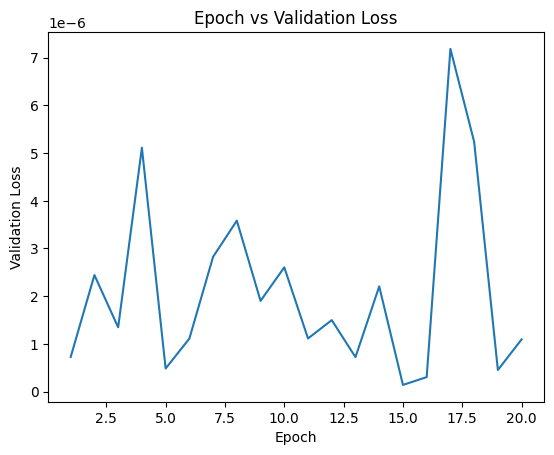

2461/2461 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 1.1017e-06 - mae: 9.5162e-04 - mse: 1.1017e-06 - r2: 1.0000
Test MSE: 1.1030305131498608e-06
Test MAE: 0.0009519533487036824
Test R2: 0.9993728399276733


1108/1879 [================>.............] - ETA: 2s - loss: 0.0504 - mse: 0.0504 - mae: 0.1452 - r2: -0.0886

1125/1879 [================>.............] - ETA: 2s - loss: 0.0498 - mse: 0.0498 - mae: 0.1444 - r2: -0.0760

1145/1879 [=================>............] - ETA: 2s - loss: 0.0492 - mse: 0.0492 - mae: 0.1435 - r2: -0.0615

1163/1879 [=================>............] - ETA: 2s - loss: 0.0486 - mse: 0.0486 - mae: 0.1425 - r2: -0.0483

1179/1879 [=================>............] - ETA: 1s - loss: 0.0480 - mse: 0.0480 - mae: 0.1417 - r2: -0.0374

1190/1879 [=================>............] - ETA: 1s - loss: 0.0477 - mse: 0.0477 - mae: 0.1413 - r2: -0.0302

1205/1879 [==================>...........] - ETA: 1s - loss: 0.0472 - mse: 0.0472 - mae: 0.1406 - r2: -0.0201

1216/1879 [==================>...........] - ETA: 1s - loss: 0.0469 - mse: 0.0469 - mae: 0.1400 - r2: -0.0127

1231/1879 [==================>...........] - ETA: 1s - loss: 0.0464 - mse: 0.0464 - mae: 0.1393 - r2: -0.0028

1251/1879 [==================>...........] - ETA: 1s - loss: 0.0458 - mse: 0.0458 - mae: 0.1383 - r2: 0.0100 

1271/1879 [===================>..........] - ETA: 1s - loss: 0.0453 - mse: 0.0453 - mae: 0.1373 - r2: 0.0225

1291/1879 [===================>..........] - ETA: 1s - loss: 0.0447 - mse: 0.0447 - mae: 0.1363 - r2: 0.0352

1311/1879 [===================>..........] - ETA: 1s - loss: 0.0441 - mse: 0.0441 - mae: 0.1353 - r2: 0.0472

1331/1879 [====================>.........] - ETA: 1s - loss: 0.0436 - mse: 0.0436 - mae: 0.1344 - r2: 0.0592

1351/1879 [====================>.........] - ETA: 1s - loss: 0.0431 - mse: 0.0431 - mae: 0.1336 - r2: 0.0699

1371/1879 [====================>.........] - ETA: 1s - loss: 0.0426 - mse: 0.0426 - mae: 0.1326 - r2: 0.0809

1391/1879 [=====================>........] - ETA: 1s - loss: 0.0420 - mse: 0.0420 - mae: 0.1317 - r2: 0.0918

1409/1879 [=====================>........] - ETA: 1s - loss: 0.0416 - mse: 0.0416 - mae: 0.1309 - r2: 0.1016

1426/1879 [=====================>........] - ETA: 1s - loss: 0.0412 - mse: 0.0412 - mae: 0.1301 - r2: 0.1106

1446/1879 [======================>.......] - ETA: 1s - loss: 0.0407 - mse: 0.0407 - mae: 0.1292 - r2: 0.1208

1465/1879 [======================>.......] - ETA: 1s - loss: 0.0403 - mse: 0.0403 - mae: 0.1284 - r2: 0.1300

1485/1879 [======================>.......] - ETA: 1s - loss: 0.0398 - mse: 0.0398 - mae: 0.1276 - r2: 0.1398

1505/1879 [=======================>......] - ETA: 1s - loss: 0.0394 - mse: 0.0394 - mae: 0.1267 - r2: 0.1497

1516/1879 [=======================>......] - ETA: 1s - loss: 0.0391 - mse: 0.0391 - mae: 0.1263 - r2: 0.1545

1536/1879 [=======================>......] - ETA: 0s - loss: 0.0387 - mse: 0.0387 - mae: 0.1254 - r2: 0.1639

1555/1879 [=======================>......] - ETA: 0s - loss: 0.0383 - mse: 0.0383 - mae: 0.1247 - r2: 0.1725

1575/1879 [========================>.....] - ETA: 0s - loss: 0.0379 - mse: 0.0379 - mae: 0.1239 - r2: 0.1815

1594/1879 [========================>.....] - ETA: 0s - loss: 0.0375 - mse: 0.0375 - mae: 0.1231 - r2: 0.1897

1613/1879 [========================>.....] - ETA: 0s - loss: 0.0372 - mse: 0.0372 - mae: 0.1224 - r2: 0.1977

1632/1879 [=========================>....] - ETA: 0s - loss: 0.0368 - mse: 0.0368 - mae: 0.1216 - r2: 0.2059

1651/1879 [=========================>....] - ETA: 0s - loss: 0.0364 - mse: 0.0364 - mae: 0.1209 - r2: 0.2137

1669/1879 [=========================>....] - ETA: 0s - loss: 0.0361 - mse: 0.0361 - mae: 0.1202 - r2: 0.2209

1689/1879 [=========================>....] - ETA: 0s - loss: 0.0357 - mse: 0.0357 - mae: 0.1194 - r2: 0.2288

1708/1879 [==========================>...] - ETA: 0s - loss: 0.0354 - mse: 0.0354 - mae: 0.1187 - r2: 0.2363

1728/1879 [==========================>...] - ETA: 0s - loss: 0.0350 - mse: 0.0350 - mae: 0.1180 - r2: 0.2440

1748/1879 [==========================>...] - ETA: 0s - loss: 0.0347 - mse: 0.0347 - mae: 0.1173 - r2: 0.2514

1767/1879 [===========================>..] - ETA: 0s - loss: 0.0344 - mse: 0.0344 - mae: 0.1166 - r2: 0.2582

1786/1879 [===========================>..] - ETA: 0s - loss: 0.0340 - mse: 0.0340 - mae: 0.1160 - r2: 0.2650

1805/1879 [===========================>..] - ETA: 0s - loss: 0.0337 - mse: 0.0337 - mae: 0.1153 - r2: 0.2716

1824/1879 [============================>.] - ETA: 0s - loss: 0.0334 - mse: 0.0334 - mae: 0.1147 - r2: 0.2781

1841/1879 [============================>.] - ETA: 0s - loss: 0.0332 - mse: 0.0332 - mae: 0.1142 - r2: 0.2837

1861/1879 [============================>.] - ETA: 0s - loss: 0.0329 - mse: 0.0329 - mae: 0.1136 - r2: 0.2903

1879/1879 [==============================] - 7s 3ms/step - loss: 0.0326 - mse: 0.0326 - mae: 0.1130 - r2: 0.2961 - val_loss: 0.0049 - val_mse: 0.0049 - val_mae: 0.0549 - val_r2: 0.8943


Epoch 2/10


   1/1879 [..............................] - ETA: 6s - loss: 0.0039 - mse: 0.0039 - mae: 0.0457 - r2: 0.9201

  13/1879 [..............................] - ETA: 7s - loss: 0.0060 - mse: 0.0060 - mae: 0.0606 - r2: 0.8707

  26/1879 [..............................] - ETA: 7s - loss: 0.0056 - mse: 0.0056 - mae: 0.0593 - r2: 0.8774

  46/1879 [..............................] - ETA: 6s - loss: 0.0052 - mse: 0.0052 - mae: 0.0573 - r2: 0.8822

  65/1879 [>.............................] - ETA: 5s - loss: 0.0052 - mse: 0.0052 - mae: 0.0570 - r2: 0.8840

  80/1879 [>.............................] - ETA: 5s - loss: 0.0052 - mse: 0.0052 - mae: 0.0569 - r2: 0.8870

  99/1879 [>.............................] - ETA: 5s - loss: 0.0050 - mse: 0.0050 - mae: 0.0560 - r2: 0.8891

 118/1879 [>.............................] - ETA: 5s - loss: 0.0049 - mse: 0.0049 - mae: 0.0557 - r2: 0.8908

 137/1879 [=>............................] - ETA: 5s - loss: 0.0049 - mse: 0.0049 - mae: 0.0554 - r2: 0.8917

 157/1879 [=>............................] - ETA: 5s - loss: 0.0048 - mse: 0.0048 - mae: 0.0546 - r2: 0.8941

 175/1879 [=>............................] - ETA: 5s - loss: 0.0047 - mse: 0.0047 - mae: 0.0541 - r2: 0.8956

 195/1879 [==>...........................] - ETA: 4s - loss: 0.0047 - mse: 0.0047 - mae: 0.0540 - r2: 0.8964

 215/1879 [==>...........................] - ETA: 4s - loss: 0.0046 - mse: 0.0046 - mae: 0.0536 - r2: 0.8986

 233/1879 [==>...........................] - ETA: 4s - loss: 0.0046 - mse: 0.0046 - mae: 0.0537 - r2: 0.8980

 242/1879 [==>...........................] - ETA: 4s - loss: 0.0046 - mse: 0.0046 - mae: 0.0537 - r2: 0.8981

 263/1879 [===>..........................] - ETA: 4s - loss: 0.0046 - mse: 0.0046 - mae: 0.0534 - r2: 0.8993

 283/1879 [===>..........................] - ETA: 4s - loss: 0.0045 - mse: 0.0045 - mae: 0.0528 - r2: 0.9010

 303/1879 [===>..........................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0525 - r2: 0.9024

 323/1879 [====>.........................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0523 - r2: 0.9038

 342/1879 [====>.........................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0523 - r2: 0.9041

 361/1879 [====>.........................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0524 - r2: 0.9037

 381/1879 [=====>........................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0522 - r2: 0.9046

 401/1879 [=====>........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0520 - r2: 0.9055

 421/1879 [=====>........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0519 - r2: 0.9064

 440/1879 [======>.......................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0518 - r2: 0.9069

 460/1879 [======>.......................] - ETA: 3s - loss: 0.0043 - mse: 0.0043 - mae: 0.0518 - r2: 0.9063

 480/1879 [======>.......................] - ETA: 3s - loss: 0.0043 - mse: 0.0043 - mae: 0.0516 - r2: 0.9071

 500/1879 [======>.......................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0515 - r2: 0.9076

 520/1879 [=======>......................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0514 - r2: 0.9075

 540/1879 [=======>......................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0513 - r2: 0.9083

 559/1879 [=======>......................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0512 - r2: 0.9090

 579/1879 [========>.....................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0511 - r2: 0.9090

 599/1879 [========>.....................] - ETA: 3s - loss: 0.0042 - mse: 0.0042 - mae: 0.0509 - r2: 0.9091

 614/1879 [========>.....................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0508 - r2: 0.9091

 633/1879 [=========>....................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0506 - r2: 0.9098

 653/1879 [=========>....................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0505 - r2: 0.9102

 673/1879 [=========>....................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0503 - r2: 0.9107

 692/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0501 - r2: 0.9114

 712/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0500 - r2: 0.9117

 731/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0500 - r2: 0.9117

 751/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0499 - r2: 0.9123

 771/1879 [===========>..................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0498 - r2: 0.9126

 791/1879 [===========>..................] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0496 - r2: 0.9129

 808/1879 [===========>..................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0495 - r2: 0.9132

 824/1879 [============>.................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0495 - r2: 0.9134

 844/1879 [============>.................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0493 - r2: 0.9139

 864/1879 [============>.................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0492 - r2: 0.9145

 884/1879 [=============>................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0491 - r2: 0.9149

 903/1879 [=============>................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0490 - r2: 0.9153

 921/1879 [=============>................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0489 - r2: 0.9158

 941/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0487 - r2: 0.9165

 961/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0485 - r2: 0.9170

 981/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0484 - r2: 0.9173

1001/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0483 - r2: 0.9178

1021/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0481 - r2: 0.9183

1041/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0480 - r2: 0.9187

1061/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0478 - r2: 0.9192

1081/1879 [================>.............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0477 - r2: 0.9193

1101/1879 [================>.............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0476 - r2: 0.9197

1119/1879 [================>.............] - ETA: 2s - loss: 0.0036 - mse: 0.0036 - mae: 0.0475 - r2: 0.9201

1134/1879 [=================>............] - ETA: 2s - loss: 0.0036 - mse: 0.0036 - mae: 0.0474 - r2: 0.9204

1151/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0473 - r2: 0.9206

1168/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0471 - r2: 0.9212

1182/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0470 - r2: 0.9217

1197/1879 [==================>...........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0469 - r2: 0.9220

1211/1879 [==================>...........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0468 - r2: 0.9222

1228/1879 [==================>...........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0467 - r2: 0.9225

1242/1879 [==================>...........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0466 - r2: 0.9227

1258/1879 [===================>..........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0466 - r2: 0.9227

1274/1879 [===================>..........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0465 - r2: 0.9231

1290/1879 [===================>..........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0463 - r2: 0.9235

1306/1879 [===================>..........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0462 - r2: 0.9238

1322/1879 [====================>.........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0462 - r2: 0.9235

1336/1879 [====================>.........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0461 - r2: 0.9238

1353/1879 [====================>.........] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0460 - r2: 0.9242

1373/1879 [====================>.........] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0459 - r2: 0.9245

1391/1879 [=====================>........] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0458 - r2: 0.9248

1411/1879 [=====================>........] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0457 - r2: 0.9251

1431/1879 [=====================>........] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0457 - r2: 0.9254

1451/1879 [======================>.......] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0456 - r2: 0.9257

1458/1879 [======================>.......] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0455 - r2: 0.9259

1477/1879 [======================>.......] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0454 - r2: 0.9263

1497/1879 [======================>.......] - ETA: 1s - loss: 0.0033 - mse: 0.0033 - mae: 0.0453 - r2: 0.9267

1515/1879 [=======================>......] - ETA: 1s - loss: 0.0033 - mse: 0.0033 - mae: 0.0452 - r2: 0.9271

1534/1879 [=======================>......] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0451 - r2: 0.9272

1552/1879 [=======================>......] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0450 - r2: 0.9273

1567/1879 [========================>.....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0449 - r2: 0.9276

1586/1879 [========================>.....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0448 - r2: 0.9279

1599/1879 [========================>.....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0447 - r2: 0.9282

1619/1879 [========================>.....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0447 - r2: 0.9283

1639/1879 [=========================>....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0446 - r2: 0.9286

1658/1879 [=========================>....] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0445 - r2: 0.9288

1675/1879 [=========================>....] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0444 - r2: 0.9290

1692/1879 [==========================>...] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0443 - r2: 0.9293

1710/1879 [==========================>...] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0442 - r2: 0.9296

1728/1879 [==========================>...] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0441 - r2: 0.9299

1745/1879 [==========================>...] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0440 - r2: 0.9302

1760/1879 [===========================>..] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0440 - r2: 0.9303

1774/1879 [===========================>..] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0439 - r2: 0.9306

1781/1879 [===========================>..] - ETA: 0s - loss: 0.0032 - mse: 0.0032 - mae: 0.0438 - r2: 0.9307

1791/1879 [===========================>..] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0438 - r2: 0.9309

1804/1879 [===========================>..] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0437 - r2: 0.9310

1817/1879 [============================>.] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0437 - r2: 0.9312

1822/1879 [============================>.] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0436 - r2: 0.9312

1835/1879 [============================>.] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0436 - r2: 0.9313

1852/1879 [============================>.] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0435 - r2: 0.9316

1867/1879 [============================>.] - ETA: 0s - loss: 0.0031 - mse: 0.0031 - mae: 0.0434 - r2: 0.9319

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0031 - mse: 0.0031 - mae: 0.0433 - r2: 0.9320 - val_loss: 0.0020 - val_mse: 0.0020 - val_mae: 0.0341 - val_r2: 0.9575


Epoch 3/10


   1/1879 [..............................] - ETA: 6s - loss: 0.0014 - mse: 0.0014 - mae: 0.0304 - r2: 0.9671

  14/1879 [..............................] - ETA: 7s - loss: 0.0017 - mse: 0.0017 - mae: 0.0327 - r2: 0.9671

  21/1879 [..............................] - ETA: 9s - loss: 0.0019 - mse: 0.0019 - mae: 0.0342 - r2: 0.9655

  32/1879 [..............................] - ETA: 9s - loss: 0.0019 - mse: 0.0019 - mae: 0.0344 - r2: 0.9638

  46/1879 [..............................] - ETA: 8s - loss: 0.0019 - mse: 0.0019 - mae: 0.0342 - r2: 0.9641

  60/1879 [..............................] - ETA: 7s - loss: 0.0019 - mse: 0.0019 - mae: 0.0347 - r2: 0.9624

  79/1879 [>.............................] - ETA: 7s - loss: 0.0019 - mse: 0.0019 - mae: 0.0346 - r2: 0.9613

  98/1879 [>.............................] - ETA: 6s - loss: 0.0019 - mse: 0.0019 - mae: 0.0345 - r2: 0.9606

 117/1879 [>.............................] - ETA: 6s - loss: 0.0019 - mse: 0.0019 - mae: 0.0341 - r2: 0.9605

 136/1879 [=>............................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0340 - r2: 0.9598

 155/1879 [=>............................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0338 - r2: 0.9596

 174/1879 [=>............................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0337 - r2: 0.9597

 193/1879 [==>...........................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0337 - r2: 0.9596

 212/1879 [==>...........................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0338 - r2: 0.9590

 231/1879 [==>...........................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0337 - r2: 0.9591

 251/1879 [===>..........................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0337 - r2: 0.9595

 271/1879 [===>..........................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0335 - r2: 0.9598

 285/1879 [===>..........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0334 - r2: 0.9599

 301/1879 [===>..........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0333 - r2: 0.9597

 319/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0333 - r2: 0.9600

 338/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0333 - r2: 0.9598

 358/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0330 - r2: 0.9601

 374/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0331 - r2: 0.9601

 394/1879 [=====>........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0329 - r2: 0.9600

 414/1879 [=====>........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0327 - r2: 0.9604

 431/1879 [=====>........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0327 - r2: 0.9607

 444/1879 [======>.......................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0326 - r2: 0.9609

 461/1879 [======>.......................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0324 - r2: 0.9613

 480/1879 [======>.......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0323 - r2: 0.9616

 498/1879 [======>.......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0322 - r2: 0.9618

 515/1879 [=======>......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0321 - r2: 0.9621

 522/1879 [=======>......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0321 - r2: 0.9622

 534/1879 [=======>......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0321 - r2: 0.9623

 547/1879 [=======>......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0320 - r2: 0.9624

 559/1879 [=======>......................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0320 - r2: 0.9625

 577/1879 [========>.....................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0319 - r2: 0.9625

 593/1879 [========>.....................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0319 - r2: 0.9627

 602/1879 [========>.....................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0318 - r2: 0.9627

 617/1879 [========>.....................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0317 - r2: 0.9629

 635/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0317 - r2: 0.9628

 653/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0316 - r2: 0.9631

 672/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0316 - r2: 0.9632

 691/1879 [==========>...................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0315 - r2: 0.9634

 710/1879 [==========>...................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0315 - r2: 0.9634

 729/1879 [==========>...................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0313 - r2: 0.9637

 746/1879 [==========>...................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0312 - r2: 0.9638

 765/1879 [===========>..................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0312 - r2: 0.9640

 784/1879 [===========>..................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0311 - r2: 0.9642

 804/1879 [===========>..................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0310 - r2: 0.9643

 823/1879 [============>.................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0309 - r2: 0.9645

 842/1879 [============>.................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0309 - r2: 0.9645

 862/1879 [============>.................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0308 - r2: 0.9646

 882/1879 [=============>................] - ETA: 3s - loss: 0.0016 - mse: 0.0016 - mae: 0.0308 - r2: 0.9647

 902/1879 [=============>................] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0307 - r2: 0.9647

 921/1879 [=============>................] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0307 - r2: 0.9648

 940/1879 [==============>...............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0306 - r2: 0.9650

 959/1879 [==============>...............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0305 - r2: 0.9652

 978/1879 [==============>...............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0305 - r2: 0.9654

 998/1879 [==============>...............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0305 - r2: 0.9655

1017/1879 [===============>..............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0304 - r2: 0.9656

1037/1879 [===============>..............] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0303 - r2: 0.9656

1055/1879 [===============>..............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0302 - r2: 0.9658

1073/1879 [================>.............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0302 - r2: 0.9660

1092/1879 [================>.............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0301 - r2: 0.9661

1109/1879 [================>.............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0301 - r2: 0.9662

1128/1879 [=================>............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0300 - r2: 0.9663

1148/1879 [=================>............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0300 - r2: 0.9665

1168/1879 [=================>............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0299 - r2: 0.9666

1188/1879 [=================>............] - ETA: 2s - loss: 0.0015 - mse: 0.0015 - mae: 0.0298 - r2: 0.9668

1207/1879 [==================>...........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0297 - r2: 0.9670

1222/1879 [==================>...........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0297 - r2: 0.9670

1236/1879 [==================>...........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0297 - r2: 0.9672

1246/1879 [==================>...........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0297 - r2: 0.9672

1261/1879 [===================>..........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0296 - r2: 0.9673

1282/1879 [===================>..........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0296 - r2: 0.9674

1301/1879 [===================>..........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0296 - r2: 0.9674

1315/1879 [===================>..........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0296 - r2: 0.9675

1332/1879 [====================>.........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0295 - r2: 0.9675

1349/1879 [====================>.........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0295 - r2: 0.9676

1367/1879 [====================>.........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0295 - r2: 0.9677

1385/1879 [=====================>........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0294 - r2: 0.9677

1404/1879 [=====================>........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0294 - r2: 0.9678

1419/1879 [=====================>........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0293 - r2: 0.9679

1437/1879 [=====================>........] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0293 - r2: 0.9680

1455/1879 [======================>.......] - ETA: 1s - loss: 0.0015 - mse: 0.0015 - mae: 0.0293 - r2: 0.9681

1475/1879 [======================>.......] - ETA: 1s - loss: 0.0014 - mse: 0.0014 - mae: 0.0292 - r2: 0.9682

1494/1879 [======================>.......] - ETA: 1s - loss: 0.0014 - mse: 0.0014 - mae: 0.0291 - r2: 0.9683

1513/1879 [=======================>......] - ETA: 1s - loss: 0.0014 - mse: 0.0014 - mae: 0.0291 - r2: 0.9684

1531/1879 [=======================>......] - ETA: 1s - loss: 0.0014 - mse: 0.0014 - mae: 0.0290 - r2: 0.9685

1550/1879 [=======================>......] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0290 - r2: 0.9686

1569/1879 [========================>.....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0289 - r2: 0.9687

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0289 - r2: 0.9688

1606/1879 [========================>.....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0289 - r2: 0.9689

1625/1879 [========================>.....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0289 - r2: 0.9689

1644/1879 [=========================>....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0288 - r2: 0.9690

1664/1879 [=========================>....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0288 - r2: 0.9689

1680/1879 [=========================>....] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0288 - r2: 0.9690

1699/1879 [==========================>...] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0288 - r2: 0.9691

1718/1879 [==========================>...] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0287 - r2: 0.9692

1738/1879 [==========================>...] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0287 - r2: 0.9693

1755/1879 [===========================>..] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0287 - r2: 0.9694

1774/1879 [===========================>..] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0286 - r2: 0.9695

1781/1879 [===========================>..] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0286 - r2: 0.9695

1795/1879 [===========================>..] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0286 - r2: 0.9696

1812/1879 [===========================>..] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0285 - r2: 0.9696

1830/1879 [============================>.] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0285 - r2: 0.9697

1849/1879 [============================>.] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0285 - r2: 0.9698

1869/1879 [============================>.] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.0284 - r2: 0.9698

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0284 - r2: 0.9699 - val_loss: 0.0010 - val_mse: 0.0010 - val_mae: 0.0245 - val_r2: 0.9779


Epoch 4/10


   1/1879 [..............................] - ETA: 7s - loss: 6.1353e-04 - mse: 6.1353e-04 - mae: 0.0218 - r2: 0.9878

  21/1879 [..............................] - ETA: 4s - loss: 9.3876e-04 - mse: 9.3876e-04 - mae: 0.0229 - r2: 0.9798

  39/1879 [..............................] - ETA: 4s - loss: 9.3573e-04 - mse: 9.3573e-04 - mae: 0.0231 - r2: 0.9801

  57/1879 [..............................] - ETA: 5s - loss: 9.8833e-04 - mse: 9.8833e-04 - mae: 0.0240 - r2: 0.9778

  75/1879 [>.............................] - ETA: 4s - loss: 9.4506e-04 - mse: 9.4506e-04 - mae: 0.0233 - r2: 0.9790

  92/1879 [>.............................] - ETA: 5s - loss: 9.8435e-04 - mse: 9.8435e-04 - mae: 0.0238 - r2: 0.9781

 108/1879 [>.............................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9774        

 127/1879 [=>............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0244 - r2: 0.9776

 147/1879 [=>............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0243 - r2: 0.9780

 164/1879 [=>............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0244 - r2: 0.9777

 184/1879 [=>............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0243 - r2: 0.9776

 204/1879 [==>...........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0241 - r2: 0.9779

 222/1879 [==>...........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9779

 237/1879 [==>...........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9778

 256/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9777

 267/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9777

 286/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9777

 305/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0242 - r2: 0.9778

 325/1879 [====>.........................] - ETA: 4s - loss: 9.9519e-04 - mse: 9.9519e-04 - mae: 0.0242 - r2: 0.9781

 344/1879 [====>.........................] - ETA: 4s - loss: 9.9180e-04 - mse: 9.9180e-04 - mae: 0.0241 - r2: 0.9779

 364/1879 [====>.........................] - ETA: 4s - loss: 9.8389e-04 - mse: 9.8389e-04 - mae: 0.0241 - r2: 0.9781

 384/1879 [=====>........................] - ETA: 4s - loss: 9.8146e-04 - mse: 9.8146e-04 - mae: 0.0240 - r2: 0.9783

 404/1879 [=====>........................] - ETA: 4s - loss: 9.8713e-04 - mse: 9.8713e-04 - mae: 0.0241 - r2: 0.9781

 424/1879 [=====>........................] - ETA: 4s - loss: 9.8818e-04 - mse: 9.8818e-04 - mae: 0.0241 - r2: 0.9780

 444/1879 [======>.......................] - ETA: 4s - loss: 9.8090e-04 - mse: 9.8090e-04 - mae: 0.0240 - r2: 0.9782

 463/1879 [======>.......................] - ETA: 3s - loss: 9.8399e-04 - mse: 9.8399e-04 - mae: 0.0240 - r2: 0.9782

 483/1879 [======>.......................] - ETA: 3s - loss: 9.8584e-04 - mse: 9.8584e-04 - mae: 0.0241 - r2: 0.9782

 503/1879 [=======>......................] - ETA: 3s - loss: 9.8235e-04 - mse: 9.8235e-04 - mae: 0.0241 - r2: 0.9779

 517/1879 [=======>......................] - ETA: 3s - loss: 9.7775e-04 - mse: 9.7775e-04 - mae: 0.0240 - r2: 0.9781

 532/1879 [=======>......................] - ETA: 3s - loss: 9.7658e-04 - mse: 9.7658e-04 - mae: 0.0240 - r2: 0.9781

 544/1879 [=======>......................] - ETA: 3s - loss: 9.7364e-04 - mse: 9.7364e-04 - mae: 0.0239 - r2: 0.9782

 560/1879 [=======>......................] - ETA: 3s - loss: 9.7084e-04 - mse: 9.7084e-04 - mae: 0.0239 - r2: 0.9783

 579/1879 [========>.....................] - ETA: 3s - loss: 9.6901e-04 - mse: 9.6901e-04 - mae: 0.0239 - r2: 0.9784

 599/1879 [========>.....................] - ETA: 3s - loss: 9.6857e-04 - mse: 9.6857e-04 - mae: 0.0238 - r2: 0.9784

 618/1879 [========>.....................] - ETA: 3s - loss: 9.6922e-04 - mse: 9.6922e-04 - mae: 0.0238 - r2: 0.9784

 638/1879 [=========>....................] - ETA: 3s - loss: 9.6615e-04 - mse: 9.6615e-04 - mae: 0.0238 - r2: 0.9784

 658/1879 [=========>....................] - ETA: 3s - loss: 9.6766e-04 - mse: 9.6766e-04 - mae: 0.0238 - r2: 0.9784

 677/1879 [=========>....................] - ETA: 3s - loss: 9.6182e-04 - mse: 9.6182e-04 - mae: 0.0237 - r2: 0.9785

 697/1879 [==========>...................] - ETA: 3s - loss: 9.6345e-04 - mse: 9.6345e-04 - mae: 0.0237 - r2: 0.9786

 717/1879 [==========>...................] - ETA: 3s - loss: 9.6103e-04 - mse: 9.6103e-04 - mae: 0.0237 - r2: 0.9786

 737/1879 [==========>...................] - ETA: 3s - loss: 9.5853e-04 - mse: 9.5853e-04 - mae: 0.0237 - r2: 0.9787

 757/1879 [===========>..................] - ETA: 3s - loss: 9.5852e-04 - mse: 9.5852e-04 - mae: 0.0237 - r2: 0.9787

 777/1879 [===========>..................] - ETA: 3s - loss: 9.5600e-04 - mse: 9.5600e-04 - mae: 0.0236 - r2: 0.9787

 792/1879 [===========>..................] - ETA: 3s - loss: 9.5562e-04 - mse: 9.5562e-04 - mae: 0.0236 - r2: 0.9787

 811/1879 [===========>..................] - ETA: 3s - loss: 9.5573e-04 - mse: 9.5573e-04 - mae: 0.0236 - r2: 0.9788

 829/1879 [============>.................] - ETA: 2s - loss: 9.5529e-04 - mse: 9.5529e-04 - mae: 0.0236 - r2: 0.9788

 846/1879 [============>.................] - ETA: 2s - loss: 9.5606e-04 - mse: 9.5606e-04 - mae: 0.0236 - r2: 0.9789

 866/1879 [============>.................] - ETA: 2s - loss: 9.5780e-04 - mse: 9.5780e-04 - mae: 0.0236 - r2: 0.9788

 880/1879 [=============>................] - ETA: 2s - loss: 9.5997e-04 - mse: 9.5997e-04 - mae: 0.0236 - r2: 0.9788

 897/1879 [=============>................] - ETA: 2s - loss: 9.5778e-04 - mse: 9.5778e-04 - mae: 0.0236 - r2: 0.9788

 916/1879 [=============>................] - ETA: 2s - loss: 9.5670e-04 - mse: 9.5670e-04 - mae: 0.0236 - r2: 0.9788

 934/1879 [=============>................] - ETA: 2s - loss: 9.5737e-04 - mse: 9.5737e-04 - mae: 0.0236 - r2: 0.9787

 954/1879 [==============>...............] - ETA: 2s - loss: 9.5689e-04 - mse: 9.5689e-04 - mae: 0.0236 - r2: 0.9788

 973/1879 [==============>...............] - ETA: 2s - loss: 9.5609e-04 - mse: 9.5609e-04 - mae: 0.0236 - r2: 0.9788

 992/1879 [==============>...............] - ETA: 2s - loss: 9.5507e-04 - mse: 9.5507e-04 - mae: 0.0236 - r2: 0.9788

1011/1879 [===============>..............] - ETA: 2s - loss: 9.5285e-04 - mse: 9.5285e-04 - mae: 0.0235 - r2: 0.9788

1030/1879 [===============>..............] - ETA: 2s - loss: 9.5429e-04 - mse: 9.5429e-04 - mae: 0.0236 - r2: 0.9788

1049/1879 [===============>..............] - ETA: 2s - loss: 9.5571e-04 - mse: 9.5571e-04 - mae: 0.0236 - r2: 0.9788

1068/1879 [================>.............] - ETA: 2s - loss: 9.5727e-04 - mse: 9.5727e-04 - mae: 0.0236 - r2: 0.9788

1087/1879 [================>.............] - ETA: 2s - loss: 9.5359e-04 - mse: 9.5359e-04 - mae: 0.0236 - r2: 0.9789

1103/1879 [================>.............] - ETA: 2s - loss: 9.5303e-04 - mse: 9.5303e-04 - mae: 0.0236 - r2: 0.9788

1117/1879 [================>.............] - ETA: 2s - loss: 9.5389e-04 - mse: 9.5389e-04 - mae: 0.0236 - r2: 0.9788

1131/1879 [=================>............] - ETA: 2s - loss: 9.5125e-04 - mse: 9.5125e-04 - mae: 0.0235 - r2: 0.9789

1150/1879 [=================>............] - ETA: 2s - loss: 9.5050e-04 - mse: 9.5050e-04 - mae: 0.0235 - r2: 0.9789

1169/1879 [=================>............] - ETA: 2s - loss: 9.4780e-04 - mse: 9.4780e-04 - mae: 0.0235 - r2: 0.9790

1188/1879 [=================>............] - ETA: 1s - loss: 9.4553e-04 - mse: 9.4553e-04 - mae: 0.0235 - r2: 0.9791

1197/1879 [==================>...........] - ETA: 1s - loss: 9.4381e-04 - mse: 9.4381e-04 - mae: 0.0235 - r2: 0.9792

1216/1879 [==================>...........] - ETA: 1s - loss: 9.4344e-04 - mse: 9.4344e-04 - mae: 0.0235 - r2: 0.9792

1235/1879 [==================>...........] - ETA: 1s - loss: 9.4226e-04 - mse: 9.4226e-04 - mae: 0.0234 - r2: 0.9792

1253/1879 [===================>..........] - ETA: 1s - loss: 9.4246e-04 - mse: 9.4246e-04 - mae: 0.0234 - r2: 0.9792

1272/1879 [===================>..........] - ETA: 1s - loss: 9.4131e-04 - mse: 9.4131e-04 - mae: 0.0234 - r2: 0.9793

1292/1879 [===================>..........] - ETA: 1s - loss: 9.4137e-04 - mse: 9.4137e-04 - mae: 0.0234 - r2: 0.9793

1312/1879 [===================>..........] - ETA: 1s - loss: 9.4126e-04 - mse: 9.4126e-04 - mae: 0.0234 - r2: 0.9793

1326/1879 [====================>.........] - ETA: 1s - loss: 9.4007e-04 - mse: 9.4007e-04 - mae: 0.0234 - r2: 0.9793

1346/1879 [====================>.........] - ETA: 1s - loss: 9.3969e-04 - mse: 9.3969e-04 - mae: 0.0234 - r2: 0.9793

1366/1879 [====================>.........] - ETA: 1s - loss: 9.3810e-04 - mse: 9.3810e-04 - mae: 0.0234 - r2: 0.9793

1386/1879 [=====================>........] - ETA: 1s - loss: 9.3684e-04 - mse: 9.3684e-04 - mae: 0.0233 - r2: 0.9794

1405/1879 [=====================>........] - ETA: 1s - loss: 9.3732e-04 - mse: 9.3732e-04 - mae: 0.0233 - r2: 0.9794

1425/1879 [=====================>........] - ETA: 1s - loss: 9.3670e-04 - mse: 9.3670e-04 - mae: 0.0233 - r2: 0.9794

1445/1879 [======================>.......] - ETA: 1s - loss: 9.3622e-04 - mse: 9.3622e-04 - mae: 0.0233 - r2: 0.9794

1465/1879 [======================>.......] - ETA: 1s - loss: 9.3460e-04 - mse: 9.3460e-04 - mae: 0.0233 - r2: 0.9794

1485/1879 [======================>.......] - ETA: 1s - loss: 9.3558e-04 - mse: 9.3558e-04 - mae: 0.0233 - r2: 0.9794

1505/1879 [=======================>......] - ETA: 1s - loss: 9.3459e-04 - mse: 9.3459e-04 - mae: 0.0233 - r2: 0.9794

1524/1879 [=======================>......] - ETA: 0s - loss: 9.3713e-04 - mse: 9.3713e-04 - mae: 0.0233 - r2: 0.9794

1542/1879 [=======================>......] - ETA: 0s - loss: 9.3631e-04 - mse: 9.3631e-04 - mae: 0.0233 - r2: 0.9794

1562/1879 [=======================>......] - ETA: 0s - loss: 9.3434e-04 - mse: 9.3434e-04 - mae: 0.0233 - r2: 0.9794

1580/1879 [========================>.....] - ETA: 0s - loss: 9.3271e-04 - mse: 9.3271e-04 - mae: 0.0233 - r2: 0.9795

1596/1879 [========================>.....] - ETA: 0s - loss: 9.3165e-04 - mse: 9.3165e-04 - mae: 0.0233 - r2: 0.9795

1615/1879 [========================>.....] - ETA: 0s - loss: 9.3093e-04 - mse: 9.3093e-04 - mae: 0.0233 - r2: 0.9795

1629/1879 [=========================>....] - ETA: 0s - loss: 9.3223e-04 - mse: 9.3223e-04 - mae: 0.0233 - r2: 0.9794

1646/1879 [=========================>....] - ETA: 0s - loss: 9.3119e-04 - mse: 9.3119e-04 - mae: 0.0233 - r2: 0.9795

1665/1879 [=========================>....] - ETA: 0s - loss: 9.3067e-04 - mse: 9.3067e-04 - mae: 0.0233 - r2: 0.9795

1682/1879 [=========================>....] - ETA: 0s - loss: 9.2905e-04 - mse: 9.2905e-04 - mae: 0.0232 - r2: 0.9796

1702/1879 [==========================>...] - ETA: 0s - loss: 9.2752e-04 - mse: 9.2752e-04 - mae: 0.0232 - r2: 0.9796

1722/1879 [==========================>...] - ETA: 0s - loss: 9.2711e-04 - mse: 9.2711e-04 - mae: 0.0232 - r2: 0.9796

1740/1879 [==========================>...] - ETA: 0s - loss: 9.2643e-04 - mse: 9.2643e-04 - mae: 0.0232 - r2: 0.9796

1759/1879 [===========================>..] - ETA: 0s - loss: 9.2437e-04 - mse: 9.2437e-04 - mae: 0.0232 - r2: 0.9796

1778/1879 [===========================>..] - ETA: 0s - loss: 9.2392e-04 - mse: 9.2392e-04 - mae: 0.0232 - r2: 0.9796

1797/1879 [===========================>..] - ETA: 0s - loss: 9.2446e-04 - mse: 9.2446e-04 - mae: 0.0232 - r2: 0.9796

1817/1879 [============================>.] - ETA: 0s - loss: 9.2494e-04 - mse: 9.2494e-04 - mae: 0.0232 - r2: 0.9796

1837/1879 [============================>.] - ETA: 0s - loss: 9.2448e-04 - mse: 9.2448e-04 - mae: 0.0232 - r2: 0.9796

1856/1879 [============================>.] - ETA: 0s - loss: 9.2368e-04 - mse: 9.2368e-04 - mae: 0.0232 - r2: 0.9797

1876/1879 [============================>.] - ETA: 0s - loss: 9.2344e-04 - mse: 9.2344e-04 - mae: 0.0232 - r2: 0.9797

1879/1879 [==============================] - 6s 3ms/step - loss: 9.2354e-04 - mse: 9.2354e-04 - mae: 0.0232 - r2: 0.9797 - val_loss: 8.7717e-04 - val_mse: 8.7717e-04 - val_mae: 0.0228 - val_r2: 0.9809


Epoch 5/10


   1/1879 [..............................] - ETA: 9s - loss: 0.0013 - mse: 0.0013 - mae: 0.0255 - r2: 0.9813

  20/1879 [..............................] - ETA: 5s - loss: 7.9437e-04 - mse: 7.9437e-04 - mae: 0.0214 - r2: 0.9828

  30/1879 [..............................] - ETA: 6s - loss: 7.5678e-04 - mse: 7.5678e-04 - mae: 0.0209 - r2: 0.9838

  44/1879 [..............................] - ETA: 6s - loss: 8.0417e-04 - mse: 8.0417e-04 - mae: 0.0217 - r2: 0.9826

  58/1879 [..............................] - ETA: 6s - loss: 8.4973e-04 - mse: 8.4973e-04 - mae: 0.0222 - r2: 0.9812

  72/1879 [>.............................] - ETA: 6s - loss: 8.8685e-04 - mse: 8.8685e-04 - mae: 0.0225 - r2: 0.9804

  87/1879 [>.............................] - ETA: 6s - loss: 8.5744e-04 - mse: 8.5744e-04 - mae: 0.0222 - r2: 0.9811

 101/1879 [>.............................] - ETA: 6s - loss: 8.3461e-04 - mse: 8.3461e-04 - mae: 0.0219 - r2: 0.9816

 117/1879 [>.............................] - ETA: 6s - loss: 8.6142e-04 - mse: 8.6142e-04 - mae: 0.0223 - r2: 0.9813

 133/1879 [=>............................] - ETA: 6s - loss: 8.4892e-04 - mse: 8.4892e-04 - mae: 0.0222 - r2: 0.9814

 149/1879 [=>............................] - ETA: 6s - loss: 8.5024e-04 - mse: 8.5024e-04 - mae: 0.0222 - r2: 0.9814

 166/1879 [=>............................] - ETA: 5s - loss: 8.6126e-04 - mse: 8.6126e-04 - mae: 0.0224 - r2: 0.9814

 185/1879 [=>............................] - ETA: 5s - loss: 8.4540e-04 - mse: 8.4540e-04 - mae: 0.0222 - r2: 0.9815

 202/1879 [==>...........................] - ETA: 5s - loss: 8.3311e-04 - mse: 8.3311e-04 - mae: 0.0220 - r2: 0.9818

 218/1879 [==>...........................] - ETA: 5s - loss: 8.2487e-04 - mse: 8.2487e-04 - mae: 0.0218 - r2: 0.9820

 236/1879 [==>...........................] - ETA: 5s - loss: 8.4128e-04 - mse: 8.4128e-04 - mae: 0.0220 - r2: 0.9816

 256/1879 [===>..........................] - ETA: 5s - loss: 8.4133e-04 - mse: 8.4133e-04 - mae: 0.0220 - r2: 0.9815

 275/1879 [===>..........................] - ETA: 5s - loss: 8.3575e-04 - mse: 8.3575e-04 - mae: 0.0219 - r2: 0.9817

 294/1879 [===>..........................] - ETA: 5s - loss: 8.3152e-04 - mse: 8.3152e-04 - mae: 0.0218 - r2: 0.9817

 314/1879 [====>.........................] - ETA: 4s - loss: 8.3240e-04 - mse: 8.3240e-04 - mae: 0.0218 - r2: 0.9815

 334/1879 [====>.........................] - ETA: 4s - loss: 8.2546e-04 - mse: 8.2546e-04 - mae: 0.0217 - r2: 0.9817

 354/1879 [====>.........................] - ETA: 4s - loss: 8.3078e-04 - mse: 8.3078e-04 - mae: 0.0218 - r2: 0.9816

 374/1879 [====>.........................] - ETA: 4s - loss: 8.3146e-04 - mse: 8.3146e-04 - mae: 0.0218 - r2: 0.9816

 394/1879 [=====>........................] - ETA: 4s - loss: 8.3687e-04 - mse: 8.3687e-04 - mae: 0.0219 - r2: 0.9815

 414/1879 [=====>........................] - ETA: 4s - loss: 8.4451e-04 - mse: 8.4451e-04 - mae: 0.0220 - r2: 0.9814

 433/1879 [=====>........................] - ETA: 4s - loss: 8.4108e-04 - mse: 8.4108e-04 - mae: 0.0220 - r2: 0.9815

 453/1879 [======>.......................] - ETA: 4s - loss: 8.3965e-04 - mse: 8.3965e-04 - mae: 0.0220 - r2: 0.9815

 472/1879 [======>.......................] - ETA: 4s - loss: 8.4105e-04 - mse: 8.4105e-04 - mae: 0.0220 - r2: 0.9815

 492/1879 [======>.......................] - ETA: 4s - loss: 8.3905e-04 - mse: 8.3905e-04 - mae: 0.0219 - r2: 0.9815

 501/1879 [======>.......................] - ETA: 4s - loss: 8.3646e-04 - mse: 8.3646e-04 - mae: 0.0219 - r2: 0.9816

 521/1879 [=======>......................] - ETA: 4s - loss: 8.3608e-04 - mse: 8.3608e-04 - mae: 0.0219 - r2: 0.9816

 541/1879 [=======>......................] - ETA: 3s - loss: 8.3492e-04 - mse: 8.3492e-04 - mae: 0.0219 - r2: 0.9817

 561/1879 [=======>......................] - ETA: 3s - loss: 8.3430e-04 - mse: 8.3430e-04 - mae: 0.0219 - r2: 0.9817

 581/1879 [========>.....................] - ETA: 3s - loss: 8.2937e-04 - mse: 8.2937e-04 - mae: 0.0218 - r2: 0.9818

 597/1879 [========>.....................] - ETA: 3s - loss: 8.2662e-04 - mse: 8.2662e-04 - mae: 0.0218 - r2: 0.9819

 616/1879 [========>.....................] - ETA: 3s - loss: 8.2909e-04 - mse: 8.2909e-04 - mae: 0.0218 - r2: 0.9818

 635/1879 [=========>....................] - ETA: 3s - loss: 8.2397e-04 - mse: 8.2397e-04 - mae: 0.0218 - r2: 0.9819

 650/1879 [=========>....................] - ETA: 3s - loss: 8.2780e-04 - mse: 8.2780e-04 - mae: 0.0218 - r2: 0.9818

 668/1879 [=========>....................] - ETA: 3s - loss: 8.3079e-04 - mse: 8.3079e-04 - mae: 0.0218 - r2: 0.9817

 687/1879 [=========>....................] - ETA: 3s - loss: 8.2965e-04 - mse: 8.2965e-04 - mae: 0.0218 - r2: 0.9818

 703/1879 [==========>...................] - ETA: 3s - loss: 8.3113e-04 - mse: 8.3113e-04 - mae: 0.0218 - r2: 0.9818

 721/1879 [==========>...................] - ETA: 3s - loss: 8.3463e-04 - mse: 8.3463e-04 - mae: 0.0219 - r2: 0.9817

 740/1879 [==========>...................] - ETA: 3s - loss: 8.3037e-04 - mse: 8.3037e-04 - mae: 0.0218 - r2: 0.9818

 760/1879 [===========>..................] - ETA: 3s - loss: 8.2827e-04 - mse: 8.2827e-04 - mae: 0.0218 - r2: 0.9818

 777/1879 [===========>..................] - ETA: 3s - loss: 8.2520e-04 - mse: 8.2520e-04 - mae: 0.0218 - r2: 0.9819

 796/1879 [===========>..................] - ETA: 3s - loss: 8.2176e-04 - mse: 8.2176e-04 - mae: 0.0217 - r2: 0.9819

 814/1879 [===========>..................] - ETA: 3s - loss: 8.2282e-04 - mse: 8.2282e-04 - mae: 0.0218 - r2: 0.9819

 834/1879 [============>.................] - ETA: 3s - loss: 8.2051e-04 - mse: 8.2051e-04 - mae: 0.0217 - r2: 0.9819

 853/1879 [============>.................] - ETA: 2s - loss: 8.2033e-04 - mse: 8.2033e-04 - mae: 0.0217 - r2: 0.9819

 872/1879 [============>.................] - ETA: 2s - loss: 8.1921e-04 - mse: 8.1921e-04 - mae: 0.0217 - r2: 0.9819

 884/1879 [=============>................] - ETA: 2s - loss: 8.1788e-04 - mse: 8.1788e-04 - mae: 0.0217 - r2: 0.9819

 899/1879 [=============>................] - ETA: 2s - loss: 8.1938e-04 - mse: 8.1938e-04 - mae: 0.0217 - r2: 0.9819

 915/1879 [=============>................] - ETA: 2s - loss: 8.1851e-04 - mse: 8.1851e-04 - mae: 0.0217 - r2: 0.9819

 933/1879 [=============>................] - ETA: 2s - loss: 8.2071e-04 - mse: 8.2071e-04 - mae: 0.0217 - r2: 0.9819

 952/1879 [==============>...............] - ETA: 2s - loss: 8.2127e-04 - mse: 8.2127e-04 - mae: 0.0217 - r2: 0.9819

 971/1879 [==============>...............] - ETA: 2s - loss: 8.1925e-04 - mse: 8.1925e-04 - mae: 0.0217 - r2: 0.9820

 991/1879 [==============>...............] - ETA: 2s - loss: 8.2097e-04 - mse: 8.2097e-04 - mae: 0.0217 - r2: 0.9821

1008/1879 [===============>..............] - ETA: 2s - loss: 8.1876e-04 - mse: 8.1876e-04 - mae: 0.0217 - r2: 0.9821

1028/1879 [===============>..............] - ETA: 2s - loss: 8.1766e-04 - mse: 8.1766e-04 - mae: 0.0217 - r2: 0.9822

1048/1879 [===============>..............] - ETA: 2s - loss: 8.1695e-04 - mse: 8.1695e-04 - mae: 0.0217 - r2: 0.9822

1068/1879 [================>.............] - ETA: 2s - loss: 8.1639e-04 - mse: 8.1639e-04 - mae: 0.0217 - r2: 0.9822

1085/1879 [================>.............] - ETA: 2s - loss: 8.1795e-04 - mse: 8.1795e-04 - mae: 0.0217 - r2: 0.9821

1104/1879 [================>.............] - ETA: 2s - loss: 8.2093e-04 - mse: 8.2093e-04 - mae: 0.0217 - r2: 0.9821

1122/1879 [================>.............] - ETA: 2s - loss: 8.2119e-04 - mse: 8.2119e-04 - mae: 0.0217 - r2: 0.9821

1142/1879 [=================>............] - ETA: 2s - loss: 8.2105e-04 - mse: 8.2105e-04 - mae: 0.0217 - r2: 0.9821

1161/1879 [=================>............] - ETA: 2s - loss: 8.2160e-04 - mse: 8.2160e-04 - mae: 0.0217 - r2: 0.9821

1180/1879 [=================>............] - ETA: 2s - loss: 8.2173e-04 - mse: 8.2173e-04 - mae: 0.0217 - r2: 0.9821

1199/1879 [==================>...........] - ETA: 1s - loss: 8.2083e-04 - mse: 8.2083e-04 - mae: 0.0217 - r2: 0.9821

1218/1879 [==================>...........] - ETA: 1s - loss: 8.1992e-04 - mse: 8.1992e-04 - mae: 0.0217 - r2: 0.9821

1237/1879 [==================>...........] - ETA: 1s - loss: 8.1811e-04 - mse: 8.1811e-04 - mae: 0.0217 - r2: 0.9822

1257/1879 [===================>..........] - ETA: 1s - loss: 8.1755e-04 - mse: 8.1755e-04 - mae: 0.0217 - r2: 0.9822

1271/1879 [===================>..........] - ETA: 1s - loss: 8.1756e-04 - mse: 8.1756e-04 - mae: 0.0217 - r2: 0.9822

1291/1879 [===================>..........] - ETA: 1s - loss: 8.1776e-04 - mse: 8.1776e-04 - mae: 0.0217 - r2: 0.9822

1310/1879 [===================>..........] - ETA: 1s - loss: 8.1715e-04 - mse: 8.1715e-04 - mae: 0.0217 - r2: 0.9822

1330/1879 [====================>.........] - ETA: 1s - loss: 8.1538e-04 - mse: 8.1538e-04 - mae: 0.0217 - r2: 0.9822

1350/1879 [====================>.........] - ETA: 1s - loss: 8.1504e-04 - mse: 8.1504e-04 - mae: 0.0217 - r2: 0.9822

1370/1879 [====================>.........] - ETA: 1s - loss: 8.1528e-04 - mse: 8.1528e-04 - mae: 0.0217 - r2: 0.9822

1390/1879 [=====================>........] - ETA: 1s - loss: 8.1541e-04 - mse: 8.1541e-04 - mae: 0.0217 - r2: 0.9822

1410/1879 [=====================>........] - ETA: 1s - loss: 8.1459e-04 - mse: 8.1459e-04 - mae: 0.0217 - r2: 0.9823

1430/1879 [=====================>........] - ETA: 1s - loss: 8.1364e-04 - mse: 8.1364e-04 - mae: 0.0217 - r2: 0.9823

1450/1879 [======================>.......] - ETA: 1s - loss: 8.1444e-04 - mse: 8.1444e-04 - mae: 0.0217 - r2: 0.9823

1465/1879 [======================>.......] - ETA: 1s - loss: 8.1367e-04 - mse: 8.1367e-04 - mae: 0.0217 - r2: 0.9823

1484/1879 [======================>.......] - ETA: 1s - loss: 8.1397e-04 - mse: 8.1397e-04 - mae: 0.0217 - r2: 0.9823

1504/1879 [=======================>......] - ETA: 1s - loss: 8.1633e-04 - mse: 8.1633e-04 - mae: 0.0217 - r2: 0.9823

1524/1879 [=======================>......] - ETA: 1s - loss: 8.1525e-04 - mse: 8.1525e-04 - mae: 0.0217 - r2: 0.9823

1544/1879 [=======================>......] - ETA: 0s - loss: 8.1422e-04 - mse: 8.1422e-04 - mae: 0.0217 - r2: 0.9823

1564/1879 [=======================>......] - ETA: 0s - loss: 8.1401e-04 - mse: 8.1401e-04 - mae: 0.0217 - r2: 0.9824

1584/1879 [========================>.....] - ETA: 0s - loss: 8.1316e-04 - mse: 8.1316e-04 - mae: 0.0217 - r2: 0.9824

1603/1879 [========================>.....] - ETA: 0s - loss: 8.1230e-04 - mse: 8.1230e-04 - mae: 0.0217 - r2: 0.9824

1623/1879 [========================>.....] - ETA: 0s - loss: 8.1113e-04 - mse: 8.1113e-04 - mae: 0.0216 - r2: 0.9824

1642/1879 [=========================>....] - ETA: 0s - loss: 8.0963e-04 - mse: 8.0963e-04 - mae: 0.0216 - r2: 0.9824

1661/1879 [=========================>....] - ETA: 0s - loss: 8.0908e-04 - mse: 8.0908e-04 - mae: 0.0216 - r2: 0.9825

1674/1879 [=========================>....] - ETA: 0s - loss: 8.0920e-04 - mse: 8.0920e-04 - mae: 0.0216 - r2: 0.9824

1689/1879 [=========================>....] - ETA: 0s - loss: 8.0842e-04 - mse: 8.0842e-04 - mae: 0.0216 - r2: 0.9825

1707/1879 [==========================>...] - ETA: 0s - loss: 8.0825e-04 - mse: 8.0825e-04 - mae: 0.0216 - r2: 0.9825

1727/1879 [==========================>...] - ETA: 0s - loss: 8.0779e-04 - mse: 8.0779e-04 - mae: 0.0216 - r2: 0.9825

1747/1879 [==========================>...] - ETA: 0s - loss: 8.0707e-04 - mse: 8.0707e-04 - mae: 0.0216 - r2: 0.9825

1763/1879 [===========================>..] - ETA: 0s - loss: 8.0677e-04 - mse: 8.0677e-04 - mae: 0.0216 - r2: 0.9825

1782/1879 [===========================>..] - ETA: 0s - loss: 8.0667e-04 - mse: 8.0667e-04 - mae: 0.0216 - r2: 0.9825

1801/1879 [===========================>..] - ETA: 0s - loss: 8.0820e-04 - mse: 8.0820e-04 - mae: 0.0216 - r2: 0.9825

1820/1879 [============================>.] - ETA: 0s - loss: 8.0711e-04 - mse: 8.0711e-04 - mae: 0.0216 - r2: 0.9825

1839/1879 [============================>.] - ETA: 0s - loss: 8.0643e-04 - mse: 8.0643e-04 - mae: 0.0216 - r2: 0.9825

1859/1879 [============================>.] - ETA: 0s - loss: 8.0715e-04 - mse: 8.0715e-04 - mae: 0.0216 - r2: 0.9824

1878/1879 [============================>.] - ETA: 0s - loss: 8.0715e-04 - mse: 8.0715e-04 - mae: 0.0216 - r2: 0.9824

1879/1879 [==============================] - 6s 3ms/step - loss: 8.0719e-04 - mse: 8.0719e-04 - mae: 0.0216 - r2: 0.9824 - val_loss: 7.5061e-04 - val_mse: 7.5061e-04 - val_mae: 0.0207 - val_r2: 0.9837


Epoch 6/10


   1/1879 [..............................] - ETA: 6s - loss: 3.5202e-04 - mse: 3.5202e-04 - mae: 0.0148 - r2: 0.9942

  20/1879 [..............................] - ETA: 4s - loss: 7.6650e-04 - mse: 7.6650e-04 - mae: 0.0206 - r2: 0.9841

  40/1879 [..............................] - ETA: 4s - loss: 6.9145e-04 - mse: 6.9145e-04 - mae: 0.0198 - r2: 0.9852

  58/1879 [..............................] - ETA: 5s - loss: 7.1009e-04 - mse: 7.1009e-04 - mae: 0.0201 - r2: 0.9850

  73/1879 [>.............................] - ETA: 5s - loss: 7.4461e-04 - mse: 7.4461e-04 - mae: 0.0206 - r2: 0.9844

  82/1879 [>.............................] - ETA: 5s - loss: 7.4719e-04 - mse: 7.4719e-04 - mae: 0.0206 - r2: 0.9846

  92/1879 [>.............................] - ETA: 6s - loss: 7.5210e-04 - mse: 7.5210e-04 - mae: 0.0207 - r2: 0.9842

 106/1879 [>.............................] - ETA: 6s - loss: 7.5412e-04 - mse: 7.5412e-04 - mae: 0.0207 - r2: 0.9842

 124/1879 [>.............................] - ETA: 5s - loss: 7.5769e-04 - mse: 7.5769e-04 - mae: 0.0209 - r2: 0.9841

 143/1879 [=>............................] - ETA: 5s - loss: 7.5636e-04 - mse: 7.5636e-04 - mae: 0.0209 - r2: 0.9841

 162/1879 [=>............................] - ETA: 5s - loss: 7.4593e-04 - mse: 7.4593e-04 - mae: 0.0207 - r2: 0.9843

 181/1879 [=>............................] - ETA: 5s - loss: 7.4938e-04 - mse: 7.4938e-04 - mae: 0.0207 - r2: 0.9842

 201/1879 [==>...........................] - ETA: 5s - loss: 7.4993e-04 - mse: 7.4993e-04 - mae: 0.0207 - r2: 0.9842

 219/1879 [==>...........................] - ETA: 5s - loss: 7.4206e-04 - mse: 7.4206e-04 - mae: 0.0205 - r2: 0.9844

 239/1879 [==>...........................] - ETA: 4s - loss: 7.4473e-04 - mse: 7.4473e-04 - mae: 0.0205 - r2: 0.9843

 258/1879 [===>..........................] - ETA: 4s - loss: 7.5141e-04 - mse: 7.5141e-04 - mae: 0.0207 - r2: 0.9841

 278/1879 [===>..........................] - ETA: 4s - loss: 7.4940e-04 - mse: 7.4940e-04 - mae: 0.0206 - r2: 0.9840

 297/1879 [===>..........................] - ETA: 4s - loss: 7.5101e-04 - mse: 7.5101e-04 - mae: 0.0206 - r2: 0.9838

 310/1879 [===>..........................] - ETA: 4s - loss: 7.4914e-04 - mse: 7.4914e-04 - mae: 0.0206 - r2: 0.9838

 329/1879 [====>.........................] - ETA: 4s - loss: 7.5349e-04 - mse: 7.5349e-04 - mae: 0.0207 - r2: 0.9838

 348/1879 [====>.........................] - ETA: 4s - loss: 7.6308e-04 - mse: 7.6308e-04 - mae: 0.0208 - r2: 0.9835

 368/1879 [====>.........................] - ETA: 4s - loss: 7.6460e-04 - mse: 7.6460e-04 - mae: 0.0209 - r2: 0.9832

 373/1879 [====>.........................] - ETA: 4s - loss: 7.6306e-04 - mse: 7.6306e-04 - mae: 0.0208 - r2: 0.9832

 386/1879 [=====>........................] - ETA: 4s - loss: 7.6337e-04 - mse: 7.6337e-04 - mae: 0.0209 - r2: 0.9832

 404/1879 [=====>........................] - ETA: 4s - loss: 7.6624e-04 - mse: 7.6624e-04 - mae: 0.0209 - r2: 0.9832

 423/1879 [=====>........................] - ETA: 4s - loss: 7.7100e-04 - mse: 7.7100e-04 - mae: 0.0210 - r2: 0.9831

 441/1879 [======>.......................] - ETA: 4s - loss: 7.6919e-04 - mse: 7.6919e-04 - mae: 0.0210 - r2: 0.9832

 459/1879 [======>.......................] - ETA: 4s - loss: 7.7617e-04 - mse: 7.7617e-04 - mae: 0.0211 - r2: 0.9831

 479/1879 [======>.......................] - ETA: 4s - loss: 7.8296e-04 - mse: 7.8296e-04 - mae: 0.0212 - r2: 0.9830

 499/1879 [======>.......................] - ETA: 4s - loss: 7.7798e-04 - mse: 7.7798e-04 - mae: 0.0211 - r2: 0.9831

 519/1879 [=======>......................] - ETA: 4s - loss: 7.7975e-04 - mse: 7.7975e-04 - mae: 0.0211 - r2: 0.9831

 540/1879 [=======>......................] - ETA: 3s - loss: 7.7856e-04 - mse: 7.7856e-04 - mae: 0.0211 - r2: 0.9831

 560/1879 [=======>......................] - ETA: 3s - loss: 7.7847e-04 - mse: 7.7847e-04 - mae: 0.0211 - r2: 0.9832

 580/1879 [========>.....................] - ETA: 3s - loss: 7.8039e-04 - mse: 7.8039e-04 - mae: 0.0211 - r2: 0.9832

 600/1879 [========>.....................] - ETA: 3s - loss: 7.8037e-04 - mse: 7.8037e-04 - mae: 0.0211 - r2: 0.9832

 619/1879 [========>.....................] - ETA: 3s - loss: 7.7895e-04 - mse: 7.7895e-04 - mae: 0.0211 - r2: 0.9832

 634/1879 [=========>....................] - ETA: 3s - loss: 7.7897e-04 - mse: 7.7897e-04 - mae: 0.0211 - r2: 0.9832

 649/1879 [=========>....................] - ETA: 3s - loss: 7.8210e-04 - mse: 7.8210e-04 - mae: 0.0211 - r2: 0.9832

 663/1879 [=========>....................] - ETA: 3s - loss: 7.8203e-04 - mse: 7.8203e-04 - mae: 0.0211 - r2: 0.9831

 682/1879 [=========>....................] - ETA: 3s - loss: 7.8037e-04 - mse: 7.8037e-04 - mae: 0.0211 - r2: 0.9831

 697/1879 [==========>...................] - ETA: 3s - loss: 7.7879e-04 - mse: 7.7879e-04 - mae: 0.0211 - r2: 0.9832

 714/1879 [==========>...................] - ETA: 3s - loss: 7.7732e-04 - mse: 7.7732e-04 - mae: 0.0211 - r2: 0.9832

 733/1879 [==========>...................] - ETA: 3s - loss: 7.7549e-04 - mse: 7.7549e-04 - mae: 0.0210 - r2: 0.9832

 752/1879 [===========>..................] - ETA: 3s - loss: 7.7587e-04 - mse: 7.7587e-04 - mae: 0.0210 - r2: 0.9832

 772/1879 [===========>..................] - ETA: 3s - loss: 7.7711e-04 - mse: 7.7711e-04 - mae: 0.0210 - r2: 0.9832

 791/1879 [===========>..................] - ETA: 3s - loss: 7.7809e-04 - mse: 7.7809e-04 - mae: 0.0210 - r2: 0.9832

 811/1879 [===========>..................] - ETA: 3s - loss: 7.7908e-04 - mse: 7.7908e-04 - mae: 0.0210 - r2: 0.9832

 830/1879 [============>.................] - ETA: 3s - loss: 7.7730e-04 - mse: 7.7730e-04 - mae: 0.0210 - r2: 0.9832

 850/1879 [============>.................] - ETA: 2s - loss: 7.7531e-04 - mse: 7.7531e-04 - mae: 0.0210 - r2: 0.9832

 869/1879 [============>.................] - ETA: 2s - loss: 7.7782e-04 - mse: 7.7782e-04 - mae: 0.0210 - r2: 0.9832

 889/1879 [=============>................] - ETA: 2s - loss: 7.7880e-04 - mse: 7.7880e-04 - mae: 0.0210 - r2: 0.9832

 909/1879 [=============>................] - ETA: 2s - loss: 7.7635e-04 - mse: 7.7635e-04 - mae: 0.0210 - r2: 0.9832

 929/1879 [=============>................] - ETA: 2s - loss: 7.7636e-04 - mse: 7.7636e-04 - mae: 0.0210 - r2: 0.9832

 948/1879 [==============>...............] - ETA: 2s - loss: 7.7405e-04 - mse: 7.7405e-04 - mae: 0.0210 - r2: 0.9833

 968/1879 [==============>...............] - ETA: 2s - loss: 7.7000e-04 - mse: 7.7000e-04 - mae: 0.0209 - r2: 0.9834

 988/1879 [==============>...............] - ETA: 2s - loss: 7.7132e-04 - mse: 7.7132e-04 - mae: 0.0209 - r2: 0.9834

1007/1879 [===============>..............] - ETA: 2s - loss: 7.7082e-04 - mse: 7.7082e-04 - mae: 0.0209 - r2: 0.9834

1016/1879 [===============>..............] - ETA: 2s - loss: 7.7174e-04 - mse: 7.7174e-04 - mae: 0.0209 - r2: 0.9834

1034/1879 [===============>..............] - ETA: 2s - loss: 7.7419e-04 - mse: 7.7419e-04 - mae: 0.0210 - r2: 0.9833

1053/1879 [===============>..............] - ETA: 2s - loss: 7.7248e-04 - mse: 7.7248e-04 - mae: 0.0210 - r2: 0.9834

1072/1879 [================>.............] - ETA: 2s - loss: 7.7164e-04 - mse: 7.7164e-04 - mae: 0.0210 - r2: 0.9833

1092/1879 [================>.............] - ETA: 2s - loss: 7.7292e-04 - mse: 7.7292e-04 - mae: 0.0210 - r2: 0.9833

1108/1879 [================>.............] - ETA: 2s - loss: 7.7242e-04 - mse: 7.7242e-04 - mae: 0.0210 - r2: 0.9833

1127/1879 [================>.............] - ETA: 2s - loss: 7.7193e-04 - mse: 7.7193e-04 - mae: 0.0210 - r2: 0.9834

1147/1879 [=================>............] - ETA: 2s - loss: 7.6957e-04 - mse: 7.6957e-04 - mae: 0.0209 - r2: 0.9834

1167/1879 [=================>............] - ETA: 2s - loss: 7.6714e-04 - mse: 7.6714e-04 - mae: 0.0209 - r2: 0.9835

1185/1879 [=================>............] - ETA: 1s - loss: 7.6740e-04 - mse: 7.6740e-04 - mae: 0.0209 - r2: 0.9835

1205/1879 [==================>...........] - ETA: 1s - loss: 7.6723e-04 - mse: 7.6723e-04 - mae: 0.0209 - r2: 0.9835

1225/1879 [==================>...........] - ETA: 1s - loss: 7.6880e-04 - mse: 7.6880e-04 - mae: 0.0209 - r2: 0.9834

1244/1879 [==================>...........] - ETA: 1s - loss: 7.6874e-04 - mse: 7.6874e-04 - mae: 0.0209 - r2: 0.9835

1263/1879 [===================>..........] - ETA: 1s - loss: 7.6675e-04 - mse: 7.6675e-04 - mae: 0.0209 - r2: 0.9835

1282/1879 [===================>..........] - ETA: 1s - loss: 7.6820e-04 - mse: 7.6820e-04 - mae: 0.0209 - r2: 0.9835

1301/1879 [===================>..........] - ETA: 1s - loss: 7.6754e-04 - mse: 7.6754e-04 - mae: 0.0209 - r2: 0.9835

1316/1879 [====================>.........] - ETA: 1s - loss: 7.6719e-04 - mse: 7.6719e-04 - mae: 0.0209 - r2: 0.9835

1330/1879 [====================>.........] - ETA: 1s - loss: 7.6670e-04 - mse: 7.6670e-04 - mae: 0.0209 - r2: 0.9835

1349/1879 [====================>.........] - ETA: 1s - loss: 7.6707e-04 - mse: 7.6707e-04 - mae: 0.0209 - r2: 0.9834

1369/1879 [====================>.........] - ETA: 1s - loss: 7.6660e-04 - mse: 7.6660e-04 - mae: 0.0209 - r2: 0.9835

1389/1879 [=====================>........] - ETA: 1s - loss: 7.6677e-04 - mse: 7.6677e-04 - mae: 0.0209 - r2: 0.9835

1407/1879 [=====================>........] - ETA: 1s - loss: 7.6507e-04 - mse: 7.6507e-04 - mae: 0.0209 - r2: 0.9835

1427/1879 [=====================>........] - ETA: 1s - loss: 7.6416e-04 - mse: 7.6416e-04 - mae: 0.0208 - r2: 0.9835

1447/1879 [======================>.......] - ETA: 1s - loss: 7.6495e-04 - mse: 7.6495e-04 - mae: 0.0209 - r2: 0.9835

1466/1879 [======================>.......] - ETA: 1s - loss: 7.6424e-04 - mse: 7.6424e-04 - mae: 0.0209 - r2: 0.9835

1486/1879 [======================>.......] - ETA: 1s - loss: 7.6500e-04 - mse: 7.6500e-04 - mae: 0.0209 - r2: 0.9834

1505/1879 [=======================>......] - ETA: 1s - loss: 7.6422e-04 - mse: 7.6422e-04 - mae: 0.0209 - r2: 0.9835

1525/1879 [=======================>......] - ETA: 1s - loss: 7.6296e-04 - mse: 7.6296e-04 - mae: 0.0208 - r2: 0.9835

1544/1879 [=======================>......] - ETA: 0s - loss: 7.6370e-04 - mse: 7.6370e-04 - mae: 0.0209 - r2: 0.9835

1563/1879 [=======================>......] - ETA: 0s - loss: 7.6508e-04 - mse: 7.6508e-04 - mae: 0.0209 - r2: 0.9835

1583/1879 [========================>.....] - ETA: 0s - loss: 7.6564e-04 - mse: 7.6564e-04 - mae: 0.0209 - r2: 0.9835

1603/1879 [========================>.....] - ETA: 0s - loss: 7.6439e-04 - mse: 7.6439e-04 - mae: 0.0209 - r2: 0.9835

1622/1879 [========================>.....] - ETA: 0s - loss: 7.6268e-04 - mse: 7.6268e-04 - mae: 0.0208 - r2: 0.9835

1630/1879 [=========================>....] - ETA: 0s - loss: 7.6225e-04 - mse: 7.6225e-04 - mae: 0.0208 - r2: 0.9836

1649/1879 [=========================>....] - ETA: 0s - loss: 7.6200e-04 - mse: 7.6200e-04 - mae: 0.0208 - r2: 0.9835

1668/1879 [=========================>....] - ETA: 0s - loss: 7.6045e-04 - mse: 7.6045e-04 - mae: 0.0208 - r2: 0.9836

1688/1879 [=========================>....] - ETA: 0s - loss: 7.5958e-04 - mse: 7.5958e-04 - mae: 0.0208 - r2: 0.9836

1708/1879 [==========================>...] - ETA: 0s - loss: 7.5936e-04 - mse: 7.5936e-04 - mae: 0.0208 - r2: 0.9836

1727/1879 [==========================>...] - ETA: 0s - loss: 7.5942e-04 - mse: 7.5942e-04 - mae: 0.0208 - r2: 0.9836

1746/1879 [==========================>...] - ETA: 0s - loss: 7.5868e-04 - mse: 7.5868e-04 - mae: 0.0208 - r2: 0.9836

1765/1879 [===========================>..] - ETA: 0s - loss: 7.5859e-04 - mse: 7.5859e-04 - mae: 0.0208 - r2: 0.9836

1785/1879 [===========================>..] - ETA: 0s - loss: 7.5871e-04 - mse: 7.5871e-04 - mae: 0.0208 - r2: 0.9836

1804/1879 [===========================>..] - ETA: 0s - loss: 7.5807e-04 - mse: 7.5807e-04 - mae: 0.0208 - r2: 0.9836

1822/1879 [============================>.] - ETA: 0s - loss: 7.5878e-04 - mse: 7.5878e-04 - mae: 0.0208 - r2: 0.9836

1838/1879 [============================>.] - ETA: 0s - loss: 7.5896e-04 - mse: 7.5896e-04 - mae: 0.0208 - r2: 0.9836

1857/1879 [============================>.] - ETA: 0s - loss: 7.5801e-04 - mse: 7.5801e-04 - mae: 0.0208 - r2: 0.9836

1876/1879 [============================>.] - ETA: 0s - loss: 7.5808e-04 - mse: 7.5808e-04 - mae: 0.0208 - r2: 0.9837

1879/1879 [==============================] - 6s 3ms/step - loss: 7.5772e-04 - mse: 7.5772e-04 - mae: 0.0208 - r2: 0.9837 - val_loss: 6.7329e-04 - val_mse: 6.7329e-04 - val_mae: 0.0193 - val_r2: 0.9854


Epoch 7/10


   1/1879 [..............................] - ETA: 15s - loss: 6.1793e-04 - mse: 6.1793e-04 - mae: 0.0194 - r2: 0.9884

  14/1879 [..............................] - ETA: 7s - loss: 6.2968e-04 - mse: 6.2968e-04 - mae: 0.0189 - r2: 0.9873 

  29/1879 [..............................] - ETA: 6s - loss: 6.3634e-04 - mse: 6.3634e-04 - mae: 0.0190 - r2: 0.9864

  48/1879 [..............................] - ETA: 6s - loss: 6.8156e-04 - mse: 6.8156e-04 - mae: 0.0196 - r2: 0.9851

  67/1879 [>.............................] - ETA: 5s - loss: 6.6629e-04 - mse: 6.6629e-04 - mae: 0.0194 - r2: 0.9853

  86/1879 [>.............................] - ETA: 5s - loss: 6.8853e-04 - mse: 6.8853e-04 - mae: 0.0199 - r2: 0.9851

 106/1879 [>.............................] - ETA: 5s - loss: 6.9220e-04 - mse: 6.9220e-04 - mae: 0.0199 - r2: 0.9851

 124/1879 [>.............................] - ETA: 5s - loss: 7.0754e-04 - mse: 7.0754e-04 - mae: 0.0200 - r2: 0.9849

 144/1879 [=>............................] - ETA: 4s - loss: 7.1698e-04 - mse: 7.1698e-04 - mae: 0.0202 - r2: 0.9845

 163/1879 [=>............................] - ETA: 4s - loss: 7.0227e-04 - mse: 7.0227e-04 - mae: 0.0199 - r2: 0.9848

 182/1879 [=>............................] - ETA: 4s - loss: 7.0230e-04 - mse: 7.0230e-04 - mae: 0.0199 - r2: 0.9848

 201/1879 [==>...........................] - ETA: 4s - loss: 7.0179e-04 - mse: 7.0179e-04 - mae: 0.0199 - r2: 0.9848

 221/1879 [==>...........................] - ETA: 4s - loss: 7.0636e-04 - mse: 7.0636e-04 - mae: 0.0200 - r2: 0.9848

 238/1879 [==>...........................] - ETA: 4s - loss: 7.2037e-04 - mse: 7.2037e-04 - mae: 0.0202 - r2: 0.9845

 256/1879 [===>..........................] - ETA: 4s - loss: 7.1340e-04 - mse: 7.1340e-04 - mae: 0.0201 - r2: 0.9846

 265/1879 [===>..........................] - ETA: 4s - loss: 7.0558e-04 - mse: 7.0558e-04 - mae: 0.0200 - r2: 0.9848

 280/1879 [===>..........................] - ETA: 4s - loss: 7.0597e-04 - mse: 7.0597e-04 - mae: 0.0200 - r2: 0.9848

 300/1879 [===>..........................] - ETA: 4s - loss: 7.0175e-04 - mse: 7.0175e-04 - mae: 0.0200 - r2: 0.9848

 320/1879 [====>.........................] - ETA: 4s - loss: 7.0488e-04 - mse: 7.0488e-04 - mae: 0.0200 - r2: 0.9847

 339/1879 [====>.........................] - ETA: 4s - loss: 7.0250e-04 - mse: 7.0250e-04 - mae: 0.0200 - r2: 0.9848

 358/1879 [====>.........................] - ETA: 4s - loss: 7.1031e-04 - mse: 7.1031e-04 - mae: 0.0201 - r2: 0.9845

 373/1879 [====>.........................] - ETA: 4s - loss: 7.1623e-04 - mse: 7.1623e-04 - mae: 0.0202 - r2: 0.9843

 392/1879 [=====>........................] - ETA: 4s - loss: 7.1731e-04 - mse: 7.1731e-04 - mae: 0.0202 - r2: 0.9843

 411/1879 [=====>........................] - ETA: 4s - loss: 7.1712e-04 - mse: 7.1712e-04 - mae: 0.0202 - r2: 0.9844

 430/1879 [=====>........................] - ETA: 4s - loss: 7.1936e-04 - mse: 7.1936e-04 - mae: 0.0202 - r2: 0.9844

 449/1879 [======>.......................] - ETA: 4s - loss: 7.2259e-04 - mse: 7.2259e-04 - mae: 0.0202 - r2: 0.9845

 469/1879 [======>.......................] - ETA: 4s - loss: 7.2101e-04 - mse: 7.2101e-04 - mae: 0.0202 - r2: 0.9845

 488/1879 [======>.......................] - ETA: 3s - loss: 7.2002e-04 - mse: 7.2002e-04 - mae: 0.0202 - r2: 0.9845

 507/1879 [=======>......................] - ETA: 3s - loss: 7.1867e-04 - mse: 7.1867e-04 - mae: 0.0202 - r2: 0.9845

 514/1879 [=======>......................] - ETA: 3s - loss: 7.2222e-04 - mse: 7.2222e-04 - mae: 0.0202 - r2: 0.9845

 531/1879 [=======>......................] - ETA: 3s - loss: 7.1825e-04 - mse: 7.1825e-04 - mae: 0.0202 - r2: 0.9846

 551/1879 [=======>......................] - ETA: 3s - loss: 7.1523e-04 - mse: 7.1523e-04 - mae: 0.0201 - r2: 0.9847

 570/1879 [========>.....................] - ETA: 3s - loss: 7.1399e-04 - mse: 7.1399e-04 - mae: 0.0201 - r2: 0.9847

 586/1879 [========>.....................] - ETA: 3s - loss: 7.1838e-04 - mse: 7.1838e-04 - mae: 0.0202 - r2: 0.9846

 604/1879 [========>.....................] - ETA: 3s - loss: 7.1880e-04 - mse: 7.1880e-04 - mae: 0.0202 - r2: 0.9846

 624/1879 [========>.....................] - ETA: 3s - loss: 7.2400e-04 - mse: 7.2400e-04 - mae: 0.0203 - r2: 0.9845

 644/1879 [=========>....................] - ETA: 3s - loss: 7.2540e-04 - mse: 7.2540e-04 - mae: 0.0203 - r2: 0.9844

 664/1879 [=========>....................] - ETA: 3s - loss: 7.2954e-04 - mse: 7.2954e-04 - mae: 0.0203 - r2: 0.9843

 684/1879 [=========>....................] - ETA: 3s - loss: 7.2739e-04 - mse: 7.2739e-04 - mae: 0.0203 - r2: 0.9844

 704/1879 [==========>...................] - ETA: 3s - loss: 7.2630e-04 - mse: 7.2630e-04 - mae: 0.0203 - r2: 0.9843

 723/1879 [==========>...................] - ETA: 3s - loss: 7.2807e-04 - mse: 7.2807e-04 - mae: 0.0203 - r2: 0.9843

 743/1879 [==========>...................] - ETA: 3s - loss: 7.3252e-04 - mse: 7.3252e-04 - mae: 0.0204 - r2: 0.9842

 763/1879 [===========>..................] - ETA: 3s - loss: 7.3175e-04 - mse: 7.3175e-04 - mae: 0.0203 - r2: 0.9843

 770/1879 [===========>..................] - ETA: 3s - loss: 7.3058e-04 - mse: 7.3058e-04 - mae: 0.0203 - r2: 0.9843

 790/1879 [===========>..................] - ETA: 3s - loss: 7.2776e-04 - mse: 7.2776e-04 - mae: 0.0203 - r2: 0.9843

 810/1879 [===========>..................] - ETA: 3s - loss: 7.2777e-04 - mse: 7.2777e-04 - mae: 0.0203 - r2: 0.9844

 829/1879 [============>.................] - ETA: 3s - loss: 7.2739e-04 - mse: 7.2739e-04 - mae: 0.0203 - r2: 0.9844

 849/1879 [============>.................] - ETA: 2s - loss: 7.2747e-04 - mse: 7.2747e-04 - mae: 0.0203 - r2: 0.9843

 869/1879 [============>.................] - ETA: 2s - loss: 7.2645e-04 - mse: 7.2645e-04 - mae: 0.0203 - r2: 0.9843

 889/1879 [=============>................] - ETA: 2s - loss: 7.2351e-04 - mse: 7.2351e-04 - mae: 0.0202 - r2: 0.9844

 907/1879 [=============>................] - ETA: 2s - loss: 7.2151e-04 - mse: 7.2151e-04 - mae: 0.0202 - r2: 0.9844

 927/1879 [=============>................] - ETA: 2s - loss: 7.2684e-04 - mse: 7.2684e-04 - mae: 0.0203 - r2: 0.9843

 947/1879 [==============>...............] - ETA: 2s - loss: 7.2864e-04 - mse: 7.2864e-04 - mae: 0.0203 - r2: 0.9843

 967/1879 [==============>...............] - ETA: 2s - loss: 7.2803e-04 - mse: 7.2803e-04 - mae: 0.0203 - r2: 0.9843

 986/1879 [==============>...............] - ETA: 2s - loss: 7.2745e-04 - mse: 7.2745e-04 - mae: 0.0203 - r2: 0.9843

1006/1879 [===============>..............] - ETA: 2s - loss: 7.2724e-04 - mse: 7.2724e-04 - mae: 0.0203 - r2: 0.9843

1025/1879 [===============>..............] - ETA: 2s - loss: 7.2685e-04 - mse: 7.2685e-04 - mae: 0.0203 - r2: 0.9843

1031/1879 [===============>..............] - ETA: 2s - loss: 7.2680e-04 - mse: 7.2680e-04 - mae: 0.0203 - r2: 0.9843

1048/1879 [===============>..............] - ETA: 2s - loss: 7.2603e-04 - mse: 7.2603e-04 - mae: 0.0203 - r2: 0.9844

1067/1879 [================>.............] - ETA: 2s - loss: 7.2514e-04 - mse: 7.2514e-04 - mae: 0.0202 - r2: 0.9844

1087/1879 [================>.............] - ETA: 2s - loss: 7.2251e-04 - mse: 7.2251e-04 - mae: 0.0202 - r2: 0.9845

1107/1879 [================>.............] - ETA: 2s - loss: 7.2257e-04 - mse: 7.2257e-04 - mae: 0.0202 - r2: 0.9845

1126/1879 [================>.............] - ETA: 2s - loss: 7.2307e-04 - mse: 7.2307e-04 - mae: 0.0202 - r2: 0.9844

1145/1879 [=================>............] - ETA: 2s - loss: 7.2248e-04 - mse: 7.2248e-04 - mae: 0.0202 - r2: 0.9845

1164/1879 [=================>............] - ETA: 2s - loss: 7.2271e-04 - mse: 7.2271e-04 - mae: 0.0202 - r2: 0.9845

1185/1879 [=================>............] - ETA: 1s - loss: 7.2287e-04 - mse: 7.2287e-04 - mae: 0.0202 - r2: 0.9845

1205/1879 [==================>...........] - ETA: 1s - loss: 7.2335e-04 - mse: 7.2335e-04 - mae: 0.0202 - r2: 0.9845

1224/1879 [==================>...........] - ETA: 1s - loss: 7.2343e-04 - mse: 7.2343e-04 - mae: 0.0202 - r2: 0.9845

1244/1879 [==================>...........] - ETA: 1s - loss: 7.2136e-04 - mse: 7.2136e-04 - mae: 0.0202 - r2: 0.9845

1262/1879 [===================>..........] - ETA: 1s - loss: 7.1853e-04 - mse: 7.1853e-04 - mae: 0.0201 - r2: 0.9846

1281/1879 [===================>..........] - ETA: 1s - loss: 7.1860e-04 - mse: 7.1860e-04 - mae: 0.0201 - r2: 0.9846

1289/1879 [===================>..........] - ETA: 1s - loss: 7.1923e-04 - mse: 7.1923e-04 - mae: 0.0202 - r2: 0.9845

1308/1879 [===================>..........] - ETA: 1s - loss: 7.1961e-04 - mse: 7.1961e-04 - mae: 0.0202 - r2: 0.9845

1327/1879 [====================>.........] - ETA: 1s - loss: 7.2018e-04 - mse: 7.2018e-04 - mae: 0.0202 - r2: 0.9845

1346/1879 [====================>.........] - ETA: 1s - loss: 7.2021e-04 - mse: 7.2021e-04 - mae: 0.0202 - r2: 0.9845

1366/1879 [====================>.........] - ETA: 1s - loss: 7.1961e-04 - mse: 7.1961e-04 - mae: 0.0202 - r2: 0.9845

1386/1879 [=====================>........] - ETA: 1s - loss: 7.1924e-04 - mse: 7.1924e-04 - mae: 0.0201 - r2: 0.9845

1405/1879 [=====================>........] - ETA: 1s - loss: 7.1989e-04 - mse: 7.1989e-04 - mae: 0.0202 - r2: 0.9845

1423/1879 [=====================>........] - ETA: 1s - loss: 7.1988e-04 - mse: 7.1988e-04 - mae: 0.0202 - r2: 0.9845

1443/1879 [======================>.......] - ETA: 1s - loss: 7.2025e-04 - mse: 7.2025e-04 - mae: 0.0202 - r2: 0.9845

1463/1879 [======================>.......] - ETA: 1s - loss: 7.1806e-04 - mse: 7.1806e-04 - mae: 0.0201 - r2: 0.9845

1483/1879 [======================>.......] - ETA: 1s - loss: 7.1657e-04 - mse: 7.1657e-04 - mae: 0.0201 - r2: 0.9846

1502/1879 [======================>.......] - ETA: 1s - loss: 7.1588e-04 - mse: 7.1588e-04 - mae: 0.0201 - r2: 0.9846

1522/1879 [=======================>......] - ETA: 1s - loss: 7.1611e-04 - mse: 7.1611e-04 - mae: 0.0201 - r2: 0.9846

1541/1879 [=======================>......] - ETA: 0s - loss: 7.1746e-04 - mse: 7.1746e-04 - mae: 0.0201 - r2: 0.9846

1553/1879 [=======================>......] - ETA: 0s - loss: 7.1778e-04 - mse: 7.1778e-04 - mae: 0.0201 - r2: 0.9846

1572/1879 [========================>.....] - ETA: 0s - loss: 7.1807e-04 - mse: 7.1807e-04 - mae: 0.0201 - r2: 0.9846

1592/1879 [========================>.....] - ETA: 0s - loss: 7.1833e-04 - mse: 7.1833e-04 - mae: 0.0201 - r2: 0.9845

1607/1879 [========================>.....] - ETA: 0s - loss: 7.1902e-04 - mse: 7.1902e-04 - mae: 0.0201 - r2: 0.9846

1623/1879 [========================>.....] - ETA: 0s - loss: 7.1850e-04 - mse: 7.1850e-04 - mae: 0.0201 - r2: 0.9845

1640/1879 [=========================>....] - ETA: 0s - loss: 7.1842e-04 - mse: 7.1842e-04 - mae: 0.0201 - r2: 0.9845

1660/1879 [=========================>....] - ETA: 0s - loss: 7.1777e-04 - mse: 7.1777e-04 - mae: 0.0201 - r2: 0.9846

1678/1879 [=========================>....] - ETA: 0s - loss: 7.1831e-04 - mse: 7.1831e-04 - mae: 0.0201 - r2: 0.9846

1697/1879 [==========================>...] - ETA: 0s - loss: 7.1911e-04 - mse: 7.1911e-04 - mae: 0.0201 - r2: 0.9845

1716/1879 [==========================>...] - ETA: 0s - loss: 7.1769e-04 - mse: 7.1769e-04 - mae: 0.0201 - r2: 0.9846

1735/1879 [==========================>...] - ETA: 0s - loss: 7.1769e-04 - mse: 7.1769e-04 - mae: 0.0201 - r2: 0.9846

1750/1879 [==========================>...] - ETA: 0s - loss: 7.1644e-04 - mse: 7.1644e-04 - mae: 0.0201 - r2: 0.9846

1766/1879 [===========================>..] - ETA: 0s - loss: 7.1598e-04 - mse: 7.1598e-04 - mae: 0.0201 - r2: 0.9846

1771/1879 [===========================>..] - ETA: 0s - loss: 7.1618e-04 - mse: 7.1618e-04 - mae: 0.0201 - r2: 0.9846

1781/1879 [===========================>..] - ETA: 0s - loss: 7.1646e-04 - mse: 7.1646e-04 - mae: 0.0201 - r2: 0.9846

1796/1879 [===========================>..] - ETA: 0s - loss: 7.1633e-04 - mse: 7.1633e-04 - mae: 0.0201 - r2: 0.9846

1811/1879 [===========================>..] - ETA: 0s - loss: 7.1567e-04 - mse: 7.1567e-04 - mae: 0.0201 - r2: 0.9846

1826/1879 [============================>.] - ETA: 0s - loss: 7.1583e-04 - mse: 7.1583e-04 - mae: 0.0201 - r2: 0.9846

1842/1879 [============================>.] - ETA: 0s - loss: 7.1497e-04 - mse: 7.1497e-04 - mae: 0.0201 - r2: 0.9846

1857/1879 [============================>.] - ETA: 0s - loss: 7.1458e-04 - mse: 7.1458e-04 - mae: 0.0201 - r2: 0.9847

1874/1879 [============================>.] - ETA: 0s - loss: 7.1410e-04 - mse: 7.1410e-04 - mae: 0.0201 - r2: 0.9847

1879/1879 [==============================] - 6s 3ms/step - loss: 7.1452e-04 - mse: 7.1452e-04 - mae: 0.0201 - r2: 0.9846 - val_loss: 6.9936e-04 - val_mse: 6.9936e-04 - val_mae: 0.0197 - val_r2: 0.9848


Epoch 8/10


   1/1879 [..............................] - ETA: 6s - loss: 6.8343e-04 - mse: 6.8343e-04 - mae: 0.0202 - r2: 0.9656

  17/1879 [..............................] - ETA: 5s - loss: 6.4025e-04 - mse: 6.4025e-04 - mae: 0.0199 - r2: 0.9848

  28/1879 [..............................] - ETA: 6s - loss: 6.9334e-04 - mse: 6.9334e-04 - mae: 0.0199 - r2: 0.9851

  47/1879 [..............................] - ETA: 6s - loss: 7.4509e-04 - mse: 7.4509e-04 - mae: 0.0205 - r2: 0.9833

  65/1879 [>.............................] - ETA: 5s - loss: 7.2576e-04 - mse: 7.2576e-04 - mae: 0.0202 - r2: 0.9833

  84/1879 [>.............................] - ETA: 5s - loss: 7.1065e-04 - mse: 7.1065e-04 - mae: 0.0200 - r2: 0.9836

 104/1879 [>.............................] - ETA: 5s - loss: 7.3215e-04 - mse: 7.3215e-04 - mae: 0.0203 - r2: 0.9835

 120/1879 [>.............................] - ETA: 5s - loss: 7.3147e-04 - mse: 7.3147e-04 - mae: 0.0202 - r2: 0.9838

 134/1879 [=>............................] - ETA: 5s - loss: 7.3652e-04 - mse: 7.3652e-04 - mae: 0.0202 - r2: 0.9837

 148/1879 [=>............................] - ETA: 5s - loss: 7.1070e-04 - mse: 7.1070e-04 - mae: 0.0198 - r2: 0.9843

 165/1879 [=>............................] - ETA: 5s - loss: 7.1855e-04 - mse: 7.1855e-04 - mae: 0.0200 - r2: 0.9844

 185/1879 [=>............................] - ETA: 5s - loss: 7.2043e-04 - mse: 7.2043e-04 - mae: 0.0200 - r2: 0.9843

 204/1879 [==>...........................] - ETA: 5s - loss: 7.1590e-04 - mse: 7.1590e-04 - mae: 0.0199 - r2: 0.9843

 224/1879 [==>...........................] - ETA: 4s - loss: 7.1032e-04 - mse: 7.1032e-04 - mae: 0.0199 - r2: 0.9844

 232/1879 [==>...........................] - ETA: 5s - loss: 7.1114e-04 - mse: 7.1114e-04 - mae: 0.0199 - r2: 0.9843

 248/1879 [==>...........................] - ETA: 5s - loss: 7.0173e-04 - mse: 7.0173e-04 - mae: 0.0198 - r2: 0.9845

 267/1879 [===>..........................] - ETA: 4s - loss: 7.0210e-04 - mse: 7.0210e-04 - mae: 0.0198 - r2: 0.9846

 285/1879 [===>..........................] - ETA: 4s - loss: 6.9633e-04 - mse: 6.9633e-04 - mae: 0.0197 - r2: 0.9846

 304/1879 [===>..........................] - ETA: 4s - loss: 7.0054e-04 - mse: 7.0054e-04 - mae: 0.0197 - r2: 0.9846

 322/1879 [====>.........................] - ETA: 4s - loss: 6.9180e-04 - mse: 6.9180e-04 - mae: 0.0196 - r2: 0.9848

 341/1879 [====>.........................] - ETA: 4s - loss: 6.9332e-04 - mse: 6.9332e-04 - mae: 0.0196 - r2: 0.9846

 361/1879 [====>.........................] - ETA: 4s - loss: 6.9048e-04 - mse: 6.9048e-04 - mae: 0.0195 - r2: 0.9847

 380/1879 [=====>........................] - ETA: 4s - loss: 6.8974e-04 - mse: 6.8974e-04 - mae: 0.0195 - r2: 0.9847

 399/1879 [=====>........................] - ETA: 4s - loss: 6.8858e-04 - mse: 6.8858e-04 - mae: 0.0195 - r2: 0.9848

 415/1879 [=====>........................] - ETA: 4s - loss: 6.9025e-04 - mse: 6.9025e-04 - mae: 0.0195 - r2: 0.9848

 429/1879 [=====>........................] - ETA: 4s - loss: 6.8980e-04 - mse: 6.8980e-04 - mae: 0.0195 - r2: 0.9848

 443/1879 [======>.......................] - ETA: 4s - loss: 6.9097e-04 - mse: 6.9097e-04 - mae: 0.0195 - r2: 0.9848

 447/1879 [======>.......................] - ETA: 4s - loss: 6.8972e-04 - mse: 6.8972e-04 - mae: 0.0195 - r2: 0.9849

 462/1879 [======>.......................] - ETA: 4s - loss: 6.9040e-04 - mse: 6.9040e-04 - mae: 0.0195 - r2: 0.9849

 480/1879 [======>.......................] - ETA: 4s - loss: 6.9132e-04 - mse: 6.9132e-04 - mae: 0.0196 - r2: 0.9849

 498/1879 [======>.......................] - ETA: 4s - loss: 6.9014e-04 - mse: 6.9014e-04 - mae: 0.0196 - r2: 0.9849

 513/1879 [=======>......................] - ETA: 4s - loss: 6.9485e-04 - mse: 6.9485e-04 - mae: 0.0197 - r2: 0.9848

 530/1879 [=======>......................] - ETA: 4s - loss: 6.9706e-04 - mse: 6.9706e-04 - mae: 0.0197 - r2: 0.9848

 547/1879 [=======>......................] - ETA: 4s - loss: 7.0035e-04 - mse: 7.0035e-04 - mae: 0.0197 - r2: 0.9847

 565/1879 [========>.....................] - ETA: 4s - loss: 7.0015e-04 - mse: 7.0015e-04 - mae: 0.0197 - r2: 0.9848

 583/1879 [========>.....................] - ETA: 4s - loss: 6.9848e-04 - mse: 6.9848e-04 - mae: 0.0197 - r2: 0.9848

 600/1879 [========>.....................] - ETA: 3s - loss: 7.0040e-04 - mse: 7.0040e-04 - mae: 0.0197 - r2: 0.9848

 617/1879 [========>.....................] - ETA: 3s - loss: 7.0502e-04 - mse: 7.0502e-04 - mae: 0.0198 - r2: 0.9848

 633/1879 [=========>....................] - ETA: 3s - loss: 7.0448e-04 - mse: 7.0448e-04 - mae: 0.0198 - r2: 0.9848

 637/1879 [=========>....................] - ETA: 3s - loss: 7.0482e-04 - mse: 7.0482e-04 - mae: 0.0198 - r2: 0.9848

 649/1879 [=========>....................] - ETA: 3s - loss: 7.0370e-04 - mse: 7.0370e-04 - mae: 0.0198 - r2: 0.9847

 662/1879 [=========>....................] - ETA: 3s - loss: 7.0189e-04 - mse: 7.0189e-04 - mae: 0.0198 - r2: 0.9847

 678/1879 [=========>....................] - ETA: 3s - loss: 7.0228e-04 - mse: 7.0228e-04 - mae: 0.0198 - r2: 0.9847

 694/1879 [==========>...................] - ETA: 3s - loss: 7.0327e-04 - mse: 7.0327e-04 - mae: 0.0198 - r2: 0.9847

 708/1879 [==========>...................] - ETA: 3s - loss: 7.0150e-04 - mse: 7.0150e-04 - mae: 0.0198 - r2: 0.9848

 718/1879 [==========>...................] - ETA: 3s - loss: 7.0111e-04 - mse: 7.0111e-04 - mae: 0.0198 - r2: 0.9847

 734/1879 [==========>...................] - ETA: 3s - loss: 6.9846e-04 - mse: 6.9846e-04 - mae: 0.0197 - r2: 0.9848

 752/1879 [===========>..................] - ETA: 3s - loss: 6.9738e-04 - mse: 6.9738e-04 - mae: 0.0197 - r2: 0.9848

 768/1879 [===========>..................] - ETA: 3s - loss: 6.9787e-04 - mse: 6.9787e-04 - mae: 0.0198 - r2: 0.9848

 787/1879 [===========>..................] - ETA: 3s - loss: 6.9956e-04 - mse: 6.9956e-04 - mae: 0.0198 - r2: 0.9848

 791/1879 [===========>..................] - ETA: 3s - loss: 6.9928e-04 - mse: 6.9928e-04 - mae: 0.0198 - r2: 0.9848

 802/1879 [===========>..................] - ETA: 3s - loss: 6.9937e-04 - mse: 6.9937e-04 - mae: 0.0198 - r2: 0.9848

 818/1879 [============>.................] - ETA: 3s - loss: 6.9909e-04 - mse: 6.9909e-04 - mae: 0.0198 - r2: 0.9848

 834/1879 [============>.................] - ETA: 3s - loss: 6.9990e-04 - mse: 6.9990e-04 - mae: 0.0198 - r2: 0.9848

 849/1879 [============>.................] - ETA: 3s - loss: 7.0018e-04 - mse: 7.0018e-04 - mae: 0.0198 - r2: 0.9848

 866/1879 [============>.................] - ETA: 3s - loss: 6.9865e-04 - mse: 6.9865e-04 - mae: 0.0197 - r2: 0.9848

 882/1879 [=============>................] - ETA: 3s - loss: 6.9839e-04 - mse: 6.9839e-04 - mae: 0.0198 - r2: 0.9849

 899/1879 [=============>................] - ETA: 3s - loss: 6.9864e-04 - mse: 6.9864e-04 - mae: 0.0198 - r2: 0.9849

 916/1879 [=============>................] - ETA: 3s - loss: 6.9857e-04 - mse: 6.9857e-04 - mae: 0.0198 - r2: 0.9849

 934/1879 [=============>................] - ETA: 3s - loss: 6.9824e-04 - mse: 6.9824e-04 - mae: 0.0198 - r2: 0.9849

 951/1879 [==============>...............] - ETA: 3s - loss: 6.9778e-04 - mse: 6.9778e-04 - mae: 0.0197 - r2: 0.9850

 961/1879 [==============>...............] - ETA: 3s - loss: 6.9793e-04 - mse: 6.9793e-04 - mae: 0.0197 - r2: 0.9849

 978/1879 [==============>...............] - ETA: 2s - loss: 6.9636e-04 - mse: 6.9636e-04 - mae: 0.0197 - r2: 0.9850

 996/1879 [==============>...............] - ETA: 2s - loss: 6.9457e-04 - mse: 6.9457e-04 - mae: 0.0197 - r2: 0.9850

1011/1879 [===============>..............] - ETA: 2s - loss: 6.9412e-04 - mse: 6.9412e-04 - mae: 0.0197 - r2: 0.9850

1027/1879 [===============>..............] - ETA: 2s - loss: 6.9397e-04 - mse: 6.9397e-04 - mae: 0.0197 - r2: 0.9850

1044/1879 [===============>..............] - ETA: 2s - loss: 6.9293e-04 - mse: 6.9293e-04 - mae: 0.0197 - r2: 0.9850

1060/1879 [===============>..............] - ETA: 2s - loss: 6.9197e-04 - mse: 6.9197e-04 - mae: 0.0196 - r2: 0.9850

1075/1879 [================>.............] - ETA: 2s - loss: 6.9174e-04 - mse: 6.9174e-04 - mae: 0.0197 - r2: 0.9850

1092/1879 [================>.............] - ETA: 2s - loss: 6.9310e-04 - mse: 6.9310e-04 - mae: 0.0197 - r2: 0.9850

1108/1879 [================>.............] - ETA: 2s - loss: 6.9465e-04 - mse: 6.9465e-04 - mae: 0.0197 - r2: 0.9849

1126/1879 [================>.............] - ETA: 2s - loss: 6.9578e-04 - mse: 6.9578e-04 - mae: 0.0197 - r2: 0.9849

1138/1879 [=================>............] - ETA: 2s - loss: 6.9541e-04 - mse: 6.9541e-04 - mae: 0.0197 - r2: 0.9849

1149/1879 [=================>............] - ETA: 2s - loss: 6.9511e-04 - mse: 6.9511e-04 - mae: 0.0197 - r2: 0.9850

1164/1879 [=================>............] - ETA: 2s - loss: 6.9499e-04 - mse: 6.9499e-04 - mae: 0.0197 - r2: 0.9850

1174/1879 [=================>............] - ETA: 2s - loss: 6.9514e-04 - mse: 6.9514e-04 - mae: 0.0197 - r2: 0.9850

1188/1879 [=================>............] - ETA: 2s - loss: 6.9649e-04 - mse: 6.9649e-04 - mae: 0.0197 - r2: 0.9850

1201/1879 [==================>...........] - ETA: 2s - loss: 6.9642e-04 - mse: 6.9642e-04 - mae: 0.0197 - r2: 0.9850

1215/1879 [==================>...........] - ETA: 2s - loss: 6.9643e-04 - mse: 6.9643e-04 - mae: 0.0197 - r2: 0.9850

1232/1879 [==================>...........] - ETA: 2s - loss: 6.9586e-04 - mse: 6.9586e-04 - mae: 0.0197 - r2: 0.9850

1250/1879 [==================>...........] - ETA: 2s - loss: 6.9546e-04 - mse: 6.9546e-04 - mae: 0.0197 - r2: 0.9850

1267/1879 [===================>..........] - ETA: 2s - loss: 6.9526e-04 - mse: 6.9526e-04 - mae: 0.0197 - r2: 0.9850

1280/1879 [===================>..........] - ETA: 1s - loss: 6.9276e-04 - mse: 6.9276e-04 - mae: 0.0197 - r2: 0.9850

1296/1879 [===================>..........] - ETA: 1s - loss: 6.9439e-04 - mse: 6.9439e-04 - mae: 0.0197 - r2: 0.9850

1309/1879 [===================>..........] - ETA: 1s - loss: 6.9536e-04 - mse: 6.9536e-04 - mae: 0.0197 - r2: 0.9850

1324/1879 [====================>.........] - ETA: 1s - loss: 6.9582e-04 - mse: 6.9582e-04 - mae: 0.0197 - r2: 0.9849

1339/1879 [====================>.........] - ETA: 1s - loss: 6.9621e-04 - mse: 6.9621e-04 - mae: 0.0197 - r2: 0.9849

1355/1879 [====================>.........] - ETA: 1s - loss: 6.9742e-04 - mse: 6.9742e-04 - mae: 0.0197 - r2: 0.9849

1374/1879 [====================>.........] - ETA: 1s - loss: 6.9737e-04 - mse: 6.9737e-04 - mae: 0.0197 - r2: 0.9849

1391/1879 [=====================>........] - ETA: 1s - loss: 6.9699e-04 - mse: 6.9699e-04 - mae: 0.0197 - r2: 0.9849

1409/1879 [=====================>........] - ETA: 1s - loss: 6.9586e-04 - mse: 6.9586e-04 - mae: 0.0197 - r2: 0.9849

1426/1879 [=====================>........] - ETA: 1s - loss: 6.9543e-04 - mse: 6.9543e-04 - mae: 0.0197 - r2: 0.9849

1442/1879 [======================>.......] - ETA: 1s - loss: 6.9451e-04 - mse: 6.9451e-04 - mae: 0.0197 - r2: 0.9849

1457/1879 [======================>.......] - ETA: 1s - loss: 6.9407e-04 - mse: 6.9407e-04 - mae: 0.0197 - r2: 0.9850

1474/1879 [======================>.......] - ETA: 1s - loss: 6.9310e-04 - mse: 6.9310e-04 - mae: 0.0197 - r2: 0.9850

1486/1879 [======================>.......] - ETA: 1s - loss: 6.9278e-04 - mse: 6.9278e-04 - mae: 0.0197 - r2: 0.9850

1495/1879 [======================>.......] - ETA: 1s - loss: 6.9165e-04 - mse: 6.9165e-04 - mae: 0.0197 - r2: 0.9850

1506/1879 [=======================>......] - ETA: 1s - loss: 6.9123e-04 - mse: 6.9123e-04 - mae: 0.0197 - r2: 0.9851

1523/1879 [=======================>......] - ETA: 1s - loss: 6.8995e-04 - mse: 6.8995e-04 - mae: 0.0196 - r2: 0.9851

1540/1879 [=======================>......] - ETA: 1s - loss: 6.8932e-04 - mse: 6.8932e-04 - mae: 0.0196 - r2: 0.9851

1559/1879 [=======================>......] - ETA: 1s - loss: 6.9079e-04 - mse: 6.9079e-04 - mae: 0.0197 - r2: 0.9851

1576/1879 [========================>.....] - ETA: 1s - loss: 6.8953e-04 - mse: 6.8953e-04 - mae: 0.0196 - r2: 0.9851

1594/1879 [========================>.....] - ETA: 0s - loss: 6.8928e-04 - mse: 6.8928e-04 - mae: 0.0196 - r2: 0.9851

1610/1879 [========================>.....] - ETA: 0s - loss: 6.8959e-04 - mse: 6.8959e-04 - mae: 0.0196 - r2: 0.9851

1627/1879 [========================>.....] - ETA: 0s - loss: 6.8902e-04 - mse: 6.8902e-04 - mae: 0.0196 - r2: 0.9851

1643/1879 [=========================>....] - ETA: 0s - loss: 6.8826e-04 - mse: 6.8826e-04 - mae: 0.0196 - r2: 0.9851

1659/1879 [=========================>....] - ETA: 0s - loss: 6.8781e-04 - mse: 6.8781e-04 - mae: 0.0196 - r2: 0.9851

1675/1879 [=========================>....] - ETA: 0s - loss: 6.8714e-04 - mse: 6.8714e-04 - mae: 0.0196 - r2: 0.9852

1688/1879 [=========================>....] - ETA: 0s - loss: 6.8696e-04 - mse: 6.8696e-04 - mae: 0.0196 - r2: 0.9851

1690/1879 [=========================>....] - ETA: 0s - loss: 6.8691e-04 - mse: 6.8691e-04 - mae: 0.0196 - r2: 0.9852

1703/1879 [==========================>...] - ETA: 0s - loss: 6.8662e-04 - mse: 6.8662e-04 - mae: 0.0196 - r2: 0.9852

1722/1879 [==========================>...] - ETA: 0s - loss: 6.8480e-04 - mse: 6.8480e-04 - mae: 0.0196 - r2: 0.9852

1738/1879 [==========================>...] - ETA: 0s - loss: 6.8387e-04 - mse: 6.8387e-04 - mae: 0.0195 - r2: 0.9852

1756/1879 [===========================>..] - ETA: 0s - loss: 6.8296e-04 - mse: 6.8296e-04 - mae: 0.0195 - r2: 0.9852

1771/1879 [===========================>..] - ETA: 0s - loss: 6.8250e-04 - mse: 6.8250e-04 - mae: 0.0195 - r2: 0.9852

1788/1879 [===========================>..] - ETA: 0s - loss: 6.8301e-04 - mse: 6.8301e-04 - mae: 0.0195 - r2: 0.9852

1805/1879 [===========================>..] - ETA: 0s - loss: 6.8287e-04 - mse: 6.8287e-04 - mae: 0.0195 - r2: 0.9852

1823/1879 [============================>.] - ETA: 0s - loss: 6.8331e-04 - mse: 6.8331e-04 - mae: 0.0195 - r2: 0.9852

1841/1879 [============================>.] - ETA: 0s - loss: 6.8283e-04 - mse: 6.8283e-04 - mae: 0.0195 - r2: 0.9852

1859/1879 [============================>.] - ETA: 0s - loss: 6.8288e-04 - mse: 6.8288e-04 - mae: 0.0195 - r2: 0.9852

1872/1879 [============================>.] - ETA: 0s - loss: 6.8267e-04 - mse: 6.8267e-04 - mae: 0.0195 - r2: 0.9852

1879/1879 [==============================] - 7s 4ms/step - loss: 6.8224e-04 - mse: 6.8224e-04 - mae: 0.0195 - r2: 0.9852 - val_loss: 6.2353e-04 - val_mse: 6.2353e-04 - val_mae: 0.0184 - val_r2: 0.9866


Epoch 9/10


   1/1879 [..............................] - ETA: 7s - loss: 0.0012 - mse: 0.0012 - mae: 0.0281 - r2: 0.9790

  17/1879 [..............................] - ETA: 6s - loss: 6.5845e-04 - mse: 6.5845e-04 - mae: 0.0188 - r2: 0.9863

  34/1879 [..............................] - ETA: 5s - loss: 6.6888e-04 - mse: 6.6888e-04 - mae: 0.0192 - r2: 0.9859

  50/1879 [..............................] - ETA: 5s - loss: 6.4135e-04 - mse: 6.4135e-04 - mae: 0.0189 - r2: 0.9867

  67/1879 [>.............................] - ETA: 5s - loss: 6.2944e-04 - mse: 6.2944e-04 - mae: 0.0188 - r2: 0.9869

  84/1879 [>.............................] - ETA: 5s - loss: 6.3776e-04 - mse: 6.3776e-04 - mae: 0.0189 - r2: 0.9867

 102/1879 [>.............................] - ETA: 5s - loss: 6.4814e-04 - mse: 6.4814e-04 - mae: 0.0190 - r2: 0.9867

 118/1879 [>.............................] - ETA: 5s - loss: 6.3653e-04 - mse: 6.3653e-04 - mae: 0.0189 - r2: 0.9868

 134/1879 [=>............................] - ETA: 5s - loss: 6.4248e-04 - mse: 6.4248e-04 - mae: 0.0190 - r2: 0.9866

 142/1879 [=>............................] - ETA: 5s - loss: 6.4624e-04 - mse: 6.4624e-04 - mae: 0.0190 - r2: 0.9865

 158/1879 [=>............................] - ETA: 5s - loss: 6.6162e-04 - mse: 6.6162e-04 - mae: 0.0192 - r2: 0.9862

 176/1879 [=>............................] - ETA: 5s - loss: 6.6432e-04 - mse: 6.6432e-04 - mae: 0.0192 - r2: 0.9860

 190/1879 [==>...........................] - ETA: 5s - loss: 6.7001e-04 - mse: 6.7001e-04 - mae: 0.0193 - r2: 0.9860

 206/1879 [==>...........................] - ETA: 5s - loss: 6.7258e-04 - mse: 6.7258e-04 - mae: 0.0193 - r2: 0.9860

 222/1879 [==>...........................] - ETA: 5s - loss: 6.7688e-04 - mse: 6.7688e-04 - mae: 0.0194 - r2: 0.9858

 241/1879 [==>...........................] - ETA: 5s - loss: 6.8829e-04 - mse: 6.8829e-04 - mae: 0.0196 - r2: 0.9855

 255/1879 [===>..........................] - ETA: 5s - loss: 6.8244e-04 - mse: 6.8244e-04 - mae: 0.0195 - r2: 0.9857

 272/1879 [===>..........................] - ETA: 5s - loss: 6.7585e-04 - mse: 6.7585e-04 - mae: 0.0194 - r2: 0.9859

 289/1879 [===>..........................] - ETA: 5s - loss: 6.6909e-04 - mse: 6.6909e-04 - mae: 0.0193 - r2: 0.9860

 307/1879 [===>..........................] - ETA: 5s - loss: 6.6753e-04 - mse: 6.6753e-04 - mae: 0.0193 - r2: 0.9861

 319/1879 [====>.........................] - ETA: 5s - loss: 6.6407e-04 - mse: 6.6407e-04 - mae: 0.0192 - r2: 0.9861

 332/1879 [====>.........................] - ETA: 5s - loss: 6.6123e-04 - mse: 6.6123e-04 - mae: 0.0191 - r2: 0.9862

 348/1879 [====>.........................] - ETA: 5s - loss: 6.5795e-04 - mse: 6.5795e-04 - mae: 0.0191 - r2: 0.9861

 365/1879 [====>.........................] - ETA: 5s - loss: 6.5604e-04 - mse: 6.5604e-04 - mae: 0.0191 - r2: 0.9862

 382/1879 [=====>........................] - ETA: 4s - loss: 6.5838e-04 - mse: 6.5838e-04 - mae: 0.0191 - r2: 0.9862

 400/1879 [=====>........................] - ETA: 4s - loss: 6.5684e-04 - mse: 6.5684e-04 - mae: 0.0191 - r2: 0.9863

 415/1879 [=====>........................] - ETA: 4s - loss: 6.5929e-04 - mse: 6.5929e-04 - mae: 0.0191 - r2: 0.9862

 433/1879 [=====>........................] - ETA: 4s - loss: 6.5815e-04 - mse: 6.5815e-04 - mae: 0.0191 - r2: 0.9862

 450/1879 [======>.......................] - ETA: 4s - loss: 6.5701e-04 - mse: 6.5701e-04 - mae: 0.0191 - r2: 0.9862

 466/1879 [======>.......................] - ETA: 4s - loss: 6.5891e-04 - mse: 6.5891e-04 - mae: 0.0191 - r2: 0.9862

 484/1879 [======>.......................] - ETA: 4s - loss: 6.5246e-04 - mse: 6.5246e-04 - mae: 0.0190 - r2: 0.9863

 501/1879 [======>.......................] - ETA: 4s - loss: 6.4860e-04 - mse: 6.4860e-04 - mae: 0.0190 - r2: 0.9864

 508/1879 [=======>......................] - ETA: 4s - loss: 6.4791e-04 - mse: 6.4791e-04 - mae: 0.0190 - r2: 0.9864

 522/1879 [=======>......................] - ETA: 4s - loss: 6.4695e-04 - mse: 6.4695e-04 - mae: 0.0189 - r2: 0.9864

 542/1879 [=======>......................] - ETA: 4s - loss: 6.4883e-04 - mse: 6.4883e-04 - mae: 0.0190 - r2: 0.9864

 560/1879 [=======>......................] - ETA: 4s - loss: 6.4595e-04 - mse: 6.4595e-04 - mae: 0.0189 - r2: 0.9864

 577/1879 [========>.....................] - ETA: 4s - loss: 6.4750e-04 - mse: 6.4750e-04 - mae: 0.0190 - r2: 0.9862

 594/1879 [========>.....................] - ETA: 4s - loss: 6.4973e-04 - mse: 6.4973e-04 - mae: 0.0190 - r2: 0.9862

 610/1879 [========>.....................] - ETA: 4s - loss: 6.5021e-04 - mse: 6.5021e-04 - mae: 0.0190 - r2: 0.9862

 626/1879 [========>.....................] - ETA: 4s - loss: 6.5365e-04 - mse: 6.5365e-04 - mae: 0.0191 - r2: 0.9862

 636/1879 [=========>....................] - ETA: 4s - loss: 6.5339e-04 - mse: 6.5339e-04 - mae: 0.0191 - r2: 0.9862

 647/1879 [=========>....................] - ETA: 4s - loss: 6.5438e-04 - mse: 6.5438e-04 - mae: 0.0191 - r2: 0.9862

 650/1879 [=========>....................] - ETA: 4s - loss: 6.5496e-04 - mse: 6.5496e-04 - mae: 0.0191 - r2: 0.9861

 660/1879 [=========>....................] - ETA: 4s - loss: 6.5493e-04 - mse: 6.5493e-04 - mae: 0.0191 - r2: 0.9862

 679/1879 [=========>....................] - ETA: 4s - loss: 6.5414e-04 - mse: 6.5414e-04 - mae: 0.0191 - r2: 0.9862

 696/1879 [==========>...................] - ETA: 4s - loss: 6.5596e-04 - mse: 6.5596e-04 - mae: 0.0191 - r2: 0.9861

 713/1879 [==========>...................] - ETA: 3s - loss: 6.5412e-04 - mse: 6.5412e-04 - mae: 0.0191 - r2: 0.9861

 730/1879 [==========>...................] - ETA: 3s - loss: 6.5449e-04 - mse: 6.5449e-04 - mae: 0.0191 - r2: 0.9862

 749/1879 [==========>...................] - ETA: 3s - loss: 6.5611e-04 - mse: 6.5611e-04 - mae: 0.0191 - r2: 0.9861

 768/1879 [===========>..................] - ETA: 3s - loss: 6.5609e-04 - mse: 6.5609e-04 - mae: 0.0191 - r2: 0.9861

 787/1879 [===========>..................] - ETA: 3s - loss: 6.5748e-04 - mse: 6.5748e-04 - mae: 0.0191 - r2: 0.9861

 805/1879 [===========>..................] - ETA: 3s - loss: 6.5783e-04 - mse: 6.5783e-04 - mae: 0.0191 - r2: 0.9861

 824/1879 [============>.................] - ETA: 3s - loss: 6.5814e-04 - mse: 6.5814e-04 - mae: 0.0191 - r2: 0.9861

 839/1879 [============>.................] - ETA: 3s - loss: 6.5887e-04 - mse: 6.5887e-04 - mae: 0.0191 - r2: 0.9860

 850/1879 [============>.................] - ETA: 3s - loss: 6.5919e-04 - mse: 6.5919e-04 - mae: 0.0191 - r2: 0.9861

 869/1879 [============>.................] - ETA: 3s - loss: 6.5933e-04 - mse: 6.5933e-04 - mae: 0.0191 - r2: 0.9860

 888/1879 [=============>................] - ETA: 3s - loss: 6.5869e-04 - mse: 6.5869e-04 - mae: 0.0191 - r2: 0.9860

 908/1879 [=============>................] - ETA: 3s - loss: 6.5682e-04 - mse: 6.5682e-04 - mae: 0.0191 - r2: 0.9861

 928/1879 [=============>................] - ETA: 3s - loss: 6.5784e-04 - mse: 6.5784e-04 - mae: 0.0191 - r2: 0.9860

 948/1879 [==============>...............] - ETA: 3s - loss: 6.5622e-04 - mse: 6.5622e-04 - mae: 0.0191 - r2: 0.9861

 965/1879 [==============>...............] - ETA: 2s - loss: 6.5482e-04 - mse: 6.5482e-04 - mae: 0.0191 - r2: 0.9861

 982/1879 [==============>...............] - ETA: 2s - loss: 6.5600e-04 - mse: 6.5600e-04 - mae: 0.0191 - r2: 0.9861

1001/1879 [==============>...............] - ETA: 2s - loss: 6.5508e-04 - mse: 6.5508e-04 - mae: 0.0191 - r2: 0.9861

1020/1879 [===============>..............] - ETA: 2s - loss: 6.5294e-04 - mse: 6.5294e-04 - mae: 0.0190 - r2: 0.9861

1039/1879 [===============>..............] - ETA: 2s - loss: 6.5355e-04 - mse: 6.5355e-04 - mae: 0.0190 - r2: 0.9861

1046/1879 [===============>..............] - ETA: 2s - loss: 6.5295e-04 - mse: 6.5295e-04 - mae: 0.0190 - r2: 0.9861

1065/1879 [================>.............] - ETA: 2s - loss: 6.5117e-04 - mse: 6.5117e-04 - mae: 0.0190 - r2: 0.9861

1084/1879 [================>.............] - ETA: 2s - loss: 6.5232e-04 - mse: 6.5232e-04 - mae: 0.0190 - r2: 0.9861

1104/1879 [================>.............] - ETA: 2s - loss: 6.5222e-04 - mse: 6.5222e-04 - mae: 0.0190 - r2: 0.9861

1119/1879 [================>.............] - ETA: 2s - loss: 6.5388e-04 - mse: 6.5388e-04 - mae: 0.0190 - r2: 0.9861

1137/1879 [=================>............] - ETA: 2s - loss: 6.5579e-04 - mse: 6.5579e-04 - mae: 0.0191 - r2: 0.9860

1157/1879 [=================>............] - ETA: 2s - loss: 6.5414e-04 - mse: 6.5414e-04 - mae: 0.0191 - r2: 0.9861

1173/1879 [=================>............] - ETA: 2s - loss: 6.5525e-04 - mse: 6.5525e-04 - mae: 0.0191 - r2: 0.9860

1189/1879 [=================>............] - ETA: 2s - loss: 6.5475e-04 - mse: 6.5475e-04 - mae: 0.0191 - r2: 0.9860

1202/1879 [==================>...........] - ETA: 2s - loss: 6.5464e-04 - mse: 6.5464e-04 - mae: 0.0191 - r2: 0.9860

1212/1879 [==================>...........] - ETA: 2s - loss: 6.5445e-04 - mse: 6.5445e-04 - mae: 0.0191 - r2: 0.9860

1228/1879 [==================>...........] - ETA: 2s - loss: 6.5347e-04 - mse: 6.5347e-04 - mae: 0.0190 - r2: 0.9861

1245/1879 [==================>...........] - ETA: 2s - loss: 6.5217e-04 - mse: 6.5217e-04 - mae: 0.0190 - r2: 0.9861

1265/1879 [===================>..........] - ETA: 1s - loss: 6.5250e-04 - mse: 6.5250e-04 - mae: 0.0190 - r2: 0.9860

1284/1879 [===================>..........] - ETA: 1s - loss: 6.5288e-04 - mse: 6.5288e-04 - mae: 0.0190 - r2: 0.9861

1302/1879 [===================>..........] - ETA: 1s - loss: 6.5325e-04 - mse: 6.5325e-04 - mae: 0.0191 - r2: 0.9861

1322/1879 [====================>.........] - ETA: 1s - loss: 6.5381e-04 - mse: 6.5381e-04 - mae: 0.0191 - r2: 0.9860

1338/1879 [====================>.........] - ETA: 1s - loss: 6.5498e-04 - mse: 6.5498e-04 - mae: 0.0191 - r2: 0.9860

1356/1879 [====================>.........] - ETA: 1s - loss: 6.5459e-04 - mse: 6.5459e-04 - mae: 0.0191 - r2: 0.9860

1365/1879 [====================>.........] - ETA: 1s - loss: 6.5384e-04 - mse: 6.5384e-04 - mae: 0.0191 - r2: 0.9860

1381/1879 [=====================>........] - ETA: 1s - loss: 6.5350e-04 - mse: 6.5350e-04 - mae: 0.0190 - r2: 0.9860

1400/1879 [=====================>........] - ETA: 1s - loss: 6.5328e-04 - mse: 6.5328e-04 - mae: 0.0190 - r2: 0.9859

1418/1879 [=====================>........] - ETA: 1s - loss: 6.5185e-04 - mse: 6.5185e-04 - mae: 0.0190 - r2: 0.9860

1437/1879 [=====================>........] - ETA: 1s - loss: 6.5325e-04 - mse: 6.5325e-04 - mae: 0.0190 - r2: 0.9859

1456/1879 [======================>.......] - ETA: 1s - loss: 6.5293e-04 - mse: 6.5293e-04 - mae: 0.0190 - r2: 0.9860

1475/1879 [======================>.......] - ETA: 1s - loss: 6.5115e-04 - mse: 6.5115e-04 - mae: 0.0190 - r2: 0.9860

1494/1879 [======================>.......] - ETA: 1s - loss: 6.5089e-04 - mse: 6.5089e-04 - mae: 0.0190 - r2: 0.9860

1514/1879 [=======================>......] - ETA: 1s - loss: 6.5040e-04 - mse: 6.5040e-04 - mae: 0.0190 - r2: 0.9860

1534/1879 [=======================>......] - ETA: 1s - loss: 6.5051e-04 - mse: 6.5051e-04 - mae: 0.0190 - r2: 0.9860

1543/1879 [=======================>......] - ETA: 1s - loss: 6.5198e-04 - mse: 6.5198e-04 - mae: 0.0190 - r2: 0.9860

1562/1879 [=======================>......] - ETA: 1s - loss: 6.5253e-04 - mse: 6.5253e-04 - mae: 0.0190 - r2: 0.9859

1582/1879 [========================>.....] - ETA: 0s - loss: 6.5212e-04 - mse: 6.5212e-04 - mae: 0.0190 - r2: 0.9860

1602/1879 [========================>.....] - ETA: 0s - loss: 6.5276e-04 - mse: 6.5276e-04 - mae: 0.0190 - r2: 0.9860

1621/1879 [========================>.....] - ETA: 0s - loss: 6.5133e-04 - mse: 6.5133e-04 - mae: 0.0190 - r2: 0.9860

1635/1879 [=========================>....] - ETA: 0s - loss: 6.5215e-04 - mse: 6.5215e-04 - mae: 0.0190 - r2: 0.9859

1654/1879 [=========================>....] - ETA: 0s - loss: 6.5227e-04 - mse: 6.5227e-04 - mae: 0.0190 - r2: 0.9859

1673/1879 [=========================>....] - ETA: 0s - loss: 6.5189e-04 - mse: 6.5189e-04 - mae: 0.0190 - r2: 0.9859

1691/1879 [=========================>....] - ETA: 0s - loss: 6.5095e-04 - mse: 6.5095e-04 - mae: 0.0190 - r2: 0.9859

1708/1879 [==========================>...] - ETA: 0s - loss: 6.5057e-04 - mse: 6.5057e-04 - mae: 0.0190 - r2: 0.9860

1717/1879 [==========================>...] - ETA: 0s - loss: 6.5092e-04 - mse: 6.5092e-04 - mae: 0.0190 - r2: 0.9859

1733/1879 [==========================>...] - ETA: 0s - loss: 6.5116e-04 - mse: 6.5116e-04 - mae: 0.0190 - r2: 0.9859

1753/1879 [==========================>...] - ETA: 0s - loss: 6.5196e-04 - mse: 6.5196e-04 - mae: 0.0190 - r2: 0.9859

1772/1879 [===========================>..] - ETA: 0s - loss: 6.5209e-04 - mse: 6.5209e-04 - mae: 0.0190 - r2: 0.9859

1792/1879 [===========================>..] - ETA: 0s - loss: 6.5245e-04 - mse: 6.5245e-04 - mae: 0.0190 - r2: 0.9859

1812/1879 [===========================>..] - ETA: 0s - loss: 6.5177e-04 - mse: 6.5177e-04 - mae: 0.0190 - r2: 0.9859

1832/1879 [============================>.] - ETA: 0s - loss: 6.5113e-04 - mse: 6.5113e-04 - mae: 0.0190 - r2: 0.9859

1850/1879 [============================>.] - ETA: 0s - loss: 6.4966e-04 - mse: 6.4966e-04 - mae: 0.0190 - r2: 0.9860

1869/1879 [============================>.] - ETA: 0s - loss: 6.4934e-04 - mse: 6.4934e-04 - mae: 0.0190 - r2: 0.9860

1879/1879 [==============================] - 6s 3ms/step - loss: 6.4972e-04 - mse: 6.4972e-04 - mae: 0.0190 - r2: 0.9860 - val_loss: 6.0145e-04 - val_mse: 6.0145e-04 - val_mae: 0.0180 - val_r2: 0.9871


Epoch 10/10


   1/1879 [..............................] - ETA: 6s - loss: 4.4117e-04 - mse: 4.4117e-04 - mae: 0.0159 - r2: 0.9913

  15/1879 [..............................] - ETA: 7s - loss: 6.3286e-04 - mse: 6.3286e-04 - mae: 0.0190 - r2: 0.9859

  27/1879 [..............................] - ETA: 7s - loss: 6.0416e-04 - mse: 6.0416e-04 - mae: 0.0182 - r2: 0.9866

  44/1879 [..............................] - ETA: 6s - loss: 6.2951e-04 - mse: 6.2951e-04 - mae: 0.0185 - r2: 0.9862

  62/1879 [..............................] - ETA: 6s - loss: 6.3126e-04 - mse: 6.3126e-04 - mae: 0.0185 - r2: 0.9862

  80/1879 [>.............................] - ETA: 5s - loss: 6.1945e-04 - mse: 6.1945e-04 - mae: 0.0183 - r2: 0.9865

  99/1879 [>.............................] - ETA: 5s - loss: 6.2125e-04 - mse: 6.2125e-04 - mae: 0.0184 - r2: 0.9866

 119/1879 [>.............................] - ETA: 5s - loss: 6.1912e-04 - mse: 6.1912e-04 - mae: 0.0185 - r2: 0.9867

 138/1879 [=>............................] - ETA: 5s - loss: 6.1374e-04 - mse: 6.1374e-04 - mae: 0.0184 - r2: 0.9868

 158/1879 [=>............................] - ETA: 5s - loss: 6.2290e-04 - mse: 6.2290e-04 - mae: 0.0185 - r2: 0.9866

 177/1879 [=>............................] - ETA: 5s - loss: 6.2105e-04 - mse: 6.2105e-04 - mae: 0.0185 - r2: 0.9864

 188/1879 [==>...........................] - ETA: 5s - loss: 6.2826e-04 - mse: 6.2826e-04 - mae: 0.0186 - r2: 0.9862

 204/1879 [==>...........................] - ETA: 5s - loss: 6.3496e-04 - mse: 6.3496e-04 - mae: 0.0187 - r2: 0.9862

 224/1879 [==>...........................] - ETA: 5s - loss: 6.3487e-04 - mse: 6.3487e-04 - mae: 0.0187 - r2: 0.9861

 243/1879 [==>...........................] - ETA: 4s - loss: 6.3563e-04 - mse: 6.3563e-04 - mae: 0.0187 - r2: 0.9860

 262/1879 [===>..........................] - ETA: 4s - loss: 6.3814e-04 - mse: 6.3814e-04 - mae: 0.0187 - r2: 0.9860

 281/1879 [===>..........................] - ETA: 4s - loss: 6.3341e-04 - mse: 6.3341e-04 - mae: 0.0187 - r2: 0.9862

 301/1879 [===>..........................] - ETA: 4s - loss: 6.4306e-04 - mse: 6.4306e-04 - mae: 0.0188 - r2: 0.9861

 320/1879 [====>.........................] - ETA: 4s - loss: 6.4777e-04 - mse: 6.4777e-04 - mae: 0.0189 - r2: 0.9861

 337/1879 [====>.........................] - ETA: 4s - loss: 6.4219e-04 - mse: 6.4219e-04 - mae: 0.0188 - r2: 0.9862

 356/1879 [====>.........................] - ETA: 4s - loss: 6.3641e-04 - mse: 6.3641e-04 - mae: 0.0187 - r2: 0.9863

 364/1879 [====>.........................] - ETA: 4s - loss: 6.3853e-04 - mse: 6.3853e-04 - mae: 0.0187 - r2: 0.9863

 380/1879 [=====>........................] - ETA: 4s - loss: 6.3441e-04 - mse: 6.3441e-04 - mae: 0.0187 - r2: 0.9863

 397/1879 [=====>........................] - ETA: 4s - loss: 6.2826e-04 - mse: 6.2826e-04 - mae: 0.0186 - r2: 0.9864

 417/1879 [=====>........................] - ETA: 4s - loss: 6.2660e-04 - mse: 6.2660e-04 - mae: 0.0186 - r2: 0.9864

 436/1879 [=====>........................] - ETA: 4s - loss: 6.2266e-04 - mse: 6.2266e-04 - mae: 0.0185 - r2: 0.9865

 455/1879 [======>.......................] - ETA: 4s - loss: 6.2743e-04 - mse: 6.2743e-04 - mae: 0.0186 - r2: 0.9864

 471/1879 [======>.......................] - ETA: 4s - loss: 6.3204e-04 - mse: 6.3204e-04 - mae: 0.0186 - r2: 0.9864

 491/1879 [======>.......................] - ETA: 4s - loss: 6.3447e-04 - mse: 6.3447e-04 - mae: 0.0187 - r2: 0.9863

 509/1879 [=======>......................] - ETA: 4s - loss: 6.3406e-04 - mse: 6.3406e-04 - mae: 0.0186 - r2: 0.9864

 519/1879 [=======>......................] - ETA: 4s - loss: 6.3326e-04 - mse: 6.3326e-04 - mae: 0.0186 - r2: 0.9864

 537/1879 [=======>......................] - ETA: 3s - loss: 6.3173e-04 - mse: 6.3173e-04 - mae: 0.0186 - r2: 0.9864

 556/1879 [=======>......................] - ETA: 3s - loss: 6.3101e-04 - mse: 6.3101e-04 - mae: 0.0186 - r2: 0.9864

 574/1879 [========>.....................] - ETA: 3s - loss: 6.3436e-04 - mse: 6.3436e-04 - mae: 0.0187 - r2: 0.9863

 593/1879 [========>.....................] - ETA: 3s - loss: 6.3851e-04 - mse: 6.3851e-04 - mae: 0.0188 - r2: 0.9863

 612/1879 [========>.....................] - ETA: 3s - loss: 6.3771e-04 - mse: 6.3771e-04 - mae: 0.0187 - r2: 0.9862

 630/1879 [=========>....................] - ETA: 3s - loss: 6.3789e-04 - mse: 6.3789e-04 - mae: 0.0187 - r2: 0.9863

 649/1879 [=========>....................] - ETA: 3s - loss: 6.3656e-04 - mse: 6.3656e-04 - mae: 0.0187 - r2: 0.9863

 667/1879 [=========>....................] - ETA: 3s - loss: 6.3700e-04 - mse: 6.3700e-04 - mae: 0.0187 - r2: 0.9863

 686/1879 [=========>....................] - ETA: 3s - loss: 6.3598e-04 - mse: 6.3598e-04 - mae: 0.0187 - r2: 0.9863

 693/1879 [==========>...................] - ETA: 3s - loss: 6.3628e-04 - mse: 6.3628e-04 - mae: 0.0187 - r2: 0.9863

 710/1879 [==========>...................] - ETA: 3s - loss: 6.3512e-04 - mse: 6.3512e-04 - mae: 0.0187 - r2: 0.9863

 727/1879 [==========>...................] - ETA: 3s - loss: 6.3393e-04 - mse: 6.3393e-04 - mae: 0.0187 - r2: 0.9863

 740/1879 [==========>...................] - ETA: 3s - loss: 6.3369e-04 - mse: 6.3369e-04 - mae: 0.0187 - r2: 0.9863

 759/1879 [===========>..................] - ETA: 3s - loss: 6.3421e-04 - mse: 6.3421e-04 - mae: 0.0187 - r2: 0.9863

 774/1879 [===========>..................] - ETA: 3s - loss: 6.3282e-04 - mse: 6.3282e-04 - mae: 0.0186 - r2: 0.9864

 790/1879 [===========>..................] - ETA: 3s - loss: 6.3272e-04 - mse: 6.3272e-04 - mae: 0.0186 - r2: 0.9863

 806/1879 [===========>..................] - ETA: 3s - loss: 6.3076e-04 - mse: 6.3076e-04 - mae: 0.0186 - r2: 0.9864

 820/1879 [============>.................] - ETA: 3s - loss: 6.3248e-04 - mse: 6.3248e-04 - mae: 0.0186 - r2: 0.9864

 838/1879 [============>.................] - ETA: 3s - loss: 6.3366e-04 - mse: 6.3366e-04 - mae: 0.0186 - r2: 0.9863

 847/1879 [============>.................] - ETA: 3s - loss: 6.3320e-04 - mse: 6.3320e-04 - mae: 0.0186 - r2: 0.9863

 855/1879 [============>.................] - ETA: 3s - loss: 6.3292e-04 - mse: 6.3292e-04 - mae: 0.0186 - r2: 0.9864

 869/1879 [============>.................] - ETA: 3s - loss: 6.3211e-04 - mse: 6.3211e-04 - mae: 0.0186 - r2: 0.9864

 880/1879 [=============>................] - ETA: 3s - loss: 6.3350e-04 - mse: 6.3350e-04 - mae: 0.0187 - r2: 0.9864

 897/1879 [=============>................] - ETA: 3s - loss: 6.3665e-04 - mse: 6.3665e-04 - mae: 0.0187 - r2: 0.9863

 916/1879 [=============>................] - ETA: 2s - loss: 6.3585e-04 - mse: 6.3585e-04 - mae: 0.0187 - r2: 0.9862

 934/1879 [=============>................] - ETA: 2s - loss: 6.3546e-04 - mse: 6.3546e-04 - mae: 0.0187 - r2: 0.9863

 952/1879 [==============>...............] - ETA: 2s - loss: 6.3556e-04 - mse: 6.3556e-04 - mae: 0.0187 - r2: 0.9862

 970/1879 [==============>...............] - ETA: 2s - loss: 6.3568e-04 - mse: 6.3568e-04 - mae: 0.0187 - r2: 0.9862

 989/1879 [==============>...............] - ETA: 2s - loss: 6.3511e-04 - mse: 6.3511e-04 - mae: 0.0187 - r2: 0.9862

1008/1879 [===============>..............] - ETA: 2s - loss: 6.3517e-04 - mse: 6.3517e-04 - mae: 0.0187 - r2: 0.9862

1022/1879 [===============>..............] - ETA: 2s - loss: 6.3740e-04 - mse: 6.3740e-04 - mae: 0.0187 - r2: 0.9862

1038/1879 [===============>..............] - ETA: 2s - loss: 6.3689e-04 - mse: 6.3689e-04 - mae: 0.0187 - r2: 0.9862

1051/1879 [===============>..............] - ETA: 2s - loss: 6.3772e-04 - mse: 6.3772e-04 - mae: 0.0187 - r2: 0.9862

1065/1879 [================>.............] - ETA: 2s - loss: 6.3577e-04 - mse: 6.3577e-04 - mae: 0.0187 - r2: 0.9862

1081/1879 [================>.............] - ETA: 2s - loss: 6.3606e-04 - mse: 6.3606e-04 - mae: 0.0187 - r2: 0.9862

1086/1879 [================>.............] - ETA: 2s - loss: 6.3656e-04 - mse: 6.3656e-04 - mae: 0.0187 - r2: 0.9862

1097/1879 [================>.............] - ETA: 2s - loss: 6.3569e-04 - mse: 6.3569e-04 - mae: 0.0187 - r2: 0.9862

1115/1879 [================>.............] - ETA: 2s - loss: 6.3655e-04 - mse: 6.3655e-04 - mae: 0.0187 - r2: 0.9862

1132/1879 [=================>............] - ETA: 2s - loss: 6.3824e-04 - mse: 6.3824e-04 - mae: 0.0187 - r2: 0.9861

1141/1879 [=================>............] - ETA: 2s - loss: 6.3828e-04 - mse: 6.3828e-04 - mae: 0.0188 - r2: 0.9861

1147/1879 [=================>............] - ETA: 2s - loss: 6.3844e-04 - mse: 6.3844e-04 - mae: 0.0188 - r2: 0.9861

1166/1879 [=================>............] - ETA: 2s - loss: 6.3797e-04 - mse: 6.3797e-04 - mae: 0.0187 - r2: 0.9861

1181/1879 [=================>............] - ETA: 2s - loss: 6.3751e-04 - mse: 6.3751e-04 - mae: 0.0187 - r2: 0.9861

1189/1879 [=================>............] - ETA: 2s - loss: 6.3678e-04 - mse: 6.3678e-04 - mae: 0.0187 - r2: 0.9862

1205/1879 [==================>...........] - ETA: 2s - loss: 6.3761e-04 - mse: 6.3761e-04 - mae: 0.0188 - r2: 0.9862

1222/1879 [==================>...........] - ETA: 2s - loss: 6.3737e-04 - mse: 6.3737e-04 - mae: 0.0188 - r2: 0.9862

1239/1879 [==================>...........] - ETA: 2s - loss: 6.3865e-04 - mse: 6.3865e-04 - mae: 0.0188 - r2: 0.9861

1249/1879 [==================>...........] - ETA: 2s - loss: 6.3803e-04 - mse: 6.3803e-04 - mae: 0.0188 - r2: 0.9861

1256/1879 [===================>..........] - ETA: 2s - loss: 6.3701e-04 - mse: 6.3701e-04 - mae: 0.0188 - r2: 0.9862

1271/1879 [===================>..........] - ETA: 1s - loss: 6.3640e-04 - mse: 6.3640e-04 - mae: 0.0187 - r2: 0.9862

1280/1879 [===================>..........] - ETA: 1s - loss: 6.3647e-04 - mse: 6.3647e-04 - mae: 0.0187 - r2: 0.9862

1289/1879 [===================>..........] - ETA: 1s - loss: 6.3839e-04 - mse: 6.3839e-04 - mae: 0.0188 - r2: 0.9861

1297/1879 [===================>..........] - ETA: 1s - loss: 6.3830e-04 - mse: 6.3830e-04 - mae: 0.0188 - r2: 0.9861

1313/1879 [===================>..........] - ETA: 1s - loss: 6.3724e-04 - mse: 6.3724e-04 - mae: 0.0187 - r2: 0.9861

1325/1879 [====================>.........] - ETA: 1s - loss: 6.3810e-04 - mse: 6.3810e-04 - mae: 0.0188 - r2: 0.9861

1331/1879 [====================>.........] - ETA: 1s - loss: 6.3847e-04 - mse: 6.3847e-04 - mae: 0.0188 - r2: 0.9861

1348/1879 [====================>.........] - ETA: 1s - loss: 6.3911e-04 - mse: 6.3911e-04 - mae: 0.0188 - r2: 0.9861

1364/1879 [====================>.........] - ETA: 1s - loss: 6.4047e-04 - mse: 6.4047e-04 - mae: 0.0188 - r2: 0.9861

1379/1879 [=====================>........] - ETA: 1s - loss: 6.4012e-04 - mse: 6.4012e-04 - mae: 0.0188 - r2: 0.9861

1385/1879 [=====================>........] - ETA: 1s - loss: 6.3993e-04 - mse: 6.3993e-04 - mae: 0.0188 - r2: 0.9861

1400/1879 [=====================>........] - ETA: 1s - loss: 6.3920e-04 - mse: 6.3920e-04 - mae: 0.0188 - r2: 0.9861

1414/1879 [=====================>........] - ETA: 1s - loss: 6.3933e-04 - mse: 6.3933e-04 - mae: 0.0188 - r2: 0.9861

1428/1879 [=====================>........] - ETA: 1s - loss: 6.3923e-04 - mse: 6.3923e-04 - mae: 0.0188 - r2: 0.9861

1443/1879 [======================>.......] - ETA: 1s - loss: 6.3998e-04 - mse: 6.3998e-04 - mae: 0.0188 - r2: 0.9861

1462/1879 [======================>.......] - ETA: 1s - loss: 6.4062e-04 - mse: 6.4062e-04 - mae: 0.0188 - r2: 0.9861

1477/1879 [======================>.......] - ETA: 1s - loss: 6.4007e-04 - mse: 6.4007e-04 - mae: 0.0188 - r2: 0.9861

1483/1879 [======================>.......] - ETA: 1s - loss: 6.3980e-04 - mse: 6.3980e-04 - mae: 0.0188 - r2: 0.9861

1494/1879 [======================>.......] - ETA: 1s - loss: 6.3899e-04 - mse: 6.3899e-04 - mae: 0.0188 - r2: 0.9861

1508/1879 [=======================>......] - ETA: 1s - loss: 6.3962e-04 - mse: 6.3962e-04 - mae: 0.0188 - r2: 0.9861

1521/1879 [=======================>......] - ETA: 1s - loss: 6.3883e-04 - mse: 6.3883e-04 - mae: 0.0188 - r2: 0.9861

1537/1879 [=======================>......] - ETA: 1s - loss: 6.3942e-04 - mse: 6.3942e-04 - mae: 0.0188 - r2: 0.9861

1554/1879 [=======================>......] - ETA: 1s - loss: 6.3840e-04 - mse: 6.3840e-04 - mae: 0.0188 - r2: 0.9861

1574/1879 [========================>.....] - ETA: 1s - loss: 6.3798e-04 - mse: 6.3798e-04 - mae: 0.0188 - r2: 0.9861

1592/1879 [========================>.....] - ETA: 0s - loss: 6.3744e-04 - mse: 6.3744e-04 - mae: 0.0188 - r2: 0.9862

1612/1879 [========================>.....] - ETA: 0s - loss: 6.3726e-04 - mse: 6.3726e-04 - mae: 0.0188 - r2: 0.9862

1631/1879 [=========================>....] - ETA: 0s - loss: 6.3809e-04 - mse: 6.3809e-04 - mae: 0.0188 - r2: 0.9861

1651/1879 [=========================>....] - ETA: 0s - loss: 6.3849e-04 - mse: 6.3849e-04 - mae: 0.0188 - r2: 0.9861

1670/1879 [=========================>....] - ETA: 0s - loss: 6.3885e-04 - mse: 6.3885e-04 - mae: 0.0188 - r2: 0.9861

1689/1879 [=========================>....] - ETA: 0s - loss: 6.3942e-04 - mse: 6.3942e-04 - mae: 0.0188 - r2: 0.9861

1708/1879 [==========================>...] - ETA: 0s - loss: 6.3956e-04 - mse: 6.3956e-04 - mae: 0.0188 - r2: 0.9861

1716/1879 [==========================>...] - ETA: 0s - loss: 6.3979e-04 - mse: 6.3979e-04 - mae: 0.0188 - r2: 0.9861

1734/1879 [==========================>...] - ETA: 0s - loss: 6.3866e-04 - mse: 6.3866e-04 - mae: 0.0188 - r2: 0.9861

1753/1879 [==========================>...] - ETA: 0s - loss: 6.3711e-04 - mse: 6.3711e-04 - mae: 0.0188 - r2: 0.9861

1771/1879 [===========================>..] - ETA: 0s - loss: 6.3670e-04 - mse: 6.3670e-04 - mae: 0.0188 - r2: 0.9861

1787/1879 [===========================>..] - ETA: 0s - loss: 6.3626e-04 - mse: 6.3626e-04 - mae: 0.0188 - r2: 0.9862

1801/1879 [===========================>..] - ETA: 0s - loss: 6.3613e-04 - mse: 6.3613e-04 - mae: 0.0188 - r2: 0.9862

1818/1879 [============================>.] - ETA: 0s - loss: 6.3623e-04 - mse: 6.3623e-04 - mae: 0.0188 - r2: 0.9862

1837/1879 [============================>.] - ETA: 0s - loss: 6.3662e-04 - mse: 6.3662e-04 - mae: 0.0188 - r2: 0.9861

1856/1879 [============================>.] - ETA: 0s - loss: 6.3684e-04 - mse: 6.3684e-04 - mae: 0.0188 - r2: 0.9862

1863/1879 [============================>.] - ETA: 0s - loss: 6.3631e-04 - mse: 6.3631e-04 - mae: 0.0188 - r2: 0.9862

1879/1879 [==============================] - 7s 4ms/step - loss: 6.3750e-04 - mse: 6.3750e-04 - mae: 0.0188 - r2: 0.9861 - val_loss: 6.0763e-04 - val_mse: 6.0763e-04 - val_mae: 0.0180 - val_r2: 0.9869


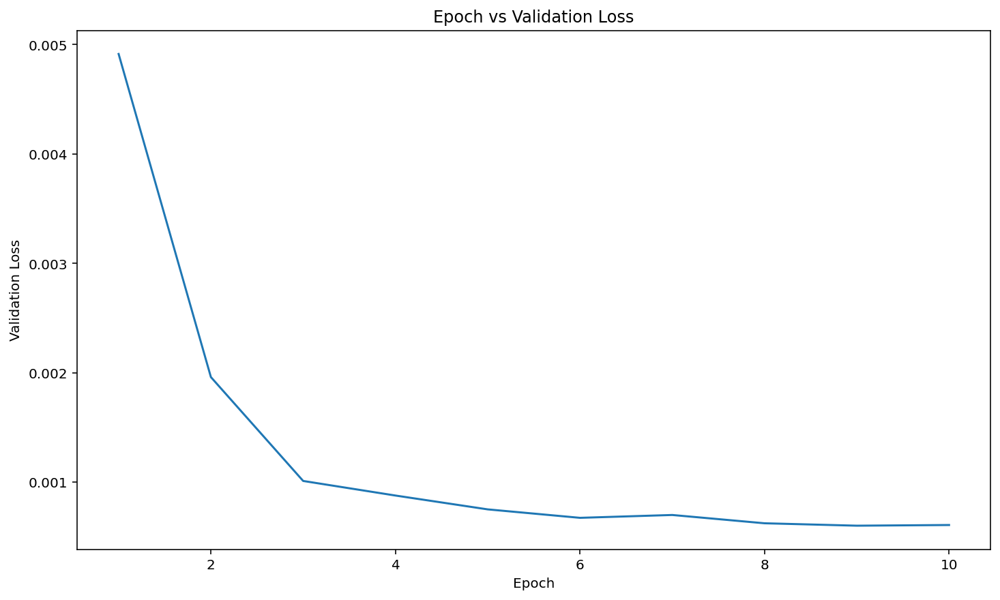

  1/261 [..............................] - ETA: 4s - loss: 4.2786e-04 - mse: 4.2786e-04 - mae: 0.0160 - r2: 0.9926

 30/261 [==>...........................] - ETA: 0s - loss: 4.9352e-04 - mse: 4.9352e-04 - mae: 0.0164 - r2: 0.9901

 57/261 [=====>........................] - ETA: 0s - loss: 5.2079e-04 - mse: 5.2079e-04 - mae: 0.0168 - r2: 0.9893

 82/261 [========>.....................] - ETA: 0s - loss: 5.4016e-04 - mse: 5.4016e-04 - mae: 0.0170 - r2: 0.9890

109/261 [===========>..................] - ETA: 0s - loss: 5.4890e-04 - mse: 5.4890e-04 - mae: 0.0172 - r2: 0.9887

135/261 [==============>...............] - ETA: 0s - loss: 5.5846e-04 - mse: 5.5846e-04 - mae: 0.0173 - r2: 0.9885

156/261 [================>.............] - ETA: 0s - loss: 5.6776e-04 - mse: 5.6776e-04 - mae: 0.0174 - r2: 0.9885

183/261 [====================>.........] - ETA: 0s - loss: 5.7295e-04 - mse: 5.7295e-04 - mae: 0.0175 - r2: 0.9884

206/261 [======================>.......] - ETA: 0s - loss: 5.6921e-04 - mse: 5.6921e-04 - mae: 0.0175 - r2: 0.9885

233/261 [=========================>....] - ETA: 0s - loss: 5.6534e-04 - mse: 5.6534e-04 - mae: 0.0174 - r2: 0.9886

256/261 [============================>.] - ETA: 0s - loss: 5.6719e-04 - mse: 5.6719e-04 - mae: 0.0175 - r2: 0.9884

261/261 [==============================] - 1s 2ms/step - loss: 5.6707e-04 - mse: 5.6707e-04 - mae: 0.0175 - r2: 0.9884


Test MSE: 0.0005670697428286076
Test MAE: 0.017461949959397316
Test R2: 0.9884351491928101


In [7]:
# Define the optimizer
import tensorflow as tf
from sklearn.metrics import r2_score
import tensorflow.keras.backend as K

# Define a list of optimizers with respective learning rates. Use all or test one
#optimizer_selected = tf.keras.optimizers.Adam(learning_rate=0.001)
#ptimizer_selected = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
#optimizer_selected = tf.keras.optimizers.Adagrad(learning_rate=0.01)
#optimizer_selected = tf.keras.optimizers.RMSprop(learning_rate=0.001)
#optimizer_selected = tf.keras.optimizers.Adadelta(learning_rate=1.0)
optimizer_selected = tf.keras.optimizers.Nadam(learning_rate=0.002)

# Define R-squared as a custom metric
def r2(y_true, y_pred):
    SS_res =  K.sum(K.square(y_true - y_pred))
    SS_tot = K.sum(K.square(y_true - K.mean(y_true)))
    return 1 - SS_res/(SS_tot + K.epsilon())

# Compile the model
model.compile(optimizer=optimizer_selected, loss='mean_squared_error', metrics=['mse','mae', r2])

history = LossHistory()

# Train the model
model.fit(X_train_reshaped, y_train, epochs=20, batch_size=16, validation_split=0.1, callbacks=[history])

# Plot epoch vs validation loss
plt.plot(range(1, len(history.losses) + 1), history.losses)
plt.xlabel('Epoch')
plt.ylabel('Validation Loss')
plt.title('Epoch vs Validation Loss')
plt.show()

# Evaluate the model
loss, mse, mae, r2 = model.evaluate(X_test_reshaped, y_test)

print("Test MSE:", mse)
print("Test MAE:", mae)
print("Test R2:", r2)

Epoch 1/50


/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 119s 7ms/step - loss: 0.0690 - mae: 0.0682 - mse: 0.0690 - r2: -0.3422 - val_loss: 6.2737e-05 - val_mae: 0.0073 - val_mse: 6.2737e-05 - val_r2: 0.6108
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 117s 7ms/step - loss: 5.0220e-05 - mae: 0.0049 - mse: 5.0220e-05 - r2: 0.9989 - val_loss: 4.4749e-06 - val_mae: 0.0016 - val_mse: 4.4749e-06 - val_r2: 0.9997
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 114s 6ms/step - loss: 2.4039e-05 - mae: 0.0034 - mse: 2.4039e-05 - r2: 0.9995 - val_loss: 3.8639e-06 - val_mae: 0.0014 - val_mse: 3.8639e-06 - val_r2: 0.9999
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 108s 6ms/step - loss: 1.8559e-05 - mae: 0.0030 - mse: 1.8559e-05 - r2: 0.9996 - val_loss: 4.3022e-06 - val_mae: 0.0015 - val_mse: 4.3022e-06 - val_r2: 0.9741
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 117s 7ms/step - loss: 1.1860e-05 - mae: 0.0025 - mse: 1.1860e-05 - r2: 0.9998 - val_loss: 1.1297e-05 - val_mae: 0.0028 - val_mse: 1.1297e-05 - val_r2: 0.8913
Epoch 6/

/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 100s 6ms/step - loss: 0.0262 - mae: 0.0789 - mse: 0.0262 - r2: 0.3425 - val_loss: 7.3620e-04 - val_mae: 0.0196 - val_mse: 7.3620e-04 - val_r2: 0.9683
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 98s 6ms/step - loss: 7.1690e-04 - mae: 0.0198 - mse: 7.1690e-04 - r2: 0.9848 - val_loss: 7.9029e-04 - val_mae: 0.0217 - val_mse: 7.9029e-04 - val_r2: -4.4440
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 99s 6ms/step - loss: 6.1080e-04 - mae: 0.0181 - mse: 6.1080e-04 - r2: 0.9869 - val_loss: 5.8944e-04 - val_mae: 0.0178 - val_mse: 5.8944e-04 - val_r2: -4.9449
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 100s 6ms/step - loss: 5.3623e-04 - mae: 0.0168 - mse: 5.3623e-04 - r2: 0.9886 - val_loss: 4.8415e-04 - val_mae: 0.0162 - val_mse: 4.8415e-04 - val_r2: -2.3971
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 101s 6ms/step - loss: 4.8007e-04 - mae: 0.0157 - mse: 4.8007e-04 - r2: 0.9899 - val_loss: 6.6497e-04 - val_mae: 0.0203 - val_mse: 6.6497e-04 - val_r2: -9.4620
Epoch 6

/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 100s 6ms/step - loss: 0.0396 - mae: 0.0990 - mse: 0.0396 - r2: 0.1469 - val_loss: 8.8148e-04 - val_mae: 0.0228 - val_mse: 8.8148e-04 - val_r2: 0.9427
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 92s 5ms/step - loss: 7.4549e-04 - mae: 0.0208 - mse: 7.4549e-04 - r2: 0.9839 - val_loss: 4.5432e-04 - val_mae: 0.0159 - val_mse: 4.5432e-04 - val_r2: 0.5324
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 98s 6ms/step - loss: 3.3109e-04 - mae: 0.0139 - mse: 3.3109e-04 - r2: 0.9928 - val_loss: 1.9616e-04 - val_mae: 0.0106 - val_mse: 1.9616e-04 - val_r2: 0.5522
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 97s 5ms/step - loss: 1.6169e-04 - mae: 0.0098 - mse: 1.6169e-04 - r2: 0.9965 - val_loss: 1.0524e-04 - val_mae: 0.0080 - val_mse: 1.0524e-04 - val_r2: 0.9185
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 97s 5ms/step - loss: 1.0166e-04 - mae: 0.0079 - mse: 1.0166e-04 - r2: 0.9978 - val_loss: 8.2351e-05 - val_mae: 0.0072 - val_mse: 8.2351e-05 - val_r2: 0.9966
Epoch 6/50
17

/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 94s 5ms/step - loss: 0.0407 - mae: 0.0764 - mse: 0.0407 - r2: 0.1032 - val_loss: 8.3278e-04 - val_mae: 0.0257 - val_mse: 8.3278e-04 - val_r2: -2.8339
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 93s 5ms/step - loss: 4.8813e-04 - mae: 0.0180 - mse: 4.8813e-04 - r2: 0.9896 - val_loss: 6.5323e-04 - val_mae: 0.0235 - val_mse: 6.5323e-04 - val_r2: -1.4100
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 93s 5ms/step - loss: 2.7955e-04 - mae: 0.0138 - mse: 2.7955e-04 - r2: 0.9941 - val_loss: 2.6624e-04 - val_mae: 0.0155 - val_mse: 2.6624e-04 - val_r2: 0.2541
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 93s 5ms/step - loss: 2.0568e-04 - mae: 0.0118 - mse: 2.0568e-04 - r2: 0.9956 - val_loss: 6.7817e-05 - val_mae: 0.0070 - val_mse: 6.7817e-05 - val_r2: 0.9794
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 90s 5ms/step - loss: 1.7108e-04 - mae: 0.0109 - mse: 1.7108e-04 - r2: 0.9963 - val_loss: 4.1596e-04 - val_mae: 0.0197 - val_mse: 4.1596e-04 - val_r2: -2.7507
Epoch 6/50


/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 97s 5ms/step - loss: 0.0360 - mae: 0.0745 - mse: 0.0360 - r2: 0.1908 - val_loss: 0.0015 - val_mae: 0.0364 - val_mse: 0.0015 - val_r2: -7.8123
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 6.2910e-04 - mae: 0.0201 - mse: 6.2910e-04 - r2: 0.9866 - val_loss: 1.8981e-04 - val_mae: 0.0115 - val_mse: 1.8981e-04 - val_r2: 0.9955
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 4.4324e-04 - mae: 0.0169 - mse: 4.4324e-04 - r2: 0.9906 - val_loss: 1.3921e-04 - val_mae: 0.0099 - val_mse: 1.3921e-04 - val_r2: 0.9764
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 95s 5ms/step - loss: 3.8928e-04 - mae: 0.0161 - mse: 3.8928e-04 - r2: 0.9916 - val_loss: 1.9698e-04 - val_mae: 0.0123 - val_mse: 1.9698e-04 - val_r2: 0.1357
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 95s 5ms/step - loss: 3.0939e-04 - mae: 0.0144 - mse: 3.0939e-04 - r2: 0.9934 - val_loss: 1.4045e-04 - val_mae: 0.0105 - val_mse: 1.4045e-04 - val_r2: 0.1198
Epoch 6/50
17713/1771

/home/research2/miniconda3/envs/rapidsaienv/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


17713/17713 ━━━━━━━━━━━━━━━━━━━━ 97s 5ms/step - loss: 0.0345 - mae: 0.0415 - mse: 0.0345 - r2: 0.3400 - val_loss: 2.5320e-04 - val_mae: 0.0134 - val_mse: 2.5320e-04 - val_r2: -1.4283
Epoch 2/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 7.6778e-05 - mae: 0.0062 - mse: 7.6778e-05 - r2: 0.9984 - val_loss: 3.1696e-05 - val_mae: 0.0052 - val_mse: 3.1696e-05 - val_r2: 0.7289
Epoch 3/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 3.8274e-05 - mae: 0.0042 - mse: 3.8274e-05 - r2: 0.9992 - val_loss: 5.8847e-06 - val_mae: 0.0019 - val_mse: 5.8847e-06 - val_r2: 0.9916
Epoch 4/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 2.5722e-05 - mae: 0.0034 - mse: 2.5722e-05 - r2: 0.9995 - val_loss: 1.3902e-05 - val_mae: 0.0032 - val_mse: 1.3902e-05 - val_r2: 0.9729
Epoch 5/50
17713/17713 ━━━━━━━━━━━━━━━━━━━━ 96s 5ms/step - loss: 1.9199e-05 - mae: 0.0030 - mse: 1.9199e-05 - r2: 0.9996 - val_loss: 7.3241e-05 - val_mae: 0.0065 - val_mse: 7.3241e-05 - val_r2: -0.1605
Epoch 6/50
1

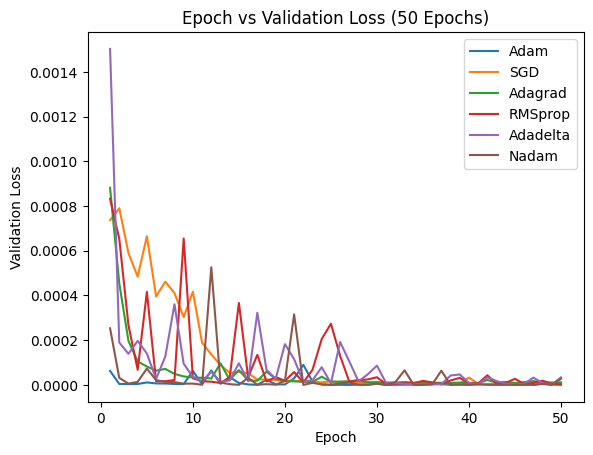

Results with optimizer [Adam] MSE: 1.4521276625600876e-06 MAE: 0.0010877683525905013 R2: 0.99509596824646
Results with optimizer [SGD] MSE: 4.826144049729919e-06 MAE: 0.0017148290062323213 R2: 0.8737793564796448
Results with optimizer [Adagrad] MSE: 1.154736219177721e-05 MAE: 0.0027118909638375044 R2: 0.9962856769561768
Results with optimizer [RMSprop] MSE: 3.220364760636585e-06 MAE: 0.0014262711629271507 R2: 0.9880032539367676
Results with optimizer [Adadelta] MSE: 3.368037141626701e-05 MAE: 0.0052163307555019855 R2: 0.5026994347572327
Results with optimizer [Nadam] MSE: 2.73747955361614e-05 MAE: 0.003975672647356987 R2: 0.8971318602561951


 470/1879 [======>.......................] - ETA: 5s - loss: 0.2639 - mse: 0.2639 - mae: 0.2726 - r2: -5.2200

 485/1879 [======>.......................] - ETA: 5s - loss: 0.2560 - mse: 0.2560 - mae: 0.2666 - r2: -5.0335

 499/1879 [======>.......................] - ETA: 5s - loss: 0.2491 - mse: 0.2491 - mae: 0.2614 - r2: -4.8701

 514/1879 [=======>......................] - ETA: 5s - loss: 0.2421 - mse: 0.2421 - mae: 0.2559 - r2: -4.7038

 527/1879 [=======>......................] - ETA: 5s - loss: 0.2363 - mse: 0.2363 - mae: 0.2515 - r2: -4.5673

 538/1879 [=======>......................] - ETA: 5s - loss: 0.2316 - mse: 0.2316 - mae: 0.2477 - r2: -4.4562

 548/1879 [=======>......................] - ETA: 5s - loss: 0.2275 - mse: 0.2275 - mae: 0.2442 - r2: -4.3588

 561/1879 [=======>......................] - ETA: 5s - loss: 0.2223 - mse: 0.2223 - mae: 0.2398 - r2: -4.2368

 576/1879 [========>.....................] - ETA: 4s - loss: 0.2167 - mse: 0.2167 - mae: 0.2351 - r2: -4.1034

 593/1879 [========>.....................] - ETA: 4s - loss: 0.2106 - mse: 0.2106 - mae: 0.2299 - r2: -3.9598

 610/1879 [========>.....................] - ETA: 4s - loss: 0.2048 - mse: 0.2048 - mae: 0.2247 - r2: -3.8235

 627/1879 [=========>....................] - ETA: 4s - loss: 0.1993 - mse: 0.1993 - mae: 0.2198 - r2: -3.6946

 644/1879 [=========>....................] - ETA: 4s - loss: 0.1942 - mse: 0.1942 - mae: 0.2152 - r2: -3.5725

 659/1879 [=========>....................] - ETA: 4s - loss: 0.1898 - mse: 0.1898 - mae: 0.2113 - r2: -3.4699

 677/1879 [=========>....................] - ETA: 4s - loss: 0.1848 - mse: 0.1848 - mae: 0.2068 - r2: -3.3526

 693/1879 [==========>...................] - ETA: 4s - loss: 0.1806 - mse: 0.1806 - mae: 0.2028 - r2: -3.2530

 709/1879 [==========>...................] - ETA: 4s - loss: 0.1766 - mse: 0.1766 - mae: 0.1990 - r2: -3.1580

 724/1879 [==========>...................] - ETA: 4s - loss: 0.1730 - mse: 0.1730 - mae: 0.1955 - r2: -3.0726

 741/1879 [==========>...................] - ETA: 4s - loss: 0.1690 - mse: 0.1690 - mae: 0.1917 - r2: -2.9799

 756/1879 [===========>..................] - ETA: 4s - loss: 0.1657 - mse: 0.1657 - mae: 0.1885 - r2: -2.9015

 771/1879 [===========>..................] - ETA: 4s - loss: 0.1625 - mse: 0.1625 - mae: 0.1854 - r2: -2.8262

 785/1879 [===========>..................] - ETA: 3s - loss: 0.1596 - mse: 0.1596 - mae: 0.1825 - r2: -2.7583

 801/1879 [===========>..................] - ETA: 3s - loss: 0.1564 - mse: 0.1564 - mae: 0.1793 - r2: -2.6837

 818/1879 [============>.................] - ETA: 3s - loss: 0.1532 - mse: 0.1532 - mae: 0.1762 - r2: -2.6076

 835/1879 [============>.................] - ETA: 3s - loss: 0.1501 - mse: 0.1501 - mae: 0.1730 - r2: -2.5346

 852/1879 [============>.................] - ETA: 3s - loss: 0.1471 - mse: 0.1471 - mae: 0.1700 - r2: -2.4644

 868/1879 [============>.................] - ETA: 3s - loss: 0.1444 - mse: 0.1444 - mae: 0.1673 - r2: -2.4008

 885/1879 [=============>................] - ETA: 3s - loss: 0.1417 - mse: 0.1417 - mae: 0.1645 - r2: -2.3358

 899/1879 [=============>................] - ETA: 3s - loss: 0.1395 - mse: 0.1395 - mae: 0.1623 - r2: -2.2841

 916/1879 [=============>................] - ETA: 3s - loss: 0.1369 - mse: 0.1369 - mae: 0.1596 - r2: -2.2234

 934/1879 [=============>................] - ETA: 3s - loss: 0.1343 - mse: 0.1343 - mae: 0.1569 - r2: -2.1615

 952/1879 [==============>...............] - ETA: 3s - loss: 0.1317 - mse: 0.1317 - mae: 0.1543 - r2: -2.1020

 969/1879 [==============>...............] - ETA: 3s - loss: 0.1294 - mse: 0.1294 - mae: 0.1519 - r2: -2.0477

 986/1879 [==============>...............] - ETA: 3s - loss: 0.1272 - mse: 0.1272 - mae: 0.1495 - r2: -1.9954

1002/1879 [==============>...............] - ETA: 3s - loss: 0.1252 - mse: 0.1252 - mae: 0.1474 - r2: -1.9477

1020/1879 [===============>..............] - ETA: 3s - loss: 0.1230 - mse: 0.1230 - mae: 0.1452 - r2: -1.8959

1038/1879 [===============>..............] - ETA: 2s - loss: 0.1209 - mse: 0.1209 - mae: 0.1429 - r2: -1.8459

1055/1879 [===============>..............] - ETA: 2s - loss: 0.1189 - mse: 0.1189 - mae: 0.1409 - r2: -1.8002

1067/1879 [================>.............] - ETA: 2s - loss: 0.1176 - mse: 0.1176 - mae: 0.1395 - r2: -1.7688

1081/1879 [================>.............] - ETA: 2s - loss: 0.1161 - mse: 0.1161 - mae: 0.1379 - r2: -1.7331

1091/1879 [================>.............] - ETA: 2s - loss: 0.1150 - mse: 0.1150 - mae: 0.1368 - r2: -1.7081

1103/1879 [================>.............] - ETA: 2s - loss: 0.1138 - mse: 0.1138 - mae: 0.1354 - r2: -1.6787

1119/1879 [================>.............] - ETA: 2s - loss: 0.1122 - mse: 0.1122 - mae: 0.1338 - r2: -1.6406

1136/1879 [=================>............] - ETA: 2s - loss: 0.1105 - mse: 0.1105 - mae: 0.1320 - r2: -1.6012

1153/1879 [=================>............] - ETA: 2s - loss: 0.1089 - mse: 0.1089 - mae: 0.1303 - r2: -1.5630

1168/1879 [=================>............] - ETA: 2s - loss: 0.1075 - mse: 0.1075 - mae: 0.1288 - r2: -1.5302

1184/1879 [=================>............] - ETA: 2s - loss: 0.1060 - mse: 0.1060 - mae: 0.1273 - r2: -1.4961

1199/1879 [==================>...........] - ETA: 2s - loss: 0.1047 - mse: 0.1047 - mae: 0.1259 - r2: -1.4650

1216/1879 [==================>...........] - ETA: 2s - loss: 0.1032 - mse: 0.1032 - mae: 0.1243 - r2: -1.4307

1233/1879 [==================>...........] - ETA: 2s - loss: 0.1018 - mse: 0.1018 - mae: 0.1228 - r2: -1.3973

1251/1879 [==================>...........] - ETA: 2s - loss: 0.1004 - mse: 0.1004 - mae: 0.1213 - r2: -1.3629

1267/1879 [===================>..........] - ETA: 2s - loss: 0.0991 - mse: 0.0991 - mae: 0.1199 - r2: -1.3331

1284/1879 [===================>..........] - ETA: 2s - loss: 0.0978 - mse: 0.0978 - mae: 0.1185 - r2: -1.3023

1299/1879 [===================>..........] - ETA: 2s - loss: 0.0967 - mse: 0.0967 - mae: 0.1173 - r2: -1.2758

1317/1879 [====================>.........] - ETA: 1s - loss: 0.0954 - mse: 0.0954 - mae: 0.1160 - r2: -1.2449

1333/1879 [====================>.........] - ETA: 1s - loss: 0.0942 - mse: 0.0942 - mae: 0.1148 - r2: -1.2180

1349/1879 [====================>.........] - ETA: 1s - loss: 0.0931 - mse: 0.0931 - mae: 0.1136 - r2: -1.1918

1366/1879 [====================>.........] - ETA: 1s - loss: 0.0919 - mse: 0.0919 - mae: 0.1124 - r2: -1.1647

1381/1879 [=====================>........] - ETA: 1s - loss: 0.0910 - mse: 0.0910 - mae: 0.1114 - r2: -1.1413

1396/1879 [=====================>........] - ETA: 1s - loss: 0.0900 - mse: 0.0900 - mae: 0.1103 - r2: -1.1183

1407/1879 [=====================>........] - ETA: 1s - loss: 0.0893 - mse: 0.0893 - mae: 0.1096 - r2: -1.1018

1414/1879 [=====================>........] - ETA: 1s - loss: 0.0888 - mse: 0.0888 - mae: 0.1091 - r2: -1.0915

1426/1879 [=====================>........] - ETA: 1s - loss: 0.0881 - mse: 0.0881 - mae: 0.1083 - r2: -1.0739

1444/1879 [======================>.......] - ETA: 1s - loss: 0.0870 - mse: 0.0870 - mae: 0.1071 - r2: -1.0482

1462/1879 [======================>.......] - ETA: 1s - loss: 0.0859 - mse: 0.0859 - mae: 0.1060 - r2: -1.0230

1479/1879 [======================>.......] - ETA: 1s - loss: 0.0849 - mse: 0.0849 - mae: 0.1049 - r2: -0.9998

1495/1879 [======================>.......] - ETA: 1s - loss: 0.0840 - mse: 0.0840 - mae: 0.1040 - r2: -0.9785

1500/1879 [======================>.......] - ETA: 1s - loss: 0.0838 - mse: 0.0838 - mae: 0.1037 - r2: -0.9719

1511/1879 [=======================>......] - ETA: 1s - loss: 0.0832 - mse: 0.0832 - mae: 0.1030 - r2: -0.9576

1527/1879 [=======================>......] - ETA: 1s - loss: 0.0823 - mse: 0.0823 - mae: 0.1021 - r2: -0.9372

1541/1879 [=======================>......] - ETA: 1s - loss: 0.0815 - mse: 0.0815 - mae: 0.1013 - r2: -0.9197

1551/1879 [=======================>......] - ETA: 1s - loss: 0.0810 - mse: 0.0810 - mae: 0.1007 - r2: -0.9073

1564/1879 [=======================>......] - ETA: 1s - loss: 0.0803 - mse: 0.0803 - mae: 0.1000 - r2: -0.8916

1581/1879 [========================>.....] - ETA: 1s - loss: 0.0795 - mse: 0.0795 - mae: 0.0991 - r2: -0.8713

1597/1879 [========================>.....] - ETA: 0s - loss: 0.0787 - mse: 0.0787 - mae: 0.0983 - r2: -0.8526

1613/1879 [========================>.....] - ETA: 0s - loss: 0.0779 - mse: 0.0779 - mae: 0.0974 - r2: -0.8343

1629/1879 [=========================>....] - ETA: 0s - loss: 0.0772 - mse: 0.0772 - mae: 0.0966 - r2: -0.8164

1645/1879 [=========================>....] - ETA: 0s - loss: 0.0764 - mse: 0.0764 - mae: 0.0958 - r2: -0.7988

1662/1879 [=========================>....] - ETA: 0s - loss: 0.0756 - mse: 0.0756 - mae: 0.0950 - r2: -0.7805

1679/1879 [=========================>....] - ETA: 0s - loss: 0.0749 - mse: 0.0749 - mae: 0.0941 - r2: -0.7625

1695/1879 [==========================>...] - ETA: 0s - loss: 0.0742 - mse: 0.0742 - mae: 0.0934 - r2: -0.7460

1710/1879 [==========================>...] - ETA: 0s - loss: 0.0735 - mse: 0.0735 - mae: 0.0927 - r2: -0.7307

1727/1879 [==========================>...] - ETA: 0s - loss: 0.0728 - mse: 0.0728 - mae: 0.0919 - r2: -0.7137

1745/1879 [==========================>...] - ETA: 0s - loss: 0.0720 - mse: 0.0720 - mae: 0.0911 - r2: -0.6961

1763/1879 [===========================>..] - ETA: 0s - loss: 0.0713 - mse: 0.0713 - mae: 0.0903 - r2: -0.6789

1780/1879 [===========================>..] - ETA: 0s - loss: 0.0706 - mse: 0.0706 - mae: 0.0896 - r2: -0.6629

1796/1879 [===========================>..] - ETA: 0s - loss: 0.0700 - mse: 0.0700 - mae: 0.0889 - r2: -0.6481

1813/1879 [===========================>..] - ETA: 0s - loss: 0.0694 - mse: 0.0694 - mae: 0.0882 - r2: -0.6327

1831/1879 [============================>.] - ETA: 0s - loss: 0.0687 - mse: 0.0687 - mae: 0.0875 - r2: -0.6167

1846/1879 [============================>.] - ETA: 0s - loss: 0.0681 - mse: 0.0681 - mae: 0.0869 - r2: -0.6037

1863/1879 [============================>.] - ETA: 0s - loss: 0.0675 - mse: 0.0675 - mae: 0.0862 - r2: -0.5891

1879/1879 [==============================] - 8s 4ms/step - loss: 0.0669 - mse: 0.0669 - mae: 0.0856 - r2: -0.5756 - val_loss: 2.5304e-04 - val_mse: 2.5304e-04 - val_mae: 0.0126 - val_r2: 0.9945


Epoch 2/50


   1/1879 [..............................] - ETA: 10s - loss: 1.3236e-04 - mse: 1.3236e-04 - mae: 0.0092 - r2: 0.9979

  12/1879 [..............................] - ETA: 9s - loss: 2.2135e-04 - mse: 2.2135e-04 - mae: 0.0116 - r2: 0.9949 

  26/1879 [..............................] - ETA: 7s - loss: 2.5926e-04 - mse: 2.5926e-04 - mae: 0.0126 - r2: 0.9946

  43/1879 [..............................] - ETA: 6s - loss: 2.8952e-04 - mse: 2.8952e-04 - mae: 0.0134 - r2: 0.9940

  59/1879 [..............................] - ETA: 6s - loss: 3.1626e-04 - mse: 3.1626e-04 - mae: 0.0140 - r2: 0.9935

  76/1879 [>.............................] - ETA: 6s - loss: 3.1190e-04 - mse: 3.1190e-04 - mae: 0.0139 - r2: 0.9934

  90/1879 [>.............................] - ETA: 6s - loss: 3.0160e-04 - mse: 3.0160e-04 - mae: 0.0137 - r2: 0.9936

 107/1879 [>.............................] - ETA: 6s - loss: 3.0361e-04 - mse: 3.0361e-04 - mae: 0.0138 - r2: 0.9933

 125/1879 [>.............................] - ETA: 5s - loss: 3.2466e-04 - mse: 3.2466e-04 - mae: 0.0143 - r2: 0.9927

 143/1879 [=>............................] - ETA: 5s - loss: 3.1444e-04 - mse: 3.1444e-04 - mae: 0.0140 - r2: 0.9930

 160/1879 [=>............................] - ETA: 5s - loss: 3.0570e-04 - mse: 3.0570e-04 - mae: 0.0139 - r2: 0.9932

 178/1879 [=>............................] - ETA: 5s - loss: 3.0395e-04 - mse: 3.0395e-04 - mae: 0.0138 - r2: 0.9933

 192/1879 [==>...........................] - ETA: 5s - loss: 3.0538e-04 - mse: 3.0538e-04 - mae: 0.0139 - r2: 0.9933

 208/1879 [==>...........................] - ETA: 5s - loss: 3.0493e-04 - mse: 3.0493e-04 - mae: 0.0139 - r2: 0.9933

 225/1879 [==>...........................] - ETA: 5s - loss: 3.0722e-04 - mse: 3.0722e-04 - mae: 0.0139 - r2: 0.9932

 242/1879 [==>...........................] - ETA: 5s - loss: 3.1280e-04 - mse: 3.1280e-04 - mae: 0.0140 - r2: 0.9931

 258/1879 [===>..........................] - ETA: 5s - loss: 3.0964e-04 - mse: 3.0964e-04 - mae: 0.0140 - r2: 0.9931

 271/1879 [===>..........................] - ETA: 5s - loss: 3.0926e-04 - mse: 3.0926e-04 - mae: 0.0140 - r2: 0.9931

 287/1879 [===>..........................] - ETA: 5s - loss: 3.0218e-04 - mse: 3.0218e-04 - mae: 0.0138 - r2: 0.9933

 305/1879 [===>..........................] - ETA: 5s - loss: 3.0143e-04 - mse: 3.0143e-04 - mae: 0.0138 - r2: 0.9933

 322/1879 [====>.........................] - ETA: 5s - loss: 2.9763e-04 - mse: 2.9763e-04 - mae: 0.0137 - r2: 0.9934

 339/1879 [====>.........................] - ETA: 4s - loss: 2.9392e-04 - mse: 2.9392e-04 - mae: 0.0136 - r2: 0.9935

 356/1879 [====>.........................] - ETA: 4s - loss: 2.9108e-04 - mse: 2.9108e-04 - mae: 0.0135 - r2: 0.9935

 373/1879 [====>.........................] - ETA: 4s - loss: 2.9470e-04 - mse: 2.9470e-04 - mae: 0.0136 - r2: 0.9934

 391/1879 [=====>........................] - ETA: 4s - loss: 2.9293e-04 - mse: 2.9293e-04 - mae: 0.0136 - r2: 0.9935

 409/1879 [=====>........................] - ETA: 4s - loss: 2.9157e-04 - mse: 2.9157e-04 - mae: 0.0135 - r2: 0.9935

 424/1879 [=====>........................] - ETA: 4s - loss: 2.9245e-04 - mse: 2.9245e-04 - mae: 0.0135 - r2: 0.9935

 440/1879 [======>.......................] - ETA: 4s - loss: 2.9186e-04 - mse: 2.9186e-04 - mae: 0.0135 - r2: 0.9935

 458/1879 [======>.......................] - ETA: 4s - loss: 2.9231e-04 - mse: 2.9231e-04 - mae: 0.0136 - r2: 0.9935

 475/1879 [======>.......................] - ETA: 4s - loss: 2.9026e-04 - mse: 2.9026e-04 - mae: 0.0135 - r2: 0.9936

 493/1879 [======>.......................] - ETA: 4s - loss: 2.8902e-04 - mse: 2.8902e-04 - mae: 0.0135 - r2: 0.9936

 511/1879 [=======>......................] - ETA: 4s - loss: 2.8862e-04 - mse: 2.8862e-04 - mae: 0.0135 - r2: 0.9936

 526/1879 [=======>......................] - ETA: 4s - loss: 2.8879e-04 - mse: 2.8879e-04 - mae: 0.0135 - r2: 0.9936

 543/1879 [=======>......................] - ETA: 4s - loss: 2.8847e-04 - mse: 2.8847e-04 - mae: 0.0135 - r2: 0.9936

 560/1879 [=======>......................] - ETA: 4s - loss: 2.8713e-04 - mse: 2.8713e-04 - mae: 0.0134 - r2: 0.9937

 577/1879 [========>.....................] - ETA: 4s - loss: 2.8923e-04 - mse: 2.8923e-04 - mae: 0.0135 - r2: 0.9936

 594/1879 [========>.....................] - ETA: 4s - loss: 2.8909e-04 - mse: 2.8909e-04 - mae: 0.0135 - r2: 0.9936

 610/1879 [========>.....................] - ETA: 3s - loss: 2.8688e-04 - mse: 2.8688e-04 - mae: 0.0134 - r2: 0.9936

 628/1879 [=========>....................] - ETA: 3s - loss: 2.8406e-04 - mse: 2.8406e-04 - mae: 0.0134 - r2: 0.9937

 643/1879 [=========>....................] - ETA: 3s - loss: 2.8199e-04 - mse: 2.8199e-04 - mae: 0.0133 - r2: 0.9938

 660/1879 [=========>....................] - ETA: 3s - loss: 2.7979e-04 - mse: 2.7979e-04 - mae: 0.0132 - r2: 0.9938

 678/1879 [=========>....................] - ETA: 3s - loss: 2.7779e-04 - mse: 2.7779e-04 - mae: 0.0132 - r2: 0.9939

 694/1879 [==========>...................] - ETA: 3s - loss: 2.7944e-04 - mse: 2.7944e-04 - mae: 0.0132 - r2: 0.9938

 711/1879 [==========>...................] - ETA: 3s - loss: 2.7884e-04 - mse: 2.7884e-04 - mae: 0.0132 - r2: 0.9939

 726/1879 [==========>...................] - ETA: 3s - loss: 2.7920e-04 - mse: 2.7920e-04 - mae: 0.0132 - r2: 0.9939

 744/1879 [==========>...................] - ETA: 3s - loss: 2.7948e-04 - mse: 2.7948e-04 - mae: 0.0132 - r2: 0.9939

 761/1879 [===========>..................] - ETA: 3s - loss: 2.7813e-04 - mse: 2.7813e-04 - mae: 0.0132 - r2: 0.9939

 775/1879 [===========>..................] - ETA: 3s - loss: 2.7671e-04 - mse: 2.7671e-04 - mae: 0.0132 - r2: 0.9939

 791/1879 [===========>..................] - ETA: 3s - loss: 2.7512e-04 - mse: 2.7512e-04 - mae: 0.0131 - r2: 0.9939

 808/1879 [===========>..................] - ETA: 3s - loss: 2.7556e-04 - mse: 2.7556e-04 - mae: 0.0131 - r2: 0.9939

 825/1879 [============>.................] - ETA: 3s - loss: 2.7525e-04 - mse: 2.7525e-04 - mae: 0.0131 - r2: 0.9939

 842/1879 [============>.................] - ETA: 3s - loss: 2.7328e-04 - mse: 2.7328e-04 - mae: 0.0131 - r2: 0.9940

 860/1879 [============>.................] - ETA: 3s - loss: 2.7280e-04 - mse: 2.7280e-04 - mae: 0.0131 - r2: 0.9940

 866/1879 [============>.................] - ETA: 3s - loss: 2.7407e-04 - mse: 2.7407e-04 - mae: 0.0131 - r2: 0.9939

 881/1879 [=============>................] - ETA: 3s - loss: 2.7380e-04 - mse: 2.7380e-04 - mae: 0.0131 - r2: 0.9940

 897/1879 [=============>................] - ETA: 3s - loss: 2.7312e-04 - mse: 2.7312e-04 - mae: 0.0131 - r2: 0.9940

 915/1879 [=============>................] - ETA: 3s - loss: 2.7114e-04 - mse: 2.7114e-04 - mae: 0.0130 - r2: 0.9940

 933/1879 [=============>................] - ETA: 2s - loss: 2.6926e-04 - mse: 2.6926e-04 - mae: 0.0130 - r2: 0.9941

 950/1879 [==============>...............] - ETA: 2s - loss: 2.6815e-04 - mse: 2.6815e-04 - mae: 0.0130 - r2: 0.9941

 967/1879 [==============>...............] - ETA: 2s - loss: 2.7176e-04 - mse: 2.7176e-04 - mae: 0.0131 - r2: 0.9940

 984/1879 [==============>...............] - ETA: 2s - loss: 2.7200e-04 - mse: 2.7200e-04 - mae: 0.0131 - r2: 0.9940

1000/1879 [==============>...............] - ETA: 2s - loss: 2.7145e-04 - mse: 2.7145e-04 - mae: 0.0130 - r2: 0.9941

1017/1879 [===============>..............] - ETA: 2s - loss: 2.7291e-04 - mse: 2.7291e-04 - mae: 0.0131 - r2: 0.9940

1035/1879 [===============>..............] - ETA: 2s - loss: 2.7320e-04 - mse: 2.7320e-04 - mae: 0.0131 - r2: 0.9940

1053/1879 [===============>..............] - ETA: 2s - loss: 2.7126e-04 - mse: 2.7126e-04 - mae: 0.0130 - r2: 0.9941

1070/1879 [================>.............] - ETA: 2s - loss: 2.6944e-04 - mse: 2.6944e-04 - mae: 0.0130 - r2: 0.9941

1088/1879 [================>.............] - ETA: 2s - loss: 2.6803e-04 - mse: 2.6803e-04 - mae: 0.0129 - r2: 0.9941

1105/1879 [================>.............] - ETA: 2s - loss: 2.6689e-04 - mse: 2.6689e-04 - mae: 0.0129 - r2: 0.9942

1123/1879 [================>.............] - ETA: 2s - loss: 2.6573e-04 - mse: 2.6573e-04 - mae: 0.0129 - r2: 0.9942

1140/1879 [=================>............] - ETA: 2s - loss: 2.6543e-04 - mse: 2.6543e-04 - mae: 0.0129 - r2: 0.9942

1157/1879 [=================>............] - ETA: 2s - loss: 2.6479e-04 - mse: 2.6479e-04 - mae: 0.0129 - r2: 0.9942

1171/1879 [=================>............] - ETA: 2s - loss: 2.6414e-04 - mse: 2.6414e-04 - mae: 0.0128 - r2: 0.9942

1187/1879 [=================>............] - ETA: 2s - loss: 2.6364e-04 - mse: 2.6364e-04 - mae: 0.0128 - r2: 0.9942

1203/1879 [==================>...........] - ETA: 2s - loss: 2.6356e-04 - mse: 2.6356e-04 - mae: 0.0128 - r2: 0.9942

1219/1879 [==================>...........] - ETA: 2s - loss: 2.6418e-04 - mse: 2.6418e-04 - mae: 0.0128 - r2: 0.9942

1235/1879 [==================>...........] - ETA: 2s - loss: 2.6299e-04 - mse: 2.6299e-04 - mae: 0.0128 - r2: 0.9943

1252/1879 [==================>...........] - ETA: 1s - loss: 2.6232e-04 - mse: 2.6232e-04 - mae: 0.0128 - r2: 0.9943

1269/1879 [===================>..........] - ETA: 1s - loss: 2.6248e-04 - mse: 2.6248e-04 - mae: 0.0128 - r2: 0.9943

1286/1879 [===================>..........] - ETA: 1s - loss: 2.6230e-04 - mse: 2.6230e-04 - mae: 0.0128 - r2: 0.9943

1304/1879 [===================>..........] - ETA: 1s - loss: 2.6103e-04 - mse: 2.6103e-04 - mae: 0.0128 - r2: 0.9943

1322/1879 [====================>.........] - ETA: 1s - loss: 2.5989e-04 - mse: 2.5989e-04 - mae: 0.0127 - r2: 0.9943

1338/1879 [====================>.........] - ETA: 1s - loss: 2.5864e-04 - mse: 2.5864e-04 - mae: 0.0127 - r2: 0.9944

1355/1879 [====================>.........] - ETA: 1s - loss: 2.5800e-04 - mse: 2.5800e-04 - mae: 0.0127 - r2: 0.9944

1372/1879 [====================>.........] - ETA: 1s - loss: 2.5761e-04 - mse: 2.5761e-04 - mae: 0.0127 - r2: 0.9944

1390/1879 [=====================>........] - ETA: 1s - loss: 2.5649e-04 - mse: 2.5649e-04 - mae: 0.0126 - r2: 0.9944

1405/1879 [=====================>........] - ETA: 1s - loss: 2.5564e-04 - mse: 2.5564e-04 - mae: 0.0126 - r2: 0.9944

1422/1879 [=====================>........] - ETA: 1s - loss: 2.5523e-04 - mse: 2.5523e-04 - mae: 0.0126 - r2: 0.9944

1439/1879 [=====================>........] - ETA: 1s - loss: 2.5485e-04 - mse: 2.5485e-04 - mae: 0.0126 - r2: 0.9944

1455/1879 [======================>.......] - ETA: 1s - loss: 2.5405e-04 - mse: 2.5405e-04 - mae: 0.0126 - r2: 0.9945

1471/1879 [======================>.......] - ETA: 1s - loss: 2.5404e-04 - mse: 2.5404e-04 - mae: 0.0126 - r2: 0.9944

1488/1879 [======================>.......] - ETA: 1s - loss: 2.5355e-04 - mse: 2.5355e-04 - mae: 0.0126 - r2: 0.9945

1506/1879 [=======================>......] - ETA: 1s - loss: 2.5344e-04 - mse: 2.5344e-04 - mae: 0.0126 - r2: 0.9945

1522/1879 [=======================>......] - ETA: 1s - loss: 2.5273e-04 - mse: 2.5273e-04 - mae: 0.0125 - r2: 0.9945

1539/1879 [=======================>......] - ETA: 1s - loss: 2.5218e-04 - mse: 2.5218e-04 - mae: 0.0125 - r2: 0.9945

1556/1879 [=======================>......] - ETA: 1s - loss: 2.5146e-04 - mse: 2.5146e-04 - mae: 0.0125 - r2: 0.9945

1573/1879 [========================>.....] - ETA: 0s - loss: 2.5026e-04 - mse: 2.5026e-04 - mae: 0.0125 - r2: 0.9945

1590/1879 [========================>.....] - ETA: 0s - loss: 2.4923e-04 - mse: 2.4923e-04 - mae: 0.0125 - r2: 0.9946

1608/1879 [========================>.....] - ETA: 0s - loss: 2.4908e-04 - mse: 2.4908e-04 - mae: 0.0125 - r2: 0.9946

1624/1879 [========================>.....] - ETA: 0s - loss: 2.4881e-04 - mse: 2.4881e-04 - mae: 0.0124 - r2: 0.9946

1642/1879 [=========================>....] - ETA: 0s - loss: 2.4947e-04 - mse: 2.4947e-04 - mae: 0.0125 - r2: 0.9946

1649/1879 [=========================>....] - ETA: 0s - loss: 2.4962e-04 - mse: 2.4962e-04 - mae: 0.0125 - r2: 0.9946

1663/1879 [=========================>....] - ETA: 0s - loss: 2.4904e-04 - mse: 2.4904e-04 - mae: 0.0125 - r2: 0.9946

1680/1879 [=========================>....] - ETA: 0s - loss: 2.4799e-04 - mse: 2.4799e-04 - mae: 0.0124 - r2: 0.9946

1697/1879 [==========================>...] - ETA: 0s - loss: 2.4772e-04 - mse: 2.4772e-04 - mae: 0.0124 - r2: 0.9946

1713/1879 [==========================>...] - ETA: 0s - loss: 2.4902e-04 - mse: 2.4902e-04 - mae: 0.0125 - r2: 0.9946

1730/1879 [==========================>...] - ETA: 0s - loss: 2.4886e-04 - mse: 2.4886e-04 - mae: 0.0125 - r2: 0.9946

1746/1879 [==========================>...] - ETA: 0s - loss: 2.4811e-04 - mse: 2.4811e-04 - mae: 0.0124 - r2: 0.9946

1762/1879 [===========================>..] - ETA: 0s - loss: 2.4721e-04 - mse: 2.4721e-04 - mae: 0.0124 - r2: 0.9946

1779/1879 [===========================>..] - ETA: 0s - loss: 2.4646e-04 - mse: 2.4646e-04 - mae: 0.0124 - r2: 0.9946

1796/1879 [===========================>..] - ETA: 0s - loss: 2.4577e-04 - mse: 2.4577e-04 - mae: 0.0124 - r2: 0.9946

1812/1879 [===========================>..] - ETA: 0s - loss: 2.4497e-04 - mse: 2.4497e-04 - mae: 0.0123 - r2: 0.9947

1827/1879 [============================>.] - ETA: 0s - loss: 2.4433e-04 - mse: 2.4433e-04 - mae: 0.0123 - r2: 0.9947

1843/1879 [============================>.] - ETA: 0s - loss: 2.4323e-04 - mse: 2.4323e-04 - mae: 0.0123 - r2: 0.9947

1859/1879 [============================>.] - ETA: 0s - loss: 2.4233e-04 - mse: 2.4233e-04 - mae: 0.0123 - r2: 0.9947

1876/1879 [============================>.] - ETA: 0s - loss: 2.4148e-04 - mse: 2.4148e-04 - mae: 0.0122 - r2: 0.9947

1879/1879 [==============================] - 6s 3ms/step - loss: 2.4123e-04 - mse: 2.4123e-04 - mae: 0.0122 - r2: 0.9947 - val_loss: 1.2144e-04 - val_mse: 1.2144e-04 - val_mae: 0.0087 - val_r2: 0.9974


Epoch 3/50


   1/1879 [..............................] - ETA: 10s - loss: 1.1791e-04 - mse: 1.1791e-04 - mae: 0.0091 - r2: 0.9977

  17/1879 [..............................] - ETA: 5s - loss: 1.7262e-04 - mse: 1.7262e-04 - mae: 0.0104 - r2: 0.9958 

  34/1879 [..............................] - ETA: 5s - loss: 1.6645e-04 - mse: 1.6645e-04 - mae: 0.0100 - r2: 0.9960

  46/1879 [..............................] - ETA: 6s - loss: 1.5649e-04 - mse: 1.5649e-04 - mae: 0.0098 - r2: 0.9963

  62/1879 [..............................] - ETA: 6s - loss: 1.5281e-04 - mse: 1.5281e-04 - mae: 0.0097 - r2: 0.9965

  78/1879 [>.............................] - ETA: 6s - loss: 1.6610e-04 - mse: 1.6610e-04 - mae: 0.0101 - r2: 0.9963

  93/1879 [>.............................] - ETA: 5s - loss: 1.6432e-04 - mse: 1.6432e-04 - mae: 0.0100 - r2: 0.9964

 103/1879 [>.............................] - ETA: 6s - loss: 1.6298e-04 - mse: 1.6298e-04 - mae: 0.0100 - r2: 0.9964

 113/1879 [>.............................] - ETA: 6s - loss: 1.6199e-04 - mse: 1.6199e-04 - mae: 0.0100 - r2: 0.9964

 124/1879 [>.............................] - ETA: 6s - loss: 1.6020e-04 - mse: 1.6020e-04 - mae: 0.0099 - r2: 0.9964

 135/1879 [=>............................] - ETA: 6s - loss: 1.6089e-04 - mse: 1.6089e-04 - mae: 0.0099 - r2: 0.9964

 151/1879 [=>............................] - ETA: 6s - loss: 1.6395e-04 - mse: 1.6395e-04 - mae: 0.0101 - r2: 0.9964

 167/1879 [=>............................] - ETA: 6s - loss: 1.6651e-04 - mse: 1.6651e-04 - mae: 0.0102 - r2: 0.9963

 184/1879 [=>............................] - ETA: 6s - loss: 1.6721e-04 - mse: 1.6721e-04 - mae: 0.0102 - r2: 0.9963

 202/1879 [==>...........................] - ETA: 6s - loss: 1.6618e-04 - mse: 1.6618e-04 - mae: 0.0101 - r2: 0.9964

 219/1879 [==>...........................] - ETA: 5s - loss: 1.6974e-04 - mse: 1.6974e-04 - mae: 0.0103 - r2: 0.9963

 229/1879 [==>...........................] - ETA: 5s - loss: 1.7341e-04 - mse: 1.7341e-04 - mae: 0.0104 - r2: 0.9962

 246/1879 [==>...........................] - ETA: 5s - loss: 1.8183e-04 - mse: 1.8183e-04 - mae: 0.0107 - r2: 0.9960

 262/1879 [===>..........................] - ETA: 5s - loss: 1.8298e-04 - mse: 1.8298e-04 - mae: 0.0107 - r2: 0.9960

 279/1879 [===>..........................] - ETA: 5s - loss: 1.8459e-04 - mse: 1.8459e-04 - mae: 0.0107 - r2: 0.9959

 293/1879 [===>..........................] - ETA: 5s - loss: 2.0016e-04 - mse: 2.0016e-04 - mae: 0.0111 - r2: 0.9956

 298/1879 [===>..........................] - ETA: 5s - loss: 2.0955e-04 - mse: 2.0955e-04 - mae: 0.0113 - r2: 0.9954

 314/1879 [====>.........................] - ETA: 5s - loss: 2.1480e-04 - mse: 2.1480e-04 - mae: 0.0115 - r2: 0.9953

 331/1879 [====>.........................] - ETA: 5s - loss: 2.1492e-04 - mse: 2.1492e-04 - mae: 0.0115 - r2: 0.9953

 348/1879 [====>.........................] - ETA: 5s - loss: 2.1197e-04 - mse: 2.1197e-04 - mae: 0.0114 - r2: 0.9953

 364/1879 [====>.........................] - ETA: 5s - loss: 2.0895e-04 - mse: 2.0895e-04 - mae: 0.0113 - r2: 0.9954

 380/1879 [=====>........................] - ETA: 5s - loss: 2.0559e-04 - mse: 2.0559e-04 - mae: 0.0113 - r2: 0.9955

 395/1879 [=====>........................] - ETA: 5s - loss: 2.0223e-04 - mse: 2.0223e-04 - mae: 0.0112 - r2: 0.9956

 412/1879 [=====>........................] - ETA: 5s - loss: 2.0081e-04 - mse: 2.0081e-04 - mae: 0.0111 - r2: 0.9956

 430/1879 [=====>........................] - ETA: 5s - loss: 2.0414e-04 - mse: 2.0414e-04 - mae: 0.0112 - r2: 0.9956

 445/1879 [======>.......................] - ETA: 4s - loss: 2.0715e-04 - mse: 2.0715e-04 - mae: 0.0113 - r2: 0.9955

 458/1879 [======>.......................] - ETA: 4s - loss: 2.0746e-04 - mse: 2.0746e-04 - mae: 0.0113 - r2: 0.9955

 473/1879 [======>.......................] - ETA: 4s - loss: 2.0652e-04 - mse: 2.0652e-04 - mae: 0.0113 - r2: 0.9955

 488/1879 [======>.......................] - ETA: 4s - loss: 2.0359e-04 - mse: 2.0359e-04 - mae: 0.0112 - r2: 0.9955

 503/1879 [=======>......................] - ETA: 4s - loss: 2.0114e-04 - mse: 2.0114e-04 - mae: 0.0112 - r2: 0.9956

 517/1879 [=======>......................] - ETA: 4s - loss: 1.9885e-04 - mse: 1.9885e-04 - mae: 0.0111 - r2: 0.9957

 530/1879 [=======>......................] - ETA: 4s - loss: 1.9653e-04 - mse: 1.9653e-04 - mae: 0.0110 - r2: 0.9957

 542/1879 [=======>......................] - ETA: 4s - loss: 1.9467e-04 - mse: 1.9467e-04 - mae: 0.0110 - r2: 0.9957

 557/1879 [=======>......................] - ETA: 4s - loss: 1.9289e-04 - mse: 1.9289e-04 - mae: 0.0109 - r2: 0.9958

 570/1879 [========>.....................] - ETA: 4s - loss: 1.9150e-04 - mse: 1.9150e-04 - mae: 0.0109 - r2: 0.9958

 584/1879 [========>.....................] - ETA: 4s - loss: 1.9005e-04 - mse: 1.9005e-04 - mae: 0.0108 - r2: 0.9958

 595/1879 [========>.....................] - ETA: 4s - loss: 1.9167e-04 - mse: 1.9167e-04 - mae: 0.0109 - r2: 0.9958

 608/1879 [========>.....................] - ETA: 4s - loss: 1.9211e-04 - mse: 1.9211e-04 - mae: 0.0109 - r2: 0.9958

 626/1879 [========>.....................] - ETA: 4s - loss: 1.9085e-04 - mse: 1.9085e-04 - mae: 0.0109 - r2: 0.9958

 643/1879 [=========>....................] - ETA: 4s - loss: 1.8926e-04 - mse: 1.8926e-04 - mae: 0.0108 - r2: 0.9959

 661/1879 [=========>....................] - ETA: 4s - loss: 1.8797e-04 - mse: 1.8797e-04 - mae: 0.0108 - r2: 0.9959

 677/1879 [=========>....................] - ETA: 4s - loss: 1.8727e-04 - mse: 1.8727e-04 - mae: 0.0108 - r2: 0.9959

 695/1879 [==========>...................] - ETA: 4s - loss: 1.8610e-04 - mse: 1.8610e-04 - mae: 0.0107 - r2: 0.9959

 712/1879 [==========>...................] - ETA: 4s - loss: 1.8580e-04 - mse: 1.8580e-04 - mae: 0.0107 - r2: 0.9959

 729/1879 [==========>...................] - ETA: 3s - loss: 1.8439e-04 - mse: 1.8439e-04 - mae: 0.0107 - r2: 0.9959

 746/1879 [==========>...................] - ETA: 3s - loss: 1.8250e-04 - mse: 1.8250e-04 - mae: 0.0106 - r2: 0.9960

 763/1879 [===========>..................] - ETA: 3s - loss: 1.8143e-04 - mse: 1.8143e-04 - mae: 0.0106 - r2: 0.9960

 780/1879 [===========>..................] - ETA: 3s - loss: 1.8015e-04 - mse: 1.8015e-04 - mae: 0.0106 - r2: 0.9960

 797/1879 [===========>..................] - ETA: 3s - loss: 1.7801e-04 - mse: 1.7801e-04 - mae: 0.0105 - r2: 0.9961

 814/1879 [===========>..................] - ETA: 3s - loss: 1.7699e-04 - mse: 1.7699e-04 - mae: 0.0104 - r2: 0.9961

 829/1879 [============>.................] - ETA: 3s - loss: 1.7621e-04 - mse: 1.7621e-04 - mae: 0.0104 - r2: 0.9961

 846/1879 [============>.................] - ETA: 3s - loss: 1.7583e-04 - mse: 1.7583e-04 - mae: 0.0104 - r2: 0.9961

 851/1879 [============>.................] - ETA: 3s - loss: 1.7538e-04 - mse: 1.7538e-04 - mae: 0.0104 - r2: 0.9962

 865/1879 [============>.................] - ETA: 3s - loss: 1.7449e-04 - mse: 1.7449e-04 - mae: 0.0104 - r2: 0.9962

 881/1879 [=============>................] - ETA: 3s - loss: 1.7372e-04 - mse: 1.7372e-04 - mae: 0.0104 - r2: 0.9962

 897/1879 [=============>................] - ETA: 3s - loss: 1.7637e-04 - mse: 1.7637e-04 - mae: 0.0104 - r2: 0.9961

 913/1879 [=============>................] - ETA: 3s - loss: 1.7665e-04 - mse: 1.7665e-04 - mae: 0.0105 - r2: 0.9961

 929/1879 [=============>................] - ETA: 3s - loss: 1.7541e-04 - mse: 1.7541e-04 - mae: 0.0104 - r2: 0.9962

 945/1879 [==============>...............] - ETA: 3s - loss: 1.7446e-04 - mse: 1.7446e-04 - mae: 0.0104 - r2: 0.9962

 963/1879 [==============>...............] - ETA: 3s - loss: 1.7297e-04 - mse: 1.7297e-04 - mae: 0.0103 - r2: 0.9962

 978/1879 [==============>...............] - ETA: 3s - loss: 1.7217e-04 - mse: 1.7217e-04 - mae: 0.0103 - r2: 0.9963

 993/1879 [==============>...............] - ETA: 3s - loss: 1.7129e-04 - mse: 1.7129e-04 - mae: 0.0103 - r2: 0.9963

1011/1879 [===============>..............] - ETA: 2s - loss: 1.6996e-04 - mse: 1.6996e-04 - mae: 0.0102 - r2: 0.9963

1026/1879 [===============>..............] - ETA: 2s - loss: 1.6910e-04 - mse: 1.6910e-04 - mae: 0.0102 - r2: 0.9963

1044/1879 [===============>..............] - ETA: 2s - loss: 1.7050e-04 - mse: 1.7050e-04 - mae: 0.0102 - r2: 0.9963

1063/1879 [===============>..............] - ETA: 2s - loss: 1.6994e-04 - mse: 1.6994e-04 - mae: 0.0102 - r2: 0.9963

1077/1879 [================>.............] - ETA: 2s - loss: 1.6906e-04 - mse: 1.6906e-04 - mae: 0.0102 - r2: 0.9963

1096/1879 [================>.............] - ETA: 2s - loss: 1.6797e-04 - mse: 1.6797e-04 - mae: 0.0102 - r2: 0.9964

1115/1879 [================>.............] - ETA: 2s - loss: 1.6733e-04 - mse: 1.6733e-04 - mae: 0.0101 - r2: 0.9964

1132/1879 [=================>............] - ETA: 2s - loss: 1.6733e-04 - mse: 1.6733e-04 - mae: 0.0102 - r2: 0.9964

1151/1879 [=================>............] - ETA: 2s - loss: 1.6793e-04 - mse: 1.6793e-04 - mae: 0.0102 - r2: 0.9964

1166/1879 [=================>............] - ETA: 2s - loss: 1.6705e-04 - mse: 1.6705e-04 - mae: 0.0102 - r2: 0.9964

1177/1879 [=================>............] - ETA: 2s - loss: 1.6633e-04 - mse: 1.6633e-04 - mae: 0.0101 - r2: 0.9964

1194/1879 [==================>...........] - ETA: 2s - loss: 1.6584e-04 - mse: 1.6584e-04 - mae: 0.0101 - r2: 0.9964

1209/1879 [==================>...........] - ETA: 2s - loss: 1.6513e-04 - mse: 1.6513e-04 - mae: 0.0101 - r2: 0.9964

1226/1879 [==================>...........] - ETA: 2s - loss: 1.6491e-04 - mse: 1.6491e-04 - mae: 0.0101 - r2: 0.9964

1244/1879 [==================>...........] - ETA: 2s - loss: 1.6640e-04 - mse: 1.6640e-04 - mae: 0.0101 - r2: 0.9964

1261/1879 [===================>..........] - ETA: 2s - loss: 1.6560e-04 - mse: 1.6560e-04 - mae: 0.0101 - r2: 0.9964

1279/1879 [===================>..........] - ETA: 2s - loss: 1.6468e-04 - mse: 1.6468e-04 - mae: 0.0101 - r2: 0.9964

1298/1879 [===================>..........] - ETA: 1s - loss: 1.6504e-04 - mse: 1.6504e-04 - mae: 0.0101 - r2: 0.9964

1315/1879 [===================>..........] - ETA: 1s - loss: 1.6497e-04 - mse: 1.6497e-04 - mae: 0.0101 - r2: 0.9964

1332/1879 [====================>.........] - ETA: 1s - loss: 1.6539e-04 - mse: 1.6539e-04 - mae: 0.0101 - r2: 0.9964

1350/1879 [====================>.........] - ETA: 1s - loss: 1.6442e-04 - mse: 1.6442e-04 - mae: 0.0101 - r2: 0.9964

1360/1879 [====================>.........] - ETA: 1s - loss: 1.6406e-04 - mse: 1.6406e-04 - mae: 0.0101 - r2: 0.9965

1376/1879 [====================>.........] - ETA: 1s - loss: 1.6447e-04 - mse: 1.6447e-04 - mae: 0.0101 - r2: 0.9964

1394/1879 [=====================>........] - ETA: 1s - loss: 1.6416e-04 - mse: 1.6416e-04 - mae: 0.0101 - r2: 0.9964

1411/1879 [=====================>........] - ETA: 1s - loss: 1.6436e-04 - mse: 1.6436e-04 - mae: 0.0101 - r2: 0.9964

1429/1879 [=====================>........] - ETA: 1s - loss: 1.6461e-04 - mse: 1.6461e-04 - mae: 0.0101 - r2: 0.9964

1448/1879 [======================>.......] - ETA: 1s - loss: 1.6397e-04 - mse: 1.6397e-04 - mae: 0.0101 - r2: 0.9964

1466/1879 [======================>.......] - ETA: 1s - loss: 1.6319e-04 - mse: 1.6319e-04 - mae: 0.0100 - r2: 0.9965

1484/1879 [======================>.......] - ETA: 1s - loss: 1.6216e-04 - mse: 1.6216e-04 - mae: 0.0100 - r2: 0.9965

1501/1879 [======================>.......] - ETA: 1s - loss: 1.6160e-04 - mse: 1.6160e-04 - mae: 0.0100 - r2: 0.9965

1519/1879 [=======================>......] - ETA: 1s - loss: 1.6121e-04 - mse: 1.6121e-04 - mae: 0.0100 - r2: 0.9965

1538/1879 [=======================>......] - ETA: 1s - loss: 1.6058e-04 - mse: 1.6058e-04 - mae: 0.0100 - r2: 0.9965

1557/1879 [=======================>......] - ETA: 1s - loss: 1.6019e-04 - mse: 1.6019e-04 - mae: 0.0099 - r2: 0.9965

1577/1879 [========================>.....] - ETA: 0s - loss: 1.5985e-04 - mse: 1.5985e-04 - mae: 0.0099 - r2: 0.9965

1596/1879 [========================>.....] - ETA: 0s - loss: 1.5903e-04 - mse: 1.5903e-04 - mae: 0.0099 - r2: 0.9966

1615/1879 [========================>.....] - ETA: 0s - loss: 1.5873e-04 - mse: 1.5873e-04 - mae: 0.0099 - r2: 0.9966

1635/1879 [=========================>....] - ETA: 0s - loss: 1.5768e-04 - mse: 1.5768e-04 - mae: 0.0099 - r2: 0.9966

1652/1879 [=========================>....] - ETA: 0s - loss: 1.5669e-04 - mse: 1.5669e-04 - mae: 0.0098 - r2: 0.9966

1671/1879 [=========================>....] - ETA: 0s - loss: 1.5568e-04 - mse: 1.5568e-04 - mae: 0.0098 - r2: 0.9966

1690/1879 [=========================>....] - ETA: 0s - loss: 1.5462e-04 - mse: 1.5462e-04 - mae: 0.0098 - r2: 0.9966

1709/1879 [==========================>...] - ETA: 0s - loss: 1.5393e-04 - mse: 1.5393e-04 - mae: 0.0097 - r2: 0.9967

1729/1879 [==========================>...] - ETA: 0s - loss: 1.5278e-04 - mse: 1.5278e-04 - mae: 0.0097 - r2: 0.9967

1748/1879 [==========================>...] - ETA: 0s - loss: 1.5186e-04 - mse: 1.5186e-04 - mae: 0.0096 - r2: 0.9967

1767/1879 [===========================>..] - ETA: 0s - loss: 1.5128e-04 - mse: 1.5128e-04 - mae: 0.0096 - r2: 0.9967

1785/1879 [===========================>..] - ETA: 0s - loss: 1.5140e-04 - mse: 1.5140e-04 - mae: 0.0096 - r2: 0.9967

1804/1879 [===========================>..] - ETA: 0s - loss: 1.5261e-04 - mse: 1.5261e-04 - mae: 0.0097 - r2: 0.9967

1823/1879 [============================>.] - ETA: 0s - loss: 1.5166e-04 - mse: 1.5166e-04 - mae: 0.0096 - r2: 0.9967

1836/1879 [============================>.] - ETA: 0s - loss: 1.5140e-04 - mse: 1.5140e-04 - mae: 0.0096 - r2: 0.9967

1854/1879 [============================>.] - ETA: 0s - loss: 1.5088e-04 - mse: 1.5088e-04 - mae: 0.0096 - r2: 0.9967

1872/1879 [============================>.] - ETA: 0s - loss: 1.5141e-04 - mse: 1.5141e-04 - mae: 0.0096 - r2: 0.9967

1879/1879 [==============================] - 6s 3ms/step - loss: 1.5132e-04 - mse: 1.5132e-04 - mae: 0.0096 - r2: 0.9967 - val_loss: 1.6399e-04 - val_mse: 1.6399e-04 - val_mae: 0.0101 - val_r2: 0.9964


Epoch 4/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0139e-04 - mse: 2.0139e-04 - mae: 0.0118 - r2: 0.9950

  17/1879 [..............................] - ETA: 6s - loss: 1.0829e-04 - mse: 1.0829e-04 - mae: 0.0082 - r2: 0.9973

  35/1879 [..............................] - ETA: 5s - loss: 8.7721e-05 - mse: 8.7721e-05 - mae: 0.0073 - r2: 0.9979

  54/1879 [..............................] - ETA: 5s - loss: 8.5013e-05 - mse: 8.5013e-05 - mae: 0.0071 - r2: 0.9981

  73/1879 [>.............................] - ETA: 5s - loss: 8.6415e-05 - mse: 8.6415e-05 - mae: 0.0072 - r2: 0.9981

  91/1879 [>.............................] - ETA: 5s - loss: 8.4228e-05 - mse: 8.4228e-05 - mae: 0.0071 - r2: 0.9982

 109/1879 [>.............................] - ETA: 5s - loss: 8.4829e-05 - mse: 8.4829e-05 - mae: 0.0072 - r2: 0.9981

 128/1879 [=>............................] - ETA: 4s - loss: 8.0799e-05 - mse: 8.0799e-05 - mae: 0.0070 - r2: 0.9982

 146/1879 [=>............................] - ETA: 4s - loss: 7.6202e-05 - mse: 7.6202e-05 - mae: 0.0067 - r2: 0.9983

 165/1879 [=>............................] - ETA: 4s - loss: 7.2555e-05 - mse: 7.2555e-05 - mae: 0.0066 - r2: 0.9984

 184/1879 [=>............................] - ETA: 4s - loss: 7.2552e-05 - mse: 7.2552e-05 - mae: 0.0066 - r2: 0.9984

 203/1879 [==>...........................] - ETA: 4s - loss: 7.5790e-05 - mse: 7.5790e-05 - mae: 0.0068 - r2: 0.9983

 222/1879 [==>...........................] - ETA: 4s - loss: 7.4815e-05 - mse: 7.4815e-05 - mae: 0.0067 - r2: 0.9983

 240/1879 [==>...........................] - ETA: 4s - loss: 7.5374e-05 - mse: 7.5374e-05 - mae: 0.0068 - r2: 0.9983

 257/1879 [===>..........................] - ETA: 4s - loss: 7.4446e-05 - mse: 7.4446e-05 - mae: 0.0067 - r2: 0.9984

 269/1879 [===>..........................] - ETA: 4s - loss: 7.3163e-05 - mse: 7.3163e-05 - mae: 0.0067 - r2: 0.9984

 288/1879 [===>..........................] - ETA: 4s - loss: 7.1829e-05 - mse: 7.1829e-05 - mae: 0.0066 - r2: 0.9984

 306/1879 [===>..........................] - ETA: 4s - loss: 7.3374e-05 - mse: 7.3374e-05 - mae: 0.0067 - r2: 0.9984

 324/1879 [====>.........................] - ETA: 4s - loss: 7.4495e-05 - mse: 7.4495e-05 - mae: 0.0067 - r2: 0.9984

 341/1879 [====>.........................] - ETA: 4s - loss: 7.3892e-05 - mse: 7.3892e-05 - mae: 0.0067 - r2: 0.9984

 358/1879 [====>.........................] - ETA: 4s - loss: 7.2664e-05 - mse: 7.2664e-05 - mae: 0.0067 - r2: 0.9984

 376/1879 [=====>........................] - ETA: 4s - loss: 7.3510e-05 - mse: 7.3510e-05 - mae: 0.0067 - r2: 0.9984

 394/1879 [=====>........................] - ETA: 4s - loss: 7.3202e-05 - mse: 7.3202e-05 - mae: 0.0067 - r2: 0.9984

 412/1879 [=====>........................] - ETA: 4s - loss: 7.2321e-05 - mse: 7.2321e-05 - mae: 0.0067 - r2: 0.9984

 431/1879 [=====>........................] - ETA: 4s - loss: 7.3157e-05 - mse: 7.3157e-05 - mae: 0.0067 - r2: 0.9984

 450/1879 [======>.......................] - ETA: 4s - loss: 7.3890e-05 - mse: 7.3890e-05 - mae: 0.0067 - r2: 0.9984

 469/1879 [======>.......................] - ETA: 4s - loss: 7.2909e-05 - mse: 7.2909e-05 - mae: 0.0067 - r2: 0.9984

 487/1879 [======>.......................] - ETA: 3s - loss: 7.4121e-05 - mse: 7.4121e-05 - mae: 0.0068 - r2: 0.9984

 506/1879 [=======>......................] - ETA: 3s - loss: 7.9075e-05 - mse: 7.9075e-05 - mae: 0.0070 - r2: 0.9983

 525/1879 [=======>......................] - ETA: 3s - loss: 8.5474e-05 - mse: 8.5474e-05 - mae: 0.0072 - r2: 0.9982

 544/1879 [=======>......................] - ETA: 3s - loss: 8.8566e-05 - mse: 8.8566e-05 - mae: 0.0074 - r2: 0.9981

 563/1879 [=======>......................] - ETA: 3s - loss: 8.7612e-05 - mse: 8.7612e-05 - mae: 0.0073 - r2: 0.9981

 582/1879 [========>.....................] - ETA: 3s - loss: 8.8771e-05 - mse: 8.8771e-05 - mae: 0.0074 - r2: 0.9981

 600/1879 [========>.....................] - ETA: 3s - loss: 8.9622e-05 - mse: 8.9622e-05 - mae: 0.0074 - r2: 0.9981

 618/1879 [========>.....................] - ETA: 3s - loss: 8.9815e-05 - mse: 8.9815e-05 - mae: 0.0074 - r2: 0.9981

 633/1879 [=========>....................] - ETA: 3s - loss: 9.0326e-05 - mse: 9.0326e-05 - mae: 0.0075 - r2: 0.9981

 642/1879 [=========>....................] - ETA: 3s - loss: 9.0161e-05 - mse: 9.0161e-05 - mae: 0.0074 - r2: 0.9981

 658/1879 [=========>....................] - ETA: 3s - loss: 8.9720e-05 - mse: 8.9720e-05 - mae: 0.0074 - r2: 0.9981

 676/1879 [=========>....................] - ETA: 3s - loss: 8.8862e-05 - mse: 8.8862e-05 - mae: 0.0074 - r2: 0.9981

 692/1879 [==========>...................] - ETA: 3s - loss: 8.9218e-05 - mse: 8.9218e-05 - mae: 0.0074 - r2: 0.9981

 708/1879 [==========>...................] - ETA: 3s - loss: 8.9841e-05 - mse: 8.9841e-05 - mae: 0.0074 - r2: 0.9981

 721/1879 [==========>...................] - ETA: 3s - loss: 8.9582e-05 - mse: 8.9582e-05 - mae: 0.0074 - r2: 0.9981

 739/1879 [==========>...................] - ETA: 3s - loss: 8.9491e-05 - mse: 8.9491e-05 - mae: 0.0074 - r2: 0.9981

 756/1879 [===========>..................] - ETA: 3s - loss: 8.8870e-05 - mse: 8.8870e-05 - mae: 0.0074 - r2: 0.9981

 775/1879 [===========>..................] - ETA: 3s - loss: 8.8821e-05 - mse: 8.8821e-05 - mae: 0.0074 - r2: 0.9981

 794/1879 [===========>..................] - ETA: 3s - loss: 8.8393e-05 - mse: 8.8393e-05 - mae: 0.0074 - r2: 0.9981

 814/1879 [===========>..................] - ETA: 3s - loss: 8.7568e-05 - mse: 8.7568e-05 - mae: 0.0074 - r2: 0.9981

 833/1879 [============>.................] - ETA: 3s - loss: 8.7323e-05 - mse: 8.7323e-05 - mae: 0.0074 - r2: 0.9981

 852/1879 [============>.................] - ETA: 2s - loss: 8.6957e-05 - mse: 8.6957e-05 - mae: 0.0073 - r2: 0.9981

 870/1879 [============>.................] - ETA: 2s - loss: 8.7960e-05 - mse: 8.7960e-05 - mae: 0.0074 - r2: 0.9981

 887/1879 [=============>................] - ETA: 2s - loss: 8.8851e-05 - mse: 8.8851e-05 - mae: 0.0074 - r2: 0.9981

 904/1879 [=============>................] - ETA: 2s - loss: 9.1093e-05 - mse: 9.1093e-05 - mae: 0.0075 - r2: 0.9980

 923/1879 [=============>................] - ETA: 2s - loss: 9.0092e-05 - mse: 9.0092e-05 - mae: 0.0075 - r2: 0.9981

 942/1879 [==============>...............] - ETA: 2s - loss: 8.8893e-05 - mse: 8.8893e-05 - mae: 0.0074 - r2: 0.9981

 960/1879 [==============>...............] - ETA: 2s - loss: 8.8118e-05 - mse: 8.8118e-05 - mae: 0.0074 - r2: 0.9981

 979/1879 [==============>...............] - ETA: 2s - loss: 8.8324e-05 - mse: 8.8324e-05 - mae: 0.0074 - r2: 0.9981

 998/1879 [==============>...............] - ETA: 2s - loss: 8.7634e-05 - mse: 8.7634e-05 - mae: 0.0073 - r2: 0.9981

1015/1879 [===============>..............] - ETA: 2s - loss: 8.6913e-05 - mse: 8.6913e-05 - mae: 0.0073 - r2: 0.9981

1033/1879 [===============>..............] - ETA: 2s - loss: 8.6383e-05 - mse: 8.6383e-05 - mae: 0.0073 - r2: 0.9981

1043/1879 [===============>..............] - ETA: 2s - loss: 8.6174e-05 - mse: 8.6174e-05 - mae: 0.0073 - r2: 0.9982

1062/1879 [===============>..............] - ETA: 2s - loss: 8.6839e-05 - mse: 8.6839e-05 - mae: 0.0073 - r2: 0.9981

1081/1879 [================>.............] - ETA: 2s - loss: 8.7095e-05 - mse: 8.7095e-05 - mae: 0.0073 - r2: 0.9981

1099/1879 [================>.............] - ETA: 2s - loss: 8.6601e-05 - mse: 8.6601e-05 - mae: 0.0073 - r2: 0.9981

1113/1879 [================>.............] - ETA: 2s - loss: 8.6156e-05 - mse: 8.6156e-05 - mae: 0.0073 - r2: 0.9982

1130/1879 [=================>............] - ETA: 2s - loss: 8.5487e-05 - mse: 8.5487e-05 - mae: 0.0072 - r2: 0.9982

1149/1879 [=================>............] - ETA: 2s - loss: 8.4857e-05 - mse: 8.4857e-05 - mae: 0.0072 - r2: 0.9982

1169/1879 [=================>............] - ETA: 2s - loss: 8.4307e-05 - mse: 8.4307e-05 - mae: 0.0072 - r2: 0.9982

1188/1879 [=================>............] - ETA: 1s - loss: 8.3943e-05 - mse: 8.3943e-05 - mae: 0.0072 - r2: 0.9982

1208/1879 [==================>...........] - ETA: 1s - loss: 8.4025e-05 - mse: 8.4025e-05 - mae: 0.0072 - r2: 0.9982

1227/1879 [==================>...........] - ETA: 1s - loss: 8.4565e-05 - mse: 8.4565e-05 - mae: 0.0072 - r2: 0.9982

1246/1879 [==================>...........] - ETA: 1s - loss: 8.6279e-05 - mse: 8.6279e-05 - mae: 0.0073 - r2: 0.9982

1265/1879 [===================>..........] - ETA: 1s - loss: 8.6661e-05 - mse: 8.6661e-05 - mae: 0.0073 - r2: 0.9981

1284/1879 [===================>..........] - ETA: 1s - loss: 8.6783e-05 - mse: 8.6783e-05 - mae: 0.0073 - r2: 0.9981

1304/1879 [===================>..........] - ETA: 1s - loss: 8.6321e-05 - mse: 8.6321e-05 - mae: 0.0073 - r2: 0.9981

1323/1879 [====================>.........] - ETA: 1s - loss: 8.5648e-05 - mse: 8.5648e-05 - mae: 0.0073 - r2: 0.9982

1342/1879 [====================>.........] - ETA: 1s - loss: 8.5467e-05 - mse: 8.5467e-05 - mae: 0.0072 - r2: 0.9982

1361/1879 [====================>.........] - ETA: 1s - loss: 8.4819e-05 - mse: 8.4819e-05 - mae: 0.0072 - r2: 0.9982

1380/1879 [=====================>........] - ETA: 1s - loss: 8.5147e-05 - mse: 8.5147e-05 - mae: 0.0072 - r2: 0.9982

1397/1879 [=====================>........] - ETA: 1s - loss: 8.6809e-05 - mse: 8.6809e-05 - mae: 0.0073 - r2: 0.9981

1411/1879 [=====================>........] - ETA: 1s - loss: 8.6750e-05 - mse: 8.6750e-05 - mae: 0.0073 - r2: 0.9981

1427/1879 [=====================>........] - ETA: 1s - loss: 8.6503e-05 - mse: 8.6503e-05 - mae: 0.0073 - r2: 0.9981

1444/1879 [======================>.......] - ETA: 1s - loss: 8.6379e-05 - mse: 8.6379e-05 - mae: 0.0073 - r2: 0.9981

1453/1879 [======================>.......] - ETA: 1s - loss: 8.6123e-05 - mse: 8.6123e-05 - mae: 0.0073 - r2: 0.9982

1472/1879 [======================>.......] - ETA: 1s - loss: 8.5658e-05 - mse: 8.5658e-05 - mae: 0.0072 - r2: 0.9982

1491/1879 [======================>.......] - ETA: 1s - loss: 8.5637e-05 - mse: 8.5637e-05 - mae: 0.0072 - r2: 0.9982

1510/1879 [=======================>......] - ETA: 1s - loss: 8.5878e-05 - mse: 8.5878e-05 - mae: 0.0073 - r2: 0.9982

1529/1879 [=======================>......] - ETA: 1s - loss: 8.7479e-05 - mse: 8.7479e-05 - mae: 0.0073 - r2: 0.9981

1548/1879 [=======================>......] - ETA: 0s - loss: 8.8277e-05 - mse: 8.8277e-05 - mae: 0.0074 - r2: 0.9981

1567/1879 [========================>.....] - ETA: 0s - loss: 8.8490e-05 - mse: 8.8490e-05 - mae: 0.0074 - r2: 0.9981

1586/1879 [========================>.....] - ETA: 0s - loss: 9.0733e-05 - mse: 9.0733e-05 - mae: 0.0075 - r2: 0.9980

1605/1879 [========================>.....] - ETA: 0s - loss: 9.2213e-05 - mse: 9.2213e-05 - mae: 0.0075 - r2: 0.9980

1624/1879 [========================>.....] - ETA: 0s - loss: 9.3101e-05 - mse: 9.3101e-05 - mae: 0.0075 - r2: 0.9980

1643/1879 [=========================>....] - ETA: 0s - loss: 9.2887e-05 - mse: 9.2887e-05 - mae: 0.0075 - r2: 0.9980

1662/1879 [=========================>....] - ETA: 0s - loss: 9.2804e-05 - mse: 9.2804e-05 - mae: 0.0075 - r2: 0.9980

1680/1879 [=========================>....] - ETA: 0s - loss: 9.2343e-05 - mse: 9.2343e-05 - mae: 0.0075 - r2: 0.9980

1697/1879 [==========================>...] - ETA: 0s - loss: 9.1925e-05 - mse: 9.1925e-05 - mae: 0.0075 - r2: 0.9980

1716/1879 [==========================>...] - ETA: 0s - loss: 9.1866e-05 - mse: 9.1866e-05 - mae: 0.0075 - r2: 0.9980

1735/1879 [==========================>...] - ETA: 0s - loss: 9.2231e-05 - mse: 9.2231e-05 - mae: 0.0075 - r2: 0.9980

1754/1879 [===========================>..] - ETA: 0s - loss: 9.1927e-05 - mse: 9.1927e-05 - mae: 0.0075 - r2: 0.9980

1774/1879 [===========================>..] - ETA: 0s - loss: 9.1304e-05 - mse: 9.1304e-05 - mae: 0.0074 - r2: 0.9980

1793/1879 [===========================>..] - ETA: 0s - loss: 9.0739e-05 - mse: 9.0739e-05 - mae: 0.0074 - r2: 0.9980

1811/1879 [===========================>..] - ETA: 0s - loss: 9.0301e-05 - mse: 9.0301e-05 - mae: 0.0074 - r2: 0.9980

1830/1879 [============================>.] - ETA: 0s - loss: 8.9744e-05 - mse: 8.9744e-05 - mae: 0.0074 - r2: 0.9980

1840/1879 [============================>.] - ETA: 0s - loss: 8.9459e-05 - mse: 8.9459e-05 - mae: 0.0074 - r2: 0.9981

1859/1879 [============================>.] - ETA: 0s - loss: 8.9762e-05 - mse: 8.9762e-05 - mae: 0.0074 - r2: 0.9980

1877/1879 [============================>.] - ETA: 0s - loss: 8.9575e-05 - mse: 8.9575e-05 - mae: 0.0074 - r2: 0.9980

1879/1879 [==============================] - 6s 3ms/step - loss: 8.9528e-05 - mse: 8.9528e-05 - mae: 0.0074 - r2: 0.9980 - val_loss: 2.2920e-05 - val_mse: 2.2920e-05 - val_mae: 0.0036 - val_r2: 0.9995


Epoch 5/50


   1/1879 [..............................] - ETA: 12s - loss: 1.1709e-05 - mse: 1.1709e-05 - mae: 0.0030 - r2: 0.9998

  15/1879 [..............................] - ETA: 6s - loss: 6.7899e-05 - mse: 6.7899e-05 - mae: 0.0062 - r2: 0.9984 

  31/1879 [..............................] - ETA: 6s - loss: 4.8870e-05 - mse: 4.8870e-05 - mae: 0.0052 - r2: 0.9988

  51/1879 [..............................] - ETA: 5s - loss: 4.8972e-05 - mse: 4.8972e-05 - mae: 0.0053 - r2: 0.9989

  70/1879 [>.............................] - ETA: 5s - loss: 4.2754e-05 - mse: 4.2754e-05 - mae: 0.0050 - r2: 0.9990

  87/1879 [>.............................] - ETA: 5s - loss: 3.9672e-05 - mse: 3.9672e-05 - mae: 0.0048 - r2: 0.9991

 106/1879 [>.............................] - ETA: 5s - loss: 4.0144e-05 - mse: 4.0144e-05 - mae: 0.0049 - r2: 0.9991

 126/1879 [=>............................] - ETA: 5s - loss: 4.0275e-05 - mse: 4.0275e-05 - mae: 0.0049 - r2: 0.9991

 144/1879 [=>............................] - ETA: 4s - loss: 4.2385e-05 - mse: 4.2385e-05 - mae: 0.0051 - r2: 0.9991

 163/1879 [=>............................] - ETA: 4s - loss: 5.6621e-05 - mse: 5.6621e-05 - mae: 0.0056 - r2: 0.9988

 183/1879 [=>............................] - ETA: 4s - loss: 6.7683e-05 - mse: 6.7683e-05 - mae: 0.0061 - r2: 0.9985

 202/1879 [==>...........................] - ETA: 4s - loss: 6.6353e-05 - mse: 6.6353e-05 - mae: 0.0061 - r2: 0.9986

 221/1879 [==>...........................] - ETA: 4s - loss: 6.3118e-05 - mse: 6.3118e-05 - mae: 0.0059 - r2: 0.9986

 241/1879 [==>...........................] - ETA: 4s - loss: 6.2084e-05 - mse: 6.2084e-05 - mae: 0.0059 - r2: 0.9987

 260/1879 [===>..........................] - ETA: 4s - loss: 6.4745e-05 - mse: 6.4745e-05 - mae: 0.0061 - r2: 0.9986

 271/1879 [===>..........................] - ETA: 4s - loss: 6.7340e-05 - mse: 6.7340e-05 - mae: 0.0062 - r2: 0.9986

 291/1879 [===>..........................] - ETA: 4s - loss: 6.9018e-05 - mse: 6.9018e-05 - mae: 0.0063 - r2: 0.9985

 310/1879 [===>..........................] - ETA: 4s - loss: 6.9458e-05 - mse: 6.9458e-05 - mae: 0.0064 - r2: 0.9985

 329/1879 [====>.........................] - ETA: 4s - loss: 7.0724e-05 - mse: 7.0724e-05 - mae: 0.0065 - r2: 0.9985

 347/1879 [====>.........................] - ETA: 4s - loss: 7.0781e-05 - mse: 7.0781e-05 - mae: 0.0065 - r2: 0.9985

 366/1879 [====>.........................] - ETA: 4s - loss: 6.8510e-05 - mse: 6.8510e-05 - mae: 0.0064 - r2: 0.9985

 385/1879 [=====>........................] - ETA: 4s - loss: 6.8939e-05 - mse: 6.8939e-05 - mae: 0.0064 - r2: 0.9985

 405/1879 [=====>........................] - ETA: 4s - loss: 6.7913e-05 - mse: 6.7913e-05 - mae: 0.0064 - r2: 0.9986

 424/1879 [=====>........................] - ETA: 4s - loss: 6.9070e-05 - mse: 6.9070e-05 - mae: 0.0064 - r2: 0.9985

 443/1879 [======>.......................] - ETA: 3s - loss: 6.8834e-05 - mse: 6.8834e-05 - mae: 0.0064 - r2: 0.9985

 462/1879 [======>.......................] - ETA: 3s - loss: 6.8097e-05 - mse: 6.8097e-05 - mae: 0.0064 - r2: 0.9985

 481/1879 [======>.......................] - ETA: 3s - loss: 6.9381e-05 - mse: 6.9381e-05 - mae: 0.0065 - r2: 0.9985

 499/1879 [======>.......................] - ETA: 3s - loss: 7.0299e-05 - mse: 7.0299e-05 - mae: 0.0066 - r2: 0.9985

 518/1879 [=======>......................] - ETA: 3s - loss: 7.3312e-05 - mse: 7.3312e-05 - mae: 0.0067 - r2: 0.9984

 532/1879 [=======>......................] - ETA: 3s - loss: 7.5072e-05 - mse: 7.5072e-05 - mae: 0.0068 - r2: 0.9984

 551/1879 [=======>......................] - ETA: 3s - loss: 7.5334e-05 - mse: 7.5334e-05 - mae: 0.0068 - r2: 0.9984

 570/1879 [========>.....................] - ETA: 3s - loss: 7.5035e-05 - mse: 7.5035e-05 - mae: 0.0068 - r2: 0.9984

 589/1879 [========>.....................] - ETA: 3s - loss: 7.3908e-05 - mse: 7.3908e-05 - mae: 0.0067 - r2: 0.9984

 608/1879 [========>.....................] - ETA: 3s - loss: 7.4718e-05 - mse: 7.4718e-05 - mae: 0.0068 - r2: 0.9984

 627/1879 [=========>....................] - ETA: 3s - loss: 7.4669e-05 - mse: 7.4669e-05 - mae: 0.0068 - r2: 0.9984

 636/1879 [=========>....................] - ETA: 3s - loss: 7.4416e-05 - mse: 7.4416e-05 - mae: 0.0068 - r2: 0.9984

 655/1879 [=========>....................] - ETA: 3s - loss: 7.3437e-05 - mse: 7.3437e-05 - mae: 0.0067 - r2: 0.9984

 674/1879 [=========>....................] - ETA: 3s - loss: 7.2996e-05 - mse: 7.2996e-05 - mae: 0.0067 - r2: 0.9984

 692/1879 [==========>...................] - ETA: 3s - loss: 7.1838e-05 - mse: 7.1838e-05 - mae: 0.0066 - r2: 0.9985

 711/1879 [==========>...................] - ETA: 3s - loss: 7.1334e-05 - mse: 7.1334e-05 - mae: 0.0066 - r2: 0.9985

 729/1879 [==========>...................] - ETA: 3s - loss: 7.1459e-05 - mse: 7.1459e-05 - mae: 0.0066 - r2: 0.9985

 748/1879 [==========>...................] - ETA: 3s - loss: 7.2236e-05 - mse: 7.2236e-05 - mae: 0.0067 - r2: 0.9985

 767/1879 [===========>..................] - ETA: 3s - loss: 7.6430e-05 - mse: 7.6430e-05 - mae: 0.0068 - r2: 0.9984

 787/1879 [===========>..................] - ETA: 3s - loss: 7.6042e-05 - mse: 7.6042e-05 - mae: 0.0068 - r2: 0.9984

 806/1879 [===========>..................] - ETA: 3s - loss: 7.4829e-05 - mse: 7.4829e-05 - mae: 0.0067 - r2: 0.9984

 825/1879 [============>.................] - ETA: 2s - loss: 7.3909e-05 - mse: 7.3909e-05 - mae: 0.0067 - r2: 0.9984

 845/1879 [============>.................] - ETA: 2s - loss: 7.2859e-05 - mse: 7.2859e-05 - mae: 0.0066 - r2: 0.9984

 864/1879 [============>.................] - ETA: 2s - loss: 7.2612e-05 - mse: 7.2612e-05 - mae: 0.0066 - r2: 0.9984

 884/1879 [=============>................] - ETA: 2s - loss: 7.1913e-05 - mse: 7.1913e-05 - mae: 0.0066 - r2: 0.9984

 904/1879 [=============>................] - ETA: 2s - loss: 7.0883e-05 - mse: 7.0883e-05 - mae: 0.0065 - r2: 0.9985

 923/1879 [=============>................] - ETA: 2s - loss: 7.0244e-05 - mse: 7.0244e-05 - mae: 0.0065 - r2: 0.9985

 942/1879 [==============>...............] - ETA: 2s - loss: 6.9404e-05 - mse: 6.9404e-05 - mae: 0.0064 - r2: 0.9985

 961/1879 [==============>...............] - ETA: 2s - loss: 6.8592e-05 - mse: 6.8592e-05 - mae: 0.0064 - r2: 0.9985

 978/1879 [==============>...............] - ETA: 2s - loss: 6.8042e-05 - mse: 6.8042e-05 - mae: 0.0064 - r2: 0.9985

 988/1879 [==============>...............] - ETA: 2s - loss: 6.7636e-05 - mse: 6.7636e-05 - mae: 0.0063 - r2: 0.9985

1008/1879 [===============>..............] - ETA: 2s - loss: 6.7046e-05 - mse: 6.7046e-05 - mae: 0.0063 - r2: 0.9985

1028/1879 [===============>..............] - ETA: 2s - loss: 6.7637e-05 - mse: 6.7637e-05 - mae: 0.0063 - r2: 0.9985

1047/1879 [===============>..............] - ETA: 2s - loss: 7.0093e-05 - mse: 7.0093e-05 - mae: 0.0065 - r2: 0.9985

1066/1879 [================>.............] - ETA: 2s - loss: 7.1417e-05 - mse: 7.1417e-05 - mae: 0.0065 - r2: 0.9985

1085/1879 [================>.............] - ETA: 2s - loss: 7.1454e-05 - mse: 7.1454e-05 - mae: 0.0065 - r2: 0.9985

1103/1879 [================>.............] - ETA: 2s - loss: 7.0939e-05 - mse: 7.0939e-05 - mae: 0.0065 - r2: 0.9985

1122/1879 [================>.............] - ETA: 2s - loss: 7.0315e-05 - mse: 7.0315e-05 - mae: 0.0065 - r2: 0.9985

1141/1879 [=================>............] - ETA: 2s - loss: 6.9952e-05 - mse: 6.9952e-05 - mae: 0.0065 - r2: 0.9985

1160/1879 [=================>............] - ETA: 2s - loss: 6.9572e-05 - mse: 6.9572e-05 - mae: 0.0064 - r2: 0.9985

1177/1879 [=================>............] - ETA: 1s - loss: 6.9386e-05 - mse: 6.9386e-05 - mae: 0.0064 - r2: 0.9985

1196/1879 [==================>...........] - ETA: 1s - loss: 6.9379e-05 - mse: 6.9379e-05 - mae: 0.0064 - r2: 0.9985

1215/1879 [==================>...........] - ETA: 1s - loss: 6.9449e-05 - mse: 6.9449e-05 - mae: 0.0064 - r2: 0.9985

1234/1879 [==================>...........] - ETA: 1s - loss: 6.9088e-05 - mse: 6.9088e-05 - mae: 0.0064 - r2: 0.9985

1254/1879 [===================>..........] - ETA: 1s - loss: 6.8988e-05 - mse: 6.8988e-05 - mae: 0.0064 - r2: 0.9985

1273/1879 [===================>..........] - ETA: 1s - loss: 6.8437e-05 - mse: 6.8437e-05 - mae: 0.0064 - r2: 0.9985

1292/1879 [===================>..........] - ETA: 1s - loss: 6.7903e-05 - mse: 6.7903e-05 - mae: 0.0064 - r2: 0.9985

1302/1879 [===================>..........] - ETA: 1s - loss: 6.7718e-05 - mse: 6.7718e-05 - mae: 0.0064 - r2: 0.9985

1321/1879 [====================>.........] - ETA: 1s - loss: 6.9643e-05 - mse: 6.9643e-05 - mae: 0.0064 - r2: 0.9985

1340/1879 [====================>.........] - ETA: 1s - loss: 7.1045e-05 - mse: 7.1045e-05 - mae: 0.0065 - r2: 0.9985

1358/1879 [====================>.........] - ETA: 1s - loss: 7.6384e-05 - mse: 7.6384e-05 - mae: 0.0067 - r2: 0.9983

1377/1879 [====================>.........] - ETA: 1s - loss: 7.6910e-05 - mse: 7.6910e-05 - mae: 0.0067 - r2: 0.9983

1397/1879 [=====================>........] - ETA: 1s - loss: 7.6205e-05 - mse: 7.6205e-05 - mae: 0.0066 - r2: 0.9983

1413/1879 [=====================>........] - ETA: 1s - loss: 7.5682e-05 - mse: 7.5682e-05 - mae: 0.0066 - r2: 0.9983

1428/1879 [=====================>........] - ETA: 1s - loss: 7.5487e-05 - mse: 7.5487e-05 - mae: 0.0066 - r2: 0.9983

1444/1879 [======================>.......] - ETA: 1s - loss: 7.5216e-05 - mse: 7.5216e-05 - mae: 0.0066 - r2: 0.9984

1457/1879 [======================>.......] - ETA: 1s - loss: 7.4920e-05 - mse: 7.4920e-05 - mae: 0.0066 - r2: 0.9984

1470/1879 [======================>.......] - ETA: 1s - loss: 7.4882e-05 - mse: 7.4882e-05 - mae: 0.0066 - r2: 0.9984

1483/1879 [======================>.......] - ETA: 1s - loss: 7.4842e-05 - mse: 7.4842e-05 - mae: 0.0066 - r2: 0.9984

1497/1879 [======================>.......] - ETA: 1s - loss: 7.4486e-05 - mse: 7.4486e-05 - mae: 0.0066 - r2: 0.9984

1512/1879 [=======================>......] - ETA: 1s - loss: 7.3980e-05 - mse: 7.3980e-05 - mae: 0.0065 - r2: 0.9984

1530/1879 [=======================>......] - ETA: 0s - loss: 7.3644e-05 - mse: 7.3644e-05 - mae: 0.0065 - r2: 0.9984

1544/1879 [=======================>......] - ETA: 0s - loss: 7.3139e-05 - mse: 7.3139e-05 - mae: 0.0065 - r2: 0.9984

1558/1879 [=======================>......] - ETA: 0s - loss: 7.2681e-05 - mse: 7.2681e-05 - mae: 0.0065 - r2: 0.9984

1562/1879 [=======================>......] - ETA: 0s - loss: 7.2588e-05 - mse: 7.2588e-05 - mae: 0.0065 - r2: 0.9984

1579/1879 [========================>.....] - ETA: 0s - loss: 7.2026e-05 - mse: 7.2026e-05 - mae: 0.0064 - r2: 0.9984

1597/1879 [========================>.....] - ETA: 0s - loss: 7.1681e-05 - mse: 7.1681e-05 - mae: 0.0064 - r2: 0.9984

1616/1879 [========================>.....] - ETA: 0s - loss: 7.1399e-05 - mse: 7.1399e-05 - mae: 0.0064 - r2: 0.9984

1632/1879 [=========================>....] - ETA: 0s - loss: 7.1240e-05 - mse: 7.1240e-05 - mae: 0.0064 - r2: 0.9984

1649/1879 [=========================>....] - ETA: 0s - loss: 7.1880e-05 - mse: 7.1880e-05 - mae: 0.0064 - r2: 0.9984

1666/1879 [=========================>....] - ETA: 0s - loss: 7.2051e-05 - mse: 7.2051e-05 - mae: 0.0065 - r2: 0.9984

1684/1879 [=========================>....] - ETA: 0s - loss: 7.1765e-05 - mse: 7.1765e-05 - mae: 0.0064 - r2: 0.9984

1698/1879 [==========================>...] - ETA: 0s - loss: 7.1379e-05 - mse: 7.1379e-05 - mae: 0.0064 - r2: 0.9984

1715/1879 [==========================>...] - ETA: 0s - loss: 7.1115e-05 - mse: 7.1115e-05 - mae: 0.0064 - r2: 0.9984

1728/1879 [==========================>...] - ETA: 0s - loss: 7.1129e-05 - mse: 7.1129e-05 - mae: 0.0064 - r2: 0.9984

1743/1879 [==========================>...] - ETA: 0s - loss: 7.1337e-05 - mse: 7.1337e-05 - mae: 0.0064 - r2: 0.9984

1760/1879 [===========================>..] - ETA: 0s - loss: 7.1702e-05 - mse: 7.1702e-05 - mae: 0.0065 - r2: 0.9984

1777/1879 [===========================>..] - ETA: 0s - loss: 7.1689e-05 - mse: 7.1689e-05 - mae: 0.0065 - r2: 0.9984

1793/1879 [===========================>..] - ETA: 0s - loss: 7.1343e-05 - mse: 7.1343e-05 - mae: 0.0064 - r2: 0.9984

1810/1879 [===========================>..] - ETA: 0s - loss: 7.1179e-05 - mse: 7.1179e-05 - mae: 0.0064 - r2: 0.9984

1826/1879 [============================>.] - ETA: 0s - loss: 7.0906e-05 - mse: 7.0906e-05 - mae: 0.0064 - r2: 0.9985

1834/1879 [============================>.] - ETA: 0s - loss: 7.0843e-05 - mse: 7.0843e-05 - mae: 0.0064 - r2: 0.9985

1851/1879 [============================>.] - ETA: 0s - loss: 7.0566e-05 - mse: 7.0566e-05 - mae: 0.0064 - r2: 0.9985

1868/1879 [============================>.] - ETA: 0s - loss: 7.0271e-05 - mse: 7.0271e-05 - mae: 0.0064 - r2: 0.9985

1879/1879 [==============================] - 6s 3ms/step - loss: 6.9995e-05 - mse: 6.9995e-05 - mae: 0.0064 - r2: 0.9985 - val_loss: 2.1107e-05 - val_mse: 2.1107e-05 - val_mae: 0.0035 - val_r2: 0.9995


Epoch 6/50


   1/1879 [..............................] - ETA: 7s - loss: 1.7604e-05 - mse: 1.7604e-05 - mae: 0.0036 - r2: 0.9995

  17/1879 [..............................] - ETA: 6s - loss: 7.3972e-05 - mse: 7.3972e-05 - mae: 0.0071 - r2: 0.9986

  33/1879 [..............................] - ETA: 6s - loss: 6.7259e-05 - mse: 6.7259e-05 - mae: 0.0067 - r2: 0.9985

  51/1879 [..............................] - ETA: 5s - loss: 5.4770e-05 - mse: 5.4770e-05 - mae: 0.0059 - r2: 0.9988

  67/1879 [>.............................] - ETA: 5s - loss: 4.8744e-05 - mse: 4.8744e-05 - mae: 0.0055 - r2: 0.9989

  82/1879 [>.............................] - ETA: 5s - loss: 4.9112e-05 - mse: 4.9112e-05 - mae: 0.0056 - r2: 0.9989

 100/1879 [>.............................] - ETA: 5s - loss: 5.1455e-05 - mse: 5.1455e-05 - mae: 0.0057 - r2: 0.9989

 119/1879 [>.............................] - ETA: 5s - loss: 5.5033e-05 - mse: 5.5033e-05 - mae: 0.0059 - r2: 0.9988

 138/1879 [=>............................] - ETA: 5s - loss: 5.4109e-05 - mse: 5.4109e-05 - mae: 0.0058 - r2: 0.9988

 157/1879 [=>............................] - ETA: 5s - loss: 5.3601e-05 - mse: 5.3601e-05 - mae: 0.0058 - r2: 0.9988

 172/1879 [=>............................] - ETA: 5s - loss: 6.1703e-05 - mse: 6.1703e-05 - mae: 0.0062 - r2: 0.9986

 175/1879 [=>............................] - ETA: 5s - loss: 6.4780e-05 - mse: 6.4780e-05 - mae: 0.0063 - r2: 0.9986

 189/1879 [==>...........................] - ETA: 5s - loss: 7.5230e-05 - mse: 7.5230e-05 - mae: 0.0067 - r2: 0.9984

 202/1879 [==>...........................] - ETA: 5s - loss: 8.6864e-05 - mse: 8.6864e-05 - mae: 0.0072 - r2: 0.9982

 213/1879 [==>...........................] - ETA: 5s - loss: 9.4016e-05 - mse: 9.4016e-05 - mae: 0.0075 - r2: 0.9980

 224/1879 [==>...........................] - ETA: 5s - loss: 9.4208e-05 - mse: 9.4208e-05 - mae: 0.0075 - r2: 0.9980

 238/1879 [==>...........................] - ETA: 5s - loss: 1.0389e-04 - mse: 1.0389e-04 - mae: 0.0079 - r2: 0.9978

 254/1879 [===>..........................] - ETA: 5s - loss: 1.0997e-04 - mse: 1.0997e-04 - mae: 0.0081 - r2: 0.9977

 266/1879 [===>..........................] - ETA: 5s - loss: 1.1184e-04 - mse: 1.1184e-04 - mae: 0.0082 - r2: 0.9977

 276/1879 [===>..........................] - ETA: 5s - loss: 1.1149e-04 - mse: 1.1149e-04 - mae: 0.0082 - r2: 0.9977

 286/1879 [===>..........................] - ETA: 5s - loss: 1.1071e-04 - mse: 1.1071e-04 - mae: 0.0082 - r2: 0.9977

 291/1879 [===>..........................] - ETA: 6s - loss: 1.0978e-04 - mse: 1.0978e-04 - mae: 0.0081 - r2: 0.9977

 298/1879 [===>..........................] - ETA: 6s - loss: 1.1053e-04 - mse: 1.1053e-04 - mae: 0.0082 - r2: 0.9977

 305/1879 [===>..........................] - ETA: 6s - loss: 1.1048e-04 - mse: 1.1048e-04 - mae: 0.0082 - r2: 0.9977

 318/1879 [====>.........................] - ETA: 6s - loss: 1.0739e-04 - mse: 1.0739e-04 - mae: 0.0080 - r2: 0.9977

 325/1879 [====>.........................] - ETA: 6s - loss: 1.0594e-04 - mse: 1.0594e-04 - mae: 0.0080 - r2: 0.9978

 331/1879 [====>.........................] - ETA: 6s - loss: 1.0469e-04 - mse: 1.0469e-04 - mae: 0.0079 - r2: 0.9978

 342/1879 [====>.........................] - ETA: 6s - loss: 1.0195e-04 - mse: 1.0195e-04 - mae: 0.0078 - r2: 0.9979

 355/1879 [====>.........................] - ETA: 6s - loss: 9.9108e-05 - mse: 9.9108e-05 - mae: 0.0076 - r2: 0.9979

 360/1879 [====>.........................] - ETA: 6s - loss: 9.8130e-05 - mse: 9.8130e-05 - mae: 0.0076 - r2: 0.9979

 372/1879 [====>.........................] - ETA: 6s - loss: 9.6086e-05 - mse: 9.6086e-05 - mae: 0.0075 - r2: 0.9980

 384/1879 [=====>........................] - ETA: 6s - loss: 9.3680e-05 - mse: 9.3680e-05 - mae: 0.0074 - r2: 0.9980

 399/1879 [=====>........................] - ETA: 6s - loss: 9.1405e-05 - mse: 9.1405e-05 - mae: 0.0073 - r2: 0.9981

 408/1879 [=====>........................] - ETA: 6s - loss: 8.9864e-05 - mse: 8.9864e-05 - mae: 0.0072 - r2: 0.9981

 419/1879 [=====>........................] - ETA: 6s - loss: 8.9086e-05 - mse: 8.9086e-05 - mae: 0.0072 - r2: 0.9981

 433/1879 [=====>........................] - ETA: 6s - loss: 8.7100e-05 - mse: 8.7100e-05 - mae: 0.0071 - r2: 0.9982

 443/1879 [======>.......................] - ETA: 6s - loss: 8.6049e-05 - mse: 8.6049e-05 - mae: 0.0070 - r2: 0.9982

 458/1879 [======>.......................] - ETA: 6s - loss: 8.4122e-05 - mse: 8.4122e-05 - mae: 0.0069 - r2: 0.9982

 471/1879 [======>.......................] - ETA: 5s - loss: 8.2390e-05 - mse: 8.2390e-05 - mae: 0.0069 - r2: 0.9983

 484/1879 [======>.......................] - ETA: 5s - loss: 8.0790e-05 - mse: 8.0790e-05 - mae: 0.0068 - r2: 0.9983

 498/1879 [======>.......................] - ETA: 5s - loss: 7.8982e-05 - mse: 7.8982e-05 - mae: 0.0067 - r2: 0.9983

 509/1879 [=======>......................] - ETA: 5s - loss: 7.7733e-05 - mse: 7.7733e-05 - mae: 0.0066 - r2: 0.9984

 520/1879 [=======>......................] - ETA: 5s - loss: 7.6713e-05 - mse: 7.6713e-05 - mae: 0.0066 - r2: 0.9984

 531/1879 [=======>......................] - ETA: 5s - loss: 7.5593e-05 - mse: 7.5593e-05 - mae: 0.0065 - r2: 0.9984

 543/1879 [=======>......................] - ETA: 5s - loss: 7.4488e-05 - mse: 7.4488e-05 - mae: 0.0064 - r2: 0.9984

 554/1879 [=======>......................] - ETA: 5s - loss: 7.4189e-05 - mse: 7.4189e-05 - mae: 0.0064 - r2: 0.9984

 559/1879 [=======>......................] - ETA: 5s - loss: 7.3940e-05 - mse: 7.3940e-05 - mae: 0.0064 - r2: 0.9984

 566/1879 [========>.....................] - ETA: 5s - loss: 7.3636e-05 - mse: 7.3636e-05 - mae: 0.0064 - r2: 0.9984

 573/1879 [========>.....................] - ETA: 5s - loss: 7.3145e-05 - mse: 7.3145e-05 - mae: 0.0064 - r2: 0.9985

 588/1879 [========>.....................] - ETA: 5s - loss: 7.1895e-05 - mse: 7.1895e-05 - mae: 0.0063 - r2: 0.9985

 601/1879 [========>.....................] - ETA: 5s - loss: 7.0649e-05 - mse: 7.0649e-05 - mae: 0.0063 - r2: 0.9985

 615/1879 [========>.....................] - ETA: 5s - loss: 6.9486e-05 - mse: 6.9486e-05 - mae: 0.0062 - r2: 0.9985

 630/1879 [=========>....................] - ETA: 5s - loss: 6.8503e-05 - mse: 6.8503e-05 - mae: 0.0061 - r2: 0.9986

 641/1879 [=========>....................] - ETA: 5s - loss: 6.7777e-05 - mse: 6.7777e-05 - mae: 0.0061 - r2: 0.9986

 655/1879 [=========>....................] - ETA: 5s - loss: 6.7639e-05 - mse: 6.7639e-05 - mae: 0.0061 - r2: 0.9986

 670/1879 [=========>....................] - ETA: 5s - loss: 6.9937e-05 - mse: 6.9937e-05 - mae: 0.0062 - r2: 0.9985

 683/1879 [=========>....................] - ETA: 5s - loss: 7.0276e-05 - mse: 7.0276e-05 - mae: 0.0062 - r2: 0.9985

 695/1879 [==========>...................] - ETA: 5s - loss: 6.9354e-05 - mse: 6.9354e-05 - mae: 0.0062 - r2: 0.9985

 709/1879 [==========>...................] - ETA: 5s - loss: 6.8408e-05 - mse: 6.8408e-05 - mae: 0.0061 - r2: 0.9986

 723/1879 [==========>...................] - ETA: 4s - loss: 6.7526e-05 - mse: 6.7526e-05 - mae: 0.0061 - r2: 0.9986

 731/1879 [==========>...................] - ETA: 4s - loss: 6.7249e-05 - mse: 6.7249e-05 - mae: 0.0061 - r2: 0.9986

 743/1879 [==========>...................] - ETA: 4s - loss: 6.6596e-05 - mse: 6.6596e-05 - mae: 0.0060 - r2: 0.9986

 760/1879 [===========>..................] - ETA: 4s - loss: 6.5529e-05 - mse: 6.5529e-05 - mae: 0.0060 - r2: 0.9986

 778/1879 [===========>..................] - ETA: 4s - loss: 6.5573e-05 - mse: 6.5573e-05 - mae: 0.0060 - r2: 0.9986

 790/1879 [===========>..................] - ETA: 4s - loss: 6.7219e-05 - mse: 6.7219e-05 - mae: 0.0061 - r2: 0.9986

 798/1879 [===========>..................] - ETA: 4s - loss: 6.6971e-05 - mse: 6.6971e-05 - mae: 0.0061 - r2: 0.9986

 814/1879 [===========>..................] - ETA: 4s - loss: 6.7911e-05 - mse: 6.7911e-05 - mae: 0.0061 - r2: 0.9986

 831/1879 [============>.................] - ETA: 4s - loss: 6.8915e-05 - mse: 6.8915e-05 - mae: 0.0062 - r2: 0.9985

 847/1879 [============>.................] - ETA: 4s - loss: 7.1432e-05 - mse: 7.1432e-05 - mae: 0.0063 - r2: 0.9985

 865/1879 [============>.................] - ETA: 4s - loss: 7.2102e-05 - mse: 7.2102e-05 - mae: 0.0063 - r2: 0.9985

 884/1879 [=============>................] - ETA: 4s - loss: 7.1567e-05 - mse: 7.1567e-05 - mae: 0.0063 - r2: 0.9985

 902/1879 [=============>................] - ETA: 4s - loss: 7.0986e-05 - mse: 7.0986e-05 - mae: 0.0063 - r2: 0.9985

 921/1879 [=============>................] - ETA: 3s - loss: 7.0865e-05 - mse: 7.0865e-05 - mae: 0.0063 - r2: 0.9985

 940/1879 [==============>...............] - ETA: 3s - loss: 7.0056e-05 - mse: 7.0056e-05 - mae: 0.0063 - r2: 0.9985

 950/1879 [==============>...............] - ETA: 3s - loss: 6.9507e-05 - mse: 6.9507e-05 - mae: 0.0062 - r2: 0.9985

 967/1879 [==============>...............] - ETA: 3s - loss: 6.8740e-05 - mse: 6.8740e-05 - mae: 0.0062 - r2: 0.9985

 986/1879 [==============>...............] - ETA: 3s - loss: 6.8582e-05 - mse: 6.8582e-05 - mae: 0.0062 - r2: 0.9985

1001/1879 [==============>...............] - ETA: 3s - loss: 6.7909e-05 - mse: 6.7909e-05 - mae: 0.0062 - r2: 0.9985

1019/1879 [===============>..............] - ETA: 3s - loss: 6.7448e-05 - mse: 6.7448e-05 - mae: 0.0062 - r2: 0.9986

1033/1879 [===============>..............] - ETA: 3s - loss: 6.7039e-05 - mse: 6.7039e-05 - mae: 0.0061 - r2: 0.9986

1051/1879 [===============>..............] - ETA: 3s - loss: 6.6289e-05 - mse: 6.6289e-05 - mae: 0.0061 - r2: 0.9986

1069/1879 [================>.............] - ETA: 3s - loss: 6.5693e-05 - mse: 6.5693e-05 - mae: 0.0061 - r2: 0.9986

1088/1879 [================>.............] - ETA: 3s - loss: 6.5389e-05 - mse: 6.5389e-05 - mae: 0.0061 - r2: 0.9986

1107/1879 [================>.............] - ETA: 3s - loss: 6.6955e-05 - mse: 6.6955e-05 - mae: 0.0061 - r2: 0.9986

1126/1879 [================>.............] - ETA: 2s - loss: 6.9210e-05 - mse: 6.9210e-05 - mae: 0.0062 - r2: 0.9985

1146/1879 [=================>............] - ETA: 2s - loss: 6.9340e-05 - mse: 6.9340e-05 - mae: 0.0062 - r2: 0.9985

1165/1879 [=================>............] - ETA: 2s - loss: 6.8871e-05 - mse: 6.8871e-05 - mae: 0.0062 - r2: 0.9985

1175/1879 [=================>............] - ETA: 2s - loss: 6.8870e-05 - mse: 6.8870e-05 - mae: 0.0062 - r2: 0.9985

1194/1879 [==================>...........] - ETA: 2s - loss: 6.8990e-05 - mse: 6.8990e-05 - mae: 0.0062 - r2: 0.9985

1213/1879 [==================>...........] - ETA: 2s - loss: 6.8891e-05 - mse: 6.8891e-05 - mae: 0.0062 - r2: 0.9985

1232/1879 [==================>...........] - ETA: 2s - loss: 6.8397e-05 - mse: 6.8397e-05 - mae: 0.0062 - r2: 0.9985

1252/1879 [==================>...........] - ETA: 2s - loss: 6.7592e-05 - mse: 6.7592e-05 - mae: 0.0062 - r2: 0.9986

1271/1879 [===================>..........] - ETA: 2s - loss: 6.7873e-05 - mse: 6.7873e-05 - mae: 0.0062 - r2: 0.9986

1289/1879 [===================>..........] - ETA: 2s - loss: 7.0849e-05 - mse: 7.0849e-05 - mae: 0.0063 - r2: 0.9985

1307/1879 [===================>..........] - ETA: 2s - loss: 7.4131e-05 - mse: 7.4131e-05 - mae: 0.0064 - r2: 0.9984

1325/1879 [====================>.........] - ETA: 2s - loss: 7.9835e-05 - mse: 7.9835e-05 - mae: 0.0066 - r2: 0.9983

1344/1879 [====================>.........] - ETA: 1s - loss: 8.1140e-05 - mse: 8.1140e-05 - mae: 0.0066 - r2: 0.9982

1362/1879 [====================>.........] - ETA: 1s - loss: 8.0426e-05 - mse: 8.0426e-05 - mae: 0.0066 - r2: 0.9983

1381/1879 [=====================>........] - ETA: 1s - loss: 7.9582e-05 - mse: 7.9582e-05 - mae: 0.0065 - r2: 0.9983

1399/1879 [=====================>........] - ETA: 1s - loss: 7.8713e-05 - mse: 7.8713e-05 - mae: 0.0065 - r2: 0.9983

1417/1879 [=====================>........] - ETA: 1s - loss: 7.7896e-05 - mse: 7.7896e-05 - mae: 0.0065 - r2: 0.9983

1427/1879 [=====================>........] - ETA: 1s - loss: 7.7489e-05 - mse: 7.7489e-05 - mae: 0.0064 - r2: 0.9983

1446/1879 [======================>.......] - ETA: 1s - loss: 7.6721e-05 - mse: 7.6721e-05 - mae: 0.0064 - r2: 0.9983

1464/1879 [======================>.......] - ETA: 1s - loss: 7.5944e-05 - mse: 7.5944e-05 - mae: 0.0064 - r2: 0.9984

1482/1879 [======================>.......] - ETA: 1s - loss: 7.5436e-05 - mse: 7.5436e-05 - mae: 0.0063 - r2: 0.9984

1501/1879 [======================>.......] - ETA: 1s - loss: 7.5063e-05 - mse: 7.5063e-05 - mae: 0.0063 - r2: 0.9984

1520/1879 [=======================>......] - ETA: 1s - loss: 7.4872e-05 - mse: 7.4872e-05 - mae: 0.0063 - r2: 0.9984

1539/1879 [=======================>......] - ETA: 1s - loss: 7.4123e-05 - mse: 7.4123e-05 - mae: 0.0063 - r2: 0.9984

1557/1879 [=======================>......] - ETA: 1s - loss: 7.3504e-05 - mse: 7.3504e-05 - mae: 0.0062 - r2: 0.9984

1576/1879 [========================>.....] - ETA: 1s - loss: 7.2780e-05 - mse: 7.2780e-05 - mae: 0.0062 - r2: 0.9984

1594/1879 [========================>.....] - ETA: 1s - loss: 7.2148e-05 - mse: 7.2148e-05 - mae: 0.0062 - r2: 0.9984

1614/1879 [========================>.....] - ETA: 0s - loss: 7.1561e-05 - mse: 7.1561e-05 - mae: 0.0061 - r2: 0.9984

1633/1879 [=========================>....] - ETA: 0s - loss: 7.1329e-05 - mse: 7.1329e-05 - mae: 0.0061 - r2: 0.9985

1652/1879 [=========================>....] - ETA: 0s - loss: 7.1166e-05 - mse: 7.1166e-05 - mae: 0.0061 - r2: 0.9985

1663/1879 [=========================>....] - ETA: 0s - loss: 7.0961e-05 - mse: 7.0961e-05 - mae: 0.0061 - r2: 0.9985

1682/1879 [=========================>....] - ETA: 0s - loss: 7.1167e-05 - mse: 7.1167e-05 - mae: 0.0061 - r2: 0.9985

1702/1879 [==========================>...] - ETA: 0s - loss: 7.1863e-05 - mse: 7.1863e-05 - mae: 0.0062 - r2: 0.9984

1720/1879 [==========================>...] - ETA: 0s - loss: 7.3576e-05 - mse: 7.3576e-05 - mae: 0.0063 - r2: 0.9984

1739/1879 [==========================>...] - ETA: 0s - loss: 7.4217e-05 - mse: 7.4217e-05 - mae: 0.0063 - r2: 0.9984

1757/1879 [===========================>..] - ETA: 0s - loss: 7.4108e-05 - mse: 7.4108e-05 - mae: 0.0063 - r2: 0.9984

1776/1879 [===========================>..] - ETA: 0s - loss: 7.4243e-05 - mse: 7.4243e-05 - mae: 0.0063 - r2: 0.9984

1795/1879 [===========================>..] - ETA: 0s - loss: 7.4038e-05 - mse: 7.4038e-05 - mae: 0.0063 - r2: 0.9984

1814/1879 [===========================>..] - ETA: 0s - loss: 7.3612e-05 - mse: 7.3612e-05 - mae: 0.0063 - r2: 0.9984

1833/1879 [============================>.] - ETA: 0s - loss: 7.3002e-05 - mse: 7.3002e-05 - mae: 0.0063 - r2: 0.9984

1852/1879 [============================>.] - ETA: 0s - loss: 7.2467e-05 - mse: 7.2467e-05 - mae: 0.0062 - r2: 0.9984

1870/1879 [============================>.] - ETA: 0s - loss: 7.2233e-05 - mse: 7.2233e-05 - mae: 0.0062 - r2: 0.9984

1879/1879 [==============================] - 7s 4ms/step - loss: 7.2179e-05 - mse: 7.2179e-05 - mae: 0.0062 - r2: 0.9984 - val_loss: 1.1162e-04 - val_mse: 1.1162e-04 - val_mae: 0.0099 - val_r2: 0.9976


Epoch 7/50


   1/1879 [..............................] - ETA: 7s - loss: 1.4221e-04 - mse: 1.4221e-04 - mae: 0.0110 - r2: 0.9980

  10/1879 [..............................] - ETA: 10s - loss: 1.2019e-04 - mse: 1.2019e-04 - mae: 0.0097 - r2: 0.9974

  27/1879 [..............................] - ETA: 7s - loss: 6.4663e-05 - mse: 6.4663e-05 - mae: 0.0064 - r2: 0.9986 

  45/1879 [..............................] - ETA: 6s - loss: 4.5146e-05 - mse: 4.5146e-05 - mae: 0.0051 - r2: 0.9990

  64/1879 [>.............................] - ETA: 5s - loss: 4.2943e-05 - mse: 4.2943e-05 - mae: 0.0050 - r2: 0.9990

  82/1879 [>.............................] - ETA: 5s - loss: 5.7890e-05 - mse: 5.7890e-05 - mae: 0.0057 - r2: 0.9988

 101/1879 [>.............................] - ETA: 5s - loss: 8.8146e-05 - mse: 8.8146e-05 - mae: 0.0070 - r2: 0.9981

 121/1879 [>.............................] - ETA: 5s - loss: 9.0137e-05 - mse: 9.0137e-05 - mae: 0.0072 - r2: 0.9980

 138/1879 [=>............................] - ETA: 5s - loss: 8.2922e-05 - mse: 8.2922e-05 - mae: 0.0069 - r2: 0.9982

 156/1879 [=>............................] - ETA: 5s - loss: 7.6072e-05 - mse: 7.6072e-05 - mae: 0.0065 - r2: 0.9984

 174/1879 [=>............................] - ETA: 5s - loss: 7.2608e-05 - mse: 7.2608e-05 - mae: 0.0064 - r2: 0.9984

 188/1879 [==>...........................] - ETA: 5s - loss: 7.9993e-05 - mse: 7.9993e-05 - mae: 0.0067 - r2: 0.9983

 207/1879 [==>...........................] - ETA: 4s - loss: 9.3360e-05 - mse: 9.3360e-05 - mae: 0.0072 - r2: 0.9980

 226/1879 [==>...........................] - ETA: 4s - loss: 9.3303e-05 - mse: 9.3303e-05 - mae: 0.0073 - r2: 0.9980

 234/1879 [==>...........................] - ETA: 5s - loss: 9.1857e-05 - mse: 9.1857e-05 - mae: 0.0072 - r2: 0.9981

 253/1879 [===>..........................] - ETA: 4s - loss: 8.6645e-05 - mse: 8.6645e-05 - mae: 0.0069 - r2: 0.9982

 272/1879 [===>..........................] - ETA: 4s - loss: 8.1767e-05 - mse: 8.1767e-05 - mae: 0.0067 - r2: 0.9983

 291/1879 [===>..........................] - ETA: 4s - loss: 7.7797e-05 - mse: 7.7797e-05 - mae: 0.0065 - r2: 0.9984

 310/1879 [===>..........................] - ETA: 4s - loss: 7.6833e-05 - mse: 7.6833e-05 - mae: 0.0065 - r2: 0.9984

 329/1879 [====>.........................] - ETA: 4s - loss: 7.3686e-05 - mse: 7.3686e-05 - mae: 0.0063 - r2: 0.9985

 348/1879 [====>.........................] - ETA: 4s - loss: 7.1025e-05 - mse: 7.1025e-05 - mae: 0.0062 - r2: 0.9985

 367/1879 [====>.........................] - ETA: 4s - loss: 6.8525e-05 - mse: 6.8525e-05 - mae: 0.0061 - r2: 0.9986

 386/1879 [=====>........................] - ETA: 4s - loss: 6.6853e-05 - mse: 6.6853e-05 - mae: 0.0060 - r2: 0.9986

 403/1879 [=====>........................] - ETA: 4s - loss: 6.5737e-05 - mse: 6.5737e-05 - mae: 0.0060 - r2: 0.9986

 419/1879 [=====>........................] - ETA: 4s - loss: 6.5053e-05 - mse: 6.5053e-05 - mae: 0.0060 - r2: 0.9986

 436/1879 [=====>........................] - ETA: 4s - loss: 6.4607e-05 - mse: 6.4607e-05 - mae: 0.0060 - r2: 0.9986

 448/1879 [======>.......................] - ETA: 4s - loss: 6.3397e-05 - mse: 6.3397e-05 - mae: 0.0059 - r2: 0.9987

 464/1879 [======>.......................] - ETA: 4s - loss: 6.2487e-05 - mse: 6.2487e-05 - mae: 0.0059 - r2: 0.9987

 483/1879 [======>.......................] - ETA: 4s - loss: 6.0795e-05 - mse: 6.0795e-05 - mae: 0.0058 - r2: 0.9987

 502/1879 [=======>......................] - ETA: 4s - loss: 5.9699e-05 - mse: 5.9699e-05 - mae: 0.0057 - r2: 0.9987

 520/1879 [=======>......................] - ETA: 4s - loss: 5.8971e-05 - mse: 5.8971e-05 - mae: 0.0057 - r2: 0.9988

 537/1879 [=======>......................] - ETA: 3s - loss: 5.8721e-05 - mse: 5.8721e-05 - mae: 0.0057 - r2: 0.9988

 552/1879 [=======>......................] - ETA: 3s - loss: 5.8040e-05 - mse: 5.8040e-05 - mae: 0.0057 - r2: 0.9988

 571/1879 [========>.....................] - ETA: 3s - loss: 5.6808e-05 - mse: 5.6808e-05 - mae: 0.0056 - r2: 0.9988

 590/1879 [========>.....................] - ETA: 3s - loss: 5.5913e-05 - mse: 5.5913e-05 - mae: 0.0056 - r2: 0.9988

 608/1879 [========>.....................] - ETA: 3s - loss: 5.5097e-05 - mse: 5.5097e-05 - mae: 0.0055 - r2: 0.9988

 626/1879 [========>.....................] - ETA: 3s - loss: 5.3786e-05 - mse: 5.3786e-05 - mae: 0.0054 - r2: 0.9989

 644/1879 [=========>....................] - ETA: 3s - loss: 5.2578e-05 - mse: 5.2578e-05 - mae: 0.0054 - r2: 0.9989

 652/1879 [=========>....................] - ETA: 3s - loss: 5.2099e-05 - mse: 5.2099e-05 - mae: 0.0053 - r2: 0.9989

 670/1879 [=========>....................] - ETA: 3s - loss: 5.1191e-05 - mse: 5.1191e-05 - mae: 0.0053 - r2: 0.9989

 687/1879 [=========>....................] - ETA: 3s - loss: 5.0790e-05 - mse: 5.0790e-05 - mae: 0.0053 - r2: 0.9989

 705/1879 [==========>...................] - ETA: 3s - loss: 5.1508e-05 - mse: 5.1508e-05 - mae: 0.0053 - r2: 0.9989

 718/1879 [==========>...................] - ETA: 3s - loss: 5.1687e-05 - mse: 5.1687e-05 - mae: 0.0053 - r2: 0.9989

 735/1879 [==========>...................] - ETA: 3s - loss: 5.1330e-05 - mse: 5.1330e-05 - mae: 0.0053 - r2: 0.9989

 752/1879 [===========>..................] - ETA: 3s - loss: 5.0790e-05 - mse: 5.0790e-05 - mae: 0.0053 - r2: 0.9989

 770/1879 [===========>..................] - ETA: 3s - loss: 5.0594e-05 - mse: 5.0594e-05 - mae: 0.0053 - r2: 0.9989

 789/1879 [===========>..................] - ETA: 3s - loss: 4.9887e-05 - mse: 4.9887e-05 - mae: 0.0053 - r2: 0.9989

 807/1879 [===========>..................] - ETA: 3s - loss: 4.9327e-05 - mse: 4.9327e-05 - mae: 0.0052 - r2: 0.9989

 826/1879 [============>.................] - ETA: 3s - loss: 4.8493e-05 - mse: 4.8493e-05 - mae: 0.0052 - r2: 0.9990

 845/1879 [============>.................] - ETA: 3s - loss: 4.7753e-05 - mse: 4.7753e-05 - mae: 0.0051 - r2: 0.9990

 852/1879 [============>.................] - ETA: 3s - loss: 4.7469e-05 - mse: 4.7469e-05 - mae: 0.0051 - r2: 0.9990

 870/1879 [============>.................] - ETA: 3s - loss: 4.6740e-05 - mse: 4.6740e-05 - mae: 0.0051 - r2: 0.9990

 887/1879 [=============>................] - ETA: 2s - loss: 4.6169e-05 - mse: 4.6169e-05 - mae: 0.0050 - r2: 0.9990

 905/1879 [=============>................] - ETA: 2s - loss: 4.5671e-05 - mse: 4.5671e-05 - mae: 0.0050 - r2: 0.9990

 922/1879 [=============>................] - ETA: 2s - loss: 4.5202e-05 - mse: 4.5202e-05 - mae: 0.0050 - r2: 0.9990

 934/1879 [=============>................] - ETA: 2s - loss: 4.4940e-05 - mse: 4.4940e-05 - mae: 0.0050 - r2: 0.9990

 950/1879 [==============>...............] - ETA: 2s - loss: 4.4847e-05 - mse: 4.4847e-05 - mae: 0.0050 - r2: 0.9990

 967/1879 [==============>...............] - ETA: 2s - loss: 4.4739e-05 - mse: 4.4739e-05 - mae: 0.0050 - r2: 0.9990

 986/1879 [==============>...............] - ETA: 2s - loss: 4.4360e-05 - mse: 4.4360e-05 - mae: 0.0049 - r2: 0.9990

1002/1879 [==============>...............] - ETA: 2s - loss: 4.3860e-05 - mse: 4.3860e-05 - mae: 0.0049 - r2: 0.9991

1018/1879 [===============>..............] - ETA: 2s - loss: 4.3392e-05 - mse: 4.3392e-05 - mae: 0.0049 - r2: 0.9991

1030/1879 [===============>..............] - ETA: 2s - loss: 4.3201e-05 - mse: 4.3201e-05 - mae: 0.0049 - r2: 0.9991

1045/1879 [===============>..............] - ETA: 2s - loss: 4.2888e-05 - mse: 4.2888e-05 - mae: 0.0049 - r2: 0.9991

1063/1879 [===============>..............] - ETA: 2s - loss: 4.2430e-05 - mse: 4.2430e-05 - mae: 0.0048 - r2: 0.9991

1081/1879 [================>.............] - ETA: 2s - loss: 4.2054e-05 - mse: 4.2054e-05 - mae: 0.0048 - r2: 0.9991

1097/1879 [================>.............] - ETA: 2s - loss: 4.1879e-05 - mse: 4.1879e-05 - mae: 0.0048 - r2: 0.9991

1112/1879 [================>.............] - ETA: 2s - loss: 4.1643e-05 - mse: 4.1643e-05 - mae: 0.0048 - r2: 0.9991

1127/1879 [================>.............] - ETA: 2s - loss: 4.1777e-05 - mse: 4.1777e-05 - mae: 0.0048 - r2: 0.9991

1139/1879 [=================>............] - ETA: 2s - loss: 4.1824e-05 - mse: 4.1824e-05 - mae: 0.0048 - r2: 0.9991

1152/1879 [=================>............] - ETA: 2s - loss: 4.2008e-05 - mse: 4.2008e-05 - mae: 0.0048 - r2: 0.9991

1163/1879 [=================>............] - ETA: 2s - loss: 4.2210e-05 - mse: 4.2210e-05 - mae: 0.0048 - r2: 0.9991

1178/1879 [=================>............] - ETA: 2s - loss: 4.3010e-05 - mse: 4.3010e-05 - mae: 0.0049 - r2: 0.9991

1187/1879 [=================>............] - ETA: 2s - loss: 4.3736e-05 - mse: 4.3736e-05 - mae: 0.0049 - r2: 0.9991

1192/1879 [==================>...........] - ETA: 2s - loss: 4.3928e-05 - mse: 4.3928e-05 - mae: 0.0049 - r2: 0.9991

1202/1879 [==================>...........] - ETA: 2s - loss: 4.4237e-05 - mse: 4.4237e-05 - mae: 0.0049 - r2: 0.9991

1217/1879 [==================>...........] - ETA: 2s - loss: 4.4976e-05 - mse: 4.4976e-05 - mae: 0.0050 - r2: 0.9990

1229/1879 [==================>...........] - ETA: 2s - loss: 4.5132e-05 - mse: 4.5132e-05 - mae: 0.0050 - r2: 0.9990

1242/1879 [==================>...........] - ETA: 2s - loss: 4.5235e-05 - mse: 4.5235e-05 - mae: 0.0050 - r2: 0.9990

1246/1879 [==================>...........] - ETA: 2s - loss: 4.5203e-05 - mse: 4.5203e-05 - mae: 0.0050 - r2: 0.9990

1258/1879 [===================>..........] - ETA: 2s - loss: 4.4973e-05 - mse: 4.4973e-05 - mae: 0.0050 - r2: 0.9990

1269/1879 [===================>..........] - ETA: 1s - loss: 4.4784e-05 - mse: 4.4784e-05 - mae: 0.0050 - r2: 0.9990

1284/1879 [===================>..........] - ETA: 1s - loss: 4.5231e-05 - mse: 4.5231e-05 - mae: 0.0050 - r2: 0.9990

1295/1879 [===================>..........] - ETA: 1s - loss: 4.5656e-05 - mse: 4.5656e-05 - mae: 0.0050 - r2: 0.9990

1311/1879 [===================>..........] - ETA: 1s - loss: 4.5556e-05 - mse: 4.5556e-05 - mae: 0.0050 - r2: 0.9990

1322/1879 [====================>.........] - ETA: 1s - loss: 4.5874e-05 - mse: 4.5874e-05 - mae: 0.0051 - r2: 0.9990

1327/1879 [====================>.........] - ETA: 1s - loss: 4.5939e-05 - mse: 4.5939e-05 - mae: 0.0051 - r2: 0.9990

1335/1879 [====================>.........] - ETA: 1s - loss: 4.5961e-05 - mse: 4.5961e-05 - mae: 0.0051 - r2: 0.9990

1352/1879 [====================>.........] - ETA: 1s - loss: 4.5947e-05 - mse: 4.5947e-05 - mae: 0.0051 - r2: 0.9990

1365/1879 [====================>.........] - ETA: 1s - loss: 4.5712e-05 - mse: 4.5712e-05 - mae: 0.0051 - r2: 0.9990

1375/1879 [====================>.........] - ETA: 1s - loss: 4.5678e-05 - mse: 4.5678e-05 - mae: 0.0051 - r2: 0.9990

1383/1879 [=====================>........] - ETA: 1s - loss: 4.5632e-05 - mse: 4.5632e-05 - mae: 0.0051 - r2: 0.9990

1396/1879 [=====================>........] - ETA: 1s - loss: 4.5470e-05 - mse: 4.5470e-05 - mae: 0.0050 - r2: 0.9990

1411/1879 [=====================>........] - ETA: 1s - loss: 4.5302e-05 - mse: 4.5302e-05 - mae: 0.0050 - r2: 0.9990

1421/1879 [=====================>........] - ETA: 1s - loss: 4.5128e-05 - mse: 4.5128e-05 - mae: 0.0050 - r2: 0.9990

1432/1879 [=====================>........] - ETA: 1s - loss: 4.4952e-05 - mse: 4.4952e-05 - mae: 0.0050 - r2: 0.9990

1444/1879 [======================>.......] - ETA: 1s - loss: 4.4968e-05 - mse: 4.4968e-05 - mae: 0.0050 - r2: 0.9990

1458/1879 [======================>.......] - ETA: 1s - loss: 4.4910e-05 - mse: 4.4910e-05 - mae: 0.0050 - r2: 0.9990

1468/1879 [======================>.......] - ETA: 1s - loss: 4.4877e-05 - mse: 4.4877e-05 - mae: 0.0050 - r2: 0.9990

1477/1879 [======================>.......] - ETA: 1s - loss: 4.4980e-05 - mse: 4.4980e-05 - mae: 0.0050 - r2: 0.9990

1490/1879 [======================>.......] - ETA: 1s - loss: 4.5273e-05 - mse: 4.5273e-05 - mae: 0.0051 - r2: 0.9990

1503/1879 [======================>.......] - ETA: 1s - loss: 4.8992e-05 - mse: 4.8992e-05 - mae: 0.0052 - r2: 0.9989

1515/1879 [=======================>......] - ETA: 1s - loss: 5.2102e-05 - mse: 5.2102e-05 - mae: 0.0053 - r2: 0.9989

1528/1879 [=======================>......] - ETA: 1s - loss: 5.3799e-05 - mse: 5.3799e-05 - mae: 0.0053 - r2: 0.9988

1541/1879 [=======================>......] - ETA: 1s - loss: 5.4783e-05 - mse: 5.4783e-05 - mae: 0.0054 - r2: 0.9988

1554/1879 [=======================>......] - ETA: 1s - loss: 5.5048e-05 - mse: 5.5048e-05 - mae: 0.0054 - r2: 0.9988

1566/1879 [========================>.....] - ETA: 1s - loss: 5.4993e-05 - mse: 5.4993e-05 - mae: 0.0054 - r2: 0.9988

1581/1879 [========================>.....] - ETA: 1s - loss: 5.4727e-05 - mse: 5.4727e-05 - mae: 0.0054 - r2: 0.9988

1594/1879 [========================>.....] - ETA: 0s - loss: 5.4419e-05 - mse: 5.4419e-05 - mae: 0.0054 - r2: 0.9988

1607/1879 [========================>.....] - ETA: 0s - loss: 5.4247e-05 - mse: 5.4247e-05 - mae: 0.0053 - r2: 0.9988

1612/1879 [========================>.....] - ETA: 0s - loss: 5.4177e-05 - mse: 5.4177e-05 - mae: 0.0053 - r2: 0.9988

1619/1879 [========================>.....] - ETA: 0s - loss: 5.4088e-05 - mse: 5.4088e-05 - mae: 0.0053 - r2: 0.9988

1636/1879 [=========================>....] - ETA: 0s - loss: 5.4704e-05 - mse: 5.4704e-05 - mae: 0.0054 - r2: 0.9988

1654/1879 [=========================>....] - ETA: 0s - loss: 5.4414e-05 - mse: 5.4414e-05 - mae: 0.0054 - r2: 0.9988

1670/1879 [=========================>....] - ETA: 0s - loss: 5.4018e-05 - mse: 5.4018e-05 - mae: 0.0053 - r2: 0.9988

1686/1879 [=========================>....] - ETA: 0s - loss: 5.3671e-05 - mse: 5.3671e-05 - mae: 0.0053 - r2: 0.9988

1704/1879 [==========================>...] - ETA: 0s - loss: 5.3417e-05 - mse: 5.3417e-05 - mae: 0.0053 - r2: 0.9988

1718/1879 [==========================>...] - ETA: 0s - loss: 5.3125e-05 - mse: 5.3125e-05 - mae: 0.0053 - r2: 0.9989

1736/1879 [==========================>...] - ETA: 0s - loss: 5.2812e-05 - mse: 5.2812e-05 - mae: 0.0053 - r2: 0.9989

1750/1879 [==========================>...] - ETA: 0s - loss: 5.2512e-05 - mse: 5.2512e-05 - mae: 0.0053 - r2: 0.9989

1765/1879 [===========================>..] - ETA: 0s - loss: 5.2177e-05 - mse: 5.2177e-05 - mae: 0.0052 - r2: 0.9989

1779/1879 [===========================>..] - ETA: 0s - loss: 5.1835e-05 - mse: 5.1835e-05 - mae: 0.0052 - r2: 0.9989

1786/1879 [===========================>..] - ETA: 0s - loss: 5.1689e-05 - mse: 5.1689e-05 - mae: 0.0052 - r2: 0.9989

1803/1879 [===========================>..] - ETA: 0s - loss: 5.1345e-05 - mse: 5.1345e-05 - mae: 0.0052 - r2: 0.9989

1816/1879 [===========================>..] - ETA: 0s - loss: 5.1136e-05 - mse: 5.1136e-05 - mae: 0.0052 - r2: 0.9989

1832/1879 [============================>.] - ETA: 0s - loss: 5.0876e-05 - mse: 5.0876e-05 - mae: 0.0052 - r2: 0.9989

1843/1879 [============================>.] - ETA: 0s - loss: 5.0707e-05 - mse: 5.0707e-05 - mae: 0.0052 - r2: 0.9989

1855/1879 [============================>.] - ETA: 0s - loss: 5.0562e-05 - mse: 5.0562e-05 - mae: 0.0052 - r2: 0.9989

1866/1879 [============================>.] - ETA: 0s - loss: 5.0390e-05 - mse: 5.0390e-05 - mae: 0.0051 - r2: 0.9989

1879/1879 [==============================] - 7s 4ms/step - loss: 5.0543e-05 - mse: 5.0543e-05 - mae: 0.0052 - r2: 0.9989 - val_loss: 4.9291e-05 - val_mse: 4.9291e-05 - val_mae: 0.0056 - val_r2: 0.9990


Epoch 8/50


   1/1879 [..............................] - ETA: 9s - loss: 3.1471e-05 - mse: 3.1471e-05 - mae: 0.0047 - r2: 0.9994

  11/1879 [..............................] - ETA: 9s - loss: 4.4629e-05 - mse: 4.4629e-05 - mae: 0.0052 - r2: 0.9990

  23/1879 [..............................] - ETA: 8s - loss: 3.9258e-05 - mse: 3.9258e-05 - mae: 0.0049 - r2: 0.9991

  40/1879 [..............................] - ETA: 7s - loss: 3.1063e-05 - mse: 3.1063e-05 - mae: 0.0043 - r2: 0.9993

  55/1879 [..............................] - ETA: 7s - loss: 3.2676e-05 - mse: 3.2676e-05 - mae: 0.0045 - r2: 0.9993

  72/1879 [>.............................] - ETA: 6s - loss: 2.9926e-05 - mse: 2.9926e-05 - mae: 0.0043 - r2: 0.9994

  88/1879 [>.............................] - ETA: 6s - loss: 3.1118e-05 - mse: 3.1118e-05 - mae: 0.0044 - r2: 0.9993

 105/1879 [>.............................] - ETA: 6s - loss: 4.6969e-05 - mse: 4.6969e-05 - mae: 0.0053 - r2: 0.9990

 124/1879 [>.............................] - ETA: 5s - loss: 6.1889e-05 - mse: 6.1889e-05 - mae: 0.0059 - r2: 0.9987

 141/1879 [=>............................] - ETA: 5s - loss: 5.9262e-05 - mse: 5.9262e-05 - mae: 0.0058 - r2: 0.9988

 157/1879 [=>............................] - ETA: 5s - loss: 5.5655e-05 - mse: 5.5655e-05 - mae: 0.0056 - r2: 0.9988

 175/1879 [=>............................] - ETA: 5s - loss: 5.1135e-05 - mse: 5.1135e-05 - mae: 0.0053 - r2: 0.9989

 194/1879 [==>...........................] - ETA: 5s - loss: 4.8244e-05 - mse: 4.8244e-05 - mae: 0.0052 - r2: 0.9990

 200/1879 [==>...........................] - ETA: 5s - loss: 4.8223e-05 - mse: 4.8223e-05 - mae: 0.0052 - r2: 0.9990

 214/1879 [==>...........................] - ETA: 5s - loss: 5.1818e-05 - mse: 5.1818e-05 - mae: 0.0054 - r2: 0.9989

 230/1879 [==>...........................] - ETA: 5s - loss: 5.4265e-05 - mse: 5.4265e-05 - mae: 0.0055 - r2: 0.9988

 247/1879 [==>...........................] - ETA: 5s - loss: 5.6429e-05 - mse: 5.6429e-05 - mae: 0.0057 - r2: 0.9988

 264/1879 [===>..........................] - ETA: 5s - loss: 5.7579e-05 - mse: 5.7579e-05 - mae: 0.0058 - r2: 0.9988

 282/1879 [===>..........................] - ETA: 5s - loss: 6.2624e-05 - mse: 6.2624e-05 - mae: 0.0060 - r2: 0.9987

 301/1879 [===>..........................] - ETA: 5s - loss: 6.3088e-05 - mse: 6.3088e-05 - mae: 0.0060 - r2: 0.9986

 320/1879 [====>.........................] - ETA: 5s - loss: 6.0704e-05 - mse: 6.0704e-05 - mae: 0.0059 - r2: 0.9987

 339/1879 [====>.........................] - ETA: 4s - loss: 5.8582e-05 - mse: 5.8582e-05 - mae: 0.0058 - r2: 0.9987

 357/1879 [====>.........................] - ETA: 4s - loss: 5.6849e-05 - mse: 5.6849e-05 - mae: 0.0057 - r2: 0.9988

 374/1879 [====>.........................] - ETA: 4s - loss: 5.5402e-05 - mse: 5.5402e-05 - mae: 0.0056 - r2: 0.9988

 383/1879 [=====>........................] - ETA: 4s - loss: 5.4583e-05 - mse: 5.4583e-05 - mae: 0.0056 - r2: 0.9988

 400/1879 [=====>........................] - ETA: 4s - loss: 5.3183e-05 - mse: 5.3183e-05 - mae: 0.0055 - r2: 0.9989

 419/1879 [=====>........................] - ETA: 4s - loss: 5.1595e-05 - mse: 5.1595e-05 - mae: 0.0054 - r2: 0.9989

 438/1879 [=====>........................] - ETA: 4s - loss: 5.0463e-05 - mse: 5.0463e-05 - mae: 0.0053 - r2: 0.9989

 456/1879 [======>.......................] - ETA: 4s - loss: 4.9545e-05 - mse: 4.9545e-05 - mae: 0.0053 - r2: 0.9989

 475/1879 [======>.......................] - ETA: 4s - loss: 4.8439e-05 - mse: 4.8439e-05 - mae: 0.0052 - r2: 0.9990

 494/1879 [======>.......................] - ETA: 4s - loss: 4.8901e-05 - mse: 4.8901e-05 - mae: 0.0053 - r2: 0.9989

 513/1879 [=======>......................] - ETA: 4s - loss: 4.8614e-05 - mse: 4.8614e-05 - mae: 0.0053 - r2: 0.9989

 531/1879 [=======>......................] - ETA: 4s - loss: 4.7545e-05 - mse: 4.7545e-05 - mae: 0.0052 - r2: 0.9990

 550/1879 [=======>......................] - ETA: 4s - loss: 4.6370e-05 - mse: 4.6370e-05 - mae: 0.0051 - r2: 0.9990

 569/1879 [========>.....................] - ETA: 4s - loss: 4.5323e-05 - mse: 4.5323e-05 - mae: 0.0050 - r2: 0.9990

 578/1879 [========>.....................] - ETA: 4s - loss: 4.4841e-05 - mse: 4.4841e-05 - mae: 0.0050 - r2: 0.9990

 593/1879 [========>.....................] - ETA: 4s - loss: 4.5654e-05 - mse: 4.5654e-05 - mae: 0.0051 - r2: 0.9990

 608/1879 [========>.....................] - ETA: 3s - loss: 4.6286e-05 - mse: 4.6286e-05 - mae: 0.0051 - r2: 0.9990

 627/1879 [=========>....................] - ETA: 3s - loss: 4.5777e-05 - mse: 4.5777e-05 - mae: 0.0051 - r2: 0.9990

 646/1879 [=========>....................] - ETA: 3s - loss: 4.5003e-05 - mse: 4.5003e-05 - mae: 0.0050 - r2: 0.9990

 664/1879 [=========>....................] - ETA: 3s - loss: 4.4619e-05 - mse: 4.4619e-05 - mae: 0.0050 - r2: 0.9990

 683/1879 [=========>....................] - ETA: 3s - loss: 4.4274e-05 - mse: 4.4274e-05 - mae: 0.0050 - r2: 0.9990

 702/1879 [==========>...................] - ETA: 3s - loss: 4.3560e-05 - mse: 4.3560e-05 - mae: 0.0050 - r2: 0.9991

 720/1879 [==========>...................] - ETA: 3s - loss: 4.2858e-05 - mse: 4.2858e-05 - mae: 0.0049 - r2: 0.9991

 738/1879 [==========>...................] - ETA: 3s - loss: 4.2528e-05 - mse: 4.2528e-05 - mae: 0.0049 - r2: 0.9991

 757/1879 [===========>..................] - ETA: 3s - loss: 4.1969e-05 - mse: 4.1969e-05 - mae: 0.0049 - r2: 0.9991

 766/1879 [===========>..................] - ETA: 3s - loss: 4.1928e-05 - mse: 4.1928e-05 - mae: 0.0049 - r2: 0.9991

 785/1879 [===========>..................] - ETA: 3s - loss: 4.1956e-05 - mse: 4.1956e-05 - mae: 0.0049 - r2: 0.9991

 804/1879 [===========>..................] - ETA: 3s - loss: 4.2166e-05 - mse: 4.2166e-05 - mae: 0.0049 - r2: 0.9991

 823/1879 [============>.................] - ETA: 3s - loss: 4.1620e-05 - mse: 4.1620e-05 - mae: 0.0049 - r2: 0.9991

 842/1879 [============>.................] - ETA: 3s - loss: 4.1139e-05 - mse: 4.1139e-05 - mae: 0.0048 - r2: 0.9991

 861/1879 [============>.................] - ETA: 3s - loss: 4.0965e-05 - mse: 4.0965e-05 - mae: 0.0048 - r2: 0.9991

 879/1879 [=============>................] - ETA: 3s - loss: 4.1124e-05 - mse: 4.1124e-05 - mae: 0.0049 - r2: 0.9991

 896/1879 [=============>................] - ETA: 2s - loss: 4.0721e-05 - mse: 4.0721e-05 - mae: 0.0048 - r2: 0.9991

 914/1879 [=============>................] - ETA: 2s - loss: 4.0363e-05 - mse: 4.0363e-05 - mae: 0.0048 - r2: 0.9991

 933/1879 [=============>................] - ETA: 2s - loss: 3.9834e-05 - mse: 3.9834e-05 - mae: 0.0048 - r2: 0.9991

 952/1879 [==============>...............] - ETA: 2s - loss: 3.9519e-05 - mse: 3.9519e-05 - mae: 0.0048 - r2: 0.9991

 964/1879 [==============>...............] - ETA: 2s - loss: 3.9242e-05 - mse: 3.9242e-05 - mae: 0.0048 - r2: 0.9991

 983/1879 [==============>...............] - ETA: 2s - loss: 3.8737e-05 - mse: 3.8737e-05 - mae: 0.0047 - r2: 0.9991

1002/1879 [==============>...............] - ETA: 2s - loss: 3.8154e-05 - mse: 3.8154e-05 - mae: 0.0047 - r2: 0.9992

1021/1879 [===============>..............] - ETA: 2s - loss: 3.8295e-05 - mse: 3.8295e-05 - mae: 0.0047 - r2: 0.9992

1041/1879 [===============>..............] - ETA: 2s - loss: 3.8268e-05 - mse: 3.8268e-05 - mae: 0.0047 - r2: 0.9992

1061/1879 [===============>..............] - ETA: 2s - loss: 3.8135e-05 - mse: 3.8135e-05 - mae: 0.0047 - r2: 0.9992

1075/1879 [================>.............] - ETA: 2s - loss: 3.8268e-05 - mse: 3.8268e-05 - mae: 0.0047 - r2: 0.9992

1092/1879 [================>.............] - ETA: 2s - loss: 3.8495e-05 - mse: 3.8495e-05 - mae: 0.0047 - r2: 0.9992

1109/1879 [================>.............] - ETA: 2s - loss: 3.8554e-05 - mse: 3.8554e-05 - mae: 0.0047 - r2: 0.9992

1128/1879 [=================>............] - ETA: 2s - loss: 3.8558e-05 - mse: 3.8558e-05 - mae: 0.0047 - r2: 0.9992

1138/1879 [=================>............] - ETA: 2s - loss: 3.9430e-05 - mse: 3.9430e-05 - mae: 0.0048 - r2: 0.9991

1156/1879 [=================>............] - ETA: 2s - loss: 4.0511e-05 - mse: 4.0511e-05 - mae: 0.0048 - r2: 0.9991

1174/1879 [=================>............] - ETA: 2s - loss: 4.3134e-05 - mse: 4.3134e-05 - mae: 0.0049 - r2: 0.9991

1192/1879 [==================>...........] - ETA: 2s - loss: 4.3581e-05 - mse: 4.3581e-05 - mae: 0.0050 - r2: 0.9991

1206/1879 [==================>...........] - ETA: 2s - loss: 4.3661e-05 - mse: 4.3661e-05 - mae: 0.0050 - r2: 0.9991

1223/1879 [==================>...........] - ETA: 1s - loss: 4.3452e-05 - mse: 4.3452e-05 - mae: 0.0050 - r2: 0.9991

1242/1879 [==================>...........] - ETA: 1s - loss: 4.3000e-05 - mse: 4.3000e-05 - mae: 0.0049 - r2: 0.9991

1261/1879 [===================>..........] - ETA: 1s - loss: 4.2661e-05 - mse: 4.2661e-05 - mae: 0.0049 - r2: 0.9991

1280/1879 [===================>..........] - ETA: 1s - loss: 4.2260e-05 - mse: 4.2260e-05 - mae: 0.0049 - r2: 0.9991

1291/1879 [===================>..........] - ETA: 1s - loss: 4.2224e-05 - mse: 4.2224e-05 - mae: 0.0049 - r2: 0.9991

1309/1879 [===================>..........] - ETA: 1s - loss: 4.2364e-05 - mse: 4.2364e-05 - mae: 0.0049 - r2: 0.9991

1328/1879 [====================>.........] - ETA: 1s - loss: 4.2234e-05 - mse: 4.2234e-05 - mae: 0.0049 - r2: 0.9991

1345/1879 [====================>.........] - ETA: 1s - loss: 4.2248e-05 - mse: 4.2248e-05 - mae: 0.0049 - r2: 0.9991

1364/1879 [====================>.........] - ETA: 1s - loss: 4.2748e-05 - mse: 4.2748e-05 - mae: 0.0050 - r2: 0.9991

1383/1879 [=====================>........] - ETA: 1s - loss: 4.2639e-05 - mse: 4.2639e-05 - mae: 0.0049 - r2: 0.9991

1400/1879 [=====================>........] - ETA: 1s - loss: 4.2305e-05 - mse: 4.2305e-05 - mae: 0.0049 - r2: 0.9991

1418/1879 [=====================>........] - ETA: 1s - loss: 4.2068e-05 - mse: 4.2068e-05 - mae: 0.0049 - r2: 0.9991

1436/1879 [=====================>........] - ETA: 1s - loss: 4.1771e-05 - mse: 4.1771e-05 - mae: 0.0049 - r2: 0.9991

1455/1879 [======================>.......] - ETA: 1s - loss: 4.1649e-05 - mse: 4.1649e-05 - mae: 0.0049 - r2: 0.9991

1468/1879 [======================>.......] - ETA: 1s - loss: 4.1458e-05 - mse: 4.1458e-05 - mae: 0.0049 - r2: 0.9991

1484/1879 [======================>.......] - ETA: 1s - loss: 4.1255e-05 - mse: 4.1255e-05 - mae: 0.0049 - r2: 0.9991

1503/1879 [======================>.......] - ETA: 1s - loss: 4.0893e-05 - mse: 4.0893e-05 - mae: 0.0048 - r2: 0.9991

1522/1879 [=======================>......] - ETA: 1s - loss: 4.0580e-05 - mse: 4.0580e-05 - mae: 0.0048 - r2: 0.9991

1541/1879 [=======================>......] - ETA: 1s - loss: 4.0407e-05 - mse: 4.0407e-05 - mae: 0.0048 - r2: 0.9991

1559/1879 [=======================>......] - ETA: 0s - loss: 4.0679e-05 - mse: 4.0679e-05 - mae: 0.0048 - r2: 0.9991

1578/1879 [========================>.....] - ETA: 0s - loss: 4.1159e-05 - mse: 4.1159e-05 - mae: 0.0049 - r2: 0.9991

1597/1879 [========================>.....] - ETA: 0s - loss: 4.1122e-05 - mse: 4.1122e-05 - mae: 0.0049 - r2: 0.9991

1616/1879 [========================>.....] - ETA: 0s - loss: 4.1694e-05 - mse: 4.1694e-05 - mae: 0.0049 - r2: 0.9991

1634/1879 [=========================>....] - ETA: 0s - loss: 4.3035e-05 - mse: 4.3035e-05 - mae: 0.0049 - r2: 0.9991

1643/1879 [=========================>....] - ETA: 0s - loss: 4.3137e-05 - mse: 4.3137e-05 - mae: 0.0050 - r2: 0.9991

1662/1879 [=========================>....] - ETA: 0s - loss: 4.4057e-05 - mse: 4.4057e-05 - mae: 0.0050 - r2: 0.9990

1678/1879 [=========================>....] - ETA: 0s - loss: 4.5591e-05 - mse: 4.5591e-05 - mae: 0.0051 - r2: 0.9990

1697/1879 [==========================>...] - ETA: 0s - loss: 4.5696e-05 - mse: 4.5696e-05 - mae: 0.0051 - r2: 0.9990

1716/1879 [==========================>...] - ETA: 0s - loss: 4.5866e-05 - mse: 4.5866e-05 - mae: 0.0051 - r2: 0.9990

1734/1879 [==========================>...] - ETA: 0s - loss: 4.6266e-05 - mse: 4.6266e-05 - mae: 0.0051 - r2: 0.9990

1751/1879 [==========================>...] - ETA: 0s - loss: 4.6876e-05 - mse: 4.6876e-05 - mae: 0.0051 - r2: 0.9990

1767/1879 [===========================>..] - ETA: 0s - loss: 4.6953e-05 - mse: 4.6953e-05 - mae: 0.0052 - r2: 0.9990

1785/1879 [===========================>..] - ETA: 0s - loss: 4.6656e-05 - mse: 4.6656e-05 - mae: 0.0051 - r2: 0.9990

1804/1879 [===========================>..] - ETA: 0s - loss: 4.6327e-05 - mse: 4.6327e-05 - mae: 0.0051 - r2: 0.9990

1813/1879 [===========================>..] - ETA: 0s - loss: 4.6183e-05 - mse: 4.6183e-05 - mae: 0.0051 - r2: 0.9990

1832/1879 [============================>.] - ETA: 0s - loss: 4.5881e-05 - mse: 4.5881e-05 - mae: 0.0051 - r2: 0.9990

1851/1879 [============================>.] - ETA: 0s - loss: 4.5598e-05 - mse: 4.5598e-05 - mae: 0.0051 - r2: 0.9990

1869/1879 [============================>.] - ETA: 0s - loss: 4.5523e-05 - mse: 4.5523e-05 - mae: 0.0051 - r2: 0.9990

1879/1879 [==============================] - 6s 3ms/step - loss: 4.5376e-05 - mse: 4.5376e-05 - mae: 0.0051 - r2: 0.9990 - val_loss: 2.7888e-05 - val_mse: 2.7888e-05 - val_mae: 0.0047 - val_r2: 0.9994


Epoch 9/50


   1/1879 [..............................] - ETA: 8s - loss: 4.1230e-05 - mse: 4.1230e-05 - mae: 0.0054 - r2: 0.9994

  20/1879 [..............................] - ETA: 5s - loss: 6.4698e-05 - mse: 6.4698e-05 - mae: 0.0064 - r2: 0.9986

  39/1879 [..............................] - ETA: 5s - loss: 5.1382e-05 - mse: 5.1382e-05 - mae: 0.0054 - r2: 0.9989

  58/1879 [..............................] - ETA: 4s - loss: 5.7503e-05 - mse: 5.7503e-05 - mae: 0.0059 - r2: 0.9988

  67/1879 [>.............................] - ETA: 5s - loss: 5.4355e-05 - mse: 5.4355e-05 - mae: 0.0058 - r2: 0.9988

  86/1879 [>.............................] - ETA: 5s - loss: 5.4221e-05 - mse: 5.4221e-05 - mae: 0.0059 - r2: 0.9988

 104/1879 [>.............................] - ETA: 5s - loss: 6.5859e-05 - mse: 6.5859e-05 - mae: 0.0065 - r2: 0.9986

 122/1879 [>.............................] - ETA: 5s - loss: 6.2922e-05 - mse: 6.2922e-05 - mae: 0.0063 - r2: 0.9987

 141/1879 [=>............................] - ETA: 5s - loss: 5.8932e-05 - mse: 5.8932e-05 - mae: 0.0061 - r2: 0.9988

 160/1879 [=>............................] - ETA: 4s - loss: 5.3497e-05 - mse: 5.3497e-05 - mae: 0.0057 - r2: 0.9989

 179/1879 [=>............................] - ETA: 4s - loss: 5.0527e-05 - mse: 5.0527e-05 - mae: 0.0055 - r2: 0.9989

 198/1879 [==>...........................] - ETA: 4s - loss: 4.6709e-05 - mse: 4.6709e-05 - mae: 0.0052 - r2: 0.9990

 217/1879 [==>...........................] - ETA: 4s - loss: 4.7970e-05 - mse: 4.7970e-05 - mae: 0.0054 - r2: 0.9990

 236/1879 [==>...........................] - ETA: 4s - loss: 4.9753e-05 - mse: 4.9753e-05 - mae: 0.0055 - r2: 0.9989

 243/1879 [==>...........................] - ETA: 4s - loss: 5.0480e-05 - mse: 5.0480e-05 - mae: 0.0055 - r2: 0.9989

 262/1879 [===>..........................] - ETA: 4s - loss: 5.0644e-05 - mse: 5.0644e-05 - mae: 0.0056 - r2: 0.9989

 280/1879 [===>..........................] - ETA: 4s - loss: 5.0603e-05 - mse: 5.0603e-05 - mae: 0.0056 - r2: 0.9989

 297/1879 [===>..........................] - ETA: 4s - loss: 5.2365e-05 - mse: 5.2365e-05 - mae: 0.0057 - r2: 0.9989

 315/1879 [====>.........................] - ETA: 4s - loss: 5.2668e-05 - mse: 5.2668e-05 - mae: 0.0057 - r2: 0.9988

 334/1879 [====>.........................] - ETA: 4s - loss: 5.5957e-05 - mse: 5.5957e-05 - mae: 0.0059 - r2: 0.9988

 353/1879 [====>.........................] - ETA: 4s - loss: 6.5244e-05 - mse: 6.5244e-05 - mae: 0.0062 - r2: 0.9986

 372/1879 [====>.........................] - ETA: 4s - loss: 7.8494e-05 - mse: 7.8494e-05 - mae: 0.0067 - r2: 0.9984

 390/1879 [=====>........................] - ETA: 4s - loss: 9.1377e-05 - mse: 9.1377e-05 - mae: 0.0070 - r2: 0.9981

 398/1879 [=====>........................] - ETA: 4s - loss: 9.4016e-05 - mse: 9.4016e-05 - mae: 0.0071 - r2: 0.9981

 417/1879 [=====>........................] - ETA: 4s - loss: 9.3184e-05 - mse: 9.3184e-05 - mae: 0.0071 - r2: 0.9981

 433/1879 [=====>........................] - ETA: 4s - loss: 9.0907e-05 - mse: 9.0907e-05 - mae: 0.0070 - r2: 0.9981

 449/1879 [======>.......................] - ETA: 4s - loss: 8.8599e-05 - mse: 8.8599e-05 - mae: 0.0069 - r2: 0.9982

 468/1879 [======>.......................] - ETA: 4s - loss: 8.5920e-05 - mse: 8.5920e-05 - mae: 0.0068 - r2: 0.9982

 486/1879 [======>.......................] - ETA: 4s - loss: 8.3721e-05 - mse: 8.3721e-05 - mae: 0.0067 - r2: 0.9983

 502/1879 [=======>......................] - ETA: 4s - loss: 8.1716e-05 - mse: 8.1716e-05 - mae: 0.0066 - r2: 0.9983

 520/1879 [=======>......................] - ETA: 4s - loss: 7.9403e-05 - mse: 7.9403e-05 - mae: 0.0065 - r2: 0.9984

 538/1879 [=======>......................] - ETA: 4s - loss: 7.7051e-05 - mse: 7.7051e-05 - mae: 0.0063 - r2: 0.9984

 549/1879 [=======>......................] - ETA: 4s - loss: 7.5842e-05 - mse: 7.5842e-05 - mae: 0.0063 - r2: 0.9984

 560/1879 [=======>......................] - ETA: 4s - loss: 7.4599e-05 - mse: 7.4599e-05 - mae: 0.0062 - r2: 0.9985

 577/1879 [========>.....................] - ETA: 3s - loss: 7.2644e-05 - mse: 7.2644e-05 - mae: 0.0061 - r2: 0.9985

 596/1879 [========>.....................] - ETA: 3s - loss: 7.0599e-05 - mse: 7.0599e-05 - mae: 0.0060 - r2: 0.9985

 615/1879 [========>.....................] - ETA: 3s - loss: 6.8742e-05 - mse: 6.8742e-05 - mae: 0.0059 - r2: 0.9986

 634/1879 [=========>....................] - ETA: 3s - loss: 6.7388e-05 - mse: 6.7388e-05 - mae: 0.0058 - r2: 0.9986

 652/1879 [=========>....................] - ETA: 3s - loss: 6.6351e-05 - mse: 6.6351e-05 - mae: 0.0058 - r2: 0.9986

 670/1879 [=========>....................] - ETA: 3s - loss: 6.5926e-05 - mse: 6.5926e-05 - mae: 0.0058 - r2: 0.9986

 689/1879 [==========>...................] - ETA: 3s - loss: 6.4863e-05 - mse: 6.4863e-05 - mae: 0.0057 - r2: 0.9987

 708/1879 [==========>...................] - ETA: 3s - loss: 6.3520e-05 - mse: 6.3520e-05 - mae: 0.0057 - r2: 0.9987

 717/1879 [==========>...................] - ETA: 3s - loss: 6.2858e-05 - mse: 6.2858e-05 - mae: 0.0056 - r2: 0.9987

 736/1879 [==========>...................] - ETA: 3s - loss: 6.1422e-05 - mse: 6.1422e-05 - mae: 0.0055 - r2: 0.9987

 752/1879 [===========>..................] - ETA: 3s - loss: 6.0269e-05 - mse: 6.0269e-05 - mae: 0.0055 - r2: 0.9987

 768/1879 [===========>..................] - ETA: 3s - loss: 5.9238e-05 - mse: 5.9238e-05 - mae: 0.0054 - r2: 0.9988

 780/1879 [===========>..................] - ETA: 3s - loss: 5.8669e-05 - mse: 5.8669e-05 - mae: 0.0054 - r2: 0.9988

 797/1879 [===========>..................] - ETA: 3s - loss: 5.8826e-05 - mse: 5.8826e-05 - mae: 0.0054 - r2: 0.9988

 816/1879 [============>.................] - ETA: 3s - loss: 5.8228e-05 - mse: 5.8228e-05 - mae: 0.0054 - r2: 0.9988

 835/1879 [============>.................] - ETA: 3s - loss: 5.7274e-05 - mse: 5.7274e-05 - mae: 0.0053 - r2: 0.9988

 854/1879 [============>.................] - ETA: 3s - loss: 5.6174e-05 - mse: 5.6174e-05 - mae: 0.0053 - r2: 0.9988

 864/1879 [============>.................] - ETA: 3s - loss: 5.5651e-05 - mse: 5.5651e-05 - mae: 0.0052 - r2: 0.9988

 882/1879 [=============>................] - ETA: 3s - loss: 5.4793e-05 - mse: 5.4793e-05 - mae: 0.0052 - r2: 0.9989

 901/1879 [=============>................] - ETA: 2s - loss: 5.3800e-05 - mse: 5.3800e-05 - mae: 0.0051 - r2: 0.9989

 920/1879 [=============>................] - ETA: 2s - loss: 5.3044e-05 - mse: 5.3044e-05 - mae: 0.0051 - r2: 0.9989

 934/1879 [=============>................] - ETA: 2s - loss: 5.2390e-05 - mse: 5.2390e-05 - mae: 0.0050 - r2: 0.9989

 952/1879 [==============>...............] - ETA: 2s - loss: 5.1559e-05 - mse: 5.1559e-05 - mae: 0.0050 - r2: 0.9989

 970/1879 [==============>...............] - ETA: 2s - loss: 5.0911e-05 - mse: 5.0911e-05 - mae: 0.0049 - r2: 0.9989

 989/1879 [==============>...............] - ETA: 2s - loss: 5.0550e-05 - mse: 5.0550e-05 - mae: 0.0049 - r2: 0.9989

 998/1879 [==============>...............] - ETA: 2s - loss: 5.0389e-05 - mse: 5.0389e-05 - mae: 0.0049 - r2: 0.9989

1015/1879 [===============>..............] - ETA: 2s - loss: 5.0431e-05 - mse: 5.0431e-05 - mae: 0.0050 - r2: 0.9989

1034/1879 [===============>..............] - ETA: 2s - loss: 5.1540e-05 - mse: 5.1540e-05 - mae: 0.0050 - r2: 0.9989

1053/1879 [===============>..............] - ETA: 2s - loss: 5.1597e-05 - mse: 5.1597e-05 - mae: 0.0050 - r2: 0.9989

1072/1879 [================>.............] - ETA: 2s - loss: 5.0893e-05 - mse: 5.0893e-05 - mae: 0.0050 - r2: 0.9989

1089/1879 [================>.............] - ETA: 2s - loss: 5.0259e-05 - mse: 5.0259e-05 - mae: 0.0050 - r2: 0.9989

1107/1879 [================>.............] - ETA: 2s - loss: 4.9748e-05 - mse: 4.9748e-05 - mae: 0.0049 - r2: 0.9990

1126/1879 [================>.............] - ETA: 2s - loss: 4.9149e-05 - mse: 4.9149e-05 - mae: 0.0049 - r2: 0.9990

1144/1879 [=================>............] - ETA: 2s - loss: 4.8721e-05 - mse: 4.8721e-05 - mae: 0.0049 - r2: 0.9990

1153/1879 [=================>............] - ETA: 2s - loss: 4.8581e-05 - mse: 4.8581e-05 - mae: 0.0049 - r2: 0.9990

1170/1879 [=================>............] - ETA: 2s - loss: 4.8372e-05 - mse: 4.8372e-05 - mae: 0.0049 - r2: 0.9990

1189/1879 [=================>............] - ETA: 2s - loss: 4.7959e-05 - mse: 4.7959e-05 - mae: 0.0049 - r2: 0.9990

1207/1879 [==================>...........] - ETA: 2s - loss: 5.4296e-05 - mse: 5.4296e-05 - mae: 0.0051 - r2: 0.9989

1226/1879 [==================>...........] - ETA: 1s - loss: 5.6914e-05 - mse: 5.6914e-05 - mae: 0.0052 - r2: 0.9988

1245/1879 [==================>...........] - ETA: 1s - loss: 5.7867e-05 - mse: 5.7867e-05 - mae: 0.0052 - r2: 0.9988

1264/1879 [===================>..........] - ETA: 1s - loss: 5.8545e-05 - mse: 5.8545e-05 - mae: 0.0053 - r2: 0.9988

1283/1879 [===================>..........] - ETA: 1s - loss: 5.8297e-05 - mse: 5.8297e-05 - mae: 0.0053 - r2: 0.9988

1301/1879 [===================>..........] - ETA: 1s - loss: 5.7768e-05 - mse: 5.7768e-05 - mae: 0.0053 - r2: 0.9988

1308/1879 [===================>..........] - ETA: 1s - loss: 5.7581e-05 - mse: 5.7581e-05 - mae: 0.0053 - r2: 0.9988

1322/1879 [====================>.........] - ETA: 1s - loss: 5.7159e-05 - mse: 5.7159e-05 - mae: 0.0052 - r2: 0.9988

1340/1879 [====================>.........] - ETA: 1s - loss: 5.6621e-05 - mse: 5.6621e-05 - mae: 0.0052 - r2: 0.9988

1358/1879 [====================>.........] - ETA: 1s - loss: 5.6303e-05 - mse: 5.6303e-05 - mae: 0.0052 - r2: 0.9988

1377/1879 [====================>.........] - ETA: 1s - loss: 5.5905e-05 - mse: 5.5905e-05 - mae: 0.0052 - r2: 0.9988

1396/1879 [=====================>........] - ETA: 1s - loss: 5.5356e-05 - mse: 5.5356e-05 - mae: 0.0052 - r2: 0.9988

1414/1879 [=====================>........] - ETA: 1s - loss: 5.4876e-05 - mse: 5.4876e-05 - mae: 0.0051 - r2: 0.9988

1433/1879 [=====================>........] - ETA: 1s - loss: 5.4428e-05 - mse: 5.4428e-05 - mae: 0.0051 - r2: 0.9988

1451/1879 [======================>.......] - ETA: 1s - loss: 5.4035e-05 - mse: 5.4035e-05 - mae: 0.0051 - r2: 0.9989

1469/1879 [======================>.......] - ETA: 1s - loss: 5.3512e-05 - mse: 5.3512e-05 - mae: 0.0051 - r2: 0.9989

1487/1879 [======================>.......] - ETA: 1s - loss: 5.3134e-05 - mse: 5.3134e-05 - mae: 0.0050 - r2: 0.9989

1506/1879 [=======================>......] - ETA: 1s - loss: 5.2573e-05 - mse: 5.2573e-05 - mae: 0.0050 - r2: 0.9989

1524/1879 [=======================>......] - ETA: 1s - loss: 5.2159e-05 - mse: 5.2159e-05 - mae: 0.0050 - r2: 0.9989

1542/1879 [=======================>......] - ETA: 1s - loss: 5.1782e-05 - mse: 5.1782e-05 - mae: 0.0050 - r2: 0.9989

1560/1879 [=======================>......] - ETA: 0s - loss: 5.1468e-05 - mse: 5.1468e-05 - mae: 0.0050 - r2: 0.9989

1578/1879 [========================>.....] - ETA: 0s - loss: 5.1050e-05 - mse: 5.1050e-05 - mae: 0.0049 - r2: 0.9989

1597/1879 [========================>.....] - ETA: 0s - loss: 5.0553e-05 - mse: 5.0553e-05 - mae: 0.0049 - r2: 0.9989

1616/1879 [========================>.....] - ETA: 0s - loss: 5.0112e-05 - mse: 5.0112e-05 - mae: 0.0049 - r2: 0.9989

1629/1879 [=========================>....] - ETA: 0s - loss: 4.9826e-05 - mse: 4.9826e-05 - mae: 0.0049 - r2: 0.9989

1646/1879 [=========================>....] - ETA: 0s - loss: 4.9512e-05 - mse: 4.9512e-05 - mae: 0.0049 - r2: 0.9989

1662/1879 [=========================>....] - ETA: 0s - loss: 4.9553e-05 - mse: 4.9553e-05 - mae: 0.0049 - r2: 0.9989

1680/1879 [=========================>....] - ETA: 0s - loss: 4.9584e-05 - mse: 4.9584e-05 - mae: 0.0049 - r2: 0.9989

1698/1879 [==========================>...] - ETA: 0s - loss: 4.9472e-05 - mse: 4.9472e-05 - mae: 0.0049 - r2: 0.9989

1715/1879 [==========================>...] - ETA: 0s - loss: 4.9229e-05 - mse: 4.9229e-05 - mae: 0.0049 - r2: 0.9990

1734/1879 [==========================>...] - ETA: 0s - loss: 4.8856e-05 - mse: 4.8856e-05 - mae: 0.0049 - r2: 0.9990

1753/1879 [==========================>...] - ETA: 0s - loss: 4.8485e-05 - mse: 4.8485e-05 - mae: 0.0048 - r2: 0.9990

1769/1879 [===========================>..] - ETA: 0s - loss: 4.8131e-05 - mse: 4.8131e-05 - mae: 0.0048 - r2: 0.9990

1780/1879 [===========================>..] - ETA: 0s - loss: 4.7876e-05 - mse: 4.7876e-05 - mae: 0.0048 - r2: 0.9990

1797/1879 [===========================>..] - ETA: 0s - loss: 4.7472e-05 - mse: 4.7472e-05 - mae: 0.0048 - r2: 0.9990

1816/1879 [===========================>..] - ETA: 0s - loss: 4.7279e-05 - mse: 4.7279e-05 - mae: 0.0048 - r2: 0.9990

1834/1879 [============================>.] - ETA: 0s - loss: 4.7003e-05 - mse: 4.7003e-05 - mae: 0.0047 - r2: 0.9990

1853/1879 [============================>.] - ETA: 0s - loss: 4.6737e-05 - mse: 4.6737e-05 - mae: 0.0047 - r2: 0.9990

1872/1879 [============================>.] - ETA: 0s - loss: 4.6421e-05 - mse: 4.6421e-05 - mae: 0.0047 - r2: 0.9990

1879/1879 [==============================] - 6s 3ms/step - loss: 4.6285e-05 - mse: 4.6285e-05 - mae: 0.0047 - r2: 0.9990 - val_loss: 1.5900e-05 - val_mse: 1.5900e-05 - val_mae: 0.0034 - val_r2: 0.9996


Epoch 10/50


   1/1879 [..............................] - ETA: 7s - loss: 1.3088e-05 - mse: 1.3088e-05 - mae: 0.0033 - r2: 0.9997

  11/1879 [..............................] - ETA: 9s - loss: 2.0136e-05 - mse: 2.0136e-05 - mae: 0.0037 - r2: 0.9996

  28/1879 [..............................] - ETA: 7s - loss: 2.7412e-05 - mse: 2.7412e-05 - mae: 0.0042 - r2: 0.9994

  46/1879 [..............................] - ETA: 6s - loss: 2.2288e-05 - mse: 2.2288e-05 - mae: 0.0037 - r2: 0.9995

  65/1879 [>.............................] - ETA: 5s - loss: 1.9439e-05 - mse: 1.9439e-05 - mae: 0.0035 - r2: 0.9996

  84/1879 [>.............................] - ETA: 5s - loss: 3.0563e-05 - mse: 3.0563e-05 - mae: 0.0042 - r2: 0.9994

 103/1879 [>.............................] - ETA: 5s - loss: 4.1119e-05 - mse: 4.1119e-05 - mae: 0.0049 - r2: 0.9992

 121/1879 [>.............................] - ETA: 5s - loss: 4.2308e-05 - mse: 4.2308e-05 - mae: 0.0050 - r2: 0.9991

 140/1879 [=>............................] - ETA: 5s - loss: 4.4150e-05 - mse: 4.4150e-05 - mae: 0.0051 - r2: 0.9991

 158/1879 [=>............................] - ETA: 5s - loss: 4.4300e-05 - mse: 4.4300e-05 - mae: 0.0051 - r2: 0.9991

 166/1879 [=>............................] - ETA: 5s - loss: 4.2965e-05 - mse: 4.2965e-05 - mae: 0.0051 - r2: 0.9991

 185/1879 [=>............................] - ETA: 5s - loss: 3.9332e-05 - mse: 3.9332e-05 - mae: 0.0048 - r2: 0.9992

 203/1879 [==>...........................] - ETA: 5s - loss: 3.7646e-05 - mse: 3.7646e-05 - mae: 0.0047 - r2: 0.9992

 222/1879 [==>...........................] - ETA: 4s - loss: 3.5159e-05 - mse: 3.5159e-05 - mae: 0.0045 - r2: 0.9993

 241/1879 [==>...........................] - ETA: 4s - loss: 3.2952e-05 - mse: 3.2952e-05 - mae: 0.0043 - r2: 0.9993

 260/1879 [===>..........................] - ETA: 4s - loss: 3.3141e-05 - mse: 3.3141e-05 - mae: 0.0043 - r2: 0.9993

 279/1879 [===>..........................] - ETA: 4s - loss: 3.4565e-05 - mse: 3.4565e-05 - mae: 0.0044 - r2: 0.9993

 298/1879 [===>..........................] - ETA: 4s - loss: 3.4391e-05 - mse: 3.4391e-05 - mae: 0.0044 - r2: 0.9993

 317/1879 [====>.........................] - ETA: 4s - loss: 3.4637e-05 - mse: 3.4637e-05 - mae: 0.0045 - r2: 0.9993

 329/1879 [====>.........................] - ETA: 4s - loss: 3.3914e-05 - mse: 3.3914e-05 - mae: 0.0044 - r2: 0.9993

 348/1879 [====>.........................] - ETA: 4s - loss: 3.2777e-05 - mse: 3.2777e-05 - mae: 0.0043 - r2: 0.9993

 367/1879 [====>.........................] - ETA: 4s - loss: 3.1658e-05 - mse: 3.1658e-05 - mae: 0.0043 - r2: 0.9993

 380/1879 [=====>........................] - ETA: 4s - loss: 3.1138e-05 - mse: 3.1138e-05 - mae: 0.0042 - r2: 0.9993

 399/1879 [=====>........................] - ETA: 4s - loss: 3.0016e-05 - mse: 3.0016e-05 - mae: 0.0041 - r2: 0.9994

 417/1879 [=====>........................] - ETA: 4s - loss: 2.8977e-05 - mse: 2.8977e-05 - mae: 0.0040 - r2: 0.9994

 435/1879 [=====>........................] - ETA: 4s - loss: 2.8250e-05 - mse: 2.8250e-05 - mae: 0.0040 - r2: 0.9994

 449/1879 [======>.......................] - ETA: 4s - loss: 2.8613e-05 - mse: 2.8613e-05 - mae: 0.0040 - r2: 0.9994

 468/1879 [======>.......................] - ETA: 4s - loss: 2.8001e-05 - mse: 2.8001e-05 - mae: 0.0040 - r2: 0.9994

 480/1879 [======>.......................] - ETA: 4s - loss: 2.7624e-05 - mse: 2.7624e-05 - mae: 0.0039 - r2: 0.9994

 498/1879 [======>.......................] - ETA: 4s - loss: 2.9132e-05 - mse: 2.9132e-05 - mae: 0.0040 - r2: 0.9994

 516/1879 [=======>......................] - ETA: 4s - loss: 2.9464e-05 - mse: 2.9464e-05 - mae: 0.0041 - r2: 0.9994

 534/1879 [=======>......................] - ETA: 4s - loss: 2.9029e-05 - mse: 2.9029e-05 - mae: 0.0040 - r2: 0.9994

 552/1879 [=======>......................] - ETA: 3s - loss: 2.9877e-05 - mse: 2.9877e-05 - mae: 0.0041 - r2: 0.9994

 570/1879 [========>.....................] - ETA: 3s - loss: 3.4489e-05 - mse: 3.4489e-05 - mae: 0.0043 - r2: 0.9993

 589/1879 [========>.....................] - ETA: 3s - loss: 4.0353e-05 - mse: 4.0353e-05 - mae: 0.0046 - r2: 0.9992

 606/1879 [========>.....................] - ETA: 3s - loss: 4.1529e-05 - mse: 4.1529e-05 - mae: 0.0047 - r2: 0.9991

 625/1879 [========>.....................] - ETA: 3s - loss: 4.0963e-05 - mse: 4.0963e-05 - mae: 0.0046 - r2: 0.9992

 635/1879 [=========>....................] - ETA: 3s - loss: 4.0650e-05 - mse: 4.0650e-05 - mae: 0.0046 - r2: 0.9992

 654/1879 [=========>....................] - ETA: 3s - loss: 4.1189e-05 - mse: 4.1189e-05 - mae: 0.0047 - r2: 0.9991

 673/1879 [=========>....................] - ETA: 3s - loss: 4.2949e-05 - mse: 4.2949e-05 - mae: 0.0048 - r2: 0.9991

 691/1879 [==========>...................] - ETA: 3s - loss: 4.2426e-05 - mse: 4.2426e-05 - mae: 0.0047 - r2: 0.9991

 709/1879 [==========>...................] - ETA: 3s - loss: 4.3345e-05 - mse: 4.3345e-05 - mae: 0.0048 - r2: 0.9991

 727/1879 [==========>...................] - ETA: 3s - loss: 4.2856e-05 - mse: 4.2856e-05 - mae: 0.0048 - r2: 0.9991

 745/1879 [==========>...................] - ETA: 3s - loss: 4.2057e-05 - mse: 4.2057e-05 - mae: 0.0047 - r2: 0.9991

 763/1879 [===========>..................] - ETA: 3s - loss: 4.1294e-05 - mse: 4.1294e-05 - mae: 0.0047 - r2: 0.9991

 782/1879 [===========>..................] - ETA: 3s - loss: 4.0610e-05 - mse: 4.0610e-05 - mae: 0.0046 - r2: 0.9991

 791/1879 [===========>..................] - ETA: 3s - loss: 4.0353e-05 - mse: 4.0353e-05 - mae: 0.0046 - r2: 0.9992

 808/1879 [===========>..................] - ETA: 3s - loss: 3.9771e-05 - mse: 3.9771e-05 - mae: 0.0046 - r2: 0.9992

 826/1879 [============>.................] - ETA: 3s - loss: 3.9109e-05 - mse: 3.9109e-05 - mae: 0.0045 - r2: 0.9992

 845/1879 [============>.................] - ETA: 3s - loss: 3.8323e-05 - mse: 3.8323e-05 - mae: 0.0044 - r2: 0.9992

 861/1879 [============>.................] - ETA: 3s - loss: 3.7747e-05 - mse: 3.7747e-05 - mae: 0.0044 - r2: 0.9992

 876/1879 [============>.................] - ETA: 3s - loss: 3.7284e-05 - mse: 3.7284e-05 - mae: 0.0044 - r2: 0.9992

 895/1879 [=============>................] - ETA: 2s - loss: 3.6793e-05 - mse: 3.6793e-05 - mae: 0.0043 - r2: 0.9992

 914/1879 [=============>................] - ETA: 2s - loss: 3.6432e-05 - mse: 3.6432e-05 - mae: 0.0043 - r2: 0.9992

 932/1879 [=============>................] - ETA: 2s - loss: 3.6194e-05 - mse: 3.6194e-05 - mae: 0.0043 - r2: 0.9992

 942/1879 [==============>...............] - ETA: 2s - loss: 3.6265e-05 - mse: 3.6265e-05 - mae: 0.0043 - r2: 0.9992

 957/1879 [==============>...............] - ETA: 2s - loss: 3.6075e-05 - mse: 3.6075e-05 - mae: 0.0043 - r2: 0.9992

 975/1879 [==============>...............] - ETA: 2s - loss: 3.6369e-05 - mse: 3.6369e-05 - mae: 0.0043 - r2: 0.9992

 992/1879 [==============>...............] - ETA: 2s - loss: 3.5988e-05 - mse: 3.5988e-05 - mae: 0.0043 - r2: 0.9992

1011/1879 [===============>..............] - ETA: 2s - loss: 3.5497e-05 - mse: 3.5497e-05 - mae: 0.0043 - r2: 0.9993

1031/1879 [===============>..............] - ETA: 2s - loss: 3.5420e-05 - mse: 3.5420e-05 - mae: 0.0043 - r2: 0.9993

1048/1879 [===============>..............] - ETA: 2s - loss: 3.5234e-05 - mse: 3.5234e-05 - mae: 0.0043 - r2: 0.9993

1067/1879 [================>.............] - ETA: 2s - loss: 3.4899e-05 - mse: 3.4899e-05 - mae: 0.0043 - r2: 0.9993

1080/1879 [================>.............] - ETA: 2s - loss: 3.4951e-05 - mse: 3.4951e-05 - mae: 0.0043 - r2: 0.9993

1098/1879 [================>.............] - ETA: 2s - loss: 3.5130e-05 - mse: 3.5130e-05 - mae: 0.0043 - r2: 0.9993

1115/1879 [================>.............] - ETA: 2s - loss: 3.5286e-05 - mse: 3.5286e-05 - mae: 0.0043 - r2: 0.9993

1132/1879 [=================>............] - ETA: 2s - loss: 3.5210e-05 - mse: 3.5210e-05 - mae: 0.0043 - r2: 0.9993

1151/1879 [=================>............] - ETA: 2s - loss: 3.4890e-05 - mse: 3.4890e-05 - mae: 0.0043 - r2: 0.9993

1169/1879 [=================>............] - ETA: 2s - loss: 3.4862e-05 - mse: 3.4862e-05 - mae: 0.0043 - r2: 0.9993

1189/1879 [=================>............] - ETA: 2s - loss: 3.5357e-05 - mse: 3.5357e-05 - mae: 0.0044 - r2: 0.9993

1207/1879 [==================>...........] - ETA: 2s - loss: 3.5868e-05 - mse: 3.5868e-05 - mae: 0.0044 - r2: 0.9992

1217/1879 [==================>...........] - ETA: 1s - loss: 3.6048e-05 - mse: 3.6048e-05 - mae: 0.0044 - r2: 0.9992

1235/1879 [==================>...........] - ETA: 1s - loss: 3.5846e-05 - mse: 3.5846e-05 - mae: 0.0044 - r2: 0.9992

1254/1879 [===================>..........] - ETA: 1s - loss: 3.5617e-05 - mse: 3.5617e-05 - mae: 0.0044 - r2: 0.9992

1272/1879 [===================>..........] - ETA: 1s - loss: 3.5479e-05 - mse: 3.5479e-05 - mae: 0.0044 - r2: 0.9993

1291/1879 [===================>..........] - ETA: 1s - loss: 3.5712e-05 - mse: 3.5712e-05 - mae: 0.0044 - r2: 0.9992

1308/1879 [===================>..........] - ETA: 1s - loss: 3.7055e-05 - mse: 3.7055e-05 - mae: 0.0045 - r2: 0.9992

1326/1879 [====================>.........] - ETA: 1s - loss: 3.7932e-05 - mse: 3.7932e-05 - mae: 0.0045 - r2: 0.9992

1344/1879 [====================>.........] - ETA: 1s - loss: 3.7796e-05 - mse: 3.7796e-05 - mae: 0.0045 - r2: 0.9992

1356/1879 [====================>.........] - ETA: 1s - loss: 3.7630e-05 - mse: 3.7630e-05 - mae: 0.0045 - r2: 0.9992

1373/1879 [====================>.........] - ETA: 1s - loss: 3.7417e-05 - mse: 3.7417e-05 - mae: 0.0045 - r2: 0.9992

1392/1879 [=====================>........] - ETA: 1s - loss: 3.7047e-05 - mse: 3.7047e-05 - mae: 0.0045 - r2: 0.9992

1411/1879 [=====================>........] - ETA: 1s - loss: 3.6714e-05 - mse: 3.6714e-05 - mae: 0.0044 - r2: 0.9992

1430/1879 [=====================>........] - ETA: 1s - loss: 3.6853e-05 - mse: 3.6853e-05 - mae: 0.0045 - r2: 0.9992

1449/1879 [======================>.......] - ETA: 1s - loss: 3.8673e-05 - mse: 3.8673e-05 - mae: 0.0045 - r2: 0.9992

1464/1879 [======================>.......] - ETA: 1s - loss: 3.9695e-05 - mse: 3.9695e-05 - mae: 0.0046 - r2: 0.9992

1483/1879 [======================>.......] - ETA: 1s - loss: 3.9782e-05 - mse: 3.9782e-05 - mae: 0.0046 - r2: 0.9992

1493/1879 [======================>.......] - ETA: 1s - loss: 3.9919e-05 - mse: 3.9919e-05 - mae: 0.0046 - r2: 0.9992

1512/1879 [=======================>......] - ETA: 1s - loss: 3.9768e-05 - mse: 3.9768e-05 - mae: 0.0046 - r2: 0.9992

1531/1879 [=======================>......] - ETA: 1s - loss: 3.9479e-05 - mse: 3.9479e-05 - mae: 0.0046 - r2: 0.9992

1548/1879 [=======================>......] - ETA: 0s - loss: 3.9405e-05 - mse: 3.9405e-05 - mae: 0.0046 - r2: 0.9992

1565/1879 [=======================>......] - ETA: 0s - loss: 3.9239e-05 - mse: 3.9239e-05 - mae: 0.0046 - r2: 0.9992

1583/1879 [========================>.....] - ETA: 0s - loss: 3.8909e-05 - mse: 3.8909e-05 - mae: 0.0046 - r2: 0.9992

1599/1879 [========================>.....] - ETA: 0s - loss: 3.8615e-05 - mse: 3.8615e-05 - mae: 0.0045 - r2: 0.9992

1617/1879 [========================>.....] - ETA: 0s - loss: 3.8256e-05 - mse: 3.8256e-05 - mae: 0.0045 - r2: 0.9992

1631/1879 [=========================>....] - ETA: 0s - loss: 3.8013e-05 - mse: 3.8013e-05 - mae: 0.0045 - r2: 0.9992

1647/1879 [=========================>....] - ETA: 0s - loss: 3.7747e-05 - mse: 3.7747e-05 - mae: 0.0045 - r2: 0.9992

1665/1879 [=========================>....] - ETA: 0s - loss: 3.7506e-05 - mse: 3.7506e-05 - mae: 0.0044 - r2: 0.9992

1680/1879 [=========================>....] - ETA: 0s - loss: 3.7278e-05 - mse: 3.7278e-05 - mae: 0.0044 - r2: 0.9992

1697/1879 [==========================>...] - ETA: 0s - loss: 3.7267e-05 - mse: 3.7267e-05 - mae: 0.0044 - r2: 0.9992

1711/1879 [==========================>...] - ETA: 0s - loss: 3.7165e-05 - mse: 3.7165e-05 - mae: 0.0044 - r2: 0.9992

1725/1879 [==========================>...] - ETA: 0s - loss: 3.6978e-05 - mse: 3.6978e-05 - mae: 0.0044 - r2: 0.9992

1740/1879 [==========================>...] - ETA: 0s - loss: 3.6726e-05 - mse: 3.6726e-05 - mae: 0.0044 - r2: 0.9992

1747/1879 [==========================>...] - ETA: 0s - loss: 3.6627e-05 - mse: 3.6627e-05 - mae: 0.0044 - r2: 0.9992

1756/1879 [===========================>..] - ETA: 0s - loss: 3.6548e-05 - mse: 3.6548e-05 - mae: 0.0044 - r2: 0.9992

1769/1879 [===========================>..] - ETA: 0s - loss: 3.6411e-05 - mse: 3.6411e-05 - mae: 0.0044 - r2: 0.9992

1786/1879 [===========================>..] - ETA: 0s - loss: 3.6254e-05 - mse: 3.6254e-05 - mae: 0.0044 - r2: 0.9992

1800/1879 [===========================>..] - ETA: 0s - loss: 3.6090e-05 - mse: 3.6090e-05 - mae: 0.0044 - r2: 0.9992

1817/1879 [============================>.] - ETA: 0s - loss: 3.5807e-05 - mse: 3.5807e-05 - mae: 0.0043 - r2: 0.9992

1833/1879 [============================>.] - ETA: 0s - loss: 3.5668e-05 - mse: 3.5668e-05 - mae: 0.0043 - r2: 0.9992

1848/1879 [============================>.] - ETA: 0s - loss: 3.6469e-05 - mse: 3.6469e-05 - mae: 0.0044 - r2: 0.9992

1865/1879 [============================>.] - ETA: 0s - loss: 3.7790e-05 - mse: 3.7790e-05 - mae: 0.0044 - r2: 0.9992

1874/1879 [============================>.] - ETA: 0s - loss: 3.8575e-05 - mse: 3.8575e-05 - mae: 0.0045 - r2: 0.9992

1879/1879 [==============================] - 6s 3ms/step - loss: 3.8800e-05 - mse: 3.8800e-05 - mae: 0.0045 - r2: 0.9992 - val_loss: 2.0050e-05 - val_mse: 2.0050e-05 - val_mae: 0.0035 - val_r2: 0.9996


Epoch 11/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1431e-05 - mse: 1.1431e-05 - mae: 0.0030 - r2: 0.9998

  18/1879 [..............................] - ETA: 5s - loss: 2.4979e-04 - mse: 2.4979e-04 - mae: 0.0131 - r2: 0.9944

  32/1879 [..............................] - ETA: 6s - loss: 1.5485e-04 - mse: 1.5485e-04 - mae: 0.0094 - r2: 0.9966

  45/1879 [..............................] - ETA: 6s - loss: 1.3802e-04 - mse: 1.3802e-04 - mae: 0.0089 - r2: 0.9971

  59/1879 [..............................] - ETA: 6s - loss: 1.3173e-04 - mse: 1.3173e-04 - mae: 0.0089 - r2: 0.9972

  66/1879 [>.............................] - ETA: 7s - loss: 1.2474e-04 - mse: 1.2474e-04 - mae: 0.0086 - r2: 0.9974

  77/1879 [>.............................] - ETA: 7s - loss: 1.0956e-04 - mse: 1.0956e-04 - mae: 0.0079 - r2: 0.9977

  94/1879 [>.............................] - ETA: 6s - loss: 9.2618e-05 - mse: 9.2618e-05 - mae: 0.0070 - r2: 0.9980

 110/1879 [>.............................] - ETA: 6s - loss: 8.3198e-05 - mse: 8.3198e-05 - mae: 0.0067 - r2: 0.9982

 129/1879 [=>............................] - ETA: 6s - loss: 7.4484e-05 - mse: 7.4484e-05 - mae: 0.0063 - r2: 0.9984

 147/1879 [=>............................] - ETA: 6s - loss: 6.7792e-05 - mse: 6.7792e-05 - mae: 0.0059 - r2: 0.9986

 161/1879 [=>............................] - ETA: 6s - loss: 6.2948e-05 - mse: 6.2948e-05 - mae: 0.0057 - r2: 0.9987

 180/1879 [=>............................] - ETA: 5s - loss: 5.7808e-05 - mse: 5.7808e-05 - mae: 0.0054 - r2: 0.9988

 188/1879 [==>...........................] - ETA: 6s - loss: 5.6250e-05 - mse: 5.6250e-05 - mae: 0.0053 - r2: 0.9988

 207/1879 [==>...........................] - ETA: 5s - loss: 5.2019e-05 - mse: 5.2019e-05 - mae: 0.0051 - r2: 0.9989

 226/1879 [==>...........................] - ETA: 5s - loss: 4.8077e-05 - mse: 4.8077e-05 - mae: 0.0048 - r2: 0.9990

 244/1879 [==>...........................] - ETA: 5s - loss: 4.5113e-05 - mse: 4.5113e-05 - mae: 0.0046 - r2: 0.9990

 263/1879 [===>..........................] - ETA: 5s - loss: 4.2768e-05 - mse: 4.2768e-05 - mae: 0.0045 - r2: 0.9991

 281/1879 [===>..........................] - ETA: 5s - loss: 4.0750e-05 - mse: 4.0750e-05 - mae: 0.0043 - r2: 0.9991

 299/1879 [===>..........................] - ETA: 5s - loss: 3.9598e-05 - mse: 3.9598e-05 - mae: 0.0043 - r2: 0.9992

 317/1879 [====>.........................] - ETA: 5s - loss: 3.8458e-05 - mse: 3.8458e-05 - mae: 0.0043 - r2: 0.9992

 327/1879 [====>.........................] - ETA: 5s - loss: 3.7853e-05 - mse: 3.7853e-05 - mae: 0.0042 - r2: 0.9992

 345/1879 [====>.........................] - ETA: 5s - loss: 3.6709e-05 - mse: 3.6709e-05 - mae: 0.0042 - r2: 0.9992

 358/1879 [====>.........................] - ETA: 5s - loss: 3.5790e-05 - mse: 3.5790e-05 - mae: 0.0041 - r2: 0.9992

 376/1879 [=====>........................] - ETA: 4s - loss: 3.5859e-05 - mse: 3.5859e-05 - mae: 0.0042 - r2: 0.9992

 395/1879 [=====>........................] - ETA: 4s - loss: 3.4845e-05 - mse: 3.4845e-05 - mae: 0.0041 - r2: 0.9993

 414/1879 [=====>........................] - ETA: 4s - loss: 3.3828e-05 - mse: 3.3828e-05 - mae: 0.0040 - r2: 0.9993

 433/1879 [=====>........................] - ETA: 4s - loss: 3.3123e-05 - mse: 3.3123e-05 - mae: 0.0040 - r2: 0.9993

 453/1879 [======>.......................] - ETA: 4s - loss: 3.2517e-05 - mse: 3.2517e-05 - mae: 0.0040 - r2: 0.9993

 465/1879 [======>.......................] - ETA: 4s - loss: 3.2101e-05 - mse: 3.2101e-05 - mae: 0.0040 - r2: 0.9993

 479/1879 [======>.......................] - ETA: 4s - loss: 3.1826e-05 - mse: 3.1826e-05 - mae: 0.0040 - r2: 0.9993

 498/1879 [======>.......................] - ETA: 4s - loss: 3.1189e-05 - mse: 3.1189e-05 - mae: 0.0039 - r2: 0.9993

 510/1879 [=======>......................] - ETA: 4s - loss: 3.0671e-05 - mse: 3.0671e-05 - mae: 0.0039 - r2: 0.9993

 527/1879 [=======>......................] - ETA: 4s - loss: 2.9886e-05 - mse: 2.9886e-05 - mae: 0.0038 - r2: 0.9994

 546/1879 [=======>......................] - ETA: 4s - loss: 2.9107e-05 - mse: 2.9107e-05 - mae: 0.0038 - r2: 0.9994

 561/1879 [=======>......................] - ETA: 4s - loss: 2.8941e-05 - mse: 2.8941e-05 - mae: 0.0038 - r2: 0.9994

 576/1879 [========>.....................] - ETA: 4s - loss: 2.8598e-05 - mse: 2.8598e-05 - mae: 0.0038 - r2: 0.9994

 590/1879 [========>.....................] - ETA: 4s - loss: 2.8251e-05 - mse: 2.8251e-05 - mae: 0.0037 - r2: 0.9994

 599/1879 [========>.....................] - ETA: 4s - loss: 2.7928e-05 - mse: 2.7928e-05 - mae: 0.0037 - r2: 0.9994

 616/1879 [========>.....................] - ETA: 4s - loss: 2.7379e-05 - mse: 2.7379e-05 - mae: 0.0037 - r2: 0.9994

 635/1879 [=========>....................] - ETA: 4s - loss: 2.7076e-05 - mse: 2.7076e-05 - mae: 0.0037 - r2: 0.9994

 654/1879 [=========>....................] - ETA: 3s - loss: 2.6854e-05 - mse: 2.6854e-05 - mae: 0.0037 - r2: 0.9994

 673/1879 [=========>....................] - ETA: 3s - loss: 2.7119e-05 - mse: 2.7119e-05 - mae: 0.0037 - r2: 0.9994

 691/1879 [==========>...................] - ETA: 3s - loss: 2.7136e-05 - mse: 2.7136e-05 - mae: 0.0037 - r2: 0.9994

 709/1879 [==========>...................] - ETA: 3s - loss: 2.7257e-05 - mse: 2.7257e-05 - mae: 0.0037 - r2: 0.9994

 728/1879 [==========>...................] - ETA: 3s - loss: 2.7285e-05 - mse: 2.7285e-05 - mae: 0.0038 - r2: 0.9994

 738/1879 [==========>...................] - ETA: 3s - loss: 2.7352e-05 - mse: 2.7352e-05 - mae: 0.0038 - r2: 0.9994

 756/1879 [===========>..................] - ETA: 3s - loss: 2.7636e-05 - mse: 2.7636e-05 - mae: 0.0038 - r2: 0.9994

 775/1879 [===========>..................] - ETA: 3s - loss: 2.7661e-05 - mse: 2.7661e-05 - mae: 0.0038 - r2: 0.9994

 794/1879 [===========>..................] - ETA: 3s - loss: 2.7447e-05 - mse: 2.7447e-05 - mae: 0.0038 - r2: 0.9994

 811/1879 [===========>..................] - ETA: 3s - loss: 2.7243e-05 - mse: 2.7243e-05 - mae: 0.0038 - r2: 0.9994

 830/1879 [============>.................] - ETA: 3s - loss: 2.7724e-05 - mse: 2.7724e-05 - mae: 0.0038 - r2: 0.9994

 848/1879 [============>.................] - ETA: 3s - loss: 2.9756e-05 - mse: 2.9756e-05 - mae: 0.0039 - r2: 0.9994

 867/1879 [============>.................] - ETA: 3s - loss: 3.4122e-05 - mse: 3.4122e-05 - mae: 0.0041 - r2: 0.9993

 877/1879 [=============>................] - ETA: 3s - loss: 3.4541e-05 - mse: 3.4541e-05 - mae: 0.0042 - r2: 0.9993

 895/1879 [=============>................] - ETA: 3s - loss: 3.9146e-05 - mse: 3.9146e-05 - mae: 0.0043 - r2: 0.9992

 914/1879 [=============>................] - ETA: 3s - loss: 4.2572e-05 - mse: 4.2572e-05 - mae: 0.0045 - r2: 0.9991

 932/1879 [=============>................] - ETA: 2s - loss: 4.4375e-05 - mse: 4.4375e-05 - mae: 0.0046 - r2: 0.9990

 951/1879 [==============>...............] - ETA: 2s - loss: 4.5227e-05 - mse: 4.5227e-05 - mae: 0.0046 - r2: 0.9990

 970/1879 [==============>...............] - ETA: 2s - loss: 4.5289e-05 - mse: 4.5289e-05 - mae: 0.0047 - r2: 0.9990

 989/1879 [==============>...............] - ETA: 2s - loss: 4.4815e-05 - mse: 4.4815e-05 - mae: 0.0046 - r2: 0.9990

1008/1879 [===============>..............] - ETA: 2s - loss: 4.4284e-05 - mse: 4.4284e-05 - mae: 0.0046 - r2: 0.9990

1022/1879 [===============>..............] - ETA: 2s - loss: 4.3792e-05 - mse: 4.3792e-05 - mae: 0.0046 - r2: 0.9991

1039/1879 [===============>..............] - ETA: 2s - loss: 4.3192e-05 - mse: 4.3192e-05 - mae: 0.0045 - r2: 0.9991

1058/1879 [===============>..............] - ETA: 2s - loss: 4.2524e-05 - mse: 4.2524e-05 - mae: 0.0045 - r2: 0.9991

1076/1879 [================>.............] - ETA: 2s - loss: 4.1935e-05 - mse: 4.1935e-05 - mae: 0.0045 - r2: 0.9991

1095/1879 [================>.............] - ETA: 2s - loss: 4.1380e-05 - mse: 4.1380e-05 - mae: 0.0044 - r2: 0.9991

1114/1879 [================>.............] - ETA: 2s - loss: 4.0820e-05 - mse: 4.0820e-05 - mae: 0.0044 - r2: 0.9991

1133/1879 [=================>............] - ETA: 2s - loss: 4.0338e-05 - mse: 4.0338e-05 - mae: 0.0044 - r2: 0.9991

1144/1879 [=================>............] - ETA: 2s - loss: 4.0113e-05 - mse: 4.0113e-05 - mae: 0.0044 - r2: 0.9991

1161/1879 [=================>............] - ETA: 2s - loss: 3.9692e-05 - mse: 3.9692e-05 - mae: 0.0043 - r2: 0.9991

1177/1879 [=================>............] - ETA: 2s - loss: 3.9299e-05 - mse: 3.9299e-05 - mae: 0.0043 - r2: 0.9992

1195/1879 [==================>...........] - ETA: 2s - loss: 3.9136e-05 - mse: 3.9136e-05 - mae: 0.0043 - r2: 0.9992

1213/1879 [==================>...........] - ETA: 2s - loss: 3.8913e-05 - mse: 3.8913e-05 - mae: 0.0043 - r2: 0.9992

1232/1879 [==================>...........] - ETA: 2s - loss: 3.8623e-05 - mse: 3.8623e-05 - mae: 0.0043 - r2: 0.9992

1243/1879 [==================>...........] - ETA: 1s - loss: 3.8537e-05 - mse: 3.8537e-05 - mae: 0.0043 - r2: 0.9992

1258/1879 [===================>..........] - ETA: 1s - loss: 3.8657e-05 - mse: 3.8657e-05 - mae: 0.0043 - r2: 0.9992

1276/1879 [===================>..........] - ETA: 1s - loss: 3.8231e-05 - mse: 3.8231e-05 - mae: 0.0043 - r2: 0.9992

1295/1879 [===================>..........] - ETA: 1s - loss: 3.7966e-05 - mse: 3.7966e-05 - mae: 0.0043 - r2: 0.9992

1313/1879 [===================>..........] - ETA: 1s - loss: 3.7759e-05 - mse: 3.7759e-05 - mae: 0.0043 - r2: 0.9992

1332/1879 [====================>.........] - ETA: 1s - loss: 3.7505e-05 - mse: 3.7505e-05 - mae: 0.0043 - r2: 0.9992

1350/1879 [====================>.........] - ETA: 1s - loss: 3.7125e-05 - mse: 3.7125e-05 - mae: 0.0042 - r2: 0.9992

1363/1879 [====================>.........] - ETA: 1s - loss: 3.6945e-05 - mse: 3.6945e-05 - mae: 0.0042 - r2: 0.9992

1378/1879 [=====================>........] - ETA: 1s - loss: 3.6664e-05 - mse: 3.6664e-05 - mae: 0.0042 - r2: 0.9992

1397/1879 [=====================>........] - ETA: 1s - loss: 3.6277e-05 - mse: 3.6277e-05 - mae: 0.0042 - r2: 0.9992

1409/1879 [=====================>........] - ETA: 1s - loss: 3.6023e-05 - mse: 3.6023e-05 - mae: 0.0042 - r2: 0.9992

1427/1879 [=====================>........] - ETA: 1s - loss: 3.5676e-05 - mse: 3.5676e-05 - mae: 0.0041 - r2: 0.9992

1445/1879 [======================>.......] - ETA: 1s - loss: 3.5663e-05 - mse: 3.5663e-05 - mae: 0.0042 - r2: 0.9992

1463/1879 [======================>.......] - ETA: 1s - loss: 3.5472e-05 - mse: 3.5472e-05 - mae: 0.0041 - r2: 0.9992

1481/1879 [======================>.......] - ETA: 1s - loss: 3.5224e-05 - mse: 3.5224e-05 - mae: 0.0041 - r2: 0.9992

1493/1879 [======================>.......] - ETA: 1s - loss: 3.5075e-05 - mse: 3.5075e-05 - mae: 0.0041 - r2: 0.9992

1512/1879 [=======================>......] - ETA: 1s - loss: 3.5246e-05 - mse: 3.5246e-05 - mae: 0.0041 - r2: 0.9992

1531/1879 [=======================>......] - ETA: 1s - loss: 3.4927e-05 - mse: 3.4927e-05 - mae: 0.0041 - r2: 0.9992

1550/1879 [=======================>......] - ETA: 1s - loss: 3.4599e-05 - mse: 3.4599e-05 - mae: 0.0041 - r2: 0.9993

1569/1879 [========================>.....] - ETA: 0s - loss: 3.4252e-05 - mse: 3.4252e-05 - mae: 0.0041 - r2: 0.9993

1588/1879 [========================>.....] - ETA: 0s - loss: 3.3943e-05 - mse: 3.3943e-05 - mae: 0.0040 - r2: 0.9993

1607/1879 [========================>.....] - ETA: 0s - loss: 3.3714e-05 - mse: 3.3714e-05 - mae: 0.0040 - r2: 0.9993

1626/1879 [========================>.....] - ETA: 0s - loss: 3.3786e-05 - mse: 3.3786e-05 - mae: 0.0040 - r2: 0.9993

1636/1879 [=========================>....] - ETA: 0s - loss: 3.3967e-05 - mse: 3.3967e-05 - mae: 0.0041 - r2: 0.9993

1654/1879 [=========================>....] - ETA: 0s - loss: 3.3842e-05 - mse: 3.3842e-05 - mae: 0.0041 - r2: 0.9993

1672/1879 [=========================>....] - ETA: 0s - loss: 3.3565e-05 - mse: 3.3565e-05 - mae: 0.0040 - r2: 0.9993

1691/1879 [=========================>....] - ETA: 0s - loss: 3.3263e-05 - mse: 3.3263e-05 - mae: 0.0040 - r2: 0.9993

1709/1879 [==========================>...] - ETA: 0s - loss: 3.3108e-05 - mse: 3.3108e-05 - mae: 0.0040 - r2: 0.9993

1727/1879 [==========================>...] - ETA: 0s - loss: 3.3139e-05 - mse: 3.3139e-05 - mae: 0.0040 - r2: 0.9993

1745/1879 [==========================>...] - ETA: 0s - loss: 3.3361e-05 - mse: 3.3361e-05 - mae: 0.0040 - r2: 0.9993

1764/1879 [===========================>..] - ETA: 0s - loss: 3.3304e-05 - mse: 3.3304e-05 - mae: 0.0041 - r2: 0.9993

1772/1879 [===========================>..] - ETA: 0s - loss: 3.3250e-05 - mse: 3.3250e-05 - mae: 0.0040 - r2: 0.9993

1790/1879 [===========================>..] - ETA: 0s - loss: 3.3298e-05 - mse: 3.3298e-05 - mae: 0.0041 - r2: 0.9993

1808/1879 [===========================>..] - ETA: 0s - loss: 3.3558e-05 - mse: 3.3558e-05 - mae: 0.0041 - r2: 0.9993

1827/1879 [============================>.] - ETA: 0s - loss: 3.4286e-05 - mse: 3.4286e-05 - mae: 0.0041 - r2: 0.9993

1845/1879 [============================>.] - ETA: 0s - loss: 3.4580e-05 - mse: 3.4580e-05 - mae: 0.0041 - r2: 0.9993

1864/1879 [============================>.] - ETA: 0s - loss: 3.4572e-05 - mse: 3.4572e-05 - mae: 0.0042 - r2: 0.9993

1879/1879 [==============================] - 6s 3ms/step - loss: 3.4403e-05 - mse: 3.4403e-05 - mae: 0.0041 - r2: 0.9993 - val_loss: 1.3542e-05 - val_mse: 1.3542e-05 - val_mae: 0.0030 - val_r2: 0.9997


Epoch 12/50


   1/1879 [..............................] - ETA: 15s - loss: 1.6228e-05 - mse: 1.6228e-05 - mae: 0.0033 - r2: 0.9996

  13/1879 [..............................] - ETA: 8s - loss: 1.7112e-05 - mse: 1.7112e-05 - mae: 0.0033 - r2: 0.9996 

  29/1879 [..............................] - ETA: 6s - loss: 2.4070e-05 - mse: 2.4070e-05 - mae: 0.0040 - r2: 0.9995

  47/1879 [..............................] - ETA: 6s - loss: 3.0723e-05 - mse: 3.0723e-05 - mae: 0.0044 - r2: 0.9994

  64/1879 [>.............................] - ETA: 5s - loss: 2.6343e-05 - mse: 2.6343e-05 - mae: 0.0041 - r2: 0.9995

  82/1879 [>.............................] - ETA: 5s - loss: 2.2399e-05 - mse: 2.2399e-05 - mae: 0.0037 - r2: 0.9995

 101/1879 [>.............................] - ETA: 5s - loss: 2.0644e-05 - mse: 2.0644e-05 - mae: 0.0035 - r2: 0.9996

 118/1879 [>.............................] - ETA: 5s - loss: 2.0250e-05 - mse: 2.0250e-05 - mae: 0.0035 - r2: 0.9996

 129/1879 [=>............................] - ETA: 5s - loss: 1.9766e-05 - mse: 1.9766e-05 - mae: 0.0034 - r2: 0.9996

 145/1879 [=>............................] - ETA: 5s - loss: 2.0846e-05 - mse: 2.0846e-05 - mae: 0.0036 - r2: 0.9996

 162/1879 [=>............................] - ETA: 5s - loss: 2.7457e-05 - mse: 2.7457e-05 - mae: 0.0040 - r2: 0.9994

 181/1879 [=>............................] - ETA: 5s - loss: 3.8698e-05 - mse: 3.8698e-05 - mae: 0.0046 - r2: 0.9992

 200/1879 [==>...........................] - ETA: 5s - loss: 4.5942e-05 - mse: 4.5942e-05 - mae: 0.0050 - r2: 0.9990

 219/1879 [==>...........................] - ETA: 5s - loss: 4.4698e-05 - mse: 4.4698e-05 - mae: 0.0050 - r2: 0.9991

 236/1879 [==>...........................] - ETA: 4s - loss: 4.4653e-05 - mse: 4.4653e-05 - mae: 0.0050 - r2: 0.9991

 246/1879 [==>...........................] - ETA: 5s - loss: 4.4649e-05 - mse: 4.4649e-05 - mae: 0.0050 - r2: 0.9991

 265/1879 [===>..........................] - ETA: 5s - loss: 4.3745e-05 - mse: 4.3745e-05 - mae: 0.0050 - r2: 0.9991

 284/1879 [===>..........................] - ETA: 4s - loss: 4.1657e-05 - mse: 4.1657e-05 - mae: 0.0049 - r2: 0.9991

 301/1879 [===>..........................] - ETA: 4s - loss: 3.9736e-05 - mse: 3.9736e-05 - mae: 0.0047 - r2: 0.9992

 319/1879 [====>.........................] - ETA: 4s - loss: 3.8220e-05 - mse: 3.8220e-05 - mae: 0.0046 - r2: 0.9992

 338/1879 [====>.........................] - ETA: 4s - loss: 3.7481e-05 - mse: 3.7481e-05 - mae: 0.0046 - r2: 0.9992

 355/1879 [====>.........................] - ETA: 4s - loss: 3.8866e-05 - mse: 3.8866e-05 - mae: 0.0047 - r2: 0.9992

 363/1879 [====>.........................] - ETA: 4s - loss: 3.9026e-05 - mse: 3.9026e-05 - mae: 0.0047 - r2: 0.9992

 382/1879 [=====>........................] - ETA: 4s - loss: 3.9623e-05 - mse: 3.9623e-05 - mae: 0.0047 - r2: 0.9991

 398/1879 [=====>........................] - ETA: 4s - loss: 4.2203e-05 - mse: 4.2203e-05 - mae: 0.0049 - r2: 0.9991

 416/1879 [=====>........................] - ETA: 4s - loss: 4.2292e-05 - mse: 4.2292e-05 - mae: 0.0049 - r2: 0.9991

 435/1879 [=====>........................] - ETA: 4s - loss: 4.0691e-05 - mse: 4.0691e-05 - mae: 0.0048 - r2: 0.9991

 453/1879 [======>.......................] - ETA: 4s - loss: 3.9843e-05 - mse: 3.9843e-05 - mae: 0.0047 - r2: 0.9991

 470/1879 [======>.......................] - ETA: 4s - loss: 3.9523e-05 - mse: 3.9523e-05 - mae: 0.0047 - r2: 0.9992

 474/1879 [======>.......................] - ETA: 4s - loss: 3.9500e-05 - mse: 3.9500e-05 - mae: 0.0047 - r2: 0.9992

 485/1879 [======>.......................] - ETA: 4s - loss: 3.9316e-05 - mse: 3.9316e-05 - mae: 0.0047 - r2: 0.9992

 499/1879 [======>.......................] - ETA: 4s - loss: 3.8752e-05 - mse: 3.8752e-05 - mae: 0.0047 - r2: 0.9992

 514/1879 [=======>......................] - ETA: 4s - loss: 3.7844e-05 - mse: 3.7844e-05 - mae: 0.0046 - r2: 0.9992

 530/1879 [=======>......................] - ETA: 4s - loss: 3.7089e-05 - mse: 3.7089e-05 - mae: 0.0046 - r2: 0.9992

 546/1879 [=======>......................] - ETA: 4s - loss: 3.6206e-05 - mse: 3.6206e-05 - mae: 0.0045 - r2: 0.9992

 561/1879 [=======>......................] - ETA: 4s - loss: 3.5527e-05 - mse: 3.5527e-05 - mae: 0.0044 - r2: 0.9992

 570/1879 [========>.....................] - ETA: 4s - loss: 3.5142e-05 - mse: 3.5142e-05 - mae: 0.0044 - r2: 0.9992

 584/1879 [========>.....................] - ETA: 4s - loss: 3.4561e-05 - mse: 3.4561e-05 - mae: 0.0044 - r2: 0.9993

 601/1879 [========>.....................] - ETA: 4s - loss: 3.4023e-05 - mse: 3.4023e-05 - mae: 0.0043 - r2: 0.9993

 618/1879 [========>.....................] - ETA: 4s - loss: 3.3674e-05 - mse: 3.3674e-05 - mae: 0.0043 - r2: 0.9993

 636/1879 [=========>....................] - ETA: 4s - loss: 3.3608e-05 - mse: 3.3608e-05 - mae: 0.0043 - r2: 0.9993

 655/1879 [=========>....................] - ETA: 3s - loss: 3.6201e-05 - mse: 3.6201e-05 - mae: 0.0045 - r2: 0.9992

 670/1879 [=========>....................] - ETA: 3s - loss: 3.5839e-05 - mse: 3.5839e-05 - mae: 0.0044 - r2: 0.9992

 680/1879 [=========>....................] - ETA: 3s - loss: 3.5488e-05 - mse: 3.5488e-05 - mae: 0.0044 - r2: 0.9992

 696/1879 [==========>...................] - ETA: 3s - loss: 3.5001e-05 - mse: 3.5001e-05 - mae: 0.0044 - r2: 0.9993

 715/1879 [==========>...................] - ETA: 3s - loss: 3.4662e-05 - mse: 3.4662e-05 - mae: 0.0044 - r2: 0.9993

 734/1879 [==========>...................] - ETA: 3s - loss: 3.4022e-05 - mse: 3.4022e-05 - mae: 0.0043 - r2: 0.9993

 752/1879 [===========>..................] - ETA: 3s - loss: 3.3450e-05 - mse: 3.3450e-05 - mae: 0.0043 - r2: 0.9993

 770/1879 [===========>..................] - ETA: 3s - loss: 3.3135e-05 - mse: 3.3135e-05 - mae: 0.0043 - r2: 0.9993

 789/1879 [===========>..................] - ETA: 3s - loss: 3.2733e-05 - mse: 3.2733e-05 - mae: 0.0042 - r2: 0.9993

 798/1879 [===========>..................] - ETA: 3s - loss: 3.2732e-05 - mse: 3.2732e-05 - mae: 0.0042 - r2: 0.9993

 816/1879 [============>.................] - ETA: 3s - loss: 3.3608e-05 - mse: 3.3608e-05 - mae: 0.0043 - r2: 0.9993

 835/1879 [============>.................] - ETA: 3s - loss: 3.3901e-05 - mse: 3.3901e-05 - mae: 0.0043 - r2: 0.9993

 854/1879 [============>.................] - ETA: 3s - loss: 3.3860e-05 - mse: 3.3860e-05 - mae: 0.0043 - r2: 0.9993

 872/1879 [============>.................] - ETA: 3s - loss: 3.3933e-05 - mse: 3.3933e-05 - mae: 0.0044 - r2: 0.9993

 891/1879 [=============>................] - ETA: 3s - loss: 3.3833e-05 - mse: 3.3833e-05 - mae: 0.0043 - r2: 0.9993

 910/1879 [=============>................] - ETA: 3s - loss: 3.4270e-05 - mse: 3.4270e-05 - mae: 0.0044 - r2: 0.9993

 918/1879 [=============>................] - ETA: 3s - loss: 3.5145e-05 - mse: 3.5145e-05 - mae: 0.0044 - r2: 0.9993

 935/1879 [=============>................] - ETA: 3s - loss: 3.6772e-05 - mse: 3.6772e-05 - mae: 0.0045 - r2: 0.9992

 953/1879 [==============>...............] - ETA: 2s - loss: 3.8375e-05 - mse: 3.8375e-05 - mae: 0.0046 - r2: 0.9992

 970/1879 [==============>...............] - ETA: 2s - loss: 4.0397e-05 - mse: 4.0397e-05 - mae: 0.0047 - r2: 0.9991

 989/1879 [==============>...............] - ETA: 2s - loss: 4.0941e-05 - mse: 4.0941e-05 - mae: 0.0047 - r2: 0.9991

1004/1879 [===============>..............] - ETA: 2s - loss: 4.1073e-05 - mse: 4.1073e-05 - mae: 0.0048 - r2: 0.9991

1020/1879 [===============>..............] - ETA: 2s - loss: 4.1778e-05 - mse: 4.1778e-05 - mae: 0.0048 - r2: 0.9991

1029/1879 [===============>..............] - ETA: 2s - loss: 4.2052e-05 - mse: 4.2052e-05 - mae: 0.0048 - r2: 0.9991

1048/1879 [===============>..............] - ETA: 2s - loss: 4.1572e-05 - mse: 4.1572e-05 - mae: 0.0048 - r2: 0.9991

1066/1879 [================>.............] - ETA: 2s - loss: 4.1021e-05 - mse: 4.1021e-05 - mae: 0.0048 - r2: 0.9991

1084/1879 [================>.............] - ETA: 2s - loss: 4.0505e-05 - mse: 4.0505e-05 - mae: 0.0047 - r2: 0.9991

1101/1879 [================>.............] - ETA: 2s - loss: 4.0088e-05 - mse: 4.0088e-05 - mae: 0.0047 - r2: 0.9991

1120/1879 [================>.............] - ETA: 2s - loss: 3.9608e-05 - mse: 3.9608e-05 - mae: 0.0047 - r2: 0.9992

1139/1879 [=================>............] - ETA: 2s - loss: 3.9411e-05 - mse: 3.9411e-05 - mae: 0.0047 - r2: 0.9992

1147/1879 [=================>............] - ETA: 2s - loss: 3.9320e-05 - mse: 3.9320e-05 - mae: 0.0047 - r2: 0.9992

1165/1879 [=================>............] - ETA: 2s - loss: 3.8845e-05 - mse: 3.8845e-05 - mae: 0.0046 - r2: 0.9992

1184/1879 [=================>............] - ETA: 2s - loss: 3.8487e-05 - mse: 3.8487e-05 - mae: 0.0046 - r2: 0.9992

1202/1879 [==================>...........] - ETA: 2s - loss: 3.8016e-05 - mse: 3.8016e-05 - mae: 0.0046 - r2: 0.9992

1220/1879 [==================>...........] - ETA: 2s - loss: 3.7731e-05 - mse: 3.7731e-05 - mae: 0.0045 - r2: 0.9992

1239/1879 [==================>...........] - ETA: 2s - loss: 3.7418e-05 - mse: 3.7418e-05 - mae: 0.0045 - r2: 0.9992

1258/1879 [===================>..........] - ETA: 1s - loss: 3.7030e-05 - mse: 3.7030e-05 - mae: 0.0045 - r2: 0.9992

1266/1879 [===================>..........] - ETA: 1s - loss: 3.6911e-05 - mse: 3.6911e-05 - mae: 0.0045 - r2: 0.9992

1279/1879 [===================>..........] - ETA: 1s - loss: 3.7036e-05 - mse: 3.7036e-05 - mae: 0.0045 - r2: 0.9992

1293/1879 [===================>..........] - ETA: 1s - loss: 3.6960e-05 - mse: 3.6960e-05 - mae: 0.0045 - r2: 0.9992

1308/1879 [===================>..........] - ETA: 1s - loss: 3.6953e-05 - mse: 3.6953e-05 - mae: 0.0045 - r2: 0.9992

1325/1879 [====================>.........] - ETA: 1s - loss: 3.6915e-05 - mse: 3.6915e-05 - mae: 0.0045 - r2: 0.9992

1343/1879 [====================>.........] - ETA: 1s - loss: 3.6705e-05 - mse: 3.6705e-05 - mae: 0.0045 - r2: 0.9992

1360/1879 [====================>.........] - ETA: 1s - loss: 3.6416e-05 - mse: 3.6416e-05 - mae: 0.0045 - r2: 0.9992

1367/1879 [====================>.........] - ETA: 1s - loss: 3.6301e-05 - mse: 3.6301e-05 - mae: 0.0045 - r2: 0.9992

1383/1879 [=====================>........] - ETA: 1s - loss: 3.5990e-05 - mse: 3.5990e-05 - mae: 0.0045 - r2: 0.9992

1399/1879 [=====================>........] - ETA: 1s - loss: 3.5669e-05 - mse: 3.5669e-05 - mae: 0.0044 - r2: 0.9992

1418/1879 [=====================>........] - ETA: 1s - loss: 3.5457e-05 - mse: 3.5457e-05 - mae: 0.0044 - r2: 0.9992

1435/1879 [=====================>........] - ETA: 1s - loss: 3.5234e-05 - mse: 3.5234e-05 - mae: 0.0044 - r2: 0.9993

1452/1879 [======================>.......] - ETA: 1s - loss: 3.5061e-05 - mse: 3.5061e-05 - mae: 0.0044 - r2: 0.9993

1469/1879 [======================>.......] - ETA: 1s - loss: 3.4939e-05 - mse: 3.4939e-05 - mae: 0.0044 - r2: 0.9993

1478/1879 [======================>.......] - ETA: 1s - loss: 3.4864e-05 - mse: 3.4864e-05 - mae: 0.0044 - r2: 0.9993

1493/1879 [======================>.......] - ETA: 1s - loss: 3.4794e-05 - mse: 3.4794e-05 - mae: 0.0044 - r2: 0.9993

1511/1879 [=======================>......] - ETA: 1s - loss: 3.4568e-05 - mse: 3.4568e-05 - mae: 0.0044 - r2: 0.9993

1529/1879 [=======================>......] - ETA: 1s - loss: 3.4406e-05 - mse: 3.4406e-05 - mae: 0.0044 - r2: 0.9993

1546/1879 [=======================>......] - ETA: 1s - loss: 3.4386e-05 - mse: 3.4386e-05 - mae: 0.0044 - r2: 0.9993

1564/1879 [=======================>......] - ETA: 1s - loss: 3.4143e-05 - mse: 3.4143e-05 - mae: 0.0044 - r2: 0.9993

1577/1879 [========================>.....] - ETA: 0s - loss: 3.3912e-05 - mse: 3.3912e-05 - mae: 0.0043 - r2: 0.9993

1592/1879 [========================>.....] - ETA: 0s - loss: 3.3661e-05 - mse: 3.3661e-05 - mae: 0.0043 - r2: 0.9993

1605/1879 [========================>.....] - ETA: 0s - loss: 3.3487e-05 - mse: 3.3487e-05 - mae: 0.0043 - r2: 0.9993

1622/1879 [========================>.....] - ETA: 0s - loss: 3.3360e-05 - mse: 3.3360e-05 - mae: 0.0043 - r2: 0.9993

1635/1879 [=========================>....] - ETA: 0s - loss: 3.3190e-05 - mse: 3.3190e-05 - mae: 0.0043 - r2: 0.9993

1648/1879 [=========================>....] - ETA: 0s - loss: 3.3104e-05 - mse: 3.3104e-05 - mae: 0.0043 - r2: 0.9993

1663/1879 [=========================>....] - ETA: 0s - loss: 3.2925e-05 - mse: 3.2925e-05 - mae: 0.0043 - r2: 0.9993

1676/1879 [=========================>....] - ETA: 0s - loss: 3.2735e-05 - mse: 3.2735e-05 - mae: 0.0043 - r2: 0.9993

1694/1879 [==========================>...] - ETA: 0s - loss: 3.2483e-05 - mse: 3.2483e-05 - mae: 0.0042 - r2: 0.9993

1709/1879 [==========================>...] - ETA: 0s - loss: 3.2300e-05 - mse: 3.2300e-05 - mae: 0.0042 - r2: 0.9993

1721/1879 [==========================>...] - ETA: 0s - loss: 3.2323e-05 - mse: 3.2323e-05 - mae: 0.0042 - r2: 0.9993

1737/1879 [==========================>...] - ETA: 0s - loss: 3.2228e-05 - mse: 3.2228e-05 - mae: 0.0042 - r2: 0.9993

1745/1879 [==========================>...] - ETA: 0s - loss: 3.2214e-05 - mse: 3.2214e-05 - mae: 0.0042 - r2: 0.9993

1750/1879 [==========================>...] - ETA: 0s - loss: 3.2162e-05 - mse: 3.2162e-05 - mae: 0.0042 - r2: 0.9993

1761/1879 [===========================>..] - ETA: 0s - loss: 3.2033e-05 - mse: 3.2033e-05 - mae: 0.0042 - r2: 0.9993

1774/1879 [===========================>..] - ETA: 0s - loss: 3.1854e-05 - mse: 3.1854e-05 - mae: 0.0042 - r2: 0.9993

1788/1879 [===========================>..] - ETA: 0s - loss: 3.1665e-05 - mse: 3.1665e-05 - mae: 0.0042 - r2: 0.9993

1805/1879 [===========================>..] - ETA: 0s - loss: 3.1504e-05 - mse: 3.1504e-05 - mae: 0.0042 - r2: 0.9993

1817/1879 [============================>.] - ETA: 0s - loss: 3.1410e-05 - mse: 3.1410e-05 - mae: 0.0042 - r2: 0.9993

1832/1879 [============================>.] - ETA: 0s - loss: 3.1399e-05 - mse: 3.1399e-05 - mae: 0.0042 - r2: 0.9993

1849/1879 [============================>.] - ETA: 0s - loss: 3.1529e-05 - mse: 3.1529e-05 - mae: 0.0042 - r2: 0.9993

1866/1879 [============================>.] - ETA: 0s - loss: 3.1946e-05 - mse: 3.1946e-05 - mae: 0.0042 - r2: 0.9993

1879/1879 [==============================] - 7s 3ms/step - loss: 3.1968e-05 - mse: 3.1968e-05 - mae: 0.0042 - r2: 0.9993 - val_loss: 1.1598e-05 - val_mse: 1.1598e-05 - val_mae: 0.0027 - val_r2: 0.9998


Epoch 13/50


   1/1879 [..............................] - ETA: 7s - loss: 1.4461e-05 - mse: 1.4461e-05 - mae: 0.0032 - r2: 0.9997

  14/1879 [..............................] - ETA: 7s - loss: 3.8379e-05 - mse: 3.8379e-05 - mae: 0.0052 - r2: 0.9993

  26/1879 [..............................] - ETA: 7s - loss: 2.8870e-05 - mse: 2.8870e-05 - mae: 0.0043 - r2: 0.9994

  40/1879 [..............................] - ETA: 7s - loss: 2.1077e-05 - mse: 2.1077e-05 - mae: 0.0035 - r2: 0.9996

  58/1879 [..............................] - ETA: 6s - loss: 1.5980e-05 - mse: 1.5980e-05 - mae: 0.0029 - r2: 0.9997

  76/1879 [>.............................] - ETA: 6s - loss: 1.3327e-05 - mse: 1.3327e-05 - mae: 0.0027 - r2: 0.9997

  95/1879 [>.............................] - ETA: 5s - loss: 1.3556e-05 - mse: 1.3556e-05 - mae: 0.0027 - r2: 0.9997

 113/1879 [>.............................] - ETA: 5s - loss: 1.3884e-05 - mse: 1.3884e-05 - mae: 0.0028 - r2: 0.9997

 129/1879 [=>............................] - ETA: 5s - loss: 1.3005e-05 - mse: 1.3005e-05 - mae: 0.0027 - r2: 0.9997

 147/1879 [=>............................] - ETA: 5s - loss: 1.2226e-05 - mse: 1.2226e-05 - mae: 0.0026 - r2: 0.9997

 157/1879 [=>............................] - ETA: 5s - loss: 1.2782e-05 - mse: 1.2782e-05 - mae: 0.0027 - r2: 0.9997

 171/1879 [=>............................] - ETA: 5s - loss: 1.4417e-05 - mse: 1.4417e-05 - mae: 0.0029 - r2: 0.9997

 190/1879 [==>...........................] - ETA: 5s - loss: 1.4510e-05 - mse: 1.4510e-05 - mae: 0.0029 - r2: 0.9997

 209/1879 [==>...........................] - ETA: 5s - loss: 1.4698e-05 - mse: 1.4698e-05 - mae: 0.0029 - r2: 0.9997

 228/1879 [==>...........................] - ETA: 5s - loss: 1.4573e-05 - mse: 1.4573e-05 - mae: 0.0029 - r2: 0.9997

 246/1879 [==>...........................] - ETA: 5s - loss: 1.6773e-05 - mse: 1.6773e-05 - mae: 0.0031 - r2: 0.9996

 265/1879 [===>..........................] - ETA: 5s - loss: 3.0739e-05 - mse: 3.0739e-05 - mae: 0.0037 - r2: 0.9994

 275/1879 [===>..........................] - ETA: 5s - loss: 3.7648e-05 - mse: 3.7648e-05 - mae: 0.0040 - r2: 0.9992

 289/1879 [===>..........................] - ETA: 5s - loss: 4.3139e-05 - mse: 4.3139e-05 - mae: 0.0043 - r2: 0.9991

 308/1879 [===>..........................] - ETA: 4s - loss: 6.5131e-05 - mse: 6.5131e-05 - mae: 0.0052 - r2: 0.9987

 326/1879 [====>.........................] - ETA: 4s - loss: 7.7509e-05 - mse: 7.7509e-05 - mae: 0.0056 - r2: 0.9985

 343/1879 [====>.........................] - ETA: 4s - loss: 7.7977e-05 - mse: 7.7977e-05 - mae: 0.0057 - r2: 0.9984

 356/1879 [====>.........................] - ETA: 4s - loss: 7.6180e-05 - mse: 7.6180e-05 - mae: 0.0057 - r2: 0.9985

 369/1879 [====>.........................] - ETA: 4s - loss: 7.4167e-05 - mse: 7.4167e-05 - mae: 0.0056 - r2: 0.9985

 379/1879 [=====>........................] - ETA: 4s - loss: 7.2540e-05 - mse: 7.2540e-05 - mae: 0.0055 - r2: 0.9985

 396/1879 [=====>........................] - ETA: 4s - loss: 6.9893e-05 - mse: 6.9893e-05 - mae: 0.0054 - r2: 0.9986

 409/1879 [=====>........................] - ETA: 4s - loss: 6.8266e-05 - mse: 6.8266e-05 - mae: 0.0053 - r2: 0.9986

 424/1879 [=====>........................] - ETA: 4s - loss: 6.6255e-05 - mse: 6.6255e-05 - mae: 0.0052 - r2: 0.9987

 438/1879 [=====>........................] - ETA: 4s - loss: 6.4419e-05 - mse: 6.4419e-05 - mae: 0.0051 - r2: 0.9987

 450/1879 [======>.......................] - ETA: 4s - loss: 6.2982e-05 - mse: 6.2982e-05 - mae: 0.0051 - r2: 0.9987

 465/1879 [======>.......................] - ETA: 4s - loss: 6.1281e-05 - mse: 6.1281e-05 - mae: 0.0050 - r2: 0.9988

 474/1879 [======>.......................] - ETA: 4s - loss: 6.0212e-05 - mse: 6.0212e-05 - mae: 0.0049 - r2: 0.9988

 486/1879 [======>.......................] - ETA: 4s - loss: 5.8897e-05 - mse: 5.8897e-05 - mae: 0.0049 - r2: 0.9988

 500/1879 [======>.......................] - ETA: 4s - loss: 5.7483e-05 - mse: 5.7483e-05 - mae: 0.0048 - r2: 0.9988

 509/1879 [=======>......................] - ETA: 4s - loss: 5.6637e-05 - mse: 5.6637e-05 - mae: 0.0047 - r2: 0.9989

 521/1879 [=======>......................] - ETA: 4s - loss: 5.5852e-05 - mse: 5.5852e-05 - mae: 0.0047 - r2: 0.9989

 538/1879 [=======>......................] - ETA: 4s - loss: 5.4512e-05 - mse: 5.4512e-05 - mae: 0.0047 - r2: 0.9989

 556/1879 [=======>......................] - ETA: 4s - loss: 5.3161e-05 - mse: 5.3161e-05 - mae: 0.0046 - r2: 0.9989

 573/1879 [========>.....................] - ETA: 4s - loss: 5.1913e-05 - mse: 5.1913e-05 - mae: 0.0046 - r2: 0.9989

 582/1879 [========>.....................] - ETA: 4s - loss: 5.1273e-05 - mse: 5.1273e-05 - mae: 0.0045 - r2: 0.9990

 595/1879 [========>.....................] - ETA: 4s - loss: 5.0425e-05 - mse: 5.0425e-05 - mae: 0.0045 - r2: 0.9990

 613/1879 [========>.....................] - ETA: 4s - loss: 4.9229e-05 - mse: 4.9229e-05 - mae: 0.0044 - r2: 0.9990

 631/1879 [=========>....................] - ETA: 4s - loss: 4.8098e-05 - mse: 4.8098e-05 - mae: 0.0044 - r2: 0.9990

 650/1879 [=========>....................] - ETA: 4s - loss: 4.7064e-05 - mse: 4.7064e-05 - mae: 0.0043 - r2: 0.9990

 668/1879 [=========>....................] - ETA: 4s - loss: 4.6291e-05 - mse: 4.6291e-05 - mae: 0.0043 - r2: 0.9991

 678/1879 [=========>....................] - ETA: 4s - loss: 4.5784e-05 - mse: 4.5784e-05 - mae: 0.0043 - r2: 0.9991

 696/1879 [==========>...................] - ETA: 4s - loss: 4.5007e-05 - mse: 4.5007e-05 - mae: 0.0042 - r2: 0.9991

 715/1879 [==========>...................] - ETA: 3s - loss: 4.4322e-05 - mse: 4.4322e-05 - mae: 0.0042 - r2: 0.9991

 734/1879 [==========>...................] - ETA: 3s - loss: 4.4553e-05 - mse: 4.4553e-05 - mae: 0.0043 - r2: 0.9991

 753/1879 [===========>..................] - ETA: 3s - loss: 4.4311e-05 - mse: 4.4311e-05 - mae: 0.0043 - r2: 0.9991

 770/1879 [===========>..................] - ETA: 3s - loss: 4.4324e-05 - mse: 4.4324e-05 - mae: 0.0043 - r2: 0.9991

 789/1879 [===========>..................] - ETA: 3s - loss: 4.3642e-05 - mse: 4.3642e-05 - mae: 0.0043 - r2: 0.9991

 800/1879 [===========>..................] - ETA: 3s - loss: 4.3113e-05 - mse: 4.3113e-05 - mae: 0.0043 - r2: 0.9991

 817/1879 [============>.................] - ETA: 3s - loss: 4.2296e-05 - mse: 4.2296e-05 - mae: 0.0042 - r2: 0.9991

 835/1879 [============>.................] - ETA: 3s - loss: 4.1533e-05 - mse: 4.1533e-05 - mae: 0.0042 - r2: 0.9991

 853/1879 [============>.................] - ETA: 3s - loss: 4.0835e-05 - mse: 4.0835e-05 - mae: 0.0041 - r2: 0.9992

 870/1879 [============>.................] - ETA: 3s - loss: 4.0438e-05 - mse: 4.0438e-05 - mae: 0.0041 - r2: 0.9992

 889/1879 [=============>................] - ETA: 3s - loss: 3.9753e-05 - mse: 3.9753e-05 - mae: 0.0041 - r2: 0.9992

 908/1879 [=============>................] - ETA: 3s - loss: 3.9147e-05 - mse: 3.9147e-05 - mae: 0.0041 - r2: 0.9992

 918/1879 [=============>................] - ETA: 3s - loss: 3.8788e-05 - mse: 3.8788e-05 - mae: 0.0040 - r2: 0.9992

 934/1879 [=============>................] - ETA: 3s - loss: 3.8233e-05 - mse: 3.8233e-05 - mae: 0.0040 - r2: 0.9992

 950/1879 [==============>...............] - ETA: 3s - loss: 3.7674e-05 - mse: 3.7674e-05 - mae: 0.0040 - r2: 0.9992

 968/1879 [==============>...............] - ETA: 3s - loss: 3.7088e-05 - mse: 3.7088e-05 - mae: 0.0039 - r2: 0.9992

 986/1879 [==============>...............] - ETA: 2s - loss: 3.6562e-05 - mse: 3.6562e-05 - mae: 0.0039 - r2: 0.9992

1005/1879 [===============>..............] - ETA: 2s - loss: 3.6166e-05 - mse: 3.6166e-05 - mae: 0.0039 - r2: 0.9993

1023/1879 [===============>..............] - ETA: 2s - loss: 3.5851e-05 - mse: 3.5851e-05 - mae: 0.0039 - r2: 0.9993

1032/1879 [===============>..............] - ETA: 2s - loss: 3.5616e-05 - mse: 3.5616e-05 - mae: 0.0039 - r2: 0.9993

1049/1879 [===============>..............] - ETA: 2s - loss: 3.5236e-05 - mse: 3.5236e-05 - mae: 0.0038 - r2: 0.9993

1067/1879 [================>.............] - ETA: 2s - loss: 3.4984e-05 - mse: 3.4984e-05 - mae: 0.0038 - r2: 0.9993

1085/1879 [================>.............] - ETA: 2s - loss: 3.4584e-05 - mse: 3.4584e-05 - mae: 0.0038 - r2: 0.9993

1103/1879 [================>.............] - ETA: 2s - loss: 3.4094e-05 - mse: 3.4094e-05 - mae: 0.0038 - r2: 0.9993

1120/1879 [================>.............] - ETA: 2s - loss: 3.3686e-05 - mse: 3.3686e-05 - mae: 0.0038 - r2: 0.9993

1138/1879 [=================>............] - ETA: 2s - loss: 3.3415e-05 - mse: 3.3415e-05 - mae: 0.0037 - r2: 0.9993

1147/1879 [=================>............] - ETA: 2s - loss: 3.3243e-05 - mse: 3.3243e-05 - mae: 0.0037 - r2: 0.9993

1163/1879 [=================>............] - ETA: 2s - loss: 3.2920e-05 - mse: 3.2920e-05 - mae: 0.0037 - r2: 0.9993

1181/1879 [=================>............] - ETA: 2s - loss: 3.2525e-05 - mse: 3.2525e-05 - mae: 0.0037 - r2: 0.9993

1199/1879 [==================>...........] - ETA: 2s - loss: 3.2146e-05 - mse: 3.2146e-05 - mae: 0.0037 - r2: 0.9993

1217/1879 [==================>...........] - ETA: 2s - loss: 3.1939e-05 - mse: 3.1939e-05 - mae: 0.0037 - r2: 0.9993

1235/1879 [==================>...........] - ETA: 2s - loss: 3.2036e-05 - mse: 3.2036e-05 - mae: 0.0037 - r2: 0.9993

1251/1879 [==================>...........] - ETA: 2s - loss: 3.2505e-05 - mse: 3.2505e-05 - mae: 0.0037 - r2: 0.9993

1259/1879 [===================>..........] - ETA: 2s - loss: 3.2723e-05 - mse: 3.2723e-05 - mae: 0.0038 - r2: 0.9993

1275/1879 [===================>..........] - ETA: 1s - loss: 3.2794e-05 - mse: 3.2794e-05 - mae: 0.0038 - r2: 0.9993

1293/1879 [===================>..........] - ETA: 1s - loss: 3.2530e-05 - mse: 3.2530e-05 - mae: 0.0038 - r2: 0.9993

1311/1879 [===================>..........] - ETA: 1s - loss: 3.2233e-05 - mse: 3.2233e-05 - mae: 0.0037 - r2: 0.9993

1329/1879 [====================>.........] - ETA: 1s - loss: 3.2000e-05 - mse: 3.2000e-05 - mae: 0.0037 - r2: 0.9993

1347/1879 [====================>.........] - ETA: 1s - loss: 3.1790e-05 - mse: 3.1790e-05 - mae: 0.0037 - r2: 0.9993

1364/1879 [====================>.........] - ETA: 1s - loss: 3.1540e-05 - mse: 3.1540e-05 - mae: 0.0037 - r2: 0.9993

1375/1879 [====================>.........] - ETA: 1s - loss: 3.1335e-05 - mse: 3.1335e-05 - mae: 0.0037 - r2: 0.9994

1386/1879 [=====================>........] - ETA: 1s - loss: 3.1160e-05 - mse: 3.1160e-05 - mae: 0.0037 - r2: 0.9994

1398/1879 [=====================>........] - ETA: 1s - loss: 3.0956e-05 - mse: 3.0956e-05 - mae: 0.0037 - r2: 0.9994

1417/1879 [=====================>........] - ETA: 1s - loss: 3.0708e-05 - mse: 3.0708e-05 - mae: 0.0037 - r2: 0.9994

1435/1879 [=====================>........] - ETA: 1s - loss: 3.0617e-05 - mse: 3.0617e-05 - mae: 0.0037 - r2: 0.9994

1453/1879 [======================>.......] - ETA: 1s - loss: 3.0828e-05 - mse: 3.0828e-05 - mae: 0.0037 - r2: 0.9994

1464/1879 [======================>.......] - ETA: 1s - loss: 3.0991e-05 - mse: 3.0991e-05 - mae: 0.0037 - r2: 0.9994

1479/1879 [======================>.......] - ETA: 1s - loss: 3.1377e-05 - mse: 3.1377e-05 - mae: 0.0037 - r2: 0.9993

1497/1879 [======================>.......] - ETA: 1s - loss: 3.1950e-05 - mse: 3.1950e-05 - mae: 0.0038 - r2: 0.9993

1515/1879 [=======================>......] - ETA: 1s - loss: 3.2203e-05 - mse: 3.2203e-05 - mae: 0.0038 - r2: 0.9993

1534/1879 [=======================>......] - ETA: 1s - loss: 3.2417e-05 - mse: 3.2417e-05 - mae: 0.0038 - r2: 0.9993

1552/1879 [=======================>......] - ETA: 1s - loss: 3.2614e-05 - mse: 3.2614e-05 - mae: 0.0039 - r2: 0.9993

1563/1879 [=======================>......] - ETA: 1s - loss: 3.2546e-05 - mse: 3.2546e-05 - mae: 0.0039 - r2: 0.9993

1580/1879 [========================>.....] - ETA: 0s - loss: 3.2407e-05 - mse: 3.2407e-05 - mae: 0.0039 - r2: 0.9993

1598/1879 [========================>.....] - ETA: 0s - loss: 3.2320e-05 - mse: 3.2320e-05 - mae: 0.0039 - r2: 0.9993

1616/1879 [========================>.....] - ETA: 0s - loss: 3.2330e-05 - mse: 3.2330e-05 - mae: 0.0039 - r2: 0.9993

1633/1879 [=========================>....] - ETA: 0s - loss: 3.2223e-05 - mse: 3.2223e-05 - mae: 0.0039 - r2: 0.9993

1651/1879 [=========================>....] - ETA: 0s - loss: 3.2394e-05 - mse: 3.2394e-05 - mae: 0.0039 - r2: 0.9993

1669/1879 [=========================>....] - ETA: 0s - loss: 3.2301e-05 - mse: 3.2301e-05 - mae: 0.0039 - r2: 0.9993

1680/1879 [=========================>....] - ETA: 0s - loss: 3.2164e-05 - mse: 3.2164e-05 - mae: 0.0039 - r2: 0.9993

1692/1879 [==========================>...] - ETA: 0s - loss: 3.1997e-05 - mse: 3.1997e-05 - mae: 0.0039 - r2: 0.9993

1709/1879 [==========================>...] - ETA: 0s - loss: 3.1837e-05 - mse: 3.1837e-05 - mae: 0.0039 - r2: 0.9993

1727/1879 [==========================>...] - ETA: 0s - loss: 3.1628e-05 - mse: 3.1628e-05 - mae: 0.0039 - r2: 0.9993

1744/1879 [==========================>...] - ETA: 0s - loss: 3.1530e-05 - mse: 3.1530e-05 - mae: 0.0039 - r2: 0.9993

1762/1879 [===========================>..] - ETA: 0s - loss: 3.1324e-05 - mse: 3.1324e-05 - mae: 0.0038 - r2: 0.9993

1770/1879 [===========================>..] - ETA: 0s - loss: 3.1246e-05 - mse: 3.1246e-05 - mae: 0.0038 - r2: 0.9993

1784/1879 [===========================>..] - ETA: 0s - loss: 3.1037e-05 - mse: 3.1037e-05 - mae: 0.0038 - r2: 0.9993

1801/1879 [===========================>..] - ETA: 0s - loss: 3.0802e-05 - mse: 3.0802e-05 - mae: 0.0038 - r2: 0.9994

1819/1879 [============================>.] - ETA: 0s - loss: 3.0657e-05 - mse: 3.0657e-05 - mae: 0.0038 - r2: 0.9994

1838/1879 [============================>.] - ETA: 0s - loss: 3.0523e-05 - mse: 3.0523e-05 - mae: 0.0038 - r2: 0.9994

1857/1879 [============================>.] - ETA: 0s - loss: 3.0447e-05 - mse: 3.0447e-05 - mae: 0.0038 - r2: 0.9994

1866/1879 [============================>.] - ETA: 0s - loss: 3.0430e-05 - mse: 3.0430e-05 - mae: 0.0038 - r2: 0.9994

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0330e-05 - mse: 3.0330e-05 - mae: 0.0038 - r2: 0.9994 - val_loss: 8.7870e-06 - val_mse: 8.7870e-06 - val_mae: 0.0024 - val_r2: 0.9998


Epoch 14/50


   1/1879 [..............................] - ETA: 6s - loss: 8.6124e-06 - mse: 8.6124e-06 - mae: 0.0023 - r2: 0.9998

  19/1879 [..............................] - ETA: 5s - loss: 1.0410e-05 - mse: 1.0410e-05 - mae: 0.0025 - r2: 0.9998

  34/1879 [..............................] - ETA: 5s - loss: 1.1009e-05 - mse: 1.1009e-05 - mae: 0.0027 - r2: 0.9998

  52/1879 [..............................] - ETA: 5s - loss: 1.5641e-05 - mse: 1.5641e-05 - mae: 0.0032 - r2: 0.9997

  63/1879 [>.............................] - ETA: 5s - loss: 2.1183e-05 - mse: 2.1183e-05 - mae: 0.0036 - r2: 0.9996

  78/1879 [>.............................] - ETA: 6s - loss: 2.0562e-05 - mse: 2.0562e-05 - mae: 0.0035 - r2: 0.9996

  91/1879 [>.............................] - ETA: 6s - loss: 2.7700e-05 - mse: 2.7700e-05 - mae: 0.0039 - r2: 0.9994

 108/1879 [>.............................] - ETA: 5s - loss: 1.0865e-04 - mse: 1.0865e-04 - mae: 0.0065 - r2: 0.9979

 126/1879 [=>............................] - ETA: 5s - loss: 1.9621e-04 - mse: 1.9621e-04 - mae: 0.0089 - r2: 0.9961

 144/1879 [=>............................] - ETA: 5s - loss: 1.8612e-04 - mse: 1.8612e-04 - mae: 0.0088 - r2: 0.9963

 154/1879 [=>............................] - ETA: 5s - loss: 1.7939e-04 - mse: 1.7939e-04 - mae: 0.0087 - r2: 0.9965

 170/1879 [=>............................] - ETA: 5s - loss: 1.6627e-04 - mse: 1.6627e-04 - mae: 0.0084 - r2: 0.9967

 188/1879 [==>...........................] - ETA: 5s - loss: 1.5213e-04 - mse: 1.5213e-04 - mae: 0.0079 - r2: 0.9970

 202/1879 [==>...........................] - ETA: 5s - loss: 1.4234e-04 - mse: 1.4234e-04 - mae: 0.0076 - r2: 0.9972

 219/1879 [==>...........................] - ETA: 5s - loss: 1.3222e-04 - mse: 1.3222e-04 - mae: 0.0072 - r2: 0.9974

 235/1879 [==>...........................] - ETA: 5s - loss: 1.2396e-04 - mse: 1.2396e-04 - mae: 0.0069 - r2: 0.9975

 241/1879 [==>...........................] - ETA: 5s - loss: 1.2118e-04 - mse: 1.2118e-04 - mae: 0.0068 - r2: 0.9976

 256/1879 [===>..........................] - ETA: 5s - loss: 1.1501e-04 - mse: 1.1501e-04 - mae: 0.0065 - r2: 0.9977

 271/1879 [===>..........................] - ETA: 5s - loss: 1.1008e-04 - mse: 1.1008e-04 - mae: 0.0064 - r2: 0.9978

 287/1879 [===>..........................] - ETA: 5s - loss: 1.0535e-04 - mse: 1.0535e-04 - mae: 0.0063 - r2: 0.9979

 300/1879 [===>..........................] - ETA: 5s - loss: 1.0144e-04 - mse: 1.0144e-04 - mae: 0.0061 - r2: 0.9980

 311/1879 [===>..........................] - ETA: 5s - loss: 9.8361e-05 - mse: 9.8361e-05 - mae: 0.0060 - r2: 0.9980

 317/1879 [====>.........................] - ETA: 5s - loss: 9.6850e-05 - mse: 9.6850e-05 - mae: 0.0060 - r2: 0.9981

 324/1879 [====>.........................] - ETA: 5s - loss: 9.5166e-05 - mse: 9.5166e-05 - mae: 0.0059 - r2: 0.9981

 336/1879 [====>.........................] - ETA: 5s - loss: 9.1966e-05 - mse: 9.1966e-05 - mae: 0.0058 - r2: 0.9982

 352/1879 [====>.........................] - ETA: 5s - loss: 8.8079e-05 - mse: 8.8079e-05 - mae: 0.0056 - r2: 0.9983

 368/1879 [====>.........................] - ETA: 5s - loss: 8.5040e-05 - mse: 8.5040e-05 - mae: 0.0055 - r2: 0.9983

 384/1879 [=====>........................] - ETA: 5s - loss: 8.2328e-05 - mse: 8.2328e-05 - mae: 0.0054 - r2: 0.9984

 402/1879 [=====>........................] - ETA: 5s - loss: 7.9408e-05 - mse: 7.9408e-05 - mae: 0.0054 - r2: 0.9984

 412/1879 [=====>........................] - ETA: 5s - loss: 7.7836e-05 - mse: 7.7836e-05 - mae: 0.0053 - r2: 0.9985

 431/1879 [=====>........................] - ETA: 5s - loss: 7.5054e-05 - mse: 7.5054e-05 - mae: 0.0052 - r2: 0.9985

 450/1879 [======>.......................] - ETA: 5s - loss: 7.2088e-05 - mse: 7.2088e-05 - mae: 0.0051 - r2: 0.9986

 468/1879 [======>.......................] - ETA: 5s - loss: 6.9683e-05 - mse: 6.9683e-05 - mae: 0.0049 - r2: 0.9986

 487/1879 [======>.......................] - ETA: 4s - loss: 6.7347e-05 - mse: 6.7347e-05 - mae: 0.0049 - r2: 0.9987

 506/1879 [=======>......................] - ETA: 4s - loss: 6.5091e-05 - mse: 6.5091e-05 - mae: 0.0047 - r2: 0.9987

 516/1879 [=======>......................] - ETA: 4s - loss: 6.3935e-05 - mse: 6.3935e-05 - mae: 0.0047 - r2: 0.9987

 533/1879 [=======>......................] - ETA: 4s - loss: 6.2114e-05 - mse: 6.2114e-05 - mae: 0.0046 - r2: 0.9988

 552/1879 [=======>......................] - ETA: 4s - loss: 6.0102e-05 - mse: 6.0102e-05 - mae: 0.0045 - r2: 0.9988

 570/1879 [========>.....................] - ETA: 4s - loss: 5.8356e-05 - mse: 5.8356e-05 - mae: 0.0044 - r2: 0.9988

 587/1879 [========>.....................] - ETA: 4s - loss: 5.6772e-05 - mse: 5.6772e-05 - mae: 0.0043 - r2: 0.9989

 602/1879 [========>.....................] - ETA: 4s - loss: 5.5441e-05 - mse: 5.5441e-05 - mae: 0.0042 - r2: 0.9989

 611/1879 [========>.....................] - ETA: 4s - loss: 5.4659e-05 - mse: 5.4659e-05 - mae: 0.0042 - r2: 0.9989

 628/1879 [=========>....................] - ETA: 4s - loss: 5.3280e-05 - mse: 5.3280e-05 - mae: 0.0041 - r2: 0.9989

 645/1879 [=========>....................] - ETA: 4s - loss: 5.2032e-05 - mse: 5.2032e-05 - mae: 0.0041 - r2: 0.9990

 662/1879 [=========>....................] - ETA: 4s - loss: 5.0875e-05 - mse: 5.0875e-05 - mae: 0.0040 - r2: 0.9990

 680/1879 [=========>....................] - ETA: 4s - loss: 4.9922e-05 - mse: 4.9922e-05 - mae: 0.0040 - r2: 0.9990

 697/1879 [==========>...................] - ETA: 4s - loss: 4.8879e-05 - mse: 4.8879e-05 - mae: 0.0039 - r2: 0.9990

 710/1879 [==========>...................] - ETA: 4s - loss: 4.8091e-05 - mse: 4.8091e-05 - mae: 0.0039 - r2: 0.9990

 726/1879 [==========>...................] - ETA: 3s - loss: 4.7187e-05 - mse: 4.7187e-05 - mae: 0.0039 - r2: 0.9991

 743/1879 [==========>...................] - ETA: 3s - loss: 4.6254e-05 - mse: 4.6254e-05 - mae: 0.0038 - r2: 0.9991

 760/1879 [===========>..................] - ETA: 3s - loss: 4.5383e-05 - mse: 4.5383e-05 - mae: 0.0038 - r2: 0.9991

 777/1879 [===========>..................] - ETA: 3s - loss: 4.4522e-05 - mse: 4.4522e-05 - mae: 0.0037 - r2: 0.9991

 792/1879 [===========>..................] - ETA: 3s - loss: 4.3779e-05 - mse: 4.3779e-05 - mae: 0.0037 - r2: 0.9991

 800/1879 [===========>..................] - ETA: 3s - loss: 4.3642e-05 - mse: 4.3642e-05 - mae: 0.0037 - r2: 0.9991

 814/1879 [===========>..................] - ETA: 3s - loss: 4.3709e-05 - mse: 4.3709e-05 - mae: 0.0037 - r2: 0.9991

 827/1879 [============>.................] - ETA: 3s - loss: 4.3405e-05 - mse: 4.3405e-05 - mae: 0.0038 - r2: 0.9991

 843/1879 [============>.................] - ETA: 3s - loss: 4.3196e-05 - mse: 4.3196e-05 - mae: 0.0038 - r2: 0.9991

 861/1879 [============>.................] - ETA: 3s - loss: 4.2784e-05 - mse: 4.2784e-05 - mae: 0.0038 - r2: 0.9991

 878/1879 [=============>................] - ETA: 3s - loss: 4.2205e-05 - mse: 4.2205e-05 - mae: 0.0038 - r2: 0.9992

 888/1879 [=============>................] - ETA: 3s - loss: 4.1804e-05 - mse: 4.1804e-05 - mae: 0.0037 - r2: 0.9992

 906/1879 [=============>................] - ETA: 3s - loss: 4.1125e-05 - mse: 4.1125e-05 - mae: 0.0037 - r2: 0.9992

 925/1879 [=============>................] - ETA: 3s - loss: 4.0416e-05 - mse: 4.0416e-05 - mae: 0.0037 - r2: 0.9992

 942/1879 [==============>...............] - ETA: 3s - loss: 3.9880e-05 - mse: 3.9880e-05 - mae: 0.0036 - r2: 0.9992

 961/1879 [==============>...............] - ETA: 3s - loss: 3.9292e-05 - mse: 3.9292e-05 - mae: 0.0036 - r2: 0.9992

 980/1879 [==============>...............] - ETA: 3s - loss: 3.8623e-05 - mse: 3.8623e-05 - mae: 0.0036 - r2: 0.9992

 990/1879 [==============>...............] - ETA: 3s - loss: 3.8298e-05 - mse: 3.8298e-05 - mae: 0.0036 - r2: 0.9992

1005/1879 [===============>..............] - ETA: 2s - loss: 3.8030e-05 - mse: 3.8030e-05 - mae: 0.0036 - r2: 0.9992

1021/1879 [===============>..............] - ETA: 2s - loss: 3.7604e-05 - mse: 3.7604e-05 - mae: 0.0036 - r2: 0.9992

1039/1879 [===============>..............] - ETA: 2s - loss: 3.7054e-05 - mse: 3.7054e-05 - mae: 0.0035 - r2: 0.9993

1058/1879 [===============>..............] - ETA: 2s - loss: 3.6620e-05 - mse: 3.6620e-05 - mae: 0.0035 - r2: 0.9993

1077/1879 [================>.............] - ETA: 2s - loss: 3.6243e-05 - mse: 3.6243e-05 - mae: 0.0035 - r2: 0.9993

1091/1879 [================>.............] - ETA: 2s - loss: 3.5872e-05 - mse: 3.5872e-05 - mae: 0.0035 - r2: 0.9993

1107/1879 [================>.............] - ETA: 2s - loss: 3.5559e-05 - mse: 3.5559e-05 - mae: 0.0035 - r2: 0.9993

1125/1879 [================>.............] - ETA: 2s - loss: 3.5080e-05 - mse: 3.5080e-05 - mae: 0.0035 - r2: 0.9993

1143/1879 [=================>............] - ETA: 2s - loss: 3.4829e-05 - mse: 3.4829e-05 - mae: 0.0035 - r2: 0.9993

1162/1879 [=================>............] - ETA: 2s - loss: 3.4800e-05 - mse: 3.4800e-05 - mae: 0.0035 - r2: 0.9993

1180/1879 [=================>............] - ETA: 2s - loss: 3.7047e-05 - mse: 3.7047e-05 - mae: 0.0036 - r2: 0.9993

1192/1879 [==================>...........] - ETA: 2s - loss: 3.7933e-05 - mse: 3.7933e-05 - mae: 0.0037 - r2: 0.9992

1209/1879 [==================>...........] - ETA: 2s - loss: 3.7712e-05 - mse: 3.7712e-05 - mae: 0.0037 - r2: 0.9992

1225/1879 [==================>...........] - ETA: 2s - loss: 3.7456e-05 - mse: 3.7456e-05 - mae: 0.0037 - r2: 0.9992

1244/1879 [==================>...........] - ETA: 2s - loss: 3.7419e-05 - mse: 3.7419e-05 - mae: 0.0037 - r2: 0.9992

1262/1879 [===================>..........] - ETA: 2s - loss: 3.7834e-05 - mse: 3.7834e-05 - mae: 0.0037 - r2: 0.9992

1281/1879 [===================>..........] - ETA: 1s - loss: 3.7866e-05 - mse: 3.7866e-05 - mae: 0.0037 - r2: 0.9992

1290/1879 [===================>..........] - ETA: 1s - loss: 3.7750e-05 - mse: 3.7750e-05 - mae: 0.0037 - r2: 0.9992

1307/1879 [===================>..........] - ETA: 1s - loss: 3.7414e-05 - mse: 3.7414e-05 - mae: 0.0037 - r2: 0.9992

1325/1879 [====================>.........] - ETA: 1s - loss: 3.7024e-05 - mse: 3.7024e-05 - mae: 0.0037 - r2: 0.9992

1341/1879 [====================>.........] - ETA: 1s - loss: 3.6834e-05 - mse: 3.6834e-05 - mae: 0.0037 - r2: 0.9992

1358/1879 [====================>.........] - ETA: 1s - loss: 3.6707e-05 - mse: 3.6707e-05 - mae: 0.0037 - r2: 0.9993

1376/1879 [====================>.........] - ETA: 1s - loss: 3.6344e-05 - mse: 3.6344e-05 - mae: 0.0037 - r2: 0.9993

1385/1879 [=====================>........] - ETA: 1s - loss: 3.6130e-05 - mse: 3.6130e-05 - mae: 0.0037 - r2: 0.9993

1402/1879 [=====================>........] - ETA: 1s - loss: 3.5748e-05 - mse: 3.5748e-05 - mae: 0.0037 - r2: 0.9993

1420/1879 [=====================>........] - ETA: 1s - loss: 3.5357e-05 - mse: 3.5357e-05 - mae: 0.0036 - r2: 0.9993

1439/1879 [=====================>........] - ETA: 1s - loss: 3.4957e-05 - mse: 3.4957e-05 - mae: 0.0036 - r2: 0.9993

1457/1879 [======================>.......] - ETA: 1s - loss: 3.4587e-05 - mse: 3.4587e-05 - mae: 0.0036 - r2: 0.9993

1475/1879 [======================>.......] - ETA: 1s - loss: 3.4279e-05 - mse: 3.4279e-05 - mae: 0.0036 - r2: 0.9993

1487/1879 [======================>.......] - ETA: 1s - loss: 3.4132e-05 - mse: 3.4132e-05 - mae: 0.0036 - r2: 0.9993

1503/1879 [======================>.......] - ETA: 1s - loss: 3.3870e-05 - mse: 3.3870e-05 - mae: 0.0036 - r2: 0.9993

1521/1879 [=======================>......] - ETA: 1s - loss: 3.3531e-05 - mse: 3.3531e-05 - mae: 0.0035 - r2: 0.9993

1537/1879 [=======================>......] - ETA: 1s - loss: 3.3227e-05 - mse: 3.3227e-05 - mae: 0.0035 - r2: 0.9993

1555/1879 [=======================>......] - ETA: 1s - loss: 3.2954e-05 - mse: 3.2954e-05 - mae: 0.0035 - r2: 0.9993

1573/1879 [========================>.....] - ETA: 1s - loss: 3.2664e-05 - mse: 3.2664e-05 - mae: 0.0035 - r2: 0.9993

1583/1879 [========================>.....] - ETA: 0s - loss: 3.2500e-05 - mse: 3.2500e-05 - mae: 0.0035 - r2: 0.9993

1600/1879 [========================>.....] - ETA: 0s - loss: 3.2387e-05 - mse: 3.2387e-05 - mae: 0.0035 - r2: 0.9993

1619/1879 [========================>.....] - ETA: 0s - loss: 3.2286e-05 - mse: 3.2286e-05 - mae: 0.0035 - r2: 0.9993

1636/1879 [=========================>....] - ETA: 0s - loss: 3.2027e-05 - mse: 3.2027e-05 - mae: 0.0035 - r2: 0.9993

1653/1879 [=========================>....] - ETA: 0s - loss: 3.1748e-05 - mse: 3.1748e-05 - mae: 0.0035 - r2: 0.9994

1672/1879 [=========================>....] - ETA: 0s - loss: 3.1432e-05 - mse: 3.1432e-05 - mae: 0.0034 - r2: 0.9994

1684/1879 [=========================>....] - ETA: 0s - loss: 3.1233e-05 - mse: 3.1233e-05 - mae: 0.0034 - r2: 0.9994

1700/1879 [==========================>...] - ETA: 0s - loss: 3.1042e-05 - mse: 3.1042e-05 - mae: 0.0034 - r2: 0.9994

1719/1879 [==========================>...] - ETA: 0s - loss: 3.0861e-05 - mse: 3.0861e-05 - mae: 0.0034 - r2: 0.9994

1737/1879 [==========================>...] - ETA: 0s - loss: 3.0609e-05 - mse: 3.0609e-05 - mae: 0.0034 - r2: 0.9994

1754/1879 [===========================>..] - ETA: 0s - loss: 3.0410e-05 - mse: 3.0410e-05 - mae: 0.0034 - r2: 0.9994

1773/1879 [===========================>..] - ETA: 0s - loss: 3.0158e-05 - mse: 3.0158e-05 - mae: 0.0034 - r2: 0.9994

1782/1879 [===========================>..] - ETA: 0s - loss: 3.0064e-05 - mse: 3.0064e-05 - mae: 0.0034 - r2: 0.9994

1800/1879 [===========================>..] - ETA: 0s - loss: 2.9811e-05 - mse: 2.9811e-05 - mae: 0.0034 - r2: 0.9994

1818/1879 [============================>.] - ETA: 0s - loss: 2.9669e-05 - mse: 2.9669e-05 - mae: 0.0033 - r2: 0.9994

1836/1879 [============================>.] - ETA: 0s - loss: 2.9475e-05 - mse: 2.9475e-05 - mae: 0.0033 - r2: 0.9994

1854/1879 [============================>.] - ETA: 0s - loss: 2.9362e-05 - mse: 2.9362e-05 - mae: 0.0033 - r2: 0.9994

1867/1879 [============================>.] - ETA: 0s - loss: 2.9627e-05 - mse: 2.9627e-05 - mae: 0.0034 - r2: 0.9994

1876/1879 [============================>.] - ETA: 0s - loss: 2.9878e-05 - mse: 2.9878e-05 - mae: 0.0034 - r2: 0.9994

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0040e-05 - mse: 3.0040e-05 - mae: 0.0034 - r2: 0.9994 - val_loss: 3.0826e-05 - val_mse: 3.0826e-05 - val_mae: 0.0043 - val_r2: 0.9993


Epoch 15/50


   1/1879 [..............................] - ETA: 7s - loss: 4.1584e-05 - mse: 4.1584e-05 - mae: 0.0047 - r2: 0.9986

  17/1879 [..............................] - ETA: 5s - loss: 1.1172e-04 - mse: 1.1172e-04 - mae: 0.0084 - r2: 0.9977

  36/1879 [..............................] - ETA: 5s - loss: 1.7105e-04 - mse: 1.7105e-04 - mae: 0.0106 - r2: 0.9962

  46/1879 [..............................] - ETA: 6s - loss: 1.7172e-04 - mse: 1.7172e-04 - mae: 0.0104 - r2: 0.9963

  57/1879 [..............................] - ETA: 7s - loss: 2.1418e-04 - mse: 2.1418e-04 - mae: 0.0116 - r2: 0.9954

  76/1879 [>.............................] - ETA: 6s - loss: 2.3677e-04 - mse: 2.3677e-04 - mae: 0.0120 - r2: 0.9949

  95/1879 [>.............................] - ETA: 6s - loss: 3.0767e-04 - mse: 3.0767e-04 - mae: 0.0137 - r2: 0.9932

 114/1879 [>.............................] - ETA: 5s - loss: 2.9697e-04 - mse: 2.9697e-04 - mae: 0.0136 - r2: 0.9934

 133/1879 [=>............................] - ETA: 5s - loss: 2.6773e-04 - mse: 2.6773e-04 - mae: 0.0127 - r2: 0.9941

 142/1879 [=>............................] - ETA: 5s - loss: 2.5726e-04 - mse: 2.5726e-04 - mae: 0.0124 - r2: 0.9944

 156/1879 [=>............................] - ETA: 5s - loss: 2.3878e-04 - mse: 2.3878e-04 - mae: 0.0118 - r2: 0.9948

 175/1879 [=>............................] - ETA: 5s - loss: 2.1675e-04 - mse: 2.1675e-04 - mae: 0.0111 - r2: 0.9953

 193/1879 [==>...........................] - ETA: 5s - loss: 1.9779e-04 - mse: 1.9779e-04 - mae: 0.0103 - r2: 0.9957

 212/1879 [==>...........................] - ETA: 5s - loss: 1.8088e-04 - mse: 1.8088e-04 - mae: 0.0096 - r2: 0.9961

 231/1879 [==>...........................] - ETA: 5s - loss: 1.6731e-04 - mse: 1.6731e-04 - mae: 0.0091 - r2: 0.9963

 239/1879 [==>...........................] - ETA: 5s - loss: 1.6207e-04 - mse: 1.6207e-04 - mae: 0.0089 - r2: 0.9965

 251/1879 [===>..........................] - ETA: 5s - loss: 1.5467e-04 - mse: 1.5467e-04 - mae: 0.0085 - r2: 0.9966

 270/1879 [===>..........................] - ETA: 5s - loss: 1.4422e-04 - mse: 1.4422e-04 - mae: 0.0081 - r2: 0.9969

 285/1879 [===>..........................] - ETA: 5s - loss: 1.3702e-04 - mse: 1.3702e-04 - mae: 0.0078 - r2: 0.9970

 303/1879 [===>..........................] - ETA: 5s - loss: 1.2944e-04 - mse: 1.2944e-04 - mae: 0.0075 - r2: 0.9972

 320/1879 [====>.........................] - ETA: 5s - loss: 1.2282e-04 - mse: 1.2282e-04 - mae: 0.0071 - r2: 0.9973

 331/1879 [====>.........................] - ETA: 5s - loss: 1.1895e-04 - mse: 1.1895e-04 - mae: 0.0070 - r2: 0.9974

 347/1879 [====>.........................] - ETA: 5s - loss: 1.1392e-04 - mse: 1.1392e-04 - mae: 0.0068 - r2: 0.9975

 365/1879 [====>.........................] - ETA: 4s - loss: 1.0918e-04 - mse: 1.0918e-04 - mae: 0.0066 - r2: 0.9976

 375/1879 [====>.........................] - ETA: 5s - loss: 1.0666e-04 - mse: 1.0666e-04 - mae: 0.0065 - r2: 0.9977

 394/1879 [=====>........................] - ETA: 4s - loss: 1.0195e-04 - mse: 1.0195e-04 - mae: 0.0063 - r2: 0.9978

 413/1879 [=====>........................] - ETA: 4s - loss: 9.7706e-05 - mse: 9.7706e-05 - mae: 0.0061 - r2: 0.9979

 419/1879 [=====>........................] - ETA: 4s - loss: 9.6552e-05 - mse: 9.6552e-05 - mae: 0.0061 - r2: 0.9979

 435/1879 [=====>........................] - ETA: 4s - loss: 9.3658e-05 - mse: 9.3658e-05 - mae: 0.0060 - r2: 0.9980

 453/1879 [======>.......................] - ETA: 4s - loss: 9.0656e-05 - mse: 9.0656e-05 - mae: 0.0059 - r2: 0.9980

 472/1879 [======>.......................] - ETA: 4s - loss: 8.7632e-05 - mse: 8.7632e-05 - mae: 0.0058 - r2: 0.9981

 485/1879 [======>.......................] - ETA: 4s - loss: 8.5562e-05 - mse: 8.5562e-05 - mae: 0.0057 - r2: 0.9981

 494/1879 [======>.......................] - ETA: 4s - loss: 8.4200e-05 - mse: 8.4200e-05 - mae: 0.0057 - r2: 0.9982

 510/1879 [=======>......................] - ETA: 4s - loss: 8.1942e-05 - mse: 8.1942e-05 - mae: 0.0056 - r2: 0.9982

 528/1879 [=======>......................] - ETA: 4s - loss: 7.9555e-05 - mse: 7.9555e-05 - mae: 0.0055 - r2: 0.9983

 546/1879 [=======>......................] - ETA: 4s - loss: 7.7217e-05 - mse: 7.7217e-05 - mae: 0.0054 - r2: 0.9983

 565/1879 [========>.....................] - ETA: 4s - loss: 7.4786e-05 - mse: 7.4786e-05 - mae: 0.0053 - r2: 0.9984

 582/1879 [========>.....................] - ETA: 4s - loss: 7.2852e-05 - mse: 7.2852e-05 - mae: 0.0052 - r2: 0.9984

 590/1879 [========>.....................] - ETA: 4s - loss: 7.2044e-05 - mse: 7.2044e-05 - mae: 0.0051 - r2: 0.9984

 608/1879 [========>.....................] - ETA: 4s - loss: 7.0851e-05 - mse: 7.0851e-05 - mae: 0.0051 - r2: 0.9985

 626/1879 [========>.....................] - ETA: 4s - loss: 6.9670e-05 - mse: 6.9670e-05 - mae: 0.0051 - r2: 0.9985

 643/1879 [=========>....................] - ETA: 4s - loss: 6.8166e-05 - mse: 6.8166e-05 - mae: 0.0050 - r2: 0.9985

 661/1879 [=========>....................] - ETA: 4s - loss: 6.6497e-05 - mse: 6.6497e-05 - mae: 0.0050 - r2: 0.9985

 678/1879 [=========>....................] - ETA: 3s - loss: 6.5332e-05 - mse: 6.5332e-05 - mae: 0.0049 - r2: 0.9986

 689/1879 [==========>...................] - ETA: 3s - loss: 6.5200e-05 - mse: 6.5200e-05 - mae: 0.0049 - r2: 0.9986

 707/1879 [==========>...................] - ETA: 3s - loss: 6.4840e-05 - mse: 6.4840e-05 - mae: 0.0050 - r2: 0.9986

 725/1879 [==========>...................] - ETA: 3s - loss: 6.4791e-05 - mse: 6.4791e-05 - mae: 0.0050 - r2: 0.9986

 744/1879 [==========>...................] - ETA: 3s - loss: 6.3454e-05 - mse: 6.3454e-05 - mae: 0.0050 - r2: 0.9986

 762/1879 [===========>..................] - ETA: 3s - loss: 6.2167e-05 - mse: 6.2167e-05 - mae: 0.0049 - r2: 0.9986

 779/1879 [===========>..................] - ETA: 3s - loss: 6.1027e-05 - mse: 6.1027e-05 - mae: 0.0048 - r2: 0.9987

 793/1879 [===========>..................] - ETA: 3s - loss: 6.0121e-05 - mse: 6.0121e-05 - mae: 0.0048 - r2: 0.9987

 810/1879 [===========>..................] - ETA: 3s - loss: 5.9178e-05 - mse: 5.9178e-05 - mae: 0.0048 - r2: 0.9987

 827/1879 [============>.................] - ETA: 3s - loss: 5.8183e-05 - mse: 5.8183e-05 - mae: 0.0047 - r2: 0.9987

 845/1879 [============>.................] - ETA: 3s - loss: 5.7067e-05 - mse: 5.7067e-05 - mae: 0.0047 - r2: 0.9988

 864/1879 [============>.................] - ETA: 3s - loss: 5.5929e-05 - mse: 5.5929e-05 - mae: 0.0046 - r2: 0.9988

 882/1879 [=============>................] - ETA: 3s - loss: 5.5055e-05 - mse: 5.5055e-05 - mae: 0.0046 - r2: 0.9988

 896/1879 [=============>................] - ETA: 3s - loss: 5.4411e-05 - mse: 5.4411e-05 - mae: 0.0045 - r2: 0.9988

 907/1879 [=============>................] - ETA: 3s - loss: 5.3926e-05 - mse: 5.3926e-05 - mae: 0.0045 - r2: 0.9988

 925/1879 [=============>................] - ETA: 3s - loss: 5.3054e-05 - mse: 5.3054e-05 - mae: 0.0045 - r2: 0.9988

 942/1879 [==============>...............] - ETA: 3s - loss: 5.2241e-05 - mse: 5.2241e-05 - mae: 0.0044 - r2: 0.9989

 959/1879 [==============>...............] - ETA: 2s - loss: 5.1564e-05 - mse: 5.1564e-05 - mae: 0.0044 - r2: 0.9989

 977/1879 [==============>...............] - ETA: 2s - loss: 5.0828e-05 - mse: 5.0828e-05 - mae: 0.0044 - r2: 0.9989

 985/1879 [==============>...............] - ETA: 2s - loss: 5.0515e-05 - mse: 5.0515e-05 - mae: 0.0044 - r2: 0.9989

1003/1879 [===============>..............] - ETA: 2s - loss: 4.9766e-05 - mse: 4.9766e-05 - mae: 0.0043 - r2: 0.9989

1021/1879 [===============>..............] - ETA: 2s - loss: 4.9028e-05 - mse: 4.9028e-05 - mae: 0.0043 - r2: 0.9989

1040/1879 [===============>..............] - ETA: 2s - loss: 4.8275e-05 - mse: 4.8275e-05 - mae: 0.0043 - r2: 0.9989

1058/1879 [===============>..............] - ETA: 2s - loss: 4.7689e-05 - mse: 4.7689e-05 - mae: 0.0042 - r2: 0.9990

1073/1879 [================>.............] - ETA: 2s - loss: 4.7108e-05 - mse: 4.7108e-05 - mae: 0.0042 - r2: 0.9990

1082/1879 [================>.............] - ETA: 2s - loss: 4.6793e-05 - mse: 4.6793e-05 - mae: 0.0042 - r2: 0.9990

1098/1879 [================>.............] - ETA: 2s - loss: 4.6358e-05 - mse: 4.6358e-05 - mae: 0.0042 - r2: 0.9990

1117/1879 [================>.............] - ETA: 2s - loss: 4.5766e-05 - mse: 4.5766e-05 - mae: 0.0042 - r2: 0.9990

1136/1879 [=================>............] - ETA: 2s - loss: 4.5181e-05 - mse: 4.5181e-05 - mae: 0.0041 - r2: 0.9990

1154/1879 [=================>............] - ETA: 2s - loss: 4.4713e-05 - mse: 4.4713e-05 - mae: 0.0041 - r2: 0.9990

1169/1879 [=================>............] - ETA: 2s - loss: 4.4405e-05 - mse: 4.4405e-05 - mae: 0.0041 - r2: 0.9990

1177/1879 [=================>............] - ETA: 2s - loss: 4.4196e-05 - mse: 4.4196e-05 - mae: 0.0041 - r2: 0.9990

1193/1879 [==================>...........] - ETA: 2s - loss: 4.3693e-05 - mse: 4.3693e-05 - mae: 0.0041 - r2: 0.9990

1211/1879 [==================>...........] - ETA: 2s - loss: 4.3226e-05 - mse: 4.3226e-05 - mae: 0.0041 - r2: 0.9991

1228/1879 [==================>...........] - ETA: 2s - loss: 4.2773e-05 - mse: 4.2773e-05 - mae: 0.0040 - r2: 0.9991

1247/1879 [==================>...........] - ETA: 2s - loss: 4.2298e-05 - mse: 4.2298e-05 - mae: 0.0040 - r2: 0.9991

1265/1879 [===================>..........] - ETA: 1s - loss: 4.1834e-05 - mse: 4.1834e-05 - mae: 0.0040 - r2: 0.9991

1276/1879 [===================>..........] - ETA: 1s - loss: 4.1533e-05 - mse: 4.1533e-05 - mae: 0.0040 - r2: 0.9991

1292/1879 [===================>..........] - ETA: 1s - loss: 4.1132e-05 - mse: 4.1132e-05 - mae: 0.0040 - r2: 0.9991

1311/1879 [===================>..........] - ETA: 1s - loss: 4.0662e-05 - mse: 4.0662e-05 - mae: 0.0039 - r2: 0.9991

1330/1879 [====================>.........] - ETA: 1s - loss: 4.0262e-05 - mse: 4.0262e-05 - mae: 0.0039 - r2: 0.9991

1348/1879 [====================>.........] - ETA: 1s - loss: 3.9987e-05 - mse: 3.9987e-05 - mae: 0.0039 - r2: 0.9991

1366/1879 [====================>.........] - ETA: 1s - loss: 3.9557e-05 - mse: 3.9557e-05 - mae: 0.0039 - r2: 0.9991

1376/1879 [====================>.........] - ETA: 1s - loss: 3.9334e-05 - mse: 3.9334e-05 - mae: 0.0039 - r2: 0.9991

1392/1879 [=====================>........] - ETA: 1s - loss: 3.9053e-05 - mse: 3.9053e-05 - mae: 0.0039 - r2: 0.9991

1408/1879 [=====================>........] - ETA: 1s - loss: 3.8812e-05 - mse: 3.8812e-05 - mae: 0.0039 - r2: 0.9992

1421/1879 [=====================>........] - ETA: 1s - loss: 3.8897e-05 - mse: 3.8897e-05 - mae: 0.0039 - r2: 0.9992

1435/1879 [=====================>........] - ETA: 1s - loss: 3.8853e-05 - mse: 3.8853e-05 - mae: 0.0039 - r2: 0.9992

1449/1879 [======================>.......] - ETA: 1s - loss: 3.8971e-05 - mse: 3.8971e-05 - mae: 0.0039 - r2: 0.9991

1462/1879 [======================>.......] - ETA: 1s - loss: 3.9237e-05 - mse: 3.9237e-05 - mae: 0.0039 - r2: 0.9991

1477/1879 [======================>.......] - ETA: 1s - loss: 3.9075e-05 - mse: 3.9075e-05 - mae: 0.0039 - r2: 0.9991

1495/1879 [======================>.......] - ETA: 1s - loss: 3.8871e-05 - mse: 3.8871e-05 - mae: 0.0039 - r2: 0.9991

1511/1879 [=======================>......] - ETA: 1s - loss: 3.8777e-05 - mse: 3.8777e-05 - mae: 0.0039 - r2: 0.9992

1523/1879 [=======================>......] - ETA: 1s - loss: 3.8831e-05 - mse: 3.8831e-05 - mae: 0.0040 - r2: 0.9991

1538/1879 [=======================>......] - ETA: 1s - loss: 3.8705e-05 - mse: 3.8705e-05 - mae: 0.0040 - r2: 0.9992

1547/1879 [=======================>......] - ETA: 1s - loss: 3.8519e-05 - mse: 3.8519e-05 - mae: 0.0040 - r2: 0.9992

1558/1879 [=======================>......] - ETA: 1s - loss: 3.8291e-05 - mse: 3.8291e-05 - mae: 0.0039 - r2: 0.9992

1570/1879 [========================>.....] - ETA: 1s - loss: 3.8083e-05 - mse: 3.8083e-05 - mae: 0.0039 - r2: 0.9992

1585/1879 [========================>.....] - ETA: 0s - loss: 3.7776e-05 - mse: 3.7776e-05 - mae: 0.0039 - r2: 0.9992

1598/1879 [========================>.....] - ETA: 0s - loss: 3.7514e-05 - mse: 3.7514e-05 - mae: 0.0039 - r2: 0.9992

1611/1879 [========================>.....] - ETA: 0s - loss: 3.7233e-05 - mse: 3.7233e-05 - mae: 0.0039 - r2: 0.9992

1625/1879 [========================>.....] - ETA: 0s - loss: 3.6954e-05 - mse: 3.6954e-05 - mae: 0.0039 - r2: 0.9992

1636/1879 [=========================>....] - ETA: 0s - loss: 3.6780e-05 - mse: 3.6780e-05 - mae: 0.0038 - r2: 0.9992

1650/1879 [=========================>....] - ETA: 0s - loss: 3.6869e-05 - mse: 3.6869e-05 - mae: 0.0039 - r2: 0.9992

1665/1879 [=========================>....] - ETA: 0s - loss: 3.6729e-05 - mse: 3.6729e-05 - mae: 0.0039 - r2: 0.9992

1678/1879 [=========================>....] - ETA: 0s - loss: 3.6562e-05 - mse: 3.6562e-05 - mae: 0.0039 - r2: 0.9992

1693/1879 [==========================>...] - ETA: 0s - loss: 3.6296e-05 - mse: 3.6296e-05 - mae: 0.0038 - r2: 0.9992

1712/1879 [==========================>...] - ETA: 0s - loss: 3.5948e-05 - mse: 3.5948e-05 - mae: 0.0038 - r2: 0.9992

1730/1879 [==========================>...] - ETA: 0s - loss: 3.5639e-05 - mse: 3.5639e-05 - mae: 0.0038 - r2: 0.9992

1740/1879 [==========================>...] - ETA: 0s - loss: 3.5469e-05 - mse: 3.5469e-05 - mae: 0.0038 - r2: 0.9992

1758/1879 [===========================>..] - ETA: 0s - loss: 3.5173e-05 - mse: 3.5173e-05 - mae: 0.0038 - r2: 0.9992

1776/1879 [===========================>..] - ETA: 0s - loss: 3.4952e-05 - mse: 3.4952e-05 - mae: 0.0038 - r2: 0.9992

1795/1879 [===========================>..] - ETA: 0s - loss: 3.4721e-05 - mse: 3.4721e-05 - mae: 0.0037 - r2: 0.9992

1809/1879 [===========================>..] - ETA: 0s - loss: 3.4587e-05 - mse: 3.4587e-05 - mae: 0.0037 - r2: 0.9992

1827/1879 [============================>.] - ETA: 0s - loss: 3.5155e-05 - mse: 3.5155e-05 - mae: 0.0038 - r2: 0.9992

1837/1879 [============================>.] - ETA: 0s - loss: 3.6580e-05 - mse: 3.6580e-05 - mae: 0.0038 - r2: 0.9992

1852/1879 [============================>.] - ETA: 0s - loss: 4.3008e-05 - mse: 4.3008e-05 - mae: 0.0040 - r2: 0.9990

1868/1879 [============================>.] - ETA: 0s - loss: 4.4492e-05 - mse: 4.4492e-05 - mae: 0.0041 - r2: 0.9990

1879/1879 [==============================] - 7s 4ms/step - loss: 4.5026e-05 - mse: 4.5026e-05 - mae: 0.0041 - r2: 0.9990 - val_loss: 2.7278e-04 - val_mse: 2.7278e-04 - val_mae: 0.0149 - val_r2: 0.9939


Epoch 16/50


   1/1879 [..............................] - ETA: 8s - loss: 2.9397e-04 - mse: 2.9397e-04 - mae: 0.0155 - r2: 0.9940

  10/1879 [..............................] - ETA: 10s - loss: 1.1663e-04 - mse: 1.1663e-04 - mae: 0.0086 - r2: 0.9973

  25/1879 [..............................] - ETA: 7s - loss: 6.8017e-05 - mse: 6.8017e-05 - mae: 0.0062 - r2: 0.9985 

  39/1879 [..............................] - ETA: 7s - loss: 5.6597e-05 - mse: 5.6597e-05 - mae: 0.0057 - r2: 0.9987

  56/1879 [..............................] - ETA: 6s - loss: 4.9816e-05 - mse: 4.9816e-05 - mae: 0.0054 - r2: 0.9989

  74/1879 [>.............................] - ETA: 6s - loss: 4.1805e-05 - mse: 4.1805e-05 - mae: 0.0049 - r2: 0.9991

  82/1879 [>.............................] - ETA: 6s - loss: 3.8864e-05 - mse: 3.8864e-05 - mae: 0.0047 - r2: 0.9991

  98/1879 [>.............................] - ETA: 6s - loss: 3.3728e-05 - mse: 3.3728e-05 - mae: 0.0042 - r2: 0.9992

 115/1879 [>.............................] - ETA: 6s - loss: 3.0306e-05 - mse: 3.0306e-05 - mae: 0.0040 - r2: 0.9993

 133/1879 [=>............................] - ETA: 6s - loss: 2.7488e-05 - mse: 2.7488e-05 - mae: 0.0038 - r2: 0.9994

 152/1879 [=>............................] - ETA: 5s - loss: 2.5154e-05 - mse: 2.5154e-05 - mae: 0.0036 - r2: 0.9994

 171/1879 [=>............................] - ETA: 5s - loss: 2.3287e-05 - mse: 2.3287e-05 - mae: 0.0034 - r2: 0.9995

 183/1879 [=>............................] - ETA: 5s - loss: 2.2237e-05 - mse: 2.2237e-05 - mae: 0.0034 - r2: 0.9995

 199/1879 [==>...........................] - ETA: 5s - loss: 2.0958e-05 - mse: 2.0958e-05 - mae: 0.0032 - r2: 0.9995

 218/1879 [==>...........................] - ETA: 5s - loss: 1.9756e-05 - mse: 1.9756e-05 - mae: 0.0031 - r2: 0.9996

 236/1879 [==>...........................] - ETA: 5s - loss: 1.9023e-05 - mse: 1.9023e-05 - mae: 0.0031 - r2: 0.9996

 253/1879 [===>..........................] - ETA: 5s - loss: 1.8212e-05 - mse: 1.8212e-05 - mae: 0.0030 - r2: 0.9996

 271/1879 [===>..........................] - ETA: 5s - loss: 1.8230e-05 - mse: 1.8230e-05 - mae: 0.0031 - r2: 0.9996

 282/1879 [===>..........................] - ETA: 5s - loss: 1.7696e-05 - mse: 1.7696e-05 - mae: 0.0030 - r2: 0.9996

 295/1879 [===>..........................] - ETA: 5s - loss: 1.7281e-05 - mse: 1.7281e-05 - mae: 0.0030 - r2: 0.9996

 314/1879 [====>.........................] - ETA: 5s - loss: 1.7111e-05 - mse: 1.7111e-05 - mae: 0.0030 - r2: 0.9996

 332/1879 [====>.........................] - ETA: 5s - loss: 1.6739e-05 - mse: 1.6739e-05 - mae: 0.0030 - r2: 0.9996

 342/1879 [====>.........................] - ETA: 5s - loss: 1.6630e-05 - mse: 1.6630e-05 - mae: 0.0030 - r2: 0.9996

 360/1879 [====>.........................] - ETA: 4s - loss: 1.7568e-05 - mse: 1.7568e-05 - mae: 0.0031 - r2: 0.9996

 379/1879 [=====>........................] - ETA: 4s - loss: 1.7627e-05 - mse: 1.7627e-05 - mae: 0.0031 - r2: 0.9996

 397/1879 [=====>........................] - ETA: 4s - loss: 1.7126e-05 - mse: 1.7126e-05 - mae: 0.0030 - r2: 0.9996

 415/1879 [=====>........................] - ETA: 4s - loss: 1.6630e-05 - mse: 1.6630e-05 - mae: 0.0030 - r2: 0.9996

 433/1879 [=====>........................] - ETA: 4s - loss: 1.6300e-05 - mse: 1.6300e-05 - mae: 0.0030 - r2: 0.9996

 444/1879 [======>.......................] - ETA: 4s - loss: 1.5991e-05 - mse: 1.5991e-05 - mae: 0.0029 - r2: 0.9997

 459/1879 [======>.......................] - ETA: 4s - loss: 1.5759e-05 - mse: 1.5759e-05 - mae: 0.0029 - r2: 0.9997

 477/1879 [======>.......................] - ETA: 4s - loss: 1.5931e-05 - mse: 1.5931e-05 - mae: 0.0029 - r2: 0.9997

 495/1879 [======>.......................] - ETA: 4s - loss: 1.5714e-05 - mse: 1.5714e-05 - mae: 0.0029 - r2: 0.9997

 514/1879 [=======>......................] - ETA: 4s - loss: 1.5337e-05 - mse: 1.5337e-05 - mae: 0.0029 - r2: 0.9997

 532/1879 [=======>......................] - ETA: 4s - loss: 1.5072e-05 - mse: 1.5072e-05 - mae: 0.0029 - r2: 0.9997

 543/1879 [=======>......................] - ETA: 4s - loss: 1.5049e-05 - mse: 1.5049e-05 - mae: 0.0029 - r2: 0.9997

 558/1879 [=======>......................] - ETA: 4s - loss: 1.4832e-05 - mse: 1.4832e-05 - mae: 0.0029 - r2: 0.9997

 577/1879 [========>.....................] - ETA: 4s - loss: 1.4569e-05 - mse: 1.4569e-05 - mae: 0.0028 - r2: 0.9997

 595/1879 [========>.....................] - ETA: 4s - loss: 1.4239e-05 - mse: 1.4239e-05 - mae: 0.0028 - r2: 0.9997

 613/1879 [========>.....................] - ETA: 4s - loss: 1.3996e-05 - mse: 1.3996e-05 - mae: 0.0028 - r2: 0.9997

 632/1879 [=========>....................] - ETA: 3s - loss: 1.3835e-05 - mse: 1.3835e-05 - mae: 0.0027 - r2: 0.9997

 642/1879 [=========>....................] - ETA: 3s - loss: 1.3725e-05 - mse: 1.3725e-05 - mae: 0.0027 - r2: 0.9997

 657/1879 [=========>....................] - ETA: 3s - loss: 1.3538e-05 - mse: 1.3538e-05 - mae: 0.0027 - r2: 0.9997

 676/1879 [=========>....................] - ETA: 3s - loss: 1.3413e-05 - mse: 1.3413e-05 - mae: 0.0027 - r2: 0.9997

 690/1879 [==========>...................] - ETA: 3s - loss: 1.3200e-05 - mse: 1.3200e-05 - mae: 0.0027 - r2: 0.9997

 709/1879 [==========>...................] - ETA: 3s - loss: 1.2982e-05 - mse: 1.2982e-05 - mae: 0.0027 - r2: 0.9997

 728/1879 [==========>...................] - ETA: 3s - loss: 1.2804e-05 - mse: 1.2804e-05 - mae: 0.0026 - r2: 0.9997

 739/1879 [==========>...................] - ETA: 3s - loss: 1.2712e-05 - mse: 1.2712e-05 - mae: 0.0026 - r2: 0.9997

 754/1879 [===========>..................] - ETA: 3s - loss: 1.2517e-05 - mse: 1.2517e-05 - mae: 0.0026 - r2: 0.9997

 771/1879 [===========>..................] - ETA: 3s - loss: 1.2321e-05 - mse: 1.2321e-05 - mae: 0.0026 - r2: 0.9997

 789/1879 [===========>..................] - ETA: 3s - loss: 1.2231e-05 - mse: 1.2231e-05 - mae: 0.0026 - r2: 0.9997

 805/1879 [===========>..................] - ETA: 3s - loss: 1.2186e-05 - mse: 1.2186e-05 - mae: 0.0026 - r2: 0.9997

 814/1879 [===========>..................] - ETA: 3s - loss: 1.2105e-05 - mse: 1.2105e-05 - mae: 0.0026 - r2: 0.9997

 831/1879 [============>.................] - ETA: 3s - loss: 1.1932e-05 - mse: 1.1932e-05 - mae: 0.0025 - r2: 0.9997

 850/1879 [============>.................] - ETA: 3s - loss: 1.1815e-05 - mse: 1.1815e-05 - mae: 0.0025 - r2: 0.9997

 868/1879 [============>.................] - ETA: 3s - loss: 1.1727e-05 - mse: 1.1727e-05 - mae: 0.0025 - r2: 0.9997

 886/1879 [=============>................] - ETA: 3s - loss: 1.1612e-05 - mse: 1.1612e-05 - mae: 0.0025 - r2: 0.9997

 904/1879 [=============>................] - ETA: 3s - loss: 1.1678e-05 - mse: 1.1678e-05 - mae: 0.0025 - r2: 0.9997

 914/1879 [=============>................] - ETA: 3s - loss: 1.1906e-05 - mse: 1.1906e-05 - mae: 0.0025 - r2: 0.9997

 927/1879 [=============>................] - ETA: 3s - loss: 1.2323e-05 - mse: 1.2323e-05 - mae: 0.0026 - r2: 0.9997

 944/1879 [==============>...............] - ETA: 3s - loss: 1.3178e-05 - mse: 1.3178e-05 - mae: 0.0027 - r2: 0.9997

 963/1879 [==============>...............] - ETA: 2s - loss: 1.3971e-05 - mse: 1.3971e-05 - mae: 0.0027 - r2: 0.9997

 982/1879 [==============>...............] - ETA: 2s - loss: 1.3980e-05 - mse: 1.3980e-05 - mae: 0.0027 - r2: 0.9997

 999/1879 [==============>...............] - ETA: 2s - loss: 1.3908e-05 - mse: 1.3908e-05 - mae: 0.0027 - r2: 0.9997

1009/1879 [===============>..............] - ETA: 2s - loss: 1.3958e-05 - mse: 1.3958e-05 - mae: 0.0027 - r2: 0.9997

1026/1879 [===============>..............] - ETA: 2s - loss: 1.3955e-05 - mse: 1.3955e-05 - mae: 0.0027 - r2: 0.9997

1045/1879 [===============>..............] - ETA: 2s - loss: 1.4415e-05 - mse: 1.4415e-05 - mae: 0.0028 - r2: 0.9997

1064/1879 [===============>..............] - ETA: 2s - loss: 1.4730e-05 - mse: 1.4730e-05 - mae: 0.0028 - r2: 0.9997

1081/1879 [================>.............] - ETA: 2s - loss: 1.5231e-05 - mse: 1.5231e-05 - mae: 0.0029 - r2: 0.9997

1099/1879 [================>.............] - ETA: 2s - loss: 1.5523e-05 - mse: 1.5523e-05 - mae: 0.0029 - r2: 0.9997

1109/1879 [================>.............] - ETA: 2s - loss: 1.5661e-05 - mse: 1.5661e-05 - mae: 0.0029 - r2: 0.9997

1125/1879 [================>.............] - ETA: 2s - loss: 1.5654e-05 - mse: 1.5654e-05 - mae: 0.0029 - r2: 0.9997

1143/1879 [=================>............] - ETA: 2s - loss: 1.5555e-05 - mse: 1.5555e-05 - mae: 0.0029 - r2: 0.9997

1162/1879 [=================>............] - ETA: 2s - loss: 1.5534e-05 - mse: 1.5534e-05 - mae: 0.0029 - r2: 0.9997

1180/1879 [=================>............] - ETA: 2s - loss: 1.6380e-05 - mse: 1.6380e-05 - mae: 0.0030 - r2: 0.9996

1189/1879 [=================>............] - ETA: 2s - loss: 1.6744e-05 - mse: 1.6744e-05 - mae: 0.0030 - r2: 0.9996

1207/1879 [==================>...........] - ETA: 2s - loss: 1.7176e-05 - mse: 1.7176e-05 - mae: 0.0030 - r2: 0.9996

1225/1879 [==================>...........] - ETA: 2s - loss: 1.7043e-05 - mse: 1.7043e-05 - mae: 0.0030 - r2: 0.9996

1244/1879 [==================>...........] - ETA: 2s - loss: 1.6958e-05 - mse: 1.6958e-05 - mae: 0.0030 - r2: 0.9996

1263/1879 [===================>..........] - ETA: 1s - loss: 1.7073e-05 - mse: 1.7073e-05 - mae: 0.0030 - r2: 0.9996

1282/1879 [===================>..........] - ETA: 1s - loss: 1.6910e-05 - mse: 1.6910e-05 - mae: 0.0030 - r2: 0.9996

1290/1879 [===================>..........] - ETA: 1s - loss: 1.6833e-05 - mse: 1.6833e-05 - mae: 0.0030 - r2: 0.9996

1307/1879 [===================>..........] - ETA: 1s - loss: 1.6671e-05 - mse: 1.6671e-05 - mae: 0.0030 - r2: 0.9996

1326/1879 [====================>.........] - ETA: 1s - loss: 1.6570e-05 - mse: 1.6570e-05 - mae: 0.0030 - r2: 0.9996

1345/1879 [====================>.........] - ETA: 1s - loss: 1.6749e-05 - mse: 1.6749e-05 - mae: 0.0030 - r2: 0.9996

1364/1879 [====================>.........] - ETA: 1s - loss: 1.6780e-05 - mse: 1.6780e-05 - mae: 0.0030 - r2: 0.9996

1374/1879 [====================>.........] - ETA: 1s - loss: 1.6738e-05 - mse: 1.6738e-05 - mae: 0.0030 - r2: 0.9996

1388/1879 [=====================>........] - ETA: 1s - loss: 1.6649e-05 - mse: 1.6649e-05 - mae: 0.0030 - r2: 0.9996

1405/1879 [=====================>........] - ETA: 1s - loss: 1.6609e-05 - mse: 1.6609e-05 - mae: 0.0030 - r2: 0.9996

1423/1879 [=====================>........] - ETA: 1s - loss: 1.6738e-05 - mse: 1.6738e-05 - mae: 0.0030 - r2: 0.9996

1441/1879 [======================>.......] - ETA: 1s - loss: 1.6840e-05 - mse: 1.6840e-05 - mae: 0.0030 - r2: 0.9996

1450/1879 [======================>.......] - ETA: 1s - loss: 1.6931e-05 - mse: 1.6931e-05 - mae: 0.0030 - r2: 0.9996

1464/1879 [======================>.......] - ETA: 1s - loss: 1.6904e-05 - mse: 1.6904e-05 - mae: 0.0030 - r2: 0.9996

1474/1879 [======================>.......] - ETA: 1s - loss: 1.6859e-05 - mse: 1.6859e-05 - mae: 0.0030 - r2: 0.9996

1488/1879 [======================>.......] - ETA: 1s - loss: 1.6777e-05 - mse: 1.6777e-05 - mae: 0.0030 - r2: 0.9996

1506/1879 [=======================>......] - ETA: 1s - loss: 1.6662e-05 - mse: 1.6662e-05 - mae: 0.0030 - r2: 0.9996

1523/1879 [=======================>......] - ETA: 1s - loss: 1.6738e-05 - mse: 1.6738e-05 - mae: 0.0030 - r2: 0.9996

1535/1879 [=======================>......] - ETA: 1s - loss: 1.6809e-05 - mse: 1.6809e-05 - mae: 0.0030 - r2: 0.9996

1548/1879 [=======================>......] - ETA: 1s - loss: 1.6751e-05 - mse: 1.6751e-05 - mae: 0.0030 - r2: 0.9996

1565/1879 [=======================>......] - ETA: 1s - loss: 1.6625e-05 - mse: 1.6625e-05 - mae: 0.0030 - r2: 0.9996

1583/1879 [========================>.....] - ETA: 0s - loss: 1.6584e-05 - mse: 1.6584e-05 - mae: 0.0030 - r2: 0.9996

1601/1879 [========================>.....] - ETA: 0s - loss: 1.6467e-05 - mse: 1.6467e-05 - mae: 0.0030 - r2: 0.9996

1609/1879 [========================>.....] - ETA: 0s - loss: 1.6453e-05 - mse: 1.6453e-05 - mae: 0.0030 - r2: 0.9996

1623/1879 [========================>.....] - ETA: 0s - loss: 1.6630e-05 - mse: 1.6630e-05 - mae: 0.0030 - r2: 0.9996

1638/1879 [=========================>....] - ETA: 0s - loss: 1.6862e-05 - mse: 1.6862e-05 - mae: 0.0030 - r2: 0.9996

1654/1879 [=========================>....] - ETA: 0s - loss: 1.6878e-05 - mse: 1.6878e-05 - mae: 0.0030 - r2: 0.9996

1665/1879 [=========================>....] - ETA: 0s - loss: 1.6837e-05 - mse: 1.6837e-05 - mae: 0.0030 - r2: 0.9996

1676/1879 [=========================>....] - ETA: 0s - loss: 1.6777e-05 - mse: 1.6777e-05 - mae: 0.0030 - r2: 0.9996

1689/1879 [=========================>....] - ETA: 0s - loss: 1.6689e-05 - mse: 1.6689e-05 - mae: 0.0030 - r2: 0.9996

1703/1879 [==========================>...] - ETA: 0s - loss: 1.6636e-05 - mse: 1.6636e-05 - mae: 0.0030 - r2: 0.9996

1718/1879 [==========================>...] - ETA: 0s - loss: 1.6605e-05 - mse: 1.6605e-05 - mae: 0.0030 - r2: 0.9996

1725/1879 [==========================>...] - ETA: 0s - loss: 1.6578e-05 - mse: 1.6578e-05 - mae: 0.0030 - r2: 0.9996

1739/1879 [==========================>...] - ETA: 0s - loss: 1.6510e-05 - mse: 1.6510e-05 - mae: 0.0030 - r2: 0.9996

1755/1879 [===========================>..] - ETA: 0s - loss: 1.6438e-05 - mse: 1.6438e-05 - mae: 0.0030 - r2: 0.9996

1773/1879 [===========================>..] - ETA: 0s - loss: 1.6351e-05 - mse: 1.6351e-05 - mae: 0.0030 - r2: 0.9996

1788/1879 [===========================>..] - ETA: 0s - loss: 1.6264e-05 - mse: 1.6264e-05 - mae: 0.0030 - r2: 0.9996

1797/1879 [===========================>..] - ETA: 0s - loss: 1.6201e-05 - mse: 1.6201e-05 - mae: 0.0030 - r2: 0.9996

1810/1879 [===========================>..] - ETA: 0s - loss: 1.6127e-05 - mse: 1.6127e-05 - mae: 0.0030 - r2: 0.9996

1825/1879 [============================>.] - ETA: 0s - loss: 1.6220e-05 - mse: 1.6220e-05 - mae: 0.0030 - r2: 0.9996

1843/1879 [============================>.] - ETA: 0s - loss: 1.7171e-05 - mse: 1.7171e-05 - mae: 0.0030 - r2: 0.9996

1858/1879 [============================>.] - ETA: 0s - loss: 1.7263e-05 - mse: 1.7263e-05 - mae: 0.0030 - r2: 0.9996

1867/1879 [============================>.] - ETA: 0s - loss: 1.7230e-05 - mse: 1.7230e-05 - mae: 0.0030 - r2: 0.9996

1879/1879 [==============================] - ETA: 0s - loss: 1.7152e-05 - mse: 1.7152e-05 - mae: 0.0030 - r2: 0.9996

1879/1879 [==============================] - 7s 4ms/step - loss: 1.7152e-05 - mse: 1.7152e-05 - mae: 0.0030 - r2: 0.9996 - val_loss: 6.3075e-06 - val_mse: 6.3075e-06 - val_mae: 0.0019 - val_r2: 0.9999


Epoch 17/50


   1/1879 [..............................] - ETA: 8s - loss: 5.5510e-06 - mse: 5.5510e-06 - mae: 0.0019 - r2: 0.9999

  16/1879 [..............................] - ETA: 6s - loss: 7.1355e-06 - mse: 7.1355e-06 - mae: 0.0020 - r2: 0.9998

  23/1879 [..............................] - ETA: 8s - loss: 8.7148e-06 - mse: 8.7148e-06 - mae: 0.0023 - r2: 0.9998

  39/1879 [..............................] - ETA: 7s - loss: 1.3587e-05 - mse: 1.3587e-05 - mae: 0.0029 - r2: 0.9997

  53/1879 [..............................] - ETA: 7s - loss: 1.2791e-05 - mse: 1.2791e-05 - mae: 0.0028 - r2: 0.9997

  68/1879 [>.............................] - ETA: 7s - loss: 1.1284e-05 - mse: 1.1284e-05 - mae: 0.0026 - r2: 0.9997

  80/1879 [>.............................] - ETA: 7s - loss: 1.1103e-05 - mse: 1.1103e-05 - mae: 0.0026 - r2: 0.9997

  91/1879 [>.............................] - ETA: 7s - loss: 1.1144e-05 - mse: 1.1144e-05 - mae: 0.0026 - r2: 0.9997

 105/1879 [>.............................] - ETA: 7s - loss: 1.1201e-05 - mse: 1.1201e-05 - mae: 0.0026 - r2: 0.9997

 121/1879 [>.............................] - ETA: 6s - loss: 1.2835e-05 - mse: 1.2835e-05 - mae: 0.0028 - r2: 0.9997

 129/1879 [=>............................] - ETA: 7s - loss: 1.3269e-05 - mse: 1.3269e-05 - mae: 0.0029 - r2: 0.9997

 141/1879 [=>............................] - ETA: 7s - loss: 1.3690e-05 - mse: 1.3690e-05 - mae: 0.0029 - r2: 0.9997

 157/1879 [=>............................] - ETA: 7s - loss: 1.3705e-05 - mse: 1.3705e-05 - mae: 0.0030 - r2: 0.9997

 173/1879 [=>............................] - ETA: 6s - loss: 1.3973e-05 - mse: 1.3973e-05 - mae: 0.0030 - r2: 0.9997

 191/1879 [==>...........................] - ETA: 6s - loss: 1.4158e-05 - mse: 1.4158e-05 - mae: 0.0030 - r2: 0.9997

 197/1879 [==>...........................] - ETA: 6s - loss: 1.4265e-05 - mse: 1.4265e-05 - mae: 0.0030 - r2: 0.9997

 209/1879 [==>...........................] - ETA: 6s - loss: 1.4432e-05 - mse: 1.4432e-05 - mae: 0.0031 - r2: 0.9997

 225/1879 [==>...........................] - ETA: 6s - loss: 1.4720e-05 - mse: 1.4720e-05 - mae: 0.0031 - r2: 0.9997

 244/1879 [==>...........................] - ETA: 6s - loss: 1.4569e-05 - mse: 1.4569e-05 - mae: 0.0031 - r2: 0.9997

 257/1879 [===>..........................] - ETA: 6s - loss: 1.4392e-05 - mse: 1.4392e-05 - mae: 0.0031 - r2: 0.9997

 264/1879 [===>..........................] - ETA: 6s - loss: 1.4264e-05 - mse: 1.4264e-05 - mae: 0.0030 - r2: 0.9997

 277/1879 [===>..........................] - ETA: 6s - loss: 1.4545e-05 - mse: 1.4545e-05 - mae: 0.0031 - r2: 0.9997

 291/1879 [===>..........................] - ETA: 6s - loss: 1.5287e-05 - mse: 1.5287e-05 - mae: 0.0031 - r2: 0.9997

 305/1879 [===>..........................] - ETA: 6s - loss: 1.5944e-05 - mse: 1.5944e-05 - mae: 0.0032 - r2: 0.9997

 322/1879 [====>.........................] - ETA: 6s - loss: 1.8120e-05 - mse: 1.8120e-05 - mae: 0.0033 - r2: 0.9996

 331/1879 [====>.........................] - ETA: 6s - loss: 1.9778e-05 - mse: 1.9778e-05 - mae: 0.0035 - r2: 0.9996

 342/1879 [====>.........................] - ETA: 6s - loss: 2.0909e-05 - mse: 2.0909e-05 - mae: 0.0035 - r2: 0.9995

 354/1879 [====>.........................] - ETA: 6s - loss: 2.1310e-05 - mse: 2.1310e-05 - mae: 0.0036 - r2: 0.9995

 368/1879 [====>.........................] - ETA: 6s - loss: 2.1364e-05 - mse: 2.1364e-05 - mae: 0.0036 - r2: 0.9995

 382/1879 [=====>........................] - ETA: 5s - loss: 2.1416e-05 - mse: 2.1416e-05 - mae: 0.0036 - r2: 0.9995

 400/1879 [=====>........................] - ETA: 5s - loss: 2.1718e-05 - mse: 2.1718e-05 - mae: 0.0036 - r2: 0.9995

 405/1879 [=====>........................] - ETA: 5s - loss: 2.2093e-05 - mse: 2.2093e-05 - mae: 0.0036 - r2: 0.9995

 420/1879 [=====>........................] - ETA: 5s - loss: 2.2095e-05 - mse: 2.2095e-05 - mae: 0.0036 - r2: 0.9995

 434/1879 [=====>........................] - ETA: 5s - loss: 2.1699e-05 - mse: 2.1699e-05 - mae: 0.0036 - r2: 0.9995

 448/1879 [======>.......................] - ETA: 5s - loss: 2.1190e-05 - mse: 2.1190e-05 - mae: 0.0035 - r2: 0.9995

 464/1879 [======>.......................] - ETA: 5s - loss: 2.0838e-05 - mse: 2.0838e-05 - mae: 0.0035 - r2: 0.9996

 478/1879 [======>.......................] - ETA: 5s - loss: 2.0460e-05 - mse: 2.0460e-05 - mae: 0.0035 - r2: 0.9996

 485/1879 [======>.......................] - ETA: 5s - loss: 2.0247e-05 - mse: 2.0247e-05 - mae: 0.0035 - r2: 0.9996

 497/1879 [======>.......................] - ETA: 5s - loss: 2.0059e-05 - mse: 2.0059e-05 - mae: 0.0034 - r2: 0.9996

 510/1879 [=======>......................] - ETA: 5s - loss: 2.0060e-05 - mse: 2.0060e-05 - mae: 0.0035 - r2: 0.9996

 522/1879 [=======>......................] - ETA: 5s - loss: 1.9795e-05 - mse: 1.9795e-05 - mae: 0.0034 - r2: 0.9996

 537/1879 [=======>......................] - ETA: 5s - loss: 1.9366e-05 - mse: 1.9366e-05 - mae: 0.0034 - r2: 0.9996

 551/1879 [=======>......................] - ETA: 5s - loss: 1.9065e-05 - mse: 1.9065e-05 - mae: 0.0033 - r2: 0.9996

 557/1879 [=======>......................] - ETA: 5s - loss: 1.8985e-05 - mse: 1.8985e-05 - mae: 0.0033 - r2: 0.9996

 563/1879 [=======>......................] - ETA: 5s - loss: 1.9006e-05 - mse: 1.9006e-05 - mae: 0.0033 - r2: 0.9996

 578/1879 [========>.....................] - ETA: 5s - loss: 1.9061e-05 - mse: 1.9061e-05 - mae: 0.0034 - r2: 0.9996

 592/1879 [========>.....................] - ETA: 5s - loss: 1.8738e-05 - mse: 1.8738e-05 - mae: 0.0033 - r2: 0.9996

 601/1879 [========>.....................] - ETA: 5s - loss: 1.8822e-05 - mse: 1.8822e-05 - mae: 0.0033 - r2: 0.9996

 617/1879 [========>.....................] - ETA: 5s - loss: 1.8784e-05 - mse: 1.8784e-05 - mae: 0.0033 - r2: 0.9996

 634/1879 [=========>....................] - ETA: 5s - loss: 1.8831e-05 - mse: 1.8831e-05 - mae: 0.0033 - r2: 0.9996

 646/1879 [=========>....................] - ETA: 4s - loss: 1.9052e-05 - mse: 1.9052e-05 - mae: 0.0034 - r2: 0.9996

 660/1879 [=========>....................] - ETA: 4s - loss: 1.8981e-05 - mse: 1.8981e-05 - mae: 0.0034 - r2: 0.9996

 667/1879 [=========>....................] - ETA: 4s - loss: 1.8940e-05 - mse: 1.8940e-05 - mae: 0.0034 - r2: 0.9996

 684/1879 [=========>....................] - ETA: 4s - loss: 1.8804e-05 - mse: 1.8804e-05 - mae: 0.0033 - r2: 0.9996

 701/1879 [==========>...................] - ETA: 4s - loss: 1.8696e-05 - mse: 1.8696e-05 - mae: 0.0033 - r2: 0.9996

 716/1879 [==========>...................] - ETA: 4s - loss: 1.8574e-05 - mse: 1.8574e-05 - mae: 0.0033 - r2: 0.9996

 732/1879 [==========>...................] - ETA: 4s - loss: 1.8628e-05 - mse: 1.8628e-05 - mae: 0.0033 - r2: 0.9996

 740/1879 [==========>...................] - ETA: 4s - loss: 1.8615e-05 - mse: 1.8615e-05 - mae: 0.0033 - r2: 0.9996

 751/1879 [==========>...................] - ETA: 4s - loss: 1.8834e-05 - mse: 1.8834e-05 - mae: 0.0034 - r2: 0.9996

 765/1879 [===========>..................] - ETA: 4s - loss: 1.9089e-05 - mse: 1.9089e-05 - mae: 0.0034 - r2: 0.9996

 778/1879 [===========>..................] - ETA: 4s - loss: 1.9237e-05 - mse: 1.9237e-05 - mae: 0.0034 - r2: 0.9996

 793/1879 [===========>..................] - ETA: 4s - loss: 1.9104e-05 - mse: 1.9104e-05 - mae: 0.0034 - r2: 0.9996

 802/1879 [===========>..................] - ETA: 4s - loss: 1.9015e-05 - mse: 1.9015e-05 - mae: 0.0034 - r2: 0.9996

 819/1879 [============>.................] - ETA: 4s - loss: 2.0636e-05 - mse: 2.0636e-05 - mae: 0.0035 - r2: 0.9995

 837/1879 [============>.................] - ETA: 4s - loss: 2.4300e-05 - mse: 2.4300e-05 - mae: 0.0036 - r2: 0.9995

 856/1879 [============>.................] - ETA: 4s - loss: 2.5219e-05 - mse: 2.5219e-05 - mae: 0.0037 - r2: 0.9994

 874/1879 [============>.................] - ETA: 3s - loss: 2.5250e-05 - mse: 2.5250e-05 - mae: 0.0037 - r2: 0.9994

 885/1879 [=============>................] - ETA: 3s - loss: 2.5212e-05 - mse: 2.5212e-05 - mae: 0.0037 - r2: 0.9994

 900/1879 [=============>................] - ETA: 3s - loss: 2.5266e-05 - mse: 2.5266e-05 - mae: 0.0037 - r2: 0.9994

 917/1879 [=============>................] - ETA: 3s - loss: 2.4997e-05 - mse: 2.4997e-05 - mae: 0.0037 - r2: 0.9994

 935/1879 [=============>................] - ETA: 3s - loss: 2.4653e-05 - mse: 2.4653e-05 - mae: 0.0037 - r2: 0.9995

 954/1879 [==============>...............] - ETA: 3s - loss: 2.4240e-05 - mse: 2.4240e-05 - mae: 0.0036 - r2: 0.9995

 972/1879 [==============>...............] - ETA: 3s - loss: 2.3880e-05 - mse: 2.3880e-05 - mae: 0.0036 - r2: 0.9995

 983/1879 [==============>...............] - ETA: 3s - loss: 2.3678e-05 - mse: 2.3678e-05 - mae: 0.0036 - r2: 0.9995

 997/1879 [==============>...............] - ETA: 3s - loss: 2.3495e-05 - mse: 2.3495e-05 - mae: 0.0036 - r2: 0.9995

1013/1879 [===============>..............] - ETA: 3s - loss: 2.3289e-05 - mse: 2.3289e-05 - mae: 0.0035 - r2: 0.9995

1032/1879 [===============>..............] - ETA: 3s - loss: 2.3126e-05 - mse: 2.3126e-05 - mae: 0.0035 - r2: 0.9995

1050/1879 [===============>..............] - ETA: 3s - loss: 2.2889e-05 - mse: 2.2889e-05 - mae: 0.0035 - r2: 0.9995

1059/1879 [===============>..............] - ETA: 3s - loss: 2.2724e-05 - mse: 2.2724e-05 - mae: 0.0035 - r2: 0.9995

1076/1879 [================>.............] - ETA: 3s - loss: 2.2426e-05 - mse: 2.2426e-05 - mae: 0.0035 - r2: 0.9995

1095/1879 [================>.............] - ETA: 2s - loss: 2.2200e-05 - mse: 2.2200e-05 - mae: 0.0034 - r2: 0.9995

1112/1879 [================>.............] - ETA: 2s - loss: 2.2082e-05 - mse: 2.2082e-05 - mae: 0.0034 - r2: 0.9995

1129/1879 [=================>............] - ETA: 2s - loss: 2.1818e-05 - mse: 2.1818e-05 - mae: 0.0034 - r2: 0.9995

1138/1879 [=================>............] - ETA: 2s - loss: 2.1739e-05 - mse: 2.1739e-05 - mae: 0.0034 - r2: 0.9995

1152/1879 [=================>............] - ETA: 2s - loss: 2.1576e-05 - mse: 2.1576e-05 - mae: 0.0034 - r2: 0.9995

1170/1879 [=================>............] - ETA: 2s - loss: 2.1502e-05 - mse: 2.1502e-05 - mae: 0.0034 - r2: 0.9995

1188/1879 [=================>............] - ETA: 2s - loss: 2.1445e-05 - mse: 2.1445e-05 - mae: 0.0034 - r2: 0.9995

1206/1879 [==================>...........] - ETA: 2s - loss: 2.1328e-05 - mse: 2.1328e-05 - mae: 0.0034 - r2: 0.9995

1216/1879 [==================>...........] - ETA: 2s - loss: 2.1302e-05 - mse: 2.1302e-05 - mae: 0.0034 - r2: 0.9995

1232/1879 [==================>...........] - ETA: 2s - loss: 2.1237e-05 - mse: 2.1237e-05 - mae: 0.0034 - r2: 0.9995

1249/1879 [==================>...........] - ETA: 2s - loss: 2.1092e-05 - mse: 2.1092e-05 - mae: 0.0034 - r2: 0.9995

1267/1879 [===================>..........] - ETA: 2s - loss: 2.0862e-05 - mse: 2.0862e-05 - mae: 0.0033 - r2: 0.9995

1285/1879 [===================>..........] - ETA: 2s - loss: 2.0642e-05 - mse: 2.0642e-05 - mae: 0.0033 - r2: 0.9995

1295/1879 [===================>..........] - ETA: 2s - loss: 2.0508e-05 - mse: 2.0508e-05 - mae: 0.0033 - r2: 0.9995

1308/1879 [===================>..........] - ETA: 2s - loss: 2.0360e-05 - mse: 2.0360e-05 - mae: 0.0033 - r2: 0.9996

1323/1879 [====================>.........] - ETA: 2s - loss: 2.0668e-05 - mse: 2.0668e-05 - mae: 0.0033 - r2: 0.9995

1337/1879 [====================>.........] - ETA: 2s - loss: 2.0918e-05 - mse: 2.0918e-05 - mae: 0.0033 - r2: 0.9995

1355/1879 [====================>.........] - ETA: 1s - loss: 2.1135e-05 - mse: 2.1135e-05 - mae: 0.0034 - r2: 0.9995

1367/1879 [====================>.........] - ETA: 1s - loss: 2.1264e-05 - mse: 2.1264e-05 - mae: 0.0034 - r2: 0.9995

1383/1879 [=====================>........] - ETA: 1s - loss: 2.1216e-05 - mse: 2.1216e-05 - mae: 0.0034 - r2: 0.9995

1402/1879 [=====================>........] - ETA: 1s - loss: 2.1245e-05 - mse: 2.1245e-05 - mae: 0.0034 - r2: 0.9995

1420/1879 [=====================>........] - ETA: 1s - loss: 2.1103e-05 - mse: 2.1103e-05 - mae: 0.0034 - r2: 0.9995

1439/1879 [=====================>........] - ETA: 1s - loss: 2.1004e-05 - mse: 2.1004e-05 - mae: 0.0034 - r2: 0.9995

1449/1879 [======================>.......] - ETA: 1s - loss: 2.0911e-05 - mse: 2.0911e-05 - mae: 0.0034 - r2: 0.9995

1465/1879 [======================>.......] - ETA: 1s - loss: 2.0872e-05 - mse: 2.0872e-05 - mae: 0.0034 - r2: 0.9995

1482/1879 [======================>.......] - ETA: 1s - loss: 2.0779e-05 - mse: 2.0779e-05 - mae: 0.0034 - r2: 0.9995

1500/1879 [======================>.......] - ETA: 1s - loss: 2.0921e-05 - mse: 2.0921e-05 - mae: 0.0034 - r2: 0.9995

1518/1879 [=======================>......] - ETA: 1s - loss: 2.1166e-05 - mse: 2.1166e-05 - mae: 0.0034 - r2: 0.9995

1533/1879 [=======================>......] - ETA: 1s - loss: 2.1068e-05 - mse: 2.1068e-05 - mae: 0.0034 - r2: 0.9995

1548/1879 [=======================>......] - ETA: 1s - loss: 2.0915e-05 - mse: 2.0915e-05 - mae: 0.0034 - r2: 0.9995

1563/1879 [=======================>......] - ETA: 1s - loss: 2.0768e-05 - mse: 2.0768e-05 - mae: 0.0034 - r2: 0.9995

1580/1879 [========================>.....] - ETA: 1s - loss: 2.0648e-05 - mse: 2.0648e-05 - mae: 0.0033 - r2: 0.9996

1598/1879 [========================>.....] - ETA: 1s - loss: 2.0471e-05 - mse: 2.0471e-05 - mae: 0.0033 - r2: 0.9996

1616/1879 [========================>.....] - ETA: 0s - loss: 2.0365e-05 - mse: 2.0365e-05 - mae: 0.0033 - r2: 0.9996

1624/1879 [========================>.....] - ETA: 0s - loss: 2.0341e-05 - mse: 2.0341e-05 - mae: 0.0033 - r2: 0.9996

1639/1879 [=========================>....] - ETA: 0s - loss: 2.0255e-05 - mse: 2.0255e-05 - mae: 0.0033 - r2: 0.9996

1658/1879 [=========================>....] - ETA: 0s - loss: 2.0298e-05 - mse: 2.0298e-05 - mae: 0.0033 - r2: 0.9996

1675/1879 [=========================>....] - ETA: 0s - loss: 2.0226e-05 - mse: 2.0226e-05 - mae: 0.0033 - r2: 0.9996

1694/1879 [==========================>...] - ETA: 0s - loss: 2.0131e-05 - mse: 2.0131e-05 - mae: 0.0033 - r2: 0.9996

1704/1879 [==========================>...] - ETA: 0s - loss: 2.0082e-05 - mse: 2.0082e-05 - mae: 0.0033 - r2: 0.9996

1720/1879 [==========================>...] - ETA: 0s - loss: 1.9939e-05 - mse: 1.9939e-05 - mae: 0.0033 - r2: 0.9996

1738/1879 [==========================>...] - ETA: 0s - loss: 1.9803e-05 - mse: 1.9803e-05 - mae: 0.0033 - r2: 0.9996

1756/1879 [===========================>..] - ETA: 0s - loss: 1.9703e-05 - mse: 1.9703e-05 - mae: 0.0033 - r2: 0.9996

1773/1879 [===========================>..] - ETA: 0s - loss: 1.9604e-05 - mse: 1.9604e-05 - mae: 0.0033 - r2: 0.9996

1785/1879 [===========================>..] - ETA: 0s - loss: 1.9532e-05 - mse: 1.9532e-05 - mae: 0.0033 - r2: 0.9996

1803/1879 [===========================>..] - ETA: 0s - loss: 1.9530e-05 - mse: 1.9530e-05 - mae: 0.0033 - r2: 0.9996

1822/1879 [============================>.] - ETA: 0s - loss: 1.9522e-05 - mse: 1.9522e-05 - mae: 0.0033 - r2: 0.9996

1841/1879 [============================>.] - ETA: 0s - loss: 1.9359e-05 - mse: 1.9359e-05 - mae: 0.0032 - r2: 0.9996

1860/1879 [============================>.] - ETA: 0s - loss: 1.9211e-05 - mse: 1.9211e-05 - mae: 0.0032 - r2: 0.9996

1869/1879 [============================>.] - ETA: 0s - loss: 1.9172e-05 - mse: 1.9172e-05 - mae: 0.0032 - r2: 0.9996

1879/1879 [==============================] - 7s 4ms/step - loss: 1.9126e-05 - mse: 1.9126e-05 - mae: 0.0032 - r2: 0.9996 - val_loss: 9.6944e-06 - val_mse: 9.6944e-06 - val_mae: 0.0026 - val_r2: 0.9998


Epoch 18/50


   1/1879 [..............................] - ETA: 8s - loss: 8.8410e-06 - mse: 8.8410e-06 - mae: 0.0026 - r2: 0.9999

  18/1879 [..............................] - ETA: 5s - loss: 1.2882e-05 - mse: 1.2882e-05 - mae: 0.0029 - r2: 0.9998

  27/1879 [..............................] - ETA: 7s - loss: 1.5942e-05 - mse: 1.5942e-05 - mae: 0.0032 - r2: 0.9997

  40/1879 [..............................] - ETA: 7s - loss: 1.7247e-05 - mse: 1.7247e-05 - mae: 0.0034 - r2: 0.9997

  59/1879 [..............................] - ETA: 6s - loss: 1.6162e-05 - mse: 1.6162e-05 - mae: 0.0032 - r2: 0.9997

  78/1879 [>.............................] - ETA: 6s - loss: 1.5267e-05 - mse: 1.5267e-05 - mae: 0.0031 - r2: 0.9997

  96/1879 [>.............................] - ETA: 5s - loss: 1.4456e-05 - mse: 1.4456e-05 - mae: 0.0030 - r2: 0.9997

 110/1879 [>.............................] - ETA: 5s - loss: 2.1282e-05 - mse: 2.1282e-05 - mae: 0.0035 - r2: 0.9996

 127/1879 [=>............................] - ETA: 5s - loss: 2.4579e-05 - mse: 2.4579e-05 - mae: 0.0038 - r2: 0.9995

 145/1879 [=>............................] - ETA: 5s - loss: 2.5639e-05 - mse: 2.5639e-05 - mae: 0.0039 - r2: 0.9995

 163/1879 [=>............................] - ETA: 5s - loss: 2.9654e-05 - mse: 2.9654e-05 - mae: 0.0042 - r2: 0.9994

 182/1879 [=>............................] - ETA: 5s - loss: 3.6807e-05 - mse: 3.6807e-05 - mae: 0.0046 - r2: 0.9992

 200/1879 [==>...........................] - ETA: 5s - loss: 3.6867e-05 - mse: 3.6867e-05 - mae: 0.0047 - r2: 0.9992

 211/1879 [==>...........................] - ETA: 5s - loss: 3.5546e-05 - mse: 3.5546e-05 - mae: 0.0045 - r2: 0.9993

 227/1879 [==>...........................] - ETA: 5s - loss: 3.3640e-05 - mse: 3.3640e-05 - mae: 0.0044 - r2: 0.9993

 246/1879 [==>...........................] - ETA: 5s - loss: 3.1854e-05 - mse: 3.1854e-05 - mae: 0.0042 - r2: 0.9993

 264/1879 [===>..........................] - ETA: 5s - loss: 3.0559e-05 - mse: 3.0559e-05 - mae: 0.0042 - r2: 0.9994

 283/1879 [===>..........................] - ETA: 5s - loss: 2.9082e-05 - mse: 2.9082e-05 - mae: 0.0040 - r2: 0.9994

 293/1879 [===>..........................] - ETA: 5s - loss: 2.8345e-05 - mse: 2.8345e-05 - mae: 0.0040 - r2: 0.9994

 310/1879 [===>..........................] - ETA: 5s - loss: 2.7334e-05 - mse: 2.7334e-05 - mae: 0.0039 - r2: 0.9994

 328/1879 [====>.........................] - ETA: 4s - loss: 2.6596e-05 - mse: 2.6596e-05 - mae: 0.0038 - r2: 0.9994

 346/1879 [====>.........................] - ETA: 4s - loss: 2.6776e-05 - mse: 2.6776e-05 - mae: 0.0039 - r2: 0.9994

 364/1879 [====>.........................] - ETA: 4s - loss: 2.7013e-05 - mse: 2.7013e-05 - mae: 0.0039 - r2: 0.9994

 367/1879 [====>.........................] - ETA: 4s - loss: 2.7118e-05 - mse: 2.7118e-05 - mae: 0.0039 - r2: 0.9994

 382/1879 [=====>........................] - ETA: 4s - loss: 2.7828e-05 - mse: 2.7828e-05 - mae: 0.0040 - r2: 0.9994

 399/1879 [=====>........................] - ETA: 4s - loss: 2.7770e-05 - mse: 2.7770e-05 - mae: 0.0040 - r2: 0.9994

 417/1879 [=====>........................] - ETA: 4s - loss: 2.7401e-05 - mse: 2.7401e-05 - mae: 0.0040 - r2: 0.9994

 435/1879 [=====>........................] - ETA: 4s - loss: 2.7427e-05 - mse: 2.7427e-05 - mae: 0.0040 - r2: 0.9994

 447/1879 [======>.......................] - ETA: 4s - loss: 2.7648e-05 - mse: 2.7648e-05 - mae: 0.0040 - r2: 0.9994

 463/1879 [======>.......................] - ETA: 4s - loss: 2.7101e-05 - mse: 2.7101e-05 - mae: 0.0040 - r2: 0.9994

 476/1879 [======>.......................] - ETA: 4s - loss: 2.6464e-05 - mse: 2.6464e-05 - mae: 0.0039 - r2: 0.9994

 493/1879 [======>.......................] - ETA: 4s - loss: 2.5765e-05 - mse: 2.5765e-05 - mae: 0.0038 - r2: 0.9995

 510/1879 [=======>......................] - ETA: 4s - loss: 2.5076e-05 - mse: 2.5076e-05 - mae: 0.0038 - r2: 0.9995

 523/1879 [=======>......................] - ETA: 4s - loss: 2.4554e-05 - mse: 2.4554e-05 - mae: 0.0037 - r2: 0.9995

 538/1879 [=======>......................] - ETA: 4s - loss: 2.4528e-05 - mse: 2.4528e-05 - mae: 0.0037 - r2: 0.9995

 557/1879 [=======>......................] - ETA: 4s - loss: 2.4908e-05 - mse: 2.4908e-05 - mae: 0.0038 - r2: 0.9995

 574/1879 [========>.....................] - ETA: 4s - loss: 2.4658e-05 - mse: 2.4658e-05 - mae: 0.0037 - r2: 0.9995

 591/1879 [========>.....................] - ETA: 4s - loss: 2.4329e-05 - mse: 2.4329e-05 - mae: 0.0037 - r2: 0.9995

 601/1879 [========>.....................] - ETA: 4s - loss: 2.4214e-05 - mse: 2.4214e-05 - mae: 0.0037 - r2: 0.9995

 616/1879 [========>.....................] - ETA: 4s - loss: 2.3831e-05 - mse: 2.3831e-05 - mae: 0.0037 - r2: 0.9995

 629/1879 [=========>....................] - ETA: 4s - loss: 2.3564e-05 - mse: 2.3564e-05 - mae: 0.0037 - r2: 0.9995

 643/1879 [=========>....................] - ETA: 4s - loss: 2.3289e-05 - mse: 2.3289e-05 - mae: 0.0036 - r2: 0.9995

 661/1879 [=========>....................] - ETA: 4s - loss: 2.3319e-05 - mse: 2.3319e-05 - mae: 0.0036 - r2: 0.9995

 671/1879 [=========>....................] - ETA: 4s - loss: 2.3185e-05 - mse: 2.3185e-05 - mae: 0.0036 - r2: 0.9995

 684/1879 [=========>....................] - ETA: 4s - loss: 2.2941e-05 - mse: 2.2941e-05 - mae: 0.0036 - r2: 0.9995

 700/1879 [==========>...................] - ETA: 3s - loss: 2.2645e-05 - mse: 2.2645e-05 - mae: 0.0036 - r2: 0.9995

 719/1879 [==========>...................] - ETA: 3s - loss: 2.2172e-05 - mse: 2.2172e-05 - mae: 0.0035 - r2: 0.9995

 734/1879 [==========>...................] - ETA: 3s - loss: 2.1872e-05 - mse: 2.1872e-05 - mae: 0.0035 - r2: 0.9995

 748/1879 [==========>...................] - ETA: 3s - loss: 2.1675e-05 - mse: 2.1675e-05 - mae: 0.0035 - r2: 0.9995

 761/1879 [===========>..................] - ETA: 3s - loss: 2.1531e-05 - mse: 2.1531e-05 - mae: 0.0035 - r2: 0.9995

 776/1879 [===========>..................] - ETA: 3s - loss: 2.1294e-05 - mse: 2.1294e-05 - mae: 0.0035 - r2: 0.9995

 794/1879 [===========>..................] - ETA: 3s - loss: 2.1120e-05 - mse: 2.1120e-05 - mae: 0.0035 - r2: 0.9996

 806/1879 [===========>..................] - ETA: 3s - loss: 2.1392e-05 - mse: 2.1392e-05 - mae: 0.0035 - r2: 0.9995

 820/1879 [============>.................] - ETA: 3s - loss: 2.1776e-05 - mse: 2.1776e-05 - mae: 0.0035 - r2: 0.9995

 835/1879 [============>.................] - ETA: 3s - loss: 2.1747e-05 - mse: 2.1747e-05 - mae: 0.0035 - r2: 0.9995

 850/1879 [============>.................] - ETA: 3s - loss: 2.1549e-05 - mse: 2.1549e-05 - mae: 0.0035 - r2: 0.9995

 863/1879 [============>.................] - ETA: 3s - loss: 2.1415e-05 - mse: 2.1415e-05 - mae: 0.0035 - r2: 0.9995

 875/1879 [============>.................] - ETA: 3s - loss: 2.1350e-05 - mse: 2.1350e-05 - mae: 0.0035 - r2: 0.9996

 891/1879 [=============>................] - ETA: 3s - loss: 2.1599e-05 - mse: 2.1599e-05 - mae: 0.0035 - r2: 0.9995

 910/1879 [=============>................] - ETA: 3s - loss: 2.1363e-05 - mse: 2.1363e-05 - mae: 0.0035 - r2: 0.9996

 922/1879 [=============>................] - ETA: 3s - loss: 2.1422e-05 - mse: 2.1422e-05 - mae: 0.0035 - r2: 0.9995

 936/1879 [=============>................] - ETA: 3s - loss: 2.1400e-05 - mse: 2.1400e-05 - mae: 0.0035 - r2: 0.9995

 949/1879 [==============>...............] - ETA: 3s - loss: 2.1214e-05 - mse: 2.1214e-05 - mae: 0.0035 - r2: 0.9996

 959/1879 [==============>...............] - ETA: 3s - loss: 2.1115e-05 - mse: 2.1115e-05 - mae: 0.0035 - r2: 0.9996

 971/1879 [==============>...............] - ETA: 3s - loss: 2.0927e-05 - mse: 2.0927e-05 - mae: 0.0035 - r2: 0.9996

 984/1879 [==============>...............] - ETA: 3s - loss: 2.0714e-05 - mse: 2.0714e-05 - mae: 0.0034 - r2: 0.9996

1001/1879 [==============>...............] - ETA: 3s - loss: 2.0472e-05 - mse: 2.0472e-05 - mae: 0.0034 - r2: 0.9996

1016/1879 [===============>..............] - ETA: 3s - loss: 2.0240e-05 - mse: 2.0240e-05 - mae: 0.0034 - r2: 0.9996

1031/1879 [===============>..............] - ETA: 2s - loss: 2.0048e-05 - mse: 2.0048e-05 - mae: 0.0034 - r2: 0.9996

1041/1879 [===============>..............] - ETA: 2s - loss: 1.9874e-05 - mse: 1.9874e-05 - mae: 0.0034 - r2: 0.9996

1055/1879 [===============>..............] - ETA: 2s - loss: 1.9711e-05 - mse: 1.9711e-05 - mae: 0.0033 - r2: 0.9996

1070/1879 [================>.............] - ETA: 2s - loss: 1.9522e-05 - mse: 1.9522e-05 - mae: 0.0033 - r2: 0.9996

1087/1879 [================>.............] - ETA: 2s - loss: 1.9336e-05 - mse: 1.9336e-05 - mae: 0.0033 - r2: 0.9996

1095/1879 [================>.............] - ETA: 2s - loss: 1.9247e-05 - mse: 1.9247e-05 - mae: 0.0033 - r2: 0.9996

1112/1879 [================>.............] - ETA: 2s - loss: 1.9299e-05 - mse: 1.9299e-05 - mae: 0.0033 - r2: 0.9996

1128/1879 [=================>............] - ETA: 2s - loss: 1.9386e-05 - mse: 1.9386e-05 - mae: 0.0033 - r2: 0.9996

1146/1879 [=================>............] - ETA: 2s - loss: 1.9433e-05 - mse: 1.9433e-05 - mae: 0.0033 - r2: 0.9996

1158/1879 [=================>............] - ETA: 2s - loss: 1.9571e-05 - mse: 1.9571e-05 - mae: 0.0033 - r2: 0.9996

1173/1879 [=================>............] - ETA: 2s - loss: 2.0353e-05 - mse: 2.0353e-05 - mae: 0.0034 - r2: 0.9996

1187/1879 [=================>............] - ETA: 2s - loss: 2.1006e-05 - mse: 2.1006e-05 - mae: 0.0034 - r2: 0.9996

1203/1879 [==================>...........] - ETA: 2s - loss: 2.1082e-05 - mse: 2.1082e-05 - mae: 0.0034 - r2: 0.9996

1217/1879 [==================>...........] - ETA: 2s - loss: 2.1091e-05 - mse: 2.1091e-05 - mae: 0.0034 - r2: 0.9996

1224/1879 [==================>...........] - ETA: 2s - loss: 2.1033e-05 - mse: 2.1033e-05 - mae: 0.0034 - r2: 0.9996

1233/1879 [==================>...........] - ETA: 2s - loss: 2.0964e-05 - mse: 2.0964e-05 - mae: 0.0034 - r2: 0.9996

1248/1879 [==================>...........] - ETA: 2s - loss: 2.1196e-05 - mse: 2.1196e-05 - mae: 0.0035 - r2: 0.9996

1264/1879 [===================>..........] - ETA: 2s - loss: 2.1479e-05 - mse: 2.1479e-05 - mae: 0.0035 - r2: 0.9995

1280/1879 [===================>..........] - ETA: 2s - loss: 2.1454e-05 - mse: 2.1454e-05 - mae: 0.0035 - r2: 0.9995

1288/1879 [===================>..........] - ETA: 2s - loss: 2.1498e-05 - mse: 2.1498e-05 - mae: 0.0035 - r2: 0.9995

1303/1879 [===================>..........] - ETA: 2s - loss: 2.1425e-05 - mse: 2.1425e-05 - mae: 0.0035 - r2: 0.9995

1320/1879 [====================>.........] - ETA: 1s - loss: 2.1359e-05 - mse: 2.1359e-05 - mae: 0.0035 - r2: 0.9995

1338/1879 [====================>.........] - ETA: 1s - loss: 2.1253e-05 - mse: 2.1253e-05 - mae: 0.0035 - r2: 0.9996

1348/1879 [====================>.........] - ETA: 1s - loss: 2.1177e-05 - mse: 2.1177e-05 - mae: 0.0035 - r2: 0.9996

1363/1879 [====================>.........] - ETA: 1s - loss: 2.1037e-05 - mse: 2.1037e-05 - mae: 0.0034 - r2: 0.9996

1377/1879 [====================>.........] - ETA: 1s - loss: 2.1008e-05 - mse: 2.1008e-05 - mae: 0.0034 - r2: 0.9996

1393/1879 [=====================>........] - ETA: 1s - loss: 2.1145e-05 - mse: 2.1145e-05 - mae: 0.0035 - r2: 0.9996

1402/1879 [=====================>........] - ETA: 1s - loss: 2.1248e-05 - mse: 2.1248e-05 - mae: 0.0035 - r2: 0.9996

1417/1879 [=====================>........] - ETA: 1s - loss: 2.1431e-05 - mse: 2.1431e-05 - mae: 0.0035 - r2: 0.9995

1434/1879 [=====================>........] - ETA: 1s - loss: 2.1458e-05 - mse: 2.1458e-05 - mae: 0.0035 - r2: 0.9995

1452/1879 [======================>.......] - ETA: 1s - loss: 2.1530e-05 - mse: 2.1530e-05 - mae: 0.0035 - r2: 0.9995

1464/1879 [======================>.......] - ETA: 1s - loss: 2.1585e-05 - mse: 2.1585e-05 - mae: 0.0035 - r2: 0.9995

1476/1879 [======================>.......] - ETA: 1s - loss: 2.1589e-05 - mse: 2.1589e-05 - mae: 0.0035 - r2: 0.9995

1489/1879 [======================>.......] - ETA: 1s - loss: 2.1494e-05 - mse: 2.1494e-05 - mae: 0.0035 - r2: 0.9995

1503/1879 [======================>.......] - ETA: 1s - loss: 2.1376e-05 - mse: 2.1376e-05 - mae: 0.0035 - r2: 0.9995

1519/1879 [=======================>......] - ETA: 1s - loss: 2.1247e-05 - mse: 2.1247e-05 - mae: 0.0035 - r2: 0.9995

1528/1879 [=======================>......] - ETA: 1s - loss: 2.1142e-05 - mse: 2.1142e-05 - mae: 0.0035 - r2: 0.9995

1543/1879 [=======================>......] - ETA: 1s - loss: 2.0966e-05 - mse: 2.0966e-05 - mae: 0.0035 - r2: 0.9996

1559/1879 [=======================>......] - ETA: 1s - loss: 2.0788e-05 - mse: 2.0788e-05 - mae: 0.0034 - r2: 0.9996

1575/1879 [========================>.....] - ETA: 1s - loss: 2.0601e-05 - mse: 2.0601e-05 - mae: 0.0034 - r2: 0.9996

1584/1879 [========================>.....] - ETA: 1s - loss: 2.0496e-05 - mse: 2.0496e-05 - mae: 0.0034 - r2: 0.9996

1597/1879 [========================>.....] - ETA: 1s - loss: 2.0347e-05 - mse: 2.0347e-05 - mae: 0.0034 - r2: 0.9996

1613/1879 [========================>.....] - ETA: 0s - loss: 2.0172e-05 - mse: 2.0172e-05 - mae: 0.0034 - r2: 0.9996

1630/1879 [=========================>....] - ETA: 0s - loss: 1.9996e-05 - mse: 1.9996e-05 - mae: 0.0033 - r2: 0.9996

1640/1879 [=========================>....] - ETA: 0s - loss: 1.9891e-05 - mse: 1.9891e-05 - mae: 0.0033 - r2: 0.9996

1650/1879 [=========================>....] - ETA: 0s - loss: 1.9843e-05 - mse: 1.9843e-05 - mae: 0.0033 - r2: 0.9996

1664/1879 [=========================>....] - ETA: 0s - loss: 1.9749e-05 - mse: 1.9749e-05 - mae: 0.0033 - r2: 0.9996

1678/1879 [=========================>....] - ETA: 0s - loss: 1.9642e-05 - mse: 1.9642e-05 - mae: 0.0033 - r2: 0.9996

1692/1879 [==========================>...] - ETA: 0s - loss: 1.9508e-05 - mse: 1.9508e-05 - mae: 0.0033 - r2: 0.9996

1708/1879 [==========================>...] - ETA: 0s - loss: 1.9365e-05 - mse: 1.9365e-05 - mae: 0.0033 - r2: 0.9996

1723/1879 [==========================>...] - ETA: 0s - loss: 1.9246e-05 - mse: 1.9246e-05 - mae: 0.0033 - r2: 0.9996

1738/1879 [==========================>...] - ETA: 0s - loss: 1.9227e-05 - mse: 1.9227e-05 - mae: 0.0033 - r2: 0.9996

1749/1879 [==========================>...] - ETA: 0s - loss: 1.9386e-05 - mse: 1.9386e-05 - mae: 0.0033 - r2: 0.9996

1764/1879 [===========================>..] - ETA: 0s - loss: 1.9375e-05 - mse: 1.9375e-05 - mae: 0.0033 - r2: 0.9996

1777/1879 [===========================>..] - ETA: 0s - loss: 1.9293e-05 - mse: 1.9293e-05 - mae: 0.0033 - r2: 0.9996

1795/1879 [===========================>..] - ETA: 0s - loss: 1.9222e-05 - mse: 1.9222e-05 - mae: 0.0033 - r2: 0.9996

1811/1879 [===========================>..] - ETA: 0s - loss: 1.9107e-05 - mse: 1.9107e-05 - mae: 0.0033 - r2: 0.9996

1817/1879 [============================>.] - ETA: 0s - loss: 1.9062e-05 - mse: 1.9062e-05 - mae: 0.0032 - r2: 0.9996

1831/1879 [============================>.] - ETA: 0s - loss: 1.8961e-05 - mse: 1.8961e-05 - mae: 0.0032 - r2: 0.9996

1844/1879 [============================>.] - ETA: 0s - loss: 1.9233e-05 - mse: 1.9233e-05 - mae: 0.0033 - r2: 0.9996

1855/1879 [============================>.] - ETA: 0s - loss: 1.9448e-05 - mse: 1.9448e-05 - mae: 0.0033 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 1.9506e-05 - mse: 1.9506e-05 - mae: 0.0033 - r2: 0.9996

1879/1879 [==============================] - 7s 4ms/step - loss: 1.9460e-05 - mse: 1.9460e-05 - mae: 0.0033 - r2: 0.9996 - val_loss: 5.3812e-06 - val_mse: 5.3812e-06 - val_mae: 0.0019 - val_r2: 0.9999


Epoch 19/50


   1/1879 [..............................] - ETA: 7s - loss: 4.8562e-06 - mse: 4.8562e-06 - mae: 0.0020 - r2: 0.9999

  14/1879 [..............................] - ETA: 7s - loss: 5.8315e-06 - mse: 5.8315e-06 - mae: 0.0020 - r2: 0.9999

  29/1879 [..............................] - ETA: 6s - loss: 8.9348e-06 - mse: 8.9348e-06 - mae: 0.0024 - r2: 0.9998

  44/1879 [..............................] - ETA: 6s - loss: 1.1235e-05 - mse: 1.1235e-05 - mae: 0.0027 - r2: 0.9998

  60/1879 [..............................] - ETA: 6s - loss: 1.0754e-05 - mse: 1.0754e-05 - mae: 0.0027 - r2: 0.9998

  76/1879 [>.............................] - ETA: 6s - loss: 1.0688e-05 - mse: 1.0688e-05 - mae: 0.0027 - r2: 0.9998

  86/1879 [>.............................] - ETA: 6s - loss: 1.1574e-05 - mse: 1.1574e-05 - mae: 0.0028 - r2: 0.9997

 103/1879 [>.............................] - ETA: 6s - loss: 1.1389e-05 - mse: 1.1389e-05 - mae: 0.0027 - r2: 0.9997

 119/1879 [>.............................] - ETA: 6s - loss: 1.7215e-05 - mse: 1.7215e-05 - mae: 0.0032 - r2: 0.9996

 137/1879 [=>............................] - ETA: 6s - loss: 2.4052e-05 - mse: 2.4052e-05 - mae: 0.0038 - r2: 0.9995

 155/1879 [=>............................] - ETA: 5s - loss: 3.2904e-05 - mse: 3.2904e-05 - mae: 0.0043 - r2: 0.9993

 167/1879 [=>............................] - ETA: 5s - loss: 3.5914e-05 - mse: 3.5914e-05 - mae: 0.0045 - r2: 0.9992

 180/1879 [=>............................] - ETA: 5s - loss: 3.7817e-05 - mse: 3.7817e-05 - mae: 0.0047 - r2: 0.9992

 197/1879 [==>...........................] - ETA: 5s - loss: 3.8367e-05 - mse: 3.8367e-05 - mae: 0.0047 - r2: 0.9992

 214/1879 [==>...........................] - ETA: 5s - loss: 4.4064e-05 - mse: 4.4064e-05 - mae: 0.0050 - r2: 0.9991

 221/1879 [==>...........................] - ETA: 5s - loss: 4.3829e-05 - mse: 4.3829e-05 - mae: 0.0050 - r2: 0.9991

 238/1879 [==>...........................] - ETA: 5s - loss: 4.4532e-05 - mse: 4.4532e-05 - mae: 0.0051 - r2: 0.9991

 255/1879 [===>..........................] - ETA: 5s - loss: 4.3218e-05 - mse: 4.3218e-05 - mae: 0.0050 - r2: 0.9991

 271/1879 [===>..........................] - ETA: 5s - loss: 4.1861e-05 - mse: 4.1861e-05 - mae: 0.0050 - r2: 0.9991

 289/1879 [===>..........................] - ETA: 5s - loss: 4.1038e-05 - mse: 4.1038e-05 - mae: 0.0049 - r2: 0.9991

 300/1879 [===>..........................] - ETA: 5s - loss: 4.0207e-05 - mse: 4.0207e-05 - mae: 0.0049 - r2: 0.9991

 316/1879 [====>.........................] - ETA: 5s - loss: 3.9141e-05 - mse: 3.9141e-05 - mae: 0.0048 - r2: 0.9992

 332/1879 [====>.........................] - ETA: 5s - loss: 3.8793e-05 - mse: 3.8793e-05 - mae: 0.0048 - r2: 0.9992

 350/1879 [====>.........................] - ETA: 5s - loss: 3.7768e-05 - mse: 3.7768e-05 - mae: 0.0047 - r2: 0.9992

 367/1879 [====>.........................] - ETA: 5s - loss: 3.6942e-05 - mse: 3.6942e-05 - mae: 0.0047 - r2: 0.9992

 384/1879 [=====>........................] - ETA: 5s - loss: 3.5985e-05 - mse: 3.5985e-05 - mae: 0.0046 - r2: 0.9992

 395/1879 [=====>........................] - ETA: 5s - loss: 3.5619e-05 - mse: 3.5619e-05 - mae: 0.0046 - r2: 0.9992

 411/1879 [=====>........................] - ETA: 4s - loss: 3.4775e-05 - mse: 3.4775e-05 - mae: 0.0046 - r2: 0.9993

 429/1879 [=====>........................] - ETA: 4s - loss: 3.4082e-05 - mse: 3.4082e-05 - mae: 0.0045 - r2: 0.9993

 448/1879 [======>.......................] - ETA: 4s - loss: 3.3176e-05 - mse: 3.3176e-05 - mae: 0.0044 - r2: 0.9993

 467/1879 [======>.......................] - ETA: 4s - loss: 3.1976e-05 - mse: 3.1976e-05 - mae: 0.0043 - r2: 0.9993

 477/1879 [======>.......................] - ETA: 4s - loss: 3.1428e-05 - mse: 3.1428e-05 - mae: 0.0043 - r2: 0.9993

 492/1879 [======>.......................] - ETA: 4s - loss: 3.0720e-05 - mse: 3.0720e-05 - mae: 0.0042 - r2: 0.9993

 506/1879 [=======>......................] - ETA: 4s - loss: 3.0038e-05 - mse: 3.0038e-05 - mae: 0.0041 - r2: 0.9994

 523/1879 [=======>......................] - ETA: 4s - loss: 2.9247e-05 - mse: 2.9247e-05 - mae: 0.0041 - r2: 0.9994

 539/1879 [=======>......................] - ETA: 4s - loss: 2.8528e-05 - mse: 2.8528e-05 - mae: 0.0040 - r2: 0.9994

 548/1879 [=======>......................] - ETA: 4s - loss: 2.8137e-05 - mse: 2.8137e-05 - mae: 0.0040 - r2: 0.9994

 564/1879 [========>.....................] - ETA: 4s - loss: 2.7471e-05 - mse: 2.7471e-05 - mae: 0.0039 - r2: 0.9994

 582/1879 [========>.....................] - ETA: 4s - loss: 2.6740e-05 - mse: 2.6740e-05 - mae: 0.0038 - r2: 0.9994

 599/1879 [========>.....................] - ETA: 4s - loss: 2.6494e-05 - mse: 2.6494e-05 - mae: 0.0038 - r2: 0.9994

 609/1879 [========>.....................] - ETA: 4s - loss: 2.6554e-05 - mse: 2.6554e-05 - mae: 0.0038 - r2: 0.9994

 626/1879 [========>.....................] - ETA: 4s - loss: 2.6597e-05 - mse: 2.6597e-05 - mae: 0.0038 - r2: 0.9994

 640/1879 [=========>....................] - ETA: 4s - loss: 2.6403e-05 - mse: 2.6403e-05 - mae: 0.0038 - r2: 0.9994

 654/1879 [=========>....................] - ETA: 4s - loss: 2.6744e-05 - mse: 2.6744e-05 - mae: 0.0039 - r2: 0.9994

 672/1879 [=========>....................] - ETA: 4s - loss: 2.6953e-05 - mse: 2.6953e-05 - mae: 0.0039 - r2: 0.9994

 688/1879 [=========>....................] - ETA: 4s - loss: 2.6607e-05 - mse: 2.6607e-05 - mae: 0.0039 - r2: 0.9994

 697/1879 [==========>...................] - ETA: 4s - loss: 2.6417e-05 - mse: 2.6417e-05 - mae: 0.0039 - r2: 0.9994

 713/1879 [==========>...................] - ETA: 3s - loss: 2.6097e-05 - mse: 2.6097e-05 - mae: 0.0038 - r2: 0.9994

 731/1879 [==========>...................] - ETA: 3s - loss: 2.5612e-05 - mse: 2.5612e-05 - mae: 0.0038 - r2: 0.9995

 749/1879 [==========>...................] - ETA: 3s - loss: 2.5151e-05 - mse: 2.5151e-05 - mae: 0.0037 - r2: 0.9995

 767/1879 [===========>..................] - ETA: 3s - loss: 2.5031e-05 - mse: 2.5031e-05 - mae: 0.0037 - r2: 0.9995

 785/1879 [===========>..................] - ETA: 3s - loss: 2.5426e-05 - mse: 2.5426e-05 - mae: 0.0038 - r2: 0.9995

 797/1879 [===========>..................] - ETA: 3s - loss: 2.5315e-05 - mse: 2.5315e-05 - mae: 0.0038 - r2: 0.9995

 810/1879 [===========>..................] - ETA: 3s - loss: 2.5043e-05 - mse: 2.5043e-05 - mae: 0.0037 - r2: 0.9995

 827/1879 [============>.................] - ETA: 3s - loss: 2.4752e-05 - mse: 2.4752e-05 - mae: 0.0037 - r2: 0.9995

 841/1879 [============>.................] - ETA: 3s - loss: 2.4539e-05 - mse: 2.4539e-05 - mae: 0.0037 - r2: 0.9995

 855/1879 [============>.................] - ETA: 3s - loss: 2.4308e-05 - mse: 2.4308e-05 - mae: 0.0037 - r2: 0.9995

 873/1879 [============>.................] - ETA: 3s - loss: 2.3873e-05 - mse: 2.3873e-05 - mae: 0.0036 - r2: 0.9995

 890/1879 [=============>................] - ETA: 3s - loss: 2.3591e-05 - mse: 2.3591e-05 - mae: 0.0036 - r2: 0.9995

 909/1879 [=============>................] - ETA: 3s - loss: 2.3195e-05 - mse: 2.3195e-05 - mae: 0.0036 - r2: 0.9995

 917/1879 [=============>................] - ETA: 3s - loss: 2.3026e-05 - mse: 2.3026e-05 - mae: 0.0036 - r2: 0.9995

 932/1879 [=============>................] - ETA: 3s - loss: 2.2753e-05 - mse: 2.2753e-05 - mae: 0.0035 - r2: 0.9995

 951/1879 [==============>...............] - ETA: 3s - loss: 2.2368e-05 - mse: 2.2368e-05 - mae: 0.0035 - r2: 0.9995

 968/1879 [==============>...............] - ETA: 3s - loss: 2.2051e-05 - mse: 2.2051e-05 - mae: 0.0035 - r2: 0.9995

 987/1879 [==============>...............] - ETA: 2s - loss: 2.1691e-05 - mse: 2.1691e-05 - mae: 0.0034 - r2: 0.9995

1005/1879 [===============>..............] - ETA: 2s - loss: 2.1598e-05 - mse: 2.1598e-05 - mae: 0.0034 - r2: 0.9995

1018/1879 [===============>..............] - ETA: 2s - loss: 2.1413e-05 - mse: 2.1413e-05 - mae: 0.0034 - r2: 0.9995

1030/1879 [===============>..............] - ETA: 2s - loss: 2.1233e-05 - mse: 2.1233e-05 - mae: 0.0034 - r2: 0.9995

1046/1879 [===============>..............] - ETA: 2s - loss: 2.0986e-05 - mse: 2.0986e-05 - mae: 0.0034 - r2: 0.9996

1064/1879 [===============>..............] - ETA: 2s - loss: 2.0784e-05 - mse: 2.0784e-05 - mae: 0.0033 - r2: 0.9996

1070/1879 [================>.............] - ETA: 2s - loss: 2.0829e-05 - mse: 2.0829e-05 - mae: 0.0033 - r2: 0.9996

1082/1879 [================>.............] - ETA: 2s - loss: 2.0822e-05 - mse: 2.0822e-05 - mae: 0.0034 - r2: 0.9996

1100/1879 [================>.............] - ETA: 2s - loss: 2.0647e-05 - mse: 2.0647e-05 - mae: 0.0033 - r2: 0.9996

1118/1879 [================>.............] - ETA: 2s - loss: 2.0380e-05 - mse: 2.0380e-05 - mae: 0.0033 - r2: 0.9996

1132/1879 [=================>............] - ETA: 2s - loss: 2.0195e-05 - mse: 2.0195e-05 - mae: 0.0033 - r2: 0.9996

1143/1879 [=================>............] - ETA: 2s - loss: 2.0045e-05 - mse: 2.0045e-05 - mae: 0.0033 - r2: 0.9996

1159/1879 [=================>............] - ETA: 2s - loss: 1.9844e-05 - mse: 1.9844e-05 - mae: 0.0033 - r2: 0.9996

1177/1879 [=================>............] - ETA: 2s - loss: 1.9696e-05 - mse: 1.9696e-05 - mae: 0.0032 - r2: 0.9996

1195/1879 [==================>...........] - ETA: 2s - loss: 1.9451e-05 - mse: 1.9451e-05 - mae: 0.0032 - r2: 0.9996

1214/1879 [==================>...........] - ETA: 2s - loss: 1.9265e-05 - mse: 1.9265e-05 - mae: 0.0032 - r2: 0.9996

1230/1879 [==================>...........] - ETA: 2s - loss: 1.9089e-05 - mse: 1.9089e-05 - mae: 0.0032 - r2: 0.9996

1234/1879 [==================>...........] - ETA: 2s - loss: 1.9044e-05 - mse: 1.9044e-05 - mae: 0.0032 - r2: 0.9996

1245/1879 [==================>...........] - ETA: 2s - loss: 1.8973e-05 - mse: 1.8973e-05 - mae: 0.0032 - r2: 0.9996

1262/1879 [===================>..........] - ETA: 2s - loss: 1.8798e-05 - mse: 1.8798e-05 - mae: 0.0032 - r2: 0.9996

1274/1879 [===================>..........] - ETA: 2s - loss: 1.8680e-05 - mse: 1.8680e-05 - mae: 0.0032 - r2: 0.9996

1289/1879 [===================>..........] - ETA: 2s - loss: 1.8533e-05 - mse: 1.8533e-05 - mae: 0.0031 - r2: 0.9996

1307/1879 [===================>..........] - ETA: 1s - loss: 1.8336e-05 - mse: 1.8336e-05 - mae: 0.0031 - r2: 0.9996

1322/1879 [====================>.........] - ETA: 1s - loss: 1.8193e-05 - mse: 1.8193e-05 - mae: 0.0031 - r2: 0.9996

1330/1879 [====================>.........] - ETA: 1s - loss: 1.8223e-05 - mse: 1.8223e-05 - mae: 0.0031 - r2: 0.9996

1344/1879 [====================>.........] - ETA: 1s - loss: 1.8180e-05 - mse: 1.8180e-05 - mae: 0.0031 - r2: 0.9996

1362/1879 [====================>.........] - ETA: 1s - loss: 1.8015e-05 - mse: 1.8015e-05 - mae: 0.0031 - r2: 0.9996

1380/1879 [=====================>........] - ETA: 1s - loss: 1.8073e-05 - mse: 1.8073e-05 - mae: 0.0031 - r2: 0.9996

1398/1879 [=====================>........] - ETA: 1s - loss: 1.8133e-05 - mse: 1.8133e-05 - mae: 0.0031 - r2: 0.9996

1405/1879 [=====================>........] - ETA: 1s - loss: 1.8431e-05 - mse: 1.8431e-05 - mae: 0.0031 - r2: 0.9996

1422/1879 [=====================>........] - ETA: 1s - loss: 1.9794e-05 - mse: 1.9794e-05 - mae: 0.0032 - r2: 0.9996

1439/1879 [=====================>........] - ETA: 1s - loss: 2.1196e-05 - mse: 2.1196e-05 - mae: 0.0033 - r2: 0.9996

1457/1879 [======================>.......] - ETA: 1s - loss: 2.1262e-05 - mse: 2.1262e-05 - mae: 0.0033 - r2: 0.9995

1476/1879 [======================>.......] - ETA: 1s - loss: 2.1274e-05 - mse: 2.1274e-05 - mae: 0.0033 - r2: 0.9995

1485/1879 [======================>.......] - ETA: 1s - loss: 2.1191e-05 - mse: 2.1191e-05 - mae: 0.0033 - r2: 0.9995

1498/1879 [======================>.......] - ETA: 1s - loss: 2.1048e-05 - mse: 2.1048e-05 - mae: 0.0033 - r2: 0.9996

1515/1879 [=======================>......] - ETA: 1s - loss: 2.0872e-05 - mse: 2.0872e-05 - mae: 0.0033 - r2: 0.9996

1526/1879 [=======================>......] - ETA: 1s - loss: 2.0756e-05 - mse: 2.0756e-05 - mae: 0.0032 - r2: 0.9996

1539/1879 [=======================>......] - ETA: 1s - loss: 2.0619e-05 - mse: 2.0619e-05 - mae: 0.0032 - r2: 0.9996

1555/1879 [=======================>......] - ETA: 1s - loss: 2.0476e-05 - mse: 2.0476e-05 - mae: 0.0032 - r2: 0.9996

1573/1879 [========================>.....] - ETA: 1s - loss: 2.0510e-05 - mse: 2.0510e-05 - mae: 0.0032 - r2: 0.9996

1591/1879 [========================>.....] - ETA: 0s - loss: 2.0340e-05 - mse: 2.0340e-05 - mae: 0.0032 - r2: 0.9996

1604/1879 [========================>.....] - ETA: 0s - loss: 2.0238e-05 - mse: 2.0238e-05 - mae: 0.0032 - r2: 0.9996

1610/1879 [========================>.....] - ETA: 0s - loss: 2.0210e-05 - mse: 2.0210e-05 - mae: 0.0032 - r2: 0.9996

1626/1879 [========================>.....] - ETA: 0s - loss: 2.0185e-05 - mse: 2.0185e-05 - mae: 0.0032 - r2: 0.9996

1640/1879 [=========================>....] - ETA: 0s - loss: 2.0193e-05 - mse: 2.0193e-05 - mae: 0.0032 - r2: 0.9996

1656/1879 [=========================>....] - ETA: 0s - loss: 2.0342e-05 - mse: 2.0342e-05 - mae: 0.0032 - r2: 0.9996

1666/1879 [=========================>....] - ETA: 0s - loss: 2.0334e-05 - mse: 2.0334e-05 - mae: 0.0032 - r2: 0.9996

1682/1879 [=========================>....] - ETA: 0s - loss: 2.0458e-05 - mse: 2.0458e-05 - mae: 0.0032 - r2: 0.9996

1696/1879 [==========================>...] - ETA: 0s - loss: 2.1090e-05 - mse: 2.1090e-05 - mae: 0.0033 - r2: 0.9996

1709/1879 [==========================>...] - ETA: 0s - loss: 2.1202e-05 - mse: 2.1202e-05 - mae: 0.0033 - r2: 0.9996

1724/1879 [==========================>...] - ETA: 0s - loss: 2.1131e-05 - mse: 2.1131e-05 - mae: 0.0033 - r2: 0.9996

1737/1879 [==========================>...] - ETA: 0s - loss: 2.1011e-05 - mse: 2.1011e-05 - mae: 0.0033 - r2: 0.9996

1748/1879 [==========================>...] - ETA: 0s - loss: 2.0919e-05 - mse: 2.0919e-05 - mae: 0.0033 - r2: 0.9996

1761/1879 [===========================>..] - ETA: 0s - loss: 2.0801e-05 - mse: 2.0801e-05 - mae: 0.0033 - r2: 0.9996

1774/1879 [===========================>..] - ETA: 0s - loss: 2.0679e-05 - mse: 2.0679e-05 - mae: 0.0032 - r2: 0.9996

1790/1879 [===========================>..] - ETA: 0s - loss: 2.0579e-05 - mse: 2.0579e-05 - mae: 0.0032 - r2: 0.9996

1808/1879 [===========================>..] - ETA: 0s - loss: 2.0430e-05 - mse: 2.0430e-05 - mae: 0.0032 - r2: 0.9996

1820/1879 [============================>.] - ETA: 0s - loss: 2.0325e-05 - mse: 2.0325e-05 - mae: 0.0032 - r2: 0.9996

1830/1879 [============================>.] - ETA: 0s - loss: 2.0256e-05 - mse: 2.0256e-05 - mae: 0.0032 - r2: 0.9996

1844/1879 [============================>.] - ETA: 0s - loss: 2.0203e-05 - mse: 2.0203e-05 - mae: 0.0032 - r2: 0.9996

1854/1879 [============================>.] - ETA: 0s - loss: 2.0203e-05 - mse: 2.0203e-05 - mae: 0.0032 - r2: 0.9996

1867/1879 [============================>.] - ETA: 0s - loss: 2.0211e-05 - mse: 2.0211e-05 - mae: 0.0032 - r2: 0.9996

1879/1879 [==============================] - 7s 4ms/step - loss: 2.0288e-05 - mse: 2.0288e-05 - mae: 0.0032 - r2: 0.9996 - val_loss: 2.2493e-05 - val_mse: 2.2493e-05 - val_mae: 0.0043 - val_r2: 0.9995


Epoch 20/50


   1/1879 [..............................] - ETA: 8s - loss: 2.3860e-05 - mse: 2.3860e-05 - mae: 0.0044 - r2: 0.9995

  14/1879 [..............................] - ETA: 7s - loss: 4.3082e-05 - mse: 4.3082e-05 - mae: 0.0053 - r2: 0.9990

  29/1879 [..............................] - ETA: 6s - loss: 3.5832e-05 - mse: 3.5832e-05 - mae: 0.0048 - r2: 0.9992

  41/1879 [..............................] - ETA: 7s - loss: 3.1411e-05 - mse: 3.1411e-05 - mae: 0.0044 - r2: 0.9993

  54/1879 [..............................] - ETA: 7s - loss: 3.0067e-05 - mse: 3.0067e-05 - mae: 0.0044 - r2: 0.9993

  61/1879 [..............................] - ETA: 8s - loss: 2.8524e-05 - mse: 2.8524e-05 - mae: 0.0042 - r2: 0.9994

  76/1879 [>.............................] - ETA: 7s - loss: 2.3815e-05 - mse: 2.3815e-05 - mae: 0.0037 - r2: 0.9995

  94/1879 [>.............................] - ETA: 7s - loss: 1.9928e-05 - mse: 1.9928e-05 - mae: 0.0033 - r2: 0.9996

 107/1879 [>.............................] - ETA: 7s - loss: 1.8170e-05 - mse: 1.8170e-05 - mae: 0.0031 - r2: 0.9996

 123/1879 [>.............................] - ETA: 6s - loss: 1.6481e-05 - mse: 1.6481e-05 - mae: 0.0030 - r2: 0.9996

 136/1879 [=>............................] - ETA: 6s - loss: 1.5393e-05 - mse: 1.5393e-05 - mae: 0.0028 - r2: 0.9997

 149/1879 [=>............................] - ETA: 6s - loss: 1.4402e-05 - mse: 1.4402e-05 - mae: 0.0027 - r2: 0.9997

 166/1879 [=>............................] - ETA: 6s - loss: 1.3166e-05 - mse: 1.3166e-05 - mae: 0.0026 - r2: 0.9997

 177/1879 [=>............................] - ETA: 6s - loss: 1.2514e-05 - mse: 1.2514e-05 - mae: 0.0025 - r2: 0.9997

 192/1879 [==>...........................] - ETA: 6s - loss: 1.1965e-05 - mse: 1.1965e-05 - mae: 0.0024 - r2: 0.9997

 210/1879 [==>...........................] - ETA: 6s - loss: 1.1490e-05 - mse: 1.1490e-05 - mae: 0.0024 - r2: 0.9998

 227/1879 [==>...........................] - ETA: 6s - loss: 1.0879e-05 - mse: 1.0879e-05 - mae: 0.0023 - r2: 0.9998

 245/1879 [==>...........................] - ETA: 5s - loss: 1.0710e-05 - mse: 1.0710e-05 - mae: 0.0023 - r2: 0.9998

 254/1879 [===>..........................] - ETA: 6s - loss: 1.0619e-05 - mse: 1.0619e-05 - mae: 0.0023 - r2: 0.9998

 266/1879 [===>..........................] - ETA: 6s - loss: 1.1094e-05 - mse: 1.1094e-05 - mae: 0.0024 - r2: 0.9998

 285/1879 [===>..........................] - ETA: 5s - loss: 1.3412e-05 - mse: 1.3412e-05 - mae: 0.0026 - r2: 0.9997

 298/1879 [===>..........................] - ETA: 5s - loss: 1.4439e-05 - mse: 1.4439e-05 - mae: 0.0027 - r2: 0.9997

 308/1879 [===>..........................] - ETA: 5s - loss: 1.5313e-05 - mse: 1.5313e-05 - mae: 0.0028 - r2: 0.9997

 318/1879 [====>.........................] - ETA: 5s - loss: 1.6323e-05 - mse: 1.6323e-05 - mae: 0.0029 - r2: 0.9997

 331/1879 [====>.........................] - ETA: 5s - loss: 1.6418e-05 - mse: 1.6418e-05 - mae: 0.0029 - r2: 0.9997

 344/1879 [====>.........................] - ETA: 5s - loss: 1.6488e-05 - mse: 1.6488e-05 - mae: 0.0029 - r2: 0.9996

 359/1879 [====>.........................] - ETA: 5s - loss: 1.7419e-05 - mse: 1.7419e-05 - mae: 0.0030 - r2: 0.9996

 370/1879 [====>.........................] - ETA: 5s - loss: 1.7282e-05 - mse: 1.7282e-05 - mae: 0.0030 - r2: 0.9996

 384/1879 [=====>........................] - ETA: 5s - loss: 1.7212e-05 - mse: 1.7212e-05 - mae: 0.0030 - r2: 0.9996

 398/1879 [=====>........................] - ETA: 5s - loss: 1.6828e-05 - mse: 1.6828e-05 - mae: 0.0030 - r2: 0.9996

 413/1879 [=====>........................] - ETA: 5s - loss: 1.6357e-05 - mse: 1.6357e-05 - mae: 0.0029 - r2: 0.9996

 421/1879 [=====>........................] - ETA: 5s - loss: 1.6246e-05 - mse: 1.6246e-05 - mae: 0.0029 - r2: 0.9997

 433/1879 [=====>........................] - ETA: 5s - loss: 1.6268e-05 - mse: 1.6268e-05 - mae: 0.0030 - r2: 0.9996

 448/1879 [======>.......................] - ETA: 5s - loss: 1.6219e-05 - mse: 1.6219e-05 - mae: 0.0030 - r2: 0.9996

 460/1879 [======>.......................] - ETA: 5s - loss: 1.6039e-05 - mse: 1.6039e-05 - mae: 0.0030 - r2: 0.9997

 476/1879 [======>.......................] - ETA: 5s - loss: 1.5729e-05 - mse: 1.5729e-05 - mae: 0.0029 - r2: 0.9997

 483/1879 [======>.......................] - ETA: 5s - loss: 1.5688e-05 - mse: 1.5688e-05 - mae: 0.0029 - r2: 0.9997

 496/1879 [======>.......................] - ETA: 5s - loss: 1.5555e-05 - mse: 1.5555e-05 - mae: 0.0029 - r2: 0.9997

 509/1879 [=======>......................] - ETA: 5s - loss: 1.5433e-05 - mse: 1.5433e-05 - mae: 0.0029 - r2: 0.9997

 525/1879 [=======>......................] - ETA: 5s - loss: 1.5158e-05 - mse: 1.5158e-05 - mae: 0.0029 - r2: 0.9997

 542/1879 [=======>......................] - ETA: 5s - loss: 1.5041e-05 - mse: 1.5041e-05 - mae: 0.0029 - r2: 0.9997

 558/1879 [=======>......................] - ETA: 5s - loss: 1.5046e-05 - mse: 1.5046e-05 - mae: 0.0029 - r2: 0.9997

 569/1879 [========>.....................] - ETA: 5s - loss: 1.5056e-05 - mse: 1.5056e-05 - mae: 0.0029 - r2: 0.9997

 584/1879 [========>.....................] - ETA: 4s - loss: 1.4800e-05 - mse: 1.4800e-05 - mae: 0.0029 - r2: 0.9997

 600/1879 [========>.....................] - ETA: 4s - loss: 1.4550e-05 - mse: 1.4550e-05 - mae: 0.0028 - r2: 0.9997

 614/1879 [========>.....................] - ETA: 4s - loss: 1.4476e-05 - mse: 1.4476e-05 - mae: 0.0028 - r2: 0.9997

 630/1879 [=========>....................] - ETA: 4s - loss: 1.4337e-05 - mse: 1.4337e-05 - mae: 0.0028 - r2: 0.9997

 641/1879 [=========>....................] - ETA: 4s - loss: 1.4435e-05 - mse: 1.4435e-05 - mae: 0.0028 - r2: 0.9997

 656/1879 [=========>....................] - ETA: 4s - loss: 1.4348e-05 - mse: 1.4348e-05 - mae: 0.0028 - r2: 0.9997

 672/1879 [=========>....................] - ETA: 4s - loss: 1.4324e-05 - mse: 1.4324e-05 - mae: 0.0028 - r2: 0.9997

 690/1879 [==========>...................] - ETA: 4s - loss: 1.4603e-05 - mse: 1.4603e-05 - mae: 0.0029 - r2: 0.9997

 709/1879 [==========>...................] - ETA: 4s - loss: 1.4526e-05 - mse: 1.4526e-05 - mae: 0.0029 - r2: 0.9997

 718/1879 [==========>...................] - ETA: 4s - loss: 1.4445e-05 - mse: 1.4445e-05 - mae: 0.0029 - r2: 0.9997

 732/1879 [==========>...................] - ETA: 4s - loss: 1.4447e-05 - mse: 1.4447e-05 - mae: 0.0029 - r2: 0.9997

 750/1879 [==========>...................] - ETA: 4s - loss: 1.6108e-05 - mse: 1.6108e-05 - mae: 0.0029 - r2: 0.9997

 767/1879 [===========>..................] - ETA: 4s - loss: 1.6919e-05 - mse: 1.6919e-05 - mae: 0.0030 - r2: 0.9996

 777/1879 [===========>..................] - ETA: 4s - loss: 1.6968e-05 - mse: 1.6968e-05 - mae: 0.0030 - r2: 0.9996

 793/1879 [===========>..................] - ETA: 4s - loss: 1.7062e-05 - mse: 1.7062e-05 - mae: 0.0030 - r2: 0.9996

 810/1879 [===========>..................] - ETA: 3s - loss: 1.8434e-05 - mse: 1.8434e-05 - mae: 0.0031 - r2: 0.9996

 829/1879 [============>.................] - ETA: 3s - loss: 1.9404e-05 - mse: 1.9404e-05 - mae: 0.0032 - r2: 0.9996

 842/1879 [============>.................] - ETA: 3s - loss: 1.9577e-05 - mse: 1.9577e-05 - mae: 0.0032 - r2: 0.9996

 858/1879 [============>.................] - ETA: 3s - loss: 1.9372e-05 - mse: 1.9372e-05 - mae: 0.0032 - r2: 0.9996

 873/1879 [============>.................] - ETA: 3s - loss: 1.9105e-05 - mse: 1.9105e-05 - mae: 0.0032 - r2: 0.9996

 891/1879 [=============>................] - ETA: 3s - loss: 1.8958e-05 - mse: 1.8958e-05 - mae: 0.0032 - r2: 0.9996

 909/1879 [=============>................] - ETA: 3s - loss: 1.8825e-05 - mse: 1.8825e-05 - mae: 0.0032 - r2: 0.9996

 919/1879 [=============>................] - ETA: 3s - loss: 1.8796e-05 - mse: 1.8796e-05 - mae: 0.0032 - r2: 0.9996

 936/1879 [=============>................] - ETA: 3s - loss: 1.8626e-05 - mse: 1.8626e-05 - mae: 0.0032 - r2: 0.9996

 954/1879 [==============>...............] - ETA: 3s - loss: 1.8373e-05 - mse: 1.8373e-05 - mae: 0.0031 - r2: 0.9996

 972/1879 [==============>...............] - ETA: 3s - loss: 1.8239e-05 - mse: 1.8239e-05 - mae: 0.0031 - r2: 0.9996

 986/1879 [==============>...............] - ETA: 3s - loss: 1.8446e-05 - mse: 1.8446e-05 - mae: 0.0031 - r2: 0.9996

1001/1879 [==============>...............] - ETA: 3s - loss: 1.8412e-05 - mse: 1.8412e-05 - mae: 0.0031 - r2: 0.9996

1018/1879 [===============>..............] - ETA: 3s - loss: 1.8348e-05 - mse: 1.8348e-05 - mae: 0.0031 - r2: 0.9996

1034/1879 [===============>..............] - ETA: 3s - loss: 1.8192e-05 - mse: 1.8192e-05 - mae: 0.0031 - r2: 0.9996

1051/1879 [===============>..............] - ETA: 2s - loss: 1.8101e-05 - mse: 1.8101e-05 - mae: 0.0031 - r2: 0.9996

1059/1879 [===============>..............] - ETA: 2s - loss: 1.8012e-05 - mse: 1.8012e-05 - mae: 0.0031 - r2: 0.9996

1075/1879 [================>.............] - ETA: 2s - loss: 1.7857e-05 - mse: 1.7857e-05 - mae: 0.0031 - r2: 0.9996

1092/1879 [================>.............] - ETA: 2s - loss: 1.7699e-05 - mse: 1.7699e-05 - mae: 0.0031 - r2: 0.9996

1110/1879 [================>.............] - ETA: 2s - loss: 1.7465e-05 - mse: 1.7465e-05 - mae: 0.0031 - r2: 0.9996

1119/1879 [================>.............] - ETA: 2s - loss: 1.7398e-05 - mse: 1.7398e-05 - mae: 0.0031 - r2: 0.9996

1136/1879 [=================>............] - ETA: 2s - loss: 1.7208e-05 - mse: 1.7208e-05 - mae: 0.0030 - r2: 0.9996

1154/1879 [=================>............] - ETA: 2s - loss: 1.7046e-05 - mse: 1.7046e-05 - mae: 0.0030 - r2: 0.9996

1172/1879 [=================>............] - ETA: 2s - loss: 1.7340e-05 - mse: 1.7340e-05 - mae: 0.0030 - r2: 0.9996

1185/1879 [=================>............] - ETA: 2s - loss: 1.7580e-05 - mse: 1.7580e-05 - mae: 0.0031 - r2: 0.9996

1202/1879 [==================>...........] - ETA: 2s - loss: 1.7955e-05 - mse: 1.7955e-05 - mae: 0.0031 - r2: 0.9996

1220/1879 [==================>...........] - ETA: 2s - loss: 1.7806e-05 - mse: 1.7806e-05 - mae: 0.0031 - r2: 0.9996

1237/1879 [==================>...........] - ETA: 2s - loss: 1.7788e-05 - mse: 1.7788e-05 - mae: 0.0031 - r2: 0.9996

1243/1879 [==================>...........] - ETA: 2s - loss: 1.7786e-05 - mse: 1.7786e-05 - mae: 0.0031 - r2: 0.9996

1258/1879 [===================>..........] - ETA: 2s - loss: 1.7834e-05 - mse: 1.7834e-05 - mae: 0.0031 - r2: 0.9996

1277/1879 [===================>..........] - ETA: 2s - loss: 1.7963e-05 - mse: 1.7963e-05 - mae: 0.0031 - r2: 0.9996

1294/1879 [===================>..........] - ETA: 2s - loss: 1.7824e-05 - mse: 1.7824e-05 - mae: 0.0031 - r2: 0.9996

1304/1879 [===================>..........] - ETA: 2s - loss: 1.7743e-05 - mse: 1.7743e-05 - mae: 0.0031 - r2: 0.9996

1319/1879 [====================>.........] - ETA: 1s - loss: 1.7637e-05 - mse: 1.7637e-05 - mae: 0.0031 - r2: 0.9996

1336/1879 [====================>.........] - ETA: 1s - loss: 1.7451e-05 - mse: 1.7451e-05 - mae: 0.0031 - r2: 0.9996

1354/1879 [====================>.........] - ETA: 1s - loss: 1.7274e-05 - mse: 1.7274e-05 - mae: 0.0030 - r2: 0.9996

1361/1879 [====================>.........] - ETA: 1s - loss: 1.7199e-05 - mse: 1.7199e-05 - mae: 0.0030 - r2: 0.9996

1375/1879 [====================>.........] - ETA: 1s - loss: 1.7073e-05 - mse: 1.7073e-05 - mae: 0.0030 - r2: 0.9996

1393/1879 [=====================>........] - ETA: 1s - loss: 1.7070e-05 - mse: 1.7070e-05 - mae: 0.0030 - r2: 0.9996

1411/1879 [=====================>........] - ETA: 1s - loss: 1.6950e-05 - mse: 1.6950e-05 - mae: 0.0030 - r2: 0.9996

1422/1879 [=====================>........] - ETA: 1s - loss: 1.6858e-05 - mse: 1.6858e-05 - mae: 0.0030 - r2: 0.9996

1436/1879 [=====================>........] - ETA: 1s - loss: 1.6745e-05 - mse: 1.6745e-05 - mae: 0.0030 - r2: 0.9996

1453/1879 [======================>.......] - ETA: 1s - loss: 1.6599e-05 - mse: 1.6599e-05 - mae: 0.0030 - r2: 0.9996

1468/1879 [======================>.......] - ETA: 1s - loss: 1.6482e-05 - mse: 1.6482e-05 - mae: 0.0030 - r2: 0.9996

1477/1879 [======================>.......] - ETA: 1s - loss: 1.6405e-05 - mse: 1.6405e-05 - mae: 0.0030 - r2: 0.9996

1492/1879 [======================>.......] - ETA: 1s - loss: 1.6386e-05 - mse: 1.6386e-05 - mae: 0.0030 - r2: 0.9996

1510/1879 [=======================>......] - ETA: 1s - loss: 1.6575e-05 - mse: 1.6575e-05 - mae: 0.0030 - r2: 0.9996

1528/1879 [=======================>......] - ETA: 1s - loss: 1.6826e-05 - mse: 1.6826e-05 - mae: 0.0030 - r2: 0.9996

1536/1879 [=======================>......] - ETA: 1s - loss: 1.6804e-05 - mse: 1.6804e-05 - mae: 0.0030 - r2: 0.9996

1552/1879 [=======================>......] - ETA: 1s - loss: 1.6819e-05 - mse: 1.6819e-05 - mae: 0.0030 - r2: 0.9996

1571/1879 [========================>.....] - ETA: 1s - loss: 1.6911e-05 - mse: 1.6911e-05 - mae: 0.0030 - r2: 0.9996

1585/1879 [========================>.....] - ETA: 1s - loss: 1.6966e-05 - mse: 1.6966e-05 - mae: 0.0030 - r2: 0.9996

1593/1879 [========================>.....] - ETA: 1s - loss: 1.6974e-05 - mse: 1.6974e-05 - mae: 0.0030 - r2: 0.9996

1604/1879 [========================>.....] - ETA: 0s - loss: 1.6956e-05 - mse: 1.6956e-05 - mae: 0.0030 - r2: 0.9996

1620/1879 [========================>.....] - ETA: 0s - loss: 1.7036e-05 - mse: 1.7036e-05 - mae: 0.0030 - r2: 0.9996

1634/1879 [=========================>....] - ETA: 0s - loss: 1.7084e-05 - mse: 1.7084e-05 - mae: 0.0030 - r2: 0.9996

1642/1879 [=========================>....] - ETA: 0s - loss: 1.7082e-05 - mse: 1.7082e-05 - mae: 0.0030 - r2: 0.9996

1649/1879 [=========================>....] - ETA: 0s - loss: 1.7066e-05 - mse: 1.7066e-05 - mae: 0.0030 - r2: 0.9996

1661/1879 [=========================>....] - ETA: 0s - loss: 1.7060e-05 - mse: 1.7060e-05 - mae: 0.0030 - r2: 0.9996

1674/1879 [=========================>....] - ETA: 0s - loss: 1.7184e-05 - mse: 1.7184e-05 - mae: 0.0031 - r2: 0.9996

1686/1879 [=========================>....] - ETA: 0s - loss: 1.7318e-05 - mse: 1.7318e-05 - mae: 0.0031 - r2: 0.9996

1692/1879 [==========================>...] - ETA: 0s - loss: 1.7377e-05 - mse: 1.7377e-05 - mae: 0.0031 - r2: 0.9996

1705/1879 [==========================>...] - ETA: 0s - loss: 1.8029e-05 - mse: 1.8029e-05 - mae: 0.0031 - r2: 0.9996

1720/1879 [==========================>...] - ETA: 0s - loss: 1.8500e-05 - mse: 1.8500e-05 - mae: 0.0032 - r2: 0.9996

1737/1879 [==========================>...] - ETA: 0s - loss: 1.8649e-05 - mse: 1.8649e-05 - mae: 0.0032 - r2: 0.9996

1747/1879 [==========================>...] - ETA: 0s - loss: 1.8814e-05 - mse: 1.8814e-05 - mae: 0.0032 - r2: 0.9996

1763/1879 [===========================>..] - ETA: 0s - loss: 1.8739e-05 - mse: 1.8739e-05 - mae: 0.0032 - r2: 0.9996

1781/1879 [===========================>..] - ETA: 0s - loss: 1.8616e-05 - mse: 1.8616e-05 - mae: 0.0032 - r2: 0.9996

1799/1879 [===========================>..] - ETA: 0s - loss: 1.8492e-05 - mse: 1.8492e-05 - mae: 0.0032 - r2: 0.9996

1813/1879 [===========================>..] - ETA: 0s - loss: 1.8403e-05 - mse: 1.8403e-05 - mae: 0.0031 - r2: 0.9996

1830/1879 [============================>.] - ETA: 0s - loss: 1.8302e-05 - mse: 1.8302e-05 - mae: 0.0031 - r2: 0.9996

1843/1879 [============================>.] - ETA: 0s - loss: 1.8197e-05 - mse: 1.8197e-05 - mae: 0.0031 - r2: 0.9996

1860/1879 [============================>.] - ETA: 0s - loss: 1.8071e-05 - mse: 1.8071e-05 - mae: 0.0031 - r2: 0.9996

1878/1879 [============================>.] - ETA: 0s - loss: 1.7972e-05 - mse: 1.7972e-05 - mae: 0.0031 - r2: 0.9996

1879/1879 [==============================] - 7s 4ms/step - loss: 1.7964e-05 - mse: 1.7964e-05 - mae: 0.0031 - r2: 0.9996 - val_loss: 3.2085e-06 - val_mse: 3.2085e-06 - val_mae: 0.0015 - val_r2: 0.9999


Epoch 21/50


   1/1879 [..............................] - ETA: 7s - loss: 2.7090e-06 - mse: 2.7090e-06 - mae: 0.0012 - r2: 0.9999

  16/1879 [..............................] - ETA: 6s - loss: 9.5458e-06 - mse: 9.5458e-06 - mae: 0.0024 - r2: 0.9998

  27/1879 [..............................] - ETA: 7s - loss: 1.4471e-05 - mse: 1.4471e-05 - mae: 0.0030 - r2: 0.9997

  33/1879 [..............................] - ETA: 8s - loss: 1.5350e-05 - mse: 1.5350e-05 - mae: 0.0031 - r2: 0.9997

  44/1879 [..............................] - ETA: 8s - loss: 1.5536e-05 - mse: 1.5536e-05 - mae: 0.0031 - r2: 0.9997

  58/1879 [..............................] - ETA: 8s - loss: 1.7407e-05 - mse: 1.7407e-05 - mae: 0.0033 - r2: 0.9996

  75/1879 [>.............................] - ETA: 7s - loss: 1.9298e-05 - mse: 1.9298e-05 - mae: 0.0035 - r2: 0.9996

  88/1879 [>.............................] - ETA: 7s - loss: 1.7623e-05 - mse: 1.7623e-05 - mae: 0.0033 - r2: 0.9996

 101/1879 [>.............................] - ETA: 7s - loss: 1.6107e-05 - mse: 1.6107e-05 - mae: 0.0031 - r2: 0.9996

 116/1879 [>.............................] - ETA: 7s - loss: 1.5395e-05 - mse: 1.5395e-05 - mae: 0.0031 - r2: 0.9997

 134/1879 [=>............................] - ETA: 6s - loss: 1.4796e-05 - mse: 1.4796e-05 - mae: 0.0030 - r2: 0.9997

 145/1879 [=>............................] - ETA: 6s - loss: 1.4120e-05 - mse: 1.4120e-05 - mae: 0.0030 - r2: 0.9997

 160/1879 [=>............................] - ETA: 6s - loss: 1.3835e-05 - mse: 1.3835e-05 - mae: 0.0029 - r2: 0.9997

 177/1879 [=>............................] - ETA: 6s - loss: 1.3290e-05 - mse: 1.3290e-05 - mae: 0.0029 - r2: 0.9997

 195/1879 [==>...........................] - ETA: 6s - loss: 1.3678e-05 - mse: 1.3678e-05 - mae: 0.0029 - r2: 0.9997

 202/1879 [==>...........................] - ETA: 6s - loss: 1.3784e-05 - mse: 1.3784e-05 - mae: 0.0029 - r2: 0.9997

 209/1879 [==>...........................] - ETA: 6s - loss: 1.3585e-05 - mse: 1.3585e-05 - mae: 0.0029 - r2: 0.9997

 225/1879 [==>...........................] - ETA: 6s - loss: 1.4321e-05 - mse: 1.4321e-05 - mae: 0.0030 - r2: 0.9997

 240/1879 [==>...........................] - ETA: 6s - loss: 1.4465e-05 - mse: 1.4465e-05 - mae: 0.0030 - r2: 0.9997

 250/1879 [==>...........................] - ETA: 6s - loss: 1.4520e-05 - mse: 1.4520e-05 - mae: 0.0030 - r2: 0.9997

 261/1879 [===>..........................] - ETA: 6s - loss: 1.4484e-05 - mse: 1.4484e-05 - mae: 0.0030 - r2: 0.9997

 278/1879 [===>..........................] - ETA: 6s - loss: 1.4552e-05 - mse: 1.4552e-05 - mae: 0.0030 - r2: 0.9997

 294/1879 [===>..........................] - ETA: 6s - loss: 1.4036e-05 - mse: 1.4036e-05 - mae: 0.0029 - r2: 0.9997

 308/1879 [===>..........................] - ETA: 6s - loss: 1.3626e-05 - mse: 1.3626e-05 - mae: 0.0029 - r2: 0.9997

 320/1879 [====>.........................] - ETA: 6s - loss: 1.3323e-05 - mse: 1.3323e-05 - mae: 0.0029 - r2: 0.9997

 328/1879 [====>.........................] - ETA: 6s - loss: 1.3127e-05 - mse: 1.3127e-05 - mae: 0.0028 - r2: 0.9997

 341/1879 [====>.........................] - ETA: 6s - loss: 1.2797e-05 - mse: 1.2797e-05 - mae: 0.0028 - r2: 0.9997

 354/1879 [====>.........................] - ETA: 6s - loss: 1.2729e-05 - mse: 1.2729e-05 - mae: 0.0028 - r2: 0.9997

 367/1879 [====>.........................] - ETA: 6s - loss: 1.2526e-05 - mse: 1.2526e-05 - mae: 0.0028 - r2: 0.9997

 384/1879 [=====>........................] - ETA: 5s - loss: 1.2359e-05 - mse: 1.2359e-05 - mae: 0.0028 - r2: 0.9997

 391/1879 [=====>........................] - ETA: 6s - loss: 1.2519e-05 - mse: 1.2519e-05 - mae: 0.0028 - r2: 0.9997

 402/1879 [=====>........................] - ETA: 6s - loss: 1.2601e-05 - mse: 1.2601e-05 - mae: 0.0028 - r2: 0.9997

 414/1879 [=====>........................] - ETA: 6s - loss: 1.2440e-05 - mse: 1.2440e-05 - mae: 0.0028 - r2: 0.9997

 429/1879 [=====>........................] - ETA: 5s - loss: 1.2412e-05 - mse: 1.2412e-05 - mae: 0.0028 - r2: 0.9997

 440/1879 [======>.......................] - ETA: 5s - loss: 1.2185e-05 - mse: 1.2185e-05 - mae: 0.0027 - r2: 0.9997

 449/1879 [======>.......................] - ETA: 5s - loss: 1.2095e-05 - mse: 1.2095e-05 - mae: 0.0027 - r2: 0.9997

 461/1879 [======>.......................] - ETA: 5s - loss: 1.2146e-05 - mse: 1.2146e-05 - mae: 0.0027 - r2: 0.9997

 470/1879 [======>.......................] - ETA: 5s - loss: 1.2166e-05 - mse: 1.2166e-05 - mae: 0.0027 - r2: 0.9997

 484/1879 [======>.......................] - ETA: 5s - loss: 1.2076e-05 - mse: 1.2076e-05 - mae: 0.0027 - r2: 0.9997

 498/1879 [======>.......................] - ETA: 5s - loss: 1.1839e-05 - mse: 1.1839e-05 - mae: 0.0027 - r2: 0.9997

 507/1879 [=======>......................] - ETA: 5s - loss: 1.1687e-05 - mse: 1.1687e-05 - mae: 0.0027 - r2: 0.9997

 518/1879 [=======>......................] - ETA: 5s - loss: 1.1576e-05 - mse: 1.1576e-05 - mae: 0.0027 - r2: 0.9997

 529/1879 [=======>......................] - ETA: 5s - loss: 1.1522e-05 - mse: 1.1522e-05 - mae: 0.0027 - r2: 0.9997

 543/1879 [=======>......................] - ETA: 5s - loss: 1.1297e-05 - mse: 1.1297e-05 - mae: 0.0026 - r2: 0.9998

 557/1879 [=======>......................] - ETA: 5s - loss: 1.1083e-05 - mse: 1.1083e-05 - mae: 0.0026 - r2: 0.9998

 569/1879 [========>.....................] - ETA: 5s - loss: 1.0923e-05 - mse: 1.0923e-05 - mae: 0.0026 - r2: 0.9998

 577/1879 [========>.....................] - ETA: 5s - loss: 1.0819e-05 - mse: 1.0819e-05 - mae: 0.0025 - r2: 0.9998

 585/1879 [========>.....................] - ETA: 5s - loss: 1.0759e-05 - mse: 1.0759e-05 - mae: 0.0025 - r2: 0.9998

 599/1879 [========>.....................] - ETA: 5s - loss: 1.0605e-05 - mse: 1.0605e-05 - mae: 0.0025 - r2: 0.9998

 613/1879 [========>.....................] - ETA: 5s - loss: 1.0568e-05 - mse: 1.0568e-05 - mae: 0.0025 - r2: 0.9998

 624/1879 [========>.....................] - ETA: 5s - loss: 1.0504e-05 - mse: 1.0504e-05 - mae: 0.0025 - r2: 0.9998

 628/1879 [=========>....................] - ETA: 5s - loss: 1.0462e-05 - mse: 1.0462e-05 - mae: 0.0025 - r2: 0.9998

 639/1879 [=========>....................] - ETA: 5s - loss: 1.0460e-05 - mse: 1.0460e-05 - mae: 0.0025 - r2: 0.9998

 654/1879 [=========>....................] - ETA: 5s - loss: 1.0632e-05 - mse: 1.0632e-05 - mae: 0.0025 - r2: 0.9998

 666/1879 [=========>....................] - ETA: 5s - loss: 1.1462e-05 - mse: 1.1462e-05 - mae: 0.0026 - r2: 0.9998

 672/1879 [=========>....................] - ETA: 5s - loss: 1.1886e-05 - mse: 1.1886e-05 - mae: 0.0026 - r2: 0.9997

 679/1879 [=========>....................] - ETA: 5s - loss: 1.2419e-05 - mse: 1.2419e-05 - mae: 0.0027 - r2: 0.9997

 686/1879 [=========>....................] - ETA: 5s - loss: 1.3038e-05 - mse: 1.3038e-05 - mae: 0.0027 - r2: 0.9997

 698/1879 [==========>...................] - ETA: 5s - loss: 1.3200e-05 - mse: 1.3200e-05 - mae: 0.0027 - r2: 0.9997

 708/1879 [==========>...................] - ETA: 5s - loss: 1.3220e-05 - mse: 1.3220e-05 - mae: 0.0027 - r2: 0.9997

 711/1879 [==========>...................] - ETA: 5s - loss: 1.3195e-05 - mse: 1.3195e-05 - mae: 0.0027 - r2: 0.9997

 722/1879 [==========>...................] - ETA: 5s - loss: 1.3148e-05 - mse: 1.3148e-05 - mae: 0.0027 - r2: 0.9997

 739/1879 [==========>...................] - ETA: 5s - loss: 1.3015e-05 - mse: 1.3015e-05 - mae: 0.0027 - r2: 0.9997

 755/1879 [===========>..................] - ETA: 4s - loss: 1.2861e-05 - mse: 1.2861e-05 - mae: 0.0027 - r2: 0.9997

 769/1879 [===========>..................] - ETA: 4s - loss: 1.2797e-05 - mse: 1.2797e-05 - mae: 0.0027 - r2: 0.9997

 781/1879 [===========>..................] - ETA: 4s - loss: 1.2765e-05 - mse: 1.2765e-05 - mae: 0.0027 - r2: 0.9997

 791/1879 [===========>..................] - ETA: 4s - loss: 1.2889e-05 - mse: 1.2889e-05 - mae: 0.0027 - r2: 0.9997

 808/1879 [===========>..................] - ETA: 4s - loss: 1.3356e-05 - mse: 1.3356e-05 - mae: 0.0028 - r2: 0.9997

 822/1879 [============>.................] - ETA: 4s - loss: 1.4337e-05 - mse: 1.4337e-05 - mae: 0.0028 - r2: 0.9997

 834/1879 [============>.................] - ETA: 4s - loss: 1.5881e-05 - mse: 1.5881e-05 - mae: 0.0029 - r2: 0.9997

 846/1879 [============>.................] - ETA: 4s - loss: 1.8464e-05 - mse: 1.8464e-05 - mae: 0.0031 - r2: 0.9996

 859/1879 [============>.................] - ETA: 4s - loss: 1.9245e-05 - mse: 1.9245e-05 - mae: 0.0031 - r2: 0.9996

 874/1879 [============>.................] - ETA: 4s - loss: 1.9832e-05 - mse: 1.9832e-05 - mae: 0.0032 - r2: 0.9996

 889/1879 [=============>................] - ETA: 4s - loss: 1.9809e-05 - mse: 1.9809e-05 - mae: 0.0032 - r2: 0.9996

 894/1879 [=============>................] - ETA: 4s - loss: 1.9761e-05 - mse: 1.9761e-05 - mae: 0.0032 - r2: 0.9996

 910/1879 [=============>................] - ETA: 4s - loss: 1.9576e-05 - mse: 1.9576e-05 - mae: 0.0031 - r2: 0.9996

 924/1879 [=============>................] - ETA: 4s - loss: 1.9533e-05 - mse: 1.9533e-05 - mae: 0.0031 - r2: 0.9996

 936/1879 [=============>................] - ETA: 4s - loss: 1.9503e-05 - mse: 1.9503e-05 - mae: 0.0032 - r2: 0.9996

 951/1879 [==============>...............] - ETA: 4s - loss: 1.9350e-05 - mse: 1.9350e-05 - mae: 0.0031 - r2: 0.9996

 959/1879 [==============>...............] - ETA: 3s - loss: 1.9240e-05 - mse: 1.9240e-05 - mae: 0.0031 - r2: 0.9996

 969/1879 [==============>...............] - ETA: 3s - loss: 1.9219e-05 - mse: 1.9219e-05 - mae: 0.0031 - r2: 0.9996

 984/1879 [==============>...............] - ETA: 3s - loss: 1.9137e-05 - mse: 1.9137e-05 - mae: 0.0031 - r2: 0.9996

 997/1879 [==============>...............] - ETA: 3s - loss: 1.9036e-05 - mse: 1.9036e-05 - mae: 0.0031 - r2: 0.9996

1004/1879 [===============>..............] - ETA: 3s - loss: 1.8956e-05 - mse: 1.8956e-05 - mae: 0.0031 - r2: 0.9996

1011/1879 [===============>..............] - ETA: 3s - loss: 1.8846e-05 - mse: 1.8846e-05 - mae: 0.0031 - r2: 0.9996

1024/1879 [===============>..............] - ETA: 3s - loss: 1.8685e-05 - mse: 1.8685e-05 - mae: 0.0031 - r2: 0.9996

1035/1879 [===============>..............] - ETA: 3s - loss: 1.8626e-05 - mse: 1.8626e-05 - mae: 0.0031 - r2: 0.9996

1049/1879 [===============>..............] - ETA: 3s - loss: 1.8470e-05 - mse: 1.8470e-05 - mae: 0.0031 - r2: 0.9996

1055/1879 [===============>..............] - ETA: 3s - loss: 1.8385e-05 - mse: 1.8385e-05 - mae: 0.0031 - r2: 0.9996

1060/1879 [===============>..............] - ETA: 3s - loss: 1.8332e-05 - mse: 1.8332e-05 - mae: 0.0031 - r2: 0.9996

1069/1879 [================>.............] - ETA: 3s - loss: 1.8252e-05 - mse: 1.8252e-05 - mae: 0.0031 - r2: 0.9996

1080/1879 [================>.............] - ETA: 3s - loss: 1.8187e-05 - mse: 1.8187e-05 - mae: 0.0031 - r2: 0.9996

1087/1879 [================>.............] - ETA: 3s - loss: 1.8323e-05 - mse: 1.8323e-05 - mae: 0.0031 - r2: 0.9996

1095/1879 [================>.............] - ETA: 3s - loss: 1.8379e-05 - mse: 1.8379e-05 - mae: 0.0031 - r2: 0.9996

1109/1879 [================>.............] - ETA: 3s - loss: 1.8313e-05 - mse: 1.8313e-05 - mae: 0.0031 - r2: 0.9996

1118/1879 [================>.............] - ETA: 3s - loss: 1.8224e-05 - mse: 1.8224e-05 - mae: 0.0031 - r2: 0.9996

1124/1879 [================>.............] - ETA: 3s - loss: 1.8156e-05 - mse: 1.8156e-05 - mae: 0.0031 - r2: 0.9996

1135/1879 [=================>............] - ETA: 3s - loss: 1.8091e-05 - mse: 1.8091e-05 - mae: 0.0031 - r2: 0.9996

1148/1879 [=================>............] - ETA: 3s - loss: 1.8115e-05 - mse: 1.8115e-05 - mae: 0.0031 - r2: 0.9996

1160/1879 [=================>............] - ETA: 3s - loss: 1.8199e-05 - mse: 1.8199e-05 - mae: 0.0031 - r2: 0.9996

1173/1879 [=================>............] - ETA: 3s - loss: 1.8448e-05 - mse: 1.8448e-05 - mae: 0.0031 - r2: 0.9996

1185/1879 [=================>............] - ETA: 3s - loss: 1.8601e-05 - mse: 1.8601e-05 - mae: 0.0031 - r2: 0.9996

1191/1879 [==================>...........] - ETA: 3s - loss: 1.8764e-05 - mse: 1.8764e-05 - mae: 0.0031 - r2: 0.9996

1197/1879 [==================>...........] - ETA: 3s - loss: 1.8794e-05 - mse: 1.8794e-05 - mae: 0.0032 - r2: 0.9996

1211/1879 [==================>...........] - ETA: 3s - loss: 1.8891e-05 - mse: 1.8891e-05 - mae: 0.0032 - r2: 0.9996

1223/1879 [==================>...........] - ETA: 2s - loss: 1.8833e-05 - mse: 1.8833e-05 - mae: 0.0032 - r2: 0.9996

1229/1879 [==================>...........] - ETA: 2s - loss: 1.8881e-05 - mse: 1.8881e-05 - mae: 0.0032 - r2: 0.9996

1238/1879 [==================>...........] - ETA: 2s - loss: 1.8998e-05 - mse: 1.8998e-05 - mae: 0.0032 - r2: 0.9996

1255/1879 [===================>..........] - ETA: 2s - loss: 1.8927e-05 - mse: 1.8927e-05 - mae: 0.0032 - r2: 0.9996

1264/1879 [===================>..........] - ETA: 2s - loss: 1.8826e-05 - mse: 1.8826e-05 - mae: 0.0032 - r2: 0.9996

1271/1879 [===================>..........] - ETA: 2s - loss: 1.8759e-05 - mse: 1.8759e-05 - mae: 0.0032 - r2: 0.9996

1281/1879 [===================>..........] - ETA: 2s - loss: 1.8727e-05 - mse: 1.8727e-05 - mae: 0.0032 - r2: 0.9996

1289/1879 [===================>..........] - ETA: 2s - loss: 1.8690e-05 - mse: 1.8690e-05 - mae: 0.0032 - r2: 0.9996

1295/1879 [===================>..........] - ETA: 2s - loss: 1.8644e-05 - mse: 1.8644e-05 - mae: 0.0032 - r2: 0.9996

1302/1879 [===================>..........] - ETA: 2s - loss: 1.8563e-05 - mse: 1.8563e-05 - mae: 0.0031 - r2: 0.9996

1313/1879 [===================>..........] - ETA: 2s - loss: 1.8458e-05 - mse: 1.8458e-05 - mae: 0.0031 - r2: 0.9996

1325/1879 [====================>.........] - ETA: 2s - loss: 1.8364e-05 - mse: 1.8364e-05 - mae: 0.0031 - r2: 0.9996

1337/1879 [====================>.........] - ETA: 2s - loss: 1.8233e-05 - mse: 1.8233e-05 - mae: 0.0031 - r2: 0.9996

1347/1879 [====================>.........] - ETA: 2s - loss: 1.8123e-05 - mse: 1.8123e-05 - mae: 0.0031 - r2: 0.9996

1359/1879 [====================>.........] - ETA: 2s - loss: 1.8014e-05 - mse: 1.8014e-05 - mae: 0.0031 - r2: 0.9996

1373/1879 [====================>.........] - ETA: 2s - loss: 1.7899e-05 - mse: 1.7899e-05 - mae: 0.0031 - r2: 0.9996

1378/1879 [=====================>........] - ETA: 2s - loss: 1.7850e-05 - mse: 1.7850e-05 - mae: 0.0031 - r2: 0.9996

1390/1879 [=====================>........] - ETA: 2s - loss: 1.7740e-05 - mse: 1.7740e-05 - mae: 0.0031 - r2: 0.9996

1401/1879 [=====================>........] - ETA: 2s - loss: 1.7676e-05 - mse: 1.7676e-05 - mae: 0.0031 - r2: 0.9996

1407/1879 [=====================>........] - ETA: 2s - loss: 1.7635e-05 - mse: 1.7635e-05 - mae: 0.0031 - r2: 0.9996

1414/1879 [=====================>........] - ETA: 2s - loss: 1.7588e-05 - mse: 1.7588e-05 - mae: 0.0031 - r2: 0.9996

1429/1879 [=====================>........] - ETA: 2s - loss: 1.7517e-05 - mse: 1.7517e-05 - mae: 0.0031 - r2: 0.9996

1441/1879 [======================>.......] - ETA: 2s - loss: 1.7536e-05 - mse: 1.7536e-05 - mae: 0.0031 - r2: 0.9996

1446/1879 [======================>.......] - ETA: 2s - loss: 1.7518e-05 - mse: 1.7518e-05 - mae: 0.0031 - r2: 0.9996

1453/1879 [======================>.......] - ETA: 2s - loss: 1.7521e-05 - mse: 1.7521e-05 - mae: 0.0031 - r2: 0.9996

1463/1879 [======================>.......] - ETA: 1s - loss: 1.7570e-05 - mse: 1.7570e-05 - mae: 0.0031 - r2: 0.9996

1473/1879 [======================>.......] - ETA: 1s - loss: 1.7694e-05 - mse: 1.7694e-05 - mae: 0.0031 - r2: 0.9996

1485/1879 [======================>.......] - ETA: 1s - loss: 1.7618e-05 - mse: 1.7618e-05 - mae: 0.0031 - r2: 0.9996

1496/1879 [======================>.......] - ETA: 1s - loss: 1.7516e-05 - mse: 1.7516e-05 - mae: 0.0031 - r2: 0.9996

1508/1879 [=======================>......] - ETA: 1s - loss: 1.7404e-05 - mse: 1.7404e-05 - mae: 0.0030 - r2: 0.9996

1525/1879 [=======================>......] - ETA: 1s - loss: 1.7284e-05 - mse: 1.7284e-05 - mae: 0.0030 - r2: 0.9996

1534/1879 [=======================>......] - ETA: 1s - loss: 1.7213e-05 - mse: 1.7213e-05 - mae: 0.0030 - r2: 0.9996

1546/1879 [=======================>......] - ETA: 1s - loss: 1.7140e-05 - mse: 1.7140e-05 - mae: 0.0030 - r2: 0.9996

1563/1879 [=======================>......] - ETA: 1s - loss: 1.7023e-05 - mse: 1.7023e-05 - mae: 0.0030 - r2: 0.9996

1577/1879 [========================>.....] - ETA: 1s - loss: 1.6925e-05 - mse: 1.6925e-05 - mae: 0.0030 - r2: 0.9996

1587/1879 [========================>.....] - ETA: 1s - loss: 1.6838e-05 - mse: 1.6838e-05 - mae: 0.0030 - r2: 0.9996

1599/1879 [========================>.....] - ETA: 1s - loss: 1.6738e-05 - mse: 1.6738e-05 - mae: 0.0030 - r2: 0.9996

1610/1879 [========================>.....] - ETA: 1s - loss: 1.6687e-05 - mse: 1.6687e-05 - mae: 0.0030 - r2: 0.9996

1619/1879 [========================>.....] - ETA: 1s - loss: 1.6666e-05 - mse: 1.6666e-05 - mae: 0.0030 - r2: 0.9996

1631/1879 [=========================>....] - ETA: 1s - loss: 1.6620e-05 - mse: 1.6620e-05 - mae: 0.0030 - r2: 0.9996

1643/1879 [=========================>....] - ETA: 1s - loss: 1.6703e-05 - mse: 1.6703e-05 - mae: 0.0030 - r2: 0.9996

1656/1879 [=========================>....] - ETA: 1s - loss: 1.7332e-05 - mse: 1.7332e-05 - mae: 0.0030 - r2: 0.9996

1667/1879 [=========================>....] - ETA: 0s - loss: 1.7870e-05 - mse: 1.7870e-05 - mae: 0.0031 - r2: 0.9996

1680/1879 [=========================>....] - ETA: 0s - loss: 1.8672e-05 - mse: 1.8672e-05 - mae: 0.0031 - r2: 0.9996

1694/1879 [==========================>...] - ETA: 0s - loss: 1.9754e-05 - mse: 1.9754e-05 - mae: 0.0032 - r2: 0.9996

1704/1879 [==========================>...] - ETA: 0s - loss: 1.9947e-05 - mse: 1.9947e-05 - mae: 0.0032 - r2: 0.9996

1716/1879 [==========================>...] - ETA: 0s - loss: 1.9979e-05 - mse: 1.9979e-05 - mae: 0.0032 - r2: 0.9996

1729/1879 [==========================>...] - ETA: 0s - loss: 1.9932e-05 - mse: 1.9932e-05 - mae: 0.0032 - r2: 0.9996

1737/1879 [==========================>...] - ETA: 0s - loss: 1.9942e-05 - mse: 1.9942e-05 - mae: 0.0032 - r2: 0.9996

1743/1879 [==========================>...] - ETA: 0s - loss: 1.9941e-05 - mse: 1.9941e-05 - mae: 0.0032 - r2: 0.9996

1758/1879 [===========================>..] - ETA: 0s - loss: 1.9983e-05 - mse: 1.9983e-05 - mae: 0.0032 - r2: 0.9996

1772/1879 [===========================>..] - ETA: 0s - loss: 1.9955e-05 - mse: 1.9955e-05 - mae: 0.0032 - r2: 0.9996

1779/1879 [===========================>..] - ETA: 0s - loss: 1.9903e-05 - mse: 1.9903e-05 - mae: 0.0032 - r2: 0.9996

1788/1879 [===========================>..] - ETA: 0s - loss: 1.9894e-05 - mse: 1.9894e-05 - mae: 0.0032 - r2: 0.9996

1798/1879 [===========================>..] - ETA: 0s - loss: 1.9997e-05 - mse: 1.9997e-05 - mae: 0.0032 - r2: 0.9996

1810/1879 [===========================>..] - ETA: 0s - loss: 1.9992e-05 - mse: 1.9992e-05 - mae: 0.0032 - r2: 0.9996

1814/1879 [===========================>..] - ETA: 0s - loss: 1.9975e-05 - mse: 1.9975e-05 - mae: 0.0032 - r2: 0.9996

1825/1879 [============================>.] - ETA: 0s - loss: 1.9937e-05 - mse: 1.9937e-05 - mae: 0.0032 - r2: 0.9996

1837/1879 [============================>.] - ETA: 0s - loss: 1.9857e-05 - mse: 1.9857e-05 - mae: 0.0032 - r2: 0.9996

1849/1879 [============================>.] - ETA: 0s - loss: 1.9798e-05 - mse: 1.9798e-05 - mae: 0.0032 - r2: 0.9996

1857/1879 [============================>.] - ETA: 0s - loss: 1.9904e-05 - mse: 1.9904e-05 - mae: 0.0032 - r2: 0.9996

1866/1879 [============================>.] - ETA: 0s - loss: 1.9932e-05 - mse: 1.9932e-05 - mae: 0.0032 - r2: 0.9996

1877/1879 [============================>.] - ETA: 0s - loss: 2.0064e-05 - mse: 2.0064e-05 - mae: 0.0032 - r2: 0.9996

1879/1879 [==============================] - 9s 5ms/step - loss: 2.0087e-05 - mse: 2.0087e-05 - mae: 0.0032 - r2: 0.9996 - val_loss: 3.6686e-05 - val_mse: 3.6686e-05 - val_mae: 0.0051 - val_r2: 0.9992


Epoch 22/50


   1/1879 [..............................] - ETA: 9s - loss: 3.0496e-05 - mse: 3.0496e-05 - mae: 0.0046 - r2: 0.9996

  14/1879 [..............................] - ETA: 7s - loss: 1.8450e-05 - mse: 1.8450e-05 - mae: 0.0035 - r2: 0.9996

  24/1879 [..............................] - ETA: 8s - loss: 1.2623e-05 - mse: 1.2623e-05 - mae: 0.0027 - r2: 0.9997

  28/1879 [..............................] - ETA: 10s - loss: 1.1280e-05 - mse: 1.1280e-05 - mae: 0.0025 - r2: 0.9998

  37/1879 [..............................] - ETA: 10s - loss: 9.8695e-06 - mse: 9.8695e-06 - mae: 0.0024 - r2: 0.9998

  52/1879 [..............................] - ETA: 9s - loss: 8.2701e-06 - mse: 8.2701e-06 - mae: 0.0021 - r2: 0.9998 

  64/1879 [>.............................] - ETA: 8s - loss: 9.0473e-06 - mse: 9.0473e-06 - mae: 0.0023 - r2: 0.9998

  68/1879 [>.............................] - ETA: 9s - loss: 9.3525e-06 - mse: 9.3525e-06 - mae: 0.0023 - r2: 0.9998

  79/1879 [>.............................] - ETA: 9s - loss: 9.3146e-06 - mse: 9.3146e-06 - mae: 0.0023 - r2: 0.9998

  93/1879 [>.............................] - ETA: 9s - loss: 8.5337e-06 - mse: 8.5337e-06 - mae: 0.0022 - r2: 0.9998

 106/1879 [>.............................] - ETA: 8s - loss: 7.9812e-06 - mse: 7.9812e-06 - mae: 0.0022 - r2: 0.9998

 113/1879 [>.............................] - ETA: 9s - loss: 7.8601e-06 - mse: 7.8601e-06 - mae: 0.0021 - r2: 0.9998

 126/1879 [=>............................] - ETA: 8s - loss: 7.4558e-06 - mse: 7.4558e-06 - mae: 0.0021 - r2: 0.9998

 141/1879 [=>............................] - ETA: 8s - loss: 7.3268e-06 - mse: 7.3268e-06 - mae: 0.0021 - r2: 0.9998

 157/1879 [=>............................] - ETA: 8s - loss: 9.0296e-06 - mse: 9.0296e-06 - mae: 0.0023 - r2: 0.9998

 162/1879 [=>............................] - ETA: 8s - loss: 8.9924e-06 - mse: 8.9924e-06 - mae: 0.0023 - r2: 0.9998

 176/1879 [=>............................] - ETA: 8s - loss: 9.1203e-06 - mse: 9.1203e-06 - mae: 0.0023 - r2: 0.9998

 191/1879 [==>...........................] - ETA: 7s - loss: 8.7434e-06 - mse: 8.7434e-06 - mae: 0.0022 - r2: 0.9998

 204/1879 [==>...........................] - ETA: 7s - loss: 8.4491e-06 - mse: 8.4491e-06 - mae: 0.0022 - r2: 0.9998

 209/1879 [==>...........................] - ETA: 8s - loss: 8.3232e-06 - mse: 8.3232e-06 - mae: 0.0022 - r2: 0.9998

 218/1879 [==>...........................] - ETA: 8s - loss: 8.1015e-06 - mse: 8.1015e-06 - mae: 0.0021 - r2: 0.9998

 227/1879 [==>...........................] - ETA: 8s - loss: 7.8727e-06 - mse: 7.8727e-06 - mae: 0.0021 - r2: 0.9998

 240/1879 [==>...........................] - ETA: 7s - loss: 8.2319e-06 - mse: 8.2319e-06 - mae: 0.0022 - r2: 0.9998

 251/1879 [===>..........................] - ETA: 7s - loss: 8.8490e-06 - mse: 8.8490e-06 - mae: 0.0022 - r2: 0.9998

 264/1879 [===>..........................] - ETA: 7s - loss: 9.4408e-06 - mse: 9.4408e-06 - mae: 0.0023 - r2: 0.9998

 279/1879 [===>..........................] - ETA: 7s - loss: 9.3277e-06 - mse: 9.3277e-06 - mae: 0.0023 - r2: 0.9998

 294/1879 [===>..........................] - ETA: 7s - loss: 9.5064e-06 - mse: 9.5064e-06 - mae: 0.0023 - r2: 0.9998

 310/1879 [===>..........................] - ETA: 7s - loss: 9.5414e-06 - mse: 9.5414e-06 - mae: 0.0024 - r2: 0.9998

 326/1879 [====>.........................] - ETA: 6s - loss: 9.6121e-06 - mse: 9.6121e-06 - mae: 0.0024 - r2: 0.9998

 339/1879 [====>.........................] - ETA: 6s - loss: 9.5237e-06 - mse: 9.5237e-06 - mae: 0.0024 - r2: 0.9998

 347/1879 [====>.........................] - ETA: 6s - loss: 9.4690e-06 - mse: 9.4690e-06 - mae: 0.0024 - r2: 0.9998

 358/1879 [====>.........................] - ETA: 6s - loss: 9.6396e-06 - mse: 9.6396e-06 - mae: 0.0024 - r2: 0.9998

 369/1879 [====>.........................] - ETA: 6s - loss: 9.5936e-06 - mse: 9.5936e-06 - mae: 0.0024 - r2: 0.9998

 381/1879 [=====>........................] - ETA: 6s - loss: 9.5312e-06 - mse: 9.5312e-06 - mae: 0.0024 - r2: 0.9998

 393/1879 [=====>........................] - ETA: 6s - loss: 9.5388e-06 - mse: 9.5388e-06 - mae: 0.0024 - r2: 0.9998

 405/1879 [=====>........................] - ETA: 6s - loss: 9.4919e-06 - mse: 9.4919e-06 - mae: 0.0024 - r2: 0.9998

 409/1879 [=====>........................] - ETA: 6s - loss: 9.4573e-06 - mse: 9.4573e-06 - mae: 0.0024 - r2: 0.9998

 421/1879 [=====>........................] - ETA: 6s - loss: 9.4305e-06 - mse: 9.4305e-06 - mae: 0.0024 - r2: 0.9998

 435/1879 [=====>........................] - ETA: 6s - loss: 9.5451e-06 - mse: 9.5451e-06 - mae: 0.0024 - r2: 0.9998

 451/1879 [======>.......................] - ETA: 6s - loss: 9.6291e-06 - mse: 9.6291e-06 - mae: 0.0024 - r2: 0.9998

 460/1879 [======>.......................] - ETA: 6s - loss: 9.6521e-06 - mse: 9.6521e-06 - mae: 0.0024 - r2: 0.9998

 471/1879 [======>.......................] - ETA: 6s - loss: 9.6368e-06 - mse: 9.6368e-06 - mae: 0.0024 - r2: 0.9998

 483/1879 [======>.......................] - ETA: 6s - loss: 9.4947e-06 - mse: 9.4947e-06 - mae: 0.0024 - r2: 0.9998

 497/1879 [======>.......................] - ETA: 6s - loss: 9.3086e-06 - mse: 9.3086e-06 - mae: 0.0024 - r2: 0.9998

 512/1879 [=======>......................] - ETA: 6s - loss: 9.1273e-06 - mse: 9.1273e-06 - mae: 0.0023 - r2: 0.9998

 520/1879 [=======>......................] - ETA: 6s - loss: 9.0307e-06 - mse: 9.0307e-06 - mae: 0.0023 - r2: 0.9998

 534/1879 [=======>......................] - ETA: 6s - loss: 9.0345e-06 - mse: 9.0345e-06 - mae: 0.0023 - r2: 0.9998

 547/1879 [=======>......................] - ETA: 5s - loss: 8.9826e-06 - mse: 8.9826e-06 - mae: 0.0023 - r2: 0.9998

 556/1879 [=======>......................] - ETA: 5s - loss: 8.9865e-06 - mse: 8.9865e-06 - mae: 0.0023 - r2: 0.9998

 564/1879 [========>.....................] - ETA: 5s - loss: 9.0640e-06 - mse: 9.0640e-06 - mae: 0.0023 - r2: 0.9998

 576/1879 [========>.....................] - ETA: 5s - loss: 9.3007e-06 - mse: 9.3007e-06 - mae: 0.0024 - r2: 0.9998

 587/1879 [========>.....................] - ETA: 5s - loss: 9.5218e-06 - mse: 9.5218e-06 - mae: 0.0024 - r2: 0.9998

 602/1879 [========>.....................] - ETA: 5s - loss: 9.7880e-06 - mse: 9.7880e-06 - mae: 0.0024 - r2: 0.9998

 608/1879 [========>.....................] - ETA: 5s - loss: 9.9123e-06 - mse: 9.9123e-06 - mae: 0.0024 - r2: 0.9998

 617/1879 [========>.....................] - ETA: 5s - loss: 9.9859e-06 - mse: 9.9859e-06 - mae: 0.0024 - r2: 0.9998

 630/1879 [=========>....................] - ETA: 5s - loss: 1.0394e-05 - mse: 1.0394e-05 - mae: 0.0025 - r2: 0.9998

 641/1879 [=========>....................] - ETA: 5s - loss: 1.0542e-05 - mse: 1.0542e-05 - mae: 0.0025 - r2: 0.9998

 656/1879 [=========>....................] - ETA: 5s - loss: 1.0686e-05 - mse: 1.0686e-05 - mae: 0.0025 - r2: 0.9998

 666/1879 [=========>....................] - ETA: 5s - loss: 1.0752e-05 - mse: 1.0752e-05 - mae: 0.0025 - r2: 0.9998

 678/1879 [=========>....................] - ETA: 5s - loss: 1.0959e-05 - mse: 1.0959e-05 - mae: 0.0026 - r2: 0.9998

 691/1879 [==========>...................] - ETA: 5s - loss: 1.1019e-05 - mse: 1.1019e-05 - mae: 0.0026 - r2: 0.9998

 706/1879 [==========>...................] - ETA: 5s - loss: 1.0948e-05 - mse: 1.0948e-05 - mae: 0.0026 - r2: 0.9998

 715/1879 [==========>...................] - ETA: 5s - loss: 1.0900e-05 - mse: 1.0900e-05 - mae: 0.0026 - r2: 0.9998

 727/1879 [==========>...................] - ETA: 5s - loss: 1.0836e-05 - mse: 1.0836e-05 - mae: 0.0026 - r2: 0.9998

 741/1879 [==========>...................] - ETA: 5s - loss: 1.0828e-05 - mse: 1.0828e-05 - mae: 0.0026 - r2: 0.9998

 756/1879 [===========>..................] - ETA: 5s - loss: 1.0754e-05 - mse: 1.0754e-05 - mae: 0.0025 - r2: 0.9998

 761/1879 [===========>..................] - ETA: 5s - loss: 1.0771e-05 - mse: 1.0771e-05 - mae: 0.0025 - r2: 0.9998

 773/1879 [===========>..................] - ETA: 5s - loss: 1.0750e-05 - mse: 1.0750e-05 - mae: 0.0025 - r2: 0.9998

 788/1879 [===========>..................] - ETA: 4s - loss: 1.0802e-05 - mse: 1.0802e-05 - mae: 0.0026 - r2: 0.9998

 802/1879 [===========>..................] - ETA: 4s - loss: 1.0913e-05 - mse: 1.0913e-05 - mae: 0.0026 - r2: 0.9998

 806/1879 [===========>..................] - ETA: 4s - loss: 1.0894e-05 - mse: 1.0894e-05 - mae: 0.0026 - r2: 0.9998

 815/1879 [============>.................] - ETA: 4s - loss: 1.0826e-05 - mse: 1.0826e-05 - mae: 0.0026 - r2: 0.9998

 830/1879 [============>.................] - ETA: 4s - loss: 1.0750e-05 - mse: 1.0750e-05 - mae: 0.0025 - r2: 0.9998

 839/1879 [============>.................] - ETA: 4s - loss: 1.0688e-05 - mse: 1.0688e-05 - mae: 0.0025 - r2: 0.9998

 844/1879 [============>.................] - ETA: 4s - loss: 1.0649e-05 - mse: 1.0649e-05 - mae: 0.0025 - r2: 0.9998

 856/1879 [============>.................] - ETA: 4s - loss: 1.0592e-05 - mse: 1.0592e-05 - mae: 0.0025 - r2: 0.9998

 870/1879 [============>.................] - ETA: 4s - loss: 1.0491e-05 - mse: 1.0491e-05 - mae: 0.0025 - r2: 0.9998

 884/1879 [=============>................] - ETA: 4s - loss: 1.0366e-05 - mse: 1.0366e-05 - mae: 0.0025 - r2: 0.9998

 894/1879 [=============>................] - ETA: 4s - loss: 1.0327e-05 - mse: 1.0327e-05 - mae: 0.0025 - r2: 0.9998

 905/1879 [=============>................] - ETA: 4s - loss: 1.0254e-05 - mse: 1.0254e-05 - mae: 0.0025 - r2: 0.9998

 915/1879 [=============>................] - ETA: 4s - loss: 1.0204e-05 - mse: 1.0204e-05 - mae: 0.0025 - r2: 0.9998

 929/1879 [=============>................] - ETA: 4s - loss: 1.0254e-05 - mse: 1.0254e-05 - mae: 0.0025 - r2: 0.9998

 941/1879 [==============>...............] - ETA: 4s - loss: 1.0218e-05 - mse: 1.0218e-05 - mae: 0.0025 - r2: 0.9998

 952/1879 [==============>...............] - ETA: 4s - loss: 1.0153e-05 - mse: 1.0153e-05 - mae: 0.0025 - r2: 0.9998

 968/1879 [==============>...............] - ETA: 4s - loss: 1.0077e-05 - mse: 1.0077e-05 - mae: 0.0025 - r2: 0.9998

…

1451/1879 [======================>.......] - ETA: 1s - loss: 7.3391e-04 - mse: 7.3391e-04 - mae: 0.0208 - r2: 0.9843

1470/1879 [======================>.......] - ETA: 1s - loss: 7.3337e-04 - mse: 7.3337e-04 - mae: 0.0208 - r2: 0.9843

1488/1879 [======================>.......] - ETA: 1s - loss: 7.3293e-04 - mse: 7.3293e-04 - mae: 0.0208 - r2: 0.9843

1505/1879 [=======================>......] - ETA: 1s - loss: 7.3214e-04 - mse: 7.3214e-04 - mae: 0.0208 - r2: 0.9843

1523/1879 [=======================>......] - ETA: 1s - loss: 7.3123e-04 - mse: 7.3123e-04 - mae: 0.0208 - r2: 0.9843

1541/1879 [=======================>......] - ETA: 1s - loss: 7.3137e-04 - mse: 7.3137e-04 - mae: 0.0208 - r2: 0.9844

1560/1879 [=======================>......] - ETA: 0s - loss: 7.3128e-04 - mse: 7.3128e-04 - mae: 0.0208 - r2: 0.9843

1579/1879 [========================>.....] - ETA: 0s - loss: 7.3202e-04 - mse: 7.3202e-04 - mae: 0.0208 - r2: 0.9843

1598/1879 [========================>.....] - ETA: 0s - loss: 7.3170e-04 - mse: 7.3170e-04 - mae: 0.0208 - r2: 0.9843

1616/1879 [========================>.....] - ETA: 0s - loss: 7.3198e-04 - mse: 7.3198e-04 - mae: 0.0208 - r2: 0.9843

1633/1879 [=========================>....] - ETA: 0s - loss: 7.3069e-04 - mse: 7.3069e-04 - mae: 0.0207 - r2: 0.9843

1651/1879 [=========================>....] - ETA: 0s - loss: 7.3055e-04 - mse: 7.3055e-04 - mae: 0.0207 - r2: 0.9844

1667/1879 [=========================>....] - ETA: 0s - loss: 7.3077e-04 - mse: 7.3077e-04 - mae: 0.0207 - r2: 0.9843

1684/1879 [=========================>....] - ETA: 0s - loss: 7.3057e-04 - mse: 7.3057e-04 - mae: 0.0207 - r2: 0.9843

1699/1879 [==========================>...] - ETA: 0s - loss: 7.2936e-04 - mse: 7.2936e-04 - mae: 0.0207 - r2: 0.9843

1713/1879 [==========================>...] - ETA: 0s - loss: 7.2821e-04 - mse: 7.2821e-04 - mae: 0.0207 - r2: 0.9844

1730/1879 [==========================>...] - ETA: 0s - loss: 7.2795e-04 - mse: 7.2795e-04 - mae: 0.0207 - r2: 0.9844

1749/1879 [==========================>...] - ETA: 0s - loss: 7.2831e-04 - mse: 7.2831e-04 - mae: 0.0207 - r2: 0.9844

1767/1879 [===========================>..] - ETA: 0s - loss: 7.2865e-04 - mse: 7.2865e-04 - mae: 0.0207 - r2: 0.9843

1785/1879 [===========================>..] - ETA: 0s - loss: 7.2837e-04 - mse: 7.2837e-04 - mae: 0.0207 - r2: 0.9843

1802/1879 [===========================>..] - ETA: 0s - loss: 7.2906e-04 - mse: 7.2906e-04 - mae: 0.0207 - r2: 0.9843

1819/1879 [============================>.] - ETA: 0s - loss: 7.2955e-04 - mse: 7.2955e-04 - mae: 0.0207 - r2: 0.9843

1838/1879 [============================>.] - ETA: 0s - loss: 7.3058e-04 - mse: 7.3058e-04 - mae: 0.0208 - r2: 0.9843

1855/1879 [============================>.] - ETA: 0s - loss: 7.2970e-04 - mse: 7.2970e-04 - mae: 0.0207 - r2: 0.9843

1872/1879 [============================>.] - ETA: 0s - loss: 7.3001e-04 - mse: 7.3001e-04 - mae: 0.0207 - r2: 0.9843

1879/1879 [==============================] - 6s 3ms/step - loss: 7.3055e-04 - mse: 7.3055e-04 - mae: 0.0208 - r2: 0.9843 - val_loss: 6.4291e-04 - val_mse: 6.4291e-04 - val_mae: 0.0192 - val_r2: 0.9861


Epoch 6/50


   1/1879 [..............................] - ETA: 6s - loss: 9.4610e-04 - mse: 9.4610e-04 - mae: 0.0257 - r2: 0.9832

  18/1879 [..............................] - ETA: 5s - loss: 6.4729e-04 - mse: 6.4729e-04 - mae: 0.0201 - r2: 0.9870

  35/1879 [..............................] - ETA: 5s - loss: 7.2984e-04 - mse: 7.2984e-04 - mae: 0.0209 - r2: 0.9840

  54/1879 [..............................] - ETA: 5s - loss: 7.3389e-04 - mse: 7.3389e-04 - mae: 0.0209 - r2: 0.9838

  71/1879 [>.............................] - ETA: 5s - loss: 7.3662e-04 - mse: 7.3662e-04 - mae: 0.0208 - r2: 0.9836

  89/1879 [>.............................] - ETA: 5s - loss: 7.1166e-04 - mse: 7.1166e-04 - mae: 0.0204 - r2: 0.9845

 106/1879 [>.............................] - ETA: 5s - loss: 7.2060e-04 - mse: 7.2060e-04 - mae: 0.0206 - r2: 0.9844

 121/1879 [>.............................] - ETA: 5s - loss: 7.2539e-04 - mse: 7.2539e-04 - mae: 0.0207 - r2: 0.9844

 135/1879 [=>............................] - ETA: 5s - loss: 7.2373e-04 - mse: 7.2373e-04 - mae: 0.0208 - r2: 0.9844

 146/1879 [=>............................] - ETA: 5s - loss: 7.2256e-04 - mse: 7.2256e-04 - mae: 0.0207 - r2: 0.9843

 164/1879 [=>............................] - ETA: 5s - loss: 7.1026e-04 - mse: 7.1026e-04 - mae: 0.0204 - r2: 0.9845

 183/1879 [=>............................] - ETA: 5s - loss: 7.1748e-04 - mse: 7.1748e-04 - mae: 0.0206 - r2: 0.9844

 199/1879 [==>...........................] - ETA: 5s - loss: 7.1712e-04 - mse: 7.1712e-04 - mae: 0.0206 - r2: 0.9842

 217/1879 [==>...........................] - ETA: 5s - loss: 7.1208e-04 - mse: 7.1208e-04 - mae: 0.0205 - r2: 0.9842

 234/1879 [==>...........................] - ETA: 5s - loss: 7.0932e-04 - mse: 7.0932e-04 - mae: 0.0205 - r2: 0.9845

 252/1879 [===>..........................] - ETA: 4s - loss: 7.0818e-04 - mse: 7.0818e-04 - mae: 0.0205 - r2: 0.9846

 271/1879 [===>..........................] - ETA: 4s - loss: 7.0441e-04 - mse: 7.0441e-04 - mae: 0.0204 - r2: 0.9845

 289/1879 [===>..........................] - ETA: 4s - loss: 7.0531e-04 - mse: 7.0531e-04 - mae: 0.0204 - r2: 0.9845

 304/1879 [===>..........................] - ETA: 4s - loss: 7.0648e-04 - mse: 7.0648e-04 - mae: 0.0205 - r2: 0.9845

 320/1879 [====>.........................] - ETA: 4s - loss: 7.0148e-04 - mse: 7.0148e-04 - mae: 0.0204 - r2: 0.9846

 339/1879 [====>.........................] - ETA: 4s - loss: 7.0460e-04 - mse: 7.0460e-04 - mae: 0.0204 - r2: 0.9844

 356/1879 [====>.........................] - ETA: 4s - loss: 7.0090e-04 - mse: 7.0090e-04 - mae: 0.0203 - r2: 0.9845

 374/1879 [====>.........................] - ETA: 4s - loss: 6.9804e-04 - mse: 6.9804e-04 - mae: 0.0203 - r2: 0.9846

 392/1879 [=====>........................] - ETA: 4s - loss: 6.9744e-04 - mse: 6.9744e-04 - mae: 0.0203 - r2: 0.9846

 409/1879 [=====>........................] - ETA: 4s - loss: 6.9651e-04 - mse: 6.9651e-04 - mae: 0.0203 - r2: 0.9847

 427/1879 [=====>........................] - ETA: 4s - loss: 6.9312e-04 - mse: 6.9312e-04 - mae: 0.0202 - r2: 0.9848

 444/1879 [======>.......................] - ETA: 4s - loss: 6.9161e-04 - mse: 6.9161e-04 - mae: 0.0202 - r2: 0.9849

 460/1879 [======>.......................] - ETA: 4s - loss: 6.8803e-04 - mse: 6.8803e-04 - mae: 0.0201 - r2: 0.9849

 476/1879 [======>.......................] - ETA: 4s - loss: 6.8724e-04 - mse: 6.8724e-04 - mae: 0.0201 - r2: 0.9849

 493/1879 [======>.......................] - ETA: 4s - loss: 6.8797e-04 - mse: 6.8797e-04 - mae: 0.0202 - r2: 0.9849

 511/1879 [=======>......................] - ETA: 4s - loss: 6.8396e-04 - mse: 6.8396e-04 - mae: 0.0201 - r2: 0.9850

 529/1879 [=======>......................] - ETA: 4s - loss: 6.7977e-04 - mse: 6.7977e-04 - mae: 0.0200 - r2: 0.9851

 545/1879 [=======>......................] - ETA: 4s - loss: 6.7658e-04 - mse: 6.7658e-04 - mae: 0.0200 - r2: 0.9852

 562/1879 [=======>......................] - ETA: 3s - loss: 6.7734e-04 - mse: 6.7734e-04 - mae: 0.0200 - r2: 0.9851

 579/1879 [========>.....................] - ETA: 3s - loss: 6.7581e-04 - mse: 6.7581e-04 - mae: 0.0199 - r2: 0.9852

 596/1879 [========>.....................] - ETA: 3s - loss: 6.7494e-04 - mse: 6.7494e-04 - mae: 0.0199 - r2: 0.9852

 614/1879 [========>.....................] - ETA: 3s - loss: 6.7418e-04 - mse: 6.7418e-04 - mae: 0.0199 - r2: 0.9853

 632/1879 [=========>....................] - ETA: 3s - loss: 6.7447e-04 - mse: 6.7447e-04 - mae: 0.0199 - r2: 0.9853

 650/1879 [=========>....................] - ETA: 3s - loss: 6.7574e-04 - mse: 6.7574e-04 - mae: 0.0199 - r2: 0.9853

 667/1879 [=========>....................] - ETA: 3s - loss: 6.7609e-04 - mse: 6.7609e-04 - mae: 0.0199 - r2: 0.9853

 681/1879 [=========>....................] - ETA: 3s - loss: 6.7400e-04 - mse: 6.7400e-04 - mae: 0.0198 - r2: 0.9854

 692/1879 [==========>...................] - ETA: 3s - loss: 6.7355e-04 - mse: 6.7355e-04 - mae: 0.0198 - r2: 0.9854

 706/1879 [==========>...................] - ETA: 3s - loss: 6.7249e-04 - mse: 6.7249e-04 - mae: 0.0198 - r2: 0.9855

 723/1879 [==========>...................] - ETA: 3s - loss: 6.7328e-04 - mse: 6.7328e-04 - mae: 0.0198 - r2: 0.9855

 740/1879 [==========>...................] - ETA: 3s - loss: 6.7482e-04 - mse: 6.7482e-04 - mae: 0.0198 - r2: 0.9855

 757/1879 [===========>..................] - ETA: 3s - loss: 6.7573e-04 - mse: 6.7573e-04 - mae: 0.0198 - r2: 0.9855

 775/1879 [===========>..................] - ETA: 3s - loss: 6.7610e-04 - mse: 6.7610e-04 - mae: 0.0199 - r2: 0.9855

 793/1879 [===========>..................] - ETA: 3s - loss: 6.7383e-04 - mse: 6.7383e-04 - mae: 0.0198 - r2: 0.9855

 810/1879 [===========>..................] - ETA: 3s - loss: 6.7490e-04 - mse: 6.7490e-04 - mae: 0.0198 - r2: 0.9855

 828/1879 [============>.................] - ETA: 3s - loss: 6.7626e-04 - mse: 6.7626e-04 - mae: 0.0199 - r2: 0.9854

 846/1879 [============>.................] - ETA: 3s - loss: 6.7331e-04 - mse: 6.7331e-04 - mae: 0.0198 - r2: 0.9855

 863/1879 [============>.................] - ETA: 3s - loss: 6.7295e-04 - mse: 6.7295e-04 - mae: 0.0198 - r2: 0.9855

 882/1879 [=============>................] - ETA: 3s - loss: 6.7207e-04 - mse: 6.7207e-04 - mae: 0.0198 - r2: 0.9855

 899/1879 [=============>................] - ETA: 2s - loss: 6.7134e-04 - mse: 6.7134e-04 - mae: 0.0198 - r2: 0.9855

 917/1879 [=============>................] - ETA: 2s - loss: 6.7082e-04 - mse: 6.7082e-04 - mae: 0.0198 - r2: 0.9856

 935/1879 [=============>................] - ETA: 2s - loss: 6.7110e-04 - mse: 6.7110e-04 - mae: 0.0198 - r2: 0.9856

 953/1879 [==============>...............] - ETA: 2s - loss: 6.7144e-04 - mse: 6.7144e-04 - mae: 0.0198 - r2: 0.9855

 971/1879 [==============>...............] - ETA: 2s - loss: 6.7111e-04 - mse: 6.7111e-04 - mae: 0.0198 - r2: 0.9855

 989/1879 [==============>...............] - ETA: 2s - loss: 6.6974e-04 - mse: 6.6974e-04 - mae: 0.0197 - r2: 0.9856

1005/1879 [===============>..............] - ETA: 2s - loss: 6.7065e-04 - mse: 6.7065e-04 - mae: 0.0197 - r2: 0.9855

1016/1879 [===============>..............] - ETA: 2s - loss: 6.6884e-04 - mse: 6.6884e-04 - mae: 0.0197 - r2: 0.9856

1033/1879 [===============>..............] - ETA: 2s - loss: 6.6906e-04 - mse: 6.6906e-04 - mae: 0.0197 - r2: 0.9856

1050/1879 [===============>..............] - ETA: 2s - loss: 6.6885e-04 - mse: 6.6885e-04 - mae: 0.0197 - r2: 0.9856

1067/1879 [================>.............] - ETA: 2s - loss: 6.7031e-04 - mse: 6.7031e-04 - mae: 0.0197 - r2: 0.9855

1085/1879 [================>.............] - ETA: 2s - loss: 6.7066e-04 - mse: 6.7066e-04 - mae: 0.0197 - r2: 0.9855

1103/1879 [================>.............] - ETA: 2s - loss: 6.7145e-04 - mse: 6.7145e-04 - mae: 0.0197 - r2: 0.9855

1118/1879 [================>.............] - ETA: 2s - loss: 6.7101e-04 - mse: 6.7101e-04 - mae: 0.0197 - r2: 0.9855

1133/1879 [=================>............] - ETA: 2s - loss: 6.6862e-04 - mse: 6.6862e-04 - mae: 0.0197 - r2: 0.9856

1150/1879 [=================>............] - ETA: 2s - loss: 6.6983e-04 - mse: 6.6983e-04 - mae: 0.0197 - r2: 0.9856

1169/1879 [=================>............] - ETA: 2s - loss: 6.6905e-04 - mse: 6.6905e-04 - mae: 0.0197 - r2: 0.9856

1186/1879 [=================>............] - ETA: 2s - loss: 6.7017e-04 - mse: 6.7017e-04 - mae: 0.0197 - r2: 0.9855

1204/1879 [==================>...........] - ETA: 2s - loss: 6.6907e-04 - mse: 6.6907e-04 - mae: 0.0197 - r2: 0.9856

1223/1879 [==================>...........] - ETA: 1s - loss: 6.6789e-04 - mse: 6.6789e-04 - mae: 0.0197 - r2: 0.9856

1240/1879 [==================>...........] - ETA: 1s - loss: 6.6666e-04 - mse: 6.6666e-04 - mae: 0.0196 - r2: 0.9856

1258/1879 [===================>..........] - ETA: 1s - loss: 6.6526e-04 - mse: 6.6526e-04 - mae: 0.0196 - r2: 0.9856

1276/1879 [===================>..........] - ETA: 1s - loss: 6.6635e-04 - mse: 6.6635e-04 - mae: 0.0196 - r2: 0.9856

1293/1879 [===================>..........] - ETA: 1s - loss: 6.6502e-04 - mse: 6.6502e-04 - mae: 0.0196 - r2: 0.9856

1312/1879 [===================>..........] - ETA: 1s - loss: 6.6600e-04 - mse: 6.6600e-04 - mae: 0.0196 - r2: 0.9856

1330/1879 [====================>.........] - ETA: 1s - loss: 6.6547e-04 - mse: 6.6547e-04 - mae: 0.0196 - r2: 0.9856

1347/1879 [====================>.........] - ETA: 1s - loss: 6.6636e-04 - mse: 6.6636e-04 - mae: 0.0196 - r2: 0.9856

1365/1879 [====================>.........] - ETA: 1s - loss: 6.6660e-04 - mse: 6.6660e-04 - mae: 0.0196 - r2: 0.9856

1382/1879 [=====================>........] - ETA: 1s - loss: 6.6545e-04 - mse: 6.6545e-04 - mae: 0.0196 - r2: 0.9856

1399/1879 [=====================>........] - ETA: 1s - loss: 6.6533e-04 - mse: 6.6533e-04 - mae: 0.0196 - r2: 0.9856

1417/1879 [=====================>........] - ETA: 1s - loss: 6.6587e-04 - mse: 6.6587e-04 - mae: 0.0196 - r2: 0.9855

1435/1879 [=====================>........] - ETA: 1s - loss: 6.6498e-04 - mse: 6.6498e-04 - mae: 0.0196 - r2: 0.9855

1453/1879 [======================>.......] - ETA: 1s - loss: 6.6446e-04 - mse: 6.6446e-04 - mae: 0.0196 - r2: 0.9855

1471/1879 [======================>.......] - ETA: 1s - loss: 6.6686e-04 - mse: 6.6686e-04 - mae: 0.0196 - r2: 0.9855

1490/1879 [======================>.......] - ETA: 1s - loss: 6.7117e-04 - mse: 6.7117e-04 - mae: 0.0197 - r2: 0.9854

1508/1879 [=======================>......] - ETA: 1s - loss: 6.7249e-04 - mse: 6.7249e-04 - mae: 0.0197 - r2: 0.9854

1526/1879 [=======================>......] - ETA: 1s - loss: 6.7232e-04 - mse: 6.7232e-04 - mae: 0.0197 - r2: 0.9854

1544/1879 [=======================>......] - ETA: 1s - loss: 6.7020e-04 - mse: 6.7020e-04 - mae: 0.0197 - r2: 0.9855

1560/1879 [=======================>......] - ETA: 0s - loss: 6.6996e-04 - mse: 6.6996e-04 - mae: 0.0197 - r2: 0.9855

1576/1879 [========================>.....] - ETA: 0s - loss: 6.6976e-04 - mse: 6.6976e-04 - mae: 0.0196 - r2: 0.9855

1592/1879 [========================>.....] - ETA: 0s - loss: 6.6983e-04 - mse: 6.6983e-04 - mae: 0.0196 - r2: 0.9855

1609/1879 [========================>.....] - ETA: 0s - loss: 6.7009e-04 - mse: 6.7009e-04 - mae: 0.0196 - r2: 0.9855

1627/1879 [========================>.....] - ETA: 0s - loss: 6.7040e-04 - mse: 6.7040e-04 - mae: 0.0196 - r2: 0.9855

1644/1879 [=========================>....] - ETA: 0s - loss: 6.7148e-04 - mse: 6.7148e-04 - mae: 0.0197 - r2: 0.9855

1661/1879 [=========================>....] - ETA: 0s - loss: 6.7046e-04 - mse: 6.7046e-04 - mae: 0.0196 - r2: 0.9855

1678/1879 [=========================>....] - ETA: 0s - loss: 6.7120e-04 - mse: 6.7120e-04 - mae: 0.0197 - r2: 0.9855

1696/1879 [==========================>...] - ETA: 0s - loss: 6.7043e-04 - mse: 6.7043e-04 - mae: 0.0196 - r2: 0.9855

1714/1879 [==========================>...] - ETA: 0s - loss: 6.7098e-04 - mse: 6.7098e-04 - mae: 0.0196 - r2: 0.9855

1733/1879 [==========================>...] - ETA: 0s - loss: 6.6937e-04 - mse: 6.6937e-04 - mae: 0.0196 - r2: 0.9855

1752/1879 [==========================>...] - ETA: 0s - loss: 6.7013e-04 - mse: 6.7013e-04 - mae: 0.0196 - r2: 0.9855

1770/1879 [===========================>..] - ETA: 0s - loss: 6.7079e-04 - mse: 6.7079e-04 - mae: 0.0196 - r2: 0.9855

1788/1879 [===========================>..] - ETA: 0s - loss: 6.7019e-04 - mse: 6.7019e-04 - mae: 0.0196 - r2: 0.9855

1801/1879 [===========================>..] - ETA: 0s - loss: 6.6961e-04 - mse: 6.6961e-04 - mae: 0.0196 - r2: 0.9855

1819/1879 [============================>.] - ETA: 0s - loss: 6.6965e-04 - mse: 6.6965e-04 - mae: 0.0196 - r2: 0.9855

1837/1879 [============================>.] - ETA: 0s - loss: 6.7141e-04 - mse: 6.7141e-04 - mae: 0.0196 - r2: 0.9855

1855/1879 [============================>.] - ETA: 0s - loss: 6.7088e-04 - mse: 6.7088e-04 - mae: 0.0196 - r2: 0.9855

1874/1879 [============================>.] - ETA: 0s - loss: 6.6994e-04 - mse: 6.6994e-04 - mae: 0.0196 - r2: 0.9855

1879/1879 [==============================] - 6s 3ms/step - loss: 6.6971e-04 - mse: 6.6971e-04 - mae: 0.0196 - r2: 0.9855 - val_loss: 6.1262e-04 - val_mse: 6.1262e-04 - val_mae: 0.0184 - val_r2: 0.9867


Epoch 7/50


   1/1879 [..............................] - ETA: 7s - loss: 4.0214e-04 - mse: 4.0214e-04 - mae: 0.0147 - r2: 0.9916

  17/1879 [..............................] - ETA: 5s - loss: 5.3589e-04 - mse: 5.3589e-04 - mae: 0.0178 - r2: 0.9880

  35/1879 [..............................] - ETA: 5s - loss: 5.8321e-04 - mse: 5.8321e-04 - mae: 0.0185 - r2: 0.9864

  53/1879 [..............................] - ETA: 5s - loss: 6.2795e-04 - mse: 6.2795e-04 - mae: 0.0190 - r2: 0.9854

  71/1879 [>.............................] - ETA: 5s - loss: 6.3659e-04 - mse: 6.3659e-04 - mae: 0.0193 - r2: 0.9854

  89/1879 [>.............................] - ETA: 5s - loss: 6.3002e-04 - mse: 6.3002e-04 - mae: 0.0192 - r2: 0.9858

 104/1879 [>.............................] - ETA: 5s - loss: 6.3723e-04 - mse: 6.3723e-04 - mae: 0.0193 - r2: 0.9860

 121/1879 [>.............................] - ETA: 5s - loss: 6.3738e-04 - mse: 6.3738e-04 - mae: 0.0193 - r2: 0.9861

 138/1879 [=>............................] - ETA: 5s - loss: 6.3958e-04 - mse: 6.3958e-04 - mae: 0.0193 - r2: 0.9862

 156/1879 [=>............................] - ETA: 5s - loss: 6.4833e-04 - mse: 6.4833e-04 - mae: 0.0194 - r2: 0.9860

 174/1879 [=>............................] - ETA: 5s - loss: 6.3249e-04 - mse: 6.3249e-04 - mae: 0.0192 - r2: 0.9864

 191/1879 [==>...........................] - ETA: 5s - loss: 6.4338e-04 - mse: 6.4338e-04 - mae: 0.0194 - r2: 0.9862

 203/1879 [==>...........................] - ETA: 5s - loss: 6.5018e-04 - mse: 6.5018e-04 - mae: 0.0195 - r2: 0.9860

 219/1879 [==>...........................] - ETA: 5s - loss: 6.4710e-04 - mse: 6.4710e-04 - mae: 0.0194 - r2: 0.9858

 233/1879 [==>...........................] - ETA: 5s - loss: 6.4509e-04 - mse: 6.4509e-04 - mae: 0.0194 - r2: 0.9859

 251/1879 [===>..........................] - ETA: 5s - loss: 6.4623e-04 - mse: 6.4623e-04 - mae: 0.0193 - r2: 0.9859

 267/1879 [===>..........................] - ETA: 4s - loss: 6.4598e-04 - mse: 6.4598e-04 - mae: 0.0193 - r2: 0.9860

 285/1879 [===>..........................] - ETA: 4s - loss: 6.5511e-04 - mse: 6.5511e-04 - mae: 0.0195 - r2: 0.9859

 302/1879 [===>..........................] - ETA: 4s - loss: 6.6362e-04 - mse: 6.6362e-04 - mae: 0.0196 - r2: 0.9856

 321/1879 [====>.........................] - ETA: 4s - loss: 6.7130e-04 - mse: 6.7130e-04 - mae: 0.0197 - r2: 0.9854

 337/1879 [====>.........................] - ETA: 4s - loss: 6.7087e-04 - mse: 6.7087e-04 - mae: 0.0197 - r2: 0.9855

 354/1879 [====>.........................] - ETA: 4s - loss: 6.7193e-04 - mse: 6.7193e-04 - mae: 0.0197 - r2: 0.9853

 373/1879 [====>.........................] - ETA: 4s - loss: 6.7165e-04 - mse: 6.7165e-04 - mae: 0.0197 - r2: 0.9854

 389/1879 [=====>........................] - ETA: 4s - loss: 6.6809e-04 - mse: 6.6809e-04 - mae: 0.0196 - r2: 0.9854

 407/1879 [=====>........................] - ETA: 4s - loss: 6.6534e-04 - mse: 6.6534e-04 - mae: 0.0196 - r2: 0.9855

 426/1879 [=====>........................] - ETA: 4s - loss: 6.6527e-04 - mse: 6.6527e-04 - mae: 0.0196 - r2: 0.9855

 445/1879 [======>.......................] - ETA: 4s - loss: 6.6359e-04 - mse: 6.6359e-04 - mae: 0.0195 - r2: 0.9856

 462/1879 [======>.......................] - ETA: 4s - loss: 6.6090e-04 - mse: 6.6090e-04 - mae: 0.0195 - r2: 0.9857

 480/1879 [======>.......................] - ETA: 4s - loss: 6.6156e-04 - mse: 6.6156e-04 - mae: 0.0195 - r2: 0.9856

 497/1879 [======>.......................] - ETA: 4s - loss: 6.5686e-04 - mse: 6.5686e-04 - mae: 0.0194 - r2: 0.9857

 516/1879 [=======>......................] - ETA: 4s - loss: 6.5390e-04 - mse: 6.5390e-04 - mae: 0.0194 - r2: 0.9858

 535/1879 [=======>......................] - ETA: 4s - loss: 6.5327e-04 - mse: 6.5327e-04 - mae: 0.0193 - r2: 0.9858

 553/1879 [=======>......................] - ETA: 3s - loss: 6.5579e-04 - mse: 6.5579e-04 - mae: 0.0194 - r2: 0.9858

 571/1879 [========>.....................] - ETA: 3s - loss: 6.5660e-04 - mse: 6.5660e-04 - mae: 0.0194 - r2: 0.9858

 588/1879 [========>.....................] - ETA: 3s - loss: 6.5691e-04 - mse: 6.5691e-04 - mae: 0.0194 - r2: 0.9858

 606/1879 [========>.....................] - ETA: 3s - loss: 6.5707e-04 - mse: 6.5707e-04 - mae: 0.0194 - r2: 0.9858

 624/1879 [========>.....................] - ETA: 3s - loss: 6.5492e-04 - mse: 6.5492e-04 - mae: 0.0194 - r2: 0.9859

 642/1879 [=========>....................] - ETA: 3s - loss: 6.5261e-04 - mse: 6.5261e-04 - mae: 0.0194 - r2: 0.9859

 657/1879 [=========>....................] - ETA: 3s - loss: 6.5494e-04 - mse: 6.5494e-04 - mae: 0.0194 - r2: 0.9858

 673/1879 [=========>....................] - ETA: 3s - loss: 6.5470e-04 - mse: 6.5470e-04 - mae: 0.0194 - r2: 0.9858

 691/1879 [==========>...................] - ETA: 3s - loss: 6.5486e-04 - mse: 6.5486e-04 - mae: 0.0194 - r2: 0.9858

 709/1879 [==========>...................] - ETA: 3s - loss: 6.5340e-04 - mse: 6.5340e-04 - mae: 0.0194 - r2: 0.9858

 727/1879 [==========>...................] - ETA: 3s - loss: 6.5408e-04 - mse: 6.5408e-04 - mae: 0.0194 - r2: 0.9859

 745/1879 [==========>...................] - ETA: 3s - loss: 6.5187e-04 - mse: 6.5187e-04 - mae: 0.0193 - r2: 0.9859

 763/1879 [===========>..................] - ETA: 3s - loss: 6.5159e-04 - mse: 6.5159e-04 - mae: 0.0193 - r2: 0.9859

 781/1879 [===========>..................] - ETA: 3s - loss: 6.5438e-04 - mse: 6.5438e-04 - mae: 0.0194 - r2: 0.9859

 798/1879 [===========>..................] - ETA: 3s - loss: 6.5449e-04 - mse: 6.5449e-04 - mae: 0.0193 - r2: 0.9860

 817/1879 [============>.................] - ETA: 3s - loss: 6.5501e-04 - mse: 6.5501e-04 - mae: 0.0193 - r2: 0.9860

 834/1879 [============>.................] - ETA: 3s - loss: 6.5538e-04 - mse: 6.5538e-04 - mae: 0.0194 - r2: 0.9859

 852/1879 [============>.................] - ETA: 3s - loss: 6.5307e-04 - mse: 6.5307e-04 - mae: 0.0193 - r2: 0.9860

 870/1879 [============>.................] - ETA: 2s - loss: 6.5133e-04 - mse: 6.5133e-04 - mae: 0.0193 - r2: 0.9860

 888/1879 [=============>................] - ETA: 2s - loss: 6.5429e-04 - mse: 6.5429e-04 - mae: 0.0194 - r2: 0.9860

 905/1879 [=============>................] - ETA: 2s - loss: 6.5388e-04 - mse: 6.5388e-04 - mae: 0.0194 - r2: 0.9860

 915/1879 [=============>................] - ETA: 2s - loss: 6.5277e-04 - mse: 6.5277e-04 - mae: 0.0193 - r2: 0.9860

 930/1879 [=============>................] - ETA: 2s - loss: 6.5453e-04 - mse: 6.5453e-04 - mae: 0.0194 - r2: 0.9860

 948/1879 [==============>...............] - ETA: 2s - loss: 6.5356e-04 - mse: 6.5356e-04 - mae: 0.0193 - r2: 0.9860

 967/1879 [==============>...............] - ETA: 2s - loss: 6.5360e-04 - mse: 6.5360e-04 - mae: 0.0193 - r2: 0.9860

 985/1879 [==============>...............] - ETA: 2s - loss: 6.5344e-04 - mse: 6.5344e-04 - mae: 0.0193 - r2: 0.9860

1003/1879 [===============>..............] - ETA: 2s - loss: 6.5175e-04 - mse: 6.5175e-04 - mae: 0.0193 - r2: 0.9860

1021/1879 [===============>..............] - ETA: 2s - loss: 6.4947e-04 - mse: 6.4947e-04 - mae: 0.0193 - r2: 0.9861

1037/1879 [===============>..............] - ETA: 2s - loss: 6.4729e-04 - mse: 6.4729e-04 - mae: 0.0192 - r2: 0.9861

1055/1879 [===============>..............] - ETA: 2s - loss: 6.4785e-04 - mse: 6.4785e-04 - mae: 0.0192 - r2: 0.9861

1073/1879 [================>.............] - ETA: 2s - loss: 6.4639e-04 - mse: 6.4639e-04 - mae: 0.0192 - r2: 0.9861

1090/1879 [================>.............] - ETA: 2s - loss: 6.4364e-04 - mse: 6.4364e-04 - mae: 0.0192 - r2: 0.9862

1107/1879 [================>.............] - ETA: 2s - loss: 6.4286e-04 - mse: 6.4286e-04 - mae: 0.0192 - r2: 0.9862

1126/1879 [================>.............] - ETA: 2s - loss: 6.4123e-04 - mse: 6.4123e-04 - mae: 0.0191 - r2: 0.9862

1142/1879 [=================>............] - ETA: 2s - loss: 6.4152e-04 - mse: 6.4152e-04 - mae: 0.0191 - r2: 0.9862

1160/1879 [=================>............] - ETA: 2s - loss: 6.4019e-04 - mse: 6.4019e-04 - mae: 0.0191 - r2: 0.9862

1176/1879 [=================>............] - ETA: 2s - loss: 6.4167e-04 - mse: 6.4167e-04 - mae: 0.0191 - r2: 0.9862

1193/1879 [==================>...........] - ETA: 2s - loss: 6.4217e-04 - mse: 6.4217e-04 - mae: 0.0191 - r2: 0.9862

1211/1879 [==================>...........] - ETA: 1s - loss: 6.4109e-04 - mse: 6.4109e-04 - mae: 0.0191 - r2: 0.9862

1229/1879 [==================>...........] - ETA: 1s - loss: 6.4219e-04 - mse: 6.4219e-04 - mae: 0.0191 - r2: 0.9862

1247/1879 [==================>...........] - ETA: 1s - loss: 6.4230e-04 - mse: 6.4230e-04 - mae: 0.0191 - r2: 0.9862

1265/1879 [===================>..........] - ETA: 1s - loss: 6.4296e-04 - mse: 6.4296e-04 - mae: 0.0191 - r2: 0.9862

1283/1879 [===================>..........] - ETA: 1s - loss: 6.4165e-04 - mse: 6.4165e-04 - mae: 0.0191 - r2: 0.9862

1301/1879 [===================>..........] - ETA: 1s - loss: 6.4002e-04 - mse: 6.4002e-04 - mae: 0.0191 - r2: 0.9862

1316/1879 [====================>.........] - ETA: 1s - loss: 6.3838e-04 - mse: 6.3838e-04 - mae: 0.0191 - r2: 0.9862

1332/1879 [====================>.........] - ETA: 1s - loss: 6.3858e-04 - mse: 6.3858e-04 - mae: 0.0191 - r2: 0.9862

1350/1879 [====================>.........] - ETA: 1s - loss: 6.3692e-04 - mse: 6.3692e-04 - mae: 0.0190 - r2: 0.9863

1368/1879 [====================>.........] - ETA: 1s - loss: 6.3601e-04 - mse: 6.3601e-04 - mae: 0.0190 - r2: 0.9863

1384/1879 [=====================>........] - ETA: 1s - loss: 6.3670e-04 - mse: 6.3670e-04 - mae: 0.0190 - r2: 0.9863

1401/1879 [=====================>........] - ETA: 1s - loss: 6.3678e-04 - mse: 6.3678e-04 - mae: 0.0190 - r2: 0.9863

1419/1879 [=====================>........] - ETA: 1s - loss: 6.3588e-04 - mse: 6.3588e-04 - mae: 0.0190 - r2: 0.9863

1437/1879 [=====================>........] - ETA: 1s - loss: 6.3499e-04 - mse: 6.3499e-04 - mae: 0.0190 - r2: 0.9863

1455/1879 [======================>.......] - ETA: 1s - loss: 6.3451e-04 - mse: 6.3451e-04 - mae: 0.0190 - r2: 0.9863

1470/1879 [======================>.......] - ETA: 1s - loss: 6.3490e-04 - mse: 6.3490e-04 - mae: 0.0190 - r2: 0.9863

1484/1879 [======================>.......] - ETA: 1s - loss: 6.3534e-04 - mse: 6.3534e-04 - mae: 0.0190 - r2: 0.9863

1500/1879 [======================>.......] - ETA: 1s - loss: 6.3699e-04 - mse: 6.3699e-04 - mae: 0.0190 - r2: 0.9863

1518/1879 [=======================>......] - ETA: 1s - loss: 6.3816e-04 - mse: 6.3816e-04 - mae: 0.0191 - r2: 0.9863

1535/1879 [=======================>......] - ETA: 1s - loss: 6.3798e-04 - mse: 6.3798e-04 - mae: 0.0191 - r2: 0.9863

1553/1879 [=======================>......] - ETA: 0s - loss: 6.3664e-04 - mse: 6.3664e-04 - mae: 0.0190 - r2: 0.9863

1571/1879 [========================>.....] - ETA: 0s - loss: 6.3683e-04 - mse: 6.3683e-04 - mae: 0.0190 - r2: 0.9863

1587/1879 [========================>.....] - ETA: 0s - loss: 6.3678e-04 - mse: 6.3678e-04 - mae: 0.0190 - r2: 0.9863

1603/1879 [========================>.....] - ETA: 0s - loss: 6.3686e-04 - mse: 6.3686e-04 - mae: 0.0190 - r2: 0.9863

1620/1879 [========================>.....] - ETA: 0s - loss: 6.3761e-04 - mse: 6.3761e-04 - mae: 0.0191 - r2: 0.9863

1638/1879 [=========================>....] - ETA: 0s - loss: 6.3779e-04 - mse: 6.3779e-04 - mae: 0.0191 - r2: 0.9863

1656/1879 [=========================>....] - ETA: 0s - loss: 6.3831e-04 - mse: 6.3831e-04 - mae: 0.0191 - r2: 0.9862

1673/1879 [=========================>....] - ETA: 0s - loss: 6.3803e-04 - mse: 6.3803e-04 - mae: 0.0191 - r2: 0.9863

1690/1879 [=========================>....] - ETA: 0s - loss: 6.3778e-04 - mse: 6.3778e-04 - mae: 0.0191 - r2: 0.9863

1704/1879 [==========================>...] - ETA: 0s - loss: 6.3755e-04 - mse: 6.3755e-04 - mae: 0.0191 - r2: 0.9863

1723/1879 [==========================>...] - ETA: 0s - loss: 6.3845e-04 - mse: 6.3845e-04 - mae: 0.0191 - r2: 0.9862

1741/1879 [==========================>...] - ETA: 0s - loss: 6.3791e-04 - mse: 6.3791e-04 - mae: 0.0191 - r2: 0.9862

1759/1879 [===========================>..] - ETA: 0s - loss: 6.3805e-04 - mse: 6.3805e-04 - mae: 0.0191 - r2: 0.9862

1775/1879 [===========================>..] - ETA: 0s - loss: 6.3805e-04 - mse: 6.3805e-04 - mae: 0.0191 - r2: 0.9863

1794/1879 [===========================>..] - ETA: 0s - loss: 6.3783e-04 - mse: 6.3783e-04 - mae: 0.0191 - r2: 0.9862

1811/1879 [===========================>..] - ETA: 0s - loss: 6.3729e-04 - mse: 6.3729e-04 - mae: 0.0190 - r2: 0.9862

1829/1879 [============================>.] - ETA: 0s - loss: 6.3678e-04 - mse: 6.3678e-04 - mae: 0.0190 - r2: 0.9863

1847/1879 [============================>.] - ETA: 0s - loss: 6.3606e-04 - mse: 6.3606e-04 - mae: 0.0190 - r2: 0.9863

1865/1879 [============================>.] - ETA: 0s - loss: 6.3627e-04 - mse: 6.3627e-04 - mae: 0.0190 - r2: 0.9863

1879/1879 [==============================] - 6s 3ms/step - loss: 6.3676e-04 - mse: 6.3676e-04 - mae: 0.0190 - r2: 0.9863 - val_loss: 5.7445e-04 - val_mse: 5.7445e-04 - val_mae: 0.0178 - val_r2: 0.9876


Epoch 8/50


   1/1879 [..............................] - ETA: 8s - loss: 6.3777e-04 - mse: 6.3777e-04 - mae: 0.0186 - r2: 0.9903

  16/1879 [..............................] - ETA: 6s - loss: 4.9096e-04 - mse: 4.9096e-04 - mae: 0.0162 - r2: 0.9894

  29/1879 [..............................] - ETA: 6s - loss: 5.6622e-04 - mse: 5.6622e-04 - mae: 0.0177 - r2: 0.9874

  45/1879 [..............................] - ETA: 6s - loss: 5.7360e-04 - mse: 5.7360e-04 - mae: 0.0179 - r2: 0.9879

  64/1879 [>.............................] - ETA: 5s - loss: 5.7342e-04 - mse: 5.7342e-04 - mae: 0.0182 - r2: 0.9874

  82/1879 [>.............................] - ETA: 5s - loss: 6.0383e-04 - mse: 6.0383e-04 - mae: 0.0187 - r2: 0.9863

 100/1879 [>.............................] - ETA: 5s - loss: 5.8514e-04 - mse: 5.8514e-04 - mae: 0.0183 - r2: 0.9869

 119/1879 [>.............................] - ETA: 5s - loss: 5.8997e-04 - mse: 5.8997e-04 - mae: 0.0184 - r2: 0.9865

 137/1879 [=>............................] - ETA: 5s - loss: 5.8476e-04 - mse: 5.8476e-04 - mae: 0.0182 - r2: 0.9865

 156/1879 [=>............................] - ETA: 5s - loss: 6.0126e-04 - mse: 6.0126e-04 - mae: 0.0185 - r2: 0.9863

 174/1879 [=>............................] - ETA: 5s - loss: 6.0273e-04 - mse: 6.0273e-04 - mae: 0.0184 - r2: 0.9863

 191/1879 [==>...........................] - ETA: 5s - loss: 6.0282e-04 - mse: 6.0282e-04 - mae: 0.0184 - r2: 0.9863

 210/1879 [==>...........................] - ETA: 4s - loss: 5.9747e-04 - mse: 5.9747e-04 - mae: 0.0184 - r2: 0.9865

 228/1879 [==>...........................] - ETA: 4s - loss: 6.0040e-04 - mse: 6.0040e-04 - mae: 0.0184 - r2: 0.9867

 246/1879 [==>...........................] - ETA: 4s - loss: 6.0125e-04 - mse: 6.0125e-04 - mae: 0.0184 - r2: 0.9867

 263/1879 [===>..........................] - ETA: 4s - loss: 6.0861e-04 - mse: 6.0861e-04 - mae: 0.0185 - r2: 0.9867

 280/1879 [===>..........................] - ETA: 4s - loss: 6.1216e-04 - mse: 6.1216e-04 - mae: 0.0186 - r2: 0.9866

 298/1879 [===>..........................] - ETA: 4s - loss: 6.1256e-04 - mse: 6.1256e-04 - mae: 0.0186 - r2: 0.9865

 316/1879 [====>.........................] - ETA: 4s - loss: 6.1523e-04 - mse: 6.1523e-04 - mae: 0.0187 - r2: 0.9865

 334/1879 [====>.........................] - ETA: 4s - loss: 6.1987e-04 - mse: 6.1987e-04 - mae: 0.0187 - r2: 0.9865

 352/1879 [====>.........................] - ETA: 4s - loss: 6.2049e-04 - mse: 6.2049e-04 - mae: 0.0188 - r2: 0.9866

 372/1879 [====>.........................] - ETA: 4s - loss: 6.2537e-04 - mse: 6.2537e-04 - mae: 0.0189 - r2: 0.9866

 389/1879 [=====>........................] - ETA: 4s - loss: 6.2632e-04 - mse: 6.2632e-04 - mae: 0.0189 - r2: 0.9866

 406/1879 [=====>........................] - ETA: 4s - loss: 6.2562e-04 - mse: 6.2562e-04 - mae: 0.0189 - r2: 0.9866

 424/1879 [=====>........................] - ETA: 4s - loss: 6.2071e-04 - mse: 6.2071e-04 - mae: 0.0188 - r2: 0.9868

 443/1879 [======>.......................] - ETA: 4s - loss: 6.1687e-04 - mse: 6.1687e-04 - mae: 0.0188 - r2: 0.9868

 460/1879 [======>.......................] - ETA: 4s - loss: 6.1751e-04 - mse: 6.1751e-04 - mae: 0.0188 - r2: 0.9868

 477/1879 [======>.......................] - ETA: 4s - loss: 6.1683e-04 - mse: 6.1683e-04 - mae: 0.0188 - r2: 0.9868

 494/1879 [======>.......................] - ETA: 4s - loss: 6.2025e-04 - mse: 6.2025e-04 - mae: 0.0188 - r2: 0.9868

 511/1879 [=======>......................] - ETA: 4s - loss: 6.2133e-04 - mse: 6.2133e-04 - mae: 0.0189 - r2: 0.9867

 529/1879 [=======>......................] - ETA: 3s - loss: 6.2390e-04 - mse: 6.2390e-04 - mae: 0.0189 - r2: 0.9867

 547/1879 [=======>......................] - ETA: 3s - loss: 6.2310e-04 - mse: 6.2310e-04 - mae: 0.0189 - r2: 0.9867

 566/1879 [========>.....................] - ETA: 3s - loss: 6.2139e-04 - mse: 6.2139e-04 - mae: 0.0189 - r2: 0.9867

 584/1879 [========>.....................] - ETA: 3s - loss: 6.2035e-04 - mse: 6.2035e-04 - mae: 0.0189 - r2: 0.9867

 602/1879 [========>.....................] - ETA: 3s - loss: 6.2109e-04 - mse: 6.2109e-04 - mae: 0.0189 - r2: 0.9867

 618/1879 [========>.....................] - ETA: 3s - loss: 6.2013e-04 - mse: 6.2013e-04 - mae: 0.0189 - r2: 0.9867

 637/1879 [=========>....................] - ETA: 3s - loss: 6.2277e-04 - mse: 6.2277e-04 - mae: 0.0189 - r2: 0.9866

 657/1879 [=========>....................] - ETA: 3s - loss: 6.2311e-04 - mse: 6.2311e-04 - mae: 0.0189 - r2: 0.9866

 676/1879 [=========>....................] - ETA: 3s - loss: 6.1941e-04 - mse: 6.1941e-04 - mae: 0.0188 - r2: 0.9867

 695/1879 [==========>...................] - ETA: 3s - loss: 6.1815e-04 - mse: 6.1815e-04 - mae: 0.0188 - r2: 0.9867

 714/1879 [==========>...................] - ETA: 3s - loss: 6.1482e-04 - mse: 6.1482e-04 - mae: 0.0188 - r2: 0.9868

 733/1879 [==========>...................] - ETA: 3s - loss: 6.1326e-04 - mse: 6.1326e-04 - mae: 0.0187 - r2: 0.9868

 752/1879 [===========>..................] - ETA: 3s - loss: 6.1348e-04 - mse: 6.1348e-04 - mae: 0.0187 - r2: 0.9868

 771/1879 [===========>..................] - ETA: 3s - loss: 6.1209e-04 - mse: 6.1209e-04 - mae: 0.0187 - r2: 0.9868

 789/1879 [===========>..................] - ETA: 3s - loss: 6.1392e-04 - mse: 6.1392e-04 - mae: 0.0187 - r2: 0.9868

 807/1879 [===========>..................] - ETA: 3s - loss: 6.1423e-04 - mse: 6.1423e-04 - mae: 0.0187 - r2: 0.9867

 827/1879 [============>.................] - ETA: 3s - loss: 6.1410e-04 - mse: 6.1410e-04 - mae: 0.0187 - r2: 0.9868

 845/1879 [============>.................] - ETA: 2s - loss: 6.1312e-04 - mse: 6.1312e-04 - mae: 0.0187 - r2: 0.9868

 863/1879 [============>.................] - ETA: 2s - loss: 6.1088e-04 - mse: 6.1088e-04 - mae: 0.0186 - r2: 0.9868

 881/1879 [=============>................] - ETA: 2s - loss: 6.1284e-04 - mse: 6.1284e-04 - mae: 0.0187 - r2: 0.9867

 899/1879 [=============>................] - ETA: 2s - loss: 6.1527e-04 - mse: 6.1527e-04 - mae: 0.0187 - r2: 0.9866

 917/1879 [=============>................] - ETA: 2s - loss: 6.1770e-04 - mse: 6.1770e-04 - mae: 0.0187 - r2: 0.9866

 935/1879 [=============>................] - ETA: 2s - loss: 6.1831e-04 - mse: 6.1831e-04 - mae: 0.0188 - r2: 0.9866

 953/1879 [==============>...............] - ETA: 2s - loss: 6.2099e-04 - mse: 6.2099e-04 - mae: 0.0188 - r2: 0.9865

 970/1879 [==============>...............] - ETA: 2s - loss: 6.2473e-04 - mse: 6.2473e-04 - mae: 0.0189 - r2: 0.9864

 987/1879 [==============>...............] - ETA: 2s - loss: 6.2499e-04 - mse: 6.2499e-04 - mae: 0.0189 - r2: 0.9864

1005/1879 [===============>..............] - ETA: 2s - loss: 6.2564e-04 - mse: 6.2564e-04 - mae: 0.0189 - r2: 0.9864

1023/1879 [===============>..............] - ETA: 2s - loss: 6.2594e-04 - mse: 6.2594e-04 - mae: 0.0189 - r2: 0.9864

1039/1879 [===============>..............] - ETA: 2s - loss: 6.2361e-04 - mse: 6.2361e-04 - mae: 0.0188 - r2: 0.9865

1057/1879 [===============>..............] - ETA: 2s - loss: 6.2169e-04 - mse: 6.2169e-04 - mae: 0.0188 - r2: 0.9865

1075/1879 [================>.............] - ETA: 2s - loss: 6.2090e-04 - mse: 6.2090e-04 - mae: 0.0188 - r2: 0.9865

1092/1879 [================>.............] - ETA: 2s - loss: 6.2204e-04 - mse: 6.2204e-04 - mae: 0.0188 - r2: 0.9865

1110/1879 [================>.............] - ETA: 2s - loss: 6.2196e-04 - mse: 6.2196e-04 - mae: 0.0188 - r2: 0.9865

1128/1879 [=================>............] - ETA: 2s - loss: 6.2120e-04 - mse: 6.2120e-04 - mae: 0.0188 - r2: 0.9865

1147/1879 [=================>............] - ETA: 2s - loss: 6.2047e-04 - mse: 6.2047e-04 - mae: 0.0188 - r2: 0.9865

1166/1879 [=================>............] - ETA: 2s - loss: 6.2018e-04 - mse: 6.2018e-04 - mae: 0.0188 - r2: 0.9865

1184/1879 [=================>............] - ETA: 1s - loss: 6.2076e-04 - mse: 6.2076e-04 - mae: 0.0188 - r2: 0.9865

1200/1879 [==================>...........] - ETA: 1s - loss: 6.2087e-04 - mse: 6.2087e-04 - mae: 0.0188 - r2: 0.9865

1217/1879 [==================>...........] - ETA: 1s - loss: 6.1980e-04 - mse: 6.1980e-04 - mae: 0.0188 - r2: 0.9866

1233/1879 [==================>...........] - ETA: 1s - loss: 6.1925e-04 - mse: 6.1925e-04 - mae: 0.0188 - r2: 0.9866

1251/1879 [==================>...........] - ETA: 1s - loss: 6.1852e-04 - mse: 6.1852e-04 - mae: 0.0187 - r2: 0.9866

1269/1879 [===================>..........] - ETA: 1s - loss: 6.1728e-04 - mse: 6.1728e-04 - mae: 0.0187 - r2: 0.9867

1288/1879 [===================>..........] - ETA: 1s - loss: 6.1736e-04 - mse: 6.1736e-04 - mae: 0.0187 - r2: 0.9867

1301/1879 [===================>..........] - ETA: 1s - loss: 6.1546e-04 - mse: 6.1546e-04 - mae: 0.0187 - r2: 0.9867

1316/1879 [====================>.........] - ETA: 1s - loss: 6.1592e-04 - mse: 6.1592e-04 - mae: 0.0187 - r2: 0.9866

1332/1879 [====================>.........] - ETA: 1s - loss: 6.1440e-04 - mse: 6.1440e-04 - mae: 0.0187 - r2: 0.9867

1350/1879 [====================>.........] - ETA: 1s - loss: 6.1349e-04 - mse: 6.1349e-04 - mae: 0.0187 - r2: 0.9867

1368/1879 [====================>.........] - ETA: 1s - loss: 6.1358e-04 - mse: 6.1358e-04 - mae: 0.0187 - r2: 0.9867

1386/1879 [=====================>........] - ETA: 1s - loss: 6.1359e-04 - mse: 6.1359e-04 - mae: 0.0187 - r2: 0.9867

1403/1879 [=====================>........] - ETA: 1s - loss: 6.1414e-04 - mse: 6.1414e-04 - mae: 0.0187 - r2: 0.9867

1421/1879 [=====================>........] - ETA: 1s - loss: 6.1353e-04 - mse: 6.1353e-04 - mae: 0.0187 - r2: 0.9867

1436/1879 [=====================>........] - ETA: 1s - loss: 6.1310e-04 - mse: 6.1310e-04 - mae: 0.0186 - r2: 0.9867

1449/1879 [======================>.......] - ETA: 1s - loss: 6.1231e-04 - mse: 6.1231e-04 - mae: 0.0186 - r2: 0.9867

1466/1879 [======================>.......] - ETA: 1s - loss: 6.1150e-04 - mse: 6.1150e-04 - mae: 0.0186 - r2: 0.9867

1477/1879 [======================>.......] - ETA: 1s - loss: 6.1120e-04 - mse: 6.1120e-04 - mae: 0.0186 - r2: 0.9868

1490/1879 [======================>.......] - ETA: 1s - loss: 6.1057e-04 - mse: 6.1057e-04 - mae: 0.0186 - r2: 0.9868

1506/1879 [=======================>......] - ETA: 1s - loss: 6.1040e-04 - mse: 6.1040e-04 - mae: 0.0186 - r2: 0.9868

1521/1879 [=======================>......] - ETA: 1s - loss: 6.1017e-04 - mse: 6.1017e-04 - mae: 0.0186 - r2: 0.9868

1536/1879 [=======================>......] - ETA: 1s - loss: 6.1094e-04 - mse: 6.1094e-04 - mae: 0.0186 - r2: 0.9868

1553/1879 [=======================>......] - ETA: 0s - loss: 6.1219e-04 - mse: 6.1219e-04 - mae: 0.0186 - r2: 0.9868

1570/1879 [========================>.....] - ETA: 0s - loss: 6.1278e-04 - mse: 6.1278e-04 - mae: 0.0186 - r2: 0.9867

1588/1879 [========================>.....] - ETA: 0s - loss: 6.1158e-04 - mse: 6.1158e-04 - mae: 0.0186 - r2: 0.9868

1602/1879 [========================>.....] - ETA: 0s - loss: 6.1044e-04 - mse: 6.1044e-04 - mae: 0.0186 - r2: 0.9868

1617/1879 [========================>.....] - ETA: 0s - loss: 6.1108e-04 - mse: 6.1108e-04 - mae: 0.0186 - r2: 0.9868

1635/1879 [=========================>....] - ETA: 0s - loss: 6.1037e-04 - mse: 6.1037e-04 - mae: 0.0186 - r2: 0.9868

1651/1879 [=========================>....] - ETA: 0s - loss: 6.0962e-04 - mse: 6.0962e-04 - mae: 0.0186 - r2: 0.9868

1669/1879 [=========================>....] - ETA: 0s - loss: 6.0954e-04 - mse: 6.0954e-04 - mae: 0.0186 - r2: 0.9868

1680/1879 [=========================>....] - ETA: 0s - loss: 6.0976e-04 - mse: 6.0976e-04 - mae: 0.0186 - r2: 0.9868

1696/1879 [==========================>...] - ETA: 0s - loss: 6.0996e-04 - mse: 6.0996e-04 - mae: 0.0186 - r2: 0.9868

1709/1879 [==========================>...] - ETA: 0s - loss: 6.1002e-04 - mse: 6.1002e-04 - mae: 0.0186 - r2: 0.9868

1725/1879 [==========================>...] - ETA: 0s - loss: 6.1059e-04 - mse: 6.1059e-04 - mae: 0.0186 - r2: 0.9868

1741/1879 [==========================>...] - ETA: 0s - loss: 6.1038e-04 - mse: 6.1038e-04 - mae: 0.0186 - r2: 0.9868

1755/1879 [===========================>..] - ETA: 0s - loss: 6.0979e-04 - mse: 6.0979e-04 - mae: 0.0186 - r2: 0.9868

1769/1879 [===========================>..] - ETA: 0s - loss: 6.1033e-04 - mse: 6.1033e-04 - mae: 0.0186 - r2: 0.9868

1783/1879 [===========================>..] - ETA: 0s - loss: 6.1102e-04 - mse: 6.1102e-04 - mae: 0.0186 - r2: 0.9867

1800/1879 [===========================>..] - ETA: 0s - loss: 6.1067e-04 - mse: 6.1067e-04 - mae: 0.0186 - r2: 0.9868

1818/1879 [============================>.] - ETA: 0s - loss: 6.1139e-04 - mse: 6.1139e-04 - mae: 0.0186 - r2: 0.9867

1834/1879 [============================>.] - ETA: 0s - loss: 6.1064e-04 - mse: 6.1064e-04 - mae: 0.0186 - r2: 0.9868

1852/1879 [============================>.] - ETA: 0s - loss: 6.1023e-04 - mse: 6.1023e-04 - mae: 0.0186 - r2: 0.9868

1868/1879 [============================>.] - ETA: 0s - loss: 6.1112e-04 - mse: 6.1112e-04 - mae: 0.0186 - r2: 0.9867

1879/1879 [==============================] - 6s 3ms/step - loss: 6.1097e-04 - mse: 6.1097e-04 - mae: 0.0186 - r2: 0.9867 - val_loss: 6.4661e-04 - val_mse: 6.4661e-04 - val_mae: 0.0192 - val_r2: 0.9861


Epoch 9/50


   1/1879 [..............................] - ETA: 8s - loss: 7.7098e-04 - mse: 7.7098e-04 - mae: 0.0201 - r2: 0.9811

  17/1879 [..............................] - ETA: 6s - loss: 4.9245e-04 - mse: 4.9245e-04 - mae: 0.0162 - r2: 0.9892

  34/1879 [..............................] - ETA: 5s - loss: 5.4444e-04 - mse: 5.4444e-04 - mae: 0.0171 - r2: 0.9886

  51/1879 [..............................] - ETA: 5s - loss: 5.7911e-04 - mse: 5.7911e-04 - mae: 0.0177 - r2: 0.9868

  65/1879 [>.............................] - ETA: 5s - loss: 5.9783e-04 - mse: 5.9783e-04 - mae: 0.0180 - r2: 0.9865

  82/1879 [>.............................] - ETA: 5s - loss: 5.7955e-04 - mse: 5.7955e-04 - mae: 0.0177 - r2: 0.9872

  98/1879 [>.............................] - ETA: 5s - loss: 5.9130e-04 - mse: 5.9130e-04 - mae: 0.0180 - r2: 0.9873

 112/1879 [>.............................] - ETA: 5s - loss: 5.9809e-04 - mse: 5.9809e-04 - mae: 0.0181 - r2: 0.9873

 127/1879 [=>............................] - ETA: 5s - loss: 6.0439e-04 - mse: 6.0439e-04 - mae: 0.0183 - r2: 0.9871

 144/1879 [=>............................] - ETA: 5s - loss: 6.1791e-04 - mse: 6.1791e-04 - mae: 0.0185 - r2: 0.9868

 158/1879 [=>............................] - ETA: 5s - loss: 6.1695e-04 - mse: 6.1695e-04 - mae: 0.0185 - r2: 0.9869

 176/1879 [=>............................] - ETA: 5s - loss: 6.1490e-04 - mse: 6.1490e-04 - mae: 0.0185 - r2: 0.9869

 190/1879 [==>...........................] - ETA: 5s - loss: 6.1040e-04 - mse: 6.1040e-04 - mae: 0.0185 - r2: 0.9870

 208/1879 [==>...........................] - ETA: 5s - loss: 6.0244e-04 - mse: 6.0244e-04 - mae: 0.0184 - r2: 0.9872

 224/1879 [==>...........................] - ETA: 5s - loss: 6.0146e-04 - mse: 6.0146e-04 - mae: 0.0184 - r2: 0.9870

 241/1879 [==>...........................] - ETA: 5s - loss: 6.0739e-04 - mse: 6.0739e-04 - mae: 0.0185 - r2: 0.9869

 255/1879 [===>..........................] - ETA: 5s - loss: 6.0482e-04 - mse: 6.0482e-04 - mae: 0.0184 - r2: 0.9870

 272/1879 [===>..........................] - ETA: 5s - loss: 6.0155e-04 - mse: 6.0155e-04 - mae: 0.0184 - r2: 0.9869

 289/1879 [===>..........................] - ETA: 5s - loss: 6.0349e-04 - mse: 6.0349e-04 - mae: 0.0184 - r2: 0.9869

 304/1879 [===>..........................] - ETA: 5s - loss: 6.1041e-04 - mse: 6.1041e-04 - mae: 0.0185 - r2: 0.9868

 322/1879 [====>.........................] - ETA: 4s - loss: 6.0978e-04 - mse: 6.0978e-04 - mae: 0.0185 - r2: 0.9868

 341/1879 [====>.........................] - ETA: 4s - loss: 6.1332e-04 - mse: 6.1332e-04 - mae: 0.0185 - r2: 0.9868

 356/1879 [====>.........................] - ETA: 4s - loss: 6.0651e-04 - mse: 6.0651e-04 - mae: 0.0184 - r2: 0.9869

 373/1879 [====>.........................] - ETA: 4s - loss: 6.0793e-04 - mse: 6.0793e-04 - mae: 0.0184 - r2: 0.9869

 387/1879 [=====>........................] - ETA: 4s - loss: 6.0161e-04 - mse: 6.0161e-04 - mae: 0.0183 - r2: 0.9870

 402/1879 [=====>........................] - ETA: 4s - loss: 6.0361e-04 - mse: 6.0361e-04 - mae: 0.0184 - r2: 0.9870

 418/1879 [=====>........................] - ETA: 4s - loss: 5.9756e-04 - mse: 5.9756e-04 - mae: 0.0182 - r2: 0.9871

 433/1879 [=====>........................] - ETA: 4s - loss: 5.9485e-04 - mse: 5.9485e-04 - mae: 0.0182 - r2: 0.9872

 449/1879 [======>.......................] - ETA: 4s - loss: 5.9533e-04 - mse: 5.9533e-04 - mae: 0.0182 - r2: 0.9872

 465/1879 [======>.......................] - ETA: 4s - loss: 5.9659e-04 - mse: 5.9659e-04 - mae: 0.0183 - r2: 0.9872

 479/1879 [======>.......................] - ETA: 4s - loss: 5.9321e-04 - mse: 5.9321e-04 - mae: 0.0182 - r2: 0.9873

 495/1879 [======>.......................] - ETA: 4s - loss: 5.9235e-04 - mse: 5.9235e-04 - mae: 0.0182 - r2: 0.9873

 512/1879 [=======>......................] - ETA: 4s - loss: 5.9080e-04 - mse: 5.9080e-04 - mae: 0.0182 - r2: 0.9873

 527/1879 [=======>......................] - ETA: 4s - loss: 5.9278e-04 - mse: 5.9278e-04 - mae: 0.0182 - r2: 0.9873

 546/1879 [=======>......................] - ETA: 4s - loss: 5.9210e-04 - mse: 5.9210e-04 - mae: 0.0182 - r2: 0.9873

 561/1879 [=======>......................] - ETA: 4s - loss: 5.9162e-04 - mse: 5.9162e-04 - mae: 0.0182 - r2: 0.9872

 578/1879 [========>.....................] - ETA: 4s - loss: 5.9426e-04 - mse: 5.9426e-04 - mae: 0.0182 - r2: 0.9872

 595/1879 [========>.....................] - ETA: 4s - loss: 5.9450e-04 - mse: 5.9450e-04 - mae: 0.0182 - r2: 0.9872

 607/1879 [========>.....................] - ETA: 4s - loss: 5.9384e-04 - mse: 5.9384e-04 - mae: 0.0182 - r2: 0.9872

 623/1879 [========>.....................] - ETA: 4s - loss: 5.9206e-04 - mse: 5.9206e-04 - mae: 0.0182 - r2: 0.9873

 641/1879 [=========>....................] - ETA: 3s - loss: 5.9194e-04 - mse: 5.9194e-04 - mae: 0.0182 - r2: 0.9873

 657/1879 [=========>....................] - ETA: 3s - loss: 5.9147e-04 - mse: 5.9147e-04 - mae: 0.0182 - r2: 0.9873

 673/1879 [=========>....................] - ETA: 3s - loss: 5.9157e-04 - mse: 5.9157e-04 - mae: 0.0182 - r2: 0.9873

 689/1879 [==========>...................] - ETA: 3s - loss: 5.9216e-04 - mse: 5.9216e-04 - mae: 0.0182 - r2: 0.9873

 706/1879 [==========>...................] - ETA: 3s - loss: 5.9160e-04 - mse: 5.9160e-04 - mae: 0.0182 - r2: 0.9873

 724/1879 [==========>...................] - ETA: 3s - loss: 5.9438e-04 - mse: 5.9438e-04 - mae: 0.0182 - r2: 0.9873

 740/1879 [==========>...................] - ETA: 3s - loss: 5.9324e-04 - mse: 5.9324e-04 - mae: 0.0182 - r2: 0.9873

 750/1879 [==========>...................] - ETA: 3s - loss: 5.9302e-04 - mse: 5.9302e-04 - mae: 0.0182 - r2: 0.9873

 764/1879 [===========>..................] - ETA: 3s - loss: 5.9047e-04 - mse: 5.9047e-04 - mae: 0.0181 - r2: 0.9874

 782/1879 [===========>..................] - ETA: 3s - loss: 5.9099e-04 - mse: 5.9099e-04 - mae: 0.0182 - r2: 0.9874

 799/1879 [===========>..................] - ETA: 3s - loss: 5.9049e-04 - mse: 5.9049e-04 - mae: 0.0182 - r2: 0.9874

 817/1879 [============>.................] - ETA: 3s - loss: 5.8896e-04 - mse: 5.8896e-04 - mae: 0.0181 - r2: 0.9874

 836/1879 [============>.................] - ETA: 3s - loss: 5.8575e-04 - mse: 5.8575e-04 - mae: 0.0181 - r2: 0.9875

 856/1879 [============>.................] - ETA: 3s - loss: 5.8434e-04 - mse: 5.8434e-04 - mae: 0.0181 - r2: 0.9875

 876/1879 [============>.................] - ETA: 3s - loss: 5.8227e-04 - mse: 5.8227e-04 - mae: 0.0180 - r2: 0.9876

 894/1879 [=============>................] - ETA: 3s - loss: 5.8424e-04 - mse: 5.8424e-04 - mae: 0.0180 - r2: 0.9875

 914/1879 [=============>................] - ETA: 3s - loss: 5.8586e-04 - mse: 5.8586e-04 - mae: 0.0181 - r2: 0.9875

 935/1879 [=============>................] - ETA: 2s - loss: 5.8589e-04 - mse: 5.8589e-04 - mae: 0.0181 - r2: 0.9875

 955/1879 [==============>...............] - ETA: 2s - loss: 5.8695e-04 - mse: 5.8695e-04 - mae: 0.0181 - r2: 0.9875

 975/1879 [==============>...............] - ETA: 2s - loss: 5.8551e-04 - mse: 5.8551e-04 - mae: 0.0181 - r2: 0.9875

 995/1879 [==============>...............] - ETA: 2s - loss: 5.8835e-04 - mse: 5.8835e-04 - mae: 0.0181 - r2: 0.9874

1016/1879 [===============>..............] - ETA: 2s - loss: 5.8948e-04 - mse: 5.8948e-04 - mae: 0.0181 - r2: 0.9874

1035/1879 [===============>..............] - ETA: 2s - loss: 5.8887e-04 - mse: 5.8887e-04 - mae: 0.0181 - r2: 0.9874

1053/1879 [===============>..............] - ETA: 2s - loss: 5.8773e-04 - mse: 5.8773e-04 - mae: 0.0181 - r2: 0.9874

1073/1879 [================>.............] - ETA: 2s - loss: 5.8771e-04 - mse: 5.8771e-04 - mae: 0.0181 - r2: 0.9874

1092/1879 [================>.............] - ETA: 2s - loss: 5.8926e-04 - mse: 5.8926e-04 - mae: 0.0181 - r2: 0.9873

1111/1879 [================>.............] - ETA: 2s - loss: 5.8828e-04 - mse: 5.8828e-04 - mae: 0.0181 - r2: 0.9874

1130/1879 [=================>............] - ETA: 2s - loss: 5.8975e-04 - mse: 5.8975e-04 - mae: 0.0181 - r2: 0.9873

1149/1879 [=================>............] - ETA: 2s - loss: 5.9064e-04 - mse: 5.9064e-04 - mae: 0.0181 - r2: 0.9873

1168/1879 [=================>............] - ETA: 2s - loss: 5.9060e-04 - mse: 5.9060e-04 - mae: 0.0181 - r2: 0.9873

1186/1879 [=================>............] - ETA: 2s - loss: 5.9106e-04 - mse: 5.9106e-04 - mae: 0.0181 - r2: 0.9873

1205/1879 [==================>...........] - ETA: 2s - loss: 5.8960e-04 - mse: 5.8960e-04 - mae: 0.0181 - r2: 0.9873

1223/1879 [==================>...........] - ETA: 1s - loss: 5.8965e-04 - mse: 5.8965e-04 - mae: 0.0181 - r2: 0.9873

1243/1879 [==================>...........] - ETA: 1s - loss: 5.8971e-04 - mse: 5.8971e-04 - mae: 0.0181 - r2: 0.9873

1260/1879 [===================>..........] - ETA: 1s - loss: 5.8953e-04 - mse: 5.8953e-04 - mae: 0.0181 - r2: 0.9873

1278/1879 [===================>..........] - ETA: 1s - loss: 5.8941e-04 - mse: 5.8941e-04 - mae: 0.0181 - r2: 0.9874

1297/1879 [===================>..........] - ETA: 1s - loss: 5.8843e-04 - mse: 5.8843e-04 - mae: 0.0181 - r2: 0.9874

1317/1879 [====================>.........] - ETA: 1s - loss: 5.8724e-04 - mse: 5.8724e-04 - mae: 0.0181 - r2: 0.9874

1332/1879 [====================>.........] - ETA: 1s - loss: 5.8723e-04 - mse: 5.8723e-04 - mae: 0.0181 - r2: 0.9874

1343/1879 [====================>.........] - ETA: 1s - loss: 5.8654e-04 - mse: 5.8654e-04 - mae: 0.0181 - r2: 0.9874

1361/1879 [====================>.........] - ETA: 1s - loss: 5.8634e-04 - mse: 5.8634e-04 - mae: 0.0181 - r2: 0.9874

1380/1879 [=====================>........] - ETA: 1s - loss: 5.8563e-04 - mse: 5.8563e-04 - mae: 0.0181 - r2: 0.9875

1400/1879 [=====================>........] - ETA: 1s - loss: 5.8543e-04 - mse: 5.8543e-04 - mae: 0.0181 - r2: 0.9875

1420/1879 [=====================>........] - ETA: 1s - loss: 5.8482e-04 - mse: 5.8482e-04 - mae: 0.0180 - r2: 0.9875

1440/1879 [=====================>........] - ETA: 1s - loss: 5.8381e-04 - mse: 5.8381e-04 - mae: 0.0180 - r2: 0.9875

1461/1879 [======================>.......] - ETA: 1s - loss: 5.8335e-04 - mse: 5.8335e-04 - mae: 0.0180 - r2: 0.9875

1482/1879 [======================>.......] - ETA: 1s - loss: 5.8351e-04 - mse: 5.8351e-04 - mae: 0.0180 - r2: 0.9875

1502/1879 [======================>.......] - ETA: 1s - loss: 5.8325e-04 - mse: 5.8325e-04 - mae: 0.0180 - r2: 0.9876

1522/1879 [=======================>......] - ETA: 1s - loss: 5.8414e-04 - mse: 5.8414e-04 - mae: 0.0180 - r2: 0.9875

1543/1879 [=======================>......] - ETA: 0s - loss: 5.8441e-04 - mse: 5.8441e-04 - mae: 0.0180 - r2: 0.9875

1563/1879 [=======================>......] - ETA: 0s - loss: 5.8546e-04 - mse: 5.8546e-04 - mae: 0.0181 - r2: 0.9875

1583/1879 [========================>.....] - ETA: 0s - loss: 5.8502e-04 - mse: 5.8502e-04 - mae: 0.0181 - r2: 0.9875

1603/1879 [========================>.....] - ETA: 0s - loss: 5.8426e-04 - mse: 5.8426e-04 - mae: 0.0181 - r2: 0.9875

1624/1879 [========================>.....] - ETA: 0s - loss: 5.8354e-04 - mse: 5.8354e-04 - mae: 0.0180 - r2: 0.9875

1643/1879 [=========================>....] - ETA: 0s - loss: 5.8395e-04 - mse: 5.8395e-04 - mae: 0.0181 - r2: 0.9875

1663/1879 [=========================>....] - ETA: 0s - loss: 5.8432e-04 - mse: 5.8432e-04 - mae: 0.0181 - r2: 0.9875

1683/1879 [=========================>....] - ETA: 0s - loss: 5.8479e-04 - mse: 5.8479e-04 - mae: 0.0181 - r2: 0.9875

1703/1879 [==========================>...] - ETA: 0s - loss: 5.8400e-04 - mse: 5.8400e-04 - mae: 0.0181 - r2: 0.9875

1723/1879 [==========================>...] - ETA: 0s - loss: 5.8359e-04 - mse: 5.8359e-04 - mae: 0.0181 - r2: 0.9875

1743/1879 [==========================>...] - ETA: 0s - loss: 5.8365e-04 - mse: 5.8365e-04 - mae: 0.0181 - r2: 0.9875

1764/1879 [===========================>..] - ETA: 0s - loss: 5.8345e-04 - mse: 5.8345e-04 - mae: 0.0181 - r2: 0.9875

1785/1879 [===========================>..] - ETA: 0s - loss: 5.8362e-04 - mse: 5.8362e-04 - mae: 0.0181 - r2: 0.9875

1805/1879 [===========================>..] - ETA: 0s - loss: 5.8392e-04 - mse: 5.8392e-04 - mae: 0.0181 - r2: 0.9875

1825/1879 [============================>.] - ETA: 0s - loss: 5.8378e-04 - mse: 5.8378e-04 - mae: 0.0181 - r2: 0.9875

1842/1879 [============================>.] - ETA: 0s - loss: 5.8293e-04 - mse: 5.8293e-04 - mae: 0.0181 - r2: 0.9875

1862/1879 [============================>.] - ETA: 0s - loss: 5.8210e-04 - mse: 5.8210e-04 - mae: 0.0181 - r2: 0.9875

1879/1879 [==============================] - 6s 3ms/step - loss: 5.8202e-04 - mse: 5.8202e-04 - mae: 0.0181 - r2: 0.9875 - val_loss: 6.6191e-04 - val_mse: 6.6191e-04 - val_mae: 0.0197 - val_r2: 0.9855


Epoch 10/50


   1/1879 [..............................] - ETA: 5s - loss: 4.1305e-04 - mse: 4.1305e-04 - mae: 0.0165 - r2: 0.9904

  21/1879 [..............................] - ETA: 4s - loss: 6.0589e-04 - mse: 6.0589e-04 - mae: 0.0184 - r2: 0.9885

  40/1879 [..............................] - ETA: 4s - loss: 5.9719e-04 - mse: 5.9719e-04 - mae: 0.0182 - r2: 0.9885

  57/1879 [..............................] - ETA: 5s - loss: 6.0919e-04 - mse: 6.0919e-04 - mae: 0.0187 - r2: 0.9880

  74/1879 [>.............................] - ETA: 5s - loss: 6.2303e-04 - mse: 6.2303e-04 - mae: 0.0188 - r2: 0.9875

  93/1879 [>.............................] - ETA: 4s - loss: 6.0364e-04 - mse: 6.0364e-04 - mae: 0.0185 - r2: 0.9878

 113/1879 [>.............................] - ETA: 4s - loss: 5.8626e-04 - mse: 5.8626e-04 - mae: 0.0182 - r2: 0.9883

 133/1879 [=>............................] - ETA: 4s - loss: 5.8385e-04 - mse: 5.8385e-04 - mae: 0.0182 - r2: 0.9881

 153/1879 [=>............................] - ETA: 4s - loss: 5.6951e-04 - mse: 5.6951e-04 - mae: 0.0179 - r2: 0.9884

 173/1879 [=>............................] - ETA: 4s - loss: 5.6651e-04 - mse: 5.6651e-04 - mae: 0.0179 - r2: 0.9884

 192/1879 [==>...........................] - ETA: 4s - loss: 5.7136e-04 - mse: 5.7136e-04 - mae: 0.0180 - r2: 0.9880

 213/1879 [==>...........................] - ETA: 4s - loss: 5.6884e-04 - mse: 5.6884e-04 - mae: 0.0179 - r2: 0.9881

 234/1879 [==>...........................] - ETA: 4s - loss: 5.6938e-04 - mse: 5.6938e-04 - mae: 0.0179 - r2: 0.9881

 254/1879 [===>..........................] - ETA: 4s - loss: 5.7218e-04 - mse: 5.7218e-04 - mae: 0.0180 - r2: 0.9880

 274/1879 [===>..........................] - ETA: 4s - loss: 5.7461e-04 - mse: 5.7461e-04 - mae: 0.0180 - r2: 0.9879

 294/1879 [===>..........................] - ETA: 4s - loss: 5.7910e-04 - mse: 5.7910e-04 - mae: 0.0181 - r2: 0.9877

 314/1879 [====>.........................] - ETA: 4s - loss: 5.7856e-04 - mse: 5.7856e-04 - mae: 0.0181 - r2: 0.9878

 335/1879 [====>.........................] - ETA: 4s - loss: 5.7830e-04 - mse: 5.7830e-04 - mae: 0.0181 - r2: 0.9878

 356/1879 [====>.........................] - ETA: 3s - loss: 5.7088e-04 - mse: 5.7088e-04 - mae: 0.0180 - r2: 0.9879

 376/1879 [=====>........................] - ETA: 3s - loss: 5.7142e-04 - mse: 5.7142e-04 - mae: 0.0180 - r2: 0.9878

 396/1879 [=====>........................] - ETA: 3s - loss: 5.7026e-04 - mse: 5.7026e-04 - mae: 0.0179 - r2: 0.9879

 415/1879 [=====>........................] - ETA: 3s - loss: 5.6731e-04 - mse: 5.6731e-04 - mae: 0.0179 - r2: 0.9879

 436/1879 [=====>........................] - ETA: 3s - loss: 5.6295e-04 - mse: 5.6295e-04 - mae: 0.0178 - r2: 0.9880

 456/1879 [======>.......................] - ETA: 3s - loss: 5.6341e-04 - mse: 5.6341e-04 - mae: 0.0178 - r2: 0.9880

 474/1879 [======>.......................] - ETA: 3s - loss: 5.6091e-04 - mse: 5.6091e-04 - mae: 0.0178 - r2: 0.9881

 494/1879 [======>.......................] - ETA: 3s - loss: 5.6135e-04 - mse: 5.6135e-04 - mae: 0.0178 - r2: 0.9881

 514/1879 [=======>......................] - ETA: 3s - loss: 5.6039e-04 - mse: 5.6039e-04 - mae: 0.0178 - r2: 0.9881

 534/1879 [=======>......................] - ETA: 3s - loss: 5.6140e-04 - mse: 5.6140e-04 - mae: 0.0178 - r2: 0.9880

 554/1879 [=======>......................] - ETA: 3s - loss: 5.6149e-04 - mse: 5.6149e-04 - mae: 0.0178 - r2: 0.9880

 574/1879 [========>.....................] - ETA: 3s - loss: 5.6380e-04 - mse: 5.6380e-04 - mae: 0.0178 - r2: 0.9880

 594/1879 [========>.....................] - ETA: 3s - loss: 5.6319e-04 - mse: 5.6319e-04 - mae: 0.0178 - r2: 0.9880

 613/1879 [========>.....................] - ETA: 3s - loss: 5.6350e-04 - mse: 5.6350e-04 - mae: 0.0178 - r2: 0.9880

 631/1879 [=========>....................] - ETA: 3s - loss: 5.6540e-04 - mse: 5.6540e-04 - mae: 0.0178 - r2: 0.9880

 651/1879 [=========>....................] - ETA: 3s - loss: 5.6663e-04 - mse: 5.6663e-04 - mae: 0.0178 - r2: 0.9879

 671/1879 [=========>....................] - ETA: 3s - loss: 5.7110e-04 - mse: 5.7110e-04 - mae: 0.0179 - r2: 0.9878

 689/1879 [==========>...................] - ETA: 3s - loss: 5.7308e-04 - mse: 5.7308e-04 - mae: 0.0179 - r2: 0.9878

 709/1879 [==========>...................] - ETA: 3s - loss: 5.7410e-04 - mse: 5.7410e-04 - mae: 0.0180 - r2: 0.9877

 729/1879 [==========>...................] - ETA: 2s - loss: 5.7336e-04 - mse: 5.7336e-04 - mae: 0.0180 - r2: 0.9878

 747/1879 [==========>...................] - ETA: 2s - loss: 5.7330e-04 - mse: 5.7330e-04 - mae: 0.0180 - r2: 0.9878

 766/1879 [===========>..................] - ETA: 2s - loss: 5.7297e-04 - mse: 5.7297e-04 - mae: 0.0180 - r2: 0.9878

 783/1879 [===========>..................] - ETA: 2s - loss: 5.7427e-04 - mse: 5.7427e-04 - mae: 0.0180 - r2: 0.9878

 798/1879 [===========>..................] - ETA: 2s - loss: 5.7359e-04 - mse: 5.7359e-04 - mae: 0.0180 - r2: 0.9878

 811/1879 [===========>..................] - ETA: 2s - loss: 5.7342e-04 - mse: 5.7342e-04 - mae: 0.0180 - r2: 0.9878

 828/1879 [============>.................] - ETA: 2s - loss: 5.7057e-04 - mse: 5.7057e-04 - mae: 0.0179 - r2: 0.9879

 841/1879 [============>.................] - ETA: 2s - loss: 5.7021e-04 - mse: 5.7021e-04 - mae: 0.0179 - r2: 0.9879

 859/1879 [============>.................] - ETA: 2s - loss: 5.6900e-04 - mse: 5.6900e-04 - mae: 0.0179 - r2: 0.9879

 877/1879 [=============>................] - ETA: 2s - loss: 5.6833e-04 - mse: 5.6833e-04 - mae: 0.0179 - r2: 0.9879

 895/1879 [=============>................] - ETA: 2s - loss: 5.7008e-04 - mse: 5.7008e-04 - mae: 0.0179 - r2: 0.9879

 913/1879 [=============>................] - ETA: 2s - loss: 5.7012e-04 - mse: 5.7012e-04 - mae: 0.0179 - r2: 0.9878

 928/1879 [=============>................] - ETA: 2s - loss: 5.7002e-04 - mse: 5.7002e-04 - mae: 0.0179 - r2: 0.9878

 944/1879 [==============>...............] - ETA: 2s - loss: 5.7269e-04 - mse: 5.7269e-04 - mae: 0.0180 - r2: 0.9878

 958/1879 [==============>...............] - ETA: 2s - loss: 5.7409e-04 - mse: 5.7409e-04 - mae: 0.0180 - r2: 0.9878

 977/1879 [==============>...............] - ETA: 2s - loss: 5.7651e-04 - mse: 5.7651e-04 - mae: 0.0180 - r2: 0.9877

 995/1879 [==============>...............] - ETA: 2s - loss: 5.7752e-04 - mse: 5.7752e-04 - mae: 0.0180 - r2: 0.9877

1013/1879 [===============>..............] - ETA: 2s - loss: 5.7818e-04 - mse: 5.7818e-04 - mae: 0.0180 - r2: 0.9877

1031/1879 [===============>..............] - ETA: 2s - loss: 5.7707e-04 - mse: 5.7707e-04 - mae: 0.0180 - r2: 0.9877

1049/1879 [===============>..............] - ETA: 2s - loss: 5.7667e-04 - mse: 5.7667e-04 - mae: 0.0180 - r2: 0.9877

1067/1879 [================>.............] - ETA: 2s - loss: 5.7682e-04 - mse: 5.7682e-04 - mae: 0.0180 - r2: 0.9877

1083/1879 [================>.............] - ETA: 2s - loss: 5.7697e-04 - mse: 5.7697e-04 - mae: 0.0180 - r2: 0.9877

1100/1879 [================>.............] - ETA: 2s - loss: 5.7813e-04 - mse: 5.7813e-04 - mae: 0.0180 - r2: 0.9877

1118/1879 [================>.............] - ETA: 2s - loss: 5.7787e-04 - mse: 5.7787e-04 - mae: 0.0180 - r2: 0.9877

1134/1879 [=================>............] - ETA: 2s - loss: 5.7738e-04 - mse: 5.7738e-04 - mae: 0.0180 - r2: 0.9877

1151/1879 [=================>............] - ETA: 2s - loss: 5.7653e-04 - mse: 5.7653e-04 - mae: 0.0180 - r2: 0.9877

1169/1879 [=================>............] - ETA: 1s - loss: 5.7558e-04 - mse: 5.7558e-04 - mae: 0.0180 - r2: 0.9877

1185/1879 [=================>............] - ETA: 1s - loss: 5.7384e-04 - mse: 5.7384e-04 - mae: 0.0180 - r2: 0.9878

1204/1879 [==================>...........] - ETA: 1s - loss: 5.7232e-04 - mse: 5.7232e-04 - mae: 0.0180 - r2: 0.9878

1223/1879 [==================>...........] - ETA: 1s - loss: 5.7095e-04 - mse: 5.7095e-04 - mae: 0.0179 - r2: 0.9878

1240/1879 [==================>...........] - ETA: 1s - loss: 5.7139e-04 - mse: 5.7139e-04 - mae: 0.0179 - r2: 0.9878

1257/1879 [===================>..........] - ETA: 1s - loss: 5.7085e-04 - mse: 5.7085e-04 - mae: 0.0179 - r2: 0.9879

1275/1879 [===================>..........] - ETA: 1s - loss: 5.7124e-04 - mse: 5.7124e-04 - mae: 0.0179 - r2: 0.9878

1294/1879 [===================>..........] - ETA: 1s - loss: 5.7085e-04 - mse: 5.7085e-04 - mae: 0.0179 - r2: 0.9878

1314/1879 [===================>..........] - ETA: 1s - loss: 5.7144e-04 - mse: 5.7144e-04 - mae: 0.0180 - r2: 0.9878

1334/1879 [====================>.........] - ETA: 1s - loss: 5.7149e-04 - mse: 5.7149e-04 - mae: 0.0179 - r2: 0.9878

1354/1879 [====================>.........] - ETA: 1s - loss: 5.7154e-04 - mse: 5.7154e-04 - mae: 0.0179 - r2: 0.9878

1369/1879 [====================>.........] - ETA: 1s - loss: 5.7176e-04 - mse: 5.7176e-04 - mae: 0.0179 - r2: 0.9878

1385/1879 [=====================>........] - ETA: 1s - loss: 5.7147e-04 - mse: 5.7147e-04 - mae: 0.0179 - r2: 0.9878

1401/1879 [=====================>........] - ETA: 1s - loss: 5.7190e-04 - mse: 5.7190e-04 - mae: 0.0179 - r2: 0.9878

1417/1879 [=====================>........] - ETA: 1s - loss: 5.7124e-04 - mse: 5.7124e-04 - mae: 0.0179 - r2: 0.9878

1433/1879 [=====================>........] - ETA: 1s - loss: 5.7145e-04 - mse: 5.7145e-04 - mae: 0.0179 - r2: 0.9878

1451/1879 [======================>.......] - ETA: 1s - loss: 5.6995e-04 - mse: 5.6995e-04 - mae: 0.0179 - r2: 0.9879

1469/1879 [======================>.......] - ETA: 1s - loss: 5.7075e-04 - mse: 5.7075e-04 - mae: 0.0179 - r2: 0.9878

1486/1879 [======================>.......] - ETA: 1s - loss: 5.6985e-04 - mse: 5.6985e-04 - mae: 0.0179 - r2: 0.9879

1504/1879 [=======================>......] - ETA: 1s - loss: 5.7011e-04 - mse: 5.7011e-04 - mae: 0.0179 - r2: 0.9878

1522/1879 [=======================>......] - ETA: 1s - loss: 5.7013e-04 - mse: 5.7013e-04 - mae: 0.0179 - r2: 0.9878

1535/1879 [=======================>......] - ETA: 0s - loss: 5.7020e-04 - mse: 5.7020e-04 - mae: 0.0179 - r2: 0.9878

1548/1879 [=======================>......] - ETA: 0s - loss: 5.6975e-04 - mse: 5.6975e-04 - mae: 0.0179 - r2: 0.9878

1562/1879 [=======================>......] - ETA: 0s - loss: 5.6922e-04 - mse: 5.6922e-04 - mae: 0.0179 - r2: 0.9879

1579/1879 [========================>.....] - ETA: 0s - loss: 5.6933e-04 - mse: 5.6933e-04 - mae: 0.0179 - r2: 0.9879

1595/1879 [========================>.....] - ETA: 0s - loss: 5.6885e-04 - mse: 5.6885e-04 - mae: 0.0179 - r2: 0.9879

1611/1879 [========================>.....] - ETA: 0s - loss: 5.6893e-04 - mse: 5.6893e-04 - mae: 0.0179 - r2: 0.9879

1625/1879 [========================>.....] - ETA: 0s - loss: 5.7039e-04 - mse: 5.7039e-04 - mae: 0.0179 - r2: 0.9878

1642/1879 [=========================>....] - ETA: 0s - loss: 5.7081e-04 - mse: 5.7081e-04 - mae: 0.0179 - r2: 0.9878

1658/1879 [=========================>....] - ETA: 0s - loss: 5.7050e-04 - mse: 5.7050e-04 - mae: 0.0179 - r2: 0.9878

1675/1879 [=========================>....] - ETA: 0s - loss: 5.7042e-04 - mse: 5.7042e-04 - mae: 0.0179 - r2: 0.9878

1693/1879 [==========================>...] - ETA: 0s - loss: 5.7056e-04 - mse: 5.7056e-04 - mae: 0.0179 - r2: 0.9878

1711/1879 [==========================>...] - ETA: 0s - loss: 5.7072e-04 - mse: 5.7072e-04 - mae: 0.0179 - r2: 0.9878

1724/1879 [==========================>...] - ETA: 0s - loss: 5.7096e-04 - mse: 5.7096e-04 - mae: 0.0179 - r2: 0.9878

1740/1879 [==========================>...] - ETA: 0s - loss: 5.7042e-04 - mse: 5.7042e-04 - mae: 0.0179 - r2: 0.9878

1758/1879 [===========================>..] - ETA: 0s - loss: 5.7041e-04 - mse: 5.7041e-04 - mae: 0.0179 - r2: 0.9878

1776/1879 [===========================>..] - ETA: 0s - loss: 5.6907e-04 - mse: 5.6907e-04 - mae: 0.0179 - r2: 0.9878

1789/1879 [===========================>..] - ETA: 0s - loss: 5.6893e-04 - mse: 5.6893e-04 - mae: 0.0179 - r2: 0.9878

1803/1879 [===========================>..] - ETA: 0s - loss: 5.6799e-04 - mse: 5.6799e-04 - mae: 0.0179 - r2: 0.9879

1820/1879 [============================>.] - ETA: 0s - loss: 5.6786e-04 - mse: 5.6786e-04 - mae: 0.0179 - r2: 0.9879

1837/1879 [============================>.] - ETA: 0s - loss: 5.6798e-04 - mse: 5.6798e-04 - mae: 0.0179 - r2: 0.9879

1849/1879 [============================>.] - ETA: 0s - loss: 5.6765e-04 - mse: 5.6765e-04 - mae: 0.0179 - r2: 0.9879

1861/1879 [============================>.] - ETA: 0s - loss: 5.6752e-04 - mse: 5.6752e-04 - mae: 0.0178 - r2: 0.9879

1878/1879 [============================>.] - ETA: 0s - loss: 5.6712e-04 - mse: 5.6712e-04 - mae: 0.0178 - r2: 0.9879

1879/1879 [==============================] - 6s 3ms/step - loss: 5.6709e-04 - mse: 5.6709e-04 - mae: 0.0178 - r2: 0.9879 - val_loss: 5.4749e-04 - val_mse: 5.4749e-04 - val_mae: 0.0176 - val_r2: 0.9882


Epoch 11/50


   1/1879 [..............................] - ETA: 6s - loss: 5.1641e-04 - mse: 5.1641e-04 - mae: 0.0189 - r2: 0.9913

  18/1879 [..............................] - ETA: 5s - loss: 6.3310e-04 - mse: 6.3310e-04 - mae: 0.0192 - r2: 0.9866

  36/1879 [..............................] - ETA: 5s - loss: 5.9358e-04 - mse: 5.9358e-04 - mae: 0.0186 - r2: 0.9869

  54/1879 [..............................] - ETA: 5s - loss: 5.8428e-04 - mse: 5.8428e-04 - mae: 0.0183 - r2: 0.9876

  71/1879 [>.............................] - ETA: 5s - loss: 5.7345e-04 - mse: 5.7345e-04 - mae: 0.0181 - r2: 0.9880

  89/1879 [>.............................] - ETA: 5s - loss: 5.5607e-04 - mse: 5.5607e-04 - mae: 0.0179 - r2: 0.9884

 108/1879 [>.............................] - ETA: 5s - loss: 5.7027e-04 - mse: 5.7027e-04 - mae: 0.0180 - r2: 0.9882

 122/1879 [>.............................] - ETA: 5s - loss: 5.6308e-04 - mse: 5.6308e-04 - mae: 0.0179 - r2: 0.9881

 141/1879 [=>............................] - ETA: 5s - loss: 5.5087e-04 - mse: 5.5087e-04 - mae: 0.0177 - r2: 0.9883

 157/1879 [=>............................] - ETA: 5s - loss: 5.4083e-04 - mse: 5.4083e-04 - mae: 0.0175 - r2: 0.9885

 174/1879 [=>............................] - ETA: 5s - loss: 5.3379e-04 - mse: 5.3379e-04 - mae: 0.0174 - r2: 0.9886

 192/1879 [==>...........................] - ETA: 5s - loss: 5.4009e-04 - mse: 5.4009e-04 - mae: 0.0174 - r2: 0.9886

 210/1879 [==>...........................] - ETA: 4s - loss: 5.4652e-04 - mse: 5.4652e-04 - mae: 0.0175 - r2: 0.9884

 228/1879 [==>...........................] - ETA: 4s - loss: 5.4887e-04 - mse: 5.4887e-04 - mae: 0.0176 - r2: 0.9881

 243/1879 [==>...........................] - ETA: 4s - loss: 5.4592e-04 - mse: 5.4592e-04 - mae: 0.0175 - r2: 0.9882

 258/1879 [===>..........................] - ETA: 4s - loss: 5.3891e-04 - mse: 5.3891e-04 - mae: 0.0174 - r2: 0.9884

 274/1879 [===>..........................] - ETA: 4s - loss: 5.4409e-04 - mse: 5.4409e-04 - mae: 0.0175 - r2: 0.9882

 292/1879 [===>..........................] - ETA: 4s - loss: 5.4614e-04 - mse: 5.4614e-04 - mae: 0.0175 - r2: 0.9882

 311/1879 [===>..........................] - ETA: 4s - loss: 5.4781e-04 - mse: 5.4781e-04 - mae: 0.0176 - r2: 0.9882

 330/1879 [====>.........................] - ETA: 4s - loss: 5.4981e-04 - mse: 5.4981e-04 - mae: 0.0176 - r2: 0.9882

 347/1879 [====>.........................] - ETA: 4s - loss: 5.5358e-04 - mse: 5.5358e-04 - mae: 0.0176 - r2: 0.9881

 366/1879 [====>.........................] - ETA: 4s - loss: 5.5544e-04 - mse: 5.5544e-04 - mae: 0.0177 - r2: 0.9881

 385/1879 [=====>........................] - ETA: 4s - loss: 5.5482e-04 - mse: 5.5482e-04 - mae: 0.0177 - r2: 0.9881

 399/1879 [=====>........................] - ETA: 4s - loss: 5.5509e-04 - mse: 5.5509e-04 - mae: 0.0177 - r2: 0.9881

 416/1879 [=====>........................] - ETA: 4s - loss: 5.5437e-04 - mse: 5.5437e-04 - mae: 0.0176 - r2: 0.9881

 433/1879 [=====>........................] - ETA: 4s - loss: 5.5248e-04 - mse: 5.5248e-04 - mae: 0.0176 - r2: 0.9882

 450/1879 [======>.......................] - ETA: 4s - loss: 5.5952e-04 - mse: 5.5952e-04 - mae: 0.0177 - r2: 0.9881

 467/1879 [======>.......................] - ETA: 4s - loss: 5.5973e-04 - mse: 5.5973e-04 - mae: 0.0177 - r2: 0.9881

 485/1879 [======>.......................] - ETA: 4s - loss: 5.6006e-04 - mse: 5.6006e-04 - mae: 0.0177 - r2: 0.9880

 503/1879 [=======>......................] - ETA: 4s - loss: 5.6251e-04 - mse: 5.6251e-04 - mae: 0.0178 - r2: 0.9880

 521/1879 [=======>......................] - ETA: 4s - loss: 5.6735e-04 - mse: 5.6735e-04 - mae: 0.0179 - r2: 0.9878

 539/1879 [=======>......................] - ETA: 3s - loss: 5.6455e-04 - mse: 5.6455e-04 - mae: 0.0178 - r2: 0.9878

 556/1879 [=======>......................] - ETA: 3s - loss: 5.6268e-04 - mse: 5.6268e-04 - mae: 0.0178 - r2: 0.9879

 573/1879 [========>.....................] - ETA: 3s - loss: 5.6322e-04 - mse: 5.6322e-04 - mae: 0.0179 - r2: 0.9878

 591/1879 [========>.....................] - ETA: 3s - loss: 5.6583e-04 - mse: 5.6583e-04 - mae: 0.0179 - r2: 0.9877

 612/1879 [========>.....................] - ETA: 3s - loss: 5.6735e-04 - mse: 5.6735e-04 - mae: 0.0179 - r2: 0.9877

 632/1879 [=========>....................] - ETA: 3s - loss: 5.7313e-04 - mse: 5.7313e-04 - mae: 0.0180 - r2: 0.9876

 653/1879 [=========>....................] - ETA: 3s - loss: 5.7335e-04 - mse: 5.7335e-04 - mae: 0.0180 - r2: 0.9876

 673/1879 [=========>....................] - ETA: 3s - loss: 5.7490e-04 - mse: 5.7490e-04 - mae: 0.0180 - r2: 0.9876

 694/1879 [==========>...................] - ETA: 3s - loss: 5.7442e-04 - mse: 5.7442e-04 - mae: 0.0180 - r2: 0.9876

 714/1879 [==========>...................] - ETA: 3s - loss: 5.7402e-04 - mse: 5.7402e-04 - mae: 0.0180 - r2: 0.9875

 734/1879 [==========>...................] - ETA: 3s - loss: 5.7447e-04 - mse: 5.7447e-04 - mae: 0.0180 - r2: 0.9876

 753/1879 [===========>..................] - ETA: 3s - loss: 5.7521e-04 - mse: 5.7521e-04 - mae: 0.0181 - r2: 0.9875

 773/1879 [===========>..................] - ETA: 3s - loss: 5.7529e-04 - mse: 5.7529e-04 - mae: 0.0181 - r2: 0.9875

 792/1879 [===========>..................] - ETA: 3s - loss: 5.7531e-04 - mse: 5.7531e-04 - mae: 0.0181 - r2: 0.9876

 811/1879 [===========>..................] - ETA: 3s - loss: 5.7763e-04 - mse: 5.7763e-04 - mae: 0.0181 - r2: 0.9875

 828/1879 [============>.................] - ETA: 3s - loss: 5.7916e-04 - mse: 5.7916e-04 - mae: 0.0181 - r2: 0.9875

 842/1879 [============>.................] - ETA: 2s - loss: 5.7807e-04 - mse: 5.7807e-04 - mae: 0.0181 - r2: 0.9875

 854/1879 [============>.................] - ETA: 2s - loss: 5.7687e-04 - mse: 5.7687e-04 - mae: 0.0181 - r2: 0.9875

 874/1879 [============>.................] - ETA: 2s - loss: 5.7462e-04 - mse: 5.7462e-04 - mae: 0.0181 - r2: 0.9876

 894/1879 [=============>................] - ETA: 2s - loss: 5.7466e-04 - mse: 5.7466e-04 - mae: 0.0181 - r2: 0.9876

 915/1879 [=============>................] - ETA: 2s - loss: 5.7240e-04 - mse: 5.7240e-04 - mae: 0.0180 - r2: 0.9877

 935/1879 [=============>................] - ETA: 2s - loss: 5.7236e-04 - mse: 5.7236e-04 - mae: 0.0180 - r2: 0.9877

 956/1879 [==============>...............] - ETA: 2s - loss: 5.7070e-04 - mse: 5.7070e-04 - mae: 0.0180 - r2: 0.9877

 976/1879 [==============>...............] - ETA: 2s - loss: 5.7091e-04 - mse: 5.7091e-04 - mae: 0.0180 - r2: 0.9877

 997/1879 [==============>...............] - ETA: 2s - loss: 5.7100e-04 - mse: 5.7100e-04 - mae: 0.0180 - r2: 0.9877

1017/1879 [===============>..............] - ETA: 2s - loss: 5.6973e-04 - mse: 5.6973e-04 - mae: 0.0180 - r2: 0.9878

1037/1879 [===============>..............] - ETA: 2s - loss: 5.6832e-04 - mse: 5.6832e-04 - mae: 0.0179 - r2: 0.9878

1058/1879 [===============>..............] - ETA: 2s - loss: 5.6820e-04 - mse: 5.6820e-04 - mae: 0.0179 - r2: 0.9878

1078/1879 [================>.............] - ETA: 2s - loss: 5.6764e-04 - mse: 5.6764e-04 - mae: 0.0179 - r2: 0.9878

1098/1879 [================>.............] - ETA: 2s - loss: 5.6773e-04 - mse: 5.6773e-04 - mae: 0.0179 - r2: 0.9878

1119/1879 [================>.............] - ETA: 2s - loss: 5.6744e-04 - mse: 5.6744e-04 - mae: 0.0179 - r2: 0.9878

1139/1879 [=================>............] - ETA: 2s - loss: 5.6745e-04 - mse: 5.6745e-04 - mae: 0.0179 - r2: 0.9879

1159/1879 [=================>............] - ETA: 2s - loss: 5.6643e-04 - mse: 5.6643e-04 - mae: 0.0179 - r2: 0.9879

1178/1879 [=================>............] - ETA: 1s - loss: 5.6592e-04 - mse: 5.6592e-04 - mae: 0.0179 - r2: 0.9879

1198/1879 [==================>...........] - ETA: 1s - loss: 5.6577e-04 - mse: 5.6577e-04 - mae: 0.0179 - r2: 0.9879

1218/1879 [==================>...........] - ETA: 1s - loss: 5.6719e-04 - mse: 5.6719e-04 - mae: 0.0179 - r2: 0.9879

1239/1879 [==================>...........] - ETA: 1s - loss: 5.6699e-04 - mse: 5.6699e-04 - mae: 0.0179 - r2: 0.9879

1257/1879 [===================>..........] - ETA: 1s - loss: 5.6671e-04 - mse: 5.6671e-04 - mae: 0.0179 - r2: 0.9879

1276/1879 [===================>..........] - ETA: 1s - loss: 5.6689e-04 - mse: 5.6689e-04 - mae: 0.0179 - r2: 0.9879

1296/1879 [===================>..........] - ETA: 1s - loss: 5.6665e-04 - mse: 5.6665e-04 - mae: 0.0179 - r2: 0.9880

1316/1879 [====================>.........] - ETA: 1s - loss: 5.6770e-04 - mse: 5.6770e-04 - mae: 0.0179 - r2: 0.9879

1335/1879 [====================>.........] - ETA: 1s - loss: 5.6625e-04 - mse: 5.6625e-04 - mae: 0.0179 - r2: 0.9880

1353/1879 [====================>.........] - ETA: 1s - loss: 5.6604e-04 - mse: 5.6604e-04 - mae: 0.0179 - r2: 0.9880

1373/1879 [====================>.........] - ETA: 1s - loss: 5.6479e-04 - mse: 5.6479e-04 - mae: 0.0179 - r2: 0.9880

1393/1879 [=====================>........] - ETA: 1s - loss: 5.6429e-04 - mse: 5.6429e-04 - mae: 0.0179 - r2: 0.9880

1413/1879 [=====================>........] - ETA: 1s - loss: 5.6456e-04 - mse: 5.6456e-04 - mae: 0.0179 - r2: 0.9880

1433/1879 [=====================>........] - ETA: 1s - loss: 5.6390e-04 - mse: 5.6390e-04 - mae: 0.0178 - r2: 0.9880

1454/1879 [======================>.......] - ETA: 1s - loss: 5.6268e-04 - mse: 5.6268e-04 - mae: 0.0178 - r2: 0.9880

1474/1879 [======================>.......] - ETA: 1s - loss: 5.6291e-04 - mse: 5.6291e-04 - mae: 0.0178 - r2: 0.9880

1494/1879 [======================>.......] - ETA: 1s - loss: 5.6426e-04 - mse: 5.6426e-04 - mae: 0.0178 - r2: 0.9880

1514/1879 [=======================>......] - ETA: 1s - loss: 5.6442e-04 - mse: 5.6442e-04 - mae: 0.0179 - r2: 0.9880

1534/1879 [=======================>......] - ETA: 0s - loss: 5.6396e-04 - mse: 5.6396e-04 - mae: 0.0179 - r2: 0.9880

1554/1879 [=======================>......] - ETA: 0s - loss: 5.6291e-04 - mse: 5.6291e-04 - mae: 0.0178 - r2: 0.9880

1573/1879 [========================>.....] - ETA: 0s - loss: 5.6288e-04 - mse: 5.6288e-04 - mae: 0.0178 - r2: 0.9880

1593/1879 [========================>.....] - ETA: 0s - loss: 5.6227e-04 - mse: 5.6227e-04 - mae: 0.0178 - r2: 0.9880

1613/1879 [========================>.....] - ETA: 0s - loss: 5.6224e-04 - mse: 5.6224e-04 - mae: 0.0178 - r2: 0.9880

1633/1879 [=========================>....] - ETA: 0s - loss: 5.6096e-04 - mse: 5.6096e-04 - mae: 0.0178 - r2: 0.9881

1653/1879 [=========================>....] - ETA: 0s - loss: 5.6159e-04 - mse: 5.6159e-04 - mae: 0.0178 - r2: 0.9880

1673/1879 [=========================>....] - ETA: 0s - loss: 5.6101e-04 - mse: 5.6101e-04 - mae: 0.0178 - r2: 0.9881

1693/1879 [==========================>...] - ETA: 0s - loss: 5.6010e-04 - mse: 5.6010e-04 - mae: 0.0178 - r2: 0.9881

1712/1879 [==========================>...] - ETA: 0s - loss: 5.5928e-04 - mse: 5.5928e-04 - mae: 0.0178 - r2: 0.9881

1733/1879 [==========================>...] - ETA: 0s - loss: 5.5896e-04 - mse: 5.5896e-04 - mae: 0.0177 - r2: 0.9881

1753/1879 [==========================>...] - ETA: 0s - loss: 5.5900e-04 - mse: 5.5900e-04 - mae: 0.0177 - r2: 0.9881

1773/1879 [===========================>..] - ETA: 0s - loss: 5.5905e-04 - mse: 5.5905e-04 - mae: 0.0177 - r2: 0.9881

1794/1879 [===========================>..] - ETA: 0s - loss: 5.5920e-04 - mse: 5.5920e-04 - mae: 0.0177 - r2: 0.9881

1815/1879 [===========================>..] - ETA: 0s - loss: 5.5797e-04 - mse: 5.5797e-04 - mae: 0.0177 - r2: 0.9881

1835/1879 [============================>.] - ETA: 0s - loss: 5.5684e-04 - mse: 5.5684e-04 - mae: 0.0177 - r2: 0.9881

1855/1879 [============================>.] - ETA: 0s - loss: 5.5713e-04 - mse: 5.5713e-04 - mae: 0.0177 - r2: 0.9881

1873/1879 [============================>.] - ETA: 0s - loss: 5.5689e-04 - mse: 5.5689e-04 - mae: 0.0177 - r2: 0.9881

1879/1879 [==============================] - 5s 3ms/step - loss: 5.5664e-04 - mse: 5.5664e-04 - mae: 0.0177 - r2: 0.9881 - val_loss: 5.8922e-04 - val_mse: 5.8922e-04 - val_mae: 0.0184 - val_r2: 0.9873


Epoch 12/50


   1/1879 [..............................] - ETA: 5s - loss: 1.5243e-04 - mse: 1.5243e-04 - mae: 0.0099 - r2: 0.9964

  21/1879 [..............................] - ETA: 4s - loss: 5.3415e-04 - mse: 5.3415e-04 - mae: 0.0173 - r2: 0.9874

  41/1879 [..............................] - ETA: 4s - loss: 5.2338e-04 - mse: 5.2338e-04 - mae: 0.0169 - r2: 0.9873

  61/1879 [..............................] - ETA: 4s - loss: 5.1290e-04 - mse: 5.1290e-04 - mae: 0.0166 - r2: 0.9878

  81/1879 [>.............................] - ETA: 4s - loss: 5.1328e-04 - mse: 5.1328e-04 - mae: 0.0167 - r2: 0.9881

 101/1879 [>.............................] - ETA: 4s - loss: 5.1895e-04 - mse: 5.1895e-04 - mae: 0.0169 - r2: 0.9881

 121/1879 [>.............................] - ETA: 4s - loss: 5.2124e-04 - mse: 5.2124e-04 - mae: 0.0169 - r2: 0.9882

 141/1879 [=>............................] - ETA: 4s - loss: 5.3157e-04 - mse: 5.3157e-04 - mae: 0.0172 - r2: 0.9880

 161/1879 [=>............................] - ETA: 4s - loss: 5.3244e-04 - mse: 5.3244e-04 - mae: 0.0172 - r2: 0.9880

 181/1879 [=>............................] - ETA: 4s - loss: 5.4159e-04 - mse: 5.4159e-04 - mae: 0.0174 - r2: 0.9876

 201/1879 [==>...........................] - ETA: 4s - loss: 5.5257e-04 - mse: 5.5257e-04 - mae: 0.0175 - r2: 0.9874

 222/1879 [==>...........................] - ETA: 4s - loss: 5.5017e-04 - mse: 5.5017e-04 - mae: 0.0175 - r2: 0.9876

 242/1879 [==>...........................] - ETA: 4s - loss: 5.4790e-04 - mse: 5.4790e-04 - mae: 0.0174 - r2: 0.9877

 262/1879 [===>..........................] - ETA: 4s - loss: 5.5644e-04 - mse: 5.5644e-04 - mae: 0.0176 - r2: 0.9875

 282/1879 [===>..........................] - ETA: 4s - loss: 5.5335e-04 - mse: 5.5335e-04 - mae: 0.0175 - r2: 0.9876

 302/1879 [===>..........................] - ETA: 4s - loss: 5.5057e-04 - mse: 5.5057e-04 - mae: 0.0175 - r2: 0.9876

 322/1879 [====>.........................] - ETA: 3s - loss: 5.5142e-04 - mse: 5.5142e-04 - mae: 0.0175 - r2: 0.9876

 341/1879 [====>.........................] - ETA: 3s - loss: 5.5307e-04 - mse: 5.5307e-04 - mae: 0.0175 - r2: 0.9876

 361/1879 [====>.........................] - ETA: 3s - loss: 5.4893e-04 - mse: 5.4893e-04 - mae: 0.0174 - r2: 0.9877

 381/1879 [=====>........................] - ETA: 3s - loss: 5.4926e-04 - mse: 5.4926e-04 - mae: 0.0174 - r2: 0.9877

 400/1879 [=====>........................] - ETA: 3s - loss: 5.4880e-04 - mse: 5.4880e-04 - mae: 0.0174 - r2: 0.9877

 420/1879 [=====>........................] - ETA: 3s - loss: 5.4867e-04 - mse: 5.4867e-04 - mae: 0.0174 - r2: 0.9878

 440/1879 [======>.......................] - ETA: 3s - loss: 5.4820e-04 - mse: 5.4820e-04 - mae: 0.0174 - r2: 0.9878

 459/1879 [======>.......................] - ETA: 3s - loss: 5.4678e-04 - mse: 5.4678e-04 - mae: 0.0174 - r2: 0.9878

 478/1879 [======>.......................] - ETA: 3s - loss: 5.4300e-04 - mse: 5.4300e-04 - mae: 0.0173 - r2: 0.9879

 498/1879 [======>.......................] - ETA: 3s - loss: 5.4391e-04 - mse: 5.4391e-04 - mae: 0.0174 - r2: 0.9879

 514/1879 [=======>......................] - ETA: 3s - loss: 5.4610e-04 - mse: 5.4610e-04 - mae: 0.0174 - r2: 0.9879

 533/1879 [=======>......................] - ETA: 3s - loss: 5.4488e-04 - mse: 5.4488e-04 - mae: 0.0174 - r2: 0.9879

 553/1879 [=======>......................] - ETA: 3s - loss: 5.4518e-04 - mse: 5.4518e-04 - mae: 0.0174 - r2: 0.9879

 570/1879 [========>.....................] - ETA: 3s - loss: 5.4512e-04 - mse: 5.4512e-04 - mae: 0.0174 - r2: 0.9880

 589/1879 [========>.....................] - ETA: 3s - loss: 5.4411e-04 - mse: 5.4411e-04 - mae: 0.0174 - r2: 0.9880

 609/1879 [========>.....................] - ETA: 3s - loss: 5.4085e-04 - mse: 5.4085e-04 - mae: 0.0174 - r2: 0.9881

 629/1879 [=========>....................] - ETA: 3s - loss: 5.4220e-04 - mse: 5.4220e-04 - mae: 0.0174 - r2: 0.9880

 648/1879 [=========>....................] - ETA: 3s - loss: 5.4318e-04 - mse: 5.4318e-04 - mae: 0.0174 - r2: 0.9880

 668/1879 [=========>....................] - ETA: 3s - loss: 5.4223e-04 - mse: 5.4223e-04 - mae: 0.0174 - r2: 0.9881

 688/1879 [=========>....................] - ETA: 3s - loss: 5.4188e-04 - mse: 5.4188e-04 - mae: 0.0174 - r2: 0.9881

 705/1879 [==========>...................] - ETA: 3s - loss: 5.4106e-04 - mse: 5.4106e-04 - mae: 0.0174 - r2: 0.9881

 721/1879 [==========>...................] - ETA: 3s - loss: 5.3942e-04 - mse: 5.3942e-04 - mae: 0.0174 - r2: 0.9881

 737/1879 [==========>...................] - ETA: 3s - loss: 5.3804e-04 - mse: 5.3804e-04 - mae: 0.0174 - r2: 0.9882

 754/1879 [===========>..................] - ETA: 2s - loss: 5.3688e-04 - mse: 5.3688e-04 - mae: 0.0173 - r2: 0.9882

 767/1879 [===========>..................] - ETA: 2s - loss: 5.3666e-04 - mse: 5.3666e-04 - mae: 0.0173 - r2: 0.9882

 783/1879 [===========>..................] - ETA: 2s - loss: 5.3795e-04 - mse: 5.3795e-04 - mae: 0.0174 - r2: 0.9882

 799/1879 [===========>..................] - ETA: 2s - loss: 5.3664e-04 - mse: 5.3664e-04 - mae: 0.0173 - r2: 0.9883

 816/1879 [============>.................] - ETA: 2s - loss: 5.3742e-04 - mse: 5.3742e-04 - mae: 0.0173 - r2: 0.9883

 827/1879 [============>.................] - ETA: 2s - loss: 5.3741e-04 - mse: 5.3741e-04 - mae: 0.0173 - r2: 0.9883

 840/1879 [============>.................] - ETA: 2s - loss: 5.4228e-04 - mse: 5.4228e-04 - mae: 0.0174 - r2: 0.9882

 857/1879 [============>.................] - ETA: 2s - loss: 5.4250e-04 - mse: 5.4250e-04 - mae: 0.0174 - r2: 0.9882

 866/1879 [============>.................] - ETA: 2s - loss: 5.4337e-04 - mse: 5.4337e-04 - mae: 0.0174 - r2: 0.9881

 880/1879 [=============>................] - ETA: 2s - loss: 5.4463e-04 - mse: 5.4463e-04 - mae: 0.0175 - r2: 0.9881

 893/1879 [=============>................] - ETA: 2s - loss: 5.4366e-04 - mse: 5.4366e-04 - mae: 0.0174 - r2: 0.9881

 905/1879 [=============>................] - ETA: 2s - loss: 5.4451e-04 - mse: 5.4451e-04 - mae: 0.0175 - r2: 0.9881

 920/1879 [=============>................] - ETA: 2s - loss: 5.4442e-04 - mse: 5.4442e-04 - mae: 0.0175 - r2: 0.9881

 935/1879 [=============>................] - ETA: 2s - loss: 5.4609e-04 - mse: 5.4609e-04 - mae: 0.0175 - r2: 0.9881

 948/1879 [==============>...............] - ETA: 2s - loss: 5.4646e-04 - mse: 5.4646e-04 - mae: 0.0175 - r2: 0.9881

 960/1879 [==============>...............] - ETA: 2s - loss: 5.4696e-04 - mse: 5.4696e-04 - mae: 0.0175 - r2: 0.9881

 975/1879 [==============>...............] - ETA: 2s - loss: 5.4818e-04 - mse: 5.4818e-04 - mae: 0.0175 - r2: 0.9880

 991/1879 [==============>...............] - ETA: 2s - loss: 5.4787e-04 - mse: 5.4787e-04 - mae: 0.0175 - r2: 0.9881

1006/1879 [===============>..............] - ETA: 2s - loss: 5.4696e-04 - mse: 5.4696e-04 - mae: 0.0175 - r2: 0.9881

1023/1879 [===============>..............] - ETA: 2s - loss: 5.4516e-04 - mse: 5.4516e-04 - mae: 0.0175 - r2: 0.9881

1034/1879 [===============>..............] - ETA: 2s - loss: 5.4536e-04 - mse: 5.4536e-04 - mae: 0.0175 - r2: 0.9881

1046/1879 [===============>..............] - ETA: 2s - loss: 5.4671e-04 - mse: 5.4671e-04 - mae: 0.0175 - r2: 0.9881

1058/1879 [===============>..............] - ETA: 2s - loss: 5.4660e-04 - mse: 5.4660e-04 - mae: 0.0175 - r2: 0.9881

1075/1879 [================>.............] - ETA: 2s - loss: 5.4707e-04 - mse: 5.4707e-04 - mae: 0.0175 - r2: 0.9881

1087/1879 [================>.............] - ETA: 2s - loss: 5.4629e-04 - mse: 5.4629e-04 - mae: 0.0175 - r2: 0.9881

1103/1879 [================>.............] - ETA: 2s - loss: 5.4438e-04 - mse: 5.4438e-04 - mae: 0.0175 - r2: 0.9881

1119/1879 [================>.............] - ETA: 2s - loss: 5.4200e-04 - mse: 5.4200e-04 - mae: 0.0174 - r2: 0.9882

1136/1879 [=================>............] - ETA: 2s - loss: 5.4389e-04 - mse: 5.4389e-04 - mae: 0.0175 - r2: 0.9882

1151/1879 [=================>............] - ETA: 2s - loss: 5.4500e-04 - mse: 5.4500e-04 - mae: 0.0175 - r2: 0.9882

1168/1879 [=================>............] - ETA: 2s - loss: 5.4530e-04 - mse: 5.4530e-04 - mae: 0.0175 - r2: 0.9882

1185/1879 [=================>............] - ETA: 2s - loss: 5.4714e-04 - mse: 5.4714e-04 - mae: 0.0175 - r2: 0.9881

1197/1879 [==================>...........] - ETA: 2s - loss: 5.4721e-04 - mse: 5.4721e-04 - mae: 0.0175 - r2: 0.9881

1214/1879 [==================>...........] - ETA: 2s - loss: 5.4720e-04 - mse: 5.4720e-04 - mae: 0.0175 - r2: 0.9881

1232/1879 [==================>...........] - ETA: 1s - loss: 5.4836e-04 - mse: 5.4836e-04 - mae: 0.0175 - r2: 0.9881

1250/1879 [==================>...........] - ETA: 1s - loss: 5.4801e-04 - mse: 5.4801e-04 - mae: 0.0175 - r2: 0.9881

1271/1879 [===================>..........] - ETA: 1s - loss: 5.4873e-04 - mse: 5.4873e-04 - mae: 0.0176 - r2: 0.9881

1292/1879 [===================>..........] - ETA: 1s - loss: 5.4817e-04 - mse: 5.4817e-04 - mae: 0.0175 - r2: 0.9881

1311/1879 [===================>..........] - ETA: 1s - loss: 5.4855e-04 - mse: 5.4855e-04 - mae: 0.0175 - r2: 0.9881

1331/1879 [====================>.........] - ETA: 1s - loss: 5.4829e-04 - mse: 5.4829e-04 - mae: 0.0176 - r2: 0.9881

1351/1879 [====================>.........] - ETA: 1s - loss: 5.4763e-04 - mse: 5.4763e-04 - mae: 0.0175 - r2: 0.9881

1371/1879 [====================>.........] - ETA: 1s - loss: 5.4760e-04 - mse: 5.4760e-04 - mae: 0.0175 - r2: 0.9881

1391/1879 [=====================>........] - ETA: 1s - loss: 5.4699e-04 - mse: 5.4699e-04 - mae: 0.0175 - r2: 0.9881

1411/1879 [=====================>........] - ETA: 1s - loss: 5.4607e-04 - mse: 5.4607e-04 - mae: 0.0175 - r2: 0.9881

1431/1879 [=====================>........] - ETA: 1s - loss: 5.4544e-04 - mse: 5.4544e-04 - mae: 0.0175 - r2: 0.9881

1450/1879 [======================>.......] - ETA: 1s - loss: 5.4565e-04 - mse: 5.4565e-04 - mae: 0.0175 - r2: 0.9881

1470/1879 [======================>.......] - ETA: 1s - loss: 5.4468e-04 - mse: 5.4468e-04 - mae: 0.0175 - r2: 0.9882

1490/1879 [======================>.......] - ETA: 1s - loss: 5.4436e-04 - mse: 5.4436e-04 - mae: 0.0175 - r2: 0.9882

1509/1879 [=======================>......] - ETA: 1s - loss: 5.4457e-04 - mse: 5.4457e-04 - mae: 0.0175 - r2: 0.9882

1530/1879 [=======================>......] - ETA: 1s - loss: 5.4356e-04 - mse: 5.4356e-04 - mae: 0.0175 - r2: 0.9882

1550/1879 [=======================>......] - ETA: 0s - loss: 5.4292e-04 - mse: 5.4292e-04 - mae: 0.0174 - r2: 0.9882

1571/1879 [========================>.....] - ETA: 0s - loss: 5.4247e-04 - mse: 5.4247e-04 - mae: 0.0174 - r2: 0.9882

1591/1879 [========================>.....] - ETA: 0s - loss: 5.4271e-04 - mse: 5.4271e-04 - mae: 0.0174 - r2: 0.9882

1611/1879 [========================>.....] - ETA: 0s - loss: 5.4244e-04 - mse: 5.4244e-04 - mae: 0.0174 - r2: 0.9882

1632/1879 [=========================>....] - ETA: 0s - loss: 5.4292e-04 - mse: 5.4292e-04 - mae: 0.0174 - r2: 0.9882

1652/1879 [=========================>....] - ETA: 0s - loss: 5.4225e-04 - mse: 5.4225e-04 - mae: 0.0174 - r2: 0.9882

1672/1879 [=========================>....] - ETA: 0s - loss: 5.4331e-04 - mse: 5.4331e-04 - mae: 0.0174 - r2: 0.9882

1692/1879 [==========================>...] - ETA: 0s - loss: 5.4357e-04 - mse: 5.4357e-04 - mae: 0.0174 - r2: 0.9882

1710/1879 [==========================>...] - ETA: 0s - loss: 5.4291e-04 - mse: 5.4291e-04 - mae: 0.0174 - r2: 0.9882

1730/1879 [==========================>...] - ETA: 0s - loss: 5.4331e-04 - mse: 5.4331e-04 - mae: 0.0174 - r2: 0.9882

1745/1879 [==========================>...] - ETA: 0s - loss: 5.4257e-04 - mse: 5.4257e-04 - mae: 0.0174 - r2: 0.9882

1763/1879 [===========================>..] - ETA: 0s - loss: 5.4257e-04 - mse: 5.4257e-04 - mae: 0.0174 - r2: 0.9882

1781/1879 [===========================>..] - ETA: 0s - loss: 5.4284e-04 - mse: 5.4284e-04 - mae: 0.0174 - r2: 0.9882

1799/1879 [===========================>..] - ETA: 0s - loss: 5.4261e-04 - mse: 5.4261e-04 - mae: 0.0174 - r2: 0.9883

1817/1879 [============================>.] - ETA: 0s - loss: 5.4172e-04 - mse: 5.4172e-04 - mae: 0.0174 - r2: 0.9883

1830/1879 [============================>.] - ETA: 0s - loss: 5.4190e-04 - mse: 5.4190e-04 - mae: 0.0174 - r2: 0.9883

1842/1879 [============================>.] - ETA: 0s - loss: 5.4155e-04 - mse: 5.4155e-04 - mae: 0.0174 - r2: 0.9883

1860/1879 [============================>.] - ETA: 0s - loss: 5.4195e-04 - mse: 5.4195e-04 - mae: 0.0174 - r2: 0.9883

1878/1879 [============================>.] - ETA: 0s - loss: 5.4210e-04 - mse: 5.4210e-04 - mae: 0.0174 - r2: 0.9883

1879/1879 [==============================] - 6s 3ms/step - loss: 5.4200e-04 - mse: 5.4200e-04 - mae: 0.0174 - r2: 0.9883 - val_loss: 4.9233e-04 - val_mse: 4.9233e-04 - val_mae: 0.0165 - val_r2: 0.9893


Epoch 13/50


   1/1879 [..............................] - ETA: 7s - loss: 3.7506e-04 - mse: 3.7506e-04 - mae: 0.0149 - r2: 0.9941

  20/1879 [..............................] - ETA: 5s - loss: 4.7693e-04 - mse: 4.7693e-04 - mae: 0.0163 - r2: 0.9898

  40/1879 [..............................] - ETA: 4s - loss: 5.4793e-04 - mse: 5.4793e-04 - mae: 0.0173 - r2: 0.9885

  55/1879 [..............................] - ETA: 5s - loss: 5.6988e-04 - mse: 5.6988e-04 - mae: 0.0179 - r2: 0.9879

  74/1879 [>.............................] - ETA: 5s - loss: 5.7783e-04 - mse: 5.7783e-04 - mae: 0.0182 - r2: 0.9877

  94/1879 [>.............................] - ETA: 4s - loss: 5.9257e-04 - mse: 5.9257e-04 - mae: 0.0184 - r2: 0.9871

 114/1879 [>.............................] - ETA: 4s - loss: 5.8280e-04 - mse: 5.8280e-04 - mae: 0.0182 - r2: 0.9876

 133/1879 [=>............................] - ETA: 4s - loss: 5.6132e-04 - mse: 5.6132e-04 - mae: 0.0178 - r2: 0.9881

 153/1879 [=>............................] - ETA: 4s - loss: 5.5989e-04 - mse: 5.5989e-04 - mae: 0.0177 - r2: 0.9881

 171/1879 [=>............................] - ETA: 4s - loss: 5.5571e-04 - mse: 5.5571e-04 - mae: 0.0177 - r2: 0.9882

 190/1879 [==>...........................] - ETA: 4s - loss: 5.5214e-04 - mse: 5.5214e-04 - mae: 0.0177 - r2: 0.9883

 209/1879 [==>...........................] - ETA: 4s - loss: 5.5888e-04 - mse: 5.5888e-04 - mae: 0.0179 - r2: 0.9881

 225/1879 [==>...........................] - ETA: 4s - loss: 5.6390e-04 - mse: 5.6390e-04 - mae: 0.0179 - r2: 0.9879

 244/1879 [==>...........................] - ETA: 4s - loss: 5.4962e-04 - mse: 5.4962e-04 - mae: 0.0176 - r2: 0.9882

 264/1879 [===>..........................] - ETA: 4s - loss: 5.4790e-04 - mse: 5.4790e-04 - mae: 0.0176 - r2: 0.9882

 284/1879 [===>..........................] - ETA: 4s - loss: 5.5714e-04 - mse: 5.5714e-04 - mae: 0.0177 - r2: 0.9880

 304/1879 [===>..........................] - ETA: 4s - loss: 5.5713e-04 - mse: 5.5713e-04 - mae: 0.0177 - r2: 0.9880

 324/1879 [====>.........................] - ETA: 4s - loss: 5.5226e-04 - mse: 5.5226e-04 - mae: 0.0177 - r2: 0.9881

 344/1879 [====>.........................] - ETA: 4s - loss: 5.4459e-04 - mse: 5.4459e-04 - mae: 0.0175 - r2: 0.9882

 364/1879 [====>.........................] - ETA: 4s - loss: 5.4045e-04 - mse: 5.4045e-04 - mae: 0.0175 - r2: 0.9883

 385/1879 [=====>........................] - ETA: 3s - loss: 5.4102e-04 - mse: 5.4102e-04 - mae: 0.0175 - r2: 0.9883

 405/1879 [=====>........................] - ETA: 3s - loss: 5.4071e-04 - mse: 5.4071e-04 - mae: 0.0175 - r2: 0.9883

 422/1879 [=====>........................] - ETA: 3s - loss: 5.4051e-04 - mse: 5.4051e-04 - mae: 0.0174 - r2: 0.9883

 439/1879 [======>.......................] - ETA: 3s - loss: 5.4462e-04 - mse: 5.4462e-04 - mae: 0.0175 - r2: 0.9882

 455/1879 [======>.......................] - ETA: 3s - loss: 5.4669e-04 - mse: 5.4669e-04 - mae: 0.0176 - r2: 0.9881

 475/1879 [======>.......................] - ETA: 3s - loss: 5.4673e-04 - mse: 5.4673e-04 - mae: 0.0176 - r2: 0.9881

 496/1879 [======>.......................] - ETA: 3s - loss: 5.4451e-04 - mse: 5.4451e-04 - mae: 0.0175 - r2: 0.9882

 516/1879 [=======>......................] - ETA: 3s - loss: 5.4300e-04 - mse: 5.4300e-04 - mae: 0.0175 - r2: 0.9882

 537/1879 [=======>......................] - ETA: 3s - loss: 5.4164e-04 - mse: 5.4164e-04 - mae: 0.0175 - r2: 0.9882

 557/1879 [=======>......................] - ETA: 3s - loss: 5.4152e-04 - mse: 5.4152e-04 - mae: 0.0175 - r2: 0.9882

 577/1879 [========>.....................] - ETA: 3s - loss: 5.4336e-04 - mse: 5.4336e-04 - mae: 0.0175 - r2: 0.9882

 598/1879 [========>.....................] - ETA: 3s - loss: 5.4338e-04 - mse: 5.4338e-04 - mae: 0.0175 - r2: 0.9882

 618/1879 [========>.....................] - ETA: 3s - loss: 5.4263e-04 - mse: 5.4263e-04 - mae: 0.0175 - r2: 0.9882

 638/1879 [=========>....................] - ETA: 3s - loss: 5.3965e-04 - mse: 5.3965e-04 - mae: 0.0175 - r2: 0.9883

 659/1879 [=========>....................] - ETA: 3s - loss: 5.3792e-04 - mse: 5.3792e-04 - mae: 0.0174 - r2: 0.9883

 679/1879 [=========>....................] - ETA: 3s - loss: 5.3701e-04 - mse: 5.3701e-04 - mae: 0.0174 - r2: 0.9883

 699/1879 [==========>...................] - ETA: 3s - loss: 5.3404e-04 - mse: 5.3404e-04 - mae: 0.0173 - r2: 0.9884

 719/1879 [==========>...................] - ETA: 3s - loss: 5.3177e-04 - mse: 5.3177e-04 - mae: 0.0173 - r2: 0.9885

 739/1879 [==========>...................] - ETA: 3s - loss: 5.3142e-04 - mse: 5.3142e-04 - mae: 0.0173 - r2: 0.9885

 759/1879 [===========>..................] - ETA: 2s - loss: 5.3248e-04 - mse: 5.3248e-04 - mae: 0.0173 - r2: 0.9884

 779/1879 [===========>..................] - ETA: 2s - loss: 5.3239e-04 - mse: 5.3239e-04 - mae: 0.0173 - r2: 0.9884

 799/1879 [===========>..................] - ETA: 2s - loss: 5.3132e-04 - mse: 5.3132e-04 - mae: 0.0173 - r2: 0.9885

 818/1879 [============>.................] - ETA: 2s - loss: 5.3174e-04 - mse: 5.3174e-04 - mae: 0.0173 - r2: 0.9885

 839/1879 [============>.................] - ETA: 2s - loss: 5.3073e-04 - mse: 5.3073e-04 - mae: 0.0173 - r2: 0.9885

 859/1879 [============>.................] - ETA: 2s - loss: 5.3095e-04 - mse: 5.3095e-04 - mae: 0.0173 - r2: 0.9885

 878/1879 [=============>................] - ETA: 2s - loss: 5.3018e-04 - mse: 5.3018e-04 - mae: 0.0173 - r2: 0.9885

 898/1879 [=============>................] - ETA: 2s - loss: 5.3033e-04 - mse: 5.3033e-04 - mae: 0.0173 - r2: 0.9885

 918/1879 [=============>................] - ETA: 2s - loss: 5.3191e-04 - mse: 5.3191e-04 - mae: 0.0173 - r2: 0.9885

 938/1879 [=============>................] - ETA: 2s - loss: 5.3249e-04 - mse: 5.3249e-04 - mae: 0.0173 - r2: 0.9885

 957/1879 [==============>...............] - ETA: 2s - loss: 5.3170e-04 - mse: 5.3170e-04 - mae: 0.0173 - r2: 0.9885

 977/1879 [==============>...............] - ETA: 2s - loss: 5.3159e-04 - mse: 5.3159e-04 - mae: 0.0173 - r2: 0.9885

 997/1879 [==============>...............] - ETA: 2s - loss: 5.3139e-04 - mse: 5.3139e-04 - mae: 0.0173 - r2: 0.9885

1017/1879 [===============>..............] - ETA: 2s - loss: 5.3076e-04 - mse: 5.3076e-04 - mae: 0.0173 - r2: 0.9885

1037/1879 [===============>..............] - ETA: 2s - loss: 5.2935e-04 - mse: 5.2935e-04 - mae: 0.0172 - r2: 0.9885

1057/1879 [===============>..............] - ETA: 2s - loss: 5.3028e-04 - mse: 5.3028e-04 - mae: 0.0173 - r2: 0.9885

1078/1879 [================>.............] - ETA: 2s - loss: 5.2960e-04 - mse: 5.2960e-04 - mae: 0.0172 - r2: 0.9885

1099/1879 [================>.............] - ETA: 2s - loss: 5.2786e-04 - mse: 5.2786e-04 - mae: 0.0172 - r2: 0.9886

1120/1879 [================>.............] - ETA: 1s - loss: 5.2757e-04 - mse: 5.2757e-04 - mae: 0.0172 - r2: 0.9886

1140/1879 [=================>............] - ETA: 1s - loss: 5.2807e-04 - mse: 5.2807e-04 - mae: 0.0172 - r2: 0.9886

1160/1879 [=================>............] - ETA: 1s - loss: 5.2827e-04 - mse: 5.2827e-04 - mae: 0.0172 - r2: 0.9885

1181/1879 [=================>............] - ETA: 1s - loss: 5.2861e-04 - mse: 5.2861e-04 - mae: 0.0172 - r2: 0.9885

1201/1879 [==================>...........] - ETA: 1s - loss: 5.2835e-04 - mse: 5.2835e-04 - mae: 0.0172 - r2: 0.9886

1220/1879 [==================>...........] - ETA: 1s - loss: 5.2995e-04 - mse: 5.2995e-04 - mae: 0.0172 - r2: 0.9885

1239/1879 [==================>...........] - ETA: 1s - loss: 5.3114e-04 - mse: 5.3114e-04 - mae: 0.0172 - r2: 0.9885

1259/1879 [===================>..........] - ETA: 1s - loss: 5.3020e-04 - mse: 5.3020e-04 - mae: 0.0172 - r2: 0.9885

1279/1879 [===================>..........] - ETA: 1s - loss: 5.3145e-04 - mse: 5.3145e-04 - mae: 0.0172 - r2: 0.9885

1299/1879 [===================>..........] - ETA: 1s - loss: 5.3000e-04 - mse: 5.3000e-04 - mae: 0.0172 - r2: 0.9885

1320/1879 [====================>.........] - ETA: 1s - loss: 5.3084e-04 - mse: 5.3084e-04 - mae: 0.0172 - r2: 0.9885

1339/1879 [====================>.........] - ETA: 1s - loss: 5.3206e-04 - mse: 5.3206e-04 - mae: 0.0172 - r2: 0.9885

1359/1879 [====================>.........] - ETA: 1s - loss: 5.3352e-04 - mse: 5.3352e-04 - mae: 0.0173 - r2: 0.9885

1379/1879 [=====================>........] - ETA: 1s - loss: 5.3298e-04 - mse: 5.3298e-04 - mae: 0.0173 - r2: 0.9885

1399/1879 [=====================>........] - ETA: 1s - loss: 5.3148e-04 - mse: 5.3148e-04 - mae: 0.0172 - r2: 0.9885

1419/1879 [=====================>........] - ETA: 1s - loss: 5.3030e-04 - mse: 5.3030e-04 - mae: 0.0172 - r2: 0.9886

1439/1879 [=====================>........] - ETA: 1s - loss: 5.2979e-04 - mse: 5.2979e-04 - mae: 0.0172 - r2: 0.9886

1459/1879 [======================>.......] - ETA: 1s - loss: 5.2975e-04 - mse: 5.2975e-04 - mae: 0.0172 - r2: 0.9886

1480/1879 [======================>.......] - ETA: 1s - loss: 5.2971e-04 - mse: 5.2971e-04 - mae: 0.0172 - r2: 0.9886

1500/1879 [======================>.......] - ETA: 0s - loss: 5.3043e-04 - mse: 5.3043e-04 - mae: 0.0172 - r2: 0.9886

1521/1879 [=======================>......] - ETA: 0s - loss: 5.2935e-04 - mse: 5.2935e-04 - mae: 0.0172 - r2: 0.9886

1542/1879 [=======================>......] - ETA: 0s - loss: 5.2880e-04 - mse: 5.2880e-04 - mae: 0.0172 - r2: 0.9886

1562/1879 [=======================>......] - ETA: 0s - loss: 5.2837e-04 - mse: 5.2837e-04 - mae: 0.0172 - r2: 0.9886

1583/1879 [========================>.....] - ETA: 0s - loss: 5.2779e-04 - mse: 5.2779e-04 - mae: 0.0171 - r2: 0.9886

1600/1879 [========================>.....] - ETA: 0s - loss: 5.2723e-04 - mse: 5.2723e-04 - mae: 0.0171 - r2: 0.9886

1620/1879 [========================>.....] - ETA: 0s - loss: 5.2611e-04 - mse: 5.2611e-04 - mae: 0.0171 - r2: 0.9886

1640/1879 [=========================>....] - ETA: 0s - loss: 5.2618e-04 - mse: 5.2618e-04 - mae: 0.0171 - r2: 0.9887

1660/1879 [=========================>....] - ETA: 0s - loss: 5.2702e-04 - mse: 5.2702e-04 - mae: 0.0171 - r2: 0.9886

1681/1879 [=========================>....] - ETA: 0s - loss: 5.2671e-04 - mse: 5.2671e-04 - mae: 0.0171 - r2: 0.9886

1701/1879 [==========================>...] - ETA: 0s - loss: 5.2611e-04 - mse: 5.2611e-04 - mae: 0.0171 - r2: 0.9887

1721/1879 [==========================>...] - ETA: 0s - loss: 5.2595e-04 - mse: 5.2595e-04 - mae: 0.0171 - r2: 0.9887

1740/1879 [==========================>...] - ETA: 0s - loss: 5.2589e-04 - mse: 5.2589e-04 - mae: 0.0171 - r2: 0.9887

1760/1879 [===========================>..] - ETA: 0s - loss: 5.2586e-04 - mse: 5.2586e-04 - mae: 0.0171 - r2: 0.9887

1780/1879 [===========================>..] - ETA: 0s - loss: 5.2605e-04 - mse: 5.2605e-04 - mae: 0.0171 - r2: 0.9887

1800/1879 [===========================>..] - ETA: 0s - loss: 5.2603e-04 - mse: 5.2603e-04 - mae: 0.0171 - r2: 0.9887

1820/1879 [============================>.] - ETA: 0s - loss: 5.2568e-04 - mse: 5.2568e-04 - mae: 0.0171 - r2: 0.9887

1840/1879 [============================>.] - ETA: 0s - loss: 5.2490e-04 - mse: 5.2490e-04 - mae: 0.0171 - r2: 0.9887

1860/1879 [============================>.] - ETA: 0s - loss: 5.2344e-04 - mse: 5.2344e-04 - mae: 0.0171 - r2: 0.9887

1879/1879 [==============================] - 5s 3ms/step - loss: 5.2290e-04 - mse: 5.2290e-04 - mae: 0.0171 - r2: 0.9887 - val_loss: 5.0972e-04 - val_mse: 5.0972e-04 - val_mae: 0.0168 - val_r2: 0.9890


Epoch 14/50


   1/1879 [..............................] - ETA: 6s - loss: 3.7260e-04 - mse: 3.7260e-04 - mae: 0.0150 - r2: 0.9926

  21/1879 [..............................] - ETA: 4s - loss: 5.3536e-04 - mse: 5.3536e-04 - mae: 0.0169 - r2: 0.9897

  41/1879 [..............................] - ETA: 4s - loss: 5.2391e-04 - mse: 5.2391e-04 - mae: 0.0168 - r2: 0.9899

  61/1879 [..............................] - ETA: 4s - loss: 5.0494e-04 - mse: 5.0494e-04 - mae: 0.0166 - r2: 0.9894

  81/1879 [>.............................] - ETA: 4s - loss: 5.0384e-04 - mse: 5.0384e-04 - mae: 0.0165 - r2: 0.9896

 101/1879 [>.............................] - ETA: 4s - loss: 4.9650e-04 - mse: 4.9650e-04 - mae: 0.0165 - r2: 0.9896

 121/1879 [>.............................] - ETA: 4s - loss: 5.1789e-04 - mse: 5.1789e-04 - mae: 0.0169 - r2: 0.9891

 141/1879 [=>............................] - ETA: 4s - loss: 5.1932e-04 - mse: 5.1932e-04 - mae: 0.0169 - r2: 0.9890

 161/1879 [=>............................] - ETA: 4s - loss: 5.0840e-04 - mse: 5.0840e-04 - mae: 0.0167 - r2: 0.9893

 178/1879 [=>............................] - ETA: 4s - loss: 5.0193e-04 - mse: 5.0193e-04 - mae: 0.0166 - r2: 0.9893

 197/1879 [==>...........................] - ETA: 4s - loss: 5.0190e-04 - mse: 5.0190e-04 - mae: 0.0166 - r2: 0.9894

 217/1879 [==>...........................] - ETA: 4s - loss: 5.0458e-04 - mse: 5.0458e-04 - mae: 0.0166 - r2: 0.9894

 238/1879 [==>...........................] - ETA: 4s - loss: 5.1304e-04 - mse: 5.1304e-04 - mae: 0.0168 - r2: 0.9892

 258/1879 [===>..........................] - ETA: 4s - loss: 5.1638e-04 - mse: 5.1638e-04 - mae: 0.0169 - r2: 0.9891

 278/1879 [===>..........................] - ETA: 4s - loss: 5.1438e-04 - mse: 5.1438e-04 - mae: 0.0168 - r2: 0.9891

 296/1879 [===>..........................] - ETA: 4s - loss: 5.1117e-04 - mse: 5.1117e-04 - mae: 0.0167 - r2: 0.9891

 316/1879 [====>.........................] - ETA: 4s - loss: 5.1154e-04 - mse: 5.1154e-04 - mae: 0.0167 - r2: 0.9891

 333/1879 [====>.........................] - ETA: 4s - loss: 5.1714e-04 - mse: 5.1714e-04 - mae: 0.0168 - r2: 0.9889

 348/1879 [====>.........................] - ETA: 4s - loss: 5.1617e-04 - mse: 5.1617e-04 - mae: 0.0168 - r2: 0.9889

 364/1879 [====>.........................] - ETA: 4s - loss: 5.2200e-04 - mse: 5.2200e-04 - mae: 0.0169 - r2: 0.9888

 382/1879 [=====>........................] - ETA: 4s - loss: 5.2076e-04 - mse: 5.2076e-04 - mae: 0.0169 - r2: 0.9889

 398/1879 [=====>........................] - ETA: 4s - loss: 5.1933e-04 - mse: 5.1933e-04 - mae: 0.0169 - r2: 0.9889

 409/1879 [=====>........................] - ETA: 4s - loss: 5.1698e-04 - mse: 5.1698e-04 - mae: 0.0169 - r2: 0.9889

 426/1879 [=====>........................] - ETA: 4s - loss: 5.1754e-04 - mse: 5.1754e-04 - mae: 0.0169 - r2: 0.9889

 443/1879 [======>.......................] - ETA: 3s - loss: 5.1604e-04 - mse: 5.1604e-04 - mae: 0.0168 - r2: 0.9890

 457/1879 [======>.......................] - ETA: 3s - loss: 5.1395e-04 - mse: 5.1395e-04 - mae: 0.0168 - r2: 0.9890

 476/1879 [======>.......................] - ETA: 3s - loss: 5.0976e-04 - mse: 5.0976e-04 - mae: 0.0168 - r2: 0.9891

 495/1879 [======>.......................] - ETA: 3s - loss: 5.1023e-04 - mse: 5.1023e-04 - mae: 0.0168 - r2: 0.9891

 514/1879 [=======>......................] - ETA: 3s - loss: 5.0773e-04 - mse: 5.0773e-04 - mae: 0.0167 - r2: 0.9891

 531/1879 [=======>......................] - ETA: 3s - loss: 5.0981e-04 - mse: 5.0981e-04 - mae: 0.0168 - r2: 0.9891

 551/1879 [=======>......................] - ETA: 3s - loss: 5.0803e-04 - mse: 5.0803e-04 - mae: 0.0168 - r2: 0.9891

 571/1879 [========>.....................] - ETA: 3s - loss: 5.0992e-04 - mse: 5.0992e-04 - mae: 0.0168 - r2: 0.9891

 591/1879 [========>.....................] - ETA: 3s - loss: 5.0822e-04 - mse: 5.0822e-04 - mae: 0.0168 - r2: 0.9891

 611/1879 [========>.....................] - ETA: 3s - loss: 5.0890e-04 - mse: 5.0890e-04 - mae: 0.0168 - r2: 0.9891

 631/1879 [=========>....................] - ETA: 3s - loss: 5.0642e-04 - mse: 5.0642e-04 - mae: 0.0168 - r2: 0.9892

 645/1879 [=========>....................] - ETA: 3s - loss: 5.0912e-04 - mse: 5.0912e-04 - mae: 0.0168 - r2: 0.9891

 665/1879 [=========>....................] - ETA: 3s - loss: 5.0719e-04 - mse: 5.0719e-04 - mae: 0.0168 - r2: 0.9892

 685/1879 [=========>....................] - ETA: 3s - loss: 5.0611e-04 - mse: 5.0611e-04 - mae: 0.0168 - r2: 0.9892

 705/1879 [==========>...................] - ETA: 3s - loss: 5.0729e-04 - mse: 5.0729e-04 - mae: 0.0168 - r2: 0.9892

 725/1879 [==========>...................] - ETA: 3s - loss: 5.0820e-04 - mse: 5.0820e-04 - mae: 0.0168 - r2: 0.9892

 745/1879 [==========>...................] - ETA: 3s - loss: 5.0677e-04 - mse: 5.0677e-04 - mae: 0.0168 - r2: 0.9892

 765/1879 [===========>..................] - ETA: 3s - loss: 5.0746e-04 - mse: 5.0746e-04 - mae: 0.0168 - r2: 0.9892

 785/1879 [===========>..................] - ETA: 3s - loss: 5.0917e-04 - mse: 5.0917e-04 - mae: 0.0168 - r2: 0.9892

 805/1879 [===========>..................] - ETA: 2s - loss: 5.0931e-04 - mse: 5.0931e-04 - mae: 0.0168 - r2: 0.9891

 825/1879 [============>.................] - ETA: 2s - loss: 5.0925e-04 - mse: 5.0925e-04 - mae: 0.0168 - r2: 0.9891

 845/1879 [============>.................] - ETA: 2s - loss: 5.1075e-04 - mse: 5.1075e-04 - mae: 0.0168 - r2: 0.9891

 865/1879 [============>.................] - ETA: 2s - loss: 5.1060e-04 - mse: 5.1060e-04 - mae: 0.0168 - r2: 0.9891

 885/1879 [=============>................] - ETA: 2s - loss: 5.0963e-04 - mse: 5.0963e-04 - mae: 0.0168 - r2: 0.9891

 905/1879 [=============>................] - ETA: 2s - loss: 5.0898e-04 - mse: 5.0898e-04 - mae: 0.0168 - r2: 0.9891

 925/1879 [=============>................] - ETA: 2s - loss: 5.0896e-04 - mse: 5.0896e-04 - mae: 0.0168 - r2: 0.9891

 946/1879 [==============>...............] - ETA: 2s - loss: 5.0836e-04 - mse: 5.0836e-04 - mae: 0.0168 - r2: 0.9892

 966/1879 [==============>...............] - ETA: 2s - loss: 5.0859e-04 - mse: 5.0859e-04 - mae: 0.0168 - r2: 0.9891

 986/1879 [==============>...............] - ETA: 2s - loss: 5.0823e-04 - mse: 5.0823e-04 - mae: 0.0168 - r2: 0.9891

1006/1879 [===============>..............] - ETA: 2s - loss: 5.0665e-04 - mse: 5.0665e-04 - mae: 0.0168 - r2: 0.9892

1026/1879 [===============>..............] - ETA: 2s - loss: 5.0614e-04 - mse: 5.0614e-04 - mae: 0.0168 - r2: 0.9892

1046/1879 [===============>..............] - ETA: 2s - loss: 5.0633e-04 - mse: 5.0633e-04 - mae: 0.0168 - r2: 0.9892

1066/1879 [================>.............] - ETA: 2s - loss: 5.0687e-04 - mse: 5.0687e-04 - mae: 0.0168 - r2: 0.9892

1086/1879 [================>.............] - ETA: 2s - loss: 5.0669e-04 - mse: 5.0669e-04 - mae: 0.0168 - r2: 0.9892

1106/1879 [================>.............] - ETA: 2s - loss: 5.0695e-04 - mse: 5.0695e-04 - mae: 0.0168 - r2: 0.9892

1123/1879 [================>.............] - ETA: 2s - loss: 5.0730e-04 - mse: 5.0730e-04 - mae: 0.0168 - r2: 0.9892

1142/1879 [=================>............] - ETA: 1s - loss: 5.0663e-04 - mse: 5.0663e-04 - mae: 0.0168 - r2: 0.9892

1162/1879 [=================>............] - ETA: 1s - loss: 5.0640e-04 - mse: 5.0640e-04 - mae: 0.0168 - r2: 0.9892

1182/1879 [=================>............] - ETA: 1s - loss: 5.0663e-04 - mse: 5.0663e-04 - mae: 0.0168 - r2: 0.9892

1202/1879 [==================>...........] - ETA: 1s - loss: 5.0686e-04 - mse: 5.0686e-04 - mae: 0.0168 - r2: 0.9892

1221/1879 [==================>...........] - ETA: 1s - loss: 5.0545e-04 - mse: 5.0545e-04 - mae: 0.0168 - r2: 0.9892

1240/1879 [==================>...........] - ETA: 1s - loss: 5.0479e-04 - mse: 5.0479e-04 - mae: 0.0168 - r2: 0.9892

1260/1879 [===================>..........] - ETA: 1s - loss: 5.0485e-04 - mse: 5.0485e-04 - mae: 0.0168 - r2: 0.9892

1280/1879 [===================>..........] - ETA: 1s - loss: 5.0364e-04 - mse: 5.0364e-04 - mae: 0.0167 - r2: 0.9893

1299/1879 [===================>..........] - ETA: 1s - loss: 5.0332e-04 - mse: 5.0332e-04 - mae: 0.0167 - r2: 0.9893

1319/1879 [====================>.........] - ETA: 1s - loss: 5.0318e-04 - mse: 5.0318e-04 - mae: 0.0167 - r2: 0.9893

1339/1879 [====================>.........] - ETA: 1s - loss: 5.0259e-04 - mse: 5.0259e-04 - mae: 0.0167 - r2: 0.9893

1360/1879 [====================>.........] - ETA: 1s - loss: 5.0161e-04 - mse: 5.0161e-04 - mae: 0.0167 - r2: 0.9893

1380/1879 [=====================>........] - ETA: 1s - loss: 5.0173e-04 - mse: 5.0173e-04 - mae: 0.0167 - r2: 0.9893

1400/1879 [=====================>........] - ETA: 1s - loss: 5.0059e-04 - mse: 5.0059e-04 - mae: 0.0167 - r2: 0.9893

1419/1879 [=====================>........] - ETA: 1s - loss: 5.0100e-04 - mse: 5.0100e-04 - mae: 0.0167 - r2: 0.9893

1439/1879 [=====================>........] - ETA: 1s - loss: 5.0094e-04 - mse: 5.0094e-04 - mae: 0.0167 - r2: 0.9893

1460/1879 [======================>.......] - ETA: 1s - loss: 5.0042e-04 - mse: 5.0042e-04 - mae: 0.0167 - r2: 0.9893

1480/1879 [======================>.......] - ETA: 1s - loss: 4.9979e-04 - mse: 4.9979e-04 - mae: 0.0167 - r2: 0.9893

1500/1879 [======================>.......] - ETA: 1s - loss: 4.9965e-04 - mse: 4.9965e-04 - mae: 0.0167 - r2: 0.9893

1518/1879 [=======================>......] - ETA: 0s - loss: 4.9978e-04 - mse: 4.9978e-04 - mae: 0.0167 - r2: 0.9893

1537/1879 [=======================>......] - ETA: 0s - loss: 5.0017e-04 - mse: 5.0017e-04 - mae: 0.0167 - r2: 0.9893

1557/1879 [=======================>......] - ETA: 0s - loss: 5.0062e-04 - mse: 5.0062e-04 - mae: 0.0167 - r2: 0.9893

1577/1879 [========================>.....] - ETA: 0s - loss: 5.0094e-04 - mse: 5.0094e-04 - mae: 0.0167 - r2: 0.9893

1593/1879 [========================>.....] - ETA: 0s - loss: 5.0120e-04 - mse: 5.0120e-04 - mae: 0.0167 - r2: 0.9893

1608/1879 [========================>.....] - ETA: 0s - loss: 5.0116e-04 - mse: 5.0116e-04 - mae: 0.0167 - r2: 0.9893

1623/1879 [========================>.....] - ETA: 0s - loss: 5.0212e-04 - mse: 5.0212e-04 - mae: 0.0167 - r2: 0.9893

1643/1879 [=========================>....] - ETA: 0s - loss: 5.0142e-04 - mse: 5.0142e-04 - mae: 0.0167 - r2: 0.9893

1663/1879 [=========================>....] - ETA: 0s - loss: 5.0150e-04 - mse: 5.0150e-04 - mae: 0.0167 - r2: 0.9893

1683/1879 [=========================>....] - ETA: 0s - loss: 5.0076e-04 - mse: 5.0076e-04 - mae: 0.0167 - r2: 0.9893

1703/1879 [==========================>...] - ETA: 0s - loss: 4.9959e-04 - mse: 4.9959e-04 - mae: 0.0167 - r2: 0.9893

1723/1879 [==========================>...] - ETA: 0s - loss: 5.0028e-04 - mse: 5.0028e-04 - mae: 0.0167 - r2: 0.9893

1743/1879 [==========================>...] - ETA: 0s - loss: 5.0056e-04 - mse: 5.0056e-04 - mae: 0.0167 - r2: 0.9893

1764/1879 [===========================>..] - ETA: 0s - loss: 5.0114e-04 - mse: 5.0114e-04 - mae: 0.0167 - r2: 0.9893

1784/1879 [===========================>..] - ETA: 0s - loss: 5.0029e-04 - mse: 5.0029e-04 - mae: 0.0167 - r2: 0.9893

1804/1879 [===========================>..] - ETA: 0s - loss: 4.9954e-04 - mse: 4.9954e-04 - mae: 0.0167 - r2: 0.9893

1821/1879 [============================>.] - ETA: 0s - loss: 5.0042e-04 - mse: 5.0042e-04 - mae: 0.0167 - r2: 0.9893

1841/1879 [============================>.] - ETA: 0s - loss: 5.0017e-04 - mse: 5.0017e-04 - mae: 0.0167 - r2: 0.9893

1861/1879 [============================>.] - ETA: 0s - loss: 5.0086e-04 - mse: 5.0086e-04 - mae: 0.0167 - r2: 0.9893

1879/1879 [==============================] - 5s 3ms/step - loss: 5.0042e-04 - mse: 5.0042e-04 - mae: 0.0167 - r2: 0.9893 - val_loss: 4.5551e-04 - val_mse: 4.5551e-04 - val_mae: 0.0158 - val_r2: 0.9901


Epoch 15/50


   1/1879 [..............................] - ETA: 5s - loss: 1.6066e-04 - mse: 1.6066e-04 - mae: 0.0087 - r2: 0.9977

  21/1879 [..............................] - ETA: 4s - loss: 5.2912e-04 - mse: 5.2912e-04 - mae: 0.0164 - r2: 0.9893

  41/1879 [..............................] - ETA: 4s - loss: 4.7313e-04 - mse: 4.7313e-04 - mae: 0.0158 - r2: 0.9891

  55/1879 [..............................] - ETA: 5s - loss: 4.8053e-04 - mse: 4.8053e-04 - mae: 0.0161 - r2: 0.9891

  74/1879 [>.............................] - ETA: 5s - loss: 4.5877e-04 - mse: 4.5877e-04 - mae: 0.0157 - r2: 0.9898

  92/1879 [>.............................] - ETA: 5s - loss: 4.5098e-04 - mse: 4.5098e-04 - mae: 0.0156 - r2: 0.9899

 112/1879 [>.............................] - ETA: 4s - loss: 4.6225e-04 - mse: 4.6225e-04 - mae: 0.0158 - r2: 0.9897

 131/1879 [=>............................] - ETA: 4s - loss: 4.6781e-04 - mse: 4.6781e-04 - mae: 0.0160 - r2: 0.9897

 149/1879 [=>............................] - ETA: 4s - loss: 4.6561e-04 - mse: 4.6561e-04 - mae: 0.0160 - r2: 0.9899

 166/1879 [=>............................] - ETA: 4s - loss: 4.7099e-04 - mse: 4.7099e-04 - mae: 0.0161 - r2: 0.9898

 184/1879 [=>............................] - ETA: 4s - loss: 4.6466e-04 - mse: 4.6466e-04 - mae: 0.0161 - r2: 0.9898

 202/1879 [==>...........................] - ETA: 4s - loss: 4.7281e-04 - mse: 4.7281e-04 - mae: 0.0162 - r2: 0.9897

 218/1879 [==>...........................] - ETA: 4s - loss: 4.7832e-04 - mse: 4.7832e-04 - mae: 0.0163 - r2: 0.9896

 232/1879 [==>...........................] - ETA: 4s - loss: 4.7773e-04 - mse: 4.7773e-04 - mae: 0.0163 - r2: 0.9896

 247/1879 [==>...........................] - ETA: 4s - loss: 4.8292e-04 - mse: 4.8292e-04 - mae: 0.0164 - r2: 0.9897

 266/1879 [===>..........................] - ETA: 4s - loss: 4.8226e-04 - mse: 4.8226e-04 - mae: 0.0164 - r2: 0.9896

 286/1879 [===>..........................] - ETA: 4s - loss: 4.7993e-04 - mse: 4.7993e-04 - mae: 0.0164 - r2: 0.9897

 306/1879 [===>..........................] - ETA: 4s - loss: 4.8991e-04 - mse: 4.8991e-04 - mae: 0.0165 - r2: 0.9895

 326/1879 [====>.........................] - ETA: 4s - loss: 4.8475e-04 - mse: 4.8475e-04 - mae: 0.0164 - r2: 0.9896

 346/1879 [====>.........................] - ETA: 4s - loss: 4.8012e-04 - mse: 4.8012e-04 - mae: 0.0164 - r2: 0.9897

 367/1879 [====>.........................] - ETA: 4s - loss: 4.8123e-04 - mse: 4.8123e-04 - mae: 0.0164 - r2: 0.9896

 387/1879 [=====>........................] - ETA: 4s - loss: 4.8177e-04 - mse: 4.8177e-04 - mae: 0.0164 - r2: 0.9896

 407/1879 [=====>........................] - ETA: 4s - loss: 4.8222e-04 - mse: 4.8222e-04 - mae: 0.0164 - r2: 0.9896

 428/1879 [=====>........................] - ETA: 4s - loss: 4.8242e-04 - mse: 4.8242e-04 - mae: 0.0165 - r2: 0.9896

 449/1879 [======>.......................] - ETA: 3s - loss: 4.7989e-04 - mse: 4.7989e-04 - mae: 0.0164 - r2: 0.9897

 469/1879 [======>.......................] - ETA: 3s - loss: 4.8578e-04 - mse: 4.8578e-04 - mae: 0.0165 - r2: 0.9896

 489/1879 [======>.......................] - ETA: 3s - loss: 4.8830e-04 - mse: 4.8830e-04 - mae: 0.0166 - r2: 0.9895

 509/1879 [=======>......................] - ETA: 3s - loss: 4.8816e-04 - mse: 4.8816e-04 - mae: 0.0165 - r2: 0.9895

 529/1879 [=======>......................] - ETA: 3s - loss: 4.8717e-04 - mse: 4.8717e-04 - mae: 0.0165 - r2: 0.9896

 550/1879 [=======>......................] - ETA: 3s - loss: 4.8589e-04 - mse: 4.8589e-04 - mae: 0.0165 - r2: 0.9895

 570/1879 [========>.....................] - ETA: 3s - loss: 4.8570e-04 - mse: 4.8570e-04 - mae: 0.0165 - r2: 0.9895

 590/1879 [========>.....................] - ETA: 3s - loss: 4.8534e-04 - mse: 4.8534e-04 - mae: 0.0165 - r2: 0.9896

 610/1879 [========>.....................] - ETA: 3s - loss: 4.8255e-04 - mse: 4.8255e-04 - mae: 0.0164 - r2: 0.9896

 630/1879 [=========>....................] - ETA: 3s - loss: 4.8293e-04 - mse: 4.8293e-04 - mae: 0.0164 - r2: 0.9896

 650/1879 [=========>....................] - ETA: 3s - loss: 4.8006e-04 - mse: 4.8006e-04 - mae: 0.0164 - r2: 0.9897

 670/1879 [=========>....................] - ETA: 3s - loss: 4.8192e-04 - mse: 4.8192e-04 - mae: 0.0164 - r2: 0.9896

 691/1879 [==========>...................] - ETA: 3s - loss: 4.8123e-04 - mse: 4.8123e-04 - mae: 0.0164 - r2: 0.9897

 711/1879 [==========>...................] - ETA: 3s - loss: 4.8011e-04 - mse: 4.8011e-04 - mae: 0.0164 - r2: 0.9897

 730/1879 [==========>...................] - ETA: 3s - loss: 4.7990e-04 - mse: 4.7990e-04 - mae: 0.0164 - r2: 0.9897

 751/1879 [==========>...................] - ETA: 3s - loss: 4.7917e-04 - mse: 4.7917e-04 - mae: 0.0164 - r2: 0.9897

 771/1879 [===========>..................] - ETA: 2s - loss: 4.7885e-04 - mse: 4.7885e-04 - mae: 0.0163 - r2: 0.9897

 791/1879 [===========>..................] - ETA: 2s - loss: 4.7799e-04 - mse: 4.7799e-04 - mae: 0.0163 - r2: 0.9897

 811/1879 [===========>..................] - ETA: 2s - loss: 4.7678e-04 - mse: 4.7678e-04 - mae: 0.0163 - r2: 0.9897

 831/1879 [============>.................] - ETA: 2s - loss: 4.7498e-04 - mse: 4.7498e-04 - mae: 0.0163 - r2: 0.9898

 852/1879 [============>.................] - ETA: 2s - loss: 4.7698e-04 - mse: 4.7698e-04 - mae: 0.0163 - r2: 0.9897

 872/1879 [============>.................] - ETA: 2s - loss: 4.7642e-04 - mse: 4.7642e-04 - mae: 0.0163 - r2: 0.9898

 892/1879 [=============>................] - ETA: 2s - loss: 4.7643e-04 - mse: 4.7643e-04 - mae: 0.0163 - r2: 0.9898

 912/1879 [=============>................] - ETA: 2s - loss: 4.7639e-04 - mse: 4.7639e-04 - mae: 0.0163 - r2: 0.9898

 929/1879 [=============>................] - ETA: 2s - loss: 4.7762e-04 - mse: 4.7762e-04 - mae: 0.0163 - r2: 0.9898

 947/1879 [==============>...............] - ETA: 2s - loss: 4.7632e-04 - mse: 4.7632e-04 - mae: 0.0163 - r2: 0.9898

 965/1879 [==============>...............] - ETA: 2s - loss: 4.7582e-04 - mse: 4.7582e-04 - mae: 0.0163 - r2: 0.9898

 985/1879 [==============>...............] - ETA: 2s - loss: 4.7641e-04 - mse: 4.7641e-04 - mae: 0.0163 - r2: 0.9898

1005/1879 [===============>..............] - ETA: 2s - loss: 4.7577e-04 - mse: 4.7577e-04 - mae: 0.0163 - r2: 0.9898

1025/1879 [===============>..............] - ETA: 2s - loss: 4.7563e-04 - mse: 4.7563e-04 - mae: 0.0163 - r2: 0.9898

1045/1879 [===============>..............] - ETA: 2s - loss: 4.7539e-04 - mse: 4.7539e-04 - mae: 0.0163 - r2: 0.9898

1065/1879 [================>.............] - ETA: 2s - loss: 4.7611e-04 - mse: 4.7611e-04 - mae: 0.0163 - r2: 0.9898

1085/1879 [================>.............] - ETA: 2s - loss: 4.7450e-04 - mse: 4.7450e-04 - mae: 0.0163 - r2: 0.9899

1105/1879 [================>.............] - ETA: 2s - loss: 4.7480e-04 - mse: 4.7480e-04 - mae: 0.0163 - r2: 0.9898

1125/1879 [================>.............] - ETA: 2s - loss: 4.7505e-04 - mse: 4.7505e-04 - mae: 0.0163 - r2: 0.9898

1145/1879 [=================>............] - ETA: 1s - loss: 4.7489e-04 - mse: 4.7489e-04 - mae: 0.0163 - r2: 0.9898

1165/1879 [=================>............] - ETA: 1s - loss: 4.7503e-04 - mse: 4.7503e-04 - mae: 0.0163 - r2: 0.9898

1185/1879 [=================>............] - ETA: 1s - loss: 4.7441e-04 - mse: 4.7441e-04 - mae: 0.0163 - r2: 0.9898

1205/1879 [==================>...........] - ETA: 1s - loss: 4.7481e-04 - mse: 4.7481e-04 - mae: 0.0163 - r2: 0.9898

1226/1879 [==================>...........] - ETA: 1s - loss: 4.7716e-04 - mse: 4.7716e-04 - mae: 0.0163 - r2: 0.9898

1246/1879 [==================>...........] - ETA: 1s - loss: 4.7731e-04 - mse: 4.7731e-04 - mae: 0.0163 - r2: 0.9897

1267/1879 [===================>..........] - ETA: 1s - loss: 4.7761e-04 - mse: 4.7761e-04 - mae: 0.0163 - r2: 0.9897

1287/1879 [===================>..........] - ETA: 1s - loss: 4.7771e-04 - mse: 4.7771e-04 - mae: 0.0163 - r2: 0.9897

1307/1879 [===================>..........] - ETA: 1s - loss: 4.7862e-04 - mse: 4.7862e-04 - mae: 0.0163 - r2: 0.9897

1327/1879 [====================>.........] - ETA: 1s - loss: 4.7973e-04 - mse: 4.7973e-04 - mae: 0.0164 - r2: 0.9897

1347/1879 [====================>.........] - ETA: 1s - loss: 4.8102e-04 - mse: 4.8102e-04 - mae: 0.0164 - r2: 0.9897

1367/1879 [====================>.........] - ETA: 1s - loss: 4.8124e-04 - mse: 4.8124e-04 - mae: 0.0164 - r2: 0.9897

1387/1879 [=====================>........] - ETA: 1s - loss: 4.8200e-04 - mse: 4.8200e-04 - mae: 0.0164 - r2: 0.9897

1407/1879 [=====================>........] - ETA: 1s - loss: 4.8451e-04 - mse: 4.8451e-04 - mae: 0.0165 - r2: 0.9896

1427/1879 [=====================>........] - ETA: 1s - loss: 4.8501e-04 - mse: 4.8501e-04 - mae: 0.0165 - r2: 0.9896

1448/1879 [======================>.......] - ETA: 1s - loss: 4.8344e-04 - mse: 4.8344e-04 - mae: 0.0164 - r2: 0.9896

1469/1879 [======================>.......] - ETA: 1s - loss: 4.8300e-04 - mse: 4.8300e-04 - mae: 0.0164 - r2: 0.9896

1490/1879 [======================>.......] - ETA: 1s - loss: 4.8540e-04 - mse: 4.8540e-04 - mae: 0.0165 - r2: 0.9895

1509/1879 [=======================>......] - ETA: 0s - loss: 4.8587e-04 - mse: 4.8587e-04 - mae: 0.0165 - r2: 0.9895

1529/1879 [=======================>......] - ETA: 0s - loss: 4.8534e-04 - mse: 4.8534e-04 - mae: 0.0165 - r2: 0.9895

1549/1879 [=======================>......] - ETA: 0s - loss: 4.8554e-04 - mse: 4.8554e-04 - mae: 0.0165 - r2: 0.9895

1569/1879 [========================>.....] - ETA: 0s - loss: 4.8460e-04 - mse: 4.8460e-04 - mae: 0.0165 - r2: 0.9896

1589/1879 [========================>.....] - ETA: 0s - loss: 4.8468e-04 - mse: 4.8468e-04 - mae: 0.0165 - r2: 0.9896

1609/1879 [========================>.....] - ETA: 0s - loss: 4.8413e-04 - mse: 4.8413e-04 - mae: 0.0165 - r2: 0.9896

1629/1879 [=========================>....] - ETA: 0s - loss: 4.8310e-04 - mse: 4.8310e-04 - mae: 0.0164 - r2: 0.9896

1650/1879 [=========================>....] - ETA: 0s - loss: 4.8324e-04 - mse: 4.8324e-04 - mae: 0.0164 - r2: 0.9896

1670/1879 [=========================>....] - ETA: 0s - loss: 4.8283e-04 - mse: 4.8283e-04 - mae: 0.0164 - r2: 0.9896

1690/1879 [=========================>....] - ETA: 0s - loss: 4.8289e-04 - mse: 4.8289e-04 - mae: 0.0164 - r2: 0.9896

1706/1879 [==========================>...] - ETA: 0s - loss: 4.8380e-04 - mse: 4.8380e-04 - mae: 0.0165 - r2: 0.9896

1725/1879 [==========================>...] - ETA: 0s - loss: 4.8368e-04 - mse: 4.8368e-04 - mae: 0.0164 - r2: 0.9896

1745/1879 [==========================>...] - ETA: 0s - loss: 4.8306e-04 - mse: 4.8306e-04 - mae: 0.0164 - r2: 0.9896

1765/1879 [===========================>..] - ETA: 0s - loss: 4.8321e-04 - mse: 4.8321e-04 - mae: 0.0164 - r2: 0.9896

1785/1879 [===========================>..] - ETA: 0s - loss: 4.8410e-04 - mse: 4.8410e-04 - mae: 0.0165 - r2: 0.9895

1804/1879 [===========================>..] - ETA: 0s - loss: 4.8486e-04 - mse: 4.8486e-04 - mae: 0.0165 - r2: 0.9895

1820/1879 [============================>.] - ETA: 0s - loss: 4.8438e-04 - mse: 4.8438e-04 - mae: 0.0165 - r2: 0.9895

1840/1879 [============================>.] - ETA: 0s - loss: 4.8375e-04 - mse: 4.8375e-04 - mae: 0.0164 - r2: 0.9896

1860/1879 [============================>.] - ETA: 0s - loss: 4.8494e-04 - mse: 4.8494e-04 - mae: 0.0165 - r2: 0.9895

1879/1879 [==============================] - 5s 3ms/step - loss: 4.8444e-04 - mse: 4.8444e-04 - mae: 0.0165 - r2: 0.9895 - val_loss: 4.4737e-04 - val_mse: 4.4737e-04 - val_mae: 0.0155 - val_r2: 0.9904


Epoch 16/50


   1/1879 [..............................] - ETA: 6s - loss: 2.7513e-04 - mse: 2.7513e-04 - mae: 0.0127 - r2: 0.9963

  21/1879 [..............................] - ETA: 4s - loss: 4.5078e-04 - mse: 4.5078e-04 - mae: 0.0155 - r2: 0.9914

  41/1879 [..............................] - ETA: 4s - loss: 4.3935e-04 - mse: 4.3935e-04 - mae: 0.0152 - r2: 0.9909

  61/1879 [..............................] - ETA: 4s - loss: 4.3242e-04 - mse: 4.3242e-04 - mae: 0.0152 - r2: 0.9912

  81/1879 [>.............................] - ETA: 4s - loss: 4.4800e-04 - mse: 4.4800e-04 - mae: 0.0156 - r2: 0.9907

 101/1879 [>.............................] - ETA: 4s - loss: 4.6661e-04 - mse: 4.6661e-04 - mae: 0.0159 - r2: 0.9901

 121/1879 [>.............................] - ETA: 4s - loss: 4.5817e-04 - mse: 4.5817e-04 - mae: 0.0158 - r2: 0.9902

 142/1879 [=>............................] - ETA: 4s - loss: 4.6664e-04 - mse: 4.6664e-04 - mae: 0.0159 - r2: 0.9901

 162/1879 [=>............................] - ETA: 4s - loss: 4.6831e-04 - mse: 4.6831e-04 - mae: 0.0160 - r2: 0.9902

 182/1879 [=>............................] - ETA: 4s - loss: 4.6319e-04 - mse: 4.6319e-04 - mae: 0.0159 - r2: 0.9902

 200/1879 [==>...........................] - ETA: 4s - loss: 4.6216e-04 - mse: 4.6216e-04 - mae: 0.0159 - r2: 0.9902

 220/1879 [==>...........................] - ETA: 4s - loss: 4.6425e-04 - mse: 4.6425e-04 - mae: 0.0159 - r2: 0.9902

 240/1879 [==>...........................] - ETA: 4s - loss: 4.7025e-04 - mse: 4.7025e-04 - mae: 0.0161 - r2: 0.9901

 260/1879 [===>..........................] - ETA: 4s - loss: 4.7430e-04 - mse: 4.7430e-04 - mae: 0.0162 - r2: 0.9900

 280/1879 [===>..........................] - ETA: 4s - loss: 4.7477e-04 - mse: 4.7477e-04 - mae: 0.0162 - r2: 0.9899

 301/1879 [===>..........................] - ETA: 4s - loss: 4.8019e-04 - mse: 4.8019e-04 - mae: 0.0163 - r2: 0.9899

 321/1879 [====>.........................] - ETA: 3s - loss: 4.7460e-04 - mse: 4.7460e-04 - mae: 0.0162 - r2: 0.9899

 341/1879 [====>.........................] - ETA: 3s - loss: 4.7256e-04 - mse: 4.7256e-04 - mae: 0.0161 - r2: 0.9900

 362/1879 [====>.........................] - ETA: 3s - loss: 4.7202e-04 - mse: 4.7202e-04 - mae: 0.0161 - r2: 0.9900

 382/1879 [=====>........................] - ETA: 3s - loss: 4.6942e-04 - mse: 4.6942e-04 - mae: 0.0161 - r2: 0.9900

 402/1879 [=====>........................] - ETA: 3s - loss: 4.6547e-04 - mse: 4.6547e-04 - mae: 0.0161 - r2: 0.9901

 422/1879 [=====>........................] - ETA: 3s - loss: 4.6492e-04 - mse: 4.6492e-04 - mae: 0.0160 - r2: 0.9901

 438/1879 [=====>........................] - ETA: 3s - loss: 4.6377e-04 - mse: 4.6377e-04 - mae: 0.0160 - r2: 0.9901

 457/1879 [======>.......................] - ETA: 3s - loss: 4.6297e-04 - mse: 4.6297e-04 - mae: 0.0160 - r2: 0.9902

 476/1879 [======>.......................] - ETA: 3s - loss: 4.6915e-04 - mse: 4.6915e-04 - mae: 0.0161 - r2: 0.9901

 496/1879 [======>.......................] - ETA: 3s - loss: 4.7274e-04 - mse: 4.7274e-04 - mae: 0.0162 - r2: 0.9900

 514/1879 [=======>......................] - ETA: 3s - loss: 4.7135e-04 - mse: 4.7135e-04 - mae: 0.0162 - r2: 0.9900

 533/1879 [=======>......................] - ETA: 3s - loss: 4.7493e-04 - mse: 4.7493e-04 - mae: 0.0163 - r2: 0.9900

 552/1879 [=======>......................] - ETA: 3s - loss: 4.7427e-04 - mse: 4.7427e-04 - mae: 0.0162 - r2: 0.9900

 566/1879 [========>.....................] - ETA: 3s - loss: 4.7428e-04 - mse: 4.7428e-04 - mae: 0.0163 - r2: 0.9900

 585/1879 [========>.....................] - ETA: 3s - loss: 4.7580e-04 - mse: 4.7580e-04 - mae: 0.0163 - r2: 0.9899

 603/1879 [========>.....................] - ETA: 3s - loss: 4.7698e-04 - mse: 4.7698e-04 - mae: 0.0163 - r2: 0.9899

 621/1879 [========>.....................] - ETA: 3s - loss: 4.7775e-04 - mse: 4.7775e-04 - mae: 0.0163 - r2: 0.9899

 639/1879 [=========>....................] - ETA: 3s - loss: 4.8095e-04 - mse: 4.8095e-04 - mae: 0.0164 - r2: 0.9898

 656/1879 [=========>....................] - ETA: 3s - loss: 4.8072e-04 - mse: 4.8072e-04 - mae: 0.0164 - r2: 0.9899

 674/1879 [=========>....................] - ETA: 3s - loss: 4.7840e-04 - mse: 4.7840e-04 - mae: 0.0164 - r2: 0.9899

 692/1879 [==========>...................] - ETA: 3s - loss: 4.7690e-04 - mse: 4.7690e-04 - mae: 0.0163 - r2: 0.9899

 711/1879 [==========>...................] - ETA: 3s - loss: 4.7695e-04 - mse: 4.7695e-04 - mae: 0.0163 - r2: 0.9899

 729/1879 [==========>...................] - ETA: 3s - loss: 4.7572e-04 - mse: 4.7572e-04 - mae: 0.0163 - r2: 0.9899

 747/1879 [==========>...................] - ETA: 3s - loss: 4.7420e-04 - mse: 4.7420e-04 - mae: 0.0163 - r2: 0.9899

 764/1879 [===========>..................] - ETA: 3s - loss: 4.7406e-04 - mse: 4.7406e-04 - mae: 0.0163 - r2: 0.9899

 784/1879 [===========>..................] - ETA: 2s - loss: 4.7250e-04 - mse: 4.7250e-04 - mae: 0.0162 - r2: 0.9900

 802/1879 [===========>..................] - ETA: 2s - loss: 4.7346e-04 - mse: 4.7346e-04 - mae: 0.0162 - r2: 0.9900

 822/1879 [============>.................] - ETA: 2s - loss: 4.7261e-04 - mse: 4.7261e-04 - mae: 0.0162 - r2: 0.9900

 842/1879 [============>.................] - ETA: 2s - loss: 4.7400e-04 - mse: 4.7400e-04 - mae: 0.0163 - r2: 0.9900

 863/1879 [============>.................] - ETA: 2s - loss: 4.7329e-04 - mse: 4.7329e-04 - mae: 0.0162 - r2: 0.9900

 884/1879 [=============>................] - ETA: 2s - loss: 4.7365e-04 - mse: 4.7365e-04 - mae: 0.0162 - r2: 0.9900

 902/1879 [=============>................] - ETA: 2s - loss: 4.7370e-04 - mse: 4.7370e-04 - mae: 0.0163 - r2: 0.9899

 922/1879 [=============>................] - ETA: 2s - loss: 4.7405e-04 - mse: 4.7405e-04 - mae: 0.0163 - r2: 0.9899

 941/1879 [==============>...............] - ETA: 2s - loss: 4.7397e-04 - mse: 4.7397e-04 - mae: 0.0163 - r2: 0.9899

 954/1879 [==============>...............] - ETA: 2s - loss: 4.7355e-04 - mse: 4.7355e-04 - mae: 0.0163 - r2: 0.9899

 974/1879 [==============>...............] - ETA: 2s - loss: 4.7358e-04 - mse: 4.7358e-04 - mae: 0.0163 - r2: 0.9899

 993/1879 [==============>...............] - ETA: 2s - loss: 4.7266e-04 - mse: 4.7266e-04 - mae: 0.0162 - r2: 0.9899

1009/1879 [===============>..............] - ETA: 2s - loss: 4.7304e-04 - mse: 4.7304e-04 - mae: 0.0162 - r2: 0.9899

1026/1879 [===============>..............] - ETA: 2s - loss: 4.7347e-04 - mse: 4.7347e-04 - mae: 0.0163 - r2: 0.9899

1045/1879 [===============>..............] - ETA: 2s - loss: 4.7378e-04 - mse: 4.7378e-04 - mae: 0.0163 - r2: 0.9899

1064/1879 [===============>..............] - ETA: 2s - loss: 4.7454e-04 - mse: 4.7454e-04 - mae: 0.0163 - r2: 0.9899

1084/1879 [================>.............] - ETA: 2s - loss: 4.7376e-04 - mse: 4.7376e-04 - mae: 0.0163 - r2: 0.9899

1104/1879 [================>.............] - ETA: 2s - loss: 4.7188e-04 - mse: 4.7188e-04 - mae: 0.0162 - r2: 0.9899

1124/1879 [================>.............] - ETA: 2s - loss: 4.7100e-04 - mse: 4.7100e-04 - mae: 0.0162 - r2: 0.9899

1144/1879 [=================>............] - ETA: 1s - loss: 4.7132e-04 - mse: 4.7132e-04 - mae: 0.0162 - r2: 0.9899

1164/1879 [=================>............] - ETA: 1s - loss: 4.7260e-04 - mse: 4.7260e-04 - mae: 0.0162 - r2: 0.9898

1185/1879 [=================>............] - ETA: 1s - loss: 4.7230e-04 - mse: 4.7230e-04 - mae: 0.0162 - r2: 0.9898

1205/1879 [==================>...........] - ETA: 1s - loss: 4.7219e-04 - mse: 4.7219e-04 - mae: 0.0162 - r2: 0.9899

1226/1879 [==================>...........] - ETA: 1s - loss: 4.7288e-04 - mse: 4.7288e-04 - mae: 0.0162 - r2: 0.9898

1246/1879 [==================>...........] - ETA: 1s - loss: 4.7202e-04 - mse: 4.7202e-04 - mae: 0.0162 - r2: 0.9898

1265/1879 [===================>..........] - ETA: 1s - loss: 4.7112e-04 - mse: 4.7112e-04 - mae: 0.0162 - r2: 0.9899

1283/1879 [===================>..........] - ETA: 1s - loss: 4.7025e-04 - mse: 4.7025e-04 - mae: 0.0162 - r2: 0.9899

1300/1879 [===================>..........] - ETA: 1s - loss: 4.7030e-04 - mse: 4.7030e-04 - mae: 0.0162 - r2: 0.9898

1319/1879 [====================>.........] - ETA: 1s - loss: 4.6900e-04 - mse: 4.6900e-04 - mae: 0.0162 - r2: 0.9899

1340/1879 [====================>.........] - ETA: 1s - loss: 4.6768e-04 - mse: 4.6768e-04 - mae: 0.0161 - r2: 0.9899

1358/1879 [====================>.........] - ETA: 1s - loss: 4.6738e-04 - mse: 4.6738e-04 - mae: 0.0161 - r2: 0.9899

1377/1879 [====================>.........] - ETA: 1s - loss: 4.6700e-04 - mse: 4.6700e-04 - mae: 0.0161 - r2: 0.9899

1393/1879 [=====================>........] - ETA: 1s - loss: 4.6690e-04 - mse: 4.6690e-04 - mae: 0.0161 - r2: 0.9899

1413/1879 [=====================>........] - ETA: 1s - loss: 4.6779e-04 - mse: 4.6779e-04 - mae: 0.0161 - r2: 0.9899

1434/1879 [=====================>........] - ETA: 1s - loss: 4.6764e-04 - mse: 4.6764e-04 - mae: 0.0161 - r2: 0.9899

1454/1879 [======================>.......] - ETA: 1s - loss: 4.6849e-04 - mse: 4.6849e-04 - mae: 0.0162 - r2: 0.9899

1474/1879 [======================>.......] - ETA: 1s - loss: 4.6991e-04 - mse: 4.6991e-04 - mae: 0.0162 - r2: 0.9899

1494/1879 [======================>.......] - ETA: 1s - loss: 4.6942e-04 - mse: 4.6942e-04 - mae: 0.0162 - r2: 0.9899

1514/1879 [=======================>......] - ETA: 0s - loss: 4.6870e-04 - mse: 4.6870e-04 - mae: 0.0162 - r2: 0.9899

1534/1879 [=======================>......] - ETA: 0s - loss: 4.6818e-04 - mse: 4.6818e-04 - mae: 0.0162 - r2: 0.9899

1554/1879 [=======================>......] - ETA: 0s - loss: 4.6780e-04 - mse: 4.6780e-04 - mae: 0.0162 - r2: 0.9899

1574/1879 [========================>.....] - ETA: 0s - loss: 4.6759e-04 - mse: 4.6759e-04 - mae: 0.0161 - r2: 0.9899

1593/1879 [========================>.....] - ETA: 0s - loss: 4.6891e-04 - mse: 4.6891e-04 - mae: 0.0162 - r2: 0.9899

1613/1879 [========================>.....] - ETA: 0s - loss: 4.6937e-04 - mse: 4.6937e-04 - mae: 0.0162 - r2: 0.9899

1633/1879 [=========================>....] - ETA: 0s - loss: 4.6953e-04 - mse: 4.6953e-04 - mae: 0.0162 - r2: 0.9899

1653/1879 [=========================>....] - ETA: 0s - loss: 4.6900e-04 - mse: 4.6900e-04 - mae: 0.0162 - r2: 0.9899

1673/1879 [=========================>....] - ETA: 0s - loss: 4.6837e-04 - mse: 4.6837e-04 - mae: 0.0162 - r2: 0.9899

1692/1879 [==========================>...] - ETA: 0s - loss: 4.6817e-04 - mse: 4.6817e-04 - mae: 0.0162 - r2: 0.9899

1711/1879 [==========================>...] - ETA: 0s - loss: 4.6843e-04 - mse: 4.6843e-04 - mae: 0.0162 - r2: 0.9899

1731/1879 [==========================>...] - ETA: 0s - loss: 4.6896e-04 - mse: 4.6896e-04 - mae: 0.0162 - r2: 0.9899

1750/1879 [==========================>...] - ETA: 0s - loss: 4.6883e-04 - mse: 4.6883e-04 - mae: 0.0162 - r2: 0.9899

1770/1879 [===========================>..] - ETA: 0s - loss: 4.6856e-04 - mse: 4.6856e-04 - mae: 0.0162 - r2: 0.9899

1790/1879 [===========================>..] - ETA: 0s - loss: 4.6822e-04 - mse: 4.6822e-04 - mae: 0.0162 - r2: 0.9899

1810/1879 [===========================>..] - ETA: 0s - loss: 4.6773e-04 - mse: 4.6773e-04 - mae: 0.0162 - r2: 0.9899

1830/1879 [============================>.] - ETA: 0s - loss: 4.6707e-04 - mse: 4.6707e-04 - mae: 0.0162 - r2: 0.9899

1850/1879 [============================>.] - ETA: 0s - loss: 4.6645e-04 - mse: 4.6645e-04 - mae: 0.0161 - r2: 0.9899

1870/1879 [============================>.] - ETA: 0s - loss: 4.6664e-04 - mse: 4.6664e-04 - mae: 0.0161 - r2: 0.9899

1879/1879 [==============================] - 5s 3ms/step - loss: 4.6699e-04 - mse: 4.6699e-04 - mae: 0.0162 - r2: 0.9899 - val_loss: 5.9351e-04 - val_mse: 5.9351e-04 - val_mae: 0.0187 - val_r2: 0.9872


Epoch 17/50


   1/1879 [..............................] - ETA: 6s - loss: 5.8957e-04 - mse: 5.8957e-04 - mae: 0.0194 - r2: 0.9828

  17/1879 [..............................] - ETA: 5s - loss: 5.1695e-04 - mse: 5.1695e-04 - mae: 0.0174 - r2: 0.9882

  36/1879 [..............................] - ETA: 5s - loss: 4.6818e-04 - mse: 4.6818e-04 - mae: 0.0162 - r2: 0.9897

  56/1879 [..............................] - ETA: 5s - loss: 4.2934e-04 - mse: 4.2934e-04 - mae: 0.0155 - r2: 0.9906

  75/1879 [>.............................] - ETA: 4s - loss: 4.3205e-04 - mse: 4.3205e-04 - mae: 0.0157 - r2: 0.9906

  95/1879 [>.............................] - ETA: 4s - loss: 4.2072e-04 - mse: 4.2072e-04 - mae: 0.0154 - r2: 0.9909

 115/1879 [>.............................] - ETA: 4s - loss: 4.2800e-04 - mse: 4.2800e-04 - mae: 0.0155 - r2: 0.9908

 135/1879 [=>............................] - ETA: 4s - loss: 4.1775e-04 - mse: 4.1775e-04 - mae: 0.0153 - r2: 0.9908

 155/1879 [=>............................] - ETA: 4s - loss: 4.1693e-04 - mse: 4.1693e-04 - mae: 0.0152 - r2: 0.9908

 175/1879 [=>............................] - ETA: 4s - loss: 4.2458e-04 - mse: 4.2458e-04 - mae: 0.0154 - r2: 0.9908

 195/1879 [==>...........................] - ETA: 4s - loss: 4.1680e-04 - mse: 4.1680e-04 - mae: 0.0152 - r2: 0.9909

 215/1879 [==>...........................] - ETA: 4s - loss: 4.3453e-04 - mse: 4.3453e-04 - mae: 0.0155 - r2: 0.9908

 236/1879 [==>...........................] - ETA: 4s - loss: 4.4046e-04 - mse: 4.4046e-04 - mae: 0.0156 - r2: 0.9906

 256/1879 [===>..........................] - ETA: 4s - loss: 4.3896e-04 - mse: 4.3896e-04 - mae: 0.0156 - r2: 0.9907

 277/1879 [===>..........................] - ETA: 4s - loss: 4.3521e-04 - mse: 4.3521e-04 - mae: 0.0155 - r2: 0.9908

 298/1879 [===>..........................] - ETA: 4s - loss: 4.4028e-04 - mse: 4.4028e-04 - mae: 0.0157 - r2: 0.9906

 319/1879 [====>.........................] - ETA: 4s - loss: 4.3846e-04 - mse: 4.3846e-04 - mae: 0.0156 - r2: 0.9907

 339/1879 [====>.........................] - ETA: 3s - loss: 4.3771e-04 - mse: 4.3771e-04 - mae: 0.0156 - r2: 0.9907

 359/1879 [====>.........................] - ETA: 3s - loss: 4.4206e-04 - mse: 4.4206e-04 - mae: 0.0157 - r2: 0.9907

 380/1879 [=====>........................] - ETA: 3s - loss: 4.4357e-04 - mse: 4.4357e-04 - mae: 0.0157 - r2: 0.9906

 401/1879 [=====>........................] - ETA: 3s - loss: 4.4473e-04 - mse: 4.4473e-04 - mae: 0.0157 - r2: 0.9905

 421/1879 [=====>........................] - ETA: 3s - loss: 4.4318e-04 - mse: 4.4318e-04 - mae: 0.0157 - r2: 0.9906

 441/1879 [======>.......................] - ETA: 3s - loss: 4.4583e-04 - mse: 4.4583e-04 - mae: 0.0157 - r2: 0.9905

 461/1879 [======>.......................] - ETA: 3s - loss: 4.4669e-04 - mse: 4.4669e-04 - mae: 0.0157 - r2: 0.9905

 480/1879 [======>.......................] - ETA: 3s - loss: 4.4654e-04 - mse: 4.4654e-04 - mae: 0.0157 - r2: 0.9906

 500/1879 [======>.......................] - ETA: 3s - loss: 4.4820e-04 - mse: 4.4820e-04 - mae: 0.0157 - r2: 0.9905

 515/1879 [=======>......................] - ETA: 3s - loss: 4.4711e-04 - mse: 4.4711e-04 - mae: 0.0157 - r2: 0.9905

 535/1879 [=======>......................] - ETA: 3s - loss: 4.4522e-04 - mse: 4.4522e-04 - mae: 0.0157 - r2: 0.9906

 555/1879 [=======>......................] - ETA: 3s - loss: 4.4404e-04 - mse: 4.4404e-04 - mae: 0.0156 - r2: 0.9906

 576/1879 [========>.....................] - ETA: 3s - loss: 4.4514e-04 - mse: 4.4514e-04 - mae: 0.0157 - r2: 0.9906

 596/1879 [========>.....................] - ETA: 3s - loss: 4.4390e-04 - mse: 4.4390e-04 - mae: 0.0157 - r2: 0.9906

 616/1879 [========>.....................] - ETA: 3s - loss: 4.4356e-04 - mse: 4.4356e-04 - mae: 0.0157 - r2: 0.9906

 636/1879 [=========>....................] - ETA: 3s - loss: 4.4531e-04 - mse: 4.4531e-04 - mae: 0.0157 - r2: 0.9906

 657/1879 [=========>....................] - ETA: 3s - loss: 4.4399e-04 - mse: 4.4399e-04 - mae: 0.0157 - r2: 0.9906

 678/1879 [=========>....................] - ETA: 3s - loss: 4.4394e-04 - mse: 4.4394e-04 - mae: 0.0157 - r2: 0.9906

 698/1879 [==========>...................] - ETA: 3s - loss: 4.4442e-04 - mse: 4.4442e-04 - mae: 0.0157 - r2: 0.9906

 718/1879 [==========>...................] - ETA: 2s - loss: 4.4391e-04 - mse: 4.4391e-04 - mae: 0.0157 - r2: 0.9906

 738/1879 [==========>...................] - ETA: 2s - loss: 4.4434e-04 - mse: 4.4434e-04 - mae: 0.0157 - r2: 0.9906

 758/1879 [===========>..................] - ETA: 2s - loss: 4.4360e-04 - mse: 4.4360e-04 - mae: 0.0157 - r2: 0.9906

 778/1879 [===========>..................] - ETA: 2s - loss: 4.4412e-04 - mse: 4.4412e-04 - mae: 0.0157 - r2: 0.9906

 799/1879 [===========>..................] - ETA: 2s - loss: 4.4352e-04 - mse: 4.4352e-04 - mae: 0.0157 - r2: 0.9906

 819/1879 [============>.................] - ETA: 2s - loss: 4.4396e-04 - mse: 4.4396e-04 - mae: 0.0157 - r2: 0.9906

 839/1879 [============>.................] - ETA: 2s - loss: 4.4544e-04 - mse: 4.4544e-04 - mae: 0.0157 - r2: 0.9905

 859/1879 [============>.................] - ETA: 2s - loss: 4.4683e-04 - mse: 4.4683e-04 - mae: 0.0157 - r2: 0.9905

 879/1879 [=============>................] - ETA: 2s - loss: 4.4653e-04 - mse: 4.4653e-04 - mae: 0.0157 - r2: 0.9905

 899/1879 [=============>................] - ETA: 2s - loss: 4.4700e-04 - mse: 4.4700e-04 - mae: 0.0157 - r2: 0.9905

 920/1879 [=============>................] - ETA: 2s - loss: 4.4587e-04 - mse: 4.4587e-04 - mae: 0.0157 - r2: 0.9905

 940/1879 [==============>...............] - ETA: 2s - loss: 4.4639e-04 - mse: 4.4639e-04 - mae: 0.0157 - r2: 0.9905

 960/1879 [==============>...............] - ETA: 2s - loss: 4.4710e-04 - mse: 4.4710e-04 - mae: 0.0157 - r2: 0.9904

 980/1879 [==============>...............] - ETA: 2s - loss: 4.4669e-04 - mse: 4.4669e-04 - mae: 0.0157 - r2: 0.9904

1000/1879 [==============>...............] - ETA: 2s - loss: 4.4912e-04 - mse: 4.4912e-04 - mae: 0.0158 - r2: 0.9904

1020/1879 [===============>..............] - ETA: 2s - loss: 4.4900e-04 - mse: 4.4900e-04 - mae: 0.0158 - r2: 0.9904

1041/1879 [===============>..............] - ETA: 2s - loss: 4.4820e-04 - mse: 4.4820e-04 - mae: 0.0158 - r2: 0.9905

1062/1879 [===============>..............] - ETA: 2s - loss: 4.4775e-04 - mse: 4.4775e-04 - mae: 0.0158 - r2: 0.9905

1083/1879 [================>.............] - ETA: 2s - loss: 4.4821e-04 - mse: 4.4821e-04 - mae: 0.0158 - r2: 0.9905

1103/1879 [================>.............] - ETA: 1s - loss: 4.4861e-04 - mse: 4.4861e-04 - mae: 0.0158 - r2: 0.9905

1123/1879 [================>.............] - ETA: 1s - loss: 4.4835e-04 - mse: 4.4835e-04 - mae: 0.0158 - r2: 0.9905

1143/1879 [=================>............] - ETA: 1s - loss: 4.4914e-04 - mse: 4.4914e-04 - mae: 0.0158 - r2: 0.9904

1163/1879 [=================>............] - ETA: 1s - loss: 4.5064e-04 - mse: 4.5064e-04 - mae: 0.0158 - r2: 0.9904

1183/1879 [=================>............] - ETA: 1s - loss: 4.4988e-04 - mse: 4.4988e-04 - mae: 0.0158 - r2: 0.9904

1203/1879 [==================>...........] - ETA: 1s - loss: 4.5138e-04 - mse: 4.5138e-04 - mae: 0.0158 - r2: 0.9904

1223/1879 [==================>...........] - ETA: 1s - loss: 4.5158e-04 - mse: 4.5158e-04 - mae: 0.0158 - r2: 0.9904

1243/1879 [==================>...........] - ETA: 1s - loss: 4.5131e-04 - mse: 4.5131e-04 - mae: 0.0158 - r2: 0.9904

1263/1879 [===================>..........] - ETA: 1s - loss: 4.5042e-04 - mse: 4.5042e-04 - mae: 0.0158 - r2: 0.9904

1283/1879 [===================>..........] - ETA: 1s - loss: 4.5022e-04 - mse: 4.5022e-04 - mae: 0.0158 - r2: 0.9904

1299/1879 [===================>..........] - ETA: 1s - loss: 4.5022e-04 - mse: 4.5022e-04 - mae: 0.0158 - r2: 0.9904

1319/1879 [====================>.........] - ETA: 1s - loss: 4.4932e-04 - mse: 4.4932e-04 - mae: 0.0158 - r2: 0.9904

1340/1879 [====================>.........] - ETA: 1s - loss: 4.4899e-04 - mse: 4.4899e-04 - mae: 0.0158 - r2: 0.9904

1361/1879 [====================>.........] - ETA: 1s - loss: 4.4924e-04 - mse: 4.4924e-04 - mae: 0.0158 - r2: 0.9904

1381/1879 [=====================>........] - ETA: 1s - loss: 4.4978e-04 - mse: 4.4978e-04 - mae: 0.0158 - r2: 0.9904

1401/1879 [=====================>........] - ETA: 1s - loss: 4.4970e-04 - mse: 4.4970e-04 - mae: 0.0158 - r2: 0.9904

1421/1879 [=====================>........] - ETA: 1s - loss: 4.5020e-04 - mse: 4.5020e-04 - mae: 0.0158 - r2: 0.9904

1441/1879 [======================>.......] - ETA: 1s - loss: 4.5092e-04 - mse: 4.5092e-04 - mae: 0.0158 - r2: 0.9904

1461/1879 [======================>.......] - ETA: 1s - loss: 4.5047e-04 - mse: 4.5047e-04 - mae: 0.0158 - r2: 0.9904

1481/1879 [======================>.......] - ETA: 1s - loss: 4.5061e-04 - mse: 4.5061e-04 - mae: 0.0158 - r2: 0.9904

1501/1879 [======================>.......] - ETA: 0s - loss: 4.5113e-04 - mse: 4.5113e-04 - mae: 0.0159 - r2: 0.9904

1521/1879 [=======================>......] - ETA: 0s - loss: 4.5056e-04 - mse: 4.5056e-04 - mae: 0.0158 - r2: 0.9904

1541/1879 [=======================>......] - ETA: 0s - loss: 4.5168e-04 - mse: 4.5168e-04 - mae: 0.0159 - r2: 0.9903

1561/1879 [=======================>......] - ETA: 0s - loss: 4.5472e-04 - mse: 4.5472e-04 - mae: 0.0159 - r2: 0.9902

1581/1879 [========================>.....] - ETA: 0s - loss: 4.5481e-04 - mse: 4.5481e-04 - mae: 0.0159 - r2: 0.9902

1601/1879 [========================>.....] - ETA: 0s - loss: 4.5470e-04 - mse: 4.5470e-04 - mae: 0.0159 - r2: 0.9902

1621/1879 [========================>.....] - ETA: 0s - loss: 4.5445e-04 - mse: 4.5445e-04 - mae: 0.0159 - r2: 0.9902

1641/1879 [=========================>....] - ETA: 0s - loss: 4.5475e-04 - mse: 4.5475e-04 - mae: 0.0159 - r2: 0.9902

1659/1879 [=========================>....] - ETA: 0s - loss: 4.5432e-04 - mse: 4.5432e-04 - mae: 0.0159 - r2: 0.9902

1679/1879 [=========================>....] - ETA: 0s - loss: 4.5389e-04 - mse: 4.5389e-04 - mae: 0.0159 - r2: 0.9902

1699/1879 [==========================>...] - ETA: 0s - loss: 4.5319e-04 - mse: 4.5319e-04 - mae: 0.0159 - r2: 0.9903

1719/1879 [==========================>...] - ETA: 0s - loss: 4.5402e-04 - mse: 4.5402e-04 - mae: 0.0159 - r2: 0.9902

1739/1879 [==========================>...] - ETA: 0s - loss: 4.5407e-04 - mse: 4.5407e-04 - mae: 0.0159 - r2: 0.9902

1758/1879 [===========================>..] - ETA: 0s - loss: 4.5423e-04 - mse: 4.5423e-04 - mae: 0.0159 - r2: 0.9902

1775/1879 [===========================>..] - ETA: 0s - loss: 4.5348e-04 - mse: 4.5348e-04 - mae: 0.0159 - r2: 0.9902

1793/1879 [===========================>..] - ETA: 0s - loss: 4.5448e-04 - mse: 4.5448e-04 - mae: 0.0159 - r2: 0.9902

1812/1879 [===========================>..] - ETA: 0s - loss: 4.5384e-04 - mse: 4.5384e-04 - mae: 0.0159 - r2: 0.9902

1827/1879 [============================>.] - ETA: 0s - loss: 4.5360e-04 - mse: 4.5360e-04 - mae: 0.0159 - r2: 0.9902

1845/1879 [============================>.] - ETA: 0s - loss: 4.5276e-04 - mse: 4.5276e-04 - mae: 0.0159 - r2: 0.9902

1864/1879 [============================>.] - ETA: 0s - loss: 4.5301e-04 - mse: 4.5301e-04 - mae: 0.0159 - r2: 0.9902

1879/1879 [==============================] - 5s 3ms/step - loss: 4.5280e-04 - mse: 4.5280e-04 - mae: 0.0159 - r2: 0.9902 - val_loss: 4.3190e-04 - val_mse: 4.3190e-04 - val_mae: 0.0156 - val_r2: 0.9907


Epoch 18/50


   1/1879 [..............................] - ETA: 6s - loss: 2.5180e-04 - mse: 2.5180e-04 - mae: 0.0129 - r2: 0.9941

  20/1879 [..............................] - ETA: 5s - loss: 3.8469e-04 - mse: 3.8469e-04 - mae: 0.0145 - r2: 0.9918

  40/1879 [..............................] - ETA: 4s - loss: 3.7542e-04 - mse: 3.7542e-04 - mae: 0.0143 - r2: 0.9923

  57/1879 [..............................] - ETA: 5s - loss: 4.1045e-04 - mse: 4.1045e-04 - mae: 0.0152 - r2: 0.9913

  77/1879 [>.............................] - ETA: 4s - loss: 4.1980e-04 - mse: 4.1980e-04 - mae: 0.0155 - r2: 0.9913

  97/1879 [>.............................] - ETA: 4s - loss: 4.1526e-04 - mse: 4.1526e-04 - mae: 0.0152 - r2: 0.9914

 117/1879 [>.............................] - ETA: 4s - loss: 4.3856e-04 - mse: 4.3856e-04 - mae: 0.0156 - r2: 0.9908

 137/1879 [=>............................] - ETA: 4s - loss: 4.3361e-04 - mse: 4.3361e-04 - mae: 0.0155 - r2: 0.9910

 157/1879 [=>............................] - ETA: 4s - loss: 4.3165e-04 - mse: 4.3165e-04 - mae: 0.0155 - r2: 0.9910

 177/1879 [=>............................] - ETA: 4s - loss: 4.2921e-04 - mse: 4.2921e-04 - mae: 0.0155 - r2: 0.9910

 198/1879 [==>...........................] - ETA: 4s - loss: 4.2920e-04 - mse: 4.2920e-04 - mae: 0.0155 - r2: 0.9910

 218/1879 [==>...........................] - ETA: 4s - loss: 4.2583e-04 - mse: 4.2583e-04 - mae: 0.0154 - r2: 0.9911

 239/1879 [==>...........................] - ETA: 4s - loss: 4.2397e-04 - mse: 4.2397e-04 - mae: 0.0154 - r2: 0.9911

 259/1879 [===>..........................] - ETA: 4s - loss: 4.2255e-04 - mse: 4.2255e-04 - mae: 0.0154 - r2: 0.9911

 274/1879 [===>..........................] - ETA: 4s - loss: 4.2276e-04 - mse: 4.2276e-04 - mae: 0.0154 - r2: 0.9912

 294/1879 [===>..........................] - ETA: 4s - loss: 4.2473e-04 - mse: 4.2473e-04 - mae: 0.0155 - r2: 0.9912

 314/1879 [====>.........................] - ETA: 4s - loss: 4.2646e-04 - mse: 4.2646e-04 - mae: 0.0155 - r2: 0.9912

 334/1879 [====>.........................] - ETA: 4s - loss: 4.2405e-04 - mse: 4.2405e-04 - mae: 0.0154 - r2: 0.9912

 354/1879 [====>.........................] - ETA: 3s - loss: 4.2383e-04 - mse: 4.2383e-04 - mae: 0.0155 - r2: 0.9912

 374/1879 [====>.........................] - ETA: 3s - loss: 4.3133e-04 - mse: 4.3133e-04 - mae: 0.0156 - r2: 0.9909

 394/1879 [=====>........................] - ETA: 3s - loss: 4.3198e-04 - mse: 4.3198e-04 - mae: 0.0156 - r2: 0.9908

 414/1879 [=====>........................] - ETA: 3s - loss: 4.2986e-04 - mse: 4.2986e-04 - mae: 0.0156 - r2: 0.9909

 434/1879 [=====>........................] - ETA: 3s - loss: 4.3144e-04 - mse: 4.3144e-04 - mae: 0.0156 - r2: 0.9909

 454/1879 [======>.......................] - ETA: 3s - loss: 4.3503e-04 - mse: 4.3503e-04 - mae: 0.0157 - r2: 0.9907

 474/1879 [======>.......................] - ETA: 3s - loss: 4.3322e-04 - mse: 4.3322e-04 - mae: 0.0157 - r2: 0.9908

 494/1879 [======>.......................] - ETA: 3s - loss: 4.3084e-04 - mse: 4.3084e-04 - mae: 0.0156 - r2: 0.9908

 514/1879 [=======>......................] - ETA: 3s - loss: 4.2942e-04 - mse: 4.2942e-04 - mae: 0.0156 - r2: 0.9909

 534/1879 [=======>......................] - ETA: 3s - loss: 4.3087e-04 - mse: 4.3087e-04 - mae: 0.0156 - r2: 0.9908

 554/1879 [=======>......................] - ETA: 3s - loss: 4.3286e-04 - mse: 4.3286e-04 - mae: 0.0156 - r2: 0.9908

 569/1879 [========>.....................] - ETA: 3s - loss: 4.3254e-04 - mse: 4.3254e-04 - mae: 0.0156 - r2: 0.9908

 589/1879 [========>.....................] - ETA: 3s - loss: 4.2980e-04 - mse: 4.2980e-04 - mae: 0.0155 - r2: 0.9909

 610/1879 [========>.....................] - ETA: 3s - loss: 4.2769e-04 - mse: 4.2769e-04 - mae: 0.0155 - r2: 0.9909

 630/1879 [=========>....................] - ETA: 3s - loss: 4.2832e-04 - mse: 4.2832e-04 - mae: 0.0156 - r2: 0.9909

 651/1879 [=========>....................] - ETA: 3s - loss: 4.2964e-04 - mse: 4.2964e-04 - mae: 0.0156 - r2: 0.9909

 671/1879 [=========>....................] - ETA: 3s - loss: 4.3056e-04 - mse: 4.3056e-04 - mae: 0.0156 - r2: 0.9909

 691/1879 [==========>...................] - ETA: 3s - loss: 4.3026e-04 - mse: 4.3026e-04 - mae: 0.0156 - r2: 0.9909

 709/1879 [==========>...................] - ETA: 3s - loss: 4.3117e-04 - mse: 4.3117e-04 - mae: 0.0156 - r2: 0.9909

 729/1879 [==========>...................] - ETA: 2s - loss: 4.3124e-04 - mse: 4.3124e-04 - mae: 0.0156 - r2: 0.9908

 748/1879 [==========>...................] - ETA: 2s - loss: 4.3155e-04 - mse: 4.3155e-04 - mae: 0.0156 - r2: 0.9908

 768/1879 [===========>..................] - ETA: 2s - loss: 4.3141e-04 - mse: 4.3141e-04 - mae: 0.0156 - r2: 0.9909

 786/1879 [===========>..................] - ETA: 2s - loss: 4.3067e-04 - mse: 4.3067e-04 - mae: 0.0156 - r2: 0.9909

 806/1879 [===========>..................] - ETA: 2s - loss: 4.2921e-04 - mse: 4.2921e-04 - mae: 0.0155 - r2: 0.9909

 824/1879 [============>.................] - ETA: 2s - loss: 4.2829e-04 - mse: 4.2829e-04 - mae: 0.0155 - r2: 0.9909

 844/1879 [============>.................] - ETA: 2s - loss: 4.3148e-04 - mse: 4.3148e-04 - mae: 0.0156 - r2: 0.9909

 864/1879 [============>.................] - ETA: 2s - loss: 4.3076e-04 - mse: 4.3076e-04 - mae: 0.0156 - r2: 0.9909

 884/1879 [=============>................] - ETA: 2s - loss: 4.3154e-04 - mse: 4.3154e-04 - mae: 0.0156 - r2: 0.9908

 904/1879 [=============>................] - ETA: 2s - loss: 4.3128e-04 - mse: 4.3128e-04 - mae: 0.0156 - r2: 0.9908

 924/1879 [=============>................] - ETA: 2s - loss: 4.3228e-04 - mse: 4.3228e-04 - mae: 0.0156 - r2: 0.9908

 944/1879 [==============>...............] - ETA: 2s - loss: 4.3068e-04 - mse: 4.3068e-04 - mae: 0.0155 - r2: 0.9908

 965/1879 [==============>...............] - ETA: 2s - loss: 4.3090e-04 - mse: 4.3090e-04 - mae: 0.0156 - r2: 0.9908

 986/1879 [==============>...............] - ETA: 2s - loss: 4.3089e-04 - mse: 4.3089e-04 - mae: 0.0156 - r2: 0.9908

1006/1879 [===============>..............] - ETA: 2s - loss: 4.3087e-04 - mse: 4.3087e-04 - mae: 0.0156 - r2: 0.9908

1025/1879 [===============>..............] - ETA: 2s - loss: 4.3032e-04 - mse: 4.3032e-04 - mae: 0.0156 - r2: 0.9908

1045/1879 [===============>..............] - ETA: 2s - loss: 4.2942e-04 - mse: 4.2942e-04 - mae: 0.0155 - r2: 0.9908

1065/1879 [================>.............] - ETA: 2s - loss: 4.2879e-04 - mse: 4.2879e-04 - mae: 0.0155 - r2: 0.9908

1085/1879 [================>.............] - ETA: 2s - loss: 4.2802e-04 - mse: 4.2802e-04 - mae: 0.0155 - r2: 0.9908

1105/1879 [================>.............] - ETA: 2s - loss: 4.2855e-04 - mse: 4.2855e-04 - mae: 0.0155 - r2: 0.9908

1125/1879 [================>.............] - ETA: 1s - loss: 4.2827e-04 - mse: 4.2827e-04 - mae: 0.0155 - r2: 0.9908

1144/1879 [=================>............] - ETA: 1s - loss: 4.2828e-04 - mse: 4.2828e-04 - mae: 0.0155 - r2: 0.9908

1165/1879 [=================>............] - ETA: 1s - loss: 4.2892e-04 - mse: 4.2892e-04 - mae: 0.0155 - r2: 0.9908

1182/1879 [=================>............] - ETA: 1s - loss: 4.2876e-04 - mse: 4.2876e-04 - mae: 0.0155 - r2: 0.9908

1199/1879 [==================>...........] - ETA: 1s - loss: 4.2892e-04 - mse: 4.2892e-04 - mae: 0.0155 - r2: 0.9908

1215/1879 [==================>...........] - ETA: 1s - loss: 4.2721e-04 - mse: 4.2721e-04 - mae: 0.0155 - r2: 0.9909

1230/1879 [==================>...........] - ETA: 1s - loss: 4.2838e-04 - mse: 4.2838e-04 - mae: 0.0155 - r2: 0.9908

1250/1879 [==================>...........] - ETA: 1s - loss: 4.2837e-04 - mse: 4.2837e-04 - mae: 0.0155 - r2: 0.9908

1270/1879 [===================>..........] - ETA: 1s - loss: 4.2796e-04 - mse: 4.2796e-04 - mae: 0.0155 - r2: 0.9908

1290/1879 [===================>..........] - ETA: 1s - loss: 4.2826e-04 - mse: 4.2826e-04 - mae: 0.0155 - r2: 0.9908

1310/1879 [===================>..........] - ETA: 1s - loss: 4.2834e-04 - mse: 4.2834e-04 - mae: 0.0155 - r2: 0.9908

1331/1879 [====================>.........] - ETA: 1s - loss: 4.2768e-04 - mse: 4.2768e-04 - mae: 0.0155 - r2: 0.9908

1351/1879 [====================>.........] - ETA: 1s - loss: 4.2772e-04 - mse: 4.2772e-04 - mae: 0.0155 - r2: 0.9908

1371/1879 [====================>.........] - ETA: 1s - loss: 4.2815e-04 - mse: 4.2815e-04 - mae: 0.0155 - r2: 0.9908

1391/1879 [=====================>........] - ETA: 1s - loss: 4.2737e-04 - mse: 4.2737e-04 - mae: 0.0155 - r2: 0.9908

1412/1879 [=====================>........] - ETA: 1s - loss: 4.2672e-04 - mse: 4.2672e-04 - mae: 0.0155 - r2: 0.9908

1433/1879 [=====================>........] - ETA: 1s - loss: 4.2651e-04 - mse: 4.2651e-04 - mae: 0.0155 - r2: 0.9909

1450/1879 [======================>.......] - ETA: 1s - loss: 4.2664e-04 - mse: 4.2664e-04 - mae: 0.0155 - r2: 0.9909

1471/1879 [======================>.......] - ETA: 1s - loss: 4.2644e-04 - mse: 4.2644e-04 - mae: 0.0155 - r2: 0.9909

1491/1879 [======================>.......] - ETA: 1s - loss: 4.2628e-04 - mse: 4.2628e-04 - mae: 0.0155 - r2: 0.9909

1511/1879 [=======================>......] - ETA: 0s - loss: 4.2562e-04 - mse: 4.2562e-04 - mae: 0.0154 - r2: 0.9909

1531/1879 [=======================>......] - ETA: 0s - loss: 4.2534e-04 - mse: 4.2534e-04 - mae: 0.0154 - r2: 0.9909

1551/1879 [=======================>......] - ETA: 0s - loss: 4.2555e-04 - mse: 4.2555e-04 - mae: 0.0154 - r2: 0.9909

1570/1879 [========================>.....] - ETA: 0s - loss: 4.2560e-04 - mse: 4.2560e-04 - mae: 0.0154 - r2: 0.9909

1590/1879 [========================>.....] - ETA: 0s - loss: 4.2543e-04 - mse: 4.2543e-04 - mae: 0.0154 - r2: 0.9909

1610/1879 [========================>.....] - ETA: 0s - loss: 4.2572e-04 - mse: 4.2572e-04 - mae: 0.0154 - r2: 0.9909

1630/1879 [=========================>....] - ETA: 0s - loss: 4.2636e-04 - mse: 4.2636e-04 - mae: 0.0154 - r2: 0.9908

1650/1879 [=========================>....] - ETA: 0s - loss: 4.2624e-04 - mse: 4.2624e-04 - mae: 0.0154 - r2: 0.9909

1670/1879 [=========================>....] - ETA: 0s - loss: 4.2563e-04 - mse: 4.2563e-04 - mae: 0.0154 - r2: 0.9909

1690/1879 [=========================>....] - ETA: 0s - loss: 4.2498e-04 - mse: 4.2498e-04 - mae: 0.0154 - r2: 0.9909

1710/1879 [==========================>...] - ETA: 0s - loss: 4.2515e-04 - mse: 4.2515e-04 - mae: 0.0154 - r2: 0.9909

1730/1879 [==========================>...] - ETA: 0s - loss: 4.2514e-04 - mse: 4.2514e-04 - mae: 0.0154 - r2: 0.9909

1751/1879 [==========================>...] - ETA: 0s - loss: 4.2601e-04 - mse: 4.2601e-04 - mae: 0.0154 - r2: 0.9909

1768/1879 [===========================>..] - ETA: 0s - loss: 4.2649e-04 - mse: 4.2649e-04 - mae: 0.0154 - r2: 0.9909

1785/1879 [===========================>..] - ETA: 0s - loss: 4.2630e-04 - mse: 4.2630e-04 - mae: 0.0154 - r2: 0.9908

1805/1879 [===========================>..] - ETA: 0s - loss: 4.2603e-04 - mse: 4.2603e-04 - mae: 0.0154 - r2: 0.9909

1823/1879 [============================>.] - ETA: 0s - loss: 4.2593e-04 - mse: 4.2593e-04 - mae: 0.0154 - r2: 0.9909

1839/1879 [============================>.] - ETA: 0s - loss: 4.2572e-04 - mse: 4.2572e-04 - mae: 0.0154 - r2: 0.9909

1854/1879 [============================>.] - ETA: 0s - loss: 4.2510e-04 - mse: 4.2510e-04 - mae: 0.0154 - r2: 0.9909

1871/1879 [============================>.] - ETA: 0s - loss: 4.2552e-04 - mse: 4.2552e-04 - mae: 0.0154 - r2: 0.9909

1879/1879 [==============================] - 5s 3ms/step - loss: 4.2522e-04 - mse: 4.2522e-04 - mae: 0.0154 - r2: 0.9909 - val_loss: 3.8061e-04 - val_mse: 3.8061e-04 - val_mae: 0.0144 - val_r2: 0.9918


Epoch 19/50


   1/1879 [..............................] - ETA: 6s - loss: 6.2343e-04 - mse: 6.2343e-04 - mae: 0.0177 - r2: 0.9894

  21/1879 [..............................] - ETA: 4s - loss: 4.4921e-04 - mse: 4.4921e-04 - mae: 0.0157 - r2: 0.9908

  41/1879 [..............................] - ETA: 4s - loss: 4.4556e-04 - mse: 4.4556e-04 - mae: 0.0157 - r2: 0.9906

  62/1879 [..............................] - ETA: 4s - loss: 4.2120e-04 - mse: 4.2120e-04 - mae: 0.0152 - r2: 0.9908

  82/1879 [>.............................] - ETA: 4s - loss: 4.4663e-04 - mse: 4.4663e-04 - mae: 0.0157 - r2: 0.9905

 102/1879 [>.............................] - ETA: 4s - loss: 4.4314e-04 - mse: 4.4314e-04 - mae: 0.0156 - r2: 0.9907

 123/1879 [>.............................] - ETA: 4s - loss: 4.2531e-04 - mse: 4.2531e-04 - mae: 0.0153 - r2: 0.9909

 143/1879 [=>............................] - ETA: 4s - loss: 4.2332e-04 - mse: 4.2332e-04 - mae: 0.0153 - r2: 0.9909

 163/1879 [=>............................] - ETA: 4s - loss: 4.1970e-04 - mse: 4.1970e-04 - mae: 0.0152 - r2: 0.9910

 184/1879 [=>............................] - ETA: 4s - loss: 4.2335e-04 - mse: 4.2335e-04 - mae: 0.0153 - r2: 0.9910

 204/1879 [==>...........................] - ETA: 4s - loss: 4.2244e-04 - mse: 4.2244e-04 - mae: 0.0152 - r2: 0.9911

 224/1879 [==>...........................] - ETA: 4s - loss: 4.1734e-04 - mse: 4.1734e-04 - mae: 0.0152 - r2: 0.9911

 244/1879 [==>...........................] - ETA: 4s - loss: 4.1360e-04 - mse: 4.1360e-04 - mae: 0.0151 - r2: 0.9912

 264/1879 [===>..........................] - ETA: 4s - loss: 4.1582e-04 - mse: 4.1582e-04 - mae: 0.0152 - r2: 0.9911

 284/1879 [===>..........................] - ETA: 4s - loss: 4.1475e-04 - mse: 4.1475e-04 - mae: 0.0152 - r2: 0.9911

 304/1879 [===>..........................] - ETA: 3s - loss: 4.1900e-04 - mse: 4.1900e-04 - mae: 0.0152 - r2: 0.9911

 324/1879 [====>.........................] - ETA: 3s - loss: 4.1815e-04 - mse: 4.1815e-04 - mae: 0.0152 - r2: 0.9911

 343/1879 [====>.........................] - ETA: 3s - loss: 4.1801e-04 - mse: 4.1801e-04 - mae: 0.0152 - r2: 0.9911

 363/1879 [====>.........................] - ETA: 3s - loss: 4.1355e-04 - mse: 4.1355e-04 - mae: 0.0151 - r2: 0.9911

 383/1879 [=====>........................] - ETA: 3s - loss: 4.1144e-04 - mse: 4.1144e-04 - mae: 0.0151 - r2: 0.9910

 403/1879 [=====>........................] - ETA: 3s - loss: 4.0782e-04 - mse: 4.0782e-04 - mae: 0.0150 - r2: 0.9911

 423/1879 [=====>........................] - ETA: 3s - loss: 4.0499e-04 - mse: 4.0499e-04 - mae: 0.0149 - r2: 0.9912

 444/1879 [======>.......................] - ETA: 3s - loss: 4.0726e-04 - mse: 4.0726e-04 - mae: 0.0150 - r2: 0.9911

 464/1879 [======>.......................] - ETA: 3s - loss: 4.0450e-04 - mse: 4.0450e-04 - mae: 0.0149 - r2: 0.9912

 484/1879 [======>.......................] - ETA: 3s - loss: 4.0326e-04 - mse: 4.0326e-04 - mae: 0.0149 - r2: 0.9912

 504/1879 [=======>......................] - ETA: 3s - loss: 4.0487e-04 - mse: 4.0487e-04 - mae: 0.0150 - r2: 0.9911

 523/1879 [=======>......................] - ETA: 3s - loss: 4.0296e-04 - mse: 4.0296e-04 - mae: 0.0149 - r2: 0.9911

 543/1879 [=======>......................] - ETA: 3s - loss: 4.0151e-04 - mse: 4.0151e-04 - mae: 0.0149 - r2: 0.9912

 562/1879 [=======>......................] - ETA: 3s - loss: 4.0304e-04 - mse: 4.0304e-04 - mae: 0.0149 - r2: 0.9912

 582/1879 [========>.....................] - ETA: 3s - loss: 4.0326e-04 - mse: 4.0326e-04 - mae: 0.0149 - r2: 0.9911

 603/1879 [========>.....................] - ETA: 3s - loss: 4.0481e-04 - mse: 4.0481e-04 - mae: 0.0150 - r2: 0.9911

 623/1879 [========>.....................] - ETA: 3s - loss: 4.0601e-04 - mse: 4.0601e-04 - mae: 0.0150 - r2: 0.9911

 643/1879 [=========>....................] - ETA: 3s - loss: 4.0808e-04 - mse: 4.0808e-04 - mae: 0.0151 - r2: 0.9911

 664/1879 [=========>....................] - ETA: 3s - loss: 4.0668e-04 - mse: 4.0668e-04 - mae: 0.0150 - r2: 0.9912

 684/1879 [=========>....................] - ETA: 3s - loss: 4.0766e-04 - mse: 4.0766e-04 - mae: 0.0151 - r2: 0.9911

 702/1879 [==========>...................] - ETA: 3s - loss: 4.0752e-04 - mse: 4.0752e-04 - mae: 0.0151 - r2: 0.9911

 721/1879 [==========>...................] - ETA: 2s - loss: 4.0779e-04 - mse: 4.0779e-04 - mae: 0.0151 - r2: 0.9911

 740/1879 [==========>...................] - ETA: 2s - loss: 4.0710e-04 - mse: 4.0710e-04 - mae: 0.0151 - r2: 0.9911

 760/1879 [===========>..................] - ETA: 2s - loss: 4.0702e-04 - mse: 4.0702e-04 - mae: 0.0151 - r2: 0.9911

 780/1879 [===========>..................] - ETA: 2s - loss: 4.0899e-04 - mse: 4.0899e-04 - mae: 0.0151 - r2: 0.9911

 801/1879 [===========>..................] - ETA: 2s - loss: 4.0898e-04 - mse: 4.0898e-04 - mae: 0.0151 - r2: 0.9911

 821/1879 [============>.................] - ETA: 2s - loss: 4.0689e-04 - mse: 4.0689e-04 - mae: 0.0151 - r2: 0.9911

 841/1879 [============>.................] - ETA: 2s - loss: 4.0757e-04 - mse: 4.0757e-04 - mae: 0.0151 - r2: 0.9911

 861/1879 [============>.................] - ETA: 2s - loss: 4.0798e-04 - mse: 4.0798e-04 - mae: 0.0151 - r2: 0.9911

 881/1879 [=============>................] - ETA: 2s - loss: 4.0759e-04 - mse: 4.0759e-04 - mae: 0.0151 - r2: 0.9911

 902/1879 [=============>................] - ETA: 2s - loss: 4.0861e-04 - mse: 4.0861e-04 - mae: 0.0151 - r2: 0.9911

 922/1879 [=============>................] - ETA: 2s - loss: 4.0773e-04 - mse: 4.0773e-04 - mae: 0.0151 - r2: 0.9911

 943/1879 [==============>...............] - ETA: 2s - loss: 4.0706e-04 - mse: 4.0706e-04 - mae: 0.0151 - r2: 0.9911

 963/1879 [==============>...............] - ETA: 2s - loss: 4.0781e-04 - mse: 4.0781e-04 - mae: 0.0151 - r2: 0.9911

 983/1879 [==============>...............] - ETA: 2s - loss: 4.0815e-04 - mse: 4.0815e-04 - mae: 0.0151 - r2: 0.9911

1003/1879 [===============>..............] - ETA: 2s - loss: 4.0961e-04 - mse: 4.0961e-04 - mae: 0.0151 - r2: 0.9911

1023/1879 [===============>..............] - ETA: 2s - loss: 4.1074e-04 - mse: 4.1074e-04 - mae: 0.0151 - r2: 0.9910

1043/1879 [===============>..............] - ETA: 2s - loss: 4.1094e-04 - mse: 4.1094e-04 - mae: 0.0151 - r2: 0.9910

1063/1879 [===============>..............] - ETA: 2s - loss: 4.1039e-04 - mse: 4.1039e-04 - mae: 0.0151 - r2: 0.9910

1084/1879 [================>.............] - ETA: 2s - loss: 4.0946e-04 - mse: 4.0946e-04 - mae: 0.0151 - r2: 0.9911

1104/1879 [================>.............] - ETA: 1s - loss: 4.0920e-04 - mse: 4.0920e-04 - mae: 0.0151 - r2: 0.9911

1122/1879 [================>.............] - ETA: 1s - loss: 4.1012e-04 - mse: 4.1012e-04 - mae: 0.0151 - r2: 0.9911

1142/1879 [=================>............] - ETA: 1s - loss: 4.1062e-04 - mse: 4.1062e-04 - mae: 0.0152 - r2: 0.9911

1162/1879 [=================>............] - ETA: 1s - loss: 4.1091e-04 - mse: 4.1091e-04 - mae: 0.0152 - r2: 0.9911

1182/1879 [=================>............] - ETA: 1s - loss: 4.1128e-04 - mse: 4.1128e-04 - mae: 0.0152 - r2: 0.9911

1202/1879 [==================>...........] - ETA: 1s - loss: 4.1153e-04 - mse: 4.1153e-04 - mae: 0.0152 - r2: 0.9911

1223/1879 [==================>...........] - ETA: 1s - loss: 4.1125e-04 - mse: 4.1125e-04 - mae: 0.0152 - r2: 0.9911

1244/1879 [==================>...........] - ETA: 1s - loss: 4.1168e-04 - mse: 4.1168e-04 - mae: 0.0152 - r2: 0.9911

1264/1879 [===================>..........] - ETA: 1s - loss: 4.1185e-04 - mse: 4.1185e-04 - mae: 0.0152 - r2: 0.9911

1284/1879 [===================>..........] - ETA: 1s - loss: 4.1137e-04 - mse: 4.1137e-04 - mae: 0.0152 - r2: 0.9911

1304/1879 [===================>..........] - ETA: 1s - loss: 4.1109e-04 - mse: 4.1109e-04 - mae: 0.0152 - r2: 0.9911

1324/1879 [====================>.........] - ETA: 1s - loss: 4.0994e-04 - mse: 4.0994e-04 - mae: 0.0152 - r2: 0.9911

1345/1879 [====================>.........] - ETA: 1s - loss: 4.1048e-04 - mse: 4.1048e-04 - mae: 0.0152 - r2: 0.9911

1365/1879 [====================>.........] - ETA: 1s - loss: 4.0948e-04 - mse: 4.0948e-04 - mae: 0.0152 - r2: 0.9911

1385/1879 [=====================>........] - ETA: 1s - loss: 4.0954e-04 - mse: 4.0954e-04 - mae: 0.0152 - r2: 0.9911

1406/1879 [=====================>........] - ETA: 1s - loss: 4.0953e-04 - mse: 4.0953e-04 - mae: 0.0152 - r2: 0.9911

1426/1879 [=====================>........] - ETA: 1s - loss: 4.0936e-04 - mse: 4.0936e-04 - mae: 0.0151 - r2: 0.9911

1446/1879 [======================>.......] - ETA: 1s - loss: 4.0901e-04 - mse: 4.0901e-04 - mae: 0.0151 - r2: 0.9911

1466/1879 [======================>.......] - ETA: 1s - loss: 4.0830e-04 - mse: 4.0830e-04 - mae: 0.0151 - r2: 0.9911

1486/1879 [======================>.......] - ETA: 1s - loss: 4.0816e-04 - mse: 4.0816e-04 - mae: 0.0151 - r2: 0.9912

1505/1879 [=======================>......] - ETA: 0s - loss: 4.0752e-04 - mse: 4.0752e-04 - mae: 0.0151 - r2: 0.9912

1525/1879 [=======================>......] - ETA: 0s - loss: 4.0755e-04 - mse: 4.0755e-04 - mae: 0.0151 - r2: 0.9912

1545/1879 [=======================>......] - ETA: 0s - loss: 4.0743e-04 - mse: 4.0743e-04 - mae: 0.0151 - r2: 0.9912

1563/1879 [=======================>......] - ETA: 0s - loss: 4.0627e-04 - mse: 4.0627e-04 - mae: 0.0151 - r2: 0.9912

1582/1879 [========================>.....] - ETA: 0s - loss: 4.0566e-04 - mse: 4.0566e-04 - mae: 0.0151 - r2: 0.9912

1598/1879 [========================>.....] - ETA: 0s - loss: 4.0541e-04 - mse: 4.0541e-04 - mae: 0.0151 - r2: 0.9912

1617/1879 [========================>.....] - ETA: 0s - loss: 4.0514e-04 - mse: 4.0514e-04 - mae: 0.0151 - r2: 0.9912

1636/1879 [=========================>....] - ETA: 0s - loss: 4.0510e-04 - mse: 4.0510e-04 - mae: 0.0151 - r2: 0.9912

1652/1879 [=========================>....] - ETA: 0s - loss: 4.0474e-04 - mse: 4.0474e-04 - mae: 0.0150 - r2: 0.9912

1668/1879 [=========================>....] - ETA: 0s - loss: 4.0487e-04 - mse: 4.0487e-04 - mae: 0.0151 - r2: 0.9912

1685/1879 [=========================>....] - ETA: 0s - loss: 4.0473e-04 - mse: 4.0473e-04 - mae: 0.0151 - r2: 0.9912

1704/1879 [==========================>...] - ETA: 0s - loss: 4.0452e-04 - mse: 4.0452e-04 - mae: 0.0150 - r2: 0.9913

1722/1879 [==========================>...] - ETA: 0s - loss: 4.0454e-04 - mse: 4.0454e-04 - mae: 0.0150 - r2: 0.9913

1740/1879 [==========================>...] - ETA: 0s - loss: 4.0569e-04 - mse: 4.0569e-04 - mae: 0.0151 - r2: 0.9913

1758/1879 [===========================>..] - ETA: 0s - loss: 4.0552e-04 - mse: 4.0552e-04 - mae: 0.0151 - r2: 0.9913

1776/1879 [===========================>..] - ETA: 0s - loss: 4.0478e-04 - mse: 4.0478e-04 - mae: 0.0151 - r2: 0.9913

1794/1879 [===========================>..] - ETA: 0s - loss: 4.0514e-04 - mse: 4.0514e-04 - mae: 0.0151 - r2: 0.9913

1813/1879 [===========================>..] - ETA: 0s - loss: 4.0556e-04 - mse: 4.0556e-04 - mae: 0.0151 - r2: 0.9913

1823/1879 [============================>.] - ETA: 0s - loss: 4.0527e-04 - mse: 4.0527e-04 - mae: 0.0151 - r2: 0.9913

1839/1879 [============================>.] - ETA: 0s - loss: 4.0527e-04 - mse: 4.0527e-04 - mae: 0.0151 - r2: 0.9913

1855/1879 [============================>.] - ETA: 0s - loss: 4.0471e-04 - mse: 4.0471e-04 - mae: 0.0150 - r2: 0.9913

1872/1879 [============================>.] - ETA: 0s - loss: 4.0440e-04 - mse: 4.0440e-04 - mae: 0.0150 - r2: 0.9913

1879/1879 [==============================] - 5s 3ms/step - loss: 4.0438e-04 - mse: 4.0438e-04 - mae: 0.0150 - r2: 0.9913 - val_loss: 3.7822e-04 - val_mse: 3.7822e-04 - val_mae: 0.0143 - val_r2: 0.9919


Epoch 20/50


   1/1879 [..............................] - ETA: 6s - loss: 1.8011e-04 - mse: 1.8011e-04 - mae: 0.0104 - r2: 0.9968

  17/1879 [..............................] - ETA: 5s - loss: 3.4746e-04 - mse: 3.4746e-04 - mae: 0.0143 - r2: 0.9913

  32/1879 [..............................] - ETA: 6s - loss: 3.7932e-04 - mse: 3.7932e-04 - mae: 0.0147 - r2: 0.9911

  46/1879 [..............................] - ETA: 6s - loss: 3.9572e-04 - mse: 3.9572e-04 - mae: 0.0149 - r2: 0.9910

  64/1879 [>.............................] - ETA: 5s - loss: 4.0802e-04 - mse: 4.0802e-04 - mae: 0.0153 - r2: 0.9910

  83/1879 [>.............................] - ETA: 5s - loss: 4.0984e-04 - mse: 4.0984e-04 - mae: 0.0153 - r2: 0.9909

  97/1879 [>.............................] - ETA: 5s - loss: 4.0278e-04 - mse: 4.0278e-04 - mae: 0.0151 - r2: 0.9910

 114/1879 [>.............................] - ETA: 5s - loss: 4.0634e-04 - mse: 4.0634e-04 - mae: 0.0152 - r2: 0.9909

 131/1879 [=>............................] - ETA: 5s - loss: 4.0528e-04 - mse: 4.0528e-04 - mae: 0.0152 - r2: 0.9910

 148/1879 [=>............................] - ETA: 5s - loss: 4.0263e-04 - mse: 4.0263e-04 - mae: 0.0151 - r2: 0.9912

 163/1879 [=>............................] - ETA: 5s - loss: 4.0216e-04 - mse: 4.0216e-04 - mae: 0.0152 - r2: 0.9913

 178/1879 [=>............................] - ETA: 5s - loss: 3.9977e-04 - mse: 3.9977e-04 - mae: 0.0151 - r2: 0.9915

 192/1879 [==>...........................] - ETA: 5s - loss: 4.0401e-04 - mse: 4.0401e-04 - mae: 0.0151 - r2: 0.9914

 211/1879 [==>...........................] - ETA: 5s - loss: 4.0171e-04 - mse: 4.0171e-04 - mae: 0.0151 - r2: 0.9914

 229/1879 [==>...........................] - ETA: 5s - loss: 3.9864e-04 - mse: 3.9864e-04 - mae: 0.0150 - r2: 0.9915

 249/1879 [==>...........................] - ETA: 5s - loss: 3.9546e-04 - mse: 3.9546e-04 - mae: 0.0149 - r2: 0.9915

 265/1879 [===>..........................] - ETA: 5s - loss: 3.9725e-04 - mse: 3.9725e-04 - mae: 0.0150 - r2: 0.9916

 280/1879 [===>..........................] - ETA: 5s - loss: 3.9434e-04 - mse: 3.9434e-04 - mae: 0.0149 - r2: 0.9916

 297/1879 [===>..........................] - ETA: 4s - loss: 3.9436e-04 - mse: 3.9436e-04 - mae: 0.0149 - r2: 0.9916

 315/1879 [====>.........................] - ETA: 4s - loss: 3.9436e-04 - mse: 3.9436e-04 - mae: 0.0149 - r2: 0.9916

 330/1879 [====>.........................] - ETA: 4s - loss: 3.9525e-04 - mse: 3.9525e-04 - mae: 0.0149 - r2: 0.9916

 343/1879 [====>.........................] - ETA: 4s - loss: 3.9452e-04 - mse: 3.9452e-04 - mae: 0.0149 - r2: 0.9916

 359/1879 [====>.........................] - ETA: 4s - loss: 3.9319e-04 - mse: 3.9319e-04 - mae: 0.0148 - r2: 0.9917

 377/1879 [=====>........................] - ETA: 4s - loss: 3.9298e-04 - mse: 3.9298e-04 - mae: 0.0148 - r2: 0.9917

 394/1879 [=====>........................] - ETA: 4s - loss: 3.9631e-04 - mse: 3.9631e-04 - mae: 0.0149 - r2: 0.9916

 411/1879 [=====>........................] - ETA: 4s - loss: 3.9608e-04 - mse: 3.9608e-04 - mae: 0.0149 - r2: 0.9916

 427/1879 [=====>........................] - ETA: 4s - loss: 3.9503e-04 - mse: 3.9503e-04 - mae: 0.0148 - r2: 0.9916

 446/1879 [======>.......................] - ETA: 4s - loss: 3.9263e-04 - mse: 3.9263e-04 - mae: 0.0148 - r2: 0.9916

 462/1879 [======>.......................] - ETA: 4s - loss: 3.9050e-04 - mse: 3.9050e-04 - mae: 0.0148 - r2: 0.9917

 474/1879 [======>.......................] - ETA: 4s - loss: 3.9263e-04 - mse: 3.9263e-04 - mae: 0.0148 - r2: 0.9917

 487/1879 [======>.......................] - ETA: 4s - loss: 3.9363e-04 - mse: 3.9363e-04 - mae: 0.0148 - r2: 0.9916

 504/1879 [=======>......................] - ETA: 4s - loss: 3.9223e-04 - mse: 3.9223e-04 - mae: 0.0148 - r2: 0.9917

 521/1879 [=======>......................] - ETA: 4s - loss: 3.9075e-04 - mse: 3.9075e-04 - mae: 0.0148 - r2: 0.9917

 538/1879 [=======>......................] - ETA: 4s - loss: 3.9127e-04 - mse: 3.9127e-04 - mae: 0.0148 - r2: 0.9917

 554/1879 [=======>......................] - ETA: 4s - loss: 3.8902e-04 - mse: 3.8902e-04 - mae: 0.0147 - r2: 0.9917

 572/1879 [========>.....................] - ETA: 4s - loss: 3.8806e-04 - mse: 3.8806e-04 - mae: 0.0147 - r2: 0.9917

 590/1879 [========>.....................] - ETA: 4s - loss: 3.8821e-04 - mse: 3.8821e-04 - mae: 0.0147 - r2: 0.9917

 608/1879 [========>.....................] - ETA: 3s - loss: 3.8727e-04 - mse: 3.8727e-04 - mae: 0.0147 - r2: 0.9917

 628/1879 [=========>....................] - ETA: 3s - loss: 3.8729e-04 - mse: 3.8729e-04 - mae: 0.0147 - r2: 0.9917

 646/1879 [=========>....................] - ETA: 3s - loss: 3.8710e-04 - mse: 3.8710e-04 - mae: 0.0147 - r2: 0.9917

 664/1879 [=========>....................] - ETA: 3s - loss: 3.8760e-04 - mse: 3.8760e-04 - mae: 0.0147 - r2: 0.9918

 678/1879 [=========>....................] - ETA: 3s - loss: 3.9076e-04 - mse: 3.9076e-04 - mae: 0.0148 - r2: 0.9917

 694/1879 [==========>...................] - ETA: 3s - loss: 3.9102e-04 - mse: 3.9102e-04 - mae: 0.0148 - r2: 0.9917

 711/1879 [==========>...................] - ETA: 3s - loss: 3.9245e-04 - mse: 3.9245e-04 - mae: 0.0148 - r2: 0.9917

 729/1879 [==========>...................] - ETA: 3s - loss: 3.9202e-04 - mse: 3.9202e-04 - mae: 0.0148 - r2: 0.9917

 746/1879 [==========>...................] - ETA: 3s - loss: 3.9127e-04 - mse: 3.9127e-04 - mae: 0.0148 - r2: 0.9917

 765/1879 [===========>..................] - ETA: 3s - loss: 3.9009e-04 - mse: 3.9009e-04 - mae: 0.0148 - r2: 0.9918

 780/1879 [===========>..................] - ETA: 3s - loss: 3.8891e-04 - mse: 3.8891e-04 - mae: 0.0147 - r2: 0.9918

 797/1879 [===========>..................] - ETA: 3s - loss: 3.8994e-04 - mse: 3.8994e-04 - mae: 0.0148 - r2: 0.9917

 815/1879 [============>.................] - ETA: 3s - loss: 3.8859e-04 - mse: 3.8859e-04 - mae: 0.0147 - r2: 0.9918

 828/1879 [============>.................] - ETA: 3s - loss: 3.8825e-04 - mse: 3.8825e-04 - mae: 0.0147 - r2: 0.9918

 844/1879 [============>.................] - ETA: 3s - loss: 3.8937e-04 - mse: 3.8937e-04 - mae: 0.0148 - r2: 0.9918

 861/1879 [============>.................] - ETA: 3s - loss: 3.8944e-04 - mse: 3.8944e-04 - mae: 0.0148 - r2: 0.9918

 879/1879 [=============>................] - ETA: 3s - loss: 3.9036e-04 - mse: 3.9036e-04 - mae: 0.0148 - r2: 0.9917

 897/1879 [=============>................] - ETA: 3s - loss: 3.9041e-04 - mse: 3.9041e-04 - mae: 0.0148 - r2: 0.9917

 915/1879 [=============>................] - ETA: 2s - loss: 3.8892e-04 - mse: 3.8892e-04 - mae: 0.0147 - r2: 0.9917

 933/1879 [=============>................] - ETA: 2s - loss: 3.8901e-04 - mse: 3.8901e-04 - mae: 0.0148 - r2: 0.9917

 952/1879 [==============>...............] - ETA: 2s - loss: 3.8893e-04 - mse: 3.8893e-04 - mae: 0.0148 - r2: 0.9918

 969/1879 [==============>...............] - ETA: 2s - loss: 3.8806e-04 - mse: 3.8806e-04 - mae: 0.0147 - r2: 0.9918

 986/1879 [==============>...............] - ETA: 2s - loss: 3.8878e-04 - mse: 3.8878e-04 - mae: 0.0148 - r2: 0.9918

1001/1879 [==============>...............] - ETA: 2s - loss: 3.8795e-04 - mse: 3.8795e-04 - mae: 0.0147 - r2: 0.9918

1020/1879 [===============>..............] - ETA: 2s - loss: 3.8676e-04 - mse: 3.8676e-04 - mae: 0.0147 - r2: 0.9918

1038/1879 [===============>..............] - ETA: 2s - loss: 3.8659e-04 - mse: 3.8659e-04 - mae: 0.0147 - r2: 0.9918

1056/1879 [===============>..............] - ETA: 2s - loss: 3.8549e-04 - mse: 3.8549e-04 - mae: 0.0147 - r2: 0.9918

1074/1879 [================>.............] - ETA: 2s - loss: 3.8564e-04 - mse: 3.8564e-04 - mae: 0.0147 - r2: 0.9918

1092/1879 [================>.............] - ETA: 2s - loss: 3.8541e-04 - mse: 3.8541e-04 - mae: 0.0147 - r2: 0.9918

1109/1879 [================>.............] - ETA: 2s - loss: 3.8550e-04 - mse: 3.8550e-04 - mae: 0.0147 - r2: 0.9918

1128/1879 [=================>............] - ETA: 2s - loss: 3.8553e-04 - mse: 3.8553e-04 - mae: 0.0147 - r2: 0.9918

1145/1879 [=================>............] - ETA: 2s - loss: 3.8647e-04 - mse: 3.8647e-04 - mae: 0.0147 - r2: 0.9918

1161/1879 [=================>............] - ETA: 2s - loss: 3.8651e-04 - mse: 3.8651e-04 - mae: 0.0147 - r2: 0.9918

1178/1879 [=================>............] - ETA: 2s - loss: 3.8550e-04 - mse: 3.8550e-04 - mae: 0.0147 - r2: 0.9918

1195/1879 [==================>...........] - ETA: 2s - loss: 3.8480e-04 - mse: 3.8480e-04 - mae: 0.0147 - r2: 0.9918

1211/1879 [==================>...........] - ETA: 2s - loss: 3.8449e-04 - mse: 3.8449e-04 - mae: 0.0147 - r2: 0.9918

1226/1879 [==================>...........] - ETA: 2s - loss: 3.8273e-04 - mse: 3.8273e-04 - mae: 0.0147 - r2: 0.9919

1244/1879 [==================>...........] - ETA: 1s - loss: 3.8379e-04 - mse: 3.8379e-04 - mae: 0.0147 - r2: 0.9918

1261/1879 [===================>..........] - ETA: 1s - loss: 3.8303e-04 - mse: 3.8303e-04 - mae: 0.0147 - r2: 0.9918

1278/1879 [===================>..........] - ETA: 1s - loss: 3.8331e-04 - mse: 3.8331e-04 - mae: 0.0147 - r2: 0.9918

1296/1879 [===================>..........] - ETA: 1s - loss: 3.8345e-04 - mse: 3.8345e-04 - mae: 0.0147 - r2: 0.9918

1308/1879 [===================>..........] - ETA: 1s - loss: 3.8304e-04 - mse: 3.8304e-04 - mae: 0.0147 - r2: 0.9918

1323/1879 [====================>.........] - ETA: 1s - loss: 3.8290e-04 - mse: 3.8290e-04 - mae: 0.0147 - r2: 0.9918

1336/1879 [====================>.........] - ETA: 1s - loss: 3.8279e-04 - mse: 3.8279e-04 - mae: 0.0146 - r2: 0.9918

1345/1879 [====================>.........] - ETA: 1s - loss: 3.8247e-04 - mse: 3.8247e-04 - mae: 0.0146 - r2: 0.9918

1353/1879 [====================>.........] - ETA: 1s - loss: 3.8235e-04 - mse: 3.8235e-04 - mae: 0.0146 - r2: 0.9918

1367/1879 [====================>.........] - ETA: 1s - loss: 3.8186e-04 - mse: 3.8186e-04 - mae: 0.0146 - r2: 0.9918

1384/1879 [=====================>........] - ETA: 1s - loss: 3.8151e-04 - mse: 3.8151e-04 - mae: 0.0146 - r2: 0.9918

1400/1879 [=====================>........] - ETA: 1s - loss: 3.8172e-04 - mse: 3.8172e-04 - mae: 0.0146 - r2: 0.9918

1417/1879 [=====================>........] - ETA: 1s - loss: 3.8212e-04 - mse: 3.8212e-04 - mae: 0.0146 - r2: 0.9918

1436/1879 [=====================>........] - ETA: 1s - loss: 3.8216e-04 - mse: 3.8216e-04 - mae: 0.0146 - r2: 0.9918

1451/1879 [======================>.......] - ETA: 1s - loss: 3.8185e-04 - mse: 3.8185e-04 - mae: 0.0146 - r2: 0.9918

1470/1879 [======================>.......] - ETA: 1s - loss: 3.8110e-04 - mse: 3.8110e-04 - mae: 0.0146 - r2: 0.9918

1488/1879 [======================>.......] - ETA: 1s - loss: 3.8085e-04 - mse: 3.8085e-04 - mae: 0.0146 - r2: 0.9918

1507/1879 [=======================>......] - ETA: 1s - loss: 3.8138e-04 - mse: 3.8138e-04 - mae: 0.0146 - r2: 0.9918

1524/1879 [=======================>......] - ETA: 1s - loss: 3.8207e-04 - mse: 3.8207e-04 - mae: 0.0146 - r2: 0.9918

1541/1879 [=======================>......] - ETA: 1s - loss: 3.8129e-04 - mse: 3.8129e-04 - mae: 0.0146 - r2: 0.9918

1558/1879 [=======================>......] - ETA: 1s - loss: 3.8210e-04 - mse: 3.8210e-04 - mae: 0.0146 - r2: 0.9918

1577/1879 [========================>.....] - ETA: 0s - loss: 3.8229e-04 - mse: 3.8229e-04 - mae: 0.0146 - r2: 0.9918

1593/1879 [========================>.....] - ETA: 0s - loss: 3.8293e-04 - mse: 3.8293e-04 - mae: 0.0147 - r2: 0.9918

1611/1879 [========================>.....] - ETA: 0s - loss: 3.8314e-04 - mse: 3.8314e-04 - mae: 0.0147 - r2: 0.9918

1629/1879 [=========================>....] - ETA: 0s - loss: 3.8281e-04 - mse: 3.8281e-04 - mae: 0.0147 - r2: 0.9918

1648/1879 [=========================>....] - ETA: 0s - loss: 3.8270e-04 - mse: 3.8270e-04 - mae: 0.0147 - r2: 0.9918

1666/1879 [=========================>....] - ETA: 0s - loss: 3.8267e-04 - mse: 3.8267e-04 - mae: 0.0147 - r2: 0.9918

1685/1879 [=========================>....] - ETA: 0s - loss: 3.8225e-04 - mse: 3.8225e-04 - mae: 0.0146 - r2: 0.9918

1702/1879 [==========================>...] - ETA: 0s - loss: 3.8227e-04 - mse: 3.8227e-04 - mae: 0.0146 - r2: 0.9918

1720/1879 [==========================>...] - ETA: 0s - loss: 3.8196e-04 - mse: 3.8196e-04 - mae: 0.0146 - r2: 0.9918

1737/1879 [==========================>...] - ETA: 0s - loss: 3.8175e-04 - mse: 3.8175e-04 - mae: 0.0146 - r2: 0.9918

1754/1879 [===========================>..] - ETA: 0s - loss: 3.8187e-04 - mse: 3.8187e-04 - mae: 0.0146 - r2: 0.9918

1772/1879 [===========================>..] - ETA: 0s - loss: 3.8126e-04 - mse: 3.8126e-04 - mae: 0.0146 - r2: 0.9918

1786/1879 [===========================>..] - ETA: 0s - loss: 3.8159e-04 - mse: 3.8159e-04 - mae: 0.0146 - r2: 0.9918

1804/1879 [===========================>..] - ETA: 0s - loss: 3.8100e-04 - mse: 3.8100e-04 - mae: 0.0146 - r2: 0.9918

1822/1879 [============================>.] - ETA: 0s - loss: 3.8076e-04 - mse: 3.8076e-04 - mae: 0.0146 - r2: 0.9918

1840/1879 [============================>.] - ETA: 0s - loss: 3.8100e-04 - mse: 3.8100e-04 - mae: 0.0146 - r2: 0.9918

1860/1879 [============================>.] - ETA: 0s - loss: 3.8028e-04 - mse: 3.8028e-04 - mae: 0.0146 - r2: 0.9918

1877/1879 [============================>.] - ETA: 0s - loss: 3.8021e-04 - mse: 3.8021e-04 - mae: 0.0146 - r2: 0.9918

1879/1879 [==============================] - 6s 3ms/step - loss: 3.8015e-04 - mse: 3.8015e-04 - mae: 0.0146 - r2: 0.9918 - val_loss: 3.3504e-04 - val_mse: 3.3504e-04 - val_mae: 0.0134 - val_r2: 0.9928


Epoch 21/50


   1/1879 [..............................] - ETA: 6s - loss: 3.9132e-04 - mse: 3.9132e-04 - mae: 0.0159 - r2: 0.9906

  19/1879 [..............................] - ETA: 5s - loss: 3.3837e-04 - mse: 3.3837e-04 - mae: 0.0139 - r2: 0.9925

  36/1879 [..............................] - ETA: 5s - loss: 3.8058e-04 - mse: 3.8058e-04 - mae: 0.0147 - r2: 0.9919

  51/1879 [..............................] - ETA: 5s - loss: 3.7923e-04 - mse: 3.7923e-04 - mae: 0.0147 - r2: 0.9918

  70/1879 [>.............................] - ETA: 5s - loss: 3.8951e-04 - mse: 3.8951e-04 - mae: 0.0149 - r2: 0.9917

  86/1879 [>.............................] - ETA: 5s - loss: 3.9570e-04 - mse: 3.9570e-04 - mae: 0.0150 - r2: 0.9916

 103/1879 [>.............................] - ETA: 5s - loss: 4.1278e-04 - mse: 4.1278e-04 - mae: 0.0152 - r2: 0.9913

 122/1879 [>.............................] - ETA: 5s - loss: 4.0477e-04 - mse: 4.0477e-04 - mae: 0.0151 - r2: 0.9915

 140/1879 [=>............................] - ETA: 5s - loss: 3.9661e-04 - mse: 3.9661e-04 - mae: 0.0150 - r2: 0.9917

 157/1879 [=>............................] - ETA: 5s - loss: 3.8928e-04 - mse: 3.8928e-04 - mae: 0.0148 - r2: 0.9920

 175/1879 [=>............................] - ETA: 5s - loss: 3.8585e-04 - mse: 3.8585e-04 - mae: 0.0148 - r2: 0.9920

 195/1879 [==>...........................] - ETA: 4s - loss: 3.8711e-04 - mse: 3.8711e-04 - mae: 0.0148 - r2: 0.9919

 215/1879 [==>...........................] - ETA: 4s - loss: 3.8282e-04 - mse: 3.8282e-04 - mae: 0.0147 - r2: 0.9920

 236/1879 [==>...........................] - ETA: 4s - loss: 3.7770e-04 - mse: 3.7770e-04 - mae: 0.0146 - r2: 0.9920

 256/1879 [===>..........................] - ETA: 4s - loss: 3.7938e-04 - mse: 3.7938e-04 - mae: 0.0146 - r2: 0.9920

 277/1879 [===>..........................] - ETA: 4s - loss: 3.7453e-04 - mse: 3.7453e-04 - mae: 0.0145 - r2: 0.9921

 298/1879 [===>..........................] - ETA: 4s - loss: 3.7215e-04 - mse: 3.7215e-04 - mae: 0.0145 - r2: 0.9921

 318/1879 [====>.........................] - ETA: 4s - loss: 3.6877e-04 - mse: 3.6877e-04 - mae: 0.0145 - r2: 0.9922

 339/1879 [====>.........................] - ETA: 4s - loss: 3.7026e-04 - mse: 3.7026e-04 - mae: 0.0145 - r2: 0.9921

 359/1879 [====>.........................] - ETA: 4s - loss: 3.6872e-04 - mse: 3.6872e-04 - mae: 0.0144 - r2: 0.9922

 379/1879 [=====>........................] - ETA: 4s - loss: 3.7004e-04 - mse: 3.7004e-04 - mae: 0.0145 - r2: 0.9921

 399/1879 [=====>........................] - ETA: 4s - loss: 3.6512e-04 - mse: 3.6512e-04 - mae: 0.0144 - r2: 0.9922

 420/1879 [=====>........................] - ETA: 3s - loss: 3.6414e-04 - mse: 3.6414e-04 - mae: 0.0144 - r2: 0.9922

 439/1879 [======>.......................] - ETA: 3s - loss: 3.6517e-04 - mse: 3.6517e-04 - mae: 0.0144 - r2: 0.9922

 459/1879 [======>.......................] - ETA: 3s - loss: 3.6391e-04 - mse: 3.6391e-04 - mae: 0.0143 - r2: 0.9922

 479/1879 [======>.......................] - ETA: 3s - loss: 3.6610e-04 - mse: 3.6610e-04 - mae: 0.0144 - r2: 0.9921

 495/1879 [======>.......................] - ETA: 3s - loss: 3.6390e-04 - mse: 3.6390e-04 - mae: 0.0143 - r2: 0.9922

 515/1879 [=======>......................] - ETA: 3s - loss: 3.6607e-04 - mse: 3.6607e-04 - mae: 0.0144 - r2: 0.9922

 535/1879 [=======>......................] - ETA: 3s - loss: 3.6598e-04 - mse: 3.6598e-04 - mae: 0.0144 - r2: 0.9922

 556/1879 [=======>......................] - ETA: 3s - loss: 3.6434e-04 - mse: 3.6434e-04 - mae: 0.0143 - r2: 0.9922

 577/1879 [========>.....................] - ETA: 3s - loss: 3.6274e-04 - mse: 3.6274e-04 - mae: 0.0143 - r2: 0.9923

 597/1879 [========>.....................] - ETA: 3s - loss: 3.6150e-04 - mse: 3.6150e-04 - mae: 0.0143 - r2: 0.9923

 617/1879 [========>.....................] - ETA: 3s - loss: 3.5964e-04 - mse: 3.5964e-04 - mae: 0.0142 - r2: 0.9923

 636/1879 [=========>....................] - ETA: 3s - loss: 3.5994e-04 - mse: 3.5994e-04 - mae: 0.0142 - r2: 0.9923

 656/1879 [=========>....................] - ETA: 3s - loss: 3.6167e-04 - mse: 3.6167e-04 - mae: 0.0143 - r2: 0.9923

 676/1879 [=========>....................] - ETA: 3s - loss: 3.6326e-04 - mse: 3.6326e-04 - mae: 0.0143 - r2: 0.9922

 696/1879 [==========>...................] - ETA: 3s - loss: 3.6525e-04 - mse: 3.6525e-04 - mae: 0.0144 - r2: 0.9922

 716/1879 [==========>...................] - ETA: 3s - loss: 3.6634e-04 - mse: 3.6634e-04 - mae: 0.0144 - r2: 0.9922

 736/1879 [==========>...................] - ETA: 3s - loss: 3.6543e-04 - mse: 3.6543e-04 - mae: 0.0144 - r2: 0.9922

 755/1879 [===========>..................] - ETA: 2s - loss: 3.6713e-04 - mse: 3.6713e-04 - mae: 0.0144 - r2: 0.9922

 775/1879 [===========>..................] - ETA: 2s - loss: 3.6581e-04 - mse: 3.6581e-04 - mae: 0.0144 - r2: 0.9922

 795/1879 [===========>..................] - ETA: 2s - loss: 3.6521e-04 - mse: 3.6521e-04 - mae: 0.0144 - r2: 0.9922

 814/1879 [===========>..................] - ETA: 2s - loss: 3.6484e-04 - mse: 3.6484e-04 - mae: 0.0143 - r2: 0.9922

 834/1879 [============>.................] - ETA: 2s - loss: 3.6421e-04 - mse: 3.6421e-04 - mae: 0.0143 - r2: 0.9922

 854/1879 [============>.................] - ETA: 2s - loss: 3.6493e-04 - mse: 3.6493e-04 - mae: 0.0144 - r2: 0.9922

 872/1879 [============>.................] - ETA: 2s - loss: 3.6472e-04 - mse: 3.6472e-04 - mae: 0.0144 - r2: 0.9922

 892/1879 [=============>................] - ETA: 2s - loss: 3.6401e-04 - mse: 3.6401e-04 - mae: 0.0143 - r2: 0.9922

 911/1879 [=============>................] - ETA: 2s - loss: 3.6265e-04 - mse: 3.6265e-04 - mae: 0.0143 - r2: 0.9922

 931/1879 [=============>................] - ETA: 2s - loss: 3.6336e-04 - mse: 3.6336e-04 - mae: 0.0143 - r2: 0.9922

 951/1879 [==============>...............] - ETA: 2s - loss: 3.6360e-04 - mse: 3.6360e-04 - mae: 0.0143 - r2: 0.9922

 972/1879 [==============>...............] - ETA: 2s - loss: 3.6292e-04 - mse: 3.6292e-04 - mae: 0.0143 - r2: 0.9922

 993/1879 [==============>...............] - ETA: 2s - loss: 3.6351e-04 - mse: 3.6351e-04 - mae: 0.0143 - r2: 0.9922

1013/1879 [===============>..............] - ETA: 2s - loss: 3.6197e-04 - mse: 3.6197e-04 - mae: 0.0143 - r2: 0.9922

1033/1879 [===============>..............] - ETA: 2s - loss: 3.6150e-04 - mse: 3.6150e-04 - mae: 0.0143 - r2: 0.9922

1053/1879 [===============>..............] - ETA: 2s - loss: 3.6070e-04 - mse: 3.6070e-04 - mae: 0.0143 - r2: 0.9923

1073/1879 [================>.............] - ETA: 2s - loss: 3.6117e-04 - mse: 3.6117e-04 - mae: 0.0143 - r2: 0.9923

1093/1879 [================>.............] - ETA: 2s - loss: 3.6192e-04 - mse: 3.6192e-04 - mae: 0.0143 - r2: 0.9922

1113/1879 [================>.............] - ETA: 2s - loss: 3.6186e-04 - mse: 3.6186e-04 - mae: 0.0143 - r2: 0.9923

1133/1879 [=================>............] - ETA: 1s - loss: 3.6143e-04 - mse: 3.6143e-04 - mae: 0.0143 - r2: 0.9923

1153/1879 [=================>............] - ETA: 1s - loss: 3.5990e-04 - mse: 3.5990e-04 - mae: 0.0142 - r2: 0.9923

1171/1879 [=================>............] - ETA: 1s - loss: 3.5940e-04 - mse: 3.5940e-04 - mae: 0.0142 - r2: 0.9923

1191/1879 [==================>...........] - ETA: 1s - loss: 3.5968e-04 - mse: 3.5968e-04 - mae: 0.0142 - r2: 0.9923

1211/1879 [==================>...........] - ETA: 1s - loss: 3.5916e-04 - mse: 3.5916e-04 - mae: 0.0142 - r2: 0.9923

1231/1879 [==================>...........] - ETA: 1s - loss: 3.5895e-04 - mse: 3.5895e-04 - mae: 0.0142 - r2: 0.9923

1251/1879 [==================>...........] - ETA: 1s - loss: 3.5791e-04 - mse: 3.5791e-04 - mae: 0.0142 - r2: 0.9923

1270/1879 [===================>..........] - ETA: 1s - loss: 3.5835e-04 - mse: 3.5835e-04 - mae: 0.0142 - r2: 0.9923

1290/1879 [===================>..........] - ETA: 1s - loss: 3.5807e-04 - mse: 3.5807e-04 - mae: 0.0142 - r2: 0.9923

1309/1879 [===================>..........] - ETA: 1s - loss: 3.5820e-04 - mse: 3.5820e-04 - mae: 0.0142 - r2: 0.9923

1329/1879 [====================>.........] - ETA: 1s - loss: 3.5847e-04 - mse: 3.5847e-04 - mae: 0.0142 - r2: 0.9923

1349/1879 [====================>.........] - ETA: 1s - loss: 3.5750e-04 - mse: 3.5750e-04 - mae: 0.0142 - r2: 0.9923

1369/1879 [====================>.........] - ETA: 1s - loss: 3.5707e-04 - mse: 3.5707e-04 - mae: 0.0142 - r2: 0.9924

1390/1879 [=====================>........] - ETA: 1s - loss: 3.5727e-04 - mse: 3.5727e-04 - mae: 0.0142 - r2: 0.9924

1410/1879 [=====================>........] - ETA: 1s - loss: 3.5709e-04 - mse: 3.5709e-04 - mae: 0.0142 - r2: 0.9924

1430/1879 [=====================>........] - ETA: 1s - loss: 3.5751e-04 - mse: 3.5751e-04 - mae: 0.0142 - r2: 0.9924

1450/1879 [======================>.......] - ETA: 1s - loss: 3.5819e-04 - mse: 3.5819e-04 - mae: 0.0142 - r2: 0.9924

1470/1879 [======================>.......] - ETA: 1s - loss: 3.5885e-04 - mse: 3.5885e-04 - mae: 0.0142 - r2: 0.9923

1490/1879 [======================>.......] - ETA: 1s - loss: 3.5889e-04 - mse: 3.5889e-04 - mae: 0.0142 - r2: 0.9923

1511/1879 [=======================>......] - ETA: 0s - loss: 3.5822e-04 - mse: 3.5822e-04 - mae: 0.0142 - r2: 0.9923

1531/1879 [=======================>......] - ETA: 0s - loss: 3.5814e-04 - mse: 3.5814e-04 - mae: 0.0142 - r2: 0.9923

1551/1879 [=======================>......] - ETA: 0s - loss: 3.5777e-04 - mse: 3.5777e-04 - mae: 0.0142 - r2: 0.9924

1571/1879 [========================>.....] - ETA: 0s - loss: 3.5798e-04 - mse: 3.5798e-04 - mae: 0.0142 - r2: 0.9923

1591/1879 [========================>.....] - ETA: 0s - loss: 3.5800e-04 - mse: 3.5800e-04 - mae: 0.0142 - r2: 0.9923

1611/1879 [========================>.....] - ETA: 0s - loss: 3.5853e-04 - mse: 3.5853e-04 - mae: 0.0142 - r2: 0.9923

1631/1879 [=========================>....] - ETA: 0s - loss: 3.5841e-04 - mse: 3.5841e-04 - mae: 0.0142 - r2: 0.9923

1651/1879 [=========================>....] - ETA: 0s - loss: 3.5830e-04 - mse: 3.5830e-04 - mae: 0.0142 - r2: 0.9923

1671/1879 [=========================>....] - ETA: 0s - loss: 3.5926e-04 - mse: 3.5926e-04 - mae: 0.0142 - r2: 0.9923

1691/1879 [=========================>....] - ETA: 0s - loss: 3.5945e-04 - mse: 3.5945e-04 - mae: 0.0142 - r2: 0.9923

1705/1879 [==========================>...] - ETA: 0s - loss: 3.5913e-04 - mse: 3.5913e-04 - mae: 0.0142 - r2: 0.9923

1725/1879 [==========================>...] - ETA: 0s - loss: 3.5907e-04 - mse: 3.5907e-04 - mae: 0.0142 - r2: 0.9923

1745/1879 [==========================>...] - ETA: 0s - loss: 3.5992e-04 - mse: 3.5992e-04 - mae: 0.0142 - r2: 0.9923

1765/1879 [===========================>..] - ETA: 0s - loss: 3.6114e-04 - mse: 3.6114e-04 - mae: 0.0143 - r2: 0.9923

1785/1879 [===========================>..] - ETA: 0s - loss: 3.6090e-04 - mse: 3.6090e-04 - mae: 0.0143 - r2: 0.9923

1805/1879 [===========================>..] - ETA: 0s - loss: 3.6042e-04 - mse: 3.6042e-04 - mae: 0.0142 - r2: 0.9923

1826/1879 [============================>.] - ETA: 0s - loss: 3.5999e-04 - mse: 3.5999e-04 - mae: 0.0142 - r2: 0.9923

1847/1879 [============================>.] - ETA: 0s - loss: 3.5948e-04 - mse: 3.5948e-04 - mae: 0.0142 - r2: 0.9923

1868/1879 [============================>.] - ETA: 0s - loss: 3.5929e-04 - mse: 3.5929e-04 - mae: 0.0142 - r2: 0.9923

1879/1879 [==============================] - 5s 3ms/step - loss: 3.5894e-04 - mse: 3.5894e-04 - mae: 0.0142 - r2: 0.9923 - val_loss: 3.0837e-04 - val_mse: 3.0837e-04 - val_mae: 0.0129 - val_r2: 0.9933


Epoch 22/50


   1/1879 [..............................] - ETA: 6s - loss: 3.2936e-04 - mse: 3.2936e-04 - mae: 0.0146 - r2: 0.9943

  16/1879 [..............................] - ETA: 6s - loss: 3.2321e-04 - mse: 3.2321e-04 - mae: 0.0137 - r2: 0.9941

  35/1879 [..............................] - ETA: 5s - loss: 3.1913e-04 - mse: 3.1913e-04 - mae: 0.0136 - r2: 0.9937

  48/1879 [..............................] - ETA: 5s - loss: 3.2657e-04 - mse: 3.2657e-04 - mae: 0.0136 - r2: 0.9935

  65/1879 [>.............................] - ETA: 5s - loss: 3.2014e-04 - mse: 3.2014e-04 - mae: 0.0136 - r2: 0.9935

  83/1879 [>.............................] - ETA: 5s - loss: 3.3278e-04 - mse: 3.3278e-04 - mae: 0.0138 - r2: 0.9932

  98/1879 [>.............................] - ETA: 5s - loss: 3.3928e-04 - mse: 3.3928e-04 - mae: 0.0140 - r2: 0.9931

 117/1879 [>.............................] - ETA: 5s - loss: 3.4929e-04 - mse: 3.4929e-04 - mae: 0.0142 - r2: 0.9928

 137/1879 [=>............................] - ETA: 5s - loss: 3.6460e-04 - mse: 3.6460e-04 - mae: 0.0145 - r2: 0.9926

 158/1879 [=>............................] - ETA: 5s - loss: 3.5245e-04 - mse: 3.5245e-04 - mae: 0.0142 - r2: 0.9927

 178/1879 [=>............................] - ETA: 4s - loss: 3.5419e-04 - mse: 3.5419e-04 - mae: 0.0141 - r2: 0.9927

 198/1879 [==>...........................] - ETA: 4s - loss: 3.4361e-04 - mse: 3.4361e-04 - mae: 0.0140 - r2: 0.9929

 218/1879 [==>...........................] - ETA: 4s - loss: 3.4278e-04 - mse: 3.4278e-04 - mae: 0.0140 - r2: 0.9929

 238/1879 [==>...........................] - ETA: 4s - loss: 3.4554e-04 - mse: 3.4554e-04 - mae: 0.0140 - r2: 0.9928

 258/1879 [===>..........................] - ETA: 4s - loss: 3.4254e-04 - mse: 3.4254e-04 - mae: 0.0140 - r2: 0.9928

 278/1879 [===>..........................] - ETA: 4s - loss: 3.3784e-04 - mse: 3.3784e-04 - mae: 0.0139 - r2: 0.9928

 298/1879 [===>..........................] - ETA: 4s - loss: 3.4062e-04 - mse: 3.4062e-04 - mae: 0.0140 - r2: 0.9928

 318/1879 [====>.........................] - ETA: 4s - loss: 3.4193e-04 - mse: 3.4193e-04 - mae: 0.0140 - r2: 0.9928

 338/1879 [====>.........................] - ETA: 4s - loss: 3.4015e-04 - mse: 3.4015e-04 - mae: 0.0139 - r2: 0.9929

 359/1879 [====>.........................] - ETA: 4s - loss: 3.3726e-04 - mse: 3.3726e-04 - mae: 0.0139 - r2: 0.9929

 379/1879 [=====>........................] - ETA: 4s - loss: 3.3635e-04 - mse: 3.3635e-04 - mae: 0.0139 - r2: 0.9929

 397/1879 [=====>........................] - ETA: 4s - loss: 3.3489e-04 - mse: 3.3489e-04 - mae: 0.0138 - r2: 0.9929

 415/1879 [=====>........................] - ETA: 3s - loss: 3.3494e-04 - mse: 3.3494e-04 - mae: 0.0138 - r2: 0.9929

 431/1879 [=====>........................] - ETA: 3s - loss: 3.3630e-04 - mse: 3.3630e-04 - mae: 0.0138 - r2: 0.9929

 450/1879 [======>.......................] - ETA: 3s - loss: 3.3360e-04 - mse: 3.3360e-04 - mae: 0.0138 - r2: 0.9929

 470/1879 [======>.......................] - ETA: 3s - loss: 3.3323e-04 - mse: 3.3323e-04 - mae: 0.0138 - r2: 0.9930

 490/1879 [======>.......................] - ETA: 3s - loss: 3.3598e-04 - mse: 3.3598e-04 - mae: 0.0138 - r2: 0.9929

 510/1879 [=======>......................] - ETA: 3s - loss: 3.3774e-04 - mse: 3.3774e-04 - mae: 0.0139 - r2: 0.9928

 531/1879 [=======>......................] - ETA: 3s - loss: 3.3838e-04 - mse: 3.3838e-04 - mae: 0.0139 - r2: 0.9928

 552/1879 [=======>......................] - ETA: 3s - loss: 3.3688e-04 - mse: 3.3688e-04 - mae: 0.0139 - r2: 0.9928

 572/1879 [========>.....................] - ETA: 3s - loss: 3.3517e-04 - mse: 3.3517e-04 - mae: 0.0138 - r2: 0.9928

 592/1879 [========>.....................] - ETA: 3s - loss: 3.3377e-04 - mse: 3.3377e-04 - mae: 0.0138 - r2: 0.9928

 612/1879 [========>.....................] - ETA: 3s - loss: 3.3313e-04 - mse: 3.3313e-04 - mae: 0.0138 - r2: 0.9928

 632/1879 [=========>....................] - ETA: 3s - loss: 3.3196e-04 - mse: 3.3196e-04 - mae: 0.0137 - r2: 0.9928

 652/1879 [=========>....................] - ETA: 3s - loss: 3.3302e-04 - mse: 3.3302e-04 - mae: 0.0138 - r2: 0.9928

 671/1879 [=========>....................] - ETA: 3s - loss: 3.3430e-04 - mse: 3.3430e-04 - mae: 0.0138 - r2: 0.9928

 690/1879 [==========>...................] - ETA: 3s - loss: 3.3415e-04 - mse: 3.3415e-04 - mae: 0.0138 - r2: 0.9928

 710/1879 [==========>...................] - ETA: 3s - loss: 3.3357e-04 - mse: 3.3357e-04 - mae: 0.0138 - r2: 0.9929

 730/1879 [==========>...................] - ETA: 3s - loss: 3.3334e-04 - mse: 3.3334e-04 - mae: 0.0138 - r2: 0.9929

 750/1879 [==========>...................] - ETA: 3s - loss: 3.3267e-04 - mse: 3.3267e-04 - mae: 0.0138 - r2: 0.9929

 770/1879 [===========>..................] - ETA: 2s - loss: 3.3217e-04 - mse: 3.3217e-04 - mae: 0.0138 - r2: 0.9929

 789/1879 [===========>..................] - ETA: 2s - loss: 3.3246e-04 - mse: 3.3246e-04 - mae: 0.0138 - r2: 0.9929

 809/1879 [===========>..................] - ETA: 2s - loss: 3.3090e-04 - mse: 3.3090e-04 - mae: 0.0137 - r2: 0.9929

 829/1879 [============>.................] - ETA: 2s - loss: 3.2970e-04 - mse: 3.2970e-04 - mae: 0.0137 - r2: 0.9930

 849/1879 [============>.................] - ETA: 2s - loss: 3.2916e-04 - mse: 3.2916e-04 - mae: 0.0137 - r2: 0.9930

 869/1879 [============>.................] - ETA: 2s - loss: 3.2861e-04 - mse: 3.2861e-04 - mae: 0.0136 - r2: 0.9930

 888/1879 [=============>................] - ETA: 2s - loss: 3.2794e-04 - mse: 3.2794e-04 - mae: 0.0136 - r2: 0.9930

 908/1879 [=============>................] - ETA: 2s - loss: 3.2762e-04 - mse: 3.2762e-04 - mae: 0.0136 - r2: 0.9930

 928/1879 [=============>................] - ETA: 2s - loss: 3.2836e-04 - mse: 3.2836e-04 - mae: 0.0136 - r2: 0.9930

 948/1879 [==============>...............] - ETA: 2s - loss: 3.2945e-04 - mse: 3.2945e-04 - mae: 0.0136 - r2: 0.9930

 968/1879 [==============>...............] - ETA: 2s - loss: 3.3006e-04 - mse: 3.3006e-04 - mae: 0.0137 - r2: 0.9929

 988/1879 [==============>...............] - ETA: 2s - loss: 3.2919e-04 - mse: 3.2919e-04 - mae: 0.0136 - r2: 0.9929

1008/1879 [===============>..............] - ETA: 2s - loss: 3.2863e-04 - mse: 3.2863e-04 - mae: 0.0136 - r2: 0.9929

1027/1879 [===============>..............] - ETA: 2s - loss: 3.2899e-04 - mse: 3.2899e-04 - mae: 0.0136 - r2: 0.9929

1042/1879 [===============>..............] - ETA: 2s - loss: 3.3033e-04 - mse: 3.3033e-04 - mae: 0.0137 - r2: 0.9929

1059/1879 [===============>..............] - ETA: 2s - loss: 3.3149e-04 - mse: 3.3149e-04 - mae: 0.0137 - r2: 0.9929

1077/1879 [================>.............] - ETA: 2s - loss: 3.3119e-04 - mse: 3.3119e-04 - mae: 0.0137 - r2: 0.9929

1097/1879 [================>.............] - ETA: 2s - loss: 3.3017e-04 - mse: 3.3017e-04 - mae: 0.0137 - r2: 0.9929

1117/1879 [================>.............] - ETA: 2s - loss: 3.3052e-04 - mse: 3.3052e-04 - mae: 0.0137 - r2: 0.9929

1137/1879 [=================>............] - ETA: 1s - loss: 3.3047e-04 - mse: 3.3047e-04 - mae: 0.0137 - r2: 0.9929

1158/1879 [=================>............] - ETA: 1s - loss: 3.3067e-04 - mse: 3.3067e-04 - mae: 0.0137 - r2: 0.9929

1178/1879 [=================>............] - ETA: 1s - loss: 3.3011e-04 - mse: 3.3011e-04 - mae: 0.0137 - r2: 0.9929

1198/1879 [==================>...........] - ETA: 1s - loss: 3.3051e-04 - mse: 3.3051e-04 - mae: 0.0137 - r2: 0.9929

1217/1879 [==================>...........] - ETA: 1s - loss: 3.3041e-04 - mse: 3.3041e-04 - mae: 0.0137 - r2: 0.9929

1236/1879 [==================>...........] - ETA: 1s - loss: 3.3043e-04 - mse: 3.3043e-04 - mae: 0.0137 - r2: 0.9929

1256/1879 [===================>..........] - ETA: 1s - loss: 3.3091e-04 - mse: 3.3091e-04 - mae: 0.0137 - r2: 0.9929

1276/1879 [===================>..........] - ETA: 1s - loss: 3.3088e-04 - mse: 3.3088e-04 - mae: 0.0137 - r2: 0.9929

1295/1879 [===================>..........] - ETA: 1s - loss: 3.3190e-04 - mse: 3.3190e-04 - mae: 0.0137 - r2: 0.9929

1315/1879 [===================>..........] - ETA: 1s - loss: 3.3198e-04 - mse: 3.3198e-04 - mae: 0.0137 - r2: 0.9929

1335/1879 [====================>.........] - ETA: 1s - loss: 3.3256e-04 - mse: 3.3256e-04 - mae: 0.0137 - r2: 0.9929

1354/1879 [====================>.........] - ETA: 1s - loss: 3.3252e-04 - mse: 3.3252e-04 - mae: 0.0137 - r2: 0.9929

1374/1879 [====================>.........] - ETA: 1s - loss: 3.3228e-04 - mse: 3.3228e-04 - mae: 0.0137 - r2: 0.9929

1394/1879 [=====================>........] - ETA: 1s - loss: 3.3219e-04 - mse: 3.3219e-04 - mae: 0.0137 - r2: 0.9929

1413/1879 [=====================>........] - ETA: 1s - loss: 3.3150e-04 - mse: 3.3150e-04 - mae: 0.0137 - r2: 0.9929

1433/1879 [=====================>........] - ETA: 1s - loss: 3.3097e-04 - mse: 3.3097e-04 - mae: 0.0137 - r2: 0.9929

1454/1879 [======================>.......] - ETA: 1s - loss: 3.3075e-04 - mse: 3.3075e-04 - mae: 0.0137 - r2: 0.9929

1474/1879 [======================>.......] - ETA: 1s - loss: 3.3051e-04 - mse: 3.3051e-04 - mae: 0.0137 - r2: 0.9929

1494/1879 [======================>.......] - ETA: 1s - loss: 3.3031e-04 - mse: 3.3031e-04 - mae: 0.0137 - r2: 0.9929

1514/1879 [=======================>......] - ETA: 0s - loss: 3.3103e-04 - mse: 3.3103e-04 - mae: 0.0137 - r2: 0.9929

1534/1879 [=======================>......] - ETA: 0s - loss: 3.3117e-04 - mse: 3.3117e-04 - mae: 0.0137 - r2: 0.9929

1552/1879 [=======================>......] - ETA: 0s - loss: 3.3069e-04 - mse: 3.3069e-04 - mae: 0.0137 - r2: 0.9929

1572/1879 [========================>.....] - ETA: 0s - loss: 3.3073e-04 - mse: 3.3073e-04 - mae: 0.0137 - r2: 0.9929

1593/1879 [========================>.....] - ETA: 0s - loss: 3.3075e-04 - mse: 3.3075e-04 - mae: 0.0137 - r2: 0.9929

1612/1879 [========================>.....] - ETA: 0s - loss: 3.3090e-04 - mse: 3.3090e-04 - mae: 0.0137 - r2: 0.9929

1632/1879 [=========================>....] - ETA: 0s - loss: 3.3070e-04 - mse: 3.3070e-04 - mae: 0.0137 - r2: 0.9929

1652/1879 [=========================>....] - ETA: 0s - loss: 3.3076e-04 - mse: 3.3076e-04 - mae: 0.0137 - r2: 0.9929

1672/1879 [=========================>....] - ETA: 0s - loss: 3.3042e-04 - mse: 3.3042e-04 - mae: 0.0137 - r2: 0.9929

1692/1879 [==========================>...] - ETA: 0s - loss: 3.3095e-04 - mse: 3.3095e-04 - mae: 0.0137 - r2: 0.9929

1713/1879 [==========================>...] - ETA: 0s - loss: 3.3052e-04 - mse: 3.3052e-04 - mae: 0.0137 - r2: 0.9929

1734/1879 [==========================>...] - ETA: 0s - loss: 3.2999e-04 - mse: 3.2999e-04 - mae: 0.0136 - r2: 0.9929

1754/1879 [===========================>..] - ETA: 0s - loss: 3.3048e-04 - mse: 3.3048e-04 - mae: 0.0137 - r2: 0.9929

1774/1879 [===========================>..] - ETA: 0s - loss: 3.3071e-04 - mse: 3.3071e-04 - mae: 0.0137 - r2: 0.9929

1794/1879 [===========================>..] - ETA: 0s - loss: 3.3055e-04 - mse: 3.3055e-04 - mae: 0.0137 - r2: 0.9929

1813/1879 [===========================>..] - ETA: 0s - loss: 3.3044e-04 - mse: 3.3044e-04 - mae: 0.0137 - r2: 0.9929

1833/1879 [============================>.] - ETA: 0s - loss: 3.3044e-04 - mse: 3.3044e-04 - mae: 0.0137 - r2: 0.9929

1853/1879 [============================>.] - ETA: 0s - loss: 3.3035e-04 - mse: 3.3035e-04 - mae: 0.0137 - r2: 0.9929

1873/1879 [============================>.] - ETA: 0s - loss: 3.2954e-04 - mse: 3.2954e-04 - mae: 0.0136 - r2: 0.9929

1879/1879 [==============================] - 5s 3ms/step - loss: 3.2976e-04 - mse: 3.2976e-04 - mae: 0.0136 - r2: 0.9929 - val_loss: 3.7181e-04 - val_mse: 3.7181e-04 - val_mae: 0.0149 - val_r2: 0.9919


Epoch 23/50


   1/1879 [..............................] - ETA: 5s - loss: 4.7814e-04 - mse: 4.7814e-04 - mae: 0.0180 - r2: 0.9918

  21/1879 [..............................] - ETA: 4s - loss: 3.7422e-04 - mse: 3.7422e-04 - mae: 0.0148 - r2: 0.9914

  41/1879 [..............................] - ETA: 4s - loss: 3.4833e-04 - mse: 3.4833e-04 - mae: 0.0141 - r2: 0.9922

  61/1879 [..............................] - ETA: 4s - loss: 3.2496e-04 - mse: 3.2496e-04 - mae: 0.0136 - r2: 0.9928

  81/1879 [>.............................] - ETA: 4s - loss: 3.2812e-04 - mse: 3.2812e-04 - mae: 0.0137 - r2: 0.9928

 101/1879 [>.............................] - ETA: 4s - loss: 3.2631e-04 - mse: 3.2631e-04 - mae: 0.0136 - r2: 0.9927

 122/1879 [>.............................] - ETA: 4s - loss: 3.2622e-04 - mse: 3.2622e-04 - mae: 0.0135 - r2: 0.9929

 142/1879 [=>............................] - ETA: 4s - loss: 3.2991e-04 - mse: 3.2991e-04 - mae: 0.0137 - r2: 0.9929

 162/1879 [=>............................] - ETA: 4s - loss: 3.2570e-04 - mse: 3.2570e-04 - mae: 0.0136 - r2: 0.9929

 183/1879 [=>............................] - ETA: 4s - loss: 3.3142e-04 - mse: 3.3142e-04 - mae: 0.0137 - r2: 0.9929

 204/1879 [==>...........................] - ETA: 4s - loss: 3.2814e-04 - mse: 3.2814e-04 - mae: 0.0136 - r2: 0.9930

 225/1879 [==>...........................] - ETA: 4s - loss: 3.2680e-04 - mse: 3.2680e-04 - mae: 0.0136 - r2: 0.9931

 245/1879 [==>...........................] - ETA: 4s - loss: 3.2304e-04 - mse: 3.2304e-04 - mae: 0.0135 - r2: 0.9931

 266/1879 [===>..........................] - ETA: 4s - loss: 3.2246e-04 - mse: 3.2246e-04 - mae: 0.0135 - r2: 0.9932

 287/1879 [===>..........................] - ETA: 4s - loss: 3.2138e-04 - mse: 3.2138e-04 - mae: 0.0135 - r2: 0.9932

 307/1879 [===>..........................] - ETA: 3s - loss: 3.2036e-04 - mse: 3.2036e-04 - mae: 0.0135 - r2: 0.9933

 326/1879 [====>.........................] - ETA: 3s - loss: 3.1976e-04 - mse: 3.1976e-04 - mae: 0.0135 - r2: 0.9933

 347/1879 [====>.........................] - ETA: 3s - loss: 3.1856e-04 - mse: 3.1856e-04 - mae: 0.0134 - r2: 0.9933

 368/1879 [====>.........................] - ETA: 3s - loss: 3.1647e-04 - mse: 3.1647e-04 - mae: 0.0134 - r2: 0.9934

 386/1879 [=====>........................] - ETA: 3s - loss: 3.1539e-04 - mse: 3.1539e-04 - mae: 0.0133 - r2: 0.9934

 406/1879 [=====>........................] - ETA: 3s - loss: 3.1710e-04 - mse: 3.1710e-04 - mae: 0.0134 - r2: 0.9933

 425/1879 [=====>........................] - ETA: 3s - loss: 3.1740e-04 - mse: 3.1740e-04 - mae: 0.0134 - r2: 0.9933

 445/1879 [======>.......................] - ETA: 3s - loss: 3.1619e-04 - mse: 3.1619e-04 - mae: 0.0133 - r2: 0.9934

 465/1879 [======>.......................] - ETA: 3s - loss: 3.1685e-04 - mse: 3.1685e-04 - mae: 0.0133 - r2: 0.9933

 485/1879 [======>.......................] - ETA: 3s - loss: 3.1697e-04 - mse: 3.1697e-04 - mae: 0.0134 - r2: 0.9933

 505/1879 [=======>......................] - ETA: 3s - loss: 3.1546e-04 - mse: 3.1546e-04 - mae: 0.0133 - r2: 0.9934

 525/1879 [=======>......................] - ETA: 3s - loss: 3.1350e-04 - mse: 3.1350e-04 - mae: 0.0133 - r2: 0.9934

 545/1879 [=======>......................] - ETA: 3s - loss: 3.1493e-04 - mse: 3.1493e-04 - mae: 0.0133 - r2: 0.9934

 565/1879 [========>.....................] - ETA: 3s - loss: 3.1506e-04 - mse: 3.1506e-04 - mae: 0.0133 - r2: 0.9934

 581/1879 [========>.....................] - ETA: 3s - loss: 3.1445e-04 - mse: 3.1445e-04 - mae: 0.0133 - r2: 0.9934

 599/1879 [========>.....................] - ETA: 3s - loss: 3.1341e-04 - mse: 3.1341e-04 - mae: 0.0133 - r2: 0.9934

 619/1879 [========>.....................] - ETA: 3s - loss: 3.1251e-04 - mse: 3.1251e-04 - mae: 0.0133 - r2: 0.9934

 639/1879 [=========>....................] - ETA: 3s - loss: 3.1301e-04 - mse: 3.1301e-04 - mae: 0.0133 - r2: 0.9934

 659/1879 [=========>....................] - ETA: 3s - loss: 3.1219e-04 - mse: 3.1219e-04 - mae: 0.0133 - r2: 0.9934

 678/1879 [=========>....................] - ETA: 3s - loss: 3.1217e-04 - mse: 3.1217e-04 - mae: 0.0133 - r2: 0.9934

 698/1879 [==========>...................] - ETA: 3s - loss: 3.1244e-04 - mse: 3.1244e-04 - mae: 0.0133 - r2: 0.9934

 717/1879 [==========>...................] - ETA: 3s - loss: 3.1142e-04 - mse: 3.1142e-04 - mae: 0.0133 - r2: 0.9934

 737/1879 [==========>...................] - ETA: 2s - loss: 3.1270e-04 - mse: 3.1270e-04 - mae: 0.0133 - r2: 0.9934

 757/1879 [===========>..................] - ETA: 2s - loss: 3.1374e-04 - mse: 3.1374e-04 - mae: 0.0133 - r2: 0.9934

 776/1879 [===========>..................] - ETA: 2s - loss: 3.1377e-04 - mse: 3.1377e-04 - mae: 0.0133 - r2: 0.9934

 793/1879 [===========>..................] - ETA: 2s - loss: 3.1388e-04 - mse: 3.1388e-04 - mae: 0.0133 - r2: 0.9934

 812/1879 [===========>..................] - ETA: 2s - loss: 3.1441e-04 - mse: 3.1441e-04 - mae: 0.0133 - r2: 0.9934

 832/1879 [============>.................] - ETA: 2s - loss: 3.1281e-04 - mse: 3.1281e-04 - mae: 0.0133 - r2: 0.9934

 853/1879 [============>.................] - ETA: 2s - loss: 3.1245e-04 - mse: 3.1245e-04 - mae: 0.0133 - r2: 0.9934

 873/1879 [============>.................] - ETA: 2s - loss: 3.1154e-04 - mse: 3.1154e-04 - mae: 0.0132 - r2: 0.9934

 890/1879 [=============>................] - ETA: 2s - loss: 3.1035e-04 - mse: 3.1035e-04 - mae: 0.0132 - r2: 0.9934

 909/1879 [=============>................] - ETA: 2s - loss: 3.0959e-04 - mse: 3.0959e-04 - mae: 0.0132 - r2: 0.9934

 929/1879 [=============>................] - ETA: 2s - loss: 3.0973e-04 - mse: 3.0973e-04 - mae: 0.0132 - r2: 0.9934

 946/1879 [==============>...............] - ETA: 2s - loss: 3.0887e-04 - mse: 3.0887e-04 - mae: 0.0132 - r2: 0.9934

 966/1879 [==============>...............] - ETA: 2s - loss: 3.0935e-04 - mse: 3.0935e-04 - mae: 0.0132 - r2: 0.9934

 986/1879 [==============>...............] - ETA: 2s - loss: 3.0949e-04 - mse: 3.0949e-04 - mae: 0.0132 - r2: 0.9934

1004/1879 [===============>..............] - ETA: 2s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0132 - r2: 0.9934

1021/1879 [===============>..............] - ETA: 2s - loss: 3.0923e-04 - mse: 3.0923e-04 - mae: 0.0132 - r2: 0.9934

1041/1879 [===============>..............] - ETA: 2s - loss: 3.0845e-04 - mse: 3.0845e-04 - mae: 0.0132 - r2: 0.9934

1061/1879 [===============>..............] - ETA: 2s - loss: 3.0722e-04 - mse: 3.0722e-04 - mae: 0.0132 - r2: 0.9934

1073/1879 [================>.............] - ETA: 2s - loss: 3.0705e-04 - mse: 3.0705e-04 - mae: 0.0132 - r2: 0.9934

1093/1879 [================>.............] - ETA: 2s - loss: 3.0633e-04 - mse: 3.0633e-04 - mae: 0.0132 - r2: 0.9935

1113/1879 [================>.............] - ETA: 2s - loss: 3.0746e-04 - mse: 3.0746e-04 - mae: 0.0132 - r2: 0.9934

1133/1879 [=================>............] - ETA: 1s - loss: 3.0676e-04 - mse: 3.0676e-04 - mae: 0.0132 - r2: 0.9935

1152/1879 [=================>............] - ETA: 1s - loss: 3.0728e-04 - mse: 3.0728e-04 - mae: 0.0132 - r2: 0.9935

1172/1879 [=================>............] - ETA: 1s - loss: 3.0719e-04 - mse: 3.0719e-04 - mae: 0.0132 - r2: 0.9935

1192/1879 [==================>...........] - ETA: 1s - loss: 3.0668e-04 - mse: 3.0668e-04 - mae: 0.0132 - r2: 0.9935

1212/1879 [==================>...........] - ETA: 1s - loss: 3.0656e-04 - mse: 3.0656e-04 - mae: 0.0131 - r2: 0.9935

1232/1879 [==================>...........] - ETA: 1s - loss: 3.0604e-04 - mse: 3.0604e-04 - mae: 0.0131 - r2: 0.9935

1252/1879 [==================>...........] - ETA: 1s - loss: 3.0601e-04 - mse: 3.0601e-04 - mae: 0.0131 - r2: 0.9935

1272/1879 [===================>..........] - ETA: 1s - loss: 3.0626e-04 - mse: 3.0626e-04 - mae: 0.0131 - r2: 0.9935

1292/1879 [===================>..........] - ETA: 1s - loss: 3.0762e-04 - mse: 3.0762e-04 - mae: 0.0132 - r2: 0.9935

1312/1879 [===================>..........] - ETA: 1s - loss: 3.0882e-04 - mse: 3.0882e-04 - mae: 0.0132 - r2: 0.9934

1332/1879 [====================>.........] - ETA: 1s - loss: 3.0957e-04 - mse: 3.0957e-04 - mae: 0.0132 - r2: 0.9934

1352/1879 [====================>.........] - ETA: 1s - loss: 3.0903e-04 - mse: 3.0903e-04 - mae: 0.0132 - r2: 0.9934

1372/1879 [====================>.........] - ETA: 1s - loss: 3.0872e-04 - mse: 3.0872e-04 - mae: 0.0132 - r2: 0.9934

1393/1879 [=====================>........] - ETA: 1s - loss: 3.0858e-04 - mse: 3.0858e-04 - mae: 0.0132 - r2: 0.9934

1413/1879 [=====================>........] - ETA: 1s - loss: 3.0948e-04 - mse: 3.0948e-04 - mae: 0.0132 - r2: 0.9934

1433/1879 [=====================>........] - ETA: 1s - loss: 3.0990e-04 - mse: 3.0990e-04 - mae: 0.0132 - r2: 0.9934

1453/1879 [======================>.......] - ETA: 1s - loss: 3.0977e-04 - mse: 3.0977e-04 - mae: 0.0132 - r2: 0.9934

1474/1879 [======================>.......] - ETA: 1s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0132 - r2: 0.9934

1494/1879 [======================>.......] - ETA: 1s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0132 - r2: 0.9934

1514/1879 [=======================>......] - ETA: 0s - loss: 3.1001e-04 - mse: 3.1001e-04 - mae: 0.0132 - r2: 0.9934

1533/1879 [=======================>......] - ETA: 0s - loss: 3.1001e-04 - mse: 3.1001e-04 - mae: 0.0132 - r2: 0.9934

1553/1879 [=======================>......] - ETA: 0s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0132 - r2: 0.9934

1574/1879 [========================>.....] - ETA: 0s - loss: 3.0983e-04 - mse: 3.0983e-04 - mae: 0.0132 - r2: 0.9934

1592/1879 [========================>.....] - ETA: 0s - loss: 3.0936e-04 - mse: 3.0936e-04 - mae: 0.0132 - r2: 0.9934

1612/1879 [========================>.....] - ETA: 0s - loss: 3.0940e-04 - mse: 3.0940e-04 - mae: 0.0132 - r2: 0.9934

1632/1879 [=========================>....] - ETA: 0s - loss: 3.0922e-04 - mse: 3.0922e-04 - mae: 0.0132 - r2: 0.9934

1652/1879 [=========================>....] - ETA: 0s - loss: 3.0893e-04 - mse: 3.0893e-04 - mae: 0.0132 - r2: 0.9934

1672/1879 [=========================>....] - ETA: 0s - loss: 3.0875e-04 - mse: 3.0875e-04 - mae: 0.0132 - r2: 0.9934

1692/1879 [==========================>...] - ETA: 0s - loss: 3.0800e-04 - mse: 3.0800e-04 - mae: 0.0132 - r2: 0.9934

1712/1879 [==========================>...] - ETA: 0s - loss: 3.0751e-04 - mse: 3.0751e-04 - mae: 0.0132 - r2: 0.9934

1732/1879 [==========================>...] - ETA: 0s - loss: 3.0733e-04 - mse: 3.0733e-04 - mae: 0.0132 - r2: 0.9934

1752/1879 [==========================>...] - ETA: 0s - loss: 3.0774e-04 - mse: 3.0774e-04 - mae: 0.0132 - r2: 0.9934

1773/1879 [===========================>..] - ETA: 0s - loss: 3.0770e-04 - mse: 3.0770e-04 - mae: 0.0132 - r2: 0.9934

1794/1879 [===========================>..] - ETA: 0s - loss: 3.0767e-04 - mse: 3.0767e-04 - mae: 0.0132 - r2: 0.9934

1814/1879 [===========================>..] - ETA: 0s - loss: 3.0736e-04 - mse: 3.0736e-04 - mae: 0.0132 - r2: 0.9934

1834/1879 [============================>.] - ETA: 0s - loss: 3.0726e-04 - mse: 3.0726e-04 - mae: 0.0132 - r2: 0.9934

1852/1879 [============================>.] - ETA: 0s - loss: 3.0738e-04 - mse: 3.0738e-04 - mae: 0.0132 - r2: 0.9935

1872/1879 [============================>.] - ETA: 0s - loss: 3.0654e-04 - mse: 3.0654e-04 - mae: 0.0132 - r2: 0.9935

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0645e-04 - mse: 3.0645e-04 - mae: 0.0132 - r2: 0.9935 - val_loss: 2.5872e-04 - val_mse: 2.5872e-04 - val_mae: 0.0119 - val_r2: 0.9944


Epoch 24/50


   1/1879 [..............................] - ETA: 6s - loss: 5.1303e-04 - mse: 5.1303e-04 - mae: 0.0160 - r2: 0.9845

  19/1879 [..............................] - ETA: 5s - loss: 2.7499e-04 - mse: 2.7499e-04 - mae: 0.0122 - r2: 0.9945

  36/1879 [..............................] - ETA: 5s - loss: 2.7618e-04 - mse: 2.7618e-04 - mae: 0.0123 - r2: 0.9944

  57/1879 [..............................] - ETA: 5s - loss: 2.7594e-04 - mse: 2.7594e-04 - mae: 0.0123 - r2: 0.9943

  77/1879 [>.............................] - ETA: 4s - loss: 2.7765e-04 - mse: 2.7765e-04 - mae: 0.0124 - r2: 0.9943

  92/1879 [>.............................] - ETA: 5s - loss: 2.8175e-04 - mse: 2.8175e-04 - mae: 0.0125 - r2: 0.9943

 108/1879 [>.............................] - ETA: 5s - loss: 2.8816e-04 - mse: 2.8816e-04 - mae: 0.0126 - r2: 0.9941

 123/1879 [>.............................] - ETA: 5s - loss: 2.9063e-04 - mse: 2.9063e-04 - mae: 0.0127 - r2: 0.9940

 141/1879 [=>............................] - ETA: 5s - loss: 2.9054e-04 - mse: 2.9054e-04 - mae: 0.0127 - r2: 0.9939

 161/1879 [=>............................] - ETA: 4s - loss: 2.9175e-04 - mse: 2.9175e-04 - mae: 0.0127 - r2: 0.9939

 180/1879 [=>............................] - ETA: 4s - loss: 2.9051e-04 - mse: 2.9051e-04 - mae: 0.0127 - r2: 0.9939

 201/1879 [==>...........................] - ETA: 4s - loss: 2.9101e-04 - mse: 2.9101e-04 - mae: 0.0127 - r2: 0.9939

 221/1879 [==>...........................] - ETA: 4s - loss: 2.9156e-04 - mse: 2.9156e-04 - mae: 0.0127 - r2: 0.9938

 241/1879 [==>...........................] - ETA: 4s - loss: 2.8963e-04 - mse: 2.8963e-04 - mae: 0.0127 - r2: 0.9939

 261/1879 [===>..........................] - ETA: 4s - loss: 2.8873e-04 - mse: 2.8873e-04 - mae: 0.0127 - r2: 0.9939

 281/1879 [===>..........................] - ETA: 4s - loss: 2.8507e-04 - mse: 2.8507e-04 - mae: 0.0126 - r2: 0.9939

 301/1879 [===>..........................] - ETA: 4s - loss: 2.8418e-04 - mse: 2.8418e-04 - mae: 0.0126 - r2: 0.9939

 322/1879 [====>.........................] - ETA: 4s - loss: 2.8438e-04 - mse: 2.8438e-04 - mae: 0.0126 - r2: 0.9939

 342/1879 [====>.........................] - ETA: 4s - loss: 2.8535e-04 - mse: 2.8535e-04 - mae: 0.0127 - r2: 0.9939

 362/1879 [====>.........................] - ETA: 4s - loss: 2.8656e-04 - mse: 2.8656e-04 - mae: 0.0127 - r2: 0.9939

 380/1879 [=====>........................] - ETA: 4s - loss: 2.8641e-04 - mse: 2.8641e-04 - mae: 0.0127 - r2: 0.9939

 400/1879 [=====>........................] - ETA: 3s - loss: 2.8531e-04 - mse: 2.8531e-04 - mae: 0.0127 - r2: 0.9939

 421/1879 [=====>........................] - ETA: 3s - loss: 2.8486e-04 - mse: 2.8486e-04 - mae: 0.0126 - r2: 0.9939

 441/1879 [======>.......................] - ETA: 3s - loss: 2.8317e-04 - mse: 2.8317e-04 - mae: 0.0126 - r2: 0.9939

 461/1879 [======>.......................] - ETA: 3s - loss: 2.8330e-04 - mse: 2.8330e-04 - mae: 0.0126 - r2: 0.9939

 479/1879 [======>.......................] - ETA: 3s - loss: 2.8580e-04 - mse: 2.8580e-04 - mae: 0.0127 - r2: 0.9939

 500/1879 [======>.......................] - ETA: 3s - loss: 2.8530e-04 - mse: 2.8530e-04 - mae: 0.0127 - r2: 0.9939

 520/1879 [=======>......................] - ETA: 3s - loss: 2.8350e-04 - mse: 2.8350e-04 - mae: 0.0126 - r2: 0.9939

 540/1879 [=======>......................] - ETA: 3s - loss: 2.8320e-04 - mse: 2.8320e-04 - mae: 0.0126 - r2: 0.9939

 560/1879 [=======>......................] - ETA: 3s - loss: 2.8248e-04 - mse: 2.8248e-04 - mae: 0.0126 - r2: 0.9939

 580/1879 [========>.....................] - ETA: 3s - loss: 2.8192e-04 - mse: 2.8192e-04 - mae: 0.0126 - r2: 0.9940

 600/1879 [========>.....................] - ETA: 3s - loss: 2.8182e-04 - mse: 2.8182e-04 - mae: 0.0126 - r2: 0.9940

 620/1879 [========>.....................] - ETA: 3s - loss: 2.8085e-04 - mse: 2.8085e-04 - mae: 0.0125 - r2: 0.9940

 640/1879 [=========>....................] - ETA: 3s - loss: 2.7926e-04 - mse: 2.7926e-04 - mae: 0.0125 - r2: 0.9940

 660/1879 [=========>....................] - ETA: 3s - loss: 2.7838e-04 - mse: 2.7838e-04 - mae: 0.0125 - r2: 0.9940

 680/1879 [=========>....................] - ETA: 3s - loss: 2.7869e-04 - mse: 2.7869e-04 - mae: 0.0125 - r2: 0.9940

 701/1879 [==========>...................] - ETA: 3s - loss: 2.7910e-04 - mse: 2.7910e-04 - mae: 0.0125 - r2: 0.9940

 721/1879 [==========>...................] - ETA: 3s - loss: 2.7847e-04 - mse: 2.7847e-04 - mae: 0.0125 - r2: 0.9940

 737/1879 [==========>...................] - ETA: 3s - loss: 2.7867e-04 - mse: 2.7867e-04 - mae: 0.0125 - r2: 0.9940

 753/1879 [===========>..................] - ETA: 2s - loss: 2.8191e-04 - mse: 2.8191e-04 - mae: 0.0126 - r2: 0.9940

 772/1879 [===========>..................] - ETA: 2s - loss: 2.8173e-04 - mse: 2.8173e-04 - mae: 0.0126 - r2: 0.9940

 792/1879 [===========>..................] - ETA: 2s - loss: 2.8184e-04 - mse: 2.8184e-04 - mae: 0.0126 - r2: 0.9940

 809/1879 [===========>..................] - ETA: 2s - loss: 2.8264e-04 - mse: 2.8264e-04 - mae: 0.0126 - r2: 0.9940

 826/1879 [============>.................] - ETA: 2s - loss: 2.8162e-04 - mse: 2.8162e-04 - mae: 0.0126 - r2: 0.9940

 846/1879 [============>.................] - ETA: 2s - loss: 2.8126e-04 - mse: 2.8126e-04 - mae: 0.0126 - r2: 0.9940

 866/1879 [============>.................] - ETA: 2s - loss: 2.7994e-04 - mse: 2.7994e-04 - mae: 0.0125 - r2: 0.9940

 887/1879 [=============>................] - ETA: 2s - loss: 2.8065e-04 - mse: 2.8065e-04 - mae: 0.0126 - r2: 0.9940

 908/1879 [=============>................] - ETA: 2s - loss: 2.7947e-04 - mse: 2.7947e-04 - mae: 0.0125 - r2: 0.9940

 928/1879 [=============>................] - ETA: 2s - loss: 2.7960e-04 - mse: 2.7960e-04 - mae: 0.0125 - r2: 0.9940

 948/1879 [==============>...............] - ETA: 2s - loss: 2.8006e-04 - mse: 2.8006e-04 - mae: 0.0125 - r2: 0.9940

 969/1879 [==============>...............] - ETA: 2s - loss: 2.8011e-04 - mse: 2.8011e-04 - mae: 0.0125 - r2: 0.9940

 989/1879 [==============>...............] - ETA: 2s - loss: 2.7964e-04 - mse: 2.7964e-04 - mae: 0.0125 - r2: 0.9940

1009/1879 [===============>..............] - ETA: 2s - loss: 2.7942e-04 - mse: 2.7942e-04 - mae: 0.0125 - r2: 0.9940

1029/1879 [===============>..............] - ETA: 2s - loss: 2.7887e-04 - mse: 2.7887e-04 - mae: 0.0125 - r2: 0.9940

1050/1879 [===============>..............] - ETA: 2s - loss: 2.7863e-04 - mse: 2.7863e-04 - mae: 0.0125 - r2: 0.9940

1070/1879 [================>.............] - ETA: 2s - loss: 2.7832e-04 - mse: 2.7832e-04 - mae: 0.0125 - r2: 0.9940

1090/1879 [================>.............] - ETA: 2s - loss: 2.7825e-04 - mse: 2.7825e-04 - mae: 0.0125 - r2: 0.9940

1110/1879 [================>.............] - ETA: 2s - loss: 2.7753e-04 - mse: 2.7753e-04 - mae: 0.0125 - r2: 0.9940

1131/1879 [=================>............] - ETA: 1s - loss: 2.7792e-04 - mse: 2.7792e-04 - mae: 0.0125 - r2: 0.9940

1151/1879 [=================>............] - ETA: 1s - loss: 2.7812e-04 - mse: 2.7812e-04 - mae: 0.0125 - r2: 0.9940

1171/1879 [=================>............] - ETA: 1s - loss: 2.7772e-04 - mse: 2.7772e-04 - mae: 0.0125 - r2: 0.9940

1192/1879 [==================>...........] - ETA: 1s - loss: 2.7785e-04 - mse: 2.7785e-04 - mae: 0.0125 - r2: 0.9940

1212/1879 [==================>...........] - ETA: 1s - loss: 2.7707e-04 - mse: 2.7707e-04 - mae: 0.0125 - r2: 0.9941

1232/1879 [==================>...........] - ETA: 1s - loss: 2.7712e-04 - mse: 2.7712e-04 - mae: 0.0125 - r2: 0.9941

1250/1879 [==================>...........] - ETA: 1s - loss: 2.7707e-04 - mse: 2.7707e-04 - mae: 0.0125 - r2: 0.9941

1270/1879 [===================>..........] - ETA: 1s - loss: 2.7746e-04 - mse: 2.7746e-04 - mae: 0.0125 - r2: 0.9941

1291/1879 [===================>..........] - ETA: 1s - loss: 2.7676e-04 - mse: 2.7676e-04 - mae: 0.0125 - r2: 0.9941

1312/1879 [===================>..........] - ETA: 1s - loss: 2.7719e-04 - mse: 2.7719e-04 - mae: 0.0125 - r2: 0.9941

1332/1879 [====================>.........] - ETA: 1s - loss: 2.7715e-04 - mse: 2.7715e-04 - mae: 0.0125 - r2: 0.9941

1351/1879 [====================>.........] - ETA: 1s - loss: 2.7655e-04 - mse: 2.7655e-04 - mae: 0.0125 - r2: 0.9941

1371/1879 [====================>.........] - ETA: 1s - loss: 2.7611e-04 - mse: 2.7611e-04 - mae: 0.0125 - r2: 0.9941

1391/1879 [=====================>........] - ETA: 1s - loss: 2.7577e-04 - mse: 2.7577e-04 - mae: 0.0125 - r2: 0.9941

1411/1879 [=====================>........] - ETA: 1s - loss: 2.7592e-04 - mse: 2.7592e-04 - mae: 0.0125 - r2: 0.9941

1431/1879 [=====================>........] - ETA: 1s - loss: 2.7555e-04 - mse: 2.7555e-04 - mae: 0.0125 - r2: 0.9941

1451/1879 [======================>.......] - ETA: 1s - loss: 2.7465e-04 - mse: 2.7465e-04 - mae: 0.0124 - r2: 0.9941

1471/1879 [======================>.......] - ETA: 1s - loss: 2.7509e-04 - mse: 2.7509e-04 - mae: 0.0125 - r2: 0.9941

1491/1879 [======================>.......] - ETA: 1s - loss: 2.7519e-04 - mse: 2.7519e-04 - mae: 0.0125 - r2: 0.9941

1511/1879 [=======================>......] - ETA: 0s - loss: 2.7485e-04 - mse: 2.7485e-04 - mae: 0.0124 - r2: 0.9941

1528/1879 [=======================>......] - ETA: 0s - loss: 2.7487e-04 - mse: 2.7487e-04 - mae: 0.0124 - r2: 0.9941

1548/1879 [=======================>......] - ETA: 0s - loss: 2.7574e-04 - mse: 2.7574e-04 - mae: 0.0125 - r2: 0.9941

1568/1879 [========================>.....] - ETA: 0s - loss: 2.7546e-04 - mse: 2.7546e-04 - mae: 0.0125 - r2: 0.9941

1587/1879 [========================>.....] - ETA: 0s - loss: 2.7511e-04 - mse: 2.7511e-04 - mae: 0.0125 - r2: 0.9941

1607/1879 [========================>.....] - ETA: 0s - loss: 2.7501e-04 - mse: 2.7501e-04 - mae: 0.0125 - r2: 0.9941

1627/1879 [========================>.....] - ETA: 0s - loss: 2.7497e-04 - mse: 2.7497e-04 - mae: 0.0125 - r2: 0.9941

1647/1879 [=========================>....] - ETA: 0s - loss: 2.7493e-04 - mse: 2.7493e-04 - mae: 0.0124 - r2: 0.9941

1667/1879 [=========================>....] - ETA: 0s - loss: 2.7453e-04 - mse: 2.7453e-04 - mae: 0.0124 - r2: 0.9941

1688/1879 [=========================>....] - ETA: 0s - loss: 2.7513e-04 - mse: 2.7513e-04 - mae: 0.0125 - r2: 0.9941

1708/1879 [==========================>...] - ETA: 0s - loss: 2.7601e-04 - mse: 2.7601e-04 - mae: 0.0125 - r2: 0.9941

1728/1879 [==========================>...] - ETA: 0s - loss: 2.7542e-04 - mse: 2.7542e-04 - mae: 0.0125 - r2: 0.9941

1748/1879 [==========================>...] - ETA: 0s - loss: 2.7531e-04 - mse: 2.7531e-04 - mae: 0.0124 - r2: 0.9941

1768/1879 [===========================>..] - ETA: 0s - loss: 2.7580e-04 - mse: 2.7580e-04 - mae: 0.0125 - r2: 0.9941

1788/1879 [===========================>..] - ETA: 0s - loss: 2.7630e-04 - mse: 2.7630e-04 - mae: 0.0125 - r2: 0.9941

1808/1879 [===========================>..] - ETA: 0s - loss: 2.7583e-04 - mse: 2.7583e-04 - mae: 0.0125 - r2: 0.9941

1829/1879 [============================>.] - ETA: 0s - loss: 2.7592e-04 - mse: 2.7592e-04 - mae: 0.0125 - r2: 0.9941

1849/1879 [============================>.] - ETA: 0s - loss: 2.7563e-04 - mse: 2.7563e-04 - mae: 0.0125 - r2: 0.9941

1868/1879 [============================>.] - ETA: 0s - loss: 2.7646e-04 - mse: 2.7646e-04 - mae: 0.0125 - r2: 0.9940

1879/1879 [==============================] - 5s 3ms/step - loss: 2.7645e-04 - mse: 2.7645e-04 - mae: 0.0125 - r2: 0.9940 - val_loss: 2.5107e-04 - val_mse: 2.5107e-04 - val_mae: 0.0118 - val_r2: 0.9946


Epoch 25/50


   1/1879 [..............................] - ETA: 6s - loss: 2.5437e-04 - mse: 2.5437e-04 - mae: 0.0127 - r2: 0.9958

  15/1879 [..............................] - ETA: 6s - loss: 2.0789e-04 - mse: 2.0789e-04 - mae: 0.0113 - r2: 0.9951

  31/1879 [..............................] - ETA: 6s - loss: 2.4595e-04 - mse: 2.4595e-04 - mae: 0.0119 - r2: 0.9947

  49/1879 [..............................] - ETA: 5s - loss: 2.8345e-04 - mse: 2.8345e-04 - mae: 0.0128 - r2: 0.9938

  66/1879 [>.............................] - ETA: 5s - loss: 2.7383e-04 - mse: 2.7383e-04 - mae: 0.0126 - r2: 0.9941

  82/1879 [>.............................] - ETA: 5s - loss: 2.7924e-04 - mse: 2.7924e-04 - mae: 0.0127 - r2: 0.9941

  99/1879 [>.............................] - ETA: 5s - loss: 2.7527e-04 - mse: 2.7527e-04 - mae: 0.0126 - r2: 0.9942

 114/1879 [>.............................] - ETA: 5s - loss: 2.6613e-04 - mse: 2.6613e-04 - mae: 0.0123 - r2: 0.9944

 131/1879 [=>............................] - ETA: 5s - loss: 2.6300e-04 - mse: 2.6300e-04 - mae: 0.0122 - r2: 0.9944

 148/1879 [=>............................] - ETA: 5s - loss: 2.5777e-04 - mse: 2.5777e-04 - mae: 0.0121 - r2: 0.9945

 166/1879 [=>............................] - ETA: 5s - loss: 2.5983e-04 - mse: 2.5983e-04 - mae: 0.0122 - r2: 0.9945

 185/1879 [=>............................] - ETA: 5s - loss: 2.6053e-04 - mse: 2.6053e-04 - mae: 0.0122 - r2: 0.9944

 205/1879 [==>...........................] - ETA: 5s - loss: 2.5964e-04 - mse: 2.5964e-04 - mae: 0.0122 - r2: 0.9945

 224/1879 [==>...........................] - ETA: 4s - loss: 2.6523e-04 - mse: 2.6523e-04 - mae: 0.0123 - r2: 0.9944

 244/1879 [==>...........................] - ETA: 4s - loss: 2.6219e-04 - mse: 2.6219e-04 - mae: 0.0122 - r2: 0.9944

 265/1879 [===>..........................] - ETA: 4s - loss: 2.6158e-04 - mse: 2.6158e-04 - mae: 0.0122 - r2: 0.9944

 284/1879 [===>..........................] - ETA: 4s - loss: 2.6311e-04 - mse: 2.6311e-04 - mae: 0.0122 - r2: 0.9944

 304/1879 [===>..........................] - ETA: 4s - loss: 2.6129e-04 - mse: 2.6129e-04 - mae: 0.0122 - r2: 0.9944

 324/1879 [====>.........................] - ETA: 4s - loss: 2.5932e-04 - mse: 2.5932e-04 - mae: 0.0121 - r2: 0.9944

 344/1879 [====>.........................] - ETA: 4s - loss: 2.6162e-04 - mse: 2.6162e-04 - mae: 0.0122 - r2: 0.9944

 364/1879 [====>.........................] - ETA: 4s - loss: 2.6228e-04 - mse: 2.6228e-04 - mae: 0.0122 - r2: 0.9944

 384/1879 [=====>........................] - ETA: 4s - loss: 2.6100e-04 - mse: 2.6100e-04 - mae: 0.0122 - r2: 0.9944

 404/1879 [=====>........................] - ETA: 4s - loss: 2.5913e-04 - mse: 2.5913e-04 - mae: 0.0122 - r2: 0.9945

 424/1879 [=====>........................] - ETA: 4s - loss: 2.5921e-04 - mse: 2.5921e-04 - mae: 0.0122 - r2: 0.9945

 444/1879 [======>.......................] - ETA: 3s - loss: 2.6109e-04 - mse: 2.6109e-04 - mae: 0.0122 - r2: 0.9944

 464/1879 [======>.......................] - ETA: 3s - loss: 2.5967e-04 - mse: 2.5967e-04 - mae: 0.0122 - r2: 0.9944

 484/1879 [======>.......................] - ETA: 3s - loss: 2.5810e-04 - mse: 2.5810e-04 - mae: 0.0121 - r2: 0.9945

 505/1879 [=======>......................] - ETA: 3s - loss: 2.5782e-04 - mse: 2.5782e-04 - mae: 0.0121 - r2: 0.9945

 525/1879 [=======>......................] - ETA: 3s - loss: 2.5791e-04 - mse: 2.5791e-04 - mae: 0.0121 - r2: 0.9945

 545/1879 [=======>......................] - ETA: 3s - loss: 2.5572e-04 - mse: 2.5572e-04 - mae: 0.0120 - r2: 0.9945

 565/1879 [========>.....................] - ETA: 3s - loss: 2.5506e-04 - mse: 2.5506e-04 - mae: 0.0120 - r2: 0.9945

 586/1879 [========>.....................] - ETA: 3s - loss: 2.5688e-04 - mse: 2.5688e-04 - mae: 0.0121 - r2: 0.9945

 606/1879 [========>.....................] - ETA: 3s - loss: 2.5834e-04 - mse: 2.5834e-04 - mae: 0.0121 - r2: 0.9945

 626/1879 [========>.....................] - ETA: 3s - loss: 2.5961e-04 - mse: 2.5961e-04 - mae: 0.0121 - r2: 0.9945

 646/1879 [=========>....................] - ETA: 3s - loss: 2.6014e-04 - mse: 2.6014e-04 - mae: 0.0121 - r2: 0.9944

 666/1879 [=========>....................] - ETA: 3s - loss: 2.5873e-04 - mse: 2.5873e-04 - mae: 0.0121 - r2: 0.9945

 686/1879 [=========>....................] - ETA: 3s - loss: 2.5805e-04 - mse: 2.5805e-04 - mae: 0.0121 - r2: 0.9945

 706/1879 [==========>...................] - ETA: 3s - loss: 2.5782e-04 - mse: 2.5782e-04 - mae: 0.0121 - r2: 0.9945

 726/1879 [==========>...................] - ETA: 3s - loss: 2.5822e-04 - mse: 2.5822e-04 - mae: 0.0121 - r2: 0.9945

 745/1879 [==========>...................] - ETA: 3s - loss: 2.5717e-04 - mse: 2.5717e-04 - mae: 0.0120 - r2: 0.9945

 762/1879 [===========>..................] - ETA: 3s - loss: 2.5675e-04 - mse: 2.5675e-04 - mae: 0.0120 - r2: 0.9945

 782/1879 [===========>..................] - ETA: 2s - loss: 2.5612e-04 - mse: 2.5612e-04 - mae: 0.0120 - r2: 0.9945

 802/1879 [===========>..................] - ETA: 2s - loss: 2.5640e-04 - mse: 2.5640e-04 - mae: 0.0120 - r2: 0.9945

 823/1879 [============>.................] - ETA: 2s - loss: 2.5681e-04 - mse: 2.5681e-04 - mae: 0.0120 - r2: 0.9945

 843/1879 [============>.................] - ETA: 2s - loss: 2.5725e-04 - mse: 2.5725e-04 - mae: 0.0120 - r2: 0.9945

 863/1879 [============>.................] - ETA: 2s - loss: 2.5655e-04 - mse: 2.5655e-04 - mae: 0.0120 - r2: 0.9945

 882/1879 [=============>................] - ETA: 2s - loss: 2.5850e-04 - mse: 2.5850e-04 - mae: 0.0121 - r2: 0.9944

 901/1879 [=============>................] - ETA: 2s - loss: 2.5888e-04 - mse: 2.5888e-04 - mae: 0.0121 - r2: 0.9944

 922/1879 [=============>................] - ETA: 2s - loss: 2.5793e-04 - mse: 2.5793e-04 - mae: 0.0121 - r2: 0.9945

 942/1879 [==============>...............] - ETA: 2s - loss: 2.5690e-04 - mse: 2.5690e-04 - mae: 0.0120 - r2: 0.9945

 961/1879 [==============>...............] - ETA: 2s - loss: 2.5596e-04 - mse: 2.5596e-04 - mae: 0.0120 - r2: 0.9945

 981/1879 [==============>...............] - ETA: 2s - loss: 2.5520e-04 - mse: 2.5520e-04 - mae: 0.0120 - r2: 0.9945

1002/1879 [==============>...............] - ETA: 2s - loss: 2.5394e-04 - mse: 2.5394e-04 - mae: 0.0120 - r2: 0.9945

1022/1879 [===============>..............] - ETA: 2s - loss: 2.5385e-04 - mse: 2.5385e-04 - mae: 0.0120 - r2: 0.9945

1042/1879 [===============>..............] - ETA: 2s - loss: 2.5383e-04 - mse: 2.5383e-04 - mae: 0.0120 - r2: 0.9945

1062/1879 [===============>..............] - ETA: 2s - loss: 2.5313e-04 - mse: 2.5313e-04 - mae: 0.0119 - r2: 0.9946

1083/1879 [================>.............] - ETA: 2s - loss: 2.5241e-04 - mse: 2.5241e-04 - mae: 0.0119 - r2: 0.9946

1104/1879 [================>.............] - ETA: 2s - loss: 2.5167e-04 - mse: 2.5167e-04 - mae: 0.0119 - r2: 0.9946

1124/1879 [================>.............] - ETA: 2s - loss: 2.5177e-04 - mse: 2.5177e-04 - mae: 0.0119 - r2: 0.9946

1144/1879 [=================>............] - ETA: 1s - loss: 2.5137e-04 - mse: 2.5137e-04 - mae: 0.0119 - r2: 0.9946

1164/1879 [=================>............] - ETA: 1s - loss: 2.5079e-04 - mse: 2.5079e-04 - mae: 0.0119 - r2: 0.9946

1184/1879 [=================>............] - ETA: 1s - loss: 2.5072e-04 - mse: 2.5072e-04 - mae: 0.0119 - r2: 0.9946

1204/1879 [==================>...........] - ETA: 1s - loss: 2.5152e-04 - mse: 2.5152e-04 - mae: 0.0119 - r2: 0.9946

1223/1879 [==================>...........] - ETA: 1s - loss: 2.5174e-04 - mse: 2.5174e-04 - mae: 0.0119 - r2: 0.9946

1240/1879 [==================>...........] - ETA: 1s - loss: 2.5120e-04 - mse: 2.5120e-04 - mae: 0.0119 - r2: 0.9946

1258/1879 [===================>..........] - ETA: 1s - loss: 2.5118e-04 - mse: 2.5118e-04 - mae: 0.0119 - r2: 0.9946

1276/1879 [===================>..........] - ETA: 1s - loss: 2.5147e-04 - mse: 2.5147e-04 - mae: 0.0119 - r2: 0.9946

1292/1879 [===================>..........] - ETA: 1s - loss: 2.5223e-04 - mse: 2.5223e-04 - mae: 0.0119 - r2: 0.9946

1309/1879 [===================>..........] - ETA: 1s - loss: 2.5253e-04 - mse: 2.5253e-04 - mae: 0.0119 - r2: 0.9946

1326/1879 [====================>.........] - ETA: 1s - loss: 2.5216e-04 - mse: 2.5216e-04 - mae: 0.0119 - r2: 0.9946

1344/1879 [====================>.........] - ETA: 1s - loss: 2.5146e-04 - mse: 2.5146e-04 - mae: 0.0119 - r2: 0.9946

1361/1879 [====================>.........] - ETA: 1s - loss: 2.5165e-04 - mse: 2.5165e-04 - mae: 0.0119 - r2: 0.9946

1379/1879 [=====================>........] - ETA: 1s - loss: 2.5335e-04 - mse: 2.5335e-04 - mae: 0.0120 - r2: 0.9946

1398/1879 [=====================>........] - ETA: 1s - loss: 2.5424e-04 - mse: 2.5424e-04 - mae: 0.0120 - r2: 0.9945

1417/1879 [=====================>........] - ETA: 1s - loss: 2.5490e-04 - mse: 2.5490e-04 - mae: 0.0120 - r2: 0.9945

1436/1879 [=====================>........] - ETA: 1s - loss: 2.5485e-04 - mse: 2.5485e-04 - mae: 0.0120 - r2: 0.9945

1453/1879 [======================>.......] - ETA: 1s - loss: 2.5448e-04 - mse: 2.5448e-04 - mae: 0.0120 - r2: 0.9945

1472/1879 [======================>.......] - ETA: 1s - loss: 2.5461e-04 - mse: 2.5461e-04 - mae: 0.0120 - r2: 0.9945

1492/1879 [======================>.......] - ETA: 1s - loss: 2.5413e-04 - mse: 2.5413e-04 - mae: 0.0120 - r2: 0.9945

1510/1879 [=======================>......] - ETA: 0s - loss: 2.5406e-04 - mse: 2.5406e-04 - mae: 0.0120 - r2: 0.9946

1530/1879 [=======================>......] - ETA: 0s - loss: 2.5418e-04 - mse: 2.5418e-04 - mae: 0.0120 - r2: 0.9946

1551/1879 [=======================>......] - ETA: 0s - loss: 2.5437e-04 - mse: 2.5437e-04 - mae: 0.0120 - r2: 0.9946

1571/1879 [========================>.....] - ETA: 0s - loss: 2.5370e-04 - mse: 2.5370e-04 - mae: 0.0120 - r2: 0.9946

1591/1879 [========================>.....] - ETA: 0s - loss: 2.5308e-04 - mse: 2.5308e-04 - mae: 0.0120 - r2: 0.9946

1611/1879 [========================>.....] - ETA: 0s - loss: 2.5315e-04 - mse: 2.5315e-04 - mae: 0.0120 - r2: 0.9946

1631/1879 [=========================>....] - ETA: 0s - loss: 2.5286e-04 - mse: 2.5286e-04 - mae: 0.0120 - r2: 0.9946

1651/1879 [=========================>....] - ETA: 0s - loss: 2.5247e-04 - mse: 2.5247e-04 - mae: 0.0119 - r2: 0.9946

1671/1879 [=========================>....] - ETA: 0s - loss: 2.5215e-04 - mse: 2.5215e-04 - mae: 0.0119 - r2: 0.9946

1691/1879 [=========================>....] - ETA: 0s - loss: 2.5156e-04 - mse: 2.5156e-04 - mae: 0.0119 - r2: 0.9946

1712/1879 [==========================>...] - ETA: 0s - loss: 2.5119e-04 - mse: 2.5119e-04 - mae: 0.0119 - r2: 0.9946

1732/1879 [==========================>...] - ETA: 0s - loss: 2.5124e-04 - mse: 2.5124e-04 - mae: 0.0119 - r2: 0.9946

1753/1879 [==========================>...] - ETA: 0s - loss: 2.5122e-04 - mse: 2.5122e-04 - mae: 0.0119 - r2: 0.9946

1774/1879 [===========================>..] - ETA: 0s - loss: 2.5061e-04 - mse: 2.5061e-04 - mae: 0.0119 - r2: 0.9946

1794/1879 [===========================>..] - ETA: 0s - loss: 2.4977e-04 - mse: 2.4977e-04 - mae: 0.0119 - r2: 0.9946

1814/1879 [===========================>..] - ETA: 0s - loss: 2.4946e-04 - mse: 2.4946e-04 - mae: 0.0119 - r2: 0.9946

1833/1879 [============================>.] - ETA: 0s - loss: 2.4902e-04 - mse: 2.4902e-04 - mae: 0.0119 - r2: 0.9947

1853/1879 [============================>.] - ETA: 0s - loss: 2.4881e-04 - mse: 2.4881e-04 - mae: 0.0119 - r2: 0.9947

1873/1879 [============================>.] - ETA: 0s - loss: 2.4822e-04 - mse: 2.4822e-04 - mae: 0.0118 - r2: 0.9947

1879/1879 [==============================] - 5s 3ms/step - loss: 2.4809e-04 - mse: 2.4809e-04 - mae: 0.0118 - r2: 0.9947 - val_loss: 2.1432e-04 - val_mse: 2.1432e-04 - val_mae: 0.0108 - val_r2: 0.9954


Epoch 26/50


   1/1879 [..............................] - ETA: 6s - loss: 2.7249e-04 - mse: 2.7249e-04 - mae: 0.0116 - r2: 0.9948

  21/1879 [..............................] - ETA: 4s - loss: 2.3015e-04 - mse: 2.3015e-04 - mae: 0.0114 - r2: 0.9948

  41/1879 [..............................] - ETA: 4s - loss: 2.4882e-04 - mse: 2.4882e-04 - mae: 0.0118 - r2: 0.9943

  62/1879 [..............................] - ETA: 4s - loss: 2.5940e-04 - mse: 2.5940e-04 - mae: 0.0122 - r2: 0.9942

  82/1879 [>.............................] - ETA: 4s - loss: 2.5948e-04 - mse: 2.5948e-04 - mae: 0.0123 - r2: 0.9943

 102/1879 [>.............................] - ETA: 4s - loss: 2.5541e-04 - mse: 2.5541e-04 - mae: 0.0121 - r2: 0.9944

 123/1879 [>.............................] - ETA: 4s - loss: 2.4488e-04 - mse: 2.4488e-04 - mae: 0.0118 - r2: 0.9946

 143/1879 [=>............................] - ETA: 4s - loss: 2.4131e-04 - mse: 2.4131e-04 - mae: 0.0117 - r2: 0.9947

 164/1879 [=>............................] - ETA: 4s - loss: 2.4125e-04 - mse: 2.4125e-04 - mae: 0.0117 - r2: 0.9947

 182/1879 [=>............................] - ETA: 4s - loss: 2.4484e-04 - mse: 2.4484e-04 - mae: 0.0118 - r2: 0.9947

 202/1879 [==>...........................] - ETA: 4s - loss: 2.4354e-04 - mse: 2.4354e-04 - mae: 0.0117 - r2: 0.9948

 223/1879 [==>...........................] - ETA: 4s - loss: 2.4362e-04 - mse: 2.4362e-04 - mae: 0.0117 - r2: 0.9948

 244/1879 [==>...........................] - ETA: 4s - loss: 2.4198e-04 - mse: 2.4198e-04 - mae: 0.0117 - r2: 0.9948

 264/1879 [===>..........................] - ETA: 4s - loss: 2.4287e-04 - mse: 2.4287e-04 - mae: 0.0118 - r2: 0.9948

 284/1879 [===>..........................] - ETA: 4s - loss: 2.4003e-04 - mse: 2.4003e-04 - mae: 0.0117 - r2: 0.9949

 304/1879 [===>..........................] - ETA: 4s - loss: 2.3851e-04 - mse: 2.3851e-04 - mae: 0.0117 - r2: 0.9949

 324/1879 [====>.........................] - ETA: 3s - loss: 2.3735e-04 - mse: 2.3735e-04 - mae: 0.0116 - r2: 0.9949

 344/1879 [====>.........................] - ETA: 3s - loss: 2.3893e-04 - mse: 2.3893e-04 - mae: 0.0117 - r2: 0.9949

 360/1879 [====>.........................] - ETA: 3s - loss: 2.3795e-04 - mse: 2.3795e-04 - mae: 0.0117 - r2: 0.9950

 379/1879 [=====>........................] - ETA: 3s - loss: 2.3482e-04 - mse: 2.3482e-04 - mae: 0.0116 - r2: 0.9950

 396/1879 [=====>........................] - ETA: 3s - loss: 2.3440e-04 - mse: 2.3440e-04 - mae: 0.0116 - r2: 0.9950

 416/1879 [=====>........................] - ETA: 3s - loss: 2.3499e-04 - mse: 2.3499e-04 - mae: 0.0116 - r2: 0.9950

 434/1879 [=====>........................] - ETA: 3s - loss: 2.3502e-04 - mse: 2.3502e-04 - mae: 0.0116 - r2: 0.9950

 451/1879 [======>.......................] - ETA: 3s - loss: 2.3381e-04 - mse: 2.3381e-04 - mae: 0.0116 - r2: 0.9950

 470/1879 [======>.......................] - ETA: 3s - loss: 2.3324e-04 - mse: 2.3324e-04 - mae: 0.0116 - r2: 0.9950

 490/1879 [======>.......................] - ETA: 3s - loss: 2.3270e-04 - mse: 2.3270e-04 - mae: 0.0115 - r2: 0.9950

 503/1879 [=======>......................] - ETA: 3s - loss: 2.3333e-04 - mse: 2.3333e-04 - mae: 0.0115 - r2: 0.9950

 518/1879 [=======>......................] - ETA: 3s - loss: 2.3251e-04 - mse: 2.3251e-04 - mae: 0.0115 - r2: 0.9950

 536/1879 [=======>......................] - ETA: 3s - loss: 2.3161e-04 - mse: 2.3161e-04 - mae: 0.0115 - r2: 0.9951

 551/1879 [=======>......................] - ETA: 3s - loss: 2.3054e-04 - mse: 2.3054e-04 - mae: 0.0115 - r2: 0.9951

 571/1879 [========>.....................] - ETA: 3s - loss: 2.3037e-04 - mse: 2.3037e-04 - mae: 0.0115 - r2: 0.9951

 591/1879 [========>.....................] - ETA: 3s - loss: 2.3066e-04 - mse: 2.3066e-04 - mae: 0.0115 - r2: 0.9951

 611/1879 [========>.....................] - ETA: 3s - loss: 2.3239e-04 - mse: 2.3239e-04 - mae: 0.0115 - r2: 0.9950

 629/1879 [=========>....................] - ETA: 3s - loss: 2.3237e-04 - mse: 2.3237e-04 - mae: 0.0115 - r2: 0.9950

 649/1879 [=========>....................] - ETA: 3s - loss: 2.3280e-04 - mse: 2.3280e-04 - mae: 0.0115 - r2: 0.9950

 669/1879 [=========>....................] - ETA: 3s - loss: 2.3149e-04 - mse: 2.3149e-04 - mae: 0.0115 - r2: 0.9951

 689/1879 [==========>...................] - ETA: 3s - loss: 2.3073e-04 - mse: 2.3073e-04 - mae: 0.0115 - r2: 0.9951

 709/1879 [==========>...................] - ETA: 3s - loss: 2.3045e-04 - mse: 2.3045e-04 - mae: 0.0115 - r2: 0.9950

 729/1879 [==========>...................] - ETA: 3s - loss: 2.2997e-04 - mse: 2.2997e-04 - mae: 0.0114 - r2: 0.9950

 749/1879 [==========>...................] - ETA: 3s - loss: 2.2938e-04 - mse: 2.2938e-04 - mae: 0.0114 - r2: 0.9951

 769/1879 [===========>..................] - ETA: 2s - loss: 2.2840e-04 - mse: 2.2840e-04 - mae: 0.0114 - r2: 0.9951

 789/1879 [===========>..................] - ETA: 2s - loss: 2.2827e-04 - mse: 2.2827e-04 - mae: 0.0114 - r2: 0.9951

 809/1879 [===========>..................] - ETA: 2s - loss: 2.3001e-04 - mse: 2.3001e-04 - mae: 0.0114 - r2: 0.9951

 829/1879 [============>.................] - ETA: 2s - loss: 2.2989e-04 - mse: 2.2989e-04 - mae: 0.0114 - r2: 0.9951

 849/1879 [============>.................] - ETA: 2s - loss: 2.2879e-04 - mse: 2.2879e-04 - mae: 0.0114 - r2: 0.9951

 870/1879 [============>.................] - ETA: 2s - loss: 2.2848e-04 - mse: 2.2848e-04 - mae: 0.0114 - r2: 0.9951

 891/1879 [=============>................] - ETA: 2s - loss: 2.2813e-04 - mse: 2.2813e-04 - mae: 0.0114 - r2: 0.9951

 911/1879 [=============>................] - ETA: 2s - loss: 2.2803e-04 - mse: 2.2803e-04 - mae: 0.0114 - r2: 0.9951

 931/1879 [=============>................] - ETA: 2s - loss: 2.2921e-04 - mse: 2.2921e-04 - mae: 0.0114 - r2: 0.9951

 951/1879 [==============>...............] - ETA: 2s - loss: 2.2907e-04 - mse: 2.2907e-04 - mae: 0.0114 - r2: 0.9950

 971/1879 [==============>...............] - ETA: 2s - loss: 2.2855e-04 - mse: 2.2855e-04 - mae: 0.0114 - r2: 0.9950

 991/1879 [==============>...............] - ETA: 2s - loss: 2.2792e-04 - mse: 2.2792e-04 - mae: 0.0114 - r2: 0.9951

1011/1879 [===============>..............] - ETA: 2s - loss: 2.2715e-04 - mse: 2.2715e-04 - mae: 0.0113 - r2: 0.9951

1031/1879 [===============>..............] - ETA: 2s - loss: 2.2640e-04 - mse: 2.2640e-04 - mae: 0.0113 - r2: 0.9951

1051/1879 [===============>..............] - ETA: 2s - loss: 2.2611e-04 - mse: 2.2611e-04 - mae: 0.0113 - r2: 0.9951

1071/1879 [================>.............] - ETA: 2s - loss: 2.2591e-04 - mse: 2.2591e-04 - mae: 0.0113 - r2: 0.9951

1091/1879 [================>.............] - ETA: 2s - loss: 2.2550e-04 - mse: 2.2550e-04 - mae: 0.0113 - r2: 0.9952

1111/1879 [================>.............] - ETA: 2s - loss: 2.2478e-04 - mse: 2.2478e-04 - mae: 0.0113 - r2: 0.9952

1132/1879 [=================>............] - ETA: 1s - loss: 2.2394e-04 - mse: 2.2394e-04 - mae: 0.0112 - r2: 0.9952

1151/1879 [=================>............] - ETA: 1s - loss: 2.2348e-04 - mse: 2.2348e-04 - mae: 0.0112 - r2: 0.9952

1172/1879 [=================>............] - ETA: 1s - loss: 2.2311e-04 - mse: 2.2311e-04 - mae: 0.0112 - r2: 0.9952

1193/1879 [==================>...........] - ETA: 1s - loss: 2.2255e-04 - mse: 2.2255e-04 - mae: 0.0112 - r2: 0.9952

1213/1879 [==================>...........] - ETA: 1s - loss: 2.2140e-04 - mse: 2.2140e-04 - mae: 0.0112 - r2: 0.9952

1229/1879 [==================>...........] - ETA: 1s - loss: 2.2075e-04 - mse: 2.2075e-04 - mae: 0.0112 - r2: 0.9952

1245/1879 [==================>...........] - ETA: 1s - loss: 2.2092e-04 - mse: 2.2092e-04 - mae: 0.0112 - r2: 0.9952

1265/1879 [===================>..........] - ETA: 1s - loss: 2.2025e-04 - mse: 2.2025e-04 - mae: 0.0112 - r2: 0.9952

1285/1879 [===================>..........] - ETA: 1s - loss: 2.2017e-04 - mse: 2.2017e-04 - mae: 0.0111 - r2: 0.9952

1302/1879 [===================>..........] - ETA: 1s - loss: 2.2017e-04 - mse: 2.2017e-04 - mae: 0.0111 - r2: 0.9953

1322/1879 [====================>.........] - ETA: 1s - loss: 2.2011e-04 - mse: 2.2011e-04 - mae: 0.0111 - r2: 0.9953

1343/1879 [====================>.........] - ETA: 1s - loss: 2.1959e-04 - mse: 2.1959e-04 - mae: 0.0111 - r2: 0.9953

1362/1879 [====================>.........] - ETA: 1s - loss: 2.1939e-04 - mse: 2.1939e-04 - mae: 0.0111 - r2: 0.9953

1382/1879 [=====================>........] - ETA: 1s - loss: 2.1931e-04 - mse: 2.1931e-04 - mae: 0.0111 - r2: 0.9953

1402/1879 [=====================>........] - ETA: 1s - loss: 2.1988e-04 - mse: 2.1988e-04 - mae: 0.0111 - r2: 0.9953

1420/1879 [=====================>........] - ETA: 1s - loss: 2.1923e-04 - mse: 2.1923e-04 - mae: 0.0111 - r2: 0.9953

1440/1879 [=====================>........] - ETA: 1s - loss: 2.1989e-04 - mse: 2.1989e-04 - mae: 0.0111 - r2: 0.9952

1460/1879 [======================>.......] - ETA: 1s - loss: 2.1999e-04 - mse: 2.1999e-04 - mae: 0.0112 - r2: 0.9952

1480/1879 [======================>.......] - ETA: 1s - loss: 2.1996e-04 - mse: 2.1996e-04 - mae: 0.0112 - r2: 0.9952

1501/1879 [======================>.......] - ETA: 0s - loss: 2.1988e-04 - mse: 2.1988e-04 - mae: 0.0111 - r2: 0.9952

1520/1879 [=======================>......] - ETA: 0s - loss: 2.2035e-04 - mse: 2.2035e-04 - mae: 0.0112 - r2: 0.9952

1540/1879 [=======================>......] - ETA: 0s - loss: 2.2065e-04 - mse: 2.2065e-04 - mae: 0.0112 - r2: 0.9952

1560/1879 [=======================>......] - ETA: 0s - loss: 2.2056e-04 - mse: 2.2056e-04 - mae: 0.0112 - r2: 0.9952

1580/1879 [========================>.....] - ETA: 0s - loss: 2.2044e-04 - mse: 2.2044e-04 - mae: 0.0112 - r2: 0.9952

1600/1879 [========================>.....] - ETA: 0s - loss: 2.1999e-04 - mse: 2.1999e-04 - mae: 0.0112 - r2: 0.9952

1621/1879 [========================>.....] - ETA: 0s - loss: 2.2020e-04 - mse: 2.2020e-04 - mae: 0.0112 - r2: 0.9952

1642/1879 [=========================>....] - ETA: 0s - loss: 2.2059e-04 - mse: 2.2059e-04 - mae: 0.0112 - r2: 0.9952

1662/1879 [=========================>....] - ETA: 0s - loss: 2.2056e-04 - mse: 2.2056e-04 - mae: 0.0112 - r2: 0.9952

1683/1879 [=========================>....] - ETA: 0s - loss: 2.2036e-04 - mse: 2.2036e-04 - mae: 0.0112 - r2: 0.9952

1704/1879 [==========================>...] - ETA: 0s - loss: 2.2013e-04 - mse: 2.2013e-04 - mae: 0.0112 - r2: 0.9953

1724/1879 [==========================>...] - ETA: 0s - loss: 2.1986e-04 - mse: 2.1986e-04 - mae: 0.0112 - r2: 0.9953

1744/1879 [==========================>...] - ETA: 0s - loss: 2.1985e-04 - mse: 2.1985e-04 - mae: 0.0112 - r2: 0.9953

1765/1879 [===========================>..] - ETA: 0s - loss: 2.1931e-04 - mse: 2.1931e-04 - mae: 0.0111 - r2: 0.9953

1782/1879 [===========================>..] - ETA: 0s - loss: 2.1942e-04 - mse: 2.1942e-04 - mae: 0.0112 - r2: 0.9953

1802/1879 [===========================>..] - ETA: 0s - loss: 2.1937e-04 - mse: 2.1937e-04 - mae: 0.0112 - r2: 0.9953

1822/1879 [============================>.] - ETA: 0s - loss: 2.1948e-04 - mse: 2.1948e-04 - mae: 0.0112 - r2: 0.9953

1842/1879 [============================>.] - ETA: 0s - loss: 2.1924e-04 - mse: 2.1924e-04 - mae: 0.0111 - r2: 0.9953

1863/1879 [============================>.] - ETA: 0s - loss: 2.1899e-04 - mse: 2.1899e-04 - mae: 0.0111 - r2: 0.9953

1879/1879 [==============================] - 5s 3ms/step - loss: 2.1895e-04 - mse: 2.1895e-04 - mae: 0.0111 - r2: 0.9953 - val_loss: 1.7331e-04 - val_mse: 1.7331e-04 - val_mae: 0.0097 - val_r2: 0.9963


Epoch 27/50


   1/1879 [..............................] - ETA: 6s - loss: 2.4917e-04 - mse: 2.4917e-04 - mae: 0.0122 - r2: 0.9957

  21/1879 [..............................] - ETA: 4s - loss: 1.9091e-04 - mse: 1.9091e-04 - mae: 0.0107 - r2: 0.9951

  41/1879 [..............................] - ETA: 4s - loss: 1.9668e-04 - mse: 1.9668e-04 - mae: 0.0108 - r2: 0.9954

  61/1879 [..............................] - ETA: 4s - loss: 1.9012e-04 - mse: 1.9012e-04 - mae: 0.0104 - r2: 0.9956

  81/1879 [>.............................] - ETA: 4s - loss: 1.9118e-04 - mse: 1.9118e-04 - mae: 0.0106 - r2: 0.9957

 101/1879 [>.............................] - ETA: 4s - loss: 1.9129e-04 - mse: 1.9129e-04 - mae: 0.0106 - r2: 0.9958

 121/1879 [>.............................] - ETA: 4s - loss: 1.8853e-04 - mse: 1.8853e-04 - mae: 0.0105 - r2: 0.9958

 141/1879 [=>............................] - ETA: 4s - loss: 1.9101e-04 - mse: 1.9101e-04 - mae: 0.0106 - r2: 0.9958

 161/1879 [=>............................] - ETA: 4s - loss: 1.9299e-04 - mse: 1.9299e-04 - mae: 0.0106 - r2: 0.9958

 181/1879 [=>............................] - ETA: 4s - loss: 1.9195e-04 - mse: 1.9195e-04 - mae: 0.0106 - r2: 0.9958

 202/1879 [==>...........................] - ETA: 4s - loss: 1.9101e-04 - mse: 1.9101e-04 - mae: 0.0106 - r2: 0.9958

 222/1879 [==>...........................] - ETA: 4s - loss: 1.8997e-04 - mse: 1.8997e-04 - mae: 0.0105 - r2: 0.9959

 242/1879 [==>...........................] - ETA: 4s - loss: 1.8758e-04 - mse: 1.8758e-04 - mae: 0.0104 - r2: 0.9959

 262/1879 [===>..........................] - ETA: 4s - loss: 1.9015e-04 - mse: 1.9015e-04 - mae: 0.0105 - r2: 0.9959

 283/1879 [===>..........................] - ETA: 4s - loss: 1.9180e-04 - mse: 1.9180e-04 - mae: 0.0105 - r2: 0.9958

 303/1879 [===>..........................] - ETA: 4s - loss: 1.9246e-04 - mse: 1.9246e-04 - mae: 0.0106 - r2: 0.9958

 322/1879 [====>.........................] - ETA: 3s - loss: 1.9114e-04 - mse: 1.9114e-04 - mae: 0.0105 - r2: 0.9958

 343/1879 [====>.........................] - ETA: 3s - loss: 1.9250e-04 - mse: 1.9250e-04 - mae: 0.0106 - r2: 0.9958

 363/1879 [====>.........................] - ETA: 3s - loss: 1.9204e-04 - mse: 1.9204e-04 - mae: 0.0105 - r2: 0.9958

 384/1879 [=====>........................] - ETA: 3s - loss: 1.9118e-04 - mse: 1.9118e-04 - mae: 0.0105 - r2: 0.9958

 404/1879 [=====>........................] - ETA: 3s - loss: 1.9083e-04 - mse: 1.9083e-04 - mae: 0.0105 - r2: 0.9958

 424/1879 [=====>........................] - ETA: 3s - loss: 1.9028e-04 - mse: 1.9028e-04 - mae: 0.0105 - r2: 0.9959

 444/1879 [======>.......................] - ETA: 3s - loss: 1.9037e-04 - mse: 1.9037e-04 - mae: 0.0105 - r2: 0.9959

 464/1879 [======>.......................] - ETA: 3s - loss: 1.9093e-04 - mse: 1.9093e-04 - mae: 0.0105 - r2: 0.9958

 484/1879 [======>.......................] - ETA: 3s - loss: 1.8958e-04 - mse: 1.8958e-04 - mae: 0.0105 - r2: 0.9959

 504/1879 [=======>......................] - ETA: 3s - loss: 1.9035e-04 - mse: 1.9035e-04 - mae: 0.0105 - r2: 0.9958

 524/1879 [=======>......................] - ETA: 3s - loss: 1.9086e-04 - mse: 1.9086e-04 - mae: 0.0105 - r2: 0.9958

 544/1879 [=======>......................] - ETA: 3s - loss: 1.9065e-04 - mse: 1.9065e-04 - mae: 0.0105 - r2: 0.9958

 563/1879 [=======>......................] - ETA: 3s - loss: 1.9296e-04 - mse: 1.9296e-04 - mae: 0.0106 - r2: 0.9958

 582/1879 [========>.....................] - ETA: 3s - loss: 1.9362e-04 - mse: 1.9362e-04 - mae: 0.0106 - r2: 0.9958

 602/1879 [========>.....................] - ETA: 3s - loss: 1.9362e-04 - mse: 1.9362e-04 - mae: 0.0106 - r2: 0.9958

 622/1879 [========>.....................] - ETA: 3s - loss: 1.9274e-04 - mse: 1.9274e-04 - mae: 0.0106 - r2: 0.9958

 642/1879 [=========>....................] - ETA: 3s - loss: 1.9199e-04 - mse: 1.9199e-04 - mae: 0.0105 - r2: 0.9958

 662/1879 [=========>....................] - ETA: 3s - loss: 1.9188e-04 - mse: 1.9188e-04 - mae: 0.0105 - r2: 0.9958

 682/1879 [=========>....................] - ETA: 3s - loss: 1.9154e-04 - mse: 1.9154e-04 - mae: 0.0105 - r2: 0.9958

 702/1879 [==========>...................] - ETA: 3s - loss: 1.9007e-04 - mse: 1.9007e-04 - mae: 0.0105 - r2: 0.9958

 722/1879 [==========>...................] - ETA: 2s - loss: 1.8954e-04 - mse: 1.8954e-04 - mae: 0.0105 - r2: 0.9958

 742/1879 [==========>...................] - ETA: 2s - loss: 1.8936e-04 - mse: 1.8936e-04 - mae: 0.0105 - r2: 0.9959

 763/1879 [===========>..................] - ETA: 2s - loss: 1.8915e-04 - mse: 1.8915e-04 - mae: 0.0104 - r2: 0.9959

 784/1879 [===========>..................] - ETA: 2s - loss: 1.8963e-04 - mse: 1.8963e-04 - mae: 0.0105 - r2: 0.9959

 804/1879 [===========>..................] - ETA: 2s - loss: 1.9021e-04 - mse: 1.9021e-04 - mae: 0.0105 - r2: 0.9959

 824/1879 [============>.................] - ETA: 2s - loss: 1.8953e-04 - mse: 1.8953e-04 - mae: 0.0105 - r2: 0.9959

 844/1879 [============>.................] - ETA: 2s - loss: 1.8927e-04 - mse: 1.8927e-04 - mae: 0.0105 - r2: 0.9959

 864/1879 [============>.................] - ETA: 2s - loss: 1.8883e-04 - mse: 1.8883e-04 - mae: 0.0104 - r2: 0.9959

 884/1879 [=============>................] - ETA: 2s - loss: 1.8868e-04 - mse: 1.8868e-04 - mae: 0.0104 - r2: 0.9959

 904/1879 [=============>................] - ETA: 2s - loss: 1.8874e-04 - mse: 1.8874e-04 - mae: 0.0104 - r2: 0.9959

 924/1879 [=============>................] - ETA: 2s - loss: 1.8977e-04 - mse: 1.8977e-04 - mae: 0.0105 - r2: 0.9959

 944/1879 [==============>...............] - ETA: 2s - loss: 1.8957e-04 - mse: 1.8957e-04 - mae: 0.0105 - r2: 0.9959

 964/1879 [==============>...............] - ETA: 2s - loss: 1.8940e-04 - mse: 1.8940e-04 - mae: 0.0105 - r2: 0.9959

 984/1879 [==============>...............] - ETA: 2s - loss: 1.8916e-04 - mse: 1.8916e-04 - mae: 0.0104 - r2: 0.9959

1004/1879 [===============>..............] - ETA: 2s - loss: 1.9006e-04 - mse: 1.9006e-04 - mae: 0.0105 - r2: 0.9959

1024/1879 [===============>..............] - ETA: 2s - loss: 1.8965e-04 - mse: 1.8965e-04 - mae: 0.0105 - r2: 0.9959

1044/1879 [===============>..............] - ETA: 2s - loss: 1.8943e-04 - mse: 1.8943e-04 - mae: 0.0104 - r2: 0.9959

1064/1879 [===============>..............] - ETA: 2s - loss: 1.8847e-04 - mse: 1.8847e-04 - mae: 0.0104 - r2: 0.9959

1085/1879 [================>.............] - ETA: 2s - loss: 1.8845e-04 - mse: 1.8845e-04 - mae: 0.0104 - r2: 0.9959

1100/1879 [================>.............] - ETA: 1s - loss: 1.8794e-04 - mse: 1.8794e-04 - mae: 0.0104 - r2: 0.9959

1120/1879 [================>.............] - ETA: 1s - loss: 1.8757e-04 - mse: 1.8757e-04 - mae: 0.0104 - r2: 0.9959

1140/1879 [=================>............] - ETA: 1s - loss: 1.8771e-04 - mse: 1.8771e-04 - mae: 0.0104 - r2: 0.9959

1160/1879 [=================>............] - ETA: 1s - loss: 1.8744e-04 - mse: 1.8744e-04 - mae: 0.0104 - r2: 0.9959

1181/1879 [=================>............] - ETA: 1s - loss: 1.8716e-04 - mse: 1.8716e-04 - mae: 0.0104 - r2: 0.9959

1201/1879 [==================>...........] - ETA: 1s - loss: 1.8714e-04 - mse: 1.8714e-04 - mae: 0.0104 - r2: 0.9959

1221/1879 [==================>...........] - ETA: 1s - loss: 1.8684e-04 - mse: 1.8684e-04 - mae: 0.0104 - r2: 0.9959

1239/1879 [==================>...........] - ETA: 1s - loss: 1.8643e-04 - mse: 1.8643e-04 - mae: 0.0104 - r2: 0.9959

1259/1879 [===================>..........] - ETA: 1s - loss: 1.8609e-04 - mse: 1.8609e-04 - mae: 0.0103 - r2: 0.9959

1280/1879 [===================>..........] - ETA: 1s - loss: 1.8586e-04 - mse: 1.8586e-04 - mae: 0.0103 - r2: 0.9959

1300/1879 [===================>..........] - ETA: 1s - loss: 1.8645e-04 - mse: 1.8645e-04 - mae: 0.0104 - r2: 0.9959

1316/1879 [====================>.........] - ETA: 1s - loss: 1.8620e-04 - mse: 1.8620e-04 - mae: 0.0104 - r2: 0.9959

1335/1879 [====================>.........] - ETA: 1s - loss: 1.8554e-04 - mse: 1.8554e-04 - mae: 0.0103 - r2: 0.9960

1351/1879 [====================>.........] - ETA: 1s - loss: 1.8559e-04 - mse: 1.8559e-04 - mae: 0.0103 - r2: 0.9960

1370/1879 [====================>.........] - ETA: 1s - loss: 1.8538e-04 - mse: 1.8538e-04 - mae: 0.0103 - r2: 0.9960

1390/1879 [=====================>........] - ETA: 1s - loss: 1.8533e-04 - mse: 1.8533e-04 - mae: 0.0103 - r2: 0.9960

1409/1879 [=====================>........] - ETA: 1s - loss: 1.8491e-04 - mse: 1.8491e-04 - mae: 0.0103 - r2: 0.9960

1429/1879 [=====================>........] - ETA: 1s - loss: 1.8476e-04 - mse: 1.8476e-04 - mae: 0.0103 - r2: 0.9960

1449/1879 [======================>.......] - ETA: 1s - loss: 1.8487e-04 - mse: 1.8487e-04 - mae: 0.0103 - r2: 0.9960

1469/1879 [======================>.......] - ETA: 1s - loss: 1.8550e-04 - mse: 1.8550e-04 - mae: 0.0103 - r2: 0.9960

1488/1879 [======================>.......] - ETA: 1s - loss: 1.8582e-04 - mse: 1.8582e-04 - mae: 0.0103 - r2: 0.9960

1508/1879 [=======================>......] - ETA: 0s - loss: 1.8553e-04 - mse: 1.8553e-04 - mae: 0.0103 - r2: 0.9960

1528/1879 [=======================>......] - ETA: 0s - loss: 1.8491e-04 - mse: 1.8491e-04 - mae: 0.0103 - r2: 0.9960

1549/1879 [=======================>......] - ETA: 0s - loss: 1.8475e-04 - mse: 1.8475e-04 - mae: 0.0103 - r2: 0.9960

1570/1879 [========================>.....] - ETA: 0s - loss: 1.8429e-04 - mse: 1.8429e-04 - mae: 0.0103 - r2: 0.9960

1591/1879 [========================>.....] - ETA: 0s - loss: 1.8404e-04 - mse: 1.8404e-04 - mae: 0.0103 - r2: 0.9960

1612/1879 [========================>.....] - ETA: 0s - loss: 1.8362e-04 - mse: 1.8362e-04 - mae: 0.0103 - r2: 0.9960

1632/1879 [=========================>....] - ETA: 0s - loss: 1.8395e-04 - mse: 1.8395e-04 - mae: 0.0103 - r2: 0.9960

1652/1879 [=========================>....] - ETA: 0s - loss: 1.8387e-04 - mse: 1.8387e-04 - mae: 0.0103 - r2: 0.9960

1670/1879 [=========================>....] - ETA: 0s - loss: 1.8393e-04 - mse: 1.8393e-04 - mae: 0.0103 - r2: 0.9960

1686/1879 [=========================>....] - ETA: 0s - loss: 1.8427e-04 - mse: 1.8427e-04 - mae: 0.0103 - r2: 0.9960

1701/1879 [==========================>...] - ETA: 0s - loss: 1.8437e-04 - mse: 1.8437e-04 - mae: 0.0103 - r2: 0.9960

1717/1879 [==========================>...] - ETA: 0s - loss: 1.8432e-04 - mse: 1.8432e-04 - mae: 0.0103 - r2: 0.9960

1733/1879 [==========================>...] - ETA: 0s - loss: 1.8401e-04 - mse: 1.8401e-04 - mae: 0.0103 - r2: 0.9960

1746/1879 [==========================>...] - ETA: 0s - loss: 1.8384e-04 - mse: 1.8384e-04 - mae: 0.0103 - r2: 0.9960

1762/1879 [===========================>..] - ETA: 0s - loss: 1.8399e-04 - mse: 1.8399e-04 - mae: 0.0103 - r2: 0.9960

1778/1879 [===========================>..] - ETA: 0s - loss: 1.8362e-04 - mse: 1.8362e-04 - mae: 0.0103 - r2: 0.9960

1796/1879 [===========================>..] - ETA: 0s - loss: 1.8391e-04 - mse: 1.8391e-04 - mae: 0.0103 - r2: 0.9960

1813/1879 [===========================>..] - ETA: 0s - loss: 1.8368e-04 - mse: 1.8368e-04 - mae: 0.0103 - r2: 0.9960

1831/1879 [============================>.] - ETA: 0s - loss: 1.8376e-04 - mse: 1.8376e-04 - mae: 0.0103 - r2: 0.9960

1849/1879 [============================>.] - ETA: 0s - loss: 1.8386e-04 - mse: 1.8386e-04 - mae: 0.0103 - r2: 0.9960

1865/1879 [============================>.] - ETA: 0s - loss: 1.8370e-04 - mse: 1.8370e-04 - mae: 0.0103 - r2: 0.9960

1879/1879 [==============================] - 5s 3ms/step - loss: 1.8352e-04 - mse: 1.8352e-04 - mae: 0.0103 - r2: 0.9960 - val_loss: 1.4624e-04 - val_mse: 1.4624e-04 - val_mae: 0.0090 - val_r2: 0.9968


Epoch 28/50


   1/1879 [..............................] - ETA: 6s - loss: 1.0442e-04 - mse: 1.0442e-04 - mae: 0.0075 - r2: 0.9983

  21/1879 [..............................] - ETA: 4s - loss: 1.6038e-04 - mse: 1.6038e-04 - mae: 0.0097 - r2: 0.9966

  41/1879 [..............................] - ETA: 4s - loss: 1.4647e-04 - mse: 1.4647e-04 - mae: 0.0091 - r2: 0.9969

  60/1879 [..............................] - ETA: 4s - loss: 1.4561e-04 - mse: 1.4561e-04 - mae: 0.0090 - r2: 0.9969

  79/1879 [>.............................] - ETA: 4s - loss: 1.5601e-04 - mse: 1.5601e-04 - mae: 0.0094 - r2: 0.9966

  99/1879 [>.............................] - ETA: 4s - loss: 1.5913e-04 - mse: 1.5913e-04 - mae: 0.0095 - r2: 0.9966

 119/1879 [>.............................] - ETA: 4s - loss: 1.5844e-04 - mse: 1.5844e-04 - mae: 0.0095 - r2: 0.9967

 140/1879 [=>............................] - ETA: 4s - loss: 1.5737e-04 - mse: 1.5737e-04 - mae: 0.0095 - r2: 0.9967

 160/1879 [=>............................] - ETA: 4s - loss: 1.6045e-04 - mse: 1.6045e-04 - mae: 0.0096 - r2: 0.9966

 179/1879 [=>............................] - ETA: 4s - loss: 1.5726e-04 - mse: 1.5726e-04 - mae: 0.0095 - r2: 0.9967

 198/1879 [==>...........................] - ETA: 4s - loss: 1.6276e-04 - mse: 1.6276e-04 - mae: 0.0097 - r2: 0.9966

 218/1879 [==>...........................] - ETA: 4s - loss: 1.6288e-04 - mse: 1.6288e-04 - mae: 0.0097 - r2: 0.9966

 238/1879 [==>...........................] - ETA: 4s - loss: 1.6405e-04 - mse: 1.6405e-04 - mae: 0.0097 - r2: 0.9966

 258/1879 [===>..........................] - ETA: 4s - loss: 1.6257e-04 - mse: 1.6257e-04 - mae: 0.0097 - r2: 0.9966

 278/1879 [===>..........................] - ETA: 4s - loss: 1.6025e-04 - mse: 1.6025e-04 - mae: 0.0096 - r2: 0.9966

 294/1879 [===>..........................] - ETA: 4s - loss: 1.6209e-04 - mse: 1.6209e-04 - mae: 0.0096 - r2: 0.9966

 308/1879 [===>..........................] - ETA: 4s - loss: 1.6242e-04 - mse: 1.6242e-04 - mae: 0.0096 - r2: 0.9966

 324/1879 [====>.........................] - ETA: 4s - loss: 1.6214e-04 - mse: 1.6214e-04 - mae: 0.0096 - r2: 0.9966

 341/1879 [====>.........................] - ETA: 4s - loss: 1.6262e-04 - mse: 1.6262e-04 - mae: 0.0096 - r2: 0.9966

 361/1879 [====>.........................] - ETA: 4s - loss: 1.6615e-04 - mse: 1.6615e-04 - mae: 0.0098 - r2: 0.9965

 381/1879 [=====>........................] - ETA: 4s - loss: 1.6429e-04 - mse: 1.6429e-04 - mae: 0.0097 - r2: 0.9965

 401/1879 [=====>........................] - ETA: 3s - loss: 1.6614e-04 - mse: 1.6614e-04 - mae: 0.0098 - r2: 0.9965

 422/1879 [=====>........................] - ETA: 3s - loss: 1.6471e-04 - mse: 1.6471e-04 - mae: 0.0097 - r2: 0.9965

 442/1879 [======>.......................] - ETA: 3s - loss: 1.6483e-04 - mse: 1.6483e-04 - mae: 0.0097 - r2: 0.9965

 460/1879 [======>.......................] - ETA: 3s - loss: 1.6420e-04 - mse: 1.6420e-04 - mae: 0.0097 - r2: 0.9965

 478/1879 [======>.......................] - ETA: 3s - loss: 1.6417e-04 - mse: 1.6417e-04 - mae: 0.0097 - r2: 0.9965

 498/1879 [======>.......................] - ETA: 3s - loss: 1.6529e-04 - mse: 1.6529e-04 - mae: 0.0097 - r2: 0.9965

 518/1879 [=======>......................] - ETA: 3s - loss: 1.6485e-04 - mse: 1.6485e-04 - mae: 0.0097 - r2: 0.9965

 538/1879 [=======>......................] - ETA: 3s - loss: 1.6383e-04 - mse: 1.6383e-04 - mae: 0.0097 - r2: 0.9965

 558/1879 [=======>......................] - ETA: 3s - loss: 1.6446e-04 - mse: 1.6446e-04 - mae: 0.0097 - r2: 0.9965

 578/1879 [========>.....................] - ETA: 3s - loss: 1.6534e-04 - mse: 1.6534e-04 - mae: 0.0097 - r2: 0.9965

 598/1879 [========>.....................] - ETA: 3s - loss: 1.6522e-04 - mse: 1.6522e-04 - mae: 0.0097 - r2: 0.9965

 619/1879 [========>.....................] - ETA: 3s - loss: 1.6449e-04 - mse: 1.6449e-04 - mae: 0.0097 - r2: 0.9965

 640/1879 [=========>....................] - ETA: 3s - loss: 1.6401e-04 - mse: 1.6401e-04 - mae: 0.0097 - r2: 0.9965

 660/1879 [=========>....................] - ETA: 3s - loss: 1.6488e-04 - mse: 1.6488e-04 - mae: 0.0097 - r2: 0.9965

 681/1879 [=========>....................] - ETA: 3s - loss: 1.6648e-04 - mse: 1.6648e-04 - mae: 0.0098 - r2: 0.9965

 702/1879 [==========>...................] - ETA: 3s - loss: 1.6729e-04 - mse: 1.6729e-04 - mae: 0.0098 - r2: 0.9965

 722/1879 [==========>...................] - ETA: 3s - loss: 1.6702e-04 - mse: 1.6702e-04 - mae: 0.0098 - r2: 0.9965

 743/1879 [==========>...................] - ETA: 2s - loss: 1.6684e-04 - mse: 1.6684e-04 - mae: 0.0098 - r2: 0.9965

 763/1879 [===========>..................] - ETA: 2s - loss: 1.6640e-04 - mse: 1.6640e-04 - mae: 0.0098 - r2: 0.9965

 783/1879 [===========>..................] - ETA: 2s - loss: 1.6606e-04 - mse: 1.6606e-04 - mae: 0.0098 - r2: 0.9965

 803/1879 [===========>..................] - ETA: 2s - loss: 1.6580e-04 - mse: 1.6580e-04 - mae: 0.0098 - r2: 0.9965

 823/1879 [============>.................] - ETA: 2s - loss: 1.6546e-04 - mse: 1.6546e-04 - mae: 0.0098 - r2: 0.9965

 843/1879 [============>.................] - ETA: 2s - loss: 1.6648e-04 - mse: 1.6648e-04 - mae: 0.0098 - r2: 0.9965

 864/1879 [============>.................] - ETA: 2s - loss: 1.6605e-04 - mse: 1.6605e-04 - mae: 0.0098 - r2: 0.9965

 884/1879 [=============>................] - ETA: 2s - loss: 1.6526e-04 - mse: 1.6526e-04 - mae: 0.0098 - r2: 0.9965

 905/1879 [=============>................] - ETA: 2s - loss: 1.6505e-04 - mse: 1.6505e-04 - mae: 0.0098 - r2: 0.9965

 926/1879 [=============>................] - ETA: 2s - loss: 1.6538e-04 - mse: 1.6538e-04 - mae: 0.0098 - r2: 0.9965

 946/1879 [==============>...............] - ETA: 2s - loss: 1.6539e-04 - mse: 1.6539e-04 - mae: 0.0098 - r2: 0.9965

 966/1879 [==============>...............] - ETA: 2s - loss: 1.6501e-04 - mse: 1.6501e-04 - mae: 0.0098 - r2: 0.9965

 985/1879 [==============>...............] - ETA: 2s - loss: 1.6548e-04 - mse: 1.6548e-04 - mae: 0.0098 - r2: 0.9965

1005/1879 [===============>..............] - ETA: 2s - loss: 1.6615e-04 - mse: 1.6615e-04 - mae: 0.0098 - r2: 0.9965

1025/1879 [===============>..............] - ETA: 2s - loss: 1.6583e-04 - mse: 1.6583e-04 - mae: 0.0098 - r2: 0.9965

1045/1879 [===============>..............] - ETA: 2s - loss: 1.6615e-04 - mse: 1.6615e-04 - mae: 0.0098 - r2: 0.9965

1065/1879 [================>.............] - ETA: 2s - loss: 1.6582e-04 - mse: 1.6582e-04 - mae: 0.0098 - r2: 0.9965

1085/1879 [================>.............] - ETA: 2s - loss: 1.6528e-04 - mse: 1.6528e-04 - mae: 0.0098 - r2: 0.9965

1105/1879 [================>.............] - ETA: 2s - loss: 1.6504e-04 - mse: 1.6504e-04 - mae: 0.0098 - r2: 0.9965

1125/1879 [================>.............] - ETA: 1s - loss: 1.6431e-04 - mse: 1.6431e-04 - mae: 0.0098 - r2: 0.9965

1146/1879 [=================>............] - ETA: 1s - loss: 1.6382e-04 - mse: 1.6382e-04 - mae: 0.0097 - r2: 0.9965

1167/1879 [=================>............] - ETA: 1s - loss: 1.6352e-04 - mse: 1.6352e-04 - mae: 0.0097 - r2: 0.9965

1188/1879 [=================>............] - ETA: 1s - loss: 1.6349e-04 - mse: 1.6349e-04 - mae: 0.0097 - r2: 0.9965

1209/1879 [==================>...........] - ETA: 1s - loss: 1.6291e-04 - mse: 1.6291e-04 - mae: 0.0097 - r2: 0.9965

1230/1879 [==================>...........] - ETA: 1s - loss: 1.6313e-04 - mse: 1.6313e-04 - mae: 0.0097 - r2: 0.9965

1250/1879 [==================>...........] - ETA: 1s - loss: 1.6323e-04 - mse: 1.6323e-04 - mae: 0.0097 - r2: 0.9965

1271/1879 [===================>..........] - ETA: 1s - loss: 1.6268e-04 - mse: 1.6268e-04 - mae: 0.0097 - r2: 0.9965

1292/1879 [===================>..........] - ETA: 1s - loss: 1.6218e-04 - mse: 1.6218e-04 - mae: 0.0097 - r2: 0.9965

1313/1879 [===================>..........] - ETA: 1s - loss: 1.6202e-04 - mse: 1.6202e-04 - mae: 0.0097 - r2: 0.9965

1334/1879 [====================>.........] - ETA: 1s - loss: 1.6214e-04 - mse: 1.6214e-04 - mae: 0.0097 - r2: 0.9965

1353/1879 [====================>.........] - ETA: 1s - loss: 1.6256e-04 - mse: 1.6256e-04 - mae: 0.0097 - r2: 0.9965

1370/1879 [====================>.........] - ETA: 1s - loss: 1.6287e-04 - mse: 1.6287e-04 - mae: 0.0097 - r2: 0.9965

1390/1879 [=====================>........] - ETA: 1s - loss: 1.6312e-04 - mse: 1.6312e-04 - mae: 0.0097 - r2: 0.9965

1410/1879 [=====================>........] - ETA: 1s - loss: 1.6320e-04 - mse: 1.6320e-04 - mae: 0.0097 - r2: 0.9965

1430/1879 [=====================>........] - ETA: 1s - loss: 1.6391e-04 - mse: 1.6391e-04 - mae: 0.0097 - r2: 0.9965

1450/1879 [======================>.......] - ETA: 1s - loss: 1.6434e-04 - mse: 1.6434e-04 - mae: 0.0097 - r2: 0.9965

1470/1879 [======================>.......] - ETA: 1s - loss: 1.6462e-04 - mse: 1.6462e-04 - mae: 0.0098 - r2: 0.9965

1490/1879 [======================>.......] - ETA: 1s - loss: 1.6433e-04 - mse: 1.6433e-04 - mae: 0.0098 - r2: 0.9965

1511/1879 [=======================>......] - ETA: 0s - loss: 1.6401e-04 - mse: 1.6401e-04 - mae: 0.0097 - r2: 0.9965

1531/1879 [=======================>......] - ETA: 0s - loss: 1.6358e-04 - mse: 1.6358e-04 - mae: 0.0097 - r2: 0.9965

1552/1879 [=======================>......] - ETA: 0s - loss: 1.6343e-04 - mse: 1.6343e-04 - mae: 0.0097 - r2: 0.9965

1572/1879 [========================>.....] - ETA: 0s - loss: 1.6375e-04 - mse: 1.6375e-04 - mae: 0.0097 - r2: 0.9965

1591/1879 [========================>.....] - ETA: 0s - loss: 1.6382e-04 - mse: 1.6382e-04 - mae: 0.0097 - r2: 0.9965

1610/1879 [========================>.....] - ETA: 0s - loss: 1.6336e-04 - mse: 1.6336e-04 - mae: 0.0097 - r2: 0.9965

1630/1879 [=========================>....] - ETA: 0s - loss: 1.6308e-04 - mse: 1.6308e-04 - mae: 0.0097 - r2: 0.9965

1650/1879 [=========================>....] - ETA: 0s - loss: 1.6302e-04 - mse: 1.6302e-04 - mae: 0.0097 - r2: 0.9965

1670/1879 [=========================>....] - ETA: 0s - loss: 1.6268e-04 - mse: 1.6268e-04 - mae: 0.0097 - r2: 0.9965

1690/1879 [=========================>....] - ETA: 0s - loss: 1.6214e-04 - mse: 1.6214e-04 - mae: 0.0097 - r2: 0.9965

1710/1879 [==========================>...] - ETA: 0s - loss: 1.6195e-04 - mse: 1.6195e-04 - mae: 0.0097 - r2: 0.9965

1730/1879 [==========================>...] - ETA: 0s - loss: 1.6193e-04 - mse: 1.6193e-04 - mae: 0.0097 - r2: 0.9965

1750/1879 [==========================>...] - ETA: 0s - loss: 1.6158e-04 - mse: 1.6158e-04 - mae: 0.0097 - r2: 0.9965

1770/1879 [===========================>..] - ETA: 0s - loss: 1.6128e-04 - mse: 1.6128e-04 - mae: 0.0097 - r2: 0.9965

1790/1879 [===========================>..] - ETA: 0s - loss: 1.6120e-04 - mse: 1.6120e-04 - mae: 0.0097 - r2: 0.9965

1810/1879 [===========================>..] - ETA: 0s - loss: 1.6102e-04 - mse: 1.6102e-04 - mae: 0.0097 - r2: 0.9965

1830/1879 [============================>.] - ETA: 0s - loss: 1.6101e-04 - mse: 1.6101e-04 - mae: 0.0097 - r2: 0.9965

1850/1879 [============================>.] - ETA: 0s - loss: 1.6089e-04 - mse: 1.6089e-04 - mae: 0.0096 - r2: 0.9965

1870/1879 [============================>.] - ETA: 0s - loss: 1.6071e-04 - mse: 1.6071e-04 - mae: 0.0096 - r2: 0.9965

1879/1879 [==============================] - 5s 3ms/step - loss: 1.6088e-04 - mse: 1.6088e-04 - mae: 0.0097 - r2: 0.9965 - val_loss: 1.4989e-04 - val_mse: 1.4989e-04 - val_mae: 0.0093 - val_r2: 0.9968


Epoch 29/50


   1/1879 [..............................] - ETA: 6s - loss: 1.6512e-04 - mse: 1.6512e-04 - mae: 0.0105 - r2: 0.9951

  22/1879 [..............................] - ETA: 4s - loss: 1.3875e-04 - mse: 1.3875e-04 - mae: 0.0091 - r2: 0.9969

  42/1879 [..............................] - ETA: 4s - loss: 1.4220e-04 - mse: 1.4220e-04 - mae: 0.0090 - r2: 0.9970

  60/1879 [..............................] - ETA: 4s - loss: 1.3810e-04 - mse: 1.3810e-04 - mae: 0.0089 - r2: 0.9970

  76/1879 [>.............................] - ETA: 4s - loss: 1.3849e-04 - mse: 1.3849e-04 - mae: 0.0089 - r2: 0.9970

  96/1879 [>.............................] - ETA: 4s - loss: 1.3602e-04 - mse: 1.3602e-04 - mae: 0.0088 - r2: 0.9971

 116/1879 [>.............................] - ETA: 4s - loss: 1.4017e-04 - mse: 1.4017e-04 - mae: 0.0089 - r2: 0.9969

 136/1879 [=>............................] - ETA: 4s - loss: 1.4213e-04 - mse: 1.4213e-04 - mae: 0.0090 - r2: 0.9969

 153/1879 [=>............................] - ETA: 4s - loss: 1.4862e-04 - mse: 1.4862e-04 - mae: 0.0092 - r2: 0.9968

 173/1879 [=>............................] - ETA: 4s - loss: 1.5087e-04 - mse: 1.5087e-04 - mae: 0.0093 - r2: 0.9968

 193/1879 [==>...........................] - ETA: 4s - loss: 1.5118e-04 - mse: 1.5118e-04 - mae: 0.0093 - r2: 0.9968

 213/1879 [==>...........................] - ETA: 4s - loss: 1.5164e-04 - mse: 1.5164e-04 - mae: 0.0093 - r2: 0.9969

 232/1879 [==>...........................] - ETA: 4s - loss: 1.5166e-04 - mse: 1.5166e-04 - mae: 0.0094 - r2: 0.9968

 252/1879 [===>..........................] - ETA: 4s - loss: 1.5193e-04 - mse: 1.5193e-04 - mae: 0.0094 - r2: 0.9968

 271/1879 [===>..........................] - ETA: 4s - loss: 1.5257e-04 - mse: 1.5257e-04 - mae: 0.0094 - r2: 0.9968

 291/1879 [===>..........................] - ETA: 4s - loss: 1.5179e-04 - mse: 1.5179e-04 - mae: 0.0094 - r2: 0.9968

 311/1879 [===>..........................] - ETA: 4s - loss: 1.5114e-04 - mse: 1.5114e-04 - mae: 0.0093 - r2: 0.9968

 332/1879 [====>.........................] - ETA: 4s - loss: 1.5044e-04 - mse: 1.5044e-04 - mae: 0.0093 - r2: 0.9969

 352/1879 [====>.........................] - ETA: 4s - loss: 1.4925e-04 - mse: 1.4925e-04 - mae: 0.0093 - r2: 0.9969

 372/1879 [====>.........................] - ETA: 3s - loss: 1.4881e-04 - mse: 1.4881e-04 - mae: 0.0093 - r2: 0.9969

 392/1879 [=====>........................] - ETA: 3s - loss: 1.4788e-04 - mse: 1.4788e-04 - mae: 0.0092 - r2: 0.9969

 411/1879 [=====>........................] - ETA: 3s - loss: 1.4743e-04 - mse: 1.4743e-04 - mae: 0.0092 - r2: 0.9969

 428/1879 [=====>........................] - ETA: 3s - loss: 1.4703e-04 - mse: 1.4703e-04 - mae: 0.0092 - r2: 0.9969

 449/1879 [======>.......................] - ETA: 3s - loss: 1.4720e-04 - mse: 1.4720e-04 - mae: 0.0092 - r2: 0.9969

 469/1879 [======>.......................] - ETA: 3s - loss: 1.4684e-04 - mse: 1.4684e-04 - mae: 0.0092 - r2: 0.9969

 490/1879 [======>.......................] - ETA: 3s - loss: 1.4669e-04 - mse: 1.4669e-04 - mae: 0.0092 - r2: 0.9969

 511/1879 [=======>......................] - ETA: 3s - loss: 1.4657e-04 - mse: 1.4657e-04 - mae: 0.0092 - r2: 0.9969

 531/1879 [=======>......................] - ETA: 3s - loss: 1.4593e-04 - mse: 1.4593e-04 - mae: 0.0092 - r2: 0.9969

 551/1879 [=======>......................] - ETA: 3s - loss: 1.4478e-04 - mse: 1.4478e-04 - mae: 0.0091 - r2: 0.9969

 571/1879 [========>.....................] - ETA: 3s - loss: 1.4444e-04 - mse: 1.4444e-04 - mae: 0.0091 - r2: 0.9969

 591/1879 [========>.....................] - ETA: 3s - loss: 1.4382e-04 - mse: 1.4382e-04 - mae: 0.0091 - r2: 0.9969

 611/1879 [========>.....................] - ETA: 3s - loss: 1.4373e-04 - mse: 1.4373e-04 - mae: 0.0091 - r2: 0.9970

 632/1879 [=========>....................] - ETA: 3s - loss: 1.4406e-04 - mse: 1.4406e-04 - mae: 0.0091 - r2: 0.9970

 653/1879 [=========>....................] - ETA: 3s - loss: 1.4342e-04 - mse: 1.4342e-04 - mae: 0.0091 - r2: 0.9970

 674/1879 [=========>....................] - ETA: 3s - loss: 1.4269e-04 - mse: 1.4269e-04 - mae: 0.0091 - r2: 0.9970

 694/1879 [==========>...................] - ETA: 3s - loss: 1.4257e-04 - mse: 1.4257e-04 - mae: 0.0091 - r2: 0.9970

 714/1879 [==========>...................] - ETA: 3s - loss: 1.4261e-04 - mse: 1.4261e-04 - mae: 0.0091 - r2: 0.9970

 735/1879 [==========>...................] - ETA: 2s - loss: 1.4224e-04 - mse: 1.4224e-04 - mae: 0.0091 - r2: 0.9970

 755/1879 [===========>..................] - ETA: 2s - loss: 1.4135e-04 - mse: 1.4135e-04 - mae: 0.0090 - r2: 0.9970

 775/1879 [===========>..................] - ETA: 2s - loss: 1.4086e-04 - mse: 1.4086e-04 - mae: 0.0090 - r2: 0.9970

 796/1879 [===========>..................] - ETA: 2s - loss: 1.4069e-04 - mse: 1.4069e-04 - mae: 0.0090 - r2: 0.9970

 816/1879 [============>.................] - ETA: 2s - loss: 1.4146e-04 - mse: 1.4146e-04 - mae: 0.0090 - r2: 0.9970

 836/1879 [============>.................] - ETA: 2s - loss: 1.4189e-04 - mse: 1.4189e-04 - mae: 0.0091 - r2: 0.9970

 856/1879 [============>.................] - ETA: 2s - loss: 1.4113e-04 - mse: 1.4113e-04 - mae: 0.0090 - r2: 0.9970

 876/1879 [============>.................] - ETA: 2s - loss: 1.4007e-04 - mse: 1.4007e-04 - mae: 0.0090 - r2: 0.9970

 894/1879 [=============>................] - ETA: 2s - loss: 1.4009e-04 - mse: 1.4009e-04 - mae: 0.0090 - r2: 0.9970

 914/1879 [=============>................] - ETA: 2s - loss: 1.4120e-04 - mse: 1.4120e-04 - mae: 0.0090 - r2: 0.9970

 933/1879 [=============>................] - ETA: 2s - loss: 1.4277e-04 - mse: 1.4277e-04 - mae: 0.0091 - r2: 0.9970

 953/1879 [==============>...............] - ETA: 2s - loss: 1.4235e-04 - mse: 1.4235e-04 - mae: 0.0091 - r2: 0.9970

 974/1879 [==============>...............] - ETA: 2s - loss: 1.4171e-04 - mse: 1.4171e-04 - mae: 0.0090 - r2: 0.9970

 994/1879 [==============>...............] - ETA: 2s - loss: 1.4138e-04 - mse: 1.4138e-04 - mae: 0.0090 - r2: 0.9970

1014/1879 [===============>..............] - ETA: 2s - loss: 1.4104e-04 - mse: 1.4104e-04 - mae: 0.0090 - r2: 0.9970

1034/1879 [===============>..............] - ETA: 2s - loss: 1.4073e-04 - mse: 1.4073e-04 - mae: 0.0090 - r2: 0.9970

1054/1879 [===============>..............] - ETA: 2s - loss: 1.4067e-04 - mse: 1.4067e-04 - mae: 0.0090 - r2: 0.9970

1074/1879 [================>.............] - ETA: 2s - loss: 1.4056e-04 - mse: 1.4056e-04 - mae: 0.0090 - r2: 0.9970

1094/1879 [================>.............] - ETA: 2s - loss: 1.4048e-04 - mse: 1.4048e-04 - mae: 0.0090 - r2: 0.9970

1114/1879 [================>.............] - ETA: 1s - loss: 1.4025e-04 - mse: 1.4025e-04 - mae: 0.0090 - r2: 0.9970

1134/1879 [=================>............] - ETA: 1s - loss: 1.4118e-04 - mse: 1.4118e-04 - mae: 0.0090 - r2: 0.9970

1149/1879 [=================>............] - ETA: 1s - loss: 1.4089e-04 - mse: 1.4089e-04 - mae: 0.0090 - r2: 0.9970

1168/1879 [=================>............] - ETA: 1s - loss: 1.4056e-04 - mse: 1.4056e-04 - mae: 0.0090 - r2: 0.9970

1188/1879 [=================>............] - ETA: 1s - loss: 1.4023e-04 - mse: 1.4023e-04 - mae: 0.0090 - r2: 0.9970

1208/1879 [==================>...........] - ETA: 1s - loss: 1.3994e-04 - mse: 1.3994e-04 - mae: 0.0090 - r2: 0.9970

1228/1879 [==================>...........] - ETA: 1s - loss: 1.3955e-04 - mse: 1.3955e-04 - mae: 0.0090 - r2: 0.9970

1248/1879 [==================>...........] - ETA: 1s - loss: 1.3940e-04 - mse: 1.3940e-04 - mae: 0.0090 - r2: 0.9970

1268/1879 [===================>..........] - ETA: 1s - loss: 1.3930e-04 - mse: 1.3930e-04 - mae: 0.0090 - r2: 0.9970

1288/1879 [===================>..........] - ETA: 1s - loss: 1.3910e-04 - mse: 1.3910e-04 - mae: 0.0090 - r2: 0.9970

1308/1879 [===================>..........] - ETA: 1s - loss: 1.3871e-04 - mse: 1.3871e-04 - mae: 0.0089 - r2: 0.9970

1326/1879 [====================>.........] - ETA: 1s - loss: 1.3866e-04 - mse: 1.3866e-04 - mae: 0.0090 - r2: 0.9970

1346/1879 [====================>.........] - ETA: 1s - loss: 1.3856e-04 - mse: 1.3856e-04 - mae: 0.0089 - r2: 0.9970

1366/1879 [====================>.........] - ETA: 1s - loss: 1.3869e-04 - mse: 1.3869e-04 - mae: 0.0090 - r2: 0.9970

1386/1879 [=====================>........] - ETA: 1s - loss: 1.3927e-04 - mse: 1.3927e-04 - mae: 0.0090 - r2: 0.9970

1406/1879 [=====================>........] - ETA: 1s - loss: 1.3999e-04 - mse: 1.3999e-04 - mae: 0.0090 - r2: 0.9970

1426/1879 [=====================>........] - ETA: 1s - loss: 1.3996e-04 - mse: 1.3996e-04 - mae: 0.0090 - r2: 0.9970

1446/1879 [======================>.......] - ETA: 1s - loss: 1.3954e-04 - mse: 1.3954e-04 - mae: 0.0090 - r2: 0.9970

1466/1879 [======================>.......] - ETA: 1s - loss: 1.3950e-04 - mse: 1.3950e-04 - mae: 0.0090 - r2: 0.9970

1486/1879 [======================>.......] - ETA: 1s - loss: 1.3902e-04 - mse: 1.3902e-04 - mae: 0.0090 - r2: 0.9970

1506/1879 [=======================>......] - ETA: 0s - loss: 1.3874e-04 - mse: 1.3874e-04 - mae: 0.0090 - r2: 0.9970

1522/1879 [=======================>......] - ETA: 0s - loss: 1.3857e-04 - mse: 1.3857e-04 - mae: 0.0090 - r2: 0.9970

1538/1879 [=======================>......] - ETA: 0s - loss: 1.3858e-04 - mse: 1.3858e-04 - mae: 0.0090 - r2: 0.9970

1558/1879 [=======================>......] - ETA: 0s - loss: 1.3822e-04 - mse: 1.3822e-04 - mae: 0.0089 - r2: 0.9970

1578/1879 [========================>.....] - ETA: 0s - loss: 1.3815e-04 - mse: 1.3815e-04 - mae: 0.0089 - r2: 0.9970

1598/1879 [========================>.....] - ETA: 0s - loss: 1.3802e-04 - mse: 1.3802e-04 - mae: 0.0089 - r2: 0.9970

1618/1879 [========================>.....] - ETA: 0s - loss: 1.3802e-04 - mse: 1.3802e-04 - mae: 0.0089 - r2: 0.9970

1638/1879 [=========================>....] - ETA: 0s - loss: 1.3760e-04 - mse: 1.3760e-04 - mae: 0.0089 - r2: 0.9970

1653/1879 [=========================>....] - ETA: 0s - loss: 1.3750e-04 - mse: 1.3750e-04 - mae: 0.0089 - r2: 0.9970

1673/1879 [=========================>....] - ETA: 0s - loss: 1.3719e-04 - mse: 1.3719e-04 - mae: 0.0089 - r2: 0.9970

1692/1879 [==========================>...] - ETA: 0s - loss: 1.3714e-04 - mse: 1.3714e-04 - mae: 0.0089 - r2: 0.9970

1712/1879 [==========================>...] - ETA: 0s - loss: 1.3721e-04 - mse: 1.3721e-04 - mae: 0.0089 - r2: 0.9970

1732/1879 [==========================>...] - ETA: 0s - loss: 1.3725e-04 - mse: 1.3725e-04 - mae: 0.0089 - r2: 0.9970

1752/1879 [==========================>...] - ETA: 0s - loss: 1.3724e-04 - mse: 1.3724e-04 - mae: 0.0089 - r2: 0.9970

1772/1879 [===========================>..] - ETA: 0s - loss: 1.3704e-04 - mse: 1.3704e-04 - mae: 0.0089 - r2: 0.9970

1789/1879 [===========================>..] - ETA: 0s - loss: 1.3708e-04 - mse: 1.3708e-04 - mae: 0.0089 - r2: 0.9970

1808/1879 [===========================>..] - ETA: 0s - loss: 1.3724e-04 - mse: 1.3724e-04 - mae: 0.0089 - r2: 0.9970

1827/1879 [============================>.] - ETA: 0s - loss: 1.3742e-04 - mse: 1.3742e-04 - mae: 0.0089 - r2: 0.9970

1842/1879 [============================>.] - ETA: 0s - loss: 1.3728e-04 - mse: 1.3728e-04 - mae: 0.0089 - r2: 0.9970

1862/1879 [============================>.] - ETA: 0s - loss: 1.3713e-04 - mse: 1.3713e-04 - mae: 0.0089 - r2: 0.9970

1879/1879 [==============================] - 5s 3ms/step - loss: 1.3682e-04 - mse: 1.3682e-04 - mae: 0.0089 - r2: 0.9971 - val_loss: 1.1552e-04 - val_mse: 1.1552e-04 - val_mae: 0.0082 - val_r2: 0.9975


Epoch 30/50


   1/1879 [..............................] - ETA: 5s - loss: 1.7400e-04 - mse: 1.7400e-04 - mae: 0.0090 - r2: 0.9974

  21/1879 [..............................] - ETA: 4s - loss: 1.1930e-04 - mse: 1.1930e-04 - mae: 0.0085 - r2: 0.9975

  41/1879 [..............................] - ETA: 4s - loss: 1.3637e-04 - mse: 1.3637e-04 - mae: 0.0090 - r2: 0.9969

  61/1879 [..............................] - ETA: 4s - loss: 1.2997e-04 - mse: 1.2997e-04 - mae: 0.0088 - r2: 0.9971

  80/1879 [>.............................] - ETA: 4s - loss: 1.3425e-04 - mse: 1.3425e-04 - mae: 0.0089 - r2: 0.9970

 100/1879 [>.............................] - ETA: 4s - loss: 1.3374e-04 - mse: 1.3374e-04 - mae: 0.0089 - r2: 0.9970

 120/1879 [>.............................] - ETA: 4s - loss: 1.3231e-04 - mse: 1.3231e-04 - mae: 0.0088 - r2: 0.9971

 136/1879 [=>............................] - ETA: 4s - loss: 1.3195e-04 - mse: 1.3195e-04 - mae: 0.0089 - r2: 0.9971

 151/1879 [=>............................] - ETA: 4s - loss: 1.3041e-04 - mse: 1.3041e-04 - mae: 0.0088 - r2: 0.9972

 168/1879 [=>............................] - ETA: 4s - loss: 1.2674e-04 - mse: 1.2674e-04 - mae: 0.0086 - r2: 0.9973

 183/1879 [=>............................] - ETA: 4s - loss: 1.2464e-04 - mse: 1.2464e-04 - mae: 0.0086 - r2: 0.9973

 204/1879 [==>...........................] - ETA: 4s - loss: 1.3030e-04 - mse: 1.3030e-04 - mae: 0.0088 - r2: 0.9972

 225/1879 [==>...........................] - ETA: 4s - loss: 1.2884e-04 - mse: 1.2884e-04 - mae: 0.0087 - r2: 0.9972

 245/1879 [==>...........................] - ETA: 4s - loss: 1.2778e-04 - mse: 1.2778e-04 - mae: 0.0087 - r2: 0.9973

 265/1879 [===>..........................] - ETA: 4s - loss: 1.2504e-04 - mse: 1.2504e-04 - mae: 0.0086 - r2: 0.9973

 284/1879 [===>..........................] - ETA: 4s - loss: 1.2443e-04 - mse: 1.2443e-04 - mae: 0.0085 - r2: 0.9974

 304/1879 [===>..........................] - ETA: 4s - loss: 1.2262e-04 - mse: 1.2262e-04 - mae: 0.0085 - r2: 0.9974

 324/1879 [====>.........................] - ETA: 4s - loss: 1.2220e-04 - mse: 1.2220e-04 - mae: 0.0085 - r2: 0.9974

 344/1879 [====>.........................] - ETA: 4s - loss: 1.2141e-04 - mse: 1.2141e-04 - mae: 0.0084 - r2: 0.9974

 360/1879 [====>.........................] - ETA: 4s - loss: 1.2286e-04 - mse: 1.2286e-04 - mae: 0.0085 - r2: 0.9974

 380/1879 [=====>........................] - ETA: 4s - loss: 1.2281e-04 - mse: 1.2281e-04 - mae: 0.0085 - r2: 0.9974

 400/1879 [=====>........................] - ETA: 3s - loss: 1.2333e-04 - mse: 1.2333e-04 - mae: 0.0085 - r2: 0.9974

 420/1879 [=====>........................] - ETA: 3s - loss: 1.2289e-04 - mse: 1.2289e-04 - mae: 0.0085 - r2: 0.9974

 437/1879 [=====>........................] - ETA: 3s - loss: 1.2247e-04 - mse: 1.2247e-04 - mae: 0.0085 - r2: 0.9974

 456/1879 [======>.......................] - ETA: 3s - loss: 1.2254e-04 - mse: 1.2254e-04 - mae: 0.0085 - r2: 0.9974

 477/1879 [======>.......................] - ETA: 3s - loss: 1.2221e-04 - mse: 1.2221e-04 - mae: 0.0085 - r2: 0.9974

 497/1879 [======>.......................] - ETA: 3s - loss: 1.2177e-04 - mse: 1.2177e-04 - mae: 0.0085 - r2: 0.9974

 517/1879 [=======>......................] - ETA: 3s - loss: 1.2195e-04 - mse: 1.2195e-04 - mae: 0.0085 - r2: 0.9974

 537/1879 [=======>......................] - ETA: 3s - loss: 1.2190e-04 - mse: 1.2190e-04 - mae: 0.0085 - r2: 0.9974

 557/1879 [=======>......................] - ETA: 3s - loss: 1.2251e-04 - mse: 1.2251e-04 - mae: 0.0085 - r2: 0.9974

 577/1879 [========>.....................] - ETA: 3s - loss: 1.2300e-04 - mse: 1.2300e-04 - mae: 0.0085 - r2: 0.9974

 597/1879 [========>.....................] - ETA: 3s - loss: 1.2311e-04 - mse: 1.2311e-04 - mae: 0.0085 - r2: 0.9973

 617/1879 [========>.....................] - ETA: 3s - loss: 1.2320e-04 - mse: 1.2320e-04 - mae: 0.0085 - r2: 0.9973

 638/1879 [=========>....................] - ETA: 3s - loss: 1.2421e-04 - mse: 1.2421e-04 - mae: 0.0086 - r2: 0.9973

 657/1879 [=========>....................] - ETA: 3s - loss: 1.2396e-04 - mse: 1.2396e-04 - mae: 0.0086 - r2: 0.9973

 677/1879 [=========>....................] - ETA: 3s - loss: 1.2308e-04 - mse: 1.2308e-04 - mae: 0.0085 - r2: 0.9973

 697/1879 [==========>...................] - ETA: 3s - loss: 1.2308e-04 - mse: 1.2308e-04 - mae: 0.0085 - r2: 0.9973

 718/1879 [==========>...................] - ETA: 3s - loss: 1.2299e-04 - mse: 1.2299e-04 - mae: 0.0085 - r2: 0.9974

 738/1879 [==========>...................] - ETA: 3s - loss: 1.2221e-04 - mse: 1.2221e-04 - mae: 0.0085 - r2: 0.9974

 758/1879 [===========>..................] - ETA: 2s - loss: 1.2201e-04 - mse: 1.2201e-04 - mae: 0.0085 - r2: 0.9974

 779/1879 [===========>..................] - ETA: 2s - loss: 1.2169e-04 - mse: 1.2169e-04 - mae: 0.0085 - r2: 0.9974

 799/1879 [===========>..................] - ETA: 2s - loss: 1.2166e-04 - mse: 1.2166e-04 - mae: 0.0085 - r2: 0.9974

 819/1879 [============>.................] - ETA: 2s - loss: 1.2171e-04 - mse: 1.2171e-04 - mae: 0.0085 - r2: 0.9974

 838/1879 [============>.................] - ETA: 2s - loss: 1.2171e-04 - mse: 1.2171e-04 - mae: 0.0085 - r2: 0.9974

 858/1879 [============>.................] - ETA: 2s - loss: 1.2186e-04 - mse: 1.2186e-04 - mae: 0.0085 - r2: 0.9974

 878/1879 [=============>................] - ETA: 2s - loss: 1.2179e-04 - mse: 1.2179e-04 - mae: 0.0085 - r2: 0.9974

 898/1879 [=============>................] - ETA: 2s - loss: 1.2158e-04 - mse: 1.2158e-04 - mae: 0.0085 - r2: 0.9974

 918/1879 [=============>................] - ETA: 2s - loss: 1.2179e-04 - mse: 1.2179e-04 - mae: 0.0085 - r2: 0.9974

 938/1879 [=============>................] - ETA: 2s - loss: 1.2134e-04 - mse: 1.2134e-04 - mae: 0.0084 - r2: 0.9974

 958/1879 [==============>...............] - ETA: 2s - loss: 1.2087e-04 - mse: 1.2087e-04 - mae: 0.0084 - r2: 0.9974

 978/1879 [==============>...............] - ETA: 2s - loss: 1.2075e-04 - mse: 1.2075e-04 - mae: 0.0084 - r2: 0.9974

 998/1879 [==============>...............] - ETA: 2s - loss: 1.2081e-04 - mse: 1.2081e-04 - mae: 0.0084 - r2: 0.9974

1018/1879 [===============>..............] - ETA: 2s - loss: 1.2090e-04 - mse: 1.2090e-04 - mae: 0.0084 - r2: 0.9974

1038/1879 [===============>..............] - ETA: 2s - loss: 1.2102e-04 - mse: 1.2102e-04 - mae: 0.0084 - r2: 0.9974

1058/1879 [===============>..............] - ETA: 2s - loss: 1.2081e-04 - mse: 1.2081e-04 - mae: 0.0084 - r2: 0.9974

1078/1879 [================>.............] - ETA: 2s - loss: 1.2028e-04 - mse: 1.2028e-04 - mae: 0.0084 - r2: 0.9974

1098/1879 [================>.............] - ETA: 2s - loss: 1.2004e-04 - mse: 1.2004e-04 - mae: 0.0084 - r2: 0.9974

1119/1879 [================>.............] - ETA: 1s - loss: 1.1994e-04 - mse: 1.1994e-04 - mae: 0.0084 - r2: 0.9974

1140/1879 [=================>............] - ETA: 1s - loss: 1.1991e-04 - mse: 1.1991e-04 - mae: 0.0084 - r2: 0.9974

1160/1879 [=================>............] - ETA: 1s - loss: 1.1968e-04 - mse: 1.1968e-04 - mae: 0.0084 - r2: 0.9974

1180/1879 [=================>............] - ETA: 1s - loss: 1.1965e-04 - mse: 1.1965e-04 - mae: 0.0084 - r2: 0.9974

1201/1879 [==================>...........] - ETA: 1s - loss: 1.1993e-04 - mse: 1.1993e-04 - mae: 0.0084 - r2: 0.9974

1221/1879 [==================>...........] - ETA: 1s - loss: 1.1951e-04 - mse: 1.1951e-04 - mae: 0.0084 - r2: 0.9974

1241/1879 [==================>...........] - ETA: 1s - loss: 1.1909e-04 - mse: 1.1909e-04 - mae: 0.0083 - r2: 0.9974

1261/1879 [===================>..........] - ETA: 1s - loss: 1.1896e-04 - mse: 1.1896e-04 - mae: 0.0083 - r2: 0.9974

1282/1879 [===================>..........] - ETA: 1s - loss: 1.1873e-04 - mse: 1.1873e-04 - mae: 0.0083 - r2: 0.9974

1303/1879 [===================>..........] - ETA: 1s - loss: 1.1850e-04 - mse: 1.1850e-04 - mae: 0.0083 - r2: 0.9974

1323/1879 [====================>.........] - ETA: 1s - loss: 1.1814e-04 - mse: 1.1814e-04 - mae: 0.0083 - r2: 0.9975

1344/1879 [====================>.........] - ETA: 1s - loss: 1.1838e-04 - mse: 1.1838e-04 - mae: 0.0083 - r2: 0.9975

1364/1879 [====================>.........] - ETA: 1s - loss: 1.1857e-04 - mse: 1.1857e-04 - mae: 0.0083 - r2: 0.9974

1383/1879 [=====================>........] - ETA: 1s - loss: 1.1826e-04 - mse: 1.1826e-04 - mae: 0.0083 - r2: 0.9975

1404/1879 [=====================>........] - ETA: 1s - loss: 1.1777e-04 - mse: 1.1777e-04 - mae: 0.0083 - r2: 0.9975

1424/1879 [=====================>........] - ETA: 1s - loss: 1.1772e-04 - mse: 1.1772e-04 - mae: 0.0083 - r2: 0.9975

1443/1879 [======================>.......] - ETA: 1s - loss: 1.1763e-04 - mse: 1.1763e-04 - mae: 0.0083 - r2: 0.9975

1463/1879 [======================>.......] - ETA: 1s - loss: 1.1739e-04 - mse: 1.1739e-04 - mae: 0.0083 - r2: 0.9975

1483/1879 [======================>.......] - ETA: 1s - loss: 1.1737e-04 - mse: 1.1737e-04 - mae: 0.0083 - r2: 0.9975

1503/1879 [======================>.......] - ETA: 0s - loss: 1.1695e-04 - mse: 1.1695e-04 - mae: 0.0083 - r2: 0.9975

1523/1879 [=======================>......] - ETA: 0s - loss: 1.1695e-04 - mse: 1.1695e-04 - mae: 0.0083 - r2: 0.9975

1543/1879 [=======================>......] - ETA: 0s - loss: 1.1689e-04 - mse: 1.1689e-04 - mae: 0.0083 - r2: 0.9975

1563/1879 [=======================>......] - ETA: 0s - loss: 1.1658e-04 - mse: 1.1658e-04 - mae: 0.0083 - r2: 0.9975

1583/1879 [========================>.....] - ETA: 0s - loss: 1.1649e-04 - mse: 1.1649e-04 - mae: 0.0083 - r2: 0.9975

1603/1879 [========================>.....] - ETA: 0s - loss: 1.1632e-04 - mse: 1.1632e-04 - mae: 0.0082 - r2: 0.9975

1623/1879 [========================>.....] - ETA: 0s - loss: 1.1608e-04 - mse: 1.1608e-04 - mae: 0.0082 - r2: 0.9975

1640/1879 [=========================>....] - ETA: 0s - loss: 1.1589e-04 - mse: 1.1589e-04 - mae: 0.0082 - r2: 0.9975

1660/1879 [=========================>....] - ETA: 0s - loss: 1.1579e-04 - mse: 1.1579e-04 - mae: 0.0082 - r2: 0.9975

1681/1879 [=========================>....] - ETA: 0s - loss: 1.1552e-04 - mse: 1.1552e-04 - mae: 0.0082 - r2: 0.9975

1701/1879 [==========================>...] - ETA: 0s - loss: 1.1557e-04 - mse: 1.1557e-04 - mae: 0.0082 - r2: 0.9975

1721/1879 [==========================>...] - ETA: 0s - loss: 1.1527e-04 - mse: 1.1527e-04 - mae: 0.0082 - r2: 0.9975

1741/1879 [==========================>...] - ETA: 0s - loss: 1.1508e-04 - mse: 1.1508e-04 - mae: 0.0082 - r2: 0.9975

1761/1879 [===========================>..] - ETA: 0s - loss: 1.1482e-04 - mse: 1.1482e-04 - mae: 0.0082 - r2: 0.9975

1781/1879 [===========================>..] - ETA: 0s - loss: 1.1464e-04 - mse: 1.1464e-04 - mae: 0.0082 - r2: 0.9975

1801/1879 [===========================>..] - ETA: 0s - loss: 1.1454e-04 - mse: 1.1454e-04 - mae: 0.0082 - r2: 0.9975

1821/1879 [============================>.] - ETA: 0s - loss: 1.1454e-04 - mse: 1.1454e-04 - mae: 0.0082 - r2: 0.9975

1842/1879 [============================>.] - ETA: 0s - loss: 1.1433e-04 - mse: 1.1433e-04 - mae: 0.0082 - r2: 0.9975

1863/1879 [============================>.] - ETA: 0s - loss: 1.1399e-04 - mse: 1.1399e-04 - mae: 0.0082 - r2: 0.9976

1879/1879 [==============================] - 5s 3ms/step - loss: 1.1384e-04 - mse: 1.1384e-04 - mae: 0.0082 - r2: 0.9976 - val_loss: 9.5593e-05 - val_mse: 9.5593e-05 - val_mae: 0.0074 - val_r2: 0.9979


Epoch 31/50


   1/1879 [..............................] - ETA: 6s - loss: 1.5001e-04 - mse: 1.5001e-04 - mae: 0.0092 - r2: 0.9970

  21/1879 [..............................] - ETA: 4s - loss: 1.1595e-04 - mse: 1.1595e-04 - mae: 0.0082 - r2: 0.9978

  40/1879 [..............................] - ETA: 4s - loss: 1.1220e-04 - mse: 1.1220e-04 - mae: 0.0080 - r2: 0.9978

  60/1879 [..............................] - ETA: 4s - loss: 1.2305e-04 - mse: 1.2305e-04 - mae: 0.0085 - r2: 0.9976

  80/1879 [>.............................] - ETA: 4s - loss: 1.2092e-04 - mse: 1.2092e-04 - mae: 0.0084 - r2: 0.9975

  99/1879 [>.............................] - ETA: 4s - loss: 1.2328e-04 - mse: 1.2328e-04 - mae: 0.0085 - r2: 0.9975

 120/1879 [>.............................] - ETA: 4s - loss: 1.2453e-04 - mse: 1.2453e-04 - mae: 0.0086 - r2: 0.9975

 140/1879 [=>............................] - ETA: 4s - loss: 1.3354e-04 - mse: 1.3354e-04 - mae: 0.0089 - r2: 0.9972

 160/1879 [=>............................] - ETA: 4s - loss: 1.2961e-04 - mse: 1.2961e-04 - mae: 0.0088 - r2: 0.9973

 180/1879 [=>............................] - ETA: 4s - loss: 1.2604e-04 - mse: 1.2604e-04 - mae: 0.0086 - r2: 0.9974

 199/1879 [==>...........................] - ETA: 4s - loss: 1.2462e-04 - mse: 1.2462e-04 - mae: 0.0086 - r2: 0.9974

 219/1879 [==>...........................] - ETA: 4s - loss: 1.2667e-04 - mse: 1.2667e-04 - mae: 0.0087 - r2: 0.9973

 238/1879 [==>...........................] - ETA: 4s - loss: 1.2596e-04 - mse: 1.2596e-04 - mae: 0.0086 - r2: 0.9973

 258/1879 [===>..........................] - ETA: 4s - loss: 1.2754e-04 - mse: 1.2754e-04 - mae: 0.0087 - r2: 0.9973

 278/1879 [===>..........................] - ETA: 4s - loss: 1.2932e-04 - mse: 1.2932e-04 - mae: 0.0088 - r2: 0.9972

 299/1879 [===>..........................] - ETA: 4s - loss: 1.2855e-04 - mse: 1.2855e-04 - mae: 0.0088 - r2: 0.9972

 316/1879 [====>.........................] - ETA: 4s - loss: 1.2742e-04 - mse: 1.2742e-04 - mae: 0.0087 - r2: 0.9972

 335/1879 [====>.........................] - ETA: 4s - loss: 1.2599e-04 - mse: 1.2599e-04 - mae: 0.0087 - r2: 0.9972

 355/1879 [====>.........................] - ETA: 3s - loss: 1.2501e-04 - mse: 1.2501e-04 - mae: 0.0086 - r2: 0.9973

 375/1879 [====>.........................] - ETA: 3s - loss: 1.2319e-04 - mse: 1.2319e-04 - mae: 0.0085 - r2: 0.9973

 395/1879 [=====>........................] - ETA: 3s - loss: 1.2223e-04 - mse: 1.2223e-04 - mae: 0.0085 - r2: 0.9973

 414/1879 [=====>........................] - ETA: 3s - loss: 1.2126e-04 - mse: 1.2126e-04 - mae: 0.0085 - r2: 0.9974

 434/1879 [=====>........................] - ETA: 3s - loss: 1.2021e-04 - mse: 1.2021e-04 - mae: 0.0084 - r2: 0.9974

 454/1879 [======>.......................] - ETA: 3s - loss: 1.1888e-04 - mse: 1.1888e-04 - mae: 0.0084 - r2: 0.9974

 474/1879 [======>.......................] - ETA: 3s - loss: 1.1771e-04 - mse: 1.1771e-04 - mae: 0.0083 - r2: 0.9975

 494/1879 [======>.......................] - ETA: 3s - loss: 1.1706e-04 - mse: 1.1706e-04 - mae: 0.0083 - r2: 0.9975

 514/1879 [=======>......................] - ETA: 3s - loss: 1.1635e-04 - mse: 1.1635e-04 - mae: 0.0083 - r2: 0.9975

 534/1879 [=======>......................] - ETA: 3s - loss: 1.1577e-04 - mse: 1.1577e-04 - mae: 0.0083 - r2: 0.9975

 554/1879 [=======>......................] - ETA: 3s - loss: 1.1594e-04 - mse: 1.1594e-04 - mae: 0.0083 - r2: 0.9975

 574/1879 [========>.....................] - ETA: 3s - loss: 1.1554e-04 - mse: 1.1554e-04 - mae: 0.0083 - r2: 0.9975

 595/1879 [========>.....................] - ETA: 3s - loss: 1.1491e-04 - mse: 1.1491e-04 - mae: 0.0082 - r2: 0.9975

 615/1879 [========>.....................] - ETA: 3s - loss: 1.1493e-04 - mse: 1.1493e-04 - mae: 0.0082 - r2: 0.9975

 636/1879 [=========>....................] - ETA: 3s - loss: 1.1537e-04 - mse: 1.1537e-04 - mae: 0.0082 - r2: 0.9975

 657/1879 [=========>....................] - ETA: 3s - loss: 1.1632e-04 - mse: 1.1632e-04 - mae: 0.0083 - r2: 0.9975

 677/1879 [=========>....................] - ETA: 3s - loss: 1.1615e-04 - mse: 1.1615e-04 - mae: 0.0083 - r2: 0.9975

 697/1879 [==========>...................] - ETA: 3s - loss: 1.1613e-04 - mse: 1.1613e-04 - mae: 0.0083 - r2: 0.9975

 717/1879 [==========>...................] - ETA: 2s - loss: 1.1603e-04 - mse: 1.1603e-04 - mae: 0.0083 - r2: 0.9975

 737/1879 [==========>...................] - ETA: 2s - loss: 1.1564e-04 - mse: 1.1564e-04 - mae: 0.0082 - r2: 0.9975

 757/1879 [===========>..................] - ETA: 2s - loss: 1.1496e-04 - mse: 1.1496e-04 - mae: 0.0082 - r2: 0.9975

 777/1879 [===========>..................] - ETA: 2s - loss: 1.1499e-04 - mse: 1.1499e-04 - mae: 0.0082 - r2: 0.9975

 797/1879 [===========>..................] - ETA: 2s - loss: 1.1443e-04 - mse: 1.1443e-04 - mae: 0.0082 - r2: 0.9975

 817/1879 [============>.................] - ETA: 2s - loss: 1.1413e-04 - mse: 1.1413e-04 - mae: 0.0082 - r2: 0.9975

 837/1879 [============>.................] - ETA: 2s - loss: 1.1446e-04 - mse: 1.1446e-04 - mae: 0.0082 - r2: 0.9975

 858/1879 [============>.................] - ETA: 2s - loss: 1.1474e-04 - mse: 1.1474e-04 - mae: 0.0082 - r2: 0.9975

 878/1879 [=============>................] - ETA: 2s - loss: 1.1470e-04 - mse: 1.1470e-04 - mae: 0.0082 - r2: 0.9975

 898/1879 [=============>................] - ETA: 2s - loss: 1.1411e-04 - mse: 1.1411e-04 - mae: 0.0082 - r2: 0.9975

 918/1879 [=============>................] - ETA: 2s - loss: 1.1368e-04 - mse: 1.1368e-04 - mae: 0.0082 - r2: 0.9976

 938/1879 [=============>................] - ETA: 2s - loss: 1.1349e-04 - mse: 1.1349e-04 - mae: 0.0082 - r2: 0.9976

 958/1879 [==============>...............] - ETA: 2s - loss: 1.1359e-04 - mse: 1.1359e-04 - mae: 0.0082 - r2: 0.9976

 972/1879 [==============>...............] - ETA: 2s - loss: 1.1340e-04 - mse: 1.1340e-04 - mae: 0.0082 - r2: 0.9976

 989/1879 [==============>...............] - ETA: 2s - loss: 1.1272e-04 - mse: 1.1272e-04 - mae: 0.0081 - r2: 0.9976

1002/1879 [==============>...............] - ETA: 2s - loss: 1.1241e-04 - mse: 1.1241e-04 - mae: 0.0081 - r2: 0.9976

1013/1879 [===============>..............] - ETA: 2s - loss: 1.1221e-04 - mse: 1.1221e-04 - mae: 0.0081 - r2: 0.9976

1026/1879 [===============>..............] - ETA: 2s - loss: 1.1205e-04 - mse: 1.1205e-04 - mae: 0.0081 - r2: 0.9976

1044/1879 [===============>..............] - ETA: 2s - loss: 1.1185e-04 - mse: 1.1185e-04 - mae: 0.0081 - r2: 0.9976

1060/1879 [===============>..............] - ETA: 2s - loss: 1.1178e-04 - mse: 1.1178e-04 - mae: 0.0081 - r2: 0.9976

1076/1879 [================>.............] - ETA: 2s - loss: 1.1161e-04 - mse: 1.1161e-04 - mae: 0.0081 - r2: 0.9976

1093/1879 [================>.............] - ETA: 2s - loss: 1.1168e-04 - mse: 1.1168e-04 - mae: 0.0081 - r2: 0.9976

1109/1879 [================>.............] - ETA: 2s - loss: 1.1157e-04 - mse: 1.1157e-04 - mae: 0.0081 - r2: 0.9976

1120/1879 [================>.............] - ETA: 2s - loss: 1.1142e-04 - mse: 1.1142e-04 - mae: 0.0081 - r2: 0.9976

1136/1879 [=================>............] - ETA: 2s - loss: 1.1121e-04 - mse: 1.1121e-04 - mae: 0.0081 - r2: 0.9976

1150/1879 [=================>............] - ETA: 1s - loss: 1.1089e-04 - mse: 1.1089e-04 - mae: 0.0081 - r2: 0.9976

1168/1879 [=================>............] - ETA: 1s - loss: 1.1068e-04 - mse: 1.1068e-04 - mae: 0.0081 - r2: 0.9976

1182/1879 [=================>............] - ETA: 1s - loss: 1.1030e-04 - mse: 1.1030e-04 - mae: 0.0081 - r2: 0.9976

1200/1879 [==================>...........] - ETA: 1s - loss: 1.0995e-04 - mse: 1.0995e-04 - mae: 0.0080 - r2: 0.9976

1216/1879 [==================>...........] - ETA: 1s - loss: 1.0981e-04 - mse: 1.0981e-04 - mae: 0.0080 - r2: 0.9976

1232/1879 [==================>...........] - ETA: 1s - loss: 1.0962e-04 - mse: 1.0962e-04 - mae: 0.0080 - r2: 0.9976

1249/1879 [==================>...........] - ETA: 1s - loss: 1.0930e-04 - mse: 1.0930e-04 - mae: 0.0080 - r2: 0.9976

1264/1879 [===================>..........] - ETA: 1s - loss: 1.0955e-04 - mse: 1.0955e-04 - mae: 0.0080 - r2: 0.9976

1278/1879 [===================>..........] - ETA: 1s - loss: 1.0982e-04 - mse: 1.0982e-04 - mae: 0.0080 - r2: 0.9976

1292/1879 [===================>..........] - ETA: 1s - loss: 1.0989e-04 - mse: 1.0989e-04 - mae: 0.0080 - r2: 0.9976

1311/1879 [===================>..........] - ETA: 1s - loss: 1.0959e-04 - mse: 1.0959e-04 - mae: 0.0080 - r2: 0.9976

1331/1879 [====================>.........] - ETA: 1s - loss: 1.0920e-04 - mse: 1.0920e-04 - mae: 0.0080 - r2: 0.9976

1351/1879 [====================>.........] - ETA: 1s - loss: 1.0900e-04 - mse: 1.0900e-04 - mae: 0.0080 - r2: 0.9976

1371/1879 [====================>.........] - ETA: 1s - loss: 1.0880e-04 - mse: 1.0880e-04 - mae: 0.0080 - r2: 0.9977

1391/1879 [=====================>........] - ETA: 1s - loss: 1.0877e-04 - mse: 1.0877e-04 - mae: 0.0080 - r2: 0.9977

1411/1879 [=====================>........] - ETA: 1s - loss: 1.0856e-04 - mse: 1.0856e-04 - mae: 0.0080 - r2: 0.9977

1431/1879 [=====================>........] - ETA: 1s - loss: 1.0868e-04 - mse: 1.0868e-04 - mae: 0.0080 - r2: 0.9977

1451/1879 [======================>.......] - ETA: 1s - loss: 1.0851e-04 - mse: 1.0851e-04 - mae: 0.0080 - r2: 0.9977

1470/1879 [======================>.......] - ETA: 1s - loss: 1.0848e-04 - mse: 1.0848e-04 - mae: 0.0080 - r2: 0.9977

1490/1879 [======================>.......] - ETA: 1s - loss: 1.0804e-04 - mse: 1.0804e-04 - mae: 0.0080 - r2: 0.9977

1510/1879 [=======================>......] - ETA: 1s - loss: 1.0777e-04 - mse: 1.0777e-04 - mae: 0.0080 - r2: 0.9977

1527/1879 [=======================>......] - ETA: 0s - loss: 1.0769e-04 - mse: 1.0769e-04 - mae: 0.0080 - r2: 0.9977

1544/1879 [=======================>......] - ETA: 0s - loss: 1.0742e-04 - mse: 1.0742e-04 - mae: 0.0079 - r2: 0.9977

1560/1879 [=======================>......] - ETA: 0s - loss: 1.0712e-04 - mse: 1.0712e-04 - mae: 0.0079 - r2: 0.9977

1576/1879 [========================>.....] - ETA: 0s - loss: 1.0697e-04 - mse: 1.0697e-04 - mae: 0.0079 - r2: 0.9977

1593/1879 [========================>.....] - ETA: 0s - loss: 1.0684e-04 - mse: 1.0684e-04 - mae: 0.0079 - r2: 0.9977

1611/1879 [========================>.....] - ETA: 0s - loss: 1.0678e-04 - mse: 1.0678e-04 - mae: 0.0079 - r2: 0.9977

1627/1879 [========================>.....] - ETA: 0s - loss: 1.0672e-04 - mse: 1.0672e-04 - mae: 0.0079 - r2: 0.9977

1645/1879 [=========================>....] - ETA: 0s - loss: 1.0660e-04 - mse: 1.0660e-04 - mae: 0.0079 - r2: 0.9977

1662/1879 [=========================>....] - ETA: 0s - loss: 1.0645e-04 - mse: 1.0645e-04 - mae: 0.0079 - r2: 0.9977

1679/1879 [=========================>....] - ETA: 0s - loss: 1.0635e-04 - mse: 1.0635e-04 - mae: 0.0079 - r2: 0.9977

1694/1879 [==========================>...] - ETA: 0s - loss: 1.0639e-04 - mse: 1.0639e-04 - mae: 0.0079 - r2: 0.9977

1711/1879 [==========================>...] - ETA: 0s - loss: 1.0674e-04 - mse: 1.0674e-04 - mae: 0.0079 - r2: 0.9977

1730/1879 [==========================>...] - ETA: 0s - loss: 1.0677e-04 - mse: 1.0677e-04 - mae: 0.0079 - r2: 0.9977

1749/1879 [==========================>...] - ETA: 0s - loss: 1.0649e-04 - mse: 1.0649e-04 - mae: 0.0079 - r2: 0.9977

1768/1879 [===========================>..] - ETA: 0s - loss: 1.0636e-04 - mse: 1.0636e-04 - mae: 0.0079 - r2: 0.9977

1785/1879 [===========================>..] - ETA: 0s - loss: 1.0641e-04 - mse: 1.0641e-04 - mae: 0.0079 - r2: 0.9977

1801/1879 [===========================>..] - ETA: 0s - loss: 1.0642e-04 - mse: 1.0642e-04 - mae: 0.0079 - r2: 0.9977

1819/1879 [============================>.] - ETA: 0s - loss: 1.0675e-04 - mse: 1.0675e-04 - mae: 0.0079 - r2: 0.9977

1830/1879 [============================>.] - ETA: 0s - loss: 1.0682e-04 - mse: 1.0682e-04 - mae: 0.0079 - r2: 0.9977

1841/1879 [============================>.] - ETA: 0s - loss: 1.0668e-04 - mse: 1.0668e-04 - mae: 0.0079 - r2: 0.9977

1857/1879 [============================>.] - ETA: 0s - loss: 1.0639e-04 - mse: 1.0639e-04 - mae: 0.0079 - r2: 0.9977

1873/1879 [============================>.] - ETA: 0s - loss: 1.0621e-04 - mse: 1.0621e-04 - mae: 0.0079 - r2: 0.9977

1879/1879 [==============================] - 6s 3ms/step - loss: 1.0615e-04 - mse: 1.0615e-04 - mae: 0.0079 - r2: 0.9977 - val_loss: 8.9282e-05 - val_mse: 8.9282e-05 - val_mae: 0.0072 - val_r2: 0.9981


Epoch 32/50


   1/1879 [..............................] - ETA: 7s - loss: 1.1534e-04 - mse: 1.1534e-04 - mae: 0.0093 - r2: 0.9982

  18/1879 [..............................] - ETA: 5s - loss: 1.0303e-04 - mse: 1.0303e-04 - mae: 0.0076 - r2: 0.9977

  35/1879 [..............................] - ETA: 5s - loss: 9.8600e-05 - mse: 9.8600e-05 - mae: 0.0074 - r2: 0.9978

  54/1879 [..............................] - ETA: 5s - loss: 9.7671e-05 - mse: 9.7671e-05 - mae: 0.0074 - r2: 0.9978

  71/1879 [>.............................] - ETA: 5s - loss: 9.9728e-05 - mse: 9.9728e-05 - mae: 0.0075 - r2: 0.9978

  89/1879 [>.............................] - ETA: 5s - loss: 9.9884e-05 - mse: 9.9884e-05 - mae: 0.0075 - r2: 0.9978

 104/1879 [>.............................] - ETA: 5s - loss: 1.0362e-04 - mse: 1.0362e-04 - mae: 0.0077 - r2: 0.9978

 119/1879 [>.............................] - ETA: 5s - loss: 1.0419e-04 - mse: 1.0419e-04 - mae: 0.0077 - r2: 0.9978

 136/1879 [=>............................] - ETA: 5s - loss: 1.0495e-04 - mse: 1.0495e-04 - mae: 0.0078 - r2: 0.9977

 154/1879 [=>............................] - ETA: 5s - loss: 1.0444e-04 - mse: 1.0444e-04 - mae: 0.0078 - r2: 0.9977

 172/1879 [=>............................] - ETA: 5s - loss: 1.0102e-04 - mse: 1.0102e-04 - mae: 0.0076 - r2: 0.9978

 188/1879 [==>...........................] - ETA: 5s - loss: 9.9260e-05 - mse: 9.9260e-05 - mae: 0.0076 - r2: 0.9979

 205/1879 [==>...........................] - ETA: 5s - loss: 9.9100e-05 - mse: 9.9100e-05 - mae: 0.0076 - r2: 0.9979

 222/1879 [==>...........................] - ETA: 5s - loss: 9.7688e-05 - mse: 9.7688e-05 - mae: 0.0075 - r2: 0.9979

 239/1879 [==>...........................] - ETA: 4s - loss: 9.7941e-05 - mse: 9.7941e-05 - mae: 0.0076 - r2: 0.9979

 257/1879 [===>..........................] - ETA: 4s - loss: 9.6568e-05 - mse: 9.6568e-05 - mae: 0.0075 - r2: 0.9979

 275/1879 [===>..........................] - ETA: 4s - loss: 9.4810e-05 - mse: 9.4810e-05 - mae: 0.0075 - r2: 0.9980

 293/1879 [===>..........................] - ETA: 4s - loss: 9.3986e-05 - mse: 9.3986e-05 - mae: 0.0074 - r2: 0.9980

 311/1879 [===>..........................] - ETA: 4s - loss: 9.2466e-05 - mse: 9.2466e-05 - mae: 0.0074 - r2: 0.9980

 329/1879 [====>.........................] - ETA: 4s - loss: 9.2764e-05 - mse: 9.2764e-05 - mae: 0.0074 - r2: 0.9980

 347/1879 [====>.........................] - ETA: 4s - loss: 9.2296e-05 - mse: 9.2296e-05 - mae: 0.0074 - r2: 0.9980

 359/1879 [====>.........................] - ETA: 4s - loss: 9.3291e-05 - mse: 9.3291e-05 - mae: 0.0074 - r2: 0.9980

 378/1879 [=====>........................] - ETA: 4s - loss: 9.4052e-05 - mse: 9.4052e-05 - mae: 0.0074 - r2: 0.9980

 392/1879 [=====>........................] - ETA: 4s - loss: 9.3620e-05 - mse: 9.3620e-05 - mae: 0.0074 - r2: 0.9980

 410/1879 [=====>........................] - ETA: 4s - loss: 9.3646e-05 - mse: 9.3646e-05 - mae: 0.0074 - r2: 0.9980

 427/1879 [=====>........................] - ETA: 4s - loss: 9.2958e-05 - mse: 9.2958e-05 - mae: 0.0074 - r2: 0.9980

 443/1879 [======>.......................] - ETA: 4s - loss: 9.2734e-05 - mse: 9.2734e-05 - mae: 0.0074 - r2: 0.9980

 460/1879 [======>.......................] - ETA: 4s - loss: 9.2208e-05 - mse: 9.2208e-05 - mae: 0.0074 - r2: 0.9980

 477/1879 [======>.......................] - ETA: 4s - loss: 9.1856e-05 - mse: 9.1856e-05 - mae: 0.0073 - r2: 0.9980

 494/1879 [======>.......................] - ETA: 4s - loss: 9.1656e-05 - mse: 9.1656e-05 - mae: 0.0073 - r2: 0.9980

 512/1879 [=======>......................] - ETA: 4s - loss: 9.1320e-05 - mse: 9.1320e-05 - mae: 0.0073 - r2: 0.9980

 530/1879 [=======>......................] - ETA: 4s - loss: 9.1410e-05 - mse: 9.1410e-05 - mae: 0.0073 - r2: 0.9980

 548/1879 [=======>......................] - ETA: 4s - loss: 9.0882e-05 - mse: 9.0882e-05 - mae: 0.0073 - r2: 0.9980

 566/1879 [========>.....................] - ETA: 3s - loss: 9.1021e-05 - mse: 9.1021e-05 - mae: 0.0073 - r2: 0.9980

 584/1879 [========>.....................] - ETA: 3s - loss: 9.0959e-05 - mse: 9.0959e-05 - mae: 0.0073 - r2: 0.9981

 602/1879 [========>.....................] - ETA: 3s - loss: 9.0548e-05 - mse: 9.0548e-05 - mae: 0.0073 - r2: 0.9981

 621/1879 [========>.....................] - ETA: 3s - loss: 9.0670e-05 - mse: 9.0670e-05 - mae: 0.0073 - r2: 0.9981

 637/1879 [=========>....................] - ETA: 3s - loss: 9.0322e-05 - mse: 9.0322e-05 - mae: 0.0073 - r2: 0.9981

 654/1879 [=========>....................] - ETA: 3s - loss: 9.0543e-05 - mse: 9.0543e-05 - mae: 0.0073 - r2: 0.9981

 671/1879 [=========>....................] - ETA: 3s - loss: 9.0373e-05 - mse: 9.0373e-05 - mae: 0.0073 - r2: 0.9981

 689/1879 [==========>...................] - ETA: 3s - loss: 9.0641e-05 - mse: 9.0641e-05 - mae: 0.0073 - r2: 0.9981

 706/1879 [==========>...................] - ETA: 3s - loss: 9.1275e-05 - mse: 9.1275e-05 - mae: 0.0073 - r2: 0.9980

 724/1879 [==========>...................] - ETA: 3s - loss: 9.0928e-05 - mse: 9.0928e-05 - mae: 0.0073 - r2: 0.9981

 743/1879 [==========>...................] - ETA: 3s - loss: 9.0761e-05 - mse: 9.0761e-05 - mae: 0.0073 - r2: 0.9981

 761/1879 [===========>..................] - ETA: 3s - loss: 9.1274e-05 - mse: 9.1274e-05 - mae: 0.0073 - r2: 0.9980

 779/1879 [===========>..................] - ETA: 3s - loss: 9.2121e-05 - mse: 9.2121e-05 - mae: 0.0074 - r2: 0.9980

 795/1879 [===========>..................] - ETA: 3s - loss: 9.2289e-05 - mse: 9.2289e-05 - mae: 0.0074 - r2: 0.9980

 812/1879 [===========>..................] - ETA: 3s - loss: 9.2190e-05 - mse: 9.2190e-05 - mae: 0.0074 - r2: 0.9980

 829/1879 [============>.................] - ETA: 3s - loss: 9.1934e-05 - mse: 9.1934e-05 - mae: 0.0074 - r2: 0.9980

 848/1879 [============>.................] - ETA: 3s - loss: 9.1753e-05 - mse: 9.1753e-05 - mae: 0.0074 - r2: 0.9980

 861/1879 [============>.................] - ETA: 3s - loss: 9.1859e-05 - mse: 9.1859e-05 - mae: 0.0074 - r2: 0.9980

 878/1879 [=============>................] - ETA: 2s - loss: 9.1594e-05 - mse: 9.1594e-05 - mae: 0.0073 - r2: 0.9980

 896/1879 [=============>................] - ETA: 2s - loss: 9.1633e-05 - mse: 9.1633e-05 - mae: 0.0073 - r2: 0.9980

 913/1879 [=============>................] - ETA: 2s - loss: 9.1621e-05 - mse: 9.1621e-05 - mae: 0.0073 - r2: 0.9980

 930/1879 [=============>................] - ETA: 2s - loss: 9.1695e-05 - mse: 9.1695e-05 - mae: 0.0073 - r2: 0.9980

 947/1879 [==============>...............] - ETA: 2s - loss: 9.1835e-05 - mse: 9.1835e-05 - mae: 0.0074 - r2: 0.9980

 966/1879 [==============>...............] - ETA: 2s - loss: 9.1855e-05 - mse: 9.1855e-05 - mae: 0.0074 - r2: 0.9980

 984/1879 [==============>...............] - ETA: 2s - loss: 9.2003e-05 - mse: 9.2003e-05 - mae: 0.0074 - r2: 0.9980

1002/1879 [==============>...............] - ETA: 2s - loss: 9.1741e-05 - mse: 9.1741e-05 - mae: 0.0074 - r2: 0.9980

1020/1879 [===============>..............] - ETA: 2s - loss: 9.1749e-05 - mse: 9.1749e-05 - mae: 0.0074 - r2: 0.9980

1036/1879 [===============>..............] - ETA: 2s - loss: 9.1576e-05 - mse: 9.1576e-05 - mae: 0.0074 - r2: 0.9980

1053/1879 [===============>..............] - ETA: 2s - loss: 9.1490e-05 - mse: 9.1490e-05 - mae: 0.0073 - r2: 0.9980

1071/1879 [================>.............] - ETA: 2s - loss: 9.1303e-05 - mse: 9.1303e-05 - mae: 0.0073 - r2: 0.9980

1089/1879 [================>.............] - ETA: 2s - loss: 9.1326e-05 - mse: 9.1326e-05 - mae: 0.0073 - r2: 0.9980

1107/1879 [================>.............] - ETA: 2s - loss: 9.1439e-05 - mse: 9.1439e-05 - mae: 0.0073 - r2: 0.9980

1124/1879 [================>.............] - ETA: 2s - loss: 9.1686e-05 - mse: 9.1686e-05 - mae: 0.0074 - r2: 0.9980

1141/1879 [=================>............] - ETA: 2s - loss: 9.2437e-05 - mse: 9.2437e-05 - mae: 0.0074 - r2: 0.9980

1158/1879 [=================>............] - ETA: 2s - loss: 9.2291e-05 - mse: 9.2291e-05 - mae: 0.0074 - r2: 0.9980

1176/1879 [=================>............] - ETA: 2s - loss: 9.2436e-05 - mse: 9.2436e-05 - mae: 0.0074 - r2: 0.9980

1192/1879 [==================>...........] - ETA: 2s - loss: 9.2348e-05 - mse: 9.2348e-05 - mae: 0.0074 - r2: 0.9980

1209/1879 [==================>...........] - ETA: 1s - loss: 9.2035e-05 - mse: 9.2035e-05 - mae: 0.0074 - r2: 0.9980

1227/1879 [==================>...........] - ETA: 1s - loss: 9.1808e-05 - mse: 9.1808e-05 - mae: 0.0074 - r2: 0.9980

1245/1879 [==================>...........] - ETA: 1s - loss: 9.1615e-05 - mse: 9.1615e-05 - mae: 0.0073 - r2: 0.9980

1262/1879 [===================>..........] - ETA: 1s - loss: 9.1371e-05 - mse: 9.1371e-05 - mae: 0.0073 - r2: 0.9980

1277/1879 [===================>..........] - ETA: 1s - loss: 9.1456e-05 - mse: 9.1456e-05 - mae: 0.0073 - r2: 0.9980

1292/1879 [===================>..........] - ETA: 1s - loss: 9.1287e-05 - mse: 9.1287e-05 - mae: 0.0073 - r2: 0.9980

1309/1879 [===================>..........] - ETA: 1s - loss: 9.1199e-05 - mse: 9.1199e-05 - mae: 0.0073 - r2: 0.9980

1326/1879 [====================>.........] - ETA: 1s - loss: 9.1029e-05 - mse: 9.1029e-05 - mae: 0.0073 - r2: 0.9980

1344/1879 [====================>.........] - ETA: 1s - loss: 9.0795e-05 - mse: 9.0795e-05 - mae: 0.0073 - r2: 0.9980

1362/1879 [====================>.........] - ETA: 1s - loss: 9.0669e-05 - mse: 9.0669e-05 - mae: 0.0073 - r2: 0.9980

1380/1879 [=====================>........] - ETA: 1s - loss: 9.0510e-05 - mse: 9.0510e-05 - mae: 0.0073 - r2: 0.9981

1398/1879 [=====================>........] - ETA: 1s - loss: 9.0433e-05 - mse: 9.0433e-05 - mae: 0.0073 - r2: 0.9981

1415/1879 [=====================>........] - ETA: 1s - loss: 9.0398e-05 - mse: 9.0398e-05 - mae: 0.0073 - r2: 0.9981

1432/1879 [=====================>........] - ETA: 1s - loss: 9.0735e-05 - mse: 9.0735e-05 - mae: 0.0073 - r2: 0.9981

1449/1879 [======================>.......] - ETA: 1s - loss: 9.0768e-05 - mse: 9.0768e-05 - mae: 0.0073 - r2: 0.9981

1466/1879 [======================>.......] - ETA: 1s - loss: 9.0591e-05 - mse: 9.0591e-05 - mae: 0.0073 - r2: 0.9981

1482/1879 [======================>.......] - ETA: 1s - loss: 9.0632e-05 - mse: 9.0632e-05 - mae: 0.0073 - r2: 0.9981

1499/1879 [======================>.......] - ETA: 1s - loss: 9.0543e-05 - mse: 9.0543e-05 - mae: 0.0073 - r2: 0.9981

1516/1879 [=======================>......] - ETA: 1s - loss: 9.0775e-05 - mse: 9.0775e-05 - mae: 0.0073 - r2: 0.9981

1533/1879 [=======================>......] - ETA: 1s - loss: 9.0853e-05 - mse: 9.0853e-05 - mae: 0.0073 - r2: 0.9980

1549/1879 [=======================>......] - ETA: 0s - loss: 9.0855e-05 - mse: 9.0855e-05 - mae: 0.0073 - r2: 0.9980

1565/1879 [=======================>......] - ETA: 0s - loss: 9.0793e-05 - mse: 9.0793e-05 - mae: 0.0073 - r2: 0.9980

1582/1879 [========================>.....] - ETA: 0s - loss: 9.0652e-05 - mse: 9.0652e-05 - mae: 0.0073 - r2: 0.9981

1600/1879 [========================>.....] - ETA: 0s - loss: 9.0505e-05 - mse: 9.0505e-05 - mae: 0.0073 - r2: 0.9981

1615/1879 [========================>.....] - ETA: 0s - loss: 9.0409e-05 - mse: 9.0409e-05 - mae: 0.0073 - r2: 0.9981

1632/1879 [=========================>....] - ETA: 0s - loss: 9.0567e-05 - mse: 9.0567e-05 - mae: 0.0073 - r2: 0.9981

1647/1879 [=========================>....] - ETA: 0s - loss: 9.0869e-05 - mse: 9.0869e-05 - mae: 0.0073 - r2: 0.9980

1661/1879 [=========================>....] - ETA: 0s - loss: 9.1131e-05 - mse: 9.1131e-05 - mae: 0.0073 - r2: 0.9980

1680/1879 [=========================>....] - ETA: 0s - loss: 9.1139e-05 - mse: 9.1139e-05 - mae: 0.0073 - r2: 0.9980

1696/1879 [==========================>...] - ETA: 0s - loss: 9.0976e-05 - mse: 9.0976e-05 - mae: 0.0073 - r2: 0.9980

1712/1879 [==========================>...] - ETA: 0s - loss: 9.0936e-05 - mse: 9.0936e-05 - mae: 0.0073 - r2: 0.9980

1727/1879 [==========================>...] - ETA: 0s - loss: 9.0970e-05 - mse: 9.0970e-05 - mae: 0.0073 - r2: 0.9980

1743/1879 [==========================>...] - ETA: 0s - loss: 9.1359e-05 - mse: 9.1359e-05 - mae: 0.0074 - r2: 0.9980

1758/1879 [===========================>..] - ETA: 0s - loss: 9.1215e-05 - mse: 9.1215e-05 - mae: 0.0073 - r2: 0.9980

1772/1879 [===========================>..] - ETA: 0s - loss: 9.1303e-05 - mse: 9.1303e-05 - mae: 0.0073 - r2: 0.9980

1786/1879 [===========================>..] - ETA: 0s - loss: 9.1292e-05 - mse: 9.1292e-05 - mae: 0.0073 - r2: 0.9980

1800/1879 [===========================>..] - ETA: 0s - loss: 9.1333e-05 - mse: 9.1333e-05 - mae: 0.0074 - r2: 0.9980

1815/1879 [===========================>..] - ETA: 0s - loss: 9.1476e-05 - mse: 9.1476e-05 - mae: 0.0074 - r2: 0.9980

1833/1879 [============================>.] - ETA: 0s - loss: 9.1429e-05 - mse: 9.1429e-05 - mae: 0.0074 - r2: 0.9980

1849/1879 [============================>.] - ETA: 0s - loss: 9.1324e-05 - mse: 9.1324e-05 - mae: 0.0074 - r2: 0.9980

1861/1879 [============================>.] - ETA: 0s - loss: 9.1232e-05 - mse: 9.1232e-05 - mae: 0.0074 - r2: 0.9980

1879/1879 [==============================] - ETA: 0s - loss: 9.1064e-05 - mse: 9.1064e-05 - mae: 0.0073 - r2: 0.9980

1879/1879 [==============================] - 6s 3ms/step - loss: 9.1064e-05 - mse: 9.1064e-05 - mae: 0.0073 - r2: 0.9980 - val_loss: 8.5083e-05 - val_mse: 8.5083e-05 - val_mae: 0.0070 - val_r2: 0.9981


Epoch 33/50


   1/1879 [..............................] - ETA: 10s - loss: 7.7063e-05 - mse: 7.7063e-05 - mae: 0.0068 - r2: 0.9983

  18/1879 [..............................] - ETA: 5s - loss: 8.0815e-05 - mse: 8.0815e-05 - mae: 0.0069 - r2: 0.9983 

  35/1879 [..............................] - ETA: 5s - loss: 7.7199e-05 - mse: 7.7199e-05 - mae: 0.0068 - r2: 0.9983

  47/1879 [..............................] - ETA: 6s - loss: 8.3902e-05 - mse: 8.3902e-05 - mae: 0.0072 - r2: 0.9983

  63/1879 [>.............................] - ETA: 6s - loss: 8.2537e-05 - mse: 8.2537e-05 - mae: 0.0071 - r2: 0.9983

  78/1879 [>.............................] - ETA: 6s - loss: 8.6031e-05 - mse: 8.6031e-05 - mae: 0.0073 - r2: 0.9981

  96/1879 [>.............................] - ETA: 5s - loss: 8.3514e-05 - mse: 8.3514e-05 - mae: 0.0071 - r2: 0.9982

 115/1879 [>.............................] - ETA: 5s - loss: 8.5479e-05 - mse: 8.5479e-05 - mae: 0.0072 - r2: 0.9981

 131/1879 [=>............................] - ETA: 5s - loss: 8.5176e-05 - mse: 8.5176e-05 - mae: 0.0072 - r2: 0.9982

 151/1879 [=>............................] - ETA: 5s - loss: 8.3355e-05 - mse: 8.3355e-05 - mae: 0.0071 - r2: 0.9982

 171/1879 [=>............................] - ETA: 5s - loss: 8.3866e-05 - mse: 8.3866e-05 - mae: 0.0071 - r2: 0.9982

 183/1879 [=>............................] - ETA: 5s - loss: 8.7299e-05 - mse: 8.7299e-05 - mae: 0.0073 - r2: 0.9981

 194/1879 [==>...........................] - ETA: 5s - loss: 8.7941e-05 - mse: 8.7941e-05 - mae: 0.0073 - r2: 0.9981

 209/1879 [==>...........................] - ETA: 5s - loss: 9.0035e-05 - mse: 9.0035e-05 - mae: 0.0074 - r2: 0.9981

 223/1879 [==>...........................] - ETA: 5s - loss: 8.9598e-05 - mse: 8.9598e-05 - mae: 0.0074 - r2: 0.9981

 239/1879 [==>...........................] - ETA: 5s - loss: 9.0347e-05 - mse: 9.0347e-05 - mae: 0.0074 - r2: 0.9981

 257/1879 [===>..........................] - ETA: 5s - loss: 8.9412e-05 - mse: 8.9412e-05 - mae: 0.0073 - r2: 0.9981

 272/1879 [===>..........................] - ETA: 5s - loss: 8.9230e-05 - mse: 8.9230e-05 - mae: 0.0073 - r2: 0.9981

 286/1879 [===>..........................] - ETA: 5s - loss: 8.8423e-05 - mse: 8.8423e-05 - mae: 0.0073 - r2: 0.9981

 300/1879 [===>..........................] - ETA: 5s - loss: 8.7880e-05 - mse: 8.7880e-05 - mae: 0.0073 - r2: 0.9981

 314/1879 [====>.........................] - ETA: 5s - loss: 8.7554e-05 - mse: 8.7554e-05 - mae: 0.0073 - r2: 0.9981

 330/1879 [====>.........................] - ETA: 5s - loss: 8.6949e-05 - mse: 8.6949e-05 - mae: 0.0072 - r2: 0.9981

 346/1879 [====>.........................] - ETA: 5s - loss: 8.6699e-05 - mse: 8.6699e-05 - mae: 0.0072 - r2: 0.9981

 360/1879 [====>.........................] - ETA: 5s - loss: 8.5913e-05 - mse: 8.5913e-05 - mae: 0.0072 - r2: 0.9982

 371/1879 [====>.........................] - ETA: 5s - loss: 8.5678e-05 - mse: 8.5678e-05 - mae: 0.0072 - r2: 0.9982

 384/1879 [=====>........................] - ETA: 5s - loss: 8.5276e-05 - mse: 8.5276e-05 - mae: 0.0072 - r2: 0.9982

 399/1879 [=====>........................] - ETA: 5s - loss: 8.4378e-05 - mse: 8.4378e-05 - mae: 0.0071 - r2: 0.9982

 413/1879 [=====>........................] - ETA: 5s - loss: 8.4534e-05 - mse: 8.4534e-05 - mae: 0.0071 - r2: 0.9982

 426/1879 [=====>........................] - ETA: 4s - loss: 8.4605e-05 - mse: 8.4605e-05 - mae: 0.0071 - r2: 0.9982

 441/1879 [======>.......................] - ETA: 4s - loss: 8.4414e-05 - mse: 8.4414e-05 - mae: 0.0071 - r2: 0.9982

 457/1879 [======>.......................] - ETA: 4s - loss: 8.3914e-05 - mse: 8.3914e-05 - mae: 0.0071 - r2: 0.9982

 476/1879 [======>.......................] - ETA: 4s - loss: 8.3428e-05 - mse: 8.3428e-05 - mae: 0.0071 - r2: 0.9982

 494/1879 [======>.......................] - ETA: 4s - loss: 8.3378e-05 - mse: 8.3378e-05 - mae: 0.0071 - r2: 0.9982

 509/1879 [=======>......................] - ETA: 4s - loss: 8.3505e-05 - mse: 8.3505e-05 - mae: 0.0071 - r2: 0.9982

 524/1879 [=======>......................] - ETA: 4s - loss: 8.3191e-05 - mse: 8.3191e-05 - mae: 0.0071 - r2: 0.9982

 540/1879 [=======>......................] - ETA: 4s - loss: 8.2636e-05 - mse: 8.2636e-05 - mae: 0.0071 - r2: 0.9982

 556/1879 [=======>......................] - ETA: 4s - loss: 8.2697e-05 - mse: 8.2697e-05 - mae: 0.0071 - r2: 0.9982

 570/1879 [========>.....................] - ETA: 4s - loss: 8.2157e-05 - mse: 8.2157e-05 - mae: 0.0070 - r2: 0.9982

 580/1879 [========>.....................] - ETA: 4s - loss: 8.2248e-05 - mse: 8.2248e-05 - mae: 0.0070 - r2: 0.9982

 593/1879 [========>.....................] - ETA: 4s - loss: 8.2393e-05 - mse: 8.2393e-05 - mae: 0.0070 - r2: 0.9982

 608/1879 [========>.....................] - ETA: 4s - loss: 8.2104e-05 - mse: 8.2104e-05 - mae: 0.0070 - r2: 0.9982

 625/1879 [========>.....................] - ETA: 4s - loss: 8.2631e-05 - mse: 8.2631e-05 - mae: 0.0070 - r2: 0.9982

 642/1879 [=========>....................] - ETA: 4s - loss: 8.3507e-05 - mse: 8.3507e-05 - mae: 0.0071 - r2: 0.9982

 654/1879 [=========>....................] - ETA: 4s - loss: 8.3657e-05 - mse: 8.3657e-05 - mae: 0.0071 - r2: 0.9982

 670/1879 [=========>....................] - ETA: 4s - loss: 8.3434e-05 - mse: 8.3434e-05 - mae: 0.0071 - r2: 0.9982

 682/1879 [=========>....................] - ETA: 4s - loss: 8.3476e-05 - mse: 8.3476e-05 - mae: 0.0071 - r2: 0.9982

 697/1879 [==========>...................] - ETA: 4s - loss: 8.3199e-05 - mse: 8.3199e-05 - mae: 0.0071 - r2: 0.9982

 709/1879 [==========>...................] - ETA: 4s - loss: 8.3192e-05 - mse: 8.3192e-05 - mae: 0.0071 - r2: 0.9982

 724/1879 [==========>...................] - ETA: 3s - loss: 8.3220e-05 - mse: 8.3220e-05 - mae: 0.0071 - r2: 0.9982

 739/1879 [==========>...................] - ETA: 3s - loss: 8.2872e-05 - mse: 8.2872e-05 - mae: 0.0071 - r2: 0.9982

 753/1879 [===========>..................] - ETA: 3s - loss: 8.2771e-05 - mse: 8.2771e-05 - mae: 0.0071 - r2: 0.9982

 768/1879 [===========>..................] - ETA: 3s - loss: 8.2423e-05 - mse: 8.2423e-05 - mae: 0.0070 - r2: 0.9982

 783/1879 [===========>..................] - ETA: 3s - loss: 8.2672e-05 - mse: 8.2672e-05 - mae: 0.0071 - r2: 0.9982

 797/1879 [===========>..................] - ETA: 3s - loss: 8.3141e-05 - mse: 8.3141e-05 - mae: 0.0071 - r2: 0.9982

 813/1879 [===========>..................] - ETA: 3s - loss: 8.3263e-05 - mse: 8.3263e-05 - mae: 0.0071 - r2: 0.9982

 828/1879 [============>.................] - ETA: 3s - loss: 8.2945e-05 - mse: 8.2945e-05 - mae: 0.0071 - r2: 0.9982

 842/1879 [============>.................] - ETA: 3s - loss: 8.2883e-05 - mse: 8.2883e-05 - mae: 0.0071 - r2: 0.9982

 860/1879 [============>.................] - ETA: 3s - loss: 8.2591e-05 - mse: 8.2591e-05 - mae: 0.0070 - r2: 0.9982

 875/1879 [============>.................] - ETA: 3s - loss: 8.2719e-05 - mse: 8.2719e-05 - mae: 0.0071 - r2: 0.9982

 889/1879 [=============>................] - ETA: 3s - loss: 8.2576e-05 - mse: 8.2576e-05 - mae: 0.0070 - r2: 0.9982

 903/1879 [=============>................] - ETA: 3s - loss: 8.2436e-05 - mse: 8.2436e-05 - mae: 0.0070 - r2: 0.9982

 916/1879 [=============>................] - ETA: 3s - loss: 8.2321e-05 - mse: 8.2321e-05 - mae: 0.0070 - r2: 0.9982

 928/1879 [=============>................] - ETA: 3s - loss: 8.2225e-05 - mse: 8.2225e-05 - mae: 0.0070 - r2: 0.9982

 943/1879 [==============>...............] - ETA: 3s - loss: 8.2031e-05 - mse: 8.2031e-05 - mae: 0.0070 - r2: 0.9982

 958/1879 [==============>...............] - ETA: 3s - loss: 8.1855e-05 - mse: 8.1855e-05 - mae: 0.0070 - r2: 0.9982

 971/1879 [==============>...............] - ETA: 3s - loss: 8.1901e-05 - mse: 8.1901e-05 - mae: 0.0070 - r2: 0.9982

 986/1879 [==============>...............] - ETA: 3s - loss: 8.1904e-05 - mse: 8.1904e-05 - mae: 0.0070 - r2: 0.9982

 999/1879 [==============>...............] - ETA: 3s - loss: 8.1790e-05 - mse: 8.1790e-05 - mae: 0.0070 - r2: 0.9982

1013/1879 [===============>..............] - ETA: 3s - loss: 8.1533e-05 - mse: 8.1533e-05 - mae: 0.0070 - r2: 0.9982

1030/1879 [===============>..............] - ETA: 2s - loss: 8.1339e-05 - mse: 8.1339e-05 - mae: 0.0070 - r2: 0.9982

1046/1879 [===============>..............] - ETA: 2s - loss: 8.1210e-05 - mse: 8.1210e-05 - mae: 0.0070 - r2: 0.9982

1063/1879 [===============>..............] - ETA: 2s - loss: 8.1389e-05 - mse: 8.1389e-05 - mae: 0.0070 - r2: 0.9982

1081/1879 [================>.............] - ETA: 2s - loss: 8.1338e-05 - mse: 8.1338e-05 - mae: 0.0070 - r2: 0.9982

1099/1879 [================>.............] - ETA: 2s - loss: 8.1274e-05 - mse: 8.1274e-05 - mae: 0.0070 - r2: 0.9982

1117/1879 [================>.............] - ETA: 2s - loss: 8.1071e-05 - mse: 8.1071e-05 - mae: 0.0070 - r2: 0.9983

1132/1879 [=================>............] - ETA: 2s - loss: 8.0976e-05 - mse: 8.0976e-05 - mae: 0.0070 - r2: 0.9983

1146/1879 [=================>............] - ETA: 2s - loss: 8.1232e-05 - mse: 8.1232e-05 - mae: 0.0070 - r2: 0.9982

1160/1879 [=================>............] - ETA: 2s - loss: 8.1389e-05 - mse: 8.1389e-05 - mae: 0.0070 - r2: 0.9982

1172/1879 [=================>............] - ETA: 2s - loss: 8.1338e-05 - mse: 8.1338e-05 - mae: 0.0070 - r2: 0.9982

1185/1879 [=================>............] - ETA: 2s - loss: 8.1054e-05 - mse: 8.1054e-05 - mae: 0.0070 - r2: 0.9983

1199/1879 [==================>...........] - ETA: 2s - loss: 8.0997e-05 - mse: 8.0997e-05 - mae: 0.0070 - r2: 0.9983

1216/1879 [==================>...........] - ETA: 2s - loss: 8.0981e-05 - mse: 8.0981e-05 - mae: 0.0070 - r2: 0.9982

1229/1879 [==================>...........] - ETA: 2s - loss: 8.1029e-05 - mse: 8.1029e-05 - mae: 0.0070 - r2: 0.9982

1245/1879 [==================>...........] - ETA: 2s - loss: 8.0979e-05 - mse: 8.0979e-05 - mae: 0.0070 - r2: 0.9983

1261/1879 [===================>..........] - ETA: 2s - loss: 8.1235e-05 - mse: 8.1235e-05 - mae: 0.0070 - r2: 0.9982

1279/1879 [===================>..........] - ETA: 2s - loss: 8.1254e-05 - mse: 8.1254e-05 - mae: 0.0070 - r2: 0.9982

1298/1879 [===================>..........] - ETA: 1s - loss: 8.1203e-05 - mse: 8.1203e-05 - mae: 0.0070 - r2: 0.9982

1318/1879 [====================>.........] - ETA: 1s - loss: 8.1081e-05 - mse: 8.1081e-05 - mae: 0.0070 - r2: 0.9982

1337/1879 [====================>.........] - ETA: 1s - loss: 8.0976e-05 - mse: 8.0976e-05 - mae: 0.0070 - r2: 0.9983

1357/1879 [====================>.........] - ETA: 1s - loss: 8.0918e-05 - mse: 8.0918e-05 - mae: 0.0070 - r2: 0.9983

1376/1879 [====================>.........] - ETA: 1s - loss: 8.0975e-05 - mse: 8.0975e-05 - mae: 0.0070 - r2: 0.9983

1392/1879 [=====================>........] - ETA: 1s - loss: 8.0903e-05 - mse: 8.0903e-05 - mae: 0.0070 - r2: 0.9983

1406/1879 [=====================>........] - ETA: 1s - loss: 8.0760e-05 - mse: 8.0760e-05 - mae: 0.0070 - r2: 0.9983

1421/1879 [=====================>........] - ETA: 1s - loss: 8.0633e-05 - mse: 8.0633e-05 - mae: 0.0070 - r2: 0.9983

1438/1879 [=====================>........] - ETA: 1s - loss: 8.0935e-05 - mse: 8.0935e-05 - mae: 0.0070 - r2: 0.9983

1452/1879 [======================>.......] - ETA: 1s - loss: 8.1046e-05 - mse: 8.1046e-05 - mae: 0.0070 - r2: 0.9983

1471/1879 [======================>.......] - ETA: 1s - loss: 8.1293e-05 - mse: 8.1293e-05 - mae: 0.0070 - r2: 0.9983

1487/1879 [======================>.......] - ETA: 1s - loss: 8.1245e-05 - mse: 8.1245e-05 - mae: 0.0070 - r2: 0.9983

1499/1879 [======================>.......] - ETA: 1s - loss: 8.1142e-05 - mse: 8.1142e-05 - mae: 0.0070 - r2: 0.9983

1513/1879 [=======================>......] - ETA: 1s - loss: 8.1032e-05 - mse: 8.1032e-05 - mae: 0.0070 - r2: 0.9983

1527/1879 [=======================>......] - ETA: 1s - loss: 8.1167e-05 - mse: 8.1167e-05 - mae: 0.0070 - r2: 0.9983

1541/1879 [=======================>......] - ETA: 1s - loss: 8.1313e-05 - mse: 8.1313e-05 - mae: 0.0070 - r2: 0.9983

1557/1879 [=======================>......] - ETA: 1s - loss: 8.1125e-05 - mse: 8.1125e-05 - mae: 0.0070 - r2: 0.9983

1572/1879 [========================>.....] - ETA: 1s - loss: 8.1280e-05 - mse: 8.1280e-05 - mae: 0.0070 - r2: 0.9983

1587/1879 [========================>.....] - ETA: 0s - loss: 8.1303e-05 - mse: 8.1303e-05 - mae: 0.0070 - r2: 0.9983

1604/1879 [========================>.....] - ETA: 0s - loss: 8.1125e-05 - mse: 8.1125e-05 - mae: 0.0070 - r2: 0.9983

1621/1879 [========================>.....] - ETA: 0s - loss: 8.1110e-05 - mse: 8.1110e-05 - mae: 0.0070 - r2: 0.9983

1638/1879 [=========================>....] - ETA: 0s - loss: 8.0960e-05 - mse: 8.0960e-05 - mae: 0.0070 - r2: 0.9983

1650/1879 [=========================>....] - ETA: 0s - loss: 8.0882e-05 - mse: 8.0882e-05 - mae: 0.0070 - r2: 0.9983

1667/1879 [=========================>....] - ETA: 0s - loss: 8.0795e-05 - mse: 8.0795e-05 - mae: 0.0070 - r2: 0.9983

1680/1879 [=========================>....] - ETA: 0s - loss: 8.0638e-05 - mse: 8.0638e-05 - mae: 0.0070 - r2: 0.9983

1697/1879 [==========================>...] - ETA: 0s - loss: 8.0456e-05 - mse: 8.0456e-05 - mae: 0.0070 - r2: 0.9983

1715/1879 [==========================>...] - ETA: 0s - loss: 8.0278e-05 - mse: 8.0278e-05 - mae: 0.0069 - r2: 0.9983

1730/1879 [==========================>...] - ETA: 0s - loss: 8.0241e-05 - mse: 8.0241e-05 - mae: 0.0069 - r2: 0.9983

1745/1879 [==========================>...] - ETA: 0s - loss: 8.0088e-05 - mse: 8.0088e-05 - mae: 0.0069 - r2: 0.9983

1760/1879 [===========================>..] - ETA: 0s - loss: 8.0230e-05 - mse: 8.0230e-05 - mae: 0.0069 - r2: 0.9983

1774/1879 [===========================>..] - ETA: 0s - loss: 8.0146e-05 - mse: 8.0146e-05 - mae: 0.0069 - r2: 0.9983

1789/1879 [===========================>..] - ETA: 0s - loss: 8.0015e-05 - mse: 8.0015e-05 - mae: 0.0069 - r2: 0.9983

1808/1879 [===========================>..] - ETA: 0s - loss: 7.9852e-05 - mse: 7.9852e-05 - mae: 0.0069 - r2: 0.9983

1827/1879 [============================>.] - ETA: 0s - loss: 7.9749e-05 - mse: 7.9749e-05 - mae: 0.0069 - r2: 0.9983

1845/1879 [============================>.] - ETA: 0s - loss: 7.9890e-05 - mse: 7.9890e-05 - mae: 0.0069 - r2: 0.9983

1861/1879 [============================>.] - ETA: 0s - loss: 7.9838e-05 - mse: 7.9838e-05 - mae: 0.0069 - r2: 0.9983

1877/1879 [============================>.] - ETA: 0s - loss: 7.9726e-05 - mse: 7.9726e-05 - mae: 0.0069 - r2: 0.9983

1879/1879 [==============================] - 7s 4ms/step - loss: 7.9702e-05 - mse: 7.9702e-05 - mae: 0.0069 - r2: 0.9983 - val_loss: 6.1941e-05 - val_mse: 6.1941e-05 - val_mae: 0.0061 - val_r2: 0.9986


Epoch 34/50


   1/1879 [..............................] - ETA: 7s - loss: 1.3050e-04 - mse: 1.3050e-04 - mae: 0.0088 - r2: 0.9961

  19/1879 [..............................] - ETA: 5s - loss: 9.2977e-05 - mse: 9.2977e-05 - mae: 0.0076 - r2: 0.9980

  37/1879 [..............................] - ETA: 5s - loss: 8.9595e-05 - mse: 8.9595e-05 - mae: 0.0075 - r2: 0.9982

  54/1879 [..............................] - ETA: 5s - loss: 8.4191e-05 - mse: 8.4191e-05 - mae: 0.0071 - r2: 0.9982

  65/1879 [>.............................] - ETA: 5s - loss: 8.3836e-05 - mse: 8.3836e-05 - mae: 0.0071 - r2: 0.9983

  78/1879 [>.............................] - ETA: 6s - loss: 8.0919e-05 - mse: 8.0919e-05 - mae: 0.0070 - r2: 0.9984

  95/1879 [>.............................] - ETA: 5s - loss: 8.0569e-05 - mse: 8.0569e-05 - mae: 0.0070 - r2: 0.9983

 113/1879 [>.............................] - ETA: 5s - loss: 8.2854e-05 - mse: 8.2854e-05 - mae: 0.0070 - r2: 0.9983

 131/1879 [=>............................] - ETA: 5s - loss: 7.9980e-05 - mse: 7.9980e-05 - mae: 0.0069 - r2: 0.9983

 149/1879 [=>............................] - ETA: 5s - loss: 7.8513e-05 - mse: 7.8513e-05 - mae: 0.0068 - r2: 0.9983

 167/1879 [=>............................] - ETA: 5s - loss: 7.8445e-05 - mse: 7.8445e-05 - mae: 0.0068 - r2: 0.9983

 182/1879 [=>............................] - ETA: 5s - loss: 7.7705e-05 - mse: 7.7705e-05 - mae: 0.0068 - r2: 0.9983

 198/1879 [==>...........................] - ETA: 5s - loss: 7.7223e-05 - mse: 7.7223e-05 - mae: 0.0068 - r2: 0.9984

 215/1879 [==>...........................] - ETA: 5s - loss: 7.7152e-05 - mse: 7.7152e-05 - mae: 0.0068 - r2: 0.9984

 232/1879 [==>...........................] - ETA: 5s - loss: 7.5947e-05 - mse: 7.5947e-05 - mae: 0.0068 - r2: 0.9984

 250/1879 [==>...........................] - ETA: 5s - loss: 7.4968e-05 - mse: 7.4968e-05 - mae: 0.0067 - r2: 0.9984

 268/1879 [===>..........................] - ETA: 4s - loss: 7.5129e-05 - mse: 7.5129e-05 - mae: 0.0067 - r2: 0.9984

 283/1879 [===>..........................] - ETA: 4s - loss: 7.5668e-05 - mse: 7.5668e-05 - mae: 0.0067 - r2: 0.9984

 297/1879 [===>..........................] - ETA: 4s - loss: 7.5620e-05 - mse: 7.5620e-05 - mae: 0.0067 - r2: 0.9984

 316/1879 [====>.........................] - ETA: 4s - loss: 7.6997e-05 - mse: 7.6997e-05 - mae: 0.0068 - r2: 0.9984

 335/1879 [====>.........................] - ETA: 4s - loss: 7.6127e-05 - mse: 7.6127e-05 - mae: 0.0068 - r2: 0.9984

 351/1879 [====>.........................] - ETA: 4s - loss: 7.6431e-05 - mse: 7.6431e-05 - mae: 0.0068 - r2: 0.9984

 369/1879 [====>.........................] - ETA: 4s - loss: 7.5578e-05 - mse: 7.5578e-05 - mae: 0.0067 - r2: 0.9984

 386/1879 [=====>........................] - ETA: 4s - loss: 7.5351e-05 - mse: 7.5351e-05 - mae: 0.0067 - r2: 0.9984

 404/1879 [=====>........................] - ETA: 4s - loss: 7.5595e-05 - mse: 7.5595e-05 - mae: 0.0067 - r2: 0.9984

 420/1879 [=====>........................] - ETA: 4s - loss: 7.5576e-05 - mse: 7.5576e-05 - mae: 0.0067 - r2: 0.9984

 434/1879 [=====>........................] - ETA: 4s - loss: 7.5703e-05 - mse: 7.5703e-05 - mae: 0.0067 - r2: 0.9984

 452/1879 [======>.......................] - ETA: 4s - loss: 7.5765e-05 - mse: 7.5765e-05 - mae: 0.0067 - r2: 0.9984

 470/1879 [======>.......................] - ETA: 4s - loss: 7.4851e-05 - mse: 7.4851e-05 - mae: 0.0067 - r2: 0.9984

 480/1879 [======>.......................] - ETA: 4s - loss: 7.4403e-05 - mse: 7.4403e-05 - mae: 0.0067 - r2: 0.9984

 496/1879 [======>.......................] - ETA: 4s - loss: 7.4320e-05 - mse: 7.4320e-05 - mae: 0.0067 - r2: 0.9984

 513/1879 [=======>......................] - ETA: 4s - loss: 7.4519e-05 - mse: 7.4519e-05 - mae: 0.0067 - r2: 0.9984

 531/1879 [=======>......................] - ETA: 4s - loss: 7.4919e-05 - mse: 7.4919e-05 - mae: 0.0067 - r2: 0.9984

 550/1879 [=======>......................] - ETA: 4s - loss: 7.5509e-05 - mse: 7.5509e-05 - mae: 0.0067 - r2: 0.9984

 569/1879 [========>.....................] - ETA: 4s - loss: 7.6014e-05 - mse: 7.6014e-05 - mae: 0.0068 - r2: 0.9983

 587/1879 [========>.....................] - ETA: 3s - loss: 7.5674e-05 - mse: 7.5674e-05 - mae: 0.0067 - r2: 0.9984

 605/1879 [========>.....................] - ETA: 3s - loss: 7.5203e-05 - mse: 7.5203e-05 - mae: 0.0067 - r2: 0.9984

 622/1879 [========>.....................] - ETA: 3s - loss: 7.5004e-05 - mse: 7.5004e-05 - mae: 0.0067 - r2: 0.9984

 640/1879 [=========>....................] - ETA: 3s - loss: 7.4987e-05 - mse: 7.4987e-05 - mae: 0.0067 - r2: 0.9984

 657/1879 [=========>....................] - ETA: 3s - loss: 7.5275e-05 - mse: 7.5275e-05 - mae: 0.0067 - r2: 0.9984

 675/1879 [=========>....................] - ETA: 3s - loss: 7.5093e-05 - mse: 7.5093e-05 - mae: 0.0067 - r2: 0.9984

 692/1879 [==========>...................] - ETA: 3s - loss: 7.4839e-05 - mse: 7.4839e-05 - mae: 0.0067 - r2: 0.9984

 709/1879 [==========>...................] - ETA: 3s - loss: 7.4724e-05 - mse: 7.4724e-05 - mae: 0.0067 - r2: 0.9984

 727/1879 [==========>...................] - ETA: 3s - loss: 7.4587e-05 - mse: 7.4587e-05 - mae: 0.0067 - r2: 0.9984

 743/1879 [==========>...................] - ETA: 3s - loss: 7.4196e-05 - mse: 7.4196e-05 - mae: 0.0067 - r2: 0.9984

 760/1879 [===========>..................] - ETA: 3s - loss: 7.4331e-05 - mse: 7.4331e-05 - mae: 0.0067 - r2: 0.9984

 777/1879 [===========>..................] - ETA: 3s - loss: 7.4131e-05 - mse: 7.4131e-05 - mae: 0.0067 - r2: 0.9984

 795/1879 [===========>..................] - ETA: 3s - loss: 7.4042e-05 - mse: 7.4042e-05 - mae: 0.0067 - r2: 0.9984

 813/1879 [===========>..................] - ETA: 3s - loss: 7.3731e-05 - mse: 7.3731e-05 - mae: 0.0067 - r2: 0.9984

 831/1879 [============>.................] - ETA: 3s - loss: 7.3557e-05 - mse: 7.3557e-05 - mae: 0.0066 - r2: 0.9984

 848/1879 [============>.................] - ETA: 3s - loss: 7.3390e-05 - mse: 7.3390e-05 - mae: 0.0066 - r2: 0.9984

 865/1879 [============>.................] - ETA: 3s - loss: 7.3582e-05 - mse: 7.3582e-05 - mae: 0.0066 - r2: 0.9984

 882/1879 [=============>................] - ETA: 3s - loss: 7.3452e-05 - mse: 7.3452e-05 - mae: 0.0066 - r2: 0.9984

 900/1879 [=============>................] - ETA: 2s - loss: 7.3500e-05 - mse: 7.3500e-05 - mae: 0.0066 - r2: 0.9984

 918/1879 [=============>................] - ETA: 2s - loss: 7.4066e-05 - mse: 7.4066e-05 - mae: 0.0067 - r2: 0.9984

 936/1879 [=============>................] - ETA: 2s - loss: 7.4447e-05 - mse: 7.4447e-05 - mae: 0.0067 - r2: 0.9984

 954/1879 [==============>...............] - ETA: 2s - loss: 7.4960e-05 - mse: 7.4960e-05 - mae: 0.0067 - r2: 0.9984

 972/1879 [==============>...............] - ETA: 2s - loss: 7.4686e-05 - mse: 7.4686e-05 - mae: 0.0067 - r2: 0.9984

 989/1879 [==============>...............] - ETA: 2s - loss: 7.4473e-05 - mse: 7.4473e-05 - mae: 0.0067 - r2: 0.9984

1002/1879 [==============>...............] - ETA: 2s - loss: 7.4406e-05 - mse: 7.4406e-05 - mae: 0.0067 - r2: 0.9984

1020/1879 [===============>..............] - ETA: 2s - loss: 7.4163e-05 - mse: 7.4163e-05 - mae: 0.0067 - r2: 0.9984

1036/1879 [===============>..............] - ETA: 2s - loss: 7.4135e-05 - mse: 7.4135e-05 - mae: 0.0067 - r2: 0.9984

1055/1879 [===============>..............] - ETA: 2s - loss: 7.3952e-05 - mse: 7.3952e-05 - mae: 0.0067 - r2: 0.9984

1072/1879 [================>.............] - ETA: 2s - loss: 7.3872e-05 - mse: 7.3872e-05 - mae: 0.0067 - r2: 0.9984

1090/1879 [================>.............] - ETA: 2s - loss: 7.3862e-05 - mse: 7.3862e-05 - mae: 0.0067 - r2: 0.9984

1108/1879 [================>.............] - ETA: 2s - loss: 7.3736e-05 - mse: 7.3736e-05 - mae: 0.0067 - r2: 0.9984

1125/1879 [================>.............] - ETA: 2s - loss: 7.3556e-05 - mse: 7.3556e-05 - mae: 0.0067 - r2: 0.9984

1143/1879 [=================>............] - ETA: 2s - loss: 7.3458e-05 - mse: 7.3458e-05 - mae: 0.0066 - r2: 0.9984

1160/1879 [=================>............] - ETA: 2s - loss: 7.3684e-05 - mse: 7.3684e-05 - mae: 0.0067 - r2: 0.9984

1178/1879 [=================>............] - ETA: 2s - loss: 7.3540e-05 - mse: 7.3540e-05 - mae: 0.0067 - r2: 0.9984

1196/1879 [==================>...........] - ETA: 2s - loss: 7.3375e-05 - mse: 7.3375e-05 - mae: 0.0066 - r2: 0.9984

1213/1879 [==================>...........] - ETA: 2s - loss: 7.3292e-05 - mse: 7.3292e-05 - mae: 0.0066 - r2: 0.9984

1230/1879 [==================>...........] - ETA: 1s - loss: 7.3063e-05 - mse: 7.3063e-05 - mae: 0.0066 - r2: 0.9984

1248/1879 [==================>...........] - ETA: 1s - loss: 7.2973e-05 - mse: 7.2973e-05 - mae: 0.0066 - r2: 0.9984

1266/1879 [===================>..........] - ETA: 1s - loss: 7.2760e-05 - mse: 7.2760e-05 - mae: 0.0066 - r2: 0.9984

1284/1879 [===================>..........] - ETA: 1s - loss: 7.2667e-05 - mse: 7.2667e-05 - mae: 0.0066 - r2: 0.9984

1302/1879 [===================>..........] - ETA: 1s - loss: 7.2476e-05 - mse: 7.2476e-05 - mae: 0.0066 - r2: 0.9984

1320/1879 [====================>.........] - ETA: 1s - loss: 7.2336e-05 - mse: 7.2336e-05 - mae: 0.0066 - r2: 0.9984

1337/1879 [====================>.........] - ETA: 1s - loss: 7.2347e-05 - mse: 7.2347e-05 - mae: 0.0066 - r2: 0.9984

1355/1879 [====================>.........] - ETA: 1s - loss: 7.2267e-05 - mse: 7.2267e-05 - mae: 0.0066 - r2: 0.9984

1374/1879 [====================>.........] - ETA: 1s - loss: 7.2145e-05 - mse: 7.2145e-05 - mae: 0.0066 - r2: 0.9984

1391/1879 [=====================>........] - ETA: 1s - loss: 7.2532e-05 - mse: 7.2532e-05 - mae: 0.0066 - r2: 0.9984

1409/1879 [=====================>........] - ETA: 1s - loss: 7.2909e-05 - mse: 7.2909e-05 - mae: 0.0066 - r2: 0.9984

1427/1879 [=====================>........] - ETA: 1s - loss: 7.2944e-05 - mse: 7.2944e-05 - mae: 0.0066 - r2: 0.9984

1445/1879 [======================>.......] - ETA: 1s - loss: 7.2833e-05 - mse: 7.2833e-05 - mae: 0.0066 - r2: 0.9984

1463/1879 [======================>.......] - ETA: 1s - loss: 7.2808e-05 - mse: 7.2808e-05 - mae: 0.0066 - r2: 0.9984

1481/1879 [======================>.......] - ETA: 1s - loss: 7.2755e-05 - mse: 7.2755e-05 - mae: 0.0066 - r2: 0.9984

1499/1879 [======================>.......] - ETA: 1s - loss: 7.2688e-05 - mse: 7.2688e-05 - mae: 0.0066 - r2: 0.9984

1517/1879 [=======================>......] - ETA: 1s - loss: 7.2587e-05 - mse: 7.2587e-05 - mae: 0.0066 - r2: 0.9984

1532/1879 [=======================>......] - ETA: 1s - loss: 7.2566e-05 - mse: 7.2566e-05 - mae: 0.0066 - r2: 0.9984

1546/1879 [=======================>......] - ETA: 0s - loss: 7.2639e-05 - mse: 7.2639e-05 - mae: 0.0066 - r2: 0.9984

1561/1879 [=======================>......] - ETA: 0s - loss: 7.2571e-05 - mse: 7.2571e-05 - mae: 0.0066 - r2: 0.9984

1574/1879 [========================>.....] - ETA: 0s - loss: 7.2559e-05 - mse: 7.2559e-05 - mae: 0.0066 - r2: 0.9984

1588/1879 [========================>.....] - ETA: 0s - loss: 7.2535e-05 - mse: 7.2535e-05 - mae: 0.0066 - r2: 0.9984

1604/1879 [========================>.....] - ETA: 0s - loss: 7.2599e-05 - mse: 7.2599e-05 - mae: 0.0066 - r2: 0.9984

1621/1879 [========================>.....] - ETA: 0s - loss: 7.2550e-05 - mse: 7.2550e-05 - mae: 0.0066 - r2: 0.9984

1639/1879 [=========================>....] - ETA: 0s - loss: 7.2605e-05 - mse: 7.2605e-05 - mae: 0.0066 - r2: 0.9984

1656/1879 [=========================>....] - ETA: 0s - loss: 7.2593e-05 - mse: 7.2593e-05 - mae: 0.0066 - r2: 0.9984

1673/1879 [=========================>....] - ETA: 0s - loss: 7.2388e-05 - mse: 7.2388e-05 - mae: 0.0066 - r2: 0.9984

1690/1879 [=========================>....] - ETA: 0s - loss: 7.2249e-05 - mse: 7.2249e-05 - mae: 0.0066 - r2: 0.9984

1708/1879 [==========================>...] - ETA: 0s - loss: 7.2296e-05 - mse: 7.2296e-05 - mae: 0.0066 - r2: 0.9984

1722/1879 [==========================>...] - ETA: 0s - loss: 7.2244e-05 - mse: 7.2244e-05 - mae: 0.0066 - r2: 0.9984

1738/1879 [==========================>...] - ETA: 0s - loss: 7.2122e-05 - mse: 7.2122e-05 - mae: 0.0066 - r2: 0.9984

1754/1879 [===========================>..] - ETA: 0s - loss: 7.2191e-05 - mse: 7.2191e-05 - mae: 0.0066 - r2: 0.9984

1772/1879 [===========================>..] - ETA: 0s - loss: 7.2211e-05 - mse: 7.2211e-05 - mae: 0.0066 - r2: 0.9984

1790/1879 [===========================>..] - ETA: 0s - loss: 7.2078e-05 - mse: 7.2078e-05 - mae: 0.0066 - r2: 0.9984

1808/1879 [===========================>..] - ETA: 0s - loss: 7.2050e-05 - mse: 7.2050e-05 - mae: 0.0066 - r2: 0.9984

1825/1879 [============================>.] - ETA: 0s - loss: 7.2010e-05 - mse: 7.2010e-05 - mae: 0.0066 - r2: 0.9984

1841/1879 [============================>.] - ETA: 0s - loss: 7.1934e-05 - mse: 7.1934e-05 - mae: 0.0066 - r2: 0.9984

1858/1879 [============================>.] - ETA: 0s - loss: 7.1856e-05 - mse: 7.1856e-05 - mae: 0.0066 - r2: 0.9984

1872/1879 [============================>.] - ETA: 0s - loss: 7.1793e-05 - mse: 7.1793e-05 - mae: 0.0066 - r2: 0.9985

1879/1879 [==============================] - 6s 3ms/step - loss: 7.1746e-05 - mse: 7.1746e-05 - mae: 0.0066 - r2: 0.9985 - val_loss: 5.6107e-05 - val_mse: 5.6107e-05 - val_mae: 0.0058 - val_r2: 0.9988


Epoch 35/50


   1/1879 [..............................] - ETA: 7s - loss: 1.0603e-04 - mse: 1.0603e-04 - mae: 0.0084 - r2: 0.9960

  15/1879 [..............................] - ETA: 6s - loss: 6.2037e-05 - mse: 6.2037e-05 - mae: 0.0062 - r2: 0.9985

  30/1879 [..............................] - ETA: 6s - loss: 5.9636e-05 - mse: 5.9636e-05 - mae: 0.0060 - r2: 0.9985

  44/1879 [..............................] - ETA: 6s - loss: 6.4344e-05 - mse: 6.4344e-05 - mae: 0.0062 - r2: 0.9985

  56/1879 [..............................] - ETA: 6s - loss: 6.5277e-05 - mse: 6.5277e-05 - mae: 0.0063 - r2: 0.9984

  69/1879 [>.............................] - ETA: 7s - loss: 6.3056e-05 - mse: 6.3056e-05 - mae: 0.0062 - r2: 0.9985

  80/1879 [>.............................] - ETA: 7s - loss: 6.4372e-05 - mse: 6.4372e-05 - mae: 0.0063 - r2: 0.9984

  93/1879 [>.............................] - ETA: 7s - loss: 6.2978e-05 - mse: 6.2978e-05 - mae: 0.0062 - r2: 0.9985

 109/1879 [>.............................] - ETA: 6s - loss: 6.2969e-05 - mse: 6.2969e-05 - mae: 0.0062 - r2: 0.9985

 124/1879 [>.............................] - ETA: 6s - loss: 6.3737e-05 - mse: 6.3737e-05 - mae: 0.0062 - r2: 0.9985

 141/1879 [=>............................] - ETA: 6s - loss: 6.4036e-05 - mse: 6.4036e-05 - mae: 0.0062 - r2: 0.9985

 155/1879 [=>............................] - ETA: 6s - loss: 6.3969e-05 - mse: 6.3969e-05 - mae: 0.0062 - r2: 0.9985

 172/1879 [=>............................] - ETA: 6s - loss: 6.4273e-05 - mse: 6.4273e-05 - mae: 0.0062 - r2: 0.9985

 190/1879 [==>...........................] - ETA: 6s - loss: 6.3532e-05 - mse: 6.3532e-05 - mae: 0.0062 - r2: 0.9985

 207/1879 [==>...........................] - ETA: 5s - loss: 6.3461e-05 - mse: 6.3461e-05 - mae: 0.0062 - r2: 0.9985

 224/1879 [==>...........................] - ETA: 5s - loss: 6.3519e-05 - mse: 6.3519e-05 - mae: 0.0062 - r2: 0.9985

 242/1879 [==>...........................] - ETA: 5s - loss: 6.2912e-05 - mse: 6.2912e-05 - mae: 0.0062 - r2: 0.9985

 260/1879 [===>..........................] - ETA: 5s - loss: 6.2477e-05 - mse: 6.2477e-05 - mae: 0.0061 - r2: 0.9986

 278/1879 [===>..........................] - ETA: 5s - loss: 6.3554e-05 - mse: 6.3554e-05 - mae: 0.0062 - r2: 0.9985

 296/1879 [===>..........................] - ETA: 5s - loss: 6.3764e-05 - mse: 6.3764e-05 - mae: 0.0062 - r2: 0.9985

 314/1879 [====>.........................] - ETA: 5s - loss: 6.5305e-05 - mse: 6.5305e-05 - mae: 0.0063 - r2: 0.9985

 333/1879 [====>.........................] - ETA: 5s - loss: 6.4981e-05 - mse: 6.4981e-05 - mae: 0.0063 - r2: 0.9985

 350/1879 [====>.........................] - ETA: 4s - loss: 6.4522e-05 - mse: 6.4522e-05 - mae: 0.0062 - r2: 0.9985

 367/1879 [====>.........................] - ETA: 4s - loss: 6.4492e-05 - mse: 6.4492e-05 - mae: 0.0062 - r2: 0.9985

 383/1879 [=====>........................] - ETA: 4s - loss: 6.5851e-05 - mse: 6.5851e-05 - mae: 0.0063 - r2: 0.9985

 395/1879 [=====>........................] - ETA: 4s - loss: 6.6488e-05 - mse: 6.6488e-05 - mae: 0.0063 - r2: 0.9985

 412/1879 [=====>........................] - ETA: 4s - loss: 6.7465e-05 - mse: 6.7465e-05 - mae: 0.0064 - r2: 0.9985

 429/1879 [=====>........................] - ETA: 4s - loss: 6.8131e-05 - mse: 6.8131e-05 - mae: 0.0064 - r2: 0.9985

 447/1879 [======>.......................] - ETA: 4s - loss: 6.8454e-05 - mse: 6.8454e-05 - mae: 0.0064 - r2: 0.9985

 464/1879 [======>.......................] - ETA: 4s - loss: 6.8217e-05 - mse: 6.8217e-05 - mae: 0.0064 - r2: 0.9985

 482/1879 [======>.......................] - ETA: 4s - loss: 6.9515e-05 - mse: 6.9515e-05 - mae: 0.0065 - r2: 0.9985

 498/1879 [======>.......................] - ETA: 4s - loss: 6.9937e-05 - mse: 6.9937e-05 - mae: 0.0065 - r2: 0.9985

 515/1879 [=======>......................] - ETA: 4s - loss: 6.9894e-05 - mse: 6.9894e-05 - mae: 0.0065 - r2: 0.9985

 532/1879 [=======>......................] - ETA: 4s - loss: 6.9834e-05 - mse: 6.9834e-05 - mae: 0.0065 - r2: 0.9985

 549/1879 [=======>......................] - ETA: 4s - loss: 6.9896e-05 - mse: 6.9896e-05 - mae: 0.0065 - r2: 0.9985

 566/1879 [========>.....................] - ETA: 4s - loss: 6.9804e-05 - mse: 6.9804e-05 - mae: 0.0065 - r2: 0.9985

 583/1879 [========>.....................] - ETA: 4s - loss: 6.9462e-05 - mse: 6.9462e-05 - mae: 0.0065 - r2: 0.9985

 601/1879 [========>.....................] - ETA: 4s - loss: 6.9408e-05 - mse: 6.9408e-05 - mae: 0.0065 - r2: 0.9985

 620/1879 [========>.....................] - ETA: 3s - loss: 6.9006e-05 - mse: 6.9006e-05 - mae: 0.0065 - r2: 0.9985

 637/1879 [=========>....................] - ETA: 3s - loss: 6.8839e-05 - mse: 6.8839e-05 - mae: 0.0065 - r2: 0.9985

 653/1879 [=========>....................] - ETA: 3s - loss: 6.8768e-05 - mse: 6.8768e-05 - mae: 0.0065 - r2: 0.9985

 670/1879 [=========>....................] - ETA: 3s - loss: 6.8430e-05 - mse: 6.8430e-05 - mae: 0.0064 - r2: 0.9985

 688/1879 [=========>....................] - ETA: 3s - loss: 6.8286e-05 - mse: 6.8286e-05 - mae: 0.0064 - r2: 0.9985

 706/1879 [==========>...................] - ETA: 3s - loss: 6.8359e-05 - mse: 6.8359e-05 - mae: 0.0064 - r2: 0.9985

 724/1879 [==========>...................] - ETA: 3s - loss: 6.8414e-05 - mse: 6.8414e-05 - mae: 0.0064 - r2: 0.9985

 742/1879 [==========>...................] - ETA: 3s - loss: 6.8172e-05 - mse: 6.8172e-05 - mae: 0.0064 - r2: 0.9985

 761/1879 [===========>..................] - ETA: 3s - loss: 6.7952e-05 - mse: 6.7952e-05 - mae: 0.0064 - r2: 0.9985

 777/1879 [===========>..................] - ETA: 3s - loss: 6.7881e-05 - mse: 6.7881e-05 - mae: 0.0064 - r2: 0.9985

 794/1879 [===========>..................] - ETA: 3s - loss: 6.7912e-05 - mse: 6.7912e-05 - mae: 0.0064 - r2: 0.9985

 811/1879 [===========>..................] - ETA: 3s - loss: 6.7773e-05 - mse: 6.7773e-05 - mae: 0.0064 - r2: 0.9985

 828/1879 [============>.................] - ETA: 3s - loss: 6.7336e-05 - mse: 6.7336e-05 - mae: 0.0064 - r2: 0.9985

 846/1879 [============>.................] - ETA: 3s - loss: 6.7498e-05 - mse: 6.7498e-05 - mae: 0.0064 - r2: 0.9985

 864/1879 [============>.................] - ETA: 3s - loss: 6.7402e-05 - mse: 6.7402e-05 - mae: 0.0064 - r2: 0.9985

 881/1879 [=============>................] - ETA: 3s - loss: 6.7078e-05 - mse: 6.7078e-05 - mae: 0.0064 - r2: 0.9985

 899/1879 [=============>................] - ETA: 3s - loss: 6.6819e-05 - mse: 6.6819e-05 - mae: 0.0063 - r2: 0.9985

 916/1879 [=============>................] - ETA: 2s - loss: 6.6689e-05 - mse: 6.6689e-05 - mae: 0.0063 - r2: 0.9985

 934/1879 [=============>................] - ETA: 2s - loss: 6.6576e-05 - mse: 6.6576e-05 - mae: 0.0063 - r2: 0.9985

 953/1879 [==============>...............] - ETA: 2s - loss: 6.6326e-05 - mse: 6.6326e-05 - mae: 0.0063 - r2: 0.9985

 972/1879 [==============>...............] - ETA: 2s - loss: 6.6242e-05 - mse: 6.6242e-05 - mae: 0.0063 - r2: 0.9985

 989/1879 [==============>...............] - ETA: 2s - loss: 6.6170e-05 - mse: 6.6170e-05 - mae: 0.0063 - r2: 0.9986

1008/1879 [===============>..............] - ETA: 2s - loss: 6.6045e-05 - mse: 6.6045e-05 - mae: 0.0063 - r2: 0.9986

1025/1879 [===============>..............] - ETA: 2s - loss: 6.5980e-05 - mse: 6.5980e-05 - mae: 0.0063 - r2: 0.9986

1043/1879 [===============>..............] - ETA: 2s - loss: 6.5900e-05 - mse: 6.5900e-05 - mae: 0.0063 - r2: 0.9986

1060/1879 [===============>..............] - ETA: 2s - loss: 6.5889e-05 - mse: 6.5889e-05 - mae: 0.0063 - r2: 0.9986

1078/1879 [================>.............] - ETA: 2s - loss: 6.6082e-05 - mse: 6.6082e-05 - mae: 0.0063 - r2: 0.9986

1096/1879 [================>.............] - ETA: 2s - loss: 6.6089e-05 - mse: 6.6089e-05 - mae: 0.0063 - r2: 0.9986

1114/1879 [================>.............] - ETA: 2s - loss: 6.5907e-05 - mse: 6.5907e-05 - mae: 0.0063 - r2: 0.9986

1131/1879 [=================>............] - ETA: 2s - loss: 6.5704e-05 - mse: 6.5704e-05 - mae: 0.0063 - r2: 0.9986

1148/1879 [=================>............] - ETA: 2s - loss: 6.5647e-05 - mse: 6.5647e-05 - mae: 0.0063 - r2: 0.9986

1166/1879 [=================>............] - ETA: 2s - loss: 6.5820e-05 - mse: 6.5820e-05 - mae: 0.0063 - r2: 0.9986

1180/1879 [=================>............] - ETA: 2s - loss: 6.5999e-05 - mse: 6.5999e-05 - mae: 0.0063 - r2: 0.9986

1199/1879 [==================>...........] - ETA: 2s - loss: 6.5797e-05 - mse: 6.5797e-05 - mae: 0.0063 - r2: 0.9986

1216/1879 [==================>...........] - ETA: 2s - loss: 6.5832e-05 - mse: 6.5832e-05 - mae: 0.0063 - r2: 0.9986

1234/1879 [==================>...........] - ETA: 1s - loss: 6.5758e-05 - mse: 6.5758e-05 - mae: 0.0063 - r2: 0.9986

1251/1879 [==================>...........] - ETA: 1s - loss: 6.5682e-05 - mse: 6.5682e-05 - mae: 0.0063 - r2: 0.9986

1268/1879 [===================>..........] - ETA: 1s - loss: 6.5698e-05 - mse: 6.5698e-05 - mae: 0.0063 - r2: 0.9986

1286/1879 [===================>..........] - ETA: 1s - loss: 6.5655e-05 - mse: 6.5655e-05 - mae: 0.0063 - r2: 0.9986

1304/1879 [===================>..........] - ETA: 1s - loss: 6.5529e-05 - mse: 6.5529e-05 - mae: 0.0063 - r2: 0.9986

1322/1879 [====================>.........] - ETA: 1s - loss: 6.5444e-05 - mse: 6.5444e-05 - mae: 0.0063 - r2: 0.9986

1340/1879 [====================>.........] - ETA: 1s - loss: 6.5426e-05 - mse: 6.5426e-05 - mae: 0.0063 - r2: 0.9986

1358/1879 [====================>.........] - ETA: 1s - loss: 6.5524e-05 - mse: 6.5524e-05 - mae: 0.0063 - r2: 0.9986

1376/1879 [====================>.........] - ETA: 1s - loss: 6.5499e-05 - mse: 6.5499e-05 - mae: 0.0063 - r2: 0.9986

1394/1879 [=====================>........] - ETA: 1s - loss: 6.5508e-05 - mse: 6.5508e-05 - mae: 0.0063 - r2: 0.9986

1411/1879 [=====================>........] - ETA: 1s - loss: 6.5593e-05 - mse: 6.5593e-05 - mae: 0.0063 - r2: 0.9986

1428/1879 [=====================>........] - ETA: 1s - loss: 6.5553e-05 - mse: 6.5553e-05 - mae: 0.0063 - r2: 0.9986

1445/1879 [======================>.......] - ETA: 1s - loss: 6.5471e-05 - mse: 6.5471e-05 - mae: 0.0063 - r2: 0.9986

1463/1879 [======================>.......] - ETA: 1s - loss: 6.5337e-05 - mse: 6.5337e-05 - mae: 0.0063 - r2: 0.9986

1481/1879 [======================>.......] - ETA: 1s - loss: 6.5171e-05 - mse: 6.5171e-05 - mae: 0.0063 - r2: 0.9986

1497/1879 [======================>.......] - ETA: 1s - loss: 6.5041e-05 - mse: 6.5041e-05 - mae: 0.0063 - r2: 0.9986

1514/1879 [=======================>......] - ETA: 1s - loss: 6.4958e-05 - mse: 6.4958e-05 - mae: 0.0063 - r2: 0.9986

1531/1879 [=======================>......] - ETA: 1s - loss: 6.4843e-05 - mse: 6.4843e-05 - mae: 0.0063 - r2: 0.9986

1547/1879 [=======================>......] - ETA: 1s - loss: 6.4837e-05 - mse: 6.4837e-05 - mae: 0.0063 - r2: 0.9986

1565/1879 [=======================>......] - ETA: 0s - loss: 6.4842e-05 - mse: 6.4842e-05 - mae: 0.0063 - r2: 0.9986

1583/1879 [========================>.....] - ETA: 0s - loss: 6.4699e-05 - mse: 6.4699e-05 - mae: 0.0063 - r2: 0.9986

1601/1879 [========================>.....] - ETA: 0s - loss: 6.4545e-05 - mse: 6.4545e-05 - mae: 0.0062 - r2: 0.9986

1619/1879 [========================>.....] - ETA: 0s - loss: 6.4456e-05 - mse: 6.4456e-05 - mae: 0.0062 - r2: 0.9986

1637/1879 [=========================>....] - ETA: 0s - loss: 6.4411e-05 - mse: 6.4411e-05 - mae: 0.0062 - r2: 0.9986

1654/1879 [=========================>....] - ETA: 0s - loss: 6.4520e-05 - mse: 6.4520e-05 - mae: 0.0062 - r2: 0.9986

1671/1879 [=========================>....] - ETA: 0s - loss: 6.4653e-05 - mse: 6.4653e-05 - mae: 0.0063 - r2: 0.9986

1688/1879 [=========================>....] - ETA: 0s - loss: 6.4775e-05 - mse: 6.4775e-05 - mae: 0.0063 - r2: 0.9986

1706/1879 [==========================>...] - ETA: 0s - loss: 6.4727e-05 - mse: 6.4727e-05 - mae: 0.0063 - r2: 0.9986

1723/1879 [==========================>...] - ETA: 0s - loss: 6.4585e-05 - mse: 6.4585e-05 - mae: 0.0062 - r2: 0.9986

1741/1879 [==========================>...] - ETA: 0s - loss: 6.4586e-05 - mse: 6.4586e-05 - mae: 0.0063 - r2: 0.9986

1759/1879 [===========================>..] - ETA: 0s - loss: 6.4542e-05 - mse: 6.4542e-05 - mae: 0.0062 - r2: 0.9986

1778/1879 [===========================>..] - ETA: 0s - loss: 6.4503e-05 - mse: 6.4503e-05 - mae: 0.0062 - r2: 0.9986

1796/1879 [===========================>..] - ETA: 0s - loss: 6.4428e-05 - mse: 6.4428e-05 - mae: 0.0062 - r2: 0.9986

1814/1879 [===========================>..] - ETA: 0s - loss: 6.4386e-05 - mse: 6.4386e-05 - mae: 0.0062 - r2: 0.9986

1832/1879 [============================>.] - ETA: 0s - loss: 6.4321e-05 - mse: 6.4321e-05 - mae: 0.0062 - r2: 0.9986

1850/1879 [============================>.] - ETA: 0s - loss: 6.4265e-05 - mse: 6.4265e-05 - mae: 0.0062 - r2: 0.9986

1867/1879 [============================>.] - ETA: 0s - loss: 6.4318e-05 - mse: 6.4318e-05 - mae: 0.0062 - r2: 0.9986

1879/1879 [==============================] - 6s 3ms/step - loss: 6.4279e-05 - mse: 6.4279e-05 - mae: 0.0062 - r2: 0.9986 - val_loss: 5.5476e-05 - val_mse: 5.5476e-05 - val_mae: 0.0057 - val_r2: 0.9988


Epoch 36/50


   1/1879 [..............................] - ETA: 6s - loss: 5.4176e-05 - mse: 5.4176e-05 - mae: 0.0051 - r2: 0.9989

  19/1879 [..............................] - ETA: 5s - loss: 6.3422e-05 - mse: 6.3422e-05 - mae: 0.0062 - r2: 0.9986

  36/1879 [..............................] - ETA: 5s - loss: 5.9137e-05 - mse: 5.9137e-05 - mae: 0.0060 - r2: 0.9987

  54/1879 [..............................] - ETA: 5s - loss: 5.6480e-05 - mse: 5.6480e-05 - mae: 0.0058 - r2: 0.9987

  72/1879 [>.............................] - ETA: 5s - loss: 5.6434e-05 - mse: 5.6434e-05 - mae: 0.0058 - r2: 0.9987

  91/1879 [>.............................] - ETA: 5s - loss: 5.9471e-05 - mse: 5.9471e-05 - mae: 0.0060 - r2: 0.9986

 108/1879 [>.............................] - ETA: 5s - loss: 6.0814e-05 - mse: 6.0814e-05 - mae: 0.0060 - r2: 0.9986

 125/1879 [>.............................] - ETA: 5s - loss: 6.0533e-05 - mse: 6.0533e-05 - mae: 0.0060 - r2: 0.9986

 143/1879 [=>............................] - ETA: 5s - loss: 5.8804e-05 - mse: 5.8804e-05 - mae: 0.0059 - r2: 0.9987

 161/1879 [=>............................] - ETA: 5s - loss: 5.9147e-05 - mse: 5.9147e-05 - mae: 0.0060 - r2: 0.9987

 178/1879 [=>............................] - ETA: 4s - loss: 5.9118e-05 - mse: 5.9118e-05 - mae: 0.0059 - r2: 0.9987

 196/1879 [==>...........................] - ETA: 4s - loss: 6.0148e-05 - mse: 6.0148e-05 - mae: 0.0060 - r2: 0.9987

 213/1879 [==>...........................] - ETA: 4s - loss: 5.9527e-05 - mse: 5.9527e-05 - mae: 0.0060 - r2: 0.9987

 231/1879 [==>...........................] - ETA: 4s - loss: 5.9707e-05 - mse: 5.9707e-05 - mae: 0.0060 - r2: 0.9987

 248/1879 [==>...........................] - ETA: 4s - loss: 5.9688e-05 - mse: 5.9688e-05 - mae: 0.0060 - r2: 0.9987

 266/1879 [===>..........................] - ETA: 4s - loss: 5.9434e-05 - mse: 5.9434e-05 - mae: 0.0060 - r2: 0.9987

 284/1879 [===>..........................] - ETA: 4s - loss: 5.9007e-05 - mse: 5.9007e-05 - mae: 0.0060 - r2: 0.9987

 299/1879 [===>..........................] - ETA: 4s - loss: 5.8516e-05 - mse: 5.8516e-05 - mae: 0.0059 - r2: 0.9987

 317/1879 [====>.........................] - ETA: 4s - loss: 5.8958e-05 - mse: 5.8958e-05 - mae: 0.0060 - r2: 0.9987

 333/1879 [====>.........................] - ETA: 4s - loss: 5.8669e-05 - mse: 5.8669e-05 - mae: 0.0060 - r2: 0.9987

 350/1879 [====>.........................] - ETA: 4s - loss: 5.8958e-05 - mse: 5.8958e-05 - mae: 0.0060 - r2: 0.9987

 368/1879 [====>.........................] - ETA: 4s - loss: 5.9774e-05 - mse: 5.9774e-05 - mae: 0.0060 - r2: 0.9987

 387/1879 [=====>........................] - ETA: 4s - loss: 6.0108e-05 - mse: 6.0108e-05 - mae: 0.0060 - r2: 0.9987

 405/1879 [=====>........................] - ETA: 4s - loss: 6.0078e-05 - mse: 6.0078e-05 - mae: 0.0060 - r2: 0.9987

 422/1879 [=====>........................] - ETA: 4s - loss: 5.9768e-05 - mse: 5.9768e-05 - mae: 0.0060 - r2: 0.9987

 440/1879 [======>.......................] - ETA: 4s - loss: 6.0654e-05 - mse: 6.0654e-05 - mae: 0.0061 - r2: 0.9987

 458/1879 [======>.......................] - ETA: 4s - loss: 6.1044e-05 - mse: 6.1044e-05 - mae: 0.0061 - r2: 0.9987

 476/1879 [======>.......................] - ETA: 4s - loss: 6.1119e-05 - mse: 6.1119e-05 - mae: 0.0061 - r2: 0.9987

 494/1879 [======>.......................] - ETA: 4s - loss: 6.0930e-05 - mse: 6.0930e-05 - mae: 0.0061 - r2: 0.9987

 510/1879 [=======>......................] - ETA: 4s - loss: 6.0671e-05 - mse: 6.0671e-05 - mae: 0.0061 - r2: 0.9987

 526/1879 [=======>......................] - ETA: 3s - loss: 6.0524e-05 - mse: 6.0524e-05 - mae: 0.0061 - r2: 0.9987

 542/1879 [=======>......................] - ETA: 3s - loss: 6.0487e-05 - mse: 6.0487e-05 - mae: 0.0061 - r2: 0.9987

 558/1879 [=======>......................] - ETA: 3s - loss: 6.0082e-05 - mse: 6.0082e-05 - mae: 0.0060 - r2: 0.9987

 576/1879 [========>.....................] - ETA: 3s - loss: 5.9949e-05 - mse: 5.9949e-05 - mae: 0.0060 - r2: 0.9987

 595/1879 [========>.....................] - ETA: 3s - loss: 5.9694e-05 - mse: 5.9694e-05 - mae: 0.0060 - r2: 0.9987

 613/1879 [========>.....................] - ETA: 3s - loss: 5.9737e-05 - mse: 5.9737e-05 - mae: 0.0060 - r2: 0.9987

 631/1879 [=========>....................] - ETA: 3s - loss: 5.9568e-05 - mse: 5.9568e-05 - mae: 0.0060 - r2: 0.9987

 649/1879 [=========>....................] - ETA: 3s - loss: 5.9456e-05 - mse: 5.9456e-05 - mae: 0.0060 - r2: 0.9987

 668/1879 [=========>....................] - ETA: 3s - loss: 6.0113e-05 - mse: 6.0113e-05 - mae: 0.0060 - r2: 0.9987

 686/1879 [=========>....................] - ETA: 3s - loss: 6.0224e-05 - mse: 6.0224e-05 - mae: 0.0060 - r2: 0.9987

 700/1879 [==========>...................] - ETA: 3s - loss: 6.0086e-05 - mse: 6.0086e-05 - mae: 0.0060 - r2: 0.9987

 715/1879 [==========>...................] - ETA: 3s - loss: 6.0193e-05 - mse: 6.0193e-05 - mae: 0.0060 - r2: 0.9987

 733/1879 [==========>...................] - ETA: 3s - loss: 6.0058e-05 - mse: 6.0058e-05 - mae: 0.0060 - r2: 0.9987

 751/1879 [==========>...................] - ETA: 3s - loss: 6.0017e-05 - mse: 6.0017e-05 - mae: 0.0060 - r2: 0.9987

 768/1879 [===========>..................] - ETA: 3s - loss: 6.0067e-05 - mse: 6.0067e-05 - mae: 0.0060 - r2: 0.9987

 785/1879 [===========>..................] - ETA: 3s - loss: 6.0062e-05 - mse: 6.0062e-05 - mae: 0.0060 - r2: 0.9987

 801/1879 [===========>..................] - ETA: 3s - loss: 6.0323e-05 - mse: 6.0323e-05 - mae: 0.0061 - r2: 0.9987

 818/1879 [============>.................] - ETA: 3s - loss: 6.0234e-05 - mse: 6.0234e-05 - mae: 0.0061 - r2: 0.9987

 833/1879 [============>.................] - ETA: 3s - loss: 6.0200e-05 - mse: 6.0200e-05 - mae: 0.0061 - r2: 0.9987

 849/1879 [============>.................] - ETA: 3s - loss: 6.0325e-05 - mse: 6.0325e-05 - mae: 0.0061 - r2: 0.9987

 861/1879 [============>.................] - ETA: 3s - loss: 6.0192e-05 - mse: 6.0192e-05 - mae: 0.0061 - r2: 0.9987

 875/1879 [============>.................] - ETA: 3s - loss: 6.0112e-05 - mse: 6.0112e-05 - mae: 0.0061 - r2: 0.9987

 888/1879 [=============>................] - ETA: 2s - loss: 6.0035e-05 - mse: 6.0035e-05 - mae: 0.0060 - r2: 0.9987

 903/1879 [=============>................] - ETA: 2s - loss: 6.0039e-05 - mse: 6.0039e-05 - mae: 0.0060 - r2: 0.9987

 918/1879 [=============>................] - ETA: 2s - loss: 5.9975e-05 - mse: 5.9975e-05 - mae: 0.0060 - r2: 0.9987

 934/1879 [=============>................] - ETA: 2s - loss: 5.9795e-05 - mse: 5.9795e-05 - mae: 0.0060 - r2: 0.9987

 950/1879 [==============>...............] - ETA: 2s - loss: 5.9616e-05 - mse: 5.9616e-05 - mae: 0.0060 - r2: 0.9987

 966/1879 [==============>...............] - ETA: 2s - loss: 5.9629e-05 - mse: 5.9629e-05 - mae: 0.0060 - r2: 0.9987

 984/1879 [==============>...............] - ETA: 2s - loss: 5.9498e-05 - mse: 5.9498e-05 - mae: 0.0060 - r2: 0.9987

 996/1879 [==============>...............] - ETA: 2s - loss: 5.9599e-05 - mse: 5.9599e-05 - mae: 0.0060 - r2: 0.9987

1009/1879 [===============>..............] - ETA: 2s - loss: 5.9965e-05 - mse: 5.9965e-05 - mae: 0.0060 - r2: 0.9987

1021/1879 [===============>..............] - ETA: 2s - loss: 5.9897e-05 - mse: 5.9897e-05 - mae: 0.0060 - r2: 0.9987

1034/1879 [===============>..............] - ETA: 2s - loss: 6.0075e-05 - mse: 6.0075e-05 - mae: 0.0060 - r2: 0.9987

1048/1879 [===============>..............] - ETA: 2s - loss: 6.0071e-05 - mse: 6.0071e-05 - mae: 0.0060 - r2: 0.9987

1065/1879 [================>.............] - ETA: 2s - loss: 5.9958e-05 - mse: 5.9958e-05 - mae: 0.0060 - r2: 0.9987

1080/1879 [================>.............] - ETA: 2s - loss: 5.9966e-05 - mse: 5.9966e-05 - mae: 0.0060 - r2: 0.9987

1095/1879 [================>.............] - ETA: 2s - loss: 5.9806e-05 - mse: 5.9806e-05 - mae: 0.0060 - r2: 0.9987

1110/1879 [================>.............] - ETA: 2s - loss: 6.0022e-05 - mse: 6.0022e-05 - mae: 0.0060 - r2: 0.9987

1124/1879 [================>.............] - ETA: 2s - loss: 6.0017e-05 - mse: 6.0017e-05 - mae: 0.0060 - r2: 0.9987

1136/1879 [=================>............] - ETA: 2s - loss: 5.9989e-05 - mse: 5.9989e-05 - mae: 0.0060 - r2: 0.9987

1151/1879 [=================>............] - ETA: 2s - loss: 5.9998e-05 - mse: 5.9998e-05 - mae: 0.0060 - r2: 0.9987

1166/1879 [=================>............] - ETA: 2s - loss: 6.0015e-05 - mse: 6.0015e-05 - mae: 0.0060 - r2: 0.9987

1182/1879 [=================>............] - ETA: 2s - loss: 6.0091e-05 - mse: 6.0091e-05 - mae: 0.0061 - r2: 0.9987

1199/1879 [==================>...........] - ETA: 2s - loss: 6.0169e-05 - mse: 6.0169e-05 - mae: 0.0061 - r2: 0.9987

1216/1879 [==================>...........] - ETA: 2s - loss: 6.0098e-05 - mse: 6.0098e-05 - mae: 0.0061 - r2: 0.9987

1233/1879 [==================>...........] - ETA: 2s - loss: 5.9904e-05 - mse: 5.9904e-05 - mae: 0.0060 - r2: 0.9987

1247/1879 [==================>...........] - ETA: 1s - loss: 5.9824e-05 - mse: 5.9824e-05 - mae: 0.0060 - r2: 0.9987

1265/1879 [===================>..........] - ETA: 1s - loss: 5.9733e-05 - mse: 5.9733e-05 - mae: 0.0060 - r2: 0.9987

1280/1879 [===================>..........] - ETA: 1s - loss: 5.9564e-05 - mse: 5.9564e-05 - mae: 0.0060 - r2: 0.9987

1291/1879 [===================>..........] - ETA: 1s - loss: 5.9535e-05 - mse: 5.9535e-05 - mae: 0.0060 - r2: 0.9987

1304/1879 [===================>..........] - ETA: 1s - loss: 5.9482e-05 - mse: 5.9482e-05 - mae: 0.0060 - r2: 0.9987

1320/1879 [====================>.........] - ETA: 1s - loss: 5.9407e-05 - mse: 5.9407e-05 - mae: 0.0060 - r2: 0.9987

1335/1879 [====================>.........] - ETA: 1s - loss: 5.9429e-05 - mse: 5.9429e-05 - mae: 0.0060 - r2: 0.9987

1354/1879 [====================>.........] - ETA: 1s - loss: 5.9249e-05 - mse: 5.9249e-05 - mae: 0.0060 - r2: 0.9987

1371/1879 [====================>.........] - ETA: 1s - loss: 5.9081e-05 - mse: 5.9081e-05 - mae: 0.0060 - r2: 0.9987

1389/1879 [=====================>........] - ETA: 1s - loss: 5.9058e-05 - mse: 5.9058e-05 - mae: 0.0060 - r2: 0.9987

1407/1879 [=====================>........] - ETA: 1s - loss: 5.9029e-05 - mse: 5.9029e-05 - mae: 0.0060 - r2: 0.9987

1424/1879 [=====================>........] - ETA: 1s - loss: 5.8946e-05 - mse: 5.8946e-05 - mae: 0.0060 - r2: 0.9987

1442/1879 [======================>.......] - ETA: 1s - loss: 5.8975e-05 - mse: 5.8975e-05 - mae: 0.0060 - r2: 0.9987

1458/1879 [======================>.......] - ETA: 1s - loss: 5.9092e-05 - mse: 5.9092e-05 - mae: 0.0060 - r2: 0.9987

1473/1879 [======================>.......] - ETA: 1s - loss: 5.9219e-05 - mse: 5.9219e-05 - mae: 0.0060 - r2: 0.9987

1491/1879 [======================>.......] - ETA: 1s - loss: 5.9232e-05 - mse: 5.9232e-05 - mae: 0.0060 - r2: 0.9987

1509/1879 [=======================>......] - ETA: 1s - loss: 5.9122e-05 - mse: 5.9122e-05 - mae: 0.0060 - r2: 0.9987

1527/1879 [=======================>......] - ETA: 1s - loss: 5.9043e-05 - mse: 5.9043e-05 - mae: 0.0060 - r2: 0.9987

1545/1879 [=======================>......] - ETA: 1s - loss: 5.9059e-05 - mse: 5.9059e-05 - mae: 0.0060 - r2: 0.9987

1562/1879 [=======================>......] - ETA: 0s - loss: 5.9140e-05 - mse: 5.9140e-05 - mae: 0.0060 - r2: 0.9987

1578/1879 [========================>.....] - ETA: 0s - loss: 5.9251e-05 - mse: 5.9251e-05 - mae: 0.0060 - r2: 0.9987

1596/1879 [========================>.....] - ETA: 0s - loss: 5.9179e-05 - mse: 5.9179e-05 - mae: 0.0060 - r2: 0.9987

1613/1879 [========================>.....] - ETA: 0s - loss: 5.9161e-05 - mse: 5.9161e-05 - mae: 0.0060 - r2: 0.9987

1631/1879 [=========================>....] - ETA: 0s - loss: 5.9236e-05 - mse: 5.9236e-05 - mae: 0.0060 - r2: 0.9987

1648/1879 [=========================>....] - ETA: 0s - loss: 5.9153e-05 - mse: 5.9153e-05 - mae: 0.0060 - r2: 0.9987

1667/1879 [=========================>....] - ETA: 0s - loss: 5.9027e-05 - mse: 5.9027e-05 - mae: 0.0060 - r2: 0.9987

1683/1879 [=========================>....] - ETA: 0s - loss: 5.9029e-05 - mse: 5.9029e-05 - mae: 0.0060 - r2: 0.9987

1701/1879 [==========================>...] - ETA: 0s - loss: 5.8984e-05 - mse: 5.8984e-05 - mae: 0.0060 - r2: 0.9987

1717/1879 [==========================>...] - ETA: 0s - loss: 5.8979e-05 - mse: 5.8979e-05 - mae: 0.0060 - r2: 0.9987

1734/1879 [==========================>...] - ETA: 0s - loss: 5.8838e-05 - mse: 5.8838e-05 - mae: 0.0060 - r2: 0.9987

1752/1879 [==========================>...] - ETA: 0s - loss: 5.8745e-05 - mse: 5.8745e-05 - mae: 0.0060 - r2: 0.9987

1769/1879 [===========================>..] - ETA: 0s - loss: 5.8611e-05 - mse: 5.8611e-05 - mae: 0.0060 - r2: 0.9987

1784/1879 [===========================>..] - ETA: 0s - loss: 5.8539e-05 - mse: 5.8539e-05 - mae: 0.0060 - r2: 0.9987

1801/1879 [===========================>..] - ETA: 0s - loss: 5.8637e-05 - mse: 5.8637e-05 - mae: 0.0060 - r2: 0.9987

1818/1879 [============================>.] - ETA: 0s - loss: 5.8680e-05 - mse: 5.8680e-05 - mae: 0.0060 - r2: 0.9987

1836/1879 [============================>.] - ETA: 0s - loss: 5.8661e-05 - mse: 5.8661e-05 - mae: 0.0060 - r2: 0.9987

1853/1879 [============================>.] - ETA: 0s - loss: 5.8600e-05 - mse: 5.8600e-05 - mae: 0.0060 - r2: 0.9987

1871/1879 [============================>.] - ETA: 0s - loss: 5.8599e-05 - mse: 5.8599e-05 - mae: 0.0060 - r2: 0.9987

1879/1879 [==============================] - 6s 3ms/step - loss: 5.8633e-05 - mse: 5.8633e-05 - mae: 0.0060 - r2: 0.9987 - val_loss: 9.8407e-05 - val_mse: 9.8407e-05 - val_mae: 0.0080 - val_r2: 0.9979


Epoch 37/50


   1/1879 [..............................] - ETA: 7s - loss: 1.0886e-04 - mse: 1.0886e-04 - mae: 0.0089 - r2: 0.9956

  19/1879 [..............................] - ETA: 5s - loss: 8.7009e-05 - mse: 8.7009e-05 - mae: 0.0074 - r2: 0.9978

  37/1879 [..............................] - ETA: 5s - loss: 8.4930e-05 - mse: 8.4930e-05 - mae: 0.0074 - r2: 0.9981

  56/1879 [..............................] - ETA: 5s - loss: 7.1476e-05 - mse: 7.1476e-05 - mae: 0.0066 - r2: 0.9984

  73/1879 [>.............................] - ETA: 5s - loss: 6.7725e-05 - mse: 6.7725e-05 - mae: 0.0065 - r2: 0.9985

  90/1879 [>.............................] - ETA: 5s - loss: 6.3770e-05 - mse: 6.3770e-05 - mae: 0.0062 - r2: 0.9986

 108/1879 [>.............................] - ETA: 5s - loss: 6.1307e-05 - mse: 6.1307e-05 - mae: 0.0061 - r2: 0.9986

 126/1879 [=>............................] - ETA: 4s - loss: 6.4740e-05 - mse: 6.4740e-05 - mae: 0.0063 - r2: 0.9986

 144/1879 [=>............................] - ETA: 4s - loss: 6.8299e-05 - mse: 6.8299e-05 - mae: 0.0064 - r2: 0.9985

 161/1879 [=>............................] - ETA: 4s - loss: 6.7081e-05 - mse: 6.7081e-05 - mae: 0.0064 - r2: 0.9986

 179/1879 [=>............................] - ETA: 4s - loss: 6.5704e-05 - mse: 6.5704e-05 - mae: 0.0063 - r2: 0.9986

 198/1879 [==>...........................] - ETA: 4s - loss: 6.4081e-05 - mse: 6.4081e-05 - mae: 0.0062 - r2: 0.9986

 215/1879 [==>...........................] - ETA: 4s - loss: 6.2848e-05 - mse: 6.2848e-05 - mae: 0.0062 - r2: 0.9986

 233/1879 [==>...........................] - ETA: 4s - loss: 6.3990e-05 - mse: 6.3990e-05 - mae: 0.0062 - r2: 0.9986

 251/1879 [===>..........................] - ETA: 4s - loss: 6.3718e-05 - mse: 6.3718e-05 - mae: 0.0062 - r2: 0.9986

 270/1879 [===>..........................] - ETA: 4s - loss: 6.3970e-05 - mse: 6.3970e-05 - mae: 0.0062 - r2: 0.9986

 289/1879 [===>..........................] - ETA: 4s - loss: 6.3550e-05 - mse: 6.3550e-05 - mae: 0.0062 - r2: 0.9986

 308/1879 [===>..........................] - ETA: 4s - loss: 6.3109e-05 - mse: 6.3109e-05 - mae: 0.0062 - r2: 0.9986

 327/1879 [====>.........................] - ETA: 4s - loss: 6.2837e-05 - mse: 6.2837e-05 - mae: 0.0062 - r2: 0.9986

 345/1879 [====>.........................] - ETA: 4s - loss: 6.2249e-05 - mse: 6.2249e-05 - mae: 0.0062 - r2: 0.9986

 363/1879 [====>.........................] - ETA: 4s - loss: 6.2057e-05 - mse: 6.2057e-05 - mae: 0.0061 - r2: 0.9987

 381/1879 [=====>........................] - ETA: 4s - loss: 6.1512e-05 - mse: 6.1512e-05 - mae: 0.0061 - r2: 0.9987

 399/1879 [=====>........................] - ETA: 4s - loss: 6.0912e-05 - mse: 6.0912e-05 - mae: 0.0061 - r2: 0.9987

 417/1879 [=====>........................] - ETA: 4s - loss: 6.0237e-05 - mse: 6.0237e-05 - mae: 0.0061 - r2: 0.9987

 436/1879 [=====>........................] - ETA: 4s - loss: 6.0248e-05 - mse: 6.0248e-05 - mae: 0.0061 - r2: 0.9987

 453/1879 [======>.......................] - ETA: 4s - loss: 5.9924e-05 - mse: 5.9924e-05 - mae: 0.0061 - r2: 0.9987

 469/1879 [======>.......................] - ETA: 4s - loss: 5.9879e-05 - mse: 5.9879e-05 - mae: 0.0060 - r2: 0.9987

 486/1879 [======>.......................] - ETA: 3s - loss: 5.9868e-05 - mse: 5.9868e-05 - mae: 0.0060 - r2: 0.9987

 504/1879 [=======>......................] - ETA: 3s - loss: 5.9795e-05 - mse: 5.9795e-05 - mae: 0.0060 - r2: 0.9987

 522/1879 [=======>......................] - ETA: 3s - loss: 6.0137e-05 - mse: 6.0137e-05 - mae: 0.0061 - r2: 0.9987

 539/1879 [=======>......................] - ETA: 3s - loss: 6.0003e-05 - mse: 6.0003e-05 - mae: 0.0061 - r2: 0.9987

 555/1879 [=======>......................] - ETA: 3s - loss: 5.9683e-05 - mse: 5.9683e-05 - mae: 0.0060 - r2: 0.9987

 573/1879 [========>.....................] - ETA: 3s - loss: 5.9420e-05 - mse: 5.9420e-05 - mae: 0.0060 - r2: 0.9987

 590/1879 [========>.....................] - ETA: 3s - loss: 5.9186e-05 - mse: 5.9186e-05 - mae: 0.0060 - r2: 0.9987

 608/1879 [========>.....................] - ETA: 3s - loss: 5.9055e-05 - mse: 5.9055e-05 - mae: 0.0060 - r2: 0.9987

 626/1879 [========>.....................] - ETA: 3s - loss: 5.9079e-05 - mse: 5.9079e-05 - mae: 0.0060 - r2: 0.9987

 643/1879 [=========>....................] - ETA: 3s - loss: 5.9164e-05 - mse: 5.9164e-05 - mae: 0.0060 - r2: 0.9987

 659/1879 [=========>....................] - ETA: 3s - loss: 5.9107e-05 - mse: 5.9107e-05 - mae: 0.0060 - r2: 0.9987

 678/1879 [=========>....................] - ETA: 3s - loss: 5.8918e-05 - mse: 5.8918e-05 - mae: 0.0060 - r2: 0.9987

 696/1879 [==========>...................] - ETA: 3s - loss: 5.8747e-05 - mse: 5.8747e-05 - mae: 0.0060 - r2: 0.9987

 715/1879 [==========>...................] - ETA: 3s - loss: 5.8446e-05 - mse: 5.8446e-05 - mae: 0.0060 - r2: 0.9987

 734/1879 [==========>...................] - ETA: 3s - loss: 5.8568e-05 - mse: 5.8568e-05 - mae: 0.0060 - r2: 0.9987

 752/1879 [===========>..................] - ETA: 3s - loss: 5.8486e-05 - mse: 5.8486e-05 - mae: 0.0060 - r2: 0.9987

 770/1879 [===========>..................] - ETA: 3s - loss: 5.8855e-05 - mse: 5.8855e-05 - mae: 0.0060 - r2: 0.9987

 787/1879 [===========>..................] - ETA: 3s - loss: 5.8848e-05 - mse: 5.8848e-05 - mae: 0.0060 - r2: 0.9987

 805/1879 [===========>..................] - ETA: 3s - loss: 5.8915e-05 - mse: 5.8915e-05 - mae: 0.0060 - r2: 0.9987

 824/1879 [============>.................] - ETA: 3s - loss: 5.8800e-05 - mse: 5.8800e-05 - mae: 0.0060 - r2: 0.9987

 843/1879 [============>.................] - ETA: 2s - loss: 5.8499e-05 - mse: 5.8499e-05 - mae: 0.0060 - r2: 0.9987

 861/1879 [============>.................] - ETA: 2s - loss: 5.8727e-05 - mse: 5.8727e-05 - mae: 0.0060 - r2: 0.9987

 878/1879 [=============>................] - ETA: 2s - loss: 5.9079e-05 - mse: 5.9079e-05 - mae: 0.0060 - r2: 0.9987

 896/1879 [=============>................] - ETA: 2s - loss: 5.9107e-05 - mse: 5.9107e-05 - mae: 0.0060 - r2: 0.9987

 913/1879 [=============>................] - ETA: 2s - loss: 5.9164e-05 - mse: 5.9164e-05 - mae: 0.0060 - r2: 0.9987

 931/1879 [=============>................] - ETA: 2s - loss: 5.9346e-05 - mse: 5.9346e-05 - mae: 0.0060 - r2: 0.9987

 947/1879 [==============>...............] - ETA: 2s - loss: 5.9376e-05 - mse: 5.9376e-05 - mae: 0.0060 - r2: 0.9987

 966/1879 [==============>...............] - ETA: 2s - loss: 5.9873e-05 - mse: 5.9873e-05 - mae: 0.0061 - r2: 0.9987

 984/1879 [==============>...............] - ETA: 2s - loss: 6.0010e-05 - mse: 6.0010e-05 - mae: 0.0061 - r2: 0.9987

1001/1879 [==============>...............] - ETA: 2s - loss: 5.9816e-05 - mse: 5.9816e-05 - mae: 0.0060 - r2: 0.9987

1019/1879 [===============>..............] - ETA: 2s - loss: 5.9888e-05 - mse: 5.9888e-05 - mae: 0.0061 - r2: 0.9987

1036/1879 [===============>..............] - ETA: 2s - loss: 5.9939e-05 - mse: 5.9939e-05 - mae: 0.0061 - r2: 0.9987

1054/1879 [===============>..............] - ETA: 2s - loss: 5.9800e-05 - mse: 5.9800e-05 - mae: 0.0061 - r2: 0.9987

1072/1879 [================>.............] - ETA: 2s - loss: 5.9921e-05 - mse: 5.9921e-05 - mae: 0.0061 - r2: 0.9987

1089/1879 [================>.............] - ETA: 2s - loss: 6.0012e-05 - mse: 6.0012e-05 - mae: 0.0061 - r2: 0.9987

1106/1879 [================>.............] - ETA: 2s - loss: 6.0116e-05 - mse: 6.0116e-05 - mae: 0.0061 - r2: 0.9987

1125/1879 [================>.............] - ETA: 2s - loss: 6.0032e-05 - mse: 6.0032e-05 - mae: 0.0061 - r2: 0.9987

1143/1879 [=================>............] - ETA: 2s - loss: 5.9817e-05 - mse: 5.9817e-05 - mae: 0.0061 - r2: 0.9987

1157/1879 [=================>............] - ETA: 2s - loss: 5.9774e-05 - mse: 5.9774e-05 - mae: 0.0061 - r2: 0.9987

1174/1879 [=================>............] - ETA: 2s - loss: 5.9890e-05 - mse: 5.9890e-05 - mae: 0.0061 - r2: 0.9987

1191/1879 [==================>...........] - ETA: 1s - loss: 6.0010e-05 - mse: 6.0010e-05 - mae: 0.0061 - r2: 0.9987

1208/1879 [==================>...........] - ETA: 1s - loss: 6.0031e-05 - mse: 6.0031e-05 - mae: 0.0061 - r2: 0.9987

1226/1879 [==================>...........] - ETA: 1s - loss: 5.9997e-05 - mse: 5.9997e-05 - mae: 0.0061 - r2: 0.9987

1243/1879 [==================>...........] - ETA: 1s - loss: 5.9865e-05 - mse: 5.9865e-05 - mae: 0.0060 - r2: 0.9987

1262/1879 [===================>..........] - ETA: 1s - loss: 5.9689e-05 - mse: 5.9689e-05 - mae: 0.0060 - r2: 0.9987

1279/1879 [===================>..........] - ETA: 1s - loss: 5.9633e-05 - mse: 5.9633e-05 - mae: 0.0060 - r2: 0.9987

1296/1879 [===================>..........] - ETA: 1s - loss: 5.9421e-05 - mse: 5.9421e-05 - mae: 0.0060 - r2: 0.9987

1313/1879 [===================>..........] - ETA: 1s - loss: 5.9319e-05 - mse: 5.9319e-05 - mae: 0.0060 - r2: 0.9987

1331/1879 [====================>.........] - ETA: 1s - loss: 5.9196e-05 - mse: 5.9196e-05 - mae: 0.0060 - r2: 0.9987

1348/1879 [====================>.........] - ETA: 1s - loss: 5.9147e-05 - mse: 5.9147e-05 - mae: 0.0060 - r2: 0.9987

1366/1879 [====================>.........] - ETA: 1s - loss: 5.9157e-05 - mse: 5.9157e-05 - mae: 0.0060 - r2: 0.9987

1384/1879 [=====================>........] - ETA: 1s - loss: 5.9089e-05 - mse: 5.9089e-05 - mae: 0.0060 - r2: 0.9987

1403/1879 [=====================>........] - ETA: 1s - loss: 5.8969e-05 - mse: 5.8969e-05 - mae: 0.0060 - r2: 0.9987

1421/1879 [=====================>........] - ETA: 1s - loss: 5.8895e-05 - mse: 5.8895e-05 - mae: 0.0060 - r2: 0.9987

1439/1879 [=====================>........] - ETA: 1s - loss: 5.8772e-05 - mse: 5.8772e-05 - mae: 0.0060 - r2: 0.9987

1456/1879 [======================>.......] - ETA: 1s - loss: 5.8712e-05 - mse: 5.8712e-05 - mae: 0.0060 - r2: 0.9987

1472/1879 [======================>.......] - ETA: 1s - loss: 5.8800e-05 - mse: 5.8800e-05 - mae: 0.0060 - r2: 0.9987

1490/1879 [======================>.......] - ETA: 1s - loss: 5.8723e-05 - mse: 5.8723e-05 - mae: 0.0060 - r2: 0.9987

1507/1879 [=======================>......] - ETA: 1s - loss: 5.8713e-05 - mse: 5.8713e-05 - mae: 0.0060 - r2: 0.9987

1525/1879 [=======================>......] - ETA: 1s - loss: 5.8778e-05 - mse: 5.8778e-05 - mae: 0.0060 - r2: 0.9987

1540/1879 [=======================>......] - ETA: 0s - loss: 5.9458e-05 - mse: 5.9458e-05 - mae: 0.0060 - r2: 0.9987

1558/1879 [=======================>......] - ETA: 0s - loss: 5.9403e-05 - mse: 5.9403e-05 - mae: 0.0060 - r2: 0.9987

1575/1879 [========================>.....] - ETA: 0s - loss: 5.9287e-05 - mse: 5.9287e-05 - mae: 0.0060 - r2: 0.9987

1592/1879 [========================>.....] - ETA: 0s - loss: 5.9273e-05 - mse: 5.9273e-05 - mae: 0.0060 - r2: 0.9987

1610/1879 [========================>.....] - ETA: 0s - loss: 5.9230e-05 - mse: 5.9230e-05 - mae: 0.0060 - r2: 0.9987

1627/1879 [========================>.....] - ETA: 0s - loss: 5.9326e-05 - mse: 5.9326e-05 - mae: 0.0060 - r2: 0.9987

1644/1879 [=========================>....] - ETA: 0s - loss: 5.9238e-05 - mse: 5.9238e-05 - mae: 0.0060 - r2: 0.9987

1661/1879 [=========================>....] - ETA: 0s - loss: 5.9216e-05 - mse: 5.9216e-05 - mae: 0.0060 - r2: 0.9987

1679/1879 [=========================>....] - ETA: 0s - loss: 5.9115e-05 - mse: 5.9115e-05 - mae: 0.0060 - r2: 0.9987

1697/1879 [==========================>...] - ETA: 0s - loss: 5.9023e-05 - mse: 5.9023e-05 - mae: 0.0060 - r2: 0.9987

1715/1879 [==========================>...] - ETA: 0s - loss: 5.8969e-05 - mse: 5.8969e-05 - mae: 0.0060 - r2: 0.9987

1730/1879 [==========================>...] - ETA: 0s - loss: 5.8923e-05 - mse: 5.8923e-05 - mae: 0.0060 - r2: 0.9987

1746/1879 [==========================>...] - ETA: 0s - loss: 5.8780e-05 - mse: 5.8780e-05 - mae: 0.0060 - r2: 0.9987

1764/1879 [===========================>..] - ETA: 0s - loss: 5.8667e-05 - mse: 5.8667e-05 - mae: 0.0060 - r2: 0.9987

1783/1879 [===========================>..] - ETA: 0s - loss: 5.8497e-05 - mse: 5.8497e-05 - mae: 0.0060 - r2: 0.9987

1800/1879 [===========================>..] - ETA: 0s - loss: 5.8449e-05 - mse: 5.8449e-05 - mae: 0.0060 - r2: 0.9987

1817/1879 [============================>.] - ETA: 0s - loss: 5.8315e-05 - mse: 5.8315e-05 - mae: 0.0060 - r2: 0.9987

1834/1879 [============================>.] - ETA: 0s - loss: 5.8249e-05 - mse: 5.8249e-05 - mae: 0.0060 - r2: 0.9987

1852/1879 [============================>.] - ETA: 0s - loss: 5.8175e-05 - mse: 5.8175e-05 - mae: 0.0060 - r2: 0.9987

1869/1879 [============================>.] - ETA: 0s - loss: 5.8137e-05 - mse: 5.8137e-05 - mae: 0.0060 - r2: 0.9987

1879/1879 [==============================] - 6s 3ms/step - loss: 5.8083e-05 - mse: 5.8083e-05 - mae: 0.0060 - r2: 0.9987 - val_loss: 5.1507e-05 - val_mse: 5.1507e-05 - val_mae: 0.0056 - val_r2: 0.9988


Epoch 38/50


   1/1879 [..............................] - ETA: 6s - loss: 4.9465e-05 - mse: 4.9465e-05 - mae: 0.0054 - r2: 0.9988

  20/1879 [..............................] - ETA: 5s - loss: 4.9930e-05 - mse: 4.9930e-05 - mae: 0.0055 - r2: 0.9991

  38/1879 [..............................] - ETA: 5s - loss: 4.9497e-05 - mse: 4.9497e-05 - mae: 0.0055 - r2: 0.9990

  56/1879 [..............................] - ETA: 5s - loss: 4.7448e-05 - mse: 4.7448e-05 - mae: 0.0054 - r2: 0.9990

  74/1879 [>.............................] - ETA: 5s - loss: 5.0352e-05 - mse: 5.0352e-05 - mae: 0.0056 - r2: 0.9990

  92/1879 [>.............................] - ETA: 5s - loss: 5.0397e-05 - mse: 5.0397e-05 - mae: 0.0056 - r2: 0.9990

 110/1879 [>.............................] - ETA: 5s - loss: 5.2488e-05 - mse: 5.2488e-05 - mae: 0.0057 - r2: 0.9989

 126/1879 [=>............................] - ETA: 5s - loss: 5.3395e-05 - mse: 5.3395e-05 - mae: 0.0057 - r2: 0.9989

 140/1879 [=>............................] - ETA: 5s - loss: 5.4086e-05 - mse: 5.4086e-05 - mae: 0.0058 - r2: 0.9989

 151/1879 [=>............................] - ETA: 5s - loss: 5.3556e-05 - mse: 5.3556e-05 - mae: 0.0057 - r2: 0.9989

 163/1879 [=>............................] - ETA: 5s - loss: 5.3015e-05 - mse: 5.3015e-05 - mae: 0.0057 - r2: 0.9989

 179/1879 [=>............................] - ETA: 5s - loss: 5.2873e-05 - mse: 5.2873e-05 - mae: 0.0057 - r2: 0.9989

 196/1879 [==>...........................] - ETA: 5s - loss: 5.4062e-05 - mse: 5.4062e-05 - mae: 0.0058 - r2: 0.9989

 214/1879 [==>...........................] - ETA: 5s - loss: 5.3269e-05 - mse: 5.3269e-05 - mae: 0.0057 - r2: 0.9989

 231/1879 [==>...........................] - ETA: 5s - loss: 5.2693e-05 - mse: 5.2693e-05 - mae: 0.0057 - r2: 0.9989

 248/1879 [==>...........................] - ETA: 5s - loss: 5.2955e-05 - mse: 5.2955e-05 - mae: 0.0057 - r2: 0.9989

 266/1879 [===>..........................] - ETA: 5s - loss: 5.2606e-05 - mse: 5.2606e-05 - mae: 0.0056 - r2: 0.9989

 284/1879 [===>..........................] - ETA: 4s - loss: 5.1836e-05 - mse: 5.1836e-05 - mae: 0.0056 - r2: 0.9989

 302/1879 [===>..........................] - ETA: 4s - loss: 5.2216e-05 - mse: 5.2216e-05 - mae: 0.0056 - r2: 0.9989

 320/1879 [====>.........................] - ETA: 4s - loss: 5.2141e-05 - mse: 5.2141e-05 - mae: 0.0056 - r2: 0.9989

 338/1879 [====>.........................] - ETA: 4s - loss: 5.1996e-05 - mse: 5.1996e-05 - mae: 0.0056 - r2: 0.9989

 355/1879 [====>.........................] - ETA: 4s - loss: 5.1605e-05 - mse: 5.1605e-05 - mae: 0.0056 - r2: 0.9989

 373/1879 [====>.........................] - ETA: 4s - loss: 5.1734e-05 - mse: 5.1734e-05 - mae: 0.0056 - r2: 0.9989

 391/1879 [=====>........................] - ETA: 4s - loss: 5.1130e-05 - mse: 5.1130e-05 - mae: 0.0056 - r2: 0.9989

 406/1879 [=====>........................] - ETA: 4s - loss: 5.0897e-05 - mse: 5.0897e-05 - mae: 0.0056 - r2: 0.9989

 424/1879 [=====>........................] - ETA: 4s - loss: 5.0710e-05 - mse: 5.0710e-05 - mae: 0.0056 - r2: 0.9989

 440/1879 [======>.......................] - ETA: 4s - loss: 5.0790e-05 - mse: 5.0790e-05 - mae: 0.0056 - r2: 0.9989

 458/1879 [======>.......................] - ETA: 4s - loss: 5.1236e-05 - mse: 5.1236e-05 - mae: 0.0056 - r2: 0.9989

 472/1879 [======>.......................] - ETA: 4s - loss: 5.1251e-05 - mse: 5.1251e-05 - mae: 0.0056 - r2: 0.9989

 489/1879 [======>.......................] - ETA: 4s - loss: 5.1306e-05 - mse: 5.1306e-05 - mae: 0.0056 - r2: 0.9989

 504/1879 [=======>......................] - ETA: 4s - loss: 5.1551e-05 - mse: 5.1551e-05 - mae: 0.0056 - r2: 0.9989

 519/1879 [=======>......................] - ETA: 4s - loss: 5.1769e-05 - mse: 5.1769e-05 - mae: 0.0056 - r2: 0.9989

 537/1879 [=======>......................] - ETA: 4s - loss: 5.2733e-05 - mse: 5.2733e-05 - mae: 0.0057 - r2: 0.9989

 554/1879 [=======>......................] - ETA: 4s - loss: 5.2840e-05 - mse: 5.2840e-05 - mae: 0.0057 - r2: 0.9989

 572/1879 [========>.....................] - ETA: 4s - loss: 5.2577e-05 - mse: 5.2577e-05 - mae: 0.0057 - r2: 0.9989

 590/1879 [========>.....................] - ETA: 3s - loss: 5.2383e-05 - mse: 5.2383e-05 - mae: 0.0056 - r2: 0.9989

 605/1879 [========>.....................] - ETA: 3s - loss: 5.2132e-05 - mse: 5.2132e-05 - mae: 0.0056 - r2: 0.9989

 619/1879 [========>.....................] - ETA: 3s - loss: 5.1986e-05 - mse: 5.1986e-05 - mae: 0.0056 - r2: 0.9989

 637/1879 [=========>....................] - ETA: 3s - loss: 5.1935e-05 - mse: 5.1935e-05 - mae: 0.0056 - r2: 0.9989

 654/1879 [=========>....................] - ETA: 3s - loss: 5.1863e-05 - mse: 5.1863e-05 - mae: 0.0056 - r2: 0.9989

 670/1879 [=========>....................] - ETA: 3s - loss: 5.2003e-05 - mse: 5.2003e-05 - mae: 0.0056 - r2: 0.9989

 686/1879 [=========>....................] - ETA: 3s - loss: 5.2497e-05 - mse: 5.2497e-05 - mae: 0.0056 - r2: 0.9989

 699/1879 [==========>...................] - ETA: 3s - loss: 5.2458e-05 - mse: 5.2458e-05 - mae: 0.0056 - r2: 0.9989

 713/1879 [==========>...................] - ETA: 3s - loss: 5.2596e-05 - mse: 5.2596e-05 - mae: 0.0057 - r2: 0.9989

 730/1879 [==========>...................] - ETA: 3s - loss: 5.2682e-05 - mse: 5.2682e-05 - mae: 0.0057 - r2: 0.9989

 748/1879 [==========>...................] - ETA: 3s - loss: 5.2661e-05 - mse: 5.2661e-05 - mae: 0.0057 - r2: 0.9989

 765/1879 [===========>..................] - ETA: 3s - loss: 5.2426e-05 - mse: 5.2426e-05 - mae: 0.0056 - r2: 0.9989

 781/1879 [===========>..................] - ETA: 3s - loss: 5.2288e-05 - mse: 5.2288e-05 - mae: 0.0056 - r2: 0.9989

 799/1879 [===========>..................] - ETA: 3s - loss: 5.2347e-05 - mse: 5.2347e-05 - mae: 0.0056 - r2: 0.9989

 816/1879 [============>.................] - ETA: 3s - loss: 5.2236e-05 - mse: 5.2236e-05 - mae: 0.0056 - r2: 0.9989

 829/1879 [============>.................] - ETA: 3s - loss: 5.2135e-05 - mse: 5.2135e-05 - mae: 0.0056 - r2: 0.9989

 846/1879 [============>.................] - ETA: 3s - loss: 5.2231e-05 - mse: 5.2231e-05 - mae: 0.0056 - r2: 0.9989

 863/1879 [============>.................] - ETA: 3s - loss: 5.2311e-05 - mse: 5.2311e-05 - mae: 0.0056 - r2: 0.9989

 880/1879 [=============>................] - ETA: 3s - loss: 5.2380e-05 - mse: 5.2380e-05 - mae: 0.0056 - r2: 0.9989

 897/1879 [=============>................] - ETA: 3s - loss: 5.2263e-05 - mse: 5.2263e-05 - mae: 0.0056 - r2: 0.9989

 913/1879 [=============>................] - ETA: 3s - loss: 5.2077e-05 - mse: 5.2077e-05 - mae: 0.0056 - r2: 0.9989

 926/1879 [=============>................] - ETA: 2s - loss: 5.2258e-05 - mse: 5.2258e-05 - mae: 0.0056 - r2: 0.9989

 936/1879 [=============>................] - ETA: 2s - loss: 5.2411e-05 - mse: 5.2411e-05 - mae: 0.0057 - r2: 0.9989

 947/1879 [==============>...............] - ETA: 2s - loss: 5.2454e-05 - mse: 5.2454e-05 - mae: 0.0057 - r2: 0.9989

 962/1879 [==============>...............] - ETA: 2s - loss: 5.2347e-05 - mse: 5.2347e-05 - mae: 0.0056 - r2: 0.9989

 978/1879 [==============>...............] - ETA: 2s - loss: 5.2501e-05 - mse: 5.2501e-05 - mae: 0.0057 - r2: 0.9989

 992/1879 [==============>...............] - ETA: 2s - loss: 5.2855e-05 - mse: 5.2855e-05 - mae: 0.0057 - r2: 0.9989

1008/1879 [===============>..............] - ETA: 2s - loss: 5.2891e-05 - mse: 5.2891e-05 - mae: 0.0057 - r2: 0.9989

1027/1879 [===============>..............] - ETA: 2s - loss: 5.2814e-05 - mse: 5.2814e-05 - mae: 0.0057 - r2: 0.9989

1042/1879 [===============>..............] - ETA: 2s - loss: 5.3005e-05 - mse: 5.3005e-05 - mae: 0.0057 - r2: 0.9989

1061/1879 [===============>..............] - ETA: 2s - loss: 5.3065e-05 - mse: 5.3065e-05 - mae: 0.0057 - r2: 0.9989

1079/1879 [================>.............] - ETA: 2s - loss: 5.3060e-05 - mse: 5.3060e-05 - mae: 0.0057 - r2: 0.9989

1094/1879 [================>.............] - ETA: 2s - loss: 5.2881e-05 - mse: 5.2881e-05 - mae: 0.0057 - r2: 0.9989

1109/1879 [================>.............] - ETA: 2s - loss: 5.2725e-05 - mse: 5.2725e-05 - mae: 0.0057 - r2: 0.9989

1126/1879 [================>.............] - ETA: 2s - loss: 5.2712e-05 - mse: 5.2712e-05 - mae: 0.0057 - r2: 0.9989

1143/1879 [=================>............] - ETA: 2s - loss: 5.2636e-05 - mse: 5.2636e-05 - mae: 0.0057 - r2: 0.9989

1161/1879 [=================>............] - ETA: 2s - loss: 5.2617e-05 - mse: 5.2617e-05 - mae: 0.0057 - r2: 0.9989

1179/1879 [=================>............] - ETA: 2s - loss: 5.2802e-05 - mse: 5.2802e-05 - mae: 0.0057 - r2: 0.9989

1197/1879 [==================>...........] - ETA: 2s - loss: 5.3005e-05 - mse: 5.3005e-05 - mae: 0.0057 - r2: 0.9989

1215/1879 [==================>...........] - ETA: 2s - loss: 5.2997e-05 - mse: 5.2997e-05 - mae: 0.0057 - r2: 0.9989

1232/1879 [==================>...........] - ETA: 2s - loss: 5.3147e-05 - mse: 5.3147e-05 - mae: 0.0057 - r2: 0.9989

1249/1879 [==================>...........] - ETA: 1s - loss: 5.3549e-05 - mse: 5.3549e-05 - mae: 0.0057 - r2: 0.9988

1265/1879 [===================>..........] - ETA: 1s - loss: 5.3448e-05 - mse: 5.3448e-05 - mae: 0.0057 - r2: 0.9988

1283/1879 [===================>..........] - ETA: 1s - loss: 5.3454e-05 - mse: 5.3454e-05 - mae: 0.0057 - r2: 0.9988

1300/1879 [===================>..........] - ETA: 1s - loss: 5.3531e-05 - mse: 5.3531e-05 - mae: 0.0057 - r2: 0.9988

1318/1879 [====================>.........] - ETA: 1s - loss: 5.3379e-05 - mse: 5.3379e-05 - mae: 0.0057 - r2: 0.9988

1336/1879 [====================>.........] - ETA: 1s - loss: 5.3565e-05 - mse: 5.3565e-05 - mae: 0.0057 - r2: 0.9988

1354/1879 [====================>.........] - ETA: 1s - loss: 5.3719e-05 - mse: 5.3719e-05 - mae: 0.0057 - r2: 0.9988

1372/1879 [====================>.........] - ETA: 1s - loss: 5.3656e-05 - mse: 5.3656e-05 - mae: 0.0057 - r2: 0.9988

1391/1879 [=====================>........] - ETA: 1s - loss: 5.3717e-05 - mse: 5.3717e-05 - mae: 0.0057 - r2: 0.9988

1408/1879 [=====================>........] - ETA: 1s - loss: 5.3598e-05 - mse: 5.3598e-05 - mae: 0.0057 - r2: 0.9988

1426/1879 [=====================>........] - ETA: 1s - loss: 5.3594e-05 - mse: 5.3594e-05 - mae: 0.0057 - r2: 0.9988

1444/1879 [======================>.......] - ETA: 1s - loss: 5.3605e-05 - mse: 5.3605e-05 - mae: 0.0057 - r2: 0.9988

1461/1879 [======================>.......] - ETA: 1s - loss: 5.3659e-05 - mse: 5.3659e-05 - mae: 0.0057 - r2: 0.9988

1479/1879 [======================>.......] - ETA: 1s - loss: 5.3656e-05 - mse: 5.3656e-05 - mae: 0.0057 - r2: 0.9988

1495/1879 [======================>.......] - ETA: 1s - loss: 5.3684e-05 - mse: 5.3684e-05 - mae: 0.0057 - r2: 0.9988

1513/1879 [=======================>......] - ETA: 1s - loss: 5.3860e-05 - mse: 5.3860e-05 - mae: 0.0057 - r2: 0.9988

1530/1879 [=======================>......] - ETA: 1s - loss: 5.3797e-05 - mse: 5.3797e-05 - mae: 0.0057 - r2: 0.9988

1549/1879 [=======================>......] - ETA: 1s - loss: 5.3665e-05 - mse: 5.3665e-05 - mae: 0.0057 - r2: 0.9988

1567/1879 [========================>.....] - ETA: 0s - loss: 5.3522e-05 - mse: 5.3522e-05 - mae: 0.0057 - r2: 0.9988

1585/1879 [========================>.....] - ETA: 0s - loss: 5.3370e-05 - mse: 5.3370e-05 - mae: 0.0057 - r2: 0.9988

1603/1879 [========================>.....] - ETA: 0s - loss: 5.3314e-05 - mse: 5.3314e-05 - mae: 0.0057 - r2: 0.9988

1621/1879 [========================>.....] - ETA: 0s - loss: 5.3397e-05 - mse: 5.3397e-05 - mae: 0.0057 - r2: 0.9988

1639/1879 [=========================>....] - ETA: 0s - loss: 5.3399e-05 - mse: 5.3399e-05 - mae: 0.0057 - r2: 0.9988

1657/1879 [=========================>....] - ETA: 0s - loss: 5.3354e-05 - mse: 5.3354e-05 - mae: 0.0057 - r2: 0.9988

1675/1879 [=========================>....] - ETA: 0s - loss: 5.3331e-05 - mse: 5.3331e-05 - mae: 0.0057 - r2: 0.9988

1694/1879 [==========================>...] - ETA: 0s - loss: 5.3310e-05 - mse: 5.3310e-05 - mae: 0.0057 - r2: 0.9988

1712/1879 [==========================>...] - ETA: 0s - loss: 5.3262e-05 - mse: 5.3262e-05 - mae: 0.0057 - r2: 0.9988

1730/1879 [==========================>...] - ETA: 0s - loss: 5.3210e-05 - mse: 5.3210e-05 - mae: 0.0057 - r2: 0.9989

1748/1879 [==========================>...] - ETA: 0s - loss: 5.3254e-05 - mse: 5.3254e-05 - mae: 0.0057 - r2: 0.9988

1764/1879 [===========================>..] - ETA: 0s - loss: 5.3161e-05 - mse: 5.3161e-05 - mae: 0.0057 - r2: 0.9989

1775/1879 [===========================>..] - ETA: 0s - loss: 5.3094e-05 - mse: 5.3094e-05 - mae: 0.0057 - r2: 0.9989

1791/1879 [===========================>..] - ETA: 0s - loss: 5.3028e-05 - mse: 5.3028e-05 - mae: 0.0057 - r2: 0.9989

1809/1879 [===========================>..] - ETA: 0s - loss: 5.2945e-05 - mse: 5.2945e-05 - mae: 0.0057 - r2: 0.9989

1828/1879 [============================>.] - ETA: 0s - loss: 5.2877e-05 - mse: 5.2877e-05 - mae: 0.0057 - r2: 0.9989

1844/1879 [============================>.] - ETA: 0s - loss: 5.2781e-05 - mse: 5.2781e-05 - mae: 0.0057 - r2: 0.9989

1861/1879 [============================>.] - ETA: 0s - loss: 5.2754e-05 - mse: 5.2754e-05 - mae: 0.0057 - r2: 0.9989

1877/1879 [============================>.] - ETA: 0s - loss: 5.2772e-05 - mse: 5.2772e-05 - mae: 0.0057 - r2: 0.9989

1879/1879 [==============================] - 6s 3ms/step - loss: 5.2761e-05 - mse: 5.2761e-05 - mae: 0.0057 - r2: 0.9989 - val_loss: 5.1892e-05 - val_mse: 5.1892e-05 - val_mae: 0.0056 - val_r2: 0.9989


Epoch 39/50


   1/1879 [..............................] - ETA: 6s - loss: 5.3247e-05 - mse: 5.3247e-05 - mae: 0.0056 - r2: 0.9986

  19/1879 [..............................] - ETA: 5s - loss: 6.0422e-05 - mse: 6.0422e-05 - mae: 0.0060 - r2: 0.9986

  37/1879 [..............................] - ETA: 5s - loss: 6.0060e-05 - mse: 6.0060e-05 - mae: 0.0060 - r2: 0.9987

  54/1879 [..............................] - ETA: 5s - loss: 5.5760e-05 - mse: 5.5760e-05 - mae: 0.0057 - r2: 0.9987

  70/1879 [>.............................] - ETA: 5s - loss: 5.5462e-05 - mse: 5.5462e-05 - mae: 0.0058 - r2: 0.9987

  88/1879 [>.............................] - ETA: 5s - loss: 5.3210e-05 - mse: 5.3210e-05 - mae: 0.0056 - r2: 0.9988

 105/1879 [>.............................] - ETA: 5s - loss: 5.2371e-05 - mse: 5.2371e-05 - mae: 0.0056 - r2: 0.9988

 123/1879 [>.............................] - ETA: 5s - loss: 5.2772e-05 - mse: 5.2772e-05 - mae: 0.0056 - r2: 0.9988

 141/1879 [=>............................] - ETA: 5s - loss: 5.2658e-05 - mse: 5.2658e-05 - mae: 0.0056 - r2: 0.9988

 158/1879 [=>............................] - ETA: 5s - loss: 5.2736e-05 - mse: 5.2736e-05 - mae: 0.0057 - r2: 0.9988

 170/1879 [=>............................] - ETA: 5s - loss: 5.2943e-05 - mse: 5.2943e-05 - mae: 0.0057 - r2: 0.9988

 185/1879 [=>............................] - ETA: 5s - loss: 5.2787e-05 - mse: 5.2787e-05 - mae: 0.0057 - r2: 0.9988

 202/1879 [==>...........................] - ETA: 5s - loss: 5.2990e-05 - mse: 5.2990e-05 - mae: 0.0057 - r2: 0.9988

 218/1879 [==>...........................] - ETA: 5s - loss: 5.2196e-05 - mse: 5.2196e-05 - mae: 0.0057 - r2: 0.9989

 232/1879 [==>...........................] - ETA: 5s - loss: 5.1405e-05 - mse: 5.1405e-05 - mae: 0.0056 - r2: 0.9989

 249/1879 [==>...........................] - ETA: 5s - loss: 5.1385e-05 - mse: 5.1385e-05 - mae: 0.0056 - r2: 0.9989

 266/1879 [===>..........................] - ETA: 5s - loss: 5.1453e-05 - mse: 5.1453e-05 - mae: 0.0056 - r2: 0.9989

 284/1879 [===>..........................] - ETA: 4s - loss: 5.0863e-05 - mse: 5.0863e-05 - mae: 0.0056 - r2: 0.9989

 298/1879 [===>..........................] - ETA: 4s - loss: 5.1125e-05 - mse: 5.1125e-05 - mae: 0.0056 - r2: 0.9989

 315/1879 [====>.........................] - ETA: 4s - loss: 5.0972e-05 - mse: 5.0972e-05 - mae: 0.0056 - r2: 0.9989

 333/1879 [====>.........................] - ETA: 4s - loss: 5.0667e-05 - mse: 5.0667e-05 - mae: 0.0056 - r2: 0.9989

 350/1879 [====>.........................] - ETA: 4s - loss: 5.1311e-05 - mse: 5.1311e-05 - mae: 0.0056 - r2: 0.9989

 367/1879 [====>.........................] - ETA: 4s - loss: 5.0832e-05 - mse: 5.0832e-05 - mae: 0.0056 - r2: 0.9989

 384/1879 [=====>........................] - ETA: 4s - loss: 5.1070e-05 - mse: 5.1070e-05 - mae: 0.0056 - r2: 0.9989

 401/1879 [=====>........................] - ETA: 4s - loss: 5.0918e-05 - mse: 5.0918e-05 - mae: 0.0056 - r2: 0.9989

 418/1879 [=====>........................] - ETA: 4s - loss: 5.0751e-05 - mse: 5.0751e-05 - mae: 0.0056 - r2: 0.9989

 435/1879 [=====>........................] - ETA: 4s - loss: 5.0727e-05 - mse: 5.0727e-05 - mae: 0.0056 - r2: 0.9989

 451/1879 [======>.......................] - ETA: 4s - loss: 5.1483e-05 - mse: 5.1483e-05 - mae: 0.0056 - r2: 0.9989

 469/1879 [======>.......................] - ETA: 4s - loss: 5.2282e-05 - mse: 5.2282e-05 - mae: 0.0057 - r2: 0.9988

 487/1879 [======>.......................] - ETA: 4s - loss: 5.2381e-05 - mse: 5.2381e-05 - mae: 0.0057 - r2: 0.9988

 503/1879 [=======>......................] - ETA: 4s - loss: 5.2247e-05 - mse: 5.2247e-05 - mae: 0.0056 - r2: 0.9988

 520/1879 [=======>......................] - ETA: 4s - loss: 5.2032e-05 - mse: 5.2032e-05 - mae: 0.0056 - r2: 0.9989

 538/1879 [=======>......................] - ETA: 4s - loss: 5.1981e-05 - mse: 5.1981e-05 - mae: 0.0056 - r2: 0.9989

 556/1879 [=======>......................] - ETA: 4s - loss: 5.2143e-05 - mse: 5.2143e-05 - mae: 0.0056 - r2: 0.9988

 573/1879 [========>.....................] - ETA: 4s - loss: 5.2219e-05 - mse: 5.2219e-05 - mae: 0.0056 - r2: 0.9988

 590/1879 [========>.....................] - ETA: 3s - loss: 5.2063e-05 - mse: 5.2063e-05 - mae: 0.0056 - r2: 0.9989

 608/1879 [========>.....................] - ETA: 3s - loss: 5.2147e-05 - mse: 5.2147e-05 - mae: 0.0056 - r2: 0.9989

 627/1879 [=========>....................] - ETA: 3s - loss: 5.2334e-05 - mse: 5.2334e-05 - mae: 0.0056 - r2: 0.9988

 644/1879 [=========>....................] - ETA: 3s - loss: 5.2524e-05 - mse: 5.2524e-05 - mae: 0.0057 - r2: 0.9988

 662/1879 [=========>....................] - ETA: 3s - loss: 5.2350e-05 - mse: 5.2350e-05 - mae: 0.0057 - r2: 0.9989

 681/1879 [=========>....................] - ETA: 3s - loss: 5.2306e-05 - mse: 5.2306e-05 - mae: 0.0057 - r2: 0.9988

 700/1879 [==========>...................] - ETA: 3s - loss: 5.2482e-05 - mse: 5.2482e-05 - mae: 0.0057 - r2: 0.9988

 719/1879 [==========>...................] - ETA: 3s - loss: 5.2299e-05 - mse: 5.2299e-05 - mae: 0.0056 - r2: 0.9989

 736/1879 [==========>...................] - ETA: 3s - loss: 5.2199e-05 - mse: 5.2199e-05 - mae: 0.0056 - r2: 0.9989

 754/1879 [===========>..................] - ETA: 3s - loss: 5.1934e-05 - mse: 5.1934e-05 - mae: 0.0056 - r2: 0.9989

 772/1879 [===========>..................] - ETA: 3s - loss: 5.1898e-05 - mse: 5.1898e-05 - mae: 0.0056 - r2: 0.9989

 787/1879 [===========>..................] - ETA: 3s - loss: 5.1741e-05 - mse: 5.1741e-05 - mae: 0.0056 - r2: 0.9989

 803/1879 [===========>..................] - ETA: 3s - loss: 5.1557e-05 - mse: 5.1557e-05 - mae: 0.0056 - r2: 0.9989

 822/1879 [============>.................] - ETA: 3s - loss: 5.1581e-05 - mse: 5.1581e-05 - mae: 0.0056 - r2: 0.9989

 840/1879 [============>.................] - ETA: 3s - loss: 5.1458e-05 - mse: 5.1458e-05 - mae: 0.0056 - r2: 0.9989

 855/1879 [============>.................] - ETA: 3s - loss: 5.1602e-05 - mse: 5.1602e-05 - mae: 0.0056 - r2: 0.9989

 870/1879 [============>.................] - ETA: 3s - loss: 5.1559e-05 - mse: 5.1559e-05 - mae: 0.0056 - r2: 0.9989

 887/1879 [=============>................] - ETA: 3s - loss: 5.1583e-05 - mse: 5.1583e-05 - mae: 0.0056 - r2: 0.9989

 906/1879 [=============>................] - ETA: 2s - loss: 5.1511e-05 - mse: 5.1511e-05 - mae: 0.0056 - r2: 0.9989

 923/1879 [=============>................] - ETA: 2s - loss: 5.1409e-05 - mse: 5.1409e-05 - mae: 0.0056 - r2: 0.9989

 939/1879 [=============>................] - ETA: 2s - loss: 5.1412e-05 - mse: 5.1412e-05 - mae: 0.0056 - r2: 0.9989

 955/1879 [==============>...............] - ETA: 2s - loss: 5.1362e-05 - mse: 5.1362e-05 - mae: 0.0056 - r2: 0.9989

 972/1879 [==============>...............] - ETA: 2s - loss: 5.1305e-05 - mse: 5.1305e-05 - mae: 0.0056 - r2: 0.9989

 989/1879 [==============>...............] - ETA: 2s - loss: 5.1107e-05 - mse: 5.1107e-05 - mae: 0.0056 - r2: 0.9989

1007/1879 [===============>..............] - ETA: 2s - loss: 5.0982e-05 - mse: 5.0982e-05 - mae: 0.0056 - r2: 0.9989

1025/1879 [===============>..............] - ETA: 2s - loss: 5.0823e-05 - mse: 5.0823e-05 - mae: 0.0056 - r2: 0.9989

1043/1879 [===============>..............] - ETA: 2s - loss: 5.0830e-05 - mse: 5.0830e-05 - mae: 0.0056 - r2: 0.9989

1061/1879 [===============>..............] - ETA: 2s - loss: 5.0683e-05 - mse: 5.0683e-05 - mae: 0.0056 - r2: 0.9989

1078/1879 [================>.............] - ETA: 2s - loss: 5.0710e-05 - mse: 5.0710e-05 - mae: 0.0056 - r2: 0.9989

1097/1879 [================>.............] - ETA: 2s - loss: 5.0932e-05 - mse: 5.0932e-05 - mae: 0.0056 - r2: 0.9989

1114/1879 [================>.............] - ETA: 2s - loss: 5.0804e-05 - mse: 5.0804e-05 - mae: 0.0056 - r2: 0.9989

1132/1879 [=================>............] - ETA: 2s - loss: 5.0818e-05 - mse: 5.0818e-05 - mae: 0.0056 - r2: 0.9989

1150/1879 [=================>............] - ETA: 2s - loss: 5.0723e-05 - mse: 5.0723e-05 - mae: 0.0056 - r2: 0.9989

1169/1879 [=================>............] - ETA: 2s - loss: 5.0750e-05 - mse: 5.0750e-05 - mae: 0.0056 - r2: 0.9989

1185/1879 [=================>............] - ETA: 2s - loss: 5.0774e-05 - mse: 5.0774e-05 - mae: 0.0056 - r2: 0.9989

1203/1879 [==================>...........] - ETA: 2s - loss: 5.0695e-05 - mse: 5.0695e-05 - mae: 0.0056 - r2: 0.9989

1221/1879 [==================>...........] - ETA: 1s - loss: 5.0592e-05 - mse: 5.0592e-05 - mae: 0.0056 - r2: 0.9989

1240/1879 [==================>...........] - ETA: 1s - loss: 5.0543e-05 - mse: 5.0543e-05 - mae: 0.0056 - r2: 0.9989

1257/1879 [===================>..........] - ETA: 1s - loss: 5.0571e-05 - mse: 5.0571e-05 - mae: 0.0056 - r2: 0.9989

1275/1879 [===================>..........] - ETA: 1s - loss: 5.0461e-05 - mse: 5.0461e-05 - mae: 0.0055 - r2: 0.9989

1293/1879 [===================>..........] - ETA: 1s - loss: 5.0381e-05 - mse: 5.0381e-05 - mae: 0.0055 - r2: 0.9989

1311/1879 [===================>..........] - ETA: 1s - loss: 5.0476e-05 - mse: 5.0476e-05 - mae: 0.0055 - r2: 0.9989

1329/1879 [====================>.........] - ETA: 1s - loss: 5.0473e-05 - mse: 5.0473e-05 - mae: 0.0055 - r2: 0.9989

1345/1879 [====================>.........] - ETA: 1s - loss: 5.0570e-05 - mse: 5.0570e-05 - mae: 0.0056 - r2: 0.9989

1362/1879 [====================>.........] - ETA: 1s - loss: 5.0689e-05 - mse: 5.0689e-05 - mae: 0.0056 - r2: 0.9989

1381/1879 [=====================>........] - ETA: 1s - loss: 5.0642e-05 - mse: 5.0642e-05 - mae: 0.0056 - r2: 0.9989

1398/1879 [=====================>........] - ETA: 1s - loss: 5.0608e-05 - mse: 5.0608e-05 - mae: 0.0056 - r2: 0.9989

1412/1879 [=====================>........] - ETA: 1s - loss: 5.0532e-05 - mse: 5.0532e-05 - mae: 0.0056 - r2: 0.9989

1425/1879 [=====================>........] - ETA: 1s - loss: 5.0370e-05 - mse: 5.0370e-05 - mae: 0.0055 - r2: 0.9989

1437/1879 [=====================>........] - ETA: 1s - loss: 5.0263e-05 - mse: 5.0263e-05 - mae: 0.0055 - r2: 0.9989

1449/1879 [======================>.......] - ETA: 1s - loss: 5.0178e-05 - mse: 5.0178e-05 - mae: 0.0055 - r2: 0.9989

1468/1879 [======================>.......] - ETA: 1s - loss: 5.0161e-05 - mse: 5.0161e-05 - mae: 0.0055 - r2: 0.9989

1486/1879 [======================>.......] - ETA: 1s - loss: 5.0155e-05 - mse: 5.0155e-05 - mae: 0.0055 - r2: 0.9989

1504/1879 [=======================>......] - ETA: 1s - loss: 5.0115e-05 - mse: 5.0115e-05 - mae: 0.0055 - r2: 0.9989

1522/1879 [=======================>......] - ETA: 1s - loss: 5.0072e-05 - mse: 5.0072e-05 - mae: 0.0055 - r2: 0.9989

1541/1879 [=======================>......] - ETA: 1s - loss: 4.9971e-05 - mse: 4.9971e-05 - mae: 0.0055 - r2: 0.9989

1559/1879 [=======================>......] - ETA: 0s - loss: 4.9836e-05 - mse: 4.9836e-05 - mae: 0.0055 - r2: 0.9989

1576/1879 [========================>.....] - ETA: 0s - loss: 4.9750e-05 - mse: 4.9750e-05 - mae: 0.0055 - r2: 0.9989

1593/1879 [========================>.....] - ETA: 0s - loss: 4.9867e-05 - mse: 4.9867e-05 - mae: 0.0055 - r2: 0.9989

1611/1879 [========================>.....] - ETA: 0s - loss: 4.9805e-05 - mse: 4.9805e-05 - mae: 0.0055 - r2: 0.9989

1629/1879 [=========================>....] - ETA: 0s - loss: 4.9749e-05 - mse: 4.9749e-05 - mae: 0.0055 - r2: 0.9989

1647/1879 [=========================>....] - ETA: 0s - loss: 4.9686e-05 - mse: 4.9686e-05 - mae: 0.0055 - r2: 0.9989

1665/1879 [=========================>....] - ETA: 0s - loss: 4.9613e-05 - mse: 4.9613e-05 - mae: 0.0055 - r2: 0.9989

1684/1879 [=========================>....] - ETA: 0s - loss: 4.9568e-05 - mse: 4.9568e-05 - mae: 0.0055 - r2: 0.9989

1702/1879 [==========================>...] - ETA: 0s - loss: 4.9670e-05 - mse: 4.9670e-05 - mae: 0.0055 - r2: 0.9989

1720/1879 [==========================>...] - ETA: 0s - loss: 4.9568e-05 - mse: 4.9568e-05 - mae: 0.0055 - r2: 0.9989

1738/1879 [==========================>...] - ETA: 0s - loss: 4.9431e-05 - mse: 4.9431e-05 - mae: 0.0055 - r2: 0.9989

1754/1879 [===========================>..] - ETA: 0s - loss: 4.9318e-05 - mse: 4.9318e-05 - mae: 0.0055 - r2: 0.9989

1773/1879 [===========================>..] - ETA: 0s - loss: 4.9569e-05 - mse: 4.9569e-05 - mae: 0.0055 - r2: 0.9989

1792/1879 [===========================>..] - ETA: 0s - loss: 4.9890e-05 - mse: 4.9890e-05 - mae: 0.0055 - r2: 0.9989

1810/1879 [===========================>..] - ETA: 0s - loss: 5.0218e-05 - mse: 5.0218e-05 - mae: 0.0055 - r2: 0.9989

1827/1879 [============================>.] - ETA: 0s - loss: 5.0287e-05 - mse: 5.0287e-05 - mae: 0.0055 - r2: 0.9989

1843/1879 [============================>.] - ETA: 0s - loss: 5.0241e-05 - mse: 5.0241e-05 - mae: 0.0055 - r2: 0.9989

1859/1879 [============================>.] - ETA: 0s - loss: 5.0258e-05 - mse: 5.0258e-05 - mae: 0.0055 - r2: 0.9989

1876/1879 [============================>.] - ETA: 0s - loss: 5.0325e-05 - mse: 5.0325e-05 - mae: 0.0055 - r2: 0.9989

1879/1879 [==============================] - 6s 3ms/step - loss: 5.0320e-05 - mse: 5.0320e-05 - mae: 0.0055 - r2: 0.9989 - val_loss: 4.0032e-05 - val_mse: 4.0032e-05 - val_mae: 0.0049 - val_r2: 0.9991


Epoch 40/50


   1/1879 [..............................] - ETA: 8s - loss: 3.3459e-05 - mse: 3.3459e-05 - mae: 0.0043 - r2: 0.9991

  19/1879 [..............................] - ETA: 5s - loss: 3.7562e-05 - mse: 3.7562e-05 - mae: 0.0047 - r2: 0.9993

  37/1879 [..............................] - ETA: 5s - loss: 4.0489e-05 - mse: 4.0489e-05 - mae: 0.0051 - r2: 0.9992

  55/1879 [..............................] - ETA: 5s - loss: 4.2036e-05 - mse: 4.2036e-05 - mae: 0.0052 - r2: 0.9991

  72/1879 [>.............................] - ETA: 5s - loss: 4.2804e-05 - mse: 4.2804e-05 - mae: 0.0052 - r2: 0.9991

  90/1879 [>.............................] - ETA: 5s - loss: 4.6553e-05 - mse: 4.6553e-05 - mae: 0.0054 - r2: 0.9990

 105/1879 [>.............................] - ETA: 5s - loss: 4.9027e-05 - mse: 4.9027e-05 - mae: 0.0055 - r2: 0.9989

 124/1879 [>.............................] - ETA: 5s - loss: 4.8674e-05 - mse: 4.8674e-05 - mae: 0.0055 - r2: 0.9990

 143/1879 [=>............................] - ETA: 5s - loss: 4.8869e-05 - mse: 4.8869e-05 - mae: 0.0055 - r2: 0.9989

 160/1879 [=>............................] - ETA: 5s - loss: 4.8341e-05 - mse: 4.8341e-05 - mae: 0.0055 - r2: 0.9990

 178/1879 [=>............................] - ETA: 4s - loss: 4.8177e-05 - mse: 4.8177e-05 - mae: 0.0055 - r2: 0.9990

 197/1879 [==>...........................] - ETA: 4s - loss: 4.7451e-05 - mse: 4.7451e-05 - mae: 0.0054 - r2: 0.9990

 215/1879 [==>...........................] - ETA: 4s - loss: 4.8197e-05 - mse: 4.8197e-05 - mae: 0.0055 - r2: 0.9990

 233/1879 [==>...........................] - ETA: 4s - loss: 5.0656e-05 - mse: 5.0656e-05 - mae: 0.0056 - r2: 0.9989

 251/1879 [===>..........................] - ETA: 4s - loss: 5.1044e-05 - mse: 5.1044e-05 - mae: 0.0056 - r2: 0.9989

 269/1879 [===>..........................] - ETA: 4s - loss: 5.1426e-05 - mse: 5.1426e-05 - mae: 0.0056 - r2: 0.9989

 287/1879 [===>..........................] - ETA: 4s - loss: 5.0916e-05 - mse: 5.0916e-05 - mae: 0.0056 - r2: 0.9989

 306/1879 [===>..........................] - ETA: 4s - loss: 5.0673e-05 - mse: 5.0673e-05 - mae: 0.0056 - r2: 0.9989

 320/1879 [====>.........................] - ETA: 4s - loss: 5.0477e-05 - mse: 5.0477e-05 - mae: 0.0056 - r2: 0.9989

 334/1879 [====>.........................] - ETA: 4s - loss: 5.0752e-05 - mse: 5.0752e-05 - mae: 0.0056 - r2: 0.9989

 351/1879 [====>.........................] - ETA: 4s - loss: 5.1044e-05 - mse: 5.1044e-05 - mae: 0.0056 - r2: 0.9989

 368/1879 [====>.........................] - ETA: 4s - loss: 5.0783e-05 - mse: 5.0783e-05 - mae: 0.0056 - r2: 0.9989

 386/1879 [=====>........................] - ETA: 4s - loss: 5.0757e-05 - mse: 5.0757e-05 - mae: 0.0056 - r2: 0.9989

 405/1879 [=====>........................] - ETA: 4s - loss: 5.0555e-05 - mse: 5.0555e-05 - mae: 0.0056 - r2: 0.9989

 424/1879 [=====>........................] - ETA: 4s - loss: 5.0407e-05 - mse: 5.0407e-05 - mae: 0.0056 - r2: 0.9989

 440/1879 [======>.......................] - ETA: 4s - loss: 4.9911e-05 - mse: 4.9911e-05 - mae: 0.0055 - r2: 0.9989

 454/1879 [======>.......................] - ETA: 4s - loss: 4.9862e-05 - mse: 4.9862e-05 - mae: 0.0055 - r2: 0.9989

 472/1879 [======>.......................] - ETA: 4s - loss: 5.0412e-05 - mse: 5.0412e-05 - mae: 0.0056 - r2: 0.9989

 476/1879 [======>.......................] - ETA: 4s - loss: 5.0347e-05 - mse: 5.0347e-05 - mae: 0.0056 - r2: 0.9989

 493/1879 [======>.......................] - ETA: 4s - loss: 5.0310e-05 - mse: 5.0310e-05 - mae: 0.0056 - r2: 0.9989

 512/1879 [=======>......................] - ETA: 4s - loss: 5.0410e-05 - mse: 5.0410e-05 - mae: 0.0056 - r2: 0.9989

 531/1879 [=======>......................] - ETA: 4s - loss: 5.0346e-05 - mse: 5.0346e-05 - mae: 0.0056 - r2: 0.9989

 549/1879 [=======>......................] - ETA: 4s - loss: 5.0047e-05 - mse: 5.0047e-05 - mae: 0.0055 - r2: 0.9989

 566/1879 [========>.....................] - ETA: 3s - loss: 4.9840e-05 - mse: 4.9840e-05 - mae: 0.0055 - r2: 0.9989

 584/1879 [========>.....................] - ETA: 3s - loss: 4.9934e-05 - mse: 4.9934e-05 - mae: 0.0055 - r2: 0.9989

 602/1879 [========>.....................] - ETA: 3s - loss: 4.9904e-05 - mse: 4.9904e-05 - mae: 0.0055 - r2: 0.9989

 621/1879 [========>.....................] - ETA: 3s - loss: 4.9773e-05 - mse: 4.9773e-05 - mae: 0.0055 - r2: 0.9989

 639/1879 [=========>....................] - ETA: 3s - loss: 4.9500e-05 - mse: 4.9500e-05 - mae: 0.0055 - r2: 0.9989

 657/1879 [=========>....................] - ETA: 3s - loss: 4.9504e-05 - mse: 4.9504e-05 - mae: 0.0055 - r2: 0.9989

 672/1879 [=========>....................] - ETA: 3s - loss: 4.9555e-05 - mse: 4.9555e-05 - mae: 0.0055 - r2: 0.9989

 690/1879 [==========>...................] - ETA: 3s - loss: 4.9284e-05 - mse: 4.9284e-05 - mae: 0.0055 - r2: 0.9989

 708/1879 [==========>...................] - ETA: 3s - loss: 4.9099e-05 - mse: 4.9099e-05 - mae: 0.0055 - r2: 0.9989

 727/1879 [==========>...................] - ETA: 3s - loss: 4.8878e-05 - mse: 4.8878e-05 - mae: 0.0055 - r2: 0.9989

 745/1879 [==========>...................] - ETA: 3s - loss: 4.8770e-05 - mse: 4.8770e-05 - mae: 0.0055 - r2: 0.9989

 763/1879 [===========>..................] - ETA: 3s - loss: 4.8566e-05 - mse: 4.8566e-05 - mae: 0.0055 - r2: 0.9989

 780/1879 [===========>..................] - ETA: 3s - loss: 4.8682e-05 - mse: 4.8682e-05 - mae: 0.0055 - r2: 0.9989

 799/1879 [===========>..................] - ETA: 3s - loss: 4.8608e-05 - mse: 4.8608e-05 - mae: 0.0055 - r2: 0.9989

 817/1879 [============>.................] - ETA: 3s - loss: 4.8589e-05 - mse: 4.8589e-05 - mae: 0.0055 - r2: 0.9990

 835/1879 [============>.................] - ETA: 3s - loss: 4.8433e-05 - mse: 4.8433e-05 - mae: 0.0054 - r2: 0.9990

 853/1879 [============>.................] - ETA: 3s - loss: 4.8192e-05 - mse: 4.8192e-05 - mae: 0.0054 - r2: 0.9990

 872/1879 [============>.................] - ETA: 2s - loss: 4.8297e-05 - mse: 4.8297e-05 - mae: 0.0054 - r2: 0.9990

 890/1879 [=============>................] - ETA: 2s - loss: 4.8520e-05 - mse: 4.8520e-05 - mae: 0.0055 - r2: 0.9990

 908/1879 [=============>................] - ETA: 2s - loss: 4.8239e-05 - mse: 4.8239e-05 - mae: 0.0054 - r2: 0.9990

 926/1879 [=============>................] - ETA: 2s - loss: 4.8227e-05 - mse: 4.8227e-05 - mae: 0.0054 - r2: 0.9990

 944/1879 [==============>...............] - ETA: 2s - loss: 4.8032e-05 - mse: 4.8032e-05 - mae: 0.0054 - r2: 0.9990

 962/1879 [==============>...............] - ETA: 2s - loss: 4.8054e-05 - mse: 4.8054e-05 - mae: 0.0054 - r2: 0.9990

 979/1879 [==============>...............] - ETA: 2s - loss: 4.8027e-05 - mse: 4.8027e-05 - mae: 0.0054 - r2: 0.9990

 998/1879 [==============>...............] - ETA: 2s - loss: 4.7961e-05 - mse: 4.7961e-05 - mae: 0.0054 - r2: 0.9990

1014/1879 [===============>..............] - ETA: 2s - loss: 4.7893e-05 - mse: 4.7893e-05 - mae: 0.0054 - r2: 0.9990

1030/1879 [===============>..............] - ETA: 2s - loss: 4.7821e-05 - mse: 4.7821e-05 - mae: 0.0054 - r2: 0.9990

1049/1879 [===============>..............] - ETA: 2s - loss: 4.7794e-05 - mse: 4.7794e-05 - mae: 0.0054 - r2: 0.9990

1067/1879 [================>.............] - ETA: 2s - loss: 4.7784e-05 - mse: 4.7784e-05 - mae: 0.0054 - r2: 0.9990

1085/1879 [================>.............] - ETA: 2s - loss: 4.7903e-05 - mse: 4.7903e-05 - mae: 0.0054 - r2: 0.9990

1102/1879 [================>.............] - ETA: 2s - loss: 4.7764e-05 - mse: 4.7764e-05 - mae: 0.0054 - r2: 0.9990

1119/1879 [================>.............] - ETA: 2s - loss: 4.7756e-05 - mse: 4.7756e-05 - mae: 0.0054 - r2: 0.9990

1137/1879 [=================>............] - ETA: 2s - loss: 4.7615e-05 - mse: 4.7615e-05 - mae: 0.0054 - r2: 0.9990

1155/1879 [=================>............] - ETA: 2s - loss: 4.7655e-05 - mse: 4.7655e-05 - mae: 0.0054 - r2: 0.9990

1172/1879 [=================>............] - ETA: 2s - loss: 4.7533e-05 - mse: 4.7533e-05 - mae: 0.0054 - r2: 0.9990

1188/1879 [=================>............] - ETA: 2s - loss: 4.7564e-05 - mse: 4.7564e-05 - mae: 0.0054 - r2: 0.9990

1205/1879 [==================>...........] - ETA: 1s - loss: 4.7747e-05 - mse: 4.7747e-05 - mae: 0.0054 - r2: 0.9990

1223/1879 [==================>...........] - ETA: 1s - loss: 4.7699e-05 - mse: 4.7699e-05 - mae: 0.0054 - r2: 0.9990

1240/1879 [==================>...........] - ETA: 1s - loss: 4.7692e-05 - mse: 4.7692e-05 - mae: 0.0054 - r2: 0.9990

1258/1879 [===================>..........] - ETA: 1s - loss: 4.7552e-05 - mse: 4.7552e-05 - mae: 0.0054 - r2: 0.9990

1274/1879 [===================>..........] - ETA: 1s - loss: 4.7466e-05 - mse: 4.7466e-05 - mae: 0.0054 - r2: 0.9990

1292/1879 [===================>..........] - ETA: 1s - loss: 4.7427e-05 - mse: 4.7427e-05 - mae: 0.0054 - r2: 0.9990

1309/1879 [===================>..........] - ETA: 1s - loss: 4.7380e-05 - mse: 4.7380e-05 - mae: 0.0054 - r2: 0.9990

1325/1879 [====================>.........] - ETA: 1s - loss: 4.7274e-05 - mse: 4.7274e-05 - mae: 0.0054 - r2: 0.9990

1343/1879 [====================>.........] - ETA: 1s - loss: 4.7280e-05 - mse: 4.7280e-05 - mae: 0.0054 - r2: 0.9990

1361/1879 [====================>.........] - ETA: 1s - loss: 4.7198e-05 - mse: 4.7198e-05 - mae: 0.0054 - r2: 0.9990

1378/1879 [=====================>........] - ETA: 1s - loss: 4.7154e-05 - mse: 4.7154e-05 - mae: 0.0054 - r2: 0.9990

1396/1879 [=====================>........] - ETA: 1s - loss: 4.7130e-05 - mse: 4.7130e-05 - mae: 0.0054 - r2: 0.9990

1414/1879 [=====================>........] - ETA: 1s - loss: 4.7096e-05 - mse: 4.7096e-05 - mae: 0.0054 - r2: 0.9990

1432/1879 [=====================>........] - ETA: 1s - loss: 4.7078e-05 - mse: 4.7078e-05 - mae: 0.0054 - r2: 0.9990

1450/1879 [======================>.......] - ETA: 1s - loss: 4.7091e-05 - mse: 4.7091e-05 - mae: 0.0054 - r2: 0.9990

1466/1879 [======================>.......] - ETA: 1s - loss: 4.7180e-05 - mse: 4.7180e-05 - mae: 0.0054 - r2: 0.9990

1481/1879 [======================>.......] - ETA: 1s - loss: 4.7111e-05 - mse: 4.7111e-05 - mae: 0.0054 - r2: 0.9990

1498/1879 [======================>.......] - ETA: 1s - loss: 4.7024e-05 - mse: 4.7024e-05 - mae: 0.0054 - r2: 0.9990

1515/1879 [=======================>......] - ETA: 1s - loss: 4.7049e-05 - mse: 4.7049e-05 - mae: 0.0054 - r2: 0.9990

1532/1879 [=======================>......] - ETA: 1s - loss: 4.7030e-05 - mse: 4.7030e-05 - mae: 0.0054 - r2: 0.9990

1550/1879 [=======================>......] - ETA: 0s - loss: 4.6997e-05 - mse: 4.6997e-05 - mae: 0.0054 - r2: 0.9990

1567/1879 [========================>.....] - ETA: 0s - loss: 4.6843e-05 - mse: 4.6843e-05 - mae: 0.0054 - r2: 0.9990

1584/1879 [========================>.....] - ETA: 0s - loss: 4.6840e-05 - mse: 4.6840e-05 - mae: 0.0054 - r2: 0.9990

1602/1879 [========================>.....] - ETA: 0s - loss: 4.6787e-05 - mse: 4.6787e-05 - mae: 0.0054 - r2: 0.9990

1619/1879 [========================>.....] - ETA: 0s - loss: 4.6696e-05 - mse: 4.6696e-05 - mae: 0.0053 - r2: 0.9990

1637/1879 [=========================>....] - ETA: 0s - loss: 4.6787e-05 - mse: 4.6787e-05 - mae: 0.0054 - r2: 0.9990

1655/1879 [=========================>....] - ETA: 0s - loss: 4.6755e-05 - mse: 4.6755e-05 - mae: 0.0054 - r2: 0.9990

1673/1879 [=========================>....] - ETA: 0s - loss: 4.6886e-05 - mse: 4.6886e-05 - mae: 0.0054 - r2: 0.9990

1689/1879 [=========================>....] - ETA: 0s - loss: 4.6939e-05 - mse: 4.6939e-05 - mae: 0.0054 - r2: 0.9990

1707/1879 [==========================>...] - ETA: 0s - loss: 4.6888e-05 - mse: 4.6888e-05 - mae: 0.0054 - r2: 0.9990

1724/1879 [==========================>...] - ETA: 0s - loss: 4.6824e-05 - mse: 4.6824e-05 - mae: 0.0054 - r2: 0.9990

1742/1879 [==========================>...] - ETA: 0s - loss: 4.6796e-05 - mse: 4.6796e-05 - mae: 0.0054 - r2: 0.9990

1759/1879 [===========================>..] - ETA: 0s - loss: 4.6791e-05 - mse: 4.6791e-05 - mae: 0.0054 - r2: 0.9990

1778/1879 [===========================>..] - ETA: 0s - loss: 4.6787e-05 - mse: 4.6787e-05 - mae: 0.0053 - r2: 0.9990

1794/1879 [===========================>..] - ETA: 0s - loss: 4.6710e-05 - mse: 4.6710e-05 - mae: 0.0053 - r2: 0.9990

1810/1879 [===========================>..] - ETA: 0s - loss: 4.6737e-05 - mse: 4.6737e-05 - mae: 0.0053 - r2: 0.9990

1828/1879 [============================>.] - ETA: 0s - loss: 4.6736e-05 - mse: 4.6736e-05 - mae: 0.0053 - r2: 0.9990

1844/1879 [============================>.] - ETA: 0s - loss: 4.6759e-05 - mse: 4.6759e-05 - mae: 0.0053 - r2: 0.9990

1862/1879 [============================>.] - ETA: 0s - loss: 4.6748e-05 - mse: 4.6748e-05 - mae: 0.0053 - r2: 0.9990

1879/1879 [==============================] - ETA: 0s - loss: 4.6896e-05 - mse: 4.6896e-05 - mae: 0.0054 - r2: 0.9990

1879/1879 [==============================] - 6s 3ms/step - loss: 4.6896e-05 - mse: 4.6896e-05 - mae: 0.0054 - r2: 0.9990 - val_loss: 4.2332e-05 - val_mse: 4.2332e-05 - val_mae: 0.0051 - val_r2: 0.9991


Epoch 41/50


   1/1879 [..............................] - ETA: 7s - loss: 1.8659e-05 - mse: 1.8659e-05 - mae: 0.0037 - r2: 0.9995

  19/1879 [..............................] - ETA: 5s - loss: 4.1143e-05 - mse: 4.1143e-05 - mae: 0.0049 - r2: 0.9991

  37/1879 [..............................] - ETA: 5s - loss: 4.2466e-05 - mse: 4.2466e-05 - mae: 0.0050 - r2: 0.9991

  55/1879 [..............................] - ETA: 5s - loss: 4.0565e-05 - mse: 4.0565e-05 - mae: 0.0049 - r2: 0.9991

  73/1879 [>.............................] - ETA: 5s - loss: 4.1228e-05 - mse: 4.1228e-05 - mae: 0.0050 - r2: 0.9991

  91/1879 [>.............................] - ETA: 5s - loss: 4.0995e-05 - mse: 4.0995e-05 - mae: 0.0049 - r2: 0.9991

 110/1879 [>.............................] - ETA: 5s - loss: 4.1453e-05 - mse: 4.1453e-05 - mae: 0.0050 - r2: 0.9991

 124/1879 [>.............................] - ETA: 5s - loss: 4.4782e-05 - mse: 4.4782e-05 - mae: 0.0052 - r2: 0.9990

 140/1879 [=>............................] - ETA: 5s - loss: 4.4330e-05 - mse: 4.4330e-05 - mae: 0.0051 - r2: 0.9990

 157/1879 [=>............................] - ETA: 5s - loss: 4.3727e-05 - mse: 4.3727e-05 - mae: 0.0051 - r2: 0.9991

 175/1879 [=>............................] - ETA: 5s - loss: 4.3521e-05 - mse: 4.3521e-05 - mae: 0.0051 - r2: 0.9991

 195/1879 [==>...........................] - ETA: 4s - loss: 4.3310e-05 - mse: 4.3310e-05 - mae: 0.0051 - r2: 0.9990

 212/1879 [==>...........................] - ETA: 4s - loss: 4.3203e-05 - mse: 4.3203e-05 - mae: 0.0051 - r2: 0.9990

 230/1879 [==>...........................] - ETA: 4s - loss: 4.2846e-05 - mse: 4.2846e-05 - mae: 0.0051 - r2: 0.9990

 248/1879 [==>...........................] - ETA: 4s - loss: 4.3131e-05 - mse: 4.3131e-05 - mae: 0.0051 - r2: 0.9990

 266/1879 [===>..........................] - ETA: 4s - loss: 4.3664e-05 - mse: 4.3664e-05 - mae: 0.0051 - r2: 0.9990

 284/1879 [===>..........................] - ETA: 4s - loss: 4.3261e-05 - mse: 4.3261e-05 - mae: 0.0051 - r2: 0.9990

 303/1879 [===>..........................] - ETA: 4s - loss: 4.2930e-05 - mse: 4.2930e-05 - mae: 0.0051 - r2: 0.9990

 321/1879 [====>.........................] - ETA: 4s - loss: 4.2764e-05 - mse: 4.2764e-05 - mae: 0.0051 - r2: 0.9991

 339/1879 [====>.........................] - ETA: 4s - loss: 4.2916e-05 - mse: 4.2916e-05 - mae: 0.0051 - r2: 0.9991

 357/1879 [====>.........................] - ETA: 4s - loss: 4.3503e-05 - mse: 4.3503e-05 - mae: 0.0051 - r2: 0.9990

 372/1879 [====>.........................] - ETA: 4s - loss: 4.3985e-05 - mse: 4.3985e-05 - mae: 0.0052 - r2: 0.9990

 390/1879 [=====>........................] - ETA: 4s - loss: 4.3998e-05 - mse: 4.3998e-05 - mae: 0.0052 - r2: 0.9990

 408/1879 [=====>........................] - ETA: 4s - loss: 4.3663e-05 - mse: 4.3663e-05 - mae: 0.0051 - r2: 0.9990

 426/1879 [=====>........................] - ETA: 4s - loss: 4.3666e-05 - mse: 4.3666e-05 - mae: 0.0051 - r2: 0.9990

 443/1879 [======>.......................] - ETA: 4s - loss: 4.3747e-05 - mse: 4.3747e-05 - mae: 0.0051 - r2: 0.9990

 461/1879 [======>.......................] - ETA: 4s - loss: 4.4457e-05 - mse: 4.4457e-05 - mae: 0.0052 - r2: 0.9990

 480/1879 [======>.......................] - ETA: 4s - loss: 4.4374e-05 - mse: 4.4374e-05 - mae: 0.0052 - r2: 0.9990

 498/1879 [======>.......................] - ETA: 4s - loss: 4.4012e-05 - mse: 4.4012e-05 - mae: 0.0052 - r2: 0.9990

 516/1879 [=======>......................] - ETA: 3s - loss: 4.4088e-05 - mse: 4.4088e-05 - mae: 0.0052 - r2: 0.9990

 535/1879 [=======>......................] - ETA: 3s - loss: 4.4356e-05 - mse: 4.4356e-05 - mae: 0.0052 - r2: 0.9990

 552/1879 [=======>......................] - ETA: 3s - loss: 4.4441e-05 - mse: 4.4441e-05 - mae: 0.0052 - r2: 0.9990

 568/1879 [========>.....................] - ETA: 3s - loss: 4.4231e-05 - mse: 4.4231e-05 - mae: 0.0052 - r2: 0.9990

 586/1879 [========>.....................] - ETA: 3s - loss: 4.4317e-05 - mse: 4.4317e-05 - mae: 0.0052 - r2: 0.9990

 604/1879 [========>.....................] - ETA: 3s - loss: 4.4908e-05 - mse: 4.4908e-05 - mae: 0.0052 - r2: 0.9990

 622/1879 [========>.....................] - ETA: 3s - loss: 4.5024e-05 - mse: 4.5024e-05 - mae: 0.0052 - r2: 0.9990

 637/1879 [=========>....................] - ETA: 3s - loss: 4.5252e-05 - mse: 4.5252e-05 - mae: 0.0053 - r2: 0.9990

 654/1879 [=========>....................] - ETA: 3s - loss: 4.5081e-05 - mse: 4.5081e-05 - mae: 0.0052 - r2: 0.9990

 672/1879 [=========>....................] - ETA: 3s - loss: 4.4975e-05 - mse: 4.4975e-05 - mae: 0.0052 - r2: 0.9990

 691/1879 [==========>...................] - ETA: 3s - loss: 4.4954e-05 - mse: 4.4954e-05 - mae: 0.0052 - r2: 0.9990

 708/1879 [==========>...................] - ETA: 3s - loss: 4.4831e-05 - mse: 4.4831e-05 - mae: 0.0052 - r2: 0.9990

 722/1879 [==========>...................] - ETA: 3s - loss: 4.4782e-05 - mse: 4.4782e-05 - mae: 0.0052 - r2: 0.9990

 733/1879 [==========>...................] - ETA: 3s - loss: 4.4792e-05 - mse: 4.4792e-05 - mae: 0.0052 - r2: 0.9990

 748/1879 [==========>...................] - ETA: 3s - loss: 4.4843e-05 - mse: 4.4843e-05 - mae: 0.0052 - r2: 0.9990

 766/1879 [===========>..................] - ETA: 3s - loss: 4.4776e-05 - mse: 4.4776e-05 - mae: 0.0052 - r2: 0.9990

 783/1879 [===========>..................] - ETA: 3s - loss: 4.4652e-05 - mse: 4.4652e-05 - mae: 0.0052 - r2: 0.9990

 800/1879 [===========>..................] - ETA: 3s - loss: 4.4687e-05 - mse: 4.4687e-05 - mae: 0.0052 - r2: 0.9990

 817/1879 [============>.................] - ETA: 3s - loss: 4.4547e-05 - mse: 4.4547e-05 - mae: 0.0052 - r2: 0.9990

 835/1879 [============>.................] - ETA: 3s - loss: 4.4231e-05 - mse: 4.4231e-05 - mae: 0.0052 - r2: 0.9990

 852/1879 [============>.................] - ETA: 3s - loss: 4.4251e-05 - mse: 4.4251e-05 - mae: 0.0052 - r2: 0.9990

 870/1879 [============>.................] - ETA: 2s - loss: 4.4162e-05 - mse: 4.4162e-05 - mae: 0.0052 - r2: 0.9990

 887/1879 [=============>................] - ETA: 2s - loss: 4.4119e-05 - mse: 4.4119e-05 - mae: 0.0052 - r2: 0.9990

 905/1879 [=============>................] - ETA: 2s - loss: 4.4244e-05 - mse: 4.4244e-05 - mae: 0.0052 - r2: 0.9990

 922/1879 [=============>................] - ETA: 2s - loss: 4.4293e-05 - mse: 4.4293e-05 - mae: 0.0052 - r2: 0.9990

 941/1879 [==============>...............] - ETA: 2s - loss: 4.4265e-05 - mse: 4.4265e-05 - mae: 0.0052 - r2: 0.9990

 961/1879 [==============>...............] - ETA: 2s - loss: 4.4127e-05 - mse: 4.4127e-05 - mae: 0.0052 - r2: 0.9990

 979/1879 [==============>...............] - ETA: 2s - loss: 4.4131e-05 - mse: 4.4131e-05 - mae: 0.0052 - r2: 0.9990

 998/1879 [==============>...............] - ETA: 2s - loss: 4.4123e-05 - mse: 4.4123e-05 - mae: 0.0052 - r2: 0.9990

1016/1879 [===============>..............] - ETA: 2s - loss: 4.4108e-05 - mse: 4.4108e-05 - mae: 0.0052 - r2: 0.9990

1034/1879 [===============>..............] - ETA: 2s - loss: 4.4078e-05 - mse: 4.4078e-05 - mae: 0.0052 - r2: 0.9990

1052/1879 [===============>..............] - ETA: 2s - loss: 4.3967e-05 - mse: 4.3967e-05 - mae: 0.0052 - r2: 0.9990

1067/1879 [================>.............] - ETA: 2s - loss: 4.3824e-05 - mse: 4.3824e-05 - mae: 0.0052 - r2: 0.9990

1083/1879 [================>.............] - ETA: 2s - loss: 4.3741e-05 - mse: 4.3741e-05 - mae: 0.0052 - r2: 0.9990

1096/1879 [================>.............] - ETA: 2s - loss: 4.3732e-05 - mse: 4.3732e-05 - mae: 0.0052 - r2: 0.9990

1108/1879 [================>.............] - ETA: 2s - loss: 4.3692e-05 - mse: 4.3692e-05 - mae: 0.0052 - r2: 0.9990

1119/1879 [================>.............] - ETA: 2s - loss: 4.3609e-05 - mse: 4.3609e-05 - mae: 0.0052 - r2: 0.9990

1133/1879 [=================>............] - ETA: 2s - loss: 4.3604e-05 - mse: 4.3604e-05 - mae: 0.0052 - r2: 0.9990

1147/1879 [=================>............] - ETA: 2s - loss: 4.3533e-05 - mse: 4.3533e-05 - mae: 0.0052 - r2: 0.9990

1161/1879 [=================>............] - ETA: 2s - loss: 4.3778e-05 - mse: 4.3778e-05 - mae: 0.0052 - r2: 0.9990

1172/1879 [=================>............] - ETA: 2s - loss: 4.3822e-05 - mse: 4.3822e-05 - mae: 0.0052 - r2: 0.9990

1186/1879 [=================>............] - ETA: 2s - loss: 4.3857e-05 - mse: 4.3857e-05 - mae: 0.0052 - r2: 0.9990

1200/1879 [==================>...........] - ETA: 2s - loss: 4.3986e-05 - mse: 4.3986e-05 - mae: 0.0052 - r2: 0.9990

1213/1879 [==================>...........] - ETA: 2s - loss: 4.3986e-05 - mse: 4.3986e-05 - mae: 0.0052 - r2: 0.9990

1223/1879 [==================>...........] - ETA: 2s - loss: 4.3936e-05 - mse: 4.3936e-05 - mae: 0.0052 - r2: 0.9990

1234/1879 [==================>...........] - ETA: 2s - loss: 4.4000e-05 - mse: 4.4000e-05 - mae: 0.0052 - r2: 0.9990

1248/1879 [==================>...........] - ETA: 1s - loss: 4.3870e-05 - mse: 4.3870e-05 - mae: 0.0052 - r2: 0.9990

1265/1879 [===================>..........] - ETA: 1s - loss: 4.3823e-05 - mse: 4.3823e-05 - mae: 0.0052 - r2: 0.9990

1281/1879 [===================>..........] - ETA: 1s - loss: 4.3757e-05 - mse: 4.3757e-05 - mae: 0.0052 - r2: 0.9990

1297/1879 [===================>..........] - ETA: 1s - loss: 4.3716e-05 - mse: 4.3716e-05 - mae: 0.0052 - r2: 0.9990

1312/1879 [===================>..........] - ETA: 1s - loss: 4.3661e-05 - mse: 4.3661e-05 - mae: 0.0052 - r2: 0.9990

1326/1879 [====================>.........] - ETA: 1s - loss: 4.3653e-05 - mse: 4.3653e-05 - mae: 0.0052 - r2: 0.9990

1343/1879 [====================>.........] - ETA: 1s - loss: 4.3607e-05 - mse: 4.3607e-05 - mae: 0.0052 - r2: 0.9990

1362/1879 [====================>.........] - ETA: 1s - loss: 4.3463e-05 - mse: 4.3463e-05 - mae: 0.0051 - r2: 0.9990

1380/1879 [=====================>........] - ETA: 1s - loss: 4.3518e-05 - mse: 4.3518e-05 - mae: 0.0052 - r2: 0.9990

1398/1879 [=====================>........] - ETA: 1s - loss: 4.3514e-05 - mse: 4.3514e-05 - mae: 0.0051 - r2: 0.9990

1416/1879 [=====================>........] - ETA: 1s - loss: 4.3438e-05 - mse: 4.3438e-05 - mae: 0.0051 - r2: 0.9990

1433/1879 [=====================>........] - ETA: 1s - loss: 4.3370e-05 - mse: 4.3370e-05 - mae: 0.0051 - r2: 0.9990

1449/1879 [======================>.......] - ETA: 1s - loss: 4.3411e-05 - mse: 4.3411e-05 - mae: 0.0051 - r2: 0.9990

1468/1879 [======================>.......] - ETA: 1s - loss: 4.3379e-05 - mse: 4.3379e-05 - mae: 0.0051 - r2: 0.9990

1486/1879 [======================>.......] - ETA: 1s - loss: 4.3360e-05 - mse: 4.3360e-05 - mae: 0.0051 - r2: 0.9990

1503/1879 [======================>.......] - ETA: 1s - loss: 4.3286e-05 - mse: 4.3286e-05 - mae: 0.0051 - r2: 0.9991

1521/1879 [=======================>......] - ETA: 1s - loss: 4.3273e-05 - mse: 4.3273e-05 - mae: 0.0051 - r2: 0.9991

1539/1879 [=======================>......] - ETA: 1s - loss: 4.3217e-05 - mse: 4.3217e-05 - mae: 0.0051 - r2: 0.9991

1557/1879 [=======================>......] - ETA: 0s - loss: 4.3185e-05 - mse: 4.3185e-05 - mae: 0.0051 - r2: 0.9991

1575/1879 [========================>.....] - ETA: 0s - loss: 4.3212e-05 - mse: 4.3212e-05 - mae: 0.0051 - r2: 0.9991

1593/1879 [========================>.....] - ETA: 0s - loss: 4.3226e-05 - mse: 4.3226e-05 - mae: 0.0051 - r2: 0.9991

1608/1879 [========================>.....] - ETA: 0s - loss: 4.3208e-05 - mse: 4.3208e-05 - mae: 0.0051 - r2: 0.9991

1627/1879 [========================>.....] - ETA: 0s - loss: 4.3221e-05 - mse: 4.3221e-05 - mae: 0.0051 - r2: 0.9991

1643/1879 [=========================>....] - ETA: 0s - loss: 4.3119e-05 - mse: 4.3119e-05 - mae: 0.0051 - r2: 0.9991

1658/1879 [=========================>....] - ETA: 0s - loss: 4.3086e-05 - mse: 4.3086e-05 - mae: 0.0051 - r2: 0.9991

1676/1879 [=========================>....] - ETA: 0s - loss: 4.3048e-05 - mse: 4.3048e-05 - mae: 0.0051 - r2: 0.9991

1695/1879 [==========================>...] - ETA: 0s - loss: 4.3105e-05 - mse: 4.3105e-05 - mae: 0.0051 - r2: 0.9991

1713/1879 [==========================>...] - ETA: 0s - loss: 4.3150e-05 - mse: 4.3150e-05 - mae: 0.0051 - r2: 0.9991

1724/1879 [==========================>...] - ETA: 0s - loss: 4.3109e-05 - mse: 4.3109e-05 - mae: 0.0051 - r2: 0.9991

1739/1879 [==========================>...] - ETA: 0s - loss: 4.3124e-05 - mse: 4.3124e-05 - mae: 0.0051 - r2: 0.9991

1752/1879 [==========================>...] - ETA: 0s - loss: 4.3080e-05 - mse: 4.3080e-05 - mae: 0.0051 - r2: 0.9991

1766/1879 [===========================>..] - ETA: 0s - loss: 4.3103e-05 - mse: 4.3103e-05 - mae: 0.0051 - r2: 0.9991

1782/1879 [===========================>..] - ETA: 0s - loss: 4.3202e-05 - mse: 4.3202e-05 - mae: 0.0051 - r2: 0.9991

1797/1879 [===========================>..] - ETA: 0s - loss: 4.3178e-05 - mse: 4.3178e-05 - mae: 0.0051 - r2: 0.9991

1812/1879 [===========================>..] - ETA: 0s - loss: 4.3205e-05 - mse: 4.3205e-05 - mae: 0.0051 - r2: 0.9991

1827/1879 [============================>.] - ETA: 0s - loss: 4.3275e-05 - mse: 4.3275e-05 - mae: 0.0051 - r2: 0.9991

1845/1879 [============================>.] - ETA: 0s - loss: 4.3312e-05 - mse: 4.3312e-05 - mae: 0.0051 - r2: 0.9991

1863/1879 [============================>.] - ETA: 0s - loss: 4.3292e-05 - mse: 4.3292e-05 - mae: 0.0051 - r2: 0.9991

1879/1879 [==============================] - 6s 3ms/step - loss: 4.3419e-05 - mse: 4.3419e-05 - mae: 0.0051 - r2: 0.9991 - val_loss: 7.1060e-05 - val_mse: 7.1060e-05 - val_mae: 0.0068 - val_r2: 0.9984


Epoch 42/50


   1/1879 [..............................] - ETA: 6s - loss: 4.6878e-05 - mse: 4.6878e-05 - mae: 0.0054 - r2: 0.9987

  19/1879 [..............................] - ETA: 5s - loss: 3.6853e-05 - mse: 3.6853e-05 - mae: 0.0047 - r2: 0.9992

  38/1879 [..............................] - ETA: 5s - loss: 4.2111e-05 - mse: 4.2111e-05 - mae: 0.0050 - r2: 0.9991

  56/1879 [..............................] - ETA: 5s - loss: 4.2048e-05 - mse: 4.2048e-05 - mae: 0.0050 - r2: 0.9991

  75/1879 [>.............................] - ETA: 5s - loss: 4.2234e-05 - mse: 4.2234e-05 - mae: 0.0051 - r2: 0.9991

  93/1879 [>.............................] - ETA: 4s - loss: 4.1072e-05 - mse: 4.1072e-05 - mae: 0.0050 - r2: 0.9991

 111/1879 [>.............................] - ETA: 4s - loss: 4.1462e-05 - mse: 4.1462e-05 - mae: 0.0050 - r2: 0.9991

 129/1879 [=>............................] - ETA: 4s - loss: 4.0391e-05 - mse: 4.0391e-05 - mae: 0.0049 - r2: 0.9991

 147/1879 [=>............................] - ETA: 4s - loss: 4.0760e-05 - mse: 4.0760e-05 - mae: 0.0050 - r2: 0.9991

 164/1879 [=>............................] - ETA: 4s - loss: 4.0220e-05 - mse: 4.0220e-05 - mae: 0.0049 - r2: 0.9991

 182/1879 [=>............................] - ETA: 4s - loss: 4.2260e-05 - mse: 4.2260e-05 - mae: 0.0051 - r2: 0.9991

 198/1879 [==>...........................] - ETA: 4s - loss: 4.3115e-05 - mse: 4.3115e-05 - mae: 0.0051 - r2: 0.9991

 216/1879 [==>...........................] - ETA: 4s - loss: 4.3577e-05 - mse: 4.3577e-05 - mae: 0.0052 - r2: 0.9991

 234/1879 [==>...........................] - ETA: 4s - loss: 4.3084e-05 - mse: 4.3084e-05 - mae: 0.0051 - r2: 0.9991

 249/1879 [==>...........................] - ETA: 4s - loss: 4.2742e-05 - mse: 4.2742e-05 - mae: 0.0051 - r2: 0.9991

 266/1879 [===>..........................] - ETA: 4s - loss: 4.3367e-05 - mse: 4.3367e-05 - mae: 0.0051 - r2: 0.9991

 284/1879 [===>..........................] - ETA: 4s - loss: 4.3319e-05 - mse: 4.3319e-05 - mae: 0.0051 - r2: 0.9991

 299/1879 [===>..........................] - ETA: 4s - loss: 4.3043e-05 - mse: 4.3043e-05 - mae: 0.0051 - r2: 0.9991

 317/1879 [====>.........................] - ETA: 4s - loss: 4.2739e-05 - mse: 4.2739e-05 - mae: 0.0051 - r2: 0.9991

 333/1879 [====>.........................] - ETA: 4s - loss: 4.2673e-05 - mse: 4.2673e-05 - mae: 0.0051 - r2: 0.9991

 351/1879 [====>.........................] - ETA: 4s - loss: 4.3198e-05 - mse: 4.3198e-05 - mae: 0.0051 - r2: 0.9991

 368/1879 [====>.........................] - ETA: 4s - loss: 4.3550e-05 - mse: 4.3550e-05 - mae: 0.0051 - r2: 0.9991

 386/1879 [=====>........................] - ETA: 4s - loss: 4.3569e-05 - mse: 4.3569e-05 - mae: 0.0051 - r2: 0.9991

 404/1879 [=====>........................] - ETA: 4s - loss: 4.3319e-05 - mse: 4.3319e-05 - mae: 0.0051 - r2: 0.9991

 422/1879 [=====>........................] - ETA: 4s - loss: 4.3122e-05 - mse: 4.3122e-05 - mae: 0.0051 - r2: 0.9991

 438/1879 [=====>........................] - ETA: 4s - loss: 4.2941e-05 - mse: 4.2941e-05 - mae: 0.0051 - r2: 0.9991

 455/1879 [======>.......................] - ETA: 4s - loss: 4.2683e-05 - mse: 4.2683e-05 - mae: 0.0051 - r2: 0.9991

 474/1879 [======>.......................] - ETA: 4s - loss: 4.2631e-05 - mse: 4.2631e-05 - mae: 0.0051 - r2: 0.9991

 493/1879 [======>.......................] - ETA: 4s - loss: 4.2146e-05 - mse: 4.2146e-05 - mae: 0.0050 - r2: 0.9991

 512/1879 [=======>......................] - ETA: 3s - loss: 4.1774e-05 - mse: 4.1774e-05 - mae: 0.0050 - r2: 0.9991

 531/1879 [=======>......................] - ETA: 3s - loss: 4.1751e-05 - mse: 4.1751e-05 - mae: 0.0050 - r2: 0.9991

 549/1879 [=======>......................] - ETA: 3s - loss: 4.1703e-05 - mse: 4.1703e-05 - mae: 0.0050 - r2: 0.9991

 568/1879 [========>.....................] - ETA: 3s - loss: 4.1437e-05 - mse: 4.1437e-05 - mae: 0.0050 - r2: 0.9991

 586/1879 [========>.....................] - ETA: 3s - loss: 4.1465e-05 - mse: 4.1465e-05 - mae: 0.0050 - r2: 0.9991

 604/1879 [========>.....................] - ETA: 3s - loss: 4.1585e-05 - mse: 4.1585e-05 - mae: 0.0050 - r2: 0.9991

 622/1879 [========>.....................] - ETA: 3s - loss: 4.1288e-05 - mse: 4.1288e-05 - mae: 0.0050 - r2: 0.9991

 640/1879 [=========>....................] - ETA: 3s - loss: 4.1395e-05 - mse: 4.1395e-05 - mae: 0.0050 - r2: 0.9991

 658/1879 [=========>....................] - ETA: 3s - loss: 4.1377e-05 - mse: 4.1377e-05 - mae: 0.0050 - r2: 0.9991

 676/1879 [=========>....................] - ETA: 3s - loss: 4.1205e-05 - mse: 4.1205e-05 - mae: 0.0050 - r2: 0.9991

 693/1879 [==========>...................] - ETA: 3s - loss: 4.1333e-05 - mse: 4.1333e-05 - mae: 0.0050 - r2: 0.9991

 710/1879 [==========>...................] - ETA: 3s - loss: 4.1367e-05 - mse: 4.1367e-05 - mae: 0.0050 - r2: 0.9991

 728/1879 [==========>...................] - ETA: 3s - loss: 4.1637e-05 - mse: 4.1637e-05 - mae: 0.0050 - r2: 0.9991

 747/1879 [==========>...................] - ETA: 3s - loss: 4.1953e-05 - mse: 4.1953e-05 - mae: 0.0050 - r2: 0.9991

 764/1879 [===========>..................] - ETA: 3s - loss: 4.2125e-05 - mse: 4.2125e-05 - mae: 0.0051 - r2: 0.9991

 782/1879 [===========>..................] - ETA: 3s - loss: 4.1941e-05 - mse: 4.1941e-05 - mae: 0.0050 - r2: 0.9991

 798/1879 [===========>..................] - ETA: 3s - loss: 4.1845e-05 - mse: 4.1845e-05 - mae: 0.0050 - r2: 0.9991

 815/1879 [============>.................] - ETA: 3s - loss: 4.1939e-05 - mse: 4.1939e-05 - mae: 0.0050 - r2: 0.9991

 833/1879 [============>.................] - ETA: 3s - loss: 4.1874e-05 - mse: 4.1874e-05 - mae: 0.0050 - r2: 0.9991

 850/1879 [============>.................] - ETA: 2s - loss: 4.2120e-05 - mse: 4.2120e-05 - mae: 0.0050 - r2: 0.9991

 868/1879 [============>.................] - ETA: 2s - loss: 4.2507e-05 - mse: 4.2507e-05 - mae: 0.0051 - r2: 0.9991

 886/1879 [=============>................] - ETA: 2s - loss: 4.2384e-05 - mse: 4.2384e-05 - mae: 0.0051 - r2: 0.9991

 903/1879 [=============>................] - ETA: 2s - loss: 4.2213e-05 - mse: 4.2213e-05 - mae: 0.0051 - r2: 0.9991

 921/1879 [=============>................] - ETA: 2s - loss: 4.2278e-05 - mse: 4.2278e-05 - mae: 0.0051 - r2: 0.9991

 939/1879 [=============>................] - ETA: 2s - loss: 4.2222e-05 - mse: 4.2222e-05 - mae: 0.0051 - r2: 0.9991

 957/1879 [==============>...............] - ETA: 2s - loss: 4.2167e-05 - mse: 4.2167e-05 - mae: 0.0051 - r2: 0.9991

 975/1879 [==============>...............] - ETA: 2s - loss: 4.2088e-05 - mse: 4.2088e-05 - mae: 0.0051 - r2: 0.9991

 990/1879 [==============>...............] - ETA: 2s - loss: 4.2015e-05 - mse: 4.2015e-05 - mae: 0.0051 - r2: 0.9991

1009/1879 [===============>..............] - ETA: 2s - loss: 4.1966e-05 - mse: 4.1966e-05 - mae: 0.0050 - r2: 0.9991

1027/1879 [===============>..............] - ETA: 2s - loss: 4.1921e-05 - mse: 4.1921e-05 - mae: 0.0050 - r2: 0.9991

1044/1879 [===============>..............] - ETA: 2s - loss: 4.1848e-05 - mse: 4.1848e-05 - mae: 0.0050 - r2: 0.9991

1062/1879 [===============>..............] - ETA: 2s - loss: 4.1907e-05 - mse: 4.1907e-05 - mae: 0.0050 - r2: 0.9991

1079/1879 [================>.............] - ETA: 2s - loss: 4.1810e-05 - mse: 4.1810e-05 - mae: 0.0050 - r2: 0.9991

1096/1879 [================>.............] - ETA: 2s - loss: 4.1781e-05 - mse: 4.1781e-05 - mae: 0.0050 - r2: 0.9991

1114/1879 [================>.............] - ETA: 2s - loss: 4.1812e-05 - mse: 4.1812e-05 - mae: 0.0050 - r2: 0.9991

1130/1879 [=================>............] - ETA: 2s - loss: 4.1889e-05 - mse: 4.1889e-05 - mae: 0.0050 - r2: 0.9991

1146/1879 [=================>............] - ETA: 2s - loss: 4.2033e-05 - mse: 4.2033e-05 - mae: 0.0051 - r2: 0.9991

1164/1879 [=================>............] - ETA: 2s - loss: 4.2426e-05 - mse: 4.2426e-05 - mae: 0.0051 - r2: 0.9991

1182/1879 [=================>............] - ETA: 2s - loss: 4.2491e-05 - mse: 4.2491e-05 - mae: 0.0051 - r2: 0.9991

1201/1879 [==================>...........] - ETA: 1s - loss: 4.2439e-05 - mse: 4.2439e-05 - mae: 0.0051 - r2: 0.9991

1220/1879 [==================>...........] - ETA: 1s - loss: 4.2352e-05 - mse: 4.2352e-05 - mae: 0.0051 - r2: 0.9991

1238/1879 [==================>...........] - ETA: 1s - loss: 4.2508e-05 - mse: 4.2508e-05 - mae: 0.0051 - r2: 0.9991

1256/1879 [===================>..........] - ETA: 1s - loss: 4.2617e-05 - mse: 4.2617e-05 - mae: 0.0051 - r2: 0.9991

1274/1879 [===================>..........] - ETA: 1s - loss: 4.2551e-05 - mse: 4.2551e-05 - mae: 0.0051 - r2: 0.9991

1292/1879 [===================>..........] - ETA: 1s - loss: 4.2556e-05 - mse: 4.2556e-05 - mae: 0.0051 - r2: 0.9991

1310/1879 [===================>..........] - ETA: 1s - loss: 4.2537e-05 - mse: 4.2537e-05 - mae: 0.0051 - r2: 0.9991

1328/1879 [====================>.........] - ETA: 1s - loss: 4.2605e-05 - mse: 4.2605e-05 - mae: 0.0051 - r2: 0.9991

1346/1879 [====================>.........] - ETA: 1s - loss: 4.2569e-05 - mse: 4.2569e-05 - mae: 0.0051 - r2: 0.9991

1362/1879 [====================>.........] - ETA: 1s - loss: 4.2668e-05 - mse: 4.2668e-05 - mae: 0.0051 - r2: 0.9991

1376/1879 [====================>.........] - ETA: 1s - loss: 4.2641e-05 - mse: 4.2641e-05 - mae: 0.0051 - r2: 0.9991

1393/1879 [=====================>........] - ETA: 1s - loss: 4.2651e-05 - mse: 4.2651e-05 - mae: 0.0051 - r2: 0.9991

1411/1879 [=====================>........] - ETA: 1s - loss: 4.2671e-05 - mse: 4.2671e-05 - mae: 0.0051 - r2: 0.9991

1429/1879 [=====================>........] - ETA: 1s - loss: 4.2584e-05 - mse: 4.2584e-05 - mae: 0.0051 - r2: 0.9991

1447/1879 [======================>.......] - ETA: 1s - loss: 4.2628e-05 - mse: 4.2628e-05 - mae: 0.0051 - r2: 0.9991

1465/1879 [======================>.......] - ETA: 1s - loss: 4.2629e-05 - mse: 4.2629e-05 - mae: 0.0051 - r2: 0.9991

1480/1879 [======================>.......] - ETA: 1s - loss: 4.2608e-05 - mse: 4.2608e-05 - mae: 0.0051 - r2: 0.9991

1494/1879 [======================>.......] - ETA: 1s - loss: 4.2538e-05 - mse: 4.2538e-05 - mae: 0.0051 - r2: 0.9991

1511/1879 [=======================>......] - ETA: 1s - loss: 4.2575e-05 - mse: 4.2575e-05 - mae: 0.0051 - r2: 0.9991

1530/1879 [=======================>......] - ETA: 1s - loss: 4.2538e-05 - mse: 4.2538e-05 - mae: 0.0051 - r2: 0.9991

1548/1879 [=======================>......] - ETA: 0s - loss: 4.2596e-05 - mse: 4.2596e-05 - mae: 0.0051 - r2: 0.9991

1565/1879 [=======================>......] - ETA: 0s - loss: 4.2556e-05 - mse: 4.2556e-05 - mae: 0.0051 - r2: 0.9991

1581/1879 [========================>.....] - ETA: 0s - loss: 4.2555e-05 - mse: 4.2555e-05 - mae: 0.0051 - r2: 0.9991

1600/1879 [========================>.....] - ETA: 0s - loss: 4.2464e-05 - mse: 4.2464e-05 - mae: 0.0051 - r2: 0.9991

1615/1879 [========================>.....] - ETA: 0s - loss: 4.2517e-05 - mse: 4.2517e-05 - mae: 0.0051 - r2: 0.9991

1631/1879 [=========================>....] - ETA: 0s - loss: 4.2484e-05 - mse: 4.2484e-05 - mae: 0.0051 - r2: 0.9991

1648/1879 [=========================>....] - ETA: 0s - loss: 4.2427e-05 - mse: 4.2427e-05 - mae: 0.0051 - r2: 0.9991

1666/1879 [=========================>....] - ETA: 0s - loss: 4.2413e-05 - mse: 4.2413e-05 - mae: 0.0051 - r2: 0.9991

1684/1879 [=========================>....] - ETA: 0s - loss: 4.2468e-05 - mse: 4.2468e-05 - mae: 0.0051 - r2: 0.9991

1702/1879 [==========================>...] - ETA: 0s - loss: 4.2494e-05 - mse: 4.2494e-05 - mae: 0.0051 - r2: 0.9991

1717/1879 [==========================>...] - ETA: 0s - loss: 4.2657e-05 - mse: 4.2657e-05 - mae: 0.0051 - r2: 0.9991

1733/1879 [==========================>...] - ETA: 0s - loss: 4.2664e-05 - mse: 4.2664e-05 - mae: 0.0051 - r2: 0.9991

1751/1879 [==========================>...] - ETA: 0s - loss: 4.2713e-05 - mse: 4.2713e-05 - mae: 0.0051 - r2: 0.9991

1768/1879 [===========================>..] - ETA: 0s - loss: 4.2620e-05 - mse: 4.2620e-05 - mae: 0.0051 - r2: 0.9991

1785/1879 [===========================>..] - ETA: 0s - loss: 4.2585e-05 - mse: 4.2585e-05 - mae: 0.0051 - r2: 0.9991

1804/1879 [===========================>..] - ETA: 0s - loss: 4.2593e-05 - mse: 4.2593e-05 - mae: 0.0051 - r2: 0.9991

1821/1879 [============================>.] - ETA: 0s - loss: 4.2561e-05 - mse: 4.2561e-05 - mae: 0.0051 - r2: 0.9991

1839/1879 [============================>.] - ETA: 0s - loss: 4.2572e-05 - mse: 4.2572e-05 - mae: 0.0051 - r2: 0.9991

1857/1879 [============================>.] - ETA: 0s - loss: 4.2544e-05 - mse: 4.2544e-05 - mae: 0.0051 - r2: 0.9991

1875/1879 [============================>.] - ETA: 0s - loss: 4.2584e-05 - mse: 4.2584e-05 - mae: 0.0051 - r2: 0.9991

1879/1879 [==============================] - 6s 3ms/step - loss: 4.2589e-05 - mse: 4.2589e-05 - mae: 0.0051 - r2: 0.9991 - val_loss: 5.3424e-05 - val_mse: 5.3424e-05 - val_mae: 0.0059 - val_r2: 0.9988


Epoch 43/50


   1/1879 [..............................] - ETA: 7s - loss: 3.2214e-05 - mse: 3.2214e-05 - mae: 0.0050 - r2: 0.9994

  18/1879 [..............................] - ETA: 5s - loss: 4.6913e-05 - mse: 4.6913e-05 - mae: 0.0055 - r2: 0.9990

  38/1879 [..............................] - ETA: 5s - loss: 5.0800e-05 - mse: 5.0800e-05 - mae: 0.0057 - r2: 0.9989

  58/1879 [..............................] - ETA: 4s - loss: 4.4955e-05 - mse: 4.4955e-05 - mae: 0.0053 - r2: 0.9991

  78/1879 [>.............................] - ETA: 4s - loss: 4.3306e-05 - mse: 4.3306e-05 - mae: 0.0052 - r2: 0.9991

  98/1879 [>.............................] - ETA: 4s - loss: 4.2320e-05 - mse: 4.2320e-05 - mae: 0.0051 - r2: 0.9991

 118/1879 [>.............................] - ETA: 4s - loss: 4.2120e-05 - mse: 4.2120e-05 - mae: 0.0051 - r2: 0.9991

 138/1879 [=>............................] - ETA: 4s - loss: 4.1677e-05 - mse: 4.1677e-05 - mae: 0.0051 - r2: 0.9991

 158/1879 [=>............................] - ETA: 4s - loss: 4.0574e-05 - mse: 4.0574e-05 - mae: 0.0050 - r2: 0.9992

 177/1879 [=>............................] - ETA: 4s - loss: 4.0278e-05 - mse: 4.0278e-05 - mae: 0.0050 - r2: 0.9992

 197/1879 [==>...........................] - ETA: 4s - loss: 4.1368e-05 - mse: 4.1368e-05 - mae: 0.0050 - r2: 0.9991

 216/1879 [==>...........................] - ETA: 4s - loss: 4.1213e-05 - mse: 4.1213e-05 - mae: 0.0050 - r2: 0.9991

 235/1879 [==>...........................] - ETA: 4s - loss: 4.0743e-05 - mse: 4.0743e-05 - mae: 0.0050 - r2: 0.9992

 255/1879 [===>..........................] - ETA: 4s - loss: 4.1183e-05 - mse: 4.1183e-05 - mae: 0.0050 - r2: 0.9991

 274/1879 [===>..........................] - ETA: 4s - loss: 4.0791e-05 - mse: 4.0791e-05 - mae: 0.0050 - r2: 0.9991

 292/1879 [===>..........................] - ETA: 4s - loss: 4.0574e-05 - mse: 4.0574e-05 - mae: 0.0050 - r2: 0.9991

 312/1879 [===>..........................] - ETA: 4s - loss: 4.0719e-05 - mse: 4.0719e-05 - mae: 0.0050 - r2: 0.9991

 332/1879 [====>.........................] - ETA: 4s - loss: 4.0966e-05 - mse: 4.0966e-05 - mae: 0.0050 - r2: 0.9991

 352/1879 [====>.........................] - ETA: 4s - loss: 4.0997e-05 - mse: 4.0997e-05 - mae: 0.0050 - r2: 0.9991

 370/1879 [====>.........................] - ETA: 4s - loss: 4.0725e-05 - mse: 4.0725e-05 - mae: 0.0050 - r2: 0.9991

 390/1879 [=====>........................] - ETA: 3s - loss: 4.0741e-05 - mse: 4.0741e-05 - mae: 0.0050 - r2: 0.9991

 409/1879 [=====>........................] - ETA: 3s - loss: 4.0397e-05 - mse: 4.0397e-05 - mae: 0.0050 - r2: 0.9991

 427/1879 [=====>........................] - ETA: 3s - loss: 4.0476e-05 - mse: 4.0476e-05 - mae: 0.0050 - r2: 0.9991

 445/1879 [======>.......................] - ETA: 3s - loss: 4.0820e-05 - mse: 4.0820e-05 - mae: 0.0050 - r2: 0.9991

 462/1879 [======>.......................] - ETA: 3s - loss: 4.0960e-05 - mse: 4.0960e-05 - mae: 0.0050 - r2: 0.9991

 479/1879 [======>.......................] - ETA: 3s - loss: 4.0817e-05 - mse: 4.0817e-05 - mae: 0.0050 - r2: 0.9991

 495/1879 [======>.......................] - ETA: 3s - loss: 4.0982e-05 - mse: 4.0982e-05 - mae: 0.0050 - r2: 0.9991

 514/1879 [=======>......................] - ETA: 3s - loss: 4.0895e-05 - mse: 4.0895e-05 - mae: 0.0050 - r2: 0.9991

 533/1879 [=======>......................] - ETA: 3s - loss: 4.0970e-05 - mse: 4.0970e-05 - mae: 0.0050 - r2: 0.9991

 553/1879 [=======>......................] - ETA: 3s - loss: 4.0814e-05 - mse: 4.0814e-05 - mae: 0.0050 - r2: 0.9991

 572/1879 [========>.....................] - ETA: 3s - loss: 4.1054e-05 - mse: 4.1054e-05 - mae: 0.0050 - r2: 0.9991

 589/1879 [========>.....................] - ETA: 3s - loss: 4.0984e-05 - mse: 4.0984e-05 - mae: 0.0050 - r2: 0.9991

 604/1879 [========>.....................] - ETA: 3s - loss: 4.0924e-05 - mse: 4.0924e-05 - mae: 0.0050 - r2: 0.9991

 617/1879 [========>.....................] - ETA: 3s - loss: 4.0744e-05 - mse: 4.0744e-05 - mae: 0.0050 - r2: 0.9991

 635/1879 [=========>....................] - ETA: 3s - loss: 4.0591e-05 - mse: 4.0591e-05 - mae: 0.0050 - r2: 0.9991

 654/1879 [=========>....................] - ETA: 3s - loss: 4.0430e-05 - mse: 4.0430e-05 - mae: 0.0050 - r2: 0.9991

 673/1879 [=========>....................] - ETA: 3s - loss: 4.0384e-05 - mse: 4.0384e-05 - mae: 0.0050 - r2: 0.9991

 693/1879 [==========>...................] - ETA: 3s - loss: 4.0538e-05 - mse: 4.0538e-05 - mae: 0.0050 - r2: 0.9991

 711/1879 [==========>...................] - ETA: 3s - loss: 4.0503e-05 - mse: 4.0503e-05 - mae: 0.0050 - r2: 0.9991

 729/1879 [==========>...................] - ETA: 3s - loss: 4.0691e-05 - mse: 4.0691e-05 - mae: 0.0050 - r2: 0.9991

 749/1879 [==========>...................] - ETA: 3s - loss: 4.0870e-05 - mse: 4.0870e-05 - mae: 0.0050 - r2: 0.9991

 770/1879 [===========>..................] - ETA: 3s - loss: 4.0839e-05 - mse: 4.0839e-05 - mae: 0.0050 - r2: 0.9991

 790/1879 [===========>..................] - ETA: 2s - loss: 4.0763e-05 - mse: 4.0763e-05 - mae: 0.0050 - r2: 0.9991

 810/1879 [===========>..................] - ETA: 2s - loss: 4.0727e-05 - mse: 4.0727e-05 - mae: 0.0050 - r2: 0.9991

 830/1879 [============>.................] - ETA: 2s - loss: 4.0618e-05 - mse: 4.0618e-05 - mae: 0.0050 - r2: 0.9991

 851/1879 [============>.................] - ETA: 2s - loss: 4.0475e-05 - mse: 4.0475e-05 - mae: 0.0050 - r2: 0.9991

 871/1879 [============>.................] - ETA: 2s - loss: 4.0352e-05 - mse: 4.0352e-05 - mae: 0.0050 - r2: 0.9991

 891/1879 [=============>................] - ETA: 2s - loss: 4.0312e-05 - mse: 4.0312e-05 - mae: 0.0050 - r2: 0.9991

 910/1879 [=============>................] - ETA: 2s - loss: 4.0522e-05 - mse: 4.0522e-05 - mae: 0.0050 - r2: 0.9991

 931/1879 [=============>................] - ETA: 2s - loss: 4.0501e-05 - mse: 4.0501e-05 - mae: 0.0050 - r2: 0.9991

 951/1879 [==============>...............] - ETA: 2s - loss: 4.0467e-05 - mse: 4.0467e-05 - mae: 0.0050 - r2: 0.9991

 971/1879 [==============>...............] - ETA: 2s - loss: 4.0670e-05 - mse: 4.0670e-05 - mae: 0.0050 - r2: 0.9991

 991/1879 [==============>...............] - ETA: 2s - loss: 4.0558e-05 - mse: 4.0558e-05 - mae: 0.0050 - r2: 0.9991

1011/1879 [===============>..............] - ETA: 2s - loss: 4.0508e-05 - mse: 4.0508e-05 - mae: 0.0050 - r2: 0.9991

1031/1879 [===============>..............] - ETA: 2s - loss: 4.0329e-05 - mse: 4.0329e-05 - mae: 0.0050 - r2: 0.9991

1051/1879 [===============>..............] - ETA: 2s - loss: 4.0237e-05 - mse: 4.0237e-05 - mae: 0.0050 - r2: 0.9991

1072/1879 [================>.............] - ETA: 2s - loss: 4.0160e-05 - mse: 4.0160e-05 - mae: 0.0049 - r2: 0.9991

1092/1879 [================>.............] - ETA: 2s - loss: 4.0169e-05 - mse: 4.0169e-05 - mae: 0.0049 - r2: 0.9991

1112/1879 [================>.............] - ETA: 2s - loss: 4.0135e-05 - mse: 4.0135e-05 - mae: 0.0049 - r2: 0.9991

1132/1879 [=================>............] - ETA: 2s - loss: 4.0144e-05 - mse: 4.0144e-05 - mae: 0.0049 - r2: 0.9991

1152/1879 [=================>............] - ETA: 1s - loss: 4.0036e-05 - mse: 4.0036e-05 - mae: 0.0049 - r2: 0.9991

1172/1879 [=================>............] - ETA: 1s - loss: 4.0020e-05 - mse: 4.0020e-05 - mae: 0.0049 - r2: 0.9991

1192/1879 [==================>...........] - ETA: 1s - loss: 4.0126e-05 - mse: 4.0126e-05 - mae: 0.0049 - r2: 0.9991

1212/1879 [==================>...........] - ETA: 1s - loss: 4.0083e-05 - mse: 4.0083e-05 - mae: 0.0049 - r2: 0.9991

1232/1879 [==================>...........] - ETA: 1s - loss: 4.0262e-05 - mse: 4.0262e-05 - mae: 0.0050 - r2: 0.9991

1251/1879 [==================>...........] - ETA: 1s - loss: 4.0442e-05 - mse: 4.0442e-05 - mae: 0.0050 - r2: 0.9991

1271/1879 [===================>..........] - ETA: 1s - loss: 4.0525e-05 - mse: 4.0525e-05 - mae: 0.0050 - r2: 0.9991

1290/1879 [===================>..........] - ETA: 1s - loss: 4.0443e-05 - mse: 4.0443e-05 - mae: 0.0050 - r2: 0.9991

1309/1879 [===================>..........] - ETA: 1s - loss: 4.0440e-05 - mse: 4.0440e-05 - mae: 0.0050 - r2: 0.9991

1324/1879 [====================>.........] - ETA: 1s - loss: 4.0517e-05 - mse: 4.0517e-05 - mae: 0.0050 - r2: 0.9991

1344/1879 [====================>.........] - ETA: 1s - loss: 4.0500e-05 - mse: 4.0500e-05 - mae: 0.0050 - r2: 0.9991

1361/1879 [====================>.........] - ETA: 1s - loss: 4.0516e-05 - mse: 4.0516e-05 - mae: 0.0050 - r2: 0.9991

1381/1879 [=====================>........] - ETA: 1s - loss: 4.0584e-05 - mse: 4.0584e-05 - mae: 0.0050 - r2: 0.9991

1401/1879 [=====================>........] - ETA: 1s - loss: 4.0457e-05 - mse: 4.0457e-05 - mae: 0.0050 - r2: 0.9991

1421/1879 [=====================>........] - ETA: 1s - loss: 4.0461e-05 - mse: 4.0461e-05 - mae: 0.0050 - r2: 0.9991

1441/1879 [======================>.......] - ETA: 1s - loss: 4.0413e-05 - mse: 4.0413e-05 - mae: 0.0050 - r2: 0.9991

1461/1879 [======================>.......] - ETA: 1s - loss: 4.0380e-05 - mse: 4.0380e-05 - mae: 0.0050 - r2: 0.9991

1481/1879 [======================>.......] - ETA: 1s - loss: 4.0280e-05 - mse: 4.0280e-05 - mae: 0.0050 - r2: 0.9991

1501/1879 [======================>.......] - ETA: 1s - loss: 4.0342e-05 - mse: 4.0342e-05 - mae: 0.0050 - r2: 0.9991

1520/1879 [=======================>......] - ETA: 0s - loss: 4.0332e-05 - mse: 4.0332e-05 - mae: 0.0050 - r2: 0.9991

1540/1879 [=======================>......] - ETA: 0s - loss: 4.0368e-05 - mse: 4.0368e-05 - mae: 0.0050 - r2: 0.9991

1560/1879 [=======================>......] - ETA: 0s - loss: 4.0424e-05 - mse: 4.0424e-05 - mae: 0.0050 - r2: 0.9991

1580/1879 [========================>.....] - ETA: 0s - loss: 4.0432e-05 - mse: 4.0432e-05 - mae: 0.0050 - r2: 0.9991

1601/1879 [========================>.....] - ETA: 0s - loss: 4.0611e-05 - mse: 4.0611e-05 - mae: 0.0050 - r2: 0.9991

1621/1879 [========================>.....] - ETA: 0s - loss: 4.0834e-05 - mse: 4.0834e-05 - mae: 0.0050 - r2: 0.9991

1641/1879 [=========================>....] - ETA: 0s - loss: 4.0811e-05 - mse: 4.0811e-05 - mae: 0.0050 - r2: 0.9991

1661/1879 [=========================>....] - ETA: 0s - loss: 4.0940e-05 - mse: 4.0940e-05 - mae: 0.0050 - r2: 0.9991

1681/1879 [=========================>....] - ETA: 0s - loss: 4.0882e-05 - mse: 4.0882e-05 - mae: 0.0050 - r2: 0.9991

1701/1879 [==========================>...] - ETA: 0s - loss: 4.0878e-05 - mse: 4.0878e-05 - mae: 0.0050 - r2: 0.9991

1721/1879 [==========================>...] - ETA: 0s - loss: 4.1006e-05 - mse: 4.1006e-05 - mae: 0.0050 - r2: 0.9991

1741/1879 [==========================>...] - ETA: 0s - loss: 4.0953e-05 - mse: 4.0953e-05 - mae: 0.0050 - r2: 0.9991

1761/1879 [===========================>..] - ETA: 0s - loss: 4.0912e-05 - mse: 4.0912e-05 - mae: 0.0050 - r2: 0.9991

1781/1879 [===========================>..] - ETA: 0s - loss: 4.0898e-05 - mse: 4.0898e-05 - mae: 0.0050 - r2: 0.9991

1801/1879 [===========================>..] - ETA: 0s - loss: 4.0891e-05 - mse: 4.0891e-05 - mae: 0.0050 - r2: 0.9991

1821/1879 [============================>.] - ETA: 0s - loss: 4.0960e-05 - mse: 4.0960e-05 - mae: 0.0050 - r2: 0.9991

1841/1879 [============================>.] - ETA: 0s - loss: 4.0897e-05 - mse: 4.0897e-05 - mae: 0.0050 - r2: 0.9991

1861/1879 [============================>.] - ETA: 0s - loss: 4.0865e-05 - mse: 4.0865e-05 - mae: 0.0050 - r2: 0.9991

1877/1879 [============================>.] - ETA: 0s - loss: 4.0856e-05 - mse: 4.0856e-05 - mae: 0.0050 - r2: 0.9991

1879/1879 [==============================] - 5s 3ms/step - loss: 4.0847e-05 - mse: 4.0847e-05 - mae: 0.0050 - r2: 0.9991 - val_loss: 3.4570e-05 - val_mse: 3.4570e-05 - val_mae: 0.0046 - val_r2: 0.9992


Epoch 44/50


   1/1879 [..............................] - ETA: 6s - loss: 1.9918e-05 - mse: 1.9918e-05 - mae: 0.0037 - r2: 0.9996

  16/1879 [..............................] - ETA: 7s - loss: 2.9012e-05 - mse: 2.9012e-05 - mae: 0.0042 - r2: 0.9994

  36/1879 [..............................] - ETA: 5s - loss: 3.1686e-05 - mse: 3.1686e-05 - mae: 0.0044 - r2: 0.9993

  55/1879 [..............................] - ETA: 5s - loss: 3.5266e-05 - mse: 3.5266e-05 - mae: 0.0046 - r2: 0.9992

  75/1879 [>.............................] - ETA: 5s - loss: 3.5444e-05 - mse: 3.5444e-05 - mae: 0.0047 - r2: 0.9992

  95/1879 [>.............................] - ETA: 5s - loss: 3.5729e-05 - mse: 3.5729e-05 - mae: 0.0047 - r2: 0.9992

 115/1879 [>.............................] - ETA: 4s - loss: 3.5580e-05 - mse: 3.5580e-05 - mae: 0.0046 - r2: 0.9992

 135/1879 [=>............................] - ETA: 4s - loss: 3.6024e-05 - mse: 3.6024e-05 - mae: 0.0047 - r2: 0.9992

 155/1879 [=>............................] - ETA: 4s - loss: 3.8181e-05 - mse: 3.8181e-05 - mae: 0.0048 - r2: 0.9992

 175/1879 [=>............................] - ETA: 4s - loss: 3.8358e-05 - mse: 3.8358e-05 - mae: 0.0048 - r2: 0.9992

 193/1879 [==>...........................] - ETA: 4s - loss: 3.8561e-05 - mse: 3.8561e-05 - mae: 0.0048 - r2: 0.9991

 213/1879 [==>...........................] - ETA: 4s - loss: 3.8925e-05 - mse: 3.8925e-05 - mae: 0.0048 - r2: 0.9991

 233/1879 [==>...........................] - ETA: 4s - loss: 3.9373e-05 - mse: 3.9373e-05 - mae: 0.0049 - r2: 0.9991

 253/1879 [===>..........................] - ETA: 4s - loss: 3.9051e-05 - mse: 3.9051e-05 - mae: 0.0049 - r2: 0.9991

 273/1879 [===>..........................] - ETA: 4s - loss: 3.9392e-05 - mse: 3.9392e-05 - mae: 0.0049 - r2: 0.9991

 293/1879 [===>..........................] - ETA: 4s - loss: 4.0083e-05 - mse: 4.0083e-05 - mae: 0.0049 - r2: 0.9991

 312/1879 [===>..........................] - ETA: 4s - loss: 4.0356e-05 - mse: 4.0356e-05 - mae: 0.0050 - r2: 0.9991

 330/1879 [====>.........................] - ETA: 4s - loss: 4.0712e-05 - mse: 4.0712e-05 - mae: 0.0050 - r2: 0.9991

 351/1879 [====>.........................] - ETA: 4s - loss: 4.0446e-05 - mse: 4.0446e-05 - mae: 0.0050 - r2: 0.9991

 371/1879 [====>.........................] - ETA: 4s - loss: 4.0387e-05 - mse: 4.0387e-05 - mae: 0.0050 - r2: 0.9991

 392/1879 [=====>........................] - ETA: 3s - loss: 4.0121e-05 - mse: 4.0121e-05 - mae: 0.0050 - r2: 0.9991

 411/1879 [=====>........................] - ETA: 3s - loss: 3.9989e-05 - mse: 3.9989e-05 - mae: 0.0050 - r2: 0.9991

 431/1879 [=====>........................] - ETA: 3s - loss: 4.0305e-05 - mse: 4.0305e-05 - mae: 0.0050 - r2: 0.9991

 449/1879 [======>.......................] - ETA: 3s - loss: 3.9906e-05 - mse: 3.9906e-05 - mae: 0.0050 - r2: 0.9991

 469/1879 [======>.......................] - ETA: 3s - loss: 4.0154e-05 - mse: 4.0154e-05 - mae: 0.0050 - r2: 0.9991

 486/1879 [======>.......................] - ETA: 3s - loss: 4.0709e-05 - mse: 4.0709e-05 - mae: 0.0050 - r2: 0.9991

 506/1879 [=======>......................] - ETA: 3s - loss: 4.0788e-05 - mse: 4.0788e-05 - mae: 0.0050 - r2: 0.9991

 526/1879 [=======>......................] - ETA: 3s - loss: 4.0902e-05 - mse: 4.0902e-05 - mae: 0.0050 - r2: 0.9991

 541/1879 [=======>......................] - ETA: 3s - loss: 4.0695e-05 - mse: 4.0695e-05 - mae: 0.0050 - r2: 0.9991

 561/1879 [=======>......................] - ETA: 3s - loss: 4.0295e-05 - mse: 4.0295e-05 - mae: 0.0050 - r2: 0.9991

 581/1879 [========>.....................] - ETA: 3s - loss: 4.0072e-05 - mse: 4.0072e-05 - mae: 0.0050 - r2: 0.9991

 602/1879 [========>.....................] - ETA: 3s - loss: 3.9953e-05 - mse: 3.9953e-05 - mae: 0.0050 - r2: 0.9991

 621/1879 [========>.....................] - ETA: 3s - loss: 3.9767e-05 - mse: 3.9767e-05 - mae: 0.0050 - r2: 0.9991

 641/1879 [=========>....................] - ETA: 3s - loss: 3.9837e-05 - mse: 3.9837e-05 - mae: 0.0050 - r2: 0.9991

 661/1879 [=========>....................] - ETA: 3s - loss: 3.9814e-05 - mse: 3.9814e-05 - mae: 0.0050 - r2: 0.9991

 681/1879 [=========>....................] - ETA: 3s - loss: 3.9616e-05 - mse: 3.9616e-05 - mae: 0.0049 - r2: 0.9991

 701/1879 [==========>...................] - ETA: 3s - loss: 3.9640e-05 - mse: 3.9640e-05 - mae: 0.0049 - r2: 0.9991

 721/1879 [==========>...................] - ETA: 3s - loss: 3.9636e-05 - mse: 3.9636e-05 - mae: 0.0049 - r2: 0.9991

 741/1879 [==========>...................] - ETA: 3s - loss: 3.9556e-05 - mse: 3.9556e-05 - mae: 0.0049 - r2: 0.9991

 762/1879 [===========>..................] - ETA: 2s - loss: 3.9429e-05 - mse: 3.9429e-05 - mae: 0.0049 - r2: 0.9991

 782/1879 [===========>..................] - ETA: 2s - loss: 3.9302e-05 - mse: 3.9302e-05 - mae: 0.0049 - r2: 0.9991

 802/1879 [===========>..................] - ETA: 2s - loss: 3.9094e-05 - mse: 3.9094e-05 - mae: 0.0049 - r2: 0.9991

 821/1879 [============>.................] - ETA: 2s - loss: 3.9034e-05 - mse: 3.9034e-05 - mae: 0.0049 - r2: 0.9991

 840/1879 [============>.................] - ETA: 2s - loss: 3.9026e-05 - mse: 3.9026e-05 - mae: 0.0049 - r2: 0.9991

 860/1879 [============>.................] - ETA: 2s - loss: 3.9571e-05 - mse: 3.9571e-05 - mae: 0.0049 - r2: 0.9991

 880/1879 [=============>................] - ETA: 2s - loss: 3.9538e-05 - mse: 3.9538e-05 - mae: 0.0049 - r2: 0.9991

 900/1879 [=============>................] - ETA: 2s - loss: 3.9537e-05 - mse: 3.9537e-05 - mae: 0.0049 - r2: 0.9991

 919/1879 [=============>................] - ETA: 2s - loss: 3.9523e-05 - mse: 3.9523e-05 - mae: 0.0049 - r2: 0.9991

 935/1879 [=============>................] - ETA: 2s - loss: 3.9528e-05 - mse: 3.9528e-05 - mae: 0.0049 - r2: 0.9991

 954/1879 [==============>...............] - ETA: 2s - loss: 3.9594e-05 - mse: 3.9594e-05 - mae: 0.0049 - r2: 0.9991

 972/1879 [==============>...............] - ETA: 2s - loss: 3.9509e-05 - mse: 3.9509e-05 - mae: 0.0049 - r2: 0.9991

 988/1879 [==============>...............] - ETA: 2s - loss: 3.9543e-05 - mse: 3.9543e-05 - mae: 0.0049 - r2: 0.9991

1005/1879 [===============>..............] - ETA: 2s - loss: 3.9433e-05 - mse: 3.9433e-05 - mae: 0.0049 - r2: 0.9991

1021/1879 [===============>..............] - ETA: 2s - loss: 3.9428e-05 - mse: 3.9428e-05 - mae: 0.0049 - r2: 0.9991

1037/1879 [===============>..............] - ETA: 2s - loss: 3.9352e-05 - mse: 3.9352e-05 - mae: 0.0049 - r2: 0.9991

1056/1879 [===============>..............] - ETA: 2s - loss: 3.9536e-05 - mse: 3.9536e-05 - mae: 0.0049 - r2: 0.9991

1071/1879 [================>.............] - ETA: 2s - loss: 3.9639e-05 - mse: 3.9639e-05 - mae: 0.0049 - r2: 0.9991

1089/1879 [================>.............] - ETA: 2s - loss: 3.9599e-05 - mse: 3.9599e-05 - mae: 0.0049 - r2: 0.9991

1096/1879 [================>.............] - ETA: 2s - loss: 3.9521e-05 - mse: 3.9521e-05 - mae: 0.0049 - r2: 0.9991

1114/1879 [================>.............] - ETA: 2s - loss: 3.9525e-05 - mse: 3.9525e-05 - mae: 0.0049 - r2: 0.9991

1133/1879 [=================>............] - ETA: 2s - loss: 3.9455e-05 - mse: 3.9455e-05 - mae: 0.0049 - r2: 0.9991

1152/1879 [=================>............] - ETA: 1s - loss: 3.9445e-05 - mse: 3.9445e-05 - mae: 0.0049 - r2: 0.9991

1169/1879 [=================>............] - ETA: 1s - loss: 3.9421e-05 - mse: 3.9421e-05 - mae: 0.0049 - r2: 0.9991

1187/1879 [=================>............] - ETA: 1s - loss: 3.9346e-05 - mse: 3.9346e-05 - mae: 0.0049 - r2: 0.9991

1204/1879 [==================>...........] - ETA: 1s - loss: 3.9362e-05 - mse: 3.9362e-05 - mae: 0.0049 - r2: 0.9991

1223/1879 [==================>...........] - ETA: 1s - loss: 3.9275e-05 - mse: 3.9275e-05 - mae: 0.0049 - r2: 0.9991

1242/1879 [==================>...........] - ETA: 1s - loss: 3.9473e-05 - mse: 3.9473e-05 - mae: 0.0049 - r2: 0.9991

1261/1879 [===================>..........] - ETA: 1s - loss: 3.9511e-05 - mse: 3.9511e-05 - mae: 0.0049 - r2: 0.9991

1280/1879 [===================>..........] - ETA: 1s - loss: 3.9429e-05 - mse: 3.9429e-05 - mae: 0.0049 - r2: 0.9991

1299/1879 [===================>..........] - ETA: 1s - loss: 3.9378e-05 - mse: 3.9378e-05 - mae: 0.0049 - r2: 0.9991

1315/1879 [===================>..........] - ETA: 1s - loss: 3.9457e-05 - mse: 3.9457e-05 - mae: 0.0049 - r2: 0.9991

1327/1879 [====================>.........] - ETA: 1s - loss: 3.9515e-05 - mse: 3.9515e-05 - mae: 0.0049 - r2: 0.9991

1345/1879 [====================>.........] - ETA: 1s - loss: 3.9722e-05 - mse: 3.9722e-05 - mae: 0.0050 - r2: 0.9991

1363/1879 [====================>.........] - ETA: 1s - loss: 3.9906e-05 - mse: 3.9906e-05 - mae: 0.0050 - r2: 0.9991

1381/1879 [=====================>........] - ETA: 1s - loss: 3.9988e-05 - mse: 3.9988e-05 - mae: 0.0050 - r2: 0.9991

1399/1879 [=====================>........] - ETA: 1s - loss: 4.0170e-05 - mse: 4.0170e-05 - mae: 0.0050 - r2: 0.9991

1418/1879 [=====================>........] - ETA: 1s - loss: 4.0113e-05 - mse: 4.0113e-05 - mae: 0.0050 - r2: 0.9991

1436/1879 [=====================>........] - ETA: 1s - loss: 4.0106e-05 - mse: 4.0106e-05 - mae: 0.0050 - r2: 0.9991

1453/1879 [======================>.......] - ETA: 1s - loss: 4.0070e-05 - mse: 4.0070e-05 - mae: 0.0050 - r2: 0.9991

1471/1879 [======================>.......] - ETA: 1s - loss: 4.0028e-05 - mse: 4.0028e-05 - mae: 0.0050 - r2: 0.9991

1489/1879 [======================>.......] - ETA: 1s - loss: 4.0019e-05 - mse: 4.0019e-05 - mae: 0.0050 - r2: 0.9991

1507/1879 [=======================>......] - ETA: 1s - loss: 3.9961e-05 - mse: 3.9961e-05 - mae: 0.0050 - r2: 0.9991

1523/1879 [=======================>......] - ETA: 0s - loss: 3.9934e-05 - mse: 3.9934e-05 - mae: 0.0050 - r2: 0.9991

1542/1879 [=======================>......] - ETA: 0s - loss: 3.9882e-05 - mse: 3.9882e-05 - mae: 0.0050 - r2: 0.9991

1558/1879 [=======================>......] - ETA: 0s - loss: 3.9832e-05 - mse: 3.9832e-05 - mae: 0.0050 - r2: 0.9991

1576/1879 [========================>.....] - ETA: 0s - loss: 4.0009e-05 - mse: 4.0009e-05 - mae: 0.0050 - r2: 0.9991

1595/1879 [========================>.....] - ETA: 0s - loss: 4.0080e-05 - mse: 4.0080e-05 - mae: 0.0050 - r2: 0.9991

1613/1879 [========================>.....] - ETA: 0s - loss: 4.0112e-05 - mse: 4.0112e-05 - mae: 0.0050 - r2: 0.9991

1631/1879 [=========================>....] - ETA: 0s - loss: 4.0252e-05 - mse: 4.0252e-05 - mae: 0.0050 - r2: 0.9991

1647/1879 [=========================>....] - ETA: 0s - loss: 4.0214e-05 - mse: 4.0214e-05 - mae: 0.0050 - r2: 0.9991

1657/1879 [=========================>....] - ETA: 0s - loss: 4.0201e-05 - mse: 4.0201e-05 - mae: 0.0050 - r2: 0.9991

1669/1879 [=========================>....] - ETA: 0s - loss: 4.0266e-05 - mse: 4.0266e-05 - mae: 0.0050 - r2: 0.9991

1679/1879 [=========================>....] - ETA: 0s - loss: 4.0231e-05 - mse: 4.0231e-05 - mae: 0.0050 - r2: 0.9991

1692/1879 [==========================>...] - ETA: 0s - loss: 4.0280e-05 - mse: 4.0280e-05 - mae: 0.0050 - r2: 0.9991

1709/1879 [==========================>...] - ETA: 0s - loss: 4.0244e-05 - mse: 4.0244e-05 - mae: 0.0050 - r2: 0.9991

1726/1879 [==========================>...] - ETA: 0s - loss: 4.0194e-05 - mse: 4.0194e-05 - mae: 0.0050 - r2: 0.9991

1740/1879 [==========================>...] - ETA: 0s - loss: 4.0154e-05 - mse: 4.0154e-05 - mae: 0.0050 - r2: 0.9991

1752/1879 [==========================>...] - ETA: 0s - loss: 4.0185e-05 - mse: 4.0185e-05 - mae: 0.0050 - r2: 0.9991

1764/1879 [===========================>..] - ETA: 0s - loss: 4.0320e-05 - mse: 4.0320e-05 - mae: 0.0050 - r2: 0.9991

1779/1879 [===========================>..] - ETA: 0s - loss: 4.0599e-05 - mse: 4.0599e-05 - mae: 0.0050 - r2: 0.9991

1791/1879 [===========================>..] - ETA: 0s - loss: 4.0628e-05 - mse: 4.0628e-05 - mae: 0.0050 - r2: 0.9991

1806/1879 [===========================>..] - ETA: 0s - loss: 4.0604e-05 - mse: 4.0604e-05 - mae: 0.0050 - r2: 0.9991

1823/1879 [============================>.] - ETA: 0s - loss: 4.0539e-05 - mse: 4.0539e-05 - mae: 0.0050 - r2: 0.9991

1837/1879 [============================>.] - ETA: 0s - loss: 4.0599e-05 - mse: 4.0599e-05 - mae: 0.0050 - r2: 0.9991

1853/1879 [============================>.] - ETA: 0s - loss: 4.0551e-05 - mse: 4.0551e-05 - mae: 0.0050 - r2: 0.9991

1872/1879 [============================>.] - ETA: 0s - loss: 4.0504e-05 - mse: 4.0504e-05 - mae: 0.0050 - r2: 0.9991

1879/1879 [==============================] - 6s 3ms/step - loss: 4.0553e-05 - mse: 4.0553e-05 - mae: 0.0050 - r2: 0.9991 - val_loss: 3.4496e-05 - val_mse: 3.4496e-05 - val_mae: 0.0046 - val_r2: 0.9992


Epoch 45/50


   1/1879 [..............................] - ETA: 11s - loss: 2.0130e-05 - mse: 2.0130e-05 - mae: 0.0037 - r2: 0.9985

  17/1879 [..............................] - ETA: 6s - loss: 3.6511e-05 - mse: 3.6511e-05 - mae: 0.0049 - r2: 0.9991 

  31/1879 [..............................] - ETA: 6s - loss: 3.8518e-05 - mse: 3.8518e-05 - mae: 0.0050 - r2: 0.9991

  47/1879 [..............................] - ETA: 6s - loss: 3.8925e-05 - mse: 3.8925e-05 - mae: 0.0050 - r2: 0.9991

  62/1879 [..............................] - ETA: 6s - loss: 3.8072e-05 - mse: 3.8072e-05 - mae: 0.0049 - r2: 0.9991

  76/1879 [>.............................] - ETA: 6s - loss: 3.7286e-05 - mse: 3.7286e-05 - mae: 0.0049 - r2: 0.9991

  87/1879 [>.............................] - ETA: 6s - loss: 3.8268e-05 - mse: 3.8268e-05 - mae: 0.0049 - r2: 0.9991

  97/1879 [>.............................] - ETA: 6s - loss: 3.8647e-05 - mse: 3.8647e-05 - mae: 0.0049 - r2: 0.9991

 108/1879 [>.............................] - ETA: 6s - loss: 3.9925e-05 - mse: 3.9925e-05 - mae: 0.0050 - r2: 0.9991

 115/1879 [>.............................] - ETA: 7s - loss: 4.1419e-05 - mse: 4.1419e-05 - mae: 0.0051 - r2: 0.9991

 127/1879 [=>............................] - ETA: 7s - loss: 4.2414e-05 - mse: 4.2414e-05 - mae: 0.0052 - r2: 0.9991

 140/1879 [=>............................] - ETA: 7s - loss: 4.3145e-05 - mse: 4.3145e-05 - mae: 0.0052 - r2: 0.9991

 151/1879 [=>............................] - ETA: 7s - loss: 4.3047e-05 - mse: 4.3047e-05 - mae: 0.0052 - r2: 0.9991

 165/1879 [=>............................] - ETA: 7s - loss: 4.2744e-05 - mse: 4.2744e-05 - mae: 0.0052 - r2: 0.9991

 179/1879 [=>............................] - ETA: 7s - loss: 4.2440e-05 - mse: 4.2440e-05 - mae: 0.0051 - r2: 0.9991

 193/1879 [==>...........................] - ETA: 6s - loss: 4.2783e-05 - mse: 4.2783e-05 - mae: 0.0052 - r2: 0.9991

 205/1879 [==>...........................] - ETA: 6s - loss: 4.1978e-05 - mse: 4.1978e-05 - mae: 0.0051 - r2: 0.9991

 218/1879 [==>...........................] - ETA: 6s - loss: 4.1460e-05 - mse: 4.1460e-05 - mae: 0.0051 - r2: 0.9991

 235/1879 [==>...........................] - ETA: 6s - loss: 4.1054e-05 - mse: 4.1054e-05 - mae: 0.0050 - r2: 0.9991

 251/1879 [===>..........................] - ETA: 6s - loss: 4.0727e-05 - mse: 4.0727e-05 - mae: 0.0050 - r2: 0.9991

 265/1879 [===>..........................] - ETA: 6s - loss: 4.0610e-05 - mse: 4.0610e-05 - mae: 0.0050 - r2: 0.9991

 275/1879 [===>..........................] - ETA: 6s - loss: 4.0378e-05 - mse: 4.0378e-05 - mae: 0.0050 - r2: 0.9991

 288/1879 [===>..........................] - ETA: 6s - loss: 4.0581e-05 - mse: 4.0581e-05 - mae: 0.0050 - r2: 0.9991

 303/1879 [===>..........................] - ETA: 6s - loss: 4.0349e-05 - mse: 4.0349e-05 - mae: 0.0050 - r2: 0.9991

 314/1879 [====>.........................] - ETA: 6s - loss: 4.0398e-05 - mse: 4.0398e-05 - mae: 0.0050 - r2: 0.9991

 326/1879 [====>.........................] - ETA: 6s - loss: 4.0655e-05 - mse: 4.0655e-05 - mae: 0.0050 - r2: 0.9991

 340/1879 [====>.........................] - ETA: 6s - loss: 4.0349e-05 - mse: 4.0349e-05 - mae: 0.0050 - r2: 0.9991

 354/1879 [====>.........................] - ETA: 6s - loss: 4.0012e-05 - mse: 4.0012e-05 - mae: 0.0050 - r2: 0.9991

 371/1879 [====>.........................] - ETA: 5s - loss: 3.9931e-05 - mse: 3.9931e-05 - mae: 0.0050 - r2: 0.9991

 386/1879 [=====>........................] - ETA: 5s - loss: 3.9720e-05 - mse: 3.9720e-05 - mae: 0.0050 - r2: 0.9992

 404/1879 [=====>........................] - ETA: 5s - loss: 3.9659e-05 - mse: 3.9659e-05 - mae: 0.0049 - r2: 0.9991

 420/1879 [=====>........................] - ETA: 5s - loss: 3.9964e-05 - mse: 3.9964e-05 - mae: 0.0050 - r2: 0.9991

 436/1879 [=====>........................] - ETA: 5s - loss: 3.9882e-05 - mse: 3.9882e-05 - mae: 0.0050 - r2: 0.9991

 453/1879 [======>.......................] - ETA: 5s - loss: 3.9964e-05 - mse: 3.9964e-05 - mae: 0.0050 - r2: 0.9991

 467/1879 [======>.......................] - ETA: 5s - loss: 4.0004e-05 - mse: 4.0004e-05 - mae: 0.0050 - r2: 0.9991

 480/1879 [======>.......................] - ETA: 5s - loss: 3.9941e-05 - mse: 3.9941e-05 - mae: 0.0050 - r2: 0.9991

 496/1879 [======>.......................] - ETA: 5s - loss: 3.9869e-05 - mse: 3.9869e-05 - mae: 0.0050 - r2: 0.9991

 512/1879 [=======>......................] - ETA: 5s - loss: 3.9824e-05 - mse: 3.9824e-05 - mae: 0.0050 - r2: 0.9991

 528/1879 [=======>......................] - ETA: 5s - loss: 3.9785e-05 - mse: 3.9785e-05 - mae: 0.0050 - r2: 0.9991

 547/1879 [=======>......................] - ETA: 4s - loss: 3.9552e-05 - mse: 3.9552e-05 - mae: 0.0049 - r2: 0.9991

 566/1879 [========>.....................] - ETA: 4s - loss: 3.9889e-05 - mse: 3.9889e-05 - mae: 0.0050 - r2: 0.9991

 584/1879 [========>.....................] - ETA: 4s - loss: 4.0020e-05 - mse: 4.0020e-05 - mae: 0.0050 - r2: 0.9991

 600/1879 [========>.....................] - ETA: 4s - loss: 4.0282e-05 - mse: 4.0282e-05 - mae: 0.0050 - r2: 0.9991

 620/1879 [========>.....................] - ETA: 4s - loss: 4.0630e-05 - mse: 4.0630e-05 - mae: 0.0050 - r2: 0.9991

 635/1879 [=========>....................] - ETA: 4s - loss: 4.0471e-05 - mse: 4.0471e-05 - mae: 0.0050 - r2: 0.9991

 653/1879 [=========>....................] - ETA: 4s - loss: 4.0281e-05 - mse: 4.0281e-05 - mae: 0.0050 - r2: 0.9991

 668/1879 [=========>....................] - ETA: 4s - loss: 4.0098e-05 - mse: 4.0098e-05 - mae: 0.0050 - r2: 0.9991

 684/1879 [=========>....................] - ETA: 4s - loss: 3.9852e-05 - mse: 3.9852e-05 - mae: 0.0049 - r2: 0.9991

 698/1879 [==========>...................] - ETA: 4s - loss: 3.9766e-05 - mse: 3.9766e-05 - mae: 0.0049 - r2: 0.9991

 716/1879 [==========>...................] - ETA: 4s - loss: 3.9739e-05 - mse: 3.9739e-05 - mae: 0.0049 - r2: 0.9991

 733/1879 [==========>...................] - ETA: 4s - loss: 3.9692e-05 - mse: 3.9692e-05 - mae: 0.0049 - r2: 0.9991

 749/1879 [==========>...................] - ETA: 3s - loss: 3.9661e-05 - mse: 3.9661e-05 - mae: 0.0049 - r2: 0.9991

 763/1879 [===========>..................] - ETA: 3s - loss: 3.9521e-05 - mse: 3.9521e-05 - mae: 0.0049 - r2: 0.9991

 783/1879 [===========>..................] - ETA: 3s - loss: 3.9419e-05 - mse: 3.9419e-05 - mae: 0.0049 - r2: 0.9991

 803/1879 [===========>..................] - ETA: 3s - loss: 3.9096e-05 - mse: 3.9096e-05 - mae: 0.0049 - r2: 0.9991

 823/1879 [============>.................] - ETA: 3s - loss: 3.9061e-05 - mse: 3.9061e-05 - mae: 0.0049 - r2: 0.9991

 843/1879 [============>.................] - ETA: 3s - loss: 3.9102e-05 - mse: 3.9102e-05 - mae: 0.0049 - r2: 0.9991

 863/1879 [============>.................] - ETA: 3s - loss: 3.9069e-05 - mse: 3.9069e-05 - mae: 0.0049 - r2: 0.9991

 883/1879 [=============>................] - ETA: 3s - loss: 3.8965e-05 - mse: 3.8965e-05 - mae: 0.0049 - r2: 0.9991

 904/1879 [=============>................] - ETA: 3s - loss: 3.8718e-05 - mse: 3.8718e-05 - mae: 0.0049 - r2: 0.9991

 924/1879 [=============>................] - ETA: 3s - loss: 3.8639e-05 - mse: 3.8639e-05 - mae: 0.0049 - r2: 0.9991

 944/1879 [==============>...............] - ETA: 3s - loss: 3.8587e-05 - mse: 3.8587e-05 - mae: 0.0048 - r2: 0.9992

 964/1879 [==============>...............] - ETA: 3s - loss: 3.8520e-05 - mse: 3.8520e-05 - mae: 0.0048 - r2: 0.9992

 985/1879 [==============>...............] - ETA: 2s - loss: 3.8448e-05 - mse: 3.8448e-05 - mae: 0.0048 - r2: 0.9992

1005/1879 [===============>..............] - ETA: 2s - loss: 3.8474e-05 - mse: 3.8474e-05 - mae: 0.0048 - r2: 0.9992

1025/1879 [===============>..............] - ETA: 2s - loss: 3.8565e-05 - mse: 3.8565e-05 - mae: 0.0048 - r2: 0.9992

1045/1879 [===============>..............] - ETA: 2s - loss: 3.8672e-05 - mse: 3.8672e-05 - mae: 0.0048 - r2: 0.9992

1064/1879 [===============>..............] - ETA: 2s - loss: 3.8539e-05 - mse: 3.8539e-05 - mae: 0.0048 - r2: 0.9992

1084/1879 [================>.............] - ETA: 2s - loss: 3.8385e-05 - mse: 3.8385e-05 - mae: 0.0048 - r2: 0.9992

1104/1879 [================>.............] - ETA: 2s - loss: 3.8492e-05 - mse: 3.8492e-05 - mae: 0.0048 - r2: 0.9992

1124/1879 [================>.............] - ETA: 2s - loss: 3.8718e-05 - mse: 3.8718e-05 - mae: 0.0049 - r2: 0.9991

1144/1879 [=================>............] - ETA: 2s - loss: 3.8848e-05 - mse: 3.8848e-05 - mae: 0.0049 - r2: 0.9991

1164/1879 [=================>............] - ETA: 2s - loss: 3.8788e-05 - mse: 3.8788e-05 - mae: 0.0049 - r2: 0.9991

1183/1879 [=================>............] - ETA: 2s - loss: 3.8778e-05 - mse: 3.8778e-05 - mae: 0.0049 - r2: 0.9991

1203/1879 [==================>...........] - ETA: 2s - loss: 3.8787e-05 - mse: 3.8787e-05 - mae: 0.0049 - r2: 0.9991

1223/1879 [==================>...........] - ETA: 2s - loss: 3.8740e-05 - mse: 3.8740e-05 - mae: 0.0049 - r2: 0.9992

1242/1879 [==================>...........] - ETA: 2s - loss: 3.8627e-05 - mse: 3.8627e-05 - mae: 0.0049 - r2: 0.9992

1263/1879 [===================>..........] - ETA: 1s - loss: 3.8541e-05 - mse: 3.8541e-05 - mae: 0.0048 - r2: 0.9992

1283/1879 [===================>..........] - ETA: 1s - loss: 3.8543e-05 - mse: 3.8543e-05 - mae: 0.0048 - r2: 0.9992

1303/1879 [===================>..........] - ETA: 1s - loss: 3.8524e-05 - mse: 3.8524e-05 - mae: 0.0048 - r2: 0.9992

1323/1879 [====================>.........] - ETA: 1s - loss: 3.8388e-05 - mse: 3.8388e-05 - mae: 0.0048 - r2: 0.9992

1344/1879 [====================>.........] - ETA: 1s - loss: 3.8502e-05 - mse: 3.8502e-05 - mae: 0.0048 - r2: 0.9992

1364/1879 [====================>.........] - ETA: 1s - loss: 3.8436e-05 - mse: 3.8436e-05 - mae: 0.0048 - r2: 0.9992

1384/1879 [=====================>........] - ETA: 1s - loss: 3.8335e-05 - mse: 3.8335e-05 - mae: 0.0048 - r2: 0.9992

1404/1879 [=====================>........] - ETA: 1s - loss: 3.8319e-05 - mse: 3.8319e-05 - mae: 0.0048 - r2: 0.9992

1424/1879 [=====================>........] - ETA: 1s - loss: 3.8239e-05 - mse: 3.8239e-05 - mae: 0.0048 - r2: 0.9992

1444/1879 [======================>.......] - ETA: 1s - loss: 3.8328e-05 - mse: 3.8328e-05 - mae: 0.0048 - r2: 0.9992

1464/1879 [======================>.......] - ETA: 1s - loss: 3.8339e-05 - mse: 3.8339e-05 - mae: 0.0048 - r2: 0.9992

1484/1879 [======================>.......] - ETA: 1s - loss: 3.8315e-05 - mse: 3.8315e-05 - mae: 0.0048 - r2: 0.9992

1504/1879 [=======================>......] - ETA: 1s - loss: 3.8370e-05 - mse: 3.8370e-05 - mae: 0.0048 - r2: 0.9992

1524/1879 [=======================>......] - ETA: 1s - loss: 3.8318e-05 - mse: 3.8318e-05 - mae: 0.0048 - r2: 0.9992

1544/1879 [=======================>......] - ETA: 1s - loss: 3.8314e-05 - mse: 3.8314e-05 - mae: 0.0048 - r2: 0.9992

1564/1879 [=======================>......] - ETA: 0s - loss: 3.8297e-05 - mse: 3.8297e-05 - mae: 0.0048 - r2: 0.9992

1584/1879 [========================>.....] - ETA: 0s - loss: 3.8309e-05 - mse: 3.8309e-05 - mae: 0.0048 - r2: 0.9992

1604/1879 [========================>.....] - ETA: 0s - loss: 3.8272e-05 - mse: 3.8272e-05 - mae: 0.0048 - r2: 0.9992

1624/1879 [========================>.....] - ETA: 0s - loss: 3.8228e-05 - mse: 3.8228e-05 - mae: 0.0048 - r2: 0.9992

1645/1879 [=========================>....] - ETA: 0s - loss: 3.8202e-05 - mse: 3.8202e-05 - mae: 0.0048 - r2: 0.9992

1666/1879 [=========================>....] - ETA: 0s - loss: 3.8109e-05 - mse: 3.8109e-05 - mae: 0.0048 - r2: 0.9992

1686/1879 [=========================>....] - ETA: 0s - loss: 3.8100e-05 - mse: 3.8100e-05 - mae: 0.0048 - r2: 0.9992

1706/1879 [==========================>...] - ETA: 0s - loss: 3.8234e-05 - mse: 3.8234e-05 - mae: 0.0048 - r2: 0.9992

1727/1879 [==========================>...] - ETA: 0s - loss: 3.8171e-05 - mse: 3.8171e-05 - mae: 0.0048 - r2: 0.9992

1747/1879 [==========================>...] - ETA: 0s - loss: 3.8155e-05 - mse: 3.8155e-05 - mae: 0.0048 - r2: 0.9992

1767/1879 [===========================>..] - ETA: 0s - loss: 3.8152e-05 - mse: 3.8152e-05 - mae: 0.0048 - r2: 0.9992

1787/1879 [===========================>..] - ETA: 0s - loss: 3.8095e-05 - mse: 3.8095e-05 - mae: 0.0048 - r2: 0.9992

1807/1879 [===========================>..] - ETA: 0s - loss: 3.8093e-05 - mse: 3.8093e-05 - mae: 0.0048 - r2: 0.9992

1826/1879 [============================>.] - ETA: 0s - loss: 3.8052e-05 - mse: 3.8052e-05 - mae: 0.0048 - r2: 0.9992

1845/1879 [============================>.] - ETA: 0s - loss: 3.8097e-05 - mse: 3.8097e-05 - mae: 0.0048 - r2: 0.9992

1865/1879 [============================>.] - ETA: 0s - loss: 3.8136e-05 - mse: 3.8136e-05 - mae: 0.0048 - r2: 0.9992

1879/1879 [==============================] - 6s 3ms/step - loss: 3.8200e-05 - mse: 3.8200e-05 - mae: 0.0048 - r2: 0.9992 - val_loss: 4.6701e-05 - val_mse: 4.6701e-05 - val_mae: 0.0053 - val_r2: 0.9990


Epoch 46/50


   1/1879 [..............................] - ETA: 5s - loss: 2.6759e-05 - mse: 2.6759e-05 - mae: 0.0037 - r2: 0.9996

  21/1879 [..............................] - ETA: 4s - loss: 4.4584e-05 - mse: 4.4584e-05 - mae: 0.0052 - r2: 0.9990

  41/1879 [..............................] - ETA: 4s - loss: 4.2941e-05 - mse: 4.2941e-05 - mae: 0.0051 - r2: 0.9990

  61/1879 [..............................] - ETA: 4s - loss: 4.3718e-05 - mse: 4.3718e-05 - mae: 0.0052 - r2: 0.9990

  81/1879 [>.............................] - ETA: 4s - loss: 4.1881e-05 - mse: 4.1881e-05 - mae: 0.0050 - r2: 0.9991

 101/1879 [>.............................] - ETA: 4s - loss: 3.9877e-05 - mse: 3.9877e-05 - mae: 0.0049 - r2: 0.9991

 120/1879 [>.............................] - ETA: 4s - loss: 3.9416e-05 - mse: 3.9416e-05 - mae: 0.0049 - r2: 0.9991

 140/1879 [=>............................] - ETA: 4s - loss: 3.8755e-05 - mse: 3.8755e-05 - mae: 0.0049 - r2: 0.9991

 157/1879 [=>............................] - ETA: 4s - loss: 3.7907e-05 - mse: 3.7907e-05 - mae: 0.0048 - r2: 0.9992

 177/1879 [=>............................] - ETA: 4s - loss: 3.7902e-05 - mse: 3.7902e-05 - mae: 0.0048 - r2: 0.9992

 195/1879 [==>...........................] - ETA: 4s - loss: 3.7992e-05 - mse: 3.7992e-05 - mae: 0.0048 - r2: 0.9992

 213/1879 [==>...........................] - ETA: 4s - loss: 3.7563e-05 - mse: 3.7563e-05 - mae: 0.0048 - r2: 0.9992

 232/1879 [==>...........................] - ETA: 4s - loss: 3.7549e-05 - mse: 3.7549e-05 - mae: 0.0048 - r2: 0.9992

 252/1879 [===>..........................] - ETA: 4s - loss: 3.7445e-05 - mse: 3.7445e-05 - mae: 0.0048 - r2: 0.9992

 272/1879 [===>..........................] - ETA: 4s - loss: 3.7366e-05 - mse: 3.7366e-05 - mae: 0.0048 - r2: 0.9992

 292/1879 [===>..........................] - ETA: 4s - loss: 3.7857e-05 - mse: 3.7857e-05 - mae: 0.0048 - r2: 0.9992

 312/1879 [===>..........................] - ETA: 4s - loss: 3.8243e-05 - mse: 3.8243e-05 - mae: 0.0048 - r2: 0.9992

 332/1879 [====>.........................] - ETA: 4s - loss: 3.9041e-05 - mse: 3.9041e-05 - mae: 0.0049 - r2: 0.9992

 353/1879 [====>.........................] - ETA: 3s - loss: 3.9143e-05 - mse: 3.9143e-05 - mae: 0.0049 - r2: 0.9991

 373/1879 [====>.........................] - ETA: 3s - loss: 3.9693e-05 - mse: 3.9693e-05 - mae: 0.0049 - r2: 0.9991

 393/1879 [=====>........................] - ETA: 3s - loss: 4.0210e-05 - mse: 4.0210e-05 - mae: 0.0050 - r2: 0.9991

 413/1879 [=====>........................] - ETA: 3s - loss: 4.0153e-05 - mse: 4.0153e-05 - mae: 0.0050 - r2: 0.9991

 433/1879 [=====>........................] - ETA: 3s - loss: 4.0127e-05 - mse: 4.0127e-05 - mae: 0.0050 - r2: 0.9991

 453/1879 [======>.......................] - ETA: 3s - loss: 4.0444e-05 - mse: 4.0444e-05 - mae: 0.0050 - r2: 0.9991

 473/1879 [======>.......................] - ETA: 3s - loss: 4.0253e-05 - mse: 4.0253e-05 - mae: 0.0050 - r2: 0.9991

 493/1879 [======>.......................] - ETA: 3s - loss: 3.9896e-05 - mse: 3.9896e-05 - mae: 0.0050 - r2: 0.9991

 513/1879 [=======>......................] - ETA: 3s - loss: 3.9812e-05 - mse: 3.9812e-05 - mae: 0.0050 - r2: 0.9991

 533/1879 [=======>......................] - ETA: 3s - loss: 3.9679e-05 - mse: 3.9679e-05 - mae: 0.0049 - r2: 0.9991

 553/1879 [=======>......................] - ETA: 3s - loss: 3.9443e-05 - mse: 3.9443e-05 - mae: 0.0049 - r2: 0.9991

 573/1879 [========>.....................] - ETA: 3s - loss: 3.9570e-05 - mse: 3.9570e-05 - mae: 0.0049 - r2: 0.9991

 593/1879 [========>.....................] - ETA: 3s - loss: 3.9453e-05 - mse: 3.9453e-05 - mae: 0.0049 - r2: 0.9991

 612/1879 [========>.....................] - ETA: 3s - loss: 3.9500e-05 - mse: 3.9500e-05 - mae: 0.0049 - r2: 0.9991

 629/1879 [=========>....................] - ETA: 3s - loss: 3.9263e-05 - mse: 3.9263e-05 - mae: 0.0049 - r2: 0.9991

 648/1879 [=========>....................] - ETA: 3s - loss: 3.8966e-05 - mse: 3.8966e-05 - mae: 0.0049 - r2: 0.9991

 668/1879 [=========>....................] - ETA: 3s - loss: 3.8748e-05 - mse: 3.8748e-05 - mae: 0.0049 - r2: 0.9992

 687/1879 [=========>....................] - ETA: 3s - loss: 3.8623e-05 - mse: 3.8623e-05 - mae: 0.0049 - r2: 0.9992

 707/1879 [==========>...................] - ETA: 3s - loss: 3.8384e-05 - mse: 3.8384e-05 - mae: 0.0049 - r2: 0.9992

 726/1879 [==========>...................] - ETA: 2s - loss: 3.8465e-05 - mse: 3.8465e-05 - mae: 0.0049 - r2: 0.9992

 747/1879 [==========>...................] - ETA: 2s - loss: 3.8432e-05 - mse: 3.8432e-05 - mae: 0.0049 - r2: 0.9992

 767/1879 [===========>..................] - ETA: 2s - loss: 3.8420e-05 - mse: 3.8420e-05 - mae: 0.0049 - r2: 0.9992

 787/1879 [===========>..................] - ETA: 2s - loss: 3.8258e-05 - mse: 3.8258e-05 - mae: 0.0049 - r2: 0.9992

 807/1879 [===========>..................] - ETA: 2s - loss: 3.8411e-05 - mse: 3.8411e-05 - mae: 0.0049 - r2: 0.9992

 828/1879 [============>.................] - ETA: 2s - loss: 3.8467e-05 - mse: 3.8467e-05 - mae: 0.0049 - r2: 0.9992

 848/1879 [============>.................] - ETA: 2s - loss: 3.8596e-05 - mse: 3.8596e-05 - mae: 0.0049 - r2: 0.9992

 868/1879 [============>.................] - ETA: 2s - loss: 3.8396e-05 - mse: 3.8396e-05 - mae: 0.0049 - r2: 0.9992

 888/1879 [=============>................] - ETA: 2s - loss: 3.8212e-05 - mse: 3.8212e-05 - mae: 0.0048 - r2: 0.9992

 908/1879 [=============>................] - ETA: 2s - loss: 3.8235e-05 - mse: 3.8235e-05 - mae: 0.0048 - r2: 0.9992

 928/1879 [=============>................] - ETA: 2s - loss: 3.8987e-05 - mse: 3.8987e-05 - mae: 0.0049 - r2: 0.9992

 948/1879 [==============>...............] - ETA: 2s - loss: 3.9140e-05 - mse: 3.9140e-05 - mae: 0.0049 - r2: 0.9991

 968/1879 [==============>...............] - ETA: 2s - loss: 3.9286e-05 - mse: 3.9286e-05 - mae: 0.0049 - r2: 0.9991

 987/1879 [==============>...............] - ETA: 2s - loss: 3.9299e-05 - mse: 3.9299e-05 - mae: 0.0049 - r2: 0.9991

1008/1879 [===============>..............] - ETA: 2s - loss: 3.9175e-05 - mse: 3.9175e-05 - mae: 0.0049 - r2: 0.9992

1026/1879 [===============>..............] - ETA: 2s - loss: 3.9089e-05 - mse: 3.9089e-05 - mae: 0.0049 - r2: 0.9992

1040/1879 [===============>..............] - ETA: 2s - loss: 3.9081e-05 - mse: 3.9081e-05 - mae: 0.0049 - r2: 0.9992

1054/1879 [===============>..............] - ETA: 2s - loss: 3.9079e-05 - mse: 3.9079e-05 - mae: 0.0049 - r2: 0.9992

1069/1879 [================>.............] - ETA: 2s - loss: 3.9151e-05 - mse: 3.9151e-05 - mae: 0.0049 - r2: 0.9992

1079/1879 [================>.............] - ETA: 2s - loss: 3.9181e-05 - mse: 3.9181e-05 - mae: 0.0049 - r2: 0.9992

1092/1879 [================>.............] - ETA: 2s - loss: 3.9112e-05 - mse: 3.9112e-05 - mae: 0.0049 - r2: 0.9992

1105/1879 [================>.............] - ETA: 2s - loss: 3.9047e-05 - mse: 3.9047e-05 - mae: 0.0049 - r2: 0.9992

1119/1879 [================>.............] - ETA: 2s - loss: 3.9050e-05 - mse: 3.9050e-05 - mae: 0.0049 - r2: 0.9992

1136/1879 [=================>............] - ETA: 2s - loss: 3.9130e-05 - mse: 3.9130e-05 - mae: 0.0049 - r2: 0.9992

1153/1879 [=================>............] - ETA: 1s - loss: 3.9040e-05 - mse: 3.9040e-05 - mae: 0.0049 - r2: 0.9992

1167/1879 [=================>............] - ETA: 1s - loss: 3.8907e-05 - mse: 3.8907e-05 - mae: 0.0049 - r2: 0.9992

1184/1879 [=================>............] - ETA: 1s - loss: 3.8842e-05 - mse: 3.8842e-05 - mae: 0.0049 - r2: 0.9992

1197/1879 [==================>...........] - ETA: 1s - loss: 3.8876e-05 - mse: 3.8876e-05 - mae: 0.0049 - r2: 0.9992

1214/1879 [==================>...........] - ETA: 1s - loss: 3.8929e-05 - mse: 3.8929e-05 - mae: 0.0049 - r2: 0.9992

1231/1879 [==================>...........] - ETA: 1s - loss: 3.8841e-05 - mse: 3.8841e-05 - mae: 0.0049 - r2: 0.9992

1248/1879 [==================>...........] - ETA: 1s - loss: 3.8901e-05 - mse: 3.8901e-05 - mae: 0.0049 - r2: 0.9992

1264/1879 [===================>..........] - ETA: 1s - loss: 3.8954e-05 - mse: 3.8954e-05 - mae: 0.0049 - r2: 0.9992

1278/1879 [===================>..........] - ETA: 1s - loss: 3.8989e-05 - mse: 3.8989e-05 - mae: 0.0049 - r2: 0.9992

1294/1879 [===================>..........] - ETA: 1s - loss: 3.8985e-05 - mse: 3.8985e-05 - mae: 0.0049 - r2: 0.9992

1311/1879 [===================>..........] - ETA: 1s - loss: 3.8891e-05 - mse: 3.8891e-05 - mae: 0.0049 - r2: 0.9992

1327/1879 [====================>.........] - ETA: 1s - loss: 3.8798e-05 - mse: 3.8798e-05 - mae: 0.0049 - r2: 0.9992

1344/1879 [====================>.........] - ETA: 1s - loss: 3.8849e-05 - mse: 3.8849e-05 - mae: 0.0049 - r2: 0.9992

1361/1879 [====================>.........] - ETA: 1s - loss: 3.8856e-05 - mse: 3.8856e-05 - mae: 0.0049 - r2: 0.9992

1369/1879 [====================>.........] - ETA: 1s - loss: 3.8815e-05 - mse: 3.8815e-05 - mae: 0.0049 - r2: 0.9992

1381/1879 [=====================>........] - ETA: 1s - loss: 3.8822e-05 - mse: 3.8822e-05 - mae: 0.0049 - r2: 0.9992

1398/1879 [=====================>........] - ETA: 1s - loss: 3.8734e-05 - mse: 3.8734e-05 - mae: 0.0049 - r2: 0.9992

1414/1879 [=====================>........] - ETA: 1s - loss: 3.8635e-05 - mse: 3.8635e-05 - mae: 0.0049 - r2: 0.9992

1426/1879 [=====================>........] - ETA: 1s - loss: 3.8613e-05 - mse: 3.8613e-05 - mae: 0.0049 - r2: 0.9992

1441/1879 [======================>.......] - ETA: 1s - loss: 3.8528e-05 - mse: 3.8528e-05 - mae: 0.0049 - r2: 0.9992

1460/1879 [======================>.......] - ETA: 1s - loss: 3.8416e-05 - mse: 3.8416e-05 - mae: 0.0048 - r2: 0.9992

1476/1879 [======================>.......] - ETA: 1s - loss: 3.8420e-05 - mse: 3.8420e-05 - mae: 0.0048 - r2: 0.9992

1493/1879 [======================>.......] - ETA: 1s - loss: 3.8409e-05 - mse: 3.8409e-05 - mae: 0.0049 - r2: 0.9992

1506/1879 [=======================>......] - ETA: 1s - loss: 3.8335e-05 - mse: 3.8335e-05 - mae: 0.0048 - r2: 0.9992

1518/1879 [=======================>......] - ETA: 1s - loss: 3.8297e-05 - mse: 3.8297e-05 - mae: 0.0048 - r2: 0.9992

1535/1879 [=======================>......] - ETA: 0s - loss: 3.8266e-05 - mse: 3.8266e-05 - mae: 0.0048 - r2: 0.9992

1548/1879 [=======================>......] - ETA: 0s - loss: 3.8444e-05 - mse: 3.8444e-05 - mae: 0.0049 - r2: 0.9992

1561/1879 [=======================>......] - ETA: 0s - loss: 3.8421e-05 - mse: 3.8421e-05 - mae: 0.0048 - r2: 0.9992

1575/1879 [========================>.....] - ETA: 0s - loss: 3.8461e-05 - mse: 3.8461e-05 - mae: 0.0049 - r2: 0.9992

1592/1879 [========================>.....] - ETA: 0s - loss: 3.8373e-05 - mse: 3.8373e-05 - mae: 0.0048 - r2: 0.9992

1613/1879 [========================>.....] - ETA: 0s - loss: 3.8305e-05 - mse: 3.8305e-05 - mae: 0.0048 - r2: 0.9992

1633/1879 [=========================>....] - ETA: 0s - loss: 3.8210e-05 - mse: 3.8210e-05 - mae: 0.0048 - r2: 0.9992

1653/1879 [=========================>....] - ETA: 0s - loss: 3.8192e-05 - mse: 3.8192e-05 - mae: 0.0048 - r2: 0.9992

1673/1879 [=========================>....] - ETA: 0s - loss: 3.8229e-05 - mse: 3.8229e-05 - mae: 0.0048 - r2: 0.9992

1694/1879 [==========================>...] - ETA: 0s - loss: 3.8213e-05 - mse: 3.8213e-05 - mae: 0.0048 - r2: 0.9992

1714/1879 [==========================>...] - ETA: 0s - loss: 3.8175e-05 - mse: 3.8175e-05 - mae: 0.0048 - r2: 0.9992

1734/1879 [==========================>...] - ETA: 0s - loss: 3.8125e-05 - mse: 3.8125e-05 - mae: 0.0048 - r2: 0.9992

1753/1879 [==========================>...] - ETA: 0s - loss: 3.8028e-05 - mse: 3.8028e-05 - mae: 0.0048 - r2: 0.9992

1773/1879 [===========================>..] - ETA: 0s - loss: 3.8030e-05 - mse: 3.8030e-05 - mae: 0.0048 - r2: 0.9992

1791/1879 [===========================>..] - ETA: 0s - loss: 3.7966e-05 - mse: 3.7966e-05 - mae: 0.0048 - r2: 0.9992

1807/1879 [===========================>..] - ETA: 0s - loss: 3.7983e-05 - mse: 3.7983e-05 - mae: 0.0048 - r2: 0.9992

1825/1879 [============================>.] - ETA: 0s - loss: 3.7990e-05 - mse: 3.7990e-05 - mae: 0.0048 - r2: 0.9992

1845/1879 [============================>.] - ETA: 0s - loss: 3.8032e-05 - mse: 3.8032e-05 - mae: 0.0048 - r2: 0.9992

1863/1879 [============================>.] - ETA: 0s - loss: 3.8015e-05 - mse: 3.8015e-05 - mae: 0.0048 - r2: 0.9992

1879/1879 [==============================] - 6s 3ms/step - loss: 3.7938e-05 - mse: 3.7938e-05 - mae: 0.0048 - r2: 0.9992 - val_loss: 3.3502e-05 - val_mse: 3.3502e-05 - val_mae: 0.0045 - val_r2: 0.9992


Epoch 47/50


   1/1879 [..............................] - ETA: 5s - loss: 3.6253e-05 - mse: 3.6253e-05 - mae: 0.0049 - r2: 0.9992

  19/1879 [..............................] - ETA: 5s - loss: 3.5832e-05 - mse: 3.5832e-05 - mae: 0.0047 - r2: 0.9991

  33/1879 [..............................] - ETA: 5s - loss: 3.1706e-05 - mse: 3.1706e-05 - mae: 0.0044 - r2: 0.9992

  53/1879 [..............................] - ETA: 5s - loss: 3.4058e-05 - mse: 3.4058e-05 - mae: 0.0045 - r2: 0.9992

  73/1879 [>.............................] - ETA: 5s - loss: 3.4451e-05 - mse: 3.4451e-05 - mae: 0.0045 - r2: 0.9992

  93/1879 [>.............................] - ETA: 4s - loss: 3.3687e-05 - mse: 3.3687e-05 - mae: 0.0045 - r2: 0.9992

 113/1879 [>.............................] - ETA: 4s - loss: 3.3679e-05 - mse: 3.3679e-05 - mae: 0.0045 - r2: 0.9992

 133/1879 [=>............................] - ETA: 4s - loss: 3.3958e-05 - mse: 3.3958e-05 - mae: 0.0045 - r2: 0.9993

 153/1879 [=>............................] - ETA: 4s - loss: 3.4117e-05 - mse: 3.4117e-05 - mae: 0.0046 - r2: 0.9993

 173/1879 [=>............................] - ETA: 4s - loss: 3.4480e-05 - mse: 3.4480e-05 - mae: 0.0046 - r2: 0.9993

 193/1879 [==>...........................] - ETA: 4s - loss: 3.3971e-05 - mse: 3.3971e-05 - mae: 0.0046 - r2: 0.9993

 213/1879 [==>...........................] - ETA: 4s - loss: 3.3940e-05 - mse: 3.3940e-05 - mae: 0.0046 - r2: 0.9993

 231/1879 [==>...........................] - ETA: 4s - loss: 3.3619e-05 - mse: 3.3619e-05 - mae: 0.0045 - r2: 0.9993

 248/1879 [==>...........................] - ETA: 4s - loss: 3.3609e-05 - mse: 3.3609e-05 - mae: 0.0045 - r2: 0.9993

 263/1879 [===>..........................] - ETA: 4s - loss: 3.3941e-05 - mse: 3.3941e-05 - mae: 0.0045 - r2: 0.9993

 283/1879 [===>..........................] - ETA: 4s - loss: 3.3904e-05 - mse: 3.3904e-05 - mae: 0.0045 - r2: 0.9993

 302/1879 [===>..........................] - ETA: 4s - loss: 3.3857e-05 - mse: 3.3857e-05 - mae: 0.0045 - r2: 0.9993

 322/1879 [====>.........................] - ETA: 4s - loss: 3.4301e-05 - mse: 3.4301e-05 - mae: 0.0046 - r2: 0.9993

 339/1879 [====>.........................] - ETA: 4s - loss: 3.4954e-05 - mse: 3.4954e-05 - mae: 0.0046 - r2: 0.9992

 359/1879 [====>.........................] - ETA: 4s - loss: 3.4928e-05 - mse: 3.4928e-05 - mae: 0.0046 - r2: 0.9992

 379/1879 [=====>........................] - ETA: 4s - loss: 3.4627e-05 - mse: 3.4627e-05 - mae: 0.0046 - r2: 0.9992

 399/1879 [=====>........................] - ETA: 4s - loss: 3.4489e-05 - mse: 3.4489e-05 - mae: 0.0046 - r2: 0.9992

 419/1879 [=====>........................] - ETA: 3s - loss: 3.4194e-05 - mse: 3.4194e-05 - mae: 0.0046 - r2: 0.9993

 439/1879 [======>.......................] - ETA: 3s - loss: 3.4323e-05 - mse: 3.4323e-05 - mae: 0.0046 - r2: 0.9993

 459/1879 [======>.......................] - ETA: 3s - loss: 3.4326e-05 - mse: 3.4326e-05 - mae: 0.0046 - r2: 0.9993

 478/1879 [======>.......................] - ETA: 3s - loss: 3.4363e-05 - mse: 3.4363e-05 - mae: 0.0046 - r2: 0.9993

 498/1879 [======>.......................] - ETA: 3s - loss: 3.4717e-05 - mse: 3.4717e-05 - mae: 0.0046 - r2: 0.9993

 517/1879 [=======>......................] - ETA: 3s - loss: 3.5170e-05 - mse: 3.5170e-05 - mae: 0.0046 - r2: 0.9992

 533/1879 [=======>......................] - ETA: 3s - loss: 3.5466e-05 - mse: 3.5466e-05 - mae: 0.0047 - r2: 0.9992

 554/1879 [=======>......................] - ETA: 3s - loss: 3.5319e-05 - mse: 3.5319e-05 - mae: 0.0046 - r2: 0.9992

 574/1879 [========>.....................] - ETA: 3s - loss: 3.5400e-05 - mse: 3.5400e-05 - mae: 0.0047 - r2: 0.9992

 594/1879 [========>.....................] - ETA: 3s - loss: 3.5691e-05 - mse: 3.5691e-05 - mae: 0.0047 - r2: 0.9992

 614/1879 [========>.....................] - ETA: 3s - loss: 3.5761e-05 - mse: 3.5761e-05 - mae: 0.0047 - r2: 0.9992

 634/1879 [=========>....................] - ETA: 3s - loss: 3.5875e-05 - mse: 3.5875e-05 - mae: 0.0047 - r2: 0.9992

 654/1879 [=========>....................] - ETA: 3s - loss: 3.6022e-05 - mse: 3.6022e-05 - mae: 0.0047 - r2: 0.9992

 674/1879 [=========>....................] - ETA: 3s - loss: 3.6059e-05 - mse: 3.6059e-05 - mae: 0.0047 - r2: 0.9992

 693/1879 [==========>...................] - ETA: 3s - loss: 3.6101e-05 - mse: 3.6101e-05 - mae: 0.0047 - r2: 0.9992

 711/1879 [==========>...................] - ETA: 3s - loss: 3.6059e-05 - mse: 3.6059e-05 - mae: 0.0047 - r2: 0.9992

 729/1879 [==========>...................] - ETA: 3s - loss: 3.5986e-05 - mse: 3.5986e-05 - mae: 0.0047 - r2: 0.9992

 748/1879 [==========>...................] - ETA: 3s - loss: 3.5891e-05 - mse: 3.5891e-05 - mae: 0.0047 - r2: 0.9992

 767/1879 [===========>..................] - ETA: 2s - loss: 3.5869e-05 - mse: 3.5869e-05 - mae: 0.0047 - r2: 0.9992

 785/1879 [===========>..................] - ETA: 2s - loss: 3.5688e-05 - mse: 3.5688e-05 - mae: 0.0047 - r2: 0.9992

 804/1879 [===========>..................] - ETA: 2s - loss: 3.5628e-05 - mse: 3.5628e-05 - mae: 0.0047 - r2: 0.9992

 824/1879 [============>.................] - ETA: 2s - loss: 3.5732e-05 - mse: 3.5732e-05 - mae: 0.0047 - r2: 0.9992

 844/1879 [============>.................] - ETA: 2s - loss: 3.5802e-05 - mse: 3.5802e-05 - mae: 0.0047 - r2: 0.9992

 864/1879 [============>.................] - ETA: 2s - loss: 3.5749e-05 - mse: 3.5749e-05 - mae: 0.0047 - r2: 0.9992

 885/1879 [=============>................] - ETA: 2s - loss: 3.5633e-05 - mse: 3.5633e-05 - mae: 0.0047 - r2: 0.9992

 905/1879 [=============>................] - ETA: 2s - loss: 3.5733e-05 - mse: 3.5733e-05 - mae: 0.0047 - r2: 0.9992

 925/1879 [=============>................] - ETA: 2s - loss: 3.5730e-05 - mse: 3.5730e-05 - mae: 0.0047 - r2: 0.9992

 945/1879 [==============>...............] - ETA: 2s - loss: 3.5686e-05 - mse: 3.5686e-05 - mae: 0.0047 - r2: 0.9992

 965/1879 [==============>...............] - ETA: 2s - loss: 3.5596e-05 - mse: 3.5596e-05 - mae: 0.0047 - r2: 0.9992

 985/1879 [==============>...............] - ETA: 2s - loss: 3.5467e-05 - mse: 3.5467e-05 - mae: 0.0046 - r2: 0.9992

1006/1879 [===============>..............] - ETA: 2s - loss: 3.5475e-05 - mse: 3.5475e-05 - mae: 0.0046 - r2: 0.9992

1026/1879 [===============>..............] - ETA: 2s - loss: 3.5423e-05 - mse: 3.5423e-05 - mae: 0.0046 - r2: 0.9992

1047/1879 [===============>..............] - ETA: 2s - loss: 3.5348e-05 - mse: 3.5348e-05 - mae: 0.0046 - r2: 0.9992

1067/1879 [================>.............] - ETA: 2s - loss: 3.5264e-05 - mse: 3.5264e-05 - mae: 0.0046 - r2: 0.9992

1087/1879 [================>.............] - ETA: 2s - loss: 3.5298e-05 - mse: 3.5298e-05 - mae: 0.0046 - r2: 0.9992

1107/1879 [================>.............] - ETA: 2s - loss: 3.5287e-05 - mse: 3.5287e-05 - mae: 0.0046 - r2: 0.9992

1128/1879 [=================>............] - ETA: 1s - loss: 3.5423e-05 - mse: 3.5423e-05 - mae: 0.0046 - r2: 0.9992

1148/1879 [=================>............] - ETA: 1s - loss: 3.5369e-05 - mse: 3.5369e-05 - mae: 0.0046 - r2: 0.9992

1168/1879 [=================>............] - ETA: 1s - loss: 3.5396e-05 - mse: 3.5396e-05 - mae: 0.0046 - r2: 0.9992

1188/1879 [=================>............] - ETA: 1s - loss: 3.5383e-05 - mse: 3.5383e-05 - mae: 0.0046 - r2: 0.9992

1208/1879 [==================>...........] - ETA: 1s - loss: 3.5403e-05 - mse: 3.5403e-05 - mae: 0.0046 - r2: 0.9992

1228/1879 [==================>...........] - ETA: 1s - loss: 3.5522e-05 - mse: 3.5522e-05 - mae: 0.0047 - r2: 0.9992

1248/1879 [==================>...........] - ETA: 1s - loss: 3.5652e-05 - mse: 3.5652e-05 - mae: 0.0047 - r2: 0.9992

1268/1879 [===================>..........] - ETA: 1s - loss: 3.5729e-05 - mse: 3.5729e-05 - mae: 0.0047 - r2: 0.9992

1288/1879 [===================>..........] - ETA: 1s - loss: 3.5775e-05 - mse: 3.5775e-05 - mae: 0.0047 - r2: 0.9992

1308/1879 [===================>..........] - ETA: 1s - loss: 3.5890e-05 - mse: 3.5890e-05 - mae: 0.0047 - r2: 0.9992

1328/1879 [====================>.........] - ETA: 1s - loss: 3.5942e-05 - mse: 3.5942e-05 - mae: 0.0047 - r2: 0.9992

1349/1879 [====================>.........] - ETA: 1s - loss: 3.5969e-05 - mse: 3.5969e-05 - mae: 0.0047 - r2: 0.9992

1369/1879 [====================>.........] - ETA: 1s - loss: 3.5832e-05 - mse: 3.5832e-05 - mae: 0.0047 - r2: 0.9992

1390/1879 [=====================>........] - ETA: 1s - loss: 3.5844e-05 - mse: 3.5844e-05 - mae: 0.0047 - r2: 0.9992

1410/1879 [=====================>........] - ETA: 1s - loss: 3.5790e-05 - mse: 3.5790e-05 - mae: 0.0047 - r2: 0.9992

1430/1879 [=====================>........] - ETA: 1s - loss: 3.5731e-05 - mse: 3.5731e-05 - mae: 0.0047 - r2: 0.9992

1450/1879 [======================>.......] - ETA: 1s - loss: 3.5722e-05 - mse: 3.5722e-05 - mae: 0.0047 - r2: 0.9992

1468/1879 [======================>.......] - ETA: 1s - loss: 3.5661e-05 - mse: 3.5661e-05 - mae: 0.0047 - r2: 0.9992

1488/1879 [======================>.......] - ETA: 1s - loss: 3.5592e-05 - mse: 3.5592e-05 - mae: 0.0047 - r2: 0.9992

1508/1879 [=======================>......] - ETA: 0s - loss: 3.5528e-05 - mse: 3.5528e-05 - mae: 0.0047 - r2: 0.9992

1527/1879 [=======================>......] - ETA: 0s - loss: 3.5681e-05 - mse: 3.5681e-05 - mae: 0.0047 - r2: 0.9992

1548/1879 [=======================>......] - ETA: 0s - loss: 3.5639e-05 - mse: 3.5639e-05 - mae: 0.0047 - r2: 0.9992

1567/1879 [========================>.....] - ETA: 0s - loss: 3.5650e-05 - mse: 3.5650e-05 - mae: 0.0047 - r2: 0.9992

1587/1879 [========================>.....] - ETA: 0s - loss: 3.5560e-05 - mse: 3.5560e-05 - mae: 0.0047 - r2: 0.9992

1608/1879 [========================>.....] - ETA: 0s - loss: 3.5562e-05 - mse: 3.5562e-05 - mae: 0.0047 - r2: 0.9992

1628/1879 [========================>.....] - ETA: 0s - loss: 3.5504e-05 - mse: 3.5504e-05 - mae: 0.0046 - r2: 0.9992

1648/1879 [=========================>....] - ETA: 0s - loss: 3.5458e-05 - mse: 3.5458e-05 - mae: 0.0046 - r2: 0.9992

1668/1879 [=========================>....] - ETA: 0s - loss: 3.5456e-05 - mse: 3.5456e-05 - mae: 0.0046 - r2: 0.9992

1688/1879 [=========================>....] - ETA: 0s - loss: 3.5405e-05 - mse: 3.5405e-05 - mae: 0.0046 - r2: 0.9992

1708/1879 [==========================>...] - ETA: 0s - loss: 3.5409e-05 - mse: 3.5409e-05 - mae: 0.0046 - r2: 0.9992

1728/1879 [==========================>...] - ETA: 0s - loss: 3.5367e-05 - mse: 3.5367e-05 - mae: 0.0046 - r2: 0.9992

1748/1879 [==========================>...] - ETA: 0s - loss: 3.5291e-05 - mse: 3.5291e-05 - mae: 0.0046 - r2: 0.9992

1768/1879 [===========================>..] - ETA: 0s - loss: 3.5256e-05 - mse: 3.5256e-05 - mae: 0.0046 - r2: 0.9992

1788/1879 [===========================>..] - ETA: 0s - loss: 3.5297e-05 - mse: 3.5297e-05 - mae: 0.0046 - r2: 0.9992

1808/1879 [===========================>..] - ETA: 0s - loss: 3.5289e-05 - mse: 3.5289e-05 - mae: 0.0046 - r2: 0.9992

1828/1879 [============================>.] - ETA: 0s - loss: 3.5288e-05 - mse: 3.5288e-05 - mae: 0.0046 - r2: 0.9992

1848/1879 [============================>.] - ETA: 0s - loss: 3.5235e-05 - mse: 3.5235e-05 - mae: 0.0046 - r2: 0.9992

1868/1879 [============================>.] - ETA: 0s - loss: 3.5210e-05 - mse: 3.5210e-05 - mae: 0.0046 - r2: 0.9992

1879/1879 [==============================] - 5s 3ms/step - loss: 3.5221e-05 - mse: 3.5221e-05 - mae: 0.0046 - r2: 0.9992 - val_loss: 3.2205e-05 - val_mse: 3.2205e-05 - val_mae: 0.0044 - val_r2: 0.9993


Epoch 48/50


   1/1879 [..............................] - ETA: 5s - loss: 2.8931e-05 - mse: 2.8931e-05 - mae: 0.0045 - r2: 0.9996

  21/1879 [..............................] - ETA: 4s - loss: 4.1444e-05 - mse: 4.1444e-05 - mae: 0.0051 - r2: 0.9991

  41/1879 [..............................] - ETA: 4s - loss: 3.5700e-05 - mse: 3.5700e-05 - mae: 0.0046 - r2: 0.9992

  61/1879 [..............................] - ETA: 4s - loss: 3.2810e-05 - mse: 3.2810e-05 - mae: 0.0045 - r2: 0.9993

  81/1879 [>.............................] - ETA: 4s - loss: 3.3529e-05 - mse: 3.3529e-05 - mae: 0.0045 - r2: 0.9993

 101/1879 [>.............................] - ETA: 4s - loss: 3.4278e-05 - mse: 3.4278e-05 - mae: 0.0045 - r2: 0.9993

 121/1879 [>.............................] - ETA: 4s - loss: 3.4519e-05 - mse: 3.4519e-05 - mae: 0.0046 - r2: 0.9992

 141/1879 [=>............................] - ETA: 4s - loss: 3.4286e-05 - mse: 3.4286e-05 - mae: 0.0045 - r2: 0.9992

 161/1879 [=>............................] - ETA: 4s - loss: 3.4630e-05 - mse: 3.4630e-05 - mae: 0.0046 - r2: 0.9992

 181/1879 [=>............................] - ETA: 4s - loss: 3.4404e-05 - mse: 3.4404e-05 - mae: 0.0046 - r2: 0.9992

 201/1879 [==>...........................] - ETA: 4s - loss: 3.3839e-05 - mse: 3.3839e-05 - mae: 0.0045 - r2: 0.9993

 221/1879 [==>...........................] - ETA: 4s - loss: 3.3940e-05 - mse: 3.3940e-05 - mae: 0.0045 - r2: 0.9993

 234/1879 [==>...........................] - ETA: 4s - loss: 3.3675e-05 - mse: 3.3675e-05 - mae: 0.0045 - r2: 0.9993

 252/1879 [===>..........................] - ETA: 4s - loss: 3.3506e-05 - mse: 3.3506e-05 - mae: 0.0045 - r2: 0.9993

 272/1879 [===>..........................] - ETA: 4s - loss: 3.3298e-05 - mse: 3.3298e-05 - mae: 0.0045 - r2: 0.9993

 288/1879 [===>..........................] - ETA: 4s - loss: 3.3004e-05 - mse: 3.3004e-05 - mae: 0.0045 - r2: 0.9993

 307/1879 [===>..........................] - ETA: 4s - loss: 3.3306e-05 - mse: 3.3306e-05 - mae: 0.0045 - r2: 0.9993

 325/1879 [====>.........................] - ETA: 4s - loss: 3.3477e-05 - mse: 3.3477e-05 - mae: 0.0045 - r2: 0.9993

 344/1879 [====>.........................] - ETA: 4s - loss: 3.3664e-05 - mse: 3.3664e-05 - mae: 0.0045 - r2: 0.9993

 364/1879 [====>.........................] - ETA: 4s - loss: 3.3460e-05 - mse: 3.3460e-05 - mae: 0.0045 - r2: 0.9993

 384/1879 [=====>........................] - ETA: 4s - loss: 3.3253e-05 - mse: 3.3253e-05 - mae: 0.0045 - r2: 0.9993

 404/1879 [=====>........................] - ETA: 3s - loss: 3.3271e-05 - mse: 3.3271e-05 - mae: 0.0045 - r2: 0.9993

 424/1879 [=====>........................] - ETA: 3s - loss: 3.3571e-05 - mse: 3.3571e-05 - mae: 0.0045 - r2: 0.9993

 444/1879 [======>.......................] - ETA: 3s - loss: 3.3390e-05 - mse: 3.3390e-05 - mae: 0.0045 - r2: 0.9993

 464/1879 [======>.......................] - ETA: 3s - loss: 3.3433e-05 - mse: 3.3433e-05 - mae: 0.0045 - r2: 0.9993

 484/1879 [======>.......................] - ETA: 3s - loss: 3.3498e-05 - mse: 3.3498e-05 - mae: 0.0045 - r2: 0.9993

 504/1879 [=======>......................] - ETA: 3s - loss: 3.3765e-05 - mse: 3.3765e-05 - mae: 0.0045 - r2: 0.9993

 524/1879 [=======>......................] - ETA: 3s - loss: 3.4336e-05 - mse: 3.4336e-05 - mae: 0.0046 - r2: 0.9993

 544/1879 [=======>......................] - ETA: 3s - loss: 3.4115e-05 - mse: 3.4115e-05 - mae: 0.0045 - r2: 0.9993

 564/1879 [========>.....................] - ETA: 3s - loss: 3.3936e-05 - mse: 3.3936e-05 - mae: 0.0045 - r2: 0.9993

 584/1879 [========>.....................] - ETA: 3s - loss: 3.4033e-05 - mse: 3.4033e-05 - mae: 0.0045 - r2: 0.9993

 604/1879 [========>.....................] - ETA: 3s - loss: 3.3988e-05 - mse: 3.3988e-05 - mae: 0.0045 - r2: 0.9993

 623/1879 [========>.....................] - ETA: 3s - loss: 3.3894e-05 - mse: 3.3894e-05 - mae: 0.0045 - r2: 0.9993

 643/1879 [=========>....................] - ETA: 3s - loss: 3.3794e-05 - mse: 3.3794e-05 - mae: 0.0045 - r2: 0.9993

 663/1879 [=========>....................] - ETA: 3s - loss: 3.4071e-05 - mse: 3.4071e-05 - mae: 0.0046 - r2: 0.9993

 683/1879 [=========>....................] - ETA: 3s - loss: 3.4176e-05 - mse: 3.4176e-05 - mae: 0.0046 - r2: 0.9993

 702/1879 [==========>...................] - ETA: 3s - loss: 3.4269e-05 - mse: 3.4269e-05 - mae: 0.0046 - r2: 0.9993

 717/1879 [==========>...................] - ETA: 3s - loss: 3.4315e-05 - mse: 3.4315e-05 - mae: 0.0046 - r2: 0.9993

 735/1879 [==========>...................] - ETA: 3s - loss: 3.4269e-05 - mse: 3.4269e-05 - mae: 0.0046 - r2: 0.9993

 754/1879 [===========>..................] - ETA: 2s - loss: 3.4262e-05 - mse: 3.4262e-05 - mae: 0.0046 - r2: 0.9993

 773/1879 [===========>..................] - ETA: 2s - loss: 3.4472e-05 - mse: 3.4472e-05 - mae: 0.0046 - r2: 0.9993

 793/1879 [===========>..................] - ETA: 2s - loss: 3.4609e-05 - mse: 3.4609e-05 - mae: 0.0046 - r2: 0.9993

 812/1879 [===========>..................] - ETA: 2s - loss: 3.4570e-05 - mse: 3.4570e-05 - mae: 0.0046 - r2: 0.9993

 832/1879 [============>.................] - ETA: 2s - loss: 3.4508e-05 - mse: 3.4508e-05 - mae: 0.0046 - r2: 0.9993

 852/1879 [============>.................] - ETA: 2s - loss: 3.4412e-05 - mse: 3.4412e-05 - mae: 0.0046 - r2: 0.9993

 871/1879 [============>.................] - ETA: 2s - loss: 3.4548e-05 - mse: 3.4548e-05 - mae: 0.0046 - r2: 0.9993

 891/1879 [=============>................] - ETA: 2s - loss: 3.4642e-05 - mse: 3.4642e-05 - mae: 0.0046 - r2: 0.9993

 911/1879 [=============>................] - ETA: 2s - loss: 3.4514e-05 - mse: 3.4514e-05 - mae: 0.0046 - r2: 0.9993

 931/1879 [=============>................] - ETA: 2s - loss: 3.4420e-05 - mse: 3.4420e-05 - mae: 0.0046 - r2: 0.9993

 951/1879 [==============>...............] - ETA: 2s - loss: 3.4389e-05 - mse: 3.4389e-05 - mae: 0.0046 - r2: 0.9993

 971/1879 [==============>...............] - ETA: 2s - loss: 3.4288e-05 - mse: 3.4288e-05 - mae: 0.0046 - r2: 0.9993

 990/1879 [==============>...............] - ETA: 2s - loss: 3.4331e-05 - mse: 3.4331e-05 - mae: 0.0046 - r2: 0.9993

1009/1879 [===============>..............] - ETA: 2s - loss: 3.4204e-05 - mse: 3.4204e-05 - mae: 0.0046 - r2: 0.9993

1029/1879 [===============>..............] - ETA: 2s - loss: 3.4140e-05 - mse: 3.4140e-05 - mae: 0.0046 - r2: 0.9993

1049/1879 [===============>..............] - ETA: 2s - loss: 3.4242e-05 - mse: 3.4242e-05 - mae: 0.0046 - r2: 0.9993

1069/1879 [================>.............] - ETA: 2s - loss: 3.4718e-05 - mse: 3.4718e-05 - mae: 0.0046 - r2: 0.9992

1087/1879 [================>.............] - ETA: 2s - loss: 3.4993e-05 - mse: 3.4993e-05 - mae: 0.0046 - r2: 0.9992

1107/1879 [================>.............] - ETA: 2s - loss: 3.4864e-05 - mse: 3.4864e-05 - mae: 0.0046 - r2: 0.9992

1127/1879 [================>.............] - ETA: 1s - loss: 3.5060e-05 - mse: 3.5060e-05 - mae: 0.0046 - r2: 0.9992

1147/1879 [=================>............] - ETA: 1s - loss: 3.4961e-05 - mse: 3.4961e-05 - mae: 0.0046 - r2: 0.9992

1167/1879 [=================>............] - ETA: 1s - loss: 3.5007e-05 - mse: 3.5007e-05 - mae: 0.0046 - r2: 0.9992

1187/1879 [=================>............] - ETA: 1s - loss: 3.4949e-05 - mse: 3.4949e-05 - mae: 0.0046 - r2: 0.9992

1207/1879 [==================>...........] - ETA: 1s - loss: 3.4856e-05 - mse: 3.4856e-05 - mae: 0.0046 - r2: 0.9992

1227/1879 [==================>...........] - ETA: 1s - loss: 3.4794e-05 - mse: 3.4794e-05 - mae: 0.0046 - r2: 0.9993

1247/1879 [==================>...........] - ETA: 1s - loss: 3.4766e-05 - mse: 3.4766e-05 - mae: 0.0046 - r2: 0.9993

1266/1879 [===================>..........] - ETA: 1s - loss: 3.4718e-05 - mse: 3.4718e-05 - mae: 0.0046 - r2: 0.9993

1284/1879 [===================>..........] - ETA: 1s - loss: 3.4759e-05 - mse: 3.4759e-05 - mae: 0.0046 - r2: 0.9992

1303/1879 [===================>..........] - ETA: 1s - loss: 3.4935e-05 - mse: 3.4935e-05 - mae: 0.0046 - r2: 0.9992

1323/1879 [====================>.........] - ETA: 1s - loss: 3.5027e-05 - mse: 3.5027e-05 - mae: 0.0046 - r2: 0.9992

1337/1879 [====================>.........] - ETA: 1s - loss: 3.5017e-05 - mse: 3.5017e-05 - mae: 0.0046 - r2: 0.9992

1354/1879 [====================>.........] - ETA: 1s - loss: 3.4996e-05 - mse: 3.4996e-05 - mae: 0.0046 - r2: 0.9992

1370/1879 [====================>.........] - ETA: 1s - loss: 3.4980e-05 - mse: 3.4980e-05 - mae: 0.0046 - r2: 0.9992

1390/1879 [=====================>........] - ETA: 1s - loss: 3.5037e-05 - mse: 3.5037e-05 - mae: 0.0046 - r2: 0.9992

1410/1879 [=====================>........] - ETA: 1s - loss: 3.5112e-05 - mse: 3.5112e-05 - mae: 0.0046 - r2: 0.9992

1430/1879 [=====================>........] - ETA: 1s - loss: 3.5043e-05 - mse: 3.5043e-05 - mae: 0.0046 - r2: 0.9992

1450/1879 [======================>.......] - ETA: 1s - loss: 3.5125e-05 - mse: 3.5125e-05 - mae: 0.0046 - r2: 0.9992

1470/1879 [======================>.......] - ETA: 1s - loss: 3.5096e-05 - mse: 3.5096e-05 - mae: 0.0046 - r2: 0.9992

1491/1879 [======================>.......] - ETA: 1s - loss: 3.5122e-05 - mse: 3.5122e-05 - mae: 0.0046 - r2: 0.9992

1511/1879 [=======================>......] - ETA: 0s - loss: 3.5062e-05 - mse: 3.5062e-05 - mae: 0.0046 - r2: 0.9992

1531/1879 [=======================>......] - ETA: 0s - loss: 3.4997e-05 - mse: 3.4997e-05 - mae: 0.0046 - r2: 0.9992

1551/1879 [=======================>......] - ETA: 0s - loss: 3.4914e-05 - mse: 3.4914e-05 - mae: 0.0046 - r2: 0.9992

1571/1879 [========================>.....] - ETA: 0s - loss: 3.4842e-05 - mse: 3.4842e-05 - mae: 0.0046 - r2: 0.9992

1591/1879 [========================>.....] - ETA: 0s - loss: 3.4867e-05 - mse: 3.4867e-05 - mae: 0.0046 - r2: 0.9992

1611/1879 [========================>.....] - ETA: 0s - loss: 3.4847e-05 - mse: 3.4847e-05 - mae: 0.0046 - r2: 0.9992

1631/1879 [=========================>....] - ETA: 0s - loss: 3.4866e-05 - mse: 3.4866e-05 - mae: 0.0046 - r2: 0.9992

1651/1879 [=========================>....] - ETA: 0s - loss: 3.4789e-05 - mse: 3.4789e-05 - mae: 0.0046 - r2: 0.9992

1671/1879 [=========================>....] - ETA: 0s - loss: 3.4709e-05 - mse: 3.4709e-05 - mae: 0.0046 - r2: 0.9992

1691/1879 [=========================>....] - ETA: 0s - loss: 3.4670e-05 - mse: 3.4670e-05 - mae: 0.0046 - r2: 0.9992

1711/1879 [==========================>...] - ETA: 0s - loss: 3.4717e-05 - mse: 3.4717e-05 - mae: 0.0046 - r2: 0.9992

1731/1879 [==========================>...] - ETA: 0s - loss: 3.4703e-05 - mse: 3.4703e-05 - mae: 0.0046 - r2: 0.9992

1751/1879 [==========================>...] - ETA: 0s - loss: 3.4717e-05 - mse: 3.4717e-05 - mae: 0.0046 - r2: 0.9992

1771/1879 [===========================>..] - ETA: 0s - loss: 3.4641e-05 - mse: 3.4641e-05 - mae: 0.0046 - r2: 0.9992

1791/1879 [===========================>..] - ETA: 0s - loss: 3.4644e-05 - mse: 3.4644e-05 - mae: 0.0046 - r2: 0.9992

1811/1879 [===========================>..] - ETA: 0s - loss: 3.4683e-05 - mse: 3.4683e-05 - mae: 0.0046 - r2: 0.9992

1831/1879 [============================>.] - ETA: 0s - loss: 3.4738e-05 - mse: 3.4738e-05 - mae: 0.0046 - r2: 0.9992

1850/1879 [============================>.] - ETA: 0s - loss: 3.4710e-05 - mse: 3.4710e-05 - mae: 0.0046 - r2: 0.9992

1868/1879 [============================>.] - ETA: 0s - loss: 3.4716e-05 - mse: 3.4716e-05 - mae: 0.0046 - r2: 0.9992

1879/1879 [==============================] - 5s 3ms/step - loss: 3.4749e-05 - mse: 3.4749e-05 - mae: 0.0046 - r2: 0.9992 - val_loss: 2.8671e-05 - val_mse: 2.8671e-05 - val_mae: 0.0042 - val_r2: 0.9994


Epoch 49/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0713e-05 - mse: 2.0713e-05 - mae: 0.0037 - r2: 0.9997

  21/1879 [..............................] - ETA: 4s - loss: 2.6781e-05 - mse: 2.6781e-05 - mae: 0.0040 - r2: 0.9994

  41/1879 [..............................] - ETA: 4s - loss: 2.9826e-05 - mse: 2.9826e-05 - mae: 0.0043 - r2: 0.9993

  61/1879 [..............................] - ETA: 4s - loss: 3.0870e-05 - mse: 3.0870e-05 - mae: 0.0043 - r2: 0.9993

  81/1879 [>.............................] - ETA: 4s - loss: 3.1940e-05 - mse: 3.1940e-05 - mae: 0.0044 - r2: 0.9993

 100/1879 [>.............................] - ETA: 4s - loss: 3.3221e-05 - mse: 3.3221e-05 - mae: 0.0045 - r2: 0.9993

 120/1879 [>.............................] - ETA: 4s - loss: 3.2074e-05 - mse: 3.2074e-05 - mae: 0.0044 - r2: 0.9993

 140/1879 [=>............................] - ETA: 4s - loss: 3.1643e-05 - mse: 3.1643e-05 - mae: 0.0044 - r2: 0.9993

 159/1879 [=>............................] - ETA: 4s - loss: 3.1564e-05 - mse: 3.1564e-05 - mae: 0.0044 - r2: 0.9993

 179/1879 [=>............................] - ETA: 4s - loss: 3.1709e-05 - mse: 3.1709e-05 - mae: 0.0044 - r2: 0.9993

 199/1879 [==>...........................] - ETA: 4s - loss: 3.2000e-05 - mse: 3.2000e-05 - mae: 0.0044 - r2: 0.9993

 214/1879 [==>...........................] - ETA: 4s - loss: 3.1725e-05 - mse: 3.1725e-05 - mae: 0.0044 - r2: 0.9993

 233/1879 [==>...........................] - ETA: 4s - loss: 3.1912e-05 - mse: 3.1912e-05 - mae: 0.0044 - r2: 0.9993

 248/1879 [==>...........................] - ETA: 4s - loss: 3.2286e-05 - mse: 3.2286e-05 - mae: 0.0044 - r2: 0.9993

 265/1879 [===>..........................] - ETA: 4s - loss: 3.2650e-05 - mse: 3.2650e-05 - mae: 0.0044 - r2: 0.9993

 281/1879 [===>..........................] - ETA: 4s - loss: 3.3114e-05 - mse: 3.3114e-05 - mae: 0.0045 - r2: 0.9993

 299/1879 [===>..........................] - ETA: 4s - loss: 3.3676e-05 - mse: 3.3676e-05 - mae: 0.0045 - r2: 0.9993

 316/1879 [====>.........................] - ETA: 4s - loss: 3.3934e-05 - mse: 3.3934e-05 - mae: 0.0045 - r2: 0.9993

 333/1879 [====>.........................] - ETA: 4s - loss: 3.3885e-05 - mse: 3.3885e-05 - mae: 0.0045 - r2: 0.9993

 350/1879 [====>.........................] - ETA: 4s - loss: 3.4047e-05 - mse: 3.4047e-05 - mae: 0.0045 - r2: 0.9993

 367/1879 [====>.........................] - ETA: 4s - loss: 3.4172e-05 - mse: 3.4172e-05 - mae: 0.0045 - r2: 0.9993

 385/1879 [=====>........................] - ETA: 4s - loss: 3.3820e-05 - mse: 3.3820e-05 - mae: 0.0045 - r2: 0.9993

 404/1879 [=====>........................] - ETA: 4s - loss: 3.3513e-05 - mse: 3.3513e-05 - mae: 0.0045 - r2: 0.9993

 422/1879 [=====>........................] - ETA: 4s - loss: 3.3617e-05 - mse: 3.3617e-05 - mae: 0.0045 - r2: 0.9993

 442/1879 [======>.......................] - ETA: 4s - loss: 3.4293e-05 - mse: 3.4293e-05 - mae: 0.0045 - r2: 0.9993

 462/1879 [======>.......................] - ETA: 3s - loss: 3.4356e-05 - mse: 3.4356e-05 - mae: 0.0046 - r2: 0.9993

 482/1879 [======>.......................] - ETA: 3s - loss: 3.4072e-05 - mse: 3.4072e-05 - mae: 0.0045 - r2: 0.9993

 502/1879 [=======>......................] - ETA: 3s - loss: 3.3828e-05 - mse: 3.3828e-05 - mae: 0.0045 - r2: 0.9993

 521/1879 [=======>......................] - ETA: 3s - loss: 3.3835e-05 - mse: 3.3835e-05 - mae: 0.0045 - r2: 0.9993

 541/1879 [=======>......................] - ETA: 3s - loss: 3.4454e-05 - mse: 3.4454e-05 - mae: 0.0046 - r2: 0.9992

 562/1879 [=======>......................] - ETA: 3s - loss: 3.4627e-05 - mse: 3.4627e-05 - mae: 0.0046 - r2: 0.9992

 581/1879 [========>.....................] - ETA: 3s - loss: 3.4290e-05 - mse: 3.4290e-05 - mae: 0.0046 - r2: 0.9992

 597/1879 [========>.....................] - ETA: 3s - loss: 3.4374e-05 - mse: 3.4374e-05 - mae: 0.0046 - r2: 0.9992

 617/1879 [========>.....................] - ETA: 3s - loss: 3.4666e-05 - mse: 3.4666e-05 - mae: 0.0046 - r2: 0.9992

 636/1879 [=========>....................] - ETA: 3s - loss: 3.4607e-05 - mse: 3.4607e-05 - mae: 0.0046 - r2: 0.9992

 655/1879 [=========>....................] - ETA: 3s - loss: 3.4395e-05 - mse: 3.4395e-05 - mae: 0.0046 - r2: 0.9992

 674/1879 [=========>....................] - ETA: 3s - loss: 3.4245e-05 - mse: 3.4245e-05 - mae: 0.0046 - r2: 0.9993

 693/1879 [==========>...................] - ETA: 3s - loss: 3.4109e-05 - mse: 3.4109e-05 - mae: 0.0045 - r2: 0.9993

 712/1879 [==========>...................] - ETA: 3s - loss: 3.3939e-05 - mse: 3.3939e-05 - mae: 0.0045 - r2: 0.9993

 732/1879 [==========>...................] - ETA: 3s - loss: 3.3924e-05 - mse: 3.3924e-05 - mae: 0.0045 - r2: 0.9993

 752/1879 [===========>..................] - ETA: 3s - loss: 3.3741e-05 - mse: 3.3741e-05 - mae: 0.0045 - r2: 0.9993

 772/1879 [===========>..................] - ETA: 3s - loss: 3.3557e-05 - mse: 3.3557e-05 - mae: 0.0045 - r2: 0.9993

 792/1879 [===========>..................] - ETA: 2s - loss: 3.3430e-05 - mse: 3.3430e-05 - mae: 0.0045 - r2: 0.9993

 812/1879 [===========>..................] - ETA: 2s - loss: 3.3440e-05 - mse: 3.3440e-05 - mae: 0.0045 - r2: 0.9993

 831/1879 [============>.................] - ETA: 2s - loss: 3.3391e-05 - mse: 3.3391e-05 - mae: 0.0045 - r2: 0.9993

 851/1879 [============>.................] - ETA: 2s - loss: 3.3260e-05 - mse: 3.3260e-05 - mae: 0.0045 - r2: 0.9993

 870/1879 [============>.................] - ETA: 2s - loss: 3.3226e-05 - mse: 3.3226e-05 - mae: 0.0045 - r2: 0.9993

 890/1879 [=============>................] - ETA: 2s - loss: 3.3328e-05 - mse: 3.3328e-05 - mae: 0.0045 - r2: 0.9993

 911/1879 [=============>................] - ETA: 2s - loss: 3.3361e-05 - mse: 3.3361e-05 - mae: 0.0045 - r2: 0.9993

 929/1879 [=============>................] - ETA: 2s - loss: 3.3401e-05 - mse: 3.3401e-05 - mae: 0.0045 - r2: 0.9993

 950/1879 [==============>...............] - ETA: 2s - loss: 3.3273e-05 - mse: 3.3273e-05 - mae: 0.0045 - r2: 0.9993

 970/1879 [==============>...............] - ETA: 2s - loss: 3.3257e-05 - mse: 3.3257e-05 - mae: 0.0045 - r2: 0.9993

 990/1879 [==============>...............] - ETA: 2s - loss: 3.3163e-05 - mse: 3.3163e-05 - mae: 0.0045 - r2: 0.9993

1011/1879 [===============>..............] - ETA: 2s - loss: 3.3246e-05 - mse: 3.3246e-05 - mae: 0.0045 - r2: 0.9993

1031/1879 [===============>..............] - ETA: 2s - loss: 3.3155e-05 - mse: 3.3155e-05 - mae: 0.0045 - r2: 0.9993

1048/1879 [===============>..............] - ETA: 2s - loss: 3.3280e-05 - mse: 3.3280e-05 - mae: 0.0045 - r2: 0.9993

1067/1879 [================>.............] - ETA: 2s - loss: 3.3295e-05 - mse: 3.3295e-05 - mae: 0.0045 - r2: 0.9993

1086/1879 [================>.............] - ETA: 2s - loss: 3.3213e-05 - mse: 3.3213e-05 - mae: 0.0045 - r2: 0.9993

1107/1879 [================>.............] - ETA: 2s - loss: 3.3162e-05 - mse: 3.3162e-05 - mae: 0.0045 - r2: 0.9993

1125/1879 [================>.............] - ETA: 2s - loss: 3.3230e-05 - mse: 3.3230e-05 - mae: 0.0045 - r2: 0.9993

1146/1879 [=================>............] - ETA: 1s - loss: 3.3317e-05 - mse: 3.3317e-05 - mae: 0.0045 - r2: 0.9993

1166/1879 [=================>............] - ETA: 1s - loss: 3.3313e-05 - mse: 3.3313e-05 - mae: 0.0045 - r2: 0.9993

1185/1879 [=================>............] - ETA: 1s - loss: 3.3271e-05 - mse: 3.3271e-05 - mae: 0.0045 - r2: 0.9993

1205/1879 [==================>...........] - ETA: 1s - loss: 3.3145e-05 - mse: 3.3145e-05 - mae: 0.0045 - r2: 0.9993

1225/1879 [==================>...........] - ETA: 1s - loss: 3.3244e-05 - mse: 3.3244e-05 - mae: 0.0045 - r2: 0.9993

1240/1879 [==================>...........] - ETA: 1s - loss: 3.3286e-05 - mse: 3.3286e-05 - mae: 0.0045 - r2: 0.9993

1258/1879 [===================>..........] - ETA: 1s - loss: 3.3294e-05 - mse: 3.3294e-05 - mae: 0.0045 - r2: 0.9993

1278/1879 [===================>..........] - ETA: 1s - loss: 3.3425e-05 - mse: 3.3425e-05 - mae: 0.0045 - r2: 0.9993

1298/1879 [===================>..........] - ETA: 1s - loss: 3.3437e-05 - mse: 3.3437e-05 - mae: 0.0045 - r2: 0.9993

1318/1879 [====================>.........] - ETA: 1s - loss: 3.3465e-05 - mse: 3.3465e-05 - mae: 0.0045 - r2: 0.9993

1337/1879 [====================>.........] - ETA: 1s - loss: 3.3611e-05 - mse: 3.3611e-05 - mae: 0.0045 - r2: 0.9993

1357/1879 [====================>.........] - ETA: 1s - loss: 3.3689e-05 - mse: 3.3689e-05 - mae: 0.0045 - r2: 0.9993

1377/1879 [====================>.........] - ETA: 1s - loss: 3.3618e-05 - mse: 3.3618e-05 - mae: 0.0045 - r2: 0.9993

1397/1879 [=====================>........] - ETA: 1s - loss: 3.3545e-05 - mse: 3.3545e-05 - mae: 0.0045 - r2: 0.9993

1416/1879 [=====================>........] - ETA: 1s - loss: 3.3702e-05 - mse: 3.3702e-05 - mae: 0.0045 - r2: 0.9993

1436/1879 [=====================>........] - ETA: 1s - loss: 3.3763e-05 - mse: 3.3763e-05 - mae: 0.0045 - r2: 0.9993

1457/1879 [======================>.......] - ETA: 1s - loss: 3.3707e-05 - mse: 3.3707e-05 - mae: 0.0045 - r2: 0.9993

1477/1879 [======================>.......] - ETA: 1s - loss: 3.3692e-05 - mse: 3.3692e-05 - mae: 0.0045 - r2: 0.9993

1498/1879 [======================>.......] - ETA: 1s - loss: 3.3749e-05 - mse: 3.3749e-05 - mae: 0.0045 - r2: 0.9993

1518/1879 [=======================>......] - ETA: 0s - loss: 3.3751e-05 - mse: 3.3751e-05 - mae: 0.0045 - r2: 0.9993

1538/1879 [=======================>......] - ETA: 0s - loss: 3.3722e-05 - mse: 3.3722e-05 - mae: 0.0045 - r2: 0.9993

1558/1879 [=======================>......] - ETA: 0s - loss: 3.3834e-05 - mse: 3.3834e-05 - mae: 0.0045 - r2: 0.9993

1578/1879 [========================>.....] - ETA: 0s - loss: 3.3819e-05 - mse: 3.3819e-05 - mae: 0.0045 - r2: 0.9993

1598/1879 [========================>.....] - ETA: 0s - loss: 3.3767e-05 - mse: 3.3767e-05 - mae: 0.0045 - r2: 0.9993

1618/1879 [========================>.....] - ETA: 0s - loss: 3.3732e-05 - mse: 3.3732e-05 - mae: 0.0045 - r2: 0.9993

1638/1879 [=========================>....] - ETA: 0s - loss: 3.3781e-05 - mse: 3.3781e-05 - mae: 0.0045 - r2: 0.9993

1657/1879 [=========================>....] - ETA: 0s - loss: 3.3837e-05 - mse: 3.3837e-05 - mae: 0.0045 - r2: 0.9993

1677/1879 [=========================>....] - ETA: 0s - loss: 3.4117e-05 - mse: 3.4117e-05 - mae: 0.0046 - r2: 0.9993

1697/1879 [==========================>...] - ETA: 0s - loss: 3.4441e-05 - mse: 3.4441e-05 - mae: 0.0046 - r2: 0.9992

1717/1879 [==========================>...] - ETA: 0s - loss: 3.4557e-05 - mse: 3.4557e-05 - mae: 0.0046 - r2: 0.9992

1736/1879 [==========================>...] - ETA: 0s - loss: 3.4551e-05 - mse: 3.4551e-05 - mae: 0.0046 - r2: 0.9992

1756/1879 [===========================>..] - ETA: 0s - loss: 3.4612e-05 - mse: 3.4612e-05 - mae: 0.0046 - r2: 0.9992

1776/1879 [===========================>..] - ETA: 0s - loss: 3.4582e-05 - mse: 3.4582e-05 - mae: 0.0046 - r2: 0.9992

1796/1879 [===========================>..] - ETA: 0s - loss: 3.4566e-05 - mse: 3.4566e-05 - mae: 0.0046 - r2: 0.9992

1816/1879 [===========================>..] - ETA: 0s - loss: 3.4564e-05 - mse: 3.4564e-05 - mae: 0.0046 - r2: 0.9992

1836/1879 [============================>.] - ETA: 0s - loss: 3.4548e-05 - mse: 3.4548e-05 - mae: 0.0046 - r2: 0.9992

1853/1879 [============================>.] - ETA: 0s - loss: 3.4584e-05 - mse: 3.4584e-05 - mae: 0.0046 - r2: 0.9992

1872/1879 [============================>.] - ETA: 0s - loss: 3.4551e-05 - mse: 3.4551e-05 - mae: 0.0046 - r2: 0.9992

1879/1879 [==============================] - 5s 3ms/step - loss: 3.4558e-05 - mse: 3.4558e-05 - mae: 0.0046 - r2: 0.9992 - val_loss: 3.9936e-05 - val_mse: 3.9936e-05 - val_mae: 0.0050 - val_r2: 0.9991


Epoch 50/50


   1/1879 [..............................] - ETA: 6s - loss: 3.6925e-05 - mse: 3.6925e-05 - mae: 0.0049 - r2: 0.9992

  20/1879 [..............................] - ETA: 5s - loss: 3.3213e-05 - mse: 3.3213e-05 - mae: 0.0045 - r2: 0.9992

  38/1879 [..............................] - ETA: 5s - loss: 3.3352e-05 - mse: 3.3352e-05 - mae: 0.0045 - r2: 0.9992

  57/1879 [..............................] - ETA: 5s - loss: 3.2968e-05 - mse: 3.2968e-05 - mae: 0.0045 - r2: 0.9993

  77/1879 [>.............................] - ETA: 4s - loss: 3.5390e-05 - mse: 3.5390e-05 - mae: 0.0047 - r2: 0.9992

  95/1879 [>.............................] - ETA: 4s - loss: 3.4583e-05 - mse: 3.4583e-05 - mae: 0.0046 - r2: 0.9992

 111/1879 [>.............................] - ETA: 4s - loss: 3.3431e-05 - mse: 3.3431e-05 - mae: 0.0045 - r2: 0.9993

 130/1879 [=>............................] - ETA: 4s - loss: 3.2196e-05 - mse: 3.2196e-05 - mae: 0.0044 - r2: 0.9993

 146/1879 [=>............................] - ETA: 4s - loss: 3.1737e-05 - mse: 3.1737e-05 - mae: 0.0044 - r2: 0.9993

 166/1879 [=>............................] - ETA: 4s - loss: 3.1737e-05 - mse: 3.1737e-05 - mae: 0.0044 - r2: 0.9993

 186/1879 [=>............................] - ETA: 4s - loss: 3.1863e-05 - mse: 3.1863e-05 - mae: 0.0044 - r2: 0.9993

 206/1879 [==>...........................] - ETA: 4s - loss: 3.1837e-05 - mse: 3.1837e-05 - mae: 0.0044 - r2: 0.9993

 226/1879 [==>...........................] - ETA: 4s - loss: 3.1530e-05 - mse: 3.1530e-05 - mae: 0.0044 - r2: 0.9993

 247/1879 [==>...........................] - ETA: 4s - loss: 3.1529e-05 - mse: 3.1529e-05 - mae: 0.0044 - r2: 0.9993

 268/1879 [===>..........................] - ETA: 4s - loss: 3.1541e-05 - mse: 3.1541e-05 - mae: 0.0044 - r2: 0.9993

 288/1879 [===>..........................] - ETA: 4s - loss: 3.1601e-05 - mse: 3.1601e-05 - mae: 0.0044 - r2: 0.9993

 308/1879 [===>..........................] - ETA: 4s - loss: 3.1928e-05 - mse: 3.1928e-05 - mae: 0.0044 - r2: 0.9993

 328/1879 [====>.........................] - ETA: 4s - loss: 3.2121e-05 - mse: 3.2121e-05 - mae: 0.0044 - r2: 0.9993

 348/1879 [====>.........................] - ETA: 4s - loss: 3.2013e-05 - mse: 3.2013e-05 - mae: 0.0044 - r2: 0.9993

 368/1879 [====>.........................] - ETA: 4s - loss: 3.1884e-05 - mse: 3.1884e-05 - mae: 0.0044 - r2: 0.9993

 388/1879 [=====>........................] - ETA: 3s - loss: 3.1757e-05 - mse: 3.1757e-05 - mae: 0.0044 - r2: 0.9993

 408/1879 [=====>........................] - ETA: 3s - loss: 3.1574e-05 - mse: 3.1574e-05 - mae: 0.0044 - r2: 0.9993

 427/1879 [=====>........................] - ETA: 3s - loss: 3.1810e-05 - mse: 3.1810e-05 - mae: 0.0044 - r2: 0.9993

 447/1879 [======>.......................] - ETA: 3s - loss: 3.1806e-05 - mse: 3.1806e-05 - mae: 0.0044 - r2: 0.9993

 466/1879 [======>.......................] - ETA: 3s - loss: 3.1596e-05 - mse: 3.1596e-05 - mae: 0.0044 - r2: 0.9993

 483/1879 [======>.......................] - ETA: 3s - loss: 3.1669e-05 - mse: 3.1669e-05 - mae: 0.0044 - r2: 0.9993

 499/1879 [======>.......................] - ETA: 3s - loss: 3.1685e-05 - mse: 3.1685e-05 - mae: 0.0044 - r2: 0.9993

 515/1879 [=======>......................] - ETA: 3s - loss: 3.1539e-05 - mse: 3.1539e-05 - mae: 0.0044 - r2: 0.9993

 535/1879 [=======>......................] - ETA: 3s - loss: 3.1343e-05 - mse: 3.1343e-05 - mae: 0.0044 - r2: 0.9993

 554/1879 [=======>......................] - ETA: 3s - loss: 3.1421e-05 - mse: 3.1421e-05 - mae: 0.0044 - r2: 0.9993

 574/1879 [========>.....................] - ETA: 3s - loss: 3.1393e-05 - mse: 3.1393e-05 - mae: 0.0044 - r2: 0.9993

 594/1879 [========>.....................] - ETA: 3s - loss: 3.1199e-05 - mse: 3.1199e-05 - mae: 0.0044 - r2: 0.9993

 614/1879 [========>.....................] - ETA: 3s - loss: 3.1224e-05 - mse: 3.1224e-05 - mae: 0.0044 - r2: 0.9993

 634/1879 [=========>....................] - ETA: 3s - loss: 3.1343e-05 - mse: 3.1343e-05 - mae: 0.0044 - r2: 0.9993

 654/1879 [=========>....................] - ETA: 3s - loss: 3.1498e-05 - mse: 3.1498e-05 - mae: 0.0044 - r2: 0.9993

 674/1879 [=========>....................] - ETA: 3s - loss: 3.1564e-05 - mse: 3.1564e-05 - mae: 0.0044 - r2: 0.9993

 694/1879 [==========>...................] - ETA: 3s - loss: 3.1490e-05 - mse: 3.1490e-05 - mae: 0.0044 - r2: 0.9993

 714/1879 [==========>...................] - ETA: 3s - loss: 3.1365e-05 - mse: 3.1365e-05 - mae: 0.0044 - r2: 0.9993

 734/1879 [==========>...................] - ETA: 3s - loss: 3.1530e-05 - mse: 3.1530e-05 - mae: 0.0044 - r2: 0.9993

 754/1879 [===========>..................] - ETA: 2s - loss: 3.1444e-05 - mse: 3.1444e-05 - mae: 0.0044 - r2: 0.9993

 774/1879 [===========>..................] - ETA: 2s - loss: 3.1464e-05 - mse: 3.1464e-05 - mae: 0.0044 - r2: 0.9993

 794/1879 [===========>..................] - ETA: 2s - loss: 3.1336e-05 - mse: 3.1336e-05 - mae: 0.0044 - r2: 0.9993

 813/1879 [===========>..................] - ETA: 2s - loss: 3.1245e-05 - mse: 3.1245e-05 - mae: 0.0044 - r2: 0.9993

 833/1879 [============>.................] - ETA: 2s - loss: 3.1210e-05 - mse: 3.1210e-05 - mae: 0.0044 - r2: 0.9993

 853/1879 [============>.................] - ETA: 2s - loss: 3.1254e-05 - mse: 3.1254e-05 - mae: 0.0044 - r2: 0.9993

 873/1879 [============>.................] - ETA: 2s - loss: 3.1560e-05 - mse: 3.1560e-05 - mae: 0.0044 - r2: 0.9993

 893/1879 [=============>................] - ETA: 2s - loss: 3.1803e-05 - mse: 3.1803e-05 - mae: 0.0044 - r2: 0.9993

 912/1879 [=============>................] - ETA: 2s - loss: 3.1764e-05 - mse: 3.1764e-05 - mae: 0.0044 - r2: 0.9993

 932/1879 [=============>................] - ETA: 2s - loss: 3.1722e-05 - mse: 3.1722e-05 - mae: 0.0044 - r2: 0.9993

 952/1879 [==============>...............] - ETA: 2s - loss: 3.1723e-05 - mse: 3.1723e-05 - mae: 0.0044 - r2: 0.9993

 972/1879 [==============>...............] - ETA: 2s - loss: 3.1757e-05 - mse: 3.1757e-05 - mae: 0.0044 - r2: 0.9993

 992/1879 [==============>...............] - ETA: 2s - loss: 3.1743e-05 - mse: 3.1743e-05 - mae: 0.0044 - r2: 0.9993

1012/1879 [===============>..............] - ETA: 2s - loss: 3.1788e-05 - mse: 3.1788e-05 - mae: 0.0044 - r2: 0.9993

1032/1879 [===============>..............] - ETA: 2s - loss: 3.1721e-05 - mse: 3.1721e-05 - mae: 0.0044 - r2: 0.9993

1049/1879 [===============>..............] - ETA: 2s - loss: 3.1705e-05 - mse: 3.1705e-05 - mae: 0.0044 - r2: 0.9993

1064/1879 [===============>..............] - ETA: 2s - loss: 3.1676e-05 - mse: 3.1676e-05 - mae: 0.0044 - r2: 0.9993

1084/1879 [================>.............] - ETA: 2s - loss: 3.1621e-05 - mse: 3.1621e-05 - mae: 0.0044 - r2: 0.9993

1100/1879 [================>.............] - ETA: 2s - loss: 3.1664e-05 - mse: 3.1664e-05 - mae: 0.0044 - r2: 0.9993

1114/1879 [================>.............] - ETA: 2s - loss: 3.1760e-05 - mse: 3.1760e-05 - mae: 0.0044 - r2: 0.9993

1131/1879 [=================>............] - ETA: 2s - loss: 3.1686e-05 - mse: 3.1686e-05 - mae: 0.0044 - r2: 0.9993

1150/1879 [=================>............] - ETA: 1s - loss: 3.1704e-05 - mse: 3.1704e-05 - mae: 0.0044 - r2: 0.9993

1164/1879 [=================>............] - ETA: 1s - loss: 3.1711e-05 - mse: 3.1711e-05 - mae: 0.0044 - r2: 0.9993

1184/1879 [=================>............] - ETA: 1s - loss: 3.1728e-05 - mse: 3.1728e-05 - mae: 0.0044 - r2: 0.9993

1204/1879 [==================>...........] - ETA: 1s - loss: 3.1635e-05 - mse: 3.1635e-05 - mae: 0.0044 - r2: 0.9993

1224/1879 [==================>...........] - ETA: 1s - loss: 3.1604e-05 - mse: 3.1604e-05 - mae: 0.0044 - r2: 0.9993

1245/1879 [==================>...........] - ETA: 1s - loss: 3.1551e-05 - mse: 3.1551e-05 - mae: 0.0044 - r2: 0.9993

1265/1879 [===================>..........] - ETA: 1s - loss: 3.1555e-05 - mse: 3.1555e-05 - mae: 0.0044 - r2: 0.9993

1285/1879 [===================>..........] - ETA: 1s - loss: 3.1699e-05 - mse: 3.1699e-05 - mae: 0.0044 - r2: 0.9993

1305/1879 [===================>..........] - ETA: 1s - loss: 3.1681e-05 - mse: 3.1681e-05 - mae: 0.0044 - r2: 0.9993

1325/1879 [====================>.........] - ETA: 1s - loss: 3.1750e-05 - mse: 3.1750e-05 - mae: 0.0044 - r2: 0.9993

1341/1879 [====================>.........] - ETA: 1s - loss: 3.1756e-05 - mse: 3.1756e-05 - mae: 0.0044 - r2: 0.9993

1361/1879 [====================>.........] - ETA: 1s - loss: 3.1650e-05 - mse: 3.1650e-05 - mae: 0.0044 - r2: 0.9993

1381/1879 [=====================>........] - ETA: 1s - loss: 3.1616e-05 - mse: 3.1616e-05 - mae: 0.0044 - r2: 0.9993

1401/1879 [=====================>........] - ETA: 1s - loss: 3.1608e-05 - mse: 3.1608e-05 - mae: 0.0044 - r2: 0.9993

1421/1879 [=====================>........] - ETA: 1s - loss: 3.1642e-05 - mse: 3.1642e-05 - mae: 0.0044 - r2: 0.9993

1441/1879 [======================>.......] - ETA: 1s - loss: 3.1547e-05 - mse: 3.1547e-05 - mae: 0.0044 - r2: 0.9993

1461/1879 [======================>.......] - ETA: 1s - loss: 3.1529e-05 - mse: 3.1529e-05 - mae: 0.0044 - r2: 0.9993

1481/1879 [======================>.......] - ETA: 1s - loss: 3.1508e-05 - mse: 3.1508e-05 - mae: 0.0044 - r2: 0.9993

1501/1879 [======================>.......] - ETA: 1s - loss: 3.1509e-05 - mse: 3.1509e-05 - mae: 0.0044 - r2: 0.9993

1520/1879 [=======================>......] - ETA: 0s - loss: 3.1464e-05 - mse: 3.1464e-05 - mae: 0.0044 - r2: 0.9993

1540/1879 [=======================>......] - ETA: 0s - loss: 3.1459e-05 - mse: 3.1459e-05 - mae: 0.0044 - r2: 0.9993

1558/1879 [=======================>......] - ETA: 0s - loss: 3.1494e-05 - mse: 3.1494e-05 - mae: 0.0044 - r2: 0.9993

1578/1879 [========================>.....] - ETA: 0s - loss: 3.1451e-05 - mse: 3.1451e-05 - mae: 0.0044 - r2: 0.9993

1596/1879 [========================>.....] - ETA: 0s - loss: 3.1462e-05 - mse: 3.1462e-05 - mae: 0.0044 - r2: 0.9993

1616/1879 [========================>.....] - ETA: 0s - loss: 3.1452e-05 - mse: 3.1452e-05 - mae: 0.0044 - r2: 0.9993

1636/1879 [=========================>....] - ETA: 0s - loss: 3.1523e-05 - mse: 3.1523e-05 - mae: 0.0044 - r2: 0.9993

1656/1879 [=========================>....] - ETA: 0s - loss: 3.1500e-05 - mse: 3.1500e-05 - mae: 0.0044 - r2: 0.9993

1676/1879 [=========================>....] - ETA: 0s - loss: 3.1513e-05 - mse: 3.1513e-05 - mae: 0.0044 - r2: 0.9993

1696/1879 [==========================>...] - ETA: 0s - loss: 3.1496e-05 - mse: 3.1496e-05 - mae: 0.0044 - r2: 0.9993

1716/1879 [==========================>...] - ETA: 0s - loss: 3.1437e-05 - mse: 3.1437e-05 - mae: 0.0044 - r2: 0.9993

1736/1879 [==========================>...] - ETA: 0s - loss: 3.1428e-05 - mse: 3.1428e-05 - mae: 0.0044 - r2: 0.9993

1757/1879 [===========================>..] - ETA: 0s - loss: 3.1575e-05 - mse: 3.1575e-05 - mae: 0.0044 - r2: 0.9993

1777/1879 [===========================>..] - ETA: 0s - loss: 3.1690e-05 - mse: 3.1690e-05 - mae: 0.0044 - r2: 0.9993

1797/1879 [===========================>..] - ETA: 0s - loss: 3.1595e-05 - mse: 3.1595e-05 - mae: 0.0044 - r2: 0.9993

1817/1879 [============================>.] - ETA: 0s - loss: 3.1585e-05 - mse: 3.1585e-05 - mae: 0.0044 - r2: 0.9993

1837/1879 [============================>.] - ETA: 0s - loss: 3.1574e-05 - mse: 3.1574e-05 - mae: 0.0044 - r2: 0.9993

1857/1879 [============================>.] - ETA: 0s - loss: 3.1587e-05 - mse: 3.1587e-05 - mae: 0.0044 - r2: 0.9993

1877/1879 [============================>.] - ETA: 0s - loss: 3.1515e-05 - mse: 3.1515e-05 - mae: 0.0044 - r2: 0.9993

1879/1879 [==============================] - 5s 3ms/step - loss: 3.1510e-05 - mse: 3.1510e-05 - mae: 0.0044 - r2: 0.9993 - val_loss: 2.6644e-05 - val_mse: 2.6644e-05 - val_mae: 0.0040 - val_r2: 0.9994


Epoch 1/50


   1/1879 [..............................] - ETA: 21:25 - loss: 5.8230 - mse: 5.8230 - mae: 2.4000 - r2: -100.6073

  18/1879 [..............................] - ETA: 5s - loss: 4.0642 - mse: 4.0642 - mae: 1.9867 - r2: -87.0378    

  38/1879 [..............................] - ETA: 5s - loss: 2.3470 - mse: 2.3470 - mae: 1.3321 - r2: -49.5694

  56/1879 [..............................] - ETA: 5s - loss: 1.6129 - mse: 1.6129 - mae: 0.9722 - r2: -33.7505

  76/1879 [>.............................] - ETA: 4s - loss: 1.2001 - mse: 1.2001 - mae: 0.7621 - r2: -24.8532

  96/1879 [>.............................] - ETA: 4s - loss: 0.9579 - mse: 0.9579 - mae: 0.6371 - r2: -19.7136

 116/1879 [>.............................] - ETA: 4s - loss: 0.7990 - mse: 0.7990 - mae: 0.5538 - r2: -16.2837

 135/1879 [=>............................] - ETA: 4s - loss: 0.6929 - mse: 0.6929 - mae: 0.5006 - r2: -13.9803

 155/1879 [=>............................] - ETA: 4s - loss: 0.6084 - mse: 0.6084 - mae: 0.4570 - r2: -12.1610

 175/1879 [=>............................] - ETA: 4s - loss: 0.5428 - mse: 0.5428 - mae: 0.4224 - r2: -10.7382

 195/1879 [==>...........................] - ETA: 4s - loss: 0.4902 - mse: 0.4902 - mae: 0.3936 - r2: -9.5956 

 215/1879 [==>...........................] - ETA: 4s - loss: 0.4477 - mse: 0.4477 - mae: 0.3706 - r2: -8.6709

 235/1879 [==>...........................] - ETA: 4s - loss: 0.4122 - mse: 0.4122 - mae: 0.3512 - r2: -7.9025

 251/1879 [===>..........................] - ETA: 4s - loss: 0.3877 - mse: 0.3877 - mae: 0.3376 - r2: -7.3743

 270/1879 [===>..........................] - ETA: 4s - loss: 0.3622 - mse: 0.3622 - mae: 0.3232 - r2: -6.8272

 290/1879 [===>..........................] - ETA: 4s - loss: 0.3393 - mse: 0.3393 - mae: 0.3106 - r2: -6.3319

 309/1879 [===>..........................] - ETA: 4s - loss: 0.3201 - mse: 0.3201 - mae: 0.2998 - r2: -5.9185

 329/1879 [====>.........................] - ETA: 4s - loss: 0.3022 - mse: 0.3022 - mae: 0.2897 - r2: -5.5321

 349/1879 [====>.........................] - ETA: 4s - loss: 0.2865 - mse: 0.2865 - mae: 0.2810 - r2: -5.1882

 369/1879 [====>.........................] - ETA: 3s - loss: 0.2724 - mse: 0.2724 - mae: 0.2732 - r2: -4.8849

 388/1879 [=====>........................] - ETA: 3s - loss: 0.2603 - mse: 0.2603 - mae: 0.2661 - r2: -4.6227

 408/1879 [=====>........................] - ETA: 3s - loss: 0.2487 - mse: 0.2487 - mae: 0.2592 - r2: -4.3712

 427/1879 [=====>........................] - ETA: 3s - loss: 0.2386 - mse: 0.2386 - mae: 0.2532 - r2: -4.1543

 447/1879 [======>.......................] - ETA: 3s - loss: 0.2289 - mse: 0.2289 - mae: 0.2472 - r2: -3.9442

 467/1879 [======>.......................] - ETA: 3s - loss: 0.2200 - mse: 0.2200 - mae: 0.2417 - r2: -3.7522

 487/1879 [======>.......................] - ETA: 3s - loss: 0.2119 - mse: 0.2119 - mae: 0.2369 - r2: -3.5757

 507/1879 [=======>......................] - ETA: 3s - loss: 0.2042 - mse: 0.2042 - mae: 0.2320 - r2: -3.4121

 527/1879 [=======>......................] - ETA: 3s - loss: 0.1972 - mse: 0.1972 - mae: 0.2275 - r2: -3.2605

 547/1879 [=======>......................] - ETA: 3s - loss: 0.1908 - mse: 0.1908 - mae: 0.2238 - r2: -3.1204

 566/1879 [========>.....................] - ETA: 3s - loss: 0.1851 - mse: 0.1851 - mae: 0.2201 - r2: -2.9958

 586/1879 [========>.....................] - ETA: 3s - loss: 0.1794 - mse: 0.1794 - mae: 0.2164 - r2: -2.8741

 606/1879 [========>.....................] - ETA: 3s - loss: 0.1741 - mse: 0.1741 - mae: 0.2128 - r2: -2.7600

 626/1879 [========>.....................] - ETA: 3s - loss: 0.1691 - mse: 0.1691 - mae: 0.2096 - r2: -2.6516

 645/1879 [=========>....................] - ETA: 3s - loss: 0.1646 - mse: 0.1646 - mae: 0.2067 - r2: -2.5567

 664/1879 [=========>....................] - ETA: 3s - loss: 0.1605 - mse: 0.1605 - mae: 0.2039 - r2: -2.4680

 684/1879 [=========>....................] - ETA: 3s - loss: 0.1563 - mse: 0.1563 - mae: 0.2013 - r2: -2.3769

 704/1879 [==========>...................] - ETA: 3s - loss: 0.1523 - mse: 0.1523 - mae: 0.1984 - r2: -2.2910

 724/1879 [==========>...................] - ETA: 3s - loss: 0.1485 - mse: 0.1485 - mae: 0.1957 - r2: -2.2090

 744/1879 [==========>...................] - ETA: 2s - loss: 0.1450 - mse: 0.1450 - mae: 0.1932 - r2: -2.1333

 764/1879 [===========>..................] - ETA: 2s - loss: 0.1416 - mse: 0.1416 - mae: 0.1910 - r2: -2.0614

 783/1879 [===========>..................] - ETA: 2s - loss: 0.1386 - mse: 0.1386 - mae: 0.1888 - r2: -1.9950

 803/1879 [===========>..................] - ETA: 2s - loss: 0.1355 - mse: 0.1355 - mae: 0.1866 - r2: -1.9286

 822/1879 [============>.................] - ETA: 2s - loss: 0.1327 - mse: 0.1327 - mae: 0.1845 - r2: -1.8683

 842/1879 [============>.................] - ETA: 2s - loss: 0.1299 - mse: 0.1299 - mae: 0.1825 - r2: -1.8075

 862/1879 [============>.................] - ETA: 2s - loss: 0.1273 - mse: 0.1273 - mae: 0.1807 - r2: -1.7499

 882/1879 [=============>................] - ETA: 2s - loss: 0.1248 - mse: 0.1248 - mae: 0.1791 - r2: -1.6953

 902/1879 [=============>................] - ETA: 2s - loss: 0.1224 - mse: 0.1224 - mae: 0.1774 - r2: -1.6421

 921/1879 [=============>................] - ETA: 2s - loss: 0.1201 - mse: 0.1201 - mae: 0.1758 - r2: -1.5944

 941/1879 [==============>...............] - ETA: 2s - loss: 0.1179 - mse: 0.1179 - mae: 0.1742 - r2: -1.5466

 961/1879 [==============>...............] - ETA: 2s - loss: 0.1158 - mse: 0.1158 - mae: 0.1727 - r2: -1.4997

 981/1879 [==============>...............] - ETA: 2s - loss: 0.1137 - mse: 0.1137 - mae: 0.1711 - r2: -1.4543

1001/1879 [==============>...............] - ETA: 2s - loss: 0.1117 - mse: 0.1117 - mae: 0.1696 - r2: -1.4107

1020/1879 [===============>..............] - ETA: 2s - loss: 0.1099 - mse: 0.1099 - mae: 0.1684 - r2: -1.3723

1040/1879 [===============>..............] - ETA: 2s - loss: 0.1080 - mse: 0.1080 - mae: 0.1670 - r2: -1.3320

1060/1879 [===============>..............] - ETA: 2s - loss: 0.1062 - mse: 0.1062 - mae: 0.1655 - r2: -1.2930

1080/1879 [================>.............] - ETA: 2s - loss: 0.1045 - mse: 0.1045 - mae: 0.1642 - r2: -1.2552

1100/1879 [================>.............] - ETA: 2s - loss: 0.1028 - mse: 0.1028 - mae: 0.1629 - r2: -1.2201

1120/1879 [================>.............] - ETA: 1s - loss: 0.1012 - mse: 0.1012 - mae: 0.1615 - r2: -1.1853

1140/1879 [=================>............] - ETA: 1s - loss: 0.0997 - mse: 0.0997 - mae: 0.1603 - r2: -1.1520

1160/1879 [=================>............] - ETA: 1s - loss: 0.0982 - mse: 0.0982 - mae: 0.1592 - r2: -1.1205

1179/1879 [=================>............] - ETA: 1s - loss: 0.0968 - mse: 0.0968 - mae: 0.1582 - r2: -1.0913

1199/1879 [==================>...........] - ETA: 1s - loss: 0.0954 - mse: 0.0954 - mae: 0.1572 - r2: -1.0617

1219/1879 [==================>...........] - ETA: 1s - loss: 0.0941 - mse: 0.0941 - mae: 0.1561 - r2: -1.0322

1239/1879 [==================>...........] - ETA: 1s - loss: 0.0928 - mse: 0.0928 - mae: 0.1550 - r2: -1.0035

1258/1879 [===================>..........] - ETA: 1s - loss: 0.0915 - mse: 0.0915 - mae: 0.1540 - r2: -0.9772

1278/1879 [===================>..........] - ETA: 1s - loss: 0.0903 - mse: 0.0903 - mae: 0.1530 - r2: -0.9505

1298/1879 [===================>..........] - ETA: 1s - loss: 0.0891 - mse: 0.0891 - mae: 0.1520 - r2: -0.9239

1318/1879 [====================>.........] - ETA: 1s - loss: 0.0879 - mse: 0.0879 - mae: 0.1510 - r2: -0.8987

1338/1879 [====================>.........] - ETA: 1s - loss: 0.0868 - mse: 0.0868 - mae: 0.1501 - r2: -0.8745

1358/1879 [====================>.........] - ETA: 1s - loss: 0.0857 - mse: 0.0857 - mae: 0.1493 - r2: -0.8509

1378/1879 [=====================>........] - ETA: 1s - loss: 0.0846 - mse: 0.0846 - mae: 0.1484 - r2: -0.8277

1398/1879 [=====================>........] - ETA: 1s - loss: 0.0835 - mse: 0.0835 - mae: 0.1475 - r2: -0.8047

1418/1879 [=====================>........] - ETA: 1s - loss: 0.0825 - mse: 0.0825 - mae: 0.1466 - r2: -0.7825

1438/1879 [=====================>........] - ETA: 1s - loss: 0.0815 - mse: 0.0815 - mae: 0.1458 - r2: -0.7612

1458/1879 [======================>.......] - ETA: 1s - loss: 0.0806 - mse: 0.0806 - mae: 0.1449 - r2: -0.7399

1478/1879 [======================>.......] - ETA: 1s - loss: 0.0796 - mse: 0.0796 - mae: 0.1442 - r2: -0.7196

1498/1879 [======================>.......] - ETA: 0s - loss: 0.0787 - mse: 0.0787 - mae: 0.1434 - r2: -0.6997

1517/1879 [=======================>......] - ETA: 0s - loss: 0.0779 - mse: 0.0779 - mae: 0.1426 - r2: -0.6810

1537/1879 [=======================>......] - ETA: 0s - loss: 0.0770 - mse: 0.0770 - mae: 0.1421 - r2: -0.6630

1557/1879 [=======================>......] - ETA: 0s - loss: 0.0762 - mse: 0.0762 - mae: 0.1414 - r2: -0.6444

1577/1879 [========================>.....] - ETA: 0s - loss: 0.0754 - mse: 0.0754 - mae: 0.1406 - r2: -0.6266

1595/1879 [========================>.....] - ETA: 0s - loss: 0.0746 - mse: 0.0746 - mae: 0.1399 - r2: -0.6106

1615/1879 [========================>.....] - ETA: 0s - loss: 0.0738 - mse: 0.0738 - mae: 0.1392 - r2: -0.5931

1631/1879 [=========================>....] - ETA: 0s - loss: 0.0732 - mse: 0.0732 - mae: 0.1386 - r2: -0.5795

1650/1879 [=========================>....] - ETA: 0s - loss: 0.0725 - mse: 0.0725 - mae: 0.1380 - r2: -0.5638

1670/1879 [=========================>....] - ETA: 0s - loss: 0.0717 - mse: 0.0717 - mae: 0.1373 - r2: -0.5477

1690/1879 [=========================>....] - ETA: 0s - loss: 0.0710 - mse: 0.0710 - mae: 0.1366 - r2: -0.5317

1710/1879 [==========================>...] - ETA: 0s - loss: 0.0702 - mse: 0.0702 - mae: 0.1359 - r2: -0.5161

1730/1879 [==========================>...] - ETA: 0s - loss: 0.0695 - mse: 0.0695 - mae: 0.1353 - r2: -0.5010

1750/1879 [==========================>...] - ETA: 0s - loss: 0.0688 - mse: 0.0688 - mae: 0.1346 - r2: -0.4859

1770/1879 [===========================>..] - ETA: 0s - loss: 0.0682 - mse: 0.0682 - mae: 0.1339 - r2: -0.4712

1790/1879 [===========================>..] - ETA: 0s - loss: 0.0675 - mse: 0.0675 - mae: 0.1332 - r2: -0.4568

1808/1879 [===========================>..] - ETA: 0s - loss: 0.0669 - mse: 0.0669 - mae: 0.1327 - r2: -0.4440

1827/1879 [============================>.] - ETA: 0s - loss: 0.0663 - mse: 0.0663 - mae: 0.1321 - r2: -0.4311

1847/1879 [============================>.] - ETA: 0s - loss: 0.0657 - mse: 0.0657 - mae: 0.1315 - r2: -0.4175

1867/1879 [============================>.] - ETA: 0s - loss: 0.0651 - mse: 0.0651 - mae: 0.1309 - r2: -0.4043

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0647 - mse: 0.0647 - mae: 0.1306 - r2: -0.3966 - val_loss: 0.0091 - val_mse: 0.0091 - val_mae: 0.0774 - val_r2: 0.8048


Epoch 2/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0070 - mse: 0.0070 - mae: 0.0678 - r2: 0.8367

  21/1879 [..............................] - ETA: 4s - loss: 0.0087 - mse: 0.0087 - mae: 0.0745 - r2: 0.8419

  41/1879 [..............................] - ETA: 4s - loss: 0.0085 - mse: 0.0085 - mae: 0.0750 - r2: 0.8255

  61/1879 [..............................] - ETA: 4s - loss: 0.0080 - mse: 0.0080 - mae: 0.0725 - r2: 0.8329

  81/1879 [>.............................] - ETA: 4s - loss: 0.0084 - mse: 0.0084 - mae: 0.0743 - r2: 0.8300

 101/1879 [>.............................] - ETA: 4s - loss: 0.0084 - mse: 0.0084 - mae: 0.0748 - r2: 0.8264

 121/1879 [>.............................] - ETA: 4s - loss: 0.0085 - mse: 0.0085 - mae: 0.0751 - r2: 0.8248

 141/1879 [=>............................] - ETA: 4s - loss: 0.0086 - mse: 0.0086 - mae: 0.0757 - r2: 0.8206

 161/1879 [=>............................] - ETA: 4s - loss: 0.0085 - mse: 0.0085 - mae: 0.0753 - r2: 0.8213

 181/1879 [=>............................] - ETA: 4s - loss: 0.0085 - mse: 0.0085 - mae: 0.0751 - r2: 0.8213

 200/1879 [==>...........................] - ETA: 4s - loss: 0.0084 - mse: 0.0084 - mae: 0.0745 - r2: 0.8236

 219/1879 [==>...........................] - ETA: 4s - loss: 0.0084 - mse: 0.0084 - mae: 0.0747 - r2: 0.8235

 238/1879 [==>...........................] - ETA: 4s - loss: 0.0084 - mse: 0.0084 - mae: 0.0745 - r2: 0.8252

 255/1879 [===>..........................] - ETA: 4s - loss: 0.0083 - mse: 0.0083 - mae: 0.0739 - r2: 0.8279

 275/1879 [===>..........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0738 - r2: 0.8286

 294/1879 [===>..........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0737 - r2: 0.8293

 314/1879 [====>.........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0736 - r2: 0.8291

 331/1879 [====>.........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0736 - r2: 0.8295

 350/1879 [====>.........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0737 - r2: 0.8290

 369/1879 [====>.........................] - ETA: 4s - loss: 0.0082 - mse: 0.0082 - mae: 0.0737 - r2: 0.8294

 386/1879 [=====>........................] - ETA: 3s - loss: 0.0081 - mse: 0.0081 - mae: 0.0735 - r2: 0.8288

 403/1879 [=====>........................] - ETA: 3s - loss: 0.0081 - mse: 0.0081 - mae: 0.0735 - r2: 0.8296

 422/1879 [=====>........................] - ETA: 3s - loss: 0.0081 - mse: 0.0081 - mae: 0.0733 - r2: 0.8308

 439/1879 [======>.......................] - ETA: 3s - loss: 0.0081 - mse: 0.0081 - mae: 0.0732 - r2: 0.8311

 456/1879 [======>.......................] - ETA: 3s - loss: 0.0081 - mse: 0.0081 - mae: 0.0731 - r2: 0.8313

 471/1879 [======>.......................] - ETA: 3s - loss: 0.0080 - mse: 0.0080 - mae: 0.0730 - r2: 0.8319

 487/1879 [======>.......................] - ETA: 3s - loss: 0.0080 - mse: 0.0080 - mae: 0.0727 - r2: 0.8328

 504/1879 [=======>......................] - ETA: 3s - loss: 0.0080 - mse: 0.0080 - mae: 0.0726 - r2: 0.8335

 521/1879 [=======>......................] - ETA: 3s - loss: 0.0079 - mse: 0.0079 - mae: 0.0724 - r2: 0.8345

 541/1879 [=======>......................] - ETA: 3s - loss: 0.0079 - mse: 0.0079 - mae: 0.0721 - r2: 0.8352

 561/1879 [=======>......................] - ETA: 3s - loss: 0.0078 - mse: 0.0078 - mae: 0.0719 - r2: 0.8353

 580/1879 [========>.....................] - ETA: 3s - loss: 0.0078 - mse: 0.0078 - mae: 0.0718 - r2: 0.8353

 599/1879 [========>.....................] - ETA: 3s - loss: 0.0078 - mse: 0.0078 - mae: 0.0717 - r2: 0.8357

 619/1879 [========>.....................] - ETA: 3s - loss: 0.0077 - mse: 0.0077 - mae: 0.0715 - r2: 0.8369

 639/1879 [=========>....................] - ETA: 3s - loss: 0.0077 - mse: 0.0077 - mae: 0.0713 - r2: 0.8369

 659/1879 [=========>....................] - ETA: 3s - loss: 0.0077 - mse: 0.0077 - mae: 0.0711 - r2: 0.8377

 679/1879 [=========>....................] - ETA: 3s - loss: 0.0076 - mse: 0.0076 - mae: 0.0708 - r2: 0.8391

 699/1879 [==========>...................] - ETA: 3s - loss: 0.0076 - mse: 0.0076 - mae: 0.0707 - r2: 0.8398

 718/1879 [==========>...................] - ETA: 3s - loss: 0.0076 - mse: 0.0076 - mae: 0.0706 - r2: 0.8400

 736/1879 [==========>...................] - ETA: 3s - loss: 0.0075 - mse: 0.0075 - mae: 0.0703 - r2: 0.8409

 756/1879 [===========>..................] - ETA: 3s - loss: 0.0075 - mse: 0.0075 - mae: 0.0701 - r2: 0.8419

 776/1879 [===========>..................] - ETA: 2s - loss: 0.0075 - mse: 0.0075 - mae: 0.0700 - r2: 0.8430

 795/1879 [===========>..................] - ETA: 2s - loss: 0.0074 - mse: 0.0074 - mae: 0.0697 - r2: 0.8438

 814/1879 [===========>..................] - ETA: 2s - loss: 0.0074 - mse: 0.0074 - mae: 0.0696 - r2: 0.8445

 830/1879 [============>.................] - ETA: 2s - loss: 0.0074 - mse: 0.0074 - mae: 0.0695 - r2: 0.8450

 848/1879 [============>.................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0694 - r2: 0.8454

 867/1879 [============>.................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0694 - r2: 0.8457

 886/1879 [=============>................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0693 - r2: 0.8461

 900/1879 [=============>................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0692 - r2: 0.8466

 918/1879 [=============>................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0691 - r2: 0.8471

 937/1879 [=============>................] - ETA: 2s - loss: 0.0073 - mse: 0.0073 - mae: 0.0691 - r2: 0.8477

 953/1879 [==============>...............] - ETA: 2s - loss: 0.0072 - mse: 0.0072 - mae: 0.0690 - r2: 0.8483

 971/1879 [==============>...............] - ETA: 2s - loss: 0.0072 - mse: 0.0072 - mae: 0.0689 - r2: 0.8481

 989/1879 [==============>...............] - ETA: 2s - loss: 0.0072 - mse: 0.0072 - mae: 0.0687 - r2: 0.8488

1006/1879 [===============>..............] - ETA: 2s - loss: 0.0072 - mse: 0.0072 - mae: 0.0686 - r2: 0.8491

1024/1879 [===============>..............] - ETA: 2s - loss: 0.0071 - mse: 0.0071 - mae: 0.0684 - r2: 0.8496

1042/1879 [===============>..............] - ETA: 2s - loss: 0.0071 - mse: 0.0071 - mae: 0.0683 - r2: 0.8501

1060/1879 [===============>..............] - ETA: 2s - loss: 0.0071 - mse: 0.0071 - mae: 0.0682 - r2: 0.8504

1077/1879 [================>.............] - ETA: 2s - loss: 0.0071 - mse: 0.0071 - mae: 0.0681 - r2: 0.8508

1096/1879 [================>.............] - ETA: 2s - loss: 0.0070 - mse: 0.0070 - mae: 0.0680 - r2: 0.8511

1114/1879 [================>.............] - ETA: 2s - loss: 0.0070 - mse: 0.0070 - mae: 0.0679 - r2: 0.8513

1132/1879 [=================>............] - ETA: 2s - loss: 0.0070 - mse: 0.0070 - mae: 0.0677 - r2: 0.8518

1146/1879 [=================>............] - ETA: 2s - loss: 0.0070 - mse: 0.0070 - mae: 0.0677 - r2: 0.8518

1161/1879 [=================>............] - ETA: 2s - loss: 0.0070 - mse: 0.0070 - mae: 0.0676 - r2: 0.8521

1175/1879 [=================>............] - ETA: 1s - loss: 0.0070 - mse: 0.0070 - mae: 0.0675 - r2: 0.8524

1193/1879 [==================>...........] - ETA: 1s - loss: 0.0069 - mse: 0.0069 - mae: 0.0674 - r2: 0.8527

1213/1879 [==================>...........] - ETA: 1s - loss: 0.0069 - mse: 0.0069 - mae: 0.0672 - r2: 0.8534

1233/1879 [==================>...........] - ETA: 1s - loss: 0.0069 - mse: 0.0069 - mae: 0.0671 - r2: 0.8537

1253/1879 [===================>..........] - ETA: 1s - loss: 0.0068 - mse: 0.0068 - mae: 0.0669 - r2: 0.8542

1273/1879 [===================>..........] - ETA: 1s - loss: 0.0068 - mse: 0.0068 - mae: 0.0669 - r2: 0.8544

1294/1879 [===================>..........] - ETA: 1s - loss: 0.0068 - mse: 0.0068 - mae: 0.0667 - r2: 0.8549

1312/1879 [===================>..........] - ETA: 1s - loss: 0.0068 - mse: 0.0068 - mae: 0.0667 - r2: 0.8553

1333/1879 [====================>.........] - ETA: 1s - loss: 0.0068 - mse: 0.0068 - mae: 0.0666 - r2: 0.8552

1353/1879 [====================>.........] - ETA: 1s - loss: 0.0067 - mse: 0.0067 - mae: 0.0664 - r2: 0.8558

1373/1879 [====================>.........] - ETA: 1s - loss: 0.0067 - mse: 0.0067 - mae: 0.0664 - r2: 0.8562

1391/1879 [=====================>........] - ETA: 1s - loss: 0.0067 - mse: 0.0067 - mae: 0.0662 - r2: 0.8567

1412/1879 [=====================>........] - ETA: 1s - loss: 0.0067 - mse: 0.0067 - mae: 0.0661 - r2: 0.8572

1432/1879 [=====================>........] - ETA: 1s - loss: 0.0067 - mse: 0.0067 - mae: 0.0660 - r2: 0.8577

1452/1879 [======================>.......] - ETA: 1s - loss: 0.0066 - mse: 0.0066 - mae: 0.0659 - r2: 0.8583

1472/1879 [======================>.......] - ETA: 1s - loss: 0.0066 - mse: 0.0066 - mae: 0.0658 - r2: 0.8585

1492/1879 [======================>.......] - ETA: 1s - loss: 0.0066 - mse: 0.0066 - mae: 0.0656 - r2: 0.8591

1512/1879 [=======================>......] - ETA: 1s - loss: 0.0066 - mse: 0.0066 - mae: 0.0656 - r2: 0.8594

1532/1879 [=======================>......] - ETA: 0s - loss: 0.0066 - mse: 0.0066 - mae: 0.0655 - r2: 0.8598

1551/1879 [=======================>......] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0653 - r2: 0.8604

1571/1879 [========================>.....] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0653 - r2: 0.8606

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0652 - r2: 0.8608

1604/1879 [========================>.....] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0651 - r2: 0.8613

1620/1879 [========================>.....] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0651 - r2: 0.8615

1637/1879 [=========================>....] - ETA: 0s - loss: 0.0065 - mse: 0.0065 - mae: 0.0650 - r2: 0.8620

1655/1879 [=========================>....] - ETA: 0s - loss: 0.0064 - mse: 0.0064 - mae: 0.0648 - r2: 0.8626

1674/1879 [=========================>....] - ETA: 0s - loss: 0.0064 - mse: 0.0064 - mae: 0.0647 - r2: 0.8628

1689/1879 [=========================>....] - ETA: 0s - loss: 0.0064 - mse: 0.0064 - mae: 0.0647 - r2: 0.8632

1707/1879 [==========================>...] - ETA: 0s - loss: 0.0064 - mse: 0.0064 - mae: 0.0646 - r2: 0.8636

1724/1879 [==========================>...] - ETA: 0s - loss: 0.0064 - mse: 0.0064 - mae: 0.0645 - r2: 0.8640

1744/1879 [==========================>...] - ETA: 0s - loss: 0.0063 - mse: 0.0063 - mae: 0.0643 - r2: 0.8644

1761/1879 [===========================>..] - ETA: 0s - loss: 0.0063 - mse: 0.0063 - mae: 0.0642 - r2: 0.8648

1781/1879 [===========================>..] - ETA: 0s - loss: 0.0063 - mse: 0.0063 - mae: 0.0641 - r2: 0.8653

1801/1879 [===========================>..] - ETA: 0s - loss: 0.0063 - mse: 0.0063 - mae: 0.0640 - r2: 0.8657

1821/1879 [============================>.] - ETA: 0s - loss: 0.0062 - mse: 0.0062 - mae: 0.0638 - r2: 0.8661

1839/1879 [============================>.] - ETA: 0s - loss: 0.0062 - mse: 0.0062 - mae: 0.0638 - r2: 0.8665

1859/1879 [============================>.] - ETA: 0s - loss: 0.0062 - mse: 0.0062 - mae: 0.0636 - r2: 0.8670

1879/1879 [==============================] - ETA: 0s - loss: 0.0062 - mse: 0.0062 - mae: 0.0635 - r2: 0.8675

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0062 - mse: 0.0062 - mae: 0.0635 - r2: 0.8675 - val_loss: 0.0043 - val_mse: 0.0043 - val_mae: 0.0536 - val_r2: 0.9068


Epoch 3/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0053 - mse: 0.0053 - mae: 0.0632 - r2: 0.9082

  21/1879 [..............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0537 - r2: 0.8901

  41/1879 [..............................] - ETA: 4s - loss: 0.0045 - mse: 0.0045 - mae: 0.0556 - r2: 0.8909

  60/1879 [..............................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0543 - r2: 0.8942

  81/1879 [>.............................] - ETA: 4s - loss: 0.0044 - mse: 0.0044 - mae: 0.0544 - r2: 0.8989

 101/1879 [>.............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0534 - r2: 0.9029

 121/1879 [>.............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0538 - r2: 0.9027

 141/1879 [=>............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0537 - r2: 0.9026

 161/1879 [=>............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0535 - r2: 0.9041

 181/1879 [=>............................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0536 - r2: 0.9057

 201/1879 [==>...........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0535 - r2: 0.9068

 221/1879 [==>...........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0533 - r2: 0.9063

 241/1879 [==>...........................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0530 - r2: 0.9068

 261/1879 [===>..........................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0529 - r2: 0.9077

 281/1879 [===>..........................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0526 - r2: 0.9088

 301/1879 [===>..........................] - ETA: 4s - loss: 0.0041 - mse: 0.0041 - mae: 0.0526 - r2: 0.9082

 321/1879 [====>.........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0523 - r2: 0.9094

 341/1879 [====>.........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0523 - r2: 0.9095

 361/1879 [====>.........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0520 - r2: 0.9108

 377/1879 [=====>........................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0518 - r2: 0.9112

 396/1879 [=====>........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0519 - r2: 0.9105

 416/1879 [=====>........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0519 - r2: 0.9109

 436/1879 [=====>........................] - ETA: 3s - loss: 0.0041 - mse: 0.0041 - mae: 0.0519 - r2: 0.9113

 455/1879 [======>.......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0517 - r2: 0.9114

 475/1879 [======>.......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0517 - r2: 0.9114

 494/1879 [======>.......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0515 - r2: 0.9117

 514/1879 [=======>......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0516 - r2: 0.9120

 534/1879 [=======>......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0515 - r2: 0.9121

 554/1879 [=======>......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0514 - r2: 0.9121

 573/1879 [========>.....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0512 - r2: 0.9124

 593/1879 [========>.....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0512 - r2: 0.9125

 613/1879 [========>.....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0512 - r2: 0.9130

 633/1879 [=========>....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0512 - r2: 0.9128

 653/1879 [=========>....................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0512 - r2: 0.9129

 673/1879 [=========>....................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0511 - r2: 0.9134

 693/1879 [==========>...................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0509 - r2: 0.9141

 713/1879 [==========>...................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0509 - r2: 0.9144

 733/1879 [==========>...................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0508 - r2: 0.9147

 753/1879 [===========>..................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0507 - r2: 0.9150

 774/1879 [===========>..................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0506 - r2: 0.9154

 794/1879 [===========>..................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0506 - r2: 0.9157

 815/1879 [============>.................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0504 - r2: 0.9163

 834/1879 [============>.................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0504 - r2: 0.9166

 854/1879 [============>.................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0503 - r2: 0.9170

 874/1879 [============>.................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0501 - r2: 0.9176

 895/1879 [=============>................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0500 - r2: 0.9180

 915/1879 [=============>................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0499 - r2: 0.9183

 935/1879 [=============>................] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0498 - r2: 0.9185

 955/1879 [==============>...............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0497 - r2: 0.9189

 975/1879 [==============>...............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0495 - r2: 0.9193

 995/1879 [==============>...............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0494 - r2: 0.9194

1015/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0493 - r2: 0.9197

1035/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0492 - r2: 0.9199

1055/1879 [===============>..............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0492 - r2: 0.9201

1075/1879 [================>.............] - ETA: 2s - loss: 0.0037 - mse: 0.0037 - mae: 0.0491 - r2: 0.9202

1095/1879 [================>.............] - ETA: 2s - loss: 0.0036 - mse: 0.0036 - mae: 0.0491 - r2: 0.9204

1113/1879 [================>.............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0490 - r2: 0.9205

1130/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0489 - r2: 0.9207

1148/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0489 - r2: 0.9208

1168/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0488 - r2: 0.9211

1188/1879 [=================>............] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0487 - r2: 0.9214

1207/1879 [==================>...........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0487 - r2: 0.9215

1226/1879 [==================>...........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0486 - r2: 0.9219

1246/1879 [==================>...........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0485 - r2: 0.9221

1264/1879 [===================>..........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0485 - r2: 0.9222

1280/1879 [===================>..........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0484 - r2: 0.9224

1299/1879 [===================>..........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0483 - r2: 0.9226

1319/1879 [====================>.........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0483 - r2: 0.9227

1339/1879 [====================>.........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0482 - r2: 0.9230

1360/1879 [====================>.........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0482 - r2: 0.9232

1380/1879 [=====================>........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0481 - r2: 0.9235

1400/1879 [=====================>........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0480 - r2: 0.9237

1420/1879 [=====================>........] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0479 - r2: 0.9240

1441/1879 [======================>.......] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0478 - r2: 0.9242

1462/1879 [======================>.......] - ETA: 1s - loss: 0.0035 - mse: 0.0035 - mae: 0.0477 - r2: 0.9243

1482/1879 [======================>.......] - ETA: 1s - loss: 0.0034 - mse: 0.0034 - mae: 0.0476 - r2: 0.9246

1503/1879 [======================>.......] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0476 - r2: 0.9246

1523/1879 [=======================>......] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0475 - r2: 0.9247

1544/1879 [=======================>......] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0474 - r2: 0.9249

1564/1879 [=======================>......] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0474 - r2: 0.9251

1582/1879 [========================>.....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0473 - r2: 0.9254

1596/1879 [========================>.....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0473 - r2: 0.9256

1611/1879 [========================>.....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0472 - r2: 0.9257

1630/1879 [=========================>....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0472 - r2: 0.9259

1650/1879 [=========================>....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0471 - r2: 0.9261

1670/1879 [=========================>....] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0470 - r2: 0.9264

1691/1879 [=========================>....] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0470 - r2: 0.9266

1711/1879 [==========================>...] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0469 - r2: 0.9266

1731/1879 [==========================>...] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0468 - r2: 0.9269

1751/1879 [==========================>...] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0467 - r2: 0.9271

1772/1879 [===========================>..] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0466 - r2: 0.9274

1791/1879 [===========================>..] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0466 - r2: 0.9275

1811/1879 [===========================>..] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0465 - r2: 0.9278

1831/1879 [============================>.] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0465 - r2: 0.9279

1851/1879 [============================>.] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0464 - r2: 0.9281

1870/1879 [============================>.] - ETA: 0s - loss: 0.0033 - mse: 0.0033 - mae: 0.0463 - r2: 0.9283

1879/1879 [==============================] - 5s 3ms/step - loss: 0.0033 - mse: 0.0033 - mae: 0.0463 - r2: 0.9284 - val_loss: 0.0024 - val_mse: 0.0024 - val_mae: 0.0399 - val_r2: 0.9480


Epoch 4/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0024 - mse: 0.0024 - mae: 0.0408 - r2: 0.9473

  21/1879 [..............................] - ETA: 4s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9529

  41/1879 [..............................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0402 - r2: 0.9489

  60/1879 [..............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0395 - r2: 0.9480

  80/1879 [>.............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0389 - r2: 0.9485

 100/1879 [>.............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0390 - r2: 0.9493

 119/1879 [>.............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0391 - r2: 0.9489

 138/1879 [=>............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0394 - r2: 0.9486

 157/1879 [=>............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0394 - r2: 0.9488

 170/1879 [=>............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9487

 186/1879 [=>............................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0394 - r2: 0.9483

 202/1879 [==>...........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9489

 215/1879 [==>...........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9492

 231/1879 [==>...........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9495

 251/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9499

 271/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9497

 291/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0391 - r2: 0.9505

 311/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0389 - r2: 0.9508

 331/1879 [====>.........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0391 - r2: 0.9494

 351/1879 [====>.........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0388 - r2: 0.9500

 371/1879 [====>.........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0388 - r2: 0.9498

 391/1879 [=====>........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0388 - r2: 0.9497

 411/1879 [=====>........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0387 - r2: 0.9498

 431/1879 [=====>........................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0387 - r2: 0.9497

 451/1879 [======>.......................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0387 - r2: 0.9497

 471/1879 [======>.......................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0387 - r2: 0.9500

 491/1879 [======>.......................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0387 - r2: 0.9499

 511/1879 [=======>......................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0386 - r2: 0.9501

 531/1879 [=======>......................] - ETA: 3s - loss: 0.0023 - mse: 0.0023 - mae: 0.0385 - r2: 0.9505

 551/1879 [=======>......................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9508

 571/1879 [========>.....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9510

 591/1879 [========>.....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0382 - r2: 0.9514

 610/1879 [========>.....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0382 - r2: 0.9515

 630/1879 [=========>....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0381 - r2: 0.9517

 650/1879 [=========>....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0380 - r2: 0.9520

 670/1879 [=========>....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0379 - r2: 0.9524

 690/1879 [==========>...................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0378 - r2: 0.9525

 708/1879 [==========>...................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0378 - r2: 0.9524

 727/1879 [==========>...................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0376 - r2: 0.9526

 747/1879 [==========>...................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0375 - r2: 0.9529

 767/1879 [===========>..................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0375 - r2: 0.9530

 787/1879 [===========>..................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0374 - r2: 0.9532

 807/1879 [===========>..................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0373 - r2: 0.9534

 827/1879 [============>.................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0373 - r2: 0.9533

 847/1879 [============>.................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0373 - r2: 0.9534

 867/1879 [============>.................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0372 - r2: 0.9536

 888/1879 [=============>................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0371 - r2: 0.9538

 908/1879 [=============>................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0370 - r2: 0.9541

 928/1879 [=============>................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0369 - r2: 0.9542

 948/1879 [==============>...............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0369 - r2: 0.9543

 968/1879 [==============>...............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0368 - r2: 0.9545

 988/1879 [==============>...............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0367 - r2: 0.9546

1008/1879 [===============>..............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0367 - r2: 0.9546

1028/1879 [===============>..............] - ETA: 2s - loss: 0.0020 - mse: 0.0020 - mae: 0.0366 - r2: 0.9548

1048/1879 [===============>..............] - ETA: 2s - loss: 0.0020 - mse: 0.0020 - mae: 0.0366 - r2: 0.9548

1068/1879 [================>.............] - ETA: 2s - loss: 0.0020 - mse: 0.0020 - mae: 0.0365 - r2: 0.9548

1088/1879 [================>.............] - ETA: 2s - loss: 0.0020 - mse: 0.0020 - mae: 0.0365 - r2: 0.9550

1108/1879 [================>.............] - ETA: 2s - loss: 0.0020 - mse: 0.0020 - mae: 0.0364 - r2: 0.9551

1127/1879 [================>.............] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0363 - r2: 0.9553

1147/1879 [=================>............] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0363 - r2: 0.9555

1168/1879 [=================>............] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0362 - r2: 0.9556

1188/1879 [=================>............] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0362 - r2: 0.9558

1208/1879 [==================>...........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0361 - r2: 0.9559

1226/1879 [==================>...........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0360 - r2: 0.9561

1246/1879 [==================>...........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0360 - r2: 0.9562

1266/1879 [===================>..........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0359 - r2: 0.9565

1286/1879 [===================>..........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0358 - r2: 0.9567

1306/1879 [===================>..........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0358 - r2: 0.9567

1326/1879 [====================>.........] - ETA: 1s - loss: 0.0020 - mse: 0.0020 - mae: 0.0357 - r2: 0.9569

1346/1879 [====================>.........] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0357 - r2: 0.9570

1366/1879 [====================>.........] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0356 - r2: 0.9570

1386/1879 [=====================>........] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0356 - r2: 0.9572

1406/1879 [=====================>........] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0355 - r2: 0.9572

1426/1879 [=====================>........] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0354 - r2: 0.9573

1446/1879 [======================>.......] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0354 - r2: 0.9574

1466/1879 [======================>.......] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0353 - r2: 0.9576

1484/1879 [======================>.......] - ETA: 1s - loss: 0.0019 - mse: 0.0019 - mae: 0.0353 - r2: 0.9577

1503/1879 [======================>.......] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0352 - r2: 0.9579

1522/1879 [=======================>......] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0352 - r2: 0.9580

1538/1879 [=======================>......] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0351 - r2: 0.9582

1558/1879 [=======================>......] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0350 - r2: 0.9583

1577/1879 [========================>.....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0350 - r2: 0.9584

1597/1879 [========================>.....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0350 - r2: 0.9585

1617/1879 [========================>.....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0349 - r2: 0.9587

1637/1879 [=========================>....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0348 - r2: 0.9589

1655/1879 [=========================>....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0348 - r2: 0.9590

1674/1879 [=========================>....] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0347 - r2: 0.9591

1694/1879 [==========================>...] - ETA: 0s - loss: 0.0019 - mse: 0.0019 - mae: 0.0347 - r2: 0.9592

1713/1879 [==========================>...] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0347 - r2: 0.9593

1733/1879 [==========================>...] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9594

1752/1879 [==========================>...] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9595

1772/1879 [===========================>..] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0345 - r2: 0.9596

1792/1879 [===========================>..] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0345 - r2: 0.9597

1811/1879 [===========================>..] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9597

1830/1879 [============================>.] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9599

1850/1879 [============================>.] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0343 - r2: 0.9600

1870/1879 [============================>.] - ETA: 0s - loss: 0.0018 - mse: 0.0018 - mae: 0.0343 - r2: 0.9601

1879/1879 [==============================] - 5s 3ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0342 - r2: 0.9602 - val_loss: 0.0014 - val_mse: 0.0014 - val_mae: 0.0296 - val_r2: 0.9706


Epoch 5/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0015 - mse: 0.0015 - mae: 0.0333 - r2: 0.9788

  21/1879 [..............................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0305 - r2: 0.9610

  41/1879 [..............................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0302 - r2: 0.9661

  59/1879 [..............................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0303 - r2: 0.9671

  79/1879 [>.............................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0297 - r2: 0.9684

  95/1879 [>.............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0295 - r2: 0.9690

 113/1879 [>.............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0292 - r2: 0.9695

 133/1879 [=>............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0294 - r2: 0.9697

 152/1879 [=>............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0294 - r2: 0.9696

 166/1879 [=>............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0293 - r2: 0.9693

 185/1879 [=>............................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0293 - r2: 0.9695

 205/1879 [==>...........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0295 - r2: 0.9692

 224/1879 [==>...........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0292 - r2: 0.9699

 244/1879 [==>...........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0291 - r2: 0.9704

 263/1879 [===>..........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0291 - r2: 0.9702

 283/1879 [===>..........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0290 - r2: 0.9707

 303/1879 [===>..........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0288 - r2: 0.9712

 323/1879 [====>.........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0289 - r2: 0.9712

 343/1879 [====>.........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0287 - r2: 0.9716

 363/1879 [====>.........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0286 - r2: 0.9719

 383/1879 [=====>........................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0285 - r2: 0.9720

 403/1879 [=====>........................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0284 - r2: 0.9720

 423/1879 [=====>........................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0284 - r2: 0.9720

 443/1879 [======>.......................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0284 - r2: 0.9722

 463/1879 [======>.......................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0284 - r2: 0.9722

 483/1879 [======>.......................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0284 - r2: 0.9723

 503/1879 [=======>......................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0284 - r2: 0.9723

 524/1879 [=======>......................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0283 - r2: 0.9725

 544/1879 [=======>......................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0283 - r2: 0.9725

 564/1879 [========>.....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0283 - r2: 0.9726

 584/1879 [========>.....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0283 - r2: 0.9726

 604/1879 [========>.....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0283 - r2: 0.9727

 624/1879 [========>.....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0282 - r2: 0.9728

 644/1879 [=========>....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0282 - r2: 0.9729

 663/1879 [=========>....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0282 - r2: 0.9728

 684/1879 [=========>....................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0282 - r2: 0.9729

 704/1879 [==========>...................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0282 - r2: 0.9728

 725/1879 [==========>...................] - ETA: 3s - loss: 0.0012 - mse: 0.0012 - mae: 0.0281 - r2: 0.9730

 744/1879 [==========>...................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0281 - r2: 0.9730

 761/1879 [===========>..................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0280 - r2: 0.9730

 781/1879 [===========>..................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0280 - r2: 0.9730

 800/1879 [===========>..................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0279 - r2: 0.9731

 820/1879 [============>.................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0279 - r2: 0.9732

 840/1879 [============>.................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0278 - r2: 0.9733

 860/1879 [============>.................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0278 - r2: 0.9734

 880/1879 [=============>................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9734

 900/1879 [=============>................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9734

 918/1879 [=============>................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9735

 939/1879 [=============>................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9736

 959/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9736

 979/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9737

 998/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9738

1018/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9739

1038/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9740

1057/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9740

1077/1879 [================>.............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9740

1097/1879 [================>.............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9741

1118/1879 [================>.............] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0273 - r2: 0.9742

1138/1879 [=================>............] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9743

1155/1879 [=================>............] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9744

1175/1879 [=================>............] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9744

1195/1879 [==================>...........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9745

1216/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9746

1234/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9746

1252/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9747

1272/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9748

1293/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9748

1313/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9748

1333/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9749

1353/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9750

1371/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9751

1389/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9751

1402/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9751

1419/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9752

1439/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9752

1459/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9753

1478/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9753

1498/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9754

1518/1879 [=======================>......] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9754

1538/1879 [=======================>......] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9754

1558/1879 [=======================>......] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9755

1579/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9756

1599/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9756

1618/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9757

1638/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9757

1658/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9758

1678/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9757

1698/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9757

1717/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9758

1737/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9758

1757/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9758

1776/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9759

1796/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9760

1815/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9760

1835/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9760

1855/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9761

1875/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9761

1879/1879 [==============================] - 5s 3ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9762 - val_loss: 8.9094e-04 - val_mse: 8.9094e-04 - val_mae: 0.0235 - val_r2: 0.9807


Epoch 6/50


   1/1879 [..............................] - ETA: 7s - loss: 0.0011 - mse: 0.0011 - mae: 0.0275 - r2: 0.9676

  16/1879 [..............................] - ETA: 6s - loss: 9.0954e-04 - mse: 9.0954e-04 - mae: 0.0237 - r2: 0.9792

  33/1879 [..............................] - ETA: 5s - loss: 9.1688e-04 - mse: 9.1688e-04 - mae: 0.0242 - r2: 0.9795

  53/1879 [..............................] - ETA: 5s - loss: 9.4178e-04 - mse: 9.4178e-04 - mae: 0.0244 - r2: 0.9791

  73/1879 [>.............................] - ETA: 5s - loss: 9.1160e-04 - mse: 9.1160e-04 - mae: 0.0240 - r2: 0.9804

  93/1879 [>.............................] - ETA: 5s - loss: 8.9206e-04 - mse: 8.9206e-04 - mae: 0.0237 - r2: 0.9806

 113/1879 [>.............................] - ETA: 4s - loss: 9.1334e-04 - mse: 9.1334e-04 - mae: 0.0240 - r2: 0.9800

 133/1879 [=>............................] - ETA: 4s - loss: 9.1484e-04 - mse: 9.1484e-04 - mae: 0.0240 - r2: 0.9797

 153/1879 [=>............................] - ETA: 4s - loss: 8.9819e-04 - mse: 8.9819e-04 - mae: 0.0238 - r2: 0.9798

 172/1879 [=>............................] - ETA: 4s - loss: 8.9897e-04 - mse: 8.9897e-04 - mae: 0.0239 - r2: 0.9797

 192/1879 [==>...........................] - ETA: 4s - loss: 8.9153e-04 - mse: 8.9153e-04 - mae: 0.0238 - r2: 0.9800

 212/1879 [==>...........................] - ETA: 4s - loss: 9.0320e-04 - mse: 9.0320e-04 - mae: 0.0239 - r2: 0.9796

 232/1879 [==>...........................] - ETA: 4s - loss: 8.8879e-04 - mse: 8.8879e-04 - mae: 0.0237 - r2: 0.9801

 248/1879 [==>...........................] - ETA: 4s - loss: 8.8300e-04 - mse: 8.8300e-04 - mae: 0.0237 - r2: 0.9802

 267/1879 [===>..........................] - ETA: 4s - loss: 8.8497e-04 - mse: 8.8497e-04 - mae: 0.0237 - r2: 0.9802

 287/1879 [===>..........................] - ETA: 4s - loss: 8.8152e-04 - mse: 8.8152e-04 - mae: 0.0236 - r2: 0.9804

 307/1879 [===>..........................] - ETA: 4s - loss: 8.7884e-04 - mse: 8.7884e-04 - mae: 0.0236 - r2: 0.9805

 327/1879 [====>.........................] - ETA: 4s - loss: 8.6998e-04 - mse: 8.6998e-04 - mae: 0.0235 - r2: 0.9807

 347/1879 [====>.........................] - ETA: 4s - loss: 8.7323e-04 - mse: 8.7323e-04 - mae: 0.0236 - r2: 0.9806

 367/1879 [====>.........................] - ETA: 4s - loss: 8.7417e-04 - mse: 8.7417e-04 - mae: 0.0236 - r2: 0.9806

 387/1879 [=====>........................] - ETA: 3s - loss: 8.7175e-04 - mse: 8.7175e-04 - mae: 0.0235 - r2: 0.9805

 407/1879 [=====>........................] - ETA: 3s - loss: 8.6714e-04 - mse: 8.6714e-04 - mae: 0.0235 - r2: 0.9806

 427/1879 [=====>........................] - ETA: 3s - loss: 8.6166e-04 - mse: 8.6166e-04 - mae: 0.0234 - r2: 0.9808

 447/1879 [======>.......................] - ETA: 3s - loss: 8.6127e-04 - mse: 8.6127e-04 - mae: 0.0234 - r2: 0.9808

 467/1879 [======>.......................] - ETA: 3s - loss: 8.5888e-04 - mse: 8.5888e-04 - mae: 0.0234 - r2: 0.9809

 487/1879 [======>.......................] - ETA: 3s - loss: 8.5713e-04 - mse: 8.5713e-04 - mae: 0.0234 - r2: 0.9809

 506/1879 [=======>......................] - ETA: 3s - loss: 8.5285e-04 - mse: 8.5285e-04 - mae: 0.0233 - r2: 0.9810

 526/1879 [=======>......................] - ETA: 3s - loss: 8.5451e-04 - mse: 8.5451e-04 - mae: 0.0233 - r2: 0.9810

 545/1879 [=======>......................] - ETA: 3s - loss: 8.5282e-04 - mse: 8.5282e-04 - mae: 0.0233 - r2: 0.9810

 564/1879 [========>.....................] - ETA: 3s - loss: 8.5078e-04 - mse: 8.5078e-04 - mae: 0.0233 - r2: 0.9810

 584/1879 [========>.....................] - ETA: 3s - loss: 8.4865e-04 - mse: 8.4865e-04 - mae: 0.0232 - r2: 0.9810

 605/1879 [========>.....................] - ETA: 3s - loss: 8.4930e-04 - mse: 8.4930e-04 - mae: 0.0232 - r2: 0.9809

 625/1879 [========>.....................] - ETA: 3s - loss: 8.4809e-04 - mse: 8.4809e-04 - mae: 0.0232 - r2: 0.9809

 645/1879 [=========>....................] - ETA: 3s - loss: 8.5033e-04 - mse: 8.5033e-04 - mae: 0.0233 - r2: 0.9809

 665/1879 [=========>....................] - ETA: 3s - loss: 8.5005e-04 - mse: 8.5005e-04 - mae: 0.0232 - r2: 0.9809

 685/1879 [=========>....................] - ETA: 3s - loss: 8.4522e-04 - mse: 8.4522e-04 - mae: 0.0232 - r2: 0.9810

 705/1879 [==========>...................] - ETA: 3s - loss: 8.4910e-04 - mse: 8.4910e-04 - mae: 0.0232 - r2: 0.9809

 724/1879 [==========>...................] - ETA: 3s - loss: 8.4603e-04 - mse: 8.4603e-04 - mae: 0.0232 - r2: 0.9810

 744/1879 [==========>...................] - ETA: 2s - loss: 8.4397e-04 - mse: 8.4397e-04 - mae: 0.0232 - r2: 0.9810

 763/1879 [===========>..................] - ETA: 2s - loss: 8.4091e-04 - mse: 8.4091e-04 - mae: 0.0231 - r2: 0.9811

 783/1879 [===========>..................] - ETA: 2s - loss: 8.3917e-04 - mse: 8.3917e-04 - mae: 0.0231 - r2: 0.9811

 804/1879 [===========>..................] - ETA: 2s - loss: 8.3756e-04 - mse: 8.3756e-04 - mae: 0.0231 - r2: 0.9812

 822/1879 [============>.................] - ETA: 2s - loss: 8.3804e-04 - mse: 8.3804e-04 - mae: 0.0231 - r2: 0.9811

 841/1879 [============>.................] - ETA: 2s - loss: 8.3742e-04 - mse: 8.3742e-04 - mae: 0.0231 - r2: 0.9812

 862/1879 [============>.................] - ETA: 2s - loss: 8.3389e-04 - mse: 8.3389e-04 - mae: 0.0230 - r2: 0.9813

 881/1879 [=============>................] - ETA: 2s - loss: 8.3071e-04 - mse: 8.3071e-04 - mae: 0.0230 - r2: 0.9814

 902/1879 [=============>................] - ETA: 2s - loss: 8.2874e-04 - mse: 8.2874e-04 - mae: 0.0230 - r2: 0.9814

 923/1879 [=============>................] - ETA: 2s - loss: 8.2823e-04 - mse: 8.2823e-04 - mae: 0.0230 - r2: 0.9815

 941/1879 [==============>...............] - ETA: 2s - loss: 8.2697e-04 - mse: 8.2697e-04 - mae: 0.0229 - r2: 0.9815

 961/1879 [==============>...............] - ETA: 2s - loss: 8.2391e-04 - mse: 8.2391e-04 - mae: 0.0229 - r2: 0.9816

 981/1879 [==============>...............] - ETA: 2s - loss: 8.2223e-04 - mse: 8.2223e-04 - mae: 0.0229 - r2: 0.9817

1001/1879 [==============>...............] - ETA: 2s - loss: 8.2296e-04 - mse: 8.2296e-04 - mae: 0.0229 - r2: 0.9817

1022/1879 [===============>..............] - ETA: 2s - loss: 8.2118e-04 - mse: 8.2118e-04 - mae: 0.0228 - r2: 0.9817

1042/1879 [===============>..............] - ETA: 2s - loss: 8.2056e-04 - mse: 8.2056e-04 - mae: 0.0228 - r2: 0.9817

1061/1879 [===============>..............] - ETA: 2s - loss: 8.1935e-04 - mse: 8.1935e-04 - mae: 0.0228 - r2: 0.9818

1079/1879 [================>.............] - ETA: 2s - loss: 8.1773e-04 - mse: 8.1773e-04 - mae: 0.0227 - r2: 0.9818

1099/1879 [================>.............] - ETA: 2s - loss: 8.1588e-04 - mse: 8.1588e-04 - mae: 0.0227 - r2: 0.9818

1119/1879 [================>.............] - ETA: 1s - loss: 8.1485e-04 - mse: 8.1485e-04 - mae: 0.0227 - r2: 0.9819

1139/1879 [=================>............] - ETA: 1s - loss: 8.1212e-04 - mse: 8.1212e-04 - mae: 0.0227 - r2: 0.9819

1159/1879 [=================>............] - ETA: 1s - loss: 8.0922e-04 - mse: 8.0922e-04 - mae: 0.0226 - r2: 0.9820

1179/1879 [=================>............] - ETA: 1s - loss: 8.0772e-04 - mse: 8.0772e-04 - mae: 0.0226 - r2: 0.9821

1199/1879 [==================>...........] - ETA: 1s - loss: 8.0614e-04 - mse: 8.0614e-04 - mae: 0.0226 - r2: 0.9821

1219/1879 [==================>...........] - ETA: 1s - loss: 8.0498e-04 - mse: 8.0498e-04 - mae: 0.0226 - r2: 0.9821

1238/1879 [==================>...........] - ETA: 1s - loss: 8.0472e-04 - mse: 8.0472e-04 - mae: 0.0226 - r2: 0.9822

1259/1879 [===================>..........] - ETA: 1s - loss: 8.0523e-04 - mse: 8.0523e-04 - mae: 0.0226 - r2: 0.9822

1277/1879 [===================>..........] - ETA: 1s - loss: 8.0458e-04 - mse: 8.0458e-04 - mae: 0.0226 - r2: 0.9822

1297/1879 [===================>..........] - ETA: 1s - loss: 8.0386e-04 - mse: 8.0386e-04 - mae: 0.0225 - r2: 0.9822

1317/1879 [====================>.........] - ETA: 1s - loss: 8.0381e-04 - mse: 8.0381e-04 - mae: 0.0225 - r2: 0.9822

1336/1879 [====================>.........] - ETA: 1s - loss: 8.0487e-04 - mse: 8.0487e-04 - mae: 0.0225 - r2: 0.9822

1356/1879 [====================>.........] - ETA: 1s - loss: 8.0387e-04 - mse: 8.0387e-04 - mae: 0.0225 - r2: 0.9822

1374/1879 [====================>.........] - ETA: 1s - loss: 8.0271e-04 - mse: 8.0271e-04 - mae: 0.0225 - r2: 0.9823

1391/1879 [=====================>........] - ETA: 1s - loss: 8.0039e-04 - mse: 8.0039e-04 - mae: 0.0225 - r2: 0.9823

1411/1879 [=====================>........] - ETA: 1s - loss: 7.9944e-04 - mse: 7.9944e-04 - mae: 0.0225 - r2: 0.9823

1425/1879 [=====================>........] - ETA: 1s - loss: 8.0005e-04 - mse: 8.0005e-04 - mae: 0.0225 - r2: 0.9823

1443/1879 [======================>.......] - ETA: 1s - loss: 7.9928e-04 - mse: 7.9928e-04 - mae: 0.0224 - r2: 0.9823

1462/1879 [======================>.......] - ETA: 1s - loss: 7.9798e-04 - mse: 7.9798e-04 - mae: 0.0224 - r2: 0.9824

1479/1879 [======================>.......] - ETA: 1s - loss: 7.9654e-04 - mse: 7.9654e-04 - mae: 0.0224 - r2: 0.9824

1498/1879 [======================>.......] - ETA: 1s - loss: 7.9440e-04 - mse: 7.9440e-04 - mae: 0.0224 - r2: 0.9824

1514/1879 [=======================>......] - ETA: 0s - loss: 7.9355e-04 - mse: 7.9355e-04 - mae: 0.0224 - r2: 0.9824

1530/1879 [=======================>......] - ETA: 0s - loss: 7.9162e-04 - mse: 7.9162e-04 - mae: 0.0223 - r2: 0.9825

1547/1879 [=======================>......] - ETA: 0s - loss: 7.9211e-04 - mse: 7.9211e-04 - mae: 0.0223 - r2: 0.9825

1565/1879 [=======================>......] - ETA: 0s - loss: 7.9104e-04 - mse: 7.9104e-04 - mae: 0.0223 - r2: 0.9825

1583/1879 [========================>.....] - ETA: 0s - loss: 7.9168e-04 - mse: 7.9168e-04 - mae: 0.0223 - r2: 0.9825

1600/1879 [========================>.....] - ETA: 0s - loss: 7.9092e-04 - mse: 7.9092e-04 - mae: 0.0223 - r2: 0.9825

1617/1879 [========================>.....] - ETA: 0s - loss: 7.9044e-04 - mse: 7.9044e-04 - mae: 0.0223 - r2: 0.9826

1635/1879 [=========================>....] - ETA: 0s - loss: 7.9012e-04 - mse: 7.9012e-04 - mae: 0.0223 - r2: 0.9826

1654/1879 [=========================>....] - ETA: 0s - loss: 7.8974e-04 - mse: 7.8974e-04 - mae: 0.0223 - r2: 0.9826

1673/1879 [=========================>....] - ETA: 0s - loss: 7.8962e-04 - mse: 7.8962e-04 - mae: 0.0223 - r2: 0.9826

1691/1879 [=========================>....] - ETA: 0s - loss: 7.8833e-04 - mse: 7.8833e-04 - mae: 0.0223 - r2: 0.9827

1711/1879 [==========================>...] - ETA: 0s - loss: 7.8714e-04 - mse: 7.8714e-04 - mae: 0.0222 - r2: 0.9827

1731/1879 [==========================>...] - ETA: 0s - loss: 7.8668e-04 - mse: 7.8668e-04 - mae: 0.0222 - r2: 0.9827

1751/1879 [==========================>...] - ETA: 0s - loss: 7.8636e-04 - mse: 7.8636e-04 - mae: 0.0222 - r2: 0.9827

1771/1879 [===========================>..] - ETA: 0s - loss: 7.8583e-04 - mse: 7.8583e-04 - mae: 0.0222 - r2: 0.9827

1792/1879 [===========================>..] - ETA: 0s - loss: 7.8505e-04 - mse: 7.8505e-04 - mae: 0.0222 - r2: 0.9827

1812/1879 [===========================>..] - ETA: 0s - loss: 7.8313e-04 - mse: 7.8313e-04 - mae: 0.0222 - r2: 0.9828

1832/1879 [============================>.] - ETA: 0s - loss: 7.8178e-04 - mse: 7.8178e-04 - mae: 0.0222 - r2: 0.9828

1852/1879 [============================>.] - ETA: 0s - loss: 7.8099e-04 - mse: 7.8099e-04 - mae: 0.0221 - r2: 0.9829

1872/1879 [============================>.] - ETA: 0s - loss: 7.7999e-04 - mse: 7.7999e-04 - mae: 0.0221 - r2: 0.9829

1879/1879 [==============================] - 5s 3ms/step - loss: 7.8019e-04 - mse: 7.8019e-04 - mae: 0.0221 - r2: 0.9829 - val_loss: 7.6185e-04 - val_mse: 7.6185e-04 - val_mae: 0.0216 - val_r2: 0.9835


Epoch 7/50


   1/1879 [..............................] - ETA: 6s - loss: 7.1455e-04 - mse: 7.1455e-04 - mae: 0.0220 - r2: 0.9874

  21/1879 [..............................] - ETA: 4s - loss: 7.8171e-04 - mse: 7.8171e-04 - mae: 0.0220 - r2: 0.9828

  40/1879 [..............................] - ETA: 4s - loss: 7.5837e-04 - mse: 7.5837e-04 - mae: 0.0218 - r2: 0.9829

  59/1879 [..............................] - ETA: 4s - loss: 7.4352e-04 - mse: 7.4352e-04 - mae: 0.0214 - r2: 0.9831

  79/1879 [>.............................] - ETA: 4s - loss: 7.4058e-04 - mse: 7.4058e-04 - mae: 0.0214 - r2: 0.9829

  99/1879 [>.............................] - ETA: 4s - loss: 7.1536e-04 - mse: 7.1536e-04 - mae: 0.0211 - r2: 0.9837

 119/1879 [>.............................] - ETA: 4s - loss: 7.0845e-04 - mse: 7.0845e-04 - mae: 0.0210 - r2: 0.9833

 139/1879 [=>............................] - ETA: 4s - loss: 7.1319e-04 - mse: 7.1319e-04 - mae: 0.0211 - r2: 0.9834

 159/1879 [=>............................] - ETA: 4s - loss: 7.0608e-04 - mse: 7.0608e-04 - mae: 0.0209 - r2: 0.9836

 179/1879 [=>............................] - ETA: 4s - loss: 7.0839e-04 - mse: 7.0839e-04 - mae: 0.0210 - r2: 0.9836

 199/1879 [==>...........................] - ETA: 4s - loss: 6.9893e-04 - mse: 6.9893e-04 - mae: 0.0209 - r2: 0.9840

 219/1879 [==>...........................] - ETA: 4s - loss: 7.0642e-04 - mse: 7.0642e-04 - mae: 0.0210 - r2: 0.9834

 238/1879 [==>...........................] - ETA: 4s - loss: 7.1309e-04 - mse: 7.1309e-04 - mae: 0.0211 - r2: 0.9835

 258/1879 [===>..........................] - ETA: 4s - loss: 7.0734e-04 - mse: 7.0734e-04 - mae: 0.0210 - r2: 0.9838

 279/1879 [===>..........................] - ETA: 4s - loss: 7.0257e-04 - mse: 7.0257e-04 - mae: 0.0210 - r2: 0.9839

 299/1879 [===>..........................] - ETA: 4s - loss: 7.0760e-04 - mse: 7.0760e-04 - mae: 0.0210 - r2: 0.9839

 319/1879 [====>.........................] - ETA: 4s - loss: 7.0420e-04 - mse: 7.0420e-04 - mae: 0.0210 - r2: 0.9841

 339/1879 [====>.........................] - ETA: 3s - loss: 6.9886e-04 - mse: 6.9886e-04 - mae: 0.0209 - r2: 0.9843

 360/1879 [====>.........................] - ETA: 3s - loss: 6.9480e-04 - mse: 6.9480e-04 - mae: 0.0208 - r2: 0.9845

 380/1879 [=====>........................] - ETA: 3s - loss: 6.9583e-04 - mse: 6.9583e-04 - mae: 0.0208 - r2: 0.9845

 400/1879 [=====>........................] - ETA: 3s - loss: 6.9309e-04 - mse: 6.9309e-04 - mae: 0.0208 - r2: 0.9846

 420/1879 [=====>........................] - ETA: 3s - loss: 6.9328e-04 - mse: 6.9328e-04 - mae: 0.0208 - r2: 0.9845

 441/1879 [======>.......................] - ETA: 3s - loss: 6.9078e-04 - mse: 6.9078e-04 - mae: 0.0207 - r2: 0.9847

 460/1879 [======>.......................] - ETA: 3s - loss: 6.9413e-04 - mse: 6.9413e-04 - mae: 0.0208 - r2: 0.9845

 480/1879 [======>.......................] - ETA: 3s - loss: 6.9515e-04 - mse: 6.9515e-04 - mae: 0.0208 - r2: 0.9845

 499/1879 [======>.......................] - ETA: 3s - loss: 6.9890e-04 - mse: 6.9890e-04 - mae: 0.0208 - r2: 0.9844

 519/1879 [=======>......................] - ETA: 3s - loss: 6.9484e-04 - mse: 6.9484e-04 - mae: 0.0208 - r2: 0.9844

 537/1879 [=======>......................] - ETA: 3s - loss: 6.9427e-04 - mse: 6.9427e-04 - mae: 0.0208 - r2: 0.9844

 556/1879 [=======>......................] - ETA: 3s - loss: 6.9524e-04 - mse: 6.9524e-04 - mae: 0.0208 - r2: 0.9845

 576/1879 [========>.....................] - ETA: 3s - loss: 6.9619e-04 - mse: 6.9619e-04 - mae: 0.0208 - r2: 0.9845

 595/1879 [========>.....................] - ETA: 3s - loss: 6.9156e-04 - mse: 6.9156e-04 - mae: 0.0207 - r2: 0.9846

 614/1879 [========>.....................] - ETA: 3s - loss: 6.8934e-04 - mse: 6.8934e-04 - mae: 0.0207 - r2: 0.9847

 632/1879 [=========>....................] - ETA: 3s - loss: 6.8861e-04 - mse: 6.8861e-04 - mae: 0.0207 - r2: 0.9847

 649/1879 [=========>....................] - ETA: 3s - loss: 6.9025e-04 - mse: 6.9025e-04 - mae: 0.0207 - r2: 0.9847

 667/1879 [=========>....................] - ETA: 3s - loss: 6.9251e-04 - mse: 6.9251e-04 - mae: 0.0207 - r2: 0.9847

 685/1879 [=========>....................] - ETA: 3s - loss: 6.8970e-04 - mse: 6.8970e-04 - mae: 0.0207 - r2: 0.9848

 705/1879 [==========>...................] - ETA: 3s - loss: 6.9050e-04 - mse: 6.9050e-04 - mae: 0.0207 - r2: 0.9847

 714/1879 [==========>...................] - ETA: 3s - loss: 6.9140e-04 - mse: 6.9140e-04 - mae: 0.0207 - r2: 0.9847

 733/1879 [==========>...................] - ETA: 3s - loss: 6.8903e-04 - mse: 6.8903e-04 - mae: 0.0207 - r2: 0.9848

 748/1879 [==========>...................] - ETA: 3s - loss: 6.8824e-04 - mse: 6.8824e-04 - mae: 0.0207 - r2: 0.9848

 766/1879 [===========>..................] - ETA: 2s - loss: 6.8640e-04 - mse: 6.8640e-04 - mae: 0.0206 - r2: 0.9849

 783/1879 [===========>..................] - ETA: 2s - loss: 6.8722e-04 - mse: 6.8722e-04 - mae: 0.0206 - r2: 0.9849

 801/1879 [===========>..................] - ETA: 2s - loss: 6.8935e-04 - mse: 6.8935e-04 - mae: 0.0207 - r2: 0.9848

 818/1879 [============>.................] - ETA: 2s - loss: 6.8879e-04 - mse: 6.8879e-04 - mae: 0.0207 - r2: 0.9848

 836/1879 [============>.................] - ETA: 2s - loss: 6.8828e-04 - mse: 6.8828e-04 - mae: 0.0207 - r2: 0.9848

 853/1879 [============>.................] - ETA: 2s - loss: 6.8796e-04 - mse: 6.8796e-04 - mae: 0.0207 - r2: 0.9848

 870/1879 [============>.................] - ETA: 2s - loss: 6.8954e-04 - mse: 6.8954e-04 - mae: 0.0207 - r2: 0.9848

 888/1879 [=============>................] - ETA: 2s - loss: 6.8870e-04 - mse: 6.8870e-04 - mae: 0.0206 - r2: 0.9848

 906/1879 [=============>................] - ETA: 2s - loss: 6.8618e-04 - mse: 6.8618e-04 - mae: 0.0206 - r2: 0.9848

 923/1879 [=============>................] - ETA: 2s - loss: 6.8593e-04 - mse: 6.8593e-04 - mae: 0.0206 - r2: 0.9848

 937/1879 [=============>................] - ETA: 2s - loss: 6.8635e-04 - mse: 6.8635e-04 - mae: 0.0206 - r2: 0.9848

 956/1879 [==============>...............] - ETA: 2s - loss: 6.8598e-04 - mse: 6.8598e-04 - mae: 0.0206 - r2: 0.9848

 973/1879 [==============>...............] - ETA: 2s - loss: 6.8464e-04 - mse: 6.8464e-04 - mae: 0.0206 - r2: 0.9849

 987/1879 [==============>...............] - ETA: 2s - loss: 6.8337e-04 - mse: 6.8337e-04 - mae: 0.0206 - r2: 0.9849

1005/1879 [===============>..............] - ETA: 2s - loss: 6.8174e-04 - mse: 6.8174e-04 - mae: 0.0206 - r2: 0.9849

1022/1879 [===============>..............] - ETA: 2s - loss: 6.8168e-04 - mse: 6.8168e-04 - mae: 0.0206 - r2: 0.9850

1038/1879 [===============>..............] - ETA: 2s - loss: 6.8010e-04 - mse: 6.8010e-04 - mae: 0.0205 - r2: 0.9850

1056/1879 [===============>..............] - ETA: 2s - loss: 6.7982e-04 - mse: 6.7982e-04 - mae: 0.0205 - r2: 0.9850

1070/1879 [================>.............] - ETA: 2s - loss: 6.7857e-04 - mse: 6.7857e-04 - mae: 0.0205 - r2: 0.9850

1086/1879 [================>.............] - ETA: 2s - loss: 6.7771e-04 - mse: 6.7771e-04 - mae: 0.0205 - r2: 0.9850

1097/1879 [================>.............] - ETA: 2s - loss: 6.7711e-04 - mse: 6.7711e-04 - mae: 0.0205 - r2: 0.9851

1111/1879 [================>.............] - ETA: 2s - loss: 6.7641e-04 - mse: 6.7641e-04 - mae: 0.0204 - r2: 0.9851

1129/1879 [=================>............] - ETA: 2s - loss: 6.7563e-04 - mse: 6.7563e-04 - mae: 0.0204 - r2: 0.9851

1146/1879 [=================>............] - ETA: 2s - loss: 6.7557e-04 - mse: 6.7557e-04 - mae: 0.0204 - r2: 0.9851

1163/1879 [=================>............] - ETA: 2s - loss: 6.7449e-04 - mse: 6.7449e-04 - mae: 0.0204 - r2: 0.9852

1180/1879 [=================>............] - ETA: 1s - loss: 6.7389e-04 - mse: 6.7389e-04 - mae: 0.0204 - r2: 0.9852

1197/1879 [==================>...........] - ETA: 1s - loss: 6.7348e-04 - mse: 6.7348e-04 - mae: 0.0204 - r2: 0.9852

1214/1879 [==================>...........] - ETA: 1s - loss: 6.7318e-04 - mse: 6.7318e-04 - mae: 0.0204 - r2: 0.9852

1233/1879 [==================>...........] - ETA: 1s - loss: 6.7379e-04 - mse: 6.7379e-04 - mae: 0.0204 - r2: 0.9852

1250/1879 [==================>...........] - ETA: 1s - loss: 6.7336e-04 - mse: 6.7336e-04 - mae: 0.0204 - r2: 0.9852

1267/1879 [===================>..........] - ETA: 1s - loss: 6.7240e-04 - mse: 6.7240e-04 - mae: 0.0204 - r2: 0.9852

1284/1879 [===================>..........] - ETA: 1s - loss: 6.7244e-04 - mse: 6.7244e-04 - mae: 0.0204 - r2: 0.9852

1301/1879 [===================>..........] - ETA: 1s - loss: 6.7250e-04 - mse: 6.7250e-04 - mae: 0.0204 - r2: 0.9852

1320/1879 [====================>.........] - ETA: 1s - loss: 6.7219e-04 - mse: 6.7219e-04 - mae: 0.0204 - r2: 0.9852

1337/1879 [====================>.........] - ETA: 1s - loss: 6.7103e-04 - mse: 6.7103e-04 - mae: 0.0204 - r2: 0.9852

1355/1879 [====================>.........] - ETA: 1s - loss: 6.7155e-04 - mse: 6.7155e-04 - mae: 0.0204 - r2: 0.9852

1372/1879 [====================>.........] - ETA: 1s - loss: 6.7092e-04 - mse: 6.7092e-04 - mae: 0.0204 - r2: 0.9853

1388/1879 [=====================>........] - ETA: 1s - loss: 6.7247e-04 - mse: 6.7247e-04 - mae: 0.0204 - r2: 0.9853

1403/1879 [=====================>........] - ETA: 1s - loss: 6.7239e-04 - mse: 6.7239e-04 - mae: 0.0204 - r2: 0.9853

1421/1879 [=====================>........] - ETA: 1s - loss: 6.7236e-04 - mse: 6.7236e-04 - mae: 0.0204 - r2: 0.9853

1439/1879 [=====================>........] - ETA: 1s - loss: 6.7063e-04 - mse: 6.7063e-04 - mae: 0.0204 - r2: 0.9853

1456/1879 [======================>.......] - ETA: 1s - loss: 6.7216e-04 - mse: 6.7216e-04 - mae: 0.0204 - r2: 0.9852

1471/1879 [======================>.......] - ETA: 1s - loss: 6.7216e-04 - mse: 6.7216e-04 - mae: 0.0204 - r2: 0.9852

1486/1879 [======================>.......] - ETA: 1s - loss: 6.7176e-04 - mse: 6.7176e-04 - mae: 0.0204 - r2: 0.9852

1501/1879 [======================>.......] - ETA: 1s - loss: 6.7120e-04 - mse: 6.7120e-04 - mae: 0.0204 - r2: 0.9853

1519/1879 [=======================>......] - ETA: 1s - loss: 6.7216e-04 - mse: 6.7216e-04 - mae: 0.0204 - r2: 0.9853

1536/1879 [=======================>......] - ETA: 0s - loss: 6.7223e-04 - mse: 6.7223e-04 - mae: 0.0204 - r2: 0.9853

1554/1879 [=======================>......] - ETA: 0s - loss: 6.7232e-04 - mse: 6.7232e-04 - mae: 0.0204 - r2: 0.9853

1569/1879 [========================>.....] - ETA: 0s - loss: 6.7286e-04 - mse: 6.7286e-04 - mae: 0.0204 - r2: 0.9853

1586/1879 [========================>.....] - ETA: 0s - loss: 6.7197e-04 - mse: 6.7197e-04 - mae: 0.0204 - r2: 0.9853

1600/1879 [========================>.....] - ETA: 0s - loss: 6.7136e-04 - mse: 6.7136e-04 - mae: 0.0204 - r2: 0.9853

1613/1879 [========================>.....] - ETA: 0s - loss: 6.7145e-04 - mse: 6.7145e-04 - mae: 0.0204 - r2: 0.9853

1626/1879 [========================>.....] - ETA: 0s - loss: 6.7160e-04 - mse: 6.7160e-04 - mae: 0.0204 - r2: 0.9853

1641/1879 [=========================>....] - ETA: 0s - loss: 6.7041e-04 - mse: 6.7041e-04 - mae: 0.0204 - r2: 0.9853

1659/1879 [=========================>....] - ETA: 0s - loss: 6.7041e-04 - mse: 6.7041e-04 - mae: 0.0204 - r2: 0.9853

1678/1879 [=========================>....] - ETA: 0s - loss: 6.6995e-04 - mse: 6.6995e-04 - mae: 0.0204 - r2: 0.9854

1697/1879 [==========================>...] - ETA: 0s - loss: 6.7002e-04 - mse: 6.7002e-04 - mae: 0.0204 - r2: 0.9853

1716/1879 [==========================>...] - ETA: 0s - loss: 6.6934e-04 - mse: 6.6934e-04 - mae: 0.0204 - r2: 0.9854

1733/1879 [==========================>...] - ETA: 0s - loss: 6.6953e-04 - mse: 6.6953e-04 - mae: 0.0204 - r2: 0.9854

1752/1879 [==========================>...] - ETA: 0s - loss: 6.6907e-04 - mse: 6.6907e-04 - mae: 0.0204 - r2: 0.9854

1770/1879 [===========================>..] - ETA: 0s - loss: 6.6886e-04 - mse: 6.6886e-04 - mae: 0.0204 - r2: 0.9854

1788/1879 [===========================>..] - ETA: 0s - loss: 6.6873e-04 - mse: 6.6873e-04 - mae: 0.0204 - r2: 0.9854

1807/1879 [===========================>..] - ETA: 0s - loss: 6.6833e-04 - mse: 6.6833e-04 - mae: 0.0204 - r2: 0.9854

1825/1879 [============================>.] - ETA: 0s - loss: 6.6861e-04 - mse: 6.6861e-04 - mae: 0.0204 - r2: 0.9854

1839/1879 [============================>.] - ETA: 0s - loss: 6.6844e-04 - mse: 6.6844e-04 - mae: 0.0204 - r2: 0.9854

1856/1879 [============================>.] - ETA: 0s - loss: 6.6868e-04 - mse: 6.6868e-04 - mae: 0.0204 - r2: 0.9854

1873/1879 [============================>.] - ETA: 0s - loss: 6.6764e-04 - mse: 6.6764e-04 - mae: 0.0204 - r2: 0.9854

1879/1879 [==============================] - 6s 3ms/step - loss: 6.6782e-04 - mse: 6.6782e-04 - mae: 0.0204 - r2: 0.9854 - val_loss: 6.4220e-04 - val_mse: 6.4220e-04 - val_mae: 0.0197 - val_r2: 0.9860


Epoch 8/50


   1/1879 [..............................] - ETA: 6s - loss: 6.2354e-04 - mse: 6.2354e-04 - mae: 0.0183 - r2: 0.9873

  19/1879 [..............................] - ETA: 5s - loss: 6.7212e-04 - mse: 6.7212e-04 - mae: 0.0202 - r2: 0.9859

  37/1879 [..............................] - ETA: 5s - loss: 6.6691e-04 - mse: 6.6691e-04 - mae: 0.0201 - r2: 0.9857

  53/1879 [..............................] - ETA: 5s - loss: 6.6532e-04 - mse: 6.6532e-04 - mae: 0.0201 - r2: 0.9855

  71/1879 [>.............................] - ETA: 5s - loss: 6.5821e-04 - mse: 6.5821e-04 - mae: 0.0202 - r2: 0.9855

  89/1879 [>.............................] - ETA: 5s - loss: 6.4557e-04 - mse: 6.4557e-04 - mae: 0.0200 - r2: 0.9859

 107/1879 [>.............................] - ETA: 5s - loss: 6.2402e-04 - mse: 6.2402e-04 - mae: 0.0197 - r2: 0.9863

 126/1879 [=>............................] - ETA: 5s - loss: 6.2956e-04 - mse: 6.2956e-04 - mae: 0.0197 - r2: 0.9855

 142/1879 [=>............................] - ETA: 5s - loss: 6.2596e-04 - mse: 6.2596e-04 - mae: 0.0197 - r2: 0.9858

 160/1879 [=>............................] - ETA: 5s - loss: 6.2599e-04 - mse: 6.2599e-04 - mae: 0.0197 - r2: 0.9857

 176/1879 [=>............................] - ETA: 5s - loss: 6.2776e-04 - mse: 6.2776e-04 - mae: 0.0197 - r2: 0.9857

 193/1879 [==>...........................] - ETA: 4s - loss: 6.2870e-04 - mse: 6.2870e-04 - mae: 0.0197 - r2: 0.9858

 211/1879 [==>...........................] - ETA: 4s - loss: 6.2539e-04 - mse: 6.2539e-04 - mae: 0.0197 - r2: 0.9858

 229/1879 [==>...........................] - ETA: 4s - loss: 6.2483e-04 - mse: 6.2483e-04 - mae: 0.0197 - r2: 0.9860

 244/1879 [==>...........................] - ETA: 4s - loss: 6.3031e-04 - mse: 6.3031e-04 - mae: 0.0198 - r2: 0.9859

 258/1879 [===>..........................] - ETA: 4s - loss: 6.2884e-04 - mse: 6.2884e-04 - mae: 0.0198 - r2: 0.9860

 274/1879 [===>..........................] - ETA: 4s - loss: 6.3573e-04 - mse: 6.3573e-04 - mae: 0.0199 - r2: 0.9858

 291/1879 [===>..........................] - ETA: 4s - loss: 6.3741e-04 - mse: 6.3741e-04 - mae: 0.0199 - r2: 0.9858

 307/1879 [===>..........................] - ETA: 4s - loss: 6.3631e-04 - mse: 6.3631e-04 - mae: 0.0199 - r2: 0.9857

 322/1879 [====>.........................] - ETA: 4s - loss: 6.3463e-04 - mse: 6.3463e-04 - mae: 0.0199 - r2: 0.9857

 340/1879 [====>.........................] - ETA: 4s - loss: 6.3347e-04 - mse: 6.3347e-04 - mae: 0.0198 - r2: 0.9859

 356/1879 [====>.........................] - ETA: 4s - loss: 6.3193e-04 - mse: 6.3193e-04 - mae: 0.0198 - r2: 0.9859

 372/1879 [====>.........................] - ETA: 4s - loss: 6.3517e-04 - mse: 6.3517e-04 - mae: 0.0199 - r2: 0.9858

 386/1879 [=====>........................] - ETA: 4s - loss: 6.3430e-04 - mse: 6.3430e-04 - mae: 0.0199 - r2: 0.9858

 405/1879 [=====>........................] - ETA: 4s - loss: 6.3857e-04 - mse: 6.3857e-04 - mae: 0.0199 - r2: 0.9857

 420/1879 [=====>........................] - ETA: 4s - loss: 6.4094e-04 - mse: 6.4094e-04 - mae: 0.0200 - r2: 0.9857

 436/1879 [=====>........................] - ETA: 4s - loss: 6.4351e-04 - mse: 6.4351e-04 - mae: 0.0200 - r2: 0.9857

 448/1879 [======>.......................] - ETA: 4s - loss: 6.4263e-04 - mse: 6.4263e-04 - mae: 0.0200 - r2: 0.9858

 462/1879 [======>.......................] - ETA: 4s - loss: 6.4341e-04 - mse: 6.4341e-04 - mae: 0.0200 - r2: 0.9857

 480/1879 [======>.......................] - ETA: 4s - loss: 6.4610e-04 - mse: 6.4610e-04 - mae: 0.0200 - r2: 0.9856

 496/1879 [======>.......................] - ETA: 4s - loss: 6.4709e-04 - mse: 6.4709e-04 - mae: 0.0200 - r2: 0.9856

 512/1879 [=======>......................] - ETA: 4s - loss: 6.4739e-04 - mse: 6.4739e-04 - mae: 0.0200 - r2: 0.9856

 528/1879 [=======>......................] - ETA: 4s - loss: 6.4657e-04 - mse: 6.4657e-04 - mae: 0.0200 - r2: 0.9856

 546/1879 [=======>......................] - ETA: 4s - loss: 6.4574e-04 - mse: 6.4574e-04 - mae: 0.0200 - r2: 0.9856

 564/1879 [========>.....................] - ETA: 4s - loss: 6.4195e-04 - mse: 6.4195e-04 - mae: 0.0200 - r2: 0.9858

 583/1879 [========>.....................] - ETA: 4s - loss: 6.4019e-04 - mse: 6.4019e-04 - mae: 0.0199 - r2: 0.9859

 600/1879 [========>.....................] - ETA: 3s - loss: 6.4229e-04 - mse: 6.4229e-04 - mae: 0.0200 - r2: 0.9858

 618/1879 [========>.....................] - ETA: 3s - loss: 6.4102e-04 - mse: 6.4102e-04 - mae: 0.0199 - r2: 0.9859

 634/1879 [=========>....................] - ETA: 3s - loss: 6.3906e-04 - mse: 6.3906e-04 - mae: 0.0199 - r2: 0.9859

 651/1879 [=========>....................] - ETA: 3s - loss: 6.3995e-04 - mse: 6.3995e-04 - mae: 0.0199 - r2: 0.9859

 669/1879 [=========>....................] - ETA: 3s - loss: 6.3906e-04 - mse: 6.3906e-04 - mae: 0.0199 - r2: 0.9859

 685/1879 [=========>....................] - ETA: 3s - loss: 6.3829e-04 - mse: 6.3829e-04 - mae: 0.0199 - r2: 0.9860

 702/1879 [==========>...................] - ETA: 3s - loss: 6.3912e-04 - mse: 6.3912e-04 - mae: 0.0199 - r2: 0.9859

 721/1879 [==========>...................] - ETA: 3s - loss: 6.3939e-04 - mse: 6.3939e-04 - mae: 0.0199 - r2: 0.9859

 739/1879 [==========>...................] - ETA: 3s - loss: 6.4002e-04 - mse: 6.4002e-04 - mae: 0.0199 - r2: 0.9859

 756/1879 [===========>..................] - ETA: 3s - loss: 6.3904e-04 - mse: 6.3904e-04 - mae: 0.0199 - r2: 0.9859

 774/1879 [===========>..................] - ETA: 3s - loss: 6.3830e-04 - mse: 6.3830e-04 - mae: 0.0199 - r2: 0.9860

 791/1879 [===========>..................] - ETA: 3s - loss: 6.3681e-04 - mse: 6.3681e-04 - mae: 0.0199 - r2: 0.9860

 807/1879 [===========>..................] - ETA: 3s - loss: 6.3701e-04 - mse: 6.3701e-04 - mae: 0.0199 - r2: 0.9860

 824/1879 [============>.................] - ETA: 3s - loss: 6.3593e-04 - mse: 6.3593e-04 - mae: 0.0198 - r2: 0.9860

 842/1879 [============>.................] - ETA: 3s - loss: 6.3409e-04 - mse: 6.3409e-04 - mae: 0.0198 - r2: 0.9861

 859/1879 [============>.................] - ETA: 3s - loss: 6.3315e-04 - mse: 6.3315e-04 - mae: 0.0198 - r2: 0.9861

 877/1879 [=============>................] - ETA: 3s - loss: 6.3262e-04 - mse: 6.3262e-04 - mae: 0.0198 - r2: 0.9861

 895/1879 [=============>................] - ETA: 3s - loss: 6.3363e-04 - mse: 6.3363e-04 - mae: 0.0198 - r2: 0.9861

 914/1879 [=============>................] - ETA: 2s - loss: 6.3292e-04 - mse: 6.3292e-04 - mae: 0.0198 - r2: 0.9861

 932/1879 [=============>................] - ETA: 2s - loss: 6.3156e-04 - mse: 6.3156e-04 - mae: 0.0198 - r2: 0.9862

 950/1879 [==============>...............] - ETA: 2s - loss: 6.3157e-04 - mse: 6.3157e-04 - mae: 0.0198 - r2: 0.9862

 965/1879 [==============>...............] - ETA: 2s - loss: 6.3198e-04 - mse: 6.3198e-04 - mae: 0.0198 - r2: 0.9862

 983/1879 [==============>...............] - ETA: 2s - loss: 6.3067e-04 - mse: 6.3067e-04 - mae: 0.0197 - r2: 0.9862

1003/1879 [===============>..............] - ETA: 2s - loss: 6.2979e-04 - mse: 6.2979e-04 - mae: 0.0197 - r2: 0.9863

1023/1879 [===============>..............] - ETA: 2s - loss: 6.2998e-04 - mse: 6.2998e-04 - mae: 0.0197 - r2: 0.9863

1043/1879 [===============>..............] - ETA: 2s - loss: 6.2888e-04 - mse: 6.2888e-04 - mae: 0.0197 - r2: 0.9863

1063/1879 [===============>..............] - ETA: 2s - loss: 6.2853e-04 - mse: 6.2853e-04 - mae: 0.0197 - r2: 0.9863

1084/1879 [================>.............] - ETA: 2s - loss: 6.2802e-04 - mse: 6.2802e-04 - mae: 0.0197 - r2: 0.9863

1104/1879 [================>.............] - ETA: 2s - loss: 6.2705e-04 - mse: 6.2705e-04 - mae: 0.0197 - r2: 0.9863

1124/1879 [================>.............] - ETA: 2s - loss: 6.2667e-04 - mse: 6.2667e-04 - mae: 0.0197 - r2: 0.9863

1143/1879 [=================>............] - ETA: 2s - loss: 6.2594e-04 - mse: 6.2594e-04 - mae: 0.0196 - r2: 0.9863

1163/1879 [=================>............] - ETA: 2s - loss: 6.2492e-04 - mse: 6.2492e-04 - mae: 0.0196 - r2: 0.9863

1183/1879 [=================>............] - ETA: 2s - loss: 6.2388e-04 - mse: 6.2388e-04 - mae: 0.0196 - r2: 0.9863

1203/1879 [==================>...........] - ETA: 1s - loss: 6.2263e-04 - mse: 6.2263e-04 - mae: 0.0196 - r2: 0.9864

1224/1879 [==================>...........] - ETA: 1s - loss: 6.2259e-04 - mse: 6.2259e-04 - mae: 0.0196 - r2: 0.9864

1244/1879 [==================>...........] - ETA: 1s - loss: 6.2247e-04 - mse: 6.2247e-04 - mae: 0.0196 - r2: 0.9864

1264/1879 [===================>..........] - ETA: 1s - loss: 6.2136e-04 - mse: 6.2136e-04 - mae: 0.0196 - r2: 0.9864

1284/1879 [===================>..........] - ETA: 1s - loss: 6.2067e-04 - mse: 6.2067e-04 - mae: 0.0196 - r2: 0.9865

1303/1879 [===================>..........] - ETA: 1s - loss: 6.2053e-04 - mse: 6.2053e-04 - mae: 0.0196 - r2: 0.9865

1323/1879 [====================>.........] - ETA: 1s - loss: 6.1937e-04 - mse: 6.1937e-04 - mae: 0.0196 - r2: 0.9865

1343/1879 [====================>.........] - ETA: 1s - loss: 6.1871e-04 - mse: 6.1871e-04 - mae: 0.0196 - r2: 0.9865

1362/1879 [====================>.........] - ETA: 1s - loss: 6.1881e-04 - mse: 6.1881e-04 - mae: 0.0196 - r2: 0.9865

1382/1879 [=====================>........] - ETA: 1s - loss: 6.1957e-04 - mse: 6.1957e-04 - mae: 0.0196 - r2: 0.9865

1397/1879 [=====================>........] - ETA: 1s - loss: 6.1966e-04 - mse: 6.1966e-04 - mae: 0.0196 - r2: 0.9865

1417/1879 [=====================>........] - ETA: 1s - loss: 6.1838e-04 - mse: 6.1838e-04 - mae: 0.0196 - r2: 0.9865

1435/1879 [=====================>........] - ETA: 1s - loss: 6.1768e-04 - mse: 6.1768e-04 - mae: 0.0195 - r2: 0.9865

1455/1879 [======================>.......] - ETA: 1s - loss: 6.1740e-04 - mse: 6.1740e-04 - mae: 0.0195 - r2: 0.9865

1475/1879 [======================>.......] - ETA: 1s - loss: 6.1672e-04 - mse: 6.1672e-04 - mae: 0.0195 - r2: 0.9865

1495/1879 [======================>.......] - ETA: 1s - loss: 6.1668e-04 - mse: 6.1668e-04 - mae: 0.0195 - r2: 0.9866

1515/1879 [=======================>......] - ETA: 1s - loss: 6.1621e-04 - mse: 6.1621e-04 - mae: 0.0195 - r2: 0.9866

1534/1879 [=======================>......] - ETA: 0s - loss: 6.1661e-04 - mse: 6.1661e-04 - mae: 0.0195 - r2: 0.9866

1554/1879 [=======================>......] - ETA: 0s - loss: 6.1700e-04 - mse: 6.1700e-04 - mae: 0.0195 - r2: 0.9866

1574/1879 [========================>.....] - ETA: 0s - loss: 6.1828e-04 - mse: 6.1828e-04 - mae: 0.0195 - r2: 0.9865

1594/1879 [========================>.....] - ETA: 0s - loss: 6.1840e-04 - mse: 6.1840e-04 - mae: 0.0195 - r2: 0.9865

1614/1879 [========================>.....] - ETA: 0s - loss: 6.1790e-04 - mse: 6.1790e-04 - mae: 0.0195 - r2: 0.9865

1635/1879 [=========================>....] - ETA: 0s - loss: 6.1840e-04 - mse: 6.1840e-04 - mae: 0.0195 - r2: 0.9865

1655/1879 [=========================>....] - ETA: 0s - loss: 6.1765e-04 - mse: 6.1765e-04 - mae: 0.0195 - r2: 0.9865

1675/1879 [=========================>....] - ETA: 0s - loss: 6.1739e-04 - mse: 6.1739e-04 - mae: 0.0195 - r2: 0.9865

1695/1879 [==========================>...] - ETA: 0s - loss: 6.1743e-04 - mse: 6.1743e-04 - mae: 0.0195 - r2: 0.9865

1715/1879 [==========================>...] - ETA: 0s - loss: 6.1720e-04 - mse: 6.1720e-04 - mae: 0.0195 - r2: 0.9865

1735/1879 [==========================>...] - ETA: 0s - loss: 6.1691e-04 - mse: 6.1691e-04 - mae: 0.0195 - r2: 0.9865

1755/1879 [===========================>..] - ETA: 0s - loss: 6.1645e-04 - mse: 6.1645e-04 - mae: 0.0195 - r2: 0.9865

1775/1879 [===========================>..] - ETA: 0s - loss: 6.1606e-04 - mse: 6.1606e-04 - mae: 0.0195 - r2: 0.9865

1796/1879 [===========================>..] - ETA: 0s - loss: 6.1522e-04 - mse: 6.1522e-04 - mae: 0.0195 - r2: 0.9865

1816/1879 [===========================>..] - ETA: 0s - loss: 6.1578e-04 - mse: 6.1578e-04 - mae: 0.0195 - r2: 0.9865

1836/1879 [============================>.] - ETA: 0s - loss: 6.1586e-04 - mse: 6.1586e-04 - mae: 0.0195 - r2: 0.9865

1856/1879 [============================>.] - ETA: 0s - loss: 6.1487e-04 - mse: 6.1487e-04 - mae: 0.0195 - r2: 0.9865

1876/1879 [============================>.] - ETA: 0s - loss: 6.1449e-04 - mse: 6.1449e-04 - mae: 0.0195 - r2: 0.9865

1879/1879 [==============================] - 6s 3ms/step - loss: 6.1435e-04 - mse: 6.1435e-04 - mae: 0.0195 - r2: 0.9865 - val_loss: 5.9713e-04 - val_mse: 5.9713e-04 - val_mae: 0.0189 - val_r2: 0.9870


Epoch 9/50


   1/1879 [..............................] - ETA: 6s - loss: 7.4463e-04 - mse: 7.4463e-04 - mae: 0.0231 - r2: 0.9869

  22/1879 [..............................] - ETA: 4s - loss: 6.3391e-04 - mse: 6.3391e-04 - mae: 0.0205 - r2: 0.9859

  42/1879 [..............................] - ETA: 4s - loss: 5.9841e-04 - mse: 5.9841e-04 - mae: 0.0197 - r2: 0.9869

  62/1879 [..............................] - ETA: 4s - loss: 5.9438e-04 - mse: 5.9438e-04 - mae: 0.0195 - r2: 0.9870

  83/1879 [>.............................] - ETA: 4s - loss: 6.0882e-04 - mse: 6.0882e-04 - mae: 0.0197 - r2: 0.9870

 102/1879 [>.............................] - ETA: 4s - loss: 6.0720e-04 - mse: 6.0720e-04 - mae: 0.0197 - r2: 0.9872

 120/1879 [>.............................] - ETA: 4s - loss: 6.1082e-04 - mse: 6.1082e-04 - mae: 0.0197 - r2: 0.9871

 140/1879 [=>............................] - ETA: 4s - loss: 6.1467e-04 - mse: 6.1467e-04 - mae: 0.0197 - r2: 0.9869

 160/1879 [=>............................] - ETA: 4s - loss: 6.1512e-04 - mse: 6.1512e-04 - mae: 0.0197 - r2: 0.9869

 180/1879 [=>............................] - ETA: 4s - loss: 6.0992e-04 - mse: 6.0992e-04 - mae: 0.0196 - r2: 0.9870

 199/1879 [==>...........................] - ETA: 4s - loss: 6.0893e-04 - mse: 6.0893e-04 - mae: 0.0196 - r2: 0.9871

 219/1879 [==>...........................] - ETA: 4s - loss: 6.0756e-04 - mse: 6.0756e-04 - mae: 0.0196 - r2: 0.9870

 238/1879 [==>...........................] - ETA: 4s - loss: 6.0634e-04 - mse: 6.0634e-04 - mae: 0.0195 - r2: 0.9871

 258/1879 [===>..........................] - ETA: 4s - loss: 6.0424e-04 - mse: 6.0424e-04 - mae: 0.0194 - r2: 0.9871

 278/1879 [===>..........................] - ETA: 4s - loss: 5.9907e-04 - mse: 5.9907e-04 - mae: 0.0194 - r2: 0.9871

 298/1879 [===>..........................] - ETA: 4s - loss: 5.9681e-04 - mse: 5.9681e-04 - mae: 0.0193 - r2: 0.9871

 318/1879 [====>.........................] - ETA: 4s - loss: 5.9456e-04 - mse: 5.9456e-04 - mae: 0.0193 - r2: 0.9870

 338/1879 [====>.........................] - ETA: 4s - loss: 5.9477e-04 - mse: 5.9477e-04 - mae: 0.0192 - r2: 0.9868

 358/1879 [====>.........................] - ETA: 3s - loss: 5.9738e-04 - mse: 5.9738e-04 - mae: 0.0192 - r2: 0.9867

 378/1879 [=====>........................] - ETA: 3s - loss: 6.0279e-04 - mse: 6.0279e-04 - mae: 0.0193 - r2: 0.9866

 398/1879 [=====>........................] - ETA: 3s - loss: 5.9890e-04 - mse: 5.9890e-04 - mae: 0.0192 - r2: 0.9867

 419/1879 [=====>........................] - ETA: 3s - loss: 5.9820e-04 - mse: 5.9820e-04 - mae: 0.0192 - r2: 0.9867

 439/1879 [======>.......................] - ETA: 3s - loss: 5.9603e-04 - mse: 5.9603e-04 - mae: 0.0192 - r2: 0.9868

 456/1879 [======>.......................] - ETA: 3s - loss: 5.9670e-04 - mse: 5.9670e-04 - mae: 0.0192 - r2: 0.9868

 476/1879 [======>.......................] - ETA: 3s - loss: 5.9831e-04 - mse: 5.9831e-04 - mae: 0.0192 - r2: 0.9868

 496/1879 [======>.......................] - ETA: 3s - loss: 5.9734e-04 - mse: 5.9734e-04 - mae: 0.0192 - r2: 0.9869

 516/1879 [=======>......................] - ETA: 3s - loss: 5.9715e-04 - mse: 5.9715e-04 - mae: 0.0192 - r2: 0.9869

 536/1879 [=======>......................] - ETA: 3s - loss: 5.9848e-04 - mse: 5.9848e-04 - mae: 0.0192 - r2: 0.9869

 556/1879 [=======>......................] - ETA: 3s - loss: 5.9571e-04 - mse: 5.9571e-04 - mae: 0.0192 - r2: 0.9870

 575/1879 [========>.....................] - ETA: 3s - loss: 5.9293e-04 - mse: 5.9293e-04 - mae: 0.0191 - r2: 0.9871

 592/1879 [========>.....................] - ETA: 3s - loss: 5.9235e-04 - mse: 5.9235e-04 - mae: 0.0191 - r2: 0.9870

 605/1879 [========>.....................] - ETA: 3s - loss: 5.9071e-04 - mse: 5.9071e-04 - mae: 0.0191 - r2: 0.9870

 617/1879 [========>.....................] - ETA: 3s - loss: 5.9012e-04 - mse: 5.9012e-04 - mae: 0.0191 - r2: 0.9870

 636/1879 [=========>....................] - ETA: 3s - loss: 5.8922e-04 - mse: 5.8922e-04 - mae: 0.0191 - r2: 0.9871

 656/1879 [=========>....................] - ETA: 3s - loss: 5.8785e-04 - mse: 5.8785e-04 - mae: 0.0190 - r2: 0.9871

 675/1879 [=========>....................] - ETA: 3s - loss: 5.9115e-04 - mse: 5.9115e-04 - mae: 0.0191 - r2: 0.9871

 694/1879 [==========>...................] - ETA: 3s - loss: 5.9023e-04 - mse: 5.9023e-04 - mae: 0.0191 - r2: 0.9871

 714/1879 [==========>...................] - ETA: 3s - loss: 5.8775e-04 - mse: 5.8775e-04 - mae: 0.0190 - r2: 0.9871

 734/1879 [==========>...................] - ETA: 3s - loss: 5.8751e-04 - mse: 5.8751e-04 - mae: 0.0190 - r2: 0.9872

 754/1879 [===========>..................] - ETA: 2s - loss: 5.8548e-04 - mse: 5.8548e-04 - mae: 0.0190 - r2: 0.9872

 774/1879 [===========>..................] - ETA: 2s - loss: 5.8511e-04 - mse: 5.8511e-04 - mae: 0.0190 - r2: 0.9872

 794/1879 [===========>..................] - ETA: 2s - loss: 5.8375e-04 - mse: 5.8375e-04 - mae: 0.0190 - r2: 0.9872

 814/1879 [===========>..................] - ETA: 2s - loss: 5.8322e-04 - mse: 5.8322e-04 - mae: 0.0189 - r2: 0.9872

 834/1879 [============>.................] - ETA: 2s - loss: 5.8184e-04 - mse: 5.8184e-04 - mae: 0.0189 - r2: 0.9872

 854/1879 [============>.................] - ETA: 2s - loss: 5.8141e-04 - mse: 5.8141e-04 - mae: 0.0189 - r2: 0.9872

 874/1879 [============>.................] - ETA: 2s - loss: 5.8263e-04 - mse: 5.8263e-04 - mae: 0.0189 - r2: 0.9872

 894/1879 [=============>................] - ETA: 2s - loss: 5.8172e-04 - mse: 5.8172e-04 - mae: 0.0189 - r2: 0.9872

 914/1879 [=============>................] - ETA: 2s - loss: 5.8172e-04 - mse: 5.8172e-04 - mae: 0.0189 - r2: 0.9872

 933/1879 [=============>................] - ETA: 2s - loss: 5.8260e-04 - mse: 5.8260e-04 - mae: 0.0189 - r2: 0.9872

 952/1879 [==============>...............] - ETA: 2s - loss: 5.8421e-04 - mse: 5.8421e-04 - mae: 0.0189 - r2: 0.9872

 971/1879 [==============>...............] - ETA: 2s - loss: 5.8567e-04 - mse: 5.8567e-04 - mae: 0.0190 - r2: 0.9872

 991/1879 [==============>...............] - ETA: 2s - loss: 5.8510e-04 - mse: 5.8510e-04 - mae: 0.0189 - r2: 0.9872

1011/1879 [===============>..............] - ETA: 2s - loss: 5.8477e-04 - mse: 5.8477e-04 - mae: 0.0189 - r2: 0.9872

1031/1879 [===============>..............] - ETA: 2s - loss: 5.8461e-04 - mse: 5.8461e-04 - mae: 0.0189 - r2: 0.9872

1051/1879 [===============>..............] - ETA: 2s - loss: 5.8470e-04 - mse: 5.8470e-04 - mae: 0.0189 - r2: 0.9872

1071/1879 [================>.............] - ETA: 2s - loss: 5.8401e-04 - mse: 5.8401e-04 - mae: 0.0189 - r2: 0.9873

1091/1879 [================>.............] - ETA: 2s - loss: 5.8393e-04 - mse: 5.8393e-04 - mae: 0.0189 - r2: 0.9873

1109/1879 [================>.............] - ETA: 2s - loss: 5.8411e-04 - mse: 5.8411e-04 - mae: 0.0189 - r2: 0.9873

1128/1879 [=================>............] - ETA: 1s - loss: 5.8360e-04 - mse: 5.8360e-04 - mae: 0.0189 - r2: 0.9873

1145/1879 [=================>............] - ETA: 1s - loss: 5.8362e-04 - mse: 5.8362e-04 - mae: 0.0189 - r2: 0.9873

1163/1879 [=================>............] - ETA: 1s - loss: 5.8461e-04 - mse: 5.8461e-04 - mae: 0.0189 - r2: 0.9872

1181/1879 [=================>............] - ETA: 1s - loss: 5.8386e-04 - mse: 5.8386e-04 - mae: 0.0189 - r2: 0.9872

1195/1879 [==================>...........] - ETA: 1s - loss: 5.8396e-04 - mse: 5.8396e-04 - mae: 0.0189 - r2: 0.9873

1207/1879 [==================>...........] - ETA: 1s - loss: 5.8417e-04 - mse: 5.8417e-04 - mae: 0.0189 - r2: 0.9873

1218/1879 [==================>...........] - ETA: 1s - loss: 5.8335e-04 - mse: 5.8335e-04 - mae: 0.0189 - r2: 0.9873

1234/1879 [==================>...........] - ETA: 1s - loss: 5.8236e-04 - mse: 5.8236e-04 - mae: 0.0189 - r2: 0.9873

1252/1879 [==================>...........] - ETA: 1s - loss: 5.8247e-04 - mse: 5.8247e-04 - mae: 0.0189 - r2: 0.9873

1270/1879 [===================>..........] - ETA: 1s - loss: 5.8245e-04 - mse: 5.8245e-04 - mae: 0.0189 - r2: 0.9873

1290/1879 [===================>..........] - ETA: 1s - loss: 5.8189e-04 - mse: 5.8189e-04 - mae: 0.0189 - r2: 0.9873

1310/1879 [===================>..........] - ETA: 1s - loss: 5.8138e-04 - mse: 5.8138e-04 - mae: 0.0189 - r2: 0.9873

1330/1879 [====================>.........] - ETA: 1s - loss: 5.8101e-04 - mse: 5.8101e-04 - mae: 0.0189 - r2: 0.9873

1350/1879 [====================>.........] - ETA: 1s - loss: 5.8047e-04 - mse: 5.8047e-04 - mae: 0.0189 - r2: 0.9874

1370/1879 [====================>.........] - ETA: 1s - loss: 5.8142e-04 - mse: 5.8142e-04 - mae: 0.0189 - r2: 0.9873

1391/1879 [=====================>........] - ETA: 1s - loss: 5.8126e-04 - mse: 5.8126e-04 - mae: 0.0189 - r2: 0.9874

1412/1879 [=====================>........] - ETA: 1s - loss: 5.8112e-04 - mse: 5.8112e-04 - mae: 0.0189 - r2: 0.9874

1432/1879 [=====================>........] - ETA: 1s - loss: 5.8125e-04 - mse: 5.8125e-04 - mae: 0.0189 - r2: 0.9874

1453/1879 [======================>.......] - ETA: 1s - loss: 5.8144e-04 - mse: 5.8144e-04 - mae: 0.0189 - r2: 0.9874

1473/1879 [======================>.......] - ETA: 1s - loss: 5.8054e-04 - mse: 5.8054e-04 - mae: 0.0189 - r2: 0.9874

1493/1879 [======================>.......] - ETA: 1s - loss: 5.8061e-04 - mse: 5.8061e-04 - mae: 0.0189 - r2: 0.9874

1513/1879 [=======================>......] - ETA: 0s - loss: 5.7997e-04 - mse: 5.7997e-04 - mae: 0.0189 - r2: 0.9874

1533/1879 [=======================>......] - ETA: 0s - loss: 5.7961e-04 - mse: 5.7961e-04 - mae: 0.0189 - r2: 0.9874

1553/1879 [=======================>......] - ETA: 0s - loss: 5.7963e-04 - mse: 5.7963e-04 - mae: 0.0189 - r2: 0.9874

1573/1879 [========================>.....] - ETA: 0s - loss: 5.7933e-04 - mse: 5.7933e-04 - mae: 0.0189 - r2: 0.9874

1593/1879 [========================>.....] - ETA: 0s - loss: 5.7832e-04 - mse: 5.7832e-04 - mae: 0.0188 - r2: 0.9874

1613/1879 [========================>.....] - ETA: 0s - loss: 5.7824e-04 - mse: 5.7824e-04 - mae: 0.0188 - r2: 0.9874

1633/1879 [=========================>....] - ETA: 0s - loss: 5.7702e-04 - mse: 5.7702e-04 - mae: 0.0188 - r2: 0.9874

1653/1879 [=========================>....] - ETA: 0s - loss: 5.7726e-04 - mse: 5.7726e-04 - mae: 0.0188 - r2: 0.9874

1673/1879 [=========================>....] - ETA: 0s - loss: 5.7854e-04 - mse: 5.7854e-04 - mae: 0.0189 - r2: 0.9874

1691/1879 [=========================>....] - ETA: 0s - loss: 5.7863e-04 - mse: 5.7863e-04 - mae: 0.0189 - r2: 0.9874

1711/1879 [==========================>...] - ETA: 0s - loss: 5.7819e-04 - mse: 5.7819e-04 - mae: 0.0188 - r2: 0.9874

1731/1879 [==========================>...] - ETA: 0s - loss: 5.7770e-04 - mse: 5.7770e-04 - mae: 0.0188 - r2: 0.9874

1751/1879 [==========================>...] - ETA: 0s - loss: 5.7827e-04 - mse: 5.7827e-04 - mae: 0.0188 - r2: 0.9874

1771/1879 [===========================>..] - ETA: 0s - loss: 5.7700e-04 - mse: 5.7700e-04 - mae: 0.0188 - r2: 0.9874

1790/1879 [===========================>..] - ETA: 0s - loss: 5.7633e-04 - mse: 5.7633e-04 - mae: 0.0188 - r2: 0.9874

1810/1879 [===========================>..] - ETA: 0s - loss: 5.7764e-04 - mse: 5.7764e-04 - mae: 0.0188 - r2: 0.9874

1830/1879 [============================>.] - ETA: 0s - loss: 5.7763e-04 - mse: 5.7763e-04 - mae: 0.0188 - r2: 0.9874

1849/1879 [============================>.] - ETA: 0s - loss: 5.7884e-04 - mse: 5.7884e-04 - mae: 0.0189 - r2: 0.9874

1869/1879 [============================>.] - ETA: 0s - loss: 5.7860e-04 - mse: 5.7860e-04 - mae: 0.0189 - r2: 0.9874

1879/1879 [==============================] - 5s 3ms/step - loss: 5.7804e-04 - mse: 5.7804e-04 - mae: 0.0188 - r2: 0.9874 - val_loss: 5.6660e-04 - val_mse: 5.6660e-04 - val_mae: 0.0184 - val_r2: 0.9877


Epoch 10/50


   1/1879 [..............................] - ETA: 6s - loss: 9.0375e-04 - mse: 9.0375e-04 - mae: 0.0235 - r2: 0.9825

  21/1879 [..............................] - ETA: 4s - loss: 5.9709e-04 - mse: 5.9709e-04 - mae: 0.0194 - r2: 0.9860

  41/1879 [..............................] - ETA: 4s - loss: 5.9593e-04 - mse: 5.9593e-04 - mae: 0.0191 - r2: 0.9864

  61/1879 [..............................] - ETA: 4s - loss: 5.7742e-04 - mse: 5.7742e-04 - mae: 0.0188 - r2: 0.9864

  77/1879 [>.............................] - ETA: 4s - loss: 5.6604e-04 - mse: 5.6604e-04 - mae: 0.0187 - r2: 0.9871

  97/1879 [>.............................] - ETA: 4s - loss: 5.6663e-04 - mse: 5.6663e-04 - mae: 0.0188 - r2: 0.9872

 117/1879 [>.............................] - ETA: 4s - loss: 5.7917e-04 - mse: 5.7917e-04 - mae: 0.0190 - r2: 0.9871

 137/1879 [=>............................] - ETA: 4s - loss: 6.0085e-04 - mse: 6.0085e-04 - mae: 0.0193 - r2: 0.9867

 157/1879 [=>............................] - ETA: 4s - loss: 5.9154e-04 - mse: 5.9154e-04 - mae: 0.0191 - r2: 0.9867

 177/1879 [=>............................] - ETA: 4s - loss: 5.8549e-04 - mse: 5.8549e-04 - mae: 0.0191 - r2: 0.9869

 196/1879 [==>...........................] - ETA: 4s - loss: 5.8493e-04 - mse: 5.8493e-04 - mae: 0.0191 - r2: 0.9870

 216/1879 [==>...........................] - ETA: 4s - loss: 5.7705e-04 - mse: 5.7705e-04 - mae: 0.0189 - r2: 0.9872

 236/1879 [==>...........................] - ETA: 4s - loss: 5.7529e-04 - mse: 5.7529e-04 - mae: 0.0189 - r2: 0.9873

 256/1879 [===>..........................] - ETA: 4s - loss: 5.7854e-04 - mse: 5.7854e-04 - mae: 0.0189 - r2: 0.9873

 277/1879 [===>..........................] - ETA: 4s - loss: 5.8013e-04 - mse: 5.8013e-04 - mae: 0.0189 - r2: 0.9874

 297/1879 [===>..........................] - ETA: 4s - loss: 5.8342e-04 - mse: 5.8342e-04 - mae: 0.0190 - r2: 0.9874

 317/1879 [====>.........................] - ETA: 4s - loss: 5.8603e-04 - mse: 5.8603e-04 - mae: 0.0190 - r2: 0.9873

 335/1879 [====>.........................] - ETA: 4s - loss: 5.7967e-04 - mse: 5.7967e-04 - mae: 0.0189 - r2: 0.9874

 354/1879 [====>.........................] - ETA: 3s - loss: 5.7443e-04 - mse: 5.7443e-04 - mae: 0.0188 - r2: 0.9875

 374/1879 [====>.........................] - ETA: 3s - loss: 5.7089e-04 - mse: 5.7089e-04 - mae: 0.0187 - r2: 0.9875

 394/1879 [=====>........................] - ETA: 3s - loss: 5.7035e-04 - mse: 5.7035e-04 - mae: 0.0187 - r2: 0.9875

 414/1879 [=====>........................] - ETA: 3s - loss: 5.6927e-04 - mse: 5.6927e-04 - mae: 0.0187 - r2: 0.9876

 429/1879 [=====>........................] - ETA: 3s - loss: 5.7035e-04 - mse: 5.7035e-04 - mae: 0.0187 - r2: 0.9875

 447/1879 [======>.......................] - ETA: 3s - loss: 5.6830e-04 - mse: 5.6830e-04 - mae: 0.0187 - r2: 0.9876

 466/1879 [======>.......................] - ETA: 3s - loss: 5.6729e-04 - mse: 5.6729e-04 - mae: 0.0187 - r2: 0.9876

 487/1879 [======>.......................] - ETA: 3s - loss: 5.6678e-04 - mse: 5.6678e-04 - mae: 0.0187 - r2: 0.9876

 507/1879 [=======>......................] - ETA: 3s - loss: 5.6484e-04 - mse: 5.6484e-04 - mae: 0.0186 - r2: 0.9877

 527/1879 [=======>......................] - ETA: 3s - loss: 5.6575e-04 - mse: 5.6575e-04 - mae: 0.0187 - r2: 0.9877

 547/1879 [=======>......................] - ETA: 3s - loss: 5.6299e-04 - mse: 5.6299e-04 - mae: 0.0186 - r2: 0.9878

 566/1879 [========>.....................] - ETA: 3s - loss: 5.6408e-04 - mse: 5.6408e-04 - mae: 0.0186 - r2: 0.9878

 586/1879 [========>.....................] - ETA: 3s - loss: 5.6766e-04 - mse: 5.6766e-04 - mae: 0.0187 - r2: 0.9877

 607/1879 [========>.....................] - ETA: 3s - loss: 5.6827e-04 - mse: 5.6827e-04 - mae: 0.0187 - r2: 0.9876

 627/1879 [=========>....................] - ETA: 3s - loss: 5.6867e-04 - mse: 5.6867e-04 - mae: 0.0187 - r2: 0.9877

 647/1879 [=========>....................] - ETA: 3s - loss: 5.6675e-04 - mse: 5.6675e-04 - mae: 0.0187 - r2: 0.9877

 667/1879 [=========>....................] - ETA: 3s - loss: 5.6629e-04 - mse: 5.6629e-04 - mae: 0.0187 - r2: 0.9877

 687/1879 [=========>....................] - ETA: 3s - loss: 5.6579e-04 - mse: 5.6579e-04 - mae: 0.0186 - r2: 0.9877

 707/1879 [==========>...................] - ETA: 3s - loss: 5.6691e-04 - mse: 5.6691e-04 - mae: 0.0186 - r2: 0.9876

 727/1879 [==========>...................] - ETA: 3s - loss: 5.6610e-04 - mse: 5.6610e-04 - mae: 0.0186 - r2: 0.9876

 747/1879 [==========>...................] - ETA: 2s - loss: 5.6411e-04 - mse: 5.6411e-04 - mae: 0.0186 - r2: 0.9877

 767/1879 [===========>..................] - ETA: 2s - loss: 5.6431e-04 - mse: 5.6431e-04 - mae: 0.0186 - r2: 0.9877

 787/1879 [===========>..................] - ETA: 2s - loss: 5.6529e-04 - mse: 5.6529e-04 - mae: 0.0186 - r2: 0.9876

 805/1879 [===========>..................] - ETA: 2s - loss: 5.6735e-04 - mse: 5.6735e-04 - mae: 0.0186 - r2: 0.9876

 826/1879 [============>.................] - ETA: 2s - loss: 5.6725e-04 - mse: 5.6725e-04 - mae: 0.0186 - r2: 0.9877

 846/1879 [============>.................] - ETA: 2s - loss: 5.6789e-04 - mse: 5.6789e-04 - mae: 0.0186 - r2: 0.9877

 866/1879 [============>.................] - ETA: 2s - loss: 5.6622e-04 - mse: 5.6622e-04 - mae: 0.0186 - r2: 0.9877

 886/1879 [=============>................] - ETA: 2s - loss: 5.6577e-04 - mse: 5.6577e-04 - mae: 0.0186 - r2: 0.9876

 906/1879 [=============>................] - ETA: 2s - loss: 5.6593e-04 - mse: 5.6593e-04 - mae: 0.0186 - r2: 0.9876

 922/1879 [=============>................] - ETA: 2s - loss: 5.6499e-04 - mse: 5.6499e-04 - mae: 0.0186 - r2: 0.9877

 938/1879 [=============>................] - ETA: 2s - loss: 5.6549e-04 - mse: 5.6549e-04 - mae: 0.0186 - r2: 0.9876

 955/1879 [==============>...............] - ETA: 2s - loss: 5.6459e-04 - mse: 5.6459e-04 - mae: 0.0186 - r2: 0.9877

 972/1879 [==============>...............] - ETA: 2s - loss: 5.6602e-04 - mse: 5.6602e-04 - mae: 0.0186 - r2: 0.9876

 988/1879 [==============>...............] - ETA: 2s - loss: 5.6495e-04 - mse: 5.6495e-04 - mae: 0.0186 - r2: 0.9876

1006/1879 [===============>..............] - ETA: 2s - loss: 5.6386e-04 - mse: 5.6386e-04 - mae: 0.0186 - r2: 0.9876

1022/1879 [===============>..............] - ETA: 2s - loss: 5.6368e-04 - mse: 5.6368e-04 - mae: 0.0186 - r2: 0.9876

1037/1879 [===============>..............] - ETA: 2s - loss: 5.6276e-04 - mse: 5.6276e-04 - mae: 0.0186 - r2: 0.9877

1055/1879 [===============>..............] - ETA: 2s - loss: 5.6282e-04 - mse: 5.6282e-04 - mae: 0.0186 - r2: 0.9877

1073/1879 [================>.............] - ETA: 2s - loss: 5.6321e-04 - mse: 5.6321e-04 - mae: 0.0186 - r2: 0.9877

1093/1879 [================>.............] - ETA: 2s - loss: 5.6209e-04 - mse: 5.6209e-04 - mae: 0.0186 - r2: 0.9877

1110/1879 [================>.............] - ETA: 2s - loss: 5.6110e-04 - mse: 5.6110e-04 - mae: 0.0185 - r2: 0.9877

1130/1879 [=================>............] - ETA: 2s - loss: 5.6041e-04 - mse: 5.6041e-04 - mae: 0.0185 - r2: 0.9877

1150/1879 [=================>............] - ETA: 1s - loss: 5.5980e-04 - mse: 5.5980e-04 - mae: 0.0185 - r2: 0.9877

1170/1879 [=================>............] - ETA: 1s - loss: 5.5951e-04 - mse: 5.5951e-04 - mae: 0.0185 - r2: 0.9877

1188/1879 [=================>............] - ETA: 1s - loss: 5.5947e-04 - mse: 5.5947e-04 - mae: 0.0185 - r2: 0.9877

1207/1879 [==================>...........] - ETA: 1s - loss: 5.5843e-04 - mse: 5.5843e-04 - mae: 0.0185 - r2: 0.9878

1227/1879 [==================>...........] - ETA: 1s - loss: 5.5725e-04 - mse: 5.5725e-04 - mae: 0.0185 - r2: 0.9878

1247/1879 [==================>...........] - ETA: 1s - loss: 5.5819e-04 - mse: 5.5819e-04 - mae: 0.0185 - r2: 0.9878

1267/1879 [===================>..........] - ETA: 1s - loss: 5.5704e-04 - mse: 5.5704e-04 - mae: 0.0185 - r2: 0.9878

1288/1879 [===================>..........] - ETA: 1s - loss: 5.5672e-04 - mse: 5.5672e-04 - mae: 0.0185 - r2: 0.9878

1308/1879 [===================>..........] - ETA: 1s - loss: 5.5680e-04 - mse: 5.5680e-04 - mae: 0.0185 - r2: 0.9878

1327/1879 [====================>.........] - ETA: 1s - loss: 5.5555e-04 - mse: 5.5555e-04 - mae: 0.0184 - r2: 0.9878

1348/1879 [====================>.........] - ETA: 1s - loss: 5.5552e-04 - mse: 5.5552e-04 - mae: 0.0184 - r2: 0.9878

1368/1879 [====================>.........] - ETA: 1s - loss: 5.5513e-04 - mse: 5.5513e-04 - mae: 0.0184 - r2: 0.9878

1388/1879 [=====================>........] - ETA: 1s - loss: 5.5606e-04 - mse: 5.5606e-04 - mae: 0.0185 - r2: 0.9878

1408/1879 [=====================>........] - ETA: 1s - loss: 5.5605e-04 - mse: 5.5605e-04 - mae: 0.0185 - r2: 0.9878

1428/1879 [=====================>........] - ETA: 1s - loss: 5.5529e-04 - mse: 5.5529e-04 - mae: 0.0184 - r2: 0.9878

1448/1879 [======================>.......] - ETA: 1s - loss: 5.5475e-04 - mse: 5.5475e-04 - mae: 0.0184 - r2: 0.9879

1468/1879 [======================>.......] - ETA: 1s - loss: 5.5446e-04 - mse: 5.5446e-04 - mae: 0.0184 - r2: 0.9879

1488/1879 [======================>.......] - ETA: 1s - loss: 5.5419e-04 - mse: 5.5419e-04 - mae: 0.0184 - r2: 0.9879

1508/1879 [=======================>......] - ETA: 0s - loss: 5.5376e-04 - mse: 5.5376e-04 - mae: 0.0184 - r2: 0.9879

1528/1879 [=======================>......] - ETA: 0s - loss: 5.5294e-04 - mse: 5.5294e-04 - mae: 0.0184 - r2: 0.9879

1548/1879 [=======================>......] - ETA: 0s - loss: 5.5278e-04 - mse: 5.5278e-04 - mae: 0.0184 - r2: 0.9879

1568/1879 [========================>.....] - ETA: 0s - loss: 5.5318e-04 - mse: 5.5318e-04 - mae: 0.0184 - r2: 0.9879

1588/1879 [========================>.....] - ETA: 0s - loss: 5.5314e-04 - mse: 5.5314e-04 - mae: 0.0184 - r2: 0.9879

1609/1879 [========================>.....] - ETA: 0s - loss: 5.5364e-04 - mse: 5.5364e-04 - mae: 0.0184 - r2: 0.9879

1629/1879 [=========================>....] - ETA: 0s - loss: 5.5393e-04 - mse: 5.5393e-04 - mae: 0.0184 - r2: 0.9879

1649/1879 [=========================>....] - ETA: 0s - loss: 5.5344e-04 - mse: 5.5344e-04 - mae: 0.0184 - r2: 0.9879

1669/1879 [=========================>....] - ETA: 0s - loss: 5.5286e-04 - mse: 5.5286e-04 - mae: 0.0184 - r2: 0.9879

1689/1879 [=========================>....] - ETA: 0s - loss: 5.5292e-04 - mse: 5.5292e-04 - mae: 0.0184 - r2: 0.9879

1706/1879 [==========================>...] - ETA: 0s - loss: 5.5254e-04 - mse: 5.5254e-04 - mae: 0.0184 - r2: 0.9879

1726/1879 [==========================>...] - ETA: 0s - loss: 5.5185e-04 - mse: 5.5185e-04 - mae: 0.0184 - r2: 0.9879

1746/1879 [==========================>...] - ETA: 0s - loss: 5.5180e-04 - mse: 5.5180e-04 - mae: 0.0184 - r2: 0.9879

1766/1879 [===========================>..] - ETA: 0s - loss: 5.5101e-04 - mse: 5.5101e-04 - mae: 0.0184 - r2: 0.9879

1782/1879 [===========================>..] - ETA: 0s - loss: 5.5164e-04 - mse: 5.5164e-04 - mae: 0.0184 - r2: 0.9879

1802/1879 [===========================>..] - ETA: 0s - loss: 5.5114e-04 - mse: 5.5114e-04 - mae: 0.0184 - r2: 0.9879

1822/1879 [============================>.] - ETA: 0s - loss: 5.5069e-04 - mse: 5.5069e-04 - mae: 0.0184 - r2: 0.9880

1843/1879 [============================>.] - ETA: 0s - loss: 5.5095e-04 - mse: 5.5095e-04 - mae: 0.0184 - r2: 0.9879

1863/1879 [============================>.] - ETA: 0s - loss: 5.4999e-04 - mse: 5.4999e-04 - mae: 0.0183 - r2: 0.9880

1879/1879 [==============================] - 5s 3ms/step - loss: 5.4966e-04 - mse: 5.4966e-04 - mae: 0.0183 - r2: 0.9880 - val_loss: 5.5041e-04 - val_mse: 5.5041e-04 - val_mae: 0.0182 - val_r2: 0.9881


Epoch 11/50


   1/1879 [..............................] - ETA: 5s - loss: 8.8443e-04 - mse: 8.8443e-04 - mae: 0.0243 - r2: 0.9763

  21/1879 [..............................] - ETA: 4s - loss: 5.3297e-04 - mse: 5.3297e-04 - mae: 0.0180 - r2: 0.9877

  41/1879 [..............................] - ETA: 4s - loss: 5.2667e-04 - mse: 5.2667e-04 - mae: 0.0177 - r2: 0.9885

  61/1879 [..............................] - ETA: 4s - loss: 5.3088e-04 - mse: 5.3088e-04 - mae: 0.0178 - r2: 0.9883

  81/1879 [>.............................] - ETA: 4s - loss: 5.3986e-04 - mse: 5.3986e-04 - mae: 0.0179 - r2: 0.9883

 101/1879 [>.............................] - ETA: 4s - loss: 5.3077e-04 - mse: 5.3077e-04 - mae: 0.0178 - r2: 0.9886

 121/1879 [>.............................] - ETA: 4s - loss: 5.1764e-04 - mse: 5.1764e-04 - mae: 0.0176 - r2: 0.9889

 141/1879 [=>............................] - ETA: 4s - loss: 5.1724e-04 - mse: 5.1724e-04 - mae: 0.0176 - r2: 0.9889

 161/1879 [=>............................] - ETA: 4s - loss: 5.1284e-04 - mse: 5.1284e-04 - mae: 0.0176 - r2: 0.9889

 181/1879 [=>............................] - ETA: 4s - loss: 5.1156e-04 - mse: 5.1156e-04 - mae: 0.0176 - r2: 0.9888

 202/1879 [==>...........................] - ETA: 4s - loss: 5.1065e-04 - mse: 5.1065e-04 - mae: 0.0175 - r2: 0.9888

 222/1879 [==>...........................] - ETA: 4s - loss: 5.2403e-04 - mse: 5.2403e-04 - mae: 0.0178 - r2: 0.9886

 241/1879 [==>...........................] - ETA: 4s - loss: 5.2407e-04 - mse: 5.2407e-04 - mae: 0.0178 - r2: 0.9888

 259/1879 [===>..........................] - ETA: 4s - loss: 5.1997e-04 - mse: 5.1997e-04 - mae: 0.0178 - r2: 0.9888

 279/1879 [===>..........................] - ETA: 4s - loss: 5.2707e-04 - mse: 5.2707e-04 - mae: 0.0179 - r2: 0.9887

 299/1879 [===>..........................] - ETA: 4s - loss: 5.2886e-04 - mse: 5.2886e-04 - mae: 0.0179 - r2: 0.9886

 319/1879 [====>.........................] - ETA: 4s - loss: 5.2904e-04 - mse: 5.2904e-04 - mae: 0.0180 - r2: 0.9886

 331/1879 [====>.........................] - ETA: 4s - loss: 5.2897e-04 - mse: 5.2897e-04 - mae: 0.0179 - r2: 0.9885

 345/1879 [====>.........................] - ETA: 4s - loss: 5.3237e-04 - mse: 5.3237e-04 - mae: 0.0180 - r2: 0.9884

 361/1879 [====>.........................] - ETA: 4s - loss: 5.3183e-04 - mse: 5.3183e-04 - mae: 0.0180 - r2: 0.9884

 381/1879 [=====>........................] - ETA: 4s - loss: 5.2970e-04 - mse: 5.2970e-04 - mae: 0.0180 - r2: 0.9885

 401/1879 [=====>........................] - ETA: 3s - loss: 5.2800e-04 - mse: 5.2800e-04 - mae: 0.0179 - r2: 0.9885

 421/1879 [=====>........................] - ETA: 3s - loss: 5.2884e-04 - mse: 5.2884e-04 - mae: 0.0179 - r2: 0.9885

 441/1879 [======>.......................] - ETA: 3s - loss: 5.2614e-04 - mse: 5.2614e-04 - mae: 0.0179 - r2: 0.9886

 460/1879 [======>.......................] - ETA: 3s - loss: 5.2471e-04 - mse: 5.2471e-04 - mae: 0.0179 - r2: 0.9885

 480/1879 [======>.......................] - ETA: 3s - loss: 5.2602e-04 - mse: 5.2602e-04 - mae: 0.0179 - r2: 0.9885

 495/1879 [======>.......................] - ETA: 3s - loss: 5.2466e-04 - mse: 5.2466e-04 - mae: 0.0179 - r2: 0.9886

 515/1879 [=======>......................] - ETA: 3s - loss: 5.2384e-04 - mse: 5.2384e-04 - mae: 0.0179 - r2: 0.9886

 536/1879 [=======>......................] - ETA: 3s - loss: 5.2344e-04 - mse: 5.2344e-04 - mae: 0.0179 - r2: 0.9886

 557/1879 [=======>......................] - ETA: 3s - loss: 5.2692e-04 - mse: 5.2692e-04 - mae: 0.0180 - r2: 0.9885

 577/1879 [========>.....................] - ETA: 3s - loss: 5.2682e-04 - mse: 5.2682e-04 - mae: 0.0179 - r2: 0.9885

 597/1879 [========>.....................] - ETA: 3s - loss: 5.2627e-04 - mse: 5.2627e-04 - mae: 0.0179 - r2: 0.9885

 617/1879 [========>.....................] - ETA: 3s - loss: 5.2626e-04 - mse: 5.2626e-04 - mae: 0.0179 - r2: 0.9885

 637/1879 [=========>....................] - ETA: 3s - loss: 5.2800e-04 - mse: 5.2800e-04 - mae: 0.0180 - r2: 0.9885

 657/1879 [=========>....................] - ETA: 3s - loss: 5.2704e-04 - mse: 5.2704e-04 - mae: 0.0180 - r2: 0.9885

 677/1879 [=========>....................] - ETA: 3s - loss: 5.2461e-04 - mse: 5.2461e-04 - mae: 0.0179 - r2: 0.9886

 697/1879 [==========>...................] - ETA: 3s - loss: 5.2663e-04 - mse: 5.2663e-04 - mae: 0.0180 - r2: 0.9885

 715/1879 [==========>...................] - ETA: 3s - loss: 5.2705e-04 - mse: 5.2705e-04 - mae: 0.0179 - r2: 0.9885

 735/1879 [==========>...................] - ETA: 3s - loss: 5.2829e-04 - mse: 5.2829e-04 - mae: 0.0180 - r2: 0.9885

 755/1879 [===========>..................] - ETA: 2s - loss: 5.2871e-04 - mse: 5.2871e-04 - mae: 0.0180 - r2: 0.9885

 775/1879 [===========>..................] - ETA: 2s - loss: 5.3135e-04 - mse: 5.3135e-04 - mae: 0.0180 - r2: 0.9884

 795/1879 [===========>..................] - ETA: 2s - loss: 5.3178e-04 - mse: 5.3178e-04 - mae: 0.0180 - r2: 0.9884

 815/1879 [============>.................] - ETA: 2s - loss: 5.3138e-04 - mse: 5.3138e-04 - mae: 0.0180 - r2: 0.9884

 836/1879 [============>.................] - ETA: 2s - loss: 5.3367e-04 - mse: 5.3367e-04 - mae: 0.0181 - r2: 0.9884

 856/1879 [============>.................] - ETA: 2s - loss: 5.3226e-04 - mse: 5.3226e-04 - mae: 0.0180 - r2: 0.9884

 876/1879 [============>.................] - ETA: 2s - loss: 5.3293e-04 - mse: 5.3293e-04 - mae: 0.0181 - r2: 0.9884

 896/1879 [=============>................] - ETA: 2s - loss: 5.3457e-04 - mse: 5.3457e-04 - mae: 0.0181 - r2: 0.9883

 916/1879 [=============>................] - ETA: 2s - loss: 5.3284e-04 - mse: 5.3284e-04 - mae: 0.0180 - r2: 0.9884

 936/1879 [=============>................] - ETA: 2s - loss: 5.3235e-04 - mse: 5.3235e-04 - mae: 0.0180 - r2: 0.9884

 955/1879 [==============>...............] - ETA: 2s - loss: 5.3231e-04 - mse: 5.3231e-04 - mae: 0.0180 - r2: 0.9884

 970/1879 [==============>...............] - ETA: 2s - loss: 5.3166e-04 - mse: 5.3166e-04 - mae: 0.0180 - r2: 0.9884

 986/1879 [==============>...............] - ETA: 2s - loss: 5.3092e-04 - mse: 5.3092e-04 - mae: 0.0180 - r2: 0.9884

1003/1879 [===============>..............] - ETA: 2s - loss: 5.3091e-04 - mse: 5.3091e-04 - mae: 0.0180 - r2: 0.9884

1019/1879 [===============>..............] - ETA: 2s - loss: 5.2937e-04 - mse: 5.2937e-04 - mae: 0.0180 - r2: 0.9884

1039/1879 [===============>..............] - ETA: 2s - loss: 5.2951e-04 - mse: 5.2951e-04 - mae: 0.0180 - r2: 0.9884

1059/1879 [===============>..............] - ETA: 2s - loss: 5.2990e-04 - mse: 5.2990e-04 - mae: 0.0180 - r2: 0.9884

1080/1879 [================>.............] - ETA: 2s - loss: 5.3118e-04 - mse: 5.3118e-04 - mae: 0.0180 - r2: 0.9884

1100/1879 [================>.............] - ETA: 2s - loss: 5.2999e-04 - mse: 5.2999e-04 - mae: 0.0180 - r2: 0.9884

1121/1879 [================>.............] - ETA: 2s - loss: 5.3078e-04 - mse: 5.3078e-04 - mae: 0.0180 - r2: 0.9883

1141/1879 [=================>............] - ETA: 1s - loss: 5.3100e-04 - mse: 5.3100e-04 - mae: 0.0180 - r2: 0.9883

1161/1879 [=================>............] - ETA: 1s - loss: 5.3059e-04 - mse: 5.3059e-04 - mae: 0.0180 - r2: 0.9883

1181/1879 [=================>............] - ETA: 1s - loss: 5.3052e-04 - mse: 5.3052e-04 - mae: 0.0180 - r2: 0.9884

1201/1879 [==================>...........] - ETA: 1s - loss: 5.3024e-04 - mse: 5.3024e-04 - mae: 0.0180 - r2: 0.9884

1212/1879 [==================>...........] - ETA: 1s - loss: 5.3007e-04 - mse: 5.3007e-04 - mae: 0.0180 - r2: 0.9884

1232/1879 [==================>...........] - ETA: 1s - loss: 5.2934e-04 - mse: 5.2934e-04 - mae: 0.0180 - r2: 0.9884

1252/1879 [==================>...........] - ETA: 1s - loss: 5.2947e-04 - mse: 5.2947e-04 - mae: 0.0180 - r2: 0.9884

1272/1879 [===================>..........] - ETA: 1s - loss: 5.2944e-04 - mse: 5.2944e-04 - mae: 0.0180 - r2: 0.9884

1292/1879 [===================>..........] - ETA: 1s - loss: 5.2919e-04 - mse: 5.2919e-04 - mae: 0.0180 - r2: 0.9884

1313/1879 [===================>..........] - ETA: 1s - loss: 5.3042e-04 - mse: 5.3042e-04 - mae: 0.0180 - r2: 0.9884

1333/1879 [====================>.........] - ETA: 1s - loss: 5.3062e-04 - mse: 5.3062e-04 - mae: 0.0180 - r2: 0.9884

1353/1879 [====================>.........] - ETA: 1s - loss: 5.3187e-04 - mse: 5.3187e-04 - mae: 0.0180 - r2: 0.9884

1374/1879 [====================>.........] - ETA: 1s - loss: 5.3123e-04 - mse: 5.3123e-04 - mae: 0.0180 - r2: 0.9884

1395/1879 [=====================>........] - ETA: 1s - loss: 5.3046e-04 - mse: 5.3046e-04 - mae: 0.0180 - r2: 0.9884

1415/1879 [=====================>........] - ETA: 1s - loss: 5.2881e-04 - mse: 5.2881e-04 - mae: 0.0180 - r2: 0.9885

1435/1879 [=====================>........] - ETA: 1s - loss: 5.2878e-04 - mse: 5.2878e-04 - mae: 0.0180 - r2: 0.9885

1454/1879 [======================>.......] - ETA: 1s - loss: 5.2945e-04 - mse: 5.2945e-04 - mae: 0.0180 - r2: 0.9885

1472/1879 [======================>.......] - ETA: 1s - loss: 5.2903e-04 - mse: 5.2903e-04 - mae: 0.0180 - r2: 0.9885

1492/1879 [======================>.......] - ETA: 1s - loss: 5.2957e-04 - mse: 5.2957e-04 - mae: 0.0180 - r2: 0.9885

1512/1879 [=======================>......] - ETA: 0s - loss: 5.3000e-04 - mse: 5.3000e-04 - mae: 0.0180 - r2: 0.9885

1532/1879 [=======================>......] - ETA: 0s - loss: 5.3145e-04 - mse: 5.3145e-04 - mae: 0.0180 - r2: 0.9884

1553/1879 [=======================>......] - ETA: 0s - loss: 5.3235e-04 - mse: 5.3235e-04 - mae: 0.0180 - r2: 0.9884

1573/1879 [========================>.....] - ETA: 0s - loss: 5.3236e-04 - mse: 5.3236e-04 - mae: 0.0180 - r2: 0.9884

1593/1879 [========================>.....] - ETA: 0s - loss: 5.3097e-04 - mse: 5.3097e-04 - mae: 0.0180 - r2: 0.9884

1613/1879 [========================>.....] - ETA: 0s - loss: 5.3066e-04 - mse: 5.3066e-04 - mae: 0.0180 - r2: 0.9884

1633/1879 [=========================>....] - ETA: 0s - loss: 5.3155e-04 - mse: 5.3155e-04 - mae: 0.0180 - r2: 0.9884

1653/1879 [=========================>....] - ETA: 0s - loss: 5.3107e-04 - mse: 5.3107e-04 - mae: 0.0180 - r2: 0.9884

1673/1879 [=========================>....] - ETA: 0s - loss: 5.3014e-04 - mse: 5.3014e-04 - mae: 0.0180 - r2: 0.9884

1693/1879 [==========================>...] - ETA: 0s - loss: 5.2952e-04 - mse: 5.2952e-04 - mae: 0.0180 - r2: 0.9884

1713/1879 [==========================>...] - ETA: 0s - loss: 5.2881e-04 - mse: 5.2881e-04 - mae: 0.0180 - r2: 0.9884

1733/1879 [==========================>...] - ETA: 0s - loss: 5.2854e-04 - mse: 5.2854e-04 - mae: 0.0180 - r2: 0.9884

1753/1879 [==========================>...] - ETA: 0s - loss: 5.2845e-04 - mse: 5.2845e-04 - mae: 0.0180 - r2: 0.9884

1773/1879 [===========================>..] - ETA: 0s - loss: 5.2868e-04 - mse: 5.2868e-04 - mae: 0.0180 - r2: 0.9884

1793/1879 [===========================>..] - ETA: 0s - loss: 5.2822e-04 - mse: 5.2822e-04 - mae: 0.0180 - r2: 0.9884

1813/1879 [===========================>..] - ETA: 0s - loss: 5.2856e-04 - mse: 5.2856e-04 - mae: 0.0180 - r2: 0.9884

1833/1879 [============================>.] - ETA: 0s - loss: 5.2786e-04 - mse: 5.2786e-04 - mae: 0.0180 - r2: 0.9885

1854/1879 [============================>.] - ETA: 0s - loss: 5.2735e-04 - mse: 5.2735e-04 - mae: 0.0180 - r2: 0.9884

1873/1879 [============================>.] - ETA: 0s - loss: 5.2729e-04 - mse: 5.2729e-04 - mae: 0.0180 - r2: 0.9884

1879/1879 [==============================] - 5s 3ms/step - loss: 5.2718e-04 - mse: 5.2718e-04 - mae: 0.0180 - r2: 0.9885 - val_loss: 5.2429e-04 - val_mse: 5.2429e-04 - val_mae: 0.0177 - val_r2: 0.9886


Epoch 12/50


   1/1879 [..............................] - ETA: 8s - loss: 4.7773e-04 - mse: 4.7773e-04 - mae: 0.0170 - r2: 0.9908

  21/1879 [..............................] - ETA: 4s - loss: 4.5733e-04 - mse: 4.5733e-04 - mae: 0.0168 - r2: 0.9874

  41/1879 [..............................] - ETA: 4s - loss: 4.9929e-04 - mse: 4.9929e-04 - mae: 0.0174 - r2: 0.9878

  61/1879 [..............................] - ETA: 4s - loss: 5.0459e-04 - mse: 5.0459e-04 - mae: 0.0175 - r2: 0.9884

  82/1879 [>.............................] - ETA: 4s - loss: 4.9942e-04 - mse: 4.9942e-04 - mae: 0.0174 - r2: 0.9887

 103/1879 [>.............................] - ETA: 4s - loss: 5.0709e-04 - mse: 5.0709e-04 - mae: 0.0176 - r2: 0.9882

 123/1879 [>.............................] - ETA: 4s - loss: 5.1416e-04 - mse: 5.1416e-04 - mae: 0.0177 - r2: 0.9881

 143/1879 [=>............................] - ETA: 4s - loss: 5.0273e-04 - mse: 5.0273e-04 - mae: 0.0176 - r2: 0.9886

 161/1879 [=>............................] - ETA: 4s - loss: 5.1071e-04 - mse: 5.1071e-04 - mae: 0.0177 - r2: 0.9883

 180/1879 [=>............................] - ETA: 4s - loss: 5.0948e-04 - mse: 5.0948e-04 - mae: 0.0176 - r2: 0.9883

 200/1879 [==>...........................] - ETA: 4s - loss: 5.1475e-04 - mse: 5.1475e-04 - mae: 0.0177 - r2: 0.9881

 220/1879 [==>...........................] - ETA: 4s - loss: 5.1863e-04 - mse: 5.1863e-04 - mae: 0.0178 - r2: 0.9881

 239/1879 [==>...........................] - ETA: 4s - loss: 5.2018e-04 - mse: 5.2018e-04 - mae: 0.0178 - r2: 0.9880

 258/1879 [===>..........................] - ETA: 4s - loss: 5.1650e-04 - mse: 5.1650e-04 - mae: 0.0178 - r2: 0.9882

 278/1879 [===>..........................] - ETA: 4s - loss: 5.1837e-04 - mse: 5.1837e-04 - mae: 0.0178 - r2: 0.9882

 298/1879 [===>..........................] - ETA: 4s - loss: 5.2113e-04 - mse: 5.2113e-04 - mae: 0.0178 - r2: 0.9882

 318/1879 [====>.........................] - ETA: 4s - loss: 5.1966e-04 - mse: 5.1966e-04 - mae: 0.0178 - r2: 0.9883

 338/1879 [====>.........................] - ETA: 3s - loss: 5.1901e-04 - mse: 5.1901e-04 - mae: 0.0178 - r2: 0.9884

 358/1879 [====>.........................] - ETA: 3s - loss: 5.2064e-04 - mse: 5.2064e-04 - mae: 0.0179 - r2: 0.9884

 377/1879 [=====>........................] - ETA: 3s - loss: 5.2151e-04 - mse: 5.2151e-04 - mae: 0.0179 - r2: 0.9884

 397/1879 [=====>........................] - ETA: 3s - loss: 5.2020e-04 - mse: 5.2020e-04 - mae: 0.0179 - r2: 0.9884

 417/1879 [=====>........................] - ETA: 3s - loss: 5.1719e-04 - mse: 5.1719e-04 - mae: 0.0178 - r2: 0.9884

 436/1879 [=====>........................] - ETA: 3s - loss: 5.1704e-04 - mse: 5.1704e-04 - mae: 0.0178 - r2: 0.9884

 456/1879 [======>.......................] - ETA: 3s - loss: 5.1693e-04 - mse: 5.1693e-04 - mae: 0.0178 - r2: 0.9884

 476/1879 [======>.......................] - ETA: 3s - loss: 5.1934e-04 - mse: 5.1934e-04 - mae: 0.0179 - r2: 0.9883

 496/1879 [======>.......................] - ETA: 3s - loss: 5.2115e-04 - mse: 5.2115e-04 - mae: 0.0179 - r2: 0.9883

 517/1879 [=======>......................] - ETA: 3s - loss: 5.1924e-04 - mse: 5.1924e-04 - mae: 0.0179 - r2: 0.9883

 537/1879 [=======>......................] - ETA: 3s - loss: 5.1549e-04 - mse: 5.1549e-04 - mae: 0.0178 - r2: 0.9884

 557/1879 [=======>......................] - ETA: 3s - loss: 5.1576e-04 - mse: 5.1576e-04 - mae: 0.0178 - r2: 0.9884

 577/1879 [========>.....................] - ETA: 3s - loss: 5.1288e-04 - mse: 5.1288e-04 - mae: 0.0178 - r2: 0.9885

 597/1879 [========>.....................] - ETA: 3s - loss: 5.1579e-04 - mse: 5.1579e-04 - mae: 0.0178 - r2: 0.9884

 616/1879 [========>.....................] - ETA: 3s - loss: 5.1227e-04 - mse: 5.1227e-04 - mae: 0.0178 - r2: 0.9885

 636/1879 [=========>....................] - ETA: 3s - loss: 5.1465e-04 - mse: 5.1465e-04 - mae: 0.0178 - r2: 0.9885

 657/1879 [=========>....................] - ETA: 3s - loss: 5.1587e-04 - mse: 5.1587e-04 - mae: 0.0178 - r2: 0.9885

 677/1879 [=========>....................] - ETA: 3s - loss: 5.1620e-04 - mse: 5.1620e-04 - mae: 0.0178 - r2: 0.9885

 697/1879 [==========>...................] - ETA: 3s - loss: 5.1710e-04 - mse: 5.1710e-04 - mae: 0.0178 - r2: 0.9885

 717/1879 [==========>...................] - ETA: 2s - loss: 5.1568e-04 - mse: 5.1568e-04 - mae: 0.0178 - r2: 0.9885

 737/1879 [==========>...................] - ETA: 2s - loss: 5.1384e-04 - mse: 5.1384e-04 - mae: 0.0178 - r2: 0.9885

 758/1879 [===========>..................] - ETA: 2s - loss: 5.1394e-04 - mse: 5.1394e-04 - mae: 0.0178 - r2: 0.9885

 778/1879 [===========>..................] - ETA: 2s - loss: 5.1321e-04 - mse: 5.1321e-04 - mae: 0.0178 - r2: 0.9885

 797/1879 [===========>..................] - ETA: 2s - loss: 5.1218e-04 - mse: 5.1218e-04 - mae: 0.0177 - r2: 0.9886

 817/1879 [============>.................] - ETA: 2s - loss: 5.1428e-04 - mse: 5.1428e-04 - mae: 0.0178 - r2: 0.9885

 837/1879 [============>.................] - ETA: 2s - loss: 5.1311e-04 - mse: 5.1311e-04 - mae: 0.0178 - r2: 0.9886

 857/1879 [============>.................] - ETA: 2s - loss: 5.1308e-04 - mse: 5.1308e-04 - mae: 0.0178 - r2: 0.9885

 877/1879 [=============>................] - ETA: 2s - loss: 5.1291e-04 - mse: 5.1291e-04 - mae: 0.0178 - r2: 0.9886

 897/1879 [=============>................] - ETA: 2s - loss: 5.1288e-04 - mse: 5.1288e-04 - mae: 0.0178 - r2: 0.9885

 909/1879 [=============>................] - ETA: 2s - loss: 5.1219e-04 - mse: 5.1219e-04 - mae: 0.0178 - r2: 0.9885

 929/1879 [=============>................] - ETA: 2s - loss: 5.1097e-04 - mse: 5.1097e-04 - mae: 0.0177 - r2: 0.9886

 949/1879 [==============>...............] - ETA: 2s - loss: 5.1037e-04 - mse: 5.1037e-04 - mae: 0.0177 - r2: 0.9886

 970/1879 [==============>...............] - ETA: 2s - loss: 5.0921e-04 - mse: 5.0921e-04 - mae: 0.0177 - r2: 0.9887

 989/1879 [==============>...............] - ETA: 2s - loss: 5.0924e-04 - mse: 5.0924e-04 - mae: 0.0177 - r2: 0.9887

1005/1879 [===============>..............] - ETA: 2s - loss: 5.0890e-04 - mse: 5.0890e-04 - mae: 0.0177 - r2: 0.9887

1023/1879 [===============>..............] - ETA: 2s - loss: 5.0825e-04 - mse: 5.0825e-04 - mae: 0.0177 - r2: 0.9887

1042/1879 [===============>..............] - ETA: 2s - loss: 5.0730e-04 - mse: 5.0730e-04 - mae: 0.0177 - r2: 0.9888

1061/1879 [===============>..............] - ETA: 2s - loss: 5.0699e-04 - mse: 5.0699e-04 - mae: 0.0176 - r2: 0.9888

1080/1879 [================>.............] - ETA: 2s - loss: 5.0784e-04 - mse: 5.0784e-04 - mae: 0.0177 - r2: 0.9888

1100/1879 [================>.............] - ETA: 2s - loss: 5.0844e-04 - mse: 5.0844e-04 - mae: 0.0177 - r2: 0.9888

1120/1879 [================>.............] - ETA: 1s - loss: 5.0761e-04 - mse: 5.0761e-04 - mae: 0.0177 - r2: 0.9888

1141/1879 [=================>............] - ETA: 1s - loss: 5.0836e-04 - mse: 5.0836e-04 - mae: 0.0177 - r2: 0.9888

1161/1879 [=================>............] - ETA: 1s - loss: 5.0939e-04 - mse: 5.0939e-04 - mae: 0.0177 - r2: 0.9888

1181/1879 [=================>............] - ETA: 1s - loss: 5.1016e-04 - mse: 5.1016e-04 - mae: 0.0177 - r2: 0.9888

1201/1879 [==================>...........] - ETA: 1s - loss: 5.1108e-04 - mse: 5.1108e-04 - mae: 0.0177 - r2: 0.9888

1221/1879 [==================>...........] - ETA: 1s - loss: 5.1160e-04 - mse: 5.1160e-04 - mae: 0.0177 - r2: 0.9887

1241/1879 [==================>...........] - ETA: 1s - loss: 5.1047e-04 - mse: 5.1047e-04 - mae: 0.0177 - r2: 0.9888

1260/1879 [===================>..........] - ETA: 1s - loss: 5.1062e-04 - mse: 5.1062e-04 - mae: 0.0177 - r2: 0.9888

1280/1879 [===================>..........] - ETA: 1s - loss: 5.0985e-04 - mse: 5.0985e-04 - mae: 0.0177 - r2: 0.9888

1299/1879 [===================>..........] - ETA: 1s - loss: 5.0884e-04 - mse: 5.0884e-04 - mae: 0.0177 - r2: 0.9888

1319/1879 [====================>.........] - ETA: 1s - loss: 5.0873e-04 - mse: 5.0873e-04 - mae: 0.0177 - r2: 0.9888

1339/1879 [====================>.........] - ETA: 1s - loss: 5.0914e-04 - mse: 5.0914e-04 - mae: 0.0177 - r2: 0.9888

1359/1879 [====================>.........] - ETA: 1s - loss: 5.1023e-04 - mse: 5.1023e-04 - mae: 0.0177 - r2: 0.9888

1379/1879 [=====================>........] - ETA: 1s - loss: 5.1003e-04 - mse: 5.1003e-04 - mae: 0.0177 - r2: 0.9888

1399/1879 [=====================>........] - ETA: 1s - loss: 5.1023e-04 - mse: 5.1023e-04 - mae: 0.0177 - r2: 0.9888

1420/1879 [=====================>........] - ETA: 1s - loss: 5.1073e-04 - mse: 5.1073e-04 - mae: 0.0177 - r2: 0.9888

1440/1879 [=====================>........] - ETA: 1s - loss: 5.1030e-04 - mse: 5.1030e-04 - mae: 0.0177 - r2: 0.9888

1460/1879 [======================>.......] - ETA: 1s - loss: 5.1031e-04 - mse: 5.1031e-04 - mae: 0.0177 - r2: 0.9888

1480/1879 [======================>.......] - ETA: 1s - loss: 5.1076e-04 - mse: 5.1076e-04 - mae: 0.0177 - r2: 0.9888

1501/1879 [======================>.......] - ETA: 0s - loss: 5.1143e-04 - mse: 5.1143e-04 - mae: 0.0177 - r2: 0.9888

1521/1879 [=======================>......] - ETA: 0s - loss: 5.1196e-04 - mse: 5.1196e-04 - mae: 0.0177 - r2: 0.9888

1541/1879 [=======================>......] - ETA: 0s - loss: 5.1125e-04 - mse: 5.1125e-04 - mae: 0.0177 - r2: 0.9888

1560/1879 [=======================>......] - ETA: 0s - loss: 5.1082e-04 - mse: 5.1082e-04 - mae: 0.0177 - r2: 0.9888

1578/1879 [========================>.....] - ETA: 0s - loss: 5.1000e-04 - mse: 5.1000e-04 - mae: 0.0177 - r2: 0.9888

1597/1879 [========================>.....] - ETA: 0s - loss: 5.1064e-04 - mse: 5.1064e-04 - mae: 0.0177 - r2: 0.9888

1617/1879 [========================>.....] - ETA: 0s - loss: 5.1043e-04 - mse: 5.1043e-04 - mae: 0.0177 - r2: 0.9889

1637/1879 [=========================>....] - ETA: 0s - loss: 5.0979e-04 - mse: 5.0979e-04 - mae: 0.0177 - r2: 0.9889

1657/1879 [=========================>....] - ETA: 0s - loss: 5.0881e-04 - mse: 5.0881e-04 - mae: 0.0177 - r2: 0.9889

1677/1879 [=========================>....] - ETA: 0s - loss: 5.0935e-04 - mse: 5.0935e-04 - mae: 0.0177 - r2: 0.9889

1697/1879 [==========================>...] - ETA: 0s - loss: 5.0895e-04 - mse: 5.0895e-04 - mae: 0.0176 - r2: 0.9889

1717/1879 [==========================>...] - ETA: 0s - loss: 5.0943e-04 - mse: 5.0943e-04 - mae: 0.0177 - r2: 0.9889

1737/1879 [==========================>...] - ETA: 0s - loss: 5.0920e-04 - mse: 5.0920e-04 - mae: 0.0176 - r2: 0.9889

1757/1879 [===========================>..] - ETA: 0s - loss: 5.0922e-04 - mse: 5.0922e-04 - mae: 0.0176 - r2: 0.9889

1771/1879 [===========================>..] - ETA: 0s - loss: 5.0973e-04 - mse: 5.0973e-04 - mae: 0.0177 - r2: 0.9889

1790/1879 [===========================>..] - ETA: 0s - loss: 5.1028e-04 - mse: 5.1028e-04 - mae: 0.0177 - r2: 0.9889

1810/1879 [===========================>..] - ETA: 0s - loss: 5.1017e-04 - mse: 5.1017e-04 - mae: 0.0177 - r2: 0.9888

1830/1879 [============================>.] - ETA: 0s - loss: 5.1073e-04 - mse: 5.1073e-04 - mae: 0.0177 - r2: 0.9888

1850/1879 [============================>.] - ETA: 0s - loss: 5.1080e-04 - mse: 5.1080e-04 - mae: 0.0177 - r2: 0.9888

1870/1879 [============================>.] - ETA: 0s - loss: 5.1112e-04 - mse: 5.1112e-04 - mae: 0.0177 - r2: 0.9888

1879/1879 [==============================] - 5s 3ms/step - loss: 5.1066e-04 - mse: 5.1066e-04 - mae: 0.0177 - r2: 0.9888 - val_loss: 5.1397e-04 - val_mse: 5.1397e-04 - val_mae: 0.0176 - val_r2: 0.9889


Epoch 13/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0167e-04 - mse: 2.0167e-04 - mae: 0.0106 - r2: 0.9904

  21/1879 [..............................] - ETA: 4s - loss: 4.6880e-04 - mse: 4.6880e-04 - mae: 0.0166 - r2: 0.9884

  41/1879 [..............................] - ETA: 4s - loss: 4.5542e-04 - mse: 4.5542e-04 - mae: 0.0164 - r2: 0.9890

  61/1879 [..............................] - ETA: 4s - loss: 4.4089e-04 - mse: 4.4089e-04 - mae: 0.0161 - r2: 0.9896

  81/1879 [>.............................] - ETA: 4s - loss: 4.7263e-04 - mse: 4.7263e-04 - mae: 0.0167 - r2: 0.9891

  99/1879 [>.............................] - ETA: 4s - loss: 4.7386e-04 - mse: 4.7386e-04 - mae: 0.0168 - r2: 0.9891

 118/1879 [>.............................] - ETA: 4s - loss: 4.6289e-04 - mse: 4.6289e-04 - mae: 0.0166 - r2: 0.9894

 138/1879 [=>............................] - ETA: 4s - loss: 4.7512e-04 - mse: 4.7512e-04 - mae: 0.0169 - r2: 0.9893

 153/1879 [=>............................] - ETA: 4s - loss: 4.8110e-04 - mse: 4.8110e-04 - mae: 0.0170 - r2: 0.9892

 169/1879 [=>............................] - ETA: 4s - loss: 4.8677e-04 - mse: 4.8677e-04 - mae: 0.0171 - r2: 0.9892

 181/1879 [=>............................] - ETA: 4s - loss: 4.8182e-04 - mse: 4.8182e-04 - mae: 0.0170 - r2: 0.9893

 197/1879 [==>...........................] - ETA: 4s - loss: 4.8427e-04 - mse: 4.8427e-04 - mae: 0.0170 - r2: 0.9893

 217/1879 [==>...........................] - ETA: 4s - loss: 4.8936e-04 - mse: 4.8936e-04 - mae: 0.0171 - r2: 0.9891

 237/1879 [==>...........................] - ETA: 4s - loss: 4.9725e-04 - mse: 4.9725e-04 - mae: 0.0173 - r2: 0.9888

 257/1879 [===>..........................] - ETA: 4s - loss: 4.9191e-04 - mse: 4.9191e-04 - mae: 0.0172 - r2: 0.9890

 276/1879 [===>..........................] - ETA: 4s - loss: 4.9532e-04 - mse: 4.9532e-04 - mae: 0.0172 - r2: 0.9889

 296/1879 [===>..........................] - ETA: 4s - loss: 4.9217e-04 - mse: 4.9217e-04 - mae: 0.0172 - r2: 0.9890

 315/1879 [====>.........................] - ETA: 4s - loss: 4.9402e-04 - mse: 4.9402e-04 - mae: 0.0173 - r2: 0.9890

 335/1879 [====>.........................] - ETA: 4s - loss: 4.9547e-04 - mse: 4.9547e-04 - mae: 0.0173 - r2: 0.9890

 355/1879 [====>.........................] - ETA: 4s - loss: 4.9725e-04 - mse: 4.9725e-04 - mae: 0.0174 - r2: 0.9890

 375/1879 [====>.........................] - ETA: 4s - loss: 5.0261e-04 - mse: 5.0261e-04 - mae: 0.0175 - r2: 0.9889

 395/1879 [=====>........................] - ETA: 4s - loss: 5.0364e-04 - mse: 5.0364e-04 - mae: 0.0175 - r2: 0.9888

 415/1879 [=====>........................] - ETA: 4s - loss: 5.0290e-04 - mse: 5.0290e-04 - mae: 0.0175 - r2: 0.9889

 435/1879 [=====>........................] - ETA: 3s - loss: 4.9952e-04 - mse: 4.9952e-04 - mae: 0.0175 - r2: 0.9889

 455/1879 [======>.......................] - ETA: 3s - loss: 4.9974e-04 - mse: 4.9974e-04 - mae: 0.0175 - r2: 0.9889

 475/1879 [======>.......................] - ETA: 3s - loss: 4.9776e-04 - mse: 4.9776e-04 - mae: 0.0175 - r2: 0.9890

 496/1879 [======>.......................] - ETA: 3s - loss: 4.9508e-04 - mse: 4.9508e-04 - mae: 0.0174 - r2: 0.9890

 516/1879 [=======>......................] - ETA: 3s - loss: 4.9405e-04 - mse: 4.9405e-04 - mae: 0.0174 - r2: 0.9891

 530/1879 [=======>......................] - ETA: 3s - loss: 4.9626e-04 - mse: 4.9626e-04 - mae: 0.0174 - r2: 0.9890

 549/1879 [=======>......................] - ETA: 3s - loss: 4.9654e-04 - mse: 4.9654e-04 - mae: 0.0174 - r2: 0.9890

 569/1879 [========>.....................] - ETA: 3s - loss: 4.9697e-04 - mse: 4.9697e-04 - mae: 0.0174 - r2: 0.9890

 589/1879 [========>.....................] - ETA: 3s - loss: 4.9787e-04 - mse: 4.9787e-04 - mae: 0.0174 - r2: 0.9889

 606/1879 [========>.....................] - ETA: 3s - loss: 5.0039e-04 - mse: 5.0039e-04 - mae: 0.0175 - r2: 0.9889

 626/1879 [========>.....................] - ETA: 3s - loss: 5.0053e-04 - mse: 5.0053e-04 - mae: 0.0175 - r2: 0.9888

 643/1879 [=========>....................] - ETA: 3s - loss: 4.9894e-04 - mse: 4.9894e-04 - mae: 0.0174 - r2: 0.9889

 663/1879 [=========>....................] - ETA: 3s - loss: 5.0016e-04 - mse: 5.0016e-04 - mae: 0.0174 - r2: 0.9888

 683/1879 [=========>....................] - ETA: 3s - loss: 5.0243e-04 - mse: 5.0243e-04 - mae: 0.0175 - r2: 0.9888

 698/1879 [==========>...................] - ETA: 3s - loss: 5.0190e-04 - mse: 5.0190e-04 - mae: 0.0175 - r2: 0.9887

 712/1879 [==========>...................] - ETA: 3s - loss: 5.0177e-04 - mse: 5.0177e-04 - mae: 0.0175 - r2: 0.9887

 728/1879 [==========>...................] - ETA: 3s - loss: 5.0304e-04 - mse: 5.0304e-04 - mae: 0.0175 - r2: 0.9886

 742/1879 [==========>...................] - ETA: 3s - loss: 5.0229e-04 - mse: 5.0229e-04 - mae: 0.0175 - r2: 0.9887

 753/1879 [===========>..................] - ETA: 3s - loss: 5.0060e-04 - mse: 5.0060e-04 - mae: 0.0174 - r2: 0.9887

 766/1879 [===========>..................] - ETA: 3s - loss: 4.9979e-04 - mse: 4.9979e-04 - mae: 0.0174 - r2: 0.9888

 782/1879 [===========>..................] - ETA: 3s - loss: 4.9857e-04 - mse: 4.9857e-04 - mae: 0.0174 - r2: 0.9888

 793/1879 [===========>..................] - ETA: 3s - loss: 4.9734e-04 - mse: 4.9734e-04 - mae: 0.0174 - r2: 0.9888

 805/1879 [===========>..................] - ETA: 3s - loss: 4.9685e-04 - mse: 4.9685e-04 - mae: 0.0174 - r2: 0.9888

 822/1879 [============>.................] - ETA: 3s - loss: 4.9759e-04 - mse: 4.9759e-04 - mae: 0.0174 - r2: 0.9888

 839/1879 [============>.................] - ETA: 2s - loss: 4.9680e-04 - mse: 4.9680e-04 - mae: 0.0174 - r2: 0.9888

 856/1879 [============>.................] - ETA: 2s - loss: 4.9729e-04 - mse: 4.9729e-04 - mae: 0.0174 - r2: 0.9889

 875/1879 [============>.................] - ETA: 2s - loss: 4.9814e-04 - mse: 4.9814e-04 - mae: 0.0174 - r2: 0.9889

 895/1879 [=============>................] - ETA: 2s - loss: 4.9909e-04 - mse: 4.9909e-04 - mae: 0.0174 - r2: 0.9888

 915/1879 [=============>................] - ETA: 2s - loss: 4.9826e-04 - mse: 4.9826e-04 - mae: 0.0174 - r2: 0.9889

 934/1879 [=============>................] - ETA: 2s - loss: 4.9883e-04 - mse: 4.9883e-04 - mae: 0.0174 - r2: 0.9888

 954/1879 [==============>...............] - ETA: 2s - loss: 4.9944e-04 - mse: 4.9944e-04 - mae: 0.0174 - r2: 0.9888

 973/1879 [==============>...............] - ETA: 2s - loss: 4.9995e-04 - mse: 4.9995e-04 - mae: 0.0174 - r2: 0.9888

 993/1879 [==============>...............] - ETA: 2s - loss: 4.9916e-04 - mse: 4.9916e-04 - mae: 0.0174 - r2: 0.9888

1011/1879 [===============>..............] - ETA: 2s - loss: 4.9900e-04 - mse: 4.9900e-04 - mae: 0.0174 - r2: 0.9888

1028/1879 [===============>..............] - ETA: 2s - loss: 4.9789e-04 - mse: 4.9789e-04 - mae: 0.0174 - r2: 0.9888

1047/1879 [===============>..............] - ETA: 2s - loss: 4.9764e-04 - mse: 4.9764e-04 - mae: 0.0174 - r2: 0.9888

1067/1879 [================>.............] - ETA: 2s - loss: 4.9718e-04 - mse: 4.9718e-04 - mae: 0.0174 - r2: 0.9889

1084/1879 [================>.............] - ETA: 2s - loss: 4.9659e-04 - mse: 4.9659e-04 - mae: 0.0174 - r2: 0.9889

1102/1879 [================>.............] - ETA: 2s - loss: 4.9642e-04 - mse: 4.9642e-04 - mae: 0.0174 - r2: 0.9889

1118/1879 [================>.............] - ETA: 2s - loss: 4.9540e-04 - mse: 4.9540e-04 - mae: 0.0173 - r2: 0.9889

1137/1879 [=================>............] - ETA: 2s - loss: 4.9631e-04 - mse: 4.9631e-04 - mae: 0.0174 - r2: 0.9889

1155/1879 [=================>............] - ETA: 2s - loss: 4.9875e-04 - mse: 4.9875e-04 - mae: 0.0174 - r2: 0.9889

1175/1879 [=================>............] - ETA: 2s - loss: 4.9797e-04 - mse: 4.9797e-04 - mae: 0.0174 - r2: 0.9889

1195/1879 [==================>...........] - ETA: 1s - loss: 4.9716e-04 - mse: 4.9716e-04 - mae: 0.0174 - r2: 0.9889

1213/1879 [==================>...........] - ETA: 1s - loss: 4.9676e-04 - mse: 4.9676e-04 - mae: 0.0174 - r2: 0.9889

1231/1879 [==================>...........] - ETA: 1s - loss: 4.9751e-04 - mse: 4.9751e-04 - mae: 0.0174 - r2: 0.9889

1249/1879 [==================>...........] - ETA: 1s - loss: 4.9757e-04 - mse: 4.9757e-04 - mae: 0.0174 - r2: 0.9889

1268/1879 [===================>..........] - ETA: 1s - loss: 4.9743e-04 - mse: 4.9743e-04 - mae: 0.0174 - r2: 0.9889

1284/1879 [===================>..........] - ETA: 1s - loss: 4.9831e-04 - mse: 4.9831e-04 - mae: 0.0174 - r2: 0.9889

1300/1879 [===================>..........] - ETA: 1s - loss: 4.9801e-04 - mse: 4.9801e-04 - mae: 0.0174 - r2: 0.9889

1318/1879 [====================>.........] - ETA: 1s - loss: 4.9863e-04 - mse: 4.9863e-04 - mae: 0.0174 - r2: 0.9889

1335/1879 [====================>.........] - ETA: 1s - loss: 4.9789e-04 - mse: 4.9789e-04 - mae: 0.0174 - r2: 0.9889

1353/1879 [====================>.........] - ETA: 1s - loss: 4.9749e-04 - mse: 4.9749e-04 - mae: 0.0174 - r2: 0.9889

1369/1879 [====================>.........] - ETA: 1s - loss: 4.9727e-04 - mse: 4.9727e-04 - mae: 0.0174 - r2: 0.9889

1381/1879 [=====================>........] - ETA: 1s - loss: 4.9772e-04 - mse: 4.9772e-04 - mae: 0.0174 - r2: 0.9889

1395/1879 [=====================>........] - ETA: 1s - loss: 4.9796e-04 - mse: 4.9796e-04 - mae: 0.0174 - r2: 0.9889

1411/1879 [=====================>........] - ETA: 1s - loss: 4.9833e-04 - mse: 4.9833e-04 - mae: 0.0174 - r2: 0.9889

1427/1879 [=====================>........] - ETA: 1s - loss: 4.9879e-04 - mse: 4.9879e-04 - mae: 0.0174 - r2: 0.9889

1444/1879 [======================>.......] - ETA: 1s - loss: 4.9858e-04 - mse: 4.9858e-04 - mae: 0.0174 - r2: 0.9889

1461/1879 [======================>.......] - ETA: 1s - loss: 4.9885e-04 - mse: 4.9885e-04 - mae: 0.0174 - r2: 0.9889

1476/1879 [======================>.......] - ETA: 1s - loss: 4.9891e-04 - mse: 4.9891e-04 - mae: 0.0174 - r2: 0.9889

1493/1879 [======================>.......] - ETA: 1s - loss: 4.9914e-04 - mse: 4.9914e-04 - mae: 0.0174 - r2: 0.9889

1511/1879 [=======================>......] - ETA: 1s - loss: 4.9892e-04 - mse: 4.9892e-04 - mae: 0.0174 - r2: 0.9889

1529/1879 [=======================>......] - ETA: 1s - loss: 4.9856e-04 - mse: 4.9856e-04 - mae: 0.0174 - r2: 0.9890

1548/1879 [=======================>......] - ETA: 0s - loss: 4.9913e-04 - mse: 4.9913e-04 - mae: 0.0174 - r2: 0.9890

1565/1879 [=======================>......] - ETA: 0s - loss: 4.9922e-04 - mse: 4.9922e-04 - mae: 0.0174 - r2: 0.9890

1582/1879 [========================>.....] - ETA: 0s - loss: 4.9853e-04 - mse: 4.9853e-04 - mae: 0.0174 - r2: 0.9890

1599/1879 [========================>.....] - ETA: 0s - loss: 4.9783e-04 - mse: 4.9783e-04 - mae: 0.0174 - r2: 0.9890

1616/1879 [========================>.....] - ETA: 0s - loss: 4.9752e-04 - mse: 4.9752e-04 - mae: 0.0174 - r2: 0.9890

1635/1879 [=========================>....] - ETA: 0s - loss: 4.9768e-04 - mse: 4.9768e-04 - mae: 0.0174 - r2: 0.9890

1653/1879 [=========================>....] - ETA: 0s - loss: 4.9719e-04 - mse: 4.9719e-04 - mae: 0.0174 - r2: 0.9890

1671/1879 [=========================>....] - ETA: 0s - loss: 4.9658e-04 - mse: 4.9658e-04 - mae: 0.0174 - r2: 0.9890

1689/1879 [=========================>....] - ETA: 0s - loss: 4.9584e-04 - mse: 4.9584e-04 - mae: 0.0174 - r2: 0.9891

1701/1879 [==========================>...] - ETA: 0s - loss: 4.9539e-04 - mse: 4.9539e-04 - mae: 0.0174 - r2: 0.9891

1715/1879 [==========================>...] - ETA: 0s - loss: 4.9593e-04 - mse: 4.9593e-04 - mae: 0.0174 - r2: 0.9891

1728/1879 [==========================>...] - ETA: 0s - loss: 4.9612e-04 - mse: 4.9612e-04 - mae: 0.0174 - r2: 0.9891

1746/1879 [==========================>...] - ETA: 0s - loss: 4.9666e-04 - mse: 4.9666e-04 - mae: 0.0174 - r2: 0.9890

1765/1879 [===========================>..] - ETA: 0s - loss: 4.9710e-04 - mse: 4.9710e-04 - mae: 0.0174 - r2: 0.9890

1780/1879 [===========================>..] - ETA: 0s - loss: 4.9694e-04 - mse: 4.9694e-04 - mae: 0.0174 - r2: 0.9890

1795/1879 [===========================>..] - ETA: 0s - loss: 4.9656e-04 - mse: 4.9656e-04 - mae: 0.0174 - r2: 0.9891

1810/1879 [===========================>..] - ETA: 0s - loss: 4.9629e-04 - mse: 4.9629e-04 - mae: 0.0174 - r2: 0.9891

1825/1879 [============================>.] - ETA: 0s - loss: 4.9603e-04 - mse: 4.9603e-04 - mae: 0.0174 - r2: 0.9891

1839/1879 [============================>.] - ETA: 0s - loss: 4.9591e-04 - mse: 4.9591e-04 - mae: 0.0174 - r2: 0.9891

1852/1879 [============================>.] - ETA: 0s - loss: 4.9622e-04 - mse: 4.9622e-04 - mae: 0.0174 - r2: 0.9891

1870/1879 [============================>.] - ETA: 0s - loss: 4.9612e-04 - mse: 4.9612e-04 - mae: 0.0174 - r2: 0.9891

1879/1879 [==============================] - 6s 3ms/step - loss: 4.9566e-04 - mse: 4.9566e-04 - mae: 0.0174 - r2: 0.9891 - val_loss: 5.0101e-04 - val_mse: 5.0101e-04 - val_mae: 0.0174 - val_r2: 0.9892


Epoch 14/50


   1/1879 [..............................] - ETA: 7s - loss: 5.6218e-04 - mse: 5.6218e-04 - mae: 0.0200 - r2: 0.9903

  18/1879 [..............................] - ETA: 5s - loss: 5.0893e-04 - mse: 5.0893e-04 - mae: 0.0179 - r2: 0.9882

  35/1879 [..............................] - ETA: 5s - loss: 4.8228e-04 - mse: 4.8228e-04 - mae: 0.0172 - r2: 0.9893

  53/1879 [..............................] - ETA: 5s - loss: 4.9544e-04 - mse: 4.9544e-04 - mae: 0.0174 - r2: 0.9890

  71/1879 [>.............................] - ETA: 5s - loss: 4.8626e-04 - mse: 4.8626e-04 - mae: 0.0172 - r2: 0.9890

  89/1879 [>.............................] - ETA: 5s - loss: 4.7933e-04 - mse: 4.7933e-04 - mae: 0.0171 - r2: 0.9893

 106/1879 [>.............................] - ETA: 5s - loss: 4.9018e-04 - mse: 4.9018e-04 - mae: 0.0173 - r2: 0.9891

 124/1879 [>.............................] - ETA: 5s - loss: 4.9387e-04 - mse: 4.9387e-04 - mae: 0.0174 - r2: 0.9888

 141/1879 [=>............................] - ETA: 5s - loss: 4.8848e-04 - mse: 4.8848e-04 - mae: 0.0173 - r2: 0.9890

 158/1879 [=>............................] - ETA: 5s - loss: 4.9349e-04 - mse: 4.9349e-04 - mae: 0.0174 - r2: 0.9887

 176/1879 [=>............................] - ETA: 5s - loss: 4.9142e-04 - mse: 4.9142e-04 - mae: 0.0174 - r2: 0.9887

 193/1879 [==>...........................] - ETA: 4s - loss: 4.9490e-04 - mse: 4.9490e-04 - mae: 0.0175 - r2: 0.9887

 211/1879 [==>...........................] - ETA: 4s - loss: 4.9367e-04 - mse: 4.9367e-04 - mae: 0.0174 - r2: 0.9885

 229/1879 [==>...........................] - ETA: 4s - loss: 4.9274e-04 - mse: 4.9274e-04 - mae: 0.0174 - r2: 0.9885

 248/1879 [==>...........................] - ETA: 4s - loss: 4.9101e-04 - mse: 4.9101e-04 - mae: 0.0173 - r2: 0.9886

 265/1879 [===>..........................] - ETA: 4s - loss: 4.8811e-04 - mse: 4.8811e-04 - mae: 0.0173 - r2: 0.9887

 284/1879 [===>..........................] - ETA: 4s - loss: 4.8275e-04 - mse: 4.8275e-04 - mae: 0.0172 - r2: 0.9889

 302/1879 [===>..........................] - ETA: 4s - loss: 4.7981e-04 - mse: 4.7981e-04 - mae: 0.0171 - r2: 0.9890

 319/1879 [====>.........................] - ETA: 4s - loss: 4.8527e-04 - mse: 4.8527e-04 - mae: 0.0172 - r2: 0.9890

 337/1879 [====>.........................] - ETA: 4s - loss: 4.8308e-04 - mse: 4.8308e-04 - mae: 0.0172 - r2: 0.9890

 354/1879 [====>.........................] - ETA: 4s - loss: 4.8185e-04 - mse: 4.8185e-04 - mae: 0.0172 - r2: 0.9891

 372/1879 [====>.........................] - ETA: 4s - loss: 4.8099e-04 - mse: 4.8099e-04 - mae: 0.0172 - r2: 0.9891

 389/1879 [=====>........................] - ETA: 4s - loss: 4.7856e-04 - mse: 4.7856e-04 - mae: 0.0171 - r2: 0.9891

 407/1879 [=====>........................] - ETA: 4s - loss: 4.8191e-04 - mse: 4.8191e-04 - mae: 0.0172 - r2: 0.9891

 425/1879 [=====>........................] - ETA: 4s - loss: 4.8040e-04 - mse: 4.8040e-04 - mae: 0.0172 - r2: 0.9891

 443/1879 [======>.......................] - ETA: 4s - loss: 4.7807e-04 - mse: 4.7807e-04 - mae: 0.0171 - r2: 0.9892

 461/1879 [======>.......................] - ETA: 4s - loss: 4.7688e-04 - mse: 4.7688e-04 - mae: 0.0171 - r2: 0.9892

 478/1879 [======>.......................] - ETA: 4s - loss: 4.7849e-04 - mse: 4.7849e-04 - mae: 0.0171 - r2: 0.9891

 496/1879 [======>.......................] - ETA: 4s - loss: 4.7574e-04 - mse: 4.7574e-04 - mae: 0.0170 - r2: 0.9891

 515/1879 [=======>......................] - ETA: 3s - loss: 4.7423e-04 - mse: 4.7423e-04 - mae: 0.0170 - r2: 0.9892

 533/1879 [=======>......................] - ETA: 3s - loss: 4.7398e-04 - mse: 4.7398e-04 - mae: 0.0170 - r2: 0.9892

 551/1879 [=======>......................] - ETA: 3s - loss: 4.7372e-04 - mse: 4.7372e-04 - mae: 0.0170 - r2: 0.9893

 570/1879 [========>.....................] - ETA: 3s - loss: 4.7320e-04 - mse: 4.7320e-04 - mae: 0.0170 - r2: 0.9893

 588/1879 [========>.....................] - ETA: 3s - loss: 4.7438e-04 - mse: 4.7438e-04 - mae: 0.0170 - r2: 0.9893

 604/1879 [========>.....................] - ETA: 3s - loss: 4.7500e-04 - mse: 4.7500e-04 - mae: 0.0170 - r2: 0.9893

 618/1879 [========>.....................] - ETA: 3s - loss: 4.7624e-04 - mse: 4.7624e-04 - mae: 0.0170 - r2: 0.9893

 633/1879 [=========>....................] - ETA: 3s - loss: 4.7607e-04 - mse: 4.7607e-04 - mae: 0.0170 - r2: 0.9893

 647/1879 [=========>....................] - ETA: 3s - loss: 4.7714e-04 - mse: 4.7714e-04 - mae: 0.0171 - r2: 0.9894

 664/1879 [=========>....................] - ETA: 3s - loss: 4.7647e-04 - mse: 4.7647e-04 - mae: 0.0170 - r2: 0.9894

 682/1879 [=========>....................] - ETA: 3s - loss: 4.7762e-04 - mse: 4.7762e-04 - mae: 0.0171 - r2: 0.9893

 701/1879 [==========>...................] - ETA: 3s - loss: 4.7508e-04 - mse: 4.7508e-04 - mae: 0.0170 - r2: 0.9894

 718/1879 [==========>...................] - ETA: 3s - loss: 4.7517e-04 - mse: 4.7517e-04 - mae: 0.0170 - r2: 0.9894

 736/1879 [==========>...................] - ETA: 3s - loss: 4.7531e-04 - mse: 4.7531e-04 - mae: 0.0170 - r2: 0.9894

 754/1879 [===========>..................] - ETA: 3s - loss: 4.7538e-04 - mse: 4.7538e-04 - mae: 0.0170 - r2: 0.9894

 772/1879 [===========>..................] - ETA: 3s - loss: 4.7524e-04 - mse: 4.7524e-04 - mae: 0.0170 - r2: 0.9894

 789/1879 [===========>..................] - ETA: 3s - loss: 4.7555e-04 - mse: 4.7555e-04 - mae: 0.0170 - r2: 0.9894

 807/1879 [===========>..................] - ETA: 3s - loss: 4.7501e-04 - mse: 4.7501e-04 - mae: 0.0170 - r2: 0.9894

 824/1879 [============>.................] - ETA: 3s - loss: 4.7584e-04 - mse: 4.7584e-04 - mae: 0.0170 - r2: 0.9894

 841/1879 [============>.................] - ETA: 3s - loss: 4.7605e-04 - mse: 4.7605e-04 - mae: 0.0170 - r2: 0.9894

 858/1879 [============>.................] - ETA: 3s - loss: 4.7687e-04 - mse: 4.7687e-04 - mae: 0.0171 - r2: 0.9894

 874/1879 [============>.................] - ETA: 2s - loss: 4.7684e-04 - mse: 4.7684e-04 - mae: 0.0171 - r2: 0.9894

 892/1879 [=============>................] - ETA: 2s - loss: 4.7728e-04 - mse: 4.7728e-04 - mae: 0.0171 - r2: 0.9894

 911/1879 [=============>................] - ETA: 2s - loss: 4.7892e-04 - mse: 4.7892e-04 - mae: 0.0171 - r2: 0.9894

 927/1879 [=============>................] - ETA: 2s - loss: 4.7756e-04 - mse: 4.7756e-04 - mae: 0.0171 - r2: 0.9894

 945/1879 [==============>...............] - ETA: 2s - loss: 4.7710e-04 - mse: 4.7710e-04 - mae: 0.0171 - r2: 0.9894

 962/1879 [==============>...............] - ETA: 2s - loss: 4.7652e-04 - mse: 4.7652e-04 - mae: 0.0171 - r2: 0.9894

 981/1879 [==============>...............] - ETA: 2s - loss: 4.7535e-04 - mse: 4.7535e-04 - mae: 0.0170 - r2: 0.9895

 999/1879 [==============>...............] - ETA: 2s - loss: 4.7551e-04 - mse: 4.7551e-04 - mae: 0.0170 - r2: 0.9895

1017/1879 [===============>..............] - ETA: 2s - loss: 4.7639e-04 - mse: 4.7639e-04 - mae: 0.0171 - r2: 0.9895

1034/1879 [===============>..............] - ETA: 2s - loss: 4.7630e-04 - mse: 4.7630e-04 - mae: 0.0171 - r2: 0.9895

1050/1879 [===============>..............] - ETA: 2s - loss: 4.7578e-04 - mse: 4.7578e-04 - mae: 0.0170 - r2: 0.9895

1068/1879 [================>.............] - ETA: 2s - loss: 4.7579e-04 - mse: 4.7579e-04 - mae: 0.0171 - r2: 0.9895

1085/1879 [================>.............] - ETA: 2s - loss: 4.7562e-04 - mse: 4.7562e-04 - mae: 0.0171 - r2: 0.9895

1100/1879 [================>.............] - ETA: 2s - loss: 4.7609e-04 - mse: 4.7609e-04 - mae: 0.0171 - r2: 0.9895

1117/1879 [================>.............] - ETA: 2s - loss: 4.7687e-04 - mse: 4.7687e-04 - mae: 0.0171 - r2: 0.9895

1135/1879 [=================>............] - ETA: 2s - loss: 4.7737e-04 - mse: 4.7737e-04 - mae: 0.0171 - r2: 0.9895

1153/1879 [=================>............] - ETA: 2s - loss: 4.7673e-04 - mse: 4.7673e-04 - mae: 0.0171 - r2: 0.9894

1168/1879 [=================>............] - ETA: 2s - loss: 4.7702e-04 - mse: 4.7702e-04 - mae: 0.0171 - r2: 0.9894

1182/1879 [=================>............] - ETA: 2s - loss: 4.7665e-04 - mse: 4.7665e-04 - mae: 0.0171 - r2: 0.9894

1199/1879 [==================>...........] - ETA: 2s - loss: 4.7719e-04 - mse: 4.7719e-04 - mae: 0.0171 - r2: 0.9895

1215/1879 [==================>...........] - ETA: 1s - loss: 4.7702e-04 - mse: 4.7702e-04 - mae: 0.0171 - r2: 0.9895

1231/1879 [==================>...........] - ETA: 1s - loss: 4.7677e-04 - mse: 4.7677e-04 - mae: 0.0171 - r2: 0.9895

1243/1879 [==================>...........] - ETA: 1s - loss: 4.7637e-04 - mse: 4.7637e-04 - mae: 0.0171 - r2: 0.9895

1258/1879 [===================>..........] - ETA: 1s - loss: 4.7722e-04 - mse: 4.7722e-04 - mae: 0.0171 - r2: 0.9895

1277/1879 [===================>..........] - ETA: 1s - loss: 4.7787e-04 - mse: 4.7787e-04 - mae: 0.0171 - r2: 0.9895

1294/1879 [===================>..........] - ETA: 1s - loss: 4.7761e-04 - mse: 4.7761e-04 - mae: 0.0171 - r2: 0.9895

1312/1879 [===================>..........] - ETA: 1s - loss: 4.7901e-04 - mse: 4.7901e-04 - mae: 0.0171 - r2: 0.9894

1331/1879 [====================>.........] - ETA: 1s - loss: 4.8038e-04 - mse: 4.8038e-04 - mae: 0.0172 - r2: 0.9894

1349/1879 [====================>.........] - ETA: 1s - loss: 4.8099e-04 - mse: 4.8099e-04 - mae: 0.0172 - r2: 0.9894

1363/1879 [====================>.........] - ETA: 1s - loss: 4.8062e-04 - mse: 4.8062e-04 - mae: 0.0172 - r2: 0.9894

1379/1879 [=====================>........] - ETA: 1s - loss: 4.8066e-04 - mse: 4.8066e-04 - mae: 0.0172 - r2: 0.9894

1394/1879 [=====================>........] - ETA: 1s - loss: 4.8057e-04 - mse: 4.8057e-04 - mae: 0.0172 - r2: 0.9894

1410/1879 [=====================>........] - ETA: 1s - loss: 4.8031e-04 - mse: 4.8031e-04 - mae: 0.0172 - r2: 0.9894

1428/1879 [=====================>........] - ETA: 1s - loss: 4.8116e-04 - mse: 4.8116e-04 - mae: 0.0172 - r2: 0.9894

1445/1879 [======================>.......] - ETA: 1s - loss: 4.8136e-04 - mse: 4.8136e-04 - mae: 0.0172 - r2: 0.9894

1461/1879 [======================>.......] - ETA: 1s - loss: 4.8106e-04 - mse: 4.8106e-04 - mae: 0.0172 - r2: 0.9894

1479/1879 [======================>.......] - ETA: 1s - loss: 4.8096e-04 - mse: 4.8096e-04 - mae: 0.0172 - r2: 0.9894

1489/1879 [======================>.......] - ETA: 1s - loss: 4.8122e-04 - mse: 4.8122e-04 - mae: 0.0172 - r2: 0.9894

1506/1879 [=======================>......] - ETA: 1s - loss: 4.8149e-04 - mse: 4.8149e-04 - mae: 0.0172 - r2: 0.9894

1519/1879 [=======================>......] - ETA: 1s - loss: 4.8182e-04 - mse: 4.8182e-04 - mae: 0.0172 - r2: 0.9894

1535/1879 [=======================>......] - ETA: 1s - loss: 4.8129e-04 - mse: 4.8129e-04 - mae: 0.0172 - r2: 0.9894

1554/1879 [=======================>......] - ETA: 0s - loss: 4.8105e-04 - mse: 4.8105e-04 - mae: 0.0172 - r2: 0.9894

1571/1879 [========================>.....] - ETA: 0s - loss: 4.8080e-04 - mse: 4.8080e-04 - mae: 0.0172 - r2: 0.9894

1589/1879 [========================>.....] - ETA: 0s - loss: 4.8088e-04 - mse: 4.8088e-04 - mae: 0.0172 - r2: 0.9894

1606/1879 [========================>.....] - ETA: 0s - loss: 4.8044e-04 - mse: 4.8044e-04 - mae: 0.0172 - r2: 0.9894

1624/1879 [========================>.....] - ETA: 0s - loss: 4.8089e-04 - mse: 4.8089e-04 - mae: 0.0172 - r2: 0.9894

1641/1879 [=========================>....] - ETA: 0s - loss: 4.8189e-04 - mse: 4.8189e-04 - mae: 0.0172 - r2: 0.9894

1659/1879 [=========================>....] - ETA: 0s - loss: 4.8206e-04 - mse: 4.8206e-04 - mae: 0.0172 - r2: 0.9894

1676/1879 [=========================>....] - ETA: 0s - loss: 4.8134e-04 - mse: 4.8134e-04 - mae: 0.0172 - r2: 0.9894

1693/1879 [==========================>...] - ETA: 0s - loss: 4.8134e-04 - mse: 4.8134e-04 - mae: 0.0172 - r2: 0.9894

1711/1879 [==========================>...] - ETA: 0s - loss: 4.8049e-04 - mse: 4.8049e-04 - mae: 0.0171 - r2: 0.9894

1728/1879 [==========================>...] - ETA: 0s - loss: 4.8145e-04 - mse: 4.8145e-04 - mae: 0.0171 - r2: 0.9894

1743/1879 [==========================>...] - ETA: 0s - loss: 4.8115e-04 - mse: 4.8115e-04 - mae: 0.0171 - r2: 0.9894

1760/1879 [===========================>..] - ETA: 0s - loss: 4.8154e-04 - mse: 4.8154e-04 - mae: 0.0171 - r2: 0.9894

1778/1879 [===========================>..] - ETA: 0s - loss: 4.8131e-04 - mse: 4.8131e-04 - mae: 0.0171 - r2: 0.9894

1796/1879 [===========================>..] - ETA: 0s - loss: 4.8106e-04 - mse: 4.8106e-04 - mae: 0.0171 - r2: 0.9894

1814/1879 [===========================>..] - ETA: 0s - loss: 4.8061e-04 - mse: 4.8061e-04 - mae: 0.0171 - r2: 0.9894

1830/1879 [============================>.] - ETA: 0s - loss: 4.8076e-04 - mse: 4.8076e-04 - mae: 0.0171 - r2: 0.9894

1846/1879 [============================>.] - ETA: 0s - loss: 4.8119e-04 - mse: 4.8119e-04 - mae: 0.0171 - r2: 0.9894

1863/1879 [============================>.] - ETA: 0s - loss: 4.8063e-04 - mse: 4.8063e-04 - mae: 0.0171 - r2: 0.9895

1879/1879 [==============================] - ETA: 0s - loss: 4.8046e-04 - mse: 4.8046e-04 - mae: 0.0171 - r2: 0.9895

1879/1879 [==============================] - 6s 3ms/step - loss: 4.8046e-04 - mse: 4.8046e-04 - mae: 0.0171 - r2: 0.9895 - val_loss: 4.8053e-04 - val_mse: 4.8053e-04 - val_mae: 0.0169 - val_r2: 0.9896


Epoch 15/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0013 - mse: 0.0013 - mae: 0.0274 - r2: 0.9723

  18/1879 [..............................] - ETA: 5s - loss: 5.4666e-04 - mse: 5.4666e-04 - mae: 0.0180 - r2: 0.9880

  34/1879 [..............................] - ETA: 5s - loss: 5.2527e-04 - mse: 5.2527e-04 - mae: 0.0179 - r2: 0.9881

  46/1879 [..............................] - ETA: 6s - loss: 5.0854e-04 - mse: 5.0854e-04 - mae: 0.0175 - r2: 0.9889

  62/1879 [..............................] - ETA: 6s - loss: 5.0712e-04 - mse: 5.0712e-04 - mae: 0.0176 - r2: 0.9884

  81/1879 [>.............................] - ETA: 5s - loss: 4.9845e-04 - mse: 4.9845e-04 - mae: 0.0175 - r2: 0.9890

  98/1879 [>.............................] - ETA: 5s - loss: 4.9519e-04 - mse: 4.9519e-04 - mae: 0.0173 - r2: 0.9893

 115/1879 [>.............................] - ETA: 5s - loss: 4.9686e-04 - mse: 4.9686e-04 - mae: 0.0173 - r2: 0.9892

 132/1879 [=>............................] - ETA: 5s - loss: 4.9081e-04 - mse: 4.9081e-04 - mae: 0.0172 - r2: 0.9893

 150/1879 [=>............................] - ETA: 5s - loss: 4.9516e-04 - mse: 4.9516e-04 - mae: 0.0173 - r2: 0.9890

 168/1879 [=>............................] - ETA: 5s - loss: 4.9182e-04 - mse: 4.9182e-04 - mae: 0.0172 - r2: 0.9892

 186/1879 [=>............................] - ETA: 5s - loss: 4.9022e-04 - mse: 4.9022e-04 - mae: 0.0172 - r2: 0.9893

 204/1879 [==>...........................] - ETA: 5s - loss: 4.9488e-04 - mse: 4.9488e-04 - mae: 0.0173 - r2: 0.9892

 221/1879 [==>...........................] - ETA: 5s - loss: 4.9752e-04 - mse: 4.9752e-04 - mae: 0.0174 - r2: 0.9890

 239/1879 [==>...........................] - ETA: 4s - loss: 4.8962e-04 - mse: 4.8962e-04 - mae: 0.0173 - r2: 0.9891

 256/1879 [===>..........................] - ETA: 4s - loss: 4.8483e-04 - mse: 4.8483e-04 - mae: 0.0172 - r2: 0.9893

 274/1879 [===>..........................] - ETA: 4s - loss: 4.8191e-04 - mse: 4.8191e-04 - mae: 0.0172 - r2: 0.9894

 292/1879 [===>..........................] - ETA: 4s - loss: 4.8060e-04 - mse: 4.8060e-04 - mae: 0.0171 - r2: 0.9893

 311/1879 [===>..........................] - ETA: 4s - loss: 4.8053e-04 - mse: 4.8053e-04 - mae: 0.0171 - r2: 0.9894

 328/1879 [====>.........................] - ETA: 4s - loss: 4.7712e-04 - mse: 4.7712e-04 - mae: 0.0171 - r2: 0.9895

 346/1879 [====>.........................] - ETA: 4s - loss: 4.7623e-04 - mse: 4.7623e-04 - mae: 0.0171 - r2: 0.9895

 364/1879 [====>.........................] - ETA: 4s - loss: 4.7386e-04 - mse: 4.7386e-04 - mae: 0.0171 - r2: 0.9895

 381/1879 [=====>........................] - ETA: 4s - loss: 4.7395e-04 - mse: 4.7395e-04 - mae: 0.0171 - r2: 0.9896

 398/1879 [=====>........................] - ETA: 4s - loss: 4.7069e-04 - mse: 4.7069e-04 - mae: 0.0170 - r2: 0.9896

 416/1879 [=====>........................] - ETA: 4s - loss: 4.6619e-04 - mse: 4.6619e-04 - mae: 0.0169 - r2: 0.9898

 433/1879 [=====>........................] - ETA: 4s - loss: 4.6431e-04 - mse: 4.6431e-04 - mae: 0.0169 - r2: 0.9899

 451/1879 [======>.......................] - ETA: 4s - loss: 4.6544e-04 - mse: 4.6544e-04 - mae: 0.0169 - r2: 0.9898

 468/1879 [======>.......................] - ETA: 4s - loss: 4.6396e-04 - mse: 4.6396e-04 - mae: 0.0169 - r2: 0.9899

 486/1879 [======>.......................] - ETA: 4s - loss: 4.6467e-04 - mse: 4.6467e-04 - mae: 0.0169 - r2: 0.9898

 501/1879 [======>.......................] - ETA: 4s - loss: 4.6426e-04 - mse: 4.6426e-04 - mae: 0.0169 - r2: 0.9899

 518/1879 [=======>......................] - ETA: 4s - loss: 4.6458e-04 - mse: 4.6458e-04 - mae: 0.0169 - r2: 0.9898

 535/1879 [=======>......................] - ETA: 4s - loss: 4.6686e-04 - mse: 4.6686e-04 - mae: 0.0169 - r2: 0.9898

 553/1879 [=======>......................] - ETA: 3s - loss: 4.6761e-04 - mse: 4.6761e-04 - mae: 0.0169 - r2: 0.9898

 570/1879 [========>.....................] - ETA: 3s - loss: 4.6480e-04 - mse: 4.6480e-04 - mae: 0.0168 - r2: 0.9898

 588/1879 [========>.....................] - ETA: 3s - loss: 4.6233e-04 - mse: 4.6233e-04 - mae: 0.0168 - r2: 0.9898

 604/1879 [========>.....................] - ETA: 3s - loss: 4.6183e-04 - mse: 4.6183e-04 - mae: 0.0168 - r2: 0.9898

 622/1879 [========>.....................] - ETA: 3s - loss: 4.5843e-04 - mse: 4.5843e-04 - mae: 0.0167 - r2: 0.9899

 641/1879 [=========>....................] - ETA: 3s - loss: 4.5980e-04 - mse: 4.5980e-04 - mae: 0.0167 - r2: 0.9899

 658/1879 [=========>....................] - ETA: 3s - loss: 4.5989e-04 - mse: 4.5989e-04 - mae: 0.0167 - r2: 0.9899

 674/1879 [=========>....................] - ETA: 3s - loss: 4.6053e-04 - mse: 4.6053e-04 - mae: 0.0168 - r2: 0.9899

 690/1879 [==========>...................] - ETA: 3s - loss: 4.6192e-04 - mse: 4.6192e-04 - mae: 0.0168 - r2: 0.9898

 707/1879 [==========>...................] - ETA: 3s - loss: 4.6160e-04 - mse: 4.6160e-04 - mae: 0.0168 - r2: 0.9898

 726/1879 [==========>...................] - ETA: 3s - loss: 4.6163e-04 - mse: 4.6163e-04 - mae: 0.0168 - r2: 0.9898

 744/1879 [==========>...................] - ETA: 3s - loss: 4.6243e-04 - mse: 4.6243e-04 - mae: 0.0168 - r2: 0.9898

 762/1879 [===========>..................] - ETA: 3s - loss: 4.6437e-04 - mse: 4.6437e-04 - mae: 0.0168 - r2: 0.9898

 779/1879 [===========>..................] - ETA: 3s - loss: 4.6522e-04 - mse: 4.6522e-04 - mae: 0.0168 - r2: 0.9898

 798/1879 [===========>..................] - ETA: 3s - loss: 4.6445e-04 - mse: 4.6445e-04 - mae: 0.0168 - r2: 0.9898

 816/1879 [============>.................] - ETA: 3s - loss: 4.6577e-04 - mse: 4.6577e-04 - mae: 0.0169 - r2: 0.9898

 833/1879 [============>.................] - ETA: 3s - loss: 4.6530e-04 - mse: 4.6530e-04 - mae: 0.0169 - r2: 0.9898

 851/1879 [============>.................] - ETA: 3s - loss: 4.6562e-04 - mse: 4.6562e-04 - mae: 0.0169 - r2: 0.9898

 868/1879 [============>.................] - ETA: 2s - loss: 4.6715e-04 - mse: 4.6715e-04 - mae: 0.0169 - r2: 0.9898

 885/1879 [=============>................] - ETA: 2s - loss: 4.6661e-04 - mse: 4.6661e-04 - mae: 0.0169 - r2: 0.9898

 902/1879 [=============>................] - ETA: 2s - loss: 4.6519e-04 - mse: 4.6519e-04 - mae: 0.0168 - r2: 0.9898

 920/1879 [=============>................] - ETA: 2s - loss: 4.6418e-04 - mse: 4.6418e-04 - mae: 0.0168 - r2: 0.9899

 938/1879 [=============>................] - ETA: 2s - loss: 4.6520e-04 - mse: 4.6520e-04 - mae: 0.0169 - r2: 0.9899

 956/1879 [==============>...............] - ETA: 2s - loss: 4.6428e-04 - mse: 4.6428e-04 - mae: 0.0168 - r2: 0.9899

 973/1879 [==============>...............] - ETA: 2s - loss: 4.6410e-04 - mse: 4.6410e-04 - mae: 0.0168 - r2: 0.9899

 991/1879 [==============>...............] - ETA: 2s - loss: 4.6383e-04 - mse: 4.6383e-04 - mae: 0.0168 - r2: 0.9899

1008/1879 [===============>..............] - ETA: 2s - loss: 4.6453e-04 - mse: 4.6453e-04 - mae: 0.0169 - r2: 0.9899

1026/1879 [===============>..............] - ETA: 2s - loss: 4.6547e-04 - mse: 4.6547e-04 - mae: 0.0169 - r2: 0.9899

1043/1879 [===============>..............] - ETA: 2s - loss: 4.6456e-04 - mse: 4.6456e-04 - mae: 0.0169 - r2: 0.9899

1062/1879 [===============>..............] - ETA: 2s - loss: 4.6494e-04 - mse: 4.6494e-04 - mae: 0.0169 - r2: 0.9899

1079/1879 [================>.............] - ETA: 2s - loss: 4.6474e-04 - mse: 4.6474e-04 - mae: 0.0168 - r2: 0.9899

1098/1879 [================>.............] - ETA: 2s - loss: 4.6520e-04 - mse: 4.6520e-04 - mae: 0.0168 - r2: 0.9899

1115/1879 [================>.............] - ETA: 2s - loss: 4.6540e-04 - mse: 4.6540e-04 - mae: 0.0168 - r2: 0.9899

1133/1879 [=================>............] - ETA: 2s - loss: 4.6577e-04 - mse: 4.6577e-04 - mae: 0.0169 - r2: 0.9898

1152/1879 [=================>............] - ETA: 2s - loss: 4.6614e-04 - mse: 4.6614e-04 - mae: 0.0169 - r2: 0.9898

1170/1879 [=================>............] - ETA: 2s - loss: 4.6509e-04 - mse: 4.6509e-04 - mae: 0.0168 - r2: 0.9898

1189/1879 [=================>............] - ETA: 2s - loss: 4.6471e-04 - mse: 4.6471e-04 - mae: 0.0168 - r2: 0.9898

1207/1879 [==================>...........] - ETA: 1s - loss: 4.6487e-04 - mse: 4.6487e-04 - mae: 0.0168 - r2: 0.9898

1225/1879 [==================>...........] - ETA: 1s - loss: 4.6501e-04 - mse: 4.6501e-04 - mae: 0.0169 - r2: 0.9898

1241/1879 [==================>...........] - ETA: 1s - loss: 4.6481e-04 - mse: 4.6481e-04 - mae: 0.0169 - r2: 0.9898

1256/1879 [===================>..........] - ETA: 1s - loss: 4.6403e-04 - mse: 4.6403e-04 - mae: 0.0168 - r2: 0.9899

1274/1879 [===================>..........] - ETA: 1s - loss: 4.6375e-04 - mse: 4.6375e-04 - mae: 0.0168 - r2: 0.9898

1292/1879 [===================>..........] - ETA: 1s - loss: 4.6382e-04 - mse: 4.6382e-04 - mae: 0.0168 - r2: 0.9898

1309/1879 [===================>..........] - ETA: 1s - loss: 4.6395e-04 - mse: 4.6395e-04 - mae: 0.0168 - r2: 0.9898

1326/1879 [====================>.........] - ETA: 1s - loss: 4.6476e-04 - mse: 4.6476e-04 - mae: 0.0168 - r2: 0.9898

1344/1879 [====================>.........] - ETA: 1s - loss: 4.6450e-04 - mse: 4.6450e-04 - mae: 0.0168 - r2: 0.9898

1362/1879 [====================>.........] - ETA: 1s - loss: 4.6398e-04 - mse: 4.6398e-04 - mae: 0.0168 - r2: 0.9898

1379/1879 [=====================>........] - ETA: 1s - loss: 4.6397e-04 - mse: 4.6397e-04 - mae: 0.0168 - r2: 0.9898

1395/1879 [=====================>........] - ETA: 1s - loss: 4.6331e-04 - mse: 4.6331e-04 - mae: 0.0168 - r2: 0.9898

1413/1879 [=====================>........] - ETA: 1s - loss: 4.6307e-04 - mse: 4.6307e-04 - mae: 0.0168 - r2: 0.9898

1430/1879 [=====================>........] - ETA: 1s - loss: 4.6275e-04 - mse: 4.6275e-04 - mae: 0.0168 - r2: 0.9898

1448/1879 [======================>.......] - ETA: 1s - loss: 4.6257e-04 - mse: 4.6257e-04 - mae: 0.0168 - r2: 0.9898

1464/1879 [======================>.......] - ETA: 1s - loss: 4.6198e-04 - mse: 4.6198e-04 - mae: 0.0168 - r2: 0.9898

1479/1879 [======================>.......] - ETA: 1s - loss: 4.6205e-04 - mse: 4.6205e-04 - mae: 0.0168 - r2: 0.9899

1497/1879 [======================>.......] - ETA: 1s - loss: 4.6271e-04 - mse: 4.6271e-04 - mae: 0.0168 - r2: 0.9898

1512/1879 [=======================>......] - ETA: 1s - loss: 4.6364e-04 - mse: 4.6364e-04 - mae: 0.0168 - r2: 0.9898

1529/1879 [=======================>......] - ETA: 1s - loss: 4.6391e-04 - mse: 4.6391e-04 - mae: 0.0168 - r2: 0.9898

1547/1879 [=======================>......] - ETA: 0s - loss: 4.6382e-04 - mse: 4.6382e-04 - mae: 0.0168 - r2: 0.9898

1565/1879 [=======================>......] - ETA: 0s - loss: 4.6352e-04 - mse: 4.6352e-04 - mae: 0.0168 - r2: 0.9898

1582/1879 [========================>.....] - ETA: 0s - loss: 4.6419e-04 - mse: 4.6419e-04 - mae: 0.0168 - r2: 0.9898

1598/1879 [========================>.....] - ETA: 0s - loss: 4.6478e-04 - mse: 4.6478e-04 - mae: 0.0168 - r2: 0.9898

1612/1879 [========================>.....] - ETA: 0s - loss: 4.6485e-04 - mse: 4.6485e-04 - mae: 0.0168 - r2: 0.9897

1630/1879 [=========================>....] - ETA: 0s - loss: 4.6518e-04 - mse: 4.6518e-04 - mae: 0.0168 - r2: 0.9897

1646/1879 [=========================>....] - ETA: 0s - loss: 4.6468e-04 - mse: 4.6468e-04 - mae: 0.0168 - r2: 0.9897

1665/1879 [=========================>....] - ETA: 0s - loss: 4.6456e-04 - mse: 4.6456e-04 - mae: 0.0168 - r2: 0.9897

1684/1879 [=========================>....] - ETA: 0s - loss: 4.6461e-04 - mse: 4.6461e-04 - mae: 0.0168 - r2: 0.9897

1702/1879 [==========================>...] - ETA: 0s - loss: 4.6446e-04 - mse: 4.6446e-04 - mae: 0.0168 - r2: 0.9897

1714/1879 [==========================>...] - ETA: 0s - loss: 4.6465e-04 - mse: 4.6465e-04 - mae: 0.0168 - r2: 0.9897

1729/1879 [==========================>...] - ETA: 0s - loss: 4.6456e-04 - mse: 4.6456e-04 - mae: 0.0168 - r2: 0.9897

1747/1879 [==========================>...] - ETA: 0s - loss: 4.6445e-04 - mse: 4.6445e-04 - mae: 0.0168 - r2: 0.9897

1766/1879 [===========================>..] - ETA: 0s - loss: 4.6443e-04 - mse: 4.6443e-04 - mae: 0.0168 - r2: 0.9897

1780/1879 [===========================>..] - ETA: 0s - loss: 4.6436e-04 - mse: 4.6436e-04 - mae: 0.0168 - r2: 0.9897

1798/1879 [===========================>..] - ETA: 0s - loss: 4.6425e-04 - mse: 4.6425e-04 - mae: 0.0168 - r2: 0.9898

1817/1879 [============================>.] - ETA: 0s - loss: 4.6435e-04 - mse: 4.6435e-04 - mae: 0.0168 - r2: 0.9897

1835/1879 [============================>.] - ETA: 0s - loss: 4.6421e-04 - mse: 4.6421e-04 - mae: 0.0168 - r2: 0.9897

1853/1879 [============================>.] - ETA: 0s - loss: 4.6438e-04 - mse: 4.6438e-04 - mae: 0.0168 - r2: 0.9898

1871/1879 [============================>.] - ETA: 0s - loss: 4.6477e-04 - mse: 4.6477e-04 - mae: 0.0168 - r2: 0.9898

1879/1879 [==============================] - 6s 3ms/step - loss: 4.6455e-04 - mse: 4.6455e-04 - mae: 0.0168 - r2: 0.9898 - val_loss: 4.6814e-04 - val_mse: 4.6814e-04 - val_mae: 0.0168 - val_r2: 0.9899


Epoch 16/50


   1/1879 [..............................] - ETA: 7s - loss: 3.8935e-04 - mse: 3.8935e-04 - mae: 0.0166 - r2: 0.9949

  20/1879 [..............................] - ETA: 5s - loss: 4.7633e-04 - mse: 4.7633e-04 - mae: 0.0168 - r2: 0.9891

  36/1879 [..............................] - ETA: 5s - loss: 4.5131e-04 - mse: 4.5131e-04 - mae: 0.0165 - r2: 0.9901

  51/1879 [..............................] - ETA: 5s - loss: 4.5035e-04 - mse: 4.5035e-04 - mae: 0.0166 - r2: 0.9901

  66/1879 [>.............................] - ETA: 5s - loss: 4.4926e-04 - mse: 4.4926e-04 - mae: 0.0166 - r2: 0.9902

  81/1879 [>.............................] - ETA: 5s - loss: 4.4140e-04 - mse: 4.4140e-04 - mae: 0.0165 - r2: 0.9901

  98/1879 [>.............................] - ETA: 5s - loss: 4.5413e-04 - mse: 4.5413e-04 - mae: 0.0167 - r2: 0.9900

 115/1879 [>.............................] - ETA: 5s - loss: 4.6231e-04 - mse: 4.6231e-04 - mae: 0.0167 - r2: 0.9899

 131/1879 [=>............................] - ETA: 5s - loss: 4.5811e-04 - mse: 4.5811e-04 - mae: 0.0166 - r2: 0.9901

 147/1879 [=>............................] - ETA: 5s - loss: 4.6232e-04 - mse: 4.6232e-04 - mae: 0.0168 - r2: 0.9899

 163/1879 [=>............................] - ETA: 5s - loss: 4.6293e-04 - mse: 4.6293e-04 - mae: 0.0168 - r2: 0.9900

 180/1879 [=>............................] - ETA: 5s - loss: 4.7231e-04 - mse: 4.7231e-04 - mae: 0.0169 - r2: 0.9898

 199/1879 [==>...........................] - ETA: 5s - loss: 4.7559e-04 - mse: 4.7559e-04 - mae: 0.0170 - r2: 0.9898

 216/1879 [==>...........................] - ETA: 5s - loss: 4.7363e-04 - mse: 4.7363e-04 - mae: 0.0169 - r2: 0.9898

 234/1879 [==>...........................] - ETA: 5s - loss: 4.6765e-04 - mse: 4.6765e-04 - mae: 0.0168 - r2: 0.9899

 252/1879 [===>..........................] - ETA: 5s - loss: 4.6644e-04 - mse: 4.6644e-04 - mae: 0.0168 - r2: 0.9899

 270/1879 [===>..........................] - ETA: 4s - loss: 4.6867e-04 - mse: 4.6867e-04 - mae: 0.0168 - r2: 0.9899

 284/1879 [===>..........................] - ETA: 4s - loss: 4.6765e-04 - mse: 4.6765e-04 - mae: 0.0168 - r2: 0.9900

 303/1879 [===>..........................] - ETA: 4s - loss: 4.6666e-04 - mse: 4.6666e-04 - mae: 0.0168 - r2: 0.9900

 320/1879 [====>.........................] - ETA: 4s - loss: 4.5990e-04 - mse: 4.5990e-04 - mae: 0.0167 - r2: 0.9901

 338/1879 [====>.........................] - ETA: 4s - loss: 4.5446e-04 - mse: 4.5446e-04 - mae: 0.0166 - r2: 0.9902

 356/1879 [====>.........................] - ETA: 4s - loss: 4.5759e-04 - mse: 4.5759e-04 - mae: 0.0167 - r2: 0.9901

 375/1879 [====>.........................] - ETA: 4s - loss: 4.5995e-04 - mse: 4.5995e-04 - mae: 0.0167 - r2: 0.9901

 393/1879 [=====>........................] - ETA: 4s - loss: 4.5912e-04 - mse: 4.5912e-04 - mae: 0.0167 - r2: 0.9901

 411/1879 [=====>........................] - ETA: 4s - loss: 4.5738e-04 - mse: 4.5738e-04 - mae: 0.0167 - r2: 0.9902

 428/1879 [=====>........................] - ETA: 4s - loss: 4.5518e-04 - mse: 4.5518e-04 - mae: 0.0166 - r2: 0.9902

 446/1879 [======>.......................] - ETA: 4s - loss: 4.5810e-04 - mse: 4.5810e-04 - mae: 0.0167 - r2: 0.9902

 465/1879 [======>.......................] - ETA: 4s - loss: 4.5961e-04 - mse: 4.5961e-04 - mae: 0.0167 - r2: 0.9901

 484/1879 [======>.......................] - ETA: 4s - loss: 4.5800e-04 - mse: 4.5800e-04 - mae: 0.0167 - r2: 0.9901

 502/1879 [=======>......................] - ETA: 4s - loss: 4.5568e-04 - mse: 4.5568e-04 - mae: 0.0166 - r2: 0.9901

 516/1879 [=======>......................] - ETA: 4s - loss: 4.5525e-04 - mse: 4.5525e-04 - mae: 0.0166 - r2: 0.9902

 534/1879 [=======>......................] - ETA: 4s - loss: 4.5417e-04 - mse: 4.5417e-04 - mae: 0.0166 - r2: 0.9902

 551/1879 [=======>......................] - ETA: 3s - loss: 4.5660e-04 - mse: 4.5660e-04 - mae: 0.0166 - r2: 0.9902

 570/1879 [========>.....................] - ETA: 3s - loss: 4.5533e-04 - mse: 4.5533e-04 - mae: 0.0166 - r2: 0.9902

 587/1879 [========>.....................] - ETA: 3s - loss: 4.5452e-04 - mse: 4.5452e-04 - mae: 0.0166 - r2: 0.9902

 605/1879 [========>.....................] - ETA: 3s - loss: 4.5382e-04 - mse: 4.5382e-04 - mae: 0.0166 - r2: 0.9902

 624/1879 [========>.....................] - ETA: 3s - loss: 4.5443e-04 - mse: 4.5443e-04 - mae: 0.0166 - r2: 0.9902

 642/1879 [=========>....................] - ETA: 3s - loss: 4.5466e-04 - mse: 4.5466e-04 - mae: 0.0166 - r2: 0.9902

 660/1879 [=========>....................] - ETA: 3s - loss: 4.5526e-04 - mse: 4.5526e-04 - mae: 0.0166 - r2: 0.9901

 679/1879 [=========>....................] - ETA: 3s - loss: 4.5415e-04 - mse: 4.5415e-04 - mae: 0.0166 - r2: 0.9902

 697/1879 [==========>...................] - ETA: 3s - loss: 4.5375e-04 - mse: 4.5375e-04 - mae: 0.0166 - r2: 0.9902

 714/1879 [==========>...................] - ETA: 3s - loss: 4.5501e-04 - mse: 4.5501e-04 - mae: 0.0166 - r2: 0.9901

 732/1879 [==========>...................] - ETA: 3s - loss: 4.5643e-04 - mse: 4.5643e-04 - mae: 0.0166 - r2: 0.9901

 751/1879 [==========>...................] - ETA: 3s - loss: 4.5538e-04 - mse: 4.5538e-04 - mae: 0.0166 - r2: 0.9901

 768/1879 [===========>..................] - ETA: 3s - loss: 4.5634e-04 - mse: 4.5634e-04 - mae: 0.0166 - r2: 0.9901

 785/1879 [===========>..................] - ETA: 3s - loss: 4.5593e-04 - mse: 4.5593e-04 - mae: 0.0166 - r2: 0.9901

 802/1879 [===========>..................] - ETA: 3s - loss: 4.5608e-04 - mse: 4.5608e-04 - mae: 0.0166 - r2: 0.9902

 820/1879 [============>.................] - ETA: 3s - loss: 4.5598e-04 - mse: 4.5598e-04 - mae: 0.0166 - r2: 0.9901

 837/1879 [============>.................] - ETA: 3s - loss: 4.5497e-04 - mse: 4.5497e-04 - mae: 0.0166 - r2: 0.9902

 853/1879 [============>.................] - ETA: 3s - loss: 4.5473e-04 - mse: 4.5473e-04 - mae: 0.0166 - r2: 0.9902

 864/1879 [============>.................] - ETA: 3s - loss: 4.5530e-04 - mse: 4.5530e-04 - mae: 0.0166 - r2: 0.9901

 879/1879 [=============>................] - ETA: 2s - loss: 4.5563e-04 - mse: 4.5563e-04 - mae: 0.0166 - r2: 0.9901

 896/1879 [=============>................] - ETA: 2s - loss: 4.5476e-04 - mse: 4.5476e-04 - mae: 0.0166 - r2: 0.9902

 913/1879 [=============>................] - ETA: 2s - loss: 4.5359e-04 - mse: 4.5359e-04 - mae: 0.0166 - r2: 0.9902

 930/1879 [=============>................] - ETA: 2s - loss: 4.5490e-04 - mse: 4.5490e-04 - mae: 0.0166 - r2: 0.9902

 946/1879 [==============>...............] - ETA: 2s - loss: 4.5470e-04 - mse: 4.5470e-04 - mae: 0.0166 - r2: 0.9902

 962/1879 [==============>...............] - ETA: 2s - loss: 4.5447e-04 - mse: 4.5447e-04 - mae: 0.0166 - r2: 0.9902

 979/1879 [==============>...............] - ETA: 2s - loss: 4.5538e-04 - mse: 4.5538e-04 - mae: 0.0166 - r2: 0.9902

 996/1879 [==============>...............] - ETA: 2s - loss: 4.5523e-04 - mse: 4.5523e-04 - mae: 0.0166 - r2: 0.9902

1014/1879 [===============>..............] - ETA: 2s - loss: 4.5614e-04 - mse: 4.5614e-04 - mae: 0.0166 - r2: 0.9901

1032/1879 [===============>..............] - ETA: 2s - loss: 4.5658e-04 - mse: 4.5658e-04 - mae: 0.0166 - r2: 0.9901

1049/1879 [===============>..............] - ETA: 2s - loss: 4.5579e-04 - mse: 4.5579e-04 - mae: 0.0166 - r2: 0.9901

1064/1879 [===============>..............] - ETA: 2s - loss: 4.5534e-04 - mse: 4.5534e-04 - mae: 0.0166 - r2: 0.9902

1082/1879 [================>.............] - ETA: 2s - loss: 4.5576e-04 - mse: 4.5576e-04 - mae: 0.0166 - r2: 0.9902

1098/1879 [================>.............] - ETA: 2s - loss: 4.5616e-04 - mse: 4.5616e-04 - mae: 0.0166 - r2: 0.9902

1116/1879 [================>.............] - ETA: 2s - loss: 4.5516e-04 - mse: 4.5516e-04 - mae: 0.0166 - r2: 0.9902

1133/1879 [=================>............] - ETA: 2s - loss: 4.5481e-04 - mse: 4.5481e-04 - mae: 0.0166 - r2: 0.9902

1151/1879 [=================>............] - ETA: 2s - loss: 4.5511e-04 - mse: 4.5511e-04 - mae: 0.0166 - r2: 0.9902

1168/1879 [=================>............] - ETA: 2s - loss: 4.5421e-04 - mse: 4.5421e-04 - mae: 0.0166 - r2: 0.9902

1186/1879 [=================>............] - ETA: 2s - loss: 4.5411e-04 - mse: 4.5411e-04 - mae: 0.0166 - r2: 0.9902

1204/1879 [==================>...........] - ETA: 2s - loss: 4.5500e-04 - mse: 4.5500e-04 - mae: 0.0166 - r2: 0.9902

1220/1879 [==================>...........] - ETA: 1s - loss: 4.5576e-04 - mse: 4.5576e-04 - mae: 0.0166 - r2: 0.9902

1238/1879 [==================>...........] - ETA: 1s - loss: 4.5496e-04 - mse: 4.5496e-04 - mae: 0.0166 - r2: 0.9902

1256/1879 [===================>..........] - ETA: 1s - loss: 4.5515e-04 - mse: 4.5515e-04 - mae: 0.0166 - r2: 0.9902

1273/1879 [===================>..........] - ETA: 1s - loss: 4.5413e-04 - mse: 4.5413e-04 - mae: 0.0166 - r2: 0.9902

1292/1879 [===================>..........] - ETA: 1s - loss: 4.5306e-04 - mse: 4.5306e-04 - mae: 0.0166 - r2: 0.9902

1310/1879 [===================>..........] - ETA: 1s - loss: 4.5263e-04 - mse: 4.5263e-04 - mae: 0.0165 - r2: 0.9902

1328/1879 [====================>.........] - ETA: 1s - loss: 4.5202e-04 - mse: 4.5202e-04 - mae: 0.0165 - r2: 0.9902

1346/1879 [====================>.........] - ETA: 1s - loss: 4.5246e-04 - mse: 4.5246e-04 - mae: 0.0165 - r2: 0.9902

1363/1879 [====================>.........] - ETA: 1s - loss: 4.5241e-04 - mse: 4.5241e-04 - mae: 0.0165 - r2: 0.9902

1379/1879 [=====================>........] - ETA: 1s - loss: 4.5197e-04 - mse: 4.5197e-04 - mae: 0.0165 - r2: 0.9902

1391/1879 [=====================>........] - ETA: 1s - loss: 4.5238e-04 - mse: 4.5238e-04 - mae: 0.0165 - r2: 0.9902

1406/1879 [=====================>........] - ETA: 1s - loss: 4.5203e-04 - mse: 4.5203e-04 - mae: 0.0165 - r2: 0.9902

1423/1879 [=====================>........] - ETA: 1s - loss: 4.5226e-04 - mse: 4.5226e-04 - mae: 0.0165 - r2: 0.9902

1441/1879 [======================>.......] - ETA: 1s - loss: 4.5265e-04 - mse: 4.5265e-04 - mae: 0.0166 - r2: 0.9902

1458/1879 [======================>.......] - ETA: 1s - loss: 4.5237e-04 - mse: 4.5237e-04 - mae: 0.0165 - r2: 0.9902

1476/1879 [======================>.......] - ETA: 1s - loss: 4.5298e-04 - mse: 4.5298e-04 - mae: 0.0166 - r2: 0.9902

1492/1879 [======================>.......] - ETA: 1s - loss: 4.5317e-04 - mse: 4.5317e-04 - mae: 0.0166 - r2: 0.9902

1509/1879 [=======================>......] - ETA: 1s - loss: 4.5234e-04 - mse: 4.5234e-04 - mae: 0.0166 - r2: 0.9902

1527/1879 [=======================>......] - ETA: 1s - loss: 4.5203e-04 - mse: 4.5203e-04 - mae: 0.0166 - r2: 0.9902

1544/1879 [=======================>......] - ETA: 1s - loss: 4.5110e-04 - mse: 4.5110e-04 - mae: 0.0165 - r2: 0.9902

1562/1879 [=======================>......] - ETA: 0s - loss: 4.5083e-04 - mse: 4.5083e-04 - mae: 0.0165 - r2: 0.9902

1580/1879 [========================>.....] - ETA: 0s - loss: 4.5079e-04 - mse: 4.5079e-04 - mae: 0.0165 - r2: 0.9902

1599/1879 [========================>.....] - ETA: 0s - loss: 4.5099e-04 - mse: 4.5099e-04 - mae: 0.0165 - r2: 0.9902

1617/1879 [========================>.....] - ETA: 0s - loss: 4.5167e-04 - mse: 4.5167e-04 - mae: 0.0166 - r2: 0.9902

1635/1879 [=========================>....] - ETA: 0s - loss: 4.5175e-04 - mse: 4.5175e-04 - mae: 0.0166 - r2: 0.9902

1653/1879 [=========================>....] - ETA: 0s - loss: 4.5104e-04 - mse: 4.5104e-04 - mae: 0.0165 - r2: 0.9902

1672/1879 [=========================>....] - ETA: 0s - loss: 4.5166e-04 - mse: 4.5166e-04 - mae: 0.0166 - r2: 0.9902

1691/1879 [=========================>....] - ETA: 0s - loss: 4.5170e-04 - mse: 4.5170e-04 - mae: 0.0166 - r2: 0.9902

1709/1879 [==========================>...] - ETA: 0s - loss: 4.5147e-04 - mse: 4.5147e-04 - mae: 0.0165 - r2: 0.9902

1727/1879 [==========================>...] - ETA: 0s - loss: 4.5185e-04 - mse: 4.5185e-04 - mae: 0.0166 - r2: 0.9902

1744/1879 [==========================>...] - ETA: 0s - loss: 4.5200e-04 - mse: 4.5200e-04 - mae: 0.0166 - r2: 0.9902

1762/1879 [===========================>..] - ETA: 0s - loss: 4.5146e-04 - mse: 4.5146e-04 - mae: 0.0165 - r2: 0.9902

1780/1879 [===========================>..] - ETA: 0s - loss: 4.5146e-04 - mse: 4.5146e-04 - mae: 0.0165 - r2: 0.9902

1798/1879 [===========================>..] - ETA: 0s - loss: 4.5068e-04 - mse: 4.5068e-04 - mae: 0.0165 - r2: 0.9902

1816/1879 [===========================>..] - ETA: 0s - loss: 4.5047e-04 - mse: 4.5047e-04 - mae: 0.0165 - r2: 0.9902

1834/1879 [============================>.] - ETA: 0s - loss: 4.5013e-04 - mse: 4.5013e-04 - mae: 0.0165 - r2: 0.9902

1851/1879 [============================>.] - ETA: 0s - loss: 4.5001e-04 - mse: 4.5001e-04 - mae: 0.0165 - r2: 0.9902

1868/1879 [============================>.] - ETA: 0s - loss: 4.5012e-04 - mse: 4.5012e-04 - mae: 0.0165 - r2: 0.9902

1879/1879 [==============================] - 6s 3ms/step - loss: 4.5007e-04 - mse: 4.5007e-04 - mae: 0.0165 - r2: 0.9902 - val_loss: 4.6444e-04 - val_mse: 4.6444e-04 - val_mae: 0.0169 - val_r2: 0.9900


Epoch 17/50


   1/1879 [..............................] - ETA: 6s - loss: 5.1385e-04 - mse: 5.1385e-04 - mae: 0.0178 - r2: 0.9909

  19/1879 [..............................] - ETA: 5s - loss: 3.9351e-04 - mse: 3.9351e-04 - mae: 0.0153 - r2: 0.9915

  37/1879 [..............................] - ETA: 5s - loss: 4.0868e-04 - mse: 4.0868e-04 - mae: 0.0158 - r2: 0.9909

  55/1879 [..............................] - ETA: 5s - loss: 4.1710e-04 - mse: 4.1710e-04 - mae: 0.0159 - r2: 0.9909

  73/1879 [>.............................] - ETA: 5s - loss: 4.0718e-04 - mse: 4.0718e-04 - mae: 0.0157 - r2: 0.9910

  89/1879 [>.............................] - ETA: 5s - loss: 4.3118e-04 - mse: 4.3118e-04 - mae: 0.0161 - r2: 0.9900

 106/1879 [>.............................] - ETA: 5s - loss: 4.4204e-04 - mse: 4.4204e-04 - mae: 0.0163 - r2: 0.9902

 124/1879 [>.............................] - ETA: 5s - loss: 4.3273e-04 - mse: 4.3273e-04 - mae: 0.0162 - r2: 0.9905

 140/1879 [=>............................] - ETA: 5s - loss: 4.3190e-04 - mse: 4.3190e-04 - mae: 0.0163 - r2: 0.9905

 158/1879 [=>............................] - ETA: 5s - loss: 4.3682e-04 - mse: 4.3682e-04 - mae: 0.0163 - r2: 0.9903

 176/1879 [=>............................] - ETA: 4s - loss: 4.3480e-04 - mse: 4.3480e-04 - mae: 0.0163 - r2: 0.9903

 194/1879 [==>...........................] - ETA: 4s - loss: 4.3543e-04 - mse: 4.3543e-04 - mae: 0.0163 - r2: 0.9904

 212/1879 [==>...........................] - ETA: 4s - loss: 4.3138e-04 - mse: 4.3138e-04 - mae: 0.0162 - r2: 0.9906

 230/1879 [==>...........................] - ETA: 4s - loss: 4.2962e-04 - mse: 4.2962e-04 - mae: 0.0162 - r2: 0.9906

 248/1879 [==>...........................] - ETA: 4s - loss: 4.2810e-04 - mse: 4.2810e-04 - mae: 0.0161 - r2: 0.9906

 266/1879 [===>..........................] - ETA: 4s - loss: 4.2803e-04 - mse: 4.2803e-04 - mae: 0.0161 - r2: 0.9906

 284/1879 [===>..........................] - ETA: 4s - loss: 4.2572e-04 - mse: 4.2572e-04 - mae: 0.0161 - r2: 0.9907

 302/1879 [===>..........................] - ETA: 4s - loss: 4.3006e-04 - mse: 4.3006e-04 - mae: 0.0162 - r2: 0.9906

 319/1879 [====>.........................] - ETA: 4s - loss: 4.3084e-04 - mse: 4.3084e-04 - mae: 0.0162 - r2: 0.9905

 336/1879 [====>.........................] - ETA: 4s - loss: 4.3267e-04 - mse: 4.3267e-04 - mae: 0.0162 - r2: 0.9905

 354/1879 [====>.........................] - ETA: 4s - loss: 4.3467e-04 - mse: 4.3467e-04 - mae: 0.0163 - r2: 0.9904

 372/1879 [====>.........................] - ETA: 4s - loss: 4.3358e-04 - mse: 4.3358e-04 - mae: 0.0163 - r2: 0.9905

 390/1879 [=====>........................] - ETA: 4s - loss: 4.3266e-04 - mse: 4.3266e-04 - mae: 0.0162 - r2: 0.9905

 409/1879 [=====>........................] - ETA: 4s - loss: 4.3502e-04 - mse: 4.3502e-04 - mae: 0.0163 - r2: 0.9904

 427/1879 [=====>........................] - ETA: 4s - loss: 4.3588e-04 - mse: 4.3588e-04 - mae: 0.0163 - r2: 0.9904

 444/1879 [======>.......................] - ETA: 4s - loss: 4.3637e-04 - mse: 4.3637e-04 - mae: 0.0163 - r2: 0.9904

 463/1879 [======>.......................] - ETA: 4s - loss: 4.3768e-04 - mse: 4.3768e-04 - mae: 0.0163 - r2: 0.9903

 480/1879 [======>.......................] - ETA: 4s - loss: 4.3677e-04 - mse: 4.3677e-04 - mae: 0.0163 - r2: 0.9904

 497/1879 [======>.......................] - ETA: 4s - loss: 4.3460e-04 - mse: 4.3460e-04 - mae: 0.0163 - r2: 0.9904

 515/1879 [=======>......................] - ETA: 3s - loss: 4.3588e-04 - mse: 4.3588e-04 - mae: 0.0163 - r2: 0.9905

 530/1879 [=======>......................] - ETA: 3s - loss: 4.3430e-04 - mse: 4.3430e-04 - mae: 0.0163 - r2: 0.9904

 546/1879 [=======>......................] - ETA: 3s - loss: 4.3372e-04 - mse: 4.3372e-04 - mae: 0.0163 - r2: 0.9905

 564/1879 [========>.....................] - ETA: 3s - loss: 4.3337e-04 - mse: 4.3337e-04 - mae: 0.0163 - r2: 0.9905

 581/1879 [========>.....................] - ETA: 3s - loss: 4.3530e-04 - mse: 4.3530e-04 - mae: 0.0163 - r2: 0.9904

 598/1879 [========>.....................] - ETA: 3s - loss: 4.3549e-04 - mse: 4.3549e-04 - mae: 0.0163 - r2: 0.9904

 616/1879 [========>.....................] - ETA: 3s - loss: 4.3711e-04 - mse: 4.3711e-04 - mae: 0.0163 - r2: 0.9904

 633/1879 [=========>....................] - ETA: 3s - loss: 4.3797e-04 - mse: 4.3797e-04 - mae: 0.0164 - r2: 0.9904

 648/1879 [=========>....................] - ETA: 3s - loss: 4.3846e-04 - mse: 4.3846e-04 - mae: 0.0164 - r2: 0.9904

 660/1879 [=========>....................] - ETA: 3s - loss: 4.3775e-04 - mse: 4.3775e-04 - mae: 0.0163 - r2: 0.9904

 677/1879 [=========>....................] - ETA: 3s - loss: 4.3684e-04 - mse: 4.3684e-04 - mae: 0.0163 - r2: 0.9904

 693/1879 [==========>...................] - ETA: 3s - loss: 4.3756e-04 - mse: 4.3756e-04 - mae: 0.0163 - r2: 0.9904

 711/1879 [==========>...................] - ETA: 3s - loss: 4.3712e-04 - mse: 4.3712e-04 - mae: 0.0163 - r2: 0.9904

 729/1879 [==========>...................] - ETA: 3s - loss: 4.3621e-04 - mse: 4.3621e-04 - mae: 0.0163 - r2: 0.9904

 748/1879 [==========>...................] - ETA: 3s - loss: 4.3578e-04 - mse: 4.3578e-04 - mae: 0.0163 - r2: 0.9904

 767/1879 [===========>..................] - ETA: 3s - loss: 4.3534e-04 - mse: 4.3534e-04 - mae: 0.0163 - r2: 0.9904

 785/1879 [===========>..................] - ETA: 3s - loss: 4.3671e-04 - mse: 4.3671e-04 - mae: 0.0163 - r2: 0.9904

 802/1879 [===========>..................] - ETA: 3s - loss: 4.3604e-04 - mse: 4.3604e-04 - mae: 0.0163 - r2: 0.9904

 817/1879 [============>.................] - ETA: 3s - loss: 4.3559e-04 - mse: 4.3559e-04 - mae: 0.0163 - r2: 0.9904

 834/1879 [============>.................] - ETA: 3s - loss: 4.3566e-04 - mse: 4.3566e-04 - mae: 0.0163 - r2: 0.9904

 852/1879 [============>.................] - ETA: 3s - loss: 4.3631e-04 - mse: 4.3631e-04 - mae: 0.0163 - r2: 0.9904

 870/1879 [============>.................] - ETA: 2s - loss: 4.3579e-04 - mse: 4.3579e-04 - mae: 0.0163 - r2: 0.9904

 889/1879 [=============>................] - ETA: 2s - loss: 4.3575e-04 - mse: 4.3575e-04 - mae: 0.0163 - r2: 0.9904

 907/1879 [=============>................] - ETA: 2s - loss: 4.3663e-04 - mse: 4.3663e-04 - mae: 0.0163 - r2: 0.9904

 925/1879 [=============>................] - ETA: 2s - loss: 4.3741e-04 - mse: 4.3741e-04 - mae: 0.0163 - r2: 0.9904

 943/1879 [==============>...............] - ETA: 2s - loss: 4.3697e-04 - mse: 4.3697e-04 - mae: 0.0163 - r2: 0.9904

 961/1879 [==============>...............] - ETA: 2s - loss: 4.3688e-04 - mse: 4.3688e-04 - mae: 0.0163 - r2: 0.9904

 978/1879 [==============>...............] - ETA: 2s - loss: 4.3824e-04 - mse: 4.3824e-04 - mae: 0.0163 - r2: 0.9904

 997/1879 [==============>...............] - ETA: 2s - loss: 4.3630e-04 - mse: 4.3630e-04 - mae: 0.0163 - r2: 0.9904

1016/1879 [===============>..............] - ETA: 2s - loss: 4.3579e-04 - mse: 4.3579e-04 - mae: 0.0163 - r2: 0.9905

1034/1879 [===============>..............] - ETA: 2s - loss: 4.3611e-04 - mse: 4.3611e-04 - mae: 0.0163 - r2: 0.9904

1053/1879 [===============>..............] - ETA: 2s - loss: 4.3643e-04 - mse: 4.3643e-04 - mae: 0.0163 - r2: 0.9904

1071/1879 [================>.............] - ETA: 2s - loss: 4.3738e-04 - mse: 4.3738e-04 - mae: 0.0163 - r2: 0.9904

1088/1879 [================>.............] - ETA: 2s - loss: 4.3685e-04 - mse: 4.3685e-04 - mae: 0.0163 - r2: 0.9904

1106/1879 [================>.............] - ETA: 2s - loss: 4.3666e-04 - mse: 4.3666e-04 - mae: 0.0163 - r2: 0.9904

1121/1879 [================>.............] - ETA: 2s - loss: 4.3798e-04 - mse: 4.3798e-04 - mae: 0.0163 - r2: 0.9904

1139/1879 [=================>............] - ETA: 2s - loss: 4.3865e-04 - mse: 4.3865e-04 - mae: 0.0163 - r2: 0.9904

1156/1879 [=================>............] - ETA: 2s - loss: 4.3919e-04 - mse: 4.3919e-04 - mae: 0.0163 - r2: 0.9904

1173/1879 [=================>............] - ETA: 2s - loss: 4.3848e-04 - mse: 4.3848e-04 - mae: 0.0163 - r2: 0.9904

1191/1879 [==================>...........] - ETA: 2s - loss: 4.3760e-04 - mse: 4.3760e-04 - mae: 0.0163 - r2: 0.9904

1206/1879 [==================>...........] - ETA: 1s - loss: 4.3706e-04 - mse: 4.3706e-04 - mae: 0.0163 - r2: 0.9904

1223/1879 [==================>...........] - ETA: 1s - loss: 4.3636e-04 - mse: 4.3636e-04 - mae: 0.0163 - r2: 0.9904

1240/1879 [==================>...........] - ETA: 1s - loss: 4.3577e-04 - mse: 4.3577e-04 - mae: 0.0163 - r2: 0.9904

1257/1879 [===================>..........] - ETA: 1s - loss: 4.3564e-04 - mse: 4.3564e-04 - mae: 0.0163 - r2: 0.9904

1274/1879 [===================>..........] - ETA: 1s - loss: 4.3580e-04 - mse: 4.3580e-04 - mae: 0.0163 - r2: 0.9905

1293/1879 [===================>..........] - ETA: 1s - loss: 4.3624e-04 - mse: 4.3624e-04 - mae: 0.0163 - r2: 0.9905

1311/1879 [===================>..........] - ETA: 1s - loss: 4.3618e-04 - mse: 4.3618e-04 - mae: 0.0163 - r2: 0.9904

1329/1879 [====================>.........] - ETA: 1s - loss: 4.3602e-04 - mse: 4.3602e-04 - mae: 0.0163 - r2: 0.9905

1347/1879 [====================>.........] - ETA: 1s - loss: 4.3499e-04 - mse: 4.3499e-04 - mae: 0.0163 - r2: 0.9905

1366/1879 [====================>.........] - ETA: 1s - loss: 4.3582e-04 - mse: 4.3582e-04 - mae: 0.0163 - r2: 0.9905

1381/1879 [=====================>........] - ETA: 1s - loss: 4.3585e-04 - mse: 4.3585e-04 - mae: 0.0163 - r2: 0.9905

1396/1879 [=====================>........] - ETA: 1s - loss: 4.3581e-04 - mse: 4.3581e-04 - mae: 0.0163 - r2: 0.9905

1411/1879 [=====================>........] - ETA: 1s - loss: 4.3535e-04 - mse: 4.3535e-04 - mae: 0.0163 - r2: 0.9905

1427/1879 [=====================>........] - ETA: 1s - loss: 4.3504e-04 - mse: 4.3504e-04 - mae: 0.0163 - r2: 0.9905

1444/1879 [======================>.......] - ETA: 1s - loss: 4.3457e-04 - mse: 4.3457e-04 - mae: 0.0163 - r2: 0.9905

1459/1879 [======================>.......] - ETA: 1s - loss: 4.3447e-04 - mse: 4.3447e-04 - mae: 0.0163 - r2: 0.9905

1476/1879 [======================>.......] - ETA: 1s - loss: 4.3497e-04 - mse: 4.3497e-04 - mae: 0.0163 - r2: 0.9905

1490/1879 [======================>.......] - ETA: 1s - loss: 4.3497e-04 - mse: 4.3497e-04 - mae: 0.0163 - r2: 0.9905

1503/1879 [======================>.......] - ETA: 1s - loss: 4.3432e-04 - mse: 4.3432e-04 - mae: 0.0163 - r2: 0.9905

1520/1879 [=======================>......] - ETA: 1s - loss: 4.3429e-04 - mse: 4.3429e-04 - mae: 0.0163 - r2: 0.9906

1535/1879 [=======================>......] - ETA: 1s - loss: 4.3393e-04 - mse: 4.3393e-04 - mae: 0.0163 - r2: 0.9906

1553/1879 [=======================>......] - ETA: 0s - loss: 4.3421e-04 - mse: 4.3421e-04 - mae: 0.0163 - r2: 0.9906

1571/1879 [========================>.....] - ETA: 0s - loss: 4.3390e-04 - mse: 4.3390e-04 - mae: 0.0162 - r2: 0.9906

1590/1879 [========================>.....] - ETA: 0s - loss: 4.3359e-04 - mse: 4.3359e-04 - mae: 0.0162 - r2: 0.9906

1607/1879 [========================>.....] - ETA: 0s - loss: 4.3321e-04 - mse: 4.3321e-04 - mae: 0.0162 - r2: 0.9906

1625/1879 [========================>.....] - ETA: 0s - loss: 4.3412e-04 - mse: 4.3412e-04 - mae: 0.0162 - r2: 0.9906

1641/1879 [=========================>....] - ETA: 0s - loss: 4.3455e-04 - mse: 4.3455e-04 - mae: 0.0163 - r2: 0.9906

1659/1879 [=========================>....] - ETA: 0s - loss: 4.3428e-04 - mse: 4.3428e-04 - mae: 0.0163 - r2: 0.9906

1677/1879 [=========================>....] - ETA: 0s - loss: 4.3413e-04 - mse: 4.3413e-04 - mae: 0.0162 - r2: 0.9906

1695/1879 [==========================>...] - ETA: 0s - loss: 4.3451e-04 - mse: 4.3451e-04 - mae: 0.0162 - r2: 0.9906

1713/1879 [==========================>...] - ETA: 0s - loss: 4.3439e-04 - mse: 4.3439e-04 - mae: 0.0162 - r2: 0.9906

1731/1879 [==========================>...] - ETA: 0s - loss: 4.3463e-04 - mse: 4.3463e-04 - mae: 0.0162 - r2: 0.9906

1749/1879 [==========================>...] - ETA: 0s - loss: 4.3398e-04 - mse: 4.3398e-04 - mae: 0.0162 - r2: 0.9906

1767/1879 [===========================>..] - ETA: 0s - loss: 4.3397e-04 - mse: 4.3397e-04 - mae: 0.0162 - r2: 0.9906

1785/1879 [===========================>..] - ETA: 0s - loss: 4.3413e-04 - mse: 4.3413e-04 - mae: 0.0162 - r2: 0.9906

1802/1879 [===========================>..] - ETA: 0s - loss: 4.3465e-04 - mse: 4.3465e-04 - mae: 0.0162 - r2: 0.9906

1821/1879 [============================>.] - ETA: 0s - loss: 4.3485e-04 - mse: 4.3485e-04 - mae: 0.0162 - r2: 0.9906

1838/1879 [============================>.] - ETA: 0s - loss: 4.3481e-04 - mse: 4.3481e-04 - mae: 0.0162 - r2: 0.9906

1857/1879 [============================>.] - ETA: 0s - loss: 4.3477e-04 - mse: 4.3477e-04 - mae: 0.0162 - r2: 0.9906

1873/1879 [============================>.] - ETA: 0s - loss: 4.3513e-04 - mse: 4.3513e-04 - mae: 0.0163 - r2: 0.9906

1879/1879 [==============================] - 6s 3ms/step - loss: 4.3523e-04 - mse: 4.3523e-04 - mae: 0.0163 - r2: 0.9905 - val_loss: 4.3475e-04 - val_mse: 4.3475e-04 - val_mae: 0.0162 - val_r2: 0.9906


Epoch 18/50


   1/1879 [..............................] - ETA: 6s - loss: 6.8319e-04 - mse: 6.8319e-04 - mae: 0.0178 - r2: 0.9882

  19/1879 [..............................] - ETA: 5s - loss: 4.0683e-04 - mse: 4.0683e-04 - mae: 0.0156 - r2: 0.9915

  37/1879 [..............................] - ETA: 5s - loss: 4.3000e-04 - mse: 4.3000e-04 - mae: 0.0162 - r2: 0.9908

  55/1879 [..............................] - ETA: 5s - loss: 4.0651e-04 - mse: 4.0651e-04 - mae: 0.0160 - r2: 0.9910

  72/1879 [>.............................] - ETA: 5s - loss: 4.1640e-04 - mse: 4.1640e-04 - mae: 0.0161 - r2: 0.9905

  91/1879 [>.............................] - ETA: 5s - loss: 4.2805e-04 - mse: 4.2805e-04 - mae: 0.0162 - r2: 0.9900

 109/1879 [>.............................] - ETA: 5s - loss: 4.2835e-04 - mse: 4.2835e-04 - mae: 0.0162 - r2: 0.9900

 125/1879 [>.............................] - ETA: 5s - loss: 4.3193e-04 - mse: 4.3193e-04 - mae: 0.0163 - r2: 0.9901

 139/1879 [=>............................] - ETA: 5s - loss: 4.2869e-04 - mse: 4.2869e-04 - mae: 0.0162 - r2: 0.9903

 157/1879 [=>............................] - ETA: 5s - loss: 4.2896e-04 - mse: 4.2896e-04 - mae: 0.0162 - r2: 0.9902

 172/1879 [=>............................] - ETA: 5s - loss: 4.2790e-04 - mse: 4.2790e-04 - mae: 0.0162 - r2: 0.9903

 188/1879 [==>...........................] - ETA: 5s - loss: 4.2725e-04 - mse: 4.2725e-04 - mae: 0.0161 - r2: 0.9904

 204/1879 [==>...........................] - ETA: 5s - loss: 4.3002e-04 - mse: 4.3002e-04 - mae: 0.0162 - r2: 0.9903

 216/1879 [==>...........................] - ETA: 5s - loss: 4.3569e-04 - mse: 4.3569e-04 - mae: 0.0163 - r2: 0.9903

 227/1879 [==>...........................] - ETA: 5s - loss: 4.2967e-04 - mse: 4.2967e-04 - mae: 0.0162 - r2: 0.9904

 244/1879 [==>...........................] - ETA: 5s - loss: 4.2594e-04 - mse: 4.2594e-04 - mae: 0.0161 - r2: 0.9905

 262/1879 [===>..........................] - ETA: 5s - loss: 4.2184e-04 - mse: 4.2184e-04 - mae: 0.0161 - r2: 0.9905

 279/1879 [===>..........................] - ETA: 5s - loss: 4.1900e-04 - mse: 4.1900e-04 - mae: 0.0160 - r2: 0.9906

 296/1879 [===>..........................] - ETA: 5s - loss: 4.1680e-04 - mse: 4.1680e-04 - mae: 0.0160 - r2: 0.9907

 314/1879 [====>.........................] - ETA: 4s - loss: 4.1777e-04 - mse: 4.1777e-04 - mae: 0.0160 - r2: 0.9907

 331/1879 [====>.........................] - ETA: 4s - loss: 4.1798e-04 - mse: 4.1798e-04 - mae: 0.0160 - r2: 0.9907

 347/1879 [====>.........................] - ETA: 4s - loss: 4.1822e-04 - mse: 4.1822e-04 - mae: 0.0159 - r2: 0.9907

 364/1879 [====>.........................] - ETA: 4s - loss: 4.2211e-04 - mse: 4.2211e-04 - mae: 0.0160 - r2: 0.9906

 382/1879 [=====>........................] - ETA: 4s - loss: 4.2176e-04 - mse: 4.2176e-04 - mae: 0.0160 - r2: 0.9906

 401/1879 [=====>........................] - ETA: 4s - loss: 4.2328e-04 - mse: 4.2328e-04 - mae: 0.0161 - r2: 0.9906

 419/1879 [=====>........................] - ETA: 4s - loss: 4.2417e-04 - mse: 4.2417e-04 - mae: 0.0161 - r2: 0.9906

 436/1879 [=====>........................] - ETA: 4s - loss: 4.2578e-04 - mse: 4.2578e-04 - mae: 0.0161 - r2: 0.9905

 453/1879 [======>.......................] - ETA: 4s - loss: 4.2184e-04 - mse: 4.2184e-04 - mae: 0.0160 - r2: 0.9906

 471/1879 [======>.......................] - ETA: 4s - loss: 4.2375e-04 - mse: 4.2375e-04 - mae: 0.0161 - r2: 0.9906

 488/1879 [======>.......................] - ETA: 4s - loss: 4.2309e-04 - mse: 4.2309e-04 - mae: 0.0160 - r2: 0.9906

 506/1879 [=======>......................] - ETA: 4s - loss: 4.2369e-04 - mse: 4.2369e-04 - mae: 0.0160 - r2: 0.9907

 521/1879 [=======>......................] - ETA: 4s - loss: 4.2345e-04 - mse: 4.2345e-04 - mae: 0.0160 - r2: 0.9907

 536/1879 [=======>......................] - ETA: 4s - loss: 4.2350e-04 - mse: 4.2350e-04 - mae: 0.0160 - r2: 0.9907

 554/1879 [=======>......................] - ETA: 4s - loss: 4.2427e-04 - mse: 4.2427e-04 - mae: 0.0160 - r2: 0.9907

 570/1879 [========>.....................] - ETA: 4s - loss: 4.2386e-04 - mse: 4.2386e-04 - mae: 0.0160 - r2: 0.9907

 586/1879 [========>.....................] - ETA: 4s - loss: 4.2438e-04 - mse: 4.2438e-04 - mae: 0.0160 - r2: 0.9907

 602/1879 [========>.....................] - ETA: 3s - loss: 4.2434e-04 - mse: 4.2434e-04 - mae: 0.0160 - r2: 0.9907

 621/1879 [========>.....................] - ETA: 3s - loss: 4.2566e-04 - mse: 4.2566e-04 - mae: 0.0161 - r2: 0.9907

 638/1879 [=========>....................] - ETA: 3s - loss: 4.2474e-04 - mse: 4.2474e-04 - mae: 0.0160 - r2: 0.9907

 655/1879 [=========>....................] - ETA: 3s - loss: 4.2465e-04 - mse: 4.2465e-04 - mae: 0.0160 - r2: 0.9907

 671/1879 [=========>....................] - ETA: 3s - loss: 4.2494e-04 - mse: 4.2494e-04 - mae: 0.0160 - r2: 0.9907

 687/1879 [=========>....................] - ETA: 3s - loss: 4.2405e-04 - mse: 4.2405e-04 - mae: 0.0160 - r2: 0.9907

 704/1879 [==========>...................] - ETA: 3s - loss: 4.2397e-04 - mse: 4.2397e-04 - mae: 0.0160 - r2: 0.9907

 716/1879 [==========>...................] - ETA: 3s - loss: 4.2406e-04 - mse: 4.2406e-04 - mae: 0.0160 - r2: 0.9907

 730/1879 [==========>...................] - ETA: 3s - loss: 4.2375e-04 - mse: 4.2375e-04 - mae: 0.0160 - r2: 0.9907

 744/1879 [==========>...................] - ETA: 3s - loss: 4.2459e-04 - mse: 4.2459e-04 - mae: 0.0160 - r2: 0.9908

 759/1879 [===========>..................] - ETA: 3s - loss: 4.2570e-04 - mse: 4.2570e-04 - mae: 0.0161 - r2: 0.9908

 776/1879 [===========>..................] - ETA: 3s - loss: 4.2556e-04 - mse: 4.2556e-04 - mae: 0.0161 - r2: 0.9907

 794/1879 [===========>..................] - ETA: 3s - loss: 4.2574e-04 - mse: 4.2574e-04 - mae: 0.0161 - r2: 0.9907

 811/1879 [===========>..................] - ETA: 3s - loss: 4.2668e-04 - mse: 4.2668e-04 - mae: 0.0161 - r2: 0.9907

 829/1879 [============>.................] - ETA: 3s - loss: 4.2776e-04 - mse: 4.2776e-04 - mae: 0.0161 - r2: 0.9906

 848/1879 [============>.................] - ETA: 3s - loss: 4.2705e-04 - mse: 4.2705e-04 - mae: 0.0161 - r2: 0.9907

 866/1879 [============>.................] - ETA: 3s - loss: 4.2815e-04 - mse: 4.2815e-04 - mae: 0.0161 - r2: 0.9906

 883/1879 [=============>................] - ETA: 3s - loss: 4.2837e-04 - mse: 4.2837e-04 - mae: 0.0161 - r2: 0.9906

 901/1879 [=============>................] - ETA: 3s - loss: 4.2806e-04 - mse: 4.2806e-04 - mae: 0.0161 - r2: 0.9906

 918/1879 [=============>................] - ETA: 2s - loss: 4.2748e-04 - mse: 4.2748e-04 - mae: 0.0161 - r2: 0.9906

 936/1879 [=============>................] - ETA: 2s - loss: 4.2540e-04 - mse: 4.2540e-04 - mae: 0.0161 - r2: 0.9907

 955/1879 [==============>...............] - ETA: 2s - loss: 4.2549e-04 - mse: 4.2549e-04 - mae: 0.0161 - r2: 0.9907

 973/1879 [==============>...............] - ETA: 2s - loss: 4.2695e-04 - mse: 4.2695e-04 - mae: 0.0161 - r2: 0.9906

 990/1879 [==============>...............] - ETA: 2s - loss: 4.2814e-04 - mse: 4.2814e-04 - mae: 0.0161 - r2: 0.9906

1008/1879 [===============>..............] - ETA: 2s - loss: 4.2836e-04 - mse: 4.2836e-04 - mae: 0.0161 - r2: 0.9906

1025/1879 [===============>..............] - ETA: 2s - loss: 4.2868e-04 - mse: 4.2868e-04 - mae: 0.0161 - r2: 0.9906

1043/1879 [===============>..............] - ETA: 2s - loss: 4.2916e-04 - mse: 4.2916e-04 - mae: 0.0161 - r2: 0.9906

1061/1879 [===============>..............] - ETA: 2s - loss: 4.2923e-04 - mse: 4.2923e-04 - mae: 0.0161 - r2: 0.9906

1079/1879 [================>.............] - ETA: 2s - loss: 4.3081e-04 - mse: 4.3081e-04 - mae: 0.0162 - r2: 0.9906

1098/1879 [================>.............] - ETA: 2s - loss: 4.3129e-04 - mse: 4.3129e-04 - mae: 0.0162 - r2: 0.9906

1115/1879 [================>.............] - ETA: 2s - loss: 4.3090e-04 - mse: 4.3090e-04 - mae: 0.0162 - r2: 0.9906

1132/1879 [=================>............] - ETA: 2s - loss: 4.2993e-04 - mse: 4.2993e-04 - mae: 0.0161 - r2: 0.9906

1150/1879 [=================>............] - ETA: 2s - loss: 4.2941e-04 - mse: 4.2941e-04 - mae: 0.0161 - r2: 0.9906

1167/1879 [=================>............] - ETA: 2s - loss: 4.2978e-04 - mse: 4.2978e-04 - mae: 0.0161 - r2: 0.9906

1181/1879 [=================>............] - ETA: 2s - loss: 4.3037e-04 - mse: 4.3037e-04 - mae: 0.0162 - r2: 0.9906

1199/1879 [==================>...........] - ETA: 2s - loss: 4.3041e-04 - mse: 4.3041e-04 - mae: 0.0162 - r2: 0.9906

1217/1879 [==================>...........] - ETA: 2s - loss: 4.3021e-04 - mse: 4.3021e-04 - mae: 0.0162 - r2: 0.9906

1235/1879 [==================>...........] - ETA: 1s - loss: 4.3042e-04 - mse: 4.3042e-04 - mae: 0.0162 - r2: 0.9906

1250/1879 [==================>...........] - ETA: 1s - loss: 4.2925e-04 - mse: 4.2925e-04 - mae: 0.0161 - r2: 0.9906

1264/1879 [===================>..........] - ETA: 1s - loss: 4.2859e-04 - mse: 4.2859e-04 - mae: 0.0161 - r2: 0.9906

1283/1879 [===================>..........] - ETA: 1s - loss: 4.2866e-04 - mse: 4.2866e-04 - mae: 0.0161 - r2: 0.9906

1303/1879 [===================>..........] - ETA: 1s - loss: 4.2800e-04 - mse: 4.2800e-04 - mae: 0.0161 - r2: 0.9906

1322/1879 [====================>.........] - ETA: 1s - loss: 4.2730e-04 - mse: 4.2730e-04 - mae: 0.0161 - r2: 0.9906

1339/1879 [====================>.........] - ETA: 1s - loss: 4.2747e-04 - mse: 4.2747e-04 - mae: 0.0161 - r2: 0.9906

1353/1879 [====================>.........] - ETA: 1s - loss: 4.2818e-04 - mse: 4.2818e-04 - mae: 0.0161 - r2: 0.9906

1371/1879 [====================>.........] - ETA: 1s - loss: 4.2828e-04 - mse: 4.2828e-04 - mae: 0.0161 - r2: 0.9906

1390/1879 [=====================>........] - ETA: 1s - loss: 4.2716e-04 - mse: 4.2716e-04 - mae: 0.0161 - r2: 0.9906

1409/1879 [=====================>........] - ETA: 1s - loss: 4.2745e-04 - mse: 4.2745e-04 - mae: 0.0161 - r2: 0.9906

1427/1879 [=====================>........] - ETA: 1s - loss: 4.2790e-04 - mse: 4.2790e-04 - mae: 0.0161 - r2: 0.9906

1444/1879 [======================>.......] - ETA: 1s - loss: 4.2726e-04 - mse: 4.2726e-04 - mae: 0.0161 - r2: 0.9906

1462/1879 [======================>.......] - ETA: 1s - loss: 4.2764e-04 - mse: 4.2764e-04 - mae: 0.0161 - r2: 0.9906

1476/1879 [======================>.......] - ETA: 1s - loss: 4.2695e-04 - mse: 4.2695e-04 - mae: 0.0161 - r2: 0.9907

1493/1879 [======================>.......] - ETA: 1s - loss: 4.2635e-04 - mse: 4.2635e-04 - mae: 0.0161 - r2: 0.9907

1510/1879 [=======================>......] - ETA: 1s - loss: 4.2649e-04 - mse: 4.2649e-04 - mae: 0.0161 - r2: 0.9907

1527/1879 [=======================>......] - ETA: 1s - loss: 4.2688e-04 - mse: 4.2688e-04 - mae: 0.0161 - r2: 0.9907

1544/1879 [=======================>......] - ETA: 1s - loss: 4.2685e-04 - mse: 4.2685e-04 - mae: 0.0161 - r2: 0.9907

1562/1879 [=======================>......] - ETA: 0s - loss: 4.2603e-04 - mse: 4.2603e-04 - mae: 0.0161 - r2: 0.9907

1580/1879 [========================>.....] - ETA: 0s - loss: 4.2610e-04 - mse: 4.2610e-04 - mae: 0.0161 - r2: 0.9907

1597/1879 [========================>.....] - ETA: 0s - loss: 4.2568e-04 - mse: 4.2568e-04 - mae: 0.0161 - r2: 0.9907

1616/1879 [========================>.....] - ETA: 0s - loss: 4.2593e-04 - mse: 4.2593e-04 - mae: 0.0161 - r2: 0.9907

1635/1879 [=========================>....] - ETA: 0s - loss: 4.2595e-04 - mse: 4.2595e-04 - mae: 0.0161 - r2: 0.9907

1653/1879 [=========================>....] - ETA: 0s - loss: 4.2504e-04 - mse: 4.2504e-04 - mae: 0.0161 - r2: 0.9907

1671/1879 [=========================>....] - ETA: 0s - loss: 4.2508e-04 - mse: 4.2508e-04 - mae: 0.0161 - r2: 0.9907

1689/1879 [=========================>....] - ETA: 0s - loss: 4.2569e-04 - mse: 4.2569e-04 - mae: 0.0161 - r2: 0.9907

1706/1879 [==========================>...] - ETA: 0s - loss: 4.2522e-04 - mse: 4.2522e-04 - mae: 0.0161 - r2: 0.9907

1723/1879 [==========================>...] - ETA: 0s - loss: 4.2478e-04 - mse: 4.2478e-04 - mae: 0.0161 - r2: 0.9907

1741/1879 [==========================>...] - ETA: 0s - loss: 4.2402e-04 - mse: 4.2402e-04 - mae: 0.0160 - r2: 0.9908

1758/1879 [===========================>..] - ETA: 0s - loss: 4.2419e-04 - mse: 4.2419e-04 - mae: 0.0160 - r2: 0.9907

1776/1879 [===========================>..] - ETA: 0s - loss: 4.2453e-04 - mse: 4.2453e-04 - mae: 0.0161 - r2: 0.9907

1793/1879 [===========================>..] - ETA: 0s - loss: 4.2404e-04 - mse: 4.2404e-04 - mae: 0.0160 - r2: 0.9908

1811/1879 [===========================>..] - ETA: 0s - loss: 4.2354e-04 - mse: 4.2354e-04 - mae: 0.0160 - r2: 0.9908

1830/1879 [============================>.] - ETA: 0s - loss: 4.2324e-04 - mse: 4.2324e-04 - mae: 0.0160 - r2: 0.9908

1845/1879 [============================>.] - ETA: 0s - loss: 4.2343e-04 - mse: 4.2343e-04 - mae: 0.0160 - r2: 0.9908

1864/1879 [============================>.] - ETA: 0s - loss: 4.2279e-04 - mse: 4.2279e-04 - mae: 0.0160 - r2: 0.9908

1879/1879 [==============================] - 6s 3ms/step - loss: 4.2249e-04 - mse: 4.2249e-04 - mae: 0.0160 - r2: 0.9908 - val_loss: 4.1969e-04 - val_mse: 4.1969e-04 - val_mae: 0.0158 - val_r2: 0.9909


Epoch 19/50


   1/1879 [..............................] - ETA: 6s - loss: 3.1497e-04 - mse: 3.1497e-04 - mae: 0.0132 - r2: 0.9926

  19/1879 [..............................] - ETA: 5s - loss: 4.6724e-04 - mse: 4.6724e-04 - mae: 0.0170 - r2: 0.9898

  36/1879 [..............................] - ETA: 5s - loss: 4.3961e-04 - mse: 4.3961e-04 - mae: 0.0164 - r2: 0.9898

  53/1879 [..............................] - ETA: 5s - loss: 4.2537e-04 - mse: 4.2537e-04 - mae: 0.0162 - r2: 0.9906

  72/1879 [>.............................] - ETA: 5s - loss: 4.2698e-04 - mse: 4.2698e-04 - mae: 0.0162 - r2: 0.9905

  85/1879 [>.............................] - ETA: 5s - loss: 4.2247e-04 - mse: 4.2247e-04 - mae: 0.0161 - r2: 0.9906

  93/1879 [>.............................] - ETA: 5s - loss: 4.1931e-04 - mse: 4.1931e-04 - mae: 0.0161 - r2: 0.9908

 103/1879 [>.............................] - ETA: 6s - loss: 4.1909e-04 - mse: 4.1909e-04 - mae: 0.0161 - r2: 0.9909

 116/1879 [>.............................] - ETA: 6s - loss: 4.2175e-04 - mse: 4.2175e-04 - mae: 0.0162 - r2: 0.9908

 131/1879 [=>............................] - ETA: 6s - loss: 4.1172e-04 - mse: 4.1172e-04 - mae: 0.0161 - r2: 0.9910

 140/1879 [=>............................] - ETA: 6s - loss: 4.1481e-04 - mse: 4.1481e-04 - mae: 0.0161 - r2: 0.9909

 152/1879 [=>............................] - ETA: 6s - loss: 4.1883e-04 - mse: 4.1883e-04 - mae: 0.0162 - r2: 0.9909

 168/1879 [=>............................] - ETA: 6s - loss: 4.1520e-04 - mse: 4.1520e-04 - mae: 0.0161 - r2: 0.9910

 184/1879 [=>............................] - ETA: 6s - loss: 4.1419e-04 - mse: 4.1419e-04 - mae: 0.0161 - r2: 0.9910

 198/1879 [==>...........................] - ETA: 6s - loss: 4.1051e-04 - mse: 4.1051e-04 - mae: 0.0160 - r2: 0.9911

 211/1879 [==>...........................] - ETA: 6s - loss: 4.0734e-04 - mse: 4.0734e-04 - mae: 0.0160 - r2: 0.9912

 226/1879 [==>...........................] - ETA: 6s - loss: 4.0759e-04 - mse: 4.0759e-04 - mae: 0.0160 - r2: 0.9911

 245/1879 [==>...........................] - ETA: 5s - loss: 4.0859e-04 - mse: 4.0859e-04 - mae: 0.0159 - r2: 0.9911

 265/1879 [===>..........................] - ETA: 5s - loss: 4.0719e-04 - mse: 4.0719e-04 - mae: 0.0159 - r2: 0.9912

 280/1879 [===>..........................] - ETA: 5s - loss: 4.0852e-04 - mse: 4.0852e-04 - mae: 0.0159 - r2: 0.9912

 294/1879 [===>..........................] - ETA: 5s - loss: 4.1055e-04 - mse: 4.1055e-04 - mae: 0.0159 - r2: 0.9912

 308/1879 [===>..........................] - ETA: 5s - loss: 4.1512e-04 - mse: 4.1512e-04 - mae: 0.0160 - r2: 0.9911

 326/1879 [====>.........................] - ETA: 5s - loss: 4.1331e-04 - mse: 4.1331e-04 - mae: 0.0159 - r2: 0.9911

 344/1879 [====>.........................] - ETA: 5s - loss: 4.1065e-04 - mse: 4.1065e-04 - mae: 0.0159 - r2: 0.9912

 363/1879 [====>.........................] - ETA: 5s - loss: 4.1010e-04 - mse: 4.1010e-04 - mae: 0.0158 - r2: 0.9912

 381/1879 [=====>........................] - ETA: 5s - loss: 4.1237e-04 - mse: 4.1237e-04 - mae: 0.0159 - r2: 0.9912

 398/1879 [=====>........................] - ETA: 5s - loss: 4.1483e-04 - mse: 4.1483e-04 - mae: 0.0159 - r2: 0.9911

 410/1879 [=====>........................] - ETA: 5s - loss: 4.1694e-04 - mse: 4.1694e-04 - mae: 0.0159 - r2: 0.9911

 426/1879 [=====>........................] - ETA: 4s - loss: 4.2030e-04 - mse: 4.2030e-04 - mae: 0.0160 - r2: 0.9910

 444/1879 [======>.......................] - ETA: 4s - loss: 4.1884e-04 - mse: 4.1884e-04 - mae: 0.0160 - r2: 0.9910

 457/1879 [======>.......................] - ETA: 4s - loss: 4.1768e-04 - mse: 4.1768e-04 - mae: 0.0160 - r2: 0.9910

 471/1879 [======>.......................] - ETA: 4s - loss: 4.1589e-04 - mse: 4.1589e-04 - mae: 0.0159 - r2: 0.9911

 485/1879 [======>.......................] - ETA: 4s - loss: 4.1474e-04 - mse: 4.1474e-04 - mae: 0.0159 - r2: 0.9911

 499/1879 [======>.......................] - ETA: 4s - loss: 4.1290e-04 - mse: 4.1290e-04 - mae: 0.0159 - r2: 0.9912

 513/1879 [=======>......................] - ETA: 4s - loss: 4.1273e-04 - mse: 4.1273e-04 - mae: 0.0159 - r2: 0.9912

 524/1879 [=======>......................] - ETA: 4s - loss: 4.1485e-04 - mse: 4.1485e-04 - mae: 0.0159 - r2: 0.9911

 537/1879 [=======>......................] - ETA: 4s - loss: 4.1357e-04 - mse: 4.1357e-04 - mae: 0.0159 - r2: 0.9911

 553/1879 [=======>......................] - ETA: 4s - loss: 4.1518e-04 - mse: 4.1518e-04 - mae: 0.0159 - r2: 0.9911

 568/1879 [========>.....................] - ETA: 4s - loss: 4.1506e-04 - mse: 4.1506e-04 - mae: 0.0159 - r2: 0.9911

 582/1879 [========>.....................] - ETA: 4s - loss: 4.1591e-04 - mse: 4.1591e-04 - mae: 0.0159 - r2: 0.9910

 596/1879 [========>.....................] - ETA: 4s - loss: 4.1724e-04 - mse: 4.1724e-04 - mae: 0.0160 - r2: 0.9910

 611/1879 [========>.....................] - ETA: 4s - loss: 4.1754e-04 - mse: 4.1754e-04 - mae: 0.0160 - r2: 0.9910

 622/1879 [========>.....................] - ETA: 4s - loss: 4.1711e-04 - mse: 4.1711e-04 - mae: 0.0160 - r2: 0.9910

 635/1879 [=========>....................] - ETA: 4s - loss: 4.1702e-04 - mse: 4.1702e-04 - mae: 0.0160 - r2: 0.9910

 649/1879 [=========>....................] - ETA: 4s - loss: 4.1762e-04 - mse: 4.1762e-04 - mae: 0.0160 - r2: 0.9910

 665/1879 [=========>....................] - ETA: 4s - loss: 4.1724e-04 - mse: 4.1724e-04 - mae: 0.0159 - r2: 0.9910

 678/1879 [=========>....................] - ETA: 4s - loss: 4.1661e-04 - mse: 4.1661e-04 - mae: 0.0159 - r2: 0.9910

 693/1879 [==========>...................] - ETA: 4s - loss: 4.1604e-04 - mse: 4.1604e-04 - mae: 0.0159 - r2: 0.9910

 707/1879 [==========>...................] - ETA: 4s - loss: 4.1420e-04 - mse: 4.1420e-04 - mae: 0.0159 - r2: 0.9911

 721/1879 [==========>...................] - ETA: 4s - loss: 4.1562e-04 - mse: 4.1562e-04 - mae: 0.0159 - r2: 0.9910

 736/1879 [==========>...................] - ETA: 4s - loss: 4.1569e-04 - mse: 4.1569e-04 - mae: 0.0159 - r2: 0.9910

 750/1879 [==========>...................] - ETA: 3s - loss: 4.1723e-04 - mse: 4.1723e-04 - mae: 0.0159 - r2: 0.9910

 766/1879 [===========>..................] - ETA: 3s - loss: 4.1658e-04 - mse: 4.1658e-04 - mae: 0.0159 - r2: 0.9910

 780/1879 [===========>..................] - ETA: 3s - loss: 4.1574e-04 - mse: 4.1574e-04 - mae: 0.0159 - r2: 0.9910

 795/1879 [===========>..................] - ETA: 3s - loss: 4.1492e-04 - mse: 4.1492e-04 - mae: 0.0159 - r2: 0.9910

 807/1879 [===========>..................] - ETA: 3s - loss: 4.1440e-04 - mse: 4.1440e-04 - mae: 0.0159 - r2: 0.9910

 820/1879 [============>.................] - ETA: 3s - loss: 4.1433e-04 - mse: 4.1433e-04 - mae: 0.0159 - r2: 0.9910

 837/1879 [============>.................] - ETA: 3s - loss: 4.1468e-04 - mse: 4.1468e-04 - mae: 0.0159 - r2: 0.9910

 854/1879 [============>.................] - ETA: 3s - loss: 4.1451e-04 - mse: 4.1451e-04 - mae: 0.0159 - r2: 0.9910

 870/1879 [============>.................] - ETA: 3s - loss: 4.1405e-04 - mse: 4.1405e-04 - mae: 0.0159 - r2: 0.9909

 887/1879 [=============>................] - ETA: 3s - loss: 4.1208e-04 - mse: 4.1208e-04 - mae: 0.0158 - r2: 0.9910

 901/1879 [=============>................] - ETA: 3s - loss: 4.1276e-04 - mse: 4.1276e-04 - mae: 0.0159 - r2: 0.9910

 916/1879 [=============>................] - ETA: 3s - loss: 4.1230e-04 - mse: 4.1230e-04 - mae: 0.0159 - r2: 0.9910

 931/1879 [=============>................] - ETA: 3s - loss: 4.1197e-04 - mse: 4.1197e-04 - mae: 0.0158 - r2: 0.9910

 942/1879 [==============>...............] - ETA: 3s - loss: 4.1183e-04 - mse: 4.1183e-04 - mae: 0.0158 - r2: 0.9910

 957/1879 [==============>...............] - ETA: 3s - loss: 4.1278e-04 - mse: 4.1278e-04 - mae: 0.0159 - r2: 0.9910

 974/1879 [==============>...............] - ETA: 3s - loss: 4.1221e-04 - mse: 4.1221e-04 - mae: 0.0158 - r2: 0.9910

 993/1879 [==============>...............] - ETA: 3s - loss: 4.1186e-04 - mse: 4.1186e-04 - mae: 0.0158 - r2: 0.9910

1008/1879 [===============>..............] - ETA: 3s - loss: 4.1286e-04 - mse: 4.1286e-04 - mae: 0.0159 - r2: 0.9910

1024/1879 [===============>..............] - ETA: 2s - loss: 4.1302e-04 - mse: 4.1302e-04 - mae: 0.0159 - r2: 0.9910

1040/1879 [===============>..............] - ETA: 2s - loss: 4.1317e-04 - mse: 4.1317e-04 - mae: 0.0159 - r2: 0.9910

1055/1879 [===============>..............] - ETA: 2s - loss: 4.1242e-04 - mse: 4.1242e-04 - mae: 0.0158 - r2: 0.9910

1070/1879 [================>.............] - ETA: 2s - loss: 4.1263e-04 - mse: 4.1263e-04 - mae: 0.0159 - r2: 0.9909

1086/1879 [================>.............] - ETA: 2s - loss: 4.1264e-04 - mse: 4.1264e-04 - mae: 0.0158 - r2: 0.9909

1102/1879 [================>.............] - ETA: 2s - loss: 4.1274e-04 - mse: 4.1274e-04 - mae: 0.0159 - r2: 0.9910

1117/1879 [================>.............] - ETA: 2s - loss: 4.1258e-04 - mse: 4.1258e-04 - mae: 0.0159 - r2: 0.9910

1136/1879 [=================>............] - ETA: 2s - loss: 4.1124e-04 - mse: 4.1124e-04 - mae: 0.0158 - r2: 0.9910

1154/1879 [=================>............] - ETA: 2s - loss: 4.1108e-04 - mse: 4.1108e-04 - mae: 0.0158 - r2: 0.9910

1170/1879 [=================>............] - ETA: 2s - loss: 4.1089e-04 - mse: 4.1089e-04 - mae: 0.0158 - r2: 0.9910

1186/1879 [=================>............] - ETA: 2s - loss: 4.1093e-04 - mse: 4.1093e-04 - mae: 0.0158 - r2: 0.9910

1200/1879 [==================>...........] - ETA: 2s - loss: 4.1039e-04 - mse: 4.1039e-04 - mae: 0.0158 - r2: 0.9910

1216/1879 [==================>...........] - ETA: 2s - loss: 4.1097e-04 - mse: 4.1097e-04 - mae: 0.0158 - r2: 0.9910

1234/1879 [==================>...........] - ETA: 2s - loss: 4.0993e-04 - mse: 4.0993e-04 - mae: 0.0158 - r2: 0.9910

1252/1879 [==================>...........] - ETA: 2s - loss: 4.1020e-04 - mse: 4.1020e-04 - mae: 0.0158 - r2: 0.9910

1267/1879 [===================>..........] - ETA: 2s - loss: 4.1022e-04 - mse: 4.1022e-04 - mae: 0.0158 - r2: 0.9910

1284/1879 [===================>..........] - ETA: 2s - loss: 4.1021e-04 - mse: 4.1021e-04 - mae: 0.0158 - r2: 0.9910

1299/1879 [===================>..........] - ETA: 1s - loss: 4.1036e-04 - mse: 4.1036e-04 - mae: 0.0158 - r2: 0.9910

1316/1879 [====================>.........] - ETA: 1s - loss: 4.1019e-04 - mse: 4.1019e-04 - mae: 0.0158 - r2: 0.9910

1329/1879 [====================>.........] - ETA: 1s - loss: 4.1047e-04 - mse: 4.1047e-04 - mae: 0.0158 - r2: 0.9910

1344/1879 [====================>.........] - ETA: 1s - loss: 4.1108e-04 - mse: 4.1108e-04 - mae: 0.0158 - r2: 0.9910

1357/1879 [====================>.........] - ETA: 1s - loss: 4.1133e-04 - mse: 4.1133e-04 - mae: 0.0158 - r2: 0.9910

1372/1879 [====================>.........] - ETA: 1s - loss: 4.1120e-04 - mse: 4.1120e-04 - mae: 0.0158 - r2: 0.9910

1389/1879 [=====================>........] - ETA: 1s - loss: 4.1079e-04 - mse: 4.1079e-04 - mae: 0.0158 - r2: 0.9910

1402/1879 [=====================>........] - ETA: 1s - loss: 4.1138e-04 - mse: 4.1138e-04 - mae: 0.0158 - r2: 0.9910

1416/1879 [=====================>........] - ETA: 1s - loss: 4.1088e-04 - mse: 4.1088e-04 - mae: 0.0158 - r2: 0.9910

1430/1879 [=====================>........] - ETA: 1s - loss: 4.1084e-04 - mse: 4.1084e-04 - mae: 0.0158 - r2: 0.9910

1446/1879 [======================>.......] - ETA: 1s - loss: 4.1053e-04 - mse: 4.1053e-04 - mae: 0.0158 - r2: 0.9910

1459/1879 [======================>.......] - ETA: 1s - loss: 4.1083e-04 - mse: 4.1083e-04 - mae: 0.0158 - r2: 0.9910

1476/1879 [======================>.......] - ETA: 1s - loss: 4.1028e-04 - mse: 4.1028e-04 - mae: 0.0158 - r2: 0.9910

1488/1879 [======================>.......] - ETA: 1s - loss: 4.1055e-04 - mse: 4.1055e-04 - mae: 0.0158 - r2: 0.9910

1503/1879 [======================>.......] - ETA: 1s - loss: 4.1046e-04 - mse: 4.1046e-04 - mae: 0.0158 - r2: 0.9910

1515/1879 [=======================>......] - ETA: 1s - loss: 4.1071e-04 - mse: 4.1071e-04 - mae: 0.0158 - r2: 0.9910

1528/1879 [=======================>......] - ETA: 1s - loss: 4.1069e-04 - mse: 4.1069e-04 - mae: 0.0158 - r2: 0.9910

1543/1879 [=======================>......] - ETA: 1s - loss: 4.1069e-04 - mse: 4.1069e-04 - mae: 0.0158 - r2: 0.9910

1557/1879 [=======================>......] - ETA: 1s - loss: 4.0998e-04 - mse: 4.0998e-04 - mae: 0.0158 - r2: 0.9910

1573/1879 [========================>.....] - ETA: 1s - loss: 4.0946e-04 - mse: 4.0946e-04 - mae: 0.0158 - r2: 0.9910

1590/1879 [========================>.....] - ETA: 0s - loss: 4.0967e-04 - mse: 4.0967e-04 - mae: 0.0158 - r2: 0.9910

1605/1879 [========================>.....] - ETA: 0s - loss: 4.0985e-04 - mse: 4.0985e-04 - mae: 0.0158 - r2: 0.9910

1620/1879 [========================>.....] - ETA: 0s - loss: 4.0987e-04 - mse: 4.0987e-04 - mae: 0.0158 - r2: 0.9910

1635/1879 [=========================>....] - ETA: 0s - loss: 4.0985e-04 - mse: 4.0985e-04 - mae: 0.0158 - r2: 0.9910

1651/1879 [=========================>....] - ETA: 0s - loss: 4.1002e-04 - mse: 4.1002e-04 - mae: 0.0158 - r2: 0.9910

1667/1879 [=========================>....] - ETA: 0s - loss: 4.1004e-04 - mse: 4.1004e-04 - mae: 0.0158 - r2: 0.9910

1682/1879 [=========================>....] - ETA: 0s - loss: 4.1009e-04 - mse: 4.1009e-04 - mae: 0.0158 - r2: 0.9910

1697/1879 [==========================>...] - ETA: 0s - loss: 4.1038e-04 - mse: 4.1038e-04 - mae: 0.0158 - r2: 0.9910

1716/1879 [==========================>...] - ETA: 0s - loss: 4.1067e-04 - mse: 4.1067e-04 - mae: 0.0158 - r2: 0.9910

1734/1879 [==========================>...] - ETA: 0s - loss: 4.1048e-04 - mse: 4.1048e-04 - mae: 0.0158 - r2: 0.9910

1753/1879 [==========================>...] - ETA: 0s - loss: 4.1046e-04 - mse: 4.1046e-04 - mae: 0.0158 - r2: 0.9910

1772/1879 [===========================>..] - ETA: 0s - loss: 4.1035e-04 - mse: 4.1035e-04 - mae: 0.0158 - r2: 0.9910

1790/1879 [===========================>..] - ETA: 0s - loss: 4.0967e-04 - mse: 4.0967e-04 - mae: 0.0158 - r2: 0.9910

1804/1879 [===========================>..] - ETA: 0s - loss: 4.0958e-04 - mse: 4.0958e-04 - mae: 0.0158 - r2: 0.9910

1819/1879 [============================>.] - ETA: 0s - loss: 4.0918e-04 - mse: 4.0918e-04 - mae: 0.0158 - r2: 0.9910

1833/1879 [============================>.] - ETA: 0s - loss: 4.0963e-04 - mse: 4.0963e-04 - mae: 0.0158 - r2: 0.9910

1847/1879 [============================>.] - ETA: 0s - loss: 4.1018e-04 - mse: 4.1018e-04 - mae: 0.0158 - r2: 0.9910

1862/1879 [============================>.] - ETA: 0s - loss: 4.1036e-04 - mse: 4.1036e-04 - mae: 0.0158 - r2: 0.9910

1878/1879 [============================>.] - ETA: 0s - loss: 4.1052e-04 - mse: 4.1052e-04 - mae: 0.0158 - r2: 0.9910

1879/1879 [==============================] - 7s 4ms/step - loss: 4.1066e-04 - mse: 4.1066e-04 - mae: 0.0158 - r2: 0.9910 - val_loss: 4.1760e-04 - val_mse: 4.1760e-04 - val_mae: 0.0157 - val_r2: 0.9910


Epoch 20/50


   1/1879 [..............................] - ETA: 6s - loss: 7.5156e-04 - mse: 7.5156e-04 - mae: 0.0199 - r2: 0.9873

  19/1879 [..............................] - ETA: 5s - loss: 4.8356e-04 - mse: 4.8356e-04 - mae: 0.0169 - r2: 0.9900

  38/1879 [..............................] - ETA: 5s - loss: 4.3693e-04 - mse: 4.3693e-04 - mae: 0.0164 - r2: 0.9913

  56/1879 [..............................] - ETA: 5s - loss: 4.3260e-04 - mse: 4.3260e-04 - mae: 0.0163 - r2: 0.9913

  75/1879 [>.............................] - ETA: 5s - loss: 4.2779e-04 - mse: 4.2779e-04 - mae: 0.0161 - r2: 0.9914

  94/1879 [>.............................] - ETA: 4s - loss: 4.2484e-04 - mse: 4.2484e-04 - mae: 0.0161 - r2: 0.9913

 113/1879 [>.............................] - ETA: 4s - loss: 4.3114e-04 - mse: 4.3114e-04 - mae: 0.0161 - r2: 0.9912

 131/1879 [=>............................] - ETA: 4s - loss: 4.3243e-04 - mse: 4.3243e-04 - mae: 0.0161 - r2: 0.9911

 150/1879 [=>............................] - ETA: 4s - loss: 4.2086e-04 - mse: 4.2086e-04 - mae: 0.0159 - r2: 0.9913

 168/1879 [=>............................] - ETA: 4s - loss: 4.2216e-04 - mse: 4.2216e-04 - mae: 0.0160 - r2: 0.9913

 187/1879 [=>............................] - ETA: 4s - loss: 4.1306e-04 - mse: 4.1306e-04 - mae: 0.0158 - r2: 0.9915

 204/1879 [==>...........................] - ETA: 4s - loss: 4.1060e-04 - mse: 4.1060e-04 - mae: 0.0158 - r2: 0.9916

 222/1879 [==>...........................] - ETA: 4s - loss: 4.1180e-04 - mse: 4.1180e-04 - mae: 0.0157 - r2: 0.9913

 239/1879 [==>...........................] - ETA: 4s - loss: 4.1643e-04 - mse: 4.1643e-04 - mae: 0.0158 - r2: 0.9912

 256/1879 [===>..........................] - ETA: 4s - loss: 4.1522e-04 - mse: 4.1522e-04 - mae: 0.0158 - r2: 0.9912

 272/1879 [===>..........................] - ETA: 4s - loss: 4.1543e-04 - mse: 4.1543e-04 - mae: 0.0158 - r2: 0.9912

 289/1879 [===>..........................] - ETA: 4s - loss: 4.1021e-04 - mse: 4.1021e-04 - mae: 0.0157 - r2: 0.9912

 306/1879 [===>..........................] - ETA: 4s - loss: 4.1111e-04 - mse: 4.1111e-04 - mae: 0.0157 - r2: 0.9913

 324/1879 [====>.........................] - ETA: 4s - loss: 4.0984e-04 - mse: 4.0984e-04 - mae: 0.0157 - r2: 0.9913

 341/1879 [====>.........................] - ETA: 4s - loss: 4.0673e-04 - mse: 4.0673e-04 - mae: 0.0156 - r2: 0.9913

 358/1879 [====>.........................] - ETA: 4s - loss: 4.0519e-04 - mse: 4.0519e-04 - mae: 0.0156 - r2: 0.9913

 376/1879 [=====>........................] - ETA: 4s - loss: 4.0773e-04 - mse: 4.0773e-04 - mae: 0.0156 - r2: 0.9913

 395/1879 [=====>........................] - ETA: 4s - loss: 4.0823e-04 - mse: 4.0823e-04 - mae: 0.0156 - r2: 0.9913

 412/1879 [=====>........................] - ETA: 4s - loss: 4.0833e-04 - mse: 4.0833e-04 - mae: 0.0156 - r2: 0.9913

 430/1879 [=====>........................] - ETA: 4s - loss: 4.0761e-04 - mse: 4.0761e-04 - mae: 0.0156 - r2: 0.9913

 448/1879 [======>.......................] - ETA: 4s - loss: 4.0870e-04 - mse: 4.0870e-04 - mae: 0.0157 - r2: 0.9912

 466/1879 [======>.......................] - ETA: 4s - loss: 4.0869e-04 - mse: 4.0869e-04 - mae: 0.0157 - r2: 0.9912

 483/1879 [======>.......................] - ETA: 4s - loss: 4.0652e-04 - mse: 4.0652e-04 - mae: 0.0156 - r2: 0.9913

 502/1879 [=======>......................] - ETA: 3s - loss: 4.0578e-04 - mse: 4.0578e-04 - mae: 0.0156 - r2: 0.9913

 520/1879 [=======>......................] - ETA: 3s - loss: 4.0550e-04 - mse: 4.0550e-04 - mae: 0.0156 - r2: 0.9913

 538/1879 [=======>......................] - ETA: 3s - loss: 4.0872e-04 - mse: 4.0872e-04 - mae: 0.0157 - r2: 0.9912

 556/1879 [=======>......................] - ETA: 3s - loss: 4.0773e-04 - mse: 4.0773e-04 - mae: 0.0157 - r2: 0.9912

 574/1879 [========>.....................] - ETA: 3s - loss: 4.0868e-04 - mse: 4.0868e-04 - mae: 0.0157 - r2: 0.9912

 590/1879 [========>.....................] - ETA: 3s - loss: 4.0775e-04 - mse: 4.0775e-04 - mae: 0.0157 - r2: 0.9913

 608/1879 [========>.....................] - ETA: 3s - loss: 4.0999e-04 - mse: 4.0999e-04 - mae: 0.0157 - r2: 0.9912

 626/1879 [========>.....................] - ETA: 3s - loss: 4.1012e-04 - mse: 4.1012e-04 - mae: 0.0157 - r2: 0.9912

 644/1879 [=========>....................] - ETA: 3s - loss: 4.1127e-04 - mse: 4.1127e-04 - mae: 0.0158 - r2: 0.9912

 663/1879 [=========>....................] - ETA: 3s - loss: 4.1011e-04 - mse: 4.1011e-04 - mae: 0.0157 - r2: 0.9912

 681/1879 [=========>....................] - ETA: 3s - loss: 4.0793e-04 - mse: 4.0793e-04 - mae: 0.0157 - r2: 0.9913

 699/1879 [==========>...................] - ETA: 3s - loss: 4.0813e-04 - mse: 4.0813e-04 - mae: 0.0157 - r2: 0.9912

 717/1879 [==========>...................] - ETA: 3s - loss: 4.0757e-04 - mse: 4.0757e-04 - mae: 0.0157 - r2: 0.9912

 737/1879 [==========>...................] - ETA: 3s - loss: 4.0758e-04 - mse: 4.0758e-04 - mae: 0.0157 - r2: 0.9912

 755/1879 [===========>..................] - ETA: 3s - loss: 4.0702e-04 - mse: 4.0702e-04 - mae: 0.0157 - r2: 0.9912

 773/1879 [===========>..................] - ETA: 3s - loss: 4.0771e-04 - mse: 4.0771e-04 - mae: 0.0157 - r2: 0.9912

 792/1879 [===========>..................] - ETA: 3s - loss: 4.0752e-04 - mse: 4.0752e-04 - mae: 0.0157 - r2: 0.9912

 810/1879 [===========>..................] - ETA: 3s - loss: 4.0718e-04 - mse: 4.0718e-04 - mae: 0.0157 - r2: 0.9912

 829/1879 [============>.................] - ETA: 3s - loss: 4.0768e-04 - mse: 4.0768e-04 - mae: 0.0157 - r2: 0.9912

 847/1879 [============>.................] - ETA: 2s - loss: 4.0737e-04 - mse: 4.0737e-04 - mae: 0.0157 - r2: 0.9912

 866/1879 [============>.................] - ETA: 2s - loss: 4.0703e-04 - mse: 4.0703e-04 - mae: 0.0157 - r2: 0.9912

 884/1879 [=============>................] - ETA: 2s - loss: 4.0763e-04 - mse: 4.0763e-04 - mae: 0.0157 - r2: 0.9911

 902/1879 [=============>................] - ETA: 2s - loss: 4.0710e-04 - mse: 4.0710e-04 - mae: 0.0157 - r2: 0.9911

 920/1879 [=============>................] - ETA: 2s - loss: 4.0679e-04 - mse: 4.0679e-04 - mae: 0.0157 - r2: 0.9911

 937/1879 [=============>................] - ETA: 2s - loss: 4.0673e-04 - mse: 4.0673e-04 - mae: 0.0157 - r2: 0.9912

 955/1879 [==============>...............] - ETA: 2s - loss: 4.0771e-04 - mse: 4.0771e-04 - mae: 0.0157 - r2: 0.9911

 972/1879 [==============>...............] - ETA: 2s - loss: 4.0752e-04 - mse: 4.0752e-04 - mae: 0.0157 - r2: 0.9911

 988/1879 [==============>...............] - ETA: 2s - loss: 4.0747e-04 - mse: 4.0747e-04 - mae: 0.0157 - r2: 0.9911

1006/1879 [===============>..............] - ETA: 2s - loss: 4.0806e-04 - mse: 4.0806e-04 - mae: 0.0157 - r2: 0.9911

1023/1879 [===============>..............] - ETA: 2s - loss: 4.0683e-04 - mse: 4.0683e-04 - mae: 0.0157 - r2: 0.9911

1041/1879 [===============>..............] - ETA: 2s - loss: 4.0630e-04 - mse: 4.0630e-04 - mae: 0.0157 - r2: 0.9911

1058/1879 [===============>..............] - ETA: 2s - loss: 4.0617e-04 - mse: 4.0617e-04 - mae: 0.0157 - r2: 0.9911

1077/1879 [================>.............] - ETA: 2s - loss: 4.0608e-04 - mse: 4.0608e-04 - mae: 0.0157 - r2: 0.9911

1095/1879 [================>.............] - ETA: 2s - loss: 4.0623e-04 - mse: 4.0623e-04 - mae: 0.0157 - r2: 0.9911

1112/1879 [================>.............] - ETA: 2s - loss: 4.0567e-04 - mse: 4.0567e-04 - mae: 0.0157 - r2: 0.9911

1130/1879 [=================>............] - ETA: 2s - loss: 4.0481e-04 - mse: 4.0481e-04 - mae: 0.0156 - r2: 0.9912

1149/1879 [=================>............] - ETA: 2s - loss: 4.0567e-04 - mse: 4.0567e-04 - mae: 0.0156 - r2: 0.9912

1168/1879 [=================>............] - ETA: 2s - loss: 4.0517e-04 - mse: 4.0517e-04 - mae: 0.0156 - r2: 0.9912

1185/1879 [=================>............] - ETA: 1s - loss: 4.0492e-04 - mse: 4.0492e-04 - mae: 0.0156 - r2: 0.9912

1200/1879 [==================>...........] - ETA: 1s - loss: 4.0491e-04 - mse: 4.0491e-04 - mae: 0.0156 - r2: 0.9912

1212/1879 [==================>...........] - ETA: 1s - loss: 4.0528e-04 - mse: 4.0528e-04 - mae: 0.0156 - r2: 0.9912

1226/1879 [==================>...........] - ETA: 1s - loss: 4.0467e-04 - mse: 4.0467e-04 - mae: 0.0156 - r2: 0.9912

1244/1879 [==================>...........] - ETA: 1s - loss: 4.0647e-04 - mse: 4.0647e-04 - mae: 0.0157 - r2: 0.9912

1261/1879 [===================>..........] - ETA: 1s - loss: 4.0711e-04 - mse: 4.0711e-04 - mae: 0.0157 - r2: 0.9912

1275/1879 [===================>..........] - ETA: 1s - loss: 4.0722e-04 - mse: 4.0722e-04 - mae: 0.0157 - r2: 0.9912

1290/1879 [===================>..........] - ETA: 1s - loss: 4.0708e-04 - mse: 4.0708e-04 - mae: 0.0157 - r2: 0.9912

1306/1879 [===================>..........] - ETA: 1s - loss: 4.0661e-04 - mse: 4.0661e-04 - mae: 0.0157 - r2: 0.9912

1322/1879 [====================>.........] - ETA: 1s - loss: 4.0548e-04 - mse: 4.0548e-04 - mae: 0.0156 - r2: 0.9912

1338/1879 [====================>.........] - ETA: 1s - loss: 4.0515e-04 - mse: 4.0515e-04 - mae: 0.0156 - r2: 0.9912

1354/1879 [====================>.........] - ETA: 1s - loss: 4.0458e-04 - mse: 4.0458e-04 - mae: 0.0156 - r2: 0.9912

1368/1879 [====================>.........] - ETA: 1s - loss: 4.0478e-04 - mse: 4.0478e-04 - mae: 0.0156 - r2: 0.9912

1384/1879 [=====================>........] - ETA: 1s - loss: 4.0458e-04 - mse: 4.0458e-04 - mae: 0.0156 - r2: 0.9912

1402/1879 [=====================>........] - ETA: 1s - loss: 4.0481e-04 - mse: 4.0481e-04 - mae: 0.0156 - r2: 0.9912

1417/1879 [=====================>........] - ETA: 1s - loss: 4.0458e-04 - mse: 4.0458e-04 - mae: 0.0156 - r2: 0.9912

1433/1879 [=====================>........] - ETA: 1s - loss: 4.0461e-04 - mse: 4.0461e-04 - mae: 0.0156 - r2: 0.9912

1451/1879 [======================>.......] - ETA: 1s - loss: 4.0409e-04 - mse: 4.0409e-04 - mae: 0.0156 - r2: 0.9912

1470/1879 [======================>.......] - ETA: 1s - loss: 4.0293e-04 - mse: 4.0293e-04 - mae: 0.0156 - r2: 0.9913

1485/1879 [======================>.......] - ETA: 1s - loss: 4.0325e-04 - mse: 4.0325e-04 - mae: 0.0156 - r2: 0.9913

1503/1879 [======================>.......] - ETA: 1s - loss: 4.0237e-04 - mse: 4.0237e-04 - mae: 0.0156 - r2: 0.9913

1521/1879 [=======================>......] - ETA: 1s - loss: 4.0214e-04 - mse: 4.0214e-04 - mae: 0.0156 - r2: 0.9913

1535/1879 [=======================>......] - ETA: 1s - loss: 4.0207e-04 - mse: 4.0207e-04 - mae: 0.0156 - r2: 0.9913

1550/1879 [=======================>......] - ETA: 0s - loss: 4.0173e-04 - mse: 4.0173e-04 - mae: 0.0156 - r2: 0.9913

1568/1879 [========================>.....] - ETA: 0s - loss: 4.0172e-04 - mse: 4.0172e-04 - mae: 0.0156 - r2: 0.9913

1583/1879 [========================>.....] - ETA: 0s - loss: 4.0169e-04 - mse: 4.0169e-04 - mae: 0.0156 - r2: 0.9913

1598/1879 [========================>.....] - ETA: 0s - loss: 4.0168e-04 - mse: 4.0168e-04 - mae: 0.0156 - r2: 0.9913

1610/1879 [========================>.....] - ETA: 0s - loss: 4.0142e-04 - mse: 4.0142e-04 - mae: 0.0156 - r2: 0.9913

1625/1879 [========================>.....] - ETA: 0s - loss: 4.0117e-04 - mse: 4.0117e-04 - mae: 0.0156 - r2: 0.9913

1643/1879 [=========================>....] - ETA: 0s - loss: 4.0102e-04 - mse: 4.0102e-04 - mae: 0.0156 - r2: 0.9913

1660/1879 [=========================>....] - ETA: 0s - loss: 4.0085e-04 - mse: 4.0085e-04 - mae: 0.0156 - r2: 0.9913

1677/1879 [=========================>....] - ETA: 0s - loss: 4.0115e-04 - mse: 4.0115e-04 - mae: 0.0156 - r2: 0.9913

1694/1879 [==========================>...] - ETA: 0s - loss: 4.0084e-04 - mse: 4.0084e-04 - mae: 0.0156 - r2: 0.9913

1712/1879 [==========================>...] - ETA: 0s - loss: 4.0100e-04 - mse: 4.0100e-04 - mae: 0.0156 - r2: 0.9913

1731/1879 [==========================>...] - ETA: 0s - loss: 4.0081e-04 - mse: 4.0081e-04 - mae: 0.0156 - r2: 0.9913

1748/1879 [==========================>...] - ETA: 0s - loss: 4.0034e-04 - mse: 4.0034e-04 - mae: 0.0156 - r2: 0.9913

1765/1879 [===========================>..] - ETA: 0s - loss: 4.0038e-04 - mse: 4.0038e-04 - mae: 0.0156 - r2: 0.9913

1783/1879 [===========================>..] - ETA: 0s - loss: 4.0008e-04 - mse: 4.0008e-04 - mae: 0.0156 - r2: 0.9913

1800/1879 [===========================>..] - ETA: 0s - loss: 4.0003e-04 - mse: 4.0003e-04 - mae: 0.0156 - r2: 0.9913

1818/1879 [============================>.] - ETA: 0s - loss: 4.0002e-04 - mse: 4.0002e-04 - mae: 0.0156 - r2: 0.9913

1836/1879 [============================>.] - ETA: 0s - loss: 3.9980e-04 - mse: 3.9980e-04 - mae: 0.0156 - r2: 0.9913

1854/1879 [============================>.] - ETA: 0s - loss: 3.9947e-04 - mse: 3.9947e-04 - mae: 0.0156 - r2: 0.9913

1871/1879 [============================>.] - ETA: 0s - loss: 3.9943e-04 - mse: 3.9943e-04 - mae: 0.0156 - r2: 0.9913

1879/1879 [==============================] - 6s 3ms/step - loss: 3.9932e-04 - mse: 3.9932e-04 - mae: 0.0156 - r2: 0.9913 - val_loss: 3.9798e-04 - val_mse: 3.9798e-04 - val_mae: 0.0153 - val_r2: 0.9914


Epoch 21/50


   1/1879 [..............................] - ETA: 9s - loss: 4.3060e-04 - mse: 4.3060e-04 - mae: 0.0165 - r2: 0.9925

  18/1879 [..............................] - ETA: 5s - loss: 3.9568e-04 - mse: 3.9568e-04 - mae: 0.0155 - r2: 0.9921

  32/1879 [..............................] - ETA: 6s - loss: 3.8627e-04 - mse: 3.8627e-04 - mae: 0.0154 - r2: 0.9922

  50/1879 [..............................] - ETA: 5s - loss: 3.9041e-04 - mse: 3.9041e-04 - mae: 0.0154 - r2: 0.9921

  69/1879 [>.............................] - ETA: 5s - loss: 4.1226e-04 - mse: 4.1226e-04 - mae: 0.0157 - r2: 0.9916

  86/1879 [>.............................] - ETA: 5s - loss: 4.2421e-04 - mse: 4.2421e-04 - mae: 0.0161 - r2: 0.9909

 104/1879 [>.............................] - ETA: 5s - loss: 4.2365e-04 - mse: 4.2365e-04 - mae: 0.0160 - r2: 0.9909

 122/1879 [>.............................] - ETA: 5s - loss: 4.1396e-04 - mse: 4.1396e-04 - mae: 0.0159 - r2: 0.9911

 139/1879 [=>............................] - ETA: 5s - loss: 4.0562e-04 - mse: 4.0562e-04 - mae: 0.0157 - r2: 0.9914

 154/1879 [=>............................] - ETA: 5s - loss: 4.0074e-04 - mse: 4.0074e-04 - mae: 0.0156 - r2: 0.9915

 171/1879 [=>............................] - ETA: 5s - loss: 3.9944e-04 - mse: 3.9944e-04 - mae: 0.0156 - r2: 0.9915

 188/1879 [==>...........................] - ETA: 5s - loss: 3.9568e-04 - mse: 3.9568e-04 - mae: 0.0155 - r2: 0.9915

 206/1879 [==>...........................] - ETA: 5s - loss: 3.9190e-04 - mse: 3.9190e-04 - mae: 0.0154 - r2: 0.9916

 224/1879 [==>...........................] - ETA: 4s - loss: 3.8832e-04 - mse: 3.8832e-04 - mae: 0.0154 - r2: 0.9917

 243/1879 [==>...........................] - ETA: 4s - loss: 3.9063e-04 - mse: 3.9063e-04 - mae: 0.0154 - r2: 0.9916

 261/1879 [===>..........................] - ETA: 4s - loss: 3.8839e-04 - mse: 3.8839e-04 - mae: 0.0154 - r2: 0.9917

 279/1879 [===>..........................] - ETA: 4s - loss: 3.9016e-04 - mse: 3.9016e-04 - mae: 0.0154 - r2: 0.9917

 296/1879 [===>..........................] - ETA: 4s - loss: 3.8877e-04 - mse: 3.8877e-04 - mae: 0.0154 - r2: 0.9917

 313/1879 [===>..........................] - ETA: 4s - loss: 3.8943e-04 - mse: 3.8943e-04 - mae: 0.0154 - r2: 0.9917

 331/1879 [====>.........................] - ETA: 4s - loss: 3.8991e-04 - mse: 3.8991e-04 - mae: 0.0154 - r2: 0.9917

 349/1879 [====>.........................] - ETA: 4s - loss: 3.8865e-04 - mse: 3.8865e-04 - mae: 0.0153 - r2: 0.9916

 367/1879 [====>.........................] - ETA: 4s - loss: 3.9071e-04 - mse: 3.9071e-04 - mae: 0.0154 - r2: 0.9916

 386/1879 [=====>........................] - ETA: 4s - loss: 3.8950e-04 - mse: 3.8950e-04 - mae: 0.0154 - r2: 0.9916

 405/1879 [=====>........................] - ETA: 4s - loss: 3.8824e-04 - mse: 3.8824e-04 - mae: 0.0153 - r2: 0.9916

 423/1879 [=====>........................] - ETA: 4s - loss: 3.8848e-04 - mse: 3.8848e-04 - mae: 0.0153 - r2: 0.9916

 441/1879 [======>.......................] - ETA: 4s - loss: 3.8668e-04 - mse: 3.8668e-04 - mae: 0.0153 - r2: 0.9916

 460/1879 [======>.......................] - ETA: 4s - loss: 3.8524e-04 - mse: 3.8524e-04 - mae: 0.0153 - r2: 0.9916

 479/1879 [======>.......................] - ETA: 4s - loss: 3.8918e-04 - mse: 3.8918e-04 - mae: 0.0154 - r2: 0.9915

 497/1879 [======>.......................] - ETA: 4s - loss: 3.8822e-04 - mse: 3.8822e-04 - mae: 0.0153 - r2: 0.9916

 509/1879 [=======>......................] - ETA: 4s - loss: 3.8827e-04 - mse: 3.8827e-04 - mae: 0.0153 - r2: 0.9916

 524/1879 [=======>......................] - ETA: 4s - loss: 3.8838e-04 - mse: 3.8838e-04 - mae: 0.0153 - r2: 0.9916

 537/1879 [=======>......................] - ETA: 4s - loss: 3.8750e-04 - mse: 3.8750e-04 - mae: 0.0153 - r2: 0.9916

 555/1879 [=======>......................] - ETA: 3s - loss: 3.8742e-04 - mse: 3.8742e-04 - mae: 0.0153 - r2: 0.9916

 573/1879 [========>.....................] - ETA: 3s - loss: 3.8852e-04 - mse: 3.8852e-04 - mae: 0.0153 - r2: 0.9916

 592/1879 [========>.....................] - ETA: 3s - loss: 3.8790e-04 - mse: 3.8790e-04 - mae: 0.0153 - r2: 0.9916

 610/1879 [========>.....................] - ETA: 3s - loss: 3.8783e-04 - mse: 3.8783e-04 - mae: 0.0153 - r2: 0.9916

 628/1879 [=========>....................] - ETA: 3s - loss: 3.8800e-04 - mse: 3.8800e-04 - mae: 0.0153 - r2: 0.9916

 646/1879 [=========>....................] - ETA: 3s - loss: 3.8814e-04 - mse: 3.8814e-04 - mae: 0.0153 - r2: 0.9916

 663/1879 [=========>....................] - ETA: 3s - loss: 3.8815e-04 - mse: 3.8815e-04 - mae: 0.0153 - r2: 0.9916

 681/1879 [=========>....................] - ETA: 3s - loss: 3.8660e-04 - mse: 3.8660e-04 - mae: 0.0153 - r2: 0.9916

 700/1879 [==========>...................] - ETA: 3s - loss: 3.8785e-04 - mse: 3.8785e-04 - mae: 0.0153 - r2: 0.9916

 718/1879 [==========>...................] - ETA: 3s - loss: 3.8647e-04 - mse: 3.8647e-04 - mae: 0.0153 - r2: 0.9916

 736/1879 [==========>...................] - ETA: 3s - loss: 3.8565e-04 - mse: 3.8565e-04 - mae: 0.0153 - r2: 0.9916

 754/1879 [===========>..................] - ETA: 3s - loss: 3.8647e-04 - mse: 3.8647e-04 - mae: 0.0153 - r2: 0.9916

 772/1879 [===========>..................] - ETA: 3s - loss: 3.8697e-04 - mse: 3.8697e-04 - mae: 0.0153 - r2: 0.9916

 789/1879 [===========>..................] - ETA: 3s - loss: 3.8677e-04 - mse: 3.8677e-04 - mae: 0.0153 - r2: 0.9916

 805/1879 [===========>..................] - ETA: 3s - loss: 3.8734e-04 - mse: 3.8734e-04 - mae: 0.0153 - r2: 0.9916

 822/1879 [============>.................] - ETA: 3s - loss: 3.8692e-04 - mse: 3.8692e-04 - mae: 0.0153 - r2: 0.9916

 837/1879 [============>.................] - ETA: 3s - loss: 3.8684e-04 - mse: 3.8684e-04 - mae: 0.0153 - r2: 0.9916

 854/1879 [============>.................] - ETA: 3s - loss: 3.8891e-04 - mse: 3.8891e-04 - mae: 0.0153 - r2: 0.9916

 872/1879 [============>.................] - ETA: 2s - loss: 3.8919e-04 - mse: 3.8919e-04 - mae: 0.0154 - r2: 0.9916

 891/1879 [=============>................] - ETA: 2s - loss: 3.9029e-04 - mse: 3.9029e-04 - mae: 0.0154 - r2: 0.9916

 908/1879 [=============>................] - ETA: 2s - loss: 3.9002e-04 - mse: 3.9002e-04 - mae: 0.0154 - r2: 0.9916

 926/1879 [=============>................] - ETA: 2s - loss: 3.9032e-04 - mse: 3.9032e-04 - mae: 0.0154 - r2: 0.9916

 944/1879 [==============>...............] - ETA: 2s - loss: 3.8942e-04 - mse: 3.8942e-04 - mae: 0.0154 - r2: 0.9916

 962/1879 [==============>...............] - ETA: 2s - loss: 3.8858e-04 - mse: 3.8858e-04 - mae: 0.0154 - r2: 0.9916

 979/1879 [==============>...............] - ETA: 2s - loss: 3.8910e-04 - mse: 3.8910e-04 - mae: 0.0154 - r2: 0.9916

 997/1879 [==============>...............] - ETA: 2s - loss: 3.8832e-04 - mse: 3.8832e-04 - mae: 0.0153 - r2: 0.9916

1015/1879 [===============>..............] - ETA: 2s - loss: 3.8799e-04 - mse: 3.8799e-04 - mae: 0.0153 - r2: 0.9916

1034/1879 [===============>..............] - ETA: 2s - loss: 3.8740e-04 - mse: 3.8740e-04 - mae: 0.0153 - r2: 0.9916

1052/1879 [===============>..............] - ETA: 2s - loss: 3.8744e-04 - mse: 3.8744e-04 - mae: 0.0153 - r2: 0.9916

1064/1879 [===============>..............] - ETA: 2s - loss: 3.8809e-04 - mse: 3.8809e-04 - mae: 0.0153 - r2: 0.9916

1078/1879 [================>.............] - ETA: 2s - loss: 3.8853e-04 - mse: 3.8853e-04 - mae: 0.0153 - r2: 0.9916

1093/1879 [================>.............] - ETA: 2s - loss: 3.8885e-04 - mse: 3.8885e-04 - mae: 0.0153 - r2: 0.9916

1109/1879 [================>.............] - ETA: 2s - loss: 3.8896e-04 - mse: 3.8896e-04 - mae: 0.0153 - r2: 0.9916

1124/1879 [================>.............] - ETA: 2s - loss: 3.8787e-04 - mse: 3.8787e-04 - mae: 0.0153 - r2: 0.9916

1138/1879 [=================>............] - ETA: 2s - loss: 3.8814e-04 - mse: 3.8814e-04 - mae: 0.0153 - r2: 0.9916

1155/1879 [=================>............] - ETA: 2s - loss: 3.8865e-04 - mse: 3.8865e-04 - mae: 0.0153 - r2: 0.9916

1172/1879 [=================>............] - ETA: 2s - loss: 3.8862e-04 - mse: 3.8862e-04 - mae: 0.0153 - r2: 0.9916

1190/1879 [=================>............] - ETA: 2s - loss: 3.8800e-04 - mse: 3.8800e-04 - mae: 0.0153 - r2: 0.9916

1203/1879 [==================>...........] - ETA: 2s - loss: 3.8799e-04 - mse: 3.8799e-04 - mae: 0.0153 - r2: 0.9916

1218/1879 [==================>...........] - ETA: 1s - loss: 3.8788e-04 - mse: 3.8788e-04 - mae: 0.0153 - r2: 0.9916

1236/1879 [==================>...........] - ETA: 1s - loss: 3.8810e-04 - mse: 3.8810e-04 - mae: 0.0153 - r2: 0.9916

1252/1879 [==================>...........] - ETA: 1s - loss: 3.8886e-04 - mse: 3.8886e-04 - mae: 0.0154 - r2: 0.9916

1270/1879 [===================>..........] - ETA: 1s - loss: 3.8851e-04 - mse: 3.8851e-04 - mae: 0.0153 - r2: 0.9916

1288/1879 [===================>..........] - ETA: 1s - loss: 3.8858e-04 - mse: 3.8858e-04 - mae: 0.0153 - r2: 0.9916

1306/1879 [===================>..........] - ETA: 1s - loss: 3.8793e-04 - mse: 3.8793e-04 - mae: 0.0153 - r2: 0.9917

1324/1879 [====================>.........] - ETA: 1s - loss: 3.8820e-04 - mse: 3.8820e-04 - mae: 0.0153 - r2: 0.9916

1342/1879 [====================>.........] - ETA: 1s - loss: 3.8809e-04 - mse: 3.8809e-04 - mae: 0.0153 - r2: 0.9916

1360/1879 [====================>.........] - ETA: 1s - loss: 3.8781e-04 - mse: 3.8781e-04 - mae: 0.0153 - r2: 0.9916

1378/1879 [=====================>........] - ETA: 1s - loss: 3.8752e-04 - mse: 3.8752e-04 - mae: 0.0153 - r2: 0.9916

1392/1879 [=====================>........] - ETA: 1s - loss: 3.8761e-04 - mse: 3.8761e-04 - mae: 0.0153 - r2: 0.9916

1409/1879 [=====================>........] - ETA: 1s - loss: 3.8759e-04 - mse: 3.8759e-04 - mae: 0.0153 - r2: 0.9916

1427/1879 [=====================>........] - ETA: 1s - loss: 3.8791e-04 - mse: 3.8791e-04 - mae: 0.0153 - r2: 0.9916

1446/1879 [======================>.......] - ETA: 1s - loss: 3.8802e-04 - mse: 3.8802e-04 - mae: 0.0153 - r2: 0.9916

1463/1879 [======================>.......] - ETA: 1s - loss: 3.8805e-04 - mse: 3.8805e-04 - mae: 0.0153 - r2: 0.9916

1481/1879 [======================>.......] - ETA: 1s - loss: 3.8774e-04 - mse: 3.8774e-04 - mae: 0.0153 - r2: 0.9916

1496/1879 [======================>.......] - ETA: 1s - loss: 3.8813e-04 - mse: 3.8813e-04 - mae: 0.0153 - r2: 0.9916

1513/1879 [=======================>......] - ETA: 1s - loss: 3.8849e-04 - mse: 3.8849e-04 - mae: 0.0153 - r2: 0.9916

1530/1879 [=======================>......] - ETA: 1s - loss: 3.8824e-04 - mse: 3.8824e-04 - mae: 0.0153 - r2: 0.9916

1548/1879 [=======================>......] - ETA: 0s - loss: 3.8754e-04 - mse: 3.8754e-04 - mae: 0.0153 - r2: 0.9916

1565/1879 [=======================>......] - ETA: 0s - loss: 3.8773e-04 - mse: 3.8773e-04 - mae: 0.0153 - r2: 0.9916

1583/1879 [========================>.....] - ETA: 0s - loss: 3.8771e-04 - mse: 3.8771e-04 - mae: 0.0153 - r2: 0.9916

1601/1879 [========================>.....] - ETA: 0s - loss: 3.8779e-04 - mse: 3.8779e-04 - mae: 0.0153 - r2: 0.9916

1618/1879 [========================>.....] - ETA: 0s - loss: 3.8776e-04 - mse: 3.8776e-04 - mae: 0.0153 - r2: 0.9916

1636/1879 [=========================>....] - ETA: 0s - loss: 3.8727e-04 - mse: 3.8727e-04 - mae: 0.0153 - r2: 0.9916

1655/1879 [=========================>....] - ETA: 0s - loss: 3.8726e-04 - mse: 3.8726e-04 - mae: 0.0153 - r2: 0.9916

1672/1879 [=========================>....] - ETA: 0s - loss: 3.8770e-04 - mse: 3.8770e-04 - mae: 0.0153 - r2: 0.9915

1690/1879 [=========================>....] - ETA: 0s - loss: 3.8791e-04 - mse: 3.8791e-04 - mae: 0.0153 - r2: 0.9915

1708/1879 [==========================>...] - ETA: 0s - loss: 3.8797e-04 - mse: 3.8797e-04 - mae: 0.0153 - r2: 0.9915

1726/1879 [==========================>...] - ETA: 0s - loss: 3.8833e-04 - mse: 3.8833e-04 - mae: 0.0153 - r2: 0.9915

1744/1879 [==========================>...] - ETA: 0s - loss: 3.8839e-04 - mse: 3.8839e-04 - mae: 0.0153 - r2: 0.9915

1762/1879 [===========================>..] - ETA: 0s - loss: 3.8811e-04 - mse: 3.8811e-04 - mae: 0.0153 - r2: 0.9915

1781/1879 [===========================>..] - ETA: 0s - loss: 3.8855e-04 - mse: 3.8855e-04 - mae: 0.0153 - r2: 0.9915

1799/1879 [===========================>..] - ETA: 0s - loss: 3.8823e-04 - mse: 3.8823e-04 - mae: 0.0153 - r2: 0.9915

1817/1879 [============================>.] - ETA: 0s - loss: 3.8766e-04 - mse: 3.8766e-04 - mae: 0.0153 - r2: 0.9915

1832/1879 [============================>.] - ETA: 0s - loss: 3.8747e-04 - mse: 3.8747e-04 - mae: 0.0153 - r2: 0.9915

1849/1879 [============================>.] - ETA: 0s - loss: 3.8793e-04 - mse: 3.8793e-04 - mae: 0.0153 - r2: 0.9915

1867/1879 [============================>.] - ETA: 0s - loss: 3.8829e-04 - mse: 3.8829e-04 - mae: 0.0153 - r2: 0.9915

1879/1879 [==============================] - 6s 3ms/step - loss: 3.8817e-04 - mse: 3.8817e-04 - mae: 0.0153 - r2: 0.9915 - val_loss: 4.0181e-04 - val_mse: 4.0181e-04 - val_mae: 0.0156 - val_r2: 0.9913


Epoch 22/50


   1/1879 [..............................] - ETA: 6s - loss: 4.1778e-04 - mse: 4.1778e-04 - mae: 0.0161 - r2: 0.9904

  19/1879 [..............................] - ETA: 5s - loss: 3.7206e-04 - mse: 3.7206e-04 - mae: 0.0153 - r2: 0.9921

  37/1879 [..............................] - ETA: 5s - loss: 3.8956e-04 - mse: 3.8956e-04 - mae: 0.0155 - r2: 0.9921

  56/1879 [..............................] - ETA: 5s - loss: 3.7640e-04 - mse: 3.7640e-04 - mae: 0.0151 - r2: 0.9924

  74/1879 [>.............................] - ETA: 5s - loss: 3.6689e-04 - mse: 3.6689e-04 - mae: 0.0149 - r2: 0.9925

  92/1879 [>.............................] - ETA: 5s - loss: 3.7649e-04 - mse: 3.7649e-04 - mae: 0.0151 - r2: 0.9921

 111/1879 [>.............................] - ETA: 5s - loss: 3.8353e-04 - mse: 3.8353e-04 - mae: 0.0152 - r2: 0.9919

 129/1879 [=>............................] - ETA: 4s - loss: 3.8525e-04 - mse: 3.8525e-04 - mae: 0.0153 - r2: 0.9919

 147/1879 [=>............................] - ETA: 4s - loss: 3.7747e-04 - mse: 3.7747e-04 - mae: 0.0151 - r2: 0.9921

 165/1879 [=>............................] - ETA: 4s - loss: 3.7979e-04 - mse: 3.7979e-04 - mae: 0.0152 - r2: 0.9920

 181/1879 [=>............................] - ETA: 4s - loss: 3.7594e-04 - mse: 3.7594e-04 - mae: 0.0151 - r2: 0.9920

 198/1879 [==>...........................] - ETA: 4s - loss: 3.7590e-04 - mse: 3.7590e-04 - mae: 0.0151 - r2: 0.9921

 215/1879 [==>...........................] - ETA: 4s - loss: 3.7701e-04 - mse: 3.7701e-04 - mae: 0.0151 - r2: 0.9920

 235/1879 [==>...........................] - ETA: 4s - loss: 3.7646e-04 - mse: 3.7646e-04 - mae: 0.0151 - r2: 0.9920

 252/1879 [===>..........................] - ETA: 4s - loss: 3.7438e-04 - mse: 3.7438e-04 - mae: 0.0150 - r2: 0.9921

 270/1879 [===>..........................] - ETA: 4s - loss: 3.7638e-04 - mse: 3.7638e-04 - mae: 0.0151 - r2: 0.9920

 287/1879 [===>..........................] - ETA: 4s - loss: 3.7756e-04 - mse: 3.7756e-04 - mae: 0.0151 - r2: 0.9919

 306/1879 [===>..........................] - ETA: 4s - loss: 3.7777e-04 - mse: 3.7777e-04 - mae: 0.0151 - r2: 0.9919

 323/1879 [====>.........................] - ETA: 4s - loss: 3.7617e-04 - mse: 3.7617e-04 - mae: 0.0151 - r2: 0.9919

 340/1879 [====>.........................] - ETA: 4s - loss: 3.7287e-04 - mse: 3.7287e-04 - mae: 0.0150 - r2: 0.9920

 358/1879 [====>.........................] - ETA: 4s - loss: 3.7859e-04 - mse: 3.7859e-04 - mae: 0.0151 - r2: 0.9919

 376/1879 [=====>........................] - ETA: 4s - loss: 3.7896e-04 - mse: 3.7896e-04 - mae: 0.0151 - r2: 0.9918

 395/1879 [=====>........................] - ETA: 4s - loss: 3.8060e-04 - mse: 3.8060e-04 - mae: 0.0152 - r2: 0.9918

 413/1879 [=====>........................] - ETA: 4s - loss: 3.8232e-04 - mse: 3.8232e-04 - mae: 0.0152 - r2: 0.9917

 431/1879 [=====>........................] - ETA: 4s - loss: 3.8201e-04 - mse: 3.8201e-04 - mae: 0.0152 - r2: 0.9918

 449/1879 [======>.......................] - ETA: 4s - loss: 3.8407e-04 - mse: 3.8407e-04 - mae: 0.0152 - r2: 0.9917

 467/1879 [======>.......................] - ETA: 4s - loss: 3.8413e-04 - mse: 3.8413e-04 - mae: 0.0152 - r2: 0.9917

 485/1879 [======>.......................] - ETA: 4s - loss: 3.8473e-04 - mse: 3.8473e-04 - mae: 0.0152 - r2: 0.9917

 500/1879 [======>.......................] - ETA: 3s - loss: 3.8437e-04 - mse: 3.8437e-04 - mae: 0.0152 - r2: 0.9917

 514/1879 [=======>......................] - ETA: 3s - loss: 3.8347e-04 - mse: 3.8347e-04 - mae: 0.0152 - r2: 0.9917

 532/1879 [=======>......................] - ETA: 3s - loss: 3.8459e-04 - mse: 3.8459e-04 - mae: 0.0152 - r2: 0.9917

 550/1879 [=======>......................] - ETA: 3s - loss: 3.8505e-04 - mse: 3.8505e-04 - mae: 0.0153 - r2: 0.9916

 569/1879 [========>.....................] - ETA: 3s - loss: 3.8649e-04 - mse: 3.8649e-04 - mae: 0.0153 - r2: 0.9916

 586/1879 [========>.....................] - ETA: 3s - loss: 3.8533e-04 - mse: 3.8533e-04 - mae: 0.0153 - r2: 0.9916

 604/1879 [========>.....................] - ETA: 3s - loss: 3.8504e-04 - mse: 3.8504e-04 - mae: 0.0152 - r2: 0.9917

 623/1879 [========>.....................] - ETA: 3s - loss: 3.8437e-04 - mse: 3.8437e-04 - mae: 0.0152 - r2: 0.9917

 641/1879 [=========>....................] - ETA: 3s - loss: 3.8199e-04 - mse: 3.8199e-04 - mae: 0.0152 - r2: 0.9918

 658/1879 [=========>....................] - ETA: 3s - loss: 3.8123e-04 - mse: 3.8123e-04 - mae: 0.0152 - r2: 0.9917

 675/1879 [=========>....................] - ETA: 3s - loss: 3.8183e-04 - mse: 3.8183e-04 - mae: 0.0152 - r2: 0.9917

 692/1879 [==========>...................] - ETA: 3s - loss: 3.8137e-04 - mse: 3.8137e-04 - mae: 0.0152 - r2: 0.9917

 710/1879 [==========>...................] - ETA: 3s - loss: 3.8033e-04 - mse: 3.8033e-04 - mae: 0.0151 - r2: 0.9917

 728/1879 [==========>...................] - ETA: 3s - loss: 3.8030e-04 - mse: 3.8030e-04 - mae: 0.0151 - r2: 0.9917

 747/1879 [==========>...................] - ETA: 3s - loss: 3.8014e-04 - mse: 3.8014e-04 - mae: 0.0151 - r2: 0.9917

 767/1879 [===========>..................] - ETA: 3s - loss: 3.7896e-04 - mse: 3.7896e-04 - mae: 0.0151 - r2: 0.9917

 786/1879 [===========>..................] - ETA: 3s - loss: 3.7959e-04 - mse: 3.7959e-04 - mae: 0.0151 - r2: 0.9917

 803/1879 [===========>..................] - ETA: 3s - loss: 3.8009e-04 - mse: 3.8009e-04 - mae: 0.0151 - r2: 0.9917

 821/1879 [============>.................] - ETA: 3s - loss: 3.7992e-04 - mse: 3.7992e-04 - mae: 0.0151 - r2: 0.9917

 838/1879 [============>.................] - ETA: 3s - loss: 3.7949e-04 - mse: 3.7949e-04 - mae: 0.0151 - r2: 0.9917

 856/1879 [============>.................] - ETA: 2s - loss: 3.7977e-04 - mse: 3.7977e-04 - mae: 0.0151 - r2: 0.9917

 873/1879 [============>.................] - ETA: 2s - loss: 3.7918e-04 - mse: 3.7918e-04 - mae: 0.0151 - r2: 0.9917

 887/1879 [=============>................] - ETA: 2s - loss: 3.7955e-04 - mse: 3.7955e-04 - mae: 0.0151 - r2: 0.9917

 905/1879 [=============>................] - ETA: 2s - loss: 3.7967e-04 - mse: 3.7967e-04 - mae: 0.0151 - r2: 0.9917

 922/1879 [=============>................] - ETA: 2s - loss: 3.7968e-04 - mse: 3.7968e-04 - mae: 0.0151 - r2: 0.9917

 941/1879 [==============>...............] - ETA: 2s - loss: 3.7986e-04 - mse: 3.7986e-04 - mae: 0.0151 - r2: 0.9917

 960/1879 [==============>...............] - ETA: 2s - loss: 3.7967e-04 - mse: 3.7967e-04 - mae: 0.0151 - r2: 0.9917

 978/1879 [==============>...............] - ETA: 2s - loss: 3.7858e-04 - mse: 3.7858e-04 - mae: 0.0151 - r2: 0.9917

 996/1879 [==============>...............] - ETA: 2s - loss: 3.7776e-04 - mse: 3.7776e-04 - mae: 0.0151 - r2: 0.9917

1014/1879 [===============>..............] - ETA: 2s - loss: 3.7721e-04 - mse: 3.7721e-04 - mae: 0.0151 - r2: 0.9917

1032/1879 [===============>..............] - ETA: 2s - loss: 3.7642e-04 - mse: 3.7642e-04 - mae: 0.0151 - r2: 0.9918

1050/1879 [===============>..............] - ETA: 2s - loss: 3.7732e-04 - mse: 3.7732e-04 - mae: 0.0151 - r2: 0.9918

1068/1879 [================>.............] - ETA: 2s - loss: 3.7824e-04 - mse: 3.7824e-04 - mae: 0.0151 - r2: 0.9918

1086/1879 [================>.............] - ETA: 2s - loss: 3.7774e-04 - mse: 3.7774e-04 - mae: 0.0151 - r2: 0.9918

1103/1879 [================>.............] - ETA: 2s - loss: 3.7790e-04 - mse: 3.7790e-04 - mae: 0.0151 - r2: 0.9918

1121/1879 [================>.............] - ETA: 2s - loss: 3.7774e-04 - mse: 3.7774e-04 - mae: 0.0151 - r2: 0.9918

1139/1879 [=================>............] - ETA: 2s - loss: 3.7741e-04 - mse: 3.7741e-04 - mae: 0.0151 - r2: 0.9918

1157/1879 [=================>............] - ETA: 2s - loss: 3.7715e-04 - mse: 3.7715e-04 - mae: 0.0151 - r2: 0.9918

1174/1879 [=================>............] - ETA: 2s - loss: 3.7689e-04 - mse: 3.7689e-04 - mae: 0.0151 - r2: 0.9918

1192/1879 [==================>...........] - ETA: 1s - loss: 3.7726e-04 - mse: 3.7726e-04 - mae: 0.0151 - r2: 0.9918

1210/1879 [==================>...........] - ETA: 1s - loss: 3.7747e-04 - mse: 3.7747e-04 - mae: 0.0151 - r2: 0.9918

1226/1879 [==================>...........] - ETA: 1s - loss: 3.7698e-04 - mse: 3.7698e-04 - mae: 0.0151 - r2: 0.9918

1242/1879 [==================>...........] - ETA: 1s - loss: 3.7769e-04 - mse: 3.7769e-04 - mae: 0.0151 - r2: 0.9918

1259/1879 [===================>..........] - ETA: 1s - loss: 3.7763e-04 - mse: 3.7763e-04 - mae: 0.0151 - r2: 0.9918

1278/1879 [===================>..........] - ETA: 1s - loss: 3.7824e-04 - mse: 3.7824e-04 - mae: 0.0151 - r2: 0.9917

1296/1879 [===================>..........] - ETA: 1s - loss: 3.7837e-04 - mse: 3.7837e-04 - mae: 0.0151 - r2: 0.9917

1314/1879 [===================>..........] - ETA: 1s - loss: 3.7850e-04 - mse: 3.7850e-04 - mae: 0.0151 - r2: 0.9917

1332/1879 [====================>.........] - ETA: 1s - loss: 3.7889e-04 - mse: 3.7889e-04 - mae: 0.0151 - r2: 0.9917

1350/1879 [====================>.........] - ETA: 1s - loss: 3.7863e-04 - mse: 3.7863e-04 - mae: 0.0151 - r2: 0.9917

1369/1879 [====================>.........] - ETA: 1s - loss: 3.7815e-04 - mse: 3.7815e-04 - mae: 0.0151 - r2: 0.9917

1387/1879 [=====================>........] - ETA: 1s - loss: 3.7819e-04 - mse: 3.7819e-04 - mae: 0.0151 - r2: 0.9917

1405/1879 [=====================>........] - ETA: 1s - loss: 3.7871e-04 - mse: 3.7871e-04 - mae: 0.0151 - r2: 0.9917

1423/1879 [=====================>........] - ETA: 1s - loss: 3.7849e-04 - mse: 3.7849e-04 - mae: 0.0151 - r2: 0.9917

1441/1879 [======================>.......] - ETA: 1s - loss: 3.7792e-04 - mse: 3.7792e-04 - mae: 0.0151 - r2: 0.9917

1457/1879 [======================>.......] - ETA: 1s - loss: 3.7809e-04 - mse: 3.7809e-04 - mae: 0.0151 - r2: 0.9917

1472/1879 [======================>.......] - ETA: 1s - loss: 3.7765e-04 - mse: 3.7765e-04 - mae: 0.0151 - r2: 0.9917

1490/1879 [======================>.......] - ETA: 1s - loss: 3.7753e-04 - mse: 3.7753e-04 - mae: 0.0151 - r2: 0.9917

1508/1879 [=======================>......] - ETA: 1s - loss: 3.7714e-04 - mse: 3.7714e-04 - mae: 0.0151 - r2: 0.9917

1526/1879 [=======================>......] - ETA: 1s - loss: 3.7691e-04 - mse: 3.7691e-04 - mae: 0.0150 - r2: 0.9918

1544/1879 [=======================>......] - ETA: 0s - loss: 3.7651e-04 - mse: 3.7651e-04 - mae: 0.0150 - r2: 0.9918

1560/1879 [=======================>......] - ETA: 0s - loss: 3.7614e-04 - mse: 3.7614e-04 - mae: 0.0150 - r2: 0.9918

1578/1879 [========================>.....] - ETA: 0s - loss: 3.7586e-04 - mse: 3.7586e-04 - mae: 0.0150 - r2: 0.9918

1594/1879 [========================>.....] - ETA: 0s - loss: 3.7623e-04 - mse: 3.7623e-04 - mae: 0.0150 - r2: 0.9918

1612/1879 [========================>.....] - ETA: 0s - loss: 3.7629e-04 - mse: 3.7629e-04 - mae: 0.0150 - r2: 0.9918

1630/1879 [=========================>....] - ETA: 0s - loss: 3.7680e-04 - mse: 3.7680e-04 - mae: 0.0150 - r2: 0.9918

1649/1879 [=========================>....] - ETA: 0s - loss: 3.7684e-04 - mse: 3.7684e-04 - mae: 0.0151 - r2: 0.9918

1667/1879 [=========================>....] - ETA: 0s - loss: 3.7696e-04 - mse: 3.7696e-04 - mae: 0.0151 - r2: 0.9918

1684/1879 [=========================>....] - ETA: 0s - loss: 3.7701e-04 - mse: 3.7701e-04 - mae: 0.0151 - r2: 0.9918

1702/1879 [==========================>...] - ETA: 0s - loss: 3.7700e-04 - mse: 3.7700e-04 - mae: 0.0150 - r2: 0.9918

1721/1879 [==========================>...] - ETA: 0s - loss: 3.7653e-04 - mse: 3.7653e-04 - mae: 0.0150 - r2: 0.9918

1738/1879 [==========================>...] - ETA: 0s - loss: 3.7639e-04 - mse: 3.7639e-04 - mae: 0.0150 - r2: 0.9918

1755/1879 [===========================>..] - ETA: 0s - loss: 3.7634e-04 - mse: 3.7634e-04 - mae: 0.0150 - r2: 0.9918

1772/1879 [===========================>..] - ETA: 0s - loss: 3.7711e-04 - mse: 3.7711e-04 - mae: 0.0151 - r2: 0.9918

1791/1879 [===========================>..] - ETA: 0s - loss: 3.7699e-04 - mse: 3.7699e-04 - mae: 0.0151 - r2: 0.9918

1810/1879 [===========================>..] - ETA: 0s - loss: 3.7714e-04 - mse: 3.7714e-04 - mae: 0.0151 - r2: 0.9918

1829/1879 [============================>.] - ETA: 0s - loss: 3.7723e-04 - mse: 3.7723e-04 - mae: 0.0151 - r2: 0.9918

1846/1879 [============================>.] - ETA: 0s - loss: 3.7698e-04 - mse: 3.7698e-04 - mae: 0.0151 - r2: 0.9918

1864/1879 [============================>.] - ETA: 0s - loss: 3.7649e-04 - mse: 3.7649e-04 - mae: 0.0150 - r2: 0.9918

1879/1879 [==============================] - 6s 3ms/step - loss: 3.7714e-04 - mse: 3.7714e-04 - mae: 0.0151 - r2: 0.9918 - val_loss: 3.9147e-04 - val_mse: 3.9147e-04 - val_mae: 0.0154 - val_r2: 0.9915


Epoch 23/50


   1/1879 [..............................] - ETA: 6s - loss: 1.9233e-04 - mse: 1.9233e-04 - mae: 0.0108 - r2: 0.9969

  20/1879 [..............................] - ETA: 5s - loss: 3.9896e-04 - mse: 3.9896e-04 - mae: 0.0156 - r2: 0.9920

  38/1879 [..............................] - ETA: 5s - loss: 3.9441e-04 - mse: 3.9441e-04 - mae: 0.0155 - r2: 0.9917

  54/1879 [..............................] - ETA: 5s - loss: 3.7959e-04 - mse: 3.7959e-04 - mae: 0.0151 - r2: 0.9920

  71/1879 [>.............................] - ETA: 5s - loss: 3.8517e-04 - mse: 3.8517e-04 - mae: 0.0153 - r2: 0.9920

  89/1879 [>.............................] - ETA: 5s - loss: 3.9354e-04 - mse: 3.9354e-04 - mae: 0.0154 - r2: 0.9918

 106/1879 [>.............................] - ETA: 5s - loss: 3.9428e-04 - mse: 3.9428e-04 - mae: 0.0155 - r2: 0.9918

 124/1879 [>.............................] - ETA: 5s - loss: 3.9671e-04 - mse: 3.9671e-04 - mae: 0.0156 - r2: 0.9916

 142/1879 [=>............................] - ETA: 5s - loss: 3.9853e-04 - mse: 3.9853e-04 - mae: 0.0156 - r2: 0.9915

 159/1879 [=>............................] - ETA: 5s - loss: 3.9523e-04 - mse: 3.9523e-04 - mae: 0.0155 - r2: 0.9916

 177/1879 [=>............................] - ETA: 4s - loss: 3.8955e-04 - mse: 3.8955e-04 - mae: 0.0154 - r2: 0.9917

 196/1879 [==>...........................] - ETA: 4s - loss: 3.9066e-04 - mse: 3.9066e-04 - mae: 0.0154 - r2: 0.9915

 214/1879 [==>...........................] - ETA: 4s - loss: 3.8610e-04 - mse: 3.8610e-04 - mae: 0.0153 - r2: 0.9917

 230/1879 [==>...........................] - ETA: 4s - loss: 3.8410e-04 - mse: 3.8410e-04 - mae: 0.0152 - r2: 0.9916

 245/1879 [==>...........................] - ETA: 4s - loss: 3.8441e-04 - mse: 3.8441e-04 - mae: 0.0152 - r2: 0.9916

 260/1879 [===>..........................] - ETA: 4s - loss: 3.8604e-04 - mse: 3.8604e-04 - mae: 0.0153 - r2: 0.9915

 277/1879 [===>..........................] - ETA: 4s - loss: 3.8581e-04 - mse: 3.8581e-04 - mae: 0.0153 - r2: 0.9915

 294/1879 [===>..........................] - ETA: 4s - loss: 3.8709e-04 - mse: 3.8709e-04 - mae: 0.0153 - r2: 0.9915

 306/1879 [===>..........................] - ETA: 4s - loss: 3.8399e-04 - mse: 3.8399e-04 - mae: 0.0152 - r2: 0.9915

 322/1879 [====>.........................] - ETA: 4s - loss: 3.8052e-04 - mse: 3.8052e-04 - mae: 0.0151 - r2: 0.9916

 338/1879 [====>.........................] - ETA: 4s - loss: 3.8053e-04 - mse: 3.8053e-04 - mae: 0.0151 - r2: 0.9916

 357/1879 [====>.........................] - ETA: 4s - loss: 3.7876e-04 - mse: 3.7876e-04 - mae: 0.0151 - r2: 0.9916

 374/1879 [====>.........................] - ETA: 4s - loss: 3.7921e-04 - mse: 3.7921e-04 - mae: 0.0151 - r2: 0.9916

 392/1879 [=====>........................] - ETA: 4s - loss: 3.7680e-04 - mse: 3.7680e-04 - mae: 0.0151 - r2: 0.9916

 408/1879 [=====>........................] - ETA: 4s - loss: 3.7654e-04 - mse: 3.7654e-04 - mae: 0.0151 - r2: 0.9916

 427/1879 [=====>........................] - ETA: 4s - loss: 3.7431e-04 - mse: 3.7431e-04 - mae: 0.0150 - r2: 0.9917

 439/1879 [======>.......................] - ETA: 4s - loss: 3.7393e-04 - mse: 3.7393e-04 - mae: 0.0150 - r2: 0.9917

 453/1879 [======>.......................] - ETA: 4s - loss: 3.7443e-04 - mse: 3.7443e-04 - mae: 0.0150 - r2: 0.9917

 471/1879 [======>.......................] - ETA: 4s - loss: 3.7310e-04 - mse: 3.7310e-04 - mae: 0.0150 - r2: 0.9917

 485/1879 [======>.......................] - ETA: 4s - loss: 3.7261e-04 - mse: 3.7261e-04 - mae: 0.0150 - r2: 0.9917

 502/1879 [=======>......................] - ETA: 4s - loss: 3.7247e-04 - mse: 3.7247e-04 - mae: 0.0150 - r2: 0.9917

 520/1879 [=======>......................] - ETA: 4s - loss: 3.7216e-04 - mse: 3.7216e-04 - mae: 0.0150 - r2: 0.9917

 538/1879 [=======>......................] - ETA: 4s - loss: 3.7346e-04 - mse: 3.7346e-04 - mae: 0.0150 - r2: 0.9917

 556/1879 [=======>......................] - ETA: 4s - loss: 3.7358e-04 - mse: 3.7358e-04 - mae: 0.0150 - r2: 0.9917

 575/1879 [========>.....................] - ETA: 3s - loss: 3.7329e-04 - mse: 3.7329e-04 - mae: 0.0150 - r2: 0.9917

 592/1879 [========>.....................] - ETA: 3s - loss: 3.7349e-04 - mse: 3.7349e-04 - mae: 0.0150 - r2: 0.9917

 609/1879 [========>.....................] - ETA: 3s - loss: 3.7396e-04 - mse: 3.7396e-04 - mae: 0.0150 - r2: 0.9917

 625/1879 [========>.....................] - ETA: 3s - loss: 3.7321e-04 - mse: 3.7321e-04 - mae: 0.0150 - r2: 0.9918

 644/1879 [=========>....................] - ETA: 3s - loss: 3.7347e-04 - mse: 3.7347e-04 - mae: 0.0150 - r2: 0.9918

 662/1879 [=========>....................] - ETA: 3s - loss: 3.7387e-04 - mse: 3.7387e-04 - mae: 0.0150 - r2: 0.9918

 679/1879 [=========>....................] - ETA: 3s - loss: 3.7364e-04 - mse: 3.7364e-04 - mae: 0.0150 - r2: 0.9918

 697/1879 [==========>...................] - ETA: 3s - loss: 3.7341e-04 - mse: 3.7341e-04 - mae: 0.0150 - r2: 0.9918

 715/1879 [==========>...................] - ETA: 3s - loss: 3.7335e-04 - mse: 3.7335e-04 - mae: 0.0150 - r2: 0.9918

 733/1879 [==========>...................] - ETA: 3s - loss: 3.7360e-04 - mse: 3.7360e-04 - mae: 0.0150 - r2: 0.9918

 752/1879 [===========>..................] - ETA: 3s - loss: 3.7381e-04 - mse: 3.7381e-04 - mae: 0.0150 - r2: 0.9918

 771/1879 [===========>..................] - ETA: 3s - loss: 3.7335e-04 - mse: 3.7335e-04 - mae: 0.0150 - r2: 0.9918

 790/1879 [===========>..................] - ETA: 3s - loss: 3.7211e-04 - mse: 3.7211e-04 - mae: 0.0150 - r2: 0.9919

 807/1879 [===========>..................] - ETA: 3s - loss: 3.7331e-04 - mse: 3.7331e-04 - mae: 0.0150 - r2: 0.9918

 825/1879 [============>.................] - ETA: 3s - loss: 3.7359e-04 - mse: 3.7359e-04 - mae: 0.0150 - r2: 0.9918

 842/1879 [============>.................] - ETA: 3s - loss: 3.7273e-04 - mse: 3.7273e-04 - mae: 0.0150 - r2: 0.9918

 860/1879 [============>.................] - ETA: 3s - loss: 3.7259e-04 - mse: 3.7259e-04 - mae: 0.0150 - r2: 0.9918

 878/1879 [=============>................] - ETA: 2s - loss: 3.7306e-04 - mse: 3.7306e-04 - mae: 0.0150 - r2: 0.9918

 895/1879 [=============>................] - ETA: 2s - loss: 3.7245e-04 - mse: 3.7245e-04 - mae: 0.0150 - r2: 0.9918

 913/1879 [=============>................] - ETA: 2s - loss: 3.7271e-04 - mse: 3.7271e-04 - mae: 0.0150 - r2: 0.9918

 930/1879 [=============>................] - ETA: 2s - loss: 3.7208e-04 - mse: 3.7208e-04 - mae: 0.0150 - r2: 0.9918

 948/1879 [==============>...............] - ETA: 2s - loss: 3.7072e-04 - mse: 3.7072e-04 - mae: 0.0150 - r2: 0.9918

 966/1879 [==============>...............] - ETA: 2s - loss: 3.7138e-04 - mse: 3.7138e-04 - mae: 0.0150 - r2: 0.9918

 985/1879 [==============>...............] - ETA: 2s - loss: 3.7159e-04 - mse: 3.7159e-04 - mae: 0.0150 - r2: 0.9918

1003/1879 [===============>..............] - ETA: 2s - loss: 3.7182e-04 - mse: 3.7182e-04 - mae: 0.0150 - r2: 0.9918

1021/1879 [===============>..............] - ETA: 2s - loss: 3.7196e-04 - mse: 3.7196e-04 - mae: 0.0150 - r2: 0.9918

1039/1879 [===============>..............] - ETA: 2s - loss: 3.7184e-04 - mse: 3.7184e-04 - mae: 0.0150 - r2: 0.9918

1057/1879 [===============>..............] - ETA: 2s - loss: 3.7217e-04 - mse: 3.7217e-04 - mae: 0.0150 - r2: 0.9918

1075/1879 [================>.............] - ETA: 2s - loss: 3.7241e-04 - mse: 3.7241e-04 - mae: 0.0150 - r2: 0.9918

1092/1879 [================>.............] - ETA: 2s - loss: 3.7305e-04 - mse: 3.7305e-04 - mae: 0.0150 - r2: 0.9918

1108/1879 [================>.............] - ETA: 2s - loss: 3.7328e-04 - mse: 3.7328e-04 - mae: 0.0150 - r2: 0.9918

1126/1879 [================>.............] - ETA: 2s - loss: 3.7390e-04 - mse: 3.7390e-04 - mae: 0.0150 - r2: 0.9918

1143/1879 [=================>............] - ETA: 2s - loss: 3.7396e-04 - mse: 3.7396e-04 - mae: 0.0150 - r2: 0.9918

1158/1879 [=================>............] - ETA: 2s - loss: 3.7452e-04 - mse: 3.7452e-04 - mae: 0.0150 - r2: 0.9918

1175/1879 [=================>............] - ETA: 2s - loss: 3.7434e-04 - mse: 3.7434e-04 - mae: 0.0150 - r2: 0.9918

1194/1879 [==================>...........] - ETA: 2s - loss: 3.7395e-04 - mse: 3.7395e-04 - mae: 0.0150 - r2: 0.9918

1213/1879 [==================>...........] - ETA: 1s - loss: 3.7398e-04 - mse: 3.7398e-04 - mae: 0.0150 - r2: 0.9918

1231/1879 [==================>...........] - ETA: 1s - loss: 3.7320e-04 - mse: 3.7320e-04 - mae: 0.0150 - r2: 0.9918

1248/1879 [==================>...........] - ETA: 1s - loss: 3.7283e-04 - mse: 3.7283e-04 - mae: 0.0150 - r2: 0.9918

1266/1879 [===================>..........] - ETA: 1s - loss: 3.7273e-04 - mse: 3.7273e-04 - mae: 0.0150 - r2: 0.9918

1283/1879 [===================>..........] - ETA: 1s - loss: 3.7248e-04 - mse: 3.7248e-04 - mae: 0.0150 - r2: 0.9918

1302/1879 [===================>..........] - ETA: 1s - loss: 3.7276e-04 - mse: 3.7276e-04 - mae: 0.0150 - r2: 0.9918

1319/1879 [====================>.........] - ETA: 1s - loss: 3.7171e-04 - mse: 3.7171e-04 - mae: 0.0150 - r2: 0.9918

1336/1879 [====================>.........] - ETA: 1s - loss: 3.7153e-04 - mse: 3.7153e-04 - mae: 0.0150 - r2: 0.9919

1353/1879 [====================>.........] - ETA: 1s - loss: 3.7180e-04 - mse: 3.7180e-04 - mae: 0.0150 - r2: 0.9918

1371/1879 [====================>.........] - ETA: 1s - loss: 3.7202e-04 - mse: 3.7202e-04 - mae: 0.0150 - r2: 0.9918

1388/1879 [=====================>........] - ETA: 1s - loss: 3.7105e-04 - mse: 3.7105e-04 - mae: 0.0150 - r2: 0.9919

1406/1879 [=====================>........] - ETA: 1s - loss: 3.7127e-04 - mse: 3.7127e-04 - mae: 0.0150 - r2: 0.9918

1424/1879 [=====================>........] - ETA: 1s - loss: 3.7181e-04 - mse: 3.7181e-04 - mae: 0.0150 - r2: 0.9918

1442/1879 [======================>.......] - ETA: 1s - loss: 3.7100e-04 - mse: 3.7100e-04 - mae: 0.0150 - r2: 0.9919

1460/1879 [======================>.......] - ETA: 1s - loss: 3.7114e-04 - mse: 3.7114e-04 - mae: 0.0150 - r2: 0.9919

1478/1879 [======================>.......] - ETA: 1s - loss: 3.7076e-04 - mse: 3.7076e-04 - mae: 0.0150 - r2: 0.9919

1495/1879 [======================>.......] - ETA: 1s - loss: 3.6989e-04 - mse: 3.6989e-04 - mae: 0.0149 - r2: 0.9919

1514/1879 [=======================>......] - ETA: 1s - loss: 3.7001e-04 - mse: 3.7001e-04 - mae: 0.0149 - r2: 0.9919

1533/1879 [=======================>......] - ETA: 1s - loss: 3.6999e-04 - mse: 3.6999e-04 - mae: 0.0149 - r2: 0.9919

1552/1879 [=======================>......] - ETA: 0s - loss: 3.7005e-04 - mse: 3.7005e-04 - mae: 0.0149 - r2: 0.9919

1570/1879 [========================>.....] - ETA: 0s - loss: 3.6971e-04 - mse: 3.6971e-04 - mae: 0.0149 - r2: 0.9919

1584/1879 [========================>.....] - ETA: 0s - loss: 3.6975e-04 - mse: 3.6975e-04 - mae: 0.0149 - r2: 0.9919

1600/1879 [========================>.....] - ETA: 0s - loss: 3.6958e-04 - mse: 3.6958e-04 - mae: 0.0149 - r2: 0.9919

1617/1879 [========================>.....] - ETA: 0s - loss: 3.6949e-04 - mse: 3.6949e-04 - mae: 0.0149 - r2: 0.9919

1635/1879 [=========================>....] - ETA: 0s - loss: 3.6868e-04 - mse: 3.6868e-04 - mae: 0.0149 - r2: 0.9919

1652/1879 [=========================>....] - ETA: 0s - loss: 3.6839e-04 - mse: 3.6839e-04 - mae: 0.0149 - r2: 0.9919

1671/1879 [=========================>....] - ETA: 0s - loss: 3.6910e-04 - mse: 3.6910e-04 - mae: 0.0149 - r2: 0.9919

1689/1879 [=========================>....] - ETA: 0s - loss: 3.6884e-04 - mse: 3.6884e-04 - mae: 0.0149 - r2: 0.9919

1707/1879 [==========================>...] - ETA: 0s - loss: 3.6919e-04 - mse: 3.6919e-04 - mae: 0.0149 - r2: 0.9919

1725/1879 [==========================>...] - ETA: 0s - loss: 3.6901e-04 - mse: 3.6901e-04 - mae: 0.0149 - r2: 0.9919

1744/1879 [==========================>...] - ETA: 0s - loss: 3.6882e-04 - mse: 3.6882e-04 - mae: 0.0149 - r2: 0.9920

1761/1879 [===========================>..] - ETA: 0s - loss: 3.6928e-04 - mse: 3.6928e-04 - mae: 0.0149 - r2: 0.9920

1778/1879 [===========================>..] - ETA: 0s - loss: 3.6984e-04 - mse: 3.6984e-04 - mae: 0.0149 - r2: 0.9919

1796/1879 [===========================>..] - ETA: 0s - loss: 3.6907e-04 - mse: 3.6907e-04 - mae: 0.0149 - r2: 0.9920

1814/1879 [===========================>..] - ETA: 0s - loss: 3.6858e-04 - mse: 3.6858e-04 - mae: 0.0149 - r2: 0.9920

1831/1879 [============================>.] - ETA: 0s - loss: 3.6833e-04 - mse: 3.6833e-04 - mae: 0.0149 - r2: 0.9920

1849/1879 [============================>.] - ETA: 0s - loss: 3.6818e-04 - mse: 3.6818e-04 - mae: 0.0149 - r2: 0.9920

1868/1879 [============================>.] - ETA: 0s - loss: 3.6778e-04 - mse: 3.6778e-04 - mae: 0.0149 - r2: 0.9920

1879/1879 [==============================] - 6s 3ms/step - loss: 3.6764e-04 - mse: 3.6764e-04 - mae: 0.0149 - r2: 0.9920 - val_loss: 3.6566e-04 - val_mse: 3.6566e-04 - val_mae: 0.0147 - val_r2: 0.9921


Epoch 24/50


   1/1879 [..............................] - ETA: 6s - loss: 4.6632e-04 - mse: 4.6632e-04 - mae: 0.0185 - r2: 0.9926

  21/1879 [..............................] - ETA: 4s - loss: 3.6344e-04 - mse: 3.6344e-04 - mae: 0.0151 - r2: 0.9926

  39/1879 [..............................] - ETA: 4s - loss: 3.6957e-04 - mse: 3.6957e-04 - mae: 0.0153 - r2: 0.9921

  56/1879 [..............................] - ETA: 5s - loss: 3.5166e-04 - mse: 3.5166e-04 - mae: 0.0148 - r2: 0.9923

  71/1879 [>.............................] - ETA: 5s - loss: 3.5295e-04 - mse: 3.5295e-04 - mae: 0.0147 - r2: 0.9920

  89/1879 [>.............................] - ETA: 5s - loss: 3.7058e-04 - mse: 3.7058e-04 - mae: 0.0150 - r2: 0.9918

 105/1879 [>.............................] - ETA: 5s - loss: 3.7282e-04 - mse: 3.7282e-04 - mae: 0.0150 - r2: 0.9916

 119/1879 [>.............................] - ETA: 5s - loss: 3.7143e-04 - mse: 3.7143e-04 - mae: 0.0150 - r2: 0.9915

 135/1879 [=>............................] - ETA: 5s - loss: 3.7646e-04 - mse: 3.7646e-04 - mae: 0.0151 - r2: 0.9914

 149/1879 [=>............................] - ETA: 5s - loss: 3.8081e-04 - mse: 3.8081e-04 - mae: 0.0152 - r2: 0.9915

 166/1879 [=>............................] - ETA: 5s - loss: 3.8094e-04 - mse: 3.8094e-04 - mae: 0.0152 - r2: 0.9916

 184/1879 [=>............................] - ETA: 5s - loss: 3.7694e-04 - mse: 3.7694e-04 - mae: 0.0151 - r2: 0.9916

 202/1879 [==>...........................] - ETA: 5s - loss: 3.7607e-04 - mse: 3.7607e-04 - mae: 0.0151 - r2: 0.9917

 219/1879 [==>...........................] - ETA: 5s - loss: 3.7479e-04 - mse: 3.7479e-04 - mae: 0.0151 - r2: 0.9919

 236/1879 [==>...........................] - ETA: 5s - loss: 3.7759e-04 - mse: 3.7759e-04 - mae: 0.0151 - r2: 0.9918

 253/1879 [===>..........................] - ETA: 5s - loss: 3.8192e-04 - mse: 3.8192e-04 - mae: 0.0152 - r2: 0.9917

 272/1879 [===>..........................] - ETA: 4s - loss: 3.8017e-04 - mse: 3.8017e-04 - mae: 0.0152 - r2: 0.9917

 289/1879 [===>..........................] - ETA: 4s - loss: 3.8407e-04 - mse: 3.8407e-04 - mae: 0.0152 - r2: 0.9916

 305/1879 [===>..........................] - ETA: 4s - loss: 3.8075e-04 - mse: 3.8075e-04 - mae: 0.0152 - r2: 0.9917

 324/1879 [====>.........................] - ETA: 4s - loss: 3.7904e-04 - mse: 3.7904e-04 - mae: 0.0151 - r2: 0.9918

 341/1879 [====>.........................] - ETA: 4s - loss: 3.7615e-04 - mse: 3.7615e-04 - mae: 0.0150 - r2: 0.9919

 355/1879 [====>.........................] - ETA: 4s - loss: 3.7762e-04 - mse: 3.7762e-04 - mae: 0.0151 - r2: 0.9919

 372/1879 [====>.........................] - ETA: 4s - loss: 3.7580e-04 - mse: 3.7580e-04 - mae: 0.0150 - r2: 0.9919

 389/1879 [=====>........................] - ETA: 4s - loss: 3.7436e-04 - mse: 3.7436e-04 - mae: 0.0150 - r2: 0.9919

 406/1879 [=====>........................] - ETA: 4s - loss: 3.7375e-04 - mse: 3.7375e-04 - mae: 0.0150 - r2: 0.9919

 424/1879 [=====>........................] - ETA: 4s - loss: 3.7371e-04 - mse: 3.7371e-04 - mae: 0.0150 - r2: 0.9919

 441/1879 [======>.......................] - ETA: 4s - loss: 3.7179e-04 - mse: 3.7179e-04 - mae: 0.0150 - r2: 0.9920

 460/1879 [======>.......................] - ETA: 4s - loss: 3.7115e-04 - mse: 3.7115e-04 - mae: 0.0149 - r2: 0.9920

 478/1879 [======>.......................] - ETA: 4s - loss: 3.7110e-04 - mse: 3.7110e-04 - mae: 0.0149 - r2: 0.9919

 497/1879 [======>.......................] - ETA: 4s - loss: 3.6999e-04 - mse: 3.6999e-04 - mae: 0.0149 - r2: 0.9919

 516/1879 [=======>......................] - ETA: 4s - loss: 3.6830e-04 - mse: 3.6830e-04 - mae: 0.0149 - r2: 0.9919

 534/1879 [=======>......................] - ETA: 4s - loss: 3.6662e-04 - mse: 3.6662e-04 - mae: 0.0148 - r2: 0.9920

 552/1879 [=======>......................] - ETA: 3s - loss: 3.6595e-04 - mse: 3.6595e-04 - mae: 0.0148 - r2: 0.9919

 569/1879 [========>.....................] - ETA: 3s - loss: 3.6711e-04 - mse: 3.6711e-04 - mae: 0.0149 - r2: 0.9919

 586/1879 [========>.....................] - ETA: 3s - loss: 3.6728e-04 - mse: 3.6728e-04 - mae: 0.0149 - r2: 0.9919

 604/1879 [========>.....................] - ETA: 3s - loss: 3.6762e-04 - mse: 3.6762e-04 - mae: 0.0149 - r2: 0.9919

 623/1879 [========>.....................] - ETA: 3s - loss: 3.6657e-04 - mse: 3.6657e-04 - mae: 0.0148 - r2: 0.9920

 641/1879 [=========>....................] - ETA: 3s - loss: 3.6461e-04 - mse: 3.6461e-04 - mae: 0.0148 - r2: 0.9920

 660/1879 [=========>....................] - ETA: 3s - loss: 3.6426e-04 - mse: 3.6426e-04 - mae: 0.0148 - r2: 0.9920

 676/1879 [=========>....................] - ETA: 3s - loss: 3.6240e-04 - mse: 3.6240e-04 - mae: 0.0147 - r2: 0.9920

 693/1879 [==========>...................] - ETA: 3s - loss: 3.6284e-04 - mse: 3.6284e-04 - mae: 0.0148 - r2: 0.9920

 712/1879 [==========>...................] - ETA: 3s - loss: 3.6352e-04 - mse: 3.6352e-04 - mae: 0.0148 - r2: 0.9920

 730/1879 [==========>...................] - ETA: 3s - loss: 3.6440e-04 - mse: 3.6440e-04 - mae: 0.0148 - r2: 0.9920

 748/1879 [==========>...................] - ETA: 3s - loss: 3.6492e-04 - mse: 3.6492e-04 - mae: 0.0148 - r2: 0.9920

 766/1879 [===========>..................] - ETA: 3s - loss: 3.6420e-04 - mse: 3.6420e-04 - mae: 0.0148 - r2: 0.9920

 785/1879 [===========>..................] - ETA: 3s - loss: 3.6431e-04 - mse: 3.6431e-04 - mae: 0.0148 - r2: 0.9920

 802/1879 [===========>..................] - ETA: 3s - loss: 3.6461e-04 - mse: 3.6461e-04 - mae: 0.0148 - r2: 0.9920

 818/1879 [============>.................] - ETA: 3s - loss: 3.6443e-04 - mse: 3.6443e-04 - mae: 0.0148 - r2: 0.9920

 833/1879 [============>.................] - ETA: 3s - loss: 3.6475e-04 - mse: 3.6475e-04 - mae: 0.0148 - r2: 0.9920

 845/1879 [============>.................] - ETA: 3s - loss: 3.6489e-04 - mse: 3.6489e-04 - mae: 0.0148 - r2: 0.9920

 863/1879 [============>.................] - ETA: 3s - loss: 3.6480e-04 - mse: 3.6480e-04 - mae: 0.0148 - r2: 0.9920

 879/1879 [=============>................] - ETA: 2s - loss: 3.6519e-04 - mse: 3.6519e-04 - mae: 0.0148 - r2: 0.9920

 896/1879 [=============>................] - ETA: 2s - loss: 3.6481e-04 - mse: 3.6481e-04 - mae: 0.0148 - r2: 0.9920

 912/1879 [=============>................] - ETA: 2s - loss: 3.6487e-04 - mse: 3.6487e-04 - mae: 0.0148 - r2: 0.9920

 928/1879 [=============>................] - ETA: 2s - loss: 3.6430e-04 - mse: 3.6430e-04 - mae: 0.0148 - r2: 0.9920

 946/1879 [==============>...............] - ETA: 2s - loss: 3.6384e-04 - mse: 3.6384e-04 - mae: 0.0148 - r2: 0.9920

 963/1879 [==============>...............] - ETA: 2s - loss: 3.6382e-04 - mse: 3.6382e-04 - mae: 0.0148 - r2: 0.9920

 980/1879 [==============>...............] - ETA: 2s - loss: 3.6332e-04 - mse: 3.6332e-04 - mae: 0.0148 - r2: 0.9920

 993/1879 [==============>...............] - ETA: 2s - loss: 3.6272e-04 - mse: 3.6272e-04 - mae: 0.0148 - r2: 0.9920

1010/1879 [===============>..............] - ETA: 2s - loss: 3.6304e-04 - mse: 3.6304e-04 - mae: 0.0148 - r2: 0.9920

1028/1879 [===============>..............] - ETA: 2s - loss: 3.6237e-04 - mse: 3.6237e-04 - mae: 0.0148 - r2: 0.9920

1046/1879 [===============>..............] - ETA: 2s - loss: 3.6154e-04 - mse: 3.6154e-04 - mae: 0.0147 - r2: 0.9920

1065/1879 [================>.............] - ETA: 2s - loss: 3.6080e-04 - mse: 3.6080e-04 - mae: 0.0147 - r2: 0.9921

1083/1879 [================>.............] - ETA: 2s - loss: 3.6162e-04 - mse: 3.6162e-04 - mae: 0.0147 - r2: 0.9920

1101/1879 [================>.............] - ETA: 2s - loss: 3.6168e-04 - mse: 3.6168e-04 - mae: 0.0147 - r2: 0.9921

1119/1879 [================>.............] - ETA: 2s - loss: 3.6138e-04 - mse: 3.6138e-04 - mae: 0.0147 - r2: 0.9921

1136/1879 [=================>............] - ETA: 2s - loss: 3.6169e-04 - mse: 3.6169e-04 - mae: 0.0147 - r2: 0.9921

1155/1879 [=================>............] - ETA: 2s - loss: 3.6064e-04 - mse: 3.6064e-04 - mae: 0.0147 - r2: 0.9921

1173/1879 [=================>............] - ETA: 2s - loss: 3.6061e-04 - mse: 3.6061e-04 - mae: 0.0147 - r2: 0.9921

1191/1879 [==================>...........] - ETA: 2s - loss: 3.6076e-04 - mse: 3.6076e-04 - mae: 0.0147 - r2: 0.9921

1209/1879 [==================>...........] - ETA: 1s - loss: 3.6155e-04 - mse: 3.6155e-04 - mae: 0.0147 - r2: 0.9920

1227/1879 [==================>...........] - ETA: 1s - loss: 3.6201e-04 - mse: 3.6201e-04 - mae: 0.0147 - r2: 0.9920

1244/1879 [==================>...........] - ETA: 1s - loss: 3.6178e-04 - mse: 3.6178e-04 - mae: 0.0147 - r2: 0.9920

1260/1879 [===================>..........] - ETA: 1s - loss: 3.6195e-04 - mse: 3.6195e-04 - mae: 0.0147 - r2: 0.9920

1271/1879 [===================>..........] - ETA: 1s - loss: 3.6224e-04 - mse: 3.6224e-04 - mae: 0.0147 - r2: 0.9920

1285/1879 [===================>..........] - ETA: 1s - loss: 3.6218e-04 - mse: 3.6218e-04 - mae: 0.0147 - r2: 0.9920

1303/1879 [===================>..........] - ETA: 1s - loss: 3.6323e-04 - mse: 3.6323e-04 - mae: 0.0148 - r2: 0.9920

1321/1879 [====================>.........] - ETA: 1s - loss: 3.6243e-04 - mse: 3.6243e-04 - mae: 0.0148 - r2: 0.9920

1338/1879 [====================>.........] - ETA: 1s - loss: 3.6233e-04 - mse: 3.6233e-04 - mae: 0.0148 - r2: 0.9920

1356/1879 [====================>.........] - ETA: 1s - loss: 3.6185e-04 - mse: 3.6185e-04 - mae: 0.0147 - r2: 0.9920

1373/1879 [====================>.........] - ETA: 1s - loss: 3.6141e-04 - mse: 3.6141e-04 - mae: 0.0147 - r2: 0.9920

1390/1879 [=====================>........] - ETA: 1s - loss: 3.6179e-04 - mse: 3.6179e-04 - mae: 0.0147 - r2: 0.9920

1407/1879 [=====================>........] - ETA: 1s - loss: 3.6171e-04 - mse: 3.6171e-04 - mae: 0.0147 - r2: 0.9920

1423/1879 [=====================>........] - ETA: 1s - loss: 3.6114e-04 - mse: 3.6114e-04 - mae: 0.0147 - r2: 0.9921

1441/1879 [======================>.......] - ETA: 1s - loss: 3.6118e-04 - mse: 3.6118e-04 - mae: 0.0147 - r2: 0.9921

1458/1879 [======================>.......] - ETA: 1s - loss: 3.6147e-04 - mse: 3.6147e-04 - mae: 0.0147 - r2: 0.9921

1476/1879 [======================>.......] - ETA: 1s - loss: 3.6110e-04 - mse: 3.6110e-04 - mae: 0.0147 - r2: 0.9921

1494/1879 [======================>.......] - ETA: 1s - loss: 3.6126e-04 - mse: 3.6126e-04 - mae: 0.0147 - r2: 0.9921

1511/1879 [=======================>......] - ETA: 1s - loss: 3.6121e-04 - mse: 3.6121e-04 - mae: 0.0147 - r2: 0.9921

1528/1879 [=======================>......] - ETA: 1s - loss: 3.6076e-04 - mse: 3.6076e-04 - mae: 0.0147 - r2: 0.9921

1547/1879 [=======================>......] - ETA: 0s - loss: 3.6056e-04 - mse: 3.6056e-04 - mae: 0.0147 - r2: 0.9921

1565/1879 [=======================>......] - ETA: 0s - loss: 3.5981e-04 - mse: 3.5981e-04 - mae: 0.0147 - r2: 0.9921

1584/1879 [========================>.....] - ETA: 0s - loss: 3.5942e-04 - mse: 3.5942e-04 - mae: 0.0147 - r2: 0.9921

1602/1879 [========================>.....] - ETA: 0s - loss: 3.5921e-04 - mse: 3.5921e-04 - mae: 0.0147 - r2: 0.9921

1621/1879 [========================>.....] - ETA: 0s - loss: 3.5857e-04 - mse: 3.5857e-04 - mae: 0.0147 - r2: 0.9921

1641/1879 [=========================>....] - ETA: 0s - loss: 3.5823e-04 - mse: 3.5823e-04 - mae: 0.0147 - r2: 0.9921

1659/1879 [=========================>....] - ETA: 0s - loss: 3.5830e-04 - mse: 3.5830e-04 - mae: 0.0147 - r2: 0.9921

1678/1879 [=========================>....] - ETA: 0s - loss: 3.5804e-04 - mse: 3.5804e-04 - mae: 0.0147 - r2: 0.9921

1697/1879 [==========================>...] - ETA: 0s - loss: 3.5857e-04 - mse: 3.5857e-04 - mae: 0.0147 - r2: 0.9921

1714/1879 [==========================>...] - ETA: 0s - loss: 3.5845e-04 - mse: 3.5845e-04 - mae: 0.0147 - r2: 0.9921

1733/1879 [==========================>...] - ETA: 0s - loss: 3.5769e-04 - mse: 3.5769e-04 - mae: 0.0147 - r2: 0.9922

1752/1879 [==========================>...] - ETA: 0s - loss: 3.5728e-04 - mse: 3.5728e-04 - mae: 0.0147 - r2: 0.9922

1770/1879 [===========================>..] - ETA: 0s - loss: 3.5685e-04 - mse: 3.5685e-04 - mae: 0.0146 - r2: 0.9922

1789/1879 [===========================>..] - ETA: 0s - loss: 3.5678e-04 - mse: 3.5678e-04 - mae: 0.0146 - r2: 0.9922

1807/1879 [===========================>..] - ETA: 0s - loss: 3.5699e-04 - mse: 3.5699e-04 - mae: 0.0146 - r2: 0.9922

1821/1879 [============================>.] - ETA: 0s - loss: 3.5690e-04 - mse: 3.5690e-04 - mae: 0.0146 - r2: 0.9922

1837/1879 [============================>.] - ETA: 0s - loss: 3.5678e-04 - mse: 3.5678e-04 - mae: 0.0146 - r2: 0.9922

1852/1879 [============================>.] - ETA: 0s - loss: 3.5719e-04 - mse: 3.5719e-04 - mae: 0.0146 - r2: 0.9922

1870/1879 [============================>.] - ETA: 0s - loss: 3.5692e-04 - mse: 3.5692e-04 - mae: 0.0146 - r2: 0.9922

1879/1879 [==============================] - 6s 3ms/step - loss: 3.5673e-04 - mse: 3.5673e-04 - mae: 0.0146 - r2: 0.9922 - val_loss: 3.5803e-04 - val_mse: 3.5803e-04 - val_mae: 0.0146 - val_r2: 0.9922


Epoch 25/50


   1/1879 [..............................] - ETA: 6s - loss: 3.1378e-04 - mse: 3.1378e-04 - mae: 0.0146 - r2: 0.9913

  19/1879 [..............................] - ETA: 5s - loss: 3.6721e-04 - mse: 3.6721e-04 - mae: 0.0150 - r2: 0.9912

  37/1879 [..............................] - ETA: 5s - loss: 3.5109e-04 - mse: 3.5109e-04 - mae: 0.0145 - r2: 0.9914

  56/1879 [..............................] - ETA: 5s - loss: 3.2714e-04 - mse: 3.2714e-04 - mae: 0.0139 - r2: 0.9921

  75/1879 [>.............................] - ETA: 4s - loss: 3.3742e-04 - mse: 3.3742e-04 - mae: 0.0142 - r2: 0.9922

  96/1879 [>.............................] - ETA: 4s - loss: 3.3749e-04 - mse: 3.3749e-04 - mae: 0.0142 - r2: 0.9923

 113/1879 [>.............................] - ETA: 4s - loss: 3.4154e-04 - mse: 3.4154e-04 - mae: 0.0143 - r2: 0.9922

 132/1879 [=>............................] - ETA: 4s - loss: 3.3990e-04 - mse: 3.3990e-04 - mae: 0.0143 - r2: 0.9924

 149/1879 [=>............................] - ETA: 4s - loss: 3.3523e-04 - mse: 3.3523e-04 - mae: 0.0142 - r2: 0.9924

 166/1879 [=>............................] - ETA: 4s - loss: 3.3610e-04 - mse: 3.3610e-04 - mae: 0.0142 - r2: 0.9924

 183/1879 [=>............................] - ETA: 4s - loss: 3.3544e-04 - mse: 3.3544e-04 - mae: 0.0142 - r2: 0.9924

 203/1879 [==>...........................] - ETA: 4s - loss: 3.3829e-04 - mse: 3.3829e-04 - mae: 0.0143 - r2: 0.9923

 223/1879 [==>...........................] - ETA: 4s - loss: 3.3723e-04 - mse: 3.3723e-04 - mae: 0.0143 - r2: 0.9923

 243/1879 [==>...........................] - ETA: 4s - loss: 3.4294e-04 - mse: 3.4294e-04 - mae: 0.0145 - r2: 0.9922

 263/1879 [===>..........................] - ETA: 4s - loss: 3.4101e-04 - mse: 3.4101e-04 - mae: 0.0144 - r2: 0.9923

 282/1879 [===>..........................] - ETA: 4s - loss: 3.3906e-04 - mse: 3.3906e-04 - mae: 0.0144 - r2: 0.9924

 300/1879 [===>..........................] - ETA: 4s - loss: 3.3905e-04 - mse: 3.3905e-04 - mae: 0.0144 - r2: 0.9924

 318/1879 [====>.........................] - ETA: 4s - loss: 3.3762e-04 - mse: 3.3762e-04 - mae: 0.0144 - r2: 0.9925

 336/1879 [====>.........................] - ETA: 4s - loss: 3.3836e-04 - mse: 3.3836e-04 - mae: 0.0144 - r2: 0.9925

 354/1879 [====>.........................] - ETA: 4s - loss: 3.3865e-04 - mse: 3.3865e-04 - mae: 0.0144 - r2: 0.9925

 370/1879 [====>.........................] - ETA: 4s - loss: 3.3760e-04 - mse: 3.3760e-04 - mae: 0.0144 - r2: 0.9925

 388/1879 [=====>........................] - ETA: 4s - loss: 3.3551e-04 - mse: 3.3551e-04 - mae: 0.0143 - r2: 0.9925

 406/1879 [=====>........................] - ETA: 4s - loss: 3.3439e-04 - mse: 3.3439e-04 - mae: 0.0143 - r2: 0.9926

 424/1879 [=====>........................] - ETA: 4s - loss: 3.3564e-04 - mse: 3.3564e-04 - mae: 0.0143 - r2: 0.9926

 442/1879 [======>.......................] - ETA: 4s - loss: 3.3498e-04 - mse: 3.3498e-04 - mae: 0.0143 - r2: 0.9926

 459/1879 [======>.......................] - ETA: 3s - loss: 3.3529e-04 - mse: 3.3529e-04 - mae: 0.0143 - r2: 0.9926

 478/1879 [======>.......................] - ETA: 3s - loss: 3.3639e-04 - mse: 3.3639e-04 - mae: 0.0143 - r2: 0.9926

 497/1879 [======>.......................] - ETA: 3s - loss: 3.3628e-04 - mse: 3.3628e-04 - mae: 0.0143 - r2: 0.9926

 515/1879 [=======>......................] - ETA: 3s - loss: 3.3705e-04 - mse: 3.3705e-04 - mae: 0.0143 - r2: 0.9926

 534/1879 [=======>......................] - ETA: 3s - loss: 3.3658e-04 - mse: 3.3658e-04 - mae: 0.0143 - r2: 0.9927

 553/1879 [=======>......................] - ETA: 3s - loss: 3.3758e-04 - mse: 3.3758e-04 - mae: 0.0143 - r2: 0.9926

 572/1879 [========>.....................] - ETA: 3s - loss: 3.3744e-04 - mse: 3.3744e-04 - mae: 0.0144 - r2: 0.9926

 592/1879 [========>.....................] - ETA: 3s - loss: 3.3721e-04 - mse: 3.3721e-04 - mae: 0.0143 - r2: 0.9926

 612/1879 [========>.....................] - ETA: 3s - loss: 3.3911e-04 - mse: 3.3911e-04 - mae: 0.0144 - r2: 0.9926

 631/1879 [=========>....................] - ETA: 3s - loss: 3.3827e-04 - mse: 3.3827e-04 - mae: 0.0144 - r2: 0.9926

 650/1879 [=========>....................] - ETA: 3s - loss: 3.3894e-04 - mse: 3.3894e-04 - mae: 0.0144 - r2: 0.9926

 669/1879 [=========>....................] - ETA: 3s - loss: 3.3937e-04 - mse: 3.3937e-04 - mae: 0.0144 - r2: 0.9926

 687/1879 [=========>....................] - ETA: 3s - loss: 3.3771e-04 - mse: 3.3771e-04 - mae: 0.0143 - r2: 0.9926

 707/1879 [==========>...................] - ETA: 3s - loss: 3.3881e-04 - mse: 3.3881e-04 - mae: 0.0144 - r2: 0.9926

 727/1879 [==========>...................] - ETA: 3s - loss: 3.3993e-04 - mse: 3.3993e-04 - mae: 0.0144 - r2: 0.9926

 747/1879 [==========>...................] - ETA: 3s - loss: 3.4079e-04 - mse: 3.4079e-04 - mae: 0.0144 - r2: 0.9925

 766/1879 [===========>..................] - ETA: 3s - loss: 3.3990e-04 - mse: 3.3990e-04 - mae: 0.0143 - r2: 0.9926

 784/1879 [===========>..................] - ETA: 3s - loss: 3.4062e-04 - mse: 3.4062e-04 - mae: 0.0144 - r2: 0.9926

 802/1879 [===========>..................] - ETA: 2s - loss: 3.4076e-04 - mse: 3.4076e-04 - mae: 0.0144 - r2: 0.9926

 818/1879 [============>.................] - ETA: 2s - loss: 3.4111e-04 - mse: 3.4111e-04 - mae: 0.0144 - r2: 0.9925

 836/1879 [============>.................] - ETA: 2s - loss: 3.4286e-04 - mse: 3.4286e-04 - mae: 0.0144 - r2: 0.9925

 856/1879 [============>.................] - ETA: 2s - loss: 3.4371e-04 - mse: 3.4371e-04 - mae: 0.0144 - r2: 0.9925

 875/1879 [============>.................] - ETA: 2s - loss: 3.4328e-04 - mse: 3.4328e-04 - mae: 0.0144 - r2: 0.9925

 891/1879 [=============>................] - ETA: 2s - loss: 3.4205e-04 - mse: 3.4205e-04 - mae: 0.0144 - r2: 0.9925

 910/1879 [=============>................] - ETA: 2s - loss: 3.4298e-04 - mse: 3.4298e-04 - mae: 0.0144 - r2: 0.9925

 930/1879 [=============>................] - ETA: 2s - loss: 3.4179e-04 - mse: 3.4179e-04 - mae: 0.0144 - r2: 0.9925

 949/1879 [==============>...............] - ETA: 2s - loss: 3.4319e-04 - mse: 3.4319e-04 - mae: 0.0144 - r2: 0.9925

 969/1879 [==============>...............] - ETA: 2s - loss: 3.4349e-04 - mse: 3.4349e-04 - mae: 0.0144 - r2: 0.9925

 985/1879 [==============>...............] - ETA: 2s - loss: 3.4310e-04 - mse: 3.4310e-04 - mae: 0.0144 - r2: 0.9925

1005/1879 [===============>..............] - ETA: 2s - loss: 3.4380e-04 - mse: 3.4380e-04 - mae: 0.0144 - r2: 0.9925

1020/1879 [===============>..............] - ETA: 2s - loss: 3.4381e-04 - mse: 3.4381e-04 - mae: 0.0144 - r2: 0.9925

1036/1879 [===============>..............] - ETA: 2s - loss: 3.4319e-04 - mse: 3.4319e-04 - mae: 0.0144 - r2: 0.9925

1051/1879 [===============>..............] - ETA: 2s - loss: 3.4310e-04 - mse: 3.4310e-04 - mae: 0.0144 - r2: 0.9925

1067/1879 [================>.............] - ETA: 2s - loss: 3.4279e-04 - mse: 3.4279e-04 - mae: 0.0144 - r2: 0.9925

1081/1879 [================>.............] - ETA: 2s - loss: 3.4256e-04 - mse: 3.4256e-04 - mae: 0.0144 - r2: 0.9925

1098/1879 [================>.............] - ETA: 2s - loss: 3.4245e-04 - mse: 3.4245e-04 - mae: 0.0144 - r2: 0.9925

1116/1879 [================>.............] - ETA: 2s - loss: 3.4228e-04 - mse: 3.4228e-04 - mae: 0.0144 - r2: 0.9925

1132/1879 [=================>............] - ETA: 2s - loss: 3.4255e-04 - mse: 3.4255e-04 - mae: 0.0144 - r2: 0.9925

1150/1879 [=================>............] - ETA: 2s - loss: 3.4316e-04 - mse: 3.4316e-04 - mae: 0.0144 - r2: 0.9925

1167/1879 [=================>............] - ETA: 2s - loss: 3.4306e-04 - mse: 3.4306e-04 - mae: 0.0144 - r2: 0.9925

1185/1879 [=================>............] - ETA: 1s - loss: 3.4228e-04 - mse: 3.4228e-04 - mae: 0.0144 - r2: 0.9925

1201/1879 [==================>...........] - ETA: 1s - loss: 3.4227e-04 - mse: 3.4227e-04 - mae: 0.0144 - r2: 0.9925

1215/1879 [==================>...........] - ETA: 1s - loss: 3.4250e-04 - mse: 3.4250e-04 - mae: 0.0144 - r2: 0.9925

1227/1879 [==================>...........] - ETA: 1s - loss: 3.4284e-04 - mse: 3.4284e-04 - mae: 0.0144 - r2: 0.9925

1242/1879 [==================>...........] - ETA: 1s - loss: 3.4301e-04 - mse: 3.4301e-04 - mae: 0.0144 - r2: 0.9925

1257/1879 [===================>..........] - ETA: 1s - loss: 3.4336e-04 - mse: 3.4336e-04 - mae: 0.0144 - r2: 0.9925

1269/1879 [===================>..........] - ETA: 1s - loss: 3.4445e-04 - mse: 3.4445e-04 - mae: 0.0144 - r2: 0.9925

1280/1879 [===================>..........] - ETA: 1s - loss: 3.4413e-04 - mse: 3.4413e-04 - mae: 0.0144 - r2: 0.9925

1291/1879 [===================>..........] - ETA: 1s - loss: 3.4426e-04 - mse: 3.4426e-04 - mae: 0.0144 - r2: 0.9925

1305/1879 [===================>..........] - ETA: 1s - loss: 3.4538e-04 - mse: 3.4538e-04 - mae: 0.0144 - r2: 0.9925

1318/1879 [====================>.........] - ETA: 1s - loss: 3.4552e-04 - mse: 3.4552e-04 - mae: 0.0144 - r2: 0.9924

1335/1879 [====================>.........] - ETA: 1s - loss: 3.4519e-04 - mse: 3.4519e-04 - mae: 0.0144 - r2: 0.9924

1350/1879 [====================>.........] - ETA: 1s - loss: 3.4568e-04 - mse: 3.4568e-04 - mae: 0.0144 - r2: 0.9924

1363/1879 [====================>.........] - ETA: 1s - loss: 3.4539e-04 - mse: 3.4539e-04 - mae: 0.0144 - r2: 0.9924

1375/1879 [====================>.........] - ETA: 1s - loss: 3.4547e-04 - mse: 3.4547e-04 - mae: 0.0144 - r2: 0.9925

1388/1879 [=====================>........] - ETA: 1s - loss: 3.4512e-04 - mse: 3.4512e-04 - mae: 0.0144 - r2: 0.9925

1400/1879 [=====================>........] - ETA: 1s - loss: 3.4483e-04 - mse: 3.4483e-04 - mae: 0.0144 - r2: 0.9925

1415/1879 [=====================>........] - ETA: 1s - loss: 3.4470e-04 - mse: 3.4470e-04 - mae: 0.0144 - r2: 0.9925

1431/1879 [=====================>........] - ETA: 1s - loss: 3.4481e-04 - mse: 3.4481e-04 - mae: 0.0144 - r2: 0.9925

1447/1879 [======================>.......] - ETA: 1s - loss: 3.4515e-04 - mse: 3.4515e-04 - mae: 0.0144 - r2: 0.9925

1459/1879 [======================>.......] - ETA: 1s - loss: 3.4545e-04 - mse: 3.4545e-04 - mae: 0.0144 - r2: 0.9925

1473/1879 [======================>.......] - ETA: 1s - loss: 3.4494e-04 - mse: 3.4494e-04 - mae: 0.0144 - r2: 0.9925

1486/1879 [======================>.......] - ETA: 1s - loss: 3.4500e-04 - mse: 3.4500e-04 - mae: 0.0144 - r2: 0.9925

1499/1879 [======================>.......] - ETA: 1s - loss: 3.4486e-04 - mse: 3.4486e-04 - mae: 0.0144 - r2: 0.9925

1511/1879 [=======================>......] - ETA: 1s - loss: 3.4485e-04 - mse: 3.4485e-04 - mae: 0.0144 - r2: 0.9925

1515/1879 [=======================>......] - ETA: 1s - loss: 3.4468e-04 - mse: 3.4468e-04 - mae: 0.0144 - r2: 0.9925

1528/1879 [=======================>......] - ETA: 1s - loss: 3.4493e-04 - mse: 3.4493e-04 - mae: 0.0144 - r2: 0.9925

1543/1879 [=======================>......] - ETA: 1s - loss: 3.4464e-04 - mse: 3.4464e-04 - mae: 0.0144 - r2: 0.9925

1557/1879 [=======================>......] - ETA: 0s - loss: 3.4521e-04 - mse: 3.4521e-04 - mae: 0.0144 - r2: 0.9924

1568/1879 [========================>.....] - ETA: 0s - loss: 3.4504e-04 - mse: 3.4504e-04 - mae: 0.0144 - r2: 0.9924

1578/1879 [========================>.....] - ETA: 0s - loss: 3.4516e-04 - mse: 3.4516e-04 - mae: 0.0144 - r2: 0.9924

1591/1879 [========================>.....] - ETA: 0s - loss: 3.4522e-04 - mse: 3.4522e-04 - mae: 0.0144 - r2: 0.9924

1605/1879 [========================>.....] - ETA: 0s - loss: 3.4524e-04 - mse: 3.4524e-04 - mae: 0.0144 - r2: 0.9924

1620/1879 [========================>.....] - ETA: 0s - loss: 3.4529e-04 - mse: 3.4529e-04 - mae: 0.0144 - r2: 0.9925

1633/1879 [=========================>....] - ETA: 0s - loss: 3.4512e-04 - mse: 3.4512e-04 - mae: 0.0144 - r2: 0.9925

1643/1879 [=========================>....] - ETA: 0s - loss: 3.4463e-04 - mse: 3.4463e-04 - mae: 0.0144 - r2: 0.9925

1657/1879 [=========================>....] - ETA: 0s - loss: 3.4481e-04 - mse: 3.4481e-04 - mae: 0.0144 - r2: 0.9925

1665/1879 [=========================>....] - ETA: 0s - loss: 3.4489e-04 - mse: 3.4489e-04 - mae: 0.0144 - r2: 0.9925

1680/1879 [=========================>....] - ETA: 0s - loss: 3.4510e-04 - mse: 3.4510e-04 - mae: 0.0144 - r2: 0.9924

1692/1879 [==========================>...] - ETA: 0s - loss: 3.4459e-04 - mse: 3.4459e-04 - mae: 0.0144 - r2: 0.9925

1705/1879 [==========================>...] - ETA: 0s - loss: 3.4469e-04 - mse: 3.4469e-04 - mae: 0.0144 - r2: 0.9925

1721/1879 [==========================>...] - ETA: 0s - loss: 3.4451e-04 - mse: 3.4451e-04 - mae: 0.0144 - r2: 0.9925

1736/1879 [==========================>...] - ETA: 0s - loss: 3.4444e-04 - mse: 3.4444e-04 - mae: 0.0144 - r2: 0.9925

1751/1879 [==========================>...] - ETA: 0s - loss: 3.4502e-04 - mse: 3.4502e-04 - mae: 0.0144 - r2: 0.9924

1764/1879 [===========================>..] - ETA: 0s - loss: 3.4496e-04 - mse: 3.4496e-04 - mae: 0.0144 - r2: 0.9924

1778/1879 [===========================>..] - ETA: 0s - loss: 3.4506e-04 - mse: 3.4506e-04 - mae: 0.0144 - r2: 0.9924

1796/1879 [===========================>..] - ETA: 0s - loss: 3.4532e-04 - mse: 3.4532e-04 - mae: 0.0144 - r2: 0.9924

1812/1879 [===========================>..] - ETA: 0s - loss: 3.4562e-04 - mse: 3.4562e-04 - mae: 0.0144 - r2: 0.9924

1829/1879 [============================>.] - ETA: 0s - loss: 3.4553e-04 - mse: 3.4553e-04 - mae: 0.0144 - r2: 0.9924

1847/1879 [============================>.] - ETA: 0s - loss: 3.4570e-04 - mse: 3.4570e-04 - mae: 0.0144 - r2: 0.9924

1855/1879 [============================>.] - ETA: 0s - loss: 3.4566e-04 - mse: 3.4566e-04 - mae: 0.0144 - r2: 0.9924

1867/1879 [============================>.] - ETA: 0s - loss: 3.4537e-04 - mse: 3.4537e-04 - mae: 0.0144 - r2: 0.9924

1879/1879 [==============================] - 7s 4ms/step - loss: 3.4551e-04 - mse: 3.4551e-04 - mae: 0.0144 - r2: 0.9924 - val_loss: 3.4784e-04 - val_mse: 3.4784e-04 - val_mae: 0.0142 - val_r2: 0.9925


Epoch 26/50


   1/1879 [..............................] - ETA: 8s - loss: 4.3024e-04 - mse: 4.3024e-04 - mae: 0.0127 - r2: 0.9917

  17/1879 [..............................] - ETA: 5s - loss: 4.3131e-04 - mse: 4.3131e-04 - mae: 0.0160 - r2: 0.9909

  33/1879 [..............................] - ETA: 5s - loss: 3.8916e-04 - mse: 3.8916e-04 - mae: 0.0154 - r2: 0.9919

  49/1879 [..............................] - ETA: 5s - loss: 3.5690e-04 - mse: 3.5690e-04 - mae: 0.0148 - r2: 0.9927

  68/1879 [>.............................] - ETA: 5s - loss: 3.5907e-04 - mse: 3.5907e-04 - mae: 0.0148 - r2: 0.9926

  86/1879 [>.............................] - ETA: 5s - loss: 3.5761e-04 - mse: 3.5761e-04 - mae: 0.0147 - r2: 0.9924

 102/1879 [>.............................] - ETA: 5s - loss: 3.4875e-04 - mse: 3.4875e-04 - mae: 0.0145 - r2: 0.9925

 118/1879 [>.............................] - ETA: 5s - loss: 3.4888e-04 - mse: 3.4888e-04 - mae: 0.0145 - r2: 0.9925

 134/1879 [=>............................] - ETA: 5s - loss: 3.5287e-04 - mse: 3.5287e-04 - mae: 0.0146 - r2: 0.9923

 152/1879 [=>............................] - ETA: 5s - loss: 3.4956e-04 - mse: 3.4956e-04 - mae: 0.0146 - r2: 0.9924

 169/1879 [=>............................] - ETA: 5s - loss: 3.4921e-04 - mse: 3.4921e-04 - mae: 0.0146 - r2: 0.9924

 180/1879 [=>............................] - ETA: 5s - loss: 3.4565e-04 - mse: 3.4565e-04 - mae: 0.0145 - r2: 0.9925

 196/1879 [==>...........................] - ETA: 5s - loss: 3.4382e-04 - mse: 3.4382e-04 - mae: 0.0144 - r2: 0.9925

 213/1879 [==>...........................] - ETA: 5s - loss: 3.4568e-04 - mse: 3.4568e-04 - mae: 0.0145 - r2: 0.9925

 231/1879 [==>...........................] - ETA: 5s - loss: 3.4830e-04 - mse: 3.4830e-04 - mae: 0.0145 - r2: 0.9925

 248/1879 [==>...........................] - ETA: 5s - loss: 3.4756e-04 - mse: 3.4756e-04 - mae: 0.0145 - r2: 0.9924

 261/1879 [===>..........................] - ETA: 5s - loss: 3.4275e-04 - mse: 3.4275e-04 - mae: 0.0144 - r2: 0.9925

 279/1879 [===>..........................] - ETA: 5s - loss: 3.4808e-04 - mse: 3.4808e-04 - mae: 0.0145 - r2: 0.9924

 297/1879 [===>..........................] - ETA: 5s - loss: 3.4493e-04 - mse: 3.4493e-04 - mae: 0.0144 - r2: 0.9925

 314/1879 [====>.........................] - ETA: 4s - loss: 3.4566e-04 - mse: 3.4566e-04 - mae: 0.0144 - r2: 0.9925

 331/1879 [====>.........................] - ETA: 4s - loss: 3.4678e-04 - mse: 3.4678e-04 - mae: 0.0144 - r2: 0.9925

 344/1879 [====>.........................] - ETA: 4s - loss: 3.4764e-04 - mse: 3.4764e-04 - mae: 0.0145 - r2: 0.9924

 357/1879 [====>.........................] - ETA: 4s - loss: 3.4578e-04 - mse: 3.4578e-04 - mae: 0.0144 - r2: 0.9925

 368/1879 [====>.........................] - ETA: 4s - loss: 3.4728e-04 - mse: 3.4728e-04 - mae: 0.0144 - r2: 0.9925

 380/1879 [=====>........................] - ETA: 4s - loss: 3.4664e-04 - mse: 3.4664e-04 - mae: 0.0144 - r2: 0.9925

 389/1879 [=====>........................] - ETA: 5s - loss: 3.4704e-04 - mse: 3.4704e-04 - mae: 0.0144 - r2: 0.9925

 403/1879 [=====>........................] - ETA: 5s - loss: 3.4839e-04 - mse: 3.4839e-04 - mae: 0.0144 - r2: 0.9925

 420/1879 [=====>........................] - ETA: 4s - loss: 3.4969e-04 - mse: 3.4969e-04 - mae: 0.0145 - r2: 0.9924

 438/1879 [=====>........................] - ETA: 4s - loss: 3.4894e-04 - mse: 3.4894e-04 - mae: 0.0145 - r2: 0.9924

 457/1879 [======>.......................] - ETA: 4s - loss: 3.4786e-04 - mse: 3.4786e-04 - mae: 0.0144 - r2: 0.9925

 476/1879 [======>.......................] - ETA: 4s - loss: 3.4782e-04 - mse: 3.4782e-04 - mae: 0.0144 - r2: 0.9924

 496/1879 [======>.......................] - ETA: 4s - loss: 3.4671e-04 - mse: 3.4671e-04 - mae: 0.0144 - r2: 0.9925

 516/1879 [=======>......................] - ETA: 4s - loss: 3.4739e-04 - mse: 3.4739e-04 - mae: 0.0144 - r2: 0.9925

 536/1879 [=======>......................] - ETA: 4s - loss: 3.4680e-04 - mse: 3.4680e-04 - mae: 0.0144 - r2: 0.9925

 556/1879 [=======>......................] - ETA: 4s - loss: 3.4635e-04 - mse: 3.4635e-04 - mae: 0.0144 - r2: 0.9925

 575/1879 [========>.....................] - ETA: 4s - loss: 3.4695e-04 - mse: 3.4695e-04 - mae: 0.0144 - r2: 0.9924

 595/1879 [========>.....................] - ETA: 4s - loss: 3.4581e-04 - mse: 3.4581e-04 - mae: 0.0144 - r2: 0.9925

 615/1879 [========>.....................] - ETA: 3s - loss: 3.4521e-04 - mse: 3.4521e-04 - mae: 0.0144 - r2: 0.9925

 636/1879 [=========>....................] - ETA: 3s - loss: 3.4686e-04 - mse: 3.4686e-04 - mae: 0.0144 - r2: 0.9925

 657/1879 [=========>....................] - ETA: 3s - loss: 3.4614e-04 - mse: 3.4614e-04 - mae: 0.0144 - r2: 0.9924

 677/1879 [=========>....................] - ETA: 3s - loss: 3.4805e-04 - mse: 3.4805e-04 - mae: 0.0144 - r2: 0.9924

 696/1879 [==========>...................] - ETA: 3s - loss: 3.4800e-04 - mse: 3.4800e-04 - mae: 0.0144 - r2: 0.9924

 716/1879 [==========>...................] - ETA: 3s - loss: 3.4693e-04 - mse: 3.4693e-04 - mae: 0.0144 - r2: 0.9925

 737/1879 [==========>...................] - ETA: 3s - loss: 3.4513e-04 - mse: 3.4513e-04 - mae: 0.0144 - r2: 0.9925

 757/1879 [===========>..................] - ETA: 3s - loss: 3.4605e-04 - mse: 3.4605e-04 - mae: 0.0144 - r2: 0.9925

 777/1879 [===========>..................] - ETA: 3s - loss: 3.4567e-04 - mse: 3.4567e-04 - mae: 0.0144 - r2: 0.9925

 797/1879 [===========>..................] - ETA: 3s - loss: 3.4630e-04 - mse: 3.4630e-04 - mae: 0.0144 - r2: 0.9925

 816/1879 [============>.................] - ETA: 3s - loss: 3.4512e-04 - mse: 3.4512e-04 - mae: 0.0143 - r2: 0.9925

 834/1879 [============>.................] - ETA: 3s - loss: 3.4516e-04 - mse: 3.4516e-04 - mae: 0.0143 - r2: 0.9925

 854/1879 [============>.................] - ETA: 3s - loss: 3.4494e-04 - mse: 3.4494e-04 - mae: 0.0143 - r2: 0.9925

 873/1879 [============>.................] - ETA: 3s - loss: 3.4541e-04 - mse: 3.4541e-04 - mae: 0.0144 - r2: 0.9925

 893/1879 [=============>................] - ETA: 2s - loss: 3.4439e-04 - mse: 3.4439e-04 - mae: 0.0143 - r2: 0.9925

 913/1879 [=============>................] - ETA: 2s - loss: 3.4464e-04 - mse: 3.4464e-04 - mae: 0.0143 - r2: 0.9925

 931/1879 [=============>................] - ETA: 2s - loss: 3.4501e-04 - mse: 3.4501e-04 - mae: 0.0143 - r2: 0.9925

 949/1879 [==============>...............] - ETA: 2s - loss: 3.4396e-04 - mse: 3.4396e-04 - mae: 0.0143 - r2: 0.9925

 962/1879 [==============>...............] - ETA: 2s - loss: 3.4399e-04 - mse: 3.4399e-04 - mae: 0.0143 - r2: 0.9925

 981/1879 [==============>...............] - ETA: 2s - loss: 3.4418e-04 - mse: 3.4418e-04 - mae: 0.0143 - r2: 0.9925

1001/1879 [==============>...............] - ETA: 2s - loss: 3.4395e-04 - mse: 3.4395e-04 - mae: 0.0143 - r2: 0.9925

1021/1879 [===============>..............] - ETA: 2s - loss: 3.4271e-04 - mse: 3.4271e-04 - mae: 0.0143 - r2: 0.9926

1041/1879 [===============>..............] - ETA: 2s - loss: 3.4194e-04 - mse: 3.4194e-04 - mae: 0.0143 - r2: 0.9926

1062/1879 [===============>..............] - ETA: 2s - loss: 3.4166e-04 - mse: 3.4166e-04 - mae: 0.0143 - r2: 0.9926

1082/1879 [================>.............] - ETA: 2s - loss: 3.4057e-04 - mse: 3.4057e-04 - mae: 0.0142 - r2: 0.9926

1102/1879 [================>.............] - ETA: 2s - loss: 3.4140e-04 - mse: 3.4140e-04 - mae: 0.0143 - r2: 0.9926

1121/1879 [================>.............] - ETA: 2s - loss: 3.4073e-04 - mse: 3.4073e-04 - mae: 0.0143 - r2: 0.9926

1141/1879 [=================>............] - ETA: 2s - loss: 3.4081e-04 - mse: 3.4081e-04 - mae: 0.0143 - r2: 0.9926

1159/1879 [=================>............] - ETA: 2s - loss: 3.4036e-04 - mse: 3.4036e-04 - mae: 0.0142 - r2: 0.9926

1178/1879 [=================>............] - ETA: 2s - loss: 3.3996e-04 - mse: 3.3996e-04 - mae: 0.0142 - r2: 0.9926

1198/1879 [==================>...........] - ETA: 1s - loss: 3.4059e-04 - mse: 3.4059e-04 - mae: 0.0143 - r2: 0.9926

1218/1879 [==================>...........] - ETA: 1s - loss: 3.4067e-04 - mse: 3.4067e-04 - mae: 0.0143 - r2: 0.9926

1238/1879 [==================>...........] - ETA: 1s - loss: 3.4075e-04 - mse: 3.4075e-04 - mae: 0.0143 - r2: 0.9926

1258/1879 [===================>..........] - ETA: 1s - loss: 3.4091e-04 - mse: 3.4091e-04 - mae: 0.0143 - r2: 0.9926

1278/1879 [===================>..........] - ETA: 1s - loss: 3.4113e-04 - mse: 3.4113e-04 - mae: 0.0143 - r2: 0.9926

1298/1879 [===================>..........] - ETA: 1s - loss: 3.4098e-04 - mse: 3.4098e-04 - mae: 0.0143 - r2: 0.9926

1319/1879 [====================>.........] - ETA: 1s - loss: 3.4075e-04 - mse: 3.4075e-04 - mae: 0.0143 - r2: 0.9926

1337/1879 [====================>.........] - ETA: 1s - loss: 3.4107e-04 - mse: 3.4107e-04 - mae: 0.0143 - r2: 0.9926

1357/1879 [====================>.........] - ETA: 1s - loss: 3.4097e-04 - mse: 3.4097e-04 - mae: 0.0143 - r2: 0.9926

1375/1879 [====================>.........] - ETA: 1s - loss: 3.4150e-04 - mse: 3.4150e-04 - mae: 0.0143 - r2: 0.9925

1393/1879 [=====================>........] - ETA: 1s - loss: 3.4085e-04 - mse: 3.4085e-04 - mae: 0.0143 - r2: 0.9926

1412/1879 [=====================>........] - ETA: 1s - loss: 3.4093e-04 - mse: 3.4093e-04 - mae: 0.0143 - r2: 0.9926

1431/1879 [=====================>........] - ETA: 1s - loss: 3.4056e-04 - mse: 3.4056e-04 - mae: 0.0143 - r2: 0.9926

1447/1879 [======================>.......] - ETA: 1s - loss: 3.4007e-04 - mse: 3.4007e-04 - mae: 0.0143 - r2: 0.9926

1466/1879 [======================>.......] - ETA: 1s - loss: 3.3983e-04 - mse: 3.3983e-04 - mae: 0.0143 - r2: 0.9926

1486/1879 [======================>.......] - ETA: 1s - loss: 3.4016e-04 - mse: 3.4016e-04 - mae: 0.0143 - r2: 0.9926

1505/1879 [=======================>......] - ETA: 1s - loss: 3.4005e-04 - mse: 3.4005e-04 - mae: 0.0143 - r2: 0.9926

1524/1879 [=======================>......] - ETA: 1s - loss: 3.3960e-04 - mse: 3.3960e-04 - mae: 0.0143 - r2: 0.9926

1544/1879 [=======================>......] - ETA: 0s - loss: 3.3973e-04 - mse: 3.3973e-04 - mae: 0.0143 - r2: 0.9926

1564/1879 [=======================>......] - ETA: 0s - loss: 3.3923e-04 - mse: 3.3923e-04 - mae: 0.0142 - r2: 0.9926

1580/1879 [========================>.....] - ETA: 0s - loss: 3.3936e-04 - mse: 3.3936e-04 - mae: 0.0142 - r2: 0.9926

1600/1879 [========================>.....] - ETA: 0s - loss: 3.3988e-04 - mse: 3.3988e-04 - mae: 0.0143 - r2: 0.9926

1619/1879 [========================>.....] - ETA: 0s - loss: 3.3927e-04 - mse: 3.3927e-04 - mae: 0.0142 - r2: 0.9926

1639/1879 [=========================>....] - ETA: 0s - loss: 3.3837e-04 - mse: 3.3837e-04 - mae: 0.0142 - r2: 0.9926

1659/1879 [=========================>....] - ETA: 0s - loss: 3.3793e-04 - mse: 3.3793e-04 - mae: 0.0142 - r2: 0.9926

1680/1879 [=========================>....] - ETA: 0s - loss: 3.3834e-04 - mse: 3.3834e-04 - mae: 0.0142 - r2: 0.9926

1700/1879 [==========================>...] - ETA: 0s - loss: 3.3754e-04 - mse: 3.3754e-04 - mae: 0.0142 - r2: 0.9926

1720/1879 [==========================>...] - ETA: 0s - loss: 3.3747e-04 - mse: 3.3747e-04 - mae: 0.0142 - r2: 0.9926

1740/1879 [==========================>...] - ETA: 0s - loss: 3.3711e-04 - mse: 3.3711e-04 - mae: 0.0142 - r2: 0.9926

1760/1879 [===========================>..] - ETA: 0s - loss: 3.3734e-04 - mse: 3.3734e-04 - mae: 0.0142 - r2: 0.9926

1780/1879 [===========================>..] - ETA: 0s - loss: 3.3716e-04 - mse: 3.3716e-04 - mae: 0.0142 - r2: 0.9926

1798/1879 [===========================>..] - ETA: 0s - loss: 3.3682e-04 - mse: 3.3682e-04 - mae: 0.0142 - r2: 0.9926

1818/1879 [============================>.] - ETA: 0s - loss: 3.3661e-04 - mse: 3.3661e-04 - mae: 0.0142 - r2: 0.9927

1838/1879 [============================>.] - ETA: 0s - loss: 3.3691e-04 - mse: 3.3691e-04 - mae: 0.0142 - r2: 0.9927

1857/1879 [============================>.] - ETA: 0s - loss: 3.3673e-04 - mse: 3.3673e-04 - mae: 0.0142 - r2: 0.9927

1877/1879 [============================>.] - ETA: 0s - loss: 3.3670e-04 - mse: 3.3670e-04 - mae: 0.0142 - r2: 0.9926

1879/1879 [==============================] - 6s 3ms/step - loss: 3.3675e-04 - mse: 3.3675e-04 - mae: 0.0142 - r2: 0.9926 - val_loss: 3.6476e-04 - val_mse: 3.6476e-04 - val_mae: 0.0149 - val_r2: 0.9921


Epoch 27/50


   1/1879 [..............................] - ETA: 5s - loss: 2.8485e-04 - mse: 2.8485e-04 - mae: 0.0123 - r2: 0.9940

  21/1879 [..............................] - ETA: 4s - loss: 3.4673e-04 - mse: 3.4673e-04 - mae: 0.0143 - r2: 0.9923

  41/1879 [..............................] - ETA: 4s - loss: 3.2476e-04 - mse: 3.2476e-04 - mae: 0.0140 - r2: 0.9930

  60/1879 [..............................] - ETA: 4s - loss: 3.2498e-04 - mse: 3.2498e-04 - mae: 0.0141 - r2: 0.9929

  80/1879 [>.............................] - ETA: 4s - loss: 3.3255e-04 - mse: 3.3255e-04 - mae: 0.0143 - r2: 0.9927

 100/1879 [>.............................] - ETA: 4s - loss: 3.2937e-04 - mse: 3.2937e-04 - mae: 0.0142 - r2: 0.9929

 120/1879 [>.............................] - ETA: 4s - loss: 3.3709e-04 - mse: 3.3709e-04 - mae: 0.0144 - r2: 0.9924

 134/1879 [=>............................] - ETA: 4s - loss: 3.3598e-04 - mse: 3.3598e-04 - mae: 0.0143 - r2: 0.9924

 151/1879 [=>............................] - ETA: 4s - loss: 3.3417e-04 - mse: 3.3417e-04 - mae: 0.0142 - r2: 0.9925

 169/1879 [=>............................] - ETA: 4s - loss: 3.3681e-04 - mse: 3.3681e-04 - mae: 0.0143 - r2: 0.9924

 185/1879 [=>............................] - ETA: 4s - loss: 3.3270e-04 - mse: 3.3270e-04 - mae: 0.0142 - r2: 0.9925

 201/1879 [==>...........................] - ETA: 4s - loss: 3.3119e-04 - mse: 3.3119e-04 - mae: 0.0141 - r2: 0.9926

 219/1879 [==>...........................] - ETA: 4s - loss: 3.3221e-04 - mse: 3.3221e-04 - mae: 0.0142 - r2: 0.9925

 235/1879 [==>...........................] - ETA: 4s - loss: 3.3072e-04 - mse: 3.3072e-04 - mae: 0.0141 - r2: 0.9926

 253/1879 [===>..........................] - ETA: 4s - loss: 3.3138e-04 - mse: 3.3138e-04 - mae: 0.0141 - r2: 0.9926

 270/1879 [===>..........................] - ETA: 4s - loss: 3.3110e-04 - mse: 3.3110e-04 - mae: 0.0141 - r2: 0.9927

 287/1879 [===>..........................] - ETA: 4s - loss: 3.2992e-04 - mse: 3.2992e-04 - mae: 0.0141 - r2: 0.9927

 303/1879 [===>..........................] - ETA: 4s - loss: 3.2809e-04 - mse: 3.2809e-04 - mae: 0.0141 - r2: 0.9927

 318/1879 [====>.........................] - ETA: 4s - loss: 3.2772e-04 - mse: 3.2772e-04 - mae: 0.0140 - r2: 0.9927

 334/1879 [====>.........................] - ETA: 4s - loss: 3.2753e-04 - mse: 3.2753e-04 - mae: 0.0140 - r2: 0.9927

 349/1879 [====>.........................] - ETA: 4s - loss: 3.2744e-04 - mse: 3.2744e-04 - mae: 0.0140 - r2: 0.9928

 365/1879 [====>.........................] - ETA: 4s - loss: 3.2848e-04 - mse: 3.2848e-04 - mae: 0.0140 - r2: 0.9927

 380/1879 [=====>........................] - ETA: 4s - loss: 3.2767e-04 - mse: 3.2767e-04 - mae: 0.0140 - r2: 0.9927

 394/1879 [=====>........................] - ETA: 4s - loss: 3.2727e-04 - mse: 3.2727e-04 - mae: 0.0140 - r2: 0.9928

 411/1879 [=====>........................] - ETA: 4s - loss: 3.2771e-04 - mse: 3.2771e-04 - mae: 0.0140 - r2: 0.9928

 421/1879 [=====>........................] - ETA: 4s - loss: 3.2716e-04 - mse: 3.2716e-04 - mae: 0.0140 - r2: 0.9928

 439/1879 [======>.......................] - ETA: 4s - loss: 3.2734e-04 - mse: 3.2734e-04 - mae: 0.0140 - r2: 0.9927

 451/1879 [======>.......................] - ETA: 4s - loss: 3.2655e-04 - mse: 3.2655e-04 - mae: 0.0139 - r2: 0.9928

 468/1879 [======>.......................] - ETA: 4s - loss: 3.2758e-04 - mse: 3.2758e-04 - mae: 0.0140 - r2: 0.9927

 481/1879 [======>.......................] - ETA: 4s - loss: 3.2881e-04 - mse: 3.2881e-04 - mae: 0.0140 - r2: 0.9927

 497/1879 [======>.......................] - ETA: 4s - loss: 3.2862e-04 - mse: 3.2862e-04 - mae: 0.0140 - r2: 0.9927

 513/1879 [=======>......................] - ETA: 4s - loss: 3.2778e-04 - mse: 3.2778e-04 - mae: 0.0140 - r2: 0.9927

 528/1879 [=======>......................] - ETA: 4s - loss: 3.2763e-04 - mse: 3.2763e-04 - mae: 0.0140 - r2: 0.9928

 543/1879 [=======>......................] - ETA: 4s - loss: 3.2831e-04 - mse: 3.2831e-04 - mae: 0.0140 - r2: 0.9927

 557/1879 [=======>......................] - ETA: 4s - loss: 3.2811e-04 - mse: 3.2811e-04 - mae: 0.0140 - r2: 0.9927

 574/1879 [========>.....................] - ETA: 4s - loss: 3.2694e-04 - mse: 3.2694e-04 - mae: 0.0140 - r2: 0.9928

 588/1879 [========>.....................] - ETA: 4s - loss: 3.2779e-04 - mse: 3.2779e-04 - mae: 0.0140 - r2: 0.9928

 604/1879 [========>.....................] - ETA: 4s - loss: 3.2804e-04 - mse: 3.2804e-04 - mae: 0.0140 - r2: 0.9928

 618/1879 [========>.....................] - ETA: 4s - loss: 3.2793e-04 - mse: 3.2793e-04 - mae: 0.0140 - r2: 0.9928

 635/1879 [=========>....................] - ETA: 3s - loss: 3.3020e-04 - mse: 3.3020e-04 - mae: 0.0141 - r2: 0.9927

 647/1879 [=========>....................] - ETA: 3s - loss: 3.3136e-04 - mse: 3.3136e-04 - mae: 0.0141 - r2: 0.9927

 666/1879 [=========>....................] - ETA: 3s - loss: 3.3080e-04 - mse: 3.3080e-04 - mae: 0.0141 - r2: 0.9927

 677/1879 [=========>....................] - ETA: 3s - loss: 3.2988e-04 - mse: 3.2988e-04 - mae: 0.0141 - r2: 0.9928

 695/1879 [==========>...................] - ETA: 3s - loss: 3.3051e-04 - mse: 3.3051e-04 - mae: 0.0141 - r2: 0.9927

 706/1879 [==========>...................] - ETA: 3s - loss: 3.2986e-04 - mse: 3.2986e-04 - mae: 0.0141 - r2: 0.9927

 727/1879 [==========>...................] - ETA: 3s - loss: 3.2880e-04 - mse: 3.2880e-04 - mae: 0.0141 - r2: 0.9927

 737/1879 [==========>...................] - ETA: 3s - loss: 3.2890e-04 - mse: 3.2890e-04 - mae: 0.0141 - r2: 0.9927

 757/1879 [===========>..................] - ETA: 3s - loss: 3.2825e-04 - mse: 3.2825e-04 - mae: 0.0141 - r2: 0.9928

 769/1879 [===========>..................] - ETA: 3s - loss: 3.2782e-04 - mse: 3.2782e-04 - mae: 0.0140 - r2: 0.9928

 787/1879 [===========>..................] - ETA: 3s - loss: 3.2841e-04 - mse: 3.2841e-04 - mae: 0.0140 - r2: 0.9928

 799/1879 [===========>..................] - ETA: 3s - loss: 3.2785e-04 - mse: 3.2785e-04 - mae: 0.0140 - r2: 0.9928

 818/1879 [============>.................] - ETA: 3s - loss: 3.2802e-04 - mse: 3.2802e-04 - mae: 0.0140 - r2: 0.9928

 832/1879 [============>.................] - ETA: 3s - loss: 3.2730e-04 - mse: 3.2730e-04 - mae: 0.0140 - r2: 0.9928

 850/1879 [============>.................] - ETA: 3s - loss: 3.2748e-04 - mse: 3.2748e-04 - mae: 0.0140 - r2: 0.9928

 865/1879 [============>.................] - ETA: 3s - loss: 3.2727e-04 - mse: 3.2727e-04 - mae: 0.0140 - r2: 0.9928

 882/1879 [=============>................] - ETA: 3s - loss: 3.2870e-04 - mse: 3.2870e-04 - mae: 0.0140 - r2: 0.9928

 896/1879 [=============>................] - ETA: 3s - loss: 3.2910e-04 - mse: 3.2910e-04 - mae: 0.0140 - r2: 0.9928

 913/1879 [=============>................] - ETA: 3s - loss: 3.2895e-04 - mse: 3.2895e-04 - mae: 0.0140 - r2: 0.9928

 921/1879 [=============>................] - ETA: 3s - loss: 3.2922e-04 - mse: 3.2922e-04 - mae: 0.0140 - r2: 0.9928

 932/1879 [=============>................] - ETA: 3s - loss: 3.2969e-04 - mse: 3.2969e-04 - mae: 0.0141 - r2: 0.9928

 947/1879 [==============>...............] - ETA: 3s - loss: 3.3033e-04 - mse: 3.3033e-04 - mae: 0.0141 - r2: 0.9928

 960/1879 [==============>...............] - ETA: 3s - loss: 3.2998e-04 - mse: 3.2998e-04 - mae: 0.0141 - r2: 0.9928

 973/1879 [==============>...............] - ETA: 2s - loss: 3.2941e-04 - mse: 3.2941e-04 - mae: 0.0141 - r2: 0.9928

 987/1879 [==============>...............] - ETA: 2s - loss: 3.2961e-04 - mse: 3.2961e-04 - mae: 0.0141 - r2: 0.9928

1005/1879 [===============>..............] - ETA: 2s - loss: 3.2908e-04 - mse: 3.2908e-04 - mae: 0.0140 - r2: 0.9928

1022/1879 [===============>..............] - ETA: 2s - loss: 3.2839e-04 - mse: 3.2839e-04 - mae: 0.0140 - r2: 0.9928

1039/1879 [===============>..............] - ETA: 2s - loss: 3.2920e-04 - mse: 3.2920e-04 - mae: 0.0140 - r2: 0.9928

1054/1879 [===============>..............] - ETA: 2s - loss: 3.2897e-04 - mse: 3.2897e-04 - mae: 0.0140 - r2: 0.9928

1066/1879 [================>.............] - ETA: 2s - loss: 3.2800e-04 - mse: 3.2800e-04 - mae: 0.0140 - r2: 0.9928

1072/1879 [================>.............] - ETA: 2s - loss: 3.2829e-04 - mse: 3.2829e-04 - mae: 0.0140 - r2: 0.9928

1082/1879 [================>.............] - ETA: 2s - loss: 3.2829e-04 - mse: 3.2829e-04 - mae: 0.0140 - r2: 0.9928

1091/1879 [================>.............] - ETA: 2s - loss: 3.2795e-04 - mse: 3.2795e-04 - mae: 0.0140 - r2: 0.9928

1108/1879 [================>.............] - ETA: 2s - loss: 3.2855e-04 - mse: 3.2855e-04 - mae: 0.0140 - r2: 0.9928

1119/1879 [================>.............] - ETA: 2s - loss: 3.2784e-04 - mse: 3.2784e-04 - mae: 0.0140 - r2: 0.9928

1134/1879 [=================>............] - ETA: 2s - loss: 3.2846e-04 - mse: 3.2846e-04 - mae: 0.0140 - r2: 0.9928

1148/1879 [=================>............] - ETA: 2s - loss: 3.2888e-04 - mse: 3.2888e-04 - mae: 0.0140 - r2: 0.9928

1164/1879 [=================>............] - ETA: 2s - loss: 3.2943e-04 - mse: 3.2943e-04 - mae: 0.0141 - r2: 0.9928

1178/1879 [=================>............] - ETA: 2s - loss: 3.2955e-04 - mse: 3.2955e-04 - mae: 0.0141 - r2: 0.9928

1190/1879 [=================>............] - ETA: 2s - loss: 3.2948e-04 - mse: 3.2948e-04 - mae: 0.0141 - r2: 0.9928

1205/1879 [==================>...........] - ETA: 2s - loss: 3.2988e-04 - mse: 3.2988e-04 - mae: 0.0141 - r2: 0.9928

1219/1879 [==================>...........] - ETA: 2s - loss: 3.2954e-04 - mse: 3.2954e-04 - mae: 0.0140 - r2: 0.9928

1230/1879 [==================>...........] - ETA: 2s - loss: 3.2928e-04 - mse: 3.2928e-04 - mae: 0.0140 - r2: 0.9928

1247/1879 [==================>...........] - ETA: 2s - loss: 3.2916e-04 - mse: 3.2916e-04 - mae: 0.0140 - r2: 0.9928

1256/1879 [===================>..........] - ETA: 2s - loss: 3.2903e-04 - mse: 3.2903e-04 - mae: 0.0140 - r2: 0.9928

1265/1879 [===================>..........] - ETA: 2s - loss: 3.2876e-04 - mse: 3.2876e-04 - mae: 0.0140 - r2: 0.9928

1279/1879 [===================>..........] - ETA: 2s - loss: 3.2833e-04 - mse: 3.2833e-04 - mae: 0.0140 - r2: 0.9928

1295/1879 [===================>..........] - ETA: 2s - loss: 3.2944e-04 - mse: 3.2944e-04 - mae: 0.0140 - r2: 0.9928

1306/1879 [===================>..........] - ETA: 1s - loss: 3.2932e-04 - mse: 3.2932e-04 - mae: 0.0140 - r2: 0.9928

1321/1879 [====================>.........] - ETA: 1s - loss: 3.2903e-04 - mse: 3.2903e-04 - mae: 0.0140 - r2: 0.9928

1331/1879 [====================>.........] - ETA: 1s - loss: 3.2894e-04 - mse: 3.2894e-04 - mae: 0.0140 - r2: 0.9928

1344/1879 [====================>.........] - ETA: 1s - loss: 3.2874e-04 - mse: 3.2874e-04 - mae: 0.0140 - r2: 0.9928

1359/1879 [====================>.........] - ETA: 1s - loss: 3.2866e-04 - mse: 3.2866e-04 - mae: 0.0140 - r2: 0.9928

1373/1879 [====================>.........] - ETA: 1s - loss: 3.2850e-04 - mse: 3.2850e-04 - mae: 0.0140 - r2: 0.9928

1389/1879 [=====================>........] - ETA: 1s - loss: 3.2845e-04 - mse: 3.2845e-04 - mae: 0.0140 - r2: 0.9928

1408/1879 [=====================>........] - ETA: 1s - loss: 3.2821e-04 - mse: 3.2821e-04 - mae: 0.0140 - r2: 0.9929

1422/1879 [=====================>........] - ETA: 1s - loss: 3.2788e-04 - mse: 3.2788e-04 - mae: 0.0140 - r2: 0.9929

1436/1879 [=====================>........] - ETA: 1s - loss: 3.2793e-04 - mse: 3.2793e-04 - mae: 0.0140 - r2: 0.9929

1448/1879 [======================>.......] - ETA: 1s - loss: 3.2749e-04 - mse: 3.2749e-04 - mae: 0.0140 - r2: 0.9929

1464/1879 [======================>.......] - ETA: 1s - loss: 3.2807e-04 - mse: 3.2807e-04 - mae: 0.0140 - r2: 0.9928

1481/1879 [======================>.......] - ETA: 1s - loss: 3.2834e-04 - mse: 3.2834e-04 - mae: 0.0140 - r2: 0.9928

1498/1879 [======================>.......] - ETA: 1s - loss: 3.2795e-04 - mse: 3.2795e-04 - mae: 0.0140 - r2: 0.9928

1515/1879 [=======================>......] - ETA: 1s - loss: 3.2859e-04 - mse: 3.2859e-04 - mae: 0.0140 - r2: 0.9928

1533/1879 [=======================>......] - ETA: 1s - loss: 3.2844e-04 - mse: 3.2844e-04 - mae: 0.0140 - r2: 0.9928

1548/1879 [=======================>......] - ETA: 1s - loss: 3.2790e-04 - mse: 3.2790e-04 - mae: 0.0140 - r2: 0.9928

1565/1879 [=======================>......] - ETA: 1s - loss: 3.2727e-04 - mse: 3.2727e-04 - mae: 0.0140 - r2: 0.9928

1582/1879 [========================>.....] - ETA: 1s - loss: 3.2722e-04 - mse: 3.2722e-04 - mae: 0.0140 - r2: 0.9928

1596/1879 [========================>.....] - ETA: 0s - loss: 3.2734e-04 - mse: 3.2734e-04 - mae: 0.0140 - r2: 0.9928

1608/1879 [========================>.....] - ETA: 0s - loss: 3.2733e-04 - mse: 3.2733e-04 - mae: 0.0140 - r2: 0.9928

1620/1879 [========================>.....] - ETA: 0s - loss: 3.2722e-04 - mse: 3.2722e-04 - mae: 0.0140 - r2: 0.9928

1637/1879 [=========================>....] - ETA: 0s - loss: 3.2757e-04 - mse: 3.2757e-04 - mae: 0.0140 - r2: 0.9928

1654/1879 [=========================>....] - ETA: 0s - loss: 3.2775e-04 - mse: 3.2775e-04 - mae: 0.0140 - r2: 0.9928

1671/1879 [=========================>....] - ETA: 0s - loss: 3.2787e-04 - mse: 3.2787e-04 - mae: 0.0140 - r2: 0.9928

1685/1879 [=========================>....] - ETA: 0s - loss: 3.2823e-04 - mse: 3.2823e-04 - mae: 0.0140 - r2: 0.9928

1702/1879 [==========================>...] - ETA: 0s - loss: 3.2875e-04 - mse: 3.2875e-04 - mae: 0.0140 - r2: 0.9928

1718/1879 [==========================>...] - ETA: 0s - loss: 3.2859e-04 - mse: 3.2859e-04 - mae: 0.0140 - r2: 0.9928

1736/1879 [==========================>...] - ETA: 0s - loss: 3.2837e-04 - mse: 3.2837e-04 - mae: 0.0140 - r2: 0.9928

1753/1879 [==========================>...] - ETA: 0s - loss: 3.2824e-04 - mse: 3.2824e-04 - mae: 0.0140 - r2: 0.9928

1769/1879 [===========================>..] - ETA: 0s - loss: 3.2826e-04 - mse: 3.2826e-04 - mae: 0.0140 - r2: 0.9928

1787/1879 [===========================>..] - ETA: 0s - loss: 3.2834e-04 - mse: 3.2834e-04 - mae: 0.0140 - r2: 0.9928

1805/1879 [===========================>..] - ETA: 0s - loss: 3.2797e-04 - mse: 3.2797e-04 - mae: 0.0140 - r2: 0.9928

1822/1879 [============================>.] - ETA: 0s - loss: 3.2771e-04 - mse: 3.2771e-04 - mae: 0.0140 - r2: 0.9928

1838/1879 [============================>.] - ETA: 0s - loss: 3.2719e-04 - mse: 3.2719e-04 - mae: 0.0140 - r2: 0.9928

1856/1879 [============================>.] - ETA: 0s - loss: 3.2728e-04 - mse: 3.2728e-04 - mae: 0.0140 - r2: 0.9928

1874/1879 [============================>.] - ETA: 0s - loss: 3.2708e-04 - mse: 3.2708e-04 - mae: 0.0140 - r2: 0.9928

1879/1879 [==============================] - 7s 4ms/step - loss: 3.2713e-04 - mse: 3.2713e-04 - mae: 0.0140 - r2: 0.9928 - val_loss: 3.2518e-04 - val_mse: 3.2518e-04 - val_mae: 0.0138 - val_r2: 0.9930


Epoch 28/50


   1/1879 [..............................] - ETA: 6s - loss: 6.4792e-04 - mse: 6.4792e-04 - mae: 0.0180 - r2: 0.9898

  17/1879 [..............................] - ETA: 6s - loss: 3.4033e-04 - mse: 3.4033e-04 - mae: 0.0145 - r2: 0.9930

  34/1879 [..............................] - ETA: 5s - loss: 3.3496e-04 - mse: 3.3496e-04 - mae: 0.0141 - r2: 0.9932

  51/1879 [..............................] - ETA: 5s - loss: 3.4170e-04 - mse: 3.4170e-04 - mae: 0.0143 - r2: 0.9928

  68/1879 [>.............................] - ETA: 5s - loss: 3.4227e-04 - mse: 3.4227e-04 - mae: 0.0143 - r2: 0.9927

  85/1879 [>.............................] - ETA: 5s - loss: 3.2351e-04 - mse: 3.2351e-04 - mae: 0.0139 - r2: 0.9930

 101/1879 [>.............................] - ETA: 5s - loss: 3.2293e-04 - mse: 3.2293e-04 - mae: 0.0140 - r2: 0.9931

 115/1879 [>.............................] - ETA: 5s - loss: 3.2635e-04 - mse: 3.2635e-04 - mae: 0.0140 - r2: 0.9930

 124/1879 [>.............................] - ETA: 5s - loss: 3.2727e-04 - mse: 3.2727e-04 - mae: 0.0140 - r2: 0.9929

 136/1879 [=>............................] - ETA: 6s - loss: 3.2436e-04 - mse: 3.2436e-04 - mae: 0.0140 - r2: 0.9930

 151/1879 [=>............................] - ETA: 6s - loss: 3.2735e-04 - mse: 3.2735e-04 - mae: 0.0140 - r2: 0.9930

 169/1879 [=>............................] - ETA: 5s - loss: 3.2648e-04 - mse: 3.2648e-04 - mae: 0.0140 - r2: 0.9928

 187/1879 [=>............................] - ETA: 5s - loss: 3.2160e-04 - mse: 3.2160e-04 - mae: 0.0139 - r2: 0.9930

 203/1879 [==>...........................] - ETA: 5s - loss: 3.2022e-04 - mse: 3.2022e-04 - mae: 0.0139 - r2: 0.9930

 220/1879 [==>...........................] - ETA: 5s - loss: 3.2116e-04 - mse: 3.2116e-04 - mae: 0.0139 - r2: 0.9930

 238/1879 [==>...........................] - ETA: 5s - loss: 3.2461e-04 - mse: 3.2461e-04 - mae: 0.0140 - r2: 0.9929

 254/1879 [===>..........................] - ETA: 5s - loss: 3.2182e-04 - mse: 3.2182e-04 - mae: 0.0139 - r2: 0.9930

 270/1879 [===>..........................] - ETA: 5s - loss: 3.2033e-04 - mse: 3.2033e-04 - mae: 0.0139 - r2: 0.9930

 287/1879 [===>..........................] - ETA: 5s - loss: 3.2252e-04 - mse: 3.2252e-04 - mae: 0.0139 - r2: 0.9929

 304/1879 [===>..........................] - ETA: 5s - loss: 3.2003e-04 - mse: 3.2003e-04 - mae: 0.0139 - r2: 0.9930

 319/1879 [====>.........................] - ETA: 5s - loss: 3.1930e-04 - mse: 3.1930e-04 - mae: 0.0138 - r2: 0.9931

 336/1879 [====>.........................] - ETA: 5s - loss: 3.1851e-04 - mse: 3.1851e-04 - mae: 0.0138 - r2: 0.9931

 353/1879 [====>.........................] - ETA: 4s - loss: 3.2137e-04 - mse: 3.2137e-04 - mae: 0.0139 - r2: 0.9930

 369/1879 [====>.........................] - ETA: 4s - loss: 3.2100e-04 - mse: 3.2100e-04 - mae: 0.0138 - r2: 0.9930

 387/1879 [=====>........................] - ETA: 4s - loss: 3.2139e-04 - mse: 3.2139e-04 - mae: 0.0138 - r2: 0.9930

 404/1879 [=====>........................] - ETA: 4s - loss: 3.2348e-04 - mse: 3.2348e-04 - mae: 0.0139 - r2: 0.9929

 421/1879 [=====>........................] - ETA: 4s - loss: 3.2290e-04 - mse: 3.2290e-04 - mae: 0.0139 - r2: 0.9930

 438/1879 [=====>........................] - ETA: 4s - loss: 3.2410e-04 - mse: 3.2410e-04 - mae: 0.0139 - r2: 0.9929

 456/1879 [======>.......................] - ETA: 4s - loss: 3.2477e-04 - mse: 3.2477e-04 - mae: 0.0139 - r2: 0.9930

 474/1879 [======>.......................] - ETA: 4s - loss: 3.2474e-04 - mse: 3.2474e-04 - mae: 0.0139 - r2: 0.9929

 492/1879 [======>.......................] - ETA: 4s - loss: 3.2513e-04 - mse: 3.2513e-04 - mae: 0.0139 - r2: 0.9929

 509/1879 [=======>......................] - ETA: 4s - loss: 3.2440e-04 - mse: 3.2440e-04 - mae: 0.0139 - r2: 0.9929

 525/1879 [=======>......................] - ETA: 4s - loss: 3.2481e-04 - mse: 3.2481e-04 - mae: 0.0139 - r2: 0.9929

 542/1879 [=======>......................] - ETA: 4s - loss: 3.2457e-04 - mse: 3.2457e-04 - mae: 0.0139 - r2: 0.9929

 558/1879 [=======>......................] - ETA: 4s - loss: 3.2534e-04 - mse: 3.2534e-04 - mae: 0.0139 - r2: 0.9929

 572/1879 [========>.....................] - ETA: 4s - loss: 3.2656e-04 - mse: 3.2656e-04 - mae: 0.0140 - r2: 0.9929

 584/1879 [========>.....................] - ETA: 4s - loss: 3.2701e-04 - mse: 3.2701e-04 - mae: 0.0140 - r2: 0.9929

 599/1879 [========>.....................] - ETA: 4s - loss: 3.2648e-04 - mse: 3.2648e-04 - mae: 0.0140 - r2: 0.9929

 613/1879 [========>.....................] - ETA: 4s - loss: 3.2612e-04 - mse: 3.2612e-04 - mae: 0.0140 - r2: 0.9929

 629/1879 [=========>....................] - ETA: 4s - loss: 3.2560e-04 - mse: 3.2560e-04 - mae: 0.0139 - r2: 0.9929

 642/1879 [=========>....................] - ETA: 3s - loss: 3.2384e-04 - mse: 3.2384e-04 - mae: 0.0139 - r2: 0.9930

 656/1879 [=========>....................] - ETA: 3s - loss: 3.2451e-04 - mse: 3.2451e-04 - mae: 0.0139 - r2: 0.9930

 670/1879 [=========>....................] - ETA: 3s - loss: 3.2425e-04 - mse: 3.2425e-04 - mae: 0.0139 - r2: 0.9930

 683/1879 [=========>....................] - ETA: 3s - loss: 3.2324e-04 - mse: 3.2324e-04 - mae: 0.0139 - r2: 0.9930

 698/1879 [==========>...................] - ETA: 3s - loss: 3.2353e-04 - mse: 3.2353e-04 - mae: 0.0139 - r2: 0.9930

 709/1879 [==========>...................] - ETA: 3s - loss: 3.2436e-04 - mse: 3.2436e-04 - mae: 0.0139 - r2: 0.9930

 722/1879 [==========>...................] - ETA: 3s - loss: 3.2400e-04 - mse: 3.2400e-04 - mae: 0.0139 - r2: 0.9930

 739/1879 [==========>...................] - ETA: 3s - loss: 3.2344e-04 - mse: 3.2344e-04 - mae: 0.0139 - r2: 0.9930

 757/1879 [===========>..................] - ETA: 3s - loss: 3.2384e-04 - mse: 3.2384e-04 - mae: 0.0139 - r2: 0.9930

 774/1879 [===========>..................] - ETA: 3s - loss: 3.2388e-04 - mse: 3.2388e-04 - mae: 0.0139 - r2: 0.9930

 791/1879 [===========>..................] - ETA: 3s - loss: 3.2267e-04 - mse: 3.2267e-04 - mae: 0.0139 - r2: 0.9930

 804/1879 [===========>..................] - ETA: 3s - loss: 3.2200e-04 - mse: 3.2200e-04 - mae: 0.0139 - r2: 0.9930

 822/1879 [============>.................] - ETA: 3s - loss: 3.2146e-04 - mse: 3.2146e-04 - mae: 0.0138 - r2: 0.9930

 840/1879 [============>.................] - ETA: 3s - loss: 3.2019e-04 - mse: 3.2019e-04 - mae: 0.0138 - r2: 0.9931

 857/1879 [============>.................] - ETA: 3s - loss: 3.1972e-04 - mse: 3.1972e-04 - mae: 0.0138 - r2: 0.9931

 874/1879 [============>.................] - ETA: 3s - loss: 3.1956e-04 - mse: 3.1956e-04 - mae: 0.0138 - r2: 0.9931

 889/1879 [=============>................] - ETA: 3s - loss: 3.1972e-04 - mse: 3.1972e-04 - mae: 0.0138 - r2: 0.9931

 905/1879 [=============>................] - ETA: 3s - loss: 3.1959e-04 - mse: 3.1959e-04 - mae: 0.0138 - r2: 0.9931

 923/1879 [=============>................] - ETA: 3s - loss: 3.1952e-04 - mse: 3.1952e-04 - mae: 0.0138 - r2: 0.9931

 940/1879 [==============>...............] - ETA: 3s - loss: 3.1967e-04 - mse: 3.1967e-04 - mae: 0.0138 - r2: 0.9931

 957/1879 [==============>...............] - ETA: 2s - loss: 3.1925e-04 - mse: 3.1925e-04 - mae: 0.0138 - r2: 0.9930

 973/1879 [==============>...............] - ETA: 2s - loss: 3.1939e-04 - mse: 3.1939e-04 - mae: 0.0138 - r2: 0.9930

 990/1879 [==============>...............] - ETA: 2s - loss: 3.1865e-04 - mse: 3.1865e-04 - mae: 0.0138 - r2: 0.9931

1006/1879 [===============>..............] - ETA: 2s - loss: 3.1817e-04 - mse: 3.1817e-04 - mae: 0.0138 - r2: 0.9931

1022/1879 [===============>..............] - ETA: 2s - loss: 3.1804e-04 - mse: 3.1804e-04 - mae: 0.0138 - r2: 0.9931

1038/1879 [===============>..............] - ETA: 2s - loss: 3.1876e-04 - mse: 3.1876e-04 - mae: 0.0138 - r2: 0.9931

1054/1879 [===============>..............] - ETA: 2s - loss: 3.1856e-04 - mse: 3.1856e-04 - mae: 0.0138 - r2: 0.9931

1069/1879 [================>.............] - ETA: 2s - loss: 3.1837e-04 - mse: 3.1837e-04 - mae: 0.0138 - r2: 0.9931

1088/1879 [================>.............] - ETA: 2s - loss: 3.1788e-04 - mse: 3.1788e-04 - mae: 0.0138 - r2: 0.9931

1104/1879 [================>.............] - ETA: 2s - loss: 3.1800e-04 - mse: 3.1800e-04 - mae: 0.0138 - r2: 0.9931

1123/1879 [================>.............] - ETA: 2s - loss: 3.1859e-04 - mse: 3.1859e-04 - mae: 0.0138 - r2: 0.9930

1143/1879 [=================>............] - ETA: 2s - loss: 3.1930e-04 - mse: 3.1930e-04 - mae: 0.0138 - r2: 0.9930

1163/1879 [=================>............] - ETA: 2s - loss: 3.1951e-04 - mse: 3.1951e-04 - mae: 0.0138 - r2: 0.9930

1181/1879 [=================>............] - ETA: 2s - loss: 3.1995e-04 - mse: 3.1995e-04 - mae: 0.0138 - r2: 0.9930

1200/1879 [==================>...........] - ETA: 2s - loss: 3.2072e-04 - mse: 3.2072e-04 - mae: 0.0138 - r2: 0.9930

1219/1879 [==================>...........] - ETA: 2s - loss: 3.2121e-04 - mse: 3.2121e-04 - mae: 0.0138 - r2: 0.9930

1237/1879 [==================>...........] - ETA: 2s - loss: 3.2114e-04 - mse: 3.2114e-04 - mae: 0.0138 - r2: 0.9930

1255/1879 [===================>..........] - ETA: 1s - loss: 3.2155e-04 - mse: 3.2155e-04 - mae: 0.0138 - r2: 0.9930

1272/1879 [===================>..........] - ETA: 1s - loss: 3.2178e-04 - mse: 3.2178e-04 - mae: 0.0139 - r2: 0.9930

1292/1879 [===================>..........] - ETA: 1s - loss: 3.2124e-04 - mse: 3.2124e-04 - mae: 0.0138 - r2: 0.9930

1311/1879 [===================>..........] - ETA: 1s - loss: 3.2142e-04 - mse: 3.2142e-04 - mae: 0.0139 - r2: 0.9930

1331/1879 [====================>.........] - ETA: 1s - loss: 3.2104e-04 - mse: 3.2104e-04 - mae: 0.0138 - r2: 0.9930

1350/1879 [====================>.........] - ETA: 1s - loss: 3.2102e-04 - mse: 3.2102e-04 - mae: 0.0138 - r2: 0.9930

1369/1879 [====================>.........] - ETA: 1s - loss: 3.2076e-04 - mse: 3.2076e-04 - mae: 0.0138 - r2: 0.9930

1388/1879 [=====================>........] - ETA: 1s - loss: 3.2054e-04 - mse: 3.2054e-04 - mae: 0.0138 - r2: 0.9930

1408/1879 [=====================>........] - ETA: 1s - loss: 3.2047e-04 - mse: 3.2047e-04 - mae: 0.0138 - r2: 0.9930

1428/1879 [=====================>........] - ETA: 1s - loss: 3.2056e-04 - mse: 3.2056e-04 - mae: 0.0138 - r2: 0.9930

1448/1879 [======================>.......] - ETA: 1s - loss: 3.1983e-04 - mse: 3.1983e-04 - mae: 0.0138 - r2: 0.9931

1468/1879 [======================>.......] - ETA: 1s - loss: 3.1962e-04 - mse: 3.1962e-04 - mae: 0.0138 - r2: 0.9931

1488/1879 [======================>.......] - ETA: 1s - loss: 3.1964e-04 - mse: 3.1964e-04 - mae: 0.0138 - r2: 0.9931

1508/1879 [=======================>......] - ETA: 1s - loss: 3.1976e-04 - mse: 3.1976e-04 - mae: 0.0138 - r2: 0.9931

1528/1879 [=======================>......] - ETA: 1s - loss: 3.2036e-04 - mse: 3.2036e-04 - mae: 0.0138 - r2: 0.9930

1548/1879 [=======================>......] - ETA: 1s - loss: 3.1974e-04 - mse: 3.1974e-04 - mae: 0.0138 - r2: 0.9931

1568/1879 [========================>.....] - ETA: 0s - loss: 3.1920e-04 - mse: 3.1920e-04 - mae: 0.0138 - r2: 0.9931

1587/1879 [========================>.....] - ETA: 0s - loss: 3.1910e-04 - mse: 3.1910e-04 - mae: 0.0138 - r2: 0.9931

1607/1879 [========================>.....] - ETA: 0s - loss: 3.1879e-04 - mse: 3.1879e-04 - mae: 0.0138 - r2: 0.9931

1627/1879 [========================>.....] - ETA: 0s - loss: 3.1813e-04 - mse: 3.1813e-04 - mae: 0.0138 - r2: 0.9931

1646/1879 [=========================>....] - ETA: 0s - loss: 3.1832e-04 - mse: 3.1832e-04 - mae: 0.0138 - r2: 0.9931

1666/1879 [=========================>....] - ETA: 0s - loss: 3.1832e-04 - mse: 3.1832e-04 - mae: 0.0138 - r2: 0.9931

1686/1879 [=========================>....] - ETA: 0s - loss: 3.1792e-04 - mse: 3.1792e-04 - mae: 0.0138 - r2: 0.9931

1705/1879 [==========================>...] - ETA: 0s - loss: 3.1807e-04 - mse: 3.1807e-04 - mae: 0.0138 - r2: 0.9931

1723/1879 [==========================>...] - ETA: 0s - loss: 3.1802e-04 - mse: 3.1802e-04 - mae: 0.0138 - r2: 0.9931

1742/1879 [==========================>...] - ETA: 0s - loss: 3.1783e-04 - mse: 3.1783e-04 - mae: 0.0138 - r2: 0.9931

1758/1879 [===========================>..] - ETA: 0s - loss: 3.1764e-04 - mse: 3.1764e-04 - mae: 0.0138 - r2: 0.9931

1775/1879 [===========================>..] - ETA: 0s - loss: 3.1758e-04 - mse: 3.1758e-04 - mae: 0.0138 - r2: 0.9931

1793/1879 [===========================>..] - ETA: 0s - loss: 3.1793e-04 - mse: 3.1793e-04 - mae: 0.0138 - r2: 0.9931

1810/1879 [===========================>..] - ETA: 0s - loss: 3.1799e-04 - mse: 3.1799e-04 - mae: 0.0138 - r2: 0.9931

1828/1879 [============================>.] - ETA: 0s - loss: 3.1783e-04 - mse: 3.1783e-04 - mae: 0.0138 - r2: 0.9931

1847/1879 [============================>.] - ETA: 0s - loss: 3.1783e-04 - mse: 3.1783e-04 - mae: 0.0138 - r2: 0.9931

1865/1879 [============================>.] - ETA: 0s - loss: 3.1743e-04 - mse: 3.1743e-04 - mae: 0.0138 - r2: 0.9931

1879/1879 [==============================] - 6s 3ms/step - loss: 3.1762e-04 - mse: 3.1762e-04 - mae: 0.0138 - r2: 0.9931 - val_loss: 3.2013e-04 - val_mse: 3.2013e-04 - val_mae: 0.0136 - val_r2: 0.9931


Epoch 29/50


   1/1879 [..............................] - ETA: 6s - loss: 2.5776e-04 - mse: 2.5776e-04 - mae: 0.0118 - r2: 0.9961

  19/1879 [..............................] - ETA: 5s - loss: 3.2521e-04 - mse: 3.2521e-04 - mae: 0.0138 - r2: 0.9935

  37/1879 [..............................] - ETA: 5s - loss: 3.0477e-04 - mse: 3.0477e-04 - mae: 0.0135 - r2: 0.9940

  55/1879 [..............................] - ETA: 5s - loss: 3.0790e-04 - mse: 3.0790e-04 - mae: 0.0137 - r2: 0.9936

  73/1879 [>.............................] - ETA: 5s - loss: 3.1430e-04 - mse: 3.1430e-04 - mae: 0.0138 - r2: 0.9933

  92/1879 [>.............................] - ETA: 5s - loss: 3.2379e-04 - mse: 3.2379e-04 - mae: 0.0139 - r2: 0.9930

 111/1879 [>.............................] - ETA: 4s - loss: 3.1967e-04 - mse: 3.1967e-04 - mae: 0.0138 - r2: 0.9931

 128/1879 [=>............................] - ETA: 4s - loss: 3.1982e-04 - mse: 3.1982e-04 - mae: 0.0138 - r2: 0.9931

 148/1879 [=>............................] - ETA: 4s - loss: 3.1919e-04 - mse: 3.1919e-04 - mae: 0.0138 - r2: 0.9930

 167/1879 [=>............................] - ETA: 4s - loss: 3.2152e-04 - mse: 3.2152e-04 - mae: 0.0139 - r2: 0.9930

 186/1879 [=>............................] - ETA: 4s - loss: 3.2536e-04 - mse: 3.2536e-04 - mae: 0.0140 - r2: 0.9928

 205/1879 [==>...........................] - ETA: 4s - loss: 3.2665e-04 - mse: 3.2665e-04 - mae: 0.0140 - r2: 0.9926

 225/1879 [==>...........................] - ETA: 4s - loss: 3.2419e-04 - mse: 3.2419e-04 - mae: 0.0139 - r2: 0.9928

 245/1879 [==>...........................] - ETA: 4s - loss: 3.2537e-04 - mse: 3.2537e-04 - mae: 0.0140 - r2: 0.9928

 264/1879 [===>..........................] - ETA: 4s - loss: 3.2312e-04 - mse: 3.2312e-04 - mae: 0.0139 - r2: 0.9928

 284/1879 [===>..........................] - ETA: 4s - loss: 3.2071e-04 - mse: 3.2071e-04 - mae: 0.0139 - r2: 0.9930

 303/1879 [===>..........................] - ETA: 4s - loss: 3.2292e-04 - mse: 3.2292e-04 - mae: 0.0139 - r2: 0.9929

 322/1879 [====>.........................] - ETA: 4s - loss: 3.2125e-04 - mse: 3.2125e-04 - mae: 0.0139 - r2: 0.9930

 341/1879 [====>.........................] - ETA: 4s - loss: 3.1956e-04 - mse: 3.1956e-04 - mae: 0.0138 - r2: 0.9930

 360/1879 [====>.........................] - ETA: 4s - loss: 3.1721e-04 - mse: 3.1721e-04 - mae: 0.0138 - r2: 0.9931

 379/1879 [=====>........................] - ETA: 4s - loss: 3.1618e-04 - mse: 3.1618e-04 - mae: 0.0138 - r2: 0.9931

 393/1879 [=====>........................] - ETA: 4s - loss: 3.1507e-04 - mse: 3.1507e-04 - mae: 0.0137 - r2: 0.9931

 412/1879 [=====>........................] - ETA: 4s - loss: 3.1842e-04 - mse: 3.1842e-04 - mae: 0.0138 - r2: 0.9930

 431/1879 [=====>........................] - ETA: 3s - loss: 3.1746e-04 - mse: 3.1746e-04 - mae: 0.0138 - r2: 0.9931

 449/1879 [======>.......................] - ETA: 3s - loss: 3.1764e-04 - mse: 3.1764e-04 - mae: 0.0138 - r2: 0.9930

 468/1879 [======>.......................] - ETA: 3s - loss: 3.1531e-04 - mse: 3.1531e-04 - mae: 0.0137 - r2: 0.9931

 483/1879 [======>.......................] - ETA: 3s - loss: 3.1543e-04 - mse: 3.1543e-04 - mae: 0.0137 - r2: 0.9930

 502/1879 [=======>......................] - ETA: 3s - loss: 3.1579e-04 - mse: 3.1579e-04 - mae: 0.0137 - r2: 0.9930

 517/1879 [=======>......................] - ETA: 3s - loss: 3.1560e-04 - mse: 3.1560e-04 - mae: 0.0137 - r2: 0.9930

 535/1879 [=======>......................] - ETA: 3s - loss: 3.1613e-04 - mse: 3.1613e-04 - mae: 0.0137 - r2: 0.9930

 554/1879 [=======>......................] - ETA: 3s - loss: 3.1715e-04 - mse: 3.1715e-04 - mae: 0.0138 - r2: 0.9930

 574/1879 [========>.....................] - ETA: 3s - loss: 3.1782e-04 - mse: 3.1782e-04 - mae: 0.0138 - r2: 0.9930

 594/1879 [========>.....................] - ETA: 3s - loss: 3.1615e-04 - mse: 3.1615e-04 - mae: 0.0138 - r2: 0.9931

 606/1879 [========>.....................] - ETA: 3s - loss: 3.1668e-04 - mse: 3.1668e-04 - mae: 0.0138 - r2: 0.9930

 625/1879 [========>.....................] - ETA: 3s - loss: 3.1830e-04 - mse: 3.1830e-04 - mae: 0.0138 - r2: 0.9930

 643/1879 [=========>....................] - ETA: 3s - loss: 3.1650e-04 - mse: 3.1650e-04 - mae: 0.0137 - r2: 0.9931

 662/1879 [=========>....................] - ETA: 3s - loss: 3.1629e-04 - mse: 3.1629e-04 - mae: 0.0137 - r2: 0.9931

 682/1879 [=========>....................] - ETA: 3s - loss: 3.1700e-04 - mse: 3.1700e-04 - mae: 0.0138 - r2: 0.9930

 702/1879 [==========>...................] - ETA: 3s - loss: 3.1578e-04 - mse: 3.1578e-04 - mae: 0.0137 - r2: 0.9930

 722/1879 [==========>...................] - ETA: 3s - loss: 3.1631e-04 - mse: 3.1631e-04 - mae: 0.0137 - r2: 0.9930

 742/1879 [==========>...................] - ETA: 3s - loss: 3.1651e-04 - mse: 3.1651e-04 - mae: 0.0137 - r2: 0.9930

 762/1879 [===========>..................] - ETA: 3s - loss: 3.1619e-04 - mse: 3.1619e-04 - mae: 0.0137 - r2: 0.9931

 782/1879 [===========>..................] - ETA: 3s - loss: 3.1633e-04 - mse: 3.1633e-04 - mae: 0.0137 - r2: 0.9931

 802/1879 [===========>..................] - ETA: 2s - loss: 3.1643e-04 - mse: 3.1643e-04 - mae: 0.0137 - r2: 0.9930

 822/1879 [============>.................] - ETA: 2s - loss: 3.1665e-04 - mse: 3.1665e-04 - mae: 0.0137 - r2: 0.9930

 842/1879 [============>.................] - ETA: 2s - loss: 3.1575e-04 - mse: 3.1575e-04 - mae: 0.0137 - r2: 0.9931

 862/1879 [============>.................] - ETA: 2s - loss: 3.1625e-04 - mse: 3.1625e-04 - mae: 0.0137 - r2: 0.9930

 882/1879 [=============>................] - ETA: 2s - loss: 3.1580e-04 - mse: 3.1580e-04 - mae: 0.0137 - r2: 0.9930

 902/1879 [=============>................] - ETA: 2s - loss: 3.1526e-04 - mse: 3.1526e-04 - mae: 0.0137 - r2: 0.9931

 922/1879 [=============>................] - ETA: 2s - loss: 3.1609e-04 - mse: 3.1609e-04 - mae: 0.0137 - r2: 0.9930

 942/1879 [==============>...............] - ETA: 2s - loss: 3.1692e-04 - mse: 3.1692e-04 - mae: 0.0137 - r2: 0.9930

 962/1879 [==============>...............] - ETA: 2s - loss: 3.1617e-04 - mse: 3.1617e-04 - mae: 0.0137 - r2: 0.9930

 980/1879 [==============>...............] - ETA: 2s - loss: 3.1525e-04 - mse: 3.1525e-04 - mae: 0.0137 - r2: 0.9931

 997/1879 [==============>...............] - ETA: 2s - loss: 3.1519e-04 - mse: 3.1519e-04 - mae: 0.0137 - r2: 0.9931

1015/1879 [===============>..............] - ETA: 2s - loss: 3.1476e-04 - mse: 3.1476e-04 - mae: 0.0137 - r2: 0.9931

1032/1879 [===============>..............] - ETA: 2s - loss: 3.1385e-04 - mse: 3.1385e-04 - mae: 0.0137 - r2: 0.9931

1052/1879 [===============>..............] - ETA: 2s - loss: 3.1426e-04 - mse: 3.1426e-04 - mae: 0.0137 - r2: 0.9931

1072/1879 [================>.............] - ETA: 2s - loss: 3.1430e-04 - mse: 3.1430e-04 - mae: 0.0137 - r2: 0.9931

1089/1879 [================>.............] - ETA: 2s - loss: 3.1385e-04 - mse: 3.1385e-04 - mae: 0.0137 - r2: 0.9931

1109/1879 [================>.............] - ETA: 2s - loss: 3.1442e-04 - mse: 3.1442e-04 - mae: 0.0137 - r2: 0.9931

1129/1879 [=================>............] - ETA: 2s - loss: 3.1389e-04 - mse: 3.1389e-04 - mae: 0.0137 - r2: 0.9931

1149/1879 [=================>............] - ETA: 1s - loss: 3.1352e-04 - mse: 3.1352e-04 - mae: 0.0137 - r2: 0.9931

1169/1879 [=================>............] - ETA: 1s - loss: 3.1329e-04 - mse: 3.1329e-04 - mae: 0.0137 - r2: 0.9931

1189/1879 [=================>............] - ETA: 1s - loss: 3.1300e-04 - mse: 3.1300e-04 - mae: 0.0137 - r2: 0.9931

1208/1879 [==================>...........] - ETA: 1s - loss: 3.1287e-04 - mse: 3.1287e-04 - mae: 0.0137 - r2: 0.9931

1227/1879 [==================>...........] - ETA: 1s - loss: 3.1304e-04 - mse: 3.1304e-04 - mae: 0.0137 - r2: 0.9931

1247/1879 [==================>...........] - ETA: 1s - loss: 3.1271e-04 - mse: 3.1271e-04 - mae: 0.0137 - r2: 0.9931

1267/1879 [===================>..........] - ETA: 1s - loss: 3.1295e-04 - mse: 3.1295e-04 - mae: 0.0137 - r2: 0.9931

1287/1879 [===================>..........] - ETA: 1s - loss: 3.1265e-04 - mse: 3.1265e-04 - mae: 0.0137 - r2: 0.9931

1307/1879 [===================>..........] - ETA: 1s - loss: 3.1313e-04 - mse: 3.1313e-04 - mae: 0.0137 - r2: 0.9931

1327/1879 [====================>.........] - ETA: 1s - loss: 3.1333e-04 - mse: 3.1333e-04 - mae: 0.0137 - r2: 0.9931

1347/1879 [====================>.........] - ETA: 1s - loss: 3.1356e-04 - mse: 3.1356e-04 - mae: 0.0137 - r2: 0.9931

1367/1879 [====================>.........] - ETA: 1s - loss: 3.1293e-04 - mse: 3.1293e-04 - mae: 0.0137 - r2: 0.9932

1387/1879 [=====================>........] - ETA: 1s - loss: 3.1252e-04 - mse: 3.1252e-04 - mae: 0.0137 - r2: 0.9932

1408/1879 [=====================>........] - ETA: 1s - loss: 3.1268e-04 - mse: 3.1268e-04 - mae: 0.0137 - r2: 0.9932

1428/1879 [=====================>........] - ETA: 1s - loss: 3.1246e-04 - mse: 3.1246e-04 - mae: 0.0137 - r2: 0.9932

1448/1879 [======================>.......] - ETA: 1s - loss: 3.1217e-04 - mse: 3.1217e-04 - mae: 0.0137 - r2: 0.9932

1468/1879 [======================>.......] - ETA: 1s - loss: 3.1210e-04 - mse: 3.1210e-04 - mae: 0.0137 - r2: 0.9932

1488/1879 [======================>.......] - ETA: 1s - loss: 3.1185e-04 - mse: 3.1185e-04 - mae: 0.0137 - r2: 0.9932

1505/1879 [=======================>......] - ETA: 1s - loss: 3.1133e-04 - mse: 3.1133e-04 - mae: 0.0136 - r2: 0.9932

1525/1879 [=======================>......] - ETA: 0s - loss: 3.1097e-04 - mse: 3.1097e-04 - mae: 0.0136 - r2: 0.9932

1545/1879 [=======================>......] - ETA: 0s - loss: 3.1074e-04 - mse: 3.1074e-04 - mae: 0.0136 - r2: 0.9932

1565/1879 [=======================>......] - ETA: 0s - loss: 3.1114e-04 - mse: 3.1114e-04 - mae: 0.0136 - r2: 0.9932

1585/1879 [========================>.....] - ETA: 0s - loss: 3.1026e-04 - mse: 3.1026e-04 - mae: 0.0136 - r2: 0.9932

1604/1879 [========================>.....] - ETA: 0s - loss: 3.0970e-04 - mse: 3.0970e-04 - mae: 0.0136 - r2: 0.9932

1619/1879 [========================>.....] - ETA: 0s - loss: 3.0970e-04 - mse: 3.0970e-04 - mae: 0.0136 - r2: 0.9932

1637/1879 [=========================>....] - ETA: 0s - loss: 3.0939e-04 - mse: 3.0939e-04 - mae: 0.0136 - r2: 0.9932

1654/1879 [=========================>....] - ETA: 0s - loss: 3.0921e-04 - mse: 3.0921e-04 - mae: 0.0136 - r2: 0.9933

1675/1879 [=========================>....] - ETA: 0s - loss: 3.0919e-04 - mse: 3.0919e-04 - mae: 0.0136 - r2: 0.9933

1696/1879 [==========================>...] - ETA: 0s - loss: 3.0910e-04 - mse: 3.0910e-04 - mae: 0.0136 - r2: 0.9932

1716/1879 [==========================>...] - ETA: 0s - loss: 3.0861e-04 - mse: 3.0861e-04 - mae: 0.0136 - r2: 0.9933

1736/1879 [==========================>...] - ETA: 0s - loss: 3.0846e-04 - mse: 3.0846e-04 - mae: 0.0136 - r2: 0.9933

1757/1879 [===========================>..] - ETA: 0s - loss: 3.0843e-04 - mse: 3.0843e-04 - mae: 0.0136 - r2: 0.9933

1777/1879 [===========================>..] - ETA: 0s - loss: 3.0853e-04 - mse: 3.0853e-04 - mae: 0.0136 - r2: 0.9933

1797/1879 [===========================>..] - ETA: 0s - loss: 3.0856e-04 - mse: 3.0856e-04 - mae: 0.0136 - r2: 0.9933

1817/1879 [============================>.] - ETA: 0s - loss: 3.0857e-04 - mse: 3.0857e-04 - mae: 0.0136 - r2: 0.9933

1837/1879 [============================>.] - ETA: 0s - loss: 3.0833e-04 - mse: 3.0833e-04 - mae: 0.0136 - r2: 0.9933

1856/1879 [============================>.] - ETA: 0s - loss: 3.0882e-04 - mse: 3.0882e-04 - mae: 0.0136 - r2: 0.9933

1874/1879 [============================>.] - ETA: 0s - loss: 3.0891e-04 - mse: 3.0891e-04 - mae: 0.0136 - r2: 0.9933

1879/1879 [==============================] - 5s 3ms/step - loss: 3.0884e-04 - mse: 3.0884e-04 - mae: 0.0136 - r2: 0.9933 - val_loss: 3.0905e-04 - val_mse: 3.0905e-04 - val_mae: 0.0135 - val_r2: 0.9933


Epoch 30/50


   1/1879 [..............................] - ETA: 6s - loss: 3.4413e-04 - mse: 3.4413e-04 - mae: 0.0119 - r2: 0.9897

  20/1879 [..............................] - ETA: 5s - loss: 3.3173e-04 - mse: 3.3173e-04 - mae: 0.0139 - r2: 0.9922

  38/1879 [..............................] - ETA: 5s - loss: 3.0928e-04 - mse: 3.0928e-04 - mae: 0.0135 - r2: 0.9928

  50/1879 [..............................] - ETA: 5s - loss: 2.9778e-04 - mse: 2.9778e-04 - mae: 0.0134 - r2: 0.9933

  70/1879 [>.............................] - ETA: 5s - loss: 3.0910e-04 - mse: 3.0910e-04 - mae: 0.0136 - r2: 0.9933

  90/1879 [>.............................] - ETA: 5s - loss: 3.0547e-04 - mse: 3.0547e-04 - mae: 0.0137 - r2: 0.9932

 109/1879 [>.............................] - ETA: 5s - loss: 3.0265e-04 - mse: 3.0265e-04 - mae: 0.0136 - r2: 0.9934

 128/1879 [=>............................] - ETA: 4s - loss: 3.0651e-04 - mse: 3.0651e-04 - mae: 0.0137 - r2: 0.9932

 148/1879 [=>............................] - ETA: 4s - loss: 3.0744e-04 - mse: 3.0744e-04 - mae: 0.0137 - r2: 0.9931

 168/1879 [=>............................] - ETA: 4s - loss: 3.0750e-04 - mse: 3.0750e-04 - mae: 0.0136 - r2: 0.9932

 188/1879 [==>...........................] - ETA: 4s - loss: 3.1109e-04 - mse: 3.1109e-04 - mae: 0.0137 - r2: 0.9931

 208/1879 [==>...........................] - ETA: 4s - loss: 3.1030e-04 - mse: 3.1030e-04 - mae: 0.0136 - r2: 0.9931

 228/1879 [==>...........................] - ETA: 4s - loss: 3.0946e-04 - mse: 3.0946e-04 - mae: 0.0136 - r2: 0.9931

 248/1879 [==>...........................] - ETA: 4s - loss: 3.0693e-04 - mse: 3.0693e-04 - mae: 0.0136 - r2: 0.9932

 268/1879 [===>..........................] - ETA: 4s - loss: 3.0799e-04 - mse: 3.0799e-04 - mae: 0.0136 - r2: 0.9932

 282/1879 [===>..........................] - ETA: 4s - loss: 3.0687e-04 - mse: 3.0687e-04 - mae: 0.0136 - r2: 0.9932

 302/1879 [===>..........................] - ETA: 4s - loss: 3.0587e-04 - mse: 3.0587e-04 - mae: 0.0136 - r2: 0.9932

 322/1879 [====>.........................] - ETA: 4s - loss: 3.0879e-04 - mse: 3.0879e-04 - mae: 0.0136 - r2: 0.9932

 342/1879 [====>.........................] - ETA: 4s - loss: 3.0976e-04 - mse: 3.0976e-04 - mae: 0.0136 - r2: 0.9932

 360/1879 [====>.........................] - ETA: 4s - loss: 3.0690e-04 - mse: 3.0690e-04 - mae: 0.0136 - r2: 0.9932

 380/1879 [=====>........................] - ETA: 4s - loss: 3.0574e-04 - mse: 3.0574e-04 - mae: 0.0136 - r2: 0.9933

 399/1879 [=====>........................] - ETA: 4s - loss: 3.0813e-04 - mse: 3.0813e-04 - mae: 0.0136 - r2: 0.9932

 418/1879 [=====>........................] - ETA: 3s - loss: 3.0718e-04 - mse: 3.0718e-04 - mae: 0.0136 - r2: 0.9932

 438/1879 [=====>........................] - ETA: 3s - loss: 3.0615e-04 - mse: 3.0615e-04 - mae: 0.0136 - r2: 0.9932

 458/1879 [======>.......................] - ETA: 3s - loss: 3.0531e-04 - mse: 3.0531e-04 - mae: 0.0136 - r2: 0.9933

 477/1879 [======>.......................] - ETA: 3s - loss: 3.0543e-04 - mse: 3.0543e-04 - mae: 0.0136 - r2: 0.9933

 495/1879 [======>.......................] - ETA: 3s - loss: 3.0427e-04 - mse: 3.0427e-04 - mae: 0.0135 - r2: 0.9933

 514/1879 [=======>......................] - ETA: 3s - loss: 3.0284e-04 - mse: 3.0284e-04 - mae: 0.0135 - r2: 0.9934

 530/1879 [=======>......................] - ETA: 3s - loss: 3.0410e-04 - mse: 3.0410e-04 - mae: 0.0135 - r2: 0.9934

 547/1879 [=======>......................] - ETA: 3s - loss: 3.0308e-04 - mse: 3.0308e-04 - mae: 0.0135 - r2: 0.9934

 566/1879 [========>.....................] - ETA: 3s - loss: 3.0351e-04 - mse: 3.0351e-04 - mae: 0.0135 - r2: 0.9933

 583/1879 [========>.....................] - ETA: 3s - loss: 3.0346e-04 - mse: 3.0346e-04 - mae: 0.0135 - r2: 0.9933

 602/1879 [========>.....................] - ETA: 3s - loss: 3.0305e-04 - mse: 3.0305e-04 - mae: 0.0135 - r2: 0.9933

 619/1879 [========>.....................] - ETA: 3s - loss: 3.0263e-04 - mse: 3.0263e-04 - mae: 0.0135 - r2: 0.9934

 635/1879 [=========>....................] - ETA: 3s - loss: 3.0263e-04 - mse: 3.0263e-04 - mae: 0.0135 - r2: 0.9934

 654/1879 [=========>....................] - ETA: 3s - loss: 3.0337e-04 - mse: 3.0337e-04 - mae: 0.0135 - r2: 0.9933

 670/1879 [=========>....................] - ETA: 3s - loss: 3.0343e-04 - mse: 3.0343e-04 - mae: 0.0135 - r2: 0.9934

 690/1879 [==========>...................] - ETA: 3s - loss: 3.0326e-04 - mse: 3.0326e-04 - mae: 0.0135 - r2: 0.9934

 707/1879 [==========>...................] - ETA: 3s - loss: 3.0342e-04 - mse: 3.0342e-04 - mae: 0.0135 - r2: 0.9934

 724/1879 [==========>...................] - ETA: 3s - loss: 3.0324e-04 - mse: 3.0324e-04 - mae: 0.0135 - r2: 0.9934

 743/1879 [==========>...................] - ETA: 3s - loss: 3.0424e-04 - mse: 3.0424e-04 - mae: 0.0135 - r2: 0.9933

 763/1879 [===========>..................] - ETA: 3s - loss: 3.0519e-04 - mse: 3.0519e-04 - mae: 0.0135 - r2: 0.9933

 779/1879 [===========>..................] - ETA: 3s - loss: 3.0522e-04 - mse: 3.0522e-04 - mae: 0.0135 - r2: 0.9933

 799/1879 [===========>..................] - ETA: 2s - loss: 3.0505e-04 - mse: 3.0505e-04 - mae: 0.0135 - r2: 0.9933

 816/1879 [============>.................] - ETA: 2s - loss: 3.0479e-04 - mse: 3.0479e-04 - mae: 0.0135 - r2: 0.9934

 828/1879 [============>.................] - ETA: 2s - loss: 3.0514e-04 - mse: 3.0514e-04 - mae: 0.0135 - r2: 0.9934

 845/1879 [============>.................] - ETA: 2s - loss: 3.0432e-04 - mse: 3.0432e-04 - mae: 0.0135 - r2: 0.9934

 865/1879 [============>.................] - ETA: 2s - loss: 3.0461e-04 - mse: 3.0461e-04 - mae: 0.0135 - r2: 0.9934

 881/1879 [=============>................] - ETA: 2s - loss: 3.0326e-04 - mse: 3.0326e-04 - mae: 0.0135 - r2: 0.9934

 900/1879 [=============>................] - ETA: 2s - loss: 3.0372e-04 - mse: 3.0372e-04 - mae: 0.0135 - r2: 0.9934

 917/1879 [=============>................] - ETA: 2s - loss: 3.0339e-04 - mse: 3.0339e-04 - mae: 0.0135 - r2: 0.9934

 935/1879 [=============>................] - ETA: 2s - loss: 3.0185e-04 - mse: 3.0185e-04 - mae: 0.0134 - r2: 0.9934

 955/1879 [==============>...............] - ETA: 2s - loss: 3.0094e-04 - mse: 3.0094e-04 - mae: 0.0134 - r2: 0.9934

 972/1879 [==============>...............] - ETA: 2s - loss: 3.0174e-04 - mse: 3.0174e-04 - mae: 0.0134 - r2: 0.9934

 992/1879 [==============>...............] - ETA: 2s - loss: 3.0191e-04 - mse: 3.0191e-04 - mae: 0.0134 - r2: 0.9934

1008/1879 [===============>..............] - ETA: 2s - loss: 3.0304e-04 - mse: 3.0304e-04 - mae: 0.0135 - r2: 0.9934

1025/1879 [===============>..............] - ETA: 2s - loss: 3.0328e-04 - mse: 3.0328e-04 - mae: 0.0135 - r2: 0.9934

1042/1879 [===============>..............] - ETA: 2s - loss: 3.0316e-04 - mse: 3.0316e-04 - mae: 0.0135 - r2: 0.9934

1061/1879 [===============>..............] - ETA: 2s - loss: 3.0275e-04 - mse: 3.0275e-04 - mae: 0.0135 - r2: 0.9934

1077/1879 [================>.............] - ETA: 2s - loss: 3.0240e-04 - mse: 3.0240e-04 - mae: 0.0135 - r2: 0.9934

1096/1879 [================>.............] - ETA: 2s - loss: 3.0217e-04 - mse: 3.0217e-04 - mae: 0.0134 - r2: 0.9934

1113/1879 [================>.............] - ETA: 2s - loss: 3.0237e-04 - mse: 3.0237e-04 - mae: 0.0135 - r2: 0.9934

1131/1879 [=================>............] - ETA: 2s - loss: 3.0167e-04 - mse: 3.0167e-04 - mae: 0.0134 - r2: 0.9934

1148/1879 [=================>............] - ETA: 2s - loss: 3.0102e-04 - mse: 3.0102e-04 - mae: 0.0134 - r2: 0.9934

1168/1879 [=================>............] - ETA: 2s - loss: 2.9987e-04 - mse: 2.9987e-04 - mae: 0.0134 - r2: 0.9935

1185/1879 [=================>............] - ETA: 1s - loss: 2.9992e-04 - mse: 2.9992e-04 - mae: 0.0134 - r2: 0.9935

1203/1879 [==================>...........] - ETA: 1s - loss: 3.0094e-04 - mse: 3.0094e-04 - mae: 0.0134 - r2: 0.9935

1220/1879 [==================>...........] - ETA: 1s - loss: 3.0130e-04 - mse: 3.0130e-04 - mae: 0.0134 - r2: 0.9934

1238/1879 [==================>...........] - ETA: 1s - loss: 3.0082e-04 - mse: 3.0082e-04 - mae: 0.0134 - r2: 0.9934

1255/1879 [===================>..........] - ETA: 1s - loss: 3.0123e-04 - mse: 3.0123e-04 - mae: 0.0134 - r2: 0.9934

1270/1879 [===================>..........] - ETA: 1s - loss: 3.0141e-04 - mse: 3.0141e-04 - mae: 0.0134 - r2: 0.9934

1288/1879 [===================>..........] - ETA: 1s - loss: 3.0094e-04 - mse: 3.0094e-04 - mae: 0.0134 - r2: 0.9934

1305/1879 [===================>..........] - ETA: 1s - loss: 3.0159e-04 - mse: 3.0159e-04 - mae: 0.0134 - r2: 0.9934

1322/1879 [====================>.........] - ETA: 1s - loss: 3.0164e-04 - mse: 3.0164e-04 - mae: 0.0134 - r2: 0.9934

1342/1879 [====================>.........] - ETA: 1s - loss: 3.0181e-04 - mse: 3.0181e-04 - mae: 0.0134 - r2: 0.9934

1357/1879 [====================>.........] - ETA: 1s - loss: 3.0220e-04 - mse: 3.0220e-04 - mae: 0.0134 - r2: 0.9934

1375/1879 [====================>.........] - ETA: 1s - loss: 3.0199e-04 - mse: 3.0199e-04 - mae: 0.0134 - r2: 0.9934

1389/1879 [=====================>........] - ETA: 1s - loss: 3.0219e-04 - mse: 3.0219e-04 - mae: 0.0134 - r2: 0.9934

1407/1879 [=====================>........] - ETA: 1s - loss: 3.0188e-04 - mse: 3.0188e-04 - mae: 0.0134 - r2: 0.9934

1423/1879 [=====================>........] - ETA: 1s - loss: 3.0155e-04 - mse: 3.0155e-04 - mae: 0.0134 - r2: 0.9934

1441/1879 [======================>.......] - ETA: 1s - loss: 3.0168e-04 - mse: 3.0168e-04 - mae: 0.0134 - r2: 0.9935

1457/1879 [======================>.......] - ETA: 1s - loss: 3.0221e-04 - mse: 3.0221e-04 - mae: 0.0134 - r2: 0.9934

1477/1879 [======================>.......] - ETA: 1s - loss: 3.0196e-04 - mse: 3.0196e-04 - mae: 0.0134 - r2: 0.9935

1494/1879 [======================>.......] - ETA: 1s - loss: 3.0159e-04 - mse: 3.0159e-04 - mae: 0.0134 - r2: 0.9935

1510/1879 [=======================>......] - ETA: 1s - loss: 3.0158e-04 - mse: 3.0158e-04 - mae: 0.0134 - r2: 0.9935

1527/1879 [=======================>......] - ETA: 1s - loss: 3.0150e-04 - mse: 3.0150e-04 - mae: 0.0134 - r2: 0.9935

1547/1879 [=======================>......] - ETA: 0s - loss: 3.0207e-04 - mse: 3.0207e-04 - mae: 0.0134 - r2: 0.9935

1562/1879 [=======================>......] - ETA: 0s - loss: 3.0199e-04 - mse: 3.0199e-04 - mae: 0.0134 - r2: 0.9935

1581/1879 [========================>.....] - ETA: 0s - loss: 3.0202e-04 - mse: 3.0202e-04 - mae: 0.0134 - r2: 0.9935

1598/1879 [========================>.....] - ETA: 0s - loss: 3.0210e-04 - mse: 3.0210e-04 - mae: 0.0134 - r2: 0.9934

1615/1879 [========================>.....] - ETA: 0s - loss: 3.0195e-04 - mse: 3.0195e-04 - mae: 0.0134 - r2: 0.9935

1634/1879 [=========================>....] - ETA: 0s - loss: 3.0141e-04 - mse: 3.0141e-04 - mae: 0.0134 - r2: 0.9935

1653/1879 [=========================>....] - ETA: 0s - loss: 3.0141e-04 - mse: 3.0141e-04 - mae: 0.0134 - r2: 0.9935

1668/1879 [=========================>....] - ETA: 0s - loss: 3.0112e-04 - mse: 3.0112e-04 - mae: 0.0134 - r2: 0.9935

1684/1879 [=========================>....] - ETA: 0s - loss: 3.0109e-04 - mse: 3.0109e-04 - mae: 0.0134 - r2: 0.9935

1704/1879 [==========================>...] - ETA: 0s - loss: 3.0056e-04 - mse: 3.0056e-04 - mae: 0.0134 - r2: 0.9935

1725/1879 [==========================>...] - ETA: 0s - loss: 3.0039e-04 - mse: 3.0039e-04 - mae: 0.0134 - r2: 0.9935

1744/1879 [==========================>...] - ETA: 0s - loss: 3.0052e-04 - mse: 3.0052e-04 - mae: 0.0134 - r2: 0.9935

1765/1879 [===========================>..] - ETA: 0s - loss: 3.0056e-04 - mse: 3.0056e-04 - mae: 0.0134 - r2: 0.9935

1785/1879 [===========================>..] - ETA: 0s - loss: 3.0074e-04 - mse: 3.0074e-04 - mae: 0.0134 - r2: 0.9935

1805/1879 [===========================>..] - ETA: 0s - loss: 3.0090e-04 - mse: 3.0090e-04 - mae: 0.0134 - r2: 0.9935

1825/1879 [============================>.] - ETA: 0s - loss: 3.0146e-04 - mse: 3.0146e-04 - mae: 0.0134 - r2: 0.9935

1845/1879 [============================>.] - ETA: 0s - loss: 3.0124e-04 - mse: 3.0124e-04 - mae: 0.0134 - r2: 0.9935

1865/1879 [============================>.] - ETA: 0s - loss: 3.0139e-04 - mse: 3.0139e-04 - mae: 0.0134 - r2: 0.9935

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0139e-04 - mse: 3.0139e-04 - mae: 0.0134 - r2: 0.9935 - val_loss: 3.0102e-04 - val_mse: 3.0102e-04 - val_mae: 0.0132 - val_r2: 0.9935


Epoch 31/50


   1/1879 [..............................] - ETA: 6s - loss: 3.0440e-04 - mse: 3.0440e-04 - mae: 0.0134 - r2: 0.9950

  21/1879 [..............................] - ETA: 4s - loss: 3.1660e-04 - mse: 3.1660e-04 - mae: 0.0136 - r2: 0.9928

  41/1879 [..............................] - ETA: 4s - loss: 3.1088e-04 - mse: 3.1088e-04 - mae: 0.0136 - r2: 0.9932

  61/1879 [..............................] - ETA: 4s - loss: 3.1411e-04 - mse: 3.1411e-04 - mae: 0.0137 - r2: 0.9935

  81/1879 [>.............................] - ETA: 4s - loss: 3.2115e-04 - mse: 3.2115e-04 - mae: 0.0137 - r2: 0.9933

 101/1879 [>.............................] - ETA: 4s - loss: 3.1390e-04 - mse: 3.1390e-04 - mae: 0.0136 - r2: 0.9934

 121/1879 [>.............................] - ETA: 4s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0134 - r2: 0.9934

 137/1879 [=>............................] - ETA: 4s - loss: 3.0573e-04 - mse: 3.0573e-04 - mae: 0.0134 - r2: 0.9935

 157/1879 [=>............................] - ETA: 4s - loss: 3.0498e-04 - mse: 3.0498e-04 - mae: 0.0133 - r2: 0.9934

 177/1879 [=>............................] - ETA: 4s - loss: 3.0137e-04 - mse: 3.0137e-04 - mae: 0.0133 - r2: 0.9935

 196/1879 [==>...........................] - ETA: 4s - loss: 3.0268e-04 - mse: 3.0268e-04 - mae: 0.0134 - r2: 0.9934

 216/1879 [==>...........................] - ETA: 4s - loss: 2.9922e-04 - mse: 2.9922e-04 - mae: 0.0133 - r2: 0.9935

 236/1879 [==>...........................] - ETA: 4s - loss: 3.0640e-04 - mse: 3.0640e-04 - mae: 0.0135 - r2: 0.9934

 253/1879 [===>..........................] - ETA: 4s - loss: 3.0832e-04 - mse: 3.0832e-04 - mae: 0.0135 - r2: 0.9933

 273/1879 [===>..........................] - ETA: 4s - loss: 3.0584e-04 - mse: 3.0584e-04 - mae: 0.0134 - r2: 0.9934

 293/1879 [===>..........................] - ETA: 4s - loss: 3.0738e-04 - mse: 3.0738e-04 - mae: 0.0135 - r2: 0.9933

 313/1879 [===>..........................] - ETA: 4s - loss: 3.0891e-04 - mse: 3.0891e-04 - mae: 0.0135 - r2: 0.9933

 333/1879 [====>.........................] - ETA: 4s - loss: 3.0543e-04 - mse: 3.0543e-04 - mae: 0.0134 - r2: 0.9934

 353/1879 [====>.........................] - ETA: 3s - loss: 3.0309e-04 - mse: 3.0309e-04 - mae: 0.0134 - r2: 0.9934

 370/1879 [====>.........................] - ETA: 3s - loss: 3.0309e-04 - mse: 3.0309e-04 - mae: 0.0134 - r2: 0.9934

 390/1879 [=====>........................] - ETA: 3s - loss: 3.0186e-04 - mse: 3.0186e-04 - mae: 0.0134 - r2: 0.9934

 410/1879 [=====>........................] - ETA: 3s - loss: 3.0281e-04 - mse: 3.0281e-04 - mae: 0.0134 - r2: 0.9935

 430/1879 [=====>........................] - ETA: 3s - loss: 3.0028e-04 - mse: 3.0028e-04 - mae: 0.0134 - r2: 0.9935

 449/1879 [======>.......................] - ETA: 3s - loss: 2.9876e-04 - mse: 2.9876e-04 - mae: 0.0133 - r2: 0.9935

 468/1879 [======>.......................] - ETA: 3s - loss: 2.9637e-04 - mse: 2.9637e-04 - mae: 0.0133 - r2: 0.9936

 488/1879 [======>.......................] - ETA: 3s - loss: 2.9573e-04 - mse: 2.9573e-04 - mae: 0.0133 - r2: 0.9936

 504/1879 [=======>......................] - ETA: 3s - loss: 2.9627e-04 - mse: 2.9627e-04 - mae: 0.0133 - r2: 0.9935

 523/1879 [=======>......................] - ETA: 3s - loss: 2.9561e-04 - mse: 2.9561e-04 - mae: 0.0133 - r2: 0.9935

 542/1879 [=======>......................] - ETA: 3s - loss: 2.9649e-04 - mse: 2.9649e-04 - mae: 0.0133 - r2: 0.9935

 560/1879 [=======>......................] - ETA: 3s - loss: 2.9679e-04 - mse: 2.9679e-04 - mae: 0.0133 - r2: 0.9935

 580/1879 [========>.....................] - ETA: 3s - loss: 2.9649e-04 - mse: 2.9649e-04 - mae: 0.0133 - r2: 0.9936

 599/1879 [========>.....................] - ETA: 3s - loss: 2.9593e-04 - mse: 2.9593e-04 - mae: 0.0133 - r2: 0.9936

 613/1879 [========>.....................] - ETA: 3s - loss: 2.9670e-04 - mse: 2.9670e-04 - mae: 0.0133 - r2: 0.9936

 630/1879 [=========>....................] - ETA: 3s - loss: 2.9694e-04 - mse: 2.9694e-04 - mae: 0.0133 - r2: 0.9936

 646/1879 [=========>....................] - ETA: 3s - loss: 2.9667e-04 - mse: 2.9667e-04 - mae: 0.0133 - r2: 0.9936

 666/1879 [=========>....................] - ETA: 3s - loss: 2.9684e-04 - mse: 2.9684e-04 - mae: 0.0133 - r2: 0.9935

 686/1879 [=========>....................] - ETA: 3s - loss: 2.9679e-04 - mse: 2.9679e-04 - mae: 0.0133 - r2: 0.9936

 706/1879 [==========>...................] - ETA: 3s - loss: 2.9709e-04 - mse: 2.9709e-04 - mae: 0.0133 - r2: 0.9936

 725/1879 [==========>...................] - ETA: 3s - loss: 2.9695e-04 - mse: 2.9695e-04 - mae: 0.0133 - r2: 0.9936

 745/1879 [==========>...................] - ETA: 3s - loss: 2.9604e-04 - mse: 2.9604e-04 - mae: 0.0133 - r2: 0.9936

 765/1879 [===========>..................] - ETA: 2s - loss: 2.9597e-04 - mse: 2.9597e-04 - mae: 0.0133 - r2: 0.9936

 785/1879 [===========>..................] - ETA: 2s - loss: 2.9531e-04 - mse: 2.9531e-04 - mae: 0.0133 - r2: 0.9936

 805/1879 [===========>..................] - ETA: 2s - loss: 2.9510e-04 - mse: 2.9510e-04 - mae: 0.0133 - r2: 0.9936

 825/1879 [============>.................] - ETA: 2s - loss: 2.9563e-04 - mse: 2.9563e-04 - mae: 0.0133 - r2: 0.9936

 844/1879 [============>.................] - ETA: 2s - loss: 2.9577e-04 - mse: 2.9577e-04 - mae: 0.0133 - r2: 0.9936

 864/1879 [============>.................] - ETA: 2s - loss: 2.9610e-04 - mse: 2.9610e-04 - mae: 0.0133 - r2: 0.9936

 882/1879 [=============>................] - ETA: 2s - loss: 2.9677e-04 - mse: 2.9677e-04 - mae: 0.0133 - r2: 0.9936

 902/1879 [=============>................] - ETA: 2s - loss: 2.9689e-04 - mse: 2.9689e-04 - mae: 0.0133 - r2: 0.9935

 922/1879 [=============>................] - ETA: 2s - loss: 2.9652e-04 - mse: 2.9652e-04 - mae: 0.0133 - r2: 0.9935

 942/1879 [==============>...............] - ETA: 2s - loss: 2.9639e-04 - mse: 2.9639e-04 - mae: 0.0133 - r2: 0.9935

 962/1879 [==============>...............] - ETA: 2s - loss: 2.9526e-04 - mse: 2.9526e-04 - mae: 0.0133 - r2: 0.9935

 983/1879 [==============>...............] - ETA: 2s - loss: 2.9551e-04 - mse: 2.9551e-04 - mae: 0.0133 - r2: 0.9935

1002/1879 [==============>...............] - ETA: 2s - loss: 2.9502e-04 - mse: 2.9502e-04 - mae: 0.0132 - r2: 0.9936

1021/1879 [===============>..............] - ETA: 2s - loss: 2.9390e-04 - mse: 2.9390e-04 - mae: 0.0132 - r2: 0.9936

1041/1879 [===============>..............] - ETA: 2s - loss: 2.9421e-04 - mse: 2.9421e-04 - mae: 0.0132 - r2: 0.9936

1058/1879 [===============>..............] - ETA: 2s - loss: 2.9388e-04 - mse: 2.9388e-04 - mae: 0.0132 - r2: 0.9936

1077/1879 [================>.............] - ETA: 2s - loss: 2.9469e-04 - mse: 2.9469e-04 - mae: 0.0132 - r2: 0.9936

1096/1879 [================>.............] - ETA: 2s - loss: 2.9503e-04 - mse: 2.9503e-04 - mae: 0.0132 - r2: 0.9936

1114/1879 [================>.............] - ETA: 2s - loss: 2.9461e-04 - mse: 2.9461e-04 - mae: 0.0132 - r2: 0.9936

1132/1879 [=================>............] - ETA: 1s - loss: 2.9518e-04 - mse: 2.9518e-04 - mae: 0.0132 - r2: 0.9936

1152/1879 [=================>............] - ETA: 1s - loss: 2.9521e-04 - mse: 2.9521e-04 - mae: 0.0133 - r2: 0.9936

1172/1879 [=================>............] - ETA: 1s - loss: 2.9454e-04 - mse: 2.9454e-04 - mae: 0.0132 - r2: 0.9936

1192/1879 [==================>...........] - ETA: 1s - loss: 2.9434e-04 - mse: 2.9434e-04 - mae: 0.0132 - r2: 0.9936

1212/1879 [==================>...........] - ETA: 1s - loss: 2.9428e-04 - mse: 2.9428e-04 - mae: 0.0132 - r2: 0.9936

1230/1879 [==================>...........] - ETA: 1s - loss: 2.9407e-04 - mse: 2.9407e-04 - mae: 0.0132 - r2: 0.9936

1248/1879 [==================>...........] - ETA: 1s - loss: 2.9439e-04 - mse: 2.9439e-04 - mae: 0.0132 - r2: 0.9936

1265/1879 [===================>..........] - ETA: 1s - loss: 2.9496e-04 - mse: 2.9496e-04 - mae: 0.0132 - r2: 0.9936

1278/1879 [===================>..........] - ETA: 1s - loss: 2.9523e-04 - mse: 2.9523e-04 - mae: 0.0133 - r2: 0.9936

1297/1879 [===================>..........] - ETA: 1s - loss: 2.9465e-04 - mse: 2.9465e-04 - mae: 0.0132 - r2: 0.9936

1317/1879 [====================>.........] - ETA: 1s - loss: 2.9480e-04 - mse: 2.9480e-04 - mae: 0.0132 - r2: 0.9936

1336/1879 [====================>.........] - ETA: 1s - loss: 2.9446e-04 - mse: 2.9446e-04 - mae: 0.0132 - r2: 0.9936

1356/1879 [====================>.........] - ETA: 1s - loss: 2.9442e-04 - mse: 2.9442e-04 - mae: 0.0132 - r2: 0.9936

1377/1879 [====================>.........] - ETA: 1s - loss: 2.9374e-04 - mse: 2.9374e-04 - mae: 0.0132 - r2: 0.9936

1397/1879 [=====================>........] - ETA: 1s - loss: 2.9380e-04 - mse: 2.9380e-04 - mae: 0.0132 - r2: 0.9936

1417/1879 [=====================>........] - ETA: 1s - loss: 2.9375e-04 - mse: 2.9375e-04 - mae: 0.0132 - r2: 0.9936

1437/1879 [=====================>........] - ETA: 1s - loss: 2.9340e-04 - mse: 2.9340e-04 - mae: 0.0132 - r2: 0.9936

1457/1879 [======================>.......] - ETA: 1s - loss: 2.9320e-04 - mse: 2.9320e-04 - mae: 0.0132 - r2: 0.9936

1477/1879 [======================>.......] - ETA: 1s - loss: 2.9345e-04 - mse: 2.9345e-04 - mae: 0.0132 - r2: 0.9936

1495/1879 [======================>.......] - ETA: 1s - loss: 2.9293e-04 - mse: 2.9293e-04 - mae: 0.0132 - r2: 0.9936

1515/1879 [=======================>......] - ETA: 0s - loss: 2.9271e-04 - mse: 2.9271e-04 - mae: 0.0132 - r2: 0.9936

1535/1879 [=======================>......] - ETA: 0s - loss: 2.9255e-04 - mse: 2.9255e-04 - mae: 0.0132 - r2: 0.9936

1555/1879 [=======================>......] - ETA: 0s - loss: 2.9266e-04 - mse: 2.9266e-04 - mae: 0.0132 - r2: 0.9936

1575/1879 [========================>.....] - ETA: 0s - loss: 2.9231e-04 - mse: 2.9231e-04 - mae: 0.0132 - r2: 0.9937

1595/1879 [========================>.....] - ETA: 0s - loss: 2.9249e-04 - mse: 2.9249e-04 - mae: 0.0132 - r2: 0.9937

1615/1879 [========================>.....] - ETA: 0s - loss: 2.9284e-04 - mse: 2.9284e-04 - mae: 0.0132 - r2: 0.9936

1635/1879 [=========================>....] - ETA: 0s - loss: 2.9264e-04 - mse: 2.9264e-04 - mae: 0.0132 - r2: 0.9937

1651/1879 [=========================>....] - ETA: 0s - loss: 2.9242e-04 - mse: 2.9242e-04 - mae: 0.0132 - r2: 0.9937

1671/1879 [=========================>....] - ETA: 0s - loss: 2.9235e-04 - mse: 2.9235e-04 - mae: 0.0132 - r2: 0.9937

1691/1879 [=========================>....] - ETA: 0s - loss: 2.9241e-04 - mse: 2.9241e-04 - mae: 0.0132 - r2: 0.9937

1711/1879 [==========================>...] - ETA: 0s - loss: 2.9282e-04 - mse: 2.9282e-04 - mae: 0.0132 - r2: 0.9936

1731/1879 [==========================>...] - ETA: 0s - loss: 2.9286e-04 - mse: 2.9286e-04 - mae: 0.0132 - r2: 0.9936

1750/1879 [==========================>...] - ETA: 0s - loss: 2.9258e-04 - mse: 2.9258e-04 - mae: 0.0132 - r2: 0.9936

1770/1879 [===========================>..] - ETA: 0s - loss: 2.9202e-04 - mse: 2.9202e-04 - mae: 0.0132 - r2: 0.9936

1789/1879 [===========================>..] - ETA: 0s - loss: 2.9216e-04 - mse: 2.9216e-04 - mae: 0.0132 - r2: 0.9936

1809/1879 [===========================>..] - ETA: 0s - loss: 2.9227e-04 - mse: 2.9227e-04 - mae: 0.0132 - r2: 0.9936

1829/1879 [============================>.] - ETA: 0s - loss: 2.9254e-04 - mse: 2.9254e-04 - mae: 0.0132 - r2: 0.9936

1850/1879 [============================>.] - ETA: 0s - loss: 2.9227e-04 - mse: 2.9227e-04 - mae: 0.0132 - r2: 0.9936

1870/1879 [============================>.] - ETA: 0s - loss: 2.9197e-04 - mse: 2.9197e-04 - mae: 0.0132 - r2: 0.9936

1879/1879 [==============================] - 5s 3ms/step - loss: 2.9197e-04 - mse: 2.9197e-04 - mae: 0.0132 - r2: 0.9937 - val_loss: 2.9907e-04 - val_mse: 2.9907e-04 - val_mae: 0.0133 - val_r2: 0.9935


Epoch 32/50


   1/1879 [..............................] - ETA: 6s - loss: 5.3094e-04 - mse: 5.3094e-04 - mae: 0.0143 - r2: 0.9891

  21/1879 [..............................] - ETA: 4s - loss: 2.9856e-04 - mse: 2.9856e-04 - mae: 0.0131 - r2: 0.9938

  41/1879 [..............................] - ETA: 4s - loss: 3.1473e-04 - mse: 3.1473e-04 - mae: 0.0137 - r2: 0.9932

  61/1879 [..............................] - ETA: 4s - loss: 2.9522e-04 - mse: 2.9522e-04 - mae: 0.0133 - r2: 0.9937

  81/1879 [>.............................] - ETA: 4s - loss: 2.7958e-04 - mse: 2.7958e-04 - mae: 0.0129 - r2: 0.9941

 101/1879 [>.............................] - ETA: 4s - loss: 2.8829e-04 - mse: 2.8829e-04 - mae: 0.0131 - r2: 0.9939

 119/1879 [>.............................] - ETA: 4s - loss: 2.9837e-04 - mse: 2.9837e-04 - mae: 0.0133 - r2: 0.9937

 139/1879 [=>............................] - ETA: 4s - loss: 2.9312e-04 - mse: 2.9312e-04 - mae: 0.0132 - r2: 0.9937

 159/1879 [=>............................] - ETA: 4s - loss: 2.9606e-04 - mse: 2.9606e-04 - mae: 0.0132 - r2: 0.9936

 179/1879 [=>............................] - ETA: 4s - loss: 2.9275e-04 - mse: 2.9275e-04 - mae: 0.0131 - r2: 0.9937

 199/1879 [==>...........................] - ETA: 4s - loss: 2.9466e-04 - mse: 2.9466e-04 - mae: 0.0132 - r2: 0.9936

 220/1879 [==>...........................] - ETA: 4s - loss: 2.9021e-04 - mse: 2.9021e-04 - mae: 0.0131 - r2: 0.9937

 240/1879 [==>...........................] - ETA: 4s - loss: 2.9193e-04 - mse: 2.9193e-04 - mae: 0.0131 - r2: 0.9937

 260/1879 [===>..........................] - ETA: 4s - loss: 2.8956e-04 - mse: 2.8956e-04 - mae: 0.0131 - r2: 0.9938

 280/1879 [===>..........................] - ETA: 4s - loss: 2.9039e-04 - mse: 2.9039e-04 - mae: 0.0131 - r2: 0.9937

 300/1879 [===>..........................] - ETA: 4s - loss: 2.9098e-04 - mse: 2.9098e-04 - mae: 0.0132 - r2: 0.9937

 320/1879 [====>.........................] - ETA: 3s - loss: 2.9020e-04 - mse: 2.9020e-04 - mae: 0.0132 - r2: 0.9938

 340/1879 [====>.........................] - ETA: 3s - loss: 2.9157e-04 - mse: 2.9157e-04 - mae: 0.0132 - r2: 0.9937

 360/1879 [====>.........................] - ETA: 3s - loss: 2.9352e-04 - mse: 2.9352e-04 - mae: 0.0132 - r2: 0.9937

 380/1879 [=====>........................] - ETA: 3s - loss: 2.9301e-04 - mse: 2.9301e-04 - mae: 0.0132 - r2: 0.9937

 400/1879 [=====>........................] - ETA: 3s - loss: 2.9335e-04 - mse: 2.9335e-04 - mae: 0.0132 - r2: 0.9937

 420/1879 [=====>........................] - ETA: 3s - loss: 2.9191e-04 - mse: 2.9191e-04 - mae: 0.0132 - r2: 0.9937

 440/1879 [======>.......................] - ETA: 3s - loss: 2.9251e-04 - mse: 2.9251e-04 - mae: 0.0132 - r2: 0.9936

 460/1879 [======>.......................] - ETA: 3s - loss: 2.9202e-04 - mse: 2.9202e-04 - mae: 0.0132 - r2: 0.9936

 481/1879 [======>.......................] - ETA: 3s - loss: 2.9236e-04 - mse: 2.9236e-04 - mae: 0.0132 - r2: 0.9936

 502/1879 [=======>......................] - ETA: 3s - loss: 2.9244e-04 - mse: 2.9244e-04 - mae: 0.0132 - r2: 0.9936

 521/1879 [=======>......................] - ETA: 3s - loss: 2.9321e-04 - mse: 2.9321e-04 - mae: 0.0132 - r2: 0.9936

 541/1879 [=======>......................] - ETA: 3s - loss: 2.9330e-04 - mse: 2.9330e-04 - mae: 0.0132 - r2: 0.9936

 561/1879 [=======>......................] - ETA: 3s - loss: 2.9168e-04 - mse: 2.9168e-04 - mae: 0.0132 - r2: 0.9936

 581/1879 [========>.....................] - ETA: 3s - loss: 2.9129e-04 - mse: 2.9129e-04 - mae: 0.0132 - r2: 0.9936

 601/1879 [========>.....................] - ETA: 3s - loss: 2.9170e-04 - mse: 2.9170e-04 - mae: 0.0132 - r2: 0.9936

 621/1879 [========>.....................] - ETA: 3s - loss: 2.9224e-04 - mse: 2.9224e-04 - mae: 0.0132 - r2: 0.9936

 641/1879 [=========>....................] - ETA: 3s - loss: 2.9214e-04 - mse: 2.9214e-04 - mae: 0.0132 - r2: 0.9936

 661/1879 [=========>....................] - ETA: 3s - loss: 2.9130e-04 - mse: 2.9130e-04 - mae: 0.0132 - r2: 0.9936

 679/1879 [=========>....................] - ETA: 3s - loss: 2.9304e-04 - mse: 2.9304e-04 - mae: 0.0132 - r2: 0.9935

 699/1879 [==========>...................] - ETA: 3s - loss: 2.9307e-04 - mse: 2.9307e-04 - mae: 0.0132 - r2: 0.9935

 719/1879 [==========>...................] - ETA: 2s - loss: 2.9249e-04 - mse: 2.9249e-04 - mae: 0.0132 - r2: 0.9935

 738/1879 [==========>...................] - ETA: 2s - loss: 2.9149e-04 - mse: 2.9149e-04 - mae: 0.0132 - r2: 0.9936

 757/1879 [===========>..................] - ETA: 2s - loss: 2.9148e-04 - mse: 2.9148e-04 - mae: 0.0132 - r2: 0.9935

 777/1879 [===========>..................] - ETA: 2s - loss: 2.9121e-04 - mse: 2.9121e-04 - mae: 0.0132 - r2: 0.9936

 797/1879 [===========>..................] - ETA: 2s - loss: 2.9039e-04 - mse: 2.9039e-04 - mae: 0.0132 - r2: 0.9936

 817/1879 [============>.................] - ETA: 2s - loss: 2.8892e-04 - mse: 2.8892e-04 - mae: 0.0131 - r2: 0.9936

 837/1879 [============>.................] - ETA: 2s - loss: 2.8860e-04 - mse: 2.8860e-04 - mae: 0.0131 - r2: 0.9936

 857/1879 [============>.................] - ETA: 2s - loss: 2.8959e-04 - mse: 2.8959e-04 - mae: 0.0132 - r2: 0.9936

 877/1879 [=============>................] - ETA: 2s - loss: 2.8914e-04 - mse: 2.8914e-04 - mae: 0.0131 - r2: 0.9936

 897/1879 [=============>................] - ETA: 2s - loss: 2.9028e-04 - mse: 2.9028e-04 - mae: 0.0132 - r2: 0.9936

 918/1879 [=============>................] - ETA: 2s - loss: 2.8991e-04 - mse: 2.8991e-04 - mae: 0.0132 - r2: 0.9936

 938/1879 [=============>................] - ETA: 2s - loss: 2.9004e-04 - mse: 2.9004e-04 - mae: 0.0132 - r2: 0.9936

 958/1879 [==============>...............] - ETA: 2s - loss: 2.9036e-04 - mse: 2.9036e-04 - mae: 0.0132 - r2: 0.9936

 978/1879 [==============>...............] - ETA: 2s - loss: 2.8929e-04 - mse: 2.8929e-04 - mae: 0.0132 - r2: 0.9936

 998/1879 [==============>...............] - ETA: 2s - loss: 2.8934e-04 - mse: 2.8934e-04 - mae: 0.0132 - r2: 0.9936

1018/1879 [===============>..............] - ETA: 2s - loss: 2.8819e-04 - mse: 2.8819e-04 - mae: 0.0131 - r2: 0.9937

1039/1879 [===============>..............] - ETA: 2s - loss: 2.8842e-04 - mse: 2.8842e-04 - mae: 0.0131 - r2: 0.9937

1059/1879 [===============>..............] - ETA: 2s - loss: 2.8808e-04 - mse: 2.8808e-04 - mae: 0.0131 - r2: 0.9937

1079/1879 [================>.............] - ETA: 2s - loss: 2.8719e-04 - mse: 2.8719e-04 - mae: 0.0131 - r2: 0.9937

1099/1879 [================>.............] - ETA: 2s - loss: 2.8666e-04 - mse: 2.8666e-04 - mae: 0.0131 - r2: 0.9937

1119/1879 [================>.............] - ETA: 1s - loss: 2.8641e-04 - mse: 2.8641e-04 - mae: 0.0131 - r2: 0.9937

1139/1879 [=================>............] - ETA: 1s - loss: 2.8577e-04 - mse: 2.8577e-04 - mae: 0.0131 - r2: 0.9938

1159/1879 [=================>............] - ETA: 1s - loss: 2.8587e-04 - mse: 2.8587e-04 - mae: 0.0131 - r2: 0.9938

1179/1879 [=================>............] - ETA: 1s - loss: 2.8559e-04 - mse: 2.8559e-04 - mae: 0.0131 - r2: 0.9938

1199/1879 [==================>...........] - ETA: 1s - loss: 2.8614e-04 - mse: 2.8614e-04 - mae: 0.0131 - r2: 0.9938

1217/1879 [==================>...........] - ETA: 1s - loss: 2.8611e-04 - mse: 2.8611e-04 - mae: 0.0131 - r2: 0.9938

1236/1879 [==================>...........] - ETA: 1s - loss: 2.8595e-04 - mse: 2.8595e-04 - mae: 0.0131 - r2: 0.9938

1255/1879 [===================>..........] - ETA: 1s - loss: 2.8567e-04 - mse: 2.8567e-04 - mae: 0.0131 - r2: 0.9938

1275/1879 [===================>..........] - ETA: 1s - loss: 2.8559e-04 - mse: 2.8559e-04 - mae: 0.0131 - r2: 0.9937

1294/1879 [===================>..........] - ETA: 1s - loss: 2.8605e-04 - mse: 2.8605e-04 - mae: 0.0131 - r2: 0.9938

1314/1879 [===================>..........] - ETA: 1s - loss: 2.8659e-04 - mse: 2.8659e-04 - mae: 0.0131 - r2: 0.9937

1334/1879 [====================>.........] - ETA: 1s - loss: 2.8618e-04 - mse: 2.8618e-04 - mae: 0.0131 - r2: 0.9937

1354/1879 [====================>.........] - ETA: 1s - loss: 2.8585e-04 - mse: 2.8585e-04 - mae: 0.0131 - r2: 0.9937

1374/1879 [====================>.........] - ETA: 1s - loss: 2.8575e-04 - mse: 2.8575e-04 - mae: 0.0131 - r2: 0.9938

1394/1879 [=====================>........] - ETA: 1s - loss: 2.8622e-04 - mse: 2.8622e-04 - mae: 0.0131 - r2: 0.9937

1414/1879 [=====================>........] - ETA: 1s - loss: 2.8590e-04 - mse: 2.8590e-04 - mae: 0.0131 - r2: 0.9937

1434/1879 [=====================>........] - ETA: 1s - loss: 2.8562e-04 - mse: 2.8562e-04 - mae: 0.0131 - r2: 0.9937

1454/1879 [======================>.......] - ETA: 1s - loss: 2.8609e-04 - mse: 2.8609e-04 - mae: 0.0131 - r2: 0.9937

1474/1879 [======================>.......] - ETA: 1s - loss: 2.8559e-04 - mse: 2.8559e-04 - mae: 0.0131 - r2: 0.9938

1494/1879 [======================>.......] - ETA: 0s - loss: 2.8555e-04 - mse: 2.8555e-04 - mae: 0.0131 - r2: 0.9938

1514/1879 [=======================>......] - ETA: 0s - loss: 2.8565e-04 - mse: 2.8565e-04 - mae: 0.0131 - r2: 0.9938

1534/1879 [=======================>......] - ETA: 0s - loss: 2.8543e-04 - mse: 2.8543e-04 - mae: 0.0131 - r2: 0.9938

1555/1879 [=======================>......] - ETA: 0s - loss: 2.8577e-04 - mse: 2.8577e-04 - mae: 0.0131 - r2: 0.9937

1575/1879 [========================>.....] - ETA: 0s - loss: 2.8572e-04 - mse: 2.8572e-04 - mae: 0.0131 - r2: 0.9937

1595/1879 [========================>.....] - ETA: 0s - loss: 2.8554e-04 - mse: 2.8554e-04 - mae: 0.0131 - r2: 0.9937

1615/1879 [========================>.....] - ETA: 0s - loss: 2.8556e-04 - mse: 2.8556e-04 - mae: 0.0131 - r2: 0.9937

1635/1879 [=========================>....] - ETA: 0s - loss: 2.8502e-04 - mse: 2.8502e-04 - mae: 0.0130 - r2: 0.9938

1655/1879 [=========================>....] - ETA: 0s - loss: 2.8516e-04 - mse: 2.8516e-04 - mae: 0.0130 - r2: 0.9938

1675/1879 [=========================>....] - ETA: 0s - loss: 2.8480e-04 - mse: 2.8480e-04 - mae: 0.0130 - r2: 0.9938

1695/1879 [==========================>...] - ETA: 0s - loss: 2.8517e-04 - mse: 2.8517e-04 - mae: 0.0130 - r2: 0.9937

1715/1879 [==========================>...] - ETA: 0s - loss: 2.8498e-04 - mse: 2.8498e-04 - mae: 0.0130 - r2: 0.9938

1735/1879 [==========================>...] - ETA: 0s - loss: 2.8466e-04 - mse: 2.8466e-04 - mae: 0.0130 - r2: 0.9938

1755/1879 [===========================>..] - ETA: 0s - loss: 2.8505e-04 - mse: 2.8505e-04 - mae: 0.0130 - r2: 0.9938

1776/1879 [===========================>..] - ETA: 0s - loss: 2.8503e-04 - mse: 2.8503e-04 - mae: 0.0130 - r2: 0.9938

1796/1879 [===========================>..] - ETA: 0s - loss: 2.8545e-04 - mse: 2.8545e-04 - mae: 0.0130 - r2: 0.9938

1816/1879 [===========================>..] - ETA: 0s - loss: 2.8482e-04 - mse: 2.8482e-04 - mae: 0.0130 - r2: 0.9938

1836/1879 [============================>.] - ETA: 0s - loss: 2.8497e-04 - mse: 2.8497e-04 - mae: 0.0130 - r2: 0.9938

1856/1879 [============================>.] - ETA: 0s - loss: 2.8455e-04 - mse: 2.8455e-04 - mae: 0.0130 - r2: 0.9938

1877/1879 [============================>.] - ETA: 0s - loss: 2.8503e-04 - mse: 2.8503e-04 - mae: 0.0130 - r2: 0.9938

1879/1879 [==============================] - 5s 3ms/step - loss: 2.8502e-04 - mse: 2.8502e-04 - mae: 0.0130 - r2: 0.9938 - val_loss: 2.8515e-04 - val_mse: 2.8515e-04 - val_mae: 0.0129 - val_r2: 0.9938


Epoch 33/50


   1/1879 [..............................] - ETA: 6s - loss: 1.8315e-04 - mse: 1.8315e-04 - mae: 0.0110 - r2: 0.9964

  21/1879 [..............................] - ETA: 4s - loss: 3.0260e-04 - mse: 3.0260e-04 - mae: 0.0131 - r2: 0.9928

  41/1879 [..............................] - ETA: 4s - loss: 2.8944e-04 - mse: 2.8944e-04 - mae: 0.0130 - r2: 0.9932

  61/1879 [..............................] - ETA: 4s - loss: 2.8815e-04 - mse: 2.8815e-04 - mae: 0.0130 - r2: 0.9935

  81/1879 [>.............................] - ETA: 4s - loss: 2.8551e-04 - mse: 2.8551e-04 - mae: 0.0130 - r2: 0.9937

 101/1879 [>.............................] - ETA: 4s - loss: 2.8194e-04 - mse: 2.8194e-04 - mae: 0.0129 - r2: 0.9938

 121/1879 [>.............................] - ETA: 4s - loss: 2.8259e-04 - mse: 2.8259e-04 - mae: 0.0129 - r2: 0.9938

 141/1879 [=>............................] - ETA: 4s - loss: 2.8429e-04 - mse: 2.8429e-04 - mae: 0.0130 - r2: 0.9937

 161/1879 [=>............................] - ETA: 4s - loss: 2.8202e-04 - mse: 2.8202e-04 - mae: 0.0130 - r2: 0.9938

 181/1879 [=>............................] - ETA: 4s - loss: 2.8406e-04 - mse: 2.8406e-04 - mae: 0.0130 - r2: 0.9939

 201/1879 [==>...........................] - ETA: 4s - loss: 2.7898e-04 - mse: 2.7898e-04 - mae: 0.0129 - r2: 0.9940

 221/1879 [==>...........................] - ETA: 4s - loss: 2.7764e-04 - mse: 2.7764e-04 - mae: 0.0128 - r2: 0.9940

 241/1879 [==>...........................] - ETA: 4s - loss: 2.7788e-04 - mse: 2.7788e-04 - mae: 0.0128 - r2: 0.9940

 261/1879 [===>..........................] - ETA: 4s - loss: 2.7562e-04 - mse: 2.7562e-04 - mae: 0.0128 - r2: 0.9940

 281/1879 [===>..........................] - ETA: 4s - loss: 2.7291e-04 - mse: 2.7291e-04 - mae: 0.0127 - r2: 0.9941

 296/1879 [===>..........................] - ETA: 4s - loss: 2.7091e-04 - mse: 2.7091e-04 - mae: 0.0127 - r2: 0.9941

 316/1879 [====>.........................] - ETA: 4s - loss: 2.7346e-04 - mse: 2.7346e-04 - mae: 0.0127 - r2: 0.9941

 336/1879 [====>.........................] - ETA: 4s - loss: 2.7440e-04 - mse: 2.7440e-04 - mae: 0.0128 - r2: 0.9940

 356/1879 [====>.........................] - ETA: 3s - loss: 2.7483e-04 - mse: 2.7483e-04 - mae: 0.0128 - r2: 0.9940

 374/1879 [====>.........................] - ETA: 3s - loss: 2.7345e-04 - mse: 2.7345e-04 - mae: 0.0127 - r2: 0.9941

 394/1879 [=====>........................] - ETA: 3s - loss: 2.7436e-04 - mse: 2.7436e-04 - mae: 0.0128 - r2: 0.9940

 414/1879 [=====>........................] - ETA: 3s - loss: 2.7319e-04 - mse: 2.7319e-04 - mae: 0.0127 - r2: 0.9940

 434/1879 [=====>........................] - ETA: 3s - loss: 2.7182e-04 - mse: 2.7182e-04 - mae: 0.0127 - r2: 0.9941

 450/1879 [======>.......................] - ETA: 3s - loss: 2.7089e-04 - mse: 2.7089e-04 - mae: 0.0127 - r2: 0.9941

 464/1879 [======>.......................] - ETA: 3s - loss: 2.6864e-04 - mse: 2.6864e-04 - mae: 0.0127 - r2: 0.9941

 481/1879 [======>.......................] - ETA: 3s - loss: 2.6931e-04 - mse: 2.6931e-04 - mae: 0.0127 - r2: 0.9941

 501/1879 [======>.......................] - ETA: 3s - loss: 2.7055e-04 - mse: 2.7055e-04 - mae: 0.0127 - r2: 0.9940

 520/1879 [=======>......................] - ETA: 3s - loss: 2.7138e-04 - mse: 2.7138e-04 - mae: 0.0127 - r2: 0.9940

 540/1879 [=======>......................] - ETA: 3s - loss: 2.7121e-04 - mse: 2.7121e-04 - mae: 0.0127 - r2: 0.9940

 559/1879 [=======>......................] - ETA: 3s - loss: 2.7157e-04 - mse: 2.7157e-04 - mae: 0.0127 - r2: 0.9941

 579/1879 [========>.....................] - ETA: 3s - loss: 2.7375e-04 - mse: 2.7375e-04 - mae: 0.0128 - r2: 0.9940

 599/1879 [========>.....................] - ETA: 3s - loss: 2.7362e-04 - mse: 2.7362e-04 - mae: 0.0127 - r2: 0.9940

 612/1879 [========>.....................] - ETA: 3s - loss: 2.7246e-04 - mse: 2.7246e-04 - mae: 0.0127 - r2: 0.9940

 632/1879 [=========>....................] - ETA: 3s - loss: 2.7202e-04 - mse: 2.7202e-04 - mae: 0.0127 - r2: 0.9941

 652/1879 [=========>....................] - ETA: 3s - loss: 2.7192e-04 - mse: 2.7192e-04 - mae: 0.0127 - r2: 0.9941

 671/1879 [=========>....................] - ETA: 3s - loss: 2.7376e-04 - mse: 2.7376e-04 - mae: 0.0127 - r2: 0.9940

 691/1879 [==========>...................] - ETA: 3s - loss: 2.7516e-04 - mse: 2.7516e-04 - mae: 0.0128 - r2: 0.9940

 711/1879 [==========>...................] - ETA: 3s - loss: 2.7413e-04 - mse: 2.7413e-04 - mae: 0.0128 - r2: 0.9940

 731/1879 [==========>...................] - ETA: 3s - loss: 2.7282e-04 - mse: 2.7282e-04 - mae: 0.0127 - r2: 0.9940

 750/1879 [==========>...................] - ETA: 3s - loss: 2.7261e-04 - mse: 2.7261e-04 - mae: 0.0127 - r2: 0.9940

 770/1879 [===========>..................] - ETA: 2s - loss: 2.7293e-04 - mse: 2.7293e-04 - mae: 0.0127 - r2: 0.9940

 790/1879 [===========>..................] - ETA: 2s - loss: 2.7304e-04 - mse: 2.7304e-04 - mae: 0.0128 - r2: 0.9940

 810/1879 [===========>..................] - ETA: 2s - loss: 2.7280e-04 - mse: 2.7280e-04 - mae: 0.0128 - r2: 0.9940

 828/1879 [============>.................] - ETA: 2s - loss: 2.7257e-04 - mse: 2.7257e-04 - mae: 0.0127 - r2: 0.9940

 848/1879 [============>.................] - ETA: 2s - loss: 2.7283e-04 - mse: 2.7283e-04 - mae: 0.0127 - r2: 0.9940

 868/1879 [============>.................] - ETA: 2s - loss: 2.7259e-04 - mse: 2.7259e-04 - mae: 0.0127 - r2: 0.9940

 888/1879 [=============>................] - ETA: 2s - loss: 2.7282e-04 - mse: 2.7282e-04 - mae: 0.0128 - r2: 0.9940

 905/1879 [=============>................] - ETA: 2s - loss: 2.7266e-04 - mse: 2.7266e-04 - mae: 0.0127 - r2: 0.9940

 923/1879 [=============>................] - ETA: 2s - loss: 2.7268e-04 - mse: 2.7268e-04 - mae: 0.0128 - r2: 0.9940

 942/1879 [==============>...............] - ETA: 2s - loss: 2.7297e-04 - mse: 2.7297e-04 - mae: 0.0128 - r2: 0.9940

 961/1879 [==============>...............] - ETA: 2s - loss: 2.7315e-04 - mse: 2.7315e-04 - mae: 0.0128 - r2: 0.9940

 979/1879 [==============>...............] - ETA: 2s - loss: 2.7311e-04 - mse: 2.7311e-04 - mae: 0.0128 - r2: 0.9940

 998/1879 [==============>...............] - ETA: 2s - loss: 2.7352e-04 - mse: 2.7352e-04 - mae: 0.0128 - r2: 0.9940

1017/1879 [===============>..............] - ETA: 2s - loss: 2.7326e-04 - mse: 2.7326e-04 - mae: 0.0128 - r2: 0.9940

1037/1879 [===============>..............] - ETA: 2s - loss: 2.7508e-04 - mse: 2.7508e-04 - mae: 0.0128 - r2: 0.9940

1053/1879 [===============>..............] - ETA: 2s - loss: 2.7466e-04 - mse: 2.7466e-04 - mae: 0.0128 - r2: 0.9940

1068/1879 [================>.............] - ETA: 2s - loss: 2.7438e-04 - mse: 2.7438e-04 - mae: 0.0128 - r2: 0.9940

1085/1879 [================>.............] - ETA: 2s - loss: 2.7395e-04 - mse: 2.7395e-04 - mae: 0.0128 - r2: 0.9940

1104/1879 [================>.............] - ETA: 2s - loss: 2.7477e-04 - mse: 2.7477e-04 - mae: 0.0128 - r2: 0.9940

1124/1879 [================>.............] - ETA: 2s - loss: 2.7507e-04 - mse: 2.7507e-04 - mae: 0.0128 - r2: 0.9940

1141/1879 [=================>............] - ETA: 1s - loss: 2.7573e-04 - mse: 2.7573e-04 - mae: 0.0128 - r2: 0.9940

1159/1879 [=================>............] - ETA: 1s - loss: 2.7534e-04 - mse: 2.7534e-04 - mae: 0.0128 - r2: 0.9940

1179/1879 [=================>............] - ETA: 1s - loss: 2.7549e-04 - mse: 2.7549e-04 - mae: 0.0128 - r2: 0.9940

1199/1879 [==================>...........] - ETA: 1s - loss: 2.7533e-04 - mse: 2.7533e-04 - mae: 0.0128 - r2: 0.9940

1219/1879 [==================>...........] - ETA: 1s - loss: 2.7487e-04 - mse: 2.7487e-04 - mae: 0.0128 - r2: 0.9940

1238/1879 [==================>...........] - ETA: 1s - loss: 2.7510e-04 - mse: 2.7510e-04 - mae: 0.0128 - r2: 0.9940

1258/1879 [===================>..........] - ETA: 1s - loss: 2.7464e-04 - mse: 2.7464e-04 - mae: 0.0128 - r2: 0.9940

1278/1879 [===================>..........] - ETA: 1s - loss: 2.7463e-04 - mse: 2.7463e-04 - mae: 0.0128 - r2: 0.9940

1298/1879 [===================>..........] - ETA: 1s - loss: 2.7523e-04 - mse: 2.7523e-04 - mae: 0.0128 - r2: 0.9940

1318/1879 [====================>.........] - ETA: 1s - loss: 2.7557e-04 - mse: 2.7557e-04 - mae: 0.0128 - r2: 0.9940

1332/1879 [====================>.........] - ETA: 1s - loss: 2.7550e-04 - mse: 2.7550e-04 - mae: 0.0128 - r2: 0.9940

1351/1879 [====================>.........] - ETA: 1s - loss: 2.7592e-04 - mse: 2.7592e-04 - mae: 0.0128 - r2: 0.9940

1371/1879 [====================>.........] - ETA: 1s - loss: 2.7658e-04 - mse: 2.7658e-04 - mae: 0.0128 - r2: 0.9940

1391/1879 [=====================>........] - ETA: 1s - loss: 2.7677e-04 - mse: 2.7677e-04 - mae: 0.0128 - r2: 0.9940

1411/1879 [=====================>........] - ETA: 1s - loss: 2.7686e-04 - mse: 2.7686e-04 - mae: 0.0128 - r2: 0.9940

1431/1879 [=====================>........] - ETA: 1s - loss: 2.7675e-04 - mse: 2.7675e-04 - mae: 0.0128 - r2: 0.9940

1451/1879 [======================>.......] - ETA: 1s - loss: 2.7653e-04 - mse: 2.7653e-04 - mae: 0.0128 - r2: 0.9940

1472/1879 [======================>.......] - ETA: 1s - loss: 2.7681e-04 - mse: 2.7681e-04 - mae: 0.0128 - r2: 0.9940

1491/1879 [======================>.......] - ETA: 1s - loss: 2.7654e-04 - mse: 2.7654e-04 - mae: 0.0128 - r2: 0.9940

1511/1879 [=======================>......] - ETA: 0s - loss: 2.7623e-04 - mse: 2.7623e-04 - mae: 0.0128 - r2: 0.9940

1531/1879 [=======================>......] - ETA: 0s - loss: 2.7589e-04 - mse: 2.7589e-04 - mae: 0.0128 - r2: 0.9940

1551/1879 [=======================>......] - ETA: 0s - loss: 2.7630e-04 - mse: 2.7630e-04 - mae: 0.0128 - r2: 0.9940

1570/1879 [========================>.....] - ETA: 0s - loss: 2.7638e-04 - mse: 2.7638e-04 - mae: 0.0128 - r2: 0.9940

1590/1879 [========================>.....] - ETA: 0s - loss: 2.7644e-04 - mse: 2.7644e-04 - mae: 0.0128 - r2: 0.9940

1610/1879 [========================>.....] - ETA: 0s - loss: 2.7659e-04 - mse: 2.7659e-04 - mae: 0.0128 - r2: 0.9940

1630/1879 [=========================>....] - ETA: 0s - loss: 2.7664e-04 - mse: 2.7664e-04 - mae: 0.0128 - r2: 0.9940

1650/1879 [=========================>....] - ETA: 0s - loss: 2.7696e-04 - mse: 2.7696e-04 - mae: 0.0128 - r2: 0.9940

1670/1879 [=========================>....] - ETA: 0s - loss: 2.7670e-04 - mse: 2.7670e-04 - mae: 0.0128 - r2: 0.9940

1688/1879 [=========================>....] - ETA: 0s - loss: 2.7687e-04 - mse: 2.7687e-04 - mae: 0.0128 - r2: 0.9940

1707/1879 [==========================>...] - ETA: 0s - loss: 2.7682e-04 - mse: 2.7682e-04 - mae: 0.0128 - r2: 0.9940

1727/1879 [==========================>...] - ETA: 0s - loss: 2.7661e-04 - mse: 2.7661e-04 - mae: 0.0128 - r2: 0.9940

1747/1879 [==========================>...] - ETA: 0s - loss: 2.7645e-04 - mse: 2.7645e-04 - mae: 0.0128 - r2: 0.9940

1763/1879 [===========================>..] - ETA: 0s - loss: 2.7719e-04 - mse: 2.7719e-04 - mae: 0.0128 - r2: 0.9940

1779/1879 [===========================>..] - ETA: 0s - loss: 2.7732e-04 - mse: 2.7732e-04 - mae: 0.0128 - r2: 0.9940

1798/1879 [===========================>..] - ETA: 0s - loss: 2.7719e-04 - mse: 2.7719e-04 - mae: 0.0128 - r2: 0.9940

1818/1879 [============================>.] - ETA: 0s - loss: 2.7728e-04 - mse: 2.7728e-04 - mae: 0.0128 - r2: 0.9940

1838/1879 [============================>.] - ETA: 0s - loss: 2.7710e-04 - mse: 2.7710e-04 - mae: 0.0128 - r2: 0.9940

1858/1879 [============================>.] - ETA: 0s - loss: 2.7718e-04 - mse: 2.7718e-04 - mae: 0.0128 - r2: 0.9940

1877/1879 [============================>.] - ETA: 0s - loss: 2.7737e-04 - mse: 2.7737e-04 - mae: 0.0128 - r2: 0.9940

1879/1879 [==============================] - 5s 3ms/step - loss: 2.7729e-04 - mse: 2.7729e-04 - mae: 0.0128 - r2: 0.9940 - val_loss: 3.1069e-04 - val_mse: 3.1069e-04 - val_mae: 0.0138 - val_r2: 0.9932


Epoch 34/50


   1/1879 [..............................] - ETA: 6s - loss: 5.3550e-04 - mse: 5.3550e-04 - mae: 0.0167 - r2: 0.9853

  20/1879 [..............................] - ETA: 4s - loss: 2.8064e-04 - mse: 2.8064e-04 - mae: 0.0129 - r2: 0.9939

  40/1879 [..............................] - ETA: 4s - loss: 2.4698e-04 - mse: 2.4698e-04 - mae: 0.0121 - r2: 0.9946

  60/1879 [..............................] - ETA: 4s - loss: 2.5137e-04 - mse: 2.5137e-04 - mae: 0.0122 - r2: 0.9946

  80/1879 [>.............................] - ETA: 4s - loss: 2.6345e-04 - mse: 2.6345e-04 - mae: 0.0125 - r2: 0.9944

 100/1879 [>.............................] - ETA: 4s - loss: 2.6417e-04 - mse: 2.6417e-04 - mae: 0.0126 - r2: 0.9945

 120/1879 [>.............................] - ETA: 4s - loss: 2.6672e-04 - mse: 2.6672e-04 - mae: 0.0126 - r2: 0.9943

 140/1879 [=>............................] - ETA: 4s - loss: 2.7683e-04 - mse: 2.7683e-04 - mae: 0.0128 - r2: 0.9941

 160/1879 [=>............................] - ETA: 4s - loss: 2.7641e-04 - mse: 2.7641e-04 - mae: 0.0129 - r2: 0.9941

 180/1879 [=>............................] - ETA: 4s - loss: 2.7825e-04 - mse: 2.7825e-04 - mae: 0.0129 - r2: 0.9940

 200/1879 [==>...........................] - ETA: 4s - loss: 2.7838e-04 - mse: 2.7838e-04 - mae: 0.0129 - r2: 0.9940

 220/1879 [==>...........................] - ETA: 4s - loss: 2.8151e-04 - mse: 2.8151e-04 - mae: 0.0130 - r2: 0.9939

 239/1879 [==>...........................] - ETA: 4s - loss: 2.7871e-04 - mse: 2.7871e-04 - mae: 0.0129 - r2: 0.9940

 258/1879 [===>..........................] - ETA: 4s - loss: 2.7983e-04 - mse: 2.7983e-04 - mae: 0.0129 - r2: 0.9940

 278/1879 [===>..........................] - ETA: 4s - loss: 2.7738e-04 - mse: 2.7738e-04 - mae: 0.0128 - r2: 0.9941

 298/1879 [===>..........................] - ETA: 4s - loss: 2.7857e-04 - mse: 2.7857e-04 - mae: 0.0128 - r2: 0.9940

 317/1879 [====>.........................] - ETA: 4s - loss: 2.7671e-04 - mse: 2.7671e-04 - mae: 0.0128 - r2: 0.9940

 337/1879 [====>.........................] - ETA: 3s - loss: 2.7691e-04 - mse: 2.7691e-04 - mae: 0.0128 - r2: 0.9940

 357/1879 [====>.........................] - ETA: 3s - loss: 2.7424e-04 - mse: 2.7424e-04 - mae: 0.0127 - r2: 0.9941

 377/1879 [=====>........................] - ETA: 3s - loss: 2.7563e-04 - mse: 2.7563e-04 - mae: 0.0127 - r2: 0.9940

 397/1879 [=====>........................] - ETA: 3s - loss: 2.7875e-04 - mse: 2.7875e-04 - mae: 0.0128 - r2: 0.9939

 417/1879 [=====>........................] - ETA: 3s - loss: 2.7705e-04 - mse: 2.7705e-04 - mae: 0.0128 - r2: 0.9939

 437/1879 [=====>........................] - ETA: 3s - loss: 2.7505e-04 - mse: 2.7505e-04 - mae: 0.0127 - r2: 0.9940

 457/1879 [======>.......................] - ETA: 3s - loss: 2.7509e-04 - mse: 2.7509e-04 - mae: 0.0127 - r2: 0.9940

 477/1879 [======>.......................] - ETA: 3s - loss: 2.7394e-04 - mse: 2.7394e-04 - mae: 0.0127 - r2: 0.9940

 497/1879 [======>.......................] - ETA: 3s - loss: 2.7229e-04 - mse: 2.7229e-04 - mae: 0.0126 - r2: 0.9940

 517/1879 [=======>......................] - ETA: 3s - loss: 2.7447e-04 - mse: 2.7447e-04 - mae: 0.0127 - r2: 0.9940

 538/1879 [=======>......................] - ETA: 3s - loss: 2.7287e-04 - mse: 2.7287e-04 - mae: 0.0126 - r2: 0.9940

 557/1879 [=======>......................] - ETA: 3s - loss: 2.7235e-04 - mse: 2.7235e-04 - mae: 0.0126 - r2: 0.9940

 577/1879 [========>.....................] - ETA: 3s - loss: 2.7281e-04 - mse: 2.7281e-04 - mae: 0.0126 - r2: 0.9940

 597/1879 [========>.....................] - ETA: 3s - loss: 2.7384e-04 - mse: 2.7384e-04 - mae: 0.0127 - r2: 0.9940

 616/1879 [========>.....................] - ETA: 3s - loss: 2.7325e-04 - mse: 2.7325e-04 - mae: 0.0127 - r2: 0.9940

 636/1879 [=========>....................] - ETA: 3s - loss: 2.7417e-04 - mse: 2.7417e-04 - mae: 0.0127 - r2: 0.9940

 656/1879 [=========>....................] - ETA: 3s - loss: 2.7434e-04 - mse: 2.7434e-04 - mae: 0.0127 - r2: 0.9940

 676/1879 [=========>....................] - ETA: 3s - loss: 2.7381e-04 - mse: 2.7381e-04 - mae: 0.0127 - r2: 0.9940

 694/1879 [==========>...................] - ETA: 3s - loss: 2.7372e-04 - mse: 2.7372e-04 - mae: 0.0127 - r2: 0.9940

 711/1879 [==========>...................] - ETA: 3s - loss: 2.7289e-04 - mse: 2.7289e-04 - mae: 0.0127 - r2: 0.9940

 724/1879 [==========>...................] - ETA: 3s - loss: 2.7200e-04 - mse: 2.7200e-04 - mae: 0.0126 - r2: 0.9941

 739/1879 [==========>...................] - ETA: 3s - loss: 2.7228e-04 - mse: 2.7228e-04 - mae: 0.0127 - r2: 0.9941

 754/1879 [===========>..................] - ETA: 2s - loss: 2.7185e-04 - mse: 2.7185e-04 - mae: 0.0126 - r2: 0.9941

 774/1879 [===========>..................] - ETA: 2s - loss: 2.7252e-04 - mse: 2.7252e-04 - mae: 0.0127 - r2: 0.9941

 794/1879 [===========>..................] - ETA: 2s - loss: 2.7247e-04 - mse: 2.7247e-04 - mae: 0.0127 - r2: 0.9940

 812/1879 [===========>..................] - ETA: 2s - loss: 2.7184e-04 - mse: 2.7184e-04 - mae: 0.0126 - r2: 0.9940

 827/1879 [============>.................] - ETA: 2s - loss: 2.7196e-04 - mse: 2.7196e-04 - mae: 0.0126 - r2: 0.9941

 846/1879 [============>.................] - ETA: 2s - loss: 2.7241e-04 - mse: 2.7241e-04 - mae: 0.0127 - r2: 0.9941

 859/1879 [============>.................] - ETA: 2s - loss: 2.7231e-04 - mse: 2.7231e-04 - mae: 0.0127 - r2: 0.9941

 876/1879 [============>.................] - ETA: 2s - loss: 2.7213e-04 - mse: 2.7213e-04 - mae: 0.0127 - r2: 0.9941

 884/1879 [=============>................] - ETA: 2s - loss: 2.7223e-04 - mse: 2.7223e-04 - mae: 0.0127 - r2: 0.9941

 896/1879 [=============>................] - ETA: 2s - loss: 2.7230e-04 - mse: 2.7230e-04 - mae: 0.0127 - r2: 0.9941

 913/1879 [=============>................] - ETA: 2s - loss: 2.7217e-04 - mse: 2.7217e-04 - mae: 0.0127 - r2: 0.9941

 931/1879 [=============>................] - ETA: 2s - loss: 2.7179e-04 - mse: 2.7179e-04 - mae: 0.0127 - r2: 0.9941

 950/1879 [==============>...............] - ETA: 2s - loss: 2.7150e-04 - mse: 2.7150e-04 - mae: 0.0127 - r2: 0.9941

 966/1879 [==============>...............] - ETA: 2s - loss: 2.7246e-04 - mse: 2.7246e-04 - mae: 0.0127 - r2: 0.9941

 984/1879 [==============>...............] - ETA: 2s - loss: 2.7261e-04 - mse: 2.7261e-04 - mae: 0.0127 - r2: 0.9941

1002/1879 [==============>...............] - ETA: 2s - loss: 2.7248e-04 - mse: 2.7248e-04 - mae: 0.0127 - r2: 0.9941

1018/1879 [===============>..............] - ETA: 2s - loss: 2.7230e-04 - mse: 2.7230e-04 - mae: 0.0127 - r2: 0.9941

1036/1879 [===============>..............] - ETA: 2s - loss: 2.7236e-04 - mse: 2.7236e-04 - mae: 0.0127 - r2: 0.9941

1056/1879 [===============>..............] - ETA: 2s - loss: 2.7214e-04 - mse: 2.7214e-04 - mae: 0.0127 - r2: 0.9941

1075/1879 [================>.............] - ETA: 2s - loss: 2.7168e-04 - mse: 2.7168e-04 - mae: 0.0127 - r2: 0.9941

1093/1879 [================>.............] - ETA: 2s - loss: 2.7219e-04 - mse: 2.7219e-04 - mae: 0.0127 - r2: 0.9941

1111/1879 [================>.............] - ETA: 2s - loss: 2.7211e-04 - mse: 2.7211e-04 - mae: 0.0127 - r2: 0.9941

1127/1879 [================>.............] - ETA: 2s - loss: 2.7201e-04 - mse: 2.7201e-04 - mae: 0.0127 - r2: 0.9941

1144/1879 [=================>............] - ETA: 2s - loss: 2.7132e-04 - mse: 2.7132e-04 - mae: 0.0127 - r2: 0.9941

1161/1879 [=================>............] - ETA: 2s - loss: 2.7099e-04 - mse: 2.7099e-04 - mae: 0.0127 - r2: 0.9941

1176/1879 [=================>............] - ETA: 1s - loss: 2.7196e-04 - mse: 2.7196e-04 - mae: 0.0127 - r2: 0.9941

1193/1879 [==================>...........] - ETA: 1s - loss: 2.7209e-04 - mse: 2.7209e-04 - mae: 0.0127 - r2: 0.9941

1211/1879 [==================>...........] - ETA: 1s - loss: 2.7150e-04 - mse: 2.7150e-04 - mae: 0.0127 - r2: 0.9941

1229/1879 [==================>...........] - ETA: 1s - loss: 2.7112e-04 - mse: 2.7112e-04 - mae: 0.0127 - r2: 0.9941

1247/1879 [==================>...........] - ETA: 1s - loss: 2.7119e-04 - mse: 2.7119e-04 - mae: 0.0127 - r2: 0.9941

1264/1879 [===================>..........] - ETA: 1s - loss: 2.7102e-04 - mse: 2.7102e-04 - mae: 0.0127 - r2: 0.9941

1281/1879 [===================>..........] - ETA: 1s - loss: 2.7086e-04 - mse: 2.7086e-04 - mae: 0.0127 - r2: 0.9941

1300/1879 [===================>..........] - ETA: 1s - loss: 2.7040e-04 - mse: 2.7040e-04 - mae: 0.0127 - r2: 0.9941

1317/1879 [====================>.........] - ETA: 1s - loss: 2.7009e-04 - mse: 2.7009e-04 - mae: 0.0127 - r2: 0.9941

1334/1879 [====================>.........] - ETA: 1s - loss: 2.6978e-04 - mse: 2.6978e-04 - mae: 0.0126 - r2: 0.9941

1353/1879 [====================>.........] - ETA: 1s - loss: 2.6920e-04 - mse: 2.6920e-04 - mae: 0.0126 - r2: 0.9941

1372/1879 [====================>.........] - ETA: 1s - loss: 2.6932e-04 - mse: 2.6932e-04 - mae: 0.0126 - r2: 0.9941

1391/1879 [=====================>........] - ETA: 1s - loss: 2.6927e-04 - mse: 2.6927e-04 - mae: 0.0126 - r2: 0.9941

1409/1879 [=====================>........] - ETA: 1s - loss: 2.6936e-04 - mse: 2.6936e-04 - mae: 0.0126 - r2: 0.9941

1427/1879 [=====================>........] - ETA: 1s - loss: 2.6947e-04 - mse: 2.6947e-04 - mae: 0.0126 - r2: 0.9941

1445/1879 [======================>.......] - ETA: 1s - loss: 2.6990e-04 - mse: 2.6990e-04 - mae: 0.0127 - r2: 0.9941

1463/1879 [======================>.......] - ETA: 1s - loss: 2.7018e-04 - mse: 2.7018e-04 - mae: 0.0127 - r2: 0.9941

1478/1879 [======================>.......] - ETA: 1s - loss: 2.6991e-04 - mse: 2.6991e-04 - mae: 0.0127 - r2: 0.9941

1497/1879 [======================>.......] - ETA: 1s - loss: 2.7009e-04 - mse: 2.7009e-04 - mae: 0.0127 - r2: 0.9941

1515/1879 [=======================>......] - ETA: 1s - loss: 2.7001e-04 - mse: 2.7001e-04 - mae: 0.0127 - r2: 0.9941

1531/1879 [=======================>......] - ETA: 0s - loss: 2.7005e-04 - mse: 2.7005e-04 - mae: 0.0127 - r2: 0.9941

1549/1879 [=======================>......] - ETA: 0s - loss: 2.6960e-04 - mse: 2.6960e-04 - mae: 0.0126 - r2: 0.9941

1566/1879 [========================>.....] - ETA: 0s - loss: 2.6950e-04 - mse: 2.6950e-04 - mae: 0.0126 - r2: 0.9941

1585/1879 [========================>.....] - ETA: 0s - loss: 2.6925e-04 - mse: 2.6925e-04 - mae: 0.0126 - r2: 0.9941

1603/1879 [========================>.....] - ETA: 0s - loss: 2.6934e-04 - mse: 2.6934e-04 - mae: 0.0126 - r2: 0.9941

1617/1879 [========================>.....] - ETA: 0s - loss: 2.6923e-04 - mse: 2.6923e-04 - mae: 0.0126 - r2: 0.9942

1635/1879 [=========================>....] - ETA: 0s - loss: 2.6930e-04 - mse: 2.6930e-04 - mae: 0.0126 - r2: 0.9941

1654/1879 [=========================>....] - ETA: 0s - loss: 2.6895e-04 - mse: 2.6895e-04 - mae: 0.0126 - r2: 0.9942

1672/1879 [=========================>....] - ETA: 0s - loss: 2.6880e-04 - mse: 2.6880e-04 - mae: 0.0126 - r2: 0.9942

1690/1879 [=========================>....] - ETA: 0s - loss: 2.6882e-04 - mse: 2.6882e-04 - mae: 0.0126 - r2: 0.9942

1707/1879 [==========================>...] - ETA: 0s - loss: 2.6922e-04 - mse: 2.6922e-04 - mae: 0.0126 - r2: 0.9942

1725/1879 [==========================>...] - ETA: 0s - loss: 2.6900e-04 - mse: 2.6900e-04 - mae: 0.0126 - r2: 0.9942

1744/1879 [==========================>...] - ETA: 0s - loss: 2.6904e-04 - mse: 2.6904e-04 - mae: 0.0126 - r2: 0.9942

1763/1879 [===========================>..] - ETA: 0s - loss: 2.6968e-04 - mse: 2.6968e-04 - mae: 0.0126 - r2: 0.9941

1778/1879 [===========================>..] - ETA: 0s - loss: 2.6969e-04 - mse: 2.6969e-04 - mae: 0.0126 - r2: 0.9941

1798/1879 [===========================>..] - ETA: 0s - loss: 2.6978e-04 - mse: 2.6978e-04 - mae: 0.0126 - r2: 0.9942

1818/1879 [============================>.] - ETA: 0s - loss: 2.6978e-04 - mse: 2.6978e-04 - mae: 0.0126 - r2: 0.9942

1838/1879 [============================>.] - ETA: 0s - loss: 2.6955e-04 - mse: 2.6955e-04 - mae: 0.0126 - r2: 0.9942

1859/1879 [============================>.] - ETA: 0s - loss: 2.6933e-04 - mse: 2.6933e-04 - mae: 0.0126 - r2: 0.9942

1879/1879 [==============================] - ETA: 0s - loss: 2.6981e-04 - mse: 2.6981e-04 - mae: 0.0126 - r2: 0.9941

1879/1879 [==============================] - 6s 3ms/step - loss: 2.6981e-04 - mse: 2.6981e-04 - mae: 0.0126 - r2: 0.9941 - val_loss: 2.7421e-04 - val_mse: 2.7421e-04 - val_mae: 0.0126 - val_r2: 0.9941


Epoch 35/50


   1/1879 [..............................] - ETA: 6s - loss: 3.3658e-04 - mse: 3.3658e-04 - mae: 0.0141 - r2: 0.9945

  21/1879 [..............................] - ETA: 4s - loss: 3.3852e-04 - mse: 3.3852e-04 - mae: 0.0141 - r2: 0.9928

  38/1879 [..............................] - ETA: 5s - loss: 2.9495e-04 - mse: 2.9495e-04 - mae: 0.0133 - r2: 0.9935

  55/1879 [..............................] - ETA: 5s - loss: 2.8468e-04 - mse: 2.8468e-04 - mae: 0.0130 - r2: 0.9938

  68/1879 [>.............................] - ETA: 5s - loss: 2.8233e-04 - mse: 2.8233e-04 - mae: 0.0129 - r2: 0.9937

  85/1879 [>.............................] - ETA: 5s - loss: 2.7894e-04 - mse: 2.7894e-04 - mae: 0.0127 - r2: 0.9938

 100/1879 [>.............................] - ETA: 5s - loss: 2.7528e-04 - mse: 2.7528e-04 - mae: 0.0127 - r2: 0.9938

 117/1879 [>.............................] - ETA: 5s - loss: 2.6870e-04 - mse: 2.6870e-04 - mae: 0.0125 - r2: 0.9940

 135/1879 [=>............................] - ETA: 5s - loss: 2.6643e-04 - mse: 2.6643e-04 - mae: 0.0124 - r2: 0.9941

 155/1879 [=>............................] - ETA: 5s - loss: 2.6441e-04 - mse: 2.6441e-04 - mae: 0.0124 - r2: 0.9942

 173/1879 [=>............................] - ETA: 5s - loss: 2.6846e-04 - mse: 2.6846e-04 - mae: 0.0125 - r2: 0.9940

 193/1879 [==>...........................] - ETA: 5s - loss: 2.6317e-04 - mse: 2.6317e-04 - mae: 0.0123 - r2: 0.9941

 213/1879 [==>...........................] - ETA: 4s - loss: 2.6141e-04 - mse: 2.6141e-04 - mae: 0.0123 - r2: 0.9941

 232/1879 [==>...........................] - ETA: 4s - loss: 2.6560e-04 - mse: 2.6560e-04 - mae: 0.0124 - r2: 0.9941

 250/1879 [==>...........................] - ETA: 4s - loss: 2.6811e-04 - mse: 2.6811e-04 - mae: 0.0125 - r2: 0.9941

 270/1879 [===>..........................] - ETA: 4s - loss: 2.6748e-04 - mse: 2.6748e-04 - mae: 0.0125 - r2: 0.9941

 289/1879 [===>..........................] - ETA: 4s - loss: 2.6666e-04 - mse: 2.6666e-04 - mae: 0.0125 - r2: 0.9941

 309/1879 [===>..........................] - ETA: 4s - loss: 2.6667e-04 - mse: 2.6667e-04 - mae: 0.0125 - r2: 0.9942

 329/1879 [====>.........................] - ETA: 4s - loss: 2.6668e-04 - mse: 2.6668e-04 - mae: 0.0125 - r2: 0.9941

 349/1879 [====>.........................] - ETA: 4s - loss: 2.6638e-04 - mse: 2.6638e-04 - mae: 0.0125 - r2: 0.9942

 368/1879 [====>.........................] - ETA: 4s - loss: 2.6718e-04 - mse: 2.6718e-04 - mae: 0.0125 - r2: 0.9942

 388/1879 [=====>........................] - ETA: 4s - loss: 2.6626e-04 - mse: 2.6626e-04 - mae: 0.0125 - r2: 0.9942

 408/1879 [=====>........................] - ETA: 4s - loss: 2.6496e-04 - mse: 2.6496e-04 - mae: 0.0125 - r2: 0.9943

 428/1879 [=====>........................] - ETA: 4s - loss: 2.6478e-04 - mse: 2.6478e-04 - mae: 0.0125 - r2: 0.9943

 446/1879 [======>.......................] - ETA: 3s - loss: 2.6471e-04 - mse: 2.6471e-04 - mae: 0.0125 - r2: 0.9943

 466/1879 [======>.......................] - ETA: 3s - loss: 2.6299e-04 - mse: 2.6299e-04 - mae: 0.0124 - r2: 0.9943

 486/1879 [======>.......................] - ETA: 3s - loss: 2.6351e-04 - mse: 2.6351e-04 - mae: 0.0124 - r2: 0.9943

 506/1879 [=======>......................] - ETA: 3s - loss: 2.6339e-04 - mse: 2.6339e-04 - mae: 0.0124 - r2: 0.9943

 526/1879 [=======>......................] - ETA: 3s - loss: 2.6310e-04 - mse: 2.6310e-04 - mae: 0.0124 - r2: 0.9943

 546/1879 [=======>......................] - ETA: 3s - loss: 2.6277e-04 - mse: 2.6277e-04 - mae: 0.0124 - r2: 0.9943

 566/1879 [========>.....................] - ETA: 3s - loss: 2.6336e-04 - mse: 2.6336e-04 - mae: 0.0124 - r2: 0.9943

 586/1879 [========>.....................] - ETA: 3s - loss: 2.6458e-04 - mse: 2.6458e-04 - mae: 0.0125 - r2: 0.9943

 606/1879 [========>.....................] - ETA: 3s - loss: 2.6372e-04 - mse: 2.6372e-04 - mae: 0.0125 - r2: 0.9943

 626/1879 [========>.....................] - ETA: 3s - loss: 2.6380e-04 - mse: 2.6380e-04 - mae: 0.0125 - r2: 0.9943

 646/1879 [=========>....................] - ETA: 3s - loss: 2.6340e-04 - mse: 2.6340e-04 - mae: 0.0125 - r2: 0.9943

 666/1879 [=========>....................] - ETA: 3s - loss: 2.6407e-04 - mse: 2.6407e-04 - mae: 0.0125 - r2: 0.9943

 682/1879 [=========>....................] - ETA: 3s - loss: 2.6450e-04 - mse: 2.6450e-04 - mae: 0.0125 - r2: 0.9943

 697/1879 [==========>...................] - ETA: 3s - loss: 2.6400e-04 - mse: 2.6400e-04 - mae: 0.0125 - r2: 0.9943

 712/1879 [==========>...................] - ETA: 3s - loss: 2.6359e-04 - mse: 2.6359e-04 - mae: 0.0125 - r2: 0.9942

 731/1879 [==========>...................] - ETA: 3s - loss: 2.6259e-04 - mse: 2.6259e-04 - mae: 0.0124 - r2: 0.9942

 751/1879 [==========>...................] - ETA: 3s - loss: 2.6307e-04 - mse: 2.6307e-04 - mae: 0.0125 - r2: 0.9943

 770/1879 [===========>..................] - ETA: 3s - loss: 2.6311e-04 - mse: 2.6311e-04 - mae: 0.0125 - r2: 0.9943

 790/1879 [===========>..................] - ETA: 2s - loss: 2.6285e-04 - mse: 2.6285e-04 - mae: 0.0125 - r2: 0.9943

 810/1879 [===========>..................] - ETA: 2s - loss: 2.6244e-04 - mse: 2.6244e-04 - mae: 0.0124 - r2: 0.9943

 829/1879 [============>.................] - ETA: 2s - loss: 2.6147e-04 - mse: 2.6147e-04 - mae: 0.0124 - r2: 0.9943

 848/1879 [============>.................] - ETA: 2s - loss: 2.6137e-04 - mse: 2.6137e-04 - mae: 0.0124 - r2: 0.9943

 869/1879 [============>.................] - ETA: 2s - loss: 2.6150e-04 - mse: 2.6150e-04 - mae: 0.0124 - r2: 0.9943

 889/1879 [=============>................] - ETA: 2s - loss: 2.6129e-04 - mse: 2.6129e-04 - mae: 0.0124 - r2: 0.9943

 909/1879 [=============>................] - ETA: 2s - loss: 2.6132e-04 - mse: 2.6132e-04 - mae: 0.0124 - r2: 0.9943

 929/1879 [=============>................] - ETA: 2s - loss: 2.6167e-04 - mse: 2.6167e-04 - mae: 0.0124 - r2: 0.9943

 949/1879 [==============>...............] - ETA: 2s - loss: 2.6187e-04 - mse: 2.6187e-04 - mae: 0.0124 - r2: 0.9943

 969/1879 [==============>...............] - ETA: 2s - loss: 2.6180e-04 - mse: 2.6180e-04 - mae: 0.0124 - r2: 0.9943

 988/1879 [==============>...............] - ETA: 2s - loss: 2.6121e-04 - mse: 2.6121e-04 - mae: 0.0124 - r2: 0.9943

1008/1879 [===============>..............] - ETA: 2s - loss: 2.6142e-04 - mse: 2.6142e-04 - mae: 0.0124 - r2: 0.9943

1028/1879 [===============>..............] - ETA: 2s - loss: 2.6132e-04 - mse: 2.6132e-04 - mae: 0.0124 - r2: 0.9943

1049/1879 [===============>..............] - ETA: 2s - loss: 2.6125e-04 - mse: 2.6125e-04 - mae: 0.0124 - r2: 0.9943

1069/1879 [================>.............] - ETA: 2s - loss: 2.6117e-04 - mse: 2.6117e-04 - mae: 0.0124 - r2: 0.9943

1089/1879 [================>.............] - ETA: 2s - loss: 2.6125e-04 - mse: 2.6125e-04 - mae: 0.0124 - r2: 0.9943

1109/1879 [================>.............] - ETA: 2s - loss: 2.6146e-04 - mse: 2.6146e-04 - mae: 0.0124 - r2: 0.9943

1129/1879 [=================>............] - ETA: 2s - loss: 2.6125e-04 - mse: 2.6125e-04 - mae: 0.0124 - r2: 0.9943

1150/1879 [=================>............] - ETA: 1s - loss: 2.6169e-04 - mse: 2.6169e-04 - mae: 0.0124 - r2: 0.9943

1169/1879 [=================>............] - ETA: 1s - loss: 2.6181e-04 - mse: 2.6181e-04 - mae: 0.0124 - r2: 0.9943

1189/1879 [=================>............] - ETA: 1s - loss: 2.6093e-04 - mse: 2.6093e-04 - mae: 0.0124 - r2: 0.9943

1208/1879 [==================>...........] - ETA: 1s - loss: 2.6083e-04 - mse: 2.6083e-04 - mae: 0.0124 - r2: 0.9943

1228/1879 [==================>...........] - ETA: 1s - loss: 2.6131e-04 - mse: 2.6131e-04 - mae: 0.0124 - r2: 0.9943

1249/1879 [==================>...........] - ETA: 1s - loss: 2.6129e-04 - mse: 2.6129e-04 - mae: 0.0124 - r2: 0.9943

1270/1879 [===================>..........] - ETA: 1s - loss: 2.6119e-04 - mse: 2.6119e-04 - mae: 0.0124 - r2: 0.9943

1290/1879 [===================>..........] - ETA: 1s - loss: 2.6116e-04 - mse: 2.6116e-04 - mae: 0.0124 - r2: 0.9943

1310/1879 [===================>..........] - ETA: 1s - loss: 2.6134e-04 - mse: 2.6134e-04 - mae: 0.0124 - r2: 0.9943

1330/1879 [====================>.........] - ETA: 1s - loss: 2.6127e-04 - mse: 2.6127e-04 - mae: 0.0124 - r2: 0.9943

1350/1879 [====================>.........] - ETA: 1s - loss: 2.6112e-04 - mse: 2.6112e-04 - mae: 0.0124 - r2: 0.9943

1370/1879 [====================>.........] - ETA: 1s - loss: 2.6143e-04 - mse: 2.6143e-04 - mae: 0.0124 - r2: 0.9943

1390/1879 [=====================>........] - ETA: 1s - loss: 2.6197e-04 - mse: 2.6197e-04 - mae: 0.0124 - r2: 0.9943

1410/1879 [=====================>........] - ETA: 1s - loss: 2.6232e-04 - mse: 2.6232e-04 - mae: 0.0125 - r2: 0.9943

1429/1879 [=====================>........] - ETA: 1s - loss: 2.6213e-04 - mse: 2.6213e-04 - mae: 0.0124 - r2: 0.9943

1449/1879 [======================>.......] - ETA: 1s - loss: 2.6159e-04 - mse: 2.6159e-04 - mae: 0.0124 - r2: 0.9943

1469/1879 [======================>.......] - ETA: 1s - loss: 2.6068e-04 - mse: 2.6068e-04 - mae: 0.0124 - r2: 0.9943

1489/1879 [======================>.......] - ETA: 1s - loss: 2.6073e-04 - mse: 2.6073e-04 - mae: 0.0124 - r2: 0.9943

1509/1879 [=======================>......] - ETA: 0s - loss: 2.6118e-04 - mse: 2.6118e-04 - mae: 0.0124 - r2: 0.9943

1529/1879 [=======================>......] - ETA: 0s - loss: 2.6085e-04 - mse: 2.6085e-04 - mae: 0.0124 - r2: 0.9943

1549/1879 [=======================>......] - ETA: 0s - loss: 2.6059e-04 - mse: 2.6059e-04 - mae: 0.0124 - r2: 0.9943

1569/1879 [========================>.....] - ETA: 0s - loss: 2.6049e-04 - mse: 2.6049e-04 - mae: 0.0124 - r2: 0.9943

1589/1879 [========================>.....] - ETA: 0s - loss: 2.6057e-04 - mse: 2.6057e-04 - mae: 0.0124 - r2: 0.9943

1609/1879 [========================>.....] - ETA: 0s - loss: 2.5997e-04 - mse: 2.5997e-04 - mae: 0.0124 - r2: 0.9943

1629/1879 [=========================>....] - ETA: 0s - loss: 2.6040e-04 - mse: 2.6040e-04 - mae: 0.0124 - r2: 0.9943

1650/1879 [=========================>....] - ETA: 0s - loss: 2.6004e-04 - mse: 2.6004e-04 - mae: 0.0124 - r2: 0.9943

1670/1879 [=========================>....] - ETA: 0s - loss: 2.6036e-04 - mse: 2.6036e-04 - mae: 0.0124 - r2: 0.9943

1690/1879 [=========================>....] - ETA: 0s - loss: 2.6062e-04 - mse: 2.6062e-04 - mae: 0.0124 - r2: 0.9943

1710/1879 [==========================>...] - ETA: 0s - loss: 2.6063e-04 - mse: 2.6063e-04 - mae: 0.0124 - r2: 0.9943

1730/1879 [==========================>...] - ETA: 0s - loss: 2.6062e-04 - mse: 2.6062e-04 - mae: 0.0124 - r2: 0.9943

1751/1879 [==========================>...] - ETA: 0s - loss: 2.6067e-04 - mse: 2.6067e-04 - mae: 0.0124 - r2: 0.9943

1771/1879 [===========================>..] - ETA: 0s - loss: 2.6054e-04 - mse: 2.6054e-04 - mae: 0.0124 - r2: 0.9943

1786/1879 [===========================>..] - ETA: 0s - loss: 2.6076e-04 - mse: 2.6076e-04 - mae: 0.0124 - r2: 0.9943

1798/1879 [===========================>..] - ETA: 0s - loss: 2.6129e-04 - mse: 2.6129e-04 - mae: 0.0124 - r2: 0.9943

1817/1879 [============================>.] - ETA: 0s - loss: 2.6151e-04 - mse: 2.6151e-04 - mae: 0.0124 - r2: 0.9943

1836/1879 [============================>.] - ETA: 0s - loss: 2.6221e-04 - mse: 2.6221e-04 - mae: 0.0125 - r2: 0.9943

1853/1879 [============================>.] - ETA: 0s - loss: 2.6177e-04 - mse: 2.6177e-04 - mae: 0.0124 - r2: 0.9943

1869/1879 [============================>.] - ETA: 0s - loss: 2.6220e-04 - mse: 2.6220e-04 - mae: 0.0125 - r2: 0.9943

1879/1879 [==============================] - 5s 3ms/step - loss: 2.6224e-04 - mse: 2.6224e-04 - mae: 0.0125 - r2: 0.9943 - val_loss: 2.7961e-04 - val_mse: 2.7961e-04 - val_mae: 0.0130 - val_r2: 0.9939


Epoch 36/50


   1/1879 [..............................] - ETA: 7s - loss: 2.3981e-04 - mse: 2.3981e-04 - mae: 0.0117 - r2: 0.9913

  20/1879 [..............................] - ETA: 4s - loss: 2.7333e-04 - mse: 2.7333e-04 - mae: 0.0129 - r2: 0.9945

  38/1879 [..............................] - ETA: 5s - loss: 2.6952e-04 - mse: 2.6952e-04 - mae: 0.0129 - r2: 0.9934

  56/1879 [..............................] - ETA: 5s - loss: 2.7687e-04 - mse: 2.7687e-04 - mae: 0.0131 - r2: 0.9935

  75/1879 [>.............................] - ETA: 4s - loss: 2.7072e-04 - mse: 2.7072e-04 - mae: 0.0129 - r2: 0.9936

  94/1879 [>.............................] - ETA: 4s - loss: 2.7234e-04 - mse: 2.7234e-04 - mae: 0.0129 - r2: 0.9937

 114/1879 [>.............................] - ETA: 4s - loss: 2.7295e-04 - mse: 2.7295e-04 - mae: 0.0129 - r2: 0.9936

 134/1879 [=>............................] - ETA: 4s - loss: 2.6929e-04 - mse: 2.6929e-04 - mae: 0.0128 - r2: 0.9938

 153/1879 [=>............................] - ETA: 4s - loss: 2.6748e-04 - mse: 2.6748e-04 - mae: 0.0128 - r2: 0.9938

 167/1879 [=>............................] - ETA: 4s - loss: 2.6492e-04 - mse: 2.6492e-04 - mae: 0.0127 - r2: 0.9939

 182/1879 [=>............................] - ETA: 4s - loss: 2.6062e-04 - mse: 2.6062e-04 - mae: 0.0126 - r2: 0.9940

 198/1879 [==>...........................] - ETA: 4s - loss: 2.5895e-04 - mse: 2.5895e-04 - mae: 0.0126 - r2: 0.9941

 212/1879 [==>...........................] - ETA: 4s - loss: 2.6104e-04 - mse: 2.6104e-04 - mae: 0.0126 - r2: 0.9941

 230/1879 [==>...........................] - ETA: 4s - loss: 2.6066e-04 - mse: 2.6066e-04 - mae: 0.0126 - r2: 0.9941

 247/1879 [==>...........................] - ETA: 4s - loss: 2.5870e-04 - mse: 2.5870e-04 - mae: 0.0125 - r2: 0.9941

 262/1879 [===>..........................] - ETA: 4s - loss: 2.6045e-04 - mse: 2.6045e-04 - mae: 0.0126 - r2: 0.9941

 279/1879 [===>..........................] - ETA: 4s - loss: 2.6039e-04 - mse: 2.6039e-04 - mae: 0.0126 - r2: 0.9941

 294/1879 [===>..........................] - ETA: 4s - loss: 2.6015e-04 - mse: 2.6015e-04 - mae: 0.0125 - r2: 0.9941

 310/1879 [===>..........................] - ETA: 4s - loss: 2.6056e-04 - mse: 2.6056e-04 - mae: 0.0125 - r2: 0.9941

 324/1879 [====>.........................] - ETA: 4s - loss: 2.5951e-04 - mse: 2.5951e-04 - mae: 0.0125 - r2: 0.9941

 332/1879 [====>.........................] - ETA: 4s - loss: 2.5998e-04 - mse: 2.5998e-04 - mae: 0.0125 - r2: 0.9941

 348/1879 [====>.........................] - ETA: 4s - loss: 2.5865e-04 - mse: 2.5865e-04 - mae: 0.0125 - r2: 0.9942

 360/1879 [====>.........................] - ETA: 4s - loss: 2.5866e-04 - mse: 2.5866e-04 - mae: 0.0125 - r2: 0.9942

 377/1879 [=====>........................] - ETA: 4s - loss: 2.5694e-04 - mse: 2.5694e-04 - mae: 0.0124 - r2: 0.9943

 393/1879 [=====>........................] - ETA: 4s - loss: 2.5618e-04 - mse: 2.5618e-04 - mae: 0.0124 - r2: 0.9943

 410/1879 [=====>........................] - ETA: 4s - loss: 2.5605e-04 - mse: 2.5605e-04 - mae: 0.0124 - r2: 0.9942

 423/1879 [=====>........................] - ETA: 4s - loss: 2.5789e-04 - mse: 2.5789e-04 - mae: 0.0124 - r2: 0.9942

 441/1879 [======>.......................] - ETA: 4s - loss: 2.5665e-04 - mse: 2.5665e-04 - mae: 0.0124 - r2: 0.9942

 455/1879 [======>.......................] - ETA: 4s - loss: 2.5642e-04 - mse: 2.5642e-04 - mae: 0.0123 - r2: 0.9942

 471/1879 [======>.......................] - ETA: 4s - loss: 2.5609e-04 - mse: 2.5609e-04 - mae: 0.0123 - r2: 0.9942

 487/1879 [======>.......................] - ETA: 4s - loss: 2.5630e-04 - mse: 2.5630e-04 - mae: 0.0123 - r2: 0.9942

 505/1879 [=======>......................] - ETA: 4s - loss: 2.5640e-04 - mse: 2.5640e-04 - mae: 0.0123 - r2: 0.9942

 524/1879 [=======>......................] - ETA: 4s - loss: 2.5661e-04 - mse: 2.5661e-04 - mae: 0.0124 - r2: 0.9942

 544/1879 [=======>......................] - ETA: 4s - loss: 2.5575e-04 - mse: 2.5575e-04 - mae: 0.0124 - r2: 0.9943

 563/1879 [=======>......................] - ETA: 4s - loss: 2.5567e-04 - mse: 2.5567e-04 - mae: 0.0124 - r2: 0.9943

 580/1879 [========>.....................] - ETA: 4s - loss: 2.5448e-04 - mse: 2.5448e-04 - mae: 0.0123 - r2: 0.9943

 596/1879 [========>.....................] - ETA: 3s - loss: 2.5439e-04 - mse: 2.5439e-04 - mae: 0.0123 - r2: 0.9943

 611/1879 [========>.....................] - ETA: 3s - loss: 2.5421e-04 - mse: 2.5421e-04 - mae: 0.0123 - r2: 0.9943

 626/1879 [========>.....................] - ETA: 3s - loss: 2.5528e-04 - mse: 2.5528e-04 - mae: 0.0123 - r2: 0.9943

 643/1879 [=========>....................] - ETA: 3s - loss: 2.5668e-04 - mse: 2.5668e-04 - mae: 0.0124 - r2: 0.9943

 660/1879 [=========>....................] - ETA: 3s - loss: 2.5557e-04 - mse: 2.5557e-04 - mae: 0.0123 - r2: 0.9943

 672/1879 [=========>....................] - ETA: 3s - loss: 2.5623e-04 - mse: 2.5623e-04 - mae: 0.0123 - r2: 0.9943

 688/1879 [=========>....................] - ETA: 3s - loss: 2.5622e-04 - mse: 2.5622e-04 - mae: 0.0123 - r2: 0.9943

 706/1879 [==========>...................] - ETA: 3s - loss: 2.5538e-04 - mse: 2.5538e-04 - mae: 0.0123 - r2: 0.9943

 723/1879 [==========>...................] - ETA: 3s - loss: 2.5472e-04 - mse: 2.5472e-04 - mae: 0.0123 - r2: 0.9944

 742/1879 [==========>...................] - ETA: 3s - loss: 2.5442e-04 - mse: 2.5442e-04 - mae: 0.0123 - r2: 0.9944

 756/1879 [===========>..................] - ETA: 3s - loss: 2.5448e-04 - mse: 2.5448e-04 - mae: 0.0123 - r2: 0.9944

 772/1879 [===========>..................] - ETA: 3s - loss: 2.5467e-04 - mse: 2.5467e-04 - mae: 0.0123 - r2: 0.9944

 787/1879 [===========>..................] - ETA: 3s - loss: 2.5410e-04 - mse: 2.5410e-04 - mae: 0.0123 - r2: 0.9944

 803/1879 [===========>..................] - ETA: 3s - loss: 2.5406e-04 - mse: 2.5406e-04 - mae: 0.0123 - r2: 0.9944

 818/1879 [============>.................] - ETA: 3s - loss: 2.5424e-04 - mse: 2.5424e-04 - mae: 0.0123 - r2: 0.9944

 835/1879 [============>.................] - ETA: 3s - loss: 2.5375e-04 - mse: 2.5375e-04 - mae: 0.0123 - r2: 0.9944

 853/1879 [============>.................] - ETA: 3s - loss: 2.5292e-04 - mse: 2.5292e-04 - mae: 0.0123 - r2: 0.9944

 870/1879 [============>.................] - ETA: 3s - loss: 2.5407e-04 - mse: 2.5407e-04 - mae: 0.0123 - r2: 0.9944

 885/1879 [=============>................] - ETA: 3s - loss: 2.5352e-04 - mse: 2.5352e-04 - mae: 0.0123 - r2: 0.9944

 901/1879 [=============>................] - ETA: 3s - loss: 2.5402e-04 - mse: 2.5402e-04 - mae: 0.0123 - r2: 0.9943

 919/1879 [=============>................] - ETA: 3s - loss: 2.5392e-04 - mse: 2.5392e-04 - mae: 0.0123 - r2: 0.9944

 937/1879 [=============>................] - ETA: 2s - loss: 2.5427e-04 - mse: 2.5427e-04 - mae: 0.0123 - r2: 0.9944

 954/1879 [==============>...............] - ETA: 2s - loss: 2.5421e-04 - mse: 2.5421e-04 - mae: 0.0123 - r2: 0.9944

 969/1879 [==============>...............] - ETA: 2s - loss: 2.5359e-04 - mse: 2.5359e-04 - mae: 0.0123 - r2: 0.9944

 985/1879 [==============>...............] - ETA: 2s - loss: 2.5360e-04 - mse: 2.5360e-04 - mae: 0.0123 - r2: 0.9944

1002/1879 [==============>...............] - ETA: 2s - loss: 2.5346e-04 - mse: 2.5346e-04 - mae: 0.0123 - r2: 0.9944

1018/1879 [===============>..............] - ETA: 2s - loss: 2.5376e-04 - mse: 2.5376e-04 - mae: 0.0123 - r2: 0.9944

1036/1879 [===============>..............] - ETA: 2s - loss: 2.5498e-04 - mse: 2.5498e-04 - mae: 0.0123 - r2: 0.9944

1052/1879 [===============>..............] - ETA: 2s - loss: 2.5539e-04 - mse: 2.5539e-04 - mae: 0.0123 - r2: 0.9944

1068/1879 [================>.............] - ETA: 2s - loss: 2.5520e-04 - mse: 2.5520e-04 - mae: 0.0123 - r2: 0.9944

1083/1879 [================>.............] - ETA: 2s - loss: 2.5496e-04 - mse: 2.5496e-04 - mae: 0.0123 - r2: 0.9944

1100/1879 [================>.............] - ETA: 2s - loss: 2.5453e-04 - mse: 2.5453e-04 - mae: 0.0123 - r2: 0.9944

1116/1879 [================>.............] - ETA: 2s - loss: 2.5472e-04 - mse: 2.5472e-04 - mae: 0.0123 - r2: 0.9944

1131/1879 [=================>............] - ETA: 2s - loss: 2.5548e-04 - mse: 2.5548e-04 - mae: 0.0123 - r2: 0.9944

1147/1879 [=================>............] - ETA: 2s - loss: 2.5561e-04 - mse: 2.5561e-04 - mae: 0.0123 - r2: 0.9944

1161/1879 [=================>............] - ETA: 2s - loss: 2.5596e-04 - mse: 2.5596e-04 - mae: 0.0123 - r2: 0.9944

1177/1879 [=================>............] - ETA: 2s - loss: 2.5581e-04 - mse: 2.5581e-04 - mae: 0.0123 - r2: 0.9944

1191/1879 [==================>...........] - ETA: 2s - loss: 2.5576e-04 - mse: 2.5576e-04 - mae: 0.0123 - r2: 0.9944

1206/1879 [==================>...........] - ETA: 2s - loss: 2.5573e-04 - mse: 2.5573e-04 - mae: 0.0123 - r2: 0.9944

1221/1879 [==================>...........] - ETA: 2s - loss: 2.5549e-04 - mse: 2.5549e-04 - mae: 0.0123 - r2: 0.9944

1235/1879 [==================>...........] - ETA: 2s - loss: 2.5578e-04 - mse: 2.5578e-04 - mae: 0.0123 - r2: 0.9944

1248/1879 [==================>...........] - ETA: 2s - loss: 2.5579e-04 - mse: 2.5579e-04 - mae: 0.0123 - r2: 0.9944

1265/1879 [===================>..........] - ETA: 1s - loss: 2.5522e-04 - mse: 2.5522e-04 - mae: 0.0123 - r2: 0.9944

1279/1879 [===================>..........] - ETA: 1s - loss: 2.5514e-04 - mse: 2.5514e-04 - mae: 0.0123 - r2: 0.9944

1297/1879 [===================>..........] - ETA: 1s - loss: 2.5512e-04 - mse: 2.5512e-04 - mae: 0.0123 - r2: 0.9944

1313/1879 [===================>..........] - ETA: 1s - loss: 2.5502e-04 - mse: 2.5502e-04 - mae: 0.0123 - r2: 0.9944

1330/1879 [====================>.........] - ETA: 1s - loss: 2.5557e-04 - mse: 2.5557e-04 - mae: 0.0123 - r2: 0.9944

1347/1879 [====================>.........] - ETA: 1s - loss: 2.5561e-04 - mse: 2.5561e-04 - mae: 0.0123 - r2: 0.9944

1364/1879 [====================>.........] - ETA: 1s - loss: 2.5529e-04 - mse: 2.5529e-04 - mae: 0.0123 - r2: 0.9944

1381/1879 [=====================>........] - ETA: 1s - loss: 2.5535e-04 - mse: 2.5535e-04 - mae: 0.0123 - r2: 0.9944

1399/1879 [=====================>........] - ETA: 1s - loss: 2.5559e-04 - mse: 2.5559e-04 - mae: 0.0123 - r2: 0.9944

1418/1879 [=====================>........] - ETA: 1s - loss: 2.5550e-04 - mse: 2.5550e-04 - mae: 0.0123 - r2: 0.9944

1437/1879 [=====================>........] - ETA: 1s - loss: 2.5563e-04 - mse: 2.5563e-04 - mae: 0.0123 - r2: 0.9944

1455/1879 [======================>.......] - ETA: 1s - loss: 2.5573e-04 - mse: 2.5573e-04 - mae: 0.0123 - r2: 0.9944

1471/1879 [======================>.......] - ETA: 1s - loss: 2.5576e-04 - mse: 2.5576e-04 - mae: 0.0123 - r2: 0.9944

1489/1879 [======================>.......] - ETA: 1s - loss: 2.5584e-04 - mse: 2.5584e-04 - mae: 0.0123 - r2: 0.9944

1503/1879 [======================>.......] - ETA: 1s - loss: 2.5635e-04 - mse: 2.5635e-04 - mae: 0.0123 - r2: 0.9944

1518/1879 [=======================>......] - ETA: 1s - loss: 2.5583e-04 - mse: 2.5583e-04 - mae: 0.0123 - r2: 0.9944

1533/1879 [=======================>......] - ETA: 1s - loss: 2.5554e-04 - mse: 2.5554e-04 - mae: 0.0123 - r2: 0.9944

1549/1879 [=======================>......] - ETA: 1s - loss: 2.5567e-04 - mse: 2.5567e-04 - mae: 0.0123 - r2: 0.9944

1568/1879 [========================>.....] - ETA: 0s - loss: 2.5543e-04 - mse: 2.5543e-04 - mae: 0.0123 - r2: 0.9944

1584/1879 [========================>.....] - ETA: 0s - loss: 2.5579e-04 - mse: 2.5579e-04 - mae: 0.0123 - r2: 0.9944

1602/1879 [========================>.....] - ETA: 0s - loss: 2.5544e-04 - mse: 2.5544e-04 - mae: 0.0123 - r2: 0.9944

1618/1879 [========================>.....] - ETA: 0s - loss: 2.5537e-04 - mse: 2.5537e-04 - mae: 0.0123 - r2: 0.9944

1637/1879 [=========================>....] - ETA: 0s - loss: 2.5517e-04 - mse: 2.5517e-04 - mae: 0.0123 - r2: 0.9944

1655/1879 [=========================>....] - ETA: 0s - loss: 2.5530e-04 - mse: 2.5530e-04 - mae: 0.0123 - r2: 0.9944

1674/1879 [=========================>....] - ETA: 0s - loss: 2.5485e-04 - mse: 2.5485e-04 - mae: 0.0123 - r2: 0.9944

1692/1879 [==========================>...] - ETA: 0s - loss: 2.5427e-04 - mse: 2.5427e-04 - mae: 0.0123 - r2: 0.9944

1710/1879 [==========================>...] - ETA: 0s - loss: 2.5445e-04 - mse: 2.5445e-04 - mae: 0.0123 - r2: 0.9944

1730/1879 [==========================>...] - ETA: 0s - loss: 2.5462e-04 - mse: 2.5462e-04 - mae: 0.0123 - r2: 0.9944

1748/1879 [==========================>...] - ETA: 0s - loss: 2.5503e-04 - mse: 2.5503e-04 - mae: 0.0123 - r2: 0.9944

1767/1879 [===========================>..] - ETA: 0s - loss: 2.5486e-04 - mse: 2.5486e-04 - mae: 0.0123 - r2: 0.9944

1787/1879 [===========================>..] - ETA: 0s - loss: 2.5440e-04 - mse: 2.5440e-04 - mae: 0.0123 - r2: 0.9945

1806/1879 [===========================>..] - ETA: 0s - loss: 2.5439e-04 - mse: 2.5439e-04 - mae: 0.0123 - r2: 0.9944

1826/1879 [============================>.] - ETA: 0s - loss: 2.5425e-04 - mse: 2.5425e-04 - mae: 0.0123 - r2: 0.9945

1846/1879 [============================>.] - ETA: 0s - loss: 2.5401e-04 - mse: 2.5401e-04 - mae: 0.0123 - r2: 0.9945

1864/1879 [============================>.] - ETA: 0s - loss: 2.5412e-04 - mse: 2.5412e-04 - mae: 0.0123 - r2: 0.9945

1879/1879 [==============================] - 6s 3ms/step - loss: 2.5387e-04 - mse: 2.5387e-04 - mae: 0.0122 - r2: 0.9945 - val_loss: 2.5707e-04 - val_mse: 2.5707e-04 - val_mae: 0.0122 - val_r2: 0.9944


Epoch 37/50


   1/1879 [..............................] - ETA: 5s - loss: 1.8501e-04 - mse: 1.8501e-04 - mae: 0.0112 - r2: 0.9976

  21/1879 [..............................] - ETA: 4s - loss: 2.5012e-04 - mse: 2.5012e-04 - mae: 0.0121 - r2: 0.9948

  41/1879 [..............................] - ETA: 4s - loss: 2.4351e-04 - mse: 2.4351e-04 - mae: 0.0120 - r2: 0.9947

  61/1879 [..............................] - ETA: 4s - loss: 2.5353e-04 - mse: 2.5353e-04 - mae: 0.0123 - r2: 0.9944

  81/1879 [>.............................] - ETA: 4s - loss: 2.4305e-04 - mse: 2.4305e-04 - mae: 0.0120 - r2: 0.9946

 100/1879 [>.............................] - ETA: 4s - loss: 2.4118e-04 - mse: 2.4118e-04 - mae: 0.0120 - r2: 0.9946

 113/1879 [>.............................] - ETA: 4s - loss: 2.4354e-04 - mse: 2.4354e-04 - mae: 0.0120 - r2: 0.9947

 127/1879 [=>............................] - ETA: 4s - loss: 2.4278e-04 - mse: 2.4278e-04 - mae: 0.0120 - r2: 0.9946

 142/1879 [=>............................] - ETA: 5s - loss: 2.4618e-04 - mse: 2.4618e-04 - mae: 0.0121 - r2: 0.9945

 158/1879 [=>............................] - ETA: 5s - loss: 2.5009e-04 - mse: 2.5009e-04 - mae: 0.0122 - r2: 0.9945

 174/1879 [=>............................] - ETA: 5s - loss: 2.4943e-04 - mse: 2.4943e-04 - mae: 0.0121 - r2: 0.9945

 191/1879 [==>...........................] - ETA: 5s - loss: 2.5302e-04 - mse: 2.5302e-04 - mae: 0.0123 - r2: 0.9945

 208/1879 [==>...........................] - ETA: 4s - loss: 2.5228e-04 - mse: 2.5228e-04 - mae: 0.0122 - r2: 0.9945

 224/1879 [==>...........................] - ETA: 4s - loss: 2.4999e-04 - mse: 2.4999e-04 - mae: 0.0122 - r2: 0.9946

 242/1879 [==>...........................] - ETA: 4s - loss: 2.5081e-04 - mse: 2.5081e-04 - mae: 0.0122 - r2: 0.9946

 260/1879 [===>..........................] - ETA: 4s - loss: 2.5610e-04 - mse: 2.5610e-04 - mae: 0.0123 - r2: 0.9945

 278/1879 [===>..........................] - ETA: 4s - loss: 2.5567e-04 - mse: 2.5567e-04 - mae: 0.0123 - r2: 0.9945

 293/1879 [===>..........................] - ETA: 4s - loss: 2.5767e-04 - mse: 2.5767e-04 - mae: 0.0124 - r2: 0.9943

 311/1879 [===>..........................] - ETA: 4s - loss: 2.5625e-04 - mse: 2.5625e-04 - mae: 0.0124 - r2: 0.9944

 327/1879 [====>.........................] - ETA: 4s - loss: 2.5370e-04 - mse: 2.5370e-04 - mae: 0.0123 - r2: 0.9944

 343/1879 [====>.........................] - ETA: 4s - loss: 2.5239e-04 - mse: 2.5239e-04 - mae: 0.0122 - r2: 0.9945

 359/1879 [====>.........................] - ETA: 4s - loss: 2.5114e-04 - mse: 2.5114e-04 - mae: 0.0122 - r2: 0.9945

 375/1879 [====>.........................] - ETA: 4s - loss: 2.5081e-04 - mse: 2.5081e-04 - mae: 0.0122 - r2: 0.9945

 395/1879 [=====>........................] - ETA: 4s - loss: 2.5097e-04 - mse: 2.5097e-04 - mae: 0.0122 - r2: 0.9945

 415/1879 [=====>........................] - ETA: 4s - loss: 2.5181e-04 - mse: 2.5181e-04 - mae: 0.0122 - r2: 0.9945

 434/1879 [=====>........................] - ETA: 4s - loss: 2.5004e-04 - mse: 2.5004e-04 - mae: 0.0122 - r2: 0.9945

 454/1879 [======>.......................] - ETA: 4s - loss: 2.4954e-04 - mse: 2.4954e-04 - mae: 0.0121 - r2: 0.9945

 474/1879 [======>.......................] - ETA: 4s - loss: 2.5005e-04 - mse: 2.5005e-04 - mae: 0.0121 - r2: 0.9945

 494/1879 [======>.......................] - ETA: 4s - loss: 2.4900e-04 - mse: 2.4900e-04 - mae: 0.0121 - r2: 0.9946

 514/1879 [=======>......................] - ETA: 3s - loss: 2.4923e-04 - mse: 2.4923e-04 - mae: 0.0121 - r2: 0.9945

 534/1879 [=======>......................] - ETA: 3s - loss: 2.4932e-04 - mse: 2.4932e-04 - mae: 0.0121 - r2: 0.9945

 553/1879 [=======>......................] - ETA: 3s - loss: 2.4932e-04 - mse: 2.4932e-04 - mae: 0.0121 - r2: 0.9945

 571/1879 [========>.....................] - ETA: 3s - loss: 2.4956e-04 - mse: 2.4956e-04 - mae: 0.0121 - r2: 0.9945

 591/1879 [========>.....................] - ETA: 3s - loss: 2.4952e-04 - mse: 2.4952e-04 - mae: 0.0121 - r2: 0.9945

 611/1879 [========>.....................] - ETA: 3s - loss: 2.4834e-04 - mse: 2.4834e-04 - mae: 0.0121 - r2: 0.9945

 631/1879 [=========>....................] - ETA: 3s - loss: 2.4808e-04 - mse: 2.4808e-04 - mae: 0.0121 - r2: 0.9946

 647/1879 [=========>....................] - ETA: 3s - loss: 2.4800e-04 - mse: 2.4800e-04 - mae: 0.0121 - r2: 0.9946

 666/1879 [=========>....................] - ETA: 3s - loss: 2.4713e-04 - mse: 2.4713e-04 - mae: 0.0121 - r2: 0.9946

 685/1879 [=========>....................] - ETA: 3s - loss: 2.4678e-04 - mse: 2.4678e-04 - mae: 0.0121 - r2: 0.9946

 703/1879 [==========>...................] - ETA: 3s - loss: 2.4687e-04 - mse: 2.4687e-04 - mae: 0.0121 - r2: 0.9946

 720/1879 [==========>...................] - ETA: 3s - loss: 2.4724e-04 - mse: 2.4724e-04 - mae: 0.0121 - r2: 0.9946

 737/1879 [==========>...................] - ETA: 3s - loss: 2.4716e-04 - mse: 2.4716e-04 - mae: 0.0121 - r2: 0.9946

 755/1879 [===========>..................] - ETA: 3s - loss: 2.4656e-04 - mse: 2.4656e-04 - mae: 0.0121 - r2: 0.9946

 772/1879 [===========>..................] - ETA: 3s - loss: 2.4632e-04 - mse: 2.4632e-04 - mae: 0.0121 - r2: 0.9946

 790/1879 [===========>..................] - ETA: 3s - loss: 2.4641e-04 - mse: 2.4641e-04 - mae: 0.0121 - r2: 0.9946

 808/1879 [===========>..................] - ETA: 3s - loss: 2.4597e-04 - mse: 2.4597e-04 - mae: 0.0121 - r2: 0.9946

 826/1879 [============>.................] - ETA: 3s - loss: 2.4631e-04 - mse: 2.4631e-04 - mae: 0.0121 - r2: 0.9946

 842/1879 [============>.................] - ETA: 2s - loss: 2.4621e-04 - mse: 2.4621e-04 - mae: 0.0121 - r2: 0.9946

 860/1879 [============>.................] - ETA: 2s - loss: 2.4733e-04 - mse: 2.4733e-04 - mae: 0.0121 - r2: 0.9946

 877/1879 [=============>................] - ETA: 2s - loss: 2.4734e-04 - mse: 2.4734e-04 - mae: 0.0121 - r2: 0.9946

 893/1879 [=============>................] - ETA: 2s - loss: 2.4647e-04 - mse: 2.4647e-04 - mae: 0.0120 - r2: 0.9946

 910/1879 [=============>................] - ETA: 2s - loss: 2.4578e-04 - mse: 2.4578e-04 - mae: 0.0120 - r2: 0.9946

 927/1879 [=============>................] - ETA: 2s - loss: 2.4658e-04 - mse: 2.4658e-04 - mae: 0.0121 - r2: 0.9946

 944/1879 [==============>...............] - ETA: 2s - loss: 2.4685e-04 - mse: 2.4685e-04 - mae: 0.0121 - r2: 0.9946

 964/1879 [==============>...............] - ETA: 2s - loss: 2.4698e-04 - mse: 2.4698e-04 - mae: 0.0121 - r2: 0.9946

 984/1879 [==============>...............] - ETA: 2s - loss: 2.4736e-04 - mse: 2.4736e-04 - mae: 0.0121 - r2: 0.9946

1004/1879 [===============>..............] - ETA: 2s - loss: 2.4720e-04 - mse: 2.4720e-04 - mae: 0.0121 - r2: 0.9945

1024/1879 [===============>..............] - ETA: 2s - loss: 2.4798e-04 - mse: 2.4798e-04 - mae: 0.0121 - r2: 0.9945

1044/1879 [===============>..............] - ETA: 2s - loss: 2.4864e-04 - mse: 2.4864e-04 - mae: 0.0121 - r2: 0.9945

1064/1879 [===============>..............] - ETA: 2s - loss: 2.4873e-04 - mse: 2.4873e-04 - mae: 0.0121 - r2: 0.9945

1083/1879 [================>.............] - ETA: 2s - loss: 2.4866e-04 - mse: 2.4866e-04 - mae: 0.0121 - r2: 0.9945

1103/1879 [================>.............] - ETA: 2s - loss: 2.4915e-04 - mse: 2.4915e-04 - mae: 0.0121 - r2: 0.9945

1121/1879 [================>.............] - ETA: 2s - loss: 2.4877e-04 - mse: 2.4877e-04 - mae: 0.0121 - r2: 0.9945

1137/1879 [=================>............] - ETA: 2s - loss: 2.4912e-04 - mse: 2.4912e-04 - mae: 0.0121 - r2: 0.9945

1156/1879 [=================>............] - ETA: 2s - loss: 2.4853e-04 - mse: 2.4853e-04 - mae: 0.0121 - r2: 0.9945

1171/1879 [=================>............] - ETA: 2s - loss: 2.4809e-04 - mse: 2.4809e-04 - mae: 0.0121 - r2: 0.9945

1188/1879 [=================>............] - ETA: 1s - loss: 2.4771e-04 - mse: 2.4771e-04 - mae: 0.0121 - r2: 0.9945

1206/1879 [==================>...........] - ETA: 1s - loss: 2.4758e-04 - mse: 2.4758e-04 - mae: 0.0121 - r2: 0.9945

1224/1879 [==================>...........] - ETA: 1s - loss: 2.4735e-04 - mse: 2.4735e-04 - mae: 0.0121 - r2: 0.9946

1244/1879 [==================>...........] - ETA: 1s - loss: 2.4737e-04 - mse: 2.4737e-04 - mae: 0.0121 - r2: 0.9946

1264/1879 [===================>..........] - ETA: 1s - loss: 2.4678e-04 - mse: 2.4678e-04 - mae: 0.0121 - r2: 0.9946

1283/1879 [===================>..........] - ETA: 1s - loss: 2.4773e-04 - mse: 2.4773e-04 - mae: 0.0121 - r2: 0.9945

1300/1879 [===================>..........] - ETA: 1s - loss: 2.4813e-04 - mse: 2.4813e-04 - mae: 0.0121 - r2: 0.9945

1320/1879 [====================>.........] - ETA: 1s - loss: 2.4832e-04 - mse: 2.4832e-04 - mae: 0.0121 - r2: 0.9945

1340/1879 [====================>.........] - ETA: 1s - loss: 2.4782e-04 - mse: 2.4782e-04 - mae: 0.0121 - r2: 0.9945

1360/1879 [====================>.........] - ETA: 1s - loss: 2.4800e-04 - mse: 2.4800e-04 - mae: 0.0121 - r2: 0.9945

1381/1879 [=====================>........] - ETA: 1s - loss: 2.4886e-04 - mse: 2.4886e-04 - mae: 0.0121 - r2: 0.9945

1401/1879 [=====================>........] - ETA: 1s - loss: 2.4850e-04 - mse: 2.4850e-04 - mae: 0.0121 - r2: 0.9945

1422/1879 [=====================>........] - ETA: 1s - loss: 2.4850e-04 - mse: 2.4850e-04 - mae: 0.0121 - r2: 0.9945

1442/1879 [======================>.......] - ETA: 1s - loss: 2.4819e-04 - mse: 2.4819e-04 - mae: 0.0121 - r2: 0.9945

1462/1879 [======================>.......] - ETA: 1s - loss: 2.4817e-04 - mse: 2.4817e-04 - mae: 0.0121 - r2: 0.9945

1482/1879 [======================>.......] - ETA: 1s - loss: 2.4827e-04 - mse: 2.4827e-04 - mae: 0.0121 - r2: 0.9945

1503/1879 [======================>.......] - ETA: 1s - loss: 2.4804e-04 - mse: 2.4804e-04 - mae: 0.0121 - r2: 0.9946

1522/1879 [=======================>......] - ETA: 1s - loss: 2.4797e-04 - mse: 2.4797e-04 - mae: 0.0121 - r2: 0.9946

1541/1879 [=======================>......] - ETA: 0s - loss: 2.4787e-04 - mse: 2.4787e-04 - mae: 0.0121 - r2: 0.9946

1561/1879 [=======================>......] - ETA: 0s - loss: 2.4770e-04 - mse: 2.4770e-04 - mae: 0.0121 - r2: 0.9946

1579/1879 [========================>.....] - ETA: 0s - loss: 2.4759e-04 - mse: 2.4759e-04 - mae: 0.0121 - r2: 0.9946

1599/1879 [========================>.....] - ETA: 0s - loss: 2.4746e-04 - mse: 2.4746e-04 - mae: 0.0121 - r2: 0.9946

1619/1879 [========================>.....] - ETA: 0s - loss: 2.4741e-04 - mse: 2.4741e-04 - mae: 0.0121 - r2: 0.9946

1639/1879 [=========================>....] - ETA: 0s - loss: 2.4730e-04 - mse: 2.4730e-04 - mae: 0.0121 - r2: 0.9946

1659/1879 [=========================>....] - ETA: 0s - loss: 2.4721e-04 - mse: 2.4721e-04 - mae: 0.0121 - r2: 0.9946

1679/1879 [=========================>....] - ETA: 0s - loss: 2.4749e-04 - mse: 2.4749e-04 - mae: 0.0121 - r2: 0.9946

1699/1879 [==========================>...] - ETA: 0s - loss: 2.4740e-04 - mse: 2.4740e-04 - mae: 0.0121 - r2: 0.9946

1719/1879 [==========================>...] - ETA: 0s - loss: 2.4714e-04 - mse: 2.4714e-04 - mae: 0.0121 - r2: 0.9946

1739/1879 [==========================>...] - ETA: 0s - loss: 2.4714e-04 - mse: 2.4714e-04 - mae: 0.0121 - r2: 0.9946

1758/1879 [===========================>..] - ETA: 0s - loss: 2.4717e-04 - mse: 2.4717e-04 - mae: 0.0121 - r2: 0.9946

1778/1879 [===========================>..] - ETA: 0s - loss: 2.4713e-04 - mse: 2.4713e-04 - mae: 0.0121 - r2: 0.9946

1798/1879 [===========================>..] - ETA: 0s - loss: 2.4692e-04 - mse: 2.4692e-04 - mae: 0.0121 - r2: 0.9946

1818/1879 [============================>.] - ETA: 0s - loss: 2.4675e-04 - mse: 2.4675e-04 - mae: 0.0121 - r2: 0.9946

1837/1879 [============================>.] - ETA: 0s - loss: 2.4701e-04 - mse: 2.4701e-04 - mae: 0.0121 - r2: 0.9946

1855/1879 [============================>.] - ETA: 0s - loss: 2.4711e-04 - mse: 2.4711e-04 - mae: 0.0121 - r2: 0.9946

1874/1879 [============================>.] - ETA: 0s - loss: 2.4718e-04 - mse: 2.4718e-04 - mae: 0.0121 - r2: 0.9946

1879/1879 [==============================] - 6s 3ms/step - loss: 2.4714e-04 - mse: 2.4714e-04 - mae: 0.0121 - r2: 0.9946 - val_loss: 2.5847e-04 - val_mse: 2.5847e-04 - val_mae: 0.0124 - val_r2: 0.9944


Epoch 38/50


   1/1879 [..............................] - ETA: 7s - loss: 1.5479e-04 - mse: 1.5479e-04 - mae: 0.0109 - r2: 0.9976

  16/1879 [..............................] - ETA: 6s - loss: 2.2207e-04 - mse: 2.2207e-04 - mae: 0.0119 - r2: 0.9953

  28/1879 [..............................] - ETA: 6s - loss: 2.2750e-04 - mse: 2.2750e-04 - mae: 0.0118 - r2: 0.9952

  42/1879 [..............................] - ETA: 7s - loss: 2.2198e-04 - mse: 2.2198e-04 - mae: 0.0116 - r2: 0.9953

  61/1879 [..............................] - ETA: 6s - loss: 2.4550e-04 - mse: 2.4550e-04 - mae: 0.0121 - r2: 0.9947

  77/1879 [>.............................] - ETA: 6s - loss: 2.4298e-04 - mse: 2.4298e-04 - mae: 0.0120 - r2: 0.9947

  94/1879 [>.............................] - ETA: 6s - loss: 2.4425e-04 - mse: 2.4425e-04 - mae: 0.0120 - r2: 0.9947

 112/1879 [>.............................] - ETA: 5s - loss: 2.3880e-04 - mse: 2.3880e-04 - mae: 0.0119 - r2: 0.9947

 129/1879 [=>............................] - ETA: 5s - loss: 2.3881e-04 - mse: 2.3881e-04 - mae: 0.0119 - r2: 0.9947

 143/1879 [=>............................] - ETA: 5s - loss: 2.3929e-04 - mse: 2.3929e-04 - mae: 0.0119 - r2: 0.9947

 157/1879 [=>............................] - ETA: 5s - loss: 2.4035e-04 - mse: 2.4035e-04 - mae: 0.0119 - r2: 0.9946

 168/1879 [=>............................] - ETA: 5s - loss: 2.3976e-04 - mse: 2.3976e-04 - mae: 0.0119 - r2: 0.9947

 185/1879 [=>............................] - ETA: 5s - loss: 2.3775e-04 - mse: 2.3775e-04 - mae: 0.0119 - r2: 0.9948

 203/1879 [==>...........................] - ETA: 5s - loss: 2.3440e-04 - mse: 2.3440e-04 - mae: 0.0118 - r2: 0.9949

 220/1879 [==>...........................] - ETA: 5s - loss: 2.3602e-04 - mse: 2.3602e-04 - mae: 0.0119 - r2: 0.9948

 237/1879 [==>...........................] - ETA: 5s - loss: 2.3463e-04 - mse: 2.3463e-04 - mae: 0.0118 - r2: 0.9948

 250/1879 [==>...........................] - ETA: 5s - loss: 2.3513e-04 - mse: 2.3513e-04 - mae: 0.0118 - r2: 0.9948

 264/1879 [===>..........................] - ETA: 5s - loss: 2.3552e-04 - mse: 2.3552e-04 - mae: 0.0118 - r2: 0.9947

 281/1879 [===>..........................] - ETA: 5s - loss: 2.3692e-04 - mse: 2.3692e-04 - mae: 0.0118 - r2: 0.9947

 297/1879 [===>..........................] - ETA: 5s - loss: 2.3650e-04 - mse: 2.3650e-04 - mae: 0.0118 - r2: 0.9948

 312/1879 [===>..........................] - ETA: 5s - loss: 2.3700e-04 - mse: 2.3700e-04 - mae: 0.0118 - r2: 0.9948

 329/1879 [====>.........................] - ETA: 5s - loss: 2.3665e-04 - mse: 2.3665e-04 - mae: 0.0118 - r2: 0.9948

 345/1879 [====>.........................] - ETA: 5s - loss: 2.3649e-04 - mse: 2.3649e-04 - mae: 0.0118 - r2: 0.9948

 362/1879 [====>.........................] - ETA: 5s - loss: 2.3609e-04 - mse: 2.3609e-04 - mae: 0.0118 - r2: 0.9948

 380/1879 [=====>........................] - ETA: 4s - loss: 2.3638e-04 - mse: 2.3638e-04 - mae: 0.0118 - r2: 0.9948

 399/1879 [=====>........................] - ETA: 4s - loss: 2.3630e-04 - mse: 2.3630e-04 - mae: 0.0118 - r2: 0.9948

 419/1879 [=====>........................] - ETA: 4s - loss: 2.3655e-04 - mse: 2.3655e-04 - mae: 0.0118 - r2: 0.9948

 438/1879 [=====>........................] - ETA: 4s - loss: 2.3750e-04 - mse: 2.3750e-04 - mae: 0.0118 - r2: 0.9948

 458/1879 [======>.......................] - ETA: 4s - loss: 2.3812e-04 - mse: 2.3812e-04 - mae: 0.0119 - r2: 0.9948

 478/1879 [======>.......................] - ETA: 4s - loss: 2.3782e-04 - mse: 2.3782e-04 - mae: 0.0119 - r2: 0.9948

 498/1879 [======>.......................] - ETA: 4s - loss: 2.3797e-04 - mse: 2.3797e-04 - mae: 0.0119 - r2: 0.9948

 518/1879 [=======>......................] - ETA: 4s - loss: 2.3814e-04 - mse: 2.3814e-04 - mae: 0.0119 - r2: 0.9948

 537/1879 [=======>......................] - ETA: 4s - loss: 2.3771e-04 - mse: 2.3771e-04 - mae: 0.0118 - r2: 0.9948

 557/1879 [=======>......................] - ETA: 4s - loss: 2.3780e-04 - mse: 2.3780e-04 - mae: 0.0118 - r2: 0.9948

 576/1879 [========>.....................] - ETA: 3s - loss: 2.3747e-04 - mse: 2.3747e-04 - mae: 0.0118 - r2: 0.9948

 593/1879 [========>.....................] - ETA: 3s - loss: 2.3812e-04 - mse: 2.3812e-04 - mae: 0.0118 - r2: 0.9948

 612/1879 [========>.....................] - ETA: 3s - loss: 2.3878e-04 - mse: 2.3878e-04 - mae: 0.0119 - r2: 0.9948

 631/1879 [=========>....................] - ETA: 3s - loss: 2.3785e-04 - mse: 2.3785e-04 - mae: 0.0119 - r2: 0.9948

 650/1879 [=========>....................] - ETA: 3s - loss: 2.3763e-04 - mse: 2.3763e-04 - mae: 0.0119 - r2: 0.9948

 669/1879 [=========>....................] - ETA: 3s - loss: 2.3763e-04 - mse: 2.3763e-04 - mae: 0.0119 - r2: 0.9948

 689/1879 [==========>...................] - ETA: 3s - loss: 2.3782e-04 - mse: 2.3782e-04 - mae: 0.0119 - r2: 0.9948

 709/1879 [==========>...................] - ETA: 3s - loss: 2.3769e-04 - mse: 2.3769e-04 - mae: 0.0118 - r2: 0.9948

 729/1879 [==========>...................] - ETA: 3s - loss: 2.3817e-04 - mse: 2.3817e-04 - mae: 0.0119 - r2: 0.9948

 749/1879 [==========>...................] - ETA: 3s - loss: 2.3873e-04 - mse: 2.3873e-04 - mae: 0.0119 - r2: 0.9948

 769/1879 [===========>..................] - ETA: 3s - loss: 2.3899e-04 - mse: 2.3899e-04 - mae: 0.0119 - r2: 0.9948

 789/1879 [===========>..................] - ETA: 3s - loss: 2.3951e-04 - mse: 2.3951e-04 - mae: 0.0119 - r2: 0.9948

 809/1879 [===========>..................] - ETA: 3s - loss: 2.3944e-04 - mse: 2.3944e-04 - mae: 0.0119 - r2: 0.9948

 829/1879 [============>.................] - ETA: 3s - loss: 2.3939e-04 - mse: 2.3939e-04 - mae: 0.0119 - r2: 0.9948

 849/1879 [============>.................] - ETA: 3s - loss: 2.3908e-04 - mse: 2.3908e-04 - mae: 0.0119 - r2: 0.9948

 869/1879 [============>.................] - ETA: 2s - loss: 2.3909e-04 - mse: 2.3909e-04 - mae: 0.0119 - r2: 0.9948

 887/1879 [=============>................] - ETA: 2s - loss: 2.3896e-04 - mse: 2.3896e-04 - mae: 0.0119 - r2: 0.9948

 907/1879 [=============>................] - ETA: 2s - loss: 2.3875e-04 - mse: 2.3875e-04 - mae: 0.0119 - r2: 0.9948

 927/1879 [=============>................] - ETA: 2s - loss: 2.3887e-04 - mse: 2.3887e-04 - mae: 0.0119 - r2: 0.9948

 947/1879 [==============>...............] - ETA: 2s - loss: 2.3927e-04 - mse: 2.3927e-04 - mae: 0.0119 - r2: 0.9948

 964/1879 [==============>...............] - ETA: 2s - loss: 2.3889e-04 - mse: 2.3889e-04 - mae: 0.0119 - r2: 0.9948

 978/1879 [==============>...............] - ETA: 2s - loss: 2.3887e-04 - mse: 2.3887e-04 - mae: 0.0119 - r2: 0.9948

 993/1879 [==============>...............] - ETA: 2s - loss: 2.3889e-04 - mse: 2.3889e-04 - mae: 0.0119 - r2: 0.9948

1012/1879 [===============>..............] - ETA: 2s - loss: 2.3940e-04 - mse: 2.3940e-04 - mae: 0.0119 - r2: 0.9948

1030/1879 [===============>..............] - ETA: 2s - loss: 2.3901e-04 - mse: 2.3901e-04 - mae: 0.0119 - r2: 0.9948

1046/1879 [===============>..............] - ETA: 2s - loss: 2.3921e-04 - mse: 2.3921e-04 - mae: 0.0119 - r2: 0.9948

1060/1879 [===============>..............] - ETA: 2s - loss: 2.3913e-04 - mse: 2.3913e-04 - mae: 0.0119 - r2: 0.9948

1075/1879 [================>.............] - ETA: 2s - loss: 2.3924e-04 - mse: 2.3924e-04 - mae: 0.0119 - r2: 0.9948

1092/1879 [================>.............] - ETA: 2s - loss: 2.3843e-04 - mse: 2.3843e-04 - mae: 0.0119 - r2: 0.9948

1110/1879 [================>.............] - ETA: 2s - loss: 2.3873e-04 - mse: 2.3873e-04 - mae: 0.0119 - r2: 0.9948

1127/1879 [================>.............] - ETA: 2s - loss: 2.3826e-04 - mse: 2.3826e-04 - mae: 0.0119 - r2: 0.9948

1144/1879 [=================>............] - ETA: 2s - loss: 2.3800e-04 - mse: 2.3800e-04 - mae: 0.0119 - r2: 0.9948

1161/1879 [=================>............] - ETA: 2s - loss: 2.3858e-04 - mse: 2.3858e-04 - mae: 0.0119 - r2: 0.9948

1171/1879 [=================>............] - ETA: 2s - loss: 2.3833e-04 - mse: 2.3833e-04 - mae: 0.0119 - r2: 0.9948

1186/1879 [=================>............] - ETA: 2s - loss: 2.3803e-04 - mse: 2.3803e-04 - mae: 0.0119 - r2: 0.9948

1204/1879 [==================>...........] - ETA: 2s - loss: 2.3779e-04 - mse: 2.3779e-04 - mae: 0.0119 - r2: 0.9948

1221/1879 [==================>...........] - ETA: 1s - loss: 2.3785e-04 - mse: 2.3785e-04 - mae: 0.0119 - r2: 0.9948

1238/1879 [==================>...........] - ETA: 1s - loss: 2.3732e-04 - mse: 2.3732e-04 - mae: 0.0118 - r2: 0.9948

1255/1879 [===================>..........] - ETA: 1s - loss: 2.3760e-04 - mse: 2.3760e-04 - mae: 0.0118 - r2: 0.9948

1271/1879 [===================>..........] - ETA: 1s - loss: 2.3785e-04 - mse: 2.3785e-04 - mae: 0.0119 - r2: 0.9948

1284/1879 [===================>..........] - ETA: 1s - loss: 2.3784e-04 - mse: 2.3784e-04 - mae: 0.0119 - r2: 0.9948

1299/1879 [===================>..........] - ETA: 1s - loss: 2.3821e-04 - mse: 2.3821e-04 - mae: 0.0119 - r2: 0.9948

1316/1879 [====================>.........] - ETA: 1s - loss: 2.3844e-04 - mse: 2.3844e-04 - mae: 0.0119 - r2: 0.9948

1334/1879 [====================>.........] - ETA: 1s - loss: 2.3913e-04 - mse: 2.3913e-04 - mae: 0.0119 - r2: 0.9948

1344/1879 [====================>.........] - ETA: 1s - loss: 2.3914e-04 - mse: 2.3914e-04 - mae: 0.0119 - r2: 0.9948

1359/1879 [====================>.........] - ETA: 1s - loss: 2.3906e-04 - mse: 2.3906e-04 - mae: 0.0119 - r2: 0.9948

1374/1879 [====================>.........] - ETA: 1s - loss: 2.3896e-04 - mse: 2.3896e-04 - mae: 0.0119 - r2: 0.9948

1390/1879 [=====================>........] - ETA: 1s - loss: 2.3882e-04 - mse: 2.3882e-04 - mae: 0.0119 - r2: 0.9948

1406/1879 [=====================>........] - ETA: 1s - loss: 2.3912e-04 - mse: 2.3912e-04 - mae: 0.0119 - r2: 0.9948

1421/1879 [=====================>........] - ETA: 1s - loss: 2.3891e-04 - mse: 2.3891e-04 - mae: 0.0119 - r2: 0.9948

1436/1879 [=====================>........] - ETA: 1s - loss: 2.3892e-04 - mse: 2.3892e-04 - mae: 0.0119 - r2: 0.9948

1456/1879 [======================>.......] - ETA: 1s - loss: 2.3951e-04 - mse: 2.3951e-04 - mae: 0.0119 - r2: 0.9948

1472/1879 [======================>.......] - ETA: 1s - loss: 2.3970e-04 - mse: 2.3970e-04 - mae: 0.0119 - r2: 0.9948

1488/1879 [======================>.......] - ETA: 1s - loss: 2.3969e-04 - mse: 2.3969e-04 - mae: 0.0119 - r2: 0.9947

1505/1879 [=======================>......] - ETA: 1s - loss: 2.3958e-04 - mse: 2.3958e-04 - mae: 0.0119 - r2: 0.9948

1522/1879 [=======================>......] - ETA: 1s - loss: 2.3965e-04 - mse: 2.3965e-04 - mae: 0.0119 - r2: 0.9947

1543/1879 [=======================>......] - ETA: 1s - loss: 2.3978e-04 - mse: 2.3978e-04 - mae: 0.0119 - r2: 0.9947

1563/1879 [=======================>......] - ETA: 0s - loss: 2.3977e-04 - mse: 2.3977e-04 - mae: 0.0119 - r2: 0.9947

1583/1879 [========================>.....] - ETA: 0s - loss: 2.3950e-04 - mse: 2.3950e-04 - mae: 0.0119 - r2: 0.9948

1603/1879 [========================>.....] - ETA: 0s - loss: 2.3964e-04 - mse: 2.3964e-04 - mae: 0.0119 - r2: 0.9947

1624/1879 [========================>.....] - ETA: 0s - loss: 2.3976e-04 - mse: 2.3976e-04 - mae: 0.0119 - r2: 0.9947

1644/1879 [=========================>....] - ETA: 0s - loss: 2.4035e-04 - mse: 2.4035e-04 - mae: 0.0119 - r2: 0.9947

1662/1879 [=========================>....] - ETA: 0s - loss: 2.4022e-04 - mse: 2.4022e-04 - mae: 0.0119 - r2: 0.9947

1680/1879 [=========================>....] - ETA: 0s - loss: 2.4008e-04 - mse: 2.4008e-04 - mae: 0.0119 - r2: 0.9947

1698/1879 [==========================>...] - ETA: 0s - loss: 2.3986e-04 - mse: 2.3986e-04 - mae: 0.0119 - r2: 0.9947

1713/1879 [==========================>...] - ETA: 0s - loss: 2.3957e-04 - mse: 2.3957e-04 - mae: 0.0119 - r2: 0.9948

1729/1879 [==========================>...] - ETA: 0s - loss: 2.3978e-04 - mse: 2.3978e-04 - mae: 0.0119 - r2: 0.9948

1747/1879 [==========================>...] - ETA: 0s - loss: 2.3993e-04 - mse: 2.3993e-04 - mae: 0.0119 - r2: 0.9948

1765/1879 [===========================>..] - ETA: 0s - loss: 2.4016e-04 - mse: 2.4016e-04 - mae: 0.0119 - r2: 0.9948

1778/1879 [===========================>..] - ETA: 0s - loss: 2.4025e-04 - mse: 2.4025e-04 - mae: 0.0119 - r2: 0.9948

1794/1879 [===========================>..] - ETA: 0s - loss: 2.4049e-04 - mse: 2.4049e-04 - mae: 0.0119 - r2: 0.9947

1802/1879 [===========================>..] - ETA: 0s - loss: 2.4060e-04 - mse: 2.4060e-04 - mae: 0.0119 - r2: 0.9947

1820/1879 [============================>.] - ETA: 0s - loss: 2.4045e-04 - mse: 2.4045e-04 - mae: 0.0119 - r2: 0.9947

1834/1879 [============================>.] - ETA: 0s - loss: 2.4061e-04 - mse: 2.4061e-04 - mae: 0.0119 - r2: 0.9947

1849/1879 [============================>.] - ETA: 0s - loss: 2.4029e-04 - mse: 2.4029e-04 - mae: 0.0119 - r2: 0.9948

1862/1879 [============================>.] - ETA: 0s - loss: 2.4033e-04 - mse: 2.4033e-04 - mae: 0.0119 - r2: 0.9948

1879/1879 [==============================] - ETA: 0s - loss: 2.3995e-04 - mse: 2.3995e-04 - mae: 0.0119 - r2: 0.9948

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3995e-04 - mse: 2.3995e-04 - mae: 0.0119 - r2: 0.9948 - val_loss: 2.3875e-04 - val_mse: 2.3875e-04 - val_mae: 0.0117 - val_r2: 0.9948


Epoch 39/50


   1/1879 [..............................] - ETA: 5s - loss: 1.6528e-04 - mse: 1.6528e-04 - mae: 0.0109 - r2: 0.9969

  21/1879 [..............................] - ETA: 4s - loss: 2.3763e-04 - mse: 2.3763e-04 - mae: 0.0120 - r2: 0.9951

  41/1879 [..............................] - ETA: 4s - loss: 2.3911e-04 - mse: 2.3911e-04 - mae: 0.0121 - r2: 0.9951

  62/1879 [..............................] - ETA: 4s - loss: 2.3291e-04 - mse: 2.3291e-04 - mae: 0.0118 - r2: 0.9950

  82/1879 [>.............................] - ETA: 4s - loss: 2.3997e-04 - mse: 2.3997e-04 - mae: 0.0120 - r2: 0.9950

 101/1879 [>.............................] - ETA: 4s - loss: 2.3739e-04 - mse: 2.3739e-04 - mae: 0.0119 - r2: 0.9951

 118/1879 [>.............................] - ETA: 4s - loss: 2.3776e-04 - mse: 2.3776e-04 - mae: 0.0118 - r2: 0.9950

 134/1879 [=>............................] - ETA: 4s - loss: 2.3855e-04 - mse: 2.3855e-04 - mae: 0.0118 - r2: 0.9951

 154/1879 [=>............................] - ETA: 4s - loss: 2.4205e-04 - mse: 2.4205e-04 - mae: 0.0119 - r2: 0.9950

 173/1879 [=>............................] - ETA: 4s - loss: 2.3898e-04 - mse: 2.3898e-04 - mae: 0.0118 - r2: 0.9951

 191/1879 [==>...........................] - ETA: 4s - loss: 2.3629e-04 - mse: 2.3629e-04 - mae: 0.0118 - r2: 0.9951

 211/1879 [==>...........................] - ETA: 4s - loss: 2.3522e-04 - mse: 2.3522e-04 - mae: 0.0117 - r2: 0.9951

 231/1879 [==>...........................] - ETA: 4s - loss: 2.3850e-04 - mse: 2.3850e-04 - mae: 0.0118 - r2: 0.9950

 250/1879 [==>...........................] - ETA: 4s - loss: 2.3609e-04 - mse: 2.3609e-04 - mae: 0.0118 - r2: 0.9950

 269/1879 [===>..........................] - ETA: 4s - loss: 2.3530e-04 - mse: 2.3530e-04 - mae: 0.0118 - r2: 0.9950

 287/1879 [===>..........................] - ETA: 4s - loss: 2.3526e-04 - mse: 2.3526e-04 - mae: 0.0118 - r2: 0.9950

 306/1879 [===>..........................] - ETA: 4s - loss: 2.3407e-04 - mse: 2.3407e-04 - mae: 0.0118 - r2: 0.9950

 325/1879 [====>.........................] - ETA: 4s - loss: 2.3195e-04 - mse: 2.3195e-04 - mae: 0.0117 - r2: 0.9950

 345/1879 [====>.........................] - ETA: 4s - loss: 2.3076e-04 - mse: 2.3076e-04 - mae: 0.0117 - r2: 0.9950

 364/1879 [====>.........................] - ETA: 4s - loss: 2.3297e-04 - mse: 2.3297e-04 - mae: 0.0117 - r2: 0.9950

 384/1879 [=====>........................] - ETA: 4s - loss: 2.3434e-04 - mse: 2.3434e-04 - mae: 0.0118 - r2: 0.9949

 404/1879 [=====>........................] - ETA: 3s - loss: 2.3489e-04 - mse: 2.3489e-04 - mae: 0.0118 - r2: 0.9949

 425/1879 [=====>........................] - ETA: 3s - loss: 2.3450e-04 - mse: 2.3450e-04 - mae: 0.0118 - r2: 0.9949

 445/1879 [======>.......................] - ETA: 3s - loss: 2.3367e-04 - mse: 2.3367e-04 - mae: 0.0117 - r2: 0.9949

 463/1879 [======>.......................] - ETA: 3s - loss: 2.3281e-04 - mse: 2.3281e-04 - mae: 0.0117 - r2: 0.9949

 481/1879 [======>.......................] - ETA: 3s - loss: 2.3345e-04 - mse: 2.3345e-04 - mae: 0.0117 - r2: 0.9949

 500/1879 [======>.......................] - ETA: 3s - loss: 2.3237e-04 - mse: 2.3237e-04 - mae: 0.0117 - r2: 0.9949

 520/1879 [=======>......................] - ETA: 3s - loss: 2.3244e-04 - mse: 2.3244e-04 - mae: 0.0117 - r2: 0.9950

 540/1879 [=======>......................] - ETA: 3s - loss: 2.3291e-04 - mse: 2.3291e-04 - mae: 0.0117 - r2: 0.9949

 560/1879 [=======>......................] - ETA: 3s - loss: 2.3116e-04 - mse: 2.3116e-04 - mae: 0.0117 - r2: 0.9950

 580/1879 [========>.....................] - ETA: 3s - loss: 2.3092e-04 - mse: 2.3092e-04 - mae: 0.0117 - r2: 0.9950

 601/1879 [========>.....................] - ETA: 3s - loss: 2.3130e-04 - mse: 2.3130e-04 - mae: 0.0117 - r2: 0.9950

 621/1879 [========>.....................] - ETA: 3s - loss: 2.3231e-04 - mse: 2.3231e-04 - mae: 0.0117 - r2: 0.9950

 640/1879 [=========>....................] - ETA: 3s - loss: 2.3268e-04 - mse: 2.3268e-04 - mae: 0.0117 - r2: 0.9950

 655/1879 [=========>....................] - ETA: 3s - loss: 2.3379e-04 - mse: 2.3379e-04 - mae: 0.0118 - r2: 0.9949

 675/1879 [=========>....................] - ETA: 3s - loss: 2.3261e-04 - mse: 2.3261e-04 - mae: 0.0117 - r2: 0.9950

 692/1879 [==========>...................] - ETA: 3s - loss: 2.3262e-04 - mse: 2.3262e-04 - mae: 0.0117 - r2: 0.9950

 711/1879 [==========>...................] - ETA: 3s - loss: 2.3413e-04 - mse: 2.3413e-04 - mae: 0.0118 - r2: 0.9949

 730/1879 [==========>...................] - ETA: 3s - loss: 2.3466e-04 - mse: 2.3466e-04 - mae: 0.0118 - r2: 0.9949

 750/1879 [==========>...................] - ETA: 3s - loss: 2.3463e-04 - mse: 2.3463e-04 - mae: 0.0118 - r2: 0.9949

 769/1879 [===========>..................] - ETA: 2s - loss: 2.3404e-04 - mse: 2.3404e-04 - mae: 0.0118 - r2: 0.9949

 788/1879 [===========>..................] - ETA: 2s - loss: 2.3343e-04 - mse: 2.3343e-04 - mae: 0.0117 - r2: 0.9950

 808/1879 [===========>..................] - ETA: 2s - loss: 2.3303e-04 - mse: 2.3303e-04 - mae: 0.0117 - r2: 0.9949

 828/1879 [============>.................] - ETA: 2s - loss: 2.3378e-04 - mse: 2.3378e-04 - mae: 0.0117 - r2: 0.9949

 847/1879 [============>.................] - ETA: 2s - loss: 2.3412e-04 - mse: 2.3412e-04 - mae: 0.0118 - r2: 0.9949

 867/1879 [============>.................] - ETA: 2s - loss: 2.3444e-04 - mse: 2.3444e-04 - mae: 0.0118 - r2: 0.9949

 887/1879 [=============>................] - ETA: 2s - loss: 2.3453e-04 - mse: 2.3453e-04 - mae: 0.0118 - r2: 0.9949

 907/1879 [=============>................] - ETA: 2s - loss: 2.3518e-04 - mse: 2.3518e-04 - mae: 0.0118 - r2: 0.9949

 926/1879 [=============>................] - ETA: 2s - loss: 2.3497e-04 - mse: 2.3497e-04 - mae: 0.0118 - r2: 0.9949

 946/1879 [==============>...............] - ETA: 2s - loss: 2.3495e-04 - mse: 2.3495e-04 - mae: 0.0118 - r2: 0.9949

 966/1879 [==============>...............] - ETA: 2s - loss: 2.3456e-04 - mse: 2.3456e-04 - mae: 0.0118 - r2: 0.9949

 986/1879 [==============>...............] - ETA: 2s - loss: 2.3380e-04 - mse: 2.3380e-04 - mae: 0.0117 - r2: 0.9949

1006/1879 [===============>..............] - ETA: 2s - loss: 2.3392e-04 - mse: 2.3392e-04 - mae: 0.0117 - r2: 0.9949

1026/1879 [===============>..............] - ETA: 2s - loss: 2.3416e-04 - mse: 2.3416e-04 - mae: 0.0117 - r2: 0.9949

1046/1879 [===============>..............] - ETA: 2s - loss: 2.3427e-04 - mse: 2.3427e-04 - mae: 0.0117 - r2: 0.9949

1066/1879 [================>.............] - ETA: 2s - loss: 2.3439e-04 - mse: 2.3439e-04 - mae: 0.0117 - r2: 0.9949

1086/1879 [================>.............] - ETA: 2s - loss: 2.3414e-04 - mse: 2.3414e-04 - mae: 0.0117 - r2: 0.9949

1106/1879 [================>.............] - ETA: 2s - loss: 2.3462e-04 - mse: 2.3462e-04 - mae: 0.0118 - r2: 0.9949

1126/1879 [================>.............] - ETA: 1s - loss: 2.3424e-04 - mse: 2.3424e-04 - mae: 0.0117 - r2: 0.9949

1146/1879 [=================>............] - ETA: 1s - loss: 2.3401e-04 - mse: 2.3401e-04 - mae: 0.0117 - r2: 0.9949

1167/1879 [=================>............] - ETA: 1s - loss: 2.3493e-04 - mse: 2.3493e-04 - mae: 0.0118 - r2: 0.9949

1187/1879 [=================>............] - ETA: 1s - loss: 2.3488e-04 - mse: 2.3488e-04 - mae: 0.0118 - r2: 0.9949

1207/1879 [==================>...........] - ETA: 1s - loss: 2.3473e-04 - mse: 2.3473e-04 - mae: 0.0118 - r2: 0.9949

1227/1879 [==================>...........] - ETA: 1s - loss: 2.3524e-04 - mse: 2.3524e-04 - mae: 0.0118 - r2: 0.9949

1247/1879 [==================>...........] - ETA: 1s - loss: 2.3531e-04 - mse: 2.3531e-04 - mae: 0.0118 - r2: 0.9949

1268/1879 [===================>..........] - ETA: 1s - loss: 2.3535e-04 - mse: 2.3535e-04 - mae: 0.0118 - r2: 0.9948

1283/1879 [===================>..........] - ETA: 1s - loss: 2.3519e-04 - mse: 2.3519e-04 - mae: 0.0118 - r2: 0.9948

1303/1879 [===================>..........] - ETA: 1s - loss: 2.3525e-04 - mse: 2.3525e-04 - mae: 0.0118 - r2: 0.9948

1324/1879 [====================>.........] - ETA: 1s - loss: 2.3481e-04 - mse: 2.3481e-04 - mae: 0.0118 - r2: 0.9948

1344/1879 [====================>.........] - ETA: 1s - loss: 2.3495e-04 - mse: 2.3495e-04 - mae: 0.0118 - r2: 0.9948

1364/1879 [====================>.........] - ETA: 1s - loss: 2.3496e-04 - mse: 2.3496e-04 - mae: 0.0118 - r2: 0.9948

1384/1879 [=====================>........] - ETA: 1s - loss: 2.3524e-04 - mse: 2.3524e-04 - mae: 0.0118 - r2: 0.9948

1404/1879 [=====================>........] - ETA: 1s - loss: 2.3510e-04 - mse: 2.3510e-04 - mae: 0.0118 - r2: 0.9948

1423/1879 [=====================>........] - ETA: 1s - loss: 2.3485e-04 - mse: 2.3485e-04 - mae: 0.0117 - r2: 0.9949

1443/1879 [======================>.......] - ETA: 1s - loss: 2.3497e-04 - mse: 2.3497e-04 - mae: 0.0118 - r2: 0.9948

1463/1879 [======================>.......] - ETA: 1s - loss: 2.3500e-04 - mse: 2.3500e-04 - mae: 0.0118 - r2: 0.9948

1482/1879 [======================>.......] - ETA: 1s - loss: 2.3517e-04 - mse: 2.3517e-04 - mae: 0.0118 - r2: 0.9948

1502/1879 [======================>.......] - ETA: 0s - loss: 2.3510e-04 - mse: 2.3510e-04 - mae: 0.0118 - r2: 0.9948

1522/1879 [=======================>......] - ETA: 0s - loss: 2.3512e-04 - mse: 2.3512e-04 - mae: 0.0118 - r2: 0.9949

1542/1879 [=======================>......] - ETA: 0s - loss: 2.3485e-04 - mse: 2.3485e-04 - mae: 0.0117 - r2: 0.9949

1562/1879 [=======================>......] - ETA: 0s - loss: 2.3457e-04 - mse: 2.3457e-04 - mae: 0.0117 - r2: 0.9949

1580/1879 [========================>.....] - ETA: 0s - loss: 2.3489e-04 - mse: 2.3489e-04 - mae: 0.0118 - r2: 0.9949

1600/1879 [========================>.....] - ETA: 0s - loss: 2.3461e-04 - mse: 2.3461e-04 - mae: 0.0117 - r2: 0.9949

1620/1879 [========================>.....] - ETA: 0s - loss: 2.3449e-04 - mse: 2.3449e-04 - mae: 0.0117 - r2: 0.9949

1641/1879 [=========================>....] - ETA: 0s - loss: 2.3455e-04 - mse: 2.3455e-04 - mae: 0.0118 - r2: 0.9949

1662/1879 [=========================>....] - ETA: 0s - loss: 2.3439e-04 - mse: 2.3439e-04 - mae: 0.0117 - r2: 0.9949

1682/1879 [=========================>....] - ETA: 0s - loss: 2.3451e-04 - mse: 2.3451e-04 - mae: 0.0117 - r2: 0.9949

1702/1879 [==========================>...] - ETA: 0s - loss: 2.3451e-04 - mse: 2.3451e-04 - mae: 0.0117 - r2: 0.9949

1722/1879 [==========================>...] - ETA: 0s - loss: 2.3424e-04 - mse: 2.3424e-04 - mae: 0.0117 - r2: 0.9949

1739/1879 [==========================>...] - ETA: 0s - loss: 2.3366e-04 - mse: 2.3366e-04 - mae: 0.0117 - r2: 0.9949

1757/1879 [===========================>..] - ETA: 0s - loss: 2.3352e-04 - mse: 2.3352e-04 - mae: 0.0117 - r2: 0.9949

1775/1879 [===========================>..] - ETA: 0s - loss: 2.3348e-04 - mse: 2.3348e-04 - mae: 0.0117 - r2: 0.9949

1792/1879 [===========================>..] - ETA: 0s - loss: 2.3356e-04 - mse: 2.3356e-04 - mae: 0.0117 - r2: 0.9949

1811/1879 [===========================>..] - ETA: 0s - loss: 2.3327e-04 - mse: 2.3327e-04 - mae: 0.0117 - r2: 0.9949

1828/1879 [============================>.] - ETA: 0s - loss: 2.3317e-04 - mse: 2.3317e-04 - mae: 0.0117 - r2: 0.9949

1844/1879 [============================>.] - ETA: 0s - loss: 2.3328e-04 - mse: 2.3328e-04 - mae: 0.0117 - r2: 0.9949

1862/1879 [============================>.] - ETA: 0s - loss: 2.3281e-04 - mse: 2.3281e-04 - mae: 0.0117 - r2: 0.9949

1879/1879 [==============================] - 5s 3ms/step - loss: 2.3275e-04 - mse: 2.3275e-04 - mae: 0.0117 - r2: 0.9949 - val_loss: 2.3295e-04 - val_mse: 2.3295e-04 - val_mae: 0.0116 - val_r2: 0.9950


Epoch 40/50


   1/1879 [..............................] - ETA: 6s - loss: 2.4301e-04 - mse: 2.4301e-04 - mae: 0.0122 - r2: 0.9943

  21/1879 [..............................] - ETA: 4s - loss: 1.9455e-04 - mse: 1.9455e-04 - mae: 0.0108 - r2: 0.9961

  41/1879 [..............................] - ETA: 4s - loss: 2.2313e-04 - mse: 2.2313e-04 - mae: 0.0115 - r2: 0.9953

  62/1879 [..............................] - ETA: 4s - loss: 2.2542e-04 - mse: 2.2542e-04 - mae: 0.0115 - r2: 0.9951

  78/1879 [>.............................] - ETA: 4s - loss: 2.2842e-04 - mse: 2.2842e-04 - mae: 0.0115 - r2: 0.9951

  98/1879 [>.............................] - ETA: 4s - loss: 2.3246e-04 - mse: 2.3246e-04 - mae: 0.0117 - r2: 0.9948

 118/1879 [>.............................] - ETA: 4s - loss: 2.2781e-04 - mse: 2.2781e-04 - mae: 0.0115 - r2: 0.9950

 138/1879 [=>............................] - ETA: 4s - loss: 2.2612e-04 - mse: 2.2612e-04 - mae: 0.0115 - r2: 0.9950

 158/1879 [=>............................] - ETA: 4s - loss: 2.2715e-04 - mse: 2.2715e-04 - mae: 0.0116 - r2: 0.9950

 172/1879 [=>............................] - ETA: 4s - loss: 2.2856e-04 - mse: 2.2856e-04 - mae: 0.0116 - r2: 0.9950

 192/1879 [==>...........................] - ETA: 4s - loss: 2.2921e-04 - mse: 2.2921e-04 - mae: 0.0116 - r2: 0.9950

 213/1879 [==>...........................] - ETA: 4s - loss: 2.2835e-04 - mse: 2.2835e-04 - mae: 0.0116 - r2: 0.9950

 233/1879 [==>...........................] - ETA: 4s - loss: 2.2504e-04 - mse: 2.2504e-04 - mae: 0.0115 - r2: 0.9951

 253/1879 [===>..........................] - ETA: 4s - loss: 2.2588e-04 - mse: 2.2588e-04 - mae: 0.0115 - r2: 0.9951

 273/1879 [===>..........................] - ETA: 4s - loss: 2.2617e-04 - mse: 2.2617e-04 - mae: 0.0115 - r2: 0.9951

 293/1879 [===>..........................] - ETA: 4s - loss: 2.2547e-04 - mse: 2.2547e-04 - mae: 0.0115 - r2: 0.9951

 313/1879 [===>..........................] - ETA: 4s - loss: 2.2590e-04 - mse: 2.2590e-04 - mae: 0.0116 - r2: 0.9951

 333/1879 [====>.........................] - ETA: 4s - loss: 2.2603e-04 - mse: 2.2603e-04 - mae: 0.0115 - r2: 0.9951

 353/1879 [====>.........................] - ETA: 3s - loss: 2.2720e-04 - mse: 2.2720e-04 - mae: 0.0116 - r2: 0.9951

 374/1879 [====>.........................] - ETA: 3s - loss: 2.2720e-04 - mse: 2.2720e-04 - mae: 0.0116 - r2: 0.9950

 395/1879 [=====>........................] - ETA: 3s - loss: 2.2422e-04 - mse: 2.2422e-04 - mae: 0.0115 - r2: 0.9951

 415/1879 [=====>........................] - ETA: 3s - loss: 2.2413e-04 - mse: 2.2413e-04 - mae: 0.0115 - r2: 0.9951

 435/1879 [=====>........................] - ETA: 3s - loss: 2.2415e-04 - mse: 2.2415e-04 - mae: 0.0115 - r2: 0.9951

 455/1879 [======>.......................] - ETA: 3s - loss: 2.2465e-04 - mse: 2.2465e-04 - mae: 0.0115 - r2: 0.9951

 475/1879 [======>.......................] - ETA: 3s - loss: 2.2478e-04 - mse: 2.2478e-04 - mae: 0.0115 - r2: 0.9951

 495/1879 [======>.......................] - ETA: 3s - loss: 2.2597e-04 - mse: 2.2597e-04 - mae: 0.0115 - r2: 0.9951

 515/1879 [=======>......................] - ETA: 3s - loss: 2.2692e-04 - mse: 2.2692e-04 - mae: 0.0116 - r2: 0.9950

 535/1879 [=======>......................] - ETA: 3s - loss: 2.2658e-04 - mse: 2.2658e-04 - mae: 0.0116 - r2: 0.9951

 553/1879 [=======>......................] - ETA: 3s - loss: 2.2613e-04 - mse: 2.2613e-04 - mae: 0.0115 - r2: 0.9951

 571/1879 [========>.....................] - ETA: 3s - loss: 2.2524e-04 - mse: 2.2524e-04 - mae: 0.0115 - r2: 0.9951

 588/1879 [========>.....................] - ETA: 3s - loss: 2.2459e-04 - mse: 2.2459e-04 - mae: 0.0115 - r2: 0.9951

 607/1879 [========>.....................] - ETA: 3s - loss: 2.2523e-04 - mse: 2.2523e-04 - mae: 0.0115 - r2: 0.9951

 627/1879 [=========>....................] - ETA: 3s - loss: 2.2533e-04 - mse: 2.2533e-04 - mae: 0.0115 - r2: 0.9951

 647/1879 [=========>....................] - ETA: 3s - loss: 2.2563e-04 - mse: 2.2563e-04 - mae: 0.0115 - r2: 0.9951

 667/1879 [=========>....................] - ETA: 3s - loss: 2.2566e-04 - mse: 2.2566e-04 - mae: 0.0115 - r2: 0.9951

 686/1879 [=========>....................] - ETA: 3s - loss: 2.2540e-04 - mse: 2.2540e-04 - mae: 0.0115 - r2: 0.9951

 706/1879 [==========>...................] - ETA: 3s - loss: 2.2484e-04 - mse: 2.2484e-04 - mae: 0.0115 - r2: 0.9951

 727/1879 [==========>...................] - ETA: 3s - loss: 2.2473e-04 - mse: 2.2473e-04 - mae: 0.0115 - r2: 0.9951

 747/1879 [==========>...................] - ETA: 2s - loss: 2.2496e-04 - mse: 2.2496e-04 - mae: 0.0115 - r2: 0.9951

 767/1879 [===========>..................] - ETA: 2s - loss: 2.2480e-04 - mse: 2.2480e-04 - mae: 0.0115 - r2: 0.9951

 787/1879 [===========>..................] - ETA: 2s - loss: 2.2498e-04 - mse: 2.2498e-04 - mae: 0.0115 - r2: 0.9951

 804/1879 [===========>..................] - ETA: 2s - loss: 2.2507e-04 - mse: 2.2507e-04 - mae: 0.0115 - r2: 0.9951

 822/1879 [============>.................] - ETA: 2s - loss: 2.2499e-04 - mse: 2.2499e-04 - mae: 0.0115 - r2: 0.9951

 842/1879 [============>.................] - ETA: 2s - loss: 2.2563e-04 - mse: 2.2563e-04 - mae: 0.0115 - r2: 0.9951

 862/1879 [============>.................] - ETA: 2s - loss: 2.2597e-04 - mse: 2.2597e-04 - mae: 0.0115 - r2: 0.9951

 882/1879 [=============>................] - ETA: 2s - loss: 2.2680e-04 - mse: 2.2680e-04 - mae: 0.0116 - r2: 0.9951

 902/1879 [=============>................] - ETA: 2s - loss: 2.2642e-04 - mse: 2.2642e-04 - mae: 0.0116 - r2: 0.9951

 922/1879 [=============>................] - ETA: 2s - loss: 2.2647e-04 - mse: 2.2647e-04 - mae: 0.0116 - r2: 0.9951

 941/1879 [==============>...............] - ETA: 2s - loss: 2.2635e-04 - mse: 2.2635e-04 - mae: 0.0116 - r2: 0.9951

 961/1879 [==============>...............] - ETA: 2s - loss: 2.2621e-04 - mse: 2.2621e-04 - mae: 0.0116 - r2: 0.9951

 981/1879 [==============>...............] - ETA: 2s - loss: 2.2620e-04 - mse: 2.2620e-04 - mae: 0.0116 - r2: 0.9951

1001/1879 [==============>...............] - ETA: 2s - loss: 2.2696e-04 - mse: 2.2696e-04 - mae: 0.0116 - r2: 0.9950

1021/1879 [===============>..............] - ETA: 2s - loss: 2.2681e-04 - mse: 2.2681e-04 - mae: 0.0116 - r2: 0.9950

1042/1879 [===============>..............] - ETA: 2s - loss: 2.2677e-04 - mse: 2.2677e-04 - mae: 0.0116 - r2: 0.9950

1062/1879 [===============>..............] - ETA: 2s - loss: 2.2676e-04 - mse: 2.2676e-04 - mae: 0.0116 - r2: 0.9950

1082/1879 [================>.............] - ETA: 2s - loss: 2.2689e-04 - mse: 2.2689e-04 - mae: 0.0116 - r2: 0.9950

1103/1879 [================>.............] - ETA: 2s - loss: 2.2654e-04 - mse: 2.2654e-04 - mae: 0.0115 - r2: 0.9950

1123/1879 [================>.............] - ETA: 1s - loss: 2.2610e-04 - mse: 2.2610e-04 - mae: 0.0115 - r2: 0.9951

1143/1879 [=================>............] - ETA: 1s - loss: 2.2614e-04 - mse: 2.2614e-04 - mae: 0.0115 - r2: 0.9951

1163/1879 [=================>............] - ETA: 1s - loss: 2.2629e-04 - mse: 2.2629e-04 - mae: 0.0115 - r2: 0.9950

1180/1879 [=================>............] - ETA: 1s - loss: 2.2649e-04 - mse: 2.2649e-04 - mae: 0.0115 - r2: 0.9950

1198/1879 [==================>...........] - ETA: 1s - loss: 2.2661e-04 - mse: 2.2661e-04 - mae: 0.0115 - r2: 0.9950

1213/1879 [==================>...........] - ETA: 1s - loss: 2.2631e-04 - mse: 2.2631e-04 - mae: 0.0115 - r2: 0.9950

1231/1879 [==================>...........] - ETA: 1s - loss: 2.2629e-04 - mse: 2.2629e-04 - mae: 0.0115 - r2: 0.9950

1251/1879 [==================>...........] - ETA: 1s - loss: 2.2596e-04 - mse: 2.2596e-04 - mae: 0.0115 - r2: 0.9950

1272/1879 [===================>..........] - ETA: 1s - loss: 2.2615e-04 - mse: 2.2615e-04 - mae: 0.0115 - r2: 0.9950

1292/1879 [===================>..........] - ETA: 1s - loss: 2.2644e-04 - mse: 2.2644e-04 - mae: 0.0115 - r2: 0.9950

1312/1879 [===================>..........] - ETA: 1s - loss: 2.2617e-04 - mse: 2.2617e-04 - mae: 0.0115 - r2: 0.9950

1333/1879 [====================>.........] - ETA: 1s - loss: 2.2564e-04 - mse: 2.2564e-04 - mae: 0.0115 - r2: 0.9951

1353/1879 [====================>.........] - ETA: 1s - loss: 2.2579e-04 - mse: 2.2579e-04 - mae: 0.0115 - r2: 0.9950

1373/1879 [====================>.........] - ETA: 1s - loss: 2.2597e-04 - mse: 2.2597e-04 - mae: 0.0115 - r2: 0.9950

1389/1879 [=====================>........] - ETA: 1s - loss: 2.2640e-04 - mse: 2.2640e-04 - mae: 0.0115 - r2: 0.9950

1409/1879 [=====================>........] - ETA: 1s - loss: 2.2599e-04 - mse: 2.2599e-04 - mae: 0.0115 - r2: 0.9951

1428/1879 [=====================>........] - ETA: 1s - loss: 2.2587e-04 - mse: 2.2587e-04 - mae: 0.0115 - r2: 0.9950

1448/1879 [======================>.......] - ETA: 1s - loss: 2.2546e-04 - mse: 2.2546e-04 - mae: 0.0115 - r2: 0.9951

1468/1879 [======================>.......] - ETA: 1s - loss: 2.2558e-04 - mse: 2.2558e-04 - mae: 0.0115 - r2: 0.9951

1486/1879 [======================>.......] - ETA: 1s - loss: 2.2524e-04 - mse: 2.2524e-04 - mae: 0.0115 - r2: 0.9951

1505/1879 [=======================>......] - ETA: 0s - loss: 2.2571e-04 - mse: 2.2571e-04 - mae: 0.0115 - r2: 0.9950

1522/1879 [=======================>......] - ETA: 0s - loss: 2.2592e-04 - mse: 2.2592e-04 - mae: 0.0115 - r2: 0.9950

1542/1879 [=======================>......] - ETA: 0s - loss: 2.2589e-04 - mse: 2.2589e-04 - mae: 0.0115 - r2: 0.9950

1562/1879 [=======================>......] - ETA: 0s - loss: 2.2631e-04 - mse: 2.2631e-04 - mae: 0.0115 - r2: 0.9950

1582/1879 [========================>.....] - ETA: 0s - loss: 2.2643e-04 - mse: 2.2643e-04 - mae: 0.0115 - r2: 0.9950

1602/1879 [========================>.....] - ETA: 0s - loss: 2.2679e-04 - mse: 2.2679e-04 - mae: 0.0115 - r2: 0.9950

1622/1879 [========================>.....] - ETA: 0s - loss: 2.2695e-04 - mse: 2.2695e-04 - mae: 0.0115 - r2: 0.9950

1642/1879 [=========================>....] - ETA: 0s - loss: 2.2683e-04 - mse: 2.2683e-04 - mae: 0.0115 - r2: 0.9950

1662/1879 [=========================>....] - ETA: 0s - loss: 2.2684e-04 - mse: 2.2684e-04 - mae: 0.0115 - r2: 0.9950

1682/1879 [=========================>....] - ETA: 0s - loss: 2.2713e-04 - mse: 2.2713e-04 - mae: 0.0116 - r2: 0.9950

1700/1879 [==========================>...] - ETA: 0s - loss: 2.2722e-04 - mse: 2.2722e-04 - mae: 0.0116 - r2: 0.9950

1720/1879 [==========================>...] - ETA: 0s - loss: 2.2718e-04 - mse: 2.2718e-04 - mae: 0.0116 - r2: 0.9950

1740/1879 [==========================>...] - ETA: 0s - loss: 2.2734e-04 - mse: 2.2734e-04 - mae: 0.0116 - r2: 0.9950

1759/1879 [===========================>..] - ETA: 0s - loss: 2.2728e-04 - mse: 2.2728e-04 - mae: 0.0116 - r2: 0.9950

1779/1879 [===========================>..] - ETA: 0s - loss: 2.2689e-04 - mse: 2.2689e-04 - mae: 0.0116 - r2: 0.9950

1799/1879 [===========================>..] - ETA: 0s - loss: 2.2690e-04 - mse: 2.2690e-04 - mae: 0.0116 - r2: 0.9950

1819/1879 [============================>.] - ETA: 0s - loss: 2.2667e-04 - mse: 2.2667e-04 - mae: 0.0116 - r2: 0.9950

1839/1879 [============================>.] - ETA: 0s - loss: 2.2653e-04 - mse: 2.2653e-04 - mae: 0.0115 - r2: 0.9950

1860/1879 [============================>.] - ETA: 0s - loss: 2.2622e-04 - mse: 2.2622e-04 - mae: 0.0115 - r2: 0.9950

1879/1879 [==============================] - ETA: 0s - loss: 2.2613e-04 - mse: 2.2613e-04 - mae: 0.0115 - r2: 0.9950

1879/1879 [==============================] - 5s 3ms/step - loss: 2.2613e-04 - mse: 2.2613e-04 - mae: 0.0115 - r2: 0.9950 - val_loss: 2.2498e-04 - val_mse: 2.2498e-04 - val_mae: 0.0114 - val_r2: 0.9951


Epoch 41/50


   1/1879 [..............................] - ETA: 5s - loss: 1.1410e-04 - mse: 1.1410e-04 - mae: 0.0081 - r2: 0.9982

  21/1879 [..............................] - ETA: 4s - loss: 2.1657e-04 - mse: 2.1657e-04 - mae: 0.0114 - r2: 0.9958

  41/1879 [..............................] - ETA: 4s - loss: 2.1527e-04 - mse: 2.1527e-04 - mae: 0.0112 - r2: 0.9952

  61/1879 [..............................] - ETA: 4s - loss: 2.1363e-04 - mse: 2.1363e-04 - mae: 0.0111 - r2: 0.9954

  81/1879 [>.............................] - ETA: 4s - loss: 2.1767e-04 - mse: 2.1767e-04 - mae: 0.0113 - r2: 0.9953

 101/1879 [>.............................] - ETA: 4s - loss: 2.2680e-04 - mse: 2.2680e-04 - mae: 0.0115 - r2: 0.9952

 121/1879 [>.............................] - ETA: 4s - loss: 2.2588e-04 - mse: 2.2588e-04 - mae: 0.0115 - r2: 0.9952

 140/1879 [=>............................] - ETA: 4s - loss: 2.2867e-04 - mse: 2.2867e-04 - mae: 0.0115 - r2: 0.9952

 160/1879 [=>............................] - ETA: 4s - loss: 2.2629e-04 - mse: 2.2629e-04 - mae: 0.0115 - r2: 0.9952

 180/1879 [=>............................] - ETA: 4s - loss: 2.2318e-04 - mse: 2.2318e-04 - mae: 0.0114 - r2: 0.9953

 200/1879 [==>...........................] - ETA: 4s - loss: 2.2471e-04 - mse: 2.2471e-04 - mae: 0.0114 - r2: 0.9952

 220/1879 [==>...........................] - ETA: 4s - loss: 2.2444e-04 - mse: 2.2444e-04 - mae: 0.0114 - r2: 0.9952

 240/1879 [==>...........................] - ETA: 4s - loss: 2.2476e-04 - mse: 2.2476e-04 - mae: 0.0114 - r2: 0.9951

 261/1879 [===>..........................] - ETA: 4s - loss: 2.2482e-04 - mse: 2.2482e-04 - mae: 0.0114 - r2: 0.9951

 281/1879 [===>..........................] - ETA: 4s - loss: 2.2482e-04 - mse: 2.2482e-04 - mae: 0.0115 - r2: 0.9951

 301/1879 [===>..........................] - ETA: 4s - loss: 2.2598e-04 - mse: 2.2598e-04 - mae: 0.0115 - r2: 0.9950

 321/1879 [====>.........................] - ETA: 4s - loss: 2.2541e-04 - mse: 2.2541e-04 - mae: 0.0115 - r2: 0.9950

 339/1879 [====>.........................] - ETA: 3s - loss: 2.2640e-04 - mse: 2.2640e-04 - mae: 0.0115 - r2: 0.9950

 356/1879 [====>.........................] - ETA: 3s - loss: 2.2675e-04 - mse: 2.2675e-04 - mae: 0.0116 - r2: 0.9950

 376/1879 [=====>........................] - ETA: 3s - loss: 2.2557e-04 - mse: 2.2557e-04 - mae: 0.0115 - r2: 0.9950

 396/1879 [=====>........................] - ETA: 3s - loss: 2.2519e-04 - mse: 2.2519e-04 - mae: 0.0115 - r2: 0.9950

 416/1879 [=====>........................] - ETA: 3s - loss: 2.2373e-04 - mse: 2.2373e-04 - mae: 0.0115 - r2: 0.9950

 436/1879 [=====>........................] - ETA: 3s - loss: 2.2397e-04 - mse: 2.2397e-04 - mae: 0.0115 - r2: 0.9951

 456/1879 [======>.......................] - ETA: 3s - loss: 2.2337e-04 - mse: 2.2337e-04 - mae: 0.0115 - r2: 0.9951

 471/1879 [======>.......................] - ETA: 3s - loss: 2.2278e-04 - mse: 2.2278e-04 - mae: 0.0115 - r2: 0.9950

 491/1879 [======>.......................] - ETA: 3s - loss: 2.2375e-04 - mse: 2.2375e-04 - mae: 0.0115 - r2: 0.9950

 508/1879 [=======>......................] - ETA: 3s - loss: 2.2511e-04 - mse: 2.2511e-04 - mae: 0.0115 - r2: 0.9950

 527/1879 [=======>......................] - ETA: 3s - loss: 2.2434e-04 - mse: 2.2434e-04 - mae: 0.0115 - r2: 0.9950

 547/1879 [=======>......................] - ETA: 3s - loss: 2.2404e-04 - mse: 2.2404e-04 - mae: 0.0115 - r2: 0.9950

 567/1879 [========>.....................] - ETA: 3s - loss: 2.2464e-04 - mse: 2.2464e-04 - mae: 0.0115 - r2: 0.9950

 587/1879 [========>.....................] - ETA: 3s - loss: 2.2482e-04 - mse: 2.2482e-04 - mae: 0.0115 - r2: 0.9951

 608/1879 [========>.....................] - ETA: 3s - loss: 2.2447e-04 - mse: 2.2447e-04 - mae: 0.0115 - r2: 0.9951

 628/1879 [=========>....................] - ETA: 3s - loss: 2.2378e-04 - mse: 2.2378e-04 - mae: 0.0115 - r2: 0.9951

 648/1879 [=========>....................] - ETA: 3s - loss: 2.2391e-04 - mse: 2.2391e-04 - mae: 0.0114 - r2: 0.9951

 668/1879 [=========>....................] - ETA: 3s - loss: 2.2434e-04 - mse: 2.2434e-04 - mae: 0.0115 - r2: 0.9951

 688/1879 [=========>....................] - ETA: 3s - loss: 2.2516e-04 - mse: 2.2516e-04 - mae: 0.0115 - r2: 0.9950

 708/1879 [==========>...................] - ETA: 3s - loss: 2.2499e-04 - mse: 2.2499e-04 - mae: 0.0115 - r2: 0.9951

 728/1879 [==========>...................] - ETA: 3s - loss: 2.2292e-04 - mse: 2.2292e-04 - mae: 0.0114 - r2: 0.9951

 747/1879 [==========>...................] - ETA: 2s - loss: 2.2262e-04 - mse: 2.2262e-04 - mae: 0.0114 - r2: 0.9951

 767/1879 [===========>..................] - ETA: 2s - loss: 2.2195e-04 - mse: 2.2195e-04 - mae: 0.0114 - r2: 0.9951

 787/1879 [===========>..................] - ETA: 2s - loss: 2.2180e-04 - mse: 2.2180e-04 - mae: 0.0114 - r2: 0.9951

 806/1879 [===========>..................] - ETA: 2s - loss: 2.2135e-04 - mse: 2.2135e-04 - mae: 0.0114 - r2: 0.9951

 826/1879 [============>.................] - ETA: 2s - loss: 2.2100e-04 - mse: 2.2100e-04 - mae: 0.0114 - r2: 0.9951

 846/1879 [============>.................] - ETA: 2s - loss: 2.2062e-04 - mse: 2.2062e-04 - mae: 0.0114 - r2: 0.9951

 866/1879 [============>.................] - ETA: 2s - loss: 2.2071e-04 - mse: 2.2071e-04 - mae: 0.0114 - r2: 0.9951

 885/1879 [=============>................] - ETA: 2s - loss: 2.2051e-04 - mse: 2.2051e-04 - mae: 0.0114 - r2: 0.9951

 905/1879 [=============>................] - ETA: 2s - loss: 2.2057e-04 - mse: 2.2057e-04 - mae: 0.0114 - r2: 0.9951

 922/1879 [=============>................] - ETA: 2s - loss: 2.2093e-04 - mse: 2.2093e-04 - mae: 0.0114 - r2: 0.9951

 939/1879 [=============>................] - ETA: 2s - loss: 2.2071e-04 - mse: 2.2071e-04 - mae: 0.0114 - r2: 0.9952

 959/1879 [==============>...............] - ETA: 2s - loss: 2.2042e-04 - mse: 2.2042e-04 - mae: 0.0114 - r2: 0.9952

 979/1879 [==============>...............] - ETA: 2s - loss: 2.2040e-04 - mse: 2.2040e-04 - mae: 0.0114 - r2: 0.9952

 999/1879 [==============>...............] - ETA: 2s - loss: 2.2092e-04 - mse: 2.2092e-04 - mae: 0.0114 - r2: 0.9952

1019/1879 [===============>..............] - ETA: 2s - loss: 2.2134e-04 - mse: 2.2134e-04 - mae: 0.0114 - r2: 0.9952

1038/1879 [===============>..............] - ETA: 2s - loss: 2.2060e-04 - mse: 2.2060e-04 - mae: 0.0114 - r2: 0.9952

1058/1879 [===============>..............] - ETA: 2s - loss: 2.1987e-04 - mse: 2.1987e-04 - mae: 0.0113 - r2: 0.9952

1078/1879 [================>.............] - ETA: 2s - loss: 2.1976e-04 - mse: 2.1976e-04 - mae: 0.0114 - r2: 0.9952

1096/1879 [================>.............] - ETA: 2s - loss: 2.1963e-04 - mse: 2.1963e-04 - mae: 0.0114 - r2: 0.9952

1115/1879 [================>.............] - ETA: 2s - loss: 2.2056e-04 - mse: 2.2056e-04 - mae: 0.0114 - r2: 0.9952

1135/1879 [=================>............] - ETA: 1s - loss: 2.2035e-04 - mse: 2.2035e-04 - mae: 0.0114 - r2: 0.9952

1153/1879 [=================>............] - ETA: 1s - loss: 2.2063e-04 - mse: 2.2063e-04 - mae: 0.0114 - r2: 0.9952

1173/1879 [=================>............] - ETA: 1s - loss: 2.2082e-04 - mse: 2.2082e-04 - mae: 0.0114 - r2: 0.9952

1193/1879 [==================>...........] - ETA: 1s - loss: 2.2143e-04 - mse: 2.2143e-04 - mae: 0.0114 - r2: 0.9951

1213/1879 [==================>...........] - ETA: 1s - loss: 2.2155e-04 - mse: 2.2155e-04 - mae: 0.0114 - r2: 0.9951

1232/1879 [==================>...........] - ETA: 1s - loss: 2.2150e-04 - mse: 2.2150e-04 - mae: 0.0114 - r2: 0.9951

1252/1879 [==================>...........] - ETA: 1s - loss: 2.2137e-04 - mse: 2.2137e-04 - mae: 0.0114 - r2: 0.9951

1272/1879 [===================>..........] - ETA: 1s - loss: 2.2106e-04 - mse: 2.2106e-04 - mae: 0.0114 - r2: 0.9952

1291/1879 [===================>..........] - ETA: 1s - loss: 2.2118e-04 - mse: 2.2118e-04 - mae: 0.0114 - r2: 0.9951

1311/1879 [===================>..........] - ETA: 1s - loss: 2.2076e-04 - mse: 2.2076e-04 - mae: 0.0114 - r2: 0.9951

1331/1879 [====================>.........] - ETA: 1s - loss: 2.2058e-04 - mse: 2.2058e-04 - mae: 0.0114 - r2: 0.9951

1350/1879 [====================>.........] - ETA: 1s - loss: 2.2091e-04 - mse: 2.2091e-04 - mae: 0.0114 - r2: 0.9951

1370/1879 [====================>.........] - ETA: 1s - loss: 2.2066e-04 - mse: 2.2066e-04 - mae: 0.0114 - r2: 0.9952

1390/1879 [=====================>........] - ETA: 1s - loss: 2.2056e-04 - mse: 2.2056e-04 - mae: 0.0114 - r2: 0.9952

1409/1879 [=====================>........] - ETA: 1s - loss: 2.2037e-04 - mse: 2.2037e-04 - mae: 0.0114 - r2: 0.9952

1428/1879 [=====================>........] - ETA: 1s - loss: 2.2026e-04 - mse: 2.2026e-04 - mae: 0.0114 - r2: 0.9952

1448/1879 [======================>.......] - ETA: 1s - loss: 2.2049e-04 - mse: 2.2049e-04 - mae: 0.0114 - r2: 0.9952

1468/1879 [======================>.......] - ETA: 1s - loss: 2.2030e-04 - mse: 2.2030e-04 - mae: 0.0114 - r2: 0.9952

1489/1879 [======================>.......] - ETA: 1s - loss: 2.2027e-04 - mse: 2.2027e-04 - mae: 0.0114 - r2: 0.9952

1510/1879 [=======================>......] - ETA: 0s - loss: 2.2027e-04 - mse: 2.2027e-04 - mae: 0.0114 - r2: 0.9952

1530/1879 [=======================>......] - ETA: 0s - loss: 2.1991e-04 - mse: 2.1991e-04 - mae: 0.0114 - r2: 0.9952

1550/1879 [=======================>......] - ETA: 0s - loss: 2.1996e-04 - mse: 2.1996e-04 - mae: 0.0114 - r2: 0.9952

1570/1879 [========================>.....] - ETA: 0s - loss: 2.1941e-04 - mse: 2.1941e-04 - mae: 0.0114 - r2: 0.9952

1590/1879 [========================>.....] - ETA: 0s - loss: 2.1913e-04 - mse: 2.1913e-04 - mae: 0.0113 - r2: 0.9952

1609/1879 [========================>.....] - ETA: 0s - loss: 2.1884e-04 - mse: 2.1884e-04 - mae: 0.0113 - r2: 0.9952

1629/1879 [=========================>....] - ETA: 0s - loss: 2.1876e-04 - mse: 2.1876e-04 - mae: 0.0113 - r2: 0.9952

1649/1879 [=========================>....] - ETA: 0s - loss: 2.1864e-04 - mse: 2.1864e-04 - mae: 0.0113 - r2: 0.9952

1669/1879 [=========================>....] - ETA: 0s - loss: 2.1835e-04 - mse: 2.1835e-04 - mae: 0.0113 - r2: 0.9952

1685/1879 [=========================>....] - ETA: 0s - loss: 2.1826e-04 - mse: 2.1826e-04 - mae: 0.0113 - r2: 0.9952

1704/1879 [==========================>...] - ETA: 0s - loss: 2.1839e-04 - mse: 2.1839e-04 - mae: 0.0113 - r2: 0.9952

1724/1879 [==========================>...] - ETA: 0s - loss: 2.1862e-04 - mse: 2.1862e-04 - mae: 0.0113 - r2: 0.9952

1744/1879 [==========================>...] - ETA: 0s - loss: 2.1866e-04 - mse: 2.1866e-04 - mae: 0.0113 - r2: 0.9952

1764/1879 [===========================>..] - ETA: 0s - loss: 2.1903e-04 - mse: 2.1903e-04 - mae: 0.0114 - r2: 0.9952

1784/1879 [===========================>..] - ETA: 0s - loss: 2.1874e-04 - mse: 2.1874e-04 - mae: 0.0113 - r2: 0.9952

1804/1879 [===========================>..] - ETA: 0s - loss: 2.1871e-04 - mse: 2.1871e-04 - mae: 0.0113 - r2: 0.9952

1824/1879 [============================>.] - ETA: 0s - loss: 2.1918e-04 - mse: 2.1918e-04 - mae: 0.0114 - r2: 0.9952

1844/1879 [============================>.] - ETA: 0s - loss: 2.1924e-04 - mse: 2.1924e-04 - mae: 0.0114 - r2: 0.9952

1864/1879 [============================>.] - ETA: 0s - loss: 2.1909e-04 - mse: 2.1909e-04 - mae: 0.0114 - r2: 0.9952

1876/1879 [============================>.] - ETA: 0s - loss: 2.1941e-04 - mse: 2.1941e-04 - mae: 0.0114 - r2: 0.9952

1879/1879 [==============================] - 5s 3ms/step - loss: 2.1935e-04 - mse: 2.1935e-04 - mae: 0.0114 - r2: 0.9952 - val_loss: 2.1842e-04 - val_mse: 2.1842e-04 - val_mae: 0.0112 - val_r2: 0.9953


Epoch 42/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1502e-04 - mse: 1.1502e-04 - mae: 0.0090 - r2: 0.9970

  17/1879 [..............................] - ETA: 5s - loss: 2.2504e-04 - mse: 2.2504e-04 - mae: 0.0114 - r2: 0.9952

  36/1879 [..............................] - ETA: 5s - loss: 2.2897e-04 - mse: 2.2897e-04 - mae: 0.0115 - r2: 0.9950

  56/1879 [..............................] - ETA: 5s - loss: 2.1994e-04 - mse: 2.1994e-04 - mae: 0.0113 - r2: 0.9950

  76/1879 [>.............................] - ETA: 4s - loss: 2.0989e-04 - mse: 2.0989e-04 - mae: 0.0110 - r2: 0.9953

  96/1879 [>.............................] - ETA: 4s - loss: 2.1101e-04 - mse: 2.1101e-04 - mae: 0.0111 - r2: 0.9952

 116/1879 [>.............................] - ETA: 4s - loss: 2.1508e-04 - mse: 2.1508e-04 - mae: 0.0112 - r2: 0.9951

 136/1879 [=>............................] - ETA: 4s - loss: 2.1344e-04 - mse: 2.1344e-04 - mae: 0.0112 - r2: 0.9952

 156/1879 [=>............................] - ETA: 4s - loss: 2.1583e-04 - mse: 2.1583e-04 - mae: 0.0113 - r2: 0.9952

 176/1879 [=>............................] - ETA: 4s - loss: 2.1105e-04 - mse: 2.1105e-04 - mae: 0.0111 - r2: 0.9953

 195/1879 [==>...........................] - ETA: 4s - loss: 2.1010e-04 - mse: 2.1010e-04 - mae: 0.0111 - r2: 0.9953

 215/1879 [==>...........................] - ETA: 4s - loss: 2.0909e-04 - mse: 2.0909e-04 - mae: 0.0111 - r2: 0.9954

 235/1879 [==>...........................] - ETA: 4s - loss: 2.0968e-04 - mse: 2.0968e-04 - mae: 0.0111 - r2: 0.9954

 255/1879 [===>..........................] - ETA: 4s - loss: 2.1088e-04 - mse: 2.1088e-04 - mae: 0.0112 - r2: 0.9954

 276/1879 [===>..........................] - ETA: 4s - loss: 2.1394e-04 - mse: 2.1394e-04 - mae: 0.0112 - r2: 0.9953

 296/1879 [===>..........................] - ETA: 4s - loss: 2.1519e-04 - mse: 2.1519e-04 - mae: 0.0113 - r2: 0.9953

 315/1879 [====>.........................] - ETA: 4s - loss: 2.1591e-04 - mse: 2.1591e-04 - mae: 0.0113 - r2: 0.9954

 328/1879 [====>.........................] - ETA: 4s - loss: 2.1701e-04 - mse: 2.1701e-04 - mae: 0.0113 - r2: 0.9953

 343/1879 [====>.........................] - ETA: 4s - loss: 2.1538e-04 - mse: 2.1538e-04 - mae: 0.0113 - r2: 0.9954

 360/1879 [====>.........................] - ETA: 4s - loss: 2.1590e-04 - mse: 2.1590e-04 - mae: 0.0113 - r2: 0.9954

 379/1879 [=====>........................] - ETA: 4s - loss: 2.1769e-04 - mse: 2.1769e-04 - mae: 0.0113 - r2: 0.9953

 399/1879 [=====>........................] - ETA: 3s - loss: 2.1964e-04 - mse: 2.1964e-04 - mae: 0.0114 - r2: 0.9953

 418/1879 [=====>........................] - ETA: 3s - loss: 2.1996e-04 - mse: 2.1996e-04 - mae: 0.0114 - r2: 0.9953

 438/1879 [=====>........................] - ETA: 3s - loss: 2.1976e-04 - mse: 2.1976e-04 - mae: 0.0114 - r2: 0.9954

 458/1879 [======>.......................] - ETA: 3s - loss: 2.2021e-04 - mse: 2.2021e-04 - mae: 0.0114 - r2: 0.9953

 478/1879 [======>.......................] - ETA: 3s - loss: 2.2024e-04 - mse: 2.2024e-04 - mae: 0.0114 - r2: 0.9953

 499/1879 [======>.......................] - ETA: 3s - loss: 2.1965e-04 - mse: 2.1965e-04 - mae: 0.0114 - r2: 0.9954

 519/1879 [=======>......................] - ETA: 3s - loss: 2.1784e-04 - mse: 2.1784e-04 - mae: 0.0113 - r2: 0.9954

 539/1879 [=======>......................] - ETA: 3s - loss: 2.1730e-04 - mse: 2.1730e-04 - mae: 0.0113 - r2: 0.9954

 559/1879 [=======>......................] - ETA: 3s - loss: 2.1832e-04 - mse: 2.1832e-04 - mae: 0.0113 - r2: 0.9954

 579/1879 [========>.....................] - ETA: 3s - loss: 2.1738e-04 - mse: 2.1738e-04 - mae: 0.0113 - r2: 0.9954

 599/1879 [========>.....................] - ETA: 3s - loss: 2.1807e-04 - mse: 2.1807e-04 - mae: 0.0113 - r2: 0.9954

 617/1879 [========>.....................] - ETA: 3s - loss: 2.1775e-04 - mse: 2.1775e-04 - mae: 0.0113 - r2: 0.9954

 636/1879 [=========>....................] - ETA: 3s - loss: 2.1811e-04 - mse: 2.1811e-04 - mae: 0.0113 - r2: 0.9954

 651/1879 [=========>....................] - ETA: 3s - loss: 2.1796e-04 - mse: 2.1796e-04 - mae: 0.0113 - r2: 0.9954

 669/1879 [=========>....................] - ETA: 3s - loss: 2.1800e-04 - mse: 2.1800e-04 - mae: 0.0113 - r2: 0.9954

 686/1879 [=========>....................] - ETA: 3s - loss: 2.1752e-04 - mse: 2.1752e-04 - mae: 0.0113 - r2: 0.9954

 701/1879 [==========>...................] - ETA: 3s - loss: 2.1791e-04 - mse: 2.1791e-04 - mae: 0.0113 - r2: 0.9954

 718/1879 [==========>...................] - ETA: 3s - loss: 2.1773e-04 - mse: 2.1773e-04 - mae: 0.0113 - r2: 0.9954

 735/1879 [==========>...................] - ETA: 3s - loss: 2.1802e-04 - mse: 2.1802e-04 - mae: 0.0113 - r2: 0.9954

 754/1879 [===========>..................] - ETA: 3s - loss: 2.1849e-04 - mse: 2.1849e-04 - mae: 0.0113 - r2: 0.9953

 772/1879 [===========>..................] - ETA: 3s - loss: 2.1921e-04 - mse: 2.1921e-04 - mae: 0.0114 - r2: 0.9953

 792/1879 [===========>..................] - ETA: 2s - loss: 2.1795e-04 - mse: 2.1795e-04 - mae: 0.0113 - r2: 0.9953

 812/1879 [===========>..................] - ETA: 2s - loss: 2.1751e-04 - mse: 2.1751e-04 - mae: 0.0113 - r2: 0.9954

 833/1879 [============>.................] - ETA: 2s - loss: 2.1715e-04 - mse: 2.1715e-04 - mae: 0.0113 - r2: 0.9954

 852/1879 [============>.................] - ETA: 2s - loss: 2.1711e-04 - mse: 2.1711e-04 - mae: 0.0113 - r2: 0.9954

 871/1879 [============>.................] - ETA: 2s - loss: 2.1742e-04 - mse: 2.1742e-04 - mae: 0.0113 - r2: 0.9954

 891/1879 [=============>................] - ETA: 2s - loss: 2.1701e-04 - mse: 2.1701e-04 - mae: 0.0113 - r2: 0.9954

 910/1879 [=============>................] - ETA: 2s - loss: 2.1653e-04 - mse: 2.1653e-04 - mae: 0.0113 - r2: 0.9954

 924/1879 [=============>................] - ETA: 2s - loss: 2.1631e-04 - mse: 2.1631e-04 - mae: 0.0113 - r2: 0.9954

 937/1879 [=============>................] - ETA: 2s - loss: 2.1599e-04 - mse: 2.1599e-04 - mae: 0.0113 - r2: 0.9954

 949/1879 [==============>...............] - ETA: 2s - loss: 2.1603e-04 - mse: 2.1603e-04 - mae: 0.0113 - r2: 0.9954

 963/1879 [==============>...............] - ETA: 2s - loss: 2.1606e-04 - mse: 2.1606e-04 - mae: 0.0113 - r2: 0.9954

 981/1879 [==============>...............] - ETA: 2s - loss: 2.1636e-04 - mse: 2.1636e-04 - mae: 0.0113 - r2: 0.9954

 999/1879 [==============>...............] - ETA: 2s - loss: 2.1655e-04 - mse: 2.1655e-04 - mae: 0.0113 - r2: 0.9953

1013/1879 [===============>..............] - ETA: 2s - loss: 2.1650e-04 - mse: 2.1650e-04 - mae: 0.0113 - r2: 0.9953

1032/1879 [===============>..............] - ETA: 2s - loss: 2.1679e-04 - mse: 2.1679e-04 - mae: 0.0113 - r2: 0.9953

1047/1879 [===============>..............] - ETA: 2s - loss: 2.1651e-04 - mse: 2.1651e-04 - mae: 0.0113 - r2: 0.9953

1064/1879 [===============>..............] - ETA: 2s - loss: 2.1602e-04 - mse: 2.1602e-04 - mae: 0.0113 - r2: 0.9953

1083/1879 [================>.............] - ETA: 2s - loss: 2.1586e-04 - mse: 2.1586e-04 - mae: 0.0113 - r2: 0.9953

1101/1879 [================>.............] - ETA: 2s - loss: 2.1605e-04 - mse: 2.1605e-04 - mae: 0.0113 - r2: 0.9953

1119/1879 [================>.............] - ETA: 2s - loss: 2.1646e-04 - mse: 2.1646e-04 - mae: 0.0113 - r2: 0.9953

1134/1879 [=================>............] - ETA: 2s - loss: 2.1701e-04 - mse: 2.1701e-04 - mae: 0.0113 - r2: 0.9953

1149/1879 [=================>............] - ETA: 2s - loss: 2.1671e-04 - mse: 2.1671e-04 - mae: 0.0113 - r2: 0.9953

1167/1879 [=================>............] - ETA: 2s - loss: 2.1688e-04 - mse: 2.1688e-04 - mae: 0.0113 - r2: 0.9953

1187/1879 [=================>............] - ETA: 1s - loss: 2.1613e-04 - mse: 2.1613e-04 - mae: 0.0113 - r2: 0.9953

1205/1879 [==================>...........] - ETA: 1s - loss: 2.1571e-04 - mse: 2.1571e-04 - mae: 0.0113 - r2: 0.9953

1220/1879 [==================>...........] - ETA: 1s - loss: 2.1562e-04 - mse: 2.1562e-04 - mae: 0.0112 - r2: 0.9953

1237/1879 [==================>...........] - ETA: 1s - loss: 2.1520e-04 - mse: 2.1520e-04 - mae: 0.0112 - r2: 0.9953

1255/1879 [===================>..........] - ETA: 1s - loss: 2.1528e-04 - mse: 2.1528e-04 - mae: 0.0112 - r2: 0.9953

1274/1879 [===================>..........] - ETA: 1s - loss: 2.1490e-04 - mse: 2.1490e-04 - mae: 0.0112 - r2: 0.9953

1291/1879 [===================>..........] - ETA: 1s - loss: 2.1480e-04 - mse: 2.1480e-04 - mae: 0.0112 - r2: 0.9953

1310/1879 [===================>..........] - ETA: 1s - loss: 2.1473e-04 - mse: 2.1473e-04 - mae: 0.0112 - r2: 0.9953

1329/1879 [====================>.........] - ETA: 1s - loss: 2.1462e-04 - mse: 2.1462e-04 - mae: 0.0112 - r2: 0.9953

1346/1879 [====================>.........] - ETA: 1s - loss: 2.1439e-04 - mse: 2.1439e-04 - mae: 0.0112 - r2: 0.9954

1363/1879 [====================>.........] - ETA: 1s - loss: 2.1421e-04 - mse: 2.1421e-04 - mae: 0.0112 - r2: 0.9954

1381/1879 [=====================>........] - ETA: 1s - loss: 2.1424e-04 - mse: 2.1424e-04 - mae: 0.0112 - r2: 0.9954

1397/1879 [=====================>........] - ETA: 1s - loss: 2.1463e-04 - mse: 2.1463e-04 - mae: 0.0112 - r2: 0.9953

1418/1879 [=====================>........] - ETA: 1s - loss: 2.1468e-04 - mse: 2.1468e-04 - mae: 0.0112 - r2: 0.9953

1436/1879 [=====================>........] - ETA: 1s - loss: 2.1432e-04 - mse: 2.1432e-04 - mae: 0.0112 - r2: 0.9953

1453/1879 [======================>.......] - ETA: 1s - loss: 2.1421e-04 - mse: 2.1421e-04 - mae: 0.0112 - r2: 0.9953

1470/1879 [======================>.......] - ETA: 1s - loss: 2.1387e-04 - mse: 2.1387e-04 - mae: 0.0112 - r2: 0.9954

1489/1879 [======================>.......] - ETA: 1s - loss: 2.1412e-04 - mse: 2.1412e-04 - mae: 0.0112 - r2: 0.9953

1506/1879 [=======================>......] - ETA: 1s - loss: 2.1418e-04 - mse: 2.1418e-04 - mae: 0.0112 - r2: 0.9953

1525/1879 [=======================>......] - ETA: 1s - loss: 2.1449e-04 - mse: 2.1449e-04 - mae: 0.0112 - r2: 0.9953

1541/1879 [=======================>......] - ETA: 0s - loss: 2.1418e-04 - mse: 2.1418e-04 - mae: 0.0112 - r2: 0.9954

1557/1879 [=======================>......] - ETA: 0s - loss: 2.1381e-04 - mse: 2.1381e-04 - mae: 0.0112 - r2: 0.9954

1576/1879 [========================>.....] - ETA: 0s - loss: 2.1401e-04 - mse: 2.1401e-04 - mae: 0.0112 - r2: 0.9954

1593/1879 [========================>.....] - ETA: 0s - loss: 2.1441e-04 - mse: 2.1441e-04 - mae: 0.0112 - r2: 0.9954

1611/1879 [========================>.....] - ETA: 0s - loss: 2.1419e-04 - mse: 2.1419e-04 - mae: 0.0112 - r2: 0.9954

1629/1879 [=========================>....] - ETA: 0s - loss: 2.1405e-04 - mse: 2.1405e-04 - mae: 0.0112 - r2: 0.9954

1647/1879 [=========================>....] - ETA: 0s - loss: 2.1392e-04 - mse: 2.1392e-04 - mae: 0.0112 - r2: 0.9954

1664/1879 [=========================>....] - ETA: 0s - loss: 2.1400e-04 - mse: 2.1400e-04 - mae: 0.0112 - r2: 0.9954

1684/1879 [=========================>....] - ETA: 0s - loss: 2.1379e-04 - mse: 2.1379e-04 - mae: 0.0112 - r2: 0.9954

1701/1879 [==========================>...] - ETA: 0s - loss: 2.1382e-04 - mse: 2.1382e-04 - mae: 0.0112 - r2: 0.9954

1721/1879 [==========================>...] - ETA: 0s - loss: 2.1368e-04 - mse: 2.1368e-04 - mae: 0.0112 - r2: 0.9954

1737/1879 [==========================>...] - ETA: 0s - loss: 2.1378e-04 - mse: 2.1378e-04 - mae: 0.0112 - r2: 0.9954

1754/1879 [===========================>..] - ETA: 0s - loss: 2.1390e-04 - mse: 2.1390e-04 - mae: 0.0112 - r2: 0.9954

1772/1879 [===========================>..] - ETA: 0s - loss: 2.1344e-04 - mse: 2.1344e-04 - mae: 0.0112 - r2: 0.9954

1790/1879 [===========================>..] - ETA: 0s - loss: 2.1339e-04 - mse: 2.1339e-04 - mae: 0.0112 - r2: 0.9954

1807/1879 [===========================>..] - ETA: 0s - loss: 2.1329e-04 - mse: 2.1329e-04 - mae: 0.0112 - r2: 0.9954

1827/1879 [============================>.] - ETA: 0s - loss: 2.1314e-04 - mse: 2.1314e-04 - mae: 0.0112 - r2: 0.9954

1843/1879 [============================>.] - ETA: 0s - loss: 2.1320e-04 - mse: 2.1320e-04 - mae: 0.0112 - r2: 0.9954

1860/1879 [============================>.] - ETA: 0s - loss: 2.1303e-04 - mse: 2.1303e-04 - mae: 0.0112 - r2: 0.9954

1879/1879 [==============================] - ETA: 0s - loss: 2.1323e-04 - mse: 2.1323e-04 - mae: 0.0112 - r2: 0.9953

1879/1879 [==============================] - 6s 3ms/step - loss: 2.1323e-04 - mse: 2.1323e-04 - mae: 0.0112 - r2: 0.9953 - val_loss: 2.2031e-04 - val_mse: 2.2031e-04 - val_mae: 0.0114 - val_r2: 0.9952


Epoch 43/50


   1/1879 [..............................] - ETA: 6s - loss: 1.7072e-04 - mse: 1.7072e-04 - mae: 0.0106 - r2: 0.9976

  19/1879 [..............................] - ETA: 5s - loss: 2.4867e-04 - mse: 2.4867e-04 - mae: 0.0122 - r2: 0.9950

  38/1879 [..............................] - ETA: 5s - loss: 2.1772e-04 - mse: 2.1772e-04 - mae: 0.0114 - r2: 0.9955

  56/1879 [..............................] - ETA: 5s - loss: 2.2191e-04 - mse: 2.2191e-04 - mae: 0.0115 - r2: 0.9953

  65/1879 [>.............................] - ETA: 5s - loss: 2.1706e-04 - mse: 2.1706e-04 - mae: 0.0113 - r2: 0.9953

  80/1879 [>.............................] - ETA: 5s - loss: 2.0429e-04 - mse: 2.0429e-04 - mae: 0.0109 - r2: 0.9957

  96/1879 [>.............................] - ETA: 5s - loss: 2.0853e-04 - mse: 2.0853e-04 - mae: 0.0111 - r2: 0.9955

 115/1879 [>.............................] - ETA: 5s - loss: 2.1418e-04 - mse: 2.1418e-04 - mae: 0.0112 - r2: 0.9953

 135/1879 [=>............................] - ETA: 5s - loss: 2.1781e-04 - mse: 2.1781e-04 - mae: 0.0112 - r2: 0.9952

 155/1879 [=>............................] - ETA: 5s - loss: 2.1786e-04 - mse: 2.1786e-04 - mae: 0.0112 - r2: 0.9952

 175/1879 [=>............................] - ETA: 4s - loss: 2.1954e-04 - mse: 2.1954e-04 - mae: 0.0113 - r2: 0.9951

 195/1879 [==>...........................] - ETA: 4s - loss: 2.1800e-04 - mse: 2.1800e-04 - mae: 0.0113 - r2: 0.9952

 215/1879 [==>...........................] - ETA: 4s - loss: 2.2085e-04 - mse: 2.2085e-04 - mae: 0.0113 - r2: 0.9952

 235/1879 [==>...........................] - ETA: 4s - loss: 2.1872e-04 - mse: 2.1872e-04 - mae: 0.0113 - r2: 0.9953

 255/1879 [===>..........................] - ETA: 4s - loss: 2.2204e-04 - mse: 2.2204e-04 - mae: 0.0114 - r2: 0.9952

 275/1879 [===>..........................] - ETA: 4s - loss: 2.2139e-04 - mse: 2.2139e-04 - mae: 0.0114 - r2: 0.9952

 295/1879 [===>..........................] - ETA: 4s - loss: 2.1897e-04 - mse: 2.1897e-04 - mae: 0.0113 - r2: 0.9952

 315/1879 [====>.........................] - ETA: 4s - loss: 2.1748e-04 - mse: 2.1748e-04 - mae: 0.0112 - r2: 0.9953

 334/1879 [====>.........................] - ETA: 4s - loss: 2.1584e-04 - mse: 2.1584e-04 - mae: 0.0112 - r2: 0.9953

 354/1879 [====>.........................] - ETA: 4s - loss: 2.1726e-04 - mse: 2.1726e-04 - mae: 0.0112 - r2: 0.9953

 374/1879 [====>.........................] - ETA: 4s - loss: 2.1792e-04 - mse: 2.1792e-04 - mae: 0.0113 - r2: 0.9953

 394/1879 [=====>........................] - ETA: 4s - loss: 2.1606e-04 - mse: 2.1606e-04 - mae: 0.0112 - r2: 0.9953

 414/1879 [=====>........................] - ETA: 3s - loss: 2.1726e-04 - mse: 2.1726e-04 - mae: 0.0112 - r2: 0.9953

 434/1879 [=====>........................] - ETA: 3s - loss: 2.1749e-04 - mse: 2.1749e-04 - mae: 0.0113 - r2: 0.9953

 454/1879 [======>.......................] - ETA: 3s - loss: 2.1741e-04 - mse: 2.1741e-04 - mae: 0.0113 - r2: 0.9953

 474/1879 [======>.......................] - ETA: 3s - loss: 2.1753e-04 - mse: 2.1753e-04 - mae: 0.0113 - r2: 0.9953

 494/1879 [======>.......................] - ETA: 3s - loss: 2.1857e-04 - mse: 2.1857e-04 - mae: 0.0113 - r2: 0.9953

 514/1879 [=======>......................] - ETA: 3s - loss: 2.1745e-04 - mse: 2.1745e-04 - mae: 0.0113 - r2: 0.9953

 532/1879 [=======>......................] - ETA: 3s - loss: 2.1685e-04 - mse: 2.1685e-04 - mae: 0.0112 - r2: 0.9953

 552/1879 [=======>......................] - ETA: 3s - loss: 2.1549e-04 - mse: 2.1549e-04 - mae: 0.0112 - r2: 0.9953

 572/1879 [========>.....................] - ETA: 3s - loss: 2.1570e-04 - mse: 2.1570e-04 - mae: 0.0112 - r2: 0.9953

 592/1879 [========>.....................] - ETA: 3s - loss: 2.1502e-04 - mse: 2.1502e-04 - mae: 0.0112 - r2: 0.9953

 610/1879 [========>.....................] - ETA: 3s - loss: 2.1510e-04 - mse: 2.1510e-04 - mae: 0.0112 - r2: 0.9953

 630/1879 [=========>....................] - ETA: 3s - loss: 2.1589e-04 - mse: 2.1589e-04 - mae: 0.0112 - r2: 0.9953

 650/1879 [=========>....................] - ETA: 3s - loss: 2.1644e-04 - mse: 2.1644e-04 - mae: 0.0112 - r2: 0.9953

 669/1879 [=========>....................] - ETA: 3s - loss: 2.1542e-04 - mse: 2.1542e-04 - mae: 0.0112 - r2: 0.9953

 689/1879 [==========>...................] - ETA: 3s - loss: 2.1532e-04 - mse: 2.1532e-04 - mae: 0.0112 - r2: 0.9953

 709/1879 [==========>...................] - ETA: 3s - loss: 2.1410e-04 - mse: 2.1410e-04 - mae: 0.0112 - r2: 0.9953

 726/1879 [==========>...................] - ETA: 3s - loss: 2.1407e-04 - mse: 2.1407e-04 - mae: 0.0112 - r2: 0.9953

 746/1879 [==========>...................] - ETA: 3s - loss: 2.1388e-04 - mse: 2.1388e-04 - mae: 0.0112 - r2: 0.9953

 766/1879 [===========>..................] - ETA: 2s - loss: 2.1331e-04 - mse: 2.1331e-04 - mae: 0.0112 - r2: 0.9953

 786/1879 [===========>..................] - ETA: 2s - loss: 2.1250e-04 - mse: 2.1250e-04 - mae: 0.0111 - r2: 0.9954

 805/1879 [===========>..................] - ETA: 2s - loss: 2.1229e-04 - mse: 2.1229e-04 - mae: 0.0111 - r2: 0.9954

 825/1879 [============>.................] - ETA: 2s - loss: 2.1128e-04 - mse: 2.1128e-04 - mae: 0.0111 - r2: 0.9954

 845/1879 [============>.................] - ETA: 2s - loss: 2.1148e-04 - mse: 2.1148e-04 - mae: 0.0111 - r2: 0.9954

 865/1879 [============>.................] - ETA: 2s - loss: 2.1105e-04 - mse: 2.1105e-04 - mae: 0.0111 - r2: 0.9954

 885/1879 [=============>................] - ETA: 2s - loss: 2.1130e-04 - mse: 2.1130e-04 - mae: 0.0111 - r2: 0.9954

 904/1879 [=============>................] - ETA: 2s - loss: 2.1031e-04 - mse: 2.1031e-04 - mae: 0.0111 - r2: 0.9954

 918/1879 [=============>................] - ETA: 2s - loss: 2.1012e-04 - mse: 2.1012e-04 - mae: 0.0111 - r2: 0.9954

 936/1879 [=============>................] - ETA: 2s - loss: 2.1006e-04 - mse: 2.1006e-04 - mae: 0.0111 - r2: 0.9954

 955/1879 [==============>...............] - ETA: 2s - loss: 2.1003e-04 - mse: 2.1003e-04 - mae: 0.0111 - r2: 0.9954

 974/1879 [==============>...............] - ETA: 2s - loss: 2.0961e-04 - mse: 2.0961e-04 - mae: 0.0111 - r2: 0.9954

 993/1879 [==============>...............] - ETA: 2s - loss: 2.0914e-04 - mse: 2.0914e-04 - mae: 0.0110 - r2: 0.9954

1013/1879 [===============>..............] - ETA: 2s - loss: 2.0935e-04 - mse: 2.0935e-04 - mae: 0.0111 - r2: 0.9954

1031/1879 [===============>..............] - ETA: 2s - loss: 2.0928e-04 - mse: 2.0928e-04 - mae: 0.0111 - r2: 0.9954

1049/1879 [===============>..............] - ETA: 2s - loss: 2.0934e-04 - mse: 2.0934e-04 - mae: 0.0111 - r2: 0.9954

1069/1879 [================>.............] - ETA: 2s - loss: 2.0911e-04 - mse: 2.0911e-04 - mae: 0.0111 - r2: 0.9955

1089/1879 [================>.............] - ETA: 2s - loss: 2.0983e-04 - mse: 2.0983e-04 - mae: 0.0111 - r2: 0.9954

1109/1879 [================>.............] - ETA: 2s - loss: 2.1029e-04 - mse: 2.1029e-04 - mae: 0.0111 - r2: 0.9954

1129/1879 [=================>............] - ETA: 2s - loss: 2.1015e-04 - mse: 2.1015e-04 - mae: 0.0111 - r2: 0.9954

1149/1879 [=================>............] - ETA: 1s - loss: 2.0979e-04 - mse: 2.0979e-04 - mae: 0.0111 - r2: 0.9954

1170/1879 [=================>............] - ETA: 1s - loss: 2.0978e-04 - mse: 2.0978e-04 - mae: 0.0111 - r2: 0.9954

1190/1879 [=================>............] - ETA: 1s - loss: 2.0937e-04 - mse: 2.0937e-04 - mae: 0.0111 - r2: 0.9955

1210/1879 [==================>...........] - ETA: 1s - loss: 2.0943e-04 - mse: 2.0943e-04 - mae: 0.0111 - r2: 0.9955

1230/1879 [==================>...........] - ETA: 1s - loss: 2.0963e-04 - mse: 2.0963e-04 - mae: 0.0111 - r2: 0.9954

1250/1879 [==================>...........] - ETA: 1s - loss: 2.1010e-04 - mse: 2.1010e-04 - mae: 0.0111 - r2: 0.9954

1270/1879 [===================>..........] - ETA: 1s - loss: 2.0942e-04 - mse: 2.0942e-04 - mae: 0.0111 - r2: 0.9954

1289/1879 [===================>..........] - ETA: 1s - loss: 2.0918e-04 - mse: 2.0918e-04 - mae: 0.0111 - r2: 0.9955

1310/1879 [===================>..........] - ETA: 1s - loss: 2.0918e-04 - mse: 2.0918e-04 - mae: 0.0111 - r2: 0.9955

1330/1879 [====================>.........] - ETA: 1s - loss: 2.0900e-04 - mse: 2.0900e-04 - mae: 0.0111 - r2: 0.9955

1350/1879 [====================>.........] - ETA: 1s - loss: 2.0916e-04 - mse: 2.0916e-04 - mae: 0.0111 - r2: 0.9955

1370/1879 [====================>.........] - ETA: 1s - loss: 2.0895e-04 - mse: 2.0895e-04 - mae: 0.0111 - r2: 0.9955

1388/1879 [=====================>........] - ETA: 1s - loss: 2.0882e-04 - mse: 2.0882e-04 - mae: 0.0111 - r2: 0.9955

1407/1879 [=====================>........] - ETA: 1s - loss: 2.0840e-04 - mse: 2.0840e-04 - mae: 0.0110 - r2: 0.9955

1427/1879 [=====================>........] - ETA: 1s - loss: 2.0889e-04 - mse: 2.0889e-04 - mae: 0.0111 - r2: 0.9954

1447/1879 [======================>.......] - ETA: 1s - loss: 2.0841e-04 - mse: 2.0841e-04 - mae: 0.0110 - r2: 0.9955

1467/1879 [======================>.......] - ETA: 1s - loss: 2.0828e-04 - mse: 2.0828e-04 - mae: 0.0110 - r2: 0.9955

1481/1879 [======================>.......] - ETA: 1s - loss: 2.0837e-04 - mse: 2.0837e-04 - mae: 0.0110 - r2: 0.9955

1501/1879 [======================>.......] - ETA: 1s - loss: 2.0879e-04 - mse: 2.0879e-04 - mae: 0.0111 - r2: 0.9955

1521/1879 [=======================>......] - ETA: 0s - loss: 2.0859e-04 - mse: 2.0859e-04 - mae: 0.0111 - r2: 0.9955

1541/1879 [=======================>......] - ETA: 0s - loss: 2.0838e-04 - mse: 2.0838e-04 - mae: 0.0110 - r2: 0.9955

1560/1879 [=======================>......] - ETA: 0s - loss: 2.0839e-04 - mse: 2.0839e-04 - mae: 0.0110 - r2: 0.9955

1580/1879 [========================>.....] - ETA: 0s - loss: 2.0821e-04 - mse: 2.0821e-04 - mae: 0.0110 - r2: 0.9955

1598/1879 [========================>.....] - ETA: 0s - loss: 2.0814e-04 - mse: 2.0814e-04 - mae: 0.0110 - r2: 0.9955

1618/1879 [========================>.....] - ETA: 0s - loss: 2.0847e-04 - mse: 2.0847e-04 - mae: 0.0110 - r2: 0.9955

1638/1879 [=========================>....] - ETA: 0s - loss: 2.0851e-04 - mse: 2.0851e-04 - mae: 0.0110 - r2: 0.9955

1658/1879 [=========================>....] - ETA: 0s - loss: 2.0812e-04 - mse: 2.0812e-04 - mae: 0.0110 - r2: 0.9955

1674/1879 [=========================>....] - ETA: 0s - loss: 2.0824e-04 - mse: 2.0824e-04 - mae: 0.0110 - r2: 0.9955

1693/1879 [==========================>...] - ETA: 0s - loss: 2.0819e-04 - mse: 2.0819e-04 - mae: 0.0110 - r2: 0.9955

1713/1879 [==========================>...] - ETA: 0s - loss: 2.0804e-04 - mse: 2.0804e-04 - mae: 0.0110 - r2: 0.9955

1733/1879 [==========================>...] - ETA: 0s - loss: 2.0791e-04 - mse: 2.0791e-04 - mae: 0.0110 - r2: 0.9955

1753/1879 [==========================>...] - ETA: 0s - loss: 2.0748e-04 - mse: 2.0748e-04 - mae: 0.0110 - r2: 0.9955

1773/1879 [===========================>..] - ETA: 0s - loss: 2.0735e-04 - mse: 2.0735e-04 - mae: 0.0110 - r2: 0.9955

1792/1879 [===========================>..] - ETA: 0s - loss: 2.0718e-04 - mse: 2.0718e-04 - mae: 0.0110 - r2: 0.9955

1812/1879 [===========================>..] - ETA: 0s - loss: 2.0738e-04 - mse: 2.0738e-04 - mae: 0.0110 - r2: 0.9955

1832/1879 [============================>.] - ETA: 0s - loss: 2.0720e-04 - mse: 2.0720e-04 - mae: 0.0110 - r2: 0.9955

1852/1879 [============================>.] - ETA: 0s - loss: 2.0690e-04 - mse: 2.0690e-04 - mae: 0.0110 - r2: 0.9955

1871/1879 [============================>.] - ETA: 0s - loss: 2.0693e-04 - mse: 2.0693e-04 - mae: 0.0110 - r2: 0.9955

1879/1879 [==============================] - 5s 3ms/step - loss: 2.0695e-04 - mse: 2.0695e-04 - mae: 0.0110 - r2: 0.9955 - val_loss: 2.0954e-04 - val_mse: 2.0954e-04 - val_mae: 0.0109 - val_r2: 0.9955


Epoch 44/50


   1/1879 [..............................] - ETA: 6s - loss: 1.9805e-04 - mse: 1.9805e-04 - mae: 0.0104 - r2: 0.9952

  21/1879 [..............................] - ETA: 4s - loss: 1.9086e-04 - mse: 1.9086e-04 - mae: 0.0106 - r2: 0.9956

  41/1879 [..............................] - ETA: 4s - loss: 2.1066e-04 - mse: 2.1066e-04 - mae: 0.0112 - r2: 0.9954

  58/1879 [..............................] - ETA: 4s - loss: 2.0689e-04 - mse: 2.0689e-04 - mae: 0.0111 - r2: 0.9955

  78/1879 [>.............................] - ETA: 4s - loss: 2.1123e-04 - mse: 2.1123e-04 - mae: 0.0112 - r2: 0.9955

  99/1879 [>.............................] - ETA: 4s - loss: 2.0546e-04 - mse: 2.0546e-04 - mae: 0.0110 - r2: 0.9956

 119/1879 [>.............................] - ETA: 4s - loss: 2.0691e-04 - mse: 2.0691e-04 - mae: 0.0111 - r2: 0.9956

 139/1879 [=>............................] - ETA: 4s - loss: 2.0653e-04 - mse: 2.0653e-04 - mae: 0.0110 - r2: 0.9955

 159/1879 [=>............................] - ETA: 4s - loss: 2.0342e-04 - mse: 2.0342e-04 - mae: 0.0109 - r2: 0.9957

 180/1879 [=>............................] - ETA: 4s - loss: 2.0658e-04 - mse: 2.0658e-04 - mae: 0.0110 - r2: 0.9956

 200/1879 [==>...........................] - ETA: 4s - loss: 2.0454e-04 - mse: 2.0454e-04 - mae: 0.0109 - r2: 0.9956

 219/1879 [==>...........................] - ETA: 4s - loss: 2.0819e-04 - mse: 2.0819e-04 - mae: 0.0110 - r2: 0.9955

 238/1879 [==>...........................] - ETA: 4s - loss: 2.0898e-04 - mse: 2.0898e-04 - mae: 0.0110 - r2: 0.9954

 258/1879 [===>..........................] - ETA: 4s - loss: 2.0994e-04 - mse: 2.0994e-04 - mae: 0.0111 - r2: 0.9954

 278/1879 [===>..........................] - ETA: 4s - loss: 2.0743e-04 - mse: 2.0743e-04 - mae: 0.0110 - r2: 0.9955

 298/1879 [===>..........................] - ETA: 4s - loss: 2.0773e-04 - mse: 2.0773e-04 - mae: 0.0110 - r2: 0.9954

 315/1879 [====>.........................] - ETA: 4s - loss: 2.0691e-04 - mse: 2.0691e-04 - mae: 0.0110 - r2: 0.9954

 334/1879 [====>.........................] - ETA: 4s - loss: 2.0697e-04 - mse: 2.0697e-04 - mae: 0.0110 - r2: 0.9954

 348/1879 [====>.........................] - ETA: 4s - loss: 2.0687e-04 - mse: 2.0687e-04 - mae: 0.0110 - r2: 0.9954

 368/1879 [====>.........................] - ETA: 4s - loss: 2.0467e-04 - mse: 2.0467e-04 - mae: 0.0109 - r2: 0.9955

 386/1879 [=====>........................] - ETA: 3s - loss: 2.0493e-04 - mse: 2.0493e-04 - mae: 0.0109 - r2: 0.9955

 404/1879 [=====>........................] - ETA: 3s - loss: 2.0486e-04 - mse: 2.0486e-04 - mae: 0.0109 - r2: 0.9955

 420/1879 [=====>........................] - ETA: 3s - loss: 2.0476e-04 - mse: 2.0476e-04 - mae: 0.0109 - r2: 0.9955

 439/1879 [======>.......................] - ETA: 3s - loss: 2.0529e-04 - mse: 2.0529e-04 - mae: 0.0110 - r2: 0.9955

 458/1879 [======>.......................] - ETA: 3s - loss: 2.0450e-04 - mse: 2.0450e-04 - mae: 0.0109 - r2: 0.9955

 478/1879 [======>.......................] - ETA: 3s - loss: 2.0632e-04 - mse: 2.0632e-04 - mae: 0.0110 - r2: 0.9955

 498/1879 [======>.......................] - ETA: 3s - loss: 2.0641e-04 - mse: 2.0641e-04 - mae: 0.0110 - r2: 0.9955

 518/1879 [=======>......................] - ETA: 3s - loss: 2.0702e-04 - mse: 2.0702e-04 - mae: 0.0110 - r2: 0.9955

 536/1879 [=======>......................] - ETA: 3s - loss: 2.0606e-04 - mse: 2.0606e-04 - mae: 0.0110 - r2: 0.9956

 552/1879 [=======>......................] - ETA: 3s - loss: 2.0557e-04 - mse: 2.0557e-04 - mae: 0.0110 - r2: 0.9956

 568/1879 [========>.....................] - ETA: 3s - loss: 2.0682e-04 - mse: 2.0682e-04 - mae: 0.0110 - r2: 0.9955

 583/1879 [========>.....................] - ETA: 3s - loss: 2.0654e-04 - mse: 2.0654e-04 - mae: 0.0110 - r2: 0.9955

 603/1879 [========>.....................] - ETA: 3s - loss: 2.0566e-04 - mse: 2.0566e-04 - mae: 0.0110 - r2: 0.9956

 623/1879 [========>.....................] - ETA: 3s - loss: 2.0509e-04 - mse: 2.0509e-04 - mae: 0.0109 - r2: 0.9956

 643/1879 [=========>....................] - ETA: 3s - loss: 2.0533e-04 - mse: 2.0533e-04 - mae: 0.0110 - r2: 0.9956

 663/1879 [=========>....................] - ETA: 3s - loss: 2.0475e-04 - mse: 2.0475e-04 - mae: 0.0109 - r2: 0.9956

 683/1879 [=========>....................] - ETA: 3s - loss: 2.0463e-04 - mse: 2.0463e-04 - mae: 0.0109 - r2: 0.9956

 703/1879 [==========>...................] - ETA: 3s - loss: 2.0482e-04 - mse: 2.0482e-04 - mae: 0.0109 - r2: 0.9956

 723/1879 [==========>...................] - ETA: 3s - loss: 2.0489e-04 - mse: 2.0489e-04 - mae: 0.0109 - r2: 0.9956

 743/1879 [==========>...................] - ETA: 3s - loss: 2.0509e-04 - mse: 2.0509e-04 - mae: 0.0109 - r2: 0.9956

 763/1879 [===========>..................] - ETA: 3s - loss: 2.0549e-04 - mse: 2.0549e-04 - mae: 0.0110 - r2: 0.9956

 783/1879 [===========>..................] - ETA: 2s - loss: 2.0559e-04 - mse: 2.0559e-04 - mae: 0.0110 - r2: 0.9956

 803/1879 [===========>..................] - ETA: 2s - loss: 2.0498e-04 - mse: 2.0498e-04 - mae: 0.0109 - r2: 0.9956

 823/1879 [============>.................] - ETA: 2s - loss: 2.0422e-04 - mse: 2.0422e-04 - mae: 0.0109 - r2: 0.9956

 844/1879 [============>.................] - ETA: 2s - loss: 2.0411e-04 - mse: 2.0411e-04 - mae: 0.0109 - r2: 0.9956

 864/1879 [============>.................] - ETA: 2s - loss: 2.0447e-04 - mse: 2.0447e-04 - mae: 0.0109 - r2: 0.9956

 884/1879 [=============>................] - ETA: 2s - loss: 2.0503e-04 - mse: 2.0503e-04 - mae: 0.0109 - r2: 0.9956

 904/1879 [=============>................] - ETA: 2s - loss: 2.0501e-04 - mse: 2.0501e-04 - mae: 0.0110 - r2: 0.9956

 921/1879 [=============>................] - ETA: 2s - loss: 2.0469e-04 - mse: 2.0469e-04 - mae: 0.0110 - r2: 0.9956

 937/1879 [=============>................] - ETA: 2s - loss: 2.0479e-04 - mse: 2.0479e-04 - mae: 0.0110 - r2: 0.9956

 957/1879 [==============>...............] - ETA: 2s - loss: 2.0460e-04 - mse: 2.0460e-04 - mae: 0.0109 - r2: 0.9956

 975/1879 [==============>...............] - ETA: 2s - loss: 2.0374e-04 - mse: 2.0374e-04 - mae: 0.0109 - r2: 0.9956

 990/1879 [==============>...............] - ETA: 2s - loss: 2.0318e-04 - mse: 2.0318e-04 - mae: 0.0109 - r2: 0.9956

1010/1879 [===============>..............] - ETA: 2s - loss: 2.0212e-04 - mse: 2.0212e-04 - mae: 0.0109 - r2: 0.9956

1030/1879 [===============>..............] - ETA: 2s - loss: 2.0232e-04 - mse: 2.0232e-04 - mae: 0.0109 - r2: 0.9956

1048/1879 [===============>..............] - ETA: 2s - loss: 2.0237e-04 - mse: 2.0237e-04 - mae: 0.0109 - r2: 0.9956

1068/1879 [================>.............] - ETA: 2s - loss: 2.0205e-04 - mse: 2.0205e-04 - mae: 0.0109 - r2: 0.9956

1088/1879 [================>.............] - ETA: 2s - loss: 2.0283e-04 - mse: 2.0283e-04 - mae: 0.0109 - r2: 0.9956

1107/1879 [================>.............] - ETA: 2s - loss: 2.0303e-04 - mse: 2.0303e-04 - mae: 0.0109 - r2: 0.9956

1127/1879 [================>.............] - ETA: 2s - loss: 2.0333e-04 - mse: 2.0333e-04 - mae: 0.0109 - r2: 0.9956

1147/1879 [=================>............] - ETA: 1s - loss: 2.0329e-04 - mse: 2.0329e-04 - mae: 0.0109 - r2: 0.9956

1168/1879 [=================>............] - ETA: 1s - loss: 2.0332e-04 - mse: 2.0332e-04 - mae: 0.0109 - r2: 0.9956

1188/1879 [=================>............] - ETA: 1s - loss: 2.0326e-04 - mse: 2.0326e-04 - mae: 0.0109 - r2: 0.9956

1206/1879 [==================>...........] - ETA: 1s - loss: 2.0309e-04 - mse: 2.0309e-04 - mae: 0.0109 - r2: 0.9956

1220/1879 [==================>...........] - ETA: 1s - loss: 2.0298e-04 - mse: 2.0298e-04 - mae: 0.0109 - r2: 0.9956

1235/1879 [==================>...........] - ETA: 1s - loss: 2.0301e-04 - mse: 2.0301e-04 - mae: 0.0109 - r2: 0.9956

1249/1879 [==================>...........] - ETA: 1s - loss: 2.0264e-04 - mse: 2.0264e-04 - mae: 0.0109 - r2: 0.9956

1265/1879 [===================>..........] - ETA: 1s - loss: 2.0281e-04 - mse: 2.0281e-04 - mae: 0.0109 - r2: 0.9956

1283/1879 [===================>..........] - ETA: 1s - loss: 2.0278e-04 - mse: 2.0278e-04 - mae: 0.0109 - r2: 0.9956

1301/1879 [===================>..........] - ETA: 1s - loss: 2.0278e-04 - mse: 2.0278e-04 - mae: 0.0109 - r2: 0.9956

1318/1879 [====================>.........] - ETA: 1s - loss: 2.0275e-04 - mse: 2.0275e-04 - mae: 0.0109 - r2: 0.9956

1333/1879 [====================>.........] - ETA: 1s - loss: 2.0270e-04 - mse: 2.0270e-04 - mae: 0.0109 - r2: 0.9956

1350/1879 [====================>.........] - ETA: 1s - loss: 2.0293e-04 - mse: 2.0293e-04 - mae: 0.0109 - r2: 0.9956

1365/1879 [====================>.........] - ETA: 1s - loss: 2.0252e-04 - mse: 2.0252e-04 - mae: 0.0109 - r2: 0.9956

1382/1879 [=====================>........] - ETA: 1s - loss: 2.0234e-04 - mse: 2.0234e-04 - mae: 0.0109 - r2: 0.9956

1401/1879 [=====================>........] - ETA: 1s - loss: 2.0203e-04 - mse: 2.0203e-04 - mae: 0.0109 - r2: 0.9956

1421/1879 [=====================>........] - ETA: 1s - loss: 2.0226e-04 - mse: 2.0226e-04 - mae: 0.0109 - r2: 0.9956

1440/1879 [=====================>........] - ETA: 1s - loss: 2.0187e-04 - mse: 2.0187e-04 - mae: 0.0109 - r2: 0.9956

1459/1879 [======================>.......] - ETA: 1s - loss: 2.0232e-04 - mse: 2.0232e-04 - mae: 0.0109 - r2: 0.9956

1479/1879 [======================>.......] - ETA: 1s - loss: 2.0225e-04 - mse: 2.0225e-04 - mae: 0.0109 - r2: 0.9956

1498/1879 [======================>.......] - ETA: 1s - loss: 2.0229e-04 - mse: 2.0229e-04 - mae: 0.0109 - r2: 0.9956

1516/1879 [=======================>......] - ETA: 0s - loss: 2.0205e-04 - mse: 2.0205e-04 - mae: 0.0109 - r2: 0.9956

1533/1879 [=======================>......] - ETA: 0s - loss: 2.0214e-04 - mse: 2.0214e-04 - mae: 0.0109 - r2: 0.9956

1548/1879 [=======================>......] - ETA: 0s - loss: 2.0214e-04 - mse: 2.0214e-04 - mae: 0.0109 - r2: 0.9956

1564/1879 [=======================>......] - ETA: 0s - loss: 2.0192e-04 - mse: 2.0192e-04 - mae: 0.0109 - r2: 0.9956

1581/1879 [========================>.....] - ETA: 0s - loss: 2.0179e-04 - mse: 2.0179e-04 - mae: 0.0109 - r2: 0.9956

1600/1879 [========================>.....] - ETA: 0s - loss: 2.0184e-04 - mse: 2.0184e-04 - mae: 0.0109 - r2: 0.9956

1620/1879 [========================>.....] - ETA: 0s - loss: 2.0163e-04 - mse: 2.0163e-04 - mae: 0.0109 - r2: 0.9956

1639/1879 [=========================>....] - ETA: 0s - loss: 2.0169e-04 - mse: 2.0169e-04 - mae: 0.0109 - r2: 0.9956

1659/1879 [=========================>....] - ETA: 0s - loss: 2.0176e-04 - mse: 2.0176e-04 - mae: 0.0109 - r2: 0.9956

1678/1879 [=========================>....] - ETA: 0s - loss: 2.0189e-04 - mse: 2.0189e-04 - mae: 0.0109 - r2: 0.9956

1697/1879 [==========================>...] - ETA: 0s - loss: 2.0174e-04 - mse: 2.0174e-04 - mae: 0.0109 - r2: 0.9956

1716/1879 [==========================>...] - ETA: 0s - loss: 2.0164e-04 - mse: 2.0164e-04 - mae: 0.0109 - r2: 0.9956

1735/1879 [==========================>...] - ETA: 0s - loss: 2.0120e-04 - mse: 2.0120e-04 - mae: 0.0109 - r2: 0.9956

1749/1879 [==========================>...] - ETA: 0s - loss: 2.0115e-04 - mse: 2.0115e-04 - mae: 0.0109 - r2: 0.9956

1768/1879 [===========================>..] - ETA: 0s - loss: 2.0088e-04 - mse: 2.0088e-04 - mae: 0.0109 - r2: 0.9956

1785/1879 [===========================>..] - ETA: 0s - loss: 2.0086e-04 - mse: 2.0086e-04 - mae: 0.0109 - r2: 0.9956

1803/1879 [===========================>..] - ETA: 0s - loss: 2.0080e-04 - mse: 2.0080e-04 - mae: 0.0109 - r2: 0.9956

1822/1879 [============================>.] - ETA: 0s - loss: 2.0080e-04 - mse: 2.0080e-04 - mae: 0.0109 - r2: 0.9956

1835/1879 [============================>.] - ETA: 0s - loss: 2.0074e-04 - mse: 2.0074e-04 - mae: 0.0109 - r2: 0.9956

1853/1879 [============================>.] - ETA: 0s - loss: 2.0091e-04 - mse: 2.0091e-04 - mae: 0.0109 - r2: 0.9956

1870/1879 [============================>.] - ETA: 0s - loss: 2.0074e-04 - mse: 2.0074e-04 - mae: 0.0109 - r2: 0.9956

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0070e-04 - mse: 2.0070e-04 - mae: 0.0109 - r2: 0.9956 - val_loss: 1.9929e-04 - val_mse: 1.9929e-04 - val_mae: 0.0106 - val_r2: 0.9957


Epoch 45/50


   1/1879 [..............................] - ETA: 7s - loss: 1.6422e-04 - mse: 1.6422e-04 - mae: 0.0108 - r2: 0.9955

  17/1879 [..............................] - ETA: 5s - loss: 2.0690e-04 - mse: 2.0690e-04 - mae: 0.0116 - r2: 0.9950

  33/1879 [..............................] - ETA: 5s - loss: 1.9732e-04 - mse: 1.9732e-04 - mae: 0.0109 - r2: 0.9954

  50/1879 [..............................] - ETA: 5s - loss: 1.9347e-04 - mse: 1.9347e-04 - mae: 0.0107 - r2: 0.9956

  67/1879 [>.............................] - ETA: 5s - loss: 1.9565e-04 - mse: 1.9565e-04 - mae: 0.0108 - r2: 0.9957

  84/1879 [>.............................] - ETA: 5s - loss: 1.9349e-04 - mse: 1.9349e-04 - mae: 0.0107 - r2: 0.9956

 101/1879 [>.............................] - ETA: 5s - loss: 1.9316e-04 - mse: 1.9316e-04 - mae: 0.0107 - r2: 0.9957

 117/1879 [>.............................] - ETA: 5s - loss: 1.9281e-04 - mse: 1.9281e-04 - mae: 0.0107 - r2: 0.9958

 134/1879 [=>............................] - ETA: 5s - loss: 1.9572e-04 - mse: 1.9572e-04 - mae: 0.0107 - r2: 0.9958

 151/1879 [=>............................] - ETA: 5s - loss: 1.9420e-04 - mse: 1.9420e-04 - mae: 0.0107 - r2: 0.9958

 169/1879 [=>............................] - ETA: 5s - loss: 1.9541e-04 - mse: 1.9541e-04 - mae: 0.0107 - r2: 0.9957

 187/1879 [=>............................] - ETA: 5s - loss: 1.9286e-04 - mse: 1.9286e-04 - mae: 0.0106 - r2: 0.9958

 205/1879 [==>...........................] - ETA: 5s - loss: 1.9720e-04 - mse: 1.9720e-04 - mae: 0.0107 - r2: 0.9957

 223/1879 [==>...........................] - ETA: 4s - loss: 1.9903e-04 - mse: 1.9903e-04 - mae: 0.0108 - r2: 0.9956

 241/1879 [==>...........................] - ETA: 4s - loss: 2.0155e-04 - mse: 2.0155e-04 - mae: 0.0108 - r2: 0.9956

 259/1879 [===>..........................] - ETA: 4s - loss: 2.0189e-04 - mse: 2.0189e-04 - mae: 0.0108 - r2: 0.9956

 277/1879 [===>..........................] - ETA: 4s - loss: 2.0289e-04 - mse: 2.0289e-04 - mae: 0.0109 - r2: 0.9956

 295/1879 [===>..........................] - ETA: 4s - loss: 2.0165e-04 - mse: 2.0165e-04 - mae: 0.0108 - r2: 0.9957

 313/1879 [===>..........................] - ETA: 4s - loss: 2.0220e-04 - mse: 2.0220e-04 - mae: 0.0108 - r2: 0.9957

 331/1879 [====>.........................] - ETA: 4s - loss: 2.0160e-04 - mse: 2.0160e-04 - mae: 0.0108 - r2: 0.9957

 349/1879 [====>.........................] - ETA: 4s - loss: 2.0160e-04 - mse: 2.0160e-04 - mae: 0.0108 - r2: 0.9957

 367/1879 [====>.........................] - ETA: 4s - loss: 2.0105e-04 - mse: 2.0105e-04 - mae: 0.0108 - r2: 0.9957

 384/1879 [=====>........................] - ETA: 4s - loss: 2.0051e-04 - mse: 2.0051e-04 - mae: 0.0108 - r2: 0.9957

 402/1879 [=====>........................] - ETA: 4s - loss: 2.0062e-04 - mse: 2.0062e-04 - mae: 0.0108 - r2: 0.9957

 417/1879 [=====>........................] - ETA: 4s - loss: 1.9934e-04 - mse: 1.9934e-04 - mae: 0.0108 - r2: 0.9957

 434/1879 [=====>........................] - ETA: 4s - loss: 1.9907e-04 - mse: 1.9907e-04 - mae: 0.0108 - r2: 0.9957

 452/1879 [======>.......................] - ETA: 4s - loss: 1.9822e-04 - mse: 1.9822e-04 - mae: 0.0107 - r2: 0.9957

 469/1879 [======>.......................] - ETA: 4s - loss: 1.9842e-04 - mse: 1.9842e-04 - mae: 0.0108 - r2: 0.9957

 487/1879 [======>.......................] - ETA: 4s - loss: 1.9847e-04 - mse: 1.9847e-04 - mae: 0.0108 - r2: 0.9957

 504/1879 [=======>......................] - ETA: 4s - loss: 1.9793e-04 - mse: 1.9793e-04 - mae: 0.0107 - r2: 0.9957

 522/1879 [=======>......................] - ETA: 4s - loss: 1.9832e-04 - mse: 1.9832e-04 - mae: 0.0107 - r2: 0.9957

 540/1879 [=======>......................] - ETA: 3s - loss: 1.9845e-04 - mse: 1.9845e-04 - mae: 0.0107 - r2: 0.9957

 557/1879 [=======>......................] - ETA: 3s - loss: 1.9753e-04 - mse: 1.9753e-04 - mae: 0.0107 - r2: 0.9957

 575/1879 [========>.....................] - ETA: 3s - loss: 1.9811e-04 - mse: 1.9811e-04 - mae: 0.0107 - r2: 0.9957

 591/1879 [========>.....................] - ETA: 3s - loss: 1.9809e-04 - mse: 1.9809e-04 - mae: 0.0107 - r2: 0.9957

 607/1879 [========>.....................] - ETA: 3s - loss: 1.9832e-04 - mse: 1.9832e-04 - mae: 0.0108 - r2: 0.9957

 624/1879 [========>.....................] - ETA: 3s - loss: 1.9766e-04 - mse: 1.9766e-04 - mae: 0.0107 - r2: 0.9958

 642/1879 [=========>....................] - ETA: 3s - loss: 1.9777e-04 - mse: 1.9777e-04 - mae: 0.0107 - r2: 0.9958

 655/1879 [=========>....................] - ETA: 3s - loss: 1.9766e-04 - mse: 1.9766e-04 - mae: 0.0108 - r2: 0.9958

 671/1879 [=========>....................] - ETA: 3s - loss: 1.9824e-04 - mse: 1.9824e-04 - mae: 0.0108 - r2: 0.9958

 686/1879 [=========>....................] - ETA: 3s - loss: 1.9783e-04 - mse: 1.9783e-04 - mae: 0.0108 - r2: 0.9958

 703/1879 [==========>...................] - ETA: 3s - loss: 1.9778e-04 - mse: 1.9778e-04 - mae: 0.0108 - r2: 0.9958

 720/1879 [==========>...................] - ETA: 3s - loss: 1.9724e-04 - mse: 1.9724e-04 - mae: 0.0108 - r2: 0.9958

 737/1879 [==========>...................] - ETA: 3s - loss: 1.9670e-04 - mse: 1.9670e-04 - mae: 0.0107 - r2: 0.9958

 755/1879 [===========>..................] - ETA: 3s - loss: 1.9671e-04 - mse: 1.9671e-04 - mae: 0.0107 - r2: 0.9958

 773/1879 [===========>..................] - ETA: 3s - loss: 1.9651e-04 - mse: 1.9651e-04 - mae: 0.0107 - r2: 0.9958

 792/1879 [===========>..................] - ETA: 3s - loss: 1.9670e-04 - mse: 1.9670e-04 - mae: 0.0107 - r2: 0.9958

 808/1879 [===========>..................] - ETA: 3s - loss: 1.9651e-04 - mse: 1.9651e-04 - mae: 0.0107 - r2: 0.9958

 818/1879 [============>.................] - ETA: 3s - loss: 1.9590e-04 - mse: 1.9590e-04 - mae: 0.0107 - r2: 0.9958

 832/1879 [============>.................] - ETA: 3s - loss: 1.9618e-04 - mse: 1.9618e-04 - mae: 0.0107 - r2: 0.9958

 845/1879 [============>.................] - ETA: 3s - loss: 1.9627e-04 - mse: 1.9627e-04 - mae: 0.0107 - r2: 0.9958

 860/1879 [============>.................] - ETA: 3s - loss: 1.9659e-04 - mse: 1.9659e-04 - mae: 0.0107 - r2: 0.9958

 876/1879 [============>.................] - ETA: 3s - loss: 1.9659e-04 - mse: 1.9659e-04 - mae: 0.0107 - r2: 0.9958

 890/1879 [=============>................] - ETA: 3s - loss: 1.9689e-04 - mse: 1.9689e-04 - mae: 0.0107 - r2: 0.9958

 904/1879 [=============>................] - ETA: 3s - loss: 1.9677e-04 - mse: 1.9677e-04 - mae: 0.0107 - r2: 0.9958

 920/1879 [=============>................] - ETA: 2s - loss: 1.9686e-04 - mse: 1.9686e-04 - mae: 0.0107 - r2: 0.9958

 938/1879 [=============>................] - ETA: 2s - loss: 1.9670e-04 - mse: 1.9670e-04 - mae: 0.0107 - r2: 0.9958

 950/1879 [==============>...............] - ETA: 2s - loss: 1.9688e-04 - mse: 1.9688e-04 - mae: 0.0107 - r2: 0.9958

 962/1879 [==============>...............] - ETA: 2s - loss: 1.9718e-04 - mse: 1.9718e-04 - mae: 0.0108 - r2: 0.9957

 978/1879 [==============>...............] - ETA: 2s - loss: 1.9694e-04 - mse: 1.9694e-04 - mae: 0.0107 - r2: 0.9958

 995/1879 [==============>...............] - ETA: 2s - loss: 1.9697e-04 - mse: 1.9697e-04 - mae: 0.0108 - r2: 0.9958

1011/1879 [===============>..............] - ETA: 2s - loss: 1.9722e-04 - mse: 1.9722e-04 - mae: 0.0108 - r2: 0.9958

1028/1879 [===============>..............] - ETA: 2s - loss: 1.9726e-04 - mse: 1.9726e-04 - mae: 0.0108 - r2: 0.9958

1043/1879 [===============>..............] - ETA: 2s - loss: 1.9715e-04 - mse: 1.9715e-04 - mae: 0.0108 - r2: 0.9958

1062/1879 [===============>..............] - ETA: 2s - loss: 1.9682e-04 - mse: 1.9682e-04 - mae: 0.0107 - r2: 0.9958

1079/1879 [================>.............] - ETA: 2s - loss: 1.9665e-04 - mse: 1.9665e-04 - mae: 0.0107 - r2: 0.9958

1095/1879 [================>.............] - ETA: 2s - loss: 1.9612e-04 - mse: 1.9612e-04 - mae: 0.0107 - r2: 0.9958

1113/1879 [================>.............] - ETA: 2s - loss: 1.9646e-04 - mse: 1.9646e-04 - mae: 0.0107 - r2: 0.9958

1130/1879 [=================>............] - ETA: 2s - loss: 1.9672e-04 - mse: 1.9672e-04 - mae: 0.0107 - r2: 0.9958

1149/1879 [=================>............] - ETA: 2s - loss: 1.9692e-04 - mse: 1.9692e-04 - mae: 0.0108 - r2: 0.9958

1166/1879 [=================>............] - ETA: 2s - loss: 1.9721e-04 - mse: 1.9721e-04 - mae: 0.0108 - r2: 0.9958

1184/1879 [=================>............] - ETA: 2s - loss: 1.9700e-04 - mse: 1.9700e-04 - mae: 0.0108 - r2: 0.9958

1203/1879 [==================>...........] - ETA: 2s - loss: 1.9677e-04 - mse: 1.9677e-04 - mae: 0.0108 - r2: 0.9958

1221/1879 [==================>...........] - ETA: 2s - loss: 1.9667e-04 - mse: 1.9667e-04 - mae: 0.0108 - r2: 0.9958

1240/1879 [==================>...........] - ETA: 1s - loss: 1.9655e-04 - mse: 1.9655e-04 - mae: 0.0107 - r2: 0.9958

1259/1879 [===================>..........] - ETA: 1s - loss: 1.9630e-04 - mse: 1.9630e-04 - mae: 0.0107 - r2: 0.9958

1277/1879 [===================>..........] - ETA: 1s - loss: 1.9656e-04 - mse: 1.9656e-04 - mae: 0.0108 - r2: 0.9958

1293/1879 [===================>..........] - ETA: 1s - loss: 1.9642e-04 - mse: 1.9642e-04 - mae: 0.0107 - r2: 0.9958

1311/1879 [===================>..........] - ETA: 1s - loss: 1.9605e-04 - mse: 1.9605e-04 - mae: 0.0107 - r2: 0.9958

1324/1879 [====================>.........] - ETA: 1s - loss: 1.9581e-04 - mse: 1.9581e-04 - mae: 0.0107 - r2: 0.9958

1340/1879 [====================>.........] - ETA: 1s - loss: 1.9606e-04 - mse: 1.9606e-04 - mae: 0.0107 - r2: 0.9958

1354/1879 [====================>.........] - ETA: 1s - loss: 1.9586e-04 - mse: 1.9586e-04 - mae: 0.0107 - r2: 0.9958

1368/1879 [====================>.........] - ETA: 1s - loss: 1.9582e-04 - mse: 1.9582e-04 - mae: 0.0107 - r2: 0.9958

1378/1879 [=====================>........] - ETA: 1s - loss: 1.9591e-04 - mse: 1.9591e-04 - mae: 0.0107 - r2: 0.9958

1393/1879 [=====================>........] - ETA: 1s - loss: 1.9585e-04 - mse: 1.9585e-04 - mae: 0.0107 - r2: 0.9958

1410/1879 [=====================>........] - ETA: 1s - loss: 1.9577e-04 - mse: 1.9577e-04 - mae: 0.0107 - r2: 0.9958

1427/1879 [=====================>........] - ETA: 1s - loss: 1.9572e-04 - mse: 1.9572e-04 - mae: 0.0107 - r2: 0.9957

1446/1879 [======================>.......] - ETA: 1s - loss: 1.9568e-04 - mse: 1.9568e-04 - mae: 0.0107 - r2: 0.9958

1464/1879 [======================>.......] - ETA: 1s - loss: 1.9524e-04 - mse: 1.9524e-04 - mae: 0.0107 - r2: 0.9958

1480/1879 [======================>.......] - ETA: 1s - loss: 1.9531e-04 - mse: 1.9531e-04 - mae: 0.0107 - r2: 0.9958

1496/1879 [======================>.......] - ETA: 1s - loss: 1.9526e-04 - mse: 1.9526e-04 - mae: 0.0107 - r2: 0.9958

1513/1879 [=======================>......] - ETA: 1s - loss: 1.9547e-04 - mse: 1.9547e-04 - mae: 0.0107 - r2: 0.9958

1531/1879 [=======================>......] - ETA: 1s - loss: 1.9568e-04 - mse: 1.9568e-04 - mae: 0.0107 - r2: 0.9957

1549/1879 [=======================>......] - ETA: 1s - loss: 1.9574e-04 - mse: 1.9574e-04 - mae: 0.0107 - r2: 0.9957

1567/1879 [========================>.....] - ETA: 0s - loss: 1.9553e-04 - mse: 1.9553e-04 - mae: 0.0107 - r2: 0.9957

1585/1879 [========================>.....] - ETA: 0s - loss: 1.9566e-04 - mse: 1.9566e-04 - mae: 0.0107 - r2: 0.9957

1604/1879 [========================>.....] - ETA: 0s - loss: 1.9534e-04 - mse: 1.9534e-04 - mae: 0.0107 - r2: 0.9957

1622/1879 [========================>.....] - ETA: 0s - loss: 1.9527e-04 - mse: 1.9527e-04 - mae: 0.0107 - r2: 0.9957

1640/1879 [=========================>....] - ETA: 0s - loss: 1.9560e-04 - mse: 1.9560e-04 - mae: 0.0107 - r2: 0.9957

1657/1879 [=========================>....] - ETA: 0s - loss: 1.9530e-04 - mse: 1.9530e-04 - mae: 0.0107 - r2: 0.9957

1674/1879 [=========================>....] - ETA: 0s - loss: 1.9537e-04 - mse: 1.9537e-04 - mae: 0.0107 - r2: 0.9957

1691/1879 [=========================>....] - ETA: 0s - loss: 1.9546e-04 - mse: 1.9546e-04 - mae: 0.0107 - r2: 0.9957

1709/1879 [==========================>...] - ETA: 0s - loss: 1.9531e-04 - mse: 1.9531e-04 - mae: 0.0107 - r2: 0.9957

1727/1879 [==========================>...] - ETA: 0s - loss: 1.9539e-04 - mse: 1.9539e-04 - mae: 0.0107 - r2: 0.9957

1738/1879 [==========================>...] - ETA: 0s - loss: 1.9519e-04 - mse: 1.9519e-04 - mae: 0.0107 - r2: 0.9957

1756/1879 [===========================>..] - ETA: 0s - loss: 1.9500e-04 - mse: 1.9500e-04 - mae: 0.0107 - r2: 0.9957

1772/1879 [===========================>..] - ETA: 0s - loss: 1.9541e-04 - mse: 1.9541e-04 - mae: 0.0107 - r2: 0.9957

1784/1879 [===========================>..] - ETA: 0s - loss: 1.9572e-04 - mse: 1.9572e-04 - mae: 0.0107 - r2: 0.9957

1801/1879 [===========================>..] - ETA: 0s - loss: 1.9563e-04 - mse: 1.9563e-04 - mae: 0.0107 - r2: 0.9957

1817/1879 [============================>.] - ETA: 0s - loss: 1.9556e-04 - mse: 1.9556e-04 - mae: 0.0107 - r2: 0.9957

1832/1879 [============================>.] - ETA: 0s - loss: 1.9540e-04 - mse: 1.9540e-04 - mae: 0.0107 - r2: 0.9957

1848/1879 [============================>.] - ETA: 0s - loss: 1.9525e-04 - mse: 1.9525e-04 - mae: 0.0107 - r2: 0.9957

1864/1879 [============================>.] - ETA: 0s - loss: 1.9498e-04 - mse: 1.9498e-04 - mae: 0.0107 - r2: 0.9957

1879/1879 [==============================] - 6s 3ms/step - loss: 1.9511e-04 - mse: 1.9511e-04 - mae: 0.0107 - r2: 0.9957 - val_loss: 1.9344e-04 - val_mse: 1.9344e-04 - val_mae: 0.0105 - val_r2: 0.9958


Epoch 46/50


   1/1879 [..............................] - ETA: 7s - loss: 2.5197e-04 - mse: 2.5197e-04 - mae: 0.0129 - r2: 0.9964

  19/1879 [..............................] - ETA: 5s - loss: 1.9990e-04 - mse: 1.9990e-04 - mae: 0.0105 - r2: 0.9955

  37/1879 [..............................] - ETA: 5s - loss: 1.9184e-04 - mse: 1.9184e-04 - mae: 0.0104 - r2: 0.9959

  55/1879 [..............................] - ETA: 5s - loss: 1.9949e-04 - mse: 1.9949e-04 - mae: 0.0107 - r2: 0.9958

  73/1879 [>.............................] - ETA: 5s - loss: 2.0381e-04 - mse: 2.0381e-04 - mae: 0.0109 - r2: 0.9956

  91/1879 [>.............................] - ETA: 5s - loss: 2.0410e-04 - mse: 2.0410e-04 - mae: 0.0109 - r2: 0.9955

 109/1879 [>.............................] - ETA: 5s - loss: 2.0123e-04 - mse: 2.0123e-04 - mae: 0.0109 - r2: 0.9956

 126/1879 [=>............................] - ETA: 5s - loss: 2.0137e-04 - mse: 2.0137e-04 - mae: 0.0109 - r2: 0.9957

 143/1879 [=>............................] - ETA: 5s - loss: 1.9711e-04 - mse: 1.9711e-04 - mae: 0.0108 - r2: 0.9958

 160/1879 [=>............................] - ETA: 4s - loss: 2.0015e-04 - mse: 2.0015e-04 - mae: 0.0109 - r2: 0.9957

 178/1879 [=>............................] - ETA: 4s - loss: 1.9912e-04 - mse: 1.9912e-04 - mae: 0.0109 - r2: 0.9957

 196/1879 [==>...........................] - ETA: 4s - loss: 1.9712e-04 - mse: 1.9712e-04 - mae: 0.0108 - r2: 0.9958

 214/1879 [==>...........................] - ETA: 4s - loss: 1.9702e-04 - mse: 1.9702e-04 - mae: 0.0108 - r2: 0.9958

 230/1879 [==>...........................] - ETA: 4s - loss: 1.9599e-04 - mse: 1.9599e-04 - mae: 0.0108 - r2: 0.9958

 250/1879 [==>...........................] - ETA: 4s - loss: 1.9546e-04 - mse: 1.9546e-04 - mae: 0.0108 - r2: 0.9958

 268/1879 [===>..........................] - ETA: 4s - loss: 1.9450e-04 - mse: 1.9450e-04 - mae: 0.0107 - r2: 0.9958

 285/1879 [===>..........................] - ETA: 4s - loss: 1.9514e-04 - mse: 1.9514e-04 - mae: 0.0108 - r2: 0.9958

 300/1879 [===>..........................] - ETA: 4s - loss: 1.9352e-04 - mse: 1.9352e-04 - mae: 0.0107 - r2: 0.9958

 318/1879 [====>.........................] - ETA: 4s - loss: 1.9136e-04 - mse: 1.9136e-04 - mae: 0.0107 - r2: 0.9959

 336/1879 [====>.........................] - ETA: 4s - loss: 1.9005e-04 - mse: 1.9005e-04 - mae: 0.0106 - r2: 0.9959

 352/1879 [====>.........................] - ETA: 4s - loss: 1.9095e-04 - mse: 1.9095e-04 - mae: 0.0106 - r2: 0.9959

 370/1879 [====>.........................] - ETA: 4s - loss: 1.9084e-04 - mse: 1.9084e-04 - mae: 0.0106 - r2: 0.9959

 387/1879 [=====>........................] - ETA: 4s - loss: 1.8990e-04 - mse: 1.8990e-04 - mae: 0.0106 - r2: 0.9959

 404/1879 [=====>........................] - ETA: 4s - loss: 1.9081e-04 - mse: 1.9081e-04 - mae: 0.0106 - r2: 0.9959

 422/1879 [=====>........................] - ETA: 4s - loss: 1.9336e-04 - mse: 1.9336e-04 - mae: 0.0107 - r2: 0.9959

 440/1879 [======>.......................] - ETA: 4s - loss: 1.9306e-04 - mse: 1.9306e-04 - mae: 0.0107 - r2: 0.9959

 457/1879 [======>.......................] - ETA: 4s - loss: 1.9343e-04 - mse: 1.9343e-04 - mae: 0.0107 - r2: 0.9958

 474/1879 [======>.......................] - ETA: 4s - loss: 1.9326e-04 - mse: 1.9326e-04 - mae: 0.0107 - r2: 0.9959

 491/1879 [======>.......................] - ETA: 4s - loss: 1.9336e-04 - mse: 1.9336e-04 - mae: 0.0107 - r2: 0.9959

 508/1879 [=======>......................] - ETA: 4s - loss: 1.9324e-04 - mse: 1.9324e-04 - mae: 0.0107 - r2: 0.9959

 525/1879 [=======>......................] - ETA: 3s - loss: 1.9246e-04 - mse: 1.9246e-04 - mae: 0.0107 - r2: 0.9959

 543/1879 [=======>......................] - ETA: 3s - loss: 1.9238e-04 - mse: 1.9238e-04 - mae: 0.0106 - r2: 0.9959

 558/1879 [=======>......................] - ETA: 3s - loss: 1.9275e-04 - mse: 1.9275e-04 - mae: 0.0106 - r2: 0.9959

 576/1879 [========>.....................] - ETA: 3s - loss: 1.9242e-04 - mse: 1.9242e-04 - mae: 0.0106 - r2: 0.9959

 594/1879 [========>.....................] - ETA: 3s - loss: 1.9227e-04 - mse: 1.9227e-04 - mae: 0.0106 - r2: 0.9959

 612/1879 [========>.....................] - ETA: 3s - loss: 1.9171e-04 - mse: 1.9171e-04 - mae: 0.0106 - r2: 0.9959

 630/1879 [=========>....................] - ETA: 3s - loss: 1.9078e-04 - mse: 1.9078e-04 - mae: 0.0106 - r2: 0.9959

 648/1879 [=========>....................] - ETA: 3s - loss: 1.9097e-04 - mse: 1.9097e-04 - mae: 0.0106 - r2: 0.9959

 666/1879 [=========>....................] - ETA: 3s - loss: 1.9112e-04 - mse: 1.9112e-04 - mae: 0.0106 - r2: 0.9959

 684/1879 [=========>....................] - ETA: 3s - loss: 1.9120e-04 - mse: 1.9120e-04 - mae: 0.0106 - r2: 0.9959

 703/1879 [==========>...................] - ETA: 3s - loss: 1.9086e-04 - mse: 1.9086e-04 - mae: 0.0106 - r2: 0.9959

 721/1879 [==========>...................] - ETA: 3s - loss: 1.9140e-04 - mse: 1.9140e-04 - mae: 0.0106 - r2: 0.9959

 738/1879 [==========>...................] - ETA: 3s - loss: 1.9033e-04 - mse: 1.9033e-04 - mae: 0.0106 - r2: 0.9959

 755/1879 [===========>..................] - ETA: 3s - loss: 1.9049e-04 - mse: 1.9049e-04 - mae: 0.0106 - r2: 0.9959

 772/1879 [===========>..................] - ETA: 3s - loss: 1.8991e-04 - mse: 1.8991e-04 - mae: 0.0106 - r2: 0.9959

 790/1879 [===========>..................] - ETA: 3s - loss: 1.8969e-04 - mse: 1.8969e-04 - mae: 0.0106 - r2: 0.9959

 808/1879 [===========>..................] - ETA: 3s - loss: 1.8939e-04 - mse: 1.8939e-04 - mae: 0.0106 - r2: 0.9959

 826/1879 [============>.................] - ETA: 3s - loss: 1.8881e-04 - mse: 1.8881e-04 - mae: 0.0105 - r2: 0.9959

 843/1879 [============>.................] - ETA: 3s - loss: 1.8893e-04 - mse: 1.8893e-04 - mae: 0.0105 - r2: 0.9959

 861/1879 [============>.................] - ETA: 2s - loss: 1.8890e-04 - mse: 1.8890e-04 - mae: 0.0105 - r2: 0.9959

 880/1879 [=============>................] - ETA: 2s - loss: 1.8888e-04 - mse: 1.8888e-04 - mae: 0.0105 - r2: 0.9959

 898/1879 [=============>................] - ETA: 2s - loss: 1.8913e-04 - mse: 1.8913e-04 - mae: 0.0105 - r2: 0.9959

 916/1879 [=============>................] - ETA: 2s - loss: 1.8903e-04 - mse: 1.8903e-04 - mae: 0.0105 - r2: 0.9959

 935/1879 [=============>................] - ETA: 2s - loss: 1.8946e-04 - mse: 1.8946e-04 - mae: 0.0106 - r2: 0.9959

 953/1879 [==============>...............] - ETA: 2s - loss: 1.8907e-04 - mse: 1.8907e-04 - mae: 0.0105 - r2: 0.9959

 971/1879 [==============>...............] - ETA: 2s - loss: 1.8886e-04 - mse: 1.8886e-04 - mae: 0.0105 - r2: 0.9959

 990/1879 [==============>...............] - ETA: 2s - loss: 1.8893e-04 - mse: 1.8893e-04 - mae: 0.0105 - r2: 0.9959

1008/1879 [===============>..............] - ETA: 2s - loss: 1.8929e-04 - mse: 1.8929e-04 - mae: 0.0106 - r2: 0.9959

1025/1879 [===============>..............] - ETA: 2s - loss: 1.8940e-04 - mse: 1.8940e-04 - mae: 0.0106 - r2: 0.9959

1041/1879 [===============>..............] - ETA: 2s - loss: 1.8962e-04 - mse: 1.8962e-04 - mae: 0.0106 - r2: 0.9959

1057/1879 [===============>..............] - ETA: 2s - loss: 1.8972e-04 - mse: 1.8972e-04 - mae: 0.0106 - r2: 0.9959

1074/1879 [================>.............] - ETA: 2s - loss: 1.8945e-04 - mse: 1.8945e-04 - mae: 0.0106 - r2: 0.9959

1093/1879 [================>.............] - ETA: 2s - loss: 1.8902e-04 - mse: 1.8902e-04 - mae: 0.0105 - r2: 0.9959

1112/1879 [================>.............] - ETA: 2s - loss: 1.8970e-04 - mse: 1.8970e-04 - mae: 0.0106 - r2: 0.9959

1131/1879 [=================>............] - ETA: 2s - loss: 1.8976e-04 - mse: 1.8976e-04 - mae: 0.0106 - r2: 0.9959

1149/1879 [=================>............] - ETA: 2s - loss: 1.8985e-04 - mse: 1.8985e-04 - mae: 0.0106 - r2: 0.9959

1167/1879 [=================>............] - ETA: 2s - loss: 1.8977e-04 - mse: 1.8977e-04 - mae: 0.0106 - r2: 0.9959

1185/1879 [=================>............] - ETA: 2s - loss: 1.8966e-04 - mse: 1.8966e-04 - mae: 0.0106 - r2: 0.9959

1201/1879 [==================>...........] - ETA: 1s - loss: 1.8962e-04 - mse: 1.8962e-04 - mae: 0.0106 - r2: 0.9959

1218/1879 [==================>...........] - ETA: 1s - loss: 1.8974e-04 - mse: 1.8974e-04 - mae: 0.0106 - r2: 0.9959

1236/1879 [==================>...........] - ETA: 1s - loss: 1.8967e-04 - mse: 1.8967e-04 - mae: 0.0106 - r2: 0.9959

1253/1879 [===================>..........] - ETA: 1s - loss: 1.8933e-04 - mse: 1.8933e-04 - mae: 0.0106 - r2: 0.9959

1271/1879 [===================>..........] - ETA: 1s - loss: 1.8950e-04 - mse: 1.8950e-04 - mae: 0.0106 - r2: 0.9959

1288/1879 [===================>..........] - ETA: 1s - loss: 1.8979e-04 - mse: 1.8979e-04 - mae: 0.0106 - r2: 0.9959

1304/1879 [===================>..........] - ETA: 1s - loss: 1.8963e-04 - mse: 1.8963e-04 - mae: 0.0106 - r2: 0.9959

1321/1879 [====================>.........] - ETA: 1s - loss: 1.8944e-04 - mse: 1.8944e-04 - mae: 0.0106 - r2: 0.9959

1337/1879 [====================>.........] - ETA: 1s - loss: 1.8957e-04 - mse: 1.8957e-04 - mae: 0.0106 - r2: 0.9959

1354/1879 [====================>.........] - ETA: 1s - loss: 1.9009e-04 - mse: 1.9009e-04 - mae: 0.0106 - r2: 0.9959

1370/1879 [====================>.........] - ETA: 1s - loss: 1.8980e-04 - mse: 1.8980e-04 - mae: 0.0106 - r2: 0.9959

1388/1879 [=====================>........] - ETA: 1s - loss: 1.8997e-04 - mse: 1.8997e-04 - mae: 0.0106 - r2: 0.9959

1405/1879 [=====================>........] - ETA: 1s - loss: 1.8989e-04 - mse: 1.8989e-04 - mae: 0.0106 - r2: 0.9959

1423/1879 [=====================>........] - ETA: 1s - loss: 1.8985e-04 - mse: 1.8985e-04 - mae: 0.0106 - r2: 0.9959

1438/1879 [=====================>........] - ETA: 1s - loss: 1.8970e-04 - mse: 1.8970e-04 - mae: 0.0106 - r2: 0.9959

1453/1879 [======================>.......] - ETA: 1s - loss: 1.8986e-04 - mse: 1.8986e-04 - mae: 0.0106 - r2: 0.9959

1468/1879 [======================>.......] - ETA: 1s - loss: 1.8984e-04 - mse: 1.8984e-04 - mae: 0.0106 - r2: 0.9959

1487/1879 [======================>.......] - ETA: 1s - loss: 1.9004e-04 - mse: 1.9004e-04 - mae: 0.0106 - r2: 0.9959

1504/1879 [=======================>......] - ETA: 1s - loss: 1.9006e-04 - mse: 1.9006e-04 - mae: 0.0106 - r2: 0.9959

1520/1879 [=======================>......] - ETA: 1s - loss: 1.8982e-04 - mse: 1.8982e-04 - mae: 0.0106 - r2: 0.9959

1537/1879 [=======================>......] - ETA: 1s - loss: 1.9009e-04 - mse: 1.9009e-04 - mae: 0.0106 - r2: 0.9959

1555/1879 [=======================>......] - ETA: 0s - loss: 1.9013e-04 - mse: 1.9013e-04 - mae: 0.0106 - r2: 0.9959

1573/1879 [========================>.....] - ETA: 0s - loss: 1.9021e-04 - mse: 1.9021e-04 - mae: 0.0106 - r2: 0.9959

1591/1879 [========================>.....] - ETA: 0s - loss: 1.9021e-04 - mse: 1.9021e-04 - mae: 0.0106 - r2: 0.9958

1609/1879 [========================>.....] - ETA: 0s - loss: 1.9011e-04 - mse: 1.9011e-04 - mae: 0.0106 - r2: 0.9959

1626/1879 [========================>.....] - ETA: 0s - loss: 1.9059e-04 - mse: 1.9059e-04 - mae: 0.0106 - r2: 0.9958

1642/1879 [=========================>....] - ETA: 0s - loss: 1.9040e-04 - mse: 1.9040e-04 - mae: 0.0106 - r2: 0.9958

1661/1879 [=========================>....] - ETA: 0s - loss: 1.9024e-04 - mse: 1.9024e-04 - mae: 0.0106 - r2: 0.9958

1680/1879 [=========================>....] - ETA: 0s - loss: 1.9016e-04 - mse: 1.9016e-04 - mae: 0.0106 - r2: 0.9958

1697/1879 [==========================>...] - ETA: 0s - loss: 1.8987e-04 - mse: 1.8987e-04 - mae: 0.0106 - r2: 0.9958

1712/1879 [==========================>...] - ETA: 0s - loss: 1.8967e-04 - mse: 1.8967e-04 - mae: 0.0106 - r2: 0.9959

1729/1879 [==========================>...] - ETA: 0s - loss: 1.8980e-04 - mse: 1.8980e-04 - mae: 0.0106 - r2: 0.9958

1745/1879 [==========================>...] - ETA: 0s - loss: 1.8974e-04 - mse: 1.8974e-04 - mae: 0.0106 - r2: 0.9959

1762/1879 [===========================>..] - ETA: 0s - loss: 1.8978e-04 - mse: 1.8978e-04 - mae: 0.0106 - r2: 0.9959

1780/1879 [===========================>..] - ETA: 0s - loss: 1.8980e-04 - mse: 1.8980e-04 - mae: 0.0106 - r2: 0.9959

1795/1879 [===========================>..] - ETA: 0s - loss: 1.8980e-04 - mse: 1.8980e-04 - mae: 0.0106 - r2: 0.9959

1812/1879 [===========================>..] - ETA: 0s - loss: 1.8946e-04 - mse: 1.8946e-04 - mae: 0.0105 - r2: 0.9959

1828/1879 [============================>.] - ETA: 0s - loss: 1.8945e-04 - mse: 1.8945e-04 - mae: 0.0105 - r2: 0.9959

1846/1879 [============================>.] - ETA: 0s - loss: 1.8954e-04 - mse: 1.8954e-04 - mae: 0.0105 - r2: 0.9959

1862/1879 [============================>.] - ETA: 0s - loss: 1.8954e-04 - mse: 1.8954e-04 - mae: 0.0105 - r2: 0.9959

1879/1879 [==============================] - ETA: 0s - loss: 1.8958e-04 - mse: 1.8958e-04 - mae: 0.0105 - r2: 0.9959

1879/1879 [==============================] - 6s 3ms/step - loss: 1.8958e-04 - mse: 1.8958e-04 - mae: 0.0105 - r2: 0.9959 - val_loss: 1.9591e-04 - val_mse: 1.9591e-04 - val_mae: 0.0105 - val_r2: 0.9958


Epoch 47/50


   1/1879 [..............................] - ETA: 16s - loss: 1.2725e-04 - mse: 1.2725e-04 - mae: 0.0087 - r2: 0.9978

  16/1879 [..............................] - ETA: 6s - loss: 1.7607e-04 - mse: 1.7607e-04 - mae: 0.0106 - r2: 0.9959 

  32/1879 [..............................] - ETA: 6s - loss: 1.8721e-04 - mse: 1.8721e-04 - mae: 0.0106 - r2: 0.9958

  50/1879 [..............................] - ETA: 5s - loss: 1.9546e-04 - mse: 1.9546e-04 - mae: 0.0107 - r2: 0.9958

  68/1879 [>.............................] - ETA: 5s - loss: 1.9978e-04 - mse: 1.9978e-04 - mae: 0.0107 - r2: 0.9955

  86/1879 [>.............................] - ETA: 5s - loss: 1.9311e-04 - mse: 1.9311e-04 - mae: 0.0106 - r2: 0.9957

 104/1879 [>.............................] - ETA: 5s - loss: 1.9034e-04 - mse: 1.9034e-04 - mae: 0.0105 - r2: 0.9958

 121/1879 [>.............................] - ETA: 5s - loss: 1.9142e-04 - mse: 1.9142e-04 - mae: 0.0106 - r2: 0.9959

 139/1879 [=>............................] - ETA: 5s - loss: 1.9502e-04 - mse: 1.9502e-04 - mae: 0.0107 - r2: 0.9958

 156/1879 [=>............................] - ETA: 5s - loss: 1.9688e-04 - mse: 1.9688e-04 - mae: 0.0107 - r2: 0.9958

 173/1879 [=>............................] - ETA: 5s - loss: 1.9474e-04 - mse: 1.9474e-04 - mae: 0.0107 - r2: 0.9958

 189/1879 [==>...........................] - ETA: 5s - loss: 1.9395e-04 - mse: 1.9395e-04 - mae: 0.0106 - r2: 0.9959

 206/1879 [==>...........................] - ETA: 5s - loss: 1.9228e-04 - mse: 1.9228e-04 - mae: 0.0105 - r2: 0.9959

 225/1879 [==>...........................] - ETA: 4s - loss: 1.8979e-04 - mse: 1.8979e-04 - mae: 0.0105 - r2: 0.9959

 243/1879 [==>...........................] - ETA: 4s - loss: 1.8811e-04 - mse: 1.8811e-04 - mae: 0.0104 - r2: 0.9960

 260/1879 [===>..........................] - ETA: 4s - loss: 1.8968e-04 - mse: 1.8968e-04 - mae: 0.0105 - r2: 0.9959

 278/1879 [===>..........................] - ETA: 4s - loss: 1.8904e-04 - mse: 1.8904e-04 - mae: 0.0105 - r2: 0.9959

 296/1879 [===>..........................] - ETA: 4s - loss: 1.8929e-04 - mse: 1.8929e-04 - mae: 0.0105 - r2: 0.9959

 314/1879 [====>.........................] - ETA: 4s - loss: 1.8841e-04 - mse: 1.8841e-04 - mae: 0.0105 - r2: 0.9959

 332/1879 [====>.........................] - ETA: 4s - loss: 1.8992e-04 - mse: 1.8992e-04 - mae: 0.0105 - r2: 0.9958

 351/1879 [====>.........................] - ETA: 4s - loss: 1.8865e-04 - mse: 1.8865e-04 - mae: 0.0105 - r2: 0.9959

 368/1879 [====>.........................] - ETA: 4s - loss: 1.9001e-04 - mse: 1.9001e-04 - mae: 0.0105 - r2: 0.9958

 385/1879 [=====>........................] - ETA: 4s - loss: 1.8888e-04 - mse: 1.8888e-04 - mae: 0.0105 - r2: 0.9959

 401/1879 [=====>........................] - ETA: 4s - loss: 1.8880e-04 - mse: 1.8880e-04 - mae: 0.0105 - r2: 0.9959

 417/1879 [=====>........................] - ETA: 4s - loss: 1.8974e-04 - mse: 1.8974e-04 - mae: 0.0105 - r2: 0.9958

 435/1879 [=====>........................] - ETA: 4s - loss: 1.9010e-04 - mse: 1.9010e-04 - mae: 0.0105 - r2: 0.9958

 454/1879 [======>.......................] - ETA: 4s - loss: 1.9055e-04 - mse: 1.9055e-04 - mae: 0.0105 - r2: 0.9958

 472/1879 [======>.......................] - ETA: 4s - loss: 1.9023e-04 - mse: 1.9023e-04 - mae: 0.0105 - r2: 0.9958

 489/1879 [======>.......................] - ETA: 4s - loss: 1.8946e-04 - mse: 1.8946e-04 - mae: 0.0105 - r2: 0.9959

 506/1879 [=======>......................] - ETA: 4s - loss: 1.8885e-04 - mse: 1.8885e-04 - mae: 0.0105 - r2: 0.9959

 523/1879 [=======>......................] - ETA: 4s - loss: 1.8865e-04 - mse: 1.8865e-04 - mae: 0.0105 - r2: 0.9959

 541/1879 [=======>......................] - ETA: 3s - loss: 1.8835e-04 - mse: 1.8835e-04 - mae: 0.0105 - r2: 0.9959

 559/1879 [=======>......................] - ETA: 3s - loss: 1.8716e-04 - mse: 1.8716e-04 - mae: 0.0104 - r2: 0.9959

 576/1879 [========>.....................] - ETA: 3s - loss: 1.8638e-04 - mse: 1.8638e-04 - mae: 0.0104 - r2: 0.9959

 593/1879 [========>.....................] - ETA: 3s - loss: 1.8584e-04 - mse: 1.8584e-04 - mae: 0.0104 - r2: 0.9959

 611/1879 [========>.....................] - ETA: 3s - loss: 1.8542e-04 - mse: 1.8542e-04 - mae: 0.0104 - r2: 0.9959

 627/1879 [=========>....................] - ETA: 3s - loss: 1.8530e-04 - mse: 1.8530e-04 - mae: 0.0104 - r2: 0.9960

 645/1879 [=========>....................] - ETA: 3s - loss: 1.8543e-04 - mse: 1.8543e-04 - mae: 0.0104 - r2: 0.9960

 661/1879 [=========>....................] - ETA: 3s - loss: 1.8592e-04 - mse: 1.8592e-04 - mae: 0.0104 - r2: 0.9959

 677/1879 [=========>....................] - ETA: 3s - loss: 1.8586e-04 - mse: 1.8586e-04 - mae: 0.0104 - r2: 0.9959

 693/1879 [==========>...................] - ETA: 3s - loss: 1.8626e-04 - mse: 1.8626e-04 - mae: 0.0104 - r2: 0.9959

 705/1879 [==========>...................] - ETA: 3s - loss: 1.8620e-04 - mse: 1.8620e-04 - mae: 0.0104 - r2: 0.9959

 719/1879 [==========>...................] - ETA: 3s - loss: 1.8642e-04 - mse: 1.8642e-04 - mae: 0.0104 - r2: 0.9959

 738/1879 [==========>...................] - ETA: 3s - loss: 1.8627e-04 - mse: 1.8627e-04 - mae: 0.0104 - r2: 0.9960

 757/1879 [===========>..................] - ETA: 3s - loss: 1.8649e-04 - mse: 1.8649e-04 - mae: 0.0104 - r2: 0.9959

 776/1879 [===========>..................] - ETA: 3s - loss: 1.8749e-04 - mse: 1.8749e-04 - mae: 0.0104 - r2: 0.9959

 794/1879 [===========>..................] - ETA: 3s - loss: 1.8738e-04 - mse: 1.8738e-04 - mae: 0.0105 - r2: 0.9959

 811/1879 [===========>..................] - ETA: 3s - loss: 1.8685e-04 - mse: 1.8685e-04 - mae: 0.0104 - r2: 0.9959

 830/1879 [============>.................] - ETA: 3s - loss: 1.8684e-04 - mse: 1.8684e-04 - mae: 0.0104 - r2: 0.9959

 849/1879 [============>.................] - ETA: 3s - loss: 1.8679e-04 - mse: 1.8679e-04 - mae: 0.0104 - r2: 0.9959

 867/1879 [============>.................] - ETA: 3s - loss: 1.8710e-04 - mse: 1.8710e-04 - mae: 0.0104 - r2: 0.9959

 885/1879 [=============>................] - ETA: 2s - loss: 1.8752e-04 - mse: 1.8752e-04 - mae: 0.0104 - r2: 0.9959

 904/1879 [=============>................] - ETA: 2s - loss: 1.8740e-04 - mse: 1.8740e-04 - mae: 0.0104 - r2: 0.9959

 922/1879 [=============>................] - ETA: 2s - loss: 1.8795e-04 - mse: 1.8795e-04 - mae: 0.0104 - r2: 0.9959

 941/1879 [==============>...............] - ETA: 2s - loss: 1.8818e-04 - mse: 1.8818e-04 - mae: 0.0105 - r2: 0.9959

 960/1879 [==============>...............] - ETA: 2s - loss: 1.8773e-04 - mse: 1.8773e-04 - mae: 0.0105 - r2: 0.9959

 978/1879 [==============>...............] - ETA: 2s - loss: 1.8767e-04 - mse: 1.8767e-04 - mae: 0.0105 - r2: 0.9959

 996/1879 [==============>...............] - ETA: 2s - loss: 1.8744e-04 - mse: 1.8744e-04 - mae: 0.0104 - r2: 0.9959

1014/1879 [===============>..............] - ETA: 2s - loss: 1.8685e-04 - mse: 1.8685e-04 - mae: 0.0104 - r2: 0.9959

1030/1879 [===============>..............] - ETA: 2s - loss: 1.8667e-04 - mse: 1.8667e-04 - mae: 0.0104 - r2: 0.9959

1046/1879 [===============>..............] - ETA: 2s - loss: 1.8705e-04 - mse: 1.8705e-04 - mae: 0.0104 - r2: 0.9959

1063/1879 [===============>..............] - ETA: 2s - loss: 1.8660e-04 - mse: 1.8660e-04 - mae: 0.0104 - r2: 0.9959

1081/1879 [================>.............] - ETA: 2s - loss: 1.8658e-04 - mse: 1.8658e-04 - mae: 0.0104 - r2: 0.9959

1098/1879 [================>.............] - ETA: 2s - loss: 1.8639e-04 - mse: 1.8639e-04 - mae: 0.0104 - r2: 0.9959

1114/1879 [================>.............] - ETA: 2s - loss: 1.8620e-04 - mse: 1.8620e-04 - mae: 0.0104 - r2: 0.9959

1133/1879 [=================>............] - ETA: 2s - loss: 1.8635e-04 - mse: 1.8635e-04 - mae: 0.0104 - r2: 0.9959

1150/1879 [=================>............] - ETA: 2s - loss: 1.8665e-04 - mse: 1.8665e-04 - mae: 0.0104 - r2: 0.9959

1167/1879 [=================>............] - ETA: 2s - loss: 1.8649e-04 - mse: 1.8649e-04 - mae: 0.0104 - r2: 0.9959

1185/1879 [=================>............] - ETA: 2s - loss: 1.8624e-04 - mse: 1.8624e-04 - mae: 0.0104 - r2: 0.9959

1202/1879 [==================>...........] - ETA: 2s - loss: 1.8594e-04 - mse: 1.8594e-04 - mae: 0.0104 - r2: 0.9959

1218/1879 [==================>...........] - ETA: 1s - loss: 1.8604e-04 - mse: 1.8604e-04 - mae: 0.0104 - r2: 0.9959

1234/1879 [==================>...........] - ETA: 1s - loss: 1.8626e-04 - mse: 1.8626e-04 - mae: 0.0104 - r2: 0.9959

1249/1879 [==================>...........] - ETA: 1s - loss: 1.8612e-04 - mse: 1.8612e-04 - mae: 0.0104 - r2: 0.9959

1263/1879 [===================>..........] - ETA: 1s - loss: 1.8556e-04 - mse: 1.8556e-04 - mae: 0.0104 - r2: 0.9959

1276/1879 [===================>..........] - ETA: 1s - loss: 1.8549e-04 - mse: 1.8549e-04 - mae: 0.0104 - r2: 0.9959

1292/1879 [===================>..........] - ETA: 1s - loss: 1.8542e-04 - mse: 1.8542e-04 - mae: 0.0104 - r2: 0.9959

1309/1879 [===================>..........] - ETA: 1s - loss: 1.8501e-04 - mse: 1.8501e-04 - mae: 0.0104 - r2: 0.9959

1326/1879 [====================>.........] - ETA: 1s - loss: 1.8483e-04 - mse: 1.8483e-04 - mae: 0.0104 - r2: 0.9959

1344/1879 [====================>.........] - ETA: 1s - loss: 1.8475e-04 - mse: 1.8475e-04 - mae: 0.0104 - r2: 0.9959

1362/1879 [====================>.........] - ETA: 1s - loss: 1.8467e-04 - mse: 1.8467e-04 - mae: 0.0104 - r2: 0.9959

1380/1879 [=====================>........] - ETA: 1s - loss: 1.8492e-04 - mse: 1.8492e-04 - mae: 0.0104 - r2: 0.9959

1398/1879 [=====================>........] - ETA: 1s - loss: 1.8469e-04 - mse: 1.8469e-04 - mae: 0.0104 - r2: 0.9959

1416/1879 [=====================>........] - ETA: 1s - loss: 1.8478e-04 - mse: 1.8478e-04 - mae: 0.0104 - r2: 0.9959

1434/1879 [=====================>........] - ETA: 1s - loss: 1.8441e-04 - mse: 1.8441e-04 - mae: 0.0104 - r2: 0.9959

1452/1879 [======================>.......] - ETA: 1s - loss: 1.8465e-04 - mse: 1.8465e-04 - mae: 0.0104 - r2: 0.9959

1470/1879 [======================>.......] - ETA: 1s - loss: 1.8491e-04 - mse: 1.8491e-04 - mae: 0.0104 - r2: 0.9959

1486/1879 [======================>.......] - ETA: 1s - loss: 1.8467e-04 - mse: 1.8467e-04 - mae: 0.0104 - r2: 0.9959

1504/1879 [=======================>......] - ETA: 1s - loss: 1.8461e-04 - mse: 1.8461e-04 - mae: 0.0104 - r2: 0.9959

1522/1879 [=======================>......] - ETA: 1s - loss: 1.8477e-04 - mse: 1.8477e-04 - mae: 0.0104 - r2: 0.9959

1539/1879 [=======================>......] - ETA: 1s - loss: 1.8490e-04 - mse: 1.8490e-04 - mae: 0.0104 - r2: 0.9959

1557/1879 [=======================>......] - ETA: 0s - loss: 1.8471e-04 - mse: 1.8471e-04 - mae: 0.0104 - r2: 0.9959

1575/1879 [========================>.....] - ETA: 0s - loss: 1.8496e-04 - mse: 1.8496e-04 - mae: 0.0104 - r2: 0.9959

1590/1879 [========================>.....] - ETA: 0s - loss: 1.8494e-04 - mse: 1.8494e-04 - mae: 0.0104 - r2: 0.9959

1608/1879 [========================>.....] - ETA: 0s - loss: 1.8483e-04 - mse: 1.8483e-04 - mae: 0.0104 - r2: 0.9959

1626/1879 [========================>.....] - ETA: 0s - loss: 1.8478e-04 - mse: 1.8478e-04 - mae: 0.0104 - r2: 0.9959

1642/1879 [=========================>....] - ETA: 0s - loss: 1.8450e-04 - mse: 1.8450e-04 - mae: 0.0104 - r2: 0.9959

1658/1879 [=========================>....] - ETA: 0s - loss: 1.8450e-04 - mse: 1.8450e-04 - mae: 0.0104 - r2: 0.9959

1677/1879 [=========================>....] - ETA: 0s - loss: 1.8425e-04 - mse: 1.8425e-04 - mae: 0.0104 - r2: 0.9960

1694/1879 [==========================>...] - ETA: 0s - loss: 1.8431e-04 - mse: 1.8431e-04 - mae: 0.0104 - r2: 0.9960

1711/1879 [==========================>...] - ETA: 0s - loss: 1.8433e-04 - mse: 1.8433e-04 - mae: 0.0104 - r2: 0.9959

1727/1879 [==========================>...] - ETA: 0s - loss: 1.8463e-04 - mse: 1.8463e-04 - mae: 0.0104 - r2: 0.9959

1745/1879 [==========================>...] - ETA: 0s - loss: 1.8406e-04 - mse: 1.8406e-04 - mae: 0.0104 - r2: 0.9960

1764/1879 [===========================>..] - ETA: 0s - loss: 1.8400e-04 - mse: 1.8400e-04 - mae: 0.0104 - r2: 0.9960

1781/1879 [===========================>..] - ETA: 0s - loss: 1.8415e-04 - mse: 1.8415e-04 - mae: 0.0104 - r2: 0.9959

1799/1879 [===========================>..] - ETA: 0s - loss: 1.8410e-04 - mse: 1.8410e-04 - mae: 0.0104 - r2: 0.9960

1818/1879 [============================>.] - ETA: 0s - loss: 1.8403e-04 - mse: 1.8403e-04 - mae: 0.0104 - r2: 0.9960

1835/1879 [============================>.] - ETA: 0s - loss: 1.8387e-04 - mse: 1.8387e-04 - mae: 0.0104 - r2: 0.9960

1854/1879 [============================>.] - ETA: 0s - loss: 1.8354e-04 - mse: 1.8354e-04 - mae: 0.0104 - r2: 0.9960

1871/1879 [============================>.] - ETA: 0s - loss: 1.8358e-04 - mse: 1.8358e-04 - mae: 0.0104 - r2: 0.9960

1879/1879 [==============================] - 6s 3ms/step - loss: 1.8352e-04 - mse: 1.8352e-04 - mae: 0.0104 - r2: 0.9960 - val_loss: 1.8926e-04 - val_mse: 1.8926e-04 - val_mae: 0.0103 - val_r2: 0.9959


Epoch 48/50


   1/1879 [..............................] - ETA: 7s - loss: 2.5688e-04 - mse: 2.5688e-04 - mae: 0.0118 - r2: 0.9941

  17/1879 [..............................] - ETA: 6s - loss: 1.9300e-04 - mse: 1.9300e-04 - mae: 0.0107 - r2: 0.9955

  35/1879 [..............................] - ETA: 5s - loss: 1.8325e-04 - mse: 1.8325e-04 - mae: 0.0105 - r2: 0.9957

  53/1879 [..............................] - ETA: 5s - loss: 1.8625e-04 - mse: 1.8625e-04 - mae: 0.0106 - r2: 0.9958

  72/1879 [>.............................] - ETA: 5s - loss: 1.7857e-04 - mse: 1.7857e-04 - mae: 0.0103 - r2: 0.9960

  90/1879 [>.............................] - ETA: 5s - loss: 1.7413e-04 - mse: 1.7413e-04 - mae: 0.0101 - r2: 0.9960

 108/1879 [>.............................] - ETA: 5s - loss: 1.6789e-04 - mse: 1.6789e-04 - mae: 0.0099 - r2: 0.9962

 126/1879 [=>............................] - ETA: 5s - loss: 1.6768e-04 - mse: 1.6768e-04 - mae: 0.0098 - r2: 0.9962

 145/1879 [=>............................] - ETA: 4s - loss: 1.7311e-04 - mse: 1.7311e-04 - mae: 0.0100 - r2: 0.9961

 163/1879 [=>............................] - ETA: 4s - loss: 1.7461e-04 - mse: 1.7461e-04 - mae: 0.0101 - r2: 0.9961

 180/1879 [=>............................] - ETA: 4s - loss: 1.7438e-04 - mse: 1.7438e-04 - mae: 0.0101 - r2: 0.9962

 197/1879 [==>...........................] - ETA: 4s - loss: 1.7564e-04 - mse: 1.7564e-04 - mae: 0.0101 - r2: 0.9962

 215/1879 [==>...........................] - ETA: 4s - loss: 1.7610e-04 - mse: 1.7610e-04 - mae: 0.0101 - r2: 0.9961

 232/1879 [==>...........................] - ETA: 4s - loss: 1.7622e-04 - mse: 1.7622e-04 - mae: 0.0101 - r2: 0.9961

 249/1879 [==>...........................] - ETA: 4s - loss: 1.7638e-04 - mse: 1.7638e-04 - mae: 0.0101 - r2: 0.9961

 266/1879 [===>..........................] - ETA: 4s - loss: 1.7670e-04 - mse: 1.7670e-04 - mae: 0.0101 - r2: 0.9961

 285/1879 [===>..........................] - ETA: 4s - loss: 1.7814e-04 - mse: 1.7814e-04 - mae: 0.0102 - r2: 0.9961

 304/1879 [===>..........................] - ETA: 4s - loss: 1.7934e-04 - mse: 1.7934e-04 - mae: 0.0102 - r2: 0.9961

 322/1879 [====>.........................] - ETA: 4s - loss: 1.7954e-04 - mse: 1.7954e-04 - mae: 0.0102 - r2: 0.9961

 340/1879 [====>.........................] - ETA: 4s - loss: 1.7830e-04 - mse: 1.7830e-04 - mae: 0.0102 - r2: 0.9961

 358/1879 [====>.........................] - ETA: 4s - loss: 1.7910e-04 - mse: 1.7910e-04 - mae: 0.0102 - r2: 0.9961

 374/1879 [====>.........................] - ETA: 4s - loss: 1.7928e-04 - mse: 1.7928e-04 - mae: 0.0102 - r2: 0.9961

 392/1879 [=====>........................] - ETA: 4s - loss: 1.7840e-04 - mse: 1.7840e-04 - mae: 0.0102 - r2: 0.9961

 411/1879 [=====>........................] - ETA: 4s - loss: 1.7794e-04 - mse: 1.7794e-04 - mae: 0.0102 - r2: 0.9962

 429/1879 [=====>........................] - ETA: 4s - loss: 1.7869e-04 - mse: 1.7869e-04 - mae: 0.0102 - r2: 0.9961

 446/1879 [======>.......................] - ETA: 4s - loss: 1.7753e-04 - mse: 1.7753e-04 - mae: 0.0102 - r2: 0.9961

 464/1879 [======>.......................] - ETA: 4s - loss: 1.7736e-04 - mse: 1.7736e-04 - mae: 0.0101 - r2: 0.9962

 482/1879 [======>.......................] - ETA: 4s - loss: 1.7693e-04 - mse: 1.7693e-04 - mae: 0.0101 - r2: 0.9962

 501/1879 [======>.......................] - ETA: 3s - loss: 1.7802e-04 - mse: 1.7802e-04 - mae: 0.0102 - r2: 0.9961

 518/1879 [=======>......................] - ETA: 3s - loss: 1.7785e-04 - mse: 1.7785e-04 - mae: 0.0102 - r2: 0.9962

 533/1879 [=======>......................] - ETA: 3s - loss: 1.7875e-04 - mse: 1.7875e-04 - mae: 0.0102 - r2: 0.9961

 550/1879 [=======>......................] - ETA: 3s - loss: 1.7892e-04 - mse: 1.7892e-04 - mae: 0.0102 - r2: 0.9961

 567/1879 [========>.....................] - ETA: 3s - loss: 1.8024e-04 - mse: 1.8024e-04 - mae: 0.0102 - r2: 0.9961

 585/1879 [========>.....................] - ETA: 3s - loss: 1.7988e-04 - mse: 1.7988e-04 - mae: 0.0102 - r2: 0.9961

 603/1879 [========>.....................] - ETA: 3s - loss: 1.7897e-04 - mse: 1.7897e-04 - mae: 0.0102 - r2: 0.9961

 618/1879 [========>.....................] - ETA: 3s - loss: 1.7822e-04 - mse: 1.7822e-04 - mae: 0.0102 - r2: 0.9962

 635/1879 [=========>....................] - ETA: 3s - loss: 1.7851e-04 - mse: 1.7851e-04 - mae: 0.0102 - r2: 0.9961

 651/1879 [=========>....................] - ETA: 3s - loss: 1.7796e-04 - mse: 1.7796e-04 - mae: 0.0102 - r2: 0.9962

 670/1879 [=========>....................] - ETA: 3s - loss: 1.7799e-04 - mse: 1.7799e-04 - mae: 0.0102 - r2: 0.9962

 687/1879 [=========>....................] - ETA: 3s - loss: 1.7795e-04 - mse: 1.7795e-04 - mae: 0.0102 - r2: 0.9962

 704/1879 [==========>...................] - ETA: 3s - loss: 1.7835e-04 - mse: 1.7835e-04 - mae: 0.0102 - r2: 0.9962

 722/1879 [==========>...................] - ETA: 3s - loss: 1.7860e-04 - mse: 1.7860e-04 - mae: 0.0102 - r2: 0.9961

 741/1879 [==========>...................] - ETA: 3s - loss: 1.7903e-04 - mse: 1.7903e-04 - mae: 0.0102 - r2: 0.9961

 759/1879 [===========>..................] - ETA: 3s - loss: 1.7855e-04 - mse: 1.7855e-04 - mae: 0.0102 - r2: 0.9961

 777/1879 [===========>..................] - ETA: 3s - loss: 1.7849e-04 - mse: 1.7849e-04 - mae: 0.0102 - r2: 0.9961

 794/1879 [===========>..................] - ETA: 3s - loss: 1.7831e-04 - mse: 1.7831e-04 - mae: 0.0102 - r2: 0.9962

 812/1879 [===========>..................] - ETA: 3s - loss: 1.7822e-04 - mse: 1.7822e-04 - mae: 0.0102 - r2: 0.9962

 829/1879 [============>.................] - ETA: 3s - loss: 1.7778e-04 - mse: 1.7778e-04 - mae: 0.0102 - r2: 0.9962

 845/1879 [============>.................] - ETA: 3s - loss: 1.7768e-04 - mse: 1.7768e-04 - mae: 0.0101 - r2: 0.9962

 863/1879 [============>.................] - ETA: 2s - loss: 1.7755e-04 - mse: 1.7755e-04 - mae: 0.0101 - r2: 0.9962

 881/1879 [=============>................] - ETA: 2s - loss: 1.7815e-04 - mse: 1.7815e-04 - mae: 0.0102 - r2: 0.9961

 899/1879 [=============>................] - ETA: 2s - loss: 1.7781e-04 - mse: 1.7781e-04 - mae: 0.0102 - r2: 0.9962

 917/1879 [=============>................] - ETA: 2s - loss: 1.7790e-04 - mse: 1.7790e-04 - mae: 0.0102 - r2: 0.9962

 934/1879 [=============>................] - ETA: 2s - loss: 1.7788e-04 - mse: 1.7788e-04 - mae: 0.0102 - r2: 0.9962

 950/1879 [==============>...............] - ETA: 2s - loss: 1.7819e-04 - mse: 1.7819e-04 - mae: 0.0102 - r2: 0.9961

 968/1879 [==============>...............] - ETA: 2s - loss: 1.7849e-04 - mse: 1.7849e-04 - mae: 0.0102 - r2: 0.9961

 986/1879 [==============>...............] - ETA: 2s - loss: 1.7822e-04 - mse: 1.7822e-04 - mae: 0.0102 - r2: 0.9961

1004/1879 [===============>..............] - ETA: 2s - loss: 1.7856e-04 - mse: 1.7856e-04 - mae: 0.0102 - r2: 0.9961

1021/1879 [===============>..............] - ETA: 2s - loss: 1.7874e-04 - mse: 1.7874e-04 - mae: 0.0102 - r2: 0.9961

1039/1879 [===============>..............] - ETA: 2s - loss: 1.7960e-04 - mse: 1.7960e-04 - mae: 0.0102 - r2: 0.9961

1055/1879 [===============>..............] - ETA: 2s - loss: 1.7975e-04 - mse: 1.7975e-04 - mae: 0.0102 - r2: 0.9961

1073/1879 [================>.............] - ETA: 2s - loss: 1.7971e-04 - mse: 1.7971e-04 - mae: 0.0102 - r2: 0.9961

1090/1879 [================>.............] - ETA: 2s - loss: 1.7978e-04 - mse: 1.7978e-04 - mae: 0.0102 - r2: 0.9961

1108/1879 [================>.............] - ETA: 2s - loss: 1.7960e-04 - mse: 1.7960e-04 - mae: 0.0102 - r2: 0.9961

1126/1879 [================>.............] - ETA: 2s - loss: 1.7910e-04 - mse: 1.7910e-04 - mae: 0.0102 - r2: 0.9961

1143/1879 [=================>............] - ETA: 2s - loss: 1.7936e-04 - mse: 1.7936e-04 - mae: 0.0102 - r2: 0.9961

1162/1879 [=================>............] - ETA: 2s - loss: 1.7976e-04 - mse: 1.7976e-04 - mae: 0.0102 - r2: 0.9961

1181/1879 [=================>............] - ETA: 2s - loss: 1.7947e-04 - mse: 1.7947e-04 - mae: 0.0102 - r2: 0.9961

1198/1879 [==================>...........] - ETA: 1s - loss: 1.7996e-04 - mse: 1.7996e-04 - mae: 0.0102 - r2: 0.9961

1215/1879 [==================>...........] - ETA: 1s - loss: 1.7969e-04 - mse: 1.7969e-04 - mae: 0.0102 - r2: 0.9961

1232/1879 [==================>...........] - ETA: 1s - loss: 1.8003e-04 - mse: 1.8003e-04 - mae: 0.0102 - r2: 0.9961

1250/1879 [==================>...........] - ETA: 1s - loss: 1.7979e-04 - mse: 1.7979e-04 - mae: 0.0102 - r2: 0.9961

1266/1879 [===================>..........] - ETA: 1s - loss: 1.7976e-04 - mse: 1.7976e-04 - mae: 0.0102 - r2: 0.9961

1283/1879 [===================>..........] - ETA: 1s - loss: 1.8005e-04 - mse: 1.8005e-04 - mae: 0.0102 - r2: 0.9961

1301/1879 [===================>..........] - ETA: 1s - loss: 1.8017e-04 - mse: 1.8017e-04 - mae: 0.0102 - r2: 0.9961

1318/1879 [====================>.........] - ETA: 1s - loss: 1.7998e-04 - mse: 1.7998e-04 - mae: 0.0102 - r2: 0.9961

1336/1879 [====================>.........] - ETA: 1s - loss: 1.8007e-04 - mse: 1.8007e-04 - mae: 0.0102 - r2: 0.9961

1354/1879 [====================>.........] - ETA: 1s - loss: 1.8028e-04 - mse: 1.8028e-04 - mae: 0.0102 - r2: 0.9961

1373/1879 [====================>.........] - ETA: 1s - loss: 1.8006e-04 - mse: 1.8006e-04 - mae: 0.0102 - r2: 0.9961

1391/1879 [=====================>........] - ETA: 1s - loss: 1.7962e-04 - mse: 1.7962e-04 - mae: 0.0102 - r2: 0.9961

1409/1879 [=====================>........] - ETA: 1s - loss: 1.7960e-04 - mse: 1.7960e-04 - mae: 0.0102 - r2: 0.9961

1426/1879 [=====================>........] - ETA: 1s - loss: 1.7955e-04 - mse: 1.7955e-04 - mae: 0.0102 - r2: 0.9961

1440/1879 [=====================>........] - ETA: 1s - loss: 1.7968e-04 - mse: 1.7968e-04 - mae: 0.0102 - r2: 0.9961

1456/1879 [======================>.......] - ETA: 1s - loss: 1.7943e-04 - mse: 1.7943e-04 - mae: 0.0102 - r2: 0.9961

1475/1879 [======================>.......] - ETA: 1s - loss: 1.7967e-04 - mse: 1.7967e-04 - mae: 0.0102 - r2: 0.9961

1492/1879 [======================>.......] - ETA: 1s - loss: 1.7944e-04 - mse: 1.7944e-04 - mae: 0.0102 - r2: 0.9961

1511/1879 [=======================>......] - ETA: 1s - loss: 1.7939e-04 - mse: 1.7939e-04 - mae: 0.0102 - r2: 0.9961

1529/1879 [=======================>......] - ETA: 1s - loss: 1.7987e-04 - mse: 1.7987e-04 - mae: 0.0102 - r2: 0.9961

1548/1879 [=======================>......] - ETA: 0s - loss: 1.7960e-04 - mse: 1.7960e-04 - mae: 0.0102 - r2: 0.9961

1568/1879 [========================>.....] - ETA: 0s - loss: 1.7922e-04 - mse: 1.7922e-04 - mae: 0.0102 - r2: 0.9961

1587/1879 [========================>.....] - ETA: 0s - loss: 1.7904e-04 - mse: 1.7904e-04 - mae: 0.0102 - r2: 0.9961

1604/1879 [========================>.....] - ETA: 0s - loss: 1.7920e-04 - mse: 1.7920e-04 - mae: 0.0102 - r2: 0.9961

1622/1879 [========================>.....] - ETA: 0s - loss: 1.7896e-04 - mse: 1.7896e-04 - mae: 0.0102 - r2: 0.9961

1639/1879 [=========================>....] - ETA: 0s - loss: 1.7881e-04 - mse: 1.7881e-04 - mae: 0.0102 - r2: 0.9961

1658/1879 [=========================>....] - ETA: 0s - loss: 1.7915e-04 - mse: 1.7915e-04 - mae: 0.0102 - r2: 0.9961

1675/1879 [=========================>....] - ETA: 0s - loss: 1.7911e-04 - mse: 1.7911e-04 - mae: 0.0102 - r2: 0.9961

1693/1879 [==========================>...] - ETA: 0s - loss: 1.7901e-04 - mse: 1.7901e-04 - mae: 0.0102 - r2: 0.9961

1711/1879 [==========================>...] - ETA: 0s - loss: 1.7892e-04 - mse: 1.7892e-04 - mae: 0.0102 - r2: 0.9961

1728/1879 [==========================>...] - ETA: 0s - loss: 1.7900e-04 - mse: 1.7900e-04 - mae: 0.0102 - r2: 0.9961

1745/1879 [==========================>...] - ETA: 0s - loss: 1.7897e-04 - mse: 1.7897e-04 - mae: 0.0102 - r2: 0.9961

1762/1879 [===========================>..] - ETA: 0s - loss: 1.7908e-04 - mse: 1.7908e-04 - mae: 0.0102 - r2: 0.9961

1779/1879 [===========================>..] - ETA: 0s - loss: 1.7906e-04 - mse: 1.7906e-04 - mae: 0.0102 - r2: 0.9961

1796/1879 [===========================>..] - ETA: 0s - loss: 1.7894e-04 - mse: 1.7894e-04 - mae: 0.0102 - r2: 0.9961

1814/1879 [===========================>..] - ETA: 0s - loss: 1.7888e-04 - mse: 1.7888e-04 - mae: 0.0102 - r2: 0.9961

1832/1879 [============================>.] - ETA: 0s - loss: 1.7902e-04 - mse: 1.7902e-04 - mae: 0.0102 - r2: 0.9961

1850/1879 [============================>.] - ETA: 0s - loss: 1.7892e-04 - mse: 1.7892e-04 - mae: 0.0102 - r2: 0.9961

1868/1879 [============================>.] - ETA: 0s - loss: 1.7890e-04 - mse: 1.7890e-04 - mae: 0.0102 - r2: 0.9961

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7883e-04 - mse: 1.7883e-04 - mae: 0.0102 - r2: 0.9961 - val_loss: 1.9359e-04 - val_mse: 1.9359e-04 - val_mae: 0.0108 - val_r2: 0.9958


Epoch 49/50


   1/1879 [..............................] - ETA: 7s - loss: 1.7033e-04 - mse: 1.7033e-04 - mae: 0.0103 - r2: 0.9966

  17/1879 [..............................] - ETA: 5s - loss: 1.9080e-04 - mse: 1.9080e-04 - mae: 0.0104 - r2: 0.9960

  35/1879 [..............................] - ETA: 5s - loss: 1.8365e-04 - mse: 1.8365e-04 - mae: 0.0102 - r2: 0.9962

  53/1879 [..............................] - ETA: 5s - loss: 1.7939e-04 - mse: 1.7939e-04 - mae: 0.0101 - r2: 0.9964

  70/1879 [>.............................] - ETA: 5s - loss: 1.7552e-04 - mse: 1.7552e-04 - mae: 0.0101 - r2: 0.9964

  83/1879 [>.............................] - ETA: 5s - loss: 1.7890e-04 - mse: 1.7890e-04 - mae: 0.0102 - r2: 0.9963

 101/1879 [>.............................] - ETA: 5s - loss: 1.7678e-04 - mse: 1.7678e-04 - mae: 0.0101 - r2: 0.9962

 118/1879 [>.............................] - ETA: 5s - loss: 1.7285e-04 - mse: 1.7285e-04 - mae: 0.0100 - r2: 0.9962

 137/1879 [=>............................] - ETA: 5s - loss: 1.7643e-04 - mse: 1.7643e-04 - mae: 0.0101 - r2: 0.9962

 155/1879 [=>............................] - ETA: 5s - loss: 1.7618e-04 - mse: 1.7618e-04 - mae: 0.0101 - r2: 0.9962

 174/1879 [=>............................] - ETA: 5s - loss: 1.7867e-04 - mse: 1.7867e-04 - mae: 0.0102 - r2: 0.9962

 191/1879 [==>...........................] - ETA: 5s - loss: 1.7830e-04 - mse: 1.7830e-04 - mae: 0.0102 - r2: 0.9962

 207/1879 [==>...........................] - ETA: 5s - loss: 1.8060e-04 - mse: 1.8060e-04 - mae: 0.0103 - r2: 0.9961

 226/1879 [==>...........................] - ETA: 4s - loss: 1.8061e-04 - mse: 1.8061e-04 - mae: 0.0103 - r2: 0.9961

 244/1879 [==>...........................] - ETA: 4s - loss: 1.7803e-04 - mse: 1.7803e-04 - mae: 0.0102 - r2: 0.9961

 262/1879 [===>..........................] - ETA: 4s - loss: 1.7695e-04 - mse: 1.7695e-04 - mae: 0.0102 - r2: 0.9961

 277/1879 [===>..........................] - ETA: 4s - loss: 1.7733e-04 - mse: 1.7733e-04 - mae: 0.0102 - r2: 0.9961

 293/1879 [===>..........................] - ETA: 4s - loss: 1.7788e-04 - mse: 1.7788e-04 - mae: 0.0102 - r2: 0.9961

 312/1879 [===>..........................] - ETA: 4s - loss: 1.7612e-04 - mse: 1.7612e-04 - mae: 0.0101 - r2: 0.9962

 331/1879 [====>.........................] - ETA: 4s - loss: 1.7774e-04 - mse: 1.7774e-04 - mae: 0.0102 - r2: 0.9961

 349/1879 [====>.........................] - ETA: 4s - loss: 1.7955e-04 - mse: 1.7955e-04 - mae: 0.0102 - r2: 0.9961

 367/1879 [====>.........................] - ETA: 4s - loss: 1.7829e-04 - mse: 1.7829e-04 - mae: 0.0102 - r2: 0.9961

 385/1879 [=====>........................] - ETA: 4s - loss: 1.7862e-04 - mse: 1.7862e-04 - mae: 0.0102 - r2: 0.9961

 403/1879 [=====>........................] - ETA: 4s - loss: 1.7903e-04 - mse: 1.7903e-04 - mae: 0.0102 - r2: 0.9961

 419/1879 [=====>........................] - ETA: 4s - loss: 1.7962e-04 - mse: 1.7962e-04 - mae: 0.0102 - r2: 0.9961

 436/1879 [=====>........................] - ETA: 4s - loss: 1.7974e-04 - mse: 1.7974e-04 - mae: 0.0103 - r2: 0.9961

 454/1879 [======>.......................] - ETA: 4s - loss: 1.7982e-04 - mse: 1.7982e-04 - mae: 0.0103 - r2: 0.9961

 471/1879 [======>.......................] - ETA: 4s - loss: 1.7917e-04 - mse: 1.7917e-04 - mae: 0.0103 - r2: 0.9961

 487/1879 [======>.......................] - ETA: 4s - loss: 1.7932e-04 - mse: 1.7932e-04 - mae: 0.0102 - r2: 0.9961

 503/1879 [=======>......................] - ETA: 4s - loss: 1.7949e-04 - mse: 1.7949e-04 - mae: 0.0103 - r2: 0.9961

 521/1879 [=======>......................] - ETA: 4s - loss: 1.7908e-04 - mse: 1.7908e-04 - mae: 0.0102 - r2: 0.9961

 536/1879 [=======>......................] - ETA: 4s - loss: 1.7940e-04 - mse: 1.7940e-04 - mae: 0.0103 - r2: 0.9961

 552/1879 [=======>......................] - ETA: 3s - loss: 1.7929e-04 - mse: 1.7929e-04 - mae: 0.0103 - r2: 0.9961

 569/1879 [========>.....................] - ETA: 3s - loss: 1.7888e-04 - mse: 1.7888e-04 - mae: 0.0102 - r2: 0.9961

 586/1879 [========>.....................] - ETA: 3s - loss: 1.7963e-04 - mse: 1.7963e-04 - mae: 0.0103 - r2: 0.9961

 601/1879 [========>.....................] - ETA: 3s - loss: 1.7906e-04 - mse: 1.7906e-04 - mae: 0.0102 - r2: 0.9961

 615/1879 [========>.....................] - ETA: 3s - loss: 1.7838e-04 - mse: 1.7838e-04 - mae: 0.0102 - r2: 0.9961

 630/1879 [=========>....................] - ETA: 3s - loss: 1.7892e-04 - mse: 1.7892e-04 - mae: 0.0102 - r2: 0.9961

 636/1879 [=========>....................] - ETA: 3s - loss: 1.7859e-04 - mse: 1.7859e-04 - mae: 0.0102 - r2: 0.9961

 646/1879 [=========>....................] - ETA: 3s - loss: 1.7832e-04 - mse: 1.7832e-04 - mae: 0.0102 - r2: 0.9961

 661/1879 [=========>....................] - ETA: 3s - loss: 1.7840e-04 - mse: 1.7840e-04 - mae: 0.0102 - r2: 0.9961

 679/1879 [=========>....................] - ETA: 3s - loss: 1.7817e-04 - mse: 1.7817e-04 - mae: 0.0102 - r2: 0.9961

 694/1879 [==========>...................] - ETA: 3s - loss: 1.7779e-04 - mse: 1.7779e-04 - mae: 0.0102 - r2: 0.9961

 708/1879 [==========>...................] - ETA: 3s - loss: 1.7799e-04 - mse: 1.7799e-04 - mae: 0.0102 - r2: 0.9961

 722/1879 [==========>...................] - ETA: 3s - loss: 1.7729e-04 - mse: 1.7729e-04 - mae: 0.0102 - r2: 0.9961

 740/1879 [==========>...................] - ETA: 3s - loss: 1.7771e-04 - mse: 1.7771e-04 - mae: 0.0102 - r2: 0.9961

 756/1879 [===========>..................] - ETA: 3s - loss: 1.7781e-04 - mse: 1.7781e-04 - mae: 0.0102 - r2: 0.9961

 772/1879 [===========>..................] - ETA: 3s - loss: 1.7775e-04 - mse: 1.7775e-04 - mae: 0.0102 - r2: 0.9961

 790/1879 [===========>..................] - ETA: 3s - loss: 1.7706e-04 - mse: 1.7706e-04 - mae: 0.0102 - r2: 0.9961

 809/1879 [===========>..................] - ETA: 3s - loss: 1.7740e-04 - mse: 1.7740e-04 - mae: 0.0102 - r2: 0.9961

 828/1879 [============>.................] - ETA: 3s - loss: 1.7702e-04 - mse: 1.7702e-04 - mae: 0.0102 - r2: 0.9961

 845/1879 [============>.................] - ETA: 3s - loss: 1.7695e-04 - mse: 1.7695e-04 - mae: 0.0101 - r2: 0.9962

 863/1879 [============>.................] - ETA: 3s - loss: 1.7654e-04 - mse: 1.7654e-04 - mae: 0.0101 - r2: 0.9962

 882/1879 [=============>................] - ETA: 3s - loss: 1.7593e-04 - mse: 1.7593e-04 - mae: 0.0101 - r2: 0.9962

 898/1879 [=============>................] - ETA: 3s - loss: 1.7626e-04 - mse: 1.7626e-04 - mae: 0.0101 - r2: 0.9962

 916/1879 [=============>................] - ETA: 2s - loss: 1.7577e-04 - mse: 1.7577e-04 - mae: 0.0101 - r2: 0.9962

 933/1879 [=============>................] - ETA: 2s - loss: 1.7589e-04 - mse: 1.7589e-04 - mae: 0.0101 - r2: 0.9962

 951/1879 [==============>...............] - ETA: 2s - loss: 1.7618e-04 - mse: 1.7618e-04 - mae: 0.0101 - r2: 0.9961

 965/1879 [==============>...............] - ETA: 2s - loss: 1.7581e-04 - mse: 1.7581e-04 - mae: 0.0101 - r2: 0.9962

 984/1879 [==============>...............] - ETA: 2s - loss: 1.7608e-04 - mse: 1.7608e-04 - mae: 0.0101 - r2: 0.9961

1002/1879 [==============>...............] - ETA: 2s - loss: 1.7559e-04 - mse: 1.7559e-04 - mae: 0.0101 - r2: 0.9962

1019/1879 [===============>..............] - ETA: 2s - loss: 1.7620e-04 - mse: 1.7620e-04 - mae: 0.0101 - r2: 0.9961

1037/1879 [===============>..............] - ETA: 2s - loss: 1.7630e-04 - mse: 1.7630e-04 - mae: 0.0101 - r2: 0.9961

1054/1879 [===============>..............] - ETA: 2s - loss: 1.7587e-04 - mse: 1.7587e-04 - mae: 0.0101 - r2: 0.9962

1071/1879 [================>.............] - ETA: 2s - loss: 1.7588e-04 - mse: 1.7588e-04 - mae: 0.0101 - r2: 0.9962

1089/1879 [================>.............] - ETA: 2s - loss: 1.7606e-04 - mse: 1.7606e-04 - mae: 0.0101 - r2: 0.9962

1104/1879 [================>.............] - ETA: 2s - loss: 1.7602e-04 - mse: 1.7602e-04 - mae: 0.0101 - r2: 0.9962

1117/1879 [================>.............] - ETA: 2s - loss: 1.7621e-04 - mse: 1.7621e-04 - mae: 0.0101 - r2: 0.9962

1133/1879 [=================>............] - ETA: 2s - loss: 1.7603e-04 - mse: 1.7603e-04 - mae: 0.0101 - r2: 0.9962

1150/1879 [=================>............] - ETA: 2s - loss: 1.7618e-04 - mse: 1.7618e-04 - mae: 0.0101 - r2: 0.9961

1168/1879 [=================>............] - ETA: 2s - loss: 1.7651e-04 - mse: 1.7651e-04 - mae: 0.0101 - r2: 0.9961

1186/1879 [=================>............] - ETA: 2s - loss: 1.7642e-04 - mse: 1.7642e-04 - mae: 0.0101 - r2: 0.9961

1203/1879 [==================>...........] - ETA: 2s - loss: 1.7606e-04 - mse: 1.7606e-04 - mae: 0.0101 - r2: 0.9962

1218/1879 [==================>...........] - ETA: 2s - loss: 1.7575e-04 - mse: 1.7575e-04 - mae: 0.0101 - r2: 0.9962

1233/1879 [==================>...........] - ETA: 2s - loss: 1.7554e-04 - mse: 1.7554e-04 - mae: 0.0101 - r2: 0.9962

1249/1879 [==================>...........] - ETA: 1s - loss: 1.7508e-04 - mse: 1.7508e-04 - mae: 0.0101 - r2: 0.9962

1265/1879 [===================>..........] - ETA: 1s - loss: 1.7512e-04 - mse: 1.7512e-04 - mae: 0.0101 - r2: 0.9962

1282/1879 [===================>..........] - ETA: 1s - loss: 1.7522e-04 - mse: 1.7522e-04 - mae: 0.0101 - r2: 0.9962

1300/1879 [===================>..........] - ETA: 1s - loss: 1.7535e-04 - mse: 1.7535e-04 - mae: 0.0101 - r2: 0.9962

1318/1879 [====================>.........] - ETA: 1s - loss: 1.7502e-04 - mse: 1.7502e-04 - mae: 0.0101 - r2: 0.9962

1336/1879 [====================>.........] - ETA: 1s - loss: 1.7539e-04 - mse: 1.7539e-04 - mae: 0.0101 - r2: 0.9962

1354/1879 [====================>.........] - ETA: 1s - loss: 1.7524e-04 - mse: 1.7524e-04 - mae: 0.0101 - r2: 0.9962

1371/1879 [====================>.........] - ETA: 1s - loss: 1.7503e-04 - mse: 1.7503e-04 - mae: 0.0101 - r2: 0.9962

1389/1879 [=====================>........] - ETA: 1s - loss: 1.7487e-04 - mse: 1.7487e-04 - mae: 0.0101 - r2: 0.9962

1407/1879 [=====================>........] - ETA: 1s - loss: 1.7454e-04 - mse: 1.7454e-04 - mae: 0.0101 - r2: 0.9962

1425/1879 [=====================>........] - ETA: 1s - loss: 1.7429e-04 - mse: 1.7429e-04 - mae: 0.0101 - r2: 0.9962

1444/1879 [======================>.......] - ETA: 1s - loss: 1.7445e-04 - mse: 1.7445e-04 - mae: 0.0101 - r2: 0.9962

1463/1879 [======================>.......] - ETA: 1s - loss: 1.7425e-04 - mse: 1.7425e-04 - mae: 0.0101 - r2: 0.9962

1480/1879 [======================>.......] - ETA: 1s - loss: 1.7393e-04 - mse: 1.7393e-04 - mae: 0.0101 - r2: 0.9962

1498/1879 [======================>.......] - ETA: 1s - loss: 1.7388e-04 - mse: 1.7388e-04 - mae: 0.0101 - r2: 0.9962

1514/1879 [=======================>......] - ETA: 1s - loss: 1.7381e-04 - mse: 1.7381e-04 - mae: 0.0101 - r2: 0.9962

1532/1879 [=======================>......] - ETA: 1s - loss: 1.7360e-04 - mse: 1.7360e-04 - mae: 0.0101 - r2: 0.9962

1549/1879 [=======================>......] - ETA: 1s - loss: 1.7379e-04 - mse: 1.7379e-04 - mae: 0.0101 - r2: 0.9962

1567/1879 [========================>.....] - ETA: 0s - loss: 1.7385e-04 - mse: 1.7385e-04 - mae: 0.0101 - r2: 0.9962

1585/1879 [========================>.....] - ETA: 0s - loss: 1.7373e-04 - mse: 1.7373e-04 - mae: 0.0101 - r2: 0.9962

1601/1879 [========================>.....] - ETA: 0s - loss: 1.7380e-04 - mse: 1.7380e-04 - mae: 0.0101 - r2: 0.9962

1619/1879 [========================>.....] - ETA: 0s - loss: 1.7361e-04 - mse: 1.7361e-04 - mae: 0.0101 - r2: 0.9962

1637/1879 [=========================>....] - ETA: 0s - loss: 1.7357e-04 - mse: 1.7357e-04 - mae: 0.0101 - r2: 0.9962

1656/1879 [=========================>....] - ETA: 0s - loss: 1.7353e-04 - mse: 1.7353e-04 - mae: 0.0101 - r2: 0.9962

1675/1879 [=========================>....] - ETA: 0s - loss: 1.7344e-04 - mse: 1.7344e-04 - mae: 0.0101 - r2: 0.9962

1692/1879 [==========================>...] - ETA: 0s - loss: 1.7339e-04 - mse: 1.7339e-04 - mae: 0.0101 - r2: 0.9962

1710/1879 [==========================>...] - ETA: 0s - loss: 1.7337e-04 - mse: 1.7337e-04 - mae: 0.0101 - r2: 0.9962

1725/1879 [==========================>...] - ETA: 0s - loss: 1.7357e-04 - mse: 1.7357e-04 - mae: 0.0101 - r2: 0.9962

1743/1879 [==========================>...] - ETA: 0s - loss: 1.7350e-04 - mse: 1.7350e-04 - mae: 0.0101 - r2: 0.9962

1760/1879 [===========================>..] - ETA: 0s - loss: 1.7348e-04 - mse: 1.7348e-04 - mae: 0.0101 - r2: 0.9962

1777/1879 [===========================>..] - ETA: 0s - loss: 1.7345e-04 - mse: 1.7345e-04 - mae: 0.0101 - r2: 0.9962

1795/1879 [===========================>..] - ETA: 0s - loss: 1.7365e-04 - mse: 1.7365e-04 - mae: 0.0101 - r2: 0.9962

1812/1879 [===========================>..] - ETA: 0s - loss: 1.7387e-04 - mse: 1.7387e-04 - mae: 0.0101 - r2: 0.9962

1829/1879 [============================>.] - ETA: 0s - loss: 1.7390e-04 - mse: 1.7390e-04 - mae: 0.0101 - r2: 0.9962

1847/1879 [============================>.] - ETA: 0s - loss: 1.7369e-04 - mse: 1.7369e-04 - mae: 0.0101 - r2: 0.9962

1864/1879 [============================>.] - ETA: 0s - loss: 1.7375e-04 - mse: 1.7375e-04 - mae: 0.0101 - r2: 0.9962

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7354e-04 - mse: 1.7354e-04 - mae: 0.0101 - r2: 0.9962 - val_loss: 1.7159e-04 - val_mse: 1.7159e-04 - val_mae: 0.0099 - val_r2: 0.9963


Epoch 50/50


   1/1879 [..............................] - ETA: 7s - loss: 1.7756e-04 - mse: 1.7756e-04 - mae: 0.0108 - r2: 0.9928

  19/1879 [..............................] - ETA: 5s - loss: 1.5310e-04 - mse: 1.5310e-04 - mae: 0.0099 - r2: 0.9959

  35/1879 [..............................] - ETA: 5s - loss: 1.6054e-04 - mse: 1.6054e-04 - mae: 0.0100 - r2: 0.9963

  54/1879 [..............................] - ETA: 5s - loss: 1.6839e-04 - mse: 1.6839e-04 - mae: 0.0101 - r2: 0.9962

  72/1879 [>.............................] - ETA: 5s - loss: 1.7037e-04 - mse: 1.7037e-04 - mae: 0.0101 - r2: 0.9962

  91/1879 [>.............................] - ETA: 5s - loss: 1.7468e-04 - mse: 1.7468e-04 - mae: 0.0103 - r2: 0.9962

 109/1879 [>.............................] - ETA: 5s - loss: 1.7505e-04 - mse: 1.7505e-04 - mae: 0.0103 - r2: 0.9961

 127/1879 [=>............................] - ETA: 5s - loss: 1.7254e-04 - mse: 1.7254e-04 - mae: 0.0101 - r2: 0.9961

 145/1879 [=>............................] - ETA: 4s - loss: 1.7294e-04 - mse: 1.7294e-04 - mae: 0.0101 - r2: 0.9961

 162/1879 [=>............................] - ETA: 4s - loss: 1.7081e-04 - mse: 1.7081e-04 - mae: 0.0101 - r2: 0.9961

 181/1879 [=>............................] - ETA: 4s - loss: 1.7100e-04 - mse: 1.7100e-04 - mae: 0.0101 - r2: 0.9961

 199/1879 [==>...........................] - ETA: 4s - loss: 1.7360e-04 - mse: 1.7360e-04 - mae: 0.0101 - r2: 0.9960

 217/1879 [==>...........................] - ETA: 4s - loss: 1.7355e-04 - mse: 1.7355e-04 - mae: 0.0101 - r2: 0.9960

 236/1879 [==>...........................] - ETA: 4s - loss: 1.7336e-04 - mse: 1.7336e-04 - mae: 0.0101 - r2: 0.9961

 253/1879 [===>..........................] - ETA: 4s - loss: 1.7354e-04 - mse: 1.7354e-04 - mae: 0.0101 - r2: 0.9961

 270/1879 [===>..........................] - ETA: 4s - loss: 1.7442e-04 - mse: 1.7442e-04 - mae: 0.0102 - r2: 0.9961

 288/1879 [===>..........................] - ETA: 4s - loss: 1.7332e-04 - mse: 1.7332e-04 - mae: 0.0101 - r2: 0.9961

 305/1879 [===>..........................] - ETA: 4s - loss: 1.7355e-04 - mse: 1.7355e-04 - mae: 0.0102 - r2: 0.9961

 322/1879 [====>.........................] - ETA: 4s - loss: 1.7238e-04 - mse: 1.7238e-04 - mae: 0.0101 - r2: 0.9962

 340/1879 [====>.........................] - ETA: 4s - loss: 1.7245e-04 - mse: 1.7245e-04 - mae: 0.0101 - r2: 0.9962

 358/1879 [====>.........................] - ETA: 4s - loss: 1.7301e-04 - mse: 1.7301e-04 - mae: 0.0101 - r2: 0.9962

 375/1879 [====>.........................] - ETA: 4s - loss: 1.7165e-04 - mse: 1.7165e-04 - mae: 0.0101 - r2: 0.9962

 393/1879 [=====>........................] - ETA: 4s - loss: 1.7169e-04 - mse: 1.7169e-04 - mae: 0.0101 - r2: 0.9962

 411/1879 [=====>........................] - ETA: 4s - loss: 1.7151e-04 - mse: 1.7151e-04 - mae: 0.0101 - r2: 0.9962

 429/1879 [=====>........................] - ETA: 4s - loss: 1.7203e-04 - mse: 1.7203e-04 - mae: 0.0101 - r2: 0.9962

 447/1879 [======>.......................] - ETA: 4s - loss: 1.7092e-04 - mse: 1.7092e-04 - mae: 0.0101 - r2: 0.9962

 464/1879 [======>.......................] - ETA: 4s - loss: 1.7133e-04 - mse: 1.7133e-04 - mae: 0.0101 - r2: 0.9962

 482/1879 [======>.......................] - ETA: 4s - loss: 1.7012e-04 - mse: 1.7012e-04 - mae: 0.0100 - r2: 0.9962

 499/1879 [======>.......................] - ETA: 3s - loss: 1.6956e-04 - mse: 1.6956e-04 - mae: 0.0100 - r2: 0.9962

 517/1879 [=======>......................] - ETA: 3s - loss: 1.6920e-04 - mse: 1.6920e-04 - mae: 0.0100 - r2: 0.9962

 534/1879 [=======>......................] - ETA: 3s - loss: 1.6906e-04 - mse: 1.6906e-04 - mae: 0.0100 - r2: 0.9962

 552/1879 [=======>......................] - ETA: 3s - loss: 1.6832e-04 - mse: 1.6832e-04 - mae: 0.0100 - r2: 0.9963

 570/1879 [========>.....................] - ETA: 3s - loss: 1.6807e-04 - mse: 1.6807e-04 - mae: 0.0099 - r2: 0.9963

 587/1879 [========>.....................] - ETA: 3s - loss: 1.6829e-04 - mse: 1.6829e-04 - mae: 0.0100 - r2: 0.9963

 604/1879 [========>.....................] - ETA: 3s - loss: 1.7016e-04 - mse: 1.7016e-04 - mae: 0.0100 - r2: 0.9962

 621/1879 [========>.....................] - ETA: 3s - loss: 1.7033e-04 - mse: 1.7033e-04 - mae: 0.0100 - r2: 0.9962

 636/1879 [=========>....................] - ETA: 3s - loss: 1.6954e-04 - mse: 1.6954e-04 - mae: 0.0100 - r2: 0.9962

 653/1879 [=========>....................] - ETA: 3s - loss: 1.6912e-04 - mse: 1.6912e-04 - mae: 0.0100 - r2: 0.9963

 670/1879 [=========>....................] - ETA: 3s - loss: 1.6863e-04 - mse: 1.6863e-04 - mae: 0.0100 - r2: 0.9963

 688/1879 [=========>....................] - ETA: 3s - loss: 1.6864e-04 - mse: 1.6864e-04 - mae: 0.0100 - r2: 0.9963

 706/1879 [==========>...................] - ETA: 3s - loss: 1.6924e-04 - mse: 1.6924e-04 - mae: 0.0100 - r2: 0.9962

 725/1879 [==========>...................] - ETA: 3s - loss: 1.6919e-04 - mse: 1.6919e-04 - mae: 0.0100 - r2: 0.9962

 743/1879 [==========>...................] - ETA: 3s - loss: 1.6899e-04 - mse: 1.6899e-04 - mae: 0.0100 - r2: 0.9962

 761/1879 [===========>..................] - ETA: 3s - loss: 1.6860e-04 - mse: 1.6860e-04 - mae: 0.0100 - r2: 0.9962

 778/1879 [===========>..................] - ETA: 3s - loss: 1.6813e-04 - mse: 1.6813e-04 - mae: 0.0099 - r2: 0.9962

 795/1879 [===========>..................] - ETA: 3s - loss: 1.6855e-04 - mse: 1.6855e-04 - mae: 0.0099 - r2: 0.9962

 814/1879 [===========>..................] - ETA: 3s - loss: 1.6859e-04 - mse: 1.6859e-04 - mae: 0.0099 - r2: 0.9962

 833/1879 [============>.................] - ETA: 3s - loss: 1.6874e-04 - mse: 1.6874e-04 - mae: 0.0099 - r2: 0.9962

 848/1879 [============>.................] - ETA: 2s - loss: 1.6915e-04 - mse: 1.6915e-04 - mae: 0.0100 - r2: 0.9962

 862/1879 [============>.................] - ETA: 2s - loss: 1.6948e-04 - mse: 1.6948e-04 - mae: 0.0100 - r2: 0.9962

 876/1879 [============>.................] - ETA: 2s - loss: 1.6930e-04 - mse: 1.6930e-04 - mae: 0.0100 - r2: 0.9962

 895/1879 [=============>................] - ETA: 2s - loss: 1.6895e-04 - mse: 1.6895e-04 - mae: 0.0100 - r2: 0.9962

 912/1879 [=============>................] - ETA: 2s - loss: 1.6875e-04 - mse: 1.6875e-04 - mae: 0.0099 - r2: 0.9962

 929/1879 [=============>................] - ETA: 2s - loss: 1.6866e-04 - mse: 1.6866e-04 - mae: 0.0099 - r2: 0.9962

 947/1879 [==============>...............] - ETA: 2s - loss: 1.6871e-04 - mse: 1.6871e-04 - mae: 0.0099 - r2: 0.9962

 964/1879 [==============>...............] - ETA: 2s - loss: 1.6887e-04 - mse: 1.6887e-04 - mae: 0.0099 - r2: 0.9962

 979/1879 [==============>...............] - ETA: 2s - loss: 1.6821e-04 - mse: 1.6821e-04 - mae: 0.0099 - r2: 0.9963

 992/1879 [==============>...............] - ETA: 2s - loss: 1.6799e-04 - mse: 1.6799e-04 - mae: 0.0099 - r2: 0.9963

1009/1879 [===============>..............] - ETA: 2s - loss: 1.6840e-04 - mse: 1.6840e-04 - mae: 0.0099 - r2: 0.9963

1024/1879 [===============>..............] - ETA: 2s - loss: 1.6834e-04 - mse: 1.6834e-04 - mae: 0.0099 - r2: 0.9963

1042/1879 [===============>..............] - ETA: 2s - loss: 1.6806e-04 - mse: 1.6806e-04 - mae: 0.0099 - r2: 0.9963

1058/1879 [===============>..............] - ETA: 2s - loss: 1.6790e-04 - mse: 1.6790e-04 - mae: 0.0099 - r2: 0.9963

1074/1879 [================>.............] - ETA: 2s - loss: 1.6824e-04 - mse: 1.6824e-04 - mae: 0.0099 - r2: 0.9963

1090/1879 [================>.............] - ETA: 2s - loss: 1.6857e-04 - mse: 1.6857e-04 - mae: 0.0099 - r2: 0.9963

1106/1879 [================>.............] - ETA: 2s - loss: 1.6866e-04 - mse: 1.6866e-04 - mae: 0.0099 - r2: 0.9963

1120/1879 [================>.............] - ETA: 2s - loss: 1.6852e-04 - mse: 1.6852e-04 - mae: 0.0099 - r2: 0.9963

1136/1879 [=================>............] - ETA: 2s - loss: 1.6842e-04 - mse: 1.6842e-04 - mae: 0.0099 - r2: 0.9963

1151/1879 [=================>............] - ETA: 2s - loss: 1.6819e-04 - mse: 1.6819e-04 - mae: 0.0099 - r2: 0.9963

1168/1879 [=================>............] - ETA: 2s - loss: 1.6843e-04 - mse: 1.6843e-04 - mae: 0.0099 - r2: 0.9963

1186/1879 [=================>............] - ETA: 2s - loss: 1.6818e-04 - mse: 1.6818e-04 - mae: 0.0099 - r2: 0.9963

1205/1879 [==================>...........] - ETA: 2s - loss: 1.6849e-04 - mse: 1.6849e-04 - mae: 0.0099 - r2: 0.9963

1223/1879 [==================>...........] - ETA: 1s - loss: 1.6847e-04 - mse: 1.6847e-04 - mae: 0.0099 - r2: 0.9963

1240/1879 [==================>...........] - ETA: 1s - loss: 1.6826e-04 - mse: 1.6826e-04 - mae: 0.0099 - r2: 0.9963

1258/1879 [===================>..........] - ETA: 1s - loss: 1.6852e-04 - mse: 1.6852e-04 - mae: 0.0099 - r2: 0.9963

1276/1879 [===================>..........] - ETA: 1s - loss: 1.6838e-04 - mse: 1.6838e-04 - mae: 0.0099 - r2: 0.9963

1293/1879 [===================>..........] - ETA: 1s - loss: 1.6844e-04 - mse: 1.6844e-04 - mae: 0.0099 - r2: 0.9963

1311/1879 [===================>..........] - ETA: 1s - loss: 1.6853e-04 - mse: 1.6853e-04 - mae: 0.0099 - r2: 0.9963

1328/1879 [====================>.........] - ETA: 1s - loss: 1.6867e-04 - mse: 1.6867e-04 - mae: 0.0099 - r2: 0.9963

1345/1879 [====================>.........] - ETA: 1s - loss: 1.6893e-04 - mse: 1.6893e-04 - mae: 0.0100 - r2: 0.9963

1363/1879 [====================>.........] - ETA: 1s - loss: 1.6898e-04 - mse: 1.6898e-04 - mae: 0.0100 - r2: 0.9963

1378/1879 [=====================>........] - ETA: 1s - loss: 1.6875e-04 - mse: 1.6875e-04 - mae: 0.0099 - r2: 0.9963

1396/1879 [=====================>........] - ETA: 1s - loss: 1.6886e-04 - mse: 1.6886e-04 - mae: 0.0100 - r2: 0.9963

1410/1879 [=====================>........] - ETA: 1s - loss: 1.6882e-04 - mse: 1.6882e-04 - mae: 0.0100 - r2: 0.9963

1422/1879 [=====================>........] - ETA: 1s - loss: 1.6877e-04 - mse: 1.6877e-04 - mae: 0.0100 - r2: 0.9963

1440/1879 [=====================>........] - ETA: 1s - loss: 1.6905e-04 - mse: 1.6905e-04 - mae: 0.0100 - r2: 0.9963

1457/1879 [======================>.......] - ETA: 1s - loss: 1.6915e-04 - mse: 1.6915e-04 - mae: 0.0100 - r2: 0.9963

1475/1879 [======================>.......] - ETA: 1s - loss: 1.6926e-04 - mse: 1.6926e-04 - mae: 0.0100 - r2: 0.9963

1492/1879 [======================>.......] - ETA: 1s - loss: 1.6926e-04 - mse: 1.6926e-04 - mae: 0.0100 - r2: 0.9963

1509/1879 [=======================>......] - ETA: 1s - loss: 1.6920e-04 - mse: 1.6920e-04 - mae: 0.0100 - r2: 0.9963

1524/1879 [=======================>......] - ETA: 1s - loss: 1.6928e-04 - mse: 1.6928e-04 - mae: 0.0100 - r2: 0.9963

1542/1879 [=======================>......] - ETA: 1s - loss: 1.6910e-04 - mse: 1.6910e-04 - mae: 0.0100 - r2: 0.9963

1560/1879 [=======================>......] - ETA: 0s - loss: 1.6881e-04 - mse: 1.6881e-04 - mae: 0.0099 - r2: 0.9963

1577/1879 [========================>.....] - ETA: 0s - loss: 1.6917e-04 - mse: 1.6917e-04 - mae: 0.0100 - r2: 0.9963

1594/1879 [========================>.....] - ETA: 0s - loss: 1.6886e-04 - mse: 1.6886e-04 - mae: 0.0099 - r2: 0.9963

1611/1879 [========================>.....] - ETA: 0s - loss: 1.6890e-04 - mse: 1.6890e-04 - mae: 0.0099 - r2: 0.9963

1629/1879 [=========================>....] - ETA: 0s - loss: 1.6888e-04 - mse: 1.6888e-04 - mae: 0.0099 - r2: 0.9963

1647/1879 [=========================>....] - ETA: 0s - loss: 1.6908e-04 - mse: 1.6908e-04 - mae: 0.0099 - r2: 0.9963

1663/1879 [=========================>....] - ETA: 0s - loss: 1.6898e-04 - mse: 1.6898e-04 - mae: 0.0099 - r2: 0.9963

1681/1879 [=========================>....] - ETA: 0s - loss: 1.6895e-04 - mse: 1.6895e-04 - mae: 0.0099 - r2: 0.9963

1698/1879 [==========================>...] - ETA: 0s - loss: 1.6919e-04 - mse: 1.6919e-04 - mae: 0.0099 - r2: 0.9963

1714/1879 [==========================>...] - ETA: 0s - loss: 1.6892e-04 - mse: 1.6892e-04 - mae: 0.0099 - r2: 0.9963

1731/1879 [==========================>...] - ETA: 0s - loss: 1.6877e-04 - mse: 1.6877e-04 - mae: 0.0099 - r2: 0.9963

1750/1879 [==========================>...] - ETA: 0s - loss: 1.6891e-04 - mse: 1.6891e-04 - mae: 0.0099 - r2: 0.9963

1763/1879 [===========================>..] - ETA: 0s - loss: 1.6902e-04 - mse: 1.6902e-04 - mae: 0.0099 - r2: 0.9963

1777/1879 [===========================>..] - ETA: 0s - loss: 1.6913e-04 - mse: 1.6913e-04 - mae: 0.0099 - r2: 0.9963

1791/1879 [===========================>..] - ETA: 0s - loss: 1.6884e-04 - mse: 1.6884e-04 - mae: 0.0099 - r2: 0.9963

1808/1879 [===========================>..] - ETA: 0s - loss: 1.6890e-04 - mse: 1.6890e-04 - mae: 0.0099 - r2: 0.9963

1826/1879 [============================>.] - ETA: 0s - loss: 1.6865e-04 - mse: 1.6865e-04 - mae: 0.0099 - r2: 0.9963

1842/1879 [============================>.] - ETA: 0s - loss: 1.6870e-04 - mse: 1.6870e-04 - mae: 0.0099 - r2: 0.9963

1859/1879 [============================>.] - ETA: 0s - loss: 1.6851e-04 - mse: 1.6851e-04 - mae: 0.0099 - r2: 0.9963

1877/1879 [============================>.] - ETA: 0s - loss: 1.6872e-04 - mse: 1.6872e-04 - mae: 0.0099 - r2: 0.9963

1879/1879 [==============================] - 6s 3ms/step - loss: 1.6870e-04 - mse: 1.6870e-04 - mae: 0.0099 - r2: 0.9963 - val_loss: 1.7045e-04 - val_mse: 1.7045e-04 - val_mae: 0.0100 - val_r2: 0.9963


Epoch 1/50


   1/1879 [..............................] - ETA: 30:09 - loss: 5.6837 - mse: 5.6837 - mae: 2.3760 - r2: -138.8361

  20/1879 [..............................] - ETA: 5s - loss: 2.5952 - mse: 2.5952 - mae: 1.4383 - r2: -54.4021    

  37/1879 [..............................] - ETA: 5s - loss: 1.4838 - mse: 1.4838 - mae: 0.9346 - r2: -30.5960

  55/1879 [..............................] - ETA: 5s - loss: 1.0473 - mse: 1.0473 - mae: 0.7302 - r2: -21.1662

  73/1879 [>.............................] - ETA: 5s - loss: 0.8142 - mse: 0.8142 - mae: 0.6117 - r2: -16.2336

  90/1879 [>.............................] - ETA: 5s - loss: 0.6781 - mse: 0.6781 - mae: 0.5435 - r2: -13.3336

 106/1879 [>.............................] - ETA: 5s - loss: 0.5848 - mse: 0.5848 - mae: 0.4912 - r2: -11.3504

 123/1879 [>.............................] - ETA: 5s - loss: 0.5123 - mse: 0.5123 - mae: 0.4510 - r2: -9.8191 

 140/1879 [=>............................] - ETA: 5s - loss: 0.4556 - mse: 0.4556 - mae: 0.4175 - r2: -8.6265

 157/1879 [=>............................] - ETA: 5s - loss: 0.4108 - mse: 0.4108 - mae: 0.3899 - r2: -7.6786

 175/1879 [=>............................] - ETA: 5s - loss: 0.3727 - mse: 0.3727 - mae: 0.3666 - r2: -6.8748

 193/1879 [==>...........................] - ETA: 4s - loss: 0.3416 - mse: 0.3416 - mae: 0.3475 - r2: -6.2261

 210/1879 [==>...........................] - ETA: 4s - loss: 0.3164 - mse: 0.3164 - mae: 0.3311 - r2: -5.6957

 227/1879 [==>...........................] - ETA: 4s - loss: 0.2950 - mse: 0.2950 - mae: 0.3168 - r2: -5.2492

 244/1879 [==>...........................] - ETA: 4s - loss: 0.2765 - mse: 0.2765 - mae: 0.3044 - r2: -4.8549

 263/1879 [===>..........................] - ETA: 4s - loss: 0.2580 - mse: 0.2580 - mae: 0.2908 - r2: -4.4665

 281/1879 [===>..........................] - ETA: 4s - loss: 0.2430 - mse: 0.2430 - mae: 0.2802 - r2: -4.1516

 299/1879 [===>..........................] - ETA: 4s - loss: 0.2295 - mse: 0.2295 - mae: 0.2700 - r2: -3.8637

 317/1879 [====>.........................] - ETA: 4s - loss: 0.2177 - mse: 0.2177 - mae: 0.2615 - r2: -3.6141

 335/1879 [====>.........................] - ETA: 4s - loss: 0.2070 - mse: 0.2070 - mae: 0.2534 - r2: -3.3871

 353/1879 [====>.........................] - ETA: 4s - loss: 0.1973 - mse: 0.1973 - mae: 0.2456 - r2: -3.1830

 372/1879 [====>.........................] - ETA: 4s - loss: 0.1881 - mse: 0.1881 - mae: 0.2382 - r2: -2.9875

 391/1879 [=====>........................] - ETA: 4s - loss: 0.1798 - mse: 0.1798 - mae: 0.2318 - r2: -2.8123

 408/1879 [=====>........................] - ETA: 4s - loss: 0.1730 - mse: 0.1730 - mae: 0.2265 - r2: -2.6654

 425/1879 [=====>........................] - ETA: 4s - loss: 0.1666 - mse: 0.1666 - mae: 0.2211 - r2: -2.5303

 444/1879 [======>.......................] - ETA: 4s - loss: 0.1600 - mse: 0.1600 - mae: 0.2154 - r2: -2.3905

 462/1879 [======>.......................] - ETA: 4s - loss: 0.1543 - mse: 0.1543 - mae: 0.2108 - r2: -2.2718

 478/1879 [======>.......................] - ETA: 4s - loss: 0.1496 - mse: 0.1496 - mae: 0.2067 - r2: -2.1718

 495/1879 [======>.......................] - ETA: 4s - loss: 0.1449 - mse: 0.1449 - mae: 0.2029 - r2: -2.0730

 513/1879 [=======>......................] - ETA: 3s - loss: 0.1402 - mse: 0.1402 - mae: 0.1989 - r2: -1.9748

 531/1879 [=======>......................] - ETA: 3s - loss: 0.1358 - mse: 0.1358 - mae: 0.1949 - r2: -1.8806

 550/1879 [=======>......................] - ETA: 3s - loss: 0.1315 - mse: 0.1315 - mae: 0.1914 - r2: -1.7902

 568/1879 [========>.....................] - ETA: 3s - loss: 0.1277 - mse: 0.1277 - mae: 0.1877 - r2: -1.7098

 586/1879 [========>.....................] - ETA: 3s - loss: 0.1240 - mse: 0.1240 - mae: 0.1840 - r2: -1.6312

 603/1879 [========>.....................] - ETA: 3s - loss: 0.1209 - mse: 0.1209 - mae: 0.1814 - r2: -1.5651

 622/1879 [========>.....................] - ETA: 3s - loss: 0.1174 - mse: 0.1174 - mae: 0.1782 - r2: -1.4927

 640/1879 [=========>....................] - ETA: 3s - loss: 0.1144 - mse: 0.1144 - mae: 0.1757 - r2: -1.4299

 658/1879 [=========>....................] - ETA: 3s - loss: 0.1115 - mse: 0.1115 - mae: 0.1729 - r2: -1.3688

 677/1879 [=========>....................] - ETA: 3s - loss: 0.1086 - mse: 0.1086 - mae: 0.1702 - r2: -1.3078

 693/1879 [==========>...................] - ETA: 3s - loss: 0.1064 - mse: 0.1064 - mae: 0.1682 - r2: -1.2598

 710/1879 [==========>...................] - ETA: 3s - loss: 0.1040 - mse: 0.1040 - mae: 0.1657 - r2: -1.2091

 728/1879 [==========>...................] - ETA: 3s - loss: 0.1016 - mse: 0.1016 - mae: 0.1634 - r2: -1.1593

 746/1879 [==========>...................] - ETA: 3s - loss: 0.0994 - mse: 0.0994 - mae: 0.1615 - r2: -1.1121

 763/1879 [===========>..................] - ETA: 3s - loss: 0.0974 - mse: 0.0974 - mae: 0.1593 - r2: -1.0689

 779/1879 [===========>..................] - ETA: 3s - loss: 0.0955 - mse: 0.0955 - mae: 0.1576 - r2: -1.0299

 795/1879 [===========>..................] - ETA: 3s - loss: 0.0938 - mse: 0.0938 - mae: 0.1562 - r2: -0.9925

 813/1879 [===========>..................] - ETA: 3s - loss: 0.0919 - mse: 0.0919 - mae: 0.1541 - r2: -0.9518

 830/1879 [============>.................] - ETA: 3s - loss: 0.0901 - mse: 0.0901 - mae: 0.1523 - r2: -0.9146

 848/1879 [============>.................] - ETA: 3s - loss: 0.0884 - mse: 0.0884 - mae: 0.1508 - r2: -0.8778

 866/1879 [============>.................] - ETA: 2s - loss: 0.0867 - mse: 0.0867 - mae: 0.1492 - r2: -0.8417

 885/1879 [=============>................] - ETA: 2s - loss: 0.0850 - mse: 0.0850 - mae: 0.1477 - r2: -0.8056

 904/1879 [=============>................] - ETA: 2s - loss: 0.0834 - mse: 0.0834 - mae: 0.1458 - r2: -0.7701

 923/1879 [=============>................] - ETA: 2s - loss: 0.0818 - mse: 0.0818 - mae: 0.1440 - r2: -0.7360

 936/1879 [=============>................] - ETA: 2s - loss: 0.0807 - mse: 0.0807 - mae: 0.1430 - r2: -0.7139

 954/1879 [==============>...............] - ETA: 2s - loss: 0.0794 - mse: 0.0794 - mae: 0.1418 - r2: -0.6843

 971/1879 [==============>...............] - ETA: 2s - loss: 0.0781 - mse: 0.0781 - mae: 0.1403 - r2: -0.6567

 989/1879 [==============>...............] - ETA: 2s - loss: 0.0768 - mse: 0.0768 - mae: 0.1391 - r2: -0.6296

1004/1879 [===============>..............] - ETA: 2s - loss: 0.0757 - mse: 0.0757 - mae: 0.1382 - r2: -0.6080

1021/1879 [===============>..............] - ETA: 2s - loss: 0.0746 - mse: 0.0746 - mae: 0.1369 - r2: -0.5830

1039/1879 [===============>..............] - ETA: 2s - loss: 0.0734 - mse: 0.0734 - mae: 0.1358 - r2: -0.5582

1056/1879 [===============>..............] - ETA: 2s - loss: 0.0723 - mse: 0.0723 - mae: 0.1346 - r2: -0.5349

1073/1879 [================>.............] - ETA: 2s - loss: 0.0713 - mse: 0.0713 - mae: 0.1337 - r2: -0.5133

1090/1879 [================>.............] - ETA: 2s - loss: 0.0702 - mse: 0.0702 - mae: 0.1326 - r2: -0.4915

1106/1879 [================>.............] - ETA: 2s - loss: 0.0693 - mse: 0.0693 - mae: 0.1316 - r2: -0.4716

1120/1879 [================>.............] - ETA: 2s - loss: 0.0685 - mse: 0.0685 - mae: 0.1308 - r2: -0.4547

1136/1879 [=================>............] - ETA: 2s - loss: 0.0676 - mse: 0.0676 - mae: 0.1299 - r2: -0.4356

1151/1879 [=================>............] - ETA: 2s - loss: 0.0668 - mse: 0.0668 - mae: 0.1292 - r2: -0.4186

1167/1879 [=================>............] - ETA: 2s - loss: 0.0660 - mse: 0.0660 - mae: 0.1284 - r2: -0.4014

1184/1879 [=================>............] - ETA: 2s - loss: 0.0651 - mse: 0.0651 - mae: 0.1273 - r2: -0.3828

1201/1879 [==================>...........] - ETA: 2s - loss: 0.0643 - mse: 0.0643 - mae: 0.1264 - r2: -0.3646

1218/1879 [==================>...........] - ETA: 1s - loss: 0.0635 - mse: 0.0635 - mae: 0.1256 - r2: -0.3478

1233/1879 [==================>...........] - ETA: 1s - loss: 0.0628 - mse: 0.0628 - mae: 0.1249 - r2: -0.3329

1251/1879 [==================>...........] - ETA: 1s - loss: 0.0619 - mse: 0.0619 - mae: 0.1238 - r2: -0.3149

1266/1879 [===================>..........] - ETA: 1s - loss: 0.0613 - mse: 0.0613 - mae: 0.1231 - r2: -0.3005

1281/1879 [===================>..........] - ETA: 1s - loss: 0.0606 - mse: 0.0606 - mae: 0.1224 - r2: -0.2869

1298/1879 [===================>..........] - ETA: 1s - loss: 0.0599 - mse: 0.0599 - mae: 0.1216 - r2: -0.2719

1315/1879 [===================>..........] - ETA: 1s - loss: 0.0592 - mse: 0.0592 - mae: 0.1208 - r2: -0.2567

1333/1879 [====================>.........] - ETA: 1s - loss: 0.0585 - mse: 0.0585 - mae: 0.1201 - r2: -0.2417

1350/1879 [====================>.........] - ETA: 1s - loss: 0.0578 - mse: 0.0578 - mae: 0.1193 - r2: -0.2275

1368/1879 [====================>.........] - ETA: 1s - loss: 0.0571 - mse: 0.0571 - mae: 0.1186 - r2: -0.2128

1385/1879 [=====================>........] - ETA: 1s - loss: 0.0565 - mse: 0.0565 - mae: 0.1179 - r2: -0.1992

1401/1879 [=====================>........] - ETA: 1s - loss: 0.0559 - mse: 0.0559 - mae: 0.1173 - r2: -0.1868

1418/1879 [=====================>........] - ETA: 1s - loss: 0.0552 - mse: 0.0552 - mae: 0.1164 - r2: -0.1736

1434/1879 [=====================>........] - ETA: 1s - loss: 0.0547 - mse: 0.0547 - mae: 0.1158 - r2: -0.1620

1444/1879 [======================>.......] - ETA: 1s - loss: 0.0543 - mse: 0.0543 - mae: 0.1154 - r2: -0.1549

1461/1879 [======================>.......] - ETA: 1s - loss: 0.0538 - mse: 0.0538 - mae: 0.1149 - r2: -0.1429

1480/1879 [======================>.......] - ETA: 1s - loss: 0.0531 - mse: 0.0531 - mae: 0.1141 - r2: -0.1295

1498/1879 [======================>.......] - ETA: 1s - loss: 0.0526 - mse: 0.0526 - mae: 0.1135 - r2: -0.1170

1516/1879 [=======================>......] - ETA: 1s - loss: 0.0520 - mse: 0.0520 - mae: 0.1128 - r2: -0.1050

1534/1879 [=======================>......] - ETA: 1s - loss: 0.0514 - mse: 0.0514 - mae: 0.1123 - r2: -0.0934

1551/1879 [=======================>......] - ETA: 0s - loss: 0.0509 - mse: 0.0509 - mae: 0.1117 - r2: -0.0827

1567/1879 [========================>.....] - ETA: 0s - loss: 0.0504 - mse: 0.0504 - mae: 0.1111 - r2: -0.0726

1584/1879 [========================>.....] - ETA: 0s - loss: 0.0499 - mse: 0.0499 - mae: 0.1104 - r2: -0.0619

1601/1879 [========================>.....] - ETA: 0s - loss: 0.0495 - mse: 0.0495 - mae: 0.1098 - r2: -0.0516

1618/1879 [========================>.....] - ETA: 0s - loss: 0.0490 - mse: 0.0490 - mae: 0.1093 - r2: -0.0417

1636/1879 [=========================>....] - ETA: 0s - loss: 0.0485 - mse: 0.0485 - mae: 0.1086 - r2: -0.0311

1653/1879 [=========================>....] - ETA: 0s - loss: 0.0480 - mse: 0.0480 - mae: 0.1080 - r2: -0.0213

1671/1879 [=========================>....] - ETA: 0s - loss: 0.0476 - mse: 0.0476 - mae: 0.1074 - r2: -0.0114

1688/1879 [=========================>....] - ETA: 0s - loss: 0.0471 - mse: 0.0471 - mae: 0.1070 - r2: -0.0025

1705/1879 [==========================>...] - ETA: 0s - loss: 0.0467 - mse: 0.0467 - mae: 0.1065 - r2: 0.0066 

1721/1879 [==========================>...] - ETA: 0s - loss: 0.0463 - mse: 0.0463 - mae: 0.1059 - r2: 0.0150

1738/1879 [==========================>...] - ETA: 0s - loss: 0.0459 - mse: 0.0459 - mae: 0.1054 - r2: 0.0239

1756/1879 [===========================>..] - ETA: 0s - loss: 0.0455 - mse: 0.0455 - mae: 0.1050 - r2: 0.0328

1773/1879 [===========================>..] - ETA: 0s - loss: 0.0451 - mse: 0.0451 - mae: 0.1045 - r2: 0.0413

1791/1879 [===========================>..] - ETA: 0s - loss: 0.0446 - mse: 0.0446 - mae: 0.1039 - r2: 0.0501

1807/1879 [===========================>..] - ETA: 0s - loss: 0.0443 - mse: 0.0443 - mae: 0.1034 - r2: 0.0577

1822/1879 [============================>.] - ETA: 0s - loss: 0.0439 - mse: 0.0439 - mae: 0.1029 - r2: 0.0646

1840/1879 [============================>.] - ETA: 0s - loss: 0.0436 - mse: 0.0436 - mae: 0.1025 - r2: 0.0729

1857/1879 [============================>.] - ETA: 0s - loss: 0.0432 - mse: 0.0432 - mae: 0.1021 - r2: 0.0805

1875/1879 [============================>.] - ETA: 0s - loss: 0.0428 - mse: 0.0428 - mae: 0.1014 - r2: 0.0887

1879/1879 [==============================] - 7s 3ms/step - loss: 0.0427 - mse: 0.0427 - mae: 0.1013 - r2: 0.0905 - val_loss: 0.0014 - val_mse: 0.0014 - val_mae: 0.0322 - val_r2: 0.9695


Epoch 2/50


   1/1879 [..............................] - ETA: 8s - loss: 0.0013 - mse: 0.0013 - mae: 0.0308 - r2: 0.9785

  18/1879 [..............................] - ETA: 5s - loss: 0.0034 - mse: 0.0034 - mae: 0.0439 - r2: 0.9366

  35/1879 [..............................] - ETA: 5s - loss: 0.0037 - mse: 0.0037 - mae: 0.0468 - r2: 0.9236

  52/1879 [..............................] - ETA: 5s - loss: 0.0034 - mse: 0.0034 - mae: 0.0465 - r2: 0.9272

  68/1879 [>.............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0495 - r2: 0.9234

  86/1879 [>.............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0507 - r2: 0.9222

 102/1879 [>.............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0519 - r2: 0.9171

 118/1879 [>.............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0517 - r2: 0.9184

 135/1879 [=>............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0522 - r2: 0.9188

 150/1879 [=>............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0516 - r2: 0.9202

 162/1879 [=>............................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0518 - r2: 0.9205

 175/1879 [=>............................] - ETA: 5s - loss: 0.0035 - mse: 0.0035 - mae: 0.0507 - r2: 0.9224

 188/1879 [==>...........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0506 - r2: 0.9213

 204/1879 [==>...........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0506 - r2: 0.9213

 221/1879 [==>...........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0507 - r2: 0.9212

 239/1879 [==>...........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0506 - r2: 0.9221

 257/1879 [===>..........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0510 - r2: 0.9213

 274/1879 [===>..........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0508 - r2: 0.9224

 290/1879 [===>..........................] - ETA: 5s - loss: 0.0036 - mse: 0.0036 - mae: 0.0511 - r2: 0.9220

 308/1879 [===>..........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0506 - r2: 0.9226

 326/1879 [====>.........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0509 - r2: 0.9219

 343/1879 [====>.........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0505 - r2: 0.9233

 360/1879 [====>.........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0503 - r2: 0.9229

 377/1879 [=====>........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0500 - r2: 0.9231

 396/1879 [=====>........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0498 - r2: 0.9224

 412/1879 [=====>........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0497 - r2: 0.9229

 428/1879 [=====>........................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0497 - r2: 0.9232

 443/1879 [======>.......................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0496 - r2: 0.9239

 460/1879 [======>.......................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0498 - r2: 0.9235

 478/1879 [======>.......................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0499 - r2: 0.9239

 495/1879 [======>.......................] - ETA: 4s - loss: 0.0035 - mse: 0.0035 - mae: 0.0498 - r2: 0.9242

 512/1879 [=======>......................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0496 - r2: 0.9248

 529/1879 [=======>......................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0496 - r2: 0.9250

 547/1879 [=======>......................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0496 - r2: 0.9254

 564/1879 [========>.....................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0497 - r2: 0.9252

 581/1879 [========>.....................] - ETA: 4s - loss: 0.0034 - mse: 0.0034 - mae: 0.0498 - r2: 0.9255

 600/1879 [========>.....................] - ETA: 3s - loss: 0.0034 - mse: 0.0034 - mae: 0.0495 - r2: 0.9262

 618/1879 [========>.....................] - ETA: 3s - loss: 0.0034 - mse: 0.0034 - mae: 0.0493 - r2: 0.9264

 635/1879 [=========>....................] - ETA: 3s - loss: 0.0034 - mse: 0.0034 - mae: 0.0491 - r2: 0.9265

 653/1879 [=========>....................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0489 - r2: 0.9267

 671/1879 [=========>....................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0487 - r2: 0.9272

 688/1879 [=========>....................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0488 - r2: 0.9271

 702/1879 [==========>...................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0487 - r2: 0.9274

 714/1879 [==========>...................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0486 - r2: 0.9277

 726/1879 [==========>...................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0487 - r2: 0.9276

 740/1879 [==========>...................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0486 - r2: 0.9280

 758/1879 [===========>..................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0485 - r2: 0.9285

 776/1879 [===========>..................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0485 - r2: 0.9285

 792/1879 [===========>..................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0484 - r2: 0.9288

 808/1879 [===========>..................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0484 - r2: 0.9290

 825/1879 [============>.................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0483 - r2: 0.9292

 843/1879 [============>.................] - ETA: 3s - loss: 0.0033 - mse: 0.0033 - mae: 0.0483 - r2: 0.9293

 860/1879 [============>.................] - ETA: 3s - loss: 0.0032 - mse: 0.0032 - mae: 0.0483 - r2: 0.9295

 875/1879 [============>.................] - ETA: 3s - loss: 0.0032 - mse: 0.0032 - mae: 0.0483 - r2: 0.9297

 890/1879 [=============>................] - ETA: 3s - loss: 0.0032 - mse: 0.0032 - mae: 0.0482 - r2: 0.9300

 904/1879 [=============>................] - ETA: 3s - loss: 0.0032 - mse: 0.0032 - mae: 0.0483 - r2: 0.9301

 913/1879 [=============>................] - ETA: 3s - loss: 0.0032 - mse: 0.0032 - mae: 0.0483 - r2: 0.9301

 930/1879 [=============>................] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0482 - r2: 0.9305

 948/1879 [==============>...............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0482 - r2: 0.9303

 965/1879 [==============>...............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0481 - r2: 0.9307

 982/1879 [==============>...............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0482 - r2: 0.9308

 998/1879 [==============>...............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0482 - r2: 0.9309

1014/1879 [===============>..............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0479 - r2: 0.9314

1031/1879 [===============>..............] - ETA: 2s - loss: 0.0032 - mse: 0.0032 - mae: 0.0478 - r2: 0.9313

1048/1879 [===============>..............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0476 - r2: 0.9316

1064/1879 [===============>..............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0476 - r2: 0.9315

1077/1879 [================>.............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0475 - r2: 0.9317

1094/1879 [================>.............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0474 - r2: 0.9320

1111/1879 [================>.............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0473 - r2: 0.9324

1127/1879 [================>.............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0471 - r2: 0.9327

1145/1879 [=================>............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0470 - r2: 0.9328

1163/1879 [=================>............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0469 - r2: 0.9330

1181/1879 [=================>............] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0467 - r2: 0.9335

1198/1879 [==================>...........] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0466 - r2: 0.9339

1215/1879 [==================>...........] - ETA: 2s - loss: 0.0031 - mse: 0.0031 - mae: 0.0466 - r2: 0.9338

1233/1879 [==================>...........] - ETA: 2s - loss: 0.0030 - mse: 0.0030 - mae: 0.0465 - r2: 0.9341

1251/1879 [==================>...........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0464 - r2: 0.9341

1269/1879 [===================>..........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0463 - r2: 0.9345

1285/1879 [===================>..........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0461 - r2: 0.9345

1299/1879 [===================>..........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0462 - r2: 0.9344

1317/1879 [====================>.........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0461 - r2: 0.9345

1335/1879 [====================>.........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0461 - r2: 0.9346

1352/1879 [====================>.........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0460 - r2: 0.9349

1369/1879 [====================>.........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0460 - r2: 0.9350

1385/1879 [=====================>........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0459 - r2: 0.9352

1399/1879 [=====================>........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0458 - r2: 0.9353

1414/1879 [=====================>........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0457 - r2: 0.9355

1431/1879 [=====================>........] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0456 - r2: 0.9357

1447/1879 [======================>.......] - ETA: 1s - loss: 0.0030 - mse: 0.0030 - mae: 0.0456 - r2: 0.9358

1464/1879 [======================>.......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0456 - r2: 0.9358

1481/1879 [======================>.......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0455 - r2: 0.9360

1498/1879 [======================>.......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0454 - r2: 0.9362

1515/1879 [=======================>......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0453 - r2: 0.9365

1531/1879 [=======================>......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0453 - r2: 0.9366

1547/1879 [=======================>......] - ETA: 1s - loss: 0.0029 - mse: 0.0029 - mae: 0.0453 - r2: 0.9368

1565/1879 [=======================>......] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0453 - r2: 0.9367

1581/1879 [========================>.....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0451 - r2: 0.9371

1599/1879 [========================>.....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0451 - r2: 0.9371

1617/1879 [========================>.....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0450 - r2: 0.9372

1635/1879 [=========================>....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0450 - r2: 0.9374

1653/1879 [=========================>....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0449 - r2: 0.9375

1669/1879 [=========================>....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0449 - r2: 0.9376

1687/1879 [=========================>....] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0448 - r2: 0.9378

1704/1879 [==========================>...] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0447 - r2: 0.9380

1721/1879 [==========================>...] - ETA: 0s - loss: 0.0029 - mse: 0.0029 - mae: 0.0447 - r2: 0.9381

1738/1879 [==========================>...] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0447 - r2: 0.9383

1757/1879 [===========================>..] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0447 - r2: 0.9384

1772/1879 [===========================>..] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0446 - r2: 0.9384

1789/1879 [===========================>..] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0445 - r2: 0.9387

1807/1879 [===========================>..] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0444 - r2: 0.9387

1824/1879 [============================>.] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0443 - r2: 0.9388

1841/1879 [============================>.] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0443 - r2: 0.9389

1858/1879 [============================>.] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0442 - r2: 0.9391

1874/1879 [============================>.] - ETA: 0s - loss: 0.0028 - mse: 0.0028 - mae: 0.0442 - r2: 0.9392

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0441 - r2: 0.9393 - val_loss: 0.0016 - val_mse: 0.0016 - val_mae: 0.0360 - val_r2: 0.9655


Epoch 3/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0015 - mse: 0.0015 - mae: 0.0348 - r2: 0.9688

  19/1879 [..............................] - ETA: 5s - loss: 0.0019 - mse: 0.0019 - mae: 0.0376 - r2: 0.9638

  37/1879 [..............................] - ETA: 5s - loss: 0.0022 - mse: 0.0022 - mae: 0.0405 - r2: 0.9527

  54/1879 [..............................] - ETA: 5s - loss: 0.0022 - mse: 0.0022 - mae: 0.0389 - r2: 0.9528

  70/1879 [>.............................] - ETA: 5s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9531

  88/1879 [>.............................] - ETA: 5s - loss: 0.0020 - mse: 0.0020 - mae: 0.0373 - r2: 0.9551

 106/1879 [>.............................] - ETA: 5s - loss: 0.0020 - mse: 0.0020 - mae: 0.0379 - r2: 0.9533

 124/1879 [>.............................] - ETA: 5s - loss: 0.0020 - mse: 0.0020 - mae: 0.0372 - r2: 0.9540

 142/1879 [=>............................] - ETA: 5s - loss: 0.0020 - mse: 0.0020 - mae: 0.0378 - r2: 0.9533

 160/1879 [=>............................] - ETA: 5s - loss: 0.0021 - mse: 0.0021 - mae: 0.0383 - r2: 0.9527

 178/1879 [=>............................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0380 - r2: 0.9543

 196/1879 [==>...........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0380 - r2: 0.9543

 214/1879 [==>...........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0378 - r2: 0.9552

 232/1879 [==>...........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0383 - r2: 0.9545

 251/1879 [===>..........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0382 - r2: 0.9547

 268/1879 [===>..........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0379 - r2: 0.9549

 287/1879 [===>..........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0372 - r2: 0.9563

 305/1879 [===>..........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0371 - r2: 0.9559

 322/1879 [====>.........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0371 - r2: 0.9560

 340/1879 [====>.........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0370 - r2: 0.9562

 358/1879 [====>.........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0370 - r2: 0.9561

 376/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0373 - r2: 0.9560

 394/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0374 - r2: 0.9559

 409/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0372 - r2: 0.9565

 425/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0372 - r2: 0.9566

 443/1879 [======>.......................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0370 - r2: 0.9567

 458/1879 [======>.......................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0368 - r2: 0.9568

 473/1879 [======>.......................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0366 - r2: 0.9569

 490/1879 [======>.......................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0364 - r2: 0.9571

 508/1879 [=======>......................] - ETA: 4s - loss: 0.0019 - mse: 0.0019 - mae: 0.0364 - r2: 0.9575

 525/1879 [=======>......................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0365 - r2: 0.9573

 541/1879 [=======>......................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0362 - r2: 0.9579

 558/1879 [=======>......................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0362 - r2: 0.9579

 576/1879 [========>.....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0362 - r2: 0.9580

 594/1879 [========>.....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0362 - r2: 0.9580

 612/1879 [========>.....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0364 - r2: 0.9578

 630/1879 [=========>....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0363 - r2: 0.9582

 647/1879 [=========>....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0361 - r2: 0.9586

 662/1879 [=========>....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0360 - r2: 0.9586

 678/1879 [=========>....................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0359 - r2: 0.9588

 695/1879 [==========>...................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0359 - r2: 0.9588

 713/1879 [==========>...................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0361 - r2: 0.9587

 731/1879 [==========>...................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0360 - r2: 0.9589

 747/1879 [==========>...................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0359 - r2: 0.9592

 766/1879 [===========>..................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0358 - r2: 0.9595

 783/1879 [===========>..................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0358 - r2: 0.9594

 801/1879 [===========>..................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0357 - r2: 0.9594

 819/1879 [============>.................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0357 - r2: 0.9595

 836/1879 [============>.................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0357 - r2: 0.9596

 853/1879 [============>.................] - ETA: 3s - loss: 0.0019 - mse: 0.0019 - mae: 0.0357 - r2: 0.9595

 871/1879 [============>.................] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0357 - r2: 0.9597

 889/1879 [=============>................] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0357 - r2: 0.9597

 906/1879 [=============>................] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0356 - r2: 0.9600

 924/1879 [=============>................] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0354 - r2: 0.9603

 941/1879 [==============>...............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0353 - r2: 0.9604

 959/1879 [==============>...............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0352 - r2: 0.9604

 976/1879 [==============>...............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0352 - r2: 0.9604

 991/1879 [==============>...............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0350 - r2: 0.9607

1008/1879 [===============>..............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0351 - r2: 0.9606

1026/1879 [===============>..............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0351 - r2: 0.9606

1043/1879 [===============>..............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0351 - r2: 0.9608

1060/1879 [===============>..............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0350 - r2: 0.9609

1078/1879 [================>.............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0350 - r2: 0.9610

1096/1879 [================>.............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0348 - r2: 0.9612

1113/1879 [================>.............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0348 - r2: 0.9613

1130/1879 [=================>............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0347 - r2: 0.9615

1147/1879 [=================>............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0347 - r2: 0.9615

1164/1879 [=================>............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0347 - r2: 0.9616

1181/1879 [=================>............] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9617

1197/1879 [==================>...........] - ETA: 2s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9617

1215/1879 [==================>...........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0345 - r2: 0.9620

1233/1879 [==================>...........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9620

1249/1879 [==================>...........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9621

1267/1879 [===================>..........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9620

1286/1879 [===================>..........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9620

1303/1879 [===================>..........] - ETA: 1s - loss: 0.0018 - mse: 0.0018 - mae: 0.0344 - r2: 0.9621

1321/1879 [====================>.........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9621

1339/1879 [====================>.........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0343 - r2: 0.9622

1356/1879 [====================>.........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9621

1374/1879 [====================>.........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9622

1391/1879 [=====================>........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9623

1408/1879 [=====================>........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9623

1425/1879 [=====================>........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0343 - r2: 0.9623

1440/1879 [=====================>........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9624

1454/1879 [======================>.......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9625

1466/1879 [======================>.......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9626

1481/1879 [======================>.......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9628

1497/1879 [======================>.......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9628

1515/1879 [=======================>......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9629

1533/1879 [=======================>......] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9628

1550/1879 [=======================>......] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9629

1566/1879 [========================>.....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9629

1578/1879 [========================>.....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9631

1592/1879 [========================>.....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9631

1606/1879 [========================>.....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9630

1624/1879 [========================>.....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9630

1639/1879 [=========================>....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9630

1656/1879 [=========================>....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9632

1672/1879 [=========================>....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9634

1686/1879 [=========================>....] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9633

1704/1879 [==========================>...] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9634

1720/1879 [==========================>...] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9635

1734/1879 [==========================>...] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9634

1749/1879 [==========================>...] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9635

1763/1879 [===========================>..] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9635

1778/1879 [===========================>..] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9635

1794/1879 [===========================>..] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9635

1809/1879 [===========================>..] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9636

1825/1879 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9637

1840/1879 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9638

1852/1879 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0335 - r2: 0.9638

1863/1879 [============================>.] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9638

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9638 - val_loss: 2.4332e-04 - val_mse: 2.4332e-04 - val_mae: 0.0123 - val_r2: 0.9947


Epoch 4/50


   1/1879 [..............................] - ETA: 8s - loss: 2.9358e-04 - mse: 2.9358e-04 - mae: 0.0125 - r2: 0.9948

  15/1879 [..............................] - ETA: 6s - loss: 0.0017 - mse: 0.0017 - mae: 0.0350 - r2: 0.9613        

  33/1879 [..............................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0294 - r2: 0.9687

  46/1879 [..............................] - ETA: 6s - loss: 0.0015 - mse: 0.0015 - mae: 0.0301 - r2: 0.9639

  63/1879 [>.............................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0297 - r2: 0.9675

  78/1879 [>.............................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0302 - r2: 0.9683

  91/1879 [>.............................] - ETA: 6s - loss: 0.0014 - mse: 0.0014 - mae: 0.0310 - r2: 0.9674

 105/1879 [>.............................] - ETA: 6s - loss: 0.0014 - mse: 0.0014 - mae: 0.0312 - r2: 0.9679

 119/1879 [>.............................] - ETA: 6s - loss: 0.0013 - mse: 0.0013 - mae: 0.0302 - r2: 0.9695

 132/1879 [=>............................] - ETA: 6s - loss: 0.0014 - mse: 0.0014 - mae: 0.0309 - r2: 0.9680

 146/1879 [=>............................] - ETA: 6s - loss: 0.0013 - mse: 0.0013 - mae: 0.0302 - r2: 0.9692

 161/1879 [=>............................] - ETA: 6s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9693

 177/1879 [=>............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0307 - r2: 0.9692

 191/1879 [==>...........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0310 - r2: 0.9688

 204/1879 [==>...........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0310 - r2: 0.9689

 221/1879 [==>...........................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0308 - r2: 0.9691

 237/1879 [==>...........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0313 - r2: 0.9691

 250/1879 [==>...........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0314 - r2: 0.9692

 265/1879 [===>..........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0312 - r2: 0.9695

 282/1879 [===>..........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0312 - r2: 0.9697

 297/1879 [===>..........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0313 - r2: 0.9697

 309/1879 [===>..........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0313 - r2: 0.9691

 325/1879 [====>.........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0311 - r2: 0.9693

 340/1879 [====>.........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0311 - r2: 0.9692

 358/1879 [====>.........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0309 - r2: 0.9696

 375/1879 [====>.........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0308 - r2: 0.9697

 392/1879 [=====>........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0307 - r2: 0.9699

 406/1879 [=====>........................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0307 - r2: 0.9702

 422/1879 [=====>........................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0308 - r2: 0.9699

 438/1879 [=====>........................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0309 - r2: 0.9697

 454/1879 [======>.......................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0310 - r2: 0.9698

 469/1879 [======>.......................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0310 - r2: 0.9700

 480/1879 [======>.......................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0309 - r2: 0.9702

 492/1879 [======>.......................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0311 - r2: 0.9701

 509/1879 [=======>......................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0309 - r2: 0.9704

 524/1879 [=======>......................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9704

 536/1879 [=======>......................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9704

 551/1879 [=======>......................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9703

 565/1879 [========>.....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0309 - r2: 0.9705

 579/1879 [========>.....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9705

 594/1879 [========>.....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0311 - r2: 0.9704

 610/1879 [========>.....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0312 - r2: 0.9704

 626/1879 [========>.....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0311 - r2: 0.9703

 642/1879 [=========>....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0311 - r2: 0.9704

 658/1879 [=========>....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9705

 675/1879 [=========>....................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9704

 692/1879 [==========>...................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0310 - r2: 0.9707

 709/1879 [==========>...................] - ETA: 4s - loss: 0.0013 - mse: 0.0013 - mae: 0.0311 - r2: 0.9705

 725/1879 [==========>...................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0311 - r2: 0.9705

 741/1879 [==========>...................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0308 - r2: 0.9709

 759/1879 [===========>..................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0307 - r2: 0.9708

 776/1879 [===========>..................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0307 - r2: 0.9709

 793/1879 [===========>..................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0308 - r2: 0.9708

 809/1879 [===========>..................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0307 - r2: 0.9710

 826/1879 [============>.................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9713

 842/1879 [============>.................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9711

 860/1879 [============>.................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9712

 875/1879 [============>.................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9713

 891/1879 [=============>................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9713

 908/1879 [=============>................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9713

 924/1879 [=============>................] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9713

 941/1879 [==============>...............] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9714

 958/1879 [==============>...............] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9714

 975/1879 [==============>...............] - ETA: 3s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9714

 991/1879 [==============>...............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9714

1008/1879 [===============>..............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9715

1025/1879 [===============>..............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9716

1042/1879 [===============>..............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0303 - r2: 0.9718

1060/1879 [===============>..............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9718

1078/1879 [================>.............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0305 - r2: 0.9717

1094/1879 [================>.............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9718

1111/1879 [================>.............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9719

1127/1879 [================>.............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0303 - r2: 0.9719

1145/1879 [=================>............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9718

1161/1879 [=================>............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0304 - r2: 0.9719

1178/1879 [=================>............] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0303 - r2: 0.9718

1195/1879 [==================>...........] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0303 - r2: 0.9719

1213/1879 [==================>...........] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0302 - r2: 0.9720

1230/1879 [==================>...........] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0302 - r2: 0.9721

1247/1879 [==================>...........] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0301 - r2: 0.9721

1263/1879 [===================>..........] - ETA: 2s - loss: 0.0013 - mse: 0.0013 - mae: 0.0301 - r2: 0.9722

1280/1879 [===================>..........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0301 - r2: 0.9720

1298/1879 [===================>..........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0300 - r2: 0.9720

1314/1879 [===================>..........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0299 - r2: 0.9721

1331/1879 [====================>.........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0300 - r2: 0.9721

1348/1879 [====================>.........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0300 - r2: 0.9721

1366/1879 [====================>.........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0300 - r2: 0.9721

1384/1879 [=====================>........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0300 - r2: 0.9721

1402/1879 [=====================>........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0299 - r2: 0.9722

1420/1879 [=====================>........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0298 - r2: 0.9722

1437/1879 [=====================>........] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0298 - r2: 0.9722

1455/1879 [======================>.......] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0297 - r2: 0.9723

1472/1879 [======================>.......] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0297 - r2: 0.9723

1489/1879 [======================>.......] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0297 - r2: 0.9723

1507/1879 [=======================>......] - ETA: 1s - loss: 0.0013 - mse: 0.0013 - mae: 0.0298 - r2: 0.9723

1525/1879 [=======================>......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9724

1543/1879 [=======================>......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9725

1561/1879 [=======================>......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9724

1577/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9724

1592/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9725

1610/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9724

1628/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9724

1645/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9725

1661/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9725

1678/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9726

1696/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9726

1714/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9727

1732/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9727

1749/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9728

1767/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9728

1784/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0296 - r2: 0.9729

1801/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0295 - r2: 0.9730

1818/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0295 - r2: 0.9730

1836/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0295 - r2: 0.9730

1853/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0295 - r2: 0.9731

1869/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0294 - r2: 0.9732

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0294 - r2: 0.9732 - val_loss: 1.3760e-04 - val_mse: 1.3760e-04 - val_mae: 0.0095 - val_r2: 0.9970


Epoch 5/50


   1/1879 [..............................] - ETA: 7s - loss: 7.9248e-05 - mse: 7.9248e-05 - mae: 0.0079 - r2: 0.9983

  18/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0227 - r2: 0.9744        

  36/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9756

  54/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9749

  71/1879 [>.............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0276 - r2: 0.9745

  89/1879 [>.............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0277 - r2: 0.9752

 106/1879 [>.............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0280 - r2: 0.9755

 124/1879 [>.............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0281 - r2: 0.9758

 142/1879 [=>............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0280 - r2: 0.9764

 159/1879 [=>............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0283 - r2: 0.9764

 172/1879 [=>............................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0272 - r2: 0.9777

 188/1879 [==>...........................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0275 - r2: 0.9773

 204/1879 [==>...........................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0272 - r2: 0.9772

 221/1879 [==>...........................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0267 - r2: 0.9781

 236/1879 [==>...........................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0264 - r2: 0.9780

 253/1879 [===>..........................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9779

 271/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9777

 289/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9778

 303/1879 [===>..........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9780

 318/1879 [====>.........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0267 - r2: 0.9779

 334/1879 [====>.........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9777

 349/1879 [====>.........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9781

 359/1879 [====>.........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9781

 372/1879 [====>.........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9779

 387/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9777

 403/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9778

 420/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9778

 438/1879 [=====>........................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9777

 453/1879 [======>.......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9779

 470/1879 [======>.......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9779

 485/1879 [======>.......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9779

 503/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0264 - r2: 0.9778

 521/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0264 - r2: 0.9780

 538/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9778

 548/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0266 - r2: 0.9778

 562/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9778

 579/1879 [========>.....................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9778

 596/1879 [========>.....................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0264 - r2: 0.9778

 613/1879 [========>.....................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0264 - r2: 0.9778

 631/1879 [=========>....................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9778

 648/1879 [=========>....................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9776

 665/1879 [=========>....................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9776

 682/1879 [=========>....................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9776

 697/1879 [==========>...................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9777

 715/1879 [==========>...................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9775

 732/1879 [==========>...................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9777

 750/1879 [==========>...................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9778

 768/1879 [===========>..................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9778

 786/1879 [===========>..................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9778

 804/1879 [===========>..................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9778

 822/1879 [============>.................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9779

 839/1879 [============>.................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9778

 856/1879 [============>.................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9779

 873/1879 [============>.................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9780

 887/1879 [=============>................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9779

 905/1879 [=============>................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9779

 925/1879 [=============>................] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9780

 944/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9782

 963/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9781

 982/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9781

1000/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9781

1017/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9782

1034/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9781

1053/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9782

1070/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9782

1088/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9782

1100/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9782

1117/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9782

1132/1879 [=================>............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9781

1149/1879 [=================>............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9782

1167/1879 [=================>............] - ETA: 2s - loss: 9.9839e-04 - mse: 9.9839e-04 - mae: 0.0260 - r2: 0.9783

1184/1879 [=================>............] - ETA: 2s - loss: 9.9996e-04 - mse: 9.9996e-04 - mae: 0.0261 - r2: 0.9782

1202/1879 [==================>...........] - ETA: 2s - loss: 9.9668e-04 - mse: 9.9668e-04 - mae: 0.0261 - r2: 0.9783

1220/1879 [==================>...........] - ETA: 2s - loss: 9.9388e-04 - mse: 9.9388e-04 - mae: 0.0260 - r2: 0.9784

1238/1879 [==================>...........] - ETA: 1s - loss: 9.9654e-04 - mse: 9.9654e-04 - mae: 0.0260 - r2: 0.9783

1256/1879 [===================>..........] - ETA: 1s - loss: 9.9547e-04 - mse: 9.9547e-04 - mae: 0.0261 - r2: 0.9783

1275/1879 [===================>..........] - ETA: 1s - loss: 9.9436e-04 - mse: 9.9436e-04 - mae: 0.0261 - r2: 0.9784

1293/1879 [===================>..........] - ETA: 1s - loss: 9.9054e-04 - mse: 9.9054e-04 - mae: 0.0260 - r2: 0.9785

1312/1879 [===================>..........] - ETA: 1s - loss: 9.8974e-04 - mse: 9.8974e-04 - mae: 0.0260 - r2: 0.9785

1331/1879 [====================>.........] - ETA: 1s - loss: 9.9160e-04 - mse: 9.9160e-04 - mae: 0.0260 - r2: 0.9784

1350/1879 [====================>.........] - ETA: 1s - loss: 9.9225e-04 - mse: 9.9225e-04 - mae: 0.0261 - r2: 0.9784

1370/1879 [====================>.........] - ETA: 1s - loss: 9.8940e-04 - mse: 9.8940e-04 - mae: 0.0260 - r2: 0.9785

1389/1879 [=====================>........] - ETA: 1s - loss: 9.8775e-04 - mse: 9.8775e-04 - mae: 0.0259 - r2: 0.9785

1408/1879 [=====================>........] - ETA: 1s - loss: 9.8883e-04 - mse: 9.8883e-04 - mae: 0.0260 - r2: 0.9784

1428/1879 [=====================>........] - ETA: 1s - loss: 9.8698e-04 - mse: 9.8698e-04 - mae: 0.0259 - r2: 0.9785

1448/1879 [======================>.......] - ETA: 1s - loss: 9.8503e-04 - mse: 9.8503e-04 - mae: 0.0259 - r2: 0.9785

1468/1879 [======================>.......] - ETA: 1s - loss: 9.8439e-04 - mse: 9.8439e-04 - mae: 0.0259 - r2: 0.9785

1488/1879 [======================>.......] - ETA: 1s - loss: 9.8286e-04 - mse: 9.8286e-04 - mae: 0.0259 - r2: 0.9786

1507/1879 [=======================>......] - ETA: 1s - loss: 9.8168e-04 - mse: 9.8168e-04 - mae: 0.0259 - r2: 0.9786

1527/1879 [=======================>......] - ETA: 1s - loss: 9.8006e-04 - mse: 9.8006e-04 - mae: 0.0259 - r2: 0.9786

1546/1879 [=======================>......] - ETA: 0s - loss: 9.7961e-04 - mse: 9.7961e-04 - mae: 0.0259 - r2: 0.9786

1561/1879 [=======================>......] - ETA: 0s - loss: 9.7924e-04 - mse: 9.7924e-04 - mae: 0.0259 - r2: 0.9786

1578/1879 [========================>.....] - ETA: 0s - loss: 9.7775e-04 - mse: 9.7775e-04 - mae: 0.0258 - r2: 0.9786

1594/1879 [========================>.....] - ETA: 0s - loss: 9.7362e-04 - mse: 9.7362e-04 - mae: 0.0258 - r2: 0.9787

1610/1879 [========================>.....] - ETA: 0s - loss: 9.7428e-04 - mse: 9.7428e-04 - mae: 0.0258 - r2: 0.9787

1630/1879 [=========================>....] - ETA: 0s - loss: 9.7401e-04 - mse: 9.7401e-04 - mae: 0.0258 - r2: 0.9787

1649/1879 [=========================>....] - ETA: 0s - loss: 9.7411e-04 - mse: 9.7411e-04 - mae: 0.0258 - r2: 0.9787

1669/1879 [=========================>....] - ETA: 0s - loss: 9.7340e-04 - mse: 9.7340e-04 - mae: 0.0258 - r2: 0.9787

1689/1879 [=========================>....] - ETA: 0s - loss: 9.7333e-04 - mse: 9.7333e-04 - mae: 0.0258 - r2: 0.9787

1708/1879 [==========================>...] - ETA: 0s - loss: 9.7126e-04 - mse: 9.7126e-04 - mae: 0.0258 - r2: 0.9788

1728/1879 [==========================>...] - ETA: 0s - loss: 9.7191e-04 - mse: 9.7191e-04 - mae: 0.0258 - r2: 0.9788

1748/1879 [==========================>...] - ETA: 0s - loss: 9.6840e-04 - mse: 9.6840e-04 - mae: 0.0257 - r2: 0.9789

1767/1879 [===========================>..] - ETA: 0s - loss: 9.6885e-04 - mse: 9.6885e-04 - mae: 0.0258 - r2: 0.9788

1787/1879 [===========================>..] - ETA: 0s - loss: 9.6640e-04 - mse: 9.6640e-04 - mae: 0.0257 - r2: 0.9789

1806/1879 [===========================>..] - ETA: 0s - loss: 9.6588e-04 - mse: 9.6588e-04 - mae: 0.0258 - r2: 0.9789

1826/1879 [============================>.] - ETA: 0s - loss: 9.6296e-04 - mse: 9.6296e-04 - mae: 0.0257 - r2: 0.9789

1846/1879 [============================>.] - ETA: 0s - loss: 9.6139e-04 - mse: 9.6139e-04 - mae: 0.0256 - r2: 0.9789

1867/1879 [============================>.] - ETA: 0s - loss: 9.6354e-04 - mse: 9.6354e-04 - mae: 0.0257 - r2: 0.9789

1879/1879 [==============================] - 6s 3ms/step - loss: 9.6074e-04 - mse: 9.6074e-04 - mae: 0.0256 - r2: 0.9790 - val_loss: 0.0027 - val_mse: 0.0027 - val_mae: 0.0500 - val_r2: 0.9413


Epoch 6/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0031 - mse: 0.0031 - mae: 0.0542 - r2: 0.9309

  21/1879 [..............................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0287 - r2: 0.9772

  41/1879 [..............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0267 - r2: 0.9792

  61/1879 [..............................] - ETA: 4s - loss: 9.9019e-04 - mse: 9.9019e-04 - mae: 0.0271 - r2: 0.9788

  81/1879 [>.............................] - ETA: 4s - loss: 9.8080e-04 - mse: 9.8080e-04 - mae: 0.0271 - r2: 0.9792

 101/1879 [>.............................] - ETA: 4s - loss: 9.6390e-04 - mse: 9.6390e-04 - mae: 0.0269 - r2: 0.9795

 121/1879 [>.............................] - ETA: 4s - loss: 9.4508e-04 - mse: 9.4508e-04 - mae: 0.0266 - r2: 0.9776

 141/1879 [=>............................] - ETA: 4s - loss: 9.2844e-04 - mse: 9.2844e-04 - mae: 0.0261 - r2: 0.9779

 162/1879 [=>............................] - ETA: 4s - loss: 9.0364e-04 - mse: 9.0364e-04 - mae: 0.0258 - r2: 0.9788

 183/1879 [=>............................] - ETA: 4s - loss: 8.8869e-04 - mse: 8.8869e-04 - mae: 0.0255 - r2: 0.9792

 203/1879 [==>...........................] - ETA: 4s - loss: 8.8831e-04 - mse: 8.8831e-04 - mae: 0.0255 - r2: 0.9793

 223/1879 [==>...........................] - ETA: 4s - loss: 8.9425e-04 - mse: 8.9425e-04 - mae: 0.0255 - r2: 0.9792

 243/1879 [==>...........................] - ETA: 4s - loss: 8.8589e-04 - mse: 8.8589e-04 - mae: 0.0253 - r2: 0.9791

 263/1879 [===>..........................] - ETA: 4s - loss: 8.8624e-04 - mse: 8.8624e-04 - mae: 0.0253 - r2: 0.9793

 284/1879 [===>..........................] - ETA: 4s - loss: 8.9168e-04 - mse: 8.9168e-04 - mae: 0.0253 - r2: 0.9792

 305/1879 [===>..........................] - ETA: 3s - loss: 8.8313e-04 - mse: 8.8313e-04 - mae: 0.0250 - r2: 0.9797

 325/1879 [====>.........................] - ETA: 3s - loss: 8.7607e-04 - mse: 8.7607e-04 - mae: 0.0248 - r2: 0.9798

 341/1879 [====>.........................] - ETA: 3s - loss: 8.8676e-04 - mse: 8.8676e-04 - mae: 0.0249 - r2: 0.9791

 360/1879 [====>.........................] - ETA: 3s - loss: 8.8318e-04 - mse: 8.8318e-04 - mae: 0.0248 - r2: 0.9793

 380/1879 [=====>........................] - ETA: 3s - loss: 8.7145e-04 - mse: 8.7145e-04 - mae: 0.0246 - r2: 0.9797

 400/1879 [=====>........................] - ETA: 3s - loss: 8.7108e-04 - mse: 8.7108e-04 - mae: 0.0247 - r2: 0.9798

 420/1879 [=====>........................] - ETA: 3s - loss: 8.6992e-04 - mse: 8.6992e-04 - mae: 0.0246 - r2: 0.9799

 440/1879 [======>.......................] - ETA: 3s - loss: 8.6567e-04 - mse: 8.6567e-04 - mae: 0.0246 - r2: 0.9801

 460/1879 [======>.......................] - ETA: 3s - loss: 8.6919e-04 - mse: 8.6919e-04 - mae: 0.0248 - r2: 0.9800

 480/1879 [======>.......................] - ETA: 3s - loss: 8.5468e-04 - mse: 8.5468e-04 - mae: 0.0246 - r2: 0.9805

 500/1879 [======>.......................] - ETA: 3s - loss: 8.5221e-04 - mse: 8.5221e-04 - mae: 0.0244 - r2: 0.9806

 520/1879 [=======>......................] - ETA: 3s - loss: 8.5770e-04 - mse: 8.5770e-04 - mae: 0.0244 - r2: 0.9804

 540/1879 [=======>......................] - ETA: 3s - loss: 8.6409e-04 - mse: 8.6409e-04 - mae: 0.0244 - r2: 0.9802

 560/1879 [=======>......................] - ETA: 3s - loss: 8.6096e-04 - mse: 8.6096e-04 - mae: 0.0243 - r2: 0.9803

 580/1879 [========>.....................] - ETA: 3s - loss: 8.5091e-04 - mse: 8.5091e-04 - mae: 0.0242 - r2: 0.9806

 600/1879 [========>.....................] - ETA: 3s - loss: 8.6266e-04 - mse: 8.6266e-04 - mae: 0.0244 - r2: 0.9804

 619/1879 [========>.....................] - ETA: 3s - loss: 8.5606e-04 - mse: 8.5606e-04 - mae: 0.0243 - r2: 0.9806

 638/1879 [=========>....................] - ETA: 3s - loss: 8.5889e-04 - mse: 8.5889e-04 - mae: 0.0243 - r2: 0.9806

 657/1879 [=========>....................] - ETA: 3s - loss: 8.5950e-04 - mse: 8.5950e-04 - mae: 0.0243 - r2: 0.9807

 676/1879 [=========>....................] - ETA: 3s - loss: 8.5200e-04 - mse: 8.5200e-04 - mae: 0.0242 - r2: 0.9809

 694/1879 [==========>...................] - ETA: 3s - loss: 8.5512e-04 - mse: 8.5512e-04 - mae: 0.0242 - r2: 0.9808

 708/1879 [==========>...................] - ETA: 3s - loss: 8.5364e-04 - mse: 8.5364e-04 - mae: 0.0242 - r2: 0.9809

 721/1879 [==========>...................] - ETA: 3s - loss: 8.5677e-04 - mse: 8.5677e-04 - mae: 0.0243 - r2: 0.9808

 735/1879 [==========>...................] - ETA: 3s - loss: 8.5012e-04 - mse: 8.5012e-04 - mae: 0.0242 - r2: 0.9810

 750/1879 [==========>...................] - ETA: 3s - loss: 8.4837e-04 - mse: 8.4837e-04 - mae: 0.0241 - r2: 0.9811

 765/1879 [===========>..................] - ETA: 3s - loss: 8.5024e-04 - mse: 8.5024e-04 - mae: 0.0242 - r2: 0.9809

 777/1879 [===========>..................] - ETA: 3s - loss: 8.4839e-04 - mse: 8.4839e-04 - mae: 0.0242 - r2: 0.9810

 791/1879 [===========>..................] - ETA: 2s - loss: 8.4779e-04 - mse: 8.4779e-04 - mae: 0.0241 - r2: 0.9810

 808/1879 [===========>..................] - ETA: 2s - loss: 8.4916e-04 - mse: 8.4916e-04 - mae: 0.0242 - r2: 0.9810

 826/1879 [============>.................] - ETA: 2s - loss: 8.4769e-04 - mse: 8.4769e-04 - mae: 0.0241 - r2: 0.9810

 843/1879 [============>.................] - ETA: 2s - loss: 8.4360e-04 - mse: 8.4360e-04 - mae: 0.0241 - r2: 0.9811

 858/1879 [============>.................] - ETA: 2s - loss: 8.4064e-04 - mse: 8.4064e-04 - mae: 0.0240 - r2: 0.9812

 875/1879 [============>.................] - ETA: 2s - loss: 8.3833e-04 - mse: 8.3833e-04 - mae: 0.0240 - r2: 0.9813

 892/1879 [=============>................] - ETA: 2s - loss: 8.3734e-04 - mse: 8.3734e-04 - mae: 0.0240 - r2: 0.9813

 908/1879 [=============>................] - ETA: 2s - loss: 8.3691e-04 - mse: 8.3691e-04 - mae: 0.0240 - r2: 0.9812

 925/1879 [=============>................] - ETA: 2s - loss: 8.3725e-04 - mse: 8.3725e-04 - mae: 0.0240 - r2: 0.9813

 941/1879 [==============>...............] - ETA: 2s - loss: 8.3746e-04 - mse: 8.3746e-04 - mae: 0.0240 - r2: 0.9813

 955/1879 [==============>...............] - ETA: 2s - loss: 8.3717e-04 - mse: 8.3717e-04 - mae: 0.0240 - r2: 0.9812

 972/1879 [==============>...............] - ETA: 2s - loss: 8.3702e-04 - mse: 8.3702e-04 - mae: 0.0240 - r2: 0.9813

 989/1879 [==============>...............] - ETA: 2s - loss: 8.3748e-04 - mse: 8.3748e-04 - mae: 0.0240 - r2: 0.9813

1005/1879 [===============>..............] - ETA: 2s - loss: 8.3669e-04 - mse: 8.3669e-04 - mae: 0.0240 - r2: 0.9813

1021/1879 [===============>..............] - ETA: 2s - loss: 8.3543e-04 - mse: 8.3543e-04 - mae: 0.0240 - r2: 0.9814

1037/1879 [===============>..............] - ETA: 2s - loss: 8.3313e-04 - mse: 8.3313e-04 - mae: 0.0240 - r2: 0.9814

1054/1879 [===============>..............] - ETA: 2s - loss: 8.3123e-04 - mse: 8.3123e-04 - mae: 0.0240 - r2: 0.9815

1072/1879 [================>.............] - ETA: 2s - loss: 8.3095e-04 - mse: 8.3095e-04 - mae: 0.0239 - r2: 0.9816

1091/1879 [================>.............] - ETA: 2s - loss: 8.3142e-04 - mse: 8.3142e-04 - mae: 0.0240 - r2: 0.9815

1108/1879 [================>.............] - ETA: 2s - loss: 8.3011e-04 - mse: 8.3011e-04 - mae: 0.0240 - r2: 0.9816

1123/1879 [================>.............] - ETA: 2s - loss: 8.3036e-04 - mse: 8.3036e-04 - mae: 0.0240 - r2: 0.9816

1140/1879 [=================>............] - ETA: 2s - loss: 8.2883e-04 - mse: 8.2883e-04 - mae: 0.0239 - r2: 0.9816

1152/1879 [=================>............] - ETA: 2s - loss: 8.3177e-04 - mse: 8.3177e-04 - mae: 0.0240 - r2: 0.9816

1172/1879 [=================>............] - ETA: 2s - loss: 8.2825e-04 - mse: 8.2825e-04 - mae: 0.0239 - r2: 0.9816

1192/1879 [==================>...........] - ETA: 1s - loss: 8.2449e-04 - mse: 8.2449e-04 - mae: 0.0238 - r2: 0.9817

1212/1879 [==================>...........] - ETA: 1s - loss: 8.2931e-04 - mse: 8.2931e-04 - mae: 0.0239 - r2: 0.9816

1229/1879 [==================>...........] - ETA: 1s - loss: 8.2681e-04 - mse: 8.2681e-04 - mae: 0.0238 - r2: 0.9817

1245/1879 [==================>...........] - ETA: 1s - loss: 8.2613e-04 - mse: 8.2613e-04 - mae: 0.0238 - r2: 0.9817

1258/1879 [===================>..........] - ETA: 1s - loss: 8.2732e-04 - mse: 8.2732e-04 - mae: 0.0238 - r2: 0.9816

1273/1879 [===================>..........] - ETA: 1s - loss: 8.2573e-04 - mse: 8.2573e-04 - mae: 0.0238 - r2: 0.9817

1289/1879 [===================>..........] - ETA: 1s - loss: 8.2280e-04 - mse: 8.2280e-04 - mae: 0.0238 - r2: 0.9818

1303/1879 [===================>..........] - ETA: 1s - loss: 8.2542e-04 - mse: 8.2542e-04 - mae: 0.0238 - r2: 0.9817

1319/1879 [====================>.........] - ETA: 1s - loss: 8.2570e-04 - mse: 8.2570e-04 - mae: 0.0238 - r2: 0.9817

1337/1879 [====================>.........] - ETA: 1s - loss: 8.2520e-04 - mse: 8.2520e-04 - mae: 0.0239 - r2: 0.9818

1353/1879 [====================>.........] - ETA: 1s - loss: 8.2581e-04 - mse: 8.2581e-04 - mae: 0.0239 - r2: 0.9818

1371/1879 [====================>.........] - ETA: 1s - loss: 8.2344e-04 - mse: 8.2344e-04 - mae: 0.0238 - r2: 0.9818

1386/1879 [=====================>........] - ETA: 1s - loss: 8.2305e-04 - mse: 8.2305e-04 - mae: 0.0238 - r2: 0.9818

1399/1879 [=====================>........] - ETA: 1s - loss: 8.2139e-04 - mse: 8.2139e-04 - mae: 0.0238 - r2: 0.9819

1414/1879 [=====================>........] - ETA: 1s - loss: 8.2110e-04 - mse: 8.2110e-04 - mae: 0.0237 - r2: 0.9819

1430/1879 [=====================>........] - ETA: 1s - loss: 8.2044e-04 - mse: 8.2044e-04 - mae: 0.0237 - r2: 0.9819

1443/1879 [======================>.......] - ETA: 1s - loss: 8.1649e-04 - mse: 8.1649e-04 - mae: 0.0236 - r2: 0.9820

1460/1879 [======================>.......] - ETA: 1s - loss: 8.1595e-04 - mse: 8.1595e-04 - mae: 0.0236 - r2: 0.9820

1478/1879 [======================>.......] - ETA: 1s - loss: 8.1452e-04 - mse: 8.1452e-04 - mae: 0.0235 - r2: 0.9820

1495/1879 [======================>.......] - ETA: 1s - loss: 8.1417e-04 - mse: 8.1417e-04 - mae: 0.0235 - r2: 0.9821

1511/1879 [=======================>......] - ETA: 1s - loss: 8.1348e-04 - mse: 8.1348e-04 - mae: 0.0235 - r2: 0.9821

1526/1879 [=======================>......] - ETA: 1s - loss: 8.1518e-04 - mse: 8.1518e-04 - mae: 0.0236 - r2: 0.9820

1542/1879 [=======================>......] - ETA: 0s - loss: 8.0981e-04 - mse: 8.0981e-04 - mae: 0.0234 - r2: 0.9821

1558/1879 [=======================>......] - ETA: 0s - loss: 8.0946e-04 - mse: 8.0946e-04 - mae: 0.0234 - r2: 0.9821

1575/1879 [========================>.....] - ETA: 0s - loss: 8.0915e-04 - mse: 8.0915e-04 - mae: 0.0234 - r2: 0.9821

1591/1879 [========================>.....] - ETA: 0s - loss: 8.1125e-04 - mse: 8.1125e-04 - mae: 0.0234 - r2: 0.9821

1608/1879 [========================>.....] - ETA: 0s - loss: 8.0992e-04 - mse: 8.0992e-04 - mae: 0.0234 - r2: 0.9821

1619/1879 [========================>.....] - ETA: 0s - loss: 8.1205e-04 - mse: 8.1205e-04 - mae: 0.0234 - r2: 0.9821

1629/1879 [=========================>....] - ETA: 0s - loss: 8.0813e-04 - mse: 8.0813e-04 - mae: 0.0234 - r2: 0.9822

1644/1879 [=========================>....] - ETA: 0s - loss: 8.0889e-04 - mse: 8.0889e-04 - mae: 0.0234 - r2: 0.9821

1653/1879 [=========================>....] - ETA: 0s - loss: 8.1034e-04 - mse: 8.1034e-04 - mae: 0.0234 - r2: 0.9821

1663/1879 [=========================>....] - ETA: 0s - loss: 8.0841e-04 - mse: 8.0841e-04 - mae: 0.0234 - r2: 0.9821

1680/1879 [=========================>....] - ETA: 0s - loss: 8.0887e-04 - mse: 8.0887e-04 - mae: 0.0234 - r2: 0.9821

1692/1879 [==========================>...] - ETA: 0s - loss: 8.0794e-04 - mse: 8.0794e-04 - mae: 0.0234 - r2: 0.9822

1706/1879 [==========================>...] - ETA: 0s - loss: 8.0774e-04 - mse: 8.0774e-04 - mae: 0.0234 - r2: 0.9822

1722/1879 [==========================>...] - ETA: 0s - loss: 8.0775e-04 - mse: 8.0775e-04 - mae: 0.0234 - r2: 0.9821

1738/1879 [==========================>...] - ETA: 0s - loss: 8.0807e-04 - mse: 8.0807e-04 - mae: 0.0234 - r2: 0.9821

1755/1879 [===========================>..] - ETA: 0s - loss: 8.0524e-04 - mse: 8.0524e-04 - mae: 0.0234 - r2: 0.9822

1767/1879 [===========================>..] - ETA: 0s - loss: 8.0662e-04 - mse: 8.0662e-04 - mae: 0.0234 - r2: 0.9822

1777/1879 [===========================>..] - ETA: 0s - loss: 8.0491e-04 - mse: 8.0491e-04 - mae: 0.0234 - r2: 0.9822

1790/1879 [===========================>..] - ETA: 0s - loss: 8.0634e-04 - mse: 8.0634e-04 - mae: 0.0234 - r2: 0.9822

1803/1879 [===========================>..] - ETA: 0s - loss: 8.0272e-04 - mse: 8.0272e-04 - mae: 0.0233 - r2: 0.9822

1816/1879 [===========================>..] - ETA: 0s - loss: 8.0307e-04 - mse: 8.0307e-04 - mae: 0.0233 - r2: 0.9823

1832/1879 [============================>.] - ETA: 0s - loss: 8.0237e-04 - mse: 8.0237e-04 - mae: 0.0233 - r2: 0.9823

1848/1879 [============================>.] - ETA: 0s - loss: 8.0378e-04 - mse: 8.0378e-04 - mae: 0.0234 - r2: 0.9822

1863/1879 [============================>.] - ETA: 0s - loss: 7.9955e-04 - mse: 7.9955e-04 - mae: 0.0233 - r2: 0.9823

1879/1879 [==============================] - 6s 3ms/step - loss: 7.9899e-04 - mse: 7.9899e-04 - mae: 0.0233 - r2: 0.9824 - val_loss: 0.0012 - val_mse: 0.0012 - val_mae: 0.0329 - val_r2: 0.9746


Epoch 7/50


   1/1879 [..............................] - ETA: 6s - loss: 8.4776e-04 - mse: 8.4776e-04 - mae: 0.0281 - r2: 0.9800

  19/1879 [..............................] - ETA: 5s - loss: 8.4870e-04 - mse: 8.4870e-04 - mae: 0.0265 - r2: 0.9797

  38/1879 [..............................] - ETA: 5s - loss: 8.2163e-04 - mse: 8.2163e-04 - mae: 0.0254 - r2: 0.9813

  55/1879 [..............................] - ETA: 5s - loss: 7.8110e-04 - mse: 7.8110e-04 - mae: 0.0246 - r2: 0.9821

  75/1879 [>.............................] - ETA: 4s - loss: 7.6615e-04 - mse: 7.6615e-04 - mae: 0.0239 - r2: 0.9832

  95/1879 [>.............................] - ETA: 4s - loss: 7.2608e-04 - mse: 7.2608e-04 - mae: 0.0228 - r2: 0.9843

 115/1879 [>.............................] - ETA: 4s - loss: 7.7589e-04 - mse: 7.7589e-04 - mae: 0.0236 - r2: 0.9831

 135/1879 [=>............................] - ETA: 4s - loss: 7.8743e-04 - mse: 7.8743e-04 - mae: 0.0234 - r2: 0.9832

 155/1879 [=>............................] - ETA: 4s - loss: 7.6176e-04 - mse: 7.6176e-04 - mae: 0.0228 - r2: 0.9837

 174/1879 [=>............................] - ETA: 4s - loss: 7.5182e-04 - mse: 7.5182e-04 - mae: 0.0226 - r2: 0.9837

 194/1879 [==>...........................] - ETA: 4s - loss: 7.4412e-04 - mse: 7.4412e-04 - mae: 0.0225 - r2: 0.9838

 214/1879 [==>...........................] - ETA: 4s - loss: 7.5201e-04 - mse: 7.5201e-04 - mae: 0.0227 - r2: 0.9837

 234/1879 [==>...........................] - ETA: 4s - loss: 7.3225e-04 - mse: 7.3225e-04 - mae: 0.0224 - r2: 0.9841

 252/1879 [===>..........................] - ETA: 4s - loss: 7.4332e-04 - mse: 7.4332e-04 - mae: 0.0225 - r2: 0.9839

 271/1879 [===>..........................] - ETA: 4s - loss: 7.3746e-04 - mse: 7.3746e-04 - mae: 0.0224 - r2: 0.9840

 290/1879 [===>..........................] - ETA: 4s - loss: 7.4394e-04 - mse: 7.4394e-04 - mae: 0.0227 - r2: 0.9839

 310/1879 [===>..........................] - ETA: 4s - loss: 7.3923e-04 - mse: 7.3923e-04 - mae: 0.0226 - r2: 0.9839

 330/1879 [====>.........................] - ETA: 4s - loss: 7.4092e-04 - mse: 7.4092e-04 - mae: 0.0227 - r2: 0.9838

 349/1879 [====>.........................] - ETA: 4s - loss: 7.3705e-04 - mse: 7.3705e-04 - mae: 0.0226 - r2: 0.9839

 366/1879 [====>.........................] - ETA: 4s - loss: 7.4239e-04 - mse: 7.4239e-04 - mae: 0.0228 - r2: 0.9838

 386/1879 [=====>........................] - ETA: 3s - loss: 7.3675e-04 - mse: 7.3675e-04 - mae: 0.0228 - r2: 0.9840

 406/1879 [=====>........................] - ETA: 3s - loss: 7.4618e-04 - mse: 7.4618e-04 - mae: 0.0228 - r2: 0.9838

 426/1879 [=====>........................] - ETA: 3s - loss: 7.4360e-04 - mse: 7.4360e-04 - mae: 0.0227 - r2: 0.9838

 446/1879 [======>.......................] - ETA: 3s - loss: 7.4065e-04 - mse: 7.4065e-04 - mae: 0.0227 - r2: 0.9838

 466/1879 [======>.......................] - ETA: 3s - loss: 7.3922e-04 - mse: 7.3922e-04 - mae: 0.0226 - r2: 0.9839

 485/1879 [======>.......................] - ETA: 3s - loss: 7.4244e-04 - mse: 7.4244e-04 - mae: 0.0227 - r2: 0.9839

 500/1879 [======>.......................] - ETA: 3s - loss: 7.4472e-04 - mse: 7.4472e-04 - mae: 0.0227 - r2: 0.9838

 516/1879 [=======>......................] - ETA: 3s - loss: 7.4044e-04 - mse: 7.4044e-04 - mae: 0.0227 - r2: 0.9838

 532/1879 [=======>......................] - ETA: 3s - loss: 7.3828e-04 - mse: 7.3828e-04 - mae: 0.0227 - r2: 0.9839

 551/1879 [=======>......................] - ETA: 3s - loss: 7.3987e-04 - mse: 7.3987e-04 - mae: 0.0227 - r2: 0.9838

 571/1879 [========>.....................] - ETA: 3s - loss: 7.3537e-04 - mse: 7.3537e-04 - mae: 0.0226 - r2: 0.9839

 590/1879 [========>.....................] - ETA: 3s - loss: 7.3290e-04 - mse: 7.3290e-04 - mae: 0.0225 - r2: 0.9839

 610/1879 [========>.....................] - ETA: 3s - loss: 7.2922e-04 - mse: 7.2922e-04 - mae: 0.0225 - r2: 0.9840

 630/1879 [=========>....................] - ETA: 3s - loss: 7.2657e-04 - mse: 7.2657e-04 - mae: 0.0224 - r2: 0.9840

 651/1879 [=========>....................] - ETA: 3s - loss: 7.2171e-04 - mse: 7.2171e-04 - mae: 0.0223 - r2: 0.9841

 670/1879 [=========>....................] - ETA: 3s - loss: 7.1839e-04 - mse: 7.1839e-04 - mae: 0.0222 - r2: 0.9842

 690/1879 [==========>...................] - ETA: 3s - loss: 7.2007e-04 - mse: 7.2007e-04 - mae: 0.0222 - r2: 0.9842

 709/1879 [==========>...................] - ETA: 3s - loss: 7.1848e-04 - mse: 7.1848e-04 - mae: 0.0221 - r2: 0.9843

 729/1879 [==========>...................] - ETA: 3s - loss: 7.1985e-04 - mse: 7.1985e-04 - mae: 0.0221 - r2: 0.9843

 749/1879 [==========>...................] - ETA: 3s - loss: 7.1992e-04 - mse: 7.1992e-04 - mae: 0.0221 - r2: 0.9842

 769/1879 [===========>..................] - ETA: 2s - loss: 7.1969e-04 - mse: 7.1969e-04 - mae: 0.0221 - r2: 0.9842

 788/1879 [===========>..................] - ETA: 2s - loss: 7.1845e-04 - mse: 7.1845e-04 - mae: 0.0220 - r2: 0.9843

 808/1879 [===========>..................] - ETA: 2s - loss: 7.1575e-04 - mse: 7.1575e-04 - mae: 0.0220 - r2: 0.9843

 828/1879 [============>.................] - ETA: 2s - loss: 7.1644e-04 - mse: 7.1644e-04 - mae: 0.0221 - r2: 0.9844

 848/1879 [============>.................] - ETA: 2s - loss: 7.1416e-04 - mse: 7.1416e-04 - mae: 0.0220 - r2: 0.9844

 869/1879 [============>.................] - ETA: 2s - loss: 7.1311e-04 - mse: 7.1311e-04 - mae: 0.0220 - r2: 0.9844

 887/1879 [=============>................] - ETA: 2s - loss: 7.1161e-04 - mse: 7.1161e-04 - mae: 0.0220 - r2: 0.9843

 907/1879 [=============>................] - ETA: 2s - loss: 7.1052e-04 - mse: 7.1052e-04 - mae: 0.0220 - r2: 0.9844

 927/1879 [=============>................] - ETA: 2s - loss: 7.1310e-04 - mse: 7.1310e-04 - mae: 0.0221 - r2: 0.9843

 947/1879 [==============>...............] - ETA: 2s - loss: 7.1097e-04 - mse: 7.1097e-04 - mae: 0.0220 - r2: 0.9843

 966/1879 [==============>...............] - ETA: 2s - loss: 7.1059e-04 - mse: 7.1059e-04 - mae: 0.0221 - r2: 0.9844

 985/1879 [==============>...............] - ETA: 2s - loss: 7.1208e-04 - mse: 7.1208e-04 - mae: 0.0221 - r2: 0.9843

1001/1879 [==============>...............] - ETA: 2s - loss: 7.0957e-04 - mse: 7.0957e-04 - mae: 0.0221 - r2: 0.9844

1021/1879 [===============>..............] - ETA: 2s - loss: 7.0686e-04 - mse: 7.0686e-04 - mae: 0.0220 - r2: 0.9844

1041/1879 [===============>..............] - ETA: 2s - loss: 7.0919e-04 - mse: 7.0919e-04 - mae: 0.0221 - r2: 0.9843

1060/1879 [===============>..............] - ETA: 2s - loss: 7.0750e-04 - mse: 7.0750e-04 - mae: 0.0221 - r2: 0.9844

1077/1879 [================>.............] - ETA: 2s - loss: 7.1063e-04 - mse: 7.1063e-04 - mae: 0.0221 - r2: 0.9844

1096/1879 [================>.............] - ETA: 2s - loss: 7.1016e-04 - mse: 7.1016e-04 - mae: 0.0221 - r2: 0.9845

1116/1879 [================>.............] - ETA: 2s - loss: 7.0799e-04 - mse: 7.0799e-04 - mae: 0.0221 - r2: 0.9845

1135/1879 [=================>............] - ETA: 1s - loss: 7.0829e-04 - mse: 7.0829e-04 - mae: 0.0221 - r2: 0.9845

1154/1879 [=================>............] - ETA: 1s - loss: 7.0564e-04 - mse: 7.0564e-04 - mae: 0.0220 - r2: 0.9845

1174/1879 [=================>............] - ETA: 1s - loss: 7.0384e-04 - mse: 7.0384e-04 - mae: 0.0220 - r2: 0.9846

1194/1879 [==================>...........] - ETA: 1s - loss: 7.0575e-04 - mse: 7.0575e-04 - mae: 0.0221 - r2: 0.9845

1214/1879 [==================>...........] - ETA: 1s - loss: 7.0556e-04 - mse: 7.0556e-04 - mae: 0.0221 - r2: 0.9846

1234/1879 [==================>...........] - ETA: 1s - loss: 7.0662e-04 - mse: 7.0662e-04 - mae: 0.0221 - r2: 0.9845

1254/1879 [===================>..........] - ETA: 1s - loss: 7.0581e-04 - mse: 7.0581e-04 - mae: 0.0220 - r2: 0.9846

1273/1879 [===================>..........] - ETA: 1s - loss: 7.0443e-04 - mse: 7.0443e-04 - mae: 0.0220 - r2: 0.9846

1292/1879 [===================>..........] - ETA: 1s - loss: 7.0334e-04 - mse: 7.0334e-04 - mae: 0.0220 - r2: 0.9846

1312/1879 [===================>..........] - ETA: 1s - loss: 7.0384e-04 - mse: 7.0384e-04 - mae: 0.0220 - r2: 0.9846

1332/1879 [====================>.........] - ETA: 1s - loss: 7.0222e-04 - mse: 7.0222e-04 - mae: 0.0220 - r2: 0.9847

1351/1879 [====================>.........] - ETA: 1s - loss: 7.0319e-04 - mse: 7.0319e-04 - mae: 0.0220 - r2: 0.9847

1371/1879 [====================>.........] - ETA: 1s - loss: 7.0127e-04 - mse: 7.0127e-04 - mae: 0.0220 - r2: 0.9847

1388/1879 [=====================>........] - ETA: 1s - loss: 6.9883e-04 - mse: 6.9883e-04 - mae: 0.0219 - r2: 0.9847

1407/1879 [=====================>........] - ETA: 1s - loss: 6.9774e-04 - mse: 6.9774e-04 - mae: 0.0219 - r2: 0.9848

1426/1879 [=====================>........] - ETA: 1s - loss: 6.9750e-04 - mse: 6.9750e-04 - mae: 0.0219 - r2: 0.9848

1446/1879 [======================>.......] - ETA: 1s - loss: 6.9816e-04 - mse: 6.9816e-04 - mae: 0.0219 - r2: 0.9848

1465/1879 [======================>.......] - ETA: 1s - loss: 6.9849e-04 - mse: 6.9849e-04 - mae: 0.0219 - r2: 0.9848

1484/1879 [======================>.......] - ETA: 1s - loss: 6.9777e-04 - mse: 6.9777e-04 - mae: 0.0220 - r2: 0.9848

1503/1879 [======================>.......] - ETA: 0s - loss: 6.9655e-04 - mse: 6.9655e-04 - mae: 0.0220 - r2: 0.9848

1523/1879 [=======================>......] - ETA: 0s - loss: 6.9610e-04 - mse: 6.9610e-04 - mae: 0.0219 - r2: 0.9848

1543/1879 [=======================>......] - ETA: 0s - loss: 6.9462e-04 - mse: 6.9462e-04 - mae: 0.0219 - r2: 0.9848

1563/1879 [=======================>......] - ETA: 0s - loss: 6.9439e-04 - mse: 6.9439e-04 - mae: 0.0219 - r2: 0.9849

1583/1879 [========================>.....] - ETA: 0s - loss: 6.9526e-04 - mse: 6.9526e-04 - mae: 0.0219 - r2: 0.9848

1603/1879 [========================>.....] - ETA: 0s - loss: 6.9613e-04 - mse: 6.9613e-04 - mae: 0.0219 - r2: 0.9849

1623/1879 [========================>.....] - ETA: 0s - loss: 6.9494e-04 - mse: 6.9494e-04 - mae: 0.0218 - r2: 0.9849

1643/1879 [=========================>....] - ETA: 0s - loss: 6.9210e-04 - mse: 6.9210e-04 - mae: 0.0218 - r2: 0.9850

1661/1879 [=========================>....] - ETA: 0s - loss: 6.9220e-04 - mse: 6.9220e-04 - mae: 0.0218 - r2: 0.9849

1679/1879 [=========================>....] - ETA: 0s - loss: 6.9244e-04 - mse: 6.9244e-04 - mae: 0.0218 - r2: 0.9849

1697/1879 [==========================>...] - ETA: 0s - loss: 6.9146e-04 - mse: 6.9146e-04 - mae: 0.0218 - r2: 0.9849

1716/1879 [==========================>...] - ETA: 0s - loss: 6.9251e-04 - mse: 6.9251e-04 - mae: 0.0218 - r2: 0.9849

1736/1879 [==========================>...] - ETA: 0s - loss: 6.9317e-04 - mse: 6.9317e-04 - mae: 0.0219 - r2: 0.9849

1754/1879 [===========================>..] - ETA: 0s - loss: 6.9105e-04 - mse: 6.9105e-04 - mae: 0.0218 - r2: 0.9850

1774/1879 [===========================>..] - ETA: 0s - loss: 6.9118e-04 - mse: 6.9118e-04 - mae: 0.0218 - r2: 0.9850

1794/1879 [===========================>..] - ETA: 0s - loss: 6.9056e-04 - mse: 6.9056e-04 - mae: 0.0218 - r2: 0.9850

1813/1879 [===========================>..] - ETA: 0s - loss: 6.9109e-04 - mse: 6.9109e-04 - mae: 0.0218 - r2: 0.9850

1833/1879 [============================>.] - ETA: 0s - loss: 6.8863e-04 - mse: 6.8863e-04 - mae: 0.0218 - r2: 0.9850

1853/1879 [============================>.] - ETA: 0s - loss: 6.8646e-04 - mse: 6.8646e-04 - mae: 0.0218 - r2: 0.9851

1873/1879 [============================>.] - ETA: 0s - loss: 6.8826e-04 - mse: 6.8826e-04 - mae: 0.0218 - r2: 0.9851

1879/1879 [==============================] - 5s 3ms/step - loss: 6.8911e-04 - mse: 6.8911e-04 - mae: 0.0218 - r2: 0.9850 - val_loss: 0.0013 - val_mse: 0.0013 - val_mae: 0.0352 - val_r2: 0.9714


Epoch 8/50


   1/1879 [..............................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0371 - r2: 0.9745

  15/1879 [..............................] - ETA: 6s - loss: 4.6222e-04 - mse: 4.6222e-04 - mae: 0.0164 - r2: 0.9923

  35/1879 [..............................] - ETA: 5s - loss: 5.0108e-04 - mse: 5.0108e-04 - mae: 0.0172 - r2: 0.9888

  55/1879 [..............................] - ETA: 5s - loss: 6.0924e-04 - mse: 6.0924e-04 - mae: 0.0191 - r2: 0.9863

  75/1879 [>.............................] - ETA: 5s - loss: 6.1348e-04 - mse: 6.1348e-04 - mae: 0.0196 - r2: 0.9860

  95/1879 [>.............................] - ETA: 4s - loss: 6.2589e-04 - mse: 6.2589e-04 - mae: 0.0192 - r2: 0.9863

 114/1879 [>.............................] - ETA: 4s - loss: 6.4963e-04 - mse: 6.4963e-04 - mae: 0.0198 - r2: 0.9858

 133/1879 [=>............................] - ETA: 4s - loss: 6.3050e-04 - mse: 6.3050e-04 - mae: 0.0197 - r2: 0.9864

 153/1879 [=>............................] - ETA: 4s - loss: 6.2150e-04 - mse: 6.2150e-04 - mae: 0.0196 - r2: 0.9867

 173/1879 [=>............................] - ETA: 4s - loss: 6.1438e-04 - mse: 6.1438e-04 - mae: 0.0195 - r2: 0.9869

 191/1879 [==>...........................] - ETA: 4s - loss: 6.1805e-04 - mse: 6.1805e-04 - mae: 0.0197 - r2: 0.9868

 208/1879 [==>...........................] - ETA: 4s - loss: 6.2295e-04 - mse: 6.2295e-04 - mae: 0.0199 - r2: 0.9866

 224/1879 [==>...........................] - ETA: 4s - loss: 6.4574e-04 - mse: 6.4574e-04 - mae: 0.0204 - r2: 0.9861

 242/1879 [==>...........................] - ETA: 4s - loss: 6.4681e-04 - mse: 6.4681e-04 - mae: 0.0202 - r2: 0.9861

 258/1879 [===>..........................] - ETA: 4s - loss: 6.3375e-04 - mse: 6.3375e-04 - mae: 0.0199 - r2: 0.9865

 274/1879 [===>..........................] - ETA: 4s - loss: 6.3234e-04 - mse: 6.3234e-04 - mae: 0.0200 - r2: 0.9865

 291/1879 [===>..........................] - ETA: 4s - loss: 6.2961e-04 - mse: 6.2961e-04 - mae: 0.0201 - r2: 0.9865

 303/1879 [===>..........................] - ETA: 4s - loss: 6.2971e-04 - mse: 6.2971e-04 - mae: 0.0202 - r2: 0.9866

 318/1879 [====>.........................] - ETA: 4s - loss: 6.2800e-04 - mse: 6.2800e-04 - mae: 0.0202 - r2: 0.9866

 334/1879 [====>.........................] - ETA: 4s - loss: 6.2665e-04 - mse: 6.2665e-04 - mae: 0.0201 - r2: 0.9866

 350/1879 [====>.........................] - ETA: 4s - loss: 6.3809e-04 - mse: 6.3809e-04 - mae: 0.0202 - r2: 0.9863

 366/1879 [====>.........................] - ETA: 4s - loss: 6.3742e-04 - mse: 6.3742e-04 - mae: 0.0202 - r2: 0.9863

 382/1879 [=====>........................] - ETA: 4s - loss: 6.3364e-04 - mse: 6.3364e-04 - mae: 0.0202 - r2: 0.9865

 398/1879 [=====>........................] - ETA: 4s - loss: 6.3371e-04 - mse: 6.3371e-04 - mae: 0.0202 - r2: 0.9865

 414/1879 [=====>........................] - ETA: 4s - loss: 6.3102e-04 - mse: 6.3102e-04 - mae: 0.0201 - r2: 0.9866

 431/1879 [=====>........................] - ETA: 4s - loss: 6.2785e-04 - mse: 6.2785e-04 - mae: 0.0201 - r2: 0.9867

 446/1879 [======>.......................] - ETA: 4s - loss: 6.2847e-04 - mse: 6.2847e-04 - mae: 0.0202 - r2: 0.9866

 460/1879 [======>.......................] - ETA: 4s - loss: 6.3283e-04 - mse: 6.3283e-04 - mae: 0.0203 - r2: 0.9865

 474/1879 [======>.......................] - ETA: 4s - loss: 6.2680e-04 - mse: 6.2680e-04 - mae: 0.0202 - r2: 0.9867

 490/1879 [======>.......................] - ETA: 4s - loss: 6.2203e-04 - mse: 6.2203e-04 - mae: 0.0201 - r2: 0.9868

 504/1879 [=======>......................] - ETA: 4s - loss: 6.2661e-04 - mse: 6.2661e-04 - mae: 0.0202 - r2: 0.9867

 517/1879 [=======>......................] - ETA: 4s - loss: 6.2587e-04 - mse: 6.2587e-04 - mae: 0.0201 - r2: 0.9867

 529/1879 [=======>......................] - ETA: 4s - loss: 6.2937e-04 - mse: 6.2937e-04 - mae: 0.0202 - r2: 0.9866

 532/1879 [=======>......................] - ETA: 4s - loss: 6.2829e-04 - mse: 6.2829e-04 - mae: 0.0202 - r2: 0.9866

 552/1879 [=======>......................] - ETA: 4s - loss: 6.2686e-04 - mse: 6.2686e-04 - mae: 0.0201 - r2: 0.9866

 563/1879 [=======>......................] - ETA: 4s - loss: 6.2485e-04 - mse: 6.2485e-04 - mae: 0.0201 - r2: 0.9867

 577/1879 [========>.....................] - ETA: 4s - loss: 6.2120e-04 - mse: 6.2120e-04 - mae: 0.0200 - r2: 0.9868

 593/1879 [========>.....................] - ETA: 4s - loss: 6.2051e-04 - mse: 6.2051e-04 - mae: 0.0200 - r2: 0.9867

 604/1879 [========>.....................] - ETA: 4s - loss: 6.2628e-04 - mse: 6.2628e-04 - mae: 0.0201 - r2: 0.9866

 618/1879 [========>.....................] - ETA: 4s - loss: 6.2303e-04 - mse: 6.2303e-04 - mae: 0.0201 - r2: 0.9867

 634/1879 [=========>....................] - ETA: 4s - loss: 6.1873e-04 - mse: 6.1873e-04 - mae: 0.0200 - r2: 0.9868

 650/1879 [=========>....................] - ETA: 4s - loss: 6.1795e-04 - mse: 6.1795e-04 - mae: 0.0199 - r2: 0.9869

 667/1879 [=========>....................] - ETA: 3s - loss: 6.2160e-04 - mse: 6.2160e-04 - mae: 0.0200 - r2: 0.9868

 683/1879 [=========>....................] - ETA: 3s - loss: 6.1933e-04 - mse: 6.1933e-04 - mae: 0.0200 - r2: 0.9868

 695/1879 [==========>...................] - ETA: 3s - loss: 6.2083e-04 - mse: 6.2083e-04 - mae: 0.0200 - r2: 0.9868

 708/1879 [==========>...................] - ETA: 3s - loss: 6.2111e-04 - mse: 6.2111e-04 - mae: 0.0201 - r2: 0.9868

 725/1879 [==========>...................] - ETA: 3s - loss: 6.1910e-04 - mse: 6.1910e-04 - mae: 0.0201 - r2: 0.9868

 742/1879 [==========>...................] - ETA: 3s - loss: 6.1941e-04 - mse: 6.1941e-04 - mae: 0.0201 - r2: 0.9868

 760/1879 [===========>..................] - ETA: 3s - loss: 6.1657e-04 - mse: 6.1657e-04 - mae: 0.0200 - r2: 0.9869

 777/1879 [===========>..................] - ETA: 3s - loss: 6.1937e-04 - mse: 6.1937e-04 - mae: 0.0201 - r2: 0.9868

 793/1879 [===========>..................] - ETA: 3s - loss: 6.1891e-04 - mse: 6.1891e-04 - mae: 0.0202 - r2: 0.9868

 813/1879 [===========>..................] - ETA: 3s - loss: 6.2085e-04 - mse: 6.2085e-04 - mae: 0.0203 - r2: 0.9868

 833/1879 [============>.................] - ETA: 3s - loss: 6.1923e-04 - mse: 6.1923e-04 - mae: 0.0202 - r2: 0.9869

 853/1879 [============>.................] - ETA: 3s - loss: 6.2104e-04 - mse: 6.2104e-04 - mae: 0.0203 - r2: 0.9868

 873/1879 [============>.................] - ETA: 3s - loss: 6.2035e-04 - mse: 6.2035e-04 - mae: 0.0203 - r2: 0.9868

 893/1879 [=============>................] - ETA: 3s - loss: 6.2026e-04 - mse: 6.2026e-04 - mae: 0.0203 - r2: 0.9868

 913/1879 [=============>................] - ETA: 3s - loss: 6.1865e-04 - mse: 6.1865e-04 - mae: 0.0203 - r2: 0.9868

 932/1879 [=============>................] - ETA: 3s - loss: 6.1956e-04 - mse: 6.1956e-04 - mae: 0.0204 - r2: 0.9867

 951/1879 [==============>...............] - ETA: 2s - loss: 6.1984e-04 - mse: 6.1984e-04 - mae: 0.0204 - r2: 0.9867

 971/1879 [==============>...............] - ETA: 2s - loss: 6.1488e-04 - mse: 6.1488e-04 - mae: 0.0203 - r2: 0.9868

 991/1879 [==============>...............] - ETA: 2s - loss: 6.1819e-04 - mse: 6.1819e-04 - mae: 0.0203 - r2: 0.9867

1011/1879 [===============>..............] - ETA: 2s - loss: 6.1649e-04 - mse: 6.1649e-04 - mae: 0.0203 - r2: 0.9868

1031/1879 [===============>..............] - ETA: 2s - loss: 6.1773e-04 - mse: 6.1773e-04 - mae: 0.0203 - r2: 0.9867

1051/1879 [===============>..............] - ETA: 2s - loss: 6.1948e-04 - mse: 6.1948e-04 - mae: 0.0204 - r2: 0.9867

1071/1879 [================>.............] - ETA: 2s - loss: 6.2201e-04 - mse: 6.2201e-04 - mae: 0.0204 - r2: 0.9866

1089/1879 [================>.............] - ETA: 2s - loss: 6.2125e-04 - mse: 6.2125e-04 - mae: 0.0204 - r2: 0.9866

1107/1879 [================>.............] - ETA: 2s - loss: 6.2130e-04 - mse: 6.2130e-04 - mae: 0.0205 - r2: 0.9867

1125/1879 [================>.............] - ETA: 2s - loss: 6.2209e-04 - mse: 6.2209e-04 - mae: 0.0205 - r2: 0.9866

1144/1879 [=================>............] - ETA: 2s - loss: 6.2169e-04 - mse: 6.2169e-04 - mae: 0.0205 - r2: 0.9867

1161/1879 [=================>............] - ETA: 2s - loss: 6.2185e-04 - mse: 6.2185e-04 - mae: 0.0205 - r2: 0.9867

1177/1879 [=================>............] - ETA: 2s - loss: 6.2156e-04 - mse: 6.2156e-04 - mae: 0.0205 - r2: 0.9867

1194/1879 [==================>...........] - ETA: 2s - loss: 6.2037e-04 - mse: 6.2037e-04 - mae: 0.0205 - r2: 0.9867

1212/1879 [==================>...........] - ETA: 2s - loss: 6.1937e-04 - mse: 6.1937e-04 - mae: 0.0204 - r2: 0.9867

1229/1879 [==================>...........] - ETA: 1s - loss: 6.1826e-04 - mse: 6.1826e-04 - mae: 0.0204 - r2: 0.9867

1246/1879 [==================>...........] - ETA: 1s - loss: 6.1703e-04 - mse: 6.1703e-04 - mae: 0.0204 - r2: 0.9867

1260/1879 [===================>..........] - ETA: 1s - loss: 6.1736e-04 - mse: 6.1736e-04 - mae: 0.0204 - r2: 0.9867

1277/1879 [===================>..........] - ETA: 1s - loss: 6.1701e-04 - mse: 6.1701e-04 - mae: 0.0204 - r2: 0.9867

1295/1879 [===================>..........] - ETA: 1s - loss: 6.1667e-04 - mse: 6.1667e-04 - mae: 0.0203 - r2: 0.9867

1313/1879 [===================>..........] - ETA: 1s - loss: 6.1774e-04 - mse: 6.1774e-04 - mae: 0.0203 - r2: 0.9868

1329/1879 [====================>.........] - ETA: 1s - loss: 6.1717e-04 - mse: 6.1717e-04 - mae: 0.0203 - r2: 0.9868

1345/1879 [====================>.........] - ETA: 1s - loss: 6.1694e-04 - mse: 6.1694e-04 - mae: 0.0204 - r2: 0.9868

1360/1879 [====================>.........] - ETA: 1s - loss: 6.1494e-04 - mse: 6.1494e-04 - mae: 0.0203 - r2: 0.9868

1366/1879 [====================>.........] - ETA: 1s - loss: 6.1539e-04 - mse: 6.1539e-04 - mae: 0.0203 - r2: 0.9868

1373/1879 [====================>.........] - ETA: 1s - loss: 6.1675e-04 - mse: 6.1675e-04 - mae: 0.0204 - r2: 0.9868

1384/1879 [=====================>........] - ETA: 1s - loss: 6.1552e-04 - mse: 6.1552e-04 - mae: 0.0203 - r2: 0.9868

1395/1879 [=====================>........] - ETA: 1s - loss: 6.1502e-04 - mse: 6.1502e-04 - mae: 0.0203 - r2: 0.9868

1407/1879 [=====================>........] - ETA: 1s - loss: 6.1483e-04 - mse: 6.1483e-04 - mae: 0.0204 - r2: 0.9868

1425/1879 [=====================>........] - ETA: 1s - loss: 6.1325e-04 - mse: 6.1325e-04 - mae: 0.0203 - r2: 0.9869

1441/1879 [======================>.......] - ETA: 1s - loss: 6.1297e-04 - mse: 6.1297e-04 - mae: 0.0203 - r2: 0.9869

1459/1879 [======================>.......] - ETA: 1s - loss: 6.1297e-04 - mse: 6.1297e-04 - mae: 0.0203 - r2: 0.9869

1476/1879 [======================>.......] - ETA: 1s - loss: 6.1241e-04 - mse: 6.1241e-04 - mae: 0.0203 - r2: 0.9869

1493/1879 [======================>.......] - ETA: 1s - loss: 6.1293e-04 - mse: 6.1293e-04 - mae: 0.0203 - r2: 0.9869

1513/1879 [=======================>......] - ETA: 1s - loss: 6.1222e-04 - mse: 6.1222e-04 - mae: 0.0203 - r2: 0.9869

1532/1879 [=======================>......] - ETA: 1s - loss: 6.1072e-04 - mse: 6.1072e-04 - mae: 0.0202 - r2: 0.9869

1551/1879 [=======================>......] - ETA: 1s - loss: 6.0959e-04 - mse: 6.0959e-04 - mae: 0.0202 - r2: 0.9869

1571/1879 [========================>.....] - ETA: 0s - loss: 6.0889e-04 - mse: 6.0889e-04 - mae: 0.0202 - r2: 0.9869

1591/1879 [========================>.....] - ETA: 0s - loss: 6.0795e-04 - mse: 6.0795e-04 - mae: 0.0202 - r2: 0.9870

1610/1879 [========================>.....] - ETA: 0s - loss: 6.0925e-04 - mse: 6.0925e-04 - mae: 0.0202 - r2: 0.9869

1630/1879 [=========================>....] - ETA: 0s - loss: 6.0948e-04 - mse: 6.0948e-04 - mae: 0.0202 - r2: 0.9869

1650/1879 [=========================>....] - ETA: 0s - loss: 6.0908e-04 - mse: 6.0908e-04 - mae: 0.0202 - r2: 0.9870

1670/1879 [=========================>....] - ETA: 0s - loss: 6.0796e-04 - mse: 6.0796e-04 - mae: 0.0202 - r2: 0.9869

1689/1879 [=========================>....] - ETA: 0s - loss: 6.0795e-04 - mse: 6.0795e-04 - mae: 0.0202 - r2: 0.9869

1709/1879 [==========================>...] - ETA: 0s - loss: 6.0906e-04 - mse: 6.0906e-04 - mae: 0.0202 - r2: 0.9869

1725/1879 [==========================>...] - ETA: 0s - loss: 6.0933e-04 - mse: 6.0933e-04 - mae: 0.0202 - r2: 0.9869

1745/1879 [==========================>...] - ETA: 0s - loss: 6.0941e-04 - mse: 6.0941e-04 - mae: 0.0202 - r2: 0.9869

1765/1879 [===========================>..] - ETA: 0s - loss: 6.0753e-04 - mse: 6.0753e-04 - mae: 0.0201 - r2: 0.9869

1785/1879 [===========================>..] - ETA: 0s - loss: 6.0699e-04 - mse: 6.0699e-04 - mae: 0.0201 - r2: 0.9869

1802/1879 [===========================>..] - ETA: 0s - loss: 6.0667e-04 - mse: 6.0667e-04 - mae: 0.0201 - r2: 0.9869

1818/1879 [============================>.] - ETA: 0s - loss: 6.0675e-04 - mse: 6.0675e-04 - mae: 0.0201 - r2: 0.9869

1838/1879 [============================>.] - ETA: 0s - loss: 6.0568e-04 - mse: 6.0568e-04 - mae: 0.0201 - r2: 0.9869

1857/1879 [============================>.] - ETA: 0s - loss: 6.0551e-04 - mse: 6.0551e-04 - mae: 0.0201 - r2: 0.9869

1876/1879 [============================>.] - ETA: 0s - loss: 6.0493e-04 - mse: 6.0493e-04 - mae: 0.0201 - r2: 0.9869

1879/1879 [==============================] - 6s 3ms/step - loss: 6.0505e-04 - mse: 6.0505e-04 - mae: 0.0201 - r2: 0.9869 - val_loss: 8.8917e-04 - val_mse: 8.8917e-04 - val_mae: 0.0285 - val_r2: 0.9808


Epoch 9/50


   1/1879 [..............................] - ETA: 5s - loss: 8.8231e-04 - mse: 8.8231e-04 - mae: 0.0279 - r2: 0.9814

  21/1879 [..............................] - ETA: 4s - loss: 6.0307e-04 - mse: 6.0307e-04 - mae: 0.0214 - r2: 0.9867

  41/1879 [..............................] - ETA: 4s - loss: 5.7114e-04 - mse: 5.7114e-04 - mae: 0.0188 - r2: 0.9881

  61/1879 [..............................] - ETA: 4s - loss: 5.4784e-04 - mse: 5.4784e-04 - mae: 0.0182 - r2: 0.9886

  81/1879 [>.............................] - ETA: 4s - loss: 5.7838e-04 - mse: 5.7838e-04 - mae: 0.0194 - r2: 0.9879

 101/1879 [>.............................] - ETA: 4s - loss: 5.8874e-04 - mse: 5.8874e-04 - mae: 0.0199 - r2: 0.9877

 121/1879 [>.............................] - ETA: 4s - loss: 5.7197e-04 - mse: 5.7197e-04 - mae: 0.0194 - r2: 0.9883

 141/1879 [=>............................] - ETA: 4s - loss: 5.6002e-04 - mse: 5.6002e-04 - mae: 0.0188 - r2: 0.9884

 160/1879 [=>............................] - ETA: 4s - loss: 5.6932e-04 - mse: 5.6932e-04 - mae: 0.0192 - r2: 0.9880

 174/1879 [=>............................] - ETA: 4s - loss: 5.6369e-04 - mse: 5.6369e-04 - mae: 0.0193 - r2: 0.9881

 189/1879 [==>...........................] - ETA: 4s - loss: 5.7428e-04 - mse: 5.7428e-04 - mae: 0.0196 - r2: 0.9878

 206/1879 [==>...........................] - ETA: 4s - loss: 5.7568e-04 - mse: 5.7568e-04 - mae: 0.0198 - r2: 0.9877

 222/1879 [==>...........................] - ETA: 4s - loss: 5.7557e-04 - mse: 5.7557e-04 - mae: 0.0198 - r2: 0.9875

 238/1879 [==>...........................] - ETA: 4s - loss: 5.7244e-04 - mse: 5.7244e-04 - mae: 0.0198 - r2: 0.9876

 255/1879 [===>..........................] - ETA: 4s - loss: 5.6186e-04 - mse: 5.6186e-04 - mae: 0.0195 - r2: 0.9878

 272/1879 [===>..........................] - ETA: 4s - loss: 5.7281e-04 - mse: 5.7281e-04 - mae: 0.0198 - r2: 0.9876

 288/1879 [===>..........................] - ETA: 4s - loss: 5.7196e-04 - mse: 5.7196e-04 - mae: 0.0197 - r2: 0.9876

 304/1879 [===>..........................] - ETA: 4s - loss: 5.7253e-04 - mse: 5.7253e-04 - mae: 0.0198 - r2: 0.9876

 320/1879 [====>.........................] - ETA: 4s - loss: 5.7694e-04 - mse: 5.7694e-04 - mae: 0.0199 - r2: 0.9877

 336/1879 [====>.........................] - ETA: 4s - loss: 5.7113e-04 - mse: 5.7113e-04 - mae: 0.0198 - r2: 0.9878

 354/1879 [====>.........................] - ETA: 4s - loss: 5.7931e-04 - mse: 5.7931e-04 - mae: 0.0200 - r2: 0.9876

 372/1879 [====>.........................] - ETA: 4s - loss: 5.7724e-04 - mse: 5.7724e-04 - mae: 0.0200 - r2: 0.9875

 383/1879 [=====>........................] - ETA: 4s - loss: 5.7261e-04 - mse: 5.7261e-04 - mae: 0.0199 - r2: 0.9877

 395/1879 [=====>........................] - ETA: 4s - loss: 5.8149e-04 - mse: 5.8149e-04 - mae: 0.0201 - r2: 0.9875

 412/1879 [=====>........................] - ETA: 4s - loss: 5.7899e-04 - mse: 5.7899e-04 - mae: 0.0199 - r2: 0.9875

 429/1879 [=====>........................] - ETA: 4s - loss: 5.6510e-04 - mse: 5.6510e-04 - mae: 0.0195 - r2: 0.9878

 444/1879 [======>.......................] - ETA: 4s - loss: 5.6910e-04 - mse: 5.6910e-04 - mae: 0.0195 - r2: 0.9877

 455/1879 [======>.......................] - ETA: 4s - loss: 5.7344e-04 - mse: 5.7344e-04 - mae: 0.0196 - r2: 0.9876

 467/1879 [======>.......................] - ETA: 4s - loss: 5.6764e-04 - mse: 5.6764e-04 - mae: 0.0194 - r2: 0.9877

 479/1879 [======>.......................] - ETA: 4s - loss: 5.7223e-04 - mse: 5.7223e-04 - mae: 0.0196 - r2: 0.9875

 493/1879 [======>.......................] - ETA: 4s - loss: 5.7061e-04 - mse: 5.7061e-04 - mae: 0.0196 - r2: 0.9876

 509/1879 [=======>......................] - ETA: 4s - loss: 5.6464e-04 - mse: 5.6464e-04 - mae: 0.0195 - r2: 0.9877

 526/1879 [=======>......................] - ETA: 4s - loss: 5.6933e-04 - mse: 5.6933e-04 - mae: 0.0196 - r2: 0.9876

 542/1879 [=======>......................] - ETA: 4s - loss: 5.6720e-04 - mse: 5.6720e-04 - mae: 0.0196 - r2: 0.9876

 555/1879 [=======>......................] - ETA: 4s - loss: 5.6877e-04 - mse: 5.6877e-04 - mae: 0.0197 - r2: 0.9876

 566/1879 [========>.....................] - ETA: 4s - loss: 5.7103e-04 - mse: 5.7103e-04 - mae: 0.0197 - r2: 0.9876

 580/1879 [========>.....................] - ETA: 4s - loss: 5.7009e-04 - mse: 5.7009e-04 - mae: 0.0198 - r2: 0.9876

 598/1879 [========>.....................] - ETA: 4s - loss: 5.6502e-04 - mse: 5.6502e-04 - mae: 0.0197 - r2: 0.9878

 614/1879 [========>.....................] - ETA: 4s - loss: 5.6725e-04 - mse: 5.6725e-04 - mae: 0.0197 - r2: 0.9877

 627/1879 [=========>....................] - ETA: 4s - loss: 5.6602e-04 - mse: 5.6602e-04 - mae: 0.0197 - r2: 0.9877

 643/1879 [=========>....................] - ETA: 4s - loss: 5.6567e-04 - mse: 5.6567e-04 - mae: 0.0197 - r2: 0.9877

 659/1879 [=========>....................] - ETA: 3s - loss: 5.6509e-04 - mse: 5.6509e-04 - mae: 0.0196 - r2: 0.9877

 676/1879 [=========>....................] - ETA: 3s - loss: 5.6513e-04 - mse: 5.6513e-04 - mae: 0.0196 - r2: 0.9877

 692/1879 [==========>...................] - ETA: 3s - loss: 5.6436e-04 - mse: 5.6436e-04 - mae: 0.0196 - r2: 0.9878

 709/1879 [==========>...................] - ETA: 3s - loss: 5.6206e-04 - mse: 5.6206e-04 - mae: 0.0195 - r2: 0.9878

 725/1879 [==========>...................] - ETA: 3s - loss: 5.6688e-04 - mse: 5.6688e-04 - mae: 0.0197 - r2: 0.9877

 737/1879 [==========>...................] - ETA: 3s - loss: 5.6008e-04 - mse: 5.6008e-04 - mae: 0.0195 - r2: 0.9879

 750/1879 [==========>...................] - ETA: 3s - loss: 5.6537e-04 - mse: 5.6537e-04 - mae: 0.0196 - r2: 0.9877

 766/1879 [===========>..................] - ETA: 3s - loss: 5.6569e-04 - mse: 5.6569e-04 - mae: 0.0195 - r2: 0.9878

 784/1879 [===========>..................] - ETA: 3s - loss: 5.6419e-04 - mse: 5.6419e-04 - mae: 0.0194 - r2: 0.9878

 799/1879 [===========>..................] - ETA: 3s - loss: 5.6629e-04 - mse: 5.6629e-04 - mae: 0.0195 - r2: 0.9878

 813/1879 [===========>..................] - ETA: 3s - loss: 5.6591e-04 - mse: 5.6591e-04 - mae: 0.0196 - r2: 0.9878

 827/1879 [============>.................] - ETA: 3s - loss: 5.6333e-04 - mse: 5.6333e-04 - mae: 0.0195 - r2: 0.9878

 832/1879 [============>.................] - ETA: 3s - loss: 5.6363e-04 - mse: 5.6363e-04 - mae: 0.0195 - r2: 0.9878

 845/1879 [============>.................] - ETA: 3s - loss: 5.6224e-04 - mse: 5.6224e-04 - mae: 0.0195 - r2: 0.9879

 860/1879 [============>.................] - ETA: 3s - loss: 5.6310e-04 - mse: 5.6310e-04 - mae: 0.0195 - r2: 0.9878

 875/1879 [============>.................] - ETA: 3s - loss: 5.6209e-04 - mse: 5.6209e-04 - mae: 0.0196 - r2: 0.9878

 892/1879 [=============>................] - ETA: 3s - loss: 5.6351e-04 - mse: 5.6351e-04 - mae: 0.0196 - r2: 0.9878

 909/1879 [=============>................] - ETA: 3s - loss: 5.6439e-04 - mse: 5.6439e-04 - mae: 0.0196 - r2: 0.9878

 928/1879 [=============>................] - ETA: 3s - loss: 5.6258e-04 - mse: 5.6258e-04 - mae: 0.0196 - r2: 0.9878

 946/1879 [==============>...............] - ETA: 3s - loss: 5.6125e-04 - mse: 5.6125e-04 - mae: 0.0196 - r2: 0.9878

 964/1879 [==============>...............] - ETA: 3s - loss: 5.6240e-04 - mse: 5.6240e-04 - mae: 0.0196 - r2: 0.9878

 978/1879 [==============>...............] - ETA: 2s - loss: 5.6200e-04 - mse: 5.6200e-04 - mae: 0.0196 - r2: 0.9878

 996/1879 [==============>...............] - ETA: 2s - loss: 5.6170e-04 - mse: 5.6170e-04 - mae: 0.0196 - r2: 0.9878

1016/1879 [===============>..............] - ETA: 2s - loss: 5.6040e-04 - mse: 5.6040e-04 - mae: 0.0196 - r2: 0.9878

1036/1879 [===============>..............] - ETA: 2s - loss: 5.5885e-04 - mse: 5.5885e-04 - mae: 0.0196 - r2: 0.9878

1054/1879 [===============>..............] - ETA: 2s - loss: 5.5897e-04 - mse: 5.5897e-04 - mae: 0.0196 - r2: 0.9878

1072/1879 [================>.............] - ETA: 2s - loss: 5.5926e-04 - mse: 5.5926e-04 - mae: 0.0196 - r2: 0.9878

1092/1879 [================>.............] - ETA: 2s - loss: 5.6103e-04 - mse: 5.6103e-04 - mae: 0.0197 - r2: 0.9878

1112/1879 [================>.............] - ETA: 2s - loss: 5.6247e-04 - mse: 5.6247e-04 - mae: 0.0197 - r2: 0.9877

1125/1879 [================>.............] - ETA: 2s - loss: 5.6225e-04 - mse: 5.6225e-04 - mae: 0.0197 - r2: 0.9878

1145/1879 [=================>............] - ETA: 2s - loss: 5.5995e-04 - mse: 5.5995e-04 - mae: 0.0197 - r2: 0.9878

1165/1879 [=================>............] - ETA: 2s - loss: 5.5978e-04 - mse: 5.5978e-04 - mae: 0.0197 - r2: 0.9878

1180/1879 [=================>............] - ETA: 2s - loss: 5.6154e-04 - mse: 5.6154e-04 - mae: 0.0197 - r2: 0.9878

1200/1879 [==================>...........] - ETA: 2s - loss: 5.6187e-04 - mse: 5.6187e-04 - mae: 0.0198 - r2: 0.9878

1220/1879 [==================>...........] - ETA: 2s - loss: 5.5912e-04 - mse: 5.5912e-04 - mae: 0.0197 - r2: 0.9879

1240/1879 [==================>...........] - ETA: 2s - loss: 5.5950e-04 - mse: 5.5950e-04 - mae: 0.0197 - r2: 0.9879

1260/1879 [===================>..........] - ETA: 1s - loss: 5.6024e-04 - mse: 5.6024e-04 - mae: 0.0197 - r2: 0.9879

1280/1879 [===================>..........] - ETA: 1s - loss: 5.5904e-04 - mse: 5.5904e-04 - mae: 0.0197 - r2: 0.9879

1300/1879 [===================>..........] - ETA: 1s - loss: 5.5824e-04 - mse: 5.5824e-04 - mae: 0.0197 - r2: 0.9879

1318/1879 [====================>.........] - ETA: 1s - loss: 5.5957e-04 - mse: 5.5957e-04 - mae: 0.0198 - r2: 0.9879

1338/1879 [====================>.........] - ETA: 1s - loss: 5.5922e-04 - mse: 5.5922e-04 - mae: 0.0198 - r2: 0.9879

1358/1879 [====================>.........] - ETA: 1s - loss: 5.5724e-04 - mse: 5.5724e-04 - mae: 0.0197 - r2: 0.9879

1378/1879 [=====================>........] - ETA: 1s - loss: 5.5830e-04 - mse: 5.5830e-04 - mae: 0.0198 - r2: 0.9879

1398/1879 [=====================>........] - ETA: 1s - loss: 5.5721e-04 - mse: 5.5721e-04 - mae: 0.0198 - r2: 0.9879

1418/1879 [=====================>........] - ETA: 1s - loss: 5.5790e-04 - mse: 5.5790e-04 - mae: 0.0198 - r2: 0.9879

1437/1879 [=====================>........] - ETA: 1s - loss: 5.5560e-04 - mse: 5.5560e-04 - mae: 0.0197 - r2: 0.9879

1457/1879 [======================>.......] - ETA: 1s - loss: 5.5755e-04 - mse: 5.5755e-04 - mae: 0.0197 - r2: 0.9879

1477/1879 [======================>.......] - ETA: 1s - loss: 5.5671e-04 - mse: 5.5671e-04 - mae: 0.0197 - r2: 0.9879

1497/1879 [======================>.......] - ETA: 1s - loss: 5.5581e-04 - mse: 5.5581e-04 - mae: 0.0197 - r2: 0.9879

1517/1879 [=======================>......] - ETA: 1s - loss: 5.5545e-04 - mse: 5.5545e-04 - mae: 0.0197 - r2: 0.9879

1537/1879 [=======================>......] - ETA: 1s - loss: 5.5605e-04 - mse: 5.5605e-04 - mae: 0.0197 - r2: 0.9879

1557/1879 [=======================>......] - ETA: 0s - loss: 5.5549e-04 - mse: 5.5549e-04 - mae: 0.0197 - r2: 0.9879

1577/1879 [========================>.....] - ETA: 0s - loss: 5.5335e-04 - mse: 5.5335e-04 - mae: 0.0196 - r2: 0.9879

1597/1879 [========================>.....] - ETA: 0s - loss: 5.5328e-04 - mse: 5.5328e-04 - mae: 0.0196 - r2: 0.9879

1617/1879 [========================>.....] - ETA: 0s - loss: 5.5351e-04 - mse: 5.5351e-04 - mae: 0.0196 - r2: 0.9879

1637/1879 [=========================>....] - ETA: 0s - loss: 5.5182e-04 - mse: 5.5182e-04 - mae: 0.0196 - r2: 0.9880

1656/1879 [=========================>....] - ETA: 0s - loss: 5.5264e-04 - mse: 5.5264e-04 - mae: 0.0196 - r2: 0.9880

1676/1879 [=========================>....] - ETA: 0s - loss: 5.5294e-04 - mse: 5.5294e-04 - mae: 0.0197 - r2: 0.9879

1696/1879 [==========================>...] - ETA: 0s - loss: 5.5255e-04 - mse: 5.5255e-04 - mae: 0.0196 - r2: 0.9879

1716/1879 [==========================>...] - ETA: 0s - loss: 5.5107e-04 - mse: 5.5107e-04 - mae: 0.0196 - r2: 0.9880

1733/1879 [==========================>...] - ETA: 0s - loss: 5.5154e-04 - mse: 5.5154e-04 - mae: 0.0196 - r2: 0.9880

1753/1879 [==========================>...] - ETA: 0s - loss: 5.5220e-04 - mse: 5.5220e-04 - mae: 0.0196 - r2: 0.9880

1773/1879 [===========================>..] - ETA: 0s - loss: 5.5154e-04 - mse: 5.5154e-04 - mae: 0.0196 - r2: 0.9879

1793/1879 [===========================>..] - ETA: 0s - loss: 5.5104e-04 - mse: 5.5104e-04 - mae: 0.0195 - r2: 0.9880

1813/1879 [===========================>..] - ETA: 0s - loss: 5.5099e-04 - mse: 5.5099e-04 - mae: 0.0195 - r2: 0.9880

1833/1879 [============================>.] - ETA: 0s - loss: 5.4967e-04 - mse: 5.4967e-04 - mae: 0.0195 - r2: 0.9880

1850/1879 [============================>.] - ETA: 0s - loss: 5.4986e-04 - mse: 5.4986e-04 - mae: 0.0195 - r2: 0.9880

1870/1879 [============================>.] - ETA: 0s - loss: 5.5009e-04 - mse: 5.5009e-04 - mae: 0.0195 - r2: 0.9880

1879/1879 [==============================] - 6s 3ms/step - loss: 5.4832e-04 - mse: 5.4832e-04 - mae: 0.0195 - r2: 0.9880 - val_loss: 6.9567e-05 - val_mse: 6.9567e-05 - val_mae: 0.0064 - val_r2: 0.9985


Epoch 10/50


   1/1879 [..............................] - ETA: 6s - loss: 8.7217e-05 - mse: 8.7217e-05 - mae: 0.0077 - r2: 0.9985

  21/1879 [..............................] - ETA: 4s - loss: 6.7325e-04 - mse: 6.7325e-04 - mae: 0.0211 - r2: 0.9846

  41/1879 [..............................] - ETA: 4s - loss: 5.6527e-04 - mse: 5.6527e-04 - mae: 0.0196 - r2: 0.9878

  61/1879 [..............................] - ETA: 4s - loss: 5.4387e-04 - mse: 5.4387e-04 - mae: 0.0192 - r2: 0.9884

  81/1879 [>.............................] - ETA: 4s - loss: 5.2365e-04 - mse: 5.2365e-04 - mae: 0.0185 - r2: 0.9885

 101/1879 [>.............................] - ETA: 4s - loss: 5.3968e-04 - mse: 5.3968e-04 - mae: 0.0184 - r2: 0.9884

 121/1879 [>.............................] - ETA: 4s - loss: 5.4341e-04 - mse: 5.4341e-04 - mae: 0.0189 - r2: 0.9883

 141/1879 [=>............................] - ETA: 4s - loss: 5.3143e-04 - mse: 5.3143e-04 - mae: 0.0188 - r2: 0.9886

 161/1879 [=>............................] - ETA: 4s - loss: 5.3157e-04 - mse: 5.3157e-04 - mae: 0.0190 - r2: 0.9886

 179/1879 [=>............................] - ETA: 4s - loss: 5.4197e-04 - mse: 5.4197e-04 - mae: 0.0192 - r2: 0.9884

 195/1879 [==>...........................] - ETA: 4s - loss: 5.3064e-04 - mse: 5.3064e-04 - mae: 0.0191 - r2: 0.9887

 209/1879 [==>...........................] - ETA: 4s - loss: 5.3426e-04 - mse: 5.3426e-04 - mae: 0.0192 - r2: 0.9886

 226/1879 [==>...........................] - ETA: 4s - loss: 5.3167e-04 - mse: 5.3167e-04 - mae: 0.0193 - r2: 0.9887

 243/1879 [==>...........................] - ETA: 4s - loss: 5.3399e-04 - mse: 5.3399e-04 - mae: 0.0195 - r2: 0.9886

 260/1879 [===>..........................] - ETA: 4s - loss: 5.2837e-04 - mse: 5.2837e-04 - mae: 0.0194 - r2: 0.9886

 276/1879 [===>..........................] - ETA: 4s - loss: 5.2995e-04 - mse: 5.2995e-04 - mae: 0.0196 - r2: 0.9885

 292/1879 [===>..........................] - ETA: 4s - loss: 5.2471e-04 - mse: 5.2471e-04 - mae: 0.0195 - r2: 0.9886

 308/1879 [===>..........................] - ETA: 4s - loss: 5.2385e-04 - mse: 5.2385e-04 - mae: 0.0195 - r2: 0.9887

 326/1879 [====>.........................] - ETA: 4s - loss: 5.2902e-04 - mse: 5.2902e-04 - mae: 0.0197 - r2: 0.9885

 341/1879 [====>.........................] - ETA: 4s - loss: 5.2635e-04 - mse: 5.2635e-04 - mae: 0.0196 - r2: 0.9886

 356/1879 [====>.........................] - ETA: 4s - loss: 5.2363e-04 - mse: 5.2363e-04 - mae: 0.0196 - r2: 0.9887

 373/1879 [====>.........................] - ETA: 4s - loss: 5.2322e-04 - mse: 5.2322e-04 - mae: 0.0195 - r2: 0.9887

 388/1879 [=====>........................] - ETA: 4s - loss: 5.2744e-04 - mse: 5.2744e-04 - mae: 0.0196 - r2: 0.9887

 395/1879 [=====>........................] - ETA: 4s - loss: 5.1929e-04 - mse: 5.1929e-04 - mae: 0.0194 - r2: 0.9888

 405/1879 [=====>........................] - ETA: 4s - loss: 5.2942e-04 - mse: 5.2942e-04 - mae: 0.0195 - r2: 0.9887

 421/1879 [=====>........................] - ETA: 4s - loss: 5.2656e-04 - mse: 5.2656e-04 - mae: 0.0193 - r2: 0.9887

 438/1879 [=====>........................] - ETA: 4s - loss: 5.2102e-04 - mse: 5.2102e-04 - mae: 0.0192 - r2: 0.9889

 454/1879 [======>.......................] - ETA: 4s - loss: 5.2166e-04 - mse: 5.2166e-04 - mae: 0.0192 - r2: 0.9889

 466/1879 [======>.......................] - ETA: 4s - loss: 5.2479e-04 - mse: 5.2479e-04 - mae: 0.0193 - r2: 0.9889

 481/1879 [======>.......................] - ETA: 4s - loss: 5.2263e-04 - mse: 5.2263e-04 - mae: 0.0193 - r2: 0.9889

 497/1879 [======>.......................] - ETA: 4s - loss: 5.2248e-04 - mse: 5.2248e-04 - mae: 0.0193 - r2: 0.9889

 514/1879 [=======>......................] - ETA: 4s - loss: 5.2250e-04 - mse: 5.2250e-04 - mae: 0.0193 - r2: 0.9890

 531/1879 [=======>......................] - ETA: 4s - loss: 5.2196e-04 - mse: 5.2196e-04 - mae: 0.0193 - r2: 0.9889

 547/1879 [=======>......................] - ETA: 4s - loss: 5.1505e-04 - mse: 5.1505e-04 - mae: 0.0191 - r2: 0.9891

 565/1879 [========>.....................] - ETA: 4s - loss: 5.1632e-04 - mse: 5.1632e-04 - mae: 0.0192 - r2: 0.9890

 585/1879 [========>.....................] - ETA: 4s - loss: 5.1771e-04 - mse: 5.1771e-04 - mae: 0.0192 - r2: 0.9890

 605/1879 [========>.....................] - ETA: 3s - loss: 5.1955e-04 - mse: 5.1955e-04 - mae: 0.0192 - r2: 0.9890

 625/1879 [========>.....................] - ETA: 3s - loss: 5.2017e-04 - mse: 5.2017e-04 - mae: 0.0193 - r2: 0.9889

 645/1879 [=========>....................] - ETA: 3s - loss: 5.1716e-04 - mse: 5.1716e-04 - mae: 0.0192 - r2: 0.9890

 665/1879 [=========>....................] - ETA: 3s - loss: 5.1795e-04 - mse: 5.1795e-04 - mae: 0.0192 - r2: 0.9889

 684/1879 [=========>....................] - ETA: 3s - loss: 5.1962e-04 - mse: 5.1962e-04 - mae: 0.0192 - r2: 0.9889

 703/1879 [==========>...................] - ETA: 3s - loss: 5.1772e-04 - mse: 5.1772e-04 - mae: 0.0191 - r2: 0.9889

 721/1879 [==========>...................] - ETA: 3s - loss: 5.1814e-04 - mse: 5.1814e-04 - mae: 0.0192 - r2: 0.9889

 734/1879 [==========>...................] - ETA: 3s - loss: 5.1553e-04 - mse: 5.1553e-04 - mae: 0.0191 - r2: 0.9890

 743/1879 [==========>...................] - ETA: 3s - loss: 5.1913e-04 - mse: 5.1913e-04 - mae: 0.0192 - r2: 0.9889

 756/1879 [===========>..................] - ETA: 3s - loss: 5.1353e-04 - mse: 5.1353e-04 - mae: 0.0191 - r2: 0.9890

 771/1879 [===========>..................] - ETA: 3s - loss: 5.1661e-04 - mse: 5.1661e-04 - mae: 0.0191 - r2: 0.9890

 787/1879 [===========>..................] - ETA: 3s - loss: 5.1682e-04 - mse: 5.1682e-04 - mae: 0.0192 - r2: 0.9889

 803/1879 [===========>..................] - ETA: 3s - loss: 5.1783e-04 - mse: 5.1783e-04 - mae: 0.0192 - r2: 0.9889

 820/1879 [============>.................] - ETA: 3s - loss: 5.1399e-04 - mse: 5.1399e-04 - mae: 0.0191 - r2: 0.9890

 836/1879 [============>.................] - ETA: 3s - loss: 5.1646e-04 - mse: 5.1646e-04 - mae: 0.0191 - r2: 0.9890

 854/1879 [============>.................] - ETA: 3s - loss: 5.1622e-04 - mse: 5.1622e-04 - mae: 0.0191 - r2: 0.9890

 872/1879 [============>.................] - ETA: 3s - loss: 5.1486e-04 - mse: 5.1486e-04 - mae: 0.0191 - r2: 0.9890

 888/1879 [=============>................] - ETA: 3s - loss: 5.1841e-04 - mse: 5.1841e-04 - mae: 0.0192 - r2: 0.9889

 900/1879 [=============>................] - ETA: 3s - loss: 5.1346e-04 - mse: 5.1346e-04 - mae: 0.0190 - r2: 0.9890

 916/1879 [=============>................] - ETA: 2s - loss: 5.1498e-04 - mse: 5.1498e-04 - mae: 0.0191 - r2: 0.9890

 936/1879 [=============>................] - ETA: 2s - loss: 5.1491e-04 - mse: 5.1491e-04 - mae: 0.0191 - r2: 0.9890

 956/1879 [==============>...............] - ETA: 2s - loss: 5.1486e-04 - mse: 5.1486e-04 - mae: 0.0191 - r2: 0.9890

 976/1879 [==============>...............] - ETA: 2s - loss: 5.1622e-04 - mse: 5.1622e-04 - mae: 0.0192 - r2: 0.9889

 996/1879 [==============>...............] - ETA: 2s - loss: 5.1487e-04 - mse: 5.1487e-04 - mae: 0.0191 - r2: 0.9890

1016/1879 [===============>..............] - ETA: 2s - loss: 5.1192e-04 - mse: 5.1192e-04 - mae: 0.0190 - r2: 0.9890

1036/1879 [===============>..............] - ETA: 2s - loss: 5.1121e-04 - mse: 5.1121e-04 - mae: 0.0190 - r2: 0.9890

1055/1879 [===============>..............] - ETA: 2s - loss: 5.1236e-04 - mse: 5.1236e-04 - mae: 0.0190 - r2: 0.9890

1073/1879 [================>.............] - ETA: 2s - loss: 5.1361e-04 - mse: 5.1361e-04 - mae: 0.0190 - r2: 0.9890

1092/1879 [================>.............] - ETA: 2s - loss: 5.1293e-04 - mse: 5.1293e-04 - mae: 0.0190 - r2: 0.9890

1112/1879 [================>.............] - ETA: 2s - loss: 5.1363e-04 - mse: 5.1363e-04 - mae: 0.0191 - r2: 0.9889

1132/1879 [=================>............] - ETA: 2s - loss: 5.1373e-04 - mse: 5.1373e-04 - mae: 0.0191 - r2: 0.9889

1150/1879 [=================>............] - ETA: 2s - loss: 5.1266e-04 - mse: 5.1266e-04 - mae: 0.0190 - r2: 0.9889

1165/1879 [=================>............] - ETA: 2s - loss: 5.1209e-04 - mse: 5.1209e-04 - mae: 0.0190 - r2: 0.9889

1178/1879 [=================>............] - ETA: 2s - loss: 5.1053e-04 - mse: 5.1053e-04 - mae: 0.0189 - r2: 0.9890

1194/1879 [==================>...........] - ETA: 2s - loss: 5.1161e-04 - mse: 5.1161e-04 - mae: 0.0190 - r2: 0.9889

1211/1879 [==================>...........] - ETA: 2s - loss: 5.1172e-04 - mse: 5.1172e-04 - mae: 0.0190 - r2: 0.9889

1228/1879 [==================>...........] - ETA: 1s - loss: 5.1150e-04 - mse: 5.1150e-04 - mae: 0.0190 - r2: 0.9889

1245/1879 [==================>...........] - ETA: 1s - loss: 5.1029e-04 - mse: 5.1029e-04 - mae: 0.0189 - r2: 0.9890

1261/1879 [===================>..........] - ETA: 1s - loss: 5.1132e-04 - mse: 5.1132e-04 - mae: 0.0190 - r2: 0.9889

1278/1879 [===================>..........] - ETA: 1s - loss: 5.1091e-04 - mse: 5.1091e-04 - mae: 0.0189 - r2: 0.9889

1293/1879 [===================>..........] - ETA: 1s - loss: 5.0898e-04 - mse: 5.0898e-04 - mae: 0.0189 - r2: 0.9890

1308/1879 [===================>..........] - ETA: 1s - loss: 5.1083e-04 - mse: 5.1083e-04 - mae: 0.0189 - r2: 0.9889

1323/1879 [====================>.........] - ETA: 1s - loss: 5.1016e-04 - mse: 5.1016e-04 - mae: 0.0189 - r2: 0.9889

1339/1879 [====================>.........] - ETA: 1s - loss: 5.0809e-04 - mse: 5.0809e-04 - mae: 0.0188 - r2: 0.9889

1357/1879 [====================>.........] - ETA: 1s - loss: 5.0865e-04 - mse: 5.0865e-04 - mae: 0.0189 - r2: 0.9889

1363/1879 [====================>.........] - ETA: 1s - loss: 5.0938e-04 - mse: 5.0938e-04 - mae: 0.0189 - r2: 0.9889

1377/1879 [====================>.........] - ETA: 1s - loss: 5.0855e-04 - mse: 5.0855e-04 - mae: 0.0189 - r2: 0.9889

1395/1879 [=====================>........] - ETA: 1s - loss: 5.0912e-04 - mse: 5.0912e-04 - mae: 0.0189 - r2: 0.9889

1412/1879 [=====================>........] - ETA: 1s - loss: 5.0979e-04 - mse: 5.0979e-04 - mae: 0.0189 - r2: 0.9889

1430/1879 [=====================>........] - ETA: 1s - loss: 5.0871e-04 - mse: 5.0871e-04 - mae: 0.0188 - r2: 0.9889

1445/1879 [======================>.......] - ETA: 1s - loss: 5.0775e-04 - mse: 5.0775e-04 - mae: 0.0188 - r2: 0.9889

1461/1879 [======================>.......] - ETA: 1s - loss: 5.0847e-04 - mse: 5.0847e-04 - mae: 0.0188 - r2: 0.9889

1477/1879 [======================>.......] - ETA: 1s - loss: 5.0460e-04 - mse: 5.0460e-04 - mae: 0.0187 - r2: 0.9890

1492/1879 [======================>.......] - ETA: 1s - loss: 5.0597e-04 - mse: 5.0597e-04 - mae: 0.0187 - r2: 0.9890

1510/1879 [=======================>......] - ETA: 1s - loss: 5.0557e-04 - mse: 5.0557e-04 - mae: 0.0187 - r2: 0.9890

1528/1879 [=======================>......] - ETA: 1s - loss: 5.0425e-04 - mse: 5.0425e-04 - mae: 0.0187 - r2: 0.9890

1548/1879 [=======================>......] - ETA: 1s - loss: 5.0506e-04 - mse: 5.0506e-04 - mae: 0.0187 - r2: 0.9890

1568/1879 [========================>.....] - ETA: 0s - loss: 5.0411e-04 - mse: 5.0411e-04 - mae: 0.0187 - r2: 0.9890

1588/1879 [========================>.....] - ETA: 0s - loss: 5.0498e-04 - mse: 5.0498e-04 - mae: 0.0188 - r2: 0.9890

1608/1879 [========================>.....] - ETA: 0s - loss: 5.0472e-04 - mse: 5.0472e-04 - mae: 0.0187 - r2: 0.9890

1627/1879 [========================>.....] - ETA: 0s - loss: 5.0428e-04 - mse: 5.0428e-04 - mae: 0.0187 - r2: 0.9890

1645/1879 [=========================>....] - ETA: 0s - loss: 5.0436e-04 - mse: 5.0436e-04 - mae: 0.0187 - r2: 0.9890

1661/1879 [=========================>....] - ETA: 0s - loss: 5.0301e-04 - mse: 5.0301e-04 - mae: 0.0187 - r2: 0.9890

1676/1879 [=========================>....] - ETA: 0s - loss: 5.0446e-04 - mse: 5.0446e-04 - mae: 0.0188 - r2: 0.9890

1693/1879 [==========================>...] - ETA: 0s - loss: 5.0359e-04 - mse: 5.0359e-04 - mae: 0.0187 - r2: 0.9890

1710/1879 [==========================>...] - ETA: 0s - loss: 5.0294e-04 - mse: 5.0294e-04 - mae: 0.0187 - r2: 0.9891

1725/1879 [==========================>...] - ETA: 0s - loss: 5.0129e-04 - mse: 5.0129e-04 - mae: 0.0187 - r2: 0.9891

1738/1879 [==========================>...] - ETA: 0s - loss: 5.0211e-04 - mse: 5.0211e-04 - mae: 0.0187 - r2: 0.9890

1754/1879 [===========================>..] - ETA: 0s - loss: 5.0138e-04 - mse: 5.0138e-04 - mae: 0.0186 - r2: 0.9891

1770/1879 [===========================>..] - ETA: 0s - loss: 5.0069e-04 - mse: 5.0069e-04 - mae: 0.0186 - r2: 0.9891

1787/1879 [===========================>..] - ETA: 0s - loss: 5.0139e-04 - mse: 5.0139e-04 - mae: 0.0186 - r2: 0.9891

1803/1879 [===========================>..] - ETA: 0s - loss: 5.0229e-04 - mse: 5.0229e-04 - mae: 0.0186 - r2: 0.9891

1822/1879 [============================>.] - ETA: 0s - loss: 5.0105e-04 - mse: 5.0105e-04 - mae: 0.0186 - r2: 0.9891

1841/1879 [============================>.] - ETA: 0s - loss: 5.0062e-04 - mse: 5.0062e-04 - mae: 0.0186 - r2: 0.9891

1859/1879 [============================>.] - ETA: 0s - loss: 5.0054e-04 - mse: 5.0054e-04 - mae: 0.0186 - r2: 0.9891

1865/1879 [============================>.] - ETA: 0s - loss: 4.9989e-04 - mse: 4.9989e-04 - mae: 0.0186 - r2: 0.9891

1873/1879 [============================>.] - ETA: 0s - loss: 5.0100e-04 - mse: 5.0100e-04 - mae: 0.0187 - r2: 0.9891

1879/1879 [==============================] - 6s 3ms/step - loss: 4.9995e-04 - mse: 4.9995e-04 - mae: 0.0186 - r2: 0.9891 - val_loss: 2.7761e-04 - val_mse: 2.7761e-04 - val_mae: 0.0154 - val_r2: 0.9941


Epoch 11/50


   1/1879 [..............................] - ETA: 8s - loss: 4.4162e-04 - mse: 4.4162e-04 - mae: 0.0177 - r2: 0.9869

  19/1879 [..............................] - ETA: 5s - loss: 5.8680e-04 - mse: 5.8680e-04 - mae: 0.0217 - r2: 0.9872

  39/1879 [..............................] - ETA: 5s - loss: 5.5218e-04 - mse: 5.5218e-04 - mae: 0.0197 - r2: 0.9873

  59/1879 [..............................] - ETA: 4s - loss: 5.0043e-04 - mse: 5.0043e-04 - mae: 0.0192 - r2: 0.9883

  79/1879 [>.............................] - ETA: 4s - loss: 4.7860e-04 - mse: 4.7860e-04 - mae: 0.0180 - r2: 0.9888

  99/1879 [>.............................] - ETA: 4s - loss: 4.8575e-04 - mse: 4.8575e-04 - mae: 0.0181 - r2: 0.9889

 118/1879 [>.............................] - ETA: 4s - loss: 5.1064e-04 - mse: 5.1064e-04 - mae: 0.0187 - r2: 0.9885

 133/1879 [=>............................] - ETA: 4s - loss: 4.9756e-04 - mse: 4.9756e-04 - mae: 0.0184 - r2: 0.9888

 152/1879 [=>............................] - ETA: 4s - loss: 4.8428e-04 - mse: 4.8428e-04 - mae: 0.0182 - r2: 0.9890

 173/1879 [=>............................] - ETA: 4s - loss: 4.8783e-04 - mse: 4.8783e-04 - mae: 0.0181 - r2: 0.9892

 193/1879 [==>...........................] - ETA: 4s - loss: 4.8092e-04 - mse: 4.8092e-04 - mae: 0.0181 - r2: 0.9894

 213/1879 [==>...........................] - ETA: 4s - loss: 4.8599e-04 - mse: 4.8599e-04 - mae: 0.0183 - r2: 0.9893

 233/1879 [==>...........................] - ETA: 4s - loss: 4.7152e-04 - mse: 4.7152e-04 - mae: 0.0179 - r2: 0.9897

 253/1879 [===>..........................] - ETA: 4s - loss: 4.7915e-04 - mse: 4.7915e-04 - mae: 0.0179 - r2: 0.9894

 270/1879 [===>..........................] - ETA: 4s - loss: 4.8033e-04 - mse: 4.8033e-04 - mae: 0.0179 - r2: 0.9894

 290/1879 [===>..........................] - ETA: 4s - loss: 4.8097e-04 - mse: 4.8097e-04 - mae: 0.0180 - r2: 0.9894

 310/1879 [===>..........................] - ETA: 4s - loss: 4.7743e-04 - mse: 4.7743e-04 - mae: 0.0181 - r2: 0.9895

 330/1879 [====>.........................] - ETA: 4s - loss: 4.7953e-04 - mse: 4.7953e-04 - mae: 0.0182 - r2: 0.9895

 350/1879 [====>.........................] - ETA: 4s - loss: 4.7494e-04 - mse: 4.7494e-04 - mae: 0.0181 - r2: 0.9896

 370/1879 [====>.........................] - ETA: 3s - loss: 4.7871e-04 - mse: 4.7871e-04 - mae: 0.0182 - r2: 0.9895

 390/1879 [=====>........................] - ETA: 3s - loss: 4.7604e-04 - mse: 4.7604e-04 - mae: 0.0181 - r2: 0.9896

 407/1879 [=====>........................] - ETA: 3s - loss: 4.7690e-04 - mse: 4.7690e-04 - mae: 0.0180 - r2: 0.9896

 427/1879 [=====>........................] - ETA: 3s - loss: 4.7240e-04 - mse: 4.7240e-04 - mae: 0.0179 - r2: 0.9897

 448/1879 [======>.......................] - ETA: 3s - loss: 4.7686e-04 - mse: 4.7686e-04 - mae: 0.0180 - r2: 0.9896

 468/1879 [======>.......................] - ETA: 3s - loss: 4.7752e-04 - mse: 4.7752e-04 - mae: 0.0181 - r2: 0.9896

 488/1879 [======>.......................] - ETA: 3s - loss: 4.7464e-04 - mse: 4.7464e-04 - mae: 0.0180 - r2: 0.9897

 508/1879 [=======>......................] - ETA: 3s - loss: 4.7558e-04 - mse: 4.7558e-04 - mae: 0.0180 - r2: 0.9896

 527/1879 [=======>......................] - ETA: 3s - loss: 4.7049e-04 - mse: 4.7049e-04 - mae: 0.0179 - r2: 0.9896

 547/1879 [=======>......................] - ETA: 3s - loss: 4.6745e-04 - mse: 4.6745e-04 - mae: 0.0177 - r2: 0.9896

 567/1879 [========>.....................] - ETA: 3s - loss: 4.6748e-04 - mse: 4.6748e-04 - mae: 0.0177 - r2: 0.9897

 587/1879 [========>.....................] - ETA: 3s - loss: 4.7080e-04 - mse: 4.7080e-04 - mae: 0.0178 - r2: 0.9896

 607/1879 [========>.....................] - ETA: 3s - loss: 4.7228e-04 - mse: 4.7228e-04 - mae: 0.0178 - r2: 0.9896

 627/1879 [=========>....................] - ETA: 3s - loss: 4.7479e-04 - mse: 4.7479e-04 - mae: 0.0179 - r2: 0.9895

 647/1879 [=========>....................] - ETA: 3s - loss: 4.7371e-04 - mse: 4.7371e-04 - mae: 0.0179 - r2: 0.9896

 667/1879 [=========>....................] - ETA: 3s - loss: 4.7261e-04 - mse: 4.7261e-04 - mae: 0.0179 - r2: 0.9896

 687/1879 [=========>....................] - ETA: 3s - loss: 4.7227e-04 - mse: 4.7227e-04 - mae: 0.0179 - r2: 0.9896

 707/1879 [==========>...................] - ETA: 3s - loss: 4.7077e-04 - mse: 4.7077e-04 - mae: 0.0178 - r2: 0.9896

 727/1879 [==========>...................] - ETA: 3s - loss: 4.7129e-04 - mse: 4.7129e-04 - mae: 0.0178 - r2: 0.9896

 747/1879 [==========>...................] - ETA: 2s - loss: 4.7149e-04 - mse: 4.7149e-04 - mae: 0.0178 - r2: 0.9895

 766/1879 [===========>..................] - ETA: 2s - loss: 4.7190e-04 - mse: 4.7190e-04 - mae: 0.0179 - r2: 0.9895

 785/1879 [===========>..................] - ETA: 2s - loss: 4.6993e-04 - mse: 4.6993e-04 - mae: 0.0178 - r2: 0.9895

 804/1879 [===========>..................] - ETA: 2s - loss: 4.6928e-04 - mse: 4.6928e-04 - mae: 0.0178 - r2: 0.9896

 824/1879 [============>.................] - ETA: 2s - loss: 4.7048e-04 - mse: 4.7048e-04 - mae: 0.0178 - r2: 0.9896

 844/1879 [============>.................] - ETA: 2s - loss: 4.6906e-04 - mse: 4.6906e-04 - mae: 0.0177 - r2: 0.9896

 864/1879 [============>.................] - ETA: 2s - loss: 4.6721e-04 - mse: 4.6721e-04 - mae: 0.0177 - r2: 0.9896

 881/1879 [=============>................] - ETA: 2s - loss: 4.6691e-04 - mse: 4.6691e-04 - mae: 0.0177 - r2: 0.9897

 900/1879 [=============>................] - ETA: 2s - loss: 4.6760e-04 - mse: 4.6760e-04 - mae: 0.0177 - r2: 0.9897

 917/1879 [=============>................] - ETA: 2s - loss: 4.6729e-04 - mse: 4.6729e-04 - mae: 0.0176 - r2: 0.9897

 937/1879 [=============>................] - ETA: 2s - loss: 4.6613e-04 - mse: 4.6613e-04 - mae: 0.0176 - r2: 0.9897

 955/1879 [==============>...............] - ETA: 2s - loss: 4.6609e-04 - mse: 4.6609e-04 - mae: 0.0176 - r2: 0.9896

 975/1879 [==============>...............] - ETA: 2s - loss: 4.6718e-04 - mse: 4.6718e-04 - mae: 0.0177 - r2: 0.9896

 993/1879 [==============>...............] - ETA: 2s - loss: 4.6716e-04 - mse: 4.6716e-04 - mae: 0.0177 - r2: 0.9896

1013/1879 [===============>..............] - ETA: 2s - loss: 4.6602e-04 - mse: 4.6602e-04 - mae: 0.0177 - r2: 0.9896

1030/1879 [===============>..............] - ETA: 2s - loss: 4.6673e-04 - mse: 4.6673e-04 - mae: 0.0177 - r2: 0.9896

1050/1879 [===============>..............] - ETA: 2s - loss: 4.6551e-04 - mse: 4.6551e-04 - mae: 0.0177 - r2: 0.9897

1070/1879 [================>.............] - ETA: 2s - loss: 4.6614e-04 - mse: 4.6614e-04 - mae: 0.0178 - r2: 0.9897

1088/1879 [================>.............] - ETA: 2s - loss: 4.6651e-04 - mse: 4.6651e-04 - mae: 0.0178 - r2: 0.9897

1108/1879 [================>.............] - ETA: 2s - loss: 4.6633e-04 - mse: 4.6633e-04 - mae: 0.0178 - r2: 0.9897

1128/1879 [=================>............] - ETA: 1s - loss: 4.6653e-04 - mse: 4.6653e-04 - mae: 0.0178 - r2: 0.9897

1148/1879 [=================>............] - ETA: 1s - loss: 4.6570e-04 - mse: 4.6570e-04 - mae: 0.0178 - r2: 0.9897

1167/1879 [=================>............] - ETA: 1s - loss: 4.6549e-04 - mse: 4.6549e-04 - mae: 0.0178 - r2: 0.9897

1187/1879 [=================>............] - ETA: 1s - loss: 4.6606e-04 - mse: 4.6606e-04 - mae: 0.0179 - r2: 0.9897

1207/1879 [==================>...........] - ETA: 1s - loss: 4.6469e-04 - mse: 4.6469e-04 - mae: 0.0179 - r2: 0.9897

1227/1879 [==================>...........] - ETA: 1s - loss: 4.6635e-04 - mse: 4.6635e-04 - mae: 0.0179 - r2: 0.9897

1247/1879 [==================>...........] - ETA: 1s - loss: 4.6580e-04 - mse: 4.6580e-04 - mae: 0.0179 - r2: 0.9897

1267/1879 [===================>..........] - ETA: 1s - loss: 4.6591e-04 - mse: 4.6591e-04 - mae: 0.0179 - r2: 0.9898

1283/1879 [===================>..........] - ETA: 1s - loss: 4.6570e-04 - mse: 4.6570e-04 - mae: 0.0179 - r2: 0.9898

1303/1879 [===================>..........] - ETA: 1s - loss: 4.6740e-04 - mse: 4.6740e-04 - mae: 0.0179 - r2: 0.9897

1323/1879 [====================>.........] - ETA: 1s - loss: 4.6677e-04 - mse: 4.6677e-04 - mae: 0.0179 - r2: 0.9897

1343/1879 [====================>.........] - ETA: 1s - loss: 4.6715e-04 - mse: 4.6715e-04 - mae: 0.0179 - r2: 0.9897

1356/1879 [====================>.........] - ETA: 1s - loss: 4.6393e-04 - mse: 4.6393e-04 - mae: 0.0179 - r2: 0.9898

1375/1879 [====================>.........] - ETA: 1s - loss: 4.6484e-04 - mse: 4.6484e-04 - mae: 0.0179 - r2: 0.9898

1395/1879 [=====================>........] - ETA: 1s - loss: 4.6555e-04 - mse: 4.6555e-04 - mae: 0.0179 - r2: 0.9898

1415/1879 [=====================>........] - ETA: 1s - loss: 4.6541e-04 - mse: 4.6541e-04 - mae: 0.0178 - r2: 0.9897

1435/1879 [=====================>........] - ETA: 1s - loss: 4.6461e-04 - mse: 4.6461e-04 - mae: 0.0178 - r2: 0.9898

1455/1879 [======================>.......] - ETA: 1s - loss: 4.6338e-04 - mse: 4.6338e-04 - mae: 0.0178 - r2: 0.9898

1475/1879 [======================>.......] - ETA: 1s - loss: 4.6345e-04 - mse: 4.6345e-04 - mae: 0.0178 - r2: 0.9898

1495/1879 [======================>.......] - ETA: 1s - loss: 4.6366e-04 - mse: 4.6366e-04 - mae: 0.0178 - r2: 0.9898

1515/1879 [=======================>......] - ETA: 0s - loss: 4.6262e-04 - mse: 4.6262e-04 - mae: 0.0178 - r2: 0.9898

1535/1879 [=======================>......] - ETA: 0s - loss: 4.6282e-04 - mse: 4.6282e-04 - mae: 0.0178 - r2: 0.9898

1555/1879 [=======================>......] - ETA: 0s - loss: 4.6219e-04 - mse: 4.6219e-04 - mae: 0.0178 - r2: 0.9898

1574/1879 [========================>.....] - ETA: 0s - loss: 4.6321e-04 - mse: 4.6321e-04 - mae: 0.0178 - r2: 0.9898

1594/1879 [========================>.....] - ETA: 0s - loss: 4.6205e-04 - mse: 4.6205e-04 - mae: 0.0178 - r2: 0.9898

1614/1879 [========================>.....] - ETA: 0s - loss: 4.6129e-04 - mse: 4.6129e-04 - mae: 0.0178 - r2: 0.9899

1634/1879 [=========================>....] - ETA: 0s - loss: 4.6189e-04 - mse: 4.6189e-04 - mae: 0.0178 - r2: 0.9898

1654/1879 [=========================>....] - ETA: 0s - loss: 4.6138e-04 - mse: 4.6138e-04 - mae: 0.0178 - r2: 0.9899

1674/1879 [=========================>....] - ETA: 0s - loss: 4.6166e-04 - mse: 4.6166e-04 - mae: 0.0178 - r2: 0.9899

1694/1879 [==========================>...] - ETA: 0s - loss: 4.6166e-04 - mse: 4.6166e-04 - mae: 0.0178 - r2: 0.9899

1714/1879 [==========================>...] - ETA: 0s - loss: 4.6013e-04 - mse: 4.6013e-04 - mae: 0.0178 - r2: 0.9899

1734/1879 [==========================>...] - ETA: 0s - loss: 4.6181e-04 - mse: 4.6181e-04 - mae: 0.0179 - r2: 0.9899

1754/1879 [===========================>..] - ETA: 0s - loss: 4.6169e-04 - mse: 4.6169e-04 - mae: 0.0179 - r2: 0.9899

1774/1879 [===========================>..] - ETA: 0s - loss: 4.6130e-04 - mse: 4.6130e-04 - mae: 0.0179 - r2: 0.9899

1794/1879 [===========================>..] - ETA: 0s - loss: 4.6084e-04 - mse: 4.6084e-04 - mae: 0.0179 - r2: 0.9899

1814/1879 [===========================>..] - ETA: 0s - loss: 4.5983e-04 - mse: 4.5983e-04 - mae: 0.0178 - r2: 0.9899

1834/1879 [============================>.] - ETA: 0s - loss: 4.6040e-04 - mse: 4.6040e-04 - mae: 0.0178 - r2: 0.9899

1854/1879 [============================>.] - ETA: 0s - loss: 4.6017e-04 - mse: 4.6017e-04 - mae: 0.0179 - r2: 0.9899

1874/1879 [============================>.] - ETA: 0s - loss: 4.6015e-04 - mse: 4.6015e-04 - mae: 0.0179 - r2: 0.9899

1879/1879 [==============================] - 5s 3ms/step - loss: 4.5990e-04 - mse: 4.5990e-04 - mae: 0.0179 - r2: 0.9899 - val_loss: 9.1873e-04 - val_mse: 9.1873e-04 - val_mae: 0.0292 - val_r2: 0.9799


Epoch 12/50


   1/1879 [..............................] - ETA: 5s - loss: 8.1680e-04 - mse: 8.1680e-04 - mae: 0.0270 - r2: 0.9876

  21/1879 [..............................] - ETA: 4s - loss: 5.0903e-04 - mse: 5.0903e-04 - mae: 0.0176 - r2: 0.9899

  40/1879 [..............................] - ETA: 4s - loss: 5.0415e-04 - mse: 5.0415e-04 - mae: 0.0167 - r2: 0.9904

  58/1879 [..............................] - ETA: 4s - loss: 4.2476e-04 - mse: 4.2476e-04 - mae: 0.0156 - r2: 0.9913

  78/1879 [>.............................] - ETA: 4s - loss: 4.4629e-04 - mse: 4.4629e-04 - mae: 0.0165 - r2: 0.9906

  97/1879 [>.............................] - ETA: 4s - loss: 4.4668e-04 - mse: 4.4668e-04 - mae: 0.0167 - r2: 0.9906

 115/1879 [>.............................] - ETA: 4s - loss: 4.4690e-04 - mse: 4.4690e-04 - mae: 0.0171 - r2: 0.9907

 133/1879 [=>............................] - ETA: 4s - loss: 4.5358e-04 - mse: 4.5358e-04 - mae: 0.0175 - r2: 0.9905

 153/1879 [=>............................] - ETA: 4s - loss: 4.4447e-04 - mse: 4.4447e-04 - mae: 0.0173 - r2: 0.9905

 173/1879 [=>............................] - ETA: 4s - loss: 4.2937e-04 - mse: 4.2937e-04 - mae: 0.0170 - r2: 0.9910

 193/1879 [==>...........................] - ETA: 4s - loss: 4.3756e-04 - mse: 4.3756e-04 - mae: 0.0172 - r2: 0.9905

 213/1879 [==>...........................] - ETA: 4s - loss: 4.4359e-04 - mse: 4.4359e-04 - mae: 0.0173 - r2: 0.9904

 233/1879 [==>...........................] - ETA: 4s - loss: 4.3941e-04 - mse: 4.3941e-04 - mae: 0.0174 - r2: 0.9904

 253/1879 [===>..........................] - ETA: 4s - loss: 4.4228e-04 - mse: 4.4228e-04 - mae: 0.0174 - r2: 0.9905

 273/1879 [===>..........................] - ETA: 4s - loss: 4.3659e-04 - mse: 4.3659e-04 - mae: 0.0173 - r2: 0.9906

 288/1879 [===>..........................] - ETA: 4s - loss: 4.3959e-04 - mse: 4.3959e-04 - mae: 0.0173 - r2: 0.9905

 306/1879 [===>..........................] - ETA: 4s - loss: 4.4195e-04 - mse: 4.4195e-04 - mae: 0.0174 - r2: 0.9904

 320/1879 [====>.........................] - ETA: 4s - loss: 4.3784e-04 - mse: 4.3784e-04 - mae: 0.0172 - r2: 0.9905

 340/1879 [====>.........................] - ETA: 4s - loss: 4.3519e-04 - mse: 4.3519e-04 - mae: 0.0171 - r2: 0.9907

 360/1879 [====>.........................] - ETA: 4s - loss: 4.3551e-04 - mse: 4.3551e-04 - mae: 0.0171 - r2: 0.9906

 379/1879 [=====>........................] - ETA: 4s - loss: 4.3570e-04 - mse: 4.3570e-04 - mae: 0.0171 - r2: 0.9906

 399/1879 [=====>........................] - ETA: 4s - loss: 4.3533e-04 - mse: 4.3533e-04 - mae: 0.0172 - r2: 0.9906

 418/1879 [=====>........................] - ETA: 3s - loss: 4.4167e-04 - mse: 4.4167e-04 - mae: 0.0173 - r2: 0.9905

 438/1879 [=====>........................] - ETA: 3s - loss: 4.4120e-04 - mse: 4.4120e-04 - mae: 0.0173 - r2: 0.9905

 458/1879 [======>.......................] - ETA: 3s - loss: 4.3707e-04 - mse: 4.3707e-04 - mae: 0.0172 - r2: 0.9906

 478/1879 [======>.......................] - ETA: 3s - loss: 4.4271e-04 - mse: 4.4271e-04 - mae: 0.0174 - r2: 0.9905

 497/1879 [======>.......................] - ETA: 3s - loss: 4.4141e-04 - mse: 4.4141e-04 - mae: 0.0174 - r2: 0.9905

 516/1879 [=======>......................] - ETA: 3s - loss: 4.3836e-04 - mse: 4.3836e-04 - mae: 0.0173 - r2: 0.9906

 536/1879 [=======>......................] - ETA: 3s - loss: 4.3615e-04 - mse: 4.3615e-04 - mae: 0.0172 - r2: 0.9907

 553/1879 [=======>......................] - ETA: 3s - loss: 4.3970e-04 - mse: 4.3970e-04 - mae: 0.0173 - r2: 0.9906

 572/1879 [========>.....................] - ETA: 3s - loss: 4.3892e-04 - mse: 4.3892e-04 - mae: 0.0173 - r2: 0.9907

 591/1879 [========>.....................] - ETA: 3s - loss: 4.3737e-04 - mse: 4.3737e-04 - mae: 0.0173 - r2: 0.9907

 610/1879 [========>.....................] - ETA: 3s - loss: 4.3791e-04 - mse: 4.3791e-04 - mae: 0.0174 - r2: 0.9906

 630/1879 [=========>....................] - ETA: 3s - loss: 4.3783e-04 - mse: 4.3783e-04 - mae: 0.0173 - r2: 0.9906

 650/1879 [=========>....................] - ETA: 3s - loss: 4.3815e-04 - mse: 4.3815e-04 - mae: 0.0173 - r2: 0.9906

 666/1879 [=========>....................] - ETA: 3s - loss: 4.3938e-04 - mse: 4.3938e-04 - mae: 0.0173 - r2: 0.9906

 686/1879 [=========>....................] - ETA: 3s - loss: 4.3963e-04 - mse: 4.3963e-04 - mae: 0.0173 - r2: 0.9905

 706/1879 [==========>...................] - ETA: 3s - loss: 4.3749e-04 - mse: 4.3749e-04 - mae: 0.0172 - r2: 0.9906

 726/1879 [==========>...................] - ETA: 3s - loss: 4.3649e-04 - mse: 4.3649e-04 - mae: 0.0172 - r2: 0.9907

 746/1879 [==========>...................] - ETA: 3s - loss: 4.3879e-04 - mse: 4.3879e-04 - mae: 0.0173 - r2: 0.9906

 766/1879 [===========>..................] - ETA: 2s - loss: 4.3680e-04 - mse: 4.3680e-04 - mae: 0.0172 - r2: 0.9907

 786/1879 [===========>..................] - ETA: 2s - loss: 4.3837e-04 - mse: 4.3837e-04 - mae: 0.0173 - r2: 0.9906

 805/1879 [===========>..................] - ETA: 2s - loss: 4.3835e-04 - mse: 4.3835e-04 - mae: 0.0174 - r2: 0.9906

 825/1879 [============>.................] - ETA: 2s - loss: 4.3767e-04 - mse: 4.3767e-04 - mae: 0.0173 - r2: 0.9906

 845/1879 [============>.................] - ETA: 2s - loss: 4.4002e-04 - mse: 4.4002e-04 - mae: 0.0173 - r2: 0.9906

 865/1879 [============>.................] - ETA: 2s - loss: 4.3682e-04 - mse: 4.3682e-04 - mae: 0.0172 - r2: 0.9906

 885/1879 [=============>................] - ETA: 2s - loss: 4.3711e-04 - mse: 4.3711e-04 - mae: 0.0173 - r2: 0.9906

 903/1879 [=============>................] - ETA: 2s - loss: 4.3517e-04 - mse: 4.3517e-04 - mae: 0.0172 - r2: 0.9907

 920/1879 [=============>................] - ETA: 2s - loss: 4.3729e-04 - mse: 4.3729e-04 - mae: 0.0173 - r2: 0.9906

 936/1879 [=============>................] - ETA: 2s - loss: 4.3751e-04 - mse: 4.3751e-04 - mae: 0.0173 - r2: 0.9906

 954/1879 [==============>...............] - ETA: 2s - loss: 4.3618e-04 - mse: 4.3618e-04 - mae: 0.0173 - r2: 0.9907

 974/1879 [==============>...............] - ETA: 2s - loss: 4.3498e-04 - mse: 4.3498e-04 - mae: 0.0172 - r2: 0.9907

 994/1879 [==============>...............] - ETA: 2s - loss: 4.3604e-04 - mse: 4.3604e-04 - mae: 0.0173 - r2: 0.9906

1014/1879 [===============>..............] - ETA: 2s - loss: 4.3562e-04 - mse: 4.3562e-04 - mae: 0.0173 - r2: 0.9907

1028/1879 [===============>..............] - ETA: 2s - loss: 4.3588e-04 - mse: 4.3588e-04 - mae: 0.0173 - r2: 0.9906

1048/1879 [===============>..............] - ETA: 2s - loss: 4.3530e-04 - mse: 4.3530e-04 - mae: 0.0173 - r2: 0.9907

1068/1879 [================>.............] - ETA: 2s - loss: 4.3635e-04 - mse: 4.3635e-04 - mae: 0.0174 - r2: 0.9906

1088/1879 [================>.............] - ETA: 2s - loss: 4.3510e-04 - mse: 4.3510e-04 - mae: 0.0174 - r2: 0.9907

1108/1879 [================>.............] - ETA: 2s - loss: 4.3499e-04 - mse: 4.3499e-04 - mae: 0.0174 - r2: 0.9907

1127/1879 [================>.............] - ETA: 2s - loss: 4.3498e-04 - mse: 4.3498e-04 - mae: 0.0174 - r2: 0.9907

1147/1879 [=================>............] - ETA: 1s - loss: 4.3470e-04 - mse: 4.3470e-04 - mae: 0.0174 - r2: 0.9907

1167/1879 [=================>............] - ETA: 1s - loss: 4.3513e-04 - mse: 4.3513e-04 - mae: 0.0174 - r2: 0.9907

1186/1879 [=================>............] - ETA: 1s - loss: 4.3446e-04 - mse: 4.3446e-04 - mae: 0.0174 - r2: 0.9907

1206/1879 [==================>...........] - ETA: 1s - loss: 4.3644e-04 - mse: 4.3644e-04 - mae: 0.0174 - r2: 0.9906

1226/1879 [==================>...........] - ETA: 1s - loss: 4.3575e-04 - mse: 4.3575e-04 - mae: 0.0174 - r2: 0.9906

1246/1879 [==================>...........] - ETA: 1s - loss: 4.3391e-04 - mse: 4.3391e-04 - mae: 0.0174 - r2: 0.9907

1265/1879 [===================>..........] - ETA: 1s - loss: 4.3497e-04 - mse: 4.3497e-04 - mae: 0.0174 - r2: 0.9906

1284/1879 [===================>..........] - ETA: 1s - loss: 4.3578e-04 - mse: 4.3578e-04 - mae: 0.0174 - r2: 0.9906

1304/1879 [===================>..........] - ETA: 1s - loss: 4.3271e-04 - mse: 4.3271e-04 - mae: 0.0173 - r2: 0.9907

1324/1879 [====================>.........] - ETA: 1s - loss: 4.3379e-04 - mse: 4.3379e-04 - mae: 0.0174 - r2: 0.9906

1343/1879 [====================>.........] - ETA: 1s - loss: 4.3477e-04 - mse: 4.3477e-04 - mae: 0.0174 - r2: 0.9906

1362/1879 [====================>.........] - ETA: 1s - loss: 4.3396e-04 - mse: 4.3396e-04 - mae: 0.0174 - r2: 0.9906

1382/1879 [=====================>........] - ETA: 1s - loss: 4.3278e-04 - mse: 4.3278e-04 - mae: 0.0174 - r2: 0.9906

1402/1879 [=====================>........] - ETA: 1s - loss: 4.3293e-04 - mse: 4.3293e-04 - mae: 0.0174 - r2: 0.9906

1419/1879 [=====================>........] - ETA: 1s - loss: 4.3265e-04 - mse: 4.3265e-04 - mae: 0.0174 - r2: 0.9906

1439/1879 [=====================>........] - ETA: 1s - loss: 4.3419e-04 - mse: 4.3419e-04 - mae: 0.0174 - r2: 0.9906

1457/1879 [======================>.......] - ETA: 1s - loss: 4.3385e-04 - mse: 4.3385e-04 - mae: 0.0174 - r2: 0.9906

1475/1879 [======================>.......] - ETA: 1s - loss: 4.3337e-04 - mse: 4.3337e-04 - mae: 0.0174 - r2: 0.9906

1495/1879 [======================>.......] - ETA: 1s - loss: 4.3266e-04 - mse: 4.3266e-04 - mae: 0.0173 - r2: 0.9907

1515/1879 [=======================>......] - ETA: 0s - loss: 4.3303e-04 - mse: 4.3303e-04 - mae: 0.0173 - r2: 0.9907

1535/1879 [=======================>......] - ETA: 0s - loss: 4.3348e-04 - mse: 4.3348e-04 - mae: 0.0173 - r2: 0.9907

1553/1879 [=======================>......] - ETA: 0s - loss: 4.3285e-04 - mse: 4.3285e-04 - mae: 0.0173 - r2: 0.9907

1573/1879 [========================>.....] - ETA: 0s - loss: 4.3158e-04 - mse: 4.3158e-04 - mae: 0.0173 - r2: 0.9907

1592/1879 [========================>.....] - ETA: 0s - loss: 4.3111e-04 - mse: 4.3111e-04 - mae: 0.0173 - r2: 0.9907

1612/1879 [========================>.....] - ETA: 0s - loss: 4.3174e-04 - mse: 4.3174e-04 - mae: 0.0173 - r2: 0.9907

1632/1879 [=========================>....] - ETA: 0s - loss: 4.3227e-04 - mse: 4.3227e-04 - mae: 0.0173 - r2: 0.9907

1652/1879 [=========================>....] - ETA: 0s - loss: 4.3149e-04 - mse: 4.3149e-04 - mae: 0.0173 - r2: 0.9907

1672/1879 [=========================>....] - ETA: 0s - loss: 4.3116e-04 - mse: 4.3116e-04 - mae: 0.0173 - r2: 0.9907

1692/1879 [==========================>...] - ETA: 0s - loss: 4.3065e-04 - mse: 4.3065e-04 - mae: 0.0173 - r2: 0.9907

1712/1879 [==========================>...] - ETA: 0s - loss: 4.2943e-04 - mse: 4.2943e-04 - mae: 0.0173 - r2: 0.9908

1732/1879 [==========================>...] - ETA: 0s - loss: 4.3083e-04 - mse: 4.3083e-04 - mae: 0.0173 - r2: 0.9907

1751/1879 [==========================>...] - ETA: 0s - loss: 4.3012e-04 - mse: 4.3012e-04 - mae: 0.0172 - r2: 0.9908

1770/1879 [===========================>..] - ETA: 0s - loss: 4.2944e-04 - mse: 4.2944e-04 - mae: 0.0172 - r2: 0.9908

1787/1879 [===========================>..] - ETA: 0s - loss: 4.2991e-04 - mse: 4.2991e-04 - mae: 0.0173 - r2: 0.9908

1801/1879 [===========================>..] - ETA: 0s - loss: 4.2713e-04 - mse: 4.2713e-04 - mae: 0.0172 - r2: 0.9908

1816/1879 [===========================>..] - ETA: 0s - loss: 4.2796e-04 - mse: 4.2796e-04 - mae: 0.0172 - r2: 0.9908

1832/1879 [============================>.] - ETA: 0s - loss: 4.2715e-04 - mse: 4.2715e-04 - mae: 0.0172 - r2: 0.9909

1848/1879 [============================>.] - ETA: 0s - loss: 4.2852e-04 - mse: 4.2852e-04 - mae: 0.0172 - r2: 0.9908

1864/1879 [============================>.] - ETA: 0s - loss: 4.2734e-04 - mse: 4.2734e-04 - mae: 0.0172 - r2: 0.9909

1879/1879 [==============================] - 5s 3ms/step - loss: 4.2695e-04 - mse: 4.2695e-04 - mae: 0.0171 - r2: 0.9909 - val_loss: 3.7460e-04 - val_mse: 3.7460e-04 - val_mae: 0.0181 - val_r2: 0.9918


Epoch 13/50


   1/1879 [..............................] - ETA: 7s - loss: 4.5690e-04 - mse: 4.5690e-04 - mae: 0.0201 - r2: 0.9845

  21/1879 [..............................] - ETA: 4s - loss: 4.5766e-04 - mse: 4.5766e-04 - mae: 0.0168 - r2: 0.9904

  41/1879 [..............................] - ETA: 4s - loss: 4.0557e-04 - mse: 4.0557e-04 - mae: 0.0163 - r2: 0.9912

  61/1879 [..............................] - ETA: 4s - loss: 4.4072e-04 - mse: 4.4072e-04 - mae: 0.0176 - r2: 0.9907

  81/1879 [>.............................] - ETA: 4s - loss: 4.3760e-04 - mse: 4.3760e-04 - mae: 0.0177 - r2: 0.9910

 101/1879 [>.............................] - ETA: 4s - loss: 4.2999e-04 - mse: 4.2999e-04 - mae: 0.0174 - r2: 0.9913

 120/1879 [>.............................] - ETA: 4s - loss: 4.3528e-04 - mse: 4.3528e-04 - mae: 0.0175 - r2: 0.9909

 139/1879 [=>............................] - ETA: 4s - loss: 4.2678e-04 - mse: 4.2678e-04 - mae: 0.0174 - r2: 0.9911

 159/1879 [=>............................] - ETA: 4s - loss: 4.2195e-04 - mse: 4.2195e-04 - mae: 0.0172 - r2: 0.9911

 179/1879 [=>............................] - ETA: 4s - loss: 4.1873e-04 - mse: 4.1873e-04 - mae: 0.0169 - r2: 0.9912

 199/1879 [==>...........................] - ETA: 4s - loss: 4.2230e-04 - mse: 4.2230e-04 - mae: 0.0171 - r2: 0.9911

 219/1879 [==>...........................] - ETA: 4s - loss: 4.1569e-04 - mse: 4.1569e-04 - mae: 0.0170 - r2: 0.9912

 239/1879 [==>...........................] - ETA: 4s - loss: 4.1472e-04 - mse: 4.1472e-04 - mae: 0.0171 - r2: 0.9912

 259/1879 [===>..........................] - ETA: 4s - loss: 4.1305e-04 - mse: 4.1305e-04 - mae: 0.0168 - r2: 0.9911

 278/1879 [===>..........................] - ETA: 4s - loss: 4.1482e-04 - mse: 4.1482e-04 - mae: 0.0167 - r2: 0.9911

 298/1879 [===>..........................] - ETA: 4s - loss: 4.1258e-04 - mse: 4.1258e-04 - mae: 0.0166 - r2: 0.9911

 318/1879 [====>.........................] - ETA: 4s - loss: 4.1546e-04 - mse: 4.1546e-04 - mae: 0.0167 - r2: 0.9910

 338/1879 [====>.........................] - ETA: 3s - loss: 4.1242e-04 - mse: 4.1242e-04 - mae: 0.0165 - r2: 0.9911

 358/1879 [====>.........................] - ETA: 3s - loss: 4.1470e-04 - mse: 4.1470e-04 - mae: 0.0167 - r2: 0.9911

 377/1879 [=====>........................] - ETA: 3s - loss: 4.1776e-04 - mse: 4.1776e-04 - mae: 0.0168 - r2: 0.9910

 397/1879 [=====>........................] - ETA: 3s - loss: 4.1124e-04 - mse: 4.1124e-04 - mae: 0.0167 - r2: 0.9911

 417/1879 [=====>........................] - ETA: 3s - loss: 4.1438e-04 - mse: 4.1438e-04 - mae: 0.0168 - r2: 0.9911

 437/1879 [=====>........................] - ETA: 3s - loss: 4.1384e-04 - mse: 4.1384e-04 - mae: 0.0168 - r2: 0.9910

 457/1879 [======>.......................] - ETA: 3s - loss: 4.1509e-04 - mse: 4.1509e-04 - mae: 0.0169 - r2: 0.9909

 477/1879 [======>.......................] - ETA: 3s - loss: 4.1222e-04 - mse: 4.1222e-04 - mae: 0.0169 - r2: 0.9910

 497/1879 [======>.......................] - ETA: 3s - loss: 4.1005e-04 - mse: 4.1005e-04 - mae: 0.0168 - r2: 0.9910

 517/1879 [=======>......................] - ETA: 3s - loss: 4.1437e-04 - mse: 4.1437e-04 - mae: 0.0169 - r2: 0.9910

 530/1879 [=======>......................] - ETA: 3s - loss: 4.1348e-04 - mse: 4.1348e-04 - mae: 0.0169 - r2: 0.9910

 550/1879 [=======>......................] - ETA: 3s - loss: 4.1122e-04 - mse: 4.1122e-04 - mae: 0.0168 - r2: 0.9911

 570/1879 [========>.....................] - ETA: 3s - loss: 4.1101e-04 - mse: 4.1101e-04 - mae: 0.0168 - r2: 0.9911

 590/1879 [========>.....................] - ETA: 3s - loss: 4.0980e-04 - mse: 4.0980e-04 - mae: 0.0168 - r2: 0.9911

 610/1879 [========>.....................] - ETA: 3s - loss: 4.1052e-04 - mse: 4.1052e-04 - mae: 0.0168 - r2: 0.9911

 630/1879 [=========>....................] - ETA: 3s - loss: 4.1322e-04 - mse: 4.1322e-04 - mae: 0.0169 - r2: 0.9911

 650/1879 [=========>....................] - ETA: 3s - loss: 4.1020e-04 - mse: 4.1020e-04 - mae: 0.0169 - r2: 0.9911

 669/1879 [=========>....................] - ETA: 3s - loss: 4.1126e-04 - mse: 4.1126e-04 - mae: 0.0169 - r2: 0.9911

 689/1879 [==========>...................] - ETA: 3s - loss: 4.1174e-04 - mse: 4.1174e-04 - mae: 0.0170 - r2: 0.9911

 709/1879 [==========>...................] - ETA: 3s - loss: 4.1053e-04 - mse: 4.1053e-04 - mae: 0.0170 - r2: 0.9911

 729/1879 [==========>...................] - ETA: 3s - loss: 4.0770e-04 - mse: 4.0770e-04 - mae: 0.0169 - r2: 0.9911

 749/1879 [==========>...................] - ETA: 2s - loss: 4.0708e-04 - mse: 4.0708e-04 - mae: 0.0167 - r2: 0.9911

 769/1879 [===========>..................] - ETA: 2s - loss: 4.0825e-04 - mse: 4.0825e-04 - mae: 0.0167 - r2: 0.9911

 789/1879 [===========>..................] - ETA: 2s - loss: 4.1075e-04 - mse: 4.1075e-04 - mae: 0.0168 - r2: 0.9910

 809/1879 [===========>..................] - ETA: 2s - loss: 4.0861e-04 - mse: 4.0861e-04 - mae: 0.0167 - r2: 0.9910

 830/1879 [============>.................] - ETA: 2s - loss: 4.0872e-04 - mse: 4.0872e-04 - mae: 0.0168 - r2: 0.9910

 850/1879 [============>.................] - ETA: 2s - loss: 4.0810e-04 - mse: 4.0810e-04 - mae: 0.0168 - r2: 0.9910

 870/1879 [============>.................] - ETA: 2s - loss: 4.0619e-04 - mse: 4.0619e-04 - mae: 0.0167 - r2: 0.9911

 889/1879 [=============>................] - ETA: 2s - loss: 4.0575e-04 - mse: 4.0575e-04 - mae: 0.0167 - r2: 0.9911

 909/1879 [=============>................] - ETA: 2s - loss: 4.0518e-04 - mse: 4.0518e-04 - mae: 0.0167 - r2: 0.9911

 929/1879 [=============>................] - ETA: 2s - loss: 4.0609e-04 - mse: 4.0609e-04 - mae: 0.0167 - r2: 0.9911

 949/1879 [==============>...............] - ETA: 2s - loss: 4.0627e-04 - mse: 4.0627e-04 - mae: 0.0167 - r2: 0.9911

 967/1879 [==============>...............] - ETA: 2s - loss: 4.0511e-04 - mse: 4.0511e-04 - mae: 0.0167 - r2: 0.9912

 983/1879 [==============>...............] - ETA: 2s - loss: 4.0507e-04 - mse: 4.0507e-04 - mae: 0.0167 - r2: 0.9911

 995/1879 [==============>...............] - ETA: 2s - loss: 4.0555e-04 - mse: 4.0555e-04 - mae: 0.0168 - r2: 0.9912

1008/1879 [===============>..............] - ETA: 2s - loss: 4.0401e-04 - mse: 4.0401e-04 - mae: 0.0167 - r2: 0.9912

1026/1879 [===============>..............] - ETA: 2s - loss: 4.0300e-04 - mse: 4.0300e-04 - mae: 0.0167 - r2: 0.9912

1042/1879 [===============>..............] - ETA: 2s - loss: 4.0366e-04 - mse: 4.0366e-04 - mae: 0.0167 - r2: 0.9912

1048/1879 [===============>..............] - ETA: 2s - loss: 4.0466e-04 - mse: 4.0466e-04 - mae: 0.0167 - r2: 0.9912

1068/1879 [================>.............] - ETA: 2s - loss: 4.0329e-04 - mse: 4.0329e-04 - mae: 0.0167 - r2: 0.9912

1087/1879 [================>.............] - ETA: 2s - loss: 4.0365e-04 - mse: 4.0365e-04 - mae: 0.0167 - r2: 0.9912

1107/1879 [================>.............] - ETA: 2s - loss: 4.0280e-04 - mse: 4.0280e-04 - mae: 0.0167 - r2: 0.9912

1127/1879 [================>.............] - ETA: 2s - loss: 4.0414e-04 - mse: 4.0414e-04 - mae: 0.0167 - r2: 0.9912

1147/1879 [=================>............] - ETA: 1s - loss: 4.0450e-04 - mse: 4.0450e-04 - mae: 0.0168 - r2: 0.9912

1167/1879 [=================>............] - ETA: 1s - loss: 4.0384e-04 - mse: 4.0384e-04 - mae: 0.0168 - r2: 0.9912

1187/1879 [=================>............] - ETA: 1s - loss: 4.0416e-04 - mse: 4.0416e-04 - mae: 0.0168 - r2: 0.9912

1207/1879 [==================>...........] - ETA: 1s - loss: 4.0342e-04 - mse: 4.0342e-04 - mae: 0.0168 - r2: 0.9912

1227/1879 [==================>...........] - ETA: 1s - loss: 4.0266e-04 - mse: 4.0266e-04 - mae: 0.0168 - r2: 0.9912

1247/1879 [==================>...........] - ETA: 1s - loss: 4.0350e-04 - mse: 4.0350e-04 - mae: 0.0168 - r2: 0.9913

1267/1879 [===================>..........] - ETA: 1s - loss: 4.0302e-04 - mse: 4.0302e-04 - mae: 0.0168 - r2: 0.9913

1287/1879 [===================>..........] - ETA: 1s - loss: 4.0151e-04 - mse: 4.0151e-04 - mae: 0.0167 - r2: 0.9913

1306/1879 [===================>..........] - ETA: 1s - loss: 4.0278e-04 - mse: 4.0278e-04 - mae: 0.0168 - r2: 0.9913

1326/1879 [====================>.........] - ETA: 1s - loss: 4.0397e-04 - mse: 4.0397e-04 - mae: 0.0169 - r2: 0.9912

1346/1879 [====================>.........] - ETA: 1s - loss: 4.0331e-04 - mse: 4.0331e-04 - mae: 0.0168 - r2: 0.9913

1366/1879 [====================>.........] - ETA: 1s - loss: 4.0215e-04 - mse: 4.0215e-04 - mae: 0.0168 - r2: 0.9912

1386/1879 [=====================>........] - ETA: 1s - loss: 4.0234e-04 - mse: 4.0234e-04 - mae: 0.0168 - r2: 0.9913

1405/1879 [=====================>........] - ETA: 1s - loss: 4.0246e-04 - mse: 4.0246e-04 - mae: 0.0168 - r2: 0.9912

1425/1879 [=====================>........] - ETA: 1s - loss: 4.0352e-04 - mse: 4.0352e-04 - mae: 0.0169 - r2: 0.9912

1445/1879 [======================>.......] - ETA: 1s - loss: 4.0259e-04 - mse: 4.0259e-04 - mae: 0.0168 - r2: 0.9913

1465/1879 [======================>.......] - ETA: 1s - loss: 4.0090e-04 - mse: 4.0090e-04 - mae: 0.0168 - r2: 0.9913

1485/1879 [======================>.......] - ETA: 1s - loss: 4.0065e-04 - mse: 4.0065e-04 - mae: 0.0168 - r2: 0.9913

1505/1879 [=======================>......] - ETA: 0s - loss: 4.0084e-04 - mse: 4.0084e-04 - mae: 0.0168 - r2: 0.9913

1525/1879 [=======================>......] - ETA: 0s - loss: 4.0237e-04 - mse: 4.0237e-04 - mae: 0.0168 - r2: 0.9913

1544/1879 [=======================>......] - ETA: 0s - loss: 4.0084e-04 - mse: 4.0084e-04 - mae: 0.0167 - r2: 0.9913

1563/1879 [=======================>......] - ETA: 0s - loss: 4.0119e-04 - mse: 4.0119e-04 - mae: 0.0168 - r2: 0.9913

1582/1879 [========================>.....] - ETA: 0s - loss: 4.0049e-04 - mse: 4.0049e-04 - mae: 0.0168 - r2: 0.9913

1602/1879 [========================>.....] - ETA: 0s - loss: 3.9954e-04 - mse: 3.9954e-04 - mae: 0.0167 - r2: 0.9913

1621/1879 [========================>.....] - ETA: 0s - loss: 3.9988e-04 - mse: 3.9988e-04 - mae: 0.0167 - r2: 0.9913

1640/1879 [=========================>....] - ETA: 0s - loss: 4.0012e-04 - mse: 4.0012e-04 - mae: 0.0168 - r2: 0.9913

1660/1879 [=========================>....] - ETA: 0s - loss: 4.0078e-04 - mse: 4.0078e-04 - mae: 0.0168 - r2: 0.9913

1680/1879 [=========================>....] - ETA: 0s - loss: 4.0001e-04 - mse: 4.0001e-04 - mae: 0.0167 - r2: 0.9913

1700/1879 [==========================>...] - ETA: 0s - loss: 3.9995e-04 - mse: 3.9995e-04 - mae: 0.0167 - r2: 0.9913

1720/1879 [==========================>...] - ETA: 0s - loss: 3.9997e-04 - mse: 3.9997e-04 - mae: 0.0167 - r2: 0.9913

1740/1879 [==========================>...] - ETA: 0s - loss: 3.9990e-04 - mse: 3.9990e-04 - mae: 0.0167 - r2: 0.9913

1760/1879 [===========================>..] - ETA: 0s - loss: 3.9991e-04 - mse: 3.9991e-04 - mae: 0.0167 - r2: 0.9913

1780/1879 [===========================>..] - ETA: 0s - loss: 3.9907e-04 - mse: 3.9907e-04 - mae: 0.0167 - r2: 0.9913

1797/1879 [===========================>..] - ETA: 0s - loss: 3.9920e-04 - mse: 3.9920e-04 - mae: 0.0167 - r2: 0.9913

1815/1879 [===========================>..] - ETA: 0s - loss: 3.9872e-04 - mse: 3.9872e-04 - mae: 0.0167 - r2: 0.9913

1835/1879 [============================>.] - ETA: 0s - loss: 3.9866e-04 - mse: 3.9866e-04 - mae: 0.0166 - r2: 0.9913

1850/1879 [============================>.] - ETA: 0s - loss: 3.9855e-04 - mse: 3.9855e-04 - mae: 0.0166 - r2: 0.9913

1869/1879 [============================>.] - ETA: 0s - loss: 3.9902e-04 - mse: 3.9902e-04 - mae: 0.0166 - r2: 0.9913

1879/1879 [==============================] - 5s 3ms/step - loss: 3.9757e-04 - mse: 3.9757e-04 - mae: 0.0166 - r2: 0.9913 - val_loss: 6.3819e-04 - val_mse: 6.3819e-04 - val_mae: 0.0241 - val_r2: 0.9860


Epoch 14/50


   1/1879 [..............................] - ETA: 9s - loss: 7.0086e-04 - mse: 7.0086e-04 - mae: 0.0244 - r2: 0.9894

  17/1879 [..............................] - ETA: 5s - loss: 4.0758e-04 - mse: 4.0758e-04 - mae: 0.0174 - r2: 0.9925

  36/1879 [..............................] - ETA: 5s - loss: 4.4898e-04 - mse: 4.4898e-04 - mae: 0.0182 - r2: 0.9903

  56/1879 [..............................] - ETA: 5s - loss: 4.2684e-04 - mse: 4.2684e-04 - mae: 0.0174 - r2: 0.9909

  76/1879 [>.............................] - ETA: 4s - loss: 4.0461e-04 - mse: 4.0461e-04 - mae: 0.0171 - r2: 0.9913

  96/1879 [>.............................] - ETA: 4s - loss: 4.1086e-04 - mse: 4.1086e-04 - mae: 0.0171 - r2: 0.9913

 116/1879 [>.............................] - ETA: 4s - loss: 4.0060e-04 - mse: 4.0060e-04 - mae: 0.0169 - r2: 0.9915

 136/1879 [=>............................] - ETA: 4s - loss: 3.9318e-04 - mse: 3.9318e-04 - mae: 0.0167 - r2: 0.9914

 156/1879 [=>............................] - ETA: 4s - loss: 3.9174e-04 - mse: 3.9174e-04 - mae: 0.0166 - r2: 0.9914

 176/1879 [=>............................] - ETA: 4s - loss: 3.9380e-04 - mse: 3.9380e-04 - mae: 0.0166 - r2: 0.9914

 188/1879 [==>...........................] - ETA: 4s - loss: 3.8890e-04 - mse: 3.8890e-04 - mae: 0.0165 - r2: 0.9915

 208/1879 [==>...........................] - ETA: 4s - loss: 3.9131e-04 - mse: 3.9131e-04 - mae: 0.0168 - r2: 0.9915

 227/1879 [==>...........................] - ETA: 4s - loss: 3.8719e-04 - mse: 3.8719e-04 - mae: 0.0166 - r2: 0.9917

 246/1879 [==>...........................] - ETA: 4s - loss: 3.8330e-04 - mse: 3.8330e-04 - mae: 0.0165 - r2: 0.9918

 262/1879 [===>..........................] - ETA: 4s - loss: 3.8450e-04 - mse: 3.8450e-04 - mae: 0.0166 - r2: 0.9918

 281/1879 [===>..........................] - ETA: 4s - loss: 3.8212e-04 - mse: 3.8212e-04 - mae: 0.0166 - r2: 0.9918

 296/1879 [===>..........................] - ETA: 4s - loss: 3.8401e-04 - mse: 3.8401e-04 - mae: 0.0166 - r2: 0.9918

 312/1879 [===>..........................] - ETA: 4s - loss: 3.8647e-04 - mse: 3.8647e-04 - mae: 0.0166 - r2: 0.9917

 329/1879 [====>.........................] - ETA: 4s - loss: 3.9293e-04 - mse: 3.9293e-04 - mae: 0.0168 - r2: 0.9915

 342/1879 [====>.........................] - ETA: 4s - loss: 3.8639e-04 - mse: 3.8639e-04 - mae: 0.0167 - r2: 0.9917

 356/1879 [====>.........................] - ETA: 4s - loss: 3.8945e-04 - mse: 3.8945e-04 - mae: 0.0168 - r2: 0.9916

 372/1879 [====>.........................] - ETA: 4s - loss: 3.9180e-04 - mse: 3.9180e-04 - mae: 0.0168 - r2: 0.9916

 389/1879 [=====>........................] - ETA: 4s - loss: 3.9133e-04 - mse: 3.9133e-04 - mae: 0.0168 - r2: 0.9916

 404/1879 [=====>........................] - ETA: 4s - loss: 3.8869e-04 - mse: 3.8869e-04 - mae: 0.0167 - r2: 0.9916

 418/1879 [=====>........................] - ETA: 4s - loss: 3.8597e-04 - mse: 3.8597e-04 - mae: 0.0167 - r2: 0.9917

 435/1879 [=====>........................] - ETA: 4s - loss: 3.8866e-04 - mse: 3.8866e-04 - mae: 0.0167 - r2: 0.9917

 451/1879 [======>.......................] - ETA: 4s - loss: 3.8697e-04 - mse: 3.8697e-04 - mae: 0.0166 - r2: 0.9916

 468/1879 [======>.......................] - ETA: 4s - loss: 3.8631e-04 - mse: 3.8631e-04 - mae: 0.0166 - r2: 0.9916

 482/1879 [======>.......................] - ETA: 4s - loss: 3.8929e-04 - mse: 3.8929e-04 - mae: 0.0167 - r2: 0.9915

 499/1879 [======>.......................] - ETA: 4s - loss: 3.8840e-04 - mse: 3.8840e-04 - mae: 0.0166 - r2: 0.9915

 516/1879 [=======>......................] - ETA: 4s - loss: 3.8884e-04 - mse: 3.8884e-04 - mae: 0.0166 - r2: 0.9915

 530/1879 [=======>......................] - ETA: 4s - loss: 3.8941e-04 - mse: 3.8941e-04 - mae: 0.0166 - r2: 0.9915

 542/1879 [=======>......................] - ETA: 4s - loss: 3.8602e-04 - mse: 3.8602e-04 - mae: 0.0165 - r2: 0.9916

 555/1879 [=======>......................] - ETA: 4s - loss: 3.8801e-04 - mse: 3.8801e-04 - mae: 0.0166 - r2: 0.9916

 572/1879 [========>.....................] - ETA: 4s - loss: 3.8633e-04 - mse: 3.8633e-04 - mae: 0.0165 - r2: 0.9916

 590/1879 [========>.....................] - ETA: 3s - loss: 3.8768e-04 - mse: 3.8768e-04 - mae: 0.0166 - r2: 0.9916

 608/1879 [========>.....................] - ETA: 3s - loss: 3.8772e-04 - mse: 3.8772e-04 - mae: 0.0166 - r2: 0.9916

 625/1879 [========>.....................] - ETA: 3s - loss: 3.8650e-04 - mse: 3.8650e-04 - mae: 0.0166 - r2: 0.9917

 644/1879 [=========>....................] - ETA: 3s - loss: 3.8219e-04 - mse: 3.8219e-04 - mae: 0.0165 - r2: 0.9918

 661/1879 [=========>....................] - ETA: 3s - loss: 3.8667e-04 - mse: 3.8667e-04 - mae: 0.0166 - r2: 0.9917

 680/1879 [=========>....................] - ETA: 3s - loss: 3.8526e-04 - mse: 3.8526e-04 - mae: 0.0165 - r2: 0.9917

 697/1879 [==========>...................] - ETA: 3s - loss: 3.8115e-04 - mse: 3.8115e-04 - mae: 0.0164 - r2: 0.9918

 714/1879 [==========>...................] - ETA: 3s - loss: 3.8004e-04 - mse: 3.8004e-04 - mae: 0.0163 - r2: 0.9918

 730/1879 [==========>...................] - ETA: 3s - loss: 3.8214e-04 - mse: 3.8214e-04 - mae: 0.0164 - r2: 0.9918

 749/1879 [==========>...................] - ETA: 3s - loss: 3.7970e-04 - mse: 3.7970e-04 - mae: 0.0163 - r2: 0.9918

 765/1879 [===========>..................] - ETA: 3s - loss: 3.8184e-04 - mse: 3.8184e-04 - mae: 0.0164 - r2: 0.9918

 782/1879 [===========>..................] - ETA: 3s - loss: 3.8217e-04 - mse: 3.8217e-04 - mae: 0.0164 - r2: 0.9918

 799/1879 [===========>..................] - ETA: 3s - loss: 3.8092e-04 - mse: 3.8092e-04 - mae: 0.0164 - r2: 0.9918

 815/1879 [============>.................] - ETA: 3s - loss: 3.8219e-04 - mse: 3.8219e-04 - mae: 0.0164 - r2: 0.9918

 832/1879 [============>.................] - ETA: 3s - loss: 3.8261e-04 - mse: 3.8261e-04 - mae: 0.0164 - r2: 0.9918

 851/1879 [============>.................] - ETA: 3s - loss: 3.8181e-04 - mse: 3.8181e-04 - mae: 0.0164 - r2: 0.9918

 867/1879 [============>.................] - ETA: 3s - loss: 3.8247e-04 - mse: 3.8247e-04 - mae: 0.0164 - r2: 0.9918

 887/1879 [=============>................] - ETA: 2s - loss: 3.8139e-04 - mse: 3.8139e-04 - mae: 0.0164 - r2: 0.9919

 905/1879 [=============>................] - ETA: 2s - loss: 3.8134e-04 - mse: 3.8134e-04 - mae: 0.0164 - r2: 0.9919

 923/1879 [=============>................] - ETA: 2s - loss: 3.8142e-04 - mse: 3.8142e-04 - mae: 0.0164 - r2: 0.9919

 940/1879 [==============>...............] - ETA: 2s - loss: 3.8093e-04 - mse: 3.8093e-04 - mae: 0.0164 - r2: 0.9919

 957/1879 [==============>...............] - ETA: 2s - loss: 3.8170e-04 - mse: 3.8170e-04 - mae: 0.0164 - r2: 0.9918

 974/1879 [==============>...............] - ETA: 2s - loss: 3.8096e-04 - mse: 3.8096e-04 - mae: 0.0164 - r2: 0.9919

 989/1879 [==============>...............] - ETA: 2s - loss: 3.8056e-04 - mse: 3.8056e-04 - mae: 0.0164 - r2: 0.9919

1005/1879 [===============>..............] - ETA: 2s - loss: 3.7975e-04 - mse: 3.7975e-04 - mae: 0.0164 - r2: 0.9919

1022/1879 [===============>..............] - ETA: 2s - loss: 3.8097e-04 - mse: 3.8097e-04 - mae: 0.0164 - r2: 0.9918

1036/1879 [===============>..............] - ETA: 2s - loss: 3.8115e-04 - mse: 3.8115e-04 - mae: 0.0164 - r2: 0.9918

1055/1879 [===============>..............] - ETA: 2s - loss: 3.8199e-04 - mse: 3.8199e-04 - mae: 0.0165 - r2: 0.9918

1072/1879 [================>.............] - ETA: 2s - loss: 3.8229e-04 - mse: 3.8229e-04 - mae: 0.0165 - r2: 0.9918

1090/1879 [================>.............] - ETA: 2s - loss: 3.8312e-04 - mse: 3.8312e-04 - mae: 0.0165 - r2: 0.9918

1106/1879 [================>.............] - ETA: 2s - loss: 3.8320e-04 - mse: 3.8320e-04 - mae: 0.0165 - r2: 0.9918

1123/1879 [================>.............] - ETA: 2s - loss: 3.8281e-04 - mse: 3.8281e-04 - mae: 0.0165 - r2: 0.9918

1138/1879 [=================>............] - ETA: 2s - loss: 3.8231e-04 - mse: 3.8231e-04 - mae: 0.0165 - r2: 0.9919

1153/1879 [=================>............] - ETA: 2s - loss: 3.8052e-04 - mse: 3.8052e-04 - mae: 0.0165 - r2: 0.9919

1168/1879 [=================>............] - ETA: 2s - loss: 3.8128e-04 - mse: 3.8128e-04 - mae: 0.0165 - r2: 0.9919

1183/1879 [=================>............] - ETA: 2s - loss: 3.8167e-04 - mse: 3.8167e-04 - mae: 0.0165 - r2: 0.9918

1200/1879 [==================>...........] - ETA: 2s - loss: 3.8083e-04 - mse: 3.8083e-04 - mae: 0.0165 - r2: 0.9919

1217/1879 [==================>...........] - ETA: 2s - loss: 3.8071e-04 - mse: 3.8071e-04 - mae: 0.0164 - r2: 0.9918

1234/1879 [==================>...........] - ETA: 1s - loss: 3.7855e-04 - mse: 3.7855e-04 - mae: 0.0164 - r2: 0.9919

1254/1879 [===================>..........] - ETA: 1s - loss: 3.7980e-04 - mse: 3.7980e-04 - mae: 0.0164 - r2: 0.9919

1269/1879 [===================>..........] - ETA: 1s - loss: 3.8005e-04 - mse: 3.8005e-04 - mae: 0.0164 - r2: 0.9918

1289/1879 [===================>..........] - ETA: 1s - loss: 3.8069e-04 - mse: 3.8069e-04 - mae: 0.0164 - r2: 0.9918

1304/1879 [===================>..........] - ETA: 1s - loss: 3.8031e-04 - mse: 3.8031e-04 - mae: 0.0164 - r2: 0.9918

1321/1879 [====================>.........] - ETA: 1s - loss: 3.8016e-04 - mse: 3.8016e-04 - mae: 0.0164 - r2: 0.9918

1337/1879 [====================>.........] - ETA: 1s - loss: 3.7953e-04 - mse: 3.7953e-04 - mae: 0.0164 - r2: 0.9918

1351/1879 [====================>.........] - ETA: 1s - loss: 3.8070e-04 - mse: 3.8070e-04 - mae: 0.0164 - r2: 0.9918

1368/1879 [====================>.........] - ETA: 1s - loss: 3.8060e-04 - mse: 3.8060e-04 - mae: 0.0164 - r2: 0.9918

1383/1879 [=====================>........] - ETA: 1s - loss: 3.8023e-04 - mse: 3.8023e-04 - mae: 0.0164 - r2: 0.9918

1400/1879 [=====================>........] - ETA: 1s - loss: 3.7968e-04 - mse: 3.7968e-04 - mae: 0.0164 - r2: 0.9918

1417/1879 [=====================>........] - ETA: 1s - loss: 3.7942e-04 - mse: 3.7942e-04 - mae: 0.0164 - r2: 0.9918

1436/1879 [=====================>........] - ETA: 1s - loss: 3.7936e-04 - mse: 3.7936e-04 - mae: 0.0164 - r2: 0.9918

1450/1879 [======================>.......] - ETA: 1s - loss: 3.7872e-04 - mse: 3.7872e-04 - mae: 0.0164 - r2: 0.9918

1466/1879 [======================>.......] - ETA: 1s - loss: 3.7887e-04 - mse: 3.7887e-04 - mae: 0.0164 - r2: 0.9918

1481/1879 [======================>.......] - ETA: 1s - loss: 3.7836e-04 - mse: 3.7836e-04 - mae: 0.0164 - r2: 0.9919

1496/1879 [======================>.......] - ETA: 1s - loss: 3.7820e-04 - mse: 3.7820e-04 - mae: 0.0164 - r2: 0.9919

1513/1879 [=======================>......] - ETA: 1s - loss: 3.7864e-04 - mse: 3.7864e-04 - mae: 0.0164 - r2: 0.9918

1530/1879 [=======================>......] - ETA: 1s - loss: 3.7856e-04 - mse: 3.7856e-04 - mae: 0.0164 - r2: 0.9918

1548/1879 [=======================>......] - ETA: 1s - loss: 3.7842e-04 - mse: 3.7842e-04 - mae: 0.0164 - r2: 0.9918

1565/1879 [=======================>......] - ETA: 0s - loss: 3.7815e-04 - mse: 3.7815e-04 - mae: 0.0164 - r2: 0.9918

1581/1879 [========================>.....] - ETA: 0s - loss: 3.7805e-04 - mse: 3.7805e-04 - mae: 0.0164 - r2: 0.9918

1599/1879 [========================>.....] - ETA: 0s - loss: 3.7765e-04 - mse: 3.7765e-04 - mae: 0.0164 - r2: 0.9919

1618/1879 [========================>.....] - ETA: 0s - loss: 3.7725e-04 - mse: 3.7725e-04 - mae: 0.0164 - r2: 0.9919

1634/1879 [=========================>....] - ETA: 0s - loss: 3.7763e-04 - mse: 3.7763e-04 - mae: 0.0164 - r2: 0.9919

1651/1879 [=========================>....] - ETA: 0s - loss: 3.7720e-04 - mse: 3.7720e-04 - mae: 0.0164 - r2: 0.9919

1669/1879 [=========================>....] - ETA: 0s - loss: 3.7688e-04 - mse: 3.7688e-04 - mae: 0.0164 - r2: 0.9919

1686/1879 [=========================>....] - ETA: 0s - loss: 3.7591e-04 - mse: 3.7591e-04 - mae: 0.0164 - r2: 0.9919

1704/1879 [==========================>...] - ETA: 0s - loss: 3.7595e-04 - mse: 3.7595e-04 - mae: 0.0163 - r2: 0.9919

1719/1879 [==========================>...] - ETA: 0s - loss: 3.7655e-04 - mse: 3.7655e-04 - mae: 0.0163 - r2: 0.9919

1731/1879 [==========================>...] - ETA: 0s - loss: 3.7604e-04 - mse: 3.7604e-04 - mae: 0.0163 - r2: 0.9919

1748/1879 [==========================>...] - ETA: 0s - loss: 3.7617e-04 - mse: 3.7617e-04 - mae: 0.0163 - r2: 0.9919

1766/1879 [===========================>..] - ETA: 0s - loss: 3.7604e-04 - mse: 3.7604e-04 - mae: 0.0163 - r2: 0.9919

1782/1879 [===========================>..] - ETA: 0s - loss: 3.7595e-04 - mse: 3.7595e-04 - mae: 0.0164 - r2: 0.9919

1795/1879 [===========================>..] - ETA: 0s - loss: 3.7544e-04 - mse: 3.7544e-04 - mae: 0.0163 - r2: 0.9919

1800/1879 [===========================>..] - ETA: 0s - loss: 3.7650e-04 - mse: 3.7650e-04 - mae: 0.0164 - r2: 0.9918

1818/1879 [============================>.] - ETA: 0s - loss: 3.7522e-04 - mse: 3.7522e-04 - mae: 0.0163 - r2: 0.9919

1835/1879 [============================>.] - ETA: 0s - loss: 3.7574e-04 - mse: 3.7574e-04 - mae: 0.0163 - r2: 0.9919

1853/1879 [============================>.] - ETA: 0s - loss: 3.7533e-04 - mse: 3.7533e-04 - mae: 0.0163 - r2: 0.9919

1870/1879 [============================>.] - ETA: 0s - loss: 3.7474e-04 - mse: 3.7474e-04 - mae: 0.0163 - r2: 0.9919

1879/1879 [==============================] - 6s 3ms/step - loss: 3.7540e-04 - mse: 3.7540e-04 - mae: 0.0163 - r2: 0.9919 - val_loss: 2.6415e-04 - val_mse: 2.6415e-04 - val_mae: 0.0150 - val_r2: 0.9944


Epoch 15/50


   1/1879 [..............................] - ETA: 7s - loss: 3.7895e-04 - mse: 3.7895e-04 - mae: 0.0187 - r2: 0.9895

  18/1879 [..............................] - ETA: 5s - loss: 4.7063e-04 - mse: 4.7063e-04 - mae: 0.0173 - r2: 0.9891

  34/1879 [..............................] - ETA: 5s - loss: 3.8039e-04 - mse: 3.8039e-04 - mae: 0.0158 - r2: 0.9911

  51/1879 [..............................] - ETA: 5s - loss: 3.5307e-04 - mse: 3.5307e-04 - mae: 0.0157 - r2: 0.9918

  65/1879 [>.............................] - ETA: 5s - loss: 3.6070e-04 - mse: 3.6070e-04 - mae: 0.0163 - r2: 0.9916

  80/1879 [>.............................] - ETA: 5s - loss: 3.7866e-04 - mse: 3.7866e-04 - mae: 0.0163 - r2: 0.9911

  96/1879 [>.............................] - ETA: 5s - loss: 3.6864e-04 - mse: 3.6864e-04 - mae: 0.0154 - r2: 0.9915

 113/1879 [>.............................] - ETA: 5s - loss: 3.4451e-04 - mse: 3.4451e-04 - mae: 0.0148 - r2: 0.9922

 127/1879 [=>............................] - ETA: 5s - loss: 3.5030e-04 - mse: 3.5030e-04 - mae: 0.0146 - r2: 0.9921

 143/1879 [=>............................] - ETA: 5s - loss: 3.5805e-04 - mse: 3.5805e-04 - mae: 0.0147 - r2: 0.9922

 159/1879 [=>............................] - ETA: 5s - loss: 3.5468e-04 - mse: 3.5468e-04 - mae: 0.0146 - r2: 0.9923

 173/1879 [=>............................] - ETA: 5s - loss: 3.5429e-04 - mse: 3.5429e-04 - mae: 0.0148 - r2: 0.9922

 187/1879 [=>............................] - ETA: 5s - loss: 3.5574e-04 - mse: 3.5574e-04 - mae: 0.0149 - r2: 0.9922

 202/1879 [==>...........................] - ETA: 5s - loss: 3.5181e-04 - mse: 3.5181e-04 - mae: 0.0149 - r2: 0.9924

 218/1879 [==>...........................] - ETA: 5s - loss: 3.5097e-04 - mse: 3.5097e-04 - mae: 0.0149 - r2: 0.9923

 234/1879 [==>...........................] - ETA: 5s - loss: 3.6051e-04 - mse: 3.6051e-04 - mae: 0.0151 - r2: 0.9919

 248/1879 [==>...........................] - ETA: 5s - loss: 3.5712e-04 - mse: 3.5712e-04 - mae: 0.0151 - r2: 0.9920

 264/1879 [===>..........................] - ETA: 5s - loss: 3.6311e-04 - mse: 3.6311e-04 - mae: 0.0152 - r2: 0.9920

 282/1879 [===>..........................] - ETA: 5s - loss: 3.5978e-04 - mse: 3.5978e-04 - mae: 0.0152 - r2: 0.9920

 300/1879 [===>..........................] - ETA: 5s - loss: 3.5746e-04 - mse: 3.5746e-04 - mae: 0.0153 - r2: 0.9921

 318/1879 [====>.........................] - ETA: 5s - loss: 3.6028e-04 - mse: 3.6028e-04 - mae: 0.0155 - r2: 0.9920

 333/1879 [====>.........................] - ETA: 5s - loss: 3.5533e-04 - mse: 3.5533e-04 - mae: 0.0154 - r2: 0.9921

 351/1879 [====>.........................] - ETA: 4s - loss: 3.5618e-04 - mse: 3.5618e-04 - mae: 0.0155 - r2: 0.9921

 364/1879 [====>.........................] - ETA: 4s - loss: 3.5562e-04 - mse: 3.5562e-04 - mae: 0.0155 - r2: 0.9920

 380/1879 [=====>........................] - ETA: 4s - loss: 3.5892e-04 - mse: 3.5892e-04 - mae: 0.0157 - r2: 0.9919

 396/1879 [=====>........................] - ETA: 4s - loss: 3.5929e-04 - mse: 3.5929e-04 - mae: 0.0157 - r2: 0.9919

 412/1879 [=====>........................] - ETA: 4s - loss: 3.5718e-04 - mse: 3.5718e-04 - mae: 0.0156 - r2: 0.9920

 429/1879 [=====>........................] - ETA: 4s - loss: 3.5586e-04 - mse: 3.5586e-04 - mae: 0.0157 - r2: 0.9920

 445/1879 [======>.......................] - ETA: 4s - loss: 3.5997e-04 - mse: 3.5997e-04 - mae: 0.0158 - r2: 0.9920

 463/1879 [======>.......................] - ETA: 4s - loss: 3.5953e-04 - mse: 3.5953e-04 - mae: 0.0158 - r2: 0.9920

 478/1879 [======>.......................] - ETA: 4s - loss: 3.5792e-04 - mse: 3.5792e-04 - mae: 0.0158 - r2: 0.9920

 496/1879 [======>.......................] - ETA: 4s - loss: 3.6139e-04 - mse: 3.6139e-04 - mae: 0.0159 - r2: 0.9919

 513/1879 [=======>......................] - ETA: 4s - loss: 3.6115e-04 - mse: 3.6115e-04 - mae: 0.0159 - r2: 0.9919

 528/1879 [=======>......................] - ETA: 4s - loss: 3.5933e-04 - mse: 3.5933e-04 - mae: 0.0159 - r2: 0.9919

 543/1879 [=======>......................] - ETA: 4s - loss: 3.5991e-04 - mse: 3.5991e-04 - mae: 0.0159 - r2: 0.9919

 563/1879 [=======>......................] - ETA: 4s - loss: 3.6083e-04 - mse: 3.6083e-04 - mae: 0.0160 - r2: 0.9919

 583/1879 [========>.....................] - ETA: 4s - loss: 3.6099e-04 - mse: 3.6099e-04 - mae: 0.0160 - r2: 0.9920

 603/1879 [========>.....................] - ETA: 4s - loss: 3.6084e-04 - mse: 3.6084e-04 - mae: 0.0160 - r2: 0.9920

 623/1879 [========>.....................] - ETA: 3s - loss: 3.6248e-04 - mse: 3.6248e-04 - mae: 0.0160 - r2: 0.9920

 643/1879 [=========>....................] - ETA: 3s - loss: 3.6428e-04 - mse: 3.6428e-04 - mae: 0.0160 - r2: 0.9918

 662/1879 [=========>....................] - ETA: 3s - loss: 3.6195e-04 - mse: 3.6195e-04 - mae: 0.0159 - r2: 0.9919

 682/1879 [=========>....................] - ETA: 3s - loss: 3.6068e-04 - mse: 3.6068e-04 - mae: 0.0159 - r2: 0.9919

 702/1879 [==========>...................] - ETA: 3s - loss: 3.6058e-04 - mse: 3.6058e-04 - mae: 0.0159 - r2: 0.9919

 722/1879 [==========>...................] - ETA: 3s - loss: 3.6087e-04 - mse: 3.6087e-04 - mae: 0.0159 - r2: 0.9920

 741/1879 [==========>...................] - ETA: 3s - loss: 3.5995e-04 - mse: 3.5995e-04 - mae: 0.0159 - r2: 0.9920

 760/1879 [===========>..................] - ETA: 3s - loss: 3.5994e-04 - mse: 3.5994e-04 - mae: 0.0159 - r2: 0.9920

 780/1879 [===========>..................] - ETA: 3s - loss: 3.5913e-04 - mse: 3.5913e-04 - mae: 0.0159 - r2: 0.9921

 799/1879 [===========>..................] - ETA: 3s - loss: 3.5940e-04 - mse: 3.5940e-04 - mae: 0.0158 - r2: 0.9921

 819/1879 [============>.................] - ETA: 3s - loss: 3.6064e-04 - mse: 3.6064e-04 - mae: 0.0158 - r2: 0.9921

 834/1879 [============>.................] - ETA: 3s - loss: 3.5902e-04 - mse: 3.5902e-04 - mae: 0.0158 - r2: 0.9921

 853/1879 [============>.................] - ETA: 3s - loss: 3.6016e-04 - mse: 3.6016e-04 - mae: 0.0158 - r2: 0.9921

 871/1879 [============>.................] - ETA: 3s - loss: 3.6056e-04 - mse: 3.6056e-04 - mae: 0.0158 - r2: 0.9921

 890/1879 [=============>................] - ETA: 2s - loss: 3.5981e-04 - mse: 3.5981e-04 - mae: 0.0158 - r2: 0.9921

 903/1879 [=============>................] - ETA: 2s - loss: 3.5980e-04 - mse: 3.5980e-04 - mae: 0.0158 - r2: 0.9921

 922/1879 [=============>................] - ETA: 2s - loss: 3.6062e-04 - mse: 3.6062e-04 - mae: 0.0159 - r2: 0.9921

 941/1879 [==============>...............] - ETA: 2s - loss: 3.6006e-04 - mse: 3.6006e-04 - mae: 0.0159 - r2: 0.9921

 961/1879 [==============>...............] - ETA: 2s - loss: 3.6020e-04 - mse: 3.6020e-04 - mae: 0.0159 - r2: 0.9921

 981/1879 [==============>...............] - ETA: 2s - loss: 3.6018e-04 - mse: 3.6018e-04 - mae: 0.0159 - r2: 0.9921

1001/1879 [==============>...............] - ETA: 2s - loss: 3.5978e-04 - mse: 3.5978e-04 - mae: 0.0159 - r2: 0.9921

1021/1879 [===============>..............] - ETA: 2s - loss: 3.5804e-04 - mse: 3.5804e-04 - mae: 0.0158 - r2: 0.9921

1040/1879 [===============>..............] - ETA: 2s - loss: 3.5820e-04 - mse: 3.5820e-04 - mae: 0.0158 - r2: 0.9921

1058/1879 [===============>..............] - ETA: 2s - loss: 3.5764e-04 - mse: 3.5764e-04 - mae: 0.0158 - r2: 0.9921

1075/1879 [================>.............] - ETA: 2s - loss: 3.5831e-04 - mse: 3.5831e-04 - mae: 0.0158 - r2: 0.9921

1095/1879 [================>.............] - ETA: 2s - loss: 3.5762e-04 - mse: 3.5762e-04 - mae: 0.0158 - r2: 0.9921

1115/1879 [================>.............] - ETA: 2s - loss: 3.5817e-04 - mse: 3.5817e-04 - mae: 0.0158 - r2: 0.9921

1135/1879 [=================>............] - ETA: 2s - loss: 3.5719e-04 - mse: 3.5719e-04 - mae: 0.0158 - r2: 0.9921

1155/1879 [=================>............] - ETA: 2s - loss: 3.5703e-04 - mse: 3.5703e-04 - mae: 0.0158 - r2: 0.9921

1175/1879 [=================>............] - ETA: 2s - loss: 3.5611e-04 - mse: 3.5611e-04 - mae: 0.0158 - r2: 0.9921

1192/1879 [==================>...........] - ETA: 2s - loss: 3.5592e-04 - mse: 3.5592e-04 - mae: 0.0158 - r2: 0.9921

1206/1879 [==================>...........] - ETA: 1s - loss: 3.5770e-04 - mse: 3.5770e-04 - mae: 0.0158 - r2: 0.9921

1222/1879 [==================>...........] - ETA: 1s - loss: 3.5788e-04 - mse: 3.5788e-04 - mae: 0.0159 - r2: 0.9920

1237/1879 [==================>...........] - ETA: 1s - loss: 3.5722e-04 - mse: 3.5722e-04 - mae: 0.0159 - r2: 0.9921

1255/1879 [===================>..........] - ETA: 1s - loss: 3.5870e-04 - mse: 3.5870e-04 - mae: 0.0159 - r2: 0.9920

1275/1879 [===================>..........] - ETA: 1s - loss: 3.5852e-04 - mse: 3.5852e-04 - mae: 0.0159 - r2: 0.9921

1295/1879 [===================>..........] - ETA: 1s - loss: 3.5664e-04 - mse: 3.5664e-04 - mae: 0.0158 - r2: 0.9921

1315/1879 [===================>..........] - ETA: 1s - loss: 3.5617e-04 - mse: 3.5617e-04 - mae: 0.0158 - r2: 0.9921

1335/1879 [====================>.........] - ETA: 1s - loss: 3.5776e-04 - mse: 3.5776e-04 - mae: 0.0158 - r2: 0.9921

1355/1879 [====================>.........] - ETA: 1s - loss: 3.5715e-04 - mse: 3.5715e-04 - mae: 0.0158 - r2: 0.9921

1375/1879 [====================>.........] - ETA: 1s - loss: 3.5658e-04 - mse: 3.5658e-04 - mae: 0.0158 - r2: 0.9921

1394/1879 [=====================>........] - ETA: 1s - loss: 3.5666e-04 - mse: 3.5666e-04 - mae: 0.0158 - r2: 0.9921

1412/1879 [=====================>........] - ETA: 1s - loss: 3.5619e-04 - mse: 3.5619e-04 - mae: 0.0158 - r2: 0.9921

1430/1879 [=====================>........] - ETA: 1s - loss: 3.5537e-04 - mse: 3.5537e-04 - mae: 0.0157 - r2: 0.9921

1447/1879 [======================>.......] - ETA: 1s - loss: 3.5582e-04 - mse: 3.5582e-04 - mae: 0.0157 - r2: 0.9921

1464/1879 [======================>.......] - ETA: 1s - loss: 3.5564e-04 - mse: 3.5564e-04 - mae: 0.0157 - r2: 0.9921

1480/1879 [======================>.......] - ETA: 1s - loss: 3.5576e-04 - mse: 3.5576e-04 - mae: 0.0158 - r2: 0.9921

1496/1879 [======================>.......] - ETA: 1s - loss: 3.5510e-04 - mse: 3.5510e-04 - mae: 0.0157 - r2: 0.9922

1513/1879 [=======================>......] - ETA: 1s - loss: 3.5549e-04 - mse: 3.5549e-04 - mae: 0.0158 - r2: 0.9922

1530/1879 [=======================>......] - ETA: 1s - loss: 3.5561e-04 - mse: 3.5561e-04 - mae: 0.0158 - r2: 0.9922

1543/1879 [=======================>......] - ETA: 0s - loss: 3.5513e-04 - mse: 3.5513e-04 - mae: 0.0158 - r2: 0.9922

1560/1879 [=======================>......] - ETA: 0s - loss: 3.5588e-04 - mse: 3.5588e-04 - mae: 0.0158 - r2: 0.9922

1575/1879 [========================>.....] - ETA: 0s - loss: 3.5532e-04 - mse: 3.5532e-04 - mae: 0.0158 - r2: 0.9922

1592/1879 [========================>.....] - ETA: 0s - loss: 3.5595e-04 - mse: 3.5595e-04 - mae: 0.0158 - r2: 0.9921

1611/1879 [========================>.....] - ETA: 0s - loss: 3.5615e-04 - mse: 3.5615e-04 - mae: 0.0158 - r2: 0.9921

1626/1879 [========================>.....] - ETA: 0s - loss: 3.5535e-04 - mse: 3.5535e-04 - mae: 0.0158 - r2: 0.9922

1644/1879 [=========================>....] - ETA: 0s - loss: 3.5536e-04 - mse: 3.5536e-04 - mae: 0.0158 - r2: 0.9922

1661/1879 [=========================>....] - ETA: 0s - loss: 3.5460e-04 - mse: 3.5460e-04 - mae: 0.0158 - r2: 0.9922

1681/1879 [=========================>....] - ETA: 0s - loss: 3.5574e-04 - mse: 3.5574e-04 - mae: 0.0158 - r2: 0.9922

1701/1879 [==========================>...] - ETA: 0s - loss: 3.5602e-04 - mse: 3.5602e-04 - mae: 0.0158 - r2: 0.9922

1721/1879 [==========================>...] - ETA: 0s - loss: 3.5519e-04 - mse: 3.5519e-04 - mae: 0.0158 - r2: 0.9922

1740/1879 [==========================>...] - ETA: 0s - loss: 3.5393e-04 - mse: 3.5393e-04 - mae: 0.0157 - r2: 0.9922

1758/1879 [===========================>..] - ETA: 0s - loss: 3.5463e-04 - mse: 3.5463e-04 - mae: 0.0157 - r2: 0.9922

1772/1879 [===========================>..] - ETA: 0s - loss: 3.5495e-04 - mse: 3.5495e-04 - mae: 0.0158 - r2: 0.9922

1787/1879 [===========================>..] - ETA: 0s - loss: 3.5454e-04 - mse: 3.5454e-04 - mae: 0.0157 - r2: 0.9922

1804/1879 [===========================>..] - ETA: 0s - loss: 3.5542e-04 - mse: 3.5542e-04 - mae: 0.0158 - r2: 0.9922

1823/1879 [============================>.] - ETA: 0s - loss: 3.5524e-04 - mse: 3.5524e-04 - mae: 0.0158 - r2: 0.9922

1843/1879 [============================>.] - ETA: 0s - loss: 3.5430e-04 - mse: 3.5430e-04 - mae: 0.0158 - r2: 0.9922

1863/1879 [============================>.] - ETA: 0s - loss: 3.5421e-04 - mse: 3.5421e-04 - mae: 0.0157 - r2: 0.9922

1879/1879 [==============================] - 6s 3ms/step - loss: 3.5426e-04 - mse: 3.5426e-04 - mae: 0.0157 - r2: 0.9923 - val_loss: 1.3387e-04 - val_mse: 1.3387e-04 - val_mae: 0.0103 - val_r2: 0.9971


Epoch 16/50


   1/1879 [..............................] - ETA: 6s - loss: 1.7025e-04 - mse: 1.7025e-04 - mae: 0.0123 - r2: 0.9978

  21/1879 [..............................] - ETA: 4s - loss: 3.6694e-04 - mse: 3.6694e-04 - mae: 0.0152 - r2: 0.9906

  41/1879 [..............................] - ETA: 4s - loss: 2.9841e-04 - mse: 2.9841e-04 - mae: 0.0131 - r2: 0.9927

  61/1879 [..............................] - ETA: 4s - loss: 3.2142e-04 - mse: 3.2142e-04 - mae: 0.0140 - r2: 0.9928

  81/1879 [>.............................] - ETA: 4s - loss: 3.3460e-04 - mse: 3.3460e-04 - mae: 0.0149 - r2: 0.9927

 100/1879 [>.............................] - ETA: 4s - loss: 3.4360e-04 - mse: 3.4360e-04 - mae: 0.0153 - r2: 0.9926

 120/1879 [>.............................] - ETA: 4s - loss: 3.4583e-04 - mse: 3.4583e-04 - mae: 0.0150 - r2: 0.9926

 140/1879 [=>............................] - ETA: 4s - loss: 3.4438e-04 - mse: 3.4438e-04 - mae: 0.0147 - r2: 0.9926

 160/1879 [=>............................] - ETA: 4s - loss: 3.4369e-04 - mse: 3.4369e-04 - mae: 0.0150 - r2: 0.9926

 180/1879 [=>............................] - ETA: 4s - loss: 3.4478e-04 - mse: 3.4478e-04 - mae: 0.0152 - r2: 0.9927

 200/1879 [==>...........................] - ETA: 4s - loss: 3.4100e-04 - mse: 3.4100e-04 - mae: 0.0151 - r2: 0.9928

 220/1879 [==>...........................] - ETA: 4s - loss: 3.4915e-04 - mse: 3.4915e-04 - mae: 0.0153 - r2: 0.9926

 240/1879 [==>...........................] - ETA: 4s - loss: 3.4611e-04 - mse: 3.4611e-04 - mae: 0.0152 - r2: 0.9927

 260/1879 [===>..........................] - ETA: 4s - loss: 3.5280e-04 - mse: 3.5280e-04 - mae: 0.0155 - r2: 0.9926

 275/1879 [===>..........................] - ETA: 4s - loss: 3.4619e-04 - mse: 3.4619e-04 - mae: 0.0154 - r2: 0.9927

 294/1879 [===>..........................] - ETA: 4s - loss: 3.4261e-04 - mse: 3.4261e-04 - mae: 0.0153 - r2: 0.9927

 313/1879 [===>..........................] - ETA: 4s - loss: 3.4379e-04 - mse: 3.4379e-04 - mae: 0.0153 - r2: 0.9927

 332/1879 [====>.........................] - ETA: 4s - loss: 3.4378e-04 - mse: 3.4378e-04 - mae: 0.0153 - r2: 0.9927

 350/1879 [====>.........................] - ETA: 4s - loss: 3.4555e-04 - mse: 3.4555e-04 - mae: 0.0152 - r2: 0.9927

 369/1879 [====>.........................] - ETA: 3s - loss: 3.4810e-04 - mse: 3.4810e-04 - mae: 0.0151 - r2: 0.9927

 388/1879 [=====>........................] - ETA: 3s - loss: 3.4046e-04 - mse: 3.4046e-04 - mae: 0.0149 - r2: 0.9928

 407/1879 [=====>........................] - ETA: 3s - loss: 3.3758e-04 - mse: 3.3758e-04 - mae: 0.0147 - r2: 0.9929

 426/1879 [=====>........................] - ETA: 3s - loss: 3.4319e-04 - mse: 3.4319e-04 - mae: 0.0149 - r2: 0.9927

 445/1879 [======>.......................] - ETA: 3s - loss: 3.4170e-04 - mse: 3.4170e-04 - mae: 0.0149 - r2: 0.9927

 465/1879 [======>.......................] - ETA: 3s - loss: 3.4370e-04 - mse: 3.4370e-04 - mae: 0.0150 - r2: 0.9927

 482/1879 [======>.......................] - ETA: 3s - loss: 3.4437e-04 - mse: 3.4437e-04 - mae: 0.0150 - r2: 0.9927

 502/1879 [=======>......................] - ETA: 3s - loss: 3.4236e-04 - mse: 3.4236e-04 - mae: 0.0150 - r2: 0.9927

 521/1879 [=======>......................] - ETA: 3s - loss: 3.3857e-04 - mse: 3.3857e-04 - mae: 0.0149 - r2: 0.9928

 541/1879 [=======>......................] - ETA: 3s - loss: 3.4345e-04 - mse: 3.4345e-04 - mae: 0.0150 - r2: 0.9927

 561/1879 [=======>......................] - ETA: 3s - loss: 3.4293e-04 - mse: 3.4293e-04 - mae: 0.0150 - r2: 0.9927

 581/1879 [========>.....................] - ETA: 3s - loss: 3.4400e-04 - mse: 3.4400e-04 - mae: 0.0150 - r2: 0.9927

 601/1879 [========>.....................] - ETA: 3s - loss: 3.4241e-04 - mse: 3.4241e-04 - mae: 0.0149 - r2: 0.9927

 620/1879 [========>.....................] - ETA: 3s - loss: 3.4224e-04 - mse: 3.4224e-04 - mae: 0.0150 - r2: 0.9927

 640/1879 [=========>....................] - ETA: 3s - loss: 3.4338e-04 - mse: 3.4338e-04 - mae: 0.0150 - r2: 0.9927

 660/1879 [=========>....................] - ETA: 3s - loss: 3.4160e-04 - mse: 3.4160e-04 - mae: 0.0150 - r2: 0.9927

 679/1879 [=========>....................] - ETA: 3s - loss: 3.4033e-04 - mse: 3.4033e-04 - mae: 0.0150 - r2: 0.9928

 699/1879 [==========>...................] - ETA: 3s - loss: 3.4023e-04 - mse: 3.4023e-04 - mae: 0.0151 - r2: 0.9927

 712/1879 [==========>...................] - ETA: 3s - loss: 3.3965e-04 - mse: 3.3965e-04 - mae: 0.0151 - r2: 0.9927

 731/1879 [==========>...................] - ETA: 3s - loss: 3.3908e-04 - mse: 3.3908e-04 - mae: 0.0151 - r2: 0.9927

 751/1879 [==========>...................] - ETA: 2s - loss: 3.3795e-04 - mse: 3.3795e-04 - mae: 0.0150 - r2: 0.9928

 771/1879 [===========>..................] - ETA: 2s - loss: 3.3914e-04 - mse: 3.3914e-04 - mae: 0.0150 - r2: 0.9928

 791/1879 [===========>..................] - ETA: 2s - loss: 3.4049e-04 - mse: 3.4049e-04 - mae: 0.0150 - r2: 0.9928

 811/1879 [===========>..................] - ETA: 2s - loss: 3.4025e-04 - mse: 3.4025e-04 - mae: 0.0150 - r2: 0.9928

 831/1879 [============>.................] - ETA: 2s - loss: 3.3775e-04 - mse: 3.3775e-04 - mae: 0.0150 - r2: 0.9928

 850/1879 [============>.................] - ETA: 2s - loss: 3.3773e-04 - mse: 3.3773e-04 - mae: 0.0150 - r2: 0.9928

 870/1879 [============>.................] - ETA: 2s - loss: 3.3957e-04 - mse: 3.3957e-04 - mae: 0.0150 - r2: 0.9927

 888/1879 [=============>................] - ETA: 2s - loss: 3.3953e-04 - mse: 3.3953e-04 - mae: 0.0151 - r2: 0.9927

 906/1879 [=============>................] - ETA: 2s - loss: 3.4037e-04 - mse: 3.4037e-04 - mae: 0.0151 - r2: 0.9927

 925/1879 [=============>................] - ETA: 2s - loss: 3.3864e-04 - mse: 3.3864e-04 - mae: 0.0151 - r2: 0.9927

 942/1879 [==============>...............] - ETA: 2s - loss: 3.4082e-04 - mse: 3.4082e-04 - mae: 0.0152 - r2: 0.9927

 958/1879 [==============>...............] - ETA: 2s - loss: 3.4112e-04 - mse: 3.4112e-04 - mae: 0.0152 - r2: 0.9927

 974/1879 [==============>...............] - ETA: 2s - loss: 3.4079e-04 - mse: 3.4079e-04 - mae: 0.0152 - r2: 0.9927

 990/1879 [==============>...............] - ETA: 2s - loss: 3.4102e-04 - mse: 3.4102e-04 - mae: 0.0152 - r2: 0.9927

1004/1879 [===============>..............] - ETA: 2s - loss: 3.3990e-04 - mse: 3.3990e-04 - mae: 0.0152 - r2: 0.9927

1021/1879 [===============>..............] - ETA: 2s - loss: 3.4036e-04 - mse: 3.4036e-04 - mae: 0.0152 - r2: 0.9927

1037/1879 [===============>..............] - ETA: 2s - loss: 3.3939e-04 - mse: 3.3939e-04 - mae: 0.0152 - r2: 0.9927

1053/1879 [===============>..............] - ETA: 2s - loss: 3.3998e-04 - mse: 3.3998e-04 - mae: 0.0152 - r2: 0.9927

1069/1879 [================>.............] - ETA: 2s - loss: 3.4042e-04 - mse: 3.4042e-04 - mae: 0.0152 - r2: 0.9927

1088/1879 [================>.............] - ETA: 2s - loss: 3.3923e-04 - mse: 3.3923e-04 - mae: 0.0152 - r2: 0.9927

1104/1879 [================>.............] - ETA: 2s - loss: 3.3962e-04 - mse: 3.3962e-04 - mae: 0.0152 - r2: 0.9927

1124/1879 [================>.............] - ETA: 2s - loss: 3.3932e-04 - mse: 3.3932e-04 - mae: 0.0152 - r2: 0.9927

1143/1879 [=================>............] - ETA: 2s - loss: 3.3702e-04 - mse: 3.3702e-04 - mae: 0.0151 - r2: 0.9927

1163/1879 [=================>............] - ETA: 1s - loss: 3.3779e-04 - mse: 3.3779e-04 - mae: 0.0151 - r2: 0.9927

1183/1879 [=================>............] - ETA: 1s - loss: 3.3951e-04 - mse: 3.3951e-04 - mae: 0.0151 - r2: 0.9927

1201/1879 [==================>...........] - ETA: 1s - loss: 3.3927e-04 - mse: 3.3927e-04 - mae: 0.0151 - r2: 0.9927

1221/1879 [==================>...........] - ETA: 1s - loss: 3.3896e-04 - mse: 3.3896e-04 - mae: 0.0151 - r2: 0.9927

1239/1879 [==================>...........] - ETA: 1s - loss: 3.3865e-04 - mse: 3.3865e-04 - mae: 0.0151 - r2: 0.9927

1255/1879 [===================>..........] - ETA: 1s - loss: 3.3819e-04 - mse: 3.3819e-04 - mae: 0.0151 - r2: 0.9927

1275/1879 [===================>..........] - ETA: 1s - loss: 3.3847e-04 - mse: 3.3847e-04 - mae: 0.0152 - r2: 0.9927

1295/1879 [===================>..........] - ETA: 1s - loss: 3.3806e-04 - mse: 3.3806e-04 - mae: 0.0152 - r2: 0.9927

1315/1879 [===================>..........] - ETA: 1s - loss: 3.3923e-04 - mse: 3.3923e-04 - mae: 0.0152 - r2: 0.9926

1333/1879 [====================>.........] - ETA: 1s - loss: 3.3833e-04 - mse: 3.3833e-04 - mae: 0.0152 - r2: 0.9927

1353/1879 [====================>.........] - ETA: 1s - loss: 3.3767e-04 - mse: 3.3767e-04 - mae: 0.0152 - r2: 0.9927

1373/1879 [====================>.........] - ETA: 1s - loss: 3.3799e-04 - mse: 3.3799e-04 - mae: 0.0152 - r2: 0.9927

1389/1879 [=====================>........] - ETA: 1s - loss: 3.3813e-04 - mse: 3.3813e-04 - mae: 0.0152 - r2: 0.9927

1409/1879 [=====================>........] - ETA: 1s - loss: 3.3740e-04 - mse: 3.3740e-04 - mae: 0.0152 - r2: 0.9927

1427/1879 [=====================>........] - ETA: 1s - loss: 3.3757e-04 - mse: 3.3757e-04 - mae: 0.0152 - r2: 0.9927

1442/1879 [======================>.......] - ETA: 1s - loss: 3.3788e-04 - mse: 3.3788e-04 - mae: 0.0152 - r2: 0.9927

1461/1879 [======================>.......] - ETA: 1s - loss: 3.3774e-04 - mse: 3.3774e-04 - mae: 0.0153 - r2: 0.9927

1481/1879 [======================>.......] - ETA: 1s - loss: 3.3809e-04 - mse: 3.3809e-04 - mae: 0.0153 - r2: 0.9927

1501/1879 [======================>.......] - ETA: 1s - loss: 3.3742e-04 - mse: 3.3742e-04 - mae: 0.0153 - r2: 0.9927

1521/1879 [=======================>......] - ETA: 0s - loss: 3.3806e-04 - mse: 3.3806e-04 - mae: 0.0153 - r2: 0.9927

1541/1879 [=======================>......] - ETA: 0s - loss: 3.3735e-04 - mse: 3.3735e-04 - mae: 0.0153 - r2: 0.9927

1560/1879 [=======================>......] - ETA: 0s - loss: 3.3781e-04 - mse: 3.3781e-04 - mae: 0.0152 - r2: 0.9927

1579/1879 [========================>.....] - ETA: 0s - loss: 3.3739e-04 - mse: 3.3739e-04 - mae: 0.0152 - r2: 0.9927

1596/1879 [========================>.....] - ETA: 0s - loss: 3.3806e-04 - mse: 3.3806e-04 - mae: 0.0152 - r2: 0.9927

1616/1879 [========================>.....] - ETA: 0s - loss: 3.3685e-04 - mse: 3.3685e-04 - mae: 0.0152 - r2: 0.9927

1636/1879 [=========================>....] - ETA: 0s - loss: 3.3657e-04 - mse: 3.3657e-04 - mae: 0.0152 - r2: 0.9927

1654/1879 [=========================>....] - ETA: 0s - loss: 3.3667e-04 - mse: 3.3667e-04 - mae: 0.0152 - r2: 0.9927

1673/1879 [=========================>....] - ETA: 0s - loss: 3.3586e-04 - mse: 3.3586e-04 - mae: 0.0152 - r2: 0.9927

1693/1879 [==========================>...] - ETA: 0s - loss: 3.3647e-04 - mse: 3.3647e-04 - mae: 0.0152 - r2: 0.9927

1713/1879 [==========================>...] - ETA: 0s - loss: 3.3656e-04 - mse: 3.3656e-04 - mae: 0.0152 - r2: 0.9927

1728/1879 [==========================>...] - ETA: 0s - loss: 3.3601e-04 - mse: 3.3601e-04 - mae: 0.0152 - r2: 0.9927

1748/1879 [==========================>...] - ETA: 0s - loss: 3.3619e-04 - mse: 3.3619e-04 - mae: 0.0152 - r2: 0.9927

1768/1879 [===========================>..] - ETA: 0s - loss: 3.3563e-04 - mse: 3.3563e-04 - mae: 0.0152 - r2: 0.9927

1788/1879 [===========================>..] - ETA: 0s - loss: 3.3499e-04 - mse: 3.3499e-04 - mae: 0.0151 - r2: 0.9927

1808/1879 [===========================>..] - ETA: 0s - loss: 3.3512e-04 - mse: 3.3512e-04 - mae: 0.0151 - r2: 0.9927

1828/1879 [============================>.] - ETA: 0s - loss: 3.3510e-04 - mse: 3.3510e-04 - mae: 0.0151 - r2: 0.9927

1846/1879 [============================>.] - ETA: 0s - loss: 3.3560e-04 - mse: 3.3560e-04 - mae: 0.0152 - r2: 0.9927

1866/1879 [============================>.] - ETA: 0s - loss: 3.3517e-04 - mse: 3.3517e-04 - mae: 0.0151 - r2: 0.9927

1879/1879 [==============================] - 5s 3ms/step - loss: 3.3485e-04 - mse: 3.3485e-04 - mae: 0.0151 - r2: 0.9927 - val_loss: 6.6104e-05 - val_mse: 6.6104e-05 - val_mae: 0.0066 - val_r2: 0.9986


Epoch 17/50


   1/1879 [..............................] - ETA: 5s - loss: 8.3145e-05 - mse: 8.3145e-05 - mae: 0.0077 - r2: 0.9988

  21/1879 [..............................] - ETA: 4s - loss: 3.8939e-04 - mse: 3.8939e-04 - mae: 0.0178 - r2: 0.9899

  41/1879 [..............................] - ETA: 4s - loss: 3.6411e-04 - mse: 3.6411e-04 - mae: 0.0167 - r2: 0.9915

  61/1879 [..............................] - ETA: 4s - loss: 3.5389e-04 - mse: 3.5389e-04 - mae: 0.0165 - r2: 0.9920

  81/1879 [>.............................] - ETA: 4s - loss: 3.2896e-04 - mse: 3.2896e-04 - mae: 0.0159 - r2: 0.9925

 101/1879 [>.............................] - ETA: 4s - loss: 3.3090e-04 - mse: 3.3090e-04 - mae: 0.0160 - r2: 0.9925

 121/1879 [>.............................] - ETA: 4s - loss: 3.3872e-04 - mse: 3.3872e-04 - mae: 0.0163 - r2: 0.9923

 140/1879 [=>............................] - ETA: 4s - loss: 3.3789e-04 - mse: 3.3789e-04 - mae: 0.0164 - r2: 0.9924

 159/1879 [=>............................] - ETA: 4s - loss: 3.3978e-04 - mse: 3.3978e-04 - mae: 0.0165 - r2: 0.9924

 172/1879 [=>............................] - ETA: 4s - loss: 3.3726e-04 - mse: 3.3726e-04 - mae: 0.0164 - r2: 0.9924

 192/1879 [==>...........................] - ETA: 4s - loss: 3.4173e-04 - mse: 3.4173e-04 - mae: 0.0164 - r2: 0.9924

 212/1879 [==>...........................] - ETA: 4s - loss: 3.3408e-04 - mse: 3.3408e-04 - mae: 0.0160 - r2: 0.9927

 232/1879 [==>...........................] - ETA: 4s - loss: 3.3438e-04 - mse: 3.3438e-04 - mae: 0.0160 - r2: 0.9928

 252/1879 [===>..........................] - ETA: 4s - loss: 3.3018e-04 - mse: 3.3018e-04 - mae: 0.0159 - r2: 0.9928

 272/1879 [===>..........................] - ETA: 4s - loss: 3.2936e-04 - mse: 3.2936e-04 - mae: 0.0158 - r2: 0.9928

 292/1879 [===>..........................] - ETA: 4s - loss: 3.3068e-04 - mse: 3.3068e-04 - mae: 0.0157 - r2: 0.9927

 312/1879 [===>..........................] - ETA: 4s - loss: 3.3096e-04 - mse: 3.3096e-04 - mae: 0.0157 - r2: 0.9927

 331/1879 [====>.........................] - ETA: 4s - loss: 3.3391e-04 - mse: 3.3391e-04 - mae: 0.0156 - r2: 0.9926

 351/1879 [====>.........................] - ETA: 4s - loss: 3.3124e-04 - mse: 3.3124e-04 - mae: 0.0156 - r2: 0.9926

 371/1879 [====>.........................] - ETA: 3s - loss: 3.2935e-04 - mse: 3.2935e-04 - mae: 0.0154 - r2: 0.9927

 391/1879 [=====>........................] - ETA: 3s - loss: 3.2677e-04 - mse: 3.2677e-04 - mae: 0.0154 - r2: 0.9928

 411/1879 [=====>........................] - ETA: 3s - loss: 3.2558e-04 - mse: 3.2558e-04 - mae: 0.0152 - r2: 0.9928

 431/1879 [=====>........................] - ETA: 3s - loss: 3.2736e-04 - mse: 3.2736e-04 - mae: 0.0152 - r2: 0.9928

 451/1879 [======>.......................] - ETA: 3s - loss: 3.2668e-04 - mse: 3.2668e-04 - mae: 0.0151 - r2: 0.9928

 470/1879 [======>.......................] - ETA: 3s - loss: 3.2886e-04 - mse: 3.2886e-04 - mae: 0.0152 - r2: 0.9927

 488/1879 [======>.......................] - ETA: 3s - loss: 3.2828e-04 - mse: 3.2828e-04 - mae: 0.0152 - r2: 0.9928

 508/1879 [=======>......................] - ETA: 3s - loss: 3.2848e-04 - mse: 3.2848e-04 - mae: 0.0151 - r2: 0.9928

 526/1879 [=======>......................] - ETA: 3s - loss: 3.2747e-04 - mse: 3.2747e-04 - mae: 0.0151 - r2: 0.9928

 544/1879 [=======>......................] - ETA: 3s - loss: 3.2910e-04 - mse: 3.2910e-04 - mae: 0.0151 - r2: 0.9928

 564/1879 [========>.....................] - ETA: 3s - loss: 3.2858e-04 - mse: 3.2858e-04 - mae: 0.0151 - r2: 0.9928

 584/1879 [========>.....................] - ETA: 3s - loss: 3.2618e-04 - mse: 3.2618e-04 - mae: 0.0151 - r2: 0.9928

 603/1879 [========>.....................] - ETA: 3s - loss: 3.2402e-04 - mse: 3.2402e-04 - mae: 0.0150 - r2: 0.9928

 623/1879 [========>.....................] - ETA: 3s - loss: 3.2657e-04 - mse: 3.2657e-04 - mae: 0.0151 - r2: 0.9928

 643/1879 [=========>....................] - ETA: 3s - loss: 3.2456e-04 - mse: 3.2456e-04 - mae: 0.0151 - r2: 0.9928

 663/1879 [=========>....................] - ETA: 3s - loss: 3.2730e-04 - mse: 3.2730e-04 - mae: 0.0152 - r2: 0.9928

 680/1879 [=========>....................] - ETA: 3s - loss: 3.2625e-04 - mse: 3.2625e-04 - mae: 0.0152 - r2: 0.9928

 698/1879 [==========>...................] - ETA: 3s - loss: 3.2666e-04 - mse: 3.2666e-04 - mae: 0.0152 - r2: 0.9928

 718/1879 [==========>...................] - ETA: 3s - loss: 3.2537e-04 - mse: 3.2537e-04 - mae: 0.0151 - r2: 0.9929

 736/1879 [==========>...................] - ETA: 3s - loss: 3.2380e-04 - mse: 3.2380e-04 - mae: 0.0151 - r2: 0.9929

 754/1879 [===========>..................] - ETA: 3s - loss: 3.2464e-04 - mse: 3.2464e-04 - mae: 0.0151 - r2: 0.9929

 774/1879 [===========>..................] - ETA: 2s - loss: 3.2706e-04 - mse: 3.2706e-04 - mae: 0.0152 - r2: 0.9928

 794/1879 [===========>..................] - ETA: 2s - loss: 3.2727e-04 - mse: 3.2727e-04 - mae: 0.0152 - r2: 0.9928

 814/1879 [===========>..................] - ETA: 2s - loss: 3.2692e-04 - mse: 3.2692e-04 - mae: 0.0151 - r2: 0.9928

 833/1879 [============>.................] - ETA: 2s - loss: 3.2652e-04 - mse: 3.2652e-04 - mae: 0.0151 - r2: 0.9929

 849/1879 [============>.................] - ETA: 2s - loss: 3.2675e-04 - mse: 3.2675e-04 - mae: 0.0152 - r2: 0.9929

 866/1879 [============>.................] - ETA: 2s - loss: 3.2367e-04 - mse: 3.2367e-04 - mae: 0.0151 - r2: 0.9929

 885/1879 [=============>................] - ETA: 2s - loss: 3.2677e-04 - mse: 3.2677e-04 - mae: 0.0151 - r2: 0.9928

 905/1879 [=============>................] - ETA: 2s - loss: 3.2600e-04 - mse: 3.2600e-04 - mae: 0.0151 - r2: 0.9929

 924/1879 [=============>................] - ETA: 2s - loss: 3.2747e-04 - mse: 3.2747e-04 - mae: 0.0152 - r2: 0.9929

 944/1879 [==============>...............] - ETA: 2s - loss: 3.2728e-04 - mse: 3.2728e-04 - mae: 0.0152 - r2: 0.9929

 964/1879 [==============>...............] - ETA: 2s - loss: 3.2555e-04 - mse: 3.2555e-04 - mae: 0.0152 - r2: 0.9929

 984/1879 [==============>...............] - ETA: 2s - loss: 3.2799e-04 - mse: 3.2799e-04 - mae: 0.0153 - r2: 0.9929

1004/1879 [===============>..............] - ETA: 2s - loss: 3.2670e-04 - mse: 3.2670e-04 - mae: 0.0152 - r2: 0.9929

1024/1879 [===============>..............] - ETA: 2s - loss: 3.2612e-04 - mse: 3.2612e-04 - mae: 0.0152 - r2: 0.9929

1044/1879 [===============>..............] - ETA: 2s - loss: 3.2450e-04 - mse: 3.2450e-04 - mae: 0.0152 - r2: 0.9930

1063/1879 [===============>..............] - ETA: 2s - loss: 3.2615e-04 - mse: 3.2615e-04 - mae: 0.0152 - r2: 0.9929

1078/1879 [================>.............] - ETA: 2s - loss: 3.2555e-04 - mse: 3.2555e-04 - mae: 0.0152 - r2: 0.9929

1097/1879 [================>.............] - ETA: 2s - loss: 3.2513e-04 - mse: 3.2513e-04 - mae: 0.0152 - r2: 0.9929

1117/1879 [================>.............] - ETA: 2s - loss: 3.2608e-04 - mse: 3.2608e-04 - mae: 0.0152 - r2: 0.9929

1137/1879 [=================>............] - ETA: 1s - loss: 3.2533e-04 - mse: 3.2533e-04 - mae: 0.0152 - r2: 0.9929

1156/1879 [=================>............] - ETA: 1s - loss: 3.2483e-04 - mse: 3.2483e-04 - mae: 0.0151 - r2: 0.9929

1176/1879 [=================>............] - ETA: 1s - loss: 3.2425e-04 - mse: 3.2425e-04 - mae: 0.0151 - r2: 0.9930

1196/1879 [==================>...........] - ETA: 1s - loss: 3.2384e-04 - mse: 3.2384e-04 - mae: 0.0151 - r2: 0.9930

1214/1879 [==================>...........] - ETA: 1s - loss: 3.2374e-04 - mse: 3.2374e-04 - mae: 0.0151 - r2: 0.9930

1232/1879 [==================>...........] - ETA: 1s - loss: 3.2346e-04 - mse: 3.2346e-04 - mae: 0.0151 - r2: 0.9930

1252/1879 [==================>...........] - ETA: 1s - loss: 3.2336e-04 - mse: 3.2336e-04 - mae: 0.0150 - r2: 0.9930

1271/1879 [===================>..........] - ETA: 1s - loss: 3.2391e-04 - mse: 3.2391e-04 - mae: 0.0150 - r2: 0.9930

1291/1879 [===================>..........] - ETA: 1s - loss: 3.2285e-04 - mse: 3.2285e-04 - mae: 0.0150 - r2: 0.9930

1311/1879 [===================>..........] - ETA: 1s - loss: 3.2282e-04 - mse: 3.2282e-04 - mae: 0.0150 - r2: 0.9930

1331/1879 [====================>.........] - ETA: 1s - loss: 3.2304e-04 - mse: 3.2304e-04 - mae: 0.0150 - r2: 0.9930

1351/1879 [====================>.........] - ETA: 1s - loss: 3.2452e-04 - mse: 3.2452e-04 - mae: 0.0150 - r2: 0.9930

1370/1879 [====================>.........] - ETA: 1s - loss: 3.2311e-04 - mse: 3.2311e-04 - mae: 0.0149 - r2: 0.9930

1390/1879 [=====================>........] - ETA: 1s - loss: 3.2252e-04 - mse: 3.2252e-04 - mae: 0.0149 - r2: 0.9930

1410/1879 [=====================>........] - ETA: 1s - loss: 3.2270e-04 - mse: 3.2270e-04 - mae: 0.0149 - r2: 0.9930

1430/1879 [=====================>........] - ETA: 1s - loss: 3.2215e-04 - mse: 3.2215e-04 - mae: 0.0149 - r2: 0.9930

1449/1879 [======================>.......] - ETA: 1s - loss: 3.2309e-04 - mse: 3.2309e-04 - mae: 0.0150 - r2: 0.9930

1464/1879 [======================>.......] - ETA: 1s - loss: 3.2267e-04 - mse: 3.2267e-04 - mae: 0.0149 - r2: 0.9930

1478/1879 [======================>.......] - ETA: 1s - loss: 3.2289e-04 - mse: 3.2289e-04 - mae: 0.0150 - r2: 0.9930

1494/1879 [======================>.......] - ETA: 1s - loss: 3.2289e-04 - mse: 3.2289e-04 - mae: 0.0150 - r2: 0.9930

1514/1879 [=======================>......] - ETA: 0s - loss: 3.2341e-04 - mse: 3.2341e-04 - mae: 0.0150 - r2: 0.9930

1534/1879 [=======================>......] - ETA: 0s - loss: 3.2239e-04 - mse: 3.2239e-04 - mae: 0.0150 - r2: 0.9930

1552/1879 [=======================>......] - ETA: 0s - loss: 3.2290e-04 - mse: 3.2290e-04 - mae: 0.0150 - r2: 0.9930

1573/1879 [========================>.....] - ETA: 0s - loss: 3.2322e-04 - mse: 3.2322e-04 - mae: 0.0150 - r2: 0.9930

1593/1879 [========================>.....] - ETA: 0s - loss: 3.2396e-04 - mse: 3.2396e-04 - mae: 0.0150 - r2: 0.9930

1613/1879 [========================>.....] - ETA: 0s - loss: 3.2330e-04 - mse: 3.2330e-04 - mae: 0.0150 - r2: 0.9930

1633/1879 [=========================>....] - ETA: 0s - loss: 3.2405e-04 - mse: 3.2405e-04 - mae: 0.0150 - r2: 0.9930

1653/1879 [=========================>....] - ETA: 0s - loss: 3.2367e-04 - mse: 3.2367e-04 - mae: 0.0150 - r2: 0.9930

1671/1879 [=========================>....] - ETA: 0s - loss: 3.2359e-04 - mse: 3.2359e-04 - mae: 0.0150 - r2: 0.9930

1691/1879 [=========================>....] - ETA: 0s - loss: 3.2313e-04 - mse: 3.2313e-04 - mae: 0.0150 - r2: 0.9930

1711/1879 [==========================>...] - ETA: 0s - loss: 3.2271e-04 - mse: 3.2271e-04 - mae: 0.0150 - r2: 0.9931

1731/1879 [==========================>...] - ETA: 0s - loss: 3.2217e-04 - mse: 3.2217e-04 - mae: 0.0149 - r2: 0.9931

1751/1879 [==========================>...] - ETA: 0s - loss: 3.2349e-04 - mse: 3.2349e-04 - mae: 0.0150 - r2: 0.9931

1771/1879 [===========================>..] - ETA: 0s - loss: 3.2241e-04 - mse: 3.2241e-04 - mae: 0.0149 - r2: 0.9931

1791/1879 [===========================>..] - ETA: 0s - loss: 3.2316e-04 - mse: 3.2316e-04 - mae: 0.0150 - r2: 0.9931

1811/1879 [===========================>..] - ETA: 0s - loss: 3.2304e-04 - mse: 3.2304e-04 - mae: 0.0150 - r2: 0.9931

1830/1879 [============================>.] - ETA: 0s - loss: 3.2304e-04 - mse: 3.2304e-04 - mae: 0.0150 - r2: 0.9931

1850/1879 [============================>.] - ETA: 0s - loss: 3.2327e-04 - mse: 3.2327e-04 - mae: 0.0150 - r2: 0.9930

1870/1879 [============================>.] - ETA: 0s - loss: 3.2243e-04 - mse: 3.2243e-04 - mae: 0.0150 - r2: 0.9931

1879/1879 [==============================] - 5s 3ms/step - loss: 3.2289e-04 - mse: 3.2289e-04 - mae: 0.0150 - r2: 0.9930 - val_loss: 6.0977e-05 - val_mse: 6.0977e-05 - val_mae: 0.0064 - val_r2: 0.9986


Epoch 18/50


   1/1879 [..............................] - ETA: 6s - loss: 9.1977e-05 - mse: 9.1977e-05 - mae: 0.0078 - r2: 0.9964

  21/1879 [..............................] - ETA: 4s - loss: 2.5762e-04 - mse: 2.5762e-04 - mae: 0.0144 - r2: 0.9939

  41/1879 [..............................] - ETA: 4s - loss: 3.2604e-04 - mse: 3.2604e-04 - mae: 0.0164 - r2: 0.9932

  59/1879 [..............................] - ETA: 4s - loss: 3.1213e-04 - mse: 3.1213e-04 - mae: 0.0153 - r2: 0.9936

  79/1879 [>.............................] - ETA: 4s - loss: 3.0517e-04 - mse: 3.0517e-04 - mae: 0.0150 - r2: 0.9935

  99/1879 [>.............................] - ETA: 4s - loss: 3.0270e-04 - mse: 3.0270e-04 - mae: 0.0152 - r2: 0.9936

 119/1879 [>.............................] - ETA: 4s - loss: 3.2620e-04 - mse: 3.2620e-04 - mae: 0.0155 - r2: 0.9931

 139/1879 [=>............................] - ETA: 4s - loss: 3.1351e-04 - mse: 3.1351e-04 - mae: 0.0149 - r2: 0.9933

 159/1879 [=>............................] - ETA: 4s - loss: 3.1330e-04 - mse: 3.1330e-04 - mae: 0.0146 - r2: 0.9933

 179/1879 [=>............................] - ETA: 4s - loss: 3.1209e-04 - mse: 3.1209e-04 - mae: 0.0147 - r2: 0.9933

 199/1879 [==>...........................] - ETA: 4s - loss: 3.1414e-04 - mse: 3.1414e-04 - mae: 0.0149 - r2: 0.9932

 218/1879 [==>...........................] - ETA: 4s - loss: 3.1205e-04 - mse: 3.1205e-04 - mae: 0.0148 - r2: 0.9932

 237/1879 [==>...........................] - ETA: 4s - loss: 3.1288e-04 - mse: 3.1288e-04 - mae: 0.0148 - r2: 0.9932

 257/1879 [===>..........................] - ETA: 4s - loss: 3.1635e-04 - mse: 3.1635e-04 - mae: 0.0149 - r2: 0.9932

 277/1879 [===>..........................] - ETA: 4s - loss: 3.1272e-04 - mse: 3.1272e-04 - mae: 0.0147 - r2: 0.9932

 297/1879 [===>..........................] - ETA: 4s - loss: 3.1079e-04 - mse: 3.1079e-04 - mae: 0.0147 - r2: 0.9933

 317/1879 [====>.........................] - ETA: 4s - loss: 3.1157e-04 - mse: 3.1157e-04 - mae: 0.0148 - r2: 0.9933

 335/1879 [====>.........................] - ETA: 4s - loss: 3.1120e-04 - mse: 3.1120e-04 - mae: 0.0149 - r2: 0.9933

 355/1879 [====>.........................] - ETA: 3s - loss: 3.0847e-04 - mse: 3.0847e-04 - mae: 0.0147 - r2: 0.9933

 375/1879 [====>.........................] - ETA: 3s - loss: 3.1343e-04 - mse: 3.1343e-04 - mae: 0.0148 - r2: 0.9933

 395/1879 [=====>........................] - ETA: 3s - loss: 3.1283e-04 - mse: 3.1283e-04 - mae: 0.0149 - r2: 0.9933

 415/1879 [=====>........................] - ETA: 3s - loss: 3.1222e-04 - mse: 3.1222e-04 - mae: 0.0149 - r2: 0.9933

 431/1879 [=====>........................] - ETA: 3s - loss: 3.1096e-04 - mse: 3.1096e-04 - mae: 0.0149 - r2: 0.9933

 450/1879 [======>.......................] - ETA: 3s - loss: 3.1270e-04 - mse: 3.1270e-04 - mae: 0.0150 - r2: 0.9933

 469/1879 [======>.......................] - ETA: 3s - loss: 3.1168e-04 - mse: 3.1168e-04 - mae: 0.0151 - r2: 0.9933

 488/1879 [======>.......................] - ETA: 3s - loss: 3.1265e-04 - mse: 3.1265e-04 - mae: 0.0151 - r2: 0.9933

 508/1879 [=======>......................] - ETA: 3s - loss: 3.1088e-04 - mse: 3.1088e-04 - mae: 0.0150 - r2: 0.9934

 528/1879 [=======>......................] - ETA: 3s - loss: 3.1263e-04 - mse: 3.1263e-04 - mae: 0.0151 - r2: 0.9933

 547/1879 [=======>......................] - ETA: 3s - loss: 3.1274e-04 - mse: 3.1274e-04 - mae: 0.0151 - r2: 0.9933

 567/1879 [========>.....................] - ETA: 3s - loss: 3.1263e-04 - mse: 3.1263e-04 - mae: 0.0151 - r2: 0.9933

 586/1879 [========>.....................] - ETA: 3s - loss: 3.1202e-04 - mse: 3.1202e-04 - mae: 0.0150 - r2: 0.9933

 605/1879 [========>.....................] - ETA: 3s - loss: 3.1011e-04 - mse: 3.1011e-04 - mae: 0.0150 - r2: 0.9933

 622/1879 [========>.....................] - ETA: 3s - loss: 3.1376e-04 - mse: 3.1376e-04 - mae: 0.0150 - r2: 0.9933

 636/1879 [=========>....................] - ETA: 3s - loss: 3.1037e-04 - mse: 3.1037e-04 - mae: 0.0149 - r2: 0.9934

 655/1879 [=========>....................] - ETA: 3s - loss: 3.1181e-04 - mse: 3.1181e-04 - mae: 0.0150 - r2: 0.9933

 674/1879 [=========>....................] - ETA: 3s - loss: 3.1159e-04 - mse: 3.1159e-04 - mae: 0.0149 - r2: 0.9933

 693/1879 [==========>...................] - ETA: 3s - loss: 3.1004e-04 - mse: 3.1004e-04 - mae: 0.0148 - r2: 0.9933

 711/1879 [==========>...................] - ETA: 3s - loss: 3.0982e-04 - mse: 3.0982e-04 - mae: 0.0148 - r2: 0.9933

 731/1879 [==========>...................] - ETA: 3s - loss: 3.0815e-04 - mse: 3.0815e-04 - mae: 0.0148 - r2: 0.9934

 751/1879 [==========>...................] - ETA: 3s - loss: 3.0831e-04 - mse: 3.0831e-04 - mae: 0.0148 - r2: 0.9934

 770/1879 [===========>..................] - ETA: 2s - loss: 3.0766e-04 - mse: 3.0766e-04 - mae: 0.0147 - r2: 0.9934

 790/1879 [===========>..................] - ETA: 2s - loss: 3.0699e-04 - mse: 3.0699e-04 - mae: 0.0147 - r2: 0.9934

 810/1879 [===========>..................] - ETA: 2s - loss: 3.0956e-04 - mse: 3.0956e-04 - mae: 0.0147 - r2: 0.9934

 830/1879 [============>.................] - ETA: 2s - loss: 3.0795e-04 - mse: 3.0795e-04 - mae: 0.0147 - r2: 0.9934

 850/1879 [============>.................] - ETA: 2s - loss: 3.0751e-04 - mse: 3.0751e-04 - mae: 0.0146 - r2: 0.9934

 870/1879 [============>.................] - ETA: 2s - loss: 3.0682e-04 - mse: 3.0682e-04 - mae: 0.0146 - r2: 0.9934

 887/1879 [=============>................] - ETA: 2s - loss: 3.0610e-04 - mse: 3.0610e-04 - mae: 0.0146 - r2: 0.9934

 906/1879 [=============>................] - ETA: 2s - loss: 3.0544e-04 - mse: 3.0544e-04 - mae: 0.0145 - r2: 0.9935

 925/1879 [=============>................] - ETA: 2s - loss: 3.0674e-04 - mse: 3.0674e-04 - mae: 0.0146 - r2: 0.9934

 944/1879 [==============>...............] - ETA: 2s - loss: 3.0811e-04 - mse: 3.0811e-04 - mae: 0.0146 - r2: 0.9934

 963/1879 [==============>...............] - ETA: 2s - loss: 3.0713e-04 - mse: 3.0713e-04 - mae: 0.0145 - r2: 0.9934

 982/1879 [==============>...............] - ETA: 2s - loss: 3.0626e-04 - mse: 3.0626e-04 - mae: 0.0145 - r2: 0.9934

1002/1879 [==============>...............] - ETA: 2s - loss: 3.0527e-04 - mse: 3.0527e-04 - mae: 0.0144 - r2: 0.9934

1022/1879 [===============>..............] - ETA: 2s - loss: 3.0559e-04 - mse: 3.0559e-04 - mae: 0.0144 - r2: 0.9934

1041/1879 [===============>..............] - ETA: 2s - loss: 3.0548e-04 - mse: 3.0548e-04 - mae: 0.0144 - r2: 0.9934

1061/1879 [===============>..............] - ETA: 2s - loss: 3.0737e-04 - mse: 3.0737e-04 - mae: 0.0144 - r2: 0.9933

1080/1879 [================>.............] - ETA: 2s - loss: 3.0680e-04 - mse: 3.0680e-04 - mae: 0.0144 - r2: 0.9934

1100/1879 [================>.............] - ETA: 2s - loss: 3.0650e-04 - mse: 3.0650e-04 - mae: 0.0144 - r2: 0.9934

1120/1879 [================>.............] - ETA: 2s - loss: 3.0624e-04 - mse: 3.0624e-04 - mae: 0.0144 - r2: 0.9934

1138/1879 [=================>............] - ETA: 1s - loss: 3.0509e-04 - mse: 3.0509e-04 - mae: 0.0144 - r2: 0.9934

1158/1879 [=================>............] - ETA: 1s - loss: 3.0563e-04 - mse: 3.0563e-04 - mae: 0.0144 - r2: 0.9934

1178/1879 [=================>............] - ETA: 1s - loss: 3.0710e-04 - mse: 3.0710e-04 - mae: 0.0144 - r2: 0.9934

1198/1879 [==================>...........] - ETA: 1s - loss: 3.0582e-04 - mse: 3.0582e-04 - mae: 0.0143 - r2: 0.9934

1218/1879 [==================>...........] - ETA: 1s - loss: 3.0453e-04 - mse: 3.0453e-04 - mae: 0.0143 - r2: 0.9934

1238/1879 [==================>...........] - ETA: 1s - loss: 3.0437e-04 - mse: 3.0437e-04 - mae: 0.0143 - r2: 0.9934

1258/1879 [===================>..........] - ETA: 1s - loss: 3.0498e-04 - mse: 3.0498e-04 - mae: 0.0143 - r2: 0.9934

1278/1879 [===================>..........] - ETA: 1s - loss: 3.0399e-04 - mse: 3.0399e-04 - mae: 0.0143 - r2: 0.9934

1298/1879 [===================>..........] - ETA: 1s - loss: 3.0539e-04 - mse: 3.0539e-04 - mae: 0.0143 - r2: 0.9934

1319/1879 [====================>.........] - ETA: 1s - loss: 3.0458e-04 - mse: 3.0458e-04 - mae: 0.0142 - r2: 0.9934

1339/1879 [====================>.........] - ETA: 1s - loss: 3.0335e-04 - mse: 3.0335e-04 - mae: 0.0142 - r2: 0.9934

1357/1879 [====================>.........] - ETA: 1s - loss: 3.0433e-04 - mse: 3.0433e-04 - mae: 0.0142 - r2: 0.9934

1377/1879 [====================>.........] - ETA: 1s - loss: 3.0479e-04 - mse: 3.0479e-04 - mae: 0.0142 - r2: 0.9934

1397/1879 [=====================>........] - ETA: 1s - loss: 3.0465e-04 - mse: 3.0465e-04 - mae: 0.0142 - r2: 0.9934

1417/1879 [=====================>........] - ETA: 1s - loss: 3.0409e-04 - mse: 3.0409e-04 - mae: 0.0142 - r2: 0.9934

1437/1879 [=====================>........] - ETA: 1s - loss: 3.0390e-04 - mse: 3.0390e-04 - mae: 0.0142 - r2: 0.9934

1457/1879 [======================>.......] - ETA: 1s - loss: 3.0508e-04 - mse: 3.0508e-04 - mae: 0.0143 - r2: 0.9934

1474/1879 [======================>.......] - ETA: 1s - loss: 3.0410e-04 - mse: 3.0410e-04 - mae: 0.0142 - r2: 0.9934

1494/1879 [======================>.......] - ETA: 1s - loss: 3.0494e-04 - mse: 3.0494e-04 - mae: 0.0143 - r2: 0.9934

1514/1879 [=======================>......] - ETA: 0s - loss: 3.0530e-04 - mse: 3.0530e-04 - mae: 0.0143 - r2: 0.9934

1534/1879 [=======================>......] - ETA: 0s - loss: 3.0490e-04 - mse: 3.0490e-04 - mae: 0.0143 - r2: 0.9934

1554/1879 [=======================>......] - ETA: 0s - loss: 3.0508e-04 - mse: 3.0508e-04 - mae: 0.0143 - r2: 0.9934

1574/1879 [========================>.....] - ETA: 0s - loss: 3.0593e-04 - mse: 3.0593e-04 - mae: 0.0144 - r2: 0.9934

1594/1879 [========================>.....] - ETA: 0s - loss: 3.0453e-04 - mse: 3.0453e-04 - mae: 0.0143 - r2: 0.9934

1614/1879 [========================>.....] - ETA: 0s - loss: 3.0437e-04 - mse: 3.0437e-04 - mae: 0.0143 - r2: 0.9934

1634/1879 [=========================>....] - ETA: 0s - loss: 3.0455e-04 - mse: 3.0455e-04 - mae: 0.0143 - r2: 0.9934

1654/1879 [=========================>....] - ETA: 0s - loss: 3.0527e-04 - mse: 3.0527e-04 - mae: 0.0144 - r2: 0.9934

1674/1879 [=========================>....] - ETA: 0s - loss: 3.0491e-04 - mse: 3.0491e-04 - mae: 0.0144 - r2: 0.9934

1693/1879 [==========================>...] - ETA: 0s - loss: 3.0483e-04 - mse: 3.0483e-04 - mae: 0.0144 - r2: 0.9934

1710/1879 [==========================>...] - ETA: 0s - loss: 3.0444e-04 - mse: 3.0444e-04 - mae: 0.0144 - r2: 0.9934

1729/1879 [==========================>...] - ETA: 0s - loss: 3.0483e-04 - mse: 3.0483e-04 - mae: 0.0144 - r2: 0.9934

1749/1879 [==========================>...] - ETA: 0s - loss: 3.0436e-04 - mse: 3.0436e-04 - mae: 0.0144 - r2: 0.9934

1769/1879 [===========================>..] - ETA: 0s - loss: 3.0416e-04 - mse: 3.0416e-04 - mae: 0.0143 - r2: 0.9934

1789/1879 [===========================>..] - ETA: 0s - loss: 3.0400e-04 - mse: 3.0400e-04 - mae: 0.0143 - r2: 0.9934

1809/1879 [===========================>..] - ETA: 0s - loss: 3.0384e-04 - mse: 3.0384e-04 - mae: 0.0143 - r2: 0.9934

1829/1879 [============================>.] - ETA: 0s - loss: 3.0405e-04 - mse: 3.0405e-04 - mae: 0.0143 - r2: 0.9934

1849/1879 [============================>.] - ETA: 0s - loss: 3.0442e-04 - mse: 3.0442e-04 - mae: 0.0143 - r2: 0.9934

1869/1879 [============================>.] - ETA: 0s - loss: 3.0345e-04 - mse: 3.0345e-04 - mae: 0.0143 - r2: 0.9935

1879/1879 [==============================] - 5s 3ms/step - loss: 3.0508e-04 - mse: 3.0508e-04 - mae: 0.0143 - r2: 0.9934 - val_loss: 4.8330e-05 - val_mse: 4.8330e-05 - val_mae: 0.0056 - val_r2: 0.9990


Epoch 19/50


   1/1879 [..............................] - ETA: 6s - loss: 4.2858e-05 - mse: 4.2858e-05 - mae: 0.0054 - r2: 0.9994

  21/1879 [..............................] - ETA: 4s - loss: 2.4545e-04 - mse: 2.4545e-04 - mae: 0.0120 - r2: 0.9949

  41/1879 [..............................] - ETA: 4s - loss: 2.6462e-04 - mse: 2.6462e-04 - mae: 0.0135 - r2: 0.9944

  58/1879 [..............................] - ETA: 4s - loss: 2.8371e-04 - mse: 2.8371e-04 - mae: 0.0141 - r2: 0.9938

  78/1879 [>.............................] - ETA: 4s - loss: 2.8421e-04 - mse: 2.8421e-04 - mae: 0.0141 - r2: 0.9940

  99/1879 [>.............................] - ETA: 4s - loss: 2.7985e-04 - mse: 2.7985e-04 - mae: 0.0138 - r2: 0.9939

 118/1879 [>.............................] - ETA: 4s - loss: 3.0284e-04 - mse: 3.0284e-04 - mae: 0.0142 - r2: 0.9936

 139/1879 [=>............................] - ETA: 4s - loss: 2.9565e-04 - mse: 2.9565e-04 - mae: 0.0139 - r2: 0.9937

 159/1879 [=>............................] - ETA: 4s - loss: 2.9203e-04 - mse: 2.9203e-04 - mae: 0.0139 - r2: 0.9937

 179/1879 [=>............................] - ETA: 4s - loss: 3.0363e-04 - mse: 3.0363e-04 - mae: 0.0142 - r2: 0.9936

 199/1879 [==>...........................] - ETA: 4s - loss: 2.9527e-04 - mse: 2.9527e-04 - mae: 0.0141 - r2: 0.9937

 219/1879 [==>...........................] - ETA: 4s - loss: 2.9952e-04 - mse: 2.9952e-04 - mae: 0.0143 - r2: 0.9935

 236/1879 [==>...........................] - ETA: 4s - loss: 2.9503e-04 - mse: 2.9503e-04 - mae: 0.0143 - r2: 0.9936

 256/1879 [===>..........................] - ETA: 4s - loss: 2.9655e-04 - mse: 2.9655e-04 - mae: 0.0145 - r2: 0.9936

 276/1879 [===>..........................] - ETA: 4s - loss: 3.0318e-04 - mse: 3.0318e-04 - mae: 0.0147 - r2: 0.9935

 296/1879 [===>..........................] - ETA: 4s - loss: 2.9836e-04 - mse: 2.9836e-04 - mae: 0.0146 - r2: 0.9936

 316/1879 [====>.........................] - ETA: 4s - loss: 3.0362e-04 - mse: 3.0362e-04 - mae: 0.0147 - r2: 0.9935

 335/1879 [====>.........................] - ETA: 4s - loss: 3.0323e-04 - mse: 3.0323e-04 - mae: 0.0147 - r2: 0.9935

 355/1879 [====>.........................] - ETA: 3s - loss: 3.0112e-04 - mse: 3.0112e-04 - mae: 0.0147 - r2: 0.9936

 375/1879 [====>.........................] - ETA: 3s - loss: 3.0149e-04 - mse: 3.0149e-04 - mae: 0.0147 - r2: 0.9936

 395/1879 [=====>........................] - ETA: 3s - loss: 2.9920e-04 - mse: 2.9920e-04 - mae: 0.0146 - r2: 0.9937

 415/1879 [=====>........................] - ETA: 3s - loss: 3.0216e-04 - mse: 3.0216e-04 - mae: 0.0147 - r2: 0.9936

 435/1879 [=====>........................] - ETA: 3s - loss: 2.9815e-04 - mse: 2.9815e-04 - mae: 0.0145 - r2: 0.9937

 455/1879 [======>.......................] - ETA: 3s - loss: 2.9738e-04 - mse: 2.9738e-04 - mae: 0.0145 - r2: 0.9936

 475/1879 [======>.......................] - ETA: 3s - loss: 2.9808e-04 - mse: 2.9808e-04 - mae: 0.0144 - r2: 0.9937

 494/1879 [======>.......................] - ETA: 3s - loss: 2.9920e-04 - mse: 2.9920e-04 - mae: 0.0145 - r2: 0.9937

 513/1879 [=======>......................] - ETA: 3s - loss: 2.9641e-04 - mse: 2.9641e-04 - mae: 0.0144 - r2: 0.9937

 533/1879 [=======>......................] - ETA: 3s - loss: 2.9367e-04 - mse: 2.9367e-04 - mae: 0.0144 - r2: 0.9938

 550/1879 [=======>......................] - ETA: 3s - loss: 2.9548e-04 - mse: 2.9548e-04 - mae: 0.0144 - r2: 0.9937

 568/1879 [========>.....................] - ETA: 3s - loss: 2.9794e-04 - mse: 2.9794e-04 - mae: 0.0145 - r2: 0.9937

 588/1879 [========>.....................] - ETA: 3s - loss: 2.9674e-04 - mse: 2.9674e-04 - mae: 0.0145 - r2: 0.9937

 600/1879 [========>.....................] - ETA: 3s - loss: 2.9572e-04 - mse: 2.9572e-04 - mae: 0.0145 - r2: 0.9937

 615/1879 [========>.....................] - ETA: 3s - loss: 2.9676e-04 - mse: 2.9676e-04 - mae: 0.0145 - r2: 0.9936

 632/1879 [=========>....................] - ETA: 3s - loss: 2.9687e-04 - mse: 2.9687e-04 - mae: 0.0145 - r2: 0.9937

 651/1879 [=========>....................] - ETA: 3s - loss: 2.9758e-04 - mse: 2.9758e-04 - mae: 0.0145 - r2: 0.9936

 671/1879 [=========>....................] - ETA: 3s - loss: 3.0028e-04 - mse: 3.0028e-04 - mae: 0.0146 - r2: 0.9936

 685/1879 [=========>....................] - ETA: 3s - loss: 2.9836e-04 - mse: 2.9836e-04 - mae: 0.0145 - r2: 0.9936

 705/1879 [==========>...................] - ETA: 3s - loss: 2.9995e-04 - mse: 2.9995e-04 - mae: 0.0146 - r2: 0.9935

 725/1879 [==========>...................] - ETA: 3s - loss: 2.9840e-04 - mse: 2.9840e-04 - mae: 0.0145 - r2: 0.9936

 745/1879 [==========>...................] - ETA: 3s - loss: 2.9928e-04 - mse: 2.9928e-04 - mae: 0.0146 - r2: 0.9936

 765/1879 [===========>..................] - ETA: 3s - loss: 2.9933e-04 - mse: 2.9933e-04 - mae: 0.0145 - r2: 0.9935

 785/1879 [===========>..................] - ETA: 2s - loss: 2.9724e-04 - mse: 2.9724e-04 - mae: 0.0144 - r2: 0.9936

 804/1879 [===========>..................] - ETA: 2s - loss: 2.9779e-04 - mse: 2.9779e-04 - mae: 0.0143 - r2: 0.9935

 824/1879 [============>.................] - ETA: 2s - loss: 2.9689e-04 - mse: 2.9689e-04 - mae: 0.0143 - r2: 0.9935

 838/1879 [============>.................] - ETA: 2s - loss: 2.9621e-04 - mse: 2.9621e-04 - mae: 0.0143 - r2: 0.9935

 854/1879 [============>.................] - ETA: 2s - loss: 2.9659e-04 - mse: 2.9659e-04 - mae: 0.0143 - r2: 0.9935

 863/1879 [============>.................] - ETA: 2s - loss: 2.9737e-04 - mse: 2.9737e-04 - mae: 0.0144 - r2: 0.9935

 878/1879 [=============>................] - ETA: 2s - loss: 2.9815e-04 - mse: 2.9815e-04 - mae: 0.0143 - r2: 0.9935

 894/1879 [=============>................] - ETA: 2s - loss: 2.9728e-04 - mse: 2.9728e-04 - mae: 0.0143 - r2: 0.9935

 910/1879 [=============>................] - ETA: 2s - loss: 2.9693e-04 - mse: 2.9693e-04 - mae: 0.0143 - r2: 0.9935

 921/1879 [=============>................] - ETA: 2s - loss: 2.9630e-04 - mse: 2.9630e-04 - mae: 0.0143 - r2: 0.9936

 932/1879 [=============>................] - ETA: 2s - loss: 2.9553e-04 - mse: 2.9553e-04 - mae: 0.0143 - r2: 0.9936

 950/1879 [==============>...............] - ETA: 2s - loss: 2.9560e-04 - mse: 2.9560e-04 - mae: 0.0143 - r2: 0.9936

 965/1879 [==============>...............] - ETA: 2s - loss: 2.9643e-04 - mse: 2.9643e-04 - mae: 0.0143 - r2: 0.9936

 975/1879 [==============>...............] - ETA: 2s - loss: 2.9597e-04 - mse: 2.9597e-04 - mae: 0.0143 - r2: 0.9936

 988/1879 [==============>...............] - ETA: 2s - loss: 2.9798e-04 - mse: 2.9798e-04 - mae: 0.0144 - r2: 0.9935

 996/1879 [==============>...............] - ETA: 2s - loss: 2.9690e-04 - mse: 2.9690e-04 - mae: 0.0144 - r2: 0.9935

1007/1879 [===============>..............] - ETA: 2s - loss: 2.9769e-04 - mse: 2.9769e-04 - mae: 0.0144 - r2: 0.9935

1024/1879 [===============>..............] - ETA: 2s - loss: 2.9684e-04 - mse: 2.9684e-04 - mae: 0.0143 - r2: 0.9935

1039/1879 [===============>..............] - ETA: 2s - loss: 2.9681e-04 - mse: 2.9681e-04 - mae: 0.0144 - r2: 0.9935

1051/1879 [===============>..............] - ETA: 2s - loss: 2.9759e-04 - mse: 2.9759e-04 - mae: 0.0144 - r2: 0.9935

1070/1879 [================>.............] - ETA: 2s - loss: 2.9685e-04 - mse: 2.9685e-04 - mae: 0.0144 - r2: 0.9935

1090/1879 [================>.............] - ETA: 2s - loss: 2.9712e-04 - mse: 2.9712e-04 - mae: 0.0144 - r2: 0.9935

1106/1879 [================>.............] - ETA: 2s - loss: 2.9661e-04 - mse: 2.9661e-04 - mae: 0.0144 - r2: 0.9935

1121/1879 [================>.............] - ETA: 2s - loss: 2.9638e-04 - mse: 2.9638e-04 - mae: 0.0144 - r2: 0.9935

1137/1879 [=================>............] - ETA: 2s - loss: 2.9749e-04 - mse: 2.9749e-04 - mae: 0.0145 - r2: 0.9935

1154/1879 [=================>............] - ETA: 2s - loss: 2.9656e-04 - mse: 2.9656e-04 - mae: 0.0144 - r2: 0.9935

1174/1879 [=================>............] - ETA: 2s - loss: 2.9523e-04 - mse: 2.9523e-04 - mae: 0.0144 - r2: 0.9935

1194/1879 [==================>...........] - ETA: 2s - loss: 2.9650e-04 - mse: 2.9650e-04 - mae: 0.0144 - r2: 0.9935

1214/1879 [==================>...........] - ETA: 1s - loss: 2.9532e-04 - mse: 2.9532e-04 - mae: 0.0144 - r2: 0.9935

1234/1879 [==================>...........] - ETA: 1s - loss: 2.9712e-04 - mse: 2.9712e-04 - mae: 0.0144 - r2: 0.9935

1254/1879 [===================>..........] - ETA: 1s - loss: 2.9683e-04 - mse: 2.9683e-04 - mae: 0.0144 - r2: 0.9935

1274/1879 [===================>..........] - ETA: 1s - loss: 2.9440e-04 - mse: 2.9440e-04 - mae: 0.0143 - r2: 0.9936

1294/1879 [===================>..........] - ETA: 1s - loss: 2.9563e-04 - mse: 2.9563e-04 - mae: 0.0144 - r2: 0.9935

1314/1879 [===================>..........] - ETA: 1s - loss: 2.9554e-04 - mse: 2.9554e-04 - mae: 0.0144 - r2: 0.9935

1334/1879 [====================>.........] - ETA: 1s - loss: 2.9640e-04 - mse: 2.9640e-04 - mae: 0.0144 - r2: 0.9935

1354/1879 [====================>.........] - ETA: 1s - loss: 2.9516e-04 - mse: 2.9516e-04 - mae: 0.0144 - r2: 0.9935

1374/1879 [====================>.........] - ETA: 1s - loss: 2.9597e-04 - mse: 2.9597e-04 - mae: 0.0144 - r2: 0.9935

1394/1879 [=====================>........] - ETA: 1s - loss: 2.9519e-04 - mse: 2.9519e-04 - mae: 0.0144 - r2: 0.9936

1413/1879 [=====================>........] - ETA: 1s - loss: 2.9571e-04 - mse: 2.9571e-04 - mae: 0.0144 - r2: 0.9936

1433/1879 [=====================>........] - ETA: 1s - loss: 2.9474e-04 - mse: 2.9474e-04 - mae: 0.0143 - r2: 0.9936

1453/1879 [======================>.......] - ETA: 1s - loss: 2.9509e-04 - mse: 2.9509e-04 - mae: 0.0143 - r2: 0.9936

1473/1879 [======================>.......] - ETA: 1s - loss: 2.9535e-04 - mse: 2.9535e-04 - mae: 0.0143 - r2: 0.9935

1493/1879 [======================>.......] - ETA: 1s - loss: 2.9554e-04 - mse: 2.9554e-04 - mae: 0.0144 - r2: 0.9935

1511/1879 [=======================>......] - ETA: 1s - loss: 2.9403e-04 - mse: 2.9403e-04 - mae: 0.0143 - r2: 0.9936

1530/1879 [=======================>......] - ETA: 1s - loss: 2.9433e-04 - mse: 2.9433e-04 - mae: 0.0143 - r2: 0.9936

1550/1879 [=======================>......] - ETA: 0s - loss: 2.9445e-04 - mse: 2.9445e-04 - mae: 0.0143 - r2: 0.9936

1570/1879 [========================>.....] - ETA: 0s - loss: 2.9534e-04 - mse: 2.9534e-04 - mae: 0.0144 - r2: 0.9935

1590/1879 [========================>.....] - ETA: 0s - loss: 2.9547e-04 - mse: 2.9547e-04 - mae: 0.0144 - r2: 0.9935

1610/1879 [========================>.....] - ETA: 0s - loss: 2.9543e-04 - mse: 2.9543e-04 - mae: 0.0144 - r2: 0.9935

1629/1879 [=========================>....] - ETA: 0s - loss: 2.9501e-04 - mse: 2.9501e-04 - mae: 0.0144 - r2: 0.9935

1647/1879 [=========================>....] - ETA: 0s - loss: 2.9492e-04 - mse: 2.9492e-04 - mae: 0.0144 - r2: 0.9935

1666/1879 [=========================>....] - ETA: 0s - loss: 2.9412e-04 - mse: 2.9412e-04 - mae: 0.0144 - r2: 0.9936

1686/1879 [=========================>....] - ETA: 0s - loss: 2.9481e-04 - mse: 2.9481e-04 - mae: 0.0144 - r2: 0.9936

1705/1879 [==========================>...] - ETA: 0s - loss: 2.9499e-04 - mse: 2.9499e-04 - mae: 0.0144 - r2: 0.9935

1722/1879 [==========================>...] - ETA: 0s - loss: 2.9434e-04 - mse: 2.9434e-04 - mae: 0.0144 - r2: 0.9936

1742/1879 [==========================>...] - ETA: 0s - loss: 2.9485e-04 - mse: 2.9485e-04 - mae: 0.0144 - r2: 0.9935

1762/1879 [===========================>..] - ETA: 0s - loss: 2.9454e-04 - mse: 2.9454e-04 - mae: 0.0144 - r2: 0.9936

1781/1879 [===========================>..] - ETA: 0s - loss: 2.9424e-04 - mse: 2.9424e-04 - mae: 0.0144 - r2: 0.9936

1800/1879 [===========================>..] - ETA: 0s - loss: 2.9346e-04 - mse: 2.9346e-04 - mae: 0.0144 - r2: 0.9936

1818/1879 [============================>.] - ETA: 0s - loss: 2.9426e-04 - mse: 2.9426e-04 - mae: 0.0144 - r2: 0.9936

1835/1879 [============================>.] - ETA: 0s - loss: 2.9473e-04 - mse: 2.9473e-04 - mae: 0.0144 - r2: 0.9936

1853/1879 [============================>.] - ETA: 0s - loss: 2.9527e-04 - mse: 2.9527e-04 - mae: 0.0144 - r2: 0.9936

1873/1879 [============================>.] - ETA: 0s - loss: 2.9478e-04 - mse: 2.9478e-04 - mae: 0.0144 - r2: 0.9936

1879/1879 [==============================] - 6s 3ms/step - loss: 2.9516e-04 - mse: 2.9516e-04 - mae: 0.0145 - r2: 0.9936 - val_loss: 1.0443e-04 - val_mse: 1.0443e-04 - val_mae: 0.0087 - val_r2: 0.9976


Epoch 20/50


   1/1879 [..............................] - ETA: 6s - loss: 8.1430e-05 - mse: 8.1430e-05 - mae: 0.0070 - r2: 0.9985

  20/1879 [..............................] - ETA: 5s - loss: 2.3399e-04 - mse: 2.3399e-04 - mae: 0.0114 - r2: 0.9955

  40/1879 [..............................] - ETA: 4s - loss: 2.2875e-04 - mse: 2.2875e-04 - mae: 0.0112 - r2: 0.9955

  59/1879 [..............................] - ETA: 4s - loss: 2.6861e-04 - mse: 2.6861e-04 - mae: 0.0130 - r2: 0.9948

  78/1879 [>.............................] - ETA: 4s - loss: 2.6606e-04 - mse: 2.6606e-04 - mae: 0.0133 - r2: 0.9947

  90/1879 [>.............................] - ETA: 5s - loss: 2.7420e-04 - mse: 2.7420e-04 - mae: 0.0134 - r2: 0.9946

 109/1879 [>.............................] - ETA: 5s - loss: 2.8091e-04 - mse: 2.8091e-04 - mae: 0.0134 - r2: 0.9946

 128/1879 [=>............................] - ETA: 4s - loss: 2.8277e-04 - mse: 2.8277e-04 - mae: 0.0136 - r2: 0.9944

 147/1879 [=>............................] - ETA: 4s - loss: 2.8497e-04 - mse: 2.8497e-04 - mae: 0.0138 - r2: 0.9944

 167/1879 [=>............................] - ETA: 4s - loss: 2.9166e-04 - mse: 2.9166e-04 - mae: 0.0141 - r2: 0.9941

 187/1879 [=>............................] - ETA: 4s - loss: 2.9181e-04 - mse: 2.9181e-04 - mae: 0.0142 - r2: 0.9941

 206/1879 [==>...........................] - ETA: 4s - loss: 2.9412e-04 - mse: 2.9412e-04 - mae: 0.0143 - r2: 0.9939

 225/1879 [==>...........................] - ETA: 4s - loss: 2.9301e-04 - mse: 2.9301e-04 - mae: 0.0140 - r2: 0.9939

 244/1879 [==>...........................] - ETA: 4s - loss: 2.8984e-04 - mse: 2.8984e-04 - mae: 0.0139 - r2: 0.9940

 263/1879 [===>..........................] - ETA: 4s - loss: 2.9398e-04 - mse: 2.9398e-04 - mae: 0.0139 - r2: 0.9938

 279/1879 [===>..........................] - ETA: 4s - loss: 2.8051e-04 - mse: 2.8051e-04 - mae: 0.0135 - r2: 0.9941

 297/1879 [===>..........................] - ETA: 4s - loss: 2.8508e-04 - mse: 2.8508e-04 - mae: 0.0137 - r2: 0.9940

 313/1879 [===>..........................] - ETA: 4s - loss: 2.8205e-04 - mse: 2.8205e-04 - mae: 0.0136 - r2: 0.9941

 333/1879 [====>.........................] - ETA: 4s - loss: 2.8485e-04 - mse: 2.8485e-04 - mae: 0.0135 - r2: 0.9941

 350/1879 [====>.........................] - ETA: 4s - loss: 2.8394e-04 - mse: 2.8394e-04 - mae: 0.0135 - r2: 0.9941

 369/1879 [====>.........................] - ETA: 4s - loss: 2.8585e-04 - mse: 2.8585e-04 - mae: 0.0136 - r2: 0.9941

 389/1879 [=====>........................] - ETA: 4s - loss: 2.8372e-04 - mse: 2.8372e-04 - mae: 0.0135 - r2: 0.9941

 408/1879 [=====>........................] - ETA: 4s - loss: 2.8274e-04 - mse: 2.8274e-04 - mae: 0.0135 - r2: 0.9941

 428/1879 [=====>........................] - ETA: 4s - loss: 2.8432e-04 - mse: 2.8432e-04 - mae: 0.0136 - r2: 0.9941

 447/1879 [======>.......................] - ETA: 3s - loss: 2.8233e-04 - mse: 2.8233e-04 - mae: 0.0135 - r2: 0.9941

 466/1879 [======>.......................] - ETA: 3s - loss: 2.8244e-04 - mse: 2.8244e-04 - mae: 0.0135 - r2: 0.9941

 486/1879 [======>.......................] - ETA: 3s - loss: 2.8281e-04 - mse: 2.8281e-04 - mae: 0.0136 - r2: 0.9941

 504/1879 [=======>......................] - ETA: 3s - loss: 2.8219e-04 - mse: 2.8219e-04 - mae: 0.0136 - r2: 0.9941

 518/1879 [=======>......................] - ETA: 3s - loss: 2.8408e-04 - mse: 2.8408e-04 - mae: 0.0136 - r2: 0.9940

 535/1879 [=======>......................] - ETA: 3s - loss: 2.8429e-04 - mse: 2.8429e-04 - mae: 0.0136 - r2: 0.9940

 553/1879 [=======>......................] - ETA: 3s - loss: 2.8550e-04 - mse: 2.8550e-04 - mae: 0.0137 - r2: 0.9940

 568/1879 [========>.....................] - ETA: 3s - loss: 2.8467e-04 - mse: 2.8467e-04 - mae: 0.0137 - r2: 0.9940

 583/1879 [========>.....................] - ETA: 3s - loss: 2.8416e-04 - mse: 2.8416e-04 - mae: 0.0137 - r2: 0.9940

 598/1879 [========>.....................] - ETA: 3s - loss: 2.8387e-04 - mse: 2.8387e-04 - mae: 0.0137 - r2: 0.9940

 615/1879 [========>.....................] - ETA: 3s - loss: 2.8572e-04 - mse: 2.8572e-04 - mae: 0.0137 - r2: 0.9940

 634/1879 [=========>....................] - ETA: 3s - loss: 2.8335e-04 - mse: 2.8335e-04 - mae: 0.0137 - r2: 0.9940

 650/1879 [=========>....................] - ETA: 3s - loss: 2.8171e-04 - mse: 2.8171e-04 - mae: 0.0136 - r2: 0.9940

 668/1879 [=========>....................] - ETA: 3s - loss: 2.8298e-04 - mse: 2.8298e-04 - mae: 0.0137 - r2: 0.9940

 685/1879 [=========>....................] - ETA: 3s - loss: 2.8332e-04 - mse: 2.8332e-04 - mae: 0.0137 - r2: 0.9940

 702/1879 [==========>...................] - ETA: 3s - loss: 2.8347e-04 - mse: 2.8347e-04 - mae: 0.0138 - r2: 0.9940

 721/1879 [==========>...................] - ETA: 3s - loss: 2.8242e-04 - mse: 2.8242e-04 - mae: 0.0138 - r2: 0.9940

 738/1879 [==========>...................] - ETA: 3s - loss: 2.8334e-04 - mse: 2.8334e-04 - mae: 0.0139 - r2: 0.9940

 757/1879 [===========>..................] - ETA: 3s - loss: 2.8299e-04 - mse: 2.8299e-04 - mae: 0.0139 - r2: 0.9940

 777/1879 [===========>..................] - ETA: 3s - loss: 2.8431e-04 - mse: 2.8431e-04 - mae: 0.0139 - r2: 0.9940

 796/1879 [===========>..................] - ETA: 3s - loss: 2.8351e-04 - mse: 2.8351e-04 - mae: 0.0139 - r2: 0.9940

 816/1879 [============>.................] - ETA: 3s - loss: 2.8369e-04 - mse: 2.8369e-04 - mae: 0.0139 - r2: 0.9940

 836/1879 [============>.................] - ETA: 2s - loss: 2.8438e-04 - mse: 2.8438e-04 - mae: 0.0139 - r2: 0.9940

 856/1879 [============>.................] - ETA: 2s - loss: 2.8340e-04 - mse: 2.8340e-04 - mae: 0.0139 - r2: 0.9940

 876/1879 [============>.................] - ETA: 2s - loss: 2.8569e-04 - mse: 2.8569e-04 - mae: 0.0140 - r2: 0.9939

 896/1879 [=============>................] - ETA: 2s - loss: 2.8434e-04 - mse: 2.8434e-04 - mae: 0.0140 - r2: 0.9940

 916/1879 [=============>................] - ETA: 2s - loss: 2.8368e-04 - mse: 2.8368e-04 - mae: 0.0140 - r2: 0.9940

 935/1879 [=============>................] - ETA: 2s - loss: 2.8486e-04 - mse: 2.8486e-04 - mae: 0.0140 - r2: 0.9939

 955/1879 [==============>...............] - ETA: 2s - loss: 2.8483e-04 - mse: 2.8483e-04 - mae: 0.0141 - r2: 0.9940

 974/1879 [==============>...............] - ETA: 2s - loss: 2.8477e-04 - mse: 2.8477e-04 - mae: 0.0141 - r2: 0.9939

 994/1879 [==============>...............] - ETA: 2s - loss: 2.8522e-04 - mse: 2.8522e-04 - mae: 0.0141 - r2: 0.9939

1014/1879 [===============>..............] - ETA: 2s - loss: 2.8562e-04 - mse: 2.8562e-04 - mae: 0.0141 - r2: 0.9939

1034/1879 [===============>..............] - ETA: 2s - loss: 2.8412e-04 - mse: 2.8412e-04 - mae: 0.0140 - r2: 0.9940

1054/1879 [===============>..............] - ETA: 2s - loss: 2.8361e-04 - mse: 2.8361e-04 - mae: 0.0140 - r2: 0.9940

1072/1879 [================>.............] - ETA: 2s - loss: 2.8466e-04 - mse: 2.8466e-04 - mae: 0.0140 - r2: 0.9940

1092/1879 [================>.............] - ETA: 2s - loss: 2.8523e-04 - mse: 2.8523e-04 - mae: 0.0141 - r2: 0.9939

1111/1879 [================>.............] - ETA: 2s - loss: 2.8554e-04 - mse: 2.8554e-04 - mae: 0.0141 - r2: 0.9939

1131/1879 [=================>............] - ETA: 2s - loss: 2.8599e-04 - mse: 2.8599e-04 - mae: 0.0141 - r2: 0.9939

1151/1879 [=================>............] - ETA: 2s - loss: 2.8557e-04 - mse: 2.8557e-04 - mae: 0.0141 - r2: 0.9939

1171/1879 [=================>............] - ETA: 1s - loss: 2.8579e-04 - mse: 2.8579e-04 - mae: 0.0141 - r2: 0.9939

1191/1879 [==================>...........] - ETA: 1s - loss: 2.8466e-04 - mse: 2.8466e-04 - mae: 0.0141 - r2: 0.9940

1211/1879 [==================>...........] - ETA: 1s - loss: 2.8385e-04 - mse: 2.8385e-04 - mae: 0.0141 - r2: 0.9939

1230/1879 [==================>...........] - ETA: 1s - loss: 2.8415e-04 - mse: 2.8415e-04 - mae: 0.0141 - r2: 0.9939

1250/1879 [==================>...........] - ETA: 1s - loss: 2.8411e-04 - mse: 2.8411e-04 - mae: 0.0141 - r2: 0.9939

1270/1879 [===================>..........] - ETA: 1s - loss: 2.8438e-04 - mse: 2.8438e-04 - mae: 0.0141 - r2: 0.9939

1290/1879 [===================>..........] - ETA: 1s - loss: 2.8414e-04 - mse: 2.8414e-04 - mae: 0.0141 - r2: 0.9939

1310/1879 [===================>..........] - ETA: 1s - loss: 2.8450e-04 - mse: 2.8450e-04 - mae: 0.0141 - r2: 0.9939

1330/1879 [====================>.........] - ETA: 1s - loss: 2.8417e-04 - mse: 2.8417e-04 - mae: 0.0141 - r2: 0.9939

1349/1879 [====================>.........] - ETA: 1s - loss: 2.8439e-04 - mse: 2.8439e-04 - mae: 0.0142 - r2: 0.9939

1368/1879 [====================>.........] - ETA: 1s - loss: 2.8432e-04 - mse: 2.8432e-04 - mae: 0.0142 - r2: 0.9939

1388/1879 [=====================>........] - ETA: 1s - loss: 2.8446e-04 - mse: 2.8446e-04 - mae: 0.0142 - r2: 0.9939

1408/1879 [=====================>........] - ETA: 1s - loss: 2.8468e-04 - mse: 2.8468e-04 - mae: 0.0142 - r2: 0.9939

1429/1879 [=====================>........] - ETA: 1s - loss: 2.8446e-04 - mse: 2.8446e-04 - mae: 0.0142 - r2: 0.9939

1449/1879 [======================>.......] - ETA: 1s - loss: 2.8486e-04 - mse: 2.8486e-04 - mae: 0.0142 - r2: 0.9939

1468/1879 [======================>.......] - ETA: 1s - loss: 2.8476e-04 - mse: 2.8476e-04 - mae: 0.0142 - r2: 0.9939

1488/1879 [======================>.......] - ETA: 1s - loss: 2.8418e-04 - mse: 2.8418e-04 - mae: 0.0142 - r2: 0.9939

1508/1879 [=======================>......] - ETA: 1s - loss: 2.8374e-04 - mse: 2.8374e-04 - mae: 0.0142 - r2: 0.9939

1528/1879 [=======================>......] - ETA: 0s - loss: 2.8287e-04 - mse: 2.8287e-04 - mae: 0.0141 - r2: 0.9939

1548/1879 [=======================>......] - ETA: 0s - loss: 2.8439e-04 - mse: 2.8439e-04 - mae: 0.0141 - r2: 0.9939

1564/1879 [=======================>......] - ETA: 0s - loss: 2.8406e-04 - mse: 2.8406e-04 - mae: 0.0141 - r2: 0.9939

1584/1879 [========================>.....] - ETA: 0s - loss: 2.8395e-04 - mse: 2.8395e-04 - mae: 0.0141 - r2: 0.9939

1604/1879 [========================>.....] - ETA: 0s - loss: 2.8320e-04 - mse: 2.8320e-04 - mae: 0.0141 - r2: 0.9939

1624/1879 [========================>.....] - ETA: 0s - loss: 2.8387e-04 - mse: 2.8387e-04 - mae: 0.0141 - r2: 0.9939

1644/1879 [=========================>....] - ETA: 0s - loss: 2.8439e-04 - mse: 2.8439e-04 - mae: 0.0141 - r2: 0.9939

1663/1879 [=========================>....] - ETA: 0s - loss: 2.8386e-04 - mse: 2.8386e-04 - mae: 0.0141 - r2: 0.9939

1683/1879 [=========================>....] - ETA: 0s - loss: 2.8341e-04 - mse: 2.8341e-04 - mae: 0.0141 - r2: 0.9939

1703/1879 [==========================>...] - ETA: 0s - loss: 2.8325e-04 - mse: 2.8325e-04 - mae: 0.0141 - r2: 0.9939

1723/1879 [==========================>...] - ETA: 0s - loss: 2.8320e-04 - mse: 2.8320e-04 - mae: 0.0141 - r2: 0.9939

1739/1879 [==========================>...] - ETA: 0s - loss: 2.8313e-04 - mse: 2.8313e-04 - mae: 0.0141 - r2: 0.9939

1759/1879 [===========================>..] - ETA: 0s - loss: 2.8241e-04 - mse: 2.8241e-04 - mae: 0.0141 - r2: 0.9939

1779/1879 [===========================>..] - ETA: 0s - loss: 2.8335e-04 - mse: 2.8335e-04 - mae: 0.0142 - r2: 0.9939

1796/1879 [===========================>..] - ETA: 0s - loss: 2.8273e-04 - mse: 2.8273e-04 - mae: 0.0141 - r2: 0.9939

1816/1879 [===========================>..] - ETA: 0s - loss: 2.8287e-04 - mse: 2.8287e-04 - mae: 0.0141 - r2: 0.9939

1835/1879 [============================>.] - ETA: 0s - loss: 2.8335e-04 - mse: 2.8335e-04 - mae: 0.0141 - r2: 0.9939

1855/1879 [============================>.] - ETA: 0s - loss: 2.8327e-04 - mse: 2.8327e-04 - mae: 0.0142 - r2: 0.9939

1875/1879 [============================>.] - ETA: 0s - loss: 2.8355e-04 - mse: 2.8355e-04 - mae: 0.0142 - r2: 0.9939

1879/1879 [==============================] - 5s 3ms/step - loss: 2.8350e-04 - mse: 2.8350e-04 - mae: 0.0142 - r2: 0.9939 - val_loss: 3.2960e-04 - val_mse: 3.2960e-04 - val_mae: 0.0164 - val_r2: 0.9930


Epoch 21/50


   1/1879 [..............................] - ETA: 6s - loss: 1.8650e-04 - mse: 1.8650e-04 - mae: 0.0123 - r2: 0.9938

  21/1879 [..............................] - ETA: 4s - loss: 2.4665e-04 - mse: 2.4665e-04 - mae: 0.0125 - r2: 0.9933

  41/1879 [..............................] - ETA: 4s - loss: 2.8958e-04 - mse: 2.8958e-04 - mae: 0.0142 - r2: 0.9933

  56/1879 [..............................] - ETA: 5s - loss: 2.6584e-04 - mse: 2.6584e-04 - mae: 0.0138 - r2: 0.9938

  75/1879 [>.............................] - ETA: 5s - loss: 2.8648e-04 - mse: 2.8648e-04 - mae: 0.0146 - r2: 0.9931

  95/1879 [>.............................] - ETA: 4s - loss: 2.8547e-04 - mse: 2.8547e-04 - mae: 0.0147 - r2: 0.9932

 114/1879 [>.............................] - ETA: 4s - loss: 2.9138e-04 - mse: 2.9138e-04 - mae: 0.0148 - r2: 0.9932

 134/1879 [=>............................] - ETA: 4s - loss: 2.8546e-04 - mse: 2.8546e-04 - mae: 0.0144 - r2: 0.9935

 154/1879 [=>............................] - ETA: 4s - loss: 2.9073e-04 - mse: 2.9073e-04 - mae: 0.0144 - r2: 0.9934

 173/1879 [=>............................] - ETA: 4s - loss: 2.8306e-04 - mse: 2.8306e-04 - mae: 0.0141 - r2: 0.9935

 189/1879 [==>...........................] - ETA: 4s - loss: 2.8049e-04 - mse: 2.8049e-04 - mae: 0.0140 - r2: 0.9937

 207/1879 [==>...........................] - ETA: 4s - loss: 2.8236e-04 - mse: 2.8236e-04 - mae: 0.0141 - r2: 0.9936

 224/1879 [==>...........................] - ETA: 4s - loss: 2.8606e-04 - mse: 2.8606e-04 - mae: 0.0143 - r2: 0.9936

 244/1879 [==>...........................] - ETA: 4s - loss: 2.8575e-04 - mse: 2.8575e-04 - mae: 0.0142 - r2: 0.9936

 264/1879 [===>..........................] - ETA: 4s - loss: 2.8503e-04 - mse: 2.8503e-04 - mae: 0.0142 - r2: 0.9937

 276/1879 [===>..........................] - ETA: 4s - loss: 2.8347e-04 - mse: 2.8347e-04 - mae: 0.0142 - r2: 0.9937

 293/1879 [===>..........................] - ETA: 4s - loss: 2.8473e-04 - mse: 2.8473e-04 - mae: 0.0143 - r2: 0.9937

 313/1879 [===>..........................] - ETA: 4s - loss: 2.8116e-04 - mse: 2.8116e-04 - mae: 0.0142 - r2: 0.9937

 333/1879 [====>.........................] - ETA: 4s - loss: 2.8098e-04 - mse: 2.8098e-04 - mae: 0.0142 - r2: 0.9937

 354/1879 [====>.........................] - ETA: 4s - loss: 2.8139e-04 - mse: 2.8139e-04 - mae: 0.0143 - r2: 0.9937

 374/1879 [====>.........................] - ETA: 4s - loss: 2.7994e-04 - mse: 2.7994e-04 - mae: 0.0142 - r2: 0.9937

 394/1879 [=====>........................] - ETA: 4s - loss: 2.8098e-04 - mse: 2.8098e-04 - mae: 0.0142 - r2: 0.9937

 414/1879 [=====>........................] - ETA: 4s - loss: 2.7967e-04 - mse: 2.7967e-04 - mae: 0.0141 - r2: 0.9938

 434/1879 [=====>........................] - ETA: 3s - loss: 2.7808e-04 - mse: 2.7808e-04 - mae: 0.0139 - r2: 0.9938

 454/1879 [======>.......................] - ETA: 3s - loss: 2.7520e-04 - mse: 2.7520e-04 - mae: 0.0139 - r2: 0.9939

 474/1879 [======>.......................] - ETA: 3s - loss: 2.7979e-04 - mse: 2.7979e-04 - mae: 0.0140 - r2: 0.9939

 493/1879 [======>.......................] - ETA: 3s - loss: 2.7937e-04 - mse: 2.7937e-04 - mae: 0.0140 - r2: 0.9939

 513/1879 [=======>......................] - ETA: 3s - loss: 2.7910e-04 - mse: 2.7910e-04 - mae: 0.0140 - r2: 0.9939

 533/1879 [=======>......................] - ETA: 3s - loss: 2.7798e-04 - mse: 2.7798e-04 - mae: 0.0140 - r2: 0.9939

 553/1879 [=======>......................] - ETA: 3s - loss: 2.7690e-04 - mse: 2.7690e-04 - mae: 0.0139 - r2: 0.9940

 572/1879 [========>.....................] - ETA: 3s - loss: 2.7927e-04 - mse: 2.7927e-04 - mae: 0.0139 - r2: 0.9939

 592/1879 [========>.....................] - ETA: 3s - loss: 2.7892e-04 - mse: 2.7892e-04 - mae: 0.0139 - r2: 0.9940

 611/1879 [========>.....................] - ETA: 3s - loss: 2.7903e-04 - mse: 2.7903e-04 - mae: 0.0139 - r2: 0.9940

 630/1879 [=========>....................] - ETA: 3s - loss: 2.8014e-04 - mse: 2.8014e-04 - mae: 0.0140 - r2: 0.9939

 650/1879 [=========>....................] - ETA: 3s - loss: 2.8019e-04 - mse: 2.8019e-04 - mae: 0.0140 - r2: 0.9939

 670/1879 [=========>....................] - ETA: 3s - loss: 2.7859e-04 - mse: 2.7859e-04 - mae: 0.0139 - r2: 0.9940

 690/1879 [==========>...................] - ETA: 3s - loss: 2.7703e-04 - mse: 2.7703e-04 - mae: 0.0139 - r2: 0.9940

 708/1879 [==========>...................] - ETA: 3s - loss: 2.7950e-04 - mse: 2.7950e-04 - mae: 0.0140 - r2: 0.9939

 727/1879 [==========>...................] - ETA: 3s - loss: 2.7779e-04 - mse: 2.7779e-04 - mae: 0.0139 - r2: 0.9939

 746/1879 [==========>...................] - ETA: 3s - loss: 2.7772e-04 - mse: 2.7772e-04 - mae: 0.0139 - r2: 0.9939

 764/1879 [===========>..................] - ETA: 3s - loss: 2.7686e-04 - mse: 2.7686e-04 - mae: 0.0139 - r2: 0.9940

 782/1879 [===========>..................] - ETA: 2s - loss: 2.7637e-04 - mse: 2.7637e-04 - mae: 0.0139 - r2: 0.9940

 796/1879 [===========>..................] - ETA: 2s - loss: 2.7678e-04 - mse: 2.7678e-04 - mae: 0.0139 - r2: 0.9940

 811/1879 [===========>..................] - ETA: 2s - loss: 2.7680e-04 - mse: 2.7680e-04 - mae: 0.0139 - r2: 0.9940

 823/1879 [============>.................] - ETA: 2s - loss: 2.7652e-04 - mse: 2.7652e-04 - mae: 0.0139 - r2: 0.9940

 837/1879 [============>.................] - ETA: 2s - loss: 2.7613e-04 - mse: 2.7613e-04 - mae: 0.0139 - r2: 0.9940

 853/1879 [============>.................] - ETA: 2s - loss: 2.7764e-04 - mse: 2.7764e-04 - mae: 0.0140 - r2: 0.9939

 871/1879 [============>.................] - ETA: 2s - loss: 2.7722e-04 - mse: 2.7722e-04 - mae: 0.0139 - r2: 0.9940

 891/1879 [=============>................] - ETA: 2s - loss: 2.7583e-04 - mse: 2.7583e-04 - mae: 0.0139 - r2: 0.9940

 909/1879 [=============>................] - ETA: 2s - loss: 2.7514e-04 - mse: 2.7514e-04 - mae: 0.0139 - r2: 0.9940

 927/1879 [=============>................] - ETA: 2s - loss: 2.7557e-04 - mse: 2.7557e-04 - mae: 0.0139 - r2: 0.9940

 947/1879 [==============>...............] - ETA: 2s - loss: 2.7583e-04 - mse: 2.7583e-04 - mae: 0.0139 - r2: 0.9940

 965/1879 [==============>...............] - ETA: 2s - loss: 2.7448e-04 - mse: 2.7448e-04 - mae: 0.0139 - r2: 0.9940

 984/1879 [==============>...............] - ETA: 2s - loss: 2.7578e-04 - mse: 2.7578e-04 - mae: 0.0139 - r2: 0.9940

1004/1879 [===============>..............] - ETA: 2s - loss: 2.7689e-04 - mse: 2.7689e-04 - mae: 0.0139 - r2: 0.9940

1024/1879 [===============>..............] - ETA: 2s - loss: 2.7661e-04 - mse: 2.7661e-04 - mae: 0.0139 - r2: 0.9940

1041/1879 [===============>..............] - ETA: 2s - loss: 2.7611e-04 - mse: 2.7611e-04 - mae: 0.0139 - r2: 0.9940

1061/1879 [===============>..............] - ETA: 2s - loss: 2.7615e-04 - mse: 2.7615e-04 - mae: 0.0139 - r2: 0.9940

1080/1879 [================>.............] - ETA: 2s - loss: 2.7562e-04 - mse: 2.7562e-04 - mae: 0.0139 - r2: 0.9941

1100/1879 [================>.............] - ETA: 2s - loss: 2.7584e-04 - mse: 2.7584e-04 - mae: 0.0139 - r2: 0.9941

1117/1879 [================>.............] - ETA: 2s - loss: 2.7571e-04 - mse: 2.7571e-04 - mae: 0.0139 - r2: 0.9941

1126/1879 [================>.............] - ETA: 2s - loss: 2.7542e-04 - mse: 2.7542e-04 - mae: 0.0139 - r2: 0.9941

1143/1879 [=================>............] - ETA: 2s - loss: 2.7531e-04 - mse: 2.7531e-04 - mae: 0.0139 - r2: 0.9941

1158/1879 [=================>............] - ETA: 2s - loss: 2.7585e-04 - mse: 2.7585e-04 - mae: 0.0139 - r2: 0.9941

1175/1879 [=================>............] - ETA: 1s - loss: 2.7672e-04 - mse: 2.7672e-04 - mae: 0.0139 - r2: 0.9940

1191/1879 [==================>...........] - ETA: 1s - loss: 2.7558e-04 - mse: 2.7558e-04 - mae: 0.0139 - r2: 0.9941

1206/1879 [==================>...........] - ETA: 1s - loss: 2.7484e-04 - mse: 2.7484e-04 - mae: 0.0139 - r2: 0.9941

1226/1879 [==================>...........] - ETA: 1s - loss: 2.7552e-04 - mse: 2.7552e-04 - mae: 0.0139 - r2: 0.9941

1244/1879 [==================>...........] - ETA: 1s - loss: 2.7582e-04 - mse: 2.7582e-04 - mae: 0.0139 - r2: 0.9941

1264/1879 [===================>..........] - ETA: 1s - loss: 2.7527e-04 - mse: 2.7527e-04 - mae: 0.0139 - r2: 0.9941

1284/1879 [===================>..........] - ETA: 1s - loss: 2.7426e-04 - mse: 2.7426e-04 - mae: 0.0139 - r2: 0.9941

1304/1879 [===================>..........] - ETA: 1s - loss: 2.7370e-04 - mse: 2.7370e-04 - mae: 0.0138 - r2: 0.9941

1324/1879 [====================>.........] - ETA: 1s - loss: 2.7387e-04 - mse: 2.7387e-04 - mae: 0.0138 - r2: 0.9941

1344/1879 [====================>.........] - ETA: 1s - loss: 2.7386e-04 - mse: 2.7386e-04 - mae: 0.0139 - r2: 0.9941

1362/1879 [====================>.........] - ETA: 1s - loss: 2.7389e-04 - mse: 2.7389e-04 - mae: 0.0139 - r2: 0.9941

1382/1879 [=====================>........] - ETA: 1s - loss: 2.7407e-04 - mse: 2.7407e-04 - mae: 0.0139 - r2: 0.9941

1402/1879 [=====================>........] - ETA: 1s - loss: 2.7437e-04 - mse: 2.7437e-04 - mae: 0.0139 - r2: 0.9941

1421/1879 [=====================>........] - ETA: 1s - loss: 2.7361e-04 - mse: 2.7361e-04 - mae: 0.0139 - r2: 0.9941

1440/1879 [=====================>........] - ETA: 1s - loss: 2.7348e-04 - mse: 2.7348e-04 - mae: 0.0139 - r2: 0.9941

1459/1879 [======================>.......] - ETA: 1s - loss: 2.7317e-04 - mse: 2.7317e-04 - mae: 0.0139 - r2: 0.9941

1479/1879 [======================>.......] - ETA: 1s - loss: 2.7309e-04 - mse: 2.7309e-04 - mae: 0.0139 - r2: 0.9941

1499/1879 [======================>.......] - ETA: 1s - loss: 2.7340e-04 - mse: 2.7340e-04 - mae: 0.0139 - r2: 0.9941

1518/1879 [=======================>......] - ETA: 1s - loss: 2.7390e-04 - mse: 2.7390e-04 - mae: 0.0139 - r2: 0.9941

1538/1879 [=======================>......] - ETA: 0s - loss: 2.7316e-04 - mse: 2.7316e-04 - mae: 0.0139 - r2: 0.9941

1557/1879 [=======================>......] - ETA: 0s - loss: 2.7274e-04 - mse: 2.7274e-04 - mae: 0.0139 - r2: 0.9941

1578/1879 [========================>.....] - ETA: 0s - loss: 2.7235e-04 - mse: 2.7235e-04 - mae: 0.0139 - r2: 0.9941

1598/1879 [========================>.....] - ETA: 0s - loss: 2.7133e-04 - mse: 2.7133e-04 - mae: 0.0138 - r2: 0.9942

1618/1879 [========================>.....] - ETA: 0s - loss: 2.7230e-04 - mse: 2.7230e-04 - mae: 0.0138 - r2: 0.9941

1638/1879 [=========================>....] - ETA: 0s - loss: 2.7236e-04 - mse: 2.7236e-04 - mae: 0.0138 - r2: 0.9941

1658/1879 [=========================>....] - ETA: 0s - loss: 2.7273e-04 - mse: 2.7273e-04 - mae: 0.0138 - r2: 0.9941

1678/1879 [=========================>....] - ETA: 0s - loss: 2.7213e-04 - mse: 2.7213e-04 - mae: 0.0138 - r2: 0.9941

1698/1879 [==========================>...] - ETA: 0s - loss: 2.7217e-04 - mse: 2.7217e-04 - mae: 0.0138 - r2: 0.9941

1717/1879 [==========================>...] - ETA: 0s - loss: 2.7200e-04 - mse: 2.7200e-04 - mae: 0.0138 - r2: 0.9941

1737/1879 [==========================>...] - ETA: 0s - loss: 2.7105e-04 - mse: 2.7105e-04 - mae: 0.0138 - r2: 0.9942

1757/1879 [===========================>..] - ETA: 0s - loss: 2.7130e-04 - mse: 2.7130e-04 - mae: 0.0138 - r2: 0.9941

1776/1879 [===========================>..] - ETA: 0s - loss: 2.7111e-04 - mse: 2.7111e-04 - mae: 0.0138 - r2: 0.9942

1796/1879 [===========================>..] - ETA: 0s - loss: 2.7141e-04 - mse: 2.7141e-04 - mae: 0.0138 - r2: 0.9942

1815/1879 [===========================>..] - ETA: 0s - loss: 2.7084e-04 - mse: 2.7084e-04 - mae: 0.0138 - r2: 0.9942

1835/1879 [============================>.] - ETA: 0s - loss: 2.7054e-04 - mse: 2.7054e-04 - mae: 0.0138 - r2: 0.9942

1855/1879 [============================>.] - ETA: 0s - loss: 2.7068e-04 - mse: 2.7068e-04 - mae: 0.0138 - r2: 0.9942

1874/1879 [============================>.] - ETA: 0s - loss: 2.7094e-04 - mse: 2.7094e-04 - mae: 0.0138 - r2: 0.9942

1879/1879 [==============================] - 6s 3ms/step - loss: 2.7084e-04 - mse: 2.7084e-04 - mae: 0.0138 - r2: 0.9942 - val_loss: 4.6606e-05 - val_mse: 4.6606e-05 - val_mae: 0.0057 - val_r2: 0.9990


Epoch 22/50


   1/1879 [..............................] - ETA: 7s - loss: 2.4389e-05 - mse: 2.4389e-05 - mae: 0.0042 - r2: 0.9995

  18/1879 [..............................] - ETA: 5s - loss: 2.3914e-04 - mse: 2.3914e-04 - mae: 0.0123 - r2: 0.9937

  38/1879 [..............................] - ETA: 5s - loss: 2.0212e-04 - mse: 2.0212e-04 - mae: 0.0110 - r2: 0.9955

  58/1879 [..............................] - ETA: 4s - loss: 2.5126e-04 - mse: 2.5126e-04 - mae: 0.0128 - r2: 0.9947

  78/1879 [>.............................] - ETA: 4s - loss: 2.5331e-04 - mse: 2.5331e-04 - mae: 0.0132 - r2: 0.9944

  98/1879 [>.............................] - ETA: 4s - loss: 2.5899e-04 - mse: 2.5899e-04 - mae: 0.0133 - r2: 0.9942

 118/1879 [>.............................] - ETA: 4s - loss: 2.5730e-04 - mse: 2.5730e-04 - mae: 0.0134 - r2: 0.9942

 138/1879 [=>............................] - ETA: 4s - loss: 2.6262e-04 - mse: 2.6262e-04 - mae: 0.0136 - r2: 0.9941

 158/1879 [=>............................] - ETA: 4s - loss: 2.6539e-04 - mse: 2.6539e-04 - mae: 0.0137 - r2: 0.9942

 178/1879 [=>............................] - ETA: 4s - loss: 2.6295e-04 - mse: 2.6295e-04 - mae: 0.0137 - r2: 0.9943

 194/1879 [==>...........................] - ETA: 4s - loss: 2.6304e-04 - mse: 2.6304e-04 - mae: 0.0138 - r2: 0.9943

 213/1879 [==>...........................] - ETA: 4s - loss: 2.6282e-04 - mse: 2.6282e-04 - mae: 0.0137 - r2: 0.9942

 232/1879 [==>...........................] - ETA: 4s - loss: 2.6213e-04 - mse: 2.6213e-04 - mae: 0.0138 - r2: 0.9943

 251/1879 [===>..........................] - ETA: 4s - loss: 2.5974e-04 - mse: 2.5974e-04 - mae: 0.0137 - r2: 0.9943

 271/1879 [===>..........................] - ETA: 4s - loss: 2.6092e-04 - mse: 2.6092e-04 - mae: 0.0137 - r2: 0.9943

 291/1879 [===>..........................] - ETA: 4s - loss: 2.6300e-04 - mse: 2.6300e-04 - mae: 0.0138 - r2: 0.9943

 304/1879 [===>..........................] - ETA: 4s - loss: 2.5890e-04 - mse: 2.5890e-04 - mae: 0.0136 - r2: 0.9944

 323/1879 [====>.........................] - ETA: 4s - loss: 2.6482e-04 - mse: 2.6482e-04 - mae: 0.0138 - r2: 0.9943

 340/1879 [====>.........................] - ETA: 4s - loss: 2.6347e-04 - mse: 2.6347e-04 - mae: 0.0137 - r2: 0.9943

 359/1879 [====>.........................] - ETA: 4s - loss: 2.6580e-04 - mse: 2.6580e-04 - mae: 0.0137 - r2: 0.9942

 378/1879 [=====>........................] - ETA: 4s - loss: 2.6771e-04 - mse: 2.6771e-04 - mae: 0.0137 - r2: 0.9942

 398/1879 [=====>........................] - ETA: 4s - loss: 2.6496e-04 - mse: 2.6496e-04 - mae: 0.0136 - r2: 0.9942

 418/1879 [=====>........................] - ETA: 3s - loss: 2.6289e-04 - mse: 2.6289e-04 - mae: 0.0135 - r2: 0.9943

 436/1879 [=====>........................] - ETA: 3s - loss: 2.6311e-04 - mse: 2.6311e-04 - mae: 0.0136 - r2: 0.9943

 452/1879 [======>.......................] - ETA: 3s - loss: 2.6318e-04 - mse: 2.6318e-04 - mae: 0.0136 - r2: 0.9943

 469/1879 [======>.......................] - ETA: 3s - loss: 2.6445e-04 - mse: 2.6445e-04 - mae: 0.0137 - r2: 0.9943

 488/1879 [======>.......................] - ETA: 3s - loss: 2.6151e-04 - mse: 2.6151e-04 - mae: 0.0136 - r2: 0.9943

 501/1879 [======>.......................] - ETA: 3s - loss: 2.5999e-04 - mse: 2.5999e-04 - mae: 0.0136 - r2: 0.9944

 521/1879 [=======>......................] - ETA: 3s - loss: 2.6207e-04 - mse: 2.6207e-04 - mae: 0.0136 - r2: 0.9943

 541/1879 [=======>......................] - ETA: 3s - loss: 2.6180e-04 - mse: 2.6180e-04 - mae: 0.0136 - r2: 0.9943

 560/1879 [=======>......................] - ETA: 3s - loss: 2.6269e-04 - mse: 2.6269e-04 - mae: 0.0136 - r2: 0.9943

 580/1879 [========>.....................] - ETA: 3s - loss: 2.6232e-04 - mse: 2.6232e-04 - mae: 0.0136 - r2: 0.9943

 598/1879 [========>.....................] - ETA: 3s - loss: 2.6104e-04 - mse: 2.6104e-04 - mae: 0.0136 - r2: 0.9944

 617/1879 [========>.....................] - ETA: 3s - loss: 2.6185e-04 - mse: 2.6185e-04 - mae: 0.0135 - r2: 0.9943

 637/1879 [=========>....................] - ETA: 3s - loss: 2.6096e-04 - mse: 2.6096e-04 - mae: 0.0134 - r2: 0.9944

 655/1879 [=========>....................] - ETA: 3s - loss: 2.6085e-04 - mse: 2.6085e-04 - mae: 0.0135 - r2: 0.9944

 674/1879 [=========>....................] - ETA: 3s - loss: 2.6055e-04 - mse: 2.6055e-04 - mae: 0.0134 - r2: 0.9944

 694/1879 [==========>...................] - ETA: 3s - loss: 2.6030e-04 - mse: 2.6030e-04 - mae: 0.0134 - r2: 0.9944

 714/1879 [==========>...................] - ETA: 3s - loss: 2.6012e-04 - mse: 2.6012e-04 - mae: 0.0134 - r2: 0.9944

 733/1879 [==========>...................] - ETA: 3s - loss: 2.6129e-04 - mse: 2.6129e-04 - mae: 0.0135 - r2: 0.9944

 753/1879 [===========>..................] - ETA: 3s - loss: 2.6113e-04 - mse: 2.6113e-04 - mae: 0.0135 - r2: 0.9944

 773/1879 [===========>..................] - ETA: 3s - loss: 2.6119e-04 - mse: 2.6119e-04 - mae: 0.0135 - r2: 0.9944

 793/1879 [===========>..................] - ETA: 2s - loss: 2.6107e-04 - mse: 2.6107e-04 - mae: 0.0135 - r2: 0.9944

 813/1879 [===========>..................] - ETA: 2s - loss: 2.6168e-04 - mse: 2.6168e-04 - mae: 0.0136 - r2: 0.9944

 832/1879 [============>.................] - ETA: 2s - loss: 2.6256e-04 - mse: 2.6256e-04 - mae: 0.0136 - r2: 0.9943

 849/1879 [============>.................] - ETA: 2s - loss: 2.6137e-04 - mse: 2.6137e-04 - mae: 0.0136 - r2: 0.9943

 868/1879 [============>.................] - ETA: 2s - loss: 2.6042e-04 - mse: 2.6042e-04 - mae: 0.0135 - r2: 0.9944

 888/1879 [=============>................] - ETA: 2s - loss: 2.6049e-04 - mse: 2.6049e-04 - mae: 0.0136 - r2: 0.9944

 908/1879 [=============>................] - ETA: 2s - loss: 2.6187e-04 - mse: 2.6187e-04 - mae: 0.0136 - r2: 0.9943

 927/1879 [=============>................] - ETA: 2s - loss: 2.6216e-04 - mse: 2.6216e-04 - mae: 0.0136 - r2: 0.9943

 947/1879 [==============>...............] - ETA: 2s - loss: 2.6175e-04 - mse: 2.6175e-04 - mae: 0.0136 - r2: 0.9943

 967/1879 [==============>...............] - ETA: 2s - loss: 2.6002e-04 - mse: 2.6002e-04 - mae: 0.0135 - r2: 0.9944

 987/1879 [==============>...............] - ETA: 2s - loss: 2.6116e-04 - mse: 2.6116e-04 - mae: 0.0135 - r2: 0.9943

1007/1879 [===============>..............] - ETA: 2s - loss: 2.6167e-04 - mse: 2.6167e-04 - mae: 0.0136 - r2: 0.9943

1027/1879 [===============>..............] - ETA: 2s - loss: 2.6113e-04 - mse: 2.6113e-04 - mae: 0.0136 - r2: 0.9943

1046/1879 [===============>..............] - ETA: 2s - loss: 2.6142e-04 - mse: 2.6142e-04 - mae: 0.0136 - r2: 0.9943

1065/1879 [================>.............] - ETA: 2s - loss: 2.6148e-04 - mse: 2.6148e-04 - mae: 0.0136 - r2: 0.9943

1085/1879 [================>.............] - ETA: 2s - loss: 2.6182e-04 - mse: 2.6182e-04 - mae: 0.0136 - r2: 0.9943

1105/1879 [================>.............] - ETA: 2s - loss: 2.6121e-04 - mse: 2.6121e-04 - mae: 0.0136 - r2: 0.9944

1125/1879 [================>.............] - ETA: 2s - loss: 2.6125e-04 - mse: 2.6125e-04 - mae: 0.0136 - r2: 0.9944

1142/1879 [=================>............] - ETA: 1s - loss: 2.6149e-04 - mse: 2.6149e-04 - mae: 0.0135 - r2: 0.9943

1162/1879 [=================>............] - ETA: 1s - loss: 2.6026e-04 - mse: 2.6026e-04 - mae: 0.0135 - r2: 0.9944

1181/1879 [=================>............] - ETA: 1s - loss: 2.6000e-04 - mse: 2.6000e-04 - mae: 0.0135 - r2: 0.9944

1201/1879 [==================>...........] - ETA: 1s - loss: 2.6037e-04 - mse: 2.6037e-04 - mae: 0.0135 - r2: 0.9944

1221/1879 [==================>...........] - ETA: 1s - loss: 2.5960e-04 - mse: 2.5960e-04 - mae: 0.0135 - r2: 0.9944

1241/1879 [==================>...........] - ETA: 1s - loss: 2.6019e-04 - mse: 2.6019e-04 - mae: 0.0135 - r2: 0.9944

1261/1879 [===================>..........] - ETA: 1s - loss: 2.5969e-04 - mse: 2.5969e-04 - mae: 0.0135 - r2: 0.9944

1281/1879 [===================>..........] - ETA: 1s - loss: 2.6025e-04 - mse: 2.6025e-04 - mae: 0.0135 - r2: 0.9944

1301/1879 [===================>..........] - ETA: 1s - loss: 2.5939e-04 - mse: 2.5939e-04 - mae: 0.0135 - r2: 0.9944

1321/1879 [====================>.........] - ETA: 1s - loss: 2.5969e-04 - mse: 2.5969e-04 - mae: 0.0135 - r2: 0.9944

1340/1879 [====================>.........] - ETA: 1s - loss: 2.5917e-04 - mse: 2.5917e-04 - mae: 0.0135 - r2: 0.9944

1360/1879 [====================>.........] - ETA: 1s - loss: 2.6049e-04 - mse: 2.6049e-04 - mae: 0.0135 - r2: 0.9944

1380/1879 [=====================>........] - ETA: 1s - loss: 2.5966e-04 - mse: 2.5966e-04 - mae: 0.0134 - r2: 0.9944

1400/1879 [=====================>........] - ETA: 1s - loss: 2.6047e-04 - mse: 2.6047e-04 - mae: 0.0135 - r2: 0.9944

1420/1879 [=====================>........] - ETA: 1s - loss: 2.6075e-04 - mse: 2.6075e-04 - mae: 0.0135 - r2: 0.9944

1440/1879 [=====================>........] - ETA: 1s - loss: 2.6003e-04 - mse: 2.6003e-04 - mae: 0.0134 - r2: 0.9944

1459/1879 [======================>.......] - ETA: 1s - loss: 2.6002e-04 - mse: 2.6002e-04 - mae: 0.0134 - r2: 0.9944

1478/1879 [======================>.......] - ETA: 1s - loss: 2.5969e-04 - mse: 2.5969e-04 - mae: 0.0134 - r2: 0.9944

1493/1879 [======================>.......] - ETA: 1s - loss: 2.5923e-04 - mse: 2.5923e-04 - mae: 0.0134 - r2: 0.9944

1513/1879 [=======================>......] - ETA: 0s - loss: 2.5881e-04 - mse: 2.5881e-04 - mae: 0.0134 - r2: 0.9944

1533/1879 [=======================>......] - ETA: 0s - loss: 2.5903e-04 - mse: 2.5903e-04 - mae: 0.0134 - r2: 0.9944

1547/1879 [=======================>......] - ETA: 0s - loss: 2.5995e-04 - mse: 2.5995e-04 - mae: 0.0134 - r2: 0.9944

1567/1879 [========================>.....] - ETA: 0s - loss: 2.5942e-04 - mse: 2.5942e-04 - mae: 0.0134 - r2: 0.9944

1587/1879 [========================>.....] - ETA: 0s - loss: 2.5868e-04 - mse: 2.5868e-04 - mae: 0.0134 - r2: 0.9944

1607/1879 [========================>.....] - ETA: 0s - loss: 2.5895e-04 - mse: 2.5895e-04 - mae: 0.0134 - r2: 0.9944

1627/1879 [========================>.....] - ETA: 0s - loss: 2.5897e-04 - mse: 2.5897e-04 - mae: 0.0134 - r2: 0.9944

1647/1879 [=========================>....] - ETA: 0s - loss: 2.5876e-04 - mse: 2.5876e-04 - mae: 0.0134 - r2: 0.9944

1667/1879 [=========================>....] - ETA: 0s - loss: 2.6007e-04 - mse: 2.6007e-04 - mae: 0.0135 - r2: 0.9944

1686/1879 [=========================>....] - ETA: 0s - loss: 2.5920e-04 - mse: 2.5920e-04 - mae: 0.0134 - r2: 0.9944

1703/1879 [==========================>...] - ETA: 0s - loss: 2.5907e-04 - mse: 2.5907e-04 - mae: 0.0134 - r2: 0.9944

1723/1879 [==========================>...] - ETA: 0s - loss: 2.6014e-04 - mse: 2.6014e-04 - mae: 0.0135 - r2: 0.9944

1743/1879 [==========================>...] - ETA: 0s - loss: 2.6000e-04 - mse: 2.6000e-04 - mae: 0.0135 - r2: 0.9944

1763/1879 [===========================>..] - ETA: 0s - loss: 2.5936e-04 - mse: 2.5936e-04 - mae: 0.0135 - r2: 0.9944

1783/1879 [===========================>..] - ETA: 0s - loss: 2.5925e-04 - mse: 2.5925e-04 - mae: 0.0135 - r2: 0.9944

1802/1879 [===========================>..] - ETA: 0s - loss: 2.6038e-04 - mse: 2.6038e-04 - mae: 0.0135 - r2: 0.9944

1821/1879 [============================>.] - ETA: 0s - loss: 2.6005e-04 - mse: 2.6005e-04 - mae: 0.0135 - r2: 0.9944

1841/1879 [============================>.] - ETA: 0s - loss: 2.6001e-04 - mse: 2.6001e-04 - mae: 0.0135 - r2: 0.9944

1857/1879 [============================>.] - ETA: 0s - loss: 2.5989e-04 - mse: 2.5989e-04 - mae: 0.0135 - r2: 0.9944

1872/1879 [============================>.] - ETA: 0s - loss: 2.5989e-04 - mse: 2.5989e-04 - mae: 0.0135 - r2: 0.9944

1879/1879 [==============================] - 5s 3ms/step - loss: 2.6045e-04 - mse: 2.6045e-04 - mae: 0.0135 - r2: 0.9944 - val_loss: 5.8630e-04 - val_mse: 5.8630e-04 - val_mae: 0.0230 - val_r2: 0.9872


Epoch 23/50


   1/1879 [..............................] - ETA: 8s - loss: 6.3536e-04 - mse: 6.3536e-04 - mae: 0.0232 - r2: 0.9861

  18/1879 [..............................] - ETA: 5s - loss: 2.5577e-04 - mse: 2.5577e-04 - mae: 0.0141 - r2: 0.9945

  36/1879 [..............................] - ETA: 5s - loss: 2.4159e-04 - mse: 2.4159e-04 - mae: 0.0138 - r2: 0.9949

  52/1879 [..............................] - ETA: 5s - loss: 2.5248e-04 - mse: 2.5248e-04 - mae: 0.0141 - r2: 0.9944

  68/1879 [>.............................] - ETA: 5s - loss: 2.6168e-04 - mse: 2.6168e-04 - mae: 0.0142 - r2: 0.9942

  85/1879 [>.............................] - ETA: 5s - loss: 2.5621e-04 - mse: 2.5621e-04 - mae: 0.0136 - r2: 0.9942

 103/1879 [>.............................] - ETA: 5s - loss: 2.6306e-04 - mse: 2.6306e-04 - mae: 0.0140 - r2: 0.9941

 119/1879 [>.............................] - ETA: 5s - loss: 2.5656e-04 - mse: 2.5656e-04 - mae: 0.0136 - r2: 0.9943

 136/1879 [=>............................] - ETA: 5s - loss: 2.5084e-04 - mse: 2.5084e-04 - mae: 0.0134 - r2: 0.9944

 153/1879 [=>............................] - ETA: 5s - loss: 2.5127e-04 - mse: 2.5127e-04 - mae: 0.0132 - r2: 0.9943

 170/1879 [=>............................] - ETA: 5s - loss: 2.5116e-04 - mse: 2.5116e-04 - mae: 0.0133 - r2: 0.9943

 186/1879 [=>............................] - ETA: 5s - loss: 2.4723e-04 - mse: 2.4723e-04 - mae: 0.0132 - r2: 0.9944

 205/1879 [==>...........................] - ETA: 5s - loss: 2.4762e-04 - mse: 2.4762e-04 - mae: 0.0131 - r2: 0.9944

 225/1879 [==>...........................] - ETA: 5s - loss: 2.5466e-04 - mse: 2.5466e-04 - mae: 0.0134 - r2: 0.9943

 244/1879 [==>...........................] - ETA: 4s - loss: 2.5325e-04 - mse: 2.5325e-04 - mae: 0.0134 - r2: 0.9944

 263/1879 [===>..........................] - ETA: 4s - loss: 2.5158e-04 - mse: 2.5158e-04 - mae: 0.0133 - r2: 0.9945

 283/1879 [===>..........................] - ETA: 4s - loss: 2.5332e-04 - mse: 2.5332e-04 - mae: 0.0134 - r2: 0.9944

 303/1879 [===>..........................] - ETA: 4s - loss: 2.5150e-04 - mse: 2.5150e-04 - mae: 0.0134 - r2: 0.9945

 323/1879 [====>.........................] - ETA: 4s - loss: 2.5543e-04 - mse: 2.5543e-04 - mae: 0.0134 - r2: 0.9944

 343/1879 [====>.........................] - ETA: 4s - loss: 2.4995e-04 - mse: 2.4995e-04 - mae: 0.0132 - r2: 0.9945

 363/1879 [====>.........................] - ETA: 4s - loss: 2.4883e-04 - mse: 2.4883e-04 - mae: 0.0131 - r2: 0.9945

 383/1879 [=====>........................] - ETA: 4s - loss: 2.5363e-04 - mse: 2.5363e-04 - mae: 0.0133 - r2: 0.9944

 403/1879 [=====>........................] - ETA: 4s - loss: 2.5158e-04 - mse: 2.5158e-04 - mae: 0.0132 - r2: 0.9945

 420/1879 [=====>........................] - ETA: 4s - loss: 2.5233e-04 - mse: 2.5233e-04 - mae: 0.0132 - r2: 0.9945

 437/1879 [=====>........................] - ETA: 4s - loss: 2.5418e-04 - mse: 2.5418e-04 - mae: 0.0133 - r2: 0.9944

 455/1879 [======>.......................] - ETA: 4s - loss: 2.5373e-04 - mse: 2.5373e-04 - mae: 0.0133 - r2: 0.9944

 475/1879 [======>.......................] - ETA: 3s - loss: 2.5322e-04 - mse: 2.5322e-04 - mae: 0.0132 - r2: 0.9944

 495/1879 [======>.......................] - ETA: 3s - loss: 2.5539e-04 - mse: 2.5539e-04 - mae: 0.0133 - r2: 0.9944

 514/1879 [=======>......................] - ETA: 3s - loss: 2.5477e-04 - mse: 2.5477e-04 - mae: 0.0133 - r2: 0.9944

 534/1879 [=======>......................] - ETA: 3s - loss: 2.5430e-04 - mse: 2.5430e-04 - mae: 0.0133 - r2: 0.9944

 552/1879 [=======>......................] - ETA: 3s - loss: 2.5407e-04 - mse: 2.5407e-04 - mae: 0.0133 - r2: 0.9944

 572/1879 [========>.....................] - ETA: 3s - loss: 2.5359e-04 - mse: 2.5359e-04 - mae: 0.0133 - r2: 0.9944

 592/1879 [========>.....................] - ETA: 3s - loss: 2.5542e-04 - mse: 2.5542e-04 - mae: 0.0134 - r2: 0.9944

 611/1879 [========>.....................] - ETA: 3s - loss: 2.5042e-04 - mse: 2.5042e-04 - mae: 0.0132 - r2: 0.9944

 628/1879 [=========>....................] - ETA: 3s - loss: 2.5306e-04 - mse: 2.5306e-04 - mae: 0.0133 - r2: 0.9944

 647/1879 [=========>....................] - ETA: 3s - loss: 2.5388e-04 - mse: 2.5388e-04 - mae: 0.0133 - r2: 0.9944

 666/1879 [=========>....................] - ETA: 3s - loss: 2.5289e-04 - mse: 2.5289e-04 - mae: 0.0133 - r2: 0.9944

 683/1879 [=========>....................] - ETA: 3s - loss: 2.5190e-04 - mse: 2.5190e-04 - mae: 0.0133 - r2: 0.9944

 703/1879 [==========>...................] - ETA: 3s - loss: 2.5474e-04 - mse: 2.5474e-04 - mae: 0.0133 - r2: 0.9943

 722/1879 [==========>...................] - ETA: 3s - loss: 2.5500e-04 - mse: 2.5500e-04 - mae: 0.0133 - r2: 0.9943

 742/1879 [==========>...................] - ETA: 3s - loss: 2.5283e-04 - mse: 2.5283e-04 - mae: 0.0133 - r2: 0.9944

 762/1879 [===========>..................] - ETA: 3s - loss: 2.5186e-04 - mse: 2.5186e-04 - mae: 0.0132 - r2: 0.9944

 782/1879 [===========>..................] - ETA: 3s - loss: 2.5294e-04 - mse: 2.5294e-04 - mae: 0.0132 - r2: 0.9944

 802/1879 [===========>..................] - ETA: 2s - loss: 2.5365e-04 - mse: 2.5365e-04 - mae: 0.0133 - r2: 0.9944

 822/1879 [============>.................] - ETA: 2s - loss: 2.5349e-04 - mse: 2.5349e-04 - mae: 0.0133 - r2: 0.9944

 842/1879 [============>.................] - ETA: 2s - loss: 2.5257e-04 - mse: 2.5257e-04 - mae: 0.0133 - r2: 0.9944

 862/1879 [============>.................] - ETA: 2s - loss: 2.5276e-04 - mse: 2.5276e-04 - mae: 0.0133 - r2: 0.9944

 882/1879 [=============>................] - ETA: 2s - loss: 2.5362e-04 - mse: 2.5362e-04 - mae: 0.0133 - r2: 0.9944

 901/1879 [=============>................] - ETA: 2s - loss: 2.5372e-04 - mse: 2.5372e-04 - mae: 0.0133 - r2: 0.9944

 914/1879 [=============>................] - ETA: 2s - loss: 2.5223e-04 - mse: 2.5223e-04 - mae: 0.0132 - r2: 0.9944

 933/1879 [=============>................] - ETA: 2s - loss: 2.5365e-04 - mse: 2.5365e-04 - mae: 0.0133 - r2: 0.9944

 953/1879 [==============>...............] - ETA: 2s - loss: 2.5312e-04 - mse: 2.5312e-04 - mae: 0.0132 - r2: 0.9944

 971/1879 [==============>...............] - ETA: 2s - loss: 2.5250e-04 - mse: 2.5250e-04 - mae: 0.0132 - r2: 0.9945

 990/1879 [==============>...............] - ETA: 2s - loss: 2.5196e-04 - mse: 2.5196e-04 - mae: 0.0132 - r2: 0.9945

1010/1879 [===============>..............] - ETA: 2s - loss: 2.5133e-04 - mse: 2.5133e-04 - mae: 0.0132 - r2: 0.9945

1030/1879 [===============>..............] - ETA: 2s - loss: 2.5204e-04 - mse: 2.5204e-04 - mae: 0.0132 - r2: 0.9945

1048/1879 [===============>..............] - ETA: 2s - loss: 2.5251e-04 - mse: 2.5251e-04 - mae: 0.0132 - r2: 0.9945

1068/1879 [================>.............] - ETA: 2s - loss: 2.5227e-04 - mse: 2.5227e-04 - mae: 0.0132 - r2: 0.9945

1088/1879 [================>.............] - ETA: 2s - loss: 2.5148e-04 - mse: 2.5148e-04 - mae: 0.0132 - r2: 0.9945

1108/1879 [================>.............] - ETA: 2s - loss: 2.5144e-04 - mse: 2.5144e-04 - mae: 0.0132 - r2: 0.9945

1127/1879 [================>.............] - ETA: 2s - loss: 2.5103e-04 - mse: 2.5103e-04 - mae: 0.0131 - r2: 0.9945

1147/1879 [=================>............] - ETA: 2s - loss: 2.5200e-04 - mse: 2.5200e-04 - mae: 0.0132 - r2: 0.9945

1167/1879 [=================>............] - ETA: 1s - loss: 2.5194e-04 - mse: 2.5194e-04 - mae: 0.0132 - r2: 0.9945

1184/1879 [=================>............] - ETA: 1s - loss: 2.5233e-04 - mse: 2.5233e-04 - mae: 0.0132 - r2: 0.9945

1204/1879 [==================>...........] - ETA: 1s - loss: 2.5289e-04 - mse: 2.5289e-04 - mae: 0.0131 - r2: 0.9944

1224/1879 [==================>...........] - ETA: 1s - loss: 2.5191e-04 - mse: 2.5191e-04 - mae: 0.0131 - r2: 0.9945

1243/1879 [==================>...........] - ETA: 1s - loss: 2.5120e-04 - mse: 2.5120e-04 - mae: 0.0130 - r2: 0.9945

1262/1879 [===================>..........] - ETA: 1s - loss: 2.5086e-04 - mse: 2.5086e-04 - mae: 0.0130 - r2: 0.9945

1282/1879 [===================>..........] - ETA: 1s - loss: 2.5150e-04 - mse: 2.5150e-04 - mae: 0.0130 - r2: 0.9945

1301/1879 [===================>..........] - ETA: 1s - loss: 2.5123e-04 - mse: 2.5123e-04 - mae: 0.0130 - r2: 0.9945

1321/1879 [====================>.........] - ETA: 1s - loss: 2.5084e-04 - mse: 2.5084e-04 - mae: 0.0130 - r2: 0.9945

1341/1879 [====================>.........] - ETA: 1s - loss: 2.5007e-04 - mse: 2.5007e-04 - mae: 0.0130 - r2: 0.9945

1362/1879 [====================>.........] - ETA: 1s - loss: 2.5031e-04 - mse: 2.5031e-04 - mae: 0.0130 - r2: 0.9945

1382/1879 [=====================>........] - ETA: 1s - loss: 2.5135e-04 - mse: 2.5135e-04 - mae: 0.0131 - r2: 0.9945

1402/1879 [=====================>........] - ETA: 1s - loss: 2.5141e-04 - mse: 2.5141e-04 - mae: 0.0131 - r2: 0.9945

1422/1879 [=====================>........] - ETA: 1s - loss: 2.5135e-04 - mse: 2.5135e-04 - mae: 0.0131 - r2: 0.9945

1442/1879 [======================>.......] - ETA: 1s - loss: 2.5078e-04 - mse: 2.5078e-04 - mae: 0.0130 - r2: 0.9945

1462/1879 [======================>.......] - ETA: 1s - loss: 2.5040e-04 - mse: 2.5040e-04 - mae: 0.0130 - r2: 0.9945

1482/1879 [======================>.......] - ETA: 1s - loss: 2.4999e-04 - mse: 2.4999e-04 - mae: 0.0130 - r2: 0.9946

1502/1879 [======================>.......] - ETA: 1s - loss: 2.5068e-04 - mse: 2.5068e-04 - mae: 0.0130 - r2: 0.9945

1522/1879 [=======================>......] - ETA: 0s - loss: 2.5034e-04 - mse: 2.5034e-04 - mae: 0.0130 - r2: 0.9945

1543/1879 [=======================>......] - ETA: 0s - loss: 2.5065e-04 - mse: 2.5065e-04 - mae: 0.0130 - r2: 0.9945

1563/1879 [=======================>......] - ETA: 0s - loss: 2.5016e-04 - mse: 2.5016e-04 - mae: 0.0130 - r2: 0.9945

1583/1879 [========================>.....] - ETA: 0s - loss: 2.4995e-04 - mse: 2.4995e-04 - mae: 0.0130 - r2: 0.9945

1603/1879 [========================>.....] - ETA: 0s - loss: 2.4967e-04 - mse: 2.4967e-04 - mae: 0.0129 - r2: 0.9946

1623/1879 [========================>.....] - ETA: 0s - loss: 2.4947e-04 - mse: 2.4947e-04 - mae: 0.0129 - r2: 0.9946

1643/1879 [=========================>....] - ETA: 0s - loss: 2.4972e-04 - mse: 2.4972e-04 - mae: 0.0129 - r2: 0.9945

1662/1879 [=========================>....] - ETA: 0s - loss: 2.5001e-04 - mse: 2.5001e-04 - mae: 0.0130 - r2: 0.9945

1680/1879 [=========================>....] - ETA: 0s - loss: 2.4935e-04 - mse: 2.4935e-04 - mae: 0.0129 - r2: 0.9946

1699/1879 [==========================>...] - ETA: 0s - loss: 2.4943e-04 - mse: 2.4943e-04 - mae: 0.0130 - r2: 0.9946

1718/1879 [==========================>...] - ETA: 0s - loss: 2.4987e-04 - mse: 2.4987e-04 - mae: 0.0130 - r2: 0.9946

1738/1879 [==========================>...] - ETA: 0s - loss: 2.4927e-04 - mse: 2.4927e-04 - mae: 0.0129 - r2: 0.9946

1758/1879 [===========================>..] - ETA: 0s - loss: 2.4933e-04 - mse: 2.4933e-04 - mae: 0.0130 - r2: 0.9946

1778/1879 [===========================>..] - ETA: 0s - loss: 2.4979e-04 - mse: 2.4979e-04 - mae: 0.0130 - r2: 0.9945

1798/1879 [===========================>..] - ETA: 0s - loss: 2.4977e-04 - mse: 2.4977e-04 - mae: 0.0130 - r2: 0.9945

1818/1879 [============================>.] - ETA: 0s - loss: 2.4928e-04 - mse: 2.4928e-04 - mae: 0.0130 - r2: 0.9946

1838/1879 [============================>.] - ETA: 0s - loss: 2.4938e-04 - mse: 2.4938e-04 - mae: 0.0130 - r2: 0.9946

1858/1879 [============================>.] - ETA: 0s - loss: 2.4941e-04 - mse: 2.4941e-04 - mae: 0.0130 - r2: 0.9945

1878/1879 [============================>.] - ETA: 0s - loss: 2.4953e-04 - mse: 2.4953e-04 - mae: 0.0130 - r2: 0.9945

1879/1879 [==============================] - 5s 3ms/step - loss: 2.4949e-04 - mse: 2.4949e-04 - mae: 0.0130 - r2: 0.9945 - val_loss: 1.3189e-04 - val_mse: 1.3189e-04 - val_mae: 0.0106 - val_r2: 0.9971


Epoch 24/50


   1/1879 [..............................] - ETA: 18s - loss: 1.3048e-04 - mse: 1.3048e-04 - mae: 0.0109 - r2: 0.9937

  19/1879 [..............................] - ETA: 5s - loss: 2.6171e-04 - mse: 2.6171e-04 - mae: 0.0148 - r2: 0.9940 

  38/1879 [..............................] - ETA: 5s - loss: 2.6200e-04 - mse: 2.6200e-04 - mae: 0.0148 - r2: 0.9943

  58/1879 [..............................] - ETA: 4s - loss: 2.5390e-04 - mse: 2.5390e-04 - mae: 0.0139 - r2: 0.9946

  78/1879 [>.............................] - ETA: 4s - loss: 2.5507e-04 - mse: 2.5507e-04 - mae: 0.0142 - r2: 0.9944

  98/1879 [>.............................] - ETA: 4s - loss: 2.4513e-04 - mse: 2.4513e-04 - mae: 0.0138 - r2: 0.9946

 117/1879 [>.............................] - ETA: 4s - loss: 2.4692e-04 - mse: 2.4692e-04 - mae: 0.0138 - r2: 0.9947

 136/1879 [=>............................] - ETA: 4s - loss: 2.3244e-04 - mse: 2.3244e-04 - mae: 0.0132 - r2: 0.9950

 154/1879 [=>............................] - ETA: 4s - loss: 2.4223e-04 - mse: 2.4223e-04 - mae: 0.0133 - r2: 0.9949

 170/1879 [=>............................] - ETA: 4s - loss: 2.4642e-04 - mse: 2.4642e-04 - mae: 0.0134 - r2: 0.9948

 188/1879 [==>...........................] - ETA: 4s - loss: 2.4989e-04 - mse: 2.4989e-04 - mae: 0.0136 - r2: 0.9947

 205/1879 [==>...........................] - ETA: 4s - loss: 2.5234e-04 - mse: 2.5234e-04 - mae: 0.0136 - r2: 0.9947

 221/1879 [==>...........................] - ETA: 4s - loss: 2.5022e-04 - mse: 2.5022e-04 - mae: 0.0135 - r2: 0.9947

 238/1879 [==>...........................] - ETA: 4s - loss: 2.5221e-04 - mse: 2.5221e-04 - mae: 0.0136 - r2: 0.9947

 256/1879 [===>..........................] - ETA: 4s - loss: 2.4868e-04 - mse: 2.4868e-04 - mae: 0.0135 - r2: 0.9948

 274/1879 [===>..........................] - ETA: 4s - loss: 2.5015e-04 - mse: 2.5015e-04 - mae: 0.0135 - r2: 0.9947

 291/1879 [===>..........................] - ETA: 4s - loss: 2.4949e-04 - mse: 2.4949e-04 - mae: 0.0135 - r2: 0.9947

 306/1879 [===>..........................] - ETA: 4s - loss: 2.5102e-04 - mse: 2.5102e-04 - mae: 0.0135 - r2: 0.9947

 323/1879 [====>.........................] - ETA: 4s - loss: 2.5131e-04 - mse: 2.5131e-04 - mae: 0.0134 - r2: 0.9947

 342/1879 [====>.........................] - ETA: 4s - loss: 2.5126e-04 - mse: 2.5126e-04 - mae: 0.0134 - r2: 0.9947

 361/1879 [====>.........................] - ETA: 4s - loss: 2.5351e-04 - mse: 2.5351e-04 - mae: 0.0135 - r2: 0.9946

 378/1879 [=====>........................] - ETA: 4s - loss: 2.4957e-04 - mse: 2.4957e-04 - mae: 0.0133 - r2: 0.9947

 394/1879 [=====>........................] - ETA: 4s - loss: 2.4657e-04 - mse: 2.4657e-04 - mae: 0.0132 - r2: 0.9948

 414/1879 [=====>........................] - ETA: 4s - loss: 2.4761e-04 - mse: 2.4761e-04 - mae: 0.0132 - r2: 0.9948

 434/1879 [=====>........................] - ETA: 4s - loss: 2.4908e-04 - mse: 2.4908e-04 - mae: 0.0133 - r2: 0.9947

 454/1879 [======>.......................] - ETA: 4s - loss: 2.4914e-04 - mse: 2.4914e-04 - mae: 0.0133 - r2: 0.9948

 474/1879 [======>.......................] - ETA: 3s - loss: 2.4829e-04 - mse: 2.4829e-04 - mae: 0.0133 - r2: 0.9948

 494/1879 [======>.......................] - ETA: 3s - loss: 2.5139e-04 - mse: 2.5139e-04 - mae: 0.0133 - r2: 0.9947

 514/1879 [=======>......................] - ETA: 3s - loss: 2.4769e-04 - mse: 2.4769e-04 - mae: 0.0132 - r2: 0.9948

 534/1879 [=======>......................] - ETA: 3s - loss: 2.4805e-04 - mse: 2.4805e-04 - mae: 0.0132 - r2: 0.9948

 554/1879 [=======>......................] - ETA: 3s - loss: 2.4950e-04 - mse: 2.4950e-04 - mae: 0.0133 - r2: 0.9947

 573/1879 [========>.....................] - ETA: 3s - loss: 2.4868e-04 - mse: 2.4868e-04 - mae: 0.0133 - r2: 0.9947

 592/1879 [========>.....................] - ETA: 3s - loss: 2.4996e-04 - mse: 2.4996e-04 - mae: 0.0134 - r2: 0.9947

 612/1879 [========>.....................] - ETA: 3s - loss: 2.4848e-04 - mse: 2.4848e-04 - mae: 0.0133 - r2: 0.9947

 632/1879 [=========>....................] - ETA: 3s - loss: 2.4843e-04 - mse: 2.4843e-04 - mae: 0.0133 - r2: 0.9947

 652/1879 [=========>....................] - ETA: 3s - loss: 2.4890e-04 - mse: 2.4890e-04 - mae: 0.0133 - r2: 0.9947

 670/1879 [=========>....................] - ETA: 3s - loss: 2.4935e-04 - mse: 2.4935e-04 - mae: 0.0133 - r2: 0.9947

 690/1879 [==========>...................] - ETA: 3s - loss: 2.4818e-04 - mse: 2.4818e-04 - mae: 0.0132 - r2: 0.9947

 710/1879 [==========>...................] - ETA: 3s - loss: 2.4806e-04 - mse: 2.4806e-04 - mae: 0.0133 - r2: 0.9947

 730/1879 [==========>...................] - ETA: 3s - loss: 2.4840e-04 - mse: 2.4840e-04 - mae: 0.0133 - r2: 0.9946

 749/1879 [==========>...................] - ETA: 3s - loss: 2.4853e-04 - mse: 2.4853e-04 - mae: 0.0133 - r2: 0.9946

 769/1879 [===========>..................] - ETA: 3s - loss: 2.4931e-04 - mse: 2.4931e-04 - mae: 0.0134 - r2: 0.9946

 790/1879 [===========>..................] - ETA: 2s - loss: 2.4909e-04 - mse: 2.4909e-04 - mae: 0.0134 - r2: 0.9946

 810/1879 [===========>..................] - ETA: 2s - loss: 2.4906e-04 - mse: 2.4906e-04 - mae: 0.0134 - r2: 0.9946

 830/1879 [============>.................] - ETA: 2s - loss: 2.4835e-04 - mse: 2.4835e-04 - mae: 0.0134 - r2: 0.9946

 850/1879 [============>.................] - ETA: 2s - loss: 2.4943e-04 - mse: 2.4943e-04 - mae: 0.0134 - r2: 0.9946

 870/1879 [============>.................] - ETA: 2s - loss: 2.4986e-04 - mse: 2.4986e-04 - mae: 0.0134 - r2: 0.9946

 890/1879 [=============>................] - ETA: 2s - loss: 2.4847e-04 - mse: 2.4847e-04 - mae: 0.0134 - r2: 0.9947

 910/1879 [=============>................] - ETA: 2s - loss: 2.4803e-04 - mse: 2.4803e-04 - mae: 0.0134 - r2: 0.9947

 925/1879 [=============>................] - ETA: 2s - loss: 2.4819e-04 - mse: 2.4819e-04 - mae: 0.0134 - r2: 0.9947

 945/1879 [==============>...............] - ETA: 2s - loss: 2.4771e-04 - mse: 2.4771e-04 - mae: 0.0133 - r2: 0.9947

 965/1879 [==============>...............] - ETA: 2s - loss: 2.4836e-04 - mse: 2.4836e-04 - mae: 0.0134 - r2: 0.9946

 985/1879 [==============>...............] - ETA: 2s - loss: 2.4815e-04 - mse: 2.4815e-04 - mae: 0.0134 - r2: 0.9947

1005/1879 [===============>..............] - ETA: 2s - loss: 2.4805e-04 - mse: 2.4805e-04 - mae: 0.0134 - r2: 0.9946

1025/1879 [===============>..............] - ETA: 2s - loss: 2.4814e-04 - mse: 2.4814e-04 - mae: 0.0134 - r2: 0.9947

1045/1879 [===============>..............] - ETA: 2s - loss: 2.4792e-04 - mse: 2.4792e-04 - mae: 0.0134 - r2: 0.9946

1065/1879 [================>.............] - ETA: 2s - loss: 2.4778e-04 - mse: 2.4778e-04 - mae: 0.0134 - r2: 0.9947

1085/1879 [================>.............] - ETA: 2s - loss: 2.4829e-04 - mse: 2.4829e-04 - mae: 0.0134 - r2: 0.9947

1105/1879 [================>.............] - ETA: 2s - loss: 2.4804e-04 - mse: 2.4804e-04 - mae: 0.0134 - r2: 0.9947

1125/1879 [================>.............] - ETA: 2s - loss: 2.4895e-04 - mse: 2.4895e-04 - mae: 0.0134 - r2: 0.9947

1144/1879 [=================>............] - ETA: 1s - loss: 2.4920e-04 - mse: 2.4920e-04 - mae: 0.0134 - r2: 0.9946

1162/1879 [=================>............] - ETA: 1s - loss: 2.4822e-04 - mse: 2.4822e-04 - mae: 0.0133 - r2: 0.9947

1182/1879 [=================>............] - ETA: 1s - loss: 2.4836e-04 - mse: 2.4836e-04 - mae: 0.0134 - r2: 0.9947

1202/1879 [==================>...........] - ETA: 1s - loss: 2.4782e-04 - mse: 2.4782e-04 - mae: 0.0133 - r2: 0.9947

1222/1879 [==================>...........] - ETA: 1s - loss: 2.4847e-04 - mse: 2.4847e-04 - mae: 0.0134 - r2: 0.9947

1241/1879 [==================>...........] - ETA: 1s - loss: 2.4867e-04 - mse: 2.4867e-04 - mae: 0.0134 - r2: 0.9947

1261/1879 [===================>..........] - ETA: 1s - loss: 2.4771e-04 - mse: 2.4771e-04 - mae: 0.0133 - r2: 0.9947

1281/1879 [===================>..........] - ETA: 1s - loss: 2.4743e-04 - mse: 2.4743e-04 - mae: 0.0133 - r2: 0.9947

1301/1879 [===================>..........] - ETA: 1s - loss: 2.4643e-04 - mse: 2.4643e-04 - mae: 0.0133 - r2: 0.9947

1321/1879 [====================>.........] - ETA: 1s - loss: 2.4747e-04 - mse: 2.4747e-04 - mae: 0.0133 - r2: 0.9947

1341/1879 [====================>.........] - ETA: 1s - loss: 2.4834e-04 - mse: 2.4834e-04 - mae: 0.0133 - r2: 0.9947

1361/1879 [====================>.........] - ETA: 1s - loss: 2.4763e-04 - mse: 2.4763e-04 - mae: 0.0133 - r2: 0.9947

1381/1879 [=====================>........] - ETA: 1s - loss: 2.4751e-04 - mse: 2.4751e-04 - mae: 0.0133 - r2: 0.9947

1397/1879 [=====================>........] - ETA: 1s - loss: 2.4772e-04 - mse: 2.4772e-04 - mae: 0.0133 - r2: 0.9947

1417/1879 [=====================>........] - ETA: 1s - loss: 2.4787e-04 - mse: 2.4787e-04 - mae: 0.0134 - r2: 0.9947

1436/1879 [=====================>........] - ETA: 1s - loss: 2.4798e-04 - mse: 2.4798e-04 - mae: 0.0133 - r2: 0.9947

1456/1879 [======================>.......] - ETA: 1s - loss: 2.4768e-04 - mse: 2.4768e-04 - mae: 0.0133 - r2: 0.9947

1475/1879 [======================>.......] - ETA: 1s - loss: 2.4723e-04 - mse: 2.4723e-04 - mae: 0.0133 - r2: 0.9947

1495/1879 [======================>.......] - ETA: 1s - loss: 2.4777e-04 - mse: 2.4777e-04 - mae: 0.0134 - r2: 0.9946

1515/1879 [=======================>......] - ETA: 0s - loss: 2.4746e-04 - mse: 2.4746e-04 - mae: 0.0134 - r2: 0.9947

1531/1879 [=======================>......] - ETA: 0s - loss: 2.4760e-04 - mse: 2.4760e-04 - mae: 0.0134 - r2: 0.9947

1547/1879 [=======================>......] - ETA: 0s - loss: 2.4770e-04 - mse: 2.4770e-04 - mae: 0.0134 - r2: 0.9947

1562/1879 [=======================>......] - ETA: 0s - loss: 2.4780e-04 - mse: 2.4780e-04 - mae: 0.0134 - r2: 0.9947

1581/1879 [========================>.....] - ETA: 0s - loss: 2.4753e-04 - mse: 2.4753e-04 - mae: 0.0133 - r2: 0.9947

1598/1879 [========================>.....] - ETA: 0s - loss: 2.4724e-04 - mse: 2.4724e-04 - mae: 0.0133 - r2: 0.9947

1618/1879 [========================>.....] - ETA: 0s - loss: 2.4764e-04 - mse: 2.4764e-04 - mae: 0.0134 - r2: 0.9947

1638/1879 [=========================>....] - ETA: 0s - loss: 2.4746e-04 - mse: 2.4746e-04 - mae: 0.0133 - r2: 0.9947

1659/1879 [=========================>....] - ETA: 0s - loss: 2.4737e-04 - mse: 2.4737e-04 - mae: 0.0133 - r2: 0.9947

1678/1879 [=========================>....] - ETA: 0s - loss: 2.4705e-04 - mse: 2.4705e-04 - mae: 0.0133 - r2: 0.9947

1698/1879 [==========================>...] - ETA: 0s - loss: 2.4761e-04 - mse: 2.4761e-04 - mae: 0.0134 - r2: 0.9947

1718/1879 [==========================>...] - ETA: 0s - loss: 2.4785e-04 - mse: 2.4785e-04 - mae: 0.0134 - r2: 0.9946

1737/1879 [==========================>...] - ETA: 0s - loss: 2.4762e-04 - mse: 2.4762e-04 - mae: 0.0134 - r2: 0.9946

1756/1879 [===========================>..] - ETA: 0s - loss: 2.4773e-04 - mse: 2.4773e-04 - mae: 0.0134 - r2: 0.9946

1776/1879 [===========================>..] - ETA: 0s - loss: 2.4776e-04 - mse: 2.4776e-04 - mae: 0.0134 - r2: 0.9946

1796/1879 [===========================>..] - ETA: 0s - loss: 2.4721e-04 - mse: 2.4721e-04 - mae: 0.0134 - r2: 0.9946

1816/1879 [===========================>..] - ETA: 0s - loss: 2.4731e-04 - mse: 2.4731e-04 - mae: 0.0134 - r2: 0.9946

1835/1879 [============================>.] - ETA: 0s - loss: 2.4636e-04 - mse: 2.4636e-04 - mae: 0.0133 - r2: 0.9947

1855/1879 [============================>.] - ETA: 0s - loss: 2.4651e-04 - mse: 2.4651e-04 - mae: 0.0133 - r2: 0.9946

1875/1879 [============================>.] - ETA: 0s - loss: 2.4628e-04 - mse: 2.4628e-04 - mae: 0.0133 - r2: 0.9947

1879/1879 [==============================] - 5s 3ms/step - loss: 2.4734e-04 - mse: 2.4734e-04 - mae: 0.0133 - r2: 0.9946 - val_loss: 4.0828e-04 - val_mse: 4.0828e-04 - val_mae: 0.0192 - val_r2: 0.9910


Epoch 25/50


   1/1879 [..............................] - ETA: 6s - loss: 4.1493e-04 - mse: 4.1493e-04 - mae: 0.0198 - r2: 0.9790

  20/1879 [..............................] - ETA: 4s - loss: 2.1021e-04 - mse: 2.1021e-04 - mae: 0.0129 - r2: 0.9952

  40/1879 [..............................] - ETA: 4s - loss: 2.2374e-04 - mse: 2.2374e-04 - mae: 0.0135 - r2: 0.9948

  59/1879 [..............................] - ETA: 4s - loss: 2.2034e-04 - mse: 2.2034e-04 - mae: 0.0130 - r2: 0.9950

  79/1879 [>.............................] - ETA: 4s - loss: 2.2859e-04 - mse: 2.2859e-04 - mae: 0.0132 - r2: 0.9947

  98/1879 [>.............................] - ETA: 4s - loss: 2.3574e-04 - mse: 2.3574e-04 - mae: 0.0133 - r2: 0.9946

 118/1879 [>.............................] - ETA: 4s - loss: 2.2666e-04 - mse: 2.2666e-04 - mae: 0.0127 - r2: 0.9950

 135/1879 [=>............................] - ETA: 4s - loss: 2.3531e-04 - mse: 2.3531e-04 - mae: 0.0130 - r2: 0.9947

 149/1879 [=>............................] - ETA: 4s - loss: 2.3573e-04 - mse: 2.3573e-04 - mae: 0.0130 - r2: 0.9947

 164/1879 [=>............................] - ETA: 4s - loss: 2.3460e-04 - mse: 2.3460e-04 - mae: 0.0131 - r2: 0.9947

 182/1879 [=>............................] - ETA: 4s - loss: 2.2842e-04 - mse: 2.2842e-04 - mae: 0.0129 - r2: 0.9949

 201/1879 [==>...........................] - ETA: 4s - loss: 2.2479e-04 - mse: 2.2479e-04 - mae: 0.0126 - r2: 0.9950

 221/1879 [==>...........................] - ETA: 4s - loss: 2.2717e-04 - mse: 2.2717e-04 - mae: 0.0125 - r2: 0.9949

 241/1879 [==>...........................] - ETA: 4s - loss: 2.3033e-04 - mse: 2.3033e-04 - mae: 0.0127 - r2: 0.9948

 260/1879 [===>..........................] - ETA: 4s - loss: 2.3141e-04 - mse: 2.3141e-04 - mae: 0.0128 - r2: 0.9948

 280/1879 [===>..........................] - ETA: 4s - loss: 2.3364e-04 - mse: 2.3364e-04 - mae: 0.0129 - r2: 0.9948

 300/1879 [===>..........................] - ETA: 4s - loss: 2.3493e-04 - mse: 2.3493e-04 - mae: 0.0130 - r2: 0.9948

 320/1879 [====>.........................] - ETA: 4s - loss: 2.3303e-04 - mse: 2.3303e-04 - mae: 0.0128 - r2: 0.9948

 340/1879 [====>.........................] - ETA: 4s - loss: 2.3307e-04 - mse: 2.3307e-04 - mae: 0.0129 - r2: 0.9948

 360/1879 [====>.........................] - ETA: 4s - loss: 2.3381e-04 - mse: 2.3381e-04 - mae: 0.0129 - r2: 0.9948

 380/1879 [=====>........................] - ETA: 4s - loss: 2.3408e-04 - mse: 2.3408e-04 - mae: 0.0130 - r2: 0.9948

 400/1879 [=====>........................] - ETA: 3s - loss: 2.3541e-04 - mse: 2.3541e-04 - mae: 0.0130 - r2: 0.9947

 417/1879 [=====>........................] - ETA: 4s - loss: 2.3420e-04 - mse: 2.3420e-04 - mae: 0.0130 - r2: 0.9948

 434/1879 [=====>........................] - ETA: 3s - loss: 2.3504e-04 - mse: 2.3504e-04 - mae: 0.0131 - r2: 0.9947

 452/1879 [======>.......................] - ETA: 3s - loss: 2.3587e-04 - mse: 2.3587e-04 - mae: 0.0131 - r2: 0.9947

 472/1879 [======>.......................] - ETA: 3s - loss: 2.3436e-04 - mse: 2.3436e-04 - mae: 0.0131 - r2: 0.9947

 492/1879 [======>.......................] - ETA: 3s - loss: 2.3446e-04 - mse: 2.3446e-04 - mae: 0.0131 - r2: 0.9948

 512/1879 [=======>......................] - ETA: 3s - loss: 2.3497e-04 - mse: 2.3497e-04 - mae: 0.0130 - r2: 0.9948

 532/1879 [=======>......................] - ETA: 3s - loss: 2.3508e-04 - mse: 2.3508e-04 - mae: 0.0131 - r2: 0.9948

 552/1879 [=======>......................] - ETA: 3s - loss: 2.3590e-04 - mse: 2.3590e-04 - mae: 0.0131 - r2: 0.9948

 572/1879 [========>.....................] - ETA: 3s - loss: 2.3640e-04 - mse: 2.3640e-04 - mae: 0.0131 - r2: 0.9947

 592/1879 [========>.....................] - ETA: 3s - loss: 2.3598e-04 - mse: 2.3598e-04 - mae: 0.0130 - r2: 0.9947

 612/1879 [========>.....................] - ETA: 3s - loss: 2.3638e-04 - mse: 2.3638e-04 - mae: 0.0131 - r2: 0.9947

 632/1879 [=========>....................] - ETA: 3s - loss: 2.3636e-04 - mse: 2.3636e-04 - mae: 0.0131 - r2: 0.9947

 650/1879 [=========>....................] - ETA: 3s - loss: 2.3612e-04 - mse: 2.3612e-04 - mae: 0.0131 - r2: 0.9947

 670/1879 [=========>....................] - ETA: 3s - loss: 2.3636e-04 - mse: 2.3636e-04 - mae: 0.0131 - r2: 0.9947

 690/1879 [==========>...................] - ETA: 3s - loss: 2.3559e-04 - mse: 2.3559e-04 - mae: 0.0130 - r2: 0.9948

 710/1879 [==========>...................] - ETA: 3s - loss: 2.3517e-04 - mse: 2.3517e-04 - mae: 0.0130 - r2: 0.9948

 730/1879 [==========>...................] - ETA: 3s - loss: 2.3617e-04 - mse: 2.3617e-04 - mae: 0.0131 - r2: 0.9948

 744/1879 [==========>...................] - ETA: 3s - loss: 2.3394e-04 - mse: 2.3394e-04 - mae: 0.0130 - r2: 0.9948

 764/1879 [===========>..................] - ETA: 3s - loss: 2.3389e-04 - mse: 2.3389e-04 - mae: 0.0129 - r2: 0.9948

 782/1879 [===========>..................] - ETA: 2s - loss: 2.3397e-04 - mse: 2.3397e-04 - mae: 0.0130 - r2: 0.9948

 802/1879 [===========>..................] - ETA: 2s - loss: 2.3485e-04 - mse: 2.3485e-04 - mae: 0.0130 - r2: 0.9948

 822/1879 [============>.................] - ETA: 2s - loss: 2.3564e-04 - mse: 2.3564e-04 - mae: 0.0129 - r2: 0.9948

 836/1879 [============>.................] - ETA: 2s - loss: 2.3675e-04 - mse: 2.3675e-04 - mae: 0.0130 - r2: 0.9948

 853/1879 [============>.................] - ETA: 2s - loss: 2.3677e-04 - mse: 2.3677e-04 - mae: 0.0130 - r2: 0.9948

 872/1879 [============>.................] - ETA: 2s - loss: 2.3681e-04 - mse: 2.3681e-04 - mae: 0.0130 - r2: 0.9948

 892/1879 [=============>................] - ETA: 2s - loss: 2.3701e-04 - mse: 2.3701e-04 - mae: 0.0130 - r2: 0.9948

 912/1879 [=============>................] - ETA: 2s - loss: 2.3687e-04 - mse: 2.3687e-04 - mae: 0.0130 - r2: 0.9948

 932/1879 [=============>................] - ETA: 2s - loss: 2.3682e-04 - mse: 2.3682e-04 - mae: 0.0130 - r2: 0.9948

 952/1879 [==============>...............] - ETA: 2s - loss: 2.3688e-04 - mse: 2.3688e-04 - mae: 0.0131 - r2: 0.9948

 972/1879 [==============>...............] - ETA: 2s - loss: 2.3702e-04 - mse: 2.3702e-04 - mae: 0.0131 - r2: 0.9948

 992/1879 [==============>...............] - ETA: 2s - loss: 2.3709e-04 - mse: 2.3709e-04 - mae: 0.0131 - r2: 0.9948

1012/1879 [===============>..............] - ETA: 2s - loss: 2.3670e-04 - mse: 2.3670e-04 - mae: 0.0130 - r2: 0.9948

1032/1879 [===============>..............] - ETA: 2s - loss: 2.3747e-04 - mse: 2.3747e-04 - mae: 0.0131 - r2: 0.9947

1052/1879 [===============>..............] - ETA: 2s - loss: 2.3704e-04 - mse: 2.3704e-04 - mae: 0.0131 - r2: 0.9948

1072/1879 [================>.............] - ETA: 2s - loss: 2.3744e-04 - mse: 2.3744e-04 - mae: 0.0131 - r2: 0.9948

1092/1879 [================>.............] - ETA: 2s - loss: 2.3807e-04 - mse: 2.3807e-04 - mae: 0.0131 - r2: 0.9948

1111/1879 [================>.............] - ETA: 2s - loss: 2.3838e-04 - mse: 2.3838e-04 - mae: 0.0131 - r2: 0.9947

1131/1879 [=================>............] - ETA: 2s - loss: 2.3777e-04 - mse: 2.3777e-04 - mae: 0.0131 - r2: 0.9948

1151/1879 [=================>............] - ETA: 1s - loss: 2.3811e-04 - mse: 2.3811e-04 - mae: 0.0131 - r2: 0.9947

1169/1879 [=================>............] - ETA: 1s - loss: 2.3812e-04 - mse: 2.3812e-04 - mae: 0.0131 - r2: 0.9947

1188/1879 [=================>............] - ETA: 1s - loss: 2.3735e-04 - mse: 2.3735e-04 - mae: 0.0130 - r2: 0.9947

1208/1879 [==================>...........] - ETA: 1s - loss: 2.3754e-04 - mse: 2.3754e-04 - mae: 0.0131 - r2: 0.9948

1227/1879 [==================>...........] - ETA: 1s - loss: 2.3734e-04 - mse: 2.3734e-04 - mae: 0.0131 - r2: 0.9948

1247/1879 [==================>...........] - ETA: 1s - loss: 2.3735e-04 - mse: 2.3735e-04 - mae: 0.0131 - r2: 0.9948

1267/1879 [===================>..........] - ETA: 1s - loss: 2.3734e-04 - mse: 2.3734e-04 - mae: 0.0131 - r2: 0.9948

1286/1879 [===================>..........] - ETA: 1s - loss: 2.3774e-04 - mse: 2.3774e-04 - mae: 0.0131 - r2: 0.9948

1306/1879 [===================>..........] - ETA: 1s - loss: 2.3731e-04 - mse: 2.3731e-04 - mae: 0.0131 - r2: 0.9948

1326/1879 [====================>.........] - ETA: 1s - loss: 2.3743e-04 - mse: 2.3743e-04 - mae: 0.0131 - r2: 0.9948

1346/1879 [====================>.........] - ETA: 1s - loss: 2.3766e-04 - mse: 2.3766e-04 - mae: 0.0131 - r2: 0.9948

1366/1879 [====================>.........] - ETA: 1s - loss: 2.3803e-04 - mse: 2.3803e-04 - mae: 0.0131 - r2: 0.9948

1384/1879 [=====================>........] - ETA: 1s - loss: 2.3786e-04 - mse: 2.3786e-04 - mae: 0.0131 - r2: 0.9948

1403/1879 [=====================>........] - ETA: 1s - loss: 2.3758e-04 - mse: 2.3758e-04 - mae: 0.0131 - r2: 0.9948

1423/1879 [=====================>........] - ETA: 1s - loss: 2.3717e-04 - mse: 2.3717e-04 - mae: 0.0131 - r2: 0.9948

1443/1879 [======================>.......] - ETA: 1s - loss: 2.3777e-04 - mse: 2.3777e-04 - mae: 0.0131 - r2: 0.9948

1463/1879 [======================>.......] - ETA: 1s - loss: 2.3794e-04 - mse: 2.3794e-04 - mae: 0.0131 - r2: 0.9948

1480/1879 [======================>.......] - ETA: 1s - loss: 2.3745e-04 - mse: 2.3745e-04 - mae: 0.0131 - r2: 0.9948

1499/1879 [======================>.......] - ETA: 1s - loss: 2.3675e-04 - mse: 2.3675e-04 - mae: 0.0131 - r2: 0.9948

1518/1879 [=======================>......] - ETA: 0s - loss: 2.3662e-04 - mse: 2.3662e-04 - mae: 0.0130 - r2: 0.9948

1538/1879 [=======================>......] - ETA: 0s - loss: 2.3577e-04 - mse: 2.3577e-04 - mae: 0.0130 - r2: 0.9948

1558/1879 [=======================>......] - ETA: 0s - loss: 2.3651e-04 - mse: 2.3651e-04 - mae: 0.0130 - r2: 0.9948

1578/1879 [========================>.....] - ETA: 0s - loss: 2.3623e-04 - mse: 2.3623e-04 - mae: 0.0130 - r2: 0.9948

1597/1879 [========================>.....] - ETA: 0s - loss: 2.3671e-04 - mse: 2.3671e-04 - mae: 0.0130 - r2: 0.9948

1617/1879 [========================>.....] - ETA: 0s - loss: 2.3690e-04 - mse: 2.3690e-04 - mae: 0.0130 - r2: 0.9948

1637/1879 [=========================>....] - ETA: 0s - loss: 2.3628e-04 - mse: 2.3628e-04 - mae: 0.0130 - r2: 0.9948

1657/1879 [=========================>....] - ETA: 0s - loss: 2.3553e-04 - mse: 2.3553e-04 - mae: 0.0130 - r2: 0.9948

1675/1879 [=========================>....] - ETA: 0s - loss: 2.3582e-04 - mse: 2.3582e-04 - mae: 0.0130 - r2: 0.9948

1695/1879 [==========================>...] - ETA: 0s - loss: 2.3584e-04 - mse: 2.3584e-04 - mae: 0.0130 - r2: 0.9948

1714/1879 [==========================>...] - ETA: 0s - loss: 2.3603e-04 - mse: 2.3603e-04 - mae: 0.0130 - r2: 0.9948

1734/1879 [==========================>...] - ETA: 0s - loss: 2.3603e-04 - mse: 2.3603e-04 - mae: 0.0130 - r2: 0.9948

1754/1879 [===========================>..] - ETA: 0s - loss: 2.3497e-04 - mse: 2.3497e-04 - mae: 0.0130 - r2: 0.9948

1773/1879 [===========================>..] - ETA: 0s - loss: 2.3556e-04 - mse: 2.3556e-04 - mae: 0.0130 - r2: 0.9948

1792/1879 [===========================>..] - ETA: 0s - loss: 2.3515e-04 - mse: 2.3515e-04 - mae: 0.0130 - r2: 0.9948

1811/1879 [===========================>..] - ETA: 0s - loss: 2.3545e-04 - mse: 2.3545e-04 - mae: 0.0130 - r2: 0.9948

1830/1879 [============================>.] - ETA: 0s - loss: 2.3472e-04 - mse: 2.3472e-04 - mae: 0.0130 - r2: 0.9948

1846/1879 [============================>.] - ETA: 0s - loss: 2.3599e-04 - mse: 2.3599e-04 - mae: 0.0130 - r2: 0.9948

1858/1879 [============================>.] - ETA: 0s - loss: 2.3532e-04 - mse: 2.3532e-04 - mae: 0.0130 - r2: 0.9948

1876/1879 [============================>.] - ETA: 0s - loss: 2.3484e-04 - mse: 2.3484e-04 - mae: 0.0129 - r2: 0.9948

1879/1879 [==============================] - 5s 3ms/step - loss: 2.3488e-04 - mse: 2.3488e-04 - mae: 0.0129 - r2: 0.9948 - val_loss: 9.5733e-04 - val_mse: 9.5733e-04 - val_mae: 0.0294 - val_r2: 0.9795


Epoch 26/50


   1/1879 [..............................] - ETA: 6s - loss: 8.4826e-04 - mse: 8.4826e-04 - mae: 0.0284 - r2: 0.9782

  20/1879 [..............................] - ETA: 4s - loss: 2.7814e-04 - mse: 2.7814e-04 - mae: 0.0144 - r2: 0.9939

  39/1879 [..............................] - ETA: 4s - loss: 2.6501e-04 - mse: 2.6501e-04 - mae: 0.0142 - r2: 0.9942

  58/1879 [..............................] - ETA: 4s - loss: 2.5287e-04 - mse: 2.5287e-04 - mae: 0.0141 - r2: 0.9946

  78/1879 [>.............................] - ETA: 4s - loss: 2.3785e-04 - mse: 2.3785e-04 - mae: 0.0137 - r2: 0.9948

  95/1879 [>.............................] - ETA: 4s - loss: 2.3174e-04 - mse: 2.3174e-04 - mae: 0.0134 - r2: 0.9950

 113/1879 [>.............................] - ETA: 4s - loss: 2.2848e-04 - mse: 2.2848e-04 - mae: 0.0130 - r2: 0.9950

 132/1879 [=>............................] - ETA: 4s - loss: 2.2985e-04 - mse: 2.2985e-04 - mae: 0.0129 - r2: 0.9951

 143/1879 [=>............................] - ETA: 5s - loss: 2.3083e-04 - mse: 2.3083e-04 - mae: 0.0129 - r2: 0.9951

 160/1879 [=>............................] - ETA: 5s - loss: 2.3087e-04 - mse: 2.3087e-04 - mae: 0.0129 - r2: 0.9951

 178/1879 [=>............................] - ETA: 4s - loss: 2.2863e-04 - mse: 2.2863e-04 - mae: 0.0129 - r2: 0.9951

 197/1879 [==>...........................] - ETA: 4s - loss: 2.3248e-04 - mse: 2.3248e-04 - mae: 0.0131 - r2: 0.9950

 216/1879 [==>...........................] - ETA: 4s - loss: 2.3317e-04 - mse: 2.3317e-04 - mae: 0.0132 - r2: 0.9950

 235/1879 [==>...........................] - ETA: 4s - loss: 2.2674e-04 - mse: 2.2674e-04 - mae: 0.0129 - r2: 0.9951

 254/1879 [===>..........................] - ETA: 4s - loss: 2.2482e-04 - mse: 2.2482e-04 - mae: 0.0128 - r2: 0.9951

 273/1879 [===>..........................] - ETA: 4s - loss: 2.3147e-04 - mse: 2.3147e-04 - mae: 0.0131 - r2: 0.9949

 291/1879 [===>..........................] - ETA: 4s - loss: 2.3074e-04 - mse: 2.3074e-04 - mae: 0.0130 - r2: 0.9949

 311/1879 [===>..........................] - ETA: 4s - loss: 2.3111e-04 - mse: 2.3111e-04 - mae: 0.0130 - r2: 0.9949

 330/1879 [====>.........................] - ETA: 4s - loss: 2.3338e-04 - mse: 2.3338e-04 - mae: 0.0131 - r2: 0.9949

 348/1879 [====>.........................] - ETA: 4s - loss: 2.3308e-04 - mse: 2.3308e-04 - mae: 0.0131 - r2: 0.9949

 363/1879 [====>.........................] - ETA: 4s - loss: 2.3435e-04 - mse: 2.3435e-04 - mae: 0.0132 - r2: 0.9949

 381/1879 [=====>........................] - ETA: 4s - loss: 2.3392e-04 - mse: 2.3392e-04 - mae: 0.0132 - r2: 0.9949

 398/1879 [=====>........................] - ETA: 4s - loss: 2.3342e-04 - mse: 2.3342e-04 - mae: 0.0132 - r2: 0.9949

 412/1879 [=====>........................] - ETA: 4s - loss: 2.3227e-04 - mse: 2.3227e-04 - mae: 0.0132 - r2: 0.9949

 431/1879 [=====>........................] - ETA: 4s - loss: 2.2746e-04 - mse: 2.2746e-04 - mae: 0.0129 - r2: 0.9950

 448/1879 [======>.......................] - ETA: 4s - loss: 2.3095e-04 - mse: 2.3095e-04 - mae: 0.0130 - r2: 0.9950

 467/1879 [======>.......................] - ETA: 4s - loss: 2.3109e-04 - mse: 2.3109e-04 - mae: 0.0130 - r2: 0.9950

 485/1879 [======>.......................] - ETA: 4s - loss: 2.3131e-04 - mse: 2.3131e-04 - mae: 0.0130 - r2: 0.9950

 502/1879 [=======>......................] - ETA: 3s - loss: 2.3122e-04 - mse: 2.3122e-04 - mae: 0.0129 - r2: 0.9949

 520/1879 [=======>......................] - ETA: 3s - loss: 2.3171e-04 - mse: 2.3171e-04 - mae: 0.0129 - r2: 0.9950

 538/1879 [=======>......................] - ETA: 3s - loss: 2.3158e-04 - mse: 2.3158e-04 - mae: 0.0129 - r2: 0.9950

 556/1879 [=======>......................] - ETA: 3s - loss: 2.3109e-04 - mse: 2.3109e-04 - mae: 0.0129 - r2: 0.9950

 574/1879 [========>.....................] - ETA: 3s - loss: 2.3155e-04 - mse: 2.3155e-04 - mae: 0.0129 - r2: 0.9950

 590/1879 [========>.....................] - ETA: 3s - loss: 2.3071e-04 - mse: 2.3071e-04 - mae: 0.0128 - r2: 0.9950

 607/1879 [========>.....................] - ETA: 3s - loss: 2.3037e-04 - mse: 2.3037e-04 - mae: 0.0128 - r2: 0.9950

 620/1879 [========>.....................] - ETA: 3s - loss: 2.3162e-04 - mse: 2.3162e-04 - mae: 0.0129 - r2: 0.9950

 637/1879 [=========>....................] - ETA: 3s - loss: 2.3121e-04 - mse: 2.3121e-04 - mae: 0.0129 - r2: 0.9950

 654/1879 [=========>....................] - ETA: 3s - loss: 2.3102e-04 - mse: 2.3102e-04 - mae: 0.0128 - r2: 0.9950

 668/1879 [=========>....................] - ETA: 3s - loss: 2.2720e-04 - mse: 2.2720e-04 - mae: 0.0127 - r2: 0.9951

 680/1879 [=========>....................] - ETA: 3s - loss: 2.2915e-04 - mse: 2.2915e-04 - mae: 0.0127 - r2: 0.9951

 696/1879 [==========>...................] - ETA: 3s - loss: 2.2931e-04 - mse: 2.2931e-04 - mae: 0.0126 - r2: 0.9951

 714/1879 [==========>...................] - ETA: 3s - loss: 2.2936e-04 - mse: 2.2936e-04 - mae: 0.0126 - r2: 0.9951

 730/1879 [==========>...................] - ETA: 3s - loss: 2.2966e-04 - mse: 2.2966e-04 - mae: 0.0126 - r2: 0.9951

 747/1879 [==========>...................] - ETA: 3s - loss: 2.3017e-04 - mse: 2.3017e-04 - mae: 0.0127 - r2: 0.9951

 760/1879 [===========>..................] - ETA: 3s - loss: 2.3018e-04 - mse: 2.3018e-04 - mae: 0.0127 - r2: 0.9951

 774/1879 [===========>..................] - ETA: 3s - loss: 2.2986e-04 - mse: 2.2986e-04 - mae: 0.0127 - r2: 0.9951

 791/1879 [===========>..................] - ETA: 3s - loss: 2.2927e-04 - mse: 2.2927e-04 - mae: 0.0126 - r2: 0.9951

 804/1879 [===========>..................] - ETA: 3s - loss: 2.3086e-04 - mse: 2.3086e-04 - mae: 0.0127 - r2: 0.9951

 816/1879 [============>.................] - ETA: 3s - loss: 2.3021e-04 - mse: 2.3021e-04 - mae: 0.0126 - r2: 0.9951

 829/1879 [============>.................] - ETA: 3s - loss: 2.3013e-04 - mse: 2.3013e-04 - mae: 0.0127 - r2: 0.9951

 845/1879 [============>.................] - ETA: 3s - loss: 2.2937e-04 - mse: 2.2937e-04 - mae: 0.0126 - r2: 0.9951

 858/1879 [============>.................] - ETA: 3s - loss: 2.2993e-04 - mse: 2.2993e-04 - mae: 0.0126 - r2: 0.9951

 874/1879 [============>.................] - ETA: 3s - loss: 2.3023e-04 - mse: 2.3023e-04 - mae: 0.0127 - r2: 0.9951

 892/1879 [=============>................] - ETA: 3s - loss: 2.2944e-04 - mse: 2.2944e-04 - mae: 0.0127 - r2: 0.9951

 909/1879 [=============>................] - ETA: 2s - loss: 2.2980e-04 - mse: 2.2980e-04 - mae: 0.0127 - r2: 0.9951

 925/1879 [=============>................] - ETA: 2s - loss: 2.2944e-04 - mse: 2.2944e-04 - mae: 0.0127 - r2: 0.9951

 938/1879 [=============>................] - ETA: 2s - loss: 2.3017e-04 - mse: 2.3017e-04 - mae: 0.0127 - r2: 0.9951

 954/1879 [==============>...............] - ETA: 2s - loss: 2.3031e-04 - mse: 2.3031e-04 - mae: 0.0127 - r2: 0.9951

 973/1879 [==============>...............] - ETA: 2s - loss: 2.2903e-04 - mse: 2.2903e-04 - mae: 0.0127 - r2: 0.9951

 991/1879 [==============>...............] - ETA: 2s - loss: 2.2962e-04 - mse: 2.2962e-04 - mae: 0.0127 - r2: 0.9951

1008/1879 [===============>..............] - ETA: 2s - loss: 2.2938e-04 - mse: 2.2938e-04 - mae: 0.0127 - r2: 0.9951

1022/1879 [===============>..............] - ETA: 2s - loss: 2.2940e-04 - mse: 2.2940e-04 - mae: 0.0127 - r2: 0.9951

1037/1879 [===============>..............] - ETA: 2s - loss: 2.2962e-04 - mse: 2.2962e-04 - mae: 0.0127 - r2: 0.9951

1051/1879 [===============>..............] - ETA: 2s - loss: 2.2942e-04 - mse: 2.2942e-04 - mae: 0.0127 - r2: 0.9951

1062/1879 [===============>..............] - ETA: 2s - loss: 2.3037e-04 - mse: 2.3037e-04 - mae: 0.0128 - r2: 0.9951

1071/1879 [================>.............] - ETA: 2s - loss: 2.2905e-04 - mse: 2.2905e-04 - mae: 0.0127 - r2: 0.9951

1087/1879 [================>.............] - ETA: 2s - loss: 2.2943e-04 - mse: 2.2943e-04 - mae: 0.0127 - r2: 0.9951

1100/1879 [================>.............] - ETA: 2s - loss: 2.2946e-04 - mse: 2.2946e-04 - mae: 0.0127 - r2: 0.9951

1117/1879 [================>.............] - ETA: 2s - loss: 2.3019e-04 - mse: 2.3019e-04 - mae: 0.0128 - r2: 0.9951

1129/1879 [=================>............] - ETA: 2s - loss: 2.2967e-04 - mse: 2.2967e-04 - mae: 0.0128 - r2: 0.9951

1143/1879 [=================>............] - ETA: 2s - loss: 2.3061e-04 - mse: 2.3061e-04 - mae: 0.0128 - r2: 0.9951

1159/1879 [=================>............] - ETA: 2s - loss: 2.2925e-04 - mse: 2.2925e-04 - mae: 0.0127 - r2: 0.9951

1176/1879 [=================>............] - ETA: 2s - loss: 2.2947e-04 - mse: 2.2947e-04 - mae: 0.0127 - r2: 0.9951

1195/1879 [==================>...........] - ETA: 2s - loss: 2.2978e-04 - mse: 2.2978e-04 - mae: 0.0128 - r2: 0.9951

1212/1879 [==================>...........] - ETA: 2s - loss: 2.2935e-04 - mse: 2.2935e-04 - mae: 0.0128 - r2: 0.9951

1229/1879 [==================>...........] - ETA: 2s - loss: 2.2907e-04 - mse: 2.2907e-04 - mae: 0.0127 - r2: 0.9951

1244/1879 [==================>...........] - ETA: 2s - loss: 2.2948e-04 - mse: 2.2948e-04 - mae: 0.0127 - r2: 0.9951

1261/1879 [===================>..........] - ETA: 1s - loss: 2.2798e-04 - mse: 2.2798e-04 - mae: 0.0127 - r2: 0.9951

1280/1879 [===================>..........] - ETA: 1s - loss: 2.2818e-04 - mse: 2.2818e-04 - mae: 0.0127 - r2: 0.9951

1297/1879 [===================>..........] - ETA: 1s - loss: 2.2849e-04 - mse: 2.2849e-04 - mae: 0.0127 - r2: 0.9951

1312/1879 [===================>..........] - ETA: 1s - loss: 2.2869e-04 - mse: 2.2869e-04 - mae: 0.0127 - r2: 0.9951

1330/1879 [====================>.........] - ETA: 1s - loss: 2.2884e-04 - mse: 2.2884e-04 - mae: 0.0127 - r2: 0.9950

1346/1879 [====================>.........] - ETA: 1s - loss: 2.2842e-04 - mse: 2.2842e-04 - mae: 0.0127 - r2: 0.9951

1363/1879 [====================>.........] - ETA: 1s - loss: 2.2887e-04 - mse: 2.2887e-04 - mae: 0.0127 - r2: 0.9951

1375/1879 [====================>.........] - ETA: 1s - loss: 2.2814e-04 - mse: 2.2814e-04 - mae: 0.0127 - r2: 0.9951

1393/1879 [=====================>........] - ETA: 1s - loss: 2.2871e-04 - mse: 2.2871e-04 - mae: 0.0127 - r2: 0.9951

1411/1879 [=====================>........] - ETA: 1s - loss: 2.2824e-04 - mse: 2.2824e-04 - mae: 0.0127 - r2: 0.9951

1428/1879 [=====================>........] - ETA: 1s - loss: 2.2903e-04 - mse: 2.2903e-04 - mae: 0.0127 - r2: 0.9951

1446/1879 [======================>.......] - ETA: 1s - loss: 2.2886e-04 - mse: 2.2886e-04 - mae: 0.0127 - r2: 0.9951

1460/1879 [======================>.......] - ETA: 1s - loss: 2.2774e-04 - mse: 2.2774e-04 - mae: 0.0127 - r2: 0.9951

1471/1879 [======================>.......] - ETA: 1s - loss: 2.2771e-04 - mse: 2.2771e-04 - mae: 0.0127 - r2: 0.9951

1487/1879 [======================>.......] - ETA: 1s - loss: 2.2814e-04 - mse: 2.2814e-04 - mae: 0.0127 - r2: 0.9951

1502/1879 [======================>.......] - ETA: 1s - loss: 2.2891e-04 - mse: 2.2891e-04 - mae: 0.0127 - r2: 0.9951

1518/1879 [=======================>......] - ETA: 1s - loss: 2.2776e-04 - mse: 2.2776e-04 - mae: 0.0127 - r2: 0.9951

1533/1879 [=======================>......] - ETA: 1s - loss: 2.2769e-04 - mse: 2.2769e-04 - mae: 0.0126 - r2: 0.9951

1547/1879 [=======================>......] - ETA: 1s - loss: 2.2841e-04 - mse: 2.2841e-04 - mae: 0.0127 - r2: 0.9951

1561/1879 [=======================>......] - ETA: 1s - loss: 2.2839e-04 - mse: 2.2839e-04 - mae: 0.0127 - r2: 0.9951

1572/1879 [========================>.....] - ETA: 0s - loss: 2.2854e-04 - mse: 2.2854e-04 - mae: 0.0127 - r2: 0.9951

1588/1879 [========================>.....] - ETA: 0s - loss: 2.2833e-04 - mse: 2.2833e-04 - mae: 0.0127 - r2: 0.9951

1603/1879 [========================>.....] - ETA: 0s - loss: 2.2838e-04 - mse: 2.2838e-04 - mae: 0.0127 - r2: 0.9951

1615/1879 [========================>.....] - ETA: 0s - loss: 2.2842e-04 - mse: 2.2842e-04 - mae: 0.0127 - r2: 0.9951

1629/1879 [=========================>....] - ETA: 0s - loss: 2.2799e-04 - mse: 2.2799e-04 - mae: 0.0127 - r2: 0.9951

1643/1879 [=========================>....] - ETA: 0s - loss: 2.2751e-04 - mse: 2.2751e-04 - mae: 0.0127 - r2: 0.9951

1656/1879 [=========================>....] - ETA: 0s - loss: 2.2789e-04 - mse: 2.2789e-04 - mae: 0.0127 - r2: 0.9951

1672/1879 [=========================>....] - ETA: 0s - loss: 2.2834e-04 - mse: 2.2834e-04 - mae: 0.0127 - r2: 0.9951

1685/1879 [=========================>....] - ETA: 0s - loss: 2.2778e-04 - mse: 2.2778e-04 - mae: 0.0127 - r2: 0.9951

1697/1879 [==========================>...] - ETA: 0s - loss: 2.2816e-04 - mse: 2.2816e-04 - mae: 0.0127 - r2: 0.9951

1709/1879 [==========================>...] - ETA: 0s - loss: 2.2829e-04 - mse: 2.2829e-04 - mae: 0.0127 - r2: 0.9951

1724/1879 [==========================>...] - ETA: 0s - loss: 2.2777e-04 - mse: 2.2777e-04 - mae: 0.0127 - r2: 0.9951

1738/1879 [==========================>...] - ETA: 0s - loss: 2.2794e-04 - mse: 2.2794e-04 - mae: 0.0127 - r2: 0.9951

1751/1879 [==========================>...] - ETA: 0s - loss: 2.2827e-04 - mse: 2.2827e-04 - mae: 0.0127 - r2: 0.9951

1764/1879 [===========================>..] - ETA: 0s - loss: 2.2838e-04 - mse: 2.2838e-04 - mae: 0.0127 - r2: 0.9951

1776/1879 [===========================>..] - ETA: 0s - loss: 2.2737e-04 - mse: 2.2737e-04 - mae: 0.0127 - r2: 0.9951

1788/1879 [===========================>..] - ETA: 0s - loss: 2.2741e-04 - mse: 2.2741e-04 - mae: 0.0127 - r2: 0.9951

1801/1879 [===========================>..] - ETA: 0s - loss: 2.2797e-04 - mse: 2.2797e-04 - mae: 0.0127 - r2: 0.9951

1814/1879 [===========================>..] - ETA: 0s - loss: 2.2794e-04 - mse: 2.2794e-04 - mae: 0.0127 - r2: 0.9951

1828/1879 [============================>.] - ETA: 0s - loss: 2.2729e-04 - mse: 2.2729e-04 - mae: 0.0127 - r2: 0.9951

1841/1879 [============================>.] - ETA: 0s - loss: 2.2754e-04 - mse: 2.2754e-04 - mae: 0.0127 - r2: 0.9951

1853/1879 [============================>.] - ETA: 0s - loss: 2.2714e-04 - mse: 2.2714e-04 - mae: 0.0127 - r2: 0.9951

1867/1879 [============================>.] - ETA: 0s - loss: 2.2747e-04 - mse: 2.2747e-04 - mae: 0.0127 - r2: 0.9951

1879/1879 [==============================] - 7s 4ms/step - loss: 2.2771e-04 - mse: 2.2771e-04 - mae: 0.0127 - r2: 0.9951 - val_loss: 1.1974e-04 - val_mse: 1.1974e-04 - val_mae: 0.0100 - val_r2: 0.9974


Epoch 27/50


   1/1879 [..............................] - ETA: 7s - loss: 1.1837e-04 - mse: 1.1837e-04 - mae: 0.0105 - r2: 0.9983

  19/1879 [..............................] - ETA: 5s - loss: 1.8309e-04 - mse: 1.8309e-04 - mae: 0.0124 - r2: 0.9955

  37/1879 [..............................] - ETA: 5s - loss: 2.3209e-04 - mse: 2.3209e-04 - mae: 0.0135 - r2: 0.9947

  54/1879 [..............................] - ETA: 5s - loss: 2.4109e-04 - mse: 2.4109e-04 - mae: 0.0131 - r2: 0.9947

  69/1879 [>.............................] - ETA: 5s - loss: 2.1346e-04 - mse: 2.1346e-04 - mae: 0.0120 - r2: 0.9953

  81/1879 [>.............................] - ETA: 5s - loss: 2.1447e-04 - mse: 2.1447e-04 - mae: 0.0121 - r2: 0.9952

  96/1879 [>.............................] - ETA: 5s - loss: 2.1507e-04 - mse: 2.1507e-04 - mae: 0.0119 - r2: 0.9952

 111/1879 [>.............................] - ETA: 5s - loss: 2.1844e-04 - mse: 2.1844e-04 - mae: 0.0122 - r2: 0.9951

 124/1879 [>.............................] - ETA: 5s - loss: 2.1744e-04 - mse: 2.1744e-04 - mae: 0.0120 - r2: 0.9952

 142/1879 [=>............................] - ETA: 5s - loss: 2.2560e-04 - mse: 2.2560e-04 - mae: 0.0121 - r2: 0.9950

 158/1879 [=>............................] - ETA: 5s - loss: 2.0818e-04 - mse: 2.0818e-04 - mae: 0.0114 - r2: 0.9954

 172/1879 [=>............................] - ETA: 5s - loss: 2.1851e-04 - mse: 2.1851e-04 - mae: 0.0115 - r2: 0.9953

 186/1879 [=>............................] - ETA: 5s - loss: 2.2048e-04 - mse: 2.2048e-04 - mae: 0.0116 - r2: 0.9953

 200/1879 [==>...........................] - ETA: 5s - loss: 2.2001e-04 - mse: 2.2001e-04 - mae: 0.0117 - r2: 0.9952

 214/1879 [==>...........................] - ETA: 5s - loss: 2.2199e-04 - mse: 2.2199e-04 - mae: 0.0118 - r2: 0.9952

 231/1879 [==>...........................] - ETA: 5s - loss: 2.2059e-04 - mse: 2.2059e-04 - mae: 0.0118 - r2: 0.9953

 249/1879 [==>...........................] - ETA: 5s - loss: 2.2087e-04 - mse: 2.2087e-04 - mae: 0.0118 - r2: 0.9953

 262/1879 [===>..........................] - ETA: 5s - loss: 2.2271e-04 - mse: 2.2271e-04 - mae: 0.0118 - r2: 0.9953

 279/1879 [===>..........................] - ETA: 5s - loss: 2.2438e-04 - mse: 2.2438e-04 - mae: 0.0117 - r2: 0.9953

 294/1879 [===>..........................] - ETA: 5s - loss: 2.2433e-04 - mse: 2.2433e-04 - mae: 0.0117 - r2: 0.9953

 311/1879 [===>..........................] - ETA: 5s - loss: 2.2029e-04 - mse: 2.2029e-04 - mae: 0.0116 - r2: 0.9953

 325/1879 [====>.........................] - ETA: 5s - loss: 2.1833e-04 - mse: 2.1833e-04 - mae: 0.0116 - r2: 0.9954

 341/1879 [====>.........................] - ETA: 5s - loss: 2.2114e-04 - mse: 2.2114e-04 - mae: 0.0117 - r2: 0.9953

 357/1879 [====>.........................] - ETA: 5s - loss: 2.2154e-04 - mse: 2.2154e-04 - mae: 0.0118 - r2: 0.9953

 370/1879 [====>.........................] - ETA: 5s - loss: 2.2356e-04 - mse: 2.2356e-04 - mae: 0.0119 - r2: 0.9952

 384/1879 [=====>........................] - ETA: 5s - loss: 2.2268e-04 - mse: 2.2268e-04 - mae: 0.0119 - r2: 0.9953

 399/1879 [=====>........................] - ETA: 5s - loss: 2.2456e-04 - mse: 2.2456e-04 - mae: 0.0120 - r2: 0.9952

 414/1879 [=====>........................] - ETA: 4s - loss: 2.2518e-04 - mse: 2.2518e-04 - mae: 0.0120 - r2: 0.9952

 428/1879 [=====>........................] - ETA: 4s - loss: 2.2486e-04 - mse: 2.2486e-04 - mae: 0.0120 - r2: 0.9952

 441/1879 [======>.......................] - ETA: 4s - loss: 2.2402e-04 - mse: 2.2402e-04 - mae: 0.0119 - r2: 0.9952

 455/1879 [======>.......................] - ETA: 4s - loss: 2.2159e-04 - mse: 2.2159e-04 - mae: 0.0118 - r2: 0.9953

 473/1879 [======>.......................] - ETA: 4s - loss: 2.2231e-04 - mse: 2.2231e-04 - mae: 0.0119 - r2: 0.9952

 491/1879 [======>.......................] - ETA: 4s - loss: 2.2239e-04 - mse: 2.2239e-04 - mae: 0.0119 - r2: 0.9952

 506/1879 [=======>......................] - ETA: 4s - loss: 2.2168e-04 - mse: 2.2168e-04 - mae: 0.0120 - r2: 0.9952

 523/1879 [=======>......................] - ETA: 4s - loss: 2.2179e-04 - mse: 2.2179e-04 - mae: 0.0120 - r2: 0.9952

 541/1879 [=======>......................] - ETA: 4s - loss: 2.2081e-04 - mse: 2.2081e-04 - mae: 0.0120 - r2: 0.9952

 559/1879 [=======>......................] - ETA: 4s - loss: 2.2233e-04 - mse: 2.2233e-04 - mae: 0.0121 - r2: 0.9952

 577/1879 [========>.....................] - ETA: 4s - loss: 2.2395e-04 - mse: 2.2395e-04 - mae: 0.0122 - r2: 0.9952

 594/1879 [========>.....................] - ETA: 4s - loss: 2.2229e-04 - mse: 2.2229e-04 - mae: 0.0121 - r2: 0.9952

 609/1879 [========>.....................] - ETA: 4s - loss: 2.2494e-04 - mse: 2.2494e-04 - mae: 0.0122 - r2: 0.9951

 628/1879 [=========>....................] - ETA: 4s - loss: 2.2282e-04 - mse: 2.2282e-04 - mae: 0.0121 - r2: 0.9952

 646/1879 [=========>....................] - ETA: 4s - loss: 2.2102e-04 - mse: 2.2102e-04 - mae: 0.0121 - r2: 0.9952

 661/1879 [=========>....................] - ETA: 4s - loss: 2.2164e-04 - mse: 2.2164e-04 - mae: 0.0121 - r2: 0.9952

 679/1879 [=========>....................] - ETA: 3s - loss: 2.2213e-04 - mse: 2.2213e-04 - mae: 0.0121 - r2: 0.9952

 697/1879 [==========>...................] - ETA: 3s - loss: 2.2241e-04 - mse: 2.2241e-04 - mae: 0.0121 - r2: 0.9951

 714/1879 [==========>...................] - ETA: 3s - loss: 2.2210e-04 - mse: 2.2210e-04 - mae: 0.0121 - r2: 0.9951

 730/1879 [==========>...................] - ETA: 3s - loss: 2.2254e-04 - mse: 2.2254e-04 - mae: 0.0122 - r2: 0.9951

 747/1879 [==========>...................] - ETA: 3s - loss: 2.2358e-04 - mse: 2.2358e-04 - mae: 0.0122 - r2: 0.9951

 760/1879 [===========>..................] - ETA: 3s - loss: 2.2309e-04 - mse: 2.2309e-04 - mae: 0.0123 - r2: 0.9951

 775/1879 [===========>..................] - ETA: 3s - loss: 2.2392e-04 - mse: 2.2392e-04 - mae: 0.0123 - r2: 0.9951

 790/1879 [===========>..................] - ETA: 3s - loss: 2.2319e-04 - mse: 2.2319e-04 - mae: 0.0122 - r2: 0.9951

 805/1879 [===========>..................] - ETA: 3s - loss: 2.2078e-04 - mse: 2.2078e-04 - mae: 0.0121 - r2: 0.9952

 820/1879 [============>.................] - ETA: 3s - loss: 2.2265e-04 - mse: 2.2265e-04 - mae: 0.0122 - r2: 0.9951

 834/1879 [============>.................] - ETA: 3s - loss: 2.2116e-04 - mse: 2.2116e-04 - mae: 0.0122 - r2: 0.9952

 852/1879 [============>.................] - ETA: 3s - loss: 2.2199e-04 - mse: 2.2199e-04 - mae: 0.0122 - r2: 0.9952

 868/1879 [============>.................] - ETA: 3s - loss: 2.2179e-04 - mse: 2.2179e-04 - mae: 0.0122 - r2: 0.9952

 883/1879 [=============>................] - ETA: 3s - loss: 2.2181e-04 - mse: 2.2181e-04 - mae: 0.0122 - r2: 0.9952

 895/1879 [=============>................] - ETA: 3s - loss: 2.2304e-04 - mse: 2.2304e-04 - mae: 0.0122 - r2: 0.9951

 908/1879 [=============>................] - ETA: 3s - loss: 2.2291e-04 - mse: 2.2291e-04 - mae: 0.0122 - r2: 0.9952

 925/1879 [=============>................] - ETA: 3s - loss: 2.2274e-04 - mse: 2.2274e-04 - mae: 0.0123 - r2: 0.9952

 939/1879 [=============>................] - ETA: 3s - loss: 2.2259e-04 - mse: 2.2259e-04 - mae: 0.0123 - r2: 0.9952

 955/1879 [==============>...............] - ETA: 3s - loss: 2.2297e-04 - mse: 2.2297e-04 - mae: 0.0123 - r2: 0.9951

 969/1879 [==============>...............] - ETA: 3s - loss: 2.2241e-04 - mse: 2.2241e-04 - mae: 0.0123 - r2: 0.9952

 984/1879 [==============>...............] - ETA: 2s - loss: 2.2228e-04 - mse: 2.2228e-04 - mae: 0.0123 - r2: 0.9952

 997/1879 [==============>...............] - ETA: 2s - loss: 2.2326e-04 - mse: 2.2326e-04 - mae: 0.0123 - r2: 0.9951

1011/1879 [===============>..............] - ETA: 2s - loss: 2.2340e-04 - mse: 2.2340e-04 - mae: 0.0124 - r2: 0.9951

1025/1879 [===============>..............] - ETA: 2s - loss: 2.2321e-04 - mse: 2.2321e-04 - mae: 0.0124 - r2: 0.9952

1039/1879 [===============>..............] - ETA: 2s - loss: 2.2296e-04 - mse: 2.2296e-04 - mae: 0.0124 - r2: 0.9952

1054/1879 [===============>..............] - ETA: 2s - loss: 2.2273e-04 - mse: 2.2273e-04 - mae: 0.0123 - r2: 0.9952

1067/1879 [================>.............] - ETA: 2s - loss: 2.2255e-04 - mse: 2.2255e-04 - mae: 0.0123 - r2: 0.9952

1081/1879 [================>.............] - ETA: 2s - loss: 2.2288e-04 - mse: 2.2288e-04 - mae: 0.0123 - r2: 0.9952

1094/1879 [================>.............] - ETA: 2s - loss: 2.2323e-04 - mse: 2.2323e-04 - mae: 0.0123 - r2: 0.9952

1109/1879 [================>.............] - ETA: 2s - loss: 2.2348e-04 - mse: 2.2348e-04 - mae: 0.0123 - r2: 0.9952

1122/1879 [================>.............] - ETA: 2s - loss: 2.2179e-04 - mse: 2.2179e-04 - mae: 0.0123 - r2: 0.9952

1136/1879 [=================>............] - ETA: 2s - loss: 2.2208e-04 - mse: 2.2208e-04 - mae: 0.0123 - r2: 0.9952

1150/1879 [=================>............] - ETA: 2s - loss: 2.2280e-04 - mse: 2.2280e-04 - mae: 0.0123 - r2: 0.9952

1164/1879 [=================>............] - ETA: 2s - loss: 2.2176e-04 - mse: 2.2176e-04 - mae: 0.0123 - r2: 0.9952

1176/1879 [=================>............] - ETA: 2s - loss: 2.2245e-04 - mse: 2.2245e-04 - mae: 0.0123 - r2: 0.9952

1190/1879 [=================>............] - ETA: 2s - loss: 2.2213e-04 - mse: 2.2213e-04 - mae: 0.0123 - r2: 0.9952

1205/1879 [==================>...........] - ETA: 2s - loss: 2.2221e-04 - mse: 2.2221e-04 - mae: 0.0123 - r2: 0.9952

1219/1879 [==================>...........] - ETA: 2s - loss: 2.2245e-04 - mse: 2.2245e-04 - mae: 0.0123 - r2: 0.9952

1233/1879 [==================>...........] - ETA: 2s - loss: 2.2296e-04 - mse: 2.2296e-04 - mae: 0.0123 - r2: 0.9952

1246/1879 [==================>...........] - ETA: 2s - loss: 2.2293e-04 - mse: 2.2293e-04 - mae: 0.0123 - r2: 0.9952

1259/1879 [===================>..........] - ETA: 2s - loss: 2.2296e-04 - mse: 2.2296e-04 - mae: 0.0123 - r2: 0.9952

1271/1879 [===================>..........] - ETA: 2s - loss: 2.2365e-04 - mse: 2.2365e-04 - mae: 0.0124 - r2: 0.9952

1287/1879 [===================>..........] - ETA: 2s - loss: 2.2368e-04 - mse: 2.2368e-04 - mae: 0.0123 - r2: 0.9952

1298/1879 [===================>..........] - ETA: 1s - loss: 2.2232e-04 - mse: 2.2232e-04 - mae: 0.0123 - r2: 0.9952

1312/1879 [===================>..........] - ETA: 1s - loss: 2.2283e-04 - mse: 2.2283e-04 - mae: 0.0123 - r2: 0.9952

1324/1879 [====================>.........] - ETA: 1s - loss: 2.2308e-04 - mse: 2.2308e-04 - mae: 0.0123 - r2: 0.9952

1339/1879 [====================>.........] - ETA: 1s - loss: 2.2311e-04 - mse: 2.2311e-04 - mae: 0.0123 - r2: 0.9952

1355/1879 [====================>.........] - ETA: 1s - loss: 2.2318e-04 - mse: 2.2318e-04 - mae: 0.0124 - r2: 0.9952

1372/1879 [====================>.........] - ETA: 1s - loss: 2.2336e-04 - mse: 2.2336e-04 - mae: 0.0124 - r2: 0.9952

1387/1879 [=====================>........] - ETA: 1s - loss: 2.2277e-04 - mse: 2.2277e-04 - mae: 0.0123 - r2: 0.9952

1404/1879 [=====================>........] - ETA: 1s - loss: 2.2219e-04 - mse: 2.2219e-04 - mae: 0.0123 - r2: 0.9952

1422/1879 [=====================>........] - ETA: 1s - loss: 2.2257e-04 - mse: 2.2257e-04 - mae: 0.0123 - r2: 0.9952

1436/1879 [=====================>........] - ETA: 1s - loss: 2.2216e-04 - mse: 2.2216e-04 - mae: 0.0123 - r2: 0.9952

1452/1879 [======================>.......] - ETA: 1s - loss: 2.2215e-04 - mse: 2.2215e-04 - mae: 0.0124 - r2: 0.9952

1468/1879 [======================>.......] - ETA: 1s - loss: 2.2187e-04 - mse: 2.2187e-04 - mae: 0.0124 - r2: 0.9952

1483/1879 [======================>.......] - ETA: 1s - loss: 2.2214e-04 - mse: 2.2214e-04 - mae: 0.0124 - r2: 0.9952

1498/1879 [======================>.......] - ETA: 1s - loss: 2.2246e-04 - mse: 2.2246e-04 - mae: 0.0124 - r2: 0.9952

1516/1879 [=======================>......] - ETA: 1s - loss: 2.2231e-04 - mse: 2.2231e-04 - mae: 0.0123 - r2: 0.9952

1533/1879 [=======================>......] - ETA: 1s - loss: 2.2146e-04 - mse: 2.2146e-04 - mae: 0.0123 - r2: 0.9952

1550/1879 [=======================>......] - ETA: 1s - loss: 2.2174e-04 - mse: 2.2174e-04 - mae: 0.0123 - r2: 0.9952

1568/1879 [========================>.....] - ETA: 1s - loss: 2.2178e-04 - mse: 2.2178e-04 - mae: 0.0123 - r2: 0.9952

1586/1879 [========================>.....] - ETA: 0s - loss: 2.2127e-04 - mse: 2.2127e-04 - mae: 0.0123 - r2: 0.9952

1604/1879 [========================>.....] - ETA: 0s - loss: 2.2176e-04 - mse: 2.2176e-04 - mae: 0.0123 - r2: 0.9952

1623/1879 [========================>.....] - ETA: 0s - loss: 2.2158e-04 - mse: 2.2158e-04 - mae: 0.0123 - r2: 0.9952

1640/1879 [=========================>....] - ETA: 0s - loss: 2.2155e-04 - mse: 2.2155e-04 - mae: 0.0123 - r2: 0.9952

1657/1879 [=========================>....] - ETA: 0s - loss: 2.2153e-04 - mse: 2.2153e-04 - mae: 0.0123 - r2: 0.9952

1674/1879 [=========================>....] - ETA: 0s - loss: 2.2156e-04 - mse: 2.2156e-04 - mae: 0.0123 - r2: 0.9952

1692/1879 [==========================>...] - ETA: 0s - loss: 2.2166e-04 - mse: 2.2166e-04 - mae: 0.0123 - r2: 0.9952

1705/1879 [==========================>...] - ETA: 0s - loss: 2.2185e-04 - mse: 2.2185e-04 - mae: 0.0123 - r2: 0.9952

1718/1879 [==========================>...] - ETA: 0s - loss: 2.2161e-04 - mse: 2.2161e-04 - mae: 0.0123 - r2: 0.9952

1735/1879 [==========================>...] - ETA: 0s - loss: 2.2143e-04 - mse: 2.2143e-04 - mae: 0.0123 - r2: 0.9952

1753/1879 [==========================>...] - ETA: 0s - loss: 2.2175e-04 - mse: 2.2175e-04 - mae: 0.0123 - r2: 0.9952

1770/1879 [===========================>..] - ETA: 0s - loss: 2.2178e-04 - mse: 2.2178e-04 - mae: 0.0123 - r2: 0.9952

1788/1879 [===========================>..] - ETA: 0s - loss: 2.2170e-04 - mse: 2.2170e-04 - mae: 0.0123 - r2: 0.9952

1807/1879 [===========================>..] - ETA: 0s - loss: 2.2160e-04 - mse: 2.2160e-04 - mae: 0.0123 - r2: 0.9952

1826/1879 [============================>.] - ETA: 0s - loss: 2.2161e-04 - mse: 2.2161e-04 - mae: 0.0123 - r2: 0.9952

1841/1879 [============================>.] - ETA: 0s - loss: 2.2119e-04 - mse: 2.2119e-04 - mae: 0.0123 - r2: 0.9952

1857/1879 [============================>.] - ETA: 0s - loss: 2.2141e-04 - mse: 2.2141e-04 - mae: 0.0123 - r2: 0.9952

1874/1879 [============================>.] - ETA: 0s - loss: 2.2132e-04 - mse: 2.2132e-04 - mae: 0.0123 - r2: 0.9952

1879/1879 [==============================] - 7s 4ms/step - loss: 2.2152e-04 - mse: 2.2152e-04 - mae: 0.0123 - r2: 0.9952 - val_loss: 1.4248e-04 - val_mse: 1.4248e-04 - val_mae: 0.0107 - val_r2: 0.9970


Epoch 28/50


   1/1879 [..............................] - ETA: 7s - loss: 1.3795e-04 - mse: 1.3795e-04 - mae: 0.0110 - r2: 0.9967

  19/1879 [..............................] - ETA: 5s - loss: 2.4316e-04 - mse: 2.4316e-04 - mae: 0.0141 - r2: 0.9946

  37/1879 [..............................] - ETA: 5s - loss: 2.5283e-04 - mse: 2.5283e-04 - mae: 0.0140 - r2: 0.9946

  51/1879 [..............................] - ETA: 5s - loss: 2.1416e-04 - mse: 2.1416e-04 - mae: 0.0125 - r2: 0.9955

  67/1879 [>.............................] - ETA: 5s - loss: 2.2621e-04 - mse: 2.2621e-04 - mae: 0.0125 - r2: 0.9953

  83/1879 [>.............................] - ETA: 5s - loss: 2.1671e-04 - mse: 2.1671e-04 - mae: 0.0121 - r2: 0.9954

  97/1879 [>.............................] - ETA: 5s - loss: 2.1654e-04 - mse: 2.1654e-04 - mae: 0.0120 - r2: 0.9954

 111/1879 [>.............................] - ETA: 5s - loss: 2.1631e-04 - mse: 2.1631e-04 - mae: 0.0119 - r2: 0.9955

 128/1879 [=>............................] - ETA: 5s - loss: 2.1671e-04 - mse: 2.1671e-04 - mae: 0.0119 - r2: 0.9955

 144/1879 [=>............................] - ETA: 5s - loss: 2.1823e-04 - mse: 2.1823e-04 - mae: 0.0120 - r2: 0.9954

 160/1879 [=>............................] - ETA: 5s - loss: 2.1792e-04 - mse: 2.1792e-04 - mae: 0.0120 - r2: 0.9954

 177/1879 [=>............................] - ETA: 5s - loss: 2.1771e-04 - mse: 2.1771e-04 - mae: 0.0120 - r2: 0.9954

 196/1879 [==>...........................] - ETA: 5s - loss: 2.1536e-04 - mse: 2.1536e-04 - mae: 0.0119 - r2: 0.9955

 212/1879 [==>...........................] - ETA: 5s - loss: 2.1233e-04 - mse: 2.1233e-04 - mae: 0.0117 - r2: 0.9956

 229/1879 [==>...........................] - ETA: 5s - loss: 2.1249e-04 - mse: 2.1249e-04 - mae: 0.0117 - r2: 0.9955

 246/1879 [==>...........................] - ETA: 5s - loss: 2.1835e-04 - mse: 2.1835e-04 - mae: 0.0119 - r2: 0.9953

 262/1879 [===>..........................] - ETA: 5s - loss: 2.1569e-04 - mse: 2.1569e-04 - mae: 0.0119 - r2: 0.9953

 279/1879 [===>..........................] - ETA: 5s - loss: 2.1441e-04 - mse: 2.1441e-04 - mae: 0.0119 - r2: 0.9954

 292/1879 [===>..........................] - ETA: 5s - loss: 2.1581e-04 - mse: 2.1581e-04 - mae: 0.0120 - r2: 0.9954

 309/1879 [===>..........................] - ETA: 4s - loss: 2.1572e-04 - mse: 2.1572e-04 - mae: 0.0121 - r2: 0.9953

 325/1879 [====>.........................] - ETA: 4s - loss: 2.1638e-04 - mse: 2.1638e-04 - mae: 0.0121 - r2: 0.9953

 342/1879 [====>.........................] - ETA: 4s - loss: 2.1765e-04 - mse: 2.1765e-04 - mae: 0.0122 - r2: 0.9953

 358/1879 [====>.........................] - ETA: 4s - loss: 2.1682e-04 - mse: 2.1682e-04 - mae: 0.0122 - r2: 0.9953

 374/1879 [====>.........................] - ETA: 4s - loss: 2.1540e-04 - mse: 2.1540e-04 - mae: 0.0122 - r2: 0.9953

 391/1879 [=====>........................] - ETA: 4s - loss: 2.1888e-04 - mse: 2.1888e-04 - mae: 0.0123 - r2: 0.9953

 406/1879 [=====>........................] - ETA: 4s - loss: 2.1912e-04 - mse: 2.1912e-04 - mae: 0.0124 - r2: 0.9953

 419/1879 [=====>........................] - ETA: 4s - loss: 2.1988e-04 - mse: 2.1988e-04 - mae: 0.0124 - r2: 0.9952

 431/1879 [=====>........................] - ETA: 4s - loss: 2.1770e-04 - mse: 2.1770e-04 - mae: 0.0124 - r2: 0.9953

 444/1879 [======>.......................] - ETA: 4s - loss: 2.1975e-04 - mse: 2.1975e-04 - mae: 0.0124 - r2: 0.9952

 461/1879 [======>.......................] - ETA: 4s - loss: 2.1640e-04 - mse: 2.1640e-04 - mae: 0.0123 - r2: 0.9953

 478/1879 [======>.......................] - ETA: 4s - loss: 2.1582e-04 - mse: 2.1582e-04 - mae: 0.0122 - r2: 0.9953

 495/1879 [======>.......................] - ETA: 4s - loss: 2.1862e-04 - mse: 2.1862e-04 - mae: 0.0124 - r2: 0.9952

 512/1879 [=======>......................] - ETA: 4s - loss: 2.1907e-04 - mse: 2.1907e-04 - mae: 0.0123 - r2: 0.9952

 529/1879 [=======>......................] - ETA: 4s - loss: 2.1713e-04 - mse: 2.1713e-04 - mae: 0.0122 - r2: 0.9953

 547/1879 [=======>......................] - ETA: 4s - loss: 2.1774e-04 - mse: 2.1774e-04 - mae: 0.0122 - r2: 0.9953

 563/1879 [=======>......................] - ETA: 4s - loss: 2.1490e-04 - mse: 2.1490e-04 - mae: 0.0121 - r2: 0.9954

 580/1879 [========>.....................] - ETA: 4s - loss: 2.1642e-04 - mse: 2.1642e-04 - mae: 0.0121 - r2: 0.9953

 598/1879 [========>.....................] - ETA: 4s - loss: 2.1675e-04 - mse: 2.1675e-04 - mae: 0.0121 - r2: 0.9953

 616/1879 [========>.....................] - ETA: 4s - loss: 2.1600e-04 - mse: 2.1600e-04 - mae: 0.0121 - r2: 0.9954

 634/1879 [=========>....................] - ETA: 3s - loss: 2.1527e-04 - mse: 2.1527e-04 - mae: 0.0121 - r2: 0.9954

 652/1879 [=========>....................] - ETA: 3s - loss: 2.1660e-04 - mse: 2.1660e-04 - mae: 0.0122 - r2: 0.9953

 669/1879 [=========>....................] - ETA: 3s - loss: 2.1562e-04 - mse: 2.1562e-04 - mae: 0.0122 - r2: 0.9954

 686/1879 [=========>....................] - ETA: 3s - loss: 2.1614e-04 - mse: 2.1614e-04 - mae: 0.0122 - r2: 0.9954

 701/1879 [==========>...................] - ETA: 3s - loss: 2.1653e-04 - mse: 2.1653e-04 - mae: 0.0123 - r2: 0.9954

 718/1879 [==========>...................] - ETA: 3s - loss: 2.1670e-04 - mse: 2.1670e-04 - mae: 0.0123 - r2: 0.9954

 736/1879 [==========>...................] - ETA: 3s - loss: 2.1427e-04 - mse: 2.1427e-04 - mae: 0.0122 - r2: 0.9954

 753/1879 [===========>..................] - ETA: 3s - loss: 2.1468e-04 - mse: 2.1468e-04 - mae: 0.0122 - r2: 0.9954

 771/1879 [===========>..................] - ETA: 3s - loss: 2.1495e-04 - mse: 2.1495e-04 - mae: 0.0122 - r2: 0.9954

 788/1879 [===========>..................] - ETA: 3s - loss: 2.1591e-04 - mse: 2.1591e-04 - mae: 0.0122 - r2: 0.9954

 805/1879 [===========>..................] - ETA: 3s - loss: 2.1597e-04 - mse: 2.1597e-04 - mae: 0.0122 - r2: 0.9954

 824/1879 [============>.................] - ETA: 3s - loss: 2.1512e-04 - mse: 2.1512e-04 - mae: 0.0122 - r2: 0.9954

 840/1879 [============>.................] - ETA: 3s - loss: 2.1523e-04 - mse: 2.1523e-04 - mae: 0.0121 - r2: 0.9954

 854/1879 [============>.................] - ETA: 3s - loss: 2.1239e-04 - mse: 2.1239e-04 - mae: 0.0120 - r2: 0.9955

 870/1879 [============>.................] - ETA: 3s - loss: 2.1271e-04 - mse: 2.1271e-04 - mae: 0.0120 - r2: 0.9955

 887/1879 [=============>................] - ETA: 3s - loss: 2.1267e-04 - mse: 2.1267e-04 - mae: 0.0120 - r2: 0.9955

 903/1879 [=============>................] - ETA: 3s - loss: 2.1205e-04 - mse: 2.1205e-04 - mae: 0.0120 - r2: 0.9955

 918/1879 [=============>................] - ETA: 3s - loss: 2.1301e-04 - mse: 2.1301e-04 - mae: 0.0120 - r2: 0.9955

 936/1879 [=============>................] - ETA: 2s - loss: 2.1305e-04 - mse: 2.1305e-04 - mae: 0.0120 - r2: 0.9955

 954/1879 [==============>...............] - ETA: 2s - loss: 2.1255e-04 - mse: 2.1255e-04 - mae: 0.0119 - r2: 0.9955

 971/1879 [==============>...............] - ETA: 2s - loss: 2.1271e-04 - mse: 2.1271e-04 - mae: 0.0119 - r2: 0.9955

 988/1879 [==============>...............] - ETA: 2s - loss: 2.1243e-04 - mse: 2.1243e-04 - mae: 0.0119 - r2: 0.9955

1005/1879 [===============>..............] - ETA: 2s - loss: 2.1212e-04 - mse: 2.1212e-04 - mae: 0.0119 - r2: 0.9955

1023/1879 [===============>..............] - ETA: 2s - loss: 2.1267e-04 - mse: 2.1267e-04 - mae: 0.0120 - r2: 0.9955

1040/1879 [===============>..............] - ETA: 2s - loss: 2.1334e-04 - mse: 2.1334e-04 - mae: 0.0120 - r2: 0.9955

1057/1879 [===============>..............] - ETA: 2s - loss: 2.1263e-04 - mse: 2.1263e-04 - mae: 0.0120 - r2: 0.9955

1075/1879 [================>.............] - ETA: 2s - loss: 2.1162e-04 - mse: 2.1162e-04 - mae: 0.0119 - r2: 0.9955

1093/1879 [================>.............] - ETA: 2s - loss: 2.1259e-04 - mse: 2.1259e-04 - mae: 0.0119 - r2: 0.9955

1111/1879 [================>.............] - ETA: 2s - loss: 2.1203e-04 - mse: 2.1203e-04 - mae: 0.0119 - r2: 0.9955

1129/1879 [=================>............] - ETA: 2s - loss: 2.1281e-04 - mse: 2.1281e-04 - mae: 0.0119 - r2: 0.9955

1147/1879 [=================>............] - ETA: 2s - loss: 2.1273e-04 - mse: 2.1273e-04 - mae: 0.0120 - r2: 0.9955

1163/1879 [=================>............] - ETA: 2s - loss: 2.1234e-04 - mse: 2.1234e-04 - mae: 0.0120 - r2: 0.9955

1181/1879 [=================>............] - ETA: 2s - loss: 2.1243e-04 - mse: 2.1243e-04 - mae: 0.0120 - r2: 0.9955

1198/1879 [==================>...........] - ETA: 2s - loss: 2.1161e-04 - mse: 2.1161e-04 - mae: 0.0120 - r2: 0.9955

1215/1879 [==================>...........] - ETA: 2s - loss: 2.1218e-04 - mse: 2.1218e-04 - mae: 0.0120 - r2: 0.9955

1233/1879 [==================>...........] - ETA: 1s - loss: 2.1249e-04 - mse: 2.1249e-04 - mae: 0.0120 - r2: 0.9955

1251/1879 [==================>...........] - ETA: 1s - loss: 2.1264e-04 - mse: 2.1264e-04 - mae: 0.0120 - r2: 0.9955

1269/1879 [===================>..........] - ETA: 1s - loss: 2.1254e-04 - mse: 2.1254e-04 - mae: 0.0120 - r2: 0.9955

1287/1879 [===================>..........] - ETA: 1s - loss: 2.1251e-04 - mse: 2.1251e-04 - mae: 0.0120 - r2: 0.9955

1304/1879 [===================>..........] - ETA: 1s - loss: 2.1279e-04 - mse: 2.1279e-04 - mae: 0.0121 - r2: 0.9955

1321/1879 [====================>.........] - ETA: 1s - loss: 2.1219e-04 - mse: 2.1219e-04 - mae: 0.0120 - r2: 0.9955

1337/1879 [====================>.........] - ETA: 1s - loss: 2.1174e-04 - mse: 2.1174e-04 - mae: 0.0120 - r2: 0.9955

1354/1879 [====================>.........] - ETA: 1s - loss: 2.1178e-04 - mse: 2.1178e-04 - mae: 0.0120 - r2: 0.9955

1372/1879 [====================>.........] - ETA: 1s - loss: 2.1149e-04 - mse: 2.1149e-04 - mae: 0.0120 - r2: 0.9955

1390/1879 [=====================>........] - ETA: 1s - loss: 2.1090e-04 - mse: 2.1090e-04 - mae: 0.0120 - r2: 0.9955

1407/1879 [=====================>........] - ETA: 1s - loss: 2.1102e-04 - mse: 2.1102e-04 - mae: 0.0120 - r2: 0.9955

1424/1879 [=====================>........] - ETA: 1s - loss: 2.1132e-04 - mse: 2.1132e-04 - mae: 0.0119 - r2: 0.9955

1441/1879 [======================>.......] - ETA: 1s - loss: 2.1170e-04 - mse: 2.1170e-04 - mae: 0.0120 - r2: 0.9955

1458/1879 [======================>.......] - ETA: 1s - loss: 2.1151e-04 - mse: 2.1151e-04 - mae: 0.0120 - r2: 0.9955

1476/1879 [======================>.......] - ETA: 1s - loss: 2.1142e-04 - mse: 2.1142e-04 - mae: 0.0120 - r2: 0.9955

1493/1879 [======================>.......] - ETA: 1s - loss: 2.1178e-04 - mse: 2.1178e-04 - mae: 0.0120 - r2: 0.9955

1511/1879 [=======================>......] - ETA: 1s - loss: 2.1222e-04 - mse: 2.1222e-04 - mae: 0.0120 - r2: 0.9955

1524/1879 [=======================>......] - ETA: 1s - loss: 2.1092e-04 - mse: 2.1092e-04 - mae: 0.0120 - r2: 0.9955

1540/1879 [=======================>......] - ETA: 1s - loss: 2.1139e-04 - mse: 2.1139e-04 - mae: 0.0120 - r2: 0.9955

1557/1879 [=======================>......] - ETA: 0s - loss: 2.1183e-04 - mse: 2.1183e-04 - mae: 0.0120 - r2: 0.9955

1574/1879 [========================>.....] - ETA: 0s - loss: 2.1178e-04 - mse: 2.1178e-04 - mae: 0.0120 - r2: 0.9955

1591/1879 [========================>.....] - ETA: 0s - loss: 2.1175e-04 - mse: 2.1175e-04 - mae: 0.0120 - r2: 0.9955

1610/1879 [========================>.....] - ETA: 0s - loss: 2.1152e-04 - mse: 2.1152e-04 - mae: 0.0120 - r2: 0.9955

1627/1879 [========================>.....] - ETA: 0s - loss: 2.1139e-04 - mse: 2.1139e-04 - mae: 0.0120 - r2: 0.9955

1644/1879 [=========================>....] - ETA: 0s - loss: 2.1113e-04 - mse: 2.1113e-04 - mae: 0.0120 - r2: 0.9955

1661/1879 [=========================>....] - ETA: 0s - loss: 2.1159e-04 - mse: 2.1159e-04 - mae: 0.0120 - r2: 0.9955

1678/1879 [=========================>....] - ETA: 0s - loss: 2.1170e-04 - mse: 2.1170e-04 - mae: 0.0120 - r2: 0.9955

1689/1879 [=========================>....] - ETA: 0s - loss: 2.1148e-04 - mse: 2.1148e-04 - mae: 0.0120 - r2: 0.9955

1707/1879 [==========================>...] - ETA: 0s - loss: 2.1200e-04 - mse: 2.1200e-04 - mae: 0.0121 - r2: 0.9955

1723/1879 [==========================>...] - ETA: 0s - loss: 2.1202e-04 - mse: 2.1202e-04 - mae: 0.0121 - r2: 0.9955

1741/1879 [==========================>...] - ETA: 0s - loss: 2.1216e-04 - mse: 2.1216e-04 - mae: 0.0121 - r2: 0.9955

1758/1879 [===========================>..] - ETA: 0s - loss: 2.1218e-04 - mse: 2.1218e-04 - mae: 0.0121 - r2: 0.9955

1775/1879 [===========================>..] - ETA: 0s - loss: 2.1228e-04 - mse: 2.1228e-04 - mae: 0.0121 - r2: 0.9955

1793/1879 [===========================>..] - ETA: 0s - loss: 2.1208e-04 - mse: 2.1208e-04 - mae: 0.0121 - r2: 0.9955

1809/1879 [===========================>..] - ETA: 0s - loss: 2.1263e-04 - mse: 2.1263e-04 - mae: 0.0121 - r2: 0.9955

1827/1879 [============================>.] - ETA: 0s - loss: 2.1240e-04 - mse: 2.1240e-04 - mae: 0.0121 - r2: 0.9955

1844/1879 [============================>.] - ETA: 0s - loss: 2.1247e-04 - mse: 2.1247e-04 - mae: 0.0121 - r2: 0.9955

1863/1879 [============================>.] - ETA: 0s - loss: 2.1248e-04 - mse: 2.1248e-04 - mae: 0.0121 - r2: 0.9955

1879/1879 [==============================] - 6s 3ms/step - loss: 2.1229e-04 - mse: 2.1229e-04 - mae: 0.0121 - r2: 0.9955 - val_loss: 2.0202e-04 - val_mse: 2.0202e-04 - val_mae: 0.0135 - val_r2: 0.9956


Epoch 29/50


   1/1879 [..............................] - ETA: 7s - loss: 1.7455e-04 - mse: 1.7455e-04 - mae: 0.0126 - r2: 0.9966

  19/1879 [..............................] - ETA: 5s - loss: 2.3278e-04 - mse: 2.3278e-04 - mae: 0.0129 - r2: 0.9954

  37/1879 [..............................] - ETA: 5s - loss: 2.2684e-04 - mse: 2.2684e-04 - mae: 0.0129 - r2: 0.9954

  54/1879 [..............................] - ETA: 5s - loss: 2.1931e-04 - mse: 2.1931e-04 - mae: 0.0130 - r2: 0.9956

  72/1879 [>.............................] - ETA: 5s - loss: 1.9429e-04 - mse: 1.9429e-04 - mae: 0.0118 - r2: 0.9961

  89/1879 [>.............................] - ETA: 5s - loss: 2.1100e-04 - mse: 2.1100e-04 - mae: 0.0123 - r2: 0.9953

 106/1879 [>.............................] - ETA: 5s - loss: 2.0985e-04 - mse: 2.0985e-04 - mae: 0.0124 - r2: 0.9954

 124/1879 [>.............................] - ETA: 5s - loss: 2.1425e-04 - mse: 2.1425e-04 - mae: 0.0126 - r2: 0.9953

 141/1879 [=>............................] - ETA: 5s - loss: 2.1413e-04 - mse: 2.1413e-04 - mae: 0.0127 - r2: 0.9953

 159/1879 [=>............................] - ETA: 5s - loss: 2.1319e-04 - mse: 2.1319e-04 - mae: 0.0126 - r2: 0.9953

 173/1879 [=>............................] - ETA: 5s - loss: 2.1381e-04 - mse: 2.1381e-04 - mae: 0.0127 - r2: 0.9952

 190/1879 [==>...........................] - ETA: 5s - loss: 2.1053e-04 - mse: 2.1053e-04 - mae: 0.0126 - r2: 0.9953

 207/1879 [==>...........................] - ETA: 5s - loss: 2.0931e-04 - mse: 2.0931e-04 - mae: 0.0126 - r2: 0.9953

 224/1879 [==>...........................] - ETA: 5s - loss: 2.1246e-04 - mse: 2.1246e-04 - mae: 0.0128 - r2: 0.9952

 241/1879 [==>...........................] - ETA: 4s - loss: 2.1074e-04 - mse: 2.1074e-04 - mae: 0.0127 - r2: 0.9953

 258/1879 [===>..........................] - ETA: 4s - loss: 2.0728e-04 - mse: 2.0728e-04 - mae: 0.0125 - r2: 0.9954

 275/1879 [===>..........................] - ETA: 4s - loss: 2.1272e-04 - mse: 2.1272e-04 - mae: 0.0128 - r2: 0.9953

 292/1879 [===>..........................] - ETA: 4s - loss: 2.1179e-04 - mse: 2.1179e-04 - mae: 0.0127 - r2: 0.9953

 309/1879 [===>..........................] - ETA: 4s - loss: 2.1289e-04 - mse: 2.1289e-04 - mae: 0.0127 - r2: 0.9953

 326/1879 [====>.........................] - ETA: 4s - loss: 2.1207e-04 - mse: 2.1207e-04 - mae: 0.0126 - r2: 0.9953

 343/1879 [====>.........................] - ETA: 4s - loss: 2.1144e-04 - mse: 2.1144e-04 - mae: 0.0126 - r2: 0.9953

 359/1879 [====>.........................] - ETA: 4s - loss: 2.1286e-04 - mse: 2.1286e-04 - mae: 0.0126 - r2: 0.9953

 376/1879 [=====>........................] - ETA: 4s - loss: 2.1418e-04 - mse: 2.1418e-04 - mae: 0.0126 - r2: 0.9953

 393/1879 [=====>........................] - ETA: 4s - loss: 2.1325e-04 - mse: 2.1325e-04 - mae: 0.0126 - r2: 0.9954

 410/1879 [=====>........................] - ETA: 4s - loss: 2.1208e-04 - mse: 2.1208e-04 - mae: 0.0125 - r2: 0.9954

 427/1879 [=====>........................] - ETA: 4s - loss: 2.0972e-04 - mse: 2.0972e-04 - mae: 0.0124 - r2: 0.9954

 445/1879 [======>.......................] - ETA: 4s - loss: 2.1224e-04 - mse: 2.1224e-04 - mae: 0.0124 - r2: 0.9954

 464/1879 [======>.......................] - ETA: 4s - loss: 2.1316e-04 - mse: 2.1316e-04 - mae: 0.0124 - r2: 0.9954

 481/1879 [======>.......................] - ETA: 4s - loss: 2.1424e-04 - mse: 2.1424e-04 - mae: 0.0125 - r2: 0.9953

 498/1879 [======>.......................] - ETA: 4s - loss: 2.1400e-04 - mse: 2.1400e-04 - mae: 0.0124 - r2: 0.9953

 516/1879 [=======>......................] - ETA: 4s - loss: 2.1194e-04 - mse: 2.1194e-04 - mae: 0.0123 - r2: 0.9953

 533/1879 [=======>......................] - ETA: 4s - loss: 2.1123e-04 - mse: 2.1123e-04 - mae: 0.0123 - r2: 0.9954

 551/1879 [=======>......................] - ETA: 4s - loss: 2.1060e-04 - mse: 2.1060e-04 - mae: 0.0123 - r2: 0.9954

 564/1879 [========>.....................] - ETA: 3s - loss: 2.1294e-04 - mse: 2.1294e-04 - mae: 0.0124 - r2: 0.9953

 580/1879 [========>.....................] - ETA: 3s - loss: 2.1180e-04 - mse: 2.1180e-04 - mae: 0.0123 - r2: 0.9953

 596/1879 [========>.....................] - ETA: 3s - loss: 2.1305e-04 - mse: 2.1305e-04 - mae: 0.0124 - r2: 0.9953

 613/1879 [========>.....................] - ETA: 3s - loss: 2.1192e-04 - mse: 2.1192e-04 - mae: 0.0124 - r2: 0.9954

 630/1879 [=========>....................] - ETA: 3s - loss: 2.1300e-04 - mse: 2.1300e-04 - mae: 0.0124 - r2: 0.9953

 646/1879 [=========>....................] - ETA: 3s - loss: 2.1234e-04 - mse: 2.1234e-04 - mae: 0.0124 - r2: 0.9954

 665/1879 [=========>....................] - ETA: 3s - loss: 2.1269e-04 - mse: 2.1269e-04 - mae: 0.0125 - r2: 0.9953

 683/1879 [=========>....................] - ETA: 3s - loss: 2.1185e-04 - mse: 2.1185e-04 - mae: 0.0124 - r2: 0.9954

 699/1879 [==========>...................] - ETA: 3s - loss: 2.1279e-04 - mse: 2.1279e-04 - mae: 0.0125 - r2: 0.9953

 717/1879 [==========>...................] - ETA: 3s - loss: 2.1157e-04 - mse: 2.1157e-04 - mae: 0.0124 - r2: 0.9954

 736/1879 [==========>...................] - ETA: 3s - loss: 2.1068e-04 - mse: 2.1068e-04 - mae: 0.0124 - r2: 0.9954

 751/1879 [==========>...................] - ETA: 3s - loss: 2.1171e-04 - mse: 2.1171e-04 - mae: 0.0124 - r2: 0.9954

 766/1879 [===========>..................] - ETA: 3s - loss: 2.1211e-04 - mse: 2.1211e-04 - mae: 0.0124 - r2: 0.9953

 784/1879 [===========>..................] - ETA: 3s - loss: 2.1099e-04 - mse: 2.1099e-04 - mae: 0.0124 - r2: 0.9954

 802/1879 [===========>..................] - ETA: 3s - loss: 2.1142e-04 - mse: 2.1142e-04 - mae: 0.0124 - r2: 0.9953

 819/1879 [============>.................] - ETA: 3s - loss: 2.1124e-04 - mse: 2.1124e-04 - mae: 0.0124 - r2: 0.9954

 836/1879 [============>.................] - ETA: 3s - loss: 2.1184e-04 - mse: 2.1184e-04 - mae: 0.0124 - r2: 0.9953

 854/1879 [============>.................] - ETA: 3s - loss: 2.1062e-04 - mse: 2.1062e-04 - mae: 0.0124 - r2: 0.9954

 871/1879 [============>.................] - ETA: 3s - loss: 2.1143e-04 - mse: 2.1143e-04 - mae: 0.0124 - r2: 0.9953

 888/1879 [=============>................] - ETA: 3s - loss: 2.1136e-04 - mse: 2.1136e-04 - mae: 0.0124 - r2: 0.9954

 905/1879 [=============>................] - ETA: 2s - loss: 2.1154e-04 - mse: 2.1154e-04 - mae: 0.0124 - r2: 0.9953

 922/1879 [=============>................] - ETA: 2s - loss: 2.1181e-04 - mse: 2.1181e-04 - mae: 0.0125 - r2: 0.9954

 940/1879 [==============>...............] - ETA: 2s - loss: 2.1194e-04 - mse: 2.1194e-04 - mae: 0.0125 - r2: 0.9954

 957/1879 [==============>...............] - ETA: 2s - loss: 2.1165e-04 - mse: 2.1165e-04 - mae: 0.0124 - r2: 0.9954

 975/1879 [==============>...............] - ETA: 2s - loss: 2.1224e-04 - mse: 2.1224e-04 - mae: 0.0125 - r2: 0.9954

 991/1879 [==============>...............] - ETA: 2s - loss: 2.1183e-04 - mse: 2.1183e-04 - mae: 0.0125 - r2: 0.9954

1005/1879 [===============>..............] - ETA: 2s - loss: 2.1140e-04 - mse: 2.1140e-04 - mae: 0.0125 - r2: 0.9954

1022/1879 [===============>..............] - ETA: 2s - loss: 2.1166e-04 - mse: 2.1166e-04 - mae: 0.0124 - r2: 0.9954

1040/1879 [===============>..............] - ETA: 2s - loss: 2.1168e-04 - mse: 2.1168e-04 - mae: 0.0125 - r2: 0.9954

1055/1879 [===============>..............] - ETA: 2s - loss: 2.1150e-04 - mse: 2.1150e-04 - mae: 0.0124 - r2: 0.9954

1070/1879 [================>.............] - ETA: 2s - loss: 2.1168e-04 - mse: 2.1168e-04 - mae: 0.0125 - r2: 0.9954

1083/1879 [================>.............] - ETA: 2s - loss: 2.1113e-04 - mse: 2.1113e-04 - mae: 0.0124 - r2: 0.9954

1095/1879 [================>.............] - ETA: 2s - loss: 2.1114e-04 - mse: 2.1114e-04 - mae: 0.0124 - r2: 0.9954

1114/1879 [================>.............] - ETA: 2s - loss: 2.1253e-04 - mse: 2.1253e-04 - mae: 0.0125 - r2: 0.9954

1131/1879 [=================>............] - ETA: 2s - loss: 2.1215e-04 - mse: 2.1215e-04 - mae: 0.0125 - r2: 0.9954

1148/1879 [=================>............] - ETA: 2s - loss: 2.1081e-04 - mse: 2.1081e-04 - mae: 0.0124 - r2: 0.9954

1164/1879 [=================>............] - ETA: 2s - loss: 2.1166e-04 - mse: 2.1166e-04 - mae: 0.0124 - r2: 0.9954

1181/1879 [=================>............] - ETA: 2s - loss: 2.1136e-04 - mse: 2.1136e-04 - mae: 0.0124 - r2: 0.9954

1199/1879 [==================>...........] - ETA: 2s - loss: 2.1031e-04 - mse: 2.1031e-04 - mae: 0.0124 - r2: 0.9954

1218/1879 [==================>...........] - ETA: 2s - loss: 2.1181e-04 - mse: 2.1181e-04 - mae: 0.0124 - r2: 0.9954

1236/1879 [==================>...........] - ETA: 1s - loss: 2.1126e-04 - mse: 2.1126e-04 - mae: 0.0124 - r2: 0.9954

1253/1879 [===================>..........] - ETA: 1s - loss: 2.1123e-04 - mse: 2.1123e-04 - mae: 0.0124 - r2: 0.9954

1269/1879 [===================>..........] - ETA: 1s - loss: 2.1119e-04 - mse: 2.1119e-04 - mae: 0.0125 - r2: 0.9954

1283/1879 [===================>..........] - ETA: 1s - loss: 2.1138e-04 - mse: 2.1138e-04 - mae: 0.0125 - r2: 0.9954

1300/1879 [===================>..........] - ETA: 1s - loss: 2.1104e-04 - mse: 2.1104e-04 - mae: 0.0124 - r2: 0.9954

1318/1879 [====================>.........] - ETA: 1s - loss: 2.1099e-04 - mse: 2.1099e-04 - mae: 0.0124 - r2: 0.9954

1334/1879 [====================>.........] - ETA: 1s - loss: 2.1054e-04 - mse: 2.1054e-04 - mae: 0.0124 - r2: 0.9954

1351/1879 [====================>.........] - ETA: 1s - loss: 2.1060e-04 - mse: 2.1060e-04 - mae: 0.0124 - r2: 0.9954

1368/1879 [====================>.........] - ETA: 1s - loss: 2.1047e-04 - mse: 2.1047e-04 - mae: 0.0124 - r2: 0.9954

1385/1879 [=====================>........] - ETA: 1s - loss: 2.0978e-04 - mse: 2.0978e-04 - mae: 0.0124 - r2: 0.9954

1401/1879 [=====================>........] - ETA: 1s - loss: 2.1040e-04 - mse: 2.1040e-04 - mae: 0.0124 - r2: 0.9954

1419/1879 [=====================>........] - ETA: 1s - loss: 2.1042e-04 - mse: 2.1042e-04 - mae: 0.0124 - r2: 0.9954

1437/1879 [=====================>........] - ETA: 1s - loss: 2.1099e-04 - mse: 2.1099e-04 - mae: 0.0124 - r2: 0.9954

1452/1879 [======================>.......] - ETA: 1s - loss: 2.1008e-04 - mse: 2.1008e-04 - mae: 0.0123 - r2: 0.9954

1470/1879 [======================>.......] - ETA: 1s - loss: 2.1002e-04 - mse: 2.1002e-04 - mae: 0.0123 - r2: 0.9954

1487/1879 [======================>.......] - ETA: 1s - loss: 2.0993e-04 - mse: 2.0993e-04 - mae: 0.0123 - r2: 0.9954

1503/1879 [======================>.......] - ETA: 1s - loss: 2.1005e-04 - mse: 2.1005e-04 - mae: 0.0124 - r2: 0.9954

1518/1879 [=======================>......] - ETA: 1s - loss: 2.1035e-04 - mse: 2.1035e-04 - mae: 0.0124 - r2: 0.9954

1534/1879 [=======================>......] - ETA: 1s - loss: 2.1036e-04 - mse: 2.1036e-04 - mae: 0.0124 - r2: 0.9954

1551/1879 [=======================>......] - ETA: 1s - loss: 2.1045e-04 - mse: 2.1045e-04 - mae: 0.0124 - r2: 0.9954

1568/1879 [========================>.....] - ETA: 0s - loss: 2.1024e-04 - mse: 2.1024e-04 - mae: 0.0124 - r2: 0.9954

1583/1879 [========================>.....] - ETA: 0s - loss: 2.1019e-04 - mse: 2.1019e-04 - mae: 0.0124 - r2: 0.9954

1593/1879 [========================>.....] - ETA: 0s - loss: 2.0962e-04 - mse: 2.0962e-04 - mae: 0.0124 - r2: 0.9955

1606/1879 [========================>.....] - ETA: 0s - loss: 2.0973e-04 - mse: 2.0973e-04 - mae: 0.0124 - r2: 0.9955

1622/1879 [========================>.....] - ETA: 0s - loss: 2.0936e-04 - mse: 2.0936e-04 - mae: 0.0123 - r2: 0.9955

1640/1879 [=========================>....] - ETA: 0s - loss: 2.0973e-04 - mse: 2.0973e-04 - mae: 0.0124 - r2: 0.9955

1658/1879 [=========================>....] - ETA: 0s - loss: 2.0956e-04 - mse: 2.0956e-04 - mae: 0.0124 - r2: 0.9955

1674/1879 [=========================>....] - ETA: 0s - loss: 2.0934e-04 - mse: 2.0934e-04 - mae: 0.0123 - r2: 0.9955

1690/1879 [=========================>....] - ETA: 0s - loss: 2.0948e-04 - mse: 2.0948e-04 - mae: 0.0123 - r2: 0.9955

1707/1879 [==========================>...] - ETA: 0s - loss: 2.0961e-04 - mse: 2.0961e-04 - mae: 0.0123 - r2: 0.9955

1725/1879 [==========================>...] - ETA: 0s - loss: 2.0974e-04 - mse: 2.0974e-04 - mae: 0.0124 - r2: 0.9955

1743/1879 [==========================>...] - ETA: 0s - loss: 2.0965e-04 - mse: 2.0965e-04 - mae: 0.0123 - r2: 0.9955

1762/1879 [===========================>..] - ETA: 0s - loss: 2.0899e-04 - mse: 2.0899e-04 - mae: 0.0123 - r2: 0.9955

1780/1879 [===========================>..] - ETA: 0s - loss: 2.0914e-04 - mse: 2.0914e-04 - mae: 0.0123 - r2: 0.9955

1799/1879 [===========================>..] - ETA: 0s - loss: 2.0914e-04 - mse: 2.0914e-04 - mae: 0.0123 - r2: 0.9955

1815/1879 [===========================>..] - ETA: 0s - loss: 2.0916e-04 - mse: 2.0916e-04 - mae: 0.0123 - r2: 0.9955

1832/1879 [============================>.] - ETA: 0s - loss: 2.0885e-04 - mse: 2.0885e-04 - mae: 0.0123 - r2: 0.9955

1850/1879 [============================>.] - ETA: 0s - loss: 2.0839e-04 - mse: 2.0839e-04 - mae: 0.0123 - r2: 0.9955

1867/1879 [============================>.] - ETA: 0s - loss: 2.0879e-04 - mse: 2.0879e-04 - mae: 0.0123 - r2: 0.9955

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0910e-04 - mse: 2.0910e-04 - mae: 0.0123 - r2: 0.9955 - val_loss: 1.8812e-04 - val_mse: 1.8812e-04 - val_mae: 0.0130 - val_r2: 0.9959


Epoch 30/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0101e-04 - mse: 2.0101e-04 - mae: 0.0136 - r2: 0.9957

  18/1879 [..............................] - ETA: 5s - loss: 1.7241e-04 - mse: 1.7241e-04 - mae: 0.0117 - r2: 0.9960

  33/1879 [..............................] - ETA: 5s - loss: 1.6350e-04 - mse: 1.6350e-04 - mae: 0.0111 - r2: 0.9964

  50/1879 [..............................] - ETA: 5s - loss: 1.7556e-04 - mse: 1.7556e-04 - mae: 0.0105 - r2: 0.9964

  68/1879 [>.............................] - ETA: 5s - loss: 1.9808e-04 - mse: 1.9808e-04 - mae: 0.0108 - r2: 0.9963

  86/1879 [>.............................] - ETA: 5s - loss: 1.9475e-04 - mse: 1.9475e-04 - mae: 0.0108 - r2: 0.9962

 103/1879 [>.............................] - ETA: 5s - loss: 1.9760e-04 - mse: 1.9760e-04 - mae: 0.0111 - r2: 0.9961

 120/1879 [>.............................] - ETA: 5s - loss: 1.9984e-04 - mse: 1.9984e-04 - mae: 0.0113 - r2: 0.9961

 131/1879 [=>............................] - ETA: 5s - loss: 1.9993e-04 - mse: 1.9993e-04 - mae: 0.0114 - r2: 0.9961

 145/1879 [=>............................] - ETA: 5s - loss: 2.0317e-04 - mse: 2.0317e-04 - mae: 0.0116 - r2: 0.9961

 162/1879 [=>............................] - ETA: 5s - loss: 2.0665e-04 - mse: 2.0665e-04 - mae: 0.0118 - r2: 0.9960

 179/1879 [=>............................] - ETA: 5s - loss: 2.0393e-04 - mse: 2.0393e-04 - mae: 0.0117 - r2: 0.9960

 193/1879 [==>...........................] - ETA: 5s - loss: 2.0074e-04 - mse: 2.0074e-04 - mae: 0.0117 - r2: 0.9960

 204/1879 [==>...........................] - ETA: 5s - loss: 2.0296e-04 - mse: 2.0296e-04 - mae: 0.0118 - r2: 0.9959

 217/1879 [==>...........................] - ETA: 5s - loss: 2.0237e-04 - mse: 2.0237e-04 - mae: 0.0118 - r2: 0.9959

 233/1879 [==>...........................] - ETA: 5s - loss: 2.0277e-04 - mse: 2.0277e-04 - mae: 0.0119 - r2: 0.9958

 250/1879 [==>...........................] - ETA: 5s - loss: 1.9925e-04 - mse: 1.9925e-04 - mae: 0.0118 - r2: 0.9959

 266/1879 [===>..........................] - ETA: 5s - loss: 2.0076e-04 - mse: 2.0076e-04 - mae: 0.0119 - r2: 0.9959

 283/1879 [===>..........................] - ETA: 5s - loss: 2.0172e-04 - mse: 2.0172e-04 - mae: 0.0120 - r2: 0.9958

 301/1879 [===>..........................] - ETA: 5s - loss: 2.0099e-04 - mse: 2.0099e-04 - mae: 0.0120 - r2: 0.9958

 319/1879 [====>.........................] - ETA: 5s - loss: 2.0102e-04 - mse: 2.0102e-04 - mae: 0.0119 - r2: 0.9958

 336/1879 [====>.........................] - ETA: 4s - loss: 2.0162e-04 - mse: 2.0162e-04 - mae: 0.0119 - r2: 0.9958

 352/1879 [====>.........................] - ETA: 4s - loss: 2.0312e-04 - mse: 2.0312e-04 - mae: 0.0120 - r2: 0.9958

 370/1879 [====>.........................] - ETA: 4s - loss: 2.0162e-04 - mse: 2.0162e-04 - mae: 0.0120 - r2: 0.9957

 387/1879 [=====>........................] - ETA: 4s - loss: 2.0268e-04 - mse: 2.0268e-04 - mae: 0.0121 - r2: 0.9957

 405/1879 [=====>........................] - ETA: 4s - loss: 2.0267e-04 - mse: 2.0267e-04 - mae: 0.0121 - r2: 0.9957

 423/1879 [=====>........................] - ETA: 4s - loss: 2.0290e-04 - mse: 2.0290e-04 - mae: 0.0120 - r2: 0.9957

 441/1879 [======>.......................] - ETA: 4s - loss: 2.0257e-04 - mse: 2.0257e-04 - mae: 0.0120 - r2: 0.9957

 458/1879 [======>.......................] - ETA: 4s - loss: 2.0264e-04 - mse: 2.0264e-04 - mae: 0.0120 - r2: 0.9957

 473/1879 [======>.......................] - ETA: 4s - loss: 2.0214e-04 - mse: 2.0214e-04 - mae: 0.0120 - r2: 0.9957

 491/1879 [======>.......................] - ETA: 4s - loss: 2.0083e-04 - mse: 2.0083e-04 - mae: 0.0120 - r2: 0.9958

 508/1879 [=======>......................] - ETA: 4s - loss: 2.0231e-04 - mse: 2.0231e-04 - mae: 0.0120 - r2: 0.9957

 525/1879 [=======>......................] - ETA: 4s - loss: 2.0142e-04 - mse: 2.0142e-04 - mae: 0.0120 - r2: 0.9957

 542/1879 [=======>......................] - ETA: 4s - loss: 2.0228e-04 - mse: 2.0228e-04 - mae: 0.0121 - r2: 0.9957

 559/1879 [=======>......................] - ETA: 4s - loss: 2.0049e-04 - mse: 2.0049e-04 - mae: 0.0120 - r2: 0.9957

 577/1879 [========>.....................] - ETA: 4s - loss: 1.9903e-04 - mse: 1.9903e-04 - mae: 0.0119 - r2: 0.9958

 594/1879 [========>.....................] - ETA: 4s - loss: 1.9931e-04 - mse: 1.9931e-04 - mae: 0.0119 - r2: 0.9957

 611/1879 [========>.....................] - ETA: 3s - loss: 2.0070e-04 - mse: 2.0070e-04 - mae: 0.0119 - r2: 0.9957

 628/1879 [=========>....................] - ETA: 3s - loss: 2.0024e-04 - mse: 2.0024e-04 - mae: 0.0119 - r2: 0.9958

 646/1879 [=========>....................] - ETA: 3s - loss: 2.0082e-04 - mse: 2.0082e-04 - mae: 0.0119 - r2: 0.9957

 663/1879 [=========>....................] - ETA: 3s - loss: 2.0164e-04 - mse: 2.0164e-04 - mae: 0.0120 - r2: 0.9957

 679/1879 [=========>....................] - ETA: 3s - loss: 2.0082e-04 - mse: 2.0082e-04 - mae: 0.0119 - r2: 0.9957

 694/1879 [==========>...................] - ETA: 3s - loss: 2.0086e-04 - mse: 2.0086e-04 - mae: 0.0119 - r2: 0.9957

 712/1879 [==========>...................] - ETA: 3s - loss: 2.0000e-04 - mse: 2.0000e-04 - mae: 0.0119 - r2: 0.9957

 729/1879 [==========>...................] - ETA: 3s - loss: 1.9952e-04 - mse: 1.9952e-04 - mae: 0.0119 - r2: 0.9958

 746/1879 [==========>...................] - ETA: 3s - loss: 1.9956e-04 - mse: 1.9956e-04 - mae: 0.0119 - r2: 0.9958

 764/1879 [===========>..................] - ETA: 3s - loss: 2.0061e-04 - mse: 2.0061e-04 - mae: 0.0120 - r2: 0.9957

 781/1879 [===========>..................] - ETA: 3s - loss: 2.0039e-04 - mse: 2.0039e-04 - mae: 0.0120 - r2: 0.9958

 798/1879 [===========>..................] - ETA: 3s - loss: 1.9950e-04 - mse: 1.9950e-04 - mae: 0.0119 - r2: 0.9958

 815/1879 [============>.................] - ETA: 3s - loss: 1.9980e-04 - mse: 1.9980e-04 - mae: 0.0120 - r2: 0.9958

 831/1879 [============>.................] - ETA: 3s - loss: 1.9931e-04 - mse: 1.9931e-04 - mae: 0.0120 - r2: 0.9958

 848/1879 [============>.................] - ETA: 3s - loss: 1.9920e-04 - mse: 1.9920e-04 - mae: 0.0120 - r2: 0.9958

 864/1879 [============>.................] - ETA: 3s - loss: 1.9928e-04 - mse: 1.9928e-04 - mae: 0.0120 - r2: 0.9958

 881/1879 [=============>................] - ETA: 3s - loss: 1.9991e-04 - mse: 1.9991e-04 - mae: 0.0120 - r2: 0.9957

 897/1879 [=============>................] - ETA: 3s - loss: 2.0032e-04 - mse: 2.0032e-04 - mae: 0.0120 - r2: 0.9957

 915/1879 [=============>................] - ETA: 2s - loss: 1.9938e-04 - mse: 1.9938e-04 - mae: 0.0120 - r2: 0.9957

 932/1879 [=============>................] - ETA: 2s - loss: 1.9854e-04 - mse: 1.9854e-04 - mae: 0.0119 - r2: 0.9958

 949/1879 [==============>...............] - ETA: 2s - loss: 1.9913e-04 - mse: 1.9913e-04 - mae: 0.0119 - r2: 0.9958

 966/1879 [==============>...............] - ETA: 2s - loss: 1.9979e-04 - mse: 1.9979e-04 - mae: 0.0120 - r2: 0.9958

 983/1879 [==============>...............] - ETA: 2s - loss: 2.0057e-04 - mse: 2.0057e-04 - mae: 0.0120 - r2: 0.9957

1000/1879 [==============>...............] - ETA: 2s - loss: 2.0008e-04 - mse: 2.0008e-04 - mae: 0.0120 - r2: 0.9957

1018/1879 [===============>..............] - ETA: 2s - loss: 2.0037e-04 - mse: 2.0037e-04 - mae: 0.0120 - r2: 0.9957

1036/1879 [===============>..............] - ETA: 2s - loss: 2.0019e-04 - mse: 2.0019e-04 - mae: 0.0120 - r2: 0.9957

1053/1879 [===============>..............] - ETA: 2s - loss: 2.0016e-04 - mse: 2.0016e-04 - mae: 0.0120 - r2: 0.9957

1071/1879 [================>.............] - ETA: 2s - loss: 2.0020e-04 - mse: 2.0020e-04 - mae: 0.0120 - r2: 0.9957

1089/1879 [================>.............] - ETA: 2s - loss: 2.0093e-04 - mse: 2.0093e-04 - mae: 0.0120 - r2: 0.9957

1105/1879 [================>.............] - ETA: 2s - loss: 1.9966e-04 - mse: 1.9966e-04 - mae: 0.0120 - r2: 0.9957

1122/1879 [================>.............] - ETA: 2s - loss: 1.9956e-04 - mse: 1.9956e-04 - mae: 0.0119 - r2: 0.9957

1137/1879 [=================>............] - ETA: 2s - loss: 2.0064e-04 - mse: 2.0064e-04 - mae: 0.0119 - r2: 0.9957

1154/1879 [=================>............] - ETA: 2s - loss: 2.0061e-04 - mse: 2.0061e-04 - mae: 0.0120 - r2: 0.9957

1172/1879 [=================>............] - ETA: 2s - loss: 2.0090e-04 - mse: 2.0090e-04 - mae: 0.0120 - r2: 0.9957

1190/1879 [=================>............] - ETA: 2s - loss: 2.0071e-04 - mse: 2.0071e-04 - mae: 0.0120 - r2: 0.9957

1209/1879 [==================>...........] - ETA: 2s - loss: 2.0108e-04 - mse: 2.0108e-04 - mae: 0.0120 - r2: 0.9957

1227/1879 [==================>...........] - ETA: 1s - loss: 2.0073e-04 - mse: 2.0073e-04 - mae: 0.0120 - r2: 0.9957

1245/1879 [==================>...........] - ETA: 1s - loss: 2.0114e-04 - mse: 2.0114e-04 - mae: 0.0120 - r2: 0.9957

1261/1879 [===================>..........] - ETA: 1s - loss: 2.0170e-04 - mse: 2.0170e-04 - mae: 0.0120 - r2: 0.9957

1278/1879 [===================>..........] - ETA: 1s - loss: 2.0145e-04 - mse: 2.0145e-04 - mae: 0.0119 - r2: 0.9957

1296/1879 [===================>..........] - ETA: 1s - loss: 2.0103e-04 - mse: 2.0103e-04 - mae: 0.0119 - r2: 0.9957

1314/1879 [===================>..........] - ETA: 1s - loss: 2.0124e-04 - mse: 2.0124e-04 - mae: 0.0119 - r2: 0.9957

1331/1879 [====================>.........] - ETA: 1s - loss: 2.0084e-04 - mse: 2.0084e-04 - mae: 0.0119 - r2: 0.9957

1346/1879 [====================>.........] - ETA: 1s - loss: 2.0069e-04 - mse: 2.0069e-04 - mae: 0.0119 - r2: 0.9957

1364/1879 [====================>.........] - ETA: 1s - loss: 2.0137e-04 - mse: 2.0137e-04 - mae: 0.0120 - r2: 0.9957

1381/1879 [=====================>........] - ETA: 1s - loss: 2.0137e-04 - mse: 2.0137e-04 - mae: 0.0120 - r2: 0.9957

1399/1879 [=====================>........] - ETA: 1s - loss: 2.0161e-04 - mse: 2.0161e-04 - mae: 0.0120 - r2: 0.9957

1417/1879 [=====================>........] - ETA: 1s - loss: 2.0136e-04 - mse: 2.0136e-04 - mae: 0.0120 - r2: 0.9957

1434/1879 [=====================>........] - ETA: 1s - loss: 2.0079e-04 - mse: 2.0079e-04 - mae: 0.0119 - r2: 0.9957

1451/1879 [======================>.......] - ETA: 1s - loss: 2.0102e-04 - mse: 2.0102e-04 - mae: 0.0120 - r2: 0.9957

1467/1879 [======================>.......] - ETA: 1s - loss: 2.0136e-04 - mse: 2.0136e-04 - mae: 0.0120 - r2: 0.9957

1483/1879 [======================>.......] - ETA: 1s - loss: 2.0178e-04 - mse: 2.0178e-04 - mae: 0.0120 - r2: 0.9957

1501/1879 [======================>.......] - ETA: 1s - loss: 2.0183e-04 - mse: 2.0183e-04 - mae: 0.0120 - r2: 0.9957

1518/1879 [=======================>......] - ETA: 1s - loss: 2.0193e-04 - mse: 2.0193e-04 - mae: 0.0120 - r2: 0.9957

1535/1879 [=======================>......] - ETA: 1s - loss: 2.0175e-04 - mse: 2.0175e-04 - mae: 0.0120 - r2: 0.9957

1553/1879 [=======================>......] - ETA: 0s - loss: 2.0183e-04 - mse: 2.0183e-04 - mae: 0.0120 - r2: 0.9957

1572/1879 [========================>.....] - ETA: 0s - loss: 2.0225e-04 - mse: 2.0225e-04 - mae: 0.0120 - r2: 0.9957

1589/1879 [========================>.....] - ETA: 0s - loss: 2.0211e-04 - mse: 2.0211e-04 - mae: 0.0120 - r2: 0.9957

1607/1879 [========================>.....] - ETA: 0s - loss: 2.0194e-04 - mse: 2.0194e-04 - mae: 0.0120 - r2: 0.9957

1623/1879 [========================>.....] - ETA: 0s - loss: 2.0262e-04 - mse: 2.0262e-04 - mae: 0.0120 - r2: 0.9956

1640/1879 [=========================>....] - ETA: 0s - loss: 2.0142e-04 - mse: 2.0142e-04 - mae: 0.0120 - r2: 0.9957

1656/1879 [=========================>....] - ETA: 0s - loss: 2.0185e-04 - mse: 2.0185e-04 - mae: 0.0120 - r2: 0.9956

1669/1879 [=========================>....] - ETA: 0s - loss: 2.0112e-04 - mse: 2.0112e-04 - mae: 0.0119 - r2: 0.9957

1682/1879 [=========================>....] - ETA: 0s - loss: 2.0161e-04 - mse: 2.0161e-04 - mae: 0.0119 - r2: 0.9956

1695/1879 [==========================>...] - ETA: 0s - loss: 2.0123e-04 - mse: 2.0123e-04 - mae: 0.0119 - r2: 0.9956

1711/1879 [==========================>...] - ETA: 0s - loss: 2.0140e-04 - mse: 2.0140e-04 - mae: 0.0119 - r2: 0.9956

1725/1879 [==========================>...] - ETA: 0s - loss: 2.0145e-04 - mse: 2.0145e-04 - mae: 0.0119 - r2: 0.9956

1740/1879 [==========================>...] - ETA: 0s - loss: 2.0182e-04 - mse: 2.0182e-04 - mae: 0.0120 - r2: 0.9956

1754/1879 [===========================>..] - ETA: 0s - loss: 2.0170e-04 - mse: 2.0170e-04 - mae: 0.0120 - r2: 0.9956

1771/1879 [===========================>..] - ETA: 0s - loss: 2.0161e-04 - mse: 2.0161e-04 - mae: 0.0120 - r2: 0.9956

1787/1879 [===========================>..] - ETA: 0s - loss: 2.0138e-04 - mse: 2.0138e-04 - mae: 0.0120 - r2: 0.9956

1804/1879 [===========================>..] - ETA: 0s - loss: 2.0116e-04 - mse: 2.0116e-04 - mae: 0.0120 - r2: 0.9956

1822/1879 [============================>.] - ETA: 0s - loss: 2.0198e-04 - mse: 2.0198e-04 - mae: 0.0120 - r2: 0.9956

1837/1879 [============================>.] - ETA: 0s - loss: 2.0155e-04 - mse: 2.0155e-04 - mae: 0.0120 - r2: 0.9956

1854/1879 [============================>.] - ETA: 0s - loss: 2.0155e-04 - mse: 2.0155e-04 - mae: 0.0120 - r2: 0.9956

1872/1879 [============================>.] - ETA: 0s - loss: 2.0138e-04 - mse: 2.0138e-04 - mae: 0.0120 - r2: 0.9956

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0070e-04 - mse: 2.0070e-04 - mae: 0.0119 - r2: 0.9956 - val_loss: 2.5568e-05 - val_mse: 2.5568e-05 - val_mae: 0.0040 - val_r2: 0.9994


Epoch 31/50


   1/1879 [..............................] - ETA: 6s - loss: 2.4500e-05 - mse: 2.4500e-05 - mae: 0.0041 - r2: 0.9993

  19/1879 [..............................] - ETA: 5s - loss: 2.1852e-04 - mse: 2.1852e-04 - mae: 0.0121 - r2: 0.9957

  36/1879 [..............................] - ETA: 5s - loss: 2.1701e-04 - mse: 2.1701e-04 - mae: 0.0126 - r2: 0.9955

  53/1879 [..............................] - ETA: 5s - loss: 2.3438e-04 - mse: 2.3438e-04 - mae: 0.0128 - r2: 0.9952

  72/1879 [>.............................] - ETA: 5s - loss: 2.1268e-04 - mse: 2.1268e-04 - mae: 0.0122 - r2: 0.9956

  89/1879 [>.............................] - ETA: 5s - loss: 2.0681e-04 - mse: 2.0681e-04 - mae: 0.0117 - r2: 0.9955

 107/1879 [>.............................] - ETA: 5s - loss: 2.0233e-04 - mse: 2.0233e-04 - mae: 0.0114 - r2: 0.9956

 124/1879 [>.............................] - ETA: 5s - loss: 1.9883e-04 - mse: 1.9883e-04 - mae: 0.0113 - r2: 0.9956

 141/1879 [=>............................] - ETA: 5s - loss: 1.9904e-04 - mse: 1.9904e-04 - mae: 0.0112 - r2: 0.9956

 156/1879 [=>............................] - ETA: 5s - loss: 1.9523e-04 - mse: 1.9523e-04 - mae: 0.0111 - r2: 0.9957

 173/1879 [=>............................] - ETA: 5s - loss: 1.9730e-04 - mse: 1.9730e-04 - mae: 0.0113 - r2: 0.9957

 190/1879 [==>...........................] - ETA: 5s - loss: 1.9748e-04 - mse: 1.9748e-04 - mae: 0.0114 - r2: 0.9957

 207/1879 [==>...........................] - ETA: 5s - loss: 2.0084e-04 - mse: 2.0084e-04 - mae: 0.0116 - r2: 0.9957

 224/1879 [==>...........................] - ETA: 4s - loss: 2.0059e-04 - mse: 2.0059e-04 - mae: 0.0117 - r2: 0.9957

 240/1879 [==>...........................] - ETA: 4s - loss: 2.0060e-04 - mse: 2.0060e-04 - mae: 0.0117 - r2: 0.9956

 257/1879 [===>..........................] - ETA: 4s - loss: 1.9768e-04 - mse: 1.9768e-04 - mae: 0.0116 - r2: 0.9957

 275/1879 [===>..........................] - ETA: 4s - loss: 1.9886e-04 - mse: 1.9886e-04 - mae: 0.0116 - r2: 0.9957

 294/1879 [===>..........................] - ETA: 4s - loss: 1.9891e-04 - mse: 1.9891e-04 - mae: 0.0117 - r2: 0.9957

 306/1879 [===>..........................] - ETA: 4s - loss: 2.0017e-04 - mse: 2.0017e-04 - mae: 0.0118 - r2: 0.9957

 315/1879 [====>.........................] - ETA: 4s - loss: 1.9919e-04 - mse: 1.9919e-04 - mae: 0.0118 - r2: 0.9957

 328/1879 [====>.........................] - ETA: 4s - loss: 1.9831e-04 - mse: 1.9831e-04 - mae: 0.0118 - r2: 0.9957

 345/1879 [====>.........................] - ETA: 4s - loss: 1.9856e-04 - mse: 1.9856e-04 - mae: 0.0117 - r2: 0.9957

 362/1879 [====>.........................] - ETA: 4s - loss: 1.9823e-04 - mse: 1.9823e-04 - mae: 0.0117 - r2: 0.9957

 379/1879 [=====>........................] - ETA: 4s - loss: 1.9802e-04 - mse: 1.9802e-04 - mae: 0.0117 - r2: 0.9957

 397/1879 [=====>........................] - ETA: 4s - loss: 1.9565e-04 - mse: 1.9565e-04 - mae: 0.0116 - r2: 0.9958

 414/1879 [=====>........................] - ETA: 4s - loss: 1.9949e-04 - mse: 1.9949e-04 - mae: 0.0117 - r2: 0.9957

 431/1879 [=====>........................] - ETA: 4s - loss: 1.9995e-04 - mse: 1.9995e-04 - mae: 0.0118 - r2: 0.9957

 448/1879 [======>.......................] - ETA: 4s - loss: 1.9905e-04 - mse: 1.9905e-04 - mae: 0.0117 - r2: 0.9957

 465/1879 [======>.......................] - ETA: 4s - loss: 1.9710e-04 - mse: 1.9710e-04 - mae: 0.0117 - r2: 0.9957

 482/1879 [======>.......................] - ETA: 4s - loss: 1.9710e-04 - mse: 1.9710e-04 - mae: 0.0117 - r2: 0.9957

 499/1879 [======>.......................] - ETA: 4s - loss: 1.9638e-04 - mse: 1.9638e-04 - mae: 0.0117 - r2: 0.9957

 516/1879 [=======>......................] - ETA: 4s - loss: 1.9839e-04 - mse: 1.9839e-04 - mae: 0.0117 - r2: 0.9957

 532/1879 [=======>......................] - ETA: 4s - loss: 1.9860e-04 - mse: 1.9860e-04 - mae: 0.0117 - r2: 0.9957

 548/1879 [=======>......................] - ETA: 4s - loss: 1.9861e-04 - mse: 1.9861e-04 - mae: 0.0117 - r2: 0.9957

 563/1879 [=======>......................] - ETA: 4s - loss: 1.9849e-04 - mse: 1.9849e-04 - mae: 0.0117 - r2: 0.9957

 580/1879 [========>.....................] - ETA: 4s - loss: 1.9607e-04 - mse: 1.9607e-04 - mae: 0.0117 - r2: 0.9958

 597/1879 [========>.....................] - ETA: 3s - loss: 1.9733e-04 - mse: 1.9733e-04 - mae: 0.0117 - r2: 0.9958

 614/1879 [========>.....................] - ETA: 3s - loss: 1.9715e-04 - mse: 1.9715e-04 - mae: 0.0118 - r2: 0.9958

 630/1879 [=========>....................] - ETA: 3s - loss: 1.9769e-04 - mse: 1.9769e-04 - mae: 0.0118 - r2: 0.9958

 649/1879 [=========>....................] - ETA: 3s - loss: 1.9853e-04 - mse: 1.9853e-04 - mae: 0.0118 - r2: 0.9958

 667/1879 [=========>....................] - ETA: 3s - loss: 1.9843e-04 - mse: 1.9843e-04 - mae: 0.0118 - r2: 0.9958

 685/1879 [=========>....................] - ETA: 3s - loss: 1.9766e-04 - mse: 1.9766e-04 - mae: 0.0117 - r2: 0.9958

 704/1879 [==========>...................] - ETA: 3s - loss: 1.9716e-04 - mse: 1.9716e-04 - mae: 0.0117 - r2: 0.9958

 723/1879 [==========>...................] - ETA: 3s - loss: 1.9565e-04 - mse: 1.9565e-04 - mae: 0.0116 - r2: 0.9958

 740/1879 [==========>...................] - ETA: 3s - loss: 1.9587e-04 - mse: 1.9587e-04 - mae: 0.0116 - r2: 0.9958

 758/1879 [===========>..................] - ETA: 3s - loss: 1.9655e-04 - mse: 1.9655e-04 - mae: 0.0116 - r2: 0.9958

 774/1879 [===========>..................] - ETA: 3s - loss: 1.9642e-04 - mse: 1.9642e-04 - mae: 0.0116 - r2: 0.9958

 791/1879 [===========>..................] - ETA: 3s - loss: 1.9583e-04 - mse: 1.9583e-04 - mae: 0.0116 - r2: 0.9958

 810/1879 [===========>..................] - ETA: 3s - loss: 1.9533e-04 - mse: 1.9533e-04 - mae: 0.0116 - r2: 0.9958

 827/1879 [============>.................] - ETA: 3s - loss: 1.9499e-04 - mse: 1.9499e-04 - mae: 0.0115 - r2: 0.9959

 842/1879 [============>.................] - ETA: 3s - loss: 1.9545e-04 - mse: 1.9545e-04 - mae: 0.0115 - r2: 0.9958

 857/1879 [============>.................] - ETA: 3s - loss: 1.9638e-04 - mse: 1.9638e-04 - mae: 0.0116 - r2: 0.9958

 874/1879 [============>.................] - ETA: 3s - loss: 1.9704e-04 - mse: 1.9704e-04 - mae: 0.0116 - r2: 0.9958

 891/1879 [=============>................] - ETA: 3s - loss: 1.9653e-04 - mse: 1.9653e-04 - mae: 0.0116 - r2: 0.9958

 907/1879 [=============>................] - ETA: 2s - loss: 1.9660e-04 - mse: 1.9660e-04 - mae: 0.0116 - r2: 0.9958

 924/1879 [=============>................] - ETA: 2s - loss: 1.9688e-04 - mse: 1.9688e-04 - mae: 0.0116 - r2: 0.9958

 941/1879 [==============>...............] - ETA: 2s - loss: 1.9582e-04 - mse: 1.9582e-04 - mae: 0.0115 - r2: 0.9958

 959/1879 [==============>...............] - ETA: 2s - loss: 1.9639e-04 - mse: 1.9639e-04 - mae: 0.0116 - r2: 0.9958

 978/1879 [==============>...............] - ETA: 2s - loss: 1.9590e-04 - mse: 1.9590e-04 - mae: 0.0116 - r2: 0.9958

 997/1879 [==============>...............] - ETA: 2s - loss: 1.9611e-04 - mse: 1.9611e-04 - mae: 0.0116 - r2: 0.9958

1016/1879 [===============>..............] - ETA: 2s - loss: 1.9635e-04 - mse: 1.9635e-04 - mae: 0.0116 - r2: 0.9958

1033/1879 [===============>..............] - ETA: 2s - loss: 1.9610e-04 - mse: 1.9610e-04 - mae: 0.0116 - r2: 0.9958

1051/1879 [===============>..............] - ETA: 2s - loss: 1.9621e-04 - mse: 1.9621e-04 - mae: 0.0117 - r2: 0.9958

1070/1879 [================>.............] - ETA: 2s - loss: 1.9620e-04 - mse: 1.9620e-04 - mae: 0.0117 - r2: 0.9958

1088/1879 [================>.............] - ETA: 2s - loss: 1.9619e-04 - mse: 1.9619e-04 - mae: 0.0117 - r2: 0.9958

1106/1879 [================>.............] - ETA: 2s - loss: 1.9605e-04 - mse: 1.9605e-04 - mae: 0.0117 - r2: 0.9958

1123/1879 [================>.............] - ETA: 2s - loss: 1.9588e-04 - mse: 1.9588e-04 - mae: 0.0117 - r2: 0.9958

1141/1879 [=================>............] - ETA: 2s - loss: 1.9636e-04 - mse: 1.9636e-04 - mae: 0.0117 - r2: 0.9958

1159/1879 [=================>............] - ETA: 2s - loss: 1.9624e-04 - mse: 1.9624e-04 - mae: 0.0117 - r2: 0.9958

1177/1879 [=================>............] - ETA: 2s - loss: 1.9611e-04 - mse: 1.9611e-04 - mae: 0.0117 - r2: 0.9958

1195/1879 [==================>...........] - ETA: 2s - loss: 1.9646e-04 - mse: 1.9646e-04 - mae: 0.0117 - r2: 0.9958

1212/1879 [==================>...........] - ETA: 2s - loss: 1.9623e-04 - mse: 1.9623e-04 - mae: 0.0117 - r2: 0.9958

1229/1879 [==================>...........] - ETA: 1s - loss: 1.9647e-04 - mse: 1.9647e-04 - mae: 0.0117 - r2: 0.9958

1248/1879 [==================>...........] - ETA: 1s - loss: 1.9642e-04 - mse: 1.9642e-04 - mae: 0.0117 - r2: 0.9958

1266/1879 [===================>..........] - ETA: 1s - loss: 1.9674e-04 - mse: 1.9674e-04 - mae: 0.0117 - r2: 0.9958

1283/1879 [===================>..........] - ETA: 1s - loss: 1.9671e-04 - mse: 1.9671e-04 - mae: 0.0117 - r2: 0.9958

1300/1879 [===================>..........] - ETA: 1s - loss: 1.9687e-04 - mse: 1.9687e-04 - mae: 0.0118 - r2: 0.9958

1316/1879 [====================>.........] - ETA: 1s - loss: 1.9576e-04 - mse: 1.9576e-04 - mae: 0.0117 - r2: 0.9958

1335/1879 [====================>.........] - ETA: 1s - loss: 1.9590e-04 - mse: 1.9590e-04 - mae: 0.0117 - r2: 0.9958

1351/1879 [====================>.........] - ETA: 1s - loss: 1.9666e-04 - mse: 1.9666e-04 - mae: 0.0118 - r2: 0.9958

1366/1879 [====================>.........] - ETA: 1s - loss: 1.9707e-04 - mse: 1.9707e-04 - mae: 0.0117 - r2: 0.9958

1382/1879 [=====================>........] - ETA: 1s - loss: 1.9630e-04 - mse: 1.9630e-04 - mae: 0.0117 - r2: 0.9958

1397/1879 [=====================>........] - ETA: 1s - loss: 1.9630e-04 - mse: 1.9630e-04 - mae: 0.0117 - r2: 0.9958

1411/1879 [=====================>........] - ETA: 1s - loss: 1.9650e-04 - mse: 1.9650e-04 - mae: 0.0117 - r2: 0.9958

1429/1879 [=====================>........] - ETA: 1s - loss: 1.9636e-04 - mse: 1.9636e-04 - mae: 0.0117 - r2: 0.9958

1442/1879 [======================>.......] - ETA: 1s - loss: 1.9631e-04 - mse: 1.9631e-04 - mae: 0.0117 - r2: 0.9958

1458/1879 [======================>.......] - ETA: 1s - loss: 1.9656e-04 - mse: 1.9656e-04 - mae: 0.0117 - r2: 0.9958

1475/1879 [======================>.......] - ETA: 1s - loss: 1.9653e-04 - mse: 1.9653e-04 - mae: 0.0117 - r2: 0.9958

1486/1879 [======================>.......] - ETA: 1s - loss: 1.9634e-04 - mse: 1.9634e-04 - mae: 0.0117 - r2: 0.9958

1501/1879 [======================>.......] - ETA: 1s - loss: 1.9607e-04 - mse: 1.9607e-04 - mae: 0.0117 - r2: 0.9958

1518/1879 [=======================>......] - ETA: 1s - loss: 1.9550e-04 - mse: 1.9550e-04 - mae: 0.0117 - r2: 0.9958

1535/1879 [=======================>......] - ETA: 1s - loss: 1.9542e-04 - mse: 1.9542e-04 - mae: 0.0117 - r2: 0.9958

1552/1879 [=======================>......] - ETA: 0s - loss: 1.9526e-04 - mse: 1.9526e-04 - mae: 0.0117 - r2: 0.9958

1569/1879 [========================>.....] - ETA: 0s - loss: 1.9598e-04 - mse: 1.9598e-04 - mae: 0.0117 - r2: 0.9958

1585/1879 [========================>.....] - ETA: 0s - loss: 1.9630e-04 - mse: 1.9630e-04 - mae: 0.0117 - r2: 0.9958

1602/1879 [========================>.....] - ETA: 0s - loss: 1.9621e-04 - mse: 1.9621e-04 - mae: 0.0117 - r2: 0.9958

1620/1879 [========================>.....] - ETA: 0s - loss: 1.9560e-04 - mse: 1.9560e-04 - mae: 0.0117 - r2: 0.9958

1638/1879 [=========================>....] - ETA: 0s - loss: 1.9591e-04 - mse: 1.9591e-04 - mae: 0.0117 - r2: 0.9958

1655/1879 [=========================>....] - ETA: 0s - loss: 1.9537e-04 - mse: 1.9537e-04 - mae: 0.0117 - r2: 0.9958

1673/1879 [=========================>....] - ETA: 0s - loss: 1.9585e-04 - mse: 1.9585e-04 - mae: 0.0117 - r2: 0.9958

1691/1879 [=========================>....] - ETA: 0s - loss: 1.9558e-04 - mse: 1.9558e-04 - mae: 0.0117 - r2: 0.9958

1709/1879 [==========================>...] - ETA: 0s - loss: 1.9556e-04 - mse: 1.9556e-04 - mae: 0.0117 - r2: 0.9958

1726/1879 [==========================>...] - ETA: 0s - loss: 1.9554e-04 - mse: 1.9554e-04 - mae: 0.0116 - r2: 0.9958

1744/1879 [==========================>...] - ETA: 0s - loss: 1.9550e-04 - mse: 1.9550e-04 - mae: 0.0116 - r2: 0.9958

1761/1879 [===========================>..] - ETA: 0s - loss: 1.9513e-04 - mse: 1.9513e-04 - mae: 0.0116 - r2: 0.9958

1777/1879 [===========================>..] - ETA: 0s - loss: 1.9515e-04 - mse: 1.9515e-04 - mae: 0.0116 - r2: 0.9958

1794/1879 [===========================>..] - ETA: 0s - loss: 1.9574e-04 - mse: 1.9574e-04 - mae: 0.0117 - r2: 0.9958

1811/1879 [===========================>..] - ETA: 0s - loss: 1.9547e-04 - mse: 1.9547e-04 - mae: 0.0116 - r2: 0.9958

1829/1879 [============================>.] - ETA: 0s - loss: 1.9517e-04 - mse: 1.9517e-04 - mae: 0.0116 - r2: 0.9958

1848/1879 [============================>.] - ETA: 0s - loss: 1.9503e-04 - mse: 1.9503e-04 - mae: 0.0116 - r2: 0.9958

1866/1879 [============================>.] - ETA: 0s - loss: 1.9499e-04 - mse: 1.9499e-04 - mae: 0.0116 - r2: 0.9958

1879/1879 [==============================] - 6s 3ms/step - loss: 1.9478e-04 - mse: 1.9478e-04 - mae: 0.0116 - r2: 0.9958 - val_loss: 1.1866e-04 - val_mse: 1.1866e-04 - val_mae: 0.0102 - val_r2: 0.9974


Epoch 32/50


   1/1879 [..............................] - ETA: 7s - loss: 1.1184e-04 - mse: 1.1184e-04 - mae: 0.0094 - r2: 0.9979

  17/1879 [..............................] - ETA: 5s - loss: 2.6695e-04 - mse: 2.6695e-04 - mae: 0.0139 - r2: 0.9939

  34/1879 [..............................] - ETA: 5s - loss: 2.3057e-04 - mse: 2.3057e-04 - mae: 0.0131 - r2: 0.9948

  51/1879 [..............................] - ETA: 5s - loss: 2.1729e-04 - mse: 2.1729e-04 - mae: 0.0128 - r2: 0.9952

  68/1879 [>.............................] - ETA: 5s - loss: 2.1861e-04 - mse: 2.1861e-04 - mae: 0.0129 - r2: 0.9952

  86/1879 [>.............................] - ETA: 5s - loss: 2.0849e-04 - mse: 2.0849e-04 - mae: 0.0123 - r2: 0.9955

 102/1879 [>.............................] - ETA: 5s - loss: 2.0926e-04 - mse: 2.0926e-04 - mae: 0.0123 - r2: 0.9955

 119/1879 [>.............................] - ETA: 5s - loss: 2.0578e-04 - mse: 2.0578e-04 - mae: 0.0122 - r2: 0.9955

 138/1879 [=>............................] - ETA: 5s - loss: 1.9863e-04 - mse: 1.9863e-04 - mae: 0.0121 - r2: 0.9956

 151/1879 [=>............................] - ETA: 5s - loss: 2.0021e-04 - mse: 2.0021e-04 - mae: 0.0121 - r2: 0.9956

 167/1879 [=>............................] - ETA: 5s - loss: 2.0072e-04 - mse: 2.0072e-04 - mae: 0.0121 - r2: 0.9957

 184/1879 [=>............................] - ETA: 5s - loss: 1.9954e-04 - mse: 1.9954e-04 - mae: 0.0122 - r2: 0.9957

 201/1879 [==>...........................] - ETA: 5s - loss: 1.9891e-04 - mse: 1.9891e-04 - mae: 0.0121 - r2: 0.9957

 219/1879 [==>...........................] - ETA: 5s - loss: 1.9775e-04 - mse: 1.9775e-04 - mae: 0.0120 - r2: 0.9958

 233/1879 [==>...........................] - ETA: 5s - loss: 2.0050e-04 - mse: 2.0050e-04 - mae: 0.0121 - r2: 0.9958

 249/1879 [==>...........................] - ETA: 5s - loss: 1.9805e-04 - mse: 1.9805e-04 - mae: 0.0120 - r2: 0.9958

 267/1879 [===>..........................] - ETA: 5s - loss: 1.9833e-04 - mse: 1.9833e-04 - mae: 0.0120 - r2: 0.9958

 284/1879 [===>..........................] - ETA: 4s - loss: 1.9655e-04 - mse: 1.9655e-04 - mae: 0.0120 - r2: 0.9958

 302/1879 [===>..........................] - ETA: 4s - loss: 1.9506e-04 - mse: 1.9506e-04 - mae: 0.0119 - r2: 0.9958

 320/1879 [====>.........................] - ETA: 4s - loss: 1.9590e-04 - mse: 1.9590e-04 - mae: 0.0119 - r2: 0.9958

 337/1879 [====>.........................] - ETA: 4s - loss: 1.9524e-04 - mse: 1.9524e-04 - mae: 0.0118 - r2: 0.9958

 352/1879 [====>.........................] - ETA: 4s - loss: 1.9540e-04 - mse: 1.9540e-04 - mae: 0.0119 - r2: 0.9958

 367/1879 [====>.........................] - ETA: 4s - loss: 1.9685e-04 - mse: 1.9685e-04 - mae: 0.0119 - r2: 0.9957

 384/1879 [=====>........................] - ETA: 4s - loss: 1.9787e-04 - mse: 1.9787e-04 - mae: 0.0119 - r2: 0.9957

 402/1879 [=====>........................] - ETA: 4s - loss: 1.9550e-04 - mse: 1.9550e-04 - mae: 0.0119 - r2: 0.9958

 416/1879 [=====>........................] - ETA: 4s - loss: 1.9632e-04 - mse: 1.9632e-04 - mae: 0.0119 - r2: 0.9957

 431/1879 [=====>........................] - ETA: 4s - loss: 1.9761e-04 - mse: 1.9761e-04 - mae: 0.0120 - r2: 0.9957

 448/1879 [======>.......................] - ETA: 4s - loss: 1.9694e-04 - mse: 1.9694e-04 - mae: 0.0120 - r2: 0.9957

 465/1879 [======>.......................] - ETA: 4s - loss: 1.9493e-04 - mse: 1.9493e-04 - mae: 0.0118 - r2: 0.9958

 480/1879 [======>.......................] - ETA: 4s - loss: 1.9528e-04 - mse: 1.9528e-04 - mae: 0.0118 - r2: 0.9958

 499/1879 [======>.......................] - ETA: 4s - loss: 1.9441e-04 - mse: 1.9441e-04 - mae: 0.0118 - r2: 0.9958

 516/1879 [=======>......................] - ETA: 4s - loss: 1.9688e-04 - mse: 1.9688e-04 - mae: 0.0119 - r2: 0.9958

 529/1879 [=======>......................] - ETA: 4s - loss: 1.9647e-04 - mse: 1.9647e-04 - mae: 0.0118 - r2: 0.9958

 545/1879 [=======>......................] - ETA: 4s - loss: 1.9670e-04 - mse: 1.9670e-04 - mae: 0.0118 - r2: 0.9958

 563/1879 [=======>......................] - ETA: 4s - loss: 1.9512e-04 - mse: 1.9512e-04 - mae: 0.0118 - r2: 0.9958

 580/1879 [========>.....................] - ETA: 4s - loss: 1.9619e-04 - mse: 1.9619e-04 - mae: 0.0118 - r2: 0.9958

 596/1879 [========>.....................] - ETA: 3s - loss: 1.9626e-04 - mse: 1.9626e-04 - mae: 0.0119 - r2: 0.9958

 615/1879 [========>.....................] - ETA: 3s - loss: 1.9563e-04 - mse: 1.9563e-04 - mae: 0.0118 - r2: 0.9958

 633/1879 [=========>....................] - ETA: 3s - loss: 1.9620e-04 - mse: 1.9620e-04 - mae: 0.0119 - r2: 0.9958

 650/1879 [=========>....................] - ETA: 3s - loss: 1.9560e-04 - mse: 1.9560e-04 - mae: 0.0119 - r2: 0.9958

 668/1879 [=========>....................] - ETA: 3s - loss: 1.9588e-04 - mse: 1.9588e-04 - mae: 0.0119 - r2: 0.9958

 685/1879 [=========>....................] - ETA: 3s - loss: 1.9593e-04 - mse: 1.9593e-04 - mae: 0.0119 - r2: 0.9958

 701/1879 [==========>...................] - ETA: 3s - loss: 1.9605e-04 - mse: 1.9605e-04 - mae: 0.0119 - r2: 0.9958

 719/1879 [==========>...................] - ETA: 3s - loss: 1.9557e-04 - mse: 1.9557e-04 - mae: 0.0119 - r2: 0.9958

 736/1879 [==========>...................] - ETA: 3s - loss: 1.9516e-04 - mse: 1.9516e-04 - mae: 0.0119 - r2: 0.9958

 754/1879 [===========>..................] - ETA: 3s - loss: 1.9496e-04 - mse: 1.9496e-04 - mae: 0.0119 - r2: 0.9958

 770/1879 [===========>..................] - ETA: 3s - loss: 1.9479e-04 - mse: 1.9479e-04 - mae: 0.0119 - r2: 0.9958

 788/1879 [===========>..................] - ETA: 3s - loss: 1.9499e-04 - mse: 1.9499e-04 - mae: 0.0119 - r2: 0.9958

 805/1879 [===========>..................] - ETA: 3s - loss: 1.9463e-04 - mse: 1.9463e-04 - mae: 0.0119 - r2: 0.9958

 822/1879 [============>.................] - ETA: 3s - loss: 1.9417e-04 - mse: 1.9417e-04 - mae: 0.0119 - r2: 0.9958

 840/1879 [============>.................] - ETA: 3s - loss: 1.9351e-04 - mse: 1.9351e-04 - mae: 0.0118 - r2: 0.9958

 857/1879 [============>.................] - ETA: 3s - loss: 1.9398e-04 - mse: 1.9398e-04 - mae: 0.0119 - r2: 0.9958

 875/1879 [============>.................] - ETA: 3s - loss: 1.9415e-04 - mse: 1.9415e-04 - mae: 0.0119 - r2: 0.9958

 891/1879 [=============>................] - ETA: 3s - loss: 1.9408e-04 - mse: 1.9408e-04 - mae: 0.0119 - r2: 0.9958

 909/1879 [=============>................] - ETA: 2s - loss: 1.9389e-04 - mse: 1.9389e-04 - mae: 0.0119 - r2: 0.9958

 927/1879 [=============>................] - ETA: 2s - loss: 1.9405e-04 - mse: 1.9405e-04 - mae: 0.0119 - r2: 0.9958

 942/1879 [==============>...............] - ETA: 2s - loss: 1.9485e-04 - mse: 1.9485e-04 - mae: 0.0119 - r2: 0.9958

 959/1879 [==============>...............] - ETA: 2s - loss: 1.9460e-04 - mse: 1.9460e-04 - mae: 0.0119 - r2: 0.9958

 976/1879 [==============>...............] - ETA: 2s - loss: 1.9319e-04 - mse: 1.9319e-04 - mae: 0.0118 - r2: 0.9958

 994/1879 [==============>...............] - ETA: 2s - loss: 1.9330e-04 - mse: 1.9330e-04 - mae: 0.0118 - r2: 0.9958

1011/1879 [===============>..............] - ETA: 2s - loss: 1.9324e-04 - mse: 1.9324e-04 - mae: 0.0118 - r2: 0.9958

1029/1879 [===============>..............] - ETA: 2s - loss: 1.9320e-04 - mse: 1.9320e-04 - mae: 0.0117 - r2: 0.9958

1047/1879 [===============>..............] - ETA: 2s - loss: 1.9233e-04 - mse: 1.9233e-04 - mae: 0.0117 - r2: 0.9959

1064/1879 [===============>..............] - ETA: 2s - loss: 1.9320e-04 - mse: 1.9320e-04 - mae: 0.0117 - r2: 0.9958

1082/1879 [================>.............] - ETA: 2s - loss: 1.9203e-04 - mse: 1.9203e-04 - mae: 0.0117 - r2: 0.9959

1098/1879 [================>.............] - ETA: 2s - loss: 1.9315e-04 - mse: 1.9315e-04 - mae: 0.0117 - r2: 0.9958

1114/1879 [================>.............] - ETA: 2s - loss: 1.9334e-04 - mse: 1.9334e-04 - mae: 0.0118 - r2: 0.9958

1132/1879 [=================>............] - ETA: 2s - loss: 1.9288e-04 - mse: 1.9288e-04 - mae: 0.0118 - r2: 0.9958

1149/1879 [=================>............] - ETA: 2s - loss: 1.9234e-04 - mse: 1.9234e-04 - mae: 0.0117 - r2: 0.9959

1166/1879 [=================>............] - ETA: 2s - loss: 1.9294e-04 - mse: 1.9294e-04 - mae: 0.0118 - r2: 0.9959

1184/1879 [=================>............] - ETA: 2s - loss: 1.9264e-04 - mse: 1.9264e-04 - mae: 0.0117 - r2: 0.9959

1202/1879 [==================>...........] - ETA: 2s - loss: 1.9251e-04 - mse: 1.9251e-04 - mae: 0.0117 - r2: 0.9959

1221/1879 [==================>...........] - ETA: 1s - loss: 1.9290e-04 - mse: 1.9290e-04 - mae: 0.0118 - r2: 0.9959

1238/1879 [==================>...........] - ETA: 1s - loss: 1.9334e-04 - mse: 1.9334e-04 - mae: 0.0118 - r2: 0.9959

1256/1879 [===================>..........] - ETA: 1s - loss: 1.9260e-04 - mse: 1.9260e-04 - mae: 0.0118 - r2: 0.9959

1272/1879 [===================>..........] - ETA: 1s - loss: 1.9222e-04 - mse: 1.9222e-04 - mae: 0.0117 - r2: 0.9959

1290/1879 [===================>..........] - ETA: 1s - loss: 1.9248e-04 - mse: 1.9248e-04 - mae: 0.0117 - r2: 0.9959

1308/1879 [===================>..........] - ETA: 1s - loss: 1.9249e-04 - mse: 1.9249e-04 - mae: 0.0117 - r2: 0.9959

1322/1879 [====================>.........] - ETA: 1s - loss: 1.9267e-04 - mse: 1.9267e-04 - mae: 0.0117 - r2: 0.9959

1337/1879 [====================>.........] - ETA: 1s - loss: 1.9237e-04 - mse: 1.9237e-04 - mae: 0.0117 - r2: 0.9959

1353/1879 [====================>.........] - ETA: 1s - loss: 1.9250e-04 - mse: 1.9250e-04 - mae: 0.0117 - r2: 0.9959

1369/1879 [====================>.........] - ETA: 1s - loss: 1.9260e-04 - mse: 1.9260e-04 - mae: 0.0118 - r2: 0.9959

1387/1879 [=====================>........] - ETA: 1s - loss: 1.9190e-04 - mse: 1.9190e-04 - mae: 0.0117 - r2: 0.9959

1404/1879 [=====================>........] - ETA: 1s - loss: 1.9222e-04 - mse: 1.9222e-04 - mae: 0.0117 - r2: 0.9959

1422/1879 [=====================>........] - ETA: 1s - loss: 1.9229e-04 - mse: 1.9229e-04 - mae: 0.0117 - r2: 0.9959

1440/1879 [=====================>........] - ETA: 1s - loss: 1.9194e-04 - mse: 1.9194e-04 - mae: 0.0117 - r2: 0.9959

1457/1879 [======================>.......] - ETA: 1s - loss: 1.9191e-04 - mse: 1.9191e-04 - mae: 0.0117 - r2: 0.9959

1474/1879 [======================>.......] - ETA: 1s - loss: 1.9204e-04 - mse: 1.9204e-04 - mae: 0.0117 - r2: 0.9959

1492/1879 [======================>.......] - ETA: 1s - loss: 1.9181e-04 - mse: 1.9181e-04 - mae: 0.0117 - r2: 0.9959

1510/1879 [=======================>......] - ETA: 1s - loss: 1.9149e-04 - mse: 1.9149e-04 - mae: 0.0117 - r2: 0.9959

1527/1879 [=======================>......] - ETA: 1s - loss: 1.9081e-04 - mse: 1.9081e-04 - mae: 0.0116 - r2: 0.9959

1544/1879 [=======================>......] - ETA: 1s - loss: 1.9121e-04 - mse: 1.9121e-04 - mae: 0.0116 - r2: 0.9959

1561/1879 [=======================>......] - ETA: 0s - loss: 1.9120e-04 - mse: 1.9120e-04 - mae: 0.0116 - r2: 0.9959

1579/1879 [========================>.....] - ETA: 0s - loss: 1.9082e-04 - mse: 1.9082e-04 - mae: 0.0116 - r2: 0.9959

1597/1879 [========================>.....] - ETA: 0s - loss: 1.9072e-04 - mse: 1.9072e-04 - mae: 0.0116 - r2: 0.9959

1613/1879 [========================>.....] - ETA: 0s - loss: 1.9120e-04 - mse: 1.9120e-04 - mae: 0.0116 - r2: 0.9959

1628/1879 [========================>.....] - ETA: 0s - loss: 1.9042e-04 - mse: 1.9042e-04 - mae: 0.0116 - r2: 0.9959

1645/1879 [=========================>....] - ETA: 0s - loss: 1.9103e-04 - mse: 1.9103e-04 - mae: 0.0116 - r2: 0.9959

1663/1879 [=========================>....] - ETA: 0s - loss: 1.9037e-04 - mse: 1.9037e-04 - mae: 0.0116 - r2: 0.9959

1681/1879 [=========================>....] - ETA: 0s - loss: 1.9042e-04 - mse: 1.9042e-04 - mae: 0.0116 - r2: 0.9959

1699/1879 [==========================>...] - ETA: 0s - loss: 1.9017e-04 - mse: 1.9017e-04 - mae: 0.0116 - r2: 0.9959

1717/1879 [==========================>...] - ETA: 0s - loss: 1.9034e-04 - mse: 1.9034e-04 - mae: 0.0116 - r2: 0.9959

1736/1879 [==========================>...] - ETA: 0s - loss: 1.9048e-04 - mse: 1.9048e-04 - mae: 0.0116 - r2: 0.9959

1754/1879 [===========================>..] - ETA: 0s - loss: 1.9053e-04 - mse: 1.9053e-04 - mae: 0.0116 - r2: 0.9959

1770/1879 [===========================>..] - ETA: 0s - loss: 1.9016e-04 - mse: 1.9016e-04 - mae: 0.0116 - r2: 0.9959

1789/1879 [===========================>..] - ETA: 0s - loss: 1.8984e-04 - mse: 1.8984e-04 - mae: 0.0116 - r2: 0.9959

1806/1879 [===========================>..] - ETA: 0s - loss: 1.9102e-04 - mse: 1.9102e-04 - mae: 0.0116 - r2: 0.9959

1824/1879 [============================>.] - ETA: 0s - loss: 1.9098e-04 - mse: 1.9098e-04 - mae: 0.0116 - r2: 0.9959

1838/1879 [============================>.] - ETA: 0s - loss: 1.8984e-04 - mse: 1.8984e-04 - mae: 0.0115 - r2: 0.9959

1857/1879 [============================>.] - ETA: 0s - loss: 1.9014e-04 - mse: 1.9014e-04 - mae: 0.0116 - r2: 0.9959

1873/1879 [============================>.] - ETA: 0s - loss: 1.8999e-04 - mse: 1.8999e-04 - mae: 0.0116 - r2: 0.9959

1879/1879 [==============================] - 6s 3ms/step - loss: 1.9010e-04 - mse: 1.9010e-04 - mae: 0.0116 - r2: 0.9959 - val_loss: 5.1778e-04 - val_mse: 5.1778e-04 - val_mae: 0.0217 - val_r2: 0.9889


Epoch 33/50


   1/1879 [..............................] - ETA: 7s - loss: 5.1500e-04 - mse: 5.1500e-04 - mae: 0.0220 - r2: 0.9793

  20/1879 [..............................] - ETA: 5s - loss: 1.7400e-04 - mse: 1.7400e-04 - mae: 0.0108 - r2: 0.9955

  38/1879 [..............................] - ETA: 5s - loss: 1.8616e-04 - mse: 1.8616e-04 - mae: 0.0118 - r2: 0.9955

  53/1879 [..............................] - ETA: 5s - loss: 1.9626e-04 - mse: 1.9626e-04 - mae: 0.0123 - r2: 0.9953

  68/1879 [>.............................] - ETA: 5s - loss: 1.9820e-04 - mse: 1.9820e-04 - mae: 0.0120 - r2: 0.9955

  86/1879 [>.............................] - ETA: 5s - loss: 1.9097e-04 - mse: 1.9097e-04 - mae: 0.0119 - r2: 0.9956

 102/1879 [>.............................] - ETA: 5s - loss: 1.8544e-04 - mse: 1.8544e-04 - mae: 0.0118 - r2: 0.9958

 120/1879 [>.............................] - ETA: 5s - loss: 1.8455e-04 - mse: 1.8455e-04 - mae: 0.0117 - r2: 0.9958

 135/1879 [=>............................] - ETA: 5s - loss: 1.8566e-04 - mse: 1.8566e-04 - mae: 0.0118 - r2: 0.9959

 145/1879 [=>............................] - ETA: 5s - loss: 1.9015e-04 - mse: 1.9015e-04 - mae: 0.0120 - r2: 0.9957

 157/1879 [=>............................] - ETA: 5s - loss: 1.8939e-04 - mse: 1.8939e-04 - mae: 0.0120 - r2: 0.9958

 173/1879 [=>............................] - ETA: 5s - loss: 1.8817e-04 - mse: 1.8817e-04 - mae: 0.0118 - r2: 0.9958

 191/1879 [==>...........................] - ETA: 5s - loss: 1.8477e-04 - mse: 1.8477e-04 - mae: 0.0116 - r2: 0.9959

 208/1879 [==>...........................] - ETA: 5s - loss: 1.8782e-04 - mse: 1.8782e-04 - mae: 0.0117 - r2: 0.9959

 225/1879 [==>...........................] - ETA: 5s - loss: 1.9169e-04 - mse: 1.9169e-04 - mae: 0.0118 - r2: 0.9958

 242/1879 [==>...........................] - ETA: 5s - loss: 1.8945e-04 - mse: 1.8945e-04 - mae: 0.0116 - r2: 0.9958

 256/1879 [===>..........................] - ETA: 5s - loss: 1.8254e-04 - mse: 1.8254e-04 - mae: 0.0113 - r2: 0.9960

 273/1879 [===>..........................] - ETA: 5s - loss: 1.8586e-04 - mse: 1.8586e-04 - mae: 0.0114 - r2: 0.9959

 291/1879 [===>..........................] - ETA: 5s - loss: 1.8635e-04 - mse: 1.8635e-04 - mae: 0.0115 - r2: 0.9959

 309/1879 [===>..........................] - ETA: 5s - loss: 1.8655e-04 - mse: 1.8655e-04 - mae: 0.0115 - r2: 0.9959

 327/1879 [====>.........................] - ETA: 4s - loss: 1.8724e-04 - mse: 1.8724e-04 - mae: 0.0116 - r2: 0.9959

 345/1879 [====>.........................] - ETA: 4s - loss: 1.8552e-04 - mse: 1.8552e-04 - mae: 0.0115 - r2: 0.9959

 363/1879 [====>.........................] - ETA: 4s - loss: 1.8555e-04 - mse: 1.8555e-04 - mae: 0.0115 - r2: 0.9959

 381/1879 [=====>........................] - ETA: 4s - loss: 1.8682e-04 - mse: 1.8682e-04 - mae: 0.0116 - r2: 0.9959

 399/1879 [=====>........................] - ETA: 4s - loss: 1.8633e-04 - mse: 1.8633e-04 - mae: 0.0115 - r2: 0.9959

 415/1879 [=====>........................] - ETA: 4s - loss: 1.8518e-04 - mse: 1.8518e-04 - mae: 0.0115 - r2: 0.9959

 432/1879 [=====>........................] - ETA: 4s - loss: 1.8636e-04 - mse: 1.8636e-04 - mae: 0.0115 - r2: 0.9959

 449/1879 [======>.......................] - ETA: 4s - loss: 1.8634e-04 - mse: 1.8634e-04 - mae: 0.0115 - r2: 0.9959

 463/1879 [======>.......................] - ETA: 4s - loss: 1.8675e-04 - mse: 1.8675e-04 - mae: 0.0116 - r2: 0.9959

 481/1879 [======>.......................] - ETA: 4s - loss: 1.8712e-04 - mse: 1.8712e-04 - mae: 0.0116 - r2: 0.9959

 499/1879 [======>.......................] - ETA: 4s - loss: 1.8648e-04 - mse: 1.8648e-04 - mae: 0.0116 - r2: 0.9959

 517/1879 [=======>......................] - ETA: 4s - loss: 1.8712e-04 - mse: 1.8712e-04 - mae: 0.0117 - r2: 0.9959

 535/1879 [=======>......................] - ETA: 4s - loss: 1.8783e-04 - mse: 1.8783e-04 - mae: 0.0117 - r2: 0.9959

 553/1879 [=======>......................] - ETA: 4s - loss: 1.8893e-04 - mse: 1.8893e-04 - mae: 0.0117 - r2: 0.9959

 568/1879 [========>.....................] - ETA: 4s - loss: 1.8787e-04 - mse: 1.8787e-04 - mae: 0.0117 - r2: 0.9959

 586/1879 [========>.....................] - ETA: 4s - loss: 1.8780e-04 - mse: 1.8780e-04 - mae: 0.0117 - r2: 0.9959

 603/1879 [========>.....................] - ETA: 3s - loss: 1.8701e-04 - mse: 1.8701e-04 - mae: 0.0117 - r2: 0.9959

 621/1879 [========>.....................] - ETA: 3s - loss: 1.8653e-04 - mse: 1.8653e-04 - mae: 0.0116 - r2: 0.9959

 638/1879 [=========>....................] - ETA: 3s - loss: 1.8738e-04 - mse: 1.8738e-04 - mae: 0.0117 - r2: 0.9959

 656/1879 [=========>....................] - ETA: 3s - loss: 1.8794e-04 - mse: 1.8794e-04 - mae: 0.0117 - r2: 0.9959

 673/1879 [=========>....................] - ETA: 3s - loss: 1.8881e-04 - mse: 1.8881e-04 - mae: 0.0117 - r2: 0.9959

 691/1879 [==========>...................] - ETA: 3s - loss: 1.8816e-04 - mse: 1.8816e-04 - mae: 0.0117 - r2: 0.9959

 708/1879 [==========>...................] - ETA: 3s - loss: 1.8858e-04 - mse: 1.8858e-04 - mae: 0.0117 - r2: 0.9959

 726/1879 [==========>...................] - ETA: 3s - loss: 1.8822e-04 - mse: 1.8822e-04 - mae: 0.0117 - r2: 0.9959

 743/1879 [==========>...................] - ETA: 3s - loss: 1.8858e-04 - mse: 1.8858e-04 - mae: 0.0117 - r2: 0.9959

 760/1879 [===========>..................] - ETA: 3s - loss: 1.8863e-04 - mse: 1.8863e-04 - mae: 0.0117 - r2: 0.9959

 777/1879 [===========>..................] - ETA: 3s - loss: 1.8733e-04 - mse: 1.8733e-04 - mae: 0.0117 - r2: 0.9959

 794/1879 [===========>..................] - ETA: 3s - loss: 1.8650e-04 - mse: 1.8650e-04 - mae: 0.0116 - r2: 0.9959

 807/1879 [===========>..................] - ETA: 3s - loss: 1.8771e-04 - mse: 1.8771e-04 - mae: 0.0117 - r2: 0.9959

 824/1879 [============>.................] - ETA: 3s - loss: 1.8676e-04 - mse: 1.8676e-04 - mae: 0.0116 - r2: 0.9959

 841/1879 [============>.................] - ETA: 3s - loss: 1.8701e-04 - mse: 1.8701e-04 - mae: 0.0117 - r2: 0.9959

 858/1879 [============>.................] - ETA: 3s - loss: 1.8729e-04 - mse: 1.8729e-04 - mae: 0.0116 - r2: 0.9959

 876/1879 [============>.................] - ETA: 3s - loss: 1.8755e-04 - mse: 1.8755e-04 - mae: 0.0117 - r2: 0.9959

 893/1879 [=============>................] - ETA: 3s - loss: 1.8714e-04 - mse: 1.8714e-04 - mae: 0.0117 - r2: 0.9959

 908/1879 [=============>................] - ETA: 2s - loss: 1.8684e-04 - mse: 1.8684e-04 - mae: 0.0117 - r2: 0.9959

 925/1879 [=============>................] - ETA: 2s - loss: 1.8741e-04 - mse: 1.8741e-04 - mae: 0.0117 - r2: 0.9959

 944/1879 [==============>...............] - ETA: 2s - loss: 1.8736e-04 - mse: 1.8736e-04 - mae: 0.0117 - r2: 0.9959

 960/1879 [==============>...............] - ETA: 2s - loss: 1.8650e-04 - mse: 1.8650e-04 - mae: 0.0117 - r2: 0.9959

 977/1879 [==============>...............] - ETA: 2s - loss: 1.8739e-04 - mse: 1.8739e-04 - mae: 0.0117 - r2: 0.9959

 994/1879 [==============>...............] - ETA: 2s - loss: 1.8714e-04 - mse: 1.8714e-04 - mae: 0.0117 - r2: 0.9959

1013/1879 [===============>..............] - ETA: 2s - loss: 1.8693e-04 - mse: 1.8693e-04 - mae: 0.0117 - r2: 0.9959

1029/1879 [===============>..............] - ETA: 2s - loss: 1.8729e-04 - mse: 1.8729e-04 - mae: 0.0117 - r2: 0.9959

1047/1879 [===============>..............] - ETA: 2s - loss: 1.8766e-04 - mse: 1.8766e-04 - mae: 0.0117 - r2: 0.9959

1065/1879 [================>.............] - ETA: 2s - loss: 1.8717e-04 - mse: 1.8717e-04 - mae: 0.0117 - r2: 0.9959

1082/1879 [================>.............] - ETA: 2s - loss: 1.8695e-04 - mse: 1.8695e-04 - mae: 0.0117 - r2: 0.9959

1100/1879 [================>.............] - ETA: 2s - loss: 1.8682e-04 - mse: 1.8682e-04 - mae: 0.0117 - r2: 0.9959

1118/1879 [================>.............] - ETA: 2s - loss: 1.8623e-04 - mse: 1.8623e-04 - mae: 0.0117 - r2: 0.9959

1135/1879 [=================>............] - ETA: 2s - loss: 1.8594e-04 - mse: 1.8594e-04 - mae: 0.0117 - r2: 0.9960

1153/1879 [=================>............] - ETA: 2s - loss: 1.8622e-04 - mse: 1.8622e-04 - mae: 0.0117 - r2: 0.9960

1170/1879 [=================>............] - ETA: 2s - loss: 1.8664e-04 - mse: 1.8664e-04 - mae: 0.0117 - r2: 0.9959

1188/1879 [=================>............] - ETA: 2s - loss: 1.8633e-04 - mse: 1.8633e-04 - mae: 0.0117 - r2: 0.9960

1205/1879 [==================>...........] - ETA: 2s - loss: 1.8631e-04 - mse: 1.8631e-04 - mae: 0.0116 - r2: 0.9960

1223/1879 [==================>...........] - ETA: 1s - loss: 1.8563e-04 - mse: 1.8563e-04 - mae: 0.0116 - r2: 0.9960

1240/1879 [==================>...........] - ETA: 1s - loss: 1.8575e-04 - mse: 1.8575e-04 - mae: 0.0116 - r2: 0.9959

1257/1879 [===================>..........] - ETA: 1s - loss: 1.8543e-04 - mse: 1.8543e-04 - mae: 0.0116 - r2: 0.9959

1274/1879 [===================>..........] - ETA: 1s - loss: 1.8489e-04 - mse: 1.8489e-04 - mae: 0.0116 - r2: 0.9960

1292/1879 [===================>..........] - ETA: 1s - loss: 1.8538e-04 - mse: 1.8538e-04 - mae: 0.0116 - r2: 0.9960

1310/1879 [===================>..........] - ETA: 1s - loss: 1.8520e-04 - mse: 1.8520e-04 - mae: 0.0116 - r2: 0.9960

1328/1879 [====================>.........] - ETA: 1s - loss: 1.8573e-04 - mse: 1.8573e-04 - mae: 0.0116 - r2: 0.9959

1345/1879 [====================>.........] - ETA: 1s - loss: 1.8611e-04 - mse: 1.8611e-04 - mae: 0.0116 - r2: 0.9959

1363/1879 [====================>.........] - ETA: 1s - loss: 1.8558e-04 - mse: 1.8558e-04 - mae: 0.0115 - r2: 0.9959

1380/1879 [=====================>........] - ETA: 1s - loss: 1.8530e-04 - mse: 1.8530e-04 - mae: 0.0115 - r2: 0.9960

1397/1879 [=====================>........] - ETA: 1s - loss: 1.8498e-04 - mse: 1.8498e-04 - mae: 0.0115 - r2: 0.9960

1414/1879 [=====================>........] - ETA: 1s - loss: 1.8503e-04 - mse: 1.8503e-04 - mae: 0.0115 - r2: 0.9960

1430/1879 [=====================>........] - ETA: 1s - loss: 1.8540e-04 - mse: 1.8540e-04 - mae: 0.0115 - r2: 0.9959

1448/1879 [======================>.......] - ETA: 1s - loss: 1.8478e-04 - mse: 1.8478e-04 - mae: 0.0115 - r2: 0.9960

1466/1879 [======================>.......] - ETA: 1s - loss: 1.8500e-04 - mse: 1.8500e-04 - mae: 0.0115 - r2: 0.9960

1484/1879 [======================>.......] - ETA: 1s - loss: 1.8513e-04 - mse: 1.8513e-04 - mae: 0.0115 - r2: 0.9960

1501/1879 [======================>.......] - ETA: 1s - loss: 1.8476e-04 - mse: 1.8476e-04 - mae: 0.0115 - r2: 0.9960

1518/1879 [=======================>......] - ETA: 1s - loss: 1.8486e-04 - mse: 1.8486e-04 - mae: 0.0115 - r2: 0.9960

1533/1879 [=======================>......] - ETA: 1s - loss: 1.8493e-04 - mse: 1.8493e-04 - mae: 0.0115 - r2: 0.9960

1547/1879 [=======================>......] - ETA: 1s - loss: 1.8498e-04 - mse: 1.8498e-04 - mae: 0.0115 - r2: 0.9960

1560/1879 [=======================>......] - ETA: 0s - loss: 1.8456e-04 - mse: 1.8456e-04 - mae: 0.0115 - r2: 0.9960

1574/1879 [========================>.....] - ETA: 0s - loss: 1.8495e-04 - mse: 1.8495e-04 - mae: 0.0115 - r2: 0.9960

1591/1879 [========================>.....] - ETA: 0s - loss: 1.8499e-04 - mse: 1.8499e-04 - mae: 0.0115 - r2: 0.9960

1609/1879 [========================>.....] - ETA: 0s - loss: 1.8480e-04 - mse: 1.8480e-04 - mae: 0.0115 - r2: 0.9960

1626/1879 [========================>.....] - ETA: 0s - loss: 1.8499e-04 - mse: 1.8499e-04 - mae: 0.0115 - r2: 0.9960

1643/1879 [=========================>....] - ETA: 0s - loss: 1.8516e-04 - mse: 1.8516e-04 - mae: 0.0116 - r2: 0.9960

1660/1879 [=========================>....] - ETA: 0s - loss: 1.8516e-04 - mse: 1.8516e-04 - mae: 0.0115 - r2: 0.9960

1676/1879 [=========================>....] - ETA: 0s - loss: 1.8476e-04 - mse: 1.8476e-04 - mae: 0.0115 - r2: 0.9960

1693/1879 [==========================>...] - ETA: 0s - loss: 1.8449e-04 - mse: 1.8449e-04 - mae: 0.0115 - r2: 0.9960

1709/1879 [==========================>...] - ETA: 0s - loss: 1.8490e-04 - mse: 1.8490e-04 - mae: 0.0115 - r2: 0.9960

1726/1879 [==========================>...] - ETA: 0s - loss: 1.8524e-04 - mse: 1.8524e-04 - mae: 0.0115 - r2: 0.9960

1742/1879 [==========================>...] - ETA: 0s - loss: 1.8473e-04 - mse: 1.8473e-04 - mae: 0.0115 - r2: 0.9960

1760/1879 [===========================>..] - ETA: 0s - loss: 1.8441e-04 - mse: 1.8441e-04 - mae: 0.0115 - r2: 0.9960

1778/1879 [===========================>..] - ETA: 0s - loss: 1.8485e-04 - mse: 1.8485e-04 - mae: 0.0115 - r2: 0.9960

1796/1879 [===========================>..] - ETA: 0s - loss: 1.8484e-04 - mse: 1.8484e-04 - mae: 0.0115 - r2: 0.9960

1814/1879 [===========================>..] - ETA: 0s - loss: 1.8489e-04 - mse: 1.8489e-04 - mae: 0.0115 - r2: 0.9960

1832/1879 [============================>.] - ETA: 0s - loss: 1.8448e-04 - mse: 1.8448e-04 - mae: 0.0115 - r2: 0.9960

1848/1879 [============================>.] - ETA: 0s - loss: 1.8433e-04 - mse: 1.8433e-04 - mae: 0.0115 - r2: 0.9960

1866/1879 [============================>.] - ETA: 0s - loss: 1.8391e-04 - mse: 1.8391e-04 - mae: 0.0115 - r2: 0.9960

1879/1879 [==============================] - 6s 3ms/step - loss: 1.8424e-04 - mse: 1.8424e-04 - mae: 0.0115 - r2: 0.9960 - val_loss: 2.9766e-05 - val_mse: 2.9766e-05 - val_mae: 0.0044 - val_r2: 0.9993


Epoch 34/50


   1/1879 [..............................] - ETA: 6s - loss: 1.6129e-05 - mse: 1.6129e-05 - mae: 0.0030 - r2: 0.9997

  19/1879 [..............................] - ETA: 5s - loss: 2.0627e-04 - mse: 2.0627e-04 - mae: 0.0112 - r2: 0.9957

  37/1879 [..............................] - ETA: 5s - loss: 1.7935e-04 - mse: 1.7935e-04 - mae: 0.0101 - r2: 0.9962

  54/1879 [..............................] - ETA: 5s - loss: 1.5964e-04 - mse: 1.5964e-04 - mae: 0.0097 - r2: 0.9967

  71/1879 [>.............................] - ETA: 5s - loss: 1.6882e-04 - mse: 1.6882e-04 - mae: 0.0102 - r2: 0.9965

  86/1879 [>.............................] - ETA: 5s - loss: 1.7733e-04 - mse: 1.7733e-04 - mae: 0.0109 - r2: 0.9963

 103/1879 [>.............................] - ETA: 5s - loss: 1.7643e-04 - mse: 1.7643e-04 - mae: 0.0110 - r2: 0.9963

 120/1879 [>.............................] - ETA: 5s - loss: 1.8222e-04 - mse: 1.8222e-04 - mae: 0.0114 - r2: 0.9961

 138/1879 [=>............................] - ETA: 5s - loss: 1.8461e-04 - mse: 1.8461e-04 - mae: 0.0116 - r2: 0.9961

 155/1879 [=>............................] - ETA: 5s - loss: 1.7846e-04 - mse: 1.7846e-04 - mae: 0.0113 - r2: 0.9962

 172/1879 [=>............................] - ETA: 5s - loss: 1.7983e-04 - mse: 1.7983e-04 - mae: 0.0113 - r2: 0.9961

 188/1879 [==>...........................] - ETA: 5s - loss: 1.8407e-04 - mse: 1.8407e-04 - mae: 0.0114 - r2: 0.9960

 206/1879 [==>...........................] - ETA: 5s - loss: 1.8603e-04 - mse: 1.8603e-04 - mae: 0.0115 - r2: 0.9960

 223/1879 [==>...........................] - ETA: 4s - loss: 1.8669e-04 - mse: 1.8669e-04 - mae: 0.0116 - r2: 0.9960

 240/1879 [==>...........................] - ETA: 4s - loss: 1.8213e-04 - mse: 1.8213e-04 - mae: 0.0114 - r2: 0.9961

 249/1879 [==>...........................] - ETA: 5s - loss: 1.8586e-04 - mse: 1.8586e-04 - mae: 0.0116 - r2: 0.9960

 267/1879 [===>..........................] - ETA: 5s - loss: 1.8584e-04 - mse: 1.8584e-04 - mae: 0.0116 - r2: 0.9961

 285/1879 [===>..........................] - ETA: 4s - loss: 1.8471e-04 - mse: 1.8471e-04 - mae: 0.0115 - r2: 0.9961

 303/1879 [===>..........................] - ETA: 4s - loss: 1.8438e-04 - mse: 1.8438e-04 - mae: 0.0116 - r2: 0.9961

 321/1879 [====>.........................] - ETA: 4s - loss: 1.8477e-04 - mse: 1.8477e-04 - mae: 0.0117 - r2: 0.9960

 339/1879 [====>.........................] - ETA: 4s - loss: 1.8442e-04 - mse: 1.8442e-04 - mae: 0.0117 - r2: 0.9961

 356/1879 [====>.........................] - ETA: 4s - loss: 1.8353e-04 - mse: 1.8353e-04 - mae: 0.0116 - r2: 0.9961

 373/1879 [====>.........................] - ETA: 4s - loss: 1.8415e-04 - mse: 1.8415e-04 - mae: 0.0117 - r2: 0.9961

 388/1879 [=====>........................] - ETA: 4s - loss: 1.8598e-04 - mse: 1.8598e-04 - mae: 0.0117 - r2: 0.9960

 403/1879 [=====>........................] - ETA: 4s - loss: 1.8274e-04 - mse: 1.8274e-04 - mae: 0.0116 - r2: 0.9961

 420/1879 [=====>........................] - ETA: 4s - loss: 1.8002e-04 - mse: 1.8002e-04 - mae: 0.0114 - r2: 0.9962

 438/1879 [=====>........................] - ETA: 4s - loss: 1.8179e-04 - mse: 1.8179e-04 - mae: 0.0115 - r2: 0.9961

 453/1879 [======>.......................] - ETA: 4s - loss: 1.8342e-04 - mse: 1.8342e-04 - mae: 0.0115 - r2: 0.9961

 471/1879 [======>.......................] - ETA: 4s - loss: 1.8276e-04 - mse: 1.8276e-04 - mae: 0.0114 - r2: 0.9961

 486/1879 [======>.......................] - ETA: 4s - loss: 1.8159e-04 - mse: 1.8159e-04 - mae: 0.0113 - r2: 0.9961

 503/1879 [=======>......................] - ETA: 4s - loss: 1.8196e-04 - mse: 1.8196e-04 - mae: 0.0114 - r2: 0.9961

 518/1879 [=======>......................] - ETA: 4s - loss: 1.8070e-04 - mse: 1.8070e-04 - mae: 0.0113 - r2: 0.9961

 536/1879 [=======>......................] - ETA: 4s - loss: 1.8065e-04 - mse: 1.8065e-04 - mae: 0.0113 - r2: 0.9961

 552/1879 [=======>......................] - ETA: 4s - loss: 1.8143e-04 - mse: 1.8143e-04 - mae: 0.0113 - r2: 0.9961

 569/1879 [========>.....................] - ETA: 4s - loss: 1.8186e-04 - mse: 1.8186e-04 - mae: 0.0114 - r2: 0.9961

 587/1879 [========>.....................] - ETA: 3s - loss: 1.8148e-04 - mse: 1.8148e-04 - mae: 0.0114 - r2: 0.9961

 604/1879 [========>.....................] - ETA: 3s - loss: 1.8114e-04 - mse: 1.8114e-04 - mae: 0.0114 - r2: 0.9961

 620/1879 [========>.....................] - ETA: 3s - loss: 1.7978e-04 - mse: 1.7978e-04 - mae: 0.0113 - r2: 0.9961

 638/1879 [=========>....................] - ETA: 3s - loss: 1.8007e-04 - mse: 1.8007e-04 - mae: 0.0113 - r2: 0.9961

 655/1879 [=========>....................] - ETA: 3s - loss: 1.8079e-04 - mse: 1.8079e-04 - mae: 0.0113 - r2: 0.9961

 673/1879 [=========>....................] - ETA: 3s - loss: 1.8145e-04 - mse: 1.8145e-04 - mae: 0.0114 - r2: 0.9961

 691/1879 [==========>...................] - ETA: 3s - loss: 1.8207e-04 - mse: 1.8207e-04 - mae: 0.0114 - r2: 0.9961

 707/1879 [==========>...................] - ETA: 3s - loss: 1.8295e-04 - mse: 1.8295e-04 - mae: 0.0114 - r2: 0.9960

 725/1879 [==========>...................] - ETA: 3s - loss: 1.8209e-04 - mse: 1.8209e-04 - mae: 0.0114 - r2: 0.9960

 739/1879 [==========>...................] - ETA: 3s - loss: 1.8131e-04 - mse: 1.8131e-04 - mae: 0.0113 - r2: 0.9960

 754/1879 [===========>..................] - ETA: 3s - loss: 1.8124e-04 - mse: 1.8124e-04 - mae: 0.0113 - r2: 0.9960

 772/1879 [===========>..................] - ETA: 3s - loss: 1.8156e-04 - mse: 1.8156e-04 - mae: 0.0113 - r2: 0.9960

 791/1879 [===========>..................] - ETA: 3s - loss: 1.8122e-04 - mse: 1.8122e-04 - mae: 0.0113 - r2: 0.9960

 807/1879 [===========>..................] - ETA: 3s - loss: 1.8118e-04 - mse: 1.8118e-04 - mae: 0.0113 - r2: 0.9960

 825/1879 [============>.................] - ETA: 3s - loss: 1.8136e-04 - mse: 1.8136e-04 - mae: 0.0113 - r2: 0.9960

 842/1879 [============>.................] - ETA: 3s - loss: 1.8170e-04 - mse: 1.8170e-04 - mae: 0.0113 - r2: 0.9960

 858/1879 [============>.................] - ETA: 3s - loss: 1.8275e-04 - mse: 1.8275e-04 - mae: 0.0114 - r2: 0.9960

 874/1879 [============>.................] - ETA: 3s - loss: 1.8164e-04 - mse: 1.8164e-04 - mae: 0.0113 - r2: 0.9960

 889/1879 [=============>................] - ETA: 3s - loss: 1.8079e-04 - mse: 1.8079e-04 - mae: 0.0113 - r2: 0.9960

 896/1879 [=============>................] - ETA: 3s - loss: 1.8208e-04 - mse: 1.8208e-04 - mae: 0.0113 - r2: 0.9960

 914/1879 [=============>................] - ETA: 3s - loss: 1.8178e-04 - mse: 1.8178e-04 - mae: 0.0113 - r2: 0.9960

 932/1879 [=============>................] - ETA: 2s - loss: 1.8151e-04 - mse: 1.8151e-04 - mae: 0.0113 - r2: 0.9960

 950/1879 [==============>...............] - ETA: 2s - loss: 1.8237e-04 - mse: 1.8237e-04 - mae: 0.0114 - r2: 0.9960

 967/1879 [==============>...............] - ETA: 2s - loss: 1.8224e-04 - mse: 1.8224e-04 - mae: 0.0114 - r2: 0.9960

 985/1879 [==============>...............] - ETA: 2s - loss: 1.8233e-04 - mse: 1.8233e-04 - mae: 0.0114 - r2: 0.9960

1004/1879 [===============>..............] - ETA: 2s - loss: 1.8247e-04 - mse: 1.8247e-04 - mae: 0.0114 - r2: 0.9960

1023/1879 [===============>..............] - ETA: 2s - loss: 1.8259e-04 - mse: 1.8259e-04 - mae: 0.0114 - r2: 0.9960

1040/1879 [===============>..............] - ETA: 2s - loss: 1.8252e-04 - mse: 1.8252e-04 - mae: 0.0114 - r2: 0.9960

1057/1879 [===============>..............] - ETA: 2s - loss: 1.8182e-04 - mse: 1.8182e-04 - mae: 0.0114 - r2: 0.9960

1074/1879 [================>.............] - ETA: 2s - loss: 1.8181e-04 - mse: 1.8181e-04 - mae: 0.0114 - r2: 0.9960

1091/1879 [================>.............] - ETA: 2s - loss: 1.8173e-04 - mse: 1.8173e-04 - mae: 0.0114 - r2: 0.9960

1107/1879 [================>.............] - ETA: 2s - loss: 1.8200e-04 - mse: 1.8200e-04 - mae: 0.0114 - r2: 0.9960

1126/1879 [================>.............] - ETA: 2s - loss: 1.8168e-04 - mse: 1.8168e-04 - mae: 0.0114 - r2: 0.9960

1144/1879 [=================>............] - ETA: 2s - loss: 1.8158e-04 - mse: 1.8158e-04 - mae: 0.0114 - r2: 0.9960

1161/1879 [=================>............] - ETA: 2s - loss: 1.8040e-04 - mse: 1.8040e-04 - mae: 0.0114 - r2: 0.9960

1179/1879 [=================>............] - ETA: 2s - loss: 1.8088e-04 - mse: 1.8088e-04 - mae: 0.0114 - r2: 0.9960

1194/1879 [==================>...........] - ETA: 2s - loss: 1.8100e-04 - mse: 1.8100e-04 - mae: 0.0114 - r2: 0.9960

1213/1879 [==================>...........] - ETA: 2s - loss: 1.8172e-04 - mse: 1.8172e-04 - mae: 0.0115 - r2: 0.9960

1229/1879 [==================>...........] - ETA: 1s - loss: 1.8166e-04 - mse: 1.8166e-04 - mae: 0.0115 - r2: 0.9960

1245/1879 [==================>...........] - ETA: 1s - loss: 1.8197e-04 - mse: 1.8197e-04 - mae: 0.0115 - r2: 0.9960

1261/1879 [===================>..........] - ETA: 1s - loss: 1.8112e-04 - mse: 1.8112e-04 - mae: 0.0114 - r2: 0.9960

1276/1879 [===================>..........] - ETA: 1s - loss: 1.8097e-04 - mse: 1.8097e-04 - mae: 0.0114 - r2: 0.9960

1294/1879 [===================>..........] - ETA: 1s - loss: 1.8104e-04 - mse: 1.8104e-04 - mae: 0.0114 - r2: 0.9961

1311/1879 [===================>..........] - ETA: 1s - loss: 1.8110e-04 - mse: 1.8110e-04 - mae: 0.0114 - r2: 0.9961

1328/1879 [====================>.........] - ETA: 1s - loss: 1.8073e-04 - mse: 1.8073e-04 - mae: 0.0114 - r2: 0.9961

1346/1879 [====================>.........] - ETA: 1s - loss: 1.8119e-04 - mse: 1.8119e-04 - mae: 0.0114 - r2: 0.9961

1363/1879 [====================>.........] - ETA: 1s - loss: 1.8099e-04 - mse: 1.8099e-04 - mae: 0.0114 - r2: 0.9961

1380/1879 [=====================>........] - ETA: 1s - loss: 1.8162e-04 - mse: 1.8162e-04 - mae: 0.0114 - r2: 0.9960

1395/1879 [=====================>........] - ETA: 1s - loss: 1.8110e-04 - mse: 1.8110e-04 - mae: 0.0114 - r2: 0.9961

1412/1879 [=====================>........] - ETA: 1s - loss: 1.8091e-04 - mse: 1.8091e-04 - mae: 0.0114 - r2: 0.9961

1423/1879 [=====================>........] - ETA: 1s - loss: 1.8125e-04 - mse: 1.8125e-04 - mae: 0.0114 - r2: 0.9961

1437/1879 [=====================>........] - ETA: 1s - loss: 1.8079e-04 - mse: 1.8079e-04 - mae: 0.0114 - r2: 0.9961

1453/1879 [======================>.......] - ETA: 1s - loss: 1.8034e-04 - mse: 1.8034e-04 - mae: 0.0114 - r2: 0.9961

1470/1879 [======================>.......] - ETA: 1s - loss: 1.8074e-04 - mse: 1.8074e-04 - mae: 0.0114 - r2: 0.9961

1487/1879 [======================>.......] - ETA: 1s - loss: 1.8111e-04 - mse: 1.8111e-04 - mae: 0.0114 - r2: 0.9960

1504/1879 [=======================>......] - ETA: 1s - loss: 1.8117e-04 - mse: 1.8117e-04 - mae: 0.0114 - r2: 0.9960

1522/1879 [=======================>......] - ETA: 1s - loss: 1.8098e-04 - mse: 1.8098e-04 - mae: 0.0114 - r2: 0.9960

1539/1879 [=======================>......] - ETA: 1s - loss: 1.8074e-04 - mse: 1.8074e-04 - mae: 0.0114 - r2: 0.9961

1557/1879 [=======================>......] - ETA: 0s - loss: 1.8087e-04 - mse: 1.8087e-04 - mae: 0.0114 - r2: 0.9960

1575/1879 [========================>.....] - ETA: 0s - loss: 1.8089e-04 - mse: 1.8089e-04 - mae: 0.0114 - r2: 0.9960

1594/1879 [========================>.....] - ETA: 0s - loss: 1.8040e-04 - mse: 1.8040e-04 - mae: 0.0114 - r2: 0.9961

1612/1879 [========================>.....] - ETA: 0s - loss: 1.7983e-04 - mse: 1.7983e-04 - mae: 0.0114 - r2: 0.9961

1631/1879 [=========================>....] - ETA: 0s - loss: 1.7991e-04 - mse: 1.7991e-04 - mae: 0.0114 - r2: 0.9961

1649/1879 [=========================>....] - ETA: 0s - loss: 1.8008e-04 - mse: 1.8008e-04 - mae: 0.0114 - r2: 0.9961

1666/1879 [=========================>....] - ETA: 0s - loss: 1.8013e-04 - mse: 1.8013e-04 - mae: 0.0114 - r2: 0.9961

1683/1879 [=========================>....] - ETA: 0s - loss: 1.8005e-04 - mse: 1.8005e-04 - mae: 0.0114 - r2: 0.9961

1700/1879 [==========================>...] - ETA: 0s - loss: 1.8021e-04 - mse: 1.8021e-04 - mae: 0.0114 - r2: 0.9960

1718/1879 [==========================>...] - ETA: 0s - loss: 1.7992e-04 - mse: 1.7992e-04 - mae: 0.0114 - r2: 0.9961

1735/1879 [==========================>...] - ETA: 0s - loss: 1.8029e-04 - mse: 1.8029e-04 - mae: 0.0114 - r2: 0.9960

1752/1879 [==========================>...] - ETA: 0s - loss: 1.8031e-04 - mse: 1.8031e-04 - mae: 0.0114 - r2: 0.9960

1771/1879 [===========================>..] - ETA: 0s - loss: 1.8017e-04 - mse: 1.8017e-04 - mae: 0.0114 - r2: 0.9961

1789/1879 [===========================>..] - ETA: 0s - loss: 1.8011e-04 - mse: 1.8011e-04 - mae: 0.0114 - r2: 0.9961

1806/1879 [===========================>..] - ETA: 0s - loss: 1.8052e-04 - mse: 1.8052e-04 - mae: 0.0115 - r2: 0.9960

1823/1879 [============================>.] - ETA: 0s - loss: 1.8039e-04 - mse: 1.8039e-04 - mae: 0.0115 - r2: 0.9961

1839/1879 [============================>.] - ETA: 0s - loss: 1.8029e-04 - mse: 1.8029e-04 - mae: 0.0115 - r2: 0.9961

1854/1879 [============================>.] - ETA: 0s - loss: 1.8111e-04 - mse: 1.8111e-04 - mae: 0.0115 - r2: 0.9961

1873/1879 [============================>.] - ETA: 0s - loss: 1.8064e-04 - mse: 1.8064e-04 - mae: 0.0114 - r2: 0.9961

1879/1879 [==============================] - 6s 3ms/step - loss: 1.8045e-04 - mse: 1.8045e-04 - mae: 0.0114 - r2: 0.9961 - val_loss: 1.9689e-04 - val_mse: 1.9689e-04 - val_mae: 0.0134 - val_r2: 0.9958


Epoch 35/50


   1/1879 [..............................] - ETA: 7s - loss: 1.5925e-04 - mse: 1.5925e-04 - mae: 0.0123 - r2: 0.9946

  18/1879 [..............................] - ETA: 5s - loss: 1.3817e-04 - mse: 1.3817e-04 - mae: 0.0102 - r2: 0.9966

  33/1879 [..............................] - ETA: 6s - loss: 1.7639e-04 - mse: 1.7639e-04 - mae: 0.0111 - r2: 0.9962

  51/1879 [..............................] - ETA: 5s - loss: 1.7639e-04 - mse: 1.7639e-04 - mae: 0.0107 - r2: 0.9962

  65/1879 [>.............................] - ETA: 5s - loss: 1.8116e-04 - mse: 1.8116e-04 - mae: 0.0112 - r2: 0.9960

  81/1879 [>.............................] - ETA: 5s - loss: 1.7816e-04 - mse: 1.7816e-04 - mae: 0.0113 - r2: 0.9961

  97/1879 [>.............................] - ETA: 5s - loss: 1.8369e-04 - mse: 1.8369e-04 - mae: 0.0116 - r2: 0.9960

 114/1879 [>.............................] - ETA: 5s - loss: 1.8100e-04 - mse: 1.8100e-04 - mae: 0.0113 - r2: 0.9961

 132/1879 [=>............................] - ETA: 5s - loss: 1.8106e-04 - mse: 1.8106e-04 - mae: 0.0113 - r2: 0.9962

 144/1879 [=>............................] - ETA: 5s - loss: 1.7864e-04 - mse: 1.7864e-04 - mae: 0.0111 - r2: 0.9962

 159/1879 [=>............................] - ETA: 5s - loss: 1.7821e-04 - mse: 1.7821e-04 - mae: 0.0111 - r2: 0.9961

 176/1879 [=>............................] - ETA: 5s - loss: 1.7866e-04 - mse: 1.7866e-04 - mae: 0.0111 - r2: 0.9961

 194/1879 [==>...........................] - ETA: 5s - loss: 1.8241e-04 - mse: 1.8241e-04 - mae: 0.0113 - r2: 0.9961

 209/1879 [==>...........................] - ETA: 5s - loss: 1.8055e-04 - mse: 1.8055e-04 - mae: 0.0112 - r2: 0.9961

 227/1879 [==>...........................] - ETA: 5s - loss: 1.7951e-04 - mse: 1.7951e-04 - mae: 0.0112 - r2: 0.9961

 244/1879 [==>...........................] - ETA: 5s - loss: 1.8477e-04 - mse: 1.8477e-04 - mae: 0.0114 - r2: 0.9960

 262/1879 [===>..........................] - ETA: 5s - loss: 1.8340e-04 - mse: 1.8340e-04 - mae: 0.0113 - r2: 0.9961

 279/1879 [===>..........................] - ETA: 5s - loss: 1.8043e-04 - mse: 1.8043e-04 - mae: 0.0112 - r2: 0.9961

 296/1879 [===>..........................] - ETA: 4s - loss: 1.8019e-04 - mse: 1.8019e-04 - mae: 0.0112 - r2: 0.9962

 311/1879 [===>..........................] - ETA: 4s - loss: 1.7957e-04 - mse: 1.7957e-04 - mae: 0.0112 - r2: 0.9962

 328/1879 [====>.........................] - ETA: 4s - loss: 1.8030e-04 - mse: 1.8030e-04 - mae: 0.0113 - r2: 0.9962

 346/1879 [====>.........................] - ETA: 4s - loss: 1.7783e-04 - mse: 1.7783e-04 - mae: 0.0111 - r2: 0.9963

 363/1879 [====>.........................] - ETA: 4s - loss: 1.7734e-04 - mse: 1.7734e-04 - mae: 0.0111 - r2: 0.9963

 380/1879 [=====>........................] - ETA: 4s - loss: 1.7767e-04 - mse: 1.7767e-04 - mae: 0.0111 - r2: 0.9963

 395/1879 [=====>........................] - ETA: 4s - loss: 1.7862e-04 - mse: 1.7862e-04 - mae: 0.0111 - r2: 0.9963

 412/1879 [=====>........................] - ETA: 4s - loss: 1.7902e-04 - mse: 1.7902e-04 - mae: 0.0112 - r2: 0.9963

 429/1879 [=====>........................] - ETA: 4s - loss: 1.7835e-04 - mse: 1.7835e-04 - mae: 0.0112 - r2: 0.9963

 447/1879 [======>.......................] - ETA: 4s - loss: 1.7896e-04 - mse: 1.7896e-04 - mae: 0.0112 - r2: 0.9962

 466/1879 [======>.......................] - ETA: 4s - loss: 1.7804e-04 - mse: 1.7804e-04 - mae: 0.0112 - r2: 0.9962

 483/1879 [======>.......................] - ETA: 4s - loss: 1.7968e-04 - mse: 1.7968e-04 - mae: 0.0112 - r2: 0.9962

 500/1879 [======>.......................] - ETA: 4s - loss: 1.7846e-04 - mse: 1.7846e-04 - mae: 0.0111 - r2: 0.9962

 515/1879 [=======>......................] - ETA: 4s - loss: 1.7771e-04 - mse: 1.7771e-04 - mae: 0.0111 - r2: 0.9962

 533/1879 [=======>......................] - ETA: 4s - loss: 1.7743e-04 - mse: 1.7743e-04 - mae: 0.0110 - r2: 0.9962

 551/1879 [=======>......................] - ETA: 4s - loss: 1.7759e-04 - mse: 1.7759e-04 - mae: 0.0111 - r2: 0.9962

 568/1879 [========>.....................] - ETA: 4s - loss: 1.7666e-04 - mse: 1.7666e-04 - mae: 0.0111 - r2: 0.9962

 587/1879 [========>.....................] - ETA: 3s - loss: 1.7816e-04 - mse: 1.7816e-04 - mae: 0.0112 - r2: 0.9962

 605/1879 [========>.....................] - ETA: 3s - loss: 1.7639e-04 - mse: 1.7639e-04 - mae: 0.0111 - r2: 0.9962

 623/1879 [========>.....................] - ETA: 3s - loss: 1.7750e-04 - mse: 1.7750e-04 - mae: 0.0112 - r2: 0.9962

 642/1879 [=========>....................] - ETA: 3s - loss: 1.7745e-04 - mse: 1.7745e-04 - mae: 0.0112 - r2: 0.9962

 660/1879 [=========>....................] - ETA: 3s - loss: 1.7697e-04 - mse: 1.7697e-04 - mae: 0.0112 - r2: 0.9962

 675/1879 [=========>....................] - ETA: 3s - loss: 1.7746e-04 - mse: 1.7746e-04 - mae: 0.0112 - r2: 0.9962

 692/1879 [==========>...................] - ETA: 3s - loss: 1.7824e-04 - mse: 1.7824e-04 - mae: 0.0112 - r2: 0.9962

 709/1879 [==========>...................] - ETA: 3s - loss: 1.7732e-04 - mse: 1.7732e-04 - mae: 0.0112 - r2: 0.9962

 727/1879 [==========>...................] - ETA: 3s - loss: 1.7663e-04 - mse: 1.7663e-04 - mae: 0.0111 - r2: 0.9962

 744/1879 [==========>...................] - ETA: 3s - loss: 1.7740e-04 - mse: 1.7740e-04 - mae: 0.0112 - r2: 0.9962

 761/1879 [===========>..................] - ETA: 3s - loss: 1.7720e-04 - mse: 1.7720e-04 - mae: 0.0112 - r2: 0.9962

 778/1879 [===========>..................] - ETA: 3s - loss: 1.7655e-04 - mse: 1.7655e-04 - mae: 0.0111 - r2: 0.9962

 796/1879 [===========>..................] - ETA: 3s - loss: 1.7673e-04 - mse: 1.7673e-04 - mae: 0.0112 - r2: 0.9962

 813/1879 [===========>..................] - ETA: 3s - loss: 1.7653e-04 - mse: 1.7653e-04 - mae: 0.0112 - r2: 0.9962

 831/1879 [============>.................] - ETA: 3s - loss: 1.7728e-04 - mse: 1.7728e-04 - mae: 0.0111 - r2: 0.9962

 848/1879 [============>.................] - ETA: 3s - loss: 1.7695e-04 - mse: 1.7695e-04 - mae: 0.0111 - r2: 0.9962

 865/1879 [============>.................] - ETA: 3s - loss: 1.7726e-04 - mse: 1.7726e-04 - mae: 0.0111 - r2: 0.9962

 881/1879 [=============>................] - ETA: 3s - loss: 1.7747e-04 - mse: 1.7747e-04 - mae: 0.0111 - r2: 0.9962

 898/1879 [=============>................] - ETA: 2s - loss: 1.7742e-04 - mse: 1.7742e-04 - mae: 0.0112 - r2: 0.9962

 911/1879 [=============>................] - ETA: 2s - loss: 1.7734e-04 - mse: 1.7734e-04 - mae: 0.0112 - r2: 0.9962

 926/1879 [=============>................] - ETA: 2s - loss: 1.7788e-04 - mse: 1.7788e-04 - mae: 0.0112 - r2: 0.9962

 942/1879 [==============>...............] - ETA: 2s - loss: 1.7768e-04 - mse: 1.7768e-04 - mae: 0.0112 - r2: 0.9962

 957/1879 [==============>...............] - ETA: 2s - loss: 1.7733e-04 - mse: 1.7733e-04 - mae: 0.0111 - r2: 0.9962

 976/1879 [==============>...............] - ETA: 2s - loss: 1.7695e-04 - mse: 1.7695e-04 - mae: 0.0111 - r2: 0.9962

 995/1879 [==============>...............] - ETA: 2s - loss: 1.7730e-04 - mse: 1.7730e-04 - mae: 0.0112 - r2: 0.9962

1013/1879 [===============>..............] - ETA: 2s - loss: 1.7777e-04 - mse: 1.7777e-04 - mae: 0.0112 - r2: 0.9962

1030/1879 [===============>..............] - ETA: 2s - loss: 1.7703e-04 - mse: 1.7703e-04 - mae: 0.0112 - r2: 0.9962

1048/1879 [===============>..............] - ETA: 2s - loss: 1.7806e-04 - mse: 1.7806e-04 - mae: 0.0112 - r2: 0.9962

1063/1879 [===============>..............] - ETA: 2s - loss: 1.7752e-04 - mse: 1.7752e-04 - mae: 0.0112 - r2: 0.9962

1079/1879 [================>.............] - ETA: 2s - loss: 1.7816e-04 - mse: 1.7816e-04 - mae: 0.0113 - r2: 0.9962

1097/1879 [================>.............] - ETA: 2s - loss: 1.7813e-04 - mse: 1.7813e-04 - mae: 0.0113 - r2: 0.9962

1115/1879 [================>.............] - ETA: 2s - loss: 1.7842e-04 - mse: 1.7842e-04 - mae: 0.0113 - r2: 0.9962

1133/1879 [=================>............] - ETA: 2s - loss: 1.7838e-04 - mse: 1.7838e-04 - mae: 0.0112 - r2: 0.9962

1150/1879 [=================>............] - ETA: 2s - loss: 1.7818e-04 - mse: 1.7818e-04 - mae: 0.0112 - r2: 0.9962

1166/1879 [=================>............] - ETA: 2s - loss: 1.7803e-04 - mse: 1.7803e-04 - mae: 0.0113 - r2: 0.9962

1183/1879 [=================>............] - ETA: 2s - loss: 1.7832e-04 - mse: 1.7832e-04 - mae: 0.0113 - r2: 0.9962

1200/1879 [==================>...........] - ETA: 2s - loss: 1.7838e-04 - mse: 1.7838e-04 - mae: 0.0113 - r2: 0.9962

1216/1879 [==================>...........] - ETA: 2s - loss: 1.7854e-04 - mse: 1.7854e-04 - mae: 0.0113 - r2: 0.9962

1234/1879 [==================>...........] - ETA: 1s - loss: 1.7809e-04 - mse: 1.7809e-04 - mae: 0.0113 - r2: 0.9962

1252/1879 [==================>...........] - ETA: 1s - loss: 1.7805e-04 - mse: 1.7805e-04 - mae: 0.0113 - r2: 0.9962

1269/1879 [===================>..........] - ETA: 1s - loss: 1.7835e-04 - mse: 1.7835e-04 - mae: 0.0113 - r2: 0.9962

1286/1879 [===================>..........] - ETA: 1s - loss: 1.7783e-04 - mse: 1.7783e-04 - mae: 0.0113 - r2: 0.9962

1303/1879 [===================>..........] - ETA: 1s - loss: 1.7779e-04 - mse: 1.7779e-04 - mae: 0.0113 - r2: 0.9962

1321/1879 [====================>.........] - ETA: 1s - loss: 1.7750e-04 - mse: 1.7750e-04 - mae: 0.0113 - r2: 0.9962

1339/1879 [====================>.........] - ETA: 1s - loss: 1.7809e-04 - mse: 1.7809e-04 - mae: 0.0113 - r2: 0.9962

1356/1879 [====================>.........] - ETA: 1s - loss: 1.7786e-04 - mse: 1.7786e-04 - mae: 0.0113 - r2: 0.9962

1375/1879 [====================>.........] - ETA: 1s - loss: 1.7749e-04 - mse: 1.7749e-04 - mae: 0.0113 - r2: 0.9962

1394/1879 [=====================>........] - ETA: 1s - loss: 1.7780e-04 - mse: 1.7780e-04 - mae: 0.0113 - r2: 0.9962

1410/1879 [=====================>........] - ETA: 1s - loss: 1.7758e-04 - mse: 1.7758e-04 - mae: 0.0113 - r2: 0.9962

1426/1879 [=====================>........] - ETA: 1s - loss: 1.7763e-04 - mse: 1.7763e-04 - mae: 0.0113 - r2: 0.9962

1444/1879 [======================>.......] - ETA: 1s - loss: 1.7804e-04 - mse: 1.7804e-04 - mae: 0.0114 - r2: 0.9962

1461/1879 [======================>.......] - ETA: 1s - loss: 1.7771e-04 - mse: 1.7771e-04 - mae: 0.0114 - r2: 0.9962

1479/1879 [======================>.......] - ETA: 1s - loss: 1.7765e-04 - mse: 1.7765e-04 - mae: 0.0114 - r2: 0.9962

1495/1879 [======================>.......] - ETA: 1s - loss: 1.7763e-04 - mse: 1.7763e-04 - mae: 0.0114 - r2: 0.9962

1510/1879 [=======================>......] - ETA: 1s - loss: 1.7769e-04 - mse: 1.7769e-04 - mae: 0.0114 - r2: 0.9962

1528/1879 [=======================>......] - ETA: 1s - loss: 1.7682e-04 - mse: 1.7682e-04 - mae: 0.0113 - r2: 0.9962

1543/1879 [=======================>......] - ETA: 1s - loss: 1.7671e-04 - mse: 1.7671e-04 - mae: 0.0113 - r2: 0.9962

1561/1879 [=======================>......] - ETA: 0s - loss: 1.7724e-04 - mse: 1.7724e-04 - mae: 0.0113 - r2: 0.9962

1577/1879 [========================>.....] - ETA: 0s - loss: 1.7714e-04 - mse: 1.7714e-04 - mae: 0.0113 - r2: 0.9962

1595/1879 [========================>.....] - ETA: 0s - loss: 1.7729e-04 - mse: 1.7729e-04 - mae: 0.0113 - r2: 0.9962

1613/1879 [========================>.....] - ETA: 0s - loss: 1.7709e-04 - mse: 1.7709e-04 - mae: 0.0113 - r2: 0.9962

1631/1879 [=========================>....] - ETA: 0s - loss: 1.7698e-04 - mse: 1.7698e-04 - mae: 0.0113 - r2: 0.9962

1648/1879 [=========================>....] - ETA: 0s - loss: 1.7698e-04 - mse: 1.7698e-04 - mae: 0.0113 - r2: 0.9962

1665/1879 [=========================>....] - ETA: 0s - loss: 1.7642e-04 - mse: 1.7642e-04 - mae: 0.0113 - r2: 0.9962

1684/1879 [=========================>....] - ETA: 0s - loss: 1.7670e-04 - mse: 1.7670e-04 - mae: 0.0113 - r2: 0.9962

1701/1879 [==========================>...] - ETA: 0s - loss: 1.7662e-04 - mse: 1.7662e-04 - mae: 0.0113 - r2: 0.9962

1719/1879 [==========================>...] - ETA: 0s - loss: 1.7621e-04 - mse: 1.7621e-04 - mae: 0.0113 - r2: 0.9962

1736/1879 [==========================>...] - ETA: 0s - loss: 1.7720e-04 - mse: 1.7720e-04 - mae: 0.0113 - r2: 0.9962

1751/1879 [==========================>...] - ETA: 0s - loss: 1.7696e-04 - mse: 1.7696e-04 - mae: 0.0113 - r2: 0.9962

1768/1879 [===========================>..] - ETA: 0s - loss: 1.7691e-04 - mse: 1.7691e-04 - mae: 0.0113 - r2: 0.9962

1786/1879 [===========================>..] - ETA: 0s - loss: 1.7703e-04 - mse: 1.7703e-04 - mae: 0.0113 - r2: 0.9962

1804/1879 [===========================>..] - ETA: 0s - loss: 1.7725e-04 - mse: 1.7725e-04 - mae: 0.0113 - r2: 0.9962

1818/1879 [============================>.] - ETA: 0s - loss: 1.7714e-04 - mse: 1.7714e-04 - mae: 0.0113 - r2: 0.9962

1835/1879 [============================>.] - ETA: 0s - loss: 1.7720e-04 - mse: 1.7720e-04 - mae: 0.0113 - r2: 0.9962

1853/1879 [============================>.] - ETA: 0s - loss: 1.7699e-04 - mse: 1.7699e-04 - mae: 0.0113 - r2: 0.9962

1869/1879 [============================>.] - ETA: 0s - loss: 1.7697e-04 - mse: 1.7697e-04 - mae: 0.0113 - r2: 0.9962

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7695e-04 - mse: 1.7695e-04 - mae: 0.0113 - r2: 0.9962 - val_loss: 2.9412e-04 - val_mse: 2.9412e-04 - val_mae: 0.0163 - val_r2: 0.9937


Epoch 36/50


   1/1879 [..............................] - ETA: 7s - loss: 2.9046e-04 - mse: 2.9046e-04 - mae: 0.0161 - r2: 0.9913

  18/1879 [..............................] - ETA: 5s - loss: 1.8421e-04 - mse: 1.8421e-04 - mae: 0.0117 - r2: 0.9959

  36/1879 [..............................] - ETA: 5s - loss: 1.7134e-04 - mse: 1.7134e-04 - mae: 0.0104 - r2: 0.9963

  55/1879 [..............................] - ETA: 5s - loss: 1.6538e-04 - mse: 1.6538e-04 - mae: 0.0106 - r2: 0.9965

  73/1879 [>.............................] - ETA: 5s - loss: 1.6278e-04 - mse: 1.6278e-04 - mae: 0.0105 - r2: 0.9966

  90/1879 [>.............................] - ETA: 5s - loss: 1.6399e-04 - mse: 1.6399e-04 - mae: 0.0106 - r2: 0.9965

 108/1879 [>.............................] - ETA: 5s - loss: 1.6619e-04 - mse: 1.6619e-04 - mae: 0.0106 - r2: 0.9965

 126/1879 [=>............................] - ETA: 5s - loss: 1.6777e-04 - mse: 1.6777e-04 - mae: 0.0109 - r2: 0.9964

 144/1879 [=>............................] - ETA: 4s - loss: 1.7610e-04 - mse: 1.7610e-04 - mae: 0.0112 - r2: 0.9961

 160/1879 [=>............................] - ETA: 5s - loss: 1.7111e-04 - mse: 1.7111e-04 - mae: 0.0110 - r2: 0.9963

 173/1879 [=>............................] - ETA: 5s - loss: 1.7256e-04 - mse: 1.7256e-04 - mae: 0.0111 - r2: 0.9963

 188/1879 [==>...........................] - ETA: 5s - loss: 1.7516e-04 - mse: 1.7516e-04 - mae: 0.0112 - r2: 0.9963

 205/1879 [==>...........................] - ETA: 5s - loss: 1.7126e-04 - mse: 1.7126e-04 - mae: 0.0112 - r2: 0.9964

 224/1879 [==>...........................] - ETA: 4s - loss: 1.7121e-04 - mse: 1.7121e-04 - mae: 0.0110 - r2: 0.9964

 243/1879 [==>...........................] - ETA: 4s - loss: 1.7086e-04 - mse: 1.7086e-04 - mae: 0.0111 - r2: 0.9964

 260/1879 [===>..........................] - ETA: 4s - loss: 1.7028e-04 - mse: 1.7028e-04 - mae: 0.0111 - r2: 0.9964

 278/1879 [===>..........................] - ETA: 4s - loss: 1.7329e-04 - mse: 1.7329e-04 - mae: 0.0113 - r2: 0.9963

 295/1879 [===>..........................] - ETA: 4s - loss: 1.6819e-04 - mse: 1.6819e-04 - mae: 0.0110 - r2: 0.9964

 312/1879 [===>..........................] - ETA: 4s - loss: 1.7108e-04 - mse: 1.7108e-04 - mae: 0.0111 - r2: 0.9964

 330/1879 [====>.........................] - ETA: 4s - loss: 1.7118e-04 - mse: 1.7118e-04 - mae: 0.0111 - r2: 0.9964

 346/1879 [====>.........................] - ETA: 4s - loss: 1.7165e-04 - mse: 1.7165e-04 - mae: 0.0111 - r2: 0.9964

 364/1879 [====>.........................] - ETA: 4s - loss: 1.7149e-04 - mse: 1.7149e-04 - mae: 0.0111 - r2: 0.9964

 383/1879 [=====>........................] - ETA: 4s - loss: 1.7219e-04 - mse: 1.7219e-04 - mae: 0.0111 - r2: 0.9964

 401/1879 [=====>........................] - ETA: 4s - loss: 1.7238e-04 - mse: 1.7238e-04 - mae: 0.0111 - r2: 0.9964

 417/1879 [=====>........................] - ETA: 4s - loss: 1.7355e-04 - mse: 1.7355e-04 - mae: 0.0111 - r2: 0.9964

 433/1879 [=====>........................] - ETA: 4s - loss: 1.7357e-04 - mse: 1.7357e-04 - mae: 0.0111 - r2: 0.9964

 451/1879 [======>.......................] - ETA: 4s - loss: 1.7255e-04 - mse: 1.7255e-04 - mae: 0.0111 - r2: 0.9964

 468/1879 [======>.......................] - ETA: 4s - loss: 1.7243e-04 - mse: 1.7243e-04 - mae: 0.0111 - r2: 0.9964

 484/1879 [======>.......................] - ETA: 4s - loss: 1.7225e-04 - mse: 1.7225e-04 - mae: 0.0111 - r2: 0.9964

 500/1879 [======>.......................] - ETA: 4s - loss: 1.7174e-04 - mse: 1.7174e-04 - mae: 0.0111 - r2: 0.9964

 517/1879 [=======>......................] - ETA: 4s - loss: 1.7167e-04 - mse: 1.7167e-04 - mae: 0.0110 - r2: 0.9964

 534/1879 [=======>......................] - ETA: 4s - loss: 1.7188e-04 - mse: 1.7188e-04 - mae: 0.0110 - r2: 0.9964

 553/1879 [=======>......................] - ETA: 3s - loss: 1.7252e-04 - mse: 1.7252e-04 - mae: 0.0111 - r2: 0.9963

 571/1879 [========>.....................] - ETA: 3s - loss: 1.7278e-04 - mse: 1.7278e-04 - mae: 0.0111 - r2: 0.9963

 587/1879 [========>.....................] - ETA: 3s - loss: 1.7357e-04 - mse: 1.7357e-04 - mae: 0.0111 - r2: 0.9963

 606/1879 [========>.....................] - ETA: 3s - loss: 1.7264e-04 - mse: 1.7264e-04 - mae: 0.0111 - r2: 0.9963

 624/1879 [========>.....................] - ETA: 3s - loss: 1.7236e-04 - mse: 1.7236e-04 - mae: 0.0110 - r2: 0.9963

 641/1879 [=========>....................] - ETA: 3s - loss: 1.7194e-04 - mse: 1.7194e-04 - mae: 0.0110 - r2: 0.9963

 659/1879 [=========>....................] - ETA: 3s - loss: 1.7191e-04 - mse: 1.7191e-04 - mae: 0.0110 - r2: 0.9963

 677/1879 [=========>....................] - ETA: 3s - loss: 1.7231e-04 - mse: 1.7231e-04 - mae: 0.0110 - r2: 0.9963

 695/1879 [==========>...................] - ETA: 3s - loss: 1.7196e-04 - mse: 1.7196e-04 - mae: 0.0109 - r2: 0.9963

 713/1879 [==========>...................] - ETA: 3s - loss: 1.7145e-04 - mse: 1.7145e-04 - mae: 0.0109 - r2: 0.9963

 730/1879 [==========>...................] - ETA: 3s - loss: 1.7127e-04 - mse: 1.7127e-04 - mae: 0.0109 - r2: 0.9963

 741/1879 [==========>...................] - ETA: 3s - loss: 1.7162e-04 - mse: 1.7162e-04 - mae: 0.0109 - r2: 0.9963

 755/1879 [===========>..................] - ETA: 3s - loss: 1.6922e-04 - mse: 1.6922e-04 - mae: 0.0108 - r2: 0.9964

 772/1879 [===========>..................] - ETA: 3s - loss: 1.7004e-04 - mse: 1.7004e-04 - mae: 0.0108 - r2: 0.9963

 790/1879 [===========>..................] - ETA: 3s - loss: 1.7066e-04 - mse: 1.7066e-04 - mae: 0.0109 - r2: 0.9963

 808/1879 [===========>..................] - ETA: 3s - loss: 1.7037e-04 - mse: 1.7037e-04 - mae: 0.0108 - r2: 0.9963

 819/1879 [============>.................] - ETA: 3s - loss: 1.7068e-04 - mse: 1.7068e-04 - mae: 0.0109 - r2: 0.9963

 837/1879 [============>.................] - ETA: 3s - loss: 1.7134e-04 - mse: 1.7134e-04 - mae: 0.0109 - r2: 0.9963

 855/1879 [============>.................] - ETA: 3s - loss: 1.7106e-04 - mse: 1.7106e-04 - mae: 0.0108 - r2: 0.9963

 870/1879 [============>.................] - ETA: 3s - loss: 1.7034e-04 - mse: 1.7034e-04 - mae: 0.0108 - r2: 0.9963

 886/1879 [=============>................] - ETA: 3s - loss: 1.7094e-04 - mse: 1.7094e-04 - mae: 0.0109 - r2: 0.9963

 903/1879 [=============>................] - ETA: 2s - loss: 1.7059e-04 - mse: 1.7059e-04 - mae: 0.0109 - r2: 0.9963

 920/1879 [=============>................] - ETA: 2s - loss: 1.7048e-04 - mse: 1.7048e-04 - mae: 0.0109 - r2: 0.9963

 938/1879 [=============>................] - ETA: 2s - loss: 1.7044e-04 - mse: 1.7044e-04 - mae: 0.0109 - r2: 0.9963

 958/1879 [==============>...............] - ETA: 2s - loss: 1.7032e-04 - mse: 1.7032e-04 - mae: 0.0108 - r2: 0.9964

 977/1879 [==============>...............] - ETA: 2s - loss: 1.7095e-04 - mse: 1.7095e-04 - mae: 0.0109 - r2: 0.9963

 995/1879 [==============>...............] - ETA: 2s - loss: 1.7092e-04 - mse: 1.7092e-04 - mae: 0.0109 - r2: 0.9963

1011/1879 [===============>..............] - ETA: 2s - loss: 1.7066e-04 - mse: 1.7066e-04 - mae: 0.0109 - r2: 0.9963

1027/1879 [===============>..............] - ETA: 2s - loss: 1.7169e-04 - mse: 1.7169e-04 - mae: 0.0109 - r2: 0.9963

1044/1879 [===============>..............] - ETA: 2s - loss: 1.7095e-04 - mse: 1.7095e-04 - mae: 0.0109 - r2: 0.9963

1061/1879 [===============>..............] - ETA: 2s - loss: 1.7123e-04 - mse: 1.7123e-04 - mae: 0.0109 - r2: 0.9963

1076/1879 [================>.............] - ETA: 2s - loss: 1.7112e-04 - mse: 1.7112e-04 - mae: 0.0109 - r2: 0.9963

1091/1879 [================>.............] - ETA: 2s - loss: 1.7152e-04 - mse: 1.7152e-04 - mae: 0.0109 - r2: 0.9963

1108/1879 [================>.............] - ETA: 2s - loss: 1.7072e-04 - mse: 1.7072e-04 - mae: 0.0109 - r2: 0.9963

1124/1879 [================>.............] - ETA: 2s - loss: 1.7052e-04 - mse: 1.7052e-04 - mae: 0.0109 - r2: 0.9963

1141/1879 [=================>............] - ETA: 2s - loss: 1.7072e-04 - mse: 1.7072e-04 - mae: 0.0109 - r2: 0.9963

1155/1879 [=================>............] - ETA: 2s - loss: 1.7112e-04 - mse: 1.7112e-04 - mae: 0.0109 - r2: 0.9963

1172/1879 [=================>............] - ETA: 2s - loss: 1.7141e-04 - mse: 1.7141e-04 - mae: 0.0110 - r2: 0.9963

1190/1879 [=================>............] - ETA: 2s - loss: 1.7201e-04 - mse: 1.7201e-04 - mae: 0.0110 - r2: 0.9963

1208/1879 [==================>...........] - ETA: 2s - loss: 1.7141e-04 - mse: 1.7141e-04 - mae: 0.0110 - r2: 0.9963

1225/1879 [==================>...........] - ETA: 1s - loss: 1.7131e-04 - mse: 1.7131e-04 - mae: 0.0110 - r2: 0.9963

1243/1879 [==================>...........] - ETA: 1s - loss: 1.7161e-04 - mse: 1.7161e-04 - mae: 0.0110 - r2: 0.9963

1260/1879 [===================>..........] - ETA: 1s - loss: 1.7128e-04 - mse: 1.7128e-04 - mae: 0.0110 - r2: 0.9963

1279/1879 [===================>..........] - ETA: 1s - loss: 1.7116e-04 - mse: 1.7116e-04 - mae: 0.0110 - r2: 0.9963

1297/1879 [===================>..........] - ETA: 1s - loss: 1.7115e-04 - mse: 1.7115e-04 - mae: 0.0110 - r2: 0.9963

1314/1879 [===================>..........] - ETA: 1s - loss: 1.7047e-04 - mse: 1.7047e-04 - mae: 0.0110 - r2: 0.9963

1331/1879 [====================>.........] - ETA: 1s - loss: 1.7097e-04 - mse: 1.7097e-04 - mae: 0.0110 - r2: 0.9963

1349/1879 [====================>.........] - ETA: 1s - loss: 1.7062e-04 - mse: 1.7062e-04 - mae: 0.0110 - r2: 0.9963

1366/1879 [====================>.........] - ETA: 1s - loss: 1.7097e-04 - mse: 1.7097e-04 - mae: 0.0110 - r2: 0.9963

1382/1879 [=====================>........] - ETA: 1s - loss: 1.7118e-04 - mse: 1.7118e-04 - mae: 0.0110 - r2: 0.9963

1398/1879 [=====================>........] - ETA: 1s - loss: 1.7096e-04 - mse: 1.7096e-04 - mae: 0.0110 - r2: 0.9963

1414/1879 [=====================>........] - ETA: 1s - loss: 1.7110e-04 - mse: 1.7110e-04 - mae: 0.0110 - r2: 0.9963

1430/1879 [=====================>........] - ETA: 1s - loss: 1.7131e-04 - mse: 1.7131e-04 - mae: 0.0111 - r2: 0.9963

1449/1879 [======================>.......] - ETA: 1s - loss: 1.7113e-04 - mse: 1.7113e-04 - mae: 0.0111 - r2: 0.9963

1467/1879 [======================>.......] - ETA: 1s - loss: 1.7117e-04 - mse: 1.7117e-04 - mae: 0.0111 - r2: 0.9963

1485/1879 [======================>.......] - ETA: 1s - loss: 1.7103e-04 - mse: 1.7103e-04 - mae: 0.0111 - r2: 0.9963

1503/1879 [======================>.......] - ETA: 1s - loss: 1.7124e-04 - mse: 1.7124e-04 - mae: 0.0111 - r2: 0.9963

1519/1879 [=======================>......] - ETA: 1s - loss: 1.7115e-04 - mse: 1.7115e-04 - mae: 0.0111 - r2: 0.9963

1534/1879 [=======================>......] - ETA: 1s - loss: 1.7085e-04 - mse: 1.7085e-04 - mae: 0.0111 - r2: 0.9963

1547/1879 [=======================>......] - ETA: 1s - loss: 1.7083e-04 - mse: 1.7083e-04 - mae: 0.0111 - r2: 0.9963

1563/1879 [=======================>......] - ETA: 0s - loss: 1.7087e-04 - mse: 1.7087e-04 - mae: 0.0111 - r2: 0.9963

1578/1879 [========================>.....] - ETA: 0s - loss: 1.7066e-04 - mse: 1.7066e-04 - mae: 0.0111 - r2: 0.9963

1595/1879 [========================>.....] - ETA: 0s - loss: 1.7098e-04 - mse: 1.7098e-04 - mae: 0.0111 - r2: 0.9963

1613/1879 [========================>.....] - ETA: 0s - loss: 1.7117e-04 - mse: 1.7117e-04 - mae: 0.0111 - r2: 0.9963

1630/1879 [=========================>....] - ETA: 0s - loss: 1.7101e-04 - mse: 1.7101e-04 - mae: 0.0111 - r2: 0.9963

1648/1879 [=========================>....] - ETA: 0s - loss: 1.7099e-04 - mse: 1.7099e-04 - mae: 0.0111 - r2: 0.9963

1666/1879 [=========================>....] - ETA: 0s - loss: 1.7089e-04 - mse: 1.7089e-04 - mae: 0.0111 - r2: 0.9963

1684/1879 [=========================>....] - ETA: 0s - loss: 1.7103e-04 - mse: 1.7103e-04 - mae: 0.0111 - r2: 0.9963

1703/1879 [==========================>...] - ETA: 0s - loss: 1.7107e-04 - mse: 1.7107e-04 - mae: 0.0111 - r2: 0.9963

1721/1879 [==========================>...] - ETA: 0s - loss: 1.7099e-04 - mse: 1.7099e-04 - mae: 0.0111 - r2: 0.9963

1739/1879 [==========================>...] - ETA: 0s - loss: 1.7109e-04 - mse: 1.7109e-04 - mae: 0.0111 - r2: 0.9963

1755/1879 [===========================>..] - ETA: 0s - loss: 1.7025e-04 - mse: 1.7025e-04 - mae: 0.0111 - r2: 0.9963

1772/1879 [===========================>..] - ETA: 0s - loss: 1.7023e-04 - mse: 1.7023e-04 - mae: 0.0111 - r2: 0.9963

1790/1879 [===========================>..] - ETA: 0s - loss: 1.7043e-04 - mse: 1.7043e-04 - mae: 0.0111 - r2: 0.9963

1808/1879 [===========================>..] - ETA: 0s - loss: 1.7088e-04 - mse: 1.7088e-04 - mae: 0.0111 - r2: 0.9963

1821/1879 [============================>.] - ETA: 0s - loss: 1.7067e-04 - mse: 1.7067e-04 - mae: 0.0111 - r2: 0.9963

1838/1879 [============================>.] - ETA: 0s - loss: 1.7076e-04 - mse: 1.7076e-04 - mae: 0.0111 - r2: 0.9963

1855/1879 [============================>.] - ETA: 0s - loss: 1.7070e-04 - mse: 1.7070e-04 - mae: 0.0111 - r2: 0.9963

1872/1879 [============================>.] - ETA: 0s - loss: 1.7051e-04 - mse: 1.7051e-04 - mae: 0.0111 - r2: 0.9963

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7090e-04 - mse: 1.7090e-04 - mae: 0.0111 - r2: 0.9963 - val_loss: 1.5707e-04 - val_mse: 1.5707e-04 - val_mae: 0.0119 - val_r2: 0.9965


Epoch 37/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0208e-04 - mse: 2.0208e-04 - mae: 0.0137 - r2: 0.9941

  19/1879 [..............................] - ETA: 5s - loss: 1.5574e-04 - mse: 1.5574e-04 - mae: 0.0113 - r2: 0.9966

  37/1879 [..............................] - ETA: 5s - loss: 1.5910e-04 - mse: 1.5910e-04 - mae: 0.0112 - r2: 0.9963

  54/1879 [..............................] - ETA: 5s - loss: 1.7098e-04 - mse: 1.7098e-04 - mae: 0.0116 - r2: 0.9960

  72/1879 [>.............................] - ETA: 5s - loss: 1.7700e-04 - mse: 1.7700e-04 - mae: 0.0115 - r2: 0.9959

  88/1879 [>.............................] - ETA: 5s - loss: 1.7581e-04 - mse: 1.7581e-04 - mae: 0.0113 - r2: 0.9960

 105/1879 [>.............................] - ETA: 5s - loss: 1.7142e-04 - mse: 1.7142e-04 - mae: 0.0110 - r2: 0.9960

 124/1879 [>.............................] - ETA: 5s - loss: 1.6759e-04 - mse: 1.6759e-04 - mae: 0.0109 - r2: 0.9962

 142/1879 [=>............................] - ETA: 5s - loss: 1.6884e-04 - mse: 1.6884e-04 - mae: 0.0111 - r2: 0.9962

 160/1879 [=>............................] - ETA: 4s - loss: 1.6872e-04 - mse: 1.6872e-04 - mae: 0.0112 - r2: 0.9962

 178/1879 [=>............................] - ETA: 4s - loss: 1.6985e-04 - mse: 1.6985e-04 - mae: 0.0113 - r2: 0.9962

 197/1879 [==>...........................] - ETA: 4s - loss: 1.6531e-04 - mse: 1.6531e-04 - mae: 0.0110 - r2: 0.9962

 215/1879 [==>...........................] - ETA: 4s - loss: 1.6934e-04 - mse: 1.6934e-04 - mae: 0.0112 - r2: 0.9962

 230/1879 [==>...........................] - ETA: 4s - loss: 1.6904e-04 - mse: 1.6904e-04 - mae: 0.0111 - r2: 0.9962

 246/1879 [==>...........................] - ETA: 4s - loss: 1.6872e-04 - mse: 1.6872e-04 - mae: 0.0110 - r2: 0.9962

 265/1879 [===>..........................] - ETA: 4s - loss: 1.6747e-04 - mse: 1.6747e-04 - mae: 0.0109 - r2: 0.9963

 280/1879 [===>..........................] - ETA: 4s - loss: 1.6756e-04 - mse: 1.6756e-04 - mae: 0.0109 - r2: 0.9963

 295/1879 [===>..........................] - ETA: 4s - loss: 1.6692e-04 - mse: 1.6692e-04 - mae: 0.0109 - r2: 0.9963

 310/1879 [===>..........................] - ETA: 4s - loss: 1.7176e-04 - mse: 1.7176e-04 - mae: 0.0112 - r2: 0.9962

 327/1879 [====>.........................] - ETA: 4s - loss: 1.7053e-04 - mse: 1.7053e-04 - mae: 0.0111 - r2: 0.9962

 345/1879 [====>.........................] - ETA: 4s - loss: 1.6953e-04 - mse: 1.6953e-04 - mae: 0.0110 - r2: 0.9962

 359/1879 [====>.........................] - ETA: 4s - loss: 1.6990e-04 - mse: 1.6990e-04 - mae: 0.0109 - r2: 0.9962

 376/1879 [=====>........................] - ETA: 4s - loss: 1.7190e-04 - mse: 1.7190e-04 - mae: 0.0110 - r2: 0.9962

 395/1879 [=====>........................] - ETA: 4s - loss: 1.7014e-04 - mse: 1.7014e-04 - mae: 0.0109 - r2: 0.9962

 411/1879 [=====>........................] - ETA: 4s - loss: 1.6899e-04 - mse: 1.6899e-04 - mae: 0.0109 - r2: 0.9963

 423/1879 [=====>........................] - ETA: 4s - loss: 1.6819e-04 - mse: 1.6819e-04 - mae: 0.0109 - r2: 0.9963

 442/1879 [======>.......................] - ETA: 4s - loss: 1.6862e-04 - mse: 1.6862e-04 - mae: 0.0109 - r2: 0.9963

 460/1879 [======>.......................] - ETA: 4s - loss: 1.6823e-04 - mse: 1.6823e-04 - mae: 0.0109 - r2: 0.9963

 469/1879 [======>.......................] - ETA: 4s - loss: 1.6815e-04 - mse: 1.6815e-04 - mae: 0.0109 - r2: 0.9963

 486/1879 [======>.......................] - ETA: 4s - loss: 1.6649e-04 - mse: 1.6649e-04 - mae: 0.0108 - r2: 0.9963

 502/1879 [=======>......................] - ETA: 4s - loss: 1.6803e-04 - mse: 1.6803e-04 - mae: 0.0108 - r2: 0.9963

 518/1879 [=======>......................] - ETA: 4s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0108 - r2: 0.9963

 534/1879 [=======>......................] - ETA: 4s - loss: 1.6860e-04 - mse: 1.6860e-04 - mae: 0.0109 - r2: 0.9963

 551/1879 [=======>......................] - ETA: 4s - loss: 1.6834e-04 - mse: 1.6834e-04 - mae: 0.0108 - r2: 0.9963

 563/1879 [=======>......................] - ETA: 4s - loss: 1.6621e-04 - mse: 1.6621e-04 - mae: 0.0107 - r2: 0.9963

 580/1879 [========>.....................] - ETA: 4s - loss: 1.6786e-04 - mse: 1.6786e-04 - mae: 0.0108 - r2: 0.9963

 598/1879 [========>.....................] - ETA: 3s - loss: 1.6707e-04 - mse: 1.6707e-04 - mae: 0.0108 - r2: 0.9963

 614/1879 [========>.....................] - ETA: 3s - loss: 1.6795e-04 - mse: 1.6795e-04 - mae: 0.0108 - r2: 0.9963

 631/1879 [=========>....................] - ETA: 3s - loss: 1.6804e-04 - mse: 1.6804e-04 - mae: 0.0109 - r2: 0.9963

 650/1879 [=========>....................] - ETA: 3s - loss: 1.6767e-04 - mse: 1.6767e-04 - mae: 0.0109 - r2: 0.9963

 668/1879 [=========>....................] - ETA: 3s - loss: 1.6726e-04 - mse: 1.6726e-04 - mae: 0.0109 - r2: 0.9963

 686/1879 [=========>....................] - ETA: 3s - loss: 1.6820e-04 - mse: 1.6820e-04 - mae: 0.0109 - r2: 0.9963

 702/1879 [==========>...................] - ETA: 3s - loss: 1.6717e-04 - mse: 1.6717e-04 - mae: 0.0109 - r2: 0.9963

 719/1879 [==========>...................] - ETA: 3s - loss: 1.6694e-04 - mse: 1.6694e-04 - mae: 0.0109 - r2: 0.9964

 737/1879 [==========>...................] - ETA: 3s - loss: 1.6758e-04 - mse: 1.6758e-04 - mae: 0.0109 - r2: 0.9963

 755/1879 [===========>..................] - ETA: 3s - loss: 1.6738e-04 - mse: 1.6738e-04 - mae: 0.0109 - r2: 0.9964

 770/1879 [===========>..................] - ETA: 3s - loss: 1.6695e-04 - mse: 1.6695e-04 - mae: 0.0109 - r2: 0.9964

 789/1879 [===========>..................] - ETA: 3s - loss: 1.6673e-04 - mse: 1.6673e-04 - mae: 0.0109 - r2: 0.9963

 806/1879 [===========>..................] - ETA: 3s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0109 - r2: 0.9963

 822/1879 [============>.................] - ETA: 3s - loss: 1.6769e-04 - mse: 1.6769e-04 - mae: 0.0109 - r2: 0.9963

 841/1879 [============>.................] - ETA: 3s - loss: 1.6761e-04 - mse: 1.6761e-04 - mae: 0.0109 - r2: 0.9963

 858/1879 [============>.................] - ETA: 3s - loss: 1.6822e-04 - mse: 1.6822e-04 - mae: 0.0110 - r2: 0.9963

 871/1879 [============>.................] - ETA: 3s - loss: 1.6726e-04 - mse: 1.6726e-04 - mae: 0.0109 - r2: 0.9963

 889/1879 [=============>................] - ETA: 3s - loss: 1.6751e-04 - mse: 1.6751e-04 - mae: 0.0109 - r2: 0.9963

 908/1879 [=============>................] - ETA: 2s - loss: 1.6704e-04 - mse: 1.6704e-04 - mae: 0.0109 - r2: 0.9963

 925/1879 [=============>................] - ETA: 2s - loss: 1.6747e-04 - mse: 1.6747e-04 - mae: 0.0109 - r2: 0.9963

 943/1879 [==============>...............] - ETA: 2s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0110 - r2: 0.9963

 959/1879 [==============>...............] - ETA: 2s - loss: 1.6868e-04 - mse: 1.6868e-04 - mae: 0.0110 - r2: 0.9963

 979/1879 [==============>...............] - ETA: 2s - loss: 1.6809e-04 - mse: 1.6809e-04 - mae: 0.0110 - r2: 0.9963

 995/1879 [==============>...............] - ETA: 2s - loss: 1.6845e-04 - mse: 1.6845e-04 - mae: 0.0110 - r2: 0.9963

1011/1879 [===============>..............] - ETA: 2s - loss: 1.6841e-04 - mse: 1.6841e-04 - mae: 0.0110 - r2: 0.9963

1029/1879 [===============>..............] - ETA: 2s - loss: 1.6774e-04 - mse: 1.6774e-04 - mae: 0.0110 - r2: 0.9963

1049/1879 [===============>..............] - ETA: 2s - loss: 1.6815e-04 - mse: 1.6815e-04 - mae: 0.0110 - r2: 0.9963

1066/1879 [================>.............] - ETA: 2s - loss: 1.6719e-04 - mse: 1.6719e-04 - mae: 0.0109 - r2: 0.9963

1085/1879 [================>.............] - ETA: 2s - loss: 1.6778e-04 - mse: 1.6778e-04 - mae: 0.0109 - r2: 0.9963

1100/1879 [================>.............] - ETA: 2s - loss: 1.6763e-04 - mse: 1.6763e-04 - mae: 0.0109 - r2: 0.9963

1116/1879 [================>.............] - ETA: 2s - loss: 1.6778e-04 - mse: 1.6778e-04 - mae: 0.0110 - r2: 0.9963

1134/1879 [=================>............] - ETA: 2s - loss: 1.6838e-04 - mse: 1.6838e-04 - mae: 0.0110 - r2: 0.9963

1148/1879 [=================>............] - ETA: 2s - loss: 1.6815e-04 - mse: 1.6815e-04 - mae: 0.0110 - r2: 0.9963

1165/1879 [=================>............] - ETA: 2s - loss: 1.6796e-04 - mse: 1.6796e-04 - mae: 0.0110 - r2: 0.9963

1178/1879 [=================>............] - ETA: 2s - loss: 1.6816e-04 - mse: 1.6816e-04 - mae: 0.0110 - r2: 0.9963

1195/1879 [==================>...........] - ETA: 2s - loss: 1.6796e-04 - mse: 1.6796e-04 - mae: 0.0110 - r2: 0.9963

1212/1879 [==================>...........] - ETA: 2s - loss: 1.6806e-04 - mse: 1.6806e-04 - mae: 0.0110 - r2: 0.9963

1232/1879 [==================>...........] - ETA: 1s - loss: 1.6817e-04 - mse: 1.6817e-04 - mae: 0.0110 - r2: 0.9963

1249/1879 [==================>...........] - ETA: 1s - loss: 1.6744e-04 - mse: 1.6744e-04 - mae: 0.0110 - r2: 0.9963

1269/1879 [===================>..........] - ETA: 1s - loss: 1.6768e-04 - mse: 1.6768e-04 - mae: 0.0110 - r2: 0.9963

1286/1879 [===================>..........] - ETA: 1s - loss: 1.6777e-04 - mse: 1.6777e-04 - mae: 0.0110 - r2: 0.9963

1302/1879 [===================>..........] - ETA: 1s - loss: 1.6769e-04 - mse: 1.6769e-04 - mae: 0.0110 - r2: 0.9963

1320/1879 [====================>.........] - ETA: 1s - loss: 1.6794e-04 - mse: 1.6794e-04 - mae: 0.0110 - r2: 0.9963

1339/1879 [====================>.........] - ETA: 1s - loss: 1.6777e-04 - mse: 1.6777e-04 - mae: 0.0110 - r2: 0.9963

1356/1879 [====================>.........] - ETA: 1s - loss: 1.6796e-04 - mse: 1.6796e-04 - mae: 0.0110 - r2: 0.9963

1375/1879 [====================>.........] - ETA: 1s - loss: 1.6824e-04 - mse: 1.6824e-04 - mae: 0.0110 - r2: 0.9963

1392/1879 [=====================>........] - ETA: 1s - loss: 1.6805e-04 - mse: 1.6805e-04 - mae: 0.0110 - r2: 0.9963

1408/1879 [=====================>........] - ETA: 1s - loss: 1.6770e-04 - mse: 1.6770e-04 - mae: 0.0110 - r2: 0.9963

1427/1879 [=====================>........] - ETA: 1s - loss: 1.6790e-04 - mse: 1.6790e-04 - mae: 0.0110 - r2: 0.9963

1444/1879 [======================>.......] - ETA: 1s - loss: 1.6810e-04 - mse: 1.6810e-04 - mae: 0.0110 - r2: 0.9963

1461/1879 [======================>.......] - ETA: 1s - loss: 1.6771e-04 - mse: 1.6771e-04 - mae: 0.0110 - r2: 0.9963

1475/1879 [======================>.......] - ETA: 1s - loss: 1.6787e-04 - mse: 1.6787e-04 - mae: 0.0110 - r2: 0.9963

1489/1879 [======================>.......] - ETA: 1s - loss: 1.6811e-04 - mse: 1.6811e-04 - mae: 0.0110 - r2: 0.9963

1506/1879 [=======================>......] - ETA: 1s - loss: 1.6805e-04 - mse: 1.6805e-04 - mae: 0.0110 - r2: 0.9963

1525/1879 [=======================>......] - ETA: 1s - loss: 1.6781e-04 - mse: 1.6781e-04 - mae: 0.0110 - r2: 0.9963

1541/1879 [=======================>......] - ETA: 1s - loss: 1.6805e-04 - mse: 1.6805e-04 - mae: 0.0110 - r2: 0.9963

1561/1879 [=======================>......] - ETA: 0s - loss: 1.6794e-04 - mse: 1.6794e-04 - mae: 0.0110 - r2: 0.9963

1578/1879 [========================>.....] - ETA: 0s - loss: 1.6797e-04 - mse: 1.6797e-04 - mae: 0.0110 - r2: 0.9963

1592/1879 [========================>.....] - ETA: 0s - loss: 1.6812e-04 - mse: 1.6812e-04 - mae: 0.0111 - r2: 0.9963

1609/1879 [========================>.....] - ETA: 0s - loss: 1.6801e-04 - mse: 1.6801e-04 - mae: 0.0110 - r2: 0.9963

1628/1879 [========================>.....] - ETA: 0s - loss: 1.6781e-04 - mse: 1.6781e-04 - mae: 0.0110 - r2: 0.9963

1644/1879 [=========================>....] - ETA: 0s - loss: 1.6767e-04 - mse: 1.6767e-04 - mae: 0.0110 - r2: 0.9963

1661/1879 [=========================>....] - ETA: 0s - loss: 1.6776e-04 - mse: 1.6776e-04 - mae: 0.0110 - r2: 0.9963

1681/1879 [=========================>....] - ETA: 0s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0110 - r2: 0.9963

1701/1879 [==========================>...] - ETA: 0s - loss: 1.6797e-04 - mse: 1.6797e-04 - mae: 0.0110 - r2: 0.9963

1719/1879 [==========================>...] - ETA: 0s - loss: 1.6768e-04 - mse: 1.6768e-04 - mae: 0.0110 - r2: 0.9963

1739/1879 [==========================>...] - ETA: 0s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0110 - r2: 0.9963

1759/1879 [===========================>..] - ETA: 0s - loss: 1.6769e-04 - mse: 1.6769e-04 - mae: 0.0110 - r2: 0.9963

1779/1879 [===========================>..] - ETA: 0s - loss: 1.6775e-04 - mse: 1.6775e-04 - mae: 0.0110 - r2: 0.9963

1799/1879 [===========================>..] - ETA: 0s - loss: 1.6781e-04 - mse: 1.6781e-04 - mae: 0.0110 - r2: 0.9963

1817/1879 [============================>.] - ETA: 0s - loss: 1.6810e-04 - mse: 1.6810e-04 - mae: 0.0110 - r2: 0.9963

1837/1879 [============================>.] - ETA: 0s - loss: 1.6796e-04 - mse: 1.6796e-04 - mae: 0.0110 - r2: 0.9963

1857/1879 [============================>.] - ETA: 0s - loss: 1.6809e-04 - mse: 1.6809e-04 - mae: 0.0110 - r2: 0.9963

1878/1879 [============================>.] - ETA: 0s - loss: 1.6791e-04 - mse: 1.6791e-04 - mae: 0.0110 - r2: 0.9963

1879/1879 [==============================] - 6s 3ms/step - loss: 1.6788e-04 - mse: 1.6788e-04 - mae: 0.0110 - r2: 0.9963 - val_loss: 8.7113e-05 - val_mse: 8.7113e-05 - val_mae: 0.0086 - val_r2: 0.9981


Epoch 38/50


   1/1879 [..............................] - ETA: 6s - loss: 8.5779e-05 - mse: 8.5779e-05 - mae: 0.0085 - r2: 0.9978

  21/1879 [..............................] - ETA: 4s - loss: 1.6749e-04 - mse: 1.6749e-04 - mae: 0.0089 - r2: 0.9959

  39/1879 [..............................] - ETA: 5s - loss: 1.6630e-04 - mse: 1.6630e-04 - mae: 0.0101 - r2: 0.9960

  56/1879 [..............................] - ETA: 5s - loss: 1.6799e-04 - mse: 1.6799e-04 - mae: 0.0102 - r2: 0.9961

  72/1879 [>.............................] - ETA: 5s - loss: 1.7058e-04 - mse: 1.7058e-04 - mae: 0.0106 - r2: 0.9962

  90/1879 [>.............................] - ETA: 5s - loss: 1.5594e-04 - mse: 1.5594e-04 - mae: 0.0101 - r2: 0.9965

 110/1879 [>.............................] - ETA: 5s - loss: 1.5657e-04 - mse: 1.5657e-04 - mae: 0.0102 - r2: 0.9964

 130/1879 [=>............................] - ETA: 4s - loss: 1.6256e-04 - mse: 1.6256e-04 - mae: 0.0101 - r2: 0.9963

 150/1879 [=>............................] - ETA: 4s - loss: 1.6104e-04 - mse: 1.6104e-04 - mae: 0.0100 - r2: 0.9964

 170/1879 [=>............................] - ETA: 4s - loss: 1.5965e-04 - mse: 1.5965e-04 - mae: 0.0101 - r2: 0.9964

 190/1879 [==>...........................] - ETA: 4s - loss: 1.6182e-04 - mse: 1.6182e-04 - mae: 0.0102 - r2: 0.9964

 210/1879 [==>...........................] - ETA: 4s - loss: 1.6208e-04 - mse: 1.6208e-04 - mae: 0.0103 - r2: 0.9964

 231/1879 [==>...........................] - ETA: 4s - loss: 1.6176e-04 - mse: 1.6176e-04 - mae: 0.0103 - r2: 0.9965

 251/1879 [===>..........................] - ETA: 4s - loss: 1.6380e-04 - mse: 1.6380e-04 - mae: 0.0105 - r2: 0.9964

 271/1879 [===>..........................] - ETA: 4s - loss: 1.6265e-04 - mse: 1.6265e-04 - mae: 0.0105 - r2: 0.9964

 291/1879 [===>..........................] - ETA: 4s - loss: 1.6455e-04 - mse: 1.6455e-04 - mae: 0.0106 - r2: 0.9964

 311/1879 [===>..........................] - ETA: 4s - loss: 1.6375e-04 - mse: 1.6375e-04 - mae: 0.0106 - r2: 0.9964

 331/1879 [====>.........................] - ETA: 4s - loss: 1.6190e-04 - mse: 1.6190e-04 - mae: 0.0106 - r2: 0.9964

 351/1879 [====>.........................] - ETA: 4s - loss: 1.6293e-04 - mse: 1.6293e-04 - mae: 0.0107 - r2: 0.9964

 370/1879 [====>.........................] - ETA: 4s - loss: 1.6536e-04 - mse: 1.6536e-04 - mae: 0.0108 - r2: 0.9964

 390/1879 [=====>........................] - ETA: 3s - loss: 1.6427e-04 - mse: 1.6427e-04 - mae: 0.0107 - r2: 0.9964

 410/1879 [=====>........................] - ETA: 3s - loss: 1.6273e-04 - mse: 1.6273e-04 - mae: 0.0106 - r2: 0.9964

 430/1879 [=====>........................] - ETA: 3s - loss: 1.6263e-04 - mse: 1.6263e-04 - mae: 0.0107 - r2: 0.9965

 450/1879 [======>.......................] - ETA: 3s - loss: 1.6277e-04 - mse: 1.6277e-04 - mae: 0.0107 - r2: 0.9965

 470/1879 [======>.......................] - ETA: 3s - loss: 1.6362e-04 - mse: 1.6362e-04 - mae: 0.0108 - r2: 0.9964

 490/1879 [======>.......................] - ETA: 3s - loss: 1.6232e-04 - mse: 1.6232e-04 - mae: 0.0107 - r2: 0.9965

 510/1879 [=======>......................] - ETA: 3s - loss: 1.6329e-04 - mse: 1.6329e-04 - mae: 0.0108 - r2: 0.9965

 530/1879 [=======>......................] - ETA: 3s - loss: 1.6375e-04 - mse: 1.6375e-04 - mae: 0.0108 - r2: 0.9964

 550/1879 [=======>......................] - ETA: 3s - loss: 1.6370e-04 - mse: 1.6370e-04 - mae: 0.0108 - r2: 0.9964

 568/1879 [========>.....................] - ETA: 3s - loss: 1.6336e-04 - mse: 1.6336e-04 - mae: 0.0108 - r2: 0.9965

 588/1879 [========>.....................] - ETA: 3s - loss: 1.6333e-04 - mse: 1.6333e-04 - mae: 0.0108 - r2: 0.9965

 608/1879 [========>.....................] - ETA: 3s - loss: 1.6343e-04 - mse: 1.6343e-04 - mae: 0.0108 - r2: 0.9965

 627/1879 [=========>....................] - ETA: 3s - loss: 1.6338e-04 - mse: 1.6338e-04 - mae: 0.0108 - r2: 0.9965

 647/1879 [=========>....................] - ETA: 3s - loss: 1.6363e-04 - mse: 1.6363e-04 - mae: 0.0108 - r2: 0.9965

 667/1879 [=========>....................] - ETA: 3s - loss: 1.6284e-04 - mse: 1.6284e-04 - mae: 0.0108 - r2: 0.9965

 687/1879 [=========>....................] - ETA: 3s - loss: 1.6320e-04 - mse: 1.6320e-04 - mae: 0.0108 - r2: 0.9965

 708/1879 [==========>...................] - ETA: 3s - loss: 1.6377e-04 - mse: 1.6377e-04 - mae: 0.0109 - r2: 0.9965

 728/1879 [==========>...................] - ETA: 3s - loss: 1.6356e-04 - mse: 1.6356e-04 - mae: 0.0109 - r2: 0.9965

 748/1879 [==========>...................] - ETA: 2s - loss: 1.6389e-04 - mse: 1.6389e-04 - mae: 0.0109 - r2: 0.9965

 768/1879 [===========>..................] - ETA: 2s - loss: 1.6420e-04 - mse: 1.6420e-04 - mae: 0.0109 - r2: 0.9965

 788/1879 [===========>..................] - ETA: 2s - loss: 1.6358e-04 - mse: 1.6358e-04 - mae: 0.0109 - r2: 0.9965

 808/1879 [===========>..................] - ETA: 2s - loss: 1.6226e-04 - mse: 1.6226e-04 - mae: 0.0108 - r2: 0.9965

 827/1879 [============>.................] - ETA: 2s - loss: 1.6287e-04 - mse: 1.6287e-04 - mae: 0.0108 - r2: 0.9965

 847/1879 [============>.................] - ETA: 2s - loss: 1.6269e-04 - mse: 1.6269e-04 - mae: 0.0108 - r2: 0.9965

 863/1879 [============>.................] - ETA: 2s - loss: 1.6233e-04 - mse: 1.6233e-04 - mae: 0.0108 - r2: 0.9965

 884/1879 [=============>................] - ETA: 2s - loss: 1.6338e-04 - mse: 1.6338e-04 - mae: 0.0109 - r2: 0.9965

 903/1879 [=============>................] - ETA: 2s - loss: 1.6347e-04 - mse: 1.6347e-04 - mae: 0.0109 - r2: 0.9965

 923/1879 [=============>................] - ETA: 2s - loss: 1.6277e-04 - mse: 1.6277e-04 - mae: 0.0108 - r2: 0.9965

 943/1879 [==============>...............] - ETA: 2s - loss: 1.6227e-04 - mse: 1.6227e-04 - mae: 0.0108 - r2: 0.9965

 962/1879 [==============>...............] - ETA: 2s - loss: 1.6264e-04 - mse: 1.6264e-04 - mae: 0.0108 - r2: 0.9965

 981/1879 [==============>...............] - ETA: 2s - loss: 1.6260e-04 - mse: 1.6260e-04 - mae: 0.0108 - r2: 0.9965

1001/1879 [==============>...............] - ETA: 2s - loss: 1.6339e-04 - mse: 1.6339e-04 - mae: 0.0108 - r2: 0.9965

1021/1879 [===============>..............] - ETA: 2s - loss: 1.6314e-04 - mse: 1.6314e-04 - mae: 0.0108 - r2: 0.9965

1041/1879 [===============>..............] - ETA: 2s - loss: 1.6246e-04 - mse: 1.6246e-04 - mae: 0.0108 - r2: 0.9965

1061/1879 [===============>..............] - ETA: 2s - loss: 1.6224e-04 - mse: 1.6224e-04 - mae: 0.0107 - r2: 0.9965

1081/1879 [================>.............] - ETA: 2s - loss: 1.6261e-04 - mse: 1.6261e-04 - mae: 0.0108 - r2: 0.9965

1101/1879 [================>.............] - ETA: 2s - loss: 1.6277e-04 - mse: 1.6277e-04 - mae: 0.0108 - r2: 0.9965

1121/1879 [================>.............] - ETA: 1s - loss: 1.6237e-04 - mse: 1.6237e-04 - mae: 0.0108 - r2: 0.9965

1141/1879 [=================>............] - ETA: 1s - loss: 1.6252e-04 - mse: 1.6252e-04 - mae: 0.0107 - r2: 0.9965

1161/1879 [=================>............] - ETA: 1s - loss: 1.6207e-04 - mse: 1.6207e-04 - mae: 0.0107 - r2: 0.9965

1181/1879 [=================>............] - ETA: 1s - loss: 1.6215e-04 - mse: 1.6215e-04 - mae: 0.0107 - r2: 0.9965

1201/1879 [==================>...........] - ETA: 1s - loss: 1.6234e-04 - mse: 1.6234e-04 - mae: 0.0107 - r2: 0.9965

1221/1879 [==================>...........] - ETA: 1s - loss: 1.6249e-04 - mse: 1.6249e-04 - mae: 0.0108 - r2: 0.9965

1241/1879 [==================>...........] - ETA: 1s - loss: 1.6303e-04 - mse: 1.6303e-04 - mae: 0.0108 - r2: 0.9965

1261/1879 [===================>..........] - ETA: 1s - loss: 1.6302e-04 - mse: 1.6302e-04 - mae: 0.0108 - r2: 0.9965

1281/1879 [===================>..........] - ETA: 1s - loss: 1.6275e-04 - mse: 1.6275e-04 - mae: 0.0108 - r2: 0.9965

1296/1879 [===================>..........] - ETA: 1s - loss: 1.6300e-04 - mse: 1.6300e-04 - mae: 0.0108 - r2: 0.9965

1316/1879 [====================>.........] - ETA: 1s - loss: 1.6272e-04 - mse: 1.6272e-04 - mae: 0.0108 - r2: 0.9965

1333/1879 [====================>.........] - ETA: 1s - loss: 1.6304e-04 - mse: 1.6304e-04 - mae: 0.0108 - r2: 0.9965

1353/1879 [====================>.........] - ETA: 1s - loss: 1.6286e-04 - mse: 1.6286e-04 - mae: 0.0108 - r2: 0.9965

1373/1879 [====================>.........] - ETA: 1s - loss: 1.6303e-04 - mse: 1.6303e-04 - mae: 0.0108 - r2: 0.9965

1393/1879 [=====================>........] - ETA: 1s - loss: 1.6248e-04 - mse: 1.6248e-04 - mae: 0.0108 - r2: 0.9965

1413/1879 [=====================>........] - ETA: 1s - loss: 1.6304e-04 - mse: 1.6304e-04 - mae: 0.0108 - r2: 0.9965

1433/1879 [=====================>........] - ETA: 1s - loss: 1.6289e-04 - mse: 1.6289e-04 - mae: 0.0108 - r2: 0.9965

1453/1879 [======================>.......] - ETA: 1s - loss: 1.6300e-04 - mse: 1.6300e-04 - mae: 0.0108 - r2: 0.9965

1473/1879 [======================>.......] - ETA: 1s - loss: 1.6247e-04 - mse: 1.6247e-04 - mae: 0.0108 - r2: 0.9965

1493/1879 [======================>.......] - ETA: 1s - loss: 1.6291e-04 - mse: 1.6291e-04 - mae: 0.0108 - r2: 0.9965

1512/1879 [=======================>......] - ETA: 0s - loss: 1.6310e-04 - mse: 1.6310e-04 - mae: 0.0108 - r2: 0.9965

1532/1879 [=======================>......] - ETA: 0s - loss: 1.6307e-04 - mse: 1.6307e-04 - mae: 0.0108 - r2: 0.9965

1552/1879 [=======================>......] - ETA: 0s - loss: 1.6330e-04 - mse: 1.6330e-04 - mae: 0.0108 - r2: 0.9965

1572/1879 [========================>.....] - ETA: 0s - loss: 1.6333e-04 - mse: 1.6333e-04 - mae: 0.0108 - r2: 0.9965

1592/1879 [========================>.....] - ETA: 0s - loss: 1.6349e-04 - mse: 1.6349e-04 - mae: 0.0108 - r2: 0.9965

1612/1879 [========================>.....] - ETA: 0s - loss: 1.6308e-04 - mse: 1.6308e-04 - mae: 0.0108 - r2: 0.9965

1632/1879 [=========================>....] - ETA: 0s - loss: 1.6305e-04 - mse: 1.6305e-04 - mae: 0.0108 - r2: 0.9965

1652/1879 [=========================>....] - ETA: 0s - loss: 1.6299e-04 - mse: 1.6299e-04 - mae: 0.0108 - r2: 0.9965

1671/1879 [=========================>....] - ETA: 0s - loss: 1.6301e-04 - mse: 1.6301e-04 - mae: 0.0108 - r2: 0.9965

1690/1879 [=========================>....] - ETA: 0s - loss: 1.6290e-04 - mse: 1.6290e-04 - mae: 0.0108 - r2: 0.9965

1710/1879 [==========================>...] - ETA: 0s - loss: 1.6281e-04 - mse: 1.6281e-04 - mae: 0.0108 - r2: 0.9965

1729/1879 [==========================>...] - ETA: 0s - loss: 1.6282e-04 - mse: 1.6282e-04 - mae: 0.0108 - r2: 0.9965

1749/1879 [==========================>...] - ETA: 0s - loss: 1.6257e-04 - mse: 1.6257e-04 - mae: 0.0108 - r2: 0.9965

1769/1879 [===========================>..] - ETA: 0s - loss: 1.6307e-04 - mse: 1.6307e-04 - mae: 0.0108 - r2: 0.9965

1789/1879 [===========================>..] - ETA: 0s - loss: 1.6306e-04 - mse: 1.6306e-04 - mae: 0.0108 - r2: 0.9965

1809/1879 [===========================>..] - ETA: 0s - loss: 1.6308e-04 - mse: 1.6308e-04 - mae: 0.0108 - r2: 0.9965

1829/1879 [============================>.] - ETA: 0s - loss: 1.6322e-04 - mse: 1.6322e-04 - mae: 0.0108 - r2: 0.9965

1849/1879 [============================>.] - ETA: 0s - loss: 1.6300e-04 - mse: 1.6300e-04 - mae: 0.0108 - r2: 0.9965

1869/1879 [============================>.] - ETA: 0s - loss: 1.6301e-04 - mse: 1.6301e-04 - mae: 0.0108 - r2: 0.9965

1879/1879 [==============================] - 5s 3ms/step - loss: 1.6328e-04 - mse: 1.6328e-04 - mae: 0.0108 - r2: 0.9965 - val_loss: 5.7157e-05 - val_mse: 5.7157e-05 - val_mae: 0.0067 - val_r2: 0.9987


Epoch 39/50


   1/1879 [..............................] - ETA: 5s - loss: 4.4720e-05 - mse: 4.4720e-05 - mae: 0.0060 - r2: 0.9992

  21/1879 [..............................] - ETA: 4s - loss: 1.2649e-04 - mse: 1.2649e-04 - mae: 0.0086 - r2: 0.9975

  41/1879 [..............................] - ETA: 4s - loss: 1.4397e-04 - mse: 1.4397e-04 - mae: 0.0092 - r2: 0.9972

  60/1879 [..............................] - ETA: 4s - loss: 1.5365e-04 - mse: 1.5365e-04 - mae: 0.0097 - r2: 0.9969

  79/1879 [>.............................] - ETA: 4s - loss: 1.6564e-04 - mse: 1.6564e-04 - mae: 0.0103 - r2: 0.9967

  97/1879 [>.............................] - ETA: 4s - loss: 1.6462e-04 - mse: 1.6462e-04 - mae: 0.0101 - r2: 0.9968

 113/1879 [>.............................] - ETA: 4s - loss: 1.6209e-04 - mse: 1.6209e-04 - mae: 0.0101 - r2: 0.9967

 133/1879 [=>............................] - ETA: 4s - loss: 1.5976e-04 - mse: 1.5976e-04 - mae: 0.0101 - r2: 0.9967

 152/1879 [=>............................] - ETA: 4s - loss: 1.5737e-04 - mse: 1.5737e-04 - mae: 0.0102 - r2: 0.9967

 168/1879 [=>............................] - ETA: 4s - loss: 1.5759e-04 - mse: 1.5759e-04 - mae: 0.0103 - r2: 0.9967

 183/1879 [=>............................] - ETA: 4s - loss: 1.6259e-04 - mse: 1.6259e-04 - mae: 0.0106 - r2: 0.9966

 192/1879 [==>...........................] - ETA: 5s - loss: 1.5760e-04 - mse: 1.5760e-04 - mae: 0.0104 - r2: 0.9967

 209/1879 [==>...........................] - ETA: 4s - loss: 1.5831e-04 - mse: 1.5831e-04 - mae: 0.0103 - r2: 0.9967

 224/1879 [==>...........................] - ETA: 5s - loss: 1.5896e-04 - mse: 1.5896e-04 - mae: 0.0104 - r2: 0.9967

 240/1879 [==>...........................] - ETA: 4s - loss: 1.5954e-04 - mse: 1.5954e-04 - mae: 0.0105 - r2: 0.9966

 255/1879 [===>..........................] - ETA: 4s - loss: 1.5998e-04 - mse: 1.5998e-04 - mae: 0.0106 - r2: 0.9966

 272/1879 [===>..........................] - ETA: 4s - loss: 1.6004e-04 - mse: 1.6004e-04 - mae: 0.0106 - r2: 0.9966

 290/1879 [===>..........................] - ETA: 4s - loss: 1.6009e-04 - mse: 1.6009e-04 - mae: 0.0105 - r2: 0.9966

 308/1879 [===>..........................] - ETA: 4s - loss: 1.5838e-04 - mse: 1.5838e-04 - mae: 0.0104 - r2: 0.9967

 325/1879 [====>.........................] - ETA: 4s - loss: 1.5787e-04 - mse: 1.5787e-04 - mae: 0.0104 - r2: 0.9967

 343/1879 [====>.........................] - ETA: 4s - loss: 1.5881e-04 - mse: 1.5881e-04 - mae: 0.0105 - r2: 0.9967

 359/1879 [====>.........................] - ETA: 4s - loss: 1.6076e-04 - mse: 1.6076e-04 - mae: 0.0106 - r2: 0.9966

 375/1879 [====>.........................] - ETA: 4s - loss: 1.6073e-04 - mse: 1.6073e-04 - mae: 0.0106 - r2: 0.9966

 393/1879 [=====>........................] - ETA: 4s - loss: 1.6051e-04 - mse: 1.6051e-04 - mae: 0.0106 - r2: 0.9966

 411/1879 [=====>........................] - ETA: 4s - loss: 1.5912e-04 - mse: 1.5912e-04 - mae: 0.0106 - r2: 0.9966

 428/1879 [=====>........................] - ETA: 4s - loss: 1.5791e-04 - mse: 1.5791e-04 - mae: 0.0105 - r2: 0.9967

 445/1879 [======>.......................] - ETA: 4s - loss: 1.5915e-04 - mse: 1.5915e-04 - mae: 0.0105 - r2: 0.9966

 464/1879 [======>.......................] - ETA: 4s - loss: 1.5909e-04 - mse: 1.5909e-04 - mae: 0.0105 - r2: 0.9966

 479/1879 [======>.......................] - ETA: 4s - loss: 1.5926e-04 - mse: 1.5926e-04 - mae: 0.0105 - r2: 0.9966

 492/1879 [======>.......................] - ETA: 4s - loss: 1.5965e-04 - mse: 1.5965e-04 - mae: 0.0105 - r2: 0.9966

 510/1879 [=======>......................] - ETA: 4s - loss: 1.5828e-04 - mse: 1.5828e-04 - mae: 0.0105 - r2: 0.9966

 528/1879 [=======>......................] - ETA: 4s - loss: 1.5961e-04 - mse: 1.5961e-04 - mae: 0.0106 - r2: 0.9966

 541/1879 [=======>......................] - ETA: 4s - loss: 1.5902e-04 - mse: 1.5902e-04 - mae: 0.0106 - r2: 0.9966

 559/1879 [=======>......................] - ETA: 4s - loss: 1.5815e-04 - mse: 1.5815e-04 - mae: 0.0105 - r2: 0.9966

 576/1879 [========>.....................] - ETA: 3s - loss: 1.5933e-04 - mse: 1.5933e-04 - mae: 0.0106 - r2: 0.9966

 593/1879 [========>.....................] - ETA: 3s - loss: 1.5828e-04 - mse: 1.5828e-04 - mae: 0.0105 - r2: 0.9966

 612/1879 [========>.....................] - ETA: 3s - loss: 1.5909e-04 - mse: 1.5909e-04 - mae: 0.0105 - r2: 0.9966

 629/1879 [=========>....................] - ETA: 3s - loss: 1.5966e-04 - mse: 1.5966e-04 - mae: 0.0106 - r2: 0.9965

 647/1879 [=========>....................] - ETA: 3s - loss: 1.6045e-04 - mse: 1.6045e-04 - mae: 0.0106 - r2: 0.9965

 665/1879 [=========>....................] - ETA: 3s - loss: 1.5960e-04 - mse: 1.5960e-04 - mae: 0.0106 - r2: 0.9966

 684/1879 [=========>....................] - ETA: 3s - loss: 1.5966e-04 - mse: 1.5966e-04 - mae: 0.0106 - r2: 0.9966

 704/1879 [==========>...................] - ETA: 3s - loss: 1.5909e-04 - mse: 1.5909e-04 - mae: 0.0105 - r2: 0.9966

 721/1879 [==========>...................] - ETA: 3s - loss: 1.5841e-04 - mse: 1.5841e-04 - mae: 0.0105 - r2: 0.9966

 740/1879 [==========>...................] - ETA: 3s - loss: 1.5854e-04 - mse: 1.5854e-04 - mae: 0.0104 - r2: 0.9966

 756/1879 [===========>..................] - ETA: 3s - loss: 1.5946e-04 - mse: 1.5946e-04 - mae: 0.0105 - r2: 0.9966

 768/1879 [===========>..................] - ETA: 3s - loss: 1.6031e-04 - mse: 1.6031e-04 - mae: 0.0105 - r2: 0.9965

 782/1879 [===========>..................] - ETA: 3s - loss: 1.5939e-04 - mse: 1.5939e-04 - mae: 0.0105 - r2: 0.9966

 799/1879 [===========>..................] - ETA: 3s - loss: 1.5952e-04 - mse: 1.5952e-04 - mae: 0.0105 - r2: 0.9965

 815/1879 [============>.................] - ETA: 3s - loss: 1.5894e-04 - mse: 1.5894e-04 - mae: 0.0105 - r2: 0.9966

 832/1879 [============>.................] - ETA: 3s - loss: 1.5833e-04 - mse: 1.5833e-04 - mae: 0.0104 - r2: 0.9966

 848/1879 [============>.................] - ETA: 3s - loss: 1.5908e-04 - mse: 1.5908e-04 - mae: 0.0104 - r2: 0.9965

 865/1879 [============>.................] - ETA: 3s - loss: 1.5875e-04 - mse: 1.5875e-04 - mae: 0.0104 - r2: 0.9965

 884/1879 [=============>................] - ETA: 3s - loss: 1.5855e-04 - mse: 1.5855e-04 - mae: 0.0104 - r2: 0.9966

 898/1879 [=============>................] - ETA: 2s - loss: 1.5919e-04 - mse: 1.5919e-04 - mae: 0.0105 - r2: 0.9965

 911/1879 [=============>................] - ETA: 2s - loss: 1.5955e-04 - mse: 1.5955e-04 - mae: 0.0105 - r2: 0.9965

 924/1879 [=============>................] - ETA: 2s - loss: 1.5936e-04 - mse: 1.5936e-04 - mae: 0.0105 - r2: 0.9965

 939/1879 [=============>................] - ETA: 2s - loss: 1.5895e-04 - mse: 1.5895e-04 - mae: 0.0105 - r2: 0.9966

 955/1879 [==============>...............] - ETA: 2s - loss: 1.5921e-04 - mse: 1.5921e-04 - mae: 0.0105 - r2: 0.9965

 971/1879 [==============>...............] - ETA: 2s - loss: 1.5952e-04 - mse: 1.5952e-04 - mae: 0.0105 - r2: 0.9965

 986/1879 [==============>...............] - ETA: 2s - loss: 1.5989e-04 - mse: 1.5989e-04 - mae: 0.0105 - r2: 0.9965

1001/1879 [==============>...............] - ETA: 2s - loss: 1.5964e-04 - mse: 1.5964e-04 - mae: 0.0105 - r2: 0.9965

1019/1879 [===============>..............] - ETA: 2s - loss: 1.5941e-04 - mse: 1.5941e-04 - mae: 0.0105 - r2: 0.9966

1031/1879 [===============>..............] - ETA: 2s - loss: 1.6003e-04 - mse: 1.6003e-04 - mae: 0.0106 - r2: 0.9965

1046/1879 [===============>..............] - ETA: 2s - loss: 1.6005e-04 - mse: 1.6005e-04 - mae: 0.0106 - r2: 0.9965

1059/1879 [===============>..............] - ETA: 2s - loss: 1.6006e-04 - mse: 1.6006e-04 - mae: 0.0106 - r2: 0.9965

1075/1879 [================>.............] - ETA: 2s - loss: 1.5990e-04 - mse: 1.5990e-04 - mae: 0.0106 - r2: 0.9965

1090/1879 [================>.............] - ETA: 2s - loss: 1.5933e-04 - mse: 1.5933e-04 - mae: 0.0106 - r2: 0.9966

1107/1879 [================>.............] - ETA: 2s - loss: 1.5915e-04 - mse: 1.5915e-04 - mae: 0.0106 - r2: 0.9966

1123/1879 [================>.............] - ETA: 2s - loss: 1.5998e-04 - mse: 1.5998e-04 - mae: 0.0105 - r2: 0.9965

1139/1879 [=================>............] - ETA: 2s - loss: 1.6010e-04 - mse: 1.6010e-04 - mae: 0.0105 - r2: 0.9965

1153/1879 [=================>............] - ETA: 2s - loss: 1.6003e-04 - mse: 1.6003e-04 - mae: 0.0105 - r2: 0.9966

1167/1879 [=================>............] - ETA: 2s - loss: 1.5942e-04 - mse: 1.5942e-04 - mae: 0.0105 - r2: 0.9966

1184/1879 [=================>............] - ETA: 2s - loss: 1.5900e-04 - mse: 1.5900e-04 - mae: 0.0105 - r2: 0.9966

1201/1879 [==================>...........] - ETA: 2s - loss: 1.5991e-04 - mse: 1.5991e-04 - mae: 0.0105 - r2: 0.9966

1217/1879 [==================>...........] - ETA: 2s - loss: 1.5959e-04 - mse: 1.5959e-04 - mae: 0.0105 - r2: 0.9966

1232/1879 [==================>...........] - ETA: 2s - loss: 1.5960e-04 - mse: 1.5960e-04 - mae: 0.0105 - r2: 0.9966

1244/1879 [==================>...........] - ETA: 2s - loss: 1.5957e-04 - mse: 1.5957e-04 - mae: 0.0105 - r2: 0.9966

1260/1879 [===================>..........] - ETA: 1s - loss: 1.5889e-04 - mse: 1.5889e-04 - mae: 0.0105 - r2: 0.9966

1272/1879 [===================>..........] - ETA: 1s - loss: 1.5931e-04 - mse: 1.5931e-04 - mae: 0.0105 - r2: 0.9966

1287/1879 [===================>..........] - ETA: 1s - loss: 1.5922e-04 - mse: 1.5922e-04 - mae: 0.0105 - r2: 0.9966

1298/1879 [===================>..........] - ETA: 1s - loss: 1.5924e-04 - mse: 1.5924e-04 - mae: 0.0105 - r2: 0.9966

1309/1879 [===================>..........] - ETA: 1s - loss: 1.5964e-04 - mse: 1.5964e-04 - mae: 0.0105 - r2: 0.9966

1323/1879 [====================>.........] - ETA: 1s - loss: 1.5932e-04 - mse: 1.5932e-04 - mae: 0.0105 - r2: 0.9966

1338/1879 [====================>.........] - ETA: 1s - loss: 1.5930e-04 - mse: 1.5930e-04 - mae: 0.0105 - r2: 0.9966

1353/1879 [====================>.........] - ETA: 1s - loss: 1.5907e-04 - mse: 1.5907e-04 - mae: 0.0105 - r2: 0.9966

1368/1879 [====================>.........] - ETA: 1s - loss: 1.5981e-04 - mse: 1.5981e-04 - mae: 0.0105 - r2: 0.9966

1382/1879 [=====================>........] - ETA: 1s - loss: 1.6005e-04 - mse: 1.6005e-04 - mae: 0.0105 - r2: 0.9966

1397/1879 [=====================>........] - ETA: 1s - loss: 1.5938e-04 - mse: 1.5938e-04 - mae: 0.0105 - r2: 0.9966

1415/1879 [=====================>........] - ETA: 1s - loss: 1.6005e-04 - mse: 1.6005e-04 - mae: 0.0105 - r2: 0.9966

1431/1879 [=====================>........] - ETA: 1s - loss: 1.5929e-04 - mse: 1.5929e-04 - mae: 0.0105 - r2: 0.9966

1449/1879 [======================>.......] - ETA: 1s - loss: 1.5951e-04 - mse: 1.5951e-04 - mae: 0.0105 - r2: 0.9966

1468/1879 [======================>.......] - ETA: 1s - loss: 1.5915e-04 - mse: 1.5915e-04 - mae: 0.0105 - r2: 0.9966

1483/1879 [======================>.......] - ETA: 1s - loss: 1.5992e-04 - mse: 1.5992e-04 - mae: 0.0105 - r2: 0.9966

1501/1879 [======================>.......] - ETA: 1s - loss: 1.5945e-04 - mse: 1.5945e-04 - mae: 0.0105 - r2: 0.9966

1517/1879 [=======================>......] - ETA: 1s - loss: 1.5956e-04 - mse: 1.5956e-04 - mae: 0.0105 - r2: 0.9966

1533/1879 [=======================>......] - ETA: 1s - loss: 1.5858e-04 - mse: 1.5858e-04 - mae: 0.0105 - r2: 0.9966

1548/1879 [=======================>......] - ETA: 1s - loss: 1.5885e-04 - mse: 1.5885e-04 - mae: 0.0105 - r2: 0.9966

1563/1879 [=======================>......] - ETA: 1s - loss: 1.5917e-04 - mse: 1.5917e-04 - mae: 0.0105 - r2: 0.9966

1582/1879 [========================>.....] - ETA: 0s - loss: 1.5896e-04 - mse: 1.5896e-04 - mae: 0.0104 - r2: 0.9966

1602/1879 [========================>.....] - ETA: 0s - loss: 1.5891e-04 - mse: 1.5891e-04 - mae: 0.0104 - r2: 0.9966

1622/1879 [========================>.....] - ETA: 0s - loss: 1.5864e-04 - mse: 1.5864e-04 - mae: 0.0104 - r2: 0.9966

1642/1879 [=========================>....] - ETA: 0s - loss: 1.5874e-04 - mse: 1.5874e-04 - mae: 0.0104 - r2: 0.9966

1662/1879 [=========================>....] - ETA: 0s - loss: 1.5854e-04 - mse: 1.5854e-04 - mae: 0.0104 - r2: 0.9966

1682/1879 [=========================>....] - ETA: 0s - loss: 1.5939e-04 - mse: 1.5939e-04 - mae: 0.0104 - r2: 0.9966

1702/1879 [==========================>...] - ETA: 0s - loss: 1.5925e-04 - mse: 1.5925e-04 - mae: 0.0104 - r2: 0.9966

1722/1879 [==========================>...] - ETA: 0s - loss: 1.5926e-04 - mse: 1.5926e-04 - mae: 0.0104 - r2: 0.9966

1742/1879 [==========================>...] - ETA: 0s - loss: 1.5922e-04 - mse: 1.5922e-04 - mae: 0.0104 - r2: 0.9966

1762/1879 [===========================>..] - ETA: 0s - loss: 1.5927e-04 - mse: 1.5927e-04 - mae: 0.0104 - r2: 0.9966

1782/1879 [===========================>..] - ETA: 0s - loss: 1.5931e-04 - mse: 1.5931e-04 - mae: 0.0104 - r2: 0.9966

1802/1879 [===========================>..] - ETA: 0s - loss: 1.5944e-04 - mse: 1.5944e-04 - mae: 0.0104 - r2: 0.9966

1822/1879 [============================>.] - ETA: 0s - loss: 1.5955e-04 - mse: 1.5955e-04 - mae: 0.0105 - r2: 0.9966

1841/1879 [============================>.] - ETA: 0s - loss: 1.5942e-04 - mse: 1.5942e-04 - mae: 0.0104 - r2: 0.9966

1861/1879 [============================>.] - ETA: 0s - loss: 1.5931e-04 - mse: 1.5931e-04 - mae: 0.0105 - r2: 0.9966

1879/1879 [==============================] - 6s 3ms/step - loss: 1.5924e-04 - mse: 1.5924e-04 - mae: 0.0105 - r2: 0.9966 - val_loss: 1.5967e-04 - val_mse: 1.5967e-04 - val_mae: 0.0120 - val_r2: 0.9964


Epoch 40/50


   1/1879 [..............................] - ETA: 6s - loss: 1.6123e-04 - mse: 1.6123e-04 - mae: 0.0124 - r2: 0.9971

  20/1879 [..............................] - ETA: 4s - loss: 1.3232e-04 - mse: 1.3232e-04 - mae: 0.0104 - r2: 0.9970

  39/1879 [..............................] - ETA: 4s - loss: 1.5238e-04 - mse: 1.5238e-04 - mae: 0.0112 - r2: 0.9964

  59/1879 [..............................] - ETA: 4s - loss: 1.3948e-04 - mse: 1.3948e-04 - mae: 0.0101 - r2: 0.9967

  79/1879 [>.............................] - ETA: 4s - loss: 1.5399e-04 - mse: 1.5399e-04 - mae: 0.0107 - r2: 0.9964

  99/1879 [>.............................] - ETA: 4s - loss: 1.4866e-04 - mse: 1.4866e-04 - mae: 0.0104 - r2: 0.9965

 119/1879 [>.............................] - ETA: 4s - loss: 1.5123e-04 - mse: 1.5123e-04 - mae: 0.0105 - r2: 0.9965

 140/1879 [=>............................] - ETA: 4s - loss: 1.5342e-04 - mse: 1.5342e-04 - mae: 0.0104 - r2: 0.9965

 160/1879 [=>............................] - ETA: 4s - loss: 1.5068e-04 - mse: 1.5068e-04 - mae: 0.0104 - r2: 0.9966

 180/1879 [=>............................] - ETA: 4s - loss: 1.5662e-04 - mse: 1.5662e-04 - mae: 0.0105 - r2: 0.9965

 200/1879 [==>...........................] - ETA: 4s - loss: 1.5758e-04 - mse: 1.5758e-04 - mae: 0.0106 - r2: 0.9966

 220/1879 [==>...........................] - ETA: 4s - loss: 1.5534e-04 - mse: 1.5534e-04 - mae: 0.0105 - r2: 0.9966

 235/1879 [==>...........................] - ETA: 4s - loss: 1.5518e-04 - mse: 1.5518e-04 - mae: 0.0105 - r2: 0.9966

 252/1879 [===>..........................] - ETA: 4s - loss: 1.5748e-04 - mse: 1.5748e-04 - mae: 0.0107 - r2: 0.9965

 269/1879 [===>..........................] - ETA: 4s - loss: 1.5767e-04 - mse: 1.5767e-04 - mae: 0.0106 - r2: 0.9965

 289/1879 [===>..........................] - ETA: 4s - loss: 1.5921e-04 - mse: 1.5921e-04 - mae: 0.0107 - r2: 0.9965

 309/1879 [===>..........................] - ETA: 4s - loss: 1.5879e-04 - mse: 1.5879e-04 - mae: 0.0108 - r2: 0.9965

 327/1879 [====>.........................] - ETA: 4s - loss: 1.5678e-04 - mse: 1.5678e-04 - mae: 0.0106 - r2: 0.9966

 347/1879 [====>.........................] - ETA: 4s - loss: 1.5744e-04 - mse: 1.5744e-04 - mae: 0.0106 - r2: 0.9966

 367/1879 [====>.........................] - ETA: 4s - loss: 1.5943e-04 - mse: 1.5943e-04 - mae: 0.0106 - r2: 0.9966

 387/1879 [=====>........................] - ETA: 3s - loss: 1.5889e-04 - mse: 1.5889e-04 - mae: 0.0106 - r2: 0.9966

 406/1879 [=====>........................] - ETA: 3s - loss: 1.5888e-04 - mse: 1.5888e-04 - mae: 0.0106 - r2: 0.9966

 425/1879 [=====>........................] - ETA: 3s - loss: 1.5948e-04 - mse: 1.5948e-04 - mae: 0.0107 - r2: 0.9966

 444/1879 [======>.......................] - ETA: 3s - loss: 1.5796e-04 - mse: 1.5796e-04 - mae: 0.0106 - r2: 0.9966

 464/1879 [======>.......................] - ETA: 3s - loss: 1.5759e-04 - mse: 1.5759e-04 - mae: 0.0106 - r2: 0.9966

 484/1879 [======>.......................] - ETA: 3s - loss: 1.5634e-04 - mse: 1.5634e-04 - mae: 0.0105 - r2: 0.9966

 504/1879 [=======>......................] - ETA: 3s - loss: 1.5810e-04 - mse: 1.5810e-04 - mae: 0.0106 - r2: 0.9966

 525/1879 [=======>......................] - ETA: 3s - loss: 1.5832e-04 - mse: 1.5832e-04 - mae: 0.0106 - r2: 0.9966

 545/1879 [=======>......................] - ETA: 3s - loss: 1.5858e-04 - mse: 1.5858e-04 - mae: 0.0106 - r2: 0.9966

 565/1879 [========>.....................] - ETA: 3s - loss: 1.5774e-04 - mse: 1.5774e-04 - mae: 0.0106 - r2: 0.9966

 585/1879 [========>.....................] - ETA: 3s - loss: 1.5986e-04 - mse: 1.5986e-04 - mae: 0.0106 - r2: 0.9965

 602/1879 [========>.....................] - ETA: 3s - loss: 1.5833e-04 - mse: 1.5833e-04 - mae: 0.0106 - r2: 0.9966

 621/1879 [========>.....................] - ETA: 3s - loss: 1.5753e-04 - mse: 1.5753e-04 - mae: 0.0105 - r2: 0.9966

 641/1879 [=========>....................] - ETA: 3s - loss: 1.5887e-04 - mse: 1.5887e-04 - mae: 0.0106 - r2: 0.9966

 662/1879 [=========>....................] - ETA: 3s - loss: 1.5874e-04 - mse: 1.5874e-04 - mae: 0.0106 - r2: 0.9965

 682/1879 [=========>....................] - ETA: 3s - loss: 1.5771e-04 - mse: 1.5771e-04 - mae: 0.0105 - r2: 0.9966

 702/1879 [==========>...................] - ETA: 3s - loss: 1.5735e-04 - mse: 1.5735e-04 - mae: 0.0105 - r2: 0.9966

 722/1879 [==========>...................] - ETA: 3s - loss: 1.5816e-04 - mse: 1.5816e-04 - mae: 0.0106 - r2: 0.9965

 742/1879 [==========>...................] - ETA: 2s - loss: 1.5767e-04 - mse: 1.5767e-04 - mae: 0.0105 - r2: 0.9966

 762/1879 [===========>..................] - ETA: 2s - loss: 1.5782e-04 - mse: 1.5782e-04 - mae: 0.0105 - r2: 0.9966

 782/1879 [===========>..................] - ETA: 2s - loss: 1.5730e-04 - mse: 1.5730e-04 - mae: 0.0105 - r2: 0.9966

 800/1879 [===========>..................] - ETA: 2s - loss: 1.5623e-04 - mse: 1.5623e-04 - mae: 0.0105 - r2: 0.9966

 821/1879 [============>.................] - ETA: 2s - loss: 1.5793e-04 - mse: 1.5793e-04 - mae: 0.0105 - r2: 0.9966

 842/1879 [============>.................] - ETA: 2s - loss: 1.5798e-04 - mse: 1.5798e-04 - mae: 0.0105 - r2: 0.9966

 862/1879 [============>.................] - ETA: 2s - loss: 1.5755e-04 - mse: 1.5755e-04 - mae: 0.0105 - r2: 0.9966

 882/1879 [=============>................] - ETA: 2s - loss: 1.5700e-04 - mse: 1.5700e-04 - mae: 0.0105 - r2: 0.9966

 902/1879 [=============>................] - ETA: 2s - loss: 1.5676e-04 - mse: 1.5676e-04 - mae: 0.0105 - r2: 0.9966

 922/1879 [=============>................] - ETA: 2s - loss: 1.5691e-04 - mse: 1.5691e-04 - mae: 0.0105 - r2: 0.9966

 942/1879 [==============>...............] - ETA: 2s - loss: 1.5809e-04 - mse: 1.5809e-04 - mae: 0.0105 - r2: 0.9966

 962/1879 [==============>...............] - ETA: 2s - loss: 1.5766e-04 - mse: 1.5766e-04 - mae: 0.0105 - r2: 0.9966

 982/1879 [==============>...............] - ETA: 2s - loss: 1.5782e-04 - mse: 1.5782e-04 - mae: 0.0105 - r2: 0.9966

1002/1879 [==============>...............] - ETA: 2s - loss: 1.5754e-04 - mse: 1.5754e-04 - mae: 0.0105 - r2: 0.9966

1022/1879 [===============>..............] - ETA: 2s - loss: 1.5751e-04 - mse: 1.5751e-04 - mae: 0.0105 - r2: 0.9966

1042/1879 [===============>..............] - ETA: 2s - loss: 1.5785e-04 - mse: 1.5785e-04 - mae: 0.0106 - r2: 0.9966

1062/1879 [===============>..............] - ETA: 2s - loss: 1.5762e-04 - mse: 1.5762e-04 - mae: 0.0106 - r2: 0.9966

1082/1879 [================>.............] - ETA: 2s - loss: 1.5760e-04 - mse: 1.5760e-04 - mae: 0.0106 - r2: 0.9966

1102/1879 [================>.............] - ETA: 2s - loss: 1.5796e-04 - mse: 1.5796e-04 - mae: 0.0106 - r2: 0.9966

1121/1879 [================>.............] - ETA: 1s - loss: 1.5814e-04 - mse: 1.5814e-04 - mae: 0.0106 - r2: 0.9966

1141/1879 [=================>............] - ETA: 1s - loss: 1.5819e-04 - mse: 1.5819e-04 - mae: 0.0106 - r2: 0.9966

1160/1879 [=================>............] - ETA: 1s - loss: 1.5842e-04 - mse: 1.5842e-04 - mae: 0.0106 - r2: 0.9966

1179/1879 [=================>............] - ETA: 1s - loss: 1.5767e-04 - mse: 1.5767e-04 - mae: 0.0106 - r2: 0.9966

1199/1879 [==================>...........] - ETA: 1s - loss: 1.5820e-04 - mse: 1.5820e-04 - mae: 0.0106 - r2: 0.9966

1219/1879 [==================>...........] - ETA: 1s - loss: 1.5642e-04 - mse: 1.5642e-04 - mae: 0.0105 - r2: 0.9966

1239/1879 [==================>...........] - ETA: 1s - loss: 1.5679e-04 - mse: 1.5679e-04 - mae: 0.0105 - r2: 0.9966

1259/1879 [===================>..........] - ETA: 1s - loss: 1.5687e-04 - mse: 1.5687e-04 - mae: 0.0105 - r2: 0.9966

1272/1879 [===================>..........] - ETA: 1s - loss: 1.5704e-04 - mse: 1.5704e-04 - mae: 0.0105 - r2: 0.9966

1290/1879 [===================>..........] - ETA: 1s - loss: 1.5718e-04 - mse: 1.5718e-04 - mae: 0.0105 - r2: 0.9966

1309/1879 [===================>..........] - ETA: 1s - loss: 1.5693e-04 - mse: 1.5693e-04 - mae: 0.0105 - r2: 0.9966

1330/1879 [====================>.........] - ETA: 1s - loss: 1.5675e-04 - mse: 1.5675e-04 - mae: 0.0105 - r2: 0.9967

1350/1879 [====================>.........] - ETA: 1s - loss: 1.5751e-04 - mse: 1.5751e-04 - mae: 0.0105 - r2: 0.9966

1370/1879 [====================>.........] - ETA: 1s - loss: 1.5737e-04 - mse: 1.5737e-04 - mae: 0.0105 - r2: 0.9966

1388/1879 [=====================>........] - ETA: 1s - loss: 1.5722e-04 - mse: 1.5722e-04 - mae: 0.0105 - r2: 0.9966

1406/1879 [=====================>........] - ETA: 1s - loss: 1.5745e-04 - mse: 1.5745e-04 - mae: 0.0106 - r2: 0.9966

1426/1879 [=====================>........] - ETA: 1s - loss: 1.5759e-04 - mse: 1.5759e-04 - mae: 0.0106 - r2: 0.9966

1446/1879 [======================>.......] - ETA: 1s - loss: 1.5754e-04 - mse: 1.5754e-04 - mae: 0.0106 - r2: 0.9966

1466/1879 [======================>.......] - ETA: 1s - loss: 1.5702e-04 - mse: 1.5702e-04 - mae: 0.0106 - r2: 0.9966

1486/1879 [======================>.......] - ETA: 1s - loss: 1.5677e-04 - mse: 1.5677e-04 - mae: 0.0105 - r2: 0.9967

1506/1879 [=======================>......] - ETA: 0s - loss: 1.5676e-04 - mse: 1.5676e-04 - mae: 0.0105 - r2: 0.9967

1526/1879 [=======================>......] - ETA: 0s - loss: 1.5680e-04 - mse: 1.5680e-04 - mae: 0.0105 - r2: 0.9967

1545/1879 [=======================>......] - ETA: 0s - loss: 1.5672e-04 - mse: 1.5672e-04 - mae: 0.0105 - r2: 0.9967

1565/1879 [=======================>......] - ETA: 0s - loss: 1.5634e-04 - mse: 1.5634e-04 - mae: 0.0105 - r2: 0.9967

1585/1879 [========================>.....] - ETA: 0s - loss: 1.5614e-04 - mse: 1.5614e-04 - mae: 0.0105 - r2: 0.9967

1604/1879 [========================>.....] - ETA: 0s - loss: 1.5610e-04 - mse: 1.5610e-04 - mae: 0.0105 - r2: 0.9967

1624/1879 [========================>.....] - ETA: 0s - loss: 1.5611e-04 - mse: 1.5611e-04 - mae: 0.0105 - r2: 0.9967

1644/1879 [=========================>....] - ETA: 0s - loss: 1.5637e-04 - mse: 1.5637e-04 - mae: 0.0105 - r2: 0.9967

1663/1879 [=========================>....] - ETA: 0s - loss: 1.5629e-04 - mse: 1.5629e-04 - mae: 0.0105 - r2: 0.9967

1683/1879 [=========================>....] - ETA: 0s - loss: 1.5651e-04 - mse: 1.5651e-04 - mae: 0.0105 - r2: 0.9967

1702/1879 [==========================>...] - ETA: 0s - loss: 1.5666e-04 - mse: 1.5666e-04 - mae: 0.0105 - r2: 0.9967

1722/1879 [==========================>...] - ETA: 0s - loss: 1.5641e-04 - mse: 1.5641e-04 - mae: 0.0105 - r2: 0.9967

1742/1879 [==========================>...] - ETA: 0s - loss: 1.5616e-04 - mse: 1.5616e-04 - mae: 0.0105 - r2: 0.9967

1761/1879 [===========================>..] - ETA: 0s - loss: 1.5630e-04 - mse: 1.5630e-04 - mae: 0.0105 - r2: 0.9967

1781/1879 [===========================>..] - ETA: 0s - loss: 1.5633e-04 - mse: 1.5633e-04 - mae: 0.0105 - r2: 0.9967

1801/1879 [===========================>..] - ETA: 0s - loss: 1.5632e-04 - mse: 1.5632e-04 - mae: 0.0105 - r2: 0.9967

1821/1879 [============================>.] - ETA: 0s - loss: 1.5636e-04 - mse: 1.5636e-04 - mae: 0.0106 - r2: 0.9967

1841/1879 [============================>.] - ETA: 0s - loss: 1.5689e-04 - mse: 1.5689e-04 - mae: 0.0106 - r2: 0.9967

1860/1879 [============================>.] - ETA: 0s - loss: 1.5632e-04 - mse: 1.5632e-04 - mae: 0.0105 - r2: 0.9967

1879/1879 [==============================] - 5s 3ms/step - loss: 1.5614e-04 - mse: 1.5614e-04 - mae: 0.0105 - r2: 0.9967 - val_loss: 3.8290e-05 - val_mse: 3.8290e-05 - val_mae: 0.0047 - val_r2: 0.9992


Epoch 41/50


   1/1879 [..............................] - ETA: 6s - loss: 2.2114e-05 - mse: 2.2114e-05 - mae: 0.0037 - r2: 0.9994

  21/1879 [..............................] - ETA: 4s - loss: 1.3098e-04 - mse: 1.3098e-04 - mae: 0.0093 - r2: 0.9969

  40/1879 [..............................] - ETA: 4s - loss: 1.5096e-04 - mse: 1.5096e-04 - mae: 0.0103 - r2: 0.9967

  60/1879 [..............................] - ETA: 4s - loss: 1.6371e-04 - mse: 1.6371e-04 - mae: 0.0108 - r2: 0.9965

  80/1879 [>.............................] - ETA: 4s - loss: 1.6914e-04 - mse: 1.6914e-04 - mae: 0.0106 - r2: 0.9962

  96/1879 [>.............................] - ETA: 4s - loss: 1.5612e-04 - mse: 1.5612e-04 - mae: 0.0101 - r2: 0.9966

 113/1879 [>.............................] - ETA: 4s - loss: 1.5829e-04 - mse: 1.5829e-04 - mae: 0.0102 - r2: 0.9965

 129/1879 [=>............................] - ETA: 4s - loss: 1.6254e-04 - mse: 1.6254e-04 - mae: 0.0104 - r2: 0.9964

 144/1879 [=>............................] - ETA: 4s - loss: 1.5785e-04 - mse: 1.5785e-04 - mae: 0.0104 - r2: 0.9965

 160/1879 [=>............................] - ETA: 5s - loss: 1.5884e-04 - mse: 1.5884e-04 - mae: 0.0105 - r2: 0.9965

 176/1879 [=>............................] - ETA: 5s - loss: 1.5885e-04 - mse: 1.5885e-04 - mae: 0.0106 - r2: 0.9965

 189/1879 [==>...........................] - ETA: 5s - loss: 1.5946e-04 - mse: 1.5946e-04 - mae: 0.0107 - r2: 0.9965

 204/1879 [==>...........................] - ETA: 5s - loss: 1.5244e-04 - mse: 1.5244e-04 - mae: 0.0104 - r2: 0.9966

 221/1879 [==>...........................] - ETA: 5s - loss: 1.5479e-04 - mse: 1.5479e-04 - mae: 0.0104 - r2: 0.9966

 237/1879 [==>...........................] - ETA: 5s - loss: 1.5627e-04 - mse: 1.5627e-04 - mae: 0.0104 - r2: 0.9965

 249/1879 [==>...........................] - ETA: 5s - loss: 1.5910e-04 - mse: 1.5910e-04 - mae: 0.0106 - r2: 0.9965

 261/1879 [===>..........................] - ETA: 5s - loss: 1.5848e-04 - mse: 1.5848e-04 - mae: 0.0106 - r2: 0.9965

 278/1879 [===>..........................] - ETA: 5s - loss: 1.5688e-04 - mse: 1.5688e-04 - mae: 0.0105 - r2: 0.9965

 294/1879 [===>..........................] - ETA: 5s - loss: 1.5787e-04 - mse: 1.5787e-04 - mae: 0.0105 - r2: 0.9965

 310/1879 [===>..........................] - ETA: 4s - loss: 1.5855e-04 - mse: 1.5855e-04 - mae: 0.0106 - r2: 0.9965

 327/1879 [====>.........................] - ETA: 4s - loss: 1.5748e-04 - mse: 1.5748e-04 - mae: 0.0105 - r2: 0.9965

 343/1879 [====>.........................] - ETA: 4s - loss: 1.5695e-04 - mse: 1.5695e-04 - mae: 0.0105 - r2: 0.9965

 353/1879 [====>.........................] - ETA: 4s - loss: 1.5517e-04 - mse: 1.5517e-04 - mae: 0.0104 - r2: 0.9966

 365/1879 [====>.........................] - ETA: 4s - loss: 1.5525e-04 - mse: 1.5525e-04 - mae: 0.0105 - r2: 0.9965

 379/1879 [=====>........................] - ETA: 4s - loss: 1.5574e-04 - mse: 1.5574e-04 - mae: 0.0105 - r2: 0.9966

 392/1879 [=====>........................] - ETA: 4s - loss: 1.5627e-04 - mse: 1.5627e-04 - mae: 0.0105 - r2: 0.9965

 405/1879 [=====>........................] - ETA: 4s - loss: 1.5704e-04 - mse: 1.5704e-04 - mae: 0.0106 - r2: 0.9965

 420/1879 [=====>........................] - ETA: 4s - loss: 1.5658e-04 - mse: 1.5658e-04 - mae: 0.0105 - r2: 0.9965

 435/1879 [=====>........................] - ETA: 4s - loss: 1.5651e-04 - mse: 1.5651e-04 - mae: 0.0106 - r2: 0.9966

 450/1879 [======>.......................] - ETA: 4s - loss: 1.5604e-04 - mse: 1.5604e-04 - mae: 0.0106 - r2: 0.9966

 455/1879 [======>.......................] - ETA: 4s - loss: 1.5708e-04 - mse: 1.5708e-04 - mae: 0.0106 - r2: 0.9966

 462/1879 [======>.......................] - ETA: 5s - loss: 1.5575e-04 - mse: 1.5575e-04 - mae: 0.0106 - r2: 0.9966

 475/1879 [======>.......................] - ETA: 4s - loss: 1.5774e-04 - mse: 1.5774e-04 - mae: 0.0107 - r2: 0.9966

 492/1879 [======>.......................] - ETA: 4s - loss: 1.5641e-04 - mse: 1.5641e-04 - mae: 0.0106 - r2: 0.9966

 503/1879 [=======>......................] - ETA: 4s - loss: 1.5781e-04 - mse: 1.5781e-04 - mae: 0.0106 - r2: 0.9966

 515/1879 [=======>......................] - ETA: 4s - loss: 1.5596e-04 - mse: 1.5596e-04 - mae: 0.0105 - r2: 0.9966

 523/1879 [=======>......................] - ETA: 4s - loss: 1.5794e-04 - mse: 1.5794e-04 - mae: 0.0106 - r2: 0.9966

 534/1879 [=======>......................] - ETA: 4s - loss: 1.5786e-04 - mse: 1.5786e-04 - mae: 0.0106 - r2: 0.9966

 551/1879 [=======>......................] - ETA: 4s - loss: 1.5864e-04 - mse: 1.5864e-04 - mae: 0.0106 - r2: 0.9966

 567/1879 [========>.....................] - ETA: 4s - loss: 1.5560e-04 - mse: 1.5560e-04 - mae: 0.0104 - r2: 0.9966

 582/1879 [========>.....................] - ETA: 4s - loss: 1.5579e-04 - mse: 1.5579e-04 - mae: 0.0104 - r2: 0.9966

 599/1879 [========>.....................] - ETA: 4s - loss: 1.5599e-04 - mse: 1.5599e-04 - mae: 0.0104 - r2: 0.9966

 614/1879 [========>.....................] - ETA: 4s - loss: 1.5618e-04 - mse: 1.5618e-04 - mae: 0.0104 - r2: 0.9966

 632/1879 [=========>....................] - ETA: 4s - loss: 1.5519e-04 - mse: 1.5519e-04 - mae: 0.0104 - r2: 0.9966

 651/1879 [=========>....................] - ETA: 4s - loss: 1.5513e-04 - mse: 1.5513e-04 - mae: 0.0104 - r2: 0.9966

 671/1879 [=========>....................] - ETA: 4s - loss: 1.5560e-04 - mse: 1.5560e-04 - mae: 0.0104 - r2: 0.9966

 691/1879 [==========>...................] - ETA: 4s - loss: 1.5659e-04 - mse: 1.5659e-04 - mae: 0.0104 - r2: 0.9966

 711/1879 [==========>...................] - ETA: 4s - loss: 1.5635e-04 - mse: 1.5635e-04 - mae: 0.0104 - r2: 0.9966

 731/1879 [==========>...................] - ETA: 3s - loss: 1.5530e-04 - mse: 1.5530e-04 - mae: 0.0104 - r2: 0.9966

 751/1879 [==========>...................] - ETA: 3s - loss: 1.5534e-04 - mse: 1.5534e-04 - mae: 0.0103 - r2: 0.9967

 769/1879 [===========>..................] - ETA: 3s - loss: 1.5525e-04 - mse: 1.5525e-04 - mae: 0.0103 - r2: 0.9966

 789/1879 [===========>..................] - ETA: 3s - loss: 1.5625e-04 - mse: 1.5625e-04 - mae: 0.0104 - r2: 0.9966

 809/1879 [===========>..................] - ETA: 3s - loss: 1.5568e-04 - mse: 1.5568e-04 - mae: 0.0103 - r2: 0.9966

 829/1879 [============>.................] - ETA: 3s - loss: 1.5559e-04 - mse: 1.5559e-04 - mae: 0.0104 - r2: 0.9966

 848/1879 [============>.................] - ETA: 3s - loss: 1.5534e-04 - mse: 1.5534e-04 - mae: 0.0104 - r2: 0.9966

 868/1879 [============>.................] - ETA: 3s - loss: 1.5463e-04 - mse: 1.5463e-04 - mae: 0.0103 - r2: 0.9967

 888/1879 [=============>................] - ETA: 3s - loss: 1.5471e-04 - mse: 1.5471e-04 - mae: 0.0103 - r2: 0.9966

 908/1879 [=============>................] - ETA: 3s - loss: 1.5524e-04 - mse: 1.5524e-04 - mae: 0.0104 - r2: 0.9966

 929/1879 [=============>................] - ETA: 3s - loss: 1.5475e-04 - mse: 1.5475e-04 - mae: 0.0104 - r2: 0.9967

 949/1879 [==============>...............] - ETA: 3s - loss: 1.5529e-04 - mse: 1.5529e-04 - mae: 0.0104 - r2: 0.9966

 969/1879 [==============>...............] - ETA: 2s - loss: 1.5583e-04 - mse: 1.5583e-04 - mae: 0.0104 - r2: 0.9966

 989/1879 [==============>...............] - ETA: 2s - loss: 1.5496e-04 - mse: 1.5496e-04 - mae: 0.0103 - r2: 0.9967

1009/1879 [===============>..............] - ETA: 2s - loss: 1.5551e-04 - mse: 1.5551e-04 - mae: 0.0104 - r2: 0.9966

1029/1879 [===============>..............] - ETA: 2s - loss: 1.5517e-04 - mse: 1.5517e-04 - mae: 0.0103 - r2: 0.9966

1049/1879 [===============>..............] - ETA: 2s - loss: 1.5474e-04 - mse: 1.5474e-04 - mae: 0.0103 - r2: 0.9967

1069/1879 [================>.............] - ETA: 2s - loss: 1.5493e-04 - mse: 1.5493e-04 - mae: 0.0103 - r2: 0.9967

1084/1879 [================>.............] - ETA: 2s - loss: 1.5472e-04 - mse: 1.5472e-04 - mae: 0.0103 - r2: 0.9967

1099/1879 [================>.............] - ETA: 2s - loss: 1.5501e-04 - mse: 1.5501e-04 - mae: 0.0103 - r2: 0.9967

1114/1879 [================>.............] - ETA: 2s - loss: 1.5492e-04 - mse: 1.5492e-04 - mae: 0.0104 - r2: 0.9967

1130/1879 [=================>............] - ETA: 2s - loss: 1.5498e-04 - mse: 1.5498e-04 - mae: 0.0104 - r2: 0.9967

1150/1879 [=================>............] - ETA: 2s - loss: 1.5483e-04 - mse: 1.5483e-04 - mae: 0.0103 - r2: 0.9967

1170/1879 [=================>............] - ETA: 2s - loss: 1.5489e-04 - mse: 1.5489e-04 - mae: 0.0103 - r2: 0.9967

1190/1879 [=================>............] - ETA: 2s - loss: 1.5465e-04 - mse: 1.5465e-04 - mae: 0.0103 - r2: 0.9967

1210/1879 [==================>...........] - ETA: 2s - loss: 1.5535e-04 - mse: 1.5535e-04 - mae: 0.0103 - r2: 0.9967

1229/1879 [==================>...........] - ETA: 2s - loss: 1.5504e-04 - mse: 1.5504e-04 - mae: 0.0103 - r2: 0.9967

1249/1879 [==================>...........] - ETA: 1s - loss: 1.5488e-04 - mse: 1.5488e-04 - mae: 0.0103 - r2: 0.9967

1266/1879 [===================>..........] - ETA: 1s - loss: 1.5487e-04 - mse: 1.5487e-04 - mae: 0.0103 - r2: 0.9967

1286/1879 [===================>..........] - ETA: 1s - loss: 1.5563e-04 - mse: 1.5563e-04 - mae: 0.0103 - r2: 0.9967

1305/1879 [===================>..........] - ETA: 1s - loss: 1.5538e-04 - mse: 1.5538e-04 - mae: 0.0103 - r2: 0.9967

1323/1879 [====================>.........] - ETA: 1s - loss: 1.5505e-04 - mse: 1.5505e-04 - mae: 0.0103 - r2: 0.9967

1342/1879 [====================>.........] - ETA: 1s - loss: 1.5533e-04 - mse: 1.5533e-04 - mae: 0.0103 - r2: 0.9967

1361/1879 [====================>.........] - ETA: 1s - loss: 1.5479e-04 - mse: 1.5479e-04 - mae: 0.0103 - r2: 0.9967

1381/1879 [=====================>........] - ETA: 1s - loss: 1.5476e-04 - mse: 1.5476e-04 - mae: 0.0103 - r2: 0.9967

1400/1879 [=====================>........] - ETA: 1s - loss: 1.5496e-04 - mse: 1.5496e-04 - mae: 0.0103 - r2: 0.9967

1419/1879 [=====================>........] - ETA: 1s - loss: 1.5501e-04 - mse: 1.5501e-04 - mae: 0.0103 - r2: 0.9967

1439/1879 [=====================>........] - ETA: 1s - loss: 1.5509e-04 - mse: 1.5509e-04 - mae: 0.0103 - r2: 0.9967

1459/1879 [======================>.......] - ETA: 1s - loss: 1.5484e-04 - mse: 1.5484e-04 - mae: 0.0103 - r2: 0.9967

1479/1879 [======================>.......] - ETA: 1s - loss: 1.5483e-04 - mse: 1.5483e-04 - mae: 0.0103 - r2: 0.9966

1499/1879 [======================>.......] - ETA: 1s - loss: 1.5498e-04 - mse: 1.5498e-04 - mae: 0.0103 - r2: 0.9967

1519/1879 [=======================>......] - ETA: 1s - loss: 1.5503e-04 - mse: 1.5503e-04 - mae: 0.0103 - r2: 0.9966

1539/1879 [=======================>......] - ETA: 1s - loss: 1.5468e-04 - mse: 1.5468e-04 - mae: 0.0103 - r2: 0.9967

1558/1879 [=======================>......] - ETA: 0s - loss: 1.5519e-04 - mse: 1.5519e-04 - mae: 0.0103 - r2: 0.9966

1578/1879 [========================>.....] - ETA: 0s - loss: 1.5489e-04 - mse: 1.5489e-04 - mae: 0.0103 - r2: 0.9966

1596/1879 [========================>.....] - ETA: 0s - loss: 1.5500e-04 - mse: 1.5500e-04 - mae: 0.0103 - r2: 0.9966

1615/1879 [========================>.....] - ETA: 0s - loss: 1.5516e-04 - mse: 1.5516e-04 - mae: 0.0103 - r2: 0.9966

1635/1879 [=========================>....] - ETA: 0s - loss: 1.5495e-04 - mse: 1.5495e-04 - mae: 0.0103 - r2: 0.9966

1655/1879 [=========================>....] - ETA: 0s - loss: 1.5498e-04 - mse: 1.5498e-04 - mae: 0.0104 - r2: 0.9966

1675/1879 [=========================>....] - ETA: 0s - loss: 1.5510e-04 - mse: 1.5510e-04 - mae: 0.0103 - r2: 0.9966

1695/1879 [==========================>...] - ETA: 0s - loss: 1.5480e-04 - mse: 1.5480e-04 - mae: 0.0103 - r2: 0.9966

1715/1879 [==========================>...] - ETA: 0s - loss: 1.5480e-04 - mse: 1.5480e-04 - mae: 0.0104 - r2: 0.9966

1735/1879 [==========================>...] - ETA: 0s - loss: 1.5517e-04 - mse: 1.5517e-04 - mae: 0.0104 - r2: 0.9966

1755/1879 [===========================>..] - ETA: 0s - loss: 1.5503e-04 - mse: 1.5503e-04 - mae: 0.0104 - r2: 0.9966

1775/1879 [===========================>..] - ETA: 0s - loss: 1.5491e-04 - mse: 1.5491e-04 - mae: 0.0103 - r2: 0.9966

1794/1879 [===========================>..] - ETA: 0s - loss: 1.5475e-04 - mse: 1.5475e-04 - mae: 0.0103 - r2: 0.9966

1814/1879 [===========================>..] - ETA: 0s - loss: 1.5506e-04 - mse: 1.5506e-04 - mae: 0.0104 - r2: 0.9966

1834/1879 [============================>.] - ETA: 0s - loss: 1.5505e-04 - mse: 1.5505e-04 - mae: 0.0104 - r2: 0.9966

1853/1879 [============================>.] - ETA: 0s - loss: 1.5493e-04 - mse: 1.5493e-04 - mae: 0.0104 - r2: 0.9966

1873/1879 [============================>.] - ETA: 0s - loss: 1.5469e-04 - mse: 1.5469e-04 - mae: 0.0104 - r2: 0.9966

1879/1879 [==============================] - 6s 3ms/step - loss: 1.5468e-04 - mse: 1.5468e-04 - mae: 0.0104 - r2: 0.9966 - val_loss: 3.0283e-04 - val_mse: 3.0283e-04 - val_mae: 0.0168 - val_r2: 0.9934


Epoch 42/50


   1/1879 [..............................] - ETA: 5s - loss: 2.9773e-04 - mse: 2.9773e-04 - mae: 0.0164 - r2: 0.9936

  21/1879 [..............................] - ETA: 4s - loss: 1.5731e-04 - mse: 1.5731e-04 - mae: 0.0096 - r2: 0.9962

  41/1879 [..............................] - ETA: 4s - loss: 1.4242e-04 - mse: 1.4242e-04 - mae: 0.0095 - r2: 0.9965

  61/1879 [..............................] - ETA: 4s - loss: 1.4620e-04 - mse: 1.4620e-04 - mae: 0.0094 - r2: 0.9966

  80/1879 [>.............................] - ETA: 4s - loss: 1.5114e-04 - mse: 1.5114e-04 - mae: 0.0095 - r2: 0.9967

  99/1879 [>.............................] - ETA: 4s - loss: 1.5729e-04 - mse: 1.5729e-04 - mae: 0.0098 - r2: 0.9967

 117/1879 [>.............................] - ETA: 4s - loss: 1.5737e-04 - mse: 1.5737e-04 - mae: 0.0099 - r2: 0.9966

 133/1879 [=>............................] - ETA: 4s - loss: 1.5269e-04 - mse: 1.5269e-04 - mae: 0.0099 - r2: 0.9967

 150/1879 [=>............................] - ETA: 4s - loss: 1.5139e-04 - mse: 1.5139e-04 - mae: 0.0099 - r2: 0.9967

 169/1879 [=>............................] - ETA: 4s - loss: 1.5190e-04 - mse: 1.5190e-04 - mae: 0.0100 - r2: 0.9967

 185/1879 [=>............................] - ETA: 4s - loss: 1.5451e-04 - mse: 1.5451e-04 - mae: 0.0102 - r2: 0.9967

 203/1879 [==>...........................] - ETA: 4s - loss: 1.5480e-04 - mse: 1.5480e-04 - mae: 0.0103 - r2: 0.9967

 222/1879 [==>...........................] - ETA: 4s - loss: 1.5642e-04 - mse: 1.5642e-04 - mae: 0.0105 - r2: 0.9966

 242/1879 [==>...........................] - ETA: 4s - loss: 1.5505e-04 - mse: 1.5505e-04 - mae: 0.0105 - r2: 0.9967

 262/1879 [===>..........................] - ETA: 4s - loss: 1.5715e-04 - mse: 1.5715e-04 - mae: 0.0106 - r2: 0.9966

 282/1879 [===>..........................] - ETA: 4s - loss: 1.5644e-04 - mse: 1.5644e-04 - mae: 0.0107 - r2: 0.9966

 302/1879 [===>..........................] - ETA: 4s - loss: 1.5538e-04 - mse: 1.5538e-04 - mae: 0.0107 - r2: 0.9966

 322/1879 [====>.........................] - ETA: 4s - loss: 1.5613e-04 - mse: 1.5613e-04 - mae: 0.0108 - r2: 0.9966

 339/1879 [====>.........................] - ETA: 4s - loss: 1.5773e-04 - mse: 1.5773e-04 - mae: 0.0109 - r2: 0.9965

 358/1879 [====>.........................] - ETA: 4s - loss: 1.5693e-04 - mse: 1.5693e-04 - mae: 0.0108 - r2: 0.9966

 377/1879 [=====>........................] - ETA: 4s - loss: 1.5490e-04 - mse: 1.5490e-04 - mae: 0.0108 - r2: 0.9966

 398/1879 [=====>........................] - ETA: 3s - loss: 1.5664e-04 - mse: 1.5664e-04 - mae: 0.0108 - r2: 0.9966

 418/1879 [=====>........................] - ETA: 3s - loss: 1.5550e-04 - mse: 1.5550e-04 - mae: 0.0107 - r2: 0.9966

 438/1879 [=====>........................] - ETA: 3s - loss: 1.5555e-04 - mse: 1.5555e-04 - mae: 0.0108 - r2: 0.9966

 458/1879 [======>.......................] - ETA: 3s - loss: 1.5557e-04 - mse: 1.5557e-04 - mae: 0.0108 - r2: 0.9966

 478/1879 [======>.......................] - ETA: 3s - loss: 1.5564e-04 - mse: 1.5564e-04 - mae: 0.0108 - r2: 0.9966

 498/1879 [======>.......................] - ETA: 3s - loss: 1.5532e-04 - mse: 1.5532e-04 - mae: 0.0108 - r2: 0.9966

 517/1879 [=======>......................] - ETA: 3s - loss: 1.5647e-04 - mse: 1.5647e-04 - mae: 0.0108 - r2: 0.9966

 536/1879 [=======>......................] - ETA: 3s - loss: 1.5592e-04 - mse: 1.5592e-04 - mae: 0.0107 - r2: 0.9966

 550/1879 [=======>......................] - ETA: 3s - loss: 1.5505e-04 - mse: 1.5505e-04 - mae: 0.0107 - r2: 0.9966

 569/1879 [========>.....................] - ETA: 3s - loss: 1.5489e-04 - mse: 1.5489e-04 - mae: 0.0107 - r2: 0.9966

 588/1879 [========>.....................] - ETA: 3s - loss: 1.5535e-04 - mse: 1.5535e-04 - mae: 0.0108 - r2: 0.9966

 608/1879 [========>.....................] - ETA: 3s - loss: 1.5563e-04 - mse: 1.5563e-04 - mae: 0.0108 - r2: 0.9966

 627/1879 [=========>....................] - ETA: 3s - loss: 1.5658e-04 - mse: 1.5658e-04 - mae: 0.0109 - r2: 0.9966

 647/1879 [=========>....................] - ETA: 3s - loss: 1.5558e-04 - mse: 1.5558e-04 - mae: 0.0108 - r2: 0.9966

 667/1879 [=========>....................] - ETA: 3s - loss: 1.5562e-04 - mse: 1.5562e-04 - mae: 0.0108 - r2: 0.9966

 684/1879 [=========>....................] - ETA: 3s - loss: 1.5511e-04 - mse: 1.5511e-04 - mae: 0.0107 - r2: 0.9966

 704/1879 [==========>...................] - ETA: 3s - loss: 1.5443e-04 - mse: 1.5443e-04 - mae: 0.0107 - r2: 0.9966

 724/1879 [==========>...................] - ETA: 3s - loss: 1.5466e-04 - mse: 1.5466e-04 - mae: 0.0107 - r2: 0.9967

 743/1879 [==========>...................] - ETA: 3s - loss: 1.5317e-04 - mse: 1.5317e-04 - mae: 0.0106 - r2: 0.9967

 762/1879 [===========>..................] - ETA: 3s - loss: 1.5396e-04 - mse: 1.5396e-04 - mae: 0.0107 - r2: 0.9967

 782/1879 [===========>..................] - ETA: 2s - loss: 1.5459e-04 - mse: 1.5459e-04 - mae: 0.0107 - r2: 0.9967

 799/1879 [===========>..................] - ETA: 2s - loss: 1.5473e-04 - mse: 1.5473e-04 - mae: 0.0107 - r2: 0.9967

 818/1879 [============>.................] - ETA: 2s - loss: 1.5375e-04 - mse: 1.5375e-04 - mae: 0.0107 - r2: 0.9967

 838/1879 [============>.................] - ETA: 2s - loss: 1.5457e-04 - mse: 1.5457e-04 - mae: 0.0107 - r2: 0.9967

 858/1879 [============>.................] - ETA: 2s - loss: 1.5436e-04 - mse: 1.5436e-04 - mae: 0.0107 - r2: 0.9967

 877/1879 [=============>................] - ETA: 2s - loss: 1.5428e-04 - mse: 1.5428e-04 - mae: 0.0107 - r2: 0.9967

 897/1879 [=============>................] - ETA: 2s - loss: 1.5348e-04 - mse: 1.5348e-04 - mae: 0.0107 - r2: 0.9967

 917/1879 [=============>................] - ETA: 2s - loss: 1.5355e-04 - mse: 1.5355e-04 - mae: 0.0106 - r2: 0.9967

 937/1879 [=============>................] - ETA: 2s - loss: 1.5395e-04 - mse: 1.5395e-04 - mae: 0.0106 - r2: 0.9967

 956/1879 [==============>...............] - ETA: 2s - loss: 1.5350e-04 - mse: 1.5350e-04 - mae: 0.0106 - r2: 0.9967

 975/1879 [==============>...............] - ETA: 2s - loss: 1.5313e-04 - mse: 1.5313e-04 - mae: 0.0106 - r2: 0.9967

 992/1879 [==============>...............] - ETA: 2s - loss: 1.5314e-04 - mse: 1.5314e-04 - mae: 0.0106 - r2: 0.9967

1010/1879 [===============>..............] - ETA: 2s - loss: 1.5376e-04 - mse: 1.5376e-04 - mae: 0.0106 - r2: 0.9967

1030/1879 [===============>..............] - ETA: 2s - loss: 1.5347e-04 - mse: 1.5347e-04 - mae: 0.0106 - r2: 0.9967

1050/1879 [===============>..............] - ETA: 2s - loss: 1.5254e-04 - mse: 1.5254e-04 - mae: 0.0105 - r2: 0.9967

1071/1879 [================>.............] - ETA: 2s - loss: 1.5355e-04 - mse: 1.5355e-04 - mae: 0.0106 - r2: 0.9967

1089/1879 [================>.............] - ETA: 2s - loss: 1.5362e-04 - mse: 1.5362e-04 - mae: 0.0106 - r2: 0.9967

1109/1879 [================>.............] - ETA: 2s - loss: 1.5352e-04 - mse: 1.5352e-04 - mae: 0.0106 - r2: 0.9967

1128/1879 [=================>............] - ETA: 2s - loss: 1.5411e-04 - mse: 1.5411e-04 - mae: 0.0106 - r2: 0.9967

1148/1879 [=================>............] - ETA: 1s - loss: 1.5397e-04 - mse: 1.5397e-04 - mae: 0.0106 - r2: 0.9967

1168/1879 [=================>............] - ETA: 1s - loss: 1.5365e-04 - mse: 1.5365e-04 - mae: 0.0106 - r2: 0.9967

1188/1879 [=================>............] - ETA: 1s - loss: 1.5385e-04 - mse: 1.5385e-04 - mae: 0.0106 - r2: 0.9967

1206/1879 [==================>...........] - ETA: 1s - loss: 1.5361e-04 - mse: 1.5361e-04 - mae: 0.0106 - r2: 0.9967

1226/1879 [==================>...........] - ETA: 1s - loss: 1.5345e-04 - mse: 1.5345e-04 - mae: 0.0106 - r2: 0.9967

1247/1879 [==================>...........] - ETA: 1s - loss: 1.5365e-04 - mse: 1.5365e-04 - mae: 0.0106 - r2: 0.9967

1267/1879 [===================>..........] - ETA: 1s - loss: 1.5318e-04 - mse: 1.5318e-04 - mae: 0.0106 - r2: 0.9967

1287/1879 [===================>..........] - ETA: 1s - loss: 1.5324e-04 - mse: 1.5324e-04 - mae: 0.0106 - r2: 0.9967

1307/1879 [===================>..........] - ETA: 1s - loss: 1.5330e-04 - mse: 1.5330e-04 - mae: 0.0106 - r2: 0.9967

1327/1879 [====================>.........] - ETA: 1s - loss: 1.5336e-04 - mse: 1.5336e-04 - mae: 0.0106 - r2: 0.9967

1347/1879 [====================>.........] - ETA: 1s - loss: 1.5337e-04 - mse: 1.5337e-04 - mae: 0.0106 - r2: 0.9967

1367/1879 [====================>.........] - ETA: 1s - loss: 1.5355e-04 - mse: 1.5355e-04 - mae: 0.0106 - r2: 0.9967

1386/1879 [=====================>........] - ETA: 1s - loss: 1.5337e-04 - mse: 1.5337e-04 - mae: 0.0106 - r2: 0.9967

1406/1879 [=====================>........] - ETA: 1s - loss: 1.5320e-04 - mse: 1.5320e-04 - mae: 0.0106 - r2: 0.9967

1426/1879 [=====================>........] - ETA: 1s - loss: 1.5264e-04 - mse: 1.5264e-04 - mae: 0.0106 - r2: 0.9967

1444/1879 [======================>.......] - ETA: 1s - loss: 1.5219e-04 - mse: 1.5219e-04 - mae: 0.0105 - r2: 0.9967

1463/1879 [======================>.......] - ETA: 1s - loss: 1.5242e-04 - mse: 1.5242e-04 - mae: 0.0105 - r2: 0.9967

1483/1879 [======================>.......] - ETA: 1s - loss: 1.5284e-04 - mse: 1.5284e-04 - mae: 0.0105 - r2: 0.9967

1503/1879 [======================>.......] - ETA: 1s - loss: 1.5233e-04 - mse: 1.5233e-04 - mae: 0.0105 - r2: 0.9967

1522/1879 [=======================>......] - ETA: 0s - loss: 1.5254e-04 - mse: 1.5254e-04 - mae: 0.0105 - r2: 0.9967

1542/1879 [=======================>......] - ETA: 0s - loss: 1.5241e-04 - mse: 1.5241e-04 - mae: 0.0105 - r2: 0.9967

1562/1879 [=======================>......] - ETA: 0s - loss: 1.5220e-04 - mse: 1.5220e-04 - mae: 0.0105 - r2: 0.9967

1582/1879 [========================>.....] - ETA: 0s - loss: 1.5226e-04 - mse: 1.5226e-04 - mae: 0.0105 - r2: 0.9967

1602/1879 [========================>.....] - ETA: 0s - loss: 1.5250e-04 - mse: 1.5250e-04 - mae: 0.0105 - r2: 0.9967

1622/1879 [========================>.....] - ETA: 0s - loss: 1.5208e-04 - mse: 1.5208e-04 - mae: 0.0105 - r2: 0.9967

1642/1879 [=========================>....] - ETA: 0s - loss: 1.5242e-04 - mse: 1.5242e-04 - mae: 0.0105 - r2: 0.9967

1662/1879 [=========================>....] - ETA: 0s - loss: 1.5244e-04 - mse: 1.5244e-04 - mae: 0.0105 - r2: 0.9967

1682/1879 [=========================>....] - ETA: 0s - loss: 1.5129e-04 - mse: 1.5129e-04 - mae: 0.0104 - r2: 0.9967

1702/1879 [==========================>...] - ETA: 0s - loss: 1.5205e-04 - mse: 1.5205e-04 - mae: 0.0104 - r2: 0.9967

1722/1879 [==========================>...] - ETA: 0s - loss: 1.5093e-04 - mse: 1.5093e-04 - mae: 0.0104 - r2: 0.9967

1742/1879 [==========================>...] - ETA: 0s - loss: 1.5106e-04 - mse: 1.5106e-04 - mae: 0.0104 - r2: 0.9967

1762/1879 [===========================>..] - ETA: 0s - loss: 1.5115e-04 - mse: 1.5115e-04 - mae: 0.0104 - r2: 0.9967

1782/1879 [===========================>..] - ETA: 0s - loss: 1.5082e-04 - mse: 1.5082e-04 - mae: 0.0103 - r2: 0.9967

1802/1879 [===========================>..] - ETA: 0s - loss: 1.5140e-04 - mse: 1.5140e-04 - mae: 0.0104 - r2: 0.9967

1822/1879 [============================>.] - ETA: 0s - loss: 1.5128e-04 - mse: 1.5128e-04 - mae: 0.0103 - r2: 0.9967

1842/1879 [============================>.] - ETA: 0s - loss: 1.5126e-04 - mse: 1.5126e-04 - mae: 0.0104 - r2: 0.9967

1857/1879 [============================>.] - ETA: 0s - loss: 1.5110e-04 - mse: 1.5110e-04 - mae: 0.0103 - r2: 0.9967

1877/1879 [============================>.] - ETA: 0s - loss: 1.5107e-04 - mse: 1.5107e-04 - mae: 0.0103 - r2: 0.9967

1879/1879 [==============================] - 5s 3ms/step - loss: 1.5093e-04 - mse: 1.5093e-04 - mae: 0.0103 - r2: 0.9967 - val_loss: 1.9420e-05 - val_mse: 1.9420e-05 - val_mae: 0.0034 - val_r2: 0.9996


Epoch 43/50


   1/1879 [..............................] - ETA: 6s - loss: 3.0623e-05 - mse: 3.0623e-05 - mae: 0.0042 - r2: 0.9993

  21/1879 [..............................] - ETA: 4s - loss: 1.2877e-04 - mse: 1.2877e-04 - mae: 0.0085 - r2: 0.9975

  41/1879 [..............................] - ETA: 4s - loss: 1.3284e-04 - mse: 1.3284e-04 - mae: 0.0091 - r2: 0.9972

  61/1879 [..............................] - ETA: 4s - loss: 1.5110e-04 - mse: 1.5110e-04 - mae: 0.0101 - r2: 0.9964

  81/1879 [>.............................] - ETA: 4s - loss: 1.4336e-04 - mse: 1.4336e-04 - mae: 0.0099 - r2: 0.9967

 101/1879 [>.............................] - ETA: 4s - loss: 1.4300e-04 - mse: 1.4300e-04 - mae: 0.0097 - r2: 0.9968

 121/1879 [>.............................] - ETA: 4s - loss: 1.4527e-04 - mse: 1.4527e-04 - mae: 0.0100 - r2: 0.9968

 141/1879 [=>............................] - ETA: 4s - loss: 1.4418e-04 - mse: 1.4418e-04 - mae: 0.0099 - r2: 0.9968

 161/1879 [=>............................] - ETA: 4s - loss: 1.4552e-04 - mse: 1.4552e-04 - mae: 0.0101 - r2: 0.9968

 181/1879 [=>............................] - ETA: 4s - loss: 1.4470e-04 - mse: 1.4470e-04 - mae: 0.0101 - r2: 0.9968

 201/1879 [==>...........................] - ETA: 4s - loss: 1.4579e-04 - mse: 1.4579e-04 - mae: 0.0102 - r2: 0.9968

 220/1879 [==>...........................] - ETA: 4s - loss: 1.4316e-04 - mse: 1.4316e-04 - mae: 0.0101 - r2: 0.9968

 237/1879 [==>...........................] - ETA: 4s - loss: 1.4285e-04 - mse: 1.4285e-04 - mae: 0.0101 - r2: 0.9969

 252/1879 [===>..........................] - ETA: 4s - loss: 1.4213e-04 - mse: 1.4213e-04 - mae: 0.0101 - r2: 0.9969

 266/1879 [===>..........................] - ETA: 4s - loss: 1.4447e-04 - mse: 1.4447e-04 - mae: 0.0102 - r2: 0.9969

 285/1879 [===>..........................] - ETA: 4s - loss: 1.4376e-04 - mse: 1.4376e-04 - mae: 0.0102 - r2: 0.9969

 305/1879 [===>..........................] - ETA: 4s - loss: 1.4560e-04 - mse: 1.4560e-04 - mae: 0.0102 - r2: 0.9969

 325/1879 [====>.........................] - ETA: 4s - loss: 1.4537e-04 - mse: 1.4537e-04 - mae: 0.0102 - r2: 0.9969

 345/1879 [====>.........................] - ETA: 4s - loss: 1.4685e-04 - mse: 1.4685e-04 - mae: 0.0103 - r2: 0.9969

 365/1879 [====>.........................] - ETA: 4s - loss: 1.4699e-04 - mse: 1.4699e-04 - mae: 0.0104 - r2: 0.9969

 384/1879 [=====>........................] - ETA: 4s - loss: 1.4696e-04 - mse: 1.4696e-04 - mae: 0.0104 - r2: 0.9969

 404/1879 [=====>........................] - ETA: 3s - loss: 1.4732e-04 - mse: 1.4732e-04 - mae: 0.0104 - r2: 0.9969

 424/1879 [=====>........................] - ETA: 3s - loss: 1.4674e-04 - mse: 1.4674e-04 - mae: 0.0104 - r2: 0.9969

 444/1879 [======>.......................] - ETA: 3s - loss: 1.4605e-04 - mse: 1.4605e-04 - mae: 0.0104 - r2: 0.9969

 464/1879 [======>.......................] - ETA: 3s - loss: 1.4741e-04 - mse: 1.4741e-04 - mae: 0.0105 - r2: 0.9968

 484/1879 [======>.......................] - ETA: 3s - loss: 1.4782e-04 - mse: 1.4782e-04 - mae: 0.0105 - r2: 0.9968

 504/1879 [=======>......................] - ETA: 3s - loss: 1.4852e-04 - mse: 1.4852e-04 - mae: 0.0106 - r2: 0.9968

 522/1879 [=======>......................] - ETA: 3s - loss: 1.4862e-04 - mse: 1.4862e-04 - mae: 0.0106 - r2: 0.9968

 541/1879 [=======>......................] - ETA: 3s - loss: 1.4802e-04 - mse: 1.4802e-04 - mae: 0.0105 - r2: 0.9968

 561/1879 [=======>......................] - ETA: 3s - loss: 1.4646e-04 - mse: 1.4646e-04 - mae: 0.0105 - r2: 0.9969

 580/1879 [========>.....................] - ETA: 3s - loss: 1.4801e-04 - mse: 1.4801e-04 - mae: 0.0105 - r2: 0.9968

 598/1879 [========>.....................] - ETA: 3s - loss: 1.4771e-04 - mse: 1.4771e-04 - mae: 0.0105 - r2: 0.9968

 618/1879 [========>.....................] - ETA: 3s - loss: 1.4843e-04 - mse: 1.4843e-04 - mae: 0.0105 - r2: 0.9968

 638/1879 [=========>....................] - ETA: 3s - loss: 1.4723e-04 - mse: 1.4723e-04 - mae: 0.0105 - r2: 0.9968

 657/1879 [=========>....................] - ETA: 3s - loss: 1.4751e-04 - mse: 1.4751e-04 - mae: 0.0105 - r2: 0.9968

 677/1879 [=========>....................] - ETA: 3s - loss: 1.4827e-04 - mse: 1.4827e-04 - mae: 0.0105 - r2: 0.9968

 697/1879 [==========>...................] - ETA: 3s - loss: 1.4822e-04 - mse: 1.4822e-04 - mae: 0.0105 - r2: 0.9968

 717/1879 [==========>...................] - ETA: 3s - loss: 1.4854e-04 - mse: 1.4854e-04 - mae: 0.0105 - r2: 0.9968

 737/1879 [==========>...................] - ETA: 3s - loss: 1.4786e-04 - mse: 1.4786e-04 - mae: 0.0105 - r2: 0.9968

 757/1879 [===========>..................] - ETA: 2s - loss: 1.4758e-04 - mse: 1.4758e-04 - mae: 0.0105 - r2: 0.9968

 777/1879 [===========>..................] - ETA: 2s - loss: 1.4701e-04 - mse: 1.4701e-04 - mae: 0.0104 - r2: 0.9968

 796/1879 [===========>..................] - ETA: 2s - loss: 1.4853e-04 - mse: 1.4853e-04 - mae: 0.0105 - r2: 0.9968

 816/1879 [============>.................] - ETA: 2s - loss: 1.4880e-04 - mse: 1.4880e-04 - mae: 0.0105 - r2: 0.9968

 834/1879 [============>.................] - ETA: 2s - loss: 1.4824e-04 - mse: 1.4824e-04 - mae: 0.0105 - r2: 0.9968

 848/1879 [============>.................] - ETA: 2s - loss: 1.4850e-04 - mse: 1.4850e-04 - mae: 0.0105 - r2: 0.9968

 864/1879 [============>.................] - ETA: 2s - loss: 1.4856e-04 - mse: 1.4856e-04 - mae: 0.0105 - r2: 0.9967

 881/1879 [=============>................] - ETA: 2s - loss: 1.4873e-04 - mse: 1.4873e-04 - mae: 0.0105 - r2: 0.9967

 900/1879 [=============>................] - ETA: 2s - loss: 1.4942e-04 - mse: 1.4942e-04 - mae: 0.0105 - r2: 0.9967

 920/1879 [=============>................] - ETA: 2s - loss: 1.4866e-04 - mse: 1.4866e-04 - mae: 0.0105 - r2: 0.9967

 940/1879 [==============>...............] - ETA: 2s - loss: 1.4823e-04 - mse: 1.4823e-04 - mae: 0.0105 - r2: 0.9968

 960/1879 [==============>...............] - ETA: 2s - loss: 1.4811e-04 - mse: 1.4811e-04 - mae: 0.0105 - r2: 0.9968

 980/1879 [==============>...............] - ETA: 2s - loss: 1.4836e-04 - mse: 1.4836e-04 - mae: 0.0105 - r2: 0.9968

 999/1879 [==============>...............] - ETA: 2s - loss: 1.4853e-04 - mse: 1.4853e-04 - mae: 0.0105 - r2: 0.9968

1019/1879 [===============>..............] - ETA: 2s - loss: 1.4918e-04 - mse: 1.4918e-04 - mae: 0.0105 - r2: 0.9967

1039/1879 [===============>..............] - ETA: 2s - loss: 1.4936e-04 - mse: 1.4936e-04 - mae: 0.0105 - r2: 0.9967

1059/1879 [===============>..............] - ETA: 2s - loss: 1.4979e-04 - mse: 1.4979e-04 - mae: 0.0105 - r2: 0.9967

1078/1879 [================>.............] - ETA: 2s - loss: 1.4985e-04 - mse: 1.4985e-04 - mae: 0.0105 - r2: 0.9967

1097/1879 [================>.............] - ETA: 2s - loss: 1.4979e-04 - mse: 1.4979e-04 - mae: 0.0105 - r2: 0.9967

1117/1879 [================>.............] - ETA: 2s - loss: 1.4965e-04 - mse: 1.4965e-04 - mae: 0.0105 - r2: 0.9967

1137/1879 [=================>............] - ETA: 1s - loss: 1.4927e-04 - mse: 1.4927e-04 - mae: 0.0105 - r2: 0.9967

1153/1879 [=================>............] - ETA: 1s - loss: 1.4919e-04 - mse: 1.4919e-04 - mae: 0.0105 - r2: 0.9967

1173/1879 [=================>............] - ETA: 1s - loss: 1.4944e-04 - mse: 1.4944e-04 - mae: 0.0105 - r2: 0.9967

1193/1879 [==================>...........] - ETA: 1s - loss: 1.4929e-04 - mse: 1.4929e-04 - mae: 0.0105 - r2: 0.9967

1213/1879 [==================>...........] - ETA: 1s - loss: 1.4910e-04 - mse: 1.4910e-04 - mae: 0.0105 - r2: 0.9967

1233/1879 [==================>...........] - ETA: 1s - loss: 1.4924e-04 - mse: 1.4924e-04 - mae: 0.0105 - r2: 0.9967

1253/1879 [===================>..........] - ETA: 1s - loss: 1.4925e-04 - mse: 1.4925e-04 - mae: 0.0105 - r2: 0.9967

1272/1879 [===================>..........] - ETA: 1s - loss: 1.4927e-04 - mse: 1.4927e-04 - mae: 0.0105 - r2: 0.9967

1292/1879 [===================>..........] - ETA: 1s - loss: 1.4900e-04 - mse: 1.4900e-04 - mae: 0.0105 - r2: 0.9967

1312/1879 [===================>..........] - ETA: 1s - loss: 1.4898e-04 - mse: 1.4898e-04 - mae: 0.0105 - r2: 0.9967

1332/1879 [====================>.........] - ETA: 1s - loss: 1.4912e-04 - mse: 1.4912e-04 - mae: 0.0105 - r2: 0.9967

1350/1879 [====================>.........] - ETA: 1s - loss: 1.4932e-04 - mse: 1.4932e-04 - mae: 0.0105 - r2: 0.9967

1370/1879 [====================>.........] - ETA: 1s - loss: 1.4916e-04 - mse: 1.4916e-04 - mae: 0.0105 - r2: 0.9967

1390/1879 [=====================>........] - ETA: 1s - loss: 1.4896e-04 - mse: 1.4896e-04 - mae: 0.0105 - r2: 0.9967

1409/1879 [=====================>........] - ETA: 1s - loss: 1.4917e-04 - mse: 1.4917e-04 - mae: 0.0105 - r2: 0.9967

1429/1879 [=====================>........] - ETA: 1s - loss: 1.4921e-04 - mse: 1.4921e-04 - mae: 0.0105 - r2: 0.9967

1449/1879 [======================>.......] - ETA: 1s - loss: 1.4933e-04 - mse: 1.4933e-04 - mae: 0.0105 - r2: 0.9967

1463/1879 [======================>.......] - ETA: 1s - loss: 1.4910e-04 - mse: 1.4910e-04 - mae: 0.0105 - r2: 0.9967

1483/1879 [======================>.......] - ETA: 1s - loss: 1.4905e-04 - mse: 1.4905e-04 - mae: 0.0105 - r2: 0.9968

1503/1879 [======================>.......] - ETA: 1s - loss: 1.4877e-04 - mse: 1.4877e-04 - mae: 0.0105 - r2: 0.9968

1523/1879 [=======================>......] - ETA: 0s - loss: 1.4906e-04 - mse: 1.4906e-04 - mae: 0.0105 - r2: 0.9968

1543/1879 [=======================>......] - ETA: 0s - loss: 1.4931e-04 - mse: 1.4931e-04 - mae: 0.0105 - r2: 0.9967

1562/1879 [=======================>......] - ETA: 0s - loss: 1.4955e-04 - mse: 1.4955e-04 - mae: 0.0106 - r2: 0.9967

1582/1879 [========================>.....] - ETA: 0s - loss: 1.4921e-04 - mse: 1.4921e-04 - mae: 0.0105 - r2: 0.9968

1601/1879 [========================>.....] - ETA: 0s - loss: 1.4955e-04 - mse: 1.4955e-04 - mae: 0.0106 - r2: 0.9968

1620/1879 [========================>.....] - ETA: 0s - loss: 1.4938e-04 - mse: 1.4938e-04 - mae: 0.0106 - r2: 0.9968

1640/1879 [=========================>....] - ETA: 0s - loss: 1.4929e-04 - mse: 1.4929e-04 - mae: 0.0106 - r2: 0.9968

1660/1879 [=========================>....] - ETA: 0s - loss: 1.4922e-04 - mse: 1.4922e-04 - mae: 0.0106 - r2: 0.9968

1676/1879 [=========================>....] - ETA: 0s - loss: 1.4922e-04 - mse: 1.4922e-04 - mae: 0.0106 - r2: 0.9968

1695/1879 [==========================>...] - ETA: 0s - loss: 1.4927e-04 - mse: 1.4927e-04 - mae: 0.0106 - r2: 0.9968

1715/1879 [==========================>...] - ETA: 0s - loss: 1.4898e-04 - mse: 1.4898e-04 - mae: 0.0105 - r2: 0.9968

1735/1879 [==========================>...] - ETA: 0s - loss: 1.4907e-04 - mse: 1.4907e-04 - mae: 0.0106 - r2: 0.9968

1755/1879 [===========================>..] - ETA: 0s - loss: 1.4904e-04 - mse: 1.4904e-04 - mae: 0.0106 - r2: 0.9968

1775/1879 [===========================>..] - ETA: 0s - loss: 1.4892e-04 - mse: 1.4892e-04 - mae: 0.0106 - r2: 0.9968

1794/1879 [===========================>..] - ETA: 0s - loss: 1.4916e-04 - mse: 1.4916e-04 - mae: 0.0106 - r2: 0.9968

1813/1879 [===========================>..] - ETA: 0s - loss: 1.4882e-04 - mse: 1.4882e-04 - mae: 0.0105 - r2: 0.9968

1833/1879 [============================>.] - ETA: 0s - loss: 1.4890e-04 - mse: 1.4890e-04 - mae: 0.0105 - r2: 0.9968

1853/1879 [============================>.] - ETA: 0s - loss: 1.4876e-04 - mse: 1.4876e-04 - mae: 0.0105 - r2: 0.9968

1872/1879 [============================>.] - ETA: 0s - loss: 1.4917e-04 - mse: 1.4917e-04 - mae: 0.0106 - r2: 0.9968

1879/1879 [==============================] - 5s 3ms/step - loss: 1.4869e-04 - mse: 1.4869e-04 - mae: 0.0105 - r2: 0.9968 - val_loss: 2.5924e-05 - val_mse: 2.5924e-05 - val_mae: 0.0042 - val_r2: 0.9994


Epoch 44/50


   1/1879 [..............................] - ETA: 6s - loss: 1.4691e-05 - mse: 1.4691e-05 - mae: 0.0034 - r2: 0.9998

  20/1879 [..............................] - ETA: 4s - loss: 1.5634e-04 - mse: 1.5634e-04 - mae: 0.0102 - r2: 0.9972

  39/1879 [..............................] - ETA: 4s - loss: 1.4410e-04 - mse: 1.4410e-04 - mae: 0.0102 - r2: 0.9970

  59/1879 [..............................] - ETA: 4s - loss: 1.4908e-04 - mse: 1.4908e-04 - mae: 0.0106 - r2: 0.9968

  78/1879 [>.............................] - ETA: 4s - loss: 1.4415e-04 - mse: 1.4415e-04 - mae: 0.0102 - r2: 0.9969

  96/1879 [>.............................] - ETA: 4s - loss: 1.4339e-04 - mse: 1.4339e-04 - mae: 0.0099 - r2: 0.9970

 116/1879 [>.............................] - ETA: 4s - loss: 1.5084e-04 - mse: 1.5084e-04 - mae: 0.0102 - r2: 0.9967

 136/1879 [=>............................] - ETA: 4s - loss: 1.4697e-04 - mse: 1.4697e-04 - mae: 0.0101 - r2: 0.9968

 156/1879 [=>............................] - ETA: 4s - loss: 1.4694e-04 - mse: 1.4694e-04 - mae: 0.0102 - r2: 0.9968

 176/1879 [=>............................] - ETA: 4s - loss: 1.5001e-04 - mse: 1.5001e-04 - mae: 0.0103 - r2: 0.9968

 196/1879 [==>...........................] - ETA: 4s - loss: 1.4586e-04 - mse: 1.4586e-04 - mae: 0.0101 - r2: 0.9969

 216/1879 [==>...........................] - ETA: 4s - loss: 1.4628e-04 - mse: 1.4628e-04 - mae: 0.0101 - r2: 0.9969

 236/1879 [==>...........................] - ETA: 4s - loss: 1.4728e-04 - mse: 1.4728e-04 - mae: 0.0102 - r2: 0.9968

 255/1879 [===>..........................] - ETA: 4s - loss: 1.4773e-04 - mse: 1.4773e-04 - mae: 0.0101 - r2: 0.9968

 275/1879 [===>..........................] - ETA: 4s - loss: 1.4890e-04 - mse: 1.4890e-04 - mae: 0.0101 - r2: 0.9967

 295/1879 [===>..........................] - ETA: 4s - loss: 1.4884e-04 - mse: 1.4884e-04 - mae: 0.0101 - r2: 0.9967

 315/1879 [====>.........................] - ETA: 4s - loss: 1.4708e-04 - mse: 1.4708e-04 - mae: 0.0101 - r2: 0.9968

 335/1879 [====>.........................] - ETA: 4s - loss: 1.4858e-04 - mse: 1.4858e-04 - mae: 0.0102 - r2: 0.9968

 355/1879 [====>.........................] - ETA: 3s - loss: 1.4673e-04 - mse: 1.4673e-04 - mae: 0.0102 - r2: 0.9968

 375/1879 [====>.........................] - ETA: 3s - loss: 1.4961e-04 - mse: 1.4961e-04 - mae: 0.0102 - r2: 0.9968

 395/1879 [=====>........................] - ETA: 3s - loss: 1.4899e-04 - mse: 1.4899e-04 - mae: 0.0102 - r2: 0.9968

 415/1879 [=====>........................] - ETA: 3s - loss: 1.4872e-04 - mse: 1.4872e-04 - mae: 0.0102 - r2: 0.9968

 434/1879 [=====>........................] - ETA: 3s - loss: 1.4833e-04 - mse: 1.4833e-04 - mae: 0.0102 - r2: 0.9968

 453/1879 [======>.......................] - ETA: 3s - loss: 1.4745e-04 - mse: 1.4745e-04 - mae: 0.0101 - r2: 0.9969

 473/1879 [======>.......................] - ETA: 3s - loss: 1.4602e-04 - mse: 1.4602e-04 - mae: 0.0101 - r2: 0.9969

 493/1879 [======>.......................] - ETA: 3s - loss: 1.4603e-04 - mse: 1.4603e-04 - mae: 0.0100 - r2: 0.9969

 510/1879 [=======>......................] - ETA: 3s - loss: 1.4580e-04 - mse: 1.4580e-04 - mae: 0.0100 - r2: 0.9969

 530/1879 [=======>......................] - ETA: 3s - loss: 1.4531e-04 - mse: 1.4531e-04 - mae: 0.0100 - r2: 0.9969

 543/1879 [=======>......................] - ETA: 3s - loss: 1.4606e-04 - mse: 1.4606e-04 - mae: 0.0100 - r2: 0.9969

 561/1879 [=======>......................] - ETA: 3s - loss: 1.4621e-04 - mse: 1.4621e-04 - mae: 0.0100 - r2: 0.9969

 581/1879 [========>.....................] - ETA: 3s - loss: 1.4745e-04 - mse: 1.4745e-04 - mae: 0.0101 - r2: 0.9969

 600/1879 [========>.....................] - ETA: 3s - loss: 1.4750e-04 - mse: 1.4750e-04 - mae: 0.0101 - r2: 0.9969

 620/1879 [========>.....................] - ETA: 3s - loss: 1.4712e-04 - mse: 1.4712e-04 - mae: 0.0101 - r2: 0.9969

 640/1879 [=========>....................] - ETA: 3s - loss: 1.4762e-04 - mse: 1.4762e-04 - mae: 0.0101 - r2: 0.9969

 659/1879 [=========>....................] - ETA: 3s - loss: 1.4729e-04 - mse: 1.4729e-04 - mae: 0.0101 - r2: 0.9969

 679/1879 [=========>....................] - ETA: 3s - loss: 1.4599e-04 - mse: 1.4599e-04 - mae: 0.0101 - r2: 0.9969

 699/1879 [==========>...................] - ETA: 3s - loss: 1.4745e-04 - mse: 1.4745e-04 - mae: 0.0101 - r2: 0.9969

 718/1879 [==========>...................] - ETA: 3s - loss: 1.4647e-04 - mse: 1.4647e-04 - mae: 0.0101 - r2: 0.9969

 738/1879 [==========>...................] - ETA: 3s - loss: 1.4582e-04 - mse: 1.4582e-04 - mae: 0.0100 - r2: 0.9969

 758/1879 [===========>..................] - ETA: 2s - loss: 1.4606e-04 - mse: 1.4606e-04 - mae: 0.0100 - r2: 0.9969

 778/1879 [===========>..................] - ETA: 2s - loss: 1.4559e-04 - mse: 1.4559e-04 - mae: 0.0100 - r2: 0.9969

 795/1879 [===========>..................] - ETA: 2s - loss: 1.4596e-04 - mse: 1.4596e-04 - mae: 0.0100 - r2: 0.9969

 813/1879 [===========>..................] - ETA: 2s - loss: 1.4570e-04 - mse: 1.4570e-04 - mae: 0.0100 - r2: 0.9969

 833/1879 [============>.................] - ETA: 2s - loss: 1.4601e-04 - mse: 1.4601e-04 - mae: 0.0100 - r2: 0.9969

 852/1879 [============>.................] - ETA: 2s - loss: 1.4614e-04 - mse: 1.4614e-04 - mae: 0.0100 - r2: 0.9969

 872/1879 [============>.................] - ETA: 2s - loss: 1.4560e-04 - mse: 1.4560e-04 - mae: 0.0100 - r2: 0.9969

 892/1879 [=============>................] - ETA: 2s - loss: 1.4587e-04 - mse: 1.4587e-04 - mae: 0.0100 - r2: 0.9969

 911/1879 [=============>................] - ETA: 2s - loss: 1.4580e-04 - mse: 1.4580e-04 - mae: 0.0100 - r2: 0.9969

 930/1879 [=============>................] - ETA: 2s - loss: 1.4545e-04 - mse: 1.4545e-04 - mae: 0.0100 - r2: 0.9969

 950/1879 [==============>...............] - ETA: 2s - loss: 1.4615e-04 - mse: 1.4615e-04 - mae: 0.0101 - r2: 0.9969

 969/1879 [==============>...............] - ETA: 2s - loss: 1.4677e-04 - mse: 1.4677e-04 - mae: 0.0101 - r2: 0.9969

 989/1879 [==============>...............] - ETA: 2s - loss: 1.4653e-04 - mse: 1.4653e-04 - mae: 0.0101 - r2: 0.9969

1009/1879 [===============>..............] - ETA: 2s - loss: 1.4600e-04 - mse: 1.4600e-04 - mae: 0.0101 - r2: 0.9969

1029/1879 [===============>..............] - ETA: 2s - loss: 1.4607e-04 - mse: 1.4607e-04 - mae: 0.0100 - r2: 0.9969

1049/1879 [===============>..............] - ETA: 2s - loss: 1.4550e-04 - mse: 1.4550e-04 - mae: 0.0100 - r2: 0.9969

1069/1879 [================>.............] - ETA: 2s - loss: 1.4652e-04 - mse: 1.4652e-04 - mae: 0.0101 - r2: 0.9969

1089/1879 [================>.............] - ETA: 2s - loss: 1.4681e-04 - mse: 1.4681e-04 - mae: 0.0101 - r2: 0.9969

1108/1879 [================>.............] - ETA: 2s - loss: 1.4560e-04 - mse: 1.4560e-04 - mae: 0.0100 - r2: 0.9969

1128/1879 [=================>............] - ETA: 1s - loss: 1.4631e-04 - mse: 1.4631e-04 - mae: 0.0100 - r2: 0.9969

1148/1879 [=================>............] - ETA: 1s - loss: 1.4555e-04 - mse: 1.4555e-04 - mae: 0.0100 - r2: 0.9969

1168/1879 [=================>............] - ETA: 1s - loss: 1.4500e-04 - mse: 1.4500e-04 - mae: 0.0100 - r2: 0.9969

1187/1879 [=================>............] - ETA: 1s - loss: 1.4600e-04 - mse: 1.4600e-04 - mae: 0.0100 - r2: 0.9969

1207/1879 [==================>...........] - ETA: 1s - loss: 1.4563e-04 - mse: 1.4563e-04 - mae: 0.0100 - r2: 0.9969

1227/1879 [==================>...........] - ETA: 1s - loss: 1.4549e-04 - mse: 1.4549e-04 - mae: 0.0100 - r2: 0.9969

1247/1879 [==================>...........] - ETA: 1s - loss: 1.4485e-04 - mse: 1.4485e-04 - mae: 0.0100 - r2: 0.9969

1267/1879 [===================>..........] - ETA: 1s - loss: 1.4527e-04 - mse: 1.4527e-04 - mae: 0.0100 - r2: 0.9969

1287/1879 [===================>..........] - ETA: 1s - loss: 1.4531e-04 - mse: 1.4531e-04 - mae: 0.0100 - r2: 0.9969

1307/1879 [===================>..........] - ETA: 1s - loss: 1.4532e-04 - mse: 1.4532e-04 - mae: 0.0100 - r2: 0.9969

1326/1879 [====================>.........] - ETA: 1s - loss: 1.4562e-04 - mse: 1.4562e-04 - mae: 0.0100 - r2: 0.9969

1346/1879 [====================>.........] - ETA: 1s - loss: 1.4515e-04 - mse: 1.4515e-04 - mae: 0.0100 - r2: 0.9969

1362/1879 [====================>.........] - ETA: 1s - loss: 1.4492e-04 - mse: 1.4492e-04 - mae: 0.0100 - r2: 0.9969

1381/1879 [=====================>........] - ETA: 1s - loss: 1.4524e-04 - mse: 1.4524e-04 - mae: 0.0100 - r2: 0.9969

1401/1879 [=====================>........] - ETA: 1s - loss: 1.4545e-04 - mse: 1.4545e-04 - mae: 0.0100 - r2: 0.9969

1421/1879 [=====================>........] - ETA: 1s - loss: 1.4533e-04 - mse: 1.4533e-04 - mae: 0.0100 - r2: 0.9969

1441/1879 [======================>.......] - ETA: 1s - loss: 1.4475e-04 - mse: 1.4475e-04 - mae: 0.0100 - r2: 0.9969

1461/1879 [======================>.......] - ETA: 1s - loss: 1.4490e-04 - mse: 1.4490e-04 - mae: 0.0100 - r2: 0.9969

1480/1879 [======================>.......] - ETA: 1s - loss: 1.4486e-04 - mse: 1.4486e-04 - mae: 0.0100 - r2: 0.9969

1499/1879 [======================>.......] - ETA: 1s - loss: 1.4504e-04 - mse: 1.4504e-04 - mae: 0.0100 - r2: 0.9969

1519/1879 [=======================>......] - ETA: 0s - loss: 1.4525e-04 - mse: 1.4525e-04 - mae: 0.0100 - r2: 0.9969

1539/1879 [=======================>......] - ETA: 0s - loss: 1.4513e-04 - mse: 1.4513e-04 - mae: 0.0100 - r2: 0.9969

1559/1879 [=======================>......] - ETA: 0s - loss: 1.4473e-04 - mse: 1.4473e-04 - mae: 0.0100 - r2: 0.9969

1579/1879 [========================>.....] - ETA: 0s - loss: 1.4529e-04 - mse: 1.4529e-04 - mae: 0.0101 - r2: 0.9969

1599/1879 [========================>.....] - ETA: 0s - loss: 1.4501e-04 - mse: 1.4501e-04 - mae: 0.0101 - r2: 0.9969

1618/1879 [========================>.....] - ETA: 0s - loss: 1.4525e-04 - mse: 1.4525e-04 - mae: 0.0100 - r2: 0.9969

1638/1879 [=========================>....] - ETA: 0s - loss: 1.4496e-04 - mse: 1.4496e-04 - mae: 0.0100 - r2: 0.9969

1658/1879 [=========================>....] - ETA: 0s - loss: 1.4477e-04 - mse: 1.4477e-04 - mae: 0.0100 - r2: 0.9969

1678/1879 [=========================>....] - ETA: 0s - loss: 1.4517e-04 - mse: 1.4517e-04 - mae: 0.0101 - r2: 0.9969

1695/1879 [==========================>...] - ETA: 0s - loss: 1.4476e-04 - mse: 1.4476e-04 - mae: 0.0100 - r2: 0.9969

1715/1879 [==========================>...] - ETA: 0s - loss: 1.4453e-04 - mse: 1.4453e-04 - mae: 0.0100 - r2: 0.9969

1735/1879 [==========================>...] - ETA: 0s - loss: 1.4452e-04 - mse: 1.4452e-04 - mae: 0.0100 - r2: 0.9969

1755/1879 [===========================>..] - ETA: 0s - loss: 1.4418e-04 - mse: 1.4418e-04 - mae: 0.0100 - r2: 0.9969

1775/1879 [===========================>..] - ETA: 0s - loss: 1.4463e-04 - mse: 1.4463e-04 - mae: 0.0100 - r2: 0.9969

1795/1879 [===========================>..] - ETA: 0s - loss: 1.4460e-04 - mse: 1.4460e-04 - mae: 0.0100 - r2: 0.9969

1815/1879 [===========================>..] - ETA: 0s - loss: 1.4483e-04 - mse: 1.4483e-04 - mae: 0.0101 - r2: 0.9969

1835/1879 [============================>.] - ETA: 0s - loss: 1.4464e-04 - mse: 1.4464e-04 - mae: 0.0100 - r2: 0.9969

1851/1879 [============================>.] - ETA: 0s - loss: 1.4457e-04 - mse: 1.4457e-04 - mae: 0.0101 - r2: 0.9969

1871/1879 [============================>.] - ETA: 0s - loss: 1.4487e-04 - mse: 1.4487e-04 - mae: 0.0101 - r2: 0.9969

1879/1879 [==============================] - 5s 3ms/step - loss: 1.4445e-04 - mse: 1.4445e-04 - mae: 0.0101 - r2: 0.9969 - val_loss: 2.0623e-04 - val_mse: 2.0623e-04 - val_mae: 0.0138 - val_r2: 0.9955


Epoch 45/50


   1/1879 [..............................] - ETA: 12s - loss: 1.6035e-04 - mse: 1.6035e-04 - mae: 0.0122 - r2: 0.9967

  15/1879 [..............................] - ETA: 6s - loss: 1.9144e-04 - mse: 1.9144e-04 - mae: 0.0130 - r2: 0.9958 

  32/1879 [..............................] - ETA: 6s - loss: 1.5925e-04 - mse: 1.5925e-04 - mae: 0.0112 - r2: 0.9964

  49/1879 [..............................] - ETA: 5s - loss: 1.4920e-04 - mse: 1.4920e-04 - mae: 0.0109 - r2: 0.9966

  68/1879 [>.............................] - ETA: 5s - loss: 1.4694e-04 - mse: 1.4694e-04 - mae: 0.0107 - r2: 0.9968

  84/1879 [>.............................] - ETA: 5s - loss: 1.4602e-04 - mse: 1.4602e-04 - mae: 0.0108 - r2: 0.9967

 103/1879 [>.............................] - ETA: 5s - loss: 1.4980e-04 - mse: 1.4980e-04 - mae: 0.0110 - r2: 0.9967

 123/1879 [>.............................] - ETA: 5s - loss: 1.5238e-04 - mse: 1.5238e-04 - mae: 0.0111 - r2: 0.9966

 143/1879 [=>............................] - ETA: 5s - loss: 1.5056e-04 - mse: 1.5056e-04 - mae: 0.0110 - r2: 0.9967

 163/1879 [=>............................] - ETA: 4s - loss: 1.5071e-04 - mse: 1.5071e-04 - mae: 0.0109 - r2: 0.9968

 182/1879 [=>............................] - ETA: 4s - loss: 1.4927e-04 - mse: 1.4927e-04 - mae: 0.0107 - r2: 0.9968

 202/1879 [==>...........................] - ETA: 4s - loss: 1.4798e-04 - mse: 1.4798e-04 - mae: 0.0107 - r2: 0.9968

 222/1879 [==>...........................] - ETA: 4s - loss: 1.4526e-04 - mse: 1.4526e-04 - mae: 0.0106 - r2: 0.9969

 242/1879 [==>...........................] - ETA: 4s - loss: 1.4421e-04 - mse: 1.4421e-04 - mae: 0.0106 - r2: 0.9969

 262/1879 [===>..........................] - ETA: 4s - loss: 1.4466e-04 - mse: 1.4466e-04 - mae: 0.0106 - r2: 0.9969

 281/1879 [===>..........................] - ETA: 4s - loss: 1.4672e-04 - mse: 1.4672e-04 - mae: 0.0106 - r2: 0.9969

 298/1879 [===>..........................] - ETA: 4s - loss: 1.4429e-04 - mse: 1.4429e-04 - mae: 0.0105 - r2: 0.9969

 311/1879 [===>..........................] - ETA: 4s - loss: 1.4360e-04 - mse: 1.4360e-04 - mae: 0.0103 - r2: 0.9970

 329/1879 [====>.........................] - ETA: 4s - loss: 1.4263e-04 - mse: 1.4263e-04 - mae: 0.0103 - r2: 0.9970

 348/1879 [====>.........................] - ETA: 4s - loss: 1.4263e-04 - mse: 1.4263e-04 - mae: 0.0103 - r2: 0.9969

 367/1879 [====>.........................] - ETA: 4s - loss: 1.4107e-04 - mse: 1.4107e-04 - mae: 0.0102 - r2: 0.9970

 387/1879 [=====>........................] - ETA: 4s - loss: 1.4213e-04 - mse: 1.4213e-04 - mae: 0.0102 - r2: 0.9969

 406/1879 [=====>........................] - ETA: 4s - loss: 1.4282e-04 - mse: 1.4282e-04 - mae: 0.0103 - r2: 0.9969

 421/1879 [=====>........................] - ETA: 4s - loss: 1.4294e-04 - mse: 1.4294e-04 - mae: 0.0103 - r2: 0.9969

 440/1879 [======>.......................] - ETA: 4s - loss: 1.4251e-04 - mse: 1.4251e-04 - mae: 0.0103 - r2: 0.9969

 459/1879 [======>.......................] - ETA: 3s - loss: 1.4268e-04 - mse: 1.4268e-04 - mae: 0.0103 - r2: 0.9969

 478/1879 [======>.......................] - ETA: 3s - loss: 1.4279e-04 - mse: 1.4279e-04 - mae: 0.0103 - r2: 0.9969

 495/1879 [======>.......................] - ETA: 3s - loss: 1.4236e-04 - mse: 1.4236e-04 - mae: 0.0103 - r2: 0.9969

 514/1879 [=======>......................] - ETA: 3s - loss: 1.4354e-04 - mse: 1.4354e-04 - mae: 0.0103 - r2: 0.9969

 530/1879 [=======>......................] - ETA: 3s - loss: 1.4360e-04 - mse: 1.4360e-04 - mae: 0.0103 - r2: 0.9969

 549/1879 [=======>......................] - ETA: 3s - loss: 1.4277e-04 - mse: 1.4277e-04 - mae: 0.0103 - r2: 0.9969

 563/1879 [=======>......................] - ETA: 3s - loss: 1.4297e-04 - mse: 1.4297e-04 - mae: 0.0103 - r2: 0.9969

 573/1879 [========>.....................] - ETA: 3s - loss: 1.4230e-04 - mse: 1.4230e-04 - mae: 0.0103 - r2: 0.9969

 587/1879 [========>.....................] - ETA: 3s - loss: 1.4226e-04 - mse: 1.4226e-04 - mae: 0.0103 - r2: 0.9969

 606/1879 [========>.....................] - ETA: 3s - loss: 1.4365e-04 - mse: 1.4365e-04 - mae: 0.0103 - r2: 0.9969

 624/1879 [========>.....................] - ETA: 3s - loss: 1.4435e-04 - mse: 1.4435e-04 - mae: 0.0103 - r2: 0.9968

 642/1879 [=========>....................] - ETA: 3s - loss: 1.4354e-04 - mse: 1.4354e-04 - mae: 0.0103 - r2: 0.9969

 661/1879 [=========>....................] - ETA: 3s - loss: 1.4349e-04 - mse: 1.4349e-04 - mae: 0.0103 - r2: 0.9969

 681/1879 [=========>....................] - ETA: 3s - loss: 1.4475e-04 - mse: 1.4475e-04 - mae: 0.0104 - r2: 0.9968

 701/1879 [==========>...................] - ETA: 3s - loss: 1.4503e-04 - mse: 1.4503e-04 - mae: 0.0104 - r2: 0.9968

 720/1879 [==========>...................] - ETA: 3s - loss: 1.4434e-04 - mse: 1.4434e-04 - mae: 0.0103 - r2: 0.9968

 740/1879 [==========>...................] - ETA: 3s - loss: 1.4418e-04 - mse: 1.4418e-04 - mae: 0.0103 - r2: 0.9968

 759/1879 [===========>..................] - ETA: 3s - loss: 1.4465e-04 - mse: 1.4465e-04 - mae: 0.0103 - r2: 0.9968

 779/1879 [===========>..................] - ETA: 3s - loss: 1.4470e-04 - mse: 1.4470e-04 - mae: 0.0104 - r2: 0.9968

 799/1879 [===========>..................] - ETA: 3s - loss: 1.4443e-04 - mse: 1.4443e-04 - mae: 0.0104 - r2: 0.9968

 816/1879 [============>.................] - ETA: 3s - loss: 1.4452e-04 - mse: 1.4452e-04 - mae: 0.0104 - r2: 0.9968

 836/1879 [============>.................] - ETA: 2s - loss: 1.4506e-04 - mse: 1.4506e-04 - mae: 0.0104 - r2: 0.9968

 855/1879 [============>.................] - ETA: 2s - loss: 1.4433e-04 - mse: 1.4433e-04 - mae: 0.0104 - r2: 0.9968

 874/1879 [============>.................] - ETA: 2s - loss: 1.4429e-04 - mse: 1.4429e-04 - mae: 0.0104 - r2: 0.9968

 894/1879 [=============>................] - ETA: 2s - loss: 1.4488e-04 - mse: 1.4488e-04 - mae: 0.0104 - r2: 0.9968

 914/1879 [=============>................] - ETA: 2s - loss: 1.4485e-04 - mse: 1.4485e-04 - mae: 0.0104 - r2: 0.9968

 934/1879 [=============>................] - ETA: 2s - loss: 1.4469e-04 - mse: 1.4469e-04 - mae: 0.0104 - r2: 0.9968

 954/1879 [==============>...............] - ETA: 2s - loss: 1.4519e-04 - mse: 1.4519e-04 - mae: 0.0104 - r2: 0.9968

 974/1879 [==============>...............] - ETA: 2s - loss: 1.4517e-04 - mse: 1.4517e-04 - mae: 0.0104 - r2: 0.9968

 994/1879 [==============>...............] - ETA: 2s - loss: 1.4468e-04 - mse: 1.4468e-04 - mae: 0.0104 - r2: 0.9968

1014/1879 [===============>..............] - ETA: 2s - loss: 1.4427e-04 - mse: 1.4427e-04 - mae: 0.0104 - r2: 0.9968

1034/1879 [===============>..............] - ETA: 2s - loss: 1.4474e-04 - mse: 1.4474e-04 - mae: 0.0104 - r2: 0.9968

1053/1879 [===============>..............] - ETA: 2s - loss: 1.4405e-04 - mse: 1.4405e-04 - mae: 0.0103 - r2: 0.9968

1073/1879 [================>.............] - ETA: 2s - loss: 1.4407e-04 - mse: 1.4407e-04 - mae: 0.0103 - r2: 0.9968

1093/1879 [================>.............] - ETA: 2s - loss: 1.4388e-04 - mse: 1.4388e-04 - mae: 0.0103 - r2: 0.9968

1113/1879 [================>.............] - ETA: 2s - loss: 1.4315e-04 - mse: 1.4315e-04 - mae: 0.0102 - r2: 0.9968

1134/1879 [=================>............] - ETA: 2s - loss: 1.4305e-04 - mse: 1.4305e-04 - mae: 0.0102 - r2: 0.9968

1153/1879 [=================>............] - ETA: 2s - loss: 1.4309e-04 - mse: 1.4309e-04 - mae: 0.0102 - r2: 0.9968

1172/1879 [=================>............] - ETA: 1s - loss: 1.4331e-04 - mse: 1.4331e-04 - mae: 0.0102 - r2: 0.9968

1193/1879 [==================>...........] - ETA: 1s - loss: 1.4369e-04 - mse: 1.4369e-04 - mae: 0.0102 - r2: 0.9968

1214/1879 [==================>...........] - ETA: 1s - loss: 1.4305e-04 - mse: 1.4305e-04 - mae: 0.0102 - r2: 0.9968

1234/1879 [==================>...........] - ETA: 1s - loss: 1.4323e-04 - mse: 1.4323e-04 - mae: 0.0102 - r2: 0.9968

1253/1879 [===================>..........] - ETA: 1s - loss: 1.4319e-04 - mse: 1.4319e-04 - mae: 0.0102 - r2: 0.9968

1269/1879 [===================>..........] - ETA: 1s - loss: 1.4319e-04 - mse: 1.4319e-04 - mae: 0.0102 - r2: 0.9968

1286/1879 [===================>..........] - ETA: 1s - loss: 1.4329e-04 - mse: 1.4329e-04 - mae: 0.0102 - r2: 0.9968

1306/1879 [===================>..........] - ETA: 1s - loss: 1.4312e-04 - mse: 1.4312e-04 - mae: 0.0102 - r2: 0.9968

1327/1879 [====================>.........] - ETA: 1s - loss: 1.4299e-04 - mse: 1.4299e-04 - mae: 0.0102 - r2: 0.9968

1347/1879 [====================>.........] - ETA: 1s - loss: 1.4316e-04 - mse: 1.4316e-04 - mae: 0.0102 - r2: 0.9968

1366/1879 [====================>.........] - ETA: 1s - loss: 1.4314e-04 - mse: 1.4314e-04 - mae: 0.0102 - r2: 0.9968

1385/1879 [=====================>........] - ETA: 1s - loss: 1.4341e-04 - mse: 1.4341e-04 - mae: 0.0102 - r2: 0.9968

1403/1879 [=====================>........] - ETA: 1s - loss: 1.4343e-04 - mse: 1.4343e-04 - mae: 0.0102 - r2: 0.9968

1423/1879 [=====================>........] - ETA: 1s - loss: 1.4308e-04 - mse: 1.4308e-04 - mae: 0.0102 - r2: 0.9968

1443/1879 [======================>.......] - ETA: 1s - loss: 1.4313e-04 - mse: 1.4313e-04 - mae: 0.0102 - r2: 0.9968

1463/1879 [======================>.......] - ETA: 1s - loss: 1.4263e-04 - mse: 1.4263e-04 - mae: 0.0102 - r2: 0.9968

1483/1879 [======================>.......] - ETA: 1s - loss: 1.4242e-04 - mse: 1.4242e-04 - mae: 0.0102 - r2: 0.9968

1503/1879 [======================>.......] - ETA: 1s - loss: 1.4221e-04 - mse: 1.4221e-04 - mae: 0.0101 - r2: 0.9968

1523/1879 [=======================>......] - ETA: 0s - loss: 1.4225e-04 - mse: 1.4225e-04 - mae: 0.0101 - r2: 0.9968

1544/1879 [=======================>......] - ETA: 0s - loss: 1.4309e-04 - mse: 1.4309e-04 - mae: 0.0102 - r2: 0.9968

1564/1879 [=======================>......] - ETA: 0s - loss: 1.4277e-04 - mse: 1.4277e-04 - mae: 0.0102 - r2: 0.9968

1583/1879 [========================>.....] - ETA: 0s - loss: 1.4280e-04 - mse: 1.4280e-04 - mae: 0.0102 - r2: 0.9968

1603/1879 [========================>.....] - ETA: 0s - loss: 1.4234e-04 - mse: 1.4234e-04 - mae: 0.0101 - r2: 0.9969

1623/1879 [========================>.....] - ETA: 0s - loss: 1.4255e-04 - mse: 1.4255e-04 - mae: 0.0102 - r2: 0.9969

1643/1879 [=========================>....] - ETA: 0s - loss: 1.4259e-04 - mse: 1.4259e-04 - mae: 0.0102 - r2: 0.9969

1663/1879 [=========================>....] - ETA: 0s - loss: 1.4269e-04 - mse: 1.4269e-04 - mae: 0.0102 - r2: 0.9969

1683/1879 [=========================>....] - ETA: 0s - loss: 1.4284e-04 - mse: 1.4284e-04 - mae: 0.0102 - r2: 0.9969

1703/1879 [==========================>...] - ETA: 0s - loss: 1.4283e-04 - mse: 1.4283e-04 - mae: 0.0102 - r2: 0.9969

1723/1879 [==========================>...] - ETA: 0s - loss: 1.4265e-04 - mse: 1.4265e-04 - mae: 0.0102 - r2: 0.9969

1743/1879 [==========================>...] - ETA: 0s - loss: 1.4274e-04 - mse: 1.4274e-04 - mae: 0.0102 - r2: 0.9969

1763/1879 [===========================>..] - ETA: 0s - loss: 1.4254e-04 - mse: 1.4254e-04 - mae: 0.0102 - r2: 0.9969

1783/1879 [===========================>..] - ETA: 0s - loss: 1.4265e-04 - mse: 1.4265e-04 - mae: 0.0102 - r2: 0.9969

1803/1879 [===========================>..] - ETA: 0s - loss: 1.4257e-04 - mse: 1.4257e-04 - mae: 0.0102 - r2: 0.9969

1821/1879 [============================>.] - ETA: 0s - loss: 1.4218e-04 - mse: 1.4218e-04 - mae: 0.0102 - r2: 0.9969

1841/1879 [============================>.] - ETA: 0s - loss: 1.4221e-04 - mse: 1.4221e-04 - mae: 0.0102 - r2: 0.9969

1860/1879 [============================>.] - ETA: 0s - loss: 1.4225e-04 - mse: 1.4225e-04 - mae: 0.0102 - r2: 0.9969

1879/1879 [==============================] - 5s 3ms/step - loss: 1.4251e-04 - mse: 1.4251e-04 - mae: 0.0102 - r2: 0.9969 - val_loss: 1.8358e-04 - val_mse: 1.8358e-04 - val_mae: 0.0127 - val_r2: 0.9961


Epoch 46/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1614e-04 - mse: 1.1614e-04 - mae: 0.0098 - r2: 0.9977

  21/1879 [..............................] - ETA: 4s - loss: 1.3093e-04 - mse: 1.3093e-04 - mae: 0.0086 - r2: 0.9973

  41/1879 [..............................] - ETA: 4s - loss: 1.3668e-04 - mse: 1.3668e-04 - mae: 0.0083 - r2: 0.9971

  61/1879 [..............................] - ETA: 4s - loss: 1.3903e-04 - mse: 1.3903e-04 - mae: 0.0090 - r2: 0.9970

  81/1879 [>.............................] - ETA: 4s - loss: 1.4915e-04 - mse: 1.4915e-04 - mae: 0.0097 - r2: 0.9968

 101/1879 [>.............................] - ETA: 4s - loss: 1.5022e-04 - mse: 1.5022e-04 - mae: 0.0097 - r2: 0.9967

 121/1879 [>.............................] - ETA: 4s - loss: 1.4862e-04 - mse: 1.4862e-04 - mae: 0.0097 - r2: 0.9968

 141/1879 [=>............................] - ETA: 4s - loss: 1.4170e-04 - mse: 1.4170e-04 - mae: 0.0094 - r2: 0.9969

 160/1879 [=>............................] - ETA: 4s - loss: 1.4143e-04 - mse: 1.4143e-04 - mae: 0.0093 - r2: 0.9970

 179/1879 [=>............................] - ETA: 4s - loss: 1.4320e-04 - mse: 1.4320e-04 - mae: 0.0094 - r2: 0.9969

 199/1879 [==>...........................] - ETA: 4s - loss: 1.4505e-04 - mse: 1.4505e-04 - mae: 0.0096 - r2: 0.9969

 219/1879 [==>...........................] - ETA: 4s - loss: 1.4404e-04 - mse: 1.4404e-04 - mae: 0.0096 - r2: 0.9969

 234/1879 [==>...........................] - ETA: 4s - loss: 1.4546e-04 - mse: 1.4546e-04 - mae: 0.0096 - r2: 0.9969

 254/1879 [===>..........................] - ETA: 4s - loss: 1.4394e-04 - mse: 1.4394e-04 - mae: 0.0096 - r2: 0.9969

 273/1879 [===>..........................] - ETA: 4s - loss: 1.4226e-04 - mse: 1.4226e-04 - mae: 0.0096 - r2: 0.9970

 292/1879 [===>..........................] - ETA: 4s - loss: 1.4238e-04 - mse: 1.4238e-04 - mae: 0.0097 - r2: 0.9969

 312/1879 [===>..........................] - ETA: 4s - loss: 1.4334e-04 - mse: 1.4334e-04 - mae: 0.0098 - r2: 0.9969

 331/1879 [====>.........................] - ETA: 4s - loss: 1.4294e-04 - mse: 1.4294e-04 - mae: 0.0098 - r2: 0.9969

 351/1879 [====>.........................] - ETA: 4s - loss: 1.4240e-04 - mse: 1.4240e-04 - mae: 0.0099 - r2: 0.9969

 371/1879 [====>.........................] - ETA: 3s - loss: 1.4074e-04 - mse: 1.4074e-04 - mae: 0.0098 - r2: 0.9970

 390/1879 [=====>........................] - ETA: 3s - loss: 1.4125e-04 - mse: 1.4125e-04 - mae: 0.0098 - r2: 0.9970

 410/1879 [=====>........................] - ETA: 3s - loss: 1.4197e-04 - mse: 1.4197e-04 - mae: 0.0098 - r2: 0.9970

 430/1879 [=====>........................] - ETA: 3s - loss: 1.4124e-04 - mse: 1.4124e-04 - mae: 0.0098 - r2: 0.9970

 449/1879 [======>.......................] - ETA: 3s - loss: 1.3941e-04 - mse: 1.3941e-04 - mae: 0.0097 - r2: 0.9970

 468/1879 [======>.......................] - ETA: 3s - loss: 1.3997e-04 - mse: 1.3997e-04 - mae: 0.0097 - r2: 0.9970

 488/1879 [======>.......................] - ETA: 3s - loss: 1.4098e-04 - mse: 1.4098e-04 - mae: 0.0098 - r2: 0.9970

 508/1879 [=======>......................] - ETA: 3s - loss: 1.4044e-04 - mse: 1.4044e-04 - mae: 0.0098 - r2: 0.9970

 528/1879 [=======>......................] - ETA: 3s - loss: 1.4080e-04 - mse: 1.4080e-04 - mae: 0.0099 - r2: 0.9970

 547/1879 [=======>......................] - ETA: 3s - loss: 1.4124e-04 - mse: 1.4124e-04 - mae: 0.0099 - r2: 0.9970

 563/1879 [=======>......................] - ETA: 3s - loss: 1.4091e-04 - mse: 1.4091e-04 - mae: 0.0099 - r2: 0.9970

 582/1879 [========>.....................] - ETA: 3s - loss: 1.4075e-04 - mse: 1.4075e-04 - mae: 0.0099 - r2: 0.9970

 601/1879 [========>.....................] - ETA: 3s - loss: 1.4057e-04 - mse: 1.4057e-04 - mae: 0.0098 - r2: 0.9970

 620/1879 [========>.....................] - ETA: 3s - loss: 1.3985e-04 - mse: 1.3985e-04 - mae: 0.0098 - r2: 0.9970

 639/1879 [=========>....................] - ETA: 3s - loss: 1.4029e-04 - mse: 1.4029e-04 - mae: 0.0099 - r2: 0.9970

 658/1879 [=========>....................] - ETA: 3s - loss: 1.4044e-04 - mse: 1.4044e-04 - mae: 0.0099 - r2: 0.9970

 677/1879 [=========>....................] - ETA: 3s - loss: 1.3974e-04 - mse: 1.3974e-04 - mae: 0.0098 - r2: 0.9970

 693/1879 [==========>...................] - ETA: 3s - loss: 1.4040e-04 - mse: 1.4040e-04 - mae: 0.0099 - r2: 0.9970

 713/1879 [==========>...................] - ETA: 3s - loss: 1.4053e-04 - mse: 1.4053e-04 - mae: 0.0099 - r2: 0.9970

 732/1879 [==========>...................] - ETA: 3s - loss: 1.4045e-04 - mse: 1.4045e-04 - mae: 0.0099 - r2: 0.9970

 752/1879 [===========>..................] - ETA: 3s - loss: 1.4056e-04 - mse: 1.4056e-04 - mae: 0.0099 - r2: 0.9970

 772/1879 [===========>..................] - ETA: 2s - loss: 1.3976e-04 - mse: 1.3976e-04 - mae: 0.0099 - r2: 0.9970

 792/1879 [===========>..................] - ETA: 2s - loss: 1.3926e-04 - mse: 1.3926e-04 - mae: 0.0098 - r2: 0.9971

 812/1879 [===========>..................] - ETA: 2s - loss: 1.3968e-04 - mse: 1.3968e-04 - mae: 0.0098 - r2: 0.9970

 832/1879 [============>.................] - ETA: 2s - loss: 1.3952e-04 - mse: 1.3952e-04 - mae: 0.0099 - r2: 0.9970

 852/1879 [============>.................] - ETA: 2s - loss: 1.3963e-04 - mse: 1.3963e-04 - mae: 0.0099 - r2: 0.9970

 872/1879 [============>.................] - ETA: 2s - loss: 1.3920e-04 - mse: 1.3920e-04 - mae: 0.0099 - r2: 0.9970

 892/1879 [=============>................] - ETA: 2s - loss: 1.3892e-04 - mse: 1.3892e-04 - mae: 0.0098 - r2: 0.9970

 912/1879 [=============>................] - ETA: 2s - loss: 1.3803e-04 - mse: 1.3803e-04 - mae: 0.0098 - r2: 0.9971

 932/1879 [=============>................] - ETA: 2s - loss: 1.3911e-04 - mse: 1.3911e-04 - mae: 0.0098 - r2: 0.9970

 952/1879 [==============>...............] - ETA: 2s - loss: 1.3902e-04 - mse: 1.3902e-04 - mae: 0.0098 - r2: 0.9970

 972/1879 [==============>...............] - ETA: 2s - loss: 1.3876e-04 - mse: 1.3876e-04 - mae: 0.0098 - r2: 0.9970

 991/1879 [==============>...............] - ETA: 2s - loss: 1.3921e-04 - mse: 1.3921e-04 - mae: 0.0098 - r2: 0.9970

1011/1879 [===============>..............] - ETA: 2s - loss: 1.3820e-04 - mse: 1.3820e-04 - mae: 0.0098 - r2: 0.9970

1030/1879 [===============>..............] - ETA: 2s - loss: 1.3885e-04 - mse: 1.3885e-04 - mae: 0.0098 - r2: 0.9970

1050/1879 [===============>..............] - ETA: 2s - loss: 1.3907e-04 - mse: 1.3907e-04 - mae: 0.0098 - r2: 0.9970

1070/1879 [================>.............] - ETA: 2s - loss: 1.3934e-04 - mse: 1.3934e-04 - mae: 0.0098 - r2: 0.9970

1090/1879 [================>.............] - ETA: 2s - loss: 1.3968e-04 - mse: 1.3968e-04 - mae: 0.0099 - r2: 0.9970

1110/1879 [================>.............] - ETA: 2s - loss: 1.3906e-04 - mse: 1.3906e-04 - mae: 0.0098 - r2: 0.9970

1130/1879 [=================>............] - ETA: 1s - loss: 1.3953e-04 - mse: 1.3953e-04 - mae: 0.0099 - r2: 0.9970

1150/1879 [=================>............] - ETA: 1s - loss: 1.3950e-04 - mse: 1.3950e-04 - mae: 0.0099 - r2: 0.9970

1170/1879 [=================>............] - ETA: 1s - loss: 1.3947e-04 - mse: 1.3947e-04 - mae: 0.0099 - r2: 0.9970

1188/1879 [=================>............] - ETA: 1s - loss: 1.3952e-04 - mse: 1.3952e-04 - mae: 0.0099 - r2: 0.9970

1207/1879 [==================>...........] - ETA: 1s - loss: 1.3927e-04 - mse: 1.3927e-04 - mae: 0.0098 - r2: 0.9970

1226/1879 [==================>...........] - ETA: 1s - loss: 1.3930e-04 - mse: 1.3930e-04 - mae: 0.0098 - r2: 0.9970

1244/1879 [==================>...........] - ETA: 1s - loss: 1.3924e-04 - mse: 1.3924e-04 - mae: 0.0098 - r2: 0.9970

1264/1879 [===================>..........] - ETA: 1s - loss: 1.3937e-04 - mse: 1.3937e-04 - mae: 0.0098 - r2: 0.9970

1284/1879 [===================>..........] - ETA: 1s - loss: 1.3944e-04 - mse: 1.3944e-04 - mae: 0.0099 - r2: 0.9970

1304/1879 [===================>..........] - ETA: 1s - loss: 1.3964e-04 - mse: 1.3964e-04 - mae: 0.0099 - r2: 0.9970

1323/1879 [====================>.........] - ETA: 1s - loss: 1.4009e-04 - mse: 1.4009e-04 - mae: 0.0099 - r2: 0.9970

1343/1879 [====================>.........] - ETA: 1s - loss: 1.3983e-04 - mse: 1.3983e-04 - mae: 0.0099 - r2: 0.9970

1363/1879 [====================>.........] - ETA: 1s - loss: 1.3996e-04 - mse: 1.3996e-04 - mae: 0.0099 - r2: 0.9970

1383/1879 [=====================>........] - ETA: 1s - loss: 1.3955e-04 - mse: 1.3955e-04 - mae: 0.0099 - r2: 0.9970

1398/1879 [=====================>........] - ETA: 1s - loss: 1.3978e-04 - mse: 1.3978e-04 - mae: 0.0099 - r2: 0.9970

1417/1879 [=====================>........] - ETA: 1s - loss: 1.3991e-04 - mse: 1.3991e-04 - mae: 0.0099 - r2: 0.9970

1436/1879 [=====================>........] - ETA: 1s - loss: 1.3989e-04 - mse: 1.3989e-04 - mae: 0.0099 - r2: 0.9970

1456/1879 [======================>.......] - ETA: 1s - loss: 1.3961e-04 - mse: 1.3961e-04 - mae: 0.0099 - r2: 0.9970

1476/1879 [======================>.......] - ETA: 1s - loss: 1.3999e-04 - mse: 1.3999e-04 - mae: 0.0099 - r2: 0.9970

1495/1879 [======================>.......] - ETA: 1s - loss: 1.3985e-04 - mse: 1.3985e-04 - mae: 0.0099 - r2: 0.9970

1515/1879 [=======================>......] - ETA: 0s - loss: 1.3969e-04 - mse: 1.3969e-04 - mae: 0.0099 - r2: 0.9970

1535/1879 [=======================>......] - ETA: 0s - loss: 1.3981e-04 - mse: 1.3981e-04 - mae: 0.0099 - r2: 0.9970

1555/1879 [=======================>......] - ETA: 0s - loss: 1.4019e-04 - mse: 1.4019e-04 - mae: 0.0100 - r2: 0.9970

1575/1879 [========================>.....] - ETA: 0s - loss: 1.3960e-04 - mse: 1.3960e-04 - mae: 0.0099 - r2: 0.9970

1595/1879 [========================>.....] - ETA: 0s - loss: 1.3995e-04 - mse: 1.3995e-04 - mae: 0.0099 - r2: 0.9970

1615/1879 [========================>.....] - ETA: 0s - loss: 1.3998e-04 - mse: 1.3998e-04 - mae: 0.0100 - r2: 0.9970

1634/1879 [=========================>....] - ETA: 0s - loss: 1.4000e-04 - mse: 1.4000e-04 - mae: 0.0100 - r2: 0.9970

1654/1879 [=========================>....] - ETA: 0s - loss: 1.4005e-04 - mse: 1.4005e-04 - mae: 0.0099 - r2: 0.9970

1673/1879 [=========================>....] - ETA: 0s - loss: 1.3998e-04 - mse: 1.3998e-04 - mae: 0.0100 - r2: 0.9970

1691/1879 [=========================>....] - ETA: 0s - loss: 1.3992e-04 - mse: 1.3992e-04 - mae: 0.0099 - r2: 0.9970

1706/1879 [==========================>...] - ETA: 0s - loss: 1.4012e-04 - mse: 1.4012e-04 - mae: 0.0100 - r2: 0.9970

1721/1879 [==========================>...] - ETA: 0s - loss: 1.4000e-04 - mse: 1.4000e-04 - mae: 0.0100 - r2: 0.9970

1738/1879 [==========================>...] - ETA: 0s - loss: 1.3998e-04 - mse: 1.3998e-04 - mae: 0.0100 - r2: 0.9970

1758/1879 [===========================>..] - ETA: 0s - loss: 1.4023e-04 - mse: 1.4023e-04 - mae: 0.0100 - r2: 0.9970

1778/1879 [===========================>..] - ETA: 0s - loss: 1.4003e-04 - mse: 1.4003e-04 - mae: 0.0100 - r2: 0.9970

1798/1879 [===========================>..] - ETA: 0s - loss: 1.3960e-04 - mse: 1.3960e-04 - mae: 0.0100 - r2: 0.9970

1818/1879 [============================>.] - ETA: 0s - loss: 1.3953e-04 - mse: 1.3953e-04 - mae: 0.0099 - r2: 0.9970

1838/1879 [============================>.] - ETA: 0s - loss: 1.3967e-04 - mse: 1.3967e-04 - mae: 0.0099 - r2: 0.9970

1858/1879 [============================>.] - ETA: 0s - loss: 1.4020e-04 - mse: 1.4020e-04 - mae: 0.0100 - r2: 0.9970

1875/1879 [============================>.] - ETA: 0s - loss: 1.4033e-04 - mse: 1.4033e-04 - mae: 0.0100 - r2: 0.9970

1879/1879 [==============================] - 5s 3ms/step - loss: 1.4009e-04 - mse: 1.4009e-04 - mae: 0.0100 - r2: 0.9970 - val_loss: 2.2891e-05 - val_mse: 2.2891e-05 - val_mae: 0.0038 - val_r2: 0.9995


Epoch 47/50


   1/1879 [..............................] - ETA: 6s - loss: 5.0071e-05 - mse: 5.0071e-05 - mae: 0.0053 - r2: 0.9992

  21/1879 [..............................] - ETA: 4s - loss: 1.4927e-04 - mse: 1.4927e-04 - mae: 0.0111 - r2: 0.9969

  41/1879 [..............................] - ETA: 4s - loss: 1.4112e-04 - mse: 1.4112e-04 - mae: 0.0107 - r2: 0.9969

  61/1879 [..............................] - ETA: 5s - loss: 1.3662e-04 - mse: 1.3662e-04 - mae: 0.0106 - r2: 0.9970

  80/1879 [>.............................] - ETA: 5s - loss: 1.3995e-04 - mse: 1.3995e-04 - mae: 0.0106 - r2: 0.9969

  99/1879 [>.............................] - ETA: 4s - loss: 1.3881e-04 - mse: 1.3881e-04 - mae: 0.0104 - r2: 0.9970

 118/1879 [>.............................] - ETA: 4s - loss: 1.3663e-04 - mse: 1.3663e-04 - mae: 0.0102 - r2: 0.9971

 137/1879 [=>............................] - ETA: 4s - loss: 1.3762e-04 - mse: 1.3762e-04 - mae: 0.0102 - r2: 0.9971

 157/1879 [=>............................] - ETA: 4s - loss: 1.3726e-04 - mse: 1.3726e-04 - mae: 0.0102 - r2: 0.9971

 176/1879 [=>............................] - ETA: 4s - loss: 1.4243e-04 - mse: 1.4243e-04 - mae: 0.0104 - r2: 0.9970

 195/1879 [==>...........................] - ETA: 4s - loss: 1.4295e-04 - mse: 1.4295e-04 - mae: 0.0104 - r2: 0.9970

 215/1879 [==>...........................] - ETA: 4s - loss: 1.4088e-04 - mse: 1.4088e-04 - mae: 0.0104 - r2: 0.9971

 235/1879 [==>...........................] - ETA: 4s - loss: 1.3907e-04 - mse: 1.3907e-04 - mae: 0.0103 - r2: 0.9971

 255/1879 [===>..........................] - ETA: 4s - loss: 1.3858e-04 - mse: 1.3858e-04 - mae: 0.0103 - r2: 0.9971

 275/1879 [===>..........................] - ETA: 4s - loss: 1.3900e-04 - mse: 1.3900e-04 - mae: 0.0101 - r2: 0.9971

 294/1879 [===>..........................] - ETA: 4s - loss: 1.3841e-04 - mse: 1.3841e-04 - mae: 0.0101 - r2: 0.9971

 311/1879 [===>..........................] - ETA: 4s - loss: 1.3928e-04 - mse: 1.3928e-04 - mae: 0.0101 - r2: 0.9970

 326/1879 [====>.........................] - ETA: 4s - loss: 1.3952e-04 - mse: 1.3952e-04 - mae: 0.0101 - r2: 0.9970

 342/1879 [====>.........................] - ETA: 4s - loss: 1.3946e-04 - mse: 1.3946e-04 - mae: 0.0100 - r2: 0.9970

 362/1879 [====>.........................] - ETA: 4s - loss: 1.3863e-04 - mse: 1.3863e-04 - mae: 0.0100 - r2: 0.9971

 382/1879 [=====>........................] - ETA: 4s - loss: 1.3918e-04 - mse: 1.3918e-04 - mae: 0.0100 - r2: 0.9971

 402/1879 [=====>........................] - ETA: 4s - loss: 1.4140e-04 - mse: 1.4140e-04 - mae: 0.0101 - r2: 0.9970

 422/1879 [=====>........................] - ETA: 3s - loss: 1.4038e-04 - mse: 1.4038e-04 - mae: 0.0100 - r2: 0.9970

 440/1879 [======>.......................] - ETA: 3s - loss: 1.3939e-04 - mse: 1.3939e-04 - mae: 0.0099 - r2: 0.9970

 460/1879 [======>.......................] - ETA: 3s - loss: 1.3917e-04 - mse: 1.3917e-04 - mae: 0.0099 - r2: 0.9970

 480/1879 [======>.......................] - ETA: 3s - loss: 1.3953e-04 - mse: 1.3953e-04 - mae: 0.0100 - r2: 0.9970

 500/1879 [======>.......................] - ETA: 3s - loss: 1.3995e-04 - mse: 1.3995e-04 - mae: 0.0100 - r2: 0.9970

 520/1879 [=======>......................] - ETA: 3s - loss: 1.4005e-04 - mse: 1.4005e-04 - mae: 0.0100 - r2: 0.9970

 540/1879 [=======>......................] - ETA: 3s - loss: 1.4004e-04 - mse: 1.4004e-04 - mae: 0.0100 - r2: 0.9970

 560/1879 [=======>......................] - ETA: 3s - loss: 1.3935e-04 - mse: 1.3935e-04 - mae: 0.0100 - r2: 0.9971

 574/1879 [========>.....................] - ETA: 3s - loss: 1.3872e-04 - mse: 1.3872e-04 - mae: 0.0099 - r2: 0.9971

 594/1879 [========>.....................] - ETA: 3s - loss: 1.3921e-04 - mse: 1.3921e-04 - mae: 0.0100 - r2: 0.9971

 614/1879 [========>.....................] - ETA: 3s - loss: 1.3913e-04 - mse: 1.3913e-04 - mae: 0.0100 - r2: 0.9970

 634/1879 [=========>....................] - ETA: 3s - loss: 1.3850e-04 - mse: 1.3850e-04 - mae: 0.0100 - r2: 0.9971

 654/1879 [=========>....................] - ETA: 3s - loss: 1.3748e-04 - mse: 1.3748e-04 - mae: 0.0099 - r2: 0.9971

 674/1879 [=========>....................] - ETA: 3s - loss: 1.3902e-04 - mse: 1.3902e-04 - mae: 0.0099 - r2: 0.9971

 694/1879 [==========>...................] - ETA: 3s - loss: 1.3885e-04 - mse: 1.3885e-04 - mae: 0.0099 - r2: 0.9971

 714/1879 [==========>...................] - ETA: 3s - loss: 1.3855e-04 - mse: 1.3855e-04 - mae: 0.0099 - r2: 0.9971

 734/1879 [==========>...................] - ETA: 3s - loss: 1.3900e-04 - mse: 1.3900e-04 - mae: 0.0099 - r2: 0.9971

 754/1879 [===========>..................] - ETA: 3s - loss: 1.3862e-04 - mse: 1.3862e-04 - mae: 0.0099 - r2: 0.9971

 774/1879 [===========>..................] - ETA: 2s - loss: 1.3867e-04 - mse: 1.3867e-04 - mae: 0.0099 - r2: 0.9971

 794/1879 [===========>..................] - ETA: 2s - loss: 1.3832e-04 - mse: 1.3832e-04 - mae: 0.0099 - r2: 0.9971

 813/1879 [===========>..................] - ETA: 2s - loss: 1.3858e-04 - mse: 1.3858e-04 - mae: 0.0099 - r2: 0.9971

 833/1879 [============>.................] - ETA: 2s - loss: 1.3825e-04 - mse: 1.3825e-04 - mae: 0.0099 - r2: 0.9971

 852/1879 [============>.................] - ETA: 2s - loss: 1.3810e-04 - mse: 1.3810e-04 - mae: 0.0099 - r2: 0.9971

 872/1879 [============>.................] - ETA: 2s - loss: 1.3819e-04 - mse: 1.3819e-04 - mae: 0.0099 - r2: 0.9971

 892/1879 [=============>................] - ETA: 2s - loss: 1.3802e-04 - mse: 1.3802e-04 - mae: 0.0099 - r2: 0.9971

 912/1879 [=============>................] - ETA: 2s - loss: 1.3739e-04 - mse: 1.3739e-04 - mae: 0.0098 - r2: 0.9971

 931/1879 [=============>................] - ETA: 2s - loss: 1.3740e-04 - mse: 1.3740e-04 - mae: 0.0098 - r2: 0.9971

 951/1879 [==============>...............] - ETA: 2s - loss: 1.3711e-04 - mse: 1.3711e-04 - mae: 0.0098 - r2: 0.9971

 971/1879 [==============>...............] - ETA: 2s - loss: 1.3748e-04 - mse: 1.3748e-04 - mae: 0.0099 - r2: 0.9971

 984/1879 [==============>...............] - ETA: 2s - loss: 1.3707e-04 - mse: 1.3707e-04 - mae: 0.0098 - r2: 0.9971

1004/1879 [===============>..............] - ETA: 2s - loss: 1.3738e-04 - mse: 1.3738e-04 - mae: 0.0099 - r2: 0.9971

1024/1879 [===============>..............] - ETA: 2s - loss: 1.3709e-04 - mse: 1.3709e-04 - mae: 0.0099 - r2: 0.9971

1044/1879 [===============>..............] - ETA: 2s - loss: 1.3674e-04 - mse: 1.3674e-04 - mae: 0.0098 - r2: 0.9971

1064/1879 [===============>..............] - ETA: 2s - loss: 1.3705e-04 - mse: 1.3705e-04 - mae: 0.0098 - r2: 0.9971

1084/1879 [================>.............] - ETA: 2s - loss: 1.3689e-04 - mse: 1.3689e-04 - mae: 0.0098 - r2: 0.9971

1104/1879 [================>.............] - ETA: 2s - loss: 1.3669e-04 - mse: 1.3669e-04 - mae: 0.0098 - r2: 0.9971

1124/1879 [================>.............] - ETA: 2s - loss: 1.3737e-04 - mse: 1.3737e-04 - mae: 0.0098 - r2: 0.9970

1144/1879 [=================>............] - ETA: 1s - loss: 1.3759e-04 - mse: 1.3759e-04 - mae: 0.0099 - r2: 0.9970

1162/1879 [=================>............] - ETA: 1s - loss: 1.3709e-04 - mse: 1.3709e-04 - mae: 0.0098 - r2: 0.9970

1181/1879 [=================>............] - ETA: 1s - loss: 1.3725e-04 - mse: 1.3725e-04 - mae: 0.0099 - r2: 0.9970

1201/1879 [==================>...........] - ETA: 1s - loss: 1.3683e-04 - mse: 1.3683e-04 - mae: 0.0098 - r2: 0.9970

1221/1879 [==================>...........] - ETA: 1s - loss: 1.3655e-04 - mse: 1.3655e-04 - mae: 0.0098 - r2: 0.9970

1241/1879 [==================>...........] - ETA: 1s - loss: 1.3637e-04 - mse: 1.3637e-04 - mae: 0.0098 - r2: 0.9970

1261/1879 [===================>..........] - ETA: 1s - loss: 1.3650e-04 - mse: 1.3650e-04 - mae: 0.0098 - r2: 0.9970

1280/1879 [===================>..........] - ETA: 1s - loss: 1.3633e-04 - mse: 1.3633e-04 - mae: 0.0098 - r2: 0.9970

1300/1879 [===================>..........] - ETA: 1s - loss: 1.3584e-04 - mse: 1.3584e-04 - mae: 0.0098 - r2: 0.9970

1319/1879 [====================>.........] - ETA: 1s - loss: 1.3660e-04 - mse: 1.3660e-04 - mae: 0.0098 - r2: 0.9970

1335/1879 [====================>.........] - ETA: 1s - loss: 1.3663e-04 - mse: 1.3663e-04 - mae: 0.0098 - r2: 0.9970

1351/1879 [====================>.........] - ETA: 1s - loss: 1.3675e-04 - mse: 1.3675e-04 - mae: 0.0098 - r2: 0.9970

1369/1879 [====================>.........] - ETA: 1s - loss: 1.3660e-04 - mse: 1.3660e-04 - mae: 0.0098 - r2: 0.9970

1389/1879 [=====================>........] - ETA: 1s - loss: 1.3654e-04 - mse: 1.3654e-04 - mae: 0.0098 - r2: 0.9970

1409/1879 [=====================>........] - ETA: 1s - loss: 1.3665e-04 - mse: 1.3665e-04 - mae: 0.0098 - r2: 0.9970

1429/1879 [=====================>........] - ETA: 1s - loss: 1.3654e-04 - mse: 1.3654e-04 - mae: 0.0099 - r2: 0.9970

1446/1879 [======================>.......] - ETA: 1s - loss: 1.3694e-04 - mse: 1.3694e-04 - mae: 0.0099 - r2: 0.9970

1466/1879 [======================>.......] - ETA: 1s - loss: 1.3664e-04 - mse: 1.3664e-04 - mae: 0.0099 - r2: 0.9970

1482/1879 [======================>.......] - ETA: 1s - loss: 1.3671e-04 - mse: 1.3671e-04 - mae: 0.0099 - r2: 0.9970

1498/1879 [======================>.......] - ETA: 1s - loss: 1.3673e-04 - mse: 1.3673e-04 - mae: 0.0099 - r2: 0.9970

1515/1879 [=======================>......] - ETA: 0s - loss: 1.3705e-04 - mse: 1.3705e-04 - mae: 0.0099 - r2: 0.9970

1532/1879 [=======================>......] - ETA: 0s - loss: 1.3709e-04 - mse: 1.3709e-04 - mae: 0.0099 - r2: 0.9970

1548/1879 [=======================>......] - ETA: 0s - loss: 1.3691e-04 - mse: 1.3691e-04 - mae: 0.0099 - r2: 0.9970

1564/1879 [=======================>......] - ETA: 0s - loss: 1.3677e-04 - mse: 1.3677e-04 - mae: 0.0099 - r2: 0.9970

1581/1879 [========================>.....] - ETA: 0s - loss: 1.3744e-04 - mse: 1.3744e-04 - mae: 0.0099 - r2: 0.9970

1598/1879 [========================>.....] - ETA: 0s - loss: 1.3689e-04 - mse: 1.3689e-04 - mae: 0.0098 - r2: 0.9970

1616/1879 [========================>.....] - ETA: 0s - loss: 1.3702e-04 - mse: 1.3702e-04 - mae: 0.0098 - r2: 0.9970

1633/1879 [=========================>....] - ETA: 0s - loss: 1.3677e-04 - mse: 1.3677e-04 - mae: 0.0098 - r2: 0.9970

1652/1879 [=========================>....] - ETA: 0s - loss: 1.3672e-04 - mse: 1.3672e-04 - mae: 0.0098 - r2: 0.9970

1671/1879 [=========================>....] - ETA: 0s - loss: 1.3679e-04 - mse: 1.3679e-04 - mae: 0.0099 - r2: 0.9970

1690/1879 [=========================>....] - ETA: 0s - loss: 1.3699e-04 - mse: 1.3699e-04 - mae: 0.0099 - r2: 0.9970

1710/1879 [==========================>...] - ETA: 0s - loss: 1.3679e-04 - mse: 1.3679e-04 - mae: 0.0099 - r2: 0.9970

1730/1879 [==========================>...] - ETA: 0s - loss: 1.3649e-04 - mse: 1.3649e-04 - mae: 0.0098 - r2: 0.9970

1750/1879 [==========================>...] - ETA: 0s - loss: 1.3668e-04 - mse: 1.3668e-04 - mae: 0.0099 - r2: 0.9970

1770/1879 [===========================>..] - ETA: 0s - loss: 1.3681e-04 - mse: 1.3681e-04 - mae: 0.0099 - r2: 0.9970

1790/1879 [===========================>..] - ETA: 0s - loss: 1.3691e-04 - mse: 1.3691e-04 - mae: 0.0099 - r2: 0.9970

1810/1879 [===========================>..] - ETA: 0s - loss: 1.3693e-04 - mse: 1.3693e-04 - mae: 0.0099 - r2: 0.9970

1830/1879 [============================>.] - ETA: 0s - loss: 1.3676e-04 - mse: 1.3676e-04 - mae: 0.0099 - r2: 0.9970

1849/1879 [============================>.] - ETA: 0s - loss: 1.3674e-04 - mse: 1.3674e-04 - mae: 0.0099 - r2: 0.9970

1867/1879 [============================>.] - ETA: 0s - loss: 1.3679e-04 - mse: 1.3679e-04 - mae: 0.0099 - r2: 0.9970

1879/1879 [==============================] - 5s 3ms/step - loss: 1.3711e-04 - mse: 1.3711e-04 - mae: 0.0099 - r2: 0.9970 - val_loss: 1.1023e-04 - val_mse: 1.1023e-04 - val_mae: 0.0098 - val_r2: 0.9976


Epoch 48/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1385e-04 - mse: 1.1385e-04 - mae: 0.0103 - r2: 0.9963

  19/1879 [..............................] - ETA: 5s - loss: 1.3838e-04 - mse: 1.3838e-04 - mae: 0.0104 - r2: 0.9972

  39/1879 [..............................] - ETA: 5s - loss: 1.4041e-04 - mse: 1.4041e-04 - mae: 0.0100 - r2: 0.9973

  58/1879 [..............................] - ETA: 4s - loss: 1.2626e-04 - mse: 1.2626e-04 - mae: 0.0094 - r2: 0.9975

  77/1879 [>.............................] - ETA: 4s - loss: 1.3048e-04 - mse: 1.3048e-04 - mae: 0.0097 - r2: 0.9973

  93/1879 [>.............................] - ETA: 4s - loss: 1.3643e-04 - mse: 1.3643e-04 - mae: 0.0101 - r2: 0.9972

 111/1879 [>.............................] - ETA: 4s - loss: 1.3546e-04 - mse: 1.3546e-04 - mae: 0.0099 - r2: 0.9971

 131/1879 [=>............................] - ETA: 4s - loss: 1.3441e-04 - mse: 1.3441e-04 - mae: 0.0098 - r2: 0.9972

 150/1879 [=>............................] - ETA: 4s - loss: 1.3509e-04 - mse: 1.3509e-04 - mae: 0.0098 - r2: 0.9971

 170/1879 [=>............................] - ETA: 4s - loss: 1.3370e-04 - mse: 1.3370e-04 - mae: 0.0098 - r2: 0.9971

 188/1879 [==>...........................] - ETA: 4s - loss: 1.3829e-04 - mse: 1.3829e-04 - mae: 0.0100 - r2: 0.9970

 205/1879 [==>...........................] - ETA: 4s - loss: 1.3450e-04 - mse: 1.3450e-04 - mae: 0.0099 - r2: 0.9971

 225/1879 [==>...........................] - ETA: 4s - loss: 1.3738e-04 - mse: 1.3738e-04 - mae: 0.0100 - r2: 0.9970

 245/1879 [==>...........................] - ETA: 4s - loss: 1.3716e-04 - mse: 1.3716e-04 - mae: 0.0101 - r2: 0.9970

 264/1879 [===>..........................] - ETA: 4s - loss: 1.3680e-04 - mse: 1.3680e-04 - mae: 0.0101 - r2: 0.9970

 281/1879 [===>..........................] - ETA: 4s - loss: 1.3705e-04 - mse: 1.3705e-04 - mae: 0.0101 - r2: 0.9970

 299/1879 [===>..........................] - ETA: 4s - loss: 1.3699e-04 - mse: 1.3699e-04 - mae: 0.0101 - r2: 0.9970

 319/1879 [====>.........................] - ETA: 4s - loss: 1.3560e-04 - mse: 1.3560e-04 - mae: 0.0100 - r2: 0.9970

 339/1879 [====>.........................] - ETA: 4s - loss: 1.3427e-04 - mse: 1.3427e-04 - mae: 0.0099 - r2: 0.9971

 358/1879 [====>.........................] - ETA: 4s - loss: 1.3713e-04 - mse: 1.3713e-04 - mae: 0.0100 - r2: 0.9970

 376/1879 [=====>........................] - ETA: 4s - loss: 1.3619e-04 - mse: 1.3619e-04 - mae: 0.0100 - r2: 0.9971

 391/1879 [=====>........................] - ETA: 4s - loss: 1.3700e-04 - mse: 1.3700e-04 - mae: 0.0100 - r2: 0.9971

 409/1879 [=====>........................] - ETA: 4s - loss: 1.3732e-04 - mse: 1.3732e-04 - mae: 0.0100 - r2: 0.9971

 426/1879 [=====>........................] - ETA: 4s - loss: 1.3711e-04 - mse: 1.3711e-04 - mae: 0.0100 - r2: 0.9971

 443/1879 [======>.......................] - ETA: 4s - loss: 1.3759e-04 - mse: 1.3759e-04 - mae: 0.0100 - r2: 0.9970

 457/1879 [======>.......................] - ETA: 4s - loss: 1.3690e-04 - mse: 1.3690e-04 - mae: 0.0100 - r2: 0.9971

 473/1879 [======>.......................] - ETA: 3s - loss: 1.3718e-04 - mse: 1.3718e-04 - mae: 0.0100 - r2: 0.9971

 490/1879 [======>.......................] - ETA: 3s - loss: 1.3659e-04 - mse: 1.3659e-04 - mae: 0.0100 - r2: 0.9971

 507/1879 [=======>......................] - ETA: 3s - loss: 1.3729e-04 - mse: 1.3729e-04 - mae: 0.0101 - r2: 0.9970

 522/1879 [=======>......................] - ETA: 3s - loss: 1.3686e-04 - mse: 1.3686e-04 - mae: 0.0101 - r2: 0.9971

 537/1879 [=======>......................] - ETA: 3s - loss: 1.3709e-04 - mse: 1.3709e-04 - mae: 0.0101 - r2: 0.9971

 554/1879 [=======>......................] - ETA: 3s - loss: 1.3796e-04 - mse: 1.3796e-04 - mae: 0.0101 - r2: 0.9970

 570/1879 [========>.....................] - ETA: 3s - loss: 1.3488e-04 - mse: 1.3488e-04 - mae: 0.0099 - r2: 0.9971

 583/1879 [========>.....................] - ETA: 3s - loss: 1.3577e-04 - mse: 1.3577e-04 - mae: 0.0099 - r2: 0.9971

 589/1879 [========>.....................] - ETA: 3s - loss: 1.3653e-04 - mse: 1.3653e-04 - mae: 0.0099 - r2: 0.9971

 596/1879 [========>.....................] - ETA: 3s - loss: 1.3625e-04 - mse: 1.3625e-04 - mae: 0.0099 - r2: 0.9971

 615/1879 [========>.....................] - ETA: 3s - loss: 1.3566e-04 - mse: 1.3566e-04 - mae: 0.0099 - r2: 0.9971

 632/1879 [=========>....................] - ETA: 3s - loss: 1.3599e-04 - mse: 1.3599e-04 - mae: 0.0099 - r2: 0.9971

 648/1879 [=========>....................] - ETA: 3s - loss: 1.3647e-04 - mse: 1.3647e-04 - mae: 0.0100 - r2: 0.9970

 665/1879 [=========>....................] - ETA: 3s - loss: 1.3615e-04 - mse: 1.3615e-04 - mae: 0.0099 - r2: 0.9970

 683/1879 [=========>....................] - ETA: 3s - loss: 1.3590e-04 - mse: 1.3590e-04 - mae: 0.0100 - r2: 0.9971

 698/1879 [==========>...................] - ETA: 3s - loss: 1.3585e-04 - mse: 1.3585e-04 - mae: 0.0100 - r2: 0.9971

 713/1879 [==========>...................] - ETA: 3s - loss: 1.3552e-04 - mse: 1.3552e-04 - mae: 0.0099 - r2: 0.9971

 731/1879 [==========>...................] - ETA: 3s - loss: 1.3499e-04 - mse: 1.3499e-04 - mae: 0.0099 - r2: 0.9971

 748/1879 [==========>...................] - ETA: 3s - loss: 1.3610e-04 - mse: 1.3610e-04 - mae: 0.0099 - r2: 0.9971

 767/1879 [===========>..................] - ETA: 3s - loss: 1.3646e-04 - mse: 1.3646e-04 - mae: 0.0100 - r2: 0.9971

 787/1879 [===========>..................] - ETA: 3s - loss: 1.3644e-04 - mse: 1.3644e-04 - mae: 0.0099 - r2: 0.9971

 807/1879 [===========>..................] - ETA: 3s - loss: 1.3575e-04 - mse: 1.3575e-04 - mae: 0.0099 - r2: 0.9971

 827/1879 [============>.................] - ETA: 3s - loss: 1.3616e-04 - mse: 1.3616e-04 - mae: 0.0100 - r2: 0.9971

 847/1879 [============>.................] - ETA: 3s - loss: 1.3574e-04 - mse: 1.3574e-04 - mae: 0.0100 - r2: 0.9971

 867/1879 [============>.................] - ETA: 3s - loss: 1.3640e-04 - mse: 1.3640e-04 - mae: 0.0100 - r2: 0.9971

 886/1879 [=============>................] - ETA: 2s - loss: 1.3589e-04 - mse: 1.3589e-04 - mae: 0.0100 - r2: 0.9971

 902/1879 [=============>................] - ETA: 2s - loss: 1.3559e-04 - mse: 1.3559e-04 - mae: 0.0100 - r2: 0.9971

 920/1879 [=============>................] - ETA: 2s - loss: 1.3552e-04 - mse: 1.3552e-04 - mae: 0.0099 - r2: 0.9971

 940/1879 [==============>...............] - ETA: 2s - loss: 1.3534e-04 - mse: 1.3534e-04 - mae: 0.0099 - r2: 0.9971

 960/1879 [==============>...............] - ETA: 2s - loss: 1.3500e-04 - mse: 1.3500e-04 - mae: 0.0099 - r2: 0.9971

 971/1879 [==============>...............] - ETA: 2s - loss: 1.3560e-04 - mse: 1.3560e-04 - mae: 0.0099 - r2: 0.9971

 990/1879 [==============>...............] - ETA: 2s - loss: 1.3554e-04 - mse: 1.3554e-04 - mae: 0.0098 - r2: 0.9971

1010/1879 [===============>..............] - ETA: 2s - loss: 1.3538e-04 - mse: 1.3538e-04 - mae: 0.0098 - r2: 0.9971

1030/1879 [===============>..............] - ETA: 2s - loss: 1.3595e-04 - mse: 1.3595e-04 - mae: 0.0099 - r2: 0.9971

1049/1879 [===============>..............] - ETA: 2s - loss: 1.3598e-04 - mse: 1.3598e-04 - mae: 0.0099 - r2: 0.9971

1069/1879 [================>.............] - ETA: 2s - loss: 1.3583e-04 - mse: 1.3583e-04 - mae: 0.0098 - r2: 0.9971

1089/1879 [================>.............] - ETA: 2s - loss: 1.3578e-04 - mse: 1.3578e-04 - mae: 0.0098 - r2: 0.9971

1109/1879 [================>.............] - ETA: 2s - loss: 1.3571e-04 - mse: 1.3571e-04 - mae: 0.0098 - r2: 0.9971

1129/1879 [=================>............] - ETA: 2s - loss: 1.3523e-04 - mse: 1.3523e-04 - mae: 0.0098 - r2: 0.9971

1149/1879 [=================>............] - ETA: 2s - loss: 1.3592e-04 - mse: 1.3592e-04 - mae: 0.0098 - r2: 0.9971

1169/1879 [=================>............] - ETA: 2s - loss: 1.3537e-04 - mse: 1.3537e-04 - mae: 0.0098 - r2: 0.9971

1188/1879 [=================>............] - ETA: 2s - loss: 1.3552e-04 - mse: 1.3552e-04 - mae: 0.0098 - r2: 0.9971

1208/1879 [==================>...........] - ETA: 1s - loss: 1.3542e-04 - mse: 1.3542e-04 - mae: 0.0098 - r2: 0.9971

1228/1879 [==================>...........] - ETA: 1s - loss: 1.3524e-04 - mse: 1.3524e-04 - mae: 0.0097 - r2: 0.9971

1248/1879 [==================>...........] - ETA: 1s - loss: 1.3519e-04 - mse: 1.3519e-04 - mae: 0.0097 - r2: 0.9971

1268/1879 [===================>..........] - ETA: 1s - loss: 1.3527e-04 - mse: 1.3527e-04 - mae: 0.0097 - r2: 0.9971

1283/1879 [===================>..........] - ETA: 1s - loss: 1.3547e-04 - mse: 1.3547e-04 - mae: 0.0097 - r2: 0.9971

1297/1879 [===================>..........] - ETA: 1s - loss: 1.3520e-04 - mse: 1.3520e-04 - mae: 0.0097 - r2: 0.9971

1315/1879 [===================>..........] - ETA: 1s - loss: 1.3567e-04 - mse: 1.3567e-04 - mae: 0.0098 - r2: 0.9971

1334/1879 [====================>.........] - ETA: 1s - loss: 1.3538e-04 - mse: 1.3538e-04 - mae: 0.0098 - r2: 0.9971

1354/1879 [====================>.........] - ETA: 1s - loss: 1.3591e-04 - mse: 1.3591e-04 - mae: 0.0098 - r2: 0.9971

1373/1879 [====================>.........] - ETA: 1s - loss: 1.3541e-04 - mse: 1.3541e-04 - mae: 0.0098 - r2: 0.9971

1391/1879 [=====================>........] - ETA: 1s - loss: 1.3540e-04 - mse: 1.3540e-04 - mae: 0.0098 - r2: 0.9971

1408/1879 [=====================>........] - ETA: 1s - loss: 1.3571e-04 - mse: 1.3571e-04 - mae: 0.0098 - r2: 0.9971

1420/1879 [=====================>........] - ETA: 1s - loss: 1.3575e-04 - mse: 1.3575e-04 - mae: 0.0098 - r2: 0.9971

1430/1879 [=====================>........] - ETA: 1s - loss: 1.3574e-04 - mse: 1.3574e-04 - mae: 0.0098 - r2: 0.9971

1443/1879 [======================>.......] - ETA: 1s - loss: 1.3503e-04 - mse: 1.3503e-04 - mae: 0.0098 - r2: 0.9971

1460/1879 [======================>.......] - ETA: 1s - loss: 1.3506e-04 - mse: 1.3506e-04 - mae: 0.0098 - r2: 0.9971

1476/1879 [======================>.......] - ETA: 1s - loss: 1.3516e-04 - mse: 1.3516e-04 - mae: 0.0098 - r2: 0.9971

1492/1879 [======================>.......] - ETA: 1s - loss: 1.3501e-04 - mse: 1.3501e-04 - mae: 0.0098 - r2: 0.9971

1509/1879 [=======================>......] - ETA: 1s - loss: 1.3505e-04 - mse: 1.3505e-04 - mae: 0.0097 - r2: 0.9971

1525/1879 [=======================>......] - ETA: 1s - loss: 1.3521e-04 - mse: 1.3521e-04 - mae: 0.0097 - r2: 0.9971

1541/1879 [=======================>......] - ETA: 0s - loss: 1.3528e-04 - mse: 1.3528e-04 - mae: 0.0098 - r2: 0.9971

1553/1879 [=======================>......] - ETA: 0s - loss: 1.3491e-04 - mse: 1.3491e-04 - mae: 0.0097 - r2: 0.9971

1567/1879 [========================>.....] - ETA: 0s - loss: 1.3516e-04 - mse: 1.3516e-04 - mae: 0.0097 - r2: 0.9971

1579/1879 [========================>.....] - ETA: 0s - loss: 1.3474e-04 - mse: 1.3474e-04 - mae: 0.0097 - r2: 0.9971

1584/1879 [========================>.....] - ETA: 0s - loss: 1.3515e-04 - mse: 1.3515e-04 - mae: 0.0097 - r2: 0.9971

1591/1879 [========================>.....] - ETA: 0s - loss: 1.3476e-04 - mse: 1.3476e-04 - mae: 0.0097 - r2: 0.9971

1604/1879 [========================>.....] - ETA: 0s - loss: 1.3502e-04 - mse: 1.3502e-04 - mae: 0.0097 - r2: 0.9971

1620/1879 [========================>.....] - ETA: 0s - loss: 1.3504e-04 - mse: 1.3504e-04 - mae: 0.0097 - r2: 0.9971

1631/1879 [=========================>....] - ETA: 0s - loss: 1.3515e-04 - mse: 1.3515e-04 - mae: 0.0097 - r2: 0.9971

1649/1879 [=========================>....] - ETA: 0s - loss: 1.3503e-04 - mse: 1.3503e-04 - mae: 0.0097 - r2: 0.9971

1665/1879 [=========================>....] - ETA: 0s - loss: 1.3515e-04 - mse: 1.3515e-04 - mae: 0.0097 - r2: 0.9971

1680/1879 [=========================>....] - ETA: 0s - loss: 1.3529e-04 - mse: 1.3529e-04 - mae: 0.0098 - r2: 0.9971

1696/1879 [==========================>...] - ETA: 0s - loss: 1.3551e-04 - mse: 1.3551e-04 - mae: 0.0098 - r2: 0.9971

1710/1879 [==========================>...] - ETA: 0s - loss: 1.3510e-04 - mse: 1.3510e-04 - mae: 0.0097 - r2: 0.9971

1721/1879 [==========================>...] - ETA: 0s - loss: 1.3513e-04 - mse: 1.3513e-04 - mae: 0.0097 - r2: 0.9971

1739/1879 [==========================>...] - ETA: 0s - loss: 1.3547e-04 - mse: 1.3547e-04 - mae: 0.0098 - r2: 0.9971

1753/1879 [==========================>...] - ETA: 0s - loss: 1.3532e-04 - mse: 1.3532e-04 - mae: 0.0097 - r2: 0.9971

1765/1879 [===========================>..] - ETA: 0s - loss: 1.3480e-04 - mse: 1.3480e-04 - mae: 0.0097 - r2: 0.9971

1781/1879 [===========================>..] - ETA: 0s - loss: 1.3481e-04 - mse: 1.3481e-04 - mae: 0.0097 - r2: 0.9971

1797/1879 [===========================>..] - ETA: 0s - loss: 1.3486e-04 - mse: 1.3486e-04 - mae: 0.0097 - r2: 0.9971

1812/1879 [===========================>..] - ETA: 0s - loss: 1.3500e-04 - mse: 1.3500e-04 - mae: 0.0097 - r2: 0.9971

1826/1879 [============================>.] - ETA: 0s - loss: 1.3521e-04 - mse: 1.3521e-04 - mae: 0.0097 - r2: 0.9971

1841/1879 [============================>.] - ETA: 0s - loss: 1.3502e-04 - mse: 1.3502e-04 - mae: 0.0097 - r2: 0.9971

1856/1879 [============================>.] - ETA: 0s - loss: 1.3536e-04 - mse: 1.3536e-04 - mae: 0.0098 - r2: 0.9971

1872/1879 [============================>.] - ETA: 0s - loss: 1.3535e-04 - mse: 1.3535e-04 - mae: 0.0098 - r2: 0.9971

1879/1879 [==============================] - 6s 3ms/step - loss: 1.3520e-04 - mse: 1.3520e-04 - mae: 0.0098 - r2: 0.9971 - val_loss: 4.5893e-04 - val_mse: 4.5893e-04 - val_mae: 0.0204 - val_r2: 0.9901


Epoch 49/50


   1/1879 [..............................] - ETA: 8s - loss: 5.1985e-04 - mse: 5.1985e-04 - mae: 0.0212 - r2: 0.9917

  18/1879 [..............................] - ETA: 5s - loss: 1.8697e-04 - mse: 1.8697e-04 - mae: 0.0114 - r2: 0.9959

  30/1879 [..............................] - ETA: 6s - loss: 1.2834e-04 - mse: 1.2834e-04 - mae: 0.0089 - r2: 0.9972

  41/1879 [..............................] - ETA: 7s - loss: 1.4007e-04 - mse: 1.4007e-04 - mae: 0.0097 - r2: 0.9970

  51/1879 [..............................] - ETA: 7s - loss: 1.3030e-04 - mse: 1.3030e-04 - mae: 0.0092 - r2: 0.9972

  65/1879 [>.............................] - ETA: 7s - loss: 1.3027e-04 - mse: 1.3027e-04 - mae: 0.0094 - r2: 0.9972

  76/1879 [>.............................] - ETA: 7s - loss: 1.2907e-04 - mse: 1.2907e-04 - mae: 0.0094 - r2: 0.9972

  93/1879 [>.............................] - ETA: 6s - loss: 1.3459e-04 - mse: 1.3459e-04 - mae: 0.0097 - r2: 0.9970

 101/1879 [>.............................] - ETA: 7s - loss: 1.3234e-04 - mse: 1.3234e-04 - mae: 0.0097 - r2: 0.9971

 117/1879 [>.............................] - ETA: 7s - loss: 1.3370e-04 - mse: 1.3370e-04 - mae: 0.0099 - r2: 0.9971

 133/1879 [=>............................] - ETA: 6s - loss: 1.3405e-04 - mse: 1.3405e-04 - mae: 0.0099 - r2: 0.9971

 150/1879 [=>............................] - ETA: 6s - loss: 1.3277e-04 - mse: 1.3277e-04 - mae: 0.0099 - r2: 0.9972

 168/1879 [=>............................] - ETA: 6s - loss: 1.3040e-04 - mse: 1.3040e-04 - mae: 0.0098 - r2: 0.9972

 184/1879 [=>............................] - ETA: 6s - loss: 1.2990e-04 - mse: 1.2990e-04 - mae: 0.0098 - r2: 0.9973

 202/1879 [==>...........................] - ETA: 5s - loss: 1.3251e-04 - mse: 1.3251e-04 - mae: 0.0099 - r2: 0.9972

 216/1879 [==>...........................] - ETA: 5s - loss: 1.3108e-04 - mse: 1.3108e-04 - mae: 0.0099 - r2: 0.9972

 231/1879 [==>...........................] - ETA: 5s - loss: 1.3303e-04 - mse: 1.3303e-04 - mae: 0.0100 - r2: 0.9971

 246/1879 [==>...........................] - ETA: 5s - loss: 1.3317e-04 - mse: 1.3317e-04 - mae: 0.0100 - r2: 0.9971

 265/1879 [===>..........................] - ETA: 5s - loss: 1.3342e-04 - mse: 1.3342e-04 - mae: 0.0100 - r2: 0.9971

 280/1879 [===>..........................] - ETA: 5s - loss: 1.3328e-04 - mse: 1.3328e-04 - mae: 0.0100 - r2: 0.9971

 299/1879 [===>..........................] - ETA: 5s - loss: 1.3203e-04 - mse: 1.3203e-04 - mae: 0.0099 - r2: 0.9971

 314/1879 [====>.........................] - ETA: 5s - loss: 1.3396e-04 - mse: 1.3396e-04 - mae: 0.0099 - r2: 0.9971

 331/1879 [====>.........................] - ETA: 5s - loss: 1.3441e-04 - mse: 1.3441e-04 - mae: 0.0099 - r2: 0.9971

 349/1879 [====>.........................] - ETA: 5s - loss: 1.3410e-04 - mse: 1.3410e-04 - mae: 0.0100 - r2: 0.9971

 367/1879 [====>.........................] - ETA: 5s - loss: 1.3437e-04 - mse: 1.3437e-04 - mae: 0.0100 - r2: 0.9971

 385/1879 [=====>........................] - ETA: 5s - loss: 1.3357e-04 - mse: 1.3357e-04 - mae: 0.0100 - r2: 0.9971

 402/1879 [=====>........................] - ETA: 4s - loss: 1.3356e-04 - mse: 1.3356e-04 - mae: 0.0099 - r2: 0.9972

 417/1879 [=====>........................] - ETA: 4s - loss: 1.3453e-04 - mse: 1.3453e-04 - mae: 0.0100 - r2: 0.9972

 433/1879 [=====>........................] - ETA: 4s - loss: 1.3560e-04 - mse: 1.3560e-04 - mae: 0.0100 - r2: 0.9971

 451/1879 [======>.......................] - ETA: 4s - loss: 1.3520e-04 - mse: 1.3520e-04 - mae: 0.0100 - r2: 0.9972

 466/1879 [======>.......................] - ETA: 4s - loss: 1.3419e-04 - mse: 1.3419e-04 - mae: 0.0099 - r2: 0.9972

 486/1879 [======>.......................] - ETA: 4s - loss: 1.3471e-04 - mse: 1.3471e-04 - mae: 0.0100 - r2: 0.9972

 504/1879 [=======>......................] - ETA: 4s - loss: 1.3481e-04 - mse: 1.3481e-04 - mae: 0.0100 - r2: 0.9972

 522/1879 [=======>......................] - ETA: 4s - loss: 1.3446e-04 - mse: 1.3446e-04 - mae: 0.0100 - r2: 0.9972

 540/1879 [=======>......................] - ETA: 4s - loss: 1.3402e-04 - mse: 1.3402e-04 - mae: 0.0100 - r2: 0.9972

 558/1879 [=======>......................] - ETA: 4s - loss: 1.3454e-04 - mse: 1.3454e-04 - mae: 0.0100 - r2: 0.9972

 574/1879 [========>.....................] - ETA: 4s - loss: 1.3497e-04 - mse: 1.3497e-04 - mae: 0.0100 - r2: 0.9972

 588/1879 [========>.....................] - ETA: 4s - loss: 1.3447e-04 - mse: 1.3447e-04 - mae: 0.0100 - r2: 0.9972

 608/1879 [========>.....................] - ETA: 4s - loss: 1.3491e-04 - mse: 1.3491e-04 - mae: 0.0100 - r2: 0.9972

 628/1879 [=========>....................] - ETA: 4s - loss: 1.3550e-04 - mse: 1.3550e-04 - mae: 0.0100 - r2: 0.9971

 647/1879 [=========>....................] - ETA: 3s - loss: 1.3459e-04 - mse: 1.3459e-04 - mae: 0.0100 - r2: 0.9972

 667/1879 [=========>....................] - ETA: 3s - loss: 1.3472e-04 - mse: 1.3472e-04 - mae: 0.0100 - r2: 0.9972

 687/1879 [=========>....................] - ETA: 3s - loss: 1.3499e-04 - mse: 1.3499e-04 - mae: 0.0100 - r2: 0.9971

 707/1879 [==========>...................] - ETA: 3s - loss: 1.3455e-04 - mse: 1.3455e-04 - mae: 0.0100 - r2: 0.9971

 727/1879 [==========>...................] - ETA: 3s - loss: 1.3434e-04 - mse: 1.3434e-04 - mae: 0.0100 - r2: 0.9971

 748/1879 [==========>...................] - ETA: 3s - loss: 1.3540e-04 - mse: 1.3540e-04 - mae: 0.0100 - r2: 0.9971

 768/1879 [===========>..................] - ETA: 3s - loss: 1.3513e-04 - mse: 1.3513e-04 - mae: 0.0100 - r2: 0.9971

 787/1879 [===========>..................] - ETA: 3s - loss: 1.3448e-04 - mse: 1.3448e-04 - mae: 0.0100 - r2: 0.9972

 807/1879 [===========>..................] - ETA: 3s - loss: 1.3519e-04 - mse: 1.3519e-04 - mae: 0.0100 - r2: 0.9971

 827/1879 [============>.................] - ETA: 3s - loss: 1.3496e-04 - mse: 1.3496e-04 - mae: 0.0100 - r2: 0.9971

 846/1879 [============>.................] - ETA: 3s - loss: 1.3471e-04 - mse: 1.3471e-04 - mae: 0.0099 - r2: 0.9971

 866/1879 [============>.................] - ETA: 3s - loss: 1.3458e-04 - mse: 1.3458e-04 - mae: 0.0099 - r2: 0.9972

 886/1879 [=============>................] - ETA: 2s - loss: 1.3432e-04 - mse: 1.3432e-04 - mae: 0.0099 - r2: 0.9972

 906/1879 [=============>................] - ETA: 2s - loss: 1.3383e-04 - mse: 1.3383e-04 - mae: 0.0099 - r2: 0.9972

 922/1879 [=============>................] - ETA: 2s - loss: 1.3379e-04 - mse: 1.3379e-04 - mae: 0.0099 - r2: 0.9972

 939/1879 [=============>................] - ETA: 2s - loss: 1.3438e-04 - mse: 1.3438e-04 - mae: 0.0099 - r2: 0.9971

 959/1879 [==============>...............] - ETA: 2s - loss: 1.3443e-04 - mse: 1.3443e-04 - mae: 0.0100 - r2: 0.9971

 979/1879 [==============>...............] - ETA: 2s - loss: 1.3419e-04 - mse: 1.3419e-04 - mae: 0.0099 - r2: 0.9971

 996/1879 [==============>...............] - ETA: 2s - loss: 1.3400e-04 - mse: 1.3400e-04 - mae: 0.0099 - r2: 0.9972

1016/1879 [===============>..............] - ETA: 2s - loss: 1.3481e-04 - mse: 1.3481e-04 - mae: 0.0100 - r2: 0.9971

1036/1879 [===============>..............] - ETA: 2s - loss: 1.3401e-04 - mse: 1.3401e-04 - mae: 0.0099 - r2: 0.9972

1056/1879 [===============>..............] - ETA: 2s - loss: 1.3350e-04 - mse: 1.3350e-04 - mae: 0.0099 - r2: 0.9972

1076/1879 [================>.............] - ETA: 2s - loss: 1.3431e-04 - mse: 1.3431e-04 - mae: 0.0099 - r2: 0.9972

1096/1879 [================>.............] - ETA: 2s - loss: 1.3423e-04 - mse: 1.3423e-04 - mae: 0.0099 - r2: 0.9971

1115/1879 [================>.............] - ETA: 2s - loss: 1.3401e-04 - mse: 1.3401e-04 - mae: 0.0099 - r2: 0.9972

1135/1879 [=================>............] - ETA: 2s - loss: 1.3403e-04 - mse: 1.3403e-04 - mae: 0.0099 - r2: 0.9971

1155/1879 [=================>............] - ETA: 2s - loss: 1.3404e-04 - mse: 1.3404e-04 - mae: 0.0099 - r2: 0.9971

1175/1879 [=================>............] - ETA: 2s - loss: 1.3387e-04 - mse: 1.3387e-04 - mae: 0.0099 - r2: 0.9971

1195/1879 [==================>...........] - ETA: 2s - loss: 1.3359e-04 - mse: 1.3359e-04 - mae: 0.0099 - r2: 0.9971

1215/1879 [==================>...........] - ETA: 1s - loss: 1.3389e-04 - mse: 1.3389e-04 - mae: 0.0099 - r2: 0.9971

1235/1879 [==================>...........] - ETA: 1s - loss: 1.3414e-04 - mse: 1.3414e-04 - mae: 0.0099 - r2: 0.9971

1253/1879 [===================>..........] - ETA: 1s - loss: 1.3427e-04 - mse: 1.3427e-04 - mae: 0.0099 - r2: 0.9971

1273/1879 [===================>..........] - ETA: 1s - loss: 1.3358e-04 - mse: 1.3358e-04 - mae: 0.0099 - r2: 0.9971

1289/1879 [===================>..........] - ETA: 1s - loss: 1.3386e-04 - mse: 1.3386e-04 - mae: 0.0099 - r2: 0.9971

1307/1879 [===================>..........] - ETA: 1s - loss: 1.3424e-04 - mse: 1.3424e-04 - mae: 0.0099 - r2: 0.9971

1323/1879 [====================>.........] - ETA: 1s - loss: 1.3428e-04 - mse: 1.3428e-04 - mae: 0.0099 - r2: 0.9971

1341/1879 [====================>.........] - ETA: 1s - loss: 1.3418e-04 - mse: 1.3418e-04 - mae: 0.0099 - r2: 0.9971

1357/1879 [====================>.........] - ETA: 1s - loss: 1.3416e-04 - mse: 1.3416e-04 - mae: 0.0099 - r2: 0.9971

1374/1879 [====================>.........] - ETA: 1s - loss: 1.3421e-04 - mse: 1.3421e-04 - mae: 0.0099 - r2: 0.9971

1390/1879 [=====================>........] - ETA: 1s - loss: 1.3431e-04 - mse: 1.3431e-04 - mae: 0.0099 - r2: 0.9971

1407/1879 [=====================>........] - ETA: 1s - loss: 1.3425e-04 - mse: 1.3425e-04 - mae: 0.0099 - r2: 0.9971

1424/1879 [=====================>........] - ETA: 1s - loss: 1.3411e-04 - mse: 1.3411e-04 - mae: 0.0099 - r2: 0.9971

1441/1879 [======================>.......] - ETA: 1s - loss: 1.3419e-04 - mse: 1.3419e-04 - mae: 0.0100 - r2: 0.9971

1459/1879 [======================>.......] - ETA: 1s - loss: 1.3386e-04 - mse: 1.3386e-04 - mae: 0.0099 - r2: 0.9971

1477/1879 [======================>.......] - ETA: 1s - loss: 1.3435e-04 - mse: 1.3435e-04 - mae: 0.0100 - r2: 0.9971

1493/1879 [======================>.......] - ETA: 1s - loss: 1.3429e-04 - mse: 1.3429e-04 - mae: 0.0100 - r2: 0.9971

1504/1879 [=======================>......] - ETA: 1s - loss: 1.3431e-04 - mse: 1.3431e-04 - mae: 0.0100 - r2: 0.9971

1517/1879 [=======================>......] - ETA: 1s - loss: 1.3451e-04 - mse: 1.3451e-04 - mae: 0.0100 - r2: 0.9971

1536/1879 [=======================>......] - ETA: 1s - loss: 1.3451e-04 - mse: 1.3451e-04 - mae: 0.0100 - r2: 0.9971

1548/1879 [=======================>......] - ETA: 0s - loss: 1.3367e-04 - mse: 1.3367e-04 - mae: 0.0099 - r2: 0.9971

1564/1879 [=======================>......] - ETA: 0s - loss: 1.3396e-04 - mse: 1.3396e-04 - mae: 0.0099 - r2: 0.9971

1582/1879 [========================>.....] - ETA: 0s - loss: 1.3407e-04 - mse: 1.3407e-04 - mae: 0.0100 - r2: 0.9971

1599/1879 [========================>.....] - ETA: 0s - loss: 1.3405e-04 - mse: 1.3405e-04 - mae: 0.0099 - r2: 0.9971

1617/1879 [========================>.....] - ETA: 0s - loss: 1.3383e-04 - mse: 1.3383e-04 - mae: 0.0099 - r2: 0.9971

1633/1879 [=========================>....] - ETA: 0s - loss: 1.3371e-04 - mse: 1.3371e-04 - mae: 0.0099 - r2: 0.9971

1650/1879 [=========================>....] - ETA: 0s - loss: 1.3370e-04 - mse: 1.3370e-04 - mae: 0.0099 - r2: 0.9971

1668/1879 [=========================>....] - ETA: 0s - loss: 1.3378e-04 - mse: 1.3378e-04 - mae: 0.0099 - r2: 0.9971

1687/1879 [=========================>....] - ETA: 0s - loss: 1.3371e-04 - mse: 1.3371e-04 - mae: 0.0099 - r2: 0.9971

1706/1879 [==========================>...] - ETA: 0s - loss: 1.3371e-04 - mse: 1.3371e-04 - mae: 0.0099 - r2: 0.9971

1725/1879 [==========================>...] - ETA: 0s - loss: 1.3365e-04 - mse: 1.3365e-04 - mae: 0.0099 - r2: 0.9971

1745/1879 [==========================>...] - ETA: 0s - loss: 1.3387e-04 - mse: 1.3387e-04 - mae: 0.0099 - r2: 0.9971

1764/1879 [===========================>..] - ETA: 0s - loss: 1.3383e-04 - mse: 1.3383e-04 - mae: 0.0099 - r2: 0.9971

1783/1879 [===========================>..] - ETA: 0s - loss: 1.3390e-04 - mse: 1.3390e-04 - mae: 0.0099 - r2: 0.9971

1802/1879 [===========================>..] - ETA: 0s - loss: 1.3432e-04 - mse: 1.3432e-04 - mae: 0.0099 - r2: 0.9971

1821/1879 [============================>.] - ETA: 0s - loss: 1.3413e-04 - mse: 1.3413e-04 - mae: 0.0099 - r2: 0.9971

1841/1879 [============================>.] - ETA: 0s - loss: 1.3411e-04 - mse: 1.3411e-04 - mae: 0.0099 - r2: 0.9971

1861/1879 [============================>.] - ETA: 0s - loss: 1.3430e-04 - mse: 1.3430e-04 - mae: 0.0099 - r2: 0.9971

1879/1879 [==============================] - 6s 3ms/step - loss: 1.3405e-04 - mse: 1.3405e-04 - mae: 0.0099 - r2: 0.9971 - val_loss: 1.7172e-04 - val_mse: 1.7172e-04 - val_mae: 0.0122 - val_r2: 0.9963


Epoch 50/50


   1/1879 [..............................] - ETA: 6s - loss: 1.3113e-04 - mse: 1.3113e-04 - mae: 0.0106 - r2: 0.9964

  21/1879 [..............................] - ETA: 4s - loss: 9.3484e-05 - mse: 9.3484e-05 - mae: 0.0077 - r2: 0.9980

  41/1879 [..............................] - ETA: 4s - loss: 1.1687e-04 - mse: 1.1687e-04 - mae: 0.0093 - r2: 0.9972

  61/1879 [..............................] - ETA: 4s - loss: 1.2576e-04 - mse: 1.2576e-04 - mae: 0.0095 - r2: 0.9971

  81/1879 [>.............................] - ETA: 4s - loss: 1.3016e-04 - mse: 1.3016e-04 - mae: 0.0098 - r2: 0.9970

 101/1879 [>.............................] - ETA: 4s - loss: 1.2680e-04 - mse: 1.2680e-04 - mae: 0.0095 - r2: 0.9971

 121/1879 [>.............................] - ETA: 4s - loss: 1.2655e-04 - mse: 1.2655e-04 - mae: 0.0092 - r2: 0.9972

 141/1879 [=>............................] - ETA: 4s - loss: 1.2849e-04 - mse: 1.2849e-04 - mae: 0.0092 - r2: 0.9971

 160/1879 [=>............................] - ETA: 4s - loss: 1.2910e-04 - mse: 1.2910e-04 - mae: 0.0093 - r2: 0.9971

 180/1879 [=>............................] - ETA: 4s - loss: 1.2974e-04 - mse: 1.2974e-04 - mae: 0.0095 - r2: 0.9971

 200/1879 [==>...........................] - ETA: 4s - loss: 1.3108e-04 - mse: 1.3108e-04 - mae: 0.0094 - r2: 0.9971

 218/1879 [==>...........................] - ETA: 4s - loss: 1.2908e-04 - mse: 1.2908e-04 - mae: 0.0093 - r2: 0.9971

 238/1879 [==>...........................] - ETA: 4s - loss: 1.3149e-04 - mse: 1.3149e-04 - mae: 0.0093 - r2: 0.9971

 258/1879 [===>..........................] - ETA: 4s - loss: 1.2761e-04 - mse: 1.2761e-04 - mae: 0.0092 - r2: 0.9972

 278/1879 [===>..........................] - ETA: 4s - loss: 1.2545e-04 - mse: 1.2545e-04 - mae: 0.0091 - r2: 0.9972

 298/1879 [===>..........................] - ETA: 4s - loss: 1.2528e-04 - mse: 1.2528e-04 - mae: 0.0090 - r2: 0.9973

 318/1879 [====>.........................] - ETA: 4s - loss: 1.2767e-04 - mse: 1.2767e-04 - mae: 0.0091 - r2: 0.9972

 336/1879 [====>.........................] - ETA: 4s - loss: 1.2861e-04 - mse: 1.2861e-04 - mae: 0.0092 - r2: 0.9972

 350/1879 [====>.........................] - ETA: 4s - loss: 1.2920e-04 - mse: 1.2920e-04 - mae: 0.0093 - r2: 0.9972

 362/1879 [====>.........................] - ETA: 4s - loss: 1.2720e-04 - mse: 1.2720e-04 - mae: 0.0092 - r2: 0.9972

 378/1879 [=====>........................] - ETA: 4s - loss: 1.2752e-04 - mse: 1.2752e-04 - mae: 0.0092 - r2: 0.9972

 394/1879 [=====>........................] - ETA: 4s - loss: 1.2788e-04 - mse: 1.2788e-04 - mae: 0.0092 - r2: 0.9972

 410/1879 [=====>........................] - ETA: 4s - loss: 1.2908e-04 - mse: 1.2908e-04 - mae: 0.0093 - r2: 0.9972

 426/1879 [=====>........................] - ETA: 4s - loss: 1.2875e-04 - mse: 1.2875e-04 - mae: 0.0093 - r2: 0.9972

 444/1879 [======>.......................] - ETA: 4s - loss: 1.2825e-04 - mse: 1.2825e-04 - mae: 0.0093 - r2: 0.9972

 461/1879 [======>.......................] - ETA: 3s - loss: 1.2978e-04 - mse: 1.2978e-04 - mae: 0.0094 - r2: 0.9972

 475/1879 [======>.......................] - ETA: 3s - loss: 1.2992e-04 - mse: 1.2992e-04 - mae: 0.0094 - r2: 0.9972

 493/1879 [======>.......................] - ETA: 3s - loss: 1.3030e-04 - mse: 1.3030e-04 - mae: 0.0094 - r2: 0.9972

 511/1879 [=======>......................] - ETA: 3s - loss: 1.3001e-04 - mse: 1.3001e-04 - mae: 0.0094 - r2: 0.9972

 527/1879 [=======>......................] - ETA: 3s - loss: 1.3076e-04 - mse: 1.3076e-04 - mae: 0.0095 - r2: 0.9972

 540/1879 [=======>......................] - ETA: 3s - loss: 1.2957e-04 - mse: 1.2957e-04 - mae: 0.0095 - r2: 0.9972

 553/1879 [=======>......................] - ETA: 3s - loss: 1.3071e-04 - mse: 1.3071e-04 - mae: 0.0095 - r2: 0.9972

 564/1879 [========>.....................] - ETA: 3s - loss: 1.3005e-04 - mse: 1.3005e-04 - mae: 0.0095 - r2: 0.9972

 573/1879 [========>.....................] - ETA: 3s - loss: 1.3102e-04 - mse: 1.3102e-04 - mae: 0.0096 - r2: 0.9971

 592/1879 [========>.....................] - ETA: 3s - loss: 1.3105e-04 - mse: 1.3105e-04 - mae: 0.0096 - r2: 0.9971

 609/1879 [========>.....................] - ETA: 3s - loss: 1.3077e-04 - mse: 1.3077e-04 - mae: 0.0096 - r2: 0.9972

 626/1879 [========>.....................] - ETA: 3s - loss: 1.3091e-04 - mse: 1.3091e-04 - mae: 0.0096 - r2: 0.9971

 644/1879 [=========>....................] - ETA: 3s - loss: 1.2844e-04 - mse: 1.2844e-04 - mae: 0.0094 - r2: 0.9972

 663/1879 [=========>....................] - ETA: 3s - loss: 1.2956e-04 - mse: 1.2956e-04 - mae: 0.0095 - r2: 0.9972

 675/1879 [=========>....................] - ETA: 3s - loss: 1.2981e-04 - mse: 1.2981e-04 - mae: 0.0095 - r2: 0.9972

 690/1879 [==========>...................] - ETA: 3s - loss: 1.3066e-04 - mse: 1.3066e-04 - mae: 0.0095 - r2: 0.9971

 708/1879 [==========>...................] - ETA: 3s - loss: 1.3046e-04 - mse: 1.3046e-04 - mae: 0.0096 - r2: 0.9972

 726/1879 [==========>...................] - ETA: 3s - loss: 1.2923e-04 - mse: 1.2923e-04 - mae: 0.0095 - r2: 0.9972

 744/1879 [==========>...................] - ETA: 3s - loss: 1.2965e-04 - mse: 1.2965e-04 - mae: 0.0095 - r2: 0.9972

 764/1879 [===========>..................] - ETA: 3s - loss: 1.2983e-04 - mse: 1.2983e-04 - mae: 0.0095 - r2: 0.9972

 784/1879 [===========>..................] - ETA: 3s - loss: 1.3038e-04 - mse: 1.3038e-04 - mae: 0.0095 - r2: 0.9972

 798/1879 [===========>..................] - ETA: 3s - loss: 1.3044e-04 - mse: 1.3044e-04 - mae: 0.0095 - r2: 0.9972

 814/1879 [===========>..................] - ETA: 3s - loss: 1.2943e-04 - mse: 1.2943e-04 - mae: 0.0095 - r2: 0.9972

 829/1879 [============>.................] - ETA: 3s - loss: 1.2996e-04 - mse: 1.2996e-04 - mae: 0.0095 - r2: 0.9972

 845/1879 [============>.................] - ETA: 3s - loss: 1.2994e-04 - mse: 1.2994e-04 - mae: 0.0095 - r2: 0.9972

 861/1879 [============>.................] - ETA: 3s - loss: 1.3024e-04 - mse: 1.3024e-04 - mae: 0.0095 - r2: 0.9972

 878/1879 [=============>................] - ETA: 3s - loss: 1.3029e-04 - mse: 1.3029e-04 - mae: 0.0096 - r2: 0.9972

 896/1879 [=============>................] - ETA: 2s - loss: 1.3074e-04 - mse: 1.3074e-04 - mae: 0.0096 - r2: 0.9972

 911/1879 [=============>................] - ETA: 2s - loss: 1.3025e-04 - mse: 1.3025e-04 - mae: 0.0096 - r2: 0.9972

 926/1879 [=============>................] - ETA: 2s - loss: 1.3045e-04 - mse: 1.3045e-04 - mae: 0.0096 - r2: 0.9972

 943/1879 [==============>...............] - ETA: 2s - loss: 1.3007e-04 - mse: 1.3007e-04 - mae: 0.0096 - r2: 0.9972

 960/1879 [==============>...............] - ETA: 2s - loss: 1.3036e-04 - mse: 1.3036e-04 - mae: 0.0096 - r2: 0.9972

 977/1879 [==============>...............] - ETA: 2s - loss: 1.3031e-04 - mse: 1.3031e-04 - mae: 0.0096 - r2: 0.9972

 988/1879 [==============>...............] - ETA: 2s - loss: 1.3081e-04 - mse: 1.3081e-04 - mae: 0.0097 - r2: 0.9972

1002/1879 [==============>...............] - ETA: 2s - loss: 1.3071e-04 - mse: 1.3071e-04 - mae: 0.0097 - r2: 0.9972

1017/1879 [===============>..............] - ETA: 2s - loss: 1.3029e-04 - mse: 1.3029e-04 - mae: 0.0096 - r2: 0.9972

1022/1879 [===============>..............] - ETA: 2s - loss: 1.3116e-04 - mse: 1.3116e-04 - mae: 0.0097 - r2: 0.9972

1030/1879 [===============>..............] - ETA: 2s - loss: 1.3033e-04 - mse: 1.3033e-04 - mae: 0.0096 - r2: 0.9972

1045/1879 [===============>..............] - ETA: 2s - loss: 1.3118e-04 - mse: 1.3118e-04 - mae: 0.0096 - r2: 0.9971

1058/1879 [===============>..............] - ETA: 2s - loss: 1.3066e-04 - mse: 1.3066e-04 - mae: 0.0096 - r2: 0.9972

1075/1879 [================>.............] - ETA: 2s - loss: 1.3060e-04 - mse: 1.3060e-04 - mae: 0.0096 - r2: 0.9972

1092/1879 [================>.............] - ETA: 2s - loss: 1.3057e-04 - mse: 1.3057e-04 - mae: 0.0096 - r2: 0.9972

1108/1879 [================>.............] - ETA: 2s - loss: 1.3086e-04 - mse: 1.3086e-04 - mae: 0.0096 - r2: 0.9972

1125/1879 [================>.............] - ETA: 2s - loss: 1.3057e-04 - mse: 1.3057e-04 - mae: 0.0096 - r2: 0.9972

1141/1879 [=================>............] - ETA: 2s - loss: 1.3060e-04 - mse: 1.3060e-04 - mae: 0.0097 - r2: 0.9972

1159/1879 [=================>............] - ETA: 2s - loss: 1.3083e-04 - mse: 1.3083e-04 - mae: 0.0097 - r2: 0.9972

1177/1879 [=================>............] - ETA: 2s - loss: 1.3041e-04 - mse: 1.3041e-04 - mae: 0.0097 - r2: 0.9972

1196/1879 [==================>...........] - ETA: 2s - loss: 1.3099e-04 - mse: 1.3099e-04 - mae: 0.0097 - r2: 0.9972

1213/1879 [==================>...........] - ETA: 2s - loss: 1.3075e-04 - mse: 1.3075e-04 - mae: 0.0096 - r2: 0.9972

1233/1879 [==================>...........] - ETA: 2s - loss: 1.3065e-04 - mse: 1.3065e-04 - mae: 0.0096 - r2: 0.9972

1253/1879 [===================>..........] - ETA: 1s - loss: 1.3067e-04 - mse: 1.3067e-04 - mae: 0.0097 - r2: 0.9972

1273/1879 [===================>..........] - ETA: 1s - loss: 1.3049e-04 - mse: 1.3049e-04 - mae: 0.0097 - r2: 0.9972

1292/1879 [===================>..........] - ETA: 1s - loss: 1.3065e-04 - mse: 1.3065e-04 - mae: 0.0097 - r2: 0.9972

1312/1879 [===================>..........] - ETA: 1s - loss: 1.3072e-04 - mse: 1.3072e-04 - mae: 0.0097 - r2: 0.9972

1332/1879 [====================>.........] - ETA: 1s - loss: 1.3072e-04 - mse: 1.3072e-04 - mae: 0.0097 - r2: 0.9972

1352/1879 [====================>.........] - ETA: 1s - loss: 1.3089e-04 - mse: 1.3089e-04 - mae: 0.0097 - r2: 0.9972

1372/1879 [====================>.........] - ETA: 1s - loss: 1.3101e-04 - mse: 1.3101e-04 - mae: 0.0097 - r2: 0.9972

1391/1879 [=====================>........] - ETA: 1s - loss: 1.3106e-04 - mse: 1.3106e-04 - mae: 0.0097 - r2: 0.9972

1411/1879 [=====================>........] - ETA: 1s - loss: 1.3107e-04 - mse: 1.3107e-04 - mae: 0.0097 - r2: 0.9972

1431/1879 [=====================>........] - ETA: 1s - loss: 1.3095e-04 - mse: 1.3095e-04 - mae: 0.0097 - r2: 0.9972

1451/1879 [======================>.......] - ETA: 1s - loss: 1.3129e-04 - mse: 1.3129e-04 - mae: 0.0097 - r2: 0.9972

1471/1879 [======================>.......] - ETA: 1s - loss: 1.3114e-04 - mse: 1.3114e-04 - mae: 0.0097 - r2: 0.9972

1488/1879 [======================>.......] - ETA: 1s - loss: 1.3117e-04 - mse: 1.3117e-04 - mae: 0.0098 - r2: 0.9972

1508/1879 [=======================>......] - ETA: 1s - loss: 1.3128e-04 - mse: 1.3128e-04 - mae: 0.0098 - r2: 0.9972

1524/1879 [=======================>......] - ETA: 1s - loss: 1.3096e-04 - mse: 1.3096e-04 - mae: 0.0098 - r2: 0.9972

1543/1879 [=======================>......] - ETA: 1s - loss: 1.3077e-04 - mse: 1.3077e-04 - mae: 0.0097 - r2: 0.9972

1562/1879 [=======================>......] - ETA: 0s - loss: 1.3095e-04 - mse: 1.3095e-04 - mae: 0.0097 - r2: 0.9972

1582/1879 [========================>.....] - ETA: 0s - loss: 1.3120e-04 - mse: 1.3120e-04 - mae: 0.0098 - r2: 0.9972

1602/1879 [========================>.....] - ETA: 0s - loss: 1.3103e-04 - mse: 1.3103e-04 - mae: 0.0098 - r2: 0.9972

1622/1879 [========================>.....] - ETA: 0s - loss: 1.3130e-04 - mse: 1.3130e-04 - mae: 0.0098 - r2: 0.9972

1641/1879 [=========================>....] - ETA: 0s - loss: 1.3117e-04 - mse: 1.3117e-04 - mae: 0.0098 - r2: 0.9972

1661/1879 [=========================>....] - ETA: 0s - loss: 1.3146e-04 - mse: 1.3146e-04 - mae: 0.0098 - r2: 0.9972

1678/1879 [=========================>....] - ETA: 0s - loss: 1.3102e-04 - mse: 1.3102e-04 - mae: 0.0098 - r2: 0.9972

1691/1879 [=========================>....] - ETA: 0s - loss: 1.3133e-04 - mse: 1.3133e-04 - mae: 0.0098 - r2: 0.9972

1708/1879 [==========================>...] - ETA: 0s - loss: 1.3131e-04 - mse: 1.3131e-04 - mae: 0.0098 - r2: 0.9972

1728/1879 [==========================>...] - ETA: 0s - loss: 1.3135e-04 - mse: 1.3135e-04 - mae: 0.0098 - r2: 0.9972

1748/1879 [==========================>...] - ETA: 0s - loss: 1.3155e-04 - mse: 1.3155e-04 - mae: 0.0098 - r2: 0.9972

1768/1879 [===========================>..] - ETA: 0s - loss: 1.3131e-04 - mse: 1.3131e-04 - mae: 0.0098 - r2: 0.9972

1787/1879 [===========================>..] - ETA: 0s - loss: 1.3146e-04 - mse: 1.3146e-04 - mae: 0.0098 - r2: 0.9972

1805/1879 [===========================>..] - ETA: 0s - loss: 1.3106e-04 - mse: 1.3106e-04 - mae: 0.0098 - r2: 0.9972

1824/1879 [============================>.] - ETA: 0s - loss: 1.3097e-04 - mse: 1.3097e-04 - mae: 0.0098 - r2: 0.9972

1843/1879 [============================>.] - ETA: 0s - loss: 1.3115e-04 - mse: 1.3115e-04 - mae: 0.0098 - r2: 0.9972

1860/1879 [============================>.] - ETA: 0s - loss: 1.3105e-04 - mse: 1.3105e-04 - mae: 0.0098 - r2: 0.9972

1879/1879 [==============================] - 6s 3ms/step - loss: 1.3161e-04 - mse: 1.3161e-04 - mae: 0.0098 - r2: 0.9972 - val_loss: 1.4078e-04 - val_mse: 1.4078e-04 - val_mae: 0.0114 - val_r2: 0.9969


Epoch 1/50


   1/1879 [..............................] - ETA: 25:38 - loss: 5.5079 - mse: 5.5079 - mae: 2.3364 - r2: -117.9325

  20/1879 [..............................] - ETA: 4s - loss: 2.8919 - mse: 2.8919 - mae: 1.4974 - r2: -56.5017    

  39/1879 [..............................] - ETA: 4s - loss: 1.5279 - mse: 1.5279 - mae: 0.8847 - r2: -29.3332

  58/1879 [..............................] - ETA: 4s - loss: 1.0559 - mse: 1.0559 - mae: 0.6733 - r2: -19.9770

  77/1879 [>.............................] - ETA: 4s - loss: 0.8054 - mse: 0.8054 - mae: 0.5472 - r2: -15.0635

  97/1879 [>.............................] - ETA: 4s - loss: 0.6484 - mse: 0.6484 - mae: 0.4694 - r2: -11.9457

 116/1879 [>.............................] - ETA: 4s - loss: 0.5483 - mse: 0.5483 - mae: 0.4183 - r2: -9.9627 

 135/1879 [=>............................] - ETA: 4s - loss: 0.4757 - mse: 0.4757 - mae: 0.3798 - r2: -8.5207

 154/1879 [=>............................] - ETA: 4s - loss: 0.4224 - mse: 0.4224 - mae: 0.3550 - r2: -7.4646

 173/1879 [=>............................] - ETA: 4s - loss: 0.3784 - mse: 0.3784 - mae: 0.3290 - r2: -6.5824

 192/1879 [==>...........................] - ETA: 4s - loss: 0.3427 - mse: 0.3427 - mae: 0.3072 - r2: -5.8672

 210/1879 [==>...........................] - ETA: 4s - loss: 0.3151 - mse: 0.3151 - mae: 0.2907 - r2: -5.3135

 229/1879 [==>...........................] - ETA: 4s - loss: 0.2907 - mse: 0.2907 - mae: 0.2760 - r2: -4.8228

 248/1879 [==>...........................] - ETA: 4s - loss: 0.2695 - mse: 0.2695 - mae: 0.2623 - r2: -4.4008

 267/1879 [===>..........................] - ETA: 4s - loss: 0.2516 - mse: 0.2516 - mae: 0.2514 - r2: -4.0442

 286/1879 [===>..........................] - ETA: 4s - loss: 0.2370 - mse: 0.2370 - mae: 0.2446 - r2: -3.7497

 305/1879 [===>..........................] - ETA: 4s - loss: 0.2232 - mse: 0.2232 - mae: 0.2357 - r2: -3.4748

 324/1879 [====>.........................] - ETA: 4s - loss: 0.2113 - mse: 0.2113 - mae: 0.2286 - r2: -3.2418

 343/1879 [====>.........................] - ETA: 4s - loss: 0.2005 - mse: 0.2005 - mae: 0.2219 - r2: -3.0274

 358/1879 [====>.........................] - ETA: 4s - loss: 0.1926 - mse: 0.1926 - mae: 0.2162 - r2: -2.8687

 377/1879 [=====>........................] - ETA: 4s - loss: 0.1835 - mse: 0.1835 - mae: 0.2096 - r2: -2.6852

 396/1879 [=====>........................] - ETA: 4s - loss: 0.1758 - mse: 0.1758 - mae: 0.2057 - r2: -2.5323

 415/1879 [=====>........................] - ETA: 3s - loss: 0.1681 - mse: 0.1681 - mae: 0.1995 - r2: -2.3780

 433/1879 [=====>........................] - ETA: 3s - loss: 0.1619 - mse: 0.1619 - mae: 0.1960 - r2: -2.2550

 451/1879 [======>.......................] - ETA: 3s - loss: 0.1560 - mse: 0.1560 - mae: 0.1920 - r2: -2.1389

 470/1879 [======>.......................] - ETA: 3s - loss: 0.1500 - mse: 0.1500 - mae: 0.1872 - r2: -2.0197

 489/1879 [======>.......................] - ETA: 3s - loss: 0.1451 - mse: 0.1451 - mae: 0.1849 - r2: -1.9189

 508/1879 [=======>......................] - ETA: 3s - loss: 0.1404 - mse: 0.1404 - mae: 0.1821 - r2: -1.8260

 527/1879 [=======>......................] - ETA: 3s - loss: 0.1355 - mse: 0.1355 - mae: 0.1777 - r2: -1.7294

 546/1879 [=======>......................] - ETA: 3s - loss: 0.1310 - mse: 0.1310 - mae: 0.1739 - r2: -1.6398

 565/1879 [========>.....................] - ETA: 3s - loss: 0.1270 - mse: 0.1270 - mae: 0.1711 - r2: -1.5600

 584/1879 [========>.....................] - ETA: 3s - loss: 0.1233 - mse: 0.1233 - mae: 0.1683 - r2: -1.4851

 603/1879 [========>.....................] - ETA: 3s - loss: 0.1197 - mse: 0.1197 - mae: 0.1657 - r2: -1.4138

 619/1879 [========>.....................] - ETA: 3s - loss: 0.1169 - mse: 0.1169 - mae: 0.1635 - r2: -1.3566

 638/1879 [=========>....................] - ETA: 3s - loss: 0.1138 - mse: 0.1138 - mae: 0.1614 - r2: -1.2941

 657/1879 [=========>....................] - ETA: 3s - loss: 0.1110 - mse: 0.1110 - mae: 0.1601 - r2: -1.2381

 677/1879 [=========>....................] - ETA: 3s - loss: 0.1083 - mse: 0.1083 - mae: 0.1589 - r2: -1.1844

 697/1879 [==========>...................] - ETA: 3s - loss: 0.1054 - mse: 0.1054 - mae: 0.1561 - r2: -1.1256

 713/1879 [==========>...................] - ETA: 3s - loss: 0.1031 - mse: 0.1031 - mae: 0.1537 - r2: -1.0796

 730/1879 [==========>...................] - ETA: 3s - loss: 0.1008 - mse: 0.1008 - mae: 0.1514 - r2: -1.0337

 749/1879 [==========>...................] - ETA: 3s - loss: 0.0985 - mse: 0.0985 - mae: 0.1495 - r2: -0.9869

 768/1879 [===========>..................] - ETA: 3s - loss: 0.0964 - mse: 0.0964 - mae: 0.1484 - r2: -0.9452

 788/1879 [===========>..................] - ETA: 2s - loss: 0.0942 - mse: 0.0942 - mae: 0.1471 - r2: -0.9023

 800/1879 [===========>..................] - ETA: 2s - loss: 0.0930 - mse: 0.0930 - mae: 0.1462 - r2: -0.8773

 818/1879 [============>.................] - ETA: 2s - loss: 0.0912 - mse: 0.0912 - mae: 0.1454 - r2: -0.8434

 837/1879 [============>.................] - ETA: 2s - loss: 0.0894 - mse: 0.0894 - mae: 0.1441 - r2: -0.8064

 856/1879 [============>.................] - ETA: 2s - loss: 0.0876 - mse: 0.0876 - mae: 0.1425 - r2: -0.7697

 875/1879 [============>.................] - ETA: 2s - loss: 0.0859 - mse: 0.0859 - mae: 0.1411 - r2: -0.7358

 894/1879 [=============>................] - ETA: 2s - loss: 0.0841 - mse: 0.0841 - mae: 0.1391 - r2: -0.7006

 913/1879 [=============>................] - ETA: 2s - loss: 0.0825 - mse: 0.0825 - mae: 0.1375 - r2: -0.6681

 932/1879 [=============>................] - ETA: 2s - loss: 0.0811 - mse: 0.0811 - mae: 0.1370 - r2: -0.6413

 951/1879 [==============>...............] - ETA: 2s - loss: 0.0796 - mse: 0.0796 - mae: 0.1350 - r2: -0.6093

 970/1879 [==============>...............] - ETA: 2s - loss: 0.0782 - mse: 0.0782 - mae: 0.1344 - r2: -0.5830

 989/1879 [==============>...............] - ETA: 2s - loss: 0.0769 - mse: 0.0769 - mae: 0.1332 - r2: -0.5554

1008/1879 [===============>..............] - ETA: 2s - loss: 0.0756 - mse: 0.0756 - mae: 0.1320 - r2: -0.5289

1027/1879 [===============>..............] - ETA: 2s - loss: 0.0742 - mse: 0.0742 - mae: 0.1305 - r2: -0.5020

1046/1879 [===============>..............] - ETA: 2s - loss: 0.0730 - mse: 0.0730 - mae: 0.1295 - r2: -0.4778

1064/1879 [===============>..............] - ETA: 2s - loss: 0.0719 - mse: 0.0719 - mae: 0.1283 - r2: -0.4549

1083/1879 [================>.............] - ETA: 2s - loss: 0.0707 - mse: 0.0707 - mae: 0.1269 - r2: -0.4307

1102/1879 [================>.............] - ETA: 2s - loss: 0.0695 - mse: 0.0695 - mae: 0.1259 - r2: -0.4084

1121/1879 [================>.............] - ETA: 2s - loss: 0.0687 - mse: 0.0687 - mae: 0.1261 - r2: -0.3930

1140/1879 [=================>............] - ETA: 2s - loss: 0.0676 - mse: 0.0676 - mae: 0.1248 - r2: -0.3712

1154/1879 [=================>............] - ETA: 1s - loss: 0.0669 - mse: 0.0669 - mae: 0.1239 - r2: -0.3556

1173/1879 [=================>............] - ETA: 1s - loss: 0.0658 - mse: 0.0658 - mae: 0.1227 - r2: -0.3348

1193/1879 [==================>...........] - ETA: 1s - loss: 0.0649 - mse: 0.0649 - mae: 0.1221 - r2: -0.3159

1213/1879 [==================>...........] - ETA: 1s - loss: 0.0640 - mse: 0.0640 - mae: 0.1214 - r2: -0.2973

1232/1879 [==================>...........] - ETA: 1s - loss: 0.0632 - mse: 0.0632 - mae: 0.1211 - r2: -0.2813

1247/1879 [==================>...........] - ETA: 1s - loss: 0.0625 - mse: 0.0625 - mae: 0.1208 - r2: -0.2688

1267/1879 [===================>..........] - ETA: 1s - loss: 0.0616 - mse: 0.0616 - mae: 0.1194 - r2: -0.2492

1286/1879 [===================>..........] - ETA: 1s - loss: 0.0607 - mse: 0.0607 - mae: 0.1183 - r2: -0.2318

1304/1879 [===================>..........] - ETA: 1s - loss: 0.0600 - mse: 0.0600 - mae: 0.1179 - r2: -0.2181

1324/1879 [====================>.........] - ETA: 1s - loss: 0.0593 - mse: 0.0593 - mae: 0.1174 - r2: -0.2027

1341/1879 [====================>.........] - ETA: 1s - loss: 0.0585 - mse: 0.0585 - mae: 0.1164 - r2: -0.1882

1360/1879 [====================>.........] - ETA: 1s - loss: 0.0578 - mse: 0.0578 - mae: 0.1156 - r2: -0.1734

1379/1879 [=====================>........] - ETA: 1s - loss: 0.0570 - mse: 0.0570 - mae: 0.1144 - r2: -0.1577

1398/1879 [=====================>........] - ETA: 1s - loss: 0.0563 - mse: 0.0563 - mae: 0.1136 - r2: -0.1429

1417/1879 [=====================>........] - ETA: 1s - loss: 0.0557 - mse: 0.0557 - mae: 0.1133 - r2: -0.1306

1437/1879 [=====================>........] - ETA: 1s - loss: 0.0550 - mse: 0.0550 - mae: 0.1129 - r2: -0.1172

1456/1879 [======================>.......] - ETA: 1s - loss: 0.0544 - mse: 0.0544 - mae: 0.1124 - r2: -0.1044

1475/1879 [======================>.......] - ETA: 1s - loss: 0.0538 - mse: 0.0538 - mae: 0.1119 - r2: -0.0923

1494/1879 [======================>.......] - ETA: 1s - loss: 0.0532 - mse: 0.0532 - mae: 0.1112 - r2: -0.0796

1513/1879 [=======================>......] - ETA: 1s - loss: 0.0526 - mse: 0.0526 - mae: 0.1107 - r2: -0.0677

1531/1879 [=======================>......] - ETA: 0s - loss: 0.0520 - mse: 0.0520 - mae: 0.1103 - r2: -0.0570

1550/1879 [=======================>......] - ETA: 0s - loss: 0.0515 - mse: 0.0515 - mae: 0.1100 - r2: -0.0463

1570/1879 [========================>.....] - ETA: 0s - loss: 0.0510 - mse: 0.0510 - mae: 0.1098 - r2: -0.0361

1589/1879 [========================>.....] - ETA: 0s - loss: 0.0504 - mse: 0.0504 - mae: 0.1093 - r2: -0.0252

1609/1879 [========================>.....] - ETA: 0s - loss: 0.0499 - mse: 0.0499 - mae: 0.1086 - r2: -0.0138

1628/1879 [========================>.....] - ETA: 0s - loss: 0.0493 - mse: 0.0493 - mae: 0.1078 - r2: -0.0028

1647/1879 [=========================>....] - ETA: 0s - loss: 0.0488 - mse: 0.0488 - mae: 0.1072 - r2: 0.0075 

1667/1879 [=========================>....] - ETA: 0s - loss: 0.0483 - mse: 0.0483 - mae: 0.1067 - r2: 0.0177

1685/1879 [=========================>....] - ETA: 0s - loss: 0.0479 - mse: 0.0479 - mae: 0.1065 - r2: 0.0261

1701/1879 [==========================>...] - ETA: 0s - loss: 0.0475 - mse: 0.0475 - mae: 0.1062 - r2: 0.0338

1716/1879 [==========================>...] - ETA: 0s - loss: 0.0471 - mse: 0.0471 - mae: 0.1055 - r2: 0.0421

1732/1879 [==========================>...] - ETA: 0s - loss: 0.0467 - mse: 0.0467 - mae: 0.1052 - r2: 0.0498

1749/1879 [==========================>...] - ETA: 0s - loss: 0.0463 - mse: 0.0463 - mae: 0.1046 - r2: 0.0583

1768/1879 [===========================>..] - ETA: 0s - loss: 0.0458 - mse: 0.0458 - mae: 0.1039 - r2: 0.0679

1787/1879 [===========================>..] - ETA: 0s - loss: 0.0454 - mse: 0.0454 - mae: 0.1031 - r2: 0.0776

1805/1879 [===========================>..] - ETA: 0s - loss: 0.0449 - mse: 0.0449 - mae: 0.1025 - r2: 0.0862

1824/1879 [============================>.] - ETA: 0s - loss: 0.0446 - mse: 0.0446 - mae: 0.1025 - r2: 0.0931

1843/1879 [============================>.] - ETA: 0s - loss: 0.0442 - mse: 0.0442 - mae: 0.1020 - r2: 0.1012

1862/1879 [============================>.] - ETA: 0s - loss: 0.0437 - mse: 0.0437 - mae: 0.1012 - r2: 0.1100

1879/1879 [==============================] - 7s 3ms/step - loss: 0.0434 - mse: 0.0434 - mae: 0.1006 - r2: 0.1178 - val_loss: 0.0014 - val_mse: 0.0014 - val_mae: 0.0304 - val_r2: 0.9696


Epoch 2/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0286 - r2: 0.9793

  17/1879 [..............................] - ETA: 6s - loss: 9.4590e-04 - mse: 9.4590e-04 - mae: 0.0247 - r2: 0.9807

  34/1879 [..............................] - ETA: 5s - loss: 0.0029 - mse: 0.0029 - mae: 0.0426 - r2: 0.9373        

  51/1879 [..............................] - ETA: 5s - loss: 0.0040 - mse: 0.0040 - mae: 0.0492 - r2: 0.9173

  70/1879 [>.............................] - ETA: 5s - loss: 0.0032 - mse: 0.0032 - mae: 0.0435 - r2: 0.9328

  87/1879 [>.............................] - ETA: 5s - loss: 0.0035 - mse: 0.0035 - mae: 0.0469 - r2: 0.9231

 106/1879 [>.............................] - ETA: 5s - loss: 0.0039 - mse: 0.0039 - mae: 0.0506 - r2: 0.9142

 125/1879 [>.............................] - ETA: 5s - loss: 0.0042 - mse: 0.0042 - mae: 0.0536 - r2: 0.9062

 141/1879 [=>............................] - ETA: 5s - loss: 0.0052 - mse: 0.0052 - mae: 0.0597 - r2: 0.8864

 158/1879 [=>............................] - ETA: 5s - loss: 0.0048 - mse: 0.0048 - mae: 0.0567 - r2: 0.8950

 171/1879 [=>............................] - ETA: 5s - loss: 0.0048 - mse: 0.0048 - mae: 0.0566 - r2: 0.8971

 186/1879 [=>............................] - ETA: 5s - loss: 0.0046 - mse: 0.0046 - mae: 0.0563 - r2: 0.8994

 201/1879 [==>...........................] - ETA: 5s - loss: 0.0045 - mse: 0.0045 - mae: 0.0553 - r2: 0.9032

 220/1879 [==>...........................] - ETA: 5s - loss: 0.0043 - mse: 0.0043 - mae: 0.0541 - r2: 0.9074

 240/1879 [==>...........................] - ETA: 5s - loss: 0.0042 - mse: 0.0042 - mae: 0.0541 - r2: 0.9070

 259/1879 [===>..........................] - ETA: 4s - loss: 0.0048 - mse: 0.0048 - mae: 0.0574 - r2: 0.8940

 278/1879 [===>..........................] - ETA: 4s - loss: 0.0046 - mse: 0.0046 - mae: 0.0555 - r2: 0.8992

 297/1879 [===>..........................] - ETA: 4s - loss: 0.0045 - mse: 0.0045 - mae: 0.0550 - r2: 0.9006

 316/1879 [====>.........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0535 - r2: 0.9047

 335/1879 [====>.........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0541 - r2: 0.9041

 354/1879 [====>.........................] - ETA: 4s - loss: 0.0045 - mse: 0.0045 - mae: 0.0552 - r2: 0.9018

 374/1879 [====>.........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0543 - r2: 0.9045

 394/1879 [=====>........................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0530 - r2: 0.9078

 411/1879 [=====>........................] - ETA: 4s - loss: 0.0043 - mse: 0.0043 - mae: 0.0540 - r2: 0.9055

 426/1879 [=====>........................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0530 - r2: 0.9078

 445/1879 [======>.......................] - ETA: 4s - loss: 0.0042 - mse: 0.0042 - mae: 0.0527 - r2: 0.9090

 464/1879 [======>.......................] - ETA: 4s - loss: 0.0040 - mse: 0.0040 - mae: 0.0515 - r2: 0.9117

 483/1879 [======>.......................] - ETA: 4s - loss: 0.0040 - mse: 0.0040 - mae: 0.0513 - r2: 0.9124

 502/1879 [=======>......................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0513 - r2: 0.9125

 521/1879 [=======>......................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0509 - r2: 0.9140

 540/1879 [=======>......................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0512 - r2: 0.9133

 559/1879 [=======>......................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0514 - r2: 0.9131

 578/1879 [========>.....................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0515 - r2: 0.9133

 597/1879 [========>.....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0523 - r2: 0.9114

 616/1879 [========>.....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0524 - r2: 0.9113

 636/1879 [=========>....................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0516 - r2: 0.9133

 654/1879 [=========>....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0520 - r2: 0.9125

 672/1879 [=========>....................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0523 - r2: 0.9117

 691/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0524 - r2: 0.9120

 710/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0524 - r2: 0.9124

 729/1879 [==========>...................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0523 - r2: 0.9131

 747/1879 [==========>...................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0521 - r2: 0.9135

 767/1879 [===========>..................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0517 - r2: 0.9146

 786/1879 [===========>..................] - ETA: 3s - loss: 0.0039 - mse: 0.0039 - mae: 0.0523 - r2: 0.9133

 805/1879 [===========>..................] - ETA: 3s - loss: 0.0040 - mse: 0.0040 - mae: 0.0525 - r2: 0.9131

 825/1879 [============>.................] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0528 - r2: 0.9127

 844/1879 [============>.................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0523 - r2: 0.9141

 863/1879 [============>.................] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0527 - r2: 0.9131

 881/1879 [=============>................] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0529 - r2: 0.9129

 900/1879 [=============>................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0522 - r2: 0.9145

 919/1879 [=============>................] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0518 - r2: 0.9155

 938/1879 [=============>................] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0512 - r2: 0.9169

 957/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0512 - r2: 0.9170

 976/1879 [==============>...............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0515 - r2: 0.9166

 995/1879 [==============>...............] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0520 - r2: 0.9145

1014/1879 [===============>..............] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0530 - r2: 0.9109

1033/1879 [===============>..............] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0530 - r2: 0.9113

1051/1879 [===============>..............] - ETA: 2s - loss: 0.0040 - mse: 0.0040 - mae: 0.0527 - r2: 0.9124

1070/1879 [================>.............] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0520 - r2: 0.9137

1089/1879 [================>.............] - ETA: 2s - loss: 0.0039 - mse: 0.0039 - mae: 0.0515 - r2: 0.9150

1109/1879 [================>.............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0511 - r2: 0.9159

1128/1879 [=================>............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0512 - r2: 0.9158

1146/1879 [=================>............] - ETA: 2s - loss: 0.0038 - mse: 0.0038 - mae: 0.0508 - r2: 0.9168

1165/1879 [=================>............] - ETA: 1s - loss: 0.0038 - mse: 0.0038 - mae: 0.0510 - r2: 0.9165

1184/1879 [=================>............] - ETA: 1s - loss: 0.0038 - mse: 0.0038 - mae: 0.0508 - r2: 0.9169

1203/1879 [==================>...........] - ETA: 1s - loss: 0.0038 - mse: 0.0038 - mae: 0.0510 - r2: 0.9168

1221/1879 [==================>...........] - ETA: 1s - loss: 0.0038 - mse: 0.0038 - mae: 0.0506 - r2: 0.9178

1239/1879 [==================>...........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0503 - r2: 0.9184

1258/1879 [===================>..........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0502 - r2: 0.9188

1277/1879 [===================>..........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0499 - r2: 0.9196

1296/1879 [===================>..........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0499 - r2: 0.9195

1311/1879 [===================>..........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0500 - r2: 0.9195

1330/1879 [====================>.........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0501 - r2: 0.9194

1348/1879 [====================>.........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0501 - r2: 0.9196

1367/1879 [====================>.........] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0500 - r2: 0.9200

1385/1879 [=====================>........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0500 - r2: 0.9201

1403/1879 [=====================>........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0499 - r2: 0.9206

1422/1879 [=====================>........] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0500 - r2: 0.9201

1441/1879 [======================>.......] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0502 - r2: 0.9198

1460/1879 [======================>.......] - ETA: 1s - loss: 0.0037 - mse: 0.0037 - mae: 0.0503 - r2: 0.9197

1479/1879 [======================>.......] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0500 - r2: 0.9203

1498/1879 [======================>.......] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0501 - r2: 0.9205

1515/1879 [=======================>......] - ETA: 1s - loss: 0.0036 - mse: 0.0036 - mae: 0.0498 - r2: 0.9211

1532/1879 [=======================>......] - ETA: 0s - loss: 0.0036 - mse: 0.0036 - mae: 0.0494 - r2: 0.9219

1548/1879 [=======================>......] - ETA: 0s - loss: 0.0036 - mse: 0.0036 - mae: 0.0494 - r2: 0.9220

1565/1879 [=======================>......] - ETA: 0s - loss: 0.0036 - mse: 0.0036 - mae: 0.0494 - r2: 0.9222

1581/1879 [========================>.....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0493 - r2: 0.9224

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0036 - mse: 0.0036 - mae: 0.0495 - r2: 0.9220

1605/1879 [========================>.....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0492 - r2: 0.9227

1622/1879 [========================>.....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9231

1638/1879 [=========================>....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9232

1654/1879 [=========================>....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9232

1671/1879 [=========================>....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9235

1686/1879 [=========================>....] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9235

1701/1879 [==========================>...] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0488 - r2: 0.9241

1717/1879 [==========================>...] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0489 - r2: 0.9241

1736/1879 [==========================>...] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0489 - r2: 0.9242

1755/1879 [===========================>..] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0491 - r2: 0.9239

1774/1879 [===========================>..] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0490 - r2: 0.9241

1790/1879 [===========================>..] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0490 - r2: 0.9241

1807/1879 [===========================>..] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0493 - r2: 0.9236

1825/1879 [============================>.] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0492 - r2: 0.9238

1844/1879 [============================>.] - ETA: 0s - loss: 0.0035 - mse: 0.0035 - mae: 0.0490 - r2: 0.9243

1863/1879 [============================>.] - ETA: 0s - loss: 0.0034 - mse: 0.0034 - mae: 0.0488 - r2: 0.9249

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0034 - mse: 0.0034 - mae: 0.0487 - r2: 0.9250 - val_loss: 8.5174e-04 - val_mse: 8.5174e-04 - val_mae: 0.0245 - val_r2: 0.9815


Epoch 3/50


   1/1879 [..............................] - ETA: 6s - loss: 8.1206e-04 - mse: 8.1206e-04 - mae: 0.0232 - r2: 0.9888

  21/1879 [..............................] - ETA: 4s - loss: 5.0513e-04 - mse: 5.0513e-04 - mae: 0.0178 - r2: 0.9890

  40/1879 [..............................] - ETA: 4s - loss: 0.0014 - mse: 0.0014 - mae: 0.0283 - r2: 0.9723        

  59/1879 [..............................] - ETA: 4s - loss: 0.0021 - mse: 0.0021 - mae: 0.0363 - r2: 0.9596

  74/1879 [>.............................] - ETA: 5s - loss: 0.0025 - mse: 0.0025 - mae: 0.0416 - r2: 0.9490

  94/1879 [>.............................] - ETA: 4s - loss: 0.0027 - mse: 0.0027 - mae: 0.0442 - r2: 0.9446

 113/1879 [>.............................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0412 - r2: 0.9501

 132/1879 [=>............................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0409 - r2: 0.9512

 151/1879 [=>............................] - ETA: 4s - loss: 0.0026 - mse: 0.0026 - mae: 0.0437 - r2: 0.9443

 170/1879 [=>............................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0411 - r2: 0.9489

 186/1879 [=>............................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0407 - r2: 0.9501

 204/1879 [==>...........................] - ETA: 4s - loss: 0.0026 - mse: 0.0026 - mae: 0.0429 - r2: 0.9450

 219/1879 [==>...........................] - ETA: 4s - loss: 0.0025 - mse: 0.0025 - mae: 0.0424 - r2: 0.9463

 238/1879 [==>...........................] - ETA: 4s - loss: 0.0024 - mse: 0.0024 - mae: 0.0409 - r2: 0.9492

 257/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0394 - r2: 0.9518

 276/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0392 - r2: 0.9524

 291/1879 [===>..........................] - ETA: 4s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9521

 310/1879 [===>..........................] - ETA: 4s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9546

 329/1879 [====>.........................] - ETA: 4s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9526

 348/1879 [====>.........................] - ETA: 4s - loss: 0.0021 - mse: 0.0021 - mae: 0.0377 - r2: 0.9539

 367/1879 [====>.........................] - ETA: 4s - loss: 0.0021 - mse: 0.0021 - mae: 0.0367 - r2: 0.9558

 386/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0363 - r2: 0.9568

 405/1879 [=====>........................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0366 - r2: 0.9565

 423/1879 [=====>........................] - ETA: 4s - loss: 0.0022 - mse: 0.0022 - mae: 0.0379 - r2: 0.9535

 442/1879 [======>.......................] - ETA: 4s - loss: 0.0021 - mse: 0.0021 - mae: 0.0370 - r2: 0.9550

 461/1879 [======>.......................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0371 - r2: 0.9553

 480/1879 [======>.......................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0380 - r2: 0.9536

 499/1879 [======>.......................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9528

 518/1879 [=======>......................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0377 - r2: 0.9540

 536/1879 [=======>......................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0374 - r2: 0.9548

 554/1879 [=======>......................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0378 - r2: 0.9542

 574/1879 [========>.....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9545

 593/1879 [========>.....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0377 - r2: 0.9545

 612/1879 [========>.....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0374 - r2: 0.9551

 631/1879 [=========>....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0379 - r2: 0.9543

 649/1879 [=========>....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0376 - r2: 0.9551

 668/1879 [=========>....................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9542

 687/1879 [=========>....................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9533

 707/1879 [==========>...................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0383 - r2: 0.9535

 726/1879 [==========>...................] - ETA: 3s - loss: 0.0022 - mse: 0.0022 - mae: 0.0383 - r2: 0.9535

 745/1879 [==========>...................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9541

 764/1879 [===========>..................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0375 - r2: 0.9550

 783/1879 [===========>..................] - ETA: 3s - loss: 0.0021 - mse: 0.0021 - mae: 0.0376 - r2: 0.9549

 800/1879 [===========>..................] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9534

 819/1879 [============>.................] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0390 - r2: 0.9506

 838/1879 [============>.................] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0391 - r2: 0.9503

 851/1879 [============>.................] - ETA: 2s - loss: 0.0023 - mse: 0.0023 - mae: 0.0396 - r2: 0.9493

 869/1879 [============>.................] - ETA: 2s - loss: 0.0023 - mse: 0.0023 - mae: 0.0393 - r2: 0.9500

 888/1879 [=============>................] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0388 - r2: 0.9508

 907/1879 [=============>................] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9515

 927/1879 [=============>................] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0386 - r2: 0.9515

 946/1879 [==============>...............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9519

 965/1879 [==============>...............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0382 - r2: 0.9524

 983/1879 [==============>...............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0382 - r2: 0.9524

1002/1879 [==============>...............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0381 - r2: 0.9527

1020/1879 [===============>..............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9519

1039/1879 [===============>..............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0389 - r2: 0.9508

1058/1879 [===============>..............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0386 - r2: 0.9513

1077/1879 [================>.............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0387 - r2: 0.9514

1096/1879 [================>.............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0386 - r2: 0.9515

1115/1879 [================>.............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9521

1133/1879 [=================>............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9517

1146/1879 [=================>............] - ETA: 2s - loss: 0.0022 - mse: 0.0022 - mae: 0.0382 - r2: 0.9521

1160/1879 [=================>............] - ETA: 2s - loss: 0.0021 - mse: 0.0021 - mae: 0.0379 - r2: 0.9526

1177/1879 [=================>............] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9529

1196/1879 [==================>...........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0377 - r2: 0.9532

1215/1879 [==================>...........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9525

1234/1879 [==================>...........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9529

1253/1879 [===================>..........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0375 - r2: 0.9535

1272/1879 [===================>..........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0373 - r2: 0.9539

1292/1879 [===================>..........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0371 - r2: 0.9543

1311/1879 [===================>..........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0372 - r2: 0.9541

1330/1879 [====================>.........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0373 - r2: 0.9540

1349/1879 [====================>.........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0375 - r2: 0.9538

1368/1879 [====================>.........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9531

1386/1879 [=====================>........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9529

1405/1879 [=====================>........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9529

1425/1879 [=====================>........] - ETA: 1s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9530

1444/1879 [======================>.......] - ETA: 1s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9517

1462/1879 [======================>.......] - ETA: 1s - loss: 0.0022 - mse: 0.0022 - mae: 0.0387 - r2: 0.9515

1480/1879 [======================>.......] - ETA: 1s - loss: 0.0022 - mse: 0.0022 - mae: 0.0386 - r2: 0.9517

1499/1879 [======================>.......] - ETA: 1s - loss: 0.0022 - mse: 0.0022 - mae: 0.0385 - r2: 0.9519

1514/1879 [=======================>......] - ETA: 1s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9522

1533/1879 [=======================>......] - ETA: 0s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9522

1551/1879 [=======================>......] - ETA: 0s - loss: 0.0022 - mse: 0.0022 - mae: 0.0383 - r2: 0.9525

1569/1879 [========================>.....] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0381 - r2: 0.9528

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9528

1607/1879 [========================>.....] - ETA: 0s - loss: 0.0022 - mse: 0.0022 - mae: 0.0383 - r2: 0.9526

1626/1879 [========================>.....] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9528

1645/1879 [=========================>....] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0383 - r2: 0.9526

1664/1879 [=========================>....] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9528

1683/1879 [=========================>....] - ETA: 0s - loss: 0.0022 - mse: 0.0022 - mae: 0.0384 - r2: 0.9525

1702/1879 [==========================>...] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9528

1721/1879 [==========================>...] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9528

1734/1879 [==========================>...] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0383 - r2: 0.9529

1746/1879 [==========================>...] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9530

1760/1879 [===========================>..] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0382 - r2: 0.9530

1778/1879 [===========================>..] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0381 - r2: 0.9532

1797/1879 [===========================>..] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0380 - r2: 0.9535

1815/1879 [===========================>..] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0378 - r2: 0.9538

1834/1879 [============================>.] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0377 - r2: 0.9541

1853/1879 [============================>.] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0376 - r2: 0.9543

1872/1879 [============================>.] - ETA: 0s - loss: 0.0021 - mse: 0.0021 - mae: 0.0376 - r2: 0.9544

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0376 - r2: 0.9544 - val_loss: 0.0054 - val_mse: 0.0054 - val_mae: 0.0687 - val_r2: 0.8840


Epoch 4/50


   1/1879 [..............................] - ETA: 7s - loss: 0.0051 - mse: 0.0051 - mae: 0.0663 - r2: 0.8606

  18/1879 [..............................] - ETA: 5s - loss: 0.0034 - mse: 0.0034 - mae: 0.0545 - r2: 0.9280

  35/1879 [..............................] - ETA: 5s - loss: 0.0034 - mse: 0.0034 - mae: 0.0512 - r2: 0.9295

  52/1879 [..............................] - ETA: 5s - loss: 0.0028 - mse: 0.0028 - mae: 0.0443 - r2: 0.9383

  71/1879 [>.............................] - ETA: 5s - loss: 0.0027 - mse: 0.0027 - mae: 0.0423 - r2: 0.9413

  89/1879 [>.............................] - ETA: 5s - loss: 0.0024 - mse: 0.0024 - mae: 0.0395 - r2: 0.9476

 108/1879 [>.............................] - ETA: 5s - loss: 0.0021 - mse: 0.0021 - mae: 0.0366 - r2: 0.9540

 127/1879 [=>............................] - ETA: 4s - loss: 0.0020 - mse: 0.0020 - mae: 0.0355 - r2: 0.9573

 146/1879 [=>............................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0330 - r2: 0.9617

 165/1879 [=>............................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0339 - r2: 0.9616

 184/1879 [=>............................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0334 - r2: 0.9630

 203/1879 [==>...........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0327 - r2: 0.9645

 222/1879 [==>...........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0323 - r2: 0.9656

 241/1879 [==>...........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0326 - r2: 0.9655

 259/1879 [===>..........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0331 - r2: 0.9646

 278/1879 [===>..........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0332 - r2: 0.9647

 297/1879 [===>..........................] - ETA: 4s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9656

 316/1879 [====>.........................] - ETA: 4s - loss: 0.0016 - mse: 0.0016 - mae: 0.0326 - r2: 0.9659

 335/1879 [====>.........................] - ETA: 4s - loss: 0.0017 - mse: 0.0017 - mae: 0.0334 - r2: 0.9648

 354/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9626

 373/1879 [====>.........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0353 - r2: 0.9613

 392/1879 [=====>........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0353 - r2: 0.9616

 411/1879 [=====>........................] - ETA: 4s - loss: 0.0018 - mse: 0.0018 - mae: 0.0349 - r2: 0.9624

 430/1879 [=====>........................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0355 - r2: 0.9612

 445/1879 [======>.......................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0352 - r2: 0.9617

 463/1879 [======>.......................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0346 - r2: 0.9626

 482/1879 [======>.......................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0346 - r2: 0.9623

 499/1879 [======>.......................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0351 - r2: 0.9617

 515/1879 [=======>......................] - ETA: 3s - loss: 0.0018 - mse: 0.0018 - mae: 0.0350 - r2: 0.9616

 534/1879 [=======>......................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9626

 553/1879 [=======>......................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9636

 572/1879 [========>.....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9637

 591/1879 [========>.....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9635

 606/1879 [========>.....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9631

 624/1879 [========>.....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9628

 643/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0345 - r2: 0.9629

 662/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9631

 681/1879 [=========>....................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9638

 699/1879 [==========>...................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9641

 718/1879 [==========>...................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0343 - r2: 0.9632

 738/1879 [==========>...................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0344 - r2: 0.9630

 758/1879 [===========>..................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9634

 770/1879 [===========>..................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9634

 788/1879 [===========>..................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0341 - r2: 0.9635

 806/1879 [===========>..................] - ETA: 3s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9640

 824/1879 [============>.................] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0333 - r2: 0.9647

 843/1879 [============>.................] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0332 - r2: 0.9650

 862/1879 [============>.................] - ETA: 2s - loss: 0.0016 - mse: 0.0016 - mae: 0.0332 - r2: 0.9651

 881/1879 [=============>................] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0336 - r2: 0.9642

 900/1879 [=============>................] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9640

 919/1879 [=============>................] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9635

 936/1879 [=============>................] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9637

 955/1879 [==============>...............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9640

 974/1879 [==============>...............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9636

 993/1879 [==============>...............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0342 - r2: 0.9633

1012/1879 [===============>..............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9638

1031/1879 [===============>..............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0340 - r2: 0.9638

1050/1879 [===============>..............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0343 - r2: 0.9632

1069/1879 [================>.............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0347 - r2: 0.9626

1088/1879 [================>.............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0347 - r2: 0.9626

1107/1879 [================>.............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0343 - r2: 0.9631

1126/1879 [================>.............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9636

1145/1879 [=================>............] - ETA: 2s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9638

1164/1879 [=================>............] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9638

1182/1879 [=================>............] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0338 - r2: 0.9641

1201/1879 [==================>...........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9642

1220/1879 [==================>...........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0339 - r2: 0.9639

1239/1879 [==================>...........] - ETA: 1s - loss: 0.0017 - mse: 0.0017 - mae: 0.0337 - r2: 0.9641

1258/1879 [===================>..........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0334 - r2: 0.9645

1277/1879 [===================>..........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0332 - r2: 0.9648

1296/1879 [===================>..........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0331 - r2: 0.9650

1315/1879 [===================>..........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0331 - r2: 0.9651

1334/1879 [====================>.........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0331 - r2: 0.9652

1353/1879 [====================>.........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0333 - r2: 0.9649

1369/1879 [====================>.........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0333 - r2: 0.9650

1387/1879 [=====================>........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0333 - r2: 0.9650

1406/1879 [=====================>........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0331 - r2: 0.9653

1424/1879 [=====================>........] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9657

1443/1879 [======================>.......] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9658

1462/1879 [======================>.......] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9658

1481/1879 [======================>.......] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0327 - r2: 0.9659

1500/1879 [======================>.......] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9658

1517/1879 [=======================>......] - ETA: 1s - loss: 0.0016 - mse: 0.0016 - mae: 0.0331 - r2: 0.9652

1535/1879 [=======================>......] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0329 - r2: 0.9655

1553/1879 [=======================>......] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9656

1571/1879 [========================>.....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0326 - r2: 0.9660

1587/1879 [========================>.....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0325 - r2: 0.9661

1604/1879 [========================>.....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0326 - r2: 0.9660

1623/1879 [========================>.....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0329 - r2: 0.9655

1642/1879 [=========================>....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9657

1660/1879 [=========================>....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9657

1679/1879 [=========================>....] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0328 - r2: 0.9658

1698/1879 [==========================>...] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0325 - r2: 0.9661

1717/1879 [==========================>...] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0324 - r2: 0.9663

1736/1879 [==========================>...] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0324 - r2: 0.9664

1755/1879 [===========================>..] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0325 - r2: 0.9661

1774/1879 [===========================>..] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0325 - r2: 0.9661

1793/1879 [===========================>..] - ETA: 0s - loss: 0.0016 - mse: 0.0016 - mae: 0.0323 - r2: 0.9664

1812/1879 [===========================>..] - ETA: 0s - loss: 0.0015 - mse: 0.0015 - mae: 0.0321 - r2: 0.9667

1830/1879 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0015 - mae: 0.0322 - r2: 0.9665

1848/1879 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0015 - mae: 0.0320 - r2: 0.9667

1866/1879 [============================>.] - ETA: 0s - loss: 0.0015 - mse: 0.0015 - mae: 0.0319 - r2: 0.9669

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0319 - r2: 0.9670 - val_loss: 6.0476e-04 - val_mse: 6.0476e-04 - val_mae: 0.0210 - val_r2: 0.9870


Epoch 5/50


   1/1879 [..............................] - ETA: 6s - loss: 4.0979e-04 - mse: 4.0979e-04 - mae: 0.0177 - r2: 0.9927

  19/1879 [..............................] - ETA: 5s - loss: 8.6184e-04 - mse: 8.6184e-04 - mae: 0.0254 - r2: 0.9818

  39/1879 [..............................] - ETA: 4s - loss: 9.5810e-04 - mse: 9.5810e-04 - mae: 0.0253 - r2: 0.9793

  58/1879 [..............................] - ETA: 4s - loss: 8.3270e-04 - mse: 8.3270e-04 - mae: 0.0235 - r2: 0.9822

  77/1879 [>.............................] - ETA: 4s - loss: 7.2113e-04 - mse: 7.2113e-04 - mae: 0.0215 - r2: 0.9847

  96/1879 [>.............................] - ETA: 4s - loss: 6.3219e-04 - mse: 6.3219e-04 - mae: 0.0199 - r2: 0.9865

 115/1879 [>.............................] - ETA: 4s - loss: 9.0661e-04 - mse: 9.0661e-04 - mae: 0.0239 - r2: 0.9808

 134/1879 [=>............................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0250 - r2: 0.9786        

 153/1879 [=>............................] - ETA: 4s - loss: 9.0531e-04 - mse: 9.0531e-04 - mae: 0.0232 - r2: 0.9807

 171/1879 [=>............................] - ETA: 4s - loss: 9.0438e-04 - mse: 9.0438e-04 - mae: 0.0234 - r2: 0.9806

 190/1879 [==>...........................] - ETA: 4s - loss: 8.5737e-04 - mse: 8.5737e-04 - mae: 0.0227 - r2: 0.9817

 209/1879 [==>...........................] - ETA: 4s - loss: 8.9614e-04 - mse: 8.9614e-04 - mae: 0.0234 - r2: 0.9801

 228/1879 [==>...........................] - ETA: 4s - loss: 8.9384e-04 - mse: 8.9384e-04 - mae: 0.0236 - r2: 0.9801

 246/1879 [==>...........................] - ETA: 4s - loss: 9.4501e-04 - mse: 9.4501e-04 - mae: 0.0245 - r2: 0.9789

 264/1879 [===>..........................] - ETA: 4s - loss: 9.7208e-04 - mse: 9.7208e-04 - mae: 0.0249 - r2: 0.9783

 278/1879 [===>..........................] - ETA: 4s - loss: 9.8645e-04 - mse: 9.8645e-04 - mae: 0.0252 - r2: 0.9779

 296/1879 [===>..........................] - ETA: 4s - loss: 9.7925e-04 - mse: 9.7925e-04 - mae: 0.0252 - r2: 0.9780

 315/1879 [====>.........................] - ETA: 4s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9730        

 334/1879 [====>.........................] - ETA: 4s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9738

 353/1879 [====>.........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9747

 372/1879 [====>.........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9754

 391/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - r2: 0.9762

 409/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0262 - r2: 0.9755

 429/1879 [=====>........................] - ETA: 4s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9760

 448/1879 [======>.......................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9761

 467/1879 [======>.......................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0256 - r2: 0.9767

 486/1879 [======>.......................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0254 - r2: 0.9770

 505/1879 [=======>......................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0262 - r2: 0.9757

 524/1879 [=======>......................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - r2: 0.9761

 543/1879 [=======>......................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9764

 562/1879 [=======>......................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0256 - r2: 0.9769

 581/1879 [========>.....................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - r2: 0.9764

 598/1879 [========>.....................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9760

 617/1879 [========>.....................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9753

 636/1879 [=========>....................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - r2: 0.9758

 655/1879 [=========>....................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0256 - r2: 0.9763

 673/1879 [=========>....................] - ETA: 3s - loss: 0.0010 - mse: 0.0010 - mae: 0.0253 - r2: 0.9768

 692/1879 [==========>...................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - r2: 0.9763

 712/1879 [==========>...................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - r2: 0.9759

 730/1879 [==========>...................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9753

 744/1879 [==========>...................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0263 - r2: 0.9755

 760/1879 [===========>..................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9759

 776/1879 [===========>..................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - r2: 0.9762

 794/1879 [===========>..................] - ETA: 3s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9761

 813/1879 [===========>..................] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - r2: 0.9759

 832/1879 [============>.................] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - r2: 0.9764

 851/1879 [============>.................] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0256 - r2: 0.9766

 869/1879 [============>.................] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - r2: 0.9766

 888/1879 [=============>................] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0259 - r2: 0.9762

 907/1879 [=============>................] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9753

 926/1879 [=============>................] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9745

 945/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0270 - r2: 0.9746

 963/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9746

 982/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0270 - r2: 0.9747

1001/1879 [==============>...............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9743

1020/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9745

1039/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9744

1058/1879 [===============>..............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9741

1073/1879 [================>.............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9742

1085/1879 [================>.............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9744

1100/1879 [================>.............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0270 - r2: 0.9747

1119/1879 [================>.............] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9750

1138/1879 [=================>............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9745

1157/1879 [=================>............] - ETA: 2s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9747

1173/1879 [=================>............] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0270 - r2: 0.9748

1192/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9749

1211/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9751

1229/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9752

1246/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9753

1260/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9752

1275/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9753

1290/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9749

1299/1879 [===================>..........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9743

1314/1879 [===================>..........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0273 - r2: 0.9745

1327/1879 [====================>.........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9746

1343/1879 [====================>.........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9748

1359/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9749

1375/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9751

1391/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9752

1407/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9752

1423/1879 [=====================>........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0271 - r2: 0.9748

1439/1879 [=====================>........] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9744

1458/1879 [======================>.......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0273 - r2: 0.9746

1475/1879 [======================>.......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0272 - r2: 0.9746

1493/1879 [======================>.......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0273 - r2: 0.9745

1512/1879 [=======================>......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - r2: 0.9744

1531/1879 [=======================>......] - ETA: 1s - loss: 0.0012 - mse: 0.0012 - mae: 0.0273 - r2: 0.9745

1550/1879 [=======================>......] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9738

1569/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9740

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9741

1599/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9740

1615/1879 [========================>.....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9740

1634/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9739

1652/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9739

1671/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9739

1690/1879 [=========================>....] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9740

1710/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9741

1730/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9741

1748/1879 [==========================>...] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9741

1767/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0278 - r2: 0.9738

1786/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9740

1805/1879 [===========================>..] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9741

1824/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9742

1843/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0276 - r2: 0.9742

1862/1879 [============================>.] - ETA: 0s - loss: 0.0012 - mse: 0.0012 - mae: 0.0277 - r2: 0.9741

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0275 - r2: 0.9743 - val_loss: 1.9275e-04 - val_mse: 1.9275e-04 - val_mae: 0.0109 - val_r2: 0.9958


Epoch 6/50


   1/1879 [..............................] - ETA: 6s - loss: 2.2416e-04 - mse: 2.2416e-04 - mae: 0.0123 - r2: 0.9949

  19/1879 [..............................] - ETA: 5s - loss: 3.2753e-04 - mse: 3.2753e-04 - mae: 0.0145 - r2: 0.9934

  38/1879 [..............................] - ETA: 5s - loss: 8.3796e-04 - mse: 8.3796e-04 - mae: 0.0231 - r2: 0.9831

  56/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9783        

  75/1879 [>.............................] - ETA: 4s - loss: 9.2490e-04 - mse: 9.2490e-04 - mae: 0.0247 - r2: 0.9809

  94/1879 [>.............................] - ETA: 4s - loss: 8.8070e-04 - mse: 8.8070e-04 - mae: 0.0242 - r2: 0.9817

 113/1879 [>.............................] - ETA: 4s - loss: 9.4349e-04 - mse: 9.4349e-04 - mae: 0.0252 - r2: 0.9798

 132/1879 [=>............................] - ETA: 4s - loss: 8.4866e-04 - mse: 8.4866e-04 - mae: 0.0235 - r2: 0.9816

 149/1879 [=>............................] - ETA: 4s - loss: 7.9980e-04 - mse: 7.9980e-04 - mae: 0.0226 - r2: 0.9827

 168/1879 [=>............................] - ETA: 4s - loss: 8.0951e-04 - mse: 8.0951e-04 - mae: 0.0228 - r2: 0.9825

 187/1879 [=>............................] - ETA: 4s - loss: 7.9040e-04 - mse: 7.9040e-04 - mae: 0.0225 - r2: 0.9829

 202/1879 [==>...........................] - ETA: 4s - loss: 8.3918e-04 - mse: 8.3918e-04 - mae: 0.0230 - r2: 0.9821

 215/1879 [==>...........................] - ETA: 4s - loss: 8.8623e-04 - mse: 8.8623e-04 - mae: 0.0238 - r2: 0.9811

 227/1879 [==>...........................] - ETA: 4s - loss: 8.8742e-04 - mse: 8.8742e-04 - mae: 0.0239 - r2: 0.9811

 240/1879 [==>...........................] - ETA: 4s - loss: 9.3537e-04 - mse: 9.3537e-04 - mae: 0.0246 - r2: 0.9800

 257/1879 [===>..........................] - ETA: 4s - loss: 9.6738e-04 - mse: 9.6738e-04 - mae: 0.0252 - r2: 0.9792

 273/1879 [===>..........................] - ETA: 4s - loss: 9.2470e-04 - mse: 9.2470e-04 - mae: 0.0244 - r2: 0.9801

 289/1879 [===>..........................] - ETA: 4s - loss: 8.9407e-04 - mse: 8.9407e-04 - mae: 0.0239 - r2: 0.9807

 304/1879 [===>..........................] - ETA: 4s - loss: 8.9336e-04 - mse: 8.9336e-04 - mae: 0.0240 - r2: 0.9807

 322/1879 [====>.........................] - ETA: 4s - loss: 8.6750e-04 - mse: 8.6750e-04 - mae: 0.0236 - r2: 0.9812

 338/1879 [====>.........................] - ETA: 4s - loss: 8.4417e-04 - mse: 8.4417e-04 - mae: 0.0232 - r2: 0.9817

 355/1879 [====>.........................] - ETA: 4s - loss: 8.4748e-04 - mse: 8.4748e-04 - mae: 0.0234 - r2: 0.9816

 373/1879 [====>.........................] - ETA: 4s - loss: 8.6535e-04 - mse: 8.6535e-04 - mae: 0.0237 - r2: 0.9813

 388/1879 [=====>........................] - ETA: 4s - loss: 9.2604e-04 - mse: 9.2604e-04 - mae: 0.0245 - r2: 0.9798

 401/1879 [=====>........................] - ETA: 4s - loss: 9.3067e-04 - mse: 9.3067e-04 - mae: 0.0246 - r2: 0.9797

 406/1879 [=====>........................] - ETA: 4s - loss: 9.2956e-04 - mse: 9.2956e-04 - mae: 0.0247 - r2: 0.9797

 418/1879 [=====>........................] - ETA: 4s - loss: 9.4011e-04 - mse: 9.4011e-04 - mae: 0.0248 - r2: 0.9795

 433/1879 [=====>........................] - ETA: 4s - loss: 9.7568e-04 - mse: 9.7568e-04 - mae: 0.0253 - r2: 0.9787

 449/1879 [======>.......................] - ETA: 4s - loss: 9.7062e-04 - mse: 9.7062e-04 - mae: 0.0252 - r2: 0.9787

 466/1879 [======>.......................] - ETA: 4s - loss: 9.5046e-04 - mse: 9.5046e-04 - mae: 0.0249 - r2: 0.9791

 483/1879 [======>.......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0256 - r2: 0.9780        

 499/1879 [======>.......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0258 - r2: 0.9778

 515/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0255 - r2: 0.9781

 530/1879 [=======>......................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0256 - r2: 0.9781

 546/1879 [=======>......................] - ETA: 4s - loss: 9.9436e-04 - mse: 9.9436e-04 - mae: 0.0255 - r2: 0.9784

 565/1879 [========>.....................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9777        

 584/1879 [========>.....................] - ETA: 4s - loss: 0.0010 - mse: 0.0010 - mae: 0.0256 - r2: 0.9782

 602/1879 [========>.....................] - ETA: 4s - loss: 9.9876e-04 - mse: 9.9876e-04 - mae: 0.0255 - r2: 0.9784

 620/1879 [========>.....................] - ETA: 4s - loss: 9.7775e-04 - mse: 9.7775e-04 - mae: 0.0252 - r2: 0.9788

 639/1879 [=========>....................] - ETA: 3s - loss: 9.6703e-04 - mse: 9.6703e-04 - mae: 0.0250 - r2: 0.9790

 658/1879 [=========>....................] - ETA: 3s - loss: 9.9948e-04 - mse: 9.9948e-04 - mae: 0.0255 - r2: 0.9784

 677/1879 [=========>....................] - ETA: 3s - loss: 9.9328e-04 - mse: 9.9328e-04 - mae: 0.0254 - r2: 0.9785

 696/1879 [==========>...................] - ETA: 3s - loss: 9.8582e-04 - mse: 9.8582e-04 - mae: 0.0254 - r2: 0.9787

 715/1879 [==========>...................] - ETA: 3s - loss: 9.8734e-04 - mse: 9.8734e-04 - mae: 0.0254 - r2: 0.9786

 734/1879 [==========>...................] - ETA: 3s - loss: 9.8447e-04 - mse: 9.8447e-04 - mae: 0.0254 - r2: 0.9787

 753/1879 [===========>..................] - ETA: 3s - loss: 9.8018e-04 - mse: 9.8018e-04 - mae: 0.0253 - r2: 0.9788

 772/1879 [===========>..................] - ETA: 3s - loss: 9.7483e-04 - mse: 9.7483e-04 - mae: 0.0253 - r2: 0.9789

 792/1879 [===========>..................] - ETA: 3s - loss: 9.6390e-04 - mse: 9.6390e-04 - mae: 0.0251 - r2: 0.9791

 811/1879 [===========>..................] - ETA: 3s - loss: 9.6504e-04 - mse: 9.6504e-04 - mae: 0.0252 - r2: 0.9790

 830/1879 [============>.................] - ETA: 3s - loss: 9.6075e-04 - mse: 9.6075e-04 - mae: 0.0251 - r2: 0.9792

 849/1879 [============>.................] - ETA: 3s - loss: 9.5692e-04 - mse: 9.5692e-04 - mae: 0.0251 - r2: 0.9793

 868/1879 [============>.................] - ETA: 3s - loss: 9.7622e-04 - mse: 9.7622e-04 - mae: 0.0253 - r2: 0.9789

 887/1879 [=============>................] - ETA: 3s - loss: 9.7789e-04 - mse: 9.7789e-04 - mae: 0.0254 - r2: 0.9788

 906/1879 [=============>................] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0258 - r2: 0.9783        

 925/1879 [=============>................] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9778

 944/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9774

 963/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9775

 981/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9777

1000/1879 [==============>...............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9772

1019/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9772

1038/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9775

1056/1879 [===============>..............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9778

1075/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9778

1094/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0259 - r2: 0.9778

1112/1879 [================>.............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9777

1131/1879 [=================>............] - ETA: 2s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9770

1150/1879 [=================>............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0263 - r2: 0.9771

1169/1879 [=================>............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9772

1189/1879 [=================>............] - ETA: 2s - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9773

1208/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9770

1228/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9769

1247/1879 [==================>...........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9766

1266/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9768

1285/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9768

1304/1879 [===================>..........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9766

1322/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9765

1340/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9765

1357/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9765

1376/1879 [====================>.........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9762

1394/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9762

1413/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9762

1432/1879 [=====================>........] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0270 - r2: 0.9762

1451/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9763

1468/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9764

1479/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9765

1494/1879 [======================>.......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9765

1512/1879 [=======================>......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9768

1531/1879 [=======================>......] - ETA: 1s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9770

1546/1879 [=======================>......] - ETA: 0s - loss: 0.0010 - mse: 0.0010 - mae: 0.0265 - r2: 0.9770

1563/1879 [=======================>......] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9764

1574/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0269 - r2: 0.9764

1590/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9765

1606/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9766

1619/1879 [========================>.....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9767

1634/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9768

1652/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9767

1671/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9767

1689/1879 [=========================>....] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9768

1705/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9769

1721/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9770

1735/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9771

1752/1879 [==========================>...] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9771

1764/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9769

1780/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0268 - r2: 0.9765

1797/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0267 - r2: 0.9767

1816/1879 [===========================>..] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9768

1831/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9769

1846/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0265 - r2: 0.9770

1864/1879 [============================>.] - ETA: 0s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9771

1879/1879 [==============================] - 6s 3ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0262 - r2: 0.9773 - val_loss: 7.1567e-04 - val_mse: 7.1567e-04 - val_mae: 0.0229 - val_r2: 0.9846


Epoch 7/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0011 - mse: 0.0011 - mae: 0.0271 - r2: 0.9838

  15/1879 [..............................] - ETA: 7s - loss: 6.5403e-04 - mse: 6.5403e-04 - mae: 0.0209 - r2: 0.9858

  30/1879 [..............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0294 - r2: 0.9747        

  46/1879 [..............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0297 - r2: 0.9744

  63/1879 [>.............................] - ETA: 6s - loss: 9.9194e-04 - mse: 9.9194e-04 - mae: 0.0259 - r2: 0.9791

  80/1879 [>.............................] - ETA: 5s - loss: 9.6789e-04 - mse: 9.6789e-04 - mae: 0.0256 - r2: 0.9790

  92/1879 [>.............................] - ETA: 6s - loss: 0.0010 - mse: 0.0010 - mae: 0.0267 - r2: 0.9766        

 101/1879 [>.............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0291 - r2: 0.9732

 113/1879 [>.............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0290 - r2: 0.9732

 126/1879 [=>............................] - ETA: 6s - loss: 0.0012 - mse: 0.0012 - mae: 0.0280 - r2: 0.9749

 142/1879 [=>............................] - ETA: 6s - loss: 0.0011 - mse: 0.0011 - mae: 0.0264 - r2: 0.9770

 158/1879 [=>............................] - ETA: 6s - loss: 9.6826e-04 - mse: 9.6826e-04 - mae: 0.0247 - r2: 0.9790

 172/1879 [=>............................] - ETA: 6s - loss: 9.3435e-04 - mse: 9.3435e-04 - mae: 0.0243 - r2: 0.9795

 188/1879 [==>...........................] - ETA: 6s - loss: 9.4512e-04 - mse: 9.4512e-04 - mae: 0.0247 - r2: 0.9792

 204/1879 [==>...........................] - ETA: 5s - loss: 8.8672e-04 - mse: 8.8672e-04 - mae: 0.0237 - r2: 0.9805

 220/1879 [==>...........................] - ETA: 5s - loss: 8.9710e-04 - mse: 8.9710e-04 - mae: 0.0240 - r2: 0.9805

 237/1879 [==>...........................] - ETA: 5s - loss: 9.9022e-04 - mse: 9.9022e-04 - mae: 0.0254 - r2: 0.9791

 253/1879 [===>..........................] - ETA: 5s - loss: 9.5459e-04 - mse: 9.5459e-04 - mae: 0.0248 - r2: 0.9799

 269/1879 [===>..........................] - ETA: 5s - loss: 9.1612e-04 - mse: 9.1612e-04 - mae: 0.0241 - r2: 0.9807

 280/1879 [===>..........................] - ETA: 5s - loss: 9.0069e-04 - mse: 9.0069e-04 - mae: 0.0239 - r2: 0.9810

 296/1879 [===>..........................] - ETA: 5s - loss: 8.7363e-04 - mse: 8.7363e-04 - mae: 0.0235 - r2: 0.9816

 312/1879 [===>..........................] - ETA: 5s - loss: 8.6969e-04 - mse: 8.6969e-04 - mae: 0.0234 - r2: 0.9818

 328/1879 [====>.........................] - ETA: 5s - loss: 9.0988e-04 - mse: 9.0988e-04 - mae: 0.0241 - r2: 0.9810

 344/1879 [====>.........................] - ETA: 5s - loss: 9.4314e-04 - mse: 9.4314e-04 - mae: 0.0246 - r2: 0.9804

 357/1879 [====>.........................] - ETA: 5s - loss: 9.1373e-04 - mse: 9.1373e-04 - mae: 0.0240 - r2: 0.9811

 372/1879 [====>.........................] - ETA: 5s - loss: 8.8810e-04 - mse: 8.8810e-04 - mae: 0.0236 - r2: 0.9815

 387/1879 [=====>........................] - ETA: 5s - loss: 8.6782e-04 - mse: 8.6782e-04 - mae: 0.0233 - r2: 0.9819

 403/1879 [=====>........................] - ETA: 5s - loss: 8.5600e-04 - mse: 8.5600e-04 - mae: 0.0231 - r2: 0.9821

 419/1879 [=====>........................] - ETA: 5s - loss: 8.6730e-04 - mse: 8.6730e-04 - mae: 0.0234 - r2: 0.9817

 434/1879 [=====>........................] - ETA: 5s - loss: 9.0982e-04 - mse: 9.0982e-04 - mae: 0.0240 - r2: 0.9807

 450/1879 [======>.......................] - ETA: 4s - loss: 9.6702e-04 - mse: 9.6702e-04 - mae: 0.0247 - r2: 0.9793

 467/1879 [======>.......................] - ETA: 4s - loss: 9.4827e-04 - mse: 9.4827e-04 - mae: 0.0244 - r2: 0.9797

 484/1879 [======>.......................] - ETA: 4s - loss: 9.4919e-04 - mse: 9.4919e-04 - mae: 0.0245 - r2: 0.9797

 501/1879 [======>.......................] - ETA: 4s - loss: 9.2613e-04 - mse: 9.2613e-04 - mae: 0.0241 - r2: 0.9802

 516/1879 [=======>......................] - ETA: 4s - loss: 9.1024e-04 - mse: 9.1024e-04 - mae: 0.0239 - r2: 0.9806

 532/1879 [=======>......................] - ETA: 4s - loss: 9.0394e-04 - mse: 9.0394e-04 - mae: 0.0238 - r2: 0.9807

 550/1879 [=======>......................] - ETA: 4s - loss: 8.9115e-04 - mse: 8.9115e-04 - mae: 0.0236 - r2: 0.9809

 567/1879 [========>.....................] - ETA: 4s - loss: 9.0947e-04 - mse: 9.0947e-04 - mae: 0.0239 - r2: 0.9805

 578/1879 [========>.....................] - ETA: 4s - loss: 8.9720e-04 - mse: 8.9720e-04 - mae: 0.0237 - r2: 0.9808

 594/1879 [========>.....................] - ETA: 4s - loss: 8.8221e-04 - mse: 8.8221e-04 - mae: 0.0235 - r2: 0.9811

 607/1879 [========>.....................] - ETA: 4s - loss: 8.7706e-04 - mse: 8.7706e-04 - mae: 0.0234 - r2: 0.9812

 621/1879 [========>.....................] - ETA: 4s - loss: 8.6215e-04 - mse: 8.6215e-04 - mae: 0.0232 - r2: 0.9815

 638/1879 [=========>....................] - ETA: 4s - loss: 8.5841e-04 - mse: 8.5841e-04 - mae: 0.0231 - r2: 0.9817

 654/1879 [=========>....................] - ETA: 4s - loss: 8.4722e-04 - mse: 8.4722e-04 - mae: 0.0229 - r2: 0.9819

 669/1879 [=========>....................] - ETA: 4s - loss: 8.4774e-04 - mse: 8.4774e-04 - mae: 0.0229 - r2: 0.9819

 686/1879 [=========>....................] - ETA: 4s - loss: 8.5627e-04 - mse: 8.5627e-04 - mae: 0.0231 - r2: 0.9817

 701/1879 [==========>...................] - ETA: 4s - loss: 8.4277e-04 - mse: 8.4277e-04 - mae: 0.0228 - r2: 0.9820

 717/1879 [==========>...................] - ETA: 3s - loss: 8.3095e-04 - mse: 8.3095e-04 - mae: 0.0227 - r2: 0.9823

 733/1879 [==========>...................] - ETA: 3s - loss: 8.3235e-04 - mse: 8.3235e-04 - mae: 0.0227 - r2: 0.9823

 750/1879 [==========>...................] - ETA: 3s - loss: 8.1932e-04 - mse: 8.1932e-04 - mae: 0.0225 - r2: 0.9825

 767/1879 [===========>..................] - ETA: 3s - loss: 8.1645e-04 - mse: 8.1645e-04 - mae: 0.0225 - r2: 0.9826

 783/1879 [===========>..................] - ETA: 3s - loss: 8.2061e-04 - mse: 8.2061e-04 - mae: 0.0226 - r2: 0.9825

 800/1879 [===========>..................] - ETA: 3s - loss: 8.1417e-04 - mse: 8.1417e-04 - mae: 0.0225 - r2: 0.9827

 814/1879 [===========>..................] - ETA: 3s - loss: 8.2057e-04 - mse: 8.2057e-04 - mae: 0.0226 - r2: 0.9825

 824/1879 [============>.................] - ETA: 3s - loss: 8.1416e-04 - mse: 8.1416e-04 - mae: 0.0225 - r2: 0.9827

 838/1879 [============>.................] - ETA: 3s - loss: 8.0679e-04 - mse: 8.0679e-04 - mae: 0.0224 - r2: 0.9828

 856/1879 [============>.................] - ETA: 3s - loss: 8.1182e-04 - mse: 8.1182e-04 - mae: 0.0225 - r2: 0.9827

 872/1879 [============>.................] - ETA: 3s - loss: 8.2112e-04 - mse: 8.2112e-04 - mae: 0.0226 - r2: 0.9825

 887/1879 [=============>................] - ETA: 3s - loss: 8.2749e-04 - mse: 8.2749e-04 - mae: 0.0227 - r2: 0.9824

 902/1879 [=============>................] - ETA: 3s - loss: 8.1722e-04 - mse: 8.1722e-04 - mae: 0.0225 - r2: 0.9826

 918/1879 [=============>................] - ETA: 3s - loss: 8.1229e-04 - mse: 8.1229e-04 - mae: 0.0224 - r2: 0.9827

 934/1879 [=============>................] - ETA: 3s - loss: 8.0453e-04 - mse: 8.0453e-04 - mae: 0.0223 - r2: 0.9829

 951/1879 [==============>...............] - ETA: 3s - loss: 7.9695e-04 - mse: 7.9695e-04 - mae: 0.0222 - r2: 0.9830

 968/1879 [==============>...............] - ETA: 3s - loss: 7.9339e-04 - mse: 7.9339e-04 - mae: 0.0221 - r2: 0.9831

 984/1879 [==============>...............] - ETA: 3s - loss: 7.9424e-04 - mse: 7.9424e-04 - mae: 0.0222 - r2: 0.9831

 996/1879 [==============>...............] - ETA: 2s - loss: 8.0051e-04 - mse: 8.0051e-04 - mae: 0.0223 - r2: 0.9830

1012/1879 [===============>..............] - ETA: 2s - loss: 8.1940e-04 - mse: 8.1940e-04 - mae: 0.0226 - r2: 0.9826

1028/1879 [===============>..............] - ETA: 2s - loss: 8.4249e-04 - mse: 8.4249e-04 - mae: 0.0229 - r2: 0.9820

1042/1879 [===============>..............] - ETA: 2s - loss: 8.4514e-04 - mse: 8.4514e-04 - mae: 0.0230 - r2: 0.9819

1057/1879 [===============>..............] - ETA: 2s - loss: 8.5337e-04 - mse: 8.5337e-04 - mae: 0.0232 - r2: 0.9817

1071/1879 [================>.............] - ETA: 2s - loss: 8.7051e-04 - mse: 8.7051e-04 - mae: 0.0234 - r2: 0.9814

1086/1879 [================>.............] - ETA: 2s - loss: 8.6128e-04 - mse: 8.6128e-04 - mae: 0.0233 - r2: 0.9816

1102/1879 [================>.............] - ETA: 2s - loss: 8.5447e-04 - mse: 8.5447e-04 - mae: 0.0232 - r2: 0.9817

1118/1879 [================>.............] - ETA: 2s - loss: 8.4646e-04 - mse: 8.4646e-04 - mae: 0.0230 - r2: 0.9819

1135/1879 [=================>............] - ETA: 2s - loss: 8.3654e-04 - mse: 8.3654e-04 - mae: 0.0228 - r2: 0.9821

1152/1879 [=================>............] - ETA: 2s - loss: 8.3384e-04 - mse: 8.3384e-04 - mae: 0.0228 - r2: 0.9822

1169/1879 [=================>............] - ETA: 2s - loss: 8.3821e-04 - mse: 8.3821e-04 - mae: 0.0229 - r2: 0.9820

1186/1879 [=================>............] - ETA: 2s - loss: 8.3603e-04 - mse: 8.3603e-04 - mae: 0.0229 - r2: 0.9821

1202/1879 [==================>...........] - ETA: 2s - loss: 8.3712e-04 - mse: 8.3712e-04 - mae: 0.0229 - r2: 0.9821

1215/1879 [==================>...........] - ETA: 2s - loss: 8.3463e-04 - mse: 8.3463e-04 - mae: 0.0229 - r2: 0.9821

1232/1879 [==================>...........] - ETA: 2s - loss: 8.2786e-04 - mse: 8.2786e-04 - mae: 0.0228 - r2: 0.9823

1247/1879 [==================>...........] - ETA: 2s - loss: 8.2940e-04 - mse: 8.2940e-04 - mae: 0.0228 - r2: 0.9822

1264/1879 [===================>..........] - ETA: 2s - loss: 8.3771e-04 - mse: 8.3771e-04 - mae: 0.0230 - r2: 0.9820

1280/1879 [===================>..........] - ETA: 2s - loss: 8.3890e-04 - mse: 8.3890e-04 - mae: 0.0230 - r2: 0.9820

1296/1879 [===================>..........] - ETA: 1s - loss: 8.3054e-04 - mse: 8.3054e-04 - mae: 0.0228 - r2: 0.9822

1313/1879 [===================>..........] - ETA: 1s - loss: 8.2651e-04 - mse: 8.2651e-04 - mae: 0.0228 - r2: 0.9822

1329/1879 [====================>.........] - ETA: 1s - loss: 8.2397e-04 - mse: 8.2397e-04 - mae: 0.0228 - r2: 0.9823

1343/1879 [====================>.........] - ETA: 1s - loss: 8.2546e-04 - mse: 8.2546e-04 - mae: 0.0228 - r2: 0.9822

1358/1879 [====================>.........] - ETA: 1s - loss: 8.1917e-04 - mse: 8.1917e-04 - mae: 0.0227 - r2: 0.9824

1374/1879 [====================>.........] - ETA: 1s - loss: 8.1236e-04 - mse: 8.1236e-04 - mae: 0.0226 - r2: 0.9825

1390/1879 [=====================>........] - ETA: 1s - loss: 8.1040e-04 - mse: 8.1040e-04 - mae: 0.0225 - r2: 0.9826

1406/1879 [=====================>........] - ETA: 1s - loss: 8.1224e-04 - mse: 8.1224e-04 - mae: 0.0226 - r2: 0.9825

1422/1879 [=====================>........] - ETA: 1s - loss: 8.1632e-04 - mse: 8.1632e-04 - mae: 0.0227 - r2: 0.9824

1437/1879 [=====================>........] - ETA: 1s - loss: 8.1308e-04 - mse: 8.1308e-04 - mae: 0.0226 - r2: 0.9825

1454/1879 [======================>.......] - ETA: 1s - loss: 8.0935e-04 - mse: 8.0935e-04 - mae: 0.0226 - r2: 0.9826

1470/1879 [======================>.......] - ETA: 1s - loss: 8.0223e-04 - mse: 8.0223e-04 - mae: 0.0224 - r2: 0.9827

1486/1879 [======================>.......] - ETA: 1s - loss: 8.0489e-04 - mse: 8.0489e-04 - mae: 0.0225 - r2: 0.9826

1503/1879 [======================>.......] - ETA: 1s - loss: 8.0362e-04 - mse: 8.0362e-04 - mae: 0.0225 - r2: 0.9827

1520/1879 [=======================>......] - ETA: 1s - loss: 8.1934e-04 - mse: 8.1934e-04 - mae: 0.0227 - r2: 0.9823

1537/1879 [=======================>......] - ETA: 1s - loss: 8.1303e-04 - mse: 8.1303e-04 - mae: 0.0226 - r2: 0.9824

1552/1879 [=======================>......] - ETA: 1s - loss: 8.1285e-04 - mse: 8.1285e-04 - mae: 0.0226 - r2: 0.9825

1569/1879 [========================>.....] - ETA: 1s - loss: 8.0796e-04 - mse: 8.0796e-04 - mae: 0.0225 - r2: 0.9825

1585/1879 [========================>.....] - ETA: 0s - loss: 8.0992e-04 - mse: 8.0992e-04 - mae: 0.0226 - r2: 0.9825

1599/1879 [========================>.....] - ETA: 0s - loss: 8.1208e-04 - mse: 8.1208e-04 - mae: 0.0226 - r2: 0.9824

1615/1879 [========================>.....] - ETA: 0s - loss: 8.0731e-04 - mse: 8.0731e-04 - mae: 0.0225 - r2: 0.9826

1631/1879 [=========================>....] - ETA: 0s - loss: 8.0666e-04 - mse: 8.0666e-04 - mae: 0.0225 - r2: 0.9826

1647/1879 [=========================>....] - ETA: 0s - loss: 8.1881e-04 - mse: 8.1881e-04 - mae: 0.0227 - r2: 0.9823

1663/1879 [=========================>....] - ETA: 0s - loss: 8.1837e-04 - mse: 8.1837e-04 - mae: 0.0227 - r2: 0.9823

1679/1879 [=========================>....] - ETA: 0s - loss: 8.1216e-04 - mse: 8.1216e-04 - mae: 0.0226 - r2: 0.9824

1695/1879 [==========================>...] - ETA: 0s - loss: 8.1006e-04 - mse: 8.1006e-04 - mae: 0.0225 - r2: 0.9825

1712/1879 [==========================>...] - ETA: 0s - loss: 8.0825e-04 - mse: 8.0825e-04 - mae: 0.0225 - r2: 0.9825

1727/1879 [==========================>...] - ETA: 0s - loss: 8.0889e-04 - mse: 8.0889e-04 - mae: 0.0226 - r2: 0.9825

1743/1879 [==========================>...] - ETA: 0s - loss: 8.0387e-04 - mse: 8.0387e-04 - mae: 0.0225 - r2: 0.9826

1759/1879 [===========================>..] - ETA: 0s - loss: 8.0138e-04 - mse: 8.0138e-04 - mae: 0.0225 - r2: 0.9827

1775/1879 [===========================>..] - ETA: 0s - loss: 7.9943e-04 - mse: 7.9943e-04 - mae: 0.0224 - r2: 0.9827

1792/1879 [===========================>..] - ETA: 0s - loss: 8.0199e-04 - mse: 8.0199e-04 - mae: 0.0225 - r2: 0.9827

1808/1879 [===========================>..] - ETA: 0s - loss: 7.9768e-04 - mse: 7.9768e-04 - mae: 0.0224 - r2: 0.9828

1823/1879 [============================>.] - ETA: 0s - loss: 8.0382e-04 - mse: 8.0382e-04 - mae: 0.0225 - r2: 0.9826

1838/1879 [============================>.] - ETA: 0s - loss: 8.0390e-04 - mse: 8.0390e-04 - mae: 0.0225 - r2: 0.9826

1854/1879 [============================>.] - ETA: 0s - loss: 8.0118e-04 - mse: 8.0118e-04 - mae: 0.0225 - r2: 0.9827

1868/1879 [============================>.] - ETA: 0s - loss: 7.9633e-04 - mse: 7.9633e-04 - mae: 0.0224 - r2: 0.9828

1879/1879 [==============================] - 7s 4ms/step - loss: 7.9329e-04 - mse: 7.9329e-04 - mae: 0.0223 - r2: 0.9828 - val_loss: 4.2120e-04 - val_mse: 4.2120e-04 - val_mae: 0.0175 - val_r2: 0.9906


Epoch 8/50


   1/1879 [..............................] - ETA: 13s - loss: 2.5084e-04 - mse: 2.5084e-04 - mae: 0.0135 - r2: 0.9923

  13/1879 [..............................] - ETA: 8s - loss: 1.9037e-04 - mse: 1.9037e-04 - mae: 0.0111 - r2: 0.9962 

  24/1879 [..............................] - ETA: 8s - loss: 5.6939e-04 - mse: 5.6939e-04 - mae: 0.0187 - r2: 0.9874

  36/1879 [..............................] - ETA: 8s - loss: 0.0011 - mse: 0.0011 - mae: 0.0266 - r2: 0.9783        

  50/1879 [..............................] - ETA: 7s - loss: 0.0010 - mse: 0.0010 - mae: 0.0261 - r2: 0.9796

  63/1879 [>.............................] - ETA: 7s - loss: 8.8238e-04 - mse: 8.8238e-04 - mae: 0.0239 - r2: 0.9821

  74/1879 [>.............................] - ETA: 7s - loss: 8.1891e-04 - mse: 8.1891e-04 - mae: 0.0230 - r2: 0.9830

  83/1879 [>.............................] - ETA: 8s - loss: 9.5854e-04 - mse: 9.5854e-04 - mae: 0.0250 - r2: 0.9805

  98/1879 [>.............................] - ETA: 7s - loss: 0.0010 - mse: 0.0010 - mae: 0.0260 - r2: 0.9784        

 111/1879 [>.............................] - ETA: 7s - loss: 0.0010 - mse: 0.0010 - mae: 0.0258 - r2: 0.9781

 127/1879 [=>............................] - ETA: 7s - loss: 9.6401e-04 - mse: 9.6401e-04 - mae: 0.0255 - r2: 0.9789

 143/1879 [=>............................] - ETA: 7s - loss: 8.8531e-04 - mse: 8.8531e-04 - mae: 0.0241 - r2: 0.9806

 157/1879 [=>............................] - ETA: 6s - loss: 8.3427e-04 - mse: 8.3427e-04 - mae: 0.0232 - r2: 0.9817

 170/1879 [=>............................] - ETA: 6s - loss: 8.1695e-04 - mse: 8.1695e-04 - mae: 0.0230 - r2: 0.9821

 184/1879 [=>............................] - ETA: 6s - loss: 7.9108e-04 - mse: 7.9108e-04 - mae: 0.0226 - r2: 0.9826

 201/1879 [==>...........................] - ETA: 6s - loss: 7.9328e-04 - mse: 7.9328e-04 - mae: 0.0227 - r2: 0.9825

 217/1879 [==>...........................] - ETA: 6s - loss: 7.9869e-04 - mse: 7.9869e-04 - mae: 0.0229 - r2: 0.9822

 234/1879 [==>...........................] - ETA: 6s - loss: 7.8129e-04 - mse: 7.8129e-04 - mae: 0.0226 - r2: 0.9826

 246/1879 [==>...........................] - ETA: 6s - loss: 7.9781e-04 - mse: 7.9781e-04 - mae: 0.0230 - r2: 0.9824

 261/1879 [===>..........................] - ETA: 6s - loss: 7.9610e-04 - mse: 7.9610e-04 - mae: 0.0230 - r2: 0.9825

 276/1879 [===>..........................] - ETA: 6s - loss: 7.7955e-04 - mse: 7.7955e-04 - mae: 0.0228 - r2: 0.9828

 292/1879 [===>..........................] - ETA: 5s - loss: 7.7440e-04 - mse: 7.7440e-04 - mae: 0.0228 - r2: 0.9831

 308/1879 [===>..........................] - ETA: 5s - loss: 7.9748e-04 - mse: 7.9748e-04 - mae: 0.0232 - r2: 0.9827

 324/1879 [====>.........................] - ETA: 5s - loss: 7.7086e-04 - mse: 7.7086e-04 - mae: 0.0227 - r2: 0.9833

 341/1879 [====>.........................] - ETA: 5s - loss: 7.9850e-04 - mse: 7.9850e-04 - mae: 0.0231 - r2: 0.9826

 358/1879 [====>.........................] - ETA: 5s - loss: 7.8074e-04 - mse: 7.8074e-04 - mae: 0.0228 - r2: 0.9830

 374/1879 [====>.........................] - ETA: 5s - loss: 7.5541e-04 - mse: 7.5541e-04 - mae: 0.0223 - r2: 0.9835

 389/1879 [=====>........................] - ETA: 5s - loss: 7.5723e-04 - mse: 7.5723e-04 - mae: 0.0224 - r2: 0.9835

 404/1879 [=====>........................] - ETA: 5s - loss: 7.6239e-04 - mse: 7.6239e-04 - mae: 0.0225 - r2: 0.9834

 417/1879 [=====>........................] - ETA: 5s - loss: 7.9183e-04 - mse: 7.9183e-04 - mae: 0.0229 - r2: 0.9827

 434/1879 [=====>........................] - ETA: 5s - loss: 7.8086e-04 - mse: 7.8086e-04 - mae: 0.0227 - r2: 0.9829

 450/1879 [======>.......................] - ETA: 5s - loss: 7.9445e-04 - mse: 7.9445e-04 - mae: 0.0229 - r2: 0.9826

 466/1879 [======>.......................] - ETA: 5s - loss: 7.7861e-04 - mse: 7.7861e-04 - mae: 0.0227 - r2: 0.9830

 481/1879 [======>.......................] - ETA: 4s - loss: 7.5994e-04 - mse: 7.5994e-04 - mae: 0.0223 - r2: 0.9834

 498/1879 [======>.......................] - ETA: 4s - loss: 7.6795e-04 - mse: 7.6795e-04 - mae: 0.0224 - r2: 0.9831

 514/1879 [=======>......................] - ETA: 4s - loss: 7.5352e-04 - mse: 7.5352e-04 - mae: 0.0222 - r2: 0.9834

 530/1879 [=======>......................] - ETA: 4s - loss: 7.4747e-04 - mse: 7.4747e-04 - mae: 0.0221 - r2: 0.9835

 546/1879 [=======>......................] - ETA: 4s - loss: 7.3951e-04 - mse: 7.3951e-04 - mae: 0.0220 - r2: 0.9836

 562/1879 [=======>......................] - ETA: 4s - loss: 7.5545e-04 - mse: 7.5545e-04 - mae: 0.0223 - r2: 0.9833

 579/1879 [========>.....................] - ETA: 4s - loss: 7.4652e-04 - mse: 7.4652e-04 - mae: 0.0222 - r2: 0.9835

 596/1879 [========>.....................] - ETA: 4s - loss: 7.3645e-04 - mse: 7.3645e-04 - mae: 0.0220 - r2: 0.9837

 612/1879 [========>.....................] - ETA: 4s - loss: 7.5271e-04 - mse: 7.5271e-04 - mae: 0.0222 - r2: 0.9834

 628/1879 [=========>....................] - ETA: 4s - loss: 7.5313e-04 - mse: 7.5313e-04 - mae: 0.0223 - r2: 0.9833

 645/1879 [=========>....................] - ETA: 4s - loss: 7.4368e-04 - mse: 7.4368e-04 - mae: 0.0221 - r2: 0.9835

 662/1879 [=========>....................] - ETA: 4s - loss: 7.2987e-04 - mse: 7.2987e-04 - mae: 0.0219 - r2: 0.9838

 680/1879 [=========>....................] - ETA: 4s - loss: 7.2501e-04 - mse: 7.2501e-04 - mae: 0.0218 - r2: 0.9839

 697/1879 [==========>...................] - ETA: 4s - loss: 7.2302e-04 - mse: 7.2302e-04 - mae: 0.0218 - r2: 0.9840

 713/1879 [==========>...................] - ETA: 3s - loss: 7.1625e-04 - mse: 7.1625e-04 - mae: 0.0216 - r2: 0.9841

 729/1879 [==========>...................] - ETA: 3s - loss: 7.2335e-04 - mse: 7.2335e-04 - mae: 0.0218 - r2: 0.9840

 743/1879 [==========>...................] - ETA: 3s - loss: 7.3366e-04 - mse: 7.3366e-04 - mae: 0.0220 - r2: 0.9838

 759/1879 [===========>..................] - ETA: 3s - loss: 7.4913e-04 - mse: 7.4913e-04 - mae: 0.0222 - r2: 0.9835

 774/1879 [===========>..................] - ETA: 3s - loss: 7.5592e-04 - mse: 7.5592e-04 - mae: 0.0224 - r2: 0.9833

 790/1879 [===========>..................] - ETA: 3s - loss: 7.6477e-04 - mse: 7.6477e-04 - mae: 0.0225 - r2: 0.9831

 806/1879 [===========>..................] - ETA: 3s - loss: 7.8507e-04 - mse: 7.8507e-04 - mae: 0.0229 - r2: 0.9825

 819/1879 [============>.................] - ETA: 3s - loss: 8.2220e-04 - mse: 8.2220e-04 - mae: 0.0233 - r2: 0.9818

 835/1879 [============>.................] - ETA: 3s - loss: 8.2341e-04 - mse: 8.2341e-04 - mae: 0.0234 - r2: 0.9818

 852/1879 [============>.................] - ETA: 3s - loss: 8.1189e-04 - mse: 8.1189e-04 - mae: 0.0232 - r2: 0.9820

 868/1879 [============>.................] - ETA: 3s - loss: 8.0056e-04 - mse: 8.0056e-04 - mae: 0.0229 - r2: 0.9823

 883/1879 [=============>................] - ETA: 3s - loss: 7.9687e-04 - mse: 7.9687e-04 - mae: 0.0229 - r2: 0.9824

 898/1879 [=============>................] - ETA: 3s - loss: 7.9200e-04 - mse: 7.9200e-04 - mae: 0.0228 - r2: 0.9825

 913/1879 [=============>................] - ETA: 3s - loss: 7.8970e-04 - mse: 7.8970e-04 - mae: 0.0228 - r2: 0.9826

 927/1879 [=============>................] - ETA: 3s - loss: 7.8312e-04 - mse: 7.8312e-04 - mae: 0.0226 - r2: 0.9827

 944/1879 [==============>...............] - ETA: 3s - loss: 7.8209e-04 - mse: 7.8209e-04 - mae: 0.0227 - r2: 0.9827

 961/1879 [==============>...............] - ETA: 3s - loss: 7.7244e-04 - mse: 7.7244e-04 - mae: 0.0225 - r2: 0.9829

 978/1879 [==============>...............] - ETA: 3s - loss: 7.8297e-04 - mse: 7.8297e-04 - mae: 0.0226 - r2: 0.9827

 995/1879 [==============>...............] - ETA: 3s - loss: 7.7626e-04 - mse: 7.7626e-04 - mae: 0.0225 - r2: 0.9829

1011/1879 [===============>..............] - ETA: 2s - loss: 7.6696e-04 - mse: 7.6696e-04 - mae: 0.0223 - r2: 0.9831

1027/1879 [===============>..............] - ETA: 2s - loss: 7.7165e-04 - mse: 7.7165e-04 - mae: 0.0225 - r2: 0.9830

1042/1879 [===============>..............] - ETA: 2s - loss: 7.6869e-04 - mse: 7.6869e-04 - mae: 0.0224 - r2: 0.9831

1059/1879 [===============>..............] - ETA: 2s - loss: 7.6241e-04 - mse: 7.6241e-04 - mae: 0.0223 - r2: 0.9832

1072/1879 [================>.............] - ETA: 2s - loss: 7.5753e-04 - mse: 7.5753e-04 - mae: 0.0222 - r2: 0.9833

1085/1879 [================>.............] - ETA: 2s - loss: 7.5282e-04 - mse: 7.5282e-04 - mae: 0.0221 - r2: 0.9834

1096/1879 [================>.............] - ETA: 2s - loss: 7.5317e-04 - mse: 7.5317e-04 - mae: 0.0222 - r2: 0.9834

1112/1879 [================>.............] - ETA: 2s - loss: 7.5349e-04 - mse: 7.5349e-04 - mae: 0.0222 - r2: 0.9834

1128/1879 [=================>............] - ETA: 2s - loss: 7.5268e-04 - mse: 7.5268e-04 - mae: 0.0222 - r2: 0.9834

1145/1879 [=================>............] - ETA: 2s - loss: 7.7508e-04 - mse: 7.7508e-04 - mae: 0.0225 - r2: 0.9829

1162/1879 [=================>............] - ETA: 2s - loss: 8.1792e-04 - mse: 8.1792e-04 - mae: 0.0230 - r2: 0.9820

1178/1879 [=================>............] - ETA: 2s - loss: 8.6735e-04 - mse: 8.6735e-04 - mae: 0.0235 - r2: 0.9812

1194/1879 [==================>...........] - ETA: 2s - loss: 8.6001e-04 - mse: 8.6001e-04 - mae: 0.0233 - r2: 0.9813

1211/1879 [==================>...........] - ETA: 2s - loss: 8.5031e-04 - mse: 8.5031e-04 - mae: 0.0232 - r2: 0.9815

1227/1879 [==================>...........] - ETA: 2s - loss: 8.4154e-04 - mse: 8.4154e-04 - mae: 0.0230 - r2: 0.9817

1243/1879 [==================>...........] - ETA: 2s - loss: 8.3864e-04 - mse: 8.3864e-04 - mae: 0.0230 - r2: 0.9818

1259/1879 [===================>..........] - ETA: 2s - loss: 8.3467e-04 - mse: 8.3467e-04 - mae: 0.0229 - r2: 0.9819

1276/1879 [===================>..........] - ETA: 2s - loss: 8.3316e-04 - mse: 8.3316e-04 - mae: 0.0229 - r2: 0.9819

1291/1879 [===================>..........] - ETA: 1s - loss: 8.2585e-04 - mse: 8.2585e-04 - mae: 0.0228 - r2: 0.9821

1307/1879 [===================>..........] - ETA: 1s - loss: 8.1963e-04 - mse: 8.1963e-04 - mae: 0.0227 - r2: 0.9822

1323/1879 [====================>.........] - ETA: 1s - loss: 8.2505e-04 - mse: 8.2505e-04 - mae: 0.0228 - r2: 0.9821

1339/1879 [====================>.........] - ETA: 1s - loss: 8.1889e-04 - mse: 8.1889e-04 - mae: 0.0227 - r2: 0.9822

1352/1879 [====================>.........] - ETA: 1s - loss: 8.1390e-04 - mse: 8.1390e-04 - mae: 0.0226 - r2: 0.9823

1366/1879 [====================>.........] - ETA: 1s - loss: 8.0780e-04 - mse: 8.0780e-04 - mae: 0.0225 - r2: 0.9825

1382/1879 [=====================>........] - ETA: 1s - loss: 8.0739e-04 - mse: 8.0739e-04 - mae: 0.0225 - r2: 0.9825

1397/1879 [=====================>........] - ETA: 1s - loss: 8.1039e-04 - mse: 8.1039e-04 - mae: 0.0226 - r2: 0.9824

1413/1879 [=====================>........] - ETA: 1s - loss: 8.0399e-04 - mse: 8.0399e-04 - mae: 0.0224 - r2: 0.9826

1428/1879 [=====================>........] - ETA: 1s - loss: 7.9789e-04 - mse: 7.9789e-04 - mae: 0.0223 - r2: 0.9827

1444/1879 [======================>.......] - ETA: 1s - loss: 7.9323e-04 - mse: 7.9323e-04 - mae: 0.0223 - r2: 0.9828

1460/1879 [======================>.......] - ETA: 1s - loss: 7.8898e-04 - mse: 7.8898e-04 - mae: 0.0222 - r2: 0.9829

1474/1879 [======================>.......] - ETA: 1s - loss: 7.8627e-04 - mse: 7.8627e-04 - mae: 0.0222 - r2: 0.9829

1489/1879 [======================>.......] - ETA: 1s - loss: 7.8032e-04 - mse: 7.8032e-04 - mae: 0.0221 - r2: 0.9831

1503/1879 [======================>.......] - ETA: 1s - loss: 7.8785e-04 - mse: 7.8785e-04 - mae: 0.0222 - r2: 0.9829

1521/1879 [=======================>......] - ETA: 1s - loss: 8.0576e-04 - mse: 8.0576e-04 - mae: 0.0224 - r2: 0.9826

1538/1879 [=======================>......] - ETA: 1s - loss: 8.0911e-04 - mse: 8.0911e-04 - mae: 0.0225 - r2: 0.9825

1556/1879 [=======================>......] - ETA: 1s - loss: 8.1043e-04 - mse: 8.1043e-04 - mae: 0.0225 - r2: 0.9824

1570/1879 [========================>.....] - ETA: 1s - loss: 8.0854e-04 - mse: 8.0854e-04 - mae: 0.0225 - r2: 0.9825

1584/1879 [========================>.....] - ETA: 0s - loss: 8.0883e-04 - mse: 8.0883e-04 - mae: 0.0225 - r2: 0.9825

1596/1879 [========================>.....] - ETA: 0s - loss: 8.0432e-04 - mse: 8.0432e-04 - mae: 0.0224 - r2: 0.9826

1609/1879 [========================>.....] - ETA: 0s - loss: 8.0179e-04 - mse: 8.0179e-04 - mae: 0.0224 - r2: 0.9826

1624/1879 [========================>.....] - ETA: 0s - loss: 8.0287e-04 - mse: 8.0287e-04 - mae: 0.0224 - r2: 0.9826

1640/1879 [=========================>....] - ETA: 0s - loss: 7.9899e-04 - mse: 7.9899e-04 - mae: 0.0224 - r2: 0.9827

1657/1879 [=========================>....] - ETA: 0s - loss: 8.0683e-04 - mse: 8.0683e-04 - mae: 0.0225 - r2: 0.9825

1673/1879 [=========================>....] - ETA: 0s - loss: 8.0520e-04 - mse: 8.0520e-04 - mae: 0.0225 - r2: 0.9826

1690/1879 [=========================>....] - ETA: 0s - loss: 8.0346e-04 - mse: 8.0346e-04 - mae: 0.0225 - r2: 0.9826

1707/1879 [==========================>...] - ETA: 0s - loss: 7.9847e-04 - mse: 7.9847e-04 - mae: 0.0224 - r2: 0.9827

1723/1879 [==========================>...] - ETA: 0s - loss: 7.9229e-04 - mse: 7.9229e-04 - mae: 0.0223 - r2: 0.9828

1739/1879 [==========================>...] - ETA: 0s - loss: 7.9021e-04 - mse: 7.9021e-04 - mae: 0.0222 - r2: 0.9829

1753/1879 [==========================>...] - ETA: 0s - loss: 7.9126e-04 - mse: 7.9126e-04 - mae: 0.0223 - r2: 0.9829

1768/1879 [===========================>..] - ETA: 0s - loss: 7.8763e-04 - mse: 7.8763e-04 - mae: 0.0222 - r2: 0.9829

1781/1879 [===========================>..] - ETA: 0s - loss: 7.8791e-04 - mse: 7.8791e-04 - mae: 0.0222 - r2: 0.9829

1793/1879 [===========================>..] - ETA: 0s - loss: 7.8688e-04 - mse: 7.8688e-04 - mae: 0.0222 - r2: 0.9829

1805/1879 [===========================>..] - ETA: 0s - loss: 7.8523e-04 - mse: 7.8523e-04 - mae: 0.0222 - r2: 0.9830

1817/1879 [============================>.] - ETA: 0s - loss: 7.8846e-04 - mse: 7.8846e-04 - mae: 0.0223 - r2: 0.9829

1831/1879 [============================>.] - ETA: 0s - loss: 7.9169e-04 - mse: 7.9169e-04 - mae: 0.0223 - r2: 0.9828

1846/1879 [============================>.] - ETA: 0s - loss: 7.9940e-04 - mse: 7.9940e-04 - mae: 0.0225 - r2: 0.9827

1863/1879 [============================>.] - ETA: 0s - loss: 8.2237e-04 - mse: 8.2237e-04 - mae: 0.0227 - r2: 0.9822

1875/1879 [============================>.] - ETA: 0s - loss: 8.3960e-04 - mse: 8.3960e-04 - mae: 0.0230 - r2: 0.9818

1879/1879 [==============================] - 7s 4ms/step - loss: 8.4208e-04 - mse: 8.4208e-04 - mae: 0.0230 - r2: 0.9818 - val_loss: 4.6538e-04 - val_mse: 4.6538e-04 - val_mae: 0.0180 - val_r2: 0.9899


Epoch 9/50


   1/1879 [..............................] - ETA: 7s - loss: 5.3864e-04 - mse: 5.3864e-04 - mae: 0.0205 - r2: 0.9863

  17/1879 [..............................] - ETA: 5s - loss: 9.6237e-04 - mse: 9.6237e-04 - mae: 0.0266 - r2: 0.9796

  32/1879 [..............................] - ETA: 5s - loss: 7.6335e-04 - mse: 7.6335e-04 - mae: 0.0231 - r2: 0.9837

  48/1879 [..............................] - ETA: 5s - loss: 6.4508e-04 - mse: 6.4508e-04 - mae: 0.0209 - r2: 0.9861

  65/1879 [>.............................] - ETA: 5s - loss: 6.0333e-04 - mse: 6.0333e-04 - mae: 0.0200 - r2: 0.9869

  81/1879 [>.............................] - ETA: 5s - loss: 5.4975e-04 - mse: 5.4975e-04 - mae: 0.0190 - r2: 0.9882

  97/1879 [>.............................] - ETA: 5s - loss: 6.1230e-04 - mse: 6.1230e-04 - mae: 0.0204 - r2: 0.9867

 113/1879 [>.............................] - ETA: 5s - loss: 6.8599e-04 - mse: 6.8599e-04 - mae: 0.0217 - r2: 0.9851

 129/1879 [=>............................] - ETA: 5s - loss: 6.5870e-04 - mse: 6.5870e-04 - mae: 0.0212 - r2: 0.9858

 144/1879 [=>............................] - ETA: 5s - loss: 6.2017e-04 - mse: 6.2017e-04 - mae: 0.0205 - r2: 0.9866

 161/1879 [=>............................] - ETA: 5s - loss: 6.0832e-04 - mse: 6.0832e-04 - mae: 0.0203 - r2: 0.9868

 177/1879 [=>............................] - ETA: 5s - loss: 6.2704e-04 - mse: 6.2704e-04 - mae: 0.0207 - r2: 0.9862

 194/1879 [==>...........................] - ETA: 5s - loss: 6.1851e-04 - mse: 6.1851e-04 - mae: 0.0205 - r2: 0.9863

 211/1879 [==>...........................] - ETA: 5s - loss: 7.1609e-04 - mse: 7.1609e-04 - mae: 0.0221 - r2: 0.9841

 227/1879 [==>...........................] - ETA: 5s - loss: 8.0649e-04 - mse: 8.0649e-04 - mae: 0.0231 - r2: 0.9823

 244/1879 [==>...........................] - ETA: 5s - loss: 8.0690e-04 - mse: 8.0690e-04 - mae: 0.0232 - r2: 0.9824

 257/1879 [===>..........................] - ETA: 5s - loss: 8.4764e-04 - mse: 8.4764e-04 - mae: 0.0238 - r2: 0.9815

 273/1879 [===>..........................] - ETA: 5s - loss: 8.2247e-04 - mse: 8.2247e-04 - mae: 0.0234 - r2: 0.9820

 289/1879 [===>..........................] - ETA: 5s - loss: 7.9698e-04 - mse: 7.9698e-04 - mae: 0.0229 - r2: 0.9826

 306/1879 [===>..........................] - ETA: 5s - loss: 8.6603e-04 - mse: 8.6603e-04 - mae: 0.0240 - r2: 0.9811

 323/1879 [====>.........................] - ETA: 4s - loss: 8.4779e-04 - mse: 8.4779e-04 - mae: 0.0237 - r2: 0.9815

 338/1879 [====>.........................] - ETA: 4s - loss: 8.3779e-04 - mse: 8.3779e-04 - mae: 0.0236 - r2: 0.9819

 355/1879 [====>.........................] - ETA: 4s - loss: 8.2106e-04 - mse: 8.2106e-04 - mae: 0.0233 - r2: 0.9822

 372/1879 [====>.........................] - ETA: 4s - loss: 8.1038e-04 - mse: 8.1038e-04 - mae: 0.0232 - r2: 0.9824

 388/1879 [=====>........................] - ETA: 4s - loss: 8.0812e-04 - mse: 8.0812e-04 - mae: 0.0232 - r2: 0.9824

 406/1879 [=====>........................] - ETA: 4s - loss: 7.8397e-04 - mse: 7.8397e-04 - mae: 0.0228 - r2: 0.9829

 422/1879 [=====>........................] - ETA: 4s - loss: 7.9551e-04 - mse: 7.9551e-04 - mae: 0.0230 - r2: 0.9827

 429/1879 [=====>........................] - ETA: 4s - loss: 8.0121e-04 - mse: 8.0121e-04 - mae: 0.0231 - r2: 0.9826

 444/1879 [======>.......................] - ETA: 4s - loss: 8.0450e-04 - mse: 8.0450e-04 - mae: 0.0232 - r2: 0.9823

 460/1879 [======>.......................] - ETA: 4s - loss: 8.1336e-04 - mse: 8.1336e-04 - mae: 0.0233 - r2: 0.9822

 477/1879 [======>.......................] - ETA: 4s - loss: 8.2210e-04 - mse: 8.2210e-04 - mae: 0.0234 - r2: 0.9820

 494/1879 [======>.......................] - ETA: 4s - loss: 8.1235e-04 - mse: 8.1235e-04 - mae: 0.0233 - r2: 0.9823

 510/1879 [=======>......................] - ETA: 4s - loss: 8.0978e-04 - mse: 8.0978e-04 - mae: 0.0233 - r2: 0.9823

 526/1879 [=======>......................] - ETA: 4s - loss: 8.4684e-04 - mse: 8.4684e-04 - mae: 0.0239 - r2: 0.9816

 542/1879 [=======>......................] - ETA: 4s - loss: 8.3934e-04 - mse: 8.3934e-04 - mae: 0.0237 - r2: 0.9818

 557/1879 [=======>......................] - ETA: 4s - loss: 8.2480e-04 - mse: 8.2480e-04 - mae: 0.0235 - r2: 0.9821

 572/1879 [========>.....................] - ETA: 4s - loss: 8.1317e-04 - mse: 8.1317e-04 - mae: 0.0232 - r2: 0.9823

 588/1879 [========>.....................] - ETA: 4s - loss: 7.9993e-04 - mse: 7.9993e-04 - mae: 0.0230 - r2: 0.9826

 604/1879 [========>.....................] - ETA: 4s - loss: 7.9932e-04 - mse: 7.9932e-04 - mae: 0.0230 - r2: 0.9826

 621/1879 [========>.....................] - ETA: 4s - loss: 7.9150e-04 - mse: 7.9150e-04 - mae: 0.0229 - r2: 0.9828

 638/1879 [=========>....................] - ETA: 4s - loss: 8.0127e-04 - mse: 8.0127e-04 - mae: 0.0231 - r2: 0.9825

 655/1879 [=========>....................] - ETA: 3s - loss: 8.1708e-04 - mse: 8.1708e-04 - mae: 0.0234 - r2: 0.9822

 671/1879 [=========>....................] - ETA: 3s - loss: 8.1885e-04 - mse: 8.1885e-04 - mae: 0.0234 - r2: 0.9821

 686/1879 [=========>....................] - ETA: 3s - loss: 8.2177e-04 - mse: 8.2177e-04 - mae: 0.0235 - r2: 0.9820

 702/1879 [==========>...................] - ETA: 3s - loss: 8.3934e-04 - mse: 8.3934e-04 - mae: 0.0237 - r2: 0.9816

 719/1879 [==========>...................] - ETA: 3s - loss: 8.4286e-04 - mse: 8.4286e-04 - mae: 0.0238 - r2: 0.9815

 734/1879 [==========>...................] - ETA: 3s - loss: 8.3686e-04 - mse: 8.3686e-04 - mae: 0.0236 - r2: 0.9816

 750/1879 [==========>...................] - ETA: 3s - loss: 8.2776e-04 - mse: 8.2776e-04 - mae: 0.0235 - r2: 0.9818

 763/1879 [===========>..................] - ETA: 3s - loss: 8.3521e-04 - mse: 8.3521e-04 - mae: 0.0236 - r2: 0.9817

 780/1879 [===========>..................] - ETA: 3s - loss: 8.2600e-04 - mse: 8.2600e-04 - mae: 0.0235 - r2: 0.9819

 797/1879 [===========>..................] - ETA: 3s - loss: 8.1595e-04 - mse: 8.1595e-04 - mae: 0.0233 - r2: 0.9821

 813/1879 [===========>..................] - ETA: 3s - loss: 8.0986e-04 - mse: 8.0986e-04 - mae: 0.0232 - r2: 0.9823

 829/1879 [============>.................] - ETA: 3s - loss: 8.0293e-04 - mse: 8.0293e-04 - mae: 0.0231 - r2: 0.9824

 845/1879 [============>.................] - ETA: 3s - loss: 7.9404e-04 - mse: 7.9404e-04 - mae: 0.0229 - r2: 0.9826

 861/1879 [============>.................] - ETA: 3s - loss: 8.0838e-04 - mse: 8.0838e-04 - mae: 0.0231 - r2: 0.9824

 876/1879 [============>.................] - ETA: 3s - loss: 7.9968e-04 - mse: 7.9968e-04 - mae: 0.0230 - r2: 0.9826

 893/1879 [=============>................] - ETA: 3s - loss: 7.9306e-04 - mse: 7.9306e-04 - mae: 0.0229 - r2: 0.9827

 908/1879 [=============>................] - ETA: 3s - loss: 7.9071e-04 - mse: 7.9071e-04 - mae: 0.0229 - r2: 0.9827

 923/1879 [=============>................] - ETA: 3s - loss: 7.8935e-04 - mse: 7.8935e-04 - mae: 0.0228 - r2: 0.9828

 940/1879 [==============>...............] - ETA: 3s - loss: 7.7810e-04 - mse: 7.7810e-04 - mae: 0.0226 - r2: 0.9830

 956/1879 [==============>...............] - ETA: 2s - loss: 7.8322e-04 - mse: 7.8322e-04 - mae: 0.0227 - r2: 0.9829

 972/1879 [==============>...............] - ETA: 2s - loss: 7.7646e-04 - mse: 7.7646e-04 - mae: 0.0226 - r2: 0.9830

 990/1879 [==============>...............] - ETA: 2s - loss: 7.6866e-04 - mse: 7.6866e-04 - mae: 0.0225 - r2: 0.9832

1008/1879 [===============>..............] - ETA: 2s - loss: 7.5899e-04 - mse: 7.5899e-04 - mae: 0.0223 - r2: 0.9834

1024/1879 [===============>..............] - ETA: 2s - loss: 7.6627e-04 - mse: 7.6627e-04 - mae: 0.0225 - r2: 0.9832

1041/1879 [===============>..............] - ETA: 2s - loss: 7.6972e-04 - mse: 7.6972e-04 - mae: 0.0225 - r2: 0.9831

1056/1879 [===============>..............] - ETA: 2s - loss: 7.6868e-04 - mse: 7.6868e-04 - mae: 0.0225 - r2: 0.9831

1072/1879 [================>.............] - ETA: 2s - loss: 7.5983e-04 - mse: 7.5983e-04 - mae: 0.0223 - r2: 0.9833

1088/1879 [================>.............] - ETA: 2s - loss: 7.5471e-04 - mse: 7.5471e-04 - mae: 0.0222 - r2: 0.9834

1102/1879 [================>.............] - ETA: 2s - loss: 7.5166e-04 - mse: 7.5166e-04 - mae: 0.0222 - r2: 0.9835

1118/1879 [================>.............] - ETA: 2s - loss: 7.4766e-04 - mse: 7.4766e-04 - mae: 0.0221 - r2: 0.9836

1134/1879 [=================>............] - ETA: 2s - loss: 7.6069e-04 - mse: 7.6069e-04 - mae: 0.0223 - r2: 0.9833

1151/1879 [=================>............] - ETA: 2s - loss: 7.7672e-04 - mse: 7.7672e-04 - mae: 0.0226 - r2: 0.9830

1168/1879 [=================>............] - ETA: 2s - loss: 7.7530e-04 - mse: 7.7530e-04 - mae: 0.0226 - r2: 0.9830

1183/1879 [=================>............] - ETA: 2s - loss: 7.7092e-04 - mse: 7.7092e-04 - mae: 0.0225 - r2: 0.9831

1199/1879 [==================>...........] - ETA: 2s - loss: 7.7976e-04 - mse: 7.7976e-04 - mae: 0.0227 - r2: 0.9829

1216/1879 [==================>...........] - ETA: 2s - loss: 7.8314e-04 - mse: 7.8314e-04 - mae: 0.0227 - r2: 0.9829

1232/1879 [==================>...........] - ETA: 2s - loss: 7.9929e-04 - mse: 7.9929e-04 - mae: 0.0230 - r2: 0.9826

1250/1879 [==================>...........] - ETA: 2s - loss: 8.1300e-04 - mse: 8.1300e-04 - mae: 0.0232 - r2: 0.9822

1267/1879 [===================>..........] - ETA: 1s - loss: 8.1884e-04 - mse: 8.1884e-04 - mae: 0.0233 - r2: 0.9821

1284/1879 [===================>..........] - ETA: 1s - loss: 8.3238e-04 - mse: 8.3238e-04 - mae: 0.0235 - r2: 0.9819

1300/1879 [===================>..........] - ETA: 1s - loss: 8.2904e-04 - mse: 8.2904e-04 - mae: 0.0234 - r2: 0.9820

1314/1879 [===================>..........] - ETA: 1s - loss: 8.2523e-04 - mse: 8.2523e-04 - mae: 0.0234 - r2: 0.9820

1326/1879 [====================>.........] - ETA: 1s - loss: 8.2545e-04 - mse: 8.2545e-04 - mae: 0.0234 - r2: 0.9820

1338/1879 [====================>.........] - ETA: 1s - loss: 8.2060e-04 - mse: 8.2060e-04 - mae: 0.0233 - r2: 0.9821

1353/1879 [====================>.........] - ETA: 1s - loss: 8.1390e-04 - mse: 8.1390e-04 - mae: 0.0232 - r2: 0.9823

1368/1879 [====================>.........] - ETA: 1s - loss: 8.1164e-04 - mse: 8.1164e-04 - mae: 0.0232 - r2: 0.9823

1383/1879 [=====================>........] - ETA: 1s - loss: 8.1013e-04 - mse: 8.1013e-04 - mae: 0.0232 - r2: 0.9823

1400/1879 [=====================>........] - ETA: 1s - loss: 8.0273e-04 - mse: 8.0273e-04 - mae: 0.0230 - r2: 0.9825

1416/1879 [=====================>........] - ETA: 1s - loss: 8.0545e-04 - mse: 8.0545e-04 - mae: 0.0231 - r2: 0.9824

1431/1879 [=====================>........] - ETA: 1s - loss: 8.0363e-04 - mse: 8.0363e-04 - mae: 0.0231 - r2: 0.9825

1445/1879 [======================>.......] - ETA: 1s - loss: 8.0053e-04 - mse: 8.0053e-04 - mae: 0.0230 - r2: 0.9825

1463/1879 [======================>.......] - ETA: 1s - loss: 8.0574e-04 - mse: 8.0574e-04 - mae: 0.0231 - r2: 0.9825

1480/1879 [======================>.......] - ETA: 1s - loss: 8.1598e-04 - mse: 8.1598e-04 - mae: 0.0233 - r2: 0.9823

1494/1879 [======================>.......] - ETA: 1s - loss: 8.1142e-04 - mse: 8.1142e-04 - mae: 0.0232 - r2: 0.9823

1507/1879 [=======================>......] - ETA: 1s - loss: 8.1279e-04 - mse: 8.1279e-04 - mae: 0.0232 - r2: 0.9823

1521/1879 [=======================>......] - ETA: 1s - loss: 8.1365e-04 - mse: 8.1365e-04 - mae: 0.0232 - r2: 0.9822

1534/1879 [=======================>......] - ETA: 1s - loss: 8.1113e-04 - mse: 8.1113e-04 - mae: 0.0232 - r2: 0.9823

1548/1879 [=======================>......] - ETA: 1s - loss: 8.0648e-04 - mse: 8.0648e-04 - mae: 0.0231 - r2: 0.9824

1565/1879 [=======================>......] - ETA: 1s - loss: 8.1256e-04 - mse: 8.1256e-04 - mae: 0.0232 - r2: 0.9823

1580/1879 [========================>.....] - ETA: 0s - loss: 8.1226e-04 - mse: 8.1226e-04 - mae: 0.0233 - r2: 0.9823

1593/1879 [========================>.....] - ETA: 0s - loss: 8.0706e-04 - mse: 8.0706e-04 - mae: 0.0231 - r2: 0.9824

1606/1879 [========================>.....] - ETA: 0s - loss: 8.0425e-04 - mse: 8.0425e-04 - mae: 0.0231 - r2: 0.9825

1620/1879 [========================>.....] - ETA: 0s - loss: 8.0978e-04 - mse: 8.0978e-04 - mae: 0.0232 - r2: 0.9824

1634/1879 [=========================>....] - ETA: 0s - loss: 8.1245e-04 - mse: 8.1245e-04 - mae: 0.0233 - r2: 0.9823

1646/1879 [=========================>....] - ETA: 0s - loss: 8.1129e-04 - mse: 8.1129e-04 - mae: 0.0232 - r2: 0.9824

1657/1879 [=========================>....] - ETA: 0s - loss: 8.0928e-04 - mse: 8.0928e-04 - mae: 0.0232 - r2: 0.9824

1669/1879 [=========================>....] - ETA: 0s - loss: 8.0884e-04 - mse: 8.0884e-04 - mae: 0.0232 - r2: 0.9824

1682/1879 [=========================>....] - ETA: 0s - loss: 8.0825e-04 - mse: 8.0825e-04 - mae: 0.0232 - r2: 0.9824

1699/1879 [==========================>...] - ETA: 0s - loss: 8.1179e-04 - mse: 8.1179e-04 - mae: 0.0233 - r2: 0.9824

1713/1879 [==========================>...] - ETA: 0s - loss: 8.1429e-04 - mse: 8.1429e-04 - mae: 0.0233 - r2: 0.9823

1727/1879 [==========================>...] - ETA: 0s - loss: 8.1051e-04 - mse: 8.1051e-04 - mae: 0.0233 - r2: 0.9824

1739/1879 [==========================>...] - ETA: 0s - loss: 8.0668e-04 - mse: 8.0668e-04 - mae: 0.0232 - r2: 0.9825

1753/1879 [==========================>...] - ETA: 0s - loss: 8.0173e-04 - mse: 8.0173e-04 - mae: 0.0231 - r2: 0.9826

1766/1879 [===========================>..] - ETA: 0s - loss: 7.9842e-04 - mse: 7.9842e-04 - mae: 0.0230 - r2: 0.9827

1780/1879 [===========================>..] - ETA: 0s - loss: 7.9758e-04 - mse: 7.9758e-04 - mae: 0.0230 - r2: 0.9827

1792/1879 [===========================>..] - ETA: 0s - loss: 8.1207e-04 - mse: 8.1207e-04 - mae: 0.0232 - r2: 0.9824

1803/1879 [===========================>..] - ETA: 0s - loss: 8.1073e-04 - mse: 8.1073e-04 - mae: 0.0232 - r2: 0.9824

1820/1879 [============================>.] - ETA: 0s - loss: 8.0534e-04 - mse: 8.0534e-04 - mae: 0.0231 - r2: 0.9825

1838/1879 [============================>.] - ETA: 0s - loss: 8.0267e-04 - mse: 8.0267e-04 - mae: 0.0231 - r2: 0.9826

1855/1879 [============================>.] - ETA: 0s - loss: 8.0362e-04 - mse: 8.0362e-04 - mae: 0.0231 - r2: 0.9826

1873/1879 [============================>.] - ETA: 0s - loss: 8.0118e-04 - mse: 8.0118e-04 - mae: 0.0231 - r2: 0.9826

1879/1879 [==============================] - 7s 4ms/step - loss: 7.9945e-04 - mse: 7.9945e-04 - mae: 0.0230 - r2: 0.9827 - val_loss: 2.7111e-04 - val_mse: 2.7111e-04 - val_mae: 0.0134 - val_r2: 0.9940


Epoch 10/50


   1/1879 [..............................] - ETA: 13s - loss: 3.1491e-04 - mse: 3.1491e-04 - mae: 0.0148 - r2: 0.9936

  12/1879 [..............................] - ETA: 8s - loss: 2.0114e-04 - mse: 2.0114e-04 - mae: 0.0115 - r2: 0.9958 

  27/1879 [..............................] - ETA: 7s - loss: 5.9817e-04 - mse: 5.9817e-04 - mae: 0.0194 - r2: 0.9884

  41/1879 [..............................] - ETA: 7s - loss: 7.8707e-04 - mse: 7.8707e-04 - mae: 0.0234 - r2: 0.9840

  57/1879 [..............................] - ETA: 6s - loss: 6.7241e-04 - mse: 6.7241e-04 - mae: 0.0214 - r2: 0.9860

  70/1879 [>.............................] - ETA: 6s - loss: 5.8608e-04 - mse: 5.8608e-04 - mae: 0.0196 - r2: 0.9878

  86/1879 [>.............................] - ETA: 6s - loss: 5.6290e-04 - mse: 5.6290e-04 - mae: 0.0193 - r2: 0.9884

 102/1879 [>.............................] - ETA: 6s - loss: 7.0563e-04 - mse: 7.0563e-04 - mae: 0.0218 - r2: 0.9849

 118/1879 [>.............................] - ETA: 6s - loss: 7.8268e-04 - mse: 7.8268e-04 - mae: 0.0233 - r2: 0.9829

 135/1879 [=>............................] - ETA: 6s - loss: 8.9342e-04 - mse: 8.9342e-04 - mae: 0.0251 - r2: 0.9808

 153/1879 [=>............................] - ETA: 5s - loss: 8.8722e-04 - mse: 8.8722e-04 - mae: 0.0250 - r2: 0.9809

 171/1879 [=>............................] - ETA: 5s - loss: 8.5674e-04 - mse: 8.5674e-04 - mae: 0.0244 - r2: 0.9816

 188/1879 [==>...........................] - ETA: 5s - loss: 8.0150e-04 - mse: 8.0150e-04 - mae: 0.0234 - r2: 0.9828

 202/1879 [==>...........................] - ETA: 5s - loss: 7.8263e-04 - mse: 7.8263e-04 - mae: 0.0230 - r2: 0.9831

 215/1879 [==>...........................] - ETA: 5s - loss: 7.4430e-04 - mse: 7.4430e-04 - mae: 0.0222 - r2: 0.9839

 229/1879 [==>...........................] - ETA: 5s - loss: 7.7695e-04 - mse: 7.7695e-04 - mae: 0.0228 - r2: 0.9831

 243/1879 [==>...........................] - ETA: 5s - loss: 7.8067e-04 - mse: 7.8067e-04 - mae: 0.0229 - r2: 0.9830

 258/1879 [===>..........................] - ETA: 5s - loss: 7.6614e-04 - mse: 7.6614e-04 - mae: 0.0227 - r2: 0.9833

 273/1879 [===>..........................] - ETA: 5s - loss: 7.5560e-04 - mse: 7.5560e-04 - mae: 0.0225 - r2: 0.9835

 287/1879 [===>..........................] - ETA: 5s - loss: 7.2702e-04 - mse: 7.2702e-04 - mae: 0.0220 - r2: 0.9841

 302/1879 [===>..........................] - ETA: 5s - loss: 7.4026e-04 - mse: 7.4026e-04 - mae: 0.0223 - r2: 0.9839

 314/1879 [====>.........................] - ETA: 5s - loss: 7.7235e-04 - mse: 7.7235e-04 - mae: 0.0228 - r2: 0.9832

 328/1879 [====>.........................] - ETA: 5s - loss: 7.5350e-04 - mse: 7.5350e-04 - mae: 0.0224 - r2: 0.9836

 340/1879 [====>.........................] - ETA: 5s - loss: 7.3199e-04 - mse: 7.3199e-04 - mae: 0.0220 - r2: 0.9841

 351/1879 [====>.........................] - ETA: 5s - loss: 7.1596e-04 - mse: 7.1596e-04 - mae: 0.0216 - r2: 0.9844

 362/1879 [====>.........................] - ETA: 5s - loss: 7.0919e-04 - mse: 7.0919e-04 - mae: 0.0216 - r2: 0.9846

 378/1879 [=====>........................] - ETA: 5s - loss: 6.9884e-04 - mse: 6.9884e-04 - mae: 0.0214 - r2: 0.9848

 394/1879 [=====>........................] - ETA: 5s - loss: 7.0528e-04 - mse: 7.0528e-04 - mae: 0.0216 - r2: 0.9847

 409/1879 [=====>........................] - ETA: 5s - loss: 6.9540e-04 - mse: 6.9540e-04 - mae: 0.0215 - r2: 0.9849

 424/1879 [=====>........................] - ETA: 5s - loss: 6.9328e-04 - mse: 6.9328e-04 - mae: 0.0214 - r2: 0.9849

 438/1879 [=====>........................] - ETA: 5s - loss: 6.9435e-04 - mse: 6.9435e-04 - mae: 0.0215 - r2: 0.9848

 454/1879 [======>.......................] - ETA: 5s - loss: 6.9018e-04 - mse: 6.9018e-04 - mae: 0.0215 - r2: 0.9848

 465/1879 [======>.......................] - ETA: 5s - loss: 6.8335e-04 - mse: 6.8335e-04 - mae: 0.0213 - r2: 0.9849

 475/1879 [======>.......................] - ETA: 5s - loss: 6.7473e-04 - mse: 6.7473e-04 - mae: 0.0212 - r2: 0.9851

 485/1879 [======>.......................] - ETA: 5s - loss: 6.8231e-04 - mse: 6.8231e-04 - mae: 0.0214 - r2: 0.9850

 500/1879 [======>.......................] - ETA: 5s - loss: 7.2807e-04 - mse: 7.2807e-04 - mae: 0.0220 - r2: 0.9841

 518/1879 [=======>......................] - ETA: 4s - loss: 7.6272e-04 - mse: 7.6272e-04 - mae: 0.0226 - r2: 0.9833

 536/1879 [=======>......................] - ETA: 4s - loss: 7.4819e-04 - mse: 7.4819e-04 - mae: 0.0223 - r2: 0.9836

 553/1879 [=======>......................] - ETA: 4s - loss: 7.3278e-04 - mse: 7.3278e-04 - mae: 0.0220 - r2: 0.9840

 566/1879 [========>.....................] - ETA: 4s - loss: 7.3902e-04 - mse: 7.3902e-04 - mae: 0.0222 - r2: 0.9838

 581/1879 [========>.....................] - ETA: 4s - loss: 7.3732e-04 - mse: 7.3732e-04 - mae: 0.0222 - r2: 0.9839

 599/1879 [========>.....................] - ETA: 4s - loss: 7.2942e-04 - mse: 7.2942e-04 - mae: 0.0221 - r2: 0.9841

 615/1879 [========>.....................] - ETA: 4s - loss: 7.3662e-04 - mse: 7.3662e-04 - mae: 0.0222 - r2: 0.9839

 631/1879 [=========>....................] - ETA: 4s - loss: 7.5852e-04 - mse: 7.5852e-04 - mae: 0.0225 - r2: 0.9834

 645/1879 [=========>....................] - ETA: 4s - loss: 7.4965e-04 - mse: 7.4965e-04 - mae: 0.0224 - r2: 0.9836

 661/1879 [=========>....................] - ETA: 4s - loss: 7.4069e-04 - mse: 7.4069e-04 - mae: 0.0222 - r2: 0.9838

 676/1879 [=========>....................] - ETA: 4s - loss: 7.3209e-04 - mse: 7.3209e-04 - mae: 0.0221 - r2: 0.9840

 692/1879 [==========>...................] - ETA: 4s - loss: 7.2320e-04 - mse: 7.2320e-04 - mae: 0.0219 - r2: 0.9842

 704/1879 [==========>...................] - ETA: 4s - loss: 7.3320e-04 - mse: 7.3320e-04 - mae: 0.0221 - r2: 0.9840

 717/1879 [==========>...................] - ETA: 4s - loss: 7.3554e-04 - mse: 7.3554e-04 - mae: 0.0222 - r2: 0.9839

 731/1879 [==========>...................] - ETA: 4s - loss: 7.4014e-04 - mse: 7.4014e-04 - mae: 0.0223 - r2: 0.9839

 743/1879 [==========>...................] - ETA: 4s - loss: 7.3575e-04 - mse: 7.3575e-04 - mae: 0.0222 - r2: 0.9840

 751/1879 [==========>...................] - ETA: 4s - loss: 7.3294e-04 - mse: 7.3294e-04 - mae: 0.0222 - r2: 0.9841

 762/1879 [===========>..................] - ETA: 4s - loss: 7.2886e-04 - mse: 7.2886e-04 - mae: 0.0221 - r2: 0.9841

 778/1879 [===========>..................] - ETA: 3s - loss: 7.3778e-04 - mse: 7.3778e-04 - mae: 0.0222 - r2: 0.9840

 794/1879 [===========>..................] - ETA: 3s - loss: 7.4011e-04 - mse: 7.4011e-04 - mae: 0.0223 - r2: 0.9839

 810/1879 [===========>..................] - ETA: 3s - loss: 7.3539e-04 - mse: 7.3539e-04 - mae: 0.0222 - r2: 0.9840

 824/1879 [============>.................] - ETA: 3s - loss: 7.3707e-04 - mse: 7.3707e-04 - mae: 0.0223 - r2: 0.9840

 839/1879 [============>.................] - ETA: 3s - loss: 7.3362e-04 - mse: 7.3362e-04 - mae: 0.0222 - r2: 0.9840

 856/1879 [============>.................] - ETA: 3s - loss: 7.3052e-04 - mse: 7.3052e-04 - mae: 0.0222 - r2: 0.9841

 874/1879 [============>.................] - ETA: 3s - loss: 7.1957e-04 - mse: 7.1957e-04 - mae: 0.0220 - r2: 0.9843

 892/1879 [=============>................] - ETA: 3s - loss: 7.2403e-04 - mse: 7.2403e-04 - mae: 0.0221 - r2: 0.9842

 909/1879 [=============>................] - ETA: 3s - loss: 7.1838e-04 - mse: 7.1838e-04 - mae: 0.0220 - r2: 0.9843

 926/1879 [=============>................] - ETA: 3s - loss: 7.1393e-04 - mse: 7.1393e-04 - mae: 0.0219 - r2: 0.9844

 943/1879 [==============>...............] - ETA: 3s - loss: 7.1119e-04 - mse: 7.1119e-04 - mae: 0.0218 - r2: 0.9845

 960/1879 [==============>...............] - ETA: 3s - loss: 7.0801e-04 - mse: 7.0801e-04 - mae: 0.0218 - r2: 0.9846

 975/1879 [==============>...............] - ETA: 3s - loss: 7.0704e-04 - mse: 7.0704e-04 - mae: 0.0218 - r2: 0.9845

 988/1879 [==============>...............] - ETA: 3s - loss: 7.0221e-04 - mse: 7.0221e-04 - mae: 0.0217 - r2: 0.9846

1001/1879 [==============>...............] - ETA: 3s - loss: 7.0934e-04 - mse: 7.0934e-04 - mae: 0.0218 - r2: 0.9845

1016/1879 [===============>..............] - ETA: 3s - loss: 7.3632e-04 - mse: 7.3632e-04 - mae: 0.0222 - r2: 0.9840

1034/1879 [===============>..............] - ETA: 2s - loss: 7.2732e-04 - mse: 7.2732e-04 - mae: 0.0220 - r2: 0.9842

1050/1879 [===============>..............] - ETA: 2s - loss: 7.4632e-04 - mse: 7.4632e-04 - mae: 0.0223 - r2: 0.9838

1067/1879 [================>.............] - ETA: 2s - loss: 7.3876e-04 - mse: 7.3876e-04 - mae: 0.0221 - r2: 0.9839

1084/1879 [================>.............] - ETA: 2s - loss: 7.3631e-04 - mse: 7.3631e-04 - mae: 0.0221 - r2: 0.9840

1100/1879 [================>.............] - ETA: 2s - loss: 7.3388e-04 - mse: 7.3388e-04 - mae: 0.0221 - r2: 0.9841

1116/1879 [================>.............] - ETA: 2s - loss: 7.2700e-04 - mse: 7.2700e-04 - mae: 0.0220 - r2: 0.9842

1130/1879 [=================>............] - ETA: 2s - loss: 7.2352e-04 - mse: 7.2352e-04 - mae: 0.0219 - r2: 0.9843

1147/1879 [=================>............] - ETA: 2s - loss: 7.2038e-04 - mse: 7.2038e-04 - mae: 0.0218 - r2: 0.9843

1161/1879 [=================>............] - ETA: 2s - loss: 7.1497e-04 - mse: 7.1497e-04 - mae: 0.0217 - r2: 0.9844

1175/1879 [=================>............] - ETA: 2s - loss: 7.0947e-04 - mse: 7.0947e-04 - mae: 0.0216 - r2: 0.9846

1187/1879 [=================>............] - ETA: 2s - loss: 7.0772e-04 - mse: 7.0772e-04 - mae: 0.0216 - r2: 0.9846

1205/1879 [==================>...........] - ETA: 2s - loss: 7.1355e-04 - mse: 7.1355e-04 - mae: 0.0217 - r2: 0.9845

1221/1879 [==================>...........] - ETA: 2s - loss: 7.0746e-04 - mse: 7.0746e-04 - mae: 0.0216 - r2: 0.9846

1237/1879 [==================>...........] - ETA: 2s - loss: 7.1738e-04 - mse: 7.1738e-04 - mae: 0.0218 - r2: 0.9844

1250/1879 [==================>...........] - ETA: 2s - loss: 7.1539e-04 - mse: 7.1539e-04 - mae: 0.0218 - r2: 0.9844

1265/1879 [===================>..........] - ETA: 2s - loss: 7.1562e-04 - mse: 7.1562e-04 - mae: 0.0218 - r2: 0.9844

1277/1879 [===================>..........] - ETA: 2s - loss: 7.1181e-04 - mse: 7.1181e-04 - mae: 0.0217 - r2: 0.9845

1289/1879 [===================>..........] - ETA: 2s - loss: 7.1204e-04 - mse: 7.1204e-04 - mae: 0.0217 - r2: 0.9845

1304/1879 [===================>..........] - ETA: 2s - loss: 7.0596e-04 - mse: 7.0596e-04 - mae: 0.0216 - r2: 0.9847

1315/1879 [===================>..........] - ETA: 1s - loss: 7.0349e-04 - mse: 7.0349e-04 - mae: 0.0216 - r2: 0.9847

1328/1879 [====================>.........] - ETA: 1s - loss: 7.0039e-04 - mse: 7.0039e-04 - mae: 0.0215 - r2: 0.9848

1342/1879 [====================>.........] - ETA: 1s - loss: 7.0636e-04 - mse: 7.0636e-04 - mae: 0.0216 - r2: 0.9846

1356/1879 [====================>.........] - ETA: 1s - loss: 7.1126e-04 - mse: 7.1126e-04 - mae: 0.0217 - r2: 0.9845

1370/1879 [====================>.........] - ETA: 1s - loss: 7.0739e-04 - mse: 7.0739e-04 - mae: 0.0216 - r2: 0.9846

1386/1879 [=====================>........] - ETA: 1s - loss: 7.0149e-04 - mse: 7.0149e-04 - mae: 0.0215 - r2: 0.9848

1402/1879 [=====================>........] - ETA: 1s - loss: 7.0125e-04 - mse: 7.0125e-04 - mae: 0.0215 - r2: 0.9847

1417/1879 [=====================>........] - ETA: 1s - loss: 7.0466e-04 - mse: 7.0466e-04 - mae: 0.0216 - r2: 0.9847

1430/1879 [=====================>........] - ETA: 1s - loss: 7.1257e-04 - mse: 7.1257e-04 - mae: 0.0217 - r2: 0.9845

1447/1879 [======================>.......] - ETA: 1s - loss: 7.1002e-04 - mse: 7.1002e-04 - mae: 0.0217 - r2: 0.9846

1459/1879 [======================>.......] - ETA: 1s - loss: 7.0535e-04 - mse: 7.0535e-04 - mae: 0.0216 - r2: 0.9847

1472/1879 [======================>.......] - ETA: 1s - loss: 7.0167e-04 - mse: 7.0167e-04 - mae: 0.0215 - r2: 0.9847

1483/1879 [======================>.......] - ETA: 1s - loss: 6.9975e-04 - mse: 6.9975e-04 - mae: 0.0215 - r2: 0.9848

1498/1879 [======================>.......] - ETA: 1s - loss: 6.9696e-04 - mse: 6.9696e-04 - mae: 0.0215 - r2: 0.9849

1512/1879 [=======================>......] - ETA: 1s - loss: 6.9416e-04 - mse: 6.9416e-04 - mae: 0.0214 - r2: 0.9849

1526/1879 [=======================>......] - ETA: 1s - loss: 6.9341e-04 - mse: 6.9341e-04 - mae: 0.0214 - r2: 0.9849

1541/1879 [=======================>......] - ETA: 1s - loss: 6.9966e-04 - mse: 6.9966e-04 - mae: 0.0215 - r2: 0.9847

1558/1879 [=======================>......] - ETA: 1s - loss: 6.9560e-04 - mse: 6.9560e-04 - mae: 0.0215 - r2: 0.9848

1574/1879 [========================>.....] - ETA: 1s - loss: 7.1277e-04 - mse: 7.1277e-04 - mae: 0.0217 - r2: 0.9845

1589/1879 [========================>.....] - ETA: 1s - loss: 7.0794e-04 - mse: 7.0794e-04 - mae: 0.0216 - r2: 0.9846

1604/1879 [========================>.....] - ETA: 0s - loss: 7.0312e-04 - mse: 7.0312e-04 - mae: 0.0215 - r2: 0.9847

1620/1879 [========================>.....] - ETA: 0s - loss: 6.9893e-04 - mse: 6.9893e-04 - mae: 0.0214 - r2: 0.9848

1635/1879 [=========================>....] - ETA: 0s - loss: 6.9445e-04 - mse: 6.9445e-04 - mae: 0.0213 - r2: 0.9849

1650/1879 [=========================>....] - ETA: 0s - loss: 6.9475e-04 - mse: 6.9475e-04 - mae: 0.0213 - r2: 0.9849

1667/1879 [=========================>....] - ETA: 0s - loss: 6.9475e-04 - mse: 6.9475e-04 - mae: 0.0214 - r2: 0.9850

1680/1879 [=========================>....] - ETA: 0s - loss: 6.9171e-04 - mse: 6.9171e-04 - mae: 0.0213 - r2: 0.9850

1696/1879 [==========================>...] - ETA: 0s - loss: 6.9377e-04 - mse: 6.9377e-04 - mae: 0.0213 - r2: 0.9850

1713/1879 [==========================>...] - ETA: 0s - loss: 7.0189e-04 - mse: 7.0189e-04 - mae: 0.0215 - r2: 0.9848

1730/1879 [==========================>...] - ETA: 0s - loss: 7.0449e-04 - mse: 7.0449e-04 - mae: 0.0216 - r2: 0.9847

1745/1879 [==========================>...] - ETA: 0s - loss: 7.0197e-04 - mse: 7.0197e-04 - mae: 0.0215 - r2: 0.9848

1761/1879 [===========================>..] - ETA: 0s - loss: 6.9815e-04 - mse: 6.9815e-04 - mae: 0.0214 - r2: 0.9849

1778/1879 [===========================>..] - ETA: 0s - loss: 6.9797e-04 - mse: 6.9797e-04 - mae: 0.0215 - r2: 0.9849

1794/1879 [===========================>..] - ETA: 0s - loss: 7.0180e-04 - mse: 7.0180e-04 - mae: 0.0215 - r2: 0.9848

1810/1879 [===========================>..] - ETA: 0s - loss: 7.0471e-04 - mse: 7.0471e-04 - mae: 0.0216 - r2: 0.9847

1826/1879 [============================>.] - ETA: 0s - loss: 7.1684e-04 - mse: 7.1684e-04 - mae: 0.0218 - r2: 0.9844

1842/1879 [============================>.] - ETA: 0s - loss: 7.1453e-04 - mse: 7.1453e-04 - mae: 0.0217 - r2: 0.9844

1857/1879 [============================>.] - ETA: 0s - loss: 7.1296e-04 - mse: 7.1296e-04 - mae: 0.0217 - r2: 0.9845

1874/1879 [============================>.] - ETA: 0s - loss: 7.1612e-04 - mse: 7.1612e-04 - mae: 0.0218 - r2: 0.9844

1879/1879 [==============================] - 7s 4ms/step - loss: 7.1482e-04 - mse: 7.1482e-04 - mae: 0.0218 - r2: 0.9844 - val_loss: 2.5627e-04 - val_mse: 2.5627e-04 - val_mae: 0.0130 - val_r2: 0.9942


Epoch 11/50


   1/1879 [..............................] - ETA: 7s - loss: 3.1632e-04 - mse: 3.1632e-04 - mae: 0.0152 - r2: 0.9946

  18/1879 [..............................] - ETA: 5s - loss: 7.7567e-04 - mse: 7.7567e-04 - mae: 0.0247 - r2: 0.9807

  34/1879 [..............................] - ETA: 5s - loss: 8.7887e-04 - mse: 8.7887e-04 - mae: 0.0264 - r2: 0.9777

  50/1879 [..............................] - ETA: 5s - loss: 7.8936e-04 - mse: 7.8936e-04 - mae: 0.0241 - r2: 0.9807

  65/1879 [>.............................] - ETA: 5s - loss: 7.0367e-04 - mse: 7.0367e-04 - mae: 0.0226 - r2: 0.9831

  81/1879 [>.............................] - ETA: 5s - loss: 7.1067e-04 - mse: 7.1067e-04 - mae: 0.0228 - r2: 0.9829

  96/1879 [>.............................] - ETA: 5s - loss: 6.2822e-04 - mse: 6.2822e-04 - mae: 0.0209 - r2: 0.9850

 112/1879 [>.............................] - ETA: 5s - loss: 6.6343e-04 - mse: 6.6343e-04 - mae: 0.0213 - r2: 0.9844

 129/1879 [=>............................] - ETA: 5s - loss: 6.3909e-04 - mse: 6.3909e-04 - mae: 0.0208 - r2: 0.9852

 147/1879 [=>............................] - ETA: 5s - loss: 6.7414e-04 - mse: 6.7414e-04 - mae: 0.0214 - r2: 0.9851

 165/1879 [=>............................] - ETA: 5s - loss: 6.4217e-04 - mse: 6.4217e-04 - mae: 0.0208 - r2: 0.9858

 182/1879 [=>............................] - ETA: 5s - loss: 6.0651e-04 - mse: 6.0651e-04 - mae: 0.0201 - r2: 0.9867

 199/1879 [==>...........................] - ETA: 5s - loss: 6.1906e-04 - mse: 6.1906e-04 - mae: 0.0204 - r2: 0.9866

 216/1879 [==>...........................] - ETA: 5s - loss: 5.8780e-04 - mse: 5.8780e-04 - mae: 0.0197 - r2: 0.9872

 234/1879 [==>...........................] - ETA: 5s - loss: 5.9235e-04 - mse: 5.9235e-04 - mae: 0.0199 - r2: 0.9870

 251/1879 [===>..........................] - ETA: 5s - loss: 5.9787e-04 - mse: 5.9787e-04 - mae: 0.0200 - r2: 0.9870

 268/1879 [===>..........................] - ETA: 4s - loss: 7.0512e-04 - mse: 7.0512e-04 - mae: 0.0216 - r2: 0.9847

 284/1879 [===>..........................] - ETA: 4s - loss: 6.9358e-04 - mse: 6.9358e-04 - mae: 0.0215 - r2: 0.9849

 301/1879 [===>..........................] - ETA: 4s - loss: 6.7482e-04 - mse: 6.7482e-04 - mae: 0.0211 - r2: 0.9853

 318/1879 [====>.........................] - ETA: 4s - loss: 7.3618e-04 - mse: 7.3618e-04 - mae: 0.0221 - r2: 0.9839

 334/1879 [====>.........................] - ETA: 4s - loss: 7.2130e-04 - mse: 7.2130e-04 - mae: 0.0218 - r2: 0.9842

 351/1879 [====>.........................] - ETA: 4s - loss: 6.9681e-04 - mse: 6.9681e-04 - mae: 0.0213 - r2: 0.9847

 366/1879 [====>.........................] - ETA: 4s - loss: 6.8037e-04 - mse: 6.8037e-04 - mae: 0.0211 - r2: 0.9851

 381/1879 [=====>........................] - ETA: 4s - loss: 6.5948e-04 - mse: 6.5948e-04 - mae: 0.0206 - r2: 0.9856

 398/1879 [=====>........................] - ETA: 4s - loss: 6.3732e-04 - mse: 6.3732e-04 - mae: 0.0201 - r2: 0.9861

 415/1879 [=====>........................] - ETA: 4s - loss: 6.2321e-04 - mse: 6.2321e-04 - mae: 0.0199 - r2: 0.9864

 432/1879 [=====>........................] - ETA: 4s - loss: 6.4231e-04 - mse: 6.4231e-04 - mae: 0.0202 - r2: 0.9860

 448/1879 [======>.......................] - ETA: 4s - loss: 6.9574e-04 - mse: 6.9574e-04 - mae: 0.0211 - r2: 0.9848

 465/1879 [======>.......................] - ETA: 4s - loss: 6.9650e-04 - mse: 6.9650e-04 - mae: 0.0211 - r2: 0.9848

 482/1879 [======>.......................] - ETA: 4s - loss: 6.8091e-04 - mse: 6.8091e-04 - mae: 0.0208 - r2: 0.9852

 498/1879 [======>.......................] - ETA: 4s - loss: 6.7286e-04 - mse: 6.7286e-04 - mae: 0.0207 - r2: 0.9853

 515/1879 [=======>......................] - ETA: 4s - loss: 6.6677e-04 - mse: 6.6677e-04 - mae: 0.0206 - r2: 0.9855

 531/1879 [=======>......................] - ETA: 4s - loss: 6.8297e-04 - mse: 6.8297e-04 - mae: 0.0210 - r2: 0.9852

 546/1879 [=======>......................] - ETA: 4s - loss: 7.0437e-04 - mse: 7.0437e-04 - mae: 0.0214 - r2: 0.9846

 559/1879 [=======>......................] - ETA: 4s - loss: 7.0656e-04 - mse: 7.0656e-04 - mae: 0.0215 - r2: 0.9846

 574/1879 [========>.....................] - ETA: 4s - loss: 6.9465e-04 - mse: 6.9465e-04 - mae: 0.0212 - r2: 0.9848

 590/1879 [========>.....................] - ETA: 4s - loss: 6.9471e-04 - mse: 6.9471e-04 - mae: 0.0213 - r2: 0.9849

 605/1879 [========>.....................] - ETA: 4s - loss: 6.9351e-04 - mse: 6.9351e-04 - mae: 0.0213 - r2: 0.9849

 619/1879 [========>.....................] - ETA: 4s - loss: 6.8167e-04 - mse: 6.8167e-04 - mae: 0.0211 - r2: 0.9852

 631/1879 [=========>....................] - ETA: 4s - loss: 6.8251e-04 - mse: 6.8251e-04 - mae: 0.0211 - r2: 0.9852

 646/1879 [=========>....................] - ETA: 3s - loss: 6.7568e-04 - mse: 6.7568e-04 - mae: 0.0210 - r2: 0.9854

 662/1879 [=========>....................] - ETA: 3s - loss: 6.7250e-04 - mse: 6.7250e-04 - mae: 0.0210 - r2: 0.9854

 679/1879 [=========>....................] - ETA: 3s - loss: 6.6588e-04 - mse: 6.6588e-04 - mae: 0.0208 - r2: 0.9855

 694/1879 [==========>...................] - ETA: 3s - loss: 6.6205e-04 - mse: 6.6205e-04 - mae: 0.0208 - r2: 0.9856

 710/1879 [==========>...................] - ETA: 3s - loss: 6.7180e-04 - mse: 6.7180e-04 - mae: 0.0210 - r2: 0.9854

 726/1879 [==========>...................] - ETA: 3s - loss: 6.9375e-04 - mse: 6.9375e-04 - mae: 0.0214 - r2: 0.9850

 743/1879 [==========>...................] - ETA: 3s - loss: 7.2907e-04 - mse: 7.2907e-04 - mae: 0.0218 - r2: 0.9843

 759/1879 [===========>..................] - ETA: 3s - loss: 7.1985e-04 - mse: 7.1985e-04 - mae: 0.0216 - r2: 0.9845

 776/1879 [===========>..................] - ETA: 3s - loss: 7.1184e-04 - mse: 7.1184e-04 - mae: 0.0215 - r2: 0.9847

 793/1879 [===========>..................] - ETA: 3s - loss: 7.0410e-04 - mse: 7.0410e-04 - mae: 0.0213 - r2: 0.9848

 810/1879 [===========>..................] - ETA: 3s - loss: 7.1137e-04 - mse: 7.1137e-04 - mae: 0.0215 - r2: 0.9846

 826/1879 [============>.................] - ETA: 3s - loss: 7.0013e-04 - mse: 7.0013e-04 - mae: 0.0212 - r2: 0.9849

 843/1879 [============>.................] - ETA: 3s - loss: 6.9383e-04 - mse: 6.9383e-04 - mae: 0.0211 - r2: 0.9850

 859/1879 [============>.................] - ETA: 3s - loss: 6.8765e-04 - mse: 6.8765e-04 - mae: 0.0210 - r2: 0.9851

 876/1879 [============>.................] - ETA: 3s - loss: 6.9429e-04 - mse: 6.9429e-04 - mae: 0.0212 - r2: 0.9849

 893/1879 [=============>................] - ETA: 3s - loss: 6.8521e-04 - mse: 6.8521e-04 - mae: 0.0210 - r2: 0.9851

 909/1879 [=============>................] - ETA: 3s - loss: 6.7775e-04 - mse: 6.7775e-04 - mae: 0.0208 - r2: 0.9853

 924/1879 [=============>................] - ETA: 3s - loss: 6.7753e-04 - mse: 6.7753e-04 - mae: 0.0208 - r2: 0.9853

 937/1879 [=============>................] - ETA: 3s - loss: 6.7342e-04 - mse: 6.7342e-04 - mae: 0.0208 - r2: 0.9854

 949/1879 [==============>...............] - ETA: 3s - loss: 6.6907e-04 - mse: 6.6907e-04 - mae: 0.0207 - r2: 0.9855

 957/1879 [==============>...............] - ETA: 3s - loss: 6.6967e-04 - mse: 6.6967e-04 - mae: 0.0207 - r2: 0.9855

 971/1879 [==============>...............] - ETA: 2s - loss: 6.6382e-04 - mse: 6.6382e-04 - mae: 0.0206 - r2: 0.9856

 987/1879 [==============>...............] - ETA: 2s - loss: 6.6415e-04 - mse: 6.6415e-04 - mae: 0.0206 - r2: 0.9856

1003/1879 [===============>..............] - ETA: 2s - loss: 6.6243e-04 - mse: 6.6243e-04 - mae: 0.0206 - r2: 0.9856

1020/1879 [===============>..............] - ETA: 2s - loss: 6.5885e-04 - mse: 6.5885e-04 - mae: 0.0205 - r2: 0.9857

1036/1879 [===============>..............] - ETA: 2s - loss: 6.5213e-04 - mse: 6.5213e-04 - mae: 0.0204 - r2: 0.9858

1051/1879 [===============>..............] - ETA: 2s - loss: 6.5635e-04 - mse: 6.5635e-04 - mae: 0.0205 - r2: 0.9857

1067/1879 [================>.............] - ETA: 2s - loss: 6.5933e-04 - mse: 6.5933e-04 - mae: 0.0206 - r2: 0.9857

1084/1879 [================>.............] - ETA: 2s - loss: 6.5498e-04 - mse: 6.5498e-04 - mae: 0.0205 - r2: 0.9857

1100/1879 [================>.............] - ETA: 2s - loss: 6.5609e-04 - mse: 6.5609e-04 - mae: 0.0205 - r2: 0.9857

1116/1879 [================>.............] - ETA: 2s - loss: 6.6190e-04 - mse: 6.6190e-04 - mae: 0.0207 - r2: 0.9856

1134/1879 [=================>............] - ETA: 2s - loss: 6.5758e-04 - mse: 6.5758e-04 - mae: 0.0206 - r2: 0.9857

1151/1879 [=================>............] - ETA: 2s - loss: 6.5099e-04 - mse: 6.5099e-04 - mae: 0.0205 - r2: 0.9858

1168/1879 [=================>............] - ETA: 2s - loss: 6.5717e-04 - mse: 6.5717e-04 - mae: 0.0206 - r2: 0.9857

1183/1879 [=================>............] - ETA: 2s - loss: 6.5205e-04 - mse: 6.5205e-04 - mae: 0.0205 - r2: 0.9858

1200/1879 [==================>...........] - ETA: 2s - loss: 6.4483e-04 - mse: 6.4483e-04 - mae: 0.0203 - r2: 0.9860

1213/1879 [==================>...........] - ETA: 2s - loss: 6.4331e-04 - mse: 6.4331e-04 - mae: 0.0203 - r2: 0.9860

1227/1879 [==================>...........] - ETA: 2s - loss: 6.4034e-04 - mse: 6.4034e-04 - mae: 0.0203 - r2: 0.9861

1244/1879 [==================>...........] - ETA: 2s - loss: 6.3730e-04 - mse: 6.3730e-04 - mae: 0.0202 - r2: 0.9861

1260/1879 [===================>..........] - ETA: 2s - loss: 6.3961e-04 - mse: 6.3961e-04 - mae: 0.0203 - r2: 0.9861

1275/1879 [===================>..........] - ETA: 1s - loss: 6.4121e-04 - mse: 6.4121e-04 - mae: 0.0204 - r2: 0.9860

1290/1879 [===================>..........] - ETA: 1s - loss: 6.4461e-04 - mse: 6.4461e-04 - mae: 0.0205 - r2: 0.9860

1304/1879 [===================>..........] - ETA: 1s - loss: 6.4942e-04 - mse: 6.4942e-04 - mae: 0.0205 - r2: 0.9859

1319/1879 [====================>.........] - ETA: 1s - loss: 6.5643e-04 - mse: 6.5643e-04 - mae: 0.0207 - r2: 0.9858

1335/1879 [====================>.........] - ETA: 1s - loss: 6.6160e-04 - mse: 6.6160e-04 - mae: 0.0207 - r2: 0.9857

1351/1879 [====================>.........] - ETA: 1s - loss: 6.5839e-04 - mse: 6.5839e-04 - mae: 0.0207 - r2: 0.9858

1368/1879 [====================>.........] - ETA: 1s - loss: 6.7307e-04 - mse: 6.7307e-04 - mae: 0.0209 - r2: 0.9855

1384/1879 [=====================>........] - ETA: 1s - loss: 6.7169e-04 - mse: 6.7169e-04 - mae: 0.0209 - r2: 0.9855

1400/1879 [=====================>........] - ETA: 1s - loss: 6.7188e-04 - mse: 6.7188e-04 - mae: 0.0210 - r2: 0.9855

1415/1879 [=====================>........] - ETA: 1s - loss: 6.6614e-04 - mse: 6.6614e-04 - mae: 0.0208 - r2: 0.9856

1428/1879 [=====================>........] - ETA: 1s - loss: 6.6107e-04 - mse: 6.6107e-04 - mae: 0.0207 - r2: 0.9857

1439/1879 [=====================>........] - ETA: 1s - loss: 6.6143e-04 - mse: 6.6143e-04 - mae: 0.0207 - r2: 0.9857

1449/1879 [======================>.......] - ETA: 1s - loss: 6.6098e-04 - mse: 6.6098e-04 - mae: 0.0207 - r2: 0.9857

1465/1879 [======================>.......] - ETA: 1s - loss: 6.5581e-04 - mse: 6.5581e-04 - mae: 0.0206 - r2: 0.9858

1481/1879 [======================>.......] - ETA: 1s - loss: 6.5369e-04 - mse: 6.5369e-04 - mae: 0.0206 - r2: 0.9858

1497/1879 [======================>.......] - ETA: 1s - loss: 6.5700e-04 - mse: 6.5700e-04 - mae: 0.0207 - r2: 0.9858

1511/1879 [=======================>......] - ETA: 1s - loss: 6.5318e-04 - mse: 6.5318e-04 - mae: 0.0206 - r2: 0.9858

1526/1879 [=======================>......] - ETA: 1s - loss: 6.5235e-04 - mse: 6.5235e-04 - mae: 0.0206 - r2: 0.9859

1541/1879 [=======================>......] - ETA: 1s - loss: 6.4795e-04 - mse: 6.4795e-04 - mae: 0.0205 - r2: 0.9860

1557/1879 [=======================>......] - ETA: 1s - loss: 6.4506e-04 - mse: 6.4506e-04 - mae: 0.0204 - r2: 0.9860

1574/1879 [========================>.....] - ETA: 1s - loss: 6.4795e-04 - mse: 6.4795e-04 - mae: 0.0205 - r2: 0.9860

1590/1879 [========================>.....] - ETA: 0s - loss: 6.4742e-04 - mse: 6.4742e-04 - mae: 0.0205 - r2: 0.9860

1607/1879 [========================>.....] - ETA: 0s - loss: 6.4233e-04 - mse: 6.4233e-04 - mae: 0.0204 - r2: 0.9861

1624/1879 [========================>.....] - ETA: 0s - loss: 6.3873e-04 - mse: 6.3873e-04 - mae: 0.0203 - r2: 0.9862

1641/1879 [=========================>....] - ETA: 0s - loss: 6.3965e-04 - mse: 6.3965e-04 - mae: 0.0203 - r2: 0.9861

1657/1879 [=========================>....] - ETA: 0s - loss: 6.3925e-04 - mse: 6.3925e-04 - mae: 0.0203 - r2: 0.9861

1673/1879 [=========================>....] - ETA: 0s - loss: 6.3548e-04 - mse: 6.3548e-04 - mae: 0.0203 - r2: 0.9862

1689/1879 [=========================>....] - ETA: 0s - loss: 6.3066e-04 - mse: 6.3066e-04 - mae: 0.0202 - r2: 0.9863

1701/1879 [==========================>...] - ETA: 0s - loss: 6.3138e-04 - mse: 6.3138e-04 - mae: 0.0202 - r2: 0.9863

1717/1879 [==========================>...] - ETA: 0s - loss: 6.2861e-04 - mse: 6.2861e-04 - mae: 0.0201 - r2: 0.9864

1733/1879 [==========================>...] - ETA: 0s - loss: 6.2858e-04 - mse: 6.2858e-04 - mae: 0.0201 - r2: 0.9864

1749/1879 [==========================>...] - ETA: 0s - loss: 6.2945e-04 - mse: 6.2945e-04 - mae: 0.0202 - r2: 0.9863

1764/1879 [===========================>..] - ETA: 0s - loss: 6.3482e-04 - mse: 6.3482e-04 - mae: 0.0203 - r2: 0.9862

1781/1879 [===========================>..] - ETA: 0s - loss: 6.3282e-04 - mse: 6.3282e-04 - mae: 0.0202 - r2: 0.9863

1796/1879 [===========================>..] - ETA: 0s - loss: 6.3034e-04 - mse: 6.3034e-04 - mae: 0.0202 - r2: 0.9863

1810/1879 [===========================>..] - ETA: 0s - loss: 6.2759e-04 - mse: 6.2759e-04 - mae: 0.0201 - r2: 0.9864

1822/1879 [============================>.] - ETA: 0s - loss: 6.2750e-04 - mse: 6.2750e-04 - mae: 0.0201 - r2: 0.9864

1837/1879 [============================>.] - ETA: 0s - loss: 6.2539e-04 - mse: 6.2539e-04 - mae: 0.0201 - r2: 0.9864

1853/1879 [============================>.] - ETA: 0s - loss: 6.3964e-04 - mse: 6.3964e-04 - mae: 0.0203 - r2: 0.9861

1870/1879 [============================>.] - ETA: 0s - loss: 6.3671e-04 - mse: 6.3671e-04 - mae: 0.0202 - r2: 0.9862

1879/1879 [==============================] - 7s 4ms/step - loss: 6.3458e-04 - mse: 6.3458e-04 - mae: 0.0202 - r2: 0.9862 - val_loss: 3.5515e-04 - val_mse: 3.5515e-04 - val_mae: 0.0159 - val_r2: 0.9923


Epoch 12/50


   1/1879 [..............................] - ETA: 9s - loss: 3.6810e-04 - mse: 3.6810e-04 - mae: 0.0156 - r2: 0.9952

  14/1879 [..............................] - ETA: 7s - loss: 1.9054e-04 - mse: 1.9054e-04 - mae: 0.0112 - r2: 0.9952

  31/1879 [..............................] - ETA: 6s - loss: 3.1116e-04 - mse: 3.1116e-04 - mae: 0.0143 - r2: 0.9934

  49/1879 [..............................] - ETA: 5s - loss: 3.0529e-04 - mse: 3.0529e-04 - mae: 0.0143 - r2: 0.9936

  65/1879 [>.............................] - ETA: 5s - loss: 4.6200e-04 - mse: 4.6200e-04 - mae: 0.0174 - r2: 0.9908

  81/1879 [>.............................] - ETA: 5s - loss: 5.6193e-04 - mse: 5.6193e-04 - mae: 0.0194 - r2: 0.9891

  97/1879 [>.............................] - ETA: 5s - loss: 5.2873e-04 - mse: 5.2873e-04 - mae: 0.0188 - r2: 0.9897

 114/1879 [>.............................] - ETA: 5s - loss: 5.4432e-04 - mse: 5.4432e-04 - mae: 0.0193 - r2: 0.9892

 131/1879 [=>............................] - ETA: 5s - loss: 4.9719e-04 - mse: 4.9719e-04 - mae: 0.0182 - r2: 0.9901

 149/1879 [=>............................] - ETA: 5s - loss: 4.6881e-04 - mse: 4.6881e-04 - mae: 0.0175 - r2: 0.9905

 166/1879 [=>............................] - ETA: 5s - loss: 4.4118e-04 - mse: 4.4118e-04 - mae: 0.0169 - r2: 0.9911

 182/1879 [=>............................] - ETA: 5s - loss: 4.5864e-04 - mse: 4.5864e-04 - mae: 0.0174 - r2: 0.9906

 198/1879 [==>...........................] - ETA: 5s - loss: 5.3823e-04 - mse: 5.3823e-04 - mae: 0.0188 - r2: 0.9887

 211/1879 [==>...........................] - ETA: 5s - loss: 6.2236e-04 - mse: 6.2236e-04 - mae: 0.0201 - r2: 0.9867

 225/1879 [==>...........................] - ETA: 5s - loss: 6.3611e-04 - mse: 6.3611e-04 - mae: 0.0204 - r2: 0.9865

 239/1879 [==>...........................] - ETA: 5s - loss: 6.0765e-04 - mse: 6.0765e-04 - mae: 0.0198 - r2: 0.9871

 256/1879 [===>..........................] - ETA: 5s - loss: 5.8725e-04 - mse: 5.8725e-04 - mae: 0.0194 - r2: 0.9875

 272/1879 [===>..........................] - ETA: 5s - loss: 5.7597e-04 - mse: 5.7597e-04 - mae: 0.0192 - r2: 0.9877

 289/1879 [===>..........................] - ETA: 5s - loss: 5.9250e-04 - mse: 5.9250e-04 - mae: 0.0196 - r2: 0.9874

 305/1879 [===>..........................] - ETA: 5s - loss: 5.8316e-04 - mse: 5.8316e-04 - mae: 0.0195 - r2: 0.9876

 322/1879 [====>.........................] - ETA: 4s - loss: 5.7438e-04 - mse: 5.7438e-04 - mae: 0.0193 - r2: 0.9878

 339/1879 [====>.........................] - ETA: 4s - loss: 6.1557e-04 - mse: 6.1557e-04 - mae: 0.0201 - r2: 0.9870

 357/1879 [====>.........................] - ETA: 4s - loss: 6.5421e-04 - mse: 6.5421e-04 - mae: 0.0208 - r2: 0.9862

 373/1879 [====>.........................] - ETA: 4s - loss: 6.4957e-04 - mse: 6.4957e-04 - mae: 0.0207 - r2: 0.9863

 389/1879 [=====>........................] - ETA: 4s - loss: 6.6272e-04 - mse: 6.6272e-04 - mae: 0.0211 - r2: 0.9860

 401/1879 [=====>........................] - ETA: 4s - loss: 6.9646e-04 - mse: 6.9646e-04 - mae: 0.0216 - r2: 0.9851

 417/1879 [=====>........................] - ETA: 4s - loss: 7.3584e-04 - mse: 7.3584e-04 - mae: 0.0222 - r2: 0.9841

 431/1879 [=====>........................] - ETA: 4s - loss: 7.2000e-04 - mse: 7.2000e-04 - mae: 0.0219 - r2: 0.9844

 447/1879 [======>.......................] - ETA: 4s - loss: 7.0364e-04 - mse: 7.0364e-04 - mae: 0.0216 - r2: 0.9847

 463/1879 [======>.......................] - ETA: 4s - loss: 7.0144e-04 - mse: 7.0144e-04 - mae: 0.0216 - r2: 0.9848

 479/1879 [======>.......................] - ETA: 4s - loss: 6.9074e-04 - mse: 6.9074e-04 - mae: 0.0214 - r2: 0.9850

 495/1879 [======>.......................] - ETA: 4s - loss: 7.0044e-04 - mse: 7.0044e-04 - mae: 0.0216 - r2: 0.9847

 511/1879 [=======>......................] - ETA: 4s - loss: 7.0853e-04 - mse: 7.0853e-04 - mae: 0.0218 - r2: 0.9846

 527/1879 [=======>......................] - ETA: 4s - loss: 7.1419e-04 - mse: 7.1419e-04 - mae: 0.0218 - r2: 0.9845

 544/1879 [=======>......................] - ETA: 4s - loss: 7.1916e-04 - mse: 7.1916e-04 - mae: 0.0219 - r2: 0.9845

 561/1879 [=======>......................] - ETA: 4s - loss: 7.0502e-04 - mse: 7.0502e-04 - mae: 0.0217 - r2: 0.9848

 578/1879 [========>.....................] - ETA: 4s - loss: 6.9543e-04 - mse: 6.9543e-04 - mae: 0.0215 - r2: 0.9850

 596/1879 [========>.....................] - ETA: 4s - loss: 6.8872e-04 - mse: 6.8872e-04 - mae: 0.0214 - r2: 0.9851

 613/1879 [========>.....................] - ETA: 4s - loss: 6.9259e-04 - mse: 6.9259e-04 - mae: 0.0215 - r2: 0.9850

 629/1879 [=========>....................] - ETA: 4s - loss: 6.8371e-04 - mse: 6.8371e-04 - mae: 0.0213 - r2: 0.9852

 646/1879 [=========>....................] - ETA: 3s - loss: 6.9215e-04 - mse: 6.9215e-04 - mae: 0.0216 - r2: 0.9851

 663/1879 [=========>....................] - ETA: 3s - loss: 7.3131e-04 - mse: 7.3131e-04 - mae: 0.0221 - r2: 0.9842

 679/1879 [=========>....................] - ETA: 3s - loss: 7.2652e-04 - mse: 7.2652e-04 - mae: 0.0220 - r2: 0.9843

 696/1879 [==========>...................] - ETA: 3s - loss: 7.1769e-04 - mse: 7.1769e-04 - mae: 0.0219 - r2: 0.9845

 712/1879 [==========>...................] - ETA: 3s - loss: 7.2304e-04 - mse: 7.2304e-04 - mae: 0.0220 - r2: 0.9844

 728/1879 [==========>...................] - ETA: 3s - loss: 7.1083e-04 - mse: 7.1083e-04 - mae: 0.0217 - r2: 0.9847

 746/1879 [==========>...................] - ETA: 3s - loss: 6.9795e-04 - mse: 6.9795e-04 - mae: 0.0215 - r2: 0.9850

 763/1879 [===========>..................] - ETA: 3s - loss: 6.9613e-04 - mse: 6.9613e-04 - mae: 0.0215 - r2: 0.9850

 778/1879 [===========>..................] - ETA: 3s - loss: 6.8625e-04 - mse: 6.8625e-04 - mae: 0.0213 - r2: 0.9852

 795/1879 [===========>..................] - ETA: 3s - loss: 6.7516e-04 - mse: 6.7516e-04 - mae: 0.0211 - r2: 0.9855

 807/1879 [===========>..................] - ETA: 3s - loss: 6.6703e-04 - mse: 6.6703e-04 - mae: 0.0209 - r2: 0.9856

 821/1879 [============>.................] - ETA: 3s - loss: 6.6763e-04 - mse: 6.6763e-04 - mae: 0.0209 - r2: 0.9856

 836/1879 [============>.................] - ETA: 3s - loss: 6.6185e-04 - mse: 6.6185e-04 - mae: 0.0208 - r2: 0.9857

 852/1879 [============>.................] - ETA: 3s - loss: 6.6874e-04 - mse: 6.6874e-04 - mae: 0.0209 - r2: 0.9855

 870/1879 [============>.................] - ETA: 3s - loss: 6.6125e-04 - mse: 6.6125e-04 - mae: 0.0208 - r2: 0.9857

 886/1879 [=============>................] - ETA: 3s - loss: 6.7549e-04 - mse: 6.7549e-04 - mae: 0.0210 - r2: 0.9855

 901/1879 [=============>................] - ETA: 3s - loss: 6.7650e-04 - mse: 6.7650e-04 - mae: 0.0210 - r2: 0.9854

 918/1879 [=============>................] - ETA: 3s - loss: 6.6804e-04 - mse: 6.6804e-04 - mae: 0.0209 - r2: 0.9856

 932/1879 [=============>................] - ETA: 3s - loss: 6.6022e-04 - mse: 6.6022e-04 - mae: 0.0207 - r2: 0.9858

 949/1879 [==============>...............] - ETA: 2s - loss: 6.5165e-04 - mse: 6.5165e-04 - mae: 0.0205 - r2: 0.9860

 966/1879 [==============>...............] - ETA: 2s - loss: 6.4499e-04 - mse: 6.4499e-04 - mae: 0.0204 - r2: 0.9861

 982/1879 [==============>...............] - ETA: 2s - loss: 6.4599e-04 - mse: 6.4599e-04 - mae: 0.0204 - r2: 0.9860

 996/1879 [==============>...............] - ETA: 2s - loss: 6.3933e-04 - mse: 6.3933e-04 - mae: 0.0203 - r2: 0.9862

1009/1879 [===============>..............] - ETA: 2s - loss: 6.3648e-04 - mse: 6.3648e-04 - mae: 0.0203 - r2: 0.9862

1025/1879 [===============>..............] - ETA: 2s - loss: 6.3105e-04 - mse: 6.3105e-04 - mae: 0.0202 - r2: 0.9863

1039/1879 [===============>..............] - ETA: 2s - loss: 6.2797e-04 - mse: 6.2797e-04 - mae: 0.0201 - r2: 0.9864

1054/1879 [===============>..............] - ETA: 2s - loss: 6.2371e-04 - mse: 6.2371e-04 - mae: 0.0200 - r2: 0.9865

1069/1879 [================>.............] - ETA: 2s - loss: 6.1889e-04 - mse: 6.1889e-04 - mae: 0.0200 - r2: 0.9866

1083/1879 [================>.............] - ETA: 2s - loss: 6.2072e-04 - mse: 6.2072e-04 - mae: 0.0200 - r2: 0.9866

1098/1879 [================>.............] - ETA: 2s - loss: 6.3485e-04 - mse: 6.3485e-04 - mae: 0.0202 - r2: 0.9863

1110/1879 [================>.............] - ETA: 2s - loss: 6.4378e-04 - mse: 6.4378e-04 - mae: 0.0204 - r2: 0.9861

1120/1879 [================>.............] - ETA: 2s - loss: 6.5232e-04 - mse: 6.5232e-04 - mae: 0.0205 - r2: 0.9859

1134/1879 [=================>............] - ETA: 2s - loss: 6.5810e-04 - mse: 6.5810e-04 - mae: 0.0206 - r2: 0.9858

1148/1879 [=================>............] - ETA: 2s - loss: 6.5824e-04 - mse: 6.5824e-04 - mae: 0.0206 - r2: 0.9858

1161/1879 [=================>............] - ETA: 2s - loss: 6.5638e-04 - mse: 6.5638e-04 - mae: 0.0206 - r2: 0.9858

1173/1879 [=================>............] - ETA: 2s - loss: 6.5518e-04 - mse: 6.5518e-04 - mae: 0.0206 - r2: 0.9858

1187/1879 [=================>............] - ETA: 2s - loss: 6.5102e-04 - mse: 6.5102e-04 - mae: 0.0206 - r2: 0.9859

1203/1879 [==================>...........] - ETA: 2s - loss: 6.5678e-04 - mse: 6.5678e-04 - mae: 0.0207 - r2: 0.9858

1218/1879 [==================>...........] - ETA: 2s - loss: 6.7112e-04 - mse: 6.7112e-04 - mae: 0.0209 - r2: 0.9856

1234/1879 [==================>...........] - ETA: 2s - loss: 6.6624e-04 - mse: 6.6624e-04 - mae: 0.0208 - r2: 0.9857

1247/1879 [==================>...........] - ETA: 2s - loss: 6.6154e-04 - mse: 6.6154e-04 - mae: 0.0207 - r2: 0.9858

1261/1879 [===================>..........] - ETA: 2s - loss: 6.5571e-04 - mse: 6.5571e-04 - mae: 0.0206 - r2: 0.9859

1275/1879 [===================>..........] - ETA: 2s - loss: 6.5064e-04 - mse: 6.5064e-04 - mae: 0.0205 - r2: 0.9860

1292/1879 [===================>..........] - ETA: 1s - loss: 6.5163e-04 - mse: 6.5163e-04 - mae: 0.0205 - r2: 0.9860

1309/1879 [===================>..........] - ETA: 1s - loss: 6.4672e-04 - mse: 6.4672e-04 - mae: 0.0204 - r2: 0.9861

1326/1879 [====================>.........] - ETA: 1s - loss: 6.4949e-04 - mse: 6.4949e-04 - mae: 0.0205 - r2: 0.9860

1342/1879 [====================>.........] - ETA: 1s - loss: 6.4668e-04 - mse: 6.4668e-04 - mae: 0.0205 - r2: 0.9861

1357/1879 [====================>.........] - ETA: 1s - loss: 6.4497e-04 - mse: 6.4497e-04 - mae: 0.0204 - r2: 0.9861

1374/1879 [====================>.........] - ETA: 1s - loss: 6.4579e-04 - mse: 6.4579e-04 - mae: 0.0205 - r2: 0.9861

1391/1879 [=====================>........] - ETA: 1s - loss: 6.4348e-04 - mse: 6.4348e-04 - mae: 0.0204 - r2: 0.9862

1407/1879 [=====================>........] - ETA: 1s - loss: 6.4729e-04 - mse: 6.4729e-04 - mae: 0.0205 - r2: 0.9861

1424/1879 [=====================>........] - ETA: 1s - loss: 6.4551e-04 - mse: 6.4551e-04 - mae: 0.0205 - r2: 0.9861

1439/1879 [=====================>........] - ETA: 1s - loss: 6.4455e-04 - mse: 6.4455e-04 - mae: 0.0205 - r2: 0.9861

1452/1879 [======================>.......] - ETA: 1s - loss: 6.5706e-04 - mse: 6.5706e-04 - mae: 0.0207 - r2: 0.9859

1468/1879 [======================>.......] - ETA: 1s - loss: 6.6109e-04 - mse: 6.6109e-04 - mae: 0.0208 - r2: 0.9858

1484/1879 [======================>.......] - ETA: 1s - loss: 6.5729e-04 - mse: 6.5729e-04 - mae: 0.0207 - r2: 0.9859

1500/1879 [======================>.......] - ETA: 1s - loss: 6.5454e-04 - mse: 6.5454e-04 - mae: 0.0207 - r2: 0.9859

1516/1879 [=======================>......] - ETA: 1s - loss: 6.5565e-04 - mse: 6.5565e-04 - mae: 0.0207 - r2: 0.9859

1533/1879 [=======================>......] - ETA: 1s - loss: 6.4993e-04 - mse: 6.4993e-04 - mae: 0.0206 - r2: 0.9860

1551/1879 [=======================>......] - ETA: 1s - loss: 6.4614e-04 - mse: 6.4614e-04 - mae: 0.0205 - r2: 0.9861

1567/1879 [========================>.....] - ETA: 1s - loss: 6.4965e-04 - mse: 6.4965e-04 - mae: 0.0206 - r2: 0.9860

1584/1879 [========================>.....] - ETA: 0s - loss: 6.5063e-04 - mse: 6.5063e-04 - mae: 0.0207 - r2: 0.9860

1601/1879 [========================>.....] - ETA: 0s - loss: 6.5461e-04 - mse: 6.5461e-04 - mae: 0.0207 - r2: 0.9859

1618/1879 [========================>.....] - ETA: 0s - loss: 6.5554e-04 - mse: 6.5554e-04 - mae: 0.0207 - r2: 0.9858

1632/1879 [=========================>....] - ETA: 0s - loss: 6.6194e-04 - mse: 6.6194e-04 - mae: 0.0208 - r2: 0.9856

1649/1879 [=========================>....] - ETA: 0s - loss: 6.5903e-04 - mse: 6.5903e-04 - mae: 0.0208 - r2: 0.9857

1666/1879 [=========================>....] - ETA: 0s - loss: 6.5701e-04 - mse: 6.5701e-04 - mae: 0.0208 - r2: 0.9857

1680/1879 [=========================>....] - ETA: 0s - loss: 6.5419e-04 - mse: 6.5419e-04 - mae: 0.0207 - r2: 0.9858

1696/1879 [==========================>...] - ETA: 0s - loss: 6.6121e-04 - mse: 6.6121e-04 - mae: 0.0208 - r2: 0.9856

1713/1879 [==========================>...] - ETA: 0s - loss: 6.5691e-04 - mse: 6.5691e-04 - mae: 0.0208 - r2: 0.9857

1728/1879 [==========================>...] - ETA: 0s - loss: 6.5262e-04 - mse: 6.5262e-04 - mae: 0.0207 - r2: 0.9858

1744/1879 [==========================>...] - ETA: 0s - loss: 6.4874e-04 - mse: 6.4874e-04 - mae: 0.0206 - r2: 0.9859

1762/1879 [===========================>..] - ETA: 0s - loss: 6.4682e-04 - mse: 6.4682e-04 - mae: 0.0206 - r2: 0.9859

1779/1879 [===========================>..] - ETA: 0s - loss: 6.4504e-04 - mse: 6.4504e-04 - mae: 0.0205 - r2: 0.9860

1795/1879 [===========================>..] - ETA: 0s - loss: 6.4019e-04 - mse: 6.4019e-04 - mae: 0.0204 - r2: 0.9861

1811/1879 [===========================>..] - ETA: 0s - loss: 6.3867e-04 - mse: 6.3867e-04 - mae: 0.0204 - r2: 0.9861

1827/1879 [============================>.] - ETA: 0s - loss: 6.3858e-04 - mse: 6.3858e-04 - mae: 0.0204 - r2: 0.9861

1843/1879 [============================>.] - ETA: 0s - loss: 6.4381e-04 - mse: 6.4381e-04 - mae: 0.0205 - r2: 0.9860

1858/1879 [============================>.] - ETA: 0s - loss: 6.4177e-04 - mse: 6.4177e-04 - mae: 0.0205 - r2: 0.9860

1874/1879 [============================>.] - ETA: 0s - loss: 6.4071e-04 - mse: 6.4071e-04 - mae: 0.0205 - r2: 0.9860

1879/1879 [==============================] - 7s 4ms/step - loss: 6.4125e-04 - mse: 6.4125e-04 - mae: 0.0205 - r2: 0.9860 - val_loss: 6.0774e-04 - val_mse: 6.0774e-04 - val_mae: 0.0220 - val_r2: 0.9867


Epoch 13/50


   1/1879 [..............................] - ETA: 7s - loss: 7.3591e-04 - mse: 7.3591e-04 - mae: 0.0246 - r2: 0.9881

  17/1879 [..............................] - ETA: 6s - loss: 7.3418e-04 - mse: 7.3418e-04 - mae: 0.0235 - r2: 0.9854

  33/1879 [..............................] - ETA: 6s - loss: 4.6760e-04 - mse: 4.6760e-04 - mae: 0.0174 - r2: 0.9908

  49/1879 [..............................] - ETA: 5s - loss: 5.8838e-04 - mse: 5.8838e-04 - mae: 0.0201 - r2: 0.9889

  66/1879 [>.............................] - ETA: 5s - loss: 5.3523e-04 - mse: 5.3523e-04 - mae: 0.0191 - r2: 0.9893

  83/1879 [>.............................] - ETA: 5s - loss: 4.9125e-04 - mse: 4.9125e-04 - mae: 0.0182 - r2: 0.9901

 100/1879 [>.............................] - ETA: 5s - loss: 4.4960e-04 - mse: 4.4960e-04 - mae: 0.0172 - r2: 0.9908

 117/1879 [>.............................] - ETA: 5s - loss: 5.1461e-04 - mse: 5.1461e-04 - mae: 0.0186 - r2: 0.9894

 131/1879 [=>............................] - ETA: 5s - loss: 5.2424e-04 - mse: 5.2424e-04 - mae: 0.0188 - r2: 0.9892

 147/1879 [=>............................] - ETA: 5s - loss: 5.4146e-04 - mse: 5.4146e-04 - mae: 0.0192 - r2: 0.9889

 164/1879 [=>............................] - ETA: 5s - loss: 6.1725e-04 - mse: 6.1725e-04 - mae: 0.0206 - r2: 0.9870

 180/1879 [=>............................] - ETA: 5s - loss: 6.0203e-04 - mse: 6.0203e-04 - mae: 0.0203 - r2: 0.9873

 195/1879 [==>...........................] - ETA: 5s - loss: 6.2246e-04 - mse: 6.2246e-04 - mae: 0.0208 - r2: 0.9867

 210/1879 [==>...........................] - ETA: 5s - loss: 6.0338e-04 - mse: 6.0338e-04 - mae: 0.0205 - r2: 0.9870

 226/1879 [==>...........................] - ETA: 5s - loss: 6.3594e-04 - mse: 6.3594e-04 - mae: 0.0211 - r2: 0.9861

 240/1879 [==>...........................] - ETA: 5s - loss: 6.9300e-04 - mse: 6.9300e-04 - mae: 0.0220 - r2: 0.9850

 253/1879 [===>..........................] - ETA: 5s - loss: 6.6930e-04 - mse: 6.6930e-04 - mae: 0.0215 - r2: 0.9854

 269/1879 [===>..........................] - ETA: 5s - loss: 6.4770e-04 - mse: 6.4770e-04 - mae: 0.0210 - r2: 0.9859

 286/1879 [===>..........................] - ETA: 5s - loss: 6.7052e-04 - mse: 6.7052e-04 - mae: 0.0215 - r2: 0.9855

 304/1879 [===>..........................] - ETA: 5s - loss: 7.0403e-04 - mse: 7.0403e-04 - mae: 0.0221 - r2: 0.9847

 321/1879 [====>.........................] - ETA: 5s - loss: 6.8583e-04 - mse: 6.8583e-04 - mae: 0.0217 - r2: 0.9851

 337/1879 [====>.........................] - ETA: 4s - loss: 6.6246e-04 - mse: 6.6246e-04 - mae: 0.0212 - r2: 0.9856

 354/1879 [====>.........................] - ETA: 4s - loss: 6.4535e-04 - mse: 6.4535e-04 - mae: 0.0209 - r2: 0.9860

 371/1879 [====>.........................] - ETA: 4s - loss: 6.3466e-04 - mse: 6.3466e-04 - mae: 0.0206 - r2: 0.9862

 389/1879 [=====>........................] - ETA: 4s - loss: 6.2914e-04 - mse: 6.2914e-04 - mae: 0.0205 - r2: 0.9863

 406/1879 [=====>........................] - ETA: 4s - loss: 6.2345e-04 - mse: 6.2345e-04 - mae: 0.0205 - r2: 0.9864

 422/1879 [=====>........................] - ETA: 4s - loss: 6.2199e-04 - mse: 6.2199e-04 - mae: 0.0205 - r2: 0.9865

 436/1879 [=====>........................] - ETA: 4s - loss: 6.1574e-04 - mse: 6.1574e-04 - mae: 0.0204 - r2: 0.9866

 448/1879 [======>.......................] - ETA: 4s - loss: 6.0348e-04 - mse: 6.0348e-04 - mae: 0.0201 - r2: 0.9869

 458/1879 [======>.......................] - ETA: 4s - loss: 5.9396e-04 - mse: 5.9396e-04 - mae: 0.0199 - r2: 0.9871

 471/1879 [======>.......................] - ETA: 4s - loss: 5.8121e-04 - mse: 5.8121e-04 - mae: 0.0196 - r2: 0.9874

 487/1879 [======>.......................] - ETA: 4s - loss: 5.8374e-04 - mse: 5.8374e-04 - mae: 0.0197 - r2: 0.9873

 504/1879 [=======>......................] - ETA: 4s - loss: 5.8236e-04 - mse: 5.8236e-04 - mae: 0.0198 - r2: 0.9874

 521/1879 [=======>......................] - ETA: 4s - loss: 6.3072e-04 - mse: 6.3072e-04 - mae: 0.0205 - r2: 0.9866

 539/1879 [=======>......................] - ETA: 4s - loss: 6.3904e-04 - mse: 6.3904e-04 - mae: 0.0206 - r2: 0.9864

 556/1879 [=======>......................] - ETA: 4s - loss: 6.4649e-04 - mse: 6.4649e-04 - mae: 0.0207 - r2: 0.9862

 573/1879 [========>.....................] - ETA: 4s - loss: 6.3721e-04 - mse: 6.3721e-04 - mae: 0.0206 - r2: 0.9863

 590/1879 [========>.....................] - ETA: 4s - loss: 6.2360e-04 - mse: 6.2360e-04 - mae: 0.0203 - r2: 0.9866

 608/1879 [========>.....................] - ETA: 4s - loss: 6.2084e-04 - mse: 6.2084e-04 - mae: 0.0203 - r2: 0.9867

 625/1879 [========>.....................] - ETA: 4s - loss: 6.2760e-04 - mse: 6.2760e-04 - mae: 0.0204 - r2: 0.9865

 643/1879 [=========>....................] - ETA: 3s - loss: 6.1485e-04 - mse: 6.1485e-04 - mae: 0.0202 - r2: 0.9868

 659/1879 [=========>....................] - ETA: 3s - loss: 6.0722e-04 - mse: 6.0722e-04 - mae: 0.0200 - r2: 0.9869

 676/1879 [=========>....................] - ETA: 3s - loss: 6.0836e-04 - mse: 6.0836e-04 - mae: 0.0200 - r2: 0.9869

 694/1879 [==========>...................] - ETA: 3s - loss: 6.1210e-04 - mse: 6.1210e-04 - mae: 0.0201 - r2: 0.9868

 711/1879 [==========>...................] - ETA: 3s - loss: 6.0698e-04 - mse: 6.0698e-04 - mae: 0.0200 - r2: 0.9869

 727/1879 [==========>...................] - ETA: 3s - loss: 6.0572e-04 - mse: 6.0572e-04 - mae: 0.0201 - r2: 0.9870

 743/1879 [==========>...................] - ETA: 3s - loss: 6.3217e-04 - mse: 6.3217e-04 - mae: 0.0205 - r2: 0.9865

 760/1879 [===========>..................] - ETA: 3s - loss: 6.4051e-04 - mse: 6.4051e-04 - mae: 0.0206 - r2: 0.9863

 777/1879 [===========>..................] - ETA: 3s - loss: 6.3487e-04 - mse: 6.3487e-04 - mae: 0.0205 - r2: 0.9864

 794/1879 [===========>..................] - ETA: 3s - loss: 6.2354e-04 - mse: 6.2354e-04 - mae: 0.0202 - r2: 0.9867

 811/1879 [===========>..................] - ETA: 3s - loss: 6.1787e-04 - mse: 6.1787e-04 - mae: 0.0201 - r2: 0.9868

 827/1879 [============>.................] - ETA: 3s - loss: 6.1246e-04 - mse: 6.1246e-04 - mae: 0.0200 - r2: 0.9869

 843/1879 [============>.................] - ETA: 3s - loss: 6.1640e-04 - mse: 6.1640e-04 - mae: 0.0201 - r2: 0.9868

 860/1879 [============>.................] - ETA: 3s - loss: 6.1026e-04 - mse: 6.1026e-04 - mae: 0.0200 - r2: 0.9870

 876/1879 [============>.................] - ETA: 3s - loss: 6.0823e-04 - mse: 6.0823e-04 - mae: 0.0200 - r2: 0.9870

 891/1879 [=============>................] - ETA: 3s - loss: 6.0537e-04 - mse: 6.0537e-04 - mae: 0.0199 - r2: 0.9871

 908/1879 [=============>................] - ETA: 3s - loss: 6.0960e-04 - mse: 6.0960e-04 - mae: 0.0200 - r2: 0.9869

 926/1879 [=============>................] - ETA: 3s - loss: 6.3343e-04 - mse: 6.3343e-04 - mae: 0.0204 - r2: 0.9864

 943/1879 [==============>...............] - ETA: 2s - loss: 6.3065e-04 - mse: 6.3065e-04 - mae: 0.0203 - r2: 0.9865

 960/1879 [==============>...............] - ETA: 2s - loss: 6.2154e-04 - mse: 6.2154e-04 - mae: 0.0201 - r2: 0.9867

 976/1879 [==============>...............] - ETA: 2s - loss: 6.2057e-04 - mse: 6.2057e-04 - mae: 0.0201 - r2: 0.9867

 991/1879 [==============>...............] - ETA: 2s - loss: 6.1694e-04 - mse: 6.1694e-04 - mae: 0.0201 - r2: 0.9868

1008/1879 [===============>..............] - ETA: 2s - loss: 6.1346e-04 - mse: 6.1346e-04 - mae: 0.0200 - r2: 0.9868

1024/1879 [===============>..............] - ETA: 2s - loss: 6.1108e-04 - mse: 6.1108e-04 - mae: 0.0200 - r2: 0.9869

1038/1879 [===============>..............] - ETA: 2s - loss: 6.0856e-04 - mse: 6.0856e-04 - mae: 0.0199 - r2: 0.9869

1055/1879 [===============>..............] - ETA: 2s - loss: 6.0212e-04 - mse: 6.0212e-04 - mae: 0.0198 - r2: 0.9871

1072/1879 [================>.............] - ETA: 2s - loss: 6.0311e-04 - mse: 6.0311e-04 - mae: 0.0198 - r2: 0.9871

1087/1879 [================>.............] - ETA: 2s - loss: 6.1500e-04 - mse: 6.1500e-04 - mae: 0.0200 - r2: 0.9868

1103/1879 [================>.............] - ETA: 2s - loss: 6.1230e-04 - mse: 6.1230e-04 - mae: 0.0200 - r2: 0.9869

1120/1879 [================>.............] - ETA: 2s - loss: 6.0544e-04 - mse: 6.0544e-04 - mae: 0.0198 - r2: 0.9870

1138/1879 [=================>............] - ETA: 2s - loss: 5.9999e-04 - mse: 5.9999e-04 - mae: 0.0197 - r2: 0.9871

1155/1879 [=================>............] - ETA: 2s - loss: 5.9735e-04 - mse: 5.9735e-04 - mae: 0.0197 - r2: 0.9872

1171/1879 [=================>............] - ETA: 2s - loss: 6.0086e-04 - mse: 6.0086e-04 - mae: 0.0198 - r2: 0.9871

1189/1879 [=================>............] - ETA: 2s - loss: 5.9432e-04 - mse: 5.9432e-04 - mae: 0.0196 - r2: 0.9872

1203/1879 [==================>...........] - ETA: 2s - loss: 5.9116e-04 - mse: 5.9116e-04 - mae: 0.0196 - r2: 0.9873

1220/1879 [==================>...........] - ETA: 2s - loss: 5.8644e-04 - mse: 5.8644e-04 - mae: 0.0195 - r2: 0.9874

1236/1879 [==================>...........] - ETA: 2s - loss: 5.8950e-04 - mse: 5.8950e-04 - mae: 0.0196 - r2: 0.9873

1253/1879 [===================>..........] - ETA: 1s - loss: 5.9358e-04 - mse: 5.9358e-04 - mae: 0.0197 - r2: 0.9872

1270/1879 [===================>..........] - ETA: 1s - loss: 5.9030e-04 - mse: 5.9030e-04 - mae: 0.0196 - r2: 0.9873

1286/1879 [===================>..........] - ETA: 1s - loss: 5.8601e-04 - mse: 5.8601e-04 - mae: 0.0195 - r2: 0.9874

1301/1879 [===================>..........] - ETA: 1s - loss: 5.8125e-04 - mse: 5.8125e-04 - mae: 0.0194 - r2: 0.9875

1317/1879 [====================>.........] - ETA: 1s - loss: 5.8002e-04 - mse: 5.8002e-04 - mae: 0.0194 - r2: 0.9875

1334/1879 [====================>.........] - ETA: 1s - loss: 5.8156e-04 - mse: 5.8156e-04 - mae: 0.0194 - r2: 0.9875

1351/1879 [====================>.........] - ETA: 1s - loss: 5.8351e-04 - mse: 5.8351e-04 - mae: 0.0195 - r2: 0.9874

1367/1879 [====================>.........] - ETA: 1s - loss: 5.7953e-04 - mse: 5.7953e-04 - mae: 0.0194 - r2: 0.9875

1385/1879 [=====================>........] - ETA: 1s - loss: 5.7981e-04 - mse: 5.7981e-04 - mae: 0.0194 - r2: 0.9874

1401/1879 [=====================>........] - ETA: 1s - loss: 5.8394e-04 - mse: 5.8394e-04 - mae: 0.0195 - r2: 0.9873

1418/1879 [=====================>........] - ETA: 1s - loss: 5.8227e-04 - mse: 5.8227e-04 - mae: 0.0195 - r2: 0.9874

1435/1879 [=====================>........] - ETA: 1s - loss: 5.7686e-04 - mse: 5.7686e-04 - mae: 0.0194 - r2: 0.9875

1452/1879 [======================>.......] - ETA: 1s - loss: 5.7661e-04 - mse: 5.7661e-04 - mae: 0.0194 - r2: 0.9875

1468/1879 [======================>.......] - ETA: 1s - loss: 5.8278e-04 - mse: 5.8278e-04 - mae: 0.0195 - r2: 0.9873

1485/1879 [======================>.......] - ETA: 1s - loss: 5.8180e-04 - mse: 5.8180e-04 - mae: 0.0195 - r2: 0.9874

1502/1879 [======================>.......] - ETA: 1s - loss: 5.8040e-04 - mse: 5.8040e-04 - mae: 0.0195 - r2: 0.9874

1518/1879 [=======================>......] - ETA: 1s - loss: 5.7947e-04 - mse: 5.7947e-04 - mae: 0.0195 - r2: 0.9874

1535/1879 [=======================>......] - ETA: 1s - loss: 5.7573e-04 - mse: 5.7573e-04 - mae: 0.0194 - r2: 0.9875

1552/1879 [=======================>......] - ETA: 1s - loss: 5.7929e-04 - mse: 5.7929e-04 - mae: 0.0195 - r2: 0.9874

1569/1879 [========================>.....] - ETA: 0s - loss: 5.8627e-04 - mse: 5.8627e-04 - mae: 0.0196 - r2: 0.9873

1585/1879 [========================>.....] - ETA: 0s - loss: 5.8449e-04 - mse: 5.8449e-04 - mae: 0.0196 - r2: 0.9873

1602/1879 [========================>.....] - ETA: 0s - loss: 5.8933e-04 - mse: 5.8933e-04 - mae: 0.0197 - r2: 0.9872

1618/1879 [========================>.....] - ETA: 0s - loss: 5.9257e-04 - mse: 5.9257e-04 - mae: 0.0197 - r2: 0.9871

1633/1879 [=========================>....] - ETA: 0s - loss: 5.9186e-04 - mse: 5.9186e-04 - mae: 0.0197 - r2: 0.9872

1649/1879 [=========================>....] - ETA: 0s - loss: 5.9153e-04 - mse: 5.9153e-04 - mae: 0.0197 - r2: 0.9872

1665/1879 [=========================>....] - ETA: 0s - loss: 5.8915e-04 - mse: 5.8915e-04 - mae: 0.0197 - r2: 0.9872

1682/1879 [=========================>....] - ETA: 0s - loss: 5.9674e-04 - mse: 5.9674e-04 - mae: 0.0198 - r2: 0.9871

1698/1879 [==========================>...] - ETA: 0s - loss: 6.0162e-04 - mse: 6.0162e-04 - mae: 0.0199 - r2: 0.9870

1714/1879 [==========================>...] - ETA: 0s - loss: 6.0469e-04 - mse: 6.0469e-04 - mae: 0.0200 - r2: 0.9869

1731/1879 [==========================>...] - ETA: 0s - loss: 6.0877e-04 - mse: 6.0877e-04 - mae: 0.0201 - r2: 0.9868

1748/1879 [==========================>...] - ETA: 0s - loss: 6.1839e-04 - mse: 6.1839e-04 - mae: 0.0202 - r2: 0.9866

1764/1879 [===========================>..] - ETA: 0s - loss: 6.1609e-04 - mse: 6.1609e-04 - mae: 0.0202 - r2: 0.9867

1780/1879 [===========================>..] - ETA: 0s - loss: 6.1516e-04 - mse: 6.1516e-04 - mae: 0.0201 - r2: 0.9867

1796/1879 [===========================>..] - ETA: 0s - loss: 6.1131e-04 - mse: 6.1131e-04 - mae: 0.0201 - r2: 0.9868

1814/1879 [===========================>..] - ETA: 0s - loss: 6.0752e-04 - mse: 6.0752e-04 - mae: 0.0200 - r2: 0.9869

1831/1879 [============================>.] - ETA: 0s - loss: 6.0602e-04 - mse: 6.0602e-04 - mae: 0.0200 - r2: 0.9869

1849/1879 [============================>.] - ETA: 0s - loss: 6.0873e-04 - mse: 6.0873e-04 - mae: 0.0200 - r2: 0.9868

1865/1879 [============================>.] - ETA: 0s - loss: 6.0455e-04 - mse: 6.0455e-04 - mae: 0.0199 - r2: 0.9869

1879/1879 [==============================] - 6s 3ms/step - loss: 6.0211e-04 - mse: 6.0211e-04 - mae: 0.0199 - r2: 0.9870 - val_loss: 5.7697e-04 - val_mse: 5.7697e-04 - val_mae: 0.0212 - val_r2: 0.9878


Epoch 14/50


   1/1879 [..............................] - ETA: 7s - loss: 6.5767e-04 - mse: 6.5767e-04 - mae: 0.0222 - r2: 0.9841

  17/1879 [..............................] - ETA: 5s - loss: 6.0068e-04 - mse: 6.0068e-04 - mae: 0.0208 - r2: 0.9849

  33/1879 [..............................] - ETA: 5s - loss: 7.5895e-04 - mse: 7.5895e-04 - mae: 0.0231 - r2: 0.9826

  49/1879 [..............................] - ETA: 5s - loss: 6.5698e-04 - mse: 6.5698e-04 - mae: 0.0212 - r2: 0.9854

  65/1879 [>.............................] - ETA: 5s - loss: 5.8807e-04 - mse: 5.8807e-04 - mae: 0.0200 - r2: 0.9871

  81/1879 [>.............................] - ETA: 5s - loss: 5.0730e-04 - mse: 5.0730e-04 - mae: 0.0182 - r2: 0.9889

  97/1879 [>.............................] - ETA: 5s - loss: 4.6585e-04 - mse: 4.6585e-04 - mae: 0.0173 - r2: 0.9898

 113/1879 [>.............................] - ETA: 5s - loss: 5.0900e-04 - mse: 5.0900e-04 - mae: 0.0183 - r2: 0.9889

 130/1879 [=>............................] - ETA: 5s - loss: 5.0137e-04 - mse: 5.0137e-04 - mae: 0.0180 - r2: 0.9891

 146/1879 [=>............................] - ETA: 5s - loss: 5.0849e-04 - mse: 5.0849e-04 - mae: 0.0182 - r2: 0.9890

 160/1879 [=>............................] - ETA: 5s - loss: 4.7331e-04 - mse: 4.7331e-04 - mae: 0.0173 - r2: 0.9898

 176/1879 [=>............................] - ETA: 5s - loss: 4.6547e-04 - mse: 4.6547e-04 - mae: 0.0172 - r2: 0.9899

 192/1879 [==>...........................] - ETA: 5s - loss: 4.7944e-04 - mse: 4.7944e-04 - mae: 0.0176 - r2: 0.9895

 209/1879 [==>...........................] - ETA: 5s - loss: 4.8971e-04 - mse: 4.8971e-04 - mae: 0.0178 - r2: 0.9894

 225/1879 [==>...........................] - ETA: 5s - loss: 5.3197e-04 - mse: 5.3197e-04 - mae: 0.0186 - r2: 0.9887

 241/1879 [==>...........................] - ETA: 5s - loss: 5.4743e-04 - mse: 5.4743e-04 - mae: 0.0190 - r2: 0.9883

 258/1879 [===>..........................] - ETA: 5s - loss: 5.4301e-04 - mse: 5.4301e-04 - mae: 0.0189 - r2: 0.9884

 273/1879 [===>..........................] - ETA: 5s - loss: 5.3247e-04 - mse: 5.3247e-04 - mae: 0.0187 - r2: 0.9887

 290/1879 [===>..........................] - ETA: 5s - loss: 5.3685e-04 - mse: 5.3685e-04 - mae: 0.0189 - r2: 0.9887

 307/1879 [===>..........................] - ETA: 5s - loss: 5.8030e-04 - mse: 5.8030e-04 - mae: 0.0197 - r2: 0.9874

 325/1879 [====>.........................] - ETA: 4s - loss: 5.5948e-04 - mse: 5.5948e-04 - mae: 0.0193 - r2: 0.9878

 343/1879 [====>.........................] - ETA: 4s - loss: 5.6245e-04 - mse: 5.6245e-04 - mae: 0.0194 - r2: 0.9878

 360/1879 [====>.........................] - ETA: 4s - loss: 5.4400e-04 - mse: 5.4400e-04 - mae: 0.0190 - r2: 0.9882

 375/1879 [====>.........................] - ETA: 4s - loss: 5.4952e-04 - mse: 5.4952e-04 - mae: 0.0192 - r2: 0.9881

 391/1879 [=====>........................] - ETA: 4s - loss: 5.9114e-04 - mse: 5.9114e-04 - mae: 0.0199 - r2: 0.9872

 407/1879 [=====>........................] - ETA: 4s - loss: 6.1174e-04 - mse: 6.1174e-04 - mae: 0.0202 - r2: 0.9867

 424/1879 [=====>........................] - ETA: 4s - loss: 5.9782e-04 - mse: 5.9782e-04 - mae: 0.0199 - r2: 0.9870

 440/1879 [======>.......................] - ETA: 4s - loss: 5.8280e-04 - mse: 5.8280e-04 - mae: 0.0195 - r2: 0.9873

 452/1879 [======>.......................] - ETA: 4s - loss: 5.7031e-04 - mse: 5.7031e-04 - mae: 0.0192 - r2: 0.9876

 465/1879 [======>.......................] - ETA: 4s - loss: 5.6536e-04 - mse: 5.6536e-04 - mae: 0.0192 - r2: 0.9877

 482/1879 [======>.......................] - ETA: 4s - loss: 5.5862e-04 - mse: 5.5862e-04 - mae: 0.0190 - r2: 0.9878

 499/1879 [======>.......................] - ETA: 4s - loss: 5.7387e-04 - mse: 5.7387e-04 - mae: 0.0194 - r2: 0.9875

 514/1879 [=======>......................] - ETA: 4s - loss: 5.8339e-04 - mse: 5.8339e-04 - mae: 0.0196 - r2: 0.9874

 531/1879 [=======>......................] - ETA: 4s - loss: 5.6889e-04 - mse: 5.6889e-04 - mae: 0.0192 - r2: 0.9877

 548/1879 [=======>......................] - ETA: 4s - loss: 5.5966e-04 - mse: 5.5966e-04 - mae: 0.0190 - r2: 0.9879

 564/1879 [========>.....................] - ETA: 4s - loss: 5.5099e-04 - mse: 5.5099e-04 - mae: 0.0189 - r2: 0.9881

 579/1879 [========>.....................] - ETA: 4s - loss: 5.4582e-04 - mse: 5.4582e-04 - mae: 0.0188 - r2: 0.9882

 596/1879 [========>.....................] - ETA: 4s - loss: 5.4523e-04 - mse: 5.4523e-04 - mae: 0.0188 - r2: 0.9882

 612/1879 [========>.....................] - ETA: 4s - loss: 5.5986e-04 - mse: 5.5986e-04 - mae: 0.0191 - r2: 0.9878

 627/1879 [=========>....................] - ETA: 4s - loss: 5.5746e-04 - mse: 5.5746e-04 - mae: 0.0191 - r2: 0.9879

 640/1879 [=========>....................] - ETA: 4s - loss: 5.4848e-04 - mse: 5.4848e-04 - mae: 0.0188 - r2: 0.9881

 652/1879 [=========>....................] - ETA: 4s - loss: 5.4292e-04 - mse: 5.4292e-04 - mae: 0.0187 - r2: 0.9882

 667/1879 [=========>....................] - ETA: 3s - loss: 5.4149e-04 - mse: 5.4149e-04 - mae: 0.0187 - r2: 0.9882

 684/1879 [=========>....................] - ETA: 3s - loss: 5.6700e-04 - mse: 5.6700e-04 - mae: 0.0192 - r2: 0.9877

 701/1879 [==========>...................] - ETA: 3s - loss: 5.6356e-04 - mse: 5.6356e-04 - mae: 0.0192 - r2: 0.9877

 717/1879 [==========>...................] - ETA: 3s - loss: 5.7133e-04 - mse: 5.7133e-04 - mae: 0.0193 - r2: 0.9876

 724/1879 [==========>...................] - ETA: 3s - loss: 5.6808e-04 - mse: 5.6808e-04 - mae: 0.0193 - r2: 0.9876

 741/1879 [==========>...................] - ETA: 3s - loss: 5.6118e-04 - mse: 5.6118e-04 - mae: 0.0191 - r2: 0.9878

 757/1879 [===========>..................] - ETA: 3s - loss: 5.6084e-04 - mse: 5.6084e-04 - mae: 0.0191 - r2: 0.9878

 772/1879 [===========>..................] - ETA: 3s - loss: 5.6671e-04 - mse: 5.6671e-04 - mae: 0.0193 - r2: 0.9876

 787/1879 [===========>..................] - ETA: 3s - loss: 5.7185e-04 - mse: 5.7185e-04 - mae: 0.0193 - r2: 0.9875

 803/1879 [===========>..................] - ETA: 3s - loss: 5.6642e-04 - mse: 5.6642e-04 - mae: 0.0192 - r2: 0.9876

 819/1879 [============>.................] - ETA: 3s - loss: 5.5774e-04 - mse: 5.5774e-04 - mae: 0.0190 - r2: 0.9878

 836/1879 [============>.................] - ETA: 3s - loss: 5.4996e-04 - mse: 5.4996e-04 - mae: 0.0188 - r2: 0.9880

 853/1879 [============>.................] - ETA: 3s - loss: 5.5381e-04 - mse: 5.5381e-04 - mae: 0.0189 - r2: 0.9879

 870/1879 [============>.................] - ETA: 3s - loss: 5.5128e-04 - mse: 5.5128e-04 - mae: 0.0189 - r2: 0.9879

 886/1879 [=============>................] - ETA: 3s - loss: 5.5129e-04 - mse: 5.5129e-04 - mae: 0.0189 - r2: 0.9879

 903/1879 [=============>................] - ETA: 3s - loss: 5.5506e-04 - mse: 5.5506e-04 - mae: 0.0190 - r2: 0.9878

 919/1879 [=============>................] - ETA: 3s - loss: 5.5361e-04 - mse: 5.5361e-04 - mae: 0.0190 - r2: 0.9879

 935/1879 [=============>................] - ETA: 3s - loss: 5.4624e-04 - mse: 5.4624e-04 - mae: 0.0188 - r2: 0.9881

 950/1879 [==============>...............] - ETA: 3s - loss: 5.4010e-04 - mse: 5.4010e-04 - mae: 0.0186 - r2: 0.9882

 967/1879 [==============>...............] - ETA: 2s - loss: 5.3673e-04 - mse: 5.3673e-04 - mae: 0.0186 - r2: 0.9882

 984/1879 [==============>...............] - ETA: 2s - loss: 5.3370e-04 - mse: 5.3370e-04 - mae: 0.0185 - r2: 0.9883

1000/1879 [==============>...............] - ETA: 2s - loss: 5.4133e-04 - mse: 5.4133e-04 - mae: 0.0187 - r2: 0.9882

1016/1879 [===============>..............] - ETA: 2s - loss: 5.3588e-04 - mse: 5.3588e-04 - mae: 0.0186 - r2: 0.9883

1033/1879 [===============>..............] - ETA: 2s - loss: 5.3178e-04 - mse: 5.3178e-04 - mae: 0.0185 - r2: 0.9884

1050/1879 [===============>..............] - ETA: 2s - loss: 5.2709e-04 - mse: 5.2709e-04 - mae: 0.0184 - r2: 0.9885

1063/1879 [===============>..............] - ETA: 2s - loss: 5.2417e-04 - mse: 5.2417e-04 - mae: 0.0183 - r2: 0.9885

1074/1879 [================>.............] - ETA: 2s - loss: 5.3142e-04 - mse: 5.3142e-04 - mae: 0.0185 - r2: 0.9884

1085/1879 [================>.............] - ETA: 2s - loss: 5.3125e-04 - mse: 5.3125e-04 - mae: 0.0185 - r2: 0.9884

1100/1879 [================>.............] - ETA: 2s - loss: 5.2795e-04 - mse: 5.2795e-04 - mae: 0.0184 - r2: 0.9885

1115/1879 [================>.............] - ETA: 2s - loss: 5.3574e-04 - mse: 5.3574e-04 - mae: 0.0186 - r2: 0.9883

1132/1879 [=================>............] - ETA: 2s - loss: 5.3430e-04 - mse: 5.3430e-04 - mae: 0.0186 - r2: 0.9883

1148/1879 [=================>............] - ETA: 2s - loss: 5.2860e-04 - mse: 5.2860e-04 - mae: 0.0185 - r2: 0.9884

1164/1879 [=================>............] - ETA: 2s - loss: 5.3019e-04 - mse: 5.3019e-04 - mae: 0.0185 - r2: 0.9884

1180/1879 [=================>............] - ETA: 2s - loss: 5.2816e-04 - mse: 5.2816e-04 - mae: 0.0184 - r2: 0.9885

1196/1879 [==================>...........] - ETA: 2s - loss: 5.2331e-04 - mse: 5.2331e-04 - mae: 0.0183 - r2: 0.9886

1212/1879 [==================>...........] - ETA: 2s - loss: 5.2132e-04 - mse: 5.2132e-04 - mae: 0.0183 - r2: 0.9886

1228/1879 [==================>...........] - ETA: 2s - loss: 5.2555e-04 - mse: 5.2555e-04 - mae: 0.0184 - r2: 0.9885

1243/1879 [==================>...........] - ETA: 2s - loss: 5.2202e-04 - mse: 5.2202e-04 - mae: 0.0183 - r2: 0.9886

1258/1879 [===================>..........] - ETA: 2s - loss: 5.1867e-04 - mse: 5.1867e-04 - mae: 0.0183 - r2: 0.9887

1276/1879 [===================>..........] - ETA: 1s - loss: 5.1309e-04 - mse: 5.1309e-04 - mae: 0.0181 - r2: 0.9888

1293/1879 [===================>..........] - ETA: 1s - loss: 5.1129e-04 - mse: 5.1129e-04 - mae: 0.0181 - r2: 0.9888

1310/1879 [===================>..........] - ETA: 1s - loss: 5.1424e-04 - mse: 5.1424e-04 - mae: 0.0182 - r2: 0.9888

1327/1879 [====================>.........] - ETA: 1s - loss: 5.2740e-04 - mse: 5.2740e-04 - mae: 0.0184 - r2: 0.9885

1342/1879 [====================>.........] - ETA: 1s - loss: 5.2510e-04 - mse: 5.2510e-04 - mae: 0.0184 - r2: 0.9886

1356/1879 [====================>.........] - ETA: 1s - loss: 5.2925e-04 - mse: 5.2925e-04 - mae: 0.0184 - r2: 0.9885

1367/1879 [====================>.........] - ETA: 1s - loss: 5.3144e-04 - mse: 5.3144e-04 - mae: 0.0185 - r2: 0.9884

1381/1879 [=====================>........] - ETA: 1s - loss: 5.3611e-04 - mse: 5.3611e-04 - mae: 0.0186 - r2: 0.9883

1399/1879 [=====================>........] - ETA: 1s - loss: 5.3384e-04 - mse: 5.3384e-04 - mae: 0.0185 - r2: 0.9884

1416/1879 [=====================>........] - ETA: 1s - loss: 5.2906e-04 - mse: 5.2906e-04 - mae: 0.0184 - r2: 0.9885

1430/1879 [=====================>........] - ETA: 1s - loss: 5.2579e-04 - mse: 5.2579e-04 - mae: 0.0184 - r2: 0.9886

1444/1879 [======================>.......] - ETA: 1s - loss: 5.2615e-04 - mse: 5.2615e-04 - mae: 0.0184 - r2: 0.9886

1458/1879 [======================>.......] - ETA: 1s - loss: 5.2319e-04 - mse: 5.2319e-04 - mae: 0.0183 - r2: 0.9886

1474/1879 [======================>.......] - ETA: 1s - loss: 5.2649e-04 - mse: 5.2649e-04 - mae: 0.0184 - r2: 0.9886

1488/1879 [======================>.......] - ETA: 1s - loss: 5.3275e-04 - mse: 5.3275e-04 - mae: 0.0185 - r2: 0.9884

1504/1879 [=======================>......] - ETA: 1s - loss: 5.3261e-04 - mse: 5.3261e-04 - mae: 0.0185 - r2: 0.9884

1518/1879 [=======================>......] - ETA: 1s - loss: 5.2907e-04 - mse: 5.2907e-04 - mae: 0.0184 - r2: 0.9885

1534/1879 [=======================>......] - ETA: 1s - loss: 5.2911e-04 - mse: 5.2911e-04 - mae: 0.0185 - r2: 0.9885

1549/1879 [=======================>......] - ETA: 1s - loss: 5.3061e-04 - mse: 5.3061e-04 - mae: 0.0185 - r2: 0.9885

1562/1879 [=======================>......] - ETA: 1s - loss: 5.2803e-04 - mse: 5.2803e-04 - mae: 0.0184 - r2: 0.9885

1577/1879 [========================>.....] - ETA: 1s - loss: 5.2446e-04 - mse: 5.2446e-04 - mae: 0.0184 - r2: 0.9886

1592/1879 [========================>.....] - ETA: 0s - loss: 5.2506e-04 - mse: 5.2506e-04 - mae: 0.0184 - r2: 0.9886

1608/1879 [========================>.....] - ETA: 0s - loss: 5.2327e-04 - mse: 5.2327e-04 - mae: 0.0184 - r2: 0.9887

1625/1879 [========================>.....] - ETA: 0s - loss: 5.2224e-04 - mse: 5.2224e-04 - mae: 0.0183 - r2: 0.9887

1641/1879 [=========================>....] - ETA: 0s - loss: 5.1920e-04 - mse: 5.1920e-04 - mae: 0.0183 - r2: 0.9887

1656/1879 [=========================>....] - ETA: 0s - loss: 5.1809e-04 - mse: 5.1809e-04 - mae: 0.0182 - r2: 0.9888

1671/1879 [=========================>....] - ETA: 0s - loss: 5.1693e-04 - mse: 5.1693e-04 - mae: 0.0182 - r2: 0.9888

1687/1879 [=========================>....] - ETA: 0s - loss: 5.2610e-04 - mse: 5.2610e-04 - mae: 0.0184 - r2: 0.9886

1703/1879 [==========================>...] - ETA: 0s - loss: 5.2839e-04 - mse: 5.2839e-04 - mae: 0.0185 - r2: 0.9885

1719/1879 [==========================>...] - ETA: 0s - loss: 5.2498e-04 - mse: 5.2498e-04 - mae: 0.0184 - r2: 0.9886

1737/1879 [==========================>...] - ETA: 0s - loss: 5.2103e-04 - mse: 5.2103e-04 - mae: 0.0183 - r2: 0.9887

1753/1879 [==========================>...] - ETA: 0s - loss: 5.2076e-04 - mse: 5.2076e-04 - mae: 0.0183 - r2: 0.9887

1769/1879 [===========================>..] - ETA: 0s - loss: 5.1890e-04 - mse: 5.1890e-04 - mae: 0.0183 - r2: 0.9888

1786/1879 [===========================>..] - ETA: 0s - loss: 5.1837e-04 - mse: 5.1837e-04 - mae: 0.0183 - r2: 0.9888

1803/1879 [===========================>..] - ETA: 0s - loss: 5.2035e-04 - mse: 5.2035e-04 - mae: 0.0183 - r2: 0.9887

1819/1879 [============================>.] - ETA: 0s - loss: 5.2201e-04 - mse: 5.2201e-04 - mae: 0.0183 - r2: 0.9887

1836/1879 [============================>.] - ETA: 0s - loss: 5.1966e-04 - mse: 5.1966e-04 - mae: 0.0183 - r2: 0.9887

1853/1879 [============================>.] - ETA: 0s - loss: 5.1681e-04 - mse: 5.1681e-04 - mae: 0.0182 - r2: 0.9888

1870/1879 [============================>.] - ETA: 0s - loss: 5.1991e-04 - mse: 5.1991e-04 - mae: 0.0183 - r2: 0.9887

1879/1879 [==============================] - 7s 3ms/step - loss: 5.2086e-04 - mse: 5.2086e-04 - mae: 0.0183 - r2: 0.9887 - val_loss: 4.4314e-04 - val_mse: 4.4314e-04 - val_mae: 0.0182 - val_r2: 0.9902


Epoch 15/50


   1/1879 [..............................] - ETA: 7s - loss: 5.2071e-04 - mse: 5.2071e-04 - mae: 0.0181 - r2: 0.9883

  18/1879 [..............................] - ETA: 5s - loss: 8.6162e-04 - mse: 8.6162e-04 - mae: 0.0270 - r2: 0.9803

  34/1879 [..............................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0292 - r2: 0.9780        

  51/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0299 - r2: 0.9765

  68/1879 [>.............................] - ETA: 5s - loss: 0.0012 - mse: 0.0012 - mae: 0.0315 - r2: 0.9745

  83/1879 [>.............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0332 - r2: 0.9708

 100/1879 [>.............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0332 - r2: 0.9709

 115/1879 [>.............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0335 - r2: 0.9705

 133/1879 [=>............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0329 - r2: 0.9711

 148/1879 [=>............................] - ETA: 5s - loss: 0.0012 - mse: 0.0012 - mae: 0.0305 - r2: 0.9737

 163/1879 [=>............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0289 - r2: 0.9756

 172/1879 [=>............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0286 - r2: 0.9759

 184/1879 [=>............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0283 - r2: 0.9762

 198/1879 [==>...........................] - ETA: 5s - loss: 0.0010 - mse: 0.0010 - mae: 0.0272 - r2: 0.9775

 215/1879 [==>...........................] - ETA: 5s - loss: 9.7355e-04 - mse: 9.7355e-04 - mae: 0.0267 - r2: 0.9782

 228/1879 [==>...........................] - ETA: 5s - loss: 9.5401e-04 - mse: 9.5401e-04 - mae: 0.0264 - r2: 0.9786

 244/1879 [==>...........................] - ETA: 5s - loss: 9.4707e-04 - mse: 9.4707e-04 - mae: 0.0263 - r2: 0.9789

 261/1879 [===>..........................] - ETA: 5s - loss: 9.1359e-04 - mse: 9.1359e-04 - mae: 0.0257 - r2: 0.9797

 278/1879 [===>..........................] - ETA: 5s - loss: 8.8492e-04 - mse: 8.8492e-04 - mae: 0.0252 - r2: 0.9804

 295/1879 [===>..........................] - ETA: 5s - loss: 8.5633e-04 - mse: 8.5633e-04 - mae: 0.0247 - r2: 0.9811

 307/1879 [===>..........................] - ETA: 5s - loss: 8.5147e-04 - mse: 8.5147e-04 - mae: 0.0247 - r2: 0.9813

 323/1879 [====>.........................] - ETA: 5s - loss: 8.4760e-04 - mse: 8.4760e-04 - mae: 0.0247 - r2: 0.9814

 340/1879 [====>.........................] - ETA: 5s - loss: 8.3392e-04 - mse: 8.3392e-04 - mae: 0.0245 - r2: 0.9817

 358/1879 [====>.........................] - ETA: 5s - loss: 8.7872e-04 - mse: 8.7872e-04 - mae: 0.0252 - r2: 0.9809

 376/1879 [=====>........................] - ETA: 4s - loss: 8.5654e-04 - mse: 8.5654e-04 - mae: 0.0248 - r2: 0.9814

 393/1879 [=====>........................] - ETA: 4s - loss: 8.3289e-04 - mse: 8.3289e-04 - mae: 0.0244 - r2: 0.9820

 409/1879 [=====>........................] - ETA: 4s - loss: 8.0857e-04 - mse: 8.0857e-04 - mae: 0.0239 - r2: 0.9825

 424/1879 [=====>........................] - ETA: 4s - loss: 8.0252e-04 - mse: 8.0252e-04 - mae: 0.0239 - r2: 0.9827

 440/1879 [======>.......................] - ETA: 4s - loss: 8.0330e-04 - mse: 8.0330e-04 - mae: 0.0239 - r2: 0.9827

 457/1879 [======>.......................] - ETA: 4s - loss: 7.9019e-04 - mse: 7.9019e-04 - mae: 0.0237 - r2: 0.9830

 473/1879 [======>.......................] - ETA: 4s - loss: 7.8349e-04 - mse: 7.8349e-04 - mae: 0.0236 - r2: 0.9831

 489/1879 [======>.......................] - ETA: 4s - loss: 7.6852e-04 - mse: 7.6852e-04 - mae: 0.0233 - r2: 0.9834

 507/1879 [=======>......................] - ETA: 4s - loss: 7.7631e-04 - mse: 7.7631e-04 - mae: 0.0235 - r2: 0.9833

 524/1879 [=======>......................] - ETA: 4s - loss: 7.7687e-04 - mse: 7.7687e-04 - mae: 0.0236 - r2: 0.9833

 541/1879 [=======>......................] - ETA: 4s - loss: 8.2374e-04 - mse: 8.2374e-04 - mae: 0.0243 - r2: 0.9823

 558/1879 [=======>......................] - ETA: 4s - loss: 8.1371e-04 - mse: 8.1371e-04 - mae: 0.0241 - r2: 0.9825

 572/1879 [========>.....................] - ETA: 4s - loss: 8.0316e-04 - mse: 8.0316e-04 - mae: 0.0239 - r2: 0.9828

 586/1879 [========>.....................] - ETA: 4s - loss: 7.9236e-04 - mse: 7.9236e-04 - mae: 0.0237 - r2: 0.9830

 600/1879 [========>.....................] - ETA: 4s - loss: 7.9064e-04 - mse: 7.9064e-04 - mae: 0.0237 - r2: 0.9831

 618/1879 [========>.....................] - ETA: 4s - loss: 7.8147e-04 - mse: 7.8147e-04 - mae: 0.0236 - r2: 0.9832

 635/1879 [=========>....................] - ETA: 4s - loss: 7.6390e-04 - mse: 7.6390e-04 - mae: 0.0232 - r2: 0.9836

 651/1879 [=========>....................] - ETA: 3s - loss: 7.5298e-04 - mse: 7.5298e-04 - mae: 0.0229 - r2: 0.9839

 667/1879 [=========>....................] - ETA: 3s - loss: 7.6304e-04 - mse: 7.6304e-04 - mae: 0.0231 - r2: 0.9837

 683/1879 [=========>....................] - ETA: 3s - loss: 7.5636e-04 - mse: 7.5636e-04 - mae: 0.0230 - r2: 0.9838

 700/1879 [==========>...................] - ETA: 3s - loss: 7.4113e-04 - mse: 7.4113e-04 - mae: 0.0227 - r2: 0.9841

 716/1879 [==========>...................] - ETA: 3s - loss: 7.3959e-04 - mse: 7.3959e-04 - mae: 0.0227 - r2: 0.9841

 731/1879 [==========>...................] - ETA: 3s - loss: 7.2892e-04 - mse: 7.2892e-04 - mae: 0.0224 - r2: 0.9843

 747/1879 [==========>...................] - ETA: 3s - loss: 7.1958e-04 - mse: 7.1958e-04 - mae: 0.0223 - r2: 0.9845

 763/1879 [===========>..................] - ETA: 3s - loss: 7.1360e-04 - mse: 7.1360e-04 - mae: 0.0222 - r2: 0.9847

 780/1879 [===========>..................] - ETA: 3s - loss: 7.0991e-04 - mse: 7.0991e-04 - mae: 0.0221 - r2: 0.9848

 797/1879 [===========>..................] - ETA: 3s - loss: 6.9880e-04 - mse: 6.9880e-04 - mae: 0.0219 - r2: 0.9850

 814/1879 [===========>..................] - ETA: 3s - loss: 6.9244e-04 - mse: 6.9244e-04 - mae: 0.0217 - r2: 0.9852

 831/1879 [============>.................] - ETA: 3s - loss: 6.9697e-04 - mse: 6.9697e-04 - mae: 0.0218 - r2: 0.9851

 847/1879 [============>.................] - ETA: 3s - loss: 6.9809e-04 - mse: 6.9809e-04 - mae: 0.0219 - r2: 0.9851

 864/1879 [============>.................] - ETA: 3s - loss: 6.8691e-04 - mse: 6.8691e-04 - mae: 0.0216 - r2: 0.9853

 882/1879 [=============>................] - ETA: 3s - loss: 6.8055e-04 - mse: 6.8055e-04 - mae: 0.0215 - r2: 0.9855

 899/1879 [=============>................] - ETA: 3s - loss: 6.7389e-04 - mse: 6.7389e-04 - mae: 0.0214 - r2: 0.9856

 915/1879 [=============>................] - ETA: 3s - loss: 6.6722e-04 - mse: 6.6722e-04 - mae: 0.0213 - r2: 0.9857

 932/1879 [=============>................] - ETA: 3s - loss: 6.5981e-04 - mse: 6.5981e-04 - mae: 0.0211 - r2: 0.9859

 948/1879 [==============>...............] - ETA: 2s - loss: 6.5173e-04 - mse: 6.5173e-04 - mae: 0.0209 - r2: 0.9861

 964/1879 [==============>...............] - ETA: 2s - loss: 6.4295e-04 - mse: 6.4295e-04 - mae: 0.0207 - r2: 0.9863

 980/1879 [==============>...............] - ETA: 2s - loss: 6.4521e-04 - mse: 6.4521e-04 - mae: 0.0208 - r2: 0.9862

 998/1879 [==============>...............] - ETA: 2s - loss: 6.3666e-04 - mse: 6.3666e-04 - mae: 0.0206 - r2: 0.9864

1016/1879 [===============>..............] - ETA: 2s - loss: 6.3374e-04 - mse: 6.3374e-04 - mae: 0.0206 - r2: 0.9864

1034/1879 [===============>..............] - ETA: 2s - loss: 6.3096e-04 - mse: 6.3096e-04 - mae: 0.0205 - r2: 0.9865

1050/1879 [===============>..............] - ETA: 2s - loss: 6.2329e-04 - mse: 6.2329e-04 - mae: 0.0204 - r2: 0.9866

1064/1879 [===============>..............] - ETA: 2s - loss: 6.1807e-04 - mse: 6.1807e-04 - mae: 0.0202 - r2: 0.9868

1081/1879 [================>.............] - ETA: 2s - loss: 6.1674e-04 - mse: 6.1674e-04 - mae: 0.0202 - r2: 0.9867

1099/1879 [================>.............] - ETA: 2s - loss: 6.0877e-04 - mse: 6.0877e-04 - mae: 0.0201 - r2: 0.9869

1114/1879 [================>.............] - ETA: 2s - loss: 6.0403e-04 - mse: 6.0403e-04 - mae: 0.0200 - r2: 0.9870

1130/1879 [=================>............] - ETA: 2s - loss: 6.1186e-04 - mse: 6.1186e-04 - mae: 0.0201 - r2: 0.9868

1147/1879 [=================>............] - ETA: 2s - loss: 6.1847e-04 - mse: 6.1847e-04 - mae: 0.0203 - r2: 0.9867

1165/1879 [=================>............] - ETA: 2s - loss: 6.1177e-04 - mse: 6.1177e-04 - mae: 0.0201 - r2: 0.9869

1182/1879 [=================>............] - ETA: 2s - loss: 6.0516e-04 - mse: 6.0516e-04 - mae: 0.0200 - r2: 0.9870

1200/1879 [==================>...........] - ETA: 2s - loss: 6.0075e-04 - mse: 6.0075e-04 - mae: 0.0199 - r2: 0.9871

1216/1879 [==================>...........] - ETA: 2s - loss: 5.9775e-04 - mse: 5.9775e-04 - mae: 0.0198 - r2: 0.9872

1231/1879 [==================>...........] - ETA: 2s - loss: 5.9828e-04 - mse: 5.9828e-04 - mae: 0.0199 - r2: 0.9872

1246/1879 [==================>...........] - ETA: 2s - loss: 6.0199e-04 - mse: 6.0199e-04 - mae: 0.0200 - r2: 0.9871

1262/1879 [===================>..........] - ETA: 1s - loss: 5.9982e-04 - mse: 5.9982e-04 - mae: 0.0199 - r2: 0.9872

1279/1879 [===================>..........] - ETA: 1s - loss: 5.9716e-04 - mse: 5.9716e-04 - mae: 0.0199 - r2: 0.9872

1296/1879 [===================>..........] - ETA: 1s - loss: 6.0861e-04 - mse: 6.0861e-04 - mae: 0.0201 - r2: 0.9870

1312/1879 [===================>..........] - ETA: 1s - loss: 6.0990e-04 - mse: 6.0990e-04 - mae: 0.0201 - r2: 0.9870

1327/1879 [====================>.........] - ETA: 1s - loss: 6.0557e-04 - mse: 6.0557e-04 - mae: 0.0201 - r2: 0.9871

1344/1879 [====================>.........] - ETA: 1s - loss: 6.0321e-04 - mse: 6.0321e-04 - mae: 0.0200 - r2: 0.9871

1360/1879 [====================>.........] - ETA: 1s - loss: 5.9822e-04 - mse: 5.9822e-04 - mae: 0.0199 - r2: 0.9872

1377/1879 [====================>.........] - ETA: 1s - loss: 5.9787e-04 - mse: 5.9787e-04 - mae: 0.0199 - r2: 0.9872

1394/1879 [=====================>........] - ETA: 1s - loss: 5.9515e-04 - mse: 5.9515e-04 - mae: 0.0199 - r2: 0.9872

1410/1879 [=====================>........] - ETA: 1s - loss: 5.9355e-04 - mse: 5.9355e-04 - mae: 0.0198 - r2: 0.9873

1426/1879 [=====================>........] - ETA: 1s - loss: 5.9675e-04 - mse: 5.9675e-04 - mae: 0.0199 - r2: 0.9872

1442/1879 [======================>.......] - ETA: 1s - loss: 5.9108e-04 - mse: 5.9108e-04 - mae: 0.0198 - r2: 0.9873

1458/1879 [======================>.......] - ETA: 1s - loss: 5.8571e-04 - mse: 5.8571e-04 - mae: 0.0196 - r2: 0.9874

1474/1879 [======================>.......] - ETA: 1s - loss: 5.8178e-04 - mse: 5.8178e-04 - mae: 0.0195 - r2: 0.9875

1490/1879 [======================>.......] - ETA: 1s - loss: 5.7850e-04 - mse: 5.7850e-04 - mae: 0.0195 - r2: 0.9876

1506/1879 [=======================>......] - ETA: 1s - loss: 5.8297e-04 - mse: 5.8297e-04 - mae: 0.0196 - r2: 0.9875

1523/1879 [=======================>......] - ETA: 1s - loss: 5.7920e-04 - mse: 5.7920e-04 - mae: 0.0195 - r2: 0.9875

1540/1879 [=======================>......] - ETA: 1s - loss: 5.7455e-04 - mse: 5.7455e-04 - mae: 0.0194 - r2: 0.9876

1556/1879 [=======================>......] - ETA: 1s - loss: 5.7078e-04 - mse: 5.7078e-04 - mae: 0.0193 - r2: 0.9877

1572/1879 [========================>.....] - ETA: 0s - loss: 5.7064e-04 - mse: 5.7064e-04 - mae: 0.0193 - r2: 0.9877

1589/1879 [========================>.....] - ETA: 0s - loss: 5.6646e-04 - mse: 5.6646e-04 - mae: 0.0192 - r2: 0.9878

1606/1879 [========================>.....] - ETA: 0s - loss: 5.6584e-04 - mse: 5.6584e-04 - mae: 0.0192 - r2: 0.9878

1623/1879 [========================>.....] - ETA: 0s - loss: 5.6823e-04 - mse: 5.6823e-04 - mae: 0.0193 - r2: 0.9878

1640/1879 [=========================>....] - ETA: 0s - loss: 5.7754e-04 - mse: 5.7754e-04 - mae: 0.0195 - r2: 0.9875

1657/1879 [=========================>....] - ETA: 0s - loss: 5.8997e-04 - mse: 5.8997e-04 - mae: 0.0197 - r2: 0.9873

1674/1879 [=========================>....] - ETA: 0s - loss: 5.8856e-04 - mse: 5.8856e-04 - mae: 0.0196 - r2: 0.9873

1691/1879 [=========================>....] - ETA: 0s - loss: 5.8752e-04 - mse: 5.8752e-04 - mae: 0.0196 - r2: 0.9874

1708/1879 [==========================>...] - ETA: 0s - loss: 5.8839e-04 - mse: 5.8839e-04 - mae: 0.0197 - r2: 0.9873

1725/1879 [==========================>...] - ETA: 0s - loss: 5.9028e-04 - mse: 5.9028e-04 - mae: 0.0197 - r2: 0.9873

1742/1879 [==========================>...] - ETA: 0s - loss: 5.8887e-04 - mse: 5.8887e-04 - mae: 0.0197 - r2: 0.9873

1758/1879 [===========================>..] - ETA: 0s - loss: 5.9112e-04 - mse: 5.9112e-04 - mae: 0.0197 - r2: 0.9872

1774/1879 [===========================>..] - ETA: 0s - loss: 5.9545e-04 - mse: 5.9545e-04 - mae: 0.0198 - r2: 0.9871

1787/1879 [===========================>..] - ETA: 0s - loss: 5.9878e-04 - mse: 5.9878e-04 - mae: 0.0199 - r2: 0.9871

1800/1879 [===========================>..] - ETA: 0s - loss: 5.9815e-04 - mse: 5.9815e-04 - mae: 0.0199 - r2: 0.9871

1817/1879 [============================>.] - ETA: 0s - loss: 5.9494e-04 - mse: 5.9494e-04 - mae: 0.0198 - r2: 0.9872

1833/1879 [============================>.] - ETA: 0s - loss: 5.9084e-04 - mse: 5.9084e-04 - mae: 0.0197 - r2: 0.9872

1848/1879 [============================>.] - ETA: 0s - loss: 5.8909e-04 - mse: 5.8909e-04 - mae: 0.0197 - r2: 0.9873

1863/1879 [============================>.] - ETA: 0s - loss: 5.8722e-04 - mse: 5.8722e-04 - mae: 0.0197 - r2: 0.9873

1878/1879 [============================>.] - ETA: 0s - loss: 5.8573e-04 - mse: 5.8573e-04 - mae: 0.0196 - r2: 0.9873

1879/1879 [==============================] - 6s 3ms/step - loss: 5.8566e-04 - mse: 5.8566e-04 - mae: 0.0196 - r2: 0.9873 - val_loss: 8.6407e-04 - val_mse: 8.6407e-04 - val_mae: 0.0271 - val_r2: 0.9815


Epoch 16/50


   1/1879 [..............................] - ETA: 8s - loss: 8.9035e-04 - mse: 8.9035e-04 - mae: 0.0270 - r2: 0.9852

  16/1879 [..............................] - ETA: 6s - loss: 9.3508e-04 - mse: 9.3508e-04 - mae: 0.0281 - r2: 0.9774

  33/1879 [..............................] - ETA: 5s - loss: 8.0521e-04 - mse: 8.0521e-04 - mae: 0.0254 - r2: 0.9808

  50/1879 [..............................] - ETA: 5s - loss: 6.4681e-04 - mse: 6.4681e-04 - mae: 0.0220 - r2: 0.9847

  67/1879 [>.............................] - ETA: 5s - loss: 5.6615e-04 - mse: 5.6615e-04 - mae: 0.0203 - r2: 0.9869

  84/1879 [>.............................] - ETA: 5s - loss: 6.9211e-04 - mse: 6.9211e-04 - mae: 0.0221 - r2: 0.9847

 101/1879 [>.............................] - ETA: 5s - loss: 8.0812e-04 - mse: 8.0812e-04 - mae: 0.0235 - r2: 0.9829

 118/1879 [>.............................] - ETA: 5s - loss: 7.3686e-04 - mse: 7.3686e-04 - mae: 0.0222 - r2: 0.9845

 136/1879 [=>............................] - ETA: 5s - loss: 6.6843e-04 - mse: 6.6843e-04 - mae: 0.0208 - r2: 0.9860

 152/1879 [=>............................] - ETA: 5s - loss: 6.6215e-04 - mse: 6.6215e-04 - mae: 0.0209 - r2: 0.9862

 167/1879 [=>............................] - ETA: 5s - loss: 6.8894e-04 - mse: 6.8894e-04 - mae: 0.0216 - r2: 0.9857

 181/1879 [=>............................] - ETA: 5s - loss: 6.4518e-04 - mse: 6.4518e-04 - mae: 0.0206 - r2: 0.9866

 195/1879 [==>...........................] - ETA: 5s - loss: 6.5425e-04 - mse: 6.5425e-04 - mae: 0.0208 - r2: 0.9860

 211/1879 [==>...........................] - ETA: 5s - loss: 6.4322e-04 - mse: 6.4322e-04 - mae: 0.0207 - r2: 0.9861

 226/1879 [==>...........................] - ETA: 5s - loss: 6.2712e-04 - mse: 6.2712e-04 - mae: 0.0205 - r2: 0.9864

 243/1879 [==>...........................] - ETA: 5s - loss: 6.3857e-04 - mse: 6.3857e-04 - mae: 0.0208 - r2: 0.9860

 260/1879 [===>..........................] - ETA: 5s - loss: 6.1833e-04 - mse: 6.1833e-04 - mae: 0.0205 - r2: 0.9864

 278/1879 [===>..........................] - ETA: 5s - loss: 6.3748e-04 - mse: 6.3748e-04 - mae: 0.0209 - r2: 0.9861

 294/1879 [===>..........................] - ETA: 5s - loss: 6.2240e-04 - mse: 6.2240e-04 - mae: 0.0206 - r2: 0.9864

 312/1879 [===>..........................] - ETA: 4s - loss: 5.9670e-04 - mse: 5.9670e-04 - mae: 0.0200 - r2: 0.9870

 326/1879 [====>.........................] - ETA: 4s - loss: 5.9517e-04 - mse: 5.9517e-04 - mae: 0.0200 - r2: 0.9870

 344/1879 [====>.........................] - ETA: 4s - loss: 5.8742e-04 - mse: 5.8742e-04 - mae: 0.0199 - r2: 0.9872

 360/1879 [====>.........................] - ETA: 4s - loss: 5.6812e-04 - mse: 5.6812e-04 - mae: 0.0195 - r2: 0.9876

 376/1879 [=====>........................] - ETA: 4s - loss: 5.5872e-04 - mse: 5.5872e-04 - mae: 0.0193 - r2: 0.9878

 392/1879 [=====>........................] - ETA: 4s - loss: 5.7292e-04 - mse: 5.7292e-04 - mae: 0.0197 - r2: 0.9875

 409/1879 [=====>........................] - ETA: 4s - loss: 5.8869e-04 - mse: 5.8869e-04 - mae: 0.0200 - r2: 0.9872

 426/1879 [=====>........................] - ETA: 4s - loss: 5.7848e-04 - mse: 5.7848e-04 - mae: 0.0198 - r2: 0.9875

 443/1879 [======>.......................] - ETA: 4s - loss: 5.6432e-04 - mse: 5.6432e-04 - mae: 0.0195 - r2: 0.9878

 460/1879 [======>.......................] - ETA: 4s - loss: 5.5739e-04 - mse: 5.5739e-04 - mae: 0.0193 - r2: 0.9880

 478/1879 [======>.......................] - ETA: 4s - loss: 5.6821e-04 - mse: 5.6821e-04 - mae: 0.0196 - r2: 0.9877

 495/1879 [======>.......................] - ETA: 4s - loss: 5.5705e-04 - mse: 5.5705e-04 - mae: 0.0193 - r2: 0.9880

 511/1879 [=======>......................] - ETA: 4s - loss: 5.9089e-04 - mse: 5.9089e-04 - mae: 0.0198 - r2: 0.9874

 529/1879 [=======>......................] - ETA: 4s - loss: 5.8966e-04 - mse: 5.8966e-04 - mae: 0.0198 - r2: 0.9874

 544/1879 [=======>......................] - ETA: 4s - loss: 5.7653e-04 - mse: 5.7653e-04 - mae: 0.0195 - r2: 0.9877

 560/1879 [=======>......................] - ETA: 4s - loss: 5.6239e-04 - mse: 5.6239e-04 - mae: 0.0192 - r2: 0.9880

 577/1879 [========>.....................] - ETA: 4s - loss: 5.5409e-04 - mse: 5.5409e-04 - mae: 0.0190 - r2: 0.9881

 594/1879 [========>.....................] - ETA: 4s - loss: 5.4782e-04 - mse: 5.4782e-04 - mae: 0.0189 - r2: 0.9883

 610/1879 [========>.....................] - ETA: 3s - loss: 5.4555e-04 - mse: 5.4555e-04 - mae: 0.0189 - r2: 0.9883

 628/1879 [=========>....................] - ETA: 3s - loss: 5.5609e-04 - mse: 5.5609e-04 - mae: 0.0191 - r2: 0.9881

 645/1879 [=========>....................] - ETA: 3s - loss: 5.7487e-04 - mse: 5.7487e-04 - mae: 0.0195 - r2: 0.9877

 660/1879 [=========>....................] - ETA: 3s - loss: 5.6640e-04 - mse: 5.6640e-04 - mae: 0.0193 - r2: 0.9879

 676/1879 [=========>....................] - ETA: 3s - loss: 5.5546e-04 - mse: 5.5546e-04 - mae: 0.0191 - r2: 0.9881

 692/1879 [==========>...................] - ETA: 3s - loss: 5.5202e-04 - mse: 5.5202e-04 - mae: 0.0190 - r2: 0.9881

 706/1879 [==========>...................] - ETA: 3s - loss: 5.4870e-04 - mse: 5.4870e-04 - mae: 0.0190 - r2: 0.9882

 721/1879 [==========>...................] - ETA: 3s - loss: 5.5464e-04 - mse: 5.5464e-04 - mae: 0.0191 - r2: 0.9881

 736/1879 [==========>...................] - ETA: 3s - loss: 5.5891e-04 - mse: 5.5891e-04 - mae: 0.0192 - r2: 0.9880

 753/1879 [===========>..................] - ETA: 3s - loss: 5.5709e-04 - mse: 5.5709e-04 - mae: 0.0192 - r2: 0.9880

 769/1879 [===========>..................] - ETA: 3s - loss: 5.6332e-04 - mse: 5.6332e-04 - mae: 0.0193 - r2: 0.9879

 785/1879 [===========>..................] - ETA: 3s - loss: 5.5445e-04 - mse: 5.5445e-04 - mae: 0.0191 - r2: 0.9881

 801/1879 [===========>..................] - ETA: 3s - loss: 5.4532e-04 - mse: 5.4532e-04 - mae: 0.0189 - r2: 0.9883

 817/1879 [============>.................] - ETA: 3s - loss: 5.4042e-04 - mse: 5.4042e-04 - mae: 0.0188 - r2: 0.9884

 834/1879 [============>.................] - ETA: 3s - loss: 5.3931e-04 - mse: 5.3931e-04 - mae: 0.0188 - r2: 0.9884

 850/1879 [============>.................] - ETA: 3s - loss: 5.3644e-04 - mse: 5.3644e-04 - mae: 0.0188 - r2: 0.9885

 867/1879 [============>.................] - ETA: 3s - loss: 5.3120e-04 - mse: 5.3120e-04 - mae: 0.0187 - r2: 0.9886

 884/1879 [=============>................] - ETA: 3s - loss: 5.3218e-04 - mse: 5.3218e-04 - mae: 0.0187 - r2: 0.9886

 901/1879 [=============>................] - ETA: 3s - loss: 5.5358e-04 - mse: 5.5358e-04 - mae: 0.0191 - r2: 0.9881

 918/1879 [=============>................] - ETA: 3s - loss: 5.5064e-04 - mse: 5.5064e-04 - mae: 0.0190 - r2: 0.9882

 934/1879 [=============>................] - ETA: 2s - loss: 5.5306e-04 - mse: 5.5306e-04 - mae: 0.0191 - r2: 0.9881

 951/1879 [==============>...............] - ETA: 2s - loss: 5.4999e-04 - mse: 5.4999e-04 - mae: 0.0190 - r2: 0.9881

 968/1879 [==============>...............] - ETA: 2s - loss: 5.5094e-04 - mse: 5.5094e-04 - mae: 0.0191 - r2: 0.9881

 984/1879 [==============>...............] - ETA: 2s - loss: 5.4358e-04 - mse: 5.4358e-04 - mae: 0.0189 - r2: 0.9883

1002/1879 [==============>...............] - ETA: 2s - loss: 5.3989e-04 - mse: 5.3989e-04 - mae: 0.0188 - r2: 0.9884

1019/1879 [===============>..............] - ETA: 2s - loss: 5.4053e-04 - mse: 5.4053e-04 - mae: 0.0189 - r2: 0.9884

1036/1879 [===============>..............] - ETA: 2s - loss: 5.3671e-04 - mse: 5.3671e-04 - mae: 0.0188 - r2: 0.9885

1054/1879 [===============>..............] - ETA: 2s - loss: 5.3627e-04 - mse: 5.3627e-04 - mae: 0.0188 - r2: 0.9885

1071/1879 [================>.............] - ETA: 2s - loss: 5.3307e-04 - mse: 5.3307e-04 - mae: 0.0187 - r2: 0.9885

1088/1879 [================>.............] - ETA: 2s - loss: 5.2625e-04 - mse: 5.2625e-04 - mae: 0.0185 - r2: 0.9887

1105/1879 [================>.............] - ETA: 2s - loss: 5.2066e-04 - mse: 5.2066e-04 - mae: 0.0184 - r2: 0.9888

1121/1879 [================>.............] - ETA: 2s - loss: 5.1607e-04 - mse: 5.1607e-04 - mae: 0.0183 - r2: 0.9889

1135/1879 [=================>............] - ETA: 2s - loss: 5.1416e-04 - mse: 5.1416e-04 - mae: 0.0183 - r2: 0.9889

1152/1879 [=================>............] - ETA: 2s - loss: 5.0960e-04 - mse: 5.0960e-04 - mae: 0.0182 - r2: 0.9890

1170/1879 [=================>............] - ETA: 2s - loss: 5.0396e-04 - mse: 5.0396e-04 - mae: 0.0180 - r2: 0.9892

1186/1879 [=================>............] - ETA: 2s - loss: 4.9954e-04 - mse: 4.9954e-04 - mae: 0.0179 - r2: 0.9893

1202/1879 [==================>...........] - ETA: 2s - loss: 5.0435e-04 - mse: 5.0435e-04 - mae: 0.0180 - r2: 0.9892

1219/1879 [==================>...........] - ETA: 2s - loss: 5.0311e-04 - mse: 5.0311e-04 - mae: 0.0180 - r2: 0.9892

1235/1879 [==================>...........] - ETA: 2s - loss: 5.0058e-04 - mse: 5.0058e-04 - mae: 0.0180 - r2: 0.9892

1251/1879 [==================>...........] - ETA: 1s - loss: 5.0372e-04 - mse: 5.0372e-04 - mae: 0.0181 - r2: 0.9892

1267/1879 [===================>..........] - ETA: 1s - loss: 5.0864e-04 - mse: 5.0864e-04 - mae: 0.0182 - r2: 0.9891

1285/1879 [===================>..........] - ETA: 1s - loss: 5.1594e-04 - mse: 5.1594e-04 - mae: 0.0183 - r2: 0.9889

1301/1879 [===================>..........] - ETA: 1s - loss: 5.1214e-04 - mse: 5.1214e-04 - mae: 0.0183 - r2: 0.9890

1317/1879 [====================>.........] - ETA: 1s - loss: 5.0860e-04 - mse: 5.0860e-04 - mae: 0.0182 - r2: 0.9891

1334/1879 [====================>.........] - ETA: 1s - loss: 5.1601e-04 - mse: 5.1601e-04 - mae: 0.0183 - r2: 0.9889

1350/1879 [====================>.........] - ETA: 1s - loss: 5.1571e-04 - mse: 5.1571e-04 - mae: 0.0183 - r2: 0.9889

1366/1879 [====================>.........] - ETA: 1s - loss: 5.2059e-04 - mse: 5.2059e-04 - mae: 0.0184 - r2: 0.9888

1382/1879 [=====================>........] - ETA: 1s - loss: 5.1868e-04 - mse: 5.1868e-04 - mae: 0.0184 - r2: 0.9888

1394/1879 [=====================>........] - ETA: 1s - loss: 5.2103e-04 - mse: 5.2103e-04 - mae: 0.0185 - r2: 0.9888

1410/1879 [=====================>........] - ETA: 1s - loss: 5.1821e-04 - mse: 5.1821e-04 - mae: 0.0184 - r2: 0.9888

1427/1879 [=====================>........] - ETA: 1s - loss: 5.1853e-04 - mse: 5.1853e-04 - mae: 0.0184 - r2: 0.9888

1444/1879 [======================>.......] - ETA: 1s - loss: 5.2893e-04 - mse: 5.2893e-04 - mae: 0.0186 - r2: 0.9886

1460/1879 [======================>.......] - ETA: 1s - loss: 5.3566e-04 - mse: 5.3566e-04 - mae: 0.0188 - r2: 0.9884

1477/1879 [======================>.......] - ETA: 1s - loss: 5.3486e-04 - mse: 5.3486e-04 - mae: 0.0188 - r2: 0.9885

1494/1879 [======================>.......] - ETA: 1s - loss: 5.3609e-04 - mse: 5.3609e-04 - mae: 0.0188 - r2: 0.9884

1510/1879 [=======================>......] - ETA: 1s - loss: 5.4719e-04 - mse: 5.4719e-04 - mae: 0.0190 - r2: 0.9882

1528/1879 [=======================>......] - ETA: 1s - loss: 5.4713e-04 - mse: 5.4713e-04 - mae: 0.0190 - r2: 0.9882

1545/1879 [=======================>......] - ETA: 1s - loss: 5.4577e-04 - mse: 5.4577e-04 - mae: 0.0190 - r2: 0.9883

1562/1879 [=======================>......] - ETA: 0s - loss: 5.4225e-04 - mse: 5.4225e-04 - mae: 0.0190 - r2: 0.9883

1580/1879 [========================>.....] - ETA: 0s - loss: 5.4194e-04 - mse: 5.4194e-04 - mae: 0.0190 - r2: 0.9883

1596/1879 [========================>.....] - ETA: 0s - loss: 5.4420e-04 - mse: 5.4420e-04 - mae: 0.0190 - r2: 0.9883

1613/1879 [========================>.....] - ETA: 0s - loss: 5.4974e-04 - mse: 5.4974e-04 - mae: 0.0191 - r2: 0.9882

1629/1879 [=========================>....] - ETA: 0s - loss: 5.6120e-04 - mse: 5.6120e-04 - mae: 0.0193 - r2: 0.9879

1645/1879 [=========================>....] - ETA: 0s - loss: 5.5894e-04 - mse: 5.5894e-04 - mae: 0.0193 - r2: 0.9880

1662/1879 [=========================>....] - ETA: 0s - loss: 5.6069e-04 - mse: 5.6069e-04 - mae: 0.0193 - r2: 0.9880

1674/1879 [=========================>....] - ETA: 0s - loss: 5.5777e-04 - mse: 5.5777e-04 - mae: 0.0193 - r2: 0.9880

1691/1879 [=========================>....] - ETA: 0s - loss: 5.5742e-04 - mse: 5.5742e-04 - mae: 0.0193 - r2: 0.9880

1707/1879 [==========================>...] - ETA: 0s - loss: 5.6647e-04 - mse: 5.6647e-04 - mae: 0.0194 - r2: 0.9879

1724/1879 [==========================>...] - ETA: 0s - loss: 5.6609e-04 - mse: 5.6609e-04 - mae: 0.0194 - r2: 0.9879

1741/1879 [==========================>...] - ETA: 0s - loss: 5.6269e-04 - mse: 5.6269e-04 - mae: 0.0194 - r2: 0.9880

1756/1879 [===========================>..] - ETA: 0s - loss: 5.6180e-04 - mse: 5.6180e-04 - mae: 0.0193 - r2: 0.9880

1770/1879 [===========================>..] - ETA: 0s - loss: 5.5804e-04 - mse: 5.5804e-04 - mae: 0.0193 - r2: 0.9881

1788/1879 [===========================>..] - ETA: 0s - loss: 5.5475e-04 - mse: 5.5475e-04 - mae: 0.0192 - r2: 0.9881

1805/1879 [===========================>..] - ETA: 0s - loss: 5.5135e-04 - mse: 5.5135e-04 - mae: 0.0191 - r2: 0.9882

1822/1879 [============================>.] - ETA: 0s - loss: 5.4756e-04 - mse: 5.4756e-04 - mae: 0.0190 - r2: 0.9883

1839/1879 [============================>.] - ETA: 0s - loss: 5.4664e-04 - mse: 5.4664e-04 - mae: 0.0190 - r2: 0.9883

1856/1879 [============================>.] - ETA: 0s - loss: 5.4571e-04 - mse: 5.4571e-04 - mae: 0.0190 - r2: 0.9883

1873/1879 [============================>.] - ETA: 0s - loss: 5.5684e-04 - mse: 5.5684e-04 - mae: 0.0192 - r2: 0.9881

1879/1879 [==============================] - 6s 3ms/step - loss: 5.5849e-04 - mse: 5.5849e-04 - mae: 0.0192 - r2: 0.9880 - val_loss: 3.5122e-04 - val_mse: 3.5122e-04 - val_mae: 0.0163 - val_r2: 0.9925


Epoch 17/50


   1/1879 [..............................] - ETA: 7s - loss: 3.5133e-04 - mse: 3.5133e-04 - mae: 0.0164 - r2: 0.9908

  19/1879 [..............................] - ETA: 5s - loss: 1.9479e-04 - mse: 1.9479e-04 - mae: 0.0116 - r2: 0.9950

  35/1879 [..............................] - ETA: 5s - loss: 1.5624e-04 - mse: 1.5624e-04 - mae: 0.0101 - r2: 0.9963

  53/1879 [..............................] - ETA: 5s - loss: 1.6293e-04 - mse: 1.6293e-04 - mae: 0.0102 - r2: 0.9961

  68/1879 [>.............................] - ETA: 5s - loss: 2.0782e-04 - mse: 2.0782e-04 - mae: 0.0113 - r2: 0.9955

  85/1879 [>.............................] - ETA: 5s - loss: 3.1677e-04 - mse: 3.1677e-04 - mae: 0.0141 - r2: 0.9933

 102/1879 [>.............................] - ETA: 5s - loss: 3.2753e-04 - mse: 3.2753e-04 - mae: 0.0144 - r2: 0.9931

 119/1879 [>.............................] - ETA: 5s - loss: 3.2568e-04 - mse: 3.2568e-04 - mae: 0.0145 - r2: 0.9932

 133/1879 [=>............................] - ETA: 5s - loss: 3.0605e-04 - mse: 3.0605e-04 - mae: 0.0140 - r2: 0.9935

 148/1879 [=>............................] - ETA: 5s - loss: 2.8586e-04 - mse: 2.8586e-04 - mae: 0.0134 - r2: 0.9940

 159/1879 [=>............................] - ETA: 5s - loss: 2.8848e-04 - mse: 2.8848e-04 - mae: 0.0134 - r2: 0.9938

 172/1879 [=>............................] - ETA: 5s - loss: 2.9296e-04 - mse: 2.9296e-04 - mae: 0.0136 - r2: 0.9937

 186/1879 [=>............................] - ETA: 5s - loss: 3.0836e-04 - mse: 3.0836e-04 - mae: 0.0140 - r2: 0.9934

 200/1879 [==>...........................] - ETA: 5s - loss: 3.0068e-04 - mse: 3.0068e-04 - mae: 0.0137 - r2: 0.9936

 214/1879 [==>...........................] - ETA: 5s - loss: 2.9889e-04 - mse: 2.9889e-04 - mae: 0.0137 - r2: 0.9936

 228/1879 [==>...........................] - ETA: 5s - loss: 3.2849e-04 - mse: 3.2849e-04 - mae: 0.0145 - r2: 0.9930

 239/1879 [==>...........................] - ETA: 5s - loss: 3.6724e-04 - mse: 3.6724e-04 - mae: 0.0153 - r2: 0.9921

 255/1879 [===>..........................] - ETA: 5s - loss: 3.7614e-04 - mse: 3.7614e-04 - mae: 0.0155 - r2: 0.9918

 264/1879 [===>..........................] - ETA: 5s - loss: 3.9051e-04 - mse: 3.9051e-04 - mae: 0.0158 - r2: 0.9916

 280/1879 [===>..........................] - ETA: 5s - loss: 4.6695e-04 - mse: 4.6695e-04 - mae: 0.0170 - r2: 0.9900

 297/1879 [===>..........................] - ETA: 5s - loss: 4.4947e-04 - mse: 4.4947e-04 - mae: 0.0166 - r2: 0.9903

 311/1879 [===>..........................] - ETA: 5s - loss: 4.3539e-04 - mse: 4.3539e-04 - mae: 0.0163 - r2: 0.9907

 328/1879 [====>.........................] - ETA: 5s - loss: 4.3251e-04 - mse: 4.3251e-04 - mae: 0.0163 - r2: 0.9907

 342/1879 [====>.........................] - ETA: 5s - loss: 4.2944e-04 - mse: 4.2944e-04 - mae: 0.0163 - r2: 0.9908

 360/1879 [====>.........................] - ETA: 5s - loss: 4.2109e-04 - mse: 4.2109e-04 - mae: 0.0161 - r2: 0.9910

 375/1879 [====>.........................] - ETA: 5s - loss: 4.2790e-04 - mse: 4.2790e-04 - mae: 0.0164 - r2: 0.9908

 392/1879 [=====>........................] - ETA: 5s - loss: 4.5840e-04 - mse: 4.5840e-04 - mae: 0.0170 - r2: 0.9902

 408/1879 [=====>........................] - ETA: 5s - loss: 5.0216e-04 - mse: 5.0216e-04 - mae: 0.0178 - r2: 0.9893

 425/1879 [=====>........................] - ETA: 5s - loss: 5.1084e-04 - mse: 5.1084e-04 - mae: 0.0180 - r2: 0.9891

 442/1879 [======>.......................] - ETA: 4s - loss: 5.1448e-04 - mse: 5.1448e-04 - mae: 0.0181 - r2: 0.9891

 459/1879 [======>.......................] - ETA: 4s - loss: 5.2168e-04 - mse: 5.2168e-04 - mae: 0.0183 - r2: 0.9889

 471/1879 [======>.......................] - ETA: 4s - loss: 5.3913e-04 - mse: 5.3913e-04 - mae: 0.0186 - r2: 0.9885

 489/1879 [======>.......................] - ETA: 4s - loss: 5.3127e-04 - mse: 5.3127e-04 - mae: 0.0185 - r2: 0.9886

 505/1879 [=======>......................] - ETA: 4s - loss: 5.4380e-04 - mse: 5.4380e-04 - mae: 0.0188 - r2: 0.9885

 522/1879 [=======>......................] - ETA: 4s - loss: 5.3974e-04 - mse: 5.3974e-04 - mae: 0.0188 - r2: 0.9885

 538/1879 [=======>......................] - ETA: 4s - loss: 5.4814e-04 - mse: 5.4814e-04 - mae: 0.0189 - r2: 0.9884

 553/1879 [=======>......................] - ETA: 4s - loss: 5.6205e-04 - mse: 5.6205e-04 - mae: 0.0192 - r2: 0.9881

 569/1879 [========>.....................] - ETA: 4s - loss: 5.6291e-04 - mse: 5.6291e-04 - mae: 0.0193 - r2: 0.9881

 585/1879 [========>.....................] - ETA: 4s - loss: 5.7040e-04 - mse: 5.7040e-04 - mae: 0.0194 - r2: 0.9879

 602/1879 [========>.....................] - ETA: 4s - loss: 5.5850e-04 - mse: 5.5850e-04 - mae: 0.0192 - r2: 0.9881

 618/1879 [========>.....................] - ETA: 4s - loss: 5.5063e-04 - mse: 5.5063e-04 - mae: 0.0190 - r2: 0.9883

 635/1879 [=========>....................] - ETA: 4s - loss: 5.4448e-04 - mse: 5.4448e-04 - mae: 0.0189 - r2: 0.9884

 652/1879 [=========>....................] - ETA: 4s - loss: 5.3837e-04 - mse: 5.3837e-04 - mae: 0.0188 - r2: 0.9885

 667/1879 [=========>....................] - ETA: 4s - loss: 5.3081e-04 - mse: 5.3081e-04 - mae: 0.0186 - r2: 0.9887

 683/1879 [=========>....................] - ETA: 4s - loss: 5.3925e-04 - mse: 5.3925e-04 - mae: 0.0188 - r2: 0.9885

 699/1879 [==========>...................] - ETA: 3s - loss: 5.4876e-04 - mse: 5.4876e-04 - mae: 0.0190 - r2: 0.9883

 716/1879 [==========>...................] - ETA: 3s - loss: 5.5270e-04 - mse: 5.5270e-04 - mae: 0.0191 - r2: 0.9883

 730/1879 [==========>...................] - ETA: 3s - loss: 5.4404e-04 - mse: 5.4404e-04 - mae: 0.0189 - r2: 0.9884

 744/1879 [==========>...................] - ETA: 3s - loss: 5.3877e-04 - mse: 5.3877e-04 - mae: 0.0187 - r2: 0.9885

 760/1879 [===========>..................] - ETA: 3s - loss: 5.4907e-04 - mse: 5.4907e-04 - mae: 0.0190 - r2: 0.9884

 776/1879 [===========>..................] - ETA: 3s - loss: 5.4339e-04 - mse: 5.4339e-04 - mae: 0.0188 - r2: 0.9885

 789/1879 [===========>..................] - ETA: 3s - loss: 5.3740e-04 - mse: 5.3740e-04 - mae: 0.0187 - r2: 0.9887

 804/1879 [===========>..................] - ETA: 3s - loss: 5.3054e-04 - mse: 5.3054e-04 - mae: 0.0185 - r2: 0.9888

 815/1879 [============>.................] - ETA: 3s - loss: 5.2886e-04 - mse: 5.2886e-04 - mae: 0.0185 - r2: 0.9888

 833/1879 [============>.................] - ETA: 3s - loss: 5.2664e-04 - mse: 5.2664e-04 - mae: 0.0185 - r2: 0.9889

 849/1879 [============>.................] - ETA: 3s - loss: 5.3628e-04 - mse: 5.3628e-04 - mae: 0.0187 - r2: 0.9886

 867/1879 [============>.................] - ETA: 3s - loss: 5.3580e-04 - mse: 5.3580e-04 - mae: 0.0188 - r2: 0.9886

 885/1879 [=============>................] - ETA: 3s - loss: 5.3399e-04 - mse: 5.3399e-04 - mae: 0.0188 - r2: 0.9887

 901/1879 [=============>................] - ETA: 3s - loss: 5.2616e-04 - mse: 5.2616e-04 - mae: 0.0186 - r2: 0.9888

 918/1879 [=============>................] - ETA: 3s - loss: 5.2214e-04 - mse: 5.2214e-04 - mae: 0.0185 - r2: 0.9889

 936/1879 [=============>................] - ETA: 3s - loss: 5.2419e-04 - mse: 5.2419e-04 - mae: 0.0186 - r2: 0.9889

 952/1879 [==============>...............] - ETA: 3s - loss: 5.2189e-04 - mse: 5.2189e-04 - mae: 0.0185 - r2: 0.9889

 967/1879 [==============>...............] - ETA: 3s - loss: 5.3365e-04 - mse: 5.3365e-04 - mae: 0.0188 - r2: 0.9887

 984/1879 [==============>...............] - ETA: 2s - loss: 5.4835e-04 - mse: 5.4835e-04 - mae: 0.0190 - r2: 0.9883

 994/1879 [==============>...............] - ETA: 2s - loss: 5.5599e-04 - mse: 5.5599e-04 - mae: 0.0192 - r2: 0.9881

1012/1879 [===============>..............] - ETA: 2s - loss: 5.5677e-04 - mse: 5.5677e-04 - mae: 0.0192 - r2: 0.9881

1029/1879 [===============>..............] - ETA: 2s - loss: 5.6559e-04 - mse: 5.6559e-04 - mae: 0.0194 - r2: 0.9879

1047/1879 [===============>..............] - ETA: 2s - loss: 5.6620e-04 - mse: 5.6620e-04 - mae: 0.0195 - r2: 0.9879

1066/1879 [================>.............] - ETA: 2s - loss: 5.6120e-04 - mse: 5.6120e-04 - mae: 0.0194 - r2: 0.9880

1085/1879 [================>.............] - ETA: 2s - loss: 5.5454e-04 - mse: 5.5454e-04 - mae: 0.0192 - r2: 0.9881

1104/1879 [================>.............] - ETA: 2s - loss: 5.5933e-04 - mse: 5.5933e-04 - mae: 0.0193 - r2: 0.9880

1123/1879 [================>.............] - ETA: 2s - loss: 5.6272e-04 - mse: 5.6272e-04 - mae: 0.0194 - r2: 0.9880

1142/1879 [=================>............] - ETA: 2s - loss: 5.5761e-04 - mse: 5.5761e-04 - mae: 0.0193 - r2: 0.9881

1162/1879 [=================>............] - ETA: 2s - loss: 5.5846e-04 - mse: 5.5846e-04 - mae: 0.0193 - r2: 0.9880

1180/1879 [=================>............] - ETA: 2s - loss: 5.6552e-04 - mse: 5.6552e-04 - mae: 0.0195 - r2: 0.9879

1197/1879 [==================>...........] - ETA: 2s - loss: 5.6659e-04 - mse: 5.6659e-04 - mae: 0.0195 - r2: 0.9879

1213/1879 [==================>...........] - ETA: 2s - loss: 5.7254e-04 - mse: 5.7254e-04 - mae: 0.0197 - r2: 0.9877

1232/1879 [==================>...........] - ETA: 2s - loss: 5.7867e-04 - mse: 5.7867e-04 - mae: 0.0198 - r2: 0.9876

1252/1879 [==================>...........] - ETA: 2s - loss: 5.7644e-04 - mse: 5.7644e-04 - mae: 0.0198 - r2: 0.9876

1271/1879 [===================>..........] - ETA: 1s - loss: 5.7143e-04 - mse: 5.7143e-04 - mae: 0.0197 - r2: 0.9877

1290/1879 [===================>..........] - ETA: 1s - loss: 5.7581e-04 - mse: 5.7581e-04 - mae: 0.0198 - r2: 0.9877

1309/1879 [===================>..........] - ETA: 1s - loss: 5.7108e-04 - mse: 5.7108e-04 - mae: 0.0197 - r2: 0.9878

1326/1879 [====================>.........] - ETA: 1s - loss: 5.7060e-04 - mse: 5.7060e-04 - mae: 0.0197 - r2: 0.9878

1340/1879 [====================>.........] - ETA: 1s - loss: 5.6722e-04 - mse: 5.6722e-04 - mae: 0.0196 - r2: 0.9878

1355/1879 [====================>.........] - ETA: 1s - loss: 5.6551e-04 - mse: 5.6551e-04 - mae: 0.0196 - r2: 0.9879

1373/1879 [====================>.........] - ETA: 1s - loss: 5.6323e-04 - mse: 5.6323e-04 - mae: 0.0195 - r2: 0.9879

1392/1879 [=====================>........] - ETA: 1s - loss: 5.5769e-04 - mse: 5.5769e-04 - mae: 0.0194 - r2: 0.9880

1411/1879 [=====================>........] - ETA: 1s - loss: 5.5657e-04 - mse: 5.5657e-04 - mae: 0.0194 - r2: 0.9880

1430/1879 [=====================>........] - ETA: 1s - loss: 5.5723e-04 - mse: 5.5723e-04 - mae: 0.0194 - r2: 0.9880

1449/1879 [======================>.......] - ETA: 1s - loss: 5.5976e-04 - mse: 5.5976e-04 - mae: 0.0195 - r2: 0.9878

1468/1879 [======================>.......] - ETA: 1s - loss: 5.5456e-04 - mse: 5.5456e-04 - mae: 0.0194 - r2: 0.9879

1487/1879 [======================>.......] - ETA: 1s - loss: 5.4959e-04 - mse: 5.4959e-04 - mae: 0.0192 - r2: 0.9880

1506/1879 [=======================>......] - ETA: 1s - loss: 5.5412e-04 - mse: 5.5412e-04 - mae: 0.0193 - r2: 0.9879

1525/1879 [=======================>......] - ETA: 1s - loss: 5.7221e-04 - mse: 5.7221e-04 - mae: 0.0196 - r2: 0.9876

1543/1879 [=======================>......] - ETA: 1s - loss: 5.6776e-04 - mse: 5.6776e-04 - mae: 0.0195 - r2: 0.9877

1562/1879 [=======================>......] - ETA: 0s - loss: 5.6340e-04 - mse: 5.6340e-04 - mae: 0.0194 - r2: 0.9878

1581/1879 [========================>.....] - ETA: 0s - loss: 5.6094e-04 - mse: 5.6094e-04 - mae: 0.0194 - r2: 0.9878

1599/1879 [========================>.....] - ETA: 0s - loss: 5.5720e-04 - mse: 5.5720e-04 - mae: 0.0193 - r2: 0.9879

1618/1879 [========================>.....] - ETA: 0s - loss: 5.6380e-04 - mse: 5.6380e-04 - mae: 0.0194 - r2: 0.9878

1637/1879 [=========================>....] - ETA: 0s - loss: 5.6004e-04 - mse: 5.6004e-04 - mae: 0.0194 - r2: 0.9878

1656/1879 [=========================>....] - ETA: 0s - loss: 5.5670e-04 - mse: 5.5670e-04 - mae: 0.0193 - r2: 0.9879

1676/1879 [=========================>....] - ETA: 0s - loss: 5.5176e-04 - mse: 5.5176e-04 - mae: 0.0192 - r2: 0.9880

1693/1879 [==========================>...] - ETA: 0s - loss: 5.5215e-04 - mse: 5.5215e-04 - mae: 0.0192 - r2: 0.9880

1709/1879 [==========================>...] - ETA: 0s - loss: 5.4972e-04 - mse: 5.4972e-04 - mae: 0.0191 - r2: 0.9881

1728/1879 [==========================>...] - ETA: 0s - loss: 5.4705e-04 - mse: 5.4705e-04 - mae: 0.0191 - r2: 0.9881

1746/1879 [==========================>...] - ETA: 0s - loss: 5.4981e-04 - mse: 5.4981e-04 - mae: 0.0192 - r2: 0.9880

1765/1879 [===========================>..] - ETA: 0s - loss: 5.4645e-04 - mse: 5.4645e-04 - mae: 0.0191 - r2: 0.9881

1783/1879 [===========================>..] - ETA: 0s - loss: 5.4642e-04 - mse: 5.4642e-04 - mae: 0.0191 - r2: 0.9881

1803/1879 [===========================>..] - ETA: 0s - loss: 5.4294e-04 - mse: 5.4294e-04 - mae: 0.0190 - r2: 0.9882

1822/1879 [============================>.] - ETA: 0s - loss: 5.3908e-04 - mse: 5.3908e-04 - mae: 0.0189 - r2: 0.9883

1841/1879 [============================>.] - ETA: 0s - loss: 5.3747e-04 - mse: 5.3747e-04 - mae: 0.0189 - r2: 0.9883

1860/1879 [============================>.] - ETA: 0s - loss: 5.3992e-04 - mse: 5.3992e-04 - mae: 0.0189 - r2: 0.9882

1879/1879 [==============================] - ETA: 0s - loss: 5.3687e-04 - mse: 5.3687e-04 - mae: 0.0189 - r2: 0.9883

1879/1879 [==============================] - 6s 3ms/step - loss: 5.3687e-04 - mse: 5.3687e-04 - mae: 0.0189 - r2: 0.9883 - val_loss: 1.2508e-04 - val_mse: 1.2508e-04 - val_mae: 0.0089 - val_r2: 0.9973


Epoch 18/50


   1/1879 [..............................] - ETA: 6s - loss: 1.5588e-04 - mse: 1.5588e-04 - mae: 0.0092 - r2: 0.9964

  19/1879 [..............................] - ETA: 5s - loss: 3.4339e-04 - mse: 3.4339e-04 - mae: 0.0160 - r2: 0.9922

  38/1879 [..............................] - ETA: 5s - loss: 4.2511e-04 - mse: 4.2511e-04 - mae: 0.0180 - r2: 0.9909

  57/1879 [..............................] - ETA: 5s - loss: 5.6646e-04 - mse: 5.6646e-04 - mae: 0.0208 - r2: 0.9883

  76/1879 [>.............................] - ETA: 4s - loss: 5.6702e-04 - mse: 5.6702e-04 - mae: 0.0209 - r2: 0.9876

  95/1879 [>.............................] - ETA: 4s - loss: 5.7021e-04 - mse: 5.7021e-04 - mae: 0.0210 - r2: 0.9874

 114/1879 [>.............................] - ETA: 4s - loss: 6.2364e-04 - mse: 6.2364e-04 - mae: 0.0220 - r2: 0.9865

 133/1879 [=>............................] - ETA: 4s - loss: 5.8492e-04 - mse: 5.8492e-04 - mae: 0.0211 - r2: 0.9873

 152/1879 [=>............................] - ETA: 4s - loss: 5.5011e-04 - mse: 5.5011e-04 - mae: 0.0202 - r2: 0.9881

 171/1879 [=>............................] - ETA: 4s - loss: 5.3732e-04 - mse: 5.3732e-04 - mae: 0.0199 - r2: 0.9881

 190/1879 [==>...........................] - ETA: 4s - loss: 5.9481e-04 - mse: 5.9481e-04 - mae: 0.0210 - r2: 0.9868

 209/1879 [==>...........................] - ETA: 4s - loss: 5.8833e-04 - mse: 5.8833e-04 - mae: 0.0209 - r2: 0.9871

 229/1879 [==>...........................] - ETA: 4s - loss: 5.6546e-04 - mse: 5.6546e-04 - mae: 0.0204 - r2: 0.9875

 248/1879 [==>...........................] - ETA: 4s - loss: 5.4951e-04 - mse: 5.4951e-04 - mae: 0.0200 - r2: 0.9879

 267/1879 [===>..........................] - ETA: 4s - loss: 5.6194e-04 - mse: 5.6194e-04 - mae: 0.0203 - r2: 0.9877

 286/1879 [===>..........................] - ETA: 4s - loss: 6.0039e-04 - mse: 6.0039e-04 - mae: 0.0210 - r2: 0.9870

 305/1879 [===>..........................] - ETA: 4s - loss: 6.3730e-04 - mse: 6.3730e-04 - mae: 0.0216 - r2: 0.9864

 324/1879 [====>.........................] - ETA: 4s - loss: 6.2594e-04 - mse: 6.2594e-04 - mae: 0.0213 - r2: 0.9866

 343/1879 [====>.........................] - ETA: 4s - loss: 6.0045e-04 - mse: 6.0045e-04 - mae: 0.0207 - r2: 0.9872

 363/1879 [====>.........................] - ETA: 4s - loss: 6.1999e-04 - mse: 6.1999e-04 - mae: 0.0211 - r2: 0.9869

 382/1879 [=====>........................] - ETA: 4s - loss: 6.0924e-04 - mse: 6.0924e-04 - mae: 0.0209 - r2: 0.9871

 401/1879 [=====>........................] - ETA: 4s - loss: 5.8890e-04 - mse: 5.8890e-04 - mae: 0.0204 - r2: 0.9875

 419/1879 [=====>........................] - ETA: 3s - loss: 5.7511e-04 - mse: 5.7511e-04 - mae: 0.0201 - r2: 0.9878

 437/1879 [=====>........................] - ETA: 3s - loss: 5.8226e-04 - mse: 5.8226e-04 - mae: 0.0203 - r2: 0.9877

 456/1879 [======>.......................] - ETA: 3s - loss: 5.6368e-04 - mse: 5.6368e-04 - mae: 0.0198 - r2: 0.9881

 475/1879 [======>.......................] - ETA: 3s - loss: 5.5377e-04 - mse: 5.5377e-04 - mae: 0.0196 - r2: 0.9883

 494/1879 [======>.......................] - ETA: 3s - loss: 5.3922e-04 - mse: 5.3922e-04 - mae: 0.0192 - r2: 0.9886

 514/1879 [=======>......................] - ETA: 3s - loss: 5.3992e-04 - mse: 5.3992e-04 - mae: 0.0193 - r2: 0.9885

 533/1879 [=======>......................] - ETA: 3s - loss: 5.4255e-04 - mse: 5.4255e-04 - mae: 0.0194 - r2: 0.9884

 551/1879 [=======>......................] - ETA: 3s - loss: 5.4430e-04 - mse: 5.4430e-04 - mae: 0.0195 - r2: 0.9883

 570/1879 [========>.....................] - ETA: 3s - loss: 5.3975e-04 - mse: 5.3975e-04 - mae: 0.0193 - r2: 0.9884

 587/1879 [========>.....................] - ETA: 3s - loss: 5.5771e-04 - mse: 5.5771e-04 - mae: 0.0197 - r2: 0.9880

 606/1879 [========>.....................] - ETA: 3s - loss: 5.4592e-04 - mse: 5.4592e-04 - mae: 0.0194 - r2: 0.9882

 622/1879 [========>.....................] - ETA: 3s - loss: 5.3776e-04 - mse: 5.3776e-04 - mae: 0.0192 - r2: 0.9884

 640/1879 [=========>....................] - ETA: 3s - loss: 5.2619e-04 - mse: 5.2619e-04 - mae: 0.0189 - r2: 0.9887

 659/1879 [=========>....................] - ETA: 3s - loss: 5.2662e-04 - mse: 5.2662e-04 - mae: 0.0190 - r2: 0.9887

 678/1879 [=========>....................] - ETA: 3s - loss: 5.1696e-04 - mse: 5.1696e-04 - mae: 0.0187 - r2: 0.9889

 697/1879 [==========>...................] - ETA: 3s - loss: 5.0640e-04 - mse: 5.0640e-04 - mae: 0.0185 - r2: 0.9891

 716/1879 [==========>...................] - ETA: 3s - loss: 5.0664e-04 - mse: 5.0664e-04 - mae: 0.0185 - r2: 0.9891

 735/1879 [==========>...................] - ETA: 3s - loss: 5.1197e-04 - mse: 5.1197e-04 - mae: 0.0186 - r2: 0.9890

 753/1879 [===========>..................] - ETA: 3s - loss: 5.1534e-04 - mse: 5.1534e-04 - mae: 0.0187 - r2: 0.9890

 770/1879 [===========>..................] - ETA: 3s - loss: 5.1512e-04 - mse: 5.1512e-04 - mae: 0.0187 - r2: 0.9890

 789/1879 [===========>..................] - ETA: 2s - loss: 5.1772e-04 - mse: 5.1772e-04 - mae: 0.0188 - r2: 0.9889

 808/1879 [===========>..................] - ETA: 2s - loss: 5.1971e-04 - mse: 5.1971e-04 - mae: 0.0189 - r2: 0.9889

 827/1879 [============>.................] - ETA: 2s - loss: 5.1297e-04 - mse: 5.1297e-04 - mae: 0.0187 - r2: 0.9891

 846/1879 [============>.................] - ETA: 2s - loss: 5.1565e-04 - mse: 5.1565e-04 - mae: 0.0188 - r2: 0.9890

 865/1879 [============>.................] - ETA: 2s - loss: 5.0757e-04 - mse: 5.0757e-04 - mae: 0.0186 - r2: 0.9891

 884/1879 [=============>................] - ETA: 2s - loss: 5.0443e-04 - mse: 5.0443e-04 - mae: 0.0186 - r2: 0.9892

 903/1879 [=============>................] - ETA: 2s - loss: 5.0850e-04 - mse: 5.0850e-04 - mae: 0.0187 - r2: 0.9891

 922/1879 [=============>................] - ETA: 2s - loss: 5.0979e-04 - mse: 5.0979e-04 - mae: 0.0187 - r2: 0.9891

 941/1879 [==============>...............] - ETA: 2s - loss: 5.2081e-04 - mse: 5.2081e-04 - mae: 0.0190 - r2: 0.9889

 959/1879 [==============>...............] - ETA: 2s - loss: 5.1567e-04 - mse: 5.1567e-04 - mae: 0.0188 - r2: 0.9890

 977/1879 [==============>...............] - ETA: 2s - loss: 5.1850e-04 - mse: 5.1850e-04 - mae: 0.0189 - r2: 0.9889

 993/1879 [==============>...............] - ETA: 2s - loss: 5.1438e-04 - mse: 5.1438e-04 - mae: 0.0188 - r2: 0.9890

1012/1879 [===============>..............] - ETA: 2s - loss: 5.2831e-04 - mse: 5.2831e-04 - mae: 0.0191 - r2: 0.9887

1028/1879 [===============>..............] - ETA: 2s - loss: 5.3019e-04 - mse: 5.3019e-04 - mae: 0.0191 - r2: 0.9887

1044/1879 [===============>..............] - ETA: 2s - loss: 5.4030e-04 - mse: 5.4030e-04 - mae: 0.0193 - r2: 0.9884

1061/1879 [===============>..............] - ETA: 2s - loss: 5.3711e-04 - mse: 5.3711e-04 - mae: 0.0193 - r2: 0.9885

1077/1879 [================>.............] - ETA: 2s - loss: 5.3244e-04 - mse: 5.3244e-04 - mae: 0.0192 - r2: 0.9886

1094/1879 [================>.............] - ETA: 2s - loss: 5.2604e-04 - mse: 5.2604e-04 - mae: 0.0190 - r2: 0.9887

1111/1879 [================>.............] - ETA: 2s - loss: 5.2262e-04 - mse: 5.2262e-04 - mae: 0.0189 - r2: 0.9888

1125/1879 [================>.............] - ETA: 2s - loss: 5.2681e-04 - mse: 5.2681e-04 - mae: 0.0190 - r2: 0.9887

1140/1879 [=================>............] - ETA: 2s - loss: 5.2400e-04 - mse: 5.2400e-04 - mae: 0.0190 - r2: 0.9888

1157/1879 [=================>............] - ETA: 2s - loss: 5.2136e-04 - mse: 5.2136e-04 - mae: 0.0189 - r2: 0.9888

1176/1879 [=================>............] - ETA: 1s - loss: 5.1688e-04 - mse: 5.1688e-04 - mae: 0.0188 - r2: 0.9888

1194/1879 [==================>...........] - ETA: 1s - loss: 5.2616e-04 - mse: 5.2616e-04 - mae: 0.0190 - r2: 0.9886

1213/1879 [==================>...........] - ETA: 1s - loss: 5.2759e-04 - mse: 5.2759e-04 - mae: 0.0190 - r2: 0.9886

1232/1879 [==================>...........] - ETA: 1s - loss: 5.2655e-04 - mse: 5.2655e-04 - mae: 0.0190 - r2: 0.9886

1251/1879 [==================>...........] - ETA: 1s - loss: 5.2502e-04 - mse: 5.2502e-04 - mae: 0.0189 - r2: 0.9886

1270/1879 [===================>..........] - ETA: 1s - loss: 5.3015e-04 - mse: 5.3015e-04 - mae: 0.0191 - r2: 0.9885

1289/1879 [===================>..........] - ETA: 1s - loss: 5.2856e-04 - mse: 5.2856e-04 - mae: 0.0190 - r2: 0.9885

1308/1879 [===================>..........] - ETA: 1s - loss: 5.2329e-04 - mse: 5.2329e-04 - mae: 0.0189 - r2: 0.9887

1327/1879 [====================>.........] - ETA: 1s - loss: 5.1806e-04 - mse: 5.1806e-04 - mae: 0.0188 - r2: 0.9888

1346/1879 [====================>.........] - ETA: 1s - loss: 5.1267e-04 - mse: 5.1267e-04 - mae: 0.0186 - r2: 0.9889

1365/1879 [====================>.........] - ETA: 1s - loss: 5.1114e-04 - mse: 5.1114e-04 - mae: 0.0186 - r2: 0.9889

1384/1879 [=====================>........] - ETA: 1s - loss: 5.1851e-04 - mse: 5.1851e-04 - mae: 0.0188 - r2: 0.9887

1403/1879 [=====================>........] - ETA: 1s - loss: 5.1944e-04 - mse: 5.1944e-04 - mae: 0.0188 - r2: 0.9887

1422/1879 [=====================>........] - ETA: 1s - loss: 5.2572e-04 - mse: 5.2572e-04 - mae: 0.0189 - r2: 0.9886

1441/1879 [======================>.......] - ETA: 1s - loss: 5.2115e-04 - mse: 5.2115e-04 - mae: 0.0188 - r2: 0.9887

1460/1879 [======================>.......] - ETA: 1s - loss: 5.1634e-04 - mse: 5.1634e-04 - mae: 0.0187 - r2: 0.9888

1479/1879 [======================>.......] - ETA: 1s - loss: 5.1700e-04 - mse: 5.1700e-04 - mae: 0.0187 - r2: 0.9888

1499/1879 [======================>.......] - ETA: 1s - loss: 5.2234e-04 - mse: 5.2234e-04 - mae: 0.0188 - r2: 0.9887

1519/1879 [=======================>......] - ETA: 1s - loss: 5.3199e-04 - mse: 5.3199e-04 - mae: 0.0190 - r2: 0.9885

1539/1879 [=======================>......] - ETA: 0s - loss: 5.3123e-04 - mse: 5.3123e-04 - mae: 0.0190 - r2: 0.9885

1558/1879 [=======================>......] - ETA: 0s - loss: 5.2793e-04 - mse: 5.2793e-04 - mae: 0.0189 - r2: 0.9886

1577/1879 [========================>.....] - ETA: 0s - loss: 5.3022e-04 - mse: 5.3022e-04 - mae: 0.0190 - r2: 0.9885

1596/1879 [========================>.....] - ETA: 0s - loss: 5.3159e-04 - mse: 5.3159e-04 - mae: 0.0191 - r2: 0.9885

1615/1879 [========================>.....] - ETA: 0s - loss: 5.3039e-04 - mse: 5.3039e-04 - mae: 0.0190 - r2: 0.9885

1634/1879 [=========================>....] - ETA: 0s - loss: 5.2968e-04 - mse: 5.2968e-04 - mae: 0.0190 - r2: 0.9886

1653/1879 [=========================>....] - ETA: 0s - loss: 5.3251e-04 - mse: 5.3251e-04 - mae: 0.0191 - r2: 0.9885

1672/1879 [=========================>....] - ETA: 0s - loss: 5.4383e-04 - mse: 5.4383e-04 - mae: 0.0193 - r2: 0.9883

1691/1879 [=========================>....] - ETA: 0s - loss: 5.4693e-04 - mse: 5.4693e-04 - mae: 0.0194 - r2: 0.9882

1710/1879 [==========================>...] - ETA: 0s - loss: 5.5118e-04 - mse: 5.5118e-04 - mae: 0.0194 - r2: 0.9882

1729/1879 [==========================>...] - ETA: 0s - loss: 5.4635e-04 - mse: 5.4635e-04 - mae: 0.0193 - r2: 0.9883

1748/1879 [==========================>...] - ETA: 0s - loss: 5.4165e-04 - mse: 5.4165e-04 - mae: 0.0192 - r2: 0.9884

1766/1879 [===========================>..] - ETA: 0s - loss: 5.3894e-04 - mse: 5.3894e-04 - mae: 0.0191 - r2: 0.9884

1785/1879 [===========================>..] - ETA: 0s - loss: 5.4091e-04 - mse: 5.4091e-04 - mae: 0.0192 - r2: 0.9884

1803/1879 [===========================>..] - ETA: 0s - loss: 5.3910e-04 - mse: 5.3910e-04 - mae: 0.0192 - r2: 0.9884

1822/1879 [============================>.] - ETA: 0s - loss: 5.3596e-04 - mse: 5.3596e-04 - mae: 0.0191 - r2: 0.9885

1840/1879 [============================>.] - ETA: 0s - loss: 5.3388e-04 - mse: 5.3388e-04 - mae: 0.0191 - r2: 0.9885

1858/1879 [============================>.] - ETA: 0s - loss: 5.3817e-04 - mse: 5.3817e-04 - mae: 0.0191 - r2: 0.9884

1877/1879 [============================>.] - ETA: 0s - loss: 5.3750e-04 - mse: 5.3750e-04 - mae: 0.0191 - r2: 0.9884

1879/1879 [==============================] - 6s 3ms/step - loss: 5.3778e-04 - mse: 5.3778e-04 - mae: 0.0191 - r2: 0.9884 - val_loss: 0.0013 - val_mse: 0.0013 - val_mae: 0.0339 - val_r2: 0.9729


Epoch 19/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0011 - mse: 0.0011 - mae: 0.0319 - r2: 0.9752

  20/1879 [..............................] - ETA: 5s - loss: 0.0013 - mse: 0.0013 - mae: 0.0336 - r2: 0.9672

  39/1879 [..............................] - ETA: 5s - loss: 9.2253e-04 - mse: 9.2253e-04 - mae: 0.0272 - r2: 0.9781

  51/1879 [..............................] - ETA: 5s - loss: 8.1282e-04 - mse: 8.1282e-04 - mae: 0.0253 - r2: 0.9809

  66/1879 [>.............................] - ETA: 5s - loss: 6.9153e-04 - mse: 6.9153e-04 - mae: 0.0229 - r2: 0.9839

  81/1879 [>.............................] - ETA: 5s - loss: 6.9842e-04 - mse: 6.9842e-04 - mae: 0.0228 - r2: 0.9842

  95/1879 [>.............................] - ETA: 5s - loss: 6.5829e-04 - mse: 6.5829e-04 - mae: 0.0220 - r2: 0.9853

 111/1879 [>.............................] - ETA: 5s - loss: 5.7510e-04 - mse: 5.7510e-04 - mae: 0.0198 - r2: 0.9872

 125/1879 [>.............................] - ETA: 5s - loss: 5.2094e-04 - mse: 5.2094e-04 - mae: 0.0184 - r2: 0.9884

 141/1879 [=>............................] - ETA: 5s - loss: 4.9611e-04 - mse: 4.9611e-04 - mae: 0.0179 - r2: 0.9889

 158/1879 [=>............................] - ETA: 5s - loss: 4.7555e-04 - mse: 4.7555e-04 - mae: 0.0176 - r2: 0.9893

 171/1879 [=>............................] - ETA: 5s - loss: 4.4680e-04 - mse: 4.4680e-04 - mae: 0.0169 - r2: 0.9899

 188/1879 [==>...........................] - ETA: 5s - loss: 4.5758e-04 - mse: 4.5758e-04 - mae: 0.0173 - r2: 0.9898

 204/1879 [==>...........................] - ETA: 5s - loss: 4.9806e-04 - mse: 4.9806e-04 - mae: 0.0181 - r2: 0.9891

 221/1879 [==>...........................] - ETA: 5s - loss: 5.4446e-04 - mse: 5.4446e-04 - mae: 0.0191 - r2: 0.9881

 239/1879 [==>...........................] - ETA: 5s - loss: 5.9379e-04 - mse: 5.9379e-04 - mae: 0.0201 - r2: 0.9870

 253/1879 [===>..........................] - ETA: 5s - loss: 6.0808e-04 - mse: 6.0808e-04 - mae: 0.0204 - r2: 0.9866

 270/1879 [===>..........................] - ETA: 5s - loss: 6.2090e-04 - mse: 6.2090e-04 - mae: 0.0206 - r2: 0.9865

 287/1879 [===>..........................] - ETA: 5s - loss: 5.9874e-04 - mse: 5.9874e-04 - mae: 0.0201 - r2: 0.9870

 302/1879 [===>..........................] - ETA: 5s - loss: 5.9059e-04 - mse: 5.9059e-04 - mae: 0.0200 - r2: 0.9872

 319/1879 [====>.........................] - ETA: 5s - loss: 5.7296e-04 - mse: 5.7296e-04 - mae: 0.0197 - r2: 0.9876

 336/1879 [====>.........................] - ETA: 5s - loss: 5.8072e-04 - mse: 5.8072e-04 - mae: 0.0199 - r2: 0.9873

 353/1879 [====>.........................] - ETA: 4s - loss: 5.9473e-04 - mse: 5.9473e-04 - mae: 0.0202 - r2: 0.9869

 369/1879 [====>.........................] - ETA: 4s - loss: 5.7856e-04 - mse: 5.7856e-04 - mae: 0.0198 - r2: 0.9873

 386/1879 [=====>........................] - ETA: 4s - loss: 5.7141e-04 - mse: 5.7141e-04 - mae: 0.0197 - r2: 0.9875

 403/1879 [=====>........................] - ETA: 4s - loss: 5.6409e-04 - mse: 5.6409e-04 - mae: 0.0196 - r2: 0.9877

 418/1879 [=====>........................] - ETA: 4s - loss: 5.6293e-04 - mse: 5.6293e-04 - mae: 0.0196 - r2: 0.9877

 435/1879 [=====>........................] - ETA: 4s - loss: 5.9933e-04 - mse: 5.9933e-04 - mae: 0.0202 - r2: 0.9867

 452/1879 [======>.......................] - ETA: 4s - loss: 5.8428e-04 - mse: 5.8428e-04 - mae: 0.0199 - r2: 0.9870

 468/1879 [======>.......................] - ETA: 4s - loss: 5.8676e-04 - mse: 5.8676e-04 - mae: 0.0200 - r2: 0.9870

 485/1879 [======>.......................] - ETA: 4s - loss: 5.7960e-04 - mse: 5.7960e-04 - mae: 0.0199 - r2: 0.9872

 499/1879 [======>.......................] - ETA: 4s - loss: 5.6558e-04 - mse: 5.6558e-04 - mae: 0.0195 - r2: 0.9875

 509/1879 [=======>......................] - ETA: 4s - loss: 5.5707e-04 - mse: 5.5707e-04 - mae: 0.0193 - r2: 0.9877

 525/1879 [=======>......................] - ETA: 4s - loss: 5.4614e-04 - mse: 5.4614e-04 - mae: 0.0191 - r2: 0.9879

 541/1879 [=======>......................] - ETA: 4s - loss: 5.5432e-04 - mse: 5.5432e-04 - mae: 0.0193 - r2: 0.9878

 560/1879 [=======>......................] - ETA: 4s - loss: 5.8030e-04 - mse: 5.8030e-04 - mae: 0.0198 - r2: 0.9873

 579/1879 [========>.....................] - ETA: 4s - loss: 5.7562e-04 - mse: 5.7562e-04 - mae: 0.0197 - r2: 0.9874

 598/1879 [========>.....................] - ETA: 4s - loss: 5.5994e-04 - mse: 5.5994e-04 - mae: 0.0193 - r2: 0.9877

 618/1879 [========>.....................] - ETA: 4s - loss: 5.6008e-04 - mse: 5.6008e-04 - mae: 0.0193 - r2: 0.9877

 634/1879 [=========>....................] - ETA: 3s - loss: 5.5491e-04 - mse: 5.5491e-04 - mae: 0.0193 - r2: 0.9878

 652/1879 [=========>....................] - ETA: 3s - loss: 5.4547e-04 - mse: 5.4547e-04 - mae: 0.0191 - r2: 0.9881

 664/1879 [=========>....................] - ETA: 3s - loss: 5.4010e-04 - mse: 5.4010e-04 - mae: 0.0190 - r2: 0.9882

 679/1879 [=========>....................] - ETA: 3s - loss: 5.3405e-04 - mse: 5.3405e-04 - mae: 0.0188 - r2: 0.9883

 694/1879 [==========>...................] - ETA: 3s - loss: 5.2534e-04 - mse: 5.2534e-04 - mae: 0.0186 - r2: 0.9885

 710/1879 [==========>...................] - ETA: 3s - loss: 5.2108e-04 - mse: 5.2108e-04 - mae: 0.0186 - r2: 0.9886

 722/1879 [==========>...................] - ETA: 3s - loss: 5.2072e-04 - mse: 5.2072e-04 - mae: 0.0186 - r2: 0.9886

 735/1879 [==========>...................] - ETA: 3s - loss: 5.3619e-04 - mse: 5.3619e-04 - mae: 0.0189 - r2: 0.9882

 751/1879 [==========>...................] - ETA: 3s - loss: 5.3168e-04 - mse: 5.3168e-04 - mae: 0.0188 - r2: 0.9883

 769/1879 [===========>..................] - ETA: 3s - loss: 5.2226e-04 - mse: 5.2226e-04 - mae: 0.0185 - r2: 0.9886

 785/1879 [===========>..................] - ETA: 3s - loss: 5.1359e-04 - mse: 5.1359e-04 - mae: 0.0183 - r2: 0.9887

 794/1879 [===========>..................] - ETA: 3s - loss: 5.1024e-04 - mse: 5.1024e-04 - mae: 0.0183 - r2: 0.9888

 806/1879 [===========>..................] - ETA: 3s - loss: 5.0676e-04 - mse: 5.0676e-04 - mae: 0.0182 - r2: 0.9889

 820/1879 [============>.................] - ETA: 3s - loss: 5.1087e-04 - mse: 5.1087e-04 - mae: 0.0183 - r2: 0.9888

 832/1879 [============>.................] - ETA: 3s - loss: 5.2589e-04 - mse: 5.2589e-04 - mae: 0.0186 - r2: 0.9885

 846/1879 [============>.................] - ETA: 3s - loss: 5.2566e-04 - mse: 5.2566e-04 - mae: 0.0186 - r2: 0.9885

 861/1879 [============>.................] - ETA: 3s - loss: 5.2275e-04 - mse: 5.2275e-04 - mae: 0.0186 - r2: 0.9886

 878/1879 [=============>................] - ETA: 3s - loss: 5.1657e-04 - mse: 5.1657e-04 - mae: 0.0184 - r2: 0.9887

 894/1879 [=============>................] - ETA: 3s - loss: 5.1215e-04 - mse: 5.1215e-04 - mae: 0.0183 - r2: 0.9888

 911/1879 [=============>................] - ETA: 3s - loss: 5.1049e-04 - mse: 5.1049e-04 - mae: 0.0183 - r2: 0.9889

 927/1879 [=============>................] - ETA: 3s - loss: 5.0308e-04 - mse: 5.0308e-04 - mae: 0.0181 - r2: 0.9890

 941/1879 [==============>...............] - ETA: 3s - loss: 5.0243e-04 - mse: 5.0243e-04 - mae: 0.0181 - r2: 0.9890

 956/1879 [==============>...............] - ETA: 3s - loss: 5.0376e-04 - mse: 5.0376e-04 - mae: 0.0182 - r2: 0.9890

 969/1879 [==============>...............] - ETA: 3s - loss: 5.0085e-04 - mse: 5.0085e-04 - mae: 0.0181 - r2: 0.9891

 984/1879 [==============>...............] - ETA: 2s - loss: 5.0509e-04 - mse: 5.0509e-04 - mae: 0.0182 - r2: 0.9890

 998/1879 [==============>...............] - ETA: 2s - loss: 5.0628e-04 - mse: 5.0628e-04 - mae: 0.0183 - r2: 0.9889

1007/1879 [===============>..............] - ETA: 2s - loss: 5.0541e-04 - mse: 5.0541e-04 - mae: 0.0183 - r2: 0.9889

1021/1879 [===============>..............] - ETA: 2s - loss: 5.0052e-04 - mse: 5.0052e-04 - mae: 0.0181 - r2: 0.9890

1037/1879 [===============>..............] - ETA: 2s - loss: 4.9645e-04 - mse: 4.9645e-04 - mae: 0.0181 - r2: 0.9891

1051/1879 [===============>..............] - ETA: 2s - loss: 4.9808e-04 - mse: 4.9808e-04 - mae: 0.0181 - r2: 0.9891

1059/1879 [===============>..............] - ETA: 2s - loss: 4.9502e-04 - mse: 4.9502e-04 - mae: 0.0180 - r2: 0.9892

1067/1879 [================>.............] - ETA: 2s - loss: 4.9386e-04 - mse: 4.9386e-04 - mae: 0.0180 - r2: 0.9892

1078/1879 [================>.............] - ETA: 2s - loss: 4.9394e-04 - mse: 4.9394e-04 - mae: 0.0180 - r2: 0.9892

1090/1879 [================>.............] - ETA: 2s - loss: 4.9450e-04 - mse: 4.9450e-04 - mae: 0.0181 - r2: 0.9892

1104/1879 [================>.............] - ETA: 2s - loss: 4.9234e-04 - mse: 4.9234e-04 - mae: 0.0180 - r2: 0.9893

1114/1879 [================>.............] - ETA: 2s - loss: 4.9262e-04 - mse: 4.9262e-04 - mae: 0.0180 - r2: 0.9892

1127/1879 [================>.............] - ETA: 2s - loss: 4.9571e-04 - mse: 4.9571e-04 - mae: 0.0181 - r2: 0.9892

1135/1879 [=================>............] - ETA: 2s - loss: 4.9311e-04 - mse: 4.9311e-04 - mae: 0.0180 - r2: 0.9892

1148/1879 [=================>............] - ETA: 2s - loss: 4.8885e-04 - mse: 4.8885e-04 - mae: 0.0179 - r2: 0.9893

1164/1879 [=================>............] - ETA: 2s - loss: 4.8935e-04 - mse: 4.8935e-04 - mae: 0.0179 - r2: 0.9893

1180/1879 [=================>............] - ETA: 2s - loss: 4.8944e-04 - mse: 4.8944e-04 - mae: 0.0179 - r2: 0.9893

1194/1879 [==================>...........] - ETA: 2s - loss: 4.8493e-04 - mse: 4.8493e-04 - mae: 0.0178 - r2: 0.9894

1205/1879 [==================>...........] - ETA: 2s - loss: 4.8518e-04 - mse: 4.8518e-04 - mae: 0.0179 - r2: 0.9894

1215/1879 [==================>...........] - ETA: 2s - loss: 4.8325e-04 - mse: 4.8325e-04 - mae: 0.0178 - r2: 0.9894

1224/1879 [==================>...........] - ETA: 2s - loss: 4.8052e-04 - mse: 4.8052e-04 - mae: 0.0178 - r2: 0.9895

1235/1879 [==================>...........] - ETA: 2s - loss: 4.7732e-04 - mse: 4.7732e-04 - mae: 0.0177 - r2: 0.9896

1247/1879 [==================>...........] - ETA: 2s - loss: 4.7495e-04 - mse: 4.7495e-04 - mae: 0.0176 - r2: 0.9896

1262/1879 [===================>..........] - ETA: 2s - loss: 4.7294e-04 - mse: 4.7294e-04 - mae: 0.0176 - r2: 0.9896

1272/1879 [===================>..........] - ETA: 2s - loss: 4.7713e-04 - mse: 4.7713e-04 - mae: 0.0177 - r2: 0.9895

1286/1879 [===================>..........] - ETA: 2s - loss: 4.8358e-04 - mse: 4.8358e-04 - mae: 0.0178 - r2: 0.9894

1301/1879 [===================>..........] - ETA: 2s - loss: 4.8032e-04 - mse: 4.8032e-04 - mae: 0.0178 - r2: 0.9895

1317/1879 [====================>.........] - ETA: 2s - loss: 4.8189e-04 - mse: 4.8189e-04 - mae: 0.0178 - r2: 0.9894

1334/1879 [====================>.........] - ETA: 1s - loss: 4.8297e-04 - mse: 4.8297e-04 - mae: 0.0178 - r2: 0.9894

1350/1879 [====================>.........] - ETA: 1s - loss: 5.0085e-04 - mse: 5.0085e-04 - mae: 0.0181 - r2: 0.9890

1364/1879 [====================>.........] - ETA: 1s - loss: 5.0713e-04 - mse: 5.0713e-04 - mae: 0.0183 - r2: 0.9889

1381/1879 [=====================>........] - ETA: 1s - loss: 5.0257e-04 - mse: 5.0257e-04 - mae: 0.0181 - r2: 0.9890

1398/1879 [=====================>........] - ETA: 1s - loss: 4.9966e-04 - mse: 4.9966e-04 - mae: 0.0181 - r2: 0.9890

1415/1879 [=====================>........] - ETA: 1s - loss: 4.9455e-04 - mse: 4.9455e-04 - mae: 0.0180 - r2: 0.9891

1427/1879 [=====================>........] - ETA: 1s - loss: 4.9149e-04 - mse: 4.9149e-04 - mae: 0.0179 - r2: 0.9892

1436/1879 [=====================>........] - ETA: 1s - loss: 4.9323e-04 - mse: 4.9323e-04 - mae: 0.0179 - r2: 0.9892

1454/1879 [======================>.......] - ETA: 1s - loss: 4.8910e-04 - mse: 4.8910e-04 - mae: 0.0178 - r2: 0.9893

1467/1879 [======================>.......] - ETA: 1s - loss: 4.8688e-04 - mse: 4.8688e-04 - mae: 0.0178 - r2: 0.9893

1484/1879 [======================>.......] - ETA: 1s - loss: 4.8757e-04 - mse: 4.8757e-04 - mae: 0.0178 - r2: 0.9893

1501/1879 [======================>.......] - ETA: 1s - loss: 4.8459e-04 - mse: 4.8459e-04 - mae: 0.0178 - r2: 0.9894

1514/1879 [=======================>......] - ETA: 1s - loss: 4.8460e-04 - mse: 4.8460e-04 - mae: 0.0178 - r2: 0.9894

1531/1879 [=======================>......] - ETA: 1s - loss: 4.8022e-04 - mse: 4.8022e-04 - mae: 0.0176 - r2: 0.9895

1546/1879 [=======================>......] - ETA: 1s - loss: 4.7740e-04 - mse: 4.7740e-04 - mae: 0.0176 - r2: 0.9895

1563/1879 [=======================>......] - ETA: 1s - loss: 4.7422e-04 - mse: 4.7422e-04 - mae: 0.0175 - r2: 0.9896

1576/1879 [========================>.....] - ETA: 1s - loss: 4.7443e-04 - mse: 4.7443e-04 - mae: 0.0175 - r2: 0.9896

1593/1879 [========================>.....] - ETA: 1s - loss: 4.7748e-04 - mse: 4.7748e-04 - mae: 0.0176 - r2: 0.9895

1610/1879 [========================>.....] - ETA: 0s - loss: 4.8470e-04 - mse: 4.8470e-04 - mae: 0.0178 - r2: 0.9894

1629/1879 [=========================>....] - ETA: 0s - loss: 4.8801e-04 - mse: 4.8801e-04 - mae: 0.0179 - r2: 0.9893

1648/1879 [=========================>....] - ETA: 0s - loss: 4.9404e-04 - mse: 4.9404e-04 - mae: 0.0180 - r2: 0.9892

1667/1879 [=========================>....] - ETA: 0s - loss: 4.9689e-04 - mse: 4.9689e-04 - mae: 0.0181 - r2: 0.9891

1686/1879 [=========================>....] - ETA: 0s - loss: 4.9414e-04 - mse: 4.9414e-04 - mae: 0.0180 - r2: 0.9892

1705/1879 [==========================>...] - ETA: 0s - loss: 4.9645e-04 - mse: 4.9645e-04 - mae: 0.0181 - r2: 0.9891

1724/1879 [==========================>...] - ETA: 0s - loss: 4.9773e-04 - mse: 4.9773e-04 - mae: 0.0181 - r2: 0.9891

1743/1879 [==========================>...] - ETA: 0s - loss: 4.9986e-04 - mse: 4.9986e-04 - mae: 0.0182 - r2: 0.9890

1757/1879 [===========================>..] - ETA: 0s - loss: 5.0525e-04 - mse: 5.0525e-04 - mae: 0.0183 - r2: 0.9889

1771/1879 [===========================>..] - ETA: 0s - loss: 5.0444e-04 - mse: 5.0444e-04 - mae: 0.0183 - r2: 0.9889

1789/1879 [===========================>..] - ETA: 0s - loss: 5.0573e-04 - mse: 5.0573e-04 - mae: 0.0183 - r2: 0.9889

1808/1879 [===========================>..] - ETA: 0s - loss: 5.0368e-04 - mse: 5.0368e-04 - mae: 0.0183 - r2: 0.9890

1827/1879 [============================>.] - ETA: 0s - loss: 5.0157e-04 - mse: 5.0157e-04 - mae: 0.0182 - r2: 0.9890

1846/1879 [============================>.] - ETA: 0s - loss: 5.0324e-04 - mse: 5.0324e-04 - mae: 0.0183 - r2: 0.9890

1865/1879 [============================>.] - ETA: 0s - loss: 5.1393e-04 - mse: 5.1393e-04 - mae: 0.0184 - r2: 0.9887

1879/1879 [==============================] - 7s 4ms/step - loss: 5.1102e-04 - mse: 5.1102e-04 - mae: 0.0184 - r2: 0.9888 - val_loss: 3.3206e-04 - val_mse: 3.3206e-04 - val_mae: 0.0157 - val_r2: 0.9928


Epoch 20/50


   1/1879 [..............................] - ETA: 6s - loss: 2.6245e-04 - mse: 2.6245e-04 - mae: 0.0136 - r2: 0.9898

  20/1879 [..............................] - ETA: 5s - loss: 1.4179e-04 - mse: 1.4179e-04 - mae: 0.0092 - r2: 0.9968

  39/1879 [..............................] - ETA: 5s - loss: 1.3337e-04 - mse: 1.3337e-04 - mae: 0.0091 - r2: 0.9970

  59/1879 [..............................] - ETA: 4s - loss: 1.3663e-04 - mse: 1.3663e-04 - mae: 0.0091 - r2: 0.9969

  78/1879 [>.............................] - ETA: 4s - loss: 2.6072e-04 - mse: 2.6072e-04 - mae: 0.0123 - r2: 0.9941

  98/1879 [>.............................] - ETA: 4s - loss: 2.9031e-04 - mse: 2.9031e-04 - mae: 0.0134 - r2: 0.9936

 116/1879 [>.............................] - ETA: 4s - loss: 2.8756e-04 - mse: 2.8756e-04 - mae: 0.0135 - r2: 0.9935

 135/1879 [=>............................] - ETA: 4s - loss: 3.2906e-04 - mse: 3.2906e-04 - mae: 0.0146 - r2: 0.9928

 154/1879 [=>............................] - ETA: 4s - loss: 3.5598e-04 - mse: 3.5598e-04 - mae: 0.0154 - r2: 0.9920

 173/1879 [=>............................] - ETA: 4s - loss: 3.5708e-04 - mse: 3.5708e-04 - mae: 0.0154 - r2: 0.9920

 192/1879 [==>...........................] - ETA: 4s - loss: 3.4633e-04 - mse: 3.4633e-04 - mae: 0.0152 - r2: 0.9923

 210/1879 [==>...........................] - ETA: 4s - loss: 3.6881e-04 - mse: 3.6881e-04 - mae: 0.0157 - r2: 0.9916

 226/1879 [==>...........................] - ETA: 4s - loss: 4.5846e-04 - mse: 4.5846e-04 - mae: 0.0173 - r2: 0.9900

 243/1879 [==>...........................] - ETA: 4s - loss: 4.8726e-04 - mse: 4.8726e-04 - mae: 0.0180 - r2: 0.9894

 258/1879 [===>..........................] - ETA: 4s - loss: 5.0984e-04 - mse: 5.0984e-04 - mae: 0.0184 - r2: 0.9888

 273/1879 [===>..........................] - ETA: 4s - loss: 4.8952e-04 - mse: 4.8952e-04 - mae: 0.0179 - r2: 0.9893

 289/1879 [===>..........................] - ETA: 4s - loss: 4.8169e-04 - mse: 4.8169e-04 - mae: 0.0179 - r2: 0.9895

 305/1879 [===>..........................] - ETA: 4s - loss: 4.7258e-04 - mse: 4.7258e-04 - mae: 0.0177 - r2: 0.9897

 320/1879 [====>.........................] - ETA: 4s - loss: 4.5889e-04 - mse: 4.5889e-04 - mae: 0.0174 - r2: 0.9899

 336/1879 [====>.........................] - ETA: 4s - loss: 4.8125e-04 - mse: 4.8125e-04 - mae: 0.0180 - r2: 0.9895

 352/1879 [====>.........................] - ETA: 4s - loss: 4.8581e-04 - mse: 4.8581e-04 - mae: 0.0181 - r2: 0.9895

 368/1879 [====>.........................] - ETA: 4s - loss: 4.7628e-04 - mse: 4.7628e-04 - mae: 0.0179 - r2: 0.9896

 384/1879 [=====>........................] - ETA: 4s - loss: 4.8123e-04 - mse: 4.8123e-04 - mae: 0.0181 - r2: 0.9895

 399/1879 [=====>........................] - ETA: 4s - loss: 4.8098e-04 - mse: 4.8098e-04 - mae: 0.0181 - r2: 0.9895

 406/1879 [=====>........................] - ETA: 4s - loss: 4.7464e-04 - mse: 4.7464e-04 - mae: 0.0180 - r2: 0.9897

 413/1879 [=====>........................] - ETA: 4s - loss: 4.7710e-04 - mse: 4.7710e-04 - mae: 0.0180 - r2: 0.9896

 428/1879 [=====>........................] - ETA: 4s - loss: 4.7697e-04 - mse: 4.7697e-04 - mae: 0.0180 - r2: 0.9896

 442/1879 [======>.......................] - ETA: 4s - loss: 4.6550e-04 - mse: 4.6550e-04 - mae: 0.0177 - r2: 0.9899

 456/1879 [======>.......................] - ETA: 4s - loss: 4.5400e-04 - mse: 4.5400e-04 - mae: 0.0174 - r2: 0.9901

 473/1879 [======>.......................] - ETA: 4s - loss: 4.5617e-04 - mse: 4.5617e-04 - mae: 0.0175 - r2: 0.9901

 487/1879 [======>.......................] - ETA: 4s - loss: 4.5244e-04 - mse: 4.5244e-04 - mae: 0.0174 - r2: 0.9902

 504/1879 [=======>......................] - ETA: 4s - loss: 4.4546e-04 - mse: 4.4546e-04 - mae: 0.0173 - r2: 0.9903

 521/1879 [=======>......................] - ETA: 4s - loss: 4.3827e-04 - mse: 4.3827e-04 - mae: 0.0171 - r2: 0.9905

 538/1879 [=======>......................] - ETA: 4s - loss: 4.3595e-04 - mse: 4.3595e-04 - mae: 0.0171 - r2: 0.9905

 554/1879 [=======>......................] - ETA: 4s - loss: 4.3128e-04 - mse: 4.3128e-04 - mae: 0.0170 - r2: 0.9906

 571/1879 [========>.....................] - ETA: 4s - loss: 4.4949e-04 - mse: 4.4949e-04 - mae: 0.0174 - r2: 0.9903

 587/1879 [========>.....................] - ETA: 4s - loss: 4.4411e-04 - mse: 4.4411e-04 - mae: 0.0172 - r2: 0.9904

 602/1879 [========>.....................] - ETA: 4s - loss: 4.3700e-04 - mse: 4.3700e-04 - mae: 0.0171 - r2: 0.9905

 617/1879 [========>.....................] - ETA: 4s - loss: 4.3550e-04 - mse: 4.3550e-04 - mae: 0.0171 - r2: 0.9905

 624/1879 [========>.....................] - ETA: 4s - loss: 4.3821e-04 - mse: 4.3821e-04 - mae: 0.0171 - r2: 0.9905

 637/1879 [=========>....................] - ETA: 4s - loss: 4.3941e-04 - mse: 4.3941e-04 - mae: 0.0172 - r2: 0.9905

 653/1879 [=========>....................] - ETA: 4s - loss: 4.6946e-04 - mse: 4.6946e-04 - mae: 0.0177 - r2: 0.9898

 670/1879 [=========>....................] - ETA: 3s - loss: 4.7050e-04 - mse: 4.7050e-04 - mae: 0.0177 - r2: 0.9897

 687/1879 [=========>....................] - ETA: 3s - loss: 4.6781e-04 - mse: 4.6781e-04 - mae: 0.0177 - r2: 0.9898

 703/1879 [==========>...................] - ETA: 3s - loss: 4.7529e-04 - mse: 4.7529e-04 - mae: 0.0179 - r2: 0.9897

 719/1879 [==========>...................] - ETA: 3s - loss: 4.6879e-04 - mse: 4.6879e-04 - mae: 0.0177 - r2: 0.9898

 736/1879 [==========>...................] - ETA: 3s - loss: 4.6323e-04 - mse: 4.6323e-04 - mae: 0.0176 - r2: 0.9899

 750/1879 [==========>...................] - ETA: 3s - loss: 4.6037e-04 - mse: 4.6037e-04 - mae: 0.0176 - r2: 0.9900

 766/1879 [===========>..................] - ETA: 3s - loss: 4.6403e-04 - mse: 4.6403e-04 - mae: 0.0177 - r2: 0.9899

 776/1879 [===========>..................] - ETA: 3s - loss: 4.5934e-04 - mse: 4.5934e-04 - mae: 0.0176 - r2: 0.9900

 792/1879 [===========>..................] - ETA: 3s - loss: 4.5215e-04 - mse: 4.5215e-04 - mae: 0.0174 - r2: 0.9902

 810/1879 [===========>..................] - ETA: 3s - loss: 4.5128e-04 - mse: 4.5128e-04 - mae: 0.0174 - r2: 0.9902

 828/1879 [============>.................] - ETA: 3s - loss: 4.5362e-04 - mse: 4.5362e-04 - mae: 0.0175 - r2: 0.9901

 841/1879 [============>.................] - ETA: 3s - loss: 4.7323e-04 - mse: 4.7323e-04 - mae: 0.0178 - r2: 0.9897

 859/1879 [============>.................] - ETA: 3s - loss: 4.6563e-04 - mse: 4.6563e-04 - mae: 0.0176 - r2: 0.9899

 872/1879 [============>.................] - ETA: 3s - loss: 4.6175e-04 - mse: 4.6175e-04 - mae: 0.0175 - r2: 0.9899

 891/1879 [=============>................] - ETA: 3s - loss: 4.5706e-04 - mse: 4.5706e-04 - mae: 0.0174 - r2: 0.9900

 910/1879 [=============>................] - ETA: 3s - loss: 4.6095e-04 - mse: 4.6095e-04 - mae: 0.0175 - r2: 0.9899

 929/1879 [=============>................] - ETA: 3s - loss: 4.7100e-04 - mse: 4.7100e-04 - mae: 0.0177 - r2: 0.9898

 948/1879 [==============>...............] - ETA: 3s - loss: 4.7637e-04 - mse: 4.7637e-04 - mae: 0.0179 - r2: 0.9897

 968/1879 [==============>...............] - ETA: 2s - loss: 4.9306e-04 - mse: 4.9306e-04 - mae: 0.0182 - r2: 0.9894

 987/1879 [==============>...............] - ETA: 2s - loss: 5.1656e-04 - mse: 5.1656e-04 - mae: 0.0186 - r2: 0.9889

1006/1879 [===============>..............] - ETA: 2s - loss: 5.1296e-04 - mse: 5.1296e-04 - mae: 0.0185 - r2: 0.9890

1026/1879 [===============>..............] - ETA: 2s - loss: 5.1604e-04 - mse: 5.1604e-04 - mae: 0.0186 - r2: 0.9890

1045/1879 [===============>..............] - ETA: 2s - loss: 5.2088e-04 - mse: 5.2088e-04 - mae: 0.0187 - r2: 0.9888

1064/1879 [===============>..............] - ETA: 2s - loss: 5.1923e-04 - mse: 5.1923e-04 - mae: 0.0187 - r2: 0.9888

1083/1879 [================>.............] - ETA: 2s - loss: 5.1389e-04 - mse: 5.1389e-04 - mae: 0.0186 - r2: 0.9889

1102/1879 [================>.............] - ETA: 2s - loss: 5.0880e-04 - mse: 5.0880e-04 - mae: 0.0184 - r2: 0.9891

1120/1879 [================>.............] - ETA: 2s - loss: 5.0600e-04 - mse: 5.0600e-04 - mae: 0.0184 - r2: 0.9891

1133/1879 [=================>............] - ETA: 2s - loss: 5.0998e-04 - mse: 5.0998e-04 - mae: 0.0185 - r2: 0.9890

1150/1879 [=================>............] - ETA: 2s - loss: 5.1513e-04 - mse: 5.1513e-04 - mae: 0.0186 - r2: 0.9889

1167/1879 [=================>............] - ETA: 2s - loss: 5.2036e-04 - mse: 5.2036e-04 - mae: 0.0188 - r2: 0.9888

1182/1879 [=================>............] - ETA: 2s - loss: 5.2127e-04 - mse: 5.2127e-04 - mae: 0.0188 - r2: 0.9888

1198/1879 [==================>...........] - ETA: 2s - loss: 5.1880e-04 - mse: 5.1880e-04 - mae: 0.0187 - r2: 0.9888

1215/1879 [==================>...........] - ETA: 2s - loss: 5.2839e-04 - mse: 5.2839e-04 - mae: 0.0189 - r2: 0.9886

1232/1879 [==================>...........] - ETA: 2s - loss: 5.2762e-04 - mse: 5.2762e-04 - mae: 0.0189 - r2: 0.9886

1248/1879 [==================>...........] - ETA: 2s - loss: 5.2999e-04 - mse: 5.2999e-04 - mae: 0.0190 - r2: 0.9885

1264/1879 [===================>..........] - ETA: 1s - loss: 5.2691e-04 - mse: 5.2691e-04 - mae: 0.0190 - r2: 0.9886

1280/1879 [===================>..........] - ETA: 1s - loss: 5.3661e-04 - mse: 5.3661e-04 - mae: 0.0191 - r2: 0.9884

1296/1879 [===================>..........] - ETA: 1s - loss: 5.3887e-04 - mse: 5.3887e-04 - mae: 0.0192 - r2: 0.9883

1311/1879 [===================>..........] - ETA: 1s - loss: 5.3854e-04 - mse: 5.3854e-04 - mae: 0.0192 - r2: 0.9884

1325/1879 [====================>.........] - ETA: 1s - loss: 5.3835e-04 - mse: 5.3835e-04 - mae: 0.0192 - r2: 0.9884

1333/1879 [====================>.........] - ETA: 1s - loss: 5.3675e-04 - mse: 5.3675e-04 - mae: 0.0192 - r2: 0.9884

1345/1879 [====================>.........] - ETA: 1s - loss: 5.3261e-04 - mse: 5.3261e-04 - mae: 0.0190 - r2: 0.9885

1357/1879 [====================>.........] - ETA: 1s - loss: 5.3218e-04 - mse: 5.3218e-04 - mae: 0.0190 - r2: 0.9885

1369/1879 [====================>.........] - ETA: 1s - loss: 5.3791e-04 - mse: 5.3791e-04 - mae: 0.0192 - r2: 0.9884

1379/1879 [=====================>........] - ETA: 1s - loss: 5.3998e-04 - mse: 5.3998e-04 - mae: 0.0192 - r2: 0.9884

1388/1879 [=====================>........] - ETA: 1s - loss: 5.4054e-04 - mse: 5.4054e-04 - mae: 0.0192 - r2: 0.9884

1398/1879 [=====================>........] - ETA: 1s - loss: 5.4018e-04 - mse: 5.4018e-04 - mae: 0.0192 - r2: 0.9884

1406/1879 [=====================>........] - ETA: 1s - loss: 5.4030e-04 - mse: 5.4030e-04 - mae: 0.0193 - r2: 0.9884

1419/1879 [=====================>........] - ETA: 1s - loss: 5.3931e-04 - mse: 5.3931e-04 - mae: 0.0192 - r2: 0.9884

1427/1879 [=====================>........] - ETA: 1s - loss: 5.4053e-04 - mse: 5.4053e-04 - mae: 0.0193 - r2: 0.9884

1442/1879 [======================>.......] - ETA: 1s - loss: 5.4000e-04 - mse: 5.4000e-04 - mae: 0.0193 - r2: 0.9884

1458/1879 [======================>.......] - ETA: 1s - loss: 5.3904e-04 - mse: 5.3904e-04 - mae: 0.0193 - r2: 0.9884

1472/1879 [======================>.......] - ETA: 1s - loss: 5.3961e-04 - mse: 5.3961e-04 - mae: 0.0193 - r2: 0.9884

1483/1879 [======================>.......] - ETA: 1s - loss: 5.3746e-04 - mse: 5.3746e-04 - mae: 0.0193 - r2: 0.9884

1496/1879 [======================>.......] - ETA: 1s - loss: 5.3917e-04 - mse: 5.3917e-04 - mae: 0.0193 - r2: 0.9884

1513/1879 [=======================>......] - ETA: 1s - loss: 5.4943e-04 - mse: 5.4943e-04 - mae: 0.0195 - r2: 0.9882

1530/1879 [=======================>......] - ETA: 1s - loss: 5.5210e-04 - mse: 5.5210e-04 - mae: 0.0195 - r2: 0.9881

1546/1879 [=======================>......] - ETA: 1s - loss: 5.4777e-04 - mse: 5.4777e-04 - mae: 0.0194 - r2: 0.9882

1558/1879 [=======================>......] - ETA: 1s - loss: 5.4430e-04 - mse: 5.4430e-04 - mae: 0.0193 - r2: 0.9883

1566/1879 [========================>.....] - ETA: 1s - loss: 5.4348e-04 - mse: 5.4348e-04 - mae: 0.0193 - r2: 0.9883

1569/1879 [========================>.....] - ETA: 1s - loss: 5.4276e-04 - mse: 5.4276e-04 - mae: 0.0193 - r2: 0.9883

1586/1879 [========================>.....] - ETA: 0s - loss: 5.3999e-04 - mse: 5.3999e-04 - mae: 0.0192 - r2: 0.9884

1599/1879 [========================>.....] - ETA: 0s - loss: 5.4399e-04 - mse: 5.4399e-04 - mae: 0.0193 - r2: 0.9883

1611/1879 [========================>.....] - ETA: 0s - loss: 5.4176e-04 - mse: 5.4176e-04 - mae: 0.0193 - r2: 0.9883

1620/1879 [========================>.....] - ETA: 0s - loss: 5.3909e-04 - mse: 5.3909e-04 - mae: 0.0192 - r2: 0.9884

1633/1879 [=========================>....] - ETA: 0s - loss: 5.3551e-04 - mse: 5.3551e-04 - mae: 0.0191 - r2: 0.9885

1647/1879 [=========================>....] - ETA: 0s - loss: 5.3210e-04 - mse: 5.3210e-04 - mae: 0.0190 - r2: 0.9885

1660/1879 [=========================>....] - ETA: 0s - loss: 5.2910e-04 - mse: 5.2910e-04 - mae: 0.0190 - r2: 0.9886

1670/1879 [=========================>....] - ETA: 0s - loss: 5.2945e-04 - mse: 5.2945e-04 - mae: 0.0190 - r2: 0.9886

1680/1879 [=========================>....] - ETA: 0s - loss: 5.3169e-04 - mse: 5.3169e-04 - mae: 0.0190 - r2: 0.9885

1690/1879 [=========================>....] - ETA: 0s - loss: 5.3434e-04 - mse: 5.3434e-04 - mae: 0.0191 - r2: 0.9885

1700/1879 [==========================>...] - ETA: 0s - loss: 5.3516e-04 - mse: 5.3516e-04 - mae: 0.0191 - r2: 0.9885

1713/1879 [==========================>...] - ETA: 0s - loss: 5.3218e-04 - mse: 5.3218e-04 - mae: 0.0190 - r2: 0.9885

1729/1879 [==========================>...] - ETA: 0s - loss: 5.3419e-04 - mse: 5.3419e-04 - mae: 0.0191 - r2: 0.9885

1742/1879 [==========================>...] - ETA: 0s - loss: 5.3424e-04 - mse: 5.3424e-04 - mae: 0.0191 - r2: 0.9885

1759/1879 [===========================>..] - ETA: 0s - loss: 5.3217e-04 - mse: 5.3217e-04 - mae: 0.0191 - r2: 0.9885

1772/1879 [===========================>..] - ETA: 0s - loss: 5.2944e-04 - mse: 5.2944e-04 - mae: 0.0190 - r2: 0.9886

1787/1879 [===========================>..] - ETA: 0s - loss: 5.2907e-04 - mse: 5.2907e-04 - mae: 0.0190 - r2: 0.9886

1804/1879 [===========================>..] - ETA: 0s - loss: 5.3121e-04 - mse: 5.3121e-04 - mae: 0.0191 - r2: 0.9885

1819/1879 [============================>.] - ETA: 0s - loss: 5.3017e-04 - mse: 5.3017e-04 - mae: 0.0191 - r2: 0.9886

1837/1879 [============================>.] - ETA: 0s - loss: 5.3037e-04 - mse: 5.3037e-04 - mae: 0.0191 - r2: 0.9886

1852/1879 [============================>.] - ETA: 0s - loss: 5.3054e-04 - mse: 5.3054e-04 - mae: 0.0191 - r2: 0.9886

1869/1879 [============================>.] - ETA: 0s - loss: 5.2900e-04 - mse: 5.2900e-04 - mae: 0.0190 - r2: 0.9886

1879/1879 [==============================] - 7s 4ms/step - loss: 5.2670e-04 - mse: 5.2670e-04 - mae: 0.0190 - r2: 0.9886 - val_loss: 6.1864e-05 - val_mse: 6.1864e-05 - val_mae: 0.0063 - val_r2: 0.9986


Epoch 21/50


   1/1879 [..............................] - ETA: 7s - loss: 4.8800e-05 - mse: 4.8800e-05 - mae: 0.0056 - r2: 0.9993

  18/1879 [..............................] - ETA: 5s - loss: 1.3850e-04 - mse: 1.3850e-04 - mae: 0.0094 - r2: 0.9970

  34/1879 [..............................] - ETA: 5s - loss: 3.3855e-04 - mse: 3.3855e-04 - mae: 0.0146 - r2: 0.9932

  51/1879 [..............................] - ETA: 5s - loss: 3.1590e-04 - mse: 3.1590e-04 - mae: 0.0140 - r2: 0.9936

  68/1879 [>.............................] - ETA: 5s - loss: 3.3402e-04 - mse: 3.3402e-04 - mae: 0.0146 - r2: 0.9933

  82/1879 [>.............................] - ETA: 5s - loss: 4.2127e-04 - mse: 4.2127e-04 - mae: 0.0168 - r2: 0.9914

  96/1879 [>.............................] - ETA: 5s - loss: 4.2015e-04 - mse: 4.2015e-04 - mae: 0.0169 - r2: 0.9914

 106/1879 [>.............................] - ETA: 6s - loss: 4.3686e-04 - mse: 4.3686e-04 - mae: 0.0175 - r2: 0.9908

 120/1879 [>.............................] - ETA: 6s - loss: 4.4039e-04 - mse: 4.4039e-04 - mae: 0.0175 - r2: 0.9907

 135/1879 [=>............................] - ETA: 6s - loss: 4.0744e-04 - mse: 4.0744e-04 - mae: 0.0166 - r2: 0.9914

 152/1879 [=>............................] - ETA: 5s - loss: 3.8412e-04 - mse: 3.8412e-04 - mae: 0.0160 - r2: 0.9918

 168/1879 [=>............................] - ETA: 5s - loss: 3.8633e-04 - mse: 3.8633e-04 - mae: 0.0161 - r2: 0.9918

 187/1879 [=>............................] - ETA: 5s - loss: 3.6526e-04 - mse: 3.6526e-04 - mae: 0.0156 - r2: 0.9922

 203/1879 [==>...........................] - ETA: 5s - loss: 3.4663e-04 - mse: 3.4663e-04 - mae: 0.0151 - r2: 0.9926

 217/1879 [==>...........................] - ETA: 5s - loss: 3.3648e-04 - mse: 3.3648e-04 - mae: 0.0148 - r2: 0.9928

 234/1879 [==>...........................] - ETA: 5s - loss: 3.8353e-04 - mse: 3.8353e-04 - mae: 0.0159 - r2: 0.9917

 252/1879 [===>..........................] - ETA: 5s - loss: 4.4102e-04 - mse: 4.4102e-04 - mae: 0.0171 - r2: 0.9904

 266/1879 [===>..........................] - ETA: 5s - loss: 4.4727e-04 - mse: 4.4727e-04 - mae: 0.0173 - r2: 0.9903

 283/1879 [===>..........................] - ETA: 5s - loss: 4.3723e-04 - mse: 4.3723e-04 - mae: 0.0171 - r2: 0.9905

 299/1879 [===>..........................] - ETA: 5s - loss: 4.2365e-04 - mse: 4.2365e-04 - mae: 0.0168 - r2: 0.9907

 317/1879 [====>.........................] - ETA: 5s - loss: 4.2482e-04 - mse: 4.2482e-04 - mae: 0.0169 - r2: 0.9907

 336/1879 [====>.........................] - ETA: 4s - loss: 4.5632e-04 - mse: 4.5632e-04 - mae: 0.0176 - r2: 0.9899

 350/1879 [====>.........................] - ETA: 4s - loss: 4.5605e-04 - mse: 4.5605e-04 - mae: 0.0177 - r2: 0.9899

 369/1879 [====>.........................] - ETA: 4s - loss: 4.5029e-04 - mse: 4.5029e-04 - mae: 0.0176 - r2: 0.9899

 384/1879 [=====>........................] - ETA: 4s - loss: 4.4560e-04 - mse: 4.4560e-04 - mae: 0.0175 - r2: 0.9901

 401/1879 [=====>........................] - ETA: 4s - loss: 4.5906e-04 - mse: 4.5906e-04 - mae: 0.0178 - r2: 0.9899

 418/1879 [=====>........................] - ETA: 4s - loss: 4.7012e-04 - mse: 4.7012e-04 - mae: 0.0181 - r2: 0.9896

 436/1879 [=====>........................] - ETA: 4s - loss: 4.6298e-04 - mse: 4.6298e-04 - mae: 0.0180 - r2: 0.9897

 454/1879 [======>.......................] - ETA: 4s - loss: 4.4977e-04 - mse: 4.4977e-04 - mae: 0.0176 - r2: 0.9900

 470/1879 [======>.......................] - ETA: 4s - loss: 4.5087e-04 - mse: 4.5087e-04 - mae: 0.0177 - r2: 0.9900

 487/1879 [======>.......................] - ETA: 4s - loss: 4.7638e-04 - mse: 4.7638e-04 - mae: 0.0181 - r2: 0.9896

 503/1879 [=======>......................] - ETA: 4s - loss: 5.2720e-04 - mse: 5.2720e-04 - mae: 0.0189 - r2: 0.9885

 521/1879 [=======>......................] - ETA: 4s - loss: 5.1480e-04 - mse: 5.1480e-04 - mae: 0.0186 - r2: 0.9888

 537/1879 [=======>......................] - ETA: 4s - loss: 5.0448e-04 - mse: 5.0448e-04 - mae: 0.0184 - r2: 0.9890

 555/1879 [=======>......................] - ETA: 4s - loss: 4.9284e-04 - mse: 4.9284e-04 - mae: 0.0181 - r2: 0.9892

 572/1879 [========>.....................] - ETA: 4s - loss: 4.9476e-04 - mse: 4.9476e-04 - mae: 0.0182 - r2: 0.9892

 587/1879 [========>.....................] - ETA: 4s - loss: 4.8671e-04 - mse: 4.8671e-04 - mae: 0.0180 - r2: 0.9894

 605/1879 [========>.....................] - ETA: 4s - loss: 4.8128e-04 - mse: 4.8128e-04 - mae: 0.0179 - r2: 0.9895

 621/1879 [========>.....................] - ETA: 3s - loss: 4.8007e-04 - mse: 4.8007e-04 - mae: 0.0179 - r2: 0.9896

 640/1879 [=========>....................] - ETA: 3s - loss: 4.6957e-04 - mse: 4.6957e-04 - mae: 0.0176 - r2: 0.9898

 654/1879 [=========>....................] - ETA: 3s - loss: 4.6928e-04 - mse: 4.6928e-04 - mae: 0.0176 - r2: 0.9898

 671/1879 [=========>....................] - ETA: 3s - loss: 4.6841e-04 - mse: 4.6841e-04 - mae: 0.0177 - r2: 0.9898

 688/1879 [=========>....................] - ETA: 3s - loss: 4.6006e-04 - mse: 4.6006e-04 - mae: 0.0174 - r2: 0.9900

 707/1879 [==========>...................] - ETA: 3s - loss: 4.5812e-04 - mse: 4.5812e-04 - mae: 0.0174 - r2: 0.9901

 720/1879 [==========>...................] - ETA: 3s - loss: 4.5328e-04 - mse: 4.5328e-04 - mae: 0.0173 - r2: 0.9902

 735/1879 [==========>...................] - ETA: 3s - loss: 4.5728e-04 - mse: 4.5728e-04 - mae: 0.0174 - r2: 0.9901

 753/1879 [===========>..................] - ETA: 3s - loss: 4.5442e-04 - mse: 4.5442e-04 - mae: 0.0174 - r2: 0.9901

 762/1879 [===========>..................] - ETA: 3s - loss: 4.5277e-04 - mse: 4.5277e-04 - mae: 0.0174 - r2: 0.9902

 775/1879 [===========>..................] - ETA: 3s - loss: 4.5200e-04 - mse: 4.5200e-04 - mae: 0.0174 - r2: 0.9902

 785/1879 [===========>..................] - ETA: 3s - loss: 4.4852e-04 - mse: 4.4852e-04 - mae: 0.0173 - r2: 0.9903

 801/1879 [===========>..................] - ETA: 3s - loss: 4.5947e-04 - mse: 4.5947e-04 - mae: 0.0175 - r2: 0.9900

 817/1879 [============>.................] - ETA: 3s - loss: 4.6349e-04 - mse: 4.6349e-04 - mae: 0.0177 - r2: 0.9899

 832/1879 [============>.................] - ETA: 3s - loss: 4.6785e-04 - mse: 4.6785e-04 - mae: 0.0178 - r2: 0.9898

 848/1879 [============>.................] - ETA: 3s - loss: 4.8690e-04 - mse: 4.8690e-04 - mae: 0.0181 - r2: 0.9895

 864/1879 [============>.................] - ETA: 3s - loss: 4.8487e-04 - mse: 4.8487e-04 - mae: 0.0181 - r2: 0.9895

 877/1879 [=============>................] - ETA: 3s - loss: 4.9058e-04 - mse: 4.9058e-04 - mae: 0.0182 - r2: 0.9894

 891/1879 [=============>................] - ETA: 3s - loss: 4.8454e-04 - mse: 4.8454e-04 - mae: 0.0181 - r2: 0.9895

 908/1879 [=============>................] - ETA: 3s - loss: 4.8014e-04 - mse: 4.8014e-04 - mae: 0.0180 - r2: 0.9896

 924/1879 [=============>................] - ETA: 3s - loss: 4.8424e-04 - mse: 4.8424e-04 - mae: 0.0180 - r2: 0.9895

 940/1879 [==============>...............] - ETA: 3s - loss: 4.8062e-04 - mse: 4.8062e-04 - mae: 0.0180 - r2: 0.9896

 957/1879 [==============>...............] - ETA: 2s - loss: 4.7506e-04 - mse: 4.7506e-04 - mae: 0.0179 - r2: 0.9897

 973/1879 [==============>...............] - ETA: 2s - loss: 4.8240e-04 - mse: 4.8240e-04 - mae: 0.0180 - r2: 0.9896

 976/1879 [==============>...............] - ETA: 2s - loss: 4.8195e-04 - mse: 4.8195e-04 - mae: 0.0180 - r2: 0.9896

 980/1879 [==============>...............] - ETA: 2s - loss: 4.8267e-04 - mse: 4.8267e-04 - mae: 0.0180 - r2: 0.9896

 998/1879 [==============>...............] - ETA: 2s - loss: 4.8035e-04 - mse: 4.8035e-04 - mae: 0.0180 - r2: 0.9896

1014/1879 [===============>..............] - ETA: 2s - loss: 4.7987e-04 - mse: 4.7987e-04 - mae: 0.0180 - r2: 0.9896

1028/1879 [===============>..............] - ETA: 2s - loss: 4.8061e-04 - mse: 4.8061e-04 - mae: 0.0180 - r2: 0.9895

1045/1879 [===============>..............] - ETA: 2s - loss: 4.7483e-04 - mse: 4.7483e-04 - mae: 0.0179 - r2: 0.9897

1060/1879 [===============>..............] - ETA: 2s - loss: 4.7237e-04 - mse: 4.7237e-04 - mae: 0.0178 - r2: 0.9897

1076/1879 [================>.............] - ETA: 2s - loss: 4.6964e-04 - mse: 4.6964e-04 - mae: 0.0178 - r2: 0.9898

1089/1879 [================>.............] - ETA: 2s - loss: 4.6745e-04 - mse: 4.6745e-04 - mae: 0.0177 - r2: 0.9898

1105/1879 [================>.............] - ETA: 2s - loss: 4.7190e-04 - mse: 4.7190e-04 - mae: 0.0178 - r2: 0.9898

1123/1879 [================>.............] - ETA: 2s - loss: 4.7296e-04 - mse: 4.7296e-04 - mae: 0.0179 - r2: 0.9897

1142/1879 [=================>............] - ETA: 2s - loss: 4.7103e-04 - mse: 4.7103e-04 - mae: 0.0178 - r2: 0.9898

1160/1879 [=================>............] - ETA: 2s - loss: 4.7030e-04 - mse: 4.7030e-04 - mae: 0.0178 - r2: 0.9898

1179/1879 [=================>............] - ETA: 2s - loss: 4.7683e-04 - mse: 4.7683e-04 - mae: 0.0180 - r2: 0.9896

1193/1879 [==================>...........] - ETA: 2s - loss: 4.8914e-04 - mse: 4.8914e-04 - mae: 0.0182 - r2: 0.9894

1209/1879 [==================>...........] - ETA: 2s - loss: 4.8458e-04 - mse: 4.8458e-04 - mae: 0.0180 - r2: 0.9895

1226/1879 [==================>...........] - ETA: 2s - loss: 4.7988e-04 - mse: 4.7988e-04 - mae: 0.0179 - r2: 0.9896

1243/1879 [==================>...........] - ETA: 2s - loss: 4.7453e-04 - mse: 4.7453e-04 - mae: 0.0178 - r2: 0.9897

1261/1879 [===================>..........] - ETA: 2s - loss: 4.7371e-04 - mse: 4.7371e-04 - mae: 0.0178 - r2: 0.9897

1280/1879 [===================>..........] - ETA: 1s - loss: 4.7136e-04 - mse: 4.7136e-04 - mae: 0.0177 - r2: 0.9898

1299/1879 [===================>..........] - ETA: 1s - loss: 4.6718e-04 - mse: 4.6718e-04 - mae: 0.0176 - r2: 0.9898

1318/1879 [====================>.........] - ETA: 1s - loss: 4.6430e-04 - mse: 4.6430e-04 - mae: 0.0176 - r2: 0.9899

1336/1879 [====================>.........] - ETA: 1s - loss: 4.6309e-04 - mse: 4.6309e-04 - mae: 0.0176 - r2: 0.9899

1355/1879 [====================>.........] - ETA: 1s - loss: 4.6168e-04 - mse: 4.6168e-04 - mae: 0.0176 - r2: 0.9900

1374/1879 [====================>.........] - ETA: 1s - loss: 4.6102e-04 - mse: 4.6102e-04 - mae: 0.0176 - r2: 0.9900

1392/1879 [=====================>........] - ETA: 1s - loss: 4.6069e-04 - mse: 4.6069e-04 - mae: 0.0176 - r2: 0.9900

1410/1879 [=====================>........] - ETA: 1s - loss: 4.6154e-04 - mse: 4.6154e-04 - mae: 0.0176 - r2: 0.9900

1429/1879 [=====================>........] - ETA: 1s - loss: 4.6408e-04 - mse: 4.6408e-04 - mae: 0.0177 - r2: 0.9899

1447/1879 [======================>.......] - ETA: 1s - loss: 4.8264e-04 - mse: 4.8264e-04 - mae: 0.0180 - r2: 0.9895

1466/1879 [======================>.......] - ETA: 1s - loss: 4.8438e-04 - mse: 4.8438e-04 - mae: 0.0180 - r2: 0.9895

1485/1879 [======================>.......] - ETA: 1s - loss: 4.8404e-04 - mse: 4.8404e-04 - mae: 0.0180 - r2: 0.9895

1501/1879 [======================>.......] - ETA: 1s - loss: 4.8548e-04 - mse: 4.8548e-04 - mae: 0.0181 - r2: 0.9894

1517/1879 [=======================>......] - ETA: 1s - loss: 4.8600e-04 - mse: 4.8600e-04 - mae: 0.0181 - r2: 0.9894

1536/1879 [=======================>......] - ETA: 1s - loss: 4.8847e-04 - mse: 4.8847e-04 - mae: 0.0182 - r2: 0.9894

1555/1879 [=======================>......] - ETA: 1s - loss: 4.8533e-04 - mse: 4.8533e-04 - mae: 0.0181 - r2: 0.9895

1575/1879 [========================>.....] - ETA: 0s - loss: 4.9013e-04 - mse: 4.9013e-04 - mae: 0.0182 - r2: 0.9894

1594/1879 [========================>.....] - ETA: 0s - loss: 4.8751e-04 - mse: 4.8751e-04 - mae: 0.0181 - r2: 0.9894

1613/1879 [========================>.....] - ETA: 0s - loss: 4.8394e-04 - mse: 4.8394e-04 - mae: 0.0180 - r2: 0.9895

1632/1879 [=========================>....] - ETA: 0s - loss: 4.8668e-04 - mse: 4.8668e-04 - mae: 0.0181 - r2: 0.9895

1651/1879 [=========================>....] - ETA: 0s - loss: 4.8450e-04 - mse: 4.8450e-04 - mae: 0.0181 - r2: 0.9895

1669/1879 [=========================>....] - ETA: 0s - loss: 4.8540e-04 - mse: 4.8540e-04 - mae: 0.0181 - r2: 0.9895

1688/1879 [=========================>....] - ETA: 0s - loss: 4.8728e-04 - mse: 4.8728e-04 - mae: 0.0181 - r2: 0.9895

1706/1879 [==========================>...] - ETA: 0s - loss: 4.9467e-04 - mse: 4.9467e-04 - mae: 0.0183 - r2: 0.9893

1722/1879 [==========================>...] - ETA: 0s - loss: 4.9228e-04 - mse: 4.9228e-04 - mae: 0.0182 - r2: 0.9894

1737/1879 [==========================>...] - ETA: 0s - loss: 4.8939e-04 - mse: 4.8939e-04 - mae: 0.0182 - r2: 0.9894

1752/1879 [==========================>...] - ETA: 0s - loss: 4.8671e-04 - mse: 4.8671e-04 - mae: 0.0181 - r2: 0.9895

1762/1879 [===========================>..] - ETA: 0s - loss: 4.8543e-04 - mse: 4.8543e-04 - mae: 0.0181 - r2: 0.9895

1773/1879 [===========================>..] - ETA: 0s - loss: 4.8308e-04 - mse: 4.8308e-04 - mae: 0.0180 - r2: 0.9896

1782/1879 [===========================>..] - ETA: 0s - loss: 4.8151e-04 - mse: 4.8151e-04 - mae: 0.0180 - r2: 0.9896

1793/1879 [===========================>..] - ETA: 0s - loss: 4.7942e-04 - mse: 4.7942e-04 - mae: 0.0179 - r2: 0.9896

1809/1879 [===========================>..] - ETA: 0s - loss: 4.7843e-04 - mse: 4.7843e-04 - mae: 0.0179 - r2: 0.9897

1825/1879 [============================>.] - ETA: 0s - loss: 4.7768e-04 - mse: 4.7768e-04 - mae: 0.0179 - r2: 0.9897

1839/1879 [============================>.] - ETA: 0s - loss: 4.7537e-04 - mse: 4.7537e-04 - mae: 0.0178 - r2: 0.9897

1853/1879 [============================>.] - ETA: 0s - loss: 4.7577e-04 - mse: 4.7577e-04 - mae: 0.0179 - r2: 0.9897

1869/1879 [============================>.] - ETA: 0s - loss: 4.8103e-04 - mse: 4.8103e-04 - mae: 0.0180 - r2: 0.9896

1879/1879 [==============================] - 6s 3ms/step - loss: 4.7899e-04 - mse: 4.7899e-04 - mae: 0.0179 - r2: 0.9897 - val_loss: 1.8572e-04 - val_mse: 1.8572e-04 - val_mae: 0.0112 - val_r2: 0.9959


Epoch 22/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0280e-04 - mse: 2.0280e-04 - mae: 0.0124 - r2: 0.9958

  17/1879 [..............................] - ETA: 6s - loss: 1.7581e-04 - mse: 1.7581e-04 - mae: 0.0105 - r2: 0.9966

  33/1879 [..............................] - ETA: 6s - loss: 2.0953e-04 - mse: 2.0953e-04 - mae: 0.0115 - r2: 0.9954

  48/1879 [..............................] - ETA: 6s - loss: 2.8905e-04 - mse: 2.8905e-04 - mae: 0.0139 - r2: 0.9937

  64/1879 [>.............................] - ETA: 5s - loss: 4.2986e-04 - mse: 4.2986e-04 - mae: 0.0167 - r2: 0.9909

  82/1879 [>.............................] - ETA: 5s - loss: 5.0809e-04 - mse: 5.0809e-04 - mae: 0.0187 - r2: 0.9889

 101/1879 [>.............................] - ETA: 5s - loss: 4.4732e-04 - mse: 4.4732e-04 - mae: 0.0172 - r2: 0.9903

 120/1879 [>.............................] - ETA: 5s - loss: 4.3715e-04 - mse: 4.3715e-04 - mae: 0.0172 - r2: 0.9904

 139/1879 [=>............................] - ETA: 5s - loss: 4.3693e-04 - mse: 4.3693e-04 - mae: 0.0173 - r2: 0.9904

 151/1879 [=>............................] - ETA: 5s - loss: 4.1361e-04 - mse: 4.1361e-04 - mae: 0.0167 - r2: 0.9909

 165/1879 [=>............................] - ETA: 5s - loss: 3.8433e-04 - mse: 3.8433e-04 - mae: 0.0159 - r2: 0.9916

 179/1879 [=>............................] - ETA: 5s - loss: 3.8148e-04 - mse: 3.8148e-04 - mae: 0.0158 - r2: 0.9916

 194/1879 [==>...........................] - ETA: 5s - loss: 4.0120e-04 - mse: 4.0120e-04 - mae: 0.0164 - r2: 0.9910

 205/1879 [==>...........................] - ETA: 5s - loss: 4.0149e-04 - mse: 4.0149e-04 - mae: 0.0165 - r2: 0.9910

 215/1879 [==>...........................] - ETA: 5s - loss: 4.1106e-04 - mse: 4.1106e-04 - mae: 0.0168 - r2: 0.9908

 232/1879 [==>...........................] - ETA: 5s - loss: 4.6393e-04 - mse: 4.6393e-04 - mae: 0.0179 - r2: 0.9897

 246/1879 [==>...........................] - ETA: 5s - loss: 5.1825e-04 - mse: 5.1825e-04 - mae: 0.0189 - r2: 0.9886

 262/1879 [===>..........................] - ETA: 5s - loss: 6.4914e-04 - mse: 6.4914e-04 - mae: 0.0208 - r2: 0.9861

 275/1879 [===>..........................] - ETA: 5s - loss: 6.3102e-04 - mse: 6.3102e-04 - mae: 0.0204 - r2: 0.9865

 285/1879 [===>..........................] - ETA: 5s - loss: 6.1176e-04 - mse: 6.1176e-04 - mae: 0.0199 - r2: 0.9869

 300/1879 [===>..........................] - ETA: 5s - loss: 5.8852e-04 - mse: 5.8852e-04 - mae: 0.0194 - r2: 0.9873

 316/1879 [====>.........................] - ETA: 5s - loss: 5.7792e-04 - mse: 5.7792e-04 - mae: 0.0193 - r2: 0.9875

 330/1879 [====>.........................] - ETA: 5s - loss: 5.6080e-04 - mse: 5.6080e-04 - mae: 0.0189 - r2: 0.9879

 345/1879 [====>.........................] - ETA: 5s - loss: 5.5008e-04 - mse: 5.5008e-04 - mae: 0.0188 - r2: 0.9881

 361/1879 [====>.........................] - ETA: 5s - loss: 5.3981e-04 - mse: 5.3981e-04 - mae: 0.0186 - r2: 0.9883

 370/1879 [====>.........................] - ETA: 5s - loss: 5.3463e-04 - mse: 5.3463e-04 - mae: 0.0185 - r2: 0.9884

 382/1879 [=====>........................] - ETA: 5s - loss: 5.3032e-04 - mse: 5.3032e-04 - mae: 0.0185 - r2: 0.9885

 398/1879 [=====>........................] - ETA: 5s - loss: 5.1456e-04 - mse: 5.1456e-04 - mae: 0.0182 - r2: 0.9888

 409/1879 [=====>........................] - ETA: 5s - loss: 5.2181e-04 - mse: 5.2181e-04 - mae: 0.0183 - r2: 0.9888

 425/1879 [=====>........................] - ETA: 5s - loss: 5.1809e-04 - mse: 5.1809e-04 - mae: 0.0183 - r2: 0.9888

 441/1879 [======>.......................] - ETA: 5s - loss: 5.3233e-04 - mse: 5.3233e-04 - mae: 0.0187 - r2: 0.9885

 457/1879 [======>.......................] - ETA: 5s - loss: 5.3239e-04 - mse: 5.3239e-04 - mae: 0.0187 - r2: 0.9884

 474/1879 [======>.......................] - ETA: 4s - loss: 5.1934e-04 - mse: 5.1934e-04 - mae: 0.0185 - r2: 0.9887

 491/1879 [======>.......................] - ETA: 4s - loss: 5.1313e-04 - mse: 5.1313e-04 - mae: 0.0184 - r2: 0.9889

 508/1879 [=======>......................] - ETA: 4s - loss: 5.2129e-04 - mse: 5.2129e-04 - mae: 0.0186 - r2: 0.9886

 525/1879 [=======>......................] - ETA: 4s - loss: 5.5144e-04 - mse: 5.5144e-04 - mae: 0.0191 - r2: 0.9879

 544/1879 [=======>......................] - ETA: 4s - loss: 5.4945e-04 - mse: 5.4945e-04 - mae: 0.0191 - r2: 0.9879

 563/1879 [=======>......................] - ETA: 4s - loss: 5.3572e-04 - mse: 5.3572e-04 - mae: 0.0188 - r2: 0.9882

 583/1879 [========>.....................] - ETA: 4s - loss: 5.2386e-04 - mse: 5.2386e-04 - mae: 0.0185 - r2: 0.9884

 602/1879 [========>.....................] - ETA: 4s - loss: 5.2293e-04 - mse: 5.2293e-04 - mae: 0.0185 - r2: 0.9885

 618/1879 [========>.....................] - ETA: 4s - loss: 5.2484e-04 - mse: 5.2484e-04 - mae: 0.0186 - r2: 0.9885

 634/1879 [=========>....................] - ETA: 4s - loss: 5.1892e-04 - mse: 5.1892e-04 - mae: 0.0185 - r2: 0.9886

 648/1879 [=========>....................] - ETA: 4s - loss: 5.1935e-04 - mse: 5.1935e-04 - mae: 0.0186 - r2: 0.9886

 666/1879 [=========>....................] - ETA: 4s - loss: 5.1286e-04 - mse: 5.1286e-04 - mae: 0.0184 - r2: 0.9888

 686/1879 [=========>....................] - ETA: 3s - loss: 5.0600e-04 - mse: 5.0600e-04 - mae: 0.0183 - r2: 0.9889

 705/1879 [==========>...................] - ETA: 3s - loss: 4.9546e-04 - mse: 4.9546e-04 - mae: 0.0180 - r2: 0.9892

 724/1879 [==========>...................] - ETA: 3s - loss: 4.9031e-04 - mse: 4.9031e-04 - mae: 0.0179 - r2: 0.9893

 743/1879 [==========>...................] - ETA: 3s - loss: 4.9864e-04 - mse: 4.9864e-04 - mae: 0.0181 - r2: 0.9891

 763/1879 [===========>..................] - ETA: 3s - loss: 5.0132e-04 - mse: 5.0132e-04 - mae: 0.0183 - r2: 0.9891

 782/1879 [===========>..................] - ETA: 3s - loss: 5.1318e-04 - mse: 5.1318e-04 - mae: 0.0185 - r2: 0.9889

 801/1879 [===========>..................] - ETA: 3s - loss: 5.1984e-04 - mse: 5.1984e-04 - mae: 0.0185 - r2: 0.9888

 820/1879 [============>.................] - ETA: 3s - loss: 5.1284e-04 - mse: 5.1284e-04 - mae: 0.0184 - r2: 0.9889

 839/1879 [============>.................] - ETA: 3s - loss: 5.1554e-04 - mse: 5.1554e-04 - mae: 0.0185 - r2: 0.9889

 858/1879 [============>.................] - ETA: 3s - loss: 5.0644e-04 - mse: 5.0644e-04 - mae: 0.0182 - r2: 0.9891

 877/1879 [=============>................] - ETA: 3s - loss: 4.9948e-04 - mse: 4.9948e-04 - mae: 0.0181 - r2: 0.9892

 896/1879 [=============>................] - ETA: 3s - loss: 4.9471e-04 - mse: 4.9471e-04 - mae: 0.0180 - r2: 0.9893

 915/1879 [=============>................] - ETA: 3s - loss: 5.0457e-04 - mse: 5.0457e-04 - mae: 0.0182 - r2: 0.9891

 934/1879 [=============>................] - ETA: 2s - loss: 4.9755e-04 - mse: 4.9755e-04 - mae: 0.0180 - r2: 0.9892

 953/1879 [==============>...............] - ETA: 2s - loss: 5.0826e-04 - mse: 5.0826e-04 - mae: 0.0183 - r2: 0.9890

 972/1879 [==============>...............] - ETA: 2s - loss: 5.0533e-04 - mse: 5.0533e-04 - mae: 0.0182 - r2: 0.9891

 990/1879 [==============>...............] - ETA: 2s - loss: 4.9796e-04 - mse: 4.9796e-04 - mae: 0.0180 - r2: 0.9892

1006/1879 [===============>..............] - ETA: 2s - loss: 4.9267e-04 - mse: 4.9267e-04 - mae: 0.0179 - r2: 0.9893

1023/1879 [===============>..............] - ETA: 2s - loss: 4.8706e-04 - mse: 4.8706e-04 - mae: 0.0178 - r2: 0.9895

1042/1879 [===============>..............] - ETA: 2s - loss: 4.8034e-04 - mse: 4.8034e-04 - mae: 0.0176 - r2: 0.9896

1061/1879 [===============>..............] - ETA: 2s - loss: 4.7628e-04 - mse: 4.7628e-04 - mae: 0.0176 - r2: 0.9897

1080/1879 [================>.............] - ETA: 2s - loss: 4.7759e-04 - mse: 4.7759e-04 - mae: 0.0176 - r2: 0.9896

1099/1879 [================>.............] - ETA: 2s - loss: 4.8909e-04 - mse: 4.8909e-04 - mae: 0.0178 - r2: 0.9894

1118/1879 [================>.............] - ETA: 2s - loss: 4.9014e-04 - mse: 4.9014e-04 - mae: 0.0179 - r2: 0.9894

1137/1879 [=================>............] - ETA: 2s - loss: 5.0138e-04 - mse: 5.0138e-04 - mae: 0.0181 - r2: 0.9891

1156/1879 [=================>............] - ETA: 2s - loss: 5.1270e-04 - mse: 5.1270e-04 - mae: 0.0183 - r2: 0.9888

1173/1879 [=================>............] - ETA: 2s - loss: 5.1081e-04 - mse: 5.1081e-04 - mae: 0.0183 - r2: 0.9889

1192/1879 [==================>...........] - ETA: 2s - loss: 5.1717e-04 - mse: 5.1717e-04 - mae: 0.0185 - r2: 0.9887

1211/1879 [==================>...........] - ETA: 2s - loss: 5.1390e-04 - mse: 5.1390e-04 - mae: 0.0184 - r2: 0.9888

1227/1879 [==================>...........] - ETA: 2s - loss: 5.1038e-04 - mse: 5.1038e-04 - mae: 0.0183 - r2: 0.9889

1243/1879 [==================>...........] - ETA: 1s - loss: 5.0703e-04 - mse: 5.0703e-04 - mae: 0.0183 - r2: 0.9890

1257/1879 [===================>..........] - ETA: 1s - loss: 5.1041e-04 - mse: 5.1041e-04 - mae: 0.0184 - r2: 0.9889

1273/1879 [===================>..........] - ETA: 1s - loss: 5.0924e-04 - mse: 5.0924e-04 - mae: 0.0184 - r2: 0.9889

1292/1879 [===================>..........] - ETA: 1s - loss: 5.1998e-04 - mse: 5.1998e-04 - mae: 0.0185 - r2: 0.9887

1311/1879 [===================>..........] - ETA: 1s - loss: 5.1477e-04 - mse: 5.1477e-04 - mae: 0.0184 - r2: 0.9888

1330/1879 [====================>.........] - ETA: 1s - loss: 5.1304e-04 - mse: 5.1304e-04 - mae: 0.0184 - r2: 0.9888

1348/1879 [====================>.........] - ETA: 1s - loss: 5.0764e-04 - mse: 5.0764e-04 - mae: 0.0183 - r2: 0.9890

1367/1879 [====================>.........] - ETA: 1s - loss: 5.0604e-04 - mse: 5.0604e-04 - mae: 0.0182 - r2: 0.9890

1386/1879 [=====================>........] - ETA: 1s - loss: 5.0096e-04 - mse: 5.0096e-04 - mae: 0.0181 - r2: 0.9891

1404/1879 [=====================>........] - ETA: 1s - loss: 4.9819e-04 - mse: 4.9819e-04 - mae: 0.0181 - r2: 0.9892

1422/1879 [=====================>........] - ETA: 1s - loss: 4.9982e-04 - mse: 4.9982e-04 - mae: 0.0181 - r2: 0.9891

1437/1879 [=====================>........] - ETA: 1s - loss: 4.9819e-04 - mse: 4.9819e-04 - mae: 0.0181 - r2: 0.9892

1456/1879 [======================>.......] - ETA: 1s - loss: 4.9923e-04 - mse: 4.9923e-04 - mae: 0.0182 - r2: 0.9891

1475/1879 [======================>.......] - ETA: 1s - loss: 5.0873e-04 - mse: 5.0873e-04 - mae: 0.0183 - r2: 0.9890

1494/1879 [======================>.......] - ETA: 1s - loss: 5.1218e-04 - mse: 5.1218e-04 - mae: 0.0184 - r2: 0.9889

1513/1879 [=======================>......] - ETA: 1s - loss: 5.0723e-04 - mse: 5.0723e-04 - mae: 0.0183 - r2: 0.9890

1532/1879 [=======================>......] - ETA: 1s - loss: 5.0799e-04 - mse: 5.0799e-04 - mae: 0.0183 - r2: 0.9890

1551/1879 [=======================>......] - ETA: 0s - loss: 5.0683e-04 - mse: 5.0683e-04 - mae: 0.0183 - r2: 0.9890

1570/1879 [========================>.....] - ETA: 0s - loss: 5.0417e-04 - mse: 5.0417e-04 - mae: 0.0183 - r2: 0.9891

1589/1879 [========================>.....] - ETA: 0s - loss: 5.0526e-04 - mse: 5.0526e-04 - mae: 0.0183 - r2: 0.9890

1608/1879 [========================>.....] - ETA: 0s - loss: 5.0413e-04 - mse: 5.0413e-04 - mae: 0.0182 - r2: 0.9891

1627/1879 [========================>.....] - ETA: 0s - loss: 5.0064e-04 - mse: 5.0064e-04 - mae: 0.0182 - r2: 0.9891

1646/1879 [=========================>....] - ETA: 0s - loss: 4.9573e-04 - mse: 4.9573e-04 - mae: 0.0180 - r2: 0.9892

1664/1879 [=========================>....] - ETA: 0s - loss: 4.9455e-04 - mse: 4.9455e-04 - mae: 0.0180 - r2: 0.9893

1683/1879 [=========================>....] - ETA: 0s - loss: 4.9253e-04 - mse: 4.9253e-04 - mae: 0.0180 - r2: 0.9893

1700/1879 [==========================>...] - ETA: 0s - loss: 4.9125e-04 - mse: 4.9125e-04 - mae: 0.0180 - r2: 0.9893

1719/1879 [==========================>...] - ETA: 0s - loss: 4.9071e-04 - mse: 4.9071e-04 - mae: 0.0180 - r2: 0.9894

1738/1879 [==========================>...] - ETA: 0s - loss: 4.8807e-04 - mse: 4.8807e-04 - mae: 0.0179 - r2: 0.9894

1757/1879 [===========================>..] - ETA: 0s - loss: 4.8430e-04 - mse: 4.8430e-04 - mae: 0.0178 - r2: 0.9895

1776/1879 [===========================>..] - ETA: 0s - loss: 4.8355e-04 - mse: 4.8355e-04 - mae: 0.0178 - r2: 0.9895

1795/1879 [===========================>..] - ETA: 0s - loss: 4.8396e-04 - mse: 4.8396e-04 - mae: 0.0179 - r2: 0.9895

1814/1879 [===========================>..] - ETA: 0s - loss: 4.8434e-04 - mse: 4.8434e-04 - mae: 0.0179 - r2: 0.9895

1833/1879 [============================>.] - ETA: 0s - loss: 4.9106e-04 - mse: 4.9106e-04 - mae: 0.0180 - r2: 0.9894

1852/1879 [============================>.] - ETA: 0s - loss: 4.9323e-04 - mse: 4.9323e-04 - mae: 0.0181 - r2: 0.9894

1871/1879 [============================>.] - ETA: 0s - loss: 4.9110e-04 - mse: 4.9110e-04 - mae: 0.0181 - r2: 0.9894

1879/1879 [==============================] - 6s 3ms/step - loss: 4.9269e-04 - mse: 4.9269e-04 - mae: 0.0181 - r2: 0.9894 - val_loss: 0.0010 - val_mse: 0.0010 - val_mae: 0.0308 - val_r2: 0.9773


Epoch 23/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0010 - mse: 0.0010 - mae: 0.0312 - r2: 0.9659

  20/1879 [..............................] - ETA: 4s - loss: 5.9604e-04 - mse: 5.9604e-04 - mae: 0.0223 - r2: 0.9858

  38/1879 [..............................] - ETA: 5s - loss: 6.0481e-04 - mse: 6.0481e-04 - mae: 0.0227 - r2: 0.9861

  57/1879 [..............................] - ETA: 5s - loss: 7.2259e-04 - mse: 7.2259e-04 - mae: 0.0243 - r2: 0.9845

  75/1879 [>.............................] - ETA: 5s - loss: 6.2595e-04 - mse: 6.2595e-04 - mae: 0.0222 - r2: 0.9868

  93/1879 [>.............................] - ETA: 4s - loss: 6.2225e-04 - mse: 6.2225e-04 - mae: 0.0222 - r2: 0.9869

 112/1879 [>.............................] - ETA: 4s - loss: 5.6480e-04 - mse: 5.6480e-04 - mae: 0.0207 - r2: 0.9881

 131/1879 [=>............................] - ETA: 4s - loss: 5.1537e-04 - mse: 5.1537e-04 - mae: 0.0195 - r2: 0.9891

 149/1879 [=>............................] - ETA: 4s - loss: 5.4874e-04 - mse: 5.4874e-04 - mae: 0.0203 - r2: 0.9884

 169/1879 [=>............................] - ETA: 4s - loss: 5.5350e-04 - mse: 5.5350e-04 - mae: 0.0206 - r2: 0.9883

 188/1879 [==>...........................] - ETA: 4s - loss: 5.3837e-04 - mse: 5.3837e-04 - mae: 0.0202 - r2: 0.9887

 206/1879 [==>...........................] - ETA: 4s - loss: 5.5744e-04 - mse: 5.5744e-04 - mae: 0.0206 - r2: 0.9883

 222/1879 [==>...........................] - ETA: 4s - loss: 5.3736e-04 - mse: 5.3736e-04 - mae: 0.0200 - r2: 0.9887

 241/1879 [==>...........................] - ETA: 4s - loss: 5.3119e-04 - mse: 5.3119e-04 - mae: 0.0198 - r2: 0.9889

 260/1879 [===>..........................] - ETA: 4s - loss: 5.4090e-04 - mse: 5.4090e-04 - mae: 0.0201 - r2: 0.9887

 280/1879 [===>..........................] - ETA: 4s - loss: 5.4861e-04 - mse: 5.4861e-04 - mae: 0.0202 - r2: 0.9884

 297/1879 [===>..........................] - ETA: 4s - loss: 5.5731e-04 - mse: 5.5731e-04 - mae: 0.0204 - r2: 0.9883

 314/1879 [====>.........................] - ETA: 4s - loss: 5.6238e-04 - mse: 5.6238e-04 - mae: 0.0204 - r2: 0.9883

 333/1879 [====>.........................] - ETA: 4s - loss: 5.3664e-04 - mse: 5.3664e-04 - mae: 0.0197 - r2: 0.9888

 352/1879 [====>.........................] - ETA: 4s - loss: 5.1520e-04 - mse: 5.1520e-04 - mae: 0.0192 - r2: 0.9892

 371/1879 [====>.........................] - ETA: 4s - loss: 4.9503e-04 - mse: 4.9503e-04 - mae: 0.0186 - r2: 0.9897

 390/1879 [=====>........................] - ETA: 4s - loss: 4.7707e-04 - mse: 4.7707e-04 - mae: 0.0182 - r2: 0.9900

 409/1879 [=====>........................] - ETA: 4s - loss: 4.6807e-04 - mse: 4.6807e-04 - mae: 0.0180 - r2: 0.9902

 428/1879 [=====>........................] - ETA: 4s - loss: 4.5857e-04 - mse: 4.5857e-04 - mae: 0.0177 - r2: 0.9904

 444/1879 [======>.......................] - ETA: 4s - loss: 4.6885e-04 - mse: 4.6885e-04 - mae: 0.0180 - r2: 0.9902

 463/1879 [======>.......................] - ETA: 3s - loss: 4.7020e-04 - mse: 4.7020e-04 - mae: 0.0180 - r2: 0.9902

 482/1879 [======>.......................] - ETA: 3s - loss: 4.6976e-04 - mse: 4.6976e-04 - mae: 0.0181 - r2: 0.9901

 501/1879 [======>.......................] - ETA: 3s - loss: 4.7308e-04 - mse: 4.7308e-04 - mae: 0.0182 - r2: 0.9900

 520/1879 [=======>......................] - ETA: 3s - loss: 4.6497e-04 - mse: 4.6497e-04 - mae: 0.0180 - r2: 0.9902

 539/1879 [=======>......................] - ETA: 3s - loss: 4.5933e-04 - mse: 4.5933e-04 - mae: 0.0178 - r2: 0.9903

 558/1879 [=======>......................] - ETA: 3s - loss: 4.5198e-04 - mse: 4.5198e-04 - mae: 0.0177 - r2: 0.9905

 577/1879 [========>.....................] - ETA: 3s - loss: 4.3942e-04 - mse: 4.3942e-04 - mae: 0.0173 - r2: 0.9907

 596/1879 [========>.....................] - ETA: 3s - loss: 4.3723e-04 - mse: 4.3723e-04 - mae: 0.0173 - r2: 0.9907

 615/1879 [========>.....................] - ETA: 3s - loss: 4.4162e-04 - mse: 4.4162e-04 - mae: 0.0174 - r2: 0.9906

 634/1879 [=========>....................] - ETA: 3s - loss: 4.4932e-04 - mse: 4.4932e-04 - mae: 0.0175 - r2: 0.9905

 653/1879 [=========>....................] - ETA: 3s - loss: 4.5199e-04 - mse: 4.5199e-04 - mae: 0.0176 - r2: 0.9904

 665/1879 [=========>....................] - ETA: 3s - loss: 4.4545e-04 - mse: 4.4545e-04 - mae: 0.0174 - r2: 0.9905

 684/1879 [=========>....................] - ETA: 3s - loss: 4.4189e-04 - mse: 4.4189e-04 - mae: 0.0173 - r2: 0.9906

 704/1879 [==========>...................] - ETA: 3s - loss: 4.3227e-04 - mse: 4.3227e-04 - mae: 0.0171 - r2: 0.9908

 723/1879 [==========>...................] - ETA: 3s - loss: 4.3484e-04 - mse: 4.3484e-04 - mae: 0.0171 - r2: 0.9908

 741/1879 [==========>...................] - ETA: 3s - loss: 4.3708e-04 - mse: 4.3708e-04 - mae: 0.0172 - r2: 0.9908

 760/1879 [===========>..................] - ETA: 3s - loss: 4.3158e-04 - mse: 4.3158e-04 - mae: 0.0171 - r2: 0.9909

 779/1879 [===========>..................] - ETA: 3s - loss: 4.3285e-04 - mse: 4.3285e-04 - mae: 0.0172 - r2: 0.9909

 797/1879 [===========>..................] - ETA: 3s - loss: 4.3968e-04 - mse: 4.3968e-04 - mae: 0.0174 - r2: 0.9907

 816/1879 [============>.................] - ETA: 2s - loss: 4.3271e-04 - mse: 4.3271e-04 - mae: 0.0172 - r2: 0.9908

 835/1879 [============>.................] - ETA: 2s - loss: 4.3180e-04 - mse: 4.3180e-04 - mae: 0.0172 - r2: 0.9908

 854/1879 [============>.................] - ETA: 2s - loss: 4.3377e-04 - mse: 4.3377e-04 - mae: 0.0172 - r2: 0.9908

 873/1879 [============>.................] - ETA: 2s - loss: 4.3955e-04 - mse: 4.3955e-04 - mae: 0.0174 - r2: 0.9907

 891/1879 [=============>................] - ETA: 2s - loss: 4.3611e-04 - mse: 4.3611e-04 - mae: 0.0173 - r2: 0.9907

 909/1879 [=============>................] - ETA: 2s - loss: 4.3393e-04 - mse: 4.3393e-04 - mae: 0.0172 - r2: 0.9908

 928/1879 [=============>................] - ETA: 2s - loss: 4.3021e-04 - mse: 4.3021e-04 - mae: 0.0171 - r2: 0.9908

 947/1879 [==============>...............] - ETA: 2s - loss: 4.3569e-04 - mse: 4.3569e-04 - mae: 0.0173 - r2: 0.9907

 966/1879 [==============>...............] - ETA: 2s - loss: 4.5581e-04 - mse: 4.5581e-04 - mae: 0.0176 - r2: 0.9904

 985/1879 [==============>...............] - ETA: 2s - loss: 4.5400e-04 - mse: 4.5400e-04 - mae: 0.0175 - r2: 0.9904

1004/1879 [===============>..............] - ETA: 2s - loss: 4.4849e-04 - mse: 4.4849e-04 - mae: 0.0174 - r2: 0.9905

1023/1879 [===============>..............] - ETA: 2s - loss: 4.4839e-04 - mse: 4.4839e-04 - mae: 0.0174 - r2: 0.9905

1042/1879 [===============>..............] - ETA: 2s - loss: 4.4561e-04 - mse: 4.4561e-04 - mae: 0.0174 - r2: 0.9906

1061/1879 [===============>..............] - ETA: 2s - loss: 4.4141e-04 - mse: 4.4141e-04 - mae: 0.0173 - r2: 0.9906

1080/1879 [================>.............] - ETA: 2s - loss: 4.3500e-04 - mse: 4.3500e-04 - mae: 0.0171 - r2: 0.9908

1099/1879 [================>.............] - ETA: 2s - loss: 4.3326e-04 - mse: 4.3326e-04 - mae: 0.0171 - r2: 0.9908

1118/1879 [================>.............] - ETA: 2s - loss: 4.3608e-04 - mse: 4.3608e-04 - mae: 0.0171 - r2: 0.9907

1137/1879 [=================>............] - ETA: 2s - loss: 4.3061e-04 - mse: 4.3061e-04 - mae: 0.0170 - r2: 0.9909

1156/1879 [=================>............] - ETA: 1s - loss: 4.3012e-04 - mse: 4.3012e-04 - mae: 0.0170 - r2: 0.9909

1170/1879 [=================>............] - ETA: 1s - loss: 4.3152e-04 - mse: 4.3152e-04 - mae: 0.0170 - r2: 0.9908

1189/1879 [=================>............] - ETA: 1s - loss: 4.3232e-04 - mse: 4.3232e-04 - mae: 0.0171 - r2: 0.9908

1208/1879 [==================>...........] - ETA: 1s - loss: 4.2851e-04 - mse: 4.2851e-04 - mae: 0.0170 - r2: 0.9909

1227/1879 [==================>...........] - ETA: 1s - loss: 4.2464e-04 - mse: 4.2464e-04 - mae: 0.0169 - r2: 0.9910

1246/1879 [==================>...........] - ETA: 1s - loss: 4.2534e-04 - mse: 4.2534e-04 - mae: 0.0169 - r2: 0.9909

1265/1879 [===================>..........] - ETA: 1s - loss: 4.2857e-04 - mse: 4.2857e-04 - mae: 0.0170 - r2: 0.9909

1284/1879 [===================>..........] - ETA: 1s - loss: 4.3131e-04 - mse: 4.3131e-04 - mae: 0.0171 - r2: 0.9908

1303/1879 [===================>..........] - ETA: 1s - loss: 4.3308e-04 - mse: 4.3308e-04 - mae: 0.0171 - r2: 0.9907

1322/1879 [====================>.........] - ETA: 1s - loss: 4.2859e-04 - mse: 4.2859e-04 - mae: 0.0170 - r2: 0.9908

1341/1879 [====================>.........] - ETA: 1s - loss: 4.3150e-04 - mse: 4.3150e-04 - mae: 0.0171 - r2: 0.9908

1359/1879 [====================>.........] - ETA: 1s - loss: 4.3599e-04 - mse: 4.3599e-04 - mae: 0.0172 - r2: 0.9907

1379/1879 [=====================>........] - ETA: 1s - loss: 4.3784e-04 - mse: 4.3784e-04 - mae: 0.0172 - r2: 0.9906

1398/1879 [=====================>........] - ETA: 1s - loss: 4.3337e-04 - mse: 4.3337e-04 - mae: 0.0171 - r2: 0.9907

1417/1879 [=====================>........] - ETA: 1s - loss: 4.3039e-04 - mse: 4.3039e-04 - mae: 0.0170 - r2: 0.9908

1436/1879 [=====================>........] - ETA: 1s - loss: 4.3281e-04 - mse: 4.3281e-04 - mae: 0.0171 - r2: 0.9907

1455/1879 [======================>.......] - ETA: 1s - loss: 4.2838e-04 - mse: 4.2838e-04 - mae: 0.0170 - r2: 0.9908

1474/1879 [======================>.......] - ETA: 1s - loss: 4.2451e-04 - mse: 4.2451e-04 - mae: 0.0169 - r2: 0.9909

1492/1879 [======================>.......] - ETA: 1s - loss: 4.2245e-04 - mse: 4.2245e-04 - mae: 0.0168 - r2: 0.9909

1511/1879 [=======================>......] - ETA: 1s - loss: 4.1989e-04 - mse: 4.1989e-04 - mae: 0.0168 - r2: 0.9910

1530/1879 [=======================>......] - ETA: 0s - loss: 4.1713e-04 - mse: 4.1713e-04 - mae: 0.0167 - r2: 0.9910

1548/1879 [=======================>......] - ETA: 0s - loss: 4.1808e-04 - mse: 4.1808e-04 - mae: 0.0167 - r2: 0.9910

1567/1879 [========================>.....] - ETA: 0s - loss: 4.1940e-04 - mse: 4.1940e-04 - mae: 0.0168 - r2: 0.9910

1585/1879 [========================>.....] - ETA: 0s - loss: 4.1961e-04 - mse: 4.1961e-04 - mae: 0.0168 - r2: 0.9910

1604/1879 [========================>.....] - ETA: 0s - loss: 4.1869e-04 - mse: 4.1869e-04 - mae: 0.0168 - r2: 0.9910

1623/1879 [========================>.....] - ETA: 0s - loss: 4.2637e-04 - mse: 4.2637e-04 - mae: 0.0170 - r2: 0.9908

1642/1879 [=========================>....] - ETA: 0s - loss: 4.2856e-04 - mse: 4.2856e-04 - mae: 0.0170 - r2: 0.9908

1661/1879 [=========================>....] - ETA: 0s - loss: 4.2452e-04 - mse: 4.2452e-04 - mae: 0.0169 - r2: 0.9909

1680/1879 [=========================>....] - ETA: 0s - loss: 4.2158e-04 - mse: 4.2158e-04 - mae: 0.0169 - r2: 0.9909

1699/1879 [==========================>...] - ETA: 0s - loss: 4.2053e-04 - mse: 4.2053e-04 - mae: 0.0168 - r2: 0.9909

1718/1879 [==========================>...] - ETA: 0s - loss: 4.2428e-04 - mse: 4.2428e-04 - mae: 0.0169 - r2: 0.9908

1737/1879 [==========================>...] - ETA: 0s - loss: 4.4731e-04 - mse: 4.4731e-04 - mae: 0.0173 - r2: 0.9903

1756/1879 [===========================>..] - ETA: 0s - loss: 4.4442e-04 - mse: 4.4442e-04 - mae: 0.0172 - r2: 0.9904

1775/1879 [===========================>..] - ETA: 0s - loss: 4.4179e-04 - mse: 4.4179e-04 - mae: 0.0172 - r2: 0.9904

1794/1879 [===========================>..] - ETA: 0s - loss: 4.3966e-04 - mse: 4.3966e-04 - mae: 0.0171 - r2: 0.9905

1813/1879 [===========================>..] - ETA: 0s - loss: 4.4136e-04 - mse: 4.4136e-04 - mae: 0.0172 - r2: 0.9905

1832/1879 [============================>.] - ETA: 0s - loss: 4.4431e-04 - mse: 4.4431e-04 - mae: 0.0172 - r2: 0.9904

1851/1879 [============================>.] - ETA: 0s - loss: 4.4382e-04 - mse: 4.4382e-04 - mae: 0.0172 - r2: 0.9904

1870/1879 [============================>.] - ETA: 0s - loss: 4.4053e-04 - mse: 4.4053e-04 - mae: 0.0172 - r2: 0.9905

1879/1879 [==============================] - 6s 3ms/step - loss: 4.4023e-04 - mse: 4.4023e-04 - mae: 0.0172 - r2: 0.9905 - val_loss: 9.1515e-04 - val_mse: 9.1515e-04 - val_mae: 0.0291 - val_r2: 0.9800


Epoch 24/50


   1/1879 [..............................] - ETA: 6s - loss: 9.7176e-04 - mse: 9.7176e-04 - mae: 0.0293 - r2: 0.9712

  20/1879 [..............................] - ETA: 5s - loss: 9.6497e-04 - mse: 9.6497e-04 - mae: 0.0284 - r2: 0.9813

  39/1879 [..............................] - ETA: 4s - loss: 7.4980e-04 - mse: 7.4980e-04 - mae: 0.0248 - r2: 0.9848

  54/1879 [..............................] - ETA: 5s - loss: 6.3700e-04 - mse: 6.3700e-04 - mae: 0.0225 - r2: 0.9868

  73/1879 [>.............................] - ETA: 5s - loss: 5.1439e-04 - mse: 5.1439e-04 - mae: 0.0193 - r2: 0.9893

  90/1879 [>.............................] - ETA: 5s - loss: 5.0108e-04 - mse: 5.0108e-04 - mae: 0.0193 - r2: 0.9894

 109/1879 [>.............................] - ETA: 5s - loss: 4.8686e-04 - mse: 4.8686e-04 - mae: 0.0190 - r2: 0.9897

 129/1879 [=>............................] - ETA: 4s - loss: 5.0224e-04 - mse: 5.0224e-04 - mae: 0.0195 - r2: 0.9896

 148/1879 [=>............................] - ETA: 4s - loss: 4.8265e-04 - mse: 4.8265e-04 - mae: 0.0190 - r2: 0.9900

 166/1879 [=>............................] - ETA: 4s - loss: 4.7643e-04 - mse: 4.7643e-04 - mae: 0.0188 - r2: 0.9902

 185/1879 [=>............................] - ETA: 4s - loss: 4.4029e-04 - mse: 4.4029e-04 - mae: 0.0178 - r2: 0.9909

 204/1879 [==>...........................] - ETA: 4s - loss: 4.7324e-04 - mse: 4.7324e-04 - mae: 0.0185 - r2: 0.9903

 223/1879 [==>...........................] - ETA: 4s - loss: 4.7187e-04 - mse: 4.7187e-04 - mae: 0.0185 - r2: 0.9902

 238/1879 [==>...........................] - ETA: 4s - loss: 4.5555e-04 - mse: 4.5555e-04 - mae: 0.0180 - r2: 0.9906

 253/1879 [===>..........................] - ETA: 4s - loss: 4.5260e-04 - mse: 4.5260e-04 - mae: 0.0180 - r2: 0.9905

 268/1879 [===>..........................] - ETA: 4s - loss: 4.6092e-04 - mse: 4.6092e-04 - mae: 0.0183 - r2: 0.9903

 285/1879 [===>..........................] - ETA: 4s - loss: 4.7734e-04 - mse: 4.7734e-04 - mae: 0.0187 - r2: 0.9899

 304/1879 [===>..........................] - ETA: 4s - loss: 5.0059e-04 - mse: 5.0059e-04 - mae: 0.0192 - r2: 0.9896

 323/1879 [====>.........................] - ETA: 4s - loss: 5.1426e-04 - mse: 5.1426e-04 - mae: 0.0195 - r2: 0.9893

 342/1879 [====>.........................] - ETA: 4s - loss: 5.3777e-04 - mse: 5.3777e-04 - mae: 0.0200 - r2: 0.9888

 361/1879 [====>.........................] - ETA: 4s - loss: 5.2144e-04 - mse: 5.2144e-04 - mae: 0.0196 - r2: 0.9891

 380/1879 [=====>........................] - ETA: 4s - loss: 5.0486e-04 - mse: 5.0486e-04 - mae: 0.0192 - r2: 0.9894

 399/1879 [=====>........................] - ETA: 4s - loss: 4.9283e-04 - mse: 4.9283e-04 - mae: 0.0190 - r2: 0.9897

 418/1879 [=====>........................] - ETA: 4s - loss: 5.0755e-04 - mse: 5.0755e-04 - mae: 0.0193 - r2: 0.9894

 437/1879 [=====>........................] - ETA: 4s - loss: 5.0712e-04 - mse: 5.0712e-04 - mae: 0.0194 - r2: 0.9893

 456/1879 [======>.......................] - ETA: 3s - loss: 5.0218e-04 - mse: 5.0218e-04 - mae: 0.0192 - r2: 0.9895

 475/1879 [======>.......................] - ETA: 3s - loss: 5.0677e-04 - mse: 5.0677e-04 - mae: 0.0193 - r2: 0.9894

 494/1879 [======>.......................] - ETA: 3s - loss: 4.9400e-04 - mse: 4.9400e-04 - mae: 0.0190 - r2: 0.9896

 512/1879 [=======>......................] - ETA: 3s - loss: 4.8013e-04 - mse: 4.8013e-04 - mae: 0.0186 - r2: 0.9899

 531/1879 [=======>......................] - ETA: 3s - loss: 4.6521e-04 - mse: 4.6521e-04 - mae: 0.0182 - r2: 0.9902

 550/1879 [=======>......................] - ETA: 3s - loss: 4.6791e-04 - mse: 4.6791e-04 - mae: 0.0183 - r2: 0.9901

 569/1879 [========>.....................] - ETA: 3s - loss: 4.6207e-04 - mse: 4.6207e-04 - mae: 0.0182 - r2: 0.9902

 587/1879 [========>.....................] - ETA: 3s - loss: 4.5585e-04 - mse: 4.5585e-04 - mae: 0.0180 - r2: 0.9904

 605/1879 [========>.....................] - ETA: 3s - loss: 4.4445e-04 - mse: 4.4445e-04 - mae: 0.0177 - r2: 0.9906

 623/1879 [========>.....................] - ETA: 3s - loss: 4.3553e-04 - mse: 4.3553e-04 - mae: 0.0175 - r2: 0.9908

 638/1879 [=========>....................] - ETA: 3s - loss: 4.2751e-04 - mse: 4.2751e-04 - mae: 0.0172 - r2: 0.9910

 657/1879 [=========>....................] - ETA: 3s - loss: 4.3317e-04 - mse: 4.3317e-04 - mae: 0.0174 - r2: 0.9908

 674/1879 [=========>....................] - ETA: 3s - loss: 4.3243e-04 - mse: 4.3243e-04 - mae: 0.0174 - r2: 0.9908

 689/1879 [==========>...................] - ETA: 3s - loss: 4.4291e-04 - mse: 4.4291e-04 - mae: 0.0176 - r2: 0.9905

 708/1879 [==========>...................] - ETA: 3s - loss: 4.5137e-04 - mse: 4.5137e-04 - mae: 0.0179 - r2: 0.9903

 718/1879 [==========>...................] - ETA: 3s - loss: 4.6325e-04 - mse: 4.6325e-04 - mae: 0.0181 - r2: 0.9901

 734/1879 [==========>...................] - ETA: 3s - loss: 4.7204e-04 - mse: 4.7204e-04 - mae: 0.0183 - r2: 0.9899

 753/1879 [===========>..................] - ETA: 3s - loss: 4.8929e-04 - mse: 4.8929e-04 - mae: 0.0186 - r2: 0.9895

 771/1879 [===========>..................] - ETA: 3s - loss: 5.1097e-04 - mse: 5.1097e-04 - mae: 0.0190 - r2: 0.9891

 790/1879 [===========>..................] - ETA: 3s - loss: 5.2425e-04 - mse: 5.2425e-04 - mae: 0.0193 - r2: 0.9888

 808/1879 [===========>..................] - ETA: 3s - loss: 5.2750e-04 - mse: 5.2750e-04 - mae: 0.0194 - r2: 0.9888

 823/1879 [============>.................] - ETA: 3s - loss: 5.2010e-04 - mse: 5.2010e-04 - mae: 0.0192 - r2: 0.9889

 836/1879 [============>.................] - ETA: 3s - loss: 5.1608e-04 - mse: 5.1608e-04 - mae: 0.0191 - r2: 0.9890

 851/1879 [============>.................] - ETA: 2s - loss: 5.0832e-04 - mse: 5.0832e-04 - mae: 0.0189 - r2: 0.9892

 870/1879 [============>.................] - ETA: 2s - loss: 5.1127e-04 - mse: 5.1127e-04 - mae: 0.0190 - r2: 0.9891

 889/1879 [=============>................] - ETA: 2s - loss: 5.1642e-04 - mse: 5.1642e-04 - mae: 0.0191 - r2: 0.9890

 907/1879 [=============>................] - ETA: 2s - loss: 5.0801e-04 - mse: 5.0801e-04 - mae: 0.0188 - r2: 0.9892

 926/1879 [=============>................] - ETA: 2s - loss: 5.0756e-04 - mse: 5.0756e-04 - mae: 0.0188 - r2: 0.9892

 943/1879 [==============>...............] - ETA: 2s - loss: 5.0961e-04 - mse: 5.0961e-04 - mae: 0.0189 - r2: 0.9892

 962/1879 [==============>...............] - ETA: 2s - loss: 5.0142e-04 - mse: 5.0142e-04 - mae: 0.0187 - r2: 0.9893

 982/1879 [==============>...............] - ETA: 2s - loss: 4.9904e-04 - mse: 4.9904e-04 - mae: 0.0187 - r2: 0.9894

1001/1879 [==============>...............] - ETA: 2s - loss: 4.9558e-04 - mse: 4.9558e-04 - mae: 0.0186 - r2: 0.9895

1021/1879 [===============>..............] - ETA: 2s - loss: 4.9185e-04 - mse: 4.9185e-04 - mae: 0.0185 - r2: 0.9895

1040/1879 [===============>..............] - ETA: 2s - loss: 4.8523e-04 - mse: 4.8523e-04 - mae: 0.0183 - r2: 0.9897

1059/1879 [===============>..............] - ETA: 2s - loss: 4.8289e-04 - mse: 4.8289e-04 - mae: 0.0183 - r2: 0.9897

1078/1879 [================>.............] - ETA: 2s - loss: 4.7909e-04 - mse: 4.7909e-04 - mae: 0.0182 - r2: 0.9898

1098/1879 [================>.............] - ETA: 2s - loss: 4.7478e-04 - mse: 4.7478e-04 - mae: 0.0181 - r2: 0.9899

1117/1879 [================>.............] - ETA: 2s - loss: 4.7343e-04 - mse: 4.7343e-04 - mae: 0.0181 - r2: 0.9899

1136/1879 [=================>............] - ETA: 2s - loss: 4.7073e-04 - mse: 4.7073e-04 - mae: 0.0180 - r2: 0.9900

1155/1879 [=================>............] - ETA: 2s - loss: 4.7502e-04 - mse: 4.7502e-04 - mae: 0.0181 - r2: 0.9899

1174/1879 [=================>............] - ETA: 1s - loss: 4.7187e-04 - mse: 4.7187e-04 - mae: 0.0181 - r2: 0.9899

1193/1879 [==================>...........] - ETA: 1s - loss: 4.7091e-04 - mse: 4.7091e-04 - mae: 0.0181 - r2: 0.9900

1213/1879 [==================>...........] - ETA: 1s - loss: 4.7759e-04 - mse: 4.7759e-04 - mae: 0.0182 - r2: 0.9898

1232/1879 [==================>...........] - ETA: 1s - loss: 4.7625e-04 - mse: 4.7625e-04 - mae: 0.0182 - r2: 0.9898

1251/1879 [==================>...........] - ETA: 1s - loss: 4.8159e-04 - mse: 4.8159e-04 - mae: 0.0183 - r2: 0.9897

1270/1879 [===================>..........] - ETA: 1s - loss: 4.8246e-04 - mse: 4.8246e-04 - mae: 0.0183 - r2: 0.9897

1289/1879 [===================>..........] - ETA: 1s - loss: 4.7667e-04 - mse: 4.7667e-04 - mae: 0.0182 - r2: 0.9898

1306/1879 [===================>..........] - ETA: 1s - loss: 4.7542e-04 - mse: 4.7542e-04 - mae: 0.0182 - r2: 0.9898

1324/1879 [====================>.........] - ETA: 1s - loss: 4.7441e-04 - mse: 4.7441e-04 - mae: 0.0182 - r2: 0.9899

1343/1879 [====================>.........] - ETA: 1s - loss: 4.7202e-04 - mse: 4.7202e-04 - mae: 0.0181 - r2: 0.9899

1362/1879 [====================>.........] - ETA: 1s - loss: 4.8038e-04 - mse: 4.8038e-04 - mae: 0.0183 - r2: 0.9897

1382/1879 [=====================>........] - ETA: 1s - loss: 4.8005e-04 - mse: 4.8005e-04 - mae: 0.0183 - r2: 0.9897

1401/1879 [=====================>........] - ETA: 1s - loss: 4.7625e-04 - mse: 4.7625e-04 - mae: 0.0182 - r2: 0.9898

1420/1879 [=====================>........] - ETA: 1s - loss: 4.7560e-04 - mse: 4.7560e-04 - mae: 0.0182 - r2: 0.9898

1439/1879 [=====================>........] - ETA: 1s - loss: 4.7209e-04 - mse: 4.7209e-04 - mae: 0.0181 - r2: 0.9899

1458/1879 [======================>.......] - ETA: 1s - loss: 4.7312e-04 - mse: 4.7312e-04 - mae: 0.0182 - r2: 0.9899

1477/1879 [======================>.......] - ETA: 1s - loss: 4.7447e-04 - mse: 4.7447e-04 - mae: 0.0182 - r2: 0.9899

1494/1879 [======================>.......] - ETA: 1s - loss: 4.7369e-04 - mse: 4.7369e-04 - mae: 0.0182 - r2: 0.9899

1507/1879 [=======================>......] - ETA: 1s - loss: 4.7199e-04 - mse: 4.7199e-04 - mae: 0.0182 - r2: 0.9899

1524/1879 [=======================>......] - ETA: 1s - loss: 4.7354e-04 - mse: 4.7354e-04 - mae: 0.0182 - r2: 0.9899

1544/1879 [=======================>......] - ETA: 0s - loss: 4.7839e-04 - mse: 4.7839e-04 - mae: 0.0183 - r2: 0.9897

1563/1879 [=======================>......] - ETA: 0s - loss: 4.7749e-04 - mse: 4.7749e-04 - mae: 0.0183 - r2: 0.9898

1582/1879 [========================>.....] - ETA: 0s - loss: 4.7558e-04 - mse: 4.7558e-04 - mae: 0.0182 - r2: 0.9898

1601/1879 [========================>.....] - ETA: 0s - loss: 4.7246e-04 - mse: 4.7246e-04 - mae: 0.0182 - r2: 0.9899

1620/1879 [========================>.....] - ETA: 0s - loss: 4.6908e-04 - mse: 4.6908e-04 - mae: 0.0181 - r2: 0.9899

1639/1879 [=========================>....] - ETA: 0s - loss: 4.6508e-04 - mse: 4.6508e-04 - mae: 0.0180 - r2: 0.9900

1658/1879 [=========================>....] - ETA: 0s - loss: 4.6732e-04 - mse: 4.6732e-04 - mae: 0.0180 - r2: 0.9900

1677/1879 [=========================>....] - ETA: 0s - loss: 4.7168e-04 - mse: 4.7168e-04 - mae: 0.0181 - r2: 0.9899

1695/1879 [==========================>...] - ETA: 0s - loss: 4.7287e-04 - mse: 4.7287e-04 - mae: 0.0182 - r2: 0.9899

1714/1879 [==========================>...] - ETA: 0s - loss: 4.7722e-04 - mse: 4.7722e-04 - mae: 0.0183 - r2: 0.9898

1733/1879 [==========================>...] - ETA: 0s - loss: 4.8243e-04 - mse: 4.8243e-04 - mae: 0.0184 - r2: 0.9896

1752/1879 [==========================>...] - ETA: 0s - loss: 4.8821e-04 - mse: 4.8821e-04 - mae: 0.0185 - r2: 0.9895

1771/1879 [===========================>..] - ETA: 0s - loss: 4.8478e-04 - mse: 4.8478e-04 - mae: 0.0184 - r2: 0.9896

1790/1879 [===========================>..] - ETA: 0s - loss: 4.8154e-04 - mse: 4.8154e-04 - mae: 0.0183 - r2: 0.9897

1809/1879 [===========================>..] - ETA: 0s - loss: 4.8148e-04 - mse: 4.8148e-04 - mae: 0.0183 - r2: 0.9897

1829/1879 [============================>.] - ETA: 0s - loss: 4.7762e-04 - mse: 4.7762e-04 - mae: 0.0182 - r2: 0.9898

1848/1879 [============================>.] - ETA: 0s - loss: 4.7897e-04 - mse: 4.7897e-04 - mae: 0.0183 - r2: 0.9897

1863/1879 [============================>.] - ETA: 0s - loss: 4.8037e-04 - mse: 4.8037e-04 - mae: 0.0183 - r2: 0.9897

1879/1879 [==============================] - ETA: 0s - loss: 4.8144e-04 - mse: 4.8144e-04 - mae: 0.0183 - r2: 0.9897

1879/1879 [==============================] - 6s 3ms/step - loss: 4.8144e-04 - mse: 4.8144e-04 - mae: 0.0183 - r2: 0.9897 - val_loss: 5.2492e-04 - val_mse: 5.2492e-04 - val_mae: 0.0217 - val_r2: 0.9886


Epoch 25/50


   1/1879 [..............................] - ETA: 6s - loss: 6.4764e-04 - mse: 6.4764e-04 - mae: 0.0237 - r2: 0.9867

  20/1879 [..............................] - ETA: 5s - loss: 2.1272e-04 - mse: 2.1272e-04 - mae: 0.0118 - r2: 0.9952

  38/1879 [..............................] - ETA: 5s - loss: 1.4466e-04 - mse: 1.4466e-04 - mae: 0.0093 - r2: 0.9968

  56/1879 [..............................] - ETA: 5s - loss: 1.4478e-04 - mse: 1.4478e-04 - mae: 0.0094 - r2: 0.9968

  75/1879 [>.............................] - ETA: 5s - loss: 2.3148e-04 - mse: 2.3148e-04 - mae: 0.0117 - r2: 0.9949

  94/1879 [>.............................] - ETA: 4s - loss: 2.5285e-04 - mse: 2.5285e-04 - mae: 0.0122 - r2: 0.9945

 112/1879 [>.............................] - ETA: 4s - loss: 2.5523e-04 - mse: 2.5523e-04 - mae: 0.0124 - r2: 0.9943

 131/1879 [=>............................] - ETA: 4s - loss: 2.3584e-04 - mse: 2.3584e-04 - mae: 0.0119 - r2: 0.9947

 150/1879 [=>............................] - ETA: 4s - loss: 2.2346e-04 - mse: 2.2346e-04 - mae: 0.0117 - r2: 0.9950

 169/1879 [=>............................] - ETA: 4s - loss: 2.6175e-04 - mse: 2.6175e-04 - mae: 0.0128 - r2: 0.9942

 187/1879 [=>............................] - ETA: 4s - loss: 2.5042e-04 - mse: 2.5042e-04 - mae: 0.0125 - r2: 0.9944

 206/1879 [==>...........................] - ETA: 4s - loss: 2.3777e-04 - mse: 2.3777e-04 - mae: 0.0121 - r2: 0.9947

 218/1879 [==>...........................] - ETA: 4s - loss: 2.3954e-04 - mse: 2.3954e-04 - mae: 0.0122 - r2: 0.9946

 232/1879 [==>...........................] - ETA: 4s - loss: 2.4243e-04 - mse: 2.4243e-04 - mae: 0.0123 - r2: 0.9945

 248/1879 [==>...........................] - ETA: 4s - loss: 2.4807e-04 - mse: 2.4807e-04 - mae: 0.0124 - r2: 0.9943

 265/1879 [===>..........................] - ETA: 4s - loss: 2.6598e-04 - mse: 2.6598e-04 - mae: 0.0130 - r2: 0.9940

 281/1879 [===>..........................] - ETA: 4s - loss: 2.9418e-04 - mse: 2.9418e-04 - mae: 0.0137 - r2: 0.9936

 297/1879 [===>..........................] - ETA: 4s - loss: 3.1514e-04 - mse: 3.1514e-04 - mae: 0.0142 - r2: 0.9931

 312/1879 [===>..........................] - ETA: 4s - loss: 3.0606e-04 - mse: 3.0606e-04 - mae: 0.0139 - r2: 0.9933

 330/1879 [====>.........................] - ETA: 4s - loss: 3.1009e-04 - mse: 3.1009e-04 - mae: 0.0141 - r2: 0.9932

 345/1879 [====>.........................] - ETA: 4s - loss: 3.0217e-04 - mse: 3.0217e-04 - mae: 0.0140 - r2: 0.9934

 364/1879 [====>.........................] - ETA: 4s - loss: 3.2032e-04 - mse: 3.2032e-04 - mae: 0.0144 - r2: 0.9930

 383/1879 [=====>........................] - ETA: 4s - loss: 3.4747e-04 - mse: 3.4747e-04 - mae: 0.0150 - r2: 0.9924

 401/1879 [=====>........................] - ETA: 4s - loss: 3.4818e-04 - mse: 3.4818e-04 - mae: 0.0151 - r2: 0.9924

 420/1879 [=====>........................] - ETA: 4s - loss: 3.4738e-04 - mse: 3.4738e-04 - mae: 0.0151 - r2: 0.9924

 440/1879 [======>.......................] - ETA: 4s - loss: 3.5105e-04 - mse: 3.5105e-04 - mae: 0.0153 - r2: 0.9924

 459/1879 [======>.......................] - ETA: 4s - loss: 3.5481e-04 - mse: 3.5481e-04 - mae: 0.0155 - r2: 0.9922

 478/1879 [======>.......................] - ETA: 4s - loss: 3.4847e-04 - mse: 3.4847e-04 - mae: 0.0153 - r2: 0.9924

 497/1879 [======>.......................] - ETA: 4s - loss: 3.5267e-04 - mse: 3.5267e-04 - mae: 0.0154 - r2: 0.9923

 516/1879 [=======>......................] - ETA: 3s - loss: 3.9155e-04 - mse: 3.9155e-04 - mae: 0.0161 - r2: 0.9915

 535/1879 [=======>......................] - ETA: 3s - loss: 3.9037e-04 - mse: 3.9037e-04 - mae: 0.0162 - r2: 0.9916

 554/1879 [=======>......................] - ETA: 3s - loss: 3.8670e-04 - mse: 3.8670e-04 - mae: 0.0161 - r2: 0.9916

 574/1879 [========>.....................] - ETA: 3s - loss: 3.7938e-04 - mse: 3.7938e-04 - mae: 0.0159 - r2: 0.9918

 593/1879 [========>.....................] - ETA: 3s - loss: 3.7381e-04 - mse: 3.7381e-04 - mae: 0.0158 - r2: 0.9919

 612/1879 [========>.....................] - ETA: 3s - loss: 3.7116e-04 - mse: 3.7116e-04 - mae: 0.0158 - r2: 0.9920

 631/1879 [=========>....................] - ETA: 3s - loss: 3.6697e-04 - mse: 3.6697e-04 - mae: 0.0157 - r2: 0.9921

 650/1879 [=========>....................] - ETA: 3s - loss: 3.7857e-04 - mse: 3.7857e-04 - mae: 0.0159 - r2: 0.9919

 669/1879 [=========>....................] - ETA: 3s - loss: 3.7631e-04 - mse: 3.7631e-04 - mae: 0.0158 - r2: 0.9919

 688/1879 [=========>....................] - ETA: 3s - loss: 3.6885e-04 - mse: 3.6885e-04 - mae: 0.0156 - r2: 0.9921

 707/1879 [==========>...................] - ETA: 3s - loss: 3.6653e-04 - mse: 3.6653e-04 - mae: 0.0156 - r2: 0.9921

 725/1879 [==========>...................] - ETA: 3s - loss: 3.6850e-04 - mse: 3.6850e-04 - mae: 0.0157 - r2: 0.9921

 743/1879 [==========>...................] - ETA: 3s - loss: 3.7850e-04 - mse: 3.7850e-04 - mae: 0.0159 - r2: 0.9919

 762/1879 [===========>..................] - ETA: 3s - loss: 3.8872e-04 - mse: 3.8872e-04 - mae: 0.0162 - r2: 0.9917

 781/1879 [===========>..................] - ETA: 3s - loss: 3.9254e-04 - mse: 3.9254e-04 - mae: 0.0162 - r2: 0.9916

 800/1879 [===========>..................] - ETA: 3s - loss: 3.8536e-04 - mse: 3.8536e-04 - mae: 0.0160 - r2: 0.9918

 817/1879 [============>.................] - ETA: 3s - loss: 3.8114e-04 - mse: 3.8114e-04 - mae: 0.0159 - r2: 0.9919

 834/1879 [============>.................] - ETA: 2s - loss: 3.7832e-04 - mse: 3.7832e-04 - mae: 0.0158 - r2: 0.9919

 853/1879 [============>.................] - ETA: 2s - loss: 3.8084e-04 - mse: 3.8084e-04 - mae: 0.0159 - r2: 0.9919

 872/1879 [============>.................] - ETA: 2s - loss: 3.8091e-04 - mse: 3.8091e-04 - mae: 0.0160 - r2: 0.9918

 891/1879 [=============>................] - ETA: 2s - loss: 3.8931e-04 - mse: 3.8931e-04 - mae: 0.0162 - r2: 0.9917

 910/1879 [=============>................] - ETA: 2s - loss: 3.9661e-04 - mse: 3.9661e-04 - mae: 0.0164 - r2: 0.9915

 929/1879 [=============>................] - ETA: 2s - loss: 3.9618e-04 - mse: 3.9618e-04 - mae: 0.0164 - r2: 0.9915

 948/1879 [==============>...............] - ETA: 2s - loss: 3.9955e-04 - mse: 3.9955e-04 - mae: 0.0165 - r2: 0.9914

 967/1879 [==============>...............] - ETA: 2s - loss: 3.9930e-04 - mse: 3.9930e-04 - mae: 0.0165 - r2: 0.9914

 987/1879 [==============>...............] - ETA: 2s - loss: 4.0442e-04 - mse: 4.0442e-04 - mae: 0.0167 - r2: 0.9913

1007/1879 [===============>..............] - ETA: 2s - loss: 4.1134e-04 - mse: 4.1134e-04 - mae: 0.0168 - r2: 0.9912

1025/1879 [===============>..............] - ETA: 2s - loss: 4.3894e-04 - mse: 4.3894e-04 - mae: 0.0173 - r2: 0.9906

1044/1879 [===============>..............] - ETA: 2s - loss: 4.4854e-04 - mse: 4.4854e-04 - mae: 0.0174 - r2: 0.9904

1062/1879 [===============>..............] - ETA: 2s - loss: 4.4308e-04 - mse: 4.4308e-04 - mae: 0.0173 - r2: 0.9905

1081/1879 [================>.............] - ETA: 2s - loss: 4.4473e-04 - mse: 4.4473e-04 - mae: 0.0174 - r2: 0.9905

1100/1879 [================>.............] - ETA: 2s - loss: 4.3897e-04 - mse: 4.3897e-04 - mae: 0.0172 - r2: 0.9906

1119/1879 [================>.............] - ETA: 2s - loss: 4.4248e-04 - mse: 4.4248e-04 - mae: 0.0173 - r2: 0.9906

1137/1879 [=================>............] - ETA: 2s - loss: 4.3919e-04 - mse: 4.3919e-04 - mae: 0.0172 - r2: 0.9906

1157/1879 [=================>............] - ETA: 2s - loss: 4.3518e-04 - mse: 4.3518e-04 - mae: 0.0171 - r2: 0.9907

1176/1879 [=================>............] - ETA: 1s - loss: 4.3673e-04 - mse: 4.3673e-04 - mae: 0.0172 - r2: 0.9907

1195/1879 [==================>...........] - ETA: 1s - loss: 4.3756e-04 - mse: 4.3756e-04 - mae: 0.0172 - r2: 0.9907

1214/1879 [==================>...........] - ETA: 1s - loss: 4.4605e-04 - mse: 4.4605e-04 - mae: 0.0174 - r2: 0.9905

1233/1879 [==================>...........] - ETA: 1s - loss: 4.4975e-04 - mse: 4.4975e-04 - mae: 0.0175 - r2: 0.9904

1252/1879 [==================>...........] - ETA: 1s - loss: 4.4722e-04 - mse: 4.4722e-04 - mae: 0.0175 - r2: 0.9904

1271/1879 [===================>..........] - ETA: 1s - loss: 4.4428e-04 - mse: 4.4428e-04 - mae: 0.0174 - r2: 0.9905

1290/1879 [===================>..........] - ETA: 1s - loss: 4.4433e-04 - mse: 4.4433e-04 - mae: 0.0175 - r2: 0.9905

1309/1879 [===================>..........] - ETA: 1s - loss: 4.3940e-04 - mse: 4.3940e-04 - mae: 0.0173 - r2: 0.9906

1328/1879 [====================>.........] - ETA: 1s - loss: 4.3775e-04 - mse: 4.3775e-04 - mae: 0.0173 - r2: 0.9906

1347/1879 [====================>.........] - ETA: 1s - loss: 4.3329e-04 - mse: 4.3329e-04 - mae: 0.0172 - r2: 0.9907

1360/1879 [====================>.........] - ETA: 1s - loss: 4.3230e-04 - mse: 4.3230e-04 - mae: 0.0172 - r2: 0.9908

1377/1879 [====================>.........] - ETA: 1s - loss: 4.3762e-04 - mse: 4.3762e-04 - mae: 0.0173 - r2: 0.9906

1396/1879 [=====================>........] - ETA: 1s - loss: 4.5065e-04 - mse: 4.5065e-04 - mae: 0.0175 - r2: 0.9903

1415/1879 [=====================>........] - ETA: 1s - loss: 4.5866e-04 - mse: 4.5866e-04 - mae: 0.0177 - r2: 0.9901

1435/1879 [=====================>........] - ETA: 1s - loss: 4.5737e-04 - mse: 4.5737e-04 - mae: 0.0177 - r2: 0.9902

1451/1879 [======================>.......] - ETA: 1s - loss: 4.6284e-04 - mse: 4.6284e-04 - mae: 0.0178 - r2: 0.9900

1470/1879 [======================>.......] - ETA: 1s - loss: 4.5982e-04 - mse: 4.5982e-04 - mae: 0.0177 - r2: 0.9901

1488/1879 [======================>.......] - ETA: 1s - loss: 4.5838e-04 - mse: 4.5838e-04 - mae: 0.0177 - r2: 0.9901

1506/1879 [=======================>......] - ETA: 1s - loss: 4.6131e-04 - mse: 4.6131e-04 - mae: 0.0178 - r2: 0.9901

1518/1879 [=======================>......] - ETA: 1s - loss: 4.6269e-04 - mse: 4.6269e-04 - mae: 0.0178 - r2: 0.9900

1533/1879 [=======================>......] - ETA: 0s - loss: 4.6800e-04 - mse: 4.6800e-04 - mae: 0.0179 - r2: 0.9899

1551/1879 [=======================>......] - ETA: 0s - loss: 4.6625e-04 - mse: 4.6625e-04 - mae: 0.0179 - r2: 0.9899

1569/1879 [========================>.....] - ETA: 0s - loss: 4.7082e-04 - mse: 4.7082e-04 - mae: 0.0180 - r2: 0.9899

1588/1879 [========================>.....] - ETA: 0s - loss: 4.6908e-04 - mse: 4.6908e-04 - mae: 0.0180 - r2: 0.9899

1607/1879 [========================>.....] - ETA: 0s - loss: 4.6584e-04 - mse: 4.6584e-04 - mae: 0.0179 - r2: 0.9900

1626/1879 [========================>.....] - ETA: 0s - loss: 4.6363e-04 - mse: 4.6363e-04 - mae: 0.0179 - r2: 0.9900

1644/1879 [=========================>....] - ETA: 0s - loss: 4.5978e-04 - mse: 4.5978e-04 - mae: 0.0178 - r2: 0.9901

1655/1879 [=========================>....] - ETA: 0s - loss: 4.5795e-04 - mse: 4.5795e-04 - mae: 0.0177 - r2: 0.9902

1674/1879 [=========================>....] - ETA: 0s - loss: 4.5863e-04 - mse: 4.5863e-04 - mae: 0.0177 - r2: 0.9901

1693/1879 [==========================>...] - ETA: 0s - loss: 4.6778e-04 - mse: 4.6778e-04 - mae: 0.0179 - r2: 0.9899

1712/1879 [==========================>...] - ETA: 0s - loss: 4.7262e-04 - mse: 4.7262e-04 - mae: 0.0180 - r2: 0.9898

1731/1879 [==========================>...] - ETA: 0s - loss: 4.7155e-04 - mse: 4.7155e-04 - mae: 0.0180 - r2: 0.9898

1750/1879 [==========================>...] - ETA: 0s - loss: 4.7454e-04 - mse: 4.7454e-04 - mae: 0.0181 - r2: 0.9898

1769/1879 [===========================>..] - ETA: 0s - loss: 4.7027e-04 - mse: 4.7027e-04 - mae: 0.0179 - r2: 0.9899

1786/1879 [===========================>..] - ETA: 0s - loss: 4.7090e-04 - mse: 4.7090e-04 - mae: 0.0180 - r2: 0.9899

1798/1879 [===========================>..] - ETA: 0s - loss: 4.7120e-04 - mse: 4.7120e-04 - mae: 0.0180 - r2: 0.9899

1810/1879 [===========================>..] - ETA: 0s - loss: 4.6918e-04 - mse: 4.6918e-04 - mae: 0.0179 - r2: 0.9899

1828/1879 [============================>.] - ETA: 0s - loss: 4.6757e-04 - mse: 4.6757e-04 - mae: 0.0179 - r2: 0.9899

1847/1879 [============================>.] - ETA: 0s - loss: 4.6596e-04 - mse: 4.6596e-04 - mae: 0.0179 - r2: 0.9899

1866/1879 [============================>.] - ETA: 0s - loss: 4.6523e-04 - mse: 4.6523e-04 - mae: 0.0179 - r2: 0.9900

1879/1879 [==============================] - 6s 3ms/step - loss: 4.6265e-04 - mse: 4.6265e-04 - mae: 0.0178 - r2: 0.9900 - val_loss: 1.1312e-04 - val_mse: 1.1312e-04 - val_mae: 0.0089 - val_r2: 0.9975


Epoch 26/50


   1/1879 [..............................] - ETA: 6s - loss: 7.6819e-05 - mse: 7.6819e-05 - mae: 0.0077 - r2: 0.9984

  20/1879 [..............................] - ETA: 5s - loss: 9.7574e-05 - mse: 9.7574e-05 - mae: 0.0078 - r2: 0.9979

  39/1879 [..............................] - ETA: 4s - loss: 1.7842e-04 - mse: 1.7842e-04 - mae: 0.0110 - r2: 0.9959

  58/1879 [..............................] - ETA: 4s - loss: 2.8989e-04 - mse: 2.8989e-04 - mae: 0.0139 - r2: 0.9928

  77/1879 [>.............................] - ETA: 4s - loss: 3.0517e-04 - mse: 3.0517e-04 - mae: 0.0144 - r2: 0.9926

  96/1879 [>.............................] - ETA: 4s - loss: 3.4937e-04 - mse: 3.4937e-04 - mae: 0.0156 - r2: 0.9920

 114/1879 [>.............................] - ETA: 4s - loss: 4.9539e-04 - mse: 4.9539e-04 - mae: 0.0184 - r2: 0.9892

 133/1879 [=>............................] - ETA: 4s - loss: 5.0204e-04 - mse: 5.0204e-04 - mae: 0.0183 - r2: 0.9887

 150/1879 [=>............................] - ETA: 4s - loss: 4.6722e-04 - mse: 4.6722e-04 - mae: 0.0176 - r2: 0.9894

 169/1879 [=>............................] - ETA: 4s - loss: 4.4073e-04 - mse: 4.4073e-04 - mae: 0.0169 - r2: 0.9900

 187/1879 [=>............................] - ETA: 4s - loss: 4.1599e-04 - mse: 4.1599e-04 - mae: 0.0163 - r2: 0.9906

 205/1879 [==>...........................] - ETA: 4s - loss: 4.0201e-04 - mse: 4.0201e-04 - mae: 0.0161 - r2: 0.9909

 224/1879 [==>...........................] - ETA: 4s - loss: 4.0263e-04 - mse: 4.0263e-04 - mae: 0.0162 - r2: 0.9908

 243/1879 [==>...........................] - ETA: 4s - loss: 3.7800e-04 - mse: 3.7800e-04 - mae: 0.0156 - r2: 0.9914

 262/1879 [===>..........................] - ETA: 4s - loss: 3.7424e-04 - mse: 3.7424e-04 - mae: 0.0156 - r2: 0.9914

 281/1879 [===>..........................] - ETA: 4s - loss: 3.7691e-04 - mse: 3.7691e-04 - mae: 0.0157 - r2: 0.9914

 300/1879 [===>..........................] - ETA: 4s - loss: 4.1517e-04 - mse: 4.1517e-04 - mae: 0.0165 - r2: 0.9907

 319/1879 [====>.........................] - ETA: 4s - loss: 4.3252e-04 - mse: 4.3252e-04 - mae: 0.0169 - r2: 0.9903

 338/1879 [====>.........................] - ETA: 4s - loss: 4.3522e-04 - mse: 4.3522e-04 - mae: 0.0170 - r2: 0.9902

 357/1879 [====>.........................] - ETA: 4s - loss: 4.2042e-04 - mse: 4.2042e-04 - mae: 0.0166 - r2: 0.9905

 374/1879 [====>.........................] - ETA: 4s - loss: 4.3128e-04 - mse: 4.3128e-04 - mae: 0.0169 - r2: 0.9904

 388/1879 [=====>........................] - ETA: 4s - loss: 4.1960e-04 - mse: 4.1960e-04 - mae: 0.0166 - r2: 0.9906

 405/1879 [=====>........................] - ETA: 4s - loss: 4.1405e-04 - mse: 4.1405e-04 - mae: 0.0165 - r2: 0.9908

 421/1879 [=====>........................] - ETA: 4s - loss: 4.1417e-04 - mse: 4.1417e-04 - mae: 0.0166 - r2: 0.9906

 440/1879 [======>.......................] - ETA: 4s - loss: 4.0781e-04 - mse: 4.0781e-04 - mae: 0.0164 - r2: 0.9908

 459/1879 [======>.......................] - ETA: 3s - loss: 4.0491e-04 - mse: 4.0491e-04 - mae: 0.0164 - r2: 0.9909

 478/1879 [======>.......................] - ETA: 3s - loss: 4.0220e-04 - mse: 4.0220e-04 - mae: 0.0164 - r2: 0.9910

 497/1879 [======>.......................] - ETA: 3s - loss: 4.0371e-04 - mse: 4.0371e-04 - mae: 0.0165 - r2: 0.9909

 516/1879 [=======>......................] - ETA: 3s - loss: 4.2626e-04 - mse: 4.2626e-04 - mae: 0.0170 - r2: 0.9905

 535/1879 [=======>......................] - ETA: 3s - loss: 4.2862e-04 - mse: 4.2862e-04 - mae: 0.0171 - r2: 0.9905

 553/1879 [=======>......................] - ETA: 3s - loss: 4.1725e-04 - mse: 4.1725e-04 - mae: 0.0168 - r2: 0.9907

 572/1879 [========>.....................] - ETA: 3s - loss: 4.1282e-04 - mse: 4.1282e-04 - mae: 0.0167 - r2: 0.9908

 591/1879 [========>.....................] - ETA: 3s - loss: 4.1329e-04 - mse: 4.1329e-04 - mae: 0.0167 - r2: 0.9908

 610/1879 [========>.....................] - ETA: 3s - loss: 4.2708e-04 - mse: 4.2708e-04 - mae: 0.0171 - r2: 0.9905

 628/1879 [=========>....................] - ETA: 3s - loss: 4.2655e-04 - mse: 4.2655e-04 - mae: 0.0170 - r2: 0.9905

 647/1879 [=========>....................] - ETA: 3s - loss: 4.1849e-04 - mse: 4.1849e-04 - mae: 0.0168 - r2: 0.9907

 666/1879 [=========>....................] - ETA: 3s - loss: 4.0994e-04 - mse: 4.0994e-04 - mae: 0.0166 - r2: 0.9909

 685/1879 [=========>....................] - ETA: 3s - loss: 4.1164e-04 - mse: 4.1164e-04 - mae: 0.0167 - r2: 0.9909

 704/1879 [==========>...................] - ETA: 3s - loss: 4.0251e-04 - mse: 4.0251e-04 - mae: 0.0164 - r2: 0.9911

 720/1879 [==========>...................] - ETA: 3s - loss: 4.0131e-04 - mse: 4.0131e-04 - mae: 0.0164 - r2: 0.9911

 739/1879 [==========>...................] - ETA: 3s - loss: 4.1415e-04 - mse: 4.1415e-04 - mae: 0.0167 - r2: 0.9909

 758/1879 [===========>..................] - ETA: 3s - loss: 4.1111e-04 - mse: 4.1111e-04 - mae: 0.0167 - r2: 0.9909

 777/1879 [===========>..................] - ETA: 3s - loss: 4.0615e-04 - mse: 4.0615e-04 - mae: 0.0165 - r2: 0.9911

 796/1879 [===========>..................] - ETA: 3s - loss: 4.0060e-04 - mse: 4.0060e-04 - mae: 0.0164 - r2: 0.9912

 814/1879 [===========>..................] - ETA: 2s - loss: 4.0292e-04 - mse: 4.0292e-04 - mae: 0.0165 - r2: 0.9911

 832/1879 [============>.................] - ETA: 2s - loss: 4.1032e-04 - mse: 4.1032e-04 - mae: 0.0167 - r2: 0.9910

 851/1879 [============>.................] - ETA: 2s - loss: 4.0881e-04 - mse: 4.0881e-04 - mae: 0.0167 - r2: 0.9910

 869/1879 [============>.................] - ETA: 2s - loss: 4.1056e-04 - mse: 4.1056e-04 - mae: 0.0167 - r2: 0.9909

 888/1879 [=============>................] - ETA: 2s - loss: 4.1121e-04 - mse: 4.1121e-04 - mae: 0.0168 - r2: 0.9909

 906/1879 [=============>................] - ETA: 2s - loss: 4.1689e-04 - mse: 4.1689e-04 - mae: 0.0169 - r2: 0.9907

 924/1879 [=============>................] - ETA: 2s - loss: 4.2655e-04 - mse: 4.2655e-04 - mae: 0.0172 - r2: 0.9905

 943/1879 [==============>...............] - ETA: 2s - loss: 4.3497e-04 - mse: 4.3497e-04 - mae: 0.0173 - r2: 0.9904

 962/1879 [==============>...............] - ETA: 2s - loss: 4.5560e-04 - mse: 4.5560e-04 - mae: 0.0177 - r2: 0.9900

 981/1879 [==============>...............] - ETA: 2s - loss: 4.7616e-04 - mse: 4.7616e-04 - mae: 0.0180 - r2: 0.9896

1000/1879 [==============>...............] - ETA: 2s - loss: 4.7447e-04 - mse: 4.7447e-04 - mae: 0.0180 - r2: 0.9896

1019/1879 [===============>..............] - ETA: 2s - loss: 4.7044e-04 - mse: 4.7044e-04 - mae: 0.0179 - r2: 0.9897

1038/1879 [===============>..............] - ETA: 2s - loss: 4.6345e-04 - mse: 4.6345e-04 - mae: 0.0177 - r2: 0.9899

1057/1879 [===============>..............] - ETA: 2s - loss: 4.6184e-04 - mse: 4.6184e-04 - mae: 0.0177 - r2: 0.9899

1076/1879 [================>.............] - ETA: 2s - loss: 4.5596e-04 - mse: 4.5596e-04 - mae: 0.0176 - r2: 0.9900

1088/1879 [================>.............] - ETA: 2s - loss: 4.5262e-04 - mse: 4.5262e-04 - mae: 0.0175 - r2: 0.9901

1107/1879 [================>.............] - ETA: 2s - loss: 4.5407e-04 - mse: 4.5407e-04 - mae: 0.0175 - r2: 0.9901

1126/1879 [================>.............] - ETA: 2s - loss: 4.6758e-04 - mse: 4.6758e-04 - mae: 0.0178 - r2: 0.9898

1145/1879 [=================>............] - ETA: 2s - loss: 4.6217e-04 - mse: 4.6217e-04 - mae: 0.0177 - r2: 0.9899

1164/1879 [=================>............] - ETA: 1s - loss: 4.6182e-04 - mse: 4.6182e-04 - mae: 0.0177 - r2: 0.9899

1183/1879 [=================>............] - ETA: 1s - loss: 4.5849e-04 - mse: 4.5849e-04 - mae: 0.0176 - r2: 0.9900

1202/1879 [==================>...........] - ETA: 1s - loss: 4.5460e-04 - mse: 4.5460e-04 - mae: 0.0175 - r2: 0.9901

1221/1879 [==================>...........] - ETA: 1s - loss: 4.5032e-04 - mse: 4.5032e-04 - mae: 0.0174 - r2: 0.9902

1240/1879 [==================>...........] - ETA: 1s - loss: 4.5119e-04 - mse: 4.5119e-04 - mae: 0.0175 - r2: 0.9902

1259/1879 [===================>..........] - ETA: 1s - loss: 4.5588e-04 - mse: 4.5588e-04 - mae: 0.0176 - r2: 0.9901

1278/1879 [===================>..........] - ETA: 1s - loss: 4.6582e-04 - mse: 4.6582e-04 - mae: 0.0178 - r2: 0.9899

1296/1879 [===================>..........] - ETA: 1s - loss: 4.6752e-04 - mse: 4.6752e-04 - mae: 0.0179 - r2: 0.9898

1315/1879 [===================>..........] - ETA: 1s - loss: 4.6402e-04 - mse: 4.6402e-04 - mae: 0.0178 - r2: 0.9899

1334/1879 [====================>.........] - ETA: 1s - loss: 4.6479e-04 - mse: 4.6479e-04 - mae: 0.0178 - r2: 0.9899

1353/1879 [====================>.........] - ETA: 1s - loss: 4.7073e-04 - mse: 4.7073e-04 - mae: 0.0180 - r2: 0.9898

1372/1879 [====================>.........] - ETA: 1s - loss: 4.6542e-04 - mse: 4.6542e-04 - mae: 0.0178 - r2: 0.9899

1392/1879 [=====================>........] - ETA: 1s - loss: 4.6327e-04 - mse: 4.6327e-04 - mae: 0.0178 - r2: 0.9899

1411/1879 [=====================>........] - ETA: 1s - loss: 4.6508e-04 - mse: 4.6508e-04 - mae: 0.0179 - r2: 0.9899

1430/1879 [=====================>........] - ETA: 1s - loss: 4.6593e-04 - mse: 4.6593e-04 - mae: 0.0179 - r2: 0.9899

1449/1879 [======================>.......] - ETA: 1s - loss: 4.7074e-04 - mse: 4.7074e-04 - mae: 0.0180 - r2: 0.9898

1466/1879 [======================>.......] - ETA: 1s - loss: 4.7920e-04 - mse: 4.7920e-04 - mae: 0.0182 - r2: 0.9896

1483/1879 [======================>.......] - ETA: 1s - loss: 4.9134e-04 - mse: 4.9134e-04 - mae: 0.0184 - r2: 0.9894

1502/1879 [======================>.......] - ETA: 1s - loss: 4.9382e-04 - mse: 4.9382e-04 - mae: 0.0185 - r2: 0.9893

1521/1879 [=======================>......] - ETA: 0s - loss: 4.8912e-04 - mse: 4.8912e-04 - mae: 0.0183 - r2: 0.9894

1540/1879 [=======================>......] - ETA: 0s - loss: 4.8448e-04 - mse: 4.8448e-04 - mae: 0.0182 - r2: 0.9895

1558/1879 [=======================>......] - ETA: 0s - loss: 4.8701e-04 - mse: 4.8701e-04 - mae: 0.0183 - r2: 0.9895

1577/1879 [========================>.....] - ETA: 0s - loss: 4.8608e-04 - mse: 4.8608e-04 - mae: 0.0183 - r2: 0.9895

1594/1879 [========================>.....] - ETA: 0s - loss: 4.8334e-04 - mse: 4.8334e-04 - mae: 0.0182 - r2: 0.9895

1613/1879 [========================>.....] - ETA: 0s - loss: 4.7957e-04 - mse: 4.7957e-04 - mae: 0.0181 - r2: 0.9896

1632/1879 [=========================>....] - ETA: 0s - loss: 4.7468e-04 - mse: 4.7468e-04 - mae: 0.0180 - r2: 0.9897

1643/1879 [=========================>....] - ETA: 0s - loss: 4.7483e-04 - mse: 4.7483e-04 - mae: 0.0180 - r2: 0.9897

1659/1879 [=========================>....] - ETA: 0s - loss: 4.7204e-04 - mse: 4.7204e-04 - mae: 0.0179 - r2: 0.9898

1671/1879 [=========================>....] - ETA: 0s - loss: 4.7028e-04 - mse: 4.7028e-04 - mae: 0.0179 - r2: 0.9898

1685/1879 [=========================>....] - ETA: 0s - loss: 4.6819e-04 - mse: 4.6819e-04 - mae: 0.0178 - r2: 0.9899

1695/1879 [==========================>...] - ETA: 0s - loss: 4.6827e-04 - mse: 4.6827e-04 - mae: 0.0179 - r2: 0.9899

1708/1879 [==========================>...] - ETA: 0s - loss: 4.6730e-04 - mse: 4.6730e-04 - mae: 0.0178 - r2: 0.9899

1725/1879 [==========================>...] - ETA: 0s - loss: 4.6415e-04 - mse: 4.6415e-04 - mae: 0.0178 - r2: 0.9900

1741/1879 [==========================>...] - ETA: 0s - loss: 4.6058e-04 - mse: 4.6058e-04 - mae: 0.0177 - r2: 0.9900

1754/1879 [===========================>..] - ETA: 0s - loss: 4.5979e-04 - mse: 4.5979e-04 - mae: 0.0177 - r2: 0.9901

1767/1879 [===========================>..] - ETA: 0s - loss: 4.5706e-04 - mse: 4.5706e-04 - mae: 0.0176 - r2: 0.9901

1786/1879 [===========================>..] - ETA: 0s - loss: 4.5393e-04 - mse: 4.5393e-04 - mae: 0.0175 - r2: 0.9902

1805/1879 [===========================>..] - ETA: 0s - loss: 4.5461e-04 - mse: 4.5461e-04 - mae: 0.0175 - r2: 0.9902

1824/1879 [============================>.] - ETA: 0s - loss: 4.5337e-04 - mse: 4.5337e-04 - mae: 0.0175 - r2: 0.9902

1843/1879 [============================>.] - ETA: 0s - loss: 4.5378e-04 - mse: 4.5378e-04 - mae: 0.0175 - r2: 0.9902

1860/1879 [============================>.] - ETA: 0s - loss: 4.5407e-04 - mse: 4.5407e-04 - mae: 0.0176 - r2: 0.9902

1879/1879 [==============================] - ETA: 0s - loss: 4.5168e-04 - mse: 4.5168e-04 - mae: 0.0175 - r2: 0.9902

1879/1879 [==============================] - 6s 3ms/step - loss: 4.5168e-04 - mse: 4.5168e-04 - mae: 0.0175 - r2: 0.9902 - val_loss: 6.1418e-04 - val_mse: 6.1418e-04 - val_mae: 0.0236 - val_r2: 0.9865


Epoch 27/50


   1/1879 [..............................] - ETA: 6s - loss: 6.3064e-04 - mse: 6.3064e-04 - mae: 0.0238 - r2: 0.9865

  19/1879 [..............................] - ETA: 5s - loss: 8.4062e-04 - mse: 8.4062e-04 - mae: 0.0265 - r2: 0.9827

  37/1879 [..............................] - ETA: 5s - loss: 7.2704e-04 - mse: 7.2704e-04 - mae: 0.0234 - r2: 0.9841

  54/1879 [..............................] - ETA: 5s - loss: 5.4208e-04 - mse: 5.4208e-04 - mae: 0.0190 - r2: 0.9881

  73/1879 [>.............................] - ETA: 5s - loss: 5.5016e-04 - mse: 5.5016e-04 - mae: 0.0198 - r2: 0.9881

  90/1879 [>.............................] - ETA: 5s - loss: 5.4604e-04 - mse: 5.4604e-04 - mae: 0.0200 - r2: 0.9883

 109/1879 [>.............................] - ETA: 5s - loss: 5.1591e-04 - mse: 5.1591e-04 - mae: 0.0196 - r2: 0.9888

 124/1879 [>.............................] - ETA: 5s - loss: 5.1522e-04 - mse: 5.1522e-04 - mae: 0.0197 - r2: 0.9888

 143/1879 [=>............................] - ETA: 5s - loss: 4.7795e-04 - mse: 4.7795e-04 - mae: 0.0189 - r2: 0.9896

 162/1879 [=>............................] - ETA: 4s - loss: 4.4448e-04 - mse: 4.4448e-04 - mae: 0.0181 - r2: 0.9903

 176/1879 [=>............................] - ETA: 4s - loss: 4.5539e-04 - mse: 4.5539e-04 - mae: 0.0184 - r2: 0.9901

 194/1879 [==>...........................] - ETA: 4s - loss: 5.2432e-04 - mse: 5.2432e-04 - mae: 0.0197 - r2: 0.9882

 212/1879 [==>...........................] - ETA: 4s - loss: 5.7410e-04 - mse: 5.7410e-04 - mae: 0.0206 - r2: 0.9871

 231/1879 [==>...........................] - ETA: 4s - loss: 5.5955e-04 - mse: 5.5955e-04 - mae: 0.0204 - r2: 0.9873

 246/1879 [==>...........................] - ETA: 4s - loss: 5.6611e-04 - mse: 5.6611e-04 - mae: 0.0206 - r2: 0.9872

 264/1879 [===>..........................] - ETA: 4s - loss: 5.7922e-04 - mse: 5.7922e-04 - mae: 0.0208 - r2: 0.9868

 283/1879 [===>..........................] - ETA: 4s - loss: 5.7340e-04 - mse: 5.7340e-04 - mae: 0.0208 - r2: 0.9870

 302/1879 [===>..........................] - ETA: 4s - loss: 5.5945e-04 - mse: 5.5945e-04 - mae: 0.0204 - r2: 0.9874

 321/1879 [====>.........................] - ETA: 4s - loss: 5.6902e-04 - mse: 5.6902e-04 - mae: 0.0206 - r2: 0.9872

 340/1879 [====>.........................] - ETA: 4s - loss: 5.4548e-04 - mse: 5.4548e-04 - mae: 0.0201 - r2: 0.9877

 356/1879 [====>.........................] - ETA: 4s - loss: 5.3804e-04 - mse: 5.3804e-04 - mae: 0.0199 - r2: 0.9879

 374/1879 [====>.........................] - ETA: 4s - loss: 5.3363e-04 - mse: 5.3363e-04 - mae: 0.0199 - r2: 0.9880

 393/1879 [=====>........................] - ETA: 4s - loss: 5.2112e-04 - mse: 5.2112e-04 - mae: 0.0196 - r2: 0.9883

 412/1879 [=====>........................] - ETA: 4s - loss: 5.0194e-04 - mse: 5.0194e-04 - mae: 0.0191 - r2: 0.9888

 431/1879 [=====>........................] - ETA: 4s - loss: 5.1205e-04 - mse: 5.1205e-04 - mae: 0.0194 - r2: 0.9886

 450/1879 [======>.......................] - ETA: 4s - loss: 5.0553e-04 - mse: 5.0553e-04 - mae: 0.0192 - r2: 0.9887

 469/1879 [======>.......................] - ETA: 4s - loss: 5.0807e-04 - mse: 5.0807e-04 - mae: 0.0193 - r2: 0.9886

 488/1879 [======>.......................] - ETA: 3s - loss: 5.0755e-04 - mse: 5.0755e-04 - mae: 0.0193 - r2: 0.9887

 507/1879 [=======>......................] - ETA: 3s - loss: 5.1309e-04 - mse: 5.1309e-04 - mae: 0.0194 - r2: 0.9886

 525/1879 [=======>......................] - ETA: 3s - loss: 5.1185e-04 - mse: 5.1185e-04 - mae: 0.0195 - r2: 0.9886

 544/1879 [=======>......................] - ETA: 3s - loss: 5.0594e-04 - mse: 5.0594e-04 - mae: 0.0193 - r2: 0.9887

 563/1879 [=======>......................] - ETA: 3s - loss: 5.0120e-04 - mse: 5.0120e-04 - mae: 0.0193 - r2: 0.9889

 582/1879 [========>.....................] - ETA: 3s - loss: 4.9756e-04 - mse: 4.9756e-04 - mae: 0.0192 - r2: 0.9890

 601/1879 [========>.....................] - ETA: 3s - loss: 4.9640e-04 - mse: 4.9640e-04 - mae: 0.0192 - r2: 0.9890

 620/1879 [========>.....................] - ETA: 3s - loss: 5.1852e-04 - mse: 5.1852e-04 - mae: 0.0196 - r2: 0.9884

 639/1879 [=========>....................] - ETA: 3s - loss: 5.2606e-04 - mse: 5.2606e-04 - mae: 0.0197 - r2: 0.9883

 659/1879 [=========>....................] - ETA: 3s - loss: 5.1318e-04 - mse: 5.1318e-04 - mae: 0.0194 - r2: 0.9886

 677/1879 [=========>....................] - ETA: 3s - loss: 5.0242e-04 - mse: 5.0242e-04 - mae: 0.0191 - r2: 0.9888

 696/1879 [==========>...................] - ETA: 3s - loss: 4.9706e-04 - mse: 4.9706e-04 - mae: 0.0190 - r2: 0.9889

 715/1879 [==========>...................] - ETA: 3s - loss: 4.8974e-04 - mse: 4.8974e-04 - mae: 0.0188 - r2: 0.9891

 734/1879 [==========>...................] - ETA: 3s - loss: 4.8890e-04 - mse: 4.8890e-04 - mae: 0.0188 - r2: 0.9891

 753/1879 [===========>..................] - ETA: 3s - loss: 4.9248e-04 - mse: 4.9248e-04 - mae: 0.0189 - r2: 0.9890

 772/1879 [===========>..................] - ETA: 3s - loss: 4.8928e-04 - mse: 4.8928e-04 - mae: 0.0188 - r2: 0.9891

 791/1879 [===========>..................] - ETA: 3s - loss: 4.7930e-04 - mse: 4.7930e-04 - mae: 0.0186 - r2: 0.9893

 810/1879 [===========>..................] - ETA: 2s - loss: 4.7607e-04 - mse: 4.7607e-04 - mae: 0.0185 - r2: 0.9894

 829/1879 [============>.................] - ETA: 2s - loss: 4.7321e-04 - mse: 4.7321e-04 - mae: 0.0184 - r2: 0.9895

 848/1879 [============>.................] - ETA: 2s - loss: 4.6880e-04 - mse: 4.6880e-04 - mae: 0.0183 - r2: 0.9896

 867/1879 [============>.................] - ETA: 2s - loss: 4.7458e-04 - mse: 4.7458e-04 - mae: 0.0185 - r2: 0.9895

 886/1879 [=============>................] - ETA: 2s - loss: 4.8389e-04 - mse: 4.8389e-04 - mae: 0.0187 - r2: 0.9893

 905/1879 [=============>................] - ETA: 2s - loss: 4.8499e-04 - mse: 4.8499e-04 - mae: 0.0187 - r2: 0.9893

 924/1879 [=============>................] - ETA: 2s - loss: 4.7627e-04 - mse: 4.7627e-04 - mae: 0.0185 - r2: 0.9895

 942/1879 [==============>...............] - ETA: 2s - loss: 4.7221e-04 - mse: 4.7221e-04 - mae: 0.0184 - r2: 0.9896

 959/1879 [==============>...............] - ETA: 2s - loss: 4.6853e-04 - mse: 4.6853e-04 - mae: 0.0183 - r2: 0.9897

 975/1879 [==============>...............] - ETA: 2s - loss: 4.6388e-04 - mse: 4.6388e-04 - mae: 0.0182 - r2: 0.9897

 988/1879 [==============>...............] - ETA: 2s - loss: 4.6058e-04 - mse: 4.6058e-04 - mae: 0.0181 - r2: 0.9898

1003/1879 [===============>..............] - ETA: 2s - loss: 4.6258e-04 - mse: 4.6258e-04 - mae: 0.0181 - r2: 0.9898

1016/1879 [===============>..............] - ETA: 2s - loss: 4.5770e-04 - mse: 4.5770e-04 - mae: 0.0180 - r2: 0.9899

1030/1879 [===============>..............] - ETA: 2s - loss: 4.5288e-04 - mse: 4.5288e-04 - mae: 0.0179 - r2: 0.9900

1046/1879 [===============>..............] - ETA: 2s - loss: 4.5134e-04 - mse: 4.5134e-04 - mae: 0.0179 - r2: 0.9900

1061/1879 [===============>..............] - ETA: 2s - loss: 4.5205e-04 - mse: 4.5205e-04 - mae: 0.0179 - r2: 0.9900

1077/1879 [================>.............] - ETA: 2s - loss: 4.5322e-04 - mse: 4.5322e-04 - mae: 0.0179 - r2: 0.9900

1094/1879 [================>.............] - ETA: 2s - loss: 4.6500e-04 - mse: 4.6500e-04 - mae: 0.0182 - r2: 0.9897

1111/1879 [================>.............] - ETA: 2s - loss: 4.6216e-04 - mse: 4.6216e-04 - mae: 0.0181 - r2: 0.9898

1128/1879 [=================>............] - ETA: 2s - loss: 4.6217e-04 - mse: 4.6217e-04 - mae: 0.0181 - r2: 0.9898

1143/1879 [=================>............] - ETA: 2s - loss: 4.6255e-04 - mse: 4.6255e-04 - mae: 0.0181 - r2: 0.9898

1157/1879 [=================>............] - ETA: 2s - loss: 4.6622e-04 - mse: 4.6622e-04 - mae: 0.0182 - r2: 0.9897

1173/1879 [=================>............] - ETA: 2s - loss: 4.6557e-04 - mse: 4.6557e-04 - mae: 0.0182 - r2: 0.9898

1186/1879 [=================>............] - ETA: 2s - loss: 4.6630e-04 - mse: 4.6630e-04 - mae: 0.0183 - r2: 0.9898

1201/1879 [==================>...........] - ETA: 1s - loss: 4.6280e-04 - mse: 4.6280e-04 - mae: 0.0182 - r2: 0.9898

1217/1879 [==================>...........] - ETA: 1s - loss: 4.6275e-04 - mse: 4.6275e-04 - mae: 0.0182 - r2: 0.9898

1236/1879 [==================>...........] - ETA: 1s - loss: 4.6605e-04 - mse: 4.6605e-04 - mae: 0.0183 - r2: 0.9897

1255/1879 [===================>..........] - ETA: 1s - loss: 4.6858e-04 - mse: 4.6858e-04 - mae: 0.0183 - r2: 0.9897

1270/1879 [===================>..........] - ETA: 1s - loss: 4.6539e-04 - mse: 4.6539e-04 - mae: 0.0183 - r2: 0.9898

1287/1879 [===================>..........] - ETA: 1s - loss: 4.6315e-04 - mse: 4.6315e-04 - mae: 0.0182 - r2: 0.9898

1305/1879 [===================>..........] - ETA: 1s - loss: 4.5820e-04 - mse: 4.5820e-04 - mae: 0.0181 - r2: 0.9899

1324/1879 [====================>.........] - ETA: 1s - loss: 4.5480e-04 - mse: 4.5480e-04 - mae: 0.0180 - r2: 0.9900

1342/1879 [====================>.........] - ETA: 1s - loss: 4.5461e-04 - mse: 4.5461e-04 - mae: 0.0180 - r2: 0.9900

1361/1879 [====================>.........] - ETA: 1s - loss: 4.5327e-04 - mse: 4.5327e-04 - mae: 0.0180 - r2: 0.9900

1380/1879 [=====================>........] - ETA: 1s - loss: 4.5857e-04 - mse: 4.5857e-04 - mae: 0.0181 - r2: 0.9899

1399/1879 [=====================>........] - ETA: 1s - loss: 4.5498e-04 - mse: 4.5498e-04 - mae: 0.0180 - r2: 0.9900

1418/1879 [=====================>........] - ETA: 1s - loss: 4.5014e-04 - mse: 4.5014e-04 - mae: 0.0179 - r2: 0.9901

1437/1879 [=====================>........] - ETA: 1s - loss: 4.5093e-04 - mse: 4.5093e-04 - mae: 0.0179 - r2: 0.9901

1456/1879 [======================>.......] - ETA: 1s - loss: 4.4824e-04 - mse: 4.4824e-04 - mae: 0.0178 - r2: 0.9901

1475/1879 [======================>.......] - ETA: 1s - loss: 4.4383e-04 - mse: 4.4383e-04 - mae: 0.0177 - r2: 0.9902

1494/1879 [======================>.......] - ETA: 1s - loss: 4.4025e-04 - mse: 4.4025e-04 - mae: 0.0176 - r2: 0.9903

1513/1879 [=======================>......] - ETA: 1s - loss: 4.4362e-04 - mse: 4.4362e-04 - mae: 0.0177 - r2: 0.9902

1532/1879 [=======================>......] - ETA: 1s - loss: 4.4241e-04 - mse: 4.4241e-04 - mae: 0.0177 - r2: 0.9903

1551/1879 [=======================>......] - ETA: 0s - loss: 4.3829e-04 - mse: 4.3829e-04 - mae: 0.0176 - r2: 0.9904

1570/1879 [========================>.....] - ETA: 0s - loss: 4.3592e-04 - mse: 4.3592e-04 - mae: 0.0175 - r2: 0.9904

1589/1879 [========================>.....] - ETA: 0s - loss: 4.3930e-04 - mse: 4.3930e-04 - mae: 0.0176 - r2: 0.9904

1607/1879 [========================>.....] - ETA: 0s - loss: 4.4621e-04 - mse: 4.4621e-04 - mae: 0.0177 - r2: 0.9902

1626/1879 [========================>.....] - ETA: 0s - loss: 4.4645e-04 - mse: 4.4645e-04 - mae: 0.0178 - r2: 0.9902

1641/1879 [=========================>....] - ETA: 0s - loss: 4.4645e-04 - mse: 4.4645e-04 - mae: 0.0178 - r2: 0.9902

1660/1879 [=========================>....] - ETA: 0s - loss: 4.4878e-04 - mse: 4.4878e-04 - mae: 0.0178 - r2: 0.9902

1677/1879 [=========================>....] - ETA: 0s - loss: 4.4667e-04 - mse: 4.4667e-04 - mae: 0.0178 - r2: 0.9903

1696/1879 [==========================>...] - ETA: 0s - loss: 4.5367e-04 - mse: 4.5367e-04 - mae: 0.0179 - r2: 0.9901

1714/1879 [==========================>...] - ETA: 0s - loss: 4.5179e-04 - mse: 4.5179e-04 - mae: 0.0179 - r2: 0.9901

1733/1879 [==========================>...] - ETA: 0s - loss: 4.4760e-04 - mse: 4.4760e-04 - mae: 0.0178 - r2: 0.9902

1752/1879 [==========================>...] - ETA: 0s - loss: 4.4346e-04 - mse: 4.4346e-04 - mae: 0.0176 - r2: 0.9903

1771/1879 [===========================>..] - ETA: 0s - loss: 4.4064e-04 - mse: 4.4064e-04 - mae: 0.0176 - r2: 0.9904

1790/1879 [===========================>..] - ETA: 0s - loss: 4.3972e-04 - mse: 4.3972e-04 - mae: 0.0176 - r2: 0.9904

1809/1879 [===========================>..] - ETA: 0s - loss: 4.4005e-04 - mse: 4.4005e-04 - mae: 0.0176 - r2: 0.9904

1828/1879 [============================>.] - ETA: 0s - loss: 4.4127e-04 - mse: 4.4127e-04 - mae: 0.0176 - r2: 0.9904

1847/1879 [============================>.] - ETA: 0s - loss: 4.4067e-04 - mse: 4.4067e-04 - mae: 0.0176 - r2: 0.9904

1861/1879 [============================>.] - ETA: 0s - loss: 4.4131e-04 - mse: 4.4131e-04 - mae: 0.0176 - r2: 0.9904

1875/1879 [============================>.] - ETA: 0s - loss: 4.3997e-04 - mse: 4.3997e-04 - mae: 0.0176 - r2: 0.9904

1879/1879 [==============================] - 6s 3ms/step - loss: 4.4095e-04 - mse: 4.4095e-04 - mae: 0.0176 - r2: 0.9904 - val_loss: 5.1478e-04 - val_mse: 5.1478e-04 - val_mae: 0.0209 - val_r2: 0.9890


Epoch 28/50


   1/1879 [..............................] - ETA: 7s - loss: 5.4934e-04 - mse: 5.4934e-04 - mae: 0.0219 - r2: 0.9905

  20/1879 [..............................] - ETA: 5s - loss: 0.0011 - mse: 0.0011 - mae: 0.0302 - r2: 0.9781        

  39/1879 [..............................] - ETA: 4s - loss: 7.2046e-04 - mse: 7.2046e-04 - mae: 0.0231 - r2: 0.9842

  58/1879 [..............................] - ETA: 4s - loss: 5.3047e-04 - mse: 5.3047e-04 - mae: 0.0186 - r2: 0.9884

  77/1879 [>.............................] - ETA: 4s - loss: 4.2913e-04 - mse: 4.2913e-04 - mae: 0.0162 - r2: 0.9906

  96/1879 [>.............................] - ETA: 4s - loss: 4.5327e-04 - mse: 4.5327e-04 - mae: 0.0172 - r2: 0.9902

 115/1879 [>.............................] - ETA: 4s - loss: 4.0390e-04 - mse: 4.0390e-04 - mae: 0.0161 - r2: 0.9913

 134/1879 [=>............................] - ETA: 4s - loss: 4.2062e-04 - mse: 4.2062e-04 - mae: 0.0167 - r2: 0.9906

 153/1879 [=>............................] - ETA: 4s - loss: 4.5894e-04 - mse: 4.5894e-04 - mae: 0.0177 - r2: 0.9899

 172/1879 [=>............................] - ETA: 4s - loss: 4.2235e-04 - mse: 4.2235e-04 - mae: 0.0168 - r2: 0.9907

 191/1879 [==>...........................] - ETA: 4s - loss: 4.0928e-04 - mse: 4.0928e-04 - mae: 0.0165 - r2: 0.9910

 210/1879 [==>...........................] - ETA: 4s - loss: 4.0952e-04 - mse: 4.0952e-04 - mae: 0.0165 - r2: 0.9908

 229/1879 [==>...........................] - ETA: 4s - loss: 4.0023e-04 - mse: 4.0023e-04 - mae: 0.0164 - r2: 0.9909

 248/1879 [==>...........................] - ETA: 4s - loss: 3.8756e-04 - mse: 3.8756e-04 - mae: 0.0161 - r2: 0.9912

 267/1879 [===>..........................] - ETA: 4s - loss: 4.1250e-04 - mse: 4.1250e-04 - mae: 0.0168 - r2: 0.9908

 286/1879 [===>..........................] - ETA: 4s - loss: 3.9112e-04 - mse: 3.9112e-04 - mae: 0.0161 - r2: 0.9913

 306/1879 [===>..........................] - ETA: 4s - loss: 3.7411e-04 - mse: 3.7411e-04 - mae: 0.0157 - r2: 0.9917

 325/1879 [====>.........................] - ETA: 4s - loss: 3.6735e-04 - mse: 3.6735e-04 - mae: 0.0156 - r2: 0.9918

 344/1879 [====>.........................] - ETA: 4s - loss: 3.5886e-04 - mse: 3.5886e-04 - mae: 0.0154 - r2: 0.9920

 362/1879 [====>.........................] - ETA: 4s - loss: 3.6289e-04 - mse: 3.6289e-04 - mae: 0.0156 - r2: 0.9919

 381/1879 [=====>........................] - ETA: 4s - loss: 3.6890e-04 - mse: 3.6890e-04 - mae: 0.0158 - r2: 0.9917

 400/1879 [=====>........................] - ETA: 3s - loss: 3.8657e-04 - mse: 3.8657e-04 - mae: 0.0163 - r2: 0.9913

 419/1879 [=====>........................] - ETA: 3s - loss: 3.8249e-04 - mse: 3.8249e-04 - mae: 0.0162 - r2: 0.9914

 437/1879 [=====>........................] - ETA: 3s - loss: 3.9478e-04 - mse: 3.9478e-04 - mae: 0.0165 - r2: 0.9912

 456/1879 [======>.......................] - ETA: 3s - loss: 3.9972e-04 - mse: 3.9972e-04 - mae: 0.0166 - r2: 0.9912

 475/1879 [======>.......................] - ETA: 3s - loss: 3.9383e-04 - mse: 3.9383e-04 - mae: 0.0165 - r2: 0.9913

 494/1879 [======>.......................] - ETA: 3s - loss: 3.8507e-04 - mse: 3.8507e-04 - mae: 0.0163 - r2: 0.9915

 513/1879 [=======>......................] - ETA: 3s - loss: 3.8469e-04 - mse: 3.8469e-04 - mae: 0.0163 - r2: 0.9915

 532/1879 [=======>......................] - ETA: 3s - loss: 3.9431e-04 - mse: 3.9431e-04 - mae: 0.0165 - r2: 0.9913

 551/1879 [=======>......................] - ETA: 3s - loss: 4.0162e-04 - mse: 4.0162e-04 - mae: 0.0167 - r2: 0.9911

 570/1879 [========>.....................] - ETA: 3s - loss: 4.0824e-04 - mse: 4.0824e-04 - mae: 0.0169 - r2: 0.9910

 587/1879 [========>.....................] - ETA: 3s - loss: 4.0283e-04 - mse: 4.0283e-04 - mae: 0.0168 - r2: 0.9911

 600/1879 [========>.....................] - ETA: 3s - loss: 4.0034e-04 - mse: 4.0034e-04 - mae: 0.0168 - r2: 0.9912

 619/1879 [========>.....................] - ETA: 3s - loss: 3.9328e-04 - mse: 3.9328e-04 - mae: 0.0166 - r2: 0.9913

 638/1879 [=========>....................] - ETA: 3s - loss: 3.8365e-04 - mse: 3.8365e-04 - mae: 0.0163 - r2: 0.9916

 657/1879 [=========>....................] - ETA: 3s - loss: 3.7962e-04 - mse: 3.7962e-04 - mae: 0.0162 - r2: 0.9916

 676/1879 [=========>....................] - ETA: 3s - loss: 3.8968e-04 - mse: 3.8968e-04 - mae: 0.0164 - r2: 0.9914

 695/1879 [==========>...................] - ETA: 3s - loss: 3.8794e-04 - mse: 3.8794e-04 - mae: 0.0164 - r2: 0.9915

 707/1879 [==========>...................] - ETA: 3s - loss: 3.8803e-04 - mse: 3.8803e-04 - mae: 0.0164 - r2: 0.9915

 725/1879 [==========>...................] - ETA: 3s - loss: 3.9149e-04 - mse: 3.9149e-04 - mae: 0.0165 - r2: 0.9914

 743/1879 [==========>...................] - ETA: 3s - loss: 4.0836e-04 - mse: 4.0836e-04 - mae: 0.0169 - r2: 0.9911

 762/1879 [===========>..................] - ETA: 3s - loss: 4.0390e-04 - mse: 4.0390e-04 - mae: 0.0168 - r2: 0.9912

 781/1879 [===========>..................] - ETA: 3s - loss: 3.9902e-04 - mse: 3.9902e-04 - mae: 0.0166 - r2: 0.9913

 796/1879 [===========>..................] - ETA: 3s - loss: 3.9353e-04 - mse: 3.9353e-04 - mae: 0.0165 - r2: 0.9914

 806/1879 [===========>..................] - ETA: 3s - loss: 3.9108e-04 - mse: 3.9108e-04 - mae: 0.0164 - r2: 0.9915

 822/1879 [============>.................] - ETA: 2s - loss: 3.9172e-04 - mse: 3.9172e-04 - mae: 0.0165 - r2: 0.9914

 840/1879 [============>.................] - ETA: 2s - loss: 3.8719e-04 - mse: 3.8719e-04 - mae: 0.0163 - r2: 0.9915

 859/1879 [============>.................] - ETA: 2s - loss: 3.8775e-04 - mse: 3.8775e-04 - mae: 0.0164 - r2: 0.9915

 879/1879 [=============>................] - ETA: 2s - loss: 3.9477e-04 - mse: 3.9477e-04 - mae: 0.0166 - r2: 0.9913

 898/1879 [=============>................] - ETA: 2s - loss: 4.1151e-04 - mse: 4.1151e-04 - mae: 0.0169 - r2: 0.9910

 917/1879 [=============>................] - ETA: 2s - loss: 4.1048e-04 - mse: 4.1048e-04 - mae: 0.0169 - r2: 0.9910

 936/1879 [=============>................] - ETA: 2s - loss: 4.0760e-04 - mse: 4.0760e-04 - mae: 0.0168 - r2: 0.9910

 954/1879 [==============>...............] - ETA: 2s - loss: 4.0440e-04 - mse: 4.0440e-04 - mae: 0.0167 - r2: 0.9911

 969/1879 [==============>...............] - ETA: 2s - loss: 4.0068e-04 - mse: 4.0068e-04 - mae: 0.0166 - r2: 0.9912

 988/1879 [==============>...............] - ETA: 2s - loss: 4.0114e-04 - mse: 4.0114e-04 - mae: 0.0167 - r2: 0.9912

1008/1879 [===============>..............] - ETA: 2s - loss: 4.1034e-04 - mse: 4.1034e-04 - mae: 0.0168 - r2: 0.9910

1021/1879 [===============>..............] - ETA: 2s - loss: 4.0640e-04 - mse: 4.0640e-04 - mae: 0.0167 - r2: 0.9910

1039/1879 [===============>..............] - ETA: 2s - loss: 4.0133e-04 - mse: 4.0133e-04 - mae: 0.0166 - r2: 0.9912

1058/1879 [===============>..............] - ETA: 2s - loss: 4.0187e-04 - mse: 4.0187e-04 - mae: 0.0166 - r2: 0.9911

1077/1879 [================>.............] - ETA: 2s - loss: 4.0632e-04 - mse: 4.0632e-04 - mae: 0.0167 - r2: 0.9911

1096/1879 [================>.............] - ETA: 2s - loss: 4.0305e-04 - mse: 4.0305e-04 - mae: 0.0167 - r2: 0.9911

1115/1879 [================>.............] - ETA: 2s - loss: 3.9927e-04 - mse: 3.9927e-04 - mae: 0.0166 - r2: 0.9912

1134/1879 [=================>............] - ETA: 2s - loss: 3.9389e-04 - mse: 3.9389e-04 - mae: 0.0164 - r2: 0.9913

1152/1879 [=================>............] - ETA: 2s - loss: 3.8992e-04 - mse: 3.8992e-04 - mae: 0.0163 - r2: 0.9914

1171/1879 [=================>............] - ETA: 1s - loss: 3.9490e-04 - mse: 3.9490e-04 - mae: 0.0164 - r2: 0.9913

1190/1879 [=================>............] - ETA: 1s - loss: 3.9040e-04 - mse: 3.9040e-04 - mae: 0.0163 - r2: 0.9914

1209/1879 [==================>...........] - ETA: 1s - loss: 3.8914e-04 - mse: 3.8914e-04 - mae: 0.0163 - r2: 0.9914

1228/1879 [==================>...........] - ETA: 1s - loss: 3.8947e-04 - mse: 3.8947e-04 - mae: 0.0163 - r2: 0.9914

1246/1879 [==================>...........] - ETA: 1s - loss: 3.9021e-04 - mse: 3.9021e-04 - mae: 0.0164 - r2: 0.9914

1265/1879 [===================>..........] - ETA: 1s - loss: 3.8913e-04 - mse: 3.8913e-04 - mae: 0.0163 - r2: 0.9914

1284/1879 [===================>..........] - ETA: 1s - loss: 3.9040e-04 - mse: 3.9040e-04 - mae: 0.0164 - r2: 0.9914

1302/1879 [===================>..........] - ETA: 1s - loss: 3.8983e-04 - mse: 3.8983e-04 - mae: 0.0164 - r2: 0.9914

1321/1879 [====================>.........] - ETA: 1s - loss: 3.9183e-04 - mse: 3.9183e-04 - mae: 0.0164 - r2: 0.9914

1340/1879 [====================>.........] - ETA: 1s - loss: 3.8729e-04 - mse: 3.8729e-04 - mae: 0.0163 - r2: 0.9915

1359/1879 [====================>.........] - ETA: 1s - loss: 3.8533e-04 - mse: 3.8533e-04 - mae: 0.0163 - r2: 0.9915

1377/1879 [====================>.........] - ETA: 1s - loss: 3.8683e-04 - mse: 3.8683e-04 - mae: 0.0163 - r2: 0.9915

1396/1879 [=====================>........] - ETA: 1s - loss: 3.9665e-04 - mse: 3.9665e-04 - mae: 0.0165 - r2: 0.9913

1412/1879 [=====================>........] - ETA: 1s - loss: 3.9594e-04 - mse: 3.9594e-04 - mae: 0.0165 - r2: 0.9913

1430/1879 [=====================>........] - ETA: 1s - loss: 4.0159e-04 - mse: 4.0159e-04 - mae: 0.0166 - r2: 0.9912

1441/1879 [======================>.......] - ETA: 1s - loss: 4.0265e-04 - mse: 4.0265e-04 - mae: 0.0167 - r2: 0.9912

1458/1879 [======================>.......] - ETA: 1s - loss: 3.9895e-04 - mse: 3.9895e-04 - mae: 0.0166 - r2: 0.9912

1474/1879 [======================>.......] - ETA: 1s - loss: 3.9519e-04 - mse: 3.9519e-04 - mae: 0.0164 - r2: 0.9913

1489/1879 [======================>.......] - ETA: 1s - loss: 3.9287e-04 - mse: 3.9287e-04 - mae: 0.0164 - r2: 0.9914

1505/1879 [=======================>......] - ETA: 1s - loss: 3.9024e-04 - mse: 3.9024e-04 - mae: 0.0163 - r2: 0.9914

1521/1879 [=======================>......] - ETA: 1s - loss: 3.8920e-04 - mse: 3.8920e-04 - mae: 0.0163 - r2: 0.9915

1537/1879 [=======================>......] - ETA: 0s - loss: 3.8861e-04 - mse: 3.8861e-04 - mae: 0.0163 - r2: 0.9915

1554/1879 [=======================>......] - ETA: 0s - loss: 3.8625e-04 - mse: 3.8625e-04 - mae: 0.0162 - r2: 0.9915

1570/1879 [========================>.....] - ETA: 0s - loss: 3.8389e-04 - mse: 3.8389e-04 - mae: 0.0162 - r2: 0.9916

1589/1879 [========================>.....] - ETA: 0s - loss: 3.8020e-04 - mse: 3.8020e-04 - mae: 0.0161 - r2: 0.9917

1605/1879 [========================>.....] - ETA: 0s - loss: 3.7687e-04 - mse: 3.7687e-04 - mae: 0.0160 - r2: 0.9917

1624/1879 [========================>.....] - ETA: 0s - loss: 3.7799e-04 - mse: 3.7799e-04 - mae: 0.0160 - r2: 0.9917

1643/1879 [=========================>....] - ETA: 0s - loss: 3.7665e-04 - mse: 3.7665e-04 - mae: 0.0160 - r2: 0.9917

1662/1879 [=========================>....] - ETA: 0s - loss: 3.7354e-04 - mse: 3.7354e-04 - mae: 0.0159 - r2: 0.9918

1681/1879 [=========================>....] - ETA: 0s - loss: 3.7423e-04 - mse: 3.7423e-04 - mae: 0.0159 - r2: 0.9918

1700/1879 [==========================>...] - ETA: 0s - loss: 3.7210e-04 - mse: 3.7210e-04 - mae: 0.0158 - r2: 0.9918

1719/1879 [==========================>...] - ETA: 0s - loss: 3.6952e-04 - mse: 3.6952e-04 - mae: 0.0158 - r2: 0.9919

1735/1879 [==========================>...] - ETA: 0s - loss: 3.7147e-04 - mse: 3.7147e-04 - mae: 0.0158 - r2: 0.9919

1754/1879 [===========================>..] - ETA: 0s - loss: 3.6937e-04 - mse: 3.6937e-04 - mae: 0.0158 - r2: 0.9919

1773/1879 [===========================>..] - ETA: 0s - loss: 3.6753e-04 - mse: 3.6753e-04 - mae: 0.0157 - r2: 0.9919

1792/1879 [===========================>..] - ETA: 0s - loss: 3.6578e-04 - mse: 3.6578e-04 - mae: 0.0157 - r2: 0.9920

1811/1879 [===========================>..] - ETA: 0s - loss: 3.6758e-04 - mse: 3.6758e-04 - mae: 0.0158 - r2: 0.9919

1829/1879 [============================>.] - ETA: 0s - loss: 3.6502e-04 - mse: 3.6502e-04 - mae: 0.0157 - r2: 0.9920

1847/1879 [============================>.] - ETA: 0s - loss: 3.6382e-04 - mse: 3.6382e-04 - mae: 0.0157 - r2: 0.9920

1865/1879 [============================>.] - ETA: 0s - loss: 3.6635e-04 - mse: 3.6635e-04 - mae: 0.0157 - r2: 0.9920

1879/1879 [==============================] - 6s 3ms/step - loss: 3.7052e-04 - mse: 3.7052e-04 - mae: 0.0158 - r2: 0.9919 - val_loss: 8.7336e-04 - val_mse: 8.7336e-04 - val_mae: 0.0281 - val_r2: 0.9811


Epoch 29/50


   1/1879 [..............................] - ETA: 6s - loss: 7.0019e-04 - mse: 7.0019e-04 - mae: 0.0248 - r2: 0.9798

  20/1879 [..............................] - ETA: 5s - loss: 2.2620e-04 - mse: 2.2620e-04 - mae: 0.0119 - r2: 0.9941

  39/1879 [..............................] - ETA: 4s - loss: 3.2671e-04 - mse: 3.2671e-04 - mae: 0.0153 - r2: 0.9925

  58/1879 [..............................] - ETA: 4s - loss: 3.1056e-04 - mse: 3.1056e-04 - mae: 0.0149 - r2: 0.9930

  76/1879 [>.............................] - ETA: 4s - loss: 2.7249e-04 - mse: 2.7249e-04 - mae: 0.0136 - r2: 0.9939

  95/1879 [>.............................] - ETA: 4s - loss: 2.7310e-04 - mse: 2.7310e-04 - mae: 0.0135 - r2: 0.9938

 114/1879 [>.............................] - ETA: 4s - loss: 3.0787e-04 - mse: 3.0787e-04 - mae: 0.0144 - r2: 0.9931

 133/1879 [=>............................] - ETA: 4s - loss: 3.1721e-04 - mse: 3.1721e-04 - mae: 0.0148 - r2: 0.9930

 152/1879 [=>............................] - ETA: 4s - loss: 3.6720e-04 - mse: 3.6720e-04 - mae: 0.0161 - r2: 0.9920

 171/1879 [=>............................] - ETA: 4s - loss: 3.7665e-04 - mse: 3.7665e-04 - mae: 0.0164 - r2: 0.9917

 189/1879 [==>...........................] - ETA: 4s - loss: 4.0221e-04 - mse: 4.0221e-04 - mae: 0.0171 - r2: 0.9913

 206/1879 [==>...........................] - ETA: 4s - loss: 3.8718e-04 - mse: 3.8718e-04 - mae: 0.0168 - r2: 0.9916

 221/1879 [==>...........................] - ETA: 4s - loss: 3.9335e-04 - mse: 3.9335e-04 - mae: 0.0170 - r2: 0.9914

 239/1879 [==>...........................] - ETA: 4s - loss: 3.7351e-04 - mse: 3.7351e-04 - mae: 0.0164 - r2: 0.9919

 259/1879 [===>..........................] - ETA: 4s - loss: 3.7291e-04 - mse: 3.7291e-04 - mae: 0.0164 - r2: 0.9919

 278/1879 [===>..........................] - ETA: 4s - loss: 3.8134e-04 - mse: 3.8134e-04 - mae: 0.0167 - r2: 0.9917

 297/1879 [===>..........................] - ETA: 4s - loss: 4.1690e-04 - mse: 4.1690e-04 - mae: 0.0175 - r2: 0.9910

 316/1879 [====>.........................] - ETA: 4s - loss: 4.1434e-04 - mse: 4.1434e-04 - mae: 0.0173 - r2: 0.9911

 335/1879 [====>.........................] - ETA: 4s - loss: 4.0456e-04 - mse: 4.0456e-04 - mae: 0.0171 - r2: 0.9913

 354/1879 [====>.........................] - ETA: 4s - loss: 3.8969e-04 - mse: 3.8969e-04 - mae: 0.0167 - r2: 0.9916

 373/1879 [====>.........................] - ETA: 4s - loss: 3.8562e-04 - mse: 3.8562e-04 - mae: 0.0166 - r2: 0.9916

 392/1879 [=====>........................] - ETA: 4s - loss: 3.6954e-04 - mse: 3.6954e-04 - mae: 0.0161 - r2: 0.9920

 411/1879 [=====>........................] - ETA: 4s - loss: 3.7228e-04 - mse: 3.7228e-04 - mae: 0.0162 - r2: 0.9919

 430/1879 [=====>........................] - ETA: 3s - loss: 3.6977e-04 - mse: 3.6977e-04 - mae: 0.0161 - r2: 0.9919

 449/1879 [======>.......................] - ETA: 3s - loss: 3.5717e-04 - mse: 3.5717e-04 - mae: 0.0157 - r2: 0.9922

 466/1879 [======>.......................] - ETA: 3s - loss: 3.5473e-04 - mse: 3.5473e-04 - mae: 0.0157 - r2: 0.9923

 484/1879 [======>.......................] - ETA: 3s - loss: 3.4373e-04 - mse: 3.4373e-04 - mae: 0.0153 - r2: 0.9925

 503/1879 [=======>......................] - ETA: 3s - loss: 3.4214e-04 - mse: 3.4214e-04 - mae: 0.0153 - r2: 0.9926

 522/1879 [=======>......................] - ETA: 3s - loss: 3.4791e-04 - mse: 3.4791e-04 - mae: 0.0155 - r2: 0.9924

 541/1879 [=======>......................] - ETA: 3s - loss: 3.3759e-04 - mse: 3.3759e-04 - mae: 0.0151 - r2: 0.9927

 560/1879 [=======>......................] - ETA: 3s - loss: 3.2790e-04 - mse: 3.2790e-04 - mae: 0.0148 - r2: 0.9929

 578/1879 [========>.....................] - ETA: 3s - loss: 3.2764e-04 - mse: 3.2764e-04 - mae: 0.0148 - r2: 0.9929

 597/1879 [========>.....................] - ETA: 3s - loss: 3.4182e-04 - mse: 3.4182e-04 - mae: 0.0152 - r2: 0.9926

 616/1879 [========>.....................] - ETA: 3s - loss: 3.4135e-04 - mse: 3.4135e-04 - mae: 0.0152 - r2: 0.9926

 635/1879 [=========>....................] - ETA: 3s - loss: 3.3811e-04 - mse: 3.3811e-04 - mae: 0.0151 - r2: 0.9927

 654/1879 [=========>....................] - ETA: 3s - loss: 3.4387e-04 - mse: 3.4387e-04 - mae: 0.0153 - r2: 0.9926

 673/1879 [=========>....................] - ETA: 3s - loss: 3.4201e-04 - mse: 3.4201e-04 - mae: 0.0152 - r2: 0.9926

 692/1879 [==========>...................] - ETA: 3s - loss: 3.3825e-04 - mse: 3.3825e-04 - mae: 0.0151 - r2: 0.9927

 708/1879 [==========>...................] - ETA: 3s - loss: 3.3527e-04 - mse: 3.3527e-04 - mae: 0.0151 - r2: 0.9928

 725/1879 [==========>...................] - ETA: 3s - loss: 3.3699e-04 - mse: 3.3699e-04 - mae: 0.0151 - r2: 0.9927

 742/1879 [==========>...................] - ETA: 3s - loss: 3.3362e-04 - mse: 3.3362e-04 - mae: 0.0151 - r2: 0.9928

 757/1879 [===========>..................] - ETA: 3s - loss: 3.3631e-04 - mse: 3.3631e-04 - mae: 0.0151 - r2: 0.9927

 774/1879 [===========>..................] - ETA: 3s - loss: 3.4644e-04 - mse: 3.4644e-04 - mae: 0.0153 - r2: 0.9925

 793/1879 [===========>..................] - ETA: 3s - loss: 3.4049e-04 - mse: 3.4049e-04 - mae: 0.0152 - r2: 0.9926

 809/1879 [===========>..................] - ETA: 2s - loss: 3.3980e-04 - mse: 3.3980e-04 - mae: 0.0152 - r2: 0.9926

 823/1879 [============>.................] - ETA: 2s - loss: 3.4341e-04 - mse: 3.4341e-04 - mae: 0.0153 - r2: 0.9925

 839/1879 [============>.................] - ETA: 2s - loss: 3.4097e-04 - mse: 3.4097e-04 - mae: 0.0152 - r2: 0.9926

 859/1879 [============>.................] - ETA: 2s - loss: 3.4153e-04 - mse: 3.4153e-04 - mae: 0.0152 - r2: 0.9926

 878/1879 [=============>................] - ETA: 2s - loss: 3.3577e-04 - mse: 3.3577e-04 - mae: 0.0151 - r2: 0.9927

 897/1879 [=============>................] - ETA: 2s - loss: 3.2972e-04 - mse: 3.2972e-04 - mae: 0.0148 - r2: 0.9929

 915/1879 [=============>................] - ETA: 2s - loss: 3.2797e-04 - mse: 3.2797e-04 - mae: 0.0148 - r2: 0.9929

 934/1879 [=============>................] - ETA: 2s - loss: 3.2437e-04 - mse: 3.2437e-04 - mae: 0.0147 - r2: 0.9930

 953/1879 [==============>...............] - ETA: 2s - loss: 3.2593e-04 - mse: 3.2593e-04 - mae: 0.0148 - r2: 0.9930

 972/1879 [==============>...............] - ETA: 2s - loss: 3.2420e-04 - mse: 3.2420e-04 - mae: 0.0147 - r2: 0.9930

 991/1879 [==============>...............] - ETA: 2s - loss: 3.3797e-04 - mse: 3.3797e-04 - mae: 0.0150 - r2: 0.9928

1010/1879 [===============>..............] - ETA: 2s - loss: 3.3497e-04 - mse: 3.3497e-04 - mae: 0.0149 - r2: 0.9929

1029/1879 [===============>..............] - ETA: 2s - loss: 3.3015e-04 - mse: 3.3015e-04 - mae: 0.0148 - r2: 0.9930

1048/1879 [===============>..............] - ETA: 2s - loss: 3.2885e-04 - mse: 3.2885e-04 - mae: 0.0148 - r2: 0.9930

1067/1879 [================>.............] - ETA: 2s - loss: 3.2530e-04 - mse: 3.2530e-04 - mae: 0.0147 - r2: 0.9931

1086/1879 [================>.............] - ETA: 2s - loss: 3.2101e-04 - mse: 3.2101e-04 - mae: 0.0145 - r2: 0.9932

1105/1879 [================>.............] - ETA: 2s - loss: 3.2096e-04 - mse: 3.2096e-04 - mae: 0.0146 - r2: 0.9932

1124/1879 [================>.............] - ETA: 2s - loss: 3.2045e-04 - mse: 3.2045e-04 - mae: 0.0146 - r2: 0.9932

1143/1879 [=================>............] - ETA: 2s - loss: 3.2879e-04 - mse: 3.2879e-04 - mae: 0.0148 - r2: 0.9930

1161/1879 [=================>............] - ETA: 2s - loss: 3.3761e-04 - mse: 3.3761e-04 - mae: 0.0150 - r2: 0.9928

1179/1879 [=================>............] - ETA: 1s - loss: 3.4666e-04 - mse: 3.4666e-04 - mae: 0.0152 - r2: 0.9926

1198/1879 [==================>...........] - ETA: 1s - loss: 3.4564e-04 - mse: 3.4564e-04 - mae: 0.0152 - r2: 0.9926

1213/1879 [==================>...........] - ETA: 1s - loss: 3.4250e-04 - mse: 3.4250e-04 - mae: 0.0151 - r2: 0.9927

1232/1879 [==================>...........] - ETA: 1s - loss: 3.4078e-04 - mse: 3.4078e-04 - mae: 0.0150 - r2: 0.9927

1248/1879 [==================>...........] - ETA: 1s - loss: 3.4553e-04 - mse: 3.4553e-04 - mae: 0.0152 - r2: 0.9926

1265/1879 [===================>..........] - ETA: 1s - loss: 3.4477e-04 - mse: 3.4477e-04 - mae: 0.0152 - r2: 0.9926

1278/1879 [===================>..........] - ETA: 1s - loss: 3.4554e-04 - mse: 3.4554e-04 - mae: 0.0152 - r2: 0.9926

1292/1879 [===================>..........] - ETA: 1s - loss: 3.4307e-04 - mse: 3.4307e-04 - mae: 0.0151 - r2: 0.9927

1308/1879 [===================>..........] - ETA: 1s - loss: 3.3967e-04 - mse: 3.3967e-04 - mae: 0.0150 - r2: 0.9927

1327/1879 [====================>.........] - ETA: 1s - loss: 3.3802e-04 - mse: 3.3802e-04 - mae: 0.0150 - r2: 0.9928

1345/1879 [====================>.........] - ETA: 1s - loss: 3.4027e-04 - mse: 3.4027e-04 - mae: 0.0151 - r2: 0.9927

1364/1879 [====================>.........] - ETA: 1s - loss: 3.3812e-04 - mse: 3.3812e-04 - mae: 0.0150 - r2: 0.9928

1380/1879 [=====================>........] - ETA: 1s - loss: 3.3703e-04 - mse: 3.3703e-04 - mae: 0.0150 - r2: 0.9928

1395/1879 [=====================>........] - ETA: 1s - loss: 3.4131e-04 - mse: 3.4131e-04 - mae: 0.0151 - r2: 0.9927

1408/1879 [=====================>........] - ETA: 1s - loss: 3.4296e-04 - mse: 3.4296e-04 - mae: 0.0151 - r2: 0.9927

1425/1879 [=====================>........] - ETA: 1s - loss: 3.4073e-04 - mse: 3.4073e-04 - mae: 0.0151 - r2: 0.9927

1444/1879 [======================>.......] - ETA: 1s - loss: 3.4245e-04 - mse: 3.4245e-04 - mae: 0.0151 - r2: 0.9927

1463/1879 [======================>.......] - ETA: 1s - loss: 3.3906e-04 - mse: 3.3906e-04 - mae: 0.0150 - r2: 0.9928

1482/1879 [======================>.......] - ETA: 1s - loss: 3.3770e-04 - mse: 3.3770e-04 - mae: 0.0150 - r2: 0.9928

1501/1879 [======================>.......] - ETA: 1s - loss: 3.3731e-04 - mse: 3.3731e-04 - mae: 0.0150 - r2: 0.9928

1520/1879 [=======================>......] - ETA: 1s - loss: 3.3940e-04 - mse: 3.3940e-04 - mae: 0.0151 - r2: 0.9927

1538/1879 [=======================>......] - ETA: 0s - loss: 3.3906e-04 - mse: 3.3906e-04 - mae: 0.0151 - r2: 0.9927

1557/1879 [=======================>......] - ETA: 0s - loss: 3.3762e-04 - mse: 3.3762e-04 - mae: 0.0150 - r2: 0.9928

1576/1879 [========================>.....] - ETA: 0s - loss: 3.3616e-04 - mse: 3.3616e-04 - mae: 0.0150 - r2: 0.9928

1595/1879 [========================>.....] - ETA: 0s - loss: 3.3847e-04 - mse: 3.3847e-04 - mae: 0.0151 - r2: 0.9928

1613/1879 [========================>.....] - ETA: 0s - loss: 3.3617e-04 - mse: 3.3617e-04 - mae: 0.0150 - r2: 0.9928

1632/1879 [=========================>....] - ETA: 0s - loss: 3.3472e-04 - mse: 3.3472e-04 - mae: 0.0150 - r2: 0.9928

1650/1879 [=========================>....] - ETA: 0s - loss: 3.4039e-04 - mse: 3.4039e-04 - mae: 0.0151 - r2: 0.9927

1669/1879 [=========================>....] - ETA: 0s - loss: 3.4093e-04 - mse: 3.4093e-04 - mae: 0.0151 - r2: 0.9927

1688/1879 [=========================>....] - ETA: 0s - loss: 3.4045e-04 - mse: 3.4045e-04 - mae: 0.0151 - r2: 0.9927

1707/1879 [==========================>...] - ETA: 0s - loss: 3.4307e-04 - mse: 3.4307e-04 - mae: 0.0152 - r2: 0.9927

1727/1879 [==========================>...] - ETA: 0s - loss: 3.4005e-04 - mse: 3.4005e-04 - mae: 0.0151 - r2: 0.9927

1746/1879 [==========================>...] - ETA: 0s - loss: 3.3685e-04 - mse: 3.3685e-04 - mae: 0.0150 - r2: 0.9928

1764/1879 [===========================>..] - ETA: 0s - loss: 3.3545e-04 - mse: 3.3545e-04 - mae: 0.0150 - r2: 0.9928

1784/1879 [===========================>..] - ETA: 0s - loss: 3.3551e-04 - mse: 3.3551e-04 - mae: 0.0150 - r2: 0.9928

1803/1879 [===========================>..] - ETA: 0s - loss: 3.3363e-04 - mse: 3.3363e-04 - mae: 0.0149 - r2: 0.9929

1822/1879 [============================>.] - ETA: 0s - loss: 3.3105e-04 - mse: 3.3105e-04 - mae: 0.0148 - r2: 0.9929

1841/1879 [============================>.] - ETA: 0s - loss: 3.3331e-04 - mse: 3.3331e-04 - mae: 0.0149 - r2: 0.9929

1860/1879 [============================>.] - ETA: 0s - loss: 3.3236e-04 - mse: 3.3236e-04 - mae: 0.0149 - r2: 0.9929

1879/1879 [==============================] - ETA: 0s - loss: 3.3216e-04 - mse: 3.3216e-04 - mae: 0.0149 - r2: 0.9929

1879/1879 [==============================] - 6s 3ms/step - loss: 3.3216e-04 - mse: 3.3216e-04 - mae: 0.0149 - r2: 0.9929 - val_loss: 9.0076e-05 - val_mse: 9.0076e-05 - val_mae: 0.0077 - val_r2: 0.9980


Epoch 30/50


   1/1879 [..............................] - ETA: 6s - loss: 7.9197e-05 - mse: 7.9197e-05 - mae: 0.0065 - r2: 0.9980

  20/1879 [..............................] - ETA: 4s - loss: 2.7275e-04 - mse: 2.7275e-04 - mae: 0.0139 - r2: 0.9943

  39/1879 [..............................] - ETA: 4s - loss: 2.5439e-04 - mse: 2.5439e-04 - mae: 0.0138 - r2: 0.9945

  57/1879 [..............................] - ETA: 4s - loss: 3.3694e-04 - mse: 3.3694e-04 - mae: 0.0161 - r2: 0.9926

  72/1879 [>.............................] - ETA: 5s - loss: 3.9719e-04 - mse: 3.9719e-04 - mae: 0.0175 - r2: 0.9915

  85/1879 [>.............................] - ETA: 5s - loss: 4.0213e-04 - mse: 4.0213e-04 - mae: 0.0176 - r2: 0.9914

 104/1879 [>.............................] - ETA: 5s - loss: 4.1788e-04 - mse: 4.1788e-04 - mae: 0.0180 - r2: 0.9909

 122/1879 [>.............................] - ETA: 5s - loss: 3.6625e-04 - mse: 3.6625e-04 - mae: 0.0163 - r2: 0.9920

 141/1879 [=>............................] - ETA: 5s - loss: 3.4662e-04 - mse: 3.4662e-04 - mae: 0.0158 - r2: 0.9923

 160/1879 [=>............................] - ETA: 4s - loss: 3.5208e-04 - mse: 3.5208e-04 - mae: 0.0159 - r2: 0.9922

 179/1879 [=>............................] - ETA: 4s - loss: 3.2303e-04 - mse: 3.2303e-04 - mae: 0.0150 - r2: 0.9928

 198/1879 [==>...........................] - ETA: 4s - loss: 3.1185e-04 - mse: 3.1185e-04 - mae: 0.0147 - r2: 0.9930

 217/1879 [==>...........................] - ETA: 4s - loss: 3.0514e-04 - mse: 3.0514e-04 - mae: 0.0146 - r2: 0.9931

 234/1879 [==>...........................] - ETA: 4s - loss: 2.9150e-04 - mse: 2.9150e-04 - mae: 0.0142 - r2: 0.9934

 253/1879 [===>..........................] - ETA: 4s - loss: 2.9026e-04 - mse: 2.9026e-04 - mae: 0.0141 - r2: 0.9935

 272/1879 [===>..........................] - ETA: 4s - loss: 3.0285e-04 - mse: 3.0285e-04 - mae: 0.0145 - r2: 0.9932

 291/1879 [===>..........................] - ETA: 4s - loss: 3.3957e-04 - mse: 3.3957e-04 - mae: 0.0153 - r2: 0.9925

 310/1879 [===>..........................] - ETA: 4s - loss: 3.7593e-04 - mse: 3.7593e-04 - mae: 0.0162 - r2: 0.9918

 329/1879 [====>.........................] - ETA: 4s - loss: 3.6795e-04 - mse: 3.6795e-04 - mae: 0.0160 - r2: 0.9919

 347/1879 [====>.........................] - ETA: 4s - loss: 3.8759e-04 - mse: 3.8759e-04 - mae: 0.0165 - r2: 0.9915

 366/1879 [====>.........................] - ETA: 4s - loss: 3.9122e-04 - mse: 3.9122e-04 - mae: 0.0166 - r2: 0.9915

 385/1879 [=====>........................] - ETA: 4s - loss: 4.0222e-04 - mse: 4.0222e-04 - mae: 0.0169 - r2: 0.9913

 404/1879 [=====>........................] - ETA: 4s - loss: 4.0766e-04 - mse: 4.0766e-04 - mae: 0.0171 - r2: 0.9912

 423/1879 [=====>........................] - ETA: 4s - loss: 4.1626e-04 - mse: 4.1626e-04 - mae: 0.0173 - r2: 0.9910

 440/1879 [======>.......................] - ETA: 4s - loss: 4.1956e-04 - mse: 4.1956e-04 - mae: 0.0174 - r2: 0.9909

 459/1879 [======>.......................] - ETA: 3s - loss: 4.2845e-04 - mse: 4.2845e-04 - mae: 0.0176 - r2: 0.9907

 478/1879 [======>.......................] - ETA: 3s - loss: 4.1452e-04 - mse: 4.1452e-04 - mae: 0.0172 - r2: 0.9911

 497/1879 [======>.......................] - ETA: 3s - loss: 4.0362e-04 - mse: 4.0362e-04 - mae: 0.0169 - r2: 0.9913

 513/1879 [=======>......................] - ETA: 3s - loss: 3.9762e-04 - mse: 3.9762e-04 - mae: 0.0168 - r2: 0.9914

 532/1879 [=======>......................] - ETA: 3s - loss: 3.9626e-04 - mse: 3.9626e-04 - mae: 0.0168 - r2: 0.9914

 549/1879 [=======>......................] - ETA: 3s - loss: 3.8618e-04 - mse: 3.8618e-04 - mae: 0.0165 - r2: 0.9916

 567/1879 [========>.....................] - ETA: 3s - loss: 3.8763e-04 - mse: 3.8763e-04 - mae: 0.0165 - r2: 0.9916

 583/1879 [========>.....................] - ETA: 3s - loss: 3.9427e-04 - mse: 3.9427e-04 - mae: 0.0167 - r2: 0.9915

 601/1879 [========>.....................] - ETA: 3s - loss: 3.9295e-04 - mse: 3.9295e-04 - mae: 0.0167 - r2: 0.9915

 620/1879 [========>.....................] - ETA: 3s - loss: 4.0167e-04 - mse: 4.0167e-04 - mae: 0.0169 - r2: 0.9913

 639/1879 [=========>....................] - ETA: 3s - loss: 4.0572e-04 - mse: 4.0572e-04 - mae: 0.0171 - r2: 0.9913

 658/1879 [=========>....................] - ETA: 3s - loss: 3.9988e-04 - mse: 3.9988e-04 - mae: 0.0169 - r2: 0.9913

 677/1879 [=========>....................] - ETA: 3s - loss: 4.0046e-04 - mse: 4.0046e-04 - mae: 0.0170 - r2: 0.9913

 696/1879 [==========>...................] - ETA: 3s - loss: 4.2299e-04 - mse: 4.2299e-04 - mae: 0.0174 - r2: 0.9909

 714/1879 [==========>...................] - ETA: 3s - loss: 4.2223e-04 - mse: 4.2223e-04 - mae: 0.0174 - r2: 0.9909

 733/1879 [==========>...................] - ETA: 3s - loss: 4.1705e-04 - mse: 4.1705e-04 - mae: 0.0173 - r2: 0.9910

 752/1879 [===========>..................] - ETA: 3s - loss: 4.1344e-04 - mse: 4.1344e-04 - mae: 0.0172 - r2: 0.9911

 771/1879 [===========>..................] - ETA: 3s - loss: 4.1074e-04 - mse: 4.1074e-04 - mae: 0.0171 - r2: 0.9912

 790/1879 [===========>..................] - ETA: 3s - loss: 4.0498e-04 - mse: 4.0498e-04 - mae: 0.0170 - r2: 0.9913

 809/1879 [===========>..................] - ETA: 2s - loss: 4.2013e-04 - mse: 4.2013e-04 - mae: 0.0173 - r2: 0.9910

 828/1879 [============>.................] - ETA: 2s - loss: 4.1375e-04 - mse: 4.1375e-04 - mae: 0.0171 - r2: 0.9912

 847/1879 [============>.................] - ETA: 2s - loss: 4.0592e-04 - mse: 4.0592e-04 - mae: 0.0169 - r2: 0.9913

 867/1879 [============>.................] - ETA: 2s - loss: 3.9935e-04 - mse: 3.9935e-04 - mae: 0.0167 - r2: 0.9915

 886/1879 [=============>................] - ETA: 2s - loss: 3.9650e-04 - mse: 3.9650e-04 - mae: 0.0166 - r2: 0.9915

 905/1879 [=============>................] - ETA: 2s - loss: 3.9742e-04 - mse: 3.9742e-04 - mae: 0.0167 - r2: 0.9915

 924/1879 [=============>................] - ETA: 2s - loss: 3.9643e-04 - mse: 3.9643e-04 - mae: 0.0167 - r2: 0.9915

 942/1879 [==============>...............] - ETA: 2s - loss: 3.9226e-04 - mse: 3.9226e-04 - mae: 0.0166 - r2: 0.9916

 961/1879 [==============>...............] - ETA: 2s - loss: 3.9688e-04 - mse: 3.9688e-04 - mae: 0.0167 - r2: 0.9915

 979/1879 [==============>...............] - ETA: 2s - loss: 3.9512e-04 - mse: 3.9512e-04 - mae: 0.0167 - r2: 0.9915

 994/1879 [==============>...............] - ETA: 2s - loss: 3.9738e-04 - mse: 3.9738e-04 - mae: 0.0168 - r2: 0.9915

1009/1879 [===============>..............] - ETA: 2s - loss: 3.9320e-04 - mse: 3.9320e-04 - mae: 0.0166 - r2: 0.9916

1026/1879 [===============>..............] - ETA: 2s - loss: 3.8824e-04 - mse: 3.8824e-04 - mae: 0.0165 - r2: 0.9917

1042/1879 [===============>..............] - ETA: 2s - loss: 3.8999e-04 - mse: 3.8999e-04 - mae: 0.0165 - r2: 0.9916

1057/1879 [===============>..............] - ETA: 2s - loss: 3.8663e-04 - mse: 3.8663e-04 - mae: 0.0164 - r2: 0.9917

1074/1879 [================>.............] - ETA: 2s - loss: 3.9326e-04 - mse: 3.9326e-04 - mae: 0.0166 - r2: 0.9916

1090/1879 [================>.............] - ETA: 2s - loss: 3.9370e-04 - mse: 3.9370e-04 - mae: 0.0166 - r2: 0.9916

1107/1879 [================>.............] - ETA: 2s - loss: 3.9050e-04 - mse: 3.9050e-04 - mae: 0.0166 - r2: 0.9916

1126/1879 [================>.............] - ETA: 2s - loss: 3.8501e-04 - mse: 3.8501e-04 - mae: 0.0164 - r2: 0.9917

1144/1879 [=================>............] - ETA: 2s - loss: 3.8028e-04 - mse: 3.8028e-04 - mae: 0.0163 - r2: 0.9918

1163/1879 [=================>............] - ETA: 2s - loss: 3.7901e-04 - mse: 3.7901e-04 - mae: 0.0162 - r2: 0.9919

1182/1879 [=================>............] - ETA: 1s - loss: 3.8205e-04 - mse: 3.8205e-04 - mae: 0.0163 - r2: 0.9918

1201/1879 [==================>...........] - ETA: 1s - loss: 3.8711e-04 - mse: 3.8711e-04 - mae: 0.0164 - r2: 0.9917

1220/1879 [==================>...........] - ETA: 1s - loss: 3.8251e-04 - mse: 3.8251e-04 - mae: 0.0163 - r2: 0.9918

1239/1879 [==================>...........] - ETA: 1s - loss: 3.8434e-04 - mse: 3.8434e-04 - mae: 0.0164 - r2: 0.9917

1258/1879 [===================>..........] - ETA: 1s - loss: 3.8913e-04 - mse: 3.8913e-04 - mae: 0.0165 - r2: 0.9916

1277/1879 [===================>..........] - ETA: 1s - loss: 3.8430e-04 - mse: 3.8430e-04 - mae: 0.0163 - r2: 0.9917

1296/1879 [===================>..........] - ETA: 1s - loss: 3.8186e-04 - mse: 3.8186e-04 - mae: 0.0163 - r2: 0.9918

1315/1879 [===================>..........] - ETA: 1s - loss: 3.7830e-04 - mse: 3.7830e-04 - mae: 0.0162 - r2: 0.9918

1333/1879 [====================>.........] - ETA: 1s - loss: 3.7676e-04 - mse: 3.7676e-04 - mae: 0.0161 - r2: 0.9919

1352/1879 [====================>.........] - ETA: 1s - loss: 3.7252e-04 - mse: 3.7252e-04 - mae: 0.0160 - r2: 0.9920

1371/1879 [====================>.........] - ETA: 1s - loss: 3.7284e-04 - mse: 3.7284e-04 - mae: 0.0160 - r2: 0.9920

1390/1879 [=====================>........] - ETA: 1s - loss: 3.7068e-04 - mse: 3.7068e-04 - mae: 0.0160 - r2: 0.9920

1409/1879 [=====================>........] - ETA: 1s - loss: 3.6945e-04 - mse: 3.6945e-04 - mae: 0.0160 - r2: 0.9920

1427/1879 [=====================>........] - ETA: 1s - loss: 3.7124e-04 - mse: 3.7124e-04 - mae: 0.0160 - r2: 0.9920

1446/1879 [======================>.......] - ETA: 1s - loss: 3.7494e-04 - mse: 3.7494e-04 - mae: 0.0161 - r2: 0.9919

1465/1879 [======================>.......] - ETA: 1s - loss: 3.7621e-04 - mse: 3.7621e-04 - mae: 0.0161 - r2: 0.9919

1484/1879 [======================>.......] - ETA: 1s - loss: 3.7296e-04 - mse: 3.7296e-04 - mae: 0.0161 - r2: 0.9920

1503/1879 [======================>.......] - ETA: 1s - loss: 3.6909e-04 - mse: 3.6909e-04 - mae: 0.0159 - r2: 0.9920

1522/1879 [=======================>......] - ETA: 1s - loss: 3.6823e-04 - mse: 3.6823e-04 - mae: 0.0159 - r2: 0.9921

1542/1879 [=======================>......] - ETA: 0s - loss: 3.6483e-04 - mse: 3.6483e-04 - mae: 0.0158 - r2: 0.9921

1556/1879 [=======================>......] - ETA: 0s - loss: 3.6512e-04 - mse: 3.6512e-04 - mae: 0.0158 - r2: 0.9921

1574/1879 [========================>.....] - ETA: 0s - loss: 3.6561e-04 - mse: 3.6561e-04 - mae: 0.0159 - r2: 0.9921

1593/1879 [========================>.....] - ETA: 0s - loss: 3.6740e-04 - mse: 3.6740e-04 - mae: 0.0159 - r2: 0.9921

1611/1879 [========================>.....] - ETA: 0s - loss: 3.6624e-04 - mse: 3.6624e-04 - mae: 0.0159 - r2: 0.9921

1629/1879 [=========================>....] - ETA: 0s - loss: 3.6578e-04 - mse: 3.6578e-04 - mae: 0.0159 - r2: 0.9921

1647/1879 [=========================>....] - ETA: 0s - loss: 3.6236e-04 - mse: 3.6236e-04 - mae: 0.0158 - r2: 0.9922

1666/1879 [=========================>....] - ETA: 0s - loss: 3.6332e-04 - mse: 3.6332e-04 - mae: 0.0158 - r2: 0.9922

1685/1879 [=========================>....] - ETA: 0s - loss: 3.6344e-04 - mse: 3.6344e-04 - mae: 0.0158 - r2: 0.9922

1704/1879 [==========================>...] - ETA: 0s - loss: 3.6302e-04 - mse: 3.6302e-04 - mae: 0.0158 - r2: 0.9922

1723/1879 [==========================>...] - ETA: 0s - loss: 3.6086e-04 - mse: 3.6086e-04 - mae: 0.0158 - r2: 0.9922

1742/1879 [==========================>...] - ETA: 0s - loss: 3.5746e-04 - mse: 3.5746e-04 - mae: 0.0157 - r2: 0.9923

1761/1879 [===========================>..] - ETA: 0s - loss: 3.5501e-04 - mse: 3.5501e-04 - mae: 0.0156 - r2: 0.9923

1780/1879 [===========================>..] - ETA: 0s - loss: 3.5462e-04 - mse: 3.5462e-04 - mae: 0.0156 - r2: 0.9923

1798/1879 [===========================>..] - ETA: 0s - loss: 3.5412e-04 - mse: 3.5412e-04 - mae: 0.0156 - r2: 0.9923

1817/1879 [============================>.] - ETA: 0s - loss: 3.5335e-04 - mse: 3.5335e-04 - mae: 0.0156 - r2: 0.9923

1836/1879 [============================>.] - ETA: 0s - loss: 3.5185e-04 - mse: 3.5185e-04 - mae: 0.0155 - r2: 0.9924

1855/1879 [============================>.] - ETA: 0s - loss: 3.5538e-04 - mse: 3.5538e-04 - mae: 0.0156 - r2: 0.9923

1874/1879 [============================>.] - ETA: 0s - loss: 3.5311e-04 - mse: 3.5311e-04 - mae: 0.0156 - r2: 0.9923

1879/1879 [==============================] - 6s 3ms/step - loss: 3.5228e-04 - mse: 3.5228e-04 - mae: 0.0155 - r2: 0.9924 - val_loss: 1.5338e-04 - val_mse: 1.5338e-04 - val_mae: 0.0108 - val_r2: 0.9966


Epoch 31/50


   1/1879 [..............................] - ETA: 6s - loss: 1.3983e-04 - mse: 1.3983e-04 - mae: 0.0104 - r2: 0.9944

  15/1879 [..............................] - ETA: 6s - loss: 2.8003e-04 - mse: 2.8003e-04 - mae: 0.0142 - r2: 0.9921

  33/1879 [..............................] - ETA: 5s - loss: 4.6056e-04 - mse: 4.6056e-04 - mae: 0.0190 - r2: 0.9893

  52/1879 [..............................] - ETA: 5s - loss: 6.0876e-04 - mse: 6.0876e-04 - mae: 0.0222 - r2: 0.9862

  71/1879 [>.............................] - ETA: 5s - loss: 4.6781e-04 - mse: 4.6781e-04 - mae: 0.0182 - r2: 0.9895

  90/1879 [>.............................] - ETA: 5s - loss: 3.9824e-04 - mse: 3.9824e-04 - mae: 0.0164 - r2: 0.9910

 109/1879 [>.............................] - ETA: 5s - loss: 4.4574e-04 - mse: 4.4574e-04 - mae: 0.0178 - r2: 0.9900

 128/1879 [=>............................] - ETA: 4s - loss: 4.1441e-04 - mse: 4.1441e-04 - mae: 0.0171 - r2: 0.9907

 146/1879 [=>............................] - ETA: 4s - loss: 3.7825e-04 - mse: 3.7825e-04 - mae: 0.0160 - r2: 0.9916

 165/1879 [=>............................] - ETA: 4s - loss: 3.6706e-04 - mse: 3.6706e-04 - mae: 0.0157 - r2: 0.9917

 184/1879 [=>............................] - ETA: 4s - loss: 3.4775e-04 - mse: 3.4775e-04 - mae: 0.0152 - r2: 0.9921

 203/1879 [==>...........................] - ETA: 4s - loss: 3.3425e-04 - mse: 3.3425e-04 - mae: 0.0149 - r2: 0.9925

 222/1879 [==>...........................] - ETA: 4s - loss: 3.1922e-04 - mse: 3.1922e-04 - mae: 0.0145 - r2: 0.9929

 241/1879 [==>...........................] - ETA: 4s - loss: 3.2077e-04 - mse: 3.2077e-04 - mae: 0.0147 - r2: 0.9928

 260/1879 [===>..........................] - ETA: 4s - loss: 3.4179e-04 - mse: 3.4179e-04 - mae: 0.0153 - r2: 0.9925

 279/1879 [===>..........................] - ETA: 4s - loss: 3.4756e-04 - mse: 3.4756e-04 - mae: 0.0155 - r2: 0.9924

 298/1879 [===>..........................] - ETA: 4s - loss: 3.7298e-04 - mse: 3.7298e-04 - mae: 0.0161 - r2: 0.9919

 317/1879 [====>.........................] - ETA: 4s - loss: 3.8208e-04 - mse: 3.8208e-04 - mae: 0.0164 - r2: 0.9915

 337/1879 [====>.........................] - ETA: 4s - loss: 3.6843e-04 - mse: 3.6843e-04 - mae: 0.0160 - r2: 0.9918

 354/1879 [====>.........................] - ETA: 4s - loss: 3.8108e-04 - mse: 3.8108e-04 - mae: 0.0164 - r2: 0.9915

 370/1879 [====>.........................] - ETA: 4s - loss: 4.0483e-04 - mse: 4.0483e-04 - mae: 0.0169 - r2: 0.9910

 386/1879 [=====>........................] - ETA: 4s - loss: 4.0825e-04 - mse: 4.0825e-04 - mae: 0.0170 - r2: 0.9910

 401/1879 [=====>........................] - ETA: 4s - loss: 3.9995e-04 - mse: 3.9995e-04 - mae: 0.0167 - r2: 0.9912

 420/1879 [=====>........................] - ETA: 4s - loss: 3.9583e-04 - mse: 3.9583e-04 - mae: 0.0167 - r2: 0.9913

 439/1879 [======>.......................] - ETA: 4s - loss: 3.9467e-04 - mse: 3.9467e-04 - mae: 0.0167 - r2: 0.9913

 458/1879 [======>.......................] - ETA: 3s - loss: 4.2210e-04 - mse: 4.2210e-04 - mae: 0.0173 - r2: 0.9908

 477/1879 [======>.......................] - ETA: 3s - loss: 4.1290e-04 - mse: 4.1290e-04 - mae: 0.0170 - r2: 0.9910

 496/1879 [======>.......................] - ETA: 3s - loss: 4.0837e-04 - mse: 4.0837e-04 - mae: 0.0170 - r2: 0.9911

 514/1879 [=======>......................] - ETA: 3s - loss: 4.1712e-04 - mse: 4.1712e-04 - mae: 0.0172 - r2: 0.9909

 534/1879 [=======>......................] - ETA: 3s - loss: 4.0741e-04 - mse: 4.0741e-04 - mae: 0.0169 - r2: 0.9911

 554/1879 [=======>......................] - ETA: 3s - loss: 3.9537e-04 - mse: 3.9537e-04 - mae: 0.0165 - r2: 0.9914

 574/1879 [========>.....................] - ETA: 3s - loss: 3.9197e-04 - mse: 3.9197e-04 - mae: 0.0165 - r2: 0.9914

 593/1879 [========>.....................] - ETA: 3s - loss: 3.9426e-04 - mse: 3.9426e-04 - mae: 0.0166 - r2: 0.9914

 612/1879 [========>.....................] - ETA: 3s - loss: 3.9594e-04 - mse: 3.9594e-04 - mae: 0.0166 - r2: 0.9914

 631/1879 [=========>....................] - ETA: 3s - loss: 3.8873e-04 - mse: 3.8873e-04 - mae: 0.0164 - r2: 0.9915

 649/1879 [=========>....................] - ETA: 3s - loss: 3.8687e-04 - mse: 3.8687e-04 - mae: 0.0164 - r2: 0.9916

 668/1879 [=========>....................] - ETA: 3s - loss: 3.9258e-04 - mse: 3.9258e-04 - mae: 0.0166 - r2: 0.9914

 687/1879 [=========>....................] - ETA: 3s - loss: 3.9831e-04 - mse: 3.9831e-04 - mae: 0.0167 - r2: 0.9913

 705/1879 [==========>...................] - ETA: 3s - loss: 4.0375e-04 - mse: 4.0375e-04 - mae: 0.0169 - r2: 0.9911

 722/1879 [==========>...................] - ETA: 3s - loss: 4.1053e-04 - mse: 4.1053e-04 - mae: 0.0171 - r2: 0.9910

 737/1879 [==========>...................] - ETA: 3s - loss: 4.2008e-04 - mse: 4.2008e-04 - mae: 0.0173 - r2: 0.9908

 754/1879 [===========>..................] - ETA: 3s - loss: 4.5533e-04 - mse: 4.5533e-04 - mae: 0.0179 - r2: 0.9901

 772/1879 [===========>..................] - ETA: 3s - loss: 4.5370e-04 - mse: 4.5370e-04 - mae: 0.0179 - r2: 0.9901

 791/1879 [===========>..................] - ETA: 3s - loss: 4.4480e-04 - mse: 4.4480e-04 - mae: 0.0176 - r2: 0.9903

 810/1879 [===========>..................] - ETA: 2s - loss: 4.3710e-04 - mse: 4.3710e-04 - mae: 0.0174 - r2: 0.9905

 829/1879 [============>.................] - ETA: 2s - loss: 4.3144e-04 - mse: 4.3144e-04 - mae: 0.0173 - r2: 0.9906

 848/1879 [============>.................] - ETA: 2s - loss: 4.3102e-04 - mse: 4.3102e-04 - mae: 0.0173 - r2: 0.9906

 867/1879 [============>.................] - ETA: 2s - loss: 4.2450e-04 - mse: 4.2450e-04 - mae: 0.0171 - r2: 0.9908

 885/1879 [=============>................] - ETA: 2s - loss: 4.2108e-04 - mse: 4.2108e-04 - mae: 0.0171 - r2: 0.9908

 904/1879 [=============>................] - ETA: 2s - loss: 4.1786e-04 - mse: 4.1786e-04 - mae: 0.0170 - r2: 0.9909

 923/1879 [=============>................] - ETA: 2s - loss: 4.2763e-04 - mse: 4.2763e-04 - mae: 0.0173 - r2: 0.9907

 942/1879 [==============>...............] - ETA: 2s - loss: 4.5040e-04 - mse: 4.5040e-04 - mae: 0.0176 - r2: 0.9902

 958/1879 [==============>...............] - ETA: 2s - loss: 4.5091e-04 - mse: 4.5091e-04 - mae: 0.0177 - r2: 0.9902

 974/1879 [==============>...............] - ETA: 2s - loss: 4.5332e-04 - mse: 4.5332e-04 - mae: 0.0177 - r2: 0.9901

 989/1879 [==============>...............] - ETA: 2s - loss: 4.4767e-04 - mse: 4.4767e-04 - mae: 0.0176 - r2: 0.9902

1003/1879 [===============>..............] - ETA: 2s - loss: 4.4272e-04 - mse: 4.4272e-04 - mae: 0.0175 - r2: 0.9903

1022/1879 [===============>..............] - ETA: 2s - loss: 4.3621e-04 - mse: 4.3621e-04 - mae: 0.0173 - r2: 0.9905

1042/1879 [===============>..............] - ETA: 2s - loss: 4.3017e-04 - mse: 4.3017e-04 - mae: 0.0171 - r2: 0.9906

1060/1879 [===============>..............] - ETA: 2s - loss: 4.3082e-04 - mse: 4.3082e-04 - mae: 0.0172 - r2: 0.9906

1078/1879 [================>.............] - ETA: 2s - loss: 4.2566e-04 - mse: 4.2566e-04 - mae: 0.0170 - r2: 0.9907

1097/1879 [================>.............] - ETA: 2s - loss: 4.2437e-04 - mse: 4.2437e-04 - mae: 0.0170 - r2: 0.9907

1115/1879 [================>.............] - ETA: 2s - loss: 4.2421e-04 - mse: 4.2421e-04 - mae: 0.0170 - r2: 0.9907

1134/1879 [=================>............] - ETA: 2s - loss: 4.2299e-04 - mse: 4.2299e-04 - mae: 0.0170 - r2: 0.9908

1153/1879 [=================>............] - ETA: 2s - loss: 4.2117e-04 - mse: 4.2117e-04 - mae: 0.0170 - r2: 0.9908

1172/1879 [=================>............] - ETA: 1s - loss: 4.1881e-04 - mse: 4.1881e-04 - mae: 0.0169 - r2: 0.9909

1191/1879 [==================>...........] - ETA: 1s - loss: 4.1930e-04 - mse: 4.1930e-04 - mae: 0.0170 - r2: 0.9909

1210/1879 [==================>...........] - ETA: 1s - loss: 4.2222e-04 - mse: 4.2222e-04 - mae: 0.0171 - r2: 0.9908

1228/1879 [==================>...........] - ETA: 1s - loss: 4.2185e-04 - mse: 4.2185e-04 - mae: 0.0171 - r2: 0.9908

1247/1879 [==================>...........] - ETA: 1s - loss: 4.2886e-04 - mse: 4.2886e-04 - mae: 0.0172 - r2: 0.9906

1263/1879 [===================>..........] - ETA: 1s - loss: 4.2721e-04 - mse: 4.2721e-04 - mae: 0.0172 - r2: 0.9907

1282/1879 [===================>..........] - ETA: 1s - loss: 4.3261e-04 - mse: 4.3261e-04 - mae: 0.0173 - r2: 0.9906

1301/1879 [===================>..........] - ETA: 1s - loss: 4.3788e-04 - mse: 4.3788e-04 - mae: 0.0175 - r2: 0.9905

1320/1879 [====================>.........] - ETA: 1s - loss: 4.4015e-04 - mse: 4.4015e-04 - mae: 0.0175 - r2: 0.9904

1338/1879 [====================>.........] - ETA: 1s - loss: 4.4348e-04 - mse: 4.4348e-04 - mae: 0.0176 - r2: 0.9903

1357/1879 [====================>.........] - ETA: 1s - loss: 4.3860e-04 - mse: 4.3860e-04 - mae: 0.0175 - r2: 0.9904

1376/1879 [====================>.........] - ETA: 1s - loss: 4.4211e-04 - mse: 4.4211e-04 - mae: 0.0175 - r2: 0.9904

1395/1879 [=====================>........] - ETA: 1s - loss: 4.4308e-04 - mse: 4.4308e-04 - mae: 0.0176 - r2: 0.9903

1414/1879 [=====================>........] - ETA: 1s - loss: 4.3776e-04 - mse: 4.3776e-04 - mae: 0.0174 - r2: 0.9905

1433/1879 [=====================>........] - ETA: 1s - loss: 4.3751e-04 - mse: 4.3751e-04 - mae: 0.0174 - r2: 0.9905

1450/1879 [======================>.......] - ETA: 1s - loss: 4.3312e-04 - mse: 4.3312e-04 - mae: 0.0173 - r2: 0.9906

1469/1879 [======================>.......] - ETA: 1s - loss: 4.2858e-04 - mse: 4.2858e-04 - mae: 0.0172 - r2: 0.9907

1488/1879 [======================>.......] - ETA: 1s - loss: 4.2608e-04 - mse: 4.2608e-04 - mae: 0.0171 - r2: 0.9907

1508/1879 [=======================>......] - ETA: 1s - loss: 4.2130e-04 - mse: 4.2130e-04 - mae: 0.0170 - r2: 0.9908

1527/1879 [=======================>......] - ETA: 0s - loss: 4.2289e-04 - mse: 4.2289e-04 - mae: 0.0170 - r2: 0.9908

1546/1879 [=======================>......] - ETA: 0s - loss: 4.2085e-04 - mse: 4.2085e-04 - mae: 0.0170 - r2: 0.9909

1566/1879 [========================>.....] - ETA: 0s - loss: 4.1961e-04 - mse: 4.1961e-04 - mae: 0.0169 - r2: 0.9909

1585/1879 [========================>.....] - ETA: 0s - loss: 4.1580e-04 - mse: 4.1580e-04 - mae: 0.0168 - r2: 0.9910

1603/1879 [========================>.....] - ETA: 0s - loss: 4.1384e-04 - mse: 4.1384e-04 - mae: 0.0168 - r2: 0.9910

1622/1879 [========================>.....] - ETA: 0s - loss: 4.1545e-04 - mse: 4.1545e-04 - mae: 0.0169 - r2: 0.9910

1641/1879 [=========================>....] - ETA: 0s - loss: 4.1393e-04 - mse: 4.1393e-04 - mae: 0.0168 - r2: 0.9910

1660/1879 [=========================>....] - ETA: 0s - loss: 4.1537e-04 - mse: 4.1537e-04 - mae: 0.0169 - r2: 0.9910

1679/1879 [=========================>....] - ETA: 0s - loss: 4.1179e-04 - mse: 4.1179e-04 - mae: 0.0168 - r2: 0.9911

1698/1879 [==========================>...] - ETA: 0s - loss: 4.0896e-04 - mse: 4.0896e-04 - mae: 0.0167 - r2: 0.9911

1717/1879 [==========================>...] - ETA: 0s - loss: 4.0697e-04 - mse: 4.0697e-04 - mae: 0.0167 - r2: 0.9912

1735/1879 [==========================>...] - ETA: 0s - loss: 4.0540e-04 - mse: 4.0540e-04 - mae: 0.0166 - r2: 0.9912

1753/1879 [==========================>...] - ETA: 0s - loss: 4.0400e-04 - mse: 4.0400e-04 - mae: 0.0166 - r2: 0.9912

1772/1879 [===========================>..] - ETA: 0s - loss: 4.0168e-04 - mse: 4.0168e-04 - mae: 0.0166 - r2: 0.9913

1791/1879 [===========================>..] - ETA: 0s - loss: 4.0618e-04 - mse: 4.0618e-04 - mae: 0.0167 - r2: 0.9912

1810/1879 [===========================>..] - ETA: 0s - loss: 4.1018e-04 - mse: 4.1018e-04 - mae: 0.0168 - r2: 0.9911

1829/1879 [============================>.] - ETA: 0s - loss: 4.1227e-04 - mse: 4.1227e-04 - mae: 0.0168 - r2: 0.9911

1848/1879 [============================>.] - ETA: 0s - loss: 4.1086e-04 - mse: 4.1086e-04 - mae: 0.0168 - r2: 0.9911

1867/1879 [============================>.] - ETA: 0s - loss: 4.1472e-04 - mse: 4.1472e-04 - mae: 0.0169 - r2: 0.9910

1879/1879 [==============================] - 6s 3ms/step - loss: 4.1269e-04 - mse: 4.1269e-04 - mae: 0.0168 - r2: 0.9911 - val_loss: 9.2308e-05 - val_mse: 9.2308e-05 - val_mae: 0.0081 - val_r2: 0.9980


Epoch 32/50


   1/1879 [..............................] - ETA: 6s - loss: 1.2304e-04 - mse: 1.2304e-04 - mae: 0.0091 - r2: 0.9970

  18/1879 [..............................] - ETA: 5s - loss: 1.7408e-04 - mse: 1.7408e-04 - mae: 0.0113 - r2: 0.9959

  35/1879 [..............................] - ETA: 5s - loss: 1.3261e-04 - mse: 1.3261e-04 - mae: 0.0096 - r2: 0.9970

  52/1879 [..............................] - ETA: 5s - loss: 1.3690e-04 - mse: 1.3690e-04 - mae: 0.0097 - r2: 0.9970

  69/1879 [>.............................] - ETA: 5s - loss: 2.3112e-04 - mse: 2.3112e-04 - mae: 0.0122 - r2: 0.9951

  85/1879 [>.............................] - ETA: 5s - loss: 2.5821e-04 - mse: 2.5821e-04 - mae: 0.0132 - r2: 0.9945

 101/1879 [>.............................] - ETA: 5s - loss: 3.2316e-04 - mse: 3.2316e-04 - mae: 0.0150 - r2: 0.9932

 119/1879 [>.............................] - ETA: 5s - loss: 4.0051e-04 - mse: 4.0051e-04 - mae: 0.0166 - r2: 0.9919

 135/1879 [=>............................] - ETA: 5s - loss: 3.6725e-04 - mse: 3.6725e-04 - mae: 0.0156 - r2: 0.9925

 150/1879 [=>............................] - ETA: 5s - loss: 3.3593e-04 - mse: 3.3593e-04 - mae: 0.0146 - r2: 0.9931

 166/1879 [=>............................] - ETA: 5s - loss: 3.1799e-04 - mse: 3.1799e-04 - mae: 0.0142 - r2: 0.9935

 183/1879 [=>............................] - ETA: 5s - loss: 3.2255e-04 - mse: 3.2255e-04 - mae: 0.0145 - r2: 0.9933

 201/1879 [==>...........................] - ETA: 5s - loss: 3.0408e-04 - mse: 3.0408e-04 - mae: 0.0140 - r2: 0.9937

 216/1879 [==>...........................] - ETA: 5s - loss: 3.1763e-04 - mse: 3.1763e-04 - mae: 0.0145 - r2: 0.9932

 233/1879 [==>...........................] - ETA: 5s - loss: 3.3191e-04 - mse: 3.3191e-04 - mae: 0.0150 - r2: 0.9930

 249/1879 [==>...........................] - ETA: 5s - loss: 3.4334e-04 - mse: 3.4334e-04 - mae: 0.0153 - r2: 0.9927

 266/1879 [===>..........................] - ETA: 5s - loss: 3.4872e-04 - mse: 3.4872e-04 - mae: 0.0156 - r2: 0.9926

 283/1879 [===>..........................] - ETA: 4s - loss: 3.3929e-04 - mse: 3.3929e-04 - mae: 0.0153 - r2: 0.9928

 298/1879 [===>..........................] - ETA: 4s - loss: 3.2551e-04 - mse: 3.2551e-04 - mae: 0.0149 - r2: 0.9930

 316/1879 [====>.........................] - ETA: 4s - loss: 3.3273e-04 - mse: 3.3273e-04 - mae: 0.0151 - r2: 0.9929

 334/1879 [====>.........................] - ETA: 4s - loss: 3.3174e-04 - mse: 3.3174e-04 - mae: 0.0152 - r2: 0.9929

 350/1879 [====>.........................] - ETA: 4s - loss: 3.2204e-04 - mse: 3.2204e-04 - mae: 0.0149 - r2: 0.9931

 365/1879 [====>.........................] - ETA: 4s - loss: 3.2164e-04 - mse: 3.2164e-04 - mae: 0.0149 - r2: 0.9931

 381/1879 [=====>........................] - ETA: 4s - loss: 3.2935e-04 - mse: 3.2935e-04 - mae: 0.0151 - r2: 0.9928

 396/1879 [=====>........................] - ETA: 4s - loss: 3.6209e-04 - mse: 3.6209e-04 - mae: 0.0158 - r2: 0.9922

 411/1879 [=====>........................] - ETA: 4s - loss: 3.7487e-04 - mse: 3.7487e-04 - mae: 0.0161 - r2: 0.9919

 428/1879 [=====>........................] - ETA: 4s - loss: 3.9957e-04 - mse: 3.9957e-04 - mae: 0.0167 - r2: 0.9915

 444/1879 [======>.......................] - ETA: 4s - loss: 4.4514e-04 - mse: 4.4514e-04 - mae: 0.0175 - r2: 0.9907

 462/1879 [======>.......................] - ETA: 4s - loss: 4.3691e-04 - mse: 4.3691e-04 - mae: 0.0173 - r2: 0.9909

 480/1879 [======>.......................] - ETA: 4s - loss: 4.2258e-04 - mse: 4.2258e-04 - mae: 0.0169 - r2: 0.9912

 490/1879 [======>.......................] - ETA: 4s - loss: 4.1585e-04 - mse: 4.1585e-04 - mae: 0.0167 - r2: 0.9913

 508/1879 [=======>......................] - ETA: 4s - loss: 4.1917e-04 - mse: 4.1917e-04 - mae: 0.0168 - r2: 0.9913

 522/1879 [=======>......................] - ETA: 4s - loss: 4.1592e-04 - mse: 4.1592e-04 - mae: 0.0168 - r2: 0.9913

 535/1879 [=======>......................] - ETA: 4s - loss: 4.0830e-04 - mse: 4.0830e-04 - mae: 0.0166 - r2: 0.9915

 551/1879 [=======>......................] - ETA: 4s - loss: 4.0015e-04 - mse: 4.0015e-04 - mae: 0.0164 - r2: 0.9916

 566/1879 [========>.....................] - ETA: 4s - loss: 3.9659e-04 - mse: 3.9659e-04 - mae: 0.0163 - r2: 0.9917

 582/1879 [========>.....................] - ETA: 4s - loss: 4.0099e-04 - mse: 4.0099e-04 - mae: 0.0165 - r2: 0.9916

 597/1879 [========>.....................] - ETA: 4s - loss: 4.0634e-04 - mse: 4.0634e-04 - mae: 0.0166 - r2: 0.9915

 613/1879 [========>.....................] - ETA: 4s - loss: 4.1319e-04 - mse: 4.1319e-04 - mae: 0.0168 - r2: 0.9913

 628/1879 [=========>....................] - ETA: 4s - loss: 4.0565e-04 - mse: 4.0565e-04 - mae: 0.0165 - r2: 0.9915

 645/1879 [=========>....................] - ETA: 3s - loss: 4.0485e-04 - mse: 4.0485e-04 - mae: 0.0166 - r2: 0.9915

 659/1879 [=========>....................] - ETA: 3s - loss: 4.0523e-04 - mse: 4.0523e-04 - mae: 0.0166 - r2: 0.9914

 676/1879 [=========>....................] - ETA: 3s - loss: 4.0377e-04 - mse: 4.0377e-04 - mae: 0.0166 - r2: 0.9914

 692/1879 [==========>...................] - ETA: 3s - loss: 4.0788e-04 - mse: 4.0788e-04 - mae: 0.0168 - r2: 0.9913

 707/1879 [==========>...................] - ETA: 3s - loss: 4.1633e-04 - mse: 4.1633e-04 - mae: 0.0169 - r2: 0.9911

 720/1879 [==========>...................] - ETA: 3s - loss: 4.1215e-04 - mse: 4.1215e-04 - mae: 0.0168 - r2: 0.9912

 734/1879 [==========>...................] - ETA: 3s - loss: 4.0795e-04 - mse: 4.0795e-04 - mae: 0.0167 - r2: 0.9913

 746/1879 [==========>...................] - ETA: 3s - loss: 4.0225e-04 - mse: 4.0225e-04 - mae: 0.0166 - r2: 0.9914

 761/1879 [===========>..................] - ETA: 3s - loss: 3.9571e-04 - mse: 3.9571e-04 - mae: 0.0164 - r2: 0.9916

 774/1879 [===========>..................] - ETA: 3s - loss: 3.9024e-04 - mse: 3.9024e-04 - mae: 0.0162 - r2: 0.9917

 787/1879 [===========>..................] - ETA: 3s - loss: 3.8888e-04 - mse: 3.8888e-04 - mae: 0.0162 - r2: 0.9917

 802/1879 [===========>..................] - ETA: 3s - loss: 3.8650e-04 - mse: 3.8650e-04 - mae: 0.0162 - r2: 0.9917

 818/1879 [============>.................] - ETA: 3s - loss: 3.9195e-04 - mse: 3.9195e-04 - mae: 0.0163 - r2: 0.9916

 832/1879 [============>.................] - ETA: 3s - loss: 3.9446e-04 - mse: 3.9446e-04 - mae: 0.0164 - r2: 0.9916

 849/1879 [============>.................] - ETA: 3s - loss: 3.8811e-04 - mse: 3.8811e-04 - mae: 0.0162 - r2: 0.9917

 865/1879 [============>.................] - ETA: 3s - loss: 3.8428e-04 - mse: 3.8428e-04 - mae: 0.0161 - r2: 0.9918

 879/1879 [=============>................] - ETA: 3s - loss: 3.8591e-04 - mse: 3.8591e-04 - mae: 0.0162 - r2: 0.9918

 894/1879 [=============>................] - ETA: 3s - loss: 3.9189e-04 - mse: 3.9189e-04 - mae: 0.0163 - r2: 0.9916

 911/1879 [=============>................] - ETA: 3s - loss: 3.8953e-04 - mse: 3.8953e-04 - mae: 0.0163 - r2: 0.9917

 927/1879 [=============>................] - ETA: 3s - loss: 3.8432e-04 - mse: 3.8432e-04 - mae: 0.0161 - r2: 0.9918

 943/1879 [==============>...............] - ETA: 3s - loss: 3.8229e-04 - mse: 3.8229e-04 - mae: 0.0161 - r2: 0.9918

 960/1879 [==============>...............] - ETA: 3s - loss: 3.7800e-04 - mse: 3.7800e-04 - mae: 0.0160 - r2: 0.9919

 975/1879 [==============>...............] - ETA: 2s - loss: 3.7616e-04 - mse: 3.7616e-04 - mae: 0.0160 - r2: 0.9919

 990/1879 [==============>...............] - ETA: 2s - loss: 3.7255e-04 - mse: 3.7255e-04 - mae: 0.0159 - r2: 0.9920

1006/1879 [===============>..............] - ETA: 2s - loss: 3.7241e-04 - mse: 3.7241e-04 - mae: 0.0159 - r2: 0.9920

1020/1879 [===============>..............] - ETA: 2s - loss: 3.7402e-04 - mse: 3.7402e-04 - mae: 0.0159 - r2: 0.9920

1034/1879 [===============>..............] - ETA: 2s - loss: 3.7317e-04 - mse: 3.7317e-04 - mae: 0.0159 - r2: 0.9920

1046/1879 [===============>..............] - ETA: 2s - loss: 3.7606e-04 - mse: 3.7606e-04 - mae: 0.0160 - r2: 0.9919

1057/1879 [===============>..............] - ETA: 2s - loss: 3.7921e-04 - mse: 3.7921e-04 - mae: 0.0161 - r2: 0.9918

1066/1879 [================>.............] - ETA: 2s - loss: 3.7868e-04 - mse: 3.7868e-04 - mae: 0.0161 - r2: 0.9918

1080/1879 [================>.............] - ETA: 2s - loss: 3.7614e-04 - mse: 3.7614e-04 - mae: 0.0160 - r2: 0.9919

1083/1879 [================>.............] - ETA: 2s - loss: 3.7593e-04 - mse: 3.7593e-04 - mae: 0.0160 - r2: 0.9919

1088/1879 [================>.............] - ETA: 2s - loss: 3.7723e-04 - mse: 3.7723e-04 - mae: 0.0161 - r2: 0.9919

1100/1879 [================>.............] - ETA: 2s - loss: 3.7917e-04 - mse: 3.7917e-04 - mae: 0.0161 - r2: 0.9918

1113/1879 [================>.............] - ETA: 2s - loss: 3.8506e-04 - mse: 3.8506e-04 - mae: 0.0163 - r2: 0.9917

1119/1879 [================>.............] - ETA: 2s - loss: 3.8922e-04 - mse: 3.8922e-04 - mae: 0.0164 - r2: 0.9916

1129/1879 [=================>............] - ETA: 2s - loss: 4.0421e-04 - mse: 4.0421e-04 - mae: 0.0166 - r2: 0.9913

1143/1879 [=================>............] - ETA: 2s - loss: 4.1903e-04 - mse: 4.1903e-04 - mae: 0.0169 - r2: 0.9910

1156/1879 [=================>............] - ETA: 2s - loss: 4.2401e-04 - mse: 4.2401e-04 - mae: 0.0170 - r2: 0.9908

1165/1879 [=================>............] - ETA: 2s - loss: 4.2140e-04 - mse: 4.2140e-04 - mae: 0.0169 - r2: 0.9909

1177/1879 [=================>............] - ETA: 2s - loss: 4.1760e-04 - mse: 4.1760e-04 - mae: 0.0168 - r2: 0.9910

1183/1879 [=================>............] - ETA: 2s - loss: 4.1599e-04 - mse: 4.1599e-04 - mae: 0.0168 - r2: 0.9910

1197/1879 [==================>...........] - ETA: 2s - loss: 4.1856e-04 - mse: 4.1856e-04 - mae: 0.0168 - r2: 0.9910

1202/1879 [==================>...........] - ETA: 2s - loss: 4.1765e-04 - mse: 4.1765e-04 - mae: 0.0168 - r2: 0.9910

1213/1879 [==================>...........] - ETA: 2s - loss: 4.1519e-04 - mse: 4.1519e-04 - mae: 0.0167 - r2: 0.9910

1225/1879 [==================>...........] - ETA: 2s - loss: 4.1297e-04 - mse: 4.1297e-04 - mae: 0.0167 - r2: 0.9911

1231/1879 [==================>...........] - ETA: 2s - loss: 4.1280e-04 - mse: 4.1280e-04 - mae: 0.0167 - r2: 0.9911

1240/1879 [==================>...........] - ETA: 2s - loss: 4.1355e-04 - mse: 4.1355e-04 - mae: 0.0167 - r2: 0.9911

1253/1879 [===================>..........] - ETA: 2s - loss: 4.1051e-04 - mse: 4.1051e-04 - mae: 0.0167 - r2: 0.9911

1270/1879 [===================>..........] - ETA: 2s - loss: 4.0663e-04 - mse: 4.0663e-04 - mae: 0.0166 - r2: 0.9912

1288/1879 [===================>..........] - ETA: 2s - loss: 4.0251e-04 - mse: 4.0251e-04 - mae: 0.0164 - r2: 0.9913

1305/1879 [===================>..........] - ETA: 2s - loss: 4.0156e-04 - mse: 4.0156e-04 - mae: 0.0164 - r2: 0.9913

1319/1879 [====================>.........] - ETA: 2s - loss: 4.0559e-04 - mse: 4.0559e-04 - mae: 0.0165 - r2: 0.9912

1333/1879 [====================>.........] - ETA: 1s - loss: 4.0894e-04 - mse: 4.0894e-04 - mae: 0.0166 - r2: 0.9912

1346/1879 [====================>.........] - ETA: 1s - loss: 4.1018e-04 - mse: 4.1018e-04 - mae: 0.0167 - r2: 0.9911

1363/1879 [====================>.........] - ETA: 1s - loss: 4.0747e-04 - mse: 4.0747e-04 - mae: 0.0166 - r2: 0.9912

1380/1879 [=====================>........] - ETA: 1s - loss: 4.0329e-04 - mse: 4.0329e-04 - mae: 0.0165 - r2: 0.9913

1396/1879 [=====================>........] - ETA: 1s - loss: 3.9921e-04 - mse: 3.9921e-04 - mae: 0.0164 - r2: 0.9914

1411/1879 [=====================>........] - ETA: 1s - loss: 3.9916e-04 - mse: 3.9916e-04 - mae: 0.0164 - r2: 0.9914

1426/1879 [=====================>........] - ETA: 1s - loss: 3.9668e-04 - mse: 3.9668e-04 - mae: 0.0163 - r2: 0.9914

1444/1879 [======================>.......] - ETA: 1s - loss: 3.9466e-04 - mse: 3.9466e-04 - mae: 0.0163 - r2: 0.9915

1456/1879 [======================>.......] - ETA: 1s - loss: 3.9199e-04 - mse: 3.9199e-04 - mae: 0.0162 - r2: 0.9915

1468/1879 [======================>.......] - ETA: 1s - loss: 3.9093e-04 - mse: 3.9093e-04 - mae: 0.0162 - r2: 0.9916

1486/1879 [======================>.......] - ETA: 1s - loss: 3.9444e-04 - mse: 3.9444e-04 - mae: 0.0163 - r2: 0.9915

1499/1879 [======================>.......] - ETA: 1s - loss: 3.9258e-04 - mse: 3.9258e-04 - mae: 0.0163 - r2: 0.9915

1512/1879 [=======================>......] - ETA: 1s - loss: 3.9179e-04 - mse: 3.9179e-04 - mae: 0.0163 - r2: 0.9915

1523/1879 [=======================>......] - ETA: 1s - loss: 3.9207e-04 - mse: 3.9207e-04 - mae: 0.0163 - r2: 0.9915

1535/1879 [=======================>......] - ETA: 1s - loss: 3.9057e-04 - mse: 3.9057e-04 - mae: 0.0162 - r2: 0.9916

1549/1879 [=======================>......] - ETA: 1s - loss: 3.9052e-04 - mse: 3.9052e-04 - mae: 0.0163 - r2: 0.9916

1562/1879 [=======================>......] - ETA: 1s - loss: 3.8988e-04 - mse: 3.8988e-04 - mae: 0.0163 - r2: 0.9916

1574/1879 [========================>.....] - ETA: 1s - loss: 3.9252e-04 - mse: 3.9252e-04 - mae: 0.0163 - r2: 0.9915

1588/1879 [========================>.....] - ETA: 1s - loss: 3.9058e-04 - mse: 3.9058e-04 - mae: 0.0163 - r2: 0.9916

1602/1879 [========================>.....] - ETA: 1s - loss: 3.8790e-04 - mse: 3.8790e-04 - mae: 0.0162 - r2: 0.9916

1616/1879 [========================>.....] - ETA: 0s - loss: 3.8507e-04 - mse: 3.8507e-04 - mae: 0.0161 - r2: 0.9917

1631/1879 [=========================>....] - ETA: 0s - loss: 3.8200e-04 - mse: 3.8200e-04 - mae: 0.0160 - r2: 0.9917

1647/1879 [=========================>....] - ETA: 0s - loss: 3.8070e-04 - mse: 3.8070e-04 - mae: 0.0160 - r2: 0.9918

1662/1879 [=========================>....] - ETA: 0s - loss: 3.7938e-04 - mse: 3.7938e-04 - mae: 0.0160 - r2: 0.9918

1677/1879 [=========================>....] - ETA: 0s - loss: 3.8287e-04 - mse: 3.8287e-04 - mae: 0.0160 - r2: 0.9917

1694/1879 [==========================>...] - ETA: 0s - loss: 3.8476e-04 - mse: 3.8476e-04 - mae: 0.0161 - r2: 0.9917

1710/1879 [==========================>...] - ETA: 0s - loss: 3.8446e-04 - mse: 3.8446e-04 - mae: 0.0161 - r2: 0.9917

1726/1879 [==========================>...] - ETA: 0s - loss: 3.8345e-04 - mse: 3.8345e-04 - mae: 0.0161 - r2: 0.9917

1741/1879 [==========================>...] - ETA: 0s - loss: 3.8435e-04 - mse: 3.8435e-04 - mae: 0.0161 - r2: 0.9917

1755/1879 [===========================>..] - ETA: 0s - loss: 3.8622e-04 - mse: 3.8622e-04 - mae: 0.0162 - r2: 0.9917

1772/1879 [===========================>..] - ETA: 0s - loss: 3.9290e-04 - mse: 3.9290e-04 - mae: 0.0163 - r2: 0.9915

1787/1879 [===========================>..] - ETA: 0s - loss: 3.9142e-04 - mse: 3.9142e-04 - mae: 0.0163 - r2: 0.9916

1801/1879 [===========================>..] - ETA: 0s - loss: 3.9240e-04 - mse: 3.9240e-04 - mae: 0.0163 - r2: 0.9916

1816/1879 [===========================>..] - ETA: 0s - loss: 3.8972e-04 - mse: 3.8972e-04 - mae: 0.0163 - r2: 0.9916

1832/1879 [============================>.] - ETA: 0s - loss: 3.8804e-04 - mse: 3.8804e-04 - mae: 0.0162 - r2: 0.9917

1848/1879 [============================>.] - ETA: 0s - loss: 3.8908e-04 - mse: 3.8908e-04 - mae: 0.0163 - r2: 0.9916

1865/1879 [============================>.] - ETA: 0s - loss: 3.8794e-04 - mse: 3.8794e-04 - mae: 0.0162 - r2: 0.9916

1879/1879 [==============================] - 7s 4ms/step - loss: 3.8561e-04 - mse: 3.8561e-04 - mae: 0.0162 - r2: 0.9917 - val_loss: 2.2866e-04 - val_mse: 2.2866e-04 - val_mae: 0.0135 - val_r2: 0.9951


Epoch 33/50


   1/1879 [..............................] - ETA: 7s - loss: 1.5381e-04 - mse: 1.5381e-04 - mae: 0.0112 - r2: 0.9973

  19/1879 [..............................] - ETA: 5s - loss: 1.5600e-04 - mse: 1.5600e-04 - mae: 0.0105 - r2: 0.9967

  37/1879 [..............................] - ETA: 5s - loss: 2.0950e-04 - mse: 2.0950e-04 - mae: 0.0123 - r2: 0.9954

  55/1879 [..............................] - ETA: 5s - loss: 2.3408e-04 - mse: 2.3408e-04 - mae: 0.0132 - r2: 0.9950

  72/1879 [>.............................] - ETA: 5s - loss: 3.0620e-04 - mse: 3.0620e-04 - mae: 0.0151 - r2: 0.9933

  91/1879 [>.............................] - ETA: 5s - loss: 4.5480e-04 - mse: 4.5480e-04 - mae: 0.0181 - r2: 0.9906

 110/1879 [>.............................] - ETA: 5s - loss: 4.2404e-04 - mse: 4.2404e-04 - mae: 0.0173 - r2: 0.9908

 129/1879 [=>............................] - ETA: 4s - loss: 3.7005e-04 - mse: 3.7005e-04 - mae: 0.0156 - r2: 0.9920

 148/1879 [=>............................] - ETA: 4s - loss: 3.4471e-04 - mse: 3.4471e-04 - mae: 0.0150 - r2: 0.9926

 167/1879 [=>............................] - ETA: 4s - loss: 3.2577e-04 - mse: 3.2577e-04 - mae: 0.0146 - r2: 0.9930

 182/1879 [=>............................] - ETA: 4s - loss: 3.0959e-04 - mse: 3.0959e-04 - mae: 0.0141 - r2: 0.9933

 201/1879 [==>...........................] - ETA: 4s - loss: 3.3648e-04 - mse: 3.3648e-04 - mae: 0.0149 - r2: 0.9928

 220/1879 [==>...........................] - ETA: 4s - loss: 3.6806e-04 - mse: 3.6806e-04 - mae: 0.0158 - r2: 0.9922

 239/1879 [==>...........................] - ETA: 4s - loss: 3.6674e-04 - mse: 3.6674e-04 - mae: 0.0159 - r2: 0.9922

 256/1879 [===>..........................] - ETA: 4s - loss: 3.5257e-04 - mse: 3.5257e-04 - mae: 0.0155 - r2: 0.9925

 274/1879 [===>..........................] - ETA: 4s - loss: 3.6194e-04 - mse: 3.6194e-04 - mae: 0.0158 - r2: 0.9922

 292/1879 [===>..........................] - ETA: 4s - loss: 3.6181e-04 - mse: 3.6181e-04 - mae: 0.0159 - r2: 0.9923

 310/1879 [===>..........................] - ETA: 4s - loss: 3.6591e-04 - mse: 3.6591e-04 - mae: 0.0161 - r2: 0.9922

 329/1879 [====>.........................] - ETA: 4s - loss: 3.6872e-04 - mse: 3.6872e-04 - mae: 0.0162 - r2: 0.9922

 347/1879 [====>.........................] - ETA: 4s - loss: 3.7020e-04 - mse: 3.7020e-04 - mae: 0.0163 - r2: 0.9921

 362/1879 [====>.........................] - ETA: 4s - loss: 3.7253e-04 - mse: 3.7253e-04 - mae: 0.0164 - r2: 0.9920

 380/1879 [=====>........................] - ETA: 4s - loss: 4.2640e-04 - mse: 4.2640e-04 - mae: 0.0174 - r2: 0.9910

 398/1879 [=====>........................] - ETA: 4s - loss: 4.1496e-04 - mse: 4.1496e-04 - mae: 0.0170 - r2: 0.9912

 416/1879 [=====>........................] - ETA: 4s - loss: 4.0011e-04 - mse: 4.0011e-04 - mae: 0.0166 - r2: 0.9915

 435/1879 [=====>........................] - ETA: 4s - loss: 4.0480e-04 - mse: 4.0480e-04 - mae: 0.0168 - r2: 0.9914

 453/1879 [======>.......................] - ETA: 4s - loss: 3.9570e-04 - mse: 3.9570e-04 - mae: 0.0166 - r2: 0.9916

 471/1879 [======>.......................] - ETA: 4s - loss: 3.8574e-04 - mse: 3.8574e-04 - mae: 0.0163 - r2: 0.9918

 490/1879 [======>.......................] - ETA: 3s - loss: 3.7830e-04 - mse: 3.7830e-04 - mae: 0.0161 - r2: 0.9920

 508/1879 [=======>......................] - ETA: 3s - loss: 3.6920e-04 - mse: 3.6920e-04 - mae: 0.0159 - r2: 0.9922

 526/1879 [=======>......................] - ETA: 3s - loss: 3.7366e-04 - mse: 3.7366e-04 - mae: 0.0160 - r2: 0.9921

 544/1879 [=======>......................] - ETA: 3s - loss: 3.7006e-04 - mse: 3.7006e-04 - mae: 0.0160 - r2: 0.9922

 563/1879 [=======>......................] - ETA: 3s - loss: 3.6520e-04 - mse: 3.6520e-04 - mae: 0.0159 - r2: 0.9923

 582/1879 [========>.....................] - ETA: 3s - loss: 3.5662e-04 - mse: 3.5662e-04 - mae: 0.0156 - r2: 0.9924

 601/1879 [========>.....................] - ETA: 3s - loss: 3.6654e-04 - mse: 3.6654e-04 - mae: 0.0158 - r2: 0.9921

 620/1879 [========>.....................] - ETA: 3s - loss: 3.6075e-04 - mse: 3.6075e-04 - mae: 0.0157 - r2: 0.9923

 639/1879 [=========>....................] - ETA: 3s - loss: 3.5970e-04 - mse: 3.5970e-04 - mae: 0.0157 - r2: 0.9923

 657/1879 [=========>....................] - ETA: 3s - loss: 3.6137e-04 - mse: 3.6137e-04 - mae: 0.0158 - r2: 0.9922

 674/1879 [=========>....................] - ETA: 3s - loss: 3.5431e-04 - mse: 3.5431e-04 - mae: 0.0156 - r2: 0.9924

 691/1879 [==========>...................] - ETA: 3s - loss: 3.4740e-04 - mse: 3.4740e-04 - mae: 0.0153 - r2: 0.9925

 710/1879 [==========>...................] - ETA: 3s - loss: 3.4126e-04 - mse: 3.4126e-04 - mae: 0.0152 - r2: 0.9927

 729/1879 [==========>...................] - ETA: 3s - loss: 3.4122e-04 - mse: 3.4122e-04 - mae: 0.0152 - r2: 0.9927

 748/1879 [==========>...................] - ETA: 3s - loss: 3.4796e-04 - mse: 3.4796e-04 - mae: 0.0154 - r2: 0.9925

 767/1879 [===========>..................] - ETA: 3s - loss: 3.5344e-04 - mse: 3.5344e-04 - mae: 0.0156 - r2: 0.9924

 786/1879 [===========>..................] - ETA: 3s - loss: 3.5232e-04 - mse: 3.5232e-04 - mae: 0.0156 - r2: 0.9924

 805/1879 [===========>..................] - ETA: 3s - loss: 3.4553e-04 - mse: 3.4553e-04 - mae: 0.0153 - r2: 0.9925

 824/1879 [============>.................] - ETA: 2s - loss: 3.4548e-04 - mse: 3.4548e-04 - mae: 0.0154 - r2: 0.9925

 843/1879 [============>.................] - ETA: 2s - loss: 3.5125e-04 - mse: 3.5125e-04 - mae: 0.0155 - r2: 0.9924

 862/1879 [============>.................] - ETA: 2s - loss: 3.4472e-04 - mse: 3.4472e-04 - mae: 0.0153 - r2: 0.9926

 879/1879 [=============>................] - ETA: 2s - loss: 3.3908e-04 - mse: 3.3908e-04 - mae: 0.0151 - r2: 0.9927

 897/1879 [=============>................] - ETA: 2s - loss: 3.3577e-04 - mse: 3.3577e-04 - mae: 0.0150 - r2: 0.9927

 916/1879 [=============>................] - ETA: 2s - loss: 3.3556e-04 - mse: 3.3556e-04 - mae: 0.0151 - r2: 0.9928

 935/1879 [=============>................] - ETA: 2s - loss: 3.3781e-04 - mse: 3.3781e-04 - mae: 0.0151 - r2: 0.9927

 954/1879 [==============>...............] - ETA: 2s - loss: 3.3438e-04 - mse: 3.3438e-04 - mae: 0.0151 - r2: 0.9928

 973/1879 [==============>...............] - ETA: 2s - loss: 3.3454e-04 - mse: 3.3454e-04 - mae: 0.0151 - r2: 0.9928

 992/1879 [==============>...............] - ETA: 2s - loss: 3.3757e-04 - mse: 3.3757e-04 - mae: 0.0152 - r2: 0.9927

1011/1879 [===============>..............] - ETA: 2s - loss: 3.3812e-04 - mse: 3.3812e-04 - mae: 0.0152 - r2: 0.9927

1027/1879 [===============>..............] - ETA: 2s - loss: 3.3696e-04 - mse: 3.3696e-04 - mae: 0.0152 - r2: 0.9927

1046/1879 [===============>..............] - ETA: 2s - loss: 3.3311e-04 - mse: 3.3311e-04 - mae: 0.0151 - r2: 0.9928

1065/1879 [================>.............] - ETA: 2s - loss: 3.3401e-04 - mse: 3.3401e-04 - mae: 0.0151 - r2: 0.9928

1081/1879 [================>.............] - ETA: 2s - loss: 3.3407e-04 - mse: 3.3407e-04 - mae: 0.0151 - r2: 0.9928

1100/1879 [================>.............] - ETA: 2s - loss: 3.3466e-04 - mse: 3.3466e-04 - mae: 0.0152 - r2: 0.9928

1119/1879 [================>.............] - ETA: 2s - loss: 3.3754e-04 - mse: 3.3754e-04 - mae: 0.0153 - r2: 0.9927

1138/1879 [=================>............] - ETA: 2s - loss: 3.3726e-04 - mse: 3.3726e-04 - mae: 0.0153 - r2: 0.9927

1153/1879 [=================>............] - ETA: 2s - loss: 3.3898e-04 - mse: 3.3898e-04 - mae: 0.0153 - r2: 0.9927

1171/1879 [=================>............] - ETA: 1s - loss: 3.4197e-04 - mse: 3.4197e-04 - mae: 0.0154 - r2: 0.9926

1191/1879 [==================>...........] - ETA: 1s - loss: 3.4777e-04 - mse: 3.4777e-04 - mae: 0.0155 - r2: 0.9925

1210/1879 [==================>...........] - ETA: 1s - loss: 3.4837e-04 - mse: 3.4837e-04 - mae: 0.0155 - r2: 0.9924

1228/1879 [==================>...........] - ETA: 1s - loss: 3.4545e-04 - mse: 3.4545e-04 - mae: 0.0155 - r2: 0.9925

1247/1879 [==================>...........] - ETA: 1s - loss: 3.4246e-04 - mse: 3.4246e-04 - mae: 0.0154 - r2: 0.9926

1263/1879 [===================>..........] - ETA: 1s - loss: 3.4051e-04 - mse: 3.4051e-04 - mae: 0.0153 - r2: 0.9926

1282/1879 [===================>..........] - ETA: 1s - loss: 3.4178e-04 - mse: 3.4178e-04 - mae: 0.0154 - r2: 0.9926

1301/1879 [===================>..........] - ETA: 1s - loss: 3.4432e-04 - mse: 3.4432e-04 - mae: 0.0155 - r2: 0.9926

1320/1879 [====================>.........] - ETA: 1s - loss: 3.4227e-04 - mse: 3.4227e-04 - mae: 0.0154 - r2: 0.9926

1339/1879 [====================>.........] - ETA: 1s - loss: 3.4278e-04 - mse: 3.4278e-04 - mae: 0.0155 - r2: 0.9926

1357/1879 [====================>.........] - ETA: 1s - loss: 3.4755e-04 - mse: 3.4755e-04 - mae: 0.0156 - r2: 0.9925

1376/1879 [====================>.........] - ETA: 1s - loss: 3.4907e-04 - mse: 3.4907e-04 - mae: 0.0156 - r2: 0.9924

1395/1879 [=====================>........] - ETA: 1s - loss: 3.4684e-04 - mse: 3.4684e-04 - mae: 0.0156 - r2: 0.9925

1414/1879 [=====================>........] - ETA: 1s - loss: 3.4516e-04 - mse: 3.4516e-04 - mae: 0.0155 - r2: 0.9925

1433/1879 [=====================>........] - ETA: 1s - loss: 3.4710e-04 - mse: 3.4710e-04 - mae: 0.0156 - r2: 0.9925

1452/1879 [======================>.......] - ETA: 1s - loss: 3.5652e-04 - mse: 3.5652e-04 - mae: 0.0158 - r2: 0.9923

1471/1879 [======================>.......] - ETA: 1s - loss: 3.5882e-04 - mse: 3.5882e-04 - mae: 0.0159 - r2: 0.9922

1490/1879 [======================>.......] - ETA: 1s - loss: 3.5853e-04 - mse: 3.5853e-04 - mae: 0.0159 - r2: 0.9922

1509/1879 [=======================>......] - ETA: 1s - loss: 3.5553e-04 - mse: 3.5553e-04 - mae: 0.0158 - r2: 0.9923

1528/1879 [=======================>......] - ETA: 0s - loss: 3.5263e-04 - mse: 3.5263e-04 - mae: 0.0157 - r2: 0.9923

1547/1879 [=======================>......] - ETA: 0s - loss: 3.5546e-04 - mse: 3.5546e-04 - mae: 0.0158 - r2: 0.9923

1566/1879 [========================>.....] - ETA: 0s - loss: 3.5672e-04 - mse: 3.5672e-04 - mae: 0.0158 - r2: 0.9923

1582/1879 [========================>.....] - ETA: 0s - loss: 3.5423e-04 - mse: 3.5423e-04 - mae: 0.0157 - r2: 0.9923

1601/1879 [========================>.....] - ETA: 0s - loss: 3.5395e-04 - mse: 3.5395e-04 - mae: 0.0157 - r2: 0.9923

1620/1879 [========================>.....] - ETA: 0s - loss: 3.5379e-04 - mse: 3.5379e-04 - mae: 0.0158 - r2: 0.9923

1638/1879 [=========================>....] - ETA: 0s - loss: 3.5217e-04 - mse: 3.5217e-04 - mae: 0.0157 - r2: 0.9923

1657/1879 [=========================>....] - ETA: 0s - loss: 3.5337e-04 - mse: 3.5337e-04 - mae: 0.0158 - r2: 0.9923

1676/1879 [=========================>....] - ETA: 0s - loss: 3.5017e-04 - mse: 3.5017e-04 - mae: 0.0157 - r2: 0.9924

1696/1879 [==========================>...] - ETA: 0s - loss: 3.5378e-04 - mse: 3.5378e-04 - mae: 0.0157 - r2: 0.9923

1715/1879 [==========================>...] - ETA: 0s - loss: 3.5408e-04 - mse: 3.5408e-04 - mae: 0.0157 - r2: 0.9923

1734/1879 [==========================>...] - ETA: 0s - loss: 3.5078e-04 - mse: 3.5078e-04 - mae: 0.0156 - r2: 0.9924

1753/1879 [==========================>...] - ETA: 0s - loss: 3.5036e-04 - mse: 3.5036e-04 - mae: 0.0156 - r2: 0.9924

1772/1879 [===========================>..] - ETA: 0s - loss: 3.4713e-04 - mse: 3.4713e-04 - mae: 0.0155 - r2: 0.9925

1791/1879 [===========================>..] - ETA: 0s - loss: 3.4543e-04 - mse: 3.4543e-04 - mae: 0.0155 - r2: 0.9925

1807/1879 [===========================>..] - ETA: 0s - loss: 3.4283e-04 - mse: 3.4283e-04 - mae: 0.0154 - r2: 0.9926

1826/1879 [============================>.] - ETA: 0s - loss: 3.4418e-04 - mse: 3.4418e-04 - mae: 0.0155 - r2: 0.9925

1844/1879 [============================>.] - ETA: 0s - loss: 3.4311e-04 - mse: 3.4311e-04 - mae: 0.0154 - r2: 0.9926

1863/1879 [============================>.] - ETA: 0s - loss: 3.4169e-04 - mse: 3.4169e-04 - mae: 0.0154 - r2: 0.9926

1873/1879 [============================>.] - ETA: 0s - loss: 3.4032e-04 - mse: 3.4032e-04 - mae: 0.0154 - r2: 0.9926

1879/1879 [==============================] - 6s 3ms/step - loss: 3.3940e-04 - mse: 3.3940e-04 - mae: 0.0153 - r2: 0.9926 - val_loss: 1.2135e-04 - val_mse: 1.2135e-04 - val_mae: 0.0097 - val_r2: 0.9974


Epoch 34/50


   1/1879 [..............................] - ETA: 6s - loss: 1.0465e-04 - mse: 1.0465e-04 - mae: 0.0082 - r2: 0.9963

  20/1879 [..............................] - ETA: 4s - loss: 1.3564e-04 - mse: 1.3564e-04 - mae: 0.0102 - r2: 0.9967

  39/1879 [..............................] - ETA: 4s - loss: 3.6042e-04 - mse: 3.6042e-04 - mae: 0.0164 - r2: 0.9918

  58/1879 [..............................] - ETA: 4s - loss: 3.0999e-04 - mse: 3.0999e-04 - mae: 0.0152 - r2: 0.9929

  77/1879 [>.............................] - ETA: 4s - loss: 3.1984e-04 - mse: 3.1984e-04 - mae: 0.0157 - r2: 0.9928

  95/1879 [>.............................] - ETA: 5s - loss: 2.8590e-04 - mse: 2.8590e-04 - mae: 0.0145 - r2: 0.9937

 105/1879 [>.............................] - ETA: 5s - loss: 2.6321e-04 - mse: 2.6321e-04 - mae: 0.0137 - r2: 0.9942

 124/1879 [>.............................] - ETA: 5s - loss: 2.4061e-04 - mse: 2.4061e-04 - mae: 0.0129 - r2: 0.9947

 142/1879 [=>............................] - ETA: 5s - loss: 3.0656e-04 - mse: 3.0656e-04 - mae: 0.0145 - r2: 0.9933

 161/1879 [=>............................] - ETA: 5s - loss: 3.0840e-04 - mse: 3.0840e-04 - mae: 0.0147 - r2: 0.9932

 180/1879 [=>............................] - ETA: 4s - loss: 3.3811e-04 - mse: 3.3811e-04 - mae: 0.0155 - r2: 0.9927

 199/1879 [==>...........................] - ETA: 4s - loss: 3.2653e-04 - mse: 3.2653e-04 - mae: 0.0153 - r2: 0.9929

 219/1879 [==>...........................] - ETA: 4s - loss: 3.2335e-04 - mse: 3.2335e-04 - mae: 0.0153 - r2: 0.9929

 238/1879 [==>...........................] - ETA: 4s - loss: 3.0994e-04 - mse: 3.0994e-04 - mae: 0.0149 - r2: 0.9932

 257/1879 [===>..........................] - ETA: 4s - loss: 3.0136e-04 - mse: 3.0136e-04 - mae: 0.0147 - r2: 0.9932

 276/1879 [===>..........................] - ETA: 4s - loss: 3.3980e-04 - mse: 3.3980e-04 - mae: 0.0156 - r2: 0.9925

 295/1879 [===>..........................] - ETA: 4s - loss: 3.2573e-04 - mse: 3.2573e-04 - mae: 0.0151 - r2: 0.9928

 315/1879 [====>.........................] - ETA: 4s - loss: 3.0886e-04 - mse: 3.0886e-04 - mae: 0.0146 - r2: 0.9932

 334/1879 [====>.........................] - ETA: 4s - loss: 2.9979e-04 - mse: 2.9979e-04 - mae: 0.0143 - r2: 0.9934

 352/1879 [====>.........................] - ETA: 4s - loss: 3.1423e-04 - mse: 3.1423e-04 - mae: 0.0147 - r2: 0.9931

 371/1879 [====>.........................] - ETA: 4s - loss: 3.0678e-04 - mse: 3.0678e-04 - mae: 0.0145 - r2: 0.9933

 390/1879 [=====>........................] - ETA: 4s - loss: 2.9538e-04 - mse: 2.9538e-04 - mae: 0.0141 - r2: 0.9935

 409/1879 [=====>........................] - ETA: 4s - loss: 2.8963e-04 - mse: 2.8963e-04 - mae: 0.0140 - r2: 0.9936

 428/1879 [=====>........................] - ETA: 4s - loss: 2.8786e-04 - mse: 2.8786e-04 - mae: 0.0140 - r2: 0.9937

 447/1879 [======>.......................] - ETA: 3s - loss: 3.0095e-04 - mse: 3.0095e-04 - mae: 0.0143 - r2: 0.9934

 466/1879 [======>.......................] - ETA: 3s - loss: 3.1588e-04 - mse: 3.1588e-04 - mae: 0.0147 - r2: 0.9932

 485/1879 [======>.......................] - ETA: 3s - loss: 3.1721e-04 - mse: 3.1721e-04 - mae: 0.0148 - r2: 0.9931

 504/1879 [=======>......................] - ETA: 3s - loss: 3.0974e-04 - mse: 3.0974e-04 - mae: 0.0146 - r2: 0.9933

 521/1879 [=======>......................] - ETA: 3s - loss: 3.0610e-04 - mse: 3.0610e-04 - mae: 0.0145 - r2: 0.9934

 540/1879 [=======>......................] - ETA: 3s - loss: 3.0611e-04 - mse: 3.0611e-04 - mae: 0.0145 - r2: 0.9934

 559/1879 [=======>......................] - ETA: 3s - loss: 3.0895e-04 - mse: 3.0895e-04 - mae: 0.0146 - r2: 0.9933

 578/1879 [========>.....................] - ETA: 3s - loss: 3.0244e-04 - mse: 3.0244e-04 - mae: 0.0144 - r2: 0.9934

 597/1879 [========>.....................] - ETA: 3s - loss: 2.9798e-04 - mse: 2.9798e-04 - mae: 0.0143 - r2: 0.9935

 616/1879 [========>.....................] - ETA: 3s - loss: 2.9936e-04 - mse: 2.9936e-04 - mae: 0.0144 - r2: 0.9935

 635/1879 [=========>....................] - ETA: 3s - loss: 3.2349e-04 - mse: 3.2349e-04 - mae: 0.0149 - r2: 0.9928

 654/1879 [=========>....................] - ETA: 3s - loss: 3.2269e-04 - mse: 3.2269e-04 - mae: 0.0149 - r2: 0.9928

 672/1879 [=========>....................] - ETA: 3s - loss: 3.2876e-04 - mse: 3.2876e-04 - mae: 0.0151 - r2: 0.9927

 691/1879 [==========>...................] - ETA: 3s - loss: 3.3219e-04 - mse: 3.3219e-04 - mae: 0.0152 - r2: 0.9926

 710/1879 [==========>...................] - ETA: 3s - loss: 3.3261e-04 - mse: 3.3261e-04 - mae: 0.0151 - r2: 0.9926

 728/1879 [==========>...................] - ETA: 3s - loss: 3.2637e-04 - mse: 3.2637e-04 - mae: 0.0150 - r2: 0.9927

 747/1879 [==========>...................] - ETA: 3s - loss: 3.3002e-04 - mse: 3.3002e-04 - mae: 0.0151 - r2: 0.9927

 766/1879 [===========>..................] - ETA: 3s - loss: 3.2504e-04 - mse: 3.2504e-04 - mae: 0.0149 - r2: 0.9928

 785/1879 [===========>..................] - ETA: 3s - loss: 3.2110e-04 - mse: 3.2110e-04 - mae: 0.0149 - r2: 0.9929

 803/1879 [===========>..................] - ETA: 2s - loss: 3.2243e-04 - mse: 3.2243e-04 - mae: 0.0149 - r2: 0.9929

 822/1879 [============>.................] - ETA: 2s - loss: 3.3120e-04 - mse: 3.3120e-04 - mae: 0.0151 - r2: 0.9927

 836/1879 [============>.................] - ETA: 2s - loss: 3.2760e-04 - mse: 3.2760e-04 - mae: 0.0150 - r2: 0.9927

 853/1879 [============>.................] - ETA: 2s - loss: 3.2922e-04 - mse: 3.2922e-04 - mae: 0.0151 - r2: 0.9927

 867/1879 [============>.................] - ETA: 2s - loss: 3.3240e-04 - mse: 3.3240e-04 - mae: 0.0152 - r2: 0.9927

 882/1879 [=============>................] - ETA: 2s - loss: 3.4121e-04 - mse: 3.4121e-04 - mae: 0.0154 - r2: 0.9924

 899/1879 [=============>................] - ETA: 2s - loss: 3.4109e-04 - mse: 3.4109e-04 - mae: 0.0154 - r2: 0.9924

 918/1879 [=============>................] - ETA: 2s - loss: 3.4320e-04 - mse: 3.4320e-04 - mae: 0.0155 - r2: 0.9924

 937/1879 [=============>................] - ETA: 2s - loss: 3.3920e-04 - mse: 3.3920e-04 - mae: 0.0153 - r2: 0.9924

 952/1879 [==============>...............] - ETA: 2s - loss: 3.3903e-04 - mse: 3.3903e-04 - mae: 0.0154 - r2: 0.9925

 969/1879 [==============>...............] - ETA: 2s - loss: 3.3614e-04 - mse: 3.3614e-04 - mae: 0.0153 - r2: 0.9925

 988/1879 [==============>...............] - ETA: 2s - loss: 3.3911e-04 - mse: 3.3911e-04 - mae: 0.0153 - r2: 0.9925

1007/1879 [===============>..............] - ETA: 2s - loss: 3.3854e-04 - mse: 3.3854e-04 - mae: 0.0153 - r2: 0.9925

1026/1879 [===============>..............] - ETA: 2s - loss: 3.4229e-04 - mse: 3.4229e-04 - mae: 0.0155 - r2: 0.9925

1045/1879 [===============>..............] - ETA: 2s - loss: 3.4067e-04 - mse: 3.4067e-04 - mae: 0.0154 - r2: 0.9925

1063/1879 [===============>..............] - ETA: 2s - loss: 3.3755e-04 - mse: 3.3755e-04 - mae: 0.0154 - r2: 0.9926

1082/1879 [================>.............] - ETA: 2s - loss: 3.3983e-04 - mse: 3.3983e-04 - mae: 0.0154 - r2: 0.9925

1101/1879 [================>.............] - ETA: 2s - loss: 3.4131e-04 - mse: 3.4131e-04 - mae: 0.0155 - r2: 0.9925

1119/1879 [================>.............] - ETA: 2s - loss: 3.4393e-04 - mse: 3.4393e-04 - mae: 0.0156 - r2: 0.9924

1138/1879 [=================>............] - ETA: 2s - loss: 3.4622e-04 - mse: 3.4622e-04 - mae: 0.0156 - r2: 0.9924

1156/1879 [=================>............] - ETA: 2s - loss: 3.4147e-04 - mse: 3.4147e-04 - mae: 0.0154 - r2: 0.9925

1175/1879 [=================>............] - ETA: 1s - loss: 3.3994e-04 - mse: 3.3994e-04 - mae: 0.0154 - r2: 0.9925

1194/1879 [==================>...........] - ETA: 1s - loss: 3.3679e-04 - mse: 3.3679e-04 - mae: 0.0153 - r2: 0.9926

1211/1879 [==================>...........] - ETA: 1s - loss: 3.3842e-04 - mse: 3.3842e-04 - mae: 0.0154 - r2: 0.9926

1229/1879 [==================>...........] - ETA: 1s - loss: 3.3551e-04 - mse: 3.3551e-04 - mae: 0.0153 - r2: 0.9926

1247/1879 [==================>...........] - ETA: 1s - loss: 3.3231e-04 - mse: 3.3231e-04 - mae: 0.0152 - r2: 0.9927

1264/1879 [===================>..........] - ETA: 1s - loss: 3.3165e-04 - mse: 3.3165e-04 - mae: 0.0152 - r2: 0.9927

1282/1879 [===================>..........] - ETA: 1s - loss: 3.3243e-04 - mse: 3.3243e-04 - mae: 0.0152 - r2: 0.9927

1298/1879 [===================>..........] - ETA: 1s - loss: 3.3703e-04 - mse: 3.3703e-04 - mae: 0.0153 - r2: 0.9926

1317/1879 [====================>.........] - ETA: 1s - loss: 3.4146e-04 - mse: 3.4146e-04 - mae: 0.0154 - r2: 0.9925

1333/1879 [====================>.........] - ETA: 1s - loss: 3.3913e-04 - mse: 3.3913e-04 - mae: 0.0154 - r2: 0.9926

1350/1879 [====================>.........] - ETA: 1s - loss: 3.3948e-04 - mse: 3.3948e-04 - mae: 0.0154 - r2: 0.9926

1367/1879 [====================>.........] - ETA: 1s - loss: 3.3606e-04 - mse: 3.3606e-04 - mae: 0.0153 - r2: 0.9926

1386/1879 [=====================>........] - ETA: 1s - loss: 3.3396e-04 - mse: 3.3396e-04 - mae: 0.0152 - r2: 0.9927

1405/1879 [=====================>........] - ETA: 1s - loss: 3.3340e-04 - mse: 3.3340e-04 - mae: 0.0152 - r2: 0.9927

1423/1879 [=====================>........] - ETA: 1s - loss: 3.3520e-04 - mse: 3.3520e-04 - mae: 0.0153 - r2: 0.9927

1434/1879 [=====================>........] - ETA: 1s - loss: 3.3582e-04 - mse: 3.3582e-04 - mae: 0.0153 - r2: 0.9926

1447/1879 [======================>.......] - ETA: 1s - loss: 3.3427e-04 - mse: 3.3427e-04 - mae: 0.0153 - r2: 0.9927

1463/1879 [======================>.......] - ETA: 1s - loss: 3.3545e-04 - mse: 3.3545e-04 - mae: 0.0153 - r2: 0.9927

1481/1879 [======================>.......] - ETA: 1s - loss: 3.3623e-04 - mse: 3.3623e-04 - mae: 0.0154 - r2: 0.9926

1500/1879 [======================>.......] - ETA: 1s - loss: 3.4255e-04 - mse: 3.4255e-04 - mae: 0.0155 - r2: 0.9926

1519/1879 [=======================>......] - ETA: 1s - loss: 3.5190e-04 - mse: 3.5190e-04 - mae: 0.0157 - r2: 0.9923

1534/1879 [=======================>......] - ETA: 0s - loss: 3.5095e-04 - mse: 3.5095e-04 - mae: 0.0157 - r2: 0.9924

1553/1879 [=======================>......] - ETA: 0s - loss: 3.4833e-04 - mse: 3.4833e-04 - mae: 0.0156 - r2: 0.9924

1571/1879 [========================>.....] - ETA: 0s - loss: 3.4512e-04 - mse: 3.4512e-04 - mae: 0.0155 - r2: 0.9925

1590/1879 [========================>.....] - ETA: 0s - loss: 3.4367e-04 - mse: 3.4367e-04 - mae: 0.0155 - r2: 0.9925

1607/1879 [========================>.....] - ETA: 0s - loss: 3.4387e-04 - mse: 3.4387e-04 - mae: 0.0155 - r2: 0.9925

1626/1879 [========================>.....] - ETA: 0s - loss: 3.4258e-04 - mse: 3.4258e-04 - mae: 0.0155 - r2: 0.9925

1646/1879 [=========================>....] - ETA: 0s - loss: 3.4417e-04 - mse: 3.4417e-04 - mae: 0.0155 - r2: 0.9925

1666/1879 [=========================>....] - ETA: 0s - loss: 3.4147e-04 - mse: 3.4147e-04 - mae: 0.0154 - r2: 0.9926

1685/1879 [=========================>....] - ETA: 0s - loss: 3.4140e-04 - mse: 3.4140e-04 - mae: 0.0154 - r2: 0.9926

1704/1879 [==========================>...] - ETA: 0s - loss: 3.4042e-04 - mse: 3.4042e-04 - mae: 0.0154 - r2: 0.9926

1723/1879 [==========================>...] - ETA: 0s - loss: 3.3930e-04 - mse: 3.3930e-04 - mae: 0.0154 - r2: 0.9926

1742/1879 [==========================>...] - ETA: 0s - loss: 3.3835e-04 - mse: 3.3835e-04 - mae: 0.0154 - r2: 0.9926

1760/1879 [===========================>..] - ETA: 0s - loss: 3.3572e-04 - mse: 3.3572e-04 - mae: 0.0153 - r2: 0.9927

1777/1879 [===========================>..] - ETA: 0s - loss: 3.3313e-04 - mse: 3.3313e-04 - mae: 0.0152 - r2: 0.9927

1796/1879 [===========================>..] - ETA: 0s - loss: 3.3218e-04 - mse: 3.3218e-04 - mae: 0.0152 - r2: 0.9928

1815/1879 [===========================>..] - ETA: 0s - loss: 3.3457e-04 - mse: 3.3457e-04 - mae: 0.0153 - r2: 0.9927

1834/1879 [============================>.] - ETA: 0s - loss: 3.3227e-04 - mse: 3.3227e-04 - mae: 0.0152 - r2: 0.9927

1852/1879 [============================>.] - ETA: 0s - loss: 3.2975e-04 - mse: 3.2975e-04 - mae: 0.0151 - r2: 0.9928

1871/1879 [============================>.] - ETA: 0s - loss: 3.2876e-04 - mse: 3.2876e-04 - mae: 0.0151 - r2: 0.9928

1879/1879 [==============================] - 6s 3ms/step - loss: 3.2829e-04 - mse: 3.2829e-04 - mae: 0.0151 - r2: 0.9928 - val_loss: 3.2320e-04 - val_mse: 3.2320e-04 - val_mae: 0.0168 - val_r2: 0.9930


Epoch 35/50


   1/1879 [..............................] - ETA: 6s - loss: 3.3165e-04 - mse: 3.3165e-04 - mae: 0.0174 - r2: 0.9938

  19/1879 [..............................] - ETA: 5s - loss: 8.2133e-04 - mse: 8.2133e-04 - mae: 0.0271 - r2: 0.9818

  38/1879 [..............................] - ETA: 5s - loss: 6.7884e-04 - mse: 6.7884e-04 - mae: 0.0242 - r2: 0.9852

  57/1879 [..............................] - ETA: 4s - loss: 4.6804e-04 - mse: 4.6804e-04 - mae: 0.0178 - r2: 0.9898

  70/1879 [>.............................] - ETA: 5s - loss: 3.8761e-04 - mse: 3.8761e-04 - mae: 0.0154 - r2: 0.9915

  89/1879 [>.............................] - ETA: 5s - loss: 3.2638e-04 - mse: 3.2638e-04 - mae: 0.0139 - r2: 0.9928

 106/1879 [>.............................] - ETA: 5s - loss: 3.3658e-04 - mse: 3.3658e-04 - mae: 0.0145 - r2: 0.9927

 122/1879 [>.............................] - ETA: 5s - loss: 3.1633e-04 - mse: 3.1633e-04 - mae: 0.0141 - r2: 0.9931

 141/1879 [=>............................] - ETA: 5s - loss: 3.3024e-04 - mse: 3.3024e-04 - mae: 0.0146 - r2: 0.9928

 160/1879 [=>............................] - ETA: 4s - loss: 3.3602e-04 - mse: 3.3602e-04 - mae: 0.0147 - r2: 0.9927

 179/1879 [=>............................] - ETA: 4s - loss: 3.1504e-04 - mse: 3.1504e-04 - mae: 0.0142 - r2: 0.9931

 198/1879 [==>...........................] - ETA: 4s - loss: 3.0285e-04 - mse: 3.0285e-04 - mae: 0.0139 - r2: 0.9934

 217/1879 [==>...........................] - ETA: 4s - loss: 2.9897e-04 - mse: 2.9897e-04 - mae: 0.0139 - r2: 0.9935

 236/1879 [==>...........................] - ETA: 4s - loss: 2.7826e-04 - mse: 2.7826e-04 - mae: 0.0132 - r2: 0.9940

 255/1879 [===>..........................] - ETA: 4s - loss: 2.7459e-04 - mse: 2.7459e-04 - mae: 0.0132 - r2: 0.9941

 274/1879 [===>..........................] - ETA: 4s - loss: 2.6060e-04 - mse: 2.6060e-04 - mae: 0.0127 - r2: 0.9944

 294/1879 [===>..........................] - ETA: 4s - loss: 2.5494e-04 - mse: 2.5494e-04 - mae: 0.0126 - r2: 0.9945

 313/1879 [===>..........................] - ETA: 4s - loss: 2.5774e-04 - mse: 2.5774e-04 - mae: 0.0127 - r2: 0.9944

 332/1879 [====>.........................] - ETA: 4s - loss: 2.4868e-04 - mse: 2.4868e-04 - mae: 0.0124 - r2: 0.9946

 351/1879 [====>.........................] - ETA: 4s - loss: 2.4655e-04 - mse: 2.4655e-04 - mae: 0.0125 - r2: 0.9946

 370/1879 [====>.........................] - ETA: 4s - loss: 2.5374e-04 - mse: 2.5374e-04 - mae: 0.0128 - r2: 0.9945

 389/1879 [=====>........................] - ETA: 4s - loss: 2.5660e-04 - mse: 2.5660e-04 - mae: 0.0129 - r2: 0.9945

 408/1879 [=====>........................] - ETA: 4s - loss: 2.9169e-04 - mse: 2.9169e-04 - mae: 0.0137 - r2: 0.9935

 427/1879 [=====>........................] - ETA: 4s - loss: 3.1588e-04 - mse: 3.1588e-04 - mae: 0.0143 - r2: 0.9930

 446/1879 [======>.......................] - ETA: 3s - loss: 3.3007e-04 - mse: 3.3007e-04 - mae: 0.0147 - r2: 0.9928

 465/1879 [======>.......................] - ETA: 3s - loss: 3.3815e-04 - mse: 3.3815e-04 - mae: 0.0150 - r2: 0.9926

 484/1879 [======>.......................] - ETA: 3s - loss: 3.4647e-04 - mse: 3.4647e-04 - mae: 0.0153 - r2: 0.9923

 503/1879 [=======>......................] - ETA: 3s - loss: 3.4190e-04 - mse: 3.4190e-04 - mae: 0.0152 - r2: 0.9924

 522/1879 [=======>......................] - ETA: 3s - loss: 3.3531e-04 - mse: 3.3531e-04 - mae: 0.0150 - r2: 0.9926

 541/1879 [=======>......................] - ETA: 3s - loss: 3.4285e-04 - mse: 3.4285e-04 - mae: 0.0152 - r2: 0.9924

 560/1879 [=======>......................] - ETA: 3s - loss: 3.4273e-04 - mse: 3.4273e-04 - mae: 0.0153 - r2: 0.9924

 579/1879 [========>.....................] - ETA: 3s - loss: 3.4861e-04 - mse: 3.4861e-04 - mae: 0.0155 - r2: 0.9923

 597/1879 [========>.....................] - ETA: 3s - loss: 3.6551e-04 - mse: 3.6551e-04 - mae: 0.0159 - r2: 0.9919

 615/1879 [========>.....................] - ETA: 3s - loss: 3.8081e-04 - mse: 3.8081e-04 - mae: 0.0162 - r2: 0.9916

 635/1879 [=========>....................] - ETA: 3s - loss: 3.8196e-04 - mse: 3.8196e-04 - mae: 0.0163 - r2: 0.9916

 650/1879 [=========>....................] - ETA: 3s - loss: 3.8279e-04 - mse: 3.8279e-04 - mae: 0.0164 - r2: 0.9915

 669/1879 [=========>....................] - ETA: 3s - loss: 3.9919e-04 - mse: 3.9919e-04 - mae: 0.0167 - r2: 0.9912

 688/1879 [=========>....................] - ETA: 3s - loss: 4.0136e-04 - mse: 4.0136e-04 - mae: 0.0168 - r2: 0.9912

 707/1879 [==========>...................] - ETA: 3s - loss: 4.0017e-04 - mse: 4.0017e-04 - mae: 0.0168 - r2: 0.9912

 726/1879 [==========>...................] - ETA: 3s - loss: 3.9767e-04 - mse: 3.9767e-04 - mae: 0.0168 - r2: 0.9913

 745/1879 [==========>...................] - ETA: 3s - loss: 3.9280e-04 - mse: 3.9280e-04 - mae: 0.0167 - r2: 0.9914

 760/1879 [===========>..................] - ETA: 3s - loss: 3.8669e-04 - mse: 3.8669e-04 - mae: 0.0165 - r2: 0.9915

 778/1879 [===========>..................] - ETA: 3s - loss: 3.9154e-04 - mse: 3.9154e-04 - mae: 0.0166 - r2: 0.9914

 797/1879 [===========>..................] - ETA: 3s - loss: 3.9886e-04 - mse: 3.9886e-04 - mae: 0.0168 - r2: 0.9912

 816/1879 [============>.................] - ETA: 2s - loss: 4.0295e-04 - mse: 4.0295e-04 - mae: 0.0169 - r2: 0.9912

 835/1879 [============>.................] - ETA: 2s - loss: 3.9770e-04 - mse: 3.9770e-04 - mae: 0.0168 - r2: 0.9913

 853/1879 [============>.................] - ETA: 2s - loss: 3.9035e-04 - mse: 3.9035e-04 - mae: 0.0166 - r2: 0.9915

 872/1879 [============>.................] - ETA: 2s - loss: 3.8663e-04 - mse: 3.8663e-04 - mae: 0.0165 - r2: 0.9915

 891/1879 [=============>................] - ETA: 2s - loss: 3.8063e-04 - mse: 3.8063e-04 - mae: 0.0163 - r2: 0.9917

 910/1879 [=============>................] - ETA: 2s - loss: 3.7584e-04 - mse: 3.7584e-04 - mae: 0.0162 - r2: 0.9918

 929/1879 [=============>................] - ETA: 2s - loss: 3.8296e-04 - mse: 3.8296e-04 - mae: 0.0163 - r2: 0.9916

 947/1879 [==============>...............] - ETA: 2s - loss: 3.8337e-04 - mse: 3.8337e-04 - mae: 0.0163 - r2: 0.9916

 966/1879 [==============>...............] - ETA: 2s - loss: 3.7821e-04 - mse: 3.7821e-04 - mae: 0.0162 - r2: 0.9917

 982/1879 [==============>...............] - ETA: 2s - loss: 3.7890e-04 - mse: 3.7890e-04 - mae: 0.0162 - r2: 0.9917

1001/1879 [==============>...............] - ETA: 2s - loss: 3.7797e-04 - mse: 3.7797e-04 - mae: 0.0163 - r2: 0.9917

1019/1879 [===============>..............] - ETA: 2s - loss: 3.7630e-04 - mse: 3.7630e-04 - mae: 0.0162 - r2: 0.9918

1038/1879 [===============>..............] - ETA: 2s - loss: 3.7974e-04 - mse: 3.7974e-04 - mae: 0.0163 - r2: 0.9917

1057/1879 [===============>..............] - ETA: 2s - loss: 3.8358e-04 - mse: 3.8358e-04 - mae: 0.0164 - r2: 0.9917

1076/1879 [================>.............] - ETA: 2s - loss: 3.7859e-04 - mse: 3.7859e-04 - mae: 0.0163 - r2: 0.9918

1095/1879 [================>.............] - ETA: 2s - loss: 3.7772e-04 - mse: 3.7772e-04 - mae: 0.0163 - r2: 0.9918

1114/1879 [================>.............] - ETA: 2s - loss: 3.7575e-04 - mse: 3.7575e-04 - mae: 0.0162 - r2: 0.9918

1133/1879 [=================>............] - ETA: 2s - loss: 3.7188e-04 - mse: 3.7188e-04 - mae: 0.0161 - r2: 0.9919

1152/1879 [=================>............] - ETA: 2s - loss: 3.7035e-04 - mse: 3.7035e-04 - mae: 0.0161 - r2: 0.9919

1171/1879 [=================>............] - ETA: 1s - loss: 3.7072e-04 - mse: 3.7072e-04 - mae: 0.0161 - r2: 0.9919

1190/1879 [=================>............] - ETA: 1s - loss: 3.6948e-04 - mse: 3.6948e-04 - mae: 0.0161 - r2: 0.9920

1209/1879 [==================>...........] - ETA: 1s - loss: 3.6774e-04 - mse: 3.6774e-04 - mae: 0.0161 - r2: 0.9920

1227/1879 [==================>...........] - ETA: 1s - loss: 3.7757e-04 - mse: 3.7757e-04 - mae: 0.0163 - r2: 0.9918

1246/1879 [==================>...........] - ETA: 1s - loss: 3.7931e-04 - mse: 3.7931e-04 - mae: 0.0163 - r2: 0.9918

1266/1879 [===================>..........] - ETA: 1s - loss: 3.7802e-04 - mse: 3.7802e-04 - mae: 0.0163 - r2: 0.9918

1285/1879 [===================>..........] - ETA: 1s - loss: 3.7575e-04 - mse: 3.7575e-04 - mae: 0.0163 - r2: 0.9918

1304/1879 [===================>..........] - ETA: 1s - loss: 3.7144e-04 - mse: 3.7144e-04 - mae: 0.0161 - r2: 0.9919

1323/1879 [====================>.........] - ETA: 1s - loss: 3.6938e-04 - mse: 3.6938e-04 - mae: 0.0161 - r2: 0.9920

1342/1879 [====================>.........] - ETA: 1s - loss: 3.6794e-04 - mse: 3.6794e-04 - mae: 0.0161 - r2: 0.9920

1360/1879 [====================>.........] - ETA: 1s - loss: 3.6854e-04 - mse: 3.6854e-04 - mae: 0.0161 - r2: 0.9920

1374/1879 [====================>.........] - ETA: 1s - loss: 3.6569e-04 - mse: 3.6569e-04 - mae: 0.0160 - r2: 0.9920

1390/1879 [=====================>........] - ETA: 1s - loss: 3.6400e-04 - mse: 3.6400e-04 - mae: 0.0160 - r2: 0.9921

1408/1879 [=====================>........] - ETA: 1s - loss: 3.6488e-04 - mse: 3.6488e-04 - mae: 0.0160 - r2: 0.9920

1427/1879 [=====================>........] - ETA: 1s - loss: 3.7212e-04 - mse: 3.7212e-04 - mae: 0.0162 - r2: 0.9919

1445/1879 [======================>.......] - ETA: 1s - loss: 3.7719e-04 - mse: 3.7719e-04 - mae: 0.0163 - r2: 0.9918

1461/1879 [======================>.......] - ETA: 1s - loss: 3.7531e-04 - mse: 3.7531e-04 - mae: 0.0163 - r2: 0.9918

1480/1879 [======================>.......] - ETA: 1s - loss: 3.7155e-04 - mse: 3.7155e-04 - mae: 0.0162 - r2: 0.9919

1499/1879 [======================>.......] - ETA: 1s - loss: 3.7150e-04 - mse: 3.7150e-04 - mae: 0.0162 - r2: 0.9919

1518/1879 [=======================>......] - ETA: 1s - loss: 3.7144e-04 - mse: 3.7144e-04 - mae: 0.0162 - r2: 0.9919

1536/1879 [=======================>......] - ETA: 0s - loss: 3.7102e-04 - mse: 3.7102e-04 - mae: 0.0162 - r2: 0.9919

1555/1879 [=======================>......] - ETA: 0s - loss: 3.7060e-04 - mse: 3.7060e-04 - mae: 0.0162 - r2: 0.9920

1571/1879 [========================>.....] - ETA: 0s - loss: 3.6771e-04 - mse: 3.6771e-04 - mae: 0.0161 - r2: 0.9920

1587/1879 [========================>.....] - ETA: 0s - loss: 3.6925e-04 - mse: 3.6925e-04 - mae: 0.0161 - r2: 0.9920

1604/1879 [========================>.....] - ETA: 0s - loss: 3.7266e-04 - mse: 3.7266e-04 - mae: 0.0162 - r2: 0.9919

1620/1879 [========================>.....] - ETA: 0s - loss: 3.8097e-04 - mse: 3.8097e-04 - mae: 0.0164 - r2: 0.9917

1633/1879 [=========================>....] - ETA: 0s - loss: 3.8093e-04 - mse: 3.8093e-04 - mae: 0.0164 - r2: 0.9917

1650/1879 [=========================>....] - ETA: 0s - loss: 3.7809e-04 - mse: 3.7809e-04 - mae: 0.0163 - r2: 0.9918

1666/1879 [=========================>....] - ETA: 0s - loss: 3.7574e-04 - mse: 3.7574e-04 - mae: 0.0162 - r2: 0.9918

1681/1879 [=========================>....] - ETA: 0s - loss: 3.7281e-04 - mse: 3.7281e-04 - mae: 0.0161 - r2: 0.9919

1697/1879 [==========================>...] - ETA: 0s - loss: 3.7046e-04 - mse: 3.7046e-04 - mae: 0.0161 - r2: 0.9919

1713/1879 [==========================>...] - ETA: 0s - loss: 3.6877e-04 - mse: 3.6877e-04 - mae: 0.0160 - r2: 0.9920

1730/1879 [==========================>...] - ETA: 0s - loss: 3.6749e-04 - mse: 3.6749e-04 - mae: 0.0160 - r2: 0.9920

1745/1879 [==========================>...] - ETA: 0s - loss: 3.6884e-04 - mse: 3.6884e-04 - mae: 0.0161 - r2: 0.9920

1763/1879 [===========================>..] - ETA: 0s - loss: 3.6929e-04 - mse: 3.6929e-04 - mae: 0.0161 - r2: 0.9920

1779/1879 [===========================>..] - ETA: 0s - loss: 3.6726e-04 - mse: 3.6726e-04 - mae: 0.0160 - r2: 0.9920

1798/1879 [===========================>..] - ETA: 0s - loss: 3.6597e-04 - mse: 3.6597e-04 - mae: 0.0160 - r2: 0.9920

1817/1879 [============================>.] - ETA: 0s - loss: 3.6630e-04 - mse: 3.6630e-04 - mae: 0.0160 - r2: 0.9920

1836/1879 [============================>.] - ETA: 0s - loss: 3.6293e-04 - mse: 3.6293e-04 - mae: 0.0159 - r2: 0.9921

1855/1879 [============================>.] - ETA: 0s - loss: 3.6077e-04 - mse: 3.6077e-04 - mae: 0.0158 - r2: 0.9921

1874/1879 [============================>.] - ETA: 0s - loss: 3.6104e-04 - mse: 3.6104e-04 - mae: 0.0158 - r2: 0.9921

1879/1879 [==============================] - 6s 3ms/step - loss: 3.6211e-04 - mse: 3.6211e-04 - mae: 0.0159 - r2: 0.9921 - val_loss: 5.2986e-04 - val_mse: 5.2986e-04 - val_mae: 0.0212 - val_r2: 0.9886


Epoch 36/50


   1/1879 [..............................] - ETA: 6s - loss: 5.0677e-04 - mse: 5.0677e-04 - mae: 0.0217 - r2: 0.9825

  20/1879 [..............................] - ETA: 5s - loss: 3.7799e-04 - mse: 3.7799e-04 - mae: 0.0178 - r2: 0.9912

  35/1879 [..............................] - ETA: 5s - loss: 2.9799e-04 - mse: 2.9799e-04 - mae: 0.0152 - r2: 0.9933

  54/1879 [..............................] - ETA: 5s - loss: 3.3696e-04 - mse: 3.3696e-04 - mae: 0.0163 - r2: 0.9922

  73/1879 [>.............................] - ETA: 5s - loss: 5.3487e-04 - mse: 5.3487e-04 - mae: 0.0202 - r2: 0.9888

  91/1879 [>.............................] - ETA: 5s - loss: 4.9032e-04 - mse: 4.9032e-04 - mae: 0.0192 - r2: 0.9896

 104/1879 [>.............................] - ETA: 5s - loss: 4.6818e-04 - mse: 4.6818e-04 - mae: 0.0188 - r2: 0.9901

 123/1879 [>.............................] - ETA: 5s - loss: 4.2103e-04 - mse: 4.2103e-04 - mae: 0.0176 - r2: 0.9910

 142/1879 [=>............................] - ETA: 5s - loss: 4.0610e-04 - mse: 4.0610e-04 - mae: 0.0174 - r2: 0.9912

 161/1879 [=>............................] - ETA: 4s - loss: 4.3443e-04 - mse: 4.3443e-04 - mae: 0.0181 - r2: 0.9907

 180/1879 [=>............................] - ETA: 4s - loss: 4.0234e-04 - mse: 4.0234e-04 - mae: 0.0171 - r2: 0.9914

 199/1879 [==>...........................] - ETA: 4s - loss: 3.9369e-04 - mse: 3.9369e-04 - mae: 0.0169 - r2: 0.9916

 218/1879 [==>...........................] - ETA: 4s - loss: 3.7973e-04 - mse: 3.7973e-04 - mae: 0.0166 - r2: 0.9919

 237/1879 [==>...........................] - ETA: 4s - loss: 3.8424e-04 - mse: 3.8424e-04 - mae: 0.0167 - r2: 0.9917

 256/1879 [===>..........................] - ETA: 4s - loss: 3.6678e-04 - mse: 3.6678e-04 - mae: 0.0162 - r2: 0.9921

 274/1879 [===>..........................] - ETA: 4s - loss: 3.6821e-04 - mse: 3.6821e-04 - mae: 0.0163 - r2: 0.9920

 293/1879 [===>..........................] - ETA: 4s - loss: 3.7682e-04 - mse: 3.7682e-04 - mae: 0.0166 - r2: 0.9919

 311/1879 [===>..........................] - ETA: 4s - loss: 3.7556e-04 - mse: 3.7556e-04 - mae: 0.0167 - r2: 0.9919

 327/1879 [====>.........................] - ETA: 4s - loss: 3.6539e-04 - mse: 3.6539e-04 - mae: 0.0164 - r2: 0.9921

 343/1879 [====>.........................] - ETA: 4s - loss: 3.6030e-04 - mse: 3.6030e-04 - mae: 0.0162 - r2: 0.9922

 358/1879 [====>.........................] - ETA: 4s - loss: 3.6363e-04 - mse: 3.6363e-04 - mae: 0.0164 - r2: 0.9921

 372/1879 [====>.........................] - ETA: 4s - loss: 3.7833e-04 - mse: 3.7833e-04 - mae: 0.0167 - r2: 0.9918

 384/1879 [=====>........................] - ETA: 4s - loss: 3.9374e-04 - mse: 3.9374e-04 - mae: 0.0171 - r2: 0.9915

 397/1879 [=====>........................] - ETA: 4s - loss: 3.8876e-04 - mse: 3.8876e-04 - mae: 0.0169 - r2: 0.9916

 411/1879 [=====>........................] - ETA: 4s - loss: 3.8005e-04 - mse: 3.8005e-04 - mae: 0.0167 - r2: 0.9918

 427/1879 [=====>........................] - ETA: 4s - loss: 3.7106e-04 - mse: 3.7106e-04 - mae: 0.0164 - r2: 0.9920

 444/1879 [======>.......................] - ETA: 4s - loss: 3.6741e-04 - mse: 3.6741e-04 - mae: 0.0163 - r2: 0.9921

 459/1879 [======>.......................] - ETA: 4s - loss: 3.7349e-04 - mse: 3.7349e-04 - mae: 0.0165 - r2: 0.9920

 475/1879 [======>.......................] - ETA: 4s - loss: 3.6861e-04 - mse: 3.6861e-04 - mae: 0.0164 - r2: 0.9921

 492/1879 [======>.......................] - ETA: 4s - loss: 3.5785e-04 - mse: 3.5785e-04 - mae: 0.0161 - r2: 0.9924

 510/1879 [=======>......................] - ETA: 4s - loss: 3.6167e-04 - mse: 3.6167e-04 - mae: 0.0162 - r2: 0.9923

 529/1879 [=======>......................] - ETA: 4s - loss: 3.5236e-04 - mse: 3.5236e-04 - mae: 0.0159 - r2: 0.9925

 547/1879 [=======>......................] - ETA: 4s - loss: 3.4365e-04 - mse: 3.4365e-04 - mae: 0.0156 - r2: 0.9926

 565/1879 [========>.....................] - ETA: 4s - loss: 3.4036e-04 - mse: 3.4036e-04 - mae: 0.0156 - r2: 0.9927

 582/1879 [========>.....................] - ETA: 3s - loss: 3.4322e-04 - mse: 3.4322e-04 - mae: 0.0157 - r2: 0.9926

 601/1879 [========>.....................] - ETA: 3s - loss: 3.5703e-04 - mse: 3.5703e-04 - mae: 0.0160 - r2: 0.9923

 620/1879 [========>.....................] - ETA: 3s - loss: 3.5078e-04 - mse: 3.5078e-04 - mae: 0.0158 - r2: 0.9924

 639/1879 [=========>....................] - ETA: 3s - loss: 3.4269e-04 - mse: 3.4269e-04 - mae: 0.0156 - r2: 0.9926

 653/1879 [=========>....................] - ETA: 3s - loss: 3.3757e-04 - mse: 3.3757e-04 - mae: 0.0154 - r2: 0.9927

 668/1879 [=========>....................] - ETA: 3s - loss: 3.3388e-04 - mse: 3.3388e-04 - mae: 0.0153 - r2: 0.9928

 685/1879 [=========>....................] - ETA: 3s - loss: 3.3480e-04 - mse: 3.3480e-04 - mae: 0.0154 - r2: 0.9928

 703/1879 [==========>...................] - ETA: 3s - loss: 3.3817e-04 - mse: 3.3817e-04 - mae: 0.0155 - r2: 0.9927

 721/1879 [==========>...................] - ETA: 3s - loss: 3.3489e-04 - mse: 3.3489e-04 - mae: 0.0154 - r2: 0.9928

 738/1879 [==========>...................] - ETA: 3s - loss: 3.3114e-04 - mse: 3.3114e-04 - mae: 0.0153 - r2: 0.9929

 752/1879 [===========>..................] - ETA: 3s - loss: 3.3710e-04 - mse: 3.3710e-04 - mae: 0.0155 - r2: 0.9927

 770/1879 [===========>..................] - ETA: 3s - loss: 3.3336e-04 - mse: 3.3336e-04 - mae: 0.0154 - r2: 0.9928

 788/1879 [===========>..................] - ETA: 3s - loss: 3.2806e-04 - mse: 3.2806e-04 - mae: 0.0152 - r2: 0.9929

 806/1879 [===========>..................] - ETA: 3s - loss: 3.2848e-04 - mse: 3.2848e-04 - mae: 0.0153 - r2: 0.9929

 823/1879 [============>.................] - ETA: 3s - loss: 3.2342e-04 - mse: 3.2342e-04 - mae: 0.0151 - r2: 0.9930

 841/1879 [============>.................] - ETA: 3s - loss: 3.1736e-04 - mse: 3.1736e-04 - mae: 0.0149 - r2: 0.9932

 859/1879 [============>.................] - ETA: 3s - loss: 3.1801e-04 - mse: 3.1801e-04 - mae: 0.0149 - r2: 0.9932

 878/1879 [=============>................] - ETA: 3s - loss: 3.1566e-04 - mse: 3.1566e-04 - mae: 0.0148 - r2: 0.9932

 896/1879 [=============>................] - ETA: 2s - loss: 3.1173e-04 - mse: 3.1173e-04 - mae: 0.0147 - r2: 0.9933

 910/1879 [=============>................] - ETA: 2s - loss: 3.0854e-04 - mse: 3.0854e-04 - mae: 0.0146 - r2: 0.9934

 920/1879 [=============>................] - ETA: 2s - loss: 3.0608e-04 - mse: 3.0608e-04 - mae: 0.0146 - r2: 0.9934

 934/1879 [=============>................] - ETA: 2s - loss: 3.0413e-04 - mse: 3.0413e-04 - mae: 0.0145 - r2: 0.9934

 952/1879 [==============>...............] - ETA: 2s - loss: 3.0442e-04 - mse: 3.0442e-04 - mae: 0.0145 - r2: 0.9934

 969/1879 [==============>...............] - ETA: 2s - loss: 3.1664e-04 - mse: 3.1664e-04 - mae: 0.0148 - r2: 0.9931

 987/1879 [==============>...............] - ETA: 2s - loss: 3.2417e-04 - mse: 3.2417e-04 - mae: 0.0150 - r2: 0.9930

1001/1879 [==============>...............] - ETA: 2s - loss: 3.3414e-04 - mse: 3.3414e-04 - mae: 0.0152 - r2: 0.9928

1016/1879 [===============>..............] - ETA: 2s - loss: 3.3238e-04 - mse: 3.3238e-04 - mae: 0.0152 - r2: 0.9928

1034/1879 [===============>..............] - ETA: 2s - loss: 3.3016e-04 - mse: 3.3016e-04 - mae: 0.0151 - r2: 0.9929

1052/1879 [===============>..............] - ETA: 2s - loss: 3.3596e-04 - mse: 3.3596e-04 - mae: 0.0153 - r2: 0.9928

1066/1879 [================>.............] - ETA: 2s - loss: 3.3937e-04 - mse: 3.3937e-04 - mae: 0.0154 - r2: 0.9927

1082/1879 [================>.............] - ETA: 2s - loss: 3.3703e-04 - mse: 3.3703e-04 - mae: 0.0153 - r2: 0.9928

1098/1879 [================>.............] - ETA: 2s - loss: 3.3403e-04 - mse: 3.3403e-04 - mae: 0.0152 - r2: 0.9929

1114/1879 [================>.............] - ETA: 2s - loss: 3.3164e-04 - mse: 3.3164e-04 - mae: 0.0152 - r2: 0.9929

1131/1879 [=================>............] - ETA: 2s - loss: 3.3285e-04 - mse: 3.3285e-04 - mae: 0.0152 - r2: 0.9929

1148/1879 [=================>............] - ETA: 2s - loss: 3.3577e-04 - mse: 3.3577e-04 - mae: 0.0153 - r2: 0.9928

1164/1879 [=================>............] - ETA: 2s - loss: 3.3656e-04 - mse: 3.3656e-04 - mae: 0.0154 - r2: 0.9928

1179/1879 [=================>............] - ETA: 2s - loss: 3.3814e-04 - mse: 3.3814e-04 - mae: 0.0154 - r2: 0.9928

1195/1879 [==================>...........] - ETA: 2s - loss: 3.3604e-04 - mse: 3.3604e-04 - mae: 0.0154 - r2: 0.9928

1212/1879 [==================>...........] - ETA: 2s - loss: 3.3404e-04 - mse: 3.3404e-04 - mae: 0.0153 - r2: 0.9928

1225/1879 [==================>...........] - ETA: 2s - loss: 3.3318e-04 - mse: 3.3318e-04 - mae: 0.0153 - r2: 0.9928

1241/1879 [==================>...........] - ETA: 1s - loss: 3.3173e-04 - mse: 3.3173e-04 - mae: 0.0153 - r2: 0.9929

1257/1879 [===================>..........] - ETA: 1s - loss: 3.3472e-04 - mse: 3.3472e-04 - mae: 0.0154 - r2: 0.9928

1273/1879 [===================>..........] - ETA: 1s - loss: 3.3492e-04 - mse: 3.3492e-04 - mae: 0.0154 - r2: 0.9928

1289/1879 [===================>..........] - ETA: 1s - loss: 3.3572e-04 - mse: 3.3572e-04 - mae: 0.0154 - r2: 0.9928

1306/1879 [===================>..........] - ETA: 1s - loss: 3.3749e-04 - mse: 3.3749e-04 - mae: 0.0155 - r2: 0.9928

1322/1879 [====================>.........] - ETA: 1s - loss: 3.3893e-04 - mse: 3.3893e-04 - mae: 0.0155 - r2: 0.9927

1337/1879 [====================>.........] - ETA: 1s - loss: 3.4279e-04 - mse: 3.4279e-04 - mae: 0.0156 - r2: 0.9926

1353/1879 [====================>.........] - ETA: 1s - loss: 3.4500e-04 - mse: 3.4500e-04 - mae: 0.0157 - r2: 0.9926

1368/1879 [====================>.........] - ETA: 1s - loss: 3.4445e-04 - mse: 3.4445e-04 - mae: 0.0157 - r2: 0.9926

1385/1879 [=====================>........] - ETA: 1s - loss: 3.4259e-04 - mse: 3.4259e-04 - mae: 0.0156 - r2: 0.9927

1401/1879 [=====================>........] - ETA: 1s - loss: 3.4842e-04 - mse: 3.4842e-04 - mae: 0.0158 - r2: 0.9925

1417/1879 [=====================>........] - ETA: 1s - loss: 3.4620e-04 - mse: 3.4620e-04 - mae: 0.0157 - r2: 0.9926

1434/1879 [=====================>........] - ETA: 1s - loss: 3.4284e-04 - mse: 3.4284e-04 - mae: 0.0156 - r2: 0.9926

1451/1879 [======================>.......] - ETA: 1s - loss: 3.4071e-04 - mse: 3.4071e-04 - mae: 0.0155 - r2: 0.9927

1467/1879 [======================>.......] - ETA: 1s - loss: 3.4195e-04 - mse: 3.4195e-04 - mae: 0.0156 - r2: 0.9926

1483/1879 [======================>.......] - ETA: 1s - loss: 3.4381e-04 - mse: 3.4381e-04 - mae: 0.0156 - r2: 0.9926

1500/1879 [======================>.......] - ETA: 1s - loss: 3.4350e-04 - mse: 3.4350e-04 - mae: 0.0156 - r2: 0.9926

1516/1879 [=======================>......] - ETA: 1s - loss: 3.4175e-04 - mse: 3.4175e-04 - mae: 0.0156 - r2: 0.9927

1532/1879 [=======================>......] - ETA: 1s - loss: 3.4143e-04 - mse: 3.4143e-04 - mae: 0.0156 - r2: 0.9927

1548/1879 [=======================>......] - ETA: 1s - loss: 3.3908e-04 - mse: 3.3908e-04 - mae: 0.0155 - r2: 0.9927

1564/1879 [=======================>......] - ETA: 0s - loss: 3.3841e-04 - mse: 3.3841e-04 - mae: 0.0155 - r2: 0.9927

1581/1879 [========================>.....] - ETA: 0s - loss: 3.3712e-04 - mse: 3.3712e-04 - mae: 0.0155 - r2: 0.9928

1595/1879 [========================>.....] - ETA: 0s - loss: 3.3831e-04 - mse: 3.3831e-04 - mae: 0.0155 - r2: 0.9927

1609/1879 [========================>.....] - ETA: 0s - loss: 3.3634e-04 - mse: 3.3634e-04 - mae: 0.0154 - r2: 0.9928

1626/1879 [========================>.....] - ETA: 0s - loss: 3.3597e-04 - mse: 3.3597e-04 - mae: 0.0155 - r2: 0.9928

1642/1879 [=========================>....] - ETA: 0s - loss: 3.3715e-04 - mse: 3.3715e-04 - mae: 0.0155 - r2: 0.9928

1656/1879 [=========================>....] - ETA: 0s - loss: 3.3893e-04 - mse: 3.3893e-04 - mae: 0.0155 - r2: 0.9927

1666/1879 [=========================>....] - ETA: 0s - loss: 3.3932e-04 - mse: 3.3932e-04 - mae: 0.0156 - r2: 0.9927

1678/1879 [=========================>....] - ETA: 0s - loss: 3.3965e-04 - mse: 3.3965e-04 - mae: 0.0156 - r2: 0.9927

1690/1879 [=========================>....] - ETA: 0s - loss: 3.3942e-04 - mse: 3.3942e-04 - mae: 0.0156 - r2: 0.9927

1705/1879 [==========================>...] - ETA: 0s - loss: 3.3880e-04 - mse: 3.3880e-04 - mae: 0.0156 - r2: 0.9927

1717/1879 [==========================>...] - ETA: 0s - loss: 3.3887e-04 - mse: 3.3887e-04 - mae: 0.0156 - r2: 0.9927

1730/1879 [==========================>...] - ETA: 0s - loss: 3.3798e-04 - mse: 3.3798e-04 - mae: 0.0156 - r2: 0.9927

1741/1879 [==========================>...] - ETA: 0s - loss: 3.4026e-04 - mse: 3.4026e-04 - mae: 0.0156 - r2: 0.9927

1752/1879 [==========================>...] - ETA: 0s - loss: 3.4426e-04 - mse: 3.4426e-04 - mae: 0.0157 - r2: 0.9926

1765/1879 [===========================>..] - ETA: 0s - loss: 3.4262e-04 - mse: 3.4262e-04 - mae: 0.0156 - r2: 0.9926

1778/1879 [===========================>..] - ETA: 0s - loss: 3.4451e-04 - mse: 3.4451e-04 - mae: 0.0157 - r2: 0.9926

1791/1879 [===========================>..] - ETA: 0s - loss: 3.4456e-04 - mse: 3.4456e-04 - mae: 0.0157 - r2: 0.9926

1802/1879 [===========================>..] - ETA: 0s - loss: 3.4630e-04 - mse: 3.4630e-04 - mae: 0.0158 - r2: 0.9925

1813/1879 [===========================>..] - ETA: 0s - loss: 3.4497e-04 - mse: 3.4497e-04 - mae: 0.0157 - r2: 0.9926

1825/1879 [============================>.] - ETA: 0s - loss: 3.4352e-04 - mse: 3.4352e-04 - mae: 0.0157 - r2: 0.9926

1836/1879 [============================>.] - ETA: 0s - loss: 3.4392e-04 - mse: 3.4392e-04 - mae: 0.0157 - r2: 0.9926

1847/1879 [============================>.] - ETA: 0s - loss: 3.4692e-04 - mse: 3.4692e-04 - mae: 0.0158 - r2: 0.9925

1858/1879 [============================>.] - ETA: 0s - loss: 3.4583e-04 - mse: 3.4583e-04 - mae: 0.0157 - r2: 0.9926

1869/1879 [============================>.] - ETA: 0s - loss: 3.4423e-04 - mse: 3.4423e-04 - mae: 0.0157 - r2: 0.9926

1879/1879 [==============================] - 7s 4ms/step - loss: 3.4281e-04 - mse: 3.4281e-04 - mae: 0.0156 - r2: 0.9926 - val_loss: 1.0763e-04 - val_mse: 1.0763e-04 - val_mae: 0.0091 - val_r2: 0.9976


Epoch 37/50


   1/1879 [..............................] - ETA: 10s - loss: 1.1940e-04 - mse: 1.1940e-04 - mae: 0.0099 - r2: 0.9979

  11/1879 [..............................] - ETA: 10s - loss: 1.5179e-04 - mse: 1.5179e-04 - mae: 0.0107 - r2: 0.9970

  23/1879 [..............................] - ETA: 8s - loss: 1.3615e-04 - mse: 1.3615e-04 - mae: 0.0099 - r2: 0.9970 

  35/1879 [..............................] - ETA: 8s - loss: 1.0577e-04 - mse: 1.0577e-04 - mae: 0.0084 - r2: 0.9977

  47/1879 [..............................] - ETA: 8s - loss: 1.1825e-04 - mse: 1.1825e-04 - mae: 0.0090 - r2: 0.9976

  59/1879 [..............................] - ETA: 8s - loss: 1.5302e-04 - mse: 1.5302e-04 - mae: 0.0102 - r2: 0.9968

  71/1879 [>.............................] - ETA: 8s - loss: 2.2120e-04 - mse: 2.2120e-04 - mae: 0.0122 - r2: 0.9953

  82/1879 [>.............................] - ETA: 8s - loss: 2.0647e-04 - mse: 2.0647e-04 - mae: 0.0118 - r2: 0.9956

  95/1879 [>.............................] - ETA: 8s - loss: 1.9794e-04 - mse: 1.9794e-04 - mae: 0.0116 - r2: 0.9957

 108/1879 [>.............................] - ETA: 7s - loss: 2.4318e-04 - mse: 2.4318e-04 - mae: 0.0129 - r2: 0.9949

 120/1879 [>.............................] - ETA: 7s - loss: 2.9737e-04 - mse: 2.9737e-04 - mae: 0.0143 - r2: 0.9936

 129/1879 [=>............................] - ETA: 7s - loss: 3.1268e-04 - mse: 3.1268e-04 - mae: 0.0148 - r2: 0.9931

 140/1879 [=>............................] - ETA: 7s - loss: 2.9981e-04 - mse: 2.9981e-04 - mae: 0.0144 - r2: 0.9934

 151/1879 [=>............................] - ETA: 7s - loss: 2.9516e-04 - mse: 2.9516e-04 - mae: 0.0142 - r2: 0.9935

 160/1879 [=>............................] - ETA: 7s - loss: 2.8710e-04 - mse: 2.8710e-04 - mae: 0.0140 - r2: 0.9937

 174/1879 [=>............................] - ETA: 7s - loss: 2.9750e-04 - mse: 2.9750e-04 - mae: 0.0144 - r2: 0.9935

 190/1879 [==>...........................] - ETA: 7s - loss: 3.1111e-04 - mse: 3.1111e-04 - mae: 0.0148 - r2: 0.9931

 207/1879 [==>...........................] - ETA: 7s - loss: 3.1152e-04 - mse: 3.1152e-04 - mae: 0.0149 - r2: 0.9931

 223/1879 [==>...........................] - ETA: 7s - loss: 3.1290e-04 - mse: 3.1290e-04 - mae: 0.0150 - r2: 0.9931

 239/1879 [==>...........................] - ETA: 6s - loss: 3.1767e-04 - mse: 3.1767e-04 - mae: 0.0151 - r2: 0.9930

 254/1879 [===>..........................] - ETA: 6s - loss: 3.0285e-04 - mse: 3.0285e-04 - mae: 0.0146 - r2: 0.9934

 271/1879 [===>..........................] - ETA: 6s - loss: 3.0798e-04 - mse: 3.0798e-04 - mae: 0.0148 - r2: 0.9933

 285/1879 [===>..........................] - ETA: 6s - loss: 3.1674e-04 - mse: 3.1674e-04 - mae: 0.0151 - r2: 0.9931

 302/1879 [===>..........................] - ETA: 6s - loss: 3.1162e-04 - mse: 3.1162e-04 - mae: 0.0149 - r2: 0.9932

 319/1879 [====>.........................] - ETA: 6s - loss: 3.0473e-04 - mse: 3.0473e-04 - mae: 0.0147 - r2: 0.9933

 332/1879 [====>.........................] - ETA: 6s - loss: 3.0726e-04 - mse: 3.0726e-04 - mae: 0.0148 - r2: 0.9933

 348/1879 [====>.........................] - ETA: 5s - loss: 3.2774e-04 - mse: 3.2774e-04 - mae: 0.0153 - r2: 0.9930

 364/1879 [====>.........................] - ETA: 5s - loss: 3.4390e-04 - mse: 3.4390e-04 - mae: 0.0157 - r2: 0.9926

 381/1879 [=====>........................] - ETA: 5s - loss: 3.3183e-04 - mse: 3.3183e-04 - mae: 0.0153 - r2: 0.9929

 395/1879 [=====>........................] - ETA: 5s - loss: 3.2163e-04 - mse: 3.2163e-04 - mae: 0.0149 - r2: 0.9931

 411/1879 [=====>........................] - ETA: 5s - loss: 3.1176e-04 - mse: 3.1176e-04 - mae: 0.0146 - r2: 0.9933

 426/1879 [=====>........................] - ETA: 5s - loss: 3.0513e-04 - mse: 3.0513e-04 - mae: 0.0144 - r2: 0.9935

 440/1879 [======>.......................] - ETA: 5s - loss: 2.9742e-04 - mse: 2.9742e-04 - mae: 0.0142 - r2: 0.9936

 456/1879 [======>.......................] - ETA: 5s - loss: 2.9313e-04 - mse: 2.9313e-04 - mae: 0.0140 - r2: 0.9937

 473/1879 [======>.......................] - ETA: 5s - loss: 2.9828e-04 - mse: 2.9828e-04 - mae: 0.0142 - r2: 0.9936

 487/1879 [======>.......................] - ETA: 5s - loss: 3.0694e-04 - mse: 3.0694e-04 - mae: 0.0144 - r2: 0.9934

 504/1879 [=======>......................] - ETA: 5s - loss: 3.0049e-04 - mse: 3.0049e-04 - mae: 0.0142 - r2: 0.9936

 521/1879 [=======>......................] - ETA: 5s - loss: 2.9453e-04 - mse: 2.9453e-04 - mae: 0.0140 - r2: 0.9937

 538/1879 [=======>......................] - ETA: 4s - loss: 2.9170e-04 - mse: 2.9170e-04 - mae: 0.0139 - r2: 0.9937

 554/1879 [=======>......................] - ETA: 4s - loss: 2.8525e-04 - mse: 2.8525e-04 - mae: 0.0137 - r2: 0.9939

 571/1879 [========>.....................] - ETA: 4s - loss: 2.7787e-04 - mse: 2.7787e-04 - mae: 0.0135 - r2: 0.9940

 588/1879 [========>.....................] - ETA: 4s - loss: 2.7930e-04 - mse: 2.7930e-04 - mae: 0.0135 - r2: 0.9940

 604/1879 [========>.....................] - ETA: 4s - loss: 2.8400e-04 - mse: 2.8400e-04 - mae: 0.0137 - r2: 0.9939

 618/1879 [========>.....................] - ETA: 4s - loss: 2.8287e-04 - mse: 2.8287e-04 - mae: 0.0137 - r2: 0.9939

 633/1879 [=========>....................] - ETA: 4s - loss: 2.8646e-04 - mse: 2.8646e-04 - mae: 0.0138 - r2: 0.9938

 647/1879 [=========>....................] - ETA: 4s - loss: 2.9228e-04 - mse: 2.9228e-04 - mae: 0.0140 - r2: 0.9937

 663/1879 [=========>....................] - ETA: 4s - loss: 2.9261e-04 - mse: 2.9261e-04 - mae: 0.0140 - r2: 0.9936

 679/1879 [=========>....................] - ETA: 4s - loss: 2.8887e-04 - mse: 2.8887e-04 - mae: 0.0139 - r2: 0.9937

 694/1879 [==========>...................] - ETA: 4s - loss: 2.8820e-04 - mse: 2.8820e-04 - mae: 0.0139 - r2: 0.9937

 711/1879 [==========>...................] - ETA: 4s - loss: 2.8655e-04 - mse: 2.8655e-04 - mae: 0.0139 - r2: 0.9937

 728/1879 [==========>...................] - ETA: 4s - loss: 2.9471e-04 - mse: 2.9471e-04 - mae: 0.0141 - r2: 0.9936

 740/1879 [==========>...................] - ETA: 4s - loss: 3.0159e-04 - mse: 3.0159e-04 - mae: 0.0143 - r2: 0.9935

 755/1879 [===========>..................] - ETA: 4s - loss: 3.0175e-04 - mse: 3.0175e-04 - mae: 0.0143 - r2: 0.9935

 771/1879 [===========>..................] - ETA: 3s - loss: 2.9732e-04 - mse: 2.9732e-04 - mae: 0.0142 - r2: 0.9936

 787/1879 [===========>..................] - ETA: 3s - loss: 2.9326e-04 - mse: 2.9326e-04 - mae: 0.0141 - r2: 0.9937

 804/1879 [===========>..................] - ETA: 3s - loss: 2.9835e-04 - mse: 2.9835e-04 - mae: 0.0142 - r2: 0.9936

 821/1879 [============>.................] - ETA: 3s - loss: 2.9638e-04 - mse: 2.9638e-04 - mae: 0.0142 - r2: 0.9936

 833/1879 [============>.................] - ETA: 3s - loss: 2.9276e-04 - mse: 2.9276e-04 - mae: 0.0141 - r2: 0.9937

 849/1879 [============>.................] - ETA: 3s - loss: 2.8793e-04 - mse: 2.8793e-04 - mae: 0.0139 - r2: 0.9938

 866/1879 [============>.................] - ETA: 3s - loss: 2.8424e-04 - mse: 2.8424e-04 - mae: 0.0138 - r2: 0.9939

 883/1879 [=============>................] - ETA: 3s - loss: 2.8740e-04 - mse: 2.8740e-04 - mae: 0.0139 - r2: 0.9938

 900/1879 [=============>................] - ETA: 3s - loss: 2.8466e-04 - mse: 2.8466e-04 - mae: 0.0138 - r2: 0.9939

 917/1879 [=============>................] - ETA: 3s - loss: 2.8931e-04 - mse: 2.8931e-04 - mae: 0.0140 - r2: 0.9938

 933/1879 [=============>................] - ETA: 3s - loss: 2.8796e-04 - mse: 2.8796e-04 - mae: 0.0139 - r2: 0.9938

 949/1879 [==============>...............] - ETA: 3s - loss: 2.8580e-04 - mse: 2.8580e-04 - mae: 0.0139 - r2: 0.9939

 965/1879 [==============>...............] - ETA: 3s - loss: 2.8631e-04 - mse: 2.8631e-04 - mae: 0.0139 - r2: 0.9939

 982/1879 [==============>...............] - ETA: 3s - loss: 2.8851e-04 - mse: 2.8851e-04 - mae: 0.0140 - r2: 0.9938

 997/1879 [==============>...............] - ETA: 3s - loss: 2.9368e-04 - mse: 2.9368e-04 - mae: 0.0141 - r2: 0.9937

1014/1879 [===============>..............] - ETA: 3s - loss: 2.9505e-04 - mse: 2.9505e-04 - mae: 0.0142 - r2: 0.9937

1029/1879 [===============>..............] - ETA: 2s - loss: 2.9201e-04 - mse: 2.9201e-04 - mae: 0.0141 - r2: 0.9937

1043/1879 [===============>..............] - ETA: 2s - loss: 2.9266e-04 - mse: 2.9266e-04 - mae: 0.0141 - r2: 0.9937

1057/1879 [===============>..............] - ETA: 2s - loss: 2.9416e-04 - mse: 2.9416e-04 - mae: 0.0142 - r2: 0.9937

1074/1879 [================>.............] - ETA: 2s - loss: 2.9441e-04 - mse: 2.9441e-04 - mae: 0.0142 - r2: 0.9937

1091/1879 [================>.............] - ETA: 2s - loss: 2.9177e-04 - mse: 2.9177e-04 - mae: 0.0141 - r2: 0.9937

1107/1879 [================>.............] - ETA: 2s - loss: 2.8899e-04 - mse: 2.8899e-04 - mae: 0.0141 - r2: 0.9938

1122/1879 [================>.............] - ETA: 2s - loss: 2.8629e-04 - mse: 2.8629e-04 - mae: 0.0140 - r2: 0.9938

1140/1879 [=================>............] - ETA: 2s - loss: 2.8638e-04 - mse: 2.8638e-04 - mae: 0.0140 - r2: 0.9939

1156/1879 [=================>............] - ETA: 2s - loss: 2.8850e-04 - mse: 2.8850e-04 - mae: 0.0141 - r2: 0.9938

1170/1879 [=================>............] - ETA: 2s - loss: 2.8738e-04 - mse: 2.8738e-04 - mae: 0.0140 - r2: 0.9938

1186/1879 [=================>............] - ETA: 2s - loss: 2.8648e-04 - mse: 2.8648e-04 - mae: 0.0140 - r2: 0.9938

1202/1879 [==================>...........] - ETA: 2s - loss: 2.8740e-04 - mse: 2.8740e-04 - mae: 0.0141 - r2: 0.9938

1215/1879 [==================>...........] - ETA: 2s - loss: 2.9018e-04 - mse: 2.9018e-04 - mae: 0.0141 - r2: 0.9938

1231/1879 [==================>...........] - ETA: 2s - loss: 2.8923e-04 - mse: 2.8923e-04 - mae: 0.0141 - r2: 0.9938

1248/1879 [==================>...........] - ETA: 2s - loss: 2.8680e-04 - mse: 2.8680e-04 - mae: 0.0140 - r2: 0.9938

1265/1879 [===================>..........] - ETA: 2s - loss: 2.8414e-04 - mse: 2.8414e-04 - mae: 0.0140 - r2: 0.9939

1281/1879 [===================>..........] - ETA: 2s - loss: 2.8456e-04 - mse: 2.8456e-04 - mae: 0.0140 - r2: 0.9939

1295/1879 [===================>..........] - ETA: 2s - loss: 2.8499e-04 - mse: 2.8499e-04 - mae: 0.0140 - r2: 0.9939

1311/1879 [===================>..........] - ETA: 1s - loss: 2.8742e-04 - mse: 2.8742e-04 - mae: 0.0141 - r2: 0.9938

1322/1879 [====================>.........] - ETA: 1s - loss: 2.9472e-04 - mse: 2.9472e-04 - mae: 0.0142 - r2: 0.9937

1334/1879 [====================>.........] - ETA: 1s - loss: 2.9543e-04 - mse: 2.9543e-04 - mae: 0.0143 - r2: 0.9937

1350/1879 [====================>.........] - ETA: 1s - loss: 2.9624e-04 - mse: 2.9624e-04 - mae: 0.0143 - r2: 0.9936

1366/1879 [====================>.........] - ETA: 1s - loss: 2.9602e-04 - mse: 2.9602e-04 - mae: 0.0143 - r2: 0.9936

1382/1879 [=====================>........] - ETA: 1s - loss: 2.9874e-04 - mse: 2.9874e-04 - mae: 0.0144 - r2: 0.9935

1398/1879 [=====================>........] - ETA: 1s - loss: 3.0315e-04 - mse: 3.0315e-04 - mae: 0.0145 - r2: 0.9934

1415/1879 [=====================>........] - ETA: 1s - loss: 3.0175e-04 - mse: 3.0175e-04 - mae: 0.0145 - r2: 0.9935

1432/1879 [=====================>........] - ETA: 1s - loss: 3.0137e-04 - mse: 3.0137e-04 - mae: 0.0145 - r2: 0.9935

1448/1879 [======================>.......] - ETA: 1s - loss: 3.0233e-04 - mse: 3.0233e-04 - mae: 0.0145 - r2: 0.9935

1464/1879 [======================>.......] - ETA: 1s - loss: 3.0025e-04 - mse: 3.0025e-04 - mae: 0.0145 - r2: 0.9935

1478/1879 [======================>.......] - ETA: 1s - loss: 2.9785e-04 - mse: 2.9785e-04 - mae: 0.0144 - r2: 0.9936

1495/1879 [======================>.......] - ETA: 1s - loss: 2.9635e-04 - mse: 2.9635e-04 - mae: 0.0143 - r2: 0.9936

1511/1879 [=======================>......] - ETA: 1s - loss: 2.9761e-04 - mse: 2.9761e-04 - mae: 0.0144 - r2: 0.9936

1526/1879 [=======================>......] - ETA: 1s - loss: 2.9654e-04 - mse: 2.9654e-04 - mae: 0.0143 - r2: 0.9936

1540/1879 [=======================>......] - ETA: 1s - loss: 2.9441e-04 - mse: 2.9441e-04 - mae: 0.0143 - r2: 0.9936

1557/1879 [=======================>......] - ETA: 1s - loss: 2.9209e-04 - mse: 2.9209e-04 - mae: 0.0142 - r2: 0.9937

1567/1879 [========================>.....] - ETA: 1s - loss: 2.9213e-04 - mse: 2.9213e-04 - mae: 0.0142 - r2: 0.9937

1581/1879 [========================>.....] - ETA: 1s - loss: 2.9115e-04 - mse: 2.9115e-04 - mae: 0.0142 - r2: 0.9937

1593/1879 [========================>.....] - ETA: 0s - loss: 2.9276e-04 - mse: 2.9276e-04 - mae: 0.0142 - r2: 0.9937

1606/1879 [========================>.....] - ETA: 0s - loss: 2.9134e-04 - mse: 2.9134e-04 - mae: 0.0142 - r2: 0.9937

1622/1879 [========================>.....] - ETA: 0s - loss: 2.8983e-04 - mse: 2.8983e-04 - mae: 0.0141 - r2: 0.9937

1638/1879 [=========================>....] - ETA: 0s - loss: 2.8928e-04 - mse: 2.8928e-04 - mae: 0.0141 - r2: 0.9937

1652/1879 [=========================>....] - ETA: 0s - loss: 2.8762e-04 - mse: 2.8762e-04 - mae: 0.0141 - r2: 0.9938

1668/1879 [=========================>....] - ETA: 0s - loss: 2.8737e-04 - mse: 2.8737e-04 - mae: 0.0141 - r2: 0.9938

1686/1879 [=========================>....] - ETA: 0s - loss: 2.8563e-04 - mse: 2.8563e-04 - mae: 0.0140 - r2: 0.9938

1703/1879 [==========================>...] - ETA: 0s - loss: 2.8381e-04 - mse: 2.8381e-04 - mae: 0.0139 - r2: 0.9938

1719/1879 [==========================>...] - ETA: 0s - loss: 2.8508e-04 - mse: 2.8508e-04 - mae: 0.0140 - r2: 0.9938

1736/1879 [==========================>...] - ETA: 0s - loss: 2.8695e-04 - mse: 2.8695e-04 - mae: 0.0140 - r2: 0.9938

1752/1879 [==========================>...] - ETA: 0s - loss: 2.8506e-04 - mse: 2.8506e-04 - mae: 0.0140 - r2: 0.9938

1769/1879 [===========================>..] - ETA: 0s - loss: 2.8478e-04 - mse: 2.8478e-04 - mae: 0.0140 - r2: 0.9938

1782/1879 [===========================>..] - ETA: 0s - loss: 2.8390e-04 - mse: 2.8390e-04 - mae: 0.0140 - r2: 0.9939

1793/1879 [===========================>..] - ETA: 0s - loss: 2.8424e-04 - mse: 2.8424e-04 - mae: 0.0140 - r2: 0.9939

1802/1879 [===========================>..] - ETA: 0s - loss: 2.8510e-04 - mse: 2.8510e-04 - mae: 0.0140 - r2: 0.9938

1816/1879 [===========================>..] - ETA: 0s - loss: 2.8664e-04 - mse: 2.8664e-04 - mae: 0.0140 - r2: 0.9938

1832/1879 [============================>.] - ETA: 0s - loss: 2.8597e-04 - mse: 2.8597e-04 - mae: 0.0140 - r2: 0.9938

1848/1879 [============================>.] - ETA: 0s - loss: 2.8485e-04 - mse: 2.8485e-04 - mae: 0.0140 - r2: 0.9938

1865/1879 [============================>.] - ETA: 0s - loss: 2.8326e-04 - mse: 2.8326e-04 - mae: 0.0140 - r2: 0.9939

1879/1879 [==============================] - 7s 4ms/step - loss: 2.8393e-04 - mse: 2.8393e-04 - mae: 0.0140 - r2: 0.9939 - val_loss: 7.3870e-04 - val_mse: 7.3870e-04 - val_mae: 0.0259 - val_r2: 0.9840


Epoch 38/50


   1/1879 [..............................] - ETA: 8s - loss: 7.9341e-04 - mse: 7.9341e-04 - mae: 0.0268 - r2: 0.9881

  18/1879 [..............................] - ETA: 5s - loss: 6.8613e-04 - mse: 6.8613e-04 - mae: 0.0243 - r2: 0.9845

  34/1879 [..............................] - ETA: 5s - loss: 4.4339e-04 - mse: 4.4339e-04 - mae: 0.0182 - r2: 0.9898

  52/1879 [..............................] - ETA: 5s - loss: 3.8701e-04 - mse: 3.8701e-04 - mae: 0.0171 - r2: 0.9913

  68/1879 [>.............................] - ETA: 5s - loss: 3.8758e-04 - mse: 3.8758e-04 - mae: 0.0171 - r2: 0.9911

  85/1879 [>.............................] - ETA: 5s - loss: 3.8407e-04 - mse: 3.8407e-04 - mae: 0.0169 - r2: 0.9909

 102/1879 [>.............................] - ETA: 5s - loss: 3.4852e-04 - mse: 3.4852e-04 - mae: 0.0160 - r2: 0.9919

 118/1879 [>.............................] - ETA: 5s - loss: 3.4376e-04 - mse: 3.4376e-04 - mae: 0.0160 - r2: 0.9921

 134/1879 [=>............................] - ETA: 5s - loss: 3.4661e-04 - mse: 3.4661e-04 - mae: 0.0162 - r2: 0.9921

 146/1879 [=>............................] - ETA: 5s - loss: 3.5761e-04 - mse: 3.5761e-04 - mae: 0.0165 - r2: 0.9918

 162/1879 [=>............................] - ETA: 5s - loss: 4.0171e-04 - mse: 4.0171e-04 - mae: 0.0176 - r2: 0.9907

 177/1879 [=>............................] - ETA: 5s - loss: 4.2489e-04 - mse: 4.2489e-04 - mae: 0.0182 - r2: 0.9902

 194/1879 [==>...........................] - ETA: 5s - loss: 4.0666e-04 - mse: 4.0666e-04 - mae: 0.0176 - r2: 0.9906

 207/1879 [==>...........................] - ETA: 5s - loss: 4.0879e-04 - mse: 4.0879e-04 - mae: 0.0177 - r2: 0.9906

 224/1879 [==>...........................] - ETA: 5s - loss: 4.3711e-04 - mse: 4.3711e-04 - mae: 0.0184 - r2: 0.9901

 241/1879 [==>...........................] - ETA: 5s - loss: 4.4102e-04 - mse: 4.4102e-04 - mae: 0.0185 - r2: 0.9901

 257/1879 [===>..........................] - ETA: 5s - loss: 4.9021e-04 - mse: 4.9021e-04 - mae: 0.0194 - r2: 0.9891

 274/1879 [===>..........................] - ETA: 5s - loss: 4.8392e-04 - mse: 4.8392e-04 - mae: 0.0193 - r2: 0.9893

 290/1879 [===>..........................] - ETA: 5s - loss: 4.6765e-04 - mse: 4.6765e-04 - mae: 0.0189 - r2: 0.9896

 307/1879 [===>..........................] - ETA: 5s - loss: 4.4647e-04 - mse: 4.4647e-04 - mae: 0.0182 - r2: 0.9901

 323/1879 [====>.........................] - ETA: 4s - loss: 4.2718e-04 - mse: 4.2718e-04 - mae: 0.0176 - r2: 0.9905

 340/1879 [====>.........................] - ETA: 4s - loss: 4.1003e-04 - mse: 4.1003e-04 - mae: 0.0171 - r2: 0.9909

 356/1879 [====>.........................] - ETA: 4s - loss: 3.9751e-04 - mse: 3.9751e-04 - mae: 0.0168 - r2: 0.9912

 371/1879 [====>.........................] - ETA: 4s - loss: 4.0510e-04 - mse: 4.0510e-04 - mae: 0.0170 - r2: 0.9911

 388/1879 [=====>........................] - ETA: 4s - loss: 3.9193e-04 - mse: 3.9193e-04 - mae: 0.0167 - r2: 0.9914

 404/1879 [=====>........................] - ETA: 4s - loss: 3.8441e-04 - mse: 3.8441e-04 - mae: 0.0165 - r2: 0.9916

 421/1879 [=====>........................] - ETA: 4s - loss: 3.7616e-04 - mse: 3.7616e-04 - mae: 0.0163 - r2: 0.9917

 437/1879 [=====>........................] - ETA: 4s - loss: 3.7274e-04 - mse: 3.7274e-04 - mae: 0.0162 - r2: 0.9918

 453/1879 [======>.......................] - ETA: 4s - loss: 3.6380e-04 - mse: 3.6380e-04 - mae: 0.0160 - r2: 0.9920

 468/1879 [======>.......................] - ETA: 4s - loss: 3.7135e-04 - mse: 3.7135e-04 - mae: 0.0162 - r2: 0.9919

 485/1879 [======>.......................] - ETA: 4s - loss: 3.6253e-04 - mse: 3.6253e-04 - mae: 0.0159 - r2: 0.9921

 502/1879 [=======>......................] - ETA: 4s - loss: 3.5820e-04 - mse: 3.5820e-04 - mae: 0.0158 - r2: 0.9922

 518/1879 [=======>......................] - ETA: 4s - loss: 3.5373e-04 - mse: 3.5373e-04 - mae: 0.0158 - r2: 0.9922

 534/1879 [=======>......................] - ETA: 4s - loss: 3.4983e-04 - mse: 3.4983e-04 - mae: 0.0157 - r2: 0.9923

 551/1879 [=======>......................] - ETA: 4s - loss: 3.5261e-04 - mse: 3.5261e-04 - mae: 0.0158 - r2: 0.9923

 566/1879 [========>.....................] - ETA: 4s - loss: 3.4534e-04 - mse: 3.4534e-04 - mae: 0.0156 - r2: 0.9924

 581/1879 [========>.....................] - ETA: 4s - loss: 3.3847e-04 - mse: 3.3847e-04 - mae: 0.0153 - r2: 0.9926

 596/1879 [========>.....................] - ETA: 4s - loss: 3.3431e-04 - mse: 3.3431e-04 - mae: 0.0152 - r2: 0.9927

 612/1879 [========>.....................] - ETA: 4s - loss: 3.5255e-04 - mse: 3.5255e-04 - mae: 0.0156 - r2: 0.9924

 629/1879 [=========>....................] - ETA: 3s - loss: 3.4565e-04 - mse: 3.4565e-04 - mae: 0.0154 - r2: 0.9925

 645/1879 [=========>....................] - ETA: 3s - loss: 3.3804e-04 - mse: 3.3804e-04 - mae: 0.0152 - r2: 0.9927

 661/1879 [=========>....................] - ETA: 3s - loss: 3.3064e-04 - mse: 3.3064e-04 - mae: 0.0149 - r2: 0.9928

 678/1879 [=========>....................] - ETA: 3s - loss: 3.2329e-04 - mse: 3.2329e-04 - mae: 0.0147 - r2: 0.9930

 694/1879 [==========>...................] - ETA: 3s - loss: 3.1759e-04 - mse: 3.1759e-04 - mae: 0.0145 - r2: 0.9931

 711/1879 [==========>...................] - ETA: 3s - loss: 3.1148e-04 - mse: 3.1148e-04 - mae: 0.0143 - r2: 0.9933

 727/1879 [==========>...................] - ETA: 3s - loss: 3.1195e-04 - mse: 3.1195e-04 - mae: 0.0143 - r2: 0.9932

 743/1879 [==========>...................] - ETA: 3s - loss: 3.1298e-04 - mse: 3.1298e-04 - mae: 0.0144 - r2: 0.9932

 759/1879 [===========>..................] - ETA: 3s - loss: 3.1818e-04 - mse: 3.1818e-04 - mae: 0.0146 - r2: 0.9931

 773/1879 [===========>..................] - ETA: 3s - loss: 3.1718e-04 - mse: 3.1718e-04 - mae: 0.0145 - r2: 0.9931

 789/1879 [===========>..................] - ETA: 3s - loss: 3.1203e-04 - mse: 3.1203e-04 - mae: 0.0144 - r2: 0.9933

 806/1879 [===========>..................] - ETA: 3s - loss: 3.0656e-04 - mse: 3.0656e-04 - mae: 0.0142 - r2: 0.9934

 822/1879 [============>.................] - ETA: 3s - loss: 3.0311e-04 - mse: 3.0311e-04 - mae: 0.0141 - r2: 0.9934

 834/1879 [============>.................] - ETA: 3s - loss: 3.0469e-04 - mse: 3.0469e-04 - mae: 0.0142 - r2: 0.9934

 850/1879 [============>.................] - ETA: 3s - loss: 3.0663e-04 - mse: 3.0663e-04 - mae: 0.0142 - r2: 0.9934

 865/1879 [============>.................] - ETA: 3s - loss: 3.0895e-04 - mse: 3.0895e-04 - mae: 0.0143 - r2: 0.9933

 876/1879 [============>.................] - ETA: 3s - loss: 3.1443e-04 - mse: 3.1443e-04 - mae: 0.0144 - r2: 0.9932

 892/1879 [=============>................] - ETA: 3s - loss: 3.1415e-04 - mse: 3.1415e-04 - mae: 0.0144 - r2: 0.9932

 910/1879 [=============>................] - ETA: 3s - loss: 3.1117e-04 - mse: 3.1117e-04 - mae: 0.0144 - r2: 0.9933

 926/1879 [=============>................] - ETA: 3s - loss: 3.0745e-04 - mse: 3.0745e-04 - mae: 0.0143 - r2: 0.9933

 943/1879 [==============>...............] - ETA: 3s - loss: 3.0467e-04 - mse: 3.0467e-04 - mae: 0.0142 - r2: 0.9934

 958/1879 [==============>...............] - ETA: 2s - loss: 3.0207e-04 - mse: 3.0207e-04 - mae: 0.0141 - r2: 0.9935

 975/1879 [==============>...............] - ETA: 2s - loss: 3.0093e-04 - mse: 3.0093e-04 - mae: 0.0141 - r2: 0.9935

 985/1879 [==============>...............] - ETA: 2s - loss: 2.9910e-04 - mse: 2.9910e-04 - mae: 0.0141 - r2: 0.9935

1001/1879 [==============>...............] - ETA: 2s - loss: 2.9593e-04 - mse: 2.9593e-04 - mae: 0.0140 - r2: 0.9936

1017/1879 [===============>..............] - ETA: 2s - loss: 2.9287e-04 - mse: 2.9287e-04 - mae: 0.0139 - r2: 0.9937

1031/1879 [===============>..............] - ETA: 2s - loss: 2.9067e-04 - mse: 2.9067e-04 - mae: 0.0138 - r2: 0.9937

1046/1879 [===============>..............] - ETA: 2s - loss: 2.8811e-04 - mse: 2.8811e-04 - mae: 0.0137 - r2: 0.9938

1062/1879 [===============>..............] - ETA: 2s - loss: 2.9112e-04 - mse: 2.9112e-04 - mae: 0.0138 - r2: 0.9937

1079/1879 [================>.............] - ETA: 2s - loss: 2.9704e-04 - mse: 2.9704e-04 - mae: 0.0140 - r2: 0.9936

1095/1879 [================>.............] - ETA: 2s - loss: 3.0517e-04 - mse: 3.0517e-04 - mae: 0.0142 - r2: 0.9934

1111/1879 [================>.............] - ETA: 2s - loss: 3.0303e-04 - mse: 3.0303e-04 - mae: 0.0142 - r2: 0.9934

1127/1879 [================>.............] - ETA: 2s - loss: 3.0361e-04 - mse: 3.0361e-04 - mae: 0.0142 - r2: 0.9934

1143/1879 [=================>............] - ETA: 2s - loss: 3.0365e-04 - mse: 3.0365e-04 - mae: 0.0142 - r2: 0.9934

1160/1879 [=================>............] - ETA: 2s - loss: 3.0593e-04 - mse: 3.0593e-04 - mae: 0.0143 - r2: 0.9934

1174/1879 [=================>............] - ETA: 2s - loss: 3.0653e-04 - mse: 3.0653e-04 - mae: 0.0143 - r2: 0.9933

1190/1879 [=================>............] - ETA: 2s - loss: 3.0507e-04 - mse: 3.0507e-04 - mae: 0.0143 - r2: 0.9934

1207/1879 [==================>...........] - ETA: 2s - loss: 3.0887e-04 - mse: 3.0887e-04 - mae: 0.0144 - r2: 0.9933

1224/1879 [==================>...........] - ETA: 2s - loss: 3.0683e-04 - mse: 3.0683e-04 - mae: 0.0143 - r2: 0.9934

1240/1879 [==================>...........] - ETA: 2s - loss: 3.1208e-04 - mse: 3.1208e-04 - mae: 0.0145 - r2: 0.9932

1257/1879 [===================>..........] - ETA: 2s - loss: 3.0929e-04 - mse: 3.0929e-04 - mae: 0.0144 - r2: 0.9933

1274/1879 [===================>..........] - ETA: 1s - loss: 3.0772e-04 - mse: 3.0772e-04 - mae: 0.0144 - r2: 0.9933

1292/1879 [===================>..........] - ETA: 1s - loss: 3.0604e-04 - mse: 3.0604e-04 - mae: 0.0143 - r2: 0.9933

1308/1879 [===================>..........] - ETA: 1s - loss: 3.0307e-04 - mse: 3.0307e-04 - mae: 0.0142 - r2: 0.9934

1324/1879 [====================>.........] - ETA: 1s - loss: 3.0397e-04 - mse: 3.0397e-04 - mae: 0.0143 - r2: 0.9934

1339/1879 [====================>.........] - ETA: 1s - loss: 3.0577e-04 - mse: 3.0577e-04 - mae: 0.0143 - r2: 0.9934

1356/1879 [====================>.........] - ETA: 1s - loss: 3.0662e-04 - mse: 3.0662e-04 - mae: 0.0144 - r2: 0.9933

1373/1879 [====================>.........] - ETA: 1s - loss: 3.0379e-04 - mse: 3.0379e-04 - mae: 0.0143 - r2: 0.9934

1387/1879 [=====================>........] - ETA: 1s - loss: 3.0217e-04 - mse: 3.0217e-04 - mae: 0.0142 - r2: 0.9934

1402/1879 [=====================>........] - ETA: 1s - loss: 3.0143e-04 - mse: 3.0143e-04 - mae: 0.0142 - r2: 0.9934

1418/1879 [=====================>........] - ETA: 1s - loss: 2.9849e-04 - mse: 2.9849e-04 - mae: 0.0141 - r2: 0.9935

1433/1879 [=====================>........] - ETA: 1s - loss: 2.9796e-04 - mse: 2.9796e-04 - mae: 0.0141 - r2: 0.9935

1448/1879 [======================>.......] - ETA: 1s - loss: 2.9901e-04 - mse: 2.9901e-04 - mae: 0.0142 - r2: 0.9935

1463/1879 [======================>.......] - ETA: 1s - loss: 2.9733e-04 - mse: 2.9733e-04 - mae: 0.0141 - r2: 0.9935

1480/1879 [======================>.......] - ETA: 1s - loss: 2.9761e-04 - mse: 2.9761e-04 - mae: 0.0141 - r2: 0.9935

1495/1879 [======================>.......] - ETA: 1s - loss: 2.9753e-04 - mse: 2.9753e-04 - mae: 0.0142 - r2: 0.9935

1510/1879 [=======================>......] - ETA: 1s - loss: 3.0033e-04 - mse: 3.0033e-04 - mae: 0.0142 - r2: 0.9934

1526/1879 [=======================>......] - ETA: 1s - loss: 3.0054e-04 - mse: 3.0054e-04 - mae: 0.0143 - r2: 0.9934

1543/1879 [=======================>......] - ETA: 1s - loss: 3.0210e-04 - mse: 3.0210e-04 - mae: 0.0143 - r2: 0.9934

1560/1879 [=======================>......] - ETA: 1s - loss: 3.0862e-04 - mse: 3.0862e-04 - mae: 0.0145 - r2: 0.9933

1576/1879 [========================>.....] - ETA: 0s - loss: 3.1233e-04 - mse: 3.1233e-04 - mae: 0.0146 - r2: 0.9932

1593/1879 [========================>.....] - ETA: 0s - loss: 3.1210e-04 - mse: 3.1210e-04 - mae: 0.0146 - r2: 0.9932

1609/1879 [========================>.....] - ETA: 0s - loss: 3.1189e-04 - mse: 3.1189e-04 - mae: 0.0146 - r2: 0.9932

1626/1879 [========================>.....] - ETA: 0s - loss: 3.1285e-04 - mse: 3.1285e-04 - mae: 0.0146 - r2: 0.9932

1643/1879 [=========================>....] - ETA: 0s - loss: 3.1440e-04 - mse: 3.1440e-04 - mae: 0.0147 - r2: 0.9931

1661/1879 [=========================>....] - ETA: 0s - loss: 3.1185e-04 - mse: 3.1185e-04 - mae: 0.0146 - r2: 0.9932

1677/1879 [=========================>....] - ETA: 0s - loss: 3.0931e-04 - mse: 3.0931e-04 - mae: 0.0145 - r2: 0.9932

1693/1879 [==========================>...] - ETA: 0s - loss: 3.0799e-04 - mse: 3.0799e-04 - mae: 0.0145 - r2: 0.9933

1708/1879 [==========================>...] - ETA: 0s - loss: 3.0696e-04 - mse: 3.0696e-04 - mae: 0.0144 - r2: 0.9933

1724/1879 [==========================>...] - ETA: 0s - loss: 3.0491e-04 - mse: 3.0491e-04 - mae: 0.0144 - r2: 0.9933

1739/1879 [==========================>...] - ETA: 0s - loss: 3.0447e-04 - mse: 3.0447e-04 - mae: 0.0144 - r2: 0.9933

1755/1879 [===========================>..] - ETA: 0s - loss: 3.0267e-04 - mse: 3.0267e-04 - mae: 0.0143 - r2: 0.9934

1772/1879 [===========================>..] - ETA: 0s - loss: 3.0446e-04 - mse: 3.0446e-04 - mae: 0.0144 - r2: 0.9933

1789/1879 [===========================>..] - ETA: 0s - loss: 3.0256e-04 - mse: 3.0256e-04 - mae: 0.0143 - r2: 0.9934

1805/1879 [===========================>..] - ETA: 0s - loss: 3.0513e-04 - mse: 3.0513e-04 - mae: 0.0144 - r2: 0.9933

1821/1879 [============================>.] - ETA: 0s - loss: 3.0450e-04 - mse: 3.0450e-04 - mae: 0.0144 - r2: 0.9933

1837/1879 [============================>.] - ETA: 0s - loss: 3.0314e-04 - mse: 3.0314e-04 - mae: 0.0143 - r2: 0.9934

1853/1879 [============================>.] - ETA: 0s - loss: 3.0612e-04 - mse: 3.0612e-04 - mae: 0.0144 - r2: 0.9933

1870/1879 [============================>.] - ETA: 0s - loss: 3.0759e-04 - mse: 3.0759e-04 - mae: 0.0145 - r2: 0.9933

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0912e-04 - mse: 3.0912e-04 - mae: 0.0145 - r2: 0.9932 - val_loss: 3.3984e-04 - val_mse: 3.3984e-04 - val_mae: 0.0174 - val_r2: 0.9927


Epoch 39/50


   1/1879 [..............................] - ETA: 7s - loss: 2.6660e-04 - mse: 2.6660e-04 - mae: 0.0145 - r2: 0.9942

  16/1879 [..............................] - ETA: 6s - loss: 9.0575e-05 - mse: 9.0575e-05 - mae: 0.0075 - r2: 0.9978

  32/1879 [..............................] - ETA: 6s - loss: 6.8750e-05 - mse: 6.8750e-05 - mae: 0.0063 - r2: 0.9984

  49/1879 [..............................] - ETA: 5s - loss: 1.2751e-04 - mse: 1.2751e-04 - mae: 0.0089 - r2: 0.9969

  62/1879 [..............................] - ETA: 6s - loss: 1.4085e-04 - mse: 1.4085e-04 - mae: 0.0095 - r2: 0.9966

  78/1879 [>.............................] - ETA: 5s - loss: 1.3306e-04 - mse: 1.3306e-04 - mae: 0.0093 - r2: 0.9969

  94/1879 [>.............................] - ETA: 5s - loss: 1.2977e-04 - mse: 1.2977e-04 - mae: 0.0093 - r2: 0.9970

 110/1879 [>.............................] - ETA: 5s - loss: 1.2685e-04 - mse: 1.2685e-04 - mae: 0.0092 - r2: 0.9971

 127/1879 [=>............................] - ETA: 5s - loss: 1.9068e-04 - mse: 1.9068e-04 - mae: 0.0110 - r2: 0.9957

 143/1879 [=>............................] - ETA: 5s - loss: 2.4391e-04 - mse: 2.4391e-04 - mae: 0.0124 - r2: 0.9945

 160/1879 [=>............................] - ETA: 5s - loss: 3.2057e-04 - mse: 3.2057e-04 - mae: 0.0143 - r2: 0.9929

 177/1879 [=>............................] - ETA: 5s - loss: 3.0775e-04 - mse: 3.0775e-04 - mae: 0.0141 - r2: 0.9932

 193/1879 [==>...........................] - ETA: 5s - loss: 3.0078e-04 - mse: 3.0078e-04 - mae: 0.0140 - r2: 0.9933

 209/1879 [==>...........................] - ETA: 5s - loss: 3.0071e-04 - mse: 3.0071e-04 - mae: 0.0141 - r2: 0.9934

 225/1879 [==>...........................] - ETA: 5s - loss: 3.2442e-04 - mse: 3.2442e-04 - mae: 0.0147 - r2: 0.9930

 242/1879 [==>...........................] - ETA: 5s - loss: 3.0842e-04 - mse: 3.0842e-04 - mae: 0.0142 - r2: 0.9933

 259/1879 [===>..........................] - ETA: 5s - loss: 3.0689e-04 - mse: 3.0689e-04 - mae: 0.0143 - r2: 0.9933

 274/1879 [===>..........................] - ETA: 5s - loss: 2.9382e-04 - mse: 2.9382e-04 - mae: 0.0139 - r2: 0.9936

 290/1879 [===>..........................] - ETA: 5s - loss: 2.9037e-04 - mse: 2.9037e-04 - mae: 0.0138 - r2: 0.9936

 307/1879 [===>..........................] - ETA: 5s - loss: 2.8560e-04 - mse: 2.8560e-04 - mae: 0.0137 - r2: 0.9937

 322/1879 [====>.........................] - ETA: 4s - loss: 2.7879e-04 - mse: 2.7879e-04 - mae: 0.0135 - r2: 0.9939

 339/1879 [====>.........................] - ETA: 4s - loss: 2.7102e-04 - mse: 2.7102e-04 - mae: 0.0133 - r2: 0.9940

 356/1879 [====>.........................] - ETA: 4s - loss: 2.6987e-04 - mse: 2.6987e-04 - mae: 0.0133 - r2: 0.9940

 369/1879 [====>.........................] - ETA: 4s - loss: 2.6619e-04 - mse: 2.6619e-04 - mae: 0.0132 - r2: 0.9941

 382/1879 [=====>........................] - ETA: 4s - loss: 2.5869e-04 - mse: 2.5869e-04 - mae: 0.0129 - r2: 0.9943

 392/1879 [=====>........................] - ETA: 4s - loss: 2.5428e-04 - mse: 2.5428e-04 - mae: 0.0128 - r2: 0.9944

 405/1879 [=====>........................] - ETA: 4s - loss: 2.5067e-04 - mse: 2.5067e-04 - mae: 0.0127 - r2: 0.9945

 422/1879 [=====>........................] - ETA: 4s - loss: 2.6268e-04 - mse: 2.6268e-04 - mae: 0.0131 - r2: 0.9942

 439/1879 [======>.......................] - ETA: 4s - loss: 2.6906e-04 - mse: 2.6906e-04 - mae: 0.0134 - r2: 0.9940

 456/1879 [======>.......................] - ETA: 4s - loss: 2.8499e-04 - mse: 2.8499e-04 - mae: 0.0138 - r2: 0.9938

 473/1879 [======>.......................] - ETA: 4s - loss: 2.9582e-04 - mse: 2.9582e-04 - mae: 0.0141 - r2: 0.9935

 490/1879 [======>.......................] - ETA: 4s - loss: 3.0672e-04 - mse: 3.0672e-04 - mae: 0.0144 - r2: 0.9933

 507/1879 [=======>......................] - ETA: 4s - loss: 3.0603e-04 - mse: 3.0603e-04 - mae: 0.0144 - r2: 0.9933

 523/1879 [=======>......................] - ETA: 4s - loss: 3.1487e-04 - mse: 3.1487e-04 - mae: 0.0146 - r2: 0.9931

 539/1879 [=======>......................] - ETA: 4s - loss: 3.2167e-04 - mse: 3.2167e-04 - mae: 0.0148 - r2: 0.9930

 556/1879 [=======>......................] - ETA: 4s - loss: 3.1559e-04 - mse: 3.1559e-04 - mae: 0.0146 - r2: 0.9931

 571/1879 [========>.....................] - ETA: 4s - loss: 3.0956e-04 - mse: 3.0956e-04 - mae: 0.0145 - r2: 0.9933

 587/1879 [========>.....................] - ETA: 4s - loss: 3.0907e-04 - mse: 3.0907e-04 - mae: 0.0145 - r2: 0.9933

 604/1879 [========>.....................] - ETA: 4s - loss: 3.1018e-04 - mse: 3.1018e-04 - mae: 0.0146 - r2: 0.9932

 619/1879 [========>.....................] - ETA: 4s - loss: 3.0951e-04 - mse: 3.0951e-04 - mae: 0.0145 - r2: 0.9932

 636/1879 [=========>....................] - ETA: 4s - loss: 3.1607e-04 - mse: 3.1607e-04 - mae: 0.0147 - r2: 0.9931

 652/1879 [=========>....................] - ETA: 3s - loss: 3.1899e-04 - mse: 3.1899e-04 - mae: 0.0148 - r2: 0.9930

 669/1879 [=========>....................] - ETA: 3s - loss: 3.1286e-04 - mse: 3.1286e-04 - mae: 0.0146 - r2: 0.9931

 684/1879 [=========>....................] - ETA: 3s - loss: 3.0985e-04 - mse: 3.0985e-04 - mae: 0.0145 - r2: 0.9932

 700/1879 [==========>...................] - ETA: 3s - loss: 3.1037e-04 - mse: 3.1037e-04 - mae: 0.0146 - r2: 0.9932

 716/1879 [==========>...................] - ETA: 3s - loss: 3.0715e-04 - mse: 3.0715e-04 - mae: 0.0145 - r2: 0.9933

 732/1879 [==========>...................] - ETA: 3s - loss: 3.0603e-04 - mse: 3.0603e-04 - mae: 0.0145 - r2: 0.9933

 745/1879 [==========>...................] - ETA: 3s - loss: 3.0182e-04 - mse: 3.0182e-04 - mae: 0.0144 - r2: 0.9934

 761/1879 [===========>..................] - ETA: 3s - loss: 3.0526e-04 - mse: 3.0526e-04 - mae: 0.0145 - r2: 0.9933

 778/1879 [===========>..................] - ETA: 3s - loss: 3.0518e-04 - mse: 3.0518e-04 - mae: 0.0145 - r2: 0.9933

 793/1879 [===========>..................] - ETA: 3s - loss: 3.0318e-04 - mse: 3.0318e-04 - mae: 0.0145 - r2: 0.9933

 807/1879 [===========>..................] - ETA: 3s - loss: 2.9868e-04 - mse: 2.9868e-04 - mae: 0.0143 - r2: 0.9934

 823/1879 [============>.................] - ETA: 3s - loss: 2.9671e-04 - mse: 2.9671e-04 - mae: 0.0142 - r2: 0.9935

 839/1879 [============>.................] - ETA: 3s - loss: 2.9758e-04 - mse: 2.9758e-04 - mae: 0.0143 - r2: 0.9935

 847/1879 [============>.................] - ETA: 3s - loss: 2.9854e-04 - mse: 2.9854e-04 - mae: 0.0143 - r2: 0.9935

 857/1879 [============>.................] - ETA: 3s - loss: 3.0161e-04 - mse: 3.0161e-04 - mae: 0.0144 - r2: 0.9934

 867/1879 [============>.................] - ETA: 3s - loss: 3.0030e-04 - mse: 3.0030e-04 - mae: 0.0144 - r2: 0.9934

 880/1879 [=============>................] - ETA: 3s - loss: 2.9683e-04 - mse: 2.9683e-04 - mae: 0.0143 - r2: 0.9935

 893/1879 [=============>................] - ETA: 3s - loss: 2.9479e-04 - mse: 2.9479e-04 - mae: 0.0142 - r2: 0.9936

 908/1879 [=============>................] - ETA: 3s - loss: 2.9810e-04 - mse: 2.9810e-04 - mae: 0.0143 - r2: 0.9935

 923/1879 [=============>................] - ETA: 3s - loss: 2.9953e-04 - mse: 2.9953e-04 - mae: 0.0144 - r2: 0.9935

 938/1879 [=============>................] - ETA: 3s - loss: 2.9584e-04 - mse: 2.9584e-04 - mae: 0.0143 - r2: 0.9935

 954/1879 [==============>...............] - ETA: 3s - loss: 2.9296e-04 - mse: 2.9296e-04 - mae: 0.0142 - r2: 0.9936

 971/1879 [==============>...............] - ETA: 3s - loss: 2.9118e-04 - mse: 2.9118e-04 - mae: 0.0142 - r2: 0.9936

 988/1879 [==============>...............] - ETA: 2s - loss: 2.9073e-04 - mse: 2.9073e-04 - mae: 0.0141 - r2: 0.9936

1004/1879 [===============>..............] - ETA: 2s - loss: 2.9543e-04 - mse: 2.9543e-04 - mae: 0.0143 - r2: 0.9936

1018/1879 [===============>..............] - ETA: 2s - loss: 3.0090e-04 - mse: 3.0090e-04 - mae: 0.0144 - r2: 0.9935

1035/1879 [===============>..............] - ETA: 2s - loss: 3.1495e-04 - mse: 3.1495e-04 - mae: 0.0147 - r2: 0.9931

1051/1879 [===============>..............] - ETA: 2s - loss: 3.1409e-04 - mse: 3.1409e-04 - mae: 0.0147 - r2: 0.9932

1067/1879 [================>.............] - ETA: 2s - loss: 3.1254e-04 - mse: 3.1254e-04 - mae: 0.0147 - r2: 0.9932

1084/1879 [================>.............] - ETA: 2s - loss: 3.1045e-04 - mse: 3.1045e-04 - mae: 0.0146 - r2: 0.9933

1100/1879 [================>.............] - ETA: 2s - loss: 3.1025e-04 - mse: 3.1025e-04 - mae: 0.0146 - r2: 0.9933

1115/1879 [================>.............] - ETA: 2s - loss: 3.0715e-04 - mse: 3.0715e-04 - mae: 0.0145 - r2: 0.9933

1131/1879 [=================>............] - ETA: 2s - loss: 3.0417e-04 - mse: 3.0417e-04 - mae: 0.0144 - r2: 0.9934

1147/1879 [=================>............] - ETA: 2s - loss: 3.0087e-04 - mse: 3.0087e-04 - mae: 0.0143 - r2: 0.9935

1163/1879 [=================>............] - ETA: 2s - loss: 3.0002e-04 - mse: 3.0002e-04 - mae: 0.0143 - r2: 0.9935

1180/1879 [=================>............] - ETA: 2s - loss: 2.9814e-04 - mse: 2.9814e-04 - mae: 0.0143 - r2: 0.9935

1197/1879 [==================>...........] - ETA: 2s - loss: 2.9685e-04 - mse: 2.9685e-04 - mae: 0.0142 - r2: 0.9935

1213/1879 [==================>...........] - ETA: 2s - loss: 2.9558e-04 - mse: 2.9558e-04 - mae: 0.0142 - r2: 0.9936

1227/1879 [==================>...........] - ETA: 2s - loss: 2.9274e-04 - mse: 2.9274e-04 - mae: 0.0141 - r2: 0.9936

1242/1879 [==================>...........] - ETA: 2s - loss: 2.9591e-04 - mse: 2.9591e-04 - mae: 0.0142 - r2: 0.9936

1256/1879 [===================>..........] - ETA: 2s - loss: 2.9549e-04 - mse: 2.9549e-04 - mae: 0.0142 - r2: 0.9936

1272/1879 [===================>..........] - ETA: 2s - loss: 2.9342e-04 - mse: 2.9342e-04 - mae: 0.0141 - r2: 0.9936

1289/1879 [===================>..........] - ETA: 1s - loss: 2.9080e-04 - mse: 2.9080e-04 - mae: 0.0141 - r2: 0.9937

1303/1879 [===================>..........] - ETA: 1s - loss: 2.9087e-04 - mse: 2.9087e-04 - mae: 0.0141 - r2: 0.9937

1319/1879 [====================>.........] - ETA: 1s - loss: 2.9326e-04 - mse: 2.9326e-04 - mae: 0.0141 - r2: 0.9936

1336/1879 [====================>.........] - ETA: 1s - loss: 2.9211e-04 - mse: 2.9211e-04 - mae: 0.0141 - r2: 0.9937

1353/1879 [====================>.........] - ETA: 1s - loss: 2.8915e-04 - mse: 2.8915e-04 - mae: 0.0140 - r2: 0.9937

1371/1879 [====================>.........] - ETA: 1s - loss: 2.8680e-04 - mse: 2.8680e-04 - mae: 0.0139 - r2: 0.9938

1388/1879 [=====================>........] - ETA: 1s - loss: 2.8786e-04 - mse: 2.8786e-04 - mae: 0.0140 - r2: 0.9938

1404/1879 [=====================>........] - ETA: 1s - loss: 2.8980e-04 - mse: 2.8980e-04 - mae: 0.0140 - r2: 0.9937

1420/1879 [=====================>........] - ETA: 1s - loss: 2.8849e-04 - mse: 2.8849e-04 - mae: 0.0140 - r2: 0.9938

1433/1879 [=====================>........] - ETA: 1s - loss: 2.9072e-04 - mse: 2.9072e-04 - mae: 0.0141 - r2: 0.9937

1445/1879 [======================>.......] - ETA: 1s - loss: 2.8996e-04 - mse: 2.8996e-04 - mae: 0.0141 - r2: 0.9937

1459/1879 [======================>.......] - ETA: 1s - loss: 2.8787e-04 - mse: 2.8787e-04 - mae: 0.0140 - r2: 0.9937

1476/1879 [======================>.......] - ETA: 1s - loss: 2.8521e-04 - mse: 2.8521e-04 - mae: 0.0139 - r2: 0.9938

1493/1879 [======================>.......] - ETA: 1s - loss: 2.8583e-04 - mse: 2.8583e-04 - mae: 0.0139 - r2: 0.9938

1509/1879 [=======================>......] - ETA: 1s - loss: 2.8806e-04 - mse: 2.8806e-04 - mae: 0.0140 - r2: 0.9937

1526/1879 [=======================>......] - ETA: 1s - loss: 2.9017e-04 - mse: 2.9017e-04 - mae: 0.0141 - r2: 0.9937

1542/1879 [=======================>......] - ETA: 1s - loss: 2.8843e-04 - mse: 2.8843e-04 - mae: 0.0140 - r2: 0.9937

1559/1879 [=======================>......] - ETA: 1s - loss: 2.8573e-04 - mse: 2.8573e-04 - mae: 0.0139 - r2: 0.9938

1577/1879 [========================>.....] - ETA: 0s - loss: 2.8396e-04 - mse: 2.8396e-04 - mae: 0.0139 - r2: 0.9938

1594/1879 [========================>.....] - ETA: 0s - loss: 2.8593e-04 - mse: 2.8593e-04 - mae: 0.0139 - r2: 0.9938

1610/1879 [========================>.....] - ETA: 0s - loss: 2.8719e-04 - mse: 2.8719e-04 - mae: 0.0140 - r2: 0.9938

1626/1879 [========================>.....] - ETA: 0s - loss: 2.8479e-04 - mse: 2.8479e-04 - mae: 0.0139 - r2: 0.9938

1642/1879 [=========================>....] - ETA: 0s - loss: 2.8399e-04 - mse: 2.8399e-04 - mae: 0.0139 - r2: 0.9938

1658/1879 [=========================>....] - ETA: 0s - loss: 2.8323e-04 - mse: 2.8323e-04 - mae: 0.0139 - r2: 0.9939

1675/1879 [=========================>....] - ETA: 0s - loss: 2.8540e-04 - mse: 2.8540e-04 - mae: 0.0139 - r2: 0.9938

1692/1879 [==========================>...] - ETA: 0s - loss: 2.8297e-04 - mse: 2.8297e-04 - mae: 0.0138 - r2: 0.9939

1708/1879 [==========================>...] - ETA: 0s - loss: 2.8130e-04 - mse: 2.8130e-04 - mae: 0.0138 - r2: 0.9939

1723/1879 [==========================>...] - ETA: 0s - loss: 2.8118e-04 - mse: 2.8118e-04 - mae: 0.0138 - r2: 0.9939

1740/1879 [==========================>...] - ETA: 0s - loss: 2.8028e-04 - mse: 2.8028e-04 - mae: 0.0138 - r2: 0.9939

1757/1879 [===========================>..] - ETA: 0s - loss: 2.8019e-04 - mse: 2.8019e-04 - mae: 0.0138 - r2: 0.9939

1773/1879 [===========================>..] - ETA: 0s - loss: 2.8058e-04 - mse: 2.8058e-04 - mae: 0.0138 - r2: 0.9939

1789/1879 [===========================>..] - ETA: 0s - loss: 2.8527e-04 - mse: 2.8527e-04 - mae: 0.0139 - r2: 0.9938

1806/1879 [===========================>..] - ETA: 0s - loss: 2.8994e-04 - mse: 2.8994e-04 - mae: 0.0141 - r2: 0.9937

1822/1879 [============================>.] - ETA: 0s - loss: 2.9050e-04 - mse: 2.9050e-04 - mae: 0.0141 - r2: 0.9937

1840/1879 [============================>.] - ETA: 0s - loss: 2.8842e-04 - mse: 2.8842e-04 - mae: 0.0140 - r2: 0.9938

1857/1879 [============================>.] - ETA: 0s - loss: 2.8705e-04 - mse: 2.8705e-04 - mae: 0.0140 - r2: 0.9938

1873/1879 [============================>.] - ETA: 0s - loss: 2.8715e-04 - mse: 2.8715e-04 - mae: 0.0140 - r2: 0.9938

1879/1879 [==============================] - 7s 3ms/step - loss: 2.8649e-04 - mse: 2.8649e-04 - mae: 0.0140 - r2: 0.9938 - val_loss: 3.2218e-05 - val_mse: 3.2218e-05 - val_mae: 0.0044 - val_r2: 0.9993


Epoch 40/50


   1/1879 [..............................] - ETA: 6s - loss: 1.7629e-05 - mse: 1.7629e-05 - mae: 0.0034 - r2: 0.9996

  18/1879 [..............................] - ETA: 5s - loss: 2.7375e-04 - mse: 2.7375e-04 - mae: 0.0144 - r2: 0.9946

  35/1879 [..............................] - ETA: 5s - loss: 3.5362e-04 - mse: 3.5362e-04 - mae: 0.0168 - r2: 0.9921

  48/1879 [..............................] - ETA: 5s - loss: 2.6649e-04 - mse: 2.6649e-04 - mae: 0.0135 - r2: 0.9940

  65/1879 [>.............................] - ETA: 5s - loss: 2.0664e-04 - mse: 2.0664e-04 - mae: 0.0112 - r2: 0.9954

  81/1879 [>.............................] - ETA: 5s - loss: 1.8387e-04 - mse: 1.8387e-04 - mae: 0.0105 - r2: 0.9959

  98/1879 [>.............................] - ETA: 5s - loss: 2.2154e-04 - mse: 2.2154e-04 - mae: 0.0119 - r2: 0.9952

 114/1879 [>.............................] - ETA: 5s - loss: 2.0031e-04 - mse: 2.0031e-04 - mae: 0.0111 - r2: 0.9957

 130/1879 [=>............................] - ETA: 5s - loss: 1.9721e-04 - mse: 1.9721e-04 - mae: 0.0112 - r2: 0.9957

 145/1879 [=>............................] - ETA: 5s - loss: 1.9139e-04 - mse: 1.9139e-04 - mae: 0.0110 - r2: 0.9958

 161/1879 [=>............................] - ETA: 5s - loss: 2.2545e-04 - mse: 2.2545e-04 - mae: 0.0121 - r2: 0.9952

 174/1879 [=>............................] - ETA: 5s - loss: 2.3907e-04 - mse: 2.3907e-04 - mae: 0.0124 - r2: 0.9948

 189/1879 [==>...........................] - ETA: 5s - loss: 2.2329e-04 - mse: 2.2329e-04 - mae: 0.0118 - r2: 0.9952

 205/1879 [==>...........................] - ETA: 5s - loss: 2.1482e-04 - mse: 2.1482e-04 - mae: 0.0116 - r2: 0.9953

 222/1879 [==>...........................] - ETA: 5s - loss: 2.1227e-04 - mse: 2.1227e-04 - mae: 0.0116 - r2: 0.9954

 238/1879 [==>...........................] - ETA: 5s - loss: 2.4360e-04 - mse: 2.4360e-04 - mae: 0.0125 - r2: 0.9948

 254/1879 [===>..........................] - ETA: 5s - loss: 2.4619e-04 - mse: 2.4619e-04 - mae: 0.0126 - r2: 0.9947

 271/1879 [===>..........................] - ETA: 5s - loss: 2.4465e-04 - mse: 2.4465e-04 - mae: 0.0127 - r2: 0.9948

 287/1879 [===>..........................] - ETA: 5s - loss: 2.4695e-04 - mse: 2.4695e-04 - mae: 0.0128 - r2: 0.9947

 304/1879 [===>..........................] - ETA: 5s - loss: 2.4232e-04 - mse: 2.4232e-04 - mae: 0.0127 - r2: 0.9948

 320/1879 [====>.........................] - ETA: 5s - loss: 2.3499e-04 - mse: 2.3499e-04 - mae: 0.0125 - r2: 0.9950

 336/1879 [====>.........................] - ETA: 4s - loss: 2.3033e-04 - mse: 2.3033e-04 - mae: 0.0123 - r2: 0.9951

 353/1879 [====>.........................] - ETA: 4s - loss: 2.4607e-04 - mse: 2.4607e-04 - mae: 0.0128 - r2: 0.9948

 370/1879 [====>.........................] - ETA: 4s - loss: 2.4733e-04 - mse: 2.4733e-04 - mae: 0.0129 - r2: 0.9947

 387/1879 [=====>........................] - ETA: 4s - loss: 2.5312e-04 - mse: 2.5312e-04 - mae: 0.0131 - r2: 0.9946

 404/1879 [=====>........................] - ETA: 4s - loss: 2.4929e-04 - mse: 2.4929e-04 - mae: 0.0130 - r2: 0.9947

 420/1879 [=====>........................] - ETA: 4s - loss: 2.4143e-04 - mse: 2.4143e-04 - mae: 0.0127 - r2: 0.9948

 437/1879 [=====>........................] - ETA: 4s - loss: 2.4498e-04 - mse: 2.4498e-04 - mae: 0.0129 - r2: 0.9947

 454/1879 [======>.......................] - ETA: 4s - loss: 2.4237e-04 - mse: 2.4237e-04 - mae: 0.0128 - r2: 0.9948

 471/1879 [======>.......................] - ETA: 4s - loss: 2.3800e-04 - mse: 2.3800e-04 - mae: 0.0127 - r2: 0.9949

 489/1879 [======>.......................] - ETA: 4s - loss: 2.3564e-04 - mse: 2.3564e-04 - mae: 0.0126 - r2: 0.9949

 505/1879 [=======>......................] - ETA: 4s - loss: 2.3211e-04 - mse: 2.3211e-04 - mae: 0.0125 - r2: 0.9950

 519/1879 [=======>......................] - ETA: 4s - loss: 2.3670e-04 - mse: 2.3670e-04 - mae: 0.0126 - r2: 0.9949

 536/1879 [=======>......................] - ETA: 4s - loss: 2.5775e-04 - mse: 2.5775e-04 - mae: 0.0131 - r2: 0.9945

 551/1879 [=======>......................] - ETA: 4s - loss: 2.5458e-04 - mse: 2.5458e-04 - mae: 0.0131 - r2: 0.9946

 566/1879 [========>.....................] - ETA: 4s - loss: 2.5462e-04 - mse: 2.5462e-04 - mae: 0.0131 - r2: 0.9946

 581/1879 [========>.....................] - ETA: 4s - loss: 2.5008e-04 - mse: 2.5008e-04 - mae: 0.0130 - r2: 0.9947

 596/1879 [========>.....................] - ETA: 4s - loss: 2.4850e-04 - mse: 2.4850e-04 - mae: 0.0129 - r2: 0.9947

 612/1879 [========>.....................] - ETA: 4s - loss: 2.4466e-04 - mse: 2.4466e-04 - mae: 0.0128 - r2: 0.9948

 630/1879 [=========>....................] - ETA: 3s - loss: 2.4621e-04 - mse: 2.4621e-04 - mae: 0.0129 - r2: 0.9948

 645/1879 [=========>....................] - ETA: 3s - loss: 2.4627e-04 - mse: 2.4627e-04 - mae: 0.0129 - r2: 0.9947

 661/1879 [=========>....................] - ETA: 3s - loss: 2.4618e-04 - mse: 2.4618e-04 - mae: 0.0130 - r2: 0.9947

 677/1879 [=========>....................] - ETA: 3s - loss: 2.5165e-04 - mse: 2.5165e-04 - mae: 0.0131 - r2: 0.9946

 695/1879 [==========>...................] - ETA: 3s - loss: 2.6020e-04 - mse: 2.6020e-04 - mae: 0.0134 - r2: 0.9944

 711/1879 [==========>...................] - ETA: 3s - loss: 2.6600e-04 - mse: 2.6600e-04 - mae: 0.0136 - r2: 0.9943

 728/1879 [==========>...................] - ETA: 3s - loss: 2.6989e-04 - mse: 2.6989e-04 - mae: 0.0137 - r2: 0.9942

 745/1879 [==========>...................] - ETA: 3s - loss: 2.6890e-04 - mse: 2.6890e-04 - mae: 0.0137 - r2: 0.9942

 760/1879 [===========>..................] - ETA: 3s - loss: 2.6917e-04 - mse: 2.6917e-04 - mae: 0.0137 - r2: 0.9942

 777/1879 [===========>..................] - ETA: 3s - loss: 2.7773e-04 - mse: 2.7773e-04 - mae: 0.0139 - r2: 0.9940

 794/1879 [===========>..................] - ETA: 3s - loss: 2.7563e-04 - mse: 2.7563e-04 - mae: 0.0138 - r2: 0.9940

 809/1879 [===========>..................] - ETA: 3s - loss: 2.7181e-04 - mse: 2.7181e-04 - mae: 0.0137 - r2: 0.9941

 825/1879 [============>.................] - ETA: 3s - loss: 2.6894e-04 - mse: 2.6894e-04 - mae: 0.0136 - r2: 0.9942

 842/1879 [============>.................] - ETA: 3s - loss: 2.7208e-04 - mse: 2.7208e-04 - mae: 0.0137 - r2: 0.9941

 859/1879 [============>.................] - ETA: 3s - loss: 2.7337e-04 - mse: 2.7337e-04 - mae: 0.0138 - r2: 0.9941

 877/1879 [=============>................] - ETA: 3s - loss: 2.7004e-04 - mse: 2.7004e-04 - mae: 0.0137 - r2: 0.9942

 894/1879 [=============>................] - ETA: 3s - loss: 2.6994e-04 - mse: 2.6994e-04 - mae: 0.0136 - r2: 0.9942

 910/1879 [=============>................] - ETA: 3s - loss: 2.6927e-04 - mse: 2.6927e-04 - mae: 0.0136 - r2: 0.9942

 927/1879 [=============>................] - ETA: 3s - loss: 2.6721e-04 - mse: 2.6721e-04 - mae: 0.0136 - r2: 0.9942

 943/1879 [==============>...............] - ETA: 2s - loss: 2.6319e-04 - mse: 2.6319e-04 - mae: 0.0134 - r2: 0.9943

 960/1879 [==============>...............] - ETA: 2s - loss: 2.6098e-04 - mse: 2.6098e-04 - mae: 0.0134 - r2: 0.9944

 976/1879 [==============>...............] - ETA: 2s - loss: 2.6510e-04 - mse: 2.6510e-04 - mae: 0.0135 - r2: 0.9943

 993/1879 [==============>...............] - ETA: 2s - loss: 2.6458e-04 - mse: 2.6458e-04 - mae: 0.0135 - r2: 0.9943

1009/1879 [===============>..............] - ETA: 2s - loss: 2.6241e-04 - mse: 2.6241e-04 - mae: 0.0134 - r2: 0.9943

1026/1879 [===============>..............] - ETA: 2s - loss: 2.6032e-04 - mse: 2.6032e-04 - mae: 0.0133 - r2: 0.9944

1043/1879 [===============>..............] - ETA: 2s - loss: 2.5804e-04 - mse: 2.5804e-04 - mae: 0.0133 - r2: 0.9944

1057/1879 [===============>..............] - ETA: 2s - loss: 2.5920e-04 - mse: 2.5920e-04 - mae: 0.0133 - r2: 0.9944

1071/1879 [================>.............] - ETA: 2s - loss: 2.5912e-04 - mse: 2.5912e-04 - mae: 0.0133 - r2: 0.9944

1085/1879 [================>.............] - ETA: 2s - loss: 2.5755e-04 - mse: 2.5755e-04 - mae: 0.0133 - r2: 0.9944

1102/1879 [================>.............] - ETA: 2s - loss: 2.5538e-04 - mse: 2.5538e-04 - mae: 0.0132 - r2: 0.9945

1120/1879 [================>.............] - ETA: 2s - loss: 2.5426e-04 - mse: 2.5426e-04 - mae: 0.0132 - r2: 0.9945

1134/1879 [=================>............] - ETA: 2s - loss: 2.5501e-04 - mse: 2.5501e-04 - mae: 0.0132 - r2: 0.9944

1150/1879 [=================>............] - ETA: 2s - loss: 2.5393e-04 - mse: 2.5393e-04 - mae: 0.0132 - r2: 0.9945

1166/1879 [=================>............] - ETA: 2s - loss: 2.5281e-04 - mse: 2.5281e-04 - mae: 0.0132 - r2: 0.9945

1182/1879 [=================>............] - ETA: 2s - loss: 2.4982e-04 - mse: 2.4982e-04 - mae: 0.0130 - r2: 0.9945

1196/1879 [==================>...........] - ETA: 2s - loss: 2.4819e-04 - mse: 2.4819e-04 - mae: 0.0130 - r2: 0.9946

1212/1879 [==================>...........] - ETA: 2s - loss: 2.4792e-04 - mse: 2.4792e-04 - mae: 0.0130 - r2: 0.9946

1229/1879 [==================>...........] - ETA: 2s - loss: 2.5176e-04 - mse: 2.5176e-04 - mae: 0.0131 - r2: 0.9945

1245/1879 [==================>...........] - ETA: 2s - loss: 2.5603e-04 - mse: 2.5603e-04 - mae: 0.0132 - r2: 0.9944

1261/1879 [===================>..........] - ETA: 1s - loss: 2.5771e-04 - mse: 2.5771e-04 - mae: 0.0133 - r2: 0.9944

1278/1879 [===================>..........] - ETA: 1s - loss: 2.6416e-04 - mse: 2.6416e-04 - mae: 0.0135 - r2: 0.9942

1295/1879 [===================>..........] - ETA: 1s - loss: 2.6484e-04 - mse: 2.6484e-04 - mae: 0.0135 - r2: 0.9942

1312/1879 [===================>..........] - ETA: 1s - loss: 2.6686e-04 - mse: 2.6686e-04 - mae: 0.0136 - r2: 0.9942

1328/1879 [====================>.........] - ETA: 1s - loss: 2.7168e-04 - mse: 2.7168e-04 - mae: 0.0137 - r2: 0.9941

1338/1879 [====================>.........] - ETA: 1s - loss: 2.7795e-04 - mse: 2.7795e-04 - mae: 0.0138 - r2: 0.9940

1352/1879 [====================>.........] - ETA: 1s - loss: 2.8463e-04 - mse: 2.8463e-04 - mae: 0.0140 - r2: 0.9938

1368/1879 [====================>.........] - ETA: 1s - loss: 2.8661e-04 - mse: 2.8661e-04 - mae: 0.0140 - r2: 0.9938

1385/1879 [=====================>........] - ETA: 1s - loss: 2.8657e-04 - mse: 2.8657e-04 - mae: 0.0141 - r2: 0.9938

1401/1879 [=====================>........] - ETA: 1s - loss: 2.8429e-04 - mse: 2.8429e-04 - mae: 0.0140 - r2: 0.9938

1417/1879 [=====================>........] - ETA: 1s - loss: 2.8404e-04 - mse: 2.8404e-04 - mae: 0.0140 - r2: 0.9938

1431/1879 [=====================>........] - ETA: 1s - loss: 2.8222e-04 - mse: 2.8222e-04 - mae: 0.0139 - r2: 0.9939

1444/1879 [======================>.......] - ETA: 1s - loss: 2.8228e-04 - mse: 2.8228e-04 - mae: 0.0139 - r2: 0.9939

1453/1879 [======================>.......] - ETA: 1s - loss: 2.8398e-04 - mse: 2.8398e-04 - mae: 0.0140 - r2: 0.9938

1463/1879 [======================>.......] - ETA: 1s - loss: 2.8666e-04 - mse: 2.8666e-04 - mae: 0.0140 - r2: 0.9938

1479/1879 [======================>.......] - ETA: 1s - loss: 2.8405e-04 - mse: 2.8405e-04 - mae: 0.0140 - r2: 0.9938

1492/1879 [======================>.......] - ETA: 1s - loss: 2.8236e-04 - mse: 2.8236e-04 - mae: 0.0139 - r2: 0.9939

1509/1879 [=======================>......] - ETA: 1s - loss: 2.7974e-04 - mse: 2.7974e-04 - mae: 0.0138 - r2: 0.9939

1526/1879 [=======================>......] - ETA: 1s - loss: 2.7736e-04 - mse: 2.7736e-04 - mae: 0.0137 - r2: 0.9940

1540/1879 [=======================>......] - ETA: 1s - loss: 2.7570e-04 - mse: 2.7570e-04 - mae: 0.0137 - r2: 0.9940

1556/1879 [=======================>......] - ETA: 1s - loss: 2.7583e-04 - mse: 2.7583e-04 - mae: 0.0137 - r2: 0.9940

1572/1879 [========================>.....] - ETA: 0s - loss: 2.7598e-04 - mse: 2.7598e-04 - mae: 0.0137 - r2: 0.9940

1588/1879 [========================>.....] - ETA: 0s - loss: 2.8008e-04 - mse: 2.8008e-04 - mae: 0.0138 - r2: 0.9939

1602/1879 [========================>.....] - ETA: 0s - loss: 2.7912e-04 - mse: 2.7912e-04 - mae: 0.0138 - r2: 0.9939

1618/1879 [========================>.....] - ETA: 0s - loss: 2.7701e-04 - mse: 2.7701e-04 - mae: 0.0137 - r2: 0.9940

1633/1879 [=========================>....] - ETA: 0s - loss: 2.7599e-04 - mse: 2.7599e-04 - mae: 0.0137 - r2: 0.9940

1650/1879 [=========================>....] - ETA: 0s - loss: 2.7506e-04 - mse: 2.7506e-04 - mae: 0.0137 - r2: 0.9940

1667/1879 [=========================>....] - ETA: 0s - loss: 2.7816e-04 - mse: 2.7816e-04 - mae: 0.0138 - r2: 0.9940

1684/1879 [=========================>....] - ETA: 0s - loss: 2.7679e-04 - mse: 2.7679e-04 - mae: 0.0137 - r2: 0.9940

1700/1879 [==========================>...] - ETA: 0s - loss: 2.7495e-04 - mse: 2.7495e-04 - mae: 0.0137 - r2: 0.9940

1716/1879 [==========================>...] - ETA: 0s - loss: 2.7589e-04 - mse: 2.7589e-04 - mae: 0.0137 - r2: 0.9940

1732/1879 [==========================>...] - ETA: 0s - loss: 2.7448e-04 - mse: 2.7448e-04 - mae: 0.0136 - r2: 0.9940

1746/1879 [==========================>...] - ETA: 0s - loss: 2.7473e-04 - mse: 2.7473e-04 - mae: 0.0137 - r2: 0.9940

1763/1879 [===========================>..] - ETA: 0s - loss: 2.7328e-04 - mse: 2.7328e-04 - mae: 0.0136 - r2: 0.9940

1779/1879 [===========================>..] - ETA: 0s - loss: 2.7371e-04 - mse: 2.7371e-04 - mae: 0.0136 - r2: 0.9940

1795/1879 [===========================>..] - ETA: 0s - loss: 2.7531e-04 - mse: 2.7531e-04 - mae: 0.0137 - r2: 0.9940

1808/1879 [===========================>..] - ETA: 0s - loss: 2.7421e-04 - mse: 2.7421e-04 - mae: 0.0136 - r2: 0.9940

1824/1879 [============================>.] - ETA: 0s - loss: 2.7406e-04 - mse: 2.7406e-04 - mae: 0.0137 - r2: 0.9940

1840/1879 [============================>.] - ETA: 0s - loss: 2.7231e-04 - mse: 2.7231e-04 - mae: 0.0136 - r2: 0.9941

1857/1879 [============================>.] - ETA: 0s - loss: 2.7196e-04 - mse: 2.7196e-04 - mae: 0.0136 - r2: 0.9941

1872/1879 [============================>.] - ETA: 0s - loss: 2.7011e-04 - mse: 2.7011e-04 - mae: 0.0135 - r2: 0.9941

1879/1879 [==============================] - 7s 3ms/step - loss: 2.6972e-04 - mse: 2.6972e-04 - mae: 0.0135 - r2: 0.9941 - val_loss: 7.5963e-05 - val_mse: 7.5963e-05 - val_mae: 0.0075 - val_r2: 0.9983


Epoch 41/50


   1/1879 [..............................] - ETA: 6s - loss: 1.2010e-04 - mse: 1.2010e-04 - mae: 0.0100 - r2: 0.9954

  18/1879 [..............................] - ETA: 5s - loss: 2.7637e-04 - mse: 2.7637e-04 - mae: 0.0143 - r2: 0.9938

  35/1879 [..............................] - ETA: 5s - loss: 3.0809e-04 - mse: 3.0809e-04 - mae: 0.0155 - r2: 0.9929

  52/1879 [..............................] - ETA: 5s - loss: 2.4335e-04 - mse: 2.4335e-04 - mae: 0.0132 - r2: 0.9945

  68/1879 [>.............................] - ETA: 5s - loss: 2.5880e-04 - mse: 2.5880e-04 - mae: 0.0139 - r2: 0.9942

  84/1879 [>.............................] - ETA: 5s - loss: 2.9358e-04 - mse: 2.9358e-04 - mae: 0.0151 - r2: 0.9936

 100/1879 [>.............................] - ETA: 5s - loss: 3.4035e-04 - mse: 3.4035e-04 - mae: 0.0163 - r2: 0.9927

 114/1879 [>.............................] - ETA: 5s - loss: 3.2774e-04 - mse: 3.2774e-04 - mae: 0.0159 - r2: 0.9928

 131/1879 [=>............................] - ETA: 5s - loss: 3.0971e-04 - mse: 3.0971e-04 - mae: 0.0153 - r2: 0.9931

 148/1879 [=>............................] - ETA: 5s - loss: 2.8855e-04 - mse: 2.8855e-04 - mae: 0.0146 - r2: 0.9936

 164/1879 [=>............................] - ETA: 5s - loss: 2.9658e-04 - mse: 2.9658e-04 - mae: 0.0150 - r2: 0.9934

 181/1879 [=>............................] - ETA: 5s - loss: 3.2976e-04 - mse: 3.2976e-04 - mae: 0.0158 - r2: 0.9928

 198/1879 [==>...........................] - ETA: 5s - loss: 3.3490e-04 - mse: 3.3490e-04 - mae: 0.0159 - r2: 0.9927

 215/1879 [==>...........................] - ETA: 5s - loss: 3.5581e-04 - mse: 3.5581e-04 - mae: 0.0164 - r2: 0.9922

 232/1879 [==>...........................] - ETA: 5s - loss: 3.3526e-04 - mse: 3.3526e-04 - mae: 0.0157 - r2: 0.9926

 248/1879 [==>...........................] - ETA: 5s - loss: 3.1588e-04 - mse: 3.1588e-04 - mae: 0.0150 - r2: 0.9930

 264/1879 [===>..........................] - ETA: 5s - loss: 2.9946e-04 - mse: 2.9946e-04 - mae: 0.0144 - r2: 0.9934

 280/1879 [===>..........................] - ETA: 5s - loss: 2.8551e-04 - mse: 2.8551e-04 - mae: 0.0139 - r2: 0.9937

 296/1879 [===>..........................] - ETA: 5s - loss: 2.8937e-04 - mse: 2.8937e-04 - mae: 0.0140 - r2: 0.9937

 312/1879 [===>..........................] - ETA: 4s - loss: 2.7917e-04 - mse: 2.7917e-04 - mae: 0.0137 - r2: 0.9939

 328/1879 [====>.........................] - ETA: 4s - loss: 2.6735e-04 - mse: 2.6735e-04 - mae: 0.0133 - r2: 0.9942

 344/1879 [====>.........................] - ETA: 4s - loss: 2.6160e-04 - mse: 2.6160e-04 - mae: 0.0131 - r2: 0.9943

 357/1879 [====>.........................] - ETA: 4s - loss: 2.6015e-04 - mse: 2.6015e-04 - mae: 0.0132 - r2: 0.9943

 373/1879 [====>.........................] - ETA: 4s - loss: 2.6059e-04 - mse: 2.6059e-04 - mae: 0.0132 - r2: 0.9943

 389/1879 [=====>........................] - ETA: 4s - loss: 2.5388e-04 - mse: 2.5388e-04 - mae: 0.0130 - r2: 0.9945

 404/1879 [=====>........................] - ETA: 4s - loss: 2.4987e-04 - mse: 2.4987e-04 - mae: 0.0129 - r2: 0.9945

 420/1879 [=====>........................] - ETA: 4s - loss: 2.5328e-04 - mse: 2.5328e-04 - mae: 0.0131 - r2: 0.9945

 435/1879 [=====>........................] - ETA: 4s - loss: 2.5485e-04 - mse: 2.5485e-04 - mae: 0.0132 - r2: 0.9945

 451/1879 [======>.......................] - ETA: 4s - loss: 2.5240e-04 - mse: 2.5240e-04 - mae: 0.0131 - r2: 0.9945

 467/1879 [======>.......................] - ETA: 4s - loss: 2.6448e-04 - mse: 2.6448e-04 - mae: 0.0135 - r2: 0.9943

 484/1879 [======>.......................] - ETA: 4s - loss: 2.9560e-04 - mse: 2.9560e-04 - mae: 0.0141 - r2: 0.9936

 501/1879 [======>.......................] - ETA: 4s - loss: 2.9113e-04 - mse: 2.9113e-04 - mae: 0.0140 - r2: 0.9937

 517/1879 [=======>......................] - ETA: 4s - loss: 2.8290e-04 - mse: 2.8290e-04 - mae: 0.0137 - r2: 0.9939

 533/1879 [=======>......................] - ETA: 4s - loss: 2.7933e-04 - mse: 2.7933e-04 - mae: 0.0136 - r2: 0.9940

 549/1879 [=======>......................] - ETA: 4s - loss: 2.7304e-04 - mse: 2.7304e-04 - mae: 0.0134 - r2: 0.9941

 564/1879 [========>.....................] - ETA: 4s - loss: 2.6847e-04 - mse: 2.6847e-04 - mae: 0.0133 - r2: 0.9942

 580/1879 [========>.....................] - ETA: 4s - loss: 2.7054e-04 - mse: 2.7054e-04 - mae: 0.0134 - r2: 0.9941

 596/1879 [========>.....................] - ETA: 4s - loss: 2.7657e-04 - mse: 2.7657e-04 - mae: 0.0135 - r2: 0.9940

 613/1879 [========>.....................] - ETA: 4s - loss: 2.7371e-04 - mse: 2.7371e-04 - mae: 0.0135 - r2: 0.9941

 629/1879 [=========>....................] - ETA: 4s - loss: 2.7435e-04 - mse: 2.7435e-04 - mae: 0.0136 - r2: 0.9941

 646/1879 [=========>....................] - ETA: 3s - loss: 2.8159e-04 - mse: 2.8159e-04 - mae: 0.0138 - r2: 0.9939

 660/1879 [=========>....................] - ETA: 3s - loss: 2.8380e-04 - mse: 2.8380e-04 - mae: 0.0139 - r2: 0.9939

 676/1879 [=========>....................] - ETA: 3s - loss: 2.9003e-04 - mse: 2.9003e-04 - mae: 0.0141 - r2: 0.9937

 691/1879 [==========>...................] - ETA: 3s - loss: 2.9935e-04 - mse: 2.9935e-04 - mae: 0.0143 - r2: 0.9936

 707/1879 [==========>...................] - ETA: 3s - loss: 2.9423e-04 - mse: 2.9423e-04 - mae: 0.0141 - r2: 0.9937

 724/1879 [==========>...................] - ETA: 3s - loss: 2.9196e-04 - mse: 2.9196e-04 - mae: 0.0141 - r2: 0.9937

 740/1879 [==========>...................] - ETA: 3s - loss: 2.8912e-04 - mse: 2.8912e-04 - mae: 0.0140 - r2: 0.9938

 758/1879 [===========>..................] - ETA: 3s - loss: 2.8894e-04 - mse: 2.8894e-04 - mae: 0.0140 - r2: 0.9937

 775/1879 [===========>..................] - ETA: 3s - loss: 2.9856e-04 - mse: 2.9856e-04 - mae: 0.0142 - r2: 0.9935

 792/1879 [===========>..................] - ETA: 3s - loss: 3.0187e-04 - mse: 3.0187e-04 - mae: 0.0143 - r2: 0.9935

 808/1879 [===========>..................] - ETA: 3s - loss: 2.9697e-04 - mse: 2.9697e-04 - mae: 0.0142 - r2: 0.9936

 825/1879 [============>.................] - ETA: 3s - loss: 2.9470e-04 - mse: 2.9470e-04 - mae: 0.0141 - r2: 0.9936

 841/1879 [============>.................] - ETA: 3s - loss: 2.9093e-04 - mse: 2.9093e-04 - mae: 0.0140 - r2: 0.9937

 858/1879 [============>.................] - ETA: 3s - loss: 2.8637e-04 - mse: 2.8637e-04 - mae: 0.0138 - r2: 0.9938

 875/1879 [============>.................] - ETA: 3s - loss: 2.8272e-04 - mse: 2.8272e-04 - mae: 0.0137 - r2: 0.9939

 892/1879 [=============>................] - ETA: 3s - loss: 2.8092e-04 - mse: 2.8092e-04 - mae: 0.0137 - r2: 0.9939

 909/1879 [=============>................] - ETA: 3s - loss: 2.7778e-04 - mse: 2.7778e-04 - mae: 0.0136 - r2: 0.9940

 925/1879 [=============>................] - ETA: 3s - loss: 2.7832e-04 - mse: 2.7832e-04 - mae: 0.0136 - r2: 0.9940

 941/1879 [==============>...............] - ETA: 2s - loss: 2.8475e-04 - mse: 2.8475e-04 - mae: 0.0138 - r2: 0.9938

 958/1879 [==============>...............] - ETA: 2s - loss: 2.8055e-04 - mse: 2.8055e-04 - mae: 0.0136 - r2: 0.9939

 974/1879 [==============>...............] - ETA: 2s - loss: 2.7662e-04 - mse: 2.7662e-04 - mae: 0.0135 - r2: 0.9940

 988/1879 [==============>...............] - ETA: 2s - loss: 2.7563e-04 - mse: 2.7563e-04 - mae: 0.0135 - r2: 0.9940

1005/1879 [===============>..............] - ETA: 2s - loss: 2.7293e-04 - mse: 2.7293e-04 - mae: 0.0134 - r2: 0.9941

1020/1879 [===============>..............] - ETA: 2s - loss: 2.7054e-04 - mse: 2.7054e-04 - mae: 0.0133 - r2: 0.9942

1037/1879 [===============>..............] - ETA: 2s - loss: 2.6897e-04 - mse: 2.6897e-04 - mae: 0.0133 - r2: 0.9942

1052/1879 [===============>..............] - ETA: 2s - loss: 2.6637e-04 - mse: 2.6637e-04 - mae: 0.0132 - r2: 0.9942

1068/1879 [================>.............] - ETA: 2s - loss: 2.6312e-04 - mse: 2.6312e-04 - mae: 0.0131 - r2: 0.9943

1084/1879 [================>.............] - ETA: 2s - loss: 2.6195e-04 - mse: 2.6195e-04 - mae: 0.0131 - r2: 0.9943

1101/1879 [================>.............] - ETA: 2s - loss: 2.6385e-04 - mse: 2.6385e-04 - mae: 0.0132 - r2: 0.9943

1118/1879 [================>.............] - ETA: 2s - loss: 2.6492e-04 - mse: 2.6492e-04 - mae: 0.0132 - r2: 0.9943

1134/1879 [=================>............] - ETA: 2s - loss: 2.6189e-04 - mse: 2.6189e-04 - mae: 0.0131 - r2: 0.9943

1150/1879 [=================>............] - ETA: 2s - loss: 2.6223e-04 - mse: 2.6223e-04 - mae: 0.0131 - r2: 0.9943

1167/1879 [=================>............] - ETA: 2s - loss: 2.6716e-04 - mse: 2.6716e-04 - mae: 0.0133 - r2: 0.9942

1184/1879 [=================>............] - ETA: 2s - loss: 2.6630e-04 - mse: 2.6630e-04 - mae: 0.0133 - r2: 0.9942

1200/1879 [==================>...........] - ETA: 2s - loss: 2.7282e-04 - mse: 2.7282e-04 - mae: 0.0134 - r2: 0.9941

1216/1879 [==================>...........] - ETA: 2s - loss: 2.7103e-04 - mse: 2.7103e-04 - mae: 0.0134 - r2: 0.9941

1232/1879 [==================>...........] - ETA: 2s - loss: 2.7129e-04 - mse: 2.7129e-04 - mae: 0.0134 - r2: 0.9941

1248/1879 [==================>...........] - ETA: 2s - loss: 2.6995e-04 - mse: 2.6995e-04 - mae: 0.0134 - r2: 0.9942

1262/1879 [===================>..........] - ETA: 1s - loss: 2.6816e-04 - mse: 2.6816e-04 - mae: 0.0133 - r2: 0.9942

1278/1879 [===================>..........] - ETA: 1s - loss: 2.6614e-04 - mse: 2.6614e-04 - mae: 0.0132 - r2: 0.9942

1293/1879 [===================>..........] - ETA: 1s - loss: 2.6774e-04 - mse: 2.6774e-04 - mae: 0.0133 - r2: 0.9942

1306/1879 [===================>..........] - ETA: 1s - loss: 2.6713e-04 - mse: 2.6713e-04 - mae: 0.0133 - r2: 0.9942

1317/1879 [====================>.........] - ETA: 1s - loss: 2.6537e-04 - mse: 2.6537e-04 - mae: 0.0132 - r2: 0.9943

1333/1879 [====================>.........] - ETA: 1s - loss: 2.6404e-04 - mse: 2.6404e-04 - mae: 0.0132 - r2: 0.9943

1348/1879 [====================>.........] - ETA: 1s - loss: 2.6258e-04 - mse: 2.6258e-04 - mae: 0.0132 - r2: 0.9943

1362/1879 [====================>.........] - ETA: 1s - loss: 2.6262e-04 - mse: 2.6262e-04 - mae: 0.0132 - r2: 0.9943

1377/1879 [====================>.........] - ETA: 1s - loss: 2.6246e-04 - mse: 2.6246e-04 - mae: 0.0132 - r2: 0.9943

1393/1879 [=====================>........] - ETA: 1s - loss: 2.6213e-04 - mse: 2.6213e-04 - mae: 0.0132 - r2: 0.9943

1409/1879 [=====================>........] - ETA: 1s - loss: 2.6485e-04 - mse: 2.6485e-04 - mae: 0.0133 - r2: 0.9943

1424/1879 [=====================>........] - ETA: 1s - loss: 2.6640e-04 - mse: 2.6640e-04 - mae: 0.0134 - r2: 0.9942

1441/1879 [======================>.......] - ETA: 1s - loss: 2.6708e-04 - mse: 2.6708e-04 - mae: 0.0134 - r2: 0.9942

1457/1879 [======================>.......] - ETA: 1s - loss: 2.7478e-04 - mse: 2.7478e-04 - mae: 0.0136 - r2: 0.9940

1472/1879 [======================>.......] - ETA: 1s - loss: 2.8005e-04 - mse: 2.8005e-04 - mae: 0.0137 - r2: 0.9939

1485/1879 [======================>.......] - ETA: 1s - loss: 2.7867e-04 - mse: 2.7867e-04 - mae: 0.0137 - r2: 0.9940

1502/1879 [======================>.......] - ETA: 1s - loss: 2.8172e-04 - mse: 2.8172e-04 - mae: 0.0138 - r2: 0.9939

1518/1879 [=======================>......] - ETA: 1s - loss: 2.8168e-04 - mse: 2.8168e-04 - mae: 0.0138 - r2: 0.9939

1533/1879 [=======================>......] - ETA: 1s - loss: 2.7944e-04 - mse: 2.7944e-04 - mae: 0.0137 - r2: 0.9939

1549/1879 [=======================>......] - ETA: 1s - loss: 2.7720e-04 - mse: 2.7720e-04 - mae: 0.0136 - r2: 0.9940

1566/1879 [========================>.....] - ETA: 1s - loss: 2.7714e-04 - mse: 2.7714e-04 - mae: 0.0136 - r2: 0.9940

1583/1879 [========================>.....] - ETA: 0s - loss: 2.7706e-04 - mse: 2.7706e-04 - mae: 0.0136 - r2: 0.9940

1596/1879 [========================>.....] - ETA: 0s - loss: 2.7844e-04 - mse: 2.7844e-04 - mae: 0.0137 - r2: 0.9940

1613/1879 [========================>.....] - ETA: 0s - loss: 2.8187e-04 - mse: 2.8187e-04 - mae: 0.0138 - r2: 0.9939

1630/1879 [=========================>....] - ETA: 0s - loss: 2.8048e-04 - mse: 2.8048e-04 - mae: 0.0137 - r2: 0.9939

1646/1879 [=========================>....] - ETA: 0s - loss: 2.7964e-04 - mse: 2.7964e-04 - mae: 0.0137 - r2: 0.9939

1662/1879 [=========================>....] - ETA: 0s - loss: 2.7771e-04 - mse: 2.7771e-04 - mae: 0.0136 - r2: 0.9940

1677/1879 [=========================>....] - ETA: 0s - loss: 2.7653e-04 - mse: 2.7653e-04 - mae: 0.0136 - r2: 0.9940

1689/1879 [=========================>....] - ETA: 0s - loss: 2.7672e-04 - mse: 2.7672e-04 - mae: 0.0136 - r2: 0.9940

1706/1879 [==========================>...] - ETA: 0s - loss: 2.7438e-04 - mse: 2.7438e-04 - mae: 0.0135 - r2: 0.9941

1724/1879 [==========================>...] - ETA: 0s - loss: 2.7332e-04 - mse: 2.7332e-04 - mae: 0.0135 - r2: 0.9941

1740/1879 [==========================>...] - ETA: 0s - loss: 2.7626e-04 - mse: 2.7626e-04 - mae: 0.0136 - r2: 0.9940

1757/1879 [===========================>..] - ETA: 0s - loss: 2.7471e-04 - mse: 2.7471e-04 - mae: 0.0135 - r2: 0.9941

1774/1879 [===========================>..] - ETA: 0s - loss: 2.7272e-04 - mse: 2.7272e-04 - mae: 0.0135 - r2: 0.9941

1791/1879 [===========================>..] - ETA: 0s - loss: 2.7069e-04 - mse: 2.7069e-04 - mae: 0.0134 - r2: 0.9942

1808/1879 [===========================>..] - ETA: 0s - loss: 2.6974e-04 - mse: 2.6974e-04 - mae: 0.0134 - r2: 0.9942

1824/1879 [============================>.] - ETA: 0s - loss: 2.7073e-04 - mse: 2.7073e-04 - mae: 0.0134 - r2: 0.9942

1841/1879 [============================>.] - ETA: 0s - loss: 2.6906e-04 - mse: 2.6906e-04 - mae: 0.0134 - r2: 0.9942

1859/1879 [============================>.] - ETA: 0s - loss: 2.6926e-04 - mse: 2.6926e-04 - mae: 0.0134 - r2: 0.9942

1876/1879 [============================>.] - ETA: 0s - loss: 2.6773e-04 - mse: 2.6773e-04 - mae: 0.0133 - r2: 0.9942

1879/1879 [==============================] - 7s 4ms/step - loss: 2.6749e-04 - mse: 2.6749e-04 - mae: 0.0133 - r2: 0.9942 - val_loss: 2.3216e-04 - val_mse: 2.3216e-04 - val_mae: 0.0143 - val_r2: 0.9950


Epoch 42/50


   1/1879 [..............................] - ETA: 7s - loss: 2.6140e-04 - mse: 2.6140e-04 - mae: 0.0155 - r2: 0.9950

  18/1879 [..............................] - ETA: 5s - loss: 4.5119e-04 - mse: 4.5119e-04 - mae: 0.0200 - r2: 0.9899

  34/1879 [..............................] - ETA: 5s - loss: 5.2064e-04 - mse: 5.2064e-04 - mae: 0.0215 - r2: 0.9876

  49/1879 [..............................] - ETA: 5s - loss: 3.8304e-04 - mse: 3.8304e-04 - mae: 0.0169 - r2: 0.9910

  64/1879 [>.............................] - ETA: 5s - loss: 3.1189e-04 - mse: 3.1189e-04 - mae: 0.0146 - r2: 0.9927

  80/1879 [>.............................] - ETA: 5s - loss: 2.5903e-04 - mse: 2.5903e-04 - mae: 0.0128 - r2: 0.9939

  95/1879 [>.............................] - ETA: 5s - loss: 2.3508e-04 - mse: 2.3508e-04 - mae: 0.0121 - r2: 0.9945

 108/1879 [>.............................] - ETA: 5s - loss: 2.3800e-04 - mse: 2.3800e-04 - mae: 0.0124 - r2: 0.9945

 123/1879 [>.............................] - ETA: 5s - loss: 2.7768e-04 - mse: 2.7768e-04 - mae: 0.0136 - r2: 0.9936

 136/1879 [=>............................] - ETA: 5s - loss: 2.9214e-04 - mse: 2.9214e-04 - mae: 0.0141 - r2: 0.9933

 151/1879 [=>............................] - ETA: 5s - loss: 2.8153e-04 - mse: 2.8153e-04 - mae: 0.0139 - r2: 0.9936

 169/1879 [=>............................] - ETA: 5s - loss: 2.9272e-04 - mse: 2.9272e-04 - mae: 0.0142 - r2: 0.9934

 181/1879 [=>............................] - ETA: 5s - loss: 3.0823e-04 - mse: 3.0823e-04 - mae: 0.0147 - r2: 0.9931

 194/1879 [==>...........................] - ETA: 5s - loss: 3.0352e-04 - mse: 3.0352e-04 - mae: 0.0147 - r2: 0.9933

 211/1879 [==>...........................] - ETA: 5s - loss: 2.9499e-04 - mse: 2.9499e-04 - mae: 0.0145 - r2: 0.9935

 228/1879 [==>...........................] - ETA: 5s - loss: 2.7759e-04 - mse: 2.7759e-04 - mae: 0.0139 - r2: 0.9939

 245/1879 [==>...........................] - ETA: 5s - loss: 2.6957e-04 - mse: 2.6957e-04 - mae: 0.0137 - r2: 0.9941

 262/1879 [===>..........................] - ETA: 5s - loss: 2.7261e-04 - mse: 2.7261e-04 - mae: 0.0138 - r2: 0.9940

 279/1879 [===>..........................] - ETA: 5s - loss: 2.7965e-04 - mse: 2.7965e-04 - mae: 0.0141 - r2: 0.9938

 296/1879 [===>..........................] - ETA: 5s - loss: 2.7271e-04 - mse: 2.7271e-04 - mae: 0.0139 - r2: 0.9940

 313/1879 [===>..........................] - ETA: 5s - loss: 2.8093e-04 - mse: 2.8093e-04 - mae: 0.0141 - r2: 0.9938

 330/1879 [====>.........................] - ETA: 5s - loss: 2.7773e-04 - mse: 2.7773e-04 - mae: 0.0141 - r2: 0.9939

 347/1879 [====>.........................] - ETA: 5s - loss: 2.7934e-04 - mse: 2.7934e-04 - mae: 0.0141 - r2: 0.9939

 363/1879 [====>.........................] - ETA: 4s - loss: 2.7784e-04 - mse: 2.7784e-04 - mae: 0.0141 - r2: 0.9939

 380/1879 [=====>........................] - ETA: 4s - loss: 2.6997e-04 - mse: 2.6997e-04 - mae: 0.0139 - r2: 0.9941

 396/1879 [=====>........................] - ETA: 4s - loss: 2.6190e-04 - mse: 2.6190e-04 - mae: 0.0136 - r2: 0.9943

 412/1879 [=====>........................] - ETA: 4s - loss: 2.5597e-04 - mse: 2.5597e-04 - mae: 0.0134 - r2: 0.9944

 428/1879 [=====>........................] - ETA: 4s - loss: 2.5891e-04 - mse: 2.5891e-04 - mae: 0.0135 - r2: 0.9944

 440/1879 [======>.......................] - ETA: 4s - loss: 2.6609e-04 - mse: 2.6609e-04 - mae: 0.0137 - r2: 0.9942

 454/1879 [======>.......................] - ETA: 4s - loss: 2.8356e-04 - mse: 2.8356e-04 - mae: 0.0141 - r2: 0.9939

 469/1879 [======>.......................] - ETA: 4s - loss: 2.7759e-04 - mse: 2.7759e-04 - mae: 0.0139 - r2: 0.9940

 486/1879 [======>.......................] - ETA: 4s - loss: 2.6964e-04 - mse: 2.6964e-04 - mae: 0.0136 - r2: 0.9942

 504/1879 [=======>......................] - ETA: 4s - loss: 2.6137e-04 - mse: 2.6137e-04 - mae: 0.0133 - r2: 0.9944

 521/1879 [=======>......................] - ETA: 4s - loss: 2.5679e-04 - mse: 2.5679e-04 - mae: 0.0132 - r2: 0.9944

 539/1879 [=======>......................] - ETA: 4s - loss: 2.5273e-04 - mse: 2.5273e-04 - mae: 0.0131 - r2: 0.9945

 556/1879 [=======>......................] - ETA: 4s - loss: 2.4974e-04 - mse: 2.4974e-04 - mae: 0.0130 - r2: 0.9946

 573/1879 [========>.....................] - ETA: 4s - loss: 2.6012e-04 - mse: 2.6012e-04 - mae: 0.0133 - r2: 0.9944

 589/1879 [========>.....................] - ETA: 4s - loss: 2.6611e-04 - mse: 2.6611e-04 - mae: 0.0135 - r2: 0.9942

 606/1879 [========>.....................] - ETA: 4s - loss: 2.6382e-04 - mse: 2.6382e-04 - mae: 0.0135 - r2: 0.9943

 623/1879 [========>.....................] - ETA: 4s - loss: 2.6422e-04 - mse: 2.6422e-04 - mae: 0.0135 - r2: 0.9943

 640/1879 [=========>....................] - ETA: 4s - loss: 2.6642e-04 - mse: 2.6642e-04 - mae: 0.0136 - r2: 0.9943

 658/1879 [=========>....................] - ETA: 3s - loss: 2.7517e-04 - mse: 2.7517e-04 - mae: 0.0138 - r2: 0.9940

 676/1879 [=========>....................] - ETA: 3s - loss: 2.7957e-04 - mse: 2.7957e-04 - mae: 0.0140 - r2: 0.9940

 693/1879 [==========>...................] - ETA: 3s - loss: 2.8407e-04 - mse: 2.8407e-04 - mae: 0.0141 - r2: 0.9939

 710/1879 [==========>...................] - ETA: 3s - loss: 2.9655e-04 - mse: 2.9655e-04 - mae: 0.0144 - r2: 0.9936

 725/1879 [==========>...................] - ETA: 3s - loss: 2.9833e-04 - mse: 2.9833e-04 - mae: 0.0145 - r2: 0.9935

 742/1879 [==========>...................] - ETA: 3s - loss: 2.9716e-04 - mse: 2.9716e-04 - mae: 0.0145 - r2: 0.9935

 758/1879 [===========>..................] - ETA: 3s - loss: 2.9601e-04 - mse: 2.9601e-04 - mae: 0.0144 - r2: 0.9935

 774/1879 [===========>..................] - ETA: 3s - loss: 2.9082e-04 - mse: 2.9082e-04 - mae: 0.0142 - r2: 0.9937

 789/1879 [===========>..................] - ETA: 3s - loss: 2.8909e-04 - mse: 2.8909e-04 - mae: 0.0142 - r2: 0.9937

 803/1879 [===========>..................] - ETA: 3s - loss: 2.8467e-04 - mse: 2.8467e-04 - mae: 0.0140 - r2: 0.9938

 818/1879 [============>.................] - ETA: 3s - loss: 2.8121e-04 - mse: 2.8121e-04 - mae: 0.0139 - r2: 0.9939

 832/1879 [============>.................] - ETA: 3s - loss: 2.7889e-04 - mse: 2.7889e-04 - mae: 0.0138 - r2: 0.9939

 847/1879 [============>.................] - ETA: 3s - loss: 2.8003e-04 - mse: 2.8003e-04 - mae: 0.0139 - r2: 0.9939

 864/1879 [============>.................] - ETA: 3s - loss: 2.8396e-04 - mse: 2.8396e-04 - mae: 0.0140 - r2: 0.9938

 880/1879 [=============>................] - ETA: 3s - loss: 2.8450e-04 - mse: 2.8450e-04 - mae: 0.0140 - r2: 0.9938

 893/1879 [=============>................] - ETA: 3s - loss: 2.8138e-04 - mse: 2.8138e-04 - mae: 0.0139 - r2: 0.9939

 909/1879 [=============>................] - ETA: 3s - loss: 2.8051e-04 - mse: 2.8051e-04 - mae: 0.0139 - r2: 0.9939

 923/1879 [=============>................] - ETA: 3s - loss: 2.8531e-04 - mse: 2.8531e-04 - mae: 0.0141 - r2: 0.9938

 937/1879 [=============>................] - ETA: 3s - loss: 2.8353e-04 - mse: 2.8353e-04 - mae: 0.0140 - r2: 0.9938

 949/1879 [==============>...............] - ETA: 3s - loss: 2.8205e-04 - mse: 2.8205e-04 - mae: 0.0140 - r2: 0.9938

 960/1879 [==============>...............] - ETA: 3s - loss: 2.8059e-04 - mse: 2.8059e-04 - mae: 0.0139 - r2: 0.9939

 972/1879 [==============>...............] - ETA: 2s - loss: 2.7849e-04 - mse: 2.7849e-04 - mae: 0.0139 - r2: 0.9939

 984/1879 [==============>...............] - ETA: 2s - loss: 2.7614e-04 - mse: 2.7614e-04 - mae: 0.0138 - r2: 0.9940

 997/1879 [==============>...............] - ETA: 2s - loss: 2.7450e-04 - mse: 2.7450e-04 - mae: 0.0137 - r2: 0.9940

1011/1879 [===============>..............] - ETA: 2s - loss: 2.7518e-04 - mse: 2.7518e-04 - mae: 0.0138 - r2: 0.9940

1024/1879 [===============>..............] - ETA: 2s - loss: 2.7307e-04 - mse: 2.7307e-04 - mae: 0.0137 - r2: 0.9940

1040/1879 [===============>..............] - ETA: 2s - loss: 2.7566e-04 - mse: 2.7566e-04 - mae: 0.0138 - r2: 0.9940

1057/1879 [===============>..............] - ETA: 2s - loss: 2.7635e-04 - mse: 2.7635e-04 - mae: 0.0138 - r2: 0.9940

1073/1879 [================>.............] - ETA: 2s - loss: 2.7589e-04 - mse: 2.7589e-04 - mae: 0.0138 - r2: 0.9940

1087/1879 [================>.............] - ETA: 2s - loss: 2.7568e-04 - mse: 2.7568e-04 - mae: 0.0139 - r2: 0.9940

1101/1879 [================>.............] - ETA: 2s - loss: 2.7566e-04 - mse: 2.7566e-04 - mae: 0.0139 - r2: 0.9940

1117/1879 [================>.............] - ETA: 2s - loss: 2.7427e-04 - mse: 2.7427e-04 - mae: 0.0138 - r2: 0.9940

1134/1879 [=================>............] - ETA: 2s - loss: 2.7558e-04 - mse: 2.7558e-04 - mae: 0.0139 - r2: 0.9940

1151/1879 [=================>............] - ETA: 2s - loss: 2.8409e-04 - mse: 2.8409e-04 - mae: 0.0141 - r2: 0.9938

1167/1879 [=================>............] - ETA: 2s - loss: 2.8304e-04 - mse: 2.8304e-04 - mae: 0.0141 - r2: 0.9938

1184/1879 [=================>............] - ETA: 2s - loss: 2.8168e-04 - mse: 2.8168e-04 - mae: 0.0140 - r2: 0.9939

1201/1879 [==================>...........] - ETA: 2s - loss: 2.7853e-04 - mse: 2.7853e-04 - mae: 0.0139 - r2: 0.9939

1217/1879 [==================>...........] - ETA: 2s - loss: 2.7637e-04 - mse: 2.7637e-04 - mae: 0.0139 - r2: 0.9940

1233/1879 [==================>...........] - ETA: 2s - loss: 2.7729e-04 - mse: 2.7729e-04 - mae: 0.0139 - r2: 0.9940

1250/1879 [==================>...........] - ETA: 2s - loss: 2.8001e-04 - mse: 2.8001e-04 - mae: 0.0140 - r2: 0.9939

1264/1879 [===================>..........] - ETA: 2s - loss: 2.8207e-04 - mse: 2.8207e-04 - mae: 0.0140 - r2: 0.9939

1279/1879 [===================>..........] - ETA: 1s - loss: 2.7949e-04 - mse: 2.7949e-04 - mae: 0.0139 - r2: 0.9939

1292/1879 [===================>..........] - ETA: 1s - loss: 2.7724e-04 - mse: 2.7724e-04 - mae: 0.0139 - r2: 0.9940

1307/1879 [===================>..........] - ETA: 1s - loss: 2.7577e-04 - mse: 2.7577e-04 - mae: 0.0138 - r2: 0.9940

1322/1879 [====================>.........] - ETA: 1s - loss: 2.7395e-04 - mse: 2.7395e-04 - mae: 0.0138 - r2: 0.9940

1334/1879 [====================>.........] - ETA: 1s - loss: 2.7206e-04 - mse: 2.7206e-04 - mae: 0.0137 - r2: 0.9941

1347/1879 [====================>.........] - ETA: 1s - loss: 2.7249e-04 - mse: 2.7249e-04 - mae: 0.0137 - r2: 0.9941

1358/1879 [====================>.........] - ETA: 1s - loss: 2.7111e-04 - mse: 2.7111e-04 - mae: 0.0137 - r2: 0.9941

1371/1879 [====================>.........] - ETA: 1s - loss: 2.6915e-04 - mse: 2.6915e-04 - mae: 0.0136 - r2: 0.9941

1385/1879 [=====================>........] - ETA: 1s - loss: 2.6800e-04 - mse: 2.6800e-04 - mae: 0.0136 - r2: 0.9942

1401/1879 [=====================>........] - ETA: 1s - loss: 2.6697e-04 - mse: 2.6697e-04 - mae: 0.0136 - r2: 0.9942

1415/1879 [=====================>........] - ETA: 1s - loss: 2.6909e-04 - mse: 2.6909e-04 - mae: 0.0136 - r2: 0.9941

1430/1879 [=====================>........] - ETA: 1s - loss: 2.6786e-04 - mse: 2.6786e-04 - mae: 0.0136 - r2: 0.9942

1444/1879 [======================>.......] - ETA: 1s - loss: 2.6817e-04 - mse: 2.6817e-04 - mae: 0.0136 - r2: 0.9942

1460/1879 [======================>.......] - ETA: 1s - loss: 2.6839e-04 - mse: 2.6839e-04 - mae: 0.0136 - r2: 0.9941

1475/1879 [======================>.......] - ETA: 1s - loss: 2.7033e-04 - mse: 2.7033e-04 - mae: 0.0137 - r2: 0.9941

1491/1879 [======================>.......] - ETA: 1s - loss: 2.7082e-04 - mse: 2.7082e-04 - mae: 0.0137 - r2: 0.9941

1505/1879 [=======================>......] - ETA: 1s - loss: 2.6914e-04 - mse: 2.6914e-04 - mae: 0.0137 - r2: 0.9941

1520/1879 [=======================>......] - ETA: 1s - loss: 2.6860e-04 - mse: 2.6860e-04 - mae: 0.0136 - r2: 0.9941

1534/1879 [=======================>......] - ETA: 1s - loss: 2.6845e-04 - mse: 2.6845e-04 - mae: 0.0136 - r2: 0.9941

1551/1879 [=======================>......] - ETA: 1s - loss: 2.7035e-04 - mse: 2.7035e-04 - mae: 0.0137 - r2: 0.9941

1566/1879 [========================>.....] - ETA: 1s - loss: 2.6993e-04 - mse: 2.6993e-04 - mae: 0.0137 - r2: 0.9941

1583/1879 [========================>.....] - ETA: 0s - loss: 2.6944e-04 - mse: 2.6944e-04 - mae: 0.0137 - r2: 0.9941

1598/1879 [========================>.....] - ETA: 0s - loss: 2.7022e-04 - mse: 2.7022e-04 - mae: 0.0137 - r2: 0.9941

1614/1879 [========================>.....] - ETA: 0s - loss: 2.7291e-04 - mse: 2.7291e-04 - mae: 0.0138 - r2: 0.9940

1624/1879 [========================>.....] - ETA: 0s - loss: 2.7217e-04 - mse: 2.7217e-04 - mae: 0.0138 - r2: 0.9940

1640/1879 [=========================>....] - ETA: 0s - loss: 2.7322e-04 - mse: 2.7322e-04 - mae: 0.0138 - r2: 0.9940

1655/1879 [=========================>....] - ETA: 0s - loss: 2.7514e-04 - mse: 2.7514e-04 - mae: 0.0139 - r2: 0.9940

1672/1879 [=========================>....] - ETA: 0s - loss: 2.7378e-04 - mse: 2.7378e-04 - mae: 0.0138 - r2: 0.9940

1687/1879 [=========================>....] - ETA: 0s - loss: 2.7194e-04 - mse: 2.7194e-04 - mae: 0.0138 - r2: 0.9941

1701/1879 [==========================>...] - ETA: 0s - loss: 2.7106e-04 - mse: 2.7106e-04 - mae: 0.0137 - r2: 0.9941

1714/1879 [==========================>...] - ETA: 0s - loss: 2.7285e-04 - mse: 2.7285e-04 - mae: 0.0138 - r2: 0.9940

1729/1879 [==========================>...] - ETA: 0s - loss: 2.7382e-04 - mse: 2.7382e-04 - mae: 0.0138 - r2: 0.9940

1743/1879 [==========================>...] - ETA: 0s - loss: 2.7477e-04 - mse: 2.7477e-04 - mae: 0.0139 - r2: 0.9940

1759/1879 [===========================>..] - ETA: 0s - loss: 2.7722e-04 - mse: 2.7722e-04 - mae: 0.0139 - r2: 0.9939

1772/1879 [===========================>..] - ETA: 0s - loss: 2.7590e-04 - mse: 2.7590e-04 - mae: 0.0139 - r2: 0.9940

1787/1879 [===========================>..] - ETA: 0s - loss: 2.7392e-04 - mse: 2.7392e-04 - mae: 0.0138 - r2: 0.9940

1802/1879 [===========================>..] - ETA: 0s - loss: 2.7202e-04 - mse: 2.7202e-04 - mae: 0.0137 - r2: 0.9941

1817/1879 [============================>.] - ETA: 0s - loss: 2.7034e-04 - mse: 2.7034e-04 - mae: 0.0137 - r2: 0.9941

1831/1879 [============================>.] - ETA: 0s - loss: 2.6983e-04 - mse: 2.6983e-04 - mae: 0.0137 - r2: 0.9941

1845/1879 [============================>.] - ETA: 0s - loss: 2.6896e-04 - mse: 2.6896e-04 - mae: 0.0136 - r2: 0.9941

1862/1879 [============================>.] - ETA: 0s - loss: 2.6813e-04 - mse: 2.6813e-04 - mae: 0.0136 - r2: 0.9942

1875/1879 [============================>.] - ETA: 0s - loss: 2.6661e-04 - mse: 2.6661e-04 - mae: 0.0136 - r2: 0.9942

1879/1879 [==============================] - 7s 4ms/step - loss: 2.6675e-04 - mse: 2.6675e-04 - mae: 0.0136 - r2: 0.9942 - val_loss: 7.2415e-04 - val_mse: 7.2415e-04 - val_mae: 0.0257 - val_r2: 0.9843


Epoch 43/50


   1/1879 [..............................] - ETA: 6s - loss: 7.5371e-04 - mse: 7.5371e-04 - mae: 0.0260 - r2: 0.9865

  18/1879 [..............................] - ETA: 5s - loss: 3.6945e-04 - mse: 3.6945e-04 - mae: 0.0176 - r2: 0.9931

  36/1879 [..............................] - ETA: 5s - loss: 2.1183e-04 - mse: 2.1183e-04 - mae: 0.0117 - r2: 0.9960

  51/1879 [..............................] - ETA: 5s - loss: 2.0262e-04 - mse: 2.0262e-04 - mae: 0.0117 - r2: 0.9961

  63/1879 [>.............................] - ETA: 6s - loss: 2.0205e-04 - mse: 2.0205e-04 - mae: 0.0119 - r2: 0.9959

  80/1879 [>.............................] - ETA: 5s - loss: 1.9193e-04 - mse: 1.9193e-04 - mae: 0.0117 - r2: 0.9960

  92/1879 [>.............................] - ETA: 6s - loss: 1.9059e-04 - mse: 1.9059e-04 - mae: 0.0117 - r2: 0.9960

 103/1879 [>.............................] - ETA: 6s - loss: 2.1839e-04 - mse: 2.1839e-04 - mae: 0.0126 - r2: 0.9953

 119/1879 [>.............................] - ETA: 6s - loss: 2.2513e-04 - mse: 2.2513e-04 - mae: 0.0127 - r2: 0.9952

 135/1879 [=>............................] - ETA: 6s - loss: 2.6631e-04 - mse: 2.6631e-04 - mae: 0.0138 - r2: 0.9943

 152/1879 [=>............................] - ETA: 5s - loss: 2.7976e-04 - mse: 2.7976e-04 - mae: 0.0143 - r2: 0.9940

 166/1879 [=>............................] - ETA: 5s - loss: 2.7583e-04 - mse: 2.7583e-04 - mae: 0.0143 - r2: 0.9941

 181/1879 [=>............................] - ETA: 5s - loss: 2.9824e-04 - mse: 2.9824e-04 - mae: 0.0149 - r2: 0.9937

 197/1879 [==>...........................] - ETA: 5s - loss: 3.0915e-04 - mse: 3.0915e-04 - mae: 0.0153 - r2: 0.9935

 211/1879 [==>...........................] - ETA: 5s - loss: 2.9913e-04 - mse: 2.9913e-04 - mae: 0.0149 - r2: 0.9936

 223/1879 [==>...........................] - ETA: 5s - loss: 3.0257e-04 - mse: 3.0257e-04 - mae: 0.0150 - r2: 0.9936

 237/1879 [==>...........................] - ETA: 5s - loss: 2.8985e-04 - mse: 2.8985e-04 - mae: 0.0146 - r2: 0.9938

 246/1879 [==>...........................] - ETA: 5s - loss: 2.8583e-04 - mse: 2.8583e-04 - mae: 0.0145 - r2: 0.9939

 262/1879 [===>..........................] - ETA: 5s - loss: 2.9535e-04 - mse: 2.9535e-04 - mae: 0.0147 - r2: 0.9938

 277/1879 [===>..........................] - ETA: 5s - loss: 2.8452e-04 - mse: 2.8452e-04 - mae: 0.0143 - r2: 0.9940

 294/1879 [===>..........................] - ETA: 5s - loss: 2.7362e-04 - mse: 2.7362e-04 - mae: 0.0140 - r2: 0.9942

 306/1879 [===>..........................] - ETA: 5s - loss: 2.7071e-04 - mse: 2.7071e-04 - mae: 0.0139 - r2: 0.9943

 321/1879 [====>.........................] - ETA: 5s - loss: 2.6201e-04 - mse: 2.6201e-04 - mae: 0.0136 - r2: 0.9944

 335/1879 [====>.........................] - ETA: 5s - loss: 2.5484e-04 - mse: 2.5484e-04 - mae: 0.0134 - r2: 0.9946

 350/1879 [====>.........................] - ETA: 5s - loss: 2.5329e-04 - mse: 2.5329e-04 - mae: 0.0134 - r2: 0.9946

 362/1879 [====>.........................] - ETA: 5s - loss: 2.5634e-04 - mse: 2.5634e-04 - mae: 0.0135 - r2: 0.9945

 378/1879 [=====>........................] - ETA: 5s - loss: 2.5332e-04 - mse: 2.5332e-04 - mae: 0.0135 - r2: 0.9946

 394/1879 [=====>........................] - ETA: 5s - loss: 2.5664e-04 - mse: 2.5664e-04 - mae: 0.0136 - r2: 0.9945

 410/1879 [=====>........................] - ETA: 5s - loss: 2.7169e-04 - mse: 2.7169e-04 - mae: 0.0140 - r2: 0.9941

 426/1879 [=====>........................] - ETA: 5s - loss: 2.8479e-04 - mse: 2.8479e-04 - mae: 0.0143 - r2: 0.9939

 443/1879 [======>.......................] - ETA: 5s - loss: 2.7810e-04 - mse: 2.7810e-04 - mae: 0.0141 - r2: 0.9940

 460/1879 [======>.......................] - ETA: 4s - loss: 2.7149e-04 - mse: 2.7149e-04 - mae: 0.0139 - r2: 0.9942

 475/1879 [======>.......................] - ETA: 4s - loss: 2.6693e-04 - mse: 2.6693e-04 - mae: 0.0137 - r2: 0.9943

 491/1879 [======>.......................] - ETA: 4s - loss: 2.6475e-04 - mse: 2.6475e-04 - mae: 0.0137 - r2: 0.9943

 508/1879 [=======>......................] - ETA: 4s - loss: 2.7124e-04 - mse: 2.7124e-04 - mae: 0.0139 - r2: 0.9942

 522/1879 [=======>......................] - ETA: 4s - loss: 2.6572e-04 - mse: 2.6572e-04 - mae: 0.0137 - r2: 0.9943

 538/1879 [=======>......................] - ETA: 4s - loss: 2.6570e-04 - mse: 2.6570e-04 - mae: 0.0137 - r2: 0.9943

 554/1879 [=======>......................] - ETA: 4s - loss: 2.6320e-04 - mse: 2.6320e-04 - mae: 0.0136 - r2: 0.9944

 572/1879 [========>.....................] - ETA: 4s - loss: 2.6203e-04 - mse: 2.6203e-04 - mae: 0.0136 - r2: 0.9944

 589/1879 [========>.....................] - ETA: 4s - loss: 2.6479e-04 - mse: 2.6479e-04 - mae: 0.0137 - r2: 0.9943

 605/1879 [========>.....................] - ETA: 4s - loss: 2.6396e-04 - mse: 2.6396e-04 - mae: 0.0137 - r2: 0.9943

 622/1879 [========>.....................] - ETA: 4s - loss: 2.6317e-04 - mse: 2.6317e-04 - mae: 0.0137 - r2: 0.9944

 638/1879 [=========>....................] - ETA: 4s - loss: 2.6867e-04 - mse: 2.6867e-04 - mae: 0.0138 - r2: 0.9943

 655/1879 [=========>....................] - ETA: 4s - loss: 2.7411e-04 - mse: 2.7411e-04 - mae: 0.0139 - r2: 0.9941

 669/1879 [=========>....................] - ETA: 4s - loss: 2.6981e-04 - mse: 2.6981e-04 - mae: 0.0138 - r2: 0.9942

 685/1879 [=========>....................] - ETA: 4s - loss: 2.6590e-04 - mse: 2.6590e-04 - mae: 0.0137 - r2: 0.9943

 701/1879 [==========>...................] - ETA: 4s - loss: 2.6319e-04 - mse: 2.6319e-04 - mae: 0.0136 - r2: 0.9944

 718/1879 [==========>...................] - ETA: 3s - loss: 2.5894e-04 - mse: 2.5894e-04 - mae: 0.0135 - r2: 0.9944

 735/1879 [==========>...................] - ETA: 3s - loss: 2.5878e-04 - mse: 2.5878e-04 - mae: 0.0135 - r2: 0.9945

 752/1879 [===========>..................] - ETA: 3s - loss: 2.6438e-04 - mse: 2.6438e-04 - mae: 0.0136 - r2: 0.9944

 770/1879 [===========>..................] - ETA: 3s - loss: 2.5966e-04 - mse: 2.5966e-04 - mae: 0.0134 - r2: 0.9945

 786/1879 [===========>..................] - ETA: 3s - loss: 2.5747e-04 - mse: 2.5747e-04 - mae: 0.0133 - r2: 0.9945

 803/1879 [===========>..................] - ETA: 3s - loss: 2.6131e-04 - mse: 2.6131e-04 - mae: 0.0135 - r2: 0.9944

 818/1879 [============>.................] - ETA: 3s - loss: 2.6010e-04 - mse: 2.6010e-04 - mae: 0.0135 - r2: 0.9945

 834/1879 [============>.................] - ETA: 3s - loss: 2.5618e-04 - mse: 2.5618e-04 - mae: 0.0133 - r2: 0.9945

 851/1879 [============>.................] - ETA: 3s - loss: 2.5226e-04 - mse: 2.5226e-04 - mae: 0.0132 - r2: 0.9946

 866/1879 [============>.................] - ETA: 3s - loss: 2.4999e-04 - mse: 2.4999e-04 - mae: 0.0131 - r2: 0.9947

 883/1879 [=============>................] - ETA: 3s - loss: 2.5089e-04 - mse: 2.5089e-04 - mae: 0.0132 - r2: 0.9947

 899/1879 [=============>................] - ETA: 3s - loss: 2.5204e-04 - mse: 2.5204e-04 - mae: 0.0132 - r2: 0.9946

 917/1879 [=============>................] - ETA: 3s - loss: 2.4842e-04 - mse: 2.4842e-04 - mae: 0.0131 - r2: 0.9947

 934/1879 [=============>................] - ETA: 3s - loss: 2.4829e-04 - mse: 2.4829e-04 - mae: 0.0131 - r2: 0.9947

 951/1879 [==============>...............] - ETA: 3s - loss: 2.5119e-04 - mse: 2.5119e-04 - mae: 0.0131 - r2: 0.9946

 967/1879 [==============>...............] - ETA: 3s - loss: 2.4818e-04 - mse: 2.4818e-04 - mae: 0.0130 - r2: 0.9947

 984/1879 [==============>...............] - ETA: 2s - loss: 2.4444e-04 - mse: 2.4444e-04 - mae: 0.0129 - r2: 0.9948

1001/1879 [==============>...............] - ETA: 2s - loss: 2.4097e-04 - mse: 2.4097e-04 - mae: 0.0128 - r2: 0.9949

1017/1879 [===============>..............] - ETA: 2s - loss: 2.4204e-04 - mse: 2.4204e-04 - mae: 0.0128 - r2: 0.9948

1033/1879 [===============>..............] - ETA: 2s - loss: 2.4510e-04 - mse: 2.4510e-04 - mae: 0.0129 - r2: 0.9947

1050/1879 [===============>..............] - ETA: 2s - loss: 2.4230e-04 - mse: 2.4230e-04 - mae: 0.0128 - r2: 0.9948

1068/1879 [================>.............] - ETA: 2s - loss: 2.4094e-04 - mse: 2.4094e-04 - mae: 0.0128 - r2: 0.9948

1085/1879 [================>.............] - ETA: 2s - loss: 2.4516e-04 - mse: 2.4516e-04 - mae: 0.0129 - r2: 0.9947

1101/1879 [================>.............] - ETA: 2s - loss: 2.4304e-04 - mse: 2.4304e-04 - mae: 0.0128 - r2: 0.9947

1118/1879 [================>.............] - ETA: 2s - loss: 2.3982e-04 - mse: 2.3982e-04 - mae: 0.0127 - r2: 0.9948

1133/1879 [=================>............] - ETA: 2s - loss: 2.3845e-04 - mse: 2.3845e-04 - mae: 0.0126 - r2: 0.9949

1149/1879 [=================>............] - ETA: 2s - loss: 2.3761e-04 - mse: 2.3761e-04 - mae: 0.0126 - r2: 0.9949

1164/1879 [=================>............] - ETA: 2s - loss: 2.3640e-04 - mse: 2.3640e-04 - mae: 0.0126 - r2: 0.9949

1179/1879 [=================>............] - ETA: 2s - loss: 2.3558e-04 - mse: 2.3558e-04 - mae: 0.0126 - r2: 0.9949

1192/1879 [==================>...........] - ETA: 2s - loss: 2.3660e-04 - mse: 2.3660e-04 - mae: 0.0126 - r2: 0.9949

1210/1879 [==================>...........] - ETA: 2s - loss: 2.3589e-04 - mse: 2.3589e-04 - mae: 0.0126 - r2: 0.9949

1227/1879 [==================>...........] - ETA: 2s - loss: 2.3672e-04 - mse: 2.3672e-04 - mae: 0.0127 - r2: 0.9949

1244/1879 [==================>...........] - ETA: 2s - loss: 2.3632e-04 - mse: 2.3632e-04 - mae: 0.0127 - r2: 0.9949

1261/1879 [===================>..........] - ETA: 2s - loss: 2.3379e-04 - mse: 2.3379e-04 - mae: 0.0126 - r2: 0.9950

1277/1879 [===================>..........] - ETA: 1s - loss: 2.3175e-04 - mse: 2.3175e-04 - mae: 0.0125 - r2: 0.9950

1288/1879 [===================>..........] - ETA: 1s - loss: 2.3154e-04 - mse: 2.3154e-04 - mae: 0.0125 - r2: 0.9950

1304/1879 [===================>..........] - ETA: 1s - loss: 2.3010e-04 - mse: 2.3010e-04 - mae: 0.0124 - r2: 0.9950

1320/1879 [====================>.........] - ETA: 1s - loss: 2.2829e-04 - mse: 2.2829e-04 - mae: 0.0124 - r2: 0.9951

1336/1879 [====================>.........] - ETA: 1s - loss: 2.3060e-04 - mse: 2.3060e-04 - mae: 0.0125 - r2: 0.9950

1351/1879 [====================>.........] - ETA: 1s - loss: 2.3001e-04 - mse: 2.3001e-04 - mae: 0.0124 - r2: 0.9950

1367/1879 [====================>.........] - ETA: 1s - loss: 2.3193e-04 - mse: 2.3193e-04 - mae: 0.0125 - r2: 0.9950

1384/1879 [=====================>........] - ETA: 1s - loss: 2.3244e-04 - mse: 2.3244e-04 - mae: 0.0126 - r2: 0.9950

1400/1879 [=====================>........] - ETA: 1s - loss: 2.3126e-04 - mse: 2.3126e-04 - mae: 0.0125 - r2: 0.9950

1412/1879 [=====================>........] - ETA: 1s - loss: 2.2993e-04 - mse: 2.2993e-04 - mae: 0.0125 - r2: 0.9950

1422/1879 [=====================>........] - ETA: 1s - loss: 2.3211e-04 - mse: 2.3211e-04 - mae: 0.0125 - r2: 0.9950

1436/1879 [=====================>........] - ETA: 1s - loss: 2.3258e-04 - mse: 2.3258e-04 - mae: 0.0125 - r2: 0.9950

1452/1879 [======================>.......] - ETA: 1s - loss: 2.3250e-04 - mse: 2.3250e-04 - mae: 0.0126 - r2: 0.9950

1467/1879 [======================>.......] - ETA: 1s - loss: 2.3199e-04 - mse: 2.3199e-04 - mae: 0.0126 - r2: 0.9950

1483/1879 [======================>.......] - ETA: 1s - loss: 2.3576e-04 - mse: 2.3576e-04 - mae: 0.0127 - r2: 0.9949

1500/1879 [======================>.......] - ETA: 1s - loss: 2.4218e-04 - mse: 2.4218e-04 - mae: 0.0128 - r2: 0.9948

1514/1879 [=======================>......] - ETA: 1s - loss: 2.4234e-04 - mse: 2.4234e-04 - mae: 0.0128 - r2: 0.9948

1532/1879 [=======================>......] - ETA: 1s - loss: 2.4366e-04 - mse: 2.4366e-04 - mae: 0.0129 - r2: 0.9947

1549/1879 [=======================>......] - ETA: 1s - loss: 2.4325e-04 - mse: 2.4325e-04 - mae: 0.0129 - r2: 0.9947

1566/1879 [========================>.....] - ETA: 1s - loss: 2.4132e-04 - mse: 2.4132e-04 - mae: 0.0128 - r2: 0.9948

1583/1879 [========================>.....] - ETA: 0s - loss: 2.4058e-04 - mse: 2.4058e-04 - mae: 0.0128 - r2: 0.9948

1600/1879 [========================>.....] - ETA: 0s - loss: 2.3944e-04 - mse: 2.3944e-04 - mae: 0.0128 - r2: 0.9948

1616/1879 [========================>.....] - ETA: 0s - loss: 2.4300e-04 - mse: 2.4300e-04 - mae: 0.0129 - r2: 0.9947

1633/1879 [=========================>....] - ETA: 0s - loss: 2.4162e-04 - mse: 2.4162e-04 - mae: 0.0128 - r2: 0.9947

1650/1879 [=========================>....] - ETA: 0s - loss: 2.3967e-04 - mse: 2.3967e-04 - mae: 0.0127 - r2: 0.9948

1666/1879 [=========================>....] - ETA: 0s - loss: 2.3909e-04 - mse: 2.3909e-04 - mae: 0.0127 - r2: 0.9948

1682/1879 [=========================>....] - ETA: 0s - loss: 2.3725e-04 - mse: 2.3725e-04 - mae: 0.0127 - r2: 0.9948

1699/1879 [==========================>...] - ETA: 0s - loss: 2.3576e-04 - mse: 2.3576e-04 - mae: 0.0126 - r2: 0.9948

1714/1879 [==========================>...] - ETA: 0s - loss: 2.3498e-04 - mse: 2.3498e-04 - mae: 0.0126 - r2: 0.9949

1731/1879 [==========================>...] - ETA: 0s - loss: 2.3490e-04 - mse: 2.3490e-04 - mae: 0.0126 - r2: 0.9949

1748/1879 [==========================>...] - ETA: 0s - loss: 2.3485e-04 - mse: 2.3485e-04 - mae: 0.0126 - r2: 0.9949

1764/1879 [===========================>..] - ETA: 0s - loss: 2.3643e-04 - mse: 2.3643e-04 - mae: 0.0127 - r2: 0.9948

1777/1879 [===========================>..] - ETA: 0s - loss: 2.3756e-04 - mse: 2.3756e-04 - mae: 0.0127 - r2: 0.9948

1790/1879 [===========================>..] - ETA: 0s - loss: 2.3906e-04 - mse: 2.3906e-04 - mae: 0.0127 - r2: 0.9948

1804/1879 [===========================>..] - ETA: 0s - loss: 2.4498e-04 - mse: 2.4498e-04 - mae: 0.0129 - r2: 0.9946

1821/1879 [============================>.] - ETA: 0s - loss: 2.4920e-04 - mse: 2.4920e-04 - mae: 0.0130 - r2: 0.9946

1838/1879 [============================>.] - ETA: 0s - loss: 2.5109e-04 - mse: 2.5109e-04 - mae: 0.0130 - r2: 0.9945

1854/1879 [============================>.] - ETA: 0s - loss: 2.5194e-04 - mse: 2.5194e-04 - mae: 0.0131 - r2: 0.9945

1870/1879 [============================>.] - ETA: 0s - loss: 2.5123e-04 - mse: 2.5123e-04 - mae: 0.0130 - r2: 0.9945

1879/1879 [==============================] - 7s 3ms/step - loss: 2.5166e-04 - mse: 2.5166e-04 - mae: 0.0130 - r2: 0.9945 - val_loss: 4.5874e-04 - val_mse: 4.5874e-04 - val_mae: 0.0206 - val_r2: 0.9899


Epoch 44/50


   1/1879 [..............................] - ETA: 8s - loss: 3.8733e-04 - mse: 3.8733e-04 - mae: 0.0188 - r2: 0.9929

  17/1879 [..............................] - ETA: 5s - loss: 3.2200e-04 - mse: 3.2200e-04 - mae: 0.0165 - r2: 0.9935

  34/1879 [..............................] - ETA: 5s - loss: 2.2060e-04 - mse: 2.2060e-04 - mae: 0.0127 - r2: 0.9952

  50/1879 [..............................] - ETA: 5s - loss: 1.8857e-04 - mse: 1.8857e-04 - mae: 0.0117 - r2: 0.9959

  67/1879 [>.............................] - ETA: 5s - loss: 1.5475e-04 - mse: 1.5475e-04 - mae: 0.0102 - r2: 0.9966

  84/1879 [>.............................] - ETA: 5s - loss: 1.7677e-04 - mse: 1.7677e-04 - mae: 0.0110 - r2: 0.9962

  99/1879 [>.............................] - ETA: 5s - loss: 1.8026e-04 - mse: 1.8026e-04 - mae: 0.0113 - r2: 0.9961

 114/1879 [>.............................] - ETA: 5s - loss: 1.6655e-04 - mse: 1.6655e-04 - mae: 0.0108 - r2: 0.9964

 131/1879 [=>............................] - ETA: 5s - loss: 1.6177e-04 - mse: 1.6177e-04 - mae: 0.0106 - r2: 0.9965

 147/1879 [=>............................] - ETA: 5s - loss: 1.8983e-04 - mse: 1.8983e-04 - mae: 0.0115 - r2: 0.9960

 164/1879 [=>............................] - ETA: 5s - loss: 1.9195e-04 - mse: 1.9195e-04 - mae: 0.0117 - r2: 0.9959

 181/1879 [=>............................] - ETA: 5s - loss: 2.0856e-04 - mse: 2.0856e-04 - mae: 0.0122 - r2: 0.9955

 197/1879 [==>...........................] - ETA: 5s - loss: 2.4061e-04 - mse: 2.4061e-04 - mae: 0.0130 - r2: 0.9949

 210/1879 [==>...........................] - ETA: 5s - loss: 2.3789e-04 - mse: 2.3789e-04 - mae: 0.0130 - r2: 0.9949

 223/1879 [==>...........................] - ETA: 5s - loss: 2.2734e-04 - mse: 2.2734e-04 - mae: 0.0126 - r2: 0.9951

 240/1879 [==>...........................] - ETA: 5s - loss: 2.1554e-04 - mse: 2.1554e-04 - mae: 0.0122 - r2: 0.9954

 257/1879 [===>..........................] - ETA: 5s - loss: 2.1864e-04 - mse: 2.1864e-04 - mae: 0.0124 - r2: 0.9953

 274/1879 [===>..........................] - ETA: 5s - loss: 2.2967e-04 - mse: 2.2967e-04 - mae: 0.0127 - r2: 0.9951

 290/1879 [===>..........................] - ETA: 5s - loss: 2.2622e-04 - mse: 2.2622e-04 - mae: 0.0127 - r2: 0.9951

 306/1879 [===>..........................] - ETA: 5s - loss: 2.1684e-04 - mse: 2.1684e-04 - mae: 0.0123 - r2: 0.9953

 323/1879 [====>.........................] - ETA: 5s - loss: 2.1070e-04 - mse: 2.1070e-04 - mae: 0.0121 - r2: 0.9955

 338/1879 [====>.........................] - ETA: 4s - loss: 2.1439e-04 - mse: 2.1439e-04 - mae: 0.0122 - r2: 0.9954

 354/1879 [====>.........................] - ETA: 4s - loss: 2.2793e-04 - mse: 2.2793e-04 - mae: 0.0126 - r2: 0.9951

 370/1879 [====>.........................] - ETA: 4s - loss: 2.5435e-04 - mse: 2.5435e-04 - mae: 0.0132 - r2: 0.9946

 386/1879 [=====>........................] - ETA: 4s - loss: 2.4560e-04 - mse: 2.4560e-04 - mae: 0.0129 - r2: 0.9948

 401/1879 [=====>........................] - ETA: 4s - loss: 2.4013e-04 - mse: 2.4013e-04 - mae: 0.0127 - r2: 0.9949

 416/1879 [=====>........................] - ETA: 4s - loss: 2.5128e-04 - mse: 2.5128e-04 - mae: 0.0130 - r2: 0.9947

 432/1879 [=====>........................] - ETA: 4s - loss: 2.5507e-04 - mse: 2.5507e-04 - mae: 0.0132 - r2: 0.9946

 448/1879 [======>.......................] - ETA: 4s - loss: 2.4745e-04 - mse: 2.4745e-04 - mae: 0.0129 - r2: 0.9948

 465/1879 [======>.......................] - ETA: 4s - loss: 2.4467e-04 - mse: 2.4467e-04 - mae: 0.0128 - r2: 0.9948

 481/1879 [======>.......................] - ETA: 4s - loss: 2.4608e-04 - mse: 2.4608e-04 - mae: 0.0129 - r2: 0.9948

 493/1879 [======>.......................] - ETA: 4s - loss: 2.4585e-04 - mse: 2.4585e-04 - mae: 0.0129 - r2: 0.9948

 508/1879 [=======>......................] - ETA: 4s - loss: 2.4084e-04 - mse: 2.4084e-04 - mae: 0.0128 - r2: 0.9949

 521/1879 [=======>......................] - ETA: 4s - loss: 2.3643e-04 - mse: 2.3643e-04 - mae: 0.0126 - r2: 0.9950

 538/1879 [=======>......................] - ETA: 4s - loss: 2.3635e-04 - mse: 2.3635e-04 - mae: 0.0127 - r2: 0.9950

 554/1879 [=======>......................] - ETA: 4s - loss: 2.3914e-04 - mse: 2.3914e-04 - mae: 0.0128 - r2: 0.9949

 571/1879 [========>.....................] - ETA: 4s - loss: 2.4881e-04 - mse: 2.4881e-04 - mae: 0.0131 - r2: 0.9947

 588/1879 [========>.....................] - ETA: 4s - loss: 2.4483e-04 - mse: 2.4483e-04 - mae: 0.0129 - r2: 0.9948

 604/1879 [========>.....................] - ETA: 4s - loss: 2.3951e-04 - mse: 2.3951e-04 - mae: 0.0127 - r2: 0.9949

 621/1879 [========>.....................] - ETA: 4s - loss: 2.3812e-04 - mse: 2.3812e-04 - mae: 0.0127 - r2: 0.9949

 638/1879 [=========>....................] - ETA: 4s - loss: 2.4087e-04 - mse: 2.4087e-04 - mae: 0.0128 - r2: 0.9948

 655/1879 [=========>....................] - ETA: 3s - loss: 2.4374e-04 - mse: 2.4374e-04 - mae: 0.0129 - r2: 0.9948

 672/1879 [=========>....................] - ETA: 3s - loss: 2.5207e-04 - mse: 2.5207e-04 - mae: 0.0131 - r2: 0.9946

 689/1879 [==========>...................] - ETA: 3s - loss: 2.4858e-04 - mse: 2.4858e-04 - mae: 0.0130 - r2: 0.9946

 705/1879 [==========>...................] - ETA: 3s - loss: 2.4369e-04 - mse: 2.4369e-04 - mae: 0.0128 - r2: 0.9947

 722/1879 [==========>...................] - ETA: 3s - loss: 2.4113e-04 - mse: 2.4113e-04 - mae: 0.0127 - r2: 0.9948

 739/1879 [==========>...................] - ETA: 3s - loss: 2.3789e-04 - mse: 2.3789e-04 - mae: 0.0126 - r2: 0.9949

 756/1879 [===========>..................] - ETA: 3s - loss: 2.3866e-04 - mse: 2.3866e-04 - mae: 0.0127 - r2: 0.9949

 772/1879 [===========>..................] - ETA: 3s - loss: 2.3535e-04 - mse: 2.3535e-04 - mae: 0.0126 - r2: 0.9949

 788/1879 [===========>..................] - ETA: 3s - loss: 2.3129e-04 - mse: 2.3129e-04 - mae: 0.0124 - r2: 0.9950

 805/1879 [===========>..................] - ETA: 3s - loss: 2.2906e-04 - mse: 2.2906e-04 - mae: 0.0123 - r2: 0.9950

 822/1879 [============>.................] - ETA: 3s - loss: 2.3109e-04 - mse: 2.3109e-04 - mae: 0.0124 - r2: 0.9950

 838/1879 [============>.................] - ETA: 3s - loss: 2.3475e-04 - mse: 2.3475e-04 - mae: 0.0126 - r2: 0.9949

 855/1879 [============>.................] - ETA: 3s - loss: 2.3853e-04 - mse: 2.3853e-04 - mae: 0.0127 - r2: 0.9948

 872/1879 [============>.................] - ETA: 3s - loss: 2.4309e-04 - mse: 2.4309e-04 - mae: 0.0128 - r2: 0.9947

 889/1879 [=============>................] - ETA: 3s - loss: 2.4780e-04 - mse: 2.4780e-04 - mae: 0.0130 - r2: 0.9946

 906/1879 [=============>................] - ETA: 3s - loss: 2.5519e-04 - mse: 2.5519e-04 - mae: 0.0132 - r2: 0.9945

 923/1879 [=============>................] - ETA: 3s - loss: 2.6220e-04 - mse: 2.6220e-04 - mae: 0.0133 - r2: 0.9944

 940/1879 [==============>...............] - ETA: 3s - loss: 2.5954e-04 - mse: 2.5954e-04 - mae: 0.0133 - r2: 0.9944

 956/1879 [==============>...............] - ETA: 2s - loss: 2.5721e-04 - mse: 2.5721e-04 - mae: 0.0132 - r2: 0.9945

 972/1879 [==============>...............] - ETA: 2s - loss: 2.6196e-04 - mse: 2.6196e-04 - mae: 0.0133 - r2: 0.9944

 987/1879 [==============>...............] - ETA: 2s - loss: 2.6193e-04 - mse: 2.6193e-04 - mae: 0.0134 - r2: 0.9944

1003/1879 [===============>..............] - ETA: 2s - loss: 2.5970e-04 - mse: 2.5970e-04 - mae: 0.0133 - r2: 0.9944

1019/1879 [===============>..............] - ETA: 2s - loss: 2.5631e-04 - mse: 2.5631e-04 - mae: 0.0132 - r2: 0.9945

1036/1879 [===============>..............] - ETA: 2s - loss: 2.5720e-04 - mse: 2.5720e-04 - mae: 0.0132 - r2: 0.9945

1051/1879 [===============>..............] - ETA: 2s - loss: 2.5686e-04 - mse: 2.5686e-04 - mae: 0.0132 - r2: 0.9945

1067/1879 [================>.............] - ETA: 2s - loss: 2.5546e-04 - mse: 2.5546e-04 - mae: 0.0132 - r2: 0.9945

1082/1879 [================>.............] - ETA: 2s - loss: 2.5421e-04 - mse: 2.5421e-04 - mae: 0.0131 - r2: 0.9945

1098/1879 [================>.............] - ETA: 2s - loss: 2.5352e-04 - mse: 2.5352e-04 - mae: 0.0131 - r2: 0.9945

1115/1879 [================>.............] - ETA: 2s - loss: 2.5289e-04 - mse: 2.5289e-04 - mae: 0.0131 - r2: 0.9945

1132/1879 [=================>............] - ETA: 2s - loss: 2.4993e-04 - mse: 2.4993e-04 - mae: 0.0130 - r2: 0.9946

1149/1879 [=================>............] - ETA: 2s - loss: 2.5309e-04 - mse: 2.5309e-04 - mae: 0.0131 - r2: 0.9945

1166/1879 [=================>............] - ETA: 2s - loss: 2.5449e-04 - mse: 2.5449e-04 - mae: 0.0132 - r2: 0.9945

1184/1879 [=================>............] - ETA: 2s - loss: 2.5187e-04 - mse: 2.5187e-04 - mae: 0.0131 - r2: 0.9946

1200/1879 [==================>...........] - ETA: 2s - loss: 2.5225e-04 - mse: 2.5225e-04 - mae: 0.0131 - r2: 0.9945

1216/1879 [==================>...........] - ETA: 2s - loss: 2.4940e-04 - mse: 2.4940e-04 - mae: 0.0130 - r2: 0.9946

1233/1879 [==================>...........] - ETA: 2s - loss: 2.4809e-04 - mse: 2.4809e-04 - mae: 0.0130 - r2: 0.9946

1249/1879 [==================>...........] - ETA: 2s - loss: 2.4648e-04 - mse: 2.4648e-04 - mae: 0.0129 - r2: 0.9947

1266/1879 [===================>..........] - ETA: 1s - loss: 2.4385e-04 - mse: 2.4385e-04 - mae: 0.0128 - r2: 0.9947

1282/1879 [===================>..........] - ETA: 1s - loss: 2.4284e-04 - mse: 2.4284e-04 - mae: 0.0128 - r2: 0.9947

1300/1879 [===================>..........] - ETA: 1s - loss: 2.4409e-04 - mse: 2.4409e-04 - mae: 0.0128 - r2: 0.9947

1317/1879 [====================>.........] - ETA: 1s - loss: 2.4643e-04 - mse: 2.4643e-04 - mae: 0.0129 - r2: 0.9947

1333/1879 [====================>.........] - ETA: 1s - loss: 2.4509e-04 - mse: 2.4509e-04 - mae: 0.0129 - r2: 0.9947

1349/1879 [====================>.........] - ETA: 1s - loss: 2.4332e-04 - mse: 2.4332e-04 - mae: 0.0128 - r2: 0.9947

1367/1879 [====================>.........] - ETA: 1s - loss: 2.4389e-04 - mse: 2.4389e-04 - mae: 0.0129 - r2: 0.9947

1383/1879 [=====================>........] - ETA: 1s - loss: 2.4184e-04 - mse: 2.4184e-04 - mae: 0.0128 - r2: 0.9948

1400/1879 [=====================>........] - ETA: 1s - loss: 2.4205e-04 - mse: 2.4205e-04 - mae: 0.0128 - r2: 0.9948

1417/1879 [=====================>........] - ETA: 1s - loss: 2.4176e-04 - mse: 2.4176e-04 - mae: 0.0128 - r2: 0.9948

1435/1879 [=====================>........] - ETA: 1s - loss: 2.4399e-04 - mse: 2.4399e-04 - mae: 0.0129 - r2: 0.9947

1451/1879 [======================>.......] - ETA: 1s - loss: 2.4259e-04 - mse: 2.4259e-04 - mae: 0.0128 - r2: 0.9947

1468/1879 [======================>.......] - ETA: 1s - loss: 2.4177e-04 - mse: 2.4177e-04 - mae: 0.0128 - r2: 0.9948

1484/1879 [======================>.......] - ETA: 1s - loss: 2.4254e-04 - mse: 2.4254e-04 - mae: 0.0128 - r2: 0.9948

1497/1879 [======================>.......] - ETA: 1s - loss: 2.4305e-04 - mse: 2.4305e-04 - mae: 0.0129 - r2: 0.9947

1512/1879 [=======================>......] - ETA: 1s - loss: 2.4451e-04 - mse: 2.4451e-04 - mae: 0.0129 - r2: 0.9947

1527/1879 [=======================>......] - ETA: 1s - loss: 2.4867e-04 - mse: 2.4867e-04 - mae: 0.0130 - r2: 0.9946

1543/1879 [=======================>......] - ETA: 1s - loss: 2.5089e-04 - mse: 2.5089e-04 - mae: 0.0131 - r2: 0.9946

1558/1879 [=======================>......] - ETA: 1s - loss: 2.4899e-04 - mse: 2.4899e-04 - mae: 0.0130 - r2: 0.9946

1575/1879 [========================>.....] - ETA: 0s - loss: 2.4803e-04 - mse: 2.4803e-04 - mae: 0.0130 - r2: 0.9946

1589/1879 [========================>.....] - ETA: 0s - loss: 2.4773e-04 - mse: 2.4773e-04 - mae: 0.0130 - r2: 0.9946

1604/1879 [========================>.....] - ETA: 0s - loss: 2.4626e-04 - mse: 2.4626e-04 - mae: 0.0130 - r2: 0.9947

1621/1879 [========================>.....] - ETA: 0s - loss: 2.4803e-04 - mse: 2.4803e-04 - mae: 0.0130 - r2: 0.9947

1638/1879 [=========================>....] - ETA: 0s - loss: 2.5082e-04 - mse: 2.5082e-04 - mae: 0.0131 - r2: 0.9946

1654/1879 [=========================>....] - ETA: 0s - loss: 2.4937e-04 - mse: 2.4937e-04 - mae: 0.0131 - r2: 0.9946

1669/1879 [=========================>....] - ETA: 0s - loss: 2.4736e-04 - mse: 2.4736e-04 - mae: 0.0130 - r2: 0.9946

1677/1879 [=========================>....] - ETA: 0s - loss: 2.4646e-04 - mse: 2.4646e-04 - mae: 0.0129 - r2: 0.9947

1691/1879 [=========================>....] - ETA: 0s - loss: 2.4497e-04 - mse: 2.4497e-04 - mae: 0.0129 - r2: 0.9947

1707/1879 [==========================>...] - ETA: 0s - loss: 2.4579e-04 - mse: 2.4579e-04 - mae: 0.0129 - r2: 0.9947

1725/1879 [==========================>...] - ETA: 0s - loss: 2.4928e-04 - mse: 2.4928e-04 - mae: 0.0130 - r2: 0.9946

1743/1879 [==========================>...] - ETA: 0s - loss: 2.4746e-04 - mse: 2.4746e-04 - mae: 0.0130 - r2: 0.9946

1760/1879 [===========================>..] - ETA: 0s - loss: 2.4581e-04 - mse: 2.4581e-04 - mae: 0.0129 - r2: 0.9947

1777/1879 [===========================>..] - ETA: 0s - loss: 2.4416e-04 - mse: 2.4416e-04 - mae: 0.0129 - r2: 0.9947

1795/1879 [===========================>..] - ETA: 0s - loss: 2.4317e-04 - mse: 2.4317e-04 - mae: 0.0128 - r2: 0.9947

1813/1879 [===========================>..] - ETA: 0s - loss: 2.4258e-04 - mse: 2.4258e-04 - mae: 0.0128 - r2: 0.9947

1828/1879 [============================>.] - ETA: 0s - loss: 2.4231e-04 - mse: 2.4231e-04 - mae: 0.0128 - r2: 0.9948

1846/1879 [============================>.] - ETA: 0s - loss: 2.4358e-04 - mse: 2.4358e-04 - mae: 0.0128 - r2: 0.9947

1863/1879 [============================>.] - ETA: 0s - loss: 2.4312e-04 - mse: 2.4312e-04 - mae: 0.0128 - r2: 0.9947

1879/1879 [==============================] - 6s 3ms/step - loss: 2.4166e-04 - mse: 2.4166e-04 - mae: 0.0128 - r2: 0.9948 - val_loss: 3.0586e-05 - val_mse: 3.0586e-05 - val_mae: 0.0043 - val_r2: 0.9993


Epoch 45/50


   1/1879 [..............................] - ETA: 6s - loss: 2.7610e-05 - mse: 2.7610e-05 - mae: 0.0041 - r2: 0.9996

  19/1879 [..............................] - ETA: 5s - loss: 4.2372e-05 - mse: 4.2372e-05 - mae: 0.0052 - r2: 0.9990

  36/1879 [..............................] - ETA: 5s - loss: 1.0712e-04 - mse: 1.0712e-04 - mae: 0.0082 - r2: 0.9978

  53/1879 [..............................] - ETA: 5s - loss: 1.7224e-04 - mse: 1.7224e-04 - mae: 0.0108 - r2: 0.9965

  70/1879 [>.............................] - ETA: 5s - loss: 2.4653e-04 - mse: 2.4653e-04 - mae: 0.0131 - r2: 0.9951

  87/1879 [>.............................] - ETA: 5s - loss: 2.6861e-04 - mse: 2.6861e-04 - mae: 0.0140 - r2: 0.9943

 105/1879 [>.............................] - ETA: 5s - loss: 2.9786e-04 - mse: 2.9786e-04 - mae: 0.0149 - r2: 0.9936

 122/1879 [>.............................] - ETA: 5s - loss: 2.7454e-04 - mse: 2.7454e-04 - mae: 0.0142 - r2: 0.9941

 137/1879 [=>............................] - ETA: 5s - loss: 2.8062e-04 - mse: 2.8062e-04 - mae: 0.0144 - r2: 0.9939

 150/1879 [=>............................] - ETA: 5s - loss: 2.8792e-04 - mse: 2.8792e-04 - mae: 0.0145 - r2: 0.9938

 168/1879 [=>............................] - ETA: 5s - loss: 2.6182e-04 - mse: 2.6182e-04 - mae: 0.0135 - r2: 0.9943

 185/1879 [=>............................] - ETA: 5s - loss: 2.5996e-04 - mse: 2.5996e-04 - mae: 0.0135 - r2: 0.9944

 201/1879 [==>...........................] - ETA: 5s - loss: 2.7297e-04 - mse: 2.7297e-04 - mae: 0.0140 - r2: 0.9940

 218/1879 [==>...........................] - ETA: 5s - loss: 2.6308e-04 - mse: 2.6308e-04 - mae: 0.0137 - r2: 0.9942

 232/1879 [==>...........................] - ETA: 5s - loss: 2.4941e-04 - mse: 2.4941e-04 - mae: 0.0132 - r2: 0.9945

 246/1879 [==>...........................] - ETA: 5s - loss: 2.4355e-04 - mse: 2.4355e-04 - mae: 0.0130 - r2: 0.9946

 262/1879 [===>..........................] - ETA: 5s - loss: 2.3503e-04 - mse: 2.3503e-04 - mae: 0.0127 - r2: 0.9948

 274/1879 [===>..........................] - ETA: 5s - loss: 2.3088e-04 - mse: 2.3088e-04 - mae: 0.0126 - r2: 0.9949

 289/1879 [===>..........................] - ETA: 5s - loss: 2.2050e-04 - mse: 2.2050e-04 - mae: 0.0121 - r2: 0.9951

 301/1879 [===>..........................] - ETA: 5s - loss: 2.1737e-04 - mse: 2.1737e-04 - mae: 0.0121 - r2: 0.9952

 310/1879 [===>..........................] - ETA: 5s - loss: 2.2691e-04 - mse: 2.2691e-04 - mae: 0.0124 - r2: 0.9950

 324/1879 [====>.........................] - ETA: 5s - loss: 2.3666e-04 - mse: 2.3666e-04 - mae: 0.0127 - r2: 0.9948

 335/1879 [====>.........................] - ETA: 5s - loss: 2.4336e-04 - mse: 2.4336e-04 - mae: 0.0129 - r2: 0.9946

 350/1879 [====>.........................] - ETA: 5s - loss: 2.3941e-04 - mse: 2.3941e-04 - mae: 0.0128 - r2: 0.9947

 367/1879 [====>.........................] - ETA: 5s - loss: 2.3751e-04 - mse: 2.3751e-04 - mae: 0.0128 - r2: 0.9948

 381/1879 [=====>........................] - ETA: 5s - loss: 2.3585e-04 - mse: 2.3585e-04 - mae: 0.0127 - r2: 0.9948

 396/1879 [=====>........................] - ETA: 5s - loss: 2.3195e-04 - mse: 2.3195e-04 - mae: 0.0126 - r2: 0.9949

 412/1879 [=====>........................] - ETA: 5s - loss: 2.3523e-04 - mse: 2.3523e-04 - mae: 0.0128 - r2: 0.9948

 422/1879 [=====>........................] - ETA: 5s - loss: 2.4157e-04 - mse: 2.4157e-04 - mae: 0.0130 - r2: 0.9947

 437/1879 [=====>........................] - ETA: 5s - loss: 2.4806e-04 - mse: 2.4806e-04 - mae: 0.0132 - r2: 0.9945

 453/1879 [======>.......................] - ETA: 4s - loss: 2.5368e-04 - mse: 2.5368e-04 - mae: 0.0134 - r2: 0.9944

 469/1879 [======>.......................] - ETA: 4s - loss: 2.7431e-04 - mse: 2.7431e-04 - mae: 0.0139 - r2: 0.9940

 484/1879 [======>.......................] - ETA: 4s - loss: 2.8144e-04 - mse: 2.8144e-04 - mae: 0.0140 - r2: 0.9939

 498/1879 [======>.......................] - ETA: 4s - loss: 2.7757e-04 - mse: 2.7757e-04 - mae: 0.0139 - r2: 0.9940

 514/1879 [=======>......................] - ETA: 4s - loss: 2.7057e-04 - mse: 2.7057e-04 - mae: 0.0137 - r2: 0.9941

 530/1879 [=======>......................] - ETA: 4s - loss: 2.6526e-04 - mse: 2.6526e-04 - mae: 0.0135 - r2: 0.9942

 545/1879 [=======>......................] - ETA: 4s - loss: 2.5960e-04 - mse: 2.5960e-04 - mae: 0.0133 - r2: 0.9944

 562/1879 [=======>......................] - ETA: 4s - loss: 2.5980e-04 - mse: 2.5980e-04 - mae: 0.0134 - r2: 0.9944

 575/1879 [========>.....................] - ETA: 4s - loss: 2.5761e-04 - mse: 2.5761e-04 - mae: 0.0133 - r2: 0.9944

 591/1879 [========>.....................] - ETA: 4s - loss: 2.5470e-04 - mse: 2.5470e-04 - mae: 0.0132 - r2: 0.9945

 608/1879 [========>.....................] - ETA: 4s - loss: 2.4912e-04 - mse: 2.4912e-04 - mae: 0.0130 - r2: 0.9946

 625/1879 [========>.....................] - ETA: 4s - loss: 2.4511e-04 - mse: 2.4511e-04 - mae: 0.0129 - r2: 0.9947

 641/1879 [=========>....................] - ETA: 4s - loss: 2.4691e-04 - mse: 2.4691e-04 - mae: 0.0130 - r2: 0.9947

 658/1879 [=========>....................] - ETA: 4s - loss: 2.4277e-04 - mse: 2.4277e-04 - mae: 0.0128 - r2: 0.9947

 674/1879 [=========>....................] - ETA: 4s - loss: 2.3961e-04 - mse: 2.3961e-04 - mae: 0.0127 - r2: 0.9948

 691/1879 [==========>...................] - ETA: 4s - loss: 2.4108e-04 - mse: 2.4108e-04 - mae: 0.0128 - r2: 0.9948

 706/1879 [==========>...................] - ETA: 3s - loss: 2.5171e-04 - mse: 2.5171e-04 - mae: 0.0131 - r2: 0.9946

 722/1879 [==========>...................] - ETA: 3s - loss: 2.5022e-04 - mse: 2.5022e-04 - mae: 0.0130 - r2: 0.9946

 738/1879 [==========>...................] - ETA: 3s - loss: 2.4622e-04 - mse: 2.4622e-04 - mae: 0.0129 - r2: 0.9947

 754/1879 [===========>..................] - ETA: 3s - loss: 2.4214e-04 - mse: 2.4214e-04 - mae: 0.0127 - r2: 0.9948

 770/1879 [===========>..................] - ETA: 3s - loss: 2.4090e-04 - mse: 2.4090e-04 - mae: 0.0127 - r2: 0.9948

 788/1879 [===========>..................] - ETA: 3s - loss: 2.4333e-04 - mse: 2.4333e-04 - mae: 0.0128 - r2: 0.9947

 803/1879 [===========>..................] - ETA: 3s - loss: 2.3998e-04 - mse: 2.3998e-04 - mae: 0.0127 - r2: 0.9948

 820/1879 [============>.................] - ETA: 3s - loss: 2.3590e-04 - mse: 2.3590e-04 - mae: 0.0125 - r2: 0.9949

 836/1879 [============>.................] - ETA: 3s - loss: 2.3270e-04 - mse: 2.3270e-04 - mae: 0.0124 - r2: 0.9950

 853/1879 [============>.................] - ETA: 3s - loss: 2.3318e-04 - mse: 2.3318e-04 - mae: 0.0125 - r2: 0.9950

 869/1879 [============>.................] - ETA: 3s - loss: 2.4101e-04 - mse: 2.4101e-04 - mae: 0.0127 - r2: 0.9948

 885/1879 [=============>................] - ETA: 3s - loss: 2.4697e-04 - mse: 2.4697e-04 - mae: 0.0129 - r2: 0.9947

 898/1879 [=============>................] - ETA: 3s - loss: 2.4934e-04 - mse: 2.4934e-04 - mae: 0.0129 - r2: 0.9946

 911/1879 [=============>................] - ETA: 3s - loss: 2.4703e-04 - mse: 2.4703e-04 - mae: 0.0128 - r2: 0.9947

 927/1879 [=============>................] - ETA: 3s - loss: 2.4394e-04 - mse: 2.4394e-04 - mae: 0.0127 - r2: 0.9947

 941/1879 [==============>...............] - ETA: 3s - loss: 2.4578e-04 - mse: 2.4578e-04 - mae: 0.0128 - r2: 0.9947

 956/1879 [==============>...............] - ETA: 3s - loss: 2.4295e-04 - mse: 2.4295e-04 - mae: 0.0127 - r2: 0.9948

 970/1879 [==============>...............] - ETA: 3s - loss: 2.4197e-04 - mse: 2.4197e-04 - mae: 0.0127 - r2: 0.9948

 982/1879 [==============>...............] - ETA: 3s - loss: 2.3999e-04 - mse: 2.3999e-04 - mae: 0.0126 - r2: 0.9948

 992/1879 [==============>...............] - ETA: 3s - loss: 2.4046e-04 - mse: 2.4046e-04 - mae: 0.0127 - r2: 0.9948

 999/1879 [==============>...............] - ETA: 3s - loss: 2.3962e-04 - mse: 2.3962e-04 - mae: 0.0126 - r2: 0.9948

1010/1879 [===============>..............] - ETA: 2s - loss: 2.4089e-04 - mse: 2.4089e-04 - mae: 0.0127 - r2: 0.9948

1027/1879 [===============>..............] - ETA: 2s - loss: 2.4167e-04 - mse: 2.4167e-04 - mae: 0.0127 - r2: 0.9948

1044/1879 [===============>..............] - ETA: 2s - loss: 2.3924e-04 - mse: 2.3924e-04 - mae: 0.0126 - r2: 0.9948

1060/1879 [===============>..............] - ETA: 2s - loss: 2.3688e-04 - mse: 2.3688e-04 - mae: 0.0126 - r2: 0.9949

1076/1879 [================>.............] - ETA: 2s - loss: 2.3578e-04 - mse: 2.3578e-04 - mae: 0.0125 - r2: 0.9949

1092/1879 [================>.............] - ETA: 2s - loss: 2.3465e-04 - mse: 2.3465e-04 - mae: 0.0125 - r2: 0.9949

1107/1879 [================>.............] - ETA: 2s - loss: 2.3854e-04 - mse: 2.3854e-04 - mae: 0.0127 - r2: 0.9949

1122/1879 [================>.............] - ETA: 2s - loss: 2.3965e-04 - mse: 2.3965e-04 - mae: 0.0127 - r2: 0.9948

1138/1879 [=================>............] - ETA: 2s - loss: 2.3809e-04 - mse: 2.3809e-04 - mae: 0.0126 - r2: 0.9949

1154/1879 [=================>............] - ETA: 2s - loss: 2.3965e-04 - mse: 2.3965e-04 - mae: 0.0127 - r2: 0.9948

1170/1879 [=================>............] - ETA: 2s - loss: 2.4083e-04 - mse: 2.4083e-04 - mae: 0.0128 - r2: 0.9948

1186/1879 [=================>............] - ETA: 2s - loss: 2.4531e-04 - mse: 2.4531e-04 - mae: 0.0129 - r2: 0.9947

1203/1879 [==================>...........] - ETA: 2s - loss: 2.5166e-04 - mse: 2.5166e-04 - mae: 0.0131 - r2: 0.9946

1220/1879 [==================>...........] - ETA: 2s - loss: 2.5164e-04 - mse: 2.5164e-04 - mae: 0.0131 - r2: 0.9946

1236/1879 [==================>...........] - ETA: 2s - loss: 2.5005e-04 - mse: 2.5005e-04 - mae: 0.0130 - r2: 0.9946

1253/1879 [===================>..........] - ETA: 2s - loss: 2.5015e-04 - mse: 2.5015e-04 - mae: 0.0131 - r2: 0.9946

1269/1879 [===================>..........] - ETA: 2s - loss: 2.5462e-04 - mse: 2.5462e-04 - mae: 0.0132 - r2: 0.9945

1286/1879 [===================>..........] - ETA: 2s - loss: 2.5489e-04 - mse: 2.5489e-04 - mae: 0.0132 - r2: 0.9945

1303/1879 [===================>..........] - ETA: 1s - loss: 2.5220e-04 - mse: 2.5220e-04 - mae: 0.0131 - r2: 0.9946

1319/1879 [====================>.........] - ETA: 1s - loss: 2.4996e-04 - mse: 2.4996e-04 - mae: 0.0130 - r2: 0.9946

1336/1879 [====================>.........] - ETA: 1s - loss: 2.4950e-04 - mse: 2.4950e-04 - mae: 0.0130 - r2: 0.9946

1353/1879 [====================>.........] - ETA: 1s - loss: 2.4779e-04 - mse: 2.4779e-04 - mae: 0.0130 - r2: 0.9947

1370/1879 [====================>.........] - ETA: 1s - loss: 2.4823e-04 - mse: 2.4823e-04 - mae: 0.0130 - r2: 0.9947

1388/1879 [=====================>........] - ETA: 1s - loss: 2.5231e-04 - mse: 2.5231e-04 - mae: 0.0131 - r2: 0.9946

1403/1879 [=====================>........] - ETA: 1s - loss: 2.5782e-04 - mse: 2.5782e-04 - mae: 0.0133 - r2: 0.9945

1420/1879 [=====================>........] - ETA: 1s - loss: 2.5999e-04 - mse: 2.5999e-04 - mae: 0.0134 - r2: 0.9944

1437/1879 [=====================>........] - ETA: 1s - loss: 2.6378e-04 - mse: 2.6378e-04 - mae: 0.0135 - r2: 0.9943

1455/1879 [======================>.......] - ETA: 1s - loss: 2.6377e-04 - mse: 2.6377e-04 - mae: 0.0135 - r2: 0.9943

1472/1879 [======================>.......] - ETA: 1s - loss: 2.6192e-04 - mse: 2.6192e-04 - mae: 0.0134 - r2: 0.9944

1490/1879 [======================>.......] - ETA: 1s - loss: 2.5957e-04 - mse: 2.5957e-04 - mae: 0.0133 - r2: 0.9944

1506/1879 [=======================>......] - ETA: 1s - loss: 2.6114e-04 - mse: 2.6114e-04 - mae: 0.0134 - r2: 0.9944

1523/1879 [=======================>......] - ETA: 1s - loss: 2.6113e-04 - mse: 2.6113e-04 - mae: 0.0134 - r2: 0.9944

1540/1879 [=======================>......] - ETA: 1s - loss: 2.6253e-04 - mse: 2.6253e-04 - mae: 0.0135 - r2: 0.9943

1558/1879 [=======================>......] - ETA: 1s - loss: 2.6264e-04 - mse: 2.6264e-04 - mae: 0.0135 - r2: 0.9943

1575/1879 [========================>.....] - ETA: 1s - loss: 2.6171e-04 - mse: 2.6171e-04 - mae: 0.0134 - r2: 0.9944

1592/1879 [========================>.....] - ETA: 0s - loss: 2.6355e-04 - mse: 2.6355e-04 - mae: 0.0135 - r2: 0.9943

1609/1879 [========================>.....] - ETA: 0s - loss: 2.6518e-04 - mse: 2.6518e-04 - mae: 0.0136 - r2: 0.9943

1627/1879 [========================>.....] - ETA: 0s - loss: 2.6386e-04 - mse: 2.6386e-04 - mae: 0.0135 - r2: 0.9943

1644/1879 [=========================>....] - ETA: 0s - loss: 2.6221e-04 - mse: 2.6221e-04 - mae: 0.0135 - r2: 0.9944

1660/1879 [=========================>....] - ETA: 0s - loss: 2.6049e-04 - mse: 2.6049e-04 - mae: 0.0134 - r2: 0.9944

1677/1879 [=========================>....] - ETA: 0s - loss: 2.6085e-04 - mse: 2.6085e-04 - mae: 0.0134 - r2: 0.9944

1692/1879 [==========================>...] - ETA: 0s - loss: 2.6106e-04 - mse: 2.6106e-04 - mae: 0.0134 - r2: 0.9944

1708/1879 [==========================>...] - ETA: 0s - loss: 2.6237e-04 - mse: 2.6237e-04 - mae: 0.0135 - r2: 0.9943

1725/1879 [==========================>...] - ETA: 0s - loss: 2.6312e-04 - mse: 2.6312e-04 - mae: 0.0135 - r2: 0.9943

1742/1879 [==========================>...] - ETA: 0s - loss: 2.6471e-04 - mse: 2.6471e-04 - mae: 0.0136 - r2: 0.9943

1758/1879 [===========================>..] - ETA: 0s - loss: 2.6553e-04 - mse: 2.6553e-04 - mae: 0.0136 - r2: 0.9942

1774/1879 [===========================>..] - ETA: 0s - loss: 2.6596e-04 - mse: 2.6596e-04 - mae: 0.0136 - r2: 0.9942

1790/1879 [===========================>..] - ETA: 0s - loss: 2.6429e-04 - mse: 2.6429e-04 - mae: 0.0136 - r2: 0.9943

1806/1879 [===========================>..] - ETA: 0s - loss: 2.6266e-04 - mse: 2.6266e-04 - mae: 0.0135 - r2: 0.9943

1822/1879 [============================>.] - ETA: 0s - loss: 2.6188e-04 - mse: 2.6188e-04 - mae: 0.0135 - r2: 0.9943

1840/1879 [============================>.] - ETA: 0s - loss: 2.6105e-04 - mse: 2.6105e-04 - mae: 0.0135 - r2: 0.9943

1857/1879 [============================>.] - ETA: 0s - loss: 2.6128e-04 - mse: 2.6128e-04 - mae: 0.0135 - r2: 0.9943

1874/1879 [============================>.] - ETA: 0s - loss: 2.6350e-04 - mse: 2.6350e-04 - mae: 0.0136 - r2: 0.9943

1879/1879 [==============================] - 7s 3ms/step - loss: 2.6463e-04 - mse: 2.6463e-04 - mae: 0.0136 - r2: 0.9943 - val_loss: 6.3458e-04 - val_mse: 6.3458e-04 - val_mae: 0.0241 - val_r2: 0.9862


Epoch 46/50


   1/1879 [..............................] - ETA: 7s - loss: 5.3827e-04 - mse: 5.3827e-04 - mae: 0.0220 - r2: 0.9881

  18/1879 [..............................] - ETA: 5s - loss: 3.0484e-04 - mse: 3.0484e-04 - mae: 0.0159 - r2: 0.9932

  36/1879 [..............................] - ETA: 5s - loss: 4.6095e-04 - mse: 4.6095e-04 - mae: 0.0196 - r2: 0.9906

  52/1879 [..............................] - ETA: 5s - loss: 5.4299e-04 - mse: 5.4299e-04 - mae: 0.0213 - r2: 0.9890

  68/1879 [>.............................] - ETA: 5s - loss: 6.0958e-04 - mse: 6.0958e-04 - mae: 0.0225 - r2: 0.9873

  85/1879 [>.............................] - ETA: 5s - loss: 5.2031e-04 - mse: 5.2031e-04 - mae: 0.0202 - r2: 0.9891

 102/1879 [>.............................] - ETA: 5s - loss: 4.6752e-04 - mse: 4.6752e-04 - mae: 0.0189 - r2: 0.9901

 118/1879 [>.............................] - ETA: 5s - loss: 4.1852e-04 - mse: 4.1852e-04 - mae: 0.0174 - r2: 0.9912

 134/1879 [=>............................] - ETA: 5s - loss: 4.0122e-04 - mse: 4.0122e-04 - mae: 0.0170 - r2: 0.9915

 150/1879 [=>............................] - ETA: 5s - loss: 4.0151e-04 - mse: 4.0151e-04 - mae: 0.0172 - r2: 0.9914

 166/1879 [=>............................] - ETA: 5s - loss: 3.7188e-04 - mse: 3.7188e-04 - mae: 0.0163 - r2: 0.9920

 182/1879 [=>............................] - ETA: 5s - loss: 3.6187e-04 - mse: 3.6187e-04 - mae: 0.0162 - r2: 0.9922

 198/1879 [==>...........................] - ETA: 5s - loss: 3.3545e-04 - mse: 3.3545e-04 - mae: 0.0152 - r2: 0.9928

 215/1879 [==>...........................] - ETA: 5s - loss: 3.2382e-04 - mse: 3.2382e-04 - mae: 0.0150 - r2: 0.9930

 231/1879 [==>...........................] - ETA: 5s - loss: 3.1347e-04 - mse: 3.1347e-04 - mae: 0.0148 - r2: 0.9932

 249/1879 [==>...........................] - ETA: 5s - loss: 3.1783e-04 - mse: 3.1783e-04 - mae: 0.0150 - r2: 0.9931

 267/1879 [===>..........................] - ETA: 5s - loss: 3.0777e-04 - mse: 3.0777e-04 - mae: 0.0146 - r2: 0.9933

 283/1879 [===>..........................] - ETA: 4s - loss: 2.9288e-04 - mse: 2.9288e-04 - mae: 0.0141 - r2: 0.9937

 295/1879 [===>..........................] - ETA: 5s - loss: 2.8286e-04 - mse: 2.8286e-04 - mae: 0.0137 - r2: 0.9939

 309/1879 [===>..........................] - ETA: 5s - loss: 2.7985e-04 - mse: 2.7985e-04 - mae: 0.0137 - r2: 0.9939

 325/1879 [====>.........................] - ETA: 4s - loss: 2.6818e-04 - mse: 2.6818e-04 - mae: 0.0133 - r2: 0.9941

 341/1879 [====>.........................] - ETA: 4s - loss: 2.6303e-04 - mse: 2.6303e-04 - mae: 0.0132 - r2: 0.9943

 358/1879 [====>.........................] - ETA: 4s - loss: 2.5497e-04 - mse: 2.5497e-04 - mae: 0.0129 - r2: 0.9944

 374/1879 [====>.........................] - ETA: 4s - loss: 2.5739e-04 - mse: 2.5739e-04 - mae: 0.0131 - r2: 0.9944

 390/1879 [=====>........................] - ETA: 4s - loss: 2.6461e-04 - mse: 2.6461e-04 - mae: 0.0133 - r2: 0.9943

 406/1879 [=====>........................] - ETA: 4s - loss: 2.6833e-04 - mse: 2.6833e-04 - mae: 0.0135 - r2: 0.9942

 420/1879 [=====>........................] - ETA: 4s - loss: 2.8239e-04 - mse: 2.8239e-04 - mae: 0.0138 - r2: 0.9940

 432/1879 [=====>........................] - ETA: 4s - loss: 2.8110e-04 - mse: 2.8110e-04 - mae: 0.0138 - r2: 0.9940

 447/1879 [======>.......................] - ETA: 4s - loss: 2.7995e-04 - mse: 2.7995e-04 - mae: 0.0138 - r2: 0.9940

 461/1879 [======>.......................] - ETA: 4s - loss: 2.7625e-04 - mse: 2.7625e-04 - mae: 0.0138 - r2: 0.9941

 480/1879 [======>.......................] - ETA: 4s - loss: 2.7615e-04 - mse: 2.7615e-04 - mae: 0.0138 - r2: 0.9941

 493/1879 [======>.......................] - ETA: 4s - loss: 2.8091e-04 - mse: 2.8091e-04 - mae: 0.0139 - r2: 0.9940

 509/1879 [=======>......................] - ETA: 4s - loss: 2.8541e-04 - mse: 2.8541e-04 - mae: 0.0141 - r2: 0.9939

 521/1879 [=======>......................] - ETA: 4s - loss: 2.8230e-04 - mse: 2.8230e-04 - mae: 0.0140 - r2: 0.9939

 538/1879 [=======>......................] - ETA: 4s - loss: 2.7494e-04 - mse: 2.7494e-04 - mae: 0.0137 - r2: 0.9941

 555/1879 [=======>......................] - ETA: 4s - loss: 2.7190e-04 - mse: 2.7190e-04 - mae: 0.0136 - r2: 0.9942

 572/1879 [========>.....................] - ETA: 4s - loss: 2.6604e-04 - mse: 2.6604e-04 - mae: 0.0134 - r2: 0.9943

 589/1879 [========>.....................] - ETA: 4s - loss: 2.6386e-04 - mse: 2.6386e-04 - mae: 0.0134 - r2: 0.9943

 600/1879 [========>.....................] - ETA: 4s - loss: 2.6417e-04 - mse: 2.6417e-04 - mae: 0.0135 - r2: 0.9943

 617/1879 [========>.....................] - ETA: 4s - loss: 2.6350e-04 - mse: 2.6350e-04 - mae: 0.0135 - r2: 0.9943

 634/1879 [=========>....................] - ETA: 4s - loss: 2.7073e-04 - mse: 2.7073e-04 - mae: 0.0137 - r2: 0.9942

 650/1879 [=========>....................] - ETA: 4s - loss: 2.7665e-04 - mse: 2.7665e-04 - mae: 0.0139 - r2: 0.9941

 665/1879 [=========>....................] - ETA: 3s - loss: 2.7705e-04 - mse: 2.7705e-04 - mae: 0.0139 - r2: 0.9941

 682/1879 [=========>....................] - ETA: 3s - loss: 2.7829e-04 - mse: 2.7829e-04 - mae: 0.0140 - r2: 0.9941

 700/1879 [==========>...................] - ETA: 3s - loss: 2.8088e-04 - mse: 2.8088e-04 - mae: 0.0141 - r2: 0.9940

 717/1879 [==========>...................] - ETA: 3s - loss: 2.8322e-04 - mse: 2.8322e-04 - mae: 0.0141 - r2: 0.9940

 733/1879 [==========>...................] - ETA: 3s - loss: 2.8094e-04 - mse: 2.8094e-04 - mae: 0.0141 - r2: 0.9940

 750/1879 [==========>...................] - ETA: 3s - loss: 2.8510e-04 - mse: 2.8510e-04 - mae: 0.0142 - r2: 0.9939

 762/1879 [===========>..................] - ETA: 3s - loss: 2.8492e-04 - mse: 2.8492e-04 - mae: 0.0142 - r2: 0.9939

 776/1879 [===========>..................] - ETA: 3s - loss: 2.8871e-04 - mse: 2.8871e-04 - mae: 0.0143 - r2: 0.9938

 793/1879 [===========>..................] - ETA: 3s - loss: 2.8641e-04 - mse: 2.8641e-04 - mae: 0.0143 - r2: 0.9938

 809/1879 [===========>..................] - ETA: 3s - loss: 2.8209e-04 - mse: 2.8209e-04 - mae: 0.0141 - r2: 0.9939

 826/1879 [============>.................] - ETA: 3s - loss: 2.7711e-04 - mse: 2.7711e-04 - mae: 0.0139 - r2: 0.9940

 843/1879 [============>.................] - ETA: 3s - loss: 2.7695e-04 - mse: 2.7695e-04 - mae: 0.0139 - r2: 0.9940

 859/1879 [============>.................] - ETA: 3s - loss: 2.7455e-04 - mse: 2.7455e-04 - mae: 0.0138 - r2: 0.9941

 876/1879 [============>.................] - ETA: 3s - loss: 2.6989e-04 - mse: 2.6989e-04 - mae: 0.0137 - r2: 0.9942

 891/1879 [=============>................] - ETA: 3s - loss: 2.6590e-04 - mse: 2.6590e-04 - mae: 0.0135 - r2: 0.9943

 906/1879 [=============>................] - ETA: 3s - loss: 2.6567e-04 - mse: 2.6567e-04 - mae: 0.0135 - r2: 0.9943

 921/1879 [=============>................] - ETA: 3s - loss: 2.6211e-04 - mse: 2.6211e-04 - mae: 0.0134 - r2: 0.9944

 938/1879 [=============>................] - ETA: 3s - loss: 2.5817e-04 - mse: 2.5817e-04 - mae: 0.0132 - r2: 0.9945

 954/1879 [==============>...............] - ETA: 3s - loss: 2.5485e-04 - mse: 2.5485e-04 - mae: 0.0131 - r2: 0.9945

 972/1879 [==============>...............] - ETA: 2s - loss: 2.5583e-04 - mse: 2.5583e-04 - mae: 0.0132 - r2: 0.9945

 989/1879 [==============>...............] - ETA: 2s - loss: 2.5382e-04 - mse: 2.5382e-04 - mae: 0.0131 - r2: 0.9946

1005/1879 [===============>..............] - ETA: 2s - loss: 2.5152e-04 - mse: 2.5152e-04 - mae: 0.0130 - r2: 0.9946

1023/1879 [===============>..............] - ETA: 2s - loss: 2.5135e-04 - mse: 2.5135e-04 - mae: 0.0130 - r2: 0.9946

1038/1879 [===============>..............] - ETA: 2s - loss: 2.4889e-04 - mse: 2.4889e-04 - mae: 0.0129 - r2: 0.9947

1054/1879 [===============>..............] - ETA: 2s - loss: 2.4700e-04 - mse: 2.4700e-04 - mae: 0.0129 - r2: 0.9947

1070/1879 [================>.............] - ETA: 2s - loss: 2.4845e-04 - mse: 2.4845e-04 - mae: 0.0129 - r2: 0.9947

1085/1879 [================>.............] - ETA: 2s - loss: 2.5150e-04 - mse: 2.5150e-04 - mae: 0.0130 - r2: 0.9946

1102/1879 [================>.............] - ETA: 2s - loss: 2.5049e-04 - mse: 2.5049e-04 - mae: 0.0130 - r2: 0.9946

1118/1879 [================>.............] - ETA: 2s - loss: 2.4794e-04 - mse: 2.4794e-04 - mae: 0.0129 - r2: 0.9947

1135/1879 [=================>............] - ETA: 2s - loss: 2.4606e-04 - mse: 2.4606e-04 - mae: 0.0129 - r2: 0.9947

1152/1879 [=================>............] - ETA: 2s - loss: 2.4669e-04 - mse: 2.4669e-04 - mae: 0.0129 - r2: 0.9947

1169/1879 [=================>............] - ETA: 2s - loss: 2.5094e-04 - mse: 2.5094e-04 - mae: 0.0130 - r2: 0.9946

1187/1879 [=================>............] - ETA: 2s - loss: 2.4970e-04 - mse: 2.4970e-04 - mae: 0.0130 - r2: 0.9946

1205/1879 [==================>...........] - ETA: 2s - loss: 2.4659e-04 - mse: 2.4659e-04 - mae: 0.0129 - r2: 0.9947

1222/1879 [==================>...........] - ETA: 2s - loss: 2.4466e-04 - mse: 2.4466e-04 - mae: 0.0128 - r2: 0.9947

1240/1879 [==================>...........] - ETA: 2s - loss: 2.4407e-04 - mse: 2.4407e-04 - mae: 0.0128 - r2: 0.9948

1256/1879 [===================>..........] - ETA: 2s - loss: 2.4519e-04 - mse: 2.4519e-04 - mae: 0.0129 - r2: 0.9947

1274/1879 [===================>..........] - ETA: 1s - loss: 2.4322e-04 - mse: 2.4322e-04 - mae: 0.0128 - r2: 0.9948

1290/1879 [===================>..........] - ETA: 1s - loss: 2.4319e-04 - mse: 2.4319e-04 - mae: 0.0128 - r2: 0.9948

1307/1879 [===================>..........] - ETA: 1s - loss: 2.4153e-04 - mse: 2.4153e-04 - mae: 0.0128 - r2: 0.9948

1325/1879 [====================>.........] - ETA: 1s - loss: 2.4036e-04 - mse: 2.4036e-04 - mae: 0.0127 - r2: 0.9948

1339/1879 [====================>.........] - ETA: 1s - loss: 2.3945e-04 - mse: 2.3945e-04 - mae: 0.0127 - r2: 0.9949

1354/1879 [====================>.........] - ETA: 1s - loss: 2.4285e-04 - mse: 2.4285e-04 - mae: 0.0128 - r2: 0.9948

1371/1879 [====================>.........] - ETA: 1s - loss: 2.4031e-04 - mse: 2.4031e-04 - mae: 0.0127 - r2: 0.9948

1388/1879 [=====================>........] - ETA: 1s - loss: 2.3797e-04 - mse: 2.3797e-04 - mae: 0.0126 - r2: 0.9949

1405/1879 [=====================>........] - ETA: 1s - loss: 2.3636e-04 - mse: 2.3636e-04 - mae: 0.0126 - r2: 0.9949

1421/1879 [=====================>........] - ETA: 1s - loss: 2.3661e-04 - mse: 2.3661e-04 - mae: 0.0126 - r2: 0.9949

1437/1879 [=====================>........] - ETA: 1s - loss: 2.3649e-04 - mse: 2.3649e-04 - mae: 0.0126 - r2: 0.9949

1454/1879 [======================>.......] - ETA: 1s - loss: 2.3628e-04 - mse: 2.3628e-04 - mae: 0.0126 - r2: 0.9949

1471/1879 [======================>.......] - ETA: 1s - loss: 2.3795e-04 - mse: 2.3795e-04 - mae: 0.0126 - r2: 0.9949

1487/1879 [======================>.......] - ETA: 1s - loss: 2.3673e-04 - mse: 2.3673e-04 - mae: 0.0126 - r2: 0.9949

1503/1879 [======================>.......] - ETA: 1s - loss: 2.3681e-04 - mse: 2.3681e-04 - mae: 0.0126 - r2: 0.9949

1516/1879 [=======================>......] - ETA: 1s - loss: 2.3574e-04 - mse: 2.3574e-04 - mae: 0.0126 - r2: 0.9949

1532/1879 [=======================>......] - ETA: 1s - loss: 2.3419e-04 - mse: 2.3419e-04 - mae: 0.0126 - r2: 0.9950

1548/1879 [=======================>......] - ETA: 1s - loss: 2.3342e-04 - mse: 2.3342e-04 - mae: 0.0125 - r2: 0.9950

1564/1879 [=======================>......] - ETA: 1s - loss: 2.3343e-04 - mse: 2.3343e-04 - mae: 0.0126 - r2: 0.9950

1581/1879 [========================>.....] - ETA: 0s - loss: 2.3580e-04 - mse: 2.3580e-04 - mae: 0.0126 - r2: 0.9949

1596/1879 [========================>.....] - ETA: 0s - loss: 2.3568e-04 - mse: 2.3568e-04 - mae: 0.0126 - r2: 0.9949

1612/1879 [========================>.....] - ETA: 0s - loss: 2.3451e-04 - mse: 2.3451e-04 - mae: 0.0126 - r2: 0.9949

1624/1879 [========================>.....] - ETA: 0s - loss: 2.3502e-04 - mse: 2.3502e-04 - mae: 0.0126 - r2: 0.9949

1637/1879 [=========================>....] - ETA: 0s - loss: 2.3889e-04 - mse: 2.3889e-04 - mae: 0.0127 - r2: 0.9948

1653/1879 [=========================>....] - ETA: 0s - loss: 2.3988e-04 - mse: 2.3988e-04 - mae: 0.0127 - r2: 0.9948

1670/1879 [=========================>....] - ETA: 0s - loss: 2.3774e-04 - mse: 2.3774e-04 - mae: 0.0127 - r2: 0.9948

1686/1879 [=========================>....] - ETA: 0s - loss: 2.3603e-04 - mse: 2.3603e-04 - mae: 0.0126 - r2: 0.9949

1702/1879 [==========================>...] - ETA: 0s - loss: 2.3600e-04 - mse: 2.3600e-04 - mae: 0.0126 - r2: 0.9949

1716/1879 [==========================>...] - ETA: 0s - loss: 2.3669e-04 - mse: 2.3669e-04 - mae: 0.0126 - r2: 0.9949

1733/1879 [==========================>...] - ETA: 0s - loss: 2.3986e-04 - mse: 2.3986e-04 - mae: 0.0127 - r2: 0.9948

1752/1879 [==========================>...] - ETA: 0s - loss: 2.3948e-04 - mse: 2.3948e-04 - mae: 0.0127 - r2: 0.9948

1770/1879 [===========================>..] - ETA: 0s - loss: 2.4321e-04 - mse: 2.4321e-04 - mae: 0.0128 - r2: 0.9947

1788/1879 [===========================>..] - ETA: 0s - loss: 2.4354e-04 - mse: 2.4354e-04 - mae: 0.0128 - r2: 0.9947

1807/1879 [===========================>..] - ETA: 0s - loss: 2.4242e-04 - mse: 2.4242e-04 - mae: 0.0128 - r2: 0.9947

1825/1879 [============================>.] - ETA: 0s - loss: 2.4046e-04 - mse: 2.4046e-04 - mae: 0.0127 - r2: 0.9948

1844/1879 [============================>.] - ETA: 0s - loss: 2.3997e-04 - mse: 2.3997e-04 - mae: 0.0127 - r2: 0.9948

1862/1879 [============================>.] - ETA: 0s - loss: 2.4015e-04 - mse: 2.4015e-04 - mae: 0.0128 - r2: 0.9948

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3934e-04 - mse: 2.3934e-04 - mae: 0.0127 - r2: 0.9948 - val_loss: 1.0077e-04 - val_mse: 1.0077e-04 - val_mae: 0.0088 - val_r2: 0.9978


Epoch 47/50


   1/1879 [..............................] - ETA: 7s - loss: 7.7732e-05 - mse: 7.7732e-05 - mae: 0.0083 - r2: 0.9984

  19/1879 [..............................] - ETA: 5s - loss: 2.2801e-04 - mse: 2.2801e-04 - mae: 0.0127 - r2: 0.9953

  33/1879 [..............................] - ETA: 5s - loss: 2.4284e-04 - mse: 2.4284e-04 - mae: 0.0134 - r2: 0.9946

  50/1879 [..............................] - ETA: 5s - loss: 2.6938e-04 - mse: 2.6938e-04 - mae: 0.0144 - r2: 0.9936

  66/1879 [>.............................] - ETA: 5s - loss: 2.7096e-04 - mse: 2.7096e-04 - mae: 0.0146 - r2: 0.9937

  84/1879 [>.............................] - ETA: 5s - loss: 2.4673e-04 - mse: 2.4673e-04 - mae: 0.0138 - r2: 0.9942

 102/1879 [>.............................] - ETA: 5s - loss: 2.8321e-04 - mse: 2.8321e-04 - mae: 0.0149 - r2: 0.9932

 119/1879 [>.............................] - ETA: 5s - loss: 3.1292e-04 - mse: 3.1292e-04 - mae: 0.0157 - r2: 0.9928

 136/1879 [=>............................] - ETA: 5s - loss: 2.8763e-04 - mse: 2.8763e-04 - mae: 0.0148 - r2: 0.9934

 147/1879 [=>............................] - ETA: 5s - loss: 2.7040e-04 - mse: 2.7040e-04 - mae: 0.0142 - r2: 0.9938

 158/1879 [=>............................] - ETA: 5s - loss: 2.7809e-04 - mse: 2.7809e-04 - mae: 0.0144 - r2: 0.9936

 173/1879 [=>............................] - ETA: 5s - loss: 2.6034e-04 - mse: 2.6034e-04 - mae: 0.0137 - r2: 0.9940

 191/1879 [==>...........................] - ETA: 5s - loss: 2.4049e-04 - mse: 2.4049e-04 - mae: 0.0130 - r2: 0.9945

 211/1879 [==>...........................] - ETA: 5s - loss: 2.4123e-04 - mse: 2.4123e-04 - mae: 0.0131 - r2: 0.9944

 230/1879 [==>...........................] - ETA: 5s - loss: 2.3503e-04 - mse: 2.3503e-04 - mae: 0.0129 - r2: 0.9946

 246/1879 [==>...........................] - ETA: 5s - loss: 2.2656e-04 - mse: 2.2656e-04 - mae: 0.0126 - r2: 0.9948

 264/1879 [===>..........................] - ETA: 5s - loss: 2.2419e-04 - mse: 2.2419e-04 - mae: 0.0126 - r2: 0.9949

 278/1879 [===>..........................] - ETA: 5s - loss: 2.3311e-04 - mse: 2.3311e-04 - mae: 0.0129 - r2: 0.9947

 294/1879 [===>..........................] - ETA: 5s - loss: 2.4472e-04 - mse: 2.4472e-04 - mae: 0.0132 - r2: 0.9944

 311/1879 [===>..........................] - ETA: 4s - loss: 2.4043e-04 - mse: 2.4043e-04 - mae: 0.0131 - r2: 0.9945

 328/1879 [====>.........................] - ETA: 4s - loss: 2.3859e-04 - mse: 2.3859e-04 - mae: 0.0131 - r2: 0.9946

 344/1879 [====>.........................] - ETA: 4s - loss: 2.3823e-04 - mse: 2.3823e-04 - mae: 0.0131 - r2: 0.9946

 360/1879 [====>.........................] - ETA: 4s - loss: 2.2896e-04 - mse: 2.2896e-04 - mae: 0.0127 - r2: 0.9948

 377/1879 [=====>........................] - ETA: 4s - loss: 2.3147e-04 - mse: 2.3147e-04 - mae: 0.0127 - r2: 0.9948

 394/1879 [=====>........................] - ETA: 4s - loss: 2.2594e-04 - mse: 2.2594e-04 - mae: 0.0126 - r2: 0.9949

 410/1879 [=====>........................] - ETA: 4s - loss: 2.1874e-04 - mse: 2.1874e-04 - mae: 0.0123 - r2: 0.9951

 427/1879 [=====>........................] - ETA: 4s - loss: 2.2058e-04 - mse: 2.2058e-04 - mae: 0.0124 - r2: 0.9951

 446/1879 [======>.......................] - ETA: 4s - loss: 2.1335e-04 - mse: 2.1335e-04 - mae: 0.0121 - r2: 0.9952

 465/1879 [======>.......................] - ETA: 4s - loss: 2.1125e-04 - mse: 2.1125e-04 - mae: 0.0120 - r2: 0.9953

 484/1879 [======>.......................] - ETA: 4s - loss: 2.0979e-04 - mse: 2.0979e-04 - mae: 0.0120 - r2: 0.9953

 503/1879 [=======>......................] - ETA: 4s - loss: 2.1510e-04 - mse: 2.1510e-04 - mae: 0.0122 - r2: 0.9952

 520/1879 [=======>......................] - ETA: 4s - loss: 2.2732e-04 - mse: 2.2732e-04 - mae: 0.0125 - r2: 0.9950

 538/1879 [=======>......................] - ETA: 4s - loss: 2.3060e-04 - mse: 2.3060e-04 - mae: 0.0126 - r2: 0.9949

 557/1879 [=======>......................] - ETA: 4s - loss: 2.2676e-04 - mse: 2.2676e-04 - mae: 0.0125 - r2: 0.9950

 576/1879 [========>.....................] - ETA: 3s - loss: 2.2897e-04 - mse: 2.2897e-04 - mae: 0.0126 - r2: 0.9950

 594/1879 [========>.....................] - ETA: 3s - loss: 2.2417e-04 - mse: 2.2417e-04 - mae: 0.0124 - r2: 0.9951

 613/1879 [========>.....................] - ETA: 3s - loss: 2.2098e-04 - mse: 2.2098e-04 - mae: 0.0124 - r2: 0.9951

 632/1879 [=========>....................] - ETA: 3s - loss: 2.1701e-04 - mse: 2.1701e-04 - mae: 0.0122 - r2: 0.9952

 651/1879 [=========>....................] - ETA: 3s - loss: 2.1272e-04 - mse: 2.1272e-04 - mae: 0.0121 - r2: 0.9953

 670/1879 [=========>....................] - ETA: 3s - loss: 2.1593e-04 - mse: 2.1593e-04 - mae: 0.0122 - r2: 0.9952

 689/1879 [==========>...................] - ETA: 3s - loss: 2.1355e-04 - mse: 2.1355e-04 - mae: 0.0121 - r2: 0.9953

 707/1879 [==========>...................] - ETA: 3s - loss: 2.1640e-04 - mse: 2.1640e-04 - mae: 0.0122 - r2: 0.9952

 726/1879 [==========>...................] - ETA: 3s - loss: 2.2283e-04 - mse: 2.2283e-04 - mae: 0.0125 - r2: 0.9951

 745/1879 [==========>...................] - ETA: 3s - loss: 2.4618e-04 - mse: 2.4618e-04 - mae: 0.0129 - r2: 0.9947

 764/1879 [===========>..................] - ETA: 3s - loss: 2.4162e-04 - mse: 2.4162e-04 - mae: 0.0128 - r2: 0.9947

 783/1879 [===========>..................] - ETA: 3s - loss: 2.4117e-04 - mse: 2.4117e-04 - mae: 0.0128 - r2: 0.9947

 802/1879 [===========>..................] - ETA: 3s - loss: 2.3958e-04 - mse: 2.3958e-04 - mae: 0.0128 - r2: 0.9948

 822/1879 [============>.................] - ETA: 3s - loss: 2.3966e-04 - mse: 2.3966e-04 - mae: 0.0128 - r2: 0.9948

 841/1879 [============>.................] - ETA: 3s - loss: 2.4572e-04 - mse: 2.4572e-04 - mae: 0.0130 - r2: 0.9946

 860/1879 [============>.................] - ETA: 2s - loss: 2.4691e-04 - mse: 2.4691e-04 - mae: 0.0131 - r2: 0.9946

 879/1879 [=============>................] - ETA: 2s - loss: 2.4321e-04 - mse: 2.4321e-04 - mae: 0.0129 - r2: 0.9947

 898/1879 [=============>................] - ETA: 2s - loss: 2.3994e-04 - mse: 2.3994e-04 - mae: 0.0128 - r2: 0.9948

 915/1879 [=============>................] - ETA: 2s - loss: 2.4205e-04 - mse: 2.4205e-04 - mae: 0.0129 - r2: 0.9947

 934/1879 [=============>................] - ETA: 2s - loss: 2.4826e-04 - mse: 2.4826e-04 - mae: 0.0131 - r2: 0.9946

 953/1879 [==============>...............] - ETA: 2s - loss: 2.5077e-04 - mse: 2.5077e-04 - mae: 0.0131 - r2: 0.9945

 972/1879 [==============>...............] - ETA: 2s - loss: 2.5621e-04 - mse: 2.5621e-04 - mae: 0.0133 - r2: 0.9944

 991/1879 [==============>...............] - ETA: 2s - loss: 2.5636e-04 - mse: 2.5636e-04 - mae: 0.0133 - r2: 0.9944

1010/1879 [===============>..............] - ETA: 2s - loss: 2.5534e-04 - mse: 2.5534e-04 - mae: 0.0133 - r2: 0.9944

1029/1879 [===============>..............] - ETA: 2s - loss: 2.5503e-04 - mse: 2.5503e-04 - mae: 0.0133 - r2: 0.9944

1048/1879 [===============>..............] - ETA: 2s - loss: 2.5761e-04 - mse: 2.5761e-04 - mae: 0.0134 - r2: 0.9944

1067/1879 [================>.............] - ETA: 2s - loss: 2.6062e-04 - mse: 2.6062e-04 - mae: 0.0135 - r2: 0.9943

1086/1879 [================>.............] - ETA: 2s - loss: 2.6236e-04 - mse: 2.6236e-04 - mae: 0.0136 - r2: 0.9943

1105/1879 [================>.............] - ETA: 2s - loss: 2.6184e-04 - mse: 2.6184e-04 - mae: 0.0136 - r2: 0.9943

1123/1879 [================>.............] - ETA: 2s - loss: 2.5810e-04 - mse: 2.5810e-04 - mae: 0.0134 - r2: 0.9944

1142/1879 [=================>............] - ETA: 2s - loss: 2.5436e-04 - mse: 2.5436e-04 - mae: 0.0133 - r2: 0.9945

1160/1879 [=================>............] - ETA: 2s - loss: 2.5192e-04 - mse: 2.5192e-04 - mae: 0.0132 - r2: 0.9945

1178/1879 [=================>............] - ETA: 2s - loss: 2.5175e-04 - mse: 2.5175e-04 - mae: 0.0132 - r2: 0.9945

1196/1879 [==================>...........] - ETA: 1s - loss: 2.4964e-04 - mse: 2.4964e-04 - mae: 0.0131 - r2: 0.9946

1215/1879 [==================>...........] - ETA: 1s - loss: 2.4685e-04 - mse: 2.4685e-04 - mae: 0.0130 - r2: 0.9946

1233/1879 [==================>...........] - ETA: 1s - loss: 2.4495e-04 - mse: 2.4495e-04 - mae: 0.0130 - r2: 0.9947

1253/1879 [===================>..........] - ETA: 1s - loss: 2.4390e-04 - mse: 2.4390e-04 - mae: 0.0130 - r2: 0.9947

1272/1879 [===================>..........] - ETA: 1s - loss: 2.4120e-04 - mse: 2.4120e-04 - mae: 0.0129 - r2: 0.9948

1291/1879 [===================>..........] - ETA: 1s - loss: 2.4324e-04 - mse: 2.4324e-04 - mae: 0.0129 - r2: 0.9947

1310/1879 [===================>..........] - ETA: 1s - loss: 2.4402e-04 - mse: 2.4402e-04 - mae: 0.0130 - r2: 0.9947

1326/1879 [====================>.........] - ETA: 1s - loss: 2.4286e-04 - mse: 2.4286e-04 - mae: 0.0129 - r2: 0.9947

1346/1879 [====================>.........] - ETA: 1s - loss: 2.4528e-04 - mse: 2.4528e-04 - mae: 0.0130 - r2: 0.9947

1366/1879 [====================>.........] - ETA: 1s - loss: 2.4738e-04 - mse: 2.4738e-04 - mae: 0.0131 - r2: 0.9946

1385/1879 [=====================>........] - ETA: 1s - loss: 2.4521e-04 - mse: 2.4521e-04 - mae: 0.0130 - r2: 0.9947

1404/1879 [=====================>........] - ETA: 1s - loss: 2.4250e-04 - mse: 2.4250e-04 - mae: 0.0129 - r2: 0.9947

1423/1879 [=====================>........] - ETA: 1s - loss: 2.3981e-04 - mse: 2.3981e-04 - mae: 0.0128 - r2: 0.9948

1440/1879 [=====================>........] - ETA: 1s - loss: 2.3983e-04 - mse: 2.3983e-04 - mae: 0.0128 - r2: 0.9948

1459/1879 [======================>.......] - ETA: 1s - loss: 2.4313e-04 - mse: 2.4313e-04 - mae: 0.0129 - r2: 0.9947

1477/1879 [======================>.......] - ETA: 1s - loss: 2.4060e-04 - mse: 2.4060e-04 - mae: 0.0128 - r2: 0.9948

1496/1879 [======================>.......] - ETA: 1s - loss: 2.3854e-04 - mse: 2.3854e-04 - mae: 0.0127 - r2: 0.9948

1515/1879 [=======================>......] - ETA: 1s - loss: 2.3599e-04 - mse: 2.3599e-04 - mae: 0.0126 - r2: 0.9949

1534/1879 [=======================>......] - ETA: 0s - loss: 2.3484e-04 - mse: 2.3484e-04 - mae: 0.0126 - r2: 0.9949

1553/1879 [=======================>......] - ETA: 0s - loss: 2.3675e-04 - mse: 2.3675e-04 - mae: 0.0127 - r2: 0.9949

1572/1879 [========================>.....] - ETA: 0s - loss: 2.3803e-04 - mse: 2.3803e-04 - mae: 0.0127 - r2: 0.9948

1591/1879 [========================>.....] - ETA: 0s - loss: 2.3606e-04 - mse: 2.3606e-04 - mae: 0.0127 - r2: 0.9949

1610/1879 [========================>.....] - ETA: 0s - loss: 2.3481e-04 - mse: 2.3481e-04 - mae: 0.0126 - r2: 0.9949

1629/1879 [=========================>....] - ETA: 0s - loss: 2.3598e-04 - mse: 2.3598e-04 - mae: 0.0127 - r2: 0.9949

1648/1879 [=========================>....] - ETA: 0s - loss: 2.3642e-04 - mse: 2.3642e-04 - mae: 0.0127 - r2: 0.9949

1667/1879 [=========================>....] - ETA: 0s - loss: 2.3806e-04 - mse: 2.3806e-04 - mae: 0.0128 - r2: 0.9948

1686/1879 [=========================>....] - ETA: 0s - loss: 2.3809e-04 - mse: 2.3809e-04 - mae: 0.0128 - r2: 0.9948

1705/1879 [==========================>...] - ETA: 0s - loss: 2.3591e-04 - mse: 2.3591e-04 - mae: 0.0127 - r2: 0.9949

1724/1879 [==========================>...] - ETA: 0s - loss: 2.3609e-04 - mse: 2.3609e-04 - mae: 0.0127 - r2: 0.9949

1744/1879 [==========================>...] - ETA: 0s - loss: 2.3608e-04 - mse: 2.3608e-04 - mae: 0.0127 - r2: 0.9949

1763/1879 [===========================>..] - ETA: 0s - loss: 2.3624e-04 - mse: 2.3624e-04 - mae: 0.0127 - r2: 0.9949

1782/1879 [===========================>..] - ETA: 0s - loss: 2.3625e-04 - mse: 2.3625e-04 - mae: 0.0127 - r2: 0.9949

1801/1879 [===========================>..] - ETA: 0s - loss: 2.3660e-04 - mse: 2.3660e-04 - mae: 0.0128 - r2: 0.9948

1820/1879 [============================>.] - ETA: 0s - loss: 2.3733e-04 - mse: 2.3733e-04 - mae: 0.0128 - r2: 0.9948

1840/1879 [============================>.] - ETA: 0s - loss: 2.3932e-04 - mse: 2.3932e-04 - mae: 0.0128 - r2: 0.9948

1859/1879 [============================>.] - ETA: 0s - loss: 2.4075e-04 - mse: 2.4075e-04 - mae: 0.0129 - r2: 0.9948

1878/1879 [============================>.] - ETA: 0s - loss: 2.3987e-04 - mse: 2.3987e-04 - mae: 0.0129 - r2: 0.9948

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3984e-04 - mse: 2.3984e-04 - mae: 0.0129 - r2: 0.9948 - val_loss: 1.8622e-04 - val_mse: 1.8622e-04 - val_mae: 0.0125 - val_r2: 0.9959


Epoch 48/50


   1/1879 [..............................] - ETA: 6s - loss: 1.8797e-04 - mse: 1.8797e-04 - mae: 0.0126 - r2: 0.9966

  20/1879 [..............................] - ETA: 5s - loss: 2.0321e-04 - mse: 2.0321e-04 - mae: 0.0126 - r2: 0.9956

  39/1879 [..............................] - ETA: 4s - loss: 1.5293e-04 - mse: 1.5293e-04 - mae: 0.0106 - r2: 0.9967

  57/1879 [..............................] - ETA: 5s - loss: 2.0804e-04 - mse: 2.0804e-04 - mae: 0.0120 - r2: 0.9958

  76/1879 [>.............................] - ETA: 4s - loss: 2.1488e-04 - mse: 2.1488e-04 - mae: 0.0124 - r2: 0.9958

  94/1879 [>.............................] - ETA: 4s - loss: 1.8599e-04 - mse: 1.8599e-04 - mae: 0.0113 - r2: 0.9963

 113/1879 [>.............................] - ETA: 4s - loss: 1.6942e-04 - mse: 1.6942e-04 - mae: 0.0106 - r2: 0.9966

 132/1879 [=>............................] - ETA: 4s - loss: 1.5585e-04 - mse: 1.5585e-04 - mae: 0.0101 - r2: 0.9969

 151/1879 [=>............................] - ETA: 4s - loss: 1.4662e-04 - mse: 1.4662e-04 - mae: 0.0098 - r2: 0.9970

 170/1879 [=>............................] - ETA: 4s - loss: 1.6946e-04 - mse: 1.6946e-04 - mae: 0.0106 - r2: 0.9964

 189/1879 [==>...........................] - ETA: 4s - loss: 1.7926e-04 - mse: 1.7926e-04 - mae: 0.0109 - r2: 0.9962

 204/1879 [==>...........................] - ETA: 4s - loss: 1.7150e-04 - mse: 1.7150e-04 - mae: 0.0106 - r2: 0.9964

 220/1879 [==>...........................] - ETA: 4s - loss: 1.7601e-04 - mse: 1.7601e-04 - mae: 0.0109 - r2: 0.9963

 235/1879 [==>...........................] - ETA: 4s - loss: 1.6986e-04 - mse: 1.6986e-04 - mae: 0.0106 - r2: 0.9965

 250/1879 [==>...........................] - ETA: 4s - loss: 1.6497e-04 - mse: 1.6497e-04 - mae: 0.0104 - r2: 0.9966

 263/1879 [===>..........................] - ETA: 4s - loss: 1.6870e-04 - mse: 1.6870e-04 - mae: 0.0106 - r2: 0.9965

 278/1879 [===>..........................] - ETA: 4s - loss: 1.7631e-04 - mse: 1.7631e-04 - mae: 0.0110 - r2: 0.9963

 291/1879 [===>..........................] - ETA: 4s - loss: 2.0060e-04 - mse: 2.0060e-04 - mae: 0.0116 - r2: 0.9958

 305/1879 [===>..........................] - ETA: 4s - loss: 1.9571e-04 - mse: 1.9571e-04 - mae: 0.0114 - r2: 0.9959

 320/1879 [====>.........................] - ETA: 4s - loss: 1.9073e-04 - mse: 1.9073e-04 - mae: 0.0113 - r2: 0.9960

 337/1879 [====>.........................] - ETA: 4s - loss: 1.8646e-04 - mse: 1.8646e-04 - mae: 0.0111 - r2: 0.9961

 354/1879 [====>.........................] - ETA: 4s - loss: 1.7960e-04 - mse: 1.7960e-04 - mae: 0.0109 - r2: 0.9962

 372/1879 [====>.........................] - ETA: 4s - loss: 1.8216e-04 - mse: 1.8216e-04 - mae: 0.0110 - r2: 0.9962

 390/1879 [=====>........................] - ETA: 4s - loss: 1.8419e-04 - mse: 1.8419e-04 - mae: 0.0111 - r2: 0.9961

 408/1879 [=====>........................] - ETA: 4s - loss: 1.8397e-04 - mse: 1.8397e-04 - mae: 0.0111 - r2: 0.9961

 426/1879 [=====>........................] - ETA: 4s - loss: 1.9861e-04 - mse: 1.9861e-04 - mae: 0.0116 - r2: 0.9958

 440/1879 [======>.......................] - ETA: 4s - loss: 2.0899e-04 - mse: 2.0899e-04 - mae: 0.0119 - r2: 0.9956

 453/1879 [======>.......................] - ETA: 4s - loss: 2.0471e-04 - mse: 2.0471e-04 - mae: 0.0117 - r2: 0.9957

 469/1879 [======>.......................] - ETA: 4s - loss: 1.9987e-04 - mse: 1.9987e-04 - mae: 0.0115 - r2: 0.9958

 486/1879 [======>.......................] - ETA: 4s - loss: 1.9903e-04 - mse: 1.9903e-04 - mae: 0.0115 - r2: 0.9958

 504/1879 [=======>......................] - ETA: 4s - loss: 1.9384e-04 - mse: 1.9384e-04 - mae: 0.0113 - r2: 0.9959

 520/1879 [=======>......................] - ETA: 4s - loss: 1.9766e-04 - mse: 1.9766e-04 - mae: 0.0115 - r2: 0.9958

 536/1879 [=======>......................] - ETA: 4s - loss: 1.9931e-04 - mse: 1.9931e-04 - mae: 0.0115 - r2: 0.9958

 552/1879 [=======>......................] - ETA: 4s - loss: 1.9491e-04 - mse: 1.9491e-04 - mae: 0.0114 - r2: 0.9958

 569/1879 [========>.....................] - ETA: 4s - loss: 1.9133e-04 - mse: 1.9133e-04 - mae: 0.0112 - r2: 0.9959

 585/1879 [========>.....................] - ETA: 3s - loss: 1.9282e-04 - mse: 1.9282e-04 - mae: 0.0113 - r2: 0.9959

 602/1879 [========>.....................] - ETA: 3s - loss: 1.9141e-04 - mse: 1.9141e-04 - mae: 0.0113 - r2: 0.9959

 619/1879 [========>.....................] - ETA: 3s - loss: 1.8902e-04 - mse: 1.8902e-04 - mae: 0.0112 - r2: 0.9960

 635/1879 [=========>....................] - ETA: 3s - loss: 1.8984e-04 - mse: 1.8984e-04 - mae: 0.0113 - r2: 0.9959

 651/1879 [=========>....................] - ETA: 3s - loss: 1.9032e-04 - mse: 1.9032e-04 - mae: 0.0113 - r2: 0.9959

 666/1879 [=========>....................] - ETA: 3s - loss: 1.9608e-04 - mse: 1.9608e-04 - mae: 0.0115 - r2: 0.9958

 683/1879 [=========>....................] - ETA: 3s - loss: 1.9591e-04 - mse: 1.9591e-04 - mae: 0.0115 - r2: 0.9958

 700/1879 [==========>...................] - ETA: 3s - loss: 1.9618e-04 - mse: 1.9618e-04 - mae: 0.0115 - r2: 0.9958

 718/1879 [==========>...................] - ETA: 3s - loss: 1.9469e-04 - mse: 1.9469e-04 - mae: 0.0115 - r2: 0.9958

 733/1879 [==========>...................] - ETA: 3s - loss: 1.9209e-04 - mse: 1.9209e-04 - mae: 0.0114 - r2: 0.9959

 749/1879 [==========>...................] - ETA: 3s - loss: 1.9256e-04 - mse: 1.9256e-04 - mae: 0.0114 - r2: 0.9959

 768/1879 [===========>..................] - ETA: 3s - loss: 1.8965e-04 - mse: 1.8965e-04 - mae: 0.0113 - r2: 0.9959

 786/1879 [===========>..................] - ETA: 3s - loss: 1.9107e-04 - mse: 1.9107e-04 - mae: 0.0114 - r2: 0.9959

 805/1879 [===========>..................] - ETA: 3s - loss: 2.0172e-04 - mse: 2.0172e-04 - mae: 0.0117 - r2: 0.9956

 818/1879 [============>.................] - ETA: 3s - loss: 1.9983e-04 - mse: 1.9983e-04 - mae: 0.0116 - r2: 0.9957

 832/1879 [============>.................] - ETA: 3s - loss: 1.9868e-04 - mse: 1.9868e-04 - mae: 0.0116 - r2: 0.9957

 844/1879 [============>.................] - ETA: 3s - loss: 2.0275e-04 - mse: 2.0275e-04 - mae: 0.0117 - r2: 0.9956

 862/1879 [============>.................] - ETA: 3s - loss: 1.9926e-04 - mse: 1.9926e-04 - mae: 0.0115 - r2: 0.9957

 877/1879 [=============>................] - ETA: 3s - loss: 1.9659e-04 - mse: 1.9659e-04 - mae: 0.0114 - r2: 0.9957

 891/1879 [=============>................] - ETA: 3s - loss: 1.9427e-04 - mse: 1.9427e-04 - mae: 0.0113 - r2: 0.9958

 907/1879 [=============>................] - ETA: 3s - loss: 1.9364e-04 - mse: 1.9364e-04 - mae: 0.0113 - r2: 0.9958

 924/1879 [=============>................] - ETA: 2s - loss: 1.9542e-04 - mse: 1.9542e-04 - mae: 0.0114 - r2: 0.9958

 939/1879 [=============>................] - ETA: 2s - loss: 1.9417e-04 - mse: 1.9417e-04 - mae: 0.0113 - r2: 0.9958

 952/1879 [==============>...............] - ETA: 2s - loss: 1.9229e-04 - mse: 1.9229e-04 - mae: 0.0113 - r2: 0.9959

 964/1879 [==============>...............] - ETA: 2s - loss: 1.9307e-04 - mse: 1.9307e-04 - mae: 0.0113 - r2: 0.9958

 977/1879 [==============>...............] - ETA: 2s - loss: 1.9417e-04 - mse: 1.9417e-04 - mae: 0.0114 - r2: 0.9958

 984/1879 [==============>...............] - ETA: 2s - loss: 1.9550e-04 - mse: 1.9550e-04 - mae: 0.0114 - r2: 0.9958

 993/1879 [==============>...............] - ETA: 2s - loss: 1.9870e-04 - mse: 1.9870e-04 - mae: 0.0115 - r2: 0.9957

1004/1879 [===============>..............] - ETA: 2s - loss: 2.0076e-04 - mse: 2.0076e-04 - mae: 0.0116 - r2: 0.9957

1018/1879 [===============>..............] - ETA: 2s - loss: 2.0120e-04 - mse: 2.0120e-04 - mae: 0.0116 - r2: 0.9956

1033/1879 [===============>..............] - ETA: 2s - loss: 2.0007e-04 - mse: 2.0007e-04 - mae: 0.0116 - r2: 0.9957

1051/1879 [===============>..............] - ETA: 2s - loss: 2.0235e-04 - mse: 2.0235e-04 - mae: 0.0117 - r2: 0.9956

1066/1879 [================>.............] - ETA: 2s - loss: 2.0519e-04 - mse: 2.0519e-04 - mae: 0.0118 - r2: 0.9956

1083/1879 [================>.............] - ETA: 2s - loss: 2.0510e-04 - mse: 2.0510e-04 - mae: 0.0118 - r2: 0.9956

1099/1879 [================>.............] - ETA: 2s - loss: 2.0262e-04 - mse: 2.0262e-04 - mae: 0.0117 - r2: 0.9956

1114/1879 [================>.............] - ETA: 2s - loss: 2.0262e-04 - mse: 2.0262e-04 - mae: 0.0117 - r2: 0.9956

1125/1879 [================>.............] - ETA: 2s - loss: 2.0322e-04 - mse: 2.0322e-04 - mae: 0.0117 - r2: 0.9956

1139/1879 [=================>............] - ETA: 2s - loss: 2.0944e-04 - mse: 2.0944e-04 - mae: 0.0119 - r2: 0.9955

1150/1879 [=================>............] - ETA: 2s - loss: 2.1818e-04 - mse: 2.1818e-04 - mae: 0.0121 - r2: 0.9953

1165/1879 [=================>............] - ETA: 2s - loss: 2.1637e-04 - mse: 2.1637e-04 - mae: 0.0120 - r2: 0.9953

1174/1879 [=================>............] - ETA: 2s - loss: 2.1507e-04 - mse: 2.1507e-04 - mae: 0.0120 - r2: 0.9954

1186/1879 [=================>............] - ETA: 2s - loss: 2.1322e-04 - mse: 2.1322e-04 - mae: 0.0119 - r2: 0.9954

1202/1879 [==================>...........] - ETA: 2s - loss: 2.1175e-04 - mse: 2.1175e-04 - mae: 0.0118 - r2: 0.9954

1218/1879 [==================>...........] - ETA: 2s - loss: 2.1012e-04 - mse: 2.1012e-04 - mae: 0.0118 - r2: 0.9955

1232/1879 [==================>...........] - ETA: 2s - loss: 2.0890e-04 - mse: 2.0890e-04 - mae: 0.0117 - r2: 0.9955

1247/1879 [==================>...........] - ETA: 2s - loss: 2.0799e-04 - mse: 2.0799e-04 - mae: 0.0117 - r2: 0.9955

1257/1879 [===================>..........] - ETA: 2s - loss: 2.0938e-04 - mse: 2.0938e-04 - mae: 0.0118 - r2: 0.9955

1274/1879 [===================>..........] - ETA: 2s - loss: 2.0868e-04 - mse: 2.0868e-04 - mae: 0.0117 - r2: 0.9955

1291/1879 [===================>..........] - ETA: 1s - loss: 2.0871e-04 - mse: 2.0871e-04 - mae: 0.0118 - r2: 0.9955

1306/1879 [===================>..........] - ETA: 1s - loss: 2.0959e-04 - mse: 2.0959e-04 - mae: 0.0118 - r2: 0.9955

1317/1879 [====================>.........] - ETA: 1s - loss: 2.0958e-04 - mse: 2.0958e-04 - mae: 0.0118 - r2: 0.9955

1326/1879 [====================>.........] - ETA: 1s - loss: 2.0962e-04 - mse: 2.0962e-04 - mae: 0.0118 - r2: 0.9954

1337/1879 [====================>.........] - ETA: 1s - loss: 2.0864e-04 - mse: 2.0864e-04 - mae: 0.0118 - r2: 0.9955

1352/1879 [====================>.........] - ETA: 1s - loss: 2.0667e-04 - mse: 2.0667e-04 - mae: 0.0117 - r2: 0.9955

1366/1879 [====================>.........] - ETA: 1s - loss: 2.0488e-04 - mse: 2.0488e-04 - mae: 0.0116 - r2: 0.9955

1381/1879 [=====================>........] - ETA: 1s - loss: 2.0502e-04 - mse: 2.0502e-04 - mae: 0.0117 - r2: 0.9955

1396/1879 [=====================>........] - ETA: 1s - loss: 2.0450e-04 - mse: 2.0450e-04 - mae: 0.0116 - r2: 0.9956

1411/1879 [=====================>........] - ETA: 1s - loss: 2.0336e-04 - mse: 2.0336e-04 - mae: 0.0116 - r2: 0.9956

1417/1879 [=====================>........] - ETA: 1s - loss: 2.0297e-04 - mse: 2.0297e-04 - mae: 0.0116 - r2: 0.9956

1427/1879 [=====================>........] - ETA: 1s - loss: 2.0287e-04 - mse: 2.0287e-04 - mae: 0.0116 - r2: 0.9956

1438/1879 [=====================>........] - ETA: 1s - loss: 2.0267e-04 - mse: 2.0267e-04 - mae: 0.0116 - r2: 0.9956

1451/1879 [======================>.......] - ETA: 1s - loss: 2.0332e-04 - mse: 2.0332e-04 - mae: 0.0116 - r2: 0.9956

1463/1879 [======================>.......] - ETA: 1s - loss: 2.0244e-04 - mse: 2.0244e-04 - mae: 0.0116 - r2: 0.9956

1476/1879 [======================>.......] - ETA: 1s - loss: 2.0421e-04 - mse: 2.0421e-04 - mae: 0.0117 - r2: 0.9956

1491/1879 [======================>.......] - ETA: 1s - loss: 2.0276e-04 - mse: 2.0276e-04 - mae: 0.0116 - r2: 0.9956

1509/1879 [=======================>......] - ETA: 1s - loss: 2.0102e-04 - mse: 2.0102e-04 - mae: 0.0115 - r2: 0.9956

1529/1879 [=======================>......] - ETA: 1s - loss: 1.9995e-04 - mse: 1.9995e-04 - mae: 0.0115 - r2: 0.9957

1549/1879 [=======================>......] - ETA: 1s - loss: 1.9894e-04 - mse: 1.9894e-04 - mae: 0.0115 - r2: 0.9957

1568/1879 [========================>.....] - ETA: 1s - loss: 1.9712e-04 - mse: 1.9712e-04 - mae: 0.0114 - r2: 0.9957

1588/1879 [========================>.....] - ETA: 0s - loss: 1.9568e-04 - mse: 1.9568e-04 - mae: 0.0114 - r2: 0.9957

1607/1879 [========================>.....] - ETA: 0s - loss: 1.9702e-04 - mse: 1.9702e-04 - mae: 0.0114 - r2: 0.9957

1626/1879 [========================>.....] - ETA: 0s - loss: 1.9753e-04 - mse: 1.9753e-04 - mae: 0.0114 - r2: 0.9957

1645/1879 [=========================>....] - ETA: 0s - loss: 1.9760e-04 - mse: 1.9760e-04 - mae: 0.0115 - r2: 0.9957

1664/1879 [=========================>....] - ETA: 0s - loss: 1.9850e-04 - mse: 1.9850e-04 - mae: 0.0115 - r2: 0.9957

1683/1879 [=========================>....] - ETA: 0s - loss: 1.9686e-04 - mse: 1.9686e-04 - mae: 0.0114 - r2: 0.9957

1702/1879 [==========================>...] - ETA: 0s - loss: 1.9510e-04 - mse: 1.9510e-04 - mae: 0.0114 - r2: 0.9958

1721/1879 [==========================>...] - ETA: 0s - loss: 1.9580e-04 - mse: 1.9580e-04 - mae: 0.0114 - r2: 0.9957

1740/1879 [==========================>...] - ETA: 0s - loss: 1.9412e-04 - mse: 1.9412e-04 - mae: 0.0113 - r2: 0.9958

1759/1879 [===========================>..] - ETA: 0s - loss: 1.9356e-04 - mse: 1.9356e-04 - mae: 0.0113 - r2: 0.9958

1779/1879 [===========================>..] - ETA: 0s - loss: 1.9427e-04 - mse: 1.9427e-04 - mae: 0.0113 - r2: 0.9958

1798/1879 [===========================>..] - ETA: 0s - loss: 1.9335e-04 - mse: 1.9335e-04 - mae: 0.0113 - r2: 0.9958

1817/1879 [============================>.] - ETA: 0s - loss: 1.9418e-04 - mse: 1.9418e-04 - mae: 0.0114 - r2: 0.9958

1836/1879 [============================>.] - ETA: 0s - loss: 1.9900e-04 - mse: 1.9900e-04 - mae: 0.0115 - r2: 0.9957

1856/1879 [============================>.] - ETA: 0s - loss: 1.9809e-04 - mse: 1.9809e-04 - mae: 0.0115 - r2: 0.9957

1873/1879 [============================>.] - ETA: 0s - loss: 1.9662e-04 - mse: 1.9662e-04 - mae: 0.0114 - r2: 0.9957

1879/1879 [==============================] - 7s 3ms/step - loss: 1.9636e-04 - mse: 1.9636e-04 - mae: 0.0114 - r2: 0.9957 - val_loss: 1.6677e-04 - val_mse: 1.6677e-04 - val_mae: 0.0117 - val_r2: 0.9964


Epoch 49/50


   1/1879 [..............................] - ETA: 6s - loss: 1.2049e-04 - mse: 1.2049e-04 - mae: 0.0102 - r2: 0.9981

  19/1879 [..............................] - ETA: 5s - loss: 5.9373e-05 - mse: 5.9373e-05 - mae: 0.0062 - r2: 0.9986

  38/1879 [..............................] - ETA: 5s - loss: 8.6409e-05 - mse: 8.6409e-05 - mae: 0.0073 - r2: 0.9980

  57/1879 [..............................] - ETA: 5s - loss: 1.3369e-04 - mse: 1.3369e-04 - mae: 0.0094 - r2: 0.9972

  70/1879 [>.............................] - ETA: 5s - loss: 1.5878e-04 - mse: 1.5878e-04 - mae: 0.0105 - r2: 0.9967

  86/1879 [>.............................] - ETA: 5s - loss: 1.7632e-04 - mse: 1.7632e-04 - mae: 0.0113 - r2: 0.9961

 100/1879 [>.............................] - ETA: 5s - loss: 2.1745e-04 - mse: 2.1745e-04 - mae: 0.0125 - r2: 0.9951

 119/1879 [>.............................] - ETA: 5s - loss: 2.0785e-04 - mse: 2.0785e-04 - mae: 0.0122 - r2: 0.9954

 138/1879 [=>............................] - ETA: 5s - loss: 1.8283e-04 - mse: 1.8283e-04 - mae: 0.0111 - r2: 0.9959

 157/1879 [=>............................] - ETA: 5s - loss: 1.6719e-04 - mse: 1.6719e-04 - mae: 0.0105 - r2: 0.9963

 175/1879 [=>............................] - ETA: 5s - loss: 1.7662e-04 - mse: 1.7662e-04 - mae: 0.0109 - r2: 0.9961

 194/1879 [==>...........................] - ETA: 4s - loss: 1.6773e-04 - mse: 1.6773e-04 - mae: 0.0106 - r2: 0.9963

 213/1879 [==>...........................] - ETA: 4s - loss: 1.6855e-04 - mse: 1.6855e-04 - mae: 0.0106 - r2: 0.9963

 232/1879 [==>...........................] - ETA: 4s - loss: 1.8211e-04 - mse: 1.8211e-04 - mae: 0.0112 - r2: 0.9961

 251/1879 [===>..........................] - ETA: 4s - loss: 1.8302e-04 - mse: 1.8302e-04 - mae: 0.0112 - r2: 0.9960

 270/1879 [===>..........................] - ETA: 4s - loss: 1.8288e-04 - mse: 1.8288e-04 - mae: 0.0113 - r2: 0.9960

 289/1879 [===>..........................] - ETA: 4s - loss: 1.8749e-04 - mse: 1.8749e-04 - mae: 0.0114 - r2: 0.9959

 307/1879 [===>..........................] - ETA: 4s - loss: 1.9112e-04 - mse: 1.9112e-04 - mae: 0.0116 - r2: 0.9958

 326/1879 [====>.........................] - ETA: 4s - loss: 2.0732e-04 - mse: 2.0732e-04 - mae: 0.0121 - r2: 0.9955

 346/1879 [====>.........................] - ETA: 4s - loss: 2.1034e-04 - mse: 2.1034e-04 - mae: 0.0122 - r2: 0.9954

 365/1879 [====>.........................] - ETA: 4s - loss: 2.2197e-04 - mse: 2.2197e-04 - mae: 0.0126 - r2: 0.9951

 384/1879 [=====>........................] - ETA: 4s - loss: 2.2726e-04 - mse: 2.2726e-04 - mae: 0.0128 - r2: 0.9950

 403/1879 [=====>........................] - ETA: 4s - loss: 2.3585e-04 - mse: 2.3585e-04 - mae: 0.0131 - r2: 0.9948

 422/1879 [=====>........................] - ETA: 4s - loss: 2.2700e-04 - mse: 2.2700e-04 - mae: 0.0127 - r2: 0.9950

 441/1879 [======>.......................] - ETA: 4s - loss: 2.2266e-04 - mse: 2.2266e-04 - mae: 0.0125 - r2: 0.9951

 459/1879 [======>.......................] - ETA: 3s - loss: 2.1591e-04 - mse: 2.1591e-04 - mae: 0.0123 - r2: 0.9953

 478/1879 [======>.......................] - ETA: 3s - loss: 2.1283e-04 - mse: 2.1283e-04 - mae: 0.0122 - r2: 0.9953

 497/1879 [======>.......................] - ETA: 3s - loss: 2.1702e-04 - mse: 2.1702e-04 - mae: 0.0123 - r2: 0.9952

 516/1879 [=======>......................] - ETA: 3s - loss: 2.1337e-04 - mse: 2.1337e-04 - mae: 0.0122 - r2: 0.9953

 535/1879 [=======>......................] - ETA: 3s - loss: 2.1222e-04 - mse: 2.1222e-04 - mae: 0.0122 - r2: 0.9953

 554/1879 [=======>......................] - ETA: 3s - loss: 2.1831e-04 - mse: 2.1831e-04 - mae: 0.0124 - r2: 0.9951

 573/1879 [========>.....................] - ETA: 3s - loss: 2.2707e-04 - mse: 2.2707e-04 - mae: 0.0127 - r2: 0.9950

 591/1879 [========>.....................] - ETA: 3s - loss: 2.2429e-04 - mse: 2.2429e-04 - mae: 0.0126 - r2: 0.9950

 609/1879 [========>.....................] - ETA: 3s - loss: 2.1841e-04 - mse: 2.1841e-04 - mae: 0.0124 - r2: 0.9951

 628/1879 [=========>....................] - ETA: 3s - loss: 2.1282e-04 - mse: 2.1282e-04 - mae: 0.0121 - r2: 0.9953

 647/1879 [=========>....................] - ETA: 3s - loss: 2.1915e-04 - mse: 2.1915e-04 - mae: 0.0123 - r2: 0.9952

 667/1879 [=========>....................] - ETA: 3s - loss: 2.1890e-04 - mse: 2.1890e-04 - mae: 0.0123 - r2: 0.9952

 686/1879 [=========>....................] - ETA: 3s - loss: 2.1580e-04 - mse: 2.1580e-04 - mae: 0.0122 - r2: 0.9952

 705/1879 [==========>...................] - ETA: 3s - loss: 2.1139e-04 - mse: 2.1139e-04 - mae: 0.0121 - r2: 0.9953

 720/1879 [==========>...................] - ETA: 3s - loss: 2.1146e-04 - mse: 2.1146e-04 - mae: 0.0121 - r2: 0.9953

 738/1879 [==========>...................] - ETA: 3s - loss: 2.0983e-04 - mse: 2.0983e-04 - mae: 0.0120 - r2: 0.9954

 758/1879 [===========>..................] - ETA: 3s - loss: 2.0678e-04 - mse: 2.0678e-04 - mae: 0.0120 - r2: 0.9954

 777/1879 [===========>..................] - ETA: 3s - loss: 2.0427e-04 - mse: 2.0427e-04 - mae: 0.0119 - r2: 0.9955

 797/1879 [===========>..................] - ETA: 3s - loss: 2.0316e-04 - mse: 2.0316e-04 - mae: 0.0118 - r2: 0.9955

 816/1879 [============>.................] - ETA: 2s - loss: 2.0495e-04 - mse: 2.0495e-04 - mae: 0.0119 - r2: 0.9955

 834/1879 [============>.................] - ETA: 2s - loss: 2.0525e-04 - mse: 2.0525e-04 - mae: 0.0119 - r2: 0.9955

 853/1879 [============>.................] - ETA: 2s - loss: 2.0135e-04 - mse: 2.0135e-04 - mae: 0.0117 - r2: 0.9955

 872/1879 [============>.................] - ETA: 2s - loss: 1.9823e-04 - mse: 1.9823e-04 - mae: 0.0116 - r2: 0.9956

 891/1879 [=============>................] - ETA: 2s - loss: 2.0011e-04 - mse: 2.0011e-04 - mae: 0.0117 - r2: 0.9956

 910/1879 [=============>................] - ETA: 2s - loss: 2.0123e-04 - mse: 2.0123e-04 - mae: 0.0117 - r2: 0.9955

 928/1879 [=============>................] - ETA: 2s - loss: 2.0629e-04 - mse: 2.0629e-04 - mae: 0.0119 - r2: 0.9954

 947/1879 [==============>...............] - ETA: 2s - loss: 2.0875e-04 - mse: 2.0875e-04 - mae: 0.0120 - r2: 0.9954

 966/1879 [==============>...............] - ETA: 2s - loss: 2.1493e-04 - mse: 2.1493e-04 - mae: 0.0122 - r2: 0.9953

 985/1879 [==============>...............] - ETA: 2s - loss: 2.2125e-04 - mse: 2.2125e-04 - mae: 0.0124 - r2: 0.9952

1004/1879 [===============>..............] - ETA: 2s - loss: 2.1809e-04 - mse: 2.1809e-04 - mae: 0.0122 - r2: 0.9952

1023/1879 [===============>..............] - ETA: 2s - loss: 2.1632e-04 - mse: 2.1632e-04 - mae: 0.0122 - r2: 0.9953

1042/1879 [===============>..............] - ETA: 2s - loss: 2.1753e-04 - mse: 2.1753e-04 - mae: 0.0122 - r2: 0.9953

1061/1879 [===============>..............] - ETA: 2s - loss: 2.1444e-04 - mse: 2.1444e-04 - mae: 0.0121 - r2: 0.9953

1080/1879 [================>.............] - ETA: 2s - loss: 2.1373e-04 - mse: 2.1373e-04 - mae: 0.0121 - r2: 0.9953

1099/1879 [================>.............] - ETA: 2s - loss: 2.1434e-04 - mse: 2.1434e-04 - mae: 0.0121 - r2: 0.9953

1117/1879 [================>.............] - ETA: 2s - loss: 2.1257e-04 - mse: 2.1257e-04 - mae: 0.0120 - r2: 0.9954

1134/1879 [=================>............] - ETA: 2s - loss: 2.1272e-04 - mse: 2.1272e-04 - mae: 0.0121 - r2: 0.9954

1151/1879 [=================>............] - ETA: 2s - loss: 2.1010e-04 - mse: 2.1010e-04 - mae: 0.0120 - r2: 0.9954

1170/1879 [=================>............] - ETA: 1s - loss: 2.0919e-04 - mse: 2.0919e-04 - mae: 0.0119 - r2: 0.9954

1190/1879 [=================>............] - ETA: 1s - loss: 2.1096e-04 - mse: 2.1096e-04 - mae: 0.0120 - r2: 0.9954

1208/1879 [==================>...........] - ETA: 1s - loss: 2.1008e-04 - mse: 2.1008e-04 - mae: 0.0120 - r2: 0.9954

1227/1879 [==================>...........] - ETA: 1s - loss: 2.1092e-04 - mse: 2.1092e-04 - mae: 0.0120 - r2: 0.9954

1246/1879 [==================>...........] - ETA: 1s - loss: 2.1131e-04 - mse: 2.1131e-04 - mae: 0.0121 - r2: 0.9954

1264/1879 [===================>..........] - ETA: 1s - loss: 2.1464e-04 - mse: 2.1464e-04 - mae: 0.0122 - r2: 0.9953

1282/1879 [===================>..........] - ETA: 1s - loss: 2.1411e-04 - mse: 2.1411e-04 - mae: 0.0122 - r2: 0.9953

1298/1879 [===================>..........] - ETA: 1s - loss: 2.1634e-04 - mse: 2.1634e-04 - mae: 0.0122 - r2: 0.9953

1316/1879 [====================>.........] - ETA: 1s - loss: 2.1552e-04 - mse: 2.1552e-04 - mae: 0.0122 - r2: 0.9953

1334/1879 [====================>.........] - ETA: 1s - loss: 2.1454e-04 - mse: 2.1454e-04 - mae: 0.0122 - r2: 0.9953

1353/1879 [====================>.........] - ETA: 1s - loss: 2.1421e-04 - mse: 2.1421e-04 - mae: 0.0122 - r2: 0.9953

1372/1879 [====================>.........] - ETA: 1s - loss: 2.1302e-04 - mse: 2.1302e-04 - mae: 0.0122 - r2: 0.9954

1391/1879 [=====================>........] - ETA: 1s - loss: 2.1634e-04 - mse: 2.1634e-04 - mae: 0.0123 - r2: 0.9953

1410/1879 [=====================>........] - ETA: 1s - loss: 2.1535e-04 - mse: 2.1535e-04 - mae: 0.0122 - r2: 0.9953

1429/1879 [=====================>........] - ETA: 1s - loss: 2.1676e-04 - mse: 2.1676e-04 - mae: 0.0123 - r2: 0.9953

1448/1879 [======================>.......] - ETA: 1s - loss: 2.1673e-04 - mse: 2.1673e-04 - mae: 0.0123 - r2: 0.9953

1466/1879 [======================>.......] - ETA: 1s - loss: 2.1607e-04 - mse: 2.1607e-04 - mae: 0.0123 - r2: 0.9953

1485/1879 [======================>.......] - ETA: 1s - loss: 2.1536e-04 - mse: 2.1536e-04 - mae: 0.0123 - r2: 0.9953

1504/1879 [=======================>......] - ETA: 1s - loss: 2.1584e-04 - mse: 2.1584e-04 - mae: 0.0123 - r2: 0.9953

1523/1879 [=======================>......] - ETA: 0s - loss: 2.1819e-04 - mse: 2.1819e-04 - mae: 0.0124 - r2: 0.9952

1542/1879 [=======================>......] - ETA: 0s - loss: 2.2528e-04 - mse: 2.2528e-04 - mae: 0.0125 - r2: 0.9951

1560/1879 [=======================>......] - ETA: 0s - loss: 2.2361e-04 - mse: 2.2361e-04 - mae: 0.0125 - r2: 0.9951

1579/1879 [========================>.....] - ETA: 0s - loss: 2.2296e-04 - mse: 2.2296e-04 - mae: 0.0125 - r2: 0.9951

1598/1879 [========================>.....] - ETA: 0s - loss: 2.2148e-04 - mse: 2.2148e-04 - mae: 0.0124 - r2: 0.9952

1616/1879 [========================>.....] - ETA: 0s - loss: 2.2004e-04 - mse: 2.2004e-04 - mae: 0.0124 - r2: 0.9952

1635/1879 [=========================>....] - ETA: 0s - loss: 2.2271e-04 - mse: 2.2271e-04 - mae: 0.0125 - r2: 0.9952

1653/1879 [=========================>....] - ETA: 0s - loss: 2.2275e-04 - mse: 2.2275e-04 - mae: 0.0125 - r2: 0.9952

1673/1879 [=========================>....] - ETA: 0s - loss: 2.2055e-04 - mse: 2.2055e-04 - mae: 0.0124 - r2: 0.9952

1689/1879 [=========================>....] - ETA: 0s - loss: 2.1895e-04 - mse: 2.1895e-04 - mae: 0.0123 - r2: 0.9952

1709/1879 [==========================>...] - ETA: 0s - loss: 2.1738e-04 - mse: 2.1738e-04 - mae: 0.0122 - r2: 0.9953

1728/1879 [==========================>...] - ETA: 0s - loss: 2.1667e-04 - mse: 2.1667e-04 - mae: 0.0122 - r2: 0.9953

1746/1879 [==========================>...] - ETA: 0s - loss: 2.1804e-04 - mse: 2.1804e-04 - mae: 0.0123 - r2: 0.9953

1765/1879 [===========================>..] - ETA: 0s - loss: 2.1986e-04 - mse: 2.1986e-04 - mae: 0.0123 - r2: 0.9952

1784/1879 [===========================>..] - ETA: 0s - loss: 2.2100e-04 - mse: 2.2100e-04 - mae: 0.0124 - r2: 0.9952

1803/1879 [===========================>..] - ETA: 0s - loss: 2.2057e-04 - mse: 2.2057e-04 - mae: 0.0124 - r2: 0.9952

1822/1879 [============================>.] - ETA: 0s - loss: 2.2176e-04 - mse: 2.2176e-04 - mae: 0.0124 - r2: 0.9952

1841/1879 [============================>.] - ETA: 0s - loss: 2.2331e-04 - mse: 2.2331e-04 - mae: 0.0125 - r2: 0.9951

1860/1879 [============================>.] - ETA: 0s - loss: 2.2194e-04 - mse: 2.2194e-04 - mae: 0.0124 - r2: 0.9952

1879/1879 [==============================] - ETA: 0s - loss: 2.1995e-04 - mse: 2.1995e-04 - mae: 0.0123 - r2: 0.9952

1879/1879 [==============================] - 6s 3ms/step - loss: 2.1995e-04 - mse: 2.1995e-04 - mae: 0.0123 - r2: 0.9952 - val_loss: 2.6112e-05 - val_mse: 2.6112e-05 - val_mae: 0.0039 - val_r2: 0.9994


Epoch 50/50


   1/1879 [..............................] - ETA: 7s - loss: 4.0863e-05 - mse: 4.0863e-05 - mae: 0.0048 - r2: 0.9991

  16/1879 [..............................] - ETA: 6s - loss: 6.4806e-05 - mse: 6.4806e-05 - mae: 0.0064 - r2: 0.9987

  30/1879 [..............................] - ETA: 6s - loss: 1.1099e-04 - mse: 1.1099e-04 - mae: 0.0085 - r2: 0.9976

  45/1879 [..............................] - ETA: 6s - loss: 1.0876e-04 - mse: 1.0876e-04 - mae: 0.0087 - r2: 0.9976

  59/1879 [..............................] - ETA: 6s - loss: 1.4104e-04 - mse: 1.4104e-04 - mae: 0.0100 - r2: 0.9969

  74/1879 [>.............................] - ETA: 6s - loss: 1.9396e-04 - mse: 1.9396e-04 - mae: 0.0119 - r2: 0.9956

  90/1879 [>.............................] - ETA: 6s - loss: 2.6859e-04 - mse: 2.6859e-04 - mae: 0.0139 - r2: 0.9939

 106/1879 [>.............................] - ETA: 6s - loss: 2.4984e-04 - mse: 2.4984e-04 - mae: 0.0134 - r2: 0.9943

 121/1879 [>.............................] - ETA: 6s - loss: 2.3975e-04 - mse: 2.3975e-04 - mae: 0.0131 - r2: 0.9946

 136/1879 [=>............................] - ETA: 5s - loss: 2.7847e-04 - mse: 2.7847e-04 - mae: 0.0141 - r2: 0.9938

 145/1879 [=>............................] - ETA: 6s - loss: 2.7351e-04 - mse: 2.7351e-04 - mae: 0.0140 - r2: 0.9939

 154/1879 [=>............................] - ETA: 6s - loss: 2.6774e-04 - mse: 2.6774e-04 - mae: 0.0139 - r2: 0.9940

 170/1879 [=>............................] - ETA: 6s - loss: 2.5953e-04 - mse: 2.5953e-04 - mae: 0.0137 - r2: 0.9942

 186/1879 [=>............................] - ETA: 6s - loss: 2.4537e-04 - mse: 2.4537e-04 - mae: 0.0133 - r2: 0.9946

 202/1879 [==>...........................] - ETA: 6s - loss: 2.4134e-04 - mse: 2.4134e-04 - mae: 0.0132 - r2: 0.9947

 217/1879 [==>...........................] - ETA: 5s - loss: 2.4403e-04 - mse: 2.4403e-04 - mae: 0.0133 - r2: 0.9946

 233/1879 [==>...........................] - ETA: 5s - loss: 2.4851e-04 - mse: 2.4851e-04 - mae: 0.0135 - r2: 0.9945

 249/1879 [==>...........................] - ETA: 5s - loss: 2.5561e-04 - mse: 2.5561e-04 - mae: 0.0136 - r2: 0.9944

 265/1879 [===>..........................] - ETA: 5s - loss: 2.4243e-04 - mse: 2.4243e-04 - mae: 0.0131 - r2: 0.9947

 279/1879 [===>..........................] - ETA: 5s - loss: 2.3777e-04 - mse: 2.3777e-04 - mae: 0.0130 - r2: 0.9948

 287/1879 [===>..........................] - ETA: 5s - loss: 2.3344e-04 - mse: 2.3344e-04 - mae: 0.0128 - r2: 0.9949

 293/1879 [===>..........................] - ETA: 5s - loss: 2.3794e-04 - mse: 2.3794e-04 - mae: 0.0130 - r2: 0.9948

 301/1879 [===>..........................] - ETA: 6s - loss: 2.3280e-04 - mse: 2.3280e-04 - mae: 0.0128 - r2: 0.9949

 304/1879 [===>..........................] - ETA: 6s - loss: 2.3156e-04 - mse: 2.3156e-04 - mae: 0.0127 - r2: 0.9949

 313/1879 [===>..........................] - ETA: 6s - loss: 2.2890e-04 - mse: 2.2890e-04 - mae: 0.0126 - r2: 0.9950

 328/1879 [====>.........................] - ETA: 6s - loss: 2.2069e-04 - mse: 2.2069e-04 - mae: 0.0123 - r2: 0.9952

 343/1879 [====>.........................] - ETA: 6s - loss: 2.1522e-04 - mse: 2.1522e-04 - mae: 0.0121 - r2: 0.9953

 356/1879 [====>.........................] - ETA: 6s - loss: 2.1284e-04 - mse: 2.1284e-04 - mae: 0.0121 - r2: 0.9953

 369/1879 [====>.........................] - ETA: 6s - loss: 2.0781e-04 - mse: 2.0781e-04 - mae: 0.0119 - r2: 0.9955

 382/1879 [=====>........................] - ETA: 5s - loss: 2.0589e-04 - mse: 2.0589e-04 - mae: 0.0118 - r2: 0.9955

 394/1879 [=====>........................] - ETA: 5s - loss: 2.0093e-04 - mse: 2.0093e-04 - mae: 0.0116 - r2: 0.9956

 408/1879 [=====>........................] - ETA: 5s - loss: 1.9694e-04 - mse: 1.9694e-04 - mae: 0.0115 - r2: 0.9957

 420/1879 [=====>........................] - ETA: 5s - loss: 1.9613e-04 - mse: 1.9613e-04 - mae: 0.0115 - r2: 0.9957

 435/1879 [=====>........................] - ETA: 5s - loss: 1.9657e-04 - mse: 1.9657e-04 - mae: 0.0115 - r2: 0.9957

 450/1879 [======>.......................] - ETA: 5s - loss: 1.9477e-04 - mse: 1.9477e-04 - mae: 0.0115 - r2: 0.9958

 466/1879 [======>.......................] - ETA: 5s - loss: 2.0028e-04 - mse: 2.0028e-04 - mae: 0.0117 - r2: 0.9956

 484/1879 [======>.......................] - ETA: 5s - loss: 2.0739e-04 - mse: 2.0739e-04 - mae: 0.0119 - r2: 0.9955

 502/1879 [=======>......................] - ETA: 5s - loss: 2.1521e-04 - mse: 2.1521e-04 - mae: 0.0122 - r2: 0.9953

 521/1879 [=======>......................] - ETA: 5s - loss: 2.1309e-04 - mse: 2.1309e-04 - mae: 0.0121 - r2: 0.9954

 538/1879 [=======>......................] - ETA: 5s - loss: 2.0790e-04 - mse: 2.0790e-04 - mae: 0.0119 - r2: 0.9955

 554/1879 [=======>......................] - ETA: 5s - loss: 2.0323e-04 - mse: 2.0323e-04 - mae: 0.0117 - r2: 0.9956

 572/1879 [========>.....................] - ETA: 4s - loss: 2.0043e-04 - mse: 2.0043e-04 - mae: 0.0116 - r2: 0.9957

 590/1879 [========>.....................] - ETA: 4s - loss: 2.0233e-04 - mse: 2.0233e-04 - mae: 0.0117 - r2: 0.9956

 607/1879 [========>.....................] - ETA: 4s - loss: 2.1173e-04 - mse: 2.1173e-04 - mae: 0.0120 - r2: 0.9955

 625/1879 [========>.....................] - ETA: 4s - loss: 2.1431e-04 - mse: 2.1431e-04 - mae: 0.0121 - r2: 0.9954

 643/1879 [=========>....................] - ETA: 4s - loss: 2.2782e-04 - mse: 2.2782e-04 - mae: 0.0125 - r2: 0.9951

 658/1879 [=========>....................] - ETA: 4s - loss: 2.3830e-04 - mse: 2.3830e-04 - mae: 0.0128 - r2: 0.9949

 671/1879 [=========>....................] - ETA: 4s - loss: 2.4013e-04 - mse: 2.4013e-04 - mae: 0.0128 - r2: 0.9948

 688/1879 [=========>....................] - ETA: 4s - loss: 2.4014e-04 - mse: 2.4014e-04 - mae: 0.0129 - r2: 0.9948

 706/1879 [==========>...................] - ETA: 4s - loss: 2.4847e-04 - mse: 2.4847e-04 - mae: 0.0131 - r2: 0.9946

 724/1879 [==========>...................] - ETA: 4s - loss: 2.5654e-04 - mse: 2.5654e-04 - mae: 0.0133 - r2: 0.9945

 742/1879 [==========>...................] - ETA: 4s - loss: 2.5850e-04 - mse: 2.5850e-04 - mae: 0.0134 - r2: 0.9944

 759/1879 [===========>..................] - ETA: 4s - loss: 2.5462e-04 - mse: 2.5462e-04 - mae: 0.0133 - r2: 0.9945

 770/1879 [===========>..................] - ETA: 3s - loss: 2.5160e-04 - mse: 2.5160e-04 - mae: 0.0132 - r2: 0.9946

 784/1879 [===========>..................] - ETA: 3s - loss: 2.5209e-04 - mse: 2.5209e-04 - mae: 0.0132 - r2: 0.9946

 801/1879 [===========>..................] - ETA: 3s - loss: 2.4813e-04 - mse: 2.4813e-04 - mae: 0.0131 - r2: 0.9947

 819/1879 [============>.................] - ETA: 3s - loss: 2.4786e-04 - mse: 2.4786e-04 - mae: 0.0131 - r2: 0.9947

 836/1879 [============>.................] - ETA: 3s - loss: 2.4440e-04 - mse: 2.4440e-04 - mae: 0.0130 - r2: 0.9948

 853/1879 [============>.................] - ETA: 3s - loss: 2.4142e-04 - mse: 2.4142e-04 - mae: 0.0129 - r2: 0.9948

 865/1879 [============>.................] - ETA: 3s - loss: 2.4060e-04 - mse: 2.4060e-04 - mae: 0.0128 - r2: 0.9948

 881/1879 [=============>................] - ETA: 3s - loss: 2.3841e-04 - mse: 2.3841e-04 - mae: 0.0128 - r2: 0.9949

 899/1879 [=============>................] - ETA: 3s - loss: 2.3905e-04 - mse: 2.3905e-04 - mae: 0.0128 - r2: 0.9949

 916/1879 [=============>................] - ETA: 3s - loss: 2.3867e-04 - mse: 2.3867e-04 - mae: 0.0128 - r2: 0.9949

 932/1879 [=============>................] - ETA: 3s - loss: 2.3837e-04 - mse: 2.3837e-04 - mae: 0.0128 - r2: 0.9949

 950/1879 [==============>...............] - ETA: 3s - loss: 2.3588e-04 - mse: 2.3588e-04 - mae: 0.0128 - r2: 0.9949

 968/1879 [==============>...............] - ETA: 3s - loss: 2.3717e-04 - mse: 2.3717e-04 - mae: 0.0128 - r2: 0.9949

 986/1879 [==============>...............] - ETA: 3s - loss: 2.4398e-04 - mse: 2.4398e-04 - mae: 0.0130 - r2: 0.9947

1004/1879 [===============>..............] - ETA: 3s - loss: 2.4800e-04 - mse: 2.4800e-04 - mae: 0.0131 - r2: 0.9946

1022/1879 [===============>..............] - ETA: 2s - loss: 2.4478e-04 - mse: 2.4478e-04 - mae: 0.0130 - r2: 0.9947

1041/1879 [===============>..............] - ETA: 2s - loss: 2.4665e-04 - mse: 2.4665e-04 - mae: 0.0131 - r2: 0.9946

1060/1879 [===============>..............] - ETA: 2s - loss: 2.4354e-04 - mse: 2.4354e-04 - mae: 0.0130 - r2: 0.9947

1079/1879 [================>.............] - ETA: 2s - loss: 2.4313e-04 - mse: 2.4313e-04 - mae: 0.0130 - r2: 0.9947

1098/1879 [================>.............] - ETA: 2s - loss: 2.4209e-04 - mse: 2.4209e-04 - mae: 0.0130 - r2: 0.9947

1118/1879 [================>.............] - ETA: 2s - loss: 2.4180e-04 - mse: 2.4180e-04 - mae: 0.0130 - r2: 0.9947

1136/1879 [=================>............] - ETA: 2s - loss: 2.4222e-04 - mse: 2.4222e-04 - mae: 0.0130 - r2: 0.9947

1155/1879 [=================>............] - ETA: 2s - loss: 2.4700e-04 - mse: 2.4700e-04 - mae: 0.0131 - r2: 0.9946

1174/1879 [=================>............] - ETA: 2s - loss: 2.4356e-04 - mse: 2.4356e-04 - mae: 0.0129 - r2: 0.9947

1193/1879 [==================>...........] - ETA: 2s - loss: 2.4278e-04 - mse: 2.4278e-04 - mae: 0.0129 - r2: 0.9947

1212/1879 [==================>...........] - ETA: 2s - loss: 2.4186e-04 - mse: 2.4186e-04 - mae: 0.0129 - r2: 0.9948

1229/1879 [==================>...........] - ETA: 2s - loss: 2.3922e-04 - mse: 2.3922e-04 - mae: 0.0128 - r2: 0.9948

1248/1879 [==================>...........] - ETA: 2s - loss: 2.3714e-04 - mse: 2.3714e-04 - mae: 0.0127 - r2: 0.9949

1267/1879 [===================>..........] - ETA: 2s - loss: 2.3664e-04 - mse: 2.3664e-04 - mae: 0.0127 - r2: 0.9949

1287/1879 [===================>..........] - ETA: 1s - loss: 2.3528e-04 - mse: 2.3528e-04 - mae: 0.0127 - r2: 0.9949

1306/1879 [===================>..........] - ETA: 1s - loss: 2.3610e-04 - mse: 2.3610e-04 - mae: 0.0127 - r2: 0.9949

1325/1879 [====================>.........] - ETA: 1s - loss: 2.3673e-04 - mse: 2.3673e-04 - mae: 0.0128 - r2: 0.9949

1344/1879 [====================>.........] - ETA: 1s - loss: 2.3750e-04 - mse: 2.3750e-04 - mae: 0.0128 - r2: 0.9949

1363/1879 [====================>.........] - ETA: 1s - loss: 2.3533e-04 - mse: 2.3533e-04 - mae: 0.0127 - r2: 0.9949

1382/1879 [=====================>........] - ETA: 1s - loss: 2.3505e-04 - mse: 2.3505e-04 - mae: 0.0127 - r2: 0.9949

1401/1879 [=====================>........] - ETA: 1s - loss: 2.3269e-04 - mse: 2.3269e-04 - mae: 0.0126 - r2: 0.9950

1420/1879 [=====================>........] - ETA: 1s - loss: 2.3014e-04 - mse: 2.3014e-04 - mae: 0.0125 - r2: 0.9950

1439/1879 [=====================>........] - ETA: 1s - loss: 2.3012e-04 - mse: 2.3012e-04 - mae: 0.0125 - r2: 0.9950

1458/1879 [======================>.......] - ETA: 1s - loss: 2.3039e-04 - mse: 2.3039e-04 - mae: 0.0126 - r2: 0.9950

1477/1879 [======================>.......] - ETA: 1s - loss: 2.3164e-04 - mse: 2.3164e-04 - mae: 0.0126 - r2: 0.9950

1495/1879 [======================>.......] - ETA: 1s - loss: 2.3066e-04 - mse: 2.3066e-04 - mae: 0.0126 - r2: 0.9950

1514/1879 [=======================>......] - ETA: 1s - loss: 2.2816e-04 - mse: 2.2816e-04 - mae: 0.0125 - r2: 0.9951

1533/1879 [=======================>......] - ETA: 1s - loss: 2.2656e-04 - mse: 2.2656e-04 - mae: 0.0124 - r2: 0.9951

1551/1879 [=======================>......] - ETA: 1s - loss: 2.2673e-04 - mse: 2.2673e-04 - mae: 0.0124 - r2: 0.9951

1570/1879 [========================>.....] - ETA: 0s - loss: 2.2889e-04 - mse: 2.2889e-04 - mae: 0.0125 - r2: 0.9950

1587/1879 [========================>.....] - ETA: 0s - loss: 2.2924e-04 - mse: 2.2924e-04 - mae: 0.0126 - r2: 0.9950

1606/1879 [========================>.....] - ETA: 0s - loss: 2.2974e-04 - mse: 2.2974e-04 - mae: 0.0126 - r2: 0.9950

1625/1879 [========================>.....] - ETA: 0s - loss: 2.2919e-04 - mse: 2.2919e-04 - mae: 0.0126 - r2: 0.9950

1644/1879 [=========================>....] - ETA: 0s - loss: 2.3220e-04 - mse: 2.3220e-04 - mae: 0.0127 - r2: 0.9950

1663/1879 [=========================>....] - ETA: 0s - loss: 2.3442e-04 - mse: 2.3442e-04 - mae: 0.0127 - r2: 0.9949

1682/1879 [=========================>....] - ETA: 0s - loss: 2.3531e-04 - mse: 2.3531e-04 - mae: 0.0128 - r2: 0.9949

1698/1879 [==========================>...] - ETA: 0s - loss: 2.3600e-04 - mse: 2.3600e-04 - mae: 0.0128 - r2: 0.9949

1714/1879 [==========================>...] - ETA: 0s - loss: 2.3503e-04 - mse: 2.3503e-04 - mae: 0.0128 - r2: 0.9949

1731/1879 [==========================>...] - ETA: 0s - loss: 2.3448e-04 - mse: 2.3448e-04 - mae: 0.0128 - r2: 0.9949

1750/1879 [==========================>...] - ETA: 0s - loss: 2.3259e-04 - mse: 2.3259e-04 - mae: 0.0127 - r2: 0.9950

1768/1879 [===========================>..] - ETA: 0s - loss: 2.3243e-04 - mse: 2.3243e-04 - mae: 0.0127 - r2: 0.9949

1787/1879 [===========================>..] - ETA: 0s - loss: 2.3227e-04 - mse: 2.3227e-04 - mae: 0.0127 - r2: 0.9950

1806/1879 [===========================>..] - ETA: 0s - loss: 2.3014e-04 - mse: 2.3014e-04 - mae: 0.0126 - r2: 0.9950

1825/1879 [============================>.] - ETA: 0s - loss: 2.2987e-04 - mse: 2.2987e-04 - mae: 0.0126 - r2: 0.9950

1844/1879 [============================>.] - ETA: 0s - loss: 2.2858e-04 - mse: 2.2858e-04 - mae: 0.0126 - r2: 0.9950

1863/1879 [============================>.] - ETA: 0s - loss: 2.2978e-04 - mse: 2.2978e-04 - mae: 0.0126 - r2: 0.9950

1879/1879 [==============================] - 6s 3ms/step - loss: 2.2858e-04 - mse: 2.2858e-04 - mae: 0.0126 - r2: 0.9950 - val_loss: 8.4994e-05 - val_mse: 8.4994e-05 - val_mae: 0.0081 - val_r2: 0.9982


Epoch 1/50


   1/1879 [..............................] - ETA: 38:27 - loss: 6.1471 - mse: 6.1471 - mae: 2.4651 - r2: -93.0495

  20/1879 [..............................] - ETA: 5s - loss: 3.7061 - mse: 3.7061 - mae: 1.8067 - r2: -71.8895   

  36/1879 [..............................] - ETA: 5s - loss: 2.1267 - mse: 2.1267 - mae: 1.1406 - r2: -40.8946

  55/1879 [..............................] - ETA: 5s - loss: 1.4235 - mse: 1.4235 - mae: 0.8299 - r2: -27.1085

  74/1879 [>.............................] - ETA: 5s - loss: 1.0739 - mse: 1.0739 - mae: 0.6702 - r2: -20.1997

  93/1879 [>.............................] - ETA: 4s - loss: 0.8646 - mse: 0.8646 - mae: 0.5696 - r2: -16.0856

 111/1879 [>.............................] - ETA: 4s - loss: 0.7295 - mse: 0.7295 - mae: 0.5006 - r2: -13.4221

 129/1879 [=>............................] - ETA: 4s - loss: 0.6317 - mse: 0.6317 - mae: 0.4500 - r2: -11.4974

 148/1879 [=>............................] - ETA: 4s - loss: 0.5539 - mse: 0.5539 - mae: 0.4091 - r2: -9.9769 

 167/1879 [=>............................] - ETA: 4s - loss: 0.4934 - mse: 0.4934 - mae: 0.3767 - r2: -8.7820

 186/1879 [=>............................] - ETA: 4s - loss: 0.4448 - mse: 0.4448 - mae: 0.3494 - r2: -7.8187

 202/1879 [==>...........................] - ETA: 4s - loss: 0.4108 - mse: 0.4108 - mae: 0.3301 - r2: -7.1477

 219/1879 [==>...........................] - ETA: 4s - loss: 0.3800 - mse: 0.3800 - mae: 0.3115 - r2: -6.5357

 238/1879 [==>...........................] - ETA: 4s - loss: 0.3506 - mse: 0.3506 - mae: 0.2937 - r2: -5.9545

 255/1879 [===>..........................] - ETA: 4s - loss: 0.3279 - mse: 0.3279 - mae: 0.2797 - r2: -5.5055

 272/1879 [===>..........................] - ETA: 4s - loss: 0.3079 - mse: 0.3079 - mae: 0.2666 - r2: -5.1101

 290/1879 [===>..........................] - ETA: 4s - loss: 0.2893 - mse: 0.2893 - mae: 0.2551 - r2: -4.7424

 306/1879 [===>..........................] - ETA: 4s - loss: 0.2746 - mse: 0.2746 - mae: 0.2452 - r2: -4.4494

 325/1879 [====>.........................] - ETA: 4s - loss: 0.2589 - mse: 0.2589 - mae: 0.2345 - r2: -4.1378

 342/1879 [====>.........................] - ETA: 4s - loss: 0.2463 - mse: 0.2463 - mae: 0.2259 - r2: -3.8880

 361/1879 [====>.........................] - ETA: 4s - loss: 0.2336 - mse: 0.2336 - mae: 0.2168 - r2: -3.6359

 380/1879 [=====>........................] - ETA: 4s - loss: 0.2221 - mse: 0.2221 - mae: 0.2085 - r2: -3.4089

 399/1879 [=====>........................] - ETA: 4s - loss: 0.2116 - mse: 0.2116 - mae: 0.2006 - r2: -3.2019

 418/1879 [=====>........................] - ETA: 4s - loss: 0.2021 - mse: 0.2021 - mae: 0.1934 - r2: -3.0134

 437/1879 [=====>........................] - ETA: 4s - loss: 0.1935 - mse: 0.1935 - mae: 0.1868 - r2: -2.8412

 455/1879 [======>.......................] - ETA: 4s - loss: 0.1859 - mse: 0.1859 - mae: 0.1807 - r2: -2.6910

 474/1879 [======>.......................] - ETA: 3s - loss: 0.1785 - mse: 0.1785 - mae: 0.1747 - r2: -2.5444

 493/1879 [======>.......................] - ETA: 3s - loss: 0.1717 - mse: 0.1717 - mae: 0.1691 - r2: -2.4089

 512/1879 [=======>......................] - ETA: 3s - loss: 0.1654 - mse: 0.1654 - mae: 0.1639 - r2: -2.2834

 530/1879 [=======>......................] - ETA: 3s - loss: 0.1598 - mse: 0.1598 - mae: 0.1591 - r2: -2.1725

 548/1879 [=======>......................] - ETA: 3s - loss: 0.1545 - mse: 0.1545 - mae: 0.1546 - r2: -2.0690

 567/1879 [========>.....................] - ETA: 3s - loss: 0.1494 - mse: 0.1494 - mae: 0.1501 - r2: -1.9666

 586/1879 [========>.....................] - ETA: 3s - loss: 0.1446 - mse: 0.1446 - mae: 0.1459 - r2: -1.8710

 605/1879 [========>.....................] - ETA: 3s - loss: 0.1401 - mse: 0.1401 - mae: 0.1420 - r2: -1.7814

 624/1879 [========>.....................] - ETA: 3s - loss: 0.1358 - mse: 0.1358 - mae: 0.1383 - r2: -1.6971

 643/1879 [=========>....................] - ETA: 3s - loss: 0.1318 - mse: 0.1318 - mae: 0.1347 - r2: -1.6178

 662/1879 [=========>....................] - ETA: 3s - loss: 0.1281 - mse: 0.1281 - mae: 0.1314 - r2: -1.5430

 681/1879 [=========>....................] - ETA: 3s - loss: 0.1245 - mse: 0.1245 - mae: 0.1282 - r2: -1.4723

 700/1879 [==========>...................] - ETA: 3s - loss: 0.1211 - mse: 0.1211 - mae: 0.1252 - r2: -1.4055

 719/1879 [==========>...................] - ETA: 3s - loss: 0.1179 - mse: 0.1179 - mae: 0.1223 - r2: -1.3422

 738/1879 [==========>...................] - ETA: 3s - loss: 0.1149 - mse: 0.1149 - mae: 0.1196 - r2: -1.2821

 757/1879 [===========>..................] - ETA: 3s - loss: 0.1120 - mse: 0.1120 - mae: 0.1170 - r2: -1.2251

 776/1879 [===========>..................] - ETA: 3s - loss: 0.1093 - mse: 0.1093 - mae: 0.1145 - r2: -1.1708

 795/1879 [===========>..................] - ETA: 3s - loss: 0.1067 - mse: 0.1067 - mae: 0.1121 - r2: -1.1191

 815/1879 [============>.................] - ETA: 2s - loss: 0.1041 - mse: 0.1041 - mae: 0.1098 - r2: -1.0673

 833/1879 [============>.................] - ETA: 2s - loss: 0.1018 - mse: 0.1018 - mae: 0.1077 - r2: -1.0229

 851/1879 [============>.................] - ETA: 2s - loss: 0.0997 - mse: 0.0997 - mae: 0.1058 - r2: -0.9802

 870/1879 [============>.................] - ETA: 2s - loss: 0.0975 - mse: 0.0975 - mae: 0.1038 - r2: -0.9372

 889/1879 [=============>................] - ETA: 2s - loss: 0.0955 - mse: 0.0955 - mae: 0.1019 - r2: -0.8959

 905/1879 [=============>................] - ETA: 2s - loss: 0.0938 - mse: 0.0938 - mae: 0.1004 - r2: -0.8626

 923/1879 [=============>................] - ETA: 2s - loss: 0.0920 - mse: 0.0920 - mae: 0.0987 - r2: -0.8264

 942/1879 [==============>...............] - ETA: 2s - loss: 0.0901 - mse: 0.0901 - mae: 0.0970 - r2: -0.7898

 958/1879 [==============>...............] - ETA: 2s - loss: 0.0886 - mse: 0.0886 - mae: 0.0957 - r2: -0.7600

 976/1879 [==============>...............] - ETA: 2s - loss: 0.0870 - mse: 0.0870 - mae: 0.0942 - r2: -0.7277

 995/1879 [==============>...............] - ETA: 2s - loss: 0.0853 - mse: 0.0853 - mae: 0.0927 - r2: -0.6948

1014/1879 [===============>..............] - ETA: 2s - loss: 0.0837 - mse: 0.0837 - mae: 0.0913 - r2: -0.6632

1033/1879 [===============>..............] - ETA: 2s - loss: 0.0822 - mse: 0.0822 - mae: 0.0898 - r2: -0.6328

1052/1879 [===============>..............] - ETA: 2s - loss: 0.0807 - mse: 0.0807 - mae: 0.0885 - r2: -0.6035

1071/1879 [================>.............] - ETA: 2s - loss: 0.0793 - mse: 0.0793 - mae: 0.0872 - r2: -0.5751

1090/1879 [================>.............] - ETA: 2s - loss: 0.0779 - mse: 0.0779 - mae: 0.0859 - r2: -0.5478

1109/1879 [================>.............] - ETA: 2s - loss: 0.0766 - mse: 0.0766 - mae: 0.0847 - r2: -0.5214

1128/1879 [=================>............] - ETA: 2s - loss: 0.0753 - mse: 0.0753 - mae: 0.0835 - r2: -0.4958

1144/1879 [=================>............] - ETA: 2s - loss: 0.0743 - mse: 0.0743 - mae: 0.0825 - r2: -0.4750

1161/1879 [=================>............] - ETA: 2s - loss: 0.0732 - mse: 0.0732 - mae: 0.0815 - r2: -0.4535

1179/1879 [=================>............] - ETA: 1s - loss: 0.0721 - mse: 0.0721 - mae: 0.0805 - r2: -0.4314

1198/1879 [==================>...........] - ETA: 1s - loss: 0.0709 - mse: 0.0709 - mae: 0.0794 - r2: -0.4088

1217/1879 [==================>...........] - ETA: 1s - loss: 0.0698 - mse: 0.0698 - mae: 0.0784 - r2: -0.3869

1236/1879 [==================>...........] - ETA: 1s - loss: 0.0688 - mse: 0.0688 - mae: 0.0774 - r2: -0.3657

1251/1879 [==================>...........] - ETA: 1s - loss: 0.0679 - mse: 0.0679 - mae: 0.0766 - r2: -0.3494

1266/1879 [===================>..........] - ETA: 1s - loss: 0.0671 - mse: 0.0671 - mae: 0.0759 - r2: -0.3335

1280/1879 [===================>..........] - ETA: 1s - loss: 0.0664 - mse: 0.0664 - mae: 0.0752 - r2: -0.3190

1296/1879 [===================>..........] - ETA: 1s - loss: 0.0656 - mse: 0.0656 - mae: 0.0745 - r2: -0.3028

1312/1879 [===================>..........] - ETA: 1s - loss: 0.0648 - mse: 0.0648 - mae: 0.0737 - r2: -0.2870

1328/1879 [====================>.........] - ETA: 1s - loss: 0.0640 - mse: 0.0640 - mae: 0.0730 - r2: -0.2716

1345/1879 [====================>.........] - ETA: 1s - loss: 0.0632 - mse: 0.0632 - mae: 0.0723 - r2: -0.2556

1362/1879 [====================>.........] - ETA: 1s - loss: 0.0624 - mse: 0.0624 - mae: 0.0715 - r2: -0.2400

1380/1879 [=====================>........] - ETA: 1s - loss: 0.0616 - mse: 0.0616 - mae: 0.0708 - r2: -0.2239

1399/1879 [=====================>........] - ETA: 1s - loss: 0.0608 - mse: 0.0608 - mae: 0.0701 - r2: -0.2075

1418/1879 [=====================>........] - ETA: 1s - loss: 0.0600 - mse: 0.0600 - mae: 0.0693 - r2: -0.1914

1437/1879 [=====================>........] - ETA: 1s - loss: 0.0592 - mse: 0.0592 - mae: 0.0686 - r2: -0.1757

1456/1879 [======================>.......] - ETA: 1s - loss: 0.0584 - mse: 0.0584 - mae: 0.0679 - r2: -0.1604

1475/1879 [======================>.......] - ETA: 1s - loss: 0.0577 - mse: 0.0577 - mae: 0.0672 - r2: -0.1456

1494/1879 [======================>.......] - ETA: 1s - loss: 0.0569 - mse: 0.0569 - mae: 0.0665 - r2: -0.1311

1513/1879 [=======================>......] - ETA: 1s - loss: 0.0562 - mse: 0.0562 - mae: 0.0659 - r2: -0.1170

1531/1879 [=======================>......] - ETA: 0s - loss: 0.0556 - mse: 0.0556 - mae: 0.0653 - r2: -0.1040

1550/1879 [=======================>......] - ETA: 0s - loss: 0.0549 - mse: 0.0549 - mae: 0.0647 - r2: -0.0905

1569/1879 [========================>.....] - ETA: 0s - loss: 0.0542 - mse: 0.0542 - mae: 0.0641 - r2: -0.0775

1588/1879 [========================>.....] - ETA: 0s - loss: 0.0536 - mse: 0.0536 - mae: 0.0635 - r2: -0.0646

1605/1879 [========================>.....] - ETA: 0s - loss: 0.0530 - mse: 0.0530 - mae: 0.0630 - r2: -0.0535

1623/1879 [========================>.....] - ETA: 0s - loss: 0.0524 - mse: 0.0524 - mae: 0.0625 - r2: -0.0419

1642/1879 [=========================>....] - ETA: 0s - loss: 0.0518 - mse: 0.0518 - mae: 0.0620 - r2: -0.0300

1661/1879 [=========================>....] - ETA: 0s - loss: 0.0513 - mse: 0.0513 - mae: 0.0616 - r2: -0.0184

1680/1879 [=========================>....] - ETA: 0s - loss: 0.0507 - mse: 0.0507 - mae: 0.0611 - r2: -0.0070

1699/1879 [==========================>...] - ETA: 0s - loss: 0.0501 - mse: 0.0501 - mae: 0.0605 - r2: 0.0042 

1718/1879 [==========================>...] - ETA: 0s - loss: 0.0496 - mse: 0.0496 - mae: 0.0600 - r2: 0.0151

1736/1879 [==========================>...] - ETA: 0s - loss: 0.0491 - mse: 0.0491 - mae: 0.0596 - r2: 0.0253

1754/1879 [===========================>..] - ETA: 0s - loss: 0.0486 - mse: 0.0486 - mae: 0.0591 - r2: 0.0352

1773/1879 [===========================>..] - ETA: 0s - loss: 0.0480 - mse: 0.0480 - mae: 0.0587 - r2: 0.0454

1792/1879 [===========================>..] - ETA: 0s - loss: 0.0475 - mse: 0.0475 - mae: 0.0582 - r2: 0.0555

1811/1879 [===========================>..] - ETA: 0s - loss: 0.0470 - mse: 0.0470 - mae: 0.0577 - r2: 0.0653

1828/1879 [============================>.] - ETA: 0s - loss: 0.0466 - mse: 0.0466 - mae: 0.0573 - r2: 0.0739

1843/1879 [============================>.] - ETA: 0s - loss: 0.0462 - mse: 0.0462 - mae: 0.0570 - r2: 0.0813

1858/1879 [============================>.] - ETA: 0s - loss: 0.0459 - mse: 0.0459 - mae: 0.0568 - r2: 0.0886

1874/1879 [============================>.] - ETA: 0s - loss: 0.0455 - mse: 0.0455 - mae: 0.0564 - r2: 0.0963

1879/1879 [==============================] - 7s 3ms/step - loss: 0.0454 - mse: 0.0454 - mae: 0.0563 - r2: 0.0987 - val_loss: 2.7104e-04 - val_mse: 2.7104e-04 - val_mae: 0.0130 - val_r2: 0.9940


Epoch 2/50


   1/1879 [..............................] - ETA: 6s - loss: 4.1164e-04 - mse: 4.1164e-04 - mae: 0.0174 - r2: 0.9889

  20/1879 [..............................] - ETA: 5s - loss: 5.4187e-04 - mse: 5.4187e-04 - mae: 0.0195 - r2: 0.9900

  38/1879 [..............................] - ETA: 5s - loss: 3.9592e-04 - mse: 3.9592e-04 - mae: 0.0161 - r2: 0.9925

  57/1879 [..............................] - ETA: 5s - loss: 4.8001e-04 - mse: 4.8001e-04 - mae: 0.0178 - r2: 0.9903

  75/1879 [>.............................] - ETA: 5s - loss: 4.1149e-04 - mse: 4.1149e-04 - mae: 0.0162 - r2: 0.9916

  92/1879 [>.............................] - ETA: 5s - loss: 4.3151e-04 - mse: 4.3151e-04 - mae: 0.0166 - r2: 0.9910

 107/1879 [>.............................] - ETA: 5s - loss: 4.8706e-04 - mse: 4.8706e-04 - mae: 0.0177 - r2: 0.9898

 124/1879 [>.............................] - ETA: 5s - loss: 4.8463e-04 - mse: 4.8463e-04 - mae: 0.0175 - r2: 0.9896

 140/1879 [=>............................] - ETA: 5s - loss: 5.0172e-04 - mse: 5.0172e-04 - mae: 0.0179 - r2: 0.9894

 155/1879 [=>............................] - ETA: 5s - loss: 5.2894e-04 - mse: 5.2894e-04 - mae: 0.0184 - r2: 0.9884

 171/1879 [=>............................] - ETA: 5s - loss: 5.0217e-04 - mse: 5.0217e-04 - mae: 0.0178 - r2: 0.9891

 187/1879 [=>............................] - ETA: 5s - loss: 5.0865e-04 - mse: 5.0865e-04 - mae: 0.0180 - r2: 0.9888

 203/1879 [==>...........................] - ETA: 5s - loss: 4.9355e-04 - mse: 4.9355e-04 - mae: 0.0177 - r2: 0.9891

 217/1879 [==>...........................] - ETA: 5s - loss: 4.8373e-04 - mse: 4.8373e-04 - mae: 0.0175 - r2: 0.9893

 233/1879 [==>...........................] - ETA: 5s - loss: 4.6922e-04 - mse: 4.6922e-04 - mae: 0.0172 - r2: 0.9896

 251/1879 [===>..........................] - ETA: 5s - loss: 4.7975e-04 - mse: 4.7975e-04 - mae: 0.0175 - r2: 0.9895

 267/1879 [===>..........................] - ETA: 4s - loss: 4.7078e-04 - mse: 4.7078e-04 - mae: 0.0173 - r2: 0.9897

 282/1879 [===>..........................] - ETA: 4s - loss: 4.6169e-04 - mse: 4.6169e-04 - mae: 0.0171 - r2: 0.9898

 296/1879 [===>..........................] - ETA: 4s - loss: 4.7761e-04 - mse: 4.7761e-04 - mae: 0.0174 - r2: 0.9896

 314/1879 [====>.........................] - ETA: 4s - loss: 4.7729e-04 - mse: 4.7729e-04 - mae: 0.0174 - r2: 0.9896

 333/1879 [====>.........................] - ETA: 4s - loss: 4.6451e-04 - mse: 4.6451e-04 - mae: 0.0171 - r2: 0.9899

 351/1879 [====>.........................] - ETA: 4s - loss: 4.8246e-04 - mse: 4.8246e-04 - mae: 0.0175 - r2: 0.9894

 370/1879 [====>.........................] - ETA: 4s - loss: 4.8625e-04 - mse: 4.8625e-04 - mae: 0.0176 - r2: 0.9894

 388/1879 [=====>........................] - ETA: 4s - loss: 4.9527e-04 - mse: 4.9527e-04 - mae: 0.0178 - r2: 0.9891

 407/1879 [=====>........................] - ETA: 4s - loss: 4.9398e-04 - mse: 4.9398e-04 - mae: 0.0177 - r2: 0.9891

 422/1879 [=====>........................] - ETA: 4s - loss: 4.9241e-04 - mse: 4.9241e-04 - mae: 0.0177 - r2: 0.9891

 439/1879 [======>.......................] - ETA: 4s - loss: 4.9629e-04 - mse: 4.9629e-04 - mae: 0.0178 - r2: 0.9890

 455/1879 [======>.......................] - ETA: 4s - loss: 5.0227e-04 - mse: 5.0227e-04 - mae: 0.0179 - r2: 0.9888

 471/1879 [======>.......................] - ETA: 4s - loss: 5.0911e-04 - mse: 5.0911e-04 - mae: 0.0180 - r2: 0.9886

 485/1879 [======>.......................] - ETA: 4s - loss: 4.9847e-04 - mse: 4.9847e-04 - mae: 0.0178 - r2: 0.9889

 500/1879 [======>.......................] - ETA: 4s - loss: 4.9191e-04 - mse: 4.9191e-04 - mae: 0.0177 - r2: 0.9890

 517/1879 [=======>......................] - ETA: 4s - loss: 4.8770e-04 - mse: 4.8770e-04 - mae: 0.0176 - r2: 0.9891

 532/1879 [=======>......................] - ETA: 4s - loss: 4.8716e-04 - mse: 4.8716e-04 - mae: 0.0176 - r2: 0.9891

 548/1879 [=======>......................] - ETA: 4s - loss: 4.7922e-04 - mse: 4.7922e-04 - mae: 0.0174 - r2: 0.9893

 564/1879 [========>.....................] - ETA: 4s - loss: 4.7112e-04 - mse: 4.7112e-04 - mae: 0.0172 - r2: 0.9895

 580/1879 [========>.....................] - ETA: 4s - loss: 4.6524e-04 - mse: 4.6524e-04 - mae: 0.0171 - r2: 0.9896

 597/1879 [========>.....................] - ETA: 3s - loss: 4.5678e-04 - mse: 4.5678e-04 - mae: 0.0169 - r2: 0.9898

 613/1879 [========>.....................] - ETA: 3s - loss: 4.5345e-04 - mse: 4.5345e-04 - mae: 0.0168 - r2: 0.9899

 630/1879 [=========>....................] - ETA: 3s - loss: 4.7067e-04 - mse: 4.7067e-04 - mae: 0.0171 - r2: 0.9895

 647/1879 [=========>....................] - ETA: 3s - loss: 4.7911e-04 - mse: 4.7911e-04 - mae: 0.0172 - r2: 0.9892

 663/1879 [=========>....................] - ETA: 3s - loss: 4.7581e-04 - mse: 4.7581e-04 - mae: 0.0172 - r2: 0.9893

 680/1879 [=========>....................] - ETA: 3s - loss: 4.7049e-04 - mse: 4.7049e-04 - mae: 0.0171 - r2: 0.9894

 697/1879 [==========>...................] - ETA: 3s - loss: 4.7242e-04 - mse: 4.7242e-04 - mae: 0.0171 - r2: 0.9894

 713/1879 [==========>...................] - ETA: 3s - loss: 4.6676e-04 - mse: 4.6676e-04 - mae: 0.0170 - r2: 0.9896

 729/1879 [==========>...................] - ETA: 3s - loss: 4.7527e-04 - mse: 4.7527e-04 - mae: 0.0171 - r2: 0.9894

 745/1879 [==========>...................] - ETA: 3s - loss: 4.8047e-04 - mse: 4.8047e-04 - mae: 0.0172 - r2: 0.9894

 760/1879 [===========>..................] - ETA: 3s - loss: 4.9867e-04 - mse: 4.9867e-04 - mae: 0.0175 - r2: 0.9889

 777/1879 [===========>..................] - ETA: 3s - loss: 4.9164e-04 - mse: 4.9164e-04 - mae: 0.0174 - r2: 0.9891

 795/1879 [===========>..................] - ETA: 3s - loss: 4.8432e-04 - mse: 4.8432e-04 - mae: 0.0172 - r2: 0.9893

 811/1879 [===========>..................] - ETA: 3s - loss: 4.8074e-04 - mse: 4.8074e-04 - mae: 0.0171 - r2: 0.9893

 830/1879 [============>.................] - ETA: 3s - loss: 4.8068e-04 - mse: 4.8068e-04 - mae: 0.0172 - r2: 0.9893

 846/1879 [============>.................] - ETA: 3s - loss: 4.8570e-04 - mse: 4.8570e-04 - mae: 0.0173 - r2: 0.9892

 862/1879 [============>.................] - ETA: 3s - loss: 4.8699e-04 - mse: 4.8699e-04 - mae: 0.0173 - r2: 0.9892

 878/1879 [=============>................] - ETA: 3s - loss: 4.8178e-04 - mse: 4.8178e-04 - mae: 0.0172 - r2: 0.9893

 895/1879 [=============>................] - ETA: 3s - loss: 4.7604e-04 - mse: 4.7604e-04 - mae: 0.0171 - r2: 0.9894

 911/1879 [=============>................] - ETA: 3s - loss: 4.7279e-04 - mse: 4.7279e-04 - mae: 0.0170 - r2: 0.9895

 926/1879 [=============>................] - ETA: 2s - loss: 4.8532e-04 - mse: 4.8532e-04 - mae: 0.0172 - r2: 0.9893

 943/1879 [==============>...............] - ETA: 2s - loss: 4.8301e-04 - mse: 4.8301e-04 - mae: 0.0172 - r2: 0.9893

 960/1879 [==============>...............] - ETA: 2s - loss: 4.8039e-04 - mse: 4.8039e-04 - mae: 0.0172 - r2: 0.9894

 976/1879 [==============>...............] - ETA: 2s - loss: 4.8585e-04 - mse: 4.8585e-04 - mae: 0.0173 - r2: 0.9892

 992/1879 [==============>...............] - ETA: 2s - loss: 4.8405e-04 - mse: 4.8405e-04 - mae: 0.0172 - r2: 0.9893

1007/1879 [===============>..............] - ETA: 2s - loss: 4.8268e-04 - mse: 4.8268e-04 - mae: 0.0172 - r2: 0.9893

1026/1879 [===============>..............] - ETA: 2s - loss: 5.0199e-04 - mse: 5.0199e-04 - mae: 0.0176 - r2: 0.9890

1042/1879 [===============>..............] - ETA: 2s - loss: 5.0752e-04 - mse: 5.0752e-04 - mae: 0.0177 - r2: 0.9889

1057/1879 [===============>..............] - ETA: 2s - loss: 5.1182e-04 - mse: 5.1182e-04 - mae: 0.0178 - r2: 0.9887

1075/1879 [================>.............] - ETA: 2s - loss: 5.0821e-04 - mse: 5.0821e-04 - mae: 0.0177 - r2: 0.9888

1091/1879 [================>.............] - ETA: 2s - loss: 5.0283e-04 - mse: 5.0283e-04 - mae: 0.0176 - r2: 0.9889

1107/1879 [================>.............] - ETA: 2s - loss: 4.9790e-04 - mse: 4.9790e-04 - mae: 0.0175 - r2: 0.9890

1120/1879 [================>.............] - ETA: 2s - loss: 4.9401e-04 - mse: 4.9401e-04 - mae: 0.0174 - r2: 0.9891

1132/1879 [=================>............] - ETA: 2s - loss: 4.9275e-04 - mse: 4.9275e-04 - mae: 0.0173 - r2: 0.9891

1146/1879 [=================>............] - ETA: 2s - loss: 4.9704e-04 - mse: 4.9704e-04 - mae: 0.0174 - r2: 0.9891

1159/1879 [=================>............] - ETA: 2s - loss: 4.9435e-04 - mse: 4.9435e-04 - mae: 0.0174 - r2: 0.9891

1176/1879 [=================>............] - ETA: 2s - loss: 4.9304e-04 - mse: 4.9304e-04 - mae: 0.0174 - r2: 0.9892

1191/1879 [==================>...........] - ETA: 2s - loss: 4.9199e-04 - mse: 4.9199e-04 - mae: 0.0173 - r2: 0.9892

1208/1879 [==================>...........] - ETA: 2s - loss: 4.8950e-04 - mse: 4.8950e-04 - mae: 0.0173 - r2: 0.9893

1225/1879 [==================>...........] - ETA: 2s - loss: 4.8478e-04 - mse: 4.8478e-04 - mae: 0.0172 - r2: 0.9894

1240/1879 [==================>...........] - ETA: 2s - loss: 4.8453e-04 - mse: 4.8453e-04 - mae: 0.0172 - r2: 0.9894

1255/1879 [===================>..........] - ETA: 1s - loss: 4.8928e-04 - mse: 4.8928e-04 - mae: 0.0173 - r2: 0.9893

1271/1879 [===================>..........] - ETA: 1s - loss: 4.9155e-04 - mse: 4.9155e-04 - mae: 0.0174 - r2: 0.9892

1288/1879 [===================>..........] - ETA: 1s - loss: 4.8844e-04 - mse: 4.8844e-04 - mae: 0.0173 - r2: 0.9893

1305/1879 [===================>..........] - ETA: 1s - loss: 4.8508e-04 - mse: 4.8508e-04 - mae: 0.0172 - r2: 0.9894

1321/1879 [====================>.........] - ETA: 1s - loss: 5.0392e-04 - mse: 5.0392e-04 - mae: 0.0175 - r2: 0.9890

1337/1879 [====================>.........] - ETA: 1s - loss: 5.0077e-04 - mse: 5.0077e-04 - mae: 0.0175 - r2: 0.9891

1353/1879 [====================>.........] - ETA: 1s - loss: 4.9679e-04 - mse: 4.9679e-04 - mae: 0.0174 - r2: 0.9892

1370/1879 [====================>.........] - ETA: 1s - loss: 4.9365e-04 - mse: 4.9365e-04 - mae: 0.0173 - r2: 0.9892

1387/1879 [=====================>........] - ETA: 1s - loss: 4.8914e-04 - mse: 4.8914e-04 - mae: 0.0172 - r2: 0.9893

1404/1879 [=====================>........] - ETA: 1s - loss: 4.8693e-04 - mse: 4.8693e-04 - mae: 0.0172 - r2: 0.9894

1423/1879 [=====================>........] - ETA: 1s - loss: 4.8805e-04 - mse: 4.8805e-04 - mae: 0.0172 - r2: 0.9894

1438/1879 [=====================>........] - ETA: 1s - loss: 4.8424e-04 - mse: 4.8424e-04 - mae: 0.0171 - r2: 0.9894

1454/1879 [======================>.......] - ETA: 1s - loss: 4.8079e-04 - mse: 4.8079e-04 - mae: 0.0171 - r2: 0.9895

1469/1879 [======================>.......] - ETA: 1s - loss: 4.7738e-04 - mse: 4.7738e-04 - mae: 0.0170 - r2: 0.9896

1484/1879 [======================>.......] - ETA: 1s - loss: 4.7457e-04 - mse: 4.7457e-04 - mae: 0.0169 - r2: 0.9897

1500/1879 [======================>.......] - ETA: 1s - loss: 4.7515e-04 - mse: 4.7515e-04 - mae: 0.0170 - r2: 0.9897

1516/1879 [=======================>......] - ETA: 1s - loss: 4.7189e-04 - mse: 4.7189e-04 - mae: 0.0169 - r2: 0.9897

1531/1879 [=======================>......] - ETA: 1s - loss: 4.7565e-04 - mse: 4.7565e-04 - mae: 0.0170 - r2: 0.9896

1546/1879 [=======================>......] - ETA: 1s - loss: 4.7553e-04 - mse: 4.7553e-04 - mae: 0.0170 - r2: 0.9897

1563/1879 [=======================>......] - ETA: 0s - loss: 4.7652e-04 - mse: 4.7652e-04 - mae: 0.0170 - r2: 0.9897

1580/1879 [========================>.....] - ETA: 0s - loss: 4.7772e-04 - mse: 4.7772e-04 - mae: 0.0170 - r2: 0.9896

1597/1879 [========================>.....] - ETA: 0s - loss: 4.9622e-04 - mse: 4.9622e-04 - mae: 0.0173 - r2: 0.9892

1612/1879 [========================>.....] - ETA: 0s - loss: 4.9346e-04 - mse: 4.9346e-04 - mae: 0.0172 - r2: 0.9892

1626/1879 [========================>.....] - ETA: 0s - loss: 4.9264e-04 - mse: 4.9264e-04 - mae: 0.0172 - r2: 0.9893

1642/1879 [=========================>....] - ETA: 0s - loss: 4.9104e-04 - mse: 4.9104e-04 - mae: 0.0172 - r2: 0.9893

1657/1879 [=========================>....] - ETA: 0s - loss: 4.8918e-04 - mse: 4.8918e-04 - mae: 0.0172 - r2: 0.9893

1673/1879 [=========================>....] - ETA: 0s - loss: 4.8628e-04 - mse: 4.8628e-04 - mae: 0.0171 - r2: 0.9894

1688/1879 [=========================>....] - ETA: 0s - loss: 4.8531e-04 - mse: 4.8531e-04 - mae: 0.0171 - r2: 0.9894

1703/1879 [==========================>...] - ETA: 0s - loss: 4.8274e-04 - mse: 4.8274e-04 - mae: 0.0170 - r2: 0.9895

1719/1879 [==========================>...] - ETA: 0s - loss: 4.9282e-04 - mse: 4.9282e-04 - mae: 0.0172 - r2: 0.9893

1735/1879 [==========================>...] - ETA: 0s - loss: 4.9008e-04 - mse: 4.9008e-04 - mae: 0.0171 - r2: 0.9893

1753/1879 [==========================>...] - ETA: 0s - loss: 4.8608e-04 - mse: 4.8608e-04 - mae: 0.0170 - r2: 0.9894

1769/1879 [===========================>..] - ETA: 0s - loss: 4.8431e-04 - mse: 4.8431e-04 - mae: 0.0170 - r2: 0.9894

1785/1879 [===========================>..] - ETA: 0s - loss: 4.8134e-04 - mse: 4.8134e-04 - mae: 0.0170 - r2: 0.9895

1801/1879 [===========================>..] - ETA: 0s - loss: 4.7808e-04 - mse: 4.7808e-04 - mae: 0.0169 - r2: 0.9896

1818/1879 [============================>.] - ETA: 0s - loss: 4.7673e-04 - mse: 4.7673e-04 - mae: 0.0169 - r2: 0.9896

1835/1879 [============================>.] - ETA: 0s - loss: 4.7384e-04 - mse: 4.7384e-04 - mae: 0.0168 - r2: 0.9897

1852/1879 [============================>.] - ETA: 0s - loss: 4.7060e-04 - mse: 4.7060e-04 - mae: 0.0167 - r2: 0.9897

1867/1879 [============================>.] - ETA: 0s - loss: 4.7322e-04 - mse: 4.7322e-04 - mae: 0.0168 - r2: 0.9897

1879/1879 [==============================] - 7s 4ms/step - loss: 4.7101e-04 - mse: 4.7101e-04 - mae: 0.0167 - r2: 0.9897 - val_loss: 7.3892e-05 - val_mse: 7.3892e-05 - val_mae: 0.0067 - val_r2: 0.9984


Epoch 3/50


   1/1879 [..............................] - ETA: 7s - loss: 3.9539e-05 - mse: 3.9539e-05 - mae: 0.0052 - r2: 0.9993

  18/1879 [..............................] - ETA: 5s - loss: 3.7111e-04 - mse: 3.7111e-04 - mae: 0.0159 - r2: 0.9925

  35/1879 [..............................] - ETA: 5s - loss: 3.5739e-04 - mse: 3.5739e-04 - mae: 0.0159 - r2: 0.9918

  51/1879 [..............................] - ETA: 5s - loss: 3.3474e-04 - mse: 3.3474e-04 - mae: 0.0148 - r2: 0.9924

  65/1879 [>.............................] - ETA: 5s - loss: 9.1538e-04 - mse: 9.1538e-04 - mae: 0.0217 - r2: 0.9815

  81/1879 [>.............................] - ETA: 5s - loss: 8.2207e-04 - mse: 8.2207e-04 - mae: 0.0208 - r2: 0.9834

  98/1879 [>.............................] - ETA: 5s - loss: 7.0355e-04 - mse: 7.0355e-04 - mae: 0.0188 - r2: 0.9857

 114/1879 [>.............................] - ETA: 5s - loss: 6.2003e-04 - mse: 6.2003e-04 - mae: 0.0172 - r2: 0.9874

 129/1879 [=>............................] - ETA: 5s - loss: 6.0415e-04 - mse: 6.0415e-04 - mae: 0.0174 - r2: 0.9877

 146/1879 [=>............................] - ETA: 5s - loss: 5.4496e-04 - mse: 5.4496e-04 - mae: 0.0163 - r2: 0.9889

 162/1879 [=>............................] - ETA: 5s - loss: 4.9987e-04 - mse: 4.9987e-04 - mae: 0.0154 - r2: 0.9898

 179/1879 [=>............................] - ETA: 5s - loss: 4.6640e-04 - mse: 4.6640e-04 - mae: 0.0149 - r2: 0.9905

 197/1879 [==>...........................] - ETA: 5s - loss: 4.4433e-04 - mse: 4.4433e-04 - mae: 0.0147 - r2: 0.9907

 211/1879 [==>...........................] - ETA: 5s - loss: 5.0888e-04 - mse: 5.0888e-04 - mae: 0.0160 - r2: 0.9893

 229/1879 [==>...........................] - ETA: 5s - loss: 4.9640e-04 - mse: 4.9640e-04 - mae: 0.0160 - r2: 0.9896

 246/1879 [==>...........................] - ETA: 5s - loss: 4.7605e-04 - mse: 4.7605e-04 - mae: 0.0157 - r2: 0.9900

 261/1879 [===>..........................] - ETA: 5s - loss: 4.8891e-04 - mse: 4.8891e-04 - mae: 0.0162 - r2: 0.9897

 277/1879 [===>..........................] - ETA: 5s - loss: 5.0441e-04 - mse: 5.0441e-04 - mae: 0.0166 - r2: 0.9894

 291/1879 [===>..........................] - ETA: 5s - loss: 4.8602e-04 - mse: 4.8602e-04 - mae: 0.0162 - r2: 0.9897

 308/1879 [===>..........................] - ETA: 4s - loss: 4.6524e-04 - mse: 4.6524e-04 - mae: 0.0158 - r2: 0.9902

 324/1879 [====>.........................] - ETA: 4s - loss: 4.4640e-04 - mse: 4.4640e-04 - mae: 0.0154 - r2: 0.9905

 338/1879 [====>.........................] - ETA: 4s - loss: 4.3220e-04 - mse: 4.3220e-04 - mae: 0.0151 - r2: 0.9908

 350/1879 [====>.........................] - ETA: 4s - loss: 4.2097e-04 - mse: 4.2097e-04 - mae: 0.0148 - r2: 0.9911

 359/1879 [====>.........................] - ETA: 5s - loss: 4.1274e-04 - mse: 4.1274e-04 - mae: 0.0146 - r2: 0.9912

 375/1879 [====>.........................] - ETA: 4s - loss: 3.9810e-04 - mse: 3.9810e-04 - mae: 0.0143 - r2: 0.9915

 393/1879 [=====>........................] - ETA: 4s - loss: 3.8904e-04 - mse: 3.8904e-04 - mae: 0.0141 - r2: 0.9917

 408/1879 [=====>........................] - ETA: 4s - loss: 3.8296e-04 - mse: 3.8296e-04 - mae: 0.0141 - r2: 0.9918

 427/1879 [=====>........................] - ETA: 4s - loss: 4.1595e-04 - mse: 4.1595e-04 - mae: 0.0147 - r2: 0.9911

 443/1879 [======>.......................] - ETA: 4s - loss: 4.4718e-04 - mse: 4.4718e-04 - mae: 0.0153 - r2: 0.9904

 458/1879 [======>.......................] - ETA: 4s - loss: 4.5051e-04 - mse: 4.5051e-04 - mae: 0.0154 - r2: 0.9903

 473/1879 [======>.......................] - ETA: 4s - loss: 4.5304e-04 - mse: 4.5304e-04 - mae: 0.0155 - r2: 0.9902

 489/1879 [======>.......................] - ETA: 4s - loss: 4.4279e-04 - mse: 4.4279e-04 - mae: 0.0153 - r2: 0.9905

 505/1879 [=======>......................] - ETA: 4s - loss: 4.4987e-04 - mse: 4.4987e-04 - mae: 0.0155 - r2: 0.9903

 521/1879 [=======>......................] - ETA: 4s - loss: 4.4057e-04 - mse: 4.4057e-04 - mae: 0.0154 - r2: 0.9905

 536/1879 [=======>......................] - ETA: 4s - loss: 4.3087e-04 - mse: 4.3087e-04 - mae: 0.0152 - r2: 0.9907

 552/1879 [=======>......................] - ETA: 4s - loss: 4.2386e-04 - mse: 4.2386e-04 - mae: 0.0151 - r2: 0.9909

 569/1879 [========>.....................] - ETA: 4s - loss: 4.2035e-04 - mse: 4.2035e-04 - mae: 0.0150 - r2: 0.9910

 587/1879 [========>.....................] - ETA: 4s - loss: 4.2657e-04 - mse: 4.2657e-04 - mae: 0.0153 - r2: 0.9909

 602/1879 [========>.....................] - ETA: 4s - loss: 4.2024e-04 - mse: 4.2024e-04 - mae: 0.0152 - r2: 0.9910

 618/1879 [========>.....................] - ETA: 4s - loss: 4.1331e-04 - mse: 4.1331e-04 - mae: 0.0150 - r2: 0.9912

 636/1879 [=========>....................] - ETA: 4s - loss: 4.3827e-04 - mse: 4.3827e-04 - mae: 0.0155 - r2: 0.9907

 655/1879 [=========>....................] - ETA: 3s - loss: 4.3138e-04 - mse: 4.3138e-04 - mae: 0.0153 - r2: 0.9909

 674/1879 [=========>....................] - ETA: 3s - loss: 4.2363e-04 - mse: 4.2363e-04 - mae: 0.0152 - r2: 0.9910

 693/1879 [==========>...................] - ETA: 3s - loss: 4.1768e-04 - mse: 4.1768e-04 - mae: 0.0151 - r2: 0.9912

 711/1879 [==========>...................] - ETA: 3s - loss: 4.2134e-04 - mse: 4.2134e-04 - mae: 0.0152 - r2: 0.9911

 721/1879 [==========>...................] - ETA: 3s - loss: 4.1734e-04 - mse: 4.1734e-04 - mae: 0.0151 - r2: 0.9912

 732/1879 [==========>...................] - ETA: 3s - loss: 4.1288e-04 - mse: 4.1288e-04 - mae: 0.0150 - r2: 0.9913

 749/1879 [==========>...................] - ETA: 3s - loss: 4.0714e-04 - mse: 4.0714e-04 - mae: 0.0149 - r2: 0.9914

 766/1879 [===========>..................] - ETA: 3s - loss: 4.0099e-04 - mse: 4.0099e-04 - mae: 0.0148 - r2: 0.9915

 783/1879 [===========>..................] - ETA: 3s - loss: 3.9429e-04 - mse: 3.9429e-04 - mae: 0.0146 - r2: 0.9916

 802/1879 [===========>..................] - ETA: 3s - loss: 3.9425e-04 - mse: 3.9425e-04 - mae: 0.0146 - r2: 0.9917

 820/1879 [============>.................] - ETA: 3s - loss: 4.0320e-04 - mse: 4.0320e-04 - mae: 0.0149 - r2: 0.9915

 838/1879 [============>.................] - ETA: 3s - loss: 4.0256e-04 - mse: 4.0256e-04 - mae: 0.0149 - r2: 0.9915

 853/1879 [============>.................] - ETA: 3s - loss: 3.9722e-04 - mse: 3.9722e-04 - mae: 0.0148 - r2: 0.9916

 867/1879 [============>.................] - ETA: 3s - loss: 3.9409e-04 - mse: 3.9409e-04 - mae: 0.0147 - r2: 0.9916

 882/1879 [=============>................] - ETA: 3s - loss: 3.9040e-04 - mse: 3.9040e-04 - mae: 0.0147 - r2: 0.9917

 900/1879 [=============>................] - ETA: 3s - loss: 3.8523e-04 - mse: 3.8523e-04 - mae: 0.0146 - r2: 0.9918

 918/1879 [=============>................] - ETA: 3s - loss: 3.7994e-04 - mse: 3.7994e-04 - mae: 0.0145 - r2: 0.9919

 937/1879 [=============>................] - ETA: 3s - loss: 3.7534e-04 - mse: 3.7534e-04 - mae: 0.0144 - r2: 0.9920

 956/1879 [==============>...............] - ETA: 2s - loss: 3.7482e-04 - mse: 3.7482e-04 - mae: 0.0144 - r2: 0.9920

 969/1879 [==============>...............] - ETA: 2s - loss: 3.7285e-04 - mse: 3.7285e-04 - mae: 0.0144 - r2: 0.9920

 988/1879 [==============>...............] - ETA: 2s - loss: 3.8330e-04 - mse: 3.8330e-04 - mae: 0.0146 - r2: 0.9918

1006/1879 [===============>..............] - ETA: 2s - loss: 3.8003e-04 - mse: 3.8003e-04 - mae: 0.0146 - r2: 0.9919

1025/1879 [===============>..............] - ETA: 2s - loss: 3.7941e-04 - mse: 3.7941e-04 - mae: 0.0146 - r2: 0.9919

1041/1879 [===============>..............] - ETA: 2s - loss: 3.7448e-04 - mse: 3.7448e-04 - mae: 0.0144 - r2: 0.9920

1060/1879 [===============>..............] - ETA: 2s - loss: 3.8880e-04 - mse: 3.8880e-04 - mae: 0.0147 - r2: 0.9917

1079/1879 [================>.............] - ETA: 2s - loss: 3.9113e-04 - mse: 3.9113e-04 - mae: 0.0148 - r2: 0.9916

1098/1879 [================>.............] - ETA: 2s - loss: 3.8636e-04 - mse: 3.8636e-04 - mae: 0.0147 - r2: 0.9917

1116/1879 [================>.............] - ETA: 2s - loss: 3.8605e-04 - mse: 3.8605e-04 - mae: 0.0147 - r2: 0.9918

1134/1879 [=================>............] - ETA: 2s - loss: 3.8297e-04 - mse: 3.8297e-04 - mae: 0.0147 - r2: 0.9918

1152/1879 [=================>............] - ETA: 2s - loss: 3.7796e-04 - mse: 3.7796e-04 - mae: 0.0145 - r2: 0.9919

1171/1879 [=================>............] - ETA: 2s - loss: 3.7290e-04 - mse: 3.7290e-04 - mae: 0.0144 - r2: 0.9920

1190/1879 [=================>............] - ETA: 2s - loss: 3.6867e-04 - mse: 3.6867e-04 - mae: 0.0143 - r2: 0.9921

1209/1879 [==================>...........] - ETA: 2s - loss: 3.8292e-04 - mse: 3.8292e-04 - mae: 0.0145 - r2: 0.9918

1228/1879 [==================>...........] - ETA: 2s - loss: 3.8817e-04 - mse: 3.8817e-04 - mae: 0.0146 - r2: 0.9917

1247/1879 [==================>...........] - ETA: 1s - loss: 3.8335e-04 - mse: 3.8335e-04 - mae: 0.0145 - r2: 0.9918

1263/1879 [===================>..........] - ETA: 1s - loss: 3.7935e-04 - mse: 3.7935e-04 - mae: 0.0144 - r2: 0.9919

1281/1879 [===================>..........] - ETA: 1s - loss: 3.7491e-04 - mse: 3.7491e-04 - mae: 0.0143 - r2: 0.9920

1299/1879 [===================>..........] - ETA: 1s - loss: 3.7075e-04 - mse: 3.7075e-04 - mae: 0.0142 - r2: 0.9921

1317/1879 [====================>.........] - ETA: 1s - loss: 3.6636e-04 - mse: 3.6636e-04 - mae: 0.0141 - r2: 0.9921

1336/1879 [====================>.........] - ETA: 1s - loss: 3.6202e-04 - mse: 3.6202e-04 - mae: 0.0140 - r2: 0.9922

1355/1879 [====================>.........] - ETA: 1s - loss: 3.5832e-04 - mse: 3.5832e-04 - mae: 0.0139 - r2: 0.9923

1374/1879 [====================>.........] - ETA: 1s - loss: 3.5525e-04 - mse: 3.5525e-04 - mae: 0.0138 - r2: 0.9924

1393/1879 [=====================>........] - ETA: 1s - loss: 3.5670e-04 - mse: 3.5670e-04 - mae: 0.0138 - r2: 0.9924

1412/1879 [=====================>........] - ETA: 1s - loss: 3.6677e-04 - mse: 3.6677e-04 - mae: 0.0140 - r2: 0.9921

1431/1879 [=====================>........] - ETA: 1s - loss: 3.6912e-04 - mse: 3.6912e-04 - mae: 0.0141 - r2: 0.9921

1449/1879 [======================>.......] - ETA: 1s - loss: 3.7164e-04 - mse: 3.7164e-04 - mae: 0.0142 - r2: 0.9921

1468/1879 [======================>.......] - ETA: 1s - loss: 3.6815e-04 - mse: 3.6815e-04 - mae: 0.0141 - r2: 0.9921

1486/1879 [======================>.......] - ETA: 1s - loss: 3.6418e-04 - mse: 3.6418e-04 - mae: 0.0140 - r2: 0.9922

1503/1879 [======================>.......] - ETA: 1s - loss: 3.6129e-04 - mse: 3.6129e-04 - mae: 0.0139 - r2: 0.9923

1518/1879 [=======================>......] - ETA: 1s - loss: 3.5833e-04 - mse: 3.5833e-04 - mae: 0.0139 - r2: 0.9923

1533/1879 [=======================>......] - ETA: 1s - loss: 3.5539e-04 - mse: 3.5539e-04 - mae: 0.0138 - r2: 0.9924

1552/1879 [=======================>......] - ETA: 0s - loss: 3.5174e-04 - mse: 3.5174e-04 - mae: 0.0137 - r2: 0.9925

1570/1879 [========================>.....] - ETA: 0s - loss: 3.6293e-04 - mse: 3.6293e-04 - mae: 0.0139 - r2: 0.9922

1589/1879 [========================>.....] - ETA: 0s - loss: 3.6046e-04 - mse: 3.6046e-04 - mae: 0.0139 - r2: 0.9923

1608/1879 [========================>.....] - ETA: 0s - loss: 3.5825e-04 - mse: 3.5825e-04 - mae: 0.0138 - r2: 0.9923

1627/1879 [========================>.....] - ETA: 0s - loss: 3.5492e-04 - mse: 3.5492e-04 - mae: 0.0137 - r2: 0.9924

1644/1879 [=========================>....] - ETA: 0s - loss: 3.5305e-04 - mse: 3.5305e-04 - mae: 0.0137 - r2: 0.9924

1662/1879 [=========================>....] - ETA: 0s - loss: 3.6111e-04 - mse: 3.6111e-04 - mae: 0.0139 - r2: 0.9922

1681/1879 [=========================>....] - ETA: 0s - loss: 3.6450e-04 - mse: 3.6450e-04 - mae: 0.0140 - r2: 0.9922

1699/1879 [==========================>...] - ETA: 0s - loss: 3.6301e-04 - mse: 3.6301e-04 - mae: 0.0140 - r2: 0.9922

1718/1879 [==========================>...] - ETA: 0s - loss: 3.5960e-04 - mse: 3.5960e-04 - mae: 0.0139 - r2: 0.9923

1737/1879 [==========================>...] - ETA: 0s - loss: 3.5634e-04 - mse: 3.5634e-04 - mae: 0.0138 - r2: 0.9924

1756/1879 [===========================>..] - ETA: 0s - loss: 3.5425e-04 - mse: 3.5425e-04 - mae: 0.0138 - r2: 0.9924

1775/1879 [===========================>..] - ETA: 0s - loss: 3.5545e-04 - mse: 3.5545e-04 - mae: 0.0138 - r2: 0.9924

1793/1879 [===========================>..] - ETA: 0s - loss: 3.5255e-04 - mse: 3.5255e-04 - mae: 0.0138 - r2: 0.9924

1812/1879 [===========================>..] - ETA: 0s - loss: 3.5009e-04 - mse: 3.5009e-04 - mae: 0.0137 - r2: 0.9925

1831/1879 [============================>.] - ETA: 0s - loss: 3.4782e-04 - mse: 3.4782e-04 - mae: 0.0137 - r2: 0.9925

1850/1879 [============================>.] - ETA: 0s - loss: 3.4476e-04 - mse: 3.4476e-04 - mae: 0.0136 - r2: 0.9926

1869/1879 [============================>.] - ETA: 0s - loss: 3.4420e-04 - mse: 3.4420e-04 - mae: 0.0136 - r2: 0.9926

1879/1879 [==============================] - 6s 3ms/step - loss: 3.4624e-04 - mse: 3.4624e-04 - mae: 0.0136 - r2: 0.9926 - val_loss: 6.4073e-04 - val_mse: 6.4073e-04 - val_mae: 0.0239 - val_r2: 0.9861


Epoch 4/50


   1/1879 [..............................] - ETA: 6s - loss: 6.3195e-04 - mse: 6.3195e-04 - mae: 0.0235 - r2: 0.9860

  19/1879 [..............................] - ETA: 5s - loss: 0.0014 - mse: 0.0014 - mae: 0.0305 - r2: 0.9659        

  37/1879 [..............................] - ETA: 5s - loss: 7.3856e-04 - mse: 7.3856e-04 - mae: 0.0189 - r2: 0.9817

  56/1879 [..............................] - ETA: 5s - loss: 4.9909e-04 - mse: 4.9909e-04 - mae: 0.0140 - r2: 0.9877

  75/1879 [>.............................] - ETA: 5s - loss: 4.0714e-04 - mse: 4.0714e-04 - mae: 0.0129 - r2: 0.9900

  94/1879 [>.............................] - ETA: 5s - loss: 3.2933e-04 - mse: 3.2933e-04 - mae: 0.0110 - r2: 0.9919

 113/1879 [>.............................] - ETA: 4s - loss: 2.8418e-04 - mse: 2.8418e-04 - mae: 0.0102 - r2: 0.9931

 132/1879 [=>............................] - ETA: 4s - loss: 2.5362e-04 - mse: 2.5362e-04 - mae: 0.0097 - r2: 0.9938

 151/1879 [=>............................] - ETA: 4s - loss: 2.4250e-04 - mse: 2.4250e-04 - mae: 0.0100 - r2: 0.9942

 170/1879 [=>............................] - ETA: 4s - loss: 3.0489e-04 - mse: 3.0489e-04 - mae: 0.0114 - r2: 0.9931

 188/1879 [==>...........................] - ETA: 4s - loss: 3.5821e-04 - mse: 3.5821e-04 - mae: 0.0125 - r2: 0.9919

 204/1879 [==>...........................] - ETA: 4s - loss: 3.3952e-04 - mse: 3.3952e-04 - mae: 0.0122 - r2: 0.9923

 222/1879 [==>...........................] - ETA: 4s - loss: 3.1681e-04 - mse: 3.1681e-04 - mae: 0.0117 - r2: 0.9929

 240/1879 [==>...........................] - ETA: 4s - loss: 2.9712e-04 - mse: 2.9712e-04 - mae: 0.0113 - r2: 0.9933

 259/1879 [===>..........................] - ETA: 4s - loss: 2.8634e-04 - mse: 2.8634e-04 - mae: 0.0111 - r2: 0.9935

 278/1879 [===>..........................] - ETA: 4s - loss: 2.8513e-04 - mse: 2.8513e-04 - mae: 0.0113 - r2: 0.9936

 296/1879 [===>..........................] - ETA: 4s - loss: 2.7705e-04 - mse: 2.7705e-04 - mae: 0.0113 - r2: 0.9938

 315/1879 [====>.........................] - ETA: 4s - loss: 2.7249e-04 - mse: 2.7249e-04 - mae: 0.0113 - r2: 0.9939

 334/1879 [====>.........................] - ETA: 4s - loss: 2.6322e-04 - mse: 2.6322e-04 - mae: 0.0111 - r2: 0.9941

 353/1879 [====>.........................] - ETA: 4s - loss: 2.5549e-04 - mse: 2.5549e-04 - mae: 0.0110 - r2: 0.9943

 371/1879 [====>.........................] - ETA: 4s - loss: 3.0860e-04 - mse: 3.0860e-04 - mae: 0.0121 - r2: 0.9932

 388/1879 [=====>........................] - ETA: 4s - loss: 3.4010e-04 - mse: 3.4010e-04 - mae: 0.0128 - r2: 0.9927

 406/1879 [=====>........................] - ETA: 4s - loss: 3.2947e-04 - mse: 3.2947e-04 - mae: 0.0126 - r2: 0.9929

 425/1879 [=====>........................] - ETA: 4s - loss: 3.1815e-04 - mse: 3.1815e-04 - mae: 0.0124 - r2: 0.9932

 444/1879 [======>.......................] - ETA: 3s - loss: 3.0721e-04 - mse: 3.0721e-04 - mae: 0.0121 - r2: 0.9934

 462/1879 [======>.......................] - ETA: 3s - loss: 2.9711e-04 - mse: 2.9711e-04 - mae: 0.0119 - r2: 0.9936

 481/1879 [======>.......................] - ETA: 3s - loss: 2.8897e-04 - mse: 2.8897e-04 - mae: 0.0117 - r2: 0.9938

 500/1879 [======>.......................] - ETA: 3s - loss: 2.8057e-04 - mse: 2.8057e-04 - mae: 0.0115 - r2: 0.9940

 519/1879 [=======>......................] - ETA: 3s - loss: 2.7667e-04 - mse: 2.7667e-04 - mae: 0.0115 - r2: 0.9940

 538/1879 [=======>......................] - ETA: 3s - loss: 3.3250e-04 - mse: 3.3250e-04 - mae: 0.0124 - r2: 0.9929

 557/1879 [=======>......................] - ETA: 3s - loss: 3.3117e-04 - mse: 3.3117e-04 - mae: 0.0125 - r2: 0.9929

 575/1879 [========>.....................] - ETA: 3s - loss: 3.2807e-04 - mse: 3.2807e-04 - mae: 0.0124 - r2: 0.9929

 594/1879 [========>.....................] - ETA: 3s - loss: 3.2051e-04 - mse: 3.2051e-04 - mae: 0.0123 - r2: 0.9931

 613/1879 [========>.....................] - ETA: 3s - loss: 3.1552e-04 - mse: 3.1552e-04 - mae: 0.0122 - r2: 0.9932

 632/1879 [=========>....................] - ETA: 3s - loss: 3.0892e-04 - mse: 3.0892e-04 - mae: 0.0121 - r2: 0.9934

 651/1879 [=========>....................] - ETA: 3s - loss: 3.0439e-04 - mse: 3.0439e-04 - mae: 0.0120 - r2: 0.9935

 670/1879 [=========>....................] - ETA: 3s - loss: 2.9780e-04 - mse: 2.9780e-04 - mae: 0.0119 - r2: 0.9936

 689/1879 [==========>...................] - ETA: 3s - loss: 2.9628e-04 - mse: 2.9628e-04 - mae: 0.0119 - r2: 0.9936

 707/1879 [==========>...................] - ETA: 3s - loss: 3.1652e-04 - mse: 3.1652e-04 - mae: 0.0123 - r2: 0.9933

 726/1879 [==========>...................] - ETA: 3s - loss: 3.0940e-04 - mse: 3.0940e-04 - mae: 0.0121 - r2: 0.9934

 744/1879 [==========>...................] - ETA: 3s - loss: 3.0359e-04 - mse: 3.0359e-04 - mae: 0.0120 - r2: 0.9935

 762/1879 [===========>..................] - ETA: 3s - loss: 2.9768e-04 - mse: 2.9768e-04 - mae: 0.0119 - r2: 0.9937

 780/1879 [===========>..................] - ETA: 3s - loss: 2.9143e-04 - mse: 2.9143e-04 - mae: 0.0117 - r2: 0.9938

 799/1879 [===========>..................] - ETA: 2s - loss: 2.8556e-04 - mse: 2.8556e-04 - mae: 0.0115 - r2: 0.9939

 817/1879 [============>.................] - ETA: 2s - loss: 2.8042e-04 - mse: 2.8042e-04 - mae: 0.0114 - r2: 0.9940

 835/1879 [============>.................] - ETA: 2s - loss: 2.7925e-04 - mse: 2.7925e-04 - mae: 0.0114 - r2: 0.9940

 850/1879 [============>.................] - ETA: 2s - loss: 2.8646e-04 - mse: 2.8646e-04 - mae: 0.0117 - r2: 0.9939

 867/1879 [============>.................] - ETA: 2s - loss: 2.8488e-04 - mse: 2.8488e-04 - mae: 0.0117 - r2: 0.9939

 885/1879 [=============>................] - ETA: 2s - loss: 2.8047e-04 - mse: 2.8047e-04 - mae: 0.0116 - r2: 0.9940

 903/1879 [=============>................] - ETA: 2s - loss: 2.7585e-04 - mse: 2.7585e-04 - mae: 0.0115 - r2: 0.9941

 920/1879 [=============>................] - ETA: 2s - loss: 2.7807e-04 - mse: 2.7807e-04 - mae: 0.0116 - r2: 0.9941

 939/1879 [=============>................] - ETA: 2s - loss: 2.7366e-04 - mse: 2.7366e-04 - mae: 0.0115 - r2: 0.9942

 958/1879 [==============>...............] - ETA: 2s - loss: 2.6915e-04 - mse: 2.6915e-04 - mae: 0.0113 - r2: 0.9943

 978/1879 [==============>...............] - ETA: 2s - loss: 2.6445e-04 - mse: 2.6445e-04 - mae: 0.0112 - r2: 0.9944

 997/1879 [==============>...............] - ETA: 2s - loss: 2.6829e-04 - mse: 2.6829e-04 - mae: 0.0114 - r2: 0.9943

1016/1879 [===============>..............] - ETA: 2s - loss: 2.6995e-04 - mse: 2.6995e-04 - mae: 0.0115 - r2: 0.9942

1035/1879 [===============>..............] - ETA: 2s - loss: 2.6700e-04 - mse: 2.6700e-04 - mae: 0.0114 - r2: 0.9943

1054/1879 [===============>..............] - ETA: 2s - loss: 2.6277e-04 - mse: 2.6277e-04 - mae: 0.0113 - r2: 0.9944

1073/1879 [================>.............] - ETA: 2s - loss: 2.5991e-04 - mse: 2.5991e-04 - mae: 0.0112 - r2: 0.9944

1092/1879 [================>.............] - ETA: 2s - loss: 2.5653e-04 - mse: 2.5653e-04 - mae: 0.0112 - r2: 0.9945

1111/1879 [================>.............] - ETA: 2s - loss: 2.5445e-04 - mse: 2.5445e-04 - mae: 0.0111 - r2: 0.9946

1130/1879 [=================>............] - ETA: 2s - loss: 2.7056e-04 - mse: 2.7056e-04 - mae: 0.0115 - r2: 0.9942

1143/1879 [=================>............] - ETA: 2s - loss: 2.8943e-04 - mse: 2.8943e-04 - mae: 0.0118 - r2: 0.9939

1162/1879 [=================>............] - ETA: 1s - loss: 2.9011e-04 - mse: 2.9011e-04 - mae: 0.0119 - r2: 0.9938

1181/1879 [=================>............] - ETA: 1s - loss: 2.8662e-04 - mse: 2.8662e-04 - mae: 0.0118 - r2: 0.9939

1200/1879 [==================>...........] - ETA: 1s - loss: 2.8270e-04 - mse: 2.8270e-04 - mae: 0.0117 - r2: 0.9940

1219/1879 [==================>...........] - ETA: 1s - loss: 2.7937e-04 - mse: 2.7937e-04 - mae: 0.0116 - r2: 0.9941

1238/1879 [==================>...........] - ETA: 1s - loss: 2.7606e-04 - mse: 2.7606e-04 - mae: 0.0115 - r2: 0.9941

1257/1879 [===================>..........] - ETA: 1s - loss: 2.7240e-04 - mse: 2.7240e-04 - mae: 0.0114 - r2: 0.9942

1276/1879 [===================>..........] - ETA: 1s - loss: 2.6968e-04 - mse: 2.6968e-04 - mae: 0.0113 - r2: 0.9943

1295/1879 [===================>..........] - ETA: 1s - loss: 2.6664e-04 - mse: 2.6664e-04 - mae: 0.0113 - r2: 0.9943

1314/1879 [===================>..........] - ETA: 1s - loss: 2.6420e-04 - mse: 2.6420e-04 - mae: 0.0112 - r2: 0.9944

1333/1879 [====================>.........] - ETA: 1s - loss: 2.6595e-04 - mse: 2.6595e-04 - mae: 0.0113 - r2: 0.9944

1352/1879 [====================>.........] - ETA: 1s - loss: 2.7263e-04 - mse: 2.7263e-04 - mae: 0.0115 - r2: 0.9942

1371/1879 [====================>.........] - ETA: 1s - loss: 2.7065e-04 - mse: 2.7065e-04 - mae: 0.0115 - r2: 0.9943

1388/1879 [=====================>........] - ETA: 1s - loss: 2.6779e-04 - mse: 2.6779e-04 - mae: 0.0114 - r2: 0.9943

1406/1879 [=====================>........] - ETA: 1s - loss: 2.6495e-04 - mse: 2.6495e-04 - mae: 0.0113 - r2: 0.9944

1424/1879 [=====================>........] - ETA: 1s - loss: 2.6371e-04 - mse: 2.6371e-04 - mae: 0.0113 - r2: 0.9944

1443/1879 [======================>.......] - ETA: 1s - loss: 2.6158e-04 - mse: 2.6158e-04 - mae: 0.0113 - r2: 0.9945

1460/1879 [======================>.......] - ETA: 1s - loss: 2.9986e-04 - mse: 2.9986e-04 - mae: 0.0117 - r2: 0.9937

1477/1879 [======================>.......] - ETA: 1s - loss: 2.9888e-04 - mse: 2.9888e-04 - mae: 0.0117 - r2: 0.9937

1495/1879 [======================>.......] - ETA: 1s - loss: 2.9577e-04 - mse: 2.9577e-04 - mae: 0.0116 - r2: 0.9938

1514/1879 [=======================>......] - ETA: 1s - loss: 2.9249e-04 - mse: 2.9249e-04 - mae: 0.0116 - r2: 0.9939

1531/1879 [=======================>......] - ETA: 0s - loss: 2.8955e-04 - mse: 2.8955e-04 - mae: 0.0115 - r2: 0.9939

1544/1879 [=======================>......] - ETA: 0s - loss: 2.8737e-04 - mse: 2.8737e-04 - mae: 0.0114 - r2: 0.9940

1563/1879 [=======================>......] - ETA: 0s - loss: 2.8425e-04 - mse: 2.8425e-04 - mae: 0.0113 - r2: 0.9940

1582/1879 [========================>.....] - ETA: 0s - loss: 2.8158e-04 - mse: 2.8158e-04 - mae: 0.0113 - r2: 0.9941

1601/1879 [========================>.....] - ETA: 0s - loss: 2.7862e-04 - mse: 2.7862e-04 - mae: 0.0112 - r2: 0.9942

1619/1879 [========================>.....] - ETA: 0s - loss: 2.7633e-04 - mse: 2.7633e-04 - mae: 0.0111 - r2: 0.9942

1637/1879 [=========================>....] - ETA: 0s - loss: 2.7361e-04 - mse: 2.7361e-04 - mae: 0.0111 - r2: 0.9943

1656/1879 [=========================>....] - ETA: 0s - loss: 2.7081e-04 - mse: 2.7081e-04 - mae: 0.0110 - r2: 0.9943

1675/1879 [=========================>....] - ETA: 0s - loss: 2.6892e-04 - mse: 2.6892e-04 - mae: 0.0109 - r2: 0.9944

1694/1879 [==========================>...] - ETA: 0s - loss: 2.6618e-04 - mse: 2.6618e-04 - mae: 0.0109 - r2: 0.9944

1713/1879 [==========================>...] - ETA: 0s - loss: 2.6396e-04 - mse: 2.6396e-04 - mae: 0.0108 - r2: 0.9945

1732/1879 [==========================>...] - ETA: 0s - loss: 2.6195e-04 - mse: 2.6195e-04 - mae: 0.0108 - r2: 0.9945

1751/1879 [==========================>...] - ETA: 0s - loss: 2.6236e-04 - mse: 2.6236e-04 - mae: 0.0108 - r2: 0.9945

1770/1879 [===========================>..] - ETA: 0s - loss: 2.6062e-04 - mse: 2.6062e-04 - mae: 0.0108 - r2: 0.9945

1789/1879 [===========================>..] - ETA: 0s - loss: 2.5926e-04 - mse: 2.5926e-04 - mae: 0.0108 - r2: 0.9945

1808/1879 [===========================>..] - ETA: 0s - loss: 2.5734e-04 - mse: 2.5734e-04 - mae: 0.0108 - r2: 0.9946

1824/1879 [============================>.] - ETA: 0s - loss: 2.5527e-04 - mse: 2.5527e-04 - mae: 0.0107 - r2: 0.9946

1839/1879 [============================>.] - ETA: 0s - loss: 2.5364e-04 - mse: 2.5364e-04 - mae: 0.0107 - r2: 0.9947

1853/1879 [============================>.] - ETA: 0s - loss: 2.5359e-04 - mse: 2.5359e-04 - mae: 0.0107 - r2: 0.9947

1872/1879 [============================>.] - ETA: 0s - loss: 2.5306e-04 - mse: 2.5306e-04 - mae: 0.0107 - r2: 0.9947

1879/1879 [==============================] - 6s 3ms/step - loss: 2.5453e-04 - mse: 2.5453e-04 - mae: 0.0107 - r2: 0.9946 - val_loss: 3.0847e-04 - val_mse: 3.0847e-04 - val_mae: 0.0163 - val_r2: 0.9932


Epoch 5/50


   1/1879 [..............................] - ETA: 7s - loss: 2.9276e-04 - mse: 2.9276e-04 - mae: 0.0159 - r2: 0.9950

  16/1879 [..............................] - ETA: 6s - loss: 3.2176e-04 - mse: 3.2176e-04 - mae: 0.0164 - r2: 0.9928

  33/1879 [..............................] - ETA: 5s - loss: 7.2396e-04 - mse: 7.2396e-04 - mae: 0.0223 - r2: 0.9856

  49/1879 [..............................] - ETA: 5s - loss: 5.2544e-04 - mse: 5.2544e-04 - mae: 0.0179 - r2: 0.9895

  65/1879 [>.............................] - ETA: 5s - loss: 4.3528e-04 - mse: 4.3528e-04 - mae: 0.0160 - r2: 0.9913

  80/1879 [>.............................] - ETA: 5s - loss: 5.1967e-04 - mse: 5.1967e-04 - mae: 0.0181 - r2: 0.9890

  96/1879 [>.............................] - ETA: 5s - loss: 5.2085e-04 - mse: 5.2085e-04 - mae: 0.0182 - r2: 0.9889

 111/1879 [>.............................] - ETA: 5s - loss: 4.5506e-04 - mse: 4.5506e-04 - mae: 0.0164 - r2: 0.9903

 129/1879 [=>............................] - ETA: 5s - loss: 3.9451e-04 - mse: 3.9451e-04 - mae: 0.0146 - r2: 0.9916

 144/1879 [=>............................] - ETA: 5s - loss: 3.5608e-04 - mse: 3.5608e-04 - mae: 0.0135 - r2: 0.9924

 161/1879 [=>............................] - ETA: 5s - loss: 3.2079e-04 - mse: 3.2079e-04 - mae: 0.0125 - r2: 0.9932

 179/1879 [=>............................] - ETA: 5s - loss: 2.9152e-04 - mse: 2.9152e-04 - mae: 0.0117 - r2: 0.9938

 198/1879 [==>...........................] - ETA: 5s - loss: 2.8050e-04 - mse: 2.8050e-04 - mae: 0.0116 - r2: 0.9940

 214/1879 [==>...........................] - ETA: 5s - loss: 2.6789e-04 - mse: 2.6789e-04 - mae: 0.0114 - r2: 0.9943

 233/1879 [==>...........................] - ETA: 5s - loss: 2.6133e-04 - mse: 2.6133e-04 - mae: 0.0114 - r2: 0.9944

 251/1879 [===>..........................] - ETA: 5s - loss: 2.4599e-04 - mse: 2.4599e-04 - mae: 0.0109 - r2: 0.9948

 269/1879 [===>..........................] - ETA: 4s - loss: 2.5183e-04 - mse: 2.5183e-04 - mae: 0.0112 - r2: 0.9946

 287/1879 [===>..........................] - ETA: 4s - loss: 2.3957e-04 - mse: 2.3957e-04 - mae: 0.0109 - r2: 0.9949

 306/1879 [===>..........................] - ETA: 4s - loss: 2.2710e-04 - mse: 2.2710e-04 - mae: 0.0105 - r2: 0.9952

 325/1879 [====>.........................] - ETA: 4s - loss: 2.1572e-04 - mse: 2.1572e-04 - mae: 0.0102 - r2: 0.9954

 344/1879 [====>.........................] - ETA: 4s - loss: 2.0644e-04 - mse: 2.0644e-04 - mae: 0.0099 - r2: 0.9956

 362/1879 [====>.........................] - ETA: 4s - loss: 2.0093e-04 - mse: 2.0093e-04 - mae: 0.0099 - r2: 0.9957

 377/1879 [=====>........................] - ETA: 4s - loss: 2.0573e-04 - mse: 2.0573e-04 - mae: 0.0101 - r2: 0.9956

 392/1879 [=====>........................] - ETA: 4s - loss: 2.0273e-04 - mse: 2.0273e-04 - mae: 0.0100 - r2: 0.9957

 407/1879 [=====>........................] - ETA: 4s - loss: 1.9601e-04 - mse: 1.9601e-04 - mae: 0.0098 - r2: 0.9958

 424/1879 [=====>........................] - ETA: 4s - loss: 1.8979e-04 - mse: 1.8979e-04 - mae: 0.0096 - r2: 0.9960

 442/1879 [======>.......................] - ETA: 4s - loss: 2.3294e-04 - mse: 2.3294e-04 - mae: 0.0105 - r2: 0.9949

 461/1879 [======>.......................] - ETA: 4s - loss: 2.5612e-04 - mse: 2.5612e-04 - mae: 0.0111 - r2: 0.9939

 479/1879 [======>.......................] - ETA: 4s - loss: 2.4883e-04 - mse: 2.4883e-04 - mae: 0.0109 - r2: 0.9941

 497/1879 [======>.......................] - ETA: 4s - loss: 2.4189e-04 - mse: 2.4189e-04 - mae: 0.0107 - r2: 0.9943

 516/1879 [=======>......................] - ETA: 4s - loss: 2.3806e-04 - mse: 2.3806e-04 - mae: 0.0107 - r2: 0.9944

 534/1879 [=======>......................] - ETA: 4s - loss: 2.3129e-04 - mse: 2.3129e-04 - mae: 0.0105 - r2: 0.9945

 553/1879 [=======>......................] - ETA: 3s - loss: 2.2416e-04 - mse: 2.2416e-04 - mae: 0.0103 - r2: 0.9947

 571/1879 [========>.....................] - ETA: 3s - loss: 2.1829e-04 - mse: 2.1829e-04 - mae: 0.0101 - r2: 0.9949

 590/1879 [========>.....................] - ETA: 3s - loss: 2.1921e-04 - mse: 2.1921e-04 - mae: 0.0102 - r2: 0.9949

 607/1879 [========>.....................] - ETA: 3s - loss: 2.1461e-04 - mse: 2.1461e-04 - mae: 0.0101 - r2: 0.9950

 624/1879 [========>.....................] - ETA: 3s - loss: 2.1284e-04 - mse: 2.1284e-04 - mae: 0.0101 - r2: 0.9950

 643/1879 [=========>....................] - ETA: 3s - loss: 2.2490e-04 - mse: 2.2490e-04 - mae: 0.0105 - r2: 0.9948

 661/1879 [=========>....................] - ETA: 3s - loss: 2.3033e-04 - mse: 2.3033e-04 - mae: 0.0107 - r2: 0.9947

 680/1879 [=========>....................] - ETA: 3s - loss: 2.2757e-04 - mse: 2.2757e-04 - mae: 0.0107 - r2: 0.9947

 699/1879 [==========>...................] - ETA: 3s - loss: 2.2221e-04 - mse: 2.2221e-04 - mae: 0.0105 - r2: 0.9949

 718/1879 [==========>...................] - ETA: 3s - loss: 2.3027e-04 - mse: 2.3027e-04 - mae: 0.0108 - r2: 0.9947

 737/1879 [==========>...................] - ETA: 3s - loss: 2.3505e-04 - mse: 2.3505e-04 - mae: 0.0110 - r2: 0.9946

 756/1879 [===========>..................] - ETA: 3s - loss: 2.3037e-04 - mse: 2.3037e-04 - mae: 0.0108 - r2: 0.9947

 775/1879 [===========>..................] - ETA: 3s - loss: 2.3220e-04 - mse: 2.3220e-04 - mae: 0.0109 - r2: 0.9947

 794/1879 [===========>..................] - ETA: 3s - loss: 2.4333e-04 - mse: 2.4333e-04 - mae: 0.0112 - r2: 0.9944

 813/1879 [===========>..................] - ETA: 3s - loss: 2.4256e-04 - mse: 2.4256e-04 - mae: 0.0112 - r2: 0.9945

 832/1879 [============>.................] - ETA: 3s - loss: 2.3893e-04 - mse: 2.3893e-04 - mae: 0.0112 - r2: 0.9946

 851/1879 [============>.................] - ETA: 2s - loss: 2.3448e-04 - mse: 2.3448e-04 - mae: 0.0110 - r2: 0.9947

 869/1879 [============>.................] - ETA: 2s - loss: 2.3039e-04 - mse: 2.3039e-04 - mae: 0.0109 - r2: 0.9948

 888/1879 [=============>................] - ETA: 2s - loss: 2.2581e-04 - mse: 2.2581e-04 - mae: 0.0107 - r2: 0.9949

 907/1879 [=============>................] - ETA: 2s - loss: 2.2214e-04 - mse: 2.2214e-04 - mae: 0.0106 - r2: 0.9949

 926/1879 [=============>................] - ETA: 2s - loss: 2.1801e-04 - mse: 2.1801e-04 - mae: 0.0105 - r2: 0.9950

 945/1879 [==============>...............] - ETA: 2s - loss: 2.1491e-04 - mse: 2.1491e-04 - mae: 0.0104 - r2: 0.9951

 964/1879 [==============>...............] - ETA: 2s - loss: 2.1320e-04 - mse: 2.1320e-04 - mae: 0.0104 - r2: 0.9952

 983/1879 [==============>...............] - ETA: 2s - loss: 2.2353e-04 - mse: 2.2353e-04 - mae: 0.0106 - r2: 0.9950

1002/1879 [==============>...............] - ETA: 2s - loss: 2.2052e-04 - mse: 2.2052e-04 - mae: 0.0106 - r2: 0.9950

1020/1879 [===============>..............] - ETA: 2s - loss: 2.1696e-04 - mse: 2.1696e-04 - mae: 0.0104 - r2: 0.9951

1038/1879 [===============>..............] - ETA: 2s - loss: 2.1368e-04 - mse: 2.1368e-04 - mae: 0.0103 - r2: 0.9952

1057/1879 [===============>..............] - ETA: 2s - loss: 2.1045e-04 - mse: 2.1045e-04 - mae: 0.0102 - r2: 0.9953

1075/1879 [================>.............] - ETA: 2s - loss: 2.0850e-04 - mse: 2.0850e-04 - mae: 0.0102 - r2: 0.9953

1094/1879 [================>.............] - ETA: 2s - loss: 2.2725e-04 - mse: 2.2725e-04 - mae: 0.0106 - r2: 0.9949

1113/1879 [================>.............] - ETA: 2s - loss: 2.2463e-04 - mse: 2.2463e-04 - mae: 0.0105 - r2: 0.9950

1132/1879 [=================>............] - ETA: 2s - loss: 2.2217e-04 - mse: 2.2217e-04 - mae: 0.0105 - r2: 0.9950

1151/1879 [=================>............] - ETA: 2s - loss: 2.1948e-04 - mse: 2.1948e-04 - mae: 0.0104 - r2: 0.9951

1170/1879 [=================>............] - ETA: 2s - loss: 2.1636e-04 - mse: 2.1636e-04 - mae: 0.0103 - r2: 0.9952

1189/1879 [=================>............] - ETA: 1s - loss: 2.1336e-04 - mse: 2.1336e-04 - mae: 0.0102 - r2: 0.9952

1208/1879 [==================>...........] - ETA: 1s - loss: 2.1040e-04 - mse: 2.1040e-04 - mae: 0.0101 - r2: 0.9953

1225/1879 [==================>...........] - ETA: 1s - loss: 2.1128e-04 - mse: 2.1128e-04 - mae: 0.0101 - r2: 0.9953

1244/1879 [==================>...........] - ETA: 1s - loss: 2.1856e-04 - mse: 2.1856e-04 - mae: 0.0103 - r2: 0.9951

1263/1879 [===================>..........] - ETA: 1s - loss: 2.1642e-04 - mse: 2.1642e-04 - mae: 0.0103 - r2: 0.9952

1282/1879 [===================>..........] - ETA: 1s - loss: 2.1365e-04 - mse: 2.1365e-04 - mae: 0.0102 - r2: 0.9952

1301/1879 [===================>..........] - ETA: 1s - loss: 2.1091e-04 - mse: 2.1091e-04 - mae: 0.0101 - r2: 0.9953

1320/1879 [====================>.........] - ETA: 1s - loss: 2.0831e-04 - mse: 2.0831e-04 - mae: 0.0100 - r2: 0.9953

1339/1879 [====================>.........] - ETA: 1s - loss: 2.0742e-04 - mse: 2.0742e-04 - mae: 0.0100 - r2: 0.9954

1358/1879 [====================>.........] - ETA: 1s - loss: 2.1044e-04 - mse: 2.1044e-04 - mae: 0.0101 - r2: 0.9953

1376/1879 [====================>.........] - ETA: 1s - loss: 2.0913e-04 - mse: 2.0913e-04 - mae: 0.0101 - r2: 0.9953

1395/1879 [=====================>........] - ETA: 1s - loss: 2.0748e-04 - mse: 2.0748e-04 - mae: 0.0101 - r2: 0.9954

1414/1879 [=====================>........] - ETA: 1s - loss: 2.0626e-04 - mse: 2.0626e-04 - mae: 0.0101 - r2: 0.9954

1433/1879 [=====================>........] - ETA: 1s - loss: 2.1035e-04 - mse: 2.1035e-04 - mae: 0.0102 - r2: 0.9953

1452/1879 [======================>.......] - ETA: 1s - loss: 2.1288e-04 - mse: 2.1288e-04 - mae: 0.0103 - r2: 0.9953

1471/1879 [======================>.......] - ETA: 1s - loss: 2.1625e-04 - mse: 2.1625e-04 - mae: 0.0104 - r2: 0.9952

1490/1879 [======================>.......] - ETA: 1s - loss: 2.2491e-04 - mse: 2.2491e-04 - mae: 0.0106 - r2: 0.9950

1509/1879 [=======================>......] - ETA: 1s - loss: 2.2344e-04 - mse: 2.2344e-04 - mae: 0.0106 - r2: 0.9951

1528/1879 [=======================>......] - ETA: 0s - loss: 2.2091e-04 - mse: 2.2091e-04 - mae: 0.0105 - r2: 0.9951

1547/1879 [=======================>......] - ETA: 0s - loss: 2.1866e-04 - mse: 2.1866e-04 - mae: 0.0105 - r2: 0.9952

1566/1879 [========================>.....] - ETA: 0s - loss: 2.1632e-04 - mse: 2.1632e-04 - mae: 0.0104 - r2: 0.9952

1584/1879 [========================>.....] - ETA: 0s - loss: 2.1410e-04 - mse: 2.1410e-04 - mae: 0.0103 - r2: 0.9953

1599/1879 [========================>.....] - ETA: 0s - loss: 2.1255e-04 - mse: 2.1255e-04 - mae: 0.0103 - r2: 0.9953

1618/1879 [========================>.....] - ETA: 0s - loss: 2.1051e-04 - mse: 2.1051e-04 - mae: 0.0102 - r2: 0.9954

1637/1879 [=========================>....] - ETA: 0s - loss: 2.0850e-04 - mse: 2.0850e-04 - mae: 0.0101 - r2: 0.9954

1656/1879 [=========================>....] - ETA: 0s - loss: 2.0633e-04 - mse: 2.0633e-04 - mae: 0.0101 - r2: 0.9955

1675/1879 [=========================>....] - ETA: 0s - loss: 2.0653e-04 - mse: 2.0653e-04 - mae: 0.0101 - r2: 0.9955

1693/1879 [==========================>...] - ETA: 0s - loss: 2.0474e-04 - mse: 2.0474e-04 - mae: 0.0100 - r2: 0.9955

1712/1879 [==========================>...] - ETA: 0s - loss: 2.0296e-04 - mse: 2.0296e-04 - mae: 0.0100 - r2: 0.9955

1730/1879 [==========================>...] - ETA: 0s - loss: 2.0280e-04 - mse: 2.0280e-04 - mae: 0.0100 - r2: 0.9955

1748/1879 [==========================>...] - ETA: 0s - loss: 2.0118e-04 - mse: 2.0118e-04 - mae: 0.0100 - r2: 0.9956

1765/1879 [===========================>..] - ETA: 0s - loss: 2.0201e-04 - mse: 2.0201e-04 - mae: 0.0100 - r2: 0.9956

1784/1879 [===========================>..] - ETA: 0s - loss: 2.0794e-04 - mse: 2.0794e-04 - mae: 0.0101 - r2: 0.9954

1803/1879 [===========================>..] - ETA: 0s - loss: 2.0670e-04 - mse: 2.0670e-04 - mae: 0.0101 - r2: 0.9955

1821/1879 [============================>.] - ETA: 0s - loss: 2.0488e-04 - mse: 2.0488e-04 - mae: 0.0100 - r2: 0.9955

1840/1879 [============================>.] - ETA: 0s - loss: 2.0296e-04 - mse: 2.0296e-04 - mae: 0.0100 - r2: 0.9956

1858/1879 [============================>.] - ETA: 0s - loss: 2.0128e-04 - mse: 2.0128e-04 - mae: 0.0099 - r2: 0.9956

1877/1879 [============================>.] - ETA: 0s - loss: 1.9981e-04 - mse: 1.9981e-04 - mae: 0.0099 - r2: 0.9956

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0029e-04 - mse: 2.0029e-04 - mae: 0.0099 - r2: 0.9956 - val_loss: 7.1959e-04 - val_mse: 7.1959e-04 - val_mae: 0.0264 - val_r2: 0.9840


Epoch 6/50


   1/1879 [..............................] - ETA: 6s - loss: 7.4441e-04 - mse: 7.4441e-04 - mae: 0.0272 - r2: 0.9806

  18/1879 [..............................] - ETA: 5s - loss: 2.3751e-04 - mse: 2.3751e-04 - mae: 0.0139 - r2: 0.9945

  33/1879 [..............................] - ETA: 5s - loss: 1.7427e-04 - mse: 1.7427e-04 - mae: 0.0114 - r2: 0.9961

  52/1879 [..............................] - ETA: 5s - loss: 4.7750e-04 - mse: 4.7750e-04 - mae: 0.0178 - r2: 0.9900

  70/1879 [>.............................] - ETA: 5s - loss: 4.8455e-04 - mse: 4.8455e-04 - mae: 0.0183 - r2: 0.9899

  89/1879 [>.............................] - ETA: 5s - loss: 4.4179e-04 - mse: 4.4179e-04 - mae: 0.0172 - r2: 0.9907

 107/1879 [>.............................] - ETA: 5s - loss: 3.9058e-04 - mse: 3.9058e-04 - mae: 0.0160 - r2: 0.9918

 125/1879 [>.............................] - ETA: 5s - loss: 3.5688e-04 - mse: 3.5688e-04 - mae: 0.0151 - r2: 0.9925

 142/1879 [=>............................] - ETA: 5s - loss: 3.1635e-04 - mse: 3.1635e-04 - mae: 0.0137 - r2: 0.9934

 160/1879 [=>............................] - ETA: 5s - loss: 2.8719e-04 - mse: 2.8719e-04 - mae: 0.0129 - r2: 0.9940

 177/1879 [=>............................] - ETA: 4s - loss: 2.6788e-04 - mse: 2.6788e-04 - mae: 0.0124 - r2: 0.9944

 196/1879 [==>...........................] - ETA: 4s - loss: 2.4599e-04 - mse: 2.4599e-04 - mae: 0.0117 - r2: 0.9948

 215/1879 [==>...........................] - ETA: 4s - loss: 2.2647e-04 - mse: 2.2647e-04 - mae: 0.0110 - r2: 0.9952

 231/1879 [==>...........................] - ETA: 4s - loss: 2.2231e-04 - mse: 2.2231e-04 - mae: 0.0110 - r2: 0.9953

 250/1879 [==>...........................] - ETA: 4s - loss: 2.2023e-04 - mse: 2.2023e-04 - mae: 0.0109 - r2: 0.9954

 269/1879 [===>..........................] - ETA: 4s - loss: 2.0987e-04 - mse: 2.0987e-04 - mae: 0.0106 - r2: 0.9956

 288/1879 [===>..........................] - ETA: 4s - loss: 2.0646e-04 - mse: 2.0646e-04 - mae: 0.0105 - r2: 0.9956

 305/1879 [===>..........................] - ETA: 4s - loss: 1.9621e-04 - mse: 1.9621e-04 - mae: 0.0102 - r2: 0.9959

 324/1879 [====>.........................] - ETA: 4s - loss: 1.8654e-04 - mse: 1.8654e-04 - mae: 0.0098 - r2: 0.9961

 343/1879 [====>.........................] - ETA: 4s - loss: 1.7762e-04 - mse: 1.7762e-04 - mae: 0.0095 - r2: 0.9962

 361/1879 [====>.........................] - ETA: 4s - loss: 1.7232e-04 - mse: 1.7232e-04 - mae: 0.0093 - r2: 0.9964

 380/1879 [=====>........................] - ETA: 4s - loss: 1.8582e-04 - mse: 1.8582e-04 - mae: 0.0098 - r2: 0.9960

 399/1879 [=====>........................] - ETA: 4s - loss: 2.0589e-04 - mse: 2.0589e-04 - mae: 0.0104 - r2: 0.9955

 415/1879 [=====>........................] - ETA: 4s - loss: 2.2289e-04 - mse: 2.2289e-04 - mae: 0.0108 - r2: 0.9952

 430/1879 [=====>........................] - ETA: 4s - loss: 2.1712e-04 - mse: 2.1712e-04 - mae: 0.0107 - r2: 0.9953

 449/1879 [======>.......................] - ETA: 4s - loss: 2.1064e-04 - mse: 2.1064e-04 - mae: 0.0105 - r2: 0.9955

 467/1879 [======>.......................] - ETA: 4s - loss: 2.0366e-04 - mse: 2.0366e-04 - mae: 0.0103 - r2: 0.9956

 486/1879 [======>.......................] - ETA: 3s - loss: 1.9765e-04 - mse: 1.9765e-04 - mae: 0.0101 - r2: 0.9957

 505/1879 [=======>......................] - ETA: 3s - loss: 1.9836e-04 - mse: 1.9836e-04 - mae: 0.0102 - r2: 0.9957

 524/1879 [=======>......................] - ETA: 3s - loss: 1.9336e-04 - mse: 1.9336e-04 - mae: 0.0101 - r2: 0.9958

 543/1879 [=======>......................] - ETA: 3s - loss: 1.8823e-04 - mse: 1.8823e-04 - mae: 0.0099 - r2: 0.9959

 560/1879 [=======>......................] - ETA: 3s - loss: 1.9901e-04 - mse: 1.9901e-04 - mae: 0.0102 - r2: 0.9957

 578/1879 [========>.....................] - ETA: 3s - loss: 1.9773e-04 - mse: 1.9773e-04 - mae: 0.0102 - r2: 0.9957

 597/1879 [========>.....................] - ETA: 3s - loss: 1.9402e-04 - mse: 1.9402e-04 - mae: 0.0101 - r2: 0.9958

 615/1879 [========>.....................] - ETA: 3s - loss: 1.9776e-04 - mse: 1.9776e-04 - mae: 0.0103 - r2: 0.9958

 634/1879 [=========>....................] - ETA: 3s - loss: 2.3614e-04 - mse: 2.3614e-04 - mae: 0.0109 - r2: 0.9950

 653/1879 [=========>....................] - ETA: 3s - loss: 2.3033e-04 - mse: 2.3033e-04 - mae: 0.0107 - r2: 0.9951

 672/1879 [=========>....................] - ETA: 3s - loss: 2.2477e-04 - mse: 2.2477e-04 - mae: 0.0106 - r2: 0.9952

 690/1879 [==========>...................] - ETA: 3s - loss: 2.1937e-04 - mse: 2.1937e-04 - mae: 0.0104 - r2: 0.9954

 709/1879 [==========>...................] - ETA: 3s - loss: 2.1420e-04 - mse: 2.1420e-04 - mae: 0.0102 - r2: 0.9955

 728/1879 [==========>...................] - ETA: 3s - loss: 2.1027e-04 - mse: 2.1027e-04 - mae: 0.0101 - r2: 0.9955

 747/1879 [==========>...................] - ETA: 3s - loss: 2.0551e-04 - mse: 2.0551e-04 - mae: 0.0099 - r2: 0.9956

 766/1879 [===========>..................] - ETA: 3s - loss: 2.0115e-04 - mse: 2.0115e-04 - mae: 0.0098 - r2: 0.9957

 785/1879 [===========>..................] - ETA: 3s - loss: 1.9740e-04 - mse: 1.9740e-04 - mae: 0.0097 - r2: 0.9958

 803/1879 [===========>..................] - ETA: 3s - loss: 1.9418e-04 - mse: 1.9418e-04 - mae: 0.0096 - r2: 0.9959

 822/1879 [============>.................] - ETA: 2s - loss: 1.9112e-04 - mse: 1.9112e-04 - mae: 0.0095 - r2: 0.9959

 841/1879 [============>.................] - ETA: 2s - loss: 1.8872e-04 - mse: 1.8872e-04 - mae: 0.0095 - r2: 0.9960

 860/1879 [============>.................] - ETA: 2s - loss: 1.8557e-04 - mse: 1.8557e-04 - mae: 0.0094 - r2: 0.9961

 879/1879 [=============>................] - ETA: 2s - loss: 1.8280e-04 - mse: 1.8280e-04 - mae: 0.0093 - r2: 0.9961

 898/1879 [=============>................] - ETA: 2s - loss: 1.8658e-04 - mse: 1.8658e-04 - mae: 0.0095 - r2: 0.9960

 916/1879 [=============>................] - ETA: 2s - loss: 1.8903e-04 - mse: 1.8903e-04 - mae: 0.0096 - r2: 0.9960

 934/1879 [=============>................] - ETA: 2s - loss: 1.8705e-04 - mse: 1.8705e-04 - mae: 0.0095 - r2: 0.9960

 953/1879 [==============>...............] - ETA: 2s - loss: 1.8377e-04 - mse: 1.8377e-04 - mae: 0.0094 - r2: 0.9961

 972/1879 [==============>...............] - ETA: 2s - loss: 1.8107e-04 - mse: 1.8107e-04 - mae: 0.0093 - r2: 0.9962

 991/1879 [==============>...............] - ETA: 2s - loss: 1.8102e-04 - mse: 1.8102e-04 - mae: 0.0094 - r2: 0.9962

1009/1879 [===============>..............] - ETA: 2s - loss: 1.7834e-04 - mse: 1.7834e-04 - mae: 0.0093 - r2: 0.9962

1026/1879 [===============>..............] - ETA: 2s - loss: 1.7602e-04 - mse: 1.7602e-04 - mae: 0.0092 - r2: 0.9963

1045/1879 [===============>..............] - ETA: 2s - loss: 1.7322e-04 - mse: 1.7322e-04 - mae: 0.0091 - r2: 0.9963

1062/1879 [===============>..............] - ETA: 2s - loss: 1.7252e-04 - mse: 1.7252e-04 - mae: 0.0091 - r2: 0.9963

1080/1879 [================>.............] - ETA: 2s - loss: 1.8380e-04 - mse: 1.8380e-04 - mae: 0.0094 - r2: 0.9961

1098/1879 [================>.............] - ETA: 2s - loss: 1.8445e-04 - mse: 1.8445e-04 - mae: 0.0095 - r2: 0.9961

1117/1879 [================>.............] - ETA: 2s - loss: 1.8808e-04 - mse: 1.8808e-04 - mae: 0.0096 - r2: 0.9960

1136/1879 [=================>............] - ETA: 2s - loss: 1.9861e-04 - mse: 1.9861e-04 - mae: 0.0098 - r2: 0.9958

1155/1879 [=================>............] - ETA: 2s - loss: 1.9575e-04 - mse: 1.9575e-04 - mae: 0.0097 - r2: 0.9958

1174/1879 [=================>............] - ETA: 1s - loss: 1.9320e-04 - mse: 1.9320e-04 - mae: 0.0096 - r2: 0.9959

1193/1879 [==================>...........] - ETA: 1s - loss: 1.9043e-04 - mse: 1.9043e-04 - mae: 0.0095 - r2: 0.9959

1212/1879 [==================>...........] - ETA: 1s - loss: 1.8809e-04 - mse: 1.8809e-04 - mae: 0.0094 - r2: 0.9960

1231/1879 [==================>...........] - ETA: 1s - loss: 1.8558e-04 - mse: 1.8558e-04 - mae: 0.0094 - r2: 0.9960

1250/1879 [==================>...........] - ETA: 1s - loss: 1.8308e-04 - mse: 1.8308e-04 - mae: 0.0093 - r2: 0.9961

1269/1879 [===================>..........] - ETA: 1s - loss: 1.8085e-04 - mse: 1.8085e-04 - mae: 0.0092 - r2: 0.9961

1287/1879 [===================>..........] - ETA: 1s - loss: 1.8124e-04 - mse: 1.8124e-04 - mae: 0.0092 - r2: 0.9961

1306/1879 [===================>..........] - ETA: 1s - loss: 1.8231e-04 - mse: 1.8231e-04 - mae: 0.0093 - r2: 0.9961

1325/1879 [====================>.........] - ETA: 1s - loss: 1.9693e-04 - mse: 1.9693e-04 - mae: 0.0096 - r2: 0.9958

1344/1879 [====================>.........] - ETA: 1s - loss: 1.9587e-04 - mse: 1.9587e-04 - mae: 0.0096 - r2: 0.9958

1360/1879 [====================>.........] - ETA: 1s - loss: 1.9388e-04 - mse: 1.9388e-04 - mae: 0.0095 - r2: 0.9959

1376/1879 [====================>.........] - ETA: 1s - loss: 1.9246e-04 - mse: 1.9246e-04 - mae: 0.0095 - r2: 0.9959

1391/1879 [=====================>........] - ETA: 1s - loss: 1.9069e-04 - mse: 1.9069e-04 - mae: 0.0094 - r2: 0.9960

1408/1879 [=====================>........] - ETA: 1s - loss: 1.8869e-04 - mse: 1.8869e-04 - mae: 0.0094 - r2: 0.9960

1427/1879 [=====================>........] - ETA: 1s - loss: 1.8661e-04 - mse: 1.8661e-04 - mae: 0.0093 - r2: 0.9960

1446/1879 [======================>.......] - ETA: 1s - loss: 1.8442e-04 - mse: 1.8442e-04 - mae: 0.0092 - r2: 0.9961

1464/1879 [======================>.......] - ETA: 1s - loss: 1.8252e-04 - mse: 1.8252e-04 - mae: 0.0092 - r2: 0.9961

1482/1879 [======================>.......] - ETA: 1s - loss: 1.8079e-04 - mse: 1.8079e-04 - mae: 0.0091 - r2: 0.9962

1501/1879 [======================>.......] - ETA: 1s - loss: 1.8247e-04 - mse: 1.8247e-04 - mae: 0.0092 - r2: 0.9961

1520/1879 [=======================>......] - ETA: 1s - loss: 1.8173e-04 - mse: 1.8173e-04 - mae: 0.0092 - r2: 0.9961

1539/1879 [=======================>......] - ETA: 0s - loss: 1.8010e-04 - mse: 1.8010e-04 - mae: 0.0091 - r2: 0.9962

1558/1879 [=======================>......] - ETA: 0s - loss: 1.7954e-04 - mse: 1.7954e-04 - mae: 0.0091 - r2: 0.9962

1577/1879 [========================>.....] - ETA: 0s - loss: 1.7833e-04 - mse: 1.7833e-04 - mae: 0.0091 - r2: 0.9962

1596/1879 [========================>.....] - ETA: 0s - loss: 1.7743e-04 - mse: 1.7743e-04 - mae: 0.0091 - r2: 0.9962

1615/1879 [========================>.....] - ETA: 0s - loss: 1.7798e-04 - mse: 1.7798e-04 - mae: 0.0092 - r2: 0.9962

1634/1879 [=========================>....] - ETA: 0s - loss: 1.7991e-04 - mse: 1.7991e-04 - mae: 0.0092 - r2: 0.9962

1653/1879 [=========================>....] - ETA: 0s - loss: 1.7843e-04 - mse: 1.7843e-04 - mae: 0.0092 - r2: 0.9962

1671/1879 [=========================>....] - ETA: 0s - loss: 1.7814e-04 - mse: 1.7814e-04 - mae: 0.0092 - r2: 0.9962

1690/1879 [=========================>....] - ETA: 0s - loss: 1.8123e-04 - mse: 1.8123e-04 - mae: 0.0093 - r2: 0.9962

1709/1879 [==========================>...] - ETA: 0s - loss: 1.8035e-04 - mse: 1.8035e-04 - mae: 0.0093 - r2: 0.9962

1726/1879 [==========================>...] - ETA: 0s - loss: 1.7884e-04 - mse: 1.7884e-04 - mae: 0.0092 - r2: 0.9962

1744/1879 [==========================>...] - ETA: 0s - loss: 1.7754e-04 - mse: 1.7754e-04 - mae: 0.0092 - r2: 0.9962

1763/1879 [===========================>..] - ETA: 0s - loss: 1.7646e-04 - mse: 1.7646e-04 - mae: 0.0092 - r2: 0.9963

1782/1879 [===========================>..] - ETA: 0s - loss: 1.7480e-04 - mse: 1.7480e-04 - mae: 0.0091 - r2: 0.9963

1798/1879 [===========================>..] - ETA: 0s - loss: 1.7354e-04 - mse: 1.7354e-04 - mae: 0.0091 - r2: 0.9963

1816/1879 [===========================>..] - ETA: 0s - loss: 1.7201e-04 - mse: 1.7201e-04 - mae: 0.0090 - r2: 0.9963

1834/1879 [============================>.] - ETA: 0s - loss: 1.7113e-04 - mse: 1.7113e-04 - mae: 0.0090 - r2: 0.9964

1852/1879 [============================>.] - ETA: 0s - loss: 1.7145e-04 - mse: 1.7145e-04 - mae: 0.0091 - r2: 0.9964

1869/1879 [============================>.] - ETA: 0s - loss: 1.7027e-04 - mse: 1.7027e-04 - mae: 0.0090 - r2: 0.9964

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7340e-04 - mse: 1.7340e-04 - mae: 0.0091 - r2: 0.9963 - val_loss: 0.0026 - val_mse: 0.0026 - val_mae: 0.0501 - val_r2: 0.9437


Epoch 7/50


   1/1879 [..............................] - ETA: 6s - loss: 0.0023 - mse: 0.0023 - mae: 0.0470 - r2: 0.9377

  20/1879 [..............................] - ETA: 5s - loss: 7.0049e-04 - mse: 7.0049e-04 - mae: 0.0208 - r2: 0.9845

  39/1879 [..............................] - ETA: 5s - loss: 3.8620e-04 - mse: 3.8620e-04 - mae: 0.0136 - r2: 0.9914

  58/1879 [..............................] - ETA: 4s - loss: 2.7426e-04 - mse: 2.7426e-04 - mae: 0.0110 - r2: 0.9939

  77/1879 [>.............................] - ETA: 4s - loss: 2.2320e-04 - mse: 2.2320e-04 - mae: 0.0100 - r2: 0.9950

  91/1879 [>.............................] - ETA: 5s - loss: 1.9364e-04 - mse: 1.9364e-04 - mae: 0.0092 - r2: 0.9957

 109/1879 [>.............................] - ETA: 5s - loss: 1.8152e-04 - mse: 1.8152e-04 - mae: 0.0090 - r2: 0.9960

 128/1879 [=>............................] - ETA: 4s - loss: 1.7968e-04 - mse: 1.7968e-04 - mae: 0.0093 - r2: 0.9961

 147/1879 [=>............................] - ETA: 4s - loss: 2.4323e-04 - mse: 2.4323e-04 - mae: 0.0111 - r2: 0.9948

 166/1879 [=>............................] - ETA: 4s - loss: 2.2048e-04 - mse: 2.2048e-04 - mae: 0.0104 - r2: 0.9953

 185/1879 [=>............................] - ETA: 4s - loss: 2.0050e-04 - mse: 2.0050e-04 - mae: 0.0098 - r2: 0.9957

 204/1879 [==>...........................] - ETA: 4s - loss: 1.8446e-04 - mse: 1.8446e-04 - mae: 0.0092 - r2: 0.9960

 219/1879 [==>...........................] - ETA: 4s - loss: 1.7403e-04 - mse: 1.7403e-04 - mae: 0.0089 - r2: 0.9963

 235/1879 [==>...........................] - ETA: 4s - loss: 1.6564e-04 - mse: 1.6564e-04 - mae: 0.0087 - r2: 0.9964

 254/1879 [===>..........................] - ETA: 4s - loss: 1.5740e-04 - mse: 1.5740e-04 - mae: 0.0086 - r2: 0.9966

 273/1879 [===>..........................] - ETA: 4s - loss: 1.5585e-04 - mse: 1.5585e-04 - mae: 0.0087 - r2: 0.9967

 292/1879 [===>..........................] - ETA: 4s - loss: 1.6048e-04 - mse: 1.6048e-04 - mae: 0.0090 - r2: 0.9966

 311/1879 [===>..........................] - ETA: 4s - loss: 1.7154e-04 - mse: 1.7154e-04 - mae: 0.0095 - r2: 0.9964

 330/1879 [====>.........................] - ETA: 4s - loss: 1.6421e-04 - mse: 1.6421e-04 - mae: 0.0093 - r2: 0.9965

 349/1879 [====>.........................] - ETA: 4s - loss: 1.5628e-04 - mse: 1.5628e-04 - mae: 0.0090 - r2: 0.9967

 368/1879 [====>.........................] - ETA: 4s - loss: 1.4920e-04 - mse: 1.4920e-04 - mae: 0.0087 - r2: 0.9968

 387/1879 [=====>........................] - ETA: 4s - loss: 1.7848e-04 - mse: 1.7848e-04 - mae: 0.0094 - r2: 0.9963

 406/1879 [=====>........................] - ETA: 4s - loss: 1.8783e-04 - mse: 1.8783e-04 - mae: 0.0096 - r2: 0.9961

 423/1879 [=====>........................] - ETA: 4s - loss: 1.8201e-04 - mse: 1.8201e-04 - mae: 0.0094 - r2: 0.9962

 441/1879 [======>.......................] - ETA: 4s - loss: 1.7550e-04 - mse: 1.7550e-04 - mae: 0.0092 - r2: 0.9964

 458/1879 [======>.......................] - ETA: 4s - loss: 1.7100e-04 - mse: 1.7100e-04 - mae: 0.0091 - r2: 0.9964

 477/1879 [======>.......................] - ETA: 3s - loss: 1.6670e-04 - mse: 1.6670e-04 - mae: 0.0089 - r2: 0.9965

 496/1879 [======>.......................] - ETA: 3s - loss: 1.6146e-04 - mse: 1.6146e-04 - mae: 0.0088 - r2: 0.9966

 515/1879 [=======>......................] - ETA: 3s - loss: 1.5682e-04 - mse: 1.5682e-04 - mae: 0.0086 - r2: 0.9967

 532/1879 [=======>......................] - ETA: 3s - loss: 1.5228e-04 - mse: 1.5228e-04 - mae: 0.0085 - r2: 0.9968

 551/1879 [=======>......................] - ETA: 3s - loss: 1.4780e-04 - mse: 1.4780e-04 - mae: 0.0083 - r2: 0.9969

 563/1879 [=======>......................] - ETA: 3s - loss: 1.4646e-04 - mse: 1.4646e-04 - mae: 0.0083 - r2: 0.9969

 580/1879 [========>.....................] - ETA: 3s - loss: 1.5469e-04 - mse: 1.5469e-04 - mae: 0.0086 - r2: 0.9968

 597/1879 [========>.....................] - ETA: 3s - loss: 1.5499e-04 - mse: 1.5499e-04 - mae: 0.0087 - r2: 0.9968

 613/1879 [========>.....................] - ETA: 3s - loss: 1.5967e-04 - mse: 1.5967e-04 - mae: 0.0089 - r2: 0.9966

 627/1879 [=========>....................] - ETA: 3s - loss: 1.5811e-04 - mse: 1.5811e-04 - mae: 0.0089 - r2: 0.9967

 642/1879 [=========>....................] - ETA: 3s - loss: 1.5480e-04 - mse: 1.5480e-04 - mae: 0.0087 - r2: 0.9967

 658/1879 [=========>....................] - ETA: 3s - loss: 1.5168e-04 - mse: 1.5168e-04 - mae: 0.0086 - r2: 0.9968

 675/1879 [=========>....................] - ETA: 3s - loss: 1.5694e-04 - mse: 1.5694e-04 - mae: 0.0088 - r2: 0.9967

 691/1879 [==========>...................] - ETA: 3s - loss: 1.5727e-04 - mse: 1.5727e-04 - mae: 0.0088 - r2: 0.9967

 707/1879 [==========>...................] - ETA: 3s - loss: 1.5587e-04 - mse: 1.5587e-04 - mae: 0.0088 - r2: 0.9967

 724/1879 [==========>...................] - ETA: 3s - loss: 1.5295e-04 - mse: 1.5295e-04 - mae: 0.0087 - r2: 0.9968

 740/1879 [==========>...................] - ETA: 3s - loss: 1.5144e-04 - mse: 1.5144e-04 - mae: 0.0087 - r2: 0.9968

 756/1879 [===========>..................] - ETA: 3s - loss: 1.5204e-04 - mse: 1.5204e-04 - mae: 0.0087 - r2: 0.9968

 771/1879 [===========>..................] - ETA: 3s - loss: 1.5173e-04 - mse: 1.5173e-04 - mae: 0.0088 - r2: 0.9968

 786/1879 [===========>..................] - ETA: 3s - loss: 1.5011e-04 - mse: 1.5011e-04 - mae: 0.0087 - r2: 0.9968

 802/1879 [===========>..................] - ETA: 3s - loss: 1.4776e-04 - mse: 1.4776e-04 - mae: 0.0087 - r2: 0.9969

 820/1879 [============>.................] - ETA: 3s - loss: 1.4494e-04 - mse: 1.4494e-04 - mae: 0.0085 - r2: 0.9969

 839/1879 [============>.................] - ETA: 3s - loss: 1.8367e-04 - mse: 1.8367e-04 - mae: 0.0091 - r2: 0.9962

 858/1879 [============>.................] - ETA: 3s - loss: 1.8282e-04 - mse: 1.8282e-04 - mae: 0.0091 - r2: 0.9962

 877/1879 [=============>................] - ETA: 2s - loss: 1.7970e-04 - mse: 1.7970e-04 - mae: 0.0090 - r2: 0.9963

 896/1879 [=============>................] - ETA: 2s - loss: 1.7645e-04 - mse: 1.7645e-04 - mae: 0.0089 - r2: 0.9964

 915/1879 [=============>................] - ETA: 2s - loss: 1.7341e-04 - mse: 1.7341e-04 - mae: 0.0088 - r2: 0.9964

 934/1879 [=============>................] - ETA: 2s - loss: 1.7031e-04 - mse: 1.7031e-04 - mae: 0.0087 - r2: 0.9965

 953/1879 [==============>...............] - ETA: 2s - loss: 1.6746e-04 - mse: 1.6746e-04 - mae: 0.0086 - r2: 0.9965

 971/1879 [==============>...............] - ETA: 2s - loss: 1.6483e-04 - mse: 1.6483e-04 - mae: 0.0085 - r2: 0.9966

 990/1879 [==============>...............] - ETA: 2s - loss: 1.6211e-04 - mse: 1.6211e-04 - mae: 0.0084 - r2: 0.9967

1009/1879 [===============>..............] - ETA: 2s - loss: 1.5946e-04 - mse: 1.5946e-04 - mae: 0.0083 - r2: 0.9967

1027/1879 [===============>..............] - ETA: 2s - loss: 1.5756e-04 - mse: 1.5756e-04 - mae: 0.0083 - r2: 0.9967

1045/1879 [===============>..............] - ETA: 2s - loss: 1.5527e-04 - mse: 1.5527e-04 - mae: 0.0082 - r2: 0.9968

1064/1879 [===============>..............] - ETA: 2s - loss: 1.5302e-04 - mse: 1.5302e-04 - mae: 0.0081 - r2: 0.9968

1083/1879 [================>.............] - ETA: 2s - loss: 1.5097e-04 - mse: 1.5097e-04 - mae: 0.0081 - r2: 0.9969

1098/1879 [================>.............] - ETA: 2s - loss: 1.4919e-04 - mse: 1.4919e-04 - mae: 0.0080 - r2: 0.9969

1117/1879 [================>.............] - ETA: 2s - loss: 1.4739e-04 - mse: 1.4739e-04 - mae: 0.0080 - r2: 0.9970

1135/1879 [=================>............] - ETA: 2s - loss: 1.4591e-04 - mse: 1.4591e-04 - mae: 0.0080 - r2: 0.9970

1154/1879 [=================>............] - ETA: 2s - loss: 1.4461e-04 - mse: 1.4461e-04 - mae: 0.0079 - r2: 0.9970

1173/1879 [=================>............] - ETA: 2s - loss: 1.4280e-04 - mse: 1.4280e-04 - mae: 0.0079 - r2: 0.9970

1192/1879 [==================>...........] - ETA: 1s - loss: 1.4602e-04 - mse: 1.4602e-04 - mae: 0.0080 - r2: 0.9970

1210/1879 [==================>...........] - ETA: 1s - loss: 1.4459e-04 - mse: 1.4459e-04 - mae: 0.0080 - r2: 0.9970

1229/1879 [==================>...........] - ETA: 1s - loss: 1.6056e-04 - mse: 1.6056e-04 - mae: 0.0083 - r2: 0.9967

1247/1879 [==================>...........] - ETA: 1s - loss: 1.6186e-04 - mse: 1.6186e-04 - mae: 0.0084 - r2: 0.9966

1265/1879 [===================>..........] - ETA: 1s - loss: 1.6025e-04 - mse: 1.6025e-04 - mae: 0.0083 - r2: 0.9967

1277/1879 [===================>..........] - ETA: 1s - loss: 1.5898e-04 - mse: 1.5898e-04 - mae: 0.0083 - r2: 0.9967

1295/1879 [===================>..........] - ETA: 1s - loss: 1.5718e-04 - mse: 1.5718e-04 - mae: 0.0082 - r2: 0.9967

1314/1879 [===================>..........] - ETA: 1s - loss: 1.5526e-04 - mse: 1.5526e-04 - mae: 0.0082 - r2: 0.9968

1333/1879 [====================>.........] - ETA: 1s - loss: 1.5344e-04 - mse: 1.5344e-04 - mae: 0.0081 - r2: 0.9968

1351/1879 [====================>.........] - ETA: 1s - loss: 1.5277e-04 - mse: 1.5277e-04 - mae: 0.0081 - r2: 0.9968

1370/1879 [====================>.........] - ETA: 1s - loss: 1.5138e-04 - mse: 1.5138e-04 - mae: 0.0081 - r2: 0.9969

1388/1879 [=====================>........] - ETA: 1s - loss: 1.5009e-04 - mse: 1.5009e-04 - mae: 0.0081 - r2: 0.9969

1406/1879 [=====================>........] - ETA: 1s - loss: 1.4844e-04 - mse: 1.4844e-04 - mae: 0.0080 - r2: 0.9969

1424/1879 [=====================>........] - ETA: 1s - loss: 1.4685e-04 - mse: 1.4685e-04 - mae: 0.0080 - r2: 0.9970

1442/1879 [======================>.......] - ETA: 1s - loss: 1.4546e-04 - mse: 1.4546e-04 - mae: 0.0079 - r2: 0.9970

1461/1879 [======================>.......] - ETA: 1s - loss: 1.4423e-04 - mse: 1.4423e-04 - mae: 0.0079 - r2: 0.9970

1478/1879 [======================>.......] - ETA: 1s - loss: 1.4365e-04 - mse: 1.4365e-04 - mae: 0.0079 - r2: 0.9970

1496/1879 [======================>.......] - ETA: 1s - loss: 1.4485e-04 - mse: 1.4485e-04 - mae: 0.0080 - r2: 0.9970

1515/1879 [=======================>......] - ETA: 1s - loss: 1.4933e-04 - mse: 1.4933e-04 - mae: 0.0081 - r2: 0.9969

1533/1879 [=======================>......] - ETA: 1s - loss: 1.5805e-04 - mse: 1.5805e-04 - mae: 0.0083 - r2: 0.9966

1552/1879 [=======================>......] - ETA: 0s - loss: 1.5655e-04 - mse: 1.5655e-04 - mae: 0.0082 - r2: 0.9967

1571/1879 [========================>.....] - ETA: 0s - loss: 1.5495e-04 - mse: 1.5495e-04 - mae: 0.0082 - r2: 0.9967

1590/1879 [========================>.....] - ETA: 0s - loss: 1.5338e-04 - mse: 1.5338e-04 - mae: 0.0081 - r2: 0.9967

1609/1879 [========================>.....] - ETA: 0s - loss: 1.5214e-04 - mse: 1.5214e-04 - mae: 0.0081 - r2: 0.9968

1629/1879 [=========================>....] - ETA: 0s - loss: 1.5059e-04 - mse: 1.5059e-04 - mae: 0.0080 - r2: 0.9968

1647/1879 [=========================>....] - ETA: 0s - loss: 1.4946e-04 - mse: 1.4946e-04 - mae: 0.0080 - r2: 0.9968

1666/1879 [=========================>....] - ETA: 0s - loss: 1.4810e-04 - mse: 1.4810e-04 - mae: 0.0080 - r2: 0.9968

1685/1879 [=========================>....] - ETA: 0s - loss: 1.4756e-04 - mse: 1.4756e-04 - mae: 0.0080 - r2: 0.9969

1703/1879 [==========================>...] - ETA: 0s - loss: 1.4635e-04 - mse: 1.4635e-04 - mae: 0.0079 - r2: 0.9969

1722/1879 [==========================>...] - ETA: 0s - loss: 1.4503e-04 - mse: 1.4503e-04 - mae: 0.0079 - r2: 0.9969

1741/1879 [==========================>...] - ETA: 0s - loss: 1.4380e-04 - mse: 1.4380e-04 - mae: 0.0079 - r2: 0.9969

1759/1879 [===========================>..] - ETA: 0s - loss: 1.4257e-04 - mse: 1.4257e-04 - mae: 0.0078 - r2: 0.9970

1778/1879 [===========================>..] - ETA: 0s - loss: 1.4142e-04 - mse: 1.4142e-04 - mae: 0.0078 - r2: 0.9970

1796/1879 [===========================>..] - ETA: 0s - loss: 1.4203e-04 - mse: 1.4203e-04 - mae: 0.0078 - r2: 0.9970

1814/1879 [===========================>..] - ETA: 0s - loss: 1.4109e-04 - mse: 1.4109e-04 - mae: 0.0078 - r2: 0.9970

1832/1879 [============================>.] - ETA: 0s - loss: 1.4118e-04 - mse: 1.4118e-04 - mae: 0.0078 - r2: 0.9970

1850/1879 [============================>.] - ETA: 0s - loss: 1.4319e-04 - mse: 1.4319e-04 - mae: 0.0079 - r2: 0.9969

1868/1879 [============================>.] - ETA: 0s - loss: 1.4317e-04 - mse: 1.4317e-04 - mae: 0.0079 - r2: 0.9969

1879/1879 [==============================] - 6s 3ms/step - loss: 1.4245e-04 - mse: 1.4245e-04 - mae: 0.0079 - r2: 0.9970 - val_loss: 3.7263e-05 - val_mse: 3.7263e-05 - val_mae: 0.0055 - val_r2: 0.9992


Epoch 8/50


   1/1879 [..............................] - ETA: 6s - loss: 3.0154e-05 - mse: 3.0154e-05 - mae: 0.0050 - r2: 0.9993

  20/1879 [..............................] - ETA: 5s - loss: 2.5775e-05 - mse: 2.5775e-05 - mae: 0.0040 - r2: 0.9995

  39/1879 [..............................] - ETA: 5s - loss: 3.1480e-05 - mse: 3.1480e-05 - mae: 0.0046 - r2: 0.9993

  58/1879 [..............................] - ETA: 4s - loss: 3.0398e-05 - mse: 3.0398e-05 - mae: 0.0045 - r2: 0.9993

  76/1879 [>.............................] - ETA: 4s - loss: 7.0585e-05 - mse: 7.0585e-05 - mae: 0.0064 - r2: 0.9984

  94/1879 [>.............................] - ETA: 4s - loss: 1.2394e-04 - mse: 1.2394e-04 - mae: 0.0082 - r2: 0.9972

 113/1879 [>.............................] - ETA: 4s - loss: 1.2232e-04 - mse: 1.2232e-04 - mae: 0.0084 - r2: 0.9972

 127/1879 [=>............................] - ETA: 5s - loss: 1.1338e-04 - mse: 1.1338e-04 - mae: 0.0080 - r2: 0.9974

 146/1879 [=>............................] - ETA: 4s - loss: 1.0722e-04 - mse: 1.0722e-04 - mae: 0.0079 - r2: 0.9976

 165/1879 [=>............................] - ETA: 4s - loss: 1.0108e-04 - mse: 1.0108e-04 - mae: 0.0077 - r2: 0.9977

 183/1879 [=>............................] - ETA: 4s - loss: 1.0980e-04 - mse: 1.0980e-04 - mae: 0.0081 - r2: 0.9976

 201/1879 [==>...........................] - ETA: 4s - loss: 1.6998e-04 - mse: 1.6998e-04 - mae: 0.0095 - r2: 0.9964

 220/1879 [==>...........................] - ETA: 4s - loss: 1.6197e-04 - mse: 1.6197e-04 - mae: 0.0093 - r2: 0.9965

 238/1879 [==>...........................] - ETA: 4s - loss: 1.5278e-04 - mse: 1.5278e-04 - mae: 0.0090 - r2: 0.9967

 257/1879 [===>..........................] - ETA: 4s - loss: 1.4710e-04 - mse: 1.4710e-04 - mae: 0.0089 - r2: 0.9968

 276/1879 [===>..........................] - ETA: 4s - loss: 1.4018e-04 - mse: 1.4018e-04 - mae: 0.0086 - r2: 0.9970

 294/1879 [===>..........................] - ETA: 4s - loss: 1.5409e-04 - mse: 1.5409e-04 - mae: 0.0091 - r2: 0.9966

 313/1879 [===>..........................] - ETA: 4s - loss: 1.5358e-04 - mse: 1.5358e-04 - mae: 0.0091 - r2: 0.9966

 331/1879 [====>.........................] - ETA: 4s - loss: 1.5118e-04 - mse: 1.5118e-04 - mae: 0.0090 - r2: 0.9967

 350/1879 [====>.........................] - ETA: 4s - loss: 1.5175e-04 - mse: 1.5175e-04 - mae: 0.0091 - r2: 0.9967

 369/1879 [====>.........................] - ETA: 4s - loss: 1.4520e-04 - mse: 1.4520e-04 - mae: 0.0088 - r2: 0.9968

 387/1879 [=====>........................] - ETA: 4s - loss: 1.3995e-04 - mse: 1.3995e-04 - mae: 0.0086 - r2: 0.9969

 405/1879 [=====>........................] - ETA: 4s - loss: 1.3446e-04 - mse: 1.3446e-04 - mae: 0.0084 - r2: 0.9971

 423/1879 [=====>........................] - ETA: 4s - loss: 1.2954e-04 - mse: 1.2954e-04 - mae: 0.0082 - r2: 0.9972

 442/1879 [======>.......................] - ETA: 4s - loss: 1.2532e-04 - mse: 1.2532e-04 - mae: 0.0080 - r2: 0.9973

 460/1879 [======>.......................] - ETA: 3s - loss: 1.2349e-04 - mse: 1.2349e-04 - mae: 0.0080 - r2: 0.9973

 478/1879 [======>.......................] - ETA: 3s - loss: 1.2730e-04 - mse: 1.2730e-04 - mae: 0.0082 - r2: 0.9972

 497/1879 [======>.......................] - ETA: 3s - loss: 1.3674e-04 - mse: 1.3674e-04 - mae: 0.0085 - r2: 0.9970

 514/1879 [=======>......................] - ETA: 3s - loss: 1.3330e-04 - mse: 1.3330e-04 - mae: 0.0084 - r2: 0.9971

 533/1879 [=======>......................] - ETA: 3s - loss: 1.2947e-04 - mse: 1.2947e-04 - mae: 0.0082 - r2: 0.9972

 552/1879 [=======>......................] - ETA: 3s - loss: 1.3462e-04 - mse: 1.3462e-04 - mae: 0.0085 - r2: 0.9970

 569/1879 [========>.....................] - ETA: 3s - loss: 1.3298e-04 - mse: 1.3298e-04 - mae: 0.0084 - r2: 0.9971

 588/1879 [========>.....................] - ETA: 3s - loss: 1.3489e-04 - mse: 1.3489e-04 - mae: 0.0085 - r2: 0.9971

 607/1879 [========>.....................] - ETA: 3s - loss: 1.3403e-04 - mse: 1.3403e-04 - mae: 0.0085 - r2: 0.9971

 626/1879 [========>.....................] - ETA: 3s - loss: 1.3993e-04 - mse: 1.3993e-04 - mae: 0.0087 - r2: 0.9969

 645/1879 [=========>....................] - ETA: 3s - loss: 1.3740e-04 - mse: 1.3740e-04 - mae: 0.0086 - r2: 0.9970

 663/1879 [=========>....................] - ETA: 3s - loss: 1.3520e-04 - mse: 1.3520e-04 - mae: 0.0086 - r2: 0.9970

 681/1879 [=========>....................] - ETA: 3s - loss: 1.3268e-04 - mse: 1.3268e-04 - mae: 0.0085 - r2: 0.9971

 699/1879 [==========>...................] - ETA: 3s - loss: 1.3623e-04 - mse: 1.3623e-04 - mae: 0.0086 - r2: 0.9970

 717/1879 [==========>...................] - ETA: 3s - loss: 1.3356e-04 - mse: 1.3356e-04 - mae: 0.0085 - r2: 0.9971

 736/1879 [==========>...................] - ETA: 3s - loss: 1.3055e-04 - mse: 1.3055e-04 - mae: 0.0084 - r2: 0.9972

 755/1879 [===========>..................] - ETA: 3s - loss: 1.2779e-04 - mse: 1.2779e-04 - mae: 0.0083 - r2: 0.9972

 773/1879 [===========>..................] - ETA: 3s - loss: 1.2799e-04 - mse: 1.2799e-04 - mae: 0.0083 - r2: 0.9972

 787/1879 [===========>..................] - ETA: 3s - loss: 1.3066e-04 - mse: 1.3066e-04 - mae: 0.0084 - r2: 0.9971

 805/1879 [===========>..................] - ETA: 3s - loss: 1.3600e-04 - mse: 1.3600e-04 - mae: 0.0085 - r2: 0.9971

 824/1879 [============>.................] - ETA: 2s - loss: 1.5182e-04 - mse: 1.5182e-04 - mae: 0.0088 - r2: 0.9968

 843/1879 [============>.................] - ETA: 2s - loss: 1.5024e-04 - mse: 1.5024e-04 - mae: 0.0088 - r2: 0.9968

 857/1879 [============>.................] - ETA: 2s - loss: 1.4819e-04 - mse: 1.4819e-04 - mae: 0.0087 - r2: 0.9968

 869/1879 [============>.................] - ETA: 2s - loss: 1.4639e-04 - mse: 1.4639e-04 - mae: 0.0086 - r2: 0.9969

 883/1879 [=============>................] - ETA: 2s - loss: 1.4443e-04 - mse: 1.4443e-04 - mae: 0.0085 - r2: 0.9969

 901/1879 [=============>................] - ETA: 2s - loss: 1.4181e-04 - mse: 1.4181e-04 - mae: 0.0084 - r2: 0.9970

 920/1879 [=============>................] - ETA: 2s - loss: 1.3951e-04 - mse: 1.3951e-04 - mae: 0.0083 - r2: 0.9970

 938/1879 [=============>................] - ETA: 2s - loss: 1.3731e-04 - mse: 1.3731e-04 - mae: 0.0082 - r2: 0.9971

 956/1879 [==============>...............] - ETA: 2s - loss: 1.3497e-04 - mse: 1.3497e-04 - mae: 0.0081 - r2: 0.9971

 974/1879 [==============>...............] - ETA: 2s - loss: 1.3306e-04 - mse: 1.3306e-04 - mae: 0.0081 - r2: 0.9972

 993/1879 [==============>...............] - ETA: 2s - loss: 1.3218e-04 - mse: 1.3218e-04 - mae: 0.0081 - r2: 0.9972

1012/1879 [===============>..............] - ETA: 2s - loss: 1.3079e-04 - mse: 1.3079e-04 - mae: 0.0081 - r2: 0.9972

1030/1879 [===============>..............] - ETA: 2s - loss: 1.2882e-04 - mse: 1.2882e-04 - mae: 0.0080 - r2: 0.9972

1049/1879 [===============>..............] - ETA: 2s - loss: 1.2779e-04 - mse: 1.2779e-04 - mae: 0.0080 - r2: 0.9973

1067/1879 [================>.............] - ETA: 2s - loss: 1.2929e-04 - mse: 1.2929e-04 - mae: 0.0080 - r2: 0.9972

1086/1879 [================>.............] - ETA: 2s - loss: 1.2837e-04 - mse: 1.2837e-04 - mae: 0.0080 - r2: 0.9972

1104/1879 [================>.............] - ETA: 2s - loss: 1.2688e-04 - mse: 1.2688e-04 - mae: 0.0080 - r2: 0.9973

1123/1879 [================>.............] - ETA: 2s - loss: 1.3621e-04 - mse: 1.3621e-04 - mae: 0.0082 - r2: 0.9970

1142/1879 [=================>............] - ETA: 2s - loss: 1.3865e-04 - mse: 1.3865e-04 - mae: 0.0083 - r2: 0.9970

1160/1879 [=================>............] - ETA: 2s - loss: 1.3798e-04 - mse: 1.3798e-04 - mae: 0.0083 - r2: 0.9970

1178/1879 [=================>............] - ETA: 1s - loss: 1.3615e-04 - mse: 1.3615e-04 - mae: 0.0082 - r2: 0.9970

1196/1879 [==================>...........] - ETA: 1s - loss: 1.3448e-04 - mse: 1.3448e-04 - mae: 0.0082 - r2: 0.9971

1212/1879 [==================>...........] - ETA: 1s - loss: 1.3286e-04 - mse: 1.3286e-04 - mae: 0.0081 - r2: 0.9971

1230/1879 [==================>...........] - ETA: 1s - loss: 1.3156e-04 - mse: 1.3156e-04 - mae: 0.0081 - r2: 0.9971

1246/1879 [==================>...........] - ETA: 1s - loss: 1.3019e-04 - mse: 1.3019e-04 - mae: 0.0080 - r2: 0.9972

1258/1879 [===================>..........] - ETA: 1s - loss: 1.2927e-04 - mse: 1.2927e-04 - mae: 0.0080 - r2: 0.9972

1272/1879 [===================>..........] - ETA: 1s - loss: 1.2812e-04 - mse: 1.2812e-04 - mae: 0.0079 - r2: 0.9972

1282/1879 [===================>..........] - ETA: 1s - loss: 1.2974e-04 - mse: 1.2974e-04 - mae: 0.0080 - r2: 0.9972

1297/1879 [===================>..........] - ETA: 1s - loss: 1.3141e-04 - mse: 1.3141e-04 - mae: 0.0081 - r2: 0.9971

1312/1879 [===================>..........] - ETA: 1s - loss: 1.3404e-04 - mse: 1.3404e-04 - mae: 0.0082 - r2: 0.9971

1326/1879 [====================>.........] - ETA: 1s - loss: 1.3643e-04 - mse: 1.3643e-04 - mae: 0.0082 - r2: 0.9970

1340/1879 [====================>.........] - ETA: 1s - loss: 1.3598e-04 - mse: 1.3598e-04 - mae: 0.0082 - r2: 0.9970

1355/1879 [====================>.........] - ETA: 1s - loss: 1.3524e-04 - mse: 1.3524e-04 - mae: 0.0082 - r2: 0.9971

1373/1879 [====================>.........] - ETA: 1s - loss: 1.3390e-04 - mse: 1.3390e-04 - mae: 0.0082 - r2: 0.9971

1387/1879 [=====================>........] - ETA: 1s - loss: 1.3264e-04 - mse: 1.3264e-04 - mae: 0.0081 - r2: 0.9971

1401/1879 [=====================>........] - ETA: 1s - loss: 1.3146e-04 - mse: 1.3146e-04 - mae: 0.0081 - r2: 0.9971

1415/1879 [=====================>........] - ETA: 1s - loss: 1.3038e-04 - mse: 1.3038e-04 - mae: 0.0080 - r2: 0.9972

1430/1879 [=====================>........] - ETA: 1s - loss: 1.2977e-04 - mse: 1.2977e-04 - mae: 0.0080 - r2: 0.9972

1448/1879 [======================>.......] - ETA: 1s - loss: 1.2842e-04 - mse: 1.2842e-04 - mae: 0.0080 - r2: 0.9972

1466/1879 [======================>.......] - ETA: 1s - loss: 1.2710e-04 - mse: 1.2710e-04 - mae: 0.0079 - r2: 0.9972

1485/1879 [======================>.......] - ETA: 1s - loss: 1.2575e-04 - mse: 1.2575e-04 - mae: 0.0079 - r2: 0.9973

1503/1879 [======================>.......] - ETA: 1s - loss: 1.2487e-04 - mse: 1.2487e-04 - mae: 0.0078 - r2: 0.9973

1522/1879 [=======================>......] - ETA: 1s - loss: 1.2512e-04 - mse: 1.2512e-04 - mae: 0.0079 - r2: 0.9973

1540/1879 [=======================>......] - ETA: 0s - loss: 1.2613e-04 - mse: 1.2613e-04 - mae: 0.0079 - r2: 0.9973

1556/1879 [=======================>......] - ETA: 0s - loss: 1.2549e-04 - mse: 1.2549e-04 - mae: 0.0079 - r2: 0.9973

1574/1879 [========================>.....] - ETA: 0s - loss: 1.2462e-04 - mse: 1.2462e-04 - mae: 0.0078 - r2: 0.9973

1593/1879 [========================>.....] - ETA: 0s - loss: 1.4376e-04 - mse: 1.4376e-04 - mae: 0.0082 - r2: 0.9969

1612/1879 [========================>.....] - ETA: 0s - loss: 1.4513e-04 - mse: 1.4513e-04 - mae: 0.0082 - r2: 0.9969

1631/1879 [=========================>....] - ETA: 0s - loss: 1.4422e-04 - mse: 1.4422e-04 - mae: 0.0082 - r2: 0.9969

1650/1879 [=========================>....] - ETA: 0s - loss: 1.4290e-04 - mse: 1.4290e-04 - mae: 0.0081 - r2: 0.9969

1669/1879 [=========================>....] - ETA: 0s - loss: 1.4144e-04 - mse: 1.4144e-04 - mae: 0.0081 - r2: 0.9970

1687/1879 [=========================>....] - ETA: 0s - loss: 1.4013e-04 - mse: 1.4013e-04 - mae: 0.0080 - r2: 0.9970

1701/1879 [==========================>...] - ETA: 0s - loss: 1.3924e-04 - mse: 1.3924e-04 - mae: 0.0080 - r2: 0.9970

1719/1879 [==========================>...] - ETA: 0s - loss: 1.3810e-04 - mse: 1.3810e-04 - mae: 0.0080 - r2: 0.9970

1738/1879 [==========================>...] - ETA: 0s - loss: 1.3681e-04 - mse: 1.3681e-04 - mae: 0.0079 - r2: 0.9971

1757/1879 [===========================>..] - ETA: 0s - loss: 1.3547e-04 - mse: 1.3547e-04 - mae: 0.0079 - r2: 0.9971

1775/1879 [===========================>..] - ETA: 0s - loss: 1.3425e-04 - mse: 1.3425e-04 - mae: 0.0078 - r2: 0.9971

1794/1879 [===========================>..] - ETA: 0s - loss: 1.3305e-04 - mse: 1.3305e-04 - mae: 0.0078 - r2: 0.9971

1813/1879 [===========================>..] - ETA: 0s - loss: 1.3197e-04 - mse: 1.3197e-04 - mae: 0.0077 - r2: 0.9972

1832/1879 [============================>.] - ETA: 0s - loss: 1.3108e-04 - mse: 1.3108e-04 - mae: 0.0077 - r2: 0.9972

1850/1879 [============================>.] - ETA: 0s - loss: 1.2991e-04 - mse: 1.2991e-04 - mae: 0.0077 - r2: 0.9972

1868/1879 [============================>.] - ETA: 0s - loss: 1.2889e-04 - mse: 1.2889e-04 - mae: 0.0076 - r2: 0.9972

1879/1879 [==============================] - 6s 3ms/step - loss: 1.2821e-04 - mse: 1.2821e-04 - mae: 0.0076 - r2: 0.9972 - val_loss: 1.7074e-05 - val_mse: 1.7074e-05 - val_mae: 0.0034 - val_r2: 0.9996


Epoch 9/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1985e-05 - mse: 1.1985e-05 - mae: 0.0030 - r2: 0.9997

  20/1879 [..............................] - ETA: 5s - loss: 5.8231e-05 - mse: 5.8231e-05 - mae: 0.0062 - r2: 0.9983

  38/1879 [..............................] - ETA: 5s - loss: 5.1274e-05 - mse: 5.1274e-05 - mae: 0.0059 - r2: 0.9987

  52/1879 [..............................] - ETA: 5s - loss: 2.3054e-04 - mse: 2.3054e-04 - mae: 0.0109 - r2: 0.9953

  66/1879 [>.............................] - ETA: 5s - loss: 2.0851e-04 - mse: 2.0851e-04 - mae: 0.0105 - r2: 0.9957

  83/1879 [>.............................] - ETA: 5s - loss: 1.7259e-04 - mse: 1.7259e-04 - mae: 0.0093 - r2: 0.9964

 101/1879 [>.............................] - ETA: 5s - loss: 1.4496e-04 - mse: 1.4496e-04 - mae: 0.0082 - r2: 0.9970

 120/1879 [>.............................] - ETA: 5s - loss: 1.2472e-04 - mse: 1.2472e-04 - mae: 0.0074 - r2: 0.9974

 138/1879 [=>............................] - ETA: 5s - loss: 1.0983e-04 - mse: 1.0983e-04 - mae: 0.0068 - r2: 0.9977

 156/1879 [=>............................] - ETA: 5s - loss: 1.0111e-04 - mse: 1.0111e-04 - mae: 0.0066 - r2: 0.9979

 175/1879 [=>............................] - ETA: 5s - loss: 9.2894e-05 - mse: 9.2894e-05 - mae: 0.0063 - r2: 0.9981

 194/1879 [==>...........................] - ETA: 4s - loss: 8.8183e-05 - mse: 8.8183e-05 - mae: 0.0062 - r2: 0.9982

 213/1879 [==>...........................] - ETA: 4s - loss: 9.1311e-05 - mse: 9.1311e-05 - mae: 0.0066 - r2: 0.9981

 232/1879 [==>...........................] - ETA: 4s - loss: 1.3896e-04 - mse: 1.3896e-04 - mae: 0.0079 - r2: 0.9969

 251/1879 [===>..........................] - ETA: 4s - loss: 1.4072e-04 - mse: 1.4072e-04 - mae: 0.0080 - r2: 0.9968

 270/1879 [===>..........................] - ETA: 4s - loss: 1.3333e-04 - mse: 1.3333e-04 - mae: 0.0078 - r2: 0.9970

 288/1879 [===>..........................] - ETA: 4s - loss: 1.2877e-04 - mse: 1.2877e-04 - mae: 0.0077 - r2: 0.9971

 307/1879 [===>..........................] - ETA: 4s - loss: 1.2204e-04 - mse: 1.2204e-04 - mae: 0.0074 - r2: 0.9973

 326/1879 [====>.........................] - ETA: 4s - loss: 1.1574e-04 - mse: 1.1574e-04 - mae: 0.0072 - r2: 0.9974

 345/1879 [====>.........................] - ETA: 4s - loss: 1.1188e-04 - mse: 1.1188e-04 - mae: 0.0071 - r2: 0.9975

 364/1879 [====>.........................] - ETA: 4s - loss: 1.0955e-04 - mse: 1.0955e-04 - mae: 0.0071 - r2: 0.9975

 383/1879 [=====>........................] - ETA: 4s - loss: 1.0739e-04 - mse: 1.0739e-04 - mae: 0.0070 - r2: 0.9976

 402/1879 [=====>........................] - ETA: 4s - loss: 1.0907e-04 - mse: 1.0907e-04 - mae: 0.0072 - r2: 0.9976

 421/1879 [=====>........................] - ETA: 4s - loss: 1.1513e-04 - mse: 1.1513e-04 - mae: 0.0075 - r2: 0.9974

 440/1879 [======>.......................] - ETA: 4s - loss: 1.1124e-04 - mse: 1.1124e-04 - mae: 0.0074 - r2: 0.9975

 459/1879 [======>.......................] - ETA: 4s - loss: 1.0974e-04 - mse: 1.0974e-04 - mae: 0.0073 - r2: 0.9975

 478/1879 [======>.......................] - ETA: 3s - loss: 1.0672e-04 - mse: 1.0672e-04 - mae: 0.0072 - r2: 0.9976

 496/1879 [======>.......................] - ETA: 3s - loss: 1.0970e-04 - mse: 1.0970e-04 - mae: 0.0074 - r2: 0.9976

 515/1879 [=======>......................] - ETA: 3s - loss: 1.1127e-04 - mse: 1.1127e-04 - mae: 0.0075 - r2: 0.9975

 534/1879 [=======>......................] - ETA: 3s - loss: 1.1378e-04 - mse: 1.1378e-04 - mae: 0.0076 - r2: 0.9975

 553/1879 [=======>......................] - ETA: 3s - loss: 1.1160e-04 - mse: 1.1160e-04 - mae: 0.0075 - r2: 0.9975

 571/1879 [========>.....................] - ETA: 3s - loss: 1.0916e-04 - mse: 1.0916e-04 - mae: 0.0075 - r2: 0.9976

 590/1879 [========>.....................] - ETA: 3s - loss: 1.0662e-04 - mse: 1.0662e-04 - mae: 0.0074 - r2: 0.9976

 609/1879 [========>.....................] - ETA: 3s - loss: 1.0388e-04 - mse: 1.0388e-04 - mae: 0.0072 - r2: 0.9977

 628/1879 [=========>....................] - ETA: 3s - loss: 1.0156e-04 - mse: 1.0156e-04 - mae: 0.0071 - r2: 0.9978

 646/1879 [=========>....................] - ETA: 3s - loss: 9.9417e-05 - mse: 9.9417e-05 - mae: 0.0071 - r2: 0.9978

 665/1879 [=========>....................] - ETA: 3s - loss: 9.8433e-05 - mse: 9.8433e-05 - mae: 0.0070 - r2: 0.9978

 684/1879 [=========>....................] - ETA: 3s - loss: 1.1103e-04 - mse: 1.1103e-04 - mae: 0.0075 - r2: 0.9976

 703/1879 [==========>...................] - ETA: 3s - loss: 1.1266e-04 - mse: 1.1266e-04 - mae: 0.0076 - r2: 0.9975

 722/1879 [==========>...................] - ETA: 3s - loss: 1.1617e-04 - mse: 1.1617e-04 - mae: 0.0077 - r2: 0.9974

 741/1879 [==========>...................] - ETA: 3s - loss: 1.1513e-04 - mse: 1.1513e-04 - mae: 0.0077 - r2: 0.9975

 760/1879 [===========>..................] - ETA: 3s - loss: 1.1272e-04 - mse: 1.1272e-04 - mae: 0.0075 - r2: 0.9975

 776/1879 [===========>..................] - ETA: 3s - loss: 1.1077e-04 - mse: 1.1077e-04 - mae: 0.0075 - r2: 0.9976

 795/1879 [===========>..................] - ETA: 3s - loss: 1.0977e-04 - mse: 1.0977e-04 - mae: 0.0074 - r2: 0.9976

 814/1879 [===========>..................] - ETA: 2s - loss: 1.0757e-04 - mse: 1.0757e-04 - mae: 0.0073 - r2: 0.9976

 833/1879 [============>.................] - ETA: 2s - loss: 1.0674e-04 - mse: 1.0674e-04 - mae: 0.0073 - r2: 0.9976

 852/1879 [============>.................] - ETA: 2s - loss: 1.0975e-04 - mse: 1.0975e-04 - mae: 0.0074 - r2: 0.9976

 871/1879 [============>.................] - ETA: 2s - loss: 1.0834e-04 - mse: 1.0834e-04 - mae: 0.0074 - r2: 0.9976

 890/1879 [=============>................] - ETA: 2s - loss: 1.0804e-04 - mse: 1.0804e-04 - mae: 0.0074 - r2: 0.9976

 909/1879 [=============>................] - ETA: 2s - loss: 1.0956e-04 - mse: 1.0956e-04 - mae: 0.0075 - r2: 0.9976

 928/1879 [=============>................] - ETA: 2s - loss: 1.0847e-04 - mse: 1.0847e-04 - mae: 0.0075 - r2: 0.9976

 947/1879 [==============>...............] - ETA: 2s - loss: 1.0667e-04 - mse: 1.0667e-04 - mae: 0.0074 - r2: 0.9976

 966/1879 [==============>...............] - ETA: 2s - loss: 1.0480e-04 - mse: 1.0480e-04 - mae: 0.0073 - r2: 0.9977

 985/1879 [==============>...............] - ETA: 2s - loss: 1.0306e-04 - mse: 1.0306e-04 - mae: 0.0072 - r2: 0.9977

1004/1879 [===============>..............] - ETA: 2s - loss: 1.0133e-04 - mse: 1.0133e-04 - mae: 0.0071 - r2: 0.9978

1022/1879 [===============>..............] - ETA: 2s - loss: 1.0145e-04 - mse: 1.0145e-04 - mae: 0.0071 - r2: 0.9978

1040/1879 [===============>..............] - ETA: 2s - loss: 1.1789e-04 - mse: 1.1789e-04 - mae: 0.0075 - r2: 0.9974

1059/1879 [===============>..............] - ETA: 2s - loss: 1.1974e-04 - mse: 1.1974e-04 - mae: 0.0076 - r2: 0.9974

1078/1879 [================>.............] - ETA: 2s - loss: 1.1846e-04 - mse: 1.1846e-04 - mae: 0.0076 - r2: 0.9974

1097/1879 [================>.............] - ETA: 2s - loss: 1.1688e-04 - mse: 1.1688e-04 - mae: 0.0075 - r2: 0.9975

1116/1879 [================>.............] - ETA: 2s - loss: 1.1552e-04 - mse: 1.1552e-04 - mae: 0.0075 - r2: 0.9975

1135/1879 [=================>............] - ETA: 2s - loss: 1.1407e-04 - mse: 1.1407e-04 - mae: 0.0074 - r2: 0.9975

1154/1879 [=================>............] - ETA: 2s - loss: 1.1257e-04 - mse: 1.1257e-04 - mae: 0.0074 - r2: 0.9976

1173/1879 [=================>............] - ETA: 1s - loss: 1.1098e-04 - mse: 1.1098e-04 - mae: 0.0073 - r2: 0.9976

1192/1879 [==================>...........] - ETA: 1s - loss: 1.0954e-04 - mse: 1.0954e-04 - mae: 0.0072 - r2: 0.9976

1211/1879 [==================>...........] - ETA: 1s - loss: 1.0813e-04 - mse: 1.0813e-04 - mae: 0.0072 - r2: 0.9977

1227/1879 [==================>...........] - ETA: 1s - loss: 1.0695e-04 - mse: 1.0695e-04 - mae: 0.0071 - r2: 0.9977

1245/1879 [==================>...........] - ETA: 1s - loss: 1.0610e-04 - mse: 1.0610e-04 - mae: 0.0071 - r2: 0.9977

1263/1879 [===================>..........] - ETA: 1s - loss: 1.0553e-04 - mse: 1.0553e-04 - mae: 0.0071 - r2: 0.9977

1282/1879 [===================>..........] - ETA: 1s - loss: 1.0426e-04 - mse: 1.0426e-04 - mae: 0.0070 - r2: 0.9977

1299/1879 [===================>..........] - ETA: 1s - loss: 1.0311e-04 - mse: 1.0311e-04 - mae: 0.0070 - r2: 0.9978

1317/1879 [====================>.........] - ETA: 1s - loss: 1.0737e-04 - mse: 1.0737e-04 - mae: 0.0071 - r2: 0.9977

1336/1879 [====================>.........] - ETA: 1s - loss: 1.1068e-04 - mse: 1.1068e-04 - mae: 0.0072 - r2: 0.9976

1355/1879 [====================>.........] - ETA: 1s - loss: 1.0963e-04 - mse: 1.0963e-04 - mae: 0.0072 - r2: 0.9976

1373/1879 [====================>.........] - ETA: 1s - loss: 1.0852e-04 - mse: 1.0852e-04 - mae: 0.0072 - r2: 0.9977

1392/1879 [=====================>........] - ETA: 1s - loss: 1.0725e-04 - mse: 1.0725e-04 - mae: 0.0071 - r2: 0.9977

1411/1879 [=====================>........] - ETA: 1s - loss: 1.0692e-04 - mse: 1.0692e-04 - mae: 0.0071 - r2: 0.9977

1430/1879 [=====================>........] - ETA: 1s - loss: 1.0591e-04 - mse: 1.0591e-04 - mae: 0.0071 - r2: 0.9977

1449/1879 [======================>.......] - ETA: 1s - loss: 1.0476e-04 - mse: 1.0476e-04 - mae: 0.0070 - r2: 0.9977

1468/1879 [======================>.......] - ETA: 1s - loss: 1.0411e-04 - mse: 1.0411e-04 - mae: 0.0070 - r2: 0.9977

1486/1879 [======================>.......] - ETA: 1s - loss: 1.0389e-04 - mse: 1.0389e-04 - mae: 0.0070 - r2: 0.9977

1505/1879 [=======================>......] - ETA: 1s - loss: 1.0385e-04 - mse: 1.0385e-04 - mae: 0.0070 - r2: 0.9978

1522/1879 [=======================>......] - ETA: 0s - loss: 1.0397e-04 - mse: 1.0397e-04 - mae: 0.0071 - r2: 0.9977

1541/1879 [=======================>......] - ETA: 0s - loss: 1.0309e-04 - mse: 1.0309e-04 - mae: 0.0070 - r2: 0.9978

1560/1879 [=======================>......] - ETA: 0s - loss: 1.0377e-04 - mse: 1.0377e-04 - mae: 0.0071 - r2: 0.9978

1579/1879 [========================>.....] - ETA: 0s - loss: 1.0663e-04 - mse: 1.0663e-04 - mae: 0.0072 - r2: 0.9977

1592/1879 [========================>.....] - ETA: 0s - loss: 1.0613e-04 - mse: 1.0613e-04 - mae: 0.0072 - r2: 0.9977

1611/1879 [========================>.....] - ETA: 0s - loss: 1.0577e-04 - mse: 1.0577e-04 - mae: 0.0072 - r2: 0.9977

1630/1879 [=========================>....] - ETA: 0s - loss: 1.0539e-04 - mse: 1.0539e-04 - mae: 0.0072 - r2: 0.9977

1649/1879 [=========================>....] - ETA: 0s - loss: 1.0443e-04 - mse: 1.0443e-04 - mae: 0.0071 - r2: 0.9977

1668/1879 [=========================>....] - ETA: 0s - loss: 1.0348e-04 - mse: 1.0348e-04 - mae: 0.0071 - r2: 0.9978

1687/1879 [=========================>....] - ETA: 0s - loss: 1.0315e-04 - mse: 1.0315e-04 - mae: 0.0071 - r2: 0.9978

1706/1879 [==========================>...] - ETA: 0s - loss: 1.0279e-04 - mse: 1.0279e-04 - mae: 0.0071 - r2: 0.9978

1725/1879 [==========================>...] - ETA: 0s - loss: 1.0453e-04 - mse: 1.0453e-04 - mae: 0.0071 - r2: 0.9977

1737/1879 [==========================>...] - ETA: 0s - loss: 1.0626e-04 - mse: 1.0626e-04 - mae: 0.0072 - r2: 0.9977

1756/1879 [===========================>..] - ETA: 0s - loss: 1.0531e-04 - mse: 1.0531e-04 - mae: 0.0071 - r2: 0.9977

1775/1879 [===========================>..] - ETA: 0s - loss: 1.0471e-04 - mse: 1.0471e-04 - mae: 0.0071 - r2: 0.9977

1794/1879 [===========================>..] - ETA: 0s - loss: 1.0392e-04 - mse: 1.0392e-04 - mae: 0.0071 - r2: 0.9978

1813/1879 [===========================>..] - ETA: 0s - loss: 1.0310e-04 - mse: 1.0310e-04 - mae: 0.0071 - r2: 0.9978

1832/1879 [============================>.] - ETA: 0s - loss: 1.0290e-04 - mse: 1.0290e-04 - mae: 0.0071 - r2: 0.9978

1851/1879 [============================>.] - ETA: 0s - loss: 1.0197e-04 - mse: 1.0197e-04 - mae: 0.0070 - r2: 0.9978

1870/1879 [============================>.] - ETA: 0s - loss: 1.0125e-04 - mse: 1.0125e-04 - mae: 0.0070 - r2: 0.9978

1879/1879 [==============================] - 6s 3ms/step - loss: 1.0101e-04 - mse: 1.0101e-04 - mae: 0.0070 - r2: 0.9978 - val_loss: 1.1748e-05 - val_mse: 1.1748e-05 - val_mae: 0.0026 - val_r2: 0.9998


Epoch 10/50


   1/1879 [..............................] - ETA: 6s - loss: 8.0451e-06 - mse: 8.0451e-06 - mae: 0.0020 - r2: 0.9997

  17/1879 [..............................] - ETA: 5s - loss: 2.5749e-05 - mse: 2.5749e-05 - mae: 0.0040 - r2: 0.9994

  36/1879 [..............................] - ETA: 5s - loss: 8.1234e-05 - mse: 8.1234e-05 - mae: 0.0071 - r2: 0.9983

  55/1879 [..............................] - ETA: 5s - loss: 3.3903e-04 - mse: 3.3903e-04 - mae: 0.0138 - r2: 0.9933

  73/1879 [>.............................] - ETA: 5s - loss: 3.0298e-04 - mse: 3.0298e-04 - mae: 0.0132 - r2: 0.9940

  91/1879 [>.............................] - ETA: 5s - loss: 2.5089e-04 - mse: 2.5089e-04 - mae: 0.0115 - r2: 0.9950

 110/1879 [>.............................] - ETA: 4s - loss: 2.1262e-04 - mse: 2.1262e-04 - mae: 0.0103 - r2: 0.9958

 129/1879 [=>............................] - ETA: 4s - loss: 1.8552e-04 - mse: 1.8552e-04 - mae: 0.0094 - r2: 0.9963

 148/1879 [=>............................] - ETA: 4s - loss: 1.6421e-04 - mse: 1.6421e-04 - mae: 0.0086 - r2: 0.9967

 167/1879 [=>............................] - ETA: 4s - loss: 1.5038e-04 - mse: 1.5038e-04 - mae: 0.0083 - r2: 0.9970

 185/1879 [=>............................] - ETA: 4s - loss: 1.3671e-04 - mse: 1.3671e-04 - mae: 0.0077 - r2: 0.9972

 203/1879 [==>...........................] - ETA: 4s - loss: 1.2641e-04 - mse: 1.2641e-04 - mae: 0.0073 - r2: 0.9974

 222/1879 [==>...........................] - ETA: 4s - loss: 1.1650e-04 - mse: 1.1650e-04 - mae: 0.0069 - r2: 0.9976

 241/1879 [==>...........................] - ETA: 4s - loss: 1.0922e-04 - mse: 1.0922e-04 - mae: 0.0067 - r2: 0.9978

 260/1879 [===>..........................] - ETA: 4s - loss: 1.0335e-04 - mse: 1.0335e-04 - mae: 0.0065 - r2: 0.9979

 279/1879 [===>..........................] - ETA: 4s - loss: 1.0598e-04 - mse: 1.0598e-04 - mae: 0.0066 - r2: 0.9979

 298/1879 [===>..........................] - ETA: 4s - loss: 1.5508e-04 - mse: 1.5508e-04 - mae: 0.0077 - r2: 0.9969

 316/1879 [====>.........................] - ETA: 4s - loss: 1.4904e-04 - mse: 1.4904e-04 - mae: 0.0076 - r2: 0.9970

 335/1879 [====>.........................] - ETA: 4s - loss: 1.4235e-04 - mse: 1.4235e-04 - mae: 0.0074 - r2: 0.9971

 354/1879 [====>.........................] - ETA: 4s - loss: 1.4113e-04 - mse: 1.4113e-04 - mae: 0.0075 - r2: 0.9972

 370/1879 [====>.........................] - ETA: 4s - loss: 1.3552e-04 - mse: 1.3552e-04 - mae: 0.0073 - r2: 0.9973

 385/1879 [=====>........................] - ETA: 4s - loss: 1.3154e-04 - mse: 1.3154e-04 - mae: 0.0072 - r2: 0.9974

 400/1879 [=====>........................] - ETA: 4s - loss: 1.2766e-04 - mse: 1.2766e-04 - mae: 0.0071 - r2: 0.9974

 418/1879 [=====>........................] - ETA: 4s - loss: 1.2307e-04 - mse: 1.2307e-04 - mae: 0.0069 - r2: 0.9975

 437/1879 [=====>........................] - ETA: 4s - loss: 1.1888e-04 - mse: 1.1888e-04 - mae: 0.0068 - r2: 0.9976

 451/1879 [======>.......................] - ETA: 4s - loss: 1.1681e-04 - mse: 1.1681e-04 - mae: 0.0068 - r2: 0.9976

 469/1879 [======>.......................] - ETA: 4s - loss: 1.1280e-04 - mse: 1.1280e-04 - mae: 0.0066 - r2: 0.9977

 488/1879 [======>.......................] - ETA: 3s - loss: 1.0935e-04 - mse: 1.0935e-04 - mae: 0.0065 - r2: 0.9978

 507/1879 [=======>......................] - ETA: 3s - loss: 1.0569e-04 - mse: 1.0569e-04 - mae: 0.0064 - r2: 0.9979

 526/1879 [=======>......................] - ETA: 3s - loss: 1.0633e-04 - mse: 1.0633e-04 - mae: 0.0065 - r2: 0.9978

 544/1879 [=======>......................] - ETA: 3s - loss: 1.0863e-04 - mse: 1.0863e-04 - mae: 0.0066 - r2: 0.9978

 562/1879 [=======>......................] - ETA: 3s - loss: 1.0724e-04 - mse: 1.0724e-04 - mae: 0.0066 - r2: 0.9978

 576/1879 [========>.....................] - ETA: 3s - loss: 1.0675e-04 - mse: 1.0675e-04 - mae: 0.0067 - r2: 0.9978

 595/1879 [========>.....................] - ETA: 3s - loss: 1.0491e-04 - mse: 1.0491e-04 - mae: 0.0066 - r2: 0.9979

 614/1879 [========>.....................] - ETA: 3s - loss: 1.0235e-04 - mse: 1.0235e-04 - mae: 0.0065 - r2: 0.9979

 633/1879 [=========>....................] - ETA: 3s - loss: 1.0511e-04 - mse: 1.0511e-04 - mae: 0.0067 - r2: 0.9978

 652/1879 [=========>....................] - ETA: 3s - loss: 1.0563e-04 - mse: 1.0563e-04 - mae: 0.0068 - r2: 0.9978

 671/1879 [=========>....................] - ETA: 3s - loss: 1.0314e-04 - mse: 1.0314e-04 - mae: 0.0067 - r2: 0.9979

 690/1879 [==========>...................] - ETA: 3s - loss: 1.0099e-04 - mse: 1.0099e-04 - mae: 0.0066 - r2: 0.9979

 709/1879 [==========>...................] - ETA: 3s - loss: 9.9536e-05 - mse: 9.9536e-05 - mae: 0.0066 - r2: 0.9980

 726/1879 [==========>...................] - ETA: 3s - loss: 1.0034e-04 - mse: 1.0034e-04 - mae: 0.0067 - r2: 0.9979

 745/1879 [==========>...................] - ETA: 3s - loss: 1.0215e-04 - mse: 1.0215e-04 - mae: 0.0068 - r2: 0.9979

 764/1879 [===========>..................] - ETA: 3s - loss: 1.0198e-04 - mse: 1.0198e-04 - mae: 0.0068 - r2: 0.9979

 783/1879 [===========>..................] - ETA: 3s - loss: 1.1115e-04 - mse: 1.1115e-04 - mae: 0.0071 - r2: 0.9977

 802/1879 [===========>..................] - ETA: 3s - loss: 1.0924e-04 - mse: 1.0924e-04 - mae: 0.0071 - r2: 0.9977

 820/1879 [============>.................] - ETA: 3s - loss: 1.0718e-04 - mse: 1.0718e-04 - mae: 0.0070 - r2: 0.9978

 839/1879 [============>.................] - ETA: 2s - loss: 1.0500e-04 - mse: 1.0500e-04 - mae: 0.0069 - r2: 0.9978

 858/1879 [============>.................] - ETA: 2s - loss: 1.0321e-04 - mse: 1.0321e-04 - mae: 0.0068 - r2: 0.9978

 876/1879 [============>.................] - ETA: 2s - loss: 1.0254e-04 - mse: 1.0254e-04 - mae: 0.0068 - r2: 0.9978

 895/1879 [=============>................] - ETA: 2s - loss: 1.0097e-04 - mse: 1.0097e-04 - mae: 0.0068 - r2: 0.9979

 914/1879 [=============>................] - ETA: 2s - loss: 9.9527e-05 - mse: 9.9527e-05 - mae: 0.0067 - r2: 0.9979

 933/1879 [=============>................] - ETA: 2s - loss: 9.8744e-05 - mse: 9.8744e-05 - mae: 0.0067 - r2: 0.9979

 950/1879 [==============>...............] - ETA: 2s - loss: 9.7196e-05 - mse: 9.7196e-05 - mae: 0.0067 - r2: 0.9980

 962/1879 [==============>...............] - ETA: 2s - loss: 9.6092e-05 - mse: 9.6092e-05 - mae: 0.0066 - r2: 0.9980

 977/1879 [==============>...............] - ETA: 2s - loss: 9.5092e-05 - mse: 9.5092e-05 - mae: 0.0066 - r2: 0.9980

 994/1879 [==============>...............] - ETA: 2s - loss: 1.0530e-04 - mse: 1.0530e-04 - mae: 0.0068 - r2: 0.9978

1012/1879 [===============>..............] - ETA: 2s - loss: 1.1541e-04 - mse: 1.1541e-04 - mae: 0.0070 - r2: 0.9976

1030/1879 [===============>..............] - ETA: 2s - loss: 1.1541e-04 - mse: 1.1541e-04 - mae: 0.0070 - r2: 0.9976

1048/1879 [===============>..............] - ETA: 2s - loss: 1.1391e-04 - mse: 1.1391e-04 - mae: 0.0070 - r2: 0.9976

1067/1879 [================>.............] - ETA: 2s - loss: 1.1211e-04 - mse: 1.1211e-04 - mae: 0.0069 - r2: 0.9977

1086/1879 [================>.............] - ETA: 2s - loss: 1.1047e-04 - mse: 1.1047e-04 - mae: 0.0068 - r2: 0.9977

1105/1879 [================>.............] - ETA: 2s - loss: 1.0894e-04 - mse: 1.0894e-04 - mae: 0.0068 - r2: 0.9977

1124/1879 [================>.............] - ETA: 2s - loss: 1.0732e-04 - mse: 1.0732e-04 - mae: 0.0067 - r2: 0.9978

1143/1879 [=================>............] - ETA: 2s - loss: 1.0574e-04 - mse: 1.0574e-04 - mae: 0.0067 - r2: 0.9978

1162/1879 [=================>............] - ETA: 2s - loss: 1.0506e-04 - mse: 1.0506e-04 - mae: 0.0067 - r2: 0.9978

1181/1879 [=================>............] - ETA: 1s - loss: 1.0376e-04 - mse: 1.0376e-04 - mae: 0.0066 - r2: 0.9978

1199/1879 [==================>...........] - ETA: 1s - loss: 1.0259e-04 - mse: 1.0259e-04 - mae: 0.0066 - r2: 0.9979

1218/1879 [==================>...........] - ETA: 1s - loss: 1.0210e-04 - mse: 1.0210e-04 - mae: 0.0066 - r2: 0.9979

1237/1879 [==================>...........] - ETA: 1s - loss: 1.0098e-04 - mse: 1.0098e-04 - mae: 0.0066 - r2: 0.9979

1256/1879 [===================>..........] - ETA: 1s - loss: 1.0046e-04 - mse: 1.0046e-04 - mae: 0.0065 - r2: 0.9979

1271/1879 [===================>..........] - ETA: 1s - loss: 9.9468e-05 - mse: 9.9468e-05 - mae: 0.0065 - r2: 0.9979

1289/1879 [===================>..........] - ETA: 1s - loss: 1.0013e-04 - mse: 1.0013e-04 - mae: 0.0066 - r2: 0.9979

1306/1879 [===================>..........] - ETA: 1s - loss: 9.9346e-05 - mse: 9.9346e-05 - mae: 0.0065 - r2: 0.9979

1323/1879 [====================>.........] - ETA: 1s - loss: 9.8443e-05 - mse: 9.8443e-05 - mae: 0.0065 - r2: 0.9979

1342/1879 [====================>.........] - ETA: 1s - loss: 9.7608e-05 - mse: 9.7608e-05 - mae: 0.0065 - r2: 0.9980

1361/1879 [====================>.........] - ETA: 1s - loss: 9.9441e-05 - mse: 9.9441e-05 - mae: 0.0066 - r2: 0.9979

1380/1879 [=====================>........] - ETA: 1s - loss: 9.8863e-05 - mse: 9.8863e-05 - mae: 0.0066 - r2: 0.9979

1399/1879 [=====================>........] - ETA: 1s - loss: 9.8042e-05 - mse: 9.8042e-05 - mae: 0.0066 - r2: 0.9979

1417/1879 [=====================>........] - ETA: 1s - loss: 9.7387e-05 - mse: 9.7387e-05 - mae: 0.0066 - r2: 0.9979

1435/1879 [=====================>........] - ETA: 1s - loss: 9.6553e-05 - mse: 9.6553e-05 - mae: 0.0065 - r2: 0.9980

1454/1879 [======================>.......] - ETA: 1s - loss: 9.6216e-05 - mse: 9.6216e-05 - mae: 0.0065 - r2: 0.9980

1473/1879 [======================>.......] - ETA: 1s - loss: 9.8917e-05 - mse: 9.8917e-05 - mae: 0.0067 - r2: 0.9979

1492/1879 [======================>.......] - ETA: 1s - loss: 9.8238e-05 - mse: 9.8238e-05 - mae: 0.0066 - r2: 0.9979

1511/1879 [=======================>......] - ETA: 1s - loss: 9.8230e-05 - mse: 9.8230e-05 - mae: 0.0067 - r2: 0.9979

1529/1879 [=======================>......] - ETA: 0s - loss: 9.9378e-05 - mse: 9.9378e-05 - mae: 0.0067 - r2: 0.9979

1548/1879 [=======================>......] - ETA: 0s - loss: 9.8388e-05 - mse: 9.8388e-05 - mae: 0.0067 - r2: 0.9979

1567/1879 [========================>.....] - ETA: 0s - loss: 9.7554e-05 - mse: 9.7554e-05 - mae: 0.0066 - r2: 0.9979

1586/1879 [========================>.....] - ETA: 0s - loss: 9.6543e-05 - mse: 9.6543e-05 - mae: 0.0066 - r2: 0.9979

1604/1879 [========================>.....] - ETA: 0s - loss: 9.5615e-05 - mse: 9.5615e-05 - mae: 0.0066 - r2: 0.9980

1622/1879 [========================>.....] - ETA: 0s - loss: 9.5673e-05 - mse: 9.5673e-05 - mae: 0.0066 - r2: 0.9980

1641/1879 [=========================>....] - ETA: 0s - loss: 9.5296e-05 - mse: 9.5296e-05 - mae: 0.0066 - r2: 0.9980

1660/1879 [=========================>....] - ETA: 0s - loss: 9.7097e-05 - mse: 9.7097e-05 - mae: 0.0067 - r2: 0.9979

1679/1879 [=========================>....] - ETA: 0s - loss: 9.7513e-05 - mse: 9.7513e-05 - mae: 0.0067 - r2: 0.9979

1697/1879 [==========================>...] - ETA: 0s - loss: 1.0023e-04 - mse: 1.0023e-04 - mae: 0.0068 - r2: 0.9979

1715/1879 [==========================>...] - ETA: 0s - loss: 9.9935e-05 - mse: 9.9935e-05 - mae: 0.0068 - r2: 0.9979

1734/1879 [==========================>...] - ETA: 0s - loss: 9.9164e-05 - mse: 9.9164e-05 - mae: 0.0068 - r2: 0.9979

1753/1879 [==========================>...] - ETA: 0s - loss: 9.8383e-05 - mse: 9.8383e-05 - mae: 0.0068 - r2: 0.9979

1772/1879 [===========================>..] - ETA: 0s - loss: 9.7452e-05 - mse: 9.7452e-05 - mae: 0.0067 - r2: 0.9979

1791/1879 [===========================>..] - ETA: 0s - loss: 9.6656e-05 - mse: 9.6656e-05 - mae: 0.0067 - r2: 0.9979

1807/1879 [===========================>..] - ETA: 0s - loss: 9.5906e-05 - mse: 9.5906e-05 - mae: 0.0066 - r2: 0.9980

1826/1879 [============================>.] - ETA: 0s - loss: 9.5160e-05 - mse: 9.5160e-05 - mae: 0.0066 - r2: 0.9980

1845/1879 [============================>.] - ETA: 0s - loss: 9.4756e-05 - mse: 9.4756e-05 - mae: 0.0066 - r2: 0.9980

1863/1879 [============================>.] - ETA: 0s - loss: 9.4324e-05 - mse: 9.4324e-05 - mae: 0.0066 - r2: 0.9980

1879/1879 [==============================] - 6s 3ms/step - loss: 9.3818e-05 - mse: 9.3818e-05 - mae: 0.0066 - r2: 0.9980 - val_loss: 4.0976e-05 - val_mse: 4.0976e-05 - val_mae: 0.0058 - val_r2: 0.9991


Epoch 11/50


   1/1879 [..............................] - ETA: 6s - loss: 4.8483e-05 - mse: 4.8483e-05 - mae: 0.0063 - r2: 0.9985

  20/1879 [..............................] - ETA: 5s - loss: 6.4202e-05 - mse: 6.4202e-05 - mae: 0.0067 - r2: 0.9984

  39/1879 [..............................] - ETA: 4s - loss: 1.5824e-04 - mse: 1.5824e-04 - mae: 0.0092 - r2: 0.9965

  58/1879 [..............................] - ETA: 4s - loss: 2.4784e-04 - mse: 2.4784e-04 - mae: 0.0121 - r2: 0.9945

  77/1879 [>.............................] - ETA: 4s - loss: 2.0271e-04 - mse: 2.0271e-04 - mae: 0.0107 - r2: 0.9955

  96/1879 [>.............................] - ETA: 4s - loss: 1.6565e-04 - mse: 1.6565e-04 - mae: 0.0092 - r2: 0.9963

 115/1879 [>.............................] - ETA: 4s - loss: 1.4344e-04 - mse: 1.4344e-04 - mae: 0.0084 - r2: 0.9968

 134/1879 [=>............................] - ETA: 4s - loss: 1.2484e-04 - mse: 1.2484e-04 - mae: 0.0076 - r2: 0.9972

 152/1879 [=>............................] - ETA: 4s - loss: 1.1278e-04 - mse: 1.1278e-04 - mae: 0.0072 - r2: 0.9975

 166/1879 [=>............................] - ETA: 4s - loss: 1.0512e-04 - mse: 1.0512e-04 - mae: 0.0069 - r2: 0.9977

 185/1879 [=>............................] - ETA: 4s - loss: 9.8554e-05 - mse: 9.8554e-05 - mae: 0.0068 - r2: 0.9978

 204/1879 [==>...........................] - ETA: 4s - loss: 1.0370e-04 - mse: 1.0370e-04 - mae: 0.0071 - r2: 0.9977

 223/1879 [==>...........................] - ETA: 4s - loss: 1.0503e-04 - mse: 1.0503e-04 - mae: 0.0072 - r2: 0.9977

 242/1879 [==>...........................] - ETA: 4s - loss: 9.9091e-05 - mse: 9.9091e-05 - mae: 0.0070 - r2: 0.9978

 260/1879 [===>..........................] - ETA: 4s - loss: 9.3063e-05 - mse: 9.3063e-05 - mae: 0.0067 - r2: 0.9980

 279/1879 [===>..........................] - ETA: 4s - loss: 8.7886e-05 - mse: 8.7886e-05 - mae: 0.0065 - r2: 0.9981

 298/1879 [===>..........................] - ETA: 4s - loss: 8.4280e-05 - mse: 8.4280e-05 - mae: 0.0064 - r2: 0.9981

 317/1879 [====>.........................] - ETA: 4s - loss: 1.4655e-04 - mse: 1.4655e-04 - mae: 0.0076 - r2: 0.9968

 336/1879 [====>.........................] - ETA: 4s - loss: 1.4150e-04 - mse: 1.4150e-04 - mae: 0.0075 - r2: 0.9970

 354/1879 [====>.........................] - ETA: 4s - loss: 1.3542e-04 - mse: 1.3542e-04 - mae: 0.0073 - r2: 0.9971

 370/1879 [====>.........................] - ETA: 4s - loss: 1.3070e-04 - mse: 1.3070e-04 - mae: 0.0071 - r2: 0.9972

 389/1879 [=====>........................] - ETA: 4s - loss: 1.2531e-04 - mse: 1.2531e-04 - mae: 0.0069 - r2: 0.9973

 408/1879 [=====>........................] - ETA: 4s - loss: 1.2058e-04 - mse: 1.2058e-04 - mae: 0.0068 - r2: 0.9974

 427/1879 [=====>........................] - ETA: 4s - loss: 1.1561e-04 - mse: 1.1561e-04 - mae: 0.0066 - r2: 0.9975

 446/1879 [======>.......................] - ETA: 3s - loss: 1.1164e-04 - mse: 1.1164e-04 - mae: 0.0065 - r2: 0.9976

 465/1879 [======>.......................] - ETA: 3s - loss: 1.0772e-04 - mse: 1.0772e-04 - mae: 0.0064 - r2: 0.9977

 483/1879 [======>.......................] - ETA: 3s - loss: 1.0397e-04 - mse: 1.0397e-04 - mae: 0.0062 - r2: 0.9978

 502/1879 [=======>......................] - ETA: 3s - loss: 1.1264e-04 - mse: 1.1264e-04 - mae: 0.0065 - r2: 0.9976

 521/1879 [=======>......................] - ETA: 3s - loss: 1.0975e-04 - mse: 1.0975e-04 - mae: 0.0065 - r2: 0.9977

 540/1879 [=======>......................] - ETA: 3s - loss: 1.0674e-04 - mse: 1.0674e-04 - mae: 0.0064 - r2: 0.9977

 559/1879 [=======>......................] - ETA: 3s - loss: 1.0393e-04 - mse: 1.0393e-04 - mae: 0.0063 - r2: 0.9978

 578/1879 [========>.....................] - ETA: 3s - loss: 1.0075e-04 - mse: 1.0075e-04 - mae: 0.0061 - r2: 0.9978

 594/1879 [========>.....................] - ETA: 3s - loss: 9.8484e-05 - mse: 9.8484e-05 - mae: 0.0061 - r2: 0.9979

 612/1879 [========>.....................] - ETA: 3s - loss: 9.6955e-05 - mse: 9.6955e-05 - mae: 0.0060 - r2: 0.9979

 630/1879 [=========>....................] - ETA: 3s - loss: 9.5233e-05 - mse: 9.5233e-05 - mae: 0.0060 - r2: 0.9980

 648/1879 [=========>....................] - ETA: 3s - loss: 9.4030e-05 - mse: 9.4030e-05 - mae: 0.0060 - r2: 0.9980

 665/1879 [=========>....................] - ETA: 3s - loss: 9.2591e-05 - mse: 9.2591e-05 - mae: 0.0060 - r2: 0.9980

 684/1879 [=========>....................] - ETA: 3s - loss: 9.1601e-05 - mse: 9.1601e-05 - mae: 0.0060 - r2: 0.9980

 703/1879 [==========>...................] - ETA: 3s - loss: 9.8722e-05 - mse: 9.8722e-05 - mae: 0.0063 - r2: 0.9979

 722/1879 [==========>...................] - ETA: 3s - loss: 9.8179e-05 - mse: 9.8179e-05 - mae: 0.0063 - r2: 0.9979

 740/1879 [==========>...................] - ETA: 3s - loss: 9.6258e-05 - mse: 9.6258e-05 - mae: 0.0062 - r2: 0.9980

 757/1879 [===========>..................] - ETA: 3s - loss: 9.4654e-05 - mse: 9.4654e-05 - mae: 0.0062 - r2: 0.9980

 776/1879 [===========>..................] - ETA: 3s - loss: 9.2785e-05 - mse: 9.2785e-05 - mae: 0.0061 - r2: 0.9980

 794/1879 [===========>..................] - ETA: 3s - loss: 9.1030e-05 - mse: 9.1030e-05 - mae: 0.0060 - r2: 0.9981

 813/1879 [===========>..................] - ETA: 2s - loss: 9.0492e-05 - mse: 9.0492e-05 - mae: 0.0061 - r2: 0.9981

 832/1879 [============>.................] - ETA: 2s - loss: 8.8598e-05 - mse: 8.8598e-05 - mae: 0.0060 - r2: 0.9981

 851/1879 [============>.................] - ETA: 2s - loss: 8.6950e-05 - mse: 8.6950e-05 - mae: 0.0059 - r2: 0.9981

 867/1879 [============>.................] - ETA: 2s - loss: 8.5847e-05 - mse: 8.5847e-05 - mae: 0.0059 - r2: 0.9982

 885/1879 [=============>................] - ETA: 2s - loss: 8.8782e-05 - mse: 8.8782e-05 - mae: 0.0060 - r2: 0.9981

 904/1879 [=============>................] - ETA: 2s - loss: 8.7645e-05 - mse: 8.7645e-05 - mae: 0.0060 - r2: 0.9981

 923/1879 [=============>................] - ETA: 2s - loss: 8.8439e-05 - mse: 8.8439e-05 - mae: 0.0061 - r2: 0.9981

 942/1879 [==============>...............] - ETA: 2s - loss: 8.7347e-05 - mse: 8.7347e-05 - mae: 0.0061 - r2: 0.9981

 961/1879 [==============>...............] - ETA: 2s - loss: 8.7077e-05 - mse: 8.7077e-05 - mae: 0.0061 - r2: 0.9981

 977/1879 [==============>...............] - ETA: 2s - loss: 8.6307e-05 - mse: 8.6307e-05 - mae: 0.0061 - r2: 0.9981

 995/1879 [==============>...............] - ETA: 2s - loss: 8.9198e-05 - mse: 8.9198e-05 - mae: 0.0062 - r2: 0.9981

1013/1879 [===============>..............] - ETA: 2s - loss: 9.0328e-05 - mse: 9.0328e-05 - mae: 0.0063 - r2: 0.9981

1032/1879 [===============>..............] - ETA: 2s - loss: 9.0022e-05 - mse: 9.0022e-05 - mae: 0.0063 - r2: 0.9981

1051/1879 [===============>..............] - ETA: 2s - loss: 8.8939e-05 - mse: 8.8939e-05 - mae: 0.0063 - r2: 0.9981

1069/1879 [================>.............] - ETA: 2s - loss: 8.7798e-05 - mse: 8.7798e-05 - mae: 0.0062 - r2: 0.9981

1088/1879 [================>.............] - ETA: 2s - loss: 8.6538e-05 - mse: 8.6538e-05 - mae: 0.0062 - r2: 0.9981

1106/1879 [================>.............] - ETA: 2s - loss: 8.5430e-05 - mse: 8.5430e-05 - mae: 0.0061 - r2: 0.9982

1124/1879 [================>.............] - ETA: 2s - loss: 8.4944e-05 - mse: 8.4944e-05 - mae: 0.0061 - r2: 0.9982

1141/1879 [=================>............] - ETA: 2s - loss: 8.5346e-05 - mse: 8.5346e-05 - mae: 0.0062 - r2: 0.9982

1160/1879 [=================>............] - ETA: 2s - loss: 8.9656e-05 - mse: 8.9656e-05 - mae: 0.0063 - r2: 0.9981

1179/1879 [=================>............] - ETA: 1s - loss: 8.8575e-05 - mse: 8.8575e-05 - mae: 0.0062 - r2: 0.9981

1198/1879 [==================>...........] - ETA: 1s - loss: 8.7331e-05 - mse: 8.7331e-05 - mae: 0.0062 - r2: 0.9981

1217/1879 [==================>...........] - ETA: 1s - loss: 8.6339e-05 - mse: 8.6339e-05 - mae: 0.0061 - r2: 0.9981

1236/1879 [==================>...........] - ETA: 1s - loss: 8.6246e-05 - mse: 8.6246e-05 - mae: 0.0062 - r2: 0.9981

1255/1879 [===================>..........] - ETA: 1s - loss: 8.5920e-05 - mse: 8.5920e-05 - mae: 0.0062 - r2: 0.9981

1273/1879 [===================>..........] - ETA: 1s - loss: 8.5923e-05 - mse: 8.5923e-05 - mae: 0.0062 - r2: 0.9981

1291/1879 [===================>..........] - ETA: 1s - loss: 8.7425e-05 - mse: 8.7425e-05 - mae: 0.0063 - r2: 0.9981

1309/1879 [===================>..........] - ETA: 1s - loss: 8.6594e-05 - mse: 8.6594e-05 - mae: 0.0063 - r2: 0.9981

1328/1879 [====================>.........] - ETA: 1s - loss: 8.6471e-05 - mse: 8.6471e-05 - mae: 0.0063 - r2: 0.9981

1346/1879 [====================>.........] - ETA: 1s - loss: 8.5558e-05 - mse: 8.5558e-05 - mae: 0.0062 - r2: 0.9982

1365/1879 [====================>.........] - ETA: 1s - loss: 8.4693e-05 - mse: 8.4693e-05 - mae: 0.0062 - r2: 0.9982

1384/1879 [=====================>........] - ETA: 1s - loss: 8.6700e-05 - mse: 8.6700e-05 - mae: 0.0063 - r2: 0.9981

1403/1879 [=====================>........] - ETA: 1s - loss: 8.6983e-05 - mse: 8.6983e-05 - mae: 0.0063 - r2: 0.9981

1421/1879 [=====================>........] - ETA: 1s - loss: 8.9952e-05 - mse: 8.9952e-05 - mae: 0.0064 - r2: 0.9980

1440/1879 [=====================>........] - ETA: 1s - loss: 8.9199e-05 - mse: 8.9199e-05 - mae: 0.0064 - r2: 0.9980

1459/1879 [======================>.......] - ETA: 1s - loss: 8.8252e-05 - mse: 8.8252e-05 - mae: 0.0063 - r2: 0.9981

1473/1879 [======================>.......] - ETA: 1s - loss: 8.7513e-05 - mse: 8.7513e-05 - mae: 0.0063 - r2: 0.9981

1490/1879 [======================>.......] - ETA: 1s - loss: 8.8329e-05 - mse: 8.8329e-05 - mae: 0.0064 - r2: 0.9981

1507/1879 [=======================>......] - ETA: 1s - loss: 8.7666e-05 - mse: 8.7666e-05 - mae: 0.0063 - r2: 0.9981

1522/1879 [=======================>......] - ETA: 1s - loss: 8.6967e-05 - mse: 8.6967e-05 - mae: 0.0063 - r2: 0.9981

1538/1879 [=======================>......] - ETA: 0s - loss: 8.6166e-05 - mse: 8.6166e-05 - mae: 0.0063 - r2: 0.9981

1554/1879 [=======================>......] - ETA: 0s - loss: 8.5366e-05 - mse: 8.5366e-05 - mae: 0.0062 - r2: 0.9981

1570/1879 [========================>.....] - ETA: 0s - loss: 8.4735e-05 - mse: 8.4735e-05 - mae: 0.0062 - r2: 0.9981

1581/1879 [========================>.....] - ETA: 0s - loss: 8.4202e-05 - mse: 8.4202e-05 - mae: 0.0062 - r2: 0.9982

1596/1879 [========================>.....] - ETA: 0s - loss: 8.3588e-05 - mse: 8.3588e-05 - mae: 0.0061 - r2: 0.9982

1607/1879 [========================>.....] - ETA: 0s - loss: 8.3568e-05 - mse: 8.3568e-05 - mae: 0.0062 - r2: 0.9982

1622/1879 [========================>.....] - ETA: 0s - loss: 8.2972e-05 - mse: 8.2972e-05 - mae: 0.0061 - r2: 0.9982

1639/1879 [=========================>....] - ETA: 0s - loss: 8.2350e-05 - mse: 8.2350e-05 - mae: 0.0061 - r2: 0.9982

1655/1879 [=========================>....] - ETA: 0s - loss: 8.1725e-05 - mse: 8.1725e-05 - mae: 0.0061 - r2: 0.9982

1674/1879 [=========================>....] - ETA: 0s - loss: 8.1373e-05 - mse: 8.1373e-05 - mae: 0.0061 - r2: 0.9982

1693/1879 [==========================>...] - ETA: 0s - loss: 8.1842e-05 - mse: 8.1842e-05 - mae: 0.0061 - r2: 0.9982

1711/1879 [==========================>...] - ETA: 0s - loss: 8.3650e-05 - mse: 8.3650e-05 - mae: 0.0062 - r2: 0.9982

1730/1879 [==========================>...] - ETA: 0s - loss: 8.3677e-05 - mse: 8.3677e-05 - mae: 0.0062 - r2: 0.9982

1748/1879 [==========================>...] - ETA: 0s - loss: 8.4798e-05 - mse: 8.4798e-05 - mae: 0.0063 - r2: 0.9981

1766/1879 [===========================>..] - ETA: 0s - loss: 8.4301e-05 - mse: 8.4301e-05 - mae: 0.0063 - r2: 0.9982

1781/1879 [===========================>..] - ETA: 0s - loss: 8.4112e-05 - mse: 8.4112e-05 - mae: 0.0063 - r2: 0.9982

1800/1879 [===========================>..] - ETA: 0s - loss: 8.5889e-05 - mse: 8.5889e-05 - mae: 0.0063 - r2: 0.9981

1819/1879 [============================>.] - ETA: 0s - loss: 8.6803e-05 - mse: 8.6803e-05 - mae: 0.0064 - r2: 0.9981

1838/1879 [============================>.] - ETA: 0s - loss: 8.6066e-05 - mse: 8.6066e-05 - mae: 0.0064 - r2: 0.9981

1857/1879 [============================>.] - ETA: 0s - loss: 8.5299e-05 - mse: 8.5299e-05 - mae: 0.0063 - r2: 0.9981

1876/1879 [============================>.] - ETA: 0s - loss: 8.4797e-05 - mse: 8.4797e-05 - mae: 0.0063 - r2: 0.9981

1879/1879 [==============================] - 6s 3ms/step - loss: 8.4682e-05 - mse: 8.4682e-05 - mae: 0.0063 - r2: 0.9981 - val_loss: 1.0783e-05 - val_mse: 1.0783e-05 - val_mae: 0.0026 - val_r2: 0.9998


Epoch 12/50


   1/1879 [..............................] - ETA: 7s - loss: 1.0101e-05 - mse: 1.0101e-05 - mae: 0.0025 - r2: 0.9998

  19/1879 [..............................] - ETA: 5s - loss: 1.4321e-05 - mse: 1.4321e-05 - mae: 0.0029 - r2: 0.9997

  38/1879 [..............................] - ETA: 5s - loss: 2.1196e-05 - mse: 2.1196e-05 - mae: 0.0036 - r2: 0.9996

  57/1879 [..............................] - ETA: 5s - loss: 2.2433e-05 - mse: 2.2433e-05 - mae: 0.0038 - r2: 0.9995

  76/1879 [>.............................] - ETA: 4s - loss: 1.9237e-05 - mse: 1.9237e-05 - mae: 0.0035 - r2: 0.9996

  94/1879 [>.............................] - ETA: 4s - loss: 2.1522e-05 - mse: 2.1522e-05 - mae: 0.0037 - r2: 0.9996

 113/1879 [>.............................] - ETA: 4s - loss: 2.8212e-05 - mse: 2.8212e-05 - mae: 0.0041 - r2: 0.9994

 132/1879 [=>............................] - ETA: 4s - loss: 2.8851e-05 - mse: 2.8851e-05 - mae: 0.0042 - r2: 0.9994

 151/1879 [=>............................] - ETA: 4s - loss: 2.8087e-05 - mse: 2.8087e-05 - mae: 0.0042 - r2: 0.9994

 170/1879 [=>............................] - ETA: 4s - loss: 5.3848e-05 - mse: 5.3848e-05 - mae: 0.0052 - r2: 0.9989

 189/1879 [==>...........................] - ETA: 4s - loss: 5.7549e-05 - mse: 5.7549e-05 - mae: 0.0056 - r2: 0.9988

 207/1879 [==>...........................] - ETA: 4s - loss: 6.0111e-05 - mse: 6.0111e-05 - mae: 0.0057 - r2: 0.9987

 226/1879 [==>...........................] - ETA: 4s - loss: 5.8724e-05 - mse: 5.8724e-05 - mae: 0.0057 - r2: 0.9988

 245/1879 [==>...........................] - ETA: 4s - loss: 6.2052e-05 - mse: 6.2052e-05 - mae: 0.0059 - r2: 0.9987

 259/1879 [===>..........................] - ETA: 4s - loss: 6.1700e-05 - mse: 6.1700e-05 - mae: 0.0059 - r2: 0.9987

 277/1879 [===>..........................] - ETA: 4s - loss: 6.5054e-05 - mse: 6.5054e-05 - mae: 0.0061 - r2: 0.9986

 296/1879 [===>..........................] - ETA: 4s - loss: 6.3034e-05 - mse: 6.3034e-05 - mae: 0.0061 - r2: 0.9986

 315/1879 [====>.........................] - ETA: 4s - loss: 6.1340e-05 - mse: 6.1340e-05 - mae: 0.0060 - r2: 0.9987

 334/1879 [====>.........................] - ETA: 4s - loss: 6.3085e-05 - mse: 6.3085e-05 - mae: 0.0061 - r2: 0.9986

 353/1879 [====>.........................] - ETA: 4s - loss: 7.2573e-05 - mse: 7.2573e-05 - mae: 0.0066 - r2: 0.9985

 371/1879 [====>.........................] - ETA: 4s - loss: 8.2567e-05 - mse: 8.2567e-05 - mae: 0.0070 - r2: 0.9982

 390/1879 [=====>........................] - ETA: 4s - loss: 7.9745e-05 - mse: 7.9745e-05 - mae: 0.0068 - r2: 0.9983

 407/1879 [=====>........................] - ETA: 4s - loss: 7.7337e-05 - mse: 7.7337e-05 - mae: 0.0067 - r2: 0.9983

 425/1879 [=====>........................] - ETA: 4s - loss: 7.4743e-05 - mse: 7.4743e-05 - mae: 0.0065 - r2: 0.9984

 444/1879 [======>.......................] - ETA: 3s - loss: 7.2098e-05 - mse: 7.2098e-05 - mae: 0.0064 - r2: 0.9985

 463/1879 [======>.......................] - ETA: 3s - loss: 7.0714e-05 - mse: 7.0714e-05 - mae: 0.0063 - r2: 0.9985

 479/1879 [======>.......................] - ETA: 3s - loss: 6.9090e-05 - mse: 6.9090e-05 - mae: 0.0063 - r2: 0.9985

 494/1879 [======>.......................] - ETA: 3s - loss: 6.7719e-05 - mse: 6.7719e-05 - mae: 0.0062 - r2: 0.9986

 506/1879 [=======>......................] - ETA: 3s - loss: 6.6840e-05 - mse: 6.6840e-05 - mae: 0.0061 - r2: 0.9986

 520/1879 [=======>......................] - ETA: 3s - loss: 6.6807e-05 - mse: 6.6807e-05 - mae: 0.0062 - r2: 0.9986

 535/1879 [=======>......................] - ETA: 3s - loss: 6.5795e-05 - mse: 6.5795e-05 - mae: 0.0061 - r2: 0.9986

 552/1879 [=======>......................] - ETA: 3s - loss: 6.5746e-05 - mse: 6.5746e-05 - mae: 0.0062 - r2: 0.9986

 568/1879 [========>.....................] - ETA: 3s - loss: 6.6249e-05 - mse: 6.6249e-05 - mae: 0.0062 - r2: 0.9986

 585/1879 [========>.....................] - ETA: 3s - loss: 6.4985e-05 - mse: 6.4985e-05 - mae: 0.0061 - r2: 0.9986

 602/1879 [========>.....................] - ETA: 3s - loss: 6.4683e-05 - mse: 6.4683e-05 - mae: 0.0061 - r2: 0.9986

 617/1879 [========>.....................] - ETA: 3s - loss: 6.4534e-05 - mse: 6.4534e-05 - mae: 0.0061 - r2: 0.9986

 631/1879 [=========>....................] - ETA: 3s - loss: 6.5739e-05 - mse: 6.5739e-05 - mae: 0.0062 - r2: 0.9986

 648/1879 [=========>....................] - ETA: 3s - loss: 7.4463e-05 - mse: 7.4463e-05 - mae: 0.0064 - r2: 0.9984

 663/1879 [=========>....................] - ETA: 3s - loss: 7.3678e-05 - mse: 7.3678e-05 - mae: 0.0064 - r2: 0.9984

 682/1879 [=========>....................] - ETA: 3s - loss: 7.2401e-05 - mse: 7.2401e-05 - mae: 0.0063 - r2: 0.9984

 699/1879 [==========>...................] - ETA: 3s - loss: 7.1489e-05 - mse: 7.1489e-05 - mae: 0.0063 - r2: 0.9984

 718/1879 [==========>...................] - ETA: 3s - loss: 7.1574e-05 - mse: 7.1574e-05 - mae: 0.0063 - r2: 0.9985

 737/1879 [==========>...................] - ETA: 3s - loss: 7.1690e-05 - mse: 7.1690e-05 - mae: 0.0064 - r2: 0.9985

 756/1879 [===========>..................] - ETA: 3s - loss: 7.0189e-05 - mse: 7.0189e-05 - mae: 0.0063 - r2: 0.9985

 774/1879 [===========>..................] - ETA: 3s - loss: 6.8856e-05 - mse: 6.8856e-05 - mae: 0.0062 - r2: 0.9985

 793/1879 [===========>..................] - ETA: 3s - loss: 6.7606e-05 - mse: 6.7606e-05 - mae: 0.0061 - r2: 0.9985

 811/1879 [===========>..................] - ETA: 3s - loss: 6.7734e-05 - mse: 6.7734e-05 - mae: 0.0061 - r2: 0.9985

 830/1879 [============>.................] - ETA: 3s - loss: 7.2593e-05 - mse: 7.2593e-05 - mae: 0.0063 - r2: 0.9984

 848/1879 [============>.................] - ETA: 3s - loss: 8.8932e-05 - mse: 8.8932e-05 - mae: 0.0066 - r2: 0.9981

 864/1879 [============>.................] - ETA: 2s - loss: 8.7704e-05 - mse: 8.7704e-05 - mae: 0.0066 - r2: 0.9982

 883/1879 [=============>................] - ETA: 2s - loss: 8.6454e-05 - mse: 8.6454e-05 - mae: 0.0065 - r2: 0.9982

 902/1879 [=============>................] - ETA: 2s - loss: 8.5039e-05 - mse: 8.5039e-05 - mae: 0.0065 - r2: 0.9982

 920/1879 [=============>................] - ETA: 2s - loss: 8.3620e-05 - mse: 8.3620e-05 - mae: 0.0064 - r2: 0.9982

 936/1879 [=============>................] - ETA: 2s - loss: 8.2357e-05 - mse: 8.2357e-05 - mae: 0.0063 - r2: 0.9983

 955/1879 [==============>...............] - ETA: 2s - loss: 8.1011e-05 - mse: 8.1011e-05 - mae: 0.0063 - r2: 0.9983

 973/1879 [==============>...............] - ETA: 2s - loss: 7.9787e-05 - mse: 7.9787e-05 - mae: 0.0062 - r2: 0.9983

 992/1879 [==============>...............] - ETA: 2s - loss: 7.8565e-05 - mse: 7.8565e-05 - mae: 0.0062 - r2: 0.9983

1010/1879 [===============>..............] - ETA: 2s - loss: 7.7484e-05 - mse: 7.7484e-05 - mae: 0.0061 - r2: 0.9984

1029/1879 [===============>..............] - ETA: 2s - loss: 7.6165e-05 - mse: 7.6165e-05 - mae: 0.0060 - r2: 0.9984

1047/1879 [===============>..............] - ETA: 2s - loss: 7.5127e-05 - mse: 7.5127e-05 - mae: 0.0060 - r2: 0.9984

1066/1879 [================>.............] - ETA: 2s - loss: 7.5838e-05 - mse: 7.5838e-05 - mae: 0.0060 - r2: 0.9984

1085/1879 [================>.............] - ETA: 2s - loss: 7.7601e-05 - mse: 7.7601e-05 - mae: 0.0061 - r2: 0.9984

1103/1879 [================>.............] - ETA: 2s - loss: 7.6752e-05 - mse: 7.6752e-05 - mae: 0.0061 - r2: 0.9984

1122/1879 [================>.............] - ETA: 2s - loss: 7.5751e-05 - mse: 7.5751e-05 - mae: 0.0060 - r2: 0.9984

1141/1879 [=================>............] - ETA: 2s - loss: 7.4646e-05 - mse: 7.4646e-05 - mae: 0.0060 - r2: 0.9984

1160/1879 [=================>............] - ETA: 2s - loss: 7.3640e-05 - mse: 7.3640e-05 - mae: 0.0059 - r2: 0.9985

1178/1879 [=================>............] - ETA: 2s - loss: 7.2673e-05 - mse: 7.2673e-05 - mae: 0.0059 - r2: 0.9985

1196/1879 [==================>...........] - ETA: 1s - loss: 7.2079e-05 - mse: 7.2079e-05 - mae: 0.0059 - r2: 0.9985

1215/1879 [==================>...........] - ETA: 1s - loss: 7.2565e-05 - mse: 7.2565e-05 - mae: 0.0059 - r2: 0.9985

1234/1879 [==================>...........] - ETA: 1s - loss: 7.2459e-05 - mse: 7.2459e-05 - mae: 0.0059 - r2: 0.9985

1252/1879 [==================>...........] - ETA: 1s - loss: 7.1667e-05 - mse: 7.1667e-05 - mae: 0.0059 - r2: 0.9985

1271/1879 [===================>..........] - ETA: 1s - loss: 7.1190e-05 - mse: 7.1190e-05 - mae: 0.0059 - r2: 0.9985

1286/1879 [===================>..........] - ETA: 1s - loss: 7.1830e-05 - mse: 7.1830e-05 - mae: 0.0059 - r2: 0.9985

1305/1879 [===================>..........] - ETA: 1s - loss: 7.1006e-05 - mse: 7.1006e-05 - mae: 0.0059 - r2: 0.9985

1324/1879 [====================>.........] - ETA: 1s - loss: 7.2452e-05 - mse: 7.2452e-05 - mae: 0.0060 - r2: 0.9985

1343/1879 [====================>.........] - ETA: 1s - loss: 7.2706e-05 - mse: 7.2706e-05 - mae: 0.0060 - r2: 0.9985

1361/1879 [====================>.........] - ETA: 1s - loss: 7.7051e-05 - mse: 7.7051e-05 - mae: 0.0062 - r2: 0.9984

1376/1879 [====================>.........] - ETA: 1s - loss: 7.6520e-05 - mse: 7.6520e-05 - mae: 0.0061 - r2: 0.9984

1392/1879 [=====================>........] - ETA: 1s - loss: 7.5823e-05 - mse: 7.5823e-05 - mae: 0.0061 - r2: 0.9984

1410/1879 [=====================>........] - ETA: 1s - loss: 7.5062e-05 - mse: 7.5062e-05 - mae: 0.0061 - r2: 0.9984

1425/1879 [=====================>........] - ETA: 1s - loss: 7.4409e-05 - mse: 7.4409e-05 - mae: 0.0060 - r2: 0.9984

1442/1879 [======================>.......] - ETA: 1s - loss: 7.3620e-05 - mse: 7.3620e-05 - mae: 0.0060 - r2: 0.9984

1459/1879 [======================>.......] - ETA: 1s - loss: 7.2948e-05 - mse: 7.2948e-05 - mae: 0.0060 - r2: 0.9985

1476/1879 [======================>.......] - ETA: 1s - loss: 7.3901e-05 - mse: 7.3901e-05 - mae: 0.0060 - r2: 0.9984

1491/1879 [======================>.......] - ETA: 1s - loss: 7.3414e-05 - mse: 7.3414e-05 - mae: 0.0060 - r2: 0.9984

1507/1879 [=======================>......] - ETA: 1s - loss: 7.2840e-05 - mse: 7.2840e-05 - mae: 0.0060 - r2: 0.9985

1520/1879 [=======================>......] - ETA: 1s - loss: 7.2366e-05 - mse: 7.2366e-05 - mae: 0.0059 - r2: 0.9985

1533/1879 [=======================>......] - ETA: 1s - loss: 7.1821e-05 - mse: 7.1821e-05 - mae: 0.0059 - r2: 0.9985

1549/1879 [=======================>......] - ETA: 0s - loss: 7.1183e-05 - mse: 7.1183e-05 - mae: 0.0059 - r2: 0.9985

1568/1879 [========================>.....] - ETA: 0s - loss: 7.0439e-05 - mse: 7.0439e-05 - mae: 0.0058 - r2: 0.9985

1584/1879 [========================>.....] - ETA: 0s - loss: 7.0572e-05 - mse: 7.0572e-05 - mae: 0.0059 - r2: 0.9985

1599/1879 [========================>.....] - ETA: 0s - loss: 7.1990e-05 - mse: 7.1990e-05 - mae: 0.0059 - r2: 0.9985

1614/1879 [========================>.....] - ETA: 0s - loss: 7.2618e-05 - mse: 7.2618e-05 - mae: 0.0060 - r2: 0.9985

1633/1879 [=========================>....] - ETA: 0s - loss: 7.2070e-05 - mse: 7.2070e-05 - mae: 0.0059 - r2: 0.9985

1652/1879 [=========================>....] - ETA: 0s - loss: 7.1386e-05 - mse: 7.1386e-05 - mae: 0.0059 - r2: 0.9985

1671/1879 [=========================>....] - ETA: 0s - loss: 7.0833e-05 - mse: 7.0833e-05 - mae: 0.0059 - r2: 0.9985

1690/1879 [=========================>....] - ETA: 0s - loss: 7.0159e-05 - mse: 7.0159e-05 - mae: 0.0058 - r2: 0.9985

1709/1879 [==========================>...] - ETA: 0s - loss: 6.9492e-05 - mse: 6.9492e-05 - mae: 0.0058 - r2: 0.9985

1728/1879 [==========================>...] - ETA: 0s - loss: 6.9017e-05 - mse: 6.9017e-05 - mae: 0.0058 - r2: 0.9985

1747/1879 [==========================>...] - ETA: 0s - loss: 7.0592e-05 - mse: 7.0592e-05 - mae: 0.0059 - r2: 0.9985

1766/1879 [===========================>..] - ETA: 0s - loss: 7.1171e-05 - mse: 7.1171e-05 - mae: 0.0059 - r2: 0.9985

1784/1879 [===========================>..] - ETA: 0s - loss: 7.0995e-05 - mse: 7.0995e-05 - mae: 0.0059 - r2: 0.9985

1803/1879 [===========================>..] - ETA: 0s - loss: 7.1892e-05 - mse: 7.1892e-05 - mae: 0.0059 - r2: 0.9985

1822/1879 [============================>.] - ETA: 0s - loss: 7.1595e-05 - mse: 7.1595e-05 - mae: 0.0059 - r2: 0.9985

1839/1879 [============================>.] - ETA: 0s - loss: 7.1781e-05 - mse: 7.1781e-05 - mae: 0.0060 - r2: 0.9985

1858/1879 [============================>.] - ETA: 0s - loss: 7.1532e-05 - mse: 7.1532e-05 - mae: 0.0059 - r2: 0.9985

1877/1879 [============================>.] - ETA: 0s - loss: 7.0938e-05 - mse: 7.0938e-05 - mae: 0.0059 - r2: 0.9985

1879/1879 [==============================] - 6s 3ms/step - loss: 7.0869e-05 - mse: 7.0869e-05 - mae: 0.0059 - r2: 0.9985 - val_loss: 1.4277e-05 - val_mse: 1.4277e-05 - val_mae: 0.0032 - val_r2: 0.9997


Epoch 13/50


   1/1879 [..............................] - ETA: 6s - loss: 1.7401e-05 - mse: 1.7401e-05 - mae: 0.0035 - r2: 0.9996

  20/1879 [..............................] - ETA: 5s - loss: 3.9250e-05 - mse: 3.9250e-05 - mae: 0.0052 - r2: 0.9991

  39/1879 [..............................] - ETA: 5s - loss: 2.9663e-05 - mse: 2.9663e-05 - mae: 0.0044 - r2: 0.9993

  58/1879 [..............................] - ETA: 4s - loss: 3.3592e-05 - mse: 3.3592e-05 - mae: 0.0046 - r2: 0.9993

  77/1879 [>.............................] - ETA: 4s - loss: 3.6489e-05 - mse: 3.6489e-05 - mae: 0.0049 - r2: 0.9992

  95/1879 [>.............................] - ETA: 4s - loss: 3.4152e-05 - mse: 3.4152e-05 - mae: 0.0047 - r2: 0.9993

 114/1879 [>.............................] - ETA: 4s - loss: 1.3860e-04 - mse: 1.3860e-04 - mae: 0.0070 - r2: 0.9974

 133/1879 [=>............................] - ETA: 4s - loss: 1.5724e-04 - mse: 1.5724e-04 - mae: 0.0078 - r2: 0.9970

 152/1879 [=>............................] - ETA: 4s - loss: 1.4220e-04 - mse: 1.4220e-04 - mae: 0.0074 - r2: 0.9973

 171/1879 [=>............................] - ETA: 4s - loss: 1.2883e-04 - mse: 1.2883e-04 - mae: 0.0070 - r2: 0.9975

 189/1879 [==>...........................] - ETA: 4s - loss: 1.1740e-04 - mse: 1.1740e-04 - mae: 0.0066 - r2: 0.9977

 208/1879 [==>...........................] - ETA: 4s - loss: 1.0780e-04 - mse: 1.0780e-04 - mae: 0.0062 - r2: 0.9979

 227/1879 [==>...........................] - ETA: 4s - loss: 9.9449e-05 - mse: 9.9449e-05 - mae: 0.0059 - r2: 0.9981

 246/1879 [==>...........................] - ETA: 4s - loss: 9.2632e-05 - mse: 9.2632e-05 - mae: 0.0056 - r2: 0.9982

 265/1879 [===>..........................] - ETA: 4s - loss: 8.6915e-05 - mse: 8.6915e-05 - mae: 0.0054 - r2: 0.9983

 283/1879 [===>..........................] - ETA: 4s - loss: 8.2353e-05 - mse: 8.2353e-05 - mae: 0.0053 - r2: 0.9984

 302/1879 [===>..........................] - ETA: 4s - loss: 8.2188e-05 - mse: 8.2188e-05 - mae: 0.0054 - r2: 0.9984

 321/1879 [====>.........................] - ETA: 4s - loss: 7.8284e-05 - mse: 7.8284e-05 - mae: 0.0053 - r2: 0.9985

 338/1879 [====>.........................] - ETA: 4s - loss: 7.4951e-05 - mse: 7.4951e-05 - mae: 0.0051 - r2: 0.9985

 357/1879 [====>.........................] - ETA: 4s - loss: 7.1961e-05 - mse: 7.1961e-05 - mae: 0.0051 - r2: 0.9986

 376/1879 [=====>........................] - ETA: 4s - loss: 6.9084e-05 - mse: 6.9084e-05 - mae: 0.0050 - r2: 0.9986

 395/1879 [=====>........................] - ETA: 4s - loss: 6.8278e-05 - mse: 6.8278e-05 - mae: 0.0050 - r2: 0.9986

 414/1879 [=====>........................] - ETA: 4s - loss: 6.7940e-05 - mse: 6.7940e-05 - mae: 0.0051 - r2: 0.9986

 433/1879 [=====>........................] - ETA: 3s - loss: 6.5823e-05 - mse: 6.5823e-05 - mae: 0.0051 - r2: 0.9987

 452/1879 [======>.......................] - ETA: 3s - loss: 6.5708e-05 - mse: 6.5708e-05 - mae: 0.0051 - r2: 0.9987

 470/1879 [======>.......................] - ETA: 3s - loss: 6.3799e-05 - mse: 6.3799e-05 - mae: 0.0051 - r2: 0.9987

 489/1879 [======>.......................] - ETA: 3s - loss: 6.2387e-05 - mse: 6.2387e-05 - mae: 0.0050 - r2: 0.9987

 507/1879 [=======>......................] - ETA: 3s - loss: 6.0810e-05 - mse: 6.0810e-05 - mae: 0.0050 - r2: 0.9988

 526/1879 [=======>......................] - ETA: 3s - loss: 6.6127e-05 - mse: 6.6127e-05 - mae: 0.0052 - r2: 0.9986

 544/1879 [=======>......................] - ETA: 3s - loss: 7.0977e-05 - mse: 7.0977e-05 - mae: 0.0055 - r2: 0.9985

 563/1879 [=======>......................] - ETA: 3s - loss: 7.1216e-05 - mse: 7.1216e-05 - mae: 0.0055 - r2: 0.9985

 578/1879 [========>.....................] - ETA: 3s - loss: 7.0222e-05 - mse: 7.0222e-05 - mae: 0.0055 - r2: 0.9985

 597/1879 [========>.....................] - ETA: 3s - loss: 6.9213e-05 - mse: 6.9213e-05 - mae: 0.0055 - r2: 0.9986

 616/1879 [========>.....................] - ETA: 3s - loss: 6.7610e-05 - mse: 6.7610e-05 - mae: 0.0055 - r2: 0.9986

 633/1879 [=========>....................] - ETA: 3s - loss: 6.6169e-05 - mse: 6.6169e-05 - mae: 0.0054 - r2: 0.9986

 650/1879 [=========>....................] - ETA: 3s - loss: 6.7973e-05 - mse: 6.7973e-05 - mae: 0.0055 - r2: 0.9986

 669/1879 [=========>....................] - ETA: 3s - loss: 6.8749e-05 - mse: 6.8749e-05 - mae: 0.0056 - r2: 0.9986

 687/1879 [=========>....................] - ETA: 3s - loss: 7.2412e-05 - mse: 7.2412e-05 - mae: 0.0058 - r2: 0.9985

 706/1879 [==========>...................] - ETA: 3s - loss: 7.1391e-05 - mse: 7.1391e-05 - mae: 0.0057 - r2: 0.9985

 725/1879 [==========>...................] - ETA: 3s - loss: 7.4999e-05 - mse: 7.4999e-05 - mae: 0.0059 - r2: 0.9984

 744/1879 [==========>...................] - ETA: 3s - loss: 7.3707e-05 - mse: 7.3707e-05 - mae: 0.0059 - r2: 0.9985

 763/1879 [===========>..................] - ETA: 3s - loss: 7.2437e-05 - mse: 7.2437e-05 - mae: 0.0058 - r2: 0.9985

 782/1879 [===========>..................] - ETA: 3s - loss: 7.0880e-05 - mse: 7.0880e-05 - mae: 0.0057 - r2: 0.9985

 801/1879 [===========>..................] - ETA: 2s - loss: 6.9481e-05 - mse: 6.9481e-05 - mae: 0.0057 - r2: 0.9985

 820/1879 [============>.................] - ETA: 2s - loss: 6.8251e-05 - mse: 6.8251e-05 - mae: 0.0056 - r2: 0.9986

 837/1879 [============>.................] - ETA: 2s - loss: 6.7010e-05 - mse: 6.7010e-05 - mae: 0.0055 - r2: 0.9986

 856/1879 [============>.................] - ETA: 2s - loss: 6.5741e-05 - mse: 6.5741e-05 - mae: 0.0055 - r2: 0.9986

 875/1879 [============>.................] - ETA: 2s - loss: 6.4470e-05 - mse: 6.4470e-05 - mae: 0.0054 - r2: 0.9986

 893/1879 [=============>................] - ETA: 2s - loss: 6.3866e-05 - mse: 6.3866e-05 - mae: 0.0054 - r2: 0.9987

 912/1879 [=============>................] - ETA: 2s - loss: 6.3338e-05 - mse: 6.3338e-05 - mae: 0.0054 - r2: 0.9987

 931/1879 [=============>................] - ETA: 2s - loss: 6.7573e-05 - mse: 6.7573e-05 - mae: 0.0055 - r2: 0.9986

 950/1879 [==============>...............] - ETA: 2s - loss: 8.1976e-05 - mse: 8.1976e-05 - mae: 0.0059 - r2: 0.9982

 969/1879 [==============>...............] - ETA: 2s - loss: 8.1173e-05 - mse: 8.1173e-05 - mae: 0.0058 - r2: 0.9983

 988/1879 [==============>...............] - ETA: 2s - loss: 7.9902e-05 - mse: 7.9902e-05 - mae: 0.0058 - r2: 0.9983

1006/1879 [===============>..............] - ETA: 2s - loss: 7.8614e-05 - mse: 7.8614e-05 - mae: 0.0057 - r2: 0.9983

1025/1879 [===============>..............] - ETA: 2s - loss: 7.7354e-05 - mse: 7.7354e-05 - mae: 0.0057 - r2: 0.9983

1044/1879 [===============>..............] - ETA: 2s - loss: 7.6105e-05 - mse: 7.6105e-05 - mae: 0.0056 - r2: 0.9984

1061/1879 [===============>..............] - ETA: 2s - loss: 7.5036e-05 - mse: 7.5036e-05 - mae: 0.0055 - r2: 0.9984

1080/1879 [================>.............] - ETA: 2s - loss: 7.3900e-05 - mse: 7.3900e-05 - mae: 0.0055 - r2: 0.9984

1099/1879 [================>.............] - ETA: 2s - loss: 7.2747e-05 - mse: 7.2747e-05 - mae: 0.0054 - r2: 0.9984

1118/1879 [================>.............] - ETA: 2s - loss: 7.1679e-05 - mse: 7.1679e-05 - mae: 0.0054 - r2: 0.9985

1137/1879 [=================>............] - ETA: 2s - loss: 7.0707e-05 - mse: 7.0707e-05 - mae: 0.0053 - r2: 0.9985

1156/1879 [=================>............] - ETA: 2s - loss: 6.9744e-05 - mse: 6.9744e-05 - mae: 0.0053 - r2: 0.9985

1175/1879 [=================>............] - ETA: 1s - loss: 6.8813e-05 - mse: 6.8813e-05 - mae: 0.0053 - r2: 0.9985

1193/1879 [==================>...........] - ETA: 1s - loss: 6.7969e-05 - mse: 6.7969e-05 - mae: 0.0052 - r2: 0.9985

1212/1879 [==================>...........] - ETA: 1s - loss: 6.7153e-05 - mse: 6.7153e-05 - mae: 0.0052 - r2: 0.9986

1231/1879 [==================>...........] - ETA: 1s - loss: 6.6368e-05 - mse: 6.6368e-05 - mae: 0.0052 - r2: 0.9986

1250/1879 [==================>...........] - ETA: 1s - loss: 6.5903e-05 - mse: 6.5903e-05 - mae: 0.0052 - r2: 0.9986

1267/1879 [===================>..........] - ETA: 1s - loss: 6.6060e-05 - mse: 6.6060e-05 - mae: 0.0052 - r2: 0.9986

1286/1879 [===================>..........] - ETA: 1s - loss: 6.6239e-05 - mse: 6.6239e-05 - mae: 0.0052 - r2: 0.9986

1305/1879 [===================>..........] - ETA: 1s - loss: 7.3496e-05 - mse: 7.3496e-05 - mae: 0.0054 - r2: 0.9984

1324/1879 [====================>.........] - ETA: 1s - loss: 7.4850e-05 - mse: 7.4850e-05 - mae: 0.0055 - r2: 0.9984

1342/1879 [====================>.........] - ETA: 1s - loss: 7.4115e-05 - mse: 7.4115e-05 - mae: 0.0055 - r2: 0.9984

1361/1879 [====================>.........] - ETA: 1s - loss: 7.3212e-05 - mse: 7.3212e-05 - mae: 0.0054 - r2: 0.9984

1379/1879 [=====================>........] - ETA: 1s - loss: 7.2645e-05 - mse: 7.2645e-05 - mae: 0.0054 - r2: 0.9984

1396/1879 [=====================>........] - ETA: 1s - loss: 7.1880e-05 - mse: 7.1880e-05 - mae: 0.0054 - r2: 0.9984

1412/1879 [=====================>........] - ETA: 1s - loss: 7.1235e-05 - mse: 7.1235e-05 - mae: 0.0054 - r2: 0.9985

1425/1879 [=====================>........] - ETA: 1s - loss: 7.0660e-05 - mse: 7.0660e-05 - mae: 0.0053 - r2: 0.9985

1440/1879 [=====================>........] - ETA: 1s - loss: 6.9967e-05 - mse: 6.9967e-05 - mae: 0.0053 - r2: 0.9985

1458/1879 [======================>.......] - ETA: 1s - loss: 6.9190e-05 - mse: 6.9190e-05 - mae: 0.0053 - r2: 0.9985

1477/1879 [======================>.......] - ETA: 1s - loss: 6.8643e-05 - mse: 6.8643e-05 - mae: 0.0052 - r2: 0.9985

1496/1879 [======================>.......] - ETA: 1s - loss: 6.7852e-05 - mse: 6.7852e-05 - mae: 0.0052 - r2: 0.9985

1515/1879 [=======================>......] - ETA: 1s - loss: 6.7262e-05 - mse: 6.7262e-05 - mae: 0.0052 - r2: 0.9985

1534/1879 [=======================>......] - ETA: 0s - loss: 6.6682e-05 - mse: 6.6682e-05 - mae: 0.0052 - r2: 0.9986

1553/1879 [=======================>......] - ETA: 0s - loss: 6.5964e-05 - mse: 6.5964e-05 - mae: 0.0051 - r2: 0.9986

1572/1879 [========================>.....] - ETA: 0s - loss: 6.5289e-05 - mse: 6.5289e-05 - mae: 0.0051 - r2: 0.9986

1591/1879 [========================>.....] - ETA: 0s - loss: 6.4602e-05 - mse: 6.4602e-05 - mae: 0.0051 - r2: 0.9986

1610/1879 [========================>.....] - ETA: 0s - loss: 6.3927e-05 - mse: 6.3927e-05 - mae: 0.0050 - r2: 0.9986

1629/1879 [=========================>....] - ETA: 0s - loss: 6.5457e-05 - mse: 6.5457e-05 - mae: 0.0051 - r2: 0.9986

1648/1879 [=========================>....] - ETA: 0s - loss: 6.7676e-05 - mse: 6.7676e-05 - mae: 0.0052 - r2: 0.9985

1666/1879 [=========================>....] - ETA: 0s - loss: 6.8935e-05 - mse: 6.8935e-05 - mae: 0.0052 - r2: 0.9985

1685/1879 [=========================>....] - ETA: 0s - loss: 6.8278e-05 - mse: 6.8278e-05 - mae: 0.0052 - r2: 0.9985

1704/1879 [==========================>...] - ETA: 0s - loss: 6.7676e-05 - mse: 6.7676e-05 - mae: 0.0052 - r2: 0.9985

1723/1879 [==========================>...] - ETA: 0s - loss: 6.7709e-05 - mse: 6.7709e-05 - mae: 0.0052 - r2: 0.9985

1742/1879 [==========================>...] - ETA: 0s - loss: 6.7367e-05 - mse: 6.7367e-05 - mae: 0.0052 - r2: 0.9986

1758/1879 [===========================>..] - ETA: 0s - loss: 6.6887e-05 - mse: 6.6887e-05 - mae: 0.0052 - r2: 0.9986

1776/1879 [===========================>..] - ETA: 0s - loss: 6.6390e-05 - mse: 6.6390e-05 - mae: 0.0052 - r2: 0.9986

1795/1879 [===========================>..] - ETA: 0s - loss: 6.6216e-05 - mse: 6.6216e-05 - mae: 0.0052 - r2: 0.9986

1814/1879 [===========================>..] - ETA: 0s - loss: 6.7384e-05 - mse: 6.7384e-05 - mae: 0.0053 - r2: 0.9986

1832/1879 [============================>.] - ETA: 0s - loss: 6.7217e-05 - mse: 6.7217e-05 - mae: 0.0053 - r2: 0.9986

1847/1879 [============================>.] - ETA: 0s - loss: 6.6790e-05 - mse: 6.6790e-05 - mae: 0.0053 - r2: 0.9986

1858/1879 [============================>.] - ETA: 0s - loss: 6.6534e-05 - mse: 6.6534e-05 - mae: 0.0052 - r2: 0.9986

1876/1879 [============================>.] - ETA: 0s - loss: 6.8111e-05 - mse: 6.8111e-05 - mae: 0.0053 - r2: 0.9985

1879/1879 [==============================] - 6s 3ms/step - loss: 6.8291e-05 - mse: 6.8291e-05 - mae: 0.0053 - r2: 0.9985 - val_loss: 1.1269e-04 - val_mse: 1.1269e-04 - val_mae: 0.0102 - val_r2: 0.9975


Epoch 14/50


   1/1879 [..............................] - ETA: 8s - loss: 9.4834e-05 - mse: 9.4834e-05 - mae: 0.0095 - r2: 0.9982

  19/1879 [..............................] - ETA: 5s - loss: 3.1260e-05 - mse: 3.1260e-05 - mae: 0.0044 - r2: 0.9993

  38/1879 [..............................] - ETA: 5s - loss: 2.3139e-05 - mse: 2.3139e-05 - mae: 0.0037 - r2: 0.9995

  57/1879 [..............................] - ETA: 4s - loss: 1.9670e-05 - mse: 1.9670e-05 - mae: 0.0034 - r2: 0.9996

  76/1879 [>.............................] - ETA: 4s - loss: 1.8029e-05 - mse: 1.8029e-05 - mae: 0.0033 - r2: 0.9996

  95/1879 [>.............................] - ETA: 4s - loss: 2.6855e-05 - mse: 2.6855e-05 - mae: 0.0040 - r2: 0.9994

 114/1879 [>.............................] - ETA: 4s - loss: 2.4158e-05 - mse: 2.4158e-05 - mae: 0.0038 - r2: 0.9995

 133/1879 [=>............................] - ETA: 4s - loss: 2.2022e-05 - mse: 2.2022e-05 - mae: 0.0036 - r2: 0.9995

 152/1879 [=>............................] - ETA: 4s - loss: 2.1924e-05 - mse: 2.1924e-05 - mae: 0.0036 - r2: 0.9995

 171/1879 [=>............................] - ETA: 4s - loss: 2.0941e-05 - mse: 2.0941e-05 - mae: 0.0035 - r2: 0.9995

 190/1879 [==>...........................] - ETA: 4s - loss: 2.6140e-05 - mse: 2.6140e-05 - mae: 0.0039 - r2: 0.9994

 203/1879 [==>...........................] - ETA: 4s - loss: 2.9203e-05 - mse: 2.9203e-05 - mae: 0.0041 - r2: 0.9993

 222/1879 [==>...........................] - ETA: 4s - loss: 4.8400e-05 - mse: 4.8400e-05 - mae: 0.0049 - r2: 0.9990

 239/1879 [==>...........................] - ETA: 4s - loss: 4.7142e-05 - mse: 4.7142e-05 - mae: 0.0049 - r2: 0.9990

 258/1879 [===>..........................] - ETA: 4s - loss: 4.6257e-05 - mse: 4.6257e-05 - mae: 0.0048 - r2: 0.9990

 276/1879 [===>..........................] - ETA: 4s - loss: 4.5479e-05 - mse: 4.5479e-05 - mae: 0.0048 - r2: 0.9990

 294/1879 [===>..........................] - ETA: 4s - loss: 4.5376e-05 - mse: 4.5376e-05 - mae: 0.0049 - r2: 0.9990

 312/1879 [===>..........................] - ETA: 4s - loss: 4.3910e-05 - mse: 4.3910e-05 - mae: 0.0048 - r2: 0.9990

 331/1879 [====>.........................] - ETA: 4s - loss: 4.2688e-05 - mse: 4.2688e-05 - mae: 0.0048 - r2: 0.9991

 350/1879 [====>.........................] - ETA: 4s - loss: 5.0080e-05 - mse: 5.0080e-05 - mae: 0.0051 - r2: 0.9989

 369/1879 [====>.........................] - ETA: 4s - loss: 5.9014e-05 - mse: 5.9014e-05 - mae: 0.0055 - r2: 0.9987

 388/1879 [=====>........................] - ETA: 4s - loss: 5.6952e-05 - mse: 5.6952e-05 - mae: 0.0053 - r2: 0.9988

 407/1879 [=====>........................] - ETA: 4s - loss: 5.5063e-05 - mse: 5.5063e-05 - mae: 0.0052 - r2: 0.9988

 422/1879 [=====>........................] - ETA: 4s - loss: 5.3365e-05 - mse: 5.3365e-05 - mae: 0.0051 - r2: 0.9988

 441/1879 [======>.......................] - ETA: 4s - loss: 5.1373e-05 - mse: 5.1373e-05 - mae: 0.0050 - r2: 0.9989

 459/1879 [======>.......................] - ETA: 3s - loss: 4.9629e-05 - mse: 4.9629e-05 - mae: 0.0049 - r2: 0.9989

 477/1879 [======>.......................] - ETA: 3s - loss: 4.8139e-05 - mse: 4.8139e-05 - mae: 0.0048 - r2: 0.9990

 496/1879 [======>.......................] - ETA: 3s - loss: 4.9426e-05 - mse: 4.9426e-05 - mae: 0.0049 - r2: 0.9989

 515/1879 [=======>......................] - ETA: 3s - loss: 4.8248e-05 - mse: 4.8248e-05 - mae: 0.0048 - r2: 0.9990

 534/1879 [=======>......................] - ETA: 3s - loss: 4.9982e-05 - mse: 4.9982e-05 - mae: 0.0050 - r2: 0.9989

 553/1879 [=======>......................] - ETA: 3s - loss: 5.0394e-05 - mse: 5.0394e-05 - mae: 0.0050 - r2: 0.9989

 572/1879 [========>.....................] - ETA: 3s - loss: 4.9475e-05 - mse: 4.9475e-05 - mae: 0.0049 - r2: 0.9989

 591/1879 [========>.....................] - ETA: 3s - loss: 5.3307e-05 - mse: 5.3307e-05 - mae: 0.0052 - r2: 0.9988

 609/1879 [========>.....................] - ETA: 3s - loss: 6.2738e-05 - mse: 6.2738e-05 - mae: 0.0055 - r2: 0.9986

 628/1879 [=========>....................] - ETA: 3s - loss: 6.1935e-05 - mse: 6.1935e-05 - mae: 0.0055 - r2: 0.9986

 643/1879 [=========>....................] - ETA: 3s - loss: 6.1281e-05 - mse: 6.1281e-05 - mae: 0.0055 - r2: 0.9987

 659/1879 [=========>....................] - ETA: 3s - loss: 6.0072e-05 - mse: 6.0072e-05 - mae: 0.0054 - r2: 0.9987

 676/1879 [=========>....................] - ETA: 3s - loss: 5.8763e-05 - mse: 5.8763e-05 - mae: 0.0053 - r2: 0.9987

 695/1879 [==========>...................] - ETA: 3s - loss: 5.7308e-05 - mse: 5.7308e-05 - mae: 0.0052 - r2: 0.9987

 714/1879 [==========>...................] - ETA: 3s - loss: 5.6064e-05 - mse: 5.6064e-05 - mae: 0.0052 - r2: 0.9988

 733/1879 [==========>...................] - ETA: 3s - loss: 5.5186e-05 - mse: 5.5186e-05 - mae: 0.0051 - r2: 0.9988

 751/1879 [==========>...................] - ETA: 3s - loss: 5.4095e-05 - mse: 5.4095e-05 - mae: 0.0051 - r2: 0.9988

 770/1879 [===========>..................] - ETA: 3s - loss: 5.2954e-05 - mse: 5.2954e-05 - mae: 0.0050 - r2: 0.9988

 789/1879 [===========>..................] - ETA: 3s - loss: 5.2339e-05 - mse: 5.2339e-05 - mae: 0.0050 - r2: 0.9989

 808/1879 [===========>..................] - ETA: 3s - loss: 5.1327e-05 - mse: 5.1327e-05 - mae: 0.0049 - r2: 0.9989

 827/1879 [============>.................] - ETA: 2s - loss: 5.1259e-05 - mse: 5.1259e-05 - mae: 0.0049 - r2: 0.9989

 846/1879 [============>.................] - ETA: 2s - loss: 6.1002e-05 - mse: 6.1002e-05 - mae: 0.0053 - r2: 0.9986

 865/1879 [============>.................] - ETA: 2s - loss: 6.6309e-05 - mse: 6.6309e-05 - mae: 0.0055 - r2: 0.9985

 884/1879 [=============>................] - ETA: 2s - loss: 6.5949e-05 - mse: 6.5949e-05 - mae: 0.0054 - r2: 0.9985

 903/1879 [=============>................] - ETA: 2s - loss: 6.4866e-05 - mse: 6.4866e-05 - mae: 0.0054 - r2: 0.9985

 922/1879 [=============>................] - ETA: 2s - loss: 6.3734e-05 - mse: 6.3734e-05 - mae: 0.0053 - r2: 0.9986

 941/1879 [==============>...............] - ETA: 2s - loss: 6.2747e-05 - mse: 6.2747e-05 - mae: 0.0053 - r2: 0.9986

 959/1879 [==============>...............] - ETA: 2s - loss: 6.2346e-05 - mse: 6.2346e-05 - mae: 0.0053 - r2: 0.9986

 978/1879 [==============>...............] - ETA: 2s - loss: 6.5169e-05 - mse: 6.5169e-05 - mae: 0.0054 - r2: 0.9985

 997/1879 [==============>...............] - ETA: 2s - loss: 6.4444e-05 - mse: 6.4444e-05 - mae: 0.0054 - r2: 0.9986

1016/1879 [===============>..............] - ETA: 2s - loss: 6.3440e-05 - mse: 6.3440e-05 - mae: 0.0053 - r2: 0.9986

1035/1879 [===============>..............] - ETA: 2s - loss: 6.2404e-05 - mse: 6.2404e-05 - mae: 0.0053 - r2: 0.9986

1054/1879 [===============>..............] - ETA: 2s - loss: 6.1497e-05 - mse: 6.1497e-05 - mae: 0.0052 - r2: 0.9986

1073/1879 [================>.............] - ETA: 2s - loss: 6.0919e-05 - mse: 6.0919e-05 - mae: 0.0052 - r2: 0.9986

1092/1879 [================>.............] - ETA: 2s - loss: 6.0255e-05 - mse: 6.0255e-05 - mae: 0.0052 - r2: 0.9987

1111/1879 [================>.............] - ETA: 2s - loss: 5.9596e-05 - mse: 5.9596e-05 - mae: 0.0051 - r2: 0.9987

1130/1879 [=================>............] - ETA: 2s - loss: 5.8733e-05 - mse: 5.8733e-05 - mae: 0.0051 - r2: 0.9987

1149/1879 [=================>............] - ETA: 2s - loss: 5.7969e-05 - mse: 5.7969e-05 - mae: 0.0051 - r2: 0.9987

1167/1879 [=================>............] - ETA: 1s - loss: 5.7839e-05 - mse: 5.7839e-05 - mae: 0.0051 - r2: 0.9987

1185/1879 [=================>............] - ETA: 1s - loss: 5.9745e-05 - mse: 5.9745e-05 - mae: 0.0052 - r2: 0.9987

1204/1879 [==================>...........] - ETA: 1s - loss: 5.9052e-05 - mse: 5.9052e-05 - mae: 0.0051 - r2: 0.9987

1222/1879 [==================>...........] - ETA: 1s - loss: 5.8436e-05 - mse: 5.8436e-05 - mae: 0.0051 - r2: 0.9987

1239/1879 [==================>...........] - ETA: 1s - loss: 5.8075e-05 - mse: 5.8075e-05 - mae: 0.0051 - r2: 0.9987

1256/1879 [===================>..........] - ETA: 1s - loss: 5.7520e-05 - mse: 5.7520e-05 - mae: 0.0051 - r2: 0.9987

1269/1879 [===================>..........] - ETA: 1s - loss: 5.7018e-05 - mse: 5.7018e-05 - mae: 0.0051 - r2: 0.9987

1288/1879 [===================>..........] - ETA: 1s - loss: 5.6773e-05 - mse: 5.6773e-05 - mae: 0.0051 - r2: 0.9987

1306/1879 [===================>..........] - ETA: 1s - loss: 5.6353e-05 - mse: 5.6353e-05 - mae: 0.0050 - r2: 0.9987

1324/1879 [====================>.........] - ETA: 1s - loss: 5.5837e-05 - mse: 5.5837e-05 - mae: 0.0050 - r2: 0.9988

1342/1879 [====================>.........] - ETA: 1s - loss: 5.5221e-05 - mse: 5.5221e-05 - mae: 0.0050 - r2: 0.9988

1360/1879 [====================>.........] - ETA: 1s - loss: 5.5805e-05 - mse: 5.5805e-05 - mae: 0.0050 - r2: 0.9988

1378/1879 [=====================>........] - ETA: 1s - loss: 5.6193e-05 - mse: 5.6193e-05 - mae: 0.0051 - r2: 0.9988

1396/1879 [=====================>........] - ETA: 1s - loss: 5.6324e-05 - mse: 5.6324e-05 - mae: 0.0051 - r2: 0.9987

1413/1879 [=====================>........] - ETA: 1s - loss: 5.6019e-05 - mse: 5.6019e-05 - mae: 0.0051 - r2: 0.9987

1431/1879 [=====================>........] - ETA: 1s - loss: 5.5627e-05 - mse: 5.5627e-05 - mae: 0.0051 - r2: 0.9987

1450/1879 [======================>.......] - ETA: 1s - loss: 5.5136e-05 - mse: 5.5136e-05 - mae: 0.0050 - r2: 0.9988

1469/1879 [======================>.......] - ETA: 1s - loss: 5.4795e-05 - mse: 5.4795e-05 - mae: 0.0050 - r2: 0.9988

1488/1879 [======================>.......] - ETA: 1s - loss: 5.5034e-05 - mse: 5.5034e-05 - mae: 0.0050 - r2: 0.9988

1507/1879 [=======================>......] - ETA: 1s - loss: 5.7182e-05 - mse: 5.7182e-05 - mae: 0.0051 - r2: 0.9987

1526/1879 [=======================>......] - ETA: 0s - loss: 5.6759e-05 - mse: 5.6759e-05 - mae: 0.0051 - r2: 0.9987

1545/1879 [=======================>......] - ETA: 0s - loss: 5.6800e-05 - mse: 5.6800e-05 - mae: 0.0052 - r2: 0.9987

1564/1879 [=======================>......] - ETA: 0s - loss: 5.6701e-05 - mse: 5.6701e-05 - mae: 0.0052 - r2: 0.9987

1583/1879 [========================>.....] - ETA: 0s - loss: 5.6229e-05 - mse: 5.6229e-05 - mae: 0.0051 - r2: 0.9987

1601/1879 [========================>.....] - ETA: 0s - loss: 5.6753e-05 - mse: 5.6753e-05 - mae: 0.0052 - r2: 0.9987

1620/1879 [========================>.....] - ETA: 0s - loss: 5.6260e-05 - mse: 5.6260e-05 - mae: 0.0052 - r2: 0.9987

1639/1879 [=========================>....] - ETA: 0s - loss: 5.5688e-05 - mse: 5.5688e-05 - mae: 0.0051 - r2: 0.9987

1657/1879 [=========================>....] - ETA: 0s - loss: 5.5216e-05 - mse: 5.5216e-05 - mae: 0.0051 - r2: 0.9988

1673/1879 [=========================>....] - ETA: 0s - loss: 5.5157e-05 - mse: 5.5157e-05 - mae: 0.0051 - r2: 0.9988

1690/1879 [=========================>....] - ETA: 0s - loss: 5.6122e-05 - mse: 5.6122e-05 - mae: 0.0052 - r2: 0.9987

1704/1879 [==========================>...] - ETA: 0s - loss: 5.6177e-05 - mse: 5.6177e-05 - mae: 0.0052 - r2: 0.9987

1720/1879 [==========================>...] - ETA: 0s - loss: 5.6082e-05 - mse: 5.6082e-05 - mae: 0.0052 - r2: 0.9987

1735/1879 [==========================>...] - ETA: 0s - loss: 5.6513e-05 - mse: 5.6513e-05 - mae: 0.0052 - r2: 0.9987

1751/1879 [==========================>...] - ETA: 0s - loss: 5.6183e-05 - mse: 5.6183e-05 - mae: 0.0052 - r2: 0.9987

1765/1879 [===========================>..] - ETA: 0s - loss: 5.5848e-05 - mse: 5.5848e-05 - mae: 0.0052 - r2: 0.9987

1780/1879 [===========================>..] - ETA: 0s - loss: 5.5461e-05 - mse: 5.5461e-05 - mae: 0.0052 - r2: 0.9988

1797/1879 [===========================>..] - ETA: 0s - loss: 5.5565e-05 - mse: 5.5565e-05 - mae: 0.0052 - r2: 0.9987

1812/1879 [===========================>..] - ETA: 0s - loss: 5.6043e-05 - mse: 5.6043e-05 - mae: 0.0052 - r2: 0.9987

1828/1879 [============================>.] - ETA: 0s - loss: 5.6170e-05 - mse: 5.6170e-05 - mae: 0.0052 - r2: 0.9987

1844/1879 [============================>.] - ETA: 0s - loss: 5.5867e-05 - mse: 5.5867e-05 - mae: 0.0052 - r2: 0.9987

1857/1879 [============================>.] - ETA: 0s - loss: 5.5542e-05 - mse: 5.5542e-05 - mae: 0.0052 - r2: 0.9988

1872/1879 [============================>.] - ETA: 0s - loss: 5.5459e-05 - mse: 5.5459e-05 - mae: 0.0052 - r2: 0.9988

1879/1879 [==============================] - 6s 3ms/step - loss: 5.5323e-05 - mse: 5.5323e-05 - mae: 0.0052 - r2: 0.9988 - val_loss: 2.7532e-05 - val_mse: 2.7532e-05 - val_mae: 0.0047 - val_r2: 0.9994


Epoch 15/50


   1/1879 [..............................] - ETA: 6s - loss: 1.2274e-05 - mse: 1.2274e-05 - mae: 0.0032 - r2: 0.9998

  17/1879 [..............................] - ETA: 5s - loss: 1.1128e-04 - mse: 1.1128e-04 - mae: 0.0085 - r2: 0.9974

  33/1879 [..............................] - ETA: 5s - loss: 7.9248e-05 - mse: 7.9248e-05 - mae: 0.0071 - r2: 0.9982

  46/1879 [..............................] - ETA: 6s - loss: 6.4214e-05 - mse: 6.4214e-05 - mae: 0.0063 - r2: 0.9985

  62/1879 [..............................] - ETA: 6s - loss: 5.7187e-05 - mse: 5.7187e-05 - mae: 0.0059 - r2: 0.9987

  79/1879 [>.............................] - ETA: 5s - loss: 6.3946e-05 - mse: 6.3946e-05 - mae: 0.0064 - r2: 0.9985

  94/1879 [>.............................] - ETA: 5s - loss: 5.5527e-05 - mse: 5.5527e-05 - mae: 0.0058 - r2: 0.9987

 112/1879 [>.............................] - ETA: 5s - loss: 5.3091e-05 - mse: 5.3091e-05 - mae: 0.0056 - r2: 0.9987

 122/1879 [>.............................] - ETA: 5s - loss: 8.4874e-05 - mse: 8.4874e-05 - mae: 0.0068 - r2: 0.9979

 136/1879 [=>............................] - ETA: 5s - loss: 8.4064e-05 - mse: 8.4064e-05 - mae: 0.0068 - r2: 0.9979

 147/1879 [=>............................] - ETA: 6s - loss: 7.9311e-05 - mse: 7.9311e-05 - mae: 0.0065 - r2: 0.9980

 163/1879 [=>............................] - ETA: 5s - loss: 7.3593e-05 - mse: 7.3593e-05 - mae: 0.0063 - r2: 0.9982

 180/1879 [=>............................] - ETA: 5s - loss: 7.5002e-05 - mse: 7.5002e-05 - mae: 0.0064 - r2: 0.9982

 197/1879 [==>...........................] - ETA: 5s - loss: 7.1607e-05 - mse: 7.1607e-05 - mae: 0.0063 - r2: 0.9983

 214/1879 [==>...........................] - ETA: 5s - loss: 6.6583e-05 - mse: 6.6583e-05 - mae: 0.0060 - r2: 0.9984

 226/1879 [==>...........................] - ETA: 5s - loss: 6.3536e-05 - mse: 6.3536e-05 - mae: 0.0058 - r2: 0.9985

 242/1879 [==>...........................] - ETA: 5s - loss: 6.0215e-05 - mse: 6.0215e-05 - mae: 0.0056 - r2: 0.9986

 259/1879 [===>..........................] - ETA: 5s - loss: 5.7068e-05 - mse: 5.7068e-05 - mae: 0.0054 - r2: 0.9986

 274/1879 [===>..........................] - ETA: 5s - loss: 5.5196e-05 - mse: 5.5196e-05 - mae: 0.0053 - r2: 0.9987

 291/1879 [===>..........................] - ETA: 5s - loss: 5.7707e-05 - mse: 5.7707e-05 - mae: 0.0055 - r2: 0.9986

 308/1879 [===>..........................] - ETA: 5s - loss: 6.2051e-05 - mse: 6.2051e-05 - mae: 0.0058 - r2: 0.9986

 325/1879 [====>.........................] - ETA: 5s - loss: 6.0596e-05 - mse: 6.0596e-05 - mae: 0.0058 - r2: 0.9986

 341/1879 [====>.........................] - ETA: 5s - loss: 5.8328e-05 - mse: 5.8328e-05 - mae: 0.0056 - r2: 0.9986

 358/1879 [====>.........................] - ETA: 5s - loss: 5.6459e-05 - mse: 5.6459e-05 - mae: 0.0055 - r2: 0.9987

 374/1879 [====>.........................] - ETA: 5s - loss: 5.4831e-05 - mse: 5.4831e-05 - mae: 0.0054 - r2: 0.9987

 386/1879 [=====>........................] - ETA: 5s - loss: 5.4660e-05 - mse: 5.4660e-05 - mae: 0.0054 - r2: 0.9987

 401/1879 [=====>........................] - ETA: 4s - loss: 5.4546e-05 - mse: 5.4546e-05 - mae: 0.0055 - r2: 0.9987

 416/1879 [=====>........................] - ETA: 4s - loss: 5.7265e-05 - mse: 5.7265e-05 - mae: 0.0056 - r2: 0.9987

 433/1879 [=====>........................] - ETA: 4s - loss: 5.5935e-05 - mse: 5.5935e-05 - mae: 0.0056 - r2: 0.9987

 450/1879 [======>.......................] - ETA: 4s - loss: 5.4749e-05 - mse: 5.4749e-05 - mae: 0.0055 - r2: 0.9987

 463/1879 [======>.......................] - ETA: 4s - loss: 5.3385e-05 - mse: 5.3385e-05 - mae: 0.0054 - r2: 0.9988

 481/1879 [======>.......................] - ETA: 4s - loss: 5.4287e-05 - mse: 5.4287e-05 - mae: 0.0055 - r2: 0.9988

 496/1879 [======>.......................] - ETA: 4s - loss: 5.8861e-05 - mse: 5.8861e-05 - mae: 0.0057 - r2: 0.9986

 510/1879 [=======>......................] - ETA: 4s - loss: 5.8131e-05 - mse: 5.8131e-05 - mae: 0.0056 - r2: 0.9987

 522/1879 [=======>......................] - ETA: 4s - loss: 5.7154e-05 - mse: 5.7154e-05 - mae: 0.0056 - r2: 0.9987

 533/1879 [=======>......................] - ETA: 4s - loss: 5.6321e-05 - mse: 5.6321e-05 - mae: 0.0055 - r2: 0.9987

 548/1879 [=======>......................] - ETA: 4s - loss: 5.8143e-05 - mse: 5.8143e-05 - mae: 0.0056 - r2: 0.9987

 564/1879 [========>.....................] - ETA: 4s - loss: 5.7543e-05 - mse: 5.7543e-05 - mae: 0.0056 - r2: 0.9987

 580/1879 [========>.....................] - ETA: 4s - loss: 5.6772e-05 - mse: 5.6772e-05 - mae: 0.0056 - r2: 0.9987

 595/1879 [========>.....................] - ETA: 4s - loss: 6.2034e-05 - mse: 6.2034e-05 - mae: 0.0058 - r2: 0.9986

 611/1879 [========>.....................] - ETA: 4s - loss: 6.0936e-05 - mse: 6.0936e-05 - mae: 0.0057 - r2: 0.9986

 629/1879 [=========>....................] - ETA: 4s - loss: 5.9593e-05 - mse: 5.9593e-05 - mae: 0.0057 - r2: 0.9987

 644/1879 [=========>....................] - ETA: 4s - loss: 5.8581e-05 - mse: 5.8581e-05 - mae: 0.0056 - r2: 0.9987

 660/1879 [=========>....................] - ETA: 4s - loss: 5.7280e-05 - mse: 5.7280e-05 - mae: 0.0055 - r2: 0.9987

 677/1879 [=========>....................] - ETA: 4s - loss: 5.6107e-05 - mse: 5.6107e-05 - mae: 0.0054 - r2: 0.9987

 693/1879 [==========>...................] - ETA: 3s - loss: 5.6562e-05 - mse: 5.6562e-05 - mae: 0.0055 - r2: 0.9987

 709/1879 [==========>...................] - ETA: 3s - loss: 5.8126e-05 - mse: 5.8126e-05 - mae: 0.0056 - r2: 0.9987

 724/1879 [==========>...................] - ETA: 3s - loss: 5.8013e-05 - mse: 5.8013e-05 - mae: 0.0056 - r2: 0.9987

 740/1879 [==========>...................] - ETA: 3s - loss: 5.9678e-05 - mse: 5.9678e-05 - mae: 0.0057 - r2: 0.9987

 750/1879 [==========>...................] - ETA: 3s - loss: 5.9729e-05 - mse: 5.9729e-05 - mae: 0.0057 - r2: 0.9987

 765/1879 [===========>..................] - ETA: 3s - loss: 5.9553e-05 - mse: 5.9553e-05 - mae: 0.0057 - r2: 0.9987

 779/1879 [===========>..................] - ETA: 3s - loss: 5.8882e-05 - mse: 5.8882e-05 - mae: 0.0057 - r2: 0.9987

 794/1879 [===========>..................] - ETA: 3s - loss: 5.8233e-05 - mse: 5.8233e-05 - mae: 0.0057 - r2: 0.9987

 811/1879 [===========>..................] - ETA: 3s - loss: 5.7490e-05 - mse: 5.7490e-05 - mae: 0.0056 - r2: 0.9987

 828/1879 [============>.................] - ETA: 3s - loss: 5.6765e-05 - mse: 5.6765e-05 - mae: 0.0056 - r2: 0.9987

 839/1879 [============>.................] - ETA: 3s - loss: 5.6085e-05 - mse: 5.6085e-05 - mae: 0.0055 - r2: 0.9988

 854/1879 [============>.................] - ETA: 3s - loss: 5.5251e-05 - mse: 5.5251e-05 - mae: 0.0055 - r2: 0.9988

 869/1879 [============>.................] - ETA: 3s - loss: 5.4427e-05 - mse: 5.4427e-05 - mae: 0.0054 - r2: 0.9988

 884/1879 [=============>................] - ETA: 3s - loss: 5.3569e-05 - mse: 5.3569e-05 - mae: 0.0054 - r2: 0.9988

 898/1879 [=============>................] - ETA: 3s - loss: 5.2810e-05 - mse: 5.2810e-05 - mae: 0.0053 - r2: 0.9988

 915/1879 [=============>................] - ETA: 3s - loss: 5.2549e-05 - mse: 5.2549e-05 - mae: 0.0053 - r2: 0.9988

 931/1879 [=============>................] - ETA: 3s - loss: 5.1884e-05 - mse: 5.1884e-05 - mae: 0.0053 - r2: 0.9988

 948/1879 [==============>...............] - ETA: 3s - loss: 5.2644e-05 - mse: 5.2644e-05 - mae: 0.0053 - r2: 0.9988

 964/1879 [==============>...............] - ETA: 3s - loss: 5.3149e-05 - mse: 5.3149e-05 - mae: 0.0054 - r2: 0.9988

 981/1879 [==============>...............] - ETA: 3s - loss: 5.3300e-05 - mse: 5.3300e-05 - mae: 0.0054 - r2: 0.9988

 998/1879 [==============>...............] - ETA: 2s - loss: 5.3016e-05 - mse: 5.3016e-05 - mae: 0.0054 - r2: 0.9988

1012/1879 [===============>..............] - ETA: 2s - loss: 5.2600e-05 - mse: 5.2600e-05 - mae: 0.0054 - r2: 0.9988

1030/1879 [===============>..............] - ETA: 2s - loss: 5.5913e-05 - mse: 5.5913e-05 - mae: 0.0055 - r2: 0.9988

1044/1879 [===============>..............] - ETA: 2s - loss: 5.6695e-05 - mse: 5.6695e-05 - mae: 0.0055 - r2: 0.9987

1058/1879 [===============>..............] - ETA: 2s - loss: 5.6335e-05 - mse: 5.6335e-05 - mae: 0.0055 - r2: 0.9987

1075/1879 [================>.............] - ETA: 2s - loss: 5.5692e-05 - mse: 5.5692e-05 - mae: 0.0055 - r2: 0.9988

1091/1879 [================>.............] - ETA: 2s - loss: 5.5128e-05 - mse: 5.5128e-05 - mae: 0.0054 - r2: 0.9988

1106/1879 [================>.............] - ETA: 2s - loss: 5.5442e-05 - mse: 5.5442e-05 - mae: 0.0055 - r2: 0.9988

1121/1879 [================>.............] - ETA: 2s - loss: 5.4816e-05 - mse: 5.4816e-05 - mae: 0.0054 - r2: 0.9988

1137/1879 [=================>............] - ETA: 2s - loss: 5.4156e-05 - mse: 5.4156e-05 - mae: 0.0054 - r2: 0.9988

1151/1879 [=================>............] - ETA: 2s - loss: 5.3780e-05 - mse: 5.3780e-05 - mae: 0.0054 - r2: 0.9988

1166/1879 [=================>............] - ETA: 2s - loss: 5.3390e-05 - mse: 5.3390e-05 - mae: 0.0054 - r2: 0.9988

1181/1879 [=================>............] - ETA: 2s - loss: 5.2851e-05 - mse: 5.2851e-05 - mae: 0.0053 - r2: 0.9988

1196/1879 [==================>...........] - ETA: 2s - loss: 5.2408e-05 - mse: 5.2408e-05 - mae: 0.0053 - r2: 0.9988

1213/1879 [==================>...........] - ETA: 2s - loss: 5.1951e-05 - mse: 5.1951e-05 - mae: 0.0053 - r2: 0.9988

1226/1879 [==================>...........] - ETA: 2s - loss: 5.4254e-05 - mse: 5.4254e-05 - mae: 0.0054 - r2: 0.9988

1232/1879 [==================>...........] - ETA: 2s - loss: 6.0525e-05 - mse: 6.0525e-05 - mae: 0.0055 - r2: 0.9987

1245/1879 [==================>...........] - ETA: 2s - loss: 6.1362e-05 - mse: 6.1362e-05 - mae: 0.0055 - r2: 0.9987

1251/1879 [==================>...........] - ETA: 2s - loss: 6.1139e-05 - mse: 6.1139e-05 - mae: 0.0055 - r2: 0.9987

1262/1879 [===================>..........] - ETA: 2s - loss: 6.0746e-05 - mse: 6.0746e-05 - mae: 0.0055 - r2: 0.9987

1276/1879 [===================>..........] - ETA: 2s - loss: 6.0587e-05 - mse: 6.0587e-05 - mae: 0.0055 - r2: 0.9987

1290/1879 [===================>..........] - ETA: 2s - loss: 6.0006e-05 - mse: 6.0006e-05 - mae: 0.0055 - r2: 0.9987

1306/1879 [===================>..........] - ETA: 1s - loss: 5.9428e-05 - mse: 5.9428e-05 - mae: 0.0054 - r2: 0.9987

1321/1879 [====================>.........] - ETA: 1s - loss: 5.8808e-05 - mse: 5.8808e-05 - mae: 0.0054 - r2: 0.9987

1336/1879 [====================>.........] - ETA: 1s - loss: 5.8235e-05 - mse: 5.8235e-05 - mae: 0.0053 - r2: 0.9987

1347/1879 [====================>.........] - ETA: 1s - loss: 5.7814e-05 - mse: 5.7814e-05 - mae: 0.0053 - r2: 0.9987

1361/1879 [====================>.........] - ETA: 1s - loss: 5.7302e-05 - mse: 5.7302e-05 - mae: 0.0053 - r2: 0.9988

1376/1879 [====================>.........] - ETA: 1s - loss: 5.6721e-05 - mse: 5.6721e-05 - mae: 0.0052 - r2: 0.9988

1388/1879 [=====================>........] - ETA: 1s - loss: 5.6275e-05 - mse: 5.6275e-05 - mae: 0.0052 - r2: 0.9988

1400/1879 [=====================>........] - ETA: 1s - loss: 5.5837e-05 - mse: 5.5837e-05 - mae: 0.0052 - r2: 0.9988

1413/1879 [=====================>........] - ETA: 1s - loss: 5.5385e-05 - mse: 5.5385e-05 - mae: 0.0052 - r2: 0.9988

1428/1879 [=====================>........] - ETA: 1s - loss: 5.4888e-05 - mse: 5.4888e-05 - mae: 0.0051 - r2: 0.9988

1438/1879 [=====================>........] - ETA: 1s - loss: 5.4567e-05 - mse: 5.4567e-05 - mae: 0.0051 - r2: 0.9988

1450/1879 [======================>.......] - ETA: 1s - loss: 5.4154e-05 - mse: 5.4154e-05 - mae: 0.0051 - r2: 0.9988

1462/1879 [======================>.......] - ETA: 1s - loss: 5.3748e-05 - mse: 5.3748e-05 - mae: 0.0051 - r2: 0.9988

1474/1879 [======================>.......] - ETA: 1s - loss: 5.3754e-05 - mse: 5.3754e-05 - mae: 0.0051 - r2: 0.9988

1485/1879 [======================>.......] - ETA: 1s - loss: 5.4240e-05 - mse: 5.4240e-05 - mae: 0.0051 - r2: 0.9988

1495/1879 [======================>.......] - ETA: 1s - loss: 5.4374e-05 - mse: 5.4374e-05 - mae: 0.0051 - r2: 0.9988

1508/1879 [=======================>......] - ETA: 1s - loss: 5.4059e-05 - mse: 5.4059e-05 - mae: 0.0051 - r2: 0.9988

1524/1879 [=======================>......] - ETA: 1s - loss: 5.3542e-05 - mse: 5.3542e-05 - mae: 0.0051 - r2: 0.9988

1539/1879 [=======================>......] - ETA: 1s - loss: 5.3128e-05 - mse: 5.3128e-05 - mae: 0.0050 - r2: 0.9988

1556/1879 [=======================>......] - ETA: 1s - loss: 5.2972e-05 - mse: 5.2972e-05 - mae: 0.0050 - r2: 0.9988

1569/1879 [========================>.....] - ETA: 1s - loss: 5.2599e-05 - mse: 5.2599e-05 - mae: 0.0050 - r2: 0.9989

1582/1879 [========================>.....] - ETA: 1s - loss: 5.2288e-05 - mse: 5.2288e-05 - mae: 0.0050 - r2: 0.9989

1598/1879 [========================>.....] - ETA: 0s - loss: 5.6224e-05 - mse: 5.6224e-05 - mae: 0.0051 - r2: 0.9988

1614/1879 [========================>.....] - ETA: 0s - loss: 5.7689e-05 - mse: 5.7689e-05 - mae: 0.0051 - r2: 0.9988

1631/1879 [=========================>....] - ETA: 0s - loss: 5.7330e-05 - mse: 5.7330e-05 - mae: 0.0051 - r2: 0.9988

1648/1879 [=========================>....] - ETA: 0s - loss: 5.6908e-05 - mse: 5.6908e-05 - mae: 0.0051 - r2: 0.9988

1665/1879 [=========================>....] - ETA: 0s - loss: 5.6890e-05 - mse: 5.6890e-05 - mae: 0.0051 - r2: 0.9988

1682/1879 [=========================>....] - ETA: 0s - loss: 5.6445e-05 - mse: 5.6445e-05 - mae: 0.0051 - r2: 0.9988

1698/1879 [==========================>...] - ETA: 0s - loss: 5.5966e-05 - mse: 5.5966e-05 - mae: 0.0051 - r2: 0.9988

1712/1879 [==========================>...] - ETA: 0s - loss: 5.5586e-05 - mse: 5.5586e-05 - mae: 0.0050 - r2: 0.9988

1724/1879 [==========================>...] - ETA: 0s - loss: 5.5258e-05 - mse: 5.5258e-05 - mae: 0.0050 - r2: 0.9988

1739/1879 [==========================>...] - ETA: 0s - loss: 5.4815e-05 - mse: 5.4815e-05 - mae: 0.0050 - r2: 0.9988

1757/1879 [===========================>..] - ETA: 0s - loss: 5.4496e-05 - mse: 5.4496e-05 - mae: 0.0050 - r2: 0.9988

1771/1879 [===========================>..] - ETA: 0s - loss: 5.4335e-05 - mse: 5.4335e-05 - mae: 0.0050 - r2: 0.9988

1788/1879 [===========================>..] - ETA: 0s - loss: 5.4260e-05 - mse: 5.4260e-05 - mae: 0.0050 - r2: 0.9988

1804/1879 [===========================>..] - ETA: 0s - loss: 5.3993e-05 - mse: 5.3993e-05 - mae: 0.0050 - r2: 0.9988

1819/1879 [============================>.] - ETA: 0s - loss: 5.4308e-05 - mse: 5.4308e-05 - mae: 0.0050 - r2: 0.9988

1836/1879 [============================>.] - ETA: 0s - loss: 5.3977e-05 - mse: 5.3977e-05 - mae: 0.0050 - r2: 0.9988

1852/1879 [============================>.] - ETA: 0s - loss: 5.3555e-05 - mse: 5.3555e-05 - mae: 0.0050 - r2: 0.9988

1867/1879 [============================>.] - ETA: 0s - loss: 5.3173e-05 - mse: 5.3173e-05 - mae: 0.0050 - r2: 0.9988

1879/1879 [==============================] - 7s 4ms/step - loss: 5.3277e-05 - mse: 5.3277e-05 - mae: 0.0050 - r2: 0.9988 - val_loss: 4.4319e-05 - val_mse: 4.4319e-05 - val_mae: 0.0061 - val_r2: 0.9990


Epoch 16/50


   1/1879 [..............................] - ETA: 7s - loss: 4.0366e-05 - mse: 4.0366e-05 - mae: 0.0058 - r2: 0.9994

  16/1879 [..............................] - ETA: 6s - loss: 2.3765e-05 - mse: 2.3765e-05 - mae: 0.0040 - r2: 0.9995

  32/1879 [..............................] - ETA: 6s - loss: 3.5108e-05 - mse: 3.5108e-05 - mae: 0.0049 - r2: 0.9993

  48/1879 [..............................] - ETA: 6s - loss: 7.9155e-05 - mse: 7.9155e-05 - mae: 0.0071 - r2: 0.9980

  65/1879 [>.............................] - ETA: 5s - loss: 7.2088e-05 - mse: 7.2088e-05 - mae: 0.0067 - r2: 0.9982

  81/1879 [>.............................] - ETA: 5s - loss: 6.8326e-05 - mse: 6.8326e-05 - mae: 0.0065 - r2: 0.9984

  97/1879 [>.............................] - ETA: 5s - loss: 5.8814e-05 - mse: 5.8814e-05 - mae: 0.0059 - r2: 0.9986

 113/1879 [>.............................] - ETA: 5s - loss: 5.5063e-05 - mse: 5.5063e-05 - mae: 0.0057 - r2: 0.9987

 128/1879 [=>............................] - ETA: 5s - loss: 5.9843e-05 - mse: 5.9843e-05 - mae: 0.0059 - r2: 0.9986

 145/1879 [=>............................] - ETA: 5s - loss: 6.6073e-05 - mse: 6.6073e-05 - mae: 0.0062 - r2: 0.9985

 160/1879 [=>............................] - ETA: 5s - loss: 1.0580e-04 - mse: 1.0580e-04 - mae: 0.0073 - r2: 0.9974

 176/1879 [=>............................] - ETA: 5s - loss: 1.0097e-04 - mse: 1.0097e-04 - mae: 0.0072 - r2: 0.9975

 192/1879 [==>...........................] - ETA: 5s - loss: 9.4148e-05 - mse: 9.4148e-05 - mae: 0.0069 - r2: 0.9977

 208/1879 [==>...........................] - ETA: 5s - loss: 8.7632e-05 - mse: 8.7632e-05 - mae: 0.0066 - r2: 0.9978

 223/1879 [==>...........................] - ETA: 5s - loss: 8.2331e-05 - mse: 8.2331e-05 - mae: 0.0063 - r2: 0.9980

 240/1879 [==>...........................] - ETA: 5s - loss: 7.7372e-05 - mse: 7.7372e-05 - mae: 0.0060 - r2: 0.9981

 256/1879 [===>..........................] - ETA: 5s - loss: 7.2962e-05 - mse: 7.2962e-05 - mae: 0.0058 - r2: 0.9982

 273/1879 [===>..........................] - ETA: 5s - loss: 6.9683e-05 - mse: 6.9683e-05 - mae: 0.0057 - r2: 0.9983

 290/1879 [===>..........................] - ETA: 5s - loss: 6.6048e-05 - mse: 6.6048e-05 - mae: 0.0054 - r2: 0.9984

 307/1879 [===>..........................] - ETA: 5s - loss: 6.2733e-05 - mse: 6.2733e-05 - mae: 0.0053 - r2: 0.9985

 322/1879 [====>.........................] - ETA: 5s - loss: 6.0209e-05 - mse: 6.0209e-05 - mae: 0.0051 - r2: 0.9985

 336/1879 [====>.........................] - ETA: 5s - loss: 5.9037e-05 - mse: 5.9037e-05 - mae: 0.0051 - r2: 0.9986

 351/1879 [====>.........................] - ETA: 5s - loss: 5.7145e-05 - mse: 5.7145e-05 - mae: 0.0050 - r2: 0.9986

 365/1879 [====>.........................] - ETA: 4s - loss: 5.5204e-05 - mse: 5.5204e-05 - mae: 0.0049 - r2: 0.9987

 381/1879 [=====>........................] - ETA: 4s - loss: 5.3061e-05 - mse: 5.3061e-05 - mae: 0.0048 - r2: 0.9987

 397/1879 [=====>........................] - ETA: 4s - loss: 5.2343e-05 - mse: 5.2343e-05 - mae: 0.0048 - r2: 0.9987

 414/1879 [=====>........................] - ETA: 4s - loss: 5.0493e-05 - mse: 5.0493e-05 - mae: 0.0047 - r2: 0.9988

 428/1879 [=====>........................] - ETA: 4s - loss: 4.9661e-05 - mse: 4.9661e-05 - mae: 0.0046 - r2: 0.9988

 444/1879 [======>.......................] - ETA: 4s - loss: 5.2192e-05 - mse: 5.2192e-05 - mae: 0.0048 - r2: 0.9987

 460/1879 [======>.......................] - ETA: 4s - loss: 5.1870e-05 - mse: 5.1870e-05 - mae: 0.0048 - r2: 0.9988

 477/1879 [======>.......................] - ETA: 4s - loss: 5.5379e-05 - mse: 5.5379e-05 - mae: 0.0050 - r2: 0.9987

 493/1879 [======>.......................] - ETA: 4s - loss: 6.1004e-05 - mse: 6.1004e-05 - mae: 0.0053 - r2: 0.9986

 509/1879 [=======>......................] - ETA: 4s - loss: 5.9881e-05 - mse: 5.9881e-05 - mae: 0.0053 - r2: 0.9986

 522/1879 [=======>......................] - ETA: 4s - loss: 5.8722e-05 - mse: 5.8722e-05 - mae: 0.0052 - r2: 0.9986

 535/1879 [=======>......................] - ETA: 4s - loss: 5.7716e-05 - mse: 5.7716e-05 - mae: 0.0052 - r2: 0.9986

 550/1879 [=======>......................] - ETA: 4s - loss: 5.7150e-05 - mse: 5.7150e-05 - mae: 0.0052 - r2: 0.9987

 566/1879 [========>.....................] - ETA: 4s - loss: 5.5869e-05 - mse: 5.5869e-05 - mae: 0.0051 - r2: 0.9987

 580/1879 [========>.....................] - ETA: 4s - loss: 5.5113e-05 - mse: 5.5113e-05 - mae: 0.0051 - r2: 0.9987

 596/1879 [========>.....................] - ETA: 4s - loss: 5.4218e-05 - mse: 5.4218e-05 - mae: 0.0051 - r2: 0.9987

 611/1879 [========>.....................] - ETA: 4s - loss: 5.3699e-05 - mse: 5.3699e-05 - mae: 0.0051 - r2: 0.9987

 622/1879 [========>.....................] - ETA: 4s - loss: 5.3519e-05 - mse: 5.3519e-05 - mae: 0.0051 - r2: 0.9988

 639/1879 [=========>....................] - ETA: 4s - loss: 5.3186e-05 - mse: 5.3186e-05 - mae: 0.0051 - r2: 0.9988

 656/1879 [=========>....................] - ETA: 4s - loss: 5.2749e-05 - mse: 5.2749e-05 - mae: 0.0051 - r2: 0.9988

 673/1879 [=========>....................] - ETA: 4s - loss: 5.3269e-05 - mse: 5.3269e-05 - mae: 0.0051 - r2: 0.9988

 687/1879 [=========>....................] - ETA: 3s - loss: 5.4505e-05 - mse: 5.4505e-05 - mae: 0.0052 - r2: 0.9987

 701/1879 [==========>...................] - ETA: 3s - loss: 5.6530e-05 - mse: 5.6530e-05 - mae: 0.0053 - r2: 0.9987

 716/1879 [==========>...................] - ETA: 3s - loss: 5.6404e-05 - mse: 5.6404e-05 - mae: 0.0053 - r2: 0.9987

 732/1879 [==========>...................] - ETA: 3s - loss: 5.5349e-05 - mse: 5.5349e-05 - mae: 0.0053 - r2: 0.9987

 747/1879 [==========>...................] - ETA: 3s - loss: 5.4538e-05 - mse: 5.4538e-05 - mae: 0.0052 - r2: 0.9987

 763/1879 [===========>..................] - ETA: 3s - loss: 5.3821e-05 - mse: 5.3821e-05 - mae: 0.0052 - r2: 0.9988

 779/1879 [===========>..................] - ETA: 3s - loss: 5.5318e-05 - mse: 5.5318e-05 - mae: 0.0053 - r2: 0.9987

 796/1879 [===========>..................] - ETA: 3s - loss: 5.6465e-05 - mse: 5.6465e-05 - mae: 0.0054 - r2: 0.9987

 812/1879 [===========>..................] - ETA: 3s - loss: 5.5705e-05 - mse: 5.5705e-05 - mae: 0.0053 - r2: 0.9987

 828/1879 [============>.................] - ETA: 3s - loss: 5.4838e-05 - mse: 5.4838e-05 - mae: 0.0053 - r2: 0.9988

 841/1879 [============>.................] - ETA: 3s - loss: 5.4172e-05 - mse: 5.4172e-05 - mae: 0.0052 - r2: 0.9988

 856/1879 [============>.................] - ETA: 3s - loss: 5.3461e-05 - mse: 5.3461e-05 - mae: 0.0052 - r2: 0.9988

 872/1879 [============>.................] - ETA: 3s - loss: 5.2561e-05 - mse: 5.2561e-05 - mae: 0.0051 - r2: 0.9988

 889/1879 [=============>................] - ETA: 3s - loss: 5.1677e-05 - mse: 5.1677e-05 - mae: 0.0051 - r2: 0.9988

 905/1879 [=============>................] - ETA: 3s - loss: 5.0974e-05 - mse: 5.0974e-05 - mae: 0.0050 - r2: 0.9988

 921/1879 [=============>................] - ETA: 3s - loss: 5.0620e-05 - mse: 5.0620e-05 - mae: 0.0050 - r2: 0.9988

 936/1879 [=============>................] - ETA: 3s - loss: 5.2446e-05 - mse: 5.2446e-05 - mae: 0.0051 - r2: 0.9988

 952/1879 [==============>...............] - ETA: 3s - loss: 5.4072e-05 - mse: 5.4072e-05 - mae: 0.0052 - r2: 0.9988

 968/1879 [==============>...............] - ETA: 3s - loss: 5.3582e-05 - mse: 5.3582e-05 - mae: 0.0052 - r2: 0.9988

 982/1879 [==============>...............] - ETA: 2s - loss: 5.2954e-05 - mse: 5.2954e-05 - mae: 0.0052 - r2: 0.9988

 999/1879 [==============>...............] - ETA: 2s - loss: 5.2347e-05 - mse: 5.2347e-05 - mae: 0.0051 - r2: 0.9988

1015/1879 [===============>..............] - ETA: 2s - loss: 5.1648e-05 - mse: 5.1648e-05 - mae: 0.0051 - r2: 0.9988

1031/1879 [===============>..............] - ETA: 2s - loss: 5.1068e-05 - mse: 5.1068e-05 - mae: 0.0051 - r2: 0.9988

1047/1879 [===============>..............] - ETA: 2s - loss: 5.0554e-05 - mse: 5.0554e-05 - mae: 0.0050 - r2: 0.9989

1063/1879 [===============>..............] - ETA: 2s - loss: 5.0578e-05 - mse: 5.0578e-05 - mae: 0.0051 - r2: 0.9989

1077/1879 [================>.............] - ETA: 2s - loss: 5.0379e-05 - mse: 5.0379e-05 - mae: 0.0051 - r2: 0.9989

1087/1879 [================>.............] - ETA: 2s - loss: 5.0345e-05 - mse: 5.0345e-05 - mae: 0.0051 - r2: 0.9989

1102/1879 [================>.............] - ETA: 2s - loss: 5.0266e-05 - mse: 5.0266e-05 - mae: 0.0051 - r2: 0.9989

1117/1879 [================>.............] - ETA: 2s - loss: 4.9872e-05 - mse: 4.9872e-05 - mae: 0.0051 - r2: 0.9989

1133/1879 [=================>............] - ETA: 2s - loss: 4.9314e-05 - mse: 4.9314e-05 - mae: 0.0050 - r2: 0.9989

1147/1879 [=================>............] - ETA: 2s - loss: 4.8854e-05 - mse: 4.8854e-05 - mae: 0.0050 - r2: 0.9989

1158/1879 [=================>............] - ETA: 2s - loss: 4.8455e-05 - mse: 4.8455e-05 - mae: 0.0050 - r2: 0.9989

1173/1879 [=================>............] - ETA: 2s - loss: 4.8536e-05 - mse: 4.8536e-05 - mae: 0.0050 - r2: 0.9989

1189/1879 [=================>............] - ETA: 2s - loss: 5.1746e-05 - mse: 5.1746e-05 - mae: 0.0051 - r2: 0.9988

1205/1879 [==================>...........] - ETA: 2s - loss: 5.4653e-05 - mse: 5.4653e-05 - mae: 0.0052 - r2: 0.9988

1220/1879 [==================>...........] - ETA: 2s - loss: 5.4264e-05 - mse: 5.4264e-05 - mae: 0.0052 - r2: 0.9988

1236/1879 [==================>...........] - ETA: 2s - loss: 5.3819e-05 - mse: 5.3819e-05 - mae: 0.0052 - r2: 0.9988

1252/1879 [==================>...........] - ETA: 2s - loss: 5.4153e-05 - mse: 5.4153e-05 - mae: 0.0052 - r2: 0.9988

1269/1879 [===================>..........] - ETA: 2s - loss: 5.3717e-05 - mse: 5.3717e-05 - mae: 0.0052 - r2: 0.9988

1286/1879 [===================>..........] - ETA: 1s - loss: 5.3188e-05 - mse: 5.3188e-05 - mae: 0.0052 - r2: 0.9988

1303/1879 [===================>..........] - ETA: 1s - loss: 5.2586e-05 - mse: 5.2586e-05 - mae: 0.0051 - r2: 0.9988

1319/1879 [====================>.........] - ETA: 1s - loss: 5.2115e-05 - mse: 5.2115e-05 - mae: 0.0051 - r2: 0.9988

1335/1879 [====================>.........] - ETA: 1s - loss: 5.1566e-05 - mse: 5.1566e-05 - mae: 0.0051 - r2: 0.9988

1349/1879 [====================>.........] - ETA: 1s - loss: 5.1086e-05 - mse: 5.1086e-05 - mae: 0.0050 - r2: 0.9989

1366/1879 [====================>.........] - ETA: 1s - loss: 5.0522e-05 - mse: 5.0522e-05 - mae: 0.0050 - r2: 0.9989

1381/1879 [=====================>........] - ETA: 1s - loss: 5.0628e-05 - mse: 5.0628e-05 - mae: 0.0050 - r2: 0.9989

1394/1879 [=====================>........] - ETA: 1s - loss: 5.0678e-05 - mse: 5.0678e-05 - mae: 0.0050 - r2: 0.9989

1410/1879 [=====================>........] - ETA: 1s - loss: 5.0232e-05 - mse: 5.0232e-05 - mae: 0.0050 - r2: 0.9989

1426/1879 [=====================>........] - ETA: 1s - loss: 4.9802e-05 - mse: 4.9802e-05 - mae: 0.0050 - r2: 0.9989

1443/1879 [======================>.......] - ETA: 1s - loss: 4.9966e-05 - mse: 4.9966e-05 - mae: 0.0050 - r2: 0.9989

1460/1879 [======================>.......] - ETA: 1s - loss: 4.9580e-05 - mse: 4.9580e-05 - mae: 0.0050 - r2: 0.9989

1476/1879 [======================>.......] - ETA: 1s - loss: 5.0630e-05 - mse: 5.0630e-05 - mae: 0.0050 - r2: 0.9989

1492/1879 [======================>.......] - ETA: 1s - loss: 5.2594e-05 - mse: 5.2594e-05 - mae: 0.0051 - r2: 0.9988

1508/1879 [=======================>......] - ETA: 1s - loss: 5.2162e-05 - mse: 5.2162e-05 - mae: 0.0051 - r2: 0.9988

1522/1879 [=======================>......] - ETA: 1s - loss: 5.1742e-05 - mse: 5.1742e-05 - mae: 0.0050 - r2: 0.9988

1535/1879 [=======================>......] - ETA: 1s - loss: 5.1356e-05 - mse: 5.1356e-05 - mae: 0.0050 - r2: 0.9988

1550/1879 [=======================>......] - ETA: 1s - loss: 5.0899e-05 - mse: 5.0899e-05 - mae: 0.0050 - r2: 0.9989

1566/1879 [========================>.....] - ETA: 1s - loss: 5.0451e-05 - mse: 5.0451e-05 - mae: 0.0050 - r2: 0.9989

1583/1879 [========================>.....] - ETA: 0s - loss: 4.9998e-05 - mse: 4.9998e-05 - mae: 0.0049 - r2: 0.9989

1599/1879 [========================>.....] - ETA: 0s - loss: 4.9580e-05 - mse: 4.9580e-05 - mae: 0.0049 - r2: 0.9989

1617/1879 [========================>.....] - ETA: 0s - loss: 4.9384e-05 - mse: 4.9384e-05 - mae: 0.0049 - r2: 0.9989

1633/1879 [=========================>....] - ETA: 0s - loss: 4.9397e-05 - mse: 4.9397e-05 - mae: 0.0049 - r2: 0.9989

1645/1879 [=========================>....] - ETA: 0s - loss: 5.0644e-05 - mse: 5.0644e-05 - mae: 0.0050 - r2: 0.9989

1660/1879 [=========================>....] - ETA: 0s - loss: 5.0444e-05 - mse: 5.0444e-05 - mae: 0.0050 - r2: 0.9989

1674/1879 [=========================>....] - ETA: 0s - loss: 5.0129e-05 - mse: 5.0129e-05 - mae: 0.0050 - r2: 0.9989

1686/1879 [=========================>....] - ETA: 0s - loss: 5.0632e-05 - mse: 5.0632e-05 - mae: 0.0050 - r2: 0.9989

1703/1879 [==========================>...] - ETA: 0s - loss: 5.3982e-05 - mse: 5.3982e-05 - mae: 0.0051 - r2: 0.9988

1719/1879 [==========================>...] - ETA: 0s - loss: 5.3765e-05 - mse: 5.3765e-05 - mae: 0.0051 - r2: 0.9988

1735/1879 [==========================>...] - ETA: 0s - loss: 5.3355e-05 - mse: 5.3355e-05 - mae: 0.0051 - r2: 0.9988

1751/1879 [==========================>...] - ETA: 0s - loss: 5.2947e-05 - mse: 5.2947e-05 - mae: 0.0051 - r2: 0.9988

1767/1879 [===========================>..] - ETA: 0s - loss: 5.2521e-05 - mse: 5.2521e-05 - mae: 0.0050 - r2: 0.9988

1783/1879 [===========================>..] - ETA: 0s - loss: 5.2128e-05 - mse: 5.2128e-05 - mae: 0.0050 - r2: 0.9988

1800/1879 [===========================>..] - ETA: 0s - loss: 5.1734e-05 - mse: 5.1734e-05 - mae: 0.0050 - r2: 0.9988

1815/1879 [===========================>..] - ETA: 0s - loss: 5.1488e-05 - mse: 5.1488e-05 - mae: 0.0050 - r2: 0.9989

1830/1879 [============================>.] - ETA: 0s - loss: 5.1156e-05 - mse: 5.1156e-05 - mae: 0.0050 - r2: 0.9989

1846/1879 [============================>.] - ETA: 0s - loss: 5.0782e-05 - mse: 5.0782e-05 - mae: 0.0049 - r2: 0.9989

1862/1879 [============================>.] - ETA: 0s - loss: 5.0385e-05 - mse: 5.0385e-05 - mae: 0.0049 - r2: 0.9989

1878/1879 [============================>.] - ETA: 0s - loss: 5.0014e-05 - mse: 5.0014e-05 - mae: 0.0049 - r2: 0.9989

1879/1879 [==============================] - 7s 4ms/step - loss: 4.9992e-05 - mse: 4.9992e-05 - mae: 0.0049 - r2: 0.9989 - val_loss: 8.1707e-06 - val_mse: 8.1707e-06 - val_mae: 0.0024 - val_r2: 0.9998


Epoch 17/50


   1/1879 [..............................] - ETA: 9s - loss: 5.9350e-06 - mse: 5.9350e-06 - mae: 0.0021 - r2: 0.9998

  17/1879 [..............................] - ETA: 5s - loss: 2.3039e-05 - mse: 2.3039e-05 - mae: 0.0041 - r2: 0.9995

  33/1879 [..............................] - ETA: 5s - loss: 2.2696e-05 - mse: 2.2696e-05 - mae: 0.0040 - r2: 0.9995

  49/1879 [..............................] - ETA: 5s - loss: 9.8968e-05 - mse: 9.8968e-05 - mae: 0.0074 - r2: 0.9979

  65/1879 [>.............................] - ETA: 5s - loss: 1.1481e-04 - mse: 1.1481e-04 - mae: 0.0083 - r2: 0.9977

  81/1879 [>.............................] - ETA: 5s - loss: 1.1085e-04 - mse: 1.1085e-04 - mae: 0.0083 - r2: 0.9977

  96/1879 [>.............................] - ETA: 5s - loss: 9.5235e-05 - mse: 9.5235e-05 - mae: 0.0074 - r2: 0.9980

 112/1879 [>.............................] - ETA: 5s - loss: 8.3893e-05 - mse: 8.3893e-05 - mae: 0.0068 - r2: 0.9982

 128/1879 [=>............................] - ETA: 5s - loss: 7.5834e-05 - mse: 7.5834e-05 - mae: 0.0064 - r2: 0.9984

 144/1879 [=>............................] - ETA: 5s - loss: 7.0968e-05 - mse: 7.0968e-05 - mae: 0.0062 - r2: 0.9985

 159/1879 [=>............................] - ETA: 5s - loss: 6.5863e-05 - mse: 6.5863e-05 - mae: 0.0059 - r2: 0.9986

 172/1879 [=>............................] - ETA: 5s - loss: 6.1480e-05 - mse: 6.1480e-05 - mae: 0.0057 - r2: 0.9987

 185/1879 [=>............................] - ETA: 5s - loss: 5.8819e-05 - mse: 5.8819e-05 - mae: 0.0056 - r2: 0.9988

 197/1879 [==>...........................] - ETA: 5s - loss: 5.7247e-05 - mse: 5.7247e-05 - mae: 0.0055 - r2: 0.9988

 214/1879 [==>...........................] - ETA: 5s - loss: 5.4132e-05 - mse: 5.4132e-05 - mae: 0.0054 - r2: 0.9989

 229/1879 [==>...........................] - ETA: 5s - loss: 5.1620e-05 - mse: 5.1620e-05 - mae: 0.0052 - r2: 0.9989

 245/1879 [==>...........................] - ETA: 5s - loss: 4.9448e-05 - mse: 4.9448e-05 - mae: 0.0051 - r2: 0.9990

 262/1879 [===>..........................] - ETA: 5s - loss: 4.7614e-05 - mse: 4.7614e-05 - mae: 0.0050 - r2: 0.9990

 279/1879 [===>..........................] - ETA: 5s - loss: 4.5279e-05 - mse: 4.5279e-05 - mae: 0.0049 - r2: 0.9990

 296/1879 [===>..........................] - ETA: 5s - loss: 4.3029e-05 - mse: 4.3029e-05 - mae: 0.0047 - r2: 0.9991

 313/1879 [===>..........................] - ETA: 5s - loss: 4.1071e-05 - mse: 4.1071e-05 - mae: 0.0046 - r2: 0.9991

 329/1879 [====>.........................] - ETA: 5s - loss: 4.0006e-05 - mse: 4.0006e-05 - mae: 0.0045 - r2: 0.9992

 345/1879 [====>.........................] - ETA: 5s - loss: 4.2798e-05 - mse: 4.2798e-05 - mae: 0.0047 - r2: 0.9991

 361/1879 [====>.........................] - ETA: 5s - loss: 4.1765e-05 - mse: 4.1765e-05 - mae: 0.0047 - r2: 0.9991

 377/1879 [=====>........................] - ETA: 4s - loss: 4.0246e-05 - mse: 4.0246e-05 - mae: 0.0045 - r2: 0.9991

 393/1879 [=====>........................] - ETA: 4s - loss: 3.9056e-05 - mse: 3.9056e-05 - mae: 0.0045 - r2: 0.9992

 410/1879 [=====>........................] - ETA: 4s - loss: 3.7697e-05 - mse: 3.7697e-05 - mae: 0.0044 - r2: 0.9992

 426/1879 [=====>........................] - ETA: 4s - loss: 4.3099e-05 - mse: 4.3099e-05 - mae: 0.0046 - r2: 0.9991

 442/1879 [======>.......................] - ETA: 4s - loss: 5.3119e-05 - mse: 5.3119e-05 - mae: 0.0050 - r2: 0.9989

 458/1879 [======>.......................] - ETA: 4s - loss: 5.2727e-05 - mse: 5.2727e-05 - mae: 0.0050 - r2: 0.9989

 475/1879 [======>.......................] - ETA: 4s - loss: 5.1517e-05 - mse: 5.1517e-05 - mae: 0.0049 - r2: 0.9989

 491/1879 [======>.......................] - ETA: 4s - loss: 5.2206e-05 - mse: 5.2206e-05 - mae: 0.0050 - r2: 0.9989

 507/1879 [=======>......................] - ETA: 4s - loss: 5.0851e-05 - mse: 5.0851e-05 - mae: 0.0049 - r2: 0.9989

 523/1879 [=======>......................] - ETA: 4s - loss: 4.9652e-05 - mse: 4.9652e-05 - mae: 0.0049 - r2: 0.9989

 539/1879 [=======>......................] - ETA: 4s - loss: 4.8403e-05 - mse: 4.8403e-05 - mae: 0.0048 - r2: 0.9990

 555/1879 [=======>......................] - ETA: 4s - loss: 4.7282e-05 - mse: 4.7282e-05 - mae: 0.0047 - r2: 0.9990

 569/1879 [========>.....................] - ETA: 4s - loss: 4.6416e-05 - mse: 4.6416e-05 - mae: 0.0047 - r2: 0.9990

 585/1879 [========>.....................] - ETA: 4s - loss: 4.5754e-05 - mse: 4.5754e-05 - mae: 0.0047 - r2: 0.9990

 601/1879 [========>.....................] - ETA: 4s - loss: 4.4972e-05 - mse: 4.4972e-05 - mae: 0.0046 - r2: 0.9990

 615/1879 [========>.....................] - ETA: 4s - loss: 4.4232e-05 - mse: 4.4232e-05 - mae: 0.0046 - r2: 0.9990

 629/1879 [=========>....................] - ETA: 4s - loss: 4.3433e-05 - mse: 4.3433e-05 - mae: 0.0045 - r2: 0.9991

 646/1879 [=========>....................] - ETA: 4s - loss: 4.3185e-05 - mse: 4.3185e-05 - mae: 0.0045 - r2: 0.9991

 662/1879 [=========>....................] - ETA: 3s - loss: 4.6418e-05 - mse: 4.6418e-05 - mae: 0.0047 - r2: 0.9990

 678/1879 [=========>....................] - ETA: 3s - loss: 4.7018e-05 - mse: 4.7018e-05 - mae: 0.0048 - r2: 0.9990

 694/1879 [==========>...................] - ETA: 3s - loss: 4.6486e-05 - mse: 4.6486e-05 - mae: 0.0048 - r2: 0.9990

 710/1879 [==========>...................] - ETA: 3s - loss: 4.5850e-05 - mse: 4.5850e-05 - mae: 0.0048 - r2: 0.9990

 725/1879 [==========>...................] - ETA: 3s - loss: 4.5278e-05 - mse: 4.5278e-05 - mae: 0.0047 - r2: 0.9990

 741/1879 [==========>...................] - ETA: 3s - loss: 4.4744e-05 - mse: 4.4744e-05 - mae: 0.0047 - r2: 0.9990

 753/1879 [===========>..................] - ETA: 3s - loss: 4.4424e-05 - mse: 4.4424e-05 - mae: 0.0047 - r2: 0.9990

 769/1879 [===========>..................] - ETA: 3s - loss: 4.4872e-05 - mse: 4.4872e-05 - mae: 0.0048 - r2: 0.9990

 785/1879 [===========>..................] - ETA: 3s - loss: 4.4786e-05 - mse: 4.4786e-05 - mae: 0.0048 - r2: 0.9990

 801/1879 [===========>..................] - ETA: 3s - loss: 4.4230e-05 - mse: 4.4230e-05 - mae: 0.0047 - r2: 0.9990

 817/1879 [============>.................] - ETA: 3s - loss: 4.4340e-05 - mse: 4.4340e-05 - mae: 0.0048 - r2: 0.9990

 833/1879 [============>.................] - ETA: 3s - loss: 4.4417e-05 - mse: 4.4417e-05 - mae: 0.0048 - r2: 0.9990

 850/1879 [============>.................] - ETA: 3s - loss: 4.4694e-05 - mse: 4.4694e-05 - mae: 0.0048 - r2: 0.9990

 865/1879 [============>.................] - ETA: 3s - loss: 4.4039e-05 - mse: 4.4039e-05 - mae: 0.0048 - r2: 0.9990

 882/1879 [=============>................] - ETA: 3s - loss: 4.3335e-05 - mse: 4.3335e-05 - mae: 0.0047 - r2: 0.9991

 899/1879 [=============>................] - ETA: 3s - loss: 4.4548e-05 - mse: 4.4548e-05 - mae: 0.0048 - r2: 0.9990

 916/1879 [=============>................] - ETA: 3s - loss: 4.4039e-05 - mse: 4.4039e-05 - mae: 0.0048 - r2: 0.9990

 932/1879 [=============>................] - ETA: 3s - loss: 4.3411e-05 - mse: 4.3411e-05 - mae: 0.0047 - r2: 0.9990

 948/1879 [==============>...............] - ETA: 3s - loss: 4.2762e-05 - mse: 4.2762e-05 - mae: 0.0047 - r2: 0.9991

 965/1879 [==============>...............] - ETA: 2s - loss: 4.2166e-05 - mse: 4.2166e-05 - mae: 0.0046 - r2: 0.9991

 982/1879 [==============>...............] - ETA: 2s - loss: 4.4088e-05 - mse: 4.4088e-05 - mae: 0.0047 - r2: 0.9990

 997/1879 [==============>...............] - ETA: 2s - loss: 4.9822e-05 - mse: 4.9822e-05 - mae: 0.0049 - r2: 0.9989

1013/1879 [===============>..............] - ETA: 2s - loss: 4.9317e-05 - mse: 4.9317e-05 - mae: 0.0049 - r2: 0.9989

1027/1879 [===============>..............] - ETA: 2s - loss: 4.8779e-05 - mse: 4.8779e-05 - mae: 0.0049 - r2: 0.9989

1043/1879 [===============>..............] - ETA: 2s - loss: 4.8110e-05 - mse: 4.8110e-05 - mae: 0.0048 - r2: 0.9989

1059/1879 [===============>..............] - ETA: 2s - loss: 4.7474e-05 - mse: 4.7474e-05 - mae: 0.0048 - r2: 0.9990

1073/1879 [================>.............] - ETA: 2s - loss: 4.6954e-05 - mse: 4.6954e-05 - mae: 0.0048 - r2: 0.9990

1089/1879 [================>.............] - ETA: 2s - loss: 4.6314e-05 - mse: 4.6314e-05 - mae: 0.0047 - r2: 0.9990

1106/1879 [================>.............] - ETA: 2s - loss: 4.5895e-05 - mse: 4.5895e-05 - mae: 0.0047 - r2: 0.9990

1123/1879 [================>.............] - ETA: 2s - loss: 4.7212e-05 - mse: 4.7212e-05 - mae: 0.0048 - r2: 0.9990

1140/1879 [=================>............] - ETA: 2s - loss: 4.7251e-05 - mse: 4.7251e-05 - mae: 0.0048 - r2: 0.9990

1157/1879 [=================>............] - ETA: 2s - loss: 4.6687e-05 - mse: 4.6687e-05 - mae: 0.0047 - r2: 0.9990

1174/1879 [=================>............] - ETA: 2s - loss: 4.6203e-05 - mse: 4.6203e-05 - mae: 0.0047 - r2: 0.9990

1188/1879 [=================>............] - ETA: 2s - loss: 4.6159e-05 - mse: 4.6159e-05 - mae: 0.0047 - r2: 0.9990

1204/1879 [==================>...........] - ETA: 2s - loss: 4.5871e-05 - mse: 4.5871e-05 - mae: 0.0047 - r2: 0.9990

1220/1879 [==================>...........] - ETA: 2s - loss: 4.6348e-05 - mse: 4.6348e-05 - mae: 0.0047 - r2: 0.9990

1234/1879 [==================>...........] - ETA: 2s - loss: 4.6164e-05 - mse: 4.6164e-05 - mae: 0.0047 - r2: 0.9990

1246/1879 [==================>...........] - ETA: 2s - loss: 4.5847e-05 - mse: 4.5847e-05 - mae: 0.0047 - r2: 0.9990

1261/1879 [===================>..........] - ETA: 2s - loss: 4.5478e-05 - mse: 4.5478e-05 - mae: 0.0047 - r2: 0.9990

1278/1879 [===================>..........] - ETA: 1s - loss: 4.5448e-05 - mse: 4.5448e-05 - mae: 0.0047 - r2: 0.9990

1294/1879 [===================>..........] - ETA: 1s - loss: 4.5650e-05 - mse: 4.5650e-05 - mae: 0.0047 - r2: 0.9990

1310/1879 [===================>..........] - ETA: 1s - loss: 4.5987e-05 - mse: 4.5987e-05 - mae: 0.0048 - r2: 0.9990

1323/1879 [====================>.........] - ETA: 1s - loss: 4.5925e-05 - mse: 4.5925e-05 - mae: 0.0048 - r2: 0.9990

1336/1879 [====================>.........] - ETA: 1s - loss: 4.6341e-05 - mse: 4.6341e-05 - mae: 0.0048 - r2: 0.9990

1351/1879 [====================>.........] - ETA: 1s - loss: 4.6534e-05 - mse: 4.6534e-05 - mae: 0.0048 - r2: 0.9990

1365/1879 [====================>.........] - ETA: 1s - loss: 4.6282e-05 - mse: 4.6282e-05 - mae: 0.0048 - r2: 0.9990

1380/1879 [=====================>........] - ETA: 1s - loss: 4.6111e-05 - mse: 4.6111e-05 - mae: 0.0048 - r2: 0.9990

1397/1879 [=====================>........] - ETA: 1s - loss: 4.5998e-05 - mse: 4.5998e-05 - mae: 0.0048 - r2: 0.9990

1412/1879 [=====================>........] - ETA: 1s - loss: 4.5654e-05 - mse: 4.5654e-05 - mae: 0.0048 - r2: 0.9990

1426/1879 [=====================>........] - ETA: 1s - loss: 4.5743e-05 - mse: 4.5743e-05 - mae: 0.0048 - r2: 0.9990

1439/1879 [=====================>........] - ETA: 1s - loss: 4.7911e-05 - mse: 4.7911e-05 - mae: 0.0049 - r2: 0.9990

1453/1879 [======================>.......] - ETA: 1s - loss: 4.7697e-05 - mse: 4.7697e-05 - mae: 0.0049 - r2: 0.9990

1467/1879 [======================>.......] - ETA: 1s - loss: 4.7547e-05 - mse: 4.7547e-05 - mae: 0.0049 - r2: 0.9990

1482/1879 [======================>.......] - ETA: 1s - loss: 4.7533e-05 - mse: 4.7533e-05 - mae: 0.0049 - r2: 0.9990

1497/1879 [======================>.......] - ETA: 1s - loss: 4.7238e-05 - mse: 4.7238e-05 - mae: 0.0049 - r2: 0.9990

1513/1879 [=======================>......] - ETA: 1s - loss: 4.6785e-05 - mse: 4.6785e-05 - mae: 0.0049 - r2: 0.9990

1528/1879 [=======================>......] - ETA: 1s - loss: 4.6400e-05 - mse: 4.6400e-05 - mae: 0.0048 - r2: 0.9990

1544/1879 [=======================>......] - ETA: 1s - loss: 4.5957e-05 - mse: 4.5957e-05 - mae: 0.0048 - r2: 0.9990

1560/1879 [=======================>......] - ETA: 1s - loss: 4.5576e-05 - mse: 4.5576e-05 - mae: 0.0048 - r2: 0.9990

1576/1879 [========================>.....] - ETA: 1s - loss: 4.5219e-05 - mse: 4.5219e-05 - mae: 0.0048 - r2: 0.9990

1592/1879 [========================>.....] - ETA: 0s - loss: 4.5037e-05 - mse: 4.5037e-05 - mae: 0.0048 - r2: 0.9990

1608/1879 [========================>.....] - ETA: 0s - loss: 4.4662e-05 - mse: 4.4662e-05 - mae: 0.0047 - r2: 0.9990

1624/1879 [========================>.....] - ETA: 0s - loss: 4.4332e-05 - mse: 4.4332e-05 - mae: 0.0047 - r2: 0.9990

1640/1879 [=========================>....] - ETA: 0s - loss: 4.4045e-05 - mse: 4.4045e-05 - mae: 0.0047 - r2: 0.9990

1656/1879 [=========================>....] - ETA: 0s - loss: 4.3906e-05 - mse: 4.3906e-05 - mae: 0.0047 - r2: 0.9990

1671/1879 [=========================>....] - ETA: 0s - loss: 4.7203e-05 - mse: 4.7203e-05 - mae: 0.0048 - r2: 0.9990

1687/1879 [=========================>....] - ETA: 0s - loss: 4.9987e-05 - mse: 4.9987e-05 - mae: 0.0049 - r2: 0.9989

1703/1879 [==========================>...] - ETA: 0s - loss: 4.9699e-05 - mse: 4.9699e-05 - mae: 0.0049 - r2: 0.9989

1719/1879 [==========================>...] - ETA: 0s - loss: 4.9320e-05 - mse: 4.9320e-05 - mae: 0.0049 - r2: 0.9989

1736/1879 [==========================>...] - ETA: 0s - loss: 4.8959e-05 - mse: 4.8959e-05 - mae: 0.0048 - r2: 0.9990

1753/1879 [==========================>...] - ETA: 0s - loss: 4.8775e-05 - mse: 4.8775e-05 - mae: 0.0048 - r2: 0.9990

1769/1879 [===========================>..] - ETA: 0s - loss: 4.8394e-05 - mse: 4.8394e-05 - mae: 0.0048 - r2: 0.9990

1783/1879 [===========================>..] - ETA: 0s - loss: 4.8049e-05 - mse: 4.8049e-05 - mae: 0.0048 - r2: 0.9990

1800/1879 [===========================>..] - ETA: 0s - loss: 4.7632e-05 - mse: 4.7632e-05 - mae: 0.0048 - r2: 0.9990

1816/1879 [===========================>..] - ETA: 0s - loss: 4.7246e-05 - mse: 4.7246e-05 - mae: 0.0047 - r2: 0.9990

1832/1879 [============================>.] - ETA: 0s - loss: 4.6869e-05 - mse: 4.6869e-05 - mae: 0.0047 - r2: 0.9990

1849/1879 [============================>.] - ETA: 0s - loss: 4.6504e-05 - mse: 4.6504e-05 - mae: 0.0047 - r2: 0.9990

1866/1879 [============================>.] - ETA: 0s - loss: 4.6368e-05 - mse: 4.6368e-05 - mae: 0.0047 - r2: 0.9990

1879/1879 [==============================] - 7s 3ms/step - loss: 4.6301e-05 - mse: 4.6301e-05 - mae: 0.0047 - r2: 0.9990 - val_loss: 9.7350e-05 - val_mse: 9.7350e-05 - val_mae: 0.0093 - val_r2: 0.9979


Epoch 18/50


   1/1879 [..............................] - ETA: 8s - loss: 1.3901e-04 - mse: 1.3901e-04 - mae: 0.0113 - r2: 0.9979

  17/1879 [..............................] - ETA: 5s - loss: 3.0961e-04 - mse: 3.0961e-04 - mae: 0.0154 - r2: 0.9940

  31/1879 [..............................] - ETA: 6s - loss: 1.7866e-04 - mse: 1.7866e-04 - mae: 0.0100 - r2: 0.9965

  46/1879 [..............................] - ETA: 6s - loss: 1.3360e-04 - mse: 1.3360e-04 - mae: 0.0085 - r2: 0.9974

  62/1879 [..............................] - ETA: 6s - loss: 1.0416e-04 - mse: 1.0416e-04 - mae: 0.0072 - r2: 0.9980

  78/1879 [>.............................] - ETA: 6s - loss: 8.4846e-05 - mse: 8.4846e-05 - mae: 0.0062 - r2: 0.9983

  93/1879 [>.............................] - ETA: 5s - loss: 7.2099e-05 - mse: 7.2099e-05 - mae: 0.0055 - r2: 0.9986

 109/1879 [>.............................] - ETA: 5s - loss: 6.2210e-05 - mse: 6.2210e-05 - mae: 0.0050 - r2: 0.9988

 125/1879 [>.............................] - ETA: 5s - loss: 5.4641e-05 - mse: 5.4641e-05 - mae: 0.0045 - r2: 0.9989

 140/1879 [=>............................] - ETA: 5s - loss: 4.9539e-05 - mse: 4.9539e-05 - mae: 0.0043 - r2: 0.9990

 156/1879 [=>............................] - ETA: 5s - loss: 5.2510e-05 - mse: 5.2510e-05 - mae: 0.0046 - r2: 0.9990

 170/1879 [=>............................] - ETA: 5s - loss: 5.1176e-05 - mse: 5.1176e-05 - mae: 0.0046 - r2: 0.9990

 185/1879 [=>............................] - ETA: 5s - loss: 5.1502e-05 - mse: 5.1502e-05 - mae: 0.0048 - r2: 0.9990

 202/1879 [==>...........................] - ETA: 5s - loss: 4.7879e-05 - mse: 4.7879e-05 - mae: 0.0046 - r2: 0.9990

 214/1879 [==>...........................] - ETA: 5s - loss: 4.5662e-05 - mse: 4.5662e-05 - mae: 0.0044 - r2: 0.9991

 231/1879 [==>...........................] - ETA: 5s - loss: 4.2755e-05 - mse: 4.2755e-05 - mae: 0.0043 - r2: 0.9991

 248/1879 [==>...........................] - ETA: 5s - loss: 4.1318e-05 - mse: 4.1318e-05 - mae: 0.0042 - r2: 0.9992

 265/1879 [===>..........................] - ETA: 5s - loss: 3.9238e-05 - mse: 3.9238e-05 - mae: 0.0041 - r2: 0.9992

 281/1879 [===>..........................] - ETA: 5s - loss: 3.7579e-05 - mse: 3.7579e-05 - mae: 0.0040 - r2: 0.9992

 296/1879 [===>..........................] - ETA: 5s - loss: 3.6063e-05 - mse: 3.6063e-05 - mae: 0.0039 - r2: 0.9993

 313/1879 [===>..........................] - ETA: 5s - loss: 3.5547e-05 - mse: 3.5547e-05 - mae: 0.0040 - r2: 0.9993

 330/1879 [====>.........................] - ETA: 5s - loss: 3.9521e-05 - mse: 3.9521e-05 - mae: 0.0042 - r2: 0.9992

 346/1879 [====>.........................] - ETA: 5s - loss: 4.0817e-05 - mse: 4.0817e-05 - mae: 0.0044 - r2: 0.9992

 362/1879 [====>.........................] - ETA: 5s - loss: 4.5486e-05 - mse: 4.5486e-05 - mae: 0.0046 - r2: 0.9991

 378/1879 [=====>........................] - ETA: 4s - loss: 4.4579e-05 - mse: 4.4579e-05 - mae: 0.0046 - r2: 0.9991

 394/1879 [=====>........................] - ETA: 4s - loss: 4.3110e-05 - mse: 4.3110e-05 - mae: 0.0045 - r2: 0.9991

 408/1879 [=====>........................] - ETA: 4s - loss: 4.1854e-05 - mse: 4.1854e-05 - mae: 0.0044 - r2: 0.9992

 424/1879 [=====>........................] - ETA: 4s - loss: 4.0463e-05 - mse: 4.0463e-05 - mae: 0.0043 - r2: 0.9992

 439/1879 [======>.......................] - ETA: 4s - loss: 4.0006e-05 - mse: 4.0006e-05 - mae: 0.0043 - r2: 0.9992

 456/1879 [======>.......................] - ETA: 4s - loss: 3.8749e-05 - mse: 3.8749e-05 - mae: 0.0042 - r2: 0.9992

 473/1879 [======>.......................] - ETA: 4s - loss: 5.2844e-05 - mse: 5.2844e-05 - mae: 0.0046 - r2: 0.9988

 489/1879 [======>.......................] - ETA: 4s - loss: 8.0386e-05 - mse: 8.0386e-05 - mae: 0.0051 - r2: 0.9984

 505/1879 [=======>......................] - ETA: 4s - loss: 7.8681e-05 - mse: 7.8681e-05 - mae: 0.0050 - r2: 0.9984

 521/1879 [=======>......................] - ETA: 4s - loss: 7.6911e-05 - mse: 7.6911e-05 - mae: 0.0050 - r2: 0.9984

 537/1879 [=======>......................] - ETA: 4s - loss: 7.4930e-05 - mse: 7.4930e-05 - mae: 0.0049 - r2: 0.9985

 553/1879 [=======>......................] - ETA: 4s - loss: 7.3058e-05 - mse: 7.3058e-05 - mae: 0.0048 - r2: 0.9985

 570/1879 [========>.....................] - ETA: 4s - loss: 7.1059e-05 - mse: 7.1059e-05 - mae: 0.0047 - r2: 0.9986

 585/1879 [========>.....................] - ETA: 4s - loss: 6.9428e-05 - mse: 6.9428e-05 - mae: 0.0047 - r2: 0.9986

 601/1879 [========>.....................] - ETA: 4s - loss: 6.7709e-05 - mse: 6.7709e-05 - mae: 0.0046 - r2: 0.9986

 615/1879 [========>.....................] - ETA: 4s - loss: 6.6312e-05 - mse: 6.6312e-05 - mae: 0.0045 - r2: 0.9986

 632/1879 [=========>....................] - ETA: 4s - loss: 6.4651e-05 - mse: 6.4651e-05 - mae: 0.0045 - r2: 0.9987

 646/1879 [=========>....................] - ETA: 4s - loss: 6.3401e-05 - mse: 6.3401e-05 - mae: 0.0044 - r2: 0.9987

 663/1879 [=========>....................] - ETA: 3s - loss: 6.1912e-05 - mse: 6.1912e-05 - mae: 0.0043 - r2: 0.9987

 679/1879 [=========>....................] - ETA: 3s - loss: 6.0652e-05 - mse: 6.0652e-05 - mae: 0.0043 - r2: 0.9988

 693/1879 [==========>...................] - ETA: 3s - loss: 5.9564e-05 - mse: 5.9564e-05 - mae: 0.0043 - r2: 0.9988

 706/1879 [==========>...................] - ETA: 3s - loss: 5.8562e-05 - mse: 5.8562e-05 - mae: 0.0042 - r2: 0.9988

 720/1879 [==========>...................] - ETA: 3s - loss: 5.7525e-05 - mse: 5.7525e-05 - mae: 0.0042 - r2: 0.9988

 736/1879 [==========>...................] - ETA: 3s - loss: 5.6445e-05 - mse: 5.6445e-05 - mae: 0.0041 - r2: 0.9988

 751/1879 [==========>...................] - ETA: 3s - loss: 5.5392e-05 - mse: 5.5392e-05 - mae: 0.0041 - r2: 0.9989

 766/1879 [===========>..................] - ETA: 3s - loss: 5.4371e-05 - mse: 5.4371e-05 - mae: 0.0040 - r2: 0.9989

 783/1879 [===========>..................] - ETA: 3s - loss: 5.3314e-05 - mse: 5.3314e-05 - mae: 0.0040 - r2: 0.9989

 799/1879 [===========>..................] - ETA: 3s - loss: 5.2382e-05 - mse: 5.2382e-05 - mae: 0.0039 - r2: 0.9989

 815/1879 [============>.................] - ETA: 3s - loss: 5.1447e-05 - mse: 5.1447e-05 - mae: 0.0039 - r2: 0.9990

 831/1879 [============>.................] - ETA: 3s - loss: 5.0552e-05 - mse: 5.0552e-05 - mae: 0.0038 - r2: 0.9990

 848/1879 [============>.................] - ETA: 3s - loss: 4.9746e-05 - mse: 4.9746e-05 - mae: 0.0038 - r2: 0.9990

 864/1879 [============>.................] - ETA: 3s - loss: 4.9425e-05 - mse: 4.9425e-05 - mae: 0.0038 - r2: 0.9990

 880/1879 [=============>................] - ETA: 3s - loss: 4.8652e-05 - mse: 4.8652e-05 - mae: 0.0038 - r2: 0.9990

 896/1879 [=============>................] - ETA: 3s - loss: 4.7971e-05 - mse: 4.7971e-05 - mae: 0.0038 - r2: 0.9990

 910/1879 [=============>................] - ETA: 3s - loss: 4.7325e-05 - mse: 4.7325e-05 - mae: 0.0038 - r2: 0.9990

 926/1879 [=============>................] - ETA: 3s - loss: 4.6590e-05 - mse: 4.6590e-05 - mae: 0.0037 - r2: 0.9990

 942/1879 [==============>...............] - ETA: 3s - loss: 4.5888e-05 - mse: 4.5888e-05 - mae: 0.0037 - r2: 0.9991

 957/1879 [==============>...............] - ETA: 3s - loss: 4.5253e-05 - mse: 4.5253e-05 - mae: 0.0037 - r2: 0.9991

 972/1879 [==============>...............] - ETA: 2s - loss: 4.4685e-05 - mse: 4.4685e-05 - mae: 0.0036 - r2: 0.9991

 988/1879 [==============>...............] - ETA: 2s - loss: 4.5114e-05 - mse: 4.5114e-05 - mae: 0.0037 - r2: 0.9991

1004/1879 [===============>..............] - ETA: 2s - loss: 4.5496e-05 - mse: 4.5496e-05 - mae: 0.0038 - r2: 0.9991

1020/1879 [===============>..............] - ETA: 2s - loss: 4.4985e-05 - mse: 4.4985e-05 - mae: 0.0037 - r2: 0.9991

1037/1879 [===============>..............] - ETA: 2s - loss: 4.4406e-05 - mse: 4.4406e-05 - mae: 0.0037 - r2: 0.9991

1054/1879 [===============>..............] - ETA: 2s - loss: 4.3950e-05 - mse: 4.3950e-05 - mae: 0.0037 - r2: 0.9991

1071/1879 [================>.............] - ETA: 2s - loss: 4.3349e-05 - mse: 4.3349e-05 - mae: 0.0037 - r2: 0.9991

1082/1879 [================>.............] - ETA: 2s - loss: 4.2961e-05 - mse: 4.2961e-05 - mae: 0.0037 - r2: 0.9991

1094/1879 [================>.............] - ETA: 2s - loss: 4.2663e-05 - mse: 4.2663e-05 - mae: 0.0037 - r2: 0.9991

1109/1879 [================>.............] - ETA: 2s - loss: 4.2510e-05 - mse: 4.2510e-05 - mae: 0.0037 - r2: 0.9991

1125/1879 [================>.............] - ETA: 2s - loss: 4.4186e-05 - mse: 4.4186e-05 - mae: 0.0038 - r2: 0.9991

1139/1879 [=================>............] - ETA: 2s - loss: 4.4122e-05 - mse: 4.4122e-05 - mae: 0.0038 - r2: 0.9991

1155/1879 [=================>............] - ETA: 2s - loss: 4.3697e-05 - mse: 4.3697e-05 - mae: 0.0038 - r2: 0.9991

1167/1879 [=================>............] - ETA: 2s - loss: 4.3488e-05 - mse: 4.3488e-05 - mae: 0.0038 - r2: 0.9991

1181/1879 [=================>............] - ETA: 2s - loss: 4.3124e-05 - mse: 4.3124e-05 - mae: 0.0038 - r2: 0.9991

1189/1879 [=================>............] - ETA: 2s - loss: 4.2894e-05 - mse: 4.2894e-05 - mae: 0.0038 - r2: 0.9991

1201/1879 [==================>...........] - ETA: 2s - loss: 4.2503e-05 - mse: 4.2503e-05 - mae: 0.0037 - r2: 0.9991

1214/1879 [==================>...........] - ETA: 2s - loss: 4.2104e-05 - mse: 4.2104e-05 - mae: 0.0037 - r2: 0.9991

1224/1879 [==================>...........] - ETA: 2s - loss: 4.1842e-05 - mse: 4.1842e-05 - mae: 0.0037 - r2: 0.9991

1238/1879 [==================>...........] - ETA: 2s - loss: 4.2269e-05 - mse: 4.2269e-05 - mae: 0.0038 - r2: 0.9991

1254/1879 [===================>..........] - ETA: 2s - loss: 4.2307e-05 - mse: 4.2307e-05 - mae: 0.0038 - r2: 0.9991

1269/1879 [===================>..........] - ETA: 2s - loss: 4.2790e-05 - mse: 4.2790e-05 - mae: 0.0038 - r2: 0.9991

1285/1879 [===================>..........] - ETA: 2s - loss: 4.3037e-05 - mse: 4.3037e-05 - mae: 0.0039 - r2: 0.9991

1301/1879 [===================>..........] - ETA: 1s - loss: 4.2913e-05 - mse: 4.2913e-05 - mae: 0.0039 - r2: 0.9991

1317/1879 [====================>.........] - ETA: 1s - loss: 4.2778e-05 - mse: 4.2778e-05 - mae: 0.0039 - r2: 0.9991

1333/1879 [====================>.........] - ETA: 1s - loss: 4.2659e-05 - mse: 4.2659e-05 - mae: 0.0039 - r2: 0.9991

1349/1879 [====================>.........] - ETA: 1s - loss: 4.2301e-05 - mse: 4.2301e-05 - mae: 0.0039 - r2: 0.9991

1366/1879 [====================>.........] - ETA: 1s - loss: 4.2039e-05 - mse: 4.2039e-05 - mae: 0.0039 - r2: 0.9991

1382/1879 [=====================>........] - ETA: 1s - loss: 4.1665e-05 - mse: 4.1665e-05 - mae: 0.0039 - r2: 0.9991

1398/1879 [=====================>........] - ETA: 1s - loss: 4.1809e-05 - mse: 4.1809e-05 - mae: 0.0039 - r2: 0.9991

1414/1879 [=====================>........] - ETA: 1s - loss: 4.1981e-05 - mse: 4.1981e-05 - mae: 0.0039 - r2: 0.9991

1429/1879 [=====================>........] - ETA: 1s - loss: 4.4654e-05 - mse: 4.4654e-05 - mae: 0.0041 - r2: 0.9991

1446/1879 [======================>.......] - ETA: 1s - loss: 4.5550e-05 - mse: 4.5550e-05 - mae: 0.0041 - r2: 0.9990

1462/1879 [======================>.......] - ETA: 1s - loss: 4.6606e-05 - mse: 4.6606e-05 - mae: 0.0042 - r2: 0.9990

1478/1879 [======================>.......] - ETA: 1s - loss: 4.6304e-05 - mse: 4.6304e-05 - mae: 0.0042 - r2: 0.9990

1491/1879 [======================>.......] - ETA: 1s - loss: 4.6068e-05 - mse: 4.6068e-05 - mae: 0.0042 - r2: 0.9990

1507/1879 [=======================>......] - ETA: 1s - loss: 4.5873e-05 - mse: 4.5873e-05 - mae: 0.0042 - r2: 0.9990

1524/1879 [=======================>......] - ETA: 1s - loss: 4.5450e-05 - mse: 4.5450e-05 - mae: 0.0041 - r2: 0.9990

1540/1879 [=======================>......] - ETA: 1s - loss: 4.5080e-05 - mse: 4.5080e-05 - mae: 0.0041 - r2: 0.9990

1556/1879 [=======================>......] - ETA: 1s - loss: 4.4648e-05 - mse: 4.4648e-05 - mae: 0.0041 - r2: 0.9990

1573/1879 [========================>.....] - ETA: 1s - loss: 4.4312e-05 - mse: 4.4312e-05 - mae: 0.0041 - r2: 0.9991

1587/1879 [========================>.....] - ETA: 0s - loss: 4.4113e-05 - mse: 4.4113e-05 - mae: 0.0041 - r2: 0.9991

1602/1879 [========================>.....] - ETA: 0s - loss: 4.4362e-05 - mse: 4.4362e-05 - mae: 0.0041 - r2: 0.9990

1617/1879 [========================>.....] - ETA: 0s - loss: 4.5464e-05 - mse: 4.5464e-05 - mae: 0.0041 - r2: 0.9990

1634/1879 [=========================>....] - ETA: 0s - loss: 4.5236e-05 - mse: 4.5236e-05 - mae: 0.0041 - r2: 0.9990

1649/1879 [=========================>....] - ETA: 0s - loss: 4.5056e-05 - mse: 4.5056e-05 - mae: 0.0041 - r2: 0.9990

1665/1879 [=========================>....] - ETA: 0s - loss: 4.4705e-05 - mse: 4.4705e-05 - mae: 0.0041 - r2: 0.9990

1678/1879 [=========================>....] - ETA: 0s - loss: 4.4468e-05 - mse: 4.4468e-05 - mae: 0.0041 - r2: 0.9991

1689/1879 [=========================>....] - ETA: 0s - loss: 4.4276e-05 - mse: 4.4276e-05 - mae: 0.0041 - r2: 0.9991

1702/1879 [==========================>...] - ETA: 0s - loss: 4.3991e-05 - mse: 4.3991e-05 - mae: 0.0041 - r2: 0.9991

1718/1879 [==========================>...] - ETA: 0s - loss: 4.3784e-05 - mse: 4.3784e-05 - mae: 0.0041 - r2: 0.9991

1733/1879 [==========================>...] - ETA: 0s - loss: 4.3506e-05 - mse: 4.3506e-05 - mae: 0.0041 - r2: 0.9991

1749/1879 [==========================>...] - ETA: 0s - loss: 4.3172e-05 - mse: 4.3172e-05 - mae: 0.0041 - r2: 0.9991

1764/1879 [===========================>..] - ETA: 0s - loss: 4.2968e-05 - mse: 4.2968e-05 - mae: 0.0041 - r2: 0.9991

1778/1879 [===========================>..] - ETA: 0s - loss: 4.2950e-05 - mse: 4.2950e-05 - mae: 0.0041 - r2: 0.9991

1793/1879 [===========================>..] - ETA: 0s - loss: 4.2656e-05 - mse: 4.2656e-05 - mae: 0.0041 - r2: 0.9991

1807/1879 [===========================>..] - ETA: 0s - loss: 4.2517e-05 - mse: 4.2517e-05 - mae: 0.0041 - r2: 0.9991

1822/1879 [============================>.] - ETA: 0s - loss: 4.2544e-05 - mse: 4.2544e-05 - mae: 0.0041 - r2: 0.9991

1838/1879 [============================>.] - ETA: 0s - loss: 4.2678e-05 - mse: 4.2678e-05 - mae: 0.0041 - r2: 0.9991

1853/1879 [============================>.] - ETA: 0s - loss: 4.2639e-05 - mse: 4.2639e-05 - mae: 0.0041 - r2: 0.9991

1870/1879 [============================>.] - ETA: 0s - loss: 4.2545e-05 - mse: 4.2545e-05 - mae: 0.0041 - r2: 0.9991

1879/1879 [==============================] - 7s 4ms/step - loss: 4.2466e-05 - mse: 4.2466e-05 - mae: 0.0041 - r2: 0.9991 - val_loss: 1.3756e-05 - val_mse: 1.3756e-05 - val_mae: 0.0031 - val_r2: 0.9997


Epoch 19/50


   1/1879 [..............................] - ETA: 7s - loss: 1.0769e-05 - mse: 1.0769e-05 - mae: 0.0028 - r2: 0.9996

  17/1879 [..............................] - ETA: 5s - loss: 5.9384e-05 - mse: 5.9384e-05 - mae: 0.0064 - r2: 0.9986

  33/1879 [..............................] - ETA: 5s - loss: 6.2657e-05 - mse: 6.2657e-05 - mae: 0.0068 - r2: 0.9986

  49/1879 [..............................] - ETA: 5s - loss: 1.3325e-04 - mse: 1.3325e-04 - mae: 0.0094 - r2: 0.9972

  66/1879 [>.............................] - ETA: 5s - loss: 1.1650e-04 - mse: 1.1650e-04 - mae: 0.0087 - r2: 0.9976

  83/1879 [>.............................] - ETA: 5s - loss: 9.7115e-05 - mse: 9.7115e-05 - mae: 0.0077 - r2: 0.9980

  99/1879 [>.............................] - ETA: 5s - loss: 8.2777e-05 - mse: 8.2777e-05 - mae: 0.0068 - r2: 0.9983

 114/1879 [>.............................] - ETA: 5s - loss: 7.2828e-05 - mse: 7.2828e-05 - mae: 0.0062 - r2: 0.9985

 131/1879 [=>............................] - ETA: 5s - loss: 6.4743e-05 - mse: 6.4743e-05 - mae: 0.0057 - r2: 0.9986

 148/1879 [=>............................] - ETA: 5s - loss: 5.7980e-05 - mse: 5.7980e-05 - mae: 0.0052 - r2: 0.9988

 164/1879 [=>............................] - ETA: 5s - loss: 5.2686e-05 - mse: 5.2686e-05 - mae: 0.0049 - r2: 0.9989

 181/1879 [=>............................] - ETA: 5s - loss: 5.1607e-05 - mse: 5.1607e-05 - mae: 0.0049 - r2: 0.9989

 197/1879 [==>...........................] - ETA: 5s - loss: 4.9423e-05 - mse: 4.9423e-05 - mae: 0.0048 - r2: 0.9990

 213/1879 [==>...........................] - ETA: 5s - loss: 4.6386e-05 - mse: 4.6386e-05 - mae: 0.0046 - r2: 0.9990

 230/1879 [==>...........................] - ETA: 5s - loss: 4.3688e-05 - mse: 4.3688e-05 - mae: 0.0045 - r2: 0.9991

 246/1879 [==>...........................] - ETA: 5s - loss: 7.7690e-05 - mse: 7.7690e-05 - mae: 0.0054 - r2: 0.9984

 262/1879 [===>..........................] - ETA: 5s - loss: 8.6139e-05 - mse: 8.6139e-05 - mae: 0.0057 - r2: 0.9982

 279/1879 [===>..........................] - ETA: 5s - loss: 8.2975e-05 - mse: 8.2975e-05 - mae: 0.0056 - r2: 0.9983

 295/1879 [===>..........................] - ETA: 4s - loss: 7.9295e-05 - mse: 7.9295e-05 - mae: 0.0055 - r2: 0.9984

 312/1879 [===>..........................] - ETA: 4s - loss: 7.5691e-05 - mse: 7.5691e-05 - mae: 0.0053 - r2: 0.9984

 329/1879 [====>.........................] - ETA: 4s - loss: 7.2090e-05 - mse: 7.2090e-05 - mae: 0.0051 - r2: 0.9985

 345/1879 [====>.........................] - ETA: 4s - loss: 6.9075e-05 - mse: 6.9075e-05 - mae: 0.0050 - r2: 0.9986

 362/1879 [====>.........................] - ETA: 4s - loss: 6.6228e-05 - mse: 6.6228e-05 - mae: 0.0049 - r2: 0.9986

 379/1879 [=====>........................] - ETA: 4s - loss: 6.3637e-05 - mse: 6.3637e-05 - mae: 0.0048 - r2: 0.9987

 395/1879 [=====>........................] - ETA: 4s - loss: 6.1174e-05 - mse: 6.1174e-05 - mae: 0.0046 - r2: 0.9987

 412/1879 [=====>........................] - ETA: 4s - loss: 5.8863e-05 - mse: 5.8863e-05 - mae: 0.0045 - r2: 0.9988

 427/1879 [=====>........................] - ETA: 4s - loss: 5.7026e-05 - mse: 5.7026e-05 - mae: 0.0044 - r2: 0.9988

 439/1879 [======>.......................] - ETA: 4s - loss: 5.5714e-05 - mse: 5.5714e-05 - mae: 0.0044 - r2: 0.9988

 450/1879 [======>.......................] - ETA: 4s - loss: 5.4417e-05 - mse: 5.4417e-05 - mae: 0.0043 - r2: 0.9989

 466/1879 [======>.......................] - ETA: 4s - loss: 5.2807e-05 - mse: 5.2807e-05 - mae: 0.0042 - r2: 0.9989

 481/1879 [======>.......................] - ETA: 4s - loss: 5.1522e-05 - mse: 5.1522e-05 - mae: 0.0042 - r2: 0.9989

 498/1879 [======>.......................] - ETA: 4s - loss: 5.0351e-05 - mse: 5.0351e-05 - mae: 0.0041 - r2: 0.9990

 513/1879 [=======>......................] - ETA: 4s - loss: 4.9589e-05 - mse: 4.9589e-05 - mae: 0.0041 - r2: 0.9990

 529/1879 [=======>......................] - ETA: 4s - loss: 4.8562e-05 - mse: 4.8562e-05 - mae: 0.0041 - r2: 0.9990

 545/1879 [=======>......................] - ETA: 4s - loss: 4.7396e-05 - mse: 4.7396e-05 - mae: 0.0041 - r2: 0.9990

 562/1879 [=======>......................] - ETA: 4s - loss: 4.6206e-05 - mse: 4.6206e-05 - mae: 0.0040 - r2: 0.9990

 579/1879 [========>.....................] - ETA: 4s - loss: 4.5070e-05 - mse: 4.5070e-05 - mae: 0.0039 - r2: 0.9991

 597/1879 [========>.....................] - ETA: 4s - loss: 4.3878e-05 - mse: 4.3878e-05 - mae: 0.0039 - r2: 0.9991

 615/1879 [========>.....................] - ETA: 4s - loss: 4.5614e-05 - mse: 4.5614e-05 - mae: 0.0040 - r2: 0.9990

 632/1879 [=========>....................] - ETA: 3s - loss: 5.0402e-05 - mse: 5.0402e-05 - mae: 0.0043 - r2: 0.9989

 643/1879 [=========>....................] - ETA: 3s - loss: 5.0217e-05 - mse: 5.0217e-05 - mae: 0.0043 - r2: 0.9989

 658/1879 [=========>....................] - ETA: 3s - loss: 4.9404e-05 - mse: 4.9404e-05 - mae: 0.0043 - r2: 0.9990

 674/1879 [=========>....................] - ETA: 3s - loss: 4.8504e-05 - mse: 4.8504e-05 - mae: 0.0042 - r2: 0.9990

 690/1879 [==========>...................] - ETA: 3s - loss: 4.7567e-05 - mse: 4.7567e-05 - mae: 0.0042 - r2: 0.9990

 706/1879 [==========>...................] - ETA: 3s - loss: 4.6769e-05 - mse: 4.6769e-05 - mae: 0.0042 - r2: 0.9990

 722/1879 [==========>...................] - ETA: 3s - loss: 4.5830e-05 - mse: 4.5830e-05 - mae: 0.0041 - r2: 0.9990

 738/1879 [==========>...................] - ETA: 3s - loss: 4.5015e-05 - mse: 4.5015e-05 - mae: 0.0041 - r2: 0.9991

 755/1879 [===========>..................] - ETA: 3s - loss: 4.4343e-05 - mse: 4.4343e-05 - mae: 0.0040 - r2: 0.9991

 771/1879 [===========>..................] - ETA: 3s - loss: 4.4073e-05 - mse: 4.4073e-05 - mae: 0.0041 - r2: 0.9991

 789/1879 [===========>..................] - ETA: 3s - loss: 4.3844e-05 - mse: 4.3844e-05 - mae: 0.0041 - r2: 0.9991

 805/1879 [===========>..................] - ETA: 3s - loss: 4.3182e-05 - mse: 4.3182e-05 - mae: 0.0041 - r2: 0.9991

 820/1879 [============>.................] - ETA: 3s - loss: 4.2691e-05 - mse: 4.2691e-05 - mae: 0.0041 - r2: 0.9991

 837/1879 [============>.................] - ETA: 3s - loss: 4.1939e-05 - mse: 4.1939e-05 - mae: 0.0040 - r2: 0.9991

 854/1879 [============>.................] - ETA: 3s - loss: 4.1382e-05 - mse: 4.1382e-05 - mae: 0.0040 - r2: 0.9991

 870/1879 [============>.................] - ETA: 3s - loss: 4.9160e-05 - mse: 4.9160e-05 - mae: 0.0043 - r2: 0.9990

 886/1879 [=============>................] - ETA: 3s - loss: 5.0967e-05 - mse: 5.0967e-05 - mae: 0.0044 - r2: 0.9989

 902/1879 [=============>................] - ETA: 3s - loss: 5.0525e-05 - mse: 5.0525e-05 - mae: 0.0044 - r2: 0.9989

 918/1879 [=============>................] - ETA: 3s - loss: 4.9838e-05 - mse: 4.9838e-05 - mae: 0.0043 - r2: 0.9990

 935/1879 [=============>................] - ETA: 3s - loss: 4.9067e-05 - mse: 4.9067e-05 - mae: 0.0043 - r2: 0.9990

 951/1879 [==============>...............] - ETA: 2s - loss: 4.8301e-05 - mse: 4.8301e-05 - mae: 0.0042 - r2: 0.9990

 967/1879 [==============>...............] - ETA: 2s - loss: 4.7700e-05 - mse: 4.7700e-05 - mae: 0.0042 - r2: 0.9990

 984/1879 [==============>...............] - ETA: 2s - loss: 4.6999e-05 - mse: 4.6999e-05 - mae: 0.0042 - r2: 0.9990

1001/1879 [==============>...............] - ETA: 2s - loss: 4.6293e-05 - mse: 4.6293e-05 - mae: 0.0041 - r2: 0.9990

1017/1879 [===============>..............] - ETA: 2s - loss: 4.5668e-05 - mse: 4.5668e-05 - mae: 0.0041 - r2: 0.9990

1034/1879 [===============>..............] - ETA: 2s - loss: 4.4970e-05 - mse: 4.4970e-05 - mae: 0.0041 - r2: 0.9991

1051/1879 [===============>..............] - ETA: 2s - loss: 4.4369e-05 - mse: 4.4369e-05 - mae: 0.0040 - r2: 0.9991

1065/1879 [================>.............] - ETA: 2s - loss: 4.3860e-05 - mse: 4.3860e-05 - mae: 0.0040 - r2: 0.9991

1081/1879 [================>.............] - ETA: 2s - loss: 4.3534e-05 - mse: 4.3534e-05 - mae: 0.0040 - r2: 0.9991

1098/1879 [================>.............] - ETA: 2s - loss: 4.3206e-05 - mse: 4.3206e-05 - mae: 0.0040 - r2: 0.9991

1115/1879 [================>.............] - ETA: 2s - loss: 4.2675e-05 - mse: 4.2675e-05 - mae: 0.0040 - r2: 0.9991

1132/1879 [=================>............] - ETA: 2s - loss: 4.2161e-05 - mse: 4.2161e-05 - mae: 0.0040 - r2: 0.9991

1149/1879 [=================>............] - ETA: 2s - loss: 4.2326e-05 - mse: 4.2326e-05 - mae: 0.0040 - r2: 0.9991

1165/1879 [=================>............] - ETA: 2s - loss: 4.3343e-05 - mse: 4.3343e-05 - mae: 0.0041 - r2: 0.9991

1182/1879 [=================>............] - ETA: 2s - loss: 4.3994e-05 - mse: 4.3994e-05 - mae: 0.0041 - r2: 0.9991

1199/1879 [==================>...........] - ETA: 2s - loss: 4.3854e-05 - mse: 4.3854e-05 - mae: 0.0042 - r2: 0.9991

1214/1879 [==================>...........] - ETA: 2s - loss: 4.3462e-05 - mse: 4.3462e-05 - mae: 0.0041 - r2: 0.9991

1231/1879 [==================>...........] - ETA: 2s - loss: 4.3231e-05 - mse: 4.3231e-05 - mae: 0.0041 - r2: 0.9991

1247/1879 [==================>...........] - ETA: 2s - loss: 4.3665e-05 - mse: 4.3665e-05 - mae: 0.0042 - r2: 0.9991

1263/1879 [===================>..........] - ETA: 1s - loss: 4.3291e-05 - mse: 4.3291e-05 - mae: 0.0042 - r2: 0.9991

1280/1879 [===================>..........] - ETA: 1s - loss: 4.3461e-05 - mse: 4.3461e-05 - mae: 0.0042 - r2: 0.9991

1297/1879 [===================>..........] - ETA: 1s - loss: 4.3302e-05 - mse: 4.3302e-05 - mae: 0.0042 - r2: 0.9991

1314/1879 [===================>..........] - ETA: 1s - loss: 4.2829e-05 - mse: 4.2829e-05 - mae: 0.0042 - r2: 0.9991

1330/1879 [====================>.........] - ETA: 1s - loss: 4.2501e-05 - mse: 4.2501e-05 - mae: 0.0041 - r2: 0.9991

1346/1879 [====================>.........] - ETA: 1s - loss: 4.2231e-05 - mse: 4.2231e-05 - mae: 0.0041 - r2: 0.9991

1362/1879 [====================>.........] - ETA: 1s - loss: 4.2304e-05 - mse: 4.2304e-05 - mae: 0.0042 - r2: 0.9991

1372/1879 [====================>.........] - ETA: 1s - loss: 4.2409e-05 - mse: 4.2409e-05 - mae: 0.0042 - r2: 0.9991

1387/1879 [=====================>........] - ETA: 1s - loss: 4.3326e-05 - mse: 4.3326e-05 - mae: 0.0042 - r2: 0.9991

1404/1879 [=====================>........] - ETA: 1s - loss: 4.2953e-05 - mse: 4.2953e-05 - mae: 0.0042 - r2: 0.9991

1421/1879 [=====================>........] - ETA: 1s - loss: 4.2550e-05 - mse: 4.2550e-05 - mae: 0.0042 - r2: 0.9991

1438/1879 [=====================>........] - ETA: 1s - loss: 4.2402e-05 - mse: 4.2402e-05 - mae: 0.0042 - r2: 0.9991

1451/1879 [======================>.......] - ETA: 1s - loss: 4.2275e-05 - mse: 4.2275e-05 - mae: 0.0042 - r2: 0.9991

1466/1879 [======================>.......] - ETA: 1s - loss: 4.1917e-05 - mse: 4.1917e-05 - mae: 0.0042 - r2: 0.9991

1482/1879 [======================>.......] - ETA: 1s - loss: 4.1564e-05 - mse: 4.1564e-05 - mae: 0.0042 - r2: 0.9991

1498/1879 [======================>.......] - ETA: 1s - loss: 4.1239e-05 - mse: 4.1239e-05 - mae: 0.0042 - r2: 0.9991

1513/1879 [=======================>......] - ETA: 1s - loss: 4.1168e-05 - mse: 4.1168e-05 - mae: 0.0042 - r2: 0.9991

1529/1879 [=======================>......] - ETA: 1s - loss: 4.0960e-05 - mse: 4.0960e-05 - mae: 0.0042 - r2: 0.9991

1545/1879 [=======================>......] - ETA: 1s - loss: 4.0708e-05 - mse: 4.0708e-05 - mae: 0.0042 - r2: 0.9991

1563/1879 [=======================>......] - ETA: 1s - loss: 4.0538e-05 - mse: 4.0538e-05 - mae: 0.0042 - r2: 0.9991

1579/1879 [========================>.....] - ETA: 0s - loss: 4.4592e-05 - mse: 4.4592e-05 - mae: 0.0043 - r2: 0.9991

1595/1879 [========================>.....] - ETA: 0s - loss: 4.4506e-05 - mse: 4.4506e-05 - mae: 0.0043 - r2: 0.9991

1611/1879 [========================>.....] - ETA: 0s - loss: 4.4198e-05 - mse: 4.4198e-05 - mae: 0.0043 - r2: 0.9991

1627/1879 [========================>.....] - ETA: 0s - loss: 4.3865e-05 - mse: 4.3865e-05 - mae: 0.0043 - r2: 0.9991

1643/1879 [=========================>....] - ETA: 0s - loss: 4.3532e-05 - mse: 4.3532e-05 - mae: 0.0042 - r2: 0.9991

1659/1879 [=========================>....] - ETA: 0s - loss: 4.3329e-05 - mse: 4.3329e-05 - mae: 0.0042 - r2: 0.9991

1675/1879 [=========================>....] - ETA: 0s - loss: 4.3493e-05 - mse: 4.3493e-05 - mae: 0.0043 - r2: 0.9991

1689/1879 [=========================>....] - ETA: 0s - loss: 4.3320e-05 - mse: 4.3320e-05 - mae: 0.0043 - r2: 0.9991

1706/1879 [==========================>...] - ETA: 0s - loss: 4.2950e-05 - mse: 4.2950e-05 - mae: 0.0042 - r2: 0.9991

1722/1879 [==========================>...] - ETA: 0s - loss: 4.2693e-05 - mse: 4.2693e-05 - mae: 0.0042 - r2: 0.9991

1739/1879 [==========================>...] - ETA: 0s - loss: 4.2524e-05 - mse: 4.2524e-05 - mae: 0.0042 - r2: 0.9991

1752/1879 [==========================>...] - ETA: 0s - loss: 4.2264e-05 - mse: 4.2264e-05 - mae: 0.0042 - r2: 0.9991

1764/1879 [===========================>..] - ETA: 0s - loss: 4.2482e-05 - mse: 4.2482e-05 - mae: 0.0042 - r2: 0.9991

1776/1879 [===========================>..] - ETA: 0s - loss: 4.2275e-05 - mse: 4.2275e-05 - mae: 0.0042 - r2: 0.9991

1791/1879 [===========================>..] - ETA: 0s - loss: 4.1970e-05 - mse: 4.1970e-05 - mae: 0.0042 - r2: 0.9991

1807/1879 [===========================>..] - ETA: 0s - loss: 4.1622e-05 - mse: 4.1622e-05 - mae: 0.0042 - r2: 0.9991

1823/1879 [============================>.] - ETA: 0s - loss: 4.1277e-05 - mse: 4.1277e-05 - mae: 0.0042 - r2: 0.9991

1839/1879 [============================>.] - ETA: 0s - loss: 4.0946e-05 - mse: 4.0946e-05 - mae: 0.0041 - r2: 0.9991

1852/1879 [============================>.] - ETA: 0s - loss: 4.0688e-05 - mse: 4.0688e-05 - mae: 0.0041 - r2: 0.9991

1867/1879 [============================>.] - ETA: 0s - loss: 4.0610e-05 - mse: 4.0610e-05 - mae: 0.0041 - r2: 0.9991

1879/1879 [==============================] - 6s 3ms/step - loss: 4.0742e-05 - mse: 4.0742e-05 - mae: 0.0041 - r2: 0.9991 - val_loss: 1.0900e-04 - val_mse: 1.0900e-04 - val_mae: 0.0099 - val_r2: 0.9976


Epoch 20/50


   1/1879 [..............................] - ETA: 7s - loss: 1.0781e-04 - mse: 1.0781e-04 - mae: 0.0096 - r2: 0.9970

  17/1879 [..............................] - ETA: 5s - loss: 7.2779e-05 - mse: 7.2779e-05 - mae: 0.0073 - r2: 0.9985

  33/1879 [..............................] - ETA: 5s - loss: 5.7800e-05 - mse: 5.7800e-05 - mae: 0.0061 - r2: 0.9988

  49/1879 [..............................] - ETA: 5s - loss: 4.9283e-05 - mse: 4.9283e-05 - mae: 0.0057 - r2: 0.9989

  65/1879 [>.............................] - ETA: 5s - loss: 4.4869e-05 - mse: 4.4869e-05 - mae: 0.0054 - r2: 0.9990

  80/1879 [>.............................] - ETA: 5s - loss: 5.2731e-05 - mse: 5.2731e-05 - mae: 0.0060 - r2: 0.9989

  97/1879 [>.............................] - ETA: 5s - loss: 7.4704e-05 - mse: 7.4704e-05 - mae: 0.0069 - r2: 0.9984

 113/1879 [>.............................] - ETA: 5s - loss: 6.6849e-05 - mse: 6.6849e-05 - mae: 0.0064 - r2: 0.9986

 128/1879 [=>............................] - ETA: 5s - loss: 5.9926e-05 - mse: 5.9926e-05 - mae: 0.0059 - r2: 0.9987

 145/1879 [=>............................] - ETA: 5s - loss: 5.4435e-05 - mse: 5.4435e-05 - mae: 0.0056 - r2: 0.9988

 161/1879 [=>............................] - ETA: 5s - loss: 5.0980e-05 - mse: 5.0980e-05 - mae: 0.0054 - r2: 0.9989

 177/1879 [=>............................] - ETA: 5s - loss: 4.7614e-05 - mse: 4.7614e-05 - mae: 0.0052 - r2: 0.9990

 192/1879 [==>...........................] - ETA: 5s - loss: 4.5260e-05 - mse: 4.5260e-05 - mae: 0.0050 - r2: 0.9990

 208/1879 [==>...........................] - ETA: 5s - loss: 4.2463e-05 - mse: 4.2463e-05 - mae: 0.0048 - r2: 0.9991

 224/1879 [==>...........................] - ETA: 5s - loss: 3.9879e-05 - mse: 3.9879e-05 - mae: 0.0046 - r2: 0.9991

 240/1879 [==>...........................] - ETA: 5s - loss: 3.7497e-05 - mse: 3.7497e-05 - mae: 0.0044 - r2: 0.9992

 255/1879 [===>..........................] - ETA: 5s - loss: 3.6261e-05 - mse: 3.6261e-05 - mae: 0.0043 - r2: 0.9992

 269/1879 [===>..........................] - ETA: 5s - loss: 3.9113e-05 - mse: 3.9113e-05 - mae: 0.0046 - r2: 0.9992

 281/1879 [===>..........................] - ETA: 5s - loss: 5.3488e-05 - mse: 5.3488e-05 - mae: 0.0051 - r2: 0.9989

 292/1879 [===>..........................] - ETA: 5s - loss: 5.9651e-05 - mse: 5.9651e-05 - mae: 0.0054 - r2: 0.9987

 309/1879 [===>..........................] - ETA: 5s - loss: 5.8167e-05 - mse: 5.8167e-05 - mae: 0.0053 - r2: 0.9987

 326/1879 [====>.........................] - ETA: 5s - loss: 5.6047e-05 - mse: 5.6047e-05 - mae: 0.0052 - r2: 0.9988

 342/1879 [====>.........................] - ETA: 5s - loss: 5.3890e-05 - mse: 5.3890e-05 - mae: 0.0051 - r2: 0.9988

 358/1879 [====>.........................] - ETA: 5s - loss: 5.1927e-05 - mse: 5.1927e-05 - mae: 0.0050 - r2: 0.9989

 374/1879 [====>.........................] - ETA: 4s - loss: 5.3403e-05 - mse: 5.3403e-05 - mae: 0.0051 - r2: 0.9988

 390/1879 [=====>........................] - ETA: 4s - loss: 5.2141e-05 - mse: 5.2141e-05 - mae: 0.0051 - r2: 0.9989

 405/1879 [=====>........................] - ETA: 4s - loss: 5.0506e-05 - mse: 5.0506e-05 - mae: 0.0049 - r2: 0.9989

 421/1879 [=====>........................] - ETA: 4s - loss: 4.9268e-05 - mse: 4.9268e-05 - mae: 0.0049 - r2: 0.9989

 437/1879 [=====>........................] - ETA: 4s - loss: 4.8118e-05 - mse: 4.8118e-05 - mae: 0.0048 - r2: 0.9989

 454/1879 [======>.......................] - ETA: 4s - loss: 4.6769e-05 - mse: 4.6769e-05 - mae: 0.0048 - r2: 0.9990

 469/1879 [======>.......................] - ETA: 4s - loss: 4.5466e-05 - mse: 4.5466e-05 - mae: 0.0047 - r2: 0.9990

 486/1879 [======>.......................] - ETA: 4s - loss: 4.4183e-05 - mse: 4.4183e-05 - mae: 0.0046 - r2: 0.9990

 502/1879 [=======>......................] - ETA: 4s - loss: 4.2927e-05 - mse: 4.2927e-05 - mae: 0.0045 - r2: 0.9991

 519/1879 [=======>......................] - ETA: 4s - loss: 4.1885e-05 - mse: 4.1885e-05 - mae: 0.0045 - r2: 0.9991

 536/1879 [=======>......................] - ETA: 4s - loss: 4.5288e-05 - mse: 4.5288e-05 - mae: 0.0046 - r2: 0.9990

 552/1879 [=======>......................] - ETA: 4s - loss: 4.4357e-05 - mse: 4.4357e-05 - mae: 0.0046 - r2: 0.9990

 568/1879 [========>.....................] - ETA: 4s - loss: 4.3278e-05 - mse: 4.3278e-05 - mae: 0.0045 - r2: 0.9991

 584/1879 [========>.....................] - ETA: 4s - loss: 4.2478e-05 - mse: 4.2478e-05 - mae: 0.0045 - r2: 0.9991

 600/1879 [========>.....................] - ETA: 4s - loss: 4.1726e-05 - mse: 4.1726e-05 - mae: 0.0044 - r2: 0.9991

 616/1879 [========>.....................] - ETA: 4s - loss: 4.0853e-05 - mse: 4.0853e-05 - mae: 0.0044 - r2: 0.9991

 632/1879 [=========>....................] - ETA: 4s - loss: 4.5585e-05 - mse: 4.5585e-05 - mae: 0.0046 - r2: 0.9990

 648/1879 [=========>....................] - ETA: 4s - loss: 4.5921e-05 - mse: 4.5921e-05 - mae: 0.0046 - r2: 0.9990

 664/1879 [=========>....................] - ETA: 3s - loss: 4.4986e-05 - mse: 4.4986e-05 - mae: 0.0046 - r2: 0.9990

 678/1879 [=========>....................] - ETA: 3s - loss: 4.4326e-05 - mse: 4.4326e-05 - mae: 0.0045 - r2: 0.9990

 694/1879 [==========>...................] - ETA: 3s - loss: 4.3454e-05 - mse: 4.3454e-05 - mae: 0.0045 - r2: 0.9991

 710/1879 [==========>...................] - ETA: 3s - loss: 4.2578e-05 - mse: 4.2578e-05 - mae: 0.0044 - r2: 0.9991

 726/1879 [==========>...................] - ETA: 3s - loss: 4.1757e-05 - mse: 4.1757e-05 - mae: 0.0044 - r2: 0.9991

 742/1879 [==========>...................] - ETA: 3s - loss: 4.0954e-05 - mse: 4.0954e-05 - mae: 0.0043 - r2: 0.9991

 758/1879 [===========>..................] - ETA: 3s - loss: 4.0623e-05 - mse: 4.0623e-05 - mae: 0.0043 - r2: 0.9991

 775/1879 [===========>..................] - ETA: 3s - loss: 3.9954e-05 - mse: 3.9954e-05 - mae: 0.0043 - r2: 0.9991

 792/1879 [===========>..................] - ETA: 3s - loss: 3.9216e-05 - mse: 3.9216e-05 - mae: 0.0042 - r2: 0.9992

 808/1879 [===========>..................] - ETA: 3s - loss: 3.8527e-05 - mse: 3.8527e-05 - mae: 0.0041 - r2: 0.9992

 823/1879 [============>.................] - ETA: 3s - loss: 3.7920e-05 - mse: 3.7920e-05 - mae: 0.0041 - r2: 0.9992

 838/1879 [============>.................] - ETA: 3s - loss: 3.7525e-05 - mse: 3.7525e-05 - mae: 0.0041 - r2: 0.9992

 853/1879 [============>.................] - ETA: 3s - loss: 3.7160e-05 - mse: 3.7160e-05 - mae: 0.0041 - r2: 0.9992

 869/1879 [============>.................] - ETA: 3s - loss: 3.8208e-05 - mse: 3.8208e-05 - mae: 0.0041 - r2: 0.9992

 885/1879 [=============>................] - ETA: 3s - loss: 4.5874e-05 - mse: 4.5874e-05 - mae: 0.0044 - r2: 0.9990

 901/1879 [=============>................] - ETA: 3s - loss: 4.6979e-05 - mse: 4.6979e-05 - mae: 0.0045 - r2: 0.9990

 917/1879 [=============>................] - ETA: 3s - loss: 4.6416e-05 - mse: 4.6416e-05 - mae: 0.0044 - r2: 0.9990

 933/1879 [=============>................] - ETA: 3s - loss: 4.5876e-05 - mse: 4.5876e-05 - mae: 0.0044 - r2: 0.9990

 947/1879 [==============>...............] - ETA: 3s - loss: 4.5285e-05 - mse: 4.5285e-05 - mae: 0.0044 - r2: 0.9990

 961/1879 [==============>...............] - ETA: 3s - loss: 4.4707e-05 - mse: 4.4707e-05 - mae: 0.0043 - r2: 0.9990

 975/1879 [==============>...............] - ETA: 2s - loss: 4.4123e-05 - mse: 4.4123e-05 - mae: 0.0043 - r2: 0.9990

 990/1879 [==============>...............] - ETA: 2s - loss: 4.3628e-05 - mse: 4.3628e-05 - mae: 0.0043 - r2: 0.9991

1006/1879 [===============>..............] - ETA: 2s - loss: 4.3115e-05 - mse: 4.3115e-05 - mae: 0.0042 - r2: 0.9991

1020/1879 [===============>..............] - ETA: 2s - loss: 4.2622e-05 - mse: 4.2622e-05 - mae: 0.0042 - r2: 0.9991

1036/1879 [===============>..............] - ETA: 2s - loss: 4.2125e-05 - mse: 4.2125e-05 - mae: 0.0042 - r2: 0.9991

1052/1879 [===============>..............] - ETA: 2s - loss: 4.1651e-05 - mse: 4.1651e-05 - mae: 0.0042 - r2: 0.9991

1068/1879 [================>.............] - ETA: 2s - loss: 4.1560e-05 - mse: 4.1560e-05 - mae: 0.0042 - r2: 0.9991

1084/1879 [================>.............] - ETA: 2s - loss: 4.1070e-05 - mse: 4.1070e-05 - mae: 0.0042 - r2: 0.9991

1101/1879 [================>.............] - ETA: 2s - loss: 4.0579e-05 - mse: 4.0579e-05 - mae: 0.0041 - r2: 0.9991

1117/1879 [================>.............] - ETA: 2s - loss: 4.0100e-05 - mse: 4.0100e-05 - mae: 0.0041 - r2: 0.9991

1133/1879 [=================>............] - ETA: 2s - loss: 3.9602e-05 - mse: 3.9602e-05 - mae: 0.0041 - r2: 0.9991

1149/1879 [=================>............] - ETA: 2s - loss: 3.9143e-05 - mse: 3.9143e-05 - mae: 0.0040 - r2: 0.9991

1165/1879 [=================>............] - ETA: 2s - loss: 3.8684e-05 - mse: 3.8684e-05 - mae: 0.0040 - r2: 0.9992

1180/1879 [=================>............] - ETA: 2s - loss: 3.8265e-05 - mse: 3.8265e-05 - mae: 0.0040 - r2: 0.9992

1196/1879 [==================>...........] - ETA: 2s - loss: 3.7913e-05 - mse: 3.7913e-05 - mae: 0.0040 - r2: 0.9992

1212/1879 [==================>...........] - ETA: 2s - loss: 3.7847e-05 - mse: 3.7847e-05 - mae: 0.0040 - r2: 0.9992

1228/1879 [==================>...........] - ETA: 2s - loss: 3.9589e-05 - mse: 3.9589e-05 - mae: 0.0041 - r2: 0.9991

1244/1879 [==================>...........] - ETA: 2s - loss: 4.0330e-05 - mse: 4.0330e-05 - mae: 0.0041 - r2: 0.9991

1260/1879 [===================>..........] - ETA: 2s - loss: 4.0418e-05 - mse: 4.0418e-05 - mae: 0.0041 - r2: 0.9991

1276/1879 [===================>..........] - ETA: 1s - loss: 4.0342e-05 - mse: 4.0342e-05 - mae: 0.0041 - r2: 0.9991

1289/1879 [===================>..........] - ETA: 1s - loss: 4.0129e-05 - mse: 4.0129e-05 - mae: 0.0041 - r2: 0.9991

1303/1879 [===================>..........] - ETA: 1s - loss: 3.9750e-05 - mse: 3.9750e-05 - mae: 0.0041 - r2: 0.9991

1319/1879 [====================>.........] - ETA: 1s - loss: 3.9322e-05 - mse: 3.9322e-05 - mae: 0.0041 - r2: 0.9991

1335/1879 [====================>.........] - ETA: 1s - loss: 3.9176e-05 - mse: 3.9176e-05 - mae: 0.0041 - r2: 0.9991

1352/1879 [====================>.........] - ETA: 1s - loss: 3.8864e-05 - mse: 3.8864e-05 - mae: 0.0041 - r2: 0.9991

1369/1879 [====================>.........] - ETA: 1s - loss: 3.9053e-05 - mse: 3.9053e-05 - mae: 0.0041 - r2: 0.9991

1385/1879 [=====================>........] - ETA: 1s - loss: 4.1013e-05 - mse: 4.1013e-05 - mae: 0.0042 - r2: 0.9991

1400/1879 [=====================>........] - ETA: 1s - loss: 4.3967e-05 - mse: 4.3967e-05 - mae: 0.0043 - r2: 0.9990

1416/1879 [=====================>........] - ETA: 1s - loss: 4.4003e-05 - mse: 4.4003e-05 - mae: 0.0043 - r2: 0.9990

1432/1879 [=====================>........] - ETA: 1s - loss: 4.3624e-05 - mse: 4.3624e-05 - mae: 0.0043 - r2: 0.9990

1448/1879 [======================>.......] - ETA: 1s - loss: 4.3210e-05 - mse: 4.3210e-05 - mae: 0.0042 - r2: 0.9990

1464/1879 [======================>.......] - ETA: 1s - loss: 4.2848e-05 - mse: 4.2848e-05 - mae: 0.0042 - r2: 0.9991

1481/1879 [======================>.......] - ETA: 1s - loss: 4.2423e-05 - mse: 4.2423e-05 - mae: 0.0042 - r2: 0.9991

1497/1879 [======================>.......] - ETA: 1s - loss: 4.2013e-05 - mse: 4.2013e-05 - mae: 0.0042 - r2: 0.9991

1513/1879 [=======================>......] - ETA: 1s - loss: 4.1601e-05 - mse: 4.1601e-05 - mae: 0.0041 - r2: 0.9991

1529/1879 [=======================>......] - ETA: 1s - loss: 4.1200e-05 - mse: 4.1200e-05 - mae: 0.0041 - r2: 0.9991

1545/1879 [=======================>......] - ETA: 1s - loss: 4.0805e-05 - mse: 4.0805e-05 - mae: 0.0041 - r2: 0.9991

1560/1879 [=======================>......] - ETA: 1s - loss: 4.0467e-05 - mse: 4.0467e-05 - mae: 0.0041 - r2: 0.9991

1577/1879 [========================>.....] - ETA: 0s - loss: 4.0093e-05 - mse: 4.0093e-05 - mae: 0.0040 - r2: 0.9991

1594/1879 [========================>.....] - ETA: 0s - loss: 3.9806e-05 - mse: 3.9806e-05 - mae: 0.0040 - r2: 0.9991

1610/1879 [========================>.....] - ETA: 0s - loss: 3.9540e-05 - mse: 3.9540e-05 - mae: 0.0040 - r2: 0.9991

1627/1879 [========================>.....] - ETA: 0s - loss: 3.9278e-05 - mse: 3.9278e-05 - mae: 0.0040 - r2: 0.9991

1643/1879 [=========================>....] - ETA: 0s - loss: 3.9213e-05 - mse: 3.9213e-05 - mae: 0.0040 - r2: 0.9991

1658/1879 [=========================>....] - ETA: 0s - loss: 3.9750e-05 - mse: 3.9750e-05 - mae: 0.0041 - r2: 0.9991

1673/1879 [=========================>....] - ETA: 0s - loss: 4.0776e-05 - mse: 4.0776e-05 - mae: 0.0041 - r2: 0.9991

1686/1879 [=========================>....] - ETA: 0s - loss: 4.0653e-05 - mse: 4.0653e-05 - mae: 0.0041 - r2: 0.9991

1700/1879 [==========================>...] - ETA: 0s - loss: 4.0419e-05 - mse: 4.0419e-05 - mae: 0.0041 - r2: 0.9991

1716/1879 [==========================>...] - ETA: 0s - loss: 4.0260e-05 - mse: 4.0260e-05 - mae: 0.0041 - r2: 0.9991

1729/1879 [==========================>...] - ETA: 0s - loss: 3.9994e-05 - mse: 3.9994e-05 - mae: 0.0041 - r2: 0.9991

1742/1879 [==========================>...] - ETA: 0s - loss: 3.9744e-05 - mse: 3.9744e-05 - mae: 0.0041 - r2: 0.9991

1754/1879 [===========================>..] - ETA: 0s - loss: 3.9497e-05 - mse: 3.9497e-05 - mae: 0.0041 - r2: 0.9991

1771/1879 [===========================>..] - ETA: 0s - loss: 3.9293e-05 - mse: 3.9293e-05 - mae: 0.0040 - r2: 0.9991

1786/1879 [===========================>..] - ETA: 0s - loss: 3.9348e-05 - mse: 3.9348e-05 - mae: 0.0041 - r2: 0.9991

1802/1879 [===========================>..] - ETA: 0s - loss: 3.9122e-05 - mse: 3.9122e-05 - mae: 0.0041 - r2: 0.9991

1816/1879 [===========================>..] - ETA: 0s - loss: 3.8979e-05 - mse: 3.8979e-05 - mae: 0.0041 - r2: 0.9992

1829/1879 [============================>.] - ETA: 0s - loss: 3.9279e-05 - mse: 3.9279e-05 - mae: 0.0041 - r2: 0.9991

1845/1879 [============================>.] - ETA: 0s - loss: 4.0712e-05 - mse: 4.0712e-05 - mae: 0.0041 - r2: 0.9991

1861/1879 [============================>.] - ETA: 0s - loss: 4.0516e-05 - mse: 4.0516e-05 - mae: 0.0041 - r2: 0.9991

1877/1879 [============================>.] - ETA: 0s - loss: 4.0317e-05 - mse: 4.0317e-05 - mae: 0.0041 - r2: 0.9991

1879/1879 [==============================] - 7s 4ms/step - loss: 4.0344e-05 - mse: 4.0344e-05 - mae: 0.0041 - r2: 0.9991 - val_loss: 3.4625e-05 - val_mse: 3.4625e-05 - val_mae: 0.0056 - val_r2: 0.9992


Epoch 21/50


   1/1879 [..............................] - ETA: 7s - loss: 3.3614e-05 - mse: 3.3614e-05 - mae: 0.0055 - r2: 0.9992

  17/1879 [..............................] - ETA: 6s - loss: 9.7913e-06 - mse: 9.7913e-06 - mae: 0.0025 - r2: 0.9998

  33/1879 [..............................] - ETA: 5s - loss: 7.1768e-06 - mse: 7.1768e-06 - mae: 0.0021 - r2: 0.9998

  50/1879 [..............................] - ETA: 5s - loss: 7.8257e-06 - mse: 7.8257e-06 - mae: 0.0022 - r2: 0.9998

  66/1879 [>.............................] - ETA: 5s - loss: 1.2711e-05 - mse: 1.2711e-05 - mae: 0.0027 - r2: 0.9997

  83/1879 [>.............................] - ETA: 5s - loss: 1.5437e-05 - mse: 1.5437e-05 - mae: 0.0031 - r2: 0.9997

  99/1879 [>.............................] - ETA: 5s - loss: 1.4419e-05 - mse: 1.4419e-05 - mae: 0.0030 - r2: 0.9997

 115/1879 [>.............................] - ETA: 5s - loss: 1.3568e-05 - mse: 1.3568e-05 - mae: 0.0029 - r2: 0.9997

 131/1879 [=>............................] - ETA: 5s - loss: 1.4002e-05 - mse: 1.4002e-05 - mae: 0.0030 - r2: 0.9997

 147/1879 [=>............................] - ETA: 5s - loss: 1.3893e-05 - mse: 1.3893e-05 - mae: 0.0030 - r2: 0.9997

 164/1879 [=>............................] - ETA: 5s - loss: 1.3238e-05 - mse: 1.3238e-05 - mae: 0.0029 - r2: 0.9997

 181/1879 [=>............................] - ETA: 5s - loss: 1.3380e-05 - mse: 1.3380e-05 - mae: 0.0029 - r2: 0.9997

 198/1879 [==>...........................] - ETA: 5s - loss: 1.3075e-05 - mse: 1.3075e-05 - mae: 0.0029 - r2: 0.9997

 214/1879 [==>...........................] - ETA: 5s - loss: 1.2967e-05 - mse: 1.2967e-05 - mae: 0.0029 - r2: 0.9997

 231/1879 [==>...........................] - ETA: 5s - loss: 1.2284e-05 - mse: 1.2284e-05 - mae: 0.0028 - r2: 0.9997

 246/1879 [==>...........................] - ETA: 5s - loss: 1.4759e-05 - mse: 1.4759e-05 - mae: 0.0030 - r2: 0.9997

 262/1879 [===>..........................] - ETA: 5s - loss: 4.8126e-05 - mse: 4.8126e-05 - mae: 0.0041 - r2: 0.9991

 279/1879 [===>..........................] - ETA: 5s - loss: 4.6880e-05 - mse: 4.6880e-05 - mae: 0.0041 - r2: 0.9991

 296/1879 [===>..........................] - ETA: 5s - loss: 4.6606e-05 - mse: 4.6606e-05 - mae: 0.0042 - r2: 0.9991

 312/1879 [===>..........................] - ETA: 4s - loss: 4.4671e-05 - mse: 4.4671e-05 - mae: 0.0041 - r2: 0.9991

 328/1879 [====>.........................] - ETA: 4s - loss: 4.2993e-05 - mse: 4.2993e-05 - mae: 0.0040 - r2: 0.9992

 344/1879 [====>.........................] - ETA: 4s - loss: 4.1176e-05 - mse: 4.1176e-05 - mae: 0.0039 - r2: 0.9992

 360/1879 [====>.........................] - ETA: 4s - loss: 3.9544e-05 - mse: 3.9544e-05 - mae: 0.0038 - r2: 0.9992

 376/1879 [=====>........................] - ETA: 4s - loss: 3.7976e-05 - mse: 3.7976e-05 - mae: 0.0037 - r2: 0.9993

 390/1879 [=====>........................] - ETA: 4s - loss: 3.6757e-05 - mse: 3.6757e-05 - mae: 0.0036 - r2: 0.9993

 405/1879 [=====>........................] - ETA: 4s - loss: 3.6767e-05 - mse: 3.6767e-05 - mae: 0.0037 - r2: 0.9993

 421/1879 [=====>........................] - ETA: 4s - loss: 3.5688e-05 - mse: 3.5688e-05 - mae: 0.0036 - r2: 0.9993

 437/1879 [=====>........................] - ETA: 4s - loss: 3.4573e-05 - mse: 3.4573e-05 - mae: 0.0035 - r2: 0.9993

 453/1879 [======>.......................] - ETA: 4s - loss: 3.3665e-05 - mse: 3.3665e-05 - mae: 0.0035 - r2: 0.9994

 470/1879 [======>.......................] - ETA: 4s - loss: 3.2860e-05 - mse: 3.2860e-05 - mae: 0.0035 - r2: 0.9994

 486/1879 [======>.......................] - ETA: 4s - loss: 3.2600e-05 - mse: 3.2600e-05 - mae: 0.0035 - r2: 0.9994

 502/1879 [=======>......................] - ETA: 4s - loss: 3.1764e-05 - mse: 3.1764e-05 - mae: 0.0034 - r2: 0.9994

 516/1879 [=======>......................] - ETA: 4s - loss: 3.0966e-05 - mse: 3.0966e-05 - mae: 0.0034 - r2: 0.9994

 531/1879 [=======>......................] - ETA: 4s - loss: 3.0312e-05 - mse: 3.0312e-05 - mae: 0.0034 - r2: 0.9994

 546/1879 [=======>......................] - ETA: 4s - loss: 2.9933e-05 - mse: 2.9933e-05 - mae: 0.0034 - r2: 0.9994

 559/1879 [=======>......................] - ETA: 4s - loss: 2.9362e-05 - mse: 2.9362e-05 - mae: 0.0033 - r2: 0.9994

 575/1879 [========>.....................] - ETA: 4s - loss: 2.8619e-05 - mse: 2.8619e-05 - mae: 0.0033 - r2: 0.9994

 591/1879 [========>.....................] - ETA: 4s - loss: 2.8344e-05 - mse: 2.8344e-05 - mae: 0.0033 - r2: 0.9994

 608/1879 [========>.....................] - ETA: 4s - loss: 3.2354e-05 - mse: 3.2354e-05 - mae: 0.0035 - r2: 0.9994

 625/1879 [========>.....................] - ETA: 4s - loss: 3.3552e-05 - mse: 3.3552e-05 - mae: 0.0036 - r2: 0.9993

 642/1879 [=========>....................] - ETA: 3s - loss: 3.3295e-05 - mse: 3.3295e-05 - mae: 0.0036 - r2: 0.9993

 659/1879 [=========>....................] - ETA: 3s - loss: 3.2654e-05 - mse: 3.2654e-05 - mae: 0.0036 - r2: 0.9994

 675/1879 [=========>....................] - ETA: 3s - loss: 3.2138e-05 - mse: 3.2138e-05 - mae: 0.0035 - r2: 0.9994

 691/1879 [==========>...................] - ETA: 3s - loss: 3.1852e-05 - mse: 3.1852e-05 - mae: 0.0035 - r2: 0.9994

 707/1879 [==========>...................] - ETA: 3s - loss: 3.2750e-05 - mse: 3.2750e-05 - mae: 0.0036 - r2: 0.9993

 724/1879 [==========>...................] - ETA: 3s - loss: 3.2420e-05 - mse: 3.2420e-05 - mae: 0.0036 - r2: 0.9994

 740/1879 [==========>...................] - ETA: 3s - loss: 3.2454e-05 - mse: 3.2454e-05 - mae: 0.0037 - r2: 0.9994

 756/1879 [===========>..................] - ETA: 3s - loss: 3.2763e-05 - mse: 3.2763e-05 - mae: 0.0037 - r2: 0.9993

 771/1879 [===========>..................] - ETA: 3s - loss: 3.2681e-05 - mse: 3.2681e-05 - mae: 0.0037 - r2: 0.9993

 787/1879 [===========>..................] - ETA: 3s - loss: 3.2323e-05 - mse: 3.2323e-05 - mae: 0.0037 - r2: 0.9994

 802/1879 [===========>..................] - ETA: 3s - loss: 3.1969e-05 - mse: 3.1969e-05 - mae: 0.0037 - r2: 0.9994

 817/1879 [============>.................] - ETA: 3s - loss: 3.1799e-05 - mse: 3.1799e-05 - mae: 0.0037 - r2: 0.9994

 830/1879 [============>.................] - ETA: 3s - loss: 3.3562e-05 - mse: 3.3562e-05 - mae: 0.0038 - r2: 0.9993

 845/1879 [============>.................] - ETA: 3s - loss: 3.4613e-05 - mse: 3.4613e-05 - mae: 0.0039 - r2: 0.9993

 861/1879 [============>.................] - ETA: 3s - loss: 3.4137e-05 - mse: 3.4137e-05 - mae: 0.0038 - r2: 0.9993

 878/1879 [=============>................] - ETA: 3s - loss: 3.3921e-05 - mse: 3.3921e-05 - mae: 0.0039 - r2: 0.9993

 894/1879 [=============>................] - ETA: 3s - loss: 3.3565e-05 - mse: 3.3565e-05 - mae: 0.0038 - r2: 0.9993

 911/1879 [=============>................] - ETA: 3s - loss: 3.3137e-05 - mse: 3.3137e-05 - mae: 0.0038 - r2: 0.9993

 928/1879 [=============>................] - ETA: 3s - loss: 3.2676e-05 - mse: 3.2676e-05 - mae: 0.0038 - r2: 0.9993

 945/1879 [==============>...............] - ETA: 3s - loss: 3.2262e-05 - mse: 3.2262e-05 - mae: 0.0038 - r2: 0.9993

 961/1879 [==============>...............] - ETA: 2s - loss: 3.1838e-05 - mse: 3.1838e-05 - mae: 0.0037 - r2: 0.9994

 978/1879 [==============>...............] - ETA: 2s - loss: 3.2120e-05 - mse: 3.2120e-05 - mae: 0.0038 - r2: 0.9993

 994/1879 [==============>...............] - ETA: 2s - loss: 3.1787e-05 - mse: 3.1787e-05 - mae: 0.0038 - r2: 0.9994

1010/1879 [===============>..............] - ETA: 2s - loss: 3.1448e-05 - mse: 3.1448e-05 - mae: 0.0037 - r2: 0.9994

1027/1879 [===============>..............] - ETA: 2s - loss: 3.1161e-05 - mse: 3.1161e-05 - mae: 0.0037 - r2: 0.9994

1042/1879 [===============>..............] - ETA: 2s - loss: 3.1114e-05 - mse: 3.1114e-05 - mae: 0.0037 - r2: 0.9994

1058/1879 [===============>..............] - ETA: 2s - loss: 3.1009e-05 - mse: 3.1009e-05 - mae: 0.0037 - r2: 0.9994

1072/1879 [================>.............] - ETA: 2s - loss: 3.0669e-05 - mse: 3.0669e-05 - mae: 0.0037 - r2: 0.9994

1087/1879 [================>.............] - ETA: 2s - loss: 3.1614e-05 - mse: 3.1614e-05 - mae: 0.0038 - r2: 0.9994

1102/1879 [================>.............] - ETA: 2s - loss: 3.3537e-05 - mse: 3.3537e-05 - mae: 0.0039 - r2: 0.9993

1116/1879 [================>.............] - ETA: 2s - loss: 3.3763e-05 - mse: 3.3763e-05 - mae: 0.0039 - r2: 0.9993

1131/1879 [=================>............] - ETA: 2s - loss: 3.3438e-05 - mse: 3.3438e-05 - mae: 0.0039 - r2: 0.9993

1146/1879 [=================>............] - ETA: 2s - loss: 3.3166e-05 - mse: 3.3166e-05 - mae: 0.0039 - r2: 0.9993

1162/1879 [=================>............] - ETA: 2s - loss: 3.3132e-05 - mse: 3.3132e-05 - mae: 0.0039 - r2: 0.9993

1178/1879 [=================>............] - ETA: 2s - loss: 3.4385e-05 - mse: 3.4385e-05 - mae: 0.0040 - r2: 0.9993

1194/1879 [==================>...........] - ETA: 2s - loss: 3.4930e-05 - mse: 3.4930e-05 - mae: 0.0040 - r2: 0.9993

1210/1879 [==================>...........] - ETA: 2s - loss: 3.4632e-05 - mse: 3.4632e-05 - mae: 0.0040 - r2: 0.9993

1226/1879 [==================>...........] - ETA: 2s - loss: 3.4232e-05 - mse: 3.4232e-05 - mae: 0.0040 - r2: 0.9993

1242/1879 [==================>...........] - ETA: 2s - loss: 3.3866e-05 - mse: 3.3866e-05 - mae: 0.0039 - r2: 0.9993

1258/1879 [===================>..........] - ETA: 2s - loss: 3.3982e-05 - mse: 3.3982e-05 - mae: 0.0040 - r2: 0.9993

1271/1879 [===================>..........] - ETA: 1s - loss: 3.5595e-05 - mse: 3.5595e-05 - mae: 0.0040 - r2: 0.9993

1286/1879 [===================>..........] - ETA: 1s - loss: 3.5525e-05 - mse: 3.5525e-05 - mae: 0.0040 - r2: 0.9993

1299/1879 [===================>..........] - ETA: 1s - loss: 3.5270e-05 - mse: 3.5270e-05 - mae: 0.0040 - r2: 0.9993

1314/1879 [===================>..........] - ETA: 1s - loss: 3.4954e-05 - mse: 3.4954e-05 - mae: 0.0040 - r2: 0.9993

1326/1879 [====================>.........] - ETA: 1s - loss: 3.4714e-05 - mse: 3.4714e-05 - mae: 0.0040 - r2: 0.9993

1339/1879 [====================>.........] - ETA: 1s - loss: 3.4491e-05 - mse: 3.4491e-05 - mae: 0.0040 - r2: 0.9993

1352/1879 [====================>.........] - ETA: 1s - loss: 3.4190e-05 - mse: 3.4190e-05 - mae: 0.0040 - r2: 0.9993

1368/1879 [====================>.........] - ETA: 1s - loss: 3.3909e-05 - mse: 3.3909e-05 - mae: 0.0039 - r2: 0.9993

1385/1879 [=====================>........] - ETA: 1s - loss: 3.3673e-05 - mse: 3.3673e-05 - mae: 0.0039 - r2: 0.9993

1402/1879 [=====================>........] - ETA: 1s - loss: 3.3503e-05 - mse: 3.3503e-05 - mae: 0.0039 - r2: 0.9993

1419/1879 [=====================>........] - ETA: 1s - loss: 3.4259e-05 - mse: 3.4259e-05 - mae: 0.0040 - r2: 0.9993

1436/1879 [=====================>........] - ETA: 1s - loss: 3.4012e-05 - mse: 3.4012e-05 - mae: 0.0040 - r2: 0.9993

1453/1879 [======================>.......] - ETA: 1s - loss: 3.3834e-05 - mse: 3.3834e-05 - mae: 0.0040 - r2: 0.9993

1470/1879 [======================>.......] - ETA: 1s - loss: 3.3733e-05 - mse: 3.3733e-05 - mae: 0.0040 - r2: 0.9993

1484/1879 [======================>.......] - ETA: 1s - loss: 3.3488e-05 - mse: 3.3488e-05 - mae: 0.0040 - r2: 0.9993

1499/1879 [======================>.......] - ETA: 1s - loss: 3.3795e-05 - mse: 3.3795e-05 - mae: 0.0040 - r2: 0.9993

1515/1879 [=======================>......] - ETA: 1s - loss: 3.4396e-05 - mse: 3.4396e-05 - mae: 0.0040 - r2: 0.9993

1531/1879 [=======================>......] - ETA: 1s - loss: 3.4539e-05 - mse: 3.4539e-05 - mae: 0.0040 - r2: 0.9993

1547/1879 [=======================>......] - ETA: 1s - loss: 3.4273e-05 - mse: 3.4273e-05 - mae: 0.0040 - r2: 0.9993

1563/1879 [=======================>......] - ETA: 1s - loss: 3.4228e-05 - mse: 3.4228e-05 - mae: 0.0040 - r2: 0.9993

1580/1879 [========================>.....] - ETA: 0s - loss: 3.4365e-05 - mse: 3.4365e-05 - mae: 0.0041 - r2: 0.9993

1597/1879 [========================>.....] - ETA: 0s - loss: 3.4205e-05 - mse: 3.4205e-05 - mae: 0.0040 - r2: 0.9993

1614/1879 [========================>.....] - ETA: 0s - loss: 3.5448e-05 - mse: 3.5448e-05 - mae: 0.0041 - r2: 0.9993

1630/1879 [=========================>....] - ETA: 0s - loss: 3.5436e-05 - mse: 3.5436e-05 - mae: 0.0041 - r2: 0.9993

1645/1879 [=========================>....] - ETA: 0s - loss: 3.5200e-05 - mse: 3.5200e-05 - mae: 0.0041 - r2: 0.9993

1662/1879 [=========================>....] - ETA: 0s - loss: 3.5062e-05 - mse: 3.5062e-05 - mae: 0.0041 - r2: 0.9993

1679/1879 [=========================>....] - ETA: 0s - loss: 3.4745e-05 - mse: 3.4745e-05 - mae: 0.0041 - r2: 0.9993

1696/1879 [==========================>...] - ETA: 0s - loss: 3.4475e-05 - mse: 3.4475e-05 - mae: 0.0041 - r2: 0.9993

1712/1879 [==========================>...] - ETA: 0s - loss: 3.4435e-05 - mse: 3.4435e-05 - mae: 0.0041 - r2: 0.9993

1728/1879 [==========================>...] - ETA: 0s - loss: 3.4176e-05 - mse: 3.4176e-05 - mae: 0.0041 - r2: 0.9993

1745/1879 [==========================>...] - ETA: 0s - loss: 3.4395e-05 - mse: 3.4395e-05 - mae: 0.0041 - r2: 0.9993

1762/1879 [===========================>..] - ETA: 0s - loss: 3.5491e-05 - mse: 3.5491e-05 - mae: 0.0041 - r2: 0.9993

1777/1879 [===========================>..] - ETA: 0s - loss: 3.5476e-05 - mse: 3.5476e-05 - mae: 0.0041 - r2: 0.9993

1794/1879 [===========================>..] - ETA: 0s - loss: 3.5493e-05 - mse: 3.5493e-05 - mae: 0.0041 - r2: 0.9993

1810/1879 [===========================>..] - ETA: 0s - loss: 3.5225e-05 - mse: 3.5225e-05 - mae: 0.0041 - r2: 0.9993

1826/1879 [============================>.] - ETA: 0s - loss: 3.4968e-05 - mse: 3.4968e-05 - mae: 0.0041 - r2: 0.9993

1839/1879 [============================>.] - ETA: 0s - loss: 3.5152e-05 - mse: 3.5152e-05 - mae: 0.0041 - r2: 0.9993

1850/1879 [============================>.] - ETA: 0s - loss: 3.5102e-05 - mse: 3.5102e-05 - mae: 0.0041 - r2: 0.9993

1863/1879 [============================>.] - ETA: 0s - loss: 3.5502e-05 - mse: 3.5502e-05 - mae: 0.0041 - r2: 0.9993

1873/1879 [============================>.] - ETA: 0s - loss: 3.5600e-05 - mse: 3.5600e-05 - mae: 0.0041 - r2: 0.9993

1879/1879 [==============================] - 7s 4ms/step - loss: 3.5580e-05 - mse: 3.5580e-05 - mae: 0.0041 - r2: 0.9993 - val_loss: 1.1416e-05 - val_mse: 1.1416e-05 - val_mae: 0.0027 - val_r2: 0.9998


Epoch 22/50


   1/1879 [..............................] - ETA: 13s - loss: 9.6024e-06 - mse: 9.6024e-06 - mae: 0.0023 - r2: 0.9998

  15/1879 [..............................] - ETA: 6s - loss: 6.8872e-06 - mse: 6.8872e-06 - mae: 0.0020 - r2: 0.9998 

  30/1879 [..............................] - ETA: 6s - loss: 9.5658e-06 - mse: 9.5658e-06 - mae: 0.0024 - r2: 0.9998

  46/1879 [..............................] - ETA: 6s - loss: 8.9333e-06 - mse: 8.9333e-06 - mae: 0.0024 - r2: 0.9998

  62/1879 [..............................] - ETA: 6s - loss: 8.4657e-06 - mse: 8.4657e-06 - mae: 0.0023 - r2: 0.9998

  79/1879 [>.............................] - ETA: 6s - loss: 7.8200e-06 - mse: 7.8200e-06 - mae: 0.0022 - r2: 0.9998

  95/1879 [>.............................] - ETA: 5s - loss: 7.4860e-06 - mse: 7.4860e-06 - mae: 0.0022 - r2: 0.9998

 112/1879 [>.............................] - ETA: 5s - loss: 6.7750e-06 - mse: 6.7750e-06 - mae: 0.0020 - r2: 0.9999

 129/1879 [=>............................] - ETA: 5s - loss: 8.0686e-06 - mse: 8.0686e-06 - mae: 0.0022 - r2: 0.9998

 145/1879 [=>............................] - ETA: 5s - loss: 9.1388e-06 - mse: 9.1388e-06 - mae: 0.0023 - r2: 0.9998

 162/1879 [=>............................] - ETA: 5s - loss: 8.6658e-06 - mse: 8.6658e-06 - mae: 0.0023 - r2: 0.9998

 179/1879 [=>............................] - ETA: 5s - loss: 8.5292e-06 - mse: 8.5292e-06 - mae: 0.0023 - r2: 0.9998

 195/1879 [==>...........................] - ETA: 5s - loss: 1.8291e-05 - mse: 1.8291e-05 - mae: 0.0029 - r2: 0.9996

 210/1879 [==>...........................] - ETA: 5s - loss: 1.9716e-05 - mse: 1.9716e-05 - mae: 0.0030 - r2: 0.9996

 227/1879 [==>...........................] - ETA: 5s - loss: 2.5863e-05 - mse: 2.5863e-05 - mae: 0.0034 - r2: 0.9994

 243/1879 [==>...........................] - ETA: 5s - loss: 2.6614e-05 - mse: 2.6614e-05 - mae: 0.0035 - r2: 0.9994

 259/1879 [===>..........................] - ETA: 5s - loss: 2.6218e-05 - mse: 2.6218e-05 - mae: 0.0035 - r2: 0.9994

 276/1879 [===>..........................] - ETA: 5s - loss: 2.8508e-05 - mse: 2.8508e-05 - mae: 0.0037 - r2: 0.9994

 289/1879 [===>..........................] - ETA: 5s - loss: 2.8422e-05 - mse: 2.8422e-05 - mae: 0.0037 - r2: 0.9994

 304/1879 [===>..........................] - ETA: 5s - loss: 3.1386e-05 - mse: 3.1386e-05 - mae: 0.0039 - r2: 0.9993

 319/1879 [====>.........................] - ETA: 5s - loss: 3.0698e-05 - mse: 3.0698e-05 - mae: 0.0039 - r2: 0.9993

 335/1879 [====>.........................] - ETA: 5s - loss: 2.9704e-05 - mse: 2.9704e-05 - mae: 0.0038 - r2: 0.9993

 351/1879 [====>.........................] - ETA: 4s - loss: 2.9403e-05 - mse: 2.9403e-05 - mae: 0.0038 - r2: 0.9993

 367/1879 [====>.........................] - ETA: 4s - loss: 2.8813e-05 - mse: 2.8813e-05 - mae: 0.0038 - r2: 0.9994

 383/1879 [=====>........................] - ETA: 4s - loss: 2.8604e-05 - mse: 2.8604e-05 - mae: 0.0038 - r2: 0.9994

 400/1879 [=====>........................] - ETA: 4s - loss: 2.8161e-05 - mse: 2.8161e-05 - mae: 0.0038 - r2: 0.9994

 417/1879 [=====>........................] - ETA: 4s - loss: 3.0399e-05 - mse: 3.0399e-05 - mae: 0.0040 - r2: 0.9993

 433/1879 [=====>........................] - ETA: 4s - loss: 3.2754e-05 - mse: 3.2754e-05 - mae: 0.0042 - r2: 0.9993

 449/1879 [======>.......................] - ETA: 4s - loss: 3.4446e-05 - mse: 3.4446e-05 - mae: 0.0042 - r2: 0.9992

 465/1879 [======>.......................] - ETA: 4s - loss: 3.3440e-05 - mse: 3.3440e-05 - mae: 0.0042 - r2: 0.9992

 481/1879 [======>.......................] - ETA: 4s - loss: 3.2586e-05 - mse: 3.2586e-05 - mae: 0.0041 - r2: 0.9993

 497/1879 [======>.......................] - ETA: 4s - loss: 3.1664e-05 - mse: 3.1664e-05 - mae: 0.0040 - r2: 0.9993

 508/1879 [=======>......................] - ETA: 4s - loss: 3.1609e-05 - mse: 3.1609e-05 - mae: 0.0040 - r2: 0.9993

 521/1879 [=======>......................] - ETA: 4s - loss: 3.3578e-05 - mse: 3.3578e-05 - mae: 0.0042 - r2: 0.9992

 535/1879 [=======>......................] - ETA: 4s - loss: 3.3307e-05 - mse: 3.3307e-05 - mae: 0.0042 - r2: 0.9992

 551/1879 [=======>......................] - ETA: 4s - loss: 3.2639e-05 - mse: 3.2639e-05 - mae: 0.0041 - r2: 0.9993

 567/1879 [========>.....................] - ETA: 4s - loss: 3.2374e-05 - mse: 3.2374e-05 - mae: 0.0041 - r2: 0.9993

 582/1879 [========>.....................] - ETA: 4s - loss: 3.1944e-05 - mse: 3.1944e-05 - mae: 0.0041 - r2: 0.9993

 598/1879 [========>.....................] - ETA: 4s - loss: 3.1841e-05 - mse: 3.1841e-05 - mae: 0.0041 - r2: 0.9993

 612/1879 [========>.....................] - ETA: 4s - loss: 3.1326e-05 - mse: 3.1326e-05 - mae: 0.0041 - r2: 0.9993

 625/1879 [========>.....................] - ETA: 4s - loss: 3.1102e-05 - mse: 3.1102e-05 - mae: 0.0041 - r2: 0.9993

 639/1879 [=========>....................] - ETA: 4s - loss: 3.0655e-05 - mse: 3.0655e-05 - mae: 0.0040 - r2: 0.9993

 651/1879 [=========>....................] - ETA: 4s - loss: 3.0141e-05 - mse: 3.0141e-05 - mae: 0.0040 - r2: 0.9993

 663/1879 [=========>....................] - ETA: 4s - loss: 2.9673e-05 - mse: 2.9673e-05 - mae: 0.0039 - r2: 0.9993

 677/1879 [=========>....................] - ETA: 4s - loss: 2.9169e-05 - mse: 2.9169e-05 - mae: 0.0039 - r2: 0.9993

 688/1879 [=========>....................] - ETA: 4s - loss: 2.8822e-05 - mse: 2.8822e-05 - mae: 0.0039 - r2: 0.9994

 699/1879 [==========>...................] - ETA: 4s - loss: 2.8773e-05 - mse: 2.8773e-05 - mae: 0.0039 - r2: 0.9994

 711/1879 [==========>...................] - ETA: 3s - loss: 2.8469e-05 - mse: 2.8469e-05 - mae: 0.0039 - r2: 0.9994

 725/1879 [==========>...................] - ETA: 3s - loss: 2.8195e-05 - mse: 2.8195e-05 - mae: 0.0038 - r2: 0.9994

 742/1879 [==========>...................] - ETA: 3s - loss: 2.9326e-05 - mse: 2.9326e-05 - mae: 0.0039 - r2: 0.9993

 753/1879 [===========>..................] - ETA: 3s - loss: 3.2478e-05 - mse: 3.2478e-05 - mae: 0.0041 - r2: 0.9993

 767/1879 [===========>..................] - ETA: 3s - loss: 3.4318e-05 - mse: 3.4318e-05 - mae: 0.0042 - r2: 0.9992

 782/1879 [===========>..................] - ETA: 3s - loss: 3.4223e-05 - mse: 3.4223e-05 - mae: 0.0042 - r2: 0.9992

 797/1879 [===========>..................] - ETA: 3s - loss: 3.3825e-05 - mse: 3.3825e-05 - mae: 0.0042 - r2: 0.9993

 812/1879 [===========>..................] - ETA: 3s - loss: 3.3298e-05 - mse: 3.3298e-05 - mae: 0.0041 - r2: 0.9993

 827/1879 [============>.................] - ETA: 3s - loss: 3.2779e-05 - mse: 3.2779e-05 - mae: 0.0041 - r2: 0.9993

 844/1879 [============>.................] - ETA: 3s - loss: 3.2257e-05 - mse: 3.2257e-05 - mae: 0.0040 - r2: 0.9993

 861/1879 [============>.................] - ETA: 3s - loss: 3.2133e-05 - mse: 3.2133e-05 - mae: 0.0040 - r2: 0.9993

 878/1879 [=============>................] - ETA: 3s - loss: 3.3572e-05 - mse: 3.3572e-05 - mae: 0.0041 - r2: 0.9993

 894/1879 [=============>................] - ETA: 3s - loss: 3.3884e-05 - mse: 3.3884e-05 - mae: 0.0042 - r2: 0.9992

 910/1879 [=============>................] - ETA: 3s - loss: 3.3405e-05 - mse: 3.3405e-05 - mae: 0.0041 - r2: 0.9993

 927/1879 [=============>................] - ETA: 3s - loss: 3.3102e-05 - mse: 3.3102e-05 - mae: 0.0041 - r2: 0.9993

 944/1879 [==============>...............] - ETA: 3s - loss: 3.2712e-05 - mse: 3.2712e-05 - mae: 0.0041 - r2: 0.9993

 962/1879 [==============>...............] - ETA: 3s - loss: 3.3015e-05 - mse: 3.3015e-05 - mae: 0.0041 - r2: 0.9993

 978/1879 [==============>...............] - ETA: 3s - loss: 3.2793e-05 - mse: 3.2793e-05 - mae: 0.0041 - r2: 0.9993

 995/1879 [==============>...............] - ETA: 2s - loss: 3.2846e-05 - mse: 3.2846e-05 - mae: 0.0041 - r2: 0.9993

1011/1879 [===============>..............] - ETA: 2s - loss: 3.4393e-05 - mse: 3.4393e-05 - mae: 0.0042 - r2: 0.9992

1028/1879 [===============>..............] - ETA: 2s - loss: 3.3929e-05 - mse: 3.3929e-05 - mae: 0.0042 - r2: 0.9992

1044/1879 [===============>..............] - ETA: 2s - loss: 3.3500e-05 - mse: 3.3500e-05 - mae: 0.0041 - r2: 0.9992

1058/1879 [===============>..............] - ETA: 2s - loss: 3.3098e-05 - mse: 3.3098e-05 - mae: 0.0041 - r2: 0.9993

1075/1879 [================>.............] - ETA: 2s - loss: 3.2875e-05 - mse: 3.2875e-05 - mae: 0.0041 - r2: 0.9993

1091/1879 [================>.............] - ETA: 2s - loss: 3.3439e-05 - mse: 3.3439e-05 - mae: 0.0042 - r2: 0.9992

1106/1879 [================>.............] - ETA: 2s - loss: 3.3608e-05 - mse: 3.3608e-05 - mae: 0.0042 - r2: 0.9992

1123/1879 [================>.............] - ETA: 2s - loss: 3.3419e-05 - mse: 3.3419e-05 - mae: 0.0042 - r2: 0.9992

1139/1879 [=================>............] - ETA: 2s - loss: 3.3055e-05 - mse: 3.3055e-05 - mae: 0.0041 - r2: 0.9993

1156/1879 [=================>............] - ETA: 2s - loss: 3.2748e-05 - mse: 3.2748e-05 - mae: 0.0041 - r2: 0.9993

1173/1879 [=================>............] - ETA: 2s - loss: 3.2721e-05 - mse: 3.2721e-05 - mae: 0.0041 - r2: 0.9993

1190/1879 [=================>............] - ETA: 2s - loss: 3.2358e-05 - mse: 3.2358e-05 - mae: 0.0041 - r2: 0.9993

1207/1879 [==================>...........] - ETA: 2s - loss: 3.2117e-05 - mse: 3.2117e-05 - mae: 0.0041 - r2: 0.9993

1224/1879 [==================>...........] - ETA: 2s - loss: 3.2135e-05 - mse: 3.2135e-05 - mae: 0.0041 - r2: 0.9993

1241/1879 [==================>...........] - ETA: 2s - loss: 3.1827e-05 - mse: 3.1827e-05 - mae: 0.0041 - r2: 0.9993

1258/1879 [===================>..........] - ETA: 2s - loss: 3.2150e-05 - mse: 3.2150e-05 - mae: 0.0041 - r2: 0.9993

1274/1879 [===================>..........] - ETA: 2s - loss: 3.2021e-05 - mse: 3.2021e-05 - mae: 0.0041 - r2: 0.9993

1291/1879 [===================>..........] - ETA: 1s - loss: 3.1750e-05 - mse: 3.1750e-05 - mae: 0.0041 - r2: 0.9993

1307/1879 [===================>..........] - ETA: 1s - loss: 3.1549e-05 - mse: 3.1549e-05 - mae: 0.0041 - r2: 0.9993

1323/1879 [====================>.........] - ETA: 1s - loss: 3.1392e-05 - mse: 3.1392e-05 - mae: 0.0041 - r2: 0.9993

1340/1879 [====================>.........] - ETA: 1s - loss: 3.1165e-05 - mse: 3.1165e-05 - mae: 0.0041 - r2: 0.9993

1357/1879 [====================>.........] - ETA: 1s - loss: 3.1501e-05 - mse: 3.1501e-05 - mae: 0.0041 - r2: 0.9993

1373/1879 [====================>.........] - ETA: 1s - loss: 3.3863e-05 - mse: 3.3863e-05 - mae: 0.0042 - r2: 0.9992

1388/1879 [=====================>........] - ETA: 1s - loss: 3.3963e-05 - mse: 3.3963e-05 - mae: 0.0042 - r2: 0.9992

1404/1879 [=====================>........] - ETA: 1s - loss: 3.3916e-05 - mse: 3.3916e-05 - mae: 0.0042 - r2: 0.9992

1421/1879 [=====================>........] - ETA: 1s - loss: 3.3692e-05 - mse: 3.3692e-05 - mae: 0.0042 - r2: 0.9992

1438/1879 [=====================>........] - ETA: 1s - loss: 3.3378e-05 - mse: 3.3378e-05 - mae: 0.0042 - r2: 0.9993

1452/1879 [======================>.......] - ETA: 1s - loss: 3.3287e-05 - mse: 3.3287e-05 - mae: 0.0042 - r2: 0.9993

1469/1879 [======================>.......] - ETA: 1s - loss: 3.3313e-05 - mse: 3.3313e-05 - mae: 0.0042 - r2: 0.9993

1485/1879 [======================>.......] - ETA: 1s - loss: 3.3067e-05 - mse: 3.3067e-05 - mae: 0.0042 - r2: 0.9993

1501/1879 [======================>.......] - ETA: 1s - loss: 3.2748e-05 - mse: 3.2748e-05 - mae: 0.0041 - r2: 0.9993

1517/1879 [=======================>......] - ETA: 1s - loss: 3.2551e-05 - mse: 3.2551e-05 - mae: 0.0041 - r2: 0.9993

1533/1879 [=======================>......] - ETA: 1s - loss: 3.2248e-05 - mse: 3.2248e-05 - mae: 0.0041 - r2: 0.9993

1549/1879 [=======================>......] - ETA: 1s - loss: 3.2011e-05 - mse: 3.2011e-05 - mae: 0.0041 - r2: 0.9993

1565/1879 [=======================>......] - ETA: 1s - loss: 3.1755e-05 - mse: 3.1755e-05 - mae: 0.0041 - r2: 0.9993

1578/1879 [========================>.....] - ETA: 0s - loss: 3.2293e-05 - mse: 3.2293e-05 - mae: 0.0041 - r2: 0.9993

1594/1879 [========================>.....] - ETA: 0s - loss: 3.2378e-05 - mse: 3.2378e-05 - mae: 0.0041 - r2: 0.9993

1609/1879 [========================>.....] - ETA: 0s - loss: 3.2135e-05 - mse: 3.2135e-05 - mae: 0.0041 - r2: 0.9993

1624/1879 [========================>.....] - ETA: 0s - loss: 3.2095e-05 - mse: 3.2095e-05 - mae: 0.0041 - r2: 0.9993

1638/1879 [=========================>....] - ETA: 0s - loss: 3.1910e-05 - mse: 3.1910e-05 - mae: 0.0041 - r2: 0.9993

1655/1879 [=========================>....] - ETA: 0s - loss: 3.1902e-05 - mse: 3.1902e-05 - mae: 0.0041 - r2: 0.9993

1671/1879 [=========================>....] - ETA: 0s - loss: 3.1669e-05 - mse: 3.1669e-05 - mae: 0.0041 - r2: 0.9993

1687/1879 [=========================>....] - ETA: 0s - loss: 3.2514e-05 - mse: 3.2514e-05 - mae: 0.0041 - r2: 0.9993

1704/1879 [==========================>...] - ETA: 0s - loss: 3.2378e-05 - mse: 3.2378e-05 - mae: 0.0041 - r2: 0.9993

1720/1879 [==========================>...] - ETA: 0s - loss: 3.2184e-05 - mse: 3.2184e-05 - mae: 0.0041 - r2: 0.9993

1735/1879 [==========================>...] - ETA: 0s - loss: 3.2119e-05 - mse: 3.2119e-05 - mae: 0.0041 - r2: 0.9993

1748/1879 [==========================>...] - ETA: 0s - loss: 3.2123e-05 - mse: 3.2123e-05 - mae: 0.0041 - r2: 0.9993

1759/1879 [===========================>..] - ETA: 0s - loss: 3.2060e-05 - mse: 3.2060e-05 - mae: 0.0041 - r2: 0.9993

1770/1879 [===========================>..] - ETA: 0s - loss: 3.2491e-05 - mse: 3.2491e-05 - mae: 0.0041 - r2: 0.9993

1787/1879 [===========================>..] - ETA: 0s - loss: 3.3281e-05 - mse: 3.3281e-05 - mae: 0.0042 - r2: 0.9993

1804/1879 [===========================>..] - ETA: 0s - loss: 3.3080e-05 - mse: 3.3080e-05 - mae: 0.0042 - r2: 0.9993

1820/1879 [============================>.] - ETA: 0s - loss: 3.3097e-05 - mse: 3.3097e-05 - mae: 0.0042 - r2: 0.9993

1836/1879 [============================>.] - ETA: 0s - loss: 3.3260e-05 - mse: 3.3260e-05 - mae: 0.0042 - r2: 0.9993

1854/1879 [============================>.] - ETA: 0s - loss: 3.3289e-05 - mse: 3.3289e-05 - mae: 0.0042 - r2: 0.9993

1870/1879 [============================>.] - ETA: 0s - loss: 3.3480e-05 - mse: 3.3480e-05 - mae: 0.0042 - r2: 0.9993

1879/1879 [==============================] - 7s 4ms/step - loss: 3.3369e-05 - mse: 3.3369e-05 - mae: 0.0042 - r2: 0.9993 - val_loss: 4.5737e-06 - val_mse: 4.5737e-06 - val_mae: 0.0017 - val_r2: 0.9999


Epoch 23/50


   1/1879 [..............................] - ETA: 7s - loss: 6.3396e-06 - mse: 6.3396e-06 - mae: 0.0022 - r2: 0.9998

  18/1879 [..............................] - ETA: 5s - loss: 9.6078e-06 - mse: 9.6078e-06 - mae: 0.0025 - r2: 0.9998

  34/1879 [..............................] - ETA: 5s - loss: 8.0512e-06 - mse: 8.0512e-06 - mae: 0.0023 - r2: 0.9998

  50/1879 [..............................] - ETA: 5s - loss: 6.9300e-06 - mse: 6.9300e-06 - mae: 0.0021 - r2: 0.9998

  65/1879 [>.............................] - ETA: 5s - loss: 8.0488e-06 - mse: 8.0488e-06 - mae: 0.0023 - r2: 0.9998

  81/1879 [>.............................] - ETA: 5s - loss: 1.3668e-05 - mse: 1.3668e-05 - mae: 0.0029 - r2: 0.9997

  98/1879 [>.............................] - ETA: 5s - loss: 2.5485e-05 - mse: 2.5485e-05 - mae: 0.0035 - r2: 0.9994

 116/1879 [>.............................] - ETA: 5s - loss: 2.2620e-05 - mse: 2.2620e-05 - mae: 0.0033 - r2: 0.9995

 127/1879 [=>............................] - ETA: 5s - loss: 2.1791e-05 - mse: 2.1791e-05 - mae: 0.0033 - r2: 0.9995

 140/1879 [=>............................] - ETA: 5s - loss: 2.4532e-05 - mse: 2.4532e-05 - mae: 0.0035 - r2: 0.9995

 155/1879 [=>............................] - ETA: 5s - loss: 3.2442e-05 - mse: 3.2442e-05 - mae: 0.0041 - r2: 0.9993

 170/1879 [=>............................] - ETA: 5s - loss: 3.0338e-05 - mse: 3.0338e-05 - mae: 0.0039 - r2: 0.9993

 185/1879 [=>............................] - ETA: 5s - loss: 2.8565e-05 - mse: 2.8565e-05 - mae: 0.0038 - r2: 0.9994

 200/1879 [==>...........................] - ETA: 5s - loss: 2.7497e-05 - mse: 2.7497e-05 - mae: 0.0037 - r2: 0.9994

 215/1879 [==>...........................] - ETA: 5s - loss: 2.5913e-05 - mse: 2.5913e-05 - mae: 0.0036 - r2: 0.9994

 232/1879 [==>...........................] - ETA: 5s - loss: 2.4258e-05 - mse: 2.4258e-05 - mae: 0.0034 - r2: 0.9995

 245/1879 [==>...........................] - ETA: 5s - loss: 2.3296e-05 - mse: 2.3296e-05 - mae: 0.0034 - r2: 0.9995

 258/1879 [===>..........................] - ETA: 5s - loss: 2.2838e-05 - mse: 2.2838e-05 - mae: 0.0033 - r2: 0.9995

 271/1879 [===>..........................] - ETA: 5s - loss: 3.2172e-05 - mse: 3.2172e-05 - mae: 0.0038 - r2: 0.9993

 284/1879 [===>..........................] - ETA: 5s - loss: 4.0649e-05 - mse: 4.0649e-05 - mae: 0.0041 - r2: 0.9991

 301/1879 [===>..........................] - ETA: 5s - loss: 3.8966e-05 - mse: 3.8966e-05 - mae: 0.0040 - r2: 0.9992

 316/1879 [====>.........................] - ETA: 5s - loss: 3.7440e-05 - mse: 3.7440e-05 - mae: 0.0039 - r2: 0.9992

 332/1879 [====>.........................] - ETA: 5s - loss: 3.5855e-05 - mse: 3.5855e-05 - mae: 0.0038 - r2: 0.9992

 348/1879 [====>.........................] - ETA: 5s - loss: 3.4560e-05 - mse: 3.4560e-05 - mae: 0.0037 - r2: 0.9992

 365/1879 [====>.........................] - ETA: 5s - loss: 3.3204e-05 - mse: 3.3204e-05 - mae: 0.0037 - r2: 0.9993

 382/1879 [=====>........................] - ETA: 5s - loss: 3.1859e-05 - mse: 3.1859e-05 - mae: 0.0035 - r2: 0.9993

 398/1879 [=====>........................] - ETA: 5s - loss: 3.1232e-05 - mse: 3.1232e-05 - mae: 0.0036 - r2: 0.9993

 414/1879 [=====>........................] - ETA: 4s - loss: 3.0449e-05 - mse: 3.0449e-05 - mae: 0.0035 - r2: 0.9993

 431/1879 [=====>........................] - ETA: 4s - loss: 2.9348e-05 - mse: 2.9348e-05 - mae: 0.0034 - r2: 0.9994

 448/1879 [======>.......................] - ETA: 4s - loss: 2.8773e-05 - mse: 2.8773e-05 - mae: 0.0034 - r2: 0.9994

 463/1879 [======>.......................] - ETA: 4s - loss: 2.8371e-05 - mse: 2.8371e-05 - mae: 0.0034 - r2: 0.9994

 479/1879 [======>.......................] - ETA: 4s - loss: 2.7587e-05 - mse: 2.7587e-05 - mae: 0.0034 - r2: 0.9994

 496/1879 [======>.......................] - ETA: 4s - loss: 2.8593e-05 - mse: 2.8593e-05 - mae: 0.0035 - r2: 0.9994

 513/1879 [=======>......................] - ETA: 4s - loss: 2.8110e-05 - mse: 2.8110e-05 - mae: 0.0035 - r2: 0.9994

 530/1879 [=======>......................] - ETA: 4s - loss: 2.7380e-05 - mse: 2.7380e-05 - mae: 0.0034 - r2: 0.9994

 547/1879 [=======>......................] - ETA: 4s - loss: 2.6994e-05 - mse: 2.6994e-05 - mae: 0.0034 - r2: 0.9994

 564/1879 [========>.....................] - ETA: 4s - loss: 2.8782e-05 - mse: 2.8782e-05 - mae: 0.0035 - r2: 0.9994

 580/1879 [========>.....................] - ETA: 4s - loss: 2.8653e-05 - mse: 2.8653e-05 - mae: 0.0035 - r2: 0.9994

 595/1879 [========>.....................] - ETA: 4s - loss: 2.8680e-05 - mse: 2.8680e-05 - mae: 0.0036 - r2: 0.9994

 612/1879 [========>.....................] - ETA: 4s - loss: 2.8254e-05 - mse: 2.8254e-05 - mae: 0.0036 - r2: 0.9994

 628/1879 [=========>....................] - ETA: 4s - loss: 2.8474e-05 - mse: 2.8474e-05 - mae: 0.0036 - r2: 0.9994

 644/1879 [=========>....................] - ETA: 4s - loss: 2.7889e-05 - mse: 2.7889e-05 - mae: 0.0036 - r2: 0.9994

 659/1879 [=========>....................] - ETA: 4s - loss: 2.7395e-05 - mse: 2.7395e-05 - mae: 0.0035 - r2: 0.9994

 673/1879 [=========>....................] - ETA: 3s - loss: 2.7721e-05 - mse: 2.7721e-05 - mae: 0.0036 - r2: 0.9994

 690/1879 [==========>...................] - ETA: 3s - loss: 3.1847e-05 - mse: 3.1847e-05 - mae: 0.0038 - r2: 0.9993

 707/1879 [==========>...................] - ETA: 3s - loss: 3.7200e-05 - mse: 3.7200e-05 - mae: 0.0040 - r2: 0.9992

 723/1879 [==========>...................] - ETA: 3s - loss: 3.6767e-05 - mse: 3.6767e-05 - mae: 0.0040 - r2: 0.9992

 741/1879 [==========>...................] - ETA: 3s - loss: 3.6104e-05 - mse: 3.6104e-05 - mae: 0.0039 - r2: 0.9992

 757/1879 [===========>..................] - ETA: 3s - loss: 3.5509e-05 - mse: 3.5509e-05 - mae: 0.0039 - r2: 0.9992

 774/1879 [===========>..................] - ETA: 3s - loss: 3.5166e-05 - mse: 3.5166e-05 - mae: 0.0039 - r2: 0.9992

 788/1879 [===========>..................] - ETA: 3s - loss: 3.4629e-05 - mse: 3.4629e-05 - mae: 0.0039 - r2: 0.9993

 803/1879 [===========>..................] - ETA: 3s - loss: 3.4081e-05 - mse: 3.4081e-05 - mae: 0.0038 - r2: 0.9993

 819/1879 [============>.................] - ETA: 3s - loss: 3.3492e-05 - mse: 3.3492e-05 - mae: 0.0038 - r2: 0.9993

 833/1879 [============>.................] - ETA: 3s - loss: 3.3042e-05 - mse: 3.3042e-05 - mae: 0.0038 - r2: 0.9993

 846/1879 [============>.................] - ETA: 3s - loss: 3.2614e-05 - mse: 3.2614e-05 - mae: 0.0037 - r2: 0.9993

 859/1879 [============>.................] - ETA: 3s - loss: 3.2151e-05 - mse: 3.2151e-05 - mae: 0.0037 - r2: 0.9993

 875/1879 [============>.................] - ETA: 3s - loss: 3.1615e-05 - mse: 3.1615e-05 - mae: 0.0036 - r2: 0.9993

 892/1879 [=============>................] - ETA: 3s - loss: 3.1067e-05 - mse: 3.1067e-05 - mae: 0.0036 - r2: 0.9993

 909/1879 [=============>................] - ETA: 3s - loss: 3.0536e-05 - mse: 3.0536e-05 - mae: 0.0036 - r2: 0.9993

 926/1879 [=============>................] - ETA: 3s - loss: 3.0112e-05 - mse: 3.0112e-05 - mae: 0.0035 - r2: 0.9993

 941/1879 [==============>...............] - ETA: 3s - loss: 2.9998e-05 - mse: 2.9998e-05 - mae: 0.0035 - r2: 0.9994

 955/1879 [==============>...............] - ETA: 3s - loss: 2.9883e-05 - mse: 2.9883e-05 - mae: 0.0036 - r2: 0.9994

 971/1879 [==============>...............] - ETA: 2s - loss: 2.9565e-05 - mse: 2.9565e-05 - mae: 0.0035 - r2: 0.9994

 988/1879 [==============>...............] - ETA: 2s - loss: 2.9171e-05 - mse: 2.9171e-05 - mae: 0.0035 - r2: 0.9994

1005/1879 [===============>..............] - ETA: 2s - loss: 2.8882e-05 - mse: 2.8882e-05 - mae: 0.0035 - r2: 0.9994

1021/1879 [===============>..............] - ETA: 2s - loss: 2.8727e-05 - mse: 2.8727e-05 - mae: 0.0035 - r2: 0.9994

1037/1879 [===============>..............] - ETA: 2s - loss: 2.8610e-05 - mse: 2.8610e-05 - mae: 0.0035 - r2: 0.9994

1053/1879 [===============>..............] - ETA: 2s - loss: 2.8742e-05 - mse: 2.8742e-05 - mae: 0.0035 - r2: 0.9994

1070/1879 [================>.............] - ETA: 2s - loss: 3.4342e-05 - mse: 3.4342e-05 - mae: 0.0037 - r2: 0.9992

1086/1879 [================>.............] - ETA: 2s - loss: 3.4097e-05 - mse: 3.4097e-05 - mae: 0.0037 - r2: 0.9992

1103/1879 [================>.............] - ETA: 2s - loss: 3.3739e-05 - mse: 3.3739e-05 - mae: 0.0037 - r2: 0.9993

1120/1879 [================>.............] - ETA: 2s - loss: 3.3275e-05 - mse: 3.3275e-05 - mae: 0.0037 - r2: 0.9993

1137/1879 [=================>............] - ETA: 2s - loss: 3.2816e-05 - mse: 3.2816e-05 - mae: 0.0036 - r2: 0.9993

1148/1879 [=================>............] - ETA: 2s - loss: 3.2552e-05 - mse: 3.2552e-05 - mae: 0.0036 - r2: 0.9993

1166/1879 [=================>............] - ETA: 2s - loss: 3.2263e-05 - mse: 3.2263e-05 - mae: 0.0036 - r2: 0.9993

1183/1879 [=================>............] - ETA: 2s - loss: 3.2132e-05 - mse: 3.2132e-05 - mae: 0.0036 - r2: 0.9993

1200/1879 [==================>...........] - ETA: 2s - loss: 3.2087e-05 - mse: 3.2087e-05 - mae: 0.0036 - r2: 0.9993

1216/1879 [==================>...........] - ETA: 2s - loss: 3.2582e-05 - mse: 3.2582e-05 - mae: 0.0037 - r2: 0.9993

1232/1879 [==================>...........] - ETA: 2s - loss: 3.2475e-05 - mse: 3.2475e-05 - mae: 0.0037 - r2: 0.9993

1249/1879 [==================>...........] - ETA: 2s - loss: 3.3090e-05 - mse: 3.3090e-05 - mae: 0.0037 - r2: 0.9993

1266/1879 [===================>..........] - ETA: 1s - loss: 3.2749e-05 - mse: 3.2749e-05 - mae: 0.0037 - r2: 0.9993

1282/1879 [===================>..........] - ETA: 1s - loss: 3.2490e-05 - mse: 3.2490e-05 - mae: 0.0037 - r2: 0.9993

1298/1879 [===================>..........] - ETA: 1s - loss: 3.2277e-05 - mse: 3.2277e-05 - mae: 0.0037 - r2: 0.9993

1316/1879 [====================>.........] - ETA: 1s - loss: 3.2373e-05 - mse: 3.2373e-05 - mae: 0.0037 - r2: 0.9993

1333/1879 [====================>.........] - ETA: 1s - loss: 3.2133e-05 - mse: 3.2133e-05 - mae: 0.0037 - r2: 0.9993

1350/1879 [====================>.........] - ETA: 1s - loss: 3.1813e-05 - mse: 3.1813e-05 - mae: 0.0037 - r2: 0.9993

1366/1879 [====================>.........] - ETA: 1s - loss: 3.1487e-05 - mse: 3.1487e-05 - mae: 0.0037 - r2: 0.9993

1383/1879 [=====================>........] - ETA: 1s - loss: 3.1214e-05 - mse: 3.1214e-05 - mae: 0.0036 - r2: 0.9993

1399/1879 [=====================>........] - ETA: 1s - loss: 3.1004e-05 - mse: 3.1004e-05 - mae: 0.0036 - r2: 0.9993

1415/1879 [=====================>........] - ETA: 1s - loss: 3.0741e-05 - mse: 3.0741e-05 - mae: 0.0036 - r2: 0.9993

1432/1879 [=====================>........] - ETA: 1s - loss: 3.0416e-05 - mse: 3.0416e-05 - mae: 0.0036 - r2: 0.9993

1449/1879 [======================>.......] - ETA: 1s - loss: 3.0157e-05 - mse: 3.0157e-05 - mae: 0.0036 - r2: 0.9993

1466/1879 [======================>.......] - ETA: 1s - loss: 3.0136e-05 - mse: 3.0136e-05 - mae: 0.0036 - r2: 0.9993

1483/1879 [======================>.......] - ETA: 1s - loss: 3.0161e-05 - mse: 3.0161e-05 - mae: 0.0036 - r2: 0.9993

1500/1879 [======================>.......] - ETA: 1s - loss: 3.1479e-05 - mse: 3.1479e-05 - mae: 0.0037 - r2: 0.9993

1516/1879 [=======================>......] - ETA: 1s - loss: 3.1492e-05 - mse: 3.1492e-05 - mae: 0.0037 - r2: 0.9993

1533/1879 [=======================>......] - ETA: 1s - loss: 3.1753e-05 - mse: 3.1753e-05 - mae: 0.0037 - r2: 0.9993

1550/1879 [=======================>......] - ETA: 1s - loss: 3.1751e-05 - mse: 3.1751e-05 - mae: 0.0037 - r2: 0.9993

1567/1879 [========================>.....] - ETA: 1s - loss: 3.1560e-05 - mse: 3.1560e-05 - mae: 0.0037 - r2: 0.9993

1574/1879 [========================>.....] - ETA: 0s - loss: 3.1501e-05 - mse: 3.1501e-05 - mae: 0.0037 - r2: 0.9993

1588/1879 [========================>.....] - ETA: 0s - loss: 3.2081e-05 - mse: 3.2081e-05 - mae: 0.0038 - r2: 0.9993

1601/1879 [========================>.....] - ETA: 0s - loss: 3.2111e-05 - mse: 3.2111e-05 - mae: 0.0038 - r2: 0.9993

1618/1879 [========================>.....] - ETA: 0s - loss: 3.1858e-05 - mse: 3.1858e-05 - mae: 0.0038 - r2: 0.9993

1633/1879 [=========================>....] - ETA: 0s - loss: 3.1659e-05 - mse: 3.1659e-05 - mae: 0.0038 - r2: 0.9993

1650/1879 [=========================>....] - ETA: 0s - loss: 3.1568e-05 - mse: 3.1568e-05 - mae: 0.0038 - r2: 0.9993

1667/1879 [=========================>....] - ETA: 0s - loss: 3.1367e-05 - mse: 3.1367e-05 - mae: 0.0037 - r2: 0.9993

1684/1879 [=========================>....] - ETA: 0s - loss: 3.1143e-05 - mse: 3.1143e-05 - mae: 0.0037 - r2: 0.9993

1700/1879 [==========================>...] - ETA: 0s - loss: 3.1076e-05 - mse: 3.1076e-05 - mae: 0.0037 - r2: 0.9993

1717/1879 [==========================>...] - ETA: 0s - loss: 3.1105e-05 - mse: 3.1105e-05 - mae: 0.0037 - r2: 0.9993

1734/1879 [==========================>...] - ETA: 0s - loss: 3.0875e-05 - mse: 3.0875e-05 - mae: 0.0037 - r2: 0.9993

1751/1879 [==========================>...] - ETA: 0s - loss: 3.0769e-05 - mse: 3.0769e-05 - mae: 0.0037 - r2: 0.9993

1768/1879 [===========================>..] - ETA: 0s - loss: 3.0563e-05 - mse: 3.0563e-05 - mae: 0.0037 - r2: 0.9993

1784/1879 [===========================>..] - ETA: 0s - loss: 3.0508e-05 - mse: 3.0508e-05 - mae: 0.0037 - r2: 0.9993

1800/1879 [===========================>..] - ETA: 0s - loss: 3.1474e-05 - mse: 3.1474e-05 - mae: 0.0038 - r2: 0.9993

1816/1879 [===========================>..] - ETA: 0s - loss: 3.1604e-05 - mse: 3.1604e-05 - mae: 0.0038 - r2: 0.9993

1832/1879 [============================>.] - ETA: 0s - loss: 3.1895e-05 - mse: 3.1895e-05 - mae: 0.0038 - r2: 0.9993

1848/1879 [============================>.] - ETA: 0s - loss: 3.1825e-05 - mse: 3.1825e-05 - mae: 0.0038 - r2: 0.9993

1862/1879 [============================>.] - ETA: 0s - loss: 3.1670e-05 - mse: 3.1670e-05 - mae: 0.0038 - r2: 0.9993

1878/1879 [============================>.] - ETA: 0s - loss: 3.1462e-05 - mse: 3.1462e-05 - mae: 0.0038 - r2: 0.9993

1879/1879 [==============================] - 7s 3ms/step - loss: 3.1454e-05 - mse: 3.1454e-05 - mae: 0.0038 - r2: 0.9993 - val_loss: 2.6928e-05 - val_mse: 2.6928e-05 - val_mae: 0.0049 - val_r2: 0.9994


Epoch 24/50


   1/1879 [..............................] - ETA: 6s - loss: 2.5706e-05 - mse: 2.5706e-05 - mae: 0.0047 - r2: 0.9995

  16/1879 [..............................] - ETA: 6s - loss: 2.3051e-05 - mse: 2.3051e-05 - mae: 0.0041 - r2: 0.9995

  33/1879 [..............................] - ETA: 5s - loss: 3.0559e-05 - mse: 3.0559e-05 - mae: 0.0048 - r2: 0.9993

  49/1879 [..............................] - ETA: 5s - loss: 2.2828e-05 - mse: 2.2828e-05 - mae: 0.0039 - r2: 0.9995

  66/1879 [>.............................] - ETA: 5s - loss: 2.0199e-05 - mse: 2.0199e-05 - mae: 0.0037 - r2: 0.9996

  82/1879 [>.............................] - ETA: 5s - loss: 1.8151e-05 - mse: 1.8151e-05 - mae: 0.0035 - r2: 0.9996

  99/1879 [>.............................] - ETA: 5s - loss: 1.7631e-05 - mse: 1.7631e-05 - mae: 0.0034 - r2: 0.9996

 115/1879 [>.............................] - ETA: 5s - loss: 1.6383e-05 - mse: 1.6383e-05 - mae: 0.0033 - r2: 0.9996

 132/1879 [=>............................] - ETA: 5s - loss: 1.6261e-05 - mse: 1.6261e-05 - mae: 0.0033 - r2: 0.9996

 147/1879 [=>............................] - ETA: 5s - loss: 1.8541e-05 - mse: 1.8541e-05 - mae: 0.0035 - r2: 0.9996

 163/1879 [=>............................] - ETA: 5s - loss: 1.9151e-05 - mse: 1.9151e-05 - mae: 0.0035 - r2: 0.9996

 179/1879 [=>............................] - ETA: 5s - loss: 2.6718e-05 - mse: 2.6718e-05 - mae: 0.0040 - r2: 0.9994

 195/1879 [==>...........................] - ETA: 5s - loss: 2.7245e-05 - mse: 2.7245e-05 - mae: 0.0041 - r2: 0.9994

 211/1879 [==>...........................] - ETA: 5s - loss: 2.6831e-05 - mse: 2.6831e-05 - mae: 0.0041 - r2: 0.9994

 226/1879 [==>...........................] - ETA: 5s - loss: 2.5635e-05 - mse: 2.5635e-05 - mae: 0.0040 - r2: 0.9994

 242/1879 [==>...........................] - ETA: 5s - loss: 2.4366e-05 - mse: 2.4366e-05 - mae: 0.0038 - r2: 0.9995

 259/1879 [===>..........................] - ETA: 5s - loss: 2.3351e-05 - mse: 2.3351e-05 - mae: 0.0037 - r2: 0.9995

 275/1879 [===>..........................] - ETA: 5s - loss: 2.2383e-05 - mse: 2.2383e-05 - mae: 0.0036 - r2: 0.9995

 291/1879 [===>..........................] - ETA: 5s - loss: 2.2696e-05 - mse: 2.2696e-05 - mae: 0.0037 - r2: 0.9995

 307/1879 [===>..........................] - ETA: 5s - loss: 2.3818e-05 - mse: 2.3818e-05 - mae: 0.0038 - r2: 0.9995

 324/1879 [====>.........................] - ETA: 4s - loss: 2.2968e-05 - mse: 2.2968e-05 - mae: 0.0037 - r2: 0.9995

 340/1879 [====>.........................] - ETA: 4s - loss: 2.2094e-05 - mse: 2.2094e-05 - mae: 0.0036 - r2: 0.9995

 356/1879 [====>.........................] - ETA: 4s - loss: 2.1254e-05 - mse: 2.1254e-05 - mae: 0.0035 - r2: 0.9995

 372/1879 [====>.........................] - ETA: 4s - loss: 2.0604e-05 - mse: 2.0604e-05 - mae: 0.0035 - r2: 0.9995

 389/1879 [=====>........................] - ETA: 4s - loss: 2.0841e-05 - mse: 2.0841e-05 - mae: 0.0035 - r2: 0.9995

 404/1879 [=====>........................] - ETA: 4s - loss: 2.3834e-05 - mse: 2.3834e-05 - mae: 0.0037 - r2: 0.9995

 420/1879 [=====>........................] - ETA: 4s - loss: 3.4648e-05 - mse: 3.4648e-05 - mae: 0.0042 - r2: 0.9993

 437/1879 [=====>........................] - ETA: 4s - loss: 3.7639e-05 - mse: 3.7639e-05 - mae: 0.0043 - r2: 0.9991

 453/1879 [======>.......................] - ETA: 4s - loss: 3.6959e-05 - mse: 3.6959e-05 - mae: 0.0043 - r2: 0.9992

 469/1879 [======>.......................] - ETA: 4s - loss: 3.6023e-05 - mse: 3.6023e-05 - mae: 0.0043 - r2: 0.9992

 485/1879 [======>.......................] - ETA: 4s - loss: 3.4994e-05 - mse: 3.4994e-05 - mae: 0.0042 - r2: 0.9992

 501/1879 [======>.......................] - ETA: 4s - loss: 3.4157e-05 - mse: 3.4157e-05 - mae: 0.0041 - r2: 0.9992

 517/1879 [=======>......................] - ETA: 4s - loss: 3.3437e-05 - mse: 3.3437e-05 - mae: 0.0041 - r2: 0.9992

 532/1879 [=======>......................] - ETA: 4s - loss: 3.2581e-05 - mse: 3.2581e-05 - mae: 0.0040 - r2: 0.9993

 544/1879 [=======>......................] - ETA: 4s - loss: 3.1947e-05 - mse: 3.1947e-05 - mae: 0.0039 - r2: 0.9993

 560/1879 [=======>......................] - ETA: 4s - loss: 3.1768e-05 - mse: 3.1768e-05 - mae: 0.0040 - r2: 0.9993

 574/1879 [========>.....................] - ETA: 4s - loss: 3.2129e-05 - mse: 3.2129e-05 - mae: 0.0040 - r2: 0.9993

 586/1879 [========>.....................] - ETA: 4s - loss: 3.1647e-05 - mse: 3.1647e-05 - mae: 0.0040 - r2: 0.9993

 600/1879 [========>.....................] - ETA: 4s - loss: 3.1049e-05 - mse: 3.1049e-05 - mae: 0.0039 - r2: 0.9993

 617/1879 [========>.....................] - ETA: 4s - loss: 3.0305e-05 - mse: 3.0305e-05 - mae: 0.0039 - r2: 0.9993

 633/1879 [=========>....................] - ETA: 4s - loss: 2.9735e-05 - mse: 2.9735e-05 - mae: 0.0038 - r2: 0.9993

 649/1879 [=========>....................] - ETA: 4s - loss: 2.9288e-05 - mse: 2.9288e-05 - mae: 0.0038 - r2: 0.9993

 666/1879 [=========>....................] - ETA: 3s - loss: 2.8791e-05 - mse: 2.8791e-05 - mae: 0.0038 - r2: 0.9993

 683/1879 [=========>....................] - ETA: 3s - loss: 2.8589e-05 - mse: 2.8589e-05 - mae: 0.0038 - r2: 0.9994

 700/1879 [==========>...................] - ETA: 3s - loss: 2.8048e-05 - mse: 2.8048e-05 - mae: 0.0037 - r2: 0.9994

 716/1879 [==========>...................] - ETA: 3s - loss: 2.8535e-05 - mse: 2.8535e-05 - mae: 0.0038 - r2: 0.9994

 733/1879 [==========>...................] - ETA: 3s - loss: 2.8039e-05 - mse: 2.8039e-05 - mae: 0.0037 - r2: 0.9994

 750/1879 [==========>...................] - ETA: 3s - loss: 2.7800e-05 - mse: 2.7800e-05 - mae: 0.0037 - r2: 0.9994

 767/1879 [===========>..................] - ETA: 3s - loss: 3.4567e-05 - mse: 3.4567e-05 - mae: 0.0040 - r2: 0.9992

 783/1879 [===========>..................] - ETA: 3s - loss: 3.4821e-05 - mse: 3.4821e-05 - mae: 0.0040 - r2: 0.9992

 800/1879 [===========>..................] - ETA: 3s - loss: 3.5010e-05 - mse: 3.5010e-05 - mae: 0.0040 - r2: 0.9992

 814/1879 [===========>..................] - ETA: 3s - loss: 3.4608e-05 - mse: 3.4608e-05 - mae: 0.0040 - r2: 0.9992

 830/1879 [============>.................] - ETA: 3s - loss: 3.4047e-05 - mse: 3.4047e-05 - mae: 0.0040 - r2: 0.9992

 845/1879 [============>.................] - ETA: 3s - loss: 3.3544e-05 - mse: 3.3544e-05 - mae: 0.0039 - r2: 0.9993

 859/1879 [============>.................] - ETA: 3s - loss: 3.3064e-05 - mse: 3.3064e-05 - mae: 0.0039 - r2: 0.9993

 875/1879 [============>.................] - ETA: 3s - loss: 3.2508e-05 - mse: 3.2508e-05 - mae: 0.0039 - r2: 0.9993

 892/1879 [=============>................] - ETA: 3s - loss: 3.2072e-05 - mse: 3.2072e-05 - mae: 0.0038 - r2: 0.9993

 909/1879 [=============>................] - ETA: 3s - loss: 3.2370e-05 - mse: 3.2370e-05 - mae: 0.0039 - r2: 0.9993

 926/1879 [=============>................] - ETA: 3s - loss: 3.1908e-05 - mse: 3.1908e-05 - mae: 0.0038 - r2: 0.9993

 943/1879 [==============>...............] - ETA: 3s - loss: 3.1496e-05 - mse: 3.1496e-05 - mae: 0.0038 - r2: 0.9993

 959/1879 [==============>...............] - ETA: 2s - loss: 3.1194e-05 - mse: 3.1194e-05 - mae: 0.0038 - r2: 0.9993

 976/1879 [==============>...............] - ETA: 2s - loss: 3.0969e-05 - mse: 3.0969e-05 - mae: 0.0038 - r2: 0.9993

 992/1879 [==============>...............] - ETA: 2s - loss: 3.0596e-05 - mse: 3.0596e-05 - mae: 0.0038 - r2: 0.9993

1008/1879 [===============>..............] - ETA: 2s - loss: 3.0181e-05 - mse: 3.0181e-05 - mae: 0.0037 - r2: 0.9993

1023/1879 [===============>..............] - ETA: 2s - loss: 2.9777e-05 - mse: 2.9777e-05 - mae: 0.0037 - r2: 0.9993

1039/1879 [===============>..............] - ETA: 2s - loss: 2.9626e-05 - mse: 2.9626e-05 - mae: 0.0037 - r2: 0.9993

1056/1879 [===============>..............] - ETA: 2s - loss: 2.9466e-05 - mse: 2.9466e-05 - mae: 0.0037 - r2: 0.9993

1073/1879 [================>.............] - ETA: 2s - loss: 2.9223e-05 - mse: 2.9223e-05 - mae: 0.0037 - r2: 0.9994

1090/1879 [================>.............] - ETA: 2s - loss: 2.9053e-05 - mse: 2.9053e-05 - mae: 0.0037 - r2: 0.9994

1106/1879 [================>.............] - ETA: 2s - loss: 2.8711e-05 - mse: 2.8711e-05 - mae: 0.0037 - r2: 0.9994

1122/1879 [================>.............] - ETA: 2s - loss: 2.8405e-05 - mse: 2.8405e-05 - mae: 0.0036 - r2: 0.9994

1136/1879 [=================>............] - ETA: 2s - loss: 2.8894e-05 - mse: 2.8894e-05 - mae: 0.0037 - r2: 0.9994

1150/1879 [=================>............] - ETA: 2s - loss: 2.8928e-05 - mse: 2.8928e-05 - mae: 0.0037 - r2: 0.9994

1166/1879 [=================>............] - ETA: 2s - loss: 2.9220e-05 - mse: 2.9220e-05 - mae: 0.0037 - r2: 0.9994

1182/1879 [=================>............] - ETA: 2s - loss: 2.9024e-05 - mse: 2.9024e-05 - mae: 0.0037 - r2: 0.9994

1198/1879 [==================>...........] - ETA: 2s - loss: 2.9390e-05 - mse: 2.9390e-05 - mae: 0.0038 - r2: 0.9994

1214/1879 [==================>...........] - ETA: 2s - loss: 2.9202e-05 - mse: 2.9202e-05 - mae: 0.0037 - r2: 0.9994

1229/1879 [==================>...........] - ETA: 2s - loss: 2.9083e-05 - mse: 2.9083e-05 - mae: 0.0037 - r2: 0.9994

1245/1879 [==================>...........] - ETA: 2s - loss: 2.9165e-05 - mse: 2.9165e-05 - mae: 0.0038 - r2: 0.9994

1261/1879 [===================>..........] - ETA: 2s - loss: 2.9379e-05 - mse: 2.9379e-05 - mae: 0.0038 - r2: 0.9994

1277/1879 [===================>..........] - ETA: 1s - loss: 3.0054e-05 - mse: 3.0054e-05 - mae: 0.0038 - r2: 0.9993

1294/1879 [===================>..........] - ETA: 1s - loss: 2.9828e-05 - mse: 2.9828e-05 - mae: 0.0038 - r2: 0.9993

1308/1879 [===================>..........] - ETA: 1s - loss: 2.9658e-05 - mse: 2.9658e-05 - mae: 0.0038 - r2: 0.9993

1323/1879 [====================>.........] - ETA: 1s - loss: 2.9391e-05 - mse: 2.9391e-05 - mae: 0.0038 - r2: 0.9994

1336/1879 [====================>.........] - ETA: 1s - loss: 2.9405e-05 - mse: 2.9405e-05 - mae: 0.0038 - r2: 0.9994

1351/1879 [====================>.........] - ETA: 1s - loss: 3.0149e-05 - mse: 3.0149e-05 - mae: 0.0039 - r2: 0.9993

1366/1879 [====================>.........] - ETA: 1s - loss: 2.9946e-05 - mse: 2.9946e-05 - mae: 0.0039 - r2: 0.9993

1382/1879 [=====================>........] - ETA: 1s - loss: 2.9707e-05 - mse: 2.9707e-05 - mae: 0.0038 - r2: 0.9993

1397/1879 [=====================>........] - ETA: 1s - loss: 2.9712e-05 - mse: 2.9712e-05 - mae: 0.0038 - r2: 0.9993

1413/1879 [=====================>........] - ETA: 1s - loss: 2.9966e-05 - mse: 2.9966e-05 - mae: 0.0039 - r2: 0.9993

1429/1879 [=====================>........] - ETA: 1s - loss: 3.1304e-05 - mse: 3.1304e-05 - mae: 0.0039 - r2: 0.9993

1445/1879 [======================>.......] - ETA: 1s - loss: 3.1417e-05 - mse: 3.1417e-05 - mae: 0.0040 - r2: 0.9993

1461/1879 [======================>.......] - ETA: 1s - loss: 3.1283e-05 - mse: 3.1283e-05 - mae: 0.0040 - r2: 0.9993

1477/1879 [======================>.......] - ETA: 1s - loss: 3.1021e-05 - mse: 3.1021e-05 - mae: 0.0039 - r2: 0.9993

1493/1879 [======================>.......] - ETA: 1s - loss: 3.1209e-05 - mse: 3.1209e-05 - mae: 0.0039 - r2: 0.9993

1510/1879 [=======================>......] - ETA: 1s - loss: 3.2181e-05 - mse: 3.2181e-05 - mae: 0.0040 - r2: 0.9993

1527/1879 [=======================>......] - ETA: 1s - loss: 3.2093e-05 - mse: 3.2093e-05 - mae: 0.0040 - r2: 0.9993

1543/1879 [=======================>......] - ETA: 1s - loss: 3.1903e-05 - mse: 3.1903e-05 - mae: 0.0040 - r2: 0.9993

1560/1879 [=======================>......] - ETA: 1s - loss: 3.1608e-05 - mse: 3.1608e-05 - mae: 0.0040 - r2: 0.9993

1577/1879 [========================>.....] - ETA: 0s - loss: 3.1294e-05 - mse: 3.1294e-05 - mae: 0.0039 - r2: 0.9993

1593/1879 [========================>.....] - ETA: 0s - loss: 3.1011e-05 - mse: 3.1011e-05 - mae: 0.0039 - r2: 0.9993

1609/1879 [========================>.....] - ETA: 0s - loss: 3.0773e-05 - mse: 3.0773e-05 - mae: 0.0039 - r2: 0.9993

1626/1879 [========================>.....] - ETA: 0s - loss: 3.0530e-05 - mse: 3.0530e-05 - mae: 0.0039 - r2: 0.9993

1636/1879 [=========================>....] - ETA: 0s - loss: 3.0381e-05 - mse: 3.0381e-05 - mae: 0.0039 - r2: 0.9993

1650/1879 [=========================>....] - ETA: 0s - loss: 3.0302e-05 - mse: 3.0302e-05 - mae: 0.0039 - r2: 0.9993

1667/1879 [=========================>....] - ETA: 0s - loss: 3.0259e-05 - mse: 3.0259e-05 - mae: 0.0039 - r2: 0.9993

1682/1879 [=========================>....] - ETA: 0s - loss: 3.0040e-05 - mse: 3.0040e-05 - mae: 0.0039 - r2: 0.9993

1699/1879 [==========================>...] - ETA: 0s - loss: 2.9766e-05 - mse: 2.9766e-05 - mae: 0.0038 - r2: 0.9993

1715/1879 [==========================>...] - ETA: 0s - loss: 2.9622e-05 - mse: 2.9622e-05 - mae: 0.0038 - r2: 0.9993

1732/1879 [==========================>...] - ETA: 0s - loss: 3.1427e-05 - mse: 3.1427e-05 - mae: 0.0039 - r2: 0.9993

1748/1879 [==========================>...] - ETA: 0s - loss: 3.1766e-05 - mse: 3.1766e-05 - mae: 0.0039 - r2: 0.9993

1765/1879 [===========================>..] - ETA: 0s - loss: 3.1615e-05 - mse: 3.1615e-05 - mae: 0.0039 - r2: 0.9993

1782/1879 [===========================>..] - ETA: 0s - loss: 3.1479e-05 - mse: 3.1479e-05 - mae: 0.0039 - r2: 0.9993

1798/1879 [===========================>..] - ETA: 0s - loss: 3.1268e-05 - mse: 3.1268e-05 - mae: 0.0039 - r2: 0.9993

1814/1879 [===========================>..] - ETA: 0s - loss: 3.1032e-05 - mse: 3.1032e-05 - mae: 0.0039 - r2: 0.9993

1830/1879 [============================>.] - ETA: 0s - loss: 3.0812e-05 - mse: 3.0812e-05 - mae: 0.0039 - r2: 0.9993

1847/1879 [============================>.] - ETA: 0s - loss: 3.0590e-05 - mse: 3.0590e-05 - mae: 0.0038 - r2: 0.9993

1863/1879 [============================>.] - ETA: 0s - loss: 3.0371e-05 - mse: 3.0371e-05 - mae: 0.0038 - r2: 0.9993

1879/1879 [==============================] - ETA: 0s - loss: 3.0141e-05 - mse: 3.0141e-05 - mae: 0.0038 - r2: 0.9993

1879/1879 [==============================] - 6s 3ms/step - loss: 3.0141e-05 - mse: 3.0141e-05 - mae: 0.0038 - r2: 0.9993 - val_loss: 3.6972e-06 - val_mse: 3.6972e-06 - val_mae: 0.0016 - val_r2: 0.9999


Epoch 25/50


   1/1879 [..............................] - ETA: 7s - loss: 3.3394e-06 - mse: 3.3394e-06 - mae: 0.0016 - r2: 0.9999

  18/1879 [..............................] - ETA: 5s - loss: 2.5061e-05 - mse: 2.5061e-05 - mae: 0.0039 - r2: 0.9994

  35/1879 [..............................] - ETA: 5s - loss: 4.9109e-05 - mse: 4.9109e-05 - mae: 0.0058 - r2: 0.9988

  50/1879 [..............................] - ETA: 5s - loss: 4.7894e-05 - mse: 4.7894e-05 - mae: 0.0057 - r2: 0.9989

  57/1879 [..............................] - ETA: 6s - loss: 4.3610e-05 - mse: 4.3610e-05 - mae: 0.0053 - r2: 0.9990

  72/1879 [>.............................] - ETA: 6s - loss: 4.0672e-05 - mse: 4.0672e-05 - mae: 0.0052 - r2: 0.9990

  87/1879 [>.............................] - ETA: 6s - loss: 3.6899e-05 - mse: 3.6899e-05 - mae: 0.0049 - r2: 0.9991

 101/1879 [>.............................] - ETA: 6s - loss: 3.3755e-05 - mse: 3.3755e-05 - mae: 0.0047 - r2: 0.9992

 118/1879 [>.............................] - ETA: 6s - loss: 3.2469e-05 - mse: 3.2469e-05 - mae: 0.0046 - r2: 0.9992

 135/1879 [=>............................] - ETA: 6s - loss: 2.9527e-05 - mse: 2.9527e-05 - mae: 0.0043 - r2: 0.9993

 152/1879 [=>............................] - ETA: 5s - loss: 2.6747e-05 - mse: 2.6747e-05 - mae: 0.0040 - r2: 0.9994

 169/1879 [=>............................] - ETA: 5s - loss: 2.4560e-05 - mse: 2.4560e-05 - mae: 0.0038 - r2: 0.9994

 186/1879 [=>............................] - ETA: 5s - loss: 2.2673e-05 - mse: 2.2673e-05 - mae: 0.0036 - r2: 0.9995

 202/1879 [==>...........................] - ETA: 5s - loss: 2.1605e-05 - mse: 2.1605e-05 - mae: 0.0035 - r2: 0.9995

 217/1879 [==>...........................] - ETA: 5s - loss: 2.4790e-05 - mse: 2.4790e-05 - mae: 0.0038 - r2: 0.9994

 231/1879 [==>...........................] - ETA: 5s - loss: 3.1763e-05 - mse: 3.1763e-05 - mae: 0.0042 - r2: 0.9992

 247/1879 [==>...........................] - ETA: 5s - loss: 3.1017e-05 - mse: 3.1017e-05 - mae: 0.0041 - r2: 0.9993

 264/1879 [===>..........................] - ETA: 5s - loss: 4.0976e-05 - mse: 4.0976e-05 - mae: 0.0045 - r2: 0.9990

 280/1879 [===>..........................] - ETA: 5s - loss: 4.7742e-05 - mse: 4.7742e-05 - mae: 0.0048 - r2: 0.9989

 293/1879 [===>..........................] - ETA: 5s - loss: 4.6593e-05 - mse: 4.6593e-05 - mae: 0.0047 - r2: 0.9989

 307/1879 [===>..........................] - ETA: 5s - loss: 4.4846e-05 - mse: 4.4846e-05 - mae: 0.0046 - r2: 0.9989

 320/1879 [====>.........................] - ETA: 5s - loss: 4.3553e-05 - mse: 4.3553e-05 - mae: 0.0045 - r2: 0.9990

 333/1879 [====>.........................] - ETA: 5s - loss: 4.2329e-05 - mse: 4.2329e-05 - mae: 0.0045 - r2: 0.9990

 346/1879 [====>.........................] - ETA: 5s - loss: 4.1126e-05 - mse: 4.1126e-05 - mae: 0.0044 - r2: 0.9990

 358/1879 [====>.........................] - ETA: 5s - loss: 3.9892e-05 - mse: 3.9892e-05 - mae: 0.0043 - r2: 0.9991

 373/1879 [====>.........................] - ETA: 5s - loss: 3.9450e-05 - mse: 3.9450e-05 - mae: 0.0043 - r2: 0.9991

 389/1879 [=====>........................] - ETA: 5s - loss: 3.8214e-05 - mse: 3.8214e-05 - mae: 0.0042 - r2: 0.9991

 400/1879 [=====>........................] - ETA: 5s - loss: 3.7489e-05 - mse: 3.7489e-05 - mae: 0.0042 - r2: 0.9991

 416/1879 [=====>........................] - ETA: 5s - loss: 3.6201e-05 - mse: 3.6201e-05 - mae: 0.0041 - r2: 0.9991

 431/1879 [=====>........................] - ETA: 5s - loss: 3.5066e-05 - mse: 3.5066e-05 - mae: 0.0040 - r2: 0.9992

 446/1879 [======>.......................] - ETA: 5s - loss: 3.4150e-05 - mse: 3.4150e-05 - mae: 0.0039 - r2: 0.9992

 462/1879 [======>.......................] - ETA: 4s - loss: 3.3216e-05 - mse: 3.3216e-05 - mae: 0.0039 - r2: 0.9992

 478/1879 [======>.......................] - ETA: 4s - loss: 3.2266e-05 - mse: 3.2266e-05 - mae: 0.0038 - r2: 0.9992

 494/1879 [======>.......................] - ETA: 4s - loss: 3.1387e-05 - mse: 3.1387e-05 - mae: 0.0037 - r2: 0.9993

 511/1879 [=======>......................] - ETA: 4s - loss: 3.0520e-05 - mse: 3.0520e-05 - mae: 0.0037 - r2: 0.9993

 528/1879 [=======>......................] - ETA: 4s - loss: 2.9852e-05 - mse: 2.9852e-05 - mae: 0.0036 - r2: 0.9993

 545/1879 [=======>......................] - ETA: 4s - loss: 2.9207e-05 - mse: 2.9207e-05 - mae: 0.0036 - r2: 0.9993

 561/1879 [=======>......................] - ETA: 4s - loss: 2.8999e-05 - mse: 2.8999e-05 - mae: 0.0036 - r2: 0.9993

 578/1879 [========>.....................] - ETA: 4s - loss: 2.8355e-05 - mse: 2.8355e-05 - mae: 0.0036 - r2: 0.9993

 594/1879 [========>.....................] - ETA: 4s - loss: 2.9686e-05 - mse: 2.9686e-05 - mae: 0.0037 - r2: 0.9993

 611/1879 [========>.....................] - ETA: 4s - loss: 2.9437e-05 - mse: 2.9437e-05 - mae: 0.0037 - r2: 0.9993

 627/1879 [=========>....................] - ETA: 4s - loss: 2.9895e-05 - mse: 2.9895e-05 - mae: 0.0037 - r2: 0.9993

 644/1879 [=========>....................] - ETA: 4s - loss: 3.0405e-05 - mse: 3.0405e-05 - mae: 0.0038 - r2: 0.9993

 660/1879 [=========>....................] - ETA: 4s - loss: 3.0761e-05 - mse: 3.0761e-05 - mae: 0.0038 - r2: 0.9993

 675/1879 [=========>....................] - ETA: 4s - loss: 3.0327e-05 - mse: 3.0327e-05 - mae: 0.0038 - r2: 0.9993

 691/1879 [==========>...................] - ETA: 4s - loss: 3.1762e-05 - mse: 3.1762e-05 - mae: 0.0039 - r2: 0.9993

 706/1879 [==========>...................] - ETA: 3s - loss: 3.1483e-05 - mse: 3.1483e-05 - mae: 0.0039 - r2: 0.9993

 720/1879 [==========>...................] - ETA: 3s - loss: 3.0977e-05 - mse: 3.0977e-05 - mae: 0.0039 - r2: 0.9993

 732/1879 [==========>...................] - ETA: 3s - loss: 3.0544e-05 - mse: 3.0544e-05 - mae: 0.0038 - r2: 0.9993

 748/1879 [==========>...................] - ETA: 3s - loss: 3.0139e-05 - mse: 3.0139e-05 - mae: 0.0038 - r2: 0.9993

 764/1879 [===========>..................] - ETA: 3s - loss: 3.1358e-05 - mse: 3.1358e-05 - mae: 0.0039 - r2: 0.9993

 780/1879 [===========>..................] - ETA: 3s - loss: 3.1920e-05 - mse: 3.1920e-05 - mae: 0.0040 - r2: 0.9993

 797/1879 [===========>..................] - ETA: 3s - loss: 3.1540e-05 - mse: 3.1540e-05 - mae: 0.0039 - r2: 0.9993

 809/1879 [===========>..................] - ETA: 3s - loss: 3.1593e-05 - mse: 3.1593e-05 - mae: 0.0040 - r2: 0.9993

 823/1879 [============>.................] - ETA: 3s - loss: 3.1147e-05 - mse: 3.1147e-05 - mae: 0.0039 - r2: 0.9993

 834/1879 [============>.................] - ETA: 3s - loss: 3.1092e-05 - mse: 3.1092e-05 - mae: 0.0039 - r2: 0.9993

 846/1879 [============>.................] - ETA: 3s - loss: 3.1013e-05 - mse: 3.1013e-05 - mae: 0.0039 - r2: 0.9993

 859/1879 [============>.................] - ETA: 3s - loss: 3.0631e-05 - mse: 3.0631e-05 - mae: 0.0039 - r2: 0.9993

 874/1879 [============>.................] - ETA: 3s - loss: 3.1185e-05 - mse: 3.1185e-05 - mae: 0.0040 - r2: 0.9993

 887/1879 [=============>................] - ETA: 3s - loss: 3.1738e-05 - mse: 3.1738e-05 - mae: 0.0040 - r2: 0.9993

 903/1879 [=============>................] - ETA: 3s - loss: 3.1419e-05 - mse: 3.1419e-05 - mae: 0.0040 - r2: 0.9993

 918/1879 [=============>................] - ETA: 3s - loss: 3.1043e-05 - mse: 3.1043e-05 - mae: 0.0040 - r2: 0.9993

 930/1879 [=============>................] - ETA: 3s - loss: 3.0682e-05 - mse: 3.0682e-05 - mae: 0.0039 - r2: 0.9993

 944/1879 [==============>...............] - ETA: 3s - loss: 3.0270e-05 - mse: 3.0270e-05 - mae: 0.0039 - r2: 0.9993

 959/1879 [==============>...............] - ETA: 3s - loss: 2.9922e-05 - mse: 2.9922e-05 - mae: 0.0039 - r2: 0.9993

 971/1879 [==============>...............] - ETA: 3s - loss: 2.9598e-05 - mse: 2.9598e-05 - mae: 0.0038 - r2: 0.9993

 988/1879 [==============>...............] - ETA: 3s - loss: 2.9507e-05 - mse: 2.9507e-05 - mae: 0.0038 - r2: 0.9993

1001/1879 [==============>...............] - ETA: 3s - loss: 3.0188e-05 - mse: 3.0188e-05 - mae: 0.0039 - r2: 0.9993

1011/1879 [===============>..............] - ETA: 3s - loss: 3.0111e-05 - mse: 3.0111e-05 - mae: 0.0039 - r2: 0.9993

1023/1879 [===============>..............] - ETA: 2s - loss: 2.9904e-05 - mse: 2.9904e-05 - mae: 0.0039 - r2: 0.9993

1037/1879 [===============>..............] - ETA: 2s - loss: 2.9547e-05 - mse: 2.9547e-05 - mae: 0.0038 - r2: 0.9993

1050/1879 [===============>..............] - ETA: 2s - loss: 2.9239e-05 - mse: 2.9239e-05 - mae: 0.0038 - r2: 0.9993

1062/1879 [===============>..............] - ETA: 2s - loss: 2.8953e-05 - mse: 2.8953e-05 - mae: 0.0038 - r2: 0.9993

1075/1879 [================>.............] - ETA: 2s - loss: 2.8961e-05 - mse: 2.8961e-05 - mae: 0.0038 - r2: 0.9993

1090/1879 [================>.............] - ETA: 2s - loss: 2.8619e-05 - mse: 2.8619e-05 - mae: 0.0038 - r2: 0.9993

1105/1879 [================>.............] - ETA: 2s - loss: 2.8454e-05 - mse: 2.8454e-05 - mae: 0.0038 - r2: 0.9994

1117/1879 [================>.............] - ETA: 2s - loss: 2.9351e-05 - mse: 2.9351e-05 - mae: 0.0038 - r2: 0.9993

1132/1879 [=================>............] - ETA: 2s - loss: 3.3166e-05 - mse: 3.3166e-05 - mae: 0.0040 - r2: 0.9993

1143/1879 [=================>............] - ETA: 2s - loss: 3.3391e-05 - mse: 3.3391e-05 - mae: 0.0040 - r2: 0.9993

1160/1879 [=================>............] - ETA: 2s - loss: 3.3575e-05 - mse: 3.3575e-05 - mae: 0.0040 - r2: 0.9992

1173/1879 [=================>............] - ETA: 2s - loss: 3.3420e-05 - mse: 3.3420e-05 - mae: 0.0040 - r2: 0.9993

1187/1879 [=================>............] - ETA: 2s - loss: 3.3110e-05 - mse: 3.3110e-05 - mae: 0.0040 - r2: 0.9993

1199/1879 [==================>...........] - ETA: 2s - loss: 3.2841e-05 - mse: 3.2841e-05 - mae: 0.0040 - r2: 0.9993

1213/1879 [==================>...........] - ETA: 2s - loss: 3.2502e-05 - mse: 3.2502e-05 - mae: 0.0039 - r2: 0.9993

1226/1879 [==================>...........] - ETA: 2s - loss: 3.2272e-05 - mse: 3.2272e-05 - mae: 0.0039 - r2: 0.9993

1240/1879 [==================>...........] - ETA: 2s - loss: 3.1969e-05 - mse: 3.1969e-05 - mae: 0.0039 - r2: 0.9993

1252/1879 [==================>...........] - ETA: 2s - loss: 3.1681e-05 - mse: 3.1681e-05 - mae: 0.0039 - r2: 0.9993

1264/1879 [===================>..........] - ETA: 2s - loss: 3.1446e-05 - mse: 3.1446e-05 - mae: 0.0038 - r2: 0.9993

1277/1879 [===================>..........] - ETA: 2s - loss: 3.1160e-05 - mse: 3.1160e-05 - mae: 0.0038 - r2: 0.9993

1293/1879 [===================>..........] - ETA: 2s - loss: 3.0820e-05 - mse: 3.0820e-05 - mae: 0.0038 - r2: 0.9993

1308/1879 [===================>..........] - ETA: 2s - loss: 3.0674e-05 - mse: 3.0674e-05 - mae: 0.0038 - r2: 0.9993

1321/1879 [====================>.........] - ETA: 1s - loss: 3.0458e-05 - mse: 3.0458e-05 - mae: 0.0038 - r2: 0.9993

1338/1879 [====================>.........] - ETA: 1s - loss: 3.0122e-05 - mse: 3.0122e-05 - mae: 0.0037 - r2: 0.9993

1349/1879 [====================>.........] - ETA: 1s - loss: 2.9976e-05 - mse: 2.9976e-05 - mae: 0.0037 - r2: 0.9993

1361/1879 [====================>.........] - ETA: 1s - loss: 2.9778e-05 - mse: 2.9778e-05 - mae: 0.0037 - r2: 0.9993

1376/1879 [====================>.........] - ETA: 1s - loss: 3.0066e-05 - mse: 3.0066e-05 - mae: 0.0037 - r2: 0.9993

1393/1879 [=====================>........] - ETA: 1s - loss: 3.4880e-05 - mse: 3.4880e-05 - mae: 0.0039 - r2: 0.9992

1404/1879 [=====================>........] - ETA: 1s - loss: 3.4761e-05 - mse: 3.4761e-05 - mae: 0.0039 - r2: 0.9992

1417/1879 [=====================>........] - ETA: 1s - loss: 3.4618e-05 - mse: 3.4618e-05 - mae: 0.0039 - r2: 0.9992

1430/1879 [=====================>........] - ETA: 1s - loss: 3.4399e-05 - mse: 3.4399e-05 - mae: 0.0039 - r2: 0.9992

1444/1879 [======================>.......] - ETA: 1s - loss: 3.4278e-05 - mse: 3.4278e-05 - mae: 0.0039 - r2: 0.9992

1460/1879 [======================>.......] - ETA: 1s - loss: 3.4004e-05 - mse: 3.4004e-05 - mae: 0.0039 - r2: 0.9992

1476/1879 [======================>.......] - ETA: 1s - loss: 3.3694e-05 - mse: 3.3694e-05 - mae: 0.0039 - r2: 0.9992

1492/1879 [======================>.......] - ETA: 1s - loss: 3.3363e-05 - mse: 3.3363e-05 - mae: 0.0038 - r2: 0.9992

1504/1879 [=======================>......] - ETA: 1s - loss: 3.3129e-05 - mse: 3.3129e-05 - mae: 0.0038 - r2: 0.9992

1518/1879 [=======================>......] - ETA: 1s - loss: 3.2850e-05 - mse: 3.2850e-05 - mae: 0.0038 - r2: 0.9992

1535/1879 [=======================>......] - ETA: 1s - loss: 3.2579e-05 - mse: 3.2579e-05 - mae: 0.0038 - r2: 0.9993

1549/1879 [=======================>......] - ETA: 1s - loss: 3.2333e-05 - mse: 3.2333e-05 - mae: 0.0038 - r2: 0.9993

1563/1879 [=======================>......] - ETA: 1s - loss: 3.2101e-05 - mse: 3.2101e-05 - mae: 0.0037 - r2: 0.9993

1578/1879 [========================>.....] - ETA: 1s - loss: 3.1960e-05 - mse: 3.1960e-05 - mae: 0.0037 - r2: 0.9993

1592/1879 [========================>.....] - ETA: 1s - loss: 3.1792e-05 - mse: 3.1792e-05 - mae: 0.0037 - r2: 0.9993

1606/1879 [========================>.....] - ETA: 0s - loss: 3.1554e-05 - mse: 3.1554e-05 - mae: 0.0037 - r2: 0.9993

1617/1879 [========================>.....] - ETA: 0s - loss: 3.1366e-05 - mse: 3.1366e-05 - mae: 0.0037 - r2: 0.9993

1630/1879 [=========================>....] - ETA: 0s - loss: 3.1190e-05 - mse: 3.1190e-05 - mae: 0.0037 - r2: 0.9993

1647/1879 [=========================>....] - ETA: 0s - loss: 3.0928e-05 - mse: 3.0928e-05 - mae: 0.0037 - r2: 0.9993

1663/1879 [=========================>....] - ETA: 0s - loss: 3.0668e-05 - mse: 3.0668e-05 - mae: 0.0037 - r2: 0.9993

1680/1879 [=========================>....] - ETA: 0s - loss: 3.0419e-05 - mse: 3.0419e-05 - mae: 0.0036 - r2: 0.9993

1695/1879 [==========================>...] - ETA: 0s - loss: 3.0261e-05 - mse: 3.0261e-05 - mae: 0.0036 - r2: 0.9993

1709/1879 [==========================>...] - ETA: 0s - loss: 3.0176e-05 - mse: 3.0176e-05 - mae: 0.0036 - r2: 0.9993

1723/1879 [==========================>...] - ETA: 0s - loss: 2.9963e-05 - mse: 2.9963e-05 - mae: 0.0036 - r2: 0.9993

1736/1879 [==========================>...] - ETA: 0s - loss: 2.9919e-05 - mse: 2.9919e-05 - mae: 0.0036 - r2: 0.9993

1750/1879 [==========================>...] - ETA: 0s - loss: 3.0138e-05 - mse: 3.0138e-05 - mae: 0.0036 - r2: 0.9993

1766/1879 [===========================>..] - ETA: 0s - loss: 3.1235e-05 - mse: 3.1235e-05 - mae: 0.0037 - r2: 0.9993

1779/1879 [===========================>..] - ETA: 0s - loss: 3.1534e-05 - mse: 3.1534e-05 - mae: 0.0037 - r2: 0.9993

1792/1879 [===========================>..] - ETA: 0s - loss: 3.1416e-05 - mse: 3.1416e-05 - mae: 0.0037 - r2: 0.9993

1805/1879 [===========================>..] - ETA: 0s - loss: 3.1260e-05 - mse: 3.1260e-05 - mae: 0.0037 - r2: 0.9993

1818/1879 [============================>.] - ETA: 0s - loss: 3.1216e-05 - mse: 3.1216e-05 - mae: 0.0037 - r2: 0.9993

1832/1879 [============================>.] - ETA: 0s - loss: 3.1030e-05 - mse: 3.1030e-05 - mae: 0.0037 - r2: 0.9993

1844/1879 [============================>.] - ETA: 0s - loss: 3.0873e-05 - mse: 3.0873e-05 - mae: 0.0037 - r2: 0.9993

1859/1879 [============================>.] - ETA: 0s - loss: 3.0693e-05 - mse: 3.0693e-05 - mae: 0.0037 - r2: 0.9993

1875/1879 [============================>.] - ETA: 0s - loss: 3.0512e-05 - mse: 3.0512e-05 - mae: 0.0037 - r2: 0.9993

1879/1879 [==============================] - 7s 4ms/step - loss: 3.0471e-05 - mse: 3.0471e-05 - mae: 0.0037 - r2: 0.9993 - val_loss: 1.6148e-05 - val_mse: 1.6148e-05 - val_mae: 0.0037 - val_r2: 0.9996


Epoch 26/50


   1/1879 [..............................] - ETA: 7s - loss: 1.1553e-05 - mse: 1.1553e-05 - mae: 0.0032 - r2: 0.9998

  15/1879 [..............................] - ETA: 7s - loss: 3.6870e-06 - mse: 3.6870e-06 - mae: 0.0015 - r2: 0.9999

  31/1879 [..............................] - ETA: 6s - loss: 3.8161e-06 - mse: 3.8161e-06 - mae: 0.0015 - r2: 0.9999

  45/1879 [..............................] - ETA: 6s - loss: 3.6176e-06 - mse: 3.6176e-06 - mae: 0.0015 - r2: 0.9999

  62/1879 [..............................] - ETA: 6s - loss: 3.6105e-06 - mse: 3.6105e-06 - mae: 0.0015 - r2: 0.9999

  78/1879 [>.............................] - ETA: 5s - loss: 4.5509e-06 - mse: 4.5509e-06 - mae: 0.0017 - r2: 0.9999

  94/1879 [>.............................] - ETA: 5s - loss: 5.6388e-06 - mse: 5.6388e-06 - mae: 0.0019 - r2: 0.9999

 107/1879 [>.............................] - ETA: 5s - loss: 7.1268e-06 - mse: 7.1268e-06 - mae: 0.0021 - r2: 0.9998

 121/1879 [>.............................] - ETA: 5s - loss: 6.9918e-06 - mse: 6.9918e-06 - mae: 0.0021 - r2: 0.9998

 135/1879 [=>............................] - ETA: 5s - loss: 1.1762e-05 - mse: 1.1762e-05 - mae: 0.0025 - r2: 0.9997

 147/1879 [=>............................] - ETA: 6s - loss: 3.5294e-05 - mse: 3.5294e-05 - mae: 0.0035 - r2: 0.9993

 162/1879 [=>............................] - ETA: 5s - loss: 3.3382e-05 - mse: 3.3382e-05 - mae: 0.0035 - r2: 0.9993

 175/1879 [=>............................] - ETA: 6s - loss: 3.5710e-05 - mse: 3.5710e-05 - mae: 0.0038 - r2: 0.9993

 192/1879 [==>...........................] - ETA: 5s - loss: 3.3822e-05 - mse: 3.3822e-05 - mae: 0.0037 - r2: 0.9993

 205/1879 [==>...........................] - ETA: 5s - loss: 3.2589e-05 - mse: 3.2589e-05 - mae: 0.0037 - r2: 0.9993

 221/1879 [==>...........................] - ETA: 5s - loss: 3.1338e-05 - mse: 3.1338e-05 - mae: 0.0036 - r2: 0.9994

 237/1879 [==>...........................] - ETA: 5s - loss: 2.9540e-05 - mse: 2.9540e-05 - mae: 0.0035 - r2: 0.9994

 251/1879 [===>..........................] - ETA: 5s - loss: 2.8482e-05 - mse: 2.8482e-05 - mae: 0.0035 - r2: 0.9994

 266/1879 [===>..........................] - ETA: 5s - loss: 2.9115e-05 - mse: 2.9115e-05 - mae: 0.0036 - r2: 0.9994

 279/1879 [===>..........................] - ETA: 5s - loss: 2.7962e-05 - mse: 2.7962e-05 - mae: 0.0035 - r2: 0.9994

 294/1879 [===>..........................] - ETA: 5s - loss: 2.6839e-05 - mse: 2.6839e-05 - mae: 0.0034 - r2: 0.9994

 309/1879 [===>..........................] - ETA: 5s - loss: 2.5930e-05 - mse: 2.5930e-05 - mae: 0.0033 - r2: 0.9995

 324/1879 [====>.........................] - ETA: 5s - loss: 2.5200e-05 - mse: 2.5200e-05 - mae: 0.0033 - r2: 0.9995

 340/1879 [====>.........................] - ETA: 5s - loss: 2.4948e-05 - mse: 2.4948e-05 - mae: 0.0033 - r2: 0.9995

 354/1879 [====>.........................] - ETA: 5s - loss: 2.4270e-05 - mse: 2.4270e-05 - mae: 0.0033 - r2: 0.9995

 371/1879 [====>.........................] - ETA: 5s - loss: 2.3964e-05 - mse: 2.3964e-05 - mae: 0.0033 - r2: 0.9995

 384/1879 [=====>........................] - ETA: 5s - loss: 2.4156e-05 - mse: 2.4156e-05 - mae: 0.0033 - r2: 0.9995

 396/1879 [=====>........................] - ETA: 5s - loss: 2.4565e-05 - mse: 2.4565e-05 - mae: 0.0034 - r2: 0.9995

 410/1879 [=====>........................] - ETA: 5s - loss: 2.7658e-05 - mse: 2.7658e-05 - mae: 0.0036 - r2: 0.9994

 423/1879 [=====>........................] - ETA: 5s - loss: 2.8085e-05 - mse: 2.8085e-05 - mae: 0.0036 - r2: 0.9994

 437/1879 [=====>........................] - ETA: 5s - loss: 2.8070e-05 - mse: 2.8070e-05 - mae: 0.0037 - r2: 0.9994

 450/1879 [======>.......................] - ETA: 5s - loss: 2.7655e-05 - mse: 2.7655e-05 - mae: 0.0036 - r2: 0.9994

 464/1879 [======>.......................] - ETA: 5s - loss: 2.7243e-05 - mse: 2.7243e-05 - mae: 0.0036 - r2: 0.9994

 481/1879 [======>.......................] - ETA: 4s - loss: 2.6716e-05 - mse: 2.6716e-05 - mae: 0.0036 - r2: 0.9995

 497/1879 [======>.......................] - ETA: 4s - loss: 2.6121e-05 - mse: 2.6121e-05 - mae: 0.0035 - r2: 0.9995

 513/1879 [=======>......................] - ETA: 4s - loss: 2.5420e-05 - mse: 2.5420e-05 - mae: 0.0035 - r2: 0.9995

 529/1879 [=======>......................] - ETA: 4s - loss: 2.5400e-05 - mse: 2.5400e-05 - mae: 0.0035 - r2: 0.9995

 546/1879 [=======>......................] - ETA: 4s - loss: 2.5107e-05 - mse: 2.5107e-05 - mae: 0.0035 - r2: 0.9995

 561/1879 [=======>......................] - ETA: 4s - loss: 2.4610e-05 - mse: 2.4610e-05 - mae: 0.0034 - r2: 0.9995

 578/1879 [========>.....................] - ETA: 4s - loss: 2.4001e-05 - mse: 2.4001e-05 - mae: 0.0034 - r2: 0.9995

 595/1879 [========>.....................] - ETA: 4s - loss: 2.3595e-05 - mse: 2.3595e-05 - mae: 0.0034 - r2: 0.9995

 612/1879 [========>.....................] - ETA: 4s - loss: 2.7138e-05 - mse: 2.7138e-05 - mae: 0.0036 - r2: 0.9994

 628/1879 [=========>....................] - ETA: 4s - loss: 2.7432e-05 - mse: 2.7432e-05 - mae: 0.0036 - r2: 0.9994

 645/1879 [=========>....................] - ETA: 4s - loss: 2.7887e-05 - mse: 2.7887e-05 - mae: 0.0037 - r2: 0.9994

 661/1879 [=========>....................] - ETA: 4s - loss: 2.7929e-05 - mse: 2.7929e-05 - mae: 0.0037 - r2: 0.9994

 678/1879 [=========>....................] - ETA: 4s - loss: 2.7444e-05 - mse: 2.7444e-05 - mae: 0.0037 - r2: 0.9994

 695/1879 [==========>...................] - ETA: 4s - loss: 2.6971e-05 - mse: 2.6971e-05 - mae: 0.0036 - r2: 0.9994

 710/1879 [==========>...................] - ETA: 3s - loss: 2.8834e-05 - mse: 2.8834e-05 - mae: 0.0038 - r2: 0.9994

 727/1879 [==========>...................] - ETA: 3s - loss: 3.0478e-05 - mse: 3.0478e-05 - mae: 0.0039 - r2: 0.9994

 742/1879 [==========>...................] - ETA: 3s - loss: 3.0771e-05 - mse: 3.0771e-05 - mae: 0.0039 - r2: 0.9993

 758/1879 [===========>..................] - ETA: 3s - loss: 3.0290e-05 - mse: 3.0290e-05 - mae: 0.0039 - r2: 0.9994

 773/1879 [===========>..................] - ETA: 3s - loss: 2.9871e-05 - mse: 2.9871e-05 - mae: 0.0038 - r2: 0.9994

 790/1879 [===========>..................] - ETA: 3s - loss: 2.9294e-05 - mse: 2.9294e-05 - mae: 0.0038 - r2: 0.9994

 805/1879 [===========>..................] - ETA: 3s - loss: 2.8786e-05 - mse: 2.8786e-05 - mae: 0.0037 - r2: 0.9994

 818/1879 [============>.................] - ETA: 3s - loss: 2.8460e-05 - mse: 2.8460e-05 - mae: 0.0037 - r2: 0.9994

 834/1879 [============>.................] - ETA: 3s - loss: 2.8052e-05 - mse: 2.8052e-05 - mae: 0.0037 - r2: 0.9994

 851/1879 [============>.................] - ETA: 3s - loss: 2.7535e-05 - mse: 2.7535e-05 - mae: 0.0036 - r2: 0.9994

 867/1879 [============>.................] - ETA: 3s - loss: 2.7074e-05 - mse: 2.7074e-05 - mae: 0.0036 - r2: 0.9994

 884/1879 [=============>................] - ETA: 3s - loss: 2.6630e-05 - mse: 2.6630e-05 - mae: 0.0035 - r2: 0.9994

 901/1879 [=============>................] - ETA: 3s - loss: 2.6609e-05 - mse: 2.6609e-05 - mae: 0.0036 - r2: 0.9994

 916/1879 [=============>................] - ETA: 3s - loss: 2.6335e-05 - mse: 2.6335e-05 - mae: 0.0035 - r2: 0.9994

 930/1879 [=============>................] - ETA: 3s - loss: 2.6678e-05 - mse: 2.6678e-05 - mae: 0.0036 - r2: 0.9994

 946/1879 [==============>...............] - ETA: 3s - loss: 2.9834e-05 - mse: 2.9834e-05 - mae: 0.0037 - r2: 0.9994

 963/1879 [==============>...............] - ETA: 3s - loss: 2.9613e-05 - mse: 2.9613e-05 - mae: 0.0037 - r2: 0.9994

 981/1879 [==============>...............] - ETA: 3s - loss: 2.9228e-05 - mse: 2.9228e-05 - mae: 0.0037 - r2: 0.9994

1000/1879 [==============>...............] - ETA: 2s - loss: 2.8808e-05 - mse: 2.8808e-05 - mae: 0.0037 - r2: 0.9994

1019/1879 [===============>..............] - ETA: 2s - loss: 2.8532e-05 - mse: 2.8532e-05 - mae: 0.0037 - r2: 0.9994

1038/1879 [===============>..............] - ETA: 2s - loss: 2.8130e-05 - mse: 2.8130e-05 - mae: 0.0036 - r2: 0.9994

1056/1879 [===============>..............] - ETA: 2s - loss: 2.7708e-05 - mse: 2.7708e-05 - mae: 0.0036 - r2: 0.9994

1075/1879 [================>.............] - ETA: 2s - loss: 2.7536e-05 - mse: 2.7536e-05 - mae: 0.0036 - r2: 0.9994

1091/1879 [================>.............] - ETA: 2s - loss: 2.7237e-05 - mse: 2.7237e-05 - mae: 0.0036 - r2: 0.9994

1110/1879 [================>.............] - ETA: 2s - loss: 2.9914e-05 - mse: 2.9914e-05 - mae: 0.0037 - r2: 0.9994

1129/1879 [=================>............] - ETA: 2s - loss: 2.9916e-05 - mse: 2.9916e-05 - mae: 0.0037 - r2: 0.9994

1147/1879 [=================>............] - ETA: 2s - loss: 2.9946e-05 - mse: 2.9946e-05 - mae: 0.0037 - r2: 0.9994

1163/1879 [=================>............] - ETA: 2s - loss: 3.0010e-05 - mse: 3.0010e-05 - mae: 0.0037 - r2: 0.9994

1182/1879 [=================>............] - ETA: 2s - loss: 2.9640e-05 - mse: 2.9640e-05 - mae: 0.0037 - r2: 0.9994

1201/1879 [==================>...........] - ETA: 2s - loss: 2.9285e-05 - mse: 2.9285e-05 - mae: 0.0037 - r2: 0.9994

1220/1879 [==================>...........] - ETA: 2s - loss: 2.8915e-05 - mse: 2.8915e-05 - mae: 0.0037 - r2: 0.9994

1238/1879 [==================>...........] - ETA: 2s - loss: 2.8529e-05 - mse: 2.8529e-05 - mae: 0.0036 - r2: 0.9994

1257/1879 [===================>..........] - ETA: 2s - loss: 2.8174e-05 - mse: 2.8174e-05 - mae: 0.0036 - r2: 0.9994

1275/1879 [===================>..........] - ETA: 1s - loss: 2.8099e-05 - mse: 2.8099e-05 - mae: 0.0036 - r2: 0.9994

1294/1879 [===================>..........] - ETA: 1s - loss: 2.7864e-05 - mse: 2.7864e-05 - mae: 0.0036 - r2: 0.9994

1313/1879 [===================>..........] - ETA: 1s - loss: 2.7723e-05 - mse: 2.7723e-05 - mae: 0.0036 - r2: 0.9994

1332/1879 [====================>.........] - ETA: 1s - loss: 2.8138e-05 - mse: 2.8138e-05 - mae: 0.0036 - r2: 0.9994

1351/1879 [====================>.........] - ETA: 1s - loss: 2.8028e-05 - mse: 2.8028e-05 - mae: 0.0036 - r2: 0.9994

1370/1879 [====================>.........] - ETA: 1s - loss: 2.8090e-05 - mse: 2.8090e-05 - mae: 0.0036 - r2: 0.9994

1389/1879 [=====================>........] - ETA: 1s - loss: 2.8751e-05 - mse: 2.8751e-05 - mae: 0.0037 - r2: 0.9994

1408/1879 [=====================>........] - ETA: 1s - loss: 2.9919e-05 - mse: 2.9919e-05 - mae: 0.0038 - r2: 0.9994

1427/1879 [=====================>........] - ETA: 1s - loss: 2.9719e-05 - mse: 2.9719e-05 - mae: 0.0037 - r2: 0.9994

1446/1879 [======================>.......] - ETA: 1s - loss: 2.9452e-05 - mse: 2.9452e-05 - mae: 0.0037 - r2: 0.9994

1465/1879 [======================>.......] - ETA: 1s - loss: 2.9102e-05 - mse: 2.9102e-05 - mae: 0.0037 - r2: 0.9994

1483/1879 [======================>.......] - ETA: 1s - loss: 2.8818e-05 - mse: 2.8818e-05 - mae: 0.0037 - r2: 0.9994

1502/1879 [======================>.......] - ETA: 1s - loss: 2.8514e-05 - mse: 2.8514e-05 - mae: 0.0036 - r2: 0.9994

1521/1879 [=======================>......] - ETA: 1s - loss: 2.8198e-05 - mse: 2.8198e-05 - mae: 0.0036 - r2: 0.9994

1540/1879 [=======================>......] - ETA: 1s - loss: 2.7965e-05 - mse: 2.7965e-05 - mae: 0.0036 - r2: 0.9994

1557/1879 [=======================>......] - ETA: 1s - loss: 2.7817e-05 - mse: 2.7817e-05 - mae: 0.0036 - r2: 0.9994

1576/1879 [========================>.....] - ETA: 0s - loss: 2.8129e-05 - mse: 2.8129e-05 - mae: 0.0036 - r2: 0.9994

1594/1879 [========================>.....] - ETA: 0s - loss: 2.7885e-05 - mse: 2.7885e-05 - mae: 0.0036 - r2: 0.9994

1613/1879 [========================>.....] - ETA: 0s - loss: 2.8332e-05 - mse: 2.8332e-05 - mae: 0.0037 - r2: 0.9994

1632/1879 [=========================>....] - ETA: 0s - loss: 3.0615e-05 - mse: 3.0615e-05 - mae: 0.0038 - r2: 0.9993

1651/1879 [=========================>....] - ETA: 0s - loss: 3.0566e-05 - mse: 3.0566e-05 - mae: 0.0038 - r2: 0.9993

1670/1879 [=========================>....] - ETA: 0s - loss: 3.0300e-05 - mse: 3.0300e-05 - mae: 0.0037 - r2: 0.9993

1689/1879 [=========================>....] - ETA: 0s - loss: 3.0018e-05 - mse: 3.0018e-05 - mae: 0.0037 - r2: 0.9994

1708/1879 [==========================>...] - ETA: 0s - loss: 2.9738e-05 - mse: 2.9738e-05 - mae: 0.0037 - r2: 0.9994

1727/1879 [==========================>...] - ETA: 0s - loss: 2.9503e-05 - mse: 2.9503e-05 - mae: 0.0037 - r2: 0.9994

1746/1879 [==========================>...] - ETA: 0s - loss: 2.9240e-05 - mse: 2.9240e-05 - mae: 0.0037 - r2: 0.9994

1765/1879 [===========================>..] - ETA: 0s - loss: 2.8981e-05 - mse: 2.8981e-05 - mae: 0.0036 - r2: 0.9994

1784/1879 [===========================>..] - ETA: 0s - loss: 2.8809e-05 - mse: 2.8809e-05 - mae: 0.0036 - r2: 0.9994

1803/1879 [===========================>..] - ETA: 0s - loss: 2.8552e-05 - mse: 2.8552e-05 - mae: 0.0036 - r2: 0.9994

1822/1879 [============================>.] - ETA: 0s - loss: 2.8401e-05 - mse: 2.8401e-05 - mae: 0.0036 - r2: 0.9994

1841/1879 [============================>.] - ETA: 0s - loss: 2.8178e-05 - mse: 2.8178e-05 - mae: 0.0036 - r2: 0.9994

1859/1879 [============================>.] - ETA: 0s - loss: 2.7973e-05 - mse: 2.7973e-05 - mae: 0.0036 - r2: 0.9994

1877/1879 [============================>.] - ETA: 0s - loss: 2.7751e-05 - mse: 2.7751e-05 - mae: 0.0036 - r2: 0.9994

1879/1879 [==============================] - 6s 3ms/step - loss: 2.7724e-05 - mse: 2.7724e-05 - mae: 0.0036 - r2: 0.9994 - val_loss: 1.6751e-06 - val_mse: 1.6751e-06 - val_mae: 9.6994e-04 - val_r2: 1.0000


Epoch 27/50


   1/1879 [..............................] - ETA: 7s - loss: 1.1444e-06 - mse: 1.1444e-06 - mae: 8.5403e-04 - r2: 1.0000

  17/1879 [..............................] - ETA: 5s - loss: 3.0294e-06 - mse: 3.0294e-06 - mae: 0.0014 - r2: 0.9999    

  33/1879 [..............................] - ETA: 5s - loss: 3.2980e-06 - mse: 3.2980e-06 - mae: 0.0014 - r2: 0.9999

  51/1879 [..............................] - ETA: 5s - loss: 6.7178e-06 - mse: 6.7178e-06 - mae: 0.0020 - r2: 0.9999

  68/1879 [>.............................] - ETA: 5s - loss: 1.4631e-05 - mse: 1.4631e-05 - mae: 0.0029 - r2: 0.9997

  85/1879 [>.............................] - ETA: 5s - loss: 9.1734e-05 - mse: 9.1734e-05 - mae: 0.0059 - r2: 0.9979

 101/1879 [>.............................] - ETA: 5s - loss: 7.9758e-05 - mse: 7.9758e-05 - mae: 0.0055 - r2: 0.9982

 119/1879 [>.............................] - ETA: 5s - loss: 6.8761e-05 - mse: 6.8761e-05 - mae: 0.0050 - r2: 0.9984

 138/1879 [=>............................] - ETA: 5s - loss: 6.0212e-05 - mse: 6.0212e-05 - mae: 0.0046 - r2: 0.9986

 157/1879 [=>............................] - ETA: 5s - loss: 5.3642e-05 - mse: 5.3642e-05 - mae: 0.0043 - r2: 0.9988

 176/1879 [=>............................] - ETA: 4s - loss: 4.8273e-05 - mse: 4.8273e-05 - mae: 0.0040 - r2: 0.9989

 194/1879 [==>...........................] - ETA: 4s - loss: 4.4438e-05 - mse: 4.4438e-05 - mae: 0.0038 - r2: 0.9990

 213/1879 [==>...........................] - ETA: 4s - loss: 4.1045e-05 - mse: 4.1045e-05 - mae: 0.0036 - r2: 0.9991

 232/1879 [==>...........................] - ETA: 4s - loss: 3.7997e-05 - mse: 3.7997e-05 - mae: 0.0034 - r2: 0.9991

 250/1879 [==>...........................] - ETA: 4s - loss: 3.5579e-05 - mse: 3.5579e-05 - mae: 0.0033 - r2: 0.9992

 269/1879 [===>..........................] - ETA: 4s - loss: 3.4615e-05 - mse: 3.4615e-05 - mae: 0.0034 - r2: 0.9992

 288/1879 [===>..........................] - ETA: 4s - loss: 3.4399e-05 - mse: 3.4399e-05 - mae: 0.0034 - r2: 0.9992

 306/1879 [===>..........................] - ETA: 4s - loss: 3.2655e-05 - mse: 3.2655e-05 - mae: 0.0033 - r2: 0.9993

 325/1879 [====>.........................] - ETA: 4s - loss: 3.3548e-05 - mse: 3.3548e-05 - mae: 0.0035 - r2: 0.9992

 344/1879 [====>.........................] - ETA: 4s - loss: 3.3036e-05 - mse: 3.3036e-05 - mae: 0.0035 - r2: 0.9993

 362/1879 [====>.........................] - ETA: 4s - loss: 3.1898e-05 - mse: 3.1898e-05 - mae: 0.0034 - r2: 0.9993

 380/1879 [=====>........................] - ETA: 4s - loss: 3.3404e-05 - mse: 3.3404e-05 - mae: 0.0036 - r2: 0.9993

 399/1879 [=====>........................] - ETA: 4s - loss: 3.4770e-05 - mse: 3.4770e-05 - mae: 0.0038 - r2: 0.9992

 418/1879 [=====>........................] - ETA: 4s - loss: 3.3769e-05 - mse: 3.3769e-05 - mae: 0.0037 - r2: 0.9993

 437/1879 [=====>........................] - ETA: 4s - loss: 3.2790e-05 - mse: 3.2790e-05 - mae: 0.0037 - r2: 0.9993

 456/1879 [======>.......................] - ETA: 4s - loss: 3.1572e-05 - mse: 3.1572e-05 - mae: 0.0036 - r2: 0.9993

 475/1879 [======>.......................] - ETA: 3s - loss: 3.0447e-05 - mse: 3.0447e-05 - mae: 0.0035 - r2: 0.9993

 494/1879 [======>.......................] - ETA: 3s - loss: 2.9493e-05 - mse: 2.9493e-05 - mae: 0.0035 - r2: 0.9993

 513/1879 [=======>......................] - ETA: 3s - loss: 2.8536e-05 - mse: 2.8536e-05 - mae: 0.0034 - r2: 0.9994

 532/1879 [=======>......................] - ETA: 3s - loss: 2.9205e-05 - mse: 2.9205e-05 - mae: 0.0035 - r2: 0.9994

 548/1879 [=======>......................] - ETA: 3s - loss: 3.1494e-05 - mse: 3.1494e-05 - mae: 0.0036 - r2: 0.9993

 567/1879 [========>.....................] - ETA: 3s - loss: 3.3187e-05 - mse: 3.3187e-05 - mae: 0.0038 - r2: 0.9992

 585/1879 [========>.....................] - ETA: 3s - loss: 3.3095e-05 - mse: 3.3095e-05 - mae: 0.0038 - r2: 0.9992

 600/1879 [========>.....................] - ETA: 3s - loss: 3.2478e-05 - mse: 3.2478e-05 - mae: 0.0037 - r2: 0.9993

 616/1879 [========>.....................] - ETA: 3s - loss: 3.1726e-05 - mse: 3.1726e-05 - mae: 0.0037 - r2: 0.9993

 629/1879 [=========>....................] - ETA: 3s - loss: 3.1273e-05 - mse: 3.1273e-05 - mae: 0.0037 - r2: 0.9993

 643/1879 [=========>....................] - ETA: 3s - loss: 3.0716e-05 - mse: 3.0716e-05 - mae: 0.0036 - r2: 0.9993

 655/1879 [=========>....................] - ETA: 3s - loss: 3.0219e-05 - mse: 3.0219e-05 - mae: 0.0036 - r2: 0.9993

 668/1879 [=========>....................] - ETA: 3s - loss: 3.0359e-05 - mse: 3.0359e-05 - mae: 0.0036 - r2: 0.9993

 680/1879 [=========>....................] - ETA: 3s - loss: 3.0056e-05 - mse: 3.0056e-05 - mae: 0.0036 - r2: 0.9993

 693/1879 [==========>...................] - ETA: 3s - loss: 2.9766e-05 - mse: 2.9766e-05 - mae: 0.0036 - r2: 0.9993

 710/1879 [==========>...................] - ETA: 3s - loss: 2.9175e-05 - mse: 2.9175e-05 - mae: 0.0035 - r2: 0.9993

 727/1879 [==========>...................] - ETA: 3s - loss: 2.9103e-05 - mse: 2.9103e-05 - mae: 0.0036 - r2: 0.9993

 744/1879 [==========>...................] - ETA: 3s - loss: 2.8652e-05 - mse: 2.8652e-05 - mae: 0.0035 - r2: 0.9993

 760/1879 [===========>..................] - ETA: 3s - loss: 2.8155e-05 - mse: 2.8155e-05 - mae: 0.0035 - r2: 0.9994

 774/1879 [===========>..................] - ETA: 3s - loss: 2.7781e-05 - mse: 2.7781e-05 - mae: 0.0035 - r2: 0.9994

 790/1879 [===========>..................] - ETA: 3s - loss: 2.7660e-05 - mse: 2.7660e-05 - mae: 0.0035 - r2: 0.9994

 806/1879 [===========>..................] - ETA: 3s - loss: 2.7203e-05 - mse: 2.7203e-05 - mae: 0.0035 - r2: 0.9994

 822/1879 [============>.................] - ETA: 3s - loss: 2.8207e-05 - mse: 2.8207e-05 - mae: 0.0035 - r2: 0.9994

 838/1879 [============>.................] - ETA: 3s - loss: 2.9401e-05 - mse: 2.9401e-05 - mae: 0.0036 - r2: 0.9993

 854/1879 [============>.................] - ETA: 3s - loss: 3.0059e-05 - mse: 3.0059e-05 - mae: 0.0037 - r2: 0.9993

 869/1879 [============>.................] - ETA: 3s - loss: 2.9897e-05 - mse: 2.9897e-05 - mae: 0.0037 - r2: 0.9993

 882/1879 [=============>................] - ETA: 3s - loss: 2.9629e-05 - mse: 2.9629e-05 - mae: 0.0036 - r2: 0.9993

 893/1879 [=============>................] - ETA: 3s - loss: 2.9854e-05 - mse: 2.9854e-05 - mae: 0.0037 - r2: 0.9993

 908/1879 [=============>................] - ETA: 2s - loss: 2.9459e-05 - mse: 2.9459e-05 - mae: 0.0036 - r2: 0.9993

 925/1879 [=============>................] - ETA: 2s - loss: 2.9056e-05 - mse: 2.9056e-05 - mae: 0.0036 - r2: 0.9993

 940/1879 [==============>...............] - ETA: 2s - loss: 2.8731e-05 - mse: 2.8731e-05 - mae: 0.0036 - r2: 0.9994

 957/1879 [==============>...............] - ETA: 2s - loss: 2.8285e-05 - mse: 2.8285e-05 - mae: 0.0036 - r2: 0.9994

 974/1879 [==============>...............] - ETA: 2s - loss: 2.7968e-05 - mse: 2.7968e-05 - mae: 0.0036 - r2: 0.9994

 989/1879 [==============>...............] - ETA: 2s - loss: 2.7602e-05 - mse: 2.7602e-05 - mae: 0.0035 - r2: 0.9994

1006/1879 [===============>..............] - ETA: 2s - loss: 2.7387e-05 - mse: 2.7387e-05 - mae: 0.0035 - r2: 0.9994

1021/1879 [===============>..............] - ETA: 2s - loss: 2.9063e-05 - mse: 2.9063e-05 - mae: 0.0036 - r2: 0.9993

1040/1879 [===============>..............] - ETA: 2s - loss: 2.9333e-05 - mse: 2.9333e-05 - mae: 0.0036 - r2: 0.9993

1058/1879 [===============>..............] - ETA: 2s - loss: 2.8988e-05 - mse: 2.8988e-05 - mae: 0.0036 - r2: 0.9993

1077/1879 [================>.............] - ETA: 2s - loss: 2.8580e-05 - mse: 2.8580e-05 - mae: 0.0036 - r2: 0.9994

1095/1879 [================>.............] - ETA: 2s - loss: 3.0980e-05 - mse: 3.0980e-05 - mae: 0.0037 - r2: 0.9993

1111/1879 [================>.............] - ETA: 2s - loss: 3.0947e-05 - mse: 3.0947e-05 - mae: 0.0037 - r2: 0.9993

1130/1879 [=================>............] - ETA: 2s - loss: 3.0536e-05 - mse: 3.0536e-05 - mae: 0.0037 - r2: 0.9993

1144/1879 [=================>............] - ETA: 2s - loss: 3.0309e-05 - mse: 3.0309e-05 - mae: 0.0037 - r2: 0.9993

1158/1879 [=================>............] - ETA: 2s - loss: 3.0040e-05 - mse: 3.0040e-05 - mae: 0.0037 - r2: 0.9993

1170/1879 [=================>............] - ETA: 2s - loss: 2.9784e-05 - mse: 2.9784e-05 - mae: 0.0036 - r2: 0.9993

1184/1879 [=================>............] - ETA: 2s - loss: 2.9497e-05 - mse: 2.9497e-05 - mae: 0.0036 - r2: 0.9993

1200/1879 [==================>...........] - ETA: 2s - loss: 2.9145e-05 - mse: 2.9145e-05 - mae: 0.0036 - r2: 0.9993

1214/1879 [==================>...........] - ETA: 2s - loss: 2.8860e-05 - mse: 2.8860e-05 - mae: 0.0036 - r2: 0.9994

1229/1879 [==================>...........] - ETA: 2s - loss: 2.8531e-05 - mse: 2.8531e-05 - mae: 0.0035 - r2: 0.9994

1244/1879 [==================>...........] - ETA: 1s - loss: 2.8610e-05 - mse: 2.8610e-05 - mae: 0.0035 - r2: 0.9994

1257/1879 [===================>..........] - ETA: 1s - loss: 2.8400e-05 - mse: 2.8400e-05 - mae: 0.0035 - r2: 0.9994

1273/1879 [===================>..........] - ETA: 1s - loss: 2.8164e-05 - mse: 2.8164e-05 - mae: 0.0035 - r2: 0.9994

1285/1879 [===================>..........] - ETA: 1s - loss: 2.7942e-05 - mse: 2.7942e-05 - mae: 0.0035 - r2: 0.9994

1298/1879 [===================>..........] - ETA: 1s - loss: 2.7735e-05 - mse: 2.7735e-05 - mae: 0.0035 - r2: 0.9994

1311/1879 [===================>..........] - ETA: 1s - loss: 2.8078e-05 - mse: 2.8078e-05 - mae: 0.0035 - r2: 0.9994

1325/1879 [====================>.........] - ETA: 1s - loss: 2.9570e-05 - mse: 2.9570e-05 - mae: 0.0036 - r2: 0.9993

1338/1879 [====================>.........] - ETA: 1s - loss: 2.9596e-05 - mse: 2.9596e-05 - mae: 0.0036 - r2: 0.9993

1352/1879 [====================>.........] - ETA: 1s - loss: 2.9413e-05 - mse: 2.9413e-05 - mae: 0.0036 - r2: 0.9993

1366/1879 [====================>.........] - ETA: 1s - loss: 2.9225e-05 - mse: 2.9225e-05 - mae: 0.0036 - r2: 0.9993

1378/1879 [=====================>........] - ETA: 1s - loss: 2.9190e-05 - mse: 2.9190e-05 - mae: 0.0036 - r2: 0.9993

1391/1879 [=====================>........] - ETA: 1s - loss: 2.9034e-05 - mse: 2.9034e-05 - mae: 0.0036 - r2: 0.9994

1406/1879 [=====================>........] - ETA: 1s - loss: 2.8790e-05 - mse: 2.8790e-05 - mae: 0.0036 - r2: 0.9994

1423/1879 [=====================>........] - ETA: 1s - loss: 2.8549e-05 - mse: 2.8549e-05 - mae: 0.0036 - r2: 0.9994

1440/1879 [=====================>........] - ETA: 1s - loss: 2.9260e-05 - mse: 2.9260e-05 - mae: 0.0036 - r2: 0.9993

1457/1879 [======================>.......] - ETA: 1s - loss: 2.9099e-05 - mse: 2.9099e-05 - mae: 0.0036 - r2: 0.9994

1472/1879 [======================>.......] - ETA: 1s - loss: 2.9012e-05 - mse: 2.9012e-05 - mae: 0.0036 - r2: 0.9994

1485/1879 [======================>.......] - ETA: 1s - loss: 2.8824e-05 - mse: 2.8824e-05 - mae: 0.0036 - r2: 0.9994

1500/1879 [======================>.......] - ETA: 1s - loss: 2.8580e-05 - mse: 2.8580e-05 - mae: 0.0036 - r2: 0.9994

1516/1879 [=======================>......] - ETA: 1s - loss: 2.8587e-05 - mse: 2.8587e-05 - mae: 0.0036 - r2: 0.9994

1531/1879 [=======================>......] - ETA: 1s - loss: 2.8385e-05 - mse: 2.8385e-05 - mae: 0.0036 - r2: 0.9994

1544/1879 [=======================>......] - ETA: 1s - loss: 2.8239e-05 - mse: 2.8239e-05 - mae: 0.0036 - r2: 0.9994

1559/1879 [=======================>......] - ETA: 1s - loss: 2.7992e-05 - mse: 2.7992e-05 - mae: 0.0036 - r2: 0.9994

1574/1879 [========================>.....] - ETA: 0s - loss: 2.7766e-05 - mse: 2.7766e-05 - mae: 0.0035 - r2: 0.9994

1589/1879 [========================>.....] - ETA: 0s - loss: 2.7529e-05 - mse: 2.7529e-05 - mae: 0.0035 - r2: 0.9994

1604/1879 [========================>.....] - ETA: 0s - loss: 2.7343e-05 - mse: 2.7343e-05 - mae: 0.0035 - r2: 0.9994

1618/1879 [========================>.....] - ETA: 0s - loss: 2.7191e-05 - mse: 2.7191e-05 - mae: 0.0035 - r2: 0.9994

1633/1879 [=========================>....] - ETA: 0s - loss: 2.9200e-05 - mse: 2.9200e-05 - mae: 0.0036 - r2: 0.9994

1649/1879 [=========================>....] - ETA: 0s - loss: 2.9302e-05 - mse: 2.9302e-05 - mae: 0.0036 - r2: 0.9994

1664/1879 [=========================>....] - ETA: 0s - loss: 2.9167e-05 - mse: 2.9167e-05 - mae: 0.0036 - r2: 0.9994

1680/1879 [=========================>....] - ETA: 0s - loss: 2.9819e-05 - mse: 2.9819e-05 - mae: 0.0037 - r2: 0.9993

1692/1879 [==========================>...] - ETA: 0s - loss: 2.9973e-05 - mse: 2.9973e-05 - mae: 0.0037 - r2: 0.9993

1701/1879 [==========================>...] - ETA: 0s - loss: 2.9989e-05 - mse: 2.9989e-05 - mae: 0.0037 - r2: 0.9993

1716/1879 [==========================>...] - ETA: 0s - loss: 3.0036e-05 - mse: 3.0036e-05 - mae: 0.0037 - r2: 0.9993

1730/1879 [==========================>...] - ETA: 0s - loss: 2.9832e-05 - mse: 2.9832e-05 - mae: 0.0037 - r2: 0.9993

1744/1879 [==========================>...] - ETA: 0s - loss: 2.9621e-05 - mse: 2.9621e-05 - mae: 0.0036 - r2: 0.9994

1759/1879 [===========================>..] - ETA: 0s - loss: 2.9399e-05 - mse: 2.9399e-05 - mae: 0.0036 - r2: 0.9994

1776/1879 [===========================>..] - ETA: 0s - loss: 2.9166e-05 - mse: 2.9166e-05 - mae: 0.0036 - r2: 0.9994

1792/1879 [===========================>..] - ETA: 0s - loss: 2.8937e-05 - mse: 2.8937e-05 - mae: 0.0036 - r2: 0.9994

1809/1879 [===========================>..] - ETA: 0s - loss: 2.8775e-05 - mse: 2.8775e-05 - mae: 0.0036 - r2: 0.9994

1826/1879 [============================>.] - ETA: 0s - loss: 2.8538e-05 - mse: 2.8538e-05 - mae: 0.0036 - r2: 0.9994

1843/1879 [============================>.] - ETA: 0s - loss: 2.8316e-05 - mse: 2.8316e-05 - mae: 0.0035 - r2: 0.9994

1861/1879 [============================>.] - ETA: 0s - loss: 2.8367e-05 - mse: 2.8367e-05 - mae: 0.0036 - r2: 0.9994

1879/1879 [==============================] - ETA: 0s - loss: 2.8156e-05 - mse: 2.8156e-05 - mae: 0.0035 - r2: 0.9994

1879/1879 [==============================] - 6s 3ms/step - loss: 2.8156e-05 - mse: 2.8156e-05 - mae: 0.0035 - r2: 0.9994 - val_loss: 3.4624e-06 - val_mse: 3.4624e-06 - val_mae: 0.0015 - val_r2: 0.9999


Epoch 28/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1210e-06 - mse: 1.1210e-06 - mae: 8.0757e-04 - r2: 1.0000

  18/1879 [..............................] - ETA: 5s - loss: 2.1621e-06 - mse: 2.1621e-06 - mae: 0.0011 - r2: 1.0000    

  37/1879 [..............................] - ETA: 5s - loss: 4.9606e-06 - mse: 4.9606e-06 - mae: 0.0016 - r2: 0.9999

  56/1879 [..............................] - ETA: 5s - loss: 1.6595e-05 - mse: 1.6595e-05 - mae: 0.0029 - r2: 0.9997

  75/1879 [>.............................] - ETA: 5s - loss: 3.7195e-05 - mse: 3.7195e-05 - mae: 0.0045 - r2: 0.9992

  93/1879 [>.............................] - ETA: 4s - loss: 3.2737e-05 - mse: 3.2737e-05 - mae: 0.0042 - r2: 0.9993

 112/1879 [>.............................] - ETA: 4s - loss: 3.0473e-05 - mse: 3.0473e-05 - mae: 0.0041 - r2: 0.9993

 130/1879 [=>............................] - ETA: 4s - loss: 2.7336e-05 - mse: 2.7336e-05 - mae: 0.0038 - r2: 0.9994

 149/1879 [=>............................] - ETA: 4s - loss: 2.5091e-05 - mse: 2.5091e-05 - mae: 0.0037 - r2: 0.9994

 168/1879 [=>............................] - ETA: 4s - loss: 2.3321e-05 - mse: 2.3321e-05 - mae: 0.0036 - r2: 0.9995

 186/1879 [=>............................] - ETA: 4s - loss: 2.1968e-05 - mse: 2.1968e-05 - mae: 0.0035 - r2: 0.9995

 205/1879 [==>...........................] - ETA: 4s - loss: 2.8202e-05 - mse: 2.8202e-05 - mae: 0.0039 - r2: 0.9994

 223/1879 [==>...........................] - ETA: 4s - loss: 2.8391e-05 - mse: 2.8391e-05 - mae: 0.0039 - r2: 0.9994

 237/1879 [==>...........................] - ETA: 4s - loss: 2.7003e-05 - mse: 2.7003e-05 - mae: 0.0038 - r2: 0.9994

 256/1879 [===>..........................] - ETA: 4s - loss: 2.5825e-05 - mse: 2.5825e-05 - mae: 0.0037 - r2: 0.9994

 275/1879 [===>..........................] - ETA: 4s - loss: 2.4644e-05 - mse: 2.4644e-05 - mae: 0.0036 - r2: 0.9995

 294/1879 [===>..........................] - ETA: 4s - loss: 2.3780e-05 - mse: 2.3780e-05 - mae: 0.0036 - r2: 0.9995

 313/1879 [===>..........................] - ETA: 4s - loss: 2.4538e-05 - mse: 2.4538e-05 - mae: 0.0037 - r2: 0.9995

 332/1879 [====>.........................] - ETA: 4s - loss: 2.4504e-05 - mse: 2.4504e-05 - mae: 0.0037 - r2: 0.9995

 351/1879 [====>.........................] - ETA: 4s - loss: 2.5023e-05 - mse: 2.5023e-05 - mae: 0.0037 - r2: 0.9995

 370/1879 [====>.........................] - ETA: 4s - loss: 2.3958e-05 - mse: 2.3958e-05 - mae: 0.0036 - r2: 0.9995

 389/1879 [=====>........................] - ETA: 4s - loss: 2.3105e-05 - mse: 2.3105e-05 - mae: 0.0035 - r2: 0.9995

 408/1879 [=====>........................] - ETA: 4s - loss: 2.2231e-05 - mse: 2.2231e-05 - mae: 0.0035 - r2: 0.9995

 427/1879 [=====>........................] - ETA: 4s - loss: 2.1587e-05 - mse: 2.1587e-05 - mae: 0.0034 - r2: 0.9995

 445/1879 [======>.......................] - ETA: 3s - loss: 2.1260e-05 - mse: 2.1260e-05 - mae: 0.0034 - r2: 0.9995

 463/1879 [======>.......................] - ETA: 3s - loss: 2.0884e-05 - mse: 2.0884e-05 - mae: 0.0033 - r2: 0.9995

 481/1879 [======>.......................] - ETA: 3s - loss: 2.3129e-05 - mse: 2.3129e-05 - mae: 0.0035 - r2: 0.9995

 500/1879 [======>.......................] - ETA: 3s - loss: 3.1470e-05 - mse: 3.1470e-05 - mae: 0.0038 - r2: 0.9993

 519/1879 [=======>......................] - ETA: 3s - loss: 3.0672e-05 - mse: 3.0672e-05 - mae: 0.0038 - r2: 0.9993

 537/1879 [=======>......................] - ETA: 3s - loss: 2.9828e-05 - mse: 2.9828e-05 - mae: 0.0037 - r2: 0.9993

 554/1879 [=======>......................] - ETA: 3s - loss: 2.8977e-05 - mse: 2.8977e-05 - mae: 0.0036 - r2: 0.9994

 572/1879 [========>.....................] - ETA: 3s - loss: 2.8153e-05 - mse: 2.8153e-05 - mae: 0.0035 - r2: 0.9994

 589/1879 [========>.....................] - ETA: 3s - loss: 2.7418e-05 - mse: 2.7418e-05 - mae: 0.0035 - r2: 0.9994

 604/1879 [========>.....................] - ETA: 3s - loss: 2.6819e-05 - mse: 2.6819e-05 - mae: 0.0034 - r2: 0.9994

 622/1879 [========>.....................] - ETA: 3s - loss: 2.6179e-05 - mse: 2.6179e-05 - mae: 0.0034 - r2: 0.9994

 638/1879 [=========>....................] - ETA: 3s - loss: 2.5642e-05 - mse: 2.5642e-05 - mae: 0.0033 - r2: 0.9994

 654/1879 [=========>....................] - ETA: 3s - loss: 2.5113e-05 - mse: 2.5113e-05 - mae: 0.0033 - r2: 0.9995

 671/1879 [=========>....................] - ETA: 3s - loss: 2.4650e-05 - mse: 2.4650e-05 - mae: 0.0033 - r2: 0.9995

 688/1879 [=========>....................] - ETA: 3s - loss: 2.4272e-05 - mse: 2.4272e-05 - mae: 0.0032 - r2: 0.9995

 705/1879 [==========>...................] - ETA: 3s - loss: 2.4411e-05 - mse: 2.4411e-05 - mae: 0.0033 - r2: 0.9995

 722/1879 [==========>...................] - ETA: 3s - loss: 2.6065e-05 - mse: 2.6065e-05 - mae: 0.0034 - r2: 0.9994

 740/1879 [==========>...................] - ETA: 3s - loss: 2.5729e-05 - mse: 2.5729e-05 - mae: 0.0034 - r2: 0.9994

 758/1879 [===========>..................] - ETA: 3s - loss: 2.5779e-05 - mse: 2.5779e-05 - mae: 0.0034 - r2: 0.9994

 776/1879 [===========>..................] - ETA: 3s - loss: 2.5488e-05 - mse: 2.5488e-05 - mae: 0.0034 - r2: 0.9994

 795/1879 [===========>..................] - ETA: 3s - loss: 2.5010e-05 - mse: 2.5010e-05 - mae: 0.0034 - r2: 0.9995

 812/1879 [===========>..................] - ETA: 3s - loss: 2.4754e-05 - mse: 2.4754e-05 - mae: 0.0033 - r2: 0.9995

 831/1879 [============>.................] - ETA: 2s - loss: 2.6482e-05 - mse: 2.6482e-05 - mae: 0.0035 - r2: 0.9994

 850/1879 [============>.................] - ETA: 2s - loss: 2.8417e-05 - mse: 2.8417e-05 - mae: 0.0036 - r2: 0.9994

 869/1879 [============>.................] - ETA: 2s - loss: 2.8088e-05 - mse: 2.8088e-05 - mae: 0.0036 - r2: 0.9994

 887/1879 [=============>................] - ETA: 2s - loss: 2.7707e-05 - mse: 2.7707e-05 - mae: 0.0035 - r2: 0.9994

 906/1879 [=============>................] - ETA: 2s - loss: 2.7376e-05 - mse: 2.7376e-05 - mae: 0.0035 - r2: 0.9994

 925/1879 [=============>................] - ETA: 2s - loss: 2.7103e-05 - mse: 2.7103e-05 - mae: 0.0035 - r2: 0.9994

 944/1879 [==============>...............] - ETA: 2s - loss: 2.6661e-05 - mse: 2.6661e-05 - mae: 0.0035 - r2: 0.9994

 963/1879 [==============>...............] - ETA: 2s - loss: 2.6251e-05 - mse: 2.6251e-05 - mae: 0.0034 - r2: 0.9994

 981/1879 [==============>...............] - ETA: 2s - loss: 2.6011e-05 - mse: 2.6011e-05 - mae: 0.0034 - r2: 0.9994

1000/1879 [==============>...............] - ETA: 2s - loss: 2.5686e-05 - mse: 2.5686e-05 - mae: 0.0034 - r2: 0.9994

1019/1879 [===============>..............] - ETA: 2s - loss: 2.5596e-05 - mse: 2.5596e-05 - mae: 0.0034 - r2: 0.9994

1033/1879 [===============>..............] - ETA: 2s - loss: 2.5522e-05 - mse: 2.5522e-05 - mae: 0.0034 - r2: 0.9994

1052/1879 [===============>..............] - ETA: 2s - loss: 2.5862e-05 - mse: 2.5862e-05 - mae: 0.0035 - r2: 0.9994

1071/1879 [================>.............] - ETA: 2s - loss: 2.6302e-05 - mse: 2.6302e-05 - mae: 0.0035 - r2: 0.9994

1090/1879 [================>.............] - ETA: 2s - loss: 2.6077e-05 - mse: 2.6077e-05 - mae: 0.0035 - r2: 0.9994

1109/1879 [================>.............] - ETA: 2s - loss: 2.5753e-05 - mse: 2.5753e-05 - mae: 0.0035 - r2: 0.9994

1126/1879 [================>.............] - ETA: 2s - loss: 2.5491e-05 - mse: 2.5491e-05 - mae: 0.0035 - r2: 0.9995

1145/1879 [=================>............] - ETA: 2s - loss: 2.5246e-05 - mse: 2.5246e-05 - mae: 0.0035 - r2: 0.9995

1163/1879 [=================>............] - ETA: 2s - loss: 2.4936e-05 - mse: 2.4936e-05 - mae: 0.0034 - r2: 0.9995

1181/1879 [=================>............] - ETA: 1s - loss: 2.4770e-05 - mse: 2.4770e-05 - mae: 0.0034 - r2: 0.9995

1200/1879 [==================>...........] - ETA: 1s - loss: 2.4631e-05 - mse: 2.4631e-05 - mae: 0.0034 - r2: 0.9995

1219/1879 [==================>...........] - ETA: 1s - loss: 2.4645e-05 - mse: 2.4645e-05 - mae: 0.0034 - r2: 0.9995

1236/1879 [==================>...........] - ETA: 1s - loss: 2.6725e-05 - mse: 2.6725e-05 - mae: 0.0035 - r2: 0.9994

1254/1879 [===================>..........] - ETA: 1s - loss: 2.6906e-05 - mse: 2.6906e-05 - mae: 0.0036 - r2: 0.9994

1273/1879 [===================>..........] - ETA: 1s - loss: 2.7070e-05 - mse: 2.7070e-05 - mae: 0.0036 - r2: 0.9994

1292/1879 [===================>..........] - ETA: 1s - loss: 2.6755e-05 - mse: 2.6755e-05 - mae: 0.0036 - r2: 0.9994

1311/1879 [===================>..........] - ETA: 1s - loss: 2.6408e-05 - mse: 2.6408e-05 - mae: 0.0035 - r2: 0.9994

1330/1879 [====================>.........] - ETA: 1s - loss: 2.6140e-05 - mse: 2.6140e-05 - mae: 0.0035 - r2: 0.9994

1349/1879 [====================>.........] - ETA: 1s - loss: 2.6138e-05 - mse: 2.6138e-05 - mae: 0.0035 - r2: 0.9994

1368/1879 [====================>.........] - ETA: 1s - loss: 2.6078e-05 - mse: 2.6078e-05 - mae: 0.0035 - r2: 0.9994

1387/1879 [=====================>........] - ETA: 1s - loss: 2.6582e-05 - mse: 2.6582e-05 - mae: 0.0036 - r2: 0.9994

1406/1879 [=====================>........] - ETA: 1s - loss: 2.6298e-05 - mse: 2.6298e-05 - mae: 0.0035 - r2: 0.9994

1423/1879 [=====================>........] - ETA: 1s - loss: 2.6054e-05 - mse: 2.6054e-05 - mae: 0.0035 - r2: 0.9994

1442/1879 [======================>.......] - ETA: 1s - loss: 2.5936e-05 - mse: 2.5936e-05 - mae: 0.0035 - r2: 0.9994

1461/1879 [======================>.......] - ETA: 1s - loss: 2.5767e-05 - mse: 2.5767e-05 - mae: 0.0035 - r2: 0.9995

1478/1879 [======================>.......] - ETA: 1s - loss: 2.5924e-05 - mse: 2.5924e-05 - mae: 0.0035 - r2: 0.9994

1495/1879 [======================>.......] - ETA: 1s - loss: 2.5929e-05 - mse: 2.5929e-05 - mae: 0.0035 - r2: 0.9994

1511/1879 [=======================>......] - ETA: 1s - loss: 2.7450e-05 - mse: 2.7450e-05 - mae: 0.0036 - r2: 0.9994

1529/1879 [=======================>......] - ETA: 0s - loss: 2.7318e-05 - mse: 2.7318e-05 - mae: 0.0036 - r2: 0.9994

1548/1879 [=======================>......] - ETA: 0s - loss: 2.7098e-05 - mse: 2.7098e-05 - mae: 0.0036 - r2: 0.9994

1566/1879 [========================>.....] - ETA: 0s - loss: 2.6932e-05 - mse: 2.6932e-05 - mae: 0.0036 - r2: 0.9994

1585/1879 [========================>.....] - ETA: 0s - loss: 2.6680e-05 - mse: 2.6680e-05 - mae: 0.0036 - r2: 0.9994

1604/1879 [========================>.....] - ETA: 0s - loss: 2.6414e-05 - mse: 2.6414e-05 - mae: 0.0035 - r2: 0.9994

1623/1879 [========================>.....] - ETA: 0s - loss: 2.6134e-05 - mse: 2.6134e-05 - mae: 0.0035 - r2: 0.9994

1642/1879 [=========================>....] - ETA: 0s - loss: 2.5864e-05 - mse: 2.5864e-05 - mae: 0.0035 - r2: 0.9994

1661/1879 [=========================>....] - ETA: 0s - loss: 2.5618e-05 - mse: 2.5618e-05 - mae: 0.0035 - r2: 0.9995

1680/1879 [=========================>....] - ETA: 0s - loss: 2.5362e-05 - mse: 2.5362e-05 - mae: 0.0034 - r2: 0.9995

1699/1879 [==========================>...] - ETA: 0s - loss: 2.5097e-05 - mse: 2.5097e-05 - mae: 0.0034 - r2: 0.9995

1718/1879 [==========================>...] - ETA: 0s - loss: 2.4980e-05 - mse: 2.4980e-05 - mae: 0.0034 - r2: 0.9995

1737/1879 [==========================>...] - ETA: 0s - loss: 2.5179e-05 - mse: 2.5179e-05 - mae: 0.0034 - r2: 0.9995

1752/1879 [==========================>...] - ETA: 0s - loss: 2.5190e-05 - mse: 2.5190e-05 - mae: 0.0035 - r2: 0.9995

1767/1879 [===========================>..] - ETA: 0s - loss: 2.5226e-05 - mse: 2.5226e-05 - mae: 0.0035 - r2: 0.9995

1785/1879 [===========================>..] - ETA: 0s - loss: 2.5163e-05 - mse: 2.5163e-05 - mae: 0.0035 - r2: 0.9995

1804/1879 [===========================>..] - ETA: 0s - loss: 2.5133e-05 - mse: 2.5133e-05 - mae: 0.0035 - r2: 0.9995

1823/1879 [============================>.] - ETA: 0s - loss: 2.5465e-05 - mse: 2.5465e-05 - mae: 0.0035 - r2: 0.9995

1840/1879 [============================>.] - ETA: 0s - loss: 2.5286e-05 - mse: 2.5286e-05 - mae: 0.0035 - r2: 0.9995

1858/1879 [============================>.] - ETA: 0s - loss: 2.5085e-05 - mse: 2.5085e-05 - mae: 0.0035 - r2: 0.9995

1876/1879 [============================>.] - ETA: 0s - loss: 2.4966e-05 - mse: 2.4966e-05 - mae: 0.0035 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.4958e-05 - mse: 2.4958e-05 - mae: 0.0035 - r2: 0.9995 - val_loss: 2.3128e-05 - val_mse: 2.3128e-05 - val_mae: 0.0045 - val_r2: 0.9995


Epoch 29/50


   1/1879 [..............................] - ETA: 6s - loss: 2.0316e-05 - mse: 2.0316e-05 - mae: 0.0043 - r2: 0.9997

  20/1879 [..............................] - ETA: 5s - loss: 4.8041e-05 - mse: 4.8041e-05 - mae: 0.0062 - r2: 0.9990

  36/1879 [..............................] - ETA: 5s - loss: 5.0056e-05 - mse: 5.0056e-05 - mae: 0.0064 - r2: 0.9989

  55/1879 [..............................] - ETA: 5s - loss: 3.8201e-05 - mse: 3.8201e-05 - mae: 0.0053 - r2: 0.9992

  74/1879 [>.............................] - ETA: 5s - loss: 3.1757e-05 - mse: 3.1757e-05 - mae: 0.0047 - r2: 0.9993

  93/1879 [>.............................] - ETA: 5s - loss: 2.8908e-05 - mse: 2.8908e-05 - mae: 0.0044 - r2: 0.9994

 112/1879 [>.............................] - ETA: 4s - loss: 2.5238e-05 - mse: 2.5238e-05 - mae: 0.0040 - r2: 0.9994

 131/1879 [=>............................] - ETA: 4s - loss: 2.5939e-05 - mse: 2.5939e-05 - mae: 0.0041 - r2: 0.9994

 150/1879 [=>............................] - ETA: 4s - loss: 3.2783e-05 - mse: 3.2783e-05 - mae: 0.0046 - r2: 0.9993

 169/1879 [=>............................] - ETA: 4s - loss: 3.1932e-05 - mse: 3.1932e-05 - mae: 0.0046 - r2: 0.9993

 187/1879 [=>............................] - ETA: 4s - loss: 3.0971e-05 - mse: 3.0971e-05 - mae: 0.0045 - r2: 0.9993

 202/1879 [==>...........................] - ETA: 4s - loss: 3.7160e-05 - mse: 3.7160e-05 - mae: 0.0049 - r2: 0.9992

 216/1879 [==>...........................] - ETA: 4s - loss: 4.0318e-05 - mse: 4.0318e-05 - mae: 0.0051 - r2: 0.9991

 229/1879 [==>...........................] - ETA: 4s - loss: 3.8873e-05 - mse: 3.8873e-05 - mae: 0.0049 - r2: 0.9992

 248/1879 [==>...........................] - ETA: 4s - loss: 3.6215e-05 - mse: 3.6215e-05 - mae: 0.0047 - r2: 0.9992

 267/1879 [===>..........................] - ETA: 4s - loss: 3.4459e-05 - mse: 3.4459e-05 - mae: 0.0046 - r2: 0.9993

 286/1879 [===>..........................] - ETA: 4s - loss: 3.3951e-05 - mse: 3.3951e-05 - mae: 0.0046 - r2: 0.9993

 304/1879 [===>..........................] - ETA: 4s - loss: 3.2975e-05 - mse: 3.2975e-05 - mae: 0.0045 - r2: 0.9993

 317/1879 [====>.........................] - ETA: 4s - loss: 3.1908e-05 - mse: 3.1908e-05 - mae: 0.0044 - r2: 0.9993

 332/1879 [====>.........................] - ETA: 4s - loss: 3.0704e-05 - mse: 3.0704e-05 - mae: 0.0043 - r2: 0.9993

 348/1879 [====>.........................] - ETA: 4s - loss: 2.9376e-05 - mse: 2.9376e-05 - mae: 0.0041 - r2: 0.9994

 364/1879 [====>.........................] - ETA: 4s - loss: 2.8288e-05 - mse: 2.8288e-05 - mae: 0.0040 - r2: 0.9994

 379/1879 [=====>........................] - ETA: 4s - loss: 2.7475e-05 - mse: 2.7475e-05 - mae: 0.0040 - r2: 0.9994

 393/1879 [=====>........................] - ETA: 4s - loss: 2.6924e-05 - mse: 2.6924e-05 - mae: 0.0039 - r2: 0.9994

 409/1879 [=====>........................] - ETA: 4s - loss: 2.7256e-05 - mse: 2.7256e-05 - mae: 0.0040 - r2: 0.9994

 422/1879 [=====>........................] - ETA: 4s - loss: 2.7245e-05 - mse: 2.7245e-05 - mae: 0.0040 - r2: 0.9994

 436/1879 [=====>........................] - ETA: 4s - loss: 2.6546e-05 - mse: 2.6546e-05 - mae: 0.0039 - r2: 0.9994

 451/1879 [======>.......................] - ETA: 4s - loss: 2.6865e-05 - mse: 2.6865e-05 - mae: 0.0040 - r2: 0.9994

 466/1879 [======>.......................] - ETA: 4s - loss: 2.6374e-05 - mse: 2.6374e-05 - mae: 0.0039 - r2: 0.9994

 477/1879 [======>.......................] - ETA: 4s - loss: 2.6503e-05 - mse: 2.6503e-05 - mae: 0.0039 - r2: 0.9994

 491/1879 [======>.......................] - ETA: 4s - loss: 2.5935e-05 - mse: 2.5935e-05 - mae: 0.0039 - r2: 0.9994

 505/1879 [=======>......................] - ETA: 4s - loss: 2.5332e-05 - mse: 2.5332e-05 - mae: 0.0038 - r2: 0.9995

 521/1879 [=======>......................] - ETA: 4s - loss: 2.4882e-05 - mse: 2.4882e-05 - mae: 0.0038 - r2: 0.9995

 533/1879 [=======>......................] - ETA: 4s - loss: 2.5174e-05 - mse: 2.5174e-05 - mae: 0.0038 - r2: 0.9995

 549/1879 [=======>......................] - ETA: 4s - loss: 2.4934e-05 - mse: 2.4934e-05 - mae: 0.0038 - r2: 0.9995

 564/1879 [========>.....................] - ETA: 4s - loss: 2.6830e-05 - mse: 2.6830e-05 - mae: 0.0039 - r2: 0.9994

 579/1879 [========>.....................] - ETA: 4s - loss: 2.7808e-05 - mse: 2.7808e-05 - mae: 0.0040 - r2: 0.9994

 593/1879 [========>.....................] - ETA: 4s - loss: 2.8963e-05 - mse: 2.8963e-05 - mae: 0.0041 - r2: 0.9994

 608/1879 [========>.....................] - ETA: 4s - loss: 2.8754e-05 - mse: 2.8754e-05 - mae: 0.0041 - r2: 0.9994

 611/1879 [========>.....................] - ETA: 4s - loss: 2.8648e-05 - mse: 2.8648e-05 - mae: 0.0041 - r2: 0.9994

 626/1879 [========>.....................] - ETA: 4s - loss: 2.8485e-05 - mse: 2.8485e-05 - mae: 0.0041 - r2: 0.9994

 641/1879 [=========>....................] - ETA: 4s - loss: 2.8022e-05 - mse: 2.8022e-05 - mae: 0.0040 - r2: 0.9994

 650/1879 [=========>....................] - ETA: 4s - loss: 2.7739e-05 - mse: 2.7739e-05 - mae: 0.0040 - r2: 0.9994

 663/1879 [=========>....................] - ETA: 4s - loss: 2.7811e-05 - mse: 2.7811e-05 - mae: 0.0040 - r2: 0.9994

 676/1879 [=========>....................] - ETA: 4s - loss: 2.7640e-05 - mse: 2.7640e-05 - mae: 0.0040 - r2: 0.9994

 691/1879 [==========>...................] - ETA: 4s - loss: 2.7356e-05 - mse: 2.7356e-05 - mae: 0.0040 - r2: 0.9994

 706/1879 [==========>...................] - ETA: 3s - loss: 2.8149e-05 - mse: 2.8149e-05 - mae: 0.0040 - r2: 0.9994

 722/1879 [==========>...................] - ETA: 3s - loss: 2.7682e-05 - mse: 2.7682e-05 - mae: 0.0040 - r2: 0.9994

 739/1879 [==========>...................] - ETA: 3s - loss: 2.7150e-05 - mse: 2.7150e-05 - mae: 0.0039 - r2: 0.9994

 755/1879 [===========>..................] - ETA: 3s - loss: 2.6670e-05 - mse: 2.6670e-05 - mae: 0.0039 - r2: 0.9994

 772/1879 [===========>..................] - ETA: 3s - loss: 2.6320e-05 - mse: 2.6320e-05 - mae: 0.0039 - r2: 0.9994

 787/1879 [===========>..................] - ETA: 3s - loss: 2.6107e-05 - mse: 2.6107e-05 - mae: 0.0039 - r2: 0.9994

 806/1879 [===========>..................] - ETA: 3s - loss: 2.6175e-05 - mse: 2.6175e-05 - mae: 0.0039 - r2: 0.9994

 825/1879 [============>.................] - ETA: 3s - loss: 2.5684e-05 - mse: 2.5684e-05 - mae: 0.0038 - r2: 0.9994

 844/1879 [============>.................] - ETA: 3s - loss: 2.5690e-05 - mse: 2.5690e-05 - mae: 0.0038 - r2: 0.9994

 863/1879 [============>.................] - ETA: 3s - loss: 2.5205e-05 - mse: 2.5205e-05 - mae: 0.0038 - r2: 0.9995

 881/1879 [=============>................] - ETA: 3s - loss: 2.4765e-05 - mse: 2.4765e-05 - mae: 0.0037 - r2: 0.9995

 900/1879 [=============>................] - ETA: 3s - loss: 2.4819e-05 - mse: 2.4819e-05 - mae: 0.0037 - r2: 0.9995

 919/1879 [=============>................] - ETA: 3s - loss: 2.4660e-05 - mse: 2.4660e-05 - mae: 0.0037 - r2: 0.9995

 938/1879 [=============>................] - ETA: 3s - loss: 2.4702e-05 - mse: 2.4702e-05 - mae: 0.0037 - r2: 0.9995

 957/1879 [==============>...............] - ETA: 3s - loss: 2.4570e-05 - mse: 2.4570e-05 - mae: 0.0037 - r2: 0.9995

 976/1879 [==============>...............] - ETA: 2s - loss: 2.4582e-05 - mse: 2.4582e-05 - mae: 0.0037 - r2: 0.9995

 995/1879 [==============>...............] - ETA: 2s - loss: 2.4616e-05 - mse: 2.4616e-05 - mae: 0.0038 - r2: 0.9995

1014/1879 [===============>..............] - ETA: 2s - loss: 2.6067e-05 - mse: 2.6067e-05 - mae: 0.0038 - r2: 0.9994

1033/1879 [===============>..............] - ETA: 2s - loss: 2.5685e-05 - mse: 2.5685e-05 - mae: 0.0038 - r2: 0.9994

1052/1879 [===============>..............] - ETA: 2s - loss: 2.5294e-05 - mse: 2.5294e-05 - mae: 0.0038 - r2: 0.9995

1070/1879 [================>.............] - ETA: 2s - loss: 2.4921e-05 - mse: 2.4921e-05 - mae: 0.0037 - r2: 0.9995

1089/1879 [================>.............] - ETA: 2s - loss: 2.4968e-05 - mse: 2.4968e-05 - mae: 0.0037 - r2: 0.9995

1108/1879 [================>.............] - ETA: 2s - loss: 2.4782e-05 - mse: 2.4782e-05 - mae: 0.0037 - r2: 0.9995

1124/1879 [================>.............] - ETA: 2s - loss: 2.4649e-05 - mse: 2.4649e-05 - mae: 0.0037 - r2: 0.9995

1143/1879 [=================>............] - ETA: 2s - loss: 2.4714e-05 - mse: 2.4714e-05 - mae: 0.0037 - r2: 0.9995

1162/1879 [=================>............] - ETA: 2s - loss: 2.4930e-05 - mse: 2.4930e-05 - mae: 0.0038 - r2: 0.9995

1181/1879 [=================>............] - ETA: 2s - loss: 2.7375e-05 - mse: 2.7375e-05 - mae: 0.0039 - r2: 0.9994

1200/1879 [==================>...........] - ETA: 2s - loss: 2.7400e-05 - mse: 2.7400e-05 - mae: 0.0039 - r2: 0.9994

1219/1879 [==================>...........] - ETA: 2s - loss: 2.7063e-05 - mse: 2.7063e-05 - mae: 0.0039 - r2: 0.9994

1238/1879 [==================>...........] - ETA: 2s - loss: 2.6742e-05 - mse: 2.6742e-05 - mae: 0.0038 - r2: 0.9994

1256/1879 [===================>..........] - ETA: 1s - loss: 2.6615e-05 - mse: 2.6615e-05 - mae: 0.0038 - r2: 0.9994

1274/1879 [===================>..........] - ETA: 1s - loss: 2.6352e-05 - mse: 2.6352e-05 - mae: 0.0038 - r2: 0.9994

1292/1879 [===================>..........] - ETA: 1s - loss: 2.6151e-05 - mse: 2.6151e-05 - mae: 0.0038 - r2: 0.9994

1310/1879 [===================>..........] - ETA: 1s - loss: 2.5989e-05 - mse: 2.5989e-05 - mae: 0.0038 - r2: 0.9994

1329/1879 [====================>.........] - ETA: 1s - loss: 2.5868e-05 - mse: 2.5868e-05 - mae: 0.0038 - r2: 0.9994

1348/1879 [====================>.........] - ETA: 1s - loss: 2.5557e-05 - mse: 2.5557e-05 - mae: 0.0037 - r2: 0.9995

1367/1879 [====================>.........] - ETA: 1s - loss: 2.5580e-05 - mse: 2.5580e-05 - mae: 0.0038 - r2: 0.9995

1386/1879 [=====================>........] - ETA: 1s - loss: 2.5984e-05 - mse: 2.5984e-05 - mae: 0.0038 - r2: 0.9994

1405/1879 [=====================>........] - ETA: 1s - loss: 2.6201e-05 - mse: 2.6201e-05 - mae: 0.0038 - r2: 0.9994

1424/1879 [=====================>........] - ETA: 1s - loss: 2.6022e-05 - mse: 2.6022e-05 - mae: 0.0038 - r2: 0.9994

1443/1879 [======================>.......] - ETA: 1s - loss: 2.5733e-05 - mse: 2.5733e-05 - mae: 0.0038 - r2: 0.9994

1462/1879 [======================>.......] - ETA: 1s - loss: 2.5489e-05 - mse: 2.5489e-05 - mae: 0.0037 - r2: 0.9995

1481/1879 [======================>.......] - ETA: 1s - loss: 2.5234e-05 - mse: 2.5234e-05 - mae: 0.0037 - r2: 0.9995

1500/1879 [======================>.......] - ETA: 1s - loss: 2.5226e-05 - mse: 2.5226e-05 - mae: 0.0037 - r2: 0.9995

1518/1879 [=======================>......] - ETA: 1s - loss: 2.5462e-05 - mse: 2.5462e-05 - mae: 0.0038 - r2: 0.9995

1537/1879 [=======================>......] - ETA: 1s - loss: 2.5522e-05 - mse: 2.5522e-05 - mae: 0.0038 - r2: 0.9995

1556/1879 [=======================>......] - ETA: 0s - loss: 2.5295e-05 - mse: 2.5295e-05 - mae: 0.0037 - r2: 0.9995

1575/1879 [========================>.....] - ETA: 0s - loss: 2.5089e-05 - mse: 2.5089e-05 - mae: 0.0037 - r2: 0.9995

1593/1879 [========================>.....] - ETA: 0s - loss: 2.4946e-05 - mse: 2.4946e-05 - mae: 0.0037 - r2: 0.9995

1611/1879 [========================>.....] - ETA: 0s - loss: 2.4765e-05 - mse: 2.4765e-05 - mae: 0.0037 - r2: 0.9995

1628/1879 [========================>.....] - ETA: 0s - loss: 2.4740e-05 - mse: 2.4740e-05 - mae: 0.0037 - r2: 0.9995

1647/1879 [=========================>....] - ETA: 0s - loss: 2.6482e-05 - mse: 2.6482e-05 - mae: 0.0038 - r2: 0.9994

1666/1879 [=========================>....] - ETA: 0s - loss: 2.6563e-05 - mse: 2.6563e-05 - mae: 0.0038 - r2: 0.9994

1684/1879 [=========================>....] - ETA: 0s - loss: 2.6373e-05 - mse: 2.6373e-05 - mae: 0.0038 - r2: 0.9994

1698/1879 [==========================>...] - ETA: 0s - loss: 2.6187e-05 - mse: 2.6187e-05 - mae: 0.0038 - r2: 0.9994

1717/1879 [==========================>...] - ETA: 0s - loss: 2.5949e-05 - mse: 2.5949e-05 - mae: 0.0037 - r2: 0.9994

1736/1879 [==========================>...] - ETA: 0s - loss: 2.5710e-05 - mse: 2.5710e-05 - mae: 0.0037 - r2: 0.9995

1753/1879 [==========================>...] - ETA: 0s - loss: 2.5551e-05 - mse: 2.5551e-05 - mae: 0.0037 - r2: 0.9995

1772/1879 [===========================>..] - ETA: 0s - loss: 2.5435e-05 - mse: 2.5435e-05 - mae: 0.0037 - r2: 0.9995

1791/1879 [===========================>..] - ETA: 0s - loss: 2.5354e-05 - mse: 2.5354e-05 - mae: 0.0037 - r2: 0.9995

1810/1879 [===========================>..] - ETA: 0s - loss: 2.6379e-05 - mse: 2.6379e-05 - mae: 0.0037 - r2: 0.9994

1829/1879 [============================>.] - ETA: 0s - loss: 2.6460e-05 - mse: 2.6460e-05 - mae: 0.0038 - r2: 0.9994

1843/1879 [============================>.] - ETA: 0s - loss: 2.6487e-05 - mse: 2.6487e-05 - mae: 0.0038 - r2: 0.9994

1862/1879 [============================>.] - ETA: 0s - loss: 2.6367e-05 - mse: 2.6367e-05 - mae: 0.0038 - r2: 0.9994

1879/1879 [==============================] - 6s 3ms/step - loss: 2.6210e-05 - mse: 2.6210e-05 - mae: 0.0037 - r2: 0.9994 - val_loss: 7.1955e-06 - val_mse: 7.1955e-06 - val_mae: 0.0023 - val_r2: 0.9998


Epoch 30/50


   1/1879 [..............................] - ETA: 6s - loss: 6.1888e-06 - mse: 6.1888e-06 - mae: 0.0021 - r2: 0.9999

  19/1879 [..............................] - ETA: 5s - loss: 3.3181e-06 - mse: 3.3181e-06 - mae: 0.0014 - r2: 0.9999

  37/1879 [..............................] - ETA: 5s - loss: 5.9810e-06 - mse: 5.9810e-06 - mae: 0.0019 - r2: 0.9999

  56/1879 [..............................] - ETA: 5s - loss: 4.9555e-06 - mse: 4.9555e-06 - mae: 0.0017 - r2: 0.9999

  75/1879 [>.............................] - ETA: 5s - loss: 6.7651e-06 - mse: 6.7651e-06 - mae: 0.0020 - r2: 0.9998

  94/1879 [>.............................] - ETA: 5s - loss: 6.4410e-06 - mse: 6.4410e-06 - mae: 0.0020 - r2: 0.9998

 111/1879 [>.............................] - ETA: 5s - loss: 8.4943e-06 - mse: 8.4943e-06 - mae: 0.0023 - r2: 0.9998

 130/1879 [=>............................] - ETA: 4s - loss: 5.8240e-05 - mse: 5.8240e-05 - mae: 0.0041 - r2: 0.9986

 149/1879 [=>............................] - ETA: 4s - loss: 5.5360e-05 - mse: 5.5360e-05 - mae: 0.0042 - r2: 0.9987

 167/1879 [=>............................] - ETA: 4s - loss: 5.0701e-05 - mse: 5.0701e-05 - mae: 0.0040 - r2: 0.9988

 186/1879 [=>............................] - ETA: 4s - loss: 4.6216e-05 - mse: 4.6216e-05 - mae: 0.0038 - r2: 0.9989

 204/1879 [==>...........................] - ETA: 4s - loss: 4.2422e-05 - mse: 4.2422e-05 - mae: 0.0036 - r2: 0.9990

 223/1879 [==>...........................] - ETA: 4s - loss: 3.9018e-05 - mse: 3.9018e-05 - mae: 0.0034 - r2: 0.9991

 242/1879 [==>...........................] - ETA: 4s - loss: 3.6237e-05 - mse: 3.6237e-05 - mae: 0.0033 - r2: 0.9991

 259/1879 [===>..........................] - ETA: 4s - loss: 3.4656e-05 - mse: 3.4656e-05 - mae: 0.0032 - r2: 0.9992

 274/1879 [===>..........................] - ETA: 4s - loss: 3.2899e-05 - mse: 3.2899e-05 - mae: 0.0031 - r2: 0.9992

 291/1879 [===>..........................] - ETA: 4s - loss: 3.1176e-05 - mse: 3.1176e-05 - mae: 0.0030 - r2: 0.9993

 309/1879 [===>..........................] - ETA: 4s - loss: 2.9508e-05 - mse: 2.9508e-05 - mae: 0.0029 - r2: 0.9993

 327/1879 [====>.........................] - ETA: 4s - loss: 2.8006e-05 - mse: 2.8006e-05 - mae: 0.0028 - r2: 0.9993

 345/1879 [====>.........................] - ETA: 4s - loss: 2.6795e-05 - mse: 2.6795e-05 - mae: 0.0028 - r2: 0.9994

 364/1879 [====>.........................] - ETA: 4s - loss: 2.5552e-05 - mse: 2.5552e-05 - mae: 0.0027 - r2: 0.9994

 381/1879 [=====>........................] - ETA: 4s - loss: 2.4714e-05 - mse: 2.4714e-05 - mae: 0.0027 - r2: 0.9994

 400/1879 [=====>........................] - ETA: 4s - loss: 2.3824e-05 - mse: 2.3824e-05 - mae: 0.0026 - r2: 0.9994

 416/1879 [=====>........................] - ETA: 4s - loss: 2.3066e-05 - mse: 2.3066e-05 - mae: 0.0026 - r2: 0.9995

 434/1879 [=====>........................] - ETA: 4s - loss: 2.2259e-05 - mse: 2.2259e-05 - mae: 0.0026 - r2: 0.9995

 453/1879 [======>.......................] - ETA: 4s - loss: 2.1478e-05 - mse: 2.1478e-05 - mae: 0.0025 - r2: 0.9995

 470/1879 [======>.......................] - ETA: 4s - loss: 2.0923e-05 - mse: 2.0923e-05 - mae: 0.0025 - r2: 0.9995

 489/1879 [======>.......................] - ETA: 3s - loss: 2.0848e-05 - mse: 2.0848e-05 - mae: 0.0026 - r2: 0.9995

 508/1879 [=======>......................] - ETA: 3s - loss: 2.3601e-05 - mse: 2.3601e-05 - mae: 0.0028 - r2: 0.9995

 527/1879 [=======>......................] - ETA: 3s - loss: 2.3906e-05 - mse: 2.3906e-05 - mae: 0.0029 - r2: 0.9995

 544/1879 [=======>......................] - ETA: 3s - loss: 2.3694e-05 - mse: 2.3694e-05 - mae: 0.0029 - r2: 0.9995

 563/1879 [=======>......................] - ETA: 3s - loss: 2.3608e-05 - mse: 2.3608e-05 - mae: 0.0029 - r2: 0.9995

 581/1879 [========>.....................] - ETA: 3s - loss: 2.4096e-05 - mse: 2.4096e-05 - mae: 0.0030 - r2: 0.9995

 600/1879 [========>.....................] - ETA: 3s - loss: 2.3655e-05 - mse: 2.3655e-05 - mae: 0.0030 - r2: 0.9995

 619/1879 [========>.....................] - ETA: 3s - loss: 2.3232e-05 - mse: 2.3232e-05 - mae: 0.0029 - r2: 0.9995

 638/1879 [=========>....................] - ETA: 3s - loss: 2.2620e-05 - mse: 2.2620e-05 - mae: 0.0029 - r2: 0.9995

 654/1879 [=========>....................] - ETA: 3s - loss: 2.2149e-05 - mse: 2.2149e-05 - mae: 0.0029 - r2: 0.9995

 672/1879 [=========>....................] - ETA: 3s - loss: 2.2787e-05 - mse: 2.2787e-05 - mae: 0.0029 - r2: 0.9995

 691/1879 [==========>...................] - ETA: 3s - loss: 2.4167e-05 - mse: 2.4167e-05 - mae: 0.0031 - r2: 0.9994

 710/1879 [==========>...................] - ETA: 3s - loss: 2.4604e-05 - mse: 2.4604e-05 - mae: 0.0031 - r2: 0.9994

 728/1879 [==========>...................] - ETA: 3s - loss: 2.4992e-05 - mse: 2.4992e-05 - mae: 0.0032 - r2: 0.9994

 747/1879 [==========>...................] - ETA: 3s - loss: 2.5571e-05 - mse: 2.5571e-05 - mae: 0.0033 - r2: 0.9994

 766/1879 [===========>..................] - ETA: 3s - loss: 2.5183e-05 - mse: 2.5183e-05 - mae: 0.0032 - r2: 0.9994

 785/1879 [===========>..................] - ETA: 3s - loss: 2.4702e-05 - mse: 2.4702e-05 - mae: 0.0032 - r2: 0.9994

 804/1879 [===========>..................] - ETA: 3s - loss: 2.4322e-05 - mse: 2.4322e-05 - mae: 0.0032 - r2: 0.9994

 823/1879 [============>.................] - ETA: 2s - loss: 2.3847e-05 - mse: 2.3847e-05 - mae: 0.0031 - r2: 0.9995

 842/1879 [============>.................] - ETA: 2s - loss: 2.3499e-05 - mse: 2.3499e-05 - mae: 0.0031 - r2: 0.9995

 859/1879 [============>.................] - ETA: 2s - loss: 2.3914e-05 - mse: 2.3914e-05 - mae: 0.0032 - r2: 0.9995

 877/1879 [=============>................] - ETA: 2s - loss: 2.4995e-05 - mse: 2.4995e-05 - mae: 0.0033 - r2: 0.9994

 896/1879 [=============>................] - ETA: 2s - loss: 2.5720e-05 - mse: 2.5720e-05 - mae: 0.0033 - r2: 0.9994

 915/1879 [=============>................] - ETA: 2s - loss: 2.5313e-05 - mse: 2.5313e-05 - mae: 0.0033 - r2: 0.9994

 933/1879 [=============>................] - ETA: 2s - loss: 2.4890e-05 - mse: 2.4890e-05 - mae: 0.0033 - r2: 0.9994

 951/1879 [==============>...............] - ETA: 2s - loss: 2.4609e-05 - mse: 2.4609e-05 - mae: 0.0032 - r2: 0.9995

 969/1879 [==============>...............] - ETA: 2s - loss: 2.4291e-05 - mse: 2.4291e-05 - mae: 0.0032 - r2: 0.9995

 988/1879 [==============>...............] - ETA: 2s - loss: 2.3875e-05 - mse: 2.3875e-05 - mae: 0.0032 - r2: 0.9995

1006/1879 [===============>..............] - ETA: 2s - loss: 2.3523e-05 - mse: 2.3523e-05 - mae: 0.0032 - r2: 0.9995

1024/1879 [===============>..............] - ETA: 2s - loss: 2.3144e-05 - mse: 2.3144e-05 - mae: 0.0031 - r2: 0.9995

1043/1879 [===============>..............] - ETA: 2s - loss: 2.3643e-05 - mse: 2.3643e-05 - mae: 0.0032 - r2: 0.9995

1061/1879 [===============>..............] - ETA: 2s - loss: 2.3518e-05 - mse: 2.3518e-05 - mae: 0.0032 - r2: 0.9995

1080/1879 [================>.............] - ETA: 2s - loss: 2.3415e-05 - mse: 2.3415e-05 - mae: 0.0032 - r2: 0.9995

1099/1879 [================>.............] - ETA: 2s - loss: 2.3566e-05 - mse: 2.3566e-05 - mae: 0.0032 - r2: 0.9995

1118/1879 [================>.............] - ETA: 2s - loss: 2.5035e-05 - mse: 2.5035e-05 - mae: 0.0033 - r2: 0.9995

1137/1879 [=================>............] - ETA: 2s - loss: 2.4745e-05 - mse: 2.4745e-05 - mae: 0.0033 - r2: 0.9995

1156/1879 [=================>............] - ETA: 2s - loss: 2.4388e-05 - mse: 2.4388e-05 - mae: 0.0032 - r2: 0.9995

1169/1879 [=================>............] - ETA: 2s - loss: 2.4241e-05 - mse: 2.4241e-05 - mae: 0.0032 - r2: 0.9995

1188/1879 [=================>............] - ETA: 1s - loss: 2.5347e-05 - mse: 2.5347e-05 - mae: 0.0033 - r2: 0.9994

1207/1879 [==================>...........] - ETA: 1s - loss: 2.5148e-05 - mse: 2.5148e-05 - mae: 0.0033 - r2: 0.9995

1226/1879 [==================>...........] - ETA: 1s - loss: 2.4933e-05 - mse: 2.4933e-05 - mae: 0.0033 - r2: 0.9995

1245/1879 [==================>...........] - ETA: 1s - loss: 2.4591e-05 - mse: 2.4591e-05 - mae: 0.0033 - r2: 0.9995

1260/1879 [===================>..........] - ETA: 1s - loss: 2.4328e-05 - mse: 2.4328e-05 - mae: 0.0033 - r2: 0.9995

1278/1879 [===================>..........] - ETA: 1s - loss: 2.4140e-05 - mse: 2.4140e-05 - mae: 0.0032 - r2: 0.9995

1296/1879 [===================>..........] - ETA: 1s - loss: 2.4401e-05 - mse: 2.4401e-05 - mae: 0.0033 - r2: 0.9995

1309/1879 [===================>..........] - ETA: 1s - loss: 2.4203e-05 - mse: 2.4203e-05 - mae: 0.0033 - r2: 0.9995

1327/1879 [====================>.........] - ETA: 1s - loss: 2.4018e-05 - mse: 2.4018e-05 - mae: 0.0033 - r2: 0.9995

1346/1879 [====================>.........] - ETA: 1s - loss: 2.3717e-05 - mse: 2.3717e-05 - mae: 0.0032 - r2: 0.9995

1365/1879 [====================>.........] - ETA: 1s - loss: 2.3450e-05 - mse: 2.3450e-05 - mae: 0.0032 - r2: 0.9995

1384/1879 [=====================>........] - ETA: 1s - loss: 2.3466e-05 - mse: 2.3466e-05 - mae: 0.0032 - r2: 0.9995

1402/1879 [=====================>........] - ETA: 1s - loss: 2.3195e-05 - mse: 2.3195e-05 - mae: 0.0032 - r2: 0.9995

1420/1879 [=====================>........] - ETA: 1s - loss: 2.3123e-05 - mse: 2.3123e-05 - mae: 0.0032 - r2: 0.9995

1438/1879 [=====================>........] - ETA: 1s - loss: 2.6404e-05 - mse: 2.6404e-05 - mae: 0.0033 - r2: 0.9994

1457/1879 [======================>.......] - ETA: 1s - loss: 2.6189e-05 - mse: 2.6189e-05 - mae: 0.0033 - r2: 0.9994

1473/1879 [======================>.......] - ETA: 1s - loss: 2.5968e-05 - mse: 2.5968e-05 - mae: 0.0033 - r2: 0.9994

1490/1879 [======================>.......] - ETA: 1s - loss: 2.5742e-05 - mse: 2.5742e-05 - mae: 0.0033 - r2: 0.9994

1509/1879 [=======================>......] - ETA: 1s - loss: 2.5461e-05 - mse: 2.5461e-05 - mae: 0.0033 - r2: 0.9995

1528/1879 [=======================>......] - ETA: 0s - loss: 2.5219e-05 - mse: 2.5219e-05 - mae: 0.0032 - r2: 0.9995

1547/1879 [=======================>......] - ETA: 0s - loss: 2.5084e-05 - mse: 2.5084e-05 - mae: 0.0032 - r2: 0.9995

1566/1879 [========================>.....] - ETA: 0s - loss: 2.4843e-05 - mse: 2.4843e-05 - mae: 0.0032 - r2: 0.9995

1585/1879 [========================>.....] - ETA: 0s - loss: 2.4611e-05 - mse: 2.4611e-05 - mae: 0.0032 - r2: 0.9995

1601/1879 [========================>.....] - ETA: 0s - loss: 2.4452e-05 - mse: 2.4452e-05 - mae: 0.0032 - r2: 0.9995

1616/1879 [========================>.....] - ETA: 0s - loss: 2.4364e-05 - mse: 2.4364e-05 - mae: 0.0032 - r2: 0.9995

1629/1879 [=========================>....] - ETA: 0s - loss: 2.4275e-05 - mse: 2.4275e-05 - mae: 0.0032 - r2: 0.9995

1647/1879 [=========================>....] - ETA: 0s - loss: 2.4090e-05 - mse: 2.4090e-05 - mae: 0.0032 - r2: 0.9995

1665/1879 [=========================>....] - ETA: 0s - loss: 2.3967e-05 - mse: 2.3967e-05 - mae: 0.0032 - r2: 0.9995

1684/1879 [=========================>....] - ETA: 0s - loss: 2.4380e-05 - mse: 2.4380e-05 - mae: 0.0032 - r2: 0.9995

1702/1879 [==========================>...] - ETA: 0s - loss: 2.4247e-05 - mse: 2.4247e-05 - mae: 0.0032 - r2: 0.9995

1721/1879 [==========================>...] - ETA: 0s - loss: 2.4051e-05 - mse: 2.4051e-05 - mae: 0.0032 - r2: 0.9995

1740/1879 [==========================>...] - ETA: 0s - loss: 2.3846e-05 - mse: 2.3846e-05 - mae: 0.0032 - r2: 0.9995

1757/1879 [===========================>..] - ETA: 0s - loss: 2.3647e-05 - mse: 2.3647e-05 - mae: 0.0032 - r2: 0.9995

1775/1879 [===========================>..] - ETA: 0s - loss: 2.3605e-05 - mse: 2.3605e-05 - mae: 0.0032 - r2: 0.9995

1793/1879 [===========================>..] - ETA: 0s - loss: 2.3949e-05 - mse: 2.3949e-05 - mae: 0.0032 - r2: 0.9995

1812/1879 [===========================>..] - ETA: 0s - loss: 2.3843e-05 - mse: 2.3843e-05 - mae: 0.0032 - r2: 0.9995

1831/1879 [============================>.] - ETA: 0s - loss: 2.3800e-05 - mse: 2.3800e-05 - mae: 0.0032 - r2: 0.9995

1850/1879 [============================>.] - ETA: 0s - loss: 2.3830e-05 - mse: 2.3830e-05 - mae: 0.0032 - r2: 0.9995

1866/1879 [============================>.] - ETA: 0s - loss: 2.3854e-05 - mse: 2.3854e-05 - mae: 0.0032 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3763e-05 - mse: 2.3763e-05 - mae: 0.0032 - r2: 0.9995 - val_loss: 3.0335e-06 - val_mse: 3.0335e-06 - val_mae: 0.0013 - val_r2: 0.9999


Epoch 31/50


   1/1879 [..............................] - ETA: 6s - loss: 2.1559e-06 - mse: 2.1559e-06 - mae: 0.0011 - r2: 1.0000

  19/1879 [..............................] - ETA: 5s - loss: 7.2291e-06 - mse: 7.2291e-06 - mae: 0.0021 - r2: 0.9998

  38/1879 [..............................] - ETA: 5s - loss: 9.2194e-06 - mse: 9.2194e-06 - mae: 0.0024 - r2: 0.9998

  57/1879 [..............................] - ETA: 5s - loss: 1.7884e-05 - mse: 1.7884e-05 - mae: 0.0032 - r2: 0.9996

  76/1879 [>.............................] - ETA: 4s - loss: 1.5152e-05 - mse: 1.5152e-05 - mae: 0.0029 - r2: 0.9997

  95/1879 [>.............................] - ETA: 4s - loss: 2.3095e-05 - mse: 2.3095e-05 - mae: 0.0034 - r2: 0.9995

 113/1879 [>.............................] - ETA: 4s - loss: 4.5079e-05 - mse: 4.5079e-05 - mae: 0.0044 - r2: 0.9988

 132/1879 [=>............................] - ETA: 4s - loss: 4.3543e-05 - mse: 4.3543e-05 - mae: 0.0045 - r2: 0.9989

 151/1879 [=>............................] - ETA: 4s - loss: 3.8979e-05 - mse: 3.8979e-05 - mae: 0.0042 - r2: 0.9990

 169/1879 [=>............................] - ETA: 4s - loss: 3.5607e-05 - mse: 3.5607e-05 - mae: 0.0039 - r2: 0.9991

 184/1879 [=>............................] - ETA: 4s - loss: 3.3131e-05 - mse: 3.3131e-05 - mae: 0.0038 - r2: 0.9991

 197/1879 [==>...........................] - ETA: 4s - loss: 3.1296e-05 - mse: 3.1296e-05 - mae: 0.0036 - r2: 0.9992

 211/1879 [==>...........................] - ETA: 4s - loss: 2.9521e-05 - mse: 2.9521e-05 - mae: 0.0035 - r2: 0.9992

 229/1879 [==>...........................] - ETA: 4s - loss: 2.7519e-05 - mse: 2.7519e-05 - mae: 0.0034 - r2: 0.9993

 248/1879 [==>...........................] - ETA: 4s - loss: 2.6388e-05 - mse: 2.6388e-05 - mae: 0.0033 - r2: 0.9993

 267/1879 [===>..........................] - ETA: 4s - loss: 2.5362e-05 - mse: 2.5362e-05 - mae: 0.0033 - r2: 0.9994

 286/1879 [===>..........................] - ETA: 4s - loss: 2.4724e-05 - mse: 2.4724e-05 - mae: 0.0033 - r2: 0.9994

 305/1879 [===>..........................] - ETA: 4s - loss: 2.4327e-05 - mse: 2.4327e-05 - mae: 0.0033 - r2: 0.9994

 324/1879 [====>.........................] - ETA: 4s - loss: 2.3369e-05 - mse: 2.3369e-05 - mae: 0.0032 - r2: 0.9994

 343/1879 [====>.........................] - ETA: 4s - loss: 2.2498e-05 - mse: 2.2498e-05 - mae: 0.0032 - r2: 0.9994

 362/1879 [====>.........................] - ETA: 4s - loss: 2.2028e-05 - mse: 2.2028e-05 - mae: 0.0031 - r2: 0.9995

 381/1879 [=====>........................] - ETA: 4s - loss: 2.2481e-05 - mse: 2.2481e-05 - mae: 0.0032 - r2: 0.9994

 395/1879 [=====>........................] - ETA: 4s - loss: 2.1803e-05 - mse: 2.1803e-05 - mae: 0.0031 - r2: 0.9995

 414/1879 [=====>........................] - ETA: 4s - loss: 2.0905e-05 - mse: 2.0905e-05 - mae: 0.0030 - r2: 0.9995

 433/1879 [=====>........................] - ETA: 4s - loss: 2.0457e-05 - mse: 2.0457e-05 - mae: 0.0030 - r2: 0.9995

 452/1879 [======>.......................] - ETA: 4s - loss: 2.1052e-05 - mse: 2.1052e-05 - mae: 0.0031 - r2: 0.9995

 471/1879 [======>.......................] - ETA: 4s - loss: 2.0608e-05 - mse: 2.0608e-05 - mae: 0.0031 - r2: 0.9995

 490/1879 [======>.......................] - ETA: 3s - loss: 1.9945e-05 - mse: 1.9945e-05 - mae: 0.0030 - r2: 0.9995

 509/1879 [=======>......................] - ETA: 3s - loss: 1.9556e-05 - mse: 1.9556e-05 - mae: 0.0030 - r2: 0.9995

 528/1879 [=======>......................] - ETA: 3s - loss: 3.3129e-05 - mse: 3.3129e-05 - mae: 0.0035 - r2: 0.9992

 547/1879 [=======>......................] - ETA: 3s - loss: 3.2914e-05 - mse: 3.2914e-05 - mae: 0.0035 - r2: 0.9992

 566/1879 [========>.....................] - ETA: 3s - loss: 3.2068e-05 - mse: 3.2068e-05 - mae: 0.0035 - r2: 0.9993

 585/1879 [========>.....................] - ETA: 3s - loss: 3.1328e-05 - mse: 3.1328e-05 - mae: 0.0034 - r2: 0.9993

 604/1879 [========>.....................] - ETA: 3s - loss: 3.0617e-05 - mse: 3.0617e-05 - mae: 0.0034 - r2: 0.9993

 622/1879 [========>.....................] - ETA: 3s - loss: 2.9855e-05 - mse: 2.9855e-05 - mae: 0.0033 - r2: 0.9993

 640/1879 [=========>....................] - ETA: 3s - loss: 2.9160e-05 - mse: 2.9160e-05 - mae: 0.0033 - r2: 0.9993

 657/1879 [=========>....................] - ETA: 3s - loss: 2.8447e-05 - mse: 2.8447e-05 - mae: 0.0032 - r2: 0.9993

 675/1879 [=========>....................] - ETA: 3s - loss: 2.7734e-05 - mse: 2.7734e-05 - mae: 0.0032 - r2: 0.9994

 694/1879 [==========>...................] - ETA: 3s - loss: 2.7083e-05 - mse: 2.7083e-05 - mae: 0.0031 - r2: 0.9994

 713/1879 [==========>...................] - ETA: 3s - loss: 2.6545e-05 - mse: 2.6545e-05 - mae: 0.0031 - r2: 0.9994

 732/1879 [==========>...................] - ETA: 3s - loss: 2.6050e-05 - mse: 2.6050e-05 - mae: 0.0031 - r2: 0.9994

 751/1879 [==========>...................] - ETA: 3s - loss: 2.6009e-05 - mse: 2.6009e-05 - mae: 0.0031 - r2: 0.9994

 770/1879 [===========>..................] - ETA: 3s - loss: 2.5575e-05 - mse: 2.5575e-05 - mae: 0.0031 - r2: 0.9994

 789/1879 [===========>..................] - ETA: 3s - loss: 2.5187e-05 - mse: 2.5187e-05 - mae: 0.0031 - r2: 0.9994

 807/1879 [===========>..................] - ETA: 3s - loss: 2.4762e-05 - mse: 2.4762e-05 - mae: 0.0030 - r2: 0.9994

 825/1879 [============>.................] - ETA: 2s - loss: 2.4273e-05 - mse: 2.4273e-05 - mae: 0.0030 - r2: 0.9994

 844/1879 [============>.................] - ETA: 2s - loss: 2.3813e-05 - mse: 2.3813e-05 - mae: 0.0030 - r2: 0.9995

 862/1879 [============>.................] - ETA: 2s - loss: 2.3352e-05 - mse: 2.3352e-05 - mae: 0.0029 - r2: 0.9995

 881/1879 [=============>................] - ETA: 2s - loss: 2.2926e-05 - mse: 2.2926e-05 - mae: 0.0029 - r2: 0.9995

 900/1879 [=============>................] - ETA: 2s - loss: 2.2978e-05 - mse: 2.2978e-05 - mae: 0.0029 - r2: 0.9995

 919/1879 [=============>................] - ETA: 2s - loss: 2.2720e-05 - mse: 2.2720e-05 - mae: 0.0029 - r2: 0.9995

 937/1879 [=============>................] - ETA: 2s - loss: 2.2488e-05 - mse: 2.2488e-05 - mae: 0.0029 - r2: 0.9995

 956/1879 [==============>...............] - ETA: 2s - loss: 2.3413e-05 - mse: 2.3413e-05 - mae: 0.0030 - r2: 0.9995

 975/1879 [==============>...............] - ETA: 2s - loss: 2.5991e-05 - mse: 2.5991e-05 - mae: 0.0031 - r2: 0.9994

 994/1879 [==============>...............] - ETA: 2s - loss: 2.5647e-05 - mse: 2.5647e-05 - mae: 0.0031 - r2: 0.9994

1013/1879 [===============>..............] - ETA: 2s - loss: 2.5396e-05 - mse: 2.5396e-05 - mae: 0.0031 - r2: 0.9994

1032/1879 [===============>..............] - ETA: 2s - loss: 2.5163e-05 - mse: 2.5163e-05 - mae: 0.0031 - r2: 0.9994

1051/1879 [===============>..............] - ETA: 2s - loss: 2.4806e-05 - mse: 2.4806e-05 - mae: 0.0031 - r2: 0.9994

1068/1879 [================>.............] - ETA: 2s - loss: 2.4473e-05 - mse: 2.4473e-05 - mae: 0.0030 - r2: 0.9995

1087/1879 [================>.............] - ETA: 2s - loss: 2.4202e-05 - mse: 2.4202e-05 - mae: 0.0030 - r2: 0.9995

1106/1879 [================>.............] - ETA: 2s - loss: 2.4292e-05 - mse: 2.4292e-05 - mae: 0.0030 - r2: 0.9995

1125/1879 [================>.............] - ETA: 2s - loss: 2.4778e-05 - mse: 2.4778e-05 - mae: 0.0031 - r2: 0.9995

1144/1879 [=================>............] - ETA: 2s - loss: 2.4842e-05 - mse: 2.4842e-05 - mae: 0.0031 - r2: 0.9995

1163/1879 [=================>............] - ETA: 1s - loss: 2.4567e-05 - mse: 2.4567e-05 - mae: 0.0031 - r2: 0.9995

1182/1879 [=================>............] - ETA: 1s - loss: 2.4268e-05 - mse: 2.4268e-05 - mae: 0.0031 - r2: 0.9995

1200/1879 [==================>...........] - ETA: 1s - loss: 2.3951e-05 - mse: 2.3951e-05 - mae: 0.0031 - r2: 0.9995

1219/1879 [==================>...........] - ETA: 1s - loss: 2.3605e-05 - mse: 2.3605e-05 - mae: 0.0030 - r2: 0.9995

1238/1879 [==================>...........] - ETA: 1s - loss: 2.3382e-05 - mse: 2.3382e-05 - mae: 0.0030 - r2: 0.9995

1257/1879 [===================>..........] - ETA: 1s - loss: 2.3981e-05 - mse: 2.3981e-05 - mae: 0.0031 - r2: 0.9995

1273/1879 [===================>..........] - ETA: 1s - loss: 2.4049e-05 - mse: 2.4049e-05 - mae: 0.0031 - r2: 0.9995

1290/1879 [===================>..........] - ETA: 1s - loss: 2.4198e-05 - mse: 2.4198e-05 - mae: 0.0031 - r2: 0.9995

1309/1879 [===================>..........] - ETA: 1s - loss: 2.5451e-05 - mse: 2.5451e-05 - mae: 0.0032 - r2: 0.9994

1328/1879 [====================>.........] - ETA: 1s - loss: 2.5175e-05 - mse: 2.5175e-05 - mae: 0.0032 - r2: 0.9994

1347/1879 [====================>.........] - ETA: 1s - loss: 2.5002e-05 - mse: 2.5002e-05 - mae: 0.0032 - r2: 0.9995

1366/1879 [====================>.........] - ETA: 1s - loss: 2.4753e-05 - mse: 2.4753e-05 - mae: 0.0032 - r2: 0.9995

1384/1879 [=====================>........] - ETA: 1s - loss: 2.4545e-05 - mse: 2.4545e-05 - mae: 0.0032 - r2: 0.9995

1402/1879 [=====================>........] - ETA: 1s - loss: 2.4333e-05 - mse: 2.4333e-05 - mae: 0.0031 - r2: 0.9995

1421/1879 [=====================>........] - ETA: 1s - loss: 2.4062e-05 - mse: 2.4062e-05 - mae: 0.0031 - r2: 0.9995

1440/1879 [=====================>........] - ETA: 1s - loss: 2.3793e-05 - mse: 2.3793e-05 - mae: 0.0031 - r2: 0.9995

1459/1879 [======================>.......] - ETA: 1s - loss: 2.3550e-05 - mse: 2.3550e-05 - mae: 0.0031 - r2: 0.9995

1478/1879 [======================>.......] - ETA: 1s - loss: 2.3414e-05 - mse: 2.3414e-05 - mae: 0.0031 - r2: 0.9995

1497/1879 [======================>.......] - ETA: 1s - loss: 2.3500e-05 - mse: 2.3500e-05 - mae: 0.0031 - r2: 0.9995

1516/1879 [=======================>......] - ETA: 1s - loss: 2.3433e-05 - mse: 2.3433e-05 - mae: 0.0031 - r2: 0.9995

1535/1879 [=======================>......] - ETA: 0s - loss: 2.3557e-05 - mse: 2.3557e-05 - mae: 0.0031 - r2: 0.9995

1553/1879 [=======================>......] - ETA: 0s - loss: 2.3816e-05 - mse: 2.3816e-05 - mae: 0.0032 - r2: 0.9995

1571/1879 [========================>.....] - ETA: 0s - loss: 2.3752e-05 - mse: 2.3752e-05 - mae: 0.0032 - r2: 0.9995

1590/1879 [========================>.....] - ETA: 0s - loss: 2.3758e-05 - mse: 2.3758e-05 - mae: 0.0032 - r2: 0.9995

1609/1879 [========================>.....] - ETA: 0s - loss: 2.4107e-05 - mse: 2.4107e-05 - mae: 0.0032 - r2: 0.9995

1628/1879 [========================>.....] - ETA: 0s - loss: 2.3946e-05 - mse: 2.3946e-05 - mae: 0.0032 - r2: 0.9995

1647/1879 [=========================>....] - ETA: 0s - loss: 2.3707e-05 - mse: 2.3707e-05 - mae: 0.0032 - r2: 0.9995

1665/1879 [=========================>....] - ETA: 0s - loss: 2.3486e-05 - mse: 2.3486e-05 - mae: 0.0032 - r2: 0.9995

1683/1879 [=========================>....] - ETA: 0s - loss: 2.3388e-05 - mse: 2.3388e-05 - mae: 0.0032 - r2: 0.9995

1702/1879 [==========================>...] - ETA: 0s - loss: 2.3404e-05 - mse: 2.3404e-05 - mae: 0.0032 - r2: 0.9995

1721/1879 [==========================>...] - ETA: 0s - loss: 2.3516e-05 - mse: 2.3516e-05 - mae: 0.0032 - r2: 0.9995

1739/1879 [==========================>...] - ETA: 0s - loss: 2.3304e-05 - mse: 2.3304e-05 - mae: 0.0032 - r2: 0.9995

1756/1879 [===========================>..] - ETA: 0s - loss: 2.3530e-05 - mse: 2.3530e-05 - mae: 0.0032 - r2: 0.9995

1774/1879 [===========================>..] - ETA: 0s - loss: 2.4266e-05 - mse: 2.4266e-05 - mae: 0.0033 - r2: 0.9995

1786/1879 [===========================>..] - ETA: 0s - loss: 2.4324e-05 - mse: 2.4324e-05 - mae: 0.0033 - r2: 0.9995

1800/1879 [===========================>..] - ETA: 0s - loss: 2.4308e-05 - mse: 2.4308e-05 - mae: 0.0033 - r2: 0.9995

1814/1879 [===========================>..] - ETA: 0s - loss: 2.4173e-05 - mse: 2.4173e-05 - mae: 0.0033 - r2: 0.9995

1830/1879 [============================>.] - ETA: 0s - loss: 2.4200e-05 - mse: 2.4200e-05 - mae: 0.0033 - r2: 0.9995

1846/1879 [============================>.] - ETA: 0s - loss: 2.4043e-05 - mse: 2.4043e-05 - mae: 0.0033 - r2: 0.9995

1861/1879 [============================>.] - ETA: 0s - loss: 2.3932e-05 - mse: 2.3932e-05 - mae: 0.0033 - r2: 0.9995

1878/1879 [============================>.] - ETA: 0s - loss: 2.3752e-05 - mse: 2.3752e-05 - mae: 0.0032 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3760e-05 - mse: 2.3760e-05 - mae: 0.0032 - r2: 0.9995 - val_loss: 3.7971e-05 - val_mse: 3.7971e-05 - val_mae: 0.0060 - val_r2: 0.9992


Epoch 32/50


   1/1879 [..............................] - ETA: 6s - loss: 3.7428e-05 - mse: 3.7428e-05 - mae: 0.0060 - r2: 0.9993

  20/1879 [..............................] - ETA: 5s - loss: 1.5789e-05 - mse: 1.5789e-05 - mae: 0.0033 - r2: 0.9996

  39/1879 [..............................] - ETA: 5s - loss: 1.4768e-05 - mse: 1.4768e-05 - mae: 0.0032 - r2: 0.9997

  58/1879 [..............................] - ETA: 4s - loss: 1.2041e-05 - mse: 1.2041e-05 - mae: 0.0029 - r2: 0.9997

  75/1879 [>.............................] - ETA: 5s - loss: 1.0306e-05 - mse: 1.0306e-05 - mae: 0.0026 - r2: 0.9998

  94/1879 [>.............................] - ETA: 4s - loss: 1.1333e-05 - mse: 1.1333e-05 - mae: 0.0028 - r2: 0.9997

 113/1879 [>.............................] - ETA: 4s - loss: 1.0041e-05 - mse: 1.0041e-05 - mae: 0.0026 - r2: 0.9998

 131/1879 [=>............................] - ETA: 4s - loss: 2.0677e-05 - mse: 2.0677e-05 - mae: 0.0033 - r2: 0.9996

 144/1879 [=>............................] - ETA: 4s - loss: 2.1954e-05 - mse: 2.1954e-05 - mae: 0.0035 - r2: 0.9995

 163/1879 [=>............................] - ETA: 4s - loss: 2.2782e-05 - mse: 2.2782e-05 - mae: 0.0036 - r2: 0.9995

 182/1879 [=>............................] - ETA: 4s - loss: 2.0959e-05 - mse: 2.0959e-05 - mae: 0.0034 - r2: 0.9996

 201/1879 [==>...........................] - ETA: 4s - loss: 1.9447e-05 - mse: 1.9447e-05 - mae: 0.0033 - r2: 0.9996

 220/1879 [==>...........................] - ETA: 4s - loss: 2.0205e-05 - mse: 2.0205e-05 - mae: 0.0034 - r2: 0.9996

 239/1879 [==>...........................] - ETA: 4s - loss: 2.3009e-05 - mse: 2.3009e-05 - mae: 0.0036 - r2: 0.9995

 257/1879 [===>..........................] - ETA: 4s - loss: 2.3147e-05 - mse: 2.3147e-05 - mae: 0.0037 - r2: 0.9995

 276/1879 [===>..........................] - ETA: 4s - loss: 2.5496e-05 - mse: 2.5496e-05 - mae: 0.0038 - r2: 0.9995

 295/1879 [===>..........................] - ETA: 4s - loss: 2.5437e-05 - mse: 2.5437e-05 - mae: 0.0038 - r2: 0.9995

 314/1879 [====>.........................] - ETA: 4s - loss: 2.4120e-05 - mse: 2.4120e-05 - mae: 0.0037 - r2: 0.9995

 332/1879 [====>.........................] - ETA: 4s - loss: 2.3108e-05 - mse: 2.3108e-05 - mae: 0.0036 - r2: 0.9995

 349/1879 [====>.........................] - ETA: 4s - loss: 2.2568e-05 - mse: 2.2568e-05 - mae: 0.0036 - r2: 0.9995

 365/1879 [====>.........................] - ETA: 4s - loss: 2.2023e-05 - mse: 2.2023e-05 - mae: 0.0035 - r2: 0.9995

 380/1879 [=====>........................] - ETA: 4s - loss: 2.1365e-05 - mse: 2.1365e-05 - mae: 0.0034 - r2: 0.9995

 397/1879 [=====>........................] - ETA: 4s - loss: 2.0583e-05 - mse: 2.0583e-05 - mae: 0.0034 - r2: 0.9996

 414/1879 [=====>........................] - ETA: 4s - loss: 2.0627e-05 - mse: 2.0627e-05 - mae: 0.0034 - r2: 0.9996

 429/1879 [=====>........................] - ETA: 4s - loss: 2.1831e-05 - mse: 2.1831e-05 - mae: 0.0035 - r2: 0.9995

 446/1879 [======>.......................] - ETA: 4s - loss: 2.3910e-05 - mse: 2.3910e-05 - mae: 0.0036 - r2: 0.9995

 465/1879 [======>.......................] - ETA: 4s - loss: 2.3669e-05 - mse: 2.3669e-05 - mae: 0.0036 - r2: 0.9995

 484/1879 [======>.......................] - ETA: 4s - loss: 2.2992e-05 - mse: 2.2992e-05 - mae: 0.0035 - r2: 0.9995

 502/1879 [=======>......................] - ETA: 3s - loss: 2.3472e-05 - mse: 2.3472e-05 - mae: 0.0036 - r2: 0.9995

 520/1879 [=======>......................] - ETA: 3s - loss: 2.4684e-05 - mse: 2.4684e-05 - mae: 0.0037 - r2: 0.9995

 539/1879 [=======>......................] - ETA: 3s - loss: 2.6917e-05 - mse: 2.6917e-05 - mae: 0.0038 - r2: 0.9994

 558/1879 [=======>......................] - ETA: 3s - loss: 2.6549e-05 - mse: 2.6549e-05 - mae: 0.0038 - r2: 0.9994

 577/1879 [========>.....................] - ETA: 3s - loss: 2.6676e-05 - mse: 2.6676e-05 - mae: 0.0038 - r2: 0.9994

 596/1879 [========>.....................] - ETA: 3s - loss: 2.6130e-05 - mse: 2.6130e-05 - mae: 0.0038 - r2: 0.9994

 614/1879 [========>.....................] - ETA: 3s - loss: 2.5741e-05 - mse: 2.5741e-05 - mae: 0.0037 - r2: 0.9994

 633/1879 [=========>....................] - ETA: 3s - loss: 2.5092e-05 - mse: 2.5092e-05 - mae: 0.0037 - r2: 0.9995

 652/1879 [=========>....................] - ETA: 3s - loss: 2.4491e-05 - mse: 2.4491e-05 - mae: 0.0036 - r2: 0.9995

 671/1879 [=========>....................] - ETA: 3s - loss: 2.3906e-05 - mse: 2.3906e-05 - mae: 0.0036 - r2: 0.9995

 690/1879 [==========>...................] - ETA: 3s - loss: 2.3321e-05 - mse: 2.3321e-05 - mae: 0.0035 - r2: 0.9995

 709/1879 [==========>...................] - ETA: 3s - loss: 2.2912e-05 - mse: 2.2912e-05 - mae: 0.0035 - r2: 0.9995

 728/1879 [==========>...................] - ETA: 3s - loss: 2.2439e-05 - mse: 2.2439e-05 - mae: 0.0034 - r2: 0.9995

 747/1879 [==========>...................] - ETA: 3s - loss: 2.2189e-05 - mse: 2.2189e-05 - mae: 0.0034 - r2: 0.9995

 766/1879 [===========>..................] - ETA: 3s - loss: 2.1763e-05 - mse: 2.1763e-05 - mae: 0.0034 - r2: 0.9995

 781/1879 [===========>..................] - ETA: 3s - loss: 2.1599e-05 - mse: 2.1599e-05 - mae: 0.0034 - r2: 0.9995

 796/1879 [===========>..................] - ETA: 3s - loss: 2.5323e-05 - mse: 2.5323e-05 - mae: 0.0036 - r2: 0.9995

 813/1879 [===========>..................] - ETA: 3s - loss: 2.5485e-05 - mse: 2.5485e-05 - mae: 0.0036 - r2: 0.9995

 830/1879 [============>.................] - ETA: 2s - loss: 2.5125e-05 - mse: 2.5125e-05 - mae: 0.0035 - r2: 0.9995

 848/1879 [============>.................] - ETA: 2s - loss: 2.4718e-05 - mse: 2.4718e-05 - mae: 0.0035 - r2: 0.9995

 865/1879 [============>.................] - ETA: 2s - loss: 2.4278e-05 - mse: 2.4278e-05 - mae: 0.0035 - r2: 0.9995

 884/1879 [=============>................] - ETA: 2s - loss: 2.3807e-05 - mse: 2.3807e-05 - mae: 0.0034 - r2: 0.9995

 902/1879 [=============>................] - ETA: 2s - loss: 2.3409e-05 - mse: 2.3409e-05 - mae: 0.0034 - r2: 0.9995

 921/1879 [=============>................] - ETA: 2s - loss: 2.4092e-05 - mse: 2.4092e-05 - mae: 0.0034 - r2: 0.9995

 940/1879 [==============>...............] - ETA: 2s - loss: 2.3959e-05 - mse: 2.3959e-05 - mae: 0.0034 - r2: 0.9995

 955/1879 [==============>...............] - ETA: 2s - loss: 2.3721e-05 - mse: 2.3721e-05 - mae: 0.0034 - r2: 0.9995

 974/1879 [==============>...............] - ETA: 2s - loss: 2.3304e-05 - mse: 2.3304e-05 - mae: 0.0034 - r2: 0.9995

 992/1879 [==============>...............] - ETA: 2s - loss: 2.2955e-05 - mse: 2.2955e-05 - mae: 0.0033 - r2: 0.9995

1011/1879 [===============>..............] - ETA: 2s - loss: 2.2647e-05 - mse: 2.2647e-05 - mae: 0.0033 - r2: 0.9995

1030/1879 [===============>..............] - ETA: 2s - loss: 2.4654e-05 - mse: 2.4654e-05 - mae: 0.0034 - r2: 0.9995

1047/1879 [===============>..............] - ETA: 2s - loss: 2.4406e-05 - mse: 2.4406e-05 - mae: 0.0034 - r2: 0.9995

1065/1879 [================>.............] - ETA: 2s - loss: 2.4093e-05 - mse: 2.4093e-05 - mae: 0.0034 - r2: 0.9995

1084/1879 [================>.............] - ETA: 2s - loss: 2.3745e-05 - mse: 2.3745e-05 - mae: 0.0034 - r2: 0.9995

1102/1879 [================>.............] - ETA: 2s - loss: 2.3437e-05 - mse: 2.3437e-05 - mae: 0.0033 - r2: 0.9995

1117/1879 [================>.............] - ETA: 2s - loss: 2.3146e-05 - mse: 2.3146e-05 - mae: 0.0033 - r2: 0.9995

1132/1879 [=================>............] - ETA: 2s - loss: 2.2876e-05 - mse: 2.2876e-05 - mae: 0.0033 - r2: 0.9995

1148/1879 [=================>............] - ETA: 2s - loss: 2.2625e-05 - mse: 2.2625e-05 - mae: 0.0033 - r2: 0.9995

1166/1879 [=================>............] - ETA: 2s - loss: 2.4000e-05 - mse: 2.4000e-05 - mae: 0.0034 - r2: 0.9995

1185/1879 [=================>............] - ETA: 1s - loss: 2.3756e-05 - mse: 2.3756e-05 - mae: 0.0033 - r2: 0.9995

1204/1879 [==================>...........] - ETA: 1s - loss: 2.3598e-05 - mse: 2.3598e-05 - mae: 0.0033 - r2: 0.9995

1223/1879 [==================>...........] - ETA: 1s - loss: 2.3371e-05 - mse: 2.3371e-05 - mae: 0.0033 - r2: 0.9995

1242/1879 [==================>...........] - ETA: 1s - loss: 2.3087e-05 - mse: 2.3087e-05 - mae: 0.0033 - r2: 0.9995

1261/1879 [===================>..........] - ETA: 1s - loss: 2.2782e-05 - mse: 2.2782e-05 - mae: 0.0033 - r2: 0.9995

1280/1879 [===================>..........] - ETA: 1s - loss: 2.2514e-05 - mse: 2.2514e-05 - mae: 0.0032 - r2: 0.9995

1299/1879 [===================>..........] - ETA: 1s - loss: 2.2280e-05 - mse: 2.2280e-05 - mae: 0.0032 - r2: 0.9995

1318/1879 [====================>.........] - ETA: 1s - loss: 2.1981e-05 - mse: 2.1981e-05 - mae: 0.0032 - r2: 0.9995

1337/1879 [====================>.........] - ETA: 1s - loss: 2.1778e-05 - mse: 2.1778e-05 - mae: 0.0032 - r2: 0.9995

1356/1879 [====================>.........] - ETA: 1s - loss: 2.1588e-05 - mse: 2.1588e-05 - mae: 0.0032 - r2: 0.9995

1375/1879 [====================>.........] - ETA: 1s - loss: 2.1993e-05 - mse: 2.1993e-05 - mae: 0.0032 - r2: 0.9995

1394/1879 [=====================>........] - ETA: 1s - loss: 2.3990e-05 - mse: 2.3990e-05 - mae: 0.0033 - r2: 0.9995

1408/1879 [=====================>........] - ETA: 1s - loss: 2.3986e-05 - mse: 2.3986e-05 - mae: 0.0033 - r2: 0.9995

1425/1879 [=====================>........] - ETA: 1s - loss: 2.4106e-05 - mse: 2.4106e-05 - mae: 0.0033 - r2: 0.9995

1444/1879 [======================>.......] - ETA: 1s - loss: 2.3868e-05 - mse: 2.3868e-05 - mae: 0.0033 - r2: 0.9995

1462/1879 [======================>.......] - ETA: 1s - loss: 2.3612e-05 - mse: 2.3612e-05 - mae: 0.0033 - r2: 0.9995

1480/1879 [======================>.......] - ETA: 1s - loss: 2.3392e-05 - mse: 2.3392e-05 - mae: 0.0032 - r2: 0.9995

1499/1879 [======================>.......] - ETA: 1s - loss: 2.3370e-05 - mse: 2.3370e-05 - mae: 0.0033 - r2: 0.9995

1518/1879 [=======================>......] - ETA: 1s - loss: 2.3221e-05 - mse: 2.3221e-05 - mae: 0.0032 - r2: 0.9995

1537/1879 [=======================>......] - ETA: 0s - loss: 2.3003e-05 - mse: 2.3003e-05 - mae: 0.0032 - r2: 0.9995

1554/1879 [=======================>......] - ETA: 0s - loss: 2.2824e-05 - mse: 2.2824e-05 - mae: 0.0032 - r2: 0.9995

1571/1879 [========================>.....] - ETA: 0s - loss: 2.2608e-05 - mse: 2.2608e-05 - mae: 0.0032 - r2: 0.9995

1590/1879 [========================>.....] - ETA: 0s - loss: 2.2366e-05 - mse: 2.2366e-05 - mae: 0.0032 - r2: 0.9995

1609/1879 [========================>.....] - ETA: 0s - loss: 2.2246e-05 - mse: 2.2246e-05 - mae: 0.0032 - r2: 0.9995

1627/1879 [========================>.....] - ETA: 0s - loss: 2.2133e-05 - mse: 2.2133e-05 - mae: 0.0032 - r2: 0.9995

1644/1879 [=========================>....] - ETA: 0s - loss: 2.2399e-05 - mse: 2.2399e-05 - mae: 0.0032 - r2: 0.9995

1663/1879 [=========================>....] - ETA: 0s - loss: 2.2450e-05 - mse: 2.2450e-05 - mae: 0.0032 - r2: 0.9995

1680/1879 [=========================>....] - ETA: 0s - loss: 2.2597e-05 - mse: 2.2597e-05 - mae: 0.0032 - r2: 0.9995

1697/1879 [==========================>...] - ETA: 0s - loss: 2.2591e-05 - mse: 2.2591e-05 - mae: 0.0032 - r2: 0.9995

1708/1879 [==========================>...] - ETA: 0s - loss: 2.3456e-05 - mse: 2.3456e-05 - mae: 0.0033 - r2: 0.9995

1720/1879 [==========================>...] - ETA: 0s - loss: 2.3434e-05 - mse: 2.3434e-05 - mae: 0.0033 - r2: 0.9995

1735/1879 [==========================>...] - ETA: 0s - loss: 2.3450e-05 - mse: 2.3450e-05 - mae: 0.0033 - r2: 0.9995

1752/1879 [==========================>...] - ETA: 0s - loss: 2.3279e-05 - mse: 2.3279e-05 - mae: 0.0033 - r2: 0.9995

1771/1879 [===========================>..] - ETA: 0s - loss: 2.3063e-05 - mse: 2.3063e-05 - mae: 0.0033 - r2: 0.9995

1790/1879 [===========================>..] - ETA: 0s - loss: 2.2845e-05 - mse: 2.2845e-05 - mae: 0.0032 - r2: 0.9995

1809/1879 [===========================>..] - ETA: 0s - loss: 2.2658e-05 - mse: 2.2658e-05 - mae: 0.0032 - r2: 0.9995

1826/1879 [============================>.] - ETA: 0s - loss: 2.2639e-05 - mse: 2.2639e-05 - mae: 0.0032 - r2: 0.9995

1845/1879 [============================>.] - ETA: 0s - loss: 2.2948e-05 - mse: 2.2948e-05 - mae: 0.0033 - r2: 0.9995

1864/1879 [============================>.] - ETA: 0s - loss: 2.3314e-05 - mse: 2.3314e-05 - mae: 0.0033 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.3201e-05 - mse: 2.3201e-05 - mae: 0.0033 - r2: 0.9995 - val_loss: 5.2337e-06 - val_mse: 5.2337e-06 - val_mae: 0.0018 - val_r2: 0.9999


Epoch 33/50


   1/1879 [..............................] - ETA: 6s - loss: 3.2521e-06 - mse: 3.2521e-06 - mae: 0.0016 - r2: 1.0000

  19/1879 [..............................] - ETA: 5s - loss: 1.4183e-05 - mse: 1.4183e-05 - mae: 0.0031 - r2: 0.9997

  38/1879 [..............................] - ETA: 5s - loss: 9.7579e-06 - mse: 9.7579e-06 - mae: 0.0025 - r2: 0.9998

  57/1879 [..............................] - ETA: 5s - loss: 8.2761e-06 - mse: 8.2761e-06 - mae: 0.0022 - r2: 0.9998

  76/1879 [>.............................] - ETA: 4s - loss: 6.9827e-06 - mse: 6.9827e-06 - mae: 0.0020 - r2: 0.9998

  95/1879 [>.............................] - ETA: 4s - loss: 8.2095e-06 - mse: 8.2095e-06 - mae: 0.0022 - r2: 0.9998

 111/1879 [>.............................] - ETA: 4s - loss: 2.1476e-05 - mse: 2.1476e-05 - mae: 0.0030 - r2: 0.9996

 127/1879 [=>............................] - ETA: 5s - loss: 2.6909e-05 - mse: 2.6909e-05 - mae: 0.0035 - r2: 0.9994

 145/1879 [=>............................] - ETA: 4s - loss: 2.5412e-05 - mse: 2.5412e-05 - mae: 0.0034 - r2: 0.9995

 164/1879 [=>............................] - ETA: 4s - loss: 2.5062e-05 - mse: 2.5062e-05 - mae: 0.0035 - r2: 0.9995

 181/1879 [=>............................] - ETA: 4s - loss: 2.4157e-05 - mse: 2.4157e-05 - mae: 0.0035 - r2: 0.9995

 200/1879 [==>...........................] - ETA: 4s - loss: 2.2236e-05 - mse: 2.2236e-05 - mae: 0.0033 - r2: 0.9995

 218/1879 [==>...........................] - ETA: 4s - loss: 2.1013e-05 - mse: 2.1013e-05 - mae: 0.0032 - r2: 0.9996

 237/1879 [==>...........................] - ETA: 4s - loss: 1.9833e-05 - mse: 1.9833e-05 - mae: 0.0031 - r2: 0.9996

 256/1879 [===>..........................] - ETA: 4s - loss: 1.8842e-05 - mse: 1.8842e-05 - mae: 0.0031 - r2: 0.9996

 275/1879 [===>..........................] - ETA: 4s - loss: 1.8219e-05 - mse: 1.8219e-05 - mae: 0.0030 - r2: 0.9996

 294/1879 [===>..........................] - ETA: 4s - loss: 1.7336e-05 - mse: 1.7336e-05 - mae: 0.0029 - r2: 0.9996

 311/1879 [===>..........................] - ETA: 4s - loss: 1.6968e-05 - mse: 1.6968e-05 - mae: 0.0029 - r2: 0.9996

 330/1879 [====>.........................] - ETA: 4s - loss: 1.6158e-05 - mse: 1.6158e-05 - mae: 0.0028 - r2: 0.9997

 349/1879 [====>.........................] - ETA: 4s - loss: 1.5654e-05 - mse: 1.5654e-05 - mae: 0.0028 - r2: 0.9997

 365/1879 [====>.........................] - ETA: 4s - loss: 1.5693e-05 - mse: 1.5693e-05 - mae: 0.0028 - r2: 0.9997

 379/1879 [=====>........................] - ETA: 4s - loss: 2.8059e-05 - mse: 2.8059e-05 - mae: 0.0033 - r2: 0.9994

 395/1879 [=====>........................] - ETA: 4s - loss: 2.7519e-05 - mse: 2.7519e-05 - mae: 0.0033 - r2: 0.9994

 414/1879 [=====>........................] - ETA: 4s - loss: 2.6484e-05 - mse: 2.6484e-05 - mae: 0.0032 - r2: 0.9994

 433/1879 [=====>........................] - ETA: 4s - loss: 2.5548e-05 - mse: 2.5548e-05 - mae: 0.0032 - r2: 0.9995

 451/1879 [======>.......................] - ETA: 4s - loss: 2.4672e-05 - mse: 2.4672e-05 - mae: 0.0031 - r2: 0.9995

 469/1879 [======>.......................] - ETA: 4s - loss: 2.3879e-05 - mse: 2.3879e-05 - mae: 0.0030 - r2: 0.9995

 488/1879 [======>.......................] - ETA: 3s - loss: 2.3347e-05 - mse: 2.3347e-05 - mae: 0.0030 - r2: 0.9995

 507/1879 [=======>......................] - ETA: 3s - loss: 2.3021e-05 - mse: 2.3021e-05 - mae: 0.0030 - r2: 0.9995

 526/1879 [=======>......................] - ETA: 3s - loss: 2.3010e-05 - mse: 2.3010e-05 - mae: 0.0031 - r2: 0.9995

 545/1879 [=======>......................] - ETA: 3s - loss: 2.2380e-05 - mse: 2.2380e-05 - mae: 0.0030 - r2: 0.9995

 564/1879 [========>.....................] - ETA: 3s - loss: 2.1846e-05 - mse: 2.1846e-05 - mae: 0.0030 - r2: 0.9995

 583/1879 [========>.....................] - ETA: 3s - loss: 2.1722e-05 - mse: 2.1722e-05 - mae: 0.0030 - r2: 0.9995

 602/1879 [========>.....................] - ETA: 3s - loss: 2.1197e-05 - mse: 2.1197e-05 - mae: 0.0030 - r2: 0.9995

 621/1879 [========>.....................] - ETA: 3s - loss: 2.0837e-05 - mse: 2.0837e-05 - mae: 0.0029 - r2: 0.9996

 640/1879 [=========>....................] - ETA: 3s - loss: 2.1021e-05 - mse: 2.1021e-05 - mae: 0.0030 - r2: 0.9995

 659/1879 [=========>....................] - ETA: 3s - loss: 2.0599e-05 - mse: 2.0599e-05 - mae: 0.0030 - r2: 0.9996

 678/1879 [=========>....................] - ETA: 3s - loss: 2.1389e-05 - mse: 2.1389e-05 - mae: 0.0030 - r2: 0.9995

 697/1879 [==========>...................] - ETA: 3s - loss: 2.2563e-05 - mse: 2.2563e-05 - mae: 0.0031 - r2: 0.9995

 716/1879 [==========>...................] - ETA: 3s - loss: 2.2314e-05 - mse: 2.2314e-05 - mae: 0.0031 - r2: 0.9995

 734/1879 [==========>...................] - ETA: 3s - loss: 2.2036e-05 - mse: 2.2036e-05 - mae: 0.0031 - r2: 0.9995

 753/1879 [===========>..................] - ETA: 3s - loss: 2.2075e-05 - mse: 2.2075e-05 - mae: 0.0032 - r2: 0.9995

 772/1879 [===========>..................] - ETA: 3s - loss: 2.2030e-05 - mse: 2.2030e-05 - mae: 0.0032 - r2: 0.9995

 791/1879 [===========>..................] - ETA: 3s - loss: 2.1708e-05 - mse: 2.1708e-05 - mae: 0.0031 - r2: 0.9995

 810/1879 [===========>..................] - ETA: 2s - loss: 2.1523e-05 - mse: 2.1523e-05 - mae: 0.0032 - r2: 0.9995

 826/1879 [============>.................] - ETA: 2s - loss: 2.1254e-05 - mse: 2.1254e-05 - mae: 0.0031 - r2: 0.9995

 842/1879 [============>.................] - ETA: 2s - loss: 2.0916e-05 - mse: 2.0916e-05 - mae: 0.0031 - r2: 0.9996

 861/1879 [============>.................] - ETA: 2s - loss: 2.0521e-05 - mse: 2.0521e-05 - mae: 0.0031 - r2: 0.9996

 880/1879 [=============>................] - ETA: 2s - loss: 2.0395e-05 - mse: 2.0395e-05 - mae: 0.0031 - r2: 0.9996

 897/1879 [=============>................] - ETA: 2s - loss: 2.0628e-05 - mse: 2.0628e-05 - mae: 0.0031 - r2: 0.9996

 916/1879 [=============>................] - ETA: 2s - loss: 2.1198e-05 - mse: 2.1198e-05 - mae: 0.0032 - r2: 0.9995

 935/1879 [=============>................] - ETA: 2s - loss: 2.1008e-05 - mse: 2.1008e-05 - mae: 0.0031 - r2: 0.9996

 954/1879 [==============>...............] - ETA: 2s - loss: 2.0836e-05 - mse: 2.0836e-05 - mae: 0.0031 - r2: 0.9996

 973/1879 [==============>...............] - ETA: 2s - loss: 2.0642e-05 - mse: 2.0642e-05 - mae: 0.0031 - r2: 0.9996

 992/1879 [==============>...............] - ETA: 2s - loss: 2.0311e-05 - mse: 2.0311e-05 - mae: 0.0031 - r2: 0.9996

1011/1879 [===============>..............] - ETA: 2s - loss: 2.1394e-05 - mse: 2.1394e-05 - mae: 0.0032 - r2: 0.9995

1030/1879 [===============>..............] - ETA: 2s - loss: 2.3930e-05 - mse: 2.3930e-05 - mae: 0.0033 - r2: 0.9995

1048/1879 [===============>..............] - ETA: 2s - loss: 2.3745e-05 - mse: 2.3745e-05 - mae: 0.0033 - r2: 0.9995

1067/1879 [================>.............] - ETA: 2s - loss: 2.3529e-05 - mse: 2.3529e-05 - mae: 0.0033 - r2: 0.9995

1086/1879 [================>.............] - ETA: 2s - loss: 2.3183e-05 - mse: 2.3183e-05 - mae: 0.0033 - r2: 0.9995

1103/1879 [================>.............] - ETA: 2s - loss: 2.2857e-05 - mse: 2.2857e-05 - mae: 0.0032 - r2: 0.9995

1122/1879 [================>.............] - ETA: 2s - loss: 2.2499e-05 - mse: 2.2499e-05 - mae: 0.0032 - r2: 0.9995

1141/1879 [=================>............] - ETA: 2s - loss: 2.2219e-05 - mse: 2.2219e-05 - mae: 0.0032 - r2: 0.9995

1160/1879 [=================>............] - ETA: 2s - loss: 2.1885e-05 - mse: 2.1885e-05 - mae: 0.0031 - r2: 0.9995

1179/1879 [=================>............] - ETA: 1s - loss: 2.1563e-05 - mse: 2.1563e-05 - mae: 0.0031 - r2: 0.9995

1198/1879 [==================>...........] - ETA: 1s - loss: 2.1299e-05 - mse: 2.1299e-05 - mae: 0.0031 - r2: 0.9995

1217/1879 [==================>...........] - ETA: 1s - loss: 2.1056e-05 - mse: 2.1056e-05 - mae: 0.0031 - r2: 0.9995

1235/1879 [==================>...........] - ETA: 1s - loss: 2.0774e-05 - mse: 2.0774e-05 - mae: 0.0030 - r2: 0.9996

1254/1879 [===================>..........] - ETA: 1s - loss: 2.0488e-05 - mse: 2.0488e-05 - mae: 0.0030 - r2: 0.9996

1272/1879 [===================>..........] - ETA: 1s - loss: 2.0459e-05 - mse: 2.0459e-05 - mae: 0.0030 - r2: 0.9996

1290/1879 [===================>..........] - ETA: 1s - loss: 2.0936e-05 - mse: 2.0936e-05 - mae: 0.0031 - r2: 0.9996

1305/1879 [===================>..........] - ETA: 1s - loss: 2.2484e-05 - mse: 2.2484e-05 - mae: 0.0032 - r2: 0.9995

1324/1879 [====================>.........] - ETA: 1s - loss: 2.2713e-05 - mse: 2.2713e-05 - mae: 0.0032 - r2: 0.9995

1338/1879 [====================>.........] - ETA: 1s - loss: 2.2537e-05 - mse: 2.2537e-05 - mae: 0.0032 - r2: 0.9995

1356/1879 [====================>.........] - ETA: 1s - loss: 2.2340e-05 - mse: 2.2340e-05 - mae: 0.0031 - r2: 0.9995

1375/1879 [====================>.........] - ETA: 1s - loss: 2.2056e-05 - mse: 2.2056e-05 - mae: 0.0031 - r2: 0.9995

1394/1879 [=====================>........] - ETA: 1s - loss: 2.1796e-05 - mse: 2.1796e-05 - mae: 0.0031 - r2: 0.9995

1413/1879 [=====================>........] - ETA: 1s - loss: 2.1602e-05 - mse: 2.1602e-05 - mae: 0.0031 - r2: 0.9995

1431/1879 [=====================>........] - ETA: 1s - loss: 2.1688e-05 - mse: 2.1688e-05 - mae: 0.0031 - r2: 0.9995

1449/1879 [======================>.......] - ETA: 1s - loss: 2.1505e-05 - mse: 2.1505e-05 - mae: 0.0031 - r2: 0.9995

1467/1879 [======================>.......] - ETA: 1s - loss: 2.1350e-05 - mse: 2.1350e-05 - mae: 0.0031 - r2: 0.9995

1485/1879 [======================>.......] - ETA: 1s - loss: 2.1128e-05 - mse: 2.1128e-05 - mae: 0.0031 - r2: 0.9996

1504/1879 [=======================>......] - ETA: 1s - loss: 2.1597e-05 - mse: 2.1597e-05 - mae: 0.0031 - r2: 0.9995

1522/1879 [=======================>......] - ETA: 1s - loss: 2.1618e-05 - mse: 2.1618e-05 - mae: 0.0031 - r2: 0.9995

1539/1879 [=======================>......] - ETA: 0s - loss: 2.1444e-05 - mse: 2.1444e-05 - mae: 0.0031 - r2: 0.9995

1558/1879 [=======================>......] - ETA: 0s - loss: 2.1247e-05 - mse: 2.1247e-05 - mae: 0.0031 - r2: 0.9995

1577/1879 [========================>.....] - ETA: 0s - loss: 2.1026e-05 - mse: 2.1026e-05 - mae: 0.0031 - r2: 0.9996

1596/1879 [========================>.....] - ETA: 0s - loss: 2.0885e-05 - mse: 2.0885e-05 - mae: 0.0031 - r2: 0.9996

1613/1879 [========================>.....] - ETA: 0s - loss: 2.0773e-05 - mse: 2.0773e-05 - mae: 0.0031 - r2: 0.9996

1632/1879 [=========================>....] - ETA: 0s - loss: 2.2206e-05 - mse: 2.2206e-05 - mae: 0.0031 - r2: 0.9995

1649/1879 [=========================>....] - ETA: 0s - loss: 2.2232e-05 - mse: 2.2232e-05 - mae: 0.0032 - r2: 0.9995

1667/1879 [=========================>....] - ETA: 0s - loss: 2.2086e-05 - mse: 2.2086e-05 - mae: 0.0031 - r2: 0.9995

1685/1879 [=========================>....] - ETA: 0s - loss: 2.1977e-05 - mse: 2.1977e-05 - mae: 0.0031 - r2: 0.9995

1704/1879 [==========================>...] - ETA: 0s - loss: 2.1777e-05 - mse: 2.1777e-05 - mae: 0.0031 - r2: 0.9995

1723/1879 [==========================>...] - ETA: 0s - loss: 2.1783e-05 - mse: 2.1783e-05 - mae: 0.0031 - r2: 0.9995

1742/1879 [==========================>...] - ETA: 0s - loss: 2.1704e-05 - mse: 2.1704e-05 - mae: 0.0031 - r2: 0.9995

1761/1879 [===========================>..] - ETA: 0s - loss: 2.1517e-05 - mse: 2.1517e-05 - mae: 0.0031 - r2: 0.9995

1780/1879 [===========================>..] - ETA: 0s - loss: 2.1312e-05 - mse: 2.1312e-05 - mae: 0.0031 - r2: 0.9996

1799/1879 [===========================>..] - ETA: 0s - loss: 2.1110e-05 - mse: 2.1110e-05 - mae: 0.0031 - r2: 0.9996

1817/1879 [============================>.] - ETA: 0s - loss: 2.1102e-05 - mse: 2.1102e-05 - mae: 0.0031 - r2: 0.9996

1836/1879 [============================>.] - ETA: 0s - loss: 2.0905e-05 - mse: 2.0905e-05 - mae: 0.0031 - r2: 0.9996

1856/1879 [============================>.] - ETA: 0s - loss: 2.0761e-05 - mse: 2.0761e-05 - mae: 0.0031 - r2: 0.9996

1875/1879 [============================>.] - ETA: 0s - loss: 2.0893e-05 - mse: 2.0893e-05 - mae: 0.0031 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0872e-05 - mse: 2.0872e-05 - mae: 0.0031 - r2: 0.9996 - val_loss: 1.1361e-05 - val_mse: 1.1361e-05 - val_mae: 0.0028 - val_r2: 0.9997


Epoch 34/50


   1/1879 [..............................] - ETA: 6s - loss: 1.3331e-05 - mse: 1.3331e-05 - mae: 0.0030 - r2: 0.9998

  19/1879 [..............................] - ETA: 5s - loss: 1.1978e-05 - mse: 1.1978e-05 - mae: 0.0027 - r2: 0.9997

  38/1879 [..............................] - ETA: 5s - loss: 4.7972e-05 - mse: 4.7972e-05 - mae: 0.0053 - r2: 0.9991

  57/1879 [..............................] - ETA: 4s - loss: 5.4990e-05 - mse: 5.4990e-05 - mae: 0.0058 - r2: 0.9989

  76/1879 [>.............................] - ETA: 4s - loss: 5.0480e-05 - mse: 5.0480e-05 - mae: 0.0054 - r2: 0.9990

  94/1879 [>.............................] - ETA: 4s - loss: 4.2856e-05 - mse: 4.2856e-05 - mae: 0.0049 - r2: 0.9992

 113/1879 [>.............................] - ETA: 4s - loss: 3.6386e-05 - mse: 3.6386e-05 - mae: 0.0043 - r2: 0.9993

 132/1879 [=>............................] - ETA: 4s - loss: 3.1403e-05 - mse: 3.1403e-05 - mae: 0.0039 - r2: 0.9994

 151/1879 [=>............................] - ETA: 4s - loss: 2.7842e-05 - mse: 2.7842e-05 - mae: 0.0035 - r2: 0.9995

 170/1879 [=>............................] - ETA: 4s - loss: 3.5584e-05 - mse: 3.5584e-05 - mae: 0.0042 - r2: 0.9993

 189/1879 [==>...........................] - ETA: 4s - loss: 3.6572e-05 - mse: 3.6572e-05 - mae: 0.0043 - r2: 0.9993

 208/1879 [==>...........................] - ETA: 4s - loss: 3.3680e-05 - mse: 3.3680e-05 - mae: 0.0041 - r2: 0.9993

 227/1879 [==>...........................] - ETA: 4s - loss: 3.1734e-05 - mse: 3.1734e-05 - mae: 0.0039 - r2: 0.9994

 243/1879 [==>...........................] - ETA: 4s - loss: 3.0131e-05 - mse: 3.0131e-05 - mae: 0.0038 - r2: 0.9994

 261/1879 [===>..........................] - ETA: 4s - loss: 2.8437e-05 - mse: 2.8437e-05 - mae: 0.0037 - r2: 0.9994

 273/1879 [===>..........................] - ETA: 4s - loss: 2.7332e-05 - mse: 2.7332e-05 - mae: 0.0036 - r2: 0.9994

 292/1879 [===>..........................] - ETA: 4s - loss: 2.5760e-05 - mse: 2.5760e-05 - mae: 0.0035 - r2: 0.9995

 311/1879 [===>..........................] - ETA: 4s - loss: 2.4354e-05 - mse: 2.4354e-05 - mae: 0.0033 - r2: 0.9995

 329/1879 [====>.........................] - ETA: 4s - loss: 2.3869e-05 - mse: 2.3869e-05 - mae: 0.0033 - r2: 0.9995

 345/1879 [====>.........................] - ETA: 4s - loss: 2.6368e-05 - mse: 2.6368e-05 - mae: 0.0035 - r2: 0.9995

 364/1879 [====>.........................] - ETA: 4s - loss: 2.6398e-05 - mse: 2.6398e-05 - mae: 0.0036 - r2: 0.9995

 379/1879 [=====>........................] - ETA: 4s - loss: 2.5612e-05 - mse: 2.5612e-05 - mae: 0.0035 - r2: 0.9995

 391/1879 [=====>........................] - ETA: 4s - loss: 2.4890e-05 - mse: 2.4890e-05 - mae: 0.0034 - r2: 0.9995

 407/1879 [=====>........................] - ETA: 4s - loss: 2.5002e-05 - mse: 2.5002e-05 - mae: 0.0035 - r2: 0.9995

 425/1879 [=====>........................] - ETA: 4s - loss: 2.4406e-05 - mse: 2.4406e-05 - mae: 0.0035 - r2: 0.9995

 443/1879 [======>.......................] - ETA: 4s - loss: 2.3616e-05 - mse: 2.3616e-05 - mae: 0.0034 - r2: 0.9995

 461/1879 [======>.......................] - ETA: 4s - loss: 2.2860e-05 - mse: 2.2860e-05 - mae: 0.0033 - r2: 0.9995

 477/1879 [======>.......................] - ETA: 4s - loss: 2.2177e-05 - mse: 2.2177e-05 - mae: 0.0033 - r2: 0.9995

 495/1879 [======>.......................] - ETA: 4s - loss: 2.1423e-05 - mse: 2.1423e-05 - mae: 0.0032 - r2: 0.9996

 513/1879 [=======>......................] - ETA: 3s - loss: 2.2885e-05 - mse: 2.2885e-05 - mae: 0.0033 - r2: 0.9995

 531/1879 [=======>......................] - ETA: 3s - loss: 2.6649e-05 - mse: 2.6649e-05 - mae: 0.0035 - r2: 0.9994

 549/1879 [=======>......................] - ETA: 3s - loss: 2.5990e-05 - mse: 2.5990e-05 - mae: 0.0035 - r2: 0.9995

 568/1879 [========>.....................] - ETA: 3s - loss: 2.5228e-05 - mse: 2.5228e-05 - mae: 0.0034 - r2: 0.9995

 587/1879 [========>.....................] - ETA: 3s - loss: 2.4708e-05 - mse: 2.4708e-05 - mae: 0.0034 - r2: 0.9995

 605/1879 [========>.....................] - ETA: 3s - loss: 2.4183e-05 - mse: 2.4183e-05 - mae: 0.0033 - r2: 0.9995

 621/1879 [========>.....................] - ETA: 3s - loss: 2.3660e-05 - mse: 2.3660e-05 - mae: 0.0033 - r2: 0.9995

 639/1879 [=========>....................] - ETA: 3s - loss: 2.3148e-05 - mse: 2.3148e-05 - mae: 0.0032 - r2: 0.9995

 654/1879 [=========>....................] - ETA: 3s - loss: 2.2815e-05 - mse: 2.2815e-05 - mae: 0.0032 - r2: 0.9995

 670/1879 [=========>....................] - ETA: 3s - loss: 2.2765e-05 - mse: 2.2765e-05 - mae: 0.0032 - r2: 0.9995

 685/1879 [=========>....................] - ETA: 3s - loss: 2.2593e-05 - mse: 2.2593e-05 - mae: 0.0032 - r2: 0.9995

 702/1879 [==========>...................] - ETA: 3s - loss: 2.2366e-05 - mse: 2.2366e-05 - mae: 0.0032 - r2: 0.9995

 721/1879 [==========>...................] - ETA: 3s - loss: 2.1864e-05 - mse: 2.1864e-05 - mae: 0.0032 - r2: 0.9995

 736/1879 [==========>...................] - ETA: 3s - loss: 2.1474e-05 - mse: 2.1474e-05 - mae: 0.0032 - r2: 0.9995

 754/1879 [===========>..................] - ETA: 3s - loss: 2.1132e-05 - mse: 2.1132e-05 - mae: 0.0031 - r2: 0.9996

 772/1879 [===========>..................] - ETA: 3s - loss: 2.1270e-05 - mse: 2.1270e-05 - mae: 0.0032 - r2: 0.9996

 790/1879 [===========>..................] - ETA: 3s - loss: 2.0989e-05 - mse: 2.0989e-05 - mae: 0.0031 - r2: 0.9996

 808/1879 [===========>..................] - ETA: 3s - loss: 2.0812e-05 - mse: 2.0812e-05 - mae: 0.0031 - r2: 0.9996

 826/1879 [============>.................] - ETA: 3s - loss: 2.0532e-05 - mse: 2.0532e-05 - mae: 0.0031 - r2: 0.9996

 844/1879 [============>.................] - ETA: 3s - loss: 2.0641e-05 - mse: 2.0641e-05 - mae: 0.0032 - r2: 0.9996

 861/1879 [============>.................] - ETA: 2s - loss: 2.4175e-05 - mse: 2.4175e-05 - mae: 0.0033 - r2: 0.9995

 880/1879 [=============>................] - ETA: 2s - loss: 2.4540e-05 - mse: 2.4540e-05 - mae: 0.0034 - r2: 0.9995

 899/1879 [=============>................] - ETA: 2s - loss: 2.4152e-05 - mse: 2.4152e-05 - mae: 0.0033 - r2: 0.9995

 918/1879 [=============>................] - ETA: 2s - loss: 2.3731e-05 - mse: 2.3731e-05 - mae: 0.0033 - r2: 0.9995

 936/1879 [=============>................] - ETA: 2s - loss: 2.3362e-05 - mse: 2.3362e-05 - mae: 0.0033 - r2: 0.9995

 955/1879 [==============>...............] - ETA: 2s - loss: 2.3099e-05 - mse: 2.3099e-05 - mae: 0.0033 - r2: 0.9995

 974/1879 [==============>...............] - ETA: 2s - loss: 2.2948e-05 - mse: 2.2948e-05 - mae: 0.0033 - r2: 0.9995

 992/1879 [==============>...............] - ETA: 2s - loss: 2.3038e-05 - mse: 2.3038e-05 - mae: 0.0033 - r2: 0.9995

1010/1879 [===============>..............] - ETA: 2s - loss: 2.2871e-05 - mse: 2.2871e-05 - mae: 0.0033 - r2: 0.9995

1028/1879 [===============>..............] - ETA: 2s - loss: 2.2572e-05 - mse: 2.2572e-05 - mae: 0.0033 - r2: 0.9995

1047/1879 [===============>..............] - ETA: 2s - loss: 2.2272e-05 - mse: 2.2272e-05 - mae: 0.0032 - r2: 0.9995

1066/1879 [================>.............] - ETA: 2s - loss: 2.2242e-05 - mse: 2.2242e-05 - mae: 0.0032 - r2: 0.9995

1084/1879 [================>.............] - ETA: 2s - loss: 2.2057e-05 - mse: 2.2057e-05 - mae: 0.0032 - r2: 0.9995

1103/1879 [================>.............] - ETA: 2s - loss: 2.1784e-05 - mse: 2.1784e-05 - mae: 0.0032 - r2: 0.9995

1121/1879 [================>.............] - ETA: 2s - loss: 2.1492e-05 - mse: 2.1492e-05 - mae: 0.0032 - r2: 0.9995

1140/1879 [=================>............] - ETA: 2s - loss: 2.1179e-05 - mse: 2.1179e-05 - mae: 0.0032 - r2: 0.9995

1159/1879 [=================>............] - ETA: 2s - loss: 2.0964e-05 - mse: 2.0964e-05 - mae: 0.0031 - r2: 0.9996

1178/1879 [=================>............] - ETA: 2s - loss: 2.0664e-05 - mse: 2.0664e-05 - mae: 0.0031 - r2: 0.9996

1197/1879 [==================>...........] - ETA: 1s - loss: 2.1765e-05 - mse: 2.1765e-05 - mae: 0.0032 - r2: 0.9995

1216/1879 [==================>...........] - ETA: 1s - loss: 2.3313e-05 - mse: 2.3313e-05 - mae: 0.0033 - r2: 0.9995

1231/1879 [==================>...........] - ETA: 1s - loss: 2.3267e-05 - mse: 2.3267e-05 - mae: 0.0033 - r2: 0.9995

1247/1879 [==================>...........] - ETA: 1s - loss: 2.3082e-05 - mse: 2.3082e-05 - mae: 0.0033 - r2: 0.9995

1257/1879 [===================>..........] - ETA: 1s - loss: 2.2975e-05 - mse: 2.2975e-05 - mae: 0.0033 - r2: 0.9995

1273/1879 [===================>..........] - ETA: 1s - loss: 2.2760e-05 - mse: 2.2760e-05 - mae: 0.0032 - r2: 0.9995

1291/1879 [===================>..........] - ETA: 1s - loss: 2.2518e-05 - mse: 2.2518e-05 - mae: 0.0032 - r2: 0.9995

1310/1879 [===================>..........] - ETA: 1s - loss: 2.2277e-05 - mse: 2.2277e-05 - mae: 0.0032 - r2: 0.9995

1329/1879 [====================>.........] - ETA: 1s - loss: 2.2018e-05 - mse: 2.2018e-05 - mae: 0.0032 - r2: 0.9995

1348/1879 [====================>.........] - ETA: 1s - loss: 2.1890e-05 - mse: 2.1890e-05 - mae: 0.0032 - r2: 0.9995

1367/1879 [====================>.........] - ETA: 1s - loss: 2.1681e-05 - mse: 2.1681e-05 - mae: 0.0032 - r2: 0.9995

1386/1879 [=====================>........] - ETA: 1s - loss: 2.1809e-05 - mse: 2.1809e-05 - mae: 0.0032 - r2: 0.9995

1404/1879 [=====================>........] - ETA: 1s - loss: 2.1625e-05 - mse: 2.1625e-05 - mae: 0.0032 - r2: 0.9995

1423/1879 [=====================>........] - ETA: 1s - loss: 2.1468e-05 - mse: 2.1468e-05 - mae: 0.0032 - r2: 0.9995

1442/1879 [======================>.......] - ETA: 1s - loss: 2.1235e-05 - mse: 2.1235e-05 - mae: 0.0031 - r2: 0.9995

1461/1879 [======================>.......] - ETA: 1s - loss: 2.1311e-05 - mse: 2.1311e-05 - mae: 0.0031 - r2: 0.9995

1480/1879 [======================>.......] - ETA: 1s - loss: 2.1421e-05 - mse: 2.1421e-05 - mae: 0.0032 - r2: 0.9995

1498/1879 [======================>.......] - ETA: 1s - loss: 2.2160e-05 - mse: 2.2160e-05 - mae: 0.0032 - r2: 0.9995

1516/1879 [=======================>......] - ETA: 1s - loss: 2.2294e-05 - mse: 2.2294e-05 - mae: 0.0032 - r2: 0.9995

1535/1879 [=======================>......] - ETA: 0s - loss: 2.2109e-05 - mse: 2.2109e-05 - mae: 0.0032 - r2: 0.9995

1554/1879 [=======================>......] - ETA: 0s - loss: 2.2149e-05 - mse: 2.2149e-05 - mae: 0.0032 - r2: 0.9995

1573/1879 [========================>.....] - ETA: 0s - loss: 2.2501e-05 - mse: 2.2501e-05 - mae: 0.0033 - r2: 0.9995

1592/1879 [========================>.....] - ETA: 0s - loss: 2.2322e-05 - mse: 2.2322e-05 - mae: 0.0032 - r2: 0.9995

1611/1879 [========================>.....] - ETA: 0s - loss: 2.2128e-05 - mse: 2.2128e-05 - mae: 0.0032 - r2: 0.9995

1630/1879 [=========================>....] - ETA: 0s - loss: 2.1903e-05 - mse: 2.1903e-05 - mae: 0.0032 - r2: 0.9995

1649/1879 [=========================>....] - ETA: 0s - loss: 2.1811e-05 - mse: 2.1811e-05 - mae: 0.0032 - r2: 0.9995

1668/1879 [=========================>....] - ETA: 0s - loss: 2.1624e-05 - mse: 2.1624e-05 - mae: 0.0032 - r2: 0.9995

1687/1879 [=========================>....] - ETA: 0s - loss: 2.1649e-05 - mse: 2.1649e-05 - mae: 0.0032 - r2: 0.9995

1706/1879 [==========================>...] - ETA: 0s - loss: 2.1944e-05 - mse: 2.1944e-05 - mae: 0.0032 - r2: 0.9995

1724/1879 [==========================>...] - ETA: 0s - loss: 2.1911e-05 - mse: 2.1911e-05 - mae: 0.0032 - r2: 0.9995

1743/1879 [==========================>...] - ETA: 0s - loss: 2.1751e-05 - mse: 2.1751e-05 - mae: 0.0032 - r2: 0.9995

1762/1879 [===========================>..] - ETA: 0s - loss: 2.1571e-05 - mse: 2.1571e-05 - mae: 0.0032 - r2: 0.9995

1781/1879 [===========================>..] - ETA: 0s - loss: 2.1412e-05 - mse: 2.1412e-05 - mae: 0.0032 - r2: 0.9995

1800/1879 [===========================>..] - ETA: 0s - loss: 2.2340e-05 - mse: 2.2340e-05 - mae: 0.0033 - r2: 0.9995

1818/1879 [============================>.] - ETA: 0s - loss: 2.2246e-05 - mse: 2.2246e-05 - mae: 0.0032 - r2: 0.9995

1837/1879 [============================>.] - ETA: 0s - loss: 2.2102e-05 - mse: 2.2102e-05 - mae: 0.0032 - r2: 0.9995

1856/1879 [============================>.] - ETA: 0s - loss: 2.1936e-05 - mse: 2.1936e-05 - mae: 0.0032 - r2: 0.9995

1875/1879 [============================>.] - ETA: 0s - loss: 2.1979e-05 - mse: 2.1979e-05 - mae: 0.0032 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.1943e-05 - mse: 2.1943e-05 - mae: 0.0032 - r2: 0.9995 - val_loss: 2.8167e-06 - val_mse: 2.8167e-06 - val_mae: 0.0013 - val_r2: 0.9999


Epoch 35/50


   1/1879 [..............................] - ETA: 6s - loss: 3.8708e-06 - mse: 3.8708e-06 - mae: 0.0016 - r2: 0.9999

  17/1879 [..............................] - ETA: 6s - loss: 4.7141e-06 - mse: 4.7141e-06 - mae: 0.0016 - r2: 0.9999

  36/1879 [..............................] - ETA: 5s - loss: 6.5185e-06 - mse: 6.5185e-06 - mae: 0.0019 - r2: 0.9999

  54/1879 [..............................] - ETA: 5s - loss: 5.5500e-06 - mse: 5.5500e-06 - mae: 0.0018 - r2: 0.9999

  72/1879 [>.............................] - ETA: 5s - loss: 6.4362e-06 - mse: 6.4362e-06 - mae: 0.0019 - r2: 0.9999

  91/1879 [>.............................] - ETA: 5s - loss: 5.6113e-06 - mse: 5.6113e-06 - mae: 0.0018 - r2: 0.9999

 110/1879 [>.............................] - ETA: 5s - loss: 6.9432e-06 - mse: 6.9432e-06 - mae: 0.0020 - r2: 0.9998

 128/1879 [=>............................] - ETA: 5s - loss: 7.0216e-06 - mse: 7.0216e-06 - mae: 0.0020 - r2: 0.9998

 147/1879 [=>............................] - ETA: 4s - loss: 2.2699e-05 - mse: 2.2699e-05 - mae: 0.0030 - r2: 0.9995

 166/1879 [=>............................] - ETA: 4s - loss: 2.4514e-05 - mse: 2.4514e-05 - mae: 0.0033 - r2: 0.9995

 185/1879 [=>............................] - ETA: 4s - loss: 2.3150e-05 - mse: 2.3150e-05 - mae: 0.0032 - r2: 0.9995

 204/1879 [==>...........................] - ETA: 4s - loss: 2.1310e-05 - mse: 2.1310e-05 - mae: 0.0030 - r2: 0.9995

 223/1879 [==>...........................] - ETA: 4s - loss: 2.0024e-05 - mse: 2.0024e-05 - mae: 0.0029 - r2: 0.9996

 242/1879 [==>...........................] - ETA: 4s - loss: 1.8728e-05 - mse: 1.8728e-05 - mae: 0.0028 - r2: 0.9996

 261/1879 [===>..........................] - ETA: 4s - loss: 1.8212e-05 - mse: 1.8212e-05 - mae: 0.0028 - r2: 0.9996

 280/1879 [===>..........................] - ETA: 4s - loss: 1.9067e-05 - mse: 1.9067e-05 - mae: 0.0030 - r2: 0.9996

 299/1879 [===>..........................] - ETA: 4s - loss: 2.0033e-05 - mse: 2.0033e-05 - mae: 0.0031 - r2: 0.9996

 317/1879 [====>.........................] - ETA: 4s - loss: 1.9469e-05 - mse: 1.9469e-05 - mae: 0.0031 - r2: 0.9996

 336/1879 [====>.........................] - ETA: 4s - loss: 1.8821e-05 - mse: 1.8821e-05 - mae: 0.0030 - r2: 0.9996

 355/1879 [====>.........................] - ETA: 4s - loss: 1.8021e-05 - mse: 1.8021e-05 - mae: 0.0030 - r2: 0.9996

 374/1879 [====>.........................] - ETA: 4s - loss: 1.7259e-05 - mse: 1.7259e-05 - mae: 0.0029 - r2: 0.9996

 393/1879 [=====>........................] - ETA: 4s - loss: 1.6589e-05 - mse: 1.6589e-05 - mae: 0.0028 - r2: 0.9996

 412/1879 [=====>........................] - ETA: 4s - loss: 1.6211e-05 - mse: 1.6211e-05 - mae: 0.0028 - r2: 0.9997

 428/1879 [=====>........................] - ETA: 4s - loss: 1.6314e-05 - mse: 1.6314e-05 - mae: 0.0028 - r2: 0.9997

 445/1879 [======>.......................] - ETA: 4s - loss: 1.6389e-05 - mse: 1.6389e-05 - mae: 0.0029 - r2: 0.9997

 464/1879 [======>.......................] - ETA: 3s - loss: 2.1004e-05 - mse: 2.1004e-05 - mae: 0.0031 - r2: 0.9996

 483/1879 [======>.......................] - ETA: 3s - loss: 2.0594e-05 - mse: 2.0594e-05 - mae: 0.0031 - r2: 0.9996

 501/1879 [======>.......................] - ETA: 3s - loss: 2.0064e-05 - mse: 2.0064e-05 - mae: 0.0030 - r2: 0.9996

 519/1879 [=======>......................] - ETA: 3s - loss: 1.9797e-05 - mse: 1.9797e-05 - mae: 0.0030 - r2: 0.9996

 537/1879 [=======>......................] - ETA: 3s - loss: 1.9632e-05 - mse: 1.9632e-05 - mae: 0.0031 - r2: 0.9996

 556/1879 [=======>......................] - ETA: 3s - loss: 1.9756e-05 - mse: 1.9756e-05 - mae: 0.0031 - r2: 0.9996

 574/1879 [========>.....................] - ETA: 3s - loss: 1.9252e-05 - mse: 1.9252e-05 - mae: 0.0030 - r2: 0.9996

 593/1879 [========>.....................] - ETA: 3s - loss: 1.9615e-05 - mse: 1.9615e-05 - mae: 0.0031 - r2: 0.9996

 612/1879 [========>.....................] - ETA: 3s - loss: 1.9452e-05 - mse: 1.9452e-05 - mae: 0.0031 - r2: 0.9996

 630/1879 [=========>....................] - ETA: 3s - loss: 1.9054e-05 - mse: 1.9054e-05 - mae: 0.0031 - r2: 0.9996

 649/1879 [=========>....................] - ETA: 3s - loss: 1.8737e-05 - mse: 1.8737e-05 - mae: 0.0030 - r2: 0.9996

 668/1879 [=========>....................] - ETA: 3s - loss: 1.8799e-05 - mse: 1.8799e-05 - mae: 0.0030 - r2: 0.9996

 686/1879 [=========>....................] - ETA: 3s - loss: 1.9406e-05 - mse: 1.9406e-05 - mae: 0.0031 - r2: 0.9996

 705/1879 [==========>...................] - ETA: 3s - loss: 1.9198e-05 - mse: 1.9198e-05 - mae: 0.0031 - r2: 0.9996

 724/1879 [==========>...................] - ETA: 3s - loss: 1.9912e-05 - mse: 1.9912e-05 - mae: 0.0032 - r2: 0.9996

 742/1879 [==========>...................] - ETA: 3s - loss: 1.9785e-05 - mse: 1.9785e-05 - mae: 0.0032 - r2: 0.9996

 761/1879 [===========>..................] - ETA: 3s - loss: 2.0477e-05 - mse: 2.0477e-05 - mae: 0.0032 - r2: 0.9996

 779/1879 [===========>..................] - ETA: 3s - loss: 2.1113e-05 - mse: 2.1113e-05 - mae: 0.0033 - r2: 0.9996

 798/1879 [===========>..................] - ETA: 3s - loss: 2.0701e-05 - mse: 2.0701e-05 - mae: 0.0032 - r2: 0.9996

 816/1879 [============>.................] - ETA: 2s - loss: 2.0452e-05 - mse: 2.0452e-05 - mae: 0.0032 - r2: 0.9996

 835/1879 [============>.................] - ETA: 2s - loss: 2.0121e-05 - mse: 2.0121e-05 - mae: 0.0032 - r2: 0.9996

 854/1879 [============>.................] - ETA: 2s - loss: 1.9847e-05 - mse: 1.9847e-05 - mae: 0.0032 - r2: 0.9996

 872/1879 [============>.................] - ETA: 2s - loss: 1.9678e-05 - mse: 1.9678e-05 - mae: 0.0032 - r2: 0.9996

 890/1879 [=============>................] - ETA: 2s - loss: 1.9391e-05 - mse: 1.9391e-05 - mae: 0.0031 - r2: 0.9996

 907/1879 [=============>................] - ETA: 2s - loss: 1.9064e-05 - mse: 1.9064e-05 - mae: 0.0031 - r2: 0.9996

 926/1879 [=============>................] - ETA: 2s - loss: 1.8803e-05 - mse: 1.8803e-05 - mae: 0.0031 - r2: 0.9996

 945/1879 [==============>...............] - ETA: 2s - loss: 1.8506e-05 - mse: 1.8506e-05 - mae: 0.0031 - r2: 0.9996

 963/1879 [==============>...............] - ETA: 2s - loss: 1.8191e-05 - mse: 1.8191e-05 - mae: 0.0030 - r2: 0.9996

 980/1879 [==============>...............] - ETA: 2s - loss: 1.7982e-05 - mse: 1.7982e-05 - mae: 0.0030 - r2: 0.9996

 993/1879 [==============>...............] - ETA: 2s - loss: 2.0660e-05 - mse: 2.0660e-05 - mae: 0.0031 - r2: 0.9996

1009/1879 [===============>..............] - ETA: 2s - loss: 2.1119e-05 - mse: 2.1119e-05 - mae: 0.0032 - r2: 0.9995

1025/1879 [===============>..............] - ETA: 2s - loss: 2.1304e-05 - mse: 2.1304e-05 - mae: 0.0032 - r2: 0.9995

1041/1879 [===============>..............] - ETA: 2s - loss: 2.1058e-05 - mse: 2.1058e-05 - mae: 0.0032 - r2: 0.9995

1057/1879 [===============>..............] - ETA: 2s - loss: 2.0887e-05 - mse: 2.0887e-05 - mae: 0.0032 - r2: 0.9995

1072/1879 [================>.............] - ETA: 2s - loss: 2.0657e-05 - mse: 2.0657e-05 - mae: 0.0032 - r2: 0.9996

1078/1879 [================>.............] - ETA: 2s - loss: 2.0561e-05 - mse: 2.0561e-05 - mae: 0.0031 - r2: 0.9996

1094/1879 [================>.............] - ETA: 2s - loss: 2.0325e-05 - mse: 2.0325e-05 - mae: 0.0031 - r2: 0.9996

1111/1879 [================>.............] - ETA: 2s - loss: 2.0040e-05 - mse: 2.0040e-05 - mae: 0.0031 - r2: 0.9996

1126/1879 [================>.............] - ETA: 2s - loss: 1.9853e-05 - mse: 1.9853e-05 - mae: 0.0031 - r2: 0.9996

1138/1879 [=================>............] - ETA: 2s - loss: 1.9896e-05 - mse: 1.9896e-05 - mae: 0.0031 - r2: 0.9996

1154/1879 [=================>............] - ETA: 2s - loss: 2.0084e-05 - mse: 2.0084e-05 - mae: 0.0031 - r2: 0.9996

1171/1879 [=================>............] - ETA: 2s - loss: 1.9994e-05 - mse: 1.9994e-05 - mae: 0.0031 - r2: 0.9996

1189/1879 [=================>............] - ETA: 2s - loss: 1.9944e-05 - mse: 1.9944e-05 - mae: 0.0031 - r2: 0.9996

1205/1879 [==================>...........] - ETA: 1s - loss: 1.9925e-05 - mse: 1.9925e-05 - mae: 0.0031 - r2: 0.9996

1221/1879 [==================>...........] - ETA: 1s - loss: 2.0834e-05 - mse: 2.0834e-05 - mae: 0.0032 - r2: 0.9995

1240/1879 [==================>...........] - ETA: 1s - loss: 2.2147e-05 - mse: 2.2147e-05 - mae: 0.0033 - r2: 0.9995

1259/1879 [===================>..........] - ETA: 1s - loss: 2.1874e-05 - mse: 2.1874e-05 - mae: 0.0032 - r2: 0.9995

1278/1879 [===================>..........] - ETA: 1s - loss: 2.1647e-05 - mse: 2.1647e-05 - mae: 0.0032 - r2: 0.9995

1297/1879 [===================>..........] - ETA: 1s - loss: 2.1442e-05 - mse: 2.1442e-05 - mae: 0.0032 - r2: 0.9995

1316/1879 [====================>.........] - ETA: 1s - loss: 2.1217e-05 - mse: 2.1217e-05 - mae: 0.0032 - r2: 0.9995

1335/1879 [====================>.........] - ETA: 1s - loss: 2.0953e-05 - mse: 2.0953e-05 - mae: 0.0032 - r2: 0.9995

1353/1879 [====================>.........] - ETA: 1s - loss: 2.0752e-05 - mse: 2.0752e-05 - mae: 0.0031 - r2: 0.9996

1371/1879 [====================>.........] - ETA: 1s - loss: 2.0524e-05 - mse: 2.0524e-05 - mae: 0.0031 - r2: 0.9996

1390/1879 [=====================>........] - ETA: 1s - loss: 2.0275e-05 - mse: 2.0275e-05 - mae: 0.0031 - r2: 0.9996

1408/1879 [=====================>........] - ETA: 1s - loss: 2.0067e-05 - mse: 2.0067e-05 - mae: 0.0031 - r2: 0.9996

1427/1879 [=====================>........] - ETA: 1s - loss: 1.9935e-05 - mse: 1.9935e-05 - mae: 0.0031 - r2: 0.9996

1445/1879 [======================>.......] - ETA: 1s - loss: 1.9779e-05 - mse: 1.9779e-05 - mae: 0.0031 - r2: 0.9996

1464/1879 [======================>.......] - ETA: 1s - loss: 1.9719e-05 - mse: 1.9719e-05 - mae: 0.0031 - r2: 0.9996

1483/1879 [======================>.......] - ETA: 1s - loss: 1.9652e-05 - mse: 1.9652e-05 - mae: 0.0031 - r2: 0.9996

1502/1879 [======================>.......] - ETA: 1s - loss: 1.9828e-05 - mse: 1.9828e-05 - mae: 0.0031 - r2: 0.9996

1520/1879 [=======================>......] - ETA: 1s - loss: 1.9994e-05 - mse: 1.9994e-05 - mae: 0.0031 - r2: 0.9996

1539/1879 [=======================>......] - ETA: 0s - loss: 2.0172e-05 - mse: 2.0172e-05 - mae: 0.0031 - r2: 0.9996

1558/1879 [=======================>......] - ETA: 0s - loss: 2.0098e-05 - mse: 2.0098e-05 - mae: 0.0031 - r2: 0.9996

1577/1879 [========================>.....] - ETA: 0s - loss: 1.9912e-05 - mse: 1.9912e-05 - mae: 0.0031 - r2: 0.9996

1596/1879 [========================>.....] - ETA: 0s - loss: 2.0179e-05 - mse: 2.0179e-05 - mae: 0.0031 - r2: 0.9996

1615/1879 [========================>.....] - ETA: 0s - loss: 2.1583e-05 - mse: 2.1583e-05 - mae: 0.0032 - r2: 0.9995

1634/1879 [=========================>....] - ETA: 0s - loss: 2.1500e-05 - mse: 2.1500e-05 - mae: 0.0032 - r2: 0.9995

1653/1879 [=========================>....] - ETA: 0s - loss: 2.1500e-05 - mse: 2.1500e-05 - mae: 0.0032 - r2: 0.9995

1670/1879 [=========================>....] - ETA: 0s - loss: 2.1527e-05 - mse: 2.1527e-05 - mae: 0.0032 - r2: 0.9995

1688/1879 [=========================>....] - ETA: 0s - loss: 2.1379e-05 - mse: 2.1379e-05 - mae: 0.0032 - r2: 0.9995

1706/1879 [==========================>...] - ETA: 0s - loss: 2.1179e-05 - mse: 2.1179e-05 - mae: 0.0032 - r2: 0.9995

1725/1879 [==========================>...] - ETA: 0s - loss: 2.0975e-05 - mse: 2.0975e-05 - mae: 0.0032 - r2: 0.9995

1744/1879 [==========================>...] - ETA: 0s - loss: 2.0810e-05 - mse: 2.0810e-05 - mae: 0.0032 - r2: 0.9995

1763/1879 [===========================>..] - ETA: 0s - loss: 2.0680e-05 - mse: 2.0680e-05 - mae: 0.0032 - r2: 0.9996

1782/1879 [===========================>..] - ETA: 0s - loss: 2.0614e-05 - mse: 2.0614e-05 - mae: 0.0032 - r2: 0.9996

1801/1879 [===========================>..] - ETA: 0s - loss: 2.0524e-05 - mse: 2.0524e-05 - mae: 0.0032 - r2: 0.9996

1819/1879 [============================>.] - ETA: 0s - loss: 2.0397e-05 - mse: 2.0397e-05 - mae: 0.0031 - r2: 0.9996

1837/1879 [============================>.] - ETA: 0s - loss: 2.0222e-05 - mse: 2.0222e-05 - mae: 0.0031 - r2: 0.9996

1856/1879 [============================>.] - ETA: 0s - loss: 2.0032e-05 - mse: 2.0032e-05 - mae: 0.0031 - r2: 0.9996

1873/1879 [============================>.] - ETA: 0s - loss: 2.0020e-05 - mse: 2.0020e-05 - mae: 0.0031 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0295e-05 - mse: 2.0295e-05 - mae: 0.0031 - r2: 0.9996 - val_loss: 7.9420e-05 - val_mse: 7.9420e-05 - val_mae: 0.0080 - val_r2: 0.9983


Epoch 36/50


   1/1879 [..............................] - ETA: 7s - loss: 7.9676e-05 - mse: 7.9676e-05 - mae: 0.0083 - r2: 0.9979

  20/1879 [..............................] - ETA: 5s - loss: 1.9829e-05 - mse: 1.9829e-05 - mae: 0.0032 - r2: 0.9996

  39/1879 [..............................] - ETA: 5s - loss: 1.6197e-05 - mse: 1.6197e-05 - mae: 0.0030 - r2: 0.9996

  58/1879 [..............................] - ETA: 5s - loss: 1.7739e-05 - mse: 1.7739e-05 - mae: 0.0032 - r2: 0.9996

  76/1879 [>.............................] - ETA: 4s - loss: 2.0576e-05 - mse: 2.0576e-05 - mae: 0.0035 - r2: 0.9995

  95/1879 [>.............................] - ETA: 4s - loss: 1.9407e-05 - mse: 1.9407e-05 - mae: 0.0034 - r2: 0.9996

 114/1879 [>.............................] - ETA: 4s - loss: 1.6453e-05 - mse: 1.6453e-05 - mae: 0.0030 - r2: 0.9996

 132/1879 [=>............................] - ETA: 4s - loss: 1.6116e-05 - mse: 1.6116e-05 - mae: 0.0030 - r2: 0.9996

 151/1879 [=>............................] - ETA: 4s - loss: 2.1626e-05 - mse: 2.1626e-05 - mae: 0.0035 - r2: 0.9995

 169/1879 [=>............................] - ETA: 4s - loss: 2.3167e-05 - mse: 2.3167e-05 - mae: 0.0036 - r2: 0.9995

 185/1879 [=>............................] - ETA: 4s - loss: 2.1937e-05 - mse: 2.1937e-05 - mae: 0.0035 - r2: 0.9995

 201/1879 [==>...........................] - ETA: 4s - loss: 2.0328e-05 - mse: 2.0328e-05 - mae: 0.0033 - r2: 0.9995

 216/1879 [==>...........................] - ETA: 4s - loss: 1.9796e-05 - mse: 1.9796e-05 - mae: 0.0033 - r2: 0.9996

 234/1879 [==>...........................] - ETA: 4s - loss: 1.9035e-05 - mse: 1.9035e-05 - mae: 0.0032 - r2: 0.9996

 253/1879 [===>..........................] - ETA: 4s - loss: 1.9017e-05 - mse: 1.9017e-05 - mae: 0.0032 - r2: 0.9996

 272/1879 [===>..........................] - ETA: 4s - loss: 2.1121e-05 - mse: 2.1121e-05 - mae: 0.0034 - r2: 0.9995

 291/1879 [===>..........................] - ETA: 4s - loss: 2.0161e-05 - mse: 2.0161e-05 - mae: 0.0033 - r2: 0.9996

 310/1879 [===>..........................] - ETA: 4s - loss: 1.9296e-05 - mse: 1.9296e-05 - mae: 0.0032 - r2: 0.9996

 329/1879 [====>.........................] - ETA: 4s - loss: 2.0171e-05 - mse: 2.0171e-05 - mae: 0.0033 - r2: 0.9996

 348/1879 [====>.........................] - ETA: 4s - loss: 1.9812e-05 - mse: 1.9812e-05 - mae: 0.0033 - r2: 0.9996

 367/1879 [====>.........................] - ETA: 4s - loss: 1.9525e-05 - mse: 1.9525e-05 - mae: 0.0033 - r2: 0.9996

 386/1879 [=====>........................] - ETA: 4s - loss: 1.8723e-05 - mse: 1.8723e-05 - mae: 0.0032 - r2: 0.9996

 405/1879 [=====>........................] - ETA: 4s - loss: 1.9894e-05 - mse: 1.9894e-05 - mae: 0.0033 - r2: 0.9996

 424/1879 [=====>........................] - ETA: 4s - loss: 2.0970e-05 - mse: 2.0970e-05 - mae: 0.0034 - r2: 0.9995

 443/1879 [======>.......................] - ETA: 4s - loss: 2.5286e-05 - mse: 2.5286e-05 - mae: 0.0037 - r2: 0.9995

 462/1879 [======>.......................] - ETA: 3s - loss: 2.5340e-05 - mse: 2.5340e-05 - mae: 0.0037 - r2: 0.9995

 481/1879 [======>.......................] - ETA: 3s - loss: 2.4712e-05 - mse: 2.4712e-05 - mae: 0.0036 - r2: 0.9995

 496/1879 [======>.......................] - ETA: 3s - loss: 2.4162e-05 - mse: 2.4162e-05 - mae: 0.0036 - r2: 0.9995

 512/1879 [=======>......................] - ETA: 3s - loss: 2.3591e-05 - mse: 2.3591e-05 - mae: 0.0035 - r2: 0.9995

 527/1879 [=======>......................] - ETA: 3s - loss: 2.2980e-05 - mse: 2.2980e-05 - mae: 0.0035 - r2: 0.9995

 542/1879 [=======>......................] - ETA: 3s - loss: 2.2417e-05 - mse: 2.2417e-05 - mae: 0.0034 - r2: 0.9995

 559/1879 [=======>......................] - ETA: 3s - loss: 2.1889e-05 - mse: 2.1889e-05 - mae: 0.0034 - r2: 0.9995

 574/1879 [========>.....................] - ETA: 3s - loss: 2.1463e-05 - mse: 2.1463e-05 - mae: 0.0033 - r2: 0.9995

 590/1879 [========>.....................] - ETA: 3s - loss: 2.0983e-05 - mse: 2.0983e-05 - mae: 0.0033 - r2: 0.9995

 605/1879 [========>.....................] - ETA: 3s - loss: 2.1065e-05 - mse: 2.1065e-05 - mae: 0.0033 - r2: 0.9995

 615/1879 [========>.....................] - ETA: 3s - loss: 2.0906e-05 - mse: 2.0906e-05 - mae: 0.0033 - r2: 0.9995

 630/1879 [=========>....................] - ETA: 3s - loss: 2.7530e-05 - mse: 2.7530e-05 - mae: 0.0035 - r2: 0.9994

 647/1879 [=========>....................] - ETA: 3s - loss: 2.7575e-05 - mse: 2.7575e-05 - mae: 0.0036 - r2: 0.9994

 665/1879 [=========>....................] - ETA: 3s - loss: 2.7131e-05 - mse: 2.7131e-05 - mae: 0.0035 - r2: 0.9994

 680/1879 [=========>....................] - ETA: 3s - loss: 2.6681e-05 - mse: 2.6681e-05 - mae: 0.0035 - r2: 0.9994

 696/1879 [==========>...................] - ETA: 3s - loss: 2.6188e-05 - mse: 2.6188e-05 - mae: 0.0035 - r2: 0.9994

 712/1879 [==========>...................] - ETA: 3s - loss: 2.5656e-05 - mse: 2.5656e-05 - mae: 0.0034 - r2: 0.9995

 722/1879 [==========>...................] - ETA: 3s - loss: 2.5330e-05 - mse: 2.5330e-05 - mae: 0.0034 - r2: 0.9995

 731/1879 [==========>...................] - ETA: 3s - loss: 2.5064e-05 - mse: 2.5064e-05 - mae: 0.0034 - r2: 0.9995

 747/1879 [==========>...................] - ETA: 3s - loss: 2.4559e-05 - mse: 2.4559e-05 - mae: 0.0033 - r2: 0.9995

 763/1879 [===========>..................] - ETA: 3s - loss: 2.4123e-05 - mse: 2.4123e-05 - mae: 0.0033 - r2: 0.9995

 777/1879 [===========>..................] - ETA: 3s - loss: 2.3781e-05 - mse: 2.3781e-05 - mae: 0.0032 - r2: 0.9995

 792/1879 [===========>..................] - ETA: 3s - loss: 2.3451e-05 - mse: 2.3451e-05 - mae: 0.0032 - r2: 0.9995

 808/1879 [===========>..................] - ETA: 3s - loss: 2.3169e-05 - mse: 2.3169e-05 - mae: 0.0032 - r2: 0.9995

 824/1879 [============>.................] - ETA: 3s - loss: 2.2776e-05 - mse: 2.2776e-05 - mae: 0.0032 - r2: 0.9995

 841/1879 [============>.................] - ETA: 3s - loss: 2.2394e-05 - mse: 2.2394e-05 - mae: 0.0031 - r2: 0.9995

 858/1879 [============>.................] - ETA: 3s - loss: 2.2052e-05 - mse: 2.2052e-05 - mae: 0.0031 - r2: 0.9995

 874/1879 [============>.................] - ETA: 3s - loss: 2.1751e-05 - mse: 2.1751e-05 - mae: 0.0031 - r2: 0.9995

 889/1879 [=============>................] - ETA: 3s - loss: 2.1414e-05 - mse: 2.1414e-05 - mae: 0.0031 - r2: 0.9995

 906/1879 [=============>................] - ETA: 2s - loss: 2.1062e-05 - mse: 2.1062e-05 - mae: 0.0030 - r2: 0.9996

 923/1879 [=============>................] - ETA: 2s - loss: 2.0989e-05 - mse: 2.0989e-05 - mae: 0.0030 - r2: 0.9996

 938/1879 [=============>................] - ETA: 2s - loss: 2.7050e-05 - mse: 2.7050e-05 - mae: 0.0033 - r2: 0.9994

 953/1879 [==============>...............] - ETA: 2s - loss: 2.6930e-05 - mse: 2.6930e-05 - mae: 0.0033 - r2: 0.9994

 969/1879 [==============>...............] - ETA: 2s - loss: 2.6716e-05 - mse: 2.6716e-05 - mae: 0.0033 - r2: 0.9994

 985/1879 [==============>...............] - ETA: 2s - loss: 2.6336e-05 - mse: 2.6336e-05 - mae: 0.0032 - r2: 0.9994

1002/1879 [==============>...............] - ETA: 2s - loss: 2.5927e-05 - mse: 2.5927e-05 - mae: 0.0032 - r2: 0.9995

1019/1879 [===============>..............] - ETA: 2s - loss: 2.5563e-05 - mse: 2.5563e-05 - mae: 0.0032 - r2: 0.9995

1033/1879 [===============>..............] - ETA: 2s - loss: 2.5248e-05 - mse: 2.5248e-05 - mae: 0.0031 - r2: 0.9995

1050/1879 [===============>..............] - ETA: 2s - loss: 2.4917e-05 - mse: 2.4917e-05 - mae: 0.0031 - r2: 0.9995

1066/1879 [================>.............] - ETA: 2s - loss: 2.4587e-05 - mse: 2.4587e-05 - mae: 0.0031 - r2: 0.9995

1082/1879 [================>.............] - ETA: 2s - loss: 2.4297e-05 - mse: 2.4297e-05 - mae: 0.0031 - r2: 0.9995

1096/1879 [================>.............] - ETA: 2s - loss: 2.4026e-05 - mse: 2.4026e-05 - mae: 0.0031 - r2: 0.9995

1111/1879 [================>.............] - ETA: 2s - loss: 2.3738e-05 - mse: 2.3738e-05 - mae: 0.0030 - r2: 0.9995

1125/1879 [================>.............] - ETA: 2s - loss: 2.3491e-05 - mse: 2.3491e-05 - mae: 0.0030 - r2: 0.9995

1140/1879 [=================>............] - ETA: 2s - loss: 2.3213e-05 - mse: 2.3213e-05 - mae: 0.0030 - r2: 0.9995

1156/1879 [=================>............] - ETA: 2s - loss: 2.2954e-05 - mse: 2.2954e-05 - mae: 0.0030 - r2: 0.9995

1173/1879 [=================>............] - ETA: 2s - loss: 2.2674e-05 - mse: 2.2674e-05 - mae: 0.0029 - r2: 0.9995

1188/1879 [=================>............] - ETA: 2s - loss: 2.2418e-05 - mse: 2.2418e-05 - mae: 0.0029 - r2: 0.9995

1206/1879 [==================>...........] - ETA: 2s - loss: 2.2124e-05 - mse: 2.2124e-05 - mae: 0.0029 - r2: 0.9995

1222/1879 [==================>...........] - ETA: 2s - loss: 2.1876e-05 - mse: 2.1876e-05 - mae: 0.0029 - r2: 0.9995

1241/1879 [==================>...........] - ETA: 1s - loss: 2.1562e-05 - mse: 2.1562e-05 - mae: 0.0029 - r2: 0.9995

1256/1879 [===================>..........] - ETA: 1s - loss: 2.1342e-05 - mse: 2.1342e-05 - mae: 0.0028 - r2: 0.9995

1270/1879 [===================>..........] - ETA: 1s - loss: 2.1123e-05 - mse: 2.1123e-05 - mae: 0.0028 - r2: 0.9996

1285/1879 [===================>..........] - ETA: 1s - loss: 2.0916e-05 - mse: 2.0916e-05 - mae: 0.0028 - r2: 0.9996

1300/1879 [===================>..........] - ETA: 1s - loss: 2.0698e-05 - mse: 2.0698e-05 - mae: 0.0028 - r2: 0.9996

1317/1879 [====================>.........] - ETA: 1s - loss: 2.1420e-05 - mse: 2.1420e-05 - mae: 0.0028 - r2: 0.9995

1333/1879 [====================>.........] - ETA: 1s - loss: 2.2067e-05 - mse: 2.2067e-05 - mae: 0.0029 - r2: 0.9995

1348/1879 [====================>.........] - ETA: 1s - loss: 2.2152e-05 - mse: 2.2152e-05 - mae: 0.0029 - r2: 0.9995

1364/1879 [====================>.........] - ETA: 1s - loss: 2.1957e-05 - mse: 2.1957e-05 - mae: 0.0029 - r2: 0.9995

1381/1879 [=====================>........] - ETA: 1s - loss: 2.1708e-05 - mse: 2.1708e-05 - mae: 0.0029 - r2: 0.9995

1398/1879 [=====================>........] - ETA: 1s - loss: 2.1546e-05 - mse: 2.1546e-05 - mae: 0.0029 - r2: 0.9995

1413/1879 [=====================>........] - ETA: 1s - loss: 2.1538e-05 - mse: 2.1538e-05 - mae: 0.0029 - r2: 0.9995

1431/1879 [=====================>........] - ETA: 1s - loss: 2.1687e-05 - mse: 2.1687e-05 - mae: 0.0029 - r2: 0.9995

1447/1879 [======================>.......] - ETA: 1s - loss: 2.1510e-05 - mse: 2.1510e-05 - mae: 0.0029 - r2: 0.9995

1464/1879 [======================>.......] - ETA: 1s - loss: 2.1422e-05 - mse: 2.1422e-05 - mae: 0.0029 - r2: 0.9995

1481/1879 [======================>.......] - ETA: 1s - loss: 2.1257e-05 - mse: 2.1257e-05 - mae: 0.0029 - r2: 0.9996

1497/1879 [======================>.......] - ETA: 1s - loss: 2.1052e-05 - mse: 2.1052e-05 - mae: 0.0029 - r2: 0.9996

1514/1879 [=======================>......] - ETA: 1s - loss: 2.0867e-05 - mse: 2.0867e-05 - mae: 0.0029 - r2: 0.9996

1530/1879 [=======================>......] - ETA: 1s - loss: 2.0974e-05 - mse: 2.0974e-05 - mae: 0.0029 - r2: 0.9996

1542/1879 [=======================>......] - ETA: 1s - loss: 2.1259e-05 - mse: 2.1259e-05 - mae: 0.0029 - r2: 0.9996

1558/1879 [=======================>......] - ETA: 1s - loss: 2.1498e-05 - mse: 2.1498e-05 - mae: 0.0029 - r2: 0.9995

1574/1879 [========================>.....] - ETA: 0s - loss: 2.1342e-05 - mse: 2.1342e-05 - mae: 0.0029 - r2: 0.9996

1590/1879 [========================>.....] - ETA: 0s - loss: 2.1148e-05 - mse: 2.1148e-05 - mae: 0.0029 - r2: 0.9996

1608/1879 [========================>.....] - ETA: 0s - loss: 2.1057e-05 - mse: 2.1057e-05 - mae: 0.0029 - r2: 0.9996

1623/1879 [========================>.....] - ETA: 0s - loss: 2.1002e-05 - mse: 2.1002e-05 - mae: 0.0029 - r2: 0.9996

1641/1879 [=========================>....] - ETA: 0s - loss: 2.1237e-05 - mse: 2.1237e-05 - mae: 0.0029 - r2: 0.9996

1655/1879 [=========================>....] - ETA: 0s - loss: 2.1092e-05 - mse: 2.1092e-05 - mae: 0.0029 - r2: 0.9996

1672/1879 [=========================>....] - ETA: 0s - loss: 2.1042e-05 - mse: 2.1042e-05 - mae: 0.0029 - r2: 0.9996

1689/1879 [=========================>....] - ETA: 0s - loss: 2.0992e-05 - mse: 2.0992e-05 - mae: 0.0029 - r2: 0.9996

1705/1879 [==========================>...] - ETA: 0s - loss: 2.0812e-05 - mse: 2.0812e-05 - mae: 0.0029 - r2: 0.9996

1721/1879 [==========================>...] - ETA: 0s - loss: 2.0720e-05 - mse: 2.0720e-05 - mae: 0.0029 - r2: 0.9996

1738/1879 [==========================>...] - ETA: 0s - loss: 2.0934e-05 - mse: 2.0934e-05 - mae: 0.0030 - r2: 0.9996

1752/1879 [==========================>...] - ETA: 0s - loss: 2.0810e-05 - mse: 2.0810e-05 - mae: 0.0029 - r2: 0.9996

1768/1879 [===========================>..] - ETA: 0s - loss: 2.0669e-05 - mse: 2.0669e-05 - mae: 0.0029 - r2: 0.9996

1782/1879 [===========================>..] - ETA: 0s - loss: 2.0697e-05 - mse: 2.0697e-05 - mae: 0.0029 - r2: 0.9996

1798/1879 [===========================>..] - ETA: 0s - loss: 2.0676e-05 - mse: 2.0676e-05 - mae: 0.0029 - r2: 0.9996

1813/1879 [===========================>..] - ETA: 0s - loss: 2.0620e-05 - mse: 2.0620e-05 - mae: 0.0029 - r2: 0.9996

1826/1879 [============================>.] - ETA: 0s - loss: 2.0743e-05 - mse: 2.0743e-05 - mae: 0.0030 - r2: 0.9996

1842/1879 [============================>.] - ETA: 0s - loss: 2.0919e-05 - mse: 2.0919e-05 - mae: 0.0030 - r2: 0.9996

1857/1879 [============================>.] - ETA: 0s - loss: 2.0902e-05 - mse: 2.0902e-05 - mae: 0.0030 - r2: 0.9996

1873/1879 [============================>.] - ETA: 0s - loss: 2.0752e-05 - mse: 2.0752e-05 - mae: 0.0030 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0701e-05 - mse: 2.0701e-05 - mae: 0.0030 - r2: 0.9996 - val_loss: 2.3071e-06 - val_mse: 2.3071e-06 - val_mae: 0.0011 - val_r2: 1.0000


Epoch 37/50


   1/1879 [..............................] - ETA: 6s - loss: 2.2990e-06 - mse: 2.2990e-06 - mae: 0.0013 - r2: 1.0000

  17/1879 [..............................] - ETA: 6s - loss: 3.5453e-06 - mse: 3.5453e-06 - mae: 0.0015 - r2: 0.9999

  34/1879 [..............................] - ETA: 5s - loss: 7.8431e-06 - mse: 7.8431e-06 - mae: 0.0022 - r2: 0.9998

  51/1879 [..............................] - ETA: 5s - loss: 7.8573e-06 - mse: 7.8573e-06 - mae: 0.0023 - r2: 0.9998

  68/1879 [>.............................] - ETA: 5s - loss: 1.3802e-05 - mse: 1.3802e-05 - mae: 0.0030 - r2: 0.9997

  84/1879 [>.............................] - ETA: 5s - loss: 2.5877e-05 - mse: 2.5877e-05 - mae: 0.0039 - r2: 0.9994

 100/1879 [>.............................] - ETA: 5s - loss: 2.5005e-05 - mse: 2.5005e-05 - mae: 0.0039 - r2: 0.9995

 115/1879 [>.............................] - ETA: 5s - loss: 2.3224e-05 - mse: 2.3224e-05 - mae: 0.0037 - r2: 0.9995

 131/1879 [=>............................] - ETA: 5s - loss: 2.1830e-05 - mse: 2.1830e-05 - mae: 0.0036 - r2: 0.9995

 147/1879 [=>............................] - ETA: 5s - loss: 1.9747e-05 - mse: 1.9747e-05 - mae: 0.0034 - r2: 0.9996

 164/1879 [=>............................] - ETA: 5s - loss: 1.7859e-05 - mse: 1.7859e-05 - mae: 0.0031 - r2: 0.9996

 178/1879 [=>............................] - ETA: 5s - loss: 2.9355e-05 - mse: 2.9355e-05 - mae: 0.0037 - r2: 0.9994

 195/1879 [==>...........................] - ETA: 5s - loss: 4.3436e-05 - mse: 4.3436e-05 - mae: 0.0042 - r2: 0.9991

 212/1879 [==>...........................] - ETA: 5s - loss: 4.0717e-05 - mse: 4.0717e-05 - mae: 0.0041 - r2: 0.9992

 227/1879 [==>...........................] - ETA: 5s - loss: 3.8222e-05 - mse: 3.8222e-05 - mae: 0.0039 - r2: 0.9992

 243/1879 [==>...........................] - ETA: 5s - loss: 3.5839e-05 - mse: 3.5839e-05 - mae: 0.0037 - r2: 0.9993

 259/1879 [===>..........................] - ETA: 5s - loss: 3.3783e-05 - mse: 3.3783e-05 - mae: 0.0036 - r2: 0.9993

 276/1879 [===>..........................] - ETA: 5s - loss: 3.1858e-05 - mse: 3.1858e-05 - mae: 0.0034 - r2: 0.9994

 292/1879 [===>..........................] - ETA: 5s - loss: 3.0181e-05 - mse: 3.0181e-05 - mae: 0.0033 - r2: 0.9994

 308/1879 [===>..........................] - ETA: 5s - loss: 2.8830e-05 - mse: 2.8830e-05 - mae: 0.0032 - r2: 0.9994

 324/1879 [====>.........................] - ETA: 5s - loss: 2.7617e-05 - mse: 2.7617e-05 - mae: 0.0031 - r2: 0.9994

 342/1879 [====>.........................] - ETA: 4s - loss: 2.6471e-05 - mse: 2.6471e-05 - mae: 0.0031 - r2: 0.9995

 359/1879 [====>.........................] - ETA: 4s - loss: 2.5322e-05 - mse: 2.5322e-05 - mae: 0.0030 - r2: 0.9995

 376/1879 [=====>........................] - ETA: 4s - loss: 2.4369e-05 - mse: 2.4369e-05 - mae: 0.0029 - r2: 0.9995

 392/1879 [=====>........................] - ETA: 4s - loss: 2.3490e-05 - mse: 2.3490e-05 - mae: 0.0029 - r2: 0.9995

 409/1879 [=====>........................] - ETA: 4s - loss: 2.2561e-05 - mse: 2.2561e-05 - mae: 0.0028 - r2: 0.9995

 425/1879 [=====>........................] - ETA: 4s - loss: 2.1774e-05 - mse: 2.1774e-05 - mae: 0.0027 - r2: 0.9996

 441/1879 [======>.......................] - ETA: 4s - loss: 2.1104e-05 - mse: 2.1104e-05 - mae: 0.0027 - r2: 0.9996

 456/1879 [======>.......................] - ETA: 4s - loss: 2.4230e-05 - mse: 2.4230e-05 - mae: 0.0029 - r2: 0.9995

 469/1879 [======>.......................] - ETA: 4s - loss: 2.4353e-05 - mse: 2.4353e-05 - mae: 0.0029 - r2: 0.9995

 483/1879 [======>.......................] - ETA: 4s - loss: 2.3742e-05 - mse: 2.3742e-05 - mae: 0.0029 - r2: 0.9995

 500/1879 [======>.......................] - ETA: 4s - loss: 2.3105e-05 - mse: 2.3105e-05 - mae: 0.0028 - r2: 0.9995

 517/1879 [=======>......................] - ETA: 4s - loss: 2.2857e-05 - mse: 2.2857e-05 - mae: 0.0029 - r2: 0.9995

 535/1879 [=======>......................] - ETA: 4s - loss: 2.2446e-05 - mse: 2.2446e-05 - mae: 0.0028 - r2: 0.9995

 550/1879 [=======>......................] - ETA: 4s - loss: 2.2242e-05 - mse: 2.2242e-05 - mae: 0.0029 - r2: 0.9995

 568/1879 [========>.....................] - ETA: 4s - loss: 2.1666e-05 - mse: 2.1666e-05 - mae: 0.0028 - r2: 0.9996

 583/1879 [========>.....................] - ETA: 4s - loss: 2.1268e-05 - mse: 2.1268e-05 - mae: 0.0028 - r2: 0.9996

 600/1879 [========>.....................] - ETA: 4s - loss: 2.0928e-05 - mse: 2.0928e-05 - mae: 0.0028 - r2: 0.9996

 616/1879 [========>.....................] - ETA: 4s - loss: 2.0434e-05 - mse: 2.0434e-05 - mae: 0.0027 - r2: 0.9996

 632/1879 [=========>....................] - ETA: 3s - loss: 2.0105e-05 - mse: 2.0105e-05 - mae: 0.0027 - r2: 0.9996

 648/1879 [=========>....................] - ETA: 3s - loss: 1.9826e-05 - mse: 1.9826e-05 - mae: 0.0027 - r2: 0.9996

 663/1879 [=========>....................] - ETA: 3s - loss: 2.2124e-05 - mse: 2.2124e-05 - mae: 0.0029 - r2: 0.9995

 678/1879 [=========>....................] - ETA: 3s - loss: 2.2226e-05 - mse: 2.2226e-05 - mae: 0.0029 - r2: 0.9995

 694/1879 [==========>...................] - ETA: 3s - loss: 2.1851e-05 - mse: 2.1851e-05 - mae: 0.0029 - r2: 0.9995

 708/1879 [==========>...................] - ETA: 3s - loss: 2.1476e-05 - mse: 2.1476e-05 - mae: 0.0028 - r2: 0.9995

 725/1879 [==========>...................] - ETA: 3s - loss: 2.1066e-05 - mse: 2.1066e-05 - mae: 0.0028 - r2: 0.9995

 736/1879 [==========>...................] - ETA: 3s - loss: 2.0795e-05 - mse: 2.0795e-05 - mae: 0.0028 - r2: 0.9996

 750/1879 [==========>...................] - ETA: 3s - loss: 2.0598e-05 - mse: 2.0598e-05 - mae: 0.0028 - r2: 0.9996

 765/1879 [===========>..................] - ETA: 3s - loss: 2.0318e-05 - mse: 2.0318e-05 - mae: 0.0028 - r2: 0.9996

 780/1879 [===========>..................] - ETA: 3s - loss: 2.0035e-05 - mse: 2.0035e-05 - mae: 0.0028 - r2: 0.9996

 796/1879 [===========>..................] - ETA: 3s - loss: 1.9824e-05 - mse: 1.9824e-05 - mae: 0.0028 - r2: 0.9996

 810/1879 [===========>..................] - ETA: 3s - loss: 2.0435e-05 - mse: 2.0435e-05 - mae: 0.0028 - r2: 0.9996

 826/1879 [============>.................] - ETA: 3s - loss: 2.0573e-05 - mse: 2.0573e-05 - mae: 0.0028 - r2: 0.9996

 842/1879 [============>.................] - ETA: 3s - loss: 2.0303e-05 - mse: 2.0303e-05 - mae: 0.0028 - r2: 0.9996

 858/1879 [============>.................] - ETA: 3s - loss: 1.9969e-05 - mse: 1.9969e-05 - mae: 0.0028 - r2: 0.9996

 876/1879 [============>.................] - ETA: 3s - loss: 1.9652e-05 - mse: 1.9652e-05 - mae: 0.0028 - r2: 0.9996

 891/1879 [=============>................] - ETA: 3s - loss: 2.0217e-05 - mse: 2.0217e-05 - mae: 0.0028 - r2: 0.9996

 905/1879 [=============>................] - ETA: 3s - loss: 2.3231e-05 - mse: 2.3231e-05 - mae: 0.0029 - r2: 0.9995

 921/1879 [=============>................] - ETA: 3s - loss: 2.3042e-05 - mse: 2.3042e-05 - mae: 0.0029 - r2: 0.9995

 938/1879 [=============>................] - ETA: 3s - loss: 2.2754e-05 - mse: 2.2754e-05 - mae: 0.0029 - r2: 0.9995

 957/1879 [==============>...............] - ETA: 2s - loss: 2.2379e-05 - mse: 2.2379e-05 - mae: 0.0029 - r2: 0.9995

 976/1879 [==============>...............] - ETA: 2s - loss: 2.2022e-05 - mse: 2.2022e-05 - mae: 0.0029 - r2: 0.9995

 992/1879 [==============>...............] - ETA: 2s - loss: 2.1714e-05 - mse: 2.1714e-05 - mae: 0.0029 - r2: 0.9995

1011/1879 [===============>..............] - ETA: 2s - loss: 2.1377e-05 - mse: 2.1377e-05 - mae: 0.0028 - r2: 0.9995

1030/1879 [===============>..............] - ETA: 2s - loss: 2.1255e-05 - mse: 2.1255e-05 - mae: 0.0028 - r2: 0.9995

1049/1879 [===============>..............] - ETA: 2s - loss: 2.0946e-05 - mse: 2.0946e-05 - mae: 0.0028 - r2: 0.9996

1067/1879 [================>.............] - ETA: 2s - loss: 2.0735e-05 - mse: 2.0735e-05 - mae: 0.0028 - r2: 0.9996

1086/1879 [================>.............] - ETA: 2s - loss: 2.0656e-05 - mse: 2.0656e-05 - mae: 0.0028 - r2: 0.9996

1105/1879 [================>.............] - ETA: 2s - loss: 2.0392e-05 - mse: 2.0392e-05 - mae: 0.0028 - r2: 0.9996

1124/1879 [================>.............] - ETA: 2s - loss: 2.0452e-05 - mse: 2.0452e-05 - mae: 0.0028 - r2: 0.9996

1143/1879 [=================>............] - ETA: 2s - loss: 2.1361e-05 - mse: 2.1361e-05 - mae: 0.0029 - r2: 0.9995

1162/1879 [=================>............] - ETA: 2s - loss: 2.2825e-05 - mse: 2.2825e-05 - mae: 0.0030 - r2: 0.9995

1181/1879 [=================>............] - ETA: 2s - loss: 2.2716e-05 - mse: 2.2716e-05 - mae: 0.0030 - r2: 0.9995

1200/1879 [==================>...........] - ETA: 2s - loss: 2.2494e-05 - mse: 2.2494e-05 - mae: 0.0030 - r2: 0.9995

1219/1879 [==================>...........] - ETA: 2s - loss: 2.2194e-05 - mse: 2.2194e-05 - mae: 0.0030 - r2: 0.9995

1238/1879 [==================>...........] - ETA: 2s - loss: 2.1894e-05 - mse: 2.1894e-05 - mae: 0.0029 - r2: 0.9995

1257/1879 [===================>..........] - ETA: 1s - loss: 2.1642e-05 - mse: 2.1642e-05 - mae: 0.0029 - r2: 0.9995

1275/1879 [===================>..........] - ETA: 1s - loss: 2.1392e-05 - mse: 2.1392e-05 - mae: 0.0029 - r2: 0.9995

1294/1879 [===================>..........] - ETA: 1s - loss: 2.1280e-05 - mse: 2.1280e-05 - mae: 0.0029 - r2: 0.9995

1313/1879 [===================>..........] - ETA: 1s - loss: 2.1120e-05 - mse: 2.1120e-05 - mae: 0.0029 - r2: 0.9996

1330/1879 [====================>.........] - ETA: 1s - loss: 2.0951e-05 - mse: 2.0951e-05 - mae: 0.0029 - r2: 0.9996

1346/1879 [====================>.........] - ETA: 1s - loss: 2.0749e-05 - mse: 2.0749e-05 - mae: 0.0029 - r2: 0.9996

1362/1879 [====================>.........] - ETA: 1s - loss: 2.0532e-05 - mse: 2.0532e-05 - mae: 0.0029 - r2: 0.9996

1380/1879 [=====================>........] - ETA: 1s - loss: 2.0323e-05 - mse: 2.0323e-05 - mae: 0.0028 - r2: 0.9996

1396/1879 [=====================>........] - ETA: 1s - loss: 2.0231e-05 - mse: 2.0231e-05 - mae: 0.0028 - r2: 0.9996

1412/1879 [=====================>........] - ETA: 1s - loss: 2.0073e-05 - mse: 2.0073e-05 - mae: 0.0028 - r2: 0.9996

1431/1879 [=====================>........] - ETA: 1s - loss: 2.0989e-05 - mse: 2.0989e-05 - mae: 0.0029 - r2: 0.9996

1450/1879 [======================>.......] - ETA: 1s - loss: 2.0805e-05 - mse: 2.0805e-05 - mae: 0.0029 - r2: 0.9996

1469/1879 [======================>.......] - ETA: 1s - loss: 2.0563e-05 - mse: 2.0563e-05 - mae: 0.0029 - r2: 0.9996

1488/1879 [======================>.......] - ETA: 1s - loss: 2.0366e-05 - mse: 2.0366e-05 - mae: 0.0029 - r2: 0.9996

1507/1879 [=======================>......] - ETA: 1s - loss: 2.0158e-05 - mse: 2.0158e-05 - mae: 0.0028 - r2: 0.9996

1526/1879 [=======================>......] - ETA: 1s - loss: 1.9943e-05 - mse: 1.9943e-05 - mae: 0.0028 - r2: 0.9996

1545/1879 [=======================>......] - ETA: 1s - loss: 1.9867e-05 - mse: 1.9867e-05 - mae: 0.0028 - r2: 0.9996

1564/1879 [=======================>......] - ETA: 0s - loss: 2.0145e-05 - mse: 2.0145e-05 - mae: 0.0028 - r2: 0.9996

1583/1879 [========================>.....] - ETA: 0s - loss: 2.0779e-05 - mse: 2.0779e-05 - mae: 0.0029 - r2: 0.9996

1602/1879 [========================>.....] - ETA: 0s - loss: 2.0706e-05 - mse: 2.0706e-05 - mae: 0.0029 - r2: 0.9996

1620/1879 [========================>.....] - ETA: 0s - loss: 2.0552e-05 - mse: 2.0552e-05 - mae: 0.0029 - r2: 0.9996

1639/1879 [=========================>....] - ETA: 0s - loss: 2.0383e-05 - mse: 2.0383e-05 - mae: 0.0029 - r2: 0.9996

1657/1879 [=========================>....] - ETA: 0s - loss: 2.0531e-05 - mse: 2.0531e-05 - mae: 0.0029 - r2: 0.9996

1675/1879 [=========================>....] - ETA: 0s - loss: 2.0342e-05 - mse: 2.0342e-05 - mae: 0.0029 - r2: 0.9996

1692/1879 [==========================>...] - ETA: 0s - loss: 2.0197e-05 - mse: 2.0197e-05 - mae: 0.0029 - r2: 0.9996

1711/1879 [==========================>...] - ETA: 0s - loss: 2.0001e-05 - mse: 2.0001e-05 - mae: 0.0028 - r2: 0.9996

1730/1879 [==========================>...] - ETA: 0s - loss: 1.9802e-05 - mse: 1.9802e-05 - mae: 0.0028 - r2: 0.9996

1749/1879 [==========================>...] - ETA: 0s - loss: 1.9604e-05 - mse: 1.9604e-05 - mae: 0.0028 - r2: 0.9996

1765/1879 [===========================>..] - ETA: 0s - loss: 2.0243e-05 - mse: 2.0243e-05 - mae: 0.0029 - r2: 0.9996

1782/1879 [===========================>..] - ETA: 0s - loss: 2.0843e-05 - mse: 2.0843e-05 - mae: 0.0029 - r2: 0.9996

1800/1879 [===========================>..] - ETA: 0s - loss: 2.0936e-05 - mse: 2.0936e-05 - mae: 0.0029 - r2: 0.9996

1816/1879 [===========================>..] - ETA: 0s - loss: 2.0814e-05 - mse: 2.0814e-05 - mae: 0.0029 - r2: 0.9996

1835/1879 [============================>.] - ETA: 0s - loss: 2.0640e-05 - mse: 2.0640e-05 - mae: 0.0029 - r2: 0.9996

1853/1879 [============================>.] - ETA: 0s - loss: 2.0483e-05 - mse: 2.0483e-05 - mae: 0.0029 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 2.0302e-05 - mse: 2.0302e-05 - mae: 0.0029 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 2.0234e-05 - mse: 2.0234e-05 - mae: 0.0029 - r2: 0.9996 - val_loss: 2.0464e-06 - val_mse: 2.0464e-06 - val_mae: 0.0011 - val_r2: 1.0000


Epoch 38/50


   1/1879 [..............................] - ETA: 6s - loss: 1.4354e-06 - mse: 1.4354e-06 - mae: 9.7966e-04 - r2: 1.0000

  20/1879 [..............................] - ETA: 5s - loss: 4.0321e-06 - mse: 4.0321e-06 - mae: 0.0016 - r2: 0.9999    

  39/1879 [..............................] - ETA: 5s - loss: 3.1159e-06 - mse: 3.1159e-06 - mae: 0.0014 - r2: 0.9999

  58/1879 [..............................] - ETA: 4s - loss: 7.7393e-06 - mse: 7.7393e-06 - mae: 0.0021 - r2: 0.9998

  77/1879 [>.............................] - ETA: 4s - loss: 1.1873e-05 - mse: 1.1873e-05 - mae: 0.0025 - r2: 0.9998

  96/1879 [>.............................] - ETA: 4s - loss: 1.9742e-05 - mse: 1.9742e-05 - mae: 0.0033 - r2: 0.9996

 114/1879 [>.............................] - ETA: 4s - loss: 2.2048e-05 - mse: 2.2048e-05 - mae: 0.0036 - r2: 0.9995

 133/1879 [=>............................] - ETA: 4s - loss: 2.1073e-05 - mse: 2.1073e-05 - mae: 0.0035 - r2: 0.9995

 152/1879 [=>............................] - ETA: 4s - loss: 2.3353e-05 - mse: 2.3353e-05 - mae: 0.0037 - r2: 0.9995

 171/1879 [=>............................] - ETA: 4s - loss: 2.1408e-05 - mse: 2.1408e-05 - mae: 0.0035 - r2: 0.9995

 189/1879 [==>...........................] - ETA: 4s - loss: 1.9768e-05 - mse: 1.9768e-05 - mae: 0.0033 - r2: 0.9996

 208/1879 [==>...........................] - ETA: 4s - loss: 1.8412e-05 - mse: 1.8412e-05 - mae: 0.0032 - r2: 0.9996

 227/1879 [==>...........................] - ETA: 4s - loss: 1.7307e-05 - mse: 1.7307e-05 - mae: 0.0031 - r2: 0.9996

 246/1879 [==>...........................] - ETA: 4s - loss: 1.9335e-05 - mse: 1.9335e-05 - mae: 0.0033 - r2: 0.9996

 260/1879 [===>..........................] - ETA: 4s - loss: 1.9857e-05 - mse: 1.9857e-05 - mae: 0.0034 - r2: 0.9996

 279/1879 [===>..........................] - ETA: 4s - loss: 1.8855e-05 - mse: 1.8855e-05 - mae: 0.0033 - r2: 0.9996

 298/1879 [===>..........................] - ETA: 4s - loss: 1.8127e-05 - mse: 1.8127e-05 - mae: 0.0032 - r2: 0.9996

 316/1879 [====>.........................] - ETA: 4s - loss: 1.7863e-05 - mse: 1.7863e-05 - mae: 0.0032 - r2: 0.9996

 333/1879 [====>.........................] - ETA: 4s - loss: 1.9517e-05 - mse: 1.9517e-05 - mae: 0.0033 - r2: 0.9996

 351/1879 [====>.........................] - ETA: 4s - loss: 2.2013e-05 - mse: 2.2013e-05 - mae: 0.0035 - r2: 0.9995

 370/1879 [====>.........................] - ETA: 4s - loss: 2.1900e-05 - mse: 2.1900e-05 - mae: 0.0035 - r2: 0.9995

 387/1879 [=====>........................] - ETA: 4s - loss: 2.1169e-05 - mse: 2.1169e-05 - mae: 0.0034 - r2: 0.9995

 406/1879 [=====>........................] - ETA: 4s - loss: 2.0341e-05 - mse: 2.0341e-05 - mae: 0.0034 - r2: 0.9996

 425/1879 [=====>........................] - ETA: 4s - loss: 1.9555e-05 - mse: 1.9555e-05 - mae: 0.0033 - r2: 0.9996

 444/1879 [======>.......................] - ETA: 4s - loss: 1.8783e-05 - mse: 1.8783e-05 - mae: 0.0032 - r2: 0.9996

 463/1879 [======>.......................] - ETA: 3s - loss: 2.0995e-05 - mse: 2.0995e-05 - mae: 0.0033 - r2: 0.9995

 482/1879 [======>.......................] - ETA: 3s - loss: 2.0519e-05 - mse: 2.0519e-05 - mae: 0.0033 - r2: 0.9996

 501/1879 [======>.......................] - ETA: 3s - loss: 2.1137e-05 - mse: 2.1137e-05 - mae: 0.0034 - r2: 0.9995

 520/1879 [=======>......................] - ETA: 3s - loss: 2.4857e-05 - mse: 2.4857e-05 - mae: 0.0035 - r2: 0.9995

 539/1879 [=======>......................] - ETA: 3s - loss: 2.5417e-05 - mse: 2.5417e-05 - mae: 0.0036 - r2: 0.9994

 558/1879 [=======>......................] - ETA: 3s - loss: 2.4721e-05 - mse: 2.4721e-05 - mae: 0.0035 - r2: 0.9995

 575/1879 [========>.....................] - ETA: 3s - loss: 2.4093e-05 - mse: 2.4093e-05 - mae: 0.0035 - r2: 0.9995

 590/1879 [========>.....................] - ETA: 3s - loss: 2.3530e-05 - mse: 2.3530e-05 - mae: 0.0034 - r2: 0.9995

 607/1879 [========>.....................] - ETA: 3s - loss: 2.3032e-05 - mse: 2.3032e-05 - mae: 0.0034 - r2: 0.9995

 626/1879 [========>.....................] - ETA: 3s - loss: 2.2479e-05 - mse: 2.2479e-05 - mae: 0.0033 - r2: 0.9995

 645/1879 [=========>....................] - ETA: 3s - loss: 2.1977e-05 - mse: 2.1977e-05 - mae: 0.0033 - r2: 0.9995

 664/1879 [=========>....................] - ETA: 3s - loss: 2.1431e-05 - mse: 2.1431e-05 - mae: 0.0032 - r2: 0.9995

 683/1879 [=========>....................] - ETA: 3s - loss: 2.0885e-05 - mse: 2.0885e-05 - mae: 0.0031 - r2: 0.9995

 702/1879 [==========>...................] - ETA: 3s - loss: 2.0394e-05 - mse: 2.0394e-05 - mae: 0.0031 - r2: 0.9996

 721/1879 [==========>...................] - ETA: 3s - loss: 1.9985e-05 - mse: 1.9985e-05 - mae: 0.0031 - r2: 0.9996

 739/1879 [==========>...................] - ETA: 3s - loss: 2.0626e-05 - mse: 2.0626e-05 - mae: 0.0031 - r2: 0.9995

 758/1879 [===========>..................] - ETA: 3s - loss: 2.0347e-05 - mse: 2.0347e-05 - mae: 0.0031 - r2: 0.9996

 776/1879 [===========>..................] - ETA: 3s - loss: 2.0375e-05 - mse: 2.0375e-05 - mae: 0.0031 - r2: 0.9996

 794/1879 [===========>..................] - ETA: 3s - loss: 2.0143e-05 - mse: 2.0143e-05 - mae: 0.0031 - r2: 0.9996

 813/1879 [===========>..................] - ETA: 2s - loss: 2.0005e-05 - mse: 2.0005e-05 - mae: 0.0031 - r2: 0.9996

 832/1879 [============>.................] - ETA: 2s - loss: 1.9784e-05 - mse: 1.9784e-05 - mae: 0.0031 - r2: 0.9996

 851/1879 [============>.................] - ETA: 2s - loss: 2.0017e-05 - mse: 2.0017e-05 - mae: 0.0031 - r2: 0.9996

 870/1879 [============>.................] - ETA: 2s - loss: 1.9660e-05 - mse: 1.9660e-05 - mae: 0.0031 - r2: 0.9996

 889/1879 [=============>................] - ETA: 2s - loss: 1.9366e-05 - mse: 1.9366e-05 - mae: 0.0031 - r2: 0.9996

 908/1879 [=============>................] - ETA: 2s - loss: 1.9043e-05 - mse: 1.9043e-05 - mae: 0.0030 - r2: 0.9996

 927/1879 [=============>................] - ETA: 2s - loss: 1.8922e-05 - mse: 1.8922e-05 - mae: 0.0030 - r2: 0.9996

 946/1879 [==============>...............] - ETA: 2s - loss: 1.8661e-05 - mse: 1.8661e-05 - mae: 0.0030 - r2: 0.9996

 965/1879 [==============>...............] - ETA: 2s - loss: 1.8556e-05 - mse: 1.8556e-05 - mae: 0.0030 - r2: 0.9996

 984/1879 [==============>...............] - ETA: 2s - loss: 1.8412e-05 - mse: 1.8412e-05 - mae: 0.0030 - r2: 0.9996

1003/1879 [===============>..............] - ETA: 2s - loss: 2.0367e-05 - mse: 2.0367e-05 - mae: 0.0031 - r2: 0.9995

1022/1879 [===============>..............] - ETA: 2s - loss: 2.0288e-05 - mse: 2.0288e-05 - mae: 0.0031 - r2: 0.9996

1040/1879 [===============>..............] - ETA: 2s - loss: 2.0578e-05 - mse: 2.0578e-05 - mae: 0.0031 - r2: 0.9995

1059/1879 [===============>..............] - ETA: 2s - loss: 2.0911e-05 - mse: 2.0911e-05 - mae: 0.0032 - r2: 0.9995

1078/1879 [================>.............] - ETA: 2s - loss: 2.0621e-05 - mse: 2.0621e-05 - mae: 0.0032 - r2: 0.9995

1096/1879 [================>.............] - ETA: 2s - loss: 2.0497e-05 - mse: 2.0497e-05 - mae: 0.0032 - r2: 0.9996

1112/1879 [================>.............] - ETA: 2s - loss: 2.0259e-05 - mse: 2.0259e-05 - mae: 0.0031 - r2: 0.9996

1130/1879 [=================>............] - ETA: 2s - loss: 1.9972e-05 - mse: 1.9972e-05 - mae: 0.0031 - r2: 0.9996

1149/1879 [=================>............] - ETA: 2s - loss: 1.9840e-05 - mse: 1.9840e-05 - mae: 0.0031 - r2: 0.9996

1167/1879 [=================>............] - ETA: 1s - loss: 1.9586e-05 - mse: 1.9586e-05 - mae: 0.0031 - r2: 0.9996

1185/1879 [=================>............] - ETA: 1s - loss: 1.9307e-05 - mse: 1.9307e-05 - mae: 0.0030 - r2: 0.9996

1202/1879 [==================>...........] - ETA: 1s - loss: 1.9063e-05 - mse: 1.9063e-05 - mae: 0.0030 - r2: 0.9996

1221/1879 [==================>...........] - ETA: 1s - loss: 1.8833e-05 - mse: 1.8833e-05 - mae: 0.0030 - r2: 0.9996

1239/1879 [==================>...........] - ETA: 1s - loss: 1.8801e-05 - mse: 1.8801e-05 - mae: 0.0030 - r2: 0.9996

1258/1879 [===================>..........] - ETA: 1s - loss: 1.9244e-05 - mse: 1.9244e-05 - mae: 0.0030 - r2: 0.9996

1277/1879 [===================>..........] - ETA: 1s - loss: 1.9222e-05 - mse: 1.9222e-05 - mae: 0.0030 - r2: 0.9996

1296/1879 [===================>..........] - ETA: 1s - loss: 1.9276e-05 - mse: 1.9276e-05 - mae: 0.0031 - r2: 0.9996

1315/1879 [===================>..........] - ETA: 1s - loss: 1.9297e-05 - mse: 1.9297e-05 - mae: 0.0031 - r2: 0.9996

1334/1879 [====================>.........] - ETA: 1s - loss: 1.9504e-05 - mse: 1.9504e-05 - mae: 0.0031 - r2: 0.9996

1353/1879 [====================>.........] - ETA: 1s - loss: 1.9328e-05 - mse: 1.9328e-05 - mae: 0.0031 - r2: 0.9996

1372/1879 [====================>.........] - ETA: 1s - loss: 1.9121e-05 - mse: 1.9121e-05 - mae: 0.0031 - r2: 0.9996

1390/1879 [=====================>........] - ETA: 1s - loss: 1.8933e-05 - mse: 1.8933e-05 - mae: 0.0030 - r2: 0.9996

1408/1879 [=====================>........] - ETA: 1s - loss: 1.8794e-05 - mse: 1.8794e-05 - mae: 0.0030 - r2: 0.9996

1426/1879 [=====================>........] - ETA: 1s - loss: 1.8688e-05 - mse: 1.8688e-05 - mae: 0.0030 - r2: 0.9996

1444/1879 [======================>.......] - ETA: 1s - loss: 1.8541e-05 - mse: 1.8541e-05 - mae: 0.0030 - r2: 0.9996

1463/1879 [======================>.......] - ETA: 1s - loss: 1.8353e-05 - mse: 1.8353e-05 - mae: 0.0030 - r2: 0.9996

1481/1879 [======================>.......] - ETA: 1s - loss: 1.8248e-05 - mse: 1.8248e-05 - mae: 0.0030 - r2: 0.9996

1500/1879 [======================>.......] - ETA: 1s - loss: 1.8166e-05 - mse: 1.8166e-05 - mae: 0.0030 - r2: 0.9996

1518/1879 [=======================>......] - ETA: 1s - loss: 1.8283e-05 - mse: 1.8283e-05 - mae: 0.0030 - r2: 0.9996

1537/1879 [=======================>......] - ETA: 0s - loss: 1.8884e-05 - mse: 1.8884e-05 - mae: 0.0030 - r2: 0.9996

1555/1879 [=======================>......] - ETA: 0s - loss: 1.8723e-05 - mse: 1.8723e-05 - mae: 0.0030 - r2: 0.9996

1573/1879 [========================>.....] - ETA: 0s - loss: 1.8564e-05 - mse: 1.8564e-05 - mae: 0.0030 - r2: 0.9996

1590/1879 [========================>.....] - ETA: 0s - loss: 1.8545e-05 - mse: 1.8545e-05 - mae: 0.0030 - r2: 0.9996

1608/1879 [========================>.....] - ETA: 0s - loss: 1.8702e-05 - mse: 1.8702e-05 - mae: 0.0030 - r2: 0.9996

1626/1879 [========================>.....] - ETA: 0s - loss: 1.8960e-05 - mse: 1.8960e-05 - mae: 0.0031 - r2: 0.9996

1645/1879 [=========================>....] - ETA: 0s - loss: 1.9328e-05 - mse: 1.9328e-05 - mae: 0.0031 - r2: 0.9996

1664/1879 [=========================>....] - ETA: 0s - loss: 1.9945e-05 - mse: 1.9945e-05 - mae: 0.0031 - r2: 0.9996

1683/1879 [=========================>....] - ETA: 0s - loss: 1.9792e-05 - mse: 1.9792e-05 - mae: 0.0031 - r2: 0.9996

1702/1879 [==========================>...] - ETA: 0s - loss: 1.9597e-05 - mse: 1.9597e-05 - mae: 0.0031 - r2: 0.9996

1721/1879 [==========================>...] - ETA: 0s - loss: 1.9414e-05 - mse: 1.9414e-05 - mae: 0.0031 - r2: 0.9996

1740/1879 [==========================>...] - ETA: 0s - loss: 1.9285e-05 - mse: 1.9285e-05 - mae: 0.0031 - r2: 0.9996

1759/1879 [===========================>..] - ETA: 0s - loss: 1.9122e-05 - mse: 1.9122e-05 - mae: 0.0031 - r2: 0.9996

1778/1879 [===========================>..] - ETA: 0s - loss: 1.8963e-05 - mse: 1.8963e-05 - mae: 0.0031 - r2: 0.9996

1797/1879 [===========================>..] - ETA: 0s - loss: 1.8787e-05 - mse: 1.8787e-05 - mae: 0.0030 - r2: 0.9996

1816/1879 [===========================>..] - ETA: 0s - loss: 1.8675e-05 - mse: 1.8675e-05 - mae: 0.0030 - r2: 0.9996

1834/1879 [============================>.] - ETA: 0s - loss: 1.8644e-05 - mse: 1.8644e-05 - mae: 0.0030 - r2: 0.9996

1853/1879 [============================>.] - ETA: 0s - loss: 1.8912e-05 - mse: 1.8912e-05 - mae: 0.0031 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 2.1231e-05 - mse: 2.1231e-05 - mae: 0.0032 - r2: 0.9995

1879/1879 [==============================] - 6s 3ms/step - loss: 2.1330e-05 - mse: 2.1330e-05 - mae: 0.0032 - r2: 0.9995 - val_loss: 2.7451e-05 - val_mse: 2.7451e-05 - val_mae: 0.0044 - val_r2: 0.9994


Epoch 39/50


   1/1879 [..............................] - ETA: 7s - loss: 1.9610e-05 - mse: 1.9610e-05 - mae: 0.0040 - r2: 0.9995

  18/1879 [..............................] - ETA: 5s - loss: 8.3439e-06 - mse: 8.3439e-06 - mae: 0.0022 - r2: 0.9998

  35/1879 [..............................] - ETA: 5s - loss: 6.0899e-06 - mse: 6.0899e-06 - mae: 0.0018 - r2: 0.9999

  52/1879 [..............................] - ETA: 5s - loss: 4.8770e-06 - mse: 4.8770e-06 - mae: 0.0016 - r2: 0.9999

  67/1879 [>.............................] - ETA: 5s - loss: 5.5630e-06 - mse: 5.5630e-06 - mae: 0.0018 - r2: 0.9999

  84/1879 [>.............................] - ETA: 5s - loss: 5.2836e-06 - mse: 5.2836e-06 - mae: 0.0018 - r2: 0.9999

 101/1879 [>.............................] - ETA: 5s - loss: 5.1314e-06 - mse: 5.1314e-06 - mae: 0.0017 - r2: 0.9999

 117/1879 [>.............................] - ETA: 5s - loss: 4.8860e-06 - mse: 4.8860e-06 - mae: 0.0017 - r2: 0.9999

 133/1879 [=>............................] - ETA: 5s - loss: 5.1733e-06 - mse: 5.1733e-06 - mae: 0.0018 - r2: 0.9999

 151/1879 [=>............................] - ETA: 5s - loss: 4.8061e-06 - mse: 4.8061e-06 - mae: 0.0017 - r2: 0.9999

 167/1879 [=>............................] - ETA: 5s - loss: 4.5685e-06 - mse: 4.5685e-06 - mae: 0.0016 - r2: 0.9999

 185/1879 [=>............................] - ETA: 5s - loss: 4.3186e-06 - mse: 4.3186e-06 - mae: 0.0016 - r2: 0.9999

 204/1879 [==>...........................] - ETA: 5s - loss: 4.2696e-06 - mse: 4.2696e-06 - mae: 0.0016 - r2: 0.9999

 223/1879 [==>...........................] - ETA: 5s - loss: 4.4123e-06 - mse: 4.4123e-06 - mae: 0.0016 - r2: 0.9999

 242/1879 [==>...........................] - ETA: 4s - loss: 4.2416e-06 - mse: 4.2416e-06 - mae: 0.0016 - r2: 0.9999

 261/1879 [===>..........................] - ETA: 4s - loss: 4.3990e-06 - mse: 4.3990e-06 - mae: 0.0016 - r2: 0.9999

 280/1879 [===>..........................] - ETA: 4s - loss: 4.3624e-06 - mse: 4.3624e-06 - mae: 0.0016 - r2: 0.9999

 299/1879 [===>..........................] - ETA: 4s - loss: 6.4865e-06 - mse: 6.4865e-06 - mae: 0.0018 - r2: 0.9999

 317/1879 [====>.........................] - ETA: 4s - loss: 6.5090e-06 - mse: 6.5090e-06 - mae: 0.0018 - r2: 0.9999

 336/1879 [====>.........................] - ETA: 4s - loss: 6.3433e-06 - mse: 6.3433e-06 - mae: 0.0018 - r2: 0.9999

 355/1879 [====>.........................] - ETA: 4s - loss: 6.1092e-06 - mse: 6.1092e-06 - mae: 0.0018 - r2: 0.9999

 374/1879 [====>.........................] - ETA: 4s - loss: 5.9146e-06 - mse: 5.9146e-06 - mae: 0.0017 - r2: 0.9999

 393/1879 [=====>........................] - ETA: 4s - loss: 6.1383e-06 - mse: 6.1383e-06 - mae: 0.0018 - r2: 0.9999

 412/1879 [=====>........................] - ETA: 4s - loss: 7.0220e-06 - mse: 7.0220e-06 - mae: 0.0019 - r2: 0.9998

 430/1879 [=====>........................] - ETA: 4s - loss: 1.0412e-05 - mse: 1.0412e-05 - mae: 0.0021 - r2: 0.9998

 446/1879 [======>.......................] - ETA: 4s - loss: 1.0412e-05 - mse: 1.0412e-05 - mae: 0.0021 - r2: 0.9998

 465/1879 [======>.......................] - ETA: 4s - loss: 1.0378e-05 - mse: 1.0378e-05 - mae: 0.0021 - r2: 0.9998

 482/1879 [======>.......................] - ETA: 4s - loss: 1.0441e-05 - mse: 1.0441e-05 - mae: 0.0022 - r2: 0.9998

 496/1879 [======>.......................] - ETA: 4s - loss: 1.0222e-05 - mse: 1.0222e-05 - mae: 0.0022 - r2: 0.9998

 513/1879 [=======>......................] - ETA: 3s - loss: 9.9902e-06 - mse: 9.9902e-06 - mae: 0.0021 - r2: 0.9998

 527/1879 [=======>......................] - ETA: 3s - loss: 1.0718e-05 - mse: 1.0718e-05 - mae: 0.0022 - r2: 0.9998

 545/1879 [=======>......................] - ETA: 3s - loss: 1.3755e-05 - mse: 1.3755e-05 - mae: 0.0025 - r2: 0.9997

 563/1879 [=======>......................] - ETA: 3s - loss: 1.3730e-05 - mse: 1.3730e-05 - mae: 0.0025 - r2: 0.9997

 582/1879 [========>.....................] - ETA: 3s - loss: 1.3370e-05 - mse: 1.3370e-05 - mae: 0.0024 - r2: 0.9997

 601/1879 [========>.....................] - ETA: 3s - loss: 1.3073e-05 - mse: 1.3073e-05 - mae: 0.0024 - r2: 0.9997

 620/1879 [========>.....................] - ETA: 3s - loss: 1.3029e-05 - mse: 1.3029e-05 - mae: 0.0024 - r2: 0.9997

 634/1879 [=========>....................] - ETA: 3s - loss: 1.2837e-05 - mse: 1.2837e-05 - mae: 0.0024 - r2: 0.9997

 652/1879 [=========>....................] - ETA: 3s - loss: 1.2582e-05 - mse: 1.2582e-05 - mae: 0.0024 - r2: 0.9997

 671/1879 [=========>....................] - ETA: 3s - loss: 1.2535e-05 - mse: 1.2535e-05 - mae: 0.0024 - r2: 0.9997

 690/1879 [==========>...................] - ETA: 3s - loss: 1.4633e-05 - mse: 1.4633e-05 - mae: 0.0025 - r2: 0.9997

 709/1879 [==========>...................] - ETA: 3s - loss: 1.4905e-05 - mse: 1.4905e-05 - mae: 0.0026 - r2: 0.9997

 728/1879 [==========>...................] - ETA: 3s - loss: 1.4688e-05 - mse: 1.4688e-05 - mae: 0.0026 - r2: 0.9997

 747/1879 [==========>...................] - ETA: 3s - loss: 1.4388e-05 - mse: 1.4388e-05 - mae: 0.0025 - r2: 0.9997

 766/1879 [===========>..................] - ETA: 3s - loss: 1.4101e-05 - mse: 1.4101e-05 - mae: 0.0025 - r2: 0.9997

 785/1879 [===========>..................] - ETA: 3s - loss: 1.3837e-05 - mse: 1.3837e-05 - mae: 0.0025 - r2: 0.9997

 804/1879 [===========>..................] - ETA: 3s - loss: 1.3570e-05 - mse: 1.3570e-05 - mae: 0.0024 - r2: 0.9997

 821/1879 [============>.................] - ETA: 3s - loss: 1.3720e-05 - mse: 1.3720e-05 - mae: 0.0025 - r2: 0.9997

 840/1879 [============>.................] - ETA: 2s - loss: 1.4583e-05 - mse: 1.4583e-05 - mae: 0.0025 - r2: 0.9997

 858/1879 [============>.................] - ETA: 2s - loss: 1.4339e-05 - mse: 1.4339e-05 - mae: 0.0025 - r2: 0.9997

 874/1879 [============>.................] - ETA: 2s - loss: 1.4098e-05 - mse: 1.4098e-05 - mae: 0.0025 - r2: 0.9997

 888/1879 [=============>................] - ETA: 2s - loss: 1.3930e-05 - mse: 1.3930e-05 - mae: 0.0025 - r2: 0.9997

 903/1879 [=============>................] - ETA: 2s - loss: 1.3728e-05 - mse: 1.3728e-05 - mae: 0.0024 - r2: 0.9997

 922/1879 [=============>................] - ETA: 2s - loss: 1.3479e-05 - mse: 1.3479e-05 - mae: 0.0024 - r2: 0.9997

 941/1879 [==============>...............] - ETA: 2s - loss: 1.3236e-05 - mse: 1.3236e-05 - mae: 0.0024 - r2: 0.9997

 959/1879 [==============>...............] - ETA: 2s - loss: 1.3038e-05 - mse: 1.3038e-05 - mae: 0.0024 - r2: 0.9997

 976/1879 [==============>...............] - ETA: 2s - loss: 1.2951e-05 - mse: 1.2951e-05 - mae: 0.0024 - r2: 0.9997

 995/1879 [==============>...............] - ETA: 2s - loss: 1.3847e-05 - mse: 1.3847e-05 - mae: 0.0024 - r2: 0.9997

1015/1879 [===============>..............] - ETA: 2s - loss: 1.4183e-05 - mse: 1.4183e-05 - mae: 0.0025 - r2: 0.9997

1034/1879 [===============>..............] - ETA: 2s - loss: 1.4903e-05 - mse: 1.4903e-05 - mae: 0.0026 - r2: 0.9997

1053/1879 [===============>..............] - ETA: 2s - loss: 1.4702e-05 - mse: 1.4702e-05 - mae: 0.0025 - r2: 0.9997

1071/1879 [================>.............] - ETA: 2s - loss: 1.4488e-05 - mse: 1.4488e-05 - mae: 0.0025 - r2: 0.9997

1089/1879 [================>.............] - ETA: 2s - loss: 1.4276e-05 - mse: 1.4276e-05 - mae: 0.0025 - r2: 0.9997

1108/1879 [================>.............] - ETA: 2s - loss: 1.4072e-05 - mse: 1.4072e-05 - mae: 0.0025 - r2: 0.9997

1127/1879 [================>.............] - ETA: 2s - loss: 1.4242e-05 - mse: 1.4242e-05 - mae: 0.0025 - r2: 0.9997

1146/1879 [=================>............] - ETA: 2s - loss: 1.6757e-05 - mse: 1.6757e-05 - mae: 0.0026 - r2: 0.9996

1165/1879 [=================>............] - ETA: 2s - loss: 1.6586e-05 - mse: 1.6586e-05 - mae: 0.0026 - r2: 0.9996

1183/1879 [=================>............] - ETA: 2s - loss: 1.6387e-05 - mse: 1.6387e-05 - mae: 0.0026 - r2: 0.9996

1201/1879 [==================>...........] - ETA: 1s - loss: 1.6176e-05 - mse: 1.6176e-05 - mae: 0.0026 - r2: 0.9997

1219/1879 [==================>...........] - ETA: 1s - loss: 1.5970e-05 - mse: 1.5970e-05 - mae: 0.0026 - r2: 0.9997

1238/1879 [==================>...........] - ETA: 1s - loss: 1.5760e-05 - mse: 1.5760e-05 - mae: 0.0025 - r2: 0.9997

1255/1879 [===================>..........] - ETA: 1s - loss: 1.5608e-05 - mse: 1.5608e-05 - mae: 0.0025 - r2: 0.9997

1273/1879 [===================>..........] - ETA: 1s - loss: 1.5561e-05 - mse: 1.5561e-05 - mae: 0.0025 - r2: 0.9997

1291/1879 [===================>..........] - ETA: 1s - loss: 1.5425e-05 - mse: 1.5425e-05 - mae: 0.0025 - r2: 0.9997

1310/1879 [===================>..........] - ETA: 1s - loss: 1.5247e-05 - mse: 1.5247e-05 - mae: 0.0025 - r2: 0.9997

1329/1879 [====================>.........] - ETA: 1s - loss: 1.5452e-05 - mse: 1.5452e-05 - mae: 0.0025 - r2: 0.9997

1347/1879 [====================>.........] - ETA: 1s - loss: 1.5326e-05 - mse: 1.5326e-05 - mae: 0.0025 - r2: 0.9997

1365/1879 [====================>.........] - ETA: 1s - loss: 1.5276e-05 - mse: 1.5276e-05 - mae: 0.0025 - r2: 0.9997

1384/1879 [=====================>........] - ETA: 1s - loss: 1.5222e-05 - mse: 1.5222e-05 - mae: 0.0025 - r2: 0.9997

1403/1879 [=====================>........] - ETA: 1s - loss: 1.5201e-05 - mse: 1.5201e-05 - mae: 0.0025 - r2: 0.9997

1422/1879 [=====================>........] - ETA: 1s - loss: 1.5140e-05 - mse: 1.5140e-05 - mae: 0.0025 - r2: 0.9997

1441/1879 [======================>.......] - ETA: 1s - loss: 1.5428e-05 - mse: 1.5428e-05 - mae: 0.0026 - r2: 0.9997

1456/1879 [======================>.......] - ETA: 1s - loss: 1.5474e-05 - mse: 1.5474e-05 - mae: 0.0026 - r2: 0.9997

1469/1879 [======================>.......] - ETA: 1s - loss: 1.5366e-05 - mse: 1.5366e-05 - mae: 0.0026 - r2: 0.9997

1483/1879 [======================>.......] - ETA: 1s - loss: 1.5263e-05 - mse: 1.5263e-05 - mae: 0.0026 - r2: 0.9997

1501/1879 [======================>.......] - ETA: 1s - loss: 1.5325e-05 - mse: 1.5325e-05 - mae: 0.0026 - r2: 0.9997

1519/1879 [=======================>......] - ETA: 1s - loss: 1.5462e-05 - mse: 1.5462e-05 - mae: 0.0026 - r2: 0.9997

1538/1879 [=======================>......] - ETA: 0s - loss: 1.5354e-05 - mse: 1.5354e-05 - mae: 0.0026 - r2: 0.9997

1556/1879 [=======================>......] - ETA: 0s - loss: 1.5375e-05 - mse: 1.5375e-05 - mae: 0.0026 - r2: 0.9997

1575/1879 [========================>.....] - ETA: 0s - loss: 1.5309e-05 - mse: 1.5309e-05 - mae: 0.0026 - r2: 0.9997

1593/1879 [========================>.....] - ETA: 0s - loss: 1.5815e-05 - mse: 1.5815e-05 - mae: 0.0027 - r2: 0.9997

1612/1879 [========================>.....] - ETA: 0s - loss: 1.6172e-05 - mse: 1.6172e-05 - mae: 0.0027 - r2: 0.9996

1631/1879 [=========================>....] - ETA: 0s - loss: 1.7380e-05 - mse: 1.7380e-05 - mae: 0.0028 - r2: 0.9996

1649/1879 [=========================>....] - ETA: 0s - loss: 1.7300e-05 - mse: 1.7300e-05 - mae: 0.0028 - r2: 0.9996

1665/1879 [=========================>....] - ETA: 0s - loss: 1.7164e-05 - mse: 1.7164e-05 - mae: 0.0027 - r2: 0.9996

1684/1879 [=========================>....] - ETA: 0s - loss: 1.7015e-05 - mse: 1.7015e-05 - mae: 0.0027 - r2: 0.9996

1702/1879 [==========================>...] - ETA: 0s - loss: 1.6896e-05 - mse: 1.6896e-05 - mae: 0.0027 - r2: 0.9996

1720/1879 [==========================>...] - ETA: 0s - loss: 1.6741e-05 - mse: 1.6741e-05 - mae: 0.0027 - r2: 0.9996

1739/1879 [==========================>...] - ETA: 0s - loss: 1.6653e-05 - mse: 1.6653e-05 - mae: 0.0027 - r2: 0.9996

1758/1879 [===========================>..] - ETA: 0s - loss: 1.6507e-05 - mse: 1.6507e-05 - mae: 0.0027 - r2: 0.9996

1777/1879 [===========================>..] - ETA: 0s - loss: 1.6385e-05 - mse: 1.6385e-05 - mae: 0.0027 - r2: 0.9996

1796/1879 [===========================>..] - ETA: 0s - loss: 1.6429e-05 - mse: 1.6429e-05 - mae: 0.0027 - r2: 0.9996

1815/1879 [===========================>..] - ETA: 0s - loss: 1.6333e-05 - mse: 1.6333e-05 - mae: 0.0027 - r2: 0.9996

1834/1879 [============================>.] - ETA: 0s - loss: 1.6239e-05 - mse: 1.6239e-05 - mae: 0.0027 - r2: 0.9996

1853/1879 [============================>.] - ETA: 0s - loss: 1.6174e-05 - mse: 1.6174e-05 - mae: 0.0027 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 1.6083e-05 - mse: 1.6083e-05 - mae: 0.0027 - r2: 0.9997

1879/1879 [==============================] - 6s 3ms/step - loss: 1.6044e-05 - mse: 1.6044e-05 - mae: 0.0027 - r2: 0.9997 - val_loss: 2.1423e-06 - val_mse: 2.1423e-06 - val_mae: 0.0012 - val_r2: 1.0000


Epoch 40/50


   1/1879 [..............................] - ETA: 6s - loss: 2.3990e-06 - mse: 2.3990e-06 - mae: 0.0013 - r2: 0.9999

  19/1879 [..............................] - ETA: 5s - loss: 3.5374e-06 - mse: 3.5374e-06 - mae: 0.0015 - r2: 0.9999

  38/1879 [..............................] - ETA: 5s - loss: 6.9666e-06 - mse: 6.9666e-06 - mae: 0.0020 - r2: 0.9998

  57/1879 [..............................] - ETA: 5s - loss: 6.2073e-06 - mse: 6.2073e-06 - mae: 0.0019 - r2: 0.9998

  76/1879 [>.............................] - ETA: 4s - loss: 8.9990e-06 - mse: 8.9990e-06 - mae: 0.0023 - r2: 0.9998

  95/1879 [>.............................] - ETA: 4s - loss: 1.2179e-05 - mse: 1.2179e-05 - mae: 0.0026 - r2: 0.9997

 114/1879 [>.............................] - ETA: 4s - loss: 3.3483e-05 - mse: 3.3483e-05 - mae: 0.0038 - r2: 0.9992

 133/1879 [=>............................] - ETA: 4s - loss: 3.0228e-05 - mse: 3.0228e-05 - mae: 0.0036 - r2: 0.9993

 152/1879 [=>............................] - ETA: 4s - loss: 2.6961e-05 - mse: 2.6961e-05 - mae: 0.0034 - r2: 0.9994

 171/1879 [=>............................] - ETA: 4s - loss: 2.4618e-05 - mse: 2.4618e-05 - mae: 0.0032 - r2: 0.9994

 190/1879 [==>...........................] - ETA: 4s - loss: 2.3342e-05 - mse: 2.3342e-05 - mae: 0.0032 - r2: 0.9995

 208/1879 [==>...........................] - ETA: 4s - loss: 2.2308e-05 - mse: 2.2308e-05 - mae: 0.0031 - r2: 0.9995

 227/1879 [==>...........................] - ETA: 4s - loss: 2.0703e-05 - mse: 2.0703e-05 - mae: 0.0030 - r2: 0.9995

 245/1879 [==>...........................] - ETA: 4s - loss: 1.9952e-05 - mse: 1.9952e-05 - mae: 0.0029 - r2: 0.9996

 263/1879 [===>..........................] - ETA: 4s - loss: 1.9233e-05 - mse: 1.9233e-05 - mae: 0.0029 - r2: 0.9996

 281/1879 [===>..........................] - ETA: 4s - loss: 1.8564e-05 - mse: 1.8564e-05 - mae: 0.0029 - r2: 0.9996

 300/1879 [===>..........................] - ETA: 4s - loss: 1.7819e-05 - mse: 1.7819e-05 - mae: 0.0028 - r2: 0.9996

 319/1879 [====>.........................] - ETA: 4s - loss: 1.9389e-05 - mse: 1.9389e-05 - mae: 0.0030 - r2: 0.9996

 337/1879 [====>.........................] - ETA: 4s - loss: 1.9715e-05 - mse: 1.9715e-05 - mae: 0.0031 - r2: 0.9996

 356/1879 [====>.........................] - ETA: 4s - loss: 1.8896e-05 - mse: 1.8896e-05 - mae: 0.0030 - r2: 0.9996

 375/1879 [====>.........................] - ETA: 4s - loss: 1.8120e-05 - mse: 1.8120e-05 - mae: 0.0029 - r2: 0.9996

 394/1879 [=====>........................] - ETA: 4s - loss: 1.8388e-05 - mse: 1.8388e-05 - mae: 0.0030 - r2: 0.9996

 413/1879 [=====>........................] - ETA: 4s - loss: 1.8362e-05 - mse: 1.8362e-05 - mae: 0.0030 - r2: 0.9996

 432/1879 [=====>........................] - ETA: 3s - loss: 1.8535e-05 - mse: 1.8535e-05 - mae: 0.0031 - r2: 0.9996

 451/1879 [======>.......................] - ETA: 3s - loss: 1.8042e-05 - mse: 1.8042e-05 - mae: 0.0030 - r2: 0.9996

 469/1879 [======>.......................] - ETA: 3s - loss: 1.7508e-05 - mse: 1.7508e-05 - mae: 0.0030 - r2: 0.9996

 488/1879 [======>.......................] - ETA: 3s - loss: 1.7593e-05 - mse: 1.7593e-05 - mae: 0.0030 - r2: 0.9996

 507/1879 [=======>......................] - ETA: 3s - loss: 1.9836e-05 - mse: 1.9836e-05 - mae: 0.0032 - r2: 0.9996

 526/1879 [=======>......................] - ETA: 3s - loss: 2.0715e-05 - mse: 2.0715e-05 - mae: 0.0032 - r2: 0.9995

 545/1879 [=======>......................] - ETA: 3s - loss: 2.0818e-05 - mse: 2.0818e-05 - mae: 0.0033 - r2: 0.9995

 563/1879 [=======>......................] - ETA: 3s - loss: 2.0326e-05 - mse: 2.0326e-05 - mae: 0.0032 - r2: 0.9995

 582/1879 [========>.....................] - ETA: 3s - loss: 1.9821e-05 - mse: 1.9821e-05 - mae: 0.0032 - r2: 0.9996

 601/1879 [========>.....................] - ETA: 3s - loss: 1.9303e-05 - mse: 1.9303e-05 - mae: 0.0031 - r2: 0.9996

 620/1879 [========>.....................] - ETA: 3s - loss: 1.8997e-05 - mse: 1.8997e-05 - mae: 0.0031 - r2: 0.9996

 639/1879 [=========>....................] - ETA: 3s - loss: 1.8772e-05 - mse: 1.8772e-05 - mae: 0.0031 - r2: 0.9996

 654/1879 [=========>....................] - ETA: 3s - loss: 2.0188e-05 - mse: 2.0188e-05 - mae: 0.0032 - r2: 0.9996

 673/1879 [=========>....................] - ETA: 3s - loss: 1.9895e-05 - mse: 1.9895e-05 - mae: 0.0032 - r2: 0.9996

 692/1879 [==========>...................] - ETA: 3s - loss: 2.0588e-05 - mse: 2.0588e-05 - mae: 0.0032 - r2: 0.9995

 710/1879 [==========>...................] - ETA: 3s - loss: 2.0285e-05 - mse: 2.0285e-05 - mae: 0.0032 - r2: 0.9996

 729/1879 [==========>...................] - ETA: 3s - loss: 2.0083e-05 - mse: 2.0083e-05 - mae: 0.0032 - r2: 0.9996

 748/1879 [==========>...................] - ETA: 3s - loss: 1.9909e-05 - mse: 1.9909e-05 - mae: 0.0032 - r2: 0.9996

 766/1879 [===========>..................] - ETA: 3s - loss: 1.9534e-05 - mse: 1.9534e-05 - mae: 0.0032 - r2: 0.9996

 782/1879 [===========>..................] - ETA: 3s - loss: 1.9217e-05 - mse: 1.9217e-05 - mae: 0.0031 - r2: 0.9996

 800/1879 [===========>..................] - ETA: 2s - loss: 1.8818e-05 - mse: 1.8818e-05 - mae: 0.0031 - r2: 0.9996

 818/1879 [============>.................] - ETA: 2s - loss: 1.8742e-05 - mse: 1.8742e-05 - mae: 0.0031 - r2: 0.9996

 836/1879 [============>.................] - ETA: 2s - loss: 1.9805e-05 - mse: 1.9805e-05 - mae: 0.0032 - r2: 0.9996

 855/1879 [============>.................] - ETA: 2s - loss: 1.9505e-05 - mse: 1.9505e-05 - mae: 0.0032 - r2: 0.9996

 874/1879 [============>.................] - ETA: 2s - loss: 1.9515e-05 - mse: 1.9515e-05 - mae: 0.0032 - r2: 0.9996

 893/1879 [=============>................] - ETA: 2s - loss: 1.9365e-05 - mse: 1.9365e-05 - mae: 0.0032 - r2: 0.9996

 912/1879 [=============>................] - ETA: 2s - loss: 1.9007e-05 - mse: 1.9007e-05 - mae: 0.0031 - r2: 0.9996

 930/1879 [=============>................] - ETA: 2s - loss: 1.8872e-05 - mse: 1.8872e-05 - mae: 0.0031 - r2: 0.9996

 949/1879 [==============>...............] - ETA: 2s - loss: 1.8714e-05 - mse: 1.8714e-05 - mae: 0.0031 - r2: 0.9996

 967/1879 [==============>...............] - ETA: 2s - loss: 1.9588e-05 - mse: 1.9588e-05 - mae: 0.0032 - r2: 0.9996

 984/1879 [==============>...............] - ETA: 2s - loss: 1.9387e-05 - mse: 1.9387e-05 - mae: 0.0032 - r2: 0.9996

1002/1879 [==============>...............] - ETA: 2s - loss: 1.9678e-05 - mse: 1.9678e-05 - mae: 0.0032 - r2: 0.9996

1021/1879 [===============>..............] - ETA: 2s - loss: 1.9534e-05 - mse: 1.9534e-05 - mae: 0.0032 - r2: 0.9996

1040/1879 [===============>..............] - ETA: 2s - loss: 1.9274e-05 - mse: 1.9274e-05 - mae: 0.0032 - r2: 0.9996

1058/1879 [===============>..............] - ETA: 2s - loss: 1.9052e-05 - mse: 1.9052e-05 - mae: 0.0032 - r2: 0.9996

1077/1879 [================>.............] - ETA: 2s - loss: 1.8818e-05 - mse: 1.8818e-05 - mae: 0.0031 - r2: 0.9996

1091/1879 [================>.............] - ETA: 2s - loss: 1.8606e-05 - mse: 1.8606e-05 - mae: 0.0031 - r2: 0.9996

1109/1879 [================>.............] - ETA: 2s - loss: 1.8342e-05 - mse: 1.8342e-05 - mae: 0.0031 - r2: 0.9996

1128/1879 [=================>............] - ETA: 2s - loss: 1.8050e-05 - mse: 1.8050e-05 - mae: 0.0030 - r2: 0.9996

1143/1879 [=================>............] - ETA: 2s - loss: 1.7839e-05 - mse: 1.7839e-05 - mae: 0.0030 - r2: 0.9996

1161/1879 [=================>............] - ETA: 2s - loss: 1.8043e-05 - mse: 1.8043e-05 - mae: 0.0030 - r2: 0.9996

1180/1879 [=================>............] - ETA: 1s - loss: 1.8951e-05 - mse: 1.8951e-05 - mae: 0.0031 - r2: 0.9996

1198/1879 [==================>...........] - ETA: 1s - loss: 2.0269e-05 - mse: 2.0269e-05 - mae: 0.0032 - r2: 0.9996

1217/1879 [==================>...........] - ETA: 1s - loss: 2.0295e-05 - mse: 2.0295e-05 - mae: 0.0032 - r2: 0.9996

1233/1879 [==================>...........] - ETA: 1s - loss: 2.0102e-05 - mse: 2.0102e-05 - mae: 0.0032 - r2: 0.9996

1250/1879 [==================>...........] - ETA: 1s - loss: 1.9861e-05 - mse: 1.9861e-05 - mae: 0.0031 - r2: 0.9996

1269/1879 [===================>..........] - ETA: 1s - loss: 1.9601e-05 - mse: 1.9601e-05 - mae: 0.0031 - r2: 0.9996

1286/1879 [===================>..........] - ETA: 1s - loss: 1.9383e-05 - mse: 1.9383e-05 - mae: 0.0031 - r2: 0.9996

1305/1879 [===================>..........] - ETA: 1s - loss: 1.9281e-05 - mse: 1.9281e-05 - mae: 0.0031 - r2: 0.9996

1323/1879 [====================>.........] - ETA: 1s - loss: 1.9284e-05 - mse: 1.9284e-05 - mae: 0.0031 - r2: 0.9996

1342/1879 [====================>.........] - ETA: 1s - loss: 1.9103e-05 - mse: 1.9103e-05 - mae: 0.0031 - r2: 0.9996

1360/1879 [====================>.........] - ETA: 1s - loss: 1.8872e-05 - mse: 1.8872e-05 - mae: 0.0031 - r2: 0.9996

1379/1879 [=====================>........] - ETA: 1s - loss: 1.8721e-05 - mse: 1.8721e-05 - mae: 0.0030 - r2: 0.9996

1398/1879 [=====================>........] - ETA: 1s - loss: 1.8666e-05 - mse: 1.8666e-05 - mae: 0.0030 - r2: 0.9996

1417/1879 [=====================>........] - ETA: 1s - loss: 1.8515e-05 - mse: 1.8515e-05 - mae: 0.0030 - r2: 0.9996

1436/1879 [=====================>........] - ETA: 1s - loss: 2.0070e-05 - mse: 2.0070e-05 - mae: 0.0031 - r2: 0.9996

1455/1879 [======================>.......] - ETA: 1s - loss: 2.0086e-05 - mse: 2.0086e-05 - mae: 0.0031 - r2: 0.9996

1470/1879 [======================>.......] - ETA: 1s - loss: 1.9926e-05 - mse: 1.9926e-05 - mae: 0.0031 - r2: 0.9996

1483/1879 [======================>.......] - ETA: 1s - loss: 1.9779e-05 - mse: 1.9779e-05 - mae: 0.0031 - r2: 0.9996

1502/1879 [======================>.......] - ETA: 1s - loss: 1.9635e-05 - mse: 1.9635e-05 - mae: 0.0031 - r2: 0.9996

1521/1879 [=======================>......] - ETA: 1s - loss: 1.9465e-05 - mse: 1.9465e-05 - mae: 0.0031 - r2: 0.9996

1540/1879 [=======================>......] - ETA: 0s - loss: 1.9318e-05 - mse: 1.9318e-05 - mae: 0.0031 - r2: 0.9996

1559/1879 [=======================>......] - ETA: 0s - loss: 1.9142e-05 - mse: 1.9142e-05 - mae: 0.0031 - r2: 0.9996

1578/1879 [========================>.....] - ETA: 0s - loss: 1.8930e-05 - mse: 1.8930e-05 - mae: 0.0030 - r2: 0.9996

1597/1879 [========================>.....] - ETA: 0s - loss: 1.8942e-05 - mse: 1.8942e-05 - mae: 0.0030 - r2: 0.9996

1616/1879 [========================>.....] - ETA: 0s - loss: 1.8828e-05 - mse: 1.8828e-05 - mae: 0.0030 - r2: 0.9996

1635/1879 [=========================>....] - ETA: 0s - loss: 1.8656e-05 - mse: 1.8656e-05 - mae: 0.0030 - r2: 0.9996

1654/1879 [=========================>....] - ETA: 0s - loss: 1.8638e-05 - mse: 1.8638e-05 - mae: 0.0030 - r2: 0.9996

1672/1879 [=========================>....] - ETA: 0s - loss: 1.8475e-05 - mse: 1.8475e-05 - mae: 0.0030 - r2: 0.9996

1687/1879 [=========================>....] - ETA: 0s - loss: 1.8323e-05 - mse: 1.8323e-05 - mae: 0.0030 - r2: 0.9996

1705/1879 [==========================>...] - ETA: 0s - loss: 1.8147e-05 - mse: 1.8147e-05 - mae: 0.0030 - r2: 0.9996

1723/1879 [==========================>...] - ETA: 0s - loss: 1.7981e-05 - mse: 1.7981e-05 - mae: 0.0029 - r2: 0.9996

1741/1879 [==========================>...] - ETA: 0s - loss: 1.7899e-05 - mse: 1.7899e-05 - mae: 0.0029 - r2: 0.9996

1759/1879 [===========================>..] - ETA: 0s - loss: 1.7925e-05 - mse: 1.7925e-05 - mae: 0.0029 - r2: 0.9996

1777/1879 [===========================>..] - ETA: 0s - loss: 1.8713e-05 - mse: 1.8713e-05 - mae: 0.0030 - r2: 0.9996

1796/1879 [===========================>..] - ETA: 0s - loss: 1.9870e-05 - mse: 1.9870e-05 - mae: 0.0031 - r2: 0.9996

1815/1879 [===========================>..] - ETA: 0s - loss: 1.9789e-05 - mse: 1.9789e-05 - mae: 0.0031 - r2: 0.9996

1834/1879 [============================>.] - ETA: 0s - loss: 1.9654e-05 - mse: 1.9654e-05 - mae: 0.0030 - r2: 0.9996

1853/1879 [============================>.] - ETA: 0s - loss: 1.9467e-05 - mse: 1.9467e-05 - mae: 0.0030 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 1.9306e-05 - mse: 1.9306e-05 - mae: 0.0030 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 1.9284e-05 - mse: 1.9284e-05 - mae: 0.0030 - r2: 0.9996 - val_loss: 7.5224e-06 - val_mse: 7.5224e-06 - val_mae: 0.0023 - val_r2: 0.9998


Epoch 41/50


   1/1879 [..............................] - ETA: 6s - loss: 1.1188e-05 - mse: 1.1188e-05 - mae: 0.0028 - r2: 0.9998

  20/1879 [..............................] - ETA: 5s - loss: 4.7354e-06 - mse: 4.7354e-06 - mae: 0.0017 - r2: 0.9999

  39/1879 [..............................] - ETA: 4s - loss: 2.9781e-06 - mse: 2.9781e-06 - mae: 0.0013 - r2: 0.9999

  57/1879 [..............................] - ETA: 5s - loss: 2.6198e-06 - mse: 2.6198e-06 - mae: 0.0012 - r2: 0.9999

  73/1879 [>.............................] - ETA: 5s - loss: 2.7510e-06 - mse: 2.7510e-06 - mae: 0.0013 - r2: 0.9999

  92/1879 [>.............................] - ETA: 5s - loss: 2.9469e-06 - mse: 2.9469e-06 - mae: 0.0013 - r2: 0.9999

 110/1879 [>.............................] - ETA: 5s - loss: 1.3004e-05 - mse: 1.3004e-05 - mae: 0.0021 - r2: 0.9997

 124/1879 [>.............................] - ETA: 5s - loss: 1.8238e-05 - mse: 1.8238e-05 - mae: 0.0025 - r2: 0.9996

 143/1879 [=>............................] - ETA: 5s - loss: 1.6425e-05 - mse: 1.6425e-05 - mae: 0.0024 - r2: 0.9997

 162/1879 [=>............................] - ETA: 4s - loss: 1.4835e-05 - mse: 1.4835e-05 - mae: 0.0023 - r2: 0.9997

 181/1879 [=>............................] - ETA: 4s - loss: 1.3731e-05 - mse: 1.3731e-05 - mae: 0.0022 - r2: 0.9997

 200/1879 [==>...........................] - ETA: 4s - loss: 1.2909e-05 - mse: 1.2909e-05 - mae: 0.0021 - r2: 0.9997

 219/1879 [==>...........................] - ETA: 4s - loss: 1.2702e-05 - mse: 1.2702e-05 - mae: 0.0022 - r2: 0.9997

 238/1879 [==>...........................] - ETA: 4s - loss: 1.1856e-05 - mse: 1.1856e-05 - mae: 0.0021 - r2: 0.9998

 257/1879 [===>..........................] - ETA: 4s - loss: 1.2643e-05 - mse: 1.2643e-05 - mae: 0.0022 - r2: 0.9997

 276/1879 [===>..........................] - ETA: 4s - loss: 1.3291e-05 - mse: 1.3291e-05 - mae: 0.0023 - r2: 0.9997

 295/1879 [===>..........................] - ETA: 4s - loss: 1.2684e-05 - mse: 1.2684e-05 - mae: 0.0023 - r2: 0.9997

 314/1879 [====>.........................] - ETA: 4s - loss: 1.4473e-05 - mse: 1.4473e-05 - mae: 0.0025 - r2: 0.9997

 333/1879 [====>.........................] - ETA: 4s - loss: 1.5321e-05 - mse: 1.5321e-05 - mae: 0.0026 - r2: 0.9997

 352/1879 [====>.........................] - ETA: 4s - loss: 1.6021e-05 - mse: 1.6021e-05 - mae: 0.0027 - r2: 0.9997

 371/1879 [====>.........................] - ETA: 4s - loss: 1.5763e-05 - mse: 1.5763e-05 - mae: 0.0027 - r2: 0.9997

 382/1879 [=====>........................] - ETA: 4s - loss: 1.5531e-05 - mse: 1.5531e-05 - mae: 0.0026 - r2: 0.9997

 400/1879 [=====>........................] - ETA: 4s - loss: 1.5059e-05 - mse: 1.5059e-05 - mae: 0.0026 - r2: 0.9997

 416/1879 [=====>........................] - ETA: 4s - loss: 1.4540e-05 - mse: 1.4540e-05 - mae: 0.0025 - r2: 0.9997

 430/1879 [=====>........................] - ETA: 4s - loss: 1.4176e-05 - mse: 1.4176e-05 - mae: 0.0025 - r2: 0.9997

 446/1879 [======>.......................] - ETA: 4s - loss: 1.3837e-05 - mse: 1.3837e-05 - mae: 0.0025 - r2: 0.9997

 465/1879 [======>.......................] - ETA: 4s - loss: 1.3479e-05 - mse: 1.3479e-05 - mae: 0.0025 - r2: 0.9997

 483/1879 [======>.......................] - ETA: 4s - loss: 1.3827e-05 - mse: 1.3827e-05 - mae: 0.0025 - r2: 0.9997

 501/1879 [======>.......................] - ETA: 3s - loss: 1.3846e-05 - mse: 1.3846e-05 - mae: 0.0026 - r2: 0.9997

 518/1879 [=======>......................] - ETA: 3s - loss: 1.4185e-05 - mse: 1.4185e-05 - mae: 0.0026 - r2: 0.9997

 537/1879 [=======>......................] - ETA: 3s - loss: 1.4796e-05 - mse: 1.4796e-05 - mae: 0.0027 - r2: 0.9997

 553/1879 [=======>......................] - ETA: 3s - loss: 1.8691e-05 - mse: 1.8691e-05 - mae: 0.0029 - r2: 0.9996

 571/1879 [========>.....................] - ETA: 3s - loss: 1.8457e-05 - mse: 1.8457e-05 - mae: 0.0029 - r2: 0.9996

 590/1879 [========>.....................] - ETA: 3s - loss: 1.8329e-05 - mse: 1.8329e-05 - mae: 0.0029 - r2: 0.9996

 609/1879 [========>.....................] - ETA: 3s - loss: 1.7902e-05 - mse: 1.7902e-05 - mae: 0.0029 - r2: 0.9996

 628/1879 [=========>....................] - ETA: 3s - loss: 1.7885e-05 - mse: 1.7885e-05 - mae: 0.0029 - r2: 0.9996

 647/1879 [=========>....................] - ETA: 3s - loss: 1.7595e-05 - mse: 1.7595e-05 - mae: 0.0029 - r2: 0.9996

 666/1879 [=========>....................] - ETA: 3s - loss: 1.7564e-05 - mse: 1.7564e-05 - mae: 0.0029 - r2: 0.9996

 685/1879 [=========>....................] - ETA: 3s - loss: 1.7194e-05 - mse: 1.7194e-05 - mae: 0.0028 - r2: 0.9996

 704/1879 [==========>...................] - ETA: 3s - loss: 1.6821e-05 - mse: 1.6821e-05 - mae: 0.0028 - r2: 0.9996

 723/1879 [==========>...................] - ETA: 3s - loss: 1.6443e-05 - mse: 1.6443e-05 - mae: 0.0028 - r2: 0.9996

 742/1879 [==========>...................] - ETA: 3s - loss: 1.6052e-05 - mse: 1.6052e-05 - mae: 0.0027 - r2: 0.9997

 760/1879 [===========>..................] - ETA: 3s - loss: 1.5787e-05 - mse: 1.5787e-05 - mae: 0.0027 - r2: 0.9997

 775/1879 [===========>..................] - ETA: 3s - loss: 1.5788e-05 - mse: 1.5788e-05 - mae: 0.0027 - r2: 0.9997

 794/1879 [===========>..................] - ETA: 3s - loss: 1.5488e-05 - mse: 1.5488e-05 - mae: 0.0027 - r2: 0.9997

 813/1879 [===========>..................] - ETA: 3s - loss: 1.5913e-05 - mse: 1.5913e-05 - mae: 0.0027 - r2: 0.9997

 832/1879 [============>.................] - ETA: 2s - loss: 1.6055e-05 - mse: 1.6055e-05 - mae: 0.0027 - r2: 0.9997

 851/1879 [============>.................] - ETA: 2s - loss: 1.7887e-05 - mse: 1.7887e-05 - mae: 0.0029 - r2: 0.9996

 870/1879 [============>.................] - ETA: 2s - loss: 1.7600e-05 - mse: 1.7600e-05 - mae: 0.0028 - r2: 0.9996

 889/1879 [=============>................] - ETA: 2s - loss: 1.7612e-05 - mse: 1.7612e-05 - mae: 0.0029 - r2: 0.9996

 907/1879 [=============>................] - ETA: 2s - loss: 1.7556e-05 - mse: 1.7556e-05 - mae: 0.0029 - r2: 0.9996

 925/1879 [=============>................] - ETA: 2s - loss: 1.7587e-05 - mse: 1.7587e-05 - mae: 0.0029 - r2: 0.9996

 943/1879 [==============>...............] - ETA: 2s - loss: 1.7311e-05 - mse: 1.7311e-05 - mae: 0.0029 - r2: 0.9996

 962/1879 [==============>...............] - ETA: 2s - loss: 1.7038e-05 - mse: 1.7038e-05 - mae: 0.0028 - r2: 0.9996

 981/1879 [==============>...............] - ETA: 2s - loss: 1.7614e-05 - mse: 1.7614e-05 - mae: 0.0029 - r2: 0.9996

 995/1879 [==============>...............] - ETA: 2s - loss: 1.7961e-05 - mse: 1.7961e-05 - mae: 0.0029 - r2: 0.9996

1009/1879 [===============>..............] - ETA: 2s - loss: 1.7752e-05 - mse: 1.7752e-05 - mae: 0.0029 - r2: 0.9996

1023/1879 [===============>..............] - ETA: 2s - loss: 1.7570e-05 - mse: 1.7570e-05 - mae: 0.0029 - r2: 0.9996

1040/1879 [===============>..............] - ETA: 2s - loss: 1.7329e-05 - mse: 1.7329e-05 - mae: 0.0028 - r2: 0.9996

1059/1879 [===============>..............] - ETA: 2s - loss: 1.7098e-05 - mse: 1.7098e-05 - mae: 0.0028 - r2: 0.9996

1077/1879 [================>.............] - ETA: 2s - loss: 1.6890e-05 - mse: 1.6890e-05 - mae: 0.0028 - r2: 0.9996

1095/1879 [================>.............] - ETA: 2s - loss: 1.6637e-05 - mse: 1.6637e-05 - mae: 0.0028 - r2: 0.9996

1113/1879 [================>.............] - ETA: 2s - loss: 1.6452e-05 - mse: 1.6452e-05 - mae: 0.0028 - r2: 0.9996

1132/1879 [=================>............] - ETA: 2s - loss: 1.6219e-05 - mse: 1.6219e-05 - mae: 0.0027 - r2: 0.9997

1151/1879 [=================>............] - ETA: 2s - loss: 1.5996e-05 - mse: 1.5996e-05 - mae: 0.0027 - r2: 0.9997

1170/1879 [=================>............] - ETA: 2s - loss: 1.5926e-05 - mse: 1.5926e-05 - mae: 0.0027 - r2: 0.9997

1189/1879 [=================>............] - ETA: 1s - loss: 1.6459e-05 - mse: 1.6459e-05 - mae: 0.0028 - r2: 0.9996

1208/1879 [==================>...........] - ETA: 1s - loss: 1.6783e-05 - mse: 1.6783e-05 - mae: 0.0028 - r2: 0.9996

1223/1879 [==================>...........] - ETA: 1s - loss: 1.7459e-05 - mse: 1.7459e-05 - mae: 0.0029 - r2: 0.9996

1242/1879 [==================>...........] - ETA: 1s - loss: 1.7499e-05 - mse: 1.7499e-05 - mae: 0.0029 - r2: 0.9996

1261/1879 [===================>..........] - ETA: 1s - loss: 1.7377e-05 - mse: 1.7377e-05 - mae: 0.0029 - r2: 0.9996

1280/1879 [===================>..........] - ETA: 1s - loss: 1.7221e-05 - mse: 1.7221e-05 - mae: 0.0028 - r2: 0.9996

1299/1879 [===================>..........] - ETA: 1s - loss: 1.7061e-05 - mse: 1.7061e-05 - mae: 0.0028 - r2: 0.9996

1318/1879 [====================>.........] - ETA: 1s - loss: 1.6883e-05 - mse: 1.6883e-05 - mae: 0.0028 - r2: 0.9996

1337/1879 [====================>.........] - ETA: 1s - loss: 1.6838e-05 - mse: 1.6838e-05 - mae: 0.0028 - r2: 0.9996

1356/1879 [====================>.........] - ETA: 1s - loss: 1.6641e-05 - mse: 1.6641e-05 - mae: 0.0028 - r2: 0.9996

1375/1879 [====================>.........] - ETA: 1s - loss: 1.6518e-05 - mse: 1.6518e-05 - mae: 0.0028 - r2: 0.9996

1394/1879 [=====================>........] - ETA: 1s - loss: 1.6449e-05 - mse: 1.6449e-05 - mae: 0.0028 - r2: 0.9996

1413/1879 [=====================>........] - ETA: 1s - loss: 1.6288e-05 - mse: 1.6288e-05 - mae: 0.0028 - r2: 0.9997

1431/1879 [=====================>........] - ETA: 1s - loss: 1.6191e-05 - mse: 1.6191e-05 - mae: 0.0028 - r2: 0.9997

1450/1879 [======================>.......] - ETA: 1s - loss: 1.6026e-05 - mse: 1.6026e-05 - mae: 0.0028 - r2: 0.9997

1468/1879 [======================>.......] - ETA: 1s - loss: 1.7966e-05 - mse: 1.7966e-05 - mae: 0.0029 - r2: 0.9996

1484/1879 [======================>.......] - ETA: 1s - loss: 1.8423e-05 - mse: 1.8423e-05 - mae: 0.0029 - r2: 0.9996

1503/1879 [======================>.......] - ETA: 1s - loss: 1.8262e-05 - mse: 1.8262e-05 - mae: 0.0029 - r2: 0.9996

1522/1879 [=======================>......] - ETA: 1s - loss: 1.8057e-05 - mse: 1.8057e-05 - mae: 0.0029 - r2: 0.9996

1541/1879 [=======================>......] - ETA: 0s - loss: 1.7881e-05 - mse: 1.7881e-05 - mae: 0.0029 - r2: 0.9996

1560/1879 [=======================>......] - ETA: 0s - loss: 1.7721e-05 - mse: 1.7721e-05 - mae: 0.0028 - r2: 0.9996

1579/1879 [========================>.....] - ETA: 0s - loss: 1.7629e-05 - mse: 1.7629e-05 - mae: 0.0028 - r2: 0.9996

1598/1879 [========================>.....] - ETA: 0s - loss: 1.7492e-05 - mse: 1.7492e-05 - mae: 0.0028 - r2: 0.9996

1612/1879 [========================>.....] - ETA: 0s - loss: 1.7362e-05 - mse: 1.7362e-05 - mae: 0.0028 - r2: 0.9996

1631/1879 [=========================>....] - ETA: 0s - loss: 1.7232e-05 - mse: 1.7232e-05 - mae: 0.0028 - r2: 0.9996

1650/1879 [=========================>....] - ETA: 0s - loss: 1.7510e-05 - mse: 1.7510e-05 - mae: 0.0028 - r2: 0.9996

1669/1879 [=========================>....] - ETA: 0s - loss: 1.7364e-05 - mse: 1.7364e-05 - mae: 0.0028 - r2: 0.9996

1688/1879 [=========================>....] - ETA: 0s - loss: 1.7231e-05 - mse: 1.7231e-05 - mae: 0.0028 - r2: 0.9996

1707/1879 [==========================>...] - ETA: 0s - loss: 1.7099e-05 - mse: 1.7099e-05 - mae: 0.0028 - r2: 0.9996

1726/1879 [==========================>...] - ETA: 0s - loss: 1.7004e-05 - mse: 1.7004e-05 - mae: 0.0028 - r2: 0.9996

1745/1879 [==========================>...] - ETA: 0s - loss: 1.6935e-05 - mse: 1.6935e-05 - mae: 0.0028 - r2: 0.9996

1764/1879 [===========================>..] - ETA: 0s - loss: 1.6982e-05 - mse: 1.6982e-05 - mae: 0.0028 - r2: 0.9996

1783/1879 [===========================>..] - ETA: 0s - loss: 1.7791e-05 - mse: 1.7791e-05 - mae: 0.0029 - r2: 0.9996

1801/1879 [===========================>..] - ETA: 0s - loss: 1.7703e-05 - mse: 1.7703e-05 - mae: 0.0029 - r2: 0.9996

1819/1879 [============================>.] - ETA: 0s - loss: 1.7581e-05 - mse: 1.7581e-05 - mae: 0.0029 - r2: 0.9996

1838/1879 [============================>.] - ETA: 0s - loss: 1.7486e-05 - mse: 1.7486e-05 - mae: 0.0028 - r2: 0.9996

1857/1879 [============================>.] - ETA: 0s - loss: 1.7326e-05 - mse: 1.7326e-05 - mae: 0.0028 - r2: 0.9996

1876/1879 [============================>.] - ETA: 0s - loss: 1.7169e-05 - mse: 1.7169e-05 - mae: 0.0028 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7144e-05 - mse: 1.7144e-05 - mae: 0.0028 - r2: 0.9996 - val_loss: 1.8017e-06 - val_mse: 1.8017e-06 - val_mae: 0.0010 - val_r2: 1.0000


Epoch 42/50


   1/1879 [..............................] - ETA: 6s - loss: 1.9704e-06 - mse: 1.9704e-06 - mae: 0.0011 - r2: 1.0000

  20/1879 [..............................] - ETA: 5s - loss: 1.5040e-05 - mse: 1.5040e-05 - mae: 0.0034 - r2: 0.9997

  39/1879 [..............................] - ETA: 5s - loss: 1.1878e-05 - mse: 1.1878e-05 - mae: 0.0030 - r2: 0.9997

  58/1879 [..............................] - ETA: 4s - loss: 8.9784e-06 - mse: 8.9784e-06 - mae: 0.0025 - r2: 0.9998

  77/1879 [>.............................] - ETA: 4s - loss: 6.1966e-05 - mse: 6.1966e-05 - mae: 0.0049 - r2: 0.9985

  96/1879 [>.............................] - ETA: 4s - loss: 5.6449e-05 - mse: 5.6449e-05 - mae: 0.0048 - r2: 0.9987

 115/1879 [>.............................] - ETA: 4s - loss: 4.7974e-05 - mse: 4.7974e-05 - mae: 0.0043 - r2: 0.9989

 134/1879 [=>............................] - ETA: 4s - loss: 4.1432e-05 - mse: 4.1432e-05 - mae: 0.0038 - r2: 0.9990

 153/1879 [=>............................] - ETA: 4s - loss: 3.6784e-05 - mse: 3.6784e-05 - mae: 0.0035 - r2: 0.9991

 171/1879 [=>............................] - ETA: 4s - loss: 3.3156e-05 - mse: 3.3156e-05 - mae: 0.0033 - r2: 0.9992

 188/1879 [==>...........................] - ETA: 4s - loss: 3.0280e-05 - mse: 3.0280e-05 - mae: 0.0031 - r2: 0.9993

 205/1879 [==>...........................] - ETA: 4s - loss: 2.8032e-05 - mse: 2.8032e-05 - mae: 0.0029 - r2: 0.9994

 224/1879 [==>...........................] - ETA: 4s - loss: 2.5760e-05 - mse: 2.5760e-05 - mae: 0.0028 - r2: 0.9994

 243/1879 [==>...........................] - ETA: 4s - loss: 2.3887e-05 - mse: 2.3887e-05 - mae: 0.0026 - r2: 0.9994

 262/1879 [===>..........................] - ETA: 4s - loss: 2.2435e-05 - mse: 2.2435e-05 - mae: 0.0025 - r2: 0.9995

 281/1879 [===>..........................] - ETA: 4s - loss: 2.2300e-05 - mse: 2.2300e-05 - mae: 0.0026 - r2: 0.9995

 300/1879 [===>..........................] - ETA: 4s - loss: 2.1302e-05 - mse: 2.1302e-05 - mae: 0.0026 - r2: 0.9995

 318/1879 [====>.........................] - ETA: 4s - loss: 2.0524e-05 - mse: 2.0524e-05 - mae: 0.0026 - r2: 0.9995

 337/1879 [====>.........................] - ETA: 4s - loss: 2.0282e-05 - mse: 2.0282e-05 - mae: 0.0026 - r2: 0.9995

 353/1879 [====>.........................] - ETA: 4s - loss: 1.9481e-05 - mse: 1.9481e-05 - mae: 0.0026 - r2: 0.9996

 370/1879 [====>.........................] - ETA: 4s - loss: 1.8733e-05 - mse: 1.8733e-05 - mae: 0.0025 - r2: 0.9996

 389/1879 [=====>........................] - ETA: 4s - loss: 1.8408e-05 - mse: 1.8408e-05 - mae: 0.0025 - r2: 0.9996

 408/1879 [=====>........................] - ETA: 4s - loss: 1.8316e-05 - mse: 1.8316e-05 - mae: 0.0026 - r2: 0.9996

 427/1879 [=====>........................] - ETA: 4s - loss: 1.7662e-05 - mse: 1.7662e-05 - mae: 0.0025 - r2: 0.9996

 445/1879 [======>.......................] - ETA: 3s - loss: 1.7024e-05 - mse: 1.7024e-05 - mae: 0.0025 - r2: 0.9996

 464/1879 [======>.......................] - ETA: 3s - loss: 1.6642e-05 - mse: 1.6642e-05 - mae: 0.0025 - r2: 0.9996

 483/1879 [======>.......................] - ETA: 3s - loss: 1.7940e-05 - mse: 1.7940e-05 - mae: 0.0026 - r2: 0.9996

 501/1879 [======>.......................] - ETA: 3s - loss: 1.7472e-05 - mse: 1.7472e-05 - mae: 0.0026 - r2: 0.9996

 519/1879 [=======>......................] - ETA: 3s - loss: 1.8154e-05 - mse: 1.8154e-05 - mae: 0.0026 - r2: 0.9996

 538/1879 [=======>......................] - ETA: 3s - loss: 1.8106e-05 - mse: 1.8106e-05 - mae: 0.0027 - r2: 0.9996

 556/1879 [=======>......................] - ETA: 3s - loss: 1.7791e-05 - mse: 1.7791e-05 - mae: 0.0026 - r2: 0.9996

 575/1879 [========>.....................] - ETA: 3s - loss: 1.9442e-05 - mse: 1.9442e-05 - mae: 0.0028 - r2: 0.9996

 594/1879 [========>.....................] - ETA: 3s - loss: 2.4198e-05 - mse: 2.4198e-05 - mae: 0.0030 - r2: 0.9995

 609/1879 [========>.....................] - ETA: 3s - loss: 2.4020e-05 - mse: 2.4020e-05 - mae: 0.0030 - r2: 0.9995

 627/1879 [=========>....................] - ETA: 3s - loss: 2.3495e-05 - mse: 2.3495e-05 - mae: 0.0030 - r2: 0.9995

 645/1879 [=========>....................] - ETA: 3s - loss: 2.2903e-05 - mse: 2.2903e-05 - mae: 0.0029 - r2: 0.9995

 664/1879 [=========>....................] - ETA: 3s - loss: 2.2286e-05 - mse: 2.2286e-05 - mae: 0.0028 - r2: 0.9995

 683/1879 [=========>....................] - ETA: 3s - loss: 2.1716e-05 - mse: 2.1716e-05 - mae: 0.0028 - r2: 0.9995

 699/1879 [==========>...................] - ETA: 3s - loss: 2.1373e-05 - mse: 2.1373e-05 - mae: 0.0028 - r2: 0.9995

 717/1879 [==========>...................] - ETA: 3s - loss: 2.0952e-05 - mse: 2.0952e-05 - mae: 0.0027 - r2: 0.9995

 736/1879 [==========>...................] - ETA: 3s - loss: 2.0484e-05 - mse: 2.0484e-05 - mae: 0.0027 - r2: 0.9996

 755/1879 [===========>..................] - ETA: 3s - loss: 2.0034e-05 - mse: 2.0034e-05 - mae: 0.0027 - r2: 0.9996

 774/1879 [===========>..................] - ETA: 3s - loss: 1.9589e-05 - mse: 1.9589e-05 - mae: 0.0026 - r2: 0.9996

 793/1879 [===========>..................] - ETA: 3s - loss: 1.9157e-05 - mse: 1.9157e-05 - mae: 0.0026 - r2: 0.9996

 812/1879 [===========>..................] - ETA: 2s - loss: 1.8737e-05 - mse: 1.8737e-05 - mae: 0.0026 - r2: 0.9996

 831/1879 [============>.................] - ETA: 2s - loss: 1.8336e-05 - mse: 1.8336e-05 - mae: 0.0025 - r2: 0.9996

 849/1879 [============>.................] - ETA: 2s - loss: 1.9311e-05 - mse: 1.9311e-05 - mae: 0.0026 - r2: 0.9996

 868/1879 [============>.................] - ETA: 2s - loss: 1.9464e-05 - mse: 1.9464e-05 - mae: 0.0026 - r2: 0.9996

 886/1879 [=============>................] - ETA: 2s - loss: 1.9329e-05 - mse: 1.9329e-05 - mae: 0.0027 - r2: 0.9996

 902/1879 [=============>................] - ETA: 2s - loss: 1.9023e-05 - mse: 1.9023e-05 - mae: 0.0026 - r2: 0.9996

 921/1879 [=============>................] - ETA: 2s - loss: 1.8693e-05 - mse: 1.8693e-05 - mae: 0.0026 - r2: 0.9996

 940/1879 [==============>...............] - ETA: 2s - loss: 1.8423e-05 - mse: 1.8423e-05 - mae: 0.0026 - r2: 0.9996

 959/1879 [==============>...............] - ETA: 2s - loss: 1.8178e-05 - mse: 1.8178e-05 - mae: 0.0026 - r2: 0.9996

 978/1879 [==============>...............] - ETA: 2s - loss: 1.7984e-05 - mse: 1.7984e-05 - mae: 0.0026 - r2: 0.9996

 997/1879 [==============>...............] - ETA: 2s - loss: 1.8698e-05 - mse: 1.8698e-05 - mae: 0.0026 - r2: 0.9996

1016/1879 [===============>..............] - ETA: 2s - loss: 1.9158e-05 - mse: 1.9158e-05 - mae: 0.0027 - r2: 0.9996

1034/1879 [===============>..............] - ETA: 2s - loss: 1.9001e-05 - mse: 1.9001e-05 - mae: 0.0027 - r2: 0.9996

1053/1879 [===============>..............] - ETA: 2s - loss: 1.8728e-05 - mse: 1.8728e-05 - mae: 0.0027 - r2: 0.9996

1072/1879 [================>.............] - ETA: 2s - loss: 1.8437e-05 - mse: 1.8437e-05 - mae: 0.0026 - r2: 0.9996

1091/1879 [================>.............] - ETA: 2s - loss: 1.8143e-05 - mse: 1.8143e-05 - mae: 0.0026 - r2: 0.9996

1109/1879 [================>.............] - ETA: 2s - loss: 1.8058e-05 - mse: 1.8058e-05 - mae: 0.0026 - r2: 0.9996

1128/1879 [=================>............] - ETA: 2s - loss: 1.7889e-05 - mse: 1.7889e-05 - mae: 0.0026 - r2: 0.9996

1146/1879 [=================>............] - ETA: 2s - loss: 1.7740e-05 - mse: 1.7740e-05 - mae: 0.0026 - r2: 0.9996

1165/1879 [=================>............] - ETA: 1s - loss: 1.7827e-05 - mse: 1.7827e-05 - mae: 0.0026 - r2: 0.9996

1184/1879 [=================>............] - ETA: 1s - loss: 1.7806e-05 - mse: 1.7806e-05 - mae: 0.0026 - r2: 0.9996

1203/1879 [==================>...........] - ETA: 1s - loss: 1.7793e-05 - mse: 1.7793e-05 - mae: 0.0027 - r2: 0.9996

1222/1879 [==================>...........] - ETA: 1s - loss: 1.7608e-05 - mse: 1.7608e-05 - mae: 0.0026 - r2: 0.9996

1240/1879 [==================>...........] - ETA: 1s - loss: 1.7763e-05 - mse: 1.7763e-05 - mae: 0.0027 - r2: 0.9996

1255/1879 [===================>..........] - ETA: 1s - loss: 2.0081e-05 - mse: 2.0081e-05 - mae: 0.0028 - r2: 0.9996

1273/1879 [===================>..........] - ETA: 1s - loss: 2.0097e-05 - mse: 2.0097e-05 - mae: 0.0028 - r2: 0.9996

1286/1879 [===================>..........] - ETA: 1s - loss: 1.9923e-05 - mse: 1.9923e-05 - mae: 0.0028 - r2: 0.9996

1301/1879 [===================>..........] - ETA: 1s - loss: 1.9758e-05 - mse: 1.9758e-05 - mae: 0.0028 - r2: 0.9996

1317/1879 [====================>.........] - ETA: 1s - loss: 1.9552e-05 - mse: 1.9552e-05 - mae: 0.0028 - r2: 0.9996

1333/1879 [====================>.........] - ETA: 1s - loss: 1.9351e-05 - mse: 1.9351e-05 - mae: 0.0027 - r2: 0.9996

1347/1879 [====================>.........] - ETA: 1s - loss: 1.9168e-05 - mse: 1.9168e-05 - mae: 0.0027 - r2: 0.9996

1361/1879 [====================>.........] - ETA: 1s - loss: 1.8993e-05 - mse: 1.8993e-05 - mae: 0.0027 - r2: 0.9996

1377/1879 [====================>.........] - ETA: 1s - loss: 1.8845e-05 - mse: 1.8845e-05 - mae: 0.0027 - r2: 0.9996

1393/1879 [=====================>........] - ETA: 1s - loss: 1.8651e-05 - mse: 1.8651e-05 - mae: 0.0027 - r2: 0.9996

1408/1879 [=====================>........] - ETA: 1s - loss: 1.8472e-05 - mse: 1.8472e-05 - mae: 0.0027 - r2: 0.9996

1423/1879 [=====================>........] - ETA: 1s - loss: 1.8297e-05 - mse: 1.8297e-05 - mae: 0.0026 - r2: 0.9996

1438/1879 [=====================>........] - ETA: 1s - loss: 1.8128e-05 - mse: 1.8128e-05 - mae: 0.0026 - r2: 0.9996

1454/1879 [======================>.......] - ETA: 1s - loss: 1.7951e-05 - mse: 1.7951e-05 - mae: 0.0026 - r2: 0.9996

1472/1879 [======================>.......] - ETA: 1s - loss: 1.7811e-05 - mse: 1.7811e-05 - mae: 0.0026 - r2: 0.9996

1488/1879 [======================>.......] - ETA: 1s - loss: 1.9053e-05 - mse: 1.9053e-05 - mae: 0.0027 - r2: 0.9996

1503/1879 [======================>.......] - ETA: 1s - loss: 1.9420e-05 - mse: 1.9420e-05 - mae: 0.0027 - r2: 0.9996

1521/1879 [=======================>......] - ETA: 1s - loss: 1.9330e-05 - mse: 1.9330e-05 - mae: 0.0027 - r2: 0.9996

1539/1879 [=======================>......] - ETA: 0s - loss: 1.9128e-05 - mse: 1.9128e-05 - mae: 0.0027 - r2: 0.9996

1557/1879 [=======================>......] - ETA: 0s - loss: 1.8928e-05 - mse: 1.8928e-05 - mae: 0.0027 - r2: 0.9996

1568/1879 [========================>.....] - ETA: 0s - loss: 1.8807e-05 - mse: 1.8807e-05 - mae: 0.0027 - r2: 0.9996

1584/1879 [========================>.....] - ETA: 0s - loss: 1.8634e-05 - mse: 1.8634e-05 - mae: 0.0026 - r2: 0.9996

1600/1879 [========================>.....] - ETA: 0s - loss: 1.8469e-05 - mse: 1.8469e-05 - mae: 0.0026 - r2: 0.9996

1616/1879 [========================>.....] - ETA: 0s - loss: 1.8323e-05 - mse: 1.8323e-05 - mae: 0.0026 - r2: 0.9996

1632/1879 [=========================>....] - ETA: 0s - loss: 1.8216e-05 - mse: 1.8216e-05 - mae: 0.0026 - r2: 0.9996

1645/1879 [=========================>....] - ETA: 0s - loss: 1.8089e-05 - mse: 1.8089e-05 - mae: 0.0026 - r2: 0.9996

1660/1879 [=========================>....] - ETA: 0s - loss: 1.7937e-05 - mse: 1.7937e-05 - mae: 0.0026 - r2: 0.9996

1673/1879 [=========================>....] - ETA: 0s - loss: 1.7808e-05 - mse: 1.7808e-05 - mae: 0.0026 - r2: 0.9996

1685/1879 [=========================>....] - ETA: 0s - loss: 1.7704e-05 - mse: 1.7704e-05 - mae: 0.0026 - r2: 0.9996

1696/1879 [==========================>...] - ETA: 0s - loss: 1.7630e-05 - mse: 1.7630e-05 - mae: 0.0026 - r2: 0.9996

1707/1879 [==========================>...] - ETA: 0s - loss: 1.7874e-05 - mse: 1.7874e-05 - mae: 0.0026 - r2: 0.9996

1719/1879 [==========================>...] - ETA: 0s - loss: 1.8173e-05 - mse: 1.8173e-05 - mae: 0.0026 - r2: 0.9996

1729/1879 [==========================>...] - ETA: 0s - loss: 1.8472e-05 - mse: 1.8472e-05 - mae: 0.0026 - r2: 0.9996

1736/1879 [==========================>...] - ETA: 0s - loss: 1.8443e-05 - mse: 1.8443e-05 - mae: 0.0026 - r2: 0.9996

1755/1879 [===========================>..] - ETA: 0s - loss: 1.8448e-05 - mse: 1.8448e-05 - mae: 0.0026 - r2: 0.9996

1773/1879 [===========================>..] - ETA: 0s - loss: 1.8379e-05 - mse: 1.8379e-05 - mae: 0.0027 - r2: 0.9996

1792/1879 [===========================>..] - ETA: 0s - loss: 1.8416e-05 - mse: 1.8416e-05 - mae: 0.0027 - r2: 0.9996

1811/1879 [===========================>..] - ETA: 0s - loss: 1.8272e-05 - mse: 1.8272e-05 - mae: 0.0027 - r2: 0.9996

1827/1879 [============================>.] - ETA: 0s - loss: 1.8130e-05 - mse: 1.8130e-05 - mae: 0.0026 - r2: 0.9996

1841/1879 [============================>.] - ETA: 0s - loss: 1.8002e-05 - mse: 1.8002e-05 - mae: 0.0026 - r2: 0.9996

1855/1879 [============================>.] - ETA: 0s - loss: 1.7883e-05 - mse: 1.7883e-05 - mae: 0.0026 - r2: 0.9996

1871/1879 [============================>.] - ETA: 0s - loss: 1.7843e-05 - mse: 1.7843e-05 - mae: 0.0026 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7995e-05 - mse: 1.7995e-05 - mae: 0.0026 - r2: 0.9996 - val_loss: 1.8602e-04 - val_mse: 1.8602e-04 - val_mae: 0.0134 - val_r2: 0.9959


Epoch 43/50


   1/1879 [..............................] - ETA: 6s - loss: 1.8053e-04 - mse: 1.8053e-04 - mae: 0.0133 - r2: 0.9963

  18/1879 [..............................] - ETA: 5s - loss: 3.6258e-05 - mse: 3.6258e-05 - mae: 0.0048 - r2: 0.9992

  36/1879 [..............................] - ETA: 5s - loss: 2.2734e-05 - mse: 2.2734e-05 - mae: 0.0035 - r2: 0.9995

  55/1879 [..............................] - ETA: 5s - loss: 1.6405e-05 - mse: 1.6405e-05 - mae: 0.0029 - r2: 0.9996

  74/1879 [>.............................] - ETA: 5s - loss: 1.9857e-05 - mse: 1.9857e-05 - mae: 0.0034 - r2: 0.9996

  93/1879 [>.............................] - ETA: 5s - loss: 1.7952e-05 - mse: 1.7952e-05 - mae: 0.0032 - r2: 0.9996

 112/1879 [>.............................] - ETA: 4s - loss: 1.5602e-05 - mse: 1.5602e-05 - mae: 0.0029 - r2: 0.9997

 131/1879 [=>............................] - ETA: 4s - loss: 1.4025e-05 - mse: 1.4025e-05 - mae: 0.0028 - r2: 0.9997

 149/1879 [=>............................] - ETA: 4s - loss: 1.2814e-05 - mse: 1.2814e-05 - mae: 0.0026 - r2: 0.9997

 168/1879 [=>............................] - ETA: 4s - loss: 1.1691e-05 - mse: 1.1691e-05 - mae: 0.0025 - r2: 0.9997

 187/1879 [=>............................] - ETA: 4s - loss: 1.0801e-05 - mse: 1.0801e-05 - mae: 0.0024 - r2: 0.9998

 203/1879 [==>...........................] - ETA: 4s - loss: 1.0146e-05 - mse: 1.0146e-05 - mae: 0.0023 - r2: 0.9998

 222/1879 [==>...........................] - ETA: 4s - loss: 1.6570e-05 - mse: 1.6570e-05 - mae: 0.0026 - r2: 0.9996

 241/1879 [==>...........................] - ETA: 4s - loss: 2.0408e-05 - mse: 2.0408e-05 - mae: 0.0029 - r2: 0.9996

 260/1879 [===>..........................] - ETA: 4s - loss: 1.9581e-05 - mse: 1.9581e-05 - mae: 0.0029 - r2: 0.9996

 274/1879 [===>..........................] - ETA: 4s - loss: 1.8765e-05 - mse: 1.8765e-05 - mae: 0.0028 - r2: 0.9996

 292/1879 [===>..........................] - ETA: 4s - loss: 1.7769e-05 - mse: 1.7769e-05 - mae: 0.0027 - r2: 0.9996

 308/1879 [===>..........................] - ETA: 4s - loss: 1.7001e-05 - mse: 1.7001e-05 - mae: 0.0027 - r2: 0.9996

 325/1879 [====>.........................] - ETA: 4s - loss: 1.6306e-05 - mse: 1.6306e-05 - mae: 0.0026 - r2: 0.9997

 342/1879 [====>.........................] - ETA: 4s - loss: 1.6091e-05 - mse: 1.6091e-05 - mae: 0.0026 - r2: 0.9997

 361/1879 [====>.........................] - ETA: 4s - loss: 1.5383e-05 - mse: 1.5383e-05 - mae: 0.0025 - r2: 0.9997

 379/1879 [=====>........................] - ETA: 4s - loss: 1.4995e-05 - mse: 1.4995e-05 - mae: 0.0025 - r2: 0.9997

 398/1879 [=====>........................] - ETA: 4s - loss: 1.6758e-05 - mse: 1.6758e-05 - mae: 0.0027 - r2: 0.9997

 411/1879 [=====>........................] - ETA: 4s - loss: 1.6676e-05 - mse: 1.6676e-05 - mae: 0.0027 - r2: 0.9997

 425/1879 [=====>........................] - ETA: 4s - loss: 2.0218e-05 - mse: 2.0218e-05 - mae: 0.0029 - r2: 0.9996

 441/1879 [======>.......................] - ETA: 4s - loss: 2.0028e-05 - mse: 2.0028e-05 - mae: 0.0029 - r2: 0.9996

 459/1879 [======>.......................] - ETA: 4s - loss: 1.9495e-05 - mse: 1.9495e-05 - mae: 0.0029 - r2: 0.9996

 477/1879 [======>.......................] - ETA: 4s - loss: 1.8864e-05 - mse: 1.8864e-05 - mae: 0.0028 - r2: 0.9996

 495/1879 [======>.......................] - ETA: 4s - loss: 1.8289e-05 - mse: 1.8289e-05 - mae: 0.0028 - r2: 0.9996

 514/1879 [=======>......................] - ETA: 4s - loss: 1.7720e-05 - mse: 1.7720e-05 - mae: 0.0027 - r2: 0.9996

 532/1879 [=======>......................] - ETA: 3s - loss: 1.7167e-05 - mse: 1.7167e-05 - mae: 0.0027 - r2: 0.9996

 551/1879 [=======>......................] - ETA: 3s - loss: 1.6725e-05 - mse: 1.6725e-05 - mae: 0.0026 - r2: 0.9996

 570/1879 [========>.....................] - ETA: 3s - loss: 1.6362e-05 - mse: 1.6362e-05 - mae: 0.0026 - r2: 0.9996

 589/1879 [========>.....................] - ETA: 3s - loss: 1.5972e-05 - mse: 1.5972e-05 - mae: 0.0026 - r2: 0.9997

 607/1879 [========>.....................] - ETA: 3s - loss: 1.6230e-05 - mse: 1.6230e-05 - mae: 0.0026 - r2: 0.9996

 623/1879 [========>.....................] - ETA: 3s - loss: 1.6366e-05 - mse: 1.6366e-05 - mae: 0.0027 - r2: 0.9996

 641/1879 [=========>....................] - ETA: 3s - loss: 1.6750e-05 - mse: 1.6750e-05 - mae: 0.0027 - r2: 0.9996

 660/1879 [=========>....................] - ETA: 3s - loss: 1.6631e-05 - mse: 1.6631e-05 - mae: 0.0027 - r2: 0.9996

 679/1879 [=========>....................] - ETA: 3s - loss: 1.6289e-05 - mse: 1.6289e-05 - mae: 0.0027 - r2: 0.9996

 697/1879 [==========>...................] - ETA: 3s - loss: 1.5948e-05 - mse: 1.5948e-05 - mae: 0.0027 - r2: 0.9997

 716/1879 [==========>...................] - ETA: 3s - loss: 1.5888e-05 - mse: 1.5888e-05 - mae: 0.0027 - r2: 0.9997

 735/1879 [==========>...................] - ETA: 3s - loss: 1.5625e-05 - mse: 1.5625e-05 - mae: 0.0027 - r2: 0.9997

 754/1879 [===========>..................] - ETA: 3s - loss: 1.5378e-05 - mse: 1.5378e-05 - mae: 0.0026 - r2: 0.9997

 774/1879 [===========>..................] - ETA: 3s - loss: 1.5111e-05 - mse: 1.5111e-05 - mae: 0.0026 - r2: 0.9997

 793/1879 [===========>..................] - ETA: 3s - loss: 1.4789e-05 - mse: 1.4789e-05 - mae: 0.0026 - r2: 0.9997

 811/1879 [===========>..................] - ETA: 3s - loss: 1.4704e-05 - mse: 1.4704e-05 - mae: 0.0026 - r2: 0.9997

 824/1879 [============>.................] - ETA: 3s - loss: 1.9725e-05 - mse: 1.9725e-05 - mae: 0.0028 - r2: 0.9996

 843/1879 [============>.................] - ETA: 2s - loss: 2.0022e-05 - mse: 2.0022e-05 - mae: 0.0028 - r2: 0.9996

 862/1879 [============>.................] - ETA: 2s - loss: 1.9728e-05 - mse: 1.9728e-05 - mae: 0.0028 - r2: 0.9996

 880/1879 [=============>................] - ETA: 2s - loss: 1.9418e-05 - mse: 1.9418e-05 - mae: 0.0028 - r2: 0.9996

 897/1879 [=============>................] - ETA: 2s - loss: 1.9180e-05 - mse: 1.9180e-05 - mae: 0.0028 - r2: 0.9996

 917/1879 [=============>................] - ETA: 2s - loss: 1.8820e-05 - mse: 1.8820e-05 - mae: 0.0027 - r2: 0.9996

 936/1879 [=============>................] - ETA: 2s - loss: 1.8479e-05 - mse: 1.8479e-05 - mae: 0.0027 - r2: 0.9996

 955/1879 [==============>...............] - ETA: 2s - loss: 1.8166e-05 - mse: 1.8166e-05 - mae: 0.0027 - r2: 0.9996

 971/1879 [==============>...............] - ETA: 2s - loss: 1.7944e-05 - mse: 1.7944e-05 - mae: 0.0027 - r2: 0.9996

 987/1879 [==============>...............] - ETA: 2s - loss: 1.7684e-05 - mse: 1.7684e-05 - mae: 0.0026 - r2: 0.9996

1003/1879 [===============>..............] - ETA: 2s - loss: 1.7429e-05 - mse: 1.7429e-05 - mae: 0.0026 - r2: 0.9996

1020/1879 [===============>..............] - ETA: 2s - loss: 1.7210e-05 - mse: 1.7210e-05 - mae: 0.0026 - r2: 0.9996

1036/1879 [===============>..............] - ETA: 2s - loss: 1.7033e-05 - mse: 1.7033e-05 - mae: 0.0026 - r2: 0.9996

1051/1879 [===============>..............] - ETA: 2s - loss: 1.6833e-05 - mse: 1.6833e-05 - mae: 0.0026 - r2: 0.9996

1065/1879 [================>.............] - ETA: 2s - loss: 1.6708e-05 - mse: 1.6708e-05 - mae: 0.0026 - r2: 0.9996

1081/1879 [================>.............] - ETA: 2s - loss: 1.6522e-05 - mse: 1.6522e-05 - mae: 0.0026 - r2: 0.9996

1094/1879 [================>.............] - ETA: 2s - loss: 1.6357e-05 - mse: 1.6357e-05 - mae: 0.0025 - r2: 0.9996

1110/1879 [================>.............] - ETA: 2s - loss: 1.6256e-05 - mse: 1.6256e-05 - mae: 0.0025 - r2: 0.9997

1128/1879 [=================>............] - ETA: 2s - loss: 1.7502e-05 - mse: 1.7502e-05 - mae: 0.0026 - r2: 0.9996

1144/1879 [=================>............] - ETA: 2s - loss: 1.7486e-05 - mse: 1.7486e-05 - mae: 0.0026 - r2: 0.9996

1163/1879 [=================>............] - ETA: 2s - loss: 1.7244e-05 - mse: 1.7244e-05 - mae: 0.0026 - r2: 0.9996

1181/1879 [=================>............] - ETA: 2s - loss: 1.7037e-05 - mse: 1.7037e-05 - mae: 0.0026 - r2: 0.9996

1200/1879 [==================>...........] - ETA: 1s - loss: 1.7245e-05 - mse: 1.7245e-05 - mae: 0.0026 - r2: 0.9996

1219/1879 [==================>...........] - ETA: 1s - loss: 1.7033e-05 - mse: 1.7033e-05 - mae: 0.0026 - r2: 0.9996

1237/1879 [==================>...........] - ETA: 1s - loss: 1.6874e-05 - mse: 1.6874e-05 - mae: 0.0026 - r2: 0.9996

1256/1879 [===================>..........] - ETA: 1s - loss: 1.6718e-05 - mse: 1.6718e-05 - mae: 0.0026 - r2: 0.9996

1275/1879 [===================>..........] - ETA: 1s - loss: 1.6605e-05 - mse: 1.6605e-05 - mae: 0.0026 - r2: 0.9996

1293/1879 [===================>..........] - ETA: 1s - loss: 1.6476e-05 - mse: 1.6476e-05 - mae: 0.0026 - r2: 0.9996

1312/1879 [===================>..........] - ETA: 1s - loss: 1.6912e-05 - mse: 1.6912e-05 - mae: 0.0026 - r2: 0.9996

1331/1879 [====================>.........] - ETA: 1s - loss: 1.6724e-05 - mse: 1.6724e-05 - mae: 0.0026 - r2: 0.9996

1350/1879 [====================>.........] - ETA: 1s - loss: 1.6526e-05 - mse: 1.6526e-05 - mae: 0.0026 - r2: 0.9996

1369/1879 [====================>.........] - ETA: 1s - loss: 1.6339e-05 - mse: 1.6339e-05 - mae: 0.0026 - r2: 0.9997

1388/1879 [=====================>........] - ETA: 1s - loss: 1.6572e-05 - mse: 1.6572e-05 - mae: 0.0026 - r2: 0.9996

1407/1879 [=====================>........] - ETA: 1s - loss: 1.6505e-05 - mse: 1.6505e-05 - mae: 0.0026 - r2: 0.9996

1426/1879 [=====================>........] - ETA: 1s - loss: 1.6487e-05 - mse: 1.6487e-05 - mae: 0.0026 - r2: 0.9996

1445/1879 [======================>.......] - ETA: 1s - loss: 1.6818e-05 - mse: 1.6818e-05 - mae: 0.0027 - r2: 0.9996

1463/1879 [======================>.......] - ETA: 1s - loss: 1.7070e-05 - mse: 1.7070e-05 - mae: 0.0027 - r2: 0.9996

1482/1879 [======================>.......] - ETA: 1s - loss: 1.6980e-05 - mse: 1.6980e-05 - mae: 0.0027 - r2: 0.9996

1501/1879 [======================>.......] - ETA: 1s - loss: 1.6872e-05 - mse: 1.6872e-05 - mae: 0.0027 - r2: 0.9996

1520/1879 [=======================>......] - ETA: 1s - loss: 1.6982e-05 - mse: 1.6982e-05 - mae: 0.0027 - r2: 0.9996

1539/1879 [=======================>......] - ETA: 0s - loss: 1.7094e-05 - mse: 1.7094e-05 - mae: 0.0027 - r2: 0.9996

1558/1879 [=======================>......] - ETA: 0s - loss: 1.6939e-05 - mse: 1.6939e-05 - mae: 0.0027 - r2: 0.9996

1576/1879 [========================>.....] - ETA: 0s - loss: 1.6772e-05 - mse: 1.6772e-05 - mae: 0.0027 - r2: 0.9996

1594/1879 [========================>.....] - ETA: 0s - loss: 1.6634e-05 - mse: 1.6634e-05 - mae: 0.0027 - r2: 0.9996

1613/1879 [========================>.....] - ETA: 0s - loss: 1.6562e-05 - mse: 1.6562e-05 - mae: 0.0027 - r2: 0.9996

1632/1879 [=========================>....] - ETA: 0s - loss: 1.6636e-05 - mse: 1.6636e-05 - mae: 0.0027 - r2: 0.9996

1651/1879 [=========================>....] - ETA: 0s - loss: 1.7405e-05 - mse: 1.7405e-05 - mae: 0.0028 - r2: 0.9996

1670/1879 [=========================>....] - ETA: 0s - loss: 1.7316e-05 - mse: 1.7316e-05 - mae: 0.0028 - r2: 0.9996

1689/1879 [=========================>....] - ETA: 0s - loss: 1.7166e-05 - mse: 1.7166e-05 - mae: 0.0027 - r2: 0.9996

1708/1879 [==========================>...] - ETA: 0s - loss: 1.6998e-05 - mse: 1.6998e-05 - mae: 0.0027 - r2: 0.9996

1726/1879 [==========================>...] - ETA: 0s - loss: 1.6859e-05 - mse: 1.6859e-05 - mae: 0.0027 - r2: 0.9996

1744/1879 [==========================>...] - ETA: 0s - loss: 1.6709e-05 - mse: 1.6709e-05 - mae: 0.0027 - r2: 0.9996

1763/1879 [===========================>..] - ETA: 0s - loss: 1.8916e-05 - mse: 1.8916e-05 - mae: 0.0028 - r2: 0.9996

1779/1879 [===========================>..] - ETA: 0s - loss: 1.8911e-05 - mse: 1.8911e-05 - mae: 0.0028 - r2: 0.9996

1797/1879 [===========================>..] - ETA: 0s - loss: 1.8762e-05 - mse: 1.8762e-05 - mae: 0.0028 - r2: 0.9996

1816/1879 [===========================>..] - ETA: 0s - loss: 1.8594e-05 - mse: 1.8594e-05 - mae: 0.0028 - r2: 0.9996

1835/1879 [============================>.] - ETA: 0s - loss: 1.8443e-05 - mse: 1.8443e-05 - mae: 0.0028 - r2: 0.9996

1854/1879 [============================>.] - ETA: 0s - loss: 1.8276e-05 - mse: 1.8276e-05 - mae: 0.0027 - r2: 0.9996

1872/1879 [============================>.] - ETA: 0s - loss: 1.8119e-05 - mse: 1.8119e-05 - mae: 0.0027 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 1.8102e-05 - mse: 1.8102e-05 - mae: 0.0027 - r2: 0.9996 - val_loss: 9.8112e-06 - val_mse: 9.8112e-06 - val_mae: 0.0029 - val_r2: 0.9998


Epoch 44/50


   1/1879 [..............................] - ETA: 6s - loss: 1.0607e-05 - mse: 1.0607e-05 - mae: 0.0031 - r2: 0.9998

  20/1879 [..............................] - ETA: 4s - loss: 5.3735e-06 - mse: 5.3735e-06 - mae: 0.0018 - r2: 0.9999

  39/1879 [..............................] - ETA: 4s - loss: 3.7507e-06 - mse: 3.7507e-06 - mae: 0.0014 - r2: 0.9999

  52/1879 [..............................] - ETA: 5s - loss: 3.1424e-06 - mse: 3.1424e-06 - mae: 0.0013 - r2: 0.9999

  71/1879 [>.............................] - ETA: 5s - loss: 3.4406e-06 - mse: 3.4406e-06 - mae: 0.0014 - r2: 0.9999

  90/1879 [>.............................] - ETA: 5s - loss: 3.4768e-06 - mse: 3.4768e-06 - mae: 0.0014 - r2: 0.9999

 104/1879 [>.............................] - ETA: 5s - loss: 4.7843e-06 - mse: 4.7843e-06 - mae: 0.0017 - r2: 0.9999

 123/1879 [>.............................] - ETA: 5s - loss: 6.2427e-06 - mse: 6.2427e-06 - mae: 0.0019 - r2: 0.9999

 141/1879 [=>............................] - ETA: 5s - loss: 6.5767e-06 - mse: 6.5767e-06 - mae: 0.0019 - r2: 0.9999

 160/1879 [=>............................] - ETA: 5s - loss: 6.6682e-06 - mse: 6.6682e-06 - mae: 0.0020 - r2: 0.9999

 178/1879 [=>............................] - ETA: 4s - loss: 7.6671e-06 - mse: 7.6671e-06 - mae: 0.0021 - r2: 0.9998

 197/1879 [==>...........................] - ETA: 4s - loss: 7.2466e-06 - mse: 7.2466e-06 - mae: 0.0021 - r2: 0.9998

 216/1879 [==>...........................] - ETA: 4s - loss: 6.7341e-06 - mse: 6.7341e-06 - mae: 0.0020 - r2: 0.9999

 235/1879 [==>...........................] - ETA: 4s - loss: 6.3730e-06 - mse: 6.3730e-06 - mae: 0.0019 - r2: 0.9999

 253/1879 [===>..........................] - ETA: 4s - loss: 6.4992e-06 - mse: 6.4992e-06 - mae: 0.0020 - r2: 0.9999

 272/1879 [===>..........................] - ETA: 4s - loss: 9.0564e-06 - mse: 9.0564e-06 - mae: 0.0022 - r2: 0.9998

 289/1879 [===>..........................] - ETA: 4s - loss: 1.1686e-05 - mse: 1.1686e-05 - mae: 0.0024 - r2: 0.9998

 303/1879 [===>..........................] - ETA: 4s - loss: 1.2059e-05 - mse: 1.2059e-05 - mae: 0.0025 - r2: 0.9998

 322/1879 [====>.........................] - ETA: 4s - loss: 1.1549e-05 - mse: 1.1549e-05 - mae: 0.0024 - r2: 0.9998

 340/1879 [====>.........................] - ETA: 4s - loss: 1.1617e-05 - mse: 1.1617e-05 - mae: 0.0024 - r2: 0.9998

 358/1879 [====>.........................] - ETA: 4s - loss: 1.1676e-05 - mse: 1.1676e-05 - mae: 0.0025 - r2: 0.9998

 377/1879 [=====>........................] - ETA: 4s - loss: 1.1753e-05 - mse: 1.1753e-05 - mae: 0.0025 - r2: 0.9998

 396/1879 [=====>........................] - ETA: 4s - loss: 1.1382e-05 - mse: 1.1382e-05 - mae: 0.0024 - r2: 0.9998

 414/1879 [=====>........................] - ETA: 4s - loss: 1.1922e-05 - mse: 1.1922e-05 - mae: 0.0025 - r2: 0.9997

 432/1879 [=====>........................] - ETA: 4s - loss: 1.2736e-05 - mse: 1.2736e-05 - mae: 0.0026 - r2: 0.9997

 451/1879 [======>.......................] - ETA: 4s - loss: 1.3743e-05 - mse: 1.3743e-05 - mae: 0.0028 - r2: 0.9997

 470/1879 [======>.......................] - ETA: 4s - loss: 1.3665e-05 - mse: 1.3665e-05 - mae: 0.0028 - r2: 0.9997

 489/1879 [======>.......................] - ETA: 3s - loss: 1.3286e-05 - mse: 1.3286e-05 - mae: 0.0027 - r2: 0.9997

 508/1879 [=======>......................] - ETA: 3s - loss: 1.3113e-05 - mse: 1.3113e-05 - mae: 0.0027 - r2: 0.9997

 527/1879 [=======>......................] - ETA: 3s - loss: 1.2802e-05 - mse: 1.2802e-05 - mae: 0.0027 - r2: 0.9997

 546/1879 [=======>......................] - ETA: 3s - loss: 1.2435e-05 - mse: 1.2435e-05 - mae: 0.0026 - r2: 0.9997

 552/1879 [=======>......................] - ETA: 3s - loss: 1.2309e-05 - mse: 1.2309e-05 - mae: 0.0026 - r2: 0.9997

 570/1879 [========>.....................] - ETA: 3s - loss: 1.3670e-05 - mse: 1.3670e-05 - mae: 0.0027 - r2: 0.9997

 589/1879 [========>.....................] - ETA: 3s - loss: 1.4038e-05 - mse: 1.4038e-05 - mae: 0.0028 - r2: 0.9997

 608/1879 [========>.....................] - ETA: 3s - loss: 1.3659e-05 - mse: 1.3659e-05 - mae: 0.0027 - r2: 0.9997

 627/1879 [=========>....................] - ETA: 3s - loss: 1.3355e-05 - mse: 1.3355e-05 - mae: 0.0027 - r2: 0.9997

 646/1879 [=========>....................] - ETA: 3s - loss: 1.3012e-05 - mse: 1.3012e-05 - mae: 0.0026 - r2: 0.9997

 663/1879 [=========>....................] - ETA: 3s - loss: 1.2798e-05 - mse: 1.2798e-05 - mae: 0.0026 - r2: 0.9997

 682/1879 [=========>....................] - ETA: 3s - loss: 1.2869e-05 - mse: 1.2869e-05 - mae: 0.0026 - r2: 0.9997

 701/1879 [==========>...................] - ETA: 3s - loss: 1.3489e-05 - mse: 1.3489e-05 - mae: 0.0027 - r2: 0.9997

 719/1879 [==========>...................] - ETA: 3s - loss: 1.3274e-05 - mse: 1.3274e-05 - mae: 0.0026 - r2: 0.9997

 738/1879 [==========>...................] - ETA: 3s - loss: 1.3099e-05 - mse: 1.3099e-05 - mae: 0.0026 - r2: 0.9997

 757/1879 [===========>..................] - ETA: 3s - loss: 1.3927e-05 - mse: 1.3927e-05 - mae: 0.0027 - r2: 0.9997

 767/1879 [===========>..................] - ETA: 3s - loss: 1.4226e-05 - mse: 1.4226e-05 - mae: 0.0027 - r2: 0.9997

 784/1879 [===========>..................] - ETA: 3s - loss: 1.4400e-05 - mse: 1.4400e-05 - mae: 0.0028 - r2: 0.9997

 802/1879 [===========>..................] - ETA: 3s - loss: 1.4164e-05 - mse: 1.4164e-05 - mae: 0.0027 - r2: 0.9997

 821/1879 [============>.................] - ETA: 3s - loss: 1.3898e-05 - mse: 1.3898e-05 - mae: 0.0027 - r2: 0.9997

 840/1879 [============>.................] - ETA: 3s - loss: 1.3685e-05 - mse: 1.3685e-05 - mae: 0.0027 - r2: 0.9997

 859/1879 [============>.................] - ETA: 2s - loss: 1.3426e-05 - mse: 1.3426e-05 - mae: 0.0026 - r2: 0.9997

 878/1879 [=============>................] - ETA: 2s - loss: 1.3327e-05 - mse: 1.3327e-05 - mae: 0.0026 - r2: 0.9997

 893/1879 [=============>................] - ETA: 2s - loss: 1.3847e-05 - mse: 1.3847e-05 - mae: 0.0027 - r2: 0.9997

 912/1879 [=============>................] - ETA: 2s - loss: 1.4750e-05 - mse: 1.4750e-05 - mae: 0.0028 - r2: 0.9997

 931/1879 [=============>................] - ETA: 2s - loss: 1.5021e-05 - mse: 1.5021e-05 - mae: 0.0028 - r2: 0.9997

 950/1879 [==============>...............] - ETA: 2s - loss: 1.5072e-05 - mse: 1.5072e-05 - mae: 0.0028 - r2: 0.9997

 968/1879 [==============>...............] - ETA: 2s - loss: 1.4832e-05 - mse: 1.4832e-05 - mae: 0.0028 - r2: 0.9997

 983/1879 [==============>...............] - ETA: 2s - loss: 1.4644e-05 - mse: 1.4644e-05 - mae: 0.0028 - r2: 0.9997

1002/1879 [==============>...............] - ETA: 2s - loss: 1.4554e-05 - mse: 1.4554e-05 - mae: 0.0028 - r2: 0.9997

1020/1879 [===============>..............] - ETA: 2s - loss: 1.4613e-05 - mse: 1.4613e-05 - mae: 0.0028 - r2: 0.9997

1033/1879 [===============>..............] - ETA: 2s - loss: 1.4521e-05 - mse: 1.4521e-05 - mae: 0.0028 - r2: 0.9997

1049/1879 [===============>..............] - ETA: 2s - loss: 1.4341e-05 - mse: 1.4341e-05 - mae: 0.0028 - r2: 0.9997

1068/1879 [================>.............] - ETA: 2s - loss: 1.4117e-05 - mse: 1.4117e-05 - mae: 0.0027 - r2: 0.9997

1087/1879 [================>.............] - ETA: 2s - loss: 1.4013e-05 - mse: 1.4013e-05 - mae: 0.0027 - r2: 0.9997

1106/1879 [================>.............] - ETA: 2s - loss: 1.3875e-05 - mse: 1.3875e-05 - mae: 0.0027 - r2: 0.9997

1124/1879 [================>.............] - ETA: 2s - loss: 1.3694e-05 - mse: 1.3694e-05 - mae: 0.0027 - r2: 0.9997

1143/1879 [=================>............] - ETA: 2s - loss: 1.3505e-05 - mse: 1.3505e-05 - mae: 0.0027 - r2: 0.9997

1162/1879 [=================>............] - ETA: 2s - loss: 1.3564e-05 - mse: 1.3564e-05 - mae: 0.0027 - r2: 0.9997

1181/1879 [=================>............] - ETA: 2s - loss: 1.4451e-05 - mse: 1.4451e-05 - mae: 0.0027 - r2: 0.9997

1200/1879 [==================>...........] - ETA: 1s - loss: 1.4484e-05 - mse: 1.4484e-05 - mae: 0.0027 - r2: 0.9997

1219/1879 [==================>...........] - ETA: 1s - loss: 1.4573e-05 - mse: 1.4573e-05 - mae: 0.0028 - r2: 0.9997

1238/1879 [==================>...........] - ETA: 1s - loss: 1.4668e-05 - mse: 1.4668e-05 - mae: 0.0028 - r2: 0.9997

1257/1879 [===================>..........] - ETA: 1s - loss: 1.4963e-05 - mse: 1.4963e-05 - mae: 0.0028 - r2: 0.9997

1276/1879 [===================>..........] - ETA: 1s - loss: 1.4836e-05 - mse: 1.4836e-05 - mae: 0.0028 - r2: 0.9997

1295/1879 [===================>..........] - ETA: 1s - loss: 1.4974e-05 - mse: 1.4974e-05 - mae: 0.0028 - r2: 0.9997

1313/1879 [===================>..........] - ETA: 1s - loss: 1.4922e-05 - mse: 1.4922e-05 - mae: 0.0028 - r2: 0.9997

1327/1879 [====================>.........] - ETA: 1s - loss: 1.4935e-05 - mse: 1.4935e-05 - mae: 0.0028 - r2: 0.9997

1338/1879 [====================>.........] - ETA: 1s - loss: 1.4907e-05 - mse: 1.4907e-05 - mae: 0.0028 - r2: 0.9997

1353/1879 [====================>.........] - ETA: 1s - loss: 1.4905e-05 - mse: 1.4905e-05 - mae: 0.0028 - r2: 0.9997

1372/1879 [====================>.........] - ETA: 1s - loss: 1.4848e-05 - mse: 1.4848e-05 - mae: 0.0028 - r2: 0.9997

1390/1879 [=====================>........] - ETA: 1s - loss: 1.4689e-05 - mse: 1.4689e-05 - mae: 0.0028 - r2: 0.9997

1409/1879 [=====================>........] - ETA: 1s - loss: 1.4530e-05 - mse: 1.4530e-05 - mae: 0.0028 - r2: 0.9997

1428/1879 [=====================>........] - ETA: 1s - loss: 1.4389e-05 - mse: 1.4389e-05 - mae: 0.0028 - r2: 0.9997

1447/1879 [======================>.......] - ETA: 1s - loss: 1.5634e-05 - mse: 1.5634e-05 - mae: 0.0029 - r2: 0.9997

1466/1879 [======================>.......] - ETA: 1s - loss: 1.6985e-05 - mse: 1.6985e-05 - mae: 0.0029 - r2: 0.9996

1485/1879 [======================>.......] - ETA: 1s - loss: 1.6880e-05 - mse: 1.6880e-05 - mae: 0.0029 - r2: 0.9996

1503/1879 [======================>.......] - ETA: 1s - loss: 1.6716e-05 - mse: 1.6716e-05 - mae: 0.0029 - r2: 0.9997

1522/1879 [=======================>......] - ETA: 1s - loss: 1.6541e-05 - mse: 1.6541e-05 - mae: 0.0029 - r2: 0.9997

1539/1879 [=======================>......] - ETA: 0s - loss: 1.6386e-05 - mse: 1.6386e-05 - mae: 0.0029 - r2: 0.9997

1555/1879 [=======================>......] - ETA: 0s - loss: 1.6232e-05 - mse: 1.6232e-05 - mae: 0.0028 - r2: 0.9997

1574/1879 [========================>.....] - ETA: 0s - loss: 1.6063e-05 - mse: 1.6063e-05 - mae: 0.0028 - r2: 0.9997

1593/1879 [========================>.....] - ETA: 0s - loss: 1.5909e-05 - mse: 1.5909e-05 - mae: 0.0028 - r2: 0.9997

1612/1879 [========================>.....] - ETA: 0s - loss: 1.5772e-05 - mse: 1.5772e-05 - mae: 0.0028 - r2: 0.9997

1631/1879 [=========================>....] - ETA: 0s - loss: 1.5614e-05 - mse: 1.5614e-05 - mae: 0.0028 - r2: 0.9997

1649/1879 [=========================>....] - ETA: 0s - loss: 1.5521e-05 - mse: 1.5521e-05 - mae: 0.0028 - r2: 0.9997

1667/1879 [=========================>....] - ETA: 0s - loss: 1.5416e-05 - mse: 1.5416e-05 - mae: 0.0027 - r2: 0.9997

1683/1879 [=========================>....] - ETA: 0s - loss: 1.5298e-05 - mse: 1.5298e-05 - mae: 0.0027 - r2: 0.9997

1702/1879 [==========================>...] - ETA: 0s - loss: 1.5193e-05 - mse: 1.5193e-05 - mae: 0.0027 - r2: 0.9997

1720/1879 [==========================>...] - ETA: 0s - loss: 1.5077e-05 - mse: 1.5077e-05 - mae: 0.0027 - r2: 0.9997

1738/1879 [==========================>...] - ETA: 0s - loss: 1.5008e-05 - mse: 1.5008e-05 - mae: 0.0027 - r2: 0.9997

1756/1879 [===========================>..] - ETA: 0s - loss: 1.4924e-05 - mse: 1.4924e-05 - mae: 0.0027 - r2: 0.9997

1775/1879 [===========================>..] - ETA: 0s - loss: 1.4947e-05 - mse: 1.4947e-05 - mae: 0.0027 - r2: 0.9997

1793/1879 [===========================>..] - ETA: 0s - loss: 1.4836e-05 - mse: 1.4836e-05 - mae: 0.0027 - r2: 0.9997

1811/1879 [===========================>..] - ETA: 0s - loss: 1.5805e-05 - mse: 1.5805e-05 - mae: 0.0028 - r2: 0.9997

1829/1879 [============================>.] - ETA: 0s - loss: 1.5881e-05 - mse: 1.5881e-05 - mae: 0.0028 - r2: 0.9997

1848/1879 [============================>.] - ETA: 0s - loss: 1.5846e-05 - mse: 1.5846e-05 - mae: 0.0028 - r2: 0.9997

1866/1879 [============================>.] - ETA: 0s - loss: 1.5927e-05 - mse: 1.5927e-05 - mae: 0.0028 - r2: 0.9997

1879/1879 [==============================] - 6s 3ms/step - loss: 1.5875e-05 - mse: 1.5875e-05 - mae: 0.0028 - r2: 0.9997 - val_loss: 4.7195e-06 - val_mse: 4.7195e-06 - val_mae: 0.0018 - val_r2: 0.9999


Epoch 45/50


   1/1879 [..............................] - ETA: 9s - loss: 3.2620e-06 - mse: 3.2620e-06 - mae: 0.0015 - r2: 0.9999

  19/1879 [..............................] - ETA: 5s - loss: 5.9548e-06 - mse: 5.9548e-06 - mae: 0.0019 - r2: 0.9999

  38/1879 [..............................] - ETA: 5s - loss: 5.9585e-06 - mse: 5.9585e-06 - mae: 0.0019 - r2: 0.9999

  57/1879 [..............................] - ETA: 5s - loss: 5.7933e-06 - mse: 5.7933e-06 - mae: 0.0019 - r2: 0.9999

  74/1879 [>.............................] - ETA: 5s - loss: 5.0211e-06 - mse: 5.0211e-06 - mae: 0.0017 - r2: 0.9999

  93/1879 [>.............................] - ETA: 4s - loss: 5.6610e-06 - mse: 5.6610e-06 - mae: 0.0019 - r2: 0.9999

 111/1879 [>.............................] - ETA: 4s - loss: 7.5289e-06 - mse: 7.5289e-06 - mae: 0.0022 - r2: 0.9998

 130/1879 [=>............................] - ETA: 4s - loss: 7.0292e-06 - mse: 7.0292e-06 - mae: 0.0021 - r2: 0.9998

 149/1879 [=>............................] - ETA: 4s - loss: 7.5003e-06 - mse: 7.5003e-06 - mae: 0.0022 - r2: 0.9998

 167/1879 [=>............................] - ETA: 4s - loss: 6.9709e-06 - mse: 6.9709e-06 - mae: 0.0021 - r2: 0.9999

 186/1879 [=>............................] - ETA: 4s - loss: 6.4319e-06 - mse: 6.4319e-06 - mae: 0.0020 - r2: 0.9999

 205/1879 [==>...........................] - ETA: 4s - loss: 1.0660e-05 - mse: 1.0660e-05 - mae: 0.0023 - r2: 0.9998

 224/1879 [==>...........................] - ETA: 4s - loss: 1.4042e-05 - mse: 1.4042e-05 - mae: 0.0026 - r2: 0.9997

 243/1879 [==>...........................] - ETA: 4s - loss: 1.3411e-05 - mse: 1.3411e-05 - mae: 0.0026 - r2: 0.9997

 262/1879 [===>..........................] - ETA: 4s - loss: 1.2609e-05 - mse: 1.2609e-05 - mae: 0.0025 - r2: 0.9997

 281/1879 [===>..........................] - ETA: 4s - loss: 1.1969e-05 - mse: 1.1969e-05 - mae: 0.0024 - r2: 0.9997

 300/1879 [===>..........................] - ETA: 4s - loss: 1.1348e-05 - mse: 1.1348e-05 - mae: 0.0023 - r2: 0.9997

 319/1879 [====>.........................] - ETA: 4s - loss: 1.0842e-05 - mse: 1.0842e-05 - mae: 0.0023 - r2: 0.9998

 338/1879 [====>.........................] - ETA: 4s - loss: 1.0357e-05 - mse: 1.0357e-05 - mae: 0.0022 - r2: 0.9998

 357/1879 [====>.........................] - ETA: 4s - loss: 1.0051e-05 - mse: 1.0051e-05 - mae: 0.0022 - r2: 0.9998

 376/1879 [=====>........................] - ETA: 4s - loss: 1.7316e-05 - mse: 1.7316e-05 - mae: 0.0026 - r2: 0.9996

 394/1879 [=====>........................] - ETA: 4s - loss: 1.8611e-05 - mse: 1.8611e-05 - mae: 0.0027 - r2: 0.9996

 412/1879 [=====>........................] - ETA: 4s - loss: 1.8255e-05 - mse: 1.8255e-05 - mae: 0.0027 - r2: 0.9996

 431/1879 [=====>........................] - ETA: 3s - loss: 1.8155e-05 - mse: 1.8155e-05 - mae: 0.0028 - r2: 0.9996

 450/1879 [======>.......................] - ETA: 3s - loss: 1.7717e-05 - mse: 1.7717e-05 - mae: 0.0027 - r2: 0.9996

 469/1879 [======>.......................] - ETA: 3s - loss: 1.7148e-05 - mse: 1.7148e-05 - mae: 0.0027 - r2: 0.9996

 487/1879 [======>.......................] - ETA: 3s - loss: 1.6607e-05 - mse: 1.6607e-05 - mae: 0.0026 - r2: 0.9996

 505/1879 [=======>......................] - ETA: 3s - loss: 1.6112e-05 - mse: 1.6112e-05 - mae: 0.0026 - r2: 0.9996

 524/1879 [=======>......................] - ETA: 3s - loss: 1.5676e-05 - mse: 1.5676e-05 - mae: 0.0026 - r2: 0.9997

 539/1879 [=======>......................] - ETA: 3s - loss: 1.5352e-05 - mse: 1.5352e-05 - mae: 0.0025 - r2: 0.9997

 554/1879 [=======>......................] - ETA: 3s - loss: 1.5127e-05 - mse: 1.5127e-05 - mae: 0.0025 - r2: 0.9997

 571/1879 [========>.....................] - ETA: 3s - loss: 1.5000e-05 - mse: 1.5000e-05 - mae: 0.0025 - r2: 0.9997

 590/1879 [========>.....................] - ETA: 3s - loss: 1.4585e-05 - mse: 1.4585e-05 - mae: 0.0025 - r2: 0.9997

 606/1879 [========>.....................] - ETA: 3s - loss: 1.4308e-05 - mse: 1.4308e-05 - mae: 0.0024 - r2: 0.9997

 622/1879 [========>.....................] - ETA: 3s - loss: 1.4060e-05 - mse: 1.4060e-05 - mae: 0.0024 - r2: 0.9997

 637/1879 [=========>....................] - ETA: 3s - loss: 1.3809e-05 - mse: 1.3809e-05 - mae: 0.0024 - r2: 0.9997

 651/1879 [=========>....................] - ETA: 3s - loss: 1.3551e-05 - mse: 1.3551e-05 - mae: 0.0024 - r2: 0.9997

 668/1879 [=========>....................] - ETA: 3s - loss: 1.3919e-05 - mse: 1.3919e-05 - mae: 0.0024 - r2: 0.9997

 680/1879 [=========>....................] - ETA: 3s - loss: 1.7728e-05 - mse: 1.7728e-05 - mae: 0.0026 - r2: 0.9996

 696/1879 [==========>...................] - ETA: 3s - loss: 1.8363e-05 - mse: 1.8363e-05 - mae: 0.0027 - r2: 0.9996

 711/1879 [==========>...................] - ETA: 3s - loss: 1.8351e-05 - mse: 1.8351e-05 - mae: 0.0027 - r2: 0.9996

 729/1879 [==========>...................] - ETA: 3s - loss: 1.8290e-05 - mse: 1.8290e-05 - mae: 0.0027 - r2: 0.9996

 747/1879 [==========>...................] - ETA: 3s - loss: 1.8032e-05 - mse: 1.8032e-05 - mae: 0.0027 - r2: 0.9996

 760/1879 [===========>..................] - ETA: 3s - loss: 1.7769e-05 - mse: 1.7769e-05 - mae: 0.0027 - r2: 0.9996

 778/1879 [===========>..................] - ETA: 3s - loss: 1.7431e-05 - mse: 1.7431e-05 - mae: 0.0026 - r2: 0.9996

 796/1879 [===========>..................] - ETA: 3s - loss: 1.7072e-05 - mse: 1.7072e-05 - mae: 0.0026 - r2: 0.9997

 814/1879 [===========>..................] - ETA: 3s - loss: 1.6719e-05 - mse: 1.6719e-05 - mae: 0.0026 - r2: 0.9997

 820/1879 [============>.................] - ETA: 3s - loss: 1.6606e-05 - mse: 1.6606e-05 - mae: 0.0025 - r2: 0.9997

 832/1879 [============>.................] - ETA: 3s - loss: 1.6385e-05 - mse: 1.6385e-05 - mae: 0.0025 - r2: 0.9997

 849/1879 [============>.................] - ETA: 3s - loss: 1.6083e-05 - mse: 1.6083e-05 - mae: 0.0025 - r2: 0.9997

 867/1879 [============>.................] - ETA: 3s - loss: 1.5801e-05 - mse: 1.5801e-05 - mae: 0.0025 - r2: 0.9997

 885/1879 [=============>................] - ETA: 2s - loss: 1.5685e-05 - mse: 1.5685e-05 - mae: 0.0025 - r2: 0.9997

 903/1879 [=============>................] - ETA: 2s - loss: 1.5564e-05 - mse: 1.5564e-05 - mae: 0.0025 - r2: 0.9997

 922/1879 [=============>................] - ETA: 2s - loss: 1.5358e-05 - mse: 1.5358e-05 - mae: 0.0025 - r2: 0.9997

 940/1879 [==============>...............] - ETA: 2s - loss: 1.5320e-05 - mse: 1.5320e-05 - mae: 0.0025 - r2: 0.9997

 957/1879 [==============>...............] - ETA: 2s - loss: 1.6589e-05 - mse: 1.6589e-05 - mae: 0.0026 - r2: 0.9997

 973/1879 [==============>...............] - ETA: 2s - loss: 1.6461e-05 - mse: 1.6461e-05 - mae: 0.0026 - r2: 0.9997

 990/1879 [==============>...............] - ETA: 2s - loss: 1.6436e-05 - mse: 1.6436e-05 - mae: 0.0026 - r2: 0.9997

1008/1879 [===============>..............] - ETA: 2s - loss: 1.6512e-05 - mse: 1.6512e-05 - mae: 0.0026 - r2: 0.9997

1026/1879 [===============>..............] - ETA: 2s - loss: 1.6342e-05 - mse: 1.6342e-05 - mae: 0.0026 - r2: 0.9997

1042/1879 [===============>..............] - ETA: 2s - loss: 1.6146e-05 - mse: 1.6146e-05 - mae: 0.0026 - r2: 0.9997

1057/1879 [===============>..............] - ETA: 2s - loss: 1.5946e-05 - mse: 1.5946e-05 - mae: 0.0026 - r2: 0.9997

1075/1879 [================>.............] - ETA: 2s - loss: 1.5696e-05 - mse: 1.5696e-05 - mae: 0.0025 - r2: 0.9997

1092/1879 [================>.............] - ETA: 2s - loss: 1.5874e-05 - mse: 1.5874e-05 - mae: 0.0025 - r2: 0.9997

1109/1879 [================>.............] - ETA: 2s - loss: 1.6155e-05 - mse: 1.6155e-05 - mae: 0.0026 - r2: 0.9997

1126/1879 [================>.............] - ETA: 2s - loss: 1.6004e-05 - mse: 1.6004e-05 - mae: 0.0026 - r2: 0.9997

1140/1879 [=================>............] - ETA: 2s - loss: 1.5867e-05 - mse: 1.5867e-05 - mae: 0.0026 - r2: 0.9997

1157/1879 [=================>............] - ETA: 2s - loss: 1.5732e-05 - mse: 1.5732e-05 - mae: 0.0026 - r2: 0.9997

1173/1879 [=================>............] - ETA: 2s - loss: 1.5593e-05 - mse: 1.5593e-05 - mae: 0.0025 - r2: 0.9997

1191/1879 [==================>...........] - ETA: 2s - loss: 1.5394e-05 - mse: 1.5394e-05 - mae: 0.0025 - r2: 0.9997

1208/1879 [==================>...........] - ETA: 2s - loss: 1.5228e-05 - mse: 1.5228e-05 - mae: 0.0025 - r2: 0.9997

1224/1879 [==================>...........] - ETA: 1s - loss: 1.5091e-05 - mse: 1.5091e-05 - mae: 0.0025 - r2: 0.9997

1237/1879 [==================>...........] - ETA: 1s - loss: 1.4954e-05 - mse: 1.4954e-05 - mae: 0.0025 - r2: 0.9997

1253/1879 [===================>..........] - ETA: 1s - loss: 1.4905e-05 - mse: 1.4905e-05 - mae: 0.0025 - r2: 0.9997

1268/1879 [===================>..........] - ETA: 1s - loss: 1.4781e-05 - mse: 1.4781e-05 - mae: 0.0025 - r2: 0.9997

1281/1879 [===================>..........] - ETA: 1s - loss: 1.4952e-05 - mse: 1.4952e-05 - mae: 0.0025 - r2: 0.9997

1297/1879 [===================>..........] - ETA: 1s - loss: 1.5232e-05 - mse: 1.5232e-05 - mae: 0.0025 - r2: 0.9997

1310/1879 [===================>..........] - ETA: 1s - loss: 1.5133e-05 - mse: 1.5133e-05 - mae: 0.0025 - r2: 0.9997

1324/1879 [====================>.........] - ETA: 1s - loss: 1.5381e-05 - mse: 1.5381e-05 - mae: 0.0026 - r2: 0.9997

1340/1879 [====================>.........] - ETA: 1s - loss: 1.5938e-05 - mse: 1.5938e-05 - mae: 0.0026 - r2: 0.9997

1357/1879 [====================>.........] - ETA: 1s - loss: 1.6276e-05 - mse: 1.6276e-05 - mae: 0.0026 - r2: 0.9997

1373/1879 [====================>.........] - ETA: 1s - loss: 1.6418e-05 - mse: 1.6418e-05 - mae: 0.0027 - r2: 0.9997

1386/1879 [=====================>........] - ETA: 1s - loss: 1.6370e-05 - mse: 1.6370e-05 - mae: 0.0027 - r2: 0.9997

1399/1879 [=====================>........] - ETA: 1s - loss: 1.6389e-05 - mse: 1.6389e-05 - mae: 0.0027 - r2: 0.9997

1411/1879 [=====================>........] - ETA: 1s - loss: 1.6373e-05 - mse: 1.6373e-05 - mae: 0.0027 - r2: 0.9997

1426/1879 [=====================>........] - ETA: 1s - loss: 1.6225e-05 - mse: 1.6225e-05 - mae: 0.0027 - r2: 0.9997

1442/1879 [======================>.......] - ETA: 1s - loss: 1.6073e-05 - mse: 1.6073e-05 - mae: 0.0026 - r2: 0.9997

1457/1879 [======================>.......] - ETA: 1s - loss: 1.5937e-05 - mse: 1.5937e-05 - mae: 0.0026 - r2: 0.9997

1472/1879 [======================>.......] - ETA: 1s - loss: 1.5789e-05 - mse: 1.5789e-05 - mae: 0.0026 - r2: 0.9997

1486/1879 [======================>.......] - ETA: 1s - loss: 1.5652e-05 - mse: 1.5652e-05 - mae: 0.0026 - r2: 0.9997

1502/1879 [======================>.......] - ETA: 1s - loss: 1.5509e-05 - mse: 1.5509e-05 - mae: 0.0026 - r2: 0.9997

1516/1879 [=======================>......] - ETA: 1s - loss: 1.5596e-05 - mse: 1.5596e-05 - mae: 0.0026 - r2: 0.9997

1532/1879 [=======================>......] - ETA: 1s - loss: 1.5764e-05 - mse: 1.5764e-05 - mae: 0.0026 - r2: 0.9997

1548/1879 [=======================>......] - ETA: 1s - loss: 1.5706e-05 - mse: 1.5706e-05 - mae: 0.0026 - r2: 0.9997

1564/1879 [=======================>......] - ETA: 0s - loss: 1.6005e-05 - mse: 1.6005e-05 - mae: 0.0027 - r2: 0.9997

1578/1879 [========================>.....] - ETA: 0s - loss: 1.6114e-05 - mse: 1.6114e-05 - mae: 0.0027 - r2: 0.9997

1594/1879 [========================>.....] - ETA: 0s - loss: 1.6048e-05 - mse: 1.6048e-05 - mae: 0.0027 - r2: 0.9997

1611/1879 [========================>.....] - ETA: 0s - loss: 1.5959e-05 - mse: 1.5959e-05 - mae: 0.0027 - r2: 0.9997

1625/1879 [========================>.....] - ETA: 0s - loss: 1.5889e-05 - mse: 1.5889e-05 - mae: 0.0027 - r2: 0.9997

1642/1879 [=========================>....] - ETA: 0s - loss: 1.5800e-05 - mse: 1.5800e-05 - mae: 0.0027 - r2: 0.9997

1659/1879 [=========================>....] - ETA: 0s - loss: 1.5653e-05 - mse: 1.5653e-05 - mae: 0.0026 - r2: 0.9997

1676/1879 [=========================>....] - ETA: 0s - loss: 1.5510e-05 - mse: 1.5510e-05 - mae: 0.0026 - r2: 0.9997

1691/1879 [=========================>....] - ETA: 0s - loss: 1.5407e-05 - mse: 1.5407e-05 - mae: 0.0026 - r2: 0.9997

1708/1879 [==========================>...] - ETA: 0s - loss: 1.5296e-05 - mse: 1.5296e-05 - mae: 0.0026 - r2: 0.9997

1722/1879 [==========================>...] - ETA: 0s - loss: 1.6046e-05 - mse: 1.6046e-05 - mae: 0.0027 - r2: 0.9997

1737/1879 [==========================>...] - ETA: 0s - loss: 1.8208e-05 - mse: 1.8208e-05 - mae: 0.0028 - r2: 0.9996

1753/1879 [==========================>...] - ETA: 0s - loss: 1.8237e-05 - mse: 1.8237e-05 - mae: 0.0028 - r2: 0.9996

1768/1879 [===========================>..] - ETA: 0s - loss: 1.8167e-05 - mse: 1.8167e-05 - mae: 0.0028 - r2: 0.9996

1785/1879 [===========================>..] - ETA: 0s - loss: 1.8025e-05 - mse: 1.8025e-05 - mae: 0.0028 - r2: 0.9996

1802/1879 [===========================>..] - ETA: 0s - loss: 1.7892e-05 - mse: 1.7892e-05 - mae: 0.0027 - r2: 0.9996

1819/1879 [============================>.] - ETA: 0s - loss: 1.7742e-05 - mse: 1.7742e-05 - mae: 0.0027 - r2: 0.9996

1836/1879 [============================>.] - ETA: 0s - loss: 1.7593e-05 - mse: 1.7593e-05 - mae: 0.0027 - r2: 0.9996

1854/1879 [============================>.] - ETA: 0s - loss: 1.7435e-05 - mse: 1.7435e-05 - mae: 0.0027 - r2: 0.9996

1871/1879 [============================>.] - ETA: 0s - loss: 1.7300e-05 - mse: 1.7300e-05 - mae: 0.0027 - r2: 0.9996

1879/1879 [==============================] - 6s 3ms/step - loss: 1.7229e-05 - mse: 1.7229e-05 - mae: 0.0027 - r2: 0.9996 - val_loss: 9.0490e-07 - val_mse: 9.0490e-07 - val_mae: 7.1744e-04 - val_r2: 1.0000


Epoch 46/50


   1/1879 [..............................] - ETA: 8s - loss: 5.5290e-07 - mse: 5.5290e-07 - mae: 5.3763e-04 - r2: 1.0000

  17/1879 [..............................] - ETA: 5s - loss: 1.4778e-06 - mse: 1.4778e-06 - mae: 9.7449e-04 - r2: 1.0000

  33/1879 [..............................] - ETA: 5s - loss: 1.4133e-06 - mse: 1.4133e-06 - mae: 9.4226e-04 - r2: 1.0000

  49/1879 [..............................] - ETA: 5s - loss: 1.2603e-06 - mse: 1.2603e-06 - mae: 8.8340e-04 - r2: 1.0000

  67/1879 [>.............................] - ETA: 5s - loss: 1.1567e-06 - mse: 1.1567e-06 - mae: 8.4098e-04 - r2: 1.0000

  83/1879 [>.............................] - ETA: 5s - loss: 1.2189e-06 - mse: 1.2189e-06 - mae: 8.6747e-04 - r2: 1.0000

  99/1879 [>.............................] - ETA: 5s - loss: 1.3841e-06 - mse: 1.3841e-06 - mae: 9.2495e-04 - r2: 1.0000

 116/1879 [>.............................] - ETA: 5s - loss: 1.3827e-06 - mse: 1.3827e-06 - mae: 9.2699e-04 - r2: 1.0000

 132/1879 [=>............................] - ETA: 5s - loss: 1.8469e-06 - mse: 1.8469e-06 - mae: 0.0011 - r2: 1.0000    

 149/1879 [=>............................] - ETA: 5s - loss: 2.0060e-06 - mse: 2.0060e-06 - mae: 0.0011 - r2: 1.0000

 165/1879 [=>............................] - ETA: 5s - loss: 6.2387e-06 - mse: 6.2387e-06 - mae: 0.0015 - r2: 0.9999

 181/1879 [=>............................] - ETA: 5s - loss: 6.3634e-06 - mse: 6.3634e-06 - mae: 0.0016 - r2: 0.9999

 197/1879 [==>...........................] - ETA: 5s - loss: 6.7414e-06 - mse: 6.7414e-06 - mae: 0.0017 - r2: 0.9999

 206/1879 [==>...........................] - ETA: 5s - loss: 6.5446e-06 - mse: 6.5446e-06 - mae: 0.0017 - r2: 0.9999

 223/1879 [==>...........................] - ETA: 5s - loss: 6.4252e-06 - mse: 6.4252e-06 - mae: 0.0017 - r2: 0.9999

 239/1879 [==>...........................] - ETA: 5s - loss: 6.6409e-06 - mse: 6.6409e-06 - mae: 0.0018 - r2: 0.9999

 253/1879 [===>..........................] - ETA: 5s - loss: 9.5436e-06 - mse: 9.5436e-06 - mae: 0.0020 - r2: 0.9998

 265/1879 [===>..........................] - ETA: 5s - loss: 1.1544e-05 - mse: 1.1544e-05 - mae: 0.0022 - r2: 0.9998

 277/1879 [===>..........................] - ETA: 5s - loss: 1.1619e-05 - mse: 1.1619e-05 - mae: 0.0023 - r2: 0.9998

 287/1879 [===>..........................] - ETA: 5s - loss: 1.1631e-05 - mse: 1.1631e-05 - mae: 0.0023 - r2: 0.9998

 300/1879 [===>..........................] - ETA: 5s - loss: 1.1259e-05 - mse: 1.1259e-05 - mae: 0.0022 - r2: 0.9998

 316/1879 [====>.........................] - ETA: 5s - loss: 1.1352e-05 - mse: 1.1352e-05 - mae: 0.0023 - r2: 0.9998

 332/1879 [====>.........................] - ETA: 5s - loss: 1.1031e-05 - mse: 1.1031e-05 - mae: 0.0023 - r2: 0.9998

 346/1879 [====>.........................] - ETA: 5s - loss: 1.1015e-05 - mse: 1.1015e-05 - mae: 0.0023 - r2: 0.9998

 359/1879 [====>.........................] - ETA: 5s - loss: 1.0835e-05 - mse: 1.0835e-05 - mae: 0.0023 - r2: 0.9998

 371/1879 [====>.........................] - ETA: 5s - loss: 1.0982e-05 - mse: 1.0982e-05 - mae: 0.0023 - r2: 0.9998

 387/1879 [=====>........................] - ETA: 5s - loss: 1.2076e-05 - mse: 1.2076e-05 - mae: 0.0024 - r2: 0.9997

 401/1879 [=====>........................] - ETA: 5s - loss: 1.1830e-05 - mse: 1.1830e-05 - mae: 0.0024 - r2: 0.9998

 416/1879 [=====>........................] - ETA: 5s - loss: 1.1696e-05 - mse: 1.1696e-05 - mae: 0.0024 - r2: 0.9998

 433/1879 [=====>........................] - ETA: 5s - loss: 1.1742e-05 - mse: 1.1742e-05 - mae: 0.0024 - r2: 0.9998

 450/1879 [======>.......................] - ETA: 4s - loss: 1.1645e-05 - mse: 1.1645e-05 - mae: 0.0024 - r2: 0.9998

 466/1879 [======>.......................] - ETA: 4s - loss: 1.2287e-05 - mse: 1.2287e-05 - mae: 0.0025 - r2: 0.9997

 483/1879 [======>.......................] - ETA: 4s - loss: 1.2368e-05 - mse: 1.2368e-05 - mae: 0.0025 - r2: 0.9997

 500/1879 [======>.......................] - ETA: 4s - loss: 1.3878e-05 - mse: 1.3878e-05 - mae: 0.0026 - r2: 0.9997

 517/1879 [=======>......................] - ETA: 4s - loss: 1.3882e-05 - mse: 1.3882e-05 - mae: 0.0027 - r2: 0.9997

 529/1879 [=======>......................] - ETA: 4s - loss: 1.3646e-05 - mse: 1.3646e-05 - mae: 0.0026 - r2: 0.9997

 543/1879 [=======>......................] - ETA: 4s - loss: 1.3427e-05 - mse: 1.3427e-05 - mae: 0.0026 - r2: 0.9997

 554/1879 [=======>......................] - ETA: 4s - loss: 1.3223e-05 - mse: 1.3223e-05 - mae: 0.0026 - r2: 0.9997

 570/1879 [========>.....................] - ETA: 4s - loss: 1.3160e-05 - mse: 1.3160e-05 - mae: 0.0026 - r2: 0.9997

 585/1879 [========>.....................] - ETA: 4s - loss: 1.2874e-05 - mse: 1.2874e-05 - mae: 0.0026 - r2: 0.9997

 600/1879 [========>.....................] - ETA: 4s - loss: 1.2888e-05 - mse: 1.2888e-05 - mae: 0.0026 - r2: 0.9997

 616/1879 [========>.....................] - ETA: 4s - loss: 1.5163e-05 - mse: 1.5163e-05 - mae: 0.0027 - r2: 0.9997

 632/1879 [=========>....................] - ETA: 4s - loss: 1.5773e-05 - mse: 1.5773e-05 - mae: 0.0028 - r2: 0.9997

 648/1879 [=========>....................] - ETA: 4s - loss: 1.5660e-05 - mse: 1.5660e-05 - mae: 0.0028 - r2: 0.9997

 664/1879 [=========>....................] - ETA: 4s - loss: 1.5413e-05 - mse: 1.5413e-05 - mae: 0.0027 - r2: 0.9997

 681/1879 [=========>....................] - ETA: 4s - loss: 1.5367e-05 - mse: 1.5367e-05 - mae: 0.0027 - r2: 0.9997

 697/1879 [==========>...................] - ETA: 4s - loss: 1.5172e-05 - mse: 1.5172e-05 - mae: 0.0027 - r2: 0.9997

 713/1879 [==========>...................] - ETA: 3s - loss: 1.4914e-05 - mse: 1.4914e-05 - mae: 0.0027 - r2: 0.9997

 729/1879 [==========>...................] - ETA: 3s - loss: 1.4623e-05 - mse: 1.4623e-05 - mae: 0.0027 - r2: 0.9997

 746/1879 [==========>...................] - ETA: 3s - loss: 1.4321e-05 - mse: 1.4321e-05 - mae: 0.0026 - r2: 0.9997

 759/1879 [===========>..................] - ETA: 3s - loss: 1.4126e-05 - mse: 1.4126e-05 - mae: 0.0026 - r2: 0.9997

 774/1879 [===========>..................] - ETA: 3s - loss: 1.3896e-05 - mse: 1.3896e-05 - mae: 0.0026 - r2: 0.9997

 790/1879 [===========>..................] - ETA: 3s - loss: 1.3808e-05 - mse: 1.3808e-05 - mae: 0.0026 - r2: 0.9997

 805/1879 [===========>..................] - ETA: 3s - loss: 1.3624e-05 - mse: 1.3624e-05 - mae: 0.0026 - r2: 0.9997

 821/1879 [============>.................] - ETA: 3s - loss: 1.3427e-05 - mse: 1.3427e-05 - mae: 0.0025 - r2: 0.9997

 835/1879 [============>.................] - ETA: 3s - loss: 1.3239e-05 - mse: 1.3239e-05 - mae: 0.0025 - r2: 0.9997

 852/1879 [============>.................] - ETA: 3s - loss: 1.3090e-05 - mse: 1.3090e-05 - mae: 0.0025 - r2: 0.9997

 868/1879 [============>.................] - ETA: 3s - loss: 1.3107e-05 - mse: 1.3107e-05 - mae: 0.0025 - r2: 0.9997

 882/1879 [=============>................] - ETA: 3s - loss: 1.2971e-05 - mse: 1.2971e-05 - mae: 0.0025 - r2: 0.9997

 897/1879 [=============>................] - ETA: 3s - loss: 1.2943e-05 - mse: 1.2943e-05 - mae: 0.0025 - r2: 0.9997

 913/1879 [=============>................] - ETA: 3s - loss: 1.4271e-05 - mse: 1.4271e-05 - mae: 0.0026 - r2: 0.9997

 929/1879 [=============>................] - ETA: 3s - loss: 1.4224e-05 - mse: 1.4224e-05 - mae: 0.0026 - r2: 0.9997

 945/1879 [==============>...............] - ETA: 3s - loss: 1.4054e-05 - mse: 1.4054e-05 - mae: 0.0026 - r2: 0.9997

 962/1879 [==============>...............] - ETA: 3s - loss: 1.4001e-05 - mse: 1.4001e-05 - mae: 0.0026 - r2: 0.9997

 977/1879 [==============>...............] - ETA: 3s - loss: 1.4177e-05 - mse: 1.4177e-05 - mae: 0.0026 - r2: 0.9997

 992/1879 [==============>...............] - ETA: 2s - loss: 1.4013e-05 - mse: 1.4013e-05 - mae: 0.0026 - r2: 0.9997

1008/1879 [===============>..............] - ETA: 2s - loss: 1.3933e-05 - mse: 1.3933e-05 - mae: 0.0026 - r2: 0.9997

1021/1879 [===============>..............] - ETA: 2s - loss: 1.4154e-05 - mse: 1.4154e-05 - mae: 0.0026 - r2: 0.9997

1033/1879 [===============>..............] - ETA: 2s - loss: 1.4066e-05 - mse: 1.4066e-05 - mae: 0.0026 - r2: 0.9997

1043/1879 [===============>..............] - ETA: 2s - loss: 1.3995e-05 - mse: 1.3995e-05 - mae: 0.0026 - r2: 0.9997

1056/1879 [===============>..............] - ETA: 2s - loss: 1.4033e-05 - mse: 1.4033e-05 - mae: 0.0026 - r2: 0.9997

1071/1879 [================>.............] - ETA: 2s - loss: 1.3886e-05 - mse: 1.3886e-05 - mae: 0.0026 - r2: 0.9997

1088/1879 [================>.............] - ETA: 2s - loss: 1.3805e-05 - mse: 1.3805e-05 - mae: 0.0026 - r2: 0.9997

1104/1879 [================>.............] - ETA: 2s - loss: 1.3779e-05 - mse: 1.3779e-05 - mae: 0.0026 - r2: 0.9997

1120/1879 [================>.............] - ETA: 2s - loss: 1.3643e-05 - mse: 1.3643e-05 - mae: 0.0026 - r2: 0.9997

1137/1879 [=================>............] - ETA: 2s - loss: 1.3535e-05 - mse: 1.3535e-05 - mae: 0.0026 - r2: 0.9997

1153/1879 [=================>............] - ETA: 2s - loss: 1.3689e-05 - mse: 1.3689e-05 - mae: 0.0026 - r2: 0.9997

1169/1879 [=================>............] - ETA: 2s - loss: 1.4307e-05 - mse: 1.4307e-05 - mae: 0.0027 - r2: 0.9997

1184/1879 [=================>............] - ETA: 2s - loss: 1.4837e-05 - mse: 1.4837e-05 - mae: 0.0027 - r2: 0.9997

1200/1879 [==================>...........] - ETA: 2s - loss: 1.4987e-05 - mse: 1.4987e-05 - mae: 0.0027 - r2: 0.9997

1216/1879 [==================>...........] - ETA: 2s - loss: 1.4828e-05 - mse: 1.4828e-05 - mae: 0.0027 - r2: 0.9997

1232/1879 [==================>...........] - ETA: 2s - loss: 1.4659e-05 - mse: 1.4659e-05 - mae: 0.0027 - r2: 0.9997

1249/1879 [==================>...........] - ETA: 2s - loss: 1.4526e-05 - mse: 1.4526e-05 - mae: 0.0027 - r2: 0.9997

1265/1879 [===================>..........] - ETA: 2s - loss: 1.4366e-05 - mse: 1.4366e-05 - mae: 0.0027 - r2: 0.9997

1282/1879 [===================>..........] - ETA: 2s - loss: 1.4287e-05 - mse: 1.4287e-05 - mae: 0.0027 - r2: 0.9997

1296/1879 [===================>..........] - ETA: 1s - loss: 1.4613e-05 - mse: 1.4613e-05 - mae: 0.0027 - r2: 0.9997

1313/1879 [===================>..........] - ETA: 1s - loss: 1.4449e-05 - mse: 1.4449e-05 - mae: 0.0027 - r2: 0.9997

1330/1879 [====================>.........] - ETA: 1s - loss: 1.4447e-05 - mse: 1.4447e-05 - mae: 0.0027 - r2: 0.9997

1347/1879 [====================>.........] - ETA: 1s - loss: 1.4334e-05 - mse: 1.4334e-05 - mae: 0.0027 - r2: 0.9997

1363/1879 [====================>.........] - ETA: 1s - loss: 1.4190e-05 - mse: 1.4190e-05 - mae: 0.0027 - r2: 0.9997

1380/1879 [=====================>........] - ETA: 1s - loss: 1.4256e-05 - mse: 1.4256e-05 - mae: 0.0027 - r2: 0.9997

1397/1879 [=====================>........] - ETA: 1s - loss: 1.4769e-05 - mse: 1.4769e-05 - mae: 0.0027 - r2: 0.9997

1414/1879 [=====================>........] - ETA: 1s - loss: 1.5552e-05 - mse: 1.5552e-05 - mae: 0.0028 - r2: 0.9997

1430/1879 [=====================>........] - ETA: 1s - loss: 1.5424e-05 - mse: 1.5424e-05 - mae: 0.0028 - r2: 0.9997

1447/1879 [======================>.......] - ETA: 1s - loss: 1.5317e-05 - mse: 1.5317e-05 - mae: 0.0027 - r2: 0.9997

1463/1879 [======================>.......] - ETA: 1s - loss: 1.5185e-05 - mse: 1.5185e-05 - mae: 0.0027 - r2: 0.9997

1479/1879 [======================>.......] - ETA: 1s - loss: 1.5041e-05 - mse: 1.5041e-05 - mae: 0.0027 - r2: 0.9997

1495/1879 [======================>.......] - ETA: 1s - loss: 1.5004e-05 - mse: 1.5004e-05 - mae: 0.0027 - r2: 0.9997

1510/1879 [=======================>......] - ETA: 1s - loss: 1.4893e-05 - mse: 1.4893e-05 - mae: 0.0027 - r2: 0.9997

1526/1879 [=======================>......] - ETA: 1s - loss: 1.4793e-05 - mse: 1.4793e-05 - mae: 0.0027 - r2: 0.9997

1542/1879 [=======================>......] - ETA: 1s - loss: 1.4809e-05 - mse: 1.4809e-05 - mae: 0.0027 - r2: 0.9997

1559/1879 [=======================>......] - ETA: 1s - loss: 1.4761e-05 - mse: 1.4761e-05 - mae: 0.0027 - r2: 0.9997

1576/1879 [========================>.....] - ETA: 1s - loss: 1.4646e-05 - mse: 1.4646e-05 - mae: 0.0027 - r2: 0.9997

1592/1879 [========================>.....] - ETA: 0s - loss: 1.4558e-05 - mse: 1.4558e-05 - mae: 0.0027 - r2: 0.9997

1609/1879 [========================>.....] - ETA: 0s - loss: 1.4450e-05 - mse: 1.4450e-05 - mae: 0.0027 - r2: 0.9997

1625/1879 [========================>.....] - ETA: 0s - loss: 1.4527e-05 - mse: 1.4527e-05 - mae: 0.0027 - r2: 0.9997

1642/1879 [=========================>....] - ETA: 0s - loss: 1.4496e-05 - mse: 1.4496e-05 - mae: 0.0027 - r2: 0.9997

1659/1879 [=========================>....] - ETA: 0s - loss: 1.4398e-05 - mse: 1.4398e-05 - mae: 0.0027 - r2: 0.9997

1673/1879 [=========================>....] - ETA: 0s - loss: 1.4755e-05 - mse: 1.4755e-05 - mae: 0.0027 - r2: 0.9997

1689/1879 [=========================>....] - ETA: 0s - loss: 1.5501e-05 - mse: 1.5501e-05 - mae: 0.0028 - r2: 0.9997

1705/1879 [==========================>...] - ETA: 0s - loss: 1.5525e-05 - mse: 1.5525e-05 - mae: 0.0028 - r2: 0.9997

1722/1879 [==========================>...] - ETA: 0s - loss: 1.5426e-05 - mse: 1.5426e-05 - mae: 0.0028 - r2: 0.9997

1735/1879 [==========================>...] - ETA: 0s - loss: 1.5335e-05 - mse: 1.5335e-05 - mae: 0.0027 - r2: 0.9997

1748/1879 [==========================>...] - ETA: 0s - loss: 1.5237e-05 - mse: 1.5237e-05 - mae: 0.0027 - r2: 0.9997

1761/1879 [===========================>..] - ETA: 0s - loss: 1.5137e-05 - mse: 1.5137e-05 - mae: 0.0027 - r2: 0.9997

1775/1879 [===========================>..] - ETA: 0s - loss: 1.5034e-05 - mse: 1.5034e-05 - mae: 0.0027 - r2: 0.9997

1787/1879 [===========================>..] - ETA: 0s - loss: 1.4945e-05 - mse: 1.4945e-05 - mae: 0.0027 - r2: 0.9997

1798/1879 [===========================>..] - ETA: 0s - loss: 1.4922e-05 - mse: 1.4922e-05 - mae: 0.0027 - r2: 0.9997

1810/1879 [===========================>..] - ETA: 0s - loss: 1.4838e-05 - mse: 1.4838e-05 - mae: 0.0027 - r2: 0.9997

1824/1879 [============================>.] - ETA: 0s - loss: 1.4976e-05 - mse: 1.4976e-05 - mae: 0.0027 - r2: 0.9997

1838/1879 [============================>.] - ETA: 0s - loss: 1.5293e-05 - mse: 1.5293e-05 - mae: 0.0027 - r2: 0.9997

1853/1879 [============================>.] - ETA: 0s - loss: 1.5293e-05 - mse: 1.5293e-05 - mae: 0.0027 - r2: 0.9997

1869/1879 [============================>.] - ETA: 0s - loss: 1.5192e-05 - mse: 1.5192e-05 - mae: 0.0027 - r2: 0.9997

1879/1879 [==============================] - 7s 4ms/step - loss: 1.5167e-05 - mse: 1.5167e-05 - mae: 0.0027 - r2: 0.9997 - val_loss: 2.5353e-06 - val_mse: 2.5353e-06 - val_mae: 0.0011 - val_r2: 0.9999


Epoch 47/50


   1/1879 [..............................] - ETA: 9s - loss: 3.7395e-06 - mse: 3.7395e-06 - mae: 0.0013 - r2: 0.9999

  16/1879 [..............................] - ETA: 6s - loss: 6.6667e-06 - mse: 6.6667e-06 - mae: 0.0022 - r2: 0.9999

  33/1879 [..............................] - ETA: 5s - loss: 6.7960e-06 - mse: 6.7960e-06 - mae: 0.0023 - r2: 0.9999

  47/1879 [..............................] - ETA: 6s - loss: 8.1471e-06 - mse: 8.1471e-06 - mae: 0.0024 - r2: 0.9998

  63/1879 [>.............................] - ETA: 6s - loss: 7.5229e-06 - mse: 7.5229e-06 - mae: 0.0022 - r2: 0.9998

  74/1879 [>.............................] - ETA: 6s - loss: 1.0730e-05 - mse: 1.0730e-05 - mae: 0.0026 - r2: 0.9998

  89/1879 [>.............................] - ETA: 6s - loss: 9.5398e-06 - mse: 9.5398e-06 - mae: 0.0024 - r2: 0.9998

 104/1879 [>.............................] - ETA: 6s - loss: 8.3846e-06 - mse: 8.3846e-06 - mae: 0.0022 - r2: 0.9998

 115/1879 [>.............................] - ETA: 6s - loss: 7.7845e-06 - mse: 7.7845e-06 - mae: 0.0021 - r2: 0.9998

 131/1879 [=>............................] - ETA: 6s - loss: 7.2611e-06 - mse: 7.2611e-06 - mae: 0.0021 - r2: 0.9998

 147/1879 [=>............................] - ETA: 6s - loss: 6.6080e-06 - mse: 6.6080e-06 - mae: 0.0019 - r2: 0.9999

 162/1879 [=>............................] - ETA: 6s - loss: 6.4674e-06 - mse: 6.4674e-06 - mae: 0.0019 - r2: 0.9999

 178/1879 [=>............................] - ETA: 5s - loss: 1.7821e-05 - mse: 1.7821e-05 - mae: 0.0026 - r2: 0.9996

 194/1879 [==>...........................] - ETA: 5s - loss: 2.4878e-05 - mse: 2.4878e-05 - mae: 0.0030 - r2: 0.9995

 209/1879 [==>...........................] - ETA: 5s - loss: 2.3472e-05 - mse: 2.3472e-05 - mae: 0.0030 - r2: 0.9995

 223/1879 [==>...........................] - ETA: 5s - loss: 2.2353e-05 - mse: 2.2353e-05 - mae: 0.0029 - r2: 0.9996

 235/1879 [==>...........................] - ETA: 5s - loss: 2.1315e-05 - mse: 2.1315e-05 - mae: 0.0028 - r2: 0.9996

 249/1879 [==>...........................] - ETA: 5s - loss: 2.0273e-05 - mse: 2.0273e-05 - mae: 0.0027 - r2: 0.9996

 264/1879 [===>..........................] - ETA: 5s - loss: 1.9447e-05 - mse: 1.9447e-05 - mae: 0.0027 - r2: 0.9996

 277/1879 [===>..........................] - ETA: 5s - loss: 1.8704e-05 - mse: 1.8704e-05 - mae: 0.0026 - r2: 0.9996

 288/1879 [===>..........................] - ETA: 5s - loss: 1.8170e-05 - mse: 1.8170e-05 - mae: 0.0026 - r2: 0.9996

 304/1879 [===>..........................] - ETA: 5s - loss: 1.7484e-05 - mse: 1.7484e-05 - mae: 0.0026 - r2: 0.9996

 321/1879 [====>.........................] - ETA: 5s - loss: 1.6877e-05 - mse: 1.6877e-05 - mae: 0.0025 - r2: 0.9997

 338/1879 [====>.........................] - ETA: 5s - loss: 1.6127e-05 - mse: 1.6127e-05 - mae: 0.0025 - r2: 0.9997

 353/1879 [====>.........................] - ETA: 5s - loss: 1.5568e-05 - mse: 1.5568e-05 - mae: 0.0024 - r2: 0.9997

 370/1879 [====>.........................] - ETA: 5s - loss: 1.5126e-05 - mse: 1.5126e-05 - mae: 0.0024 - r2: 0.9997

 383/1879 [=====>........................] - ETA: 5s - loss: 1.4721e-05 - mse: 1.4721e-05 - mae: 0.0024 - r2: 0.9997

 396/1879 [=====>........................] - ETA: 5s - loss: 1.4276e-05 - mse: 1.4276e-05 - mae: 0.0023 - r2: 0.9997

 409/1879 [=====>........................] - ETA: 5s - loss: 1.3896e-05 - mse: 1.3896e-05 - mae: 0.0023 - r2: 0.9997

 426/1879 [=====>........................] - ETA: 5s - loss: 1.3721e-05 - mse: 1.3721e-05 - mae: 0.0023 - r2: 0.9997

 434/1879 [=====>........................] - ETA: 5s - loss: 1.4880e-05 - mse: 1.4880e-05 - mae: 0.0024 - r2: 0.9997

 450/1879 [======>.......................] - ETA: 5s - loss: 1.6157e-05 - mse: 1.6157e-05 - mae: 0.0025 - r2: 0.9997

 462/1879 [======>.......................] - ETA: 5s - loss: 1.5901e-05 - mse: 1.5901e-05 - mae: 0.0025 - r2: 0.9997

 477/1879 [======>.......................] - ETA: 5s - loss: 1.5605e-05 - mse: 1.5605e-05 - mae: 0.0025 - r2: 0.9997

 491/1879 [======>.......................] - ETA: 4s - loss: 1.5317e-05 - mse: 1.5317e-05 - mae: 0.0025 - r2: 0.9997

 504/1879 [=======>......................] - ETA: 4s - loss: 1.4968e-05 - mse: 1.4968e-05 - mae: 0.0024 - r2: 0.9997

 517/1879 [=======>......................] - ETA: 4s - loss: 1.4630e-05 - mse: 1.4630e-05 - mae: 0.0024 - r2: 0.9997

 530/1879 [=======>......................] - ETA: 4s - loss: 1.4325e-05 - mse: 1.4325e-05 - mae: 0.0024 - r2: 0.9997

 542/1879 [=======>......................] - ETA: 4s - loss: 1.4046e-05 - mse: 1.4046e-05 - mae: 0.0023 - r2: 0.9997

 554/1879 [=======>......................] - ETA: 4s - loss: 1.3855e-05 - mse: 1.3855e-05 - mae: 0.0023 - r2: 0.9997

 568/1879 [========>.....................] - ETA: 4s - loss: 1.3549e-05 - mse: 1.3549e-05 - mae: 0.0023 - r2: 0.9997

 579/1879 [========>.....................] - ETA: 4s - loss: 1.3340e-05 - mse: 1.3340e-05 - mae: 0.0023 - r2: 0.9997

 594/1879 [========>.....................] - ETA: 4s - loss: 1.3225e-05 - mse: 1.3225e-05 - mae: 0.0023 - r2: 0.9997

 610/1879 [========>.....................] - ETA: 4s - loss: 1.5436e-05 - mse: 1.5436e-05 - mae: 0.0025 - r2: 0.9997

 625/1879 [========>.....................] - ETA: 4s - loss: 1.5605e-05 - mse: 1.5605e-05 - mae: 0.0025 - r2: 0.9997

 640/1879 [=========>....................] - ETA: 4s - loss: 1.5533e-05 - mse: 1.5533e-05 - mae: 0.0025 - r2: 0.9997

 654/1879 [=========>....................] - ETA: 4s - loss: 1.5299e-05 - mse: 1.5299e-05 - mae: 0.0025 - r2: 0.9997

 665/1879 [=========>....................] - ETA: 4s - loss: 1.5148e-05 - mse: 1.5148e-05 - mae: 0.0025 - r2: 0.9997

 677/1879 [=========>....................] - ETA: 4s - loss: 1.7007e-05 - mse: 1.7007e-05 - mae: 0.0026 - r2: 0.9997

 687/1879 [=========>....................] - ETA: 4s - loss: 1.7302e-05 - mse: 1.7302e-05 - mae: 0.0026 - r2: 0.9996

 700/1879 [==========>...................] - ETA: 4s - loss: 1.7295e-05 - mse: 1.7295e-05 - mae: 0.0026 - r2: 0.9996

 712/1879 [==========>...................] - ETA: 4s - loss: 1.7093e-05 - mse: 1.7093e-05 - mae: 0.0026 - r2: 0.9996

 726/1879 [==========>...................] - ETA: 4s - loss: 1.6819e-05 - mse: 1.6819e-05 - mae: 0.0026 - r2: 0.9997

 739/1879 [==========>...................] - ETA: 4s - loss: 1.6747e-05 - mse: 1.6747e-05 - mae: 0.0026 - r2: 0.9997

 753/1879 [===========>..................] - ETA: 4s - loss: 1.6470e-05 - mse: 1.6470e-05 - mae: 0.0026 - r2: 0.9997

 765/1879 [===========>..................] - ETA: 4s - loss: 1.6429e-05 - mse: 1.6429e-05 - mae: 0.0026 - r2: 0.9997

 780/1879 [===========>..................] - ETA: 4s - loss: 1.6276e-05 - mse: 1.6276e-05 - mae: 0.0026 - r2: 0.9997

 793/1879 [===========>..................] - ETA: 4s - loss: 1.6104e-05 - mse: 1.6104e-05 - mae: 0.0026 - r2: 0.9997

 807/1879 [===========>..................] - ETA: 3s - loss: 1.6065e-05 - mse: 1.6065e-05 - mae: 0.0026 - r2: 0.9997

 823/1879 [============>.................] - ETA: 3s - loss: 1.5837e-05 - mse: 1.5837e-05 - mae: 0.0026 - r2: 0.9997

 839/1879 [============>.................] - ETA: 3s - loss: 1.5678e-05 - mse: 1.5678e-05 - mae: 0.0026 - r2: 0.9997

 855/1879 [============>.................] - ETA: 3s - loss: 1.5520e-05 - mse: 1.5520e-05 - mae: 0.0025 - r2: 0.9997

 872/1879 [============>.................] - ETA: 3s - loss: 1.5343e-05 - mse: 1.5343e-05 - mae: 0.0025 - r2: 0.9997

 885/1879 [=============>................] - ETA: 3s - loss: 1.5989e-05 - mse: 1.5989e-05 - mae: 0.0026 - r2: 0.9997

 899/1879 [=============>................] - ETA: 3s - loss: 1.6260e-05 - mse: 1.6260e-05 - mae: 0.0026 - r2: 0.9997

 909/1879 [=============>................] - ETA: 3s - loss: 1.6449e-05 - mse: 1.6449e-05 - mae: 0.0026 - r2: 0.9997

 920/1879 [=============>................] - ETA: 3s - loss: 1.6430e-05 - mse: 1.6430e-05 - mae: 0.0027 - r2: 0.9997

 931/1879 [=============>................] - ETA: 3s - loss: 1.6370e-05 - mse: 1.6370e-05 - mae: 0.0027 - r2: 0.9997

 944/1879 [==============>...............] - ETA: 3s - loss: 1.6208e-05 - mse: 1.6208e-05 - mae: 0.0026 - r2: 0.9997

 959/1879 [==============>...............] - ETA: 3s - loss: 1.5977e-05 - mse: 1.5977e-05 - mae: 0.0026 - r2: 0.9997

 975/1879 [==============>...............] - ETA: 3s - loss: 1.5749e-05 - mse: 1.5749e-05 - mae: 0.0026 - r2: 0.9997

 992/1879 [==============>...............] - ETA: 3s - loss: 1.5502e-05 - mse: 1.5502e-05 - mae: 0.0026 - r2: 0.9997

1005/1879 [===============>..............] - ETA: 3s - loss: 1.5316e-05 - mse: 1.5316e-05 - mae: 0.0025 - r2: 0.9997

1019/1879 [===============>..............] - ETA: 3s - loss: 1.5152e-05 - mse: 1.5152e-05 - mae: 0.0025 - r2: 0.9997

1029/1879 [===============>..............] - ETA: 3s - loss: 1.5052e-05 - mse: 1.5052e-05 - mae: 0.0025 - r2: 0.9997

1042/1879 [===============>..............] - ETA: 3s - loss: 1.4897e-05 - mse: 1.4897e-05 - mae: 0.0025 - r2: 0.9997

1055/1879 [===============>..............] - ETA: 3s - loss: 1.4763e-05 - mse: 1.4763e-05 - mae: 0.0025 - r2: 0.9997

1066/1879 [================>.............] - ETA: 3s - loss: 1.4724e-05 - mse: 1.4724e-05 - mae: 0.0025 - r2: 0.9997

1078/1879 [================>.............] - ETA: 3s - loss: 1.4921e-05 - mse: 1.4921e-05 - mae: 0.0025 - r2: 0.9997

1091/1879 [================>.............] - ETA: 2s - loss: 1.5278e-05 - mse: 1.5278e-05 - mae: 0.0026 - r2: 0.9997

1103/1879 [================>.............] - ETA: 2s - loss: 1.5204e-05 - mse: 1.5204e-05 - mae: 0.0026 - r2: 0.9997

1117/1879 [================>.............] - ETA: 2s - loss: 1.5108e-05 - mse: 1.5108e-05 - mae: 0.0026 - r2: 0.9997

1134/1879 [=================>............] - ETA: 2s - loss: 1.5026e-05 - mse: 1.5026e-05 - mae: 0.0026 - r2: 0.9997

1149/1879 [=================>............] - ETA: 2s - loss: 1.4860e-05 - mse: 1.4860e-05 - mae: 0.0025 - r2: 0.9997

1163/1879 [=================>............] - ETA: 2s - loss: 1.4778e-05 - mse: 1.4778e-05 - mae: 0.0025 - r2: 0.9997

1176/1879 [=================>............] - ETA: 2s - loss: 1.4760e-05 - mse: 1.4760e-05 - mae: 0.0025 - r2: 0.9997

1189/1879 [=================>............] - ETA: 2s - loss: 1.5230e-05 - mse: 1.5230e-05 - mae: 0.0026 - r2: 0.9997

1201/1879 [==================>...........] - ETA: 2s - loss: 1.5309e-05 - mse: 1.5309e-05 - mae: 0.0026 - r2: 0.9997

1216/1879 [==================>...........] - ETA: 2s - loss: 1.5162e-05 - mse: 1.5162e-05 - mae: 0.0026 - r2: 0.9997

1230/1879 [==================>...........] - ETA: 2s - loss: 1.5115e-05 - mse: 1.5115e-05 - mae: 0.0026 - r2: 0.9997

1242/1879 [==================>...........] - ETA: 2s - loss: 1.5037e-05 - mse: 1.5037e-05 - mae: 0.0026 - r2: 0.9997

1255/1879 [===================>..........] - ETA: 2s - loss: 1.4928e-05 - mse: 1.4928e-05 - mae: 0.0026 - r2: 0.9997

1267/1879 [===================>..........] - ETA: 2s - loss: 1.4879e-05 - mse: 1.4879e-05 - mae: 0.0026 - r2: 0.9997

1282/1879 [===================>..........] - ETA: 2s - loss: 1.5195e-05 - mse: 1.5195e-05 - mae: 0.0026 - r2: 0.9997

1298/1879 [===================>..........] - ETA: 2s - loss: 1.5528e-05 - mse: 1.5528e-05 - mae: 0.0026 - r2: 0.9997

1310/1879 [===================>..........] - ETA: 2s - loss: 1.7382e-05 - mse: 1.7382e-05 - mae: 0.0027 - r2: 0.9996

1326/1879 [====================>.........] - ETA: 2s - loss: 1.7293e-05 - mse: 1.7293e-05 - mae: 0.0027 - r2: 0.9996

1338/1879 [====================>.........] - ETA: 2s - loss: 1.7198e-05 - mse: 1.7198e-05 - mae: 0.0027 - r2: 0.9996

1349/1879 [====================>.........] - ETA: 2s - loss: 1.7074e-05 - mse: 1.7074e-05 - mae: 0.0027 - r2: 0.9996

1361/1879 [====================>.........] - ETA: 1s - loss: 1.6945e-05 - mse: 1.6945e-05 - mae: 0.0027 - r2: 0.9996

1372/1879 [====================>.........] - ETA: 1s - loss: 1.6825e-05 - mse: 1.6825e-05 - mae: 0.0027 - r2: 0.9996

1382/1879 [=====================>........] - ETA: 1s - loss: 1.6714e-05 - mse: 1.6714e-05 - mae: 0.0027 - r2: 0.9997

1389/1879 [=====================>........] - ETA: 1s - loss: 1.6639e-05 - mse: 1.6639e-05 - mae: 0.0027 - r2: 0.9997

1399/1879 [=====================>........] - ETA: 1s - loss: 1.6532e-05 - mse: 1.6532e-05 - mae: 0.0027 - r2: 0.9997

1410/1879 [=====================>........] - ETA: 1s - loss: 1.6423e-05 - mse: 1.6423e-05 - mae: 0.0027 - r2: 0.9997

1421/1879 [=====================>........] - ETA: 1s - loss: 1.6338e-05 - mse: 1.6338e-05 - mae: 0.0026 - r2: 0.9997

1434/1879 [=====================>........] - ETA: 1s - loss: 1.6238e-05 - mse: 1.6238e-05 - mae: 0.0026 - r2: 0.9997

1447/1879 [======================>.......] - ETA: 1s - loss: 1.6113e-05 - mse: 1.6113e-05 - mae: 0.0026 - r2: 0.9997

1460/1879 [======================>.......] - ETA: 1s - loss: 1.6018e-05 - mse: 1.6018e-05 - mae: 0.0026 - r2: 0.9997

1470/1879 [======================>.......] - ETA: 1s - loss: 1.6014e-05 - mse: 1.6014e-05 - mae: 0.0026 - r2: 0.9997

1480/1879 [======================>.......] - ETA: 1s - loss: 1.5945e-05 - mse: 1.5945e-05 - mae: 0.0026 - r2: 0.9997

1495/1879 [======================>.......] - ETA: 1s - loss: 1.5813e-05 - mse: 1.5813e-05 - mae: 0.0026 - r2: 0.9997

1507/1879 [=======================>......] - ETA: 1s - loss: 1.5710e-05 - mse: 1.5710e-05 - mae: 0.0026 - r2: 0.9997

1523/1879 [=======================>......] - ETA: 1s - loss: 1.5563e-05 - mse: 1.5563e-05 - mae: 0.0026 - r2: 0.9997

1537/1879 [=======================>......] - ETA: 1s - loss: 1.5589e-05 - mse: 1.5589e-05 - mae: 0.0026 - r2: 0.9997

1552/1879 [=======================>......] - ETA: 1s - loss: 1.5822e-05 - mse: 1.5822e-05 - mae: 0.0026 - r2: 0.9997

1567/1879 [========================>.....] - ETA: 1s - loss: 1.5814e-05 - mse: 1.5814e-05 - mae: 0.0026 - r2: 0.9997

1584/1879 [========================>.....] - ETA: 1s - loss: 1.5746e-05 - mse: 1.5746e-05 - mae: 0.0026 - r2: 0.9997

1599/1879 [========================>.....] - ETA: 1s - loss: 1.5628e-05 - mse: 1.5628e-05 - mae: 0.0026 - r2: 0.9997

1614/1879 [========================>.....] - ETA: 1s - loss: 1.5507e-05 - mse: 1.5507e-05 - mae: 0.0026 - r2: 0.9997

1631/1879 [=========================>....] - ETA: 0s - loss: 1.5368e-05 - mse: 1.5368e-05 - mae: 0.0026 - r2: 0.9997

1643/1879 [=========================>....] - ETA: 0s - loss: 1.5299e-05 - mse: 1.5299e-05 - mae: 0.0026 - r2: 0.9997

1659/1879 [=========================>....] - ETA: 0s - loss: 1.5209e-05 - mse: 1.5209e-05 - mae: 0.0026 - r2: 0.9997

1675/1879 [=========================>....] - ETA: 0s - loss: 1.5144e-05 - mse: 1.5144e-05 - mae: 0.0026 - r2: 0.9997

1687/1879 [=========================>....] - ETA: 0s - loss: 1.5133e-05 - mse: 1.5133e-05 - mae: 0.0026 - r2: 0.9997

1701/1879 [==========================>...] - ETA: 0s - loss: 1.5166e-05 - mse: 1.5166e-05 - mae: 0.0026 - r2: 0.9997

1716/1879 [==========================>...] - ETA: 0s - loss: 1.5201e-05 - mse: 1.5201e-05 - mae: 0.0026 - r2: 0.9997

1728/1879 [==========================>...] - ETA: 0s - loss: 1.5761e-05 - mse: 1.5761e-05 - mae: 0.0026 - r2: 0.9997

1743/1879 [==========================>...] - ETA: 0s - loss: 1.6372e-05 - mse: 1.6372e-05 - mae: 0.0027 - r2: 0.9997

1758/1879 [===========================>..] - ETA: 0s - loss: 1.6452e-05 - mse: 1.6452e-05 - mae: 0.0027 - r2: 0.9997

1774/1879 [===========================>..] - ETA: 0s - loss: 1.6376e-05 - mse: 1.6376e-05 - mae: 0.0027 - r2: 0.9997

1789/1879 [===========================>..] - ETA: 0s - loss: 1.6349e-05 - mse: 1.6349e-05 - mae: 0.0027 - r2: 0.9997

1802/1879 [===========================>..] - ETA: 0s - loss: 1.6304e-05 - mse: 1.6304e-05 - mae: 0.0027 - r2: 0.9997

1813/1879 [===========================>..] - ETA: 0s - loss: 1.6224e-05 - mse: 1.6224e-05 - mae: 0.0027 - r2: 0.9997

1823/1879 [============================>.] - ETA: 0s - loss: 1.6151e-05 - mse: 1.6151e-05 - mae: 0.0027 - r2: 0.9997

1834/1879 [============================>.] - ETA: 0s - loss: 1.6082e-05 - mse: 1.6082e-05 - mae: 0.0027 - r2: 0.9997

1850/1879 [============================>.] - ETA: 0s - loss: 1.5972e-05 - mse: 1.5972e-05 - mae: 0.0027 - r2: 0.9997

1865/1879 [============================>.] - ETA: 0s - loss: 1.5860e-05 - mse: 1.5860e-05 - mae: 0.0027 - r2: 0.9997

1879/1879 [==============================] - ETA: 0s - loss: 1.5751e-05 - mse: 1.5751e-05 - mae: 0.0026 - r2: 0.9997

1879/1879 [==============================] - 8s 4ms/step - loss: 1.5751e-05 - mse: 1.5751e-05 - mae: 0.0026 - r2: 0.9997 - val_loss: 1.3209e-06 - val_mse: 1.3209e-06 - val_mae: 8.9441e-04 - val_r2: 1.0000


Epoch 48/50


   1/1879 [..............................] - ETA: 8s - loss: 2.2515e-06 - mse: 2.2515e-06 - mae: 0.0011 - r2: 1.0000

  16/1879 [..............................] - ETA: 6s - loss: 1.7135e-06 - mse: 1.7135e-06 - mae: 0.0010 - r2: 1.0000

  32/1879 [..............................] - ETA: 6s - loss: 2.7990e-06 - mse: 2.7990e-06 - mae: 0.0013 - r2: 0.9999

  48/1879 [..............................] - ETA: 5s - loss: 1.1415e-05 - mse: 1.1415e-05 - mae: 0.0024 - r2: 0.9998

  64/1879 [>.............................] - ETA: 5s - loss: 1.1831e-05 - mse: 1.1831e-05 - mae: 0.0025 - r2: 0.9997

  80/1879 [>.............................] - ETA: 5s - loss: 9.9925e-06 - mse: 9.9925e-06 - mae: 0.0022 - r2: 0.9998

  96/1879 [>.............................] - ETA: 5s - loss: 8.7387e-06 - mse: 8.7387e-06 - mae: 0.0021 - r2: 0.9998

 112/1879 [>.............................] - ETA: 5s - loss: 2.8095e-05 - mse: 2.8095e-05 - mae: 0.0031 - r2: 0.9994

 128/1879 [=>............................] - ETA: 5s - loss: 2.6776e-05 - mse: 2.6776e-05 - mae: 0.0031 - r2: 0.9994

 145/1879 [=>............................] - ETA: 5s - loss: 2.4236e-05 - mse: 2.4236e-05 - mae: 0.0029 - r2: 0.9994

 162/1879 [=>............................] - ETA: 5s - loss: 2.2067e-05 - mse: 2.2067e-05 - mae: 0.0028 - r2: 0.9995

 177/1879 [=>............................] - ETA: 5s - loss: 2.0416e-05 - mse: 2.0416e-05 - mae: 0.0026 - r2: 0.9995

 193/1879 [==>...........................] - ETA: 5s - loss: 1.8898e-05 - mse: 1.8898e-05 - mae: 0.0025 - r2: 0.9996

 208/1879 [==>...........................] - ETA: 5s - loss: 1.7612e-05 - mse: 1.7612e-05 - mae: 0.0024 - r2: 0.9996

 224/1879 [==>...........................] - ETA: 5s - loss: 1.6514e-05 - mse: 1.6514e-05 - mae: 0.0023 - r2: 0.9996

 241/1879 [==>...........................] - ETA: 5s - loss: 1.5451e-05 - mse: 1.5451e-05 - mae: 0.0022 - r2: 0.9996

 257/1879 [===>..........................] - ETA: 5s - loss: 1.4647e-05 - mse: 1.4647e-05 - mae: 0.0022 - r2: 0.9997

 272/1879 [===>..........................] - ETA: 5s - loss: 1.4376e-05 - mse: 1.4376e-05 - mae: 0.0022 - r2: 0.9997

 287/1879 [===>..........................] - ETA: 5s - loss: 1.4263e-05 - mse: 1.4263e-05 - mae: 0.0022 - r2: 0.9997

 303/1879 [===>..........................] - ETA: 5s - loss: 1.6010e-05 - mse: 1.6010e-05 - mae: 0.0025 - r2: 0.9996

 319/1879 [====>.........................] - ETA: 5s - loss: 1.5775e-05 - mse: 1.5775e-05 - mae: 0.0025 - r2: 0.9996

 333/1879 [====>.........................] - ETA: 5s - loss: 1.5296e-05 - mse: 1.5296e-05 - mae: 0.0024 - r2: 0.9997

 346/1879 [====>.........................] - ETA: 5s - loss: 1.4847e-05 - mse: 1.4847e-05 - mae: 0.0024 - r2: 0.9997

 362/1879 [====>.........................] - ETA: 4s - loss: 1.4262e-05 - mse: 1.4262e-05 - mae: 0.0023 - r2: 0.9997

 379/1879 [=====>........................] - ETA: 4s - loss: 1.3910e-05 - mse: 1.3910e-05 - mae: 0.0023 - r2: 0.9997

 394/1879 [=====>........................] - ETA: 4s - loss: 1.3466e-05 - mse: 1.3466e-05 - mae: 0.0023 - r2: 0.9997

 410/1879 [=====>........................] - ETA: 4s - loss: 1.3051e-05 - mse: 1.3051e-05 - mae: 0.0022 - r2: 0.9997

 427/1879 [=====>........................] - ETA: 4s - loss: 1.3751e-05 - mse: 1.3751e-05 - mae: 0.0023 - r2: 0.9997

 443/1879 [======>.......................] - ETA: 4s - loss: 1.3652e-05 - mse: 1.3652e-05 - mae: 0.0023 - r2: 0.9997

 459/1879 [======>.......................] - ETA: 4s - loss: 1.3365e-05 - mse: 1.3365e-05 - mae: 0.0023 - r2: 0.9997

 474/1879 [======>.......................] - ETA: 4s - loss: 1.3003e-05 - mse: 1.3003e-05 - mae: 0.0023 - r2: 0.9997

 489/1879 [======>.......................] - ETA: 4s - loss: 1.2643e-05 - mse: 1.2643e-05 - mae: 0.0022 - r2: 0.9997

 505/1879 [=======>......................] - ETA: 4s - loss: 1.4298e-05 - mse: 1.4298e-05 - mae: 0.0024 - r2: 0.9997

 521/1879 [=======>......................] - ETA: 4s - loss: 1.3968e-05 - mse: 1.3968e-05 - mae: 0.0023 - r2: 0.9997

 537/1879 [=======>......................] - ETA: 4s - loss: 1.3615e-05 - mse: 1.3615e-05 - mae: 0.0023 - r2: 0.9997

 554/1879 [=======>......................] - ETA: 4s - loss: 1.3304e-05 - mse: 1.3304e-05 - mae: 0.0023 - r2: 0.9997

 570/1879 [========>.....................] - ETA: 4s - loss: 1.3026e-05 - mse: 1.3026e-05 - mae: 0.0023 - r2: 0.9997

 587/1879 [========>.....................] - ETA: 4s - loss: 1.2979e-05 - mse: 1.2979e-05 - mae: 0.0023 - r2: 0.9997

 604/1879 [========>.....................] - ETA: 4s - loss: 1.3141e-05 - mse: 1.3141e-05 - mae: 0.0023 - r2: 0.9997

 621/1879 [========>.....................] - ETA: 4s - loss: 1.5047e-05 - mse: 1.5047e-05 - mae: 0.0025 - r2: 0.9997

 637/1879 [=========>....................] - ETA: 4s - loss: 2.0335e-05 - mse: 2.0335e-05 - mae: 0.0027 - r2: 0.9996

 653/1879 [=========>....................] - ETA: 3s - loss: 2.0238e-05 - mse: 2.0238e-05 - mae: 0.0027 - r2: 0.9996

 669/1879 [=========>....................] - ETA: 3s - loss: 1.9846e-05 - mse: 1.9846e-05 - mae: 0.0027 - r2: 0.9996

 684/1879 [=========>....................] - ETA: 3s - loss: 1.9460e-05 - mse: 1.9460e-05 - mae: 0.0027 - r2: 0.9996

 700/1879 [==========>...................] - ETA: 3s - loss: 1.9074e-05 - mse: 1.9074e-05 - mae: 0.0026 - r2: 0.9996

 716/1879 [==========>...................] - ETA: 3s - loss: 1.8719e-05 - mse: 1.8719e-05 - mae: 0.0026 - r2: 0.9996

 733/1879 [==========>...................] - ETA: 3s - loss: 1.8311e-05 - mse: 1.8311e-05 - mae: 0.0026 - r2: 0.9996

 749/1879 [==========>...................] - ETA: 3s - loss: 1.7949e-05 - mse: 1.7949e-05 - mae: 0.0025 - r2: 0.9996

 765/1879 [===========>..................] - ETA: 3s - loss: 1.7623e-05 - mse: 1.7623e-05 - mae: 0.0025 - r2: 0.9996

 781/1879 [===========>..................] - ETA: 3s - loss: 1.7282e-05 - mse: 1.7282e-05 - mae: 0.0025 - r2: 0.9996

 796/1879 [===========>..................] - ETA: 3s - loss: 1.6982e-05 - mse: 1.6982e-05 - mae: 0.0024 - r2: 0.9996

 812/1879 [===========>..................] - ETA: 3s - loss: 1.6680e-05 - mse: 1.6680e-05 - mae: 0.0024 - r2: 0.9996

 828/1879 [============>.................] - ETA: 3s - loss: 1.6378e-05 - mse: 1.6378e-05 - mae: 0.0024 - r2: 0.9997

 845/1879 [============>.................] - ETA: 3s - loss: 1.6098e-05 - mse: 1.6098e-05 - mae: 0.0024 - r2: 0.9997

 861/1879 [============>.................] - ETA: 3s - loss: 1.5850e-05 - mse: 1.5850e-05 - mae: 0.0023 - r2: 0.9997

 877/1879 [=============>................] - ETA: 3s - loss: 1.5650e-05 - mse: 1.5650e-05 - mae: 0.0023 - r2: 0.9997

 894/1879 [=============>................] - ETA: 3s - loss: 1.5379e-05 - mse: 1.5379e-05 - mae: 0.0023 - r2: 0.9997

 908/1879 [=============>................] - ETA: 3s - loss: 1.5164e-05 - mse: 1.5164e-05 - mae: 0.0023 - r2: 0.9997

 924/1879 [=============>................] - ETA: 3s - loss: 1.4965e-05 - mse: 1.4965e-05 - mae: 0.0023 - r2: 0.9997

 940/1879 [==============>...............] - ETA: 3s - loss: 1.6574e-05 - mse: 1.6574e-05 - mae: 0.0024 - r2: 0.9996

 956/1879 [==============>...............] - ETA: 2s - loss: 1.6890e-05 - mse: 1.6890e-05 - mae: 0.0024 - r2: 0.9996

 972/1879 [==============>...............] - ETA: 2s - loss: 1.6682e-05 - mse: 1.6682e-05 - mae: 0.0024 - r2: 0.9996

 989/1879 [==============>...............] - ETA: 2s - loss: 1.6478e-05 - mse: 1.6478e-05 - mae: 0.0024 - r2: 0.9997

1006/1879 [===============>..............] - ETA: 2s - loss: 1.6270e-05 - mse: 1.6270e-05 - mae: 0.0024 - r2: 0.9997

1022/1879 [===============>..............] - ETA: 2s - loss: 1.6055e-05 - mse: 1.6055e-05 - mae: 0.0024 - r2: 0.9997

1039/1879 [===============>..............] - ETA: 2s - loss: 1.5841e-05 - mse: 1.5841e-05 - mae: 0.0024 - r2: 0.9997

1055/1879 [===============>..............] - ETA: 2s - loss: 1.5727e-05 - mse: 1.5727e-05 - mae: 0.0024 - r2: 0.9997

1071/1879 [================>.............] - ETA: 2s - loss: 1.5528e-05 - mse: 1.5528e-05 - mae: 0.0023 - r2: 0.9997

1086/1879 [================>.............] - ETA: 2s - loss: 1.5483e-05 - mse: 1.5483e-05 - mae: 0.0024 - r2: 0.9997

1098/1879 [================>.............] - ETA: 2s - loss: 1.5641e-05 - mse: 1.5641e-05 - mae: 0.0024 - r2: 0.9997

1113/1879 [================>.............] - ETA: 2s - loss: 1.5478e-05 - mse: 1.5478e-05 - mae: 0.0024 - r2: 0.9997

1125/1879 [================>.............] - ETA: 2s - loss: 1.5336e-05 - mse: 1.5336e-05 - mae: 0.0024 - r2: 0.9997

1141/1879 [=================>............] - ETA: 2s - loss: 1.5135e-05 - mse: 1.5135e-05 - mae: 0.0023 - r2: 0.9997

1158/1879 [=================>............] - ETA: 2s - loss: 1.5105e-05 - mse: 1.5105e-05 - mae: 0.0023 - r2: 0.9997

1174/1879 [=================>............] - ETA: 2s - loss: 1.5130e-05 - mse: 1.5130e-05 - mae: 0.0024 - r2: 0.9997

1191/1879 [==================>...........] - ETA: 2s - loss: 1.5039e-05 - mse: 1.5039e-05 - mae: 0.0024 - r2: 0.9997

1207/1879 [==================>...........] - ETA: 2s - loss: 1.4880e-05 - mse: 1.4880e-05 - mae: 0.0023 - r2: 0.9997

1224/1879 [==================>...........] - ETA: 2s - loss: 1.4709e-05 - mse: 1.4709e-05 - mae: 0.0023 - r2: 0.9997

1240/1879 [==================>...........] - ETA: 2s - loss: 1.4546e-05 - mse: 1.4546e-05 - mae: 0.0023 - r2: 0.9997

1255/1879 [===================>..........] - ETA: 2s - loss: 1.4398e-05 - mse: 1.4398e-05 - mae: 0.0023 - r2: 0.9997

1270/1879 [===================>..........] - ETA: 1s - loss: 1.4463e-05 - mse: 1.4463e-05 - mae: 0.0023 - r2: 0.9997

1285/1879 [===================>..........] - ETA: 1s - loss: 1.5322e-05 - mse: 1.5322e-05 - mae: 0.0024 - r2: 0.9997

1301/1879 [===================>..........] - ETA: 1s - loss: 1.6485e-05 - mse: 1.6485e-05 - mae: 0.0024 - r2: 0.9996

1316/1879 [====================>.........] - ETA: 1s - loss: 1.6924e-05 - mse: 1.6924e-05 - mae: 0.0025 - r2: 0.9996

1332/1879 [====================>.........] - ETA: 1s - loss: 1.7065e-05 - mse: 1.7065e-05 - mae: 0.0025 - r2: 0.9996

1349/1879 [====================>.........] - ETA: 1s - loss: 1.6962e-05 - mse: 1.6962e-05 - mae: 0.0025 - r2: 0.9996

1366/1879 [====================>.........] - ETA: 1s - loss: 1.6782e-05 - mse: 1.6782e-05 - mae: 0.0025 - r2: 0.9996

1382/1879 [=====================>........] - ETA: 1s - loss: 1.6666e-05 - mse: 1.6666e-05 - mae: 0.0025 - r2: 0.9996

1398/1879 [=====================>........] - ETA: 1s - loss: 1.6561e-05 - mse: 1.6561e-05 - mae: 0.0025 - r2: 0.9996

1414/1879 [=====================>........] - ETA: 1s - loss: 1.6407e-05 - mse: 1.6407e-05 - mae: 0.0025 - r2: 0.9997

1431/1879 [=====================>........] - ETA: 1s - loss: 1.6239e-05 - mse: 1.6239e-05 - mae: 0.0024 - r2: 0.9997

1447/1879 [======================>.......] - ETA: 1s - loss: 1.6085e-05 - mse: 1.6085e-05 - mae: 0.0024 - r2: 0.9997

1463/1879 [======================>.......] - ETA: 1s - loss: 1.6027e-05 - mse: 1.6027e-05 - mae: 0.0024 - r2: 0.9997

1479/1879 [======================>.......] - ETA: 1s - loss: 1.5897e-05 - mse: 1.5897e-05 - mae: 0.0024 - r2: 0.9997

1494/1879 [======================>.......] - ETA: 1s - loss: 1.5791e-05 - mse: 1.5791e-05 - mae: 0.0024 - r2: 0.9997

1510/1879 [=======================>......] - ETA: 1s - loss: 1.5691e-05 - mse: 1.5691e-05 - mae: 0.0024 - r2: 0.9997

1525/1879 [=======================>......] - ETA: 1s - loss: 1.5559e-05 - mse: 1.5559e-05 - mae: 0.0024 - r2: 0.9997

1542/1879 [=======================>......] - ETA: 1s - loss: 1.5461e-05 - mse: 1.5461e-05 - mae: 0.0024 - r2: 0.9997

1558/1879 [=======================>......] - ETA: 1s - loss: 1.5371e-05 - mse: 1.5371e-05 - mae: 0.0024 - r2: 0.9997

1574/1879 [========================>.....] - ETA: 0s - loss: 1.5249e-05 - mse: 1.5249e-05 - mae: 0.0024 - r2: 0.9997

1591/1879 [========================>.....] - ETA: 0s - loss: 1.5305e-05 - mse: 1.5305e-05 - mae: 0.0024 - r2: 0.9997

1608/1879 [========================>.....] - ETA: 0s - loss: 1.5483e-05 - mse: 1.5483e-05 - mae: 0.0024 - r2: 0.9997

1625/1879 [========================>.....] - ETA: 0s - loss: 1.5369e-05 - mse: 1.5369e-05 - mae: 0.0024 - r2: 0.9997

1640/1879 [=========================>....] - ETA: 0s - loss: 1.5276e-05 - mse: 1.5276e-05 - mae: 0.0024 - r2: 0.9997

1656/1879 [=========================>....] - ETA: 0s - loss: 1.5202e-05 - mse: 1.5202e-05 - mae: 0.0024 - r2: 0.9997

1673/1879 [=========================>....] - ETA: 0s - loss: 1.5167e-05 - mse: 1.5167e-05 - mae: 0.0024 - r2: 0.9997

1690/1879 [=========================>....] - ETA: 0s - loss: 1.5439e-05 - mse: 1.5439e-05 - mae: 0.0025 - r2: 0.9997

1707/1879 [==========================>...] - ETA: 0s - loss: 1.5379e-05 - mse: 1.5379e-05 - mae: 0.0025 - r2: 0.9997

1723/1879 [==========================>...] - ETA: 0s - loss: 1.5274e-05 - mse: 1.5274e-05 - mae: 0.0025 - r2: 0.9997

1740/1879 [==========================>...] - ETA: 0s - loss: 1.5187e-05 - mse: 1.5187e-05 - mae: 0.0024 - r2: 0.9997

1757/1879 [===========================>..] - ETA: 0s - loss: 1.5276e-05 - mse: 1.5276e-05 - mae: 0.0025 - r2: 0.9997

1772/1879 [===========================>..] - ETA: 0s - loss: 1.5269e-05 - mse: 1.5269e-05 - mae: 0.0025 - r2: 0.9997

1788/1879 [===========================>..] - ETA: 0s - loss: 1.5162e-05 - mse: 1.5162e-05 - mae: 0.0025 - r2: 0.9997

1805/1879 [===========================>..] - ETA: 0s - loss: 1.5118e-05 - mse: 1.5118e-05 - mae: 0.0025 - r2: 0.9997

1821/1879 [============================>.] - ETA: 0s - loss: 1.5374e-05 - mse: 1.5374e-05 - mae: 0.0025 - r2: 0.9997

1836/1879 [============================>.] - ETA: 0s - loss: 1.5590e-05 - mse: 1.5590e-05 - mae: 0.0025 - r2: 0.9997

1852/1879 [============================>.] - ETA: 0s - loss: 1.5598e-05 - mse: 1.5598e-05 - mae: 0.0025 - r2: 0.9997

1869/1879 [============================>.] - ETA: 0s - loss: 1.5512e-05 - mse: 1.5512e-05 - mae: 0.0025 - r2: 0.9997

1879/1879 [==============================] - 6s 3ms/step - loss: 1.5496e-05 - mse: 1.5496e-05 - mae: 0.0025 - r2: 0.9997 - val_loss: 2.3858e-05 - val_mse: 2.3858e-05 - val_mae: 0.0048 - val_r2: 0.9995


Epoch 49/50


   1/1879 [..............................] - ETA: 8s - loss: 2.4109e-05 - mse: 2.4109e-05 - mae: 0.0048 - r2: 0.9995

  18/1879 [..............................] - ETA: 5s - loss: 7.0376e-05 - mse: 7.0376e-05 - mae: 0.0071 - r2: 0.9987

  34/1879 [..............................] - ETA: 5s - loss: 4.2263e-05 - mse: 4.2263e-05 - mae: 0.0050 - r2: 0.9992

  45/1879 [..............................] - ETA: 6s - loss: 3.2444e-05 - mse: 3.2444e-05 - mae: 0.0040 - r2: 0.9994

  55/1879 [..............................] - ETA: 6s - loss: 2.6914e-05 - mse: 2.6914e-05 - mae: 0.0035 - r2: 0.9995

  64/1879 [>.............................] - ETA: 7s - loss: 2.3925e-05 - mse: 2.3925e-05 - mae: 0.0033 - r2: 0.9995

  68/1879 [>.............................] - ETA: 8s - loss: 2.2703e-05 - mse: 2.2703e-05 - mae: 0.0032 - r2: 0.9996

  74/1879 [>.............................] - ETA: 9s - loss: 2.1291e-05 - mse: 2.1291e-05 - mae: 0.0031 - r2: 0.9996

  88/1879 [>.............................] - ETA: 8s - loss: 1.8729e-05 - mse: 1.8729e-05 - mae: 0.0029 - r2: 0.9996

  93/1879 [>.............................] - ETA: 9s - loss: 1.8630e-05 - mse: 1.8630e-05 - mae: 0.0029 - r2: 0.9996

 102/1879 [>.............................] - ETA: 9s - loss: 1.8105e-05 - mse: 1.8105e-05 - mae: 0.0029 - r2: 0.9996

 112/1879 [>.............................] - ETA: 9s - loss: 1.6795e-05 - mse: 1.6795e-05 - mae: 0.0028 - r2: 0.9997

 127/1879 [=>............................] - ETA: 8s - loss: 1.5245e-05 - mse: 1.5245e-05 - mae: 0.0027 - r2: 0.9997

 138/1879 [=>............................] - ETA: 8s - loss: 1.4633e-05 - mse: 1.4633e-05 - mae: 0.0026 - r2: 0.9997

 140/1879 [=>............................] - ETA: 9s - loss: 1.4517e-05 - mse: 1.4517e-05 - mae: 0.0026 - r2: 0.9997

 147/1879 [=>............................] - ETA: 9s - loss: 1.5851e-05 - mse: 1.5851e-05 - mae: 0.0028 - r2: 0.9997

 159/1879 [=>............................] - ETA: 9s - loss: 2.7220e-05 - mse: 2.7220e-05 - mae: 0.0034 - r2: 0.9994

 170/1879 [=>............................] - ETA: 9s - loss: 2.9426e-05 - mse: 2.9426e-05 - mae: 0.0036 - r2: 0.9994

 178/1879 [=>............................] - ETA: 9s - loss: 2.9055e-05 - mse: 2.9055e-05 - mae: 0.0036 - r2: 0.9994

 181/1879 [=>............................] - ETA: 9s - loss: 2.8656e-05 - mse: 2.8656e-05 - mae: 0.0036 - r2: 0.9994

 187/1879 [=>............................] - ETA: 9s - loss: 2.7835e-05 - mse: 2.7835e-05 - mae: 0.0035 - r2: 0.9994

 193/1879 [==>...........................] - ETA: 9s - loss: 2.7277e-05 - mse: 2.7277e-05 - mae: 0.0035 - r2: 0.9994

 203/1879 [==>...........................] - ETA: 9s - loss: 2.6191e-05 - mse: 2.6191e-05 - mae: 0.0034 - r2: 0.9995

 204/1879 [==>...........................] - ETA: 10s - loss: 2.6077e-05 - mse: 2.6077e-05 - mae: 0.0034 - r2: 0.9995

 206/1879 [==>...........................] - ETA: 10s - loss: 2.5863e-05 - mse: 2.5863e-05 - mae: 0.0034 - r2: 0.9995

 212/1879 [==>...........................] - ETA: 10s - loss: 2.5508e-05 - mse: 2.5508e-05 - mae: 0.0034 - r2: 0.9995

 223/1879 [==>...........................] - ETA: 10s - loss: 2.4426e-05 - mse: 2.4426e-05 - mae: 0.0033 - r2: 0.9995

 233/1879 [==>...........................] - ETA: 10s - loss: 2.3469e-05 - mse: 2.3469e-05 - mae: 0.0032 - r2: 0.9995

 246/1879 [==>...........................] - ETA: 9s - loss: 2.2316e-05 - mse: 2.2316e-05 - mae: 0.0031 - r2: 0.9995 

 260/1879 [===>..........................] - ETA: 9s - loss: 2.1229e-05 - mse: 2.1229e-05 - mae: 0.0030 - r2: 0.9996

 273/1879 [===>..........................] - ETA: 9s - loss: 2.0339e-05 - mse: 2.0339e-05 - mae: 0.0029 - r2: 0.9996

 288/1879 [===>..........................] - ETA: 9s - loss: 1.9521e-05 - mse: 1.9521e-05 - mae: 0.0028 - r2: 0.9996

 304/1879 [===>..........................] - ETA: 8s - loss: 1.8728e-05 - mse: 1.8728e-05 - mae: 0.0028 - r2: 0.9996

 319/1879 [====>.........................] - ETA: 8s - loss: 1.7947e-05 - mse: 1.7947e-05 - mae: 0.0027 - r2: 0.9996

 336/1879 [====>.........................] - ETA: 8s - loss: 1.7135e-05 - mse: 1.7135e-05 - mae: 0.0026 - r2: 0.9996

 353/1879 [====>.........................] - ETA: 8s - loss: 1.6560e-05 - mse: 1.6560e-05 - mae: 0.0026 - r2: 0.9997

 369/1879 [====>.........................] - ETA: 7s - loss: 1.6499e-05 - mse: 1.6499e-05 - mae: 0.0026 - r2: 0.9997

 385/1879 [=====>........................] - ETA: 7s - loss: 1.6472e-05 - mse: 1.6472e-05 - mae: 0.0026 - r2: 0.9997

 401/1879 [=====>........................] - ETA: 7s - loss: 1.6065e-05 - mse: 1.6065e-05 - mae: 0.0026 - r2: 0.9997

 417/1879 [=====>........................] - ETA: 7s - loss: 1.5530e-05 - mse: 1.5530e-05 - mae: 0.0026 - r2: 0.9997

 432/1879 [=====>........................] - ETA: 7s - loss: 1.5132e-05 - mse: 1.5132e-05 - mae: 0.0025 - r2: 0.9997

 448/1879 [======>.......................] - ETA: 6s - loss: 1.4811e-05 - mse: 1.4811e-05 - mae: 0.0025 - r2: 0.9997

 464/1879 [======>.......................] - ETA: 6s - loss: 1.4422e-05 - mse: 1.4422e-05 - mae: 0.0025 - r2: 0.9997

 476/1879 [======>.......................] - ETA: 6s - loss: 1.4106e-05 - mse: 1.4106e-05 - mae: 0.0024 - r2: 0.9997

 490/1879 [======>.......................] - ETA: 6s - loss: 1.3800e-05 - mse: 1.3800e-05 - mae: 0.0024 - r2: 0.9997

 506/1879 [=======>......................] - ETA: 6s - loss: 1.4011e-05 - mse: 1.4011e-05 - mae: 0.0025 - r2: 0.9997

 523/1879 [=======>......................] - ETA: 6s - loss: 1.3942e-05 - mse: 1.3942e-05 - mae: 0.0025 - r2: 0.9997

 539/1879 [=======>......................] - ETA: 6s - loss: 1.5826e-05 - mse: 1.5826e-05 - mae: 0.0026 - r2: 0.9997

 554/1879 [=======>......................] - ETA: 6s - loss: 1.7674e-05 - mse: 1.7674e-05 - mae: 0.0027 - r2: 0.9996

 570/1879 [========>.....................] - ETA: 5s - loss: 1.7468e-05 - mse: 1.7468e-05 - mae: 0.0027 - r2: 0.9996

 587/1879 [========>.....................] - ETA: 5s - loss: 1.7249e-05 - mse: 1.7249e-05 - mae: 0.0027 - r2: 0.9996

 601/1879 [========>.....................] - ETA: 5s - loss: 1.6955e-05 - mse: 1.6955e-05 - mae: 0.0027 - r2: 0.9996

 615/1879 [========>.....................] - ETA: 5s - loss: 1.6753e-05 - mse: 1.6753e-05 - mae: 0.0027 - r2: 0.9996

 627/1879 [=========>....................] - ETA: 5s - loss: 1.6495e-05 - mse: 1.6495e-05 - mae: 0.0027 - r2: 0.9997

 639/1879 [=========>....................] - ETA: 5s - loss: 1.6216e-05 - mse: 1.6216e-05 - mae: 0.0026 - r2: 0.9997

 651/1879 [=========>....................] - ETA: 5s - loss: 1.5990e-05 - mse: 1.5990e-05 - mae: 0.0026 - r2: 0.9997

 666/1879 [=========>....................] - ETA: 5s - loss: 1.5688e-05 - mse: 1.5688e-05 - mae: 0.0026 - r2: 0.9997

 682/1879 [=========>....................] - ETA: 5s - loss: 1.5565e-05 - mse: 1.5565e-05 - mae: 0.0026 - r2: 0.9997

 699/1879 [==========>...................] - ETA: 5s - loss: 1.5253e-05 - mse: 1.5253e-05 - mae: 0.0026 - r2: 0.9997

 716/1879 [==========>...................] - ETA: 5s - loss: 1.5649e-05 - mse: 1.5649e-05 - mae: 0.0026 - r2: 0.9997

 732/1879 [==========>...................] - ETA: 4s - loss: 1.6159e-05 - mse: 1.6159e-05 - mae: 0.0027 - r2: 0.9997

 748/1879 [==========>...................] - ETA: 4s - loss: 1.5913e-05 - mse: 1.5913e-05 - mae: 0.0026 - r2: 0.9997

 764/1879 [===========>..................] - ETA: 4s - loss: 1.5619e-05 - mse: 1.5619e-05 - mae: 0.0026 - r2: 0.9997

 780/1879 [===========>..................] - ETA: 4s - loss: 1.5371e-05 - mse: 1.5371e-05 - mae: 0.0026 - r2: 0.9997

 796/1879 [===========>..................] - ETA: 4s - loss: 1.5083e-05 - mse: 1.5083e-05 - mae: 0.0026 - r2: 0.9997

 812/1879 [===========>..................] - ETA: 4s - loss: 1.4940e-05 - mse: 1.4940e-05 - mae: 0.0025 - r2: 0.9997

 828/1879 [============>.................] - ETA: 4s - loss: 1.4741e-05 - mse: 1.4741e-05 - mae: 0.0025 - r2: 0.9997

 845/1879 [============>.................] - ETA: 4s - loss: 1.4727e-05 - mse: 1.4727e-05 - mae: 0.0025 - r2: 0.9997

 859/1879 [============>.................] - ETA: 4s - loss: 1.4757e-05 - mse: 1.4757e-05 - mae: 0.0026 - r2: 0.9997

 875/1879 [============>.................] - ETA: 4s - loss: 1.6026e-05 - mse: 1.6026e-05 - mae: 0.0026 - r2: 0.9997

 889/1879 [=============>................] - ETA: 4s - loss: 1.6099e-05 - mse: 1.6099e-05 - mae: 0.0027 - r2: 0.9997

 905/1879 [=============>................] - ETA: 4s - loss: 1.7006e-05 - mse: 1.7006e-05 - mae: 0.0027 - r2: 0.9996

 921/1879 [=============>................] - ETA: 3s - loss: 1.7517e-05 - mse: 1.7517e-05 - mae: 0.0028 - r2: 0.9996

 936/1879 [=============>................] - ETA: 3s - loss: 1.7367e-05 - mse: 1.7367e-05 - mae: 0.0028 - r2: 0.9996

 950/1879 [==============>...............] - ETA: 3s - loss: 1.7149e-05 - mse: 1.7149e-05 - mae: 0.0028 - r2: 0.9996

 966/1879 [==============>...............] - ETA: 3s - loss: 1.6896e-05 - mse: 1.6896e-05 - mae: 0.0027 - r2: 0.9996

 982/1879 [==============>...............] - ETA: 3s - loss: 1.6642e-05 - mse: 1.6642e-05 - mae: 0.0027 - r2: 0.9996

 997/1879 [==============>...............] - ETA: 3s - loss: 1.6410e-05 - mse: 1.6410e-05 - mae: 0.0027 - r2: 0.9996

1009/1879 [===============>..............] - ETA: 3s - loss: 1.6247e-05 - mse: 1.6247e-05 - mae: 0.0026 - r2: 0.9997

1024/1879 [===============>..............] - ETA: 3s - loss: 1.6057e-05 - mse: 1.6057e-05 - mae: 0.0026 - r2: 0.9997

1039/1879 [===============>..............] - ETA: 3s - loss: 1.5989e-05 - mse: 1.5989e-05 - mae: 0.0026 - r2: 0.9997

1054/1879 [===============>..............] - ETA: 3s - loss: 1.5961e-05 - mse: 1.5961e-05 - mae: 0.0026 - r2: 0.9997

1069/1879 [================>.............] - ETA: 3s - loss: 1.5849e-05 - mse: 1.5849e-05 - mae: 0.0026 - r2: 0.9997

1085/1879 [================>.............] - ETA: 3s - loss: 1.5791e-05 - mse: 1.5791e-05 - mae: 0.0026 - r2: 0.9997

1100/1879 [================>.............] - ETA: 3s - loss: 1.5965e-05 - mse: 1.5965e-05 - mae: 0.0027 - r2: 0.9997

1116/1879 [================>.............] - ETA: 3s - loss: 1.7200e-05 - mse: 1.7200e-05 - mae: 0.0028 - r2: 0.9996

1133/1879 [=================>............] - ETA: 2s - loss: 1.7554e-05 - mse: 1.7554e-05 - mae: 0.0028 - r2: 0.9996

1148/1879 [=================>............] - ETA: 2s - loss: 1.7437e-05 - mse: 1.7437e-05 - mae: 0.0028 - r2: 0.9996

1164/1879 [=================>............] - ETA: 2s - loss: 1.7245e-05 - mse: 1.7245e-05 - mae: 0.0028 - r2: 0.9996

1179/1879 [=================>............] - ETA: 2s - loss: 1.7052e-05 - mse: 1.7052e-05 - mae: 0.0027 - r2: 0.9996

1191/1879 [==================>...........] - ETA: 2s - loss: 1.6914e-05 - mse: 1.6914e-05 - mae: 0.0027 - r2: 0.9996

1205/1879 [==================>...........] - ETA: 2s - loss: 1.6747e-05 - mse: 1.6747e-05 - mae: 0.0027 - r2: 0.9996

1220/1879 [==================>...........] - ETA: 2s - loss: 1.6570e-05 - mse: 1.6570e-05 - mae: 0.0027 - r2: 0.9996

1236/1879 [==================>...........] - ETA: 2s - loss: 1.6389e-05 - mse: 1.6389e-05 - mae: 0.0027 - r2: 0.9997

1253/1879 [===================>..........] - ETA: 2s - loss: 1.6185e-05 - mse: 1.6185e-05 - mae: 0.0027 - r2: 0.9997

1268/1879 [===================>..........] - ETA: 2s - loss: 1.6120e-05 - mse: 1.6120e-05 - mae: 0.0027 - r2: 0.9997

1285/1879 [===================>..........] - ETA: 2s - loss: 1.5931e-05 - mse: 1.5931e-05 - mae: 0.0026 - r2: 0.9997

1301/1879 [===================>..........] - ETA: 2s - loss: 1.5747e-05 - mse: 1.5747e-05 - mae: 0.0026 - r2: 0.9997

1317/1879 [====================>.........] - ETA: 2s - loss: 1.5723e-05 - mse: 1.5723e-05 - mae: 0.0026 - r2: 0.9997

1333/1879 [====================>.........] - ETA: 2s - loss: 1.5823e-05 - mse: 1.5823e-05 - mae: 0.0026 - r2: 0.9997

1348/1879 [====================>.........] - ETA: 2s - loss: 1.5755e-05 - mse: 1.5755e-05 - mae: 0.0026 - r2: 0.9997

1362/1879 [====================>.........] - ETA: 2s - loss: 1.5946e-05 - mse: 1.5946e-05 - mae: 0.0027 - r2: 0.9997

1378/1879 [=====================>........] - ETA: 1s - loss: 1.5974e-05 - mse: 1.5974e-05 - mae: 0.0027 - r2: 0.9997

1395/1879 [=====================>........] - ETA: 1s - loss: 1.5911e-05 - mse: 1.5911e-05 - mae: 0.0027 - r2: 0.9997

1412/1879 [=====================>........] - ETA: 1s - loss: 1.5799e-05 - mse: 1.5799e-05 - mae: 0.0027 - r2: 0.9997

1426/1879 [=====================>........] - ETA: 1s - loss: 1.5674e-05 - mse: 1.5674e-05 - mae: 0.0027 - r2: 0.9997

1442/1879 [======================>.......] - ETA: 1s - loss: 1.5526e-05 - mse: 1.5526e-05 - mae: 0.0026 - r2: 0.9997

1456/1879 [======================>.......] - ETA: 1s - loss: 1.5399e-05 - mse: 1.5399e-05 - mae: 0.0026 - r2: 0.9997

1471/1879 [======================>.......] - ETA: 1s - loss: 1.5562e-05 - mse: 1.5562e-05 - mae: 0.0027 - r2: 0.9997

1486/1879 [======================>.......] - ETA: 1s - loss: 1.5468e-05 - mse: 1.5468e-05 - mae: 0.0026 - r2: 0.9997

1503/1879 [======================>.......] - ETA: 1s - loss: 1.5519e-05 - mse: 1.5519e-05 - mae: 0.0027 - r2: 0.9997

1519/1879 [=======================>......] - ETA: 1s - loss: 1.5618e-05 - mse: 1.5618e-05 - mae: 0.0027 - r2: 0.9997

1535/1879 [=======================>......] - ETA: 1s - loss: 1.5645e-05 - mse: 1.5645e-05 - mae: 0.0027 - r2: 0.9997

1550/1879 [=======================>......] - ETA: 1s - loss: 1.5567e-05 - mse: 1.5567e-05 - mae: 0.0027 - r2: 0.9997

1565/1879 [=======================>......] - ETA: 1s - loss: 1.5461e-05 - mse: 1.5461e-05 - mae: 0.0027 - r2: 0.9997

1580/1879 [========================>.....] - ETA: 1s - loss: 1.5477e-05 - mse: 1.5477e-05 - mae: 0.0027 - r2: 0.9997

1596/1879 [========================>.....] - ETA: 1s - loss: 1.5476e-05 - mse: 1.5476e-05 - mae: 0.0027 - r2: 0.9997

1612/1879 [========================>.....] - ETA: 1s - loss: 1.5411e-05 - mse: 1.5411e-05 - mae: 0.0027 - r2: 0.9997

1625/1879 [========================>.....] - ETA: 0s - loss: 1.5749e-05 - mse: 1.5749e-05 - mae: 0.0027 - r2: 0.9997

1642/1879 [=========================>....] - ETA: 0s - loss: 1.6461e-05 - mse: 1.6461e-05 - mae: 0.0028 - r2: 0.9996

1659/1879 [=========================>....] - ETA: 0s - loss: 1.6330e-05 - mse: 1.6330e-05 - mae: 0.0027 - r2: 0.9996

1676/1879 [=========================>....] - ETA: 0s - loss: 1.6180e-05 - mse: 1.6180e-05 - mae: 0.0027 - r2: 0.9997

1692/1879 [==========================>...] - ETA: 0s - loss: 1.6057e-05 - mse: 1.6057e-05 - mae: 0.0027 - r2: 0.9997

1708/1879 [==========================>...] - ETA: 0s - loss: 1.6339e-05 - mse: 1.6339e-05 - mae: 0.0027 - r2: 0.9996

1724/1879 [==========================>...] - ETA: 0s - loss: 1.6212e-05 - mse: 1.6212e-05 - mae: 0.0027 - r2: 0.9997

1741/1879 [==========================>...] - ETA: 0s - loss: 1.6084e-05 - mse: 1.6084e-05 - mae: 0.0027 - r2: 0.9997

1756/1879 [===========================>..] - ETA: 0s - loss: 1.5989e-05 - mse: 1.5989e-05 - mae: 0.0027 - r2: 0.9997

1772/1879 [===========================>..] - ETA: 0s - loss: 1.5884e-05 - mse: 1.5884e-05 - mae: 0.0027 - r2: 0.9997

1788/1879 [===========================>..] - ETA: 0s - loss: 1.5810e-05 - mse: 1.5810e-05 - mae: 0.0027 - r2: 0.9997

1805/1879 [===========================>..] - ETA: 0s - loss: 1.5673e-05 - mse: 1.5673e-05 - mae: 0.0027 - r2: 0.9997

1821/1879 [============================>.] - ETA: 0s - loss: 1.5584e-05 - mse: 1.5584e-05 - mae: 0.0027 - r2: 0.9997

1836/1879 [============================>.] - ETA: 0s - loss: 1.5478e-05 - mse: 1.5478e-05 - mae: 0.0027 - r2: 0.9997

1853/1879 [============================>.] - ETA: 0s - loss: 1.5378e-05 - mse: 1.5378e-05 - mae: 0.0026 - r2: 0.9997

1867/1879 [============================>.] - ETA: 0s - loss: 1.5303e-05 - mse: 1.5303e-05 - mae: 0.0026 - r2: 0.9997

1879/1879 [==============================] - 7s 4ms/step - loss: 1.5234e-05 - mse: 1.5234e-05 - mae: 0.0026 - r2: 0.9997 - val_loss: 1.3564e-05 - val_mse: 1.3564e-05 - val_mae: 0.0033 - val_r2: 0.9997


Epoch 50/50


   1/1879 [..............................] - ETA: 17s - loss: 1.2051e-05 - mse: 1.2051e-05 - mae: 0.0031 - r2: 0.9997

  15/1879 [..............................] - ETA: 6s - loss: 5.1560e-06 - mse: 5.1560e-06 - mae: 0.0018 - r2: 0.9999 

  30/1879 [..............................] - ETA: 6s - loss: 5.9728e-05 - mse: 5.9728e-05 - mae: 0.0052 - r2: 0.9988

  45/1879 [..............................] - ETA: 6s - loss: 5.3174e-05 - mse: 5.3174e-05 - mae: 0.0051 - r2: 0.9989

  58/1879 [..............................] - ETA: 6s - loss: 4.4481e-05 - mse: 4.4481e-05 - mae: 0.0047 - r2: 0.9991

  74/1879 [>.............................] - ETA: 6s - loss: 3.5782e-05 - mse: 3.5782e-05 - mae: 0.0040 - r2: 0.9992

  91/1879 [>.............................] - ETA: 6s - loss: 2.9750e-05 - mse: 2.9750e-05 - mae: 0.0036 - r2: 0.9994

 106/1879 [>.............................] - ETA: 6s - loss: 2.6387e-05 - mse: 2.6387e-05 - mae: 0.0034 - r2: 0.9994

 120/1879 [>.............................] - ETA: 6s - loss: 2.3614e-05 - mse: 2.3614e-05 - mae: 0.0031 - r2: 0.9995

 135/1879 [=>............................] - ETA: 5s - loss: 2.1429e-05 - mse: 2.1429e-05 - mae: 0.0029 - r2: 0.9995

 152/1879 [=>............................] - ETA: 5s - loss: 2.3349e-05 - mse: 2.3349e-05 - mae: 0.0032 - r2: 0.9995

 166/1879 [=>............................] - ETA: 5s - loss: 2.1962e-05 - mse: 2.1962e-05 - mae: 0.0031 - r2: 0.9995

 182/1879 [=>............................] - ETA: 5s - loss: 2.0266e-05 - mse: 2.0266e-05 - mae: 0.0029 - r2: 0.9996

 198/1879 [==>...........................] - ETA: 5s - loss: 1.9071e-05 - mse: 1.9071e-05 - mae: 0.0029 - r2: 0.9996

 214/1879 [==>...........................] - ETA: 5s - loss: 1.7879e-05 - mse: 1.7879e-05 - mae: 0.0027 - r2: 0.9996

 229/1879 [==>...........................] - ETA: 5s - loss: 1.6818e-05 - mse: 1.6818e-05 - mae: 0.0026 - r2: 0.9996

 245/1879 [==>...........................] - ETA: 5s - loss: 1.6863e-05 - mse: 1.6863e-05 - mae: 0.0027 - r2: 0.9996

 261/1879 [===>..........................] - ETA: 5s - loss: 1.6210e-05 - mse: 1.6210e-05 - mae: 0.0027 - r2: 0.9997

 277/1879 [===>..........................] - ETA: 5s - loss: 1.9996e-05 - mse: 1.9996e-05 - mae: 0.0030 - r2: 0.9996

 292/1879 [===>..........................] - ETA: 5s - loss: 1.9762e-05 - mse: 1.9762e-05 - mae: 0.0030 - r2: 0.9996

 308/1879 [===>..........................] - ETA: 5s - loss: 1.8960e-05 - mse: 1.8960e-05 - mae: 0.0029 - r2: 0.9996

 323/1879 [====>.........................] - ETA: 5s - loss: 1.8193e-05 - mse: 1.8193e-05 - mae: 0.0028 - r2: 0.9996

 337/1879 [====>.........................] - ETA: 5s - loss: 1.7870e-05 - mse: 1.7870e-05 - mae: 0.0028 - r2: 0.9996

 353/1879 [====>.........................] - ETA: 5s - loss: 1.7192e-05 - mse: 1.7192e-05 - mae: 0.0028 - r2: 0.9996

 368/1879 [====>.........................] - ETA: 5s - loss: 1.6543e-05 - mse: 1.6543e-05 - mae: 0.0027 - r2: 0.9996

 384/1879 [=====>........................] - ETA: 4s - loss: 1.6114e-05 - mse: 1.6114e-05 - mae: 0.0027 - r2: 0.9997

 400/1879 [=====>........................] - ETA: 4s - loss: 1.6458e-05 - mse: 1.6458e-05 - mae: 0.0027 - r2: 0.9996

 417/1879 [=====>........................] - ETA: 4s - loss: 1.6034e-05 - mse: 1.6034e-05 - mae: 0.0027 - r2: 0.9997

 434/1879 [=====>........................] - ETA: 4s - loss: 1.5668e-05 - mse: 1.5668e-05 - mae: 0.0027 - r2: 0.9997

 450/1879 [======>.......................] - ETA: 4s - loss: 1.7387e-05 - mse: 1.7387e-05 - mae: 0.0028 - r2: 0.9996

 467/1879 [======>.......................] - ETA: 4s - loss: 2.2400e-05 - mse: 2.2400e-05 - mae: 0.0030 - r2: 0.9995

 483/1879 [======>.......................] - ETA: 4s - loss: 2.1908e-05 - mse: 2.1908e-05 - mae: 0.0030 - r2: 0.9995

 499/1879 [======>.......................] - ETA: 4s - loss: 2.1475e-05 - mse: 2.1475e-05 - mae: 0.0030 - r2: 0.9995

 516/1879 [=======>......................] - ETA: 4s - loss: 2.0849e-05 - mse: 2.0849e-05 - mae: 0.0029 - r2: 0.9996

 533/1879 [=======>......................] - ETA: 4s - loss: 2.0240e-05 - mse: 2.0240e-05 - mae: 0.0029 - r2: 0.9996

 549/1879 [=======>......................] - ETA: 4s - loss: 1.9702e-05 - mse: 1.9702e-05 - mae: 0.0028 - r2: 0.9996

 565/1879 [========>.....................] - ETA: 4s - loss: 1.9197e-05 - mse: 1.9197e-05 - mae: 0.0028 - r2: 0.9996

 582/1879 [========>.....................] - ETA: 4s - loss: 1.8697e-05 - mse: 1.8697e-05 - mae: 0.0027 - r2: 0.9996

 596/1879 [========>.....................] - ETA: 4s - loss: 1.8300e-05 - mse: 1.8300e-05 - mae: 0.0027 - r2: 0.9996

 612/1879 [========>.....................] - ETA: 4s - loss: 1.7968e-05 - mse: 1.7968e-05 - mae: 0.0027 - r2: 0.9996

 628/1879 [=========>....................] - ETA: 4s - loss: 1.7552e-05 - mse: 1.7552e-05 - mae: 0.0026 - r2: 0.9996

 646/1879 [=========>....................] - ETA: 4s - loss: 1.7125e-05 - mse: 1.7125e-05 - mae: 0.0026 - r2: 0.9996

 662/1879 [=========>....................] - ETA: 3s - loss: 1.6765e-05 - mse: 1.6765e-05 - mae: 0.0025 - r2: 0.9996

 669/1879 [=========>....................] - ETA: 4s - loss: 1.6654e-05 - mse: 1.6654e-05 - mae: 0.0025 - r2: 0.9997

 682/1879 [=========>....................] - ETA: 3s - loss: 1.6455e-05 - mse: 1.6455e-05 - mae: 0.0025 - r2: 0.9997

 698/1879 [==========>...................] - ETA: 3s - loss: 1.6120e-05 - mse: 1.6120e-05 - mae: 0.0025 - r2: 0.9997

 714/1879 [==========>...................] - ETA: 3s - loss: 1.5778e-05 - mse: 1.5778e-05 - mae: 0.0025 - r2: 0.9997

 731/1879 [==========>...................] - ETA: 3s - loss: 1.5440e-05 - mse: 1.5440e-05 - mae: 0.0024 - r2: 0.9997

 748/1879 [==========>...................] - ETA: 3s - loss: 1.5111e-05 - mse: 1.5111e-05 - mae: 0.0024 - r2: 0.9997

 764/1879 [===========>..................] - ETA: 3s - loss: 1.4830e-05 - mse: 1.4830e-05 - mae: 0.0024 - r2: 0.9997

 781/1879 [===========>..................] - ETA: 3s - loss: 1.4579e-05 - mse: 1.4579e-05 - mae: 0.0023 - r2: 0.9997

 798/1879 [===========>..................] - ETA: 3s - loss: 1.4292e-05 - mse: 1.4292e-05 - mae: 0.0023 - r2: 0.9997

 814/1879 [===========>..................] - ETA: 3s - loss: 1.4029e-05 - mse: 1.4029e-05 - mae: 0.0023 - r2: 0.9997

 830/1879 [============>.................] - ETA: 3s - loss: 1.3888e-05 - mse: 1.3888e-05 - mae: 0.0023 - r2: 0.9997

 846/1879 [============>.................] - ETA: 3s - loss: 1.5386e-05 - mse: 1.5386e-05 - mae: 0.0024 - r2: 0.9997

 857/1879 [============>.................] - ETA: 3s - loss: 1.5286e-05 - mse: 1.5286e-05 - mae: 0.0024 - r2: 0.9997

 866/1879 [============>.................] - ETA: 3s - loss: 1.5165e-05 - mse: 1.5165e-05 - mae: 0.0024 - r2: 0.9997

 879/1879 [=============>................] - ETA: 3s - loss: 1.5080e-05 - mse: 1.5080e-05 - mae: 0.0024 - r2: 0.9997

 894/1879 [=============>................] - ETA: 3s - loss: 1.5001e-05 - mse: 1.5001e-05 - mae: 0.0024 - r2: 0.9997

 909/1879 [=============>................] - ETA: 3s - loss: 1.4869e-05 - mse: 1.4869e-05 - mae: 0.0024 - r2: 0.9997

 926/1879 [=============>................] - ETA: 3s - loss: 1.4840e-05 - mse: 1.4840e-05 - mae: 0.0024 - r2: 0.9997

 942/1879 [==============>...............] - ETA: 3s - loss: 1.5470e-05 - mse: 1.5470e-05 - mae: 0.0025 - r2: 0.9997

 958/1879 [==============>...............] - ETA: 3s - loss: 1.6705e-05 - mse: 1.6705e-05 - mae: 0.0026 - r2: 0.9996

 974/1879 [==============>...............] - ETA: 3s - loss: 1.7246e-05 - mse: 1.7246e-05 - mae: 0.0026 - r2: 0.9996

 991/1879 [==============>...............] - ETA: 2s - loss: 1.7078e-05 - mse: 1.7078e-05 - mae: 0.0026 - r2: 0.9996

1007/1879 [===============>..............] - ETA: 2s - loss: 1.6858e-05 - mse: 1.6858e-05 - mae: 0.0026 - r2: 0.9996

1024/1879 [===============>..............] - ETA: 2s - loss: 1.6682e-05 - mse: 1.6682e-05 - mae: 0.0026 - r2: 0.9996

1039/1879 [===============>..............] - ETA: 2s - loss: 1.6632e-05 - mse: 1.6632e-05 - mae: 0.0026 - r2: 0.9996

1053/1879 [===============>..............] - ETA: 2s - loss: 1.6458e-05 - mse: 1.6458e-05 - mae: 0.0025 - r2: 0.9996

1069/1879 [================>.............] - ETA: 2s - loss: 1.6370e-05 - mse: 1.6370e-05 - mae: 0.0026 - r2: 0.9996

1086/1879 [================>.............] - ETA: 2s - loss: 1.6163e-05 - mse: 1.6163e-05 - mae: 0.0025 - r2: 0.9997

1103/1879 [================>.............] - ETA: 2s - loss: 1.5940e-05 - mse: 1.5940e-05 - mae: 0.0025 - r2: 0.9997

1119/1879 [================>.............] - ETA: 2s - loss: 1.5855e-05 - mse: 1.5855e-05 - mae: 0.0025 - r2: 0.9997

1134/1879 [=================>............] - ETA: 2s - loss: 1.5675e-05 - mse: 1.5675e-05 - mae: 0.0025 - r2: 0.9997

1148/1879 [=================>............] - ETA: 2s - loss: 1.5539e-05 - mse: 1.5539e-05 - mae: 0.0025 - r2: 0.9997

1161/1879 [=================>............] - ETA: 2s - loss: 1.5382e-05 - mse: 1.5382e-05 - mae: 0.0025 - r2: 0.9997

1171/1879 [=================>............] - ETA: 2s - loss: 1.5280e-05 - mse: 1.5280e-05 - mae: 0.0025 - r2: 0.9997

1188/1879 [=================>............] - ETA: 2s - loss: 1.5608e-05 - mse: 1.5608e-05 - mae: 0.0025 - r2: 0.9997

1204/1879 [==================>...........] - ETA: 2s - loss: 1.5726e-05 - mse: 1.5726e-05 - mae: 0.0025 - r2: 0.9997

1221/1879 [==================>...........] - ETA: 2s - loss: 1.5756e-05 - mse: 1.5756e-05 - mae: 0.0025 - r2: 0.9997

1236/1879 [==================>...........] - ETA: 2s - loss: 1.5611e-05 - mse: 1.5611e-05 - mae: 0.0025 - r2: 0.9997

1251/1879 [==================>...........] - ETA: 2s - loss: 1.5448e-05 - mse: 1.5448e-05 - mae: 0.0025 - r2: 0.9997

1262/1879 [===================>..........] - ETA: 2s - loss: 1.5331e-05 - mse: 1.5331e-05 - mae: 0.0025 - r2: 0.9997

1278/1879 [===================>..........] - ETA: 2s - loss: 1.5386e-05 - mse: 1.5386e-05 - mae: 0.0025 - r2: 0.9997

1294/1879 [===================>..........] - ETA: 1s - loss: 1.5594e-05 - mse: 1.5594e-05 - mae: 0.0025 - r2: 0.9997

1309/1879 [===================>..........] - ETA: 1s - loss: 1.6733e-05 - mse: 1.6733e-05 - mae: 0.0026 - r2: 0.9996

1324/1879 [====================>.........] - ETA: 1s - loss: 1.6642e-05 - mse: 1.6642e-05 - mae: 0.0026 - r2: 0.9996

1341/1879 [====================>.........] - ETA: 1s - loss: 1.6514e-05 - mse: 1.6514e-05 - mae: 0.0026 - r2: 0.9996

1357/1879 [====================>.........] - ETA: 1s - loss: 1.6360e-05 - mse: 1.6360e-05 - mae: 0.0026 - r2: 0.9996

1373/1879 [====================>.........] - ETA: 1s - loss: 1.6208e-05 - mse: 1.6208e-05 - mae: 0.0026 - r2: 0.9997

1389/1879 [=====================>........] - ETA: 1s - loss: 1.6036e-05 - mse: 1.6036e-05 - mae: 0.0026 - r2: 0.9997

1405/1879 [=====================>........] - ETA: 1s - loss: 1.5927e-05 - mse: 1.5927e-05 - mae: 0.0026 - r2: 0.9997

1420/1879 [=====================>........] - ETA: 1s - loss: 1.5804e-05 - mse: 1.5804e-05 - mae: 0.0026 - r2: 0.9997

1436/1879 [=====================>........] - ETA: 1s - loss: 1.5665e-05 - mse: 1.5665e-05 - mae: 0.0025 - r2: 0.9997

1453/1879 [======================>.......] - ETA: 1s - loss: 1.5559e-05 - mse: 1.5559e-05 - mae: 0.0025 - r2: 0.9997

1469/1879 [======================>.......] - ETA: 1s - loss: 1.5428e-05 - mse: 1.5428e-05 - mae: 0.0025 - r2: 0.9997

1485/1879 [======================>.......] - ETA: 1s - loss: 1.5297e-05 - mse: 1.5297e-05 - mae: 0.0025 - r2: 0.9997

1500/1879 [======================>.......] - ETA: 1s - loss: 1.5165e-05 - mse: 1.5165e-05 - mae: 0.0025 - r2: 0.9997

1515/1879 [=======================>......] - ETA: 1s - loss: 1.5051e-05 - mse: 1.5051e-05 - mae: 0.0025 - r2: 0.9997

1529/1879 [=======================>......] - ETA: 1s - loss: 1.4956e-05 - mse: 1.4956e-05 - mae: 0.0025 - r2: 0.9997

1544/1879 [=======================>......] - ETA: 1s - loss: 1.5038e-05 - mse: 1.5038e-05 - mae: 0.0025 - r2: 0.9997

1561/1879 [=======================>......] - ETA: 1s - loss: 1.6686e-05 - mse: 1.6686e-05 - mae: 0.0026 - r2: 0.9996

1575/1879 [========================>.....] - ETA: 1s - loss: 1.6587e-05 - mse: 1.6587e-05 - mae: 0.0026 - r2: 0.9996

1591/1879 [========================>.....] - ETA: 0s - loss: 1.6455e-05 - mse: 1.6455e-05 - mae: 0.0026 - r2: 0.9996

1607/1879 [========================>.....] - ETA: 0s - loss: 1.6336e-05 - mse: 1.6336e-05 - mae: 0.0026 - r2: 0.9997

1621/1879 [========================>.....] - ETA: 0s - loss: 1.6229e-05 - mse: 1.6229e-05 - mae: 0.0025 - r2: 0.9997

1636/1879 [=========================>....] - ETA: 0s - loss: 1.6092e-05 - mse: 1.6092e-05 - mae: 0.0025 - r2: 0.9997

1651/1879 [=========================>....] - ETA: 0s - loss: 1.6019e-05 - mse: 1.6019e-05 - mae: 0.0025 - r2: 0.9997

1666/1879 [=========================>....] - ETA: 0s - loss: 1.5887e-05 - mse: 1.5887e-05 - mae: 0.0025 - r2: 0.9997

1682/1879 [=========================>....] - ETA: 0s - loss: 1.5915e-05 - mse: 1.5915e-05 - mae: 0.0025 - r2: 0.9997

1699/1879 [==========================>...] - ETA: 0s - loss: 1.5789e-05 - mse: 1.5789e-05 - mae: 0.0025 - r2: 0.9997

1714/1879 [==========================>...] - ETA: 0s - loss: 1.5673e-05 - mse: 1.5673e-05 - mae: 0.0025 - r2: 0.9997

1731/1879 [==========================>...] - ETA: 0s - loss: 1.5535e-05 - mse: 1.5535e-05 - mae: 0.0025 - r2: 0.9997

1747/1879 [==========================>...] - ETA: 0s - loss: 1.5406e-05 - mse: 1.5406e-05 - mae: 0.0025 - r2: 0.9997

1763/1879 [===========================>..] - ETA: 0s - loss: 1.5327e-05 - mse: 1.5327e-05 - mae: 0.0025 - r2: 0.9997

1779/1879 [===========================>..] - ETA: 0s - loss: 1.5344e-05 - mse: 1.5344e-05 - mae: 0.0025 - r2: 0.9997

1796/1879 [===========================>..] - ETA: 0s - loss: 1.5253e-05 - mse: 1.5253e-05 - mae: 0.0025 - r2: 0.9997

1813/1879 [===========================>..] - ETA: 0s - loss: 1.5732e-05 - mse: 1.5732e-05 - mae: 0.0025 - r2: 0.9997

1827/1879 [============================>.] - ETA: 0s - loss: 1.5924e-05 - mse: 1.5924e-05 - mae: 0.0025 - r2: 0.9997

1842/1879 [============================>.] - ETA: 0s - loss: 1.5878e-05 - mse: 1.5878e-05 - mae: 0.0025 - r2: 0.9997

1858/1879 [============================>.] - ETA: 0s - loss: 1.5765e-05 - mse: 1.5765e-05 - mae: 0.0025 - r2: 0.9997

1875/1879 [============================>.] - ETA: 0s - loss: 1.5631e-05 - mse: 1.5631e-05 - mae: 0.0025 - r2: 0.9997

1879/1879 [==============================] - 7s 4ms/step - loss: 1.5599e-05 - mse: 1.5599e-05 - mae: 0.0025 - r2: 0.9997 - val_loss: 1.1933e-06 - val_mse: 1.1933e-06 - val_mae: 8.7727e-04 - val_r2: 1.0000


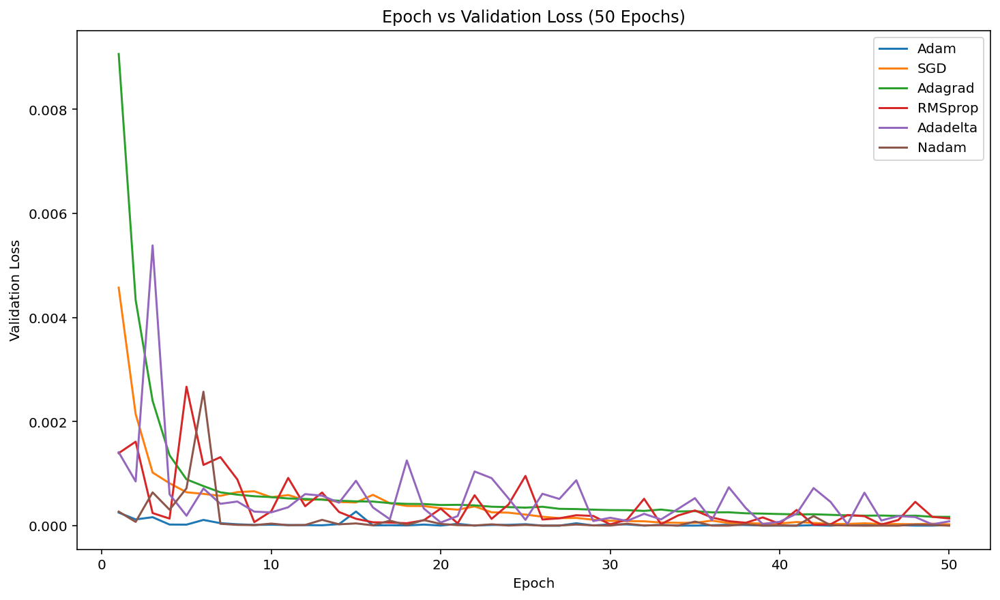

Results with optimizer [Adam] MSE: 1.3382905308390036e-05 MAE: 0.003042664146050811 R2: 0.9997106194496155
Results with optimizer [SGD] MSE: 2.6644342142390087e-05 MAE: 0.00401477562263608 R2: 0.999403178691864
Results with optimizer [Adagrad] MSE: 0.00017044655396603048 MAE: 0.009978671558201313 R2: 0.9963093996047974
Results with optimizer [RMSprop] MSE: 0.00014077956438995898 MAE: 0.011424231342971325 R2: 0.9968966245651245
Results with optimizer [Adadelta] MSE: 8.499389514327049e-05 MAE: 0.008111203089356422 R2: 0.9981622099876404
Results with optimizer [Nadam] MSE: 1.1933001360375783e-06 MAE: 0.0008772717555984855 R2: 0.9999737739562988


In [18]:
# Define the list of epoch amounts to try
epoch_amounts = [50]

# Run through all the amounts
for epochs in epoch_amounts:
    set_epochs = epochs

    losses=[]
    mses=[]
    maes=[]
    r2s=[]
    set_batch_size=16
    
    # Run through all six different optimizers
    for i in range(6):


        # Define the RNN model
        model = Sequential([
            LSTM(units=64, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)),
            Flatten(),
            Dense(64, activation='relu'),
            Dense(1)  # Output layer for regression task
        ])

        if(i==0):
            optimizer_selected = tf.keras.optimizers.Adam(learning_rate=0.001)
        elif(i==1):
            optimizer_selected = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
        elif(i==2):
            optimizer_selected = tf.keras.optimizers.Adagrad(learning_rate=0.01)
        elif(i==3):
            optimizer_selected = tf.keras.optimizers.RMSprop(learning_rate=0.001)
        elif(i==4):
            optimizer_selected = tf.keras.optimizers.Adadelta(learning_rate=1.0)
        elif(i==5):
            optimizer_selected = tf.keras.optimizers.Nadam(learning_rate=0.002)

        # Define R-squared as a custom metric
        def r2(y_true, y_pred):
            SS_res =  K.sum(K.square(y_true - y_pred))
            SS_tot = K.sum(K.square(y_true - K.mean(y_true)))
            return 1 - SS_res/(SS_tot + K.epsilon())

        # Compile the model
        model.compile(optimizer=optimizer_selected, loss='mean_squared_error', metrics=['mse','mae', r2])

        history = model.fit(X_train_reshaped, y_train, epochs=set_epochs, batch_size=set_batch_size, validation_split=0.1)

        # Collect metrics for each epoch batch
        losses.append(history.history['val_loss'])
        mses.append(history.history['val_mse'])
        maes.append(history.history['val_mae'])
        r2s.append(history.history['val_r2'])

    # Plot epoch vs validation loss
    x=range(1, set_epochs + 1)
    plt.figure()
    for j, optimizer in enumerate(['Adam', 'SGD', 'Adagrad', 'RMSprop', 'Adadelta', 'Nadam']):
        plt.plot(x, losses[j], label=optimizer)
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.title('Epoch vs Validation Loss ({} Epochs)'.format(epochs))
    plt.legend()
    plt.show()

    # Print results for each optimizer
    for j, optimizer in enumerate(['Adam', 'SGD', 'Adagrad', 'RMSprop', 'Adadelta', 'Nadam']):
        print("Results with optimizer [{}] MSE: {} MAE: {} R2: {}".format(optimizer, mses[j][-1], maes[j][-1], r2s[j][-1]))

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Testing time: 1.09 seconds


Text(0.5, 1.0, 'RNN: Actual vs Predicted Values')

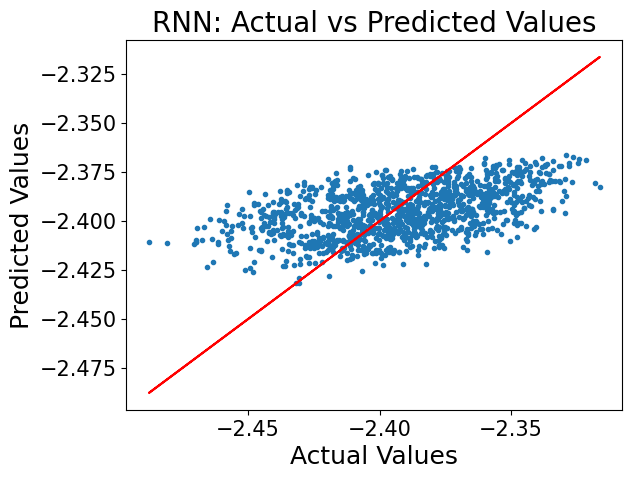

In [14]:
# Import necessary libraries for plotting and timing
import matplotlib.pyplot as plt
import time

# Record start time for testing, find predictions
start_time = time.time()
predictions = model.predict(X_test_scaled)
end_time = time.time()
test_time = end_time - start_time
print(f"Testing time: {test_time:.2f} seconds")

# Plot actual vs. predicted values for model evaluation
fig, ax = plt.subplots()
ax.set_xlabel(r"Actual Values", fontsize=18)
ax.set_ylabel(r"Predicted Values", fontsize=18)
ax.tick_params(axis='x', labelsize=15)
ax.tick_params(axis='y', labelsize=15)
ax.plot(y_test, predictions, '.')
ax.plot(y_test, y_test, color='r')
ax.set_title('RNN: Actual vs Predicted Values', fontsize=20)


In [15]:
!pip install mlxtend

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 24.6 MB/s eta 0:00:00 MB/s eta 0:00:01


## Feature Importance

39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
39/39 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Feature Importance Score:
mass: 0.0003
z: 0.0686
fov: 0.1091
mlt: -0.0062
age: 0.0993
teff: -0.1584
lum: 0.3087


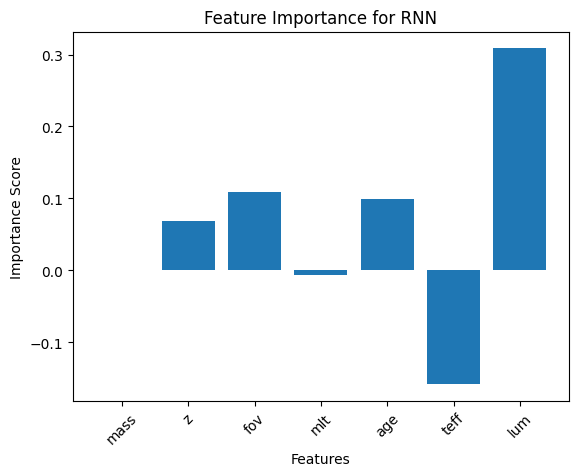

 97/261 [==========>...................] - ETA: 0s

129/261 [=============>................] - ETA: 0s

162/261 [=================>............] - ETA: 0s

192/261 [=====================>........] - ETA: 0s

224/261 [========================>.....] - ETA: 0s

255/261 [============================>.] - ETA: 0s

261/261 [==============================] - 0s 2ms/step


  1/261 [..............................] - ETA: 3s

 32/261 [==>...........................] - ETA: 0s

 65/261 [======>.......................] - ETA: 0s

 98/261 [==========>...................] - ETA: 0s

130/261 [=============>................] - ETA: 0s

162/261 [=================>............] - ETA: 0s

192/261 [=====================>........] - ETA: 0s

215/261 [=======================>......] - ETA: 0s

244/261 [===========================>..] - ETA: 0s

261/261 [==============================] - 0s 2ms/step


  1/261 [..............................] - ETA: 3s

 25/261 [=>............................] - ETA: 0s

 51/261 [====>.........................] - ETA: 0s

 82/261 [========>.....................] - ETA: 0s

110/261 [===========>..................] - ETA: 0s

139/261 [==============>...............] - ETA: 0s

167/261 [==================>...........] - ETA: 0s

194/261 [=====================>........] - ETA: 0s

223/261 [========================>.....] - ETA: 0s

254/261 [============================>.] - ETA: 0s

261/261 [==============================] - 0s 2ms/step


  1/261 [..............................] - ETA: 3s

 31/261 [==>...........................] - ETA: 0s

 63/261 [======>.......................] - ETA: 0s

 95/261 [=========>....................] - ETA: 0s

124/261 [=============>................] - ETA: 0s

153/261 [================>.............] - ETA: 0s

182/261 [===================>..........] - ETA: 0s

214/261 [=======================>......] - ETA: 0s

246/261 [===========================>..] - ETA: 0s

261/261 [==============================] - 0s 2ms/step


  1/261 [..............................] - ETA: 3s

 33/261 [==>...........................] - ETA: 0s

 64/261 [======>.......................] - ETA: 0s

 98/261 [==========>...................] - ETA: 0s

130/261 [=============>................] - ETA: 0s

163/261 [=================>............] - ETA: 0s

195/261 [=====================>........] - ETA: 0s

227/261 [=========================>....] - ETA: 0s

259/261 [============================>.] - ETA: 0s

261/261 [==============================] - 0s 2ms/step


Feature 'mass': Importance Score = 0.00015112136813684798
Feature 'z': Importance Score = 0.00016687439221462408
Feature 'fov': Importance Score = 0.00018666883093096625
Feature 'mlt': Importance Score = 1.0118288203541694e-05
Feature 'age': Importance Score = 0.0032847497721010138
Feature 'teff': Importance Score = 0.02307338112569278
Feature 'lum': Importance Score = 0.024562458454671428


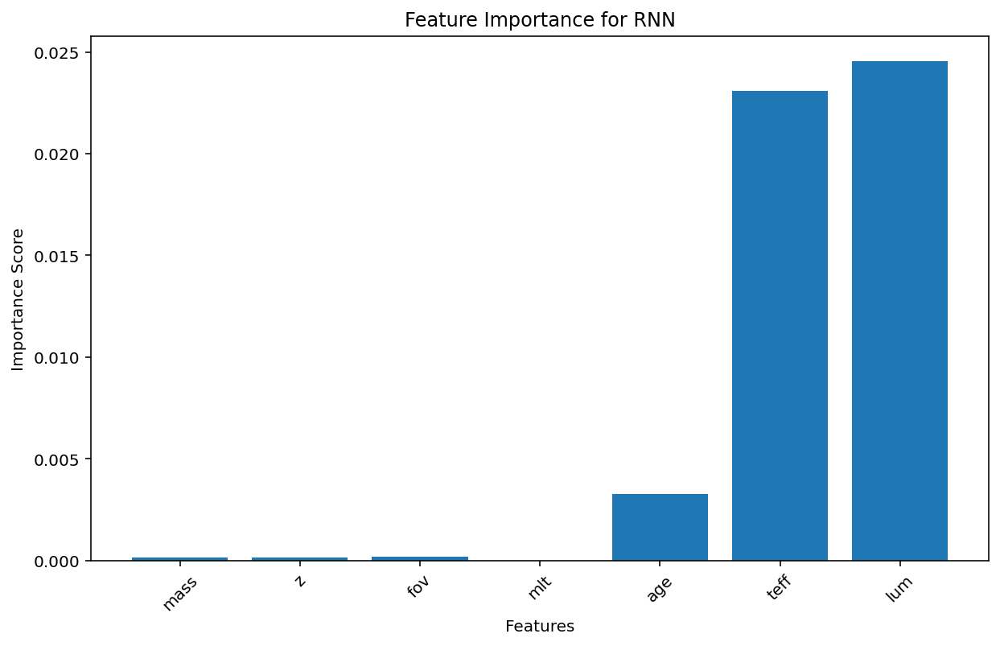

In [15]:
# Import necessary libraries for plotting and permutation feature importance
import matplotlib.pyplot as plt2
from mlxtend.evaluate import feature_importance_permutation

# Define a prediction function that flattens the model's output to a 1D array
def model_predict(X):
    return model.predict(X).flatten()

# Calculate permutation feature importance
imp_vals, imp_all = feature_importance_permutation(
    predict_method=model_predict, 
    X=X_test_scaled,  
    y=y_test,  
    metric='r2', 
    num_rounds=1,
    seed=1 
)

# Define feature names for display
feature_names = ['mass', 'z', 'fov', 'mlt', 'age', 'teff', 'lum']

# Print the calculated feature importance scores
print("Feature Importance Score:")
for feature, importance in zip(feature_names, imp_vals):
    print(f'{feature}: {importance:.4f}')

# Plot feature importance as a bar chart
plt2.bar(feature_names, imp_vals)
plt2.xlabel('Features')  
plt2.ylabel('Importance Score') 
plt2.title('Feature Importance for RNN') 
plt2.xticks(rotation=45)  
plt2.show() 



## SHAP

In [1]:
# Install SHAP library
!pip install shap
import shap

/home/research2/miniconda3/envs/mlexp/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


ExactExplainer explainer: 1001it [01:37,  9.58it/s]                                                                                                 


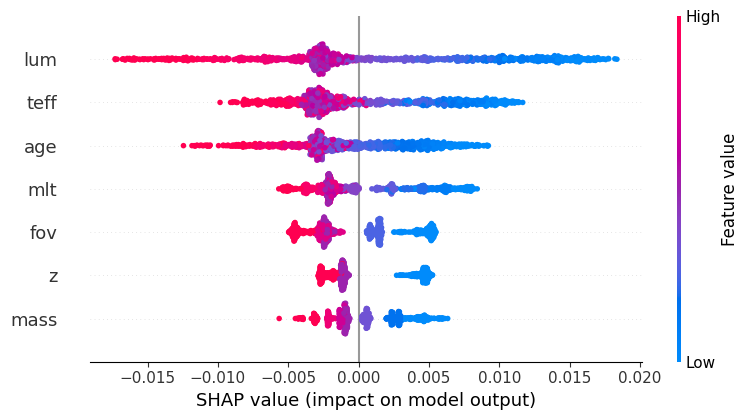

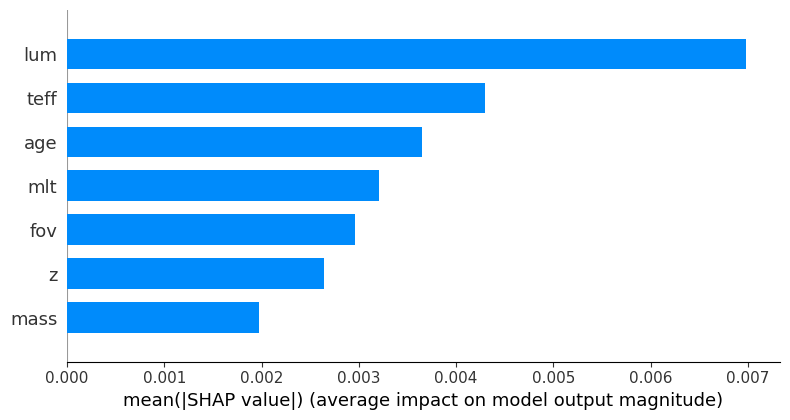

In [18]:
#===============================================================================
X_train_sample=pd.DataFrame(X_train_scaled).sample(n=1000, random_state=41).to_numpy()
X_test_sample=pd.DataFrame(X_test_scaled).sample(n=1000, random_state=45).to_numpy()
#===============================================================================

# Create a SHAP explainer
explainer = shap.Explainer(model, X_train_sample)

# Get SHAP values for a subset of the test set
shap_values = explainer(X_test_sample)

# Plot feature importance bar chart
shap.summary_plot(shap_values, X_test_sample, feature_names=['mass', 'z', 'fov', 'mlt', 'age', 'teff', 'lum'])
shap.summary_plot(shap_values, X_test_sample, feature_names=['mass', 'z', 'fov', 'mlt', 'age', 'teff', 'lum'], plot_type="bar")


## Pickling ###

import pickle

with open('RNN_model.pkl', 'wb') as model_file, open('RNN_scaler.pkl', 'wb') as scaler_file:
    pickle.dump(model, model_file)
    pickle.dump(scaler, scaler_file)


from keras.utils import register_keras_serializable

# Register the r2 function so Keras can find it during unpickling
@register_keras_serializable()
def r2(y_true, y_pred):
    # Your R2 metric implementation
    pass

In [10]:
# Import utility for registering custom Keras functions
from keras.utils import register_keras_serializable

# Register a custom metric function with Keras
@register_keras_serializable()
def r2(y_true, y_pred):
    pass

# Save the model as an HDF5 file
model.save('RNN_model.h5') 


## Implement SHAP on a smaller scale

Epoch 1/20


/home/research2/miniconda3/envs/mlexp/lib/python3.12/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1160/1160 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - loss: 0.2874 - val_loss: 9.5690e-05
Epoch 2/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 1.8769e-04 - val_loss: 8.9962e-04
Epoch 3/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 3.4739e-04 - val_loss: 0.0011
Epoch 4/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 3.9196e-04 - val_loss: 6.7245e-04
Epoch 5/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 3.7777e-04 - val_loss: 5.0217e-05
Epoch 6/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 2.7584e-04 - val_loss: 6.4550e-05
Epoch 7/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 1.9851e-04 - val_loss: 5.2991e-05
Epoch 8/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 1.6779e-04 - val_loss: 1.7722e-05
Epoch 9/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 1.4350e-04 - val_loss: 5.5509e-05
Epoch 10/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - loss: 1.4361e-04 - val_loss: 1.0669e-04
Epoch 11/20
1160/1160 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - 

ExactExplainer explainer: 1001it [01:57,  7.75it/s]                             


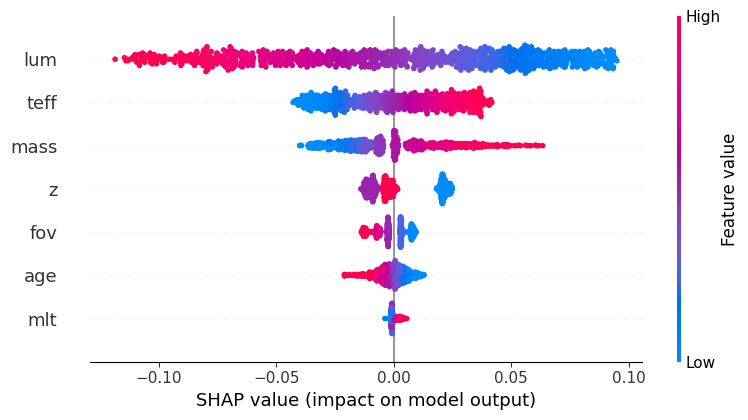

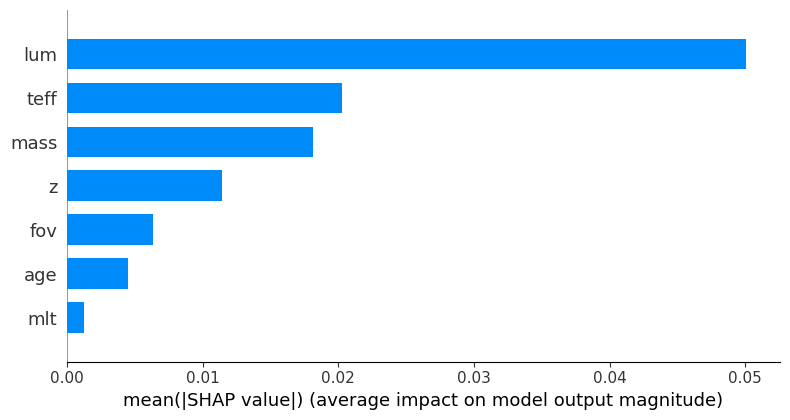

In [4]:
# Import necessary libraries for data handling, modeling, and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Import libraries for data preprocessing and model creation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.layers import Reshape, LSTM, Dense
import tensorflow as tf
from sklearn.metrics import r2_score
import tensorflow.keras.backend as K

# Install SHAP library for explainability
!pip install shap
import shap

# Load the dataset
df = pd.read_csv('spica_lum_teff_box_2sigma_age_ge_1e6.csv')
# Alternatively, load a different dataset if needed
# df = pd.read_csv('spica_lum_teff_box_age_ge_1e6.csv')

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df[['mass', 'z','fov','mlt', 'age', 'teff', 'lum']], df['log_k'], test_size=0.2, random_state=123)

# Scale the features for better model performance
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)  # Scale training data
X_test_scaled = scaler.transform(X_test)  # Scale testing data

# Reshape the data to add an extra dimension for Conv1D input compatibility
X_train_reshaped = X_train_scaled.reshape(-1, X_train_scaled.shape[1], 1)
X_test_reshaped = X_test_scaled.reshape(-1, X_test_scaled.shape[1], 1)

# Define the RNN model with LSTM and Dense layers
model = Sequential([
    LSTM(units=64, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)),
    Flatten(),  # Flatten layer
    Dense(64, activation='relu'), 
    Dense(1) 
])

# Set optimizer with specified learning rate
optimizer_selected = tf.keras.optimizers.Nadam(learning_rate=0.002)

# Compile the model with MSE loss
model.compile(optimizer=optimizer_selected, loss='mean_squared_error')

# Train the model
model.fit(X_train_reshaped, y_train, epochs=20, batch_size=16, validation_split=0.1)

# ===============================================================================
# Select random samples from scaled training and testing data for SHAP analysis
X_train_sample = pd.DataFrame(X_train_scaled).sample(n=1000, random_state=41).to_numpy()
X_test_sample = pd.DataFrame(X_test_scaled).sample(n=1000, random_state=45).to_numpy()
# ===============================================================================

# Create a SHAP explainer object
explainer = shap.Explainer(model, X_train_sample)

# Calculate SHAP values for a subset of the test data
shap_values = explainer(X_test_sample)

# Plot SHAP feature importance as a summary plot
shap.summary_plot(shap_values, X_test_sample, feature_names=['mass', 'z', 'fov', 'mlt', 'age', 'teff', 'lum'])
# Plot SHAP feature importance as a bar chart
shap.summary_plot(shap_values, X_test_sample, feature_names=['mass', 'z', 'fov', 'mlt', 'age', 'teff', 'lum'], plot_type="bar")
